In [1]:
import os
data_dir = 'C:\Boyuan\Machine Learning\Datasets\jena_climate_2009_2016'
fname = os.path.join(data_dir, 'jena_climate_2009_2016.csv')

f = open(fname)
data = f.read()
f.close()

lines = data.split('\n')
header = lines[0].split(',')
lines = lines[1:]

print(header)
print(len(lines))

['"Date Time"', '"p (mbar)"', '"T (degC)"', '"Tpot (K)"', '"Tdew (degC)"', '"rh (%)"', '"VPmax (mbar)"', '"VPact (mbar)"', '"VPdef (mbar)"', '"sh (g/kg)"', '"H2OC (mmol/mol)"', '"rho (g/m**3)"', '"wv (m/s)"', '"max. wv (m/s)"', '"wd (deg)"']
420551


In [2]:
import numpy as np

float_data = np.zeros((len(lines), len(header) - 1))
for i, line in enumerate(lines):
    values = [float(x) for x in line.split(',')[1:]]
    float_data[i, :] = values

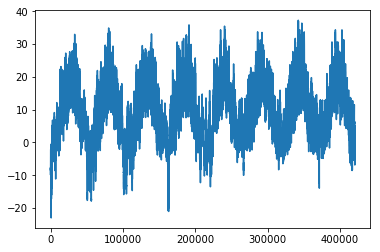

In [3]:
%matplotlib inline
from matplotlib import pyplot as plt

temp = float_data[:, 1]
plt.plot(range(len(temp)), temp)

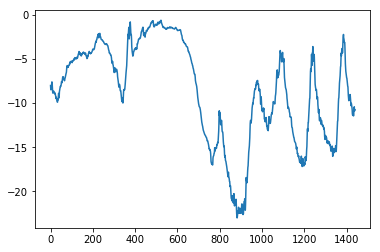

In [4]:
plt.plot(range(1440), temp[:1440])

In [4]:
mean = float_data[:200000].mean(axis=0)
float_data -= mean
std = float_data[:200000].std(axis=0)
float_data /= std

In [5]:
mean

array([  988.88635885,     9.07734895,   283.14631345,     4.44854725,
          75.35405895,    13.3829553 ,     9.29695535,     4.08591725,
           5.8752111 ,     9.40521005,  1217.51429655,     2.1510037 ,
           3.56950915,   176.21703355])

In [6]:
std

array([  8.48043388,   8.85249908,   8.95324185,   7.16584991,
        16.72731652,   7.68914559,   4.19808168,   4.84034436,
         2.66564926,   4.25206364,  42.48884277,   1.53666449,
         2.33067298,  86.61322998])

In [64]:
def generator(data, lookback, delay, min_index, max_index,
              shuffle=False, batch_size=128, step=6):
    if max_index is None:
        max_index = len(data) - delay -1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)
        
        samples = np.zeros((len(rows), lookback // step, data.shape[-1]))
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):
            indices = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices]
            targets[j] = data[rows[j] + delay][1]
        yield samples, targets

In [65]:
lookback = 1440
step = 6
delay = 144
batch_size = 128

train_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=True,
                      step=step,
                      batch_size=batch_size)
val_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    shuffle=True,
                    step=step,
                    batch_size=batch_size)
test_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=300001,
                    max_index=None,
                    shuffle=True,
                    step=step,
                    batch_size=batch_size)
train_sqn = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
val_sqn = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    shuffle=False,
                    step=step,
                    batch_size=batch_size)
test_sqn = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=300001,
                    max_index=None,
                    shuffle=False,
                    step=step,
                    batch_size=batch_size)

val_steps = (300000 - 200001 - lookback)

test_steps = (len(float_data) - 300001 - lookback)

In [1]:
def evaluate_naive_method():
    batch_maes = []
    for step in range(val_steps):
        samples, targets = next(val_gen)
        preds = samples[:, -1, 1]
        mae = np.mean(np.abs(preds - targets))
        batch_maes.append(mae)
    print(np.mean(batch_maes))

evaluate_naive_method()

NameError: name 'val_steps' is not defined

In [ ]:
celsius_mae = 0.29 * std[1]

In [11]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Flatten(input_shape=(lookback//step, float_data.shape[-1])))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen, steps_per_epoch=500, epochs=20,
                              #validation_data=val_gen, validation_steps=val_steps
                             )

Epoch 1/20


  1/500 [..............................] - ETA: 2:46 - loss: 1.3124

  6/500 [..............................] - ETA: 32s - loss: 4.9065 

 12/500 [..............................] - ETA: 18s - loss: 4.2692

 17/500 [>.............................] - ETA: 14s - loss: 3.8801

 22/500 [>.............................] - ETA: 12s - loss: 3.6697

 25/500 [>.............................] - ETA: 11s - loss: 3.5304

 29/500 [>.............................] - ETA: 10s - loss: 3.3821

 34/500 [=>............................] - ETA: 9s - loss: 3.2369 

 38/500 [=>............................] - ETA: 9s - loss: 3.1105

 41/500 [=>............................] - ETA: 9s - loss: 3.0454

 45/500 [=>............................] - ETA: 9s - loss: 2.9877

 48/500 [=>............................] - ETA: 8s - loss: 2.9549

 52/500 [==>...........................] - ETA: 8s - loss: 2.8801

 57/500 [==>...........................] - ETA: 8s - loss: 2.8021

 62/500 [==>...........................] - ETA: 7s - loss: 2.7368

 65/500 [==>...........................] - ETA: 7s - loss: 2.7079

 69/500 [===>..........................] - ETA: 7s - loss: 2.6585

 73/500 [===>..........................] - ETA: 7s - loss: 2.6246

 77/500 [===>..........................] - ETA: 7s - loss: 2.5893

 81/500 [===>..........................] - ETA: 7s - loss: 2.5558

 85/500 [====>.........................] - ETA: 7s - loss: 2.5171



 88/500 [====>.........................] - ETA: 7s - loss: 2.4970

 93/500 [====>.........................] - ETA: 7s - loss: 2.4588

 97/500 [====>.........................] - ETA: 6s - loss: 2.4247

100/500 [=====>........................] - ETA: 6s - loss: 2.4026

104/500 [=====>........................] - ETA: 6s - loss: 2.3789

107/500 [=====>........................] - ETA: 6s - loss: 2.3572

110/500 [=====>........................] - ETA: 6s - loss: 2.3453

113/500 [=====>........................] - ETA: 6s - loss: 2.3313

118/500 [======>.......................] - ETA: 6s - loss: 2.3031

122/500 [======>.......................] - ETA: 6s - loss: 2.2814

125/500 [======>.......................] - ETA: 6s - loss: 2.2623

129/500 [======>.......................] - ETA: 6s - loss: 2.2454

132/500 [======>.......................] - ETA: 6s - loss: 2.2344

136/500 [=======>......................] - ETA: 6s - loss: 2.2118

140/500 [=======>......................] - ETA: 5s - loss: 2.1989

144/500 [=======>......................] - ETA: 5s - loss: 2.1815



147/500 [=======>......................] - ETA: 5s - loss: 2.1655

152/500 [========>.....................] - ETA: 5s - loss: 2.1436

155/500 [========>.....................] - ETA: 5s - loss: 2.1296

159/500 [========>.....................] - ETA: 5s - loss: 2.1135

163/500 [========>.....................] - ETA: 5s - loss: 2.0996

167/500 [=========>....................] - ETA: 5s - loss: 2.0853

170/500 [=========>....................] - ETA: 5s - loss: 2.0770

174/500 [=========>....................] - ETA: 5s - loss: 2.0627

179/500 [=========>....................] - ETA: 5s - loss: 2.0438

184/500 [==========>...................] - ETA: 5s - loss: 2.0307

188/500 [==========>...................] - ETA: 4s - loss: 2.0162

191/500 [==========>...................] - ETA: 4s - loss: 2.0093

195/500 [==========>...................] - ETA: 4s - loss: 1.9975

199/500 [==========>...................] - ETA: 4s - loss: 1.9837

203/500 [===========>..................] - ETA: 4s - loss: 1.9698

208/500 [===========>..................] - ETA: 4s - loss: 1.9566

211/500 [===========>..................] - ETA: 4s - loss: 1.9489

215/500 [===========>..................] - ETA: 4s - loss: 1.9345

220/500 [============>.................] - ETA: 4s - loss: 1.9224

224/500 [============>.................] - ETA: 4s - loss: 1.9100

229/500 [============>.................] - ETA: 4s - loss: 1.8969

233/500 [============>.................] - ETA: 4s - loss: 1.8880

237/500 [=============>................] - ETA: 4s - loss: 1.8759

241/500 [=============>................] - ETA: 4s - loss: 1.8653

245/500 [=============>................] - ETA: 3s - loss: 1.8544

249/500 [=============>................] - ETA: 3s - loss: 1.8458

252/500 [==============>...............] - ETA: 3s - loss: 1.8362

256/500 [==============>...............] - ETA: 3s - loss: 1.8258

260/500 [==============>...............] - ETA: 3s - loss: 1.8174

264/500 [==============>...............] - ETA: 3s - loss: 1.8096

268/500 [===============>..............] - ETA: 3s - loss: 1.7979

272/500 [===============>..............] - ETA: 3s - loss: 1.7862

276/500 [===============>..............] - ETA: 3s - loss: 1.7777

280/500 [===============>..............] - ETA: 3s - loss: 1.7704

284/500 [================>.............] - ETA: 3s - loss: 1.7608

287/500 [================>.............] - ETA: 3s - loss: 1.7536

291/500 [================>.............] - ETA: 3s - loss: 1.7450

294/500 [================>.............] - ETA: 3s - loss: 1.7383

298/500 [================>.............] - ETA: 3s - loss: 1.7309

302/500 [=================>............] - ETA: 3s - loss: 1.7223

306/500 [=================>............] - ETA: 3s - loss: 1.7155

310/500 [=================>............] - ETA: 2s - loss: 1.7045

314/500 [=================>............] - ETA: 2s - loss: 1.6971

318/500 [==================>...........] - ETA: 2s - loss: 1.6884

321/500 [==================>...........] - ETA: 2s - loss: 1.6820

325/500 [==================>...........] - ETA: 2s - loss: 1.6742

329/500 [==================>...........] - ETA: 2s - loss: 1.6668

334/500 [===================>..........] - ETA: 2s - loss: 1.6573

338/500 [===================>..........] - ETA: 2s - loss: 1.6490

341/500 [===================>..........] - ETA: 2s - loss: 1.6439

345/500 [===================>..........] - ETA: 2s - loss: 1.6378

349/500 [===================>..........] - ETA: 2s - loss: 1.6293

352/500 [====================>.........] - ETA: 2s - loss: 1.6230

357/500 [====================>.........] - ETA: 2s - loss: 1.6148

360/500 [====================>.........] - ETA: 2s - loss: 1.6095

364/500 [====================>.........] - ETA: 2s - loss: 1.6015

368/500 [=====================>........] - ETA: 2s - loss: 1.5945

372/500 [=====================>........] - ETA: 1s - loss: 1.5875

376/500 [=====================>........] - ETA: 1s - loss: 1.5812

380/500 [=====================>........] - ETA: 1s - loss: 1.5744

384/500 [======================>.......] - ETA: 1s - loss: 1.5671

388/500 [======================>.......] - ETA: 1s - loss: 1.5596

392/500 [======================>.......] - ETA: 1s - loss: 1.5526

397/500 [======================>.......] - ETA: 1s - loss: 1.5446

401/500 [=======================>......] - ETA: 1s - loss: 1.5378

405/500 [=======================>......] - ETA: 1s - loss: 1.5314

409/500 [=======================>......] - ETA: 1s - loss: 1.5237

413/500 [=======================>......] - ETA: 1s - loss: 1.5178

417/500 [========================>.....] - ETA: 1s - loss: 1.5115

421/500 [========================>.....] - ETA: 1s - loss: 1.5041

424/500 [========================>.....] - ETA: 1s - loss: 1.5006

427/500 [========================>.....] - ETA: 1s - loss: 1.4958

431/500 [========================>.....] - ETA: 1s - loss: 1.4893

435/500 [=========================>....] - ETA: 0s - loss: 1.4843

438/500 [=========================>....] - ETA: 0s - loss: 1.4788

442/500 [=========================>....] - ETA: 0s - loss: 1.4727

446/500 [=========================>....] - ETA: 0s - loss: 1.4662

450/500 [==========================>...] - ETA: 0s - loss: 1.4606

454/500 [==========================>...] - ETA: 0s - loss: 1.4554

457/500 [==========================>...] - ETA: 0s - loss: 1.4501

461/500 [==========================>...] - ETA: 0s - loss: 1.4448

465/500 [==========================>...] - ETA: 0s - loss: 1.4391

469/500 [===========================>..] - ETA: 0s - loss: 1.4331



473/500 [===========================>..] - ETA: 0s - loss: 1.4283



476/500 [===========================>..] - ETA: 0s - loss: 1.4241

478/500 [===========================>..] - ETA: 0s - loss: 1.4212

481/500 [===========================>..] - ETA: 0s - loss: 1.4174

484/500 [============================>.] - ETA: 0s - loss: 1.4131

488/500 [============================>.] - ETA: 0s - loss: 1.4077

492/500 [============================>.] - ETA: 0s - loss: 1.4026

495/500 [============================>.] - ETA: 0s - loss: 1.3985

499/500 [============================>.] - ETA: 0s - loss: 1.3929

500/500 [==============================] - 8s 15ms/step - loss: 1.3914


Epoch 2/20


  1/500 [..............................] - ETA: 13s - loss: 0.7075

  4/500 [..............................] - ETA: 10s - loss: 0.7200

  7/500 [..............................] - ETA: 9s - loss: 0.7470 

 11/500 [..............................] - ETA: 8s - loss: 0.7179

 15/500 [..............................] - ETA: 8s - loss: 0.7180

 19/500 [>.............................] - ETA: 7s - loss: 0.7137

 23/500 [>.............................] - ETA: 7s - loss: 0.7106

 27/500 [>.............................] - ETA: 7s - loss: 0.7093

 31/500 [>.............................] - ETA: 7s - loss: 0.7001

 34/500 [=>............................] - ETA: 7s - loss: 0.6946

 38/500 [=>............................] - ETA: 7s - loss: 0.6932

 42/500 [=>............................] - ETA: 7s - loss: 0.6949

 46/500 [=>............................] - ETA: 7s - loss: 0.6905

 49/500 [=>............................] - ETA: 7s - loss: 0.6882

 53/500 [==>...........................] - ETA: 6s - loss: 0.6862

 56/500 [==>...........................] - ETA: 6s - loss: 0.6875

 60/500 [==>...........................] - ETA: 6s - loss: 0.6824

 63/500 [==>...........................] - ETA: 6s - loss: 0.6801

 67/500 [===>..........................] - ETA: 6s - loss: 0.6713

 71/500 [===>..........................] - ETA: 6s - loss: 0.6734

 75/500 [===>..........................] - ETA: 6s - loss: 0.6687

 79/500 [===>..........................] - ETA: 6s - loss: 0.6656

 83/500 [===>..........................] - ETA: 6s - loss: 0.6623

 86/500 [====>.........................] - ETA: 6s - loss: 0.6574

 91/500 [====>.........................] - ETA: 6s - loss: 0.6492



 95/500 [====>.........................] - ETA: 6s - loss: 0.6500

 98/500 [====>.........................] - ETA: 6s - loss: 0.6518

102/500 [=====>........................] - ETA: 6s - loss: 0.6499

106/500 [=====>........................] - ETA: 6s - loss: 0.6460

109/500 [=====>........................] - ETA: 6s - loss: 0.6456

113/500 [=====>........................] - ETA: 6s - loss: 0.6454

118/500 [======>.......................] - ETA: 6s - loss: 0.6404

122/500 [======>.......................] - ETA: 6s - loss: 0.6376



126/500 [======>.......................] - ETA: 5s - loss: 0.6350

130/500 [======>.......................] - ETA: 5s - loss: 0.6301

134/500 [=======>......................] - ETA: 5s - loss: 0.6323

138/500 [=======>......................] - ETA: 5s - loss: 0.6299

142/500 [=======>......................] - ETA: 5s - loss: 0.6251

146/500 [=======>......................] - ETA: 5s - loss: 0.6226

150/500 [========>.....................] - ETA: 5s - loss: 0.6204

152/500 [========>.....................] - ETA: 5s - loss: 0.6184

155/500 [========>.....................] - ETA: 5s - loss: 0.6171

159/500 [========>.....................] - ETA: 5s - loss: 0.6149

164/500 [========>.....................] - ETA: 5s - loss: 0.6122

168/500 [=========>....................] - ETA: 5s - loss: 0.6100

172/500 [=========>....................] - ETA: 5s - loss: 0.6080

174/500 [=========>....................] - ETA: 5s - loss: 0.6070

176/500 [=========>....................] - ETA: 5s - loss: 0.6069

180/500 [=========>....................] - ETA: 5s - loss: 0.6050

184/500 [==========>...................] - ETA: 5s - loss: 0.6035

188/500 [==========>...................] - ETA: 5s - loss: 0.6015

192/500 [==========>...................] - ETA: 4s - loss: 0.5994

196/500 [==========>...................] - ETA: 4s - loss: 0.5972

200/500 [===========>..................] - ETA: 4s - loss: 0.5944

204/500 [===========>..................] - ETA: 4s - loss: 0.5913

208/500 [===========>..................] - ETA: 4s - loss: 0.5891

213/500 [===========>..................] - ETA: 4s - loss: 0.5864

217/500 [============>.................] - ETA: 4s - loss: 0.5835

220/500 [============>.................] - ETA: 4s - loss: 0.5843

224/500 [============>.................] - ETA: 4s - loss: 0.5826

228/500 [============>.................] - ETA: 4s - loss: 0.5796

232/500 [============>.................] - ETA: 4s - loss: 0.5788

235/500 [=============>................] - ETA: 4s - loss: 0.5774

239/500 [=============>................] - ETA: 4s - loss: 0.5755

242/500 [=============>................] - ETA: 4s - loss: 0.5739

244/500 [=============>................] - ETA: 4s - loss: 0.5738

247/500 [=============>................] - ETA: 4s - loss: 0.5728

251/500 [==============>...............] - ETA: 3s - loss: 0.5705

255/500 [==============>...............] - ETA: 3s - loss: 0.5683



259/500 [==============>...............] - ETA: 3s - loss: 0.5671

263/500 [==============>...............] - ETA: 3s - loss: 0.5643

267/500 [===============>..............] - ETA: 3s - loss: 0.5625

271/500 [===============>..............] - ETA: 3s - loss: 0.5610

273/500 [===============>..............] - ETA: 3s - loss: 0.5608

277/500 [===============>..............] - ETA: 3s - loss: 0.5582

281/500 [===============>..............] - ETA: 3s - loss: 0.5563

285/500 [================>.............] - ETA: 3s - loss: 0.5549

289/500 [================>.............] - ETA: 3s - loss: 0.5532

292/500 [================>.............] - ETA: 3s - loss: 0.5520

295/500 [================>.............] - ETA: 3s - loss: 0.5509

298/500 [================>.............] - ETA: 3s - loss: 0.5493

302/500 [=================>............] - ETA: 3s - loss: 0.5469

307/500 [=================>............] - ETA: 3s - loss: 0.5453

311/500 [=================>............] - ETA: 2s - loss: 0.5445

315/500 [=================>............] - ETA: 2s - loss: 0.5436

319/500 [==================>...........] - ETA: 2s - loss: 0.5423

323/500 [==================>...........] - ETA: 2s - loss: 0.5405

327/500 [==================>...........] - ETA: 2s - loss: 0.5385

330/500 [==================>...........] - ETA: 2s - loss: 0.5374

334/500 [===================>..........] - ETA: 2s - loss: 0.5363

338/500 [===================>..........] - ETA: 2s - loss: 0.5350

342/500 [===================>..........] - ETA: 2s - loss: 0.5337

347/500 [===================>..........] - ETA: 2s - loss: 0.5318

351/500 [====================>.........] - ETA: 2s - loss: 0.5304

354/500 [====================>.........] - ETA: 2s - loss: 0.5288

358/500 [====================>.........] - ETA: 2s - loss: 0.5266

361/500 [====================>.........] - ETA: 2s - loss: 0.5258

365/500 [====================>.........] - ETA: 2s - loss: 0.5243

370/500 [=====================>........] - ETA: 2s - loss: 0.5227

375/500 [=====================>........] - ETA: 1s - loss: 0.5202

379/500 [=====================>........] - ETA: 1s - loss: 0.5193

382/500 [=====================>........] - ETA: 1s - loss: 0.5185

386/500 [======================>.......] - ETA: 1s - loss: 0.5166

391/500 [======================>.......] - ETA: 1s - loss: 0.5151

395/500 [======================>.......] - ETA: 1s - loss: 0.5140

400/500 [=======================>......] - ETA: 1s - loss: 0.5120

403/500 [=======================>......] - ETA: 1s - loss: 0.5109

408/500 [=======================>......] - ETA: 1s - loss: 0.5091

413/500 [=======================>......] - ETA: 1s - loss: 0.5078

417/500 [========================>.....] - ETA: 1s - loss: 0.5066

421/500 [========================>.....] - ETA: 1s - loss: 0.5049

425/500 [========================>.....] - ETA: 1s - loss: 0.5037

429/500 [========================>.....] - ETA: 1s - loss: 0.5025

433/500 [========================>.....] - ETA: 1s - loss: 0.5007

437/500 [=========================>....] - ETA: 0s - loss: 0.5001

441/500 [=========================>....] - ETA: 0s - loss: 0.4992

444/500 [=========================>....] - ETA: 0s - loss: 0.4979

448/500 [=========================>....] - ETA: 0s - loss: 0.4965

452/500 [==========================>...] - ETA: 0s - loss: 0.4957

456/500 [==========================>...] - ETA: 0s - loss: 0.4946

461/500 [==========================>...] - ETA: 0s - loss: 0.4930

464/500 [==========================>...] - ETA: 0s - loss: 0.4921

469/500 [===========================>..] - ETA: 0s - loss: 0.4903

474/500 [===========================>..] - ETA: 0s - loss: 0.4890

479/500 [===========================>..] - ETA: 0s - loss: 0.4871

484/500 [============================>.] - ETA: 0s - loss: 0.4861

489/500 [============================>.] - ETA: 0s - loss: 0.4842

494/500 [============================>.] - ETA: 0s - loss: 0.4827

499/500 [============================>.] - ETA: 0s - loss: 0.4814

500/500 [==============================] - 8s 15ms/step - loss: 0.4811


Epoch 3/20
  1/500 [..............................] - ETA: 6s - loss: 0.2856

  4/500 [..............................] - ETA: 10s - loss: 0.2955

  9/500 [..............................] - ETA: 7s - loss: 0.3442 



 14/500 [..............................] - ETA: 6s - loss: 0.3306

 20/500 [>.............................] - ETA: 6s - loss: 0.3222

 25/500 [>.............................] - ETA: 5s - loss: 0.3237

 30/500 [>.............................] - ETA: 5s - loss: 0.3219

 35/500 [=>............................] - ETA: 5s - loss: 0.3364

 40/500 [=>............................] - ETA: 5s - loss: 0.3310

 46/500 [=>............................] - ETA: 5s - loss: 0.3330

 51/500 [==>...........................] - ETA: 5s - loss: 0.3312

 57/500 [==>...........................] - ETA: 5s - loss: 0.3307

 62/500 [==>...........................] - ETA: 5s - loss: 0.3303

 66/500 [==>...........................] - ETA: 5s - loss: 0.3284

 71/500 [===>..........................] - ETA: 4s - loss: 0.3277

 76/500 [===>..........................] - ETA: 4s - loss: 0.3266

 81/500 [===>..........................] - ETA: 4s - loss: 0.3264

 86/500 [====>.........................] - ETA: 4s - loss: 0.3261

 91/500 [====>.........................] - ETA: 4s - loss: 0.3264



 95/500 [====>.........................] - ETA: 4s - loss: 0.3260

 99/500 [====>.........................] - ETA: 4s - loss: 0.3272

104/500 [=====>........................] - ETA: 4s - loss: 0.3263

109/500 [=====>........................] - ETA: 4s - loss: 0.3264

114/500 [=====>........................] - ETA: 4s - loss: 0.3252

119/500 [======>.......................] - ETA: 4s - loss: 0.3236

125/500 [======>.......................] - ETA: 4s - loss: 0.3231

129/500 [======>.......................] - ETA: 4s - loss: 0.3220

132/500 [======>.......................] - ETA: 4s - loss: 0.3218

137/500 [=======>......................] - ETA: 4s - loss: 0.3208

142/500 [=======>......................] - ETA: 4s - loss: 0.3201

147/500 [=======>......................] - ETA: 4s - loss: 0.3206

152/500 [========>.....................] - ETA: 4s - loss: 0.3215

157/500 [========>.....................] - ETA: 3s - loss: 0.3212

161/500 [========>.....................] - ETA: 3s - loss: 0.3205

166/500 [========>.....................] - ETA: 3s - loss: 0.3202

172/500 [=========>....................] - ETA: 3s - loss: 0.3193

178/500 [=========>....................] - ETA: 3s - loss: 0.3186

183/500 [=========>....................] - ETA: 3s - loss: 0.3177

188/500 [==========>...................] - ETA: 3s - loss: 0.3173

192/500 [==========>...................] - ETA: 3s - loss: 0.3171

197/500 [==========>...................] - ETA: 3s - loss: 0.3159

202/500 [===========>..................] - ETA: 3s - loss: 0.3164

207/500 [===========>..................] - ETA: 3s - loss: 0.3155

212/500 [===========>..................] - ETA: 3s - loss: 0.3152

217/500 [============>.................] - ETA: 3s - loss: 0.3149

222/500 [============>.................] - ETA: 3s - loss: 0.3145

227/500 [============>.................] - ETA: 3s - loss: 0.3144

231/500 [============>.................] - ETA: 3s - loss: 0.3137

235/500 [=============>................] - ETA: 3s - loss: 0.3131

238/500 [=============>................] - ETA: 3s - loss: 0.3128

241/500 [=============>................] - ETA: 3s - loss: 0.3124

245/500 [=============>................] - ETA: 2s - loss: 0.3119

248/500 [=============>................] - ETA: 2s - loss: 0.3115

252/500 [==============>...............] - ETA: 2s - loss: 0.3116

255/500 [==============>...............] - ETA: 2s - loss: 0.3113

258/500 [==============>...............] - ETA: 2s - loss: 0.3116

262/500 [==============>...............] - ETA: 2s - loss: 0.3110

266/500 [==============>...............] - ETA: 2s - loss: 0.3106

270/500 [===============>..............] - ETA: 2s - loss: 0.3103

273/500 [===============>..............] - ETA: 2s - loss: 0.3099

277/500 [===============>..............] - ETA: 2s - loss: 0.3095

281/500 [===============>..............] - ETA: 2s - loss: 0.3089

285/500 [================>.............] - ETA: 2s - loss: 0.3089

289/500 [================>.............] - ETA: 2s - loss: 0.3091

292/500 [================>.............] - ETA: 2s - loss: 0.3091

296/500 [================>.............] - ETA: 2s - loss: 0.3084

299/500 [================>.............] - ETA: 2s - loss: 0.3085

303/500 [=================>............] - ETA: 2s - loss: 0.3082

307/500 [=================>............] - ETA: 2s - loss: 0.3079

311/500 [=================>............] - ETA: 2s - loss: 0.3076

315/500 [=================>............] - ETA: 2s - loss: 0.3072

320/500 [==================>...........] - ETA: 2s - loss: 0.3066

324/500 [==================>...........] - ETA: 2s - loss: 0.3069

329/500 [==================>...........] - ETA: 2s - loss: 0.3065

334/500 [===================>..........] - ETA: 2s - loss: 0.3061



339/500 [===================>..........] - ETA: 2s - loss: 0.3056

344/500 [===================>..........] - ETA: 1s - loss: 0.3052

349/500 [===================>..........] - ETA: 1s - loss: 0.3049

353/500 [====================>.........] - ETA: 1s - loss: 0.3047

358/500 [====================>.........] - ETA: 1s - loss: 0.3042

363/500 [====================>.........] - ETA: 1s - loss: 0.3041

368/500 [=====================>........] - ETA: 1s - loss: 0.3036

373/500 [=====================>........] - ETA: 1s - loss: 0.3031

378/500 [=====================>........] - ETA: 1s - loss: 0.3032

383/500 [=====================>........] - ETA: 1s - loss: 0.3029

387/500 [======================>.......] - ETA: 1s - loss: 0.3026

391/500 [======================>.......] - ETA: 1s - loss: 0.3021

395/500 [======================>.......] - ETA: 1s - loss: 0.3017

400/500 [=======================>......] - ETA: 1s - loss: 0.3014

405/500 [=======================>......] - ETA: 1s - loss: 0.3012

408/500 [=======================>......] - ETA: 1s - loss: 0.3011

412/500 [=======================>......] - ETA: 1s - loss: 0.3010

416/500 [=======================>......] - ETA: 1s - loss: 0.3007

419/500 [========================>.....] - ETA: 1s - loss: 0.3002



423/500 [========================>.....] - ETA: 0s - loss: 0.3002

427/500 [========================>.....] - ETA: 0s - loss: 0.2998

431/500 [========================>.....] - ETA: 0s - loss: 0.2997

435/500 [=========================>....] - ETA: 0s - loss: 0.2997

438/500 [=========================>....] - ETA: 0s - loss: 0.2998

441/500 [=========================>....] - ETA: 0s - loss: 0.2995

445/500 [=========================>....] - ETA: 0s - loss: 0.2994

449/500 [=========================>....] - ETA: 0s - loss: 0.2991

454/500 [==========================>...] - ETA: 0s - loss: 0.2989

459/500 [==========================>...] - ETA: 0s - loss: 0.2988

463/500 [==========================>...] - ETA: 0s - loss: 0.2986

467/500 [===========================>..] - ETA: 0s - loss: 0.2983

472/500 [===========================>..] - ETA: 0s - loss: 0.2980

477/500 [===========================>..] - ETA: 0s - loss: 0.2979

482/500 [===========================>..] - ETA: 0s - loss: 0.2978

486/500 [============================>.] - ETA: 0s - loss: 0.2976

490/500 [============================>.] - ETA: 0s - loss: 0.2973

494/500 [============================>.] - ETA: 0s - loss: 0.2972

499/500 [============================>.] - ETA: 0s - loss: 0.2971

500/500 [==============================] - 6s 13ms/step - loss: 0.2970


Epoch 4/20
  1/500 [..............................] - ETA: 10s - loss: 0.2611



  4/500 [..............................] - ETA: 9s - loss: 0.2622 

  8/500 [..............................] - ETA: 8s - loss: 0.2629



 13/500 [..............................] - ETA: 7s - loss: 0.2718

 17/500 [>.............................] - ETA: 7s - loss: 0.2713

 21/500 [>.............................] - ETA: 6s - loss: 0.2750

 25/500 [>.............................] - ETA: 6s - loss: 0.2777

 29/500 [>.............................] - ETA: 6s - loss: 0.2752

 34/500 [=>............................] - ETA: 6s - loss: 0.2761

 39/500 [=>............................] - ETA: 6s - loss: 0.2760

 43/500 [=>............................] - ETA: 6s - loss: 0.2740

 48/500 [=>............................] - ETA: 6s - loss: 0.2737

 53/500 [==>...........................] - ETA: 5s - loss: 0.2730

 58/500 [==>...........................] - ETA: 5s - loss: 0.2749

 63/500 [==>...........................] - ETA: 5s - loss: 0.2739

 67/500 [===>..........................] - ETA: 5s - loss: 0.2736

 72/500 [===>..........................] - ETA: 5s - loss: 0.2756

 77/500 [===>..........................] - ETA: 5s - loss: 0.2758

 81/500 [===>..........................] - ETA: 5s - loss: 0.2757

 86/500 [====>.........................] - ETA: 5s - loss: 0.2750

 91/500 [====>.........................] - ETA: 5s - loss: 0.2741

 96/500 [====>.........................] - ETA: 5s - loss: 0.2731

100/500 [=====>........................] - ETA: 5s - loss: 0.2743

105/500 [=====>........................] - ETA: 4s - loss: 0.2742

109/500 [=====>........................] - ETA: 4s - loss: 0.2737

114/500 [=====>........................] - ETA: 4s - loss: 0.2745

118/500 [======>.......................] - ETA: 4s - loss: 0.2737

122/500 [======>.......................] - ETA: 4s - loss: 0.2732

127/500 [======>.......................] - ETA: 4s - loss: 0.2735

131/500 [======>.......................] - ETA: 4s - loss: 0.2730

135/500 [=======>......................] - ETA: 4s - loss: 0.2729

140/500 [=======>......................] - ETA: 4s - loss: 0.2727

144/500 [=======>......................] - ETA: 4s - loss: 0.2719

148/500 [=======>......................] - ETA: 4s - loss: 0.2730

152/500 [========>.....................] - ETA: 4s - loss: 0.2727

156/500 [========>.....................] - ETA: 4s - loss: 0.2725

160/500 [========>.....................] - ETA: 4s - loss: 0.2728

164/500 [========>.....................] - ETA: 4s - loss: 0.2723

169/500 [=========>....................] - ETA: 4s - loss: 0.2724

174/500 [=========>....................] - ETA: 4s - loss: 0.2721

179/500 [=========>....................] - ETA: 4s - loss: 0.2724

184/500 [==========>...................] - ETA: 4s - loss: 0.2726

188/500 [==========>...................] - ETA: 4s - loss: 0.2721

192/500 [==========>...................] - ETA: 3s - loss: 0.2719

197/500 [==========>...................] - ETA: 3s - loss: 0.2720

202/500 [===========>..................] - ETA: 3s - loss: 0.2723

207/500 [===========>..................] - ETA: 3s - loss: 0.2723

212/500 [===========>..................] - ETA: 3s - loss: 0.2724

217/500 [============>.................] - ETA: 3s - loss: 0.2727

221/500 [============>.................] - ETA: 3s - loss: 0.2726

225/500 [============>.................] - ETA: 3s - loss: 0.2726

230/500 [============>.................] - ETA: 3s - loss: 0.2723

235/500 [=============>................] - ETA: 3s - loss: 0.2719

240/500 [=============>................] - ETA: 3s - loss: 0.2719

245/500 [=============>................] - ETA: 3s - loss: 0.2721

249/500 [=============>................] - ETA: 3s - loss: 0.2722

254/500 [==============>...............] - ETA: 3s - loss: 0.2715

259/500 [==============>...............] - ETA: 3s - loss: 0.2714

264/500 [==============>...............] - ETA: 2s - loss: 0.2709

269/500 [===============>..............] - ETA: 2s - loss: 0.2712

274/500 [===============>..............] - ETA: 2s - loss: 0.2713

279/500 [===============>..............] - ETA: 2s - loss: 0.2708

283/500 [===============>..............] - ETA: 2s - loss: 0.2706

288/500 [================>.............] - ETA: 2s - loss: 0.2705

293/500 [================>.............] - ETA: 2s - loss: 0.2705

298/500 [================>.............] - ETA: 2s - loss: 0.2701

303/500 [=================>............] - ETA: 2s - loss: 0.2697

307/500 [=================>............] - ETA: 2s - loss: 0.2699

312/500 [=================>............] - ETA: 2s - loss: 0.2696

317/500 [==================>...........] - ETA: 2s - loss: 0.2697

321/500 [==================>...........] - ETA: 2s - loss: 0.2695

326/500 [==================>...........] - ETA: 2s - loss: 0.2692

331/500 [==================>...........] - ETA: 2s - loss: 0.2693

336/500 [===================>..........] - ETA: 2s - loss: 0.2696

341/500 [===================>..........] - ETA: 2s - loss: 0.2693

346/500 [===================>..........] - ETA: 1s - loss: 0.2692

351/500 [====================>.........] - ETA: 1s - loss: 0.2689

356/500 [====================>.........] - ETA: 1s - loss: 0.2687

361/500 [====================>.........] - ETA: 1s - loss: 0.2690

365/500 [====================>.........] - ETA: 1s - loss: 0.2690

370/500 [=====================>........] - ETA: 1s - loss: 0.2688

374/500 [=====================>........] - ETA: 1s - loss: 0.2689

378/500 [=====================>........] - ETA: 1s - loss: 0.2690

381/500 [=====================>........] - ETA: 1s - loss: 0.2689

386/500 [======================>.......] - ETA: 1s - loss: 0.2687

391/500 [======================>.......] - ETA: 1s - loss: 0.2686

395/500 [======================>.......] - ETA: 1s - loss: 0.2685

399/500 [======================>.......] - ETA: 1s - loss: 0.2684

403/500 [=======================>......] - ETA: 1s - loss: 0.2682

408/500 [=======================>......] - ETA: 1s - loss: 0.2684

413/500 [=======================>......] - ETA: 1s - loss: 0.2681

418/500 [========================>.....] - ETA: 1s - loss: 0.2682

423/500 [========================>.....] - ETA: 0s - loss: 0.2682

427/500 [========================>.....] - ETA: 0s - loss: 0.2682

431/500 [========================>.....] - ETA: 0s - loss: 0.2680

435/500 [=========================>....] - ETA: 0s - loss: 0.2680

440/500 [=========================>....] - ETA: 0s - loss: 0.2678

445/500 [=========================>....] - ETA: 0s - loss: 0.2677

450/500 [==========================>...] - ETA: 0s - loss: 0.2675

454/500 [==========================>...] - ETA: 0s - loss: 0.2674

458/500 [==========================>...] - ETA: 0s - loss: 0.2673

463/500 [==========================>...] - ETA: 0s - loss: 0.2674

468/500 [===========================>..] - ETA: 0s - loss: 0.2674

473/500 [===========================>..] - ETA: 0s - loss: 0.2671

478/500 [===========================>..] - ETA: 0s - loss: 0.2671

483/500 [===========================>..] - ETA: 0s - loss: 0.2671

487/500 [============================>.] - ETA: 0s - loss: 0.2669

491/500 [============================>.] - ETA: 0s - loss: 0.2672

495/500 [============================>.] - ETA: 0s - loss: 0.2671

499/500 [============================>.] - ETA: 0s - loss: 0.2672

500/500 [==============================] - 6s 13ms/step - loss: 0.2672


Epoch 5/20
  1/500 [..............................] - ETA: 5s - loss: 0.2442

  4/500 [..............................] - ETA: 9s - loss: 0.2419

  8/500 [..............................] - ETA: 7s - loss: 0.2536

 12/500 [..............................] - ETA: 7s - loss: 0.2545

 16/500 [..............................] - ETA: 7s - loss: 0.2612

 20/500 [>.............................] - ETA: 6s - loss: 0.2604

 24/500 [>.............................] - ETA: 6s - loss: 0.2578

 29/500 [>.............................] - ETA: 6s - loss: 0.2598

 34/500 [=>............................] - ETA: 6s - loss: 0.2591

 39/500 [=>............................] - ETA: 6s - loss: 0.2602

 43/500 [=>............................] - ETA: 6s - loss: 0.2581

 48/500 [=>............................] - ETA: 5s - loss: 0.2573

 52/500 [==>...........................] - ETA: 5s - loss: 0.2569

 57/500 [==>...........................] - ETA: 5s - loss: 0.2580

 62/500 [==>...........................] - ETA: 5s - loss: 0.2599

 67/500 [===>..........................] - ETA: 5s - loss: 0.2595

 72/500 [===>..........................] - ETA: 5s - loss: 0.2588

 76/500 [===>..........................] - ETA: 5s - loss: 0.2601

 80/500 [===>..........................] - ETA: 5s - loss: 0.2592

 85/500 [====>.........................] - ETA: 5s - loss: 0.2602

 90/500 [====>.........................] - ETA: 5s - loss: 0.2592

 95/500 [====>.........................] - ETA: 5s - loss: 0.2600

 99/500 [====>.........................] - ETA: 5s - loss: 0.2591

103/500 [=====>........................] - ETA: 5s - loss: 0.2587

108/500 [=====>........................] - ETA: 4s - loss: 0.2595

112/500 [=====>........................] - ETA: 4s - loss: 0.2595

117/500 [======>.......................] - ETA: 4s - loss: 0.2593

122/500 [======>.......................] - ETA: 4s - loss: 0.2597

126/500 [======>.......................] - ETA: 4s - loss: 0.2596

131/500 [======>.......................] - ETA: 4s - loss: 0.2605

135/500 [=======>......................] - ETA: 4s - loss: 0.2597

139/500 [=======>......................] - ETA: 4s - loss: 0.2592

143/500 [=======>......................] - ETA: 4s - loss: 0.2592

148/500 [=======>......................] - ETA: 4s - loss: 0.2588

152/500 [========>.....................] - ETA: 4s - loss: 0.2595

157/500 [========>.....................] - ETA: 4s - loss: 0.2597

161/500 [========>.....................] - ETA: 4s - loss: 0.2590

165/500 [========>.....................] - ETA: 4s - loss: 0.2585

169/500 [=========>....................] - ETA: 4s - loss: 0.2588

173/500 [=========>....................] - ETA: 4s - loss: 0.2584

178/500 [=========>....................] - ETA: 4s - loss: 0.2580

183/500 [=========>....................] - ETA: 3s - loss: 0.2578

187/500 [==========>...................] - ETA: 3s - loss: 0.2579

192/500 [==========>...................] - ETA: 3s - loss: 0.2579

196/500 [==========>...................] - ETA: 3s - loss: 0.2583

200/500 [===========>..................] - ETA: 3s - loss: 0.2582

204/500 [===========>..................] - ETA: 3s - loss: 0.2577

209/500 [===========>..................] - ETA: 3s - loss: 0.2576

214/500 [===========>..................] - ETA: 3s - loss: 0.2574

219/500 [============>.................] - ETA: 3s - loss: 0.2578

223/500 [============>.................] - ETA: 3s - loss: 0.2576

227/500 [============>.................] - ETA: 3s - loss: 0.2576

231/500 [============>.................] - ETA: 3s - loss: 0.2572

236/500 [=============>................] - ETA: 3s - loss: 0.2567

241/500 [=============>................] - ETA: 3s - loss: 0.2565

245/500 [=============>................] - ETA: 3s - loss: 0.2569

249/500 [=============>................] - ETA: 3s - loss: 0.2571

254/500 [==============>...............] - ETA: 3s - loss: 0.2569

258/500 [==============>...............] - ETA: 3s - loss: 0.2565

263/500 [==============>...............] - ETA: 2s - loss: 0.2561

268/500 [===============>..............] - ETA: 2s - loss: 0.2561

273/500 [===============>..............] - ETA: 2s - loss: 0.2560

277/500 [===============>..............] - ETA: 2s - loss: 0.2557

281/500 [===============>..............] - ETA: 2s - loss: 0.2555

285/500 [================>.............] - ETA: 2s - loss: 0.2558

289/500 [================>.............] - ETA: 2s - loss: 0.2561

293/500 [================>.............] - ETA: 2s - loss: 0.2558

298/500 [================>.............] - ETA: 2s - loss: 0.2559

302/500 [=================>............] - ETA: 2s - loss: 0.2556

306/500 [=================>............] - ETA: 2s - loss: 0.2557

309/500 [=================>............] - ETA: 2s - loss: 0.2559

312/500 [=================>............] - ETA: 2s - loss: 0.2561

315/500 [=================>............] - ETA: 2s - loss: 0.2563

319/500 [==================>...........] - ETA: 2s - loss: 0.2561

323/500 [==================>...........] - ETA: 2s - loss: 0.2560

327/500 [==================>...........] - ETA: 2s - loss: 0.2558

329/500 [==================>...........] - ETA: 2s - loss: 0.2557

332/500 [==================>...........] - ETA: 2s - loss: 0.2557

334/500 [===================>..........] - ETA: 2s - loss: 0.2556

337/500 [===================>..........] - ETA: 2s - loss: 0.2555

339/500 [===================>..........]

 - ETA: 2s - loss: 0.2554

341/500 [===================>..........] - ETA: 2s - loss: 0.2554

343/500 [===================>..........] - ETA: 2s - loss: 0.2554

347/500 [===================>..........] - ETA: 2s - loss: 0.2555

351/500 [====================>.........] - ETA: 2s - loss: 0.2552

356/500 [====================>.........] - ETA: 1s - loss: 0.2549

361/500 [====================>.........] - ETA: 1s - loss: 0.2549

365/500 [====================>.........] - ETA: 1s - loss: 0.2550

369/500 [=====================>........] - ETA: 1s - loss: 0.2549

373/500 [=====================>........] - ETA: 1s - loss: 0.2552

375/500 [=====================>........] - ETA: 1s - loss: 0.2552

377/500 [=====================>........] - ETA: 1s - loss: 0.2558

380/500 [=====================>........] - ETA: 1s - loss: 0.2565

384/500 [======================>.......] - ETA: 1s - loss: 0.2566

389/500 [======================>.......] - ETA: 1s - loss: 0.2565

393/500 [======================>.......] - ETA: 1s - loss: 0.2565

398/500 [======================>.......] - ETA: 1s - loss: 0.2562

403/500 [=======================>......] - ETA: 1s - loss: 0.2564

408/500 [=======================>......] - ETA: 1s - loss: 0.2562

410/500 [=======================>......] - ETA: 1s - loss: 0.2562

413/500 [=======================>......] - ETA: 1s - loss: 0.2560

417/500 [========================>.....] - ETA: 1s - loss: 0.2560

421/500 [========================>.....] - ETA: 1s - loss: 0.2560

426/500 [========================>.....] - ETA: 1s - loss: 0.2558

429/500 [========================>.....] - ETA: 0s - loss: 0.2557

433/500 [========================>.....] - ETA: 0s - loss: 0.2557

437/500 [=========================>....] - ETA: 0s - loss: 0.2555

440/500 [=========================>....] - ETA: 0s - loss: 0.2553

443/500 [=========================>....] - ETA: 0s - loss: 0.2552

446/500 [=========================>....] - ETA: 0s - loss: 0.2551

450/500 [==========================>...] - ETA: 0s - loss: 0.2552

454/500 [==========================>...] - ETA: 0s - loss: 0.2552

458/500 [==========================>...] - ETA: 0s - loss: 0.2551

462/500 [==========================>...] - ETA: 0s - loss: 0.2550

465/500 [==========================>...] - ETA: 0s - loss: 0.2549

469/500 [===========================>..] - ETA: 0s - loss: 0.2548

474/500 [===========================>..] - ETA: 0s - loss: 0.2547

478/500 [===========================>..] - ETA: 0s - loss: 0.2547

482/500 [===========================>..] - ETA: 0s - loss: 0.2545

485/500 [============================>.] - ETA: 0s - loss: 0.2545

489/500 [============================>.] - ETA: 0s - loss: 0.2544

492/500 [============================>.] - ETA: 0s - loss: 0.2545

495/500 [============================>.] - ETA: 0s - loss: 0.2547

496/500 [============================>.] - ETA: 0s - loss: 0.2548

498/500 [============================>.] - ETA: 0s - loss: 0.2548

500/500 [==============================] - 7s 14ms/step - loss: 0.2547


Epoch 6/20


  1/500 [..............................] - ETA: 21s - loss: 0.2197

  3/500 [..............................] - ETA: 17s - loss: 0.2304

  4/500 [..............................] - ETA: 21s - loss: 0.2460

  8/500 [..............................] - ETA: 18s - loss: 0.2551



 12/500 [..............................] - ETA: 15s - loss: 0.2531

 15/500 [..............................] - ETA: 14s - loss: 0.2534

 18/500 [>.............................] - ETA: 13s - loss: 0.2524

 19/500 [>.............................] - ETA: 15s - loss: 0.2516

 21/500 [>.............................] - ETA: 15s - loss: 0.2504

 23/500 [>.............................] - ETA: 15s - loss: 0.2491

 26/500 [>.............................] - ETA: 15s - loss: 0.2488

 27/500 [>.............................] - ETA: 15s - loss: 0.2476

 30/500 [>.............................] - ETA: 15s - loss: 0.2491

 33/500 [>.............................] - ETA: 14s - loss: 0.2503

 35/500 [=>............................] - ETA: 14s - loss: 0.2502

 39/500 [=>............................] - ETA: 13s - loss: 0.2490

 42/500 [=>............................] - ETA: 13s - loss: 0.2471

 44/500 [=>............................] - ETA: 13s - loss: 0.2461

 48/500 [=>............................] - ETA: 12s - loss: 0.2466

 51/500 [==>...........................] - ETA: 12s - loss: 0.2474

 54/500 [==>...........................] - ETA: 11s - loss: 0.2483

 57/500 [==>...........................] - ETA: 11s - loss: 0.2488

 61/500 [==>...........................] - ETA: 11s - loss: 0.2496

 64/500 [==>...........................] - ETA: 10s - loss: 0.2480

 68/500 [===>..........................] - ETA: 10s - loss: 0.2479

 71/500 [===>..........................] - ETA: 10s - loss: 0.2488

 75/500 [===>..........................] - ETA: 10s - loss: 0.2491

 79/500 [===>..........................] - ETA: 9s - loss: 0.2499 

 83/500 [===>..........................] - ETA: 9s - loss: 0.2494

 86/500 [====>.........................] - ETA: 9s - loss: 0.2490

 89/500 [====>.........................] - ETA: 9s - loss: 0.2491

 93/500 [====>.........................] - ETA: 9s - loss: 0.2486

 96/500 [====>.........................] - ETA: 8s - loss: 0.2480

100/500 [=====>........................] - ETA: 8s - loss: 0.2490

104/500 [=====>........................] - ETA: 8s - loss: 0.2482

108/500 [=====>........................] - ETA: 8s - loss: 0.2483

111/500 [=====>........................] - ETA: 8s - loss: 0.2482

114/500 [=====>........................] - ETA: 8s - loss: 0.2483

117/500 [======>.......................] - ETA: 8s - loss: 0.2479

120/500 [======>.......................] - ETA: 8s - loss: 0.2476

124/500 [======>.......................] - ETA: 7s - loss: 0.2486

127/500 [======>.......................] - ETA: 7s - loss: 0.2477

131/500 [======>.......................] - ETA: 7s - loss: 0.2472

135/500 [=======>......................] - ETA: 7s - loss: 0.2471

139/500 [=======>......................] - ETA: 7s - loss: 0.2470

142/500 [=======>......................] - ETA: 7s - loss: 0.2464

145/500 [=======>......................] - ETA: 7s - loss: 0.2462

149/500 [=======>......................] - ETA: 7s - loss: 0.2461

152/500 [========>.....................] - ETA: 6s - loss: 0.2467

156/500 [========>.....................] - ETA: 6s - loss: 0.2462

160/500 [========>.....................] - ETA: 6s - loss: 0.2452

164/500 [========>.....................] - ETA: 6s - loss: 0.2447



169/500 [=========>....................] - ETA: 6s - loss: 0.2445

173/500 [=========>....................] - ETA: 6s - loss: 0.2452

177/500 [=========>....................] - ETA: 6s - loss: 0.2446

181/500 [=========>....................] - ETA: 6s - loss: 0.2447

184/500 [==========>...................] - ETA: 6s - loss: 0.2447

187/500 [==========>...................] - ETA: 6s - loss: 0.2452

190/500 [==========>...................] - ETA: 6s - loss: 0.2452

193/500 [==========>...................] - ETA: 5s - loss: 0.2449

196/500 [==========>...................] - ETA: 5s - loss: 0.2449

199/500 [==========>...................] - ETA: 5s - loss: 0.2448

203/500 [===========>..................] - ETA: 5s - loss: 0.2458

207/500 [===========>..................] - ETA: 5s - loss: 0.2460

209/500 [===========>..................] - ETA: 5s - loss: 0.2459

212/500 [===========>..................] - ETA: 5s - loss: 0.2458

216/500 [===========>..................] - ETA: 5s - loss: 0.2456

220/500 [============>.................] - ETA: 5s - loss: 0.2455

223/500 [============>.................] - ETA: 5s - loss: 0.2457

226/500 [============>.................] - ETA: 5s - loss: 0.2458

230/500 [============>.................] - ETA: 5s - loss: 0.2460

233/500 [============>.................] - ETA: 5s - loss: 0.2457

237/500 [=============>................] - ETA: 5s - loss: 0.2454

240/500 [=============>................] - ETA: 4s - loss: 0.2454

243/500 [=============>................] - ETA: 4s - loss: 0.2457

247/500 [=============>................] - ETA: 4s - loss: 0.2455

250/500 [==============>...............] - ETA: 4s - loss: 0.2452

254/500 [==============>...............] - ETA: 4s - loss: 0.2453

258/500 [==============>...............] - ETA: 4s - loss: 0.2454

261/500 [==============>...............] - ETA: 4s - loss: 0.2456

265/500 [==============>...............] - ETA: 4s - loss: 0.2457

268/500 [===============>..............] - ETA: 4s - loss: 0.2459

273/500 [===============>..............] - ETA: 4s - loss: 0.2459

277/500 [===============>..............] - ETA: 4s - loss: 0.2461

281/500 [===============>..............] - ETA: 4s - loss: 0.2461

285/500 [================>.............] - ETA: 4s - loss: 0.2459

288/500 [================>.............] - ETA: 3s - loss: 0.2459

292/500 [================>.............] - ETA: 3s - loss: 0.2456

296/500 [================>.............] - ETA: 3s - loss: 0.2459

300/500 [=================>............] - ETA: 3s - loss: 0.2458

304/500 [=================>............] - ETA: 3s - loss: 0.2454

307/500 [=================>............] - ETA: 3s - loss: 0.2452

311/500 [=================>............] - ETA: 3s - loss: 0.2456

315/500 [=================>............] - ETA: 3s - loss: 0.2454

319/500 [==================>...........] - ETA: 3s - loss: 0.2452

323/500 [==================>...........] - ETA: 3s - loss: 0.2450

326/500 [==================>...........] - ETA: 3s - loss: 0.2452

330/500 [==================>...........] - ETA: 3s - loss: 0.2450

334/500 [===================>..........] - ETA: 3s - loss: 0.2451

338/500 [===================>..........] - ETA: 2s - loss: 0.2452

342/500 [===================>..........] - ETA: 2s - loss: 0.2450

346/500 [===================>..........] - ETA: 2s - loss: 0.2452

350/500 [====================>.........] - ETA: 2s - loss: 0.2453

353/500 [====================>.........] - ETA: 2s - loss: 0.2451

356/500 [====================>.........] - ETA: 2s - loss: 0.2453

360/500 [====================>.........] - ETA: 2s - loss: 0.2455

364/500 [====================>.........] - ETA: 2s - loss: 0.2453

368/500 [=====================>........] - ETA: 2s - loss: 0.2450

371/500 [=====================>........] - ETA: 2s - loss: 0.2450

374/500 [=====================>........] - ETA: 2s - loss: 0.2448

378/500 [=====================>........] - ETA: 2s - loss: 0.2448

382/500 [=====================>........] - ETA: 2s - loss: 0.2449

387/500 [======================>.......] - ETA: 2s - loss: 0.2451

390/500 [======================>.......] - ETA: 1s - loss: 0.2450

394/500 [======================>.......] - ETA: 1s - loss: 0.2447

397/500 [======================>.......] - ETA: 1s - loss: 0.2450

400/500 [=======================>......] - ETA: 1s - loss: 0.2450

404/500 [=======================>......] - ETA: 1s - loss: 0.2450

407/500 [=======================>......] - ETA: 1s - loss: 0.2449

411/500 [=======================>......] - ETA: 1s - loss: 0.2448

414/500 [=======================>......] - ETA: 1s - loss: 0.2448

417/500 [========================>.....] - ETA: 1s - loss: 0.2450

420/500 [========================>.....] - ETA: 1s - loss: 0.2453

422/500 [========================>.....] - ETA: 1s - loss: 0.2452

425/500 [========================>.....] - ETA: 1s - loss: 0.2453

427/500 [========================>.....] - ETA: 1s - loss: 0.2452

428/500 [========================>.....] - ETA: 1s - loss: 0.2452

432/500 [========================>.....] - ETA: 1s - loss: 0.2452

435/500 [=========================>....] - ETA: 1s - loss: 0.2450

438/500 [=========================>....] - ETA: 1s - loss: 0.2452

441/500 [=========================>....] - ETA: 1s - loss: 0.2455

444/500 [=========================>....] - ETA: 1s - loss: 0.2454

448/500 [=========================>....] - ETA: 0s - loss: 0.2454

452/500 [==========================>...] - ETA: 0s - loss: 0.2453

455/500 [==========================>...] - ETA: 0s - loss: 0.2453

458/500 [==========================>...] - ETA: 0s - loss: 0.2451

460/500 [==========================>...] - ETA: 0s - loss: 0.2450

463/500 [==========================>...] - ETA: 0s - loss: 0.2450

468/500 [===========================>..] - ETA: 0s - loss: 0.2450

469/500 [===========================>..] - ETA: 0s - loss: 0.2450

470/500 [===========================>..] - ETA: 0s - loss: 0.2449

472/500 [===========================>..] - ETA: 0s - loss: 0.2449

475/500 [===========================>..] - ETA: 0s - loss: 0.2451

478/500 [===========================>..] - ETA: 0s - loss: 0.2451



482/500 [===========================>..] - ETA: 0s - loss: 0.2452

485/500 [============================>.] - ETA: 0s - loss: 0.2453

486/500 [============================>.] - ETA: 0s - loss: 0.2453

489/500 [============================>.] - ETA: 0s - loss: 0.2452

491/500 [============================>.] - ETA: 0s - loss: 0.2451

494/500 [============================>.] - ETA: 0s - loss: 0.2451

497/500 [============================>.] - ETA: 0s - loss: 0.2449

499/500 [============================>.] - ETA: 0s - loss: 0.2451

500/500 [==============================] - 9s 19ms/step - loss: 0.2450


Epoch 7/20
  1/500 [..............................] - ETA: 11s - loss: 0.2479

  2/500 [..............................] - ETA: 19s - loss: 0.2556

  4/500 [..............................] - ETA: 24s - loss: 0.2498

  6/500 [..............................] - ETA: 20s - loss: 0.2467

  9/500 [..............................] - ETA: 16s - loss: 0.2403

 10/500 [..............................] - ETA: 20s - loss: 0.2381

 13/500 [..............................] - ETA: 17s - loss: 0.2429

 16/500 [..............................] - ETA: 15s - loss: 0.2401

 19/500 [>.............................] - ETA: 15s - loss: 0.2374

 21/500 [>.............................] - ETA: 15s - loss: 0.2365

 24/500 [>.............................] - ETA: 14s - loss: 0.2401

 26/500 [>.............................] - ETA: 14s - loss: 0.2453

 29/500 [>.............................] - ETA: 13s - loss: 0.2455

 31/500 [>.............................] - ETA: 13s - loss: 0.2442

 34/500 [=>............................] - ETA: 13s - loss: 0.2459



 37/500 [=>............................] - ETA: 13s - loss: 0.2486

 40/500 [=>............................] - ETA: 12s - loss: 0.2484

 43/500 [=>............................] - ETA: 12s - loss: 0.2482

 46/500 [=>............................] - ETA: 12s - loss: 0.2475

 49/500 [=>............................] - ETA: 12s - loss: 0.2474

 51/500 [==>...........................] - ETA: 11s - loss: 0.2466

 54/500 [==>...........................] - ETA: 11s - loss: 0.2457

 58/500 [==>...........................] - ETA: 11s - loss: 0.2432

 61/500 [==>...........................] - ETA: 11s - loss: 0.2417

 64/500 [==>...........................] - ETA: 10s - loss: 0.2419

 67/500 [===>..........................] - ETA: 10s - loss: 0.2423

 71/500 [===>..........................] - ETA: 10s - loss: 0.2426

 75/500 [===>..........................] - ETA: 10s - loss: 0.2412

 78/500 [===>..........................] - ETA: 9s - loss: 0.2402 

 80/500 [===>..........................] - ETA: 10s - loss: 0.2407

 84/500 [====>.........................] - ETA: 9s - loss: 0.2400 

 87/500 [====>.........................] - ETA: 9s - loss: 0.2412

 90/500 [====>.........................] - ETA: 9s - loss: 0.2414

 93/500 [====>.........................] - ETA: 9s - loss: 0.2415

 97/500 [====>.........................] - ETA: 9s - loss: 0.2415



100/500 [=====>........................] - ETA: 9s - loss: 0.2417

101/500 [=====>........................] - ETA: 9s - loss: 0.2416

103/500 [=====>........................] - ETA: 9s - loss: 0.2412

106/500 [=====>........................] - ETA: 9s - loss: 0.2402

108/500 [=====>........................] - ETA: 9s - loss: 0.2404

110/500 [=====>........................] - ETA: 9s - loss: 0.2406

112/500 [=====>........................] - ETA: 9s - loss: 0.2403

115/500 [=====>........................] - ETA: 9s - loss: 0.2395

118/500 [======>.......................] - ETA: 9s - loss: 0.2395

121/500 [======>.......................] - ETA: 9s - loss: 0.2398

125/500 [======>.......................] - ETA: 8s - loss: 0.2394

128/500 [======>.......................] - ETA: 8s - loss: 0.2394

131/500 [======>.......................] - ETA: 8s - loss: 0.2397

134/500 [=======>......................] - ETA: 8s - loss: 0.2395

138/500 [=======>......................] - ETA: 8s - loss: 0.2392

141/500 [=======>......................] - ETA: 8s - loss: 0.2393

145/500 [=======>......................] - ETA: 8s - loss: 0.2393

148/500 [=======>......................] - ETA: 7s - loss: 0.2395

152/500 [========>.....................] - ETA: 7s - loss: 0.2391

155/500 [========>.....................] - ETA: 7s - loss: 0.2388

158/500 [========>.....................] - ETA: 7s - loss: 0.2392

161/500 [========>.....................] - ETA: 7s - loss: 0.2392

165/500 [========>.....................] - ETA: 7s - loss: 0.2390

169/500 [=========>....................] - ETA: 7s - loss: 0.2388

172/500 [=========>....................] - ETA: 7s - loss: 0.2387

175/500 [=========>....................] - ETA: 7s - loss: 0.2388

179/500 [=========>....................] - ETA: 6s - loss: 0.2392

182/500 [=========>....................] - ETA: 6s - loss: 0.2391

185/500 [==========>...................] - ETA: 6s - loss: 0.2392

188/500 [==========>...................] - ETA: 6s - loss: 0.2387

192/500 [==========>...................] - ETA: 6s - loss: 0.2385

195/500 [==========>...................] - ETA: 6s - loss: 0.2382

198/500 [==========>...................] - ETA: 6s - loss: 0.2386

202/500 [===========>..................] - ETA: 6s - loss: 0.2384

205/500 [===========>..................] - ETA: 6s - loss: 0.2383

208/500 [===========>..................] - ETA: 6s - loss: 0.2380

211/500 [===========>..................] - ETA: 6s - loss: 0.2377

214/500 [===========>..................] - ETA: 6s - loss: 0.2383

216/500 [===========>..................] - ETA: 6s - loss: 0.2384



218/500 [============>.................] - ETA: 6s - loss: 0.2384

221/500 [============>.................] - ETA: 5s - loss: 0.2383

223/500 [============>.................] - ETA: 6s - loss: 0.2383

225/500 [============>.................] - ETA: 6s - loss: 0.2381

227/500 [============>.................] - ETA: 5s - loss: 0.2381

231/500 [============>.................] - ETA: 5s - loss: 0.2384

233/500 [============>.................] - ETA: 5s - loss: 0.2386

237/500 [=============>................] - ETA: 5s - loss: 0.2387

240/500 [=============>................] - ETA: 5s - loss: 0.2385

243/500 [=============>................] - ETA: 5s - loss: 0.2383

246/500 [=============>................] - ETA: 5s - loss: 0.2379

249/500 [=============>................] - ETA: 5s - loss: 0.2380

253/500 [==============>...............] - ETA: 5s - loss: 0.2379

257/500 [==============>...............] - ETA: 5s - loss: 0.2376

260/500 [==============>...............] - ETA: 5s - loss: 0.2376

263/500 [==============>...............] - ETA: 5s - loss: 0.2378

266/500 [==============>...............] - ETA: 4s - loss: 0.2376

269/500 [===============>..............] - ETA: 4s - loss: 0.2377



271/500 [===============>..............] - ETA: 4s - loss: 0.2376

274/500 [===============>..............] - ETA: 4s - loss: 0.2377

276/500 [===============>..............] - ETA: 4s - loss: 0.2376

277/500 [===============>..............] - ETA: 4s - loss: 0.2374

279/500 [===============>..............] - ETA: 4s - loss: 0.2373

280/500 [===============>..............] - ETA: 4s - loss: 0.2371

283/500 [===============>..............] - ETA: 4s - loss: 0.2374

286/500 [================>.............] - ETA: 4s - loss: 0.2373

288/500 [================>.............] - ETA: 4s - loss: 0.2371

290/500 [================>.............] - ETA: 4s - loss: 0.2369

293/500 [================>.............] - ETA: 4s - loss: 0.2364

297/500 [================>.............] - ETA: 4s - loss: 0.2366

300/500 [=================>............] - ETA: 4s - loss: 0.2365

302/500 [=================>............] - ETA: 4s - loss: 0.2367

305/500 [=================>............] - ETA: 4s - loss: 0.2366

308/500 [=================>............] - ETA: 4s - loss: 0.2365

312/500 [=================>............] - ETA: 4s - loss: 0.2365

315/500 [=================>............] - ETA: 4s - loss: 0.2364

318/500 [==================>...........] - ETA: 3s - loss: 0.2365

320/500 [==================>...........] - ETA: 3s - loss: 0.2367

323/500 [==================>...........] - ETA: 3s - loss: 0.2367



326/500 [==================>...........] - ETA: 3s - loss: 0.2366



330/500 [==================>...........] - ETA: 3s - loss: 0.2364



333/500 [==================>...........] - ETA: 3s - loss: 0.2362

334/500 [===================>..........] - ETA: 3s - loss: 0.2362

337/500 [===================>..........] - ETA: 3s - loss: 0.2366

339/500 [===================>..........] - ETA: 3s - loss: 0.2366

342/500 [===================>..........] - ETA: 3s - loss: 0.2366

345/500 [===================>..........] - ETA: 3s - loss: 0.2366

348/500 [===================>..........] - ETA: 3s - loss: 0.2369

352/500 [====================>.........] - ETA: 3s - loss: 0.2366

356/500 [====================>.........] - ETA: 3s - loss: 0.2365

360/500 [====================>.........] - ETA: 3s - loss: 0.2363

364/500 [====================>.........] - ETA: 2s - loss: 0.2365

368/500 [=====================>........] - ETA: 2s - loss: 0.2364

371/500 [=====================>........] - ETA: 2s - loss: 0.2362

375/500 [=====================>........] - ETA: 2s - loss: 0.2359

378/500 [=====================>........] - ETA: 2s - loss: 0.2364

381/500 [=====================>........] - ETA: 2s - loss: 0.2364

385/500 [======================>.......] - ETA: 2s - loss: 0.2362

389/500 [======================>.......] - ETA: 2s - loss: 0.2361

393/500 [======================>.......] - ETA: 2s - loss: 0.2363

396/500 [======================>.......] - ETA: 2s - loss: 0.2362

400/500 [=======================>......] - ETA: 2s - loss: 0.2361

403/500 [=======================>......] - ETA: 2s - loss: 0.2361

406/500 [=======================>......] - ETA: 1s - loss: 0.2363

410/500 [=======================>......] - ETA: 1s - loss: 0.2362

414/500 [=======================>......] - ETA: 1s - loss: 0.2360

417/500 [========================>.....] - ETA: 1s - loss: 0.2361

421/500 [========================>.....] - ETA: 1s - loss: 0.2364

424/500 [========================>.....] - ETA: 1s - loss: 0.2364

427/500 [========================>.....] - ETA: 1s - loss: 0.2364

431/500 [========================>.....] - ETA: 1s - loss: 0.2363

435/500 [=========================>....] - ETA: 1s - loss: 0.2364

438/500 [=========================>....] - ETA: 1s - loss: 0.2366

442/500 [=========================>....] - ETA: 1s - loss: 0.2366

446/500 [=========================>....] - ETA: 1s - loss: 0.2367

451/500 [==========================>...] - ETA: 1s - loss: 0.2365

455/500 [==========================>...] - ETA: 0s - loss: 0.2365

458/500 [==========================>...] - ETA: 0s - loss: 0.2364

462/500 [==========================>...] - ETA: 0s - loss: 0.2363

466/500 [==========================>...] - ETA: 0s - loss: 0.2366

470/500 [===========================>..] - ETA: 0s - loss: 0.2365

474/500 [===========================>..] - ETA: 0s - loss: 0.2363

476/500 [===========================>..] - ETA: 0s - loss: 0.2362

479/500 [===========================>..] - ETA: 0s - loss: 0.2364

483/500 [===========================>..] - ETA: 0s - loss: 0.2363

487/500 [============================>.] - ETA: 0s - loss: 0.2364

492/500 [============================>.] - ETA: 0s - loss: 0.2361

497/500 [============================>.] - ETA: 0s - loss: 0.2363

500/500 [==============================] - 10s 20ms/step - loss: 0.2362


Epoch 8/20
  1/500 [..............................] - ETA: 10s - loss: 0.2230

  4/500 [..............................] - ETA: 10s - loss: 0.2315

  7/500 [..............................] - ETA: 9s - loss: 0.2300 



  9/500 [..............................] - ETA: 10s - loss: 0.2291

 12/500 [..............................] - ETA: 10s - loss: 0.2319

 16/500 [..............................] - ETA: 9s - loss: 0.2340 

 20/500 [>.............................] - ETA: 8s - loss: 0.2346

 24/500 [>.............................] - ETA: 8s - loss: 0.2324

 29/500 [>.............................] - ETA: 7s - loss: 0.2324

 33/500 [>.............................] - ETA: 7s - loss: 0.2347

 37/500 [=>............................] - ETA: 7s - loss: 0.2338

 42/500 [=>............................] - ETA: 7s - loss: 0.2337

 47/500 [=>............................] - ETA: 6s - loss: 0.2341

 52/500 [==>...........................] - ETA: 6s - loss: 0.2370

 56/500 [==>...........................] - ETA: 6s - loss: 0.2373

 60/500 [==>...........................] - ETA: 6s - loss: 0.2365

 65/500 [==>...........................] - ETA: 6s - loss: 0.2361

 70/500 [===>..........................] - ETA: 6s - loss: 0.2358

 75/500 [===>..........................] - ETA: 5s - loss: 0.2352

 80/500 [===>..........................] - ETA: 5s - loss: 0.2337

 85/500 [====>.........................] - ETA: 5s - loss: 0.2328

 89/500 [====>.........................] - ETA: 5s - loss: 0.2346

 93/500 [====>.........................] - ETA: 5s - loss: 0.2339

 98/500 [====>.........................] - ETA: 5s - loss: 0.2327

102/500 [=====>........................] - ETA: 5s - loss: 0.2319

105/500 [=====>........................] - ETA: 5s - loss: 0.2331

109/500 [=====>........................] - ETA: 5s - loss: 0.2328

112/500 [=====>........................] - ETA: 5s - loss: 0.2332

115/500 [=====>........................] - ETA: 5s - loss: 0.2338

119/500 [======>.......................] - ETA: 5s - loss: 0.2338

121/500 [======>.......................] - ETA: 5s - loss: 0.2334

124/500 [======>.......................] - ETA: 5s - loss: 0.2329

127/500 [======>.......................] - ETA: 5s - loss: 0.2331

129/500 [======>.......................] - ETA: 5s - loss: 0.2333

133/500 [======>.......................] - ETA: 5s - loss: 0.2335

136/500 [=======>......................] - ETA: 5s - loss: 0.2330

141/500 [=======>......................] - ETA: 5s - loss: 0.2332

145/500 [=======>......................] - ETA: 5s - loss: 0.2333

150/500 [========>.....................] - ETA: 5s - loss: 0.2328

154/500 [========>.....................] - ETA: 5s - loss: 0.2326

159/500 [========>.....................] - ETA: 4s - loss: 0.2324

163/500 [========>.....................] - ETA: 4s - loss: 0.2321

168/500 [=========>....................] - ETA: 4s - loss: 0.2327

173/500 [=========>....................] - ETA: 4s - loss: 0.2330

178/500 [=========>....................] - ETA: 4s - loss: 0.2325

182/500 [=========>....................] - ETA: 4s - loss: 0.2321

187/500 [==========>...................] - ETA: 4s - loss: 0.2317

191/500 [==========>...................] - ETA: 4s - loss: 0.2320

196/500 [==========>...................] - ETA: 4s - loss: 0.2317

200/500 [===========>..................] - ETA: 4s - loss: 0.2323

205/500 [===========>..................] - ETA: 4s - loss: 0.2317

210/500 [===========>..................] - ETA: 4s - loss: 0.2320



214/500 [===========>..................] - ETA: 3s - loss: 0.2325

218/500 [============>.................] - ETA: 3s - loss: 0.2323

222/500 [============>.................] - ETA: 3s - loss: 0.2320

226/500 [============>.................] - ETA: 3s - loss: 0.2326

230/500 [============>.................] - ETA: 3s - loss: 0.2320

235/500 [=============>................] - ETA: 3s - loss: 0.2319

239/500 [=============>................] - ETA: 3s - loss: 0.2320

243/500 [=============>................] - ETA: 3s - loss: 0.2325

246/500 [=============>................] - ETA: 3s - loss: 0.2328

250/500 [==============>...............] - ETA: 3s - loss: 0.2325

254/500 [==============>...............] - ETA: 3s - loss: 0.2324

256/500 [==============>...............] - ETA: 3s - loss: 0.2324

260/500 [==============>...............] - ETA: 3s - loss: 0.2326

263/500 [==============>...............] - ETA: 3s - loss: 0.2332

266/500 [==============>...............] - ETA: 3s - loss: 0.2330

268/500 [===============>..............] - ETA: 3s - loss: 0.2326

272/500 [===============>..............] - ETA: 3s - loss: 0.2326

275/500 [===============>..............] - ETA: 3s - loss: 0.2324

279/500 [===============>..............] - ETA: 3s - loss: 0.2324

283/500 [===============>..............] - ETA: 3s - loss: 0.2324

286/500 [================>.............] - ETA: 3s - loss: 0.2324

290/500 [================>.............] - ETA: 3s - loss: 0.2322

294/500 [================>.............] - ETA: 2s - loss: 0.2321

296/500 [================>.............] - ETA: 2s - loss: 0.2320

299/500 [================>.............] - ETA: 2s - loss: 0.2319

301/500 [=================>............] - ETA: 2s - loss: 0.2320

305/500 [=================>............] - ETA: 2s - loss: 0.2324

308/500 [=================>............] - ETA: 2s - loss: 0.2327

310/500 [=================>............] - ETA: 2s - loss: 0.2325

313/500 [=================>............] - ETA: 2s - loss: 0.2325

316/500 [=================>............] - ETA: 2s - loss: 0.2324

318/500 [==================>...........] - ETA: 2s - loss: 0.2322

320/500 [==================>...........] - ETA: 2s - loss: 0.2322

323/500 [==================>...........] - ETA: 2s - loss: 0.2322

325/500 [==================>...........] - ETA: 2s - loss: 0.2323

328/500 [==================>...........] - ETA: 2s - loss: 0.2323

331/500 [==================>...........] - ETA: 2s - loss: 0.2322

334/500 [===================>..........] - ETA: 2s - loss: 0.2323

337/500 [===================>..........] - ETA: 2s - loss: 0.2322

340/500 [===================>..........] - ETA: 2s - loss: 0.2324

343/500 [===================>..........] - ETA: 2s - loss: 0.2324

345/500 [===================>..........] - ETA: 2s - loss: 0.2324

348/500 [===================>..........] - ETA: 2s - loss: 0.2327

351/500 [====================>.........] - ETA: 2s - loss: 0.2327

355/500 [====================>.........] - ETA: 2s - loss: 0.2326

358/500 [====================>.........] - ETA: 2s - loss: 0.2325

362/500 [====================>.........] - ETA: 2s - loss: 0.2326

365/500 [====================>.........] - ETA: 2s - loss: 0.2325

367/500 [=====================>........] - ETA: 2s - loss: 0.2326

370/500 [=====================>........] - ETA: 2s - loss: 0.2327

373/500 [=====================>........] - ETA: 1s - loss: 0.2326

376/500 [=====================>........] - ETA: 1s - loss: 0.2324

379/500 [=====================>........] - ETA: 1s - loss: 0.2322

382/500 [=====================>........] - ETA: 1s - loss: 0.2323

384/500 [======================>.......] - ETA: 1s - loss: 0.2325

386/500 [======================>.......] - ETA: 1s - loss: 0.2325

387/500 [======================>.......] - ETA: 1s - loss: 0.2325

390/500 [======================>.......] - ETA: 1s - loss: 0.2323

393/500 [======================>.......] - ETA: 1s - loss: 0.2323



395/500 [======================>.......] - ETA: 1s - loss: 0.2324

398/500 [======================>.......] - ETA: 1s - loss: 0.2324

401/500 [=======================>......] - ETA: 1s - loss: 0.2325

402/500 [=======================>......] - ETA: 1s - loss: 0.2326

404/500 [=======================>......] - ETA: 1s - loss: 0.2324

406/500 [=======================>......] - ETA: 1s - loss: 0.2324

409/500 [=======================>......] - ETA: 1s - loss: 0.2324

412/500 [=======================>......] - ETA: 1s - loss: 0.2327

414/500 [=======================>......] - ETA: 1s - loss: 0.2333

416/500 [=======================>......] - ETA: 1s - loss: 0.2336

419/500 [========================>.....] - ETA: 1s - loss: 0.2344

421/500 [========================>.....] - ETA: 1s - loss: 0.2347

424/500 [========================>.....] - ETA: 1s - loss: 0.2351

427/500 [========================>.....] - ETA: 1s - loss: 0.2353

431/500 [========================>.....] - ETA: 1s - loss: 0.2358

435/500 [=========================>....] - ETA: 1s - loss: 0.2358

438/500 [=========================>....] - ETA: 1s - loss: 0.2356



441/500 [=========================>....] - ETA: 1s - loss: 0.2357

442/500 [=========================>....] - ETA: 0s - loss: 0.2359

444/500 [=========================>....] - ETA: 0s - loss: 0.2360

447/500 [=========================>....] - ETA: 0s - loss: 0.2365

450/500 [==========================>...] - ETA: 0s - loss: 0.2366

453/500 [==========================>...] - ETA: 0s - loss: 0.2370

455/500 [==========================>...] - ETA: 0s - loss: 0.2370

458/500 [==========================>...] - ETA: 0s - loss: 0.2371

461/500 [==========================>...] - ETA: 0s - loss: 0.2370

464/500 [==========================>...] - ETA: 0s - loss: 0.2369

467/500 [===========================>..] - ETA: 0s - loss: 0.2368

469/500 [===========================>..] - ETA: 0s - loss: 0.2372

471/500 [===========================>..] - ETA: 0s - loss: 0.2372

475/500 [===========================>..] - ETA: 0s - loss: 0.2378

478/500 [===========================>..] - ETA: 0s - loss: 0.2382

481/500 [===========================>..] - ETA: 0s - loss: 0.2384

483/500 [===========================>..] - ETA: 0s - loss: 0.2383

484/500 [============================>.] - ETA: 0s - loss: 0.2384

487/500 [============================>.] - ETA: 0s - loss: 0.2389

491/500 [============================>.] - ETA: 0s - loss: 0.2389

494/500 [============================>.] - ETA: 0s - loss: 0.2391

497/500 [============================>.] - ETA: 0s - loss: 0.2392

499/500 [============================>.] - ETA: 0s - loss: 0.2392

500/500 [==============================] - 9s 18ms/step - loss: 0.2392


Epoch 9/20
  1/500 [..............................] - ETA: 19s - loss: 0.3329

  3/500 [..............................] - ETA: 16s - loss: 0.2901

  6/500 [..............................] - ETA: 12s - loss: 0.2788

  9/500 [..............................] - ETA: 11s - loss: 0.2764

 11/500 [..............................] - ETA: 11s - loss: 0.2683

 12/500 [..............................] - ETA: 12s - loss: 0.2630

 14/500 [..............................] - ETA: 13s - loss: 0.2574

 17/500 [>.............................] - ETA: 12s - loss: 0.2573

 20/500 [>.............................] - ETA: 11s - loss: 0.2568

 24/500 [>.............................] - ETA: 10s - loss: 0.2564

 26/500 [>.............................] - ETA: 10s - loss: 0.2588

 29/500 [>.............................] - ETA: 11s - loss: 0.2546

 33/500 [>.............................] - ETA: 10s - loss: 0.2523

 38/500 [=>............................] - ETA: 9s - loss: 0.2475 

 41/500 [=>............................] - ETA: 9s - loss: 0.2453

 44/500 [=>............................] - ETA: 9s - loss: 0.2467

 48/500 [=>............................] - ETA: 9s - loss: 0.2475

 52/500 [==>...........................] - ETA: 9s - loss: 0.2445

 57/500 [==>...........................] - ETA: 8s - loss: 0.2427

 61/500 [==>...........................] - ETA: 8s - loss: 0.2414

 65/500 [==>...........................] - ETA: 8s - loss: 0.2406

 69/500 [===>..........................] - ETA: 8s - loss: 0.2396

 72/500 [===>..........................] - ETA: 8s - loss: 0.2389

 74/500 [===>..........................] - ETA: 8s - loss: 0.2394

 77/500 [===>..........................] - ETA: 8s - loss: 0.2390

 81/500 [===>..........................] - ETA: 7s - loss: 0.2393

 85/500 [====>.........................] - ETA: 7s - loss: 0.2392

 87/500 [====>.........................] - ETA: 7s - loss: 0.2383

 91/500 [====>.........................] - ETA: 7s - loss: 0.2369



 95/500 [====>.........................] - ETA: 7s - loss: 0.2376

 99/500 [====>.........................] - ETA: 7s - loss: 0.2386



103/500 [=====>........................] - ETA: 7s - loss: 0.2379

106/500 [=====>........................] - ETA: 7s - loss: 0.2373

110/500 [=====>........................] - ETA: 7s - loss: 0.2366

113/500 [=====>........................] - ETA: 7s - loss: 0.2366

117/500 [======>.......................] - ETA: 7s - loss: 0.2359

120/500 [======>.......................] - ETA: 6s - loss: 0.2355

123/500 [======>.......................] - ETA: 6s - loss: 0.2358

126/500 [======>.......................] - ETA: 6s - loss: 0.2363

130/500 [======>.......................] - ETA: 6s - loss: 0.2353

133/500 [======>.......................] - ETA: 6s - loss: 0.2349

137/500 [=======>......................] - ETA: 6s - loss: 0.2345

141/500 [=======>......................] - ETA: 6s - loss: 0.2347

145/500 [=======>......................] - ETA: 6s - loss: 0.2346

149/500 [=======>......................] - ETA: 6s - loss: 0.2341

153/500 [========>.....................] - ETA: 6s - loss: 0.2339

156/500 [========>.....................] - ETA: 6s - loss: 0.2337

159/500 [========>.....................] - ETA: 6s - loss: 0.2337

162/500 [========>.....................] - ETA: 6s - loss: 0.2336

166/500 [========>.....................] - ETA: 5s - loss: 0.2331

170/500 [=========>....................] - ETA: 5s - loss: 0.2331

174/500 [=========>....................] - ETA: 5s - loss: 0.2329

178/500 [=========>....................] - ETA: 5s - loss: 0.2326

182/500 [=========>....................] - ETA: 5s - loss: 0.2328

185/500 [==========>...................] - ETA: 5s - loss: 0.2324

189/500 [==========>...................] - ETA: 5s - loss: 0.2321

193/500 [==========>...................] - ETA: 5s - loss: 0.2318

198/500 [==========>...................] - ETA: 5s - loss: 0.2317

203/500 [===========>..................] - ETA: 5s - loss: 0.2317

207/500 [===========>..................] - ETA: 4s - loss: 0.2317

212/500 [===========>..................] - ETA: 4s - loss: 0.2312

216/500 [===========>..................] - ETA: 4s - loss: 0.2314

220/500 [============>.................] - ETA: 4s - loss: 0.2314

224/500 [============>.................] - ETA: 4s - loss: 0.2310

229/500 [============>.................] - ETA: 4s - loss: 0.2311

233/500 [============>.................] - ETA: 4s - loss: 0.2309

237/500 [=============>................] - ETA: 4s - loss: 0.2312

241/500 [=============>................] - ETA: 4s - loss: 0.2311

245/500 [=============>................] - ETA: 4s - loss: 0.2309

249/500 [=============>................] - ETA: 4s - loss: 0.2308

253/500 [==============>...............] - ETA: 4s - loss: 0.2308

258/500 [==============>...............] - ETA: 3s - loss: 0.2309

263/500 [==============>...............] - ETA: 3s - loss: 0.2308

268/500 [===============>..............] - ETA: 3s - loss: 0.2305

272/500 [===============>..............] - ETA: 3s - loss: 0.2305

277/500 [===============>..............] - ETA: 3s - loss: 0.2302

282/500 [===============>..............] - ETA: 3s - loss: 0.2305

286/500 [================>.............] - ETA: 3s - loss: 0.2305

290/500 [================>.............] - ETA: 3s - loss: 0.2305

293/500 [================>.............] - ETA: 3s - loss: 0.2302

298/500 [================>.............] - ETA: 3s - loss: 0.2308

302/500 [=================>............] - ETA: 3s - loss: 0.2306

307/500 [=================>............] - ETA: 3s - loss: 0.2305

312/500 [=================>............] - ETA: 2s - loss: 0.2305

317/500 [==================>...........] - ETA: 2s - loss: 0.2302

322/500 [==================>...........] - ETA: 2s - loss: 0.2299

327/500 [==================>...........] - ETA: 2s - loss: 0.2297

331/500 [==================>...........] - ETA: 2s - loss: 0.2295

336/500 [===================>..........] - ETA: 2s - loss: 0.2294

341/500 [===================>..........] - ETA: 2s - loss: 0.2291

345/500 [===================>..........] - ETA: 2s - loss: 0.2288

349/500 [===================>..........] - ETA: 2s - loss: 0.2289

352/500 [====================>.........] - ETA: 2s - loss: 0.2290

356/500 [====================>.........] - ETA: 2s - loss: 0.2289

361/500 [====================>.........] - ETA: 2s - loss: 0.2288

366/500 [====================>.........] - ETA: 2s - loss: 0.2286

370/500 [=====================>........] - ETA: 1s - loss: 0.2285

374/500 [=====================>........] - ETA: 1s - loss: 0.2282

377/500 [=====================>........] - ETA: 1s - loss: 0.2284

381/500 [=====================>........] - ETA: 1s - loss: 0.2286

385/500 [======================>.......] - ETA: 1s - loss: 0.2283

390/500 [======================>.......] - ETA: 1s - loss: 0.2281

395/500 [======================>.......] - ETA: 1s - loss: 0.2282

399/500 [======================>.......] - ETA: 1s - loss: 0.2280

404/500 [=======================>......] - ETA: 1s - loss: 0.2281

407/500 [=======================>......] - ETA: 1s - loss: 0.2284



411/500 [=======================>......] - ETA: 1s - loss: 0.2284

414/500 [=======================>......] - ETA: 1s - loss: 0.2285

418/500 [========================>.....] - ETA: 1s - loss: 0.2284

423/500 [========================>.....] - ETA: 1s - loss: 0.2283

427/500 [========================>.....] - ETA: 1s - loss: 0.2282

430/500 [========================>.....] - ETA: 1s - loss: 0.2280

434/500 [=========================>....] - ETA: 1s - loss: 0.2280

437/500 [=========================>....] - ETA: 0s - loss: 0.2282

442/500 [=========================>....] - ETA: 0s - loss: 0.2281

446/500 [=========================>....] - ETA: 0s - loss: 0.2280

451/500 [==========================>...] - ETA: 0s - loss: 0.2280

454/500 [==========================>...] - ETA: 0s - loss: 0.2278

457/500 [==========================>...] - ETA: 0s - loss: 0.2278

459/500 [==========================>...] - ETA: 0s - loss: 0.2279

463/500 [==========================>...] - ETA: 0s - loss: 0.2280

468/500 [===========================>..] - ETA: 0s - loss: 0.2278

472/500 [===========================>..] - ETA: 0s - loss: 0.2277

476/500 [===========================>..] - ETA: 0s - loss: 0.2278

481/500 [===========================>..] - ETA: 0s - loss: 0.2278

485/500 [============================>.] - ETA: 0s - loss: 0.2277

489/500 [============================>.] - ETA: 0s - loss: 0.2276

493/500 [============================>.] - ETA: 0s - loss: 0.2277

497/500 [============================>.] - ETA: 0s - loss: 0.2276

500/500 [==============================] - 8s 15ms/step - loss: 0.2276


Epoch 10/20
  1/500 [..............................] - ETA: 4s - loss: 0.2237

  3/500 [..............................] - ETA: 12s - loss: 0.2295

  6/500 [..............................] - ETA: 10s - loss: 0.2149

 10/500 [..............................] - ETA: 9s - loss: 0.2186 

 15/500 [..............................] - ETA: 7s - loss: 0.2207

 19/500 [>.............................] - ETA: 7s - loss: 0.2230

 23/500 [>.............................] - ETA: 7s - loss: 0.2222

 27/500 [>.............................] - ETA: 6s - loss: 0.2248

 32/500 [>.............................] - ETA: 6s - loss: 0.2242

 36/500 [=>............................] - ETA: 6s - loss: 0.2239

 41/500 [=>............................] - ETA: 6s - loss: 0.2238

 46/500 [=>............................] - ETA: 6s - loss: 0.2251

 51/500 [==>...........................] - ETA: 6s - loss: 0.2245

 56/500 [==>...........................] - ETA: 5s - loss: 0.2235

 61/500 [==>...........................] - ETA: 5s - loss: 0.2245

 66/500 [==>...........................] - ETA: 5s - loss: 0.2247

 70/500 [===>..........................] - ETA: 5s - loss: 0.2257

 75/500 [===>..........................] - ETA: 5s - loss: 0.2253

 79/500 [===>..........................] - ETA: 5s - loss: 0.2248

 84/500 [====>.........................] - ETA: 5s - loss: 0.2247

 89/500 [====>.........................] - ETA: 5s - loss: 0.2243

 93/500 [====>.........................] - ETA: 5s - loss: 0.2237

 98/500 [====>.........................] - ETA: 5s - loss: 0.2231

103/500 [=====>........................] - ETA: 5s - loss: 0.2248

108/500 [=====>........................] - ETA: 4s - loss: 0.2238

112/500 [=====>........................] - ETA: 5s - loss: 0.2227

115/500 [=====>........................] - ETA: 5s - loss: 0.2235

117/500 [======>.......................] - ETA: 5s - loss: 0.2238

120/500 [======>.......................] - ETA: 5s - loss: 0.2234

122/500 [======>.......................] - ETA: 5s - loss: 0.2240

125/500 [======>.......................] - ETA: 5s - loss: 0.2241

128/500 [======>.......................] - ETA: 5s - loss: 0.2242

132/500 [======>.......................] - ETA: 5s - loss: 0.2239

137/500 [=======>......................] - ETA: 5s - loss: 0.2244

142/500 [=======>......................] - ETA: 5s - loss: 0.2239

147/500 [=======>......................] - ETA: 5s - loss: 0.2230

151/500 [========>.....................] - ETA: 4s - loss: 0.2234

156/500 [========>.....................] - ETA: 4s - loss: 0.2227

161/500 [========>.....................] - ETA: 4s - loss: 0.2233

165/500 [========>.....................] - ETA: 4s - loss: 0.2233

170/500 [=========>....................] - ETA: 4s - loss: 0.2229

175/500 [=========>....................] - ETA: 4s - loss: 0.2236

180/500 [=========>....................] - ETA: 4s - loss: 0.2239

184/500 [==========>...................] - ETA: 4s - loss: 0.2240

188/500 [==========>...................] - ETA: 4s - loss: 0.2237

192/500 [==========>...................] - ETA: 4s - loss: 0.2235

196/500 [==========>...................] - ETA: 4s - loss: 0.2239

201/500 [===========>..................] - ETA: 4s - loss: 0.2235

206/500 [===========>..................] - ETA: 4s - loss: 0.2233

211/500 [===========>..................] - ETA: 3s - loss: 0.2229

215/500 [===========>..................] - ETA: 3s - loss: 0.2236

220/500 [============>.................] - ETA: 3s - loss: 0.2237

224/500 [============>.................] - ETA: 3s - loss: 0.2237

229/500 [============>.................] - ETA: 3s - loss: 0.2234

234/500 [=============>................] - ETA: 3s - loss: 0.2237

238/500 [=============>................] - ETA: 3s - loss: 0.2233

243/500 [=============>................] - ETA: 3s - loss: 0.2234

248/500 [=============>................] - ETA: 3s - loss: 0.2231

252/500 [==============>...............] - ETA: 3s - loss: 0.2234

257/500 [==============>...............] - ETA: 3s - loss: 0.2235

262/500 [==============>...............] - ETA: 3s - loss: 0.2235

267/500 [===============>..............] - ETA: 3s - loss: 0.2234

271/500 [===============>..............] - ETA: 3s - loss: 0.2229

275/500 [===============>..............] - ETA: 3s - loss: 0.2226

279/500 [===============>..............] - ETA: 2s - loss: 0.2231

284/500 [================>.............] - ETA: 2s - loss: 0.2231

289/500 [================>.............] - ETA: 2s - loss: 0.2231

292/500 [================>.............] - ETA: 2s - loss: 0.2229

296/500 [================>.............] - ETA: 2s - loss: 0.2231

300/500 [=================>............] - ETA: 2s - loss: 0.2231

305/500 [=================>............] - ETA: 2s - loss: 0.2232

310/500 [=================>............] - ETA: 2s - loss: 0.2230

315/500 [=================>............] - ETA: 2s - loss: 0.2230

318/500 [==================>...........] - ETA: 2s - loss: 0.2230

321/500 [==================>...........] - ETA: 2s - loss: 0.2228

325/500 [==================>...........] - ETA: 2s - loss: 0.2230

329/500 [==================>...........] - ETA: 2s - loss: 0.2229

333/500 [==================>...........] - ETA: 2s - loss: 0.2228

338/500 [===================>..........] - ETA: 2s - loss: 0.2229

343/500 [===================>..........] - ETA: 2s - loss: 0.2229

348/500 [===================>..........] - ETA: 2s - loss: 0.2228

353/500 [====================>.........] - ETA: 1s - loss: 0.2228

357/500 [====================>.........] - ETA: 1s - loss: 0.2229

361/500 [====================>.........] - ETA: 1s - loss: 0.2226

366/500 [====================>.........] - ETA: 1s - loss: 0.2228

371/500 [=====================>........] - ETA: 1s - loss: 0.2227

376/500 [=====================>........] - ETA: 1s - loss: 0.2227

381/500 [=====================>........] - ETA: 1s - loss: 0.2227

386/500 [======================>.......] - ETA: 1s - loss: 0.2225

390/500 [======================>.......] - ETA: 1s - loss: 0.2225

395/500 [======================>.......] - ETA: 1s - loss: 0.2224

399/500 [======================>.......] - ETA: 1s - loss: 0.2223

403/500 [=======================>......] - ETA: 1s - loss: 0.2226

406/500 [=======================>......] - ETA: 1s - loss: 0.2225

410/500 [=======================>......] - ETA: 1s - loss: 0.2223

415/500 [=======================>......] - ETA: 1s - loss: 0.2226

420/500 [========================>.....] - ETA: 1s - loss: 0.2226

424/500 [========================>.....] - ETA: 1s - loss: 0.2224

428/500 [========================>.....] - ETA: 0s - loss: 0.2223

432/500 [========================>.....] - ETA: 0s - loss: 0.2222

435/500 [=========================>....] - ETA: 0s - loss: 0.2224

439/500 [=========================>....] - ETA: 0s - loss: 0.2223

443/500 [=========================>....] - ETA: 0s - loss: 0.2222

445/500 [=========================>....] - ETA: 0s - loss: 0.2223

447/500 [=========================>....] - ETA: 0s - loss: 0.2223

451/500 [==========================>...] - ETA: 0s - loss: 0.2223

455/500 [==========================>...] - ETA: 0s - loss: 0.2222

459/500 [==========================>...] - ETA: 0s - loss: 0.2221

464/500 [==========================>...] - ETA: 0s - loss: 0.2220

469/500 [===========================>..] - ETA: 0s - loss: 0.2219

472/500 [===========================>..] - ETA: 0s - loss: 0.2221

476/500 [===========================>..] - ETA: 0s - loss: 0.2223

479/500 [===========================>..] - ETA: 0s - loss: 0.2223

483/500 [===========================>..] - ETA: 0s - loss: 0.2221

487/500 [============================>.] - ETA: 0s - loss: 0.2223

491/500 [============================>.] - ETA: 0s - loss: 0.2223

496/500 [============================>.] - ETA: 0s - loss: 0.2222

500/500 [==============================] - 7s 14ms/step - loss: 0.2220


Epoch 11/20
  1/500 [..............................] - ETA: 6s - loss: 0.2357

  4/500 [..............................] - ETA: 8s - loss: 0.2291

  8/500 [..............................] - ETA: 7s - loss: 0.2247

 12/500 [..............................] - ETA: 7s - loss: 0.2194

 16/500 [..............................] - ETA: 6s - loss: 0.2260

 20/500 [>.............................] - ETA: 6s - loss: 0.2229

 26/500 [>.............................] - ETA: 6s - loss: 0.2205

 30/500 [>.............................] - ETA: 6s - loss: 0.2188

 34/500 [=>............................] - ETA: 6s - loss: 0.2171

 39/500 [=>............................] - ETA: 6s - loss: 0.2240

 44/500 [=>............................] - ETA: 6s - loss: 0.2236

 49/500 [=>............................] - ETA: 5s - loss: 0.2235

 54/500 [==>...........................] - ETA: 5s - loss: 0.2211

 58/500 [==>...........................] - ETA: 5s - loss: 0.2203

 62/500 [==>...........................] - ETA: 5s - loss: 0.2203

 65/500 [==>...........................] - ETA: 5s - loss: 0.2212



 69/500 [===>..........................] - ETA: 5s - loss: 0.2192

 70/500 [===>..........................] - ETA: 6s - loss: 0.2188

 72/500 [===>..........................] - ETA: 6s - loss: 0.2186

 74/500 [===>..........................] - ETA: 6s - loss: 0.2190

 79/500 [===>..........................] - ETA: 6s - loss: 0.2192

 83/500 [===>..........................] - ETA: 6s - loss: 0.2195

 87/500 [====>.........................]

 - ETA: 6s - loss: 0.2189

 91/500 [====>.........................] - ETA: 6s - loss: 0.2186

 96/500 [====>.........................] - ETA: 6s - loss: 0.2192

101/500 [=====>........................] - ETA: 5s - loss: 0.2187

105/500 [=====>........................] - ETA: 5s - loss: 0.2185

109/500 [=====>........................] - ETA: 5s - loss: 0.2192

114/500 [=====>........................] - ETA: 5s - loss: 0.2196

118/500 [======>.......................] - ETA: 5s - loss: 0.2187

123/500 [======>.......................] - ETA: 5s - loss: 0.2194

128/500 [======>.......................] - ETA: 5s - loss: 0.2191

132/500 [======>.......................] - ETA: 5s - loss: 0.2192

136/500 [=======>......................] - ETA: 5s - loss: 0.2190

140/500 [=======>......................] - ETA: 5s - loss: 0.2199

144/500 [=======>......................] - ETA: 5s - loss: 0.2196

149/500 [=======>......................] - ETA: 5s - loss: 0.2193

154/500 [========>.....................] - ETA: 4s - loss: 0.2191

158/500 [========>.....................] - ETA: 4s - loss: 0.2191

163/500 [========>.....................] - ETA: 4s - loss: 0.2185

167/500 [=========>....................] - ETA: 4s - loss: 0.2185

171/500 [=========>....................] - ETA: 4s - loss: 0.2190

176/500 [=========>....................] - ETA: 4s - loss: 0.2188

181/500 [=========>....................] - ETA: 4s - loss: 0.2194

186/500 [==========>...................] - ETA: 4s - loss: 0.2190

191/500 [==========>...................] - ETA: 4s - loss: 0.2192

196/500 [==========>...................] - ETA: 4s - loss: 0.2190

200/500 [===========>..................] - ETA: 4s - loss: 0.2195

204/500 [===========>..................] - ETA: 4s - loss: 0.2194

209/500 [===========>..................] - ETA: 3s - loss: 0.2198

214/500 [===========>..................] - ETA: 3s - loss: 0.2197

219/500 [============>.................] - ETA: 3s - loss: 0.2196

224/500 [============>.................] - ETA: 3s - loss: 0.2196

229/500 [============>.................] - ETA: 3s - loss: 0.2195

233/500 [============>.................] - ETA: 3s - loss: 0.2191

237/500 [=============>................] - ETA: 3s - loss: 0.2193

242/500 [=============>................] - ETA: 3s - loss: 0.2191

247/500 [=============>................] - ETA: 3s - loss: 0.2193

251/500 [==============>...............] - ETA: 3s - loss: 0.2194

256/500 [==============>...............] - ETA: 3s - loss: 0.2195

260/500 [==============>...............] - ETA: 3s - loss: 0.2194

264/500 [==============>...............] - ETA: 3s - loss: 0.2194

269/500 [===============>..............] - ETA: 3s - loss: 0.2191

274/500 [===============>..............] - ETA: 3s - loss: 0.2195

278/500 [===============>..............] - ETA: 2s - loss: 0.2193

283/500 [===============>..............] - ETA: 2s - loss: 0.2188

287/500 [================>.............] - ETA: 2s - loss: 0.2186

292/500 [================>.............] - ETA: 2s - loss: 0.2189

297/500 [================>.............] - ETA: 2s - loss: 0.2185

302/500 [=================>............] - ETA: 2s - loss: 0.2187

306/500 [=================>............] - ETA: 2s - loss: 0.2187

310/500 [=================>............] - ETA: 2s - loss: 0.2184

315/500 [=================>............] - ETA: 2s - loss: 0.2179

320/500 [==================>...........] - ETA: 2s - loss: 0.2181

325/500 [==================>...........] - ETA: 2s - loss: 0.2182

330/500 [==================>...........] - ETA: 2s - loss: 0.2178

334/500 [===================>..........] - ETA: 2s - loss: 0.2180

339/500 [===================>..........] - ETA: 2s - loss: 0.2178

343/500 [===================>..........] - ETA: 2s - loss: 0.2179

347/500 [===================>..........] - ETA: 2s - loss: 0.2177

351/500 [====================>.........] - ETA: 1s - loss: 0.2179

356/500 [====================>.........] - ETA: 1s - loss: 0.2179

361/500 [====================>.........] - ETA: 1s - loss: 0.2178

365/500 [====================>.........] - ETA: 1s - loss: 0.2177

368/500 [=====================>........] - ETA: 1s - loss: 0.2176

372/500 [=====================>........] - ETA: 1s - loss: 0.2180

376/500 [=====================>........] - ETA: 1s - loss: 0.2177

379/500 [=====================>........] - ETA: 1s - loss: 0.2177

383/500 [=====================>........] - ETA: 1s - loss: 0.2177

388/500 [======================>.......] - ETA: 1s - loss: 0.2176

392/500 [======================>.......] - ETA: 1s - loss: 0.2176

396/500 [======================>.......] - ETA: 1s - loss: 0.2174

400/500 [=======================>......] - ETA: 1s - loss: 0.2171

404/500 [=======================>......] - ETA: 1s - loss: 0.2171

409/500 [=======================>......] - ETA: 1s - loss: 0.2172

414/500 [=======================>......] - ETA: 1s - loss: 0.2173

419/500 [========================>.....] - ETA: 1s - loss: 0.2173

424/500 [========================>.....] - ETA: 0s - loss: 0.2174

429/500 [========================>.....] - ETA: 0s - loss: 0.2174

434/500 [=========================>....] - ETA: 0s - loss: 0.2173

438/500 [=========================>....] - ETA: 0s - loss: 0.2170

442/500 [=========================>....] - ETA: 0s - loss: 0.2171

447/500 [=========================>....] - ETA: 0s - loss: 0.2174

452/500 [==========================>...] - ETA: 0s - loss: 0.2174

455/500 [==========================>...] - ETA: 0s - loss: 0.2173

459/500 [==========================>...] - ETA: 0s - loss: 0.2172

463/500 [==========================>...] - ETA: 0s - loss: 0.2172

468/500 [===========================>..] - ETA: 0s - loss: 0.2174

473/500 [===========================>..] - ETA: 0s - loss: 0.2173

477/500 [===========================>..] - ETA: 0s - loss: 0.2175

480/500 [===========================>..] - ETA: 0s - loss: 0.2172

483/500 [===========================>..] - ETA: 0s - loss: 0.2173

485/500 [============================>.] - ETA: 0s - loss: 0.2173

490/500 [============================>.] - ETA: 0s - loss: 0.2172

495/500 [============================>.] - ETA: 0s - loss: 0.2170

500/500 [==============================] - 7s 13ms/step - loss: 0.2170


Epoch 12/20
  1/500 [..............................] - ETA: 5s - loss: 0.2175

  3/500 [..............................] - ETA: 11s - loss: 0.1940

  7/500 [..............................] - ETA: 9s - loss: 0.2102 

 11/500 [..............................] - ETA: 8s - loss: 0.2064

 16/500 [..............................] - ETA: 7s - loss: 0.2147

 21/500 [>.............................] - ETA: 6s - loss: 0.2182

 26/500 [>.............................] - ETA: 6s - loss: 0.2192

 30/500 [>.............................] - ETA: 6s - loss: 0.2206

 35/500 [=>............................] - ETA: 6s - loss: 0.2200

 39/500 [=>............................] - ETA: 6s - loss: 0.2189

 43/500 [=>............................] - ETA: 6s - loss: 0.2202

 48/500 [=>............................] - ETA: 6s - loss: 0.2181

 53/500 [==>...........................] - ETA: 5s - loss: 0.2194

 57/500 [==>...........................] - ETA: 5s - loss: 0.2189

 62/500 [==>...........................] - ETA: 5s - loss: 0.2173

 66/500 [==>...........................] - ETA: 5s - loss: 0.2179

 71/500 [===>..........................] - ETA: 5s - loss: 0.2184

 76/500 [===>..........................] - ETA: 5s - loss: 0.2177

 81/500 [===>..........................] - ETA: 5s - loss: 0.2176

 86/500 [====>.........................] - ETA: 5s - loss: 0.2171

 91/500 [====>.........................] - ETA: 5s - loss: 0.2181

 95/500 [====>.........................] - ETA: 5s - loss: 0.2178

 99/500 [====>.........................] - ETA: 5s - loss: 0.2178

103/500 [=====>........................] - ETA: 5s - loss: 0.2178

107/500 [=====>........................] - ETA: 5s - loss: 0.2187

110/500 [=====>........................] - ETA: 5s - loss: 0.2199

114/500 [=====>........................] - ETA: 5s - loss: 0.2196

117/500 [======>.......................] - ETA: 5s - loss: 0.2194

121/500 [======>.......................] - ETA: 5s - loss: 0.2198

126/500 [======>.......................] - ETA: 4s - loss: 0.2196

129/500 [======>.......................] - ETA: 4s - loss: 0.2192

134/500 [=======>......................] - ETA: 4s - loss: 0.2186

137/500 [=======>......................] - ETA: 4s - loss: 0.2183

140/500 [=======>......................] - ETA: 4s - loss: 0.2188

144/500 [=======>......................] - ETA: 4s - loss: 0.2191

148/500 [=======>......................] - ETA: 4s - loss: 0.2187

152/500 [========>.....................] - ETA: 4s - loss: 0.2191

156/500 [========>.....................] - ETA: 4s - loss: 0.2181

161/500 [========>.....................] - ETA: 4s - loss: 0.2178

166/500 [========>.....................] - ETA: 4s - loss: 0.2178

170/500 [=========>....................] - ETA: 4s - loss: 0.2180

174/500 [=========>....................] - ETA: 4s - loss: 0.2183

179/500 [=========>....................] - ETA: 4s - loss: 0.2176

183/500 [=========>....................] - ETA: 4s - loss: 0.2174

188/500 [==========>...................] - ETA: 4s - loss: 0.2170

193/500 [==========>...................] - ETA: 4s - loss: 0.2175

197/500 [==========>...................] - ETA: 4s - loss: 0.2174

201/500 [===========>..................] - ETA: 4s - loss: 0.2175

206/500 [===========>..................] - ETA: 3s - loss: 0.2173

211/500 [===========>..................] - ETA: 3s - loss: 0.2175

216/500 [===========>..................] - ETA: 3s - loss: 0.2174

220/500 [============>.................] - ETA: 3s - loss: 0.2173

224/500 [============>.................] - ETA: 3s - loss: 0.2171

228/500 [============>.................] - ETA: 3s - loss: 0.2172

232/500 [============>.................] - ETA: 3s - loss: 0.2175

235/500 [=============>................] - ETA: 3s - loss: 0.2173

239/500 [=============>................] - ETA: 3s - loss: 0.2173

243/500 [=============>................] - ETA: 3s - loss: 0.2175

248/500 [=============>................] - ETA: 3s - loss: 0.2173

252/500 [==============>...............] - ETA: 3s - loss: 0.2172

256/500 [==============>...............] - ETA: 3s - loss: 0.2174

259/500 [==============>...............] - ETA: 3s - loss: 0.2174

262/500 [==============>...............] - ETA: 3s - loss: 0.2173

266/500 [==============>...............] - ETA: 3s - loss: 0.2173

271/500 [===============>..............] - ETA: 3s - loss: 0.2174

275/500 [===============>..............] - ETA: 3s - loss: 0.2176

279/500 [===============>..............] - ETA: 3s - loss: 0.2175

282/500 [===============>..............] - ETA: 2s - loss: 0.2174

286/500 [================>.............] - ETA: 2s - loss: 0.2174

290/500 [================>.............] - ETA: 2s - loss: 0.2177

294/500 [================>.............] - ETA: 2s - loss: 0.2175

298/500 [================>.............] - ETA: 2s - loss: 0.2176

302/500 [=================>............] - ETA: 2s - loss: 0.2173

306/500 [=================>............] - ETA: 2s - loss: 0.2171

311/500 [=================>............] - ETA: 2s - loss: 0.2171

316/500 [=================>............] - ETA: 2s - loss: 0.2173

321/500 [==================>...........] - ETA: 2s - loss: 0.2170

325/500 [==================>...........] - ETA: 2s - loss: 0.2168

330/500 [==================>...........] - ETA: 2s - loss: 0.2173

335/500 [===================>..........] - ETA: 2s - loss: 0.2172

339/500 [===================>..........] - ETA: 2s - loss: 0.2171

344/500 [===================>..........] - ETA: 2s - loss: 0.2174

349/500 [===================>..........] - ETA: 2s - loss: 0.2173

354/500 [====================>.........] - ETA: 1s - loss: 0.2172

358/500 [====================>.........] - ETA: 1s - loss: 0.2170

362/500 [====================>.........] - ETA: 1s - loss: 0.2171

366/500 [====================>.........] - ETA: 1s - loss: 0.2171

370/500 [=====================>........] - ETA: 1s - loss: 0.2173

375/500 [=====================>........] - ETA: 1s - loss: 0.2175

380/500 [=====================>........] - ETA: 1s - loss: 0.2174

384/500 [======================>.......] - ETA: 1s - loss: 0.2175

388/500 [======================>.......] - ETA: 1s - loss: 0.2174

393/500 [======================>.......] - ETA: 1s - loss: 0.2172

396/500 [======================>.......] - ETA: 1s - loss: 0.2170

400/500 [=======================>......] - ETA: 1s - loss: 0.2170

404/500 [=======================>......] - ETA: 1s - loss: 0.2172

409/500 [=======================>......] - ETA: 1s - loss: 0.2174

413/500 [=======================>......] - ETA: 1s - loss: 0.2176

417/500 [========================>.....] - ETA: 1s - loss: 0.2176

422/500 [========================>.....] - ETA: 1s - loss: 0.2175

427/500 [========================>.....] - ETA: 0s - loss: 0.2175

432/500 [========================>.....] - ETA: 0s - loss: 0.2176

436/500 [=========================>....] - ETA: 0s - loss: 0.2174

439/500 [=========================>....] - ETA: 0s - loss: 0.2174

443/500 [=========================>....] - ETA: 0s - loss: 0.2174

447/500 [=========================>....] - ETA: 0s - loss: 0.2172

451/500 [==========================>...] - ETA: 0s - loss: 0.2169

456/500 [==========================>...] - ETA: 0s - loss: 0.2168

460/500 [==========================>...] - ETA: 0s - loss: 0.2170

464/500 [==========================>...] - ETA: 0s - loss: 0.2173

467/500 [===========================>..] - ETA: 0s - loss: 0.2174



470/500 [===========================>..] - ETA: 0s - loss: 0.2172

472/500 [===========================>..] - ETA: 0s - loss: 0.2172

474/500 [===========================>..] - ETA: 0s - loss: 0.2170

478/500 [===========================>..] - ETA: 0s - loss: 0.2169

481/500 [===========================>..] - ETA: 0s - loss: 0.2169

485/500 [============================>.] - ETA: 0s - loss: 0.2167

488/500 [============================>.] - ETA: 0s - loss: 0.2166

492/500 [============================>.] - ETA: 0s - loss: 0.2166

496/500 [============================>.] - ETA: 0s - loss: 0.2166



500/500 [==============================] - 7s 14ms/step - loss: 0.2164


Epoch 13/20
  1/500 [..............................] - ETA: 10s - loss: 0.2148

  4/500 [..............................] - ETA: 9s - loss: 0.2042 

  9/500 [..............................] - ETA: 7s - loss: 0.2179

 12/500 [..............................] - ETA: 8s - loss: 0.2149

 15/500 [..............................] - ETA: 8s - loss: 0.2120

 19/500 [>.............................] - ETA: 8s - loss: 0.2151

 22/500 [>.............................] - ETA: 8s - loss: 0.2143

 26/500 [>.............................] - ETA: 8s - loss: 0.2119

 30/500 [>.............................] - ETA: 7s - loss: 0.2112

 33/500 [>.............................] - ETA: 7s - loss: 0.2141

 36/500 [=>............................] - ETA: 8s - loss: 0.2133

 40/500 [=>............................] - ETA: 8s - loss: 0.2159

 43/500 [=>............................] - ETA: 8s - loss: 0.2165

 46/500 [=>............................] - ETA: 8s - loss: 0.2157

 50/500 [==>...........................] - ETA: 8s - loss: 0.2150

 53/500 [==>...........................] - ETA: 8s - loss: 0.2163

 55/500 [==>...........................] - ETA: 8s - loss: 0.2173

 59/500 [==>...........................] - ETA: 7s - loss: 0.2173

 62/500 [==>...........................] - ETA: 7s - loss: 0.2166

 67/500 [===>..........................] - ETA: 7s - loss: 0.2157

 71/500 [===>..........................] - ETA: 7s - loss: 0.2154

 76/500 [===>..........................] - ETA: 7s - loss: 0.2156

 80/500 [===>..........................] - ETA: 7s - loss: 0.2154

 85/500 [====>.........................] - ETA: 6s - loss: 0.2144

 90/500 [====>.........................] - ETA: 6s - loss: 0.2151

 95/500 [====>.........................] - ETA: 6s - loss: 0.2143

100/500 [=====>........................] - ETA: 6s - loss: 0.2150

104/500 [=====>........................] - ETA: 6s - loss: 0.2140

109/500 [=====>........................] - ETA: 6s - loss: 0.2132

114/500 [=====>........................] - ETA: 5s - loss: 0.2143

118/500 [======>.......................] - ETA: 5s - loss: 0.2138

122/500 [======>.......................] - ETA: 5s - loss: 0.2132

126/500 [======>.......................] - ETA: 5s - loss: 0.2137

132/500 [======>.......................] - ETA: 5s - loss: 0.2135

136/500 [=======>......................] - ETA: 5s - loss: 0.2129

141/500 [=======>......................] - ETA: 5s - loss: 0.2126

144/500 [=======>......................] - ETA: 5s - loss: 0.2134

148/500 [=======>......................] - ETA: 5s - loss: 0.2128

151/500 [========>.....................] - ETA: 5s - loss: 0.2127

154/500 [========>.....................] - ETA: 5s - loss: 0.2127

158/500 [========>.....................] - ETA: 5s - loss: 0.2129

162/500 [========>.....................] - ETA: 5s - loss: 0.2129

166/500 [========>.....................] - ETA: 5s - loss: 0.2128

170/500 [=========>....................] - ETA: 5s - loss: 0.2130

175/500 [=========>....................] - ETA: 4s - loss: 0.2125

179/500 [=========>....................] - ETA: 4s - loss: 0.2129

183/500 [=========>....................] - ETA: 4s - loss: 0.2126

187/500 [==========>...................] - ETA: 4s - loss: 0.2127

191/500 [==========>...................] - ETA: 4s - loss: 0.2127

195/500 [==========>...................] - ETA: 4s - loss: 0.2124

198/500 [==========>...................] - ETA: 4s - loss: 0.2121

203/500 [===========>..................] - ETA: 4s - loss: 0.2119

206/500 [===========>..................] - ETA: 4s - loss: 0.2124

207/500 [===========>..................] - ETA: 4s - loss: 0.2125

208/500 [===========>..................] - ETA: 4s - loss: 0.2126

210/500 [===========>..................] - ETA: 4s - loss: 0.2126

213/500 [===========>..................] - ETA: 4s - loss: 0.2125

216/500 [===========>..................] - ETA: 4s - loss: 0.2124

219/500 [============>.................] - ETA: 4s - loss: 0.2122

221/500 [============>.................] - ETA: 4s - loss: 0.2121

224/500 [============>.................] - ETA: 4s - loss: 0.2119

228/500 [============>.................] - ETA: 4s - loss: 0.2133

231/500 [============>.................] - ETA: 4s - loss: 0.2132

235/500 [=============>................] - ETA: 4s - loss: 0.2132

239/500 [=============>................] - ETA: 4s - loss: 0.2133

243/500 [=============>................] - ETA: 4s - loss: 0.2132

247/500 [=============>................] - ETA: 3s - loss: 0.2133

251/500 [==============>...............] - ETA: 3s - loss: 0.2131

255/500 [==============>...............] - ETA: 3s - loss: 0.2136

260/500 [==============>...............] - ETA: 3s - loss: 0.2133

265/500 [==============>...............] - ETA: 3s - loss: 0.2130

270/500 [===============>..............] - ETA: 3s - loss: 0.2130

274/500 [===============>..............] - ETA: 3s - loss: 0.2134

278/500 [===============>..............] - ETA: 3s - loss: 0.2134

283/500 [===============>..............] - ETA: 3s - loss: 0.2132

287/500 [================>.............] - ETA: 3s - loss: 0.2127

292/500 [================>.............] - ETA: 3s - loss: 0.2132

297/500 [================>.............] - ETA: 3s - loss: 0.2130

302/500 [=================>............] - ETA: 2s - loss: 0.2128

304/500 [=================>............] - ETA: 2s - loss: 0.2127

307/500 [=================>............] - ETA: 2s - loss: 0.2126

311/500 [=================>............] - ETA: 2s - loss: 0.2124

315/500 [=================>............] - ETA: 2s - loss: 0.2129

320/500 [==================>...........] - ETA: 2s - loss: 0.2126

324/500 [==================>...........] - ETA: 2s - loss: 0.2128

329/500 [==================>...........] - ETA: 2s - loss: 0.2129

334/500 [===================>..........] - ETA: 2s - loss: 0.2130

339/500 [===================>..........] - ETA: 2s - loss: 0.2127

344/500 [===================>..........] - ETA: 2s - loss: 0.2127

348/500 [===================>..........] - ETA: 2s - loss: 0.2125

352/500 [====================>.........] - ETA: 2s - loss: 0.2126

355/500 [====================>.........] - ETA: 2s - loss: 0.2128

360/500 [====================>.........] - ETA: 2s - loss: 0.2127

365/500 [====================>.........] - ETA: 2s - loss: 0.2131

370/500 [=====================>........] - ETA: 1s - loss: 0.2129

375/500 [=====================>........] - ETA: 1s - loss: 0.2130

380/500 [=====================>........] - ETA: 1s - loss: 0.2129

383/500 [=====================>........] - ETA: 1s - loss: 0.2130

386/500 [======================>.......] - ETA: 1s - loss: 0.2129

390/500 [======================>.......] - ETA: 1s - loss: 0.2128

394/500 [======================>.......] - ETA: 1s - loss: 0.2129

399/500 [======================>.......] - ETA: 1s - loss: 0.2126

403/500 [=======================>......] - ETA: 1s - loss: 0.2123

408/500 [=======================>......] - ETA: 1s - loss: 0.2126

413/500 [=======================>......] - ETA: 1s - loss: 0.2129

418/500 [========================>.....] - ETA: 1s - loss: 0.2127

422/500 [========================>.....] - ETA: 1s - loss: 0.2129

426/500 [========================>.....] - ETA: 1s - loss: 0.2130

430/500 [========================>.....] - ETA: 1s - loss: 0.2131

435/500 [=========================>....] - ETA: 0s - loss: 0.2129

439/500 [=========================>....] - ETA: 0s - loss: 0.2128

444/500 [=========================>....] - ETA: 0s - loss: 0.2131

448/500 [=========================>....] - ETA: 0s - loss: 0.2133

453/500 [==========================>...] - ETA: 0s - loss: 0.2133

458/500 [==========================>...] - ETA: 0s - loss: 0.2131

463/500 [==========================>...] - ETA: 0s - loss: 0.2134

467/500 [===========================>..] - ETA: 0s - loss: 0.2133

471/500 [===========================>..] - ETA: 0s - loss: 0.2131

475/500 [===========================>..] - ETA: 0s - loss: 0.2130

480/500 [===========================>..] - ETA: 0s - loss: 0.2130

484/500 [============================>.] - ETA: 0s - loss: 0.2129

489/500 [============================>.] - ETA: 0s - loss: 0.2131

494/500 [============================>.] - ETA: 0s - loss: 0.2131

499/500 [============================>.] - ETA: 0s - loss: 0.2133

500/500 [==============================] - 7s 14ms/step - loss: 0.2133


Epoch 14/20


  1/500 [..............................] - ETA: 16s - loss: 0.1884

  4/500 [..............................] - ETA: 11s - loss: 0.1922

  9/500 [..............................] - ETA: 8s - loss: 0.1949 

 14/500 [..............................] - ETA: 7s - loss: 0.2018

 18/500 [>.............................] - ETA: 7s - loss: 0.2018

 23/500 [>.............................] - ETA: 6s - loss: 0.2064

 27/500 [>.............................] - ETA: 6s - loss: 0.2117

 32/500 [>.............................] - ETA: 6s - loss: 0.2102

 36/500 [=>............................] - ETA: 6s - loss: 0.2094

 41/500 [=>............................] - ETA: 6s - loss: 0.2074

 46/500 [=>............................] - ETA: 5s - loss: 0.2109

 51/500 [==>...........................] - ETA: 5s - loss: 0.2129

 55/500 [==>...........................] - ETA: 5s - loss: 0.2119

 59/500 [==>...........................] - ETA: 5s - loss: 0.2112

 63/500 [==>...........................] - ETA: 5s - loss: 0.2098

 68/500 [===>..........................] - ETA: 5s - loss: 0.2117

 73/500 [===>..........................] - ETA: 5s - loss: 0.2119

 78/500 [===>..........................] - ETA: 5s - loss: 0.2117

 82/500 [===>..........................] - ETA: 5s - loss: 0.2115

 87/500 [====>.........................] - ETA: 5s - loss: 0.2102

 92/500 [====>.........................] - ETA: 5s - loss: 0.2104

 97/500 [====>.........................] - ETA: 5s - loss: 0.2110

102/500 [=====>........................] - ETA: 4s - loss: 0.2120

107/500 [=====>........................] - ETA: 4s - loss: 0.2118

112/500 [=====>........................] - ETA: 4s - loss: 0.2118

117/500 [======>.......................] - ETA: 4s - loss: 0.2117

121/500 [======>.......................] - ETA: 4s - loss: 0.2113

127/500 [======>.......................] - ETA: 4s - loss: 0.2113

132/500 [======>.......................] - ETA: 4s - loss: 0.2111

137/500 [=======>......................] - ETA: 4s - loss: 0.2113

142/500 [=======>......................] - ETA: 4s - loss: 0.2115

146/500 [=======>......................] - ETA: 4s - loss: 0.2110

151/500 [========>.....................] - ETA: 4s - loss: 0.2102

155/500 [========>.....................] - ETA: 4s - loss: 0.2105

160/500 [========>.....................] - ETA: 4s - loss: 0.2111

165/500 [========>.....................] - ETA: 4s - loss: 0.2110

170/500 [=========>....................] - ETA: 4s - loss: 0.2110

174/500 [=========>....................] - ETA: 4s - loss: 0.2110

179/500 [=========>....................] - ETA: 3s - loss: 0.2110

184/500 [==========>...................] - ETA: 3s - loss: 0.2110

189/500 [==========>...................] - ETA: 3s - loss: 0.2110

194/500 [==========>...................] - ETA: 3s - loss: 0.2109

198/500 [==========>...................] - ETA: 3s - loss: 0.2114

203/500 [===========>..................] - ETA: 3s - loss: 0.2113

208/500 [===========>..................] - ETA: 3s - loss: 0.2111

212/500 [===========>..................] - ETA: 3s - loss: 0.2119

216/500 [===========>..................] - ETA: 3s - loss: 0.2120

220/500 [============>.................] - ETA: 3s - loss: 0.2118

225/500 [============>.................] - ETA: 3s - loss: 0.2119

230/500 [============>.................] - ETA: 3s - loss: 0.2120

234/500 [=============>................] - ETA: 3s - loss: 0.2119

239/500 [=============>................] - ETA: 3s - loss: 0.2119

244/500 [=============>................] - ETA: 3s - loss: 0.2114

249/500 [=============>................] - ETA: 3s - loss: 0.2119

254/500 [==============>...............] - ETA: 3s - loss: 0.2115

259/500 [==============>...............] - ETA: 2s - loss: 0.2111

263/500 [==============>...............] - ETA: 2s - loss: 0.2112

267/500 [===============>..............] - ETA: 2s - loss: 0.2112

272/500 [===============>..............] - ETA: 2s - loss: 0.2115

277/500 [===============>..............] - ETA: 2s - loss: 0.2113

282/500 [===============>..............] - ETA: 2s - loss: 0.2113

287/500 [================>.............] - ETA: 2s - loss: 0.2110

292/500 [================>.............] - ETA: 2s - loss: 0.2107

296/500 [================>.............] - ETA: 2s - loss: 0.2107

301/500 [=================>............] - ETA: 2s - loss: 0.2108

305/500 [=================>............] - ETA: 2s - loss: 0.2107

311/500 [=================>............] - ETA: 2s - loss: 0.2110

316/500 [=================>............] - ETA: 2s - loss: 0.2107

321/500 [==================>...........] - ETA: 2s - loss: 0.2108

325/500 [==================>...........] - ETA: 2s - loss: 0.2106

330/500 [==================>...........] - ETA: 2s - loss: 0.2107

335/500 [===================>..........] - ETA: 2s - loss: 0.2104

340/500 [===================>..........] - ETA: 1s - loss: 0.2110

345/500 [===================>..........] - ETA: 1s - loss: 0.2107

350/500 [====================>.........] - ETA: 1s - loss: 0.2105

354/500 [====================>.........] - ETA: 1s - loss: 0.2106

359/500 [====================>.........] - ETA: 1s - loss: 0.2109

363/500 [====================>.........] - ETA: 1s - loss: 0.2109

367/500 [=====================>........] - ETA: 1s - loss: 0.2107

373/500 [=====================>........] - ETA: 1s - loss: 0.2106

378/500 [=====================>........] - ETA: 1s - loss: 0.2108

382/500 [=====================>........] - ETA: 1s - loss: 0.2109

385/500 [======================>.......] - ETA: 1s - loss: 0.2109

390/500 [======================>.......] - ETA: 1s - loss: 0.2109

394/500 [======================>.......] - ETA: 1s - loss: 0.2107

398/500 [======================>.......] - ETA: 1s - loss: 0.2106

402/500 [=======================>......] - ETA: 1s - loss: 0.2106

406/500 [=======================>......] - ETA: 1s - loss: 0.2106

409/500 [=======================>......] - ETA: 1s - loss: 0.2106

414/500 [=======================>......] - ETA: 1s - loss: 0.2104

418/500 [========================>.....] - ETA: 1s - loss: 0.2103

423/500 [========================>.....] - ETA: 0s - loss: 0.2107

428/500 [========================>.....] - ETA: 0s - loss: 0.2107

432/500 [========================>.....] - ETA: 0s - loss: 0.2108

436/500 [=========================>....] - ETA: 0s - loss: 0.2106

440/500 [=========================>....] - ETA: 0s - loss: 0.2105

443/500 [=========================>....] - ETA: 0s - loss: 0.2107

447/500 [=========================>....] - ETA: 0s - loss: 0.2105

452/500 [==========================>...] - ETA: 0s - loss: 0.2105

457/500 [==========================>...] - ETA: 0s - loss: 0.2105

462/500 [==========================>...] - ETA: 0s - loss: 0.2104

465/500 [==========================>...] - ETA: 0s - loss: 0.2104

469/500 [===========================>..] - ETA: 0s - loss: 0.2102

473/500 [===========================>..] - ETA: 0s - loss: 0.2102

478/500 [===========================>..] - ETA: 0s - loss: 0.2103

483/500 [===========================>..] - ETA: 0s - loss: 0.2103

488/500 [============================>.] - ETA: 0s - loss: 0.2105

492/500 [============================>.] - ETA: 0s - loss: 0.2103

496/500 [============================>.] - ETA: 0s - loss: 0.2103

500/500 [==============================] - 6s 13ms/step - loss: 0.2103


Epoch 15/20
  1/500 [..............................] - ETA: 6s - loss: 0.2170

  3/500 [..............................] - ETA: 11s - loss: 0.1977

  7/500 [..............................] - ETA: 8s - loss: 0.2172 

 11/500 [..............................] - ETA: 7s - loss: 0.2149

 16/500 [..............................] - ETA: 7s - loss: 0.2065

 20/500 [>.............................] - ETA: 7s - loss: 0.2011

 24/500 [>.............................] - ETA: 6s - loss: 0.2051

 29/500 [>.............................] - ETA: 6s - loss: 0.2065

 34/500 [=>............................] - ETA: 6s - loss: 0.2096

 39/500 [=>............................] - ETA: 6s - loss: 0.2076

 44/500 [=>............................] - ETA: 5s - loss: 0.2076

 49/500 [=>............................] - ETA: 5s - loss: 0.2071

 53/500 [==>...........................] - ETA: 5s - loss: 0.2080

 57/500 [==>...........................] - ETA: 5s - loss: 0.2080

 62/500 [==>...........................] - ETA: 5s - loss: 0.2068

 67/500 [===>..........................] - ETA: 5s - loss: 0.2096

 72/500 [===>..........................] - ETA: 5s - loss: 0.2103

 77/500 [===>..........................] - ETA: 5s - loss: 0.2080

 82/500 [===>..........................] - ETA: 5s - loss: 0.2076

 86/500 [====>.........................] - ETA: 5s - loss: 0.2071

 91/500 [====>.........................] - ETA: 5s - loss: 0.2056

 96/500 [====>.........................] - ETA: 5s - loss: 0.2062

101/500 [=====>........................] - ETA: 4s - loss: 0.2059

106/500 [=====>........................] - ETA: 4s - loss: 0.2059

110/500 [=====>........................] - ETA: 4s - loss: 0.2058

114/500 [=====>........................] - ETA: 4s - loss: 0.2068

118/500 [======>.......................] - ETA: 4s - loss: 0.2075

123/500 [======>.......................] - ETA: 4s - loss: 0.2069

128/500 [======>.......................] - ETA: 4s - loss: 0.2073

132/500 [======>.......................] - ETA: 4s - loss: 0.2068

137/500 [=======>......................] - ETA: 4s - loss: 0.2071

141/500 [=======>......................] - ETA: 4s - loss: 0.2064

145/500 [=======>......................] - ETA: 4s - loss: 0.2068

150/500 [========>.....................] - ETA: 4s - loss: 0.2062

155/500 [========>.....................] - ETA: 4s - loss: 0.2061

160/500 [========>.....................] - ETA: 4s - loss: 0.2066

165/500 [========>.....................] - ETA: 4s - loss: 0.2064

169/500 [=========>....................] - ETA: 4s - loss: 0.2062

173/500 [=========>....................] - ETA: 4s - loss: 0.2065

178/500 [=========>....................] - ETA: 3s - loss: 0.2063

183/500 [=========>....................] - ETA: 3s - loss: 0.2060

188/500 [==========>...................] - ETA: 3s - loss: 0.2067

193/500 [==========>...................] - ETA: 3s - loss: 0.2071

197/500 [==========>...................] - ETA: 3s - loss: 0.2068

201/500 [===========>..................] - ETA: 3s - loss: 0.2069

206/500 [===========>..................] - ETA: 3s - loss: 0.2069

211/500 [===========>..................] - ETA: 3s - loss: 0.2072

216/500 [===========>..................] - ETA: 3s - loss: 0.2071

221/500 [============>.................] - ETA: 3s - loss: 0.2073

226/500 [============>.................] - ETA: 3s - loss: 0.2070

230/500 [============>.................] - ETA: 3s - loss: 0.2071

234/500 [=============>................] - ETA: 3s - loss: 0.2070

239/500 [=============>................] - ETA: 3s - loss: 0.2073

243/500 [=============>................] - ETA: 3s - loss: 0.2071

248/500 [=============>................] - ETA: 3s - loss: 0.2067

252/500 [==============>...............] - ETA: 3s - loss: 0.2067

258/500 [==============>...............] - ETA: 2s - loss: 0.2068

262/500 [==============>...............] - ETA: 2s - loss: 0.2069

267/500 [===============>..............] - ETA: 2s - loss: 0.2069

271/500 [===============>..............] - ETA: 2s - loss: 0.2070

276/500 [===============>..............] - ETA: 2s - loss: 0.2069

281/500 [===============>..............] - ETA: 2s - loss: 0.2072

286/500 [================>.............] - ETA: 2s - loss: 0.2074

291/500 [================>.............] - ETA: 2s - loss: 0.2071

295/500 [================>.............] - ETA: 2s - loss: 0.2071

299/500 [================>.............] - ETA: 2s - loss: 0.2071

304/500 [=================>............] - ETA: 2s - loss: 0.2069

309/500 [=================>............] - ETA: 2s - loss: 0.2071

314/500 [=================>............] - ETA: 2s - loss: 0.2075

319/500 [==================>...........] - ETA: 2s - loss: 0.2074

322/500 [==================>...........] - ETA: 2s - loss: 0.2073

327/500 [==================>...........] - ETA: 2s - loss: 0.2073

332/500 [==================>...........] - ETA: 2s - loss: 0.2076

336/500 [===================>..........] - ETA: 2s - loss: 0.2076

341/500 [===================>..........] - ETA: 1s - loss: 0.2076

346/500 [===================>..........] - ETA: 1s - loss: 0.2074

350/500 [====================>.........] - ETA: 1s - loss: 0.2075

354/500 [====================>.........] - ETA: 1s - loss: 0.2076

359/500 [====================>.........] - ETA: 1s - loss: 0.2074

364/500 [====================>.........] - ETA: 1s - loss: 0.2074

369/500 [=====================>........] - ETA: 1s - loss: 0.2077

374/500 [=====================>........] - ETA: 1s - loss: 0.2076

378/500 [=====================>........] - ETA: 1s - loss: 0.2076

382/500 [=====================>........] - ETA: 1s - loss: 0.2077

386/500 [======================>.......] - ETA: 1s - loss: 0.2074

391/500 [======================>.......] - ETA: 1s - loss: 0.2078

396/500 [======================>.......] - ETA: 1s - loss: 0.2076

401/500 [=======================>......] - ETA: 1s - loss: 0.2077

406/500 [=======================>......] - ETA: 1s - loss: 0.2080

410/500 [=======================>......] - ETA: 1s - loss: 0.2080

415/500 [=======================>......] - ETA: 1s - loss: 0.2080

419/500 [========================>.....] - ETA: 0s - loss: 0.2080

424/500 [========================>.....] - ETA: 0s - loss: 0.2078

429/500 [========================>.....] - ETA: 0s - loss: 0.2078

434/500 [=========================>....] - ETA: 0s - loss: 0.2080

438/500 [=========================>....] - ETA: 0s - loss: 0.2080

443/500 [=========================>....] - ETA: 0s - loss: 0.2080

447/500 [=========================>....] - ETA: 0s - loss: 0.2078

452/500 [==========================>...] - ETA: 0s - loss: 0.2079

457/500 [==========================>...] - ETA: 0s - loss: 0.2077

462/500 [==========================>...] - ETA: 0s - loss: 0.2078

466/500 [==========================>...] - ETA: 0s - loss: 0.2079

471/500 [===========================>..] - ETA: 0s - loss: 0.2079

476/500 [===========================>..] - ETA: 0s - loss: 0.2079

481/500 [===========================>..] - ETA: 0s - loss: 0.2078

486/500 [============================>.] - ETA: 0s - loss: 0.2078

491/500 [============================>.] - ETA: 0s - loss: 0.2076

496/500 [============================>.] - ETA: 0s - loss: 0.2076

500/500 [==============================] - 6s 12ms/step - loss: 0.2075


Epoch 16/20
  1/500 [..............................] - ETA: 16s - loss: 0.1737

  4/500 [..............................] - ETA: 11s - loss: 0.1978

  8/500 [..............................] - ETA: 9s - loss: 0.2023 



 12/500 [..............................]

 - ETA: 8s - loss: 0.2063

 16/500 [..............................] - ETA: 7s - loss: 0.2028

 21/500 [>.............................] - ETA: 7s - loss: 0.2058

 26/500 [>.............................] - ETA: 7s - loss: 0.2059

 31/500 [>.............................] - ETA: 6s - loss: 0.2085

 35/500 [=>............................] - ETA: 6s - loss: 0.2064

 40/500 [=>............................] - ETA: 6s - loss: 0.2077

 45/500 [=>............................] - ETA: 6s - loss: 0.2070

 50/500 [==>...........................] - ETA: 6s - loss: 0.2071

 54/500 [==>...........................] - ETA: 5s - loss: 0.2086

 58/500 [==>...........................] - ETA: 5s - loss: 0.2081

 62/500 [==>...........................] - ETA: 5s - loss: 0.2072

 67/500 [===>..........................] - ETA: 5s - loss: 0.2074

 72/500 [===>..........................] - ETA: 5s - loss: 0.2071

 77/500 [===>..........................] - ETA: 5s - loss: 0.2045

 82/500 [===>..........................] - ETA: 5s - loss: 0.2053

 86/500 [====>.........................] - ETA: 5s - loss: 0.2060

 90/500 [====>.........................] - ETA: 5s - loss: 0.2052

 94/500 [====>.........................] - ETA: 5s - loss: 0.2055

 99/500 [====>.........................] - ETA: 5s - loss: 0.2066

104/500 [=====>........................] - ETA: 5s - loss: 0.2070

109/500 [=====>........................] - ETA: 5s - loss: 0.2074

113/500 [=====>........................] - ETA: 4s - loss: 0.2078

118/500 [======>.......................] - ETA: 4s - loss: 0.2080

122/500 [======>.......................] - ETA: 4s - loss: 0.2084

126/500 [======>.......................] - ETA: 4s - loss: 0.2082

131/500 [======>.......................] - ETA: 4s - loss: 0.2068

136/500 [=======>......................] - ETA: 4s - loss: 0.2060

141/500 [=======>......................] - ETA: 4s - loss: 0.2058

145/500 [=======>......................] - ETA: 4s - loss: 0.2071

150/500 [========>.....................] - ETA: 4s - loss: 0.2075

155/500 [========>.....................] - ETA: 4s - loss: 0.2074

160/500 [========>.....................] - ETA: 4s - loss: 0.2069

165/500 [========>.....................] - ETA: 4s - loss: 0.2072

169/500 [=========>....................] - ETA: 4s - loss: 0.2070

174/500 [=========>....................] - ETA: 4s - loss: 0.2067

179/500 [=========>....................] - ETA: 4s - loss: 0.2065

183/500 [=========>....................] - ETA: 4s - loss: 0.2064

187/500 [==========>...................] - ETA: 3s - loss: 0.2065

192/500 [==========>...................] - ETA: 3s - loss: 0.2067

197/500 [==========>...................] - ETA: 3s - loss: 0.2061

201/500 [===========>..................] - ETA: 3s - loss: 0.2059

206/500 [===========>..................] - ETA: 3s - loss: 0.2058

211/500 [===========>..................] - ETA: 3s - loss: 0.2061

216/500 [===========>..................] - ETA: 3s - loss: 0.2061

221/500 [============>.................] - ETA: 3s - loss: 0.2059

226/500 [============>.................] - ETA: 3s - loss: 0.2059

230/500 [============>.................] - ETA: 3s - loss: 0.2061

234/500 [=============>................] - ETA: 3s - loss: 0.2058

238/500 [=============>................] - ETA: 3s - loss: 0.2055

242/500 [=============>................] - ETA: 3s - loss: 0.2054

247/500 [=============>................] - ETA: 3s - loss: 0.2050

252/500 [==============>...............] - ETA: 3s - loss: 0.2051

256/500 [==============>...............] - ETA: 3s - loss: 0.2048

261/500 [==============>...............] - ETA: 2s - loss: 0.2051

265/500 [==============>...............] - ETA: 2s - loss: 0.2052

270/500 [===============>..............] - ETA: 2s - loss: 0.2055

274/500 [===============>..............] - ETA: 2s - loss: 0.2055

279/500 [===============>..............] - ETA: 2s - loss: 0.2053

284/500 [================>.............] - ETA: 2s - loss: 0.2052

289/500 [================>.............] - ETA: 2s - loss: 0.2058

293/500 [================>.............] - ETA: 2s - loss: 0.2058

298/500 [================>.............] - ETA: 2s - loss: 0.2055

302/500 [=================>............] - ETA: 2s - loss: 0.2056

307/500 [=================>............] - ETA: 2s - loss: 0.2056

312/500 [=================>............] - ETA: 2s - loss: 0.2055

316/500 [=================>............] - ETA: 2s - loss: 0.2057

320/500 [==================>...........] - ETA: 2s - loss: 0.2060

324/500 [==================>...........] - ETA: 2s - loss: 0.2059

329/500 [==================>...........] - ETA: 2s - loss: 0.2058

334/500 [===================>..........] - ETA: 2s - loss: 0.2059

339/500 [===================>..........] - ETA: 2s - loss: 0.2062

344/500 [===================>..........] - ETA: 1s - loss: 0.2063

349/500 [===================>..........] - ETA: 1s - loss: 0.2061

353/500 [====================>.........] - ETA: 1s - loss: 0.2063

357/500 [====================>.........] - ETA: 1s - loss: 0.2063

362/500 [====================>.........] - ETA: 1s - loss: 0.2060

366/500 [====================>.........] - ETA: 1s - loss: 0.2060

371/500 [=====================>........] - ETA: 1s - loss: 0.2057

375/500 [=====================>........] - ETA: 1s - loss: 0.2059

379/500 [=====================>........] - ETA: 1s - loss: 0.2061

384/500 [======================>.......] - ETA: 1s - loss: 0.2060

388/500 [======================>.......] - ETA: 1s - loss: 0.2060

393/500 [======================>.......] - ETA: 1s - loss: 0.2061

398/500 [======================>.......] - ETA: 1s - loss: 0.2060

403/500 [=======================>......] - ETA: 1s - loss: 0.2063

407/500 [=======================>......] - ETA: 1s - loss: 0.2062

412/500 [=======================>......] - ETA: 1s - loss: 0.2063

416/500 [=======================>......] - ETA: 1s - loss: 0.2063

421/500 [========================>.....] - ETA: 0s - loss: 0.2061

426/500 [========================>.....] - ETA: 0s - loss: 0.2064

431/500 [========================>.....] - ETA: 0s - loss: 0.2062

436/500 [=========================>....] - ETA: 0s - loss: 0.2061

440/500 [=========================>....] - ETA: 0s - loss: 0.2063

444/500 [=========================>....] - ETA: 0s - loss: 0.2062

448/500 [=========================>....] - ETA: 0s - loss: 0.2063

453/500 [==========================>...] - ETA: 0s - loss: 0.2062

458/500 [==========================>...] - ETA: 0s - loss: 0.2063

462/500 [==========================>...] - ETA: 0s - loss: 0.2063

466/500 [==========================>...] - ETA: 0s - loss: 0.2063

470/500 [===========================>..] - ETA: 0s - loss: 0.2060

474/500 [===========================>..] - ETA: 0s - loss: 0.2061

478/500 [===========================>..] - ETA: 0s - loss: 0.2064

482/500 [===========================>..] - ETA: 0s - loss: 0.2063

487/500 [============================>.] - ETA: 0s - loss: 0.2064

491/500 [============================>.] - ETA: 0s - loss: 0.2065

495/500 [============================>.] - ETA: 0s - loss: 0.2064

498/500 [============================>.] - ETA: 0s - loss: 0.2063

500/500 [==============================] - 6s 13ms/step - loss: 0.2063


Epoch 17/20
  1/500 [..............................] - ETA: 4s - loss: 0.1983



  3/500 [..............................] - ETA: 11s - loss: 0.1898

  7/500 [..............................] - ETA: 8s - loss: 0.2054 

 11/500 [..............................] - ETA: 7s - loss: 0.2012

 15/500 [..............................] - ETA: 7s - loss: 0.2017

 19/500 [>.............................] - ETA: 7s - loss: 0.1971

 22/500 [>.............................] - ETA: 8s - loss: 0.1973

 26/500 [>.............................] - ETA: 7s - loss: 0.2014

 30/500 [>.............................] - ETA: 7s - loss: 0.2055

 34/500 [=>............................] - ETA: 7s - loss: 0.2079

 39/500 [=>............................] - ETA: 7s - loss: 0.2078

 42/500 [=>............................] - ETA: 7s - loss: 0.2063

 46/500 [=>............................] - ETA: 6s - loss: 0.2076

 50/500 [==>...........................] - ETA: 6s - loss: 0.2076

 54/500 [==>...........................] - ETA: 6s - loss: 0.2077

 59/500 [==>...........................] - ETA: 6s - loss: 0.2075

 63/500 [==>...........................] - ETA: 6s - loss: 0.2068

 67/500 [===>..........................] - ETA: 6s - loss: 0.2064

 71/500 [===>..........................] - ETA: 6s - loss: 0.2067

 75/500 [===>..........................] - ETA: 6s - loss: 0.2066

 77/500 [===>..........................] - ETA: 6s - loss: 0.2070



 81/500 [===>..........................] - ETA: 6s - loss: 0.2070

 86/500 [====>.........................] - ETA: 6s - loss: 0.2069

 91/500 [====>.........................] - ETA: 6s - loss: 0.2078

 96/500 [====>.........................] - ETA: 5s - loss: 0.2069

 99/500 [====>.........................] - ETA: 6s - loss: 0.2067

102/500 [=====>........................] - ETA: 6s - loss: 0.2068

106/500 [=====>........................] - ETA: 5s - loss: 0.2056

109/500 [=====>........................] - ETA: 5s - loss: 0.2058

113/500 [=====>........................] - ETA: 5s - loss: 0.2069

116/500 [=====>........................] - ETA: 5s - loss: 0.2068

119/500 [======>.......................] - ETA: 5s - loss: 0.2068

122/500 [======>.......................] - ETA: 5s - loss: 0.2064

126/500 [======>.......................] - ETA: 5s - loss: 0.2059

130/500 [======>.......................] - ETA: 5s - loss: 0.2065

134/500 [=======>......................] - ETA: 5s - loss: 0.2060

138/500 [=======>......................] - ETA: 5s - loss: 0.2050

142/500 [=======>......................] - ETA: 5s - loss: 0.2056

146/500 [=======>......................] - ETA: 5s - loss: 0.2057

150/500 [========>.....................] - ETA: 5s - loss: 0.2057

155/500 [========>.....................] - ETA: 5s - loss: 0.2052

160/500 [========>.....................] - ETA: 5s - loss: 0.2056

164/500 [========>.....................] - ETA: 4s - loss: 0.2054

168/500 [=========>....................] - ETA: 4s - loss: 0.2045

173/500 [=========>....................] - ETA: 4s - loss: 0.2042

178/500 [=========>....................] - ETA: 4s - loss: 0.2044

182/500 [=========>....................] - ETA: 4s - loss: 0.2040

186/500 [==========>...................] - ETA: 4s - loss: 0.2040

191/500 [==========>...................] - ETA: 4s - loss: 0.2041

195/500 [==========>...................] - ETA: 4s - loss: 0.2038

200/500 [===========>..................] - ETA: 4s - loss: 0.2043

204/500 [===========>..................] - ETA: 4s - loss: 0.2039

209/500 [===========>..................] - ETA: 4s - loss: 0.2047

214/500 [===========>..................] - ETA: 4s - loss: 0.2044

219/500 [============>.................] - ETA: 4s - loss: 0.2039

223/500 [============>.................] - ETA: 3s - loss: 0.2036

228/500 [============>.................] - ETA: 3s - loss: 0.2038

232/500 [============>.................] - ETA: 3s - loss: 0.2042

236/500 [=============>................] - ETA: 3s - loss: 0.2042

241/500 [=============>................] - ETA: 3s - loss: 0.2039

245/500 [=============>................] - ETA: 3s - loss: 0.2041

250/500 [==============>...............] - ETA: 3s - loss: 0.2043

254/500 [==============>...............] - ETA: 3s - loss: 0.2039

258/500 [==============>...............] - ETA: 3s - loss: 0.2037

262/500 [==============>...............] - ETA: 3s - loss: 0.2034

267/500 [===============>..............] - ETA: 3s - loss: 0.2032

272/500 [===============>..............] - ETA: 3s - loss: 0.2035

276/500 [===============>..............] - ETA: 3s - loss: 0.2035

280/500 [===============>..............] - ETA: 3s - loss: 0.2035

284/500 [================>.............] - ETA: 3s - loss: 0.2033

288/500 [================>.............] - ETA: 2s - loss: 0.2033

293/500 [================>.............] - ETA: 2s - loss: 0.2033

298/500 [================>.............] - ETA: 2s - loss: 0.2035

302/500 [=================>............] - ETA: 2s - loss: 0.2031

306/500 [=================>............] - ETA: 2s - loss: 0.2028

310/500 [=================>............] - ETA: 2s - loss: 0.2031

314/500 [=================>............] - ETA: 2s - loss: 0.2031

319/500 [==================>...........] - ETA: 2s - loss: 0.2031

324/500 [==================>...........] - ETA: 2s - loss: 0.2030

328/500 [==================>...........] - ETA: 2s - loss: 0.2028

333/500 [==================>...........] - ETA: 2s - loss: 0.2031

338/500 [===================>..........] - ETA: 2s - loss: 0.2027

343/500 [===================>..........] - ETA: 2s - loss: 0.2028

347/500 [===================>..........] - ETA: 2s - loss: 0.2029

351/500 [====================>.........] - ETA: 2s - loss: 0.2031

356/500 [====================>.........] - ETA: 1s - loss: 0.2031

361/500 [====================>.........] - ETA: 1s - loss: 0.2033

365/500 [====================>.........] - ETA: 1s - loss: 0.2032

368/500 [=====================>........] - ETA: 1s - loss: 0.2030

370/500 [=====================>........] - ETA: 1s - loss: 0.2032

374/500 [=====================>........] - ETA: 1s - loss: 0.2031

379/500 [=====================>........] - ETA: 1s - loss: 0.2033

383/500 [=====================>........] - ETA: 1s - loss: 0.2034

388/500 [======================>.......] - ETA: 1s - loss: 0.2032

391/500 [======================>.......] - ETA: 1s - loss: 0.2032

395/500 [======================>.......] - ETA: 1s - loss: 0.2032

399/500 [======================>.......] - ETA: 1s - loss: 0.2031

403/500 [=======================>......] - ETA: 1s - loss: 0.2029

408/500 [=======================>......] - ETA: 1s - loss: 0.2029

412/500 [=======================>......] - ETA: 1s - loss: 0.2028

416/500 [=======================>......] - ETA: 1s - loss: 0.2029

419/500 [========================>.....] - ETA: 1s - loss: 0.2030

421/500 [========================>.....] - ETA: 1s - loss: 0.2030

425/500 [========================>.....] - ETA: 1s - loss: 0.2028

429/500 [========================>.....] - ETA: 0s - loss: 0.2030

433/500 [========================>.....] - ETA: 0s - loss: 0.2030

436/500 [=========================>....] - ETA: 0s - loss: 0.2029

440/500 [=========================>....] - ETA: 0s - loss: 0.2027

444/500 [=========================>....] - ETA: 0s - loss: 0.2029

449/500 [=========================>....] - ETA: 0s - loss: 0.2028

454/500 [==========================>...] - ETA: 0s - loss: 0.2025

459/500 [==========================>...] - ETA: 0s - loss: 0.2025

463/500 [==========================>...] - ETA: 0s - loss: 0.2027

466/500 [==========================>...] - ETA: 0s - loss: 0.2026

470/500 [===========================>..] - ETA: 0s - loss: 0.2026

475/500 [===========================>..] - ETA: 0s - loss: 0.2025

480/500 [===========================>..] - ETA: 0s - loss: 0.2026

484/500 [============================>.] - ETA: 0s - loss: 0.2025

488/500 [============================>.] - ETA: 0s - loss: 0.2023

490/500 [============================>.] - ETA: 0s - loss: 0.2025

493/500 [============================>.] - ETA: 0s - loss: 0.2024

497/500 [============================>.] - ETA: 0s - loss: 0.2026

500/500 [==============================] - 7s 14ms/step - loss: 0.2025


Epoch 18/20
  1/500 [..............................] - ETA: 13s - loss: 0.2146

  4/500 [..............................] - ETA: 11s - loss: 0.1971

  9/500 [..............................] - ETA: 8s - loss: 0.2020 

 13/500 [..............................] - ETA: 7s - loss: 0.2023

 17/500 [>.............................] - ETA: 7s - loss: 0.2050

 22/500 [>.............................] - ETA: 7s - loss: 0.2058

 27/500 [>.............................] - ETA: 6s - loss: 0.2038

 31/500 [>.............................] - ETA: 6s - loss: 0.2054

 34/500 [=>............................] - ETA: 6s - loss: 0.2026

 38/500 [=>............................] - ETA: 6s - loss: 0.2006

 41/500 [=>............................] - ETA: 6s - loss: 0.2016

 45/500 [=>............................] - ETA: 6s - loss: 0.2011

 49/500 [=>............................] - ETA: 6s - loss: 0.2001

 52/500 [==>...........................] - ETA: 6s - loss: 0.2002

 56/500 [==>...........................] - ETA: 6s - loss: 0.2013

 60/500 [==>...........................] - ETA: 6s - loss: 0.1993

 64/500 [==>...........................] - ETA: 6s - loss: 0.1992

 68/500 [===>..........................] - ETA: 6s - loss: 0.2000

 70/500 [===>..........................] - ETA: 6s - loss: 0.2015

 73/500 [===>..........................] - ETA: 6s - loss: 0.2015

 77/500 [===>..........................] - ETA: 6s - loss: 0.2006

 82/500 [===>..........................] - ETA: 6s - loss: 0.2003

 86/500 [====>.........................] - ETA: 6s - loss: 0.2007

 91/500 [====>.........................] - ETA: 6s - loss: 0.2016

 95/500 [====>.........................] - ETA: 6s - loss: 0.2002

100/500 [=====>........................] - ETA: 6s - loss: 0.1997

105/500 [=====>........................] - ETA: 5s - loss: 0.1988

109/500 [=====>........................] - ETA: 5s - loss: 0.1996

113/500 [=====>........................] - ETA: 5s - loss: 0.2011

118/500 [======>.......................] - ETA: 5s - loss: 0.2005

122/500 [======>.......................] - ETA: 5s - loss: 0.2002

126/500 [======>.......................] - ETA: 5s - loss: 0.1997

131/500 [======>.......................] - ETA: 5s - loss: 0.2003

136/500 [=======>......................] - ETA: 5s - loss: 0.2005

141/500 [=======>......................] - ETA: 5s - loss: 0.1999

145/500 [=======>......................] - ETA: 5s - loss: 0.2004

149/500 [=======>......................] - ETA: 5s - loss: 0.2004

154/500 [========>.....................] - ETA: 4s - loss: 0.2003

158/500 [========>.....................] - ETA: 4s - loss: 0.2007

163/500 [========>.....................] - ETA: 4s - loss: 0.2006

168/500 [=========>....................] - ETA: 4s - loss: 0.2009

172/500 [=========>....................] - ETA: 4s - loss: 0.2008

176/500 [=========>....................] - ETA: 4s - loss: 0.2015

181/500 [=========>....................] - ETA: 4s - loss: 0.2019

186/500 [==========>...................] - ETA: 4s - loss: 0.2018

191/500 [==========>...................] - ETA: 4s - loss: 0.2025

196/500 [==========>...................] - ETA: 4s - loss: 0.2027

199/500 [==========>...................] - ETA: 4s - loss: 0.2023

204/500 [===========>..................] - ETA: 4s - loss: 0.2026

208/500 [===========>..................] - ETA: 4s - loss: 0.2025

213/500 [===========>..................] - ETA: 3s - loss: 0.2024

218/500 [============>.................] - ETA: 3s - loss: 0.2021

222/500 [============>.................] - ETA: 3s - loss: 0.2021

228/500 [============>.................] - ETA: 3s - loss: 0.2028

232/500 [============>.................] - ETA: 3s - loss: 0.2025

236/500 [=============>................] - ETA: 3s - loss: 0.2027

240/500 [=============>................] - ETA: 3s - loss: 0.2027

245/500 [=============>................] - ETA: 3s - loss: 0.2023

249/500 [=============>................] - ETA: 3s - loss: 0.2024

254/500 [==============>...............] - ETA: 3s - loss: 0.2025

258/500 [==============>...............] - ETA: 3s - loss: 0.2025

263/500 [==============>...............] - ETA: 3s - loss: 0.2021

268/500 [===============>..............] - ETA: 3s - loss: 0.2024

273/500 [===============>..............] - ETA: 3s - loss: 0.2025

278/500 [===============>..............] - ETA: 2s - loss: 0.2026

283/500 [===============>..............] - ETA: 2s - loss: 0.2026

287/500 [================>.............] - ETA: 2s - loss: 0.2027

291/500 [================>.............] - ETA: 2s - loss: 0.2026

295/500 [================>.............] - ETA: 2s - loss: 0.2028

300/500 [=================>............] - ETA: 2s - loss: 0.2026

305/500 [=================>............] - ETA: 2s - loss: 0.2024

310/500 [=================>............] - ETA: 2s - loss: 0.2023

314/500 [=================>............] - ETA: 2s - loss: 0.2021

317/500 [==================>...........] - ETA: 2s - loss: 0.2023

321/500 [==================>...........] - ETA: 2s - loss: 0.2024

325/500 [==================>...........] - ETA: 2s - loss: 0.2022

329/500 [==================>...........] - ETA: 2s - loss: 0.2025

333/500 [==================>...........] - ETA: 2s - loss: 0.2023

338/500 [===================>..........] - ETA: 2s - loss: 0.2024

342/500 [===================>..........] - ETA: 2s - loss: 0.2022

345/500 [===================>..........] - ETA: 2s - loss: 0.2020

349/500 [===================>..........] - ETA: 2s - loss: 0.2023

353/500 [====================>.........] - ETA: 1s - loss: 0.2022

357/500 [====================>.........] - ETA: 1s - loss: 0.2024

361/500 [====================>.........] - ETA: 1s - loss: 0.2023

364/500 [====================>.........] - ETA: 1s - loss: 0.2024

367/500 [=====================>........] - ETA: 1s - loss: 0.2026

370/500 [=====================>........] - ETA: 1s - loss: 0.2024

373/500 [=====================>........] - ETA: 1s - loss: 0.2027

376/500 [=====================>........] - ETA: 1s - loss: 0.2027

381/500 [=====================>........] - ETA: 1s - loss: 0.2025

386/500 [======================>.......] - ETA: 1s - loss: 0.2025

391/500 [======================>.......] - ETA: 1s - loss: 0.2026

396/500 [======================>.......] - ETA: 1s - loss: 0.2024

401/500 [=======================>......] - ETA: 1s - loss: 0.2024

405/500 [=======================>......] - ETA: 1s - loss: 0.2022

409/500 [=======================>......] - ETA: 1s - loss: 0.2019

414/500 [=======================>......] - ETA: 1s - loss: 0.2021

419/500 [========================>.....] - ETA: 1s - loss: 0.2021

422/500 [========================>.....] - ETA: 1s - loss: 0.2021

425/500 [========================>.....] - ETA: 1s - loss: 0.2021

428/500 [========================>.....] - ETA: 0s - loss: 0.2019

431/500 [========================>.....] - ETA: 0s - loss: 0.2021

434/500 [=========================>....] - ETA: 0s - loss: 0.2021



437/500 [=========================>....] - ETA: 0s - loss: 0.2021

439/500 [=========================>....] - ETA: 0s - loss: 0.2021

441/500 [=========================>....] - ETA: 0s - loss: 0.2022

445/500 [=========================>....] - ETA: 0s - loss: 0.2021

450/500 [==========================>...] - ETA: 0s - loss: 0.2023

455/500 [==========================>...] - ETA: 0s - loss: 0.2024

460/500 [==========================>...] - ETA: 0s - loss: 0.2023

464/500 [==========================>...] - ETA: 0s - loss: 0.2023

469/500 [===========================>..] - ETA: 0s - loss: 0.2024

473/500 [===========================>..] - ETA: 0s - loss: 0.2023

477/500 [===========================>..] - ETA: 0s - loss: 0.2023

482/500 [===========================>..] - ETA: 0s - loss: 0.2022

486/500 [============================>.] - ETA: 0s - loss: 0.2023

491/500 [============================>.] - ETA: 0s - loss: 0.2024

496/500 [============================>.] - ETA: 0s - loss: 0.2023

500/500 [==============================] - 7s 14ms/step - loss: 0.2024


Epoch 19/20
  1/500 [..............................] - ETA: 5s - loss: 0.2400

  3/500 [..............................] - ETA: 10s - loss: 0.2124

  7/500 [..............................] - ETA: 8s - loss: 0.2180 

 11/500 [..............................] - ETA: 7s - loss: 0.2121

 16/500 [..............................] - ETA: 7s - loss: 0.2077

 21/500 [>.............................] - ETA: 6s - loss: 0.2080

 24/500 [>.............................] - ETA: 7s - loss: 0.2075

 27/500 [>.............................] - ETA: 7s - loss: 0.2056

 31/500 [>.............................] - ETA: 7s - loss: 0.2033

 33/500 [>.............................] - ETA: 7s - loss: 0.2045

 37/500 [=>............................] - ETA: 7s - loss: 0.2034

 41/500 [=>............................] - ETA: 7s - loss: 0.2000

 46/500 [=>............................] - ETA: 6s - loss: 0.2011

 51/500 [==>...........................] - ETA: 6s - loss: 0.1998

 55/500 [==>...........................] - ETA: 6s - loss: 0.1993

 59/500 [==>...........................] - ETA: 6s - loss: 0.1991

 63/500 [==>...........................] - ETA: 6s - loss: 0.2006

 68/500 [===>..........................] - ETA: 6s - loss: 0.1988

 73/500 [===>..........................] - ETA: 6s - loss: 0.2006

 77/500 [===>..........................] - ETA: 6s - loss: 0.2003

 81/500 [===>..........................] - ETA: 6s - loss: 0.1989

 84/500 [====>.........................] - ETA: 6s - loss: 0.1982

 89/500 [====>.........................] - ETA: 5s - loss: 0.1992

 94/500 [====>.........................] - ETA: 5s - loss: 0.2001

 99/500 [====>.........................] - ETA: 5s - loss: 0.1999

103/500 [=====>........................] - ETA: 5s - loss: 0.1995

107/500 [=====>........................] - ETA: 5s - loss: 0.1996

111/500 [=====>........................] - ETA: 5s - loss: 0.2004

116/500 [=====>........................] - ETA: 5s - loss: 0.2003

121/500 [======>.......................] - ETA: 5s - loss: 0.1999

126/500 [======>.......................] - ETA: 5s - loss: 0.1999

131/500 [======>.......................] - ETA: 5s - loss: 0.2000

136/500 [=======>......................] - ETA: 5s - loss: 0.2000

140/500 [=======>......................] - ETA: 4s - loss: 0.1997

144/500 [=======>......................] - ETA: 4s - loss: 0.1994

148/500 [=======>......................] - ETA: 4s - loss: 0.1995

152/500 [========>.....................] - ETA: 4s - loss: 0.2001

157/500 [========>.....................] - ETA: 4s - loss: 0.1992

161/500 [========>.....................] - ETA: 4s - loss: 0.1993

165/500 [========>.....................] - ETA: 4s - loss: 0.1997

169/500 [=========>....................] - ETA: 4s - loss: 0.1993

172/500 [=========>....................] - ETA: 4s - loss: 0.1993

175/500 [=========>....................] - ETA: 4s - loss: 0.1994

178/500 [=========>....................] - ETA: 4s - loss: 0.1995

181/500 [=========>....................] - ETA: 4s - loss: 0.2001

185/500 [==========>...................] - ETA: 4s - loss: 0.1999

189/500 [==========>...................] - ETA: 4s - loss: 0.1998

194/500 [==========>...................] - ETA: 4s - loss: 0.1998

197/500 [==========>...................] - ETA: 4s - loss: 0.1997

201/500 [===========>..................] - ETA: 4s - loss: 0.1995

205/500 [===========>..................] - ETA: 4s - loss: 0.1995

209/500 [===========>..................] - ETA: 4s - loss: 0.1995

213/500 [===========>..................] - ETA: 4s - loss: 0.1993

217/500 [============>.................] - ETA: 4s - loss: 0.1996

221/500 [============>.................] - ETA: 3s - loss: 0.1994

225/500 [============>.................] - ETA: 3s - loss: 0.1997

229/500 [============>.................] - ETA: 3s - loss: 0.1998

234/500 [=============>................] - ETA: 3s - loss: 0.1999

238/500 [=============>................] - ETA: 3s - loss: 0.1999

242/500 [=============>................] - ETA: 3s - loss: 0.1998

247/500 [=============>................] - ETA: 3s - loss: 0.1995

252/500 [==============>...............] - ETA: 3s - loss: 0.1992

257/500 [==============>...............] - ETA: 3s - loss: 0.1992

261/500 [==============>...............] - ETA: 3s - loss: 0.1994

265/500 [==============>...............] - ETA: 3s - loss: 0.1992

270/500 [===============>..............] - ETA: 3s - loss: 0.1991

274/500 [===============>..............] - ETA: 3s - loss: 0.1991

279/500 [===============>..............] - ETA: 3s - loss: 0.1994

284/500 [================>.............] - ETA: 2s - loss: 0.1993

289/500 [================>.............] - ETA: 2s - loss: 0.1997

294/500 [================>.............] - ETA: 2s - loss: 0.1996

297/500 [================>.............] - ETA: 2s - loss: 0.1995

302/500 [=================>............] - ETA: 2s - loss: 0.1995

307/500 [=================>............] - ETA: 2s - loss: 0.1997

312/500 [=================>............] - ETA: 2s - loss: 0.1998

317/500 [==================>...........] - ETA: 2s - loss: 0.1998

322/500 [==================>...........] - ETA: 2s - loss: 0.1999

326/500 [==================>...........] - ETA: 2s - loss: 0.1998

330/500 [==================>...........] - ETA: 2s - loss: 0.2000

335/500 [===================>..........] - ETA: 2s - loss: 0.1998

339/500 [===================>..........] - ETA: 2s - loss: 0.1998

344/500 [===================>..........] - ETA: 2s - loss: 0.1996

349/500 [===================>..........] - ETA: 2s - loss: 0.1996

353/500 [====================>.........] - ETA: 1s - loss: 0.1996

358/500 [====================>.........] - ETA: 1s - loss: 0.1999

363/500 [====================>.........] - ETA: 1s - loss: 0.2003

366/500 [====================>.........] - ETA: 1s - loss: 0.2001

370/500 [=====================>........] - ETA: 1s - loss: 0.2000

374/500 [=====================>........] - ETA: 1s - loss: 0.2002

377/500 [=====================>........] - ETA: 1s - loss: 0.2003

380/500 [=====================>........] - ETA: 1s - loss: 0.2001

382/500 [=====================>........] - ETA: 1s - loss: 0.2001

385/500 [======================>.......] - ETA: 1s - loss: 0.2001

388/500 [======================>.......] - ETA: 1s - loss: 0.2002

391/500 [======================>.......] - ETA: 1s - loss: 0.2001

394/500 [======================>.......] - ETA: 1s - loss: 0.2000

396/500 [======================>.......] - ETA: 1s - loss: 0.2001

397/500 [======================>.......] - ETA: 1s - loss: 0.2001



399/500 [======================>.......] - ETA: 1s - loss: 0.2001

401/500 [=======================>......] - ETA: 1s - loss: 0.2000

403/500 [=======================>......] - ETA: 1s - loss: 0.1999

404/500 [=======================>......] - ETA: 1s - loss: 0.1998

409/500 [=======================>......] - ETA: 1s - loss: 0.2000

412/500 [=======================>......] - ETA: 1s - loss: 0.2001

416/500 [=======================>......] - ETA: 1s - loss: 0.2002

419/500 [========================>.....] - ETA: 1s - loss: 0.1999

422/500 [========================>.....] - ETA: 1s - loss: 0.1998

424/500 [========================>.....] - ETA: 1s - loss: 0.1999

429/500 [========================>.....] - ETA: 1s - loss: 0.1998

433/500 [========================>.....] - ETA: 1s - loss: 0.2001

436/500 [=========================>....] - ETA: 0s - loss: 0.2002

439/500 [=========================>....] - ETA: 0s - loss: 0.2001

442/500 [=========================>....] - ETA: 0s - loss: 0.2001

446/500 [=========================>....] - ETA: 0s - loss: 0.2001

449/500 [=========================>....] - ETA: 0s - loss: 0.2000

452/500 [==========================>...] - ETA: 0s - loss: 0.1999

455/500 [==========================>...] - ETA: 0s - loss: 0.2002

458/500 [==========================>...] - ETA: 0s - loss: 0.2001

461/500 [==========================>...] - ETA: 0s - loss: 0.2001

465/500 [==========================>...] - ETA: 0s - loss: 0.2000

469/500 [===========================>..] - ETA: 0s - loss: 0.1999

472/500 [===========================>..] - ETA: 0s - loss: 0.2001

476/500 [===========================>..] - ETA: 0s - loss: 0.2001

480/500 [===========================>..] - ETA: 0s - loss: 0.2000

483/500 [===========================>..] - ETA: 0s - loss: 0.2000

488/500 [============================>.] - ETA: 0s - loss: 0.2000

491/500 [============================>.] - ETA: 0s - loss: 0.2002

495/500 [============================>.] - ETA: 0s - loss: 0.2002

498/500 [============================>.] - ETA: 0s - loss: 0.2001

500/500 [==============================] - 8s 16ms/step - loss: 0.2000


Epoch 20/20
  1/500 [..............................] - ETA: 21s - loss: 0.1976

  4/500 [..............................] - ETA: 11s - loss: 0.2008

  7/500 [..............................] - ETA: 10s - loss: 0.1983

 11/500 [..............................] - ETA: 9s - loss: 0.1990 

 15/500 [..............................] - ETA: 9s - loss: 0.1975

 18/500 [>.............................] - ETA: 9s - loss: 0.1997

 21/500 [>.............................] - ETA: 9s - loss: 0.1993

 24/500 [>.............................] - ETA: 8s - loss: 0.2007

 27/500 [>.............................] - ETA: 8s - loss: 0.2022

 31/500 [>.............................] - ETA: 8s - loss: 0.2010

 35/500 [=>............................] - ETA: 8s - loss: 0.1976

 38/500 [=>............................] - ETA: 8s - loss: 0.1978

 41/500 [=>............................] - ETA: 8s - loss: 0.1961

 45/500 [=>............................] - ETA: 7s - loss: 0.1985

 49/500 [=>............................] - ETA: 7s - loss: 0.1984

 52/500 [==>...........................] - ETA: 7s - loss: 0.1970

 56/500 [==>...........................] - ETA: 7s - loss: 0.1972

 59/500 [==>...........................] - ETA: 7s - loss: 0.1988

 63/500 [==>...........................] - ETA: 7s - loss: 0.1990

 66/500 [==>...........................] - ETA: 7s - loss: 0.1992

 69/500 [===>..........................] - ETA: 7s - loss: 0.1991

 73/500 [===>..........................] - ETA: 7s - loss: 0.1981

 77/500 [===>..........................] - ETA: 7s - loss: 0.1982

 80/500 [===>..........................] - ETA: 7s - loss: 0.1984

 84/500 [====>.........................] - ETA: 7s - loss: 0.1981

 87/500 [====>.........................] - ETA: 7s - loss: 0.1978

 91/500 [====>.........................] - ETA: 6s - loss: 0.1976

 95/500 [====>.........................] - ETA: 6s - loss: 0.1977

 99/500 [====>.........................] - ETA: 6s - loss: 0.1975

103/500 [=====>........................] - ETA: 6s - loss: 0.1967

106/500 [=====>........................] - ETA: 6s - loss: 0.1976

109/500 [=====>........................] - ETA: 6s - loss: 0.1979

113/500 [=====>........................] - ETA: 6s - loss: 0.1984

117/500 [======>.......................] - ETA: 6s - loss: 0.1986

121/500 [======>.......................] - ETA: 6s - loss: 0.1990

124/500 [======>.......................] - ETA: 6s - loss: 0.1986

128/500 [======>.......................] - ETA: 6s - loss: 0.1986

131/500 [======>.......................] - ETA: 6s - loss: 0.1983

134/500 [=======>......................] - ETA: 6s - loss: 0.1985

137/500 [=======>......................] - ETA: 6s - loss: 0.1984

140/500 [=======>......................] - ETA: 6s - loss: 0.1986

144/500 [=======>......................] - ETA: 5s - loss: 0.1980

147/500 [=======>......................] - ETA: 5s - loss: 0.1982

150/500 [========>.....................] - ETA: 5s - loss: 0.1979

153/500 [========>.....................] - ETA: 5s - loss: 0.1978

156/500 [========>.....................] - ETA: 5s - loss: 0.1981

160/500 [========>.....................] - ETA: 5s - loss: 0.1980

164/500 [========>.....................] - ETA: 5s - loss: 0.1978

167/500 [=========>....................] - ETA: 5s - loss: 0.1978

171/500 [=========>....................] - ETA: 5s - loss: 0.1982

175/500 [=========>....................] - ETA: 5s - loss: 0.1982



179/500 [=========>....................] - ETA: 5s - loss: 0.1981

183/500 [=========>....................] - ETA: 5s - loss: 0.1985

187/500 [==========>...................] - ETA: 5s - loss: 0.1983

191/500 [==========>...................] - ETA: 5s - loss: 0.1984

194/500 [==========>...................] - ETA: 5s - loss: 0.1985

197/500 [==========>...................] - ETA: 5s - loss: 0.1983

200/500 [===========>..................] - ETA: 5s - loss: 0.1981

202/500 [===========>..................] - ETA: 5s - loss: 0.1979

205/500 [===========>..................] - ETA: 4s - loss: 0.1979

208/500 [===========>..................] - ETA: 4s - loss: 0.1979

212/500 [===========>..................] - ETA: 4s - loss: 0.1980

215/500 [===========>..................] - ETA: 4s - loss: 0.1978

218/500 [============>.................] - ETA: 4s - loss: 0.1978

222/500 [============>.................] - ETA: 4s - loss: 0.1979

225/500 [============>.................] - ETA: 4s - loss: 0.1978

229/500 [============>.................] - ETA: 4s - loss: 0.1979

233/500 [============>.................] - ETA: 4s - loss: 0.1980

237/500 [=============>................] - ETA: 4s - loss: 0.1983

240/500 [=============>................] - ETA: 4s - loss: 0.1982

243/500 [=============>................] - ETA: 4s - loss: 0.1981

247/500 [=============>................] - ETA: 4s - loss: 0.1980

251/500 [==============>...............] - ETA: 4s - loss: 0.1983

255/500 [==============>...............] - ETA: 4s - loss: 0.1982

258/500 [==============>...............] - ETA: 4s - loss: 0.1982

262/500 [==============>...............] - ETA: 3s - loss: 0.1981

265/500 [==============>...............] - ETA: 3s - loss: 0.1980

268/500 [===============>..............] - ETA: 3s - loss: 0.1983

272/500 [===============>..............] - ETA: 3s - loss: 0.1981

276/500 [===============>..............] - ETA: 3s - loss: 0.1981

280/500 [===============>..............] - ETA: 3s - loss: 0.1978

284/500 [================>.............] - ETA: 3s - loss: 0.1976

288/500 [================>.............] - ETA: 3s - loss: 0.1980

291/500 [================>.............] - ETA: 3s - loss: 0.1981

295/500 [================>.............] - ETA: 3s - loss: 0.1979

298/500 [================>.............] - ETA: 3s - loss: 0.1981

302/500 [=================>............] - ETA: 3s - loss: 0.1981

306/500 [=================>............] - ETA: 3s - loss: 0.1978

309/500 [=================>............] - ETA: 3s - loss: 0.1981

313/500 [=================>............] - ETA: 3s - loss: 0.1982

317/500 [==================>...........] - ETA: 3s - loss: 0.1982

321/500 [==================>...........] - ETA: 2s - loss: 0.1981

324/500 [==================>...........] - ETA: 2s - loss: 0.1980

328/500 [==================>...........] - ETA: 2s - loss: 0.1982

331/500 [==================>...........] - ETA: 2s - loss: 0.1983

334/500 [===================>..........] - ETA: 2s - loss: 0.1980

337/500 [===================>..........] - ETA: 2s - loss: 0.1981

341/500 [===================>..........] - ETA: 2s - loss: 0.1983

345/500 [===================>..........] - ETA: 2s - loss: 0.1983

348/500 [===================>..........] - ETA: 2s - loss: 0.1980

352/500 [====================>.........] - ETA: 2s - loss: 0.1980

355/500 [====================>.........] - ETA: 2s - loss: 0.1983

358/500 [====================>.........] - ETA: 2s - loss: 0.1983



361/500 [====================>.........] - ETA: 2s - loss: 0.1984

365/500 [====================>.........] - ETA: 2s - loss: 0.1983

369/500 [=====================>........] - ETA: 2s - loss: 0.1981

373/500 [=====================>........] - ETA: 2s - loss: 0.1980

376/500 [=====================>........] - ETA: 2s - loss: 0.1983

380/500 [=====================>........] - ETA: 1s - loss: 0.1981

384/500 [======================>.......] - ETA: 1s - loss: 0.1982

388/500 [======================>.......] - ETA: 1s - loss: 0.1984

391/500 [======================>.......] - ETA: 1s - loss: 0.1983

395/500 [======================>.......] - ETA: 1s - loss: 0.1982

399/500 [======================>.......] - ETA: 1s - loss: 0.1983

402/500 [=======================>......] - ETA: 1s - loss: 0.1985

406/500 [=======================>......] - ETA: 1s - loss: 0.1986

410/500 [=======================>......] - ETA: 1s - loss: 0.1986

414/500 [=======================>......] - ETA: 1s - loss: 0.1984

418/500 [========================>.....] - ETA: 1s - loss: 0.1984

421/500 [========================>.....] - ETA: 1s - loss: 0.1984

424/500 [========================>.....] - ETA: 1s - loss: 0.1983

428/500 [========================>.....] - ETA: 1s - loss: 0.1984

432/500 [========================>.....] - ETA: 1s - loss: 0.1988

436/500 [=========================>....] - ETA: 1s - loss: 0.1987

440/500 [=========================>....] - ETA: 0s - loss: 0.1985

444/500 [=========================>....] - ETA: 0s - loss: 0.1985

447/500 [=========================>....] - ETA: 0s - loss: 0.1984

451/500 [==========================>...] - ETA: 0s - loss: 0.1984

454/500 [==========================>...] - ETA: 0s - loss: 0.1987

458/500 [==========================>...] - ETA: 0s - loss: 0.1986

461/500 [==========================>...] - ETA: 0s - loss: 0.1985

464/500 [==========================>...] - ETA: 0s - loss: 0.1986

468/500 [===========================>..] - ETA: 0s - loss: 0.1987

472/500 [===========================>..] - ETA: 0s - loss: 0.1987

476/500 [===========================>..] - ETA: 0s - loss: 0.1988

480/500 [===========================>..] - ETA: 0s - loss: 0.1989

483/500 [===========================>..] - ETA: 0s - loss: 0.1988

487/500 [============================>.] - ETA: 0s - loss: 0.1987

490/500 [============================>.] - ETA: 0s - loss: 0.1987

494/500 [============================>.] - ETA: 0s - loss: 0.1987

497/500 [============================>.] - ETA: 0s - loss: 0.1988

500/500 [==============================] - 8s 17ms/step - loss: 0.1987


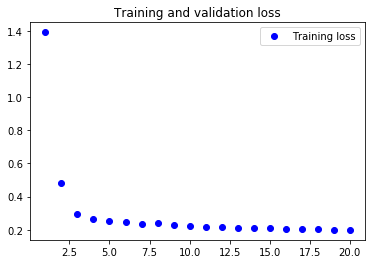

In [13]:
import matplotlib.pyplot as plt

loss = history.history['loss']
#val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
#plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [15]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.GRU(32, input_shape=(None, float_data.shape[-1])))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=20,
                              #validation_data=val_gen,
                              #validation_steps=val_steps
                              )

Epoch 1/20


  1/500 [..............................] - ETA: 8:08 - loss: 0.8964

  2/500 [..............................] - ETA: 4:37 - loss: 0.8400

  3/500 [..............................] - ETA: 3:26 - loss: 0.8213

  4/500 [..............................] - ETA: 2:50 - loss: 0.7508

  5/500 [..............................] - ETA: 2:29 - loss: 0.6887

  6/500 [..............................] - ETA: 2:14 - loss: 0.6623

  7/500 [..............................] - ETA: 2:03 - loss: 0.6297

  8/500 [..............................] - ETA: 1:55 - loss: 0.6110

  9/500 [..............................] - ETA: 1:49 - loss: 0.5941

 10/500 [..............................] - ETA: 1:43 - loss: 0.5734

 11/500 [..............................] - ETA: 1:39 - loss: 0.5561

 12/500 [..............................] - ETA: 1:35 - loss: 0.5438

 13/500 [..............................] - ETA: 1:32 - loss: 0.5328

 14/500 [..............................] - ETA: 1:30 - loss: 0.5220

 15/500 [..............................] - ETA: 1:28 - loss: 0.5110

 16/500 [..............................] - ETA: 1:25 - loss: 0.5014

 17/500 [>.............................] - ETA: 1:24 - loss: 0.4933

 18/500 [>.............................] - ETA: 1:22 - loss: 0.4858

 19/500 [>.............................] - ETA: 1:21 - loss: 0.4807

 20/500 [>.............................] - ETA: 1:19 - loss: 0.4741

 21/500 [>.............................] - ETA: 1:18 - loss: 0.4678

 22/500 [>.............................] - ETA: 1:17 - loss: 0.4647

 23/500 [>.............................] - ETA: 1:16 - loss: 0.4607

 24/500 [>.............................] - ETA: 1:15 - loss: 0.4566

 25/500 [>.............................] - ETA: 1:14 - loss: 0.4516

 26/500 [>.............................] - ETA: 1:13 - loss: 0.4482

 27/500 [>.............................] - ETA: 1:12 - loss: 0.4439

 28/500 [>.............................] - ETA: 1:11 - loss: 0.4383

 29/500 [>.............................] - ETA: 1:11 - loss: 0.4349

 30/500 [>.............................] - ETA: 1:10 - loss: 0.4321

 31/500 [>.............................] - ETA: 1:09 - loss: 0.4300

 32/500 [>.............................] - ETA: 1:09 - loss: 0.4265

 33/500 [>.............................] - ETA: 1:08 - loss: 0.4245

 34/500 [=>............................] - ETA: 1:07 - loss: 0.4222

 35/500 [=>............................] - ETA: 1:07 - loss: 0.4191

 36/500 [=>............................] - ETA: 1:06 - loss: 0.4178

 37/500 [=>............................] - ETA: 1:06 - loss: 0.4143

 38/500 [=>............................] - ETA: 1:05 - loss: 0.4122

 39/500 [=>............................] - ETA: 1:05 - loss: 0.4096

 40/500 [=>............................] - ETA: 1:04 - loss: 0.4080

 41/500 [=>............................] - ETA: 1:04 - loss: 0.4068

 42/500 [=>............................] - ETA: 1:04 - loss: 0.4055

 43/500 [=>............................] - ETA: 1:03 - loss: 0.4047

 44/500 [=>............................] - ETA: 1:03 - loss: 0.4031

 45/500 [=>............................] - ETA: 1:02 - loss: 0.4017

 46/500 [=>............................] - ETA: 1:02 - loss: 0.3995

 47/500 [=>............................] - ETA: 1:02 - loss: 0.3979

 48/500 [=>............................] - ETA: 1:01 - loss: 0.3962

 49/500 [=>............................] - ETA: 1:01 - loss: 0.3961

 50/500 [==>...........................] - ETA: 1:01 - loss: 0.3943

 51/500 [==>...........................] - ETA: 1:00 - loss: 0.3930

 52/500 [==>...........................] - ETA: 1:00 - loss: 0.3916

 53/500 [==>...........................] - ETA: 1:00 - loss: 0.3900

 54/500 [==>...........................] - ETA: 1:00 - loss: 0.3880

 55/500 [==>...........................] - ETA: 59s - loss: 0.3867 

 56/500 [==>...........................] - ETA: 59s - loss: 0.3855

 57/500 [==>...........................] - ETA: 59s - loss: 0.3846

 58/500 [==>...........................] - ETA: 59s - loss: 0.3825

 59/500 [==>...........................] - ETA: 58s - loss: 0.3816

 60/500 [==>...........................] - ETA: 58s - loss: 0.3809

 61/500 [==>...........................] - ETA: 58s - loss: 0.3800



 62/500 [==>...........................] - ETA: 57s - loss: 0.3787

 63/500 [==>...........................] - ETA: 57s - loss: 0.3778

 64/500 [==>...........................] - ETA: 57s - loss: 0.3767

 65/500 [==>...........................] - ETA: 57s - loss: 0.3762

 66/500 [==>...........................] - ETA: 57s - loss: 0.3757

 67/500 [===>..........................] - ETA: 56s - loss: 0.3750

 68/500 [===>..........................] - ETA: 56s - loss: 0.3743

 69/500 [===>..........................] - ETA: 56s - loss: 0.3729

 70/500 [===>..........................] - ETA: 56s - loss: 0.3723



 71/500 [===>..........................] - ETA: 55s - loss: 0.3720

 72/500 [===>..........................] - ETA: 55s - loss: 0.3710

 73/500 [===>..........................] - ETA: 55s - loss: 0.3702

 74/500 [===>..........................] - ETA: 55s - loss: 0.3692

 75/500 [===>..........................] - ETA: 54s - loss: 0.3683

 76/500 [===>..........................] - ETA: 54s - loss: 0.3674

 77/500 [===>..........................] - ETA: 54s - loss: 0.3664

 78/500 [===>..........................] - ETA: 54s - loss: 0.3656

 79/500 [===>..........................] - ETA: 54s - loss: 0.3649



 80/500 [===>..........................] - ETA: 53s - loss: 0.3640

 81/500 [===>..........................] - ETA: 53s - loss: 0.3634

 82/500 [===>..........................] - ETA: 53s - loss: 0.3630

 83/500 [===>..........................] - ETA: 53s - loss: 0.3629

 84/500 [====>.........................] - ETA: 53s - loss: 0.3623

 85/500 [====>.........................] - ETA: 53s - loss: 0.3613

 86/500 [====>.........................] - ETA: 52s - loss: 0.3604

 87/500 [====>.........................] - ETA: 52s - loss: 0.3600

 88/500 [====>.........................] - ETA: 52s - loss: 0.3593



 89/500 [====>.........................] - ETA: 52s - loss: 0.3587

 90/500 [====>.........................] - ETA: 52s - loss: 0.3584

 91/500 [====>.........................] - ETA: 52s - loss: 0.3577

 92/500 [====>.........................] - ETA: 51s - loss: 0.3573

 93/500 [====>.........................] - ETA: 51s - loss: 0.3567

 94/500 [====>.........................] - ETA: 51s - loss: 0.3562

 95/500 [====>.........................] - ETA: 51s - loss: 0.3560

 96/500 [====>.........................] - ETA: 51s - loss: 0.3557

 97/500 [====>.........................] - ETA: 50s - loss: 0.3550

 98/500 [====>.........................] - ETA: 50s - loss: 0.3542

 99/500 [====>.........................] - ETA: 50s - loss: 0.3538

100/500 [=====>........................] - ETA: 50s - loss: 0.3539

101/500 [=====>........................] - ETA: 50s - loss: 0.3536

102/500 [=====>........................] - ETA: 50s - loss: 0.3533

103/500 [=====>........................] - ETA: 49s - loss: 0.3527

104/500 [=====>........................] - ETA: 49s - loss: 0.3527

105/500 [=====>........................] - ETA: 49s - loss: 0.3524

106/500 [=====>........................] - ETA: 49s - loss: 0.3520

107/500 [=====>........................] - ETA: 49s - loss: 0.3521

108/500 [=====>........................] - ETA: 49s - loss: 0.3520

109/500 [=====>........................] - ETA: 49s - loss: 0.3512

110/500 [=====>........................] - ETA: 49s - loss: 0.3507

111/500 [=====>........................] - ETA: 48s - loss: 0.3504

112/500 [=====>........................] - ETA: 48s - loss: 0.3502

113/500 [=====>........................] - ETA: 48s - loss: 0.3496

114/500 [=====>........................] - ETA: 48s - loss: 0.3491

115/500 [=====>........................] - ETA: 48s - loss: 0.3488

116/500 [=====>........................] - ETA: 48s - loss: 0.3486

117/500 [======>.......................] - ETA: 48s - loss: 0.3483

118/500 [======>.......................] - ETA: 48s - loss: 0.3479

119/500 [======>.......................] - ETA: 47s - loss: 0.3476

120/500 [======>.......................] - ETA: 47s - loss: 0.3471

121/500 [======>.......................] - ETA: 47s - loss: 0.3465

122/500 [======>.......................] - ETA: 47s - loss: 0.3460

123/500 [======>.......................] - ETA: 47s - loss: 0.3455

124/500 [======>.......................] - ETA: 47s - loss: 0.3450

125/500 [======>.......................] - ETA: 47s - loss: 0.3446

126/500 [======>.......................] - ETA: 47s - loss: 0.3444

127/500 [======>.......................] - ETA: 47s - loss: 0.3438

128/500 [======>.......................] - ETA: 46s - loss: 0.3435

129/500 [======>.......................] - ETA: 46s - loss: 0.3432

130/500 [======>.......................] - ETA: 46s - loss: 0.3430

131/500 [======>.......................] - ETA: 46s - loss: 0.3427

132/500 [======>.......................] - ETA: 46s - loss: 0.3424

133/500 [======>.......................] - ETA: 46s - loss: 0.3421

134/500 [=======>......................] - ETA: 46s - loss: 0.3418

135/500 [=======>......................] - ETA: 46s - loss: 0.3417

136/500 [=======>......................] - ETA: 46s - loss: 0.3414

137/500 [=======>......................] - ETA: 45s - loss: 0.3408

138/500 [=======>......................] - ETA: 45s - loss: 0.3407

139/500 [=======>......................] - ETA: 45s - loss: 0.3406

140/500 [=======>......................] - ETA: 45s - loss: 0.3404

141/500 [=======>......................] - ETA: 45s - loss: 0.3400

142/500 [=======>......................] - ETA: 45s - loss: 0.3401

143/500 [=======>......................] - ETA: 45s - loss: 0.3397

144/500 [=======>......................] - ETA: 45s - loss: 0.3394

145/500 [=======>......................] - ETA: 45s - loss: 0.3390

146/500 [=======>......................] - ETA: 45s - loss: 0.3388

147/500 [=======>......................] - ETA: 45s - loss: 0.3383

148/500 [=======>......................] - ETA: 45s - loss: 0.3382

149/500 [=======>......................] - ETA: 44s - loss: 0.3381

150/500 [========>.....................] - ETA: 44s - loss: 0.3380

151/500 [========>.....................] - ETA: 44s - loss: 0.3378

152/500 [========>.....................] - ETA: 44s - loss: 0.3379

153/500 [========>.....................] - ETA: 44s - loss: 0.3377

154/500 [========>.....................] - ETA: 44s - loss: 0.3375

155/500 [========>.....................] - ETA: 44s - loss: 0.3372

156/500 [========>.....................] - ETA: 44s - loss: 0.3369

157/500 [========>.....................] - ETA: 43s - loss: 0.3369

158/500 [========>.....................] - ETA: 43s - loss: 0.3370

159/500 [========>.....................] - ETA: 43s - loss: 0.3368

160/500 [========>.....................] - ETA: 43s - loss: 0.3366

161/500 [========>.....................] - ETA: 43s - loss: 0.3367

162/500 [========>.....................] - ETA: 43s - loss: 0.3364

163/500 [========>.....................] - ETA: 44s - loss: 0.3363

164/500 [========>.....................] - ETA: 44s - loss: 0.3362

165/500 [========>.....................] - ETA: 43s - loss: 0.3358

166/500 [========>.....................] - ETA: 43s - loss: 0.3355

167/500 [=========>....................] - ETA: 43s - loss: 0.3349

168/500 [=========>....................] - ETA: 43s - loss: 0.3345

169/500 [=========>....................] - ETA: 43s - loss: 0.3344

170/500 [=========>....................] - ETA: 43s - loss: 0.3340

171/500 [=========>....................] - ETA: 43s - loss: 0.3338

172/500 [=========>....................] - ETA: 43s - loss: 0.3338

173/500 [=========>....................] - ETA: 43s - loss: 0.3335

174/500 [=========>....................] - ETA: 43s - loss: 0.3333

175/500 [=========>....................] - ETA: 43s - loss: 0.3330

176/500 [=========>....................] - ETA: 43s - loss: 0.3327

177/500 [=========>....................] - ETA: 43s - loss: 0.3326

178/500 [=========>....................] - ETA: 43s - loss: 0.3325

179/500 [=========>....................] - ETA: 42s - loss: 0.3324

180/500 [=========>....................] - ETA: 42s - loss: 0.3323

181/500 [=========>....................] - ETA: 42s - loss: 0.3320

182/500 [=========>....................] - ETA: 42s - loss: 0.3320

183/500 [=========>....................] - ETA: 42s - loss: 0.3318

184/500 [==========>...................] - ETA: 42s - loss: 0.3317

185/500 [==========>...................] - ETA: 42s - loss: 0.3317

186/500 [==========>...................] - ETA: 42s - loss: 0.3314

187/500 [==========>...................] - ETA: 41s - loss: 0.3313

188/500 [==========>...................] - ETA: 41s - loss: 0.3310

189/500 [==========>...................] - ETA: 41s - loss: 0.3308

190/500 [==========>...................] - ETA: 41s - loss: 0.3306

191/500 [==========>...................] - ETA: 41s - loss: 0.3303

192/500 [==========>...................] - ETA: 41s - loss: 0.3301

193/500 [==========>...................] - ETA: 41s - loss: 0.3299

194/500 [==========>...................] - ETA: 41s - loss: 0.3297

195/500 [==========>...................] - ETA: 40s - loss: 0.3297

196/500 [==========>...................] - ETA: 40s - loss: 0.3296

197/500 [==========>...................] - ETA: 40s - loss: 0.3293

198/500 [==========>...................] - ETA: 40s - loss: 0.3291

199/500 [==========>...................] - ETA: 40s - loss: 0.3292

200/500 [===========>..................] - ETA: 40s - loss: 0.3289

201/500 [===========>..................] - ETA: 39s - loss: 0.3288

202/500 [===========>..................] - ETA: 39s - loss: 0.3286

203/500 [===========>..................] - ETA: 39s - loss: 0.3287

204/500 [===========>..................] - ETA: 39s - loss: 0.3287

205/500 [===========>..................] - ETA: 39s - loss: 0.3286

206/500 [===========>..................] - ETA: 39s - loss: 0.3284

207/500 [===========>..................] - ETA: 39s - loss: 0.3283

208/500 [===========>..................] - ETA: 39s - loss: 0.3281

209/500 [===========>..................] - ETA: 38s - loss: 0.3279

210/500 [===========>..................] - ETA: 38s - loss: 0.3278

211/500 [===========>..................] - ETA: 38s - loss: 0.3275

212/500 [===========>..................] - ETA: 38s - loss: 0.3274

213/500 [===========>..................] - ETA: 38s - loss: 0.3272

214/500 [===========>..................] - ETA: 38s - loss: 0.3272

215/500 [===========>..................] - ETA: 38s - loss: 0.3271

216/500 [===========>..................] - ETA: 37s - loss: 0.3268

217/500 [============>.................] - ETA: 37s - loss: 0.3267

218/500 [============>.................] - ETA: 37s - loss: 0.3265

219/500 [============>.................] - ETA: 37s - loss: 0.3263

220/500 [============>.................] - ETA: 37s - loss: 0.3261

221/500 [============>.................] - ETA: 37s - loss: 0.3259

222/500 [============>.................] - ETA: 37s - loss: 0.3259

223/500 [============>.................] - ETA: 37s - loss: 0.3257

224/500 [============>.................] - ETA: 36s - loss: 0.3256

225/500 [============>.................] - ETA: 36s - loss: 0.3253

226/500 [============>.................] - ETA: 36s - loss: 0.3252

227/500 [============>.................] - ETA: 36s - loss: 0.3253

228/500 [============>.................] - ETA: 36s - loss: 0.3251

229/500 [============>.................] - ETA: 36s - loss: 0.3251

230/500 [============>.................] - ETA: 36s - loss: 0.3250

231/500 [============>.................] - ETA: 35s - loss: 0.3249

232/500 [============>.................] - ETA: 35s - loss: 0.3248

233/500 [============>.................] - ETA: 35s - loss: 0.3247

234/500 [=============>................] - ETA: 35s - loss: 0.3246

235/500 [=============>................] - ETA: 35s - loss: 0.3243

236/500 [=============>................] - ETA: 35s - loss: 0.3242

237/500 [=============>................] - ETA: 35s - loss: 0.3241

238/500 [=============>................] - ETA: 35s - loss: 0.3240

239/500 [=============>................] - ETA: 34s - loss: 0.3239

240/500 [=============>................] - ETA: 34s - loss: 0.3238

241/500 [=============>................] - ETA: 34s - loss: 0.3239

242/500 [=============>................] - ETA: 34s - loss: 0.3237

243/500 [=============>................] - ETA: 34s - loss: 0.3235

244/500 [=============>................] - ETA: 34s - loss: 0.3233

245/500 [=============>................] - ETA: 34s - loss: 0.3233

246/500 [=============>................] - ETA: 34s - loss: 0.3231

247/500 [=============>................] - ETA: 34s - loss: 0.3228

248/500 [=============>................] - ETA: 34s - loss: 0.3227

249/500 [=============>................] - ETA: 34s - loss: 0.3226

250/500 [==============>...............] - ETA: 33s - loss: 0.3226

251/500 [==============>...............] - ETA: 33s - loss: 0.3223

252/500 [==============>...............] - ETA: 33s - loss: 0.3222

253/500 [==============>...............] - ETA: 33s - loss: 0.3221

254/500 [==============>...............] - ETA: 33s - loss: 0.3221

255/500 [==============>...............] - ETA: 33s - loss: 0.3221

256/500 [==============>...............] - ETA: 33s - loss: 0.3219

257/500 [==============>...............] - ETA: 33s - loss: 0.3217

258/500 [==============>...............] - ETA: 33s - loss: 0.3217

259/500 [==============>...............] - ETA: 33s - loss: 0.3215

260/500 [==============>...............] - ETA: 33s - loss: 0.3215

261/500 [==============>...............] - ETA: 33s - loss: 0.3213

262/500 [==============>...............] - ETA: 32s - loss: 0.3212

263/500 [==============>...............] - ETA: 32s - loss: 0.3211

264/500 [==============>...............] - ETA: 32s - loss: 0.3211

265/500 [==============>...............] - ETA: 32s - loss: 0.3210

266/500 [==============>...............] - ETA: 32s - loss: 0.3209

267/500 [===============>..............] - ETA: 32s - loss: 0.3208

268/500 [===============>..............] - ETA: 32s - loss: 0.3207

269/500 [===============>..............] - ETA: 32s - loss: 0.3206

270/500 [===============>..............] - ETA: 31s - loss: 0.3205

271/500 [===============>..............] - ETA: 31s - loss: 0.3204

272/500 [===============>..............] - ETA: 31s - loss: 0.3204

273/500 [===============>..............] - ETA: 31s - loss: 0.3203

274/500 [===============>..............] - ETA: 31s - loss: 0.3202

275/500 [===============>..............] - ETA: 31s - loss: 0.3201

276/500 [===============>..............] - ETA: 31s - loss: 0.3200

277/500 [===============>..............] - ETA: 31s - loss: 0.3199

278/500 [===============>..............] - ETA: 30s - loss: 0.3198

279/500 [===============>..............] - ETA: 30s - loss: 0.3197

280/500 [===============>..............] - ETA: 30s - loss: 0.3195

281/500 [===============>..............] - ETA: 30s - loss: 0.3195

282/500 [===============>..............] - ETA: 30s - loss: 0.3195

283/500 [===============>..............] - ETA: 30s - loss: 0.3193

284/500 [================>.............] - ETA: 30s - loss: 0.3193

285/500 [================>.............] - ETA: 30s - loss: 0.3192

286/500 [================>.............] - ETA: 30s - loss: 0.3192

287/500 [================>.............] - ETA: 29s - loss: 0.3192

288/500 [================>.............] - ETA: 29s - loss: 0.3191

289/500 [================>.............] - ETA: 29s - loss: 0.3190

290/500 [================>.............] - ETA: 29s - loss: 0.3188

291/500 [================>.............] - ETA: 29s - loss: 0.3187

292/500 [================>.............] - ETA: 29s - loss: 0.3187

293/500 [================>.............] - ETA: 29s - loss: 0.3185

294/500 [================>.............] - ETA: 28s - loss: 0.3185

295/500 [================>.............] - ETA: 28s - loss: 0.3184

296/500 [================>.............] - ETA: 28s - loss: 0.3183

297/500 [================>.............] - ETA: 28s - loss: 0.3183

298/500 [================>.............] - ETA: 28s - loss: 0.3184

299/500 [================>.............] - ETA: 28s - loss: 0.3183

300/500 [=================>............] - ETA: 28s - loss: 0.3182

301/500 [=================>............] - ETA: 27s - loss: 0.3181

302/500 [=================>............] - ETA: 27s - loss: 0.3179

303/500 [=================>............] - ETA: 27s - loss: 0.3178

304/500 [=================>............] - ETA: 27s - loss: 0.3178

305/500 [=================>............] - ETA: 27s - loss: 0.3177

306/500 [=================>............] - ETA: 27s - loss: 0.3177

307/500 [=================>............] - ETA: 27s - loss: 0.3177

308/500 [=================>............] - ETA: 26s - loss: 0.3176

309/500 [=================>............] - ETA: 26s - loss: 0.3175

310/500 [=================>............] - ETA: 26s - loss: 0.3175

311/500 [=================>............] - ETA: 26s - loss: 0.3174

312/500 [=================>............] - ETA: 26s - loss: 0.3173

313/500 [=================>............] - ETA: 26s - loss: 0.3173

314/500 [=================>............] - ETA: 26s - loss: 0.3173

315/500 [=================>............] - ETA: 25s - loss: 0.3172

316/500 [=================>............] - ETA: 25s - loss: 0.3170

317/500 [==================>...........] - ETA: 25s - loss: 0.3170

318/500 [==================>...........] - ETA: 25s - loss: 0.3169

319/500 [==================>...........] - ETA: 25s - loss: 0.3168

320/500 [==================>...........] - ETA: 25s - loss: 0.3166

321/500 [==================>...........] - ETA: 25s - loss: 0.3166

322/500 [==================>...........] - ETA: 24s - loss: 0.3164

323/500 [==================>...........] - ETA: 24s - loss: 0.3163

324/500 [==================>...........] - ETA: 24s - loss: 0.3162

325/500 [==================>...........] - ETA: 24s - loss: 0.3162

326/500 [==================>...........] - ETA: 24s - loss: 0.3162

327/500 [==================>...........] - ETA: 24s - loss: 0.3160

328/500 [==================>...........] - ETA: 23s - loss: 0.3159

329/500 [==================>...........] - ETA: 23s - loss: 0.3157

330/500 [==================>...........] - ETA: 23s - loss: 0.3156

331/500 [==================>...........] - ETA: 23s - loss: 0.3155

332/500 [==================>...........] - ETA: 23s - loss: 0.3153

333/500 [==================>...........] - ETA: 23s - loss: 0.3153

334/500 [===================>..........] - ETA: 23s - loss: 0.3153

335/500 [===================>..........] - ETA: 22s - loss: 0.3151

336/500 [===================>..........] - ETA: 22s - loss: 0.3150

337/500 [===================>..........] - ETA: 22s - loss: 0.3149

338/500 [===================>..........] - ETA: 22s - loss: 0.3147

339/500 [===================>..........] - ETA: 22s - loss: 0.3147

340/500 [===================>..........] - ETA: 22s - loss: 0.3147

341/500 [===================>..........] - ETA: 22s - loss: 0.3145

342/500 [===================>..........] - ETA: 21s - loss: 0.3144

343/500 [===================>..........] - ETA: 21s - loss: 0.3143

344/500 [===================>..........] - ETA: 21s - loss: 0.3143

345/500 [===================>..........] - ETA: 21s - loss: 0.3142

346/500 [===================>..........] - ETA: 21s - loss: 0.3141

347/500 [===================>..........] - ETA: 21s - loss: 0.3140

348/500 [===================>..........] - ETA: 21s - loss: 0.3141

349/500 [===================>..........] - ETA: 20s - loss: 0.3140

350/500 [====================>.........] - ETA: 20s - loss: 0.3140

351/500 [====================>.........] - ETA: 20s - loss: 0.3141

352/500 [====================>.........] - ETA: 20s - loss: 0.3142

353/500 [====================>.........] - ETA: 20s - loss: 0.3141

354/500 [====================>.........] - ETA: 20s - loss: 0.3141

355/500 [====================>.........] - ETA: 20s - loss: 0.3141

356/500 [====================>.........] - ETA: 19s - loss: 0.3140

357/500 [====================>.........] - ETA: 19s - loss: 0.3140

358/500 [====================>.........] - ETA: 19s - loss: 0.3140

359/500 [====================>.........] - ETA: 19s - loss: 0.3139

360/500 [====================>.........] - ETA: 19s - loss: 0.3139

361/500 [====================>.........] - ETA: 19s - loss: 0.3139

362/500 [====================>.........] - ETA: 19s - loss: 0.3139

363/500 [====================>.........] - ETA: 18s - loss: 0.3139

364/500 [====================>.........] - ETA: 18s - loss: 0.3138

365/500 [====================>.........] - ETA: 18s - loss: 0.3137

366/500 [====================>.........] - ETA: 18s - loss: 0.3137

367/500 [=====================>........] - ETA: 18s - loss: 0.3137

368/500 [=====================>........] - ETA: 18s - loss: 0.3137

369/500 [=====================>........] - ETA: 18s - loss: 0.3136

370/500 [=====================>........] - ETA: 17s - loss: 0.3136

371/500 [=====================>........] - ETA: 17s - loss: 0.3134

372/500 [=====================>........] - ETA: 17s - loss: 0.3134

373/500 [=====================>........] - ETA: 17s - loss: 0.3135

374/500 [=====================>........] - ETA: 17s - loss: 0.3134

375/500 [=====================>........] - ETA: 17s - loss: 0.3134

376/500 [=====================>........] - ETA: 17s - loss: 0.3133

377/500 [=====================>........] - ETA: 16s - loss: 0.3132

378/500 [=====================>........] - ETA: 16s - loss: 0.3131

379/500 [=====================>........] - ETA: 16s - loss: 0.3130

380/500 [=====================>........] - ETA: 16s - loss: 0.3129

381/500 [=====================>........] - ETA: 16s - loss: 0.3129

382/500 [=====================>........] - ETA: 16s - loss: 0.3129

383/500 [=====================>........] - ETA: 16s - loss: 0.3129

384/500 [======================>.......] - ETA: 15s - loss: 0.3128

385/500 [======================>.......] - ETA: 15s - loss: 0.3127

386/500 [======================>.......] - ETA: 15s - loss: 0.3127

387/500 [======================>.......] - ETA: 15s - loss: 0.3125

388/500 [======================>.......] - ETA: 15s - loss: 0.3125

389/500 [======================>.......] - ETA: 15s - loss: 0.3124

390/500 [======================>.......] - ETA: 15s - loss: 0.3124

391/500 [======================>.......] - ETA: 14s - loss: 0.3123

392/500 [======================>.......] - ETA: 14s - loss: 0.3122

393/500 [======================>.......] - ETA: 14s - loss: 0.3121

394/500 [======================>.......] - ETA: 14s - loss: 0.3121

395/500 [======================>.......] - ETA: 14s - loss: 0.3120

396/500 [======================>.......] - ETA: 14s - loss: 0.3120

397/500 [======================>.......] - ETA: 14s - loss: 0.3119

398/500 [======================>.......] - ETA: 13s - loss: 0.3119

399/500 [======================>.......] - ETA: 13s - loss: 0.3118

400/500 [=======================>......] - ETA: 13s - loss: 0.3118

401/500 [=======================>......] - ETA: 13s - loss: 0.3117

402/500 [=======================>......] - ETA: 13s - loss: 0.3117

403/500 [=======================>......] - ETA: 13s - loss: 0.3116

404/500 [=======================>......] - ETA: 13s - loss: 0.3115

405/500 [=======================>......] - ETA: 12s - loss: 0.3115

406/500 [=======================>......] - ETA: 12s - loss: 0.3115

407/500 [=======================>......] - ETA: 12s - loss: 0.3114

408/500 [=======================>......] - ETA: 12s - loss: 0.3114

409/500 [=======================>......] - ETA: 12s - loss: 0.3114

410/500 [=======================>......] - ETA: 12s - loss: 0.3113

411/500 [=======================>......] - ETA: 12s - loss: 0.3113

412/500 [=======================>......] - ETA: 11s - loss: 0.3114

413/500 [=======================>......] - ETA: 11s - loss: 0.3114

414/500 [=======================>......] - ETA: 11s - loss: 0.3114

415/500 [=======================>......] - ETA: 11s - loss: 0.3114

416/500 [=======================>......] - ETA: 11s - loss: 0.3113

417/500 [========================>.....] - ETA: 11s - loss: 0.3113

418/500 [========================>.....] - ETA: 11s - loss: 0.3114

419/500 [========================>.....] - ETA: 10s - loss: 0.3114

420/500 [========================>.....] - ETA: 10s - loss: 0.3115

421/500 [========================>.....] - ETA: 10s - loss: 0.3114

422/500 [========================>.....] - ETA: 10s - loss: 0.3113

423/500 [========================>.....] - ETA: 10s - loss: 0.3113

424/500 [========================>.....] - ETA: 10s - loss: 0.3112

425/500 [========================>.....] - ETA: 10s - loss: 0.3112

426/500 [========================>.....] - ETA: 10s - loss: 0.3111

427/500 [========================>.....] - ETA: 9s - loss: 0.3112 

428/500 [========================>.....] - ETA: 9s - loss: 0.3111

429/500 [========================>.....] - ETA: 9s - loss: 0.3111

430/500 [========================>.....] - ETA: 9s - loss: 0.3110

431/500 [========================>.....] - ETA: 9s - loss: 0.3110

432/500 [========================>.....] - ETA: 9s - loss: 0.3110

433/500 [========================>.....] - ETA: 9s - loss: 0.3109

434/500 [=========================>....] - ETA: 8s - loss: 0.3109

435/500 [=========================>....] - ETA: 8s - loss: 0.3110

436/500 [=========================>....] - ETA: 8s - loss: 0.3109

437/500 [=========================>....] - ETA: 8s - loss: 0.3109

438/500 [=========================>....] - ETA: 8s - loss: 0.3108

439/500 [=========================>....] - ETA: 8s - loss: 0.3108

440/500 [=========================>....] - ETA: 8s - loss: 0.3107

441/500 [=========================>....] - ETA: 8s - loss: 0.3107

442/500 [=========================>....] - ETA: 7s - loss: 0.3106

443/500 [=========================>....] - ETA: 7s - loss: 0.3106

444/500 [=========================>....] - ETA: 7s - loss: 0.3105

445/500 [=========================>....] - ETA: 7s - loss: 0.3105

446/500 [=========================>....] - ETA: 7s - loss: 0.3105

447/500 [=========================>....] - ETA: 7s - loss: 0.3105

448/500 [=========================>....] - ETA: 7s - loss: 0.3104

449/500 [=========================>....] - ETA: 6s - loss: 0.3104

450/500 [==========================>...] - ETA: 6s - loss: 0.3104

451/500 [==========================>...] - ETA: 6s - loss: 0.3103

452/500 [==========================>...] - ETA: 6s - loss: 0.3103

453/500 [==========================>...] - ETA: 6s - loss: 0.3104

454/500 [==========================>...] - ETA: 6s - loss: 0.3103

455/500 [==========================>...] - ETA: 6s - loss: 0.3101

456/500 [==========================>...] - ETA: 5s - loss: 0.3101

457/500 [==========================>...] - ETA: 5s - loss: 0.3101

458/500 [==========================>...] - ETA: 5s - loss: 0.3101

459/500 [==========================>...] - ETA: 5s - loss: 0.3101

460/500 [==========================>...] - ETA: 5s - loss: 0.3100

461/500 [==========================>...] - ETA: 5s - loss: 0.3099

462/500 [==========================>...] - ETA: 5s - loss: 0.3099

463/500 [==========================>...] - ETA: 5s - loss: 0.3099

464/500 [==========================>...] - ETA: 4s - loss: 0.3098

465/500 [==========================>...] - ETA: 4s - loss: 0.3098

466/500 [==========================>...] - ETA: 4s - loss: 0.3097

467/500 [===========================>..] - ETA: 4s - loss: 0.3098

468/500 [===========================>..] - ETA: 4s - loss: 0.3097

469/500 [===========================>..] - ETA: 4s - loss: 0.3097

470/500 [===========================>..] - ETA: 4s - loss: 0.3095

471/500 [===========================>..] - ETA: 3s - loss: 0.3095

472/500 [===========================>..] - ETA: 3s - loss: 0.3095

473/500 [===========================>..] - ETA: 3s - loss: 0.3095

474/500 [===========================>..] - ETA: 3s - loss: 0.3094

475/500 [===========================>..] - ETA: 3s - loss: 0.3094

476/500 [===========================>..] - ETA: 3s - loss: 0.3093

477/500 [===========================>..] - ETA: 3s - loss: 0.3093

478/500 [===========================>..] - ETA: 2s - loss: 0.3094

479/500 [===========================>..] - ETA: 2s - loss: 0.3093

480/500 [===========================>..] - ETA: 2s - loss: 0.3093

481/500 [===========================>..] - ETA: 2s - loss: 0.3092

482/500 [===========================>..] - ETA: 2s - loss: 0.3091

483/500 [===========================>..] - ETA: 2s - loss: 0.3091

484/500 [============================>.] - ETA: 2s - loss: 0.3090

485/500 [============================>.] - ETA: 2s - loss: 0.3089

486/500 [============================>.] - ETA: 1s - loss: 0.3090

487/500 [============================>.] - ETA: 1s - loss: 0.3089

488/500 [============================>.] - ETA: 1s - loss: 0.3089

489/500 [============================>.] - ETA: 1s - loss: 0.3088

490/500 [============================>.] - ETA: 1s - loss: 0.3088

491/500 [============================>.] - ETA: 1s - loss: 0.3087

492/500 [============================>.] - ETA: 1s - loss: 0.3087

493/500 [============================>.] - ETA: 0s - loss: 0.3086

494/500 [============================>.] - ETA: 0s - loss: 0.3085

495/500 [============================>.] - ETA: 0s - loss: 0.3085

496/500 [============================>.] - ETA: 0s - loss: 0.3084

497/500 [============================>.] - ETA: 0s - loss: 0.3084

498/500 [============================>.] - ETA: 0s - loss: 0.3083

499/500 [============================>.] - ETA: 0s - loss: 0.3083

500/500 [==============================] - 68s 135ms/step - loss: 0.3083


Epoch 2/20


  1/500 [..............................] - ETA: 1:13 - loss: 0.3079

  2/500 [..............................] - ETA: 1:08 - loss: 0.2998

  3/500 [..............................] - ETA: 1:06 - loss: 0.3131

  4/500 [..............................] - ETA: 1:06 - loss: 0.3027

  5/500 [..............................] - ETA: 1:06 - loss: 0.3042

  6/500 [..............................] - ETA: 1:06 - loss: 0.3037

  7/500 [..............................] - ETA: 1:05 - loss: 0.3011

  8/500 [..............................] - ETA: 1:06 - loss: 0.2984

  9/500 [..............................] - ETA: 1:05 - loss: 0.2979

 10/500 [..............................] - ETA: 1:04 - loss: 0.2964

 11/500 [..............................] - ETA: 1:03 - loss: 0.2979

 12/500 [..............................] - ETA: 1:04 - loss: 0.2966

 13/500 [..............................] - ETA: 1:04 - loss: 0.2969

 14/500 [..............................] - ETA: 1:04 - loss: 0.2959

 15/500 [..............................] - ETA: 1:04 - loss: 0.2966

 16/500 [..............................] - ETA: 1:03 - loss: 0.2950

 17/500 [>.............................] - ETA: 1:03 - loss: 0.2940

 18/500 [>.............................] - ETA: 1:03 - loss: 0.2932

 19/500 [>.............................] - ETA: 1:04 - loss: 0.2925

 20/500 [>.............................] - ETA: 1:03 - loss: 0.2921

 21/500 [>.............................] - ETA: 1:03 - loss: 0.2920

 22/500 [>.............................] - ETA: 1:03 - loss: 0.2912

 23/500 [>.............................] - ETA: 1:03 - loss: 0.2902

 24/500 [>.............................] - ETA: 1:02 - loss: 0.2925

 25/500 [>.............................] - ETA: 1:02 - loss: 0.2930

 26/500 [>.............................] - ETA: 1:02 - loss: 0.2941

 27/500 [>.............................] - ETA: 1:02 - loss: 0.2942

 28/500 [>.............................] - ETA: 1:02 - loss: 0.2940

 29/500 [>.............................] - ETA: 1:02 - loss: 0.2932

 30/500 [>.............................] - ETA: 1:02 - loss: 0.2924

 31/500 [>.............................] - ETA: 1:02 - loss: 0.2928

 32/500 [>.............................] - ETA: 1:02 - loss: 0.2930

 33/500 [>.............................] - ETA: 1:02 - loss: 0.2924

 34/500 [=>............................] - ETA: 1:01 - loss: 0.2935

 35/500 [=>............................] - ETA: 1:01 - loss: 0.2937

 36/500 [=>............................] - ETA: 1:01 - loss: 0.2932

 37/500 [=>............................] - ETA: 1:01 - loss: 0.2936

 38/500 [=>............................] - ETA: 1:01 - loss: 0.2930

 39/500 [=>............................] - ETA: 1:00 - loss: 0.2936

 40/500 [=>............................] - ETA: 1:00 - loss: 0.2925

 41/500 [=>............................] - ETA: 1:00 - loss: 0.2921

 42/500 [=>............................] - ETA: 1:00 - loss: 0.2914

 43/500 [=>............................] - ETA: 1:00 - loss: 0.2916

 44/500 [=>............................] - ETA: 1:00 - loss: 0.2916

 45/500 [=>............................] - ETA: 59s - loss: 0.2922 

 46/500 [=>............................] - ETA: 59s - loss: 0.2921

 47/500 [=>............................] - ETA: 59s - loss: 0.2921

 48/500 [=>............................] - ETA: 59s - loss: 0.2919

 49/500 [=>............................] - ETA: 59s - loss: 0.2912

 50/500 [==>...........................] - ETA: 59s - loss: 0.2909

 51/500 [==>...........................] - ETA: 58s - loss: 0.2915

 52/500 [==>...........................] - ETA: 58s - loss: 0.2909

 53/500 [==>...........................] - ETA: 58s - loss: 0.2908

 54/500 [==>...........................] - ETA: 58s - loss: 0.2910

 55/500 [==>...........................] - ETA: 58s - loss: 0.2906

 56/500 [==>...........................] - ETA: 58s - loss: 0.2907

 57/500 [==>...........................] - ETA: 58s - loss: 0.2912

 58/500 [==>...........................] - ETA: 58s - loss: 0.2911

 59/500 [==>...........................] - ETA: 57s - loss: 0.2905

 60/500 [==>...........................] - ETA: 57s - loss: 0.2907

 61/500 [==>...........................] - ETA: 57s - loss: 0.2903

 62/500 [==>...........................] - ETA: 57s - loss: 0.2903

 63/500 [==>...........................] - ETA: 56s - loss: 0.2897

 64/500 [==>...........................] - ETA: 56s - loss: 0.2898

 65/500 [==>...........................] - ETA: 56s - loss: 0.2897

 66/500 [==>...........................] - ETA: 56s - loss: 0.2896

 67/500 [===>..........................] - ETA: 56s - loss: 0.2893

 68/500 [===>..........................] - ETA: 55s - loss: 0.2897

 69/500 [===>..........................] - ETA: 55s - loss: 0.2892

 70/500 [===>..........................] - ETA: 55s - loss: 0.2892

 71/500 [===>..........................] - ETA: 55s - loss: 0.2891

 72/500 [===>..........................] - ETA: 55s - loss: 0.2888

 73/500 [===>..........................] - ETA: 54s - loss: 0.2888

 74/500 [===>..........................] - ETA: 54s - loss: 0.2886

 75/500 [===>..........................] - ETA: 54s - loss: 0.2886

 76/500 [===>..........................] - ETA: 54s - loss: 0.2889

 77/500 [===>..........................] - ETA: 54s - loss: 0.2887

 78/500 [===>..........................] - ETA: 54s - loss: 0.2889

 79/500 [===>..........................] - ETA: 54s - loss: 0.2890

 80/500 [===>..........................] - ETA: 55s - loss: 0.2893

 81/500 [===>..........................] - ETA: 55s - loss: 0.2892

 82/500 [===>..........................] - ETA: 55s - loss: 0.2892

 83/500 [===>..........................] - ETA: 54s - loss: 0.2891

 84/500 [====>.........................] - ETA: 54s - loss: 0.2889

 85/500 [====>.........................] - ETA: 54s - loss: 0.2890

 86/500 [====>.........................] - ETA: 54s - loss: 0.2890

 87/500 [====>.........................] - ETA: 54s - loss: 0.2889

 88/500 [====>.........................] - ETA: 53s - loss: 0.2889

 89/500 [====>.........................] - ETA: 53s - loss: 0.2888

 90/500 [====>.........................] - ETA: 53s - loss: 0.2884

 91/500 [====>.........................] - ETA: 53s - loss: 0.2883

 92/500 [====>.........................] - ETA: 53s - loss: 0.2883

 93/500 [====>.........................] - ETA: 52s - loss: 0.2883

 94/500 [====>.........................] - ETA: 52s - loss: 0.2881

 95/500 [====>.........................] - ETA: 52s - loss: 0.2879

 96/500 [====>.........................] - ETA: 52s - loss: 0.2878

 97/500 [====>.........................] - ETA: 52s - loss: 0.2878

 98/500 [====>.........................] - ETA: 52s - loss: 0.2878

 99/500 [====>.........................] - ETA: 51s - loss: 0.2881

100/500 [=====>........................] - ETA: 51s - loss: 0.2882

101/500 [=====>........................] - ETA: 51s - loss: 0.2884

102/500 [=====>........................] - ETA: 51s - loss: 0.2883

103/500 [=====>........................] - ETA: 51s - loss: 0.2882

104/500 [=====>........................] - ETA: 50s - loss: 0.2879

105/500 [=====>........................] - ETA: 50s - loss: 0.2877

106/500 [=====>........................] - ETA: 50s - loss: 0.2876

107/500 [=====>........................] - ETA: 50s - loss: 0.2876

108/500 [=====>........................] - ETA: 50s - loss: 0.2877

109/500 [=====>........................] - ETA: 50s - loss: 0.2875

110/500 [=====>........................] - ETA: 49s - loss: 0.2872

111/500 [=====>........................] - ETA: 49s - loss: 0.2876

112/500 [=====>........................] - ETA: 49s - loss: 0.2878

113/500 [=====>........................] - ETA: 49s - loss: 0.2877

114/500 [=====>........................] - ETA: 49s - loss: 0.2878

115/500 [=====>........................] - ETA: 49s - loss: 0.2876

116/500 [=====>........................] - ETA: 48s - loss: 0.2875

117/500 [======>.......................] - ETA: 48s - loss: 0.2874

118/500 [======>.......................] - ETA: 48s - loss: 0.2876

119/500 [======>.......................] - ETA: 48s - loss: 0.2877

120/500 [======>.......................] - ETA: 48s - loss: 0.2876

121/500 [======>.......................] - ETA: 48s - loss: 0.2876

122/500 [======>.......................] - ETA: 47s - loss: 0.2875

123/500 [======>.......................] - ETA: 47s - loss: 0.2872

124/500 [======>.......................] - ETA: 47s - loss: 0.2875

125/500 [======>.......................] - ETA: 47s - loss: 0.2872

126/500 [======>.......................] - ETA: 47s - loss: 0.2870

127/500 [======>.......................] - ETA: 47s - loss: 0.2869

128/500 [======>.......................] - ETA: 46s - loss: 0.2868

129/500 [======>.......................] - ETA: 46s - loss: 0.2869

130/500 [======>.......................] - ETA: 46s - loss: 0.2870

131/500 [======>.......................] - ETA: 46s - loss: 0.2870

132/500 [======>.......................] - ETA: 46s - loss: 0.2872

133/500 [======>.......................] - ETA: 46s - loss: 0.2873

134/500 [=======>......................] - ETA: 45s - loss: 0.2872

135/500 [=======>......................] - ETA: 45s - loss: 0.2873

136/500 [=======>......................] - ETA: 45s - loss: 0.2872



137/500 [=======>......................] - ETA: 45s - loss: 0.2871

138/500 [=======>......................] - ETA: 45s - loss: 0.2870

139/500 [=======>......................] - ETA: 45s - loss: 0.2869

140/500 [=======>......................] - ETA: 44s - loss: 0.2868

141/500 [=======>......................] - ETA: 44s - loss: 0.2868

142/500 [=======>......................] - ETA: 44s - loss: 0.2870

143/500 [=======>......................] - ETA: 44s - loss: 0.2870

144/500 [=======>......................] - ETA: 44s - loss: 0.2872

145/500 [=======>......................] - ETA: 44s - loss: 0.2872

146/500 [=======>......................] - ETA: 44s - loss: 0.2874

147/500 [=======>......................] - ETA: 43s - loss: 0.2872

148/500 [=======>......................] - ETA: 43s - loss: 0.2870

149/500 [=======>......................] - ETA: 43s - loss: 0.2872

150/500 [========>.....................] - ETA: 43s - loss: 0.2872

151/500 [========>.....................] - ETA: 43s - loss: 0.2870

152/500 [========>.....................] - ETA: 43s - loss: 0.2870

153/500 [========>.....................] - ETA: 42s - loss: 0.2872

154/500 [========>.....................] - ETA: 42s - loss: 0.2872

155/500 [========>.....................] - ETA: 42s - loss: 0.2871

156/500 [========>.....................] - ETA: 42s - loss: 0.2872



157/500 [========>.....................] - ETA: 42s - loss: 0.2872

158/500 [========>.....................] - ETA: 42s - loss: 0.2872

159/500 [========>.....................] - ETA: 42s - loss: 0.2874

160/500 [========>.....................] - ETA: 41s - loss: 0.2874

161/500 [========>.....................] - ETA: 41s - loss: 0.2873

162/500 [========>.....................] - ETA: 41s - loss: 0.2874

163/500 [========>.....................] - ETA: 41s - loss: 0.2873

164/500 [========>.....................] - ETA: 41s - loss: 0.2872

165/500 [========>.....................] - ETA: 41s - loss: 0.2871

166/500 [========>.....................] - ETA: 41s - loss: 0.2871

167/500 [=========>....................] - ETA: 40s - loss: 0.2871

168/500 [=========>....................] - ETA: 40s - loss: 0.2869

169/500 [=========>....................] - ETA: 40s - loss: 0.2870

170/500 [=========>....................] - ETA: 40s - loss: 0.2869

171/500 [=========>....................] - ETA: 40s - loss: 0.2868

172/500 [=========>....................] - ETA: 40s - loss: 0.2867

173/500 [=========>....................] - ETA: 40s - loss: 0.2868

174/500 [=========>....................] - ETA: 40s - loss: 0.2866

175/500 [=========>....................] - ETA: 39s - loss: 0.2867

176/500 [=========>....................] - ETA: 39s - loss: 0.2866

177/500 [=========>....................] - ETA: 39s - loss: 0.2864

178/500 [=========>....................] - ETA: 39s - loss: 0.2864

179/500 [=========>....................] - ETA: 39s - loss: 0.2862

180/500 [=========>....................] - ETA: 39s - loss: 0.2862

181/500 [=========>....................] - ETA: 39s - loss: 0.2861

182/500 [=========>....................] - ETA: 39s - loss: 0.2860

183/500 [=========>....................] - ETA: 39s - loss: 0.2861

184/500 [==========>...................] - ETA: 38s - loss: 0.2861

185/500 [==========>...................] - ETA: 38s - loss: 0.2859

186/500 [==========>...................] - ETA: 38s - loss: 0.2858

187/500 [==========>...................] - ETA: 38s - loss: 0.2856

188/500 [==========>...................] - ETA: 38s - loss: 0.2856

189/500 [==========>...................] - ETA: 38s - loss: 0.2855

190/500 [==========>...................] - ETA: 38s - loss: 0.2855

191/500 [==========>...................] - ETA: 37s - loss: 0.2856

192/500 [==========>...................] - ETA: 37s - loss: 0.2856

193/500 [==========>...................] - ETA: 37s - loss: 0.2855

194/500 [==========>...................] - ETA: 37s - loss: 0.2854

195/500 [==========>...................] - ETA: 37s - loss: 0.2856

196/500 [==========>...................] - ETA: 37s - loss: 0.2856

197/500 [==========>...................] - ETA: 37s - loss: 0.2857

198/500 [==========>...................] - ETA: 37s - loss: 0.2857

199/500 [==========>...................] - ETA: 36s - loss: 0.2858

200/500 [===========>..................] - ETA: 36s - loss: 0.2856

201/500 [===========>..................] - ETA: 36s - loss: 0.2857

202/500 [===========>..................] - ETA: 36s - loss: 0.2857

203/500 [===========>..................] - ETA: 36s - loss: 0.2858

204/500 [===========>..................] - ETA: 36s - loss: 0.2859

205/500 [===========>..................] - ETA: 36s - loss: 0.2857

206/500 [===========>..................] - ETA: 35s - loss: 0.2857

207/500 [===========>..................] - ETA: 35s - loss: 0.2857

208/500 [===========>..................] - ETA: 35s - loss: 0.2857

209/500 [===========>..................] - ETA: 35s - loss: 0.2856



210/500 [===========>..................] - ETA: 35s - loss: 0.2855

211/500 [===========>..................] - ETA: 35s - loss: 0.2857

212/500 [===========>..................] - ETA: 35s - loss: 0.2857

213/500 [===========>..................] - ETA: 35s - loss: 0.2855

214/500 [===========>..................] - ETA: 34s - loss: 0.2857

215/500 [===========>..................] - ETA: 34s - loss: 0.2856

216/500 [===========>..................] - ETA: 34s - loss: 0.2856

217/500 [============>.................] - ETA: 34s - loss: 0.2856

218/500 [============>.................] - ETA: 34s - loss: 0.2855

219/500 [============>.................] - ETA: 34s - loss: 0.2855

220/500 [============>.................] - ETA: 34s - loss: 0.2855

221/500 [============>.................] - ETA: 33s - loss: 0.2856

222/500 [============>.................] - ETA: 33s - loss: 0.2855

223/500 [============>.................] - ETA: 33s - loss: 0.2856

224/500 [============>.................] - ETA: 33s - loss: 0.2855

225/500 [============>.................] - ETA: 33s - loss: 0.2855

226/500 [============>.................] - ETA: 33s - loss: 0.2854

227/500 [============>.................] - ETA: 33s - loss: 0.2853

228/500 [============>.................] - ETA: 33s - loss: 0.2854

229/500 [============>.................] - ETA: 32s - loss: 0.2856



230/500 [============>.................] - ETA: 32s - loss: 0.2857

231/500 [============>.................] - ETA: 32s - loss: 0.2856

232/500 [============>.................] - ETA: 32s - loss: 0.2856

233/500 [============>.................] - ETA: 32s - loss: 0.2856

234/500 [=============>................] - ETA: 32s - loss: 0.2855

235/500 [=============>................] - ETA: 32s - loss: 0.2854

236/500 [=============>................] - ETA: 32s - loss: 0.2854

237/500 [=============>................] - ETA: 31s - loss: 0.2855

238/500 [=============>................] - ETA: 31s - loss: 0.2857

239/500 [=============>................] - ETA: 31s - loss: 0.2858

240/500 [=============>................] - ETA: 31s - loss: 0.2858

241/500 [=============>................] - ETA: 31s - loss: 0.2858

242/500 [=============>................] - ETA: 31s - loss: 0.2858

243/500 [=============>................] - ETA: 31s - loss: 0.2859

244/500 [=============>................] - ETA: 31s - loss: 0.2860

245/500 [=============>................] - ETA: 30s - loss: 0.2860

246/500 [=============>................] - ETA: 30s - loss: 0.2861

247/500 [=============>................] - ETA: 30s - loss: 0.2862

248/500 [=============>................] - ETA: 30s - loss: 0.2861

249/500 [=============>................] - ETA: 30s - loss: 0.2860

250/500 [==============>...............] - ETA: 30s - loss: 0.2860

251/500 [==============>...............] - ETA: 30s - loss: 0.2860

252/500 [==============>...............] - ETA: 29s - loss: 0.2859

253/500 [==============>...............] - ETA: 29s - loss: 0.2858

254/500 [==============>...............] - ETA: 29s - loss: 0.2858

255/500 [==============>...............] - ETA: 29s - loss: 0.2858

256/500 [==============>...............] - ETA: 29s - loss: 0.2858

257/500 [==============>...............] - ETA: 29s - loss: 0.2856

258/500 [==============>...............] - ETA: 29s - loss: 0.2856

259/500 [==============>...............] - ETA: 29s - loss: 0.2856

260/500 [==============>...............] - ETA: 28s - loss: 0.2857

261/500 [==============>...............] - ETA: 28s - loss: 0.2856

262/500 [==============>...............] - ETA: 28s - loss: 0.2858

263/500 [==============>...............] - ETA: 28s - loss: 0.2860

264/500 [==============>...............] - ETA: 28s - loss: 0.2860

265/500 [==============>...............] - ETA: 28s - loss: 0.2860

266/500 [==============>...............] - ETA: 28s - loss: 0.2860

267/500 [===============>..............] - ETA: 28s - loss: 0.2861

268/500 [===============>..............] - ETA: 27s - loss: 0.2859

269/500 [===============>..............] - ETA: 27s - loss: 0.2860

270/500 [===============>..............] - ETA: 27s - loss: 0.2859

271/500 [===============>..............] - ETA: 27s - loss: 0.2859

272/500 [===============>..............] - ETA: 27s - loss: 0.2859

273/500 [===============>..............] - ETA: 27s - loss: 0.2857

274/500 [===============>..............] - ETA: 27s - loss: 0.2858

275/500 [===============>..............] - ETA: 27s - loss: 0.2857

276/500 [===============>..............] - ETA: 26s - loss: 0.2857

277/500 [===============>..............] - ETA: 26s - loss: 0.2857

278/500 [===============>..............] - ETA: 26s - loss: 0.2857

279/500 [===============>..............] - ETA: 26s - loss: 0.2856

280/500 [===============>..............] - ETA: 26s - loss: 0.2856

281/500 [===============>..............] - ETA: 26s - loss: 0.2855

282/500 [===============>..............] - ETA: 26s - loss: 0.2854

283/500 [===============>..............] - ETA: 26s - loss: 0.2855

284/500 [================>.............] - ETA: 26s - loss: 0.2855

285/500 [================>.............] - ETA: 26s - loss: 0.2853

286/500 [================>.............] - ETA: 25s - loss: 0.2852

287/500 [================>.............] - ETA: 25s - loss: 0.2852

288/500 [================>.............] - ETA: 25s - loss: 0.2852

289/500 [================>.............] - ETA: 25s - loss: 0.2852

290/500 [================>.............] - ETA: 25s - loss: 0.2853

291/500 [================>.............] - ETA: 25s - loss: 0.2853

292/500 [================>.............] - ETA: 25s - loss: 0.2854

293/500 [================>.............] - ETA: 25s - loss: 0.2854

294/500 [================>.............] - ETA: 24s - loss: 0.2854

295/500 [================>.............] - ETA: 24s - loss: 0.2854

296/500 [================>.............] - ETA: 24s - loss: 0.2855

297/500 [================>.............] - ETA: 24s - loss: 0.2855

298/500 [================>.............] - ETA: 24s - loss: 0.2855

299/500 [================>.............] - ETA: 24s - loss: 0.2855

300/500 [=================>............] - ETA: 24s - loss: 0.2856

301/500 [=================>............] - ETA: 24s - loss: 0.2856

302/500 [=================>............] - ETA: 23s - loss: 0.2857

303/500 [=================>............] - ETA: 23s - loss: 0.2856

304/500 [=================>............] - ETA: 23s - loss: 0.2855

305/500 [=================>............] - ETA: 23s - loss: 0.2854

306/500 [=================>............] - ETA: 23s - loss: 0.2855

307/500 [=================>............] - ETA: 23s - loss: 0.2856

308/500 [=================>............] - ETA: 23s - loss: 0.2855

309/500 [=================>............] - ETA: 23s - loss: 0.2855

310/500 [=================>............] - ETA: 22s - loss: 0.2855

311/500 [=================>............] - ETA: 22s - loss: 0.2855

312/500 [=================>............] - ETA: 22s - loss: 0.2857

313/500 [=================>............] - ETA: 22s - loss: 0.2857

314/500 [=================>............] - ETA: 22s - loss: 0.2858

315/500 [=================>............] - ETA: 22s - loss: 0.2858

316/500 [=================>............] - ETA: 22s - loss: 0.2858

317/500 [==================>...........] - ETA: 22s - loss: 0.2858

318/500 [==================>...........] - ETA: 21s - loss: 0.2857

319/500 [==================>...........] - ETA: 21s - loss: 0.2857

320/500 [==================>...........] - ETA: 21s - loss: 0.2857

321/500 [==================>...........] - ETA: 21s - loss: 0.2857

322/500 [==================>...........] - ETA: 21s - loss: 0.2857

323/500 [==================>...........] - ETA: 21s - loss: 0.2858

324/500 [==================>...........] - ETA: 21s - loss: 0.2856

325/500 [==================>...........] - ETA: 21s - loss: 0.2855

326/500 [==================>...........] - ETA: 20s - loss: 0.2855

327/500 [==================>...........] - ETA: 20s - loss: 0.2856

328/500 [==================>...........] - ETA: 20s - loss: 0.2856

329/500 [==================>...........] - ETA: 20s - loss: 0.2856

330/500 [==================>...........] - ETA: 20s - loss: 0.2857

331/500 [==================>...........] - ETA: 20s - loss: 0.2857

332/500 [==================>...........] - ETA: 20s - loss: 0.2856

333/500 [==================>...........] - ETA: 20s - loss: 0.2857

334/500 [===================>..........] - ETA: 19s - loss: 0.2858

335/500 [===================>..........] - ETA: 19s - loss: 0.2857

336/500 [===================>..........] - ETA: 19s - loss: 0.2856

337/500 [===================>..........] - ETA: 19s - loss: 0.2857

338/500 [===================>..........] - ETA: 19s - loss: 0.2856

339/500 [===================>..........] - ETA: 19s - loss: 0.2857

340/500 [===================>..........] - ETA: 19s - loss: 0.2857

341/500 [===================>..........] - ETA: 19s - loss: 0.2857

342/500 [===================>..........] - ETA: 18s - loss: 0.2857

343/500 [===================>..........] - ETA: 18s - loss: 0.2857

344/500 [===================>..........] - ETA: 18s - loss: 0.2856

345/500 [===================>..........] - ETA: 18s - loss: 0.2856

346/500 [===================>..........] - ETA: 18s - loss: 0.2856

347/500 [===================>..........] - ETA: 18s - loss: 0.2855

348/500 [===================>..........] - ETA: 18s - loss: 0.2855

349/500 [===================>..........] - ETA: 18s - loss: 0.2855

350/500 [====================>.........] - ETA: 17s - loss: 0.2855

351/500 [====================>.........] - ETA: 17s - loss: 0.2856

352/500 [====================>.........] - ETA: 17s - loss: 0.2855

353/500 [====================>.........] - ETA: 17s - loss: 0.2854

354/500 [====================>.........] - ETA: 17s - loss: 0.2854

355/500 [====================>.........] - ETA: 17s - loss: 0.2854

356/500 [====================>.........] - ETA: 17s - loss: 0.2854

357/500 [====================>.........] - ETA: 17s - loss: 0.2854

358/500 [====================>.........] - ETA: 16s - loss: 0.2854

359/500 [====================>.........] - ETA: 16s - loss: 0.2854

360/500 [====================>.........] - ETA: 16s - loss: 0.2854

361/500 [====================>.........] - ETA: 16s - loss: 0.2853

362/500 [====================>.........] - ETA: 16s - loss: 0.2853

363/500 [====================>.........] - ETA: 16s - loss: 0.2853

364/500 [====================>.........] - ETA: 16s - loss: 0.2853

365/500 [====================>.........] - ETA: 16s - loss: 0.2854

366/500 [====================>.........] - ETA: 16s - loss: 0.2853

367/500 [=====================>........] - ETA: 15s - loss: 0.2853

368/500 [=====================>........] - ETA: 15s - loss: 0.2852

369/500 [=====================>........] - ETA: 15s - loss: 0.2852

370/500 [=====================>........] - ETA: 15s - loss: 0.2852

371/500 [=====================>........] - ETA: 15s - loss: 0.2852

372/500 [=====================>........] - ETA: 15s - loss: 0.2852

373/500 [=====================>........] - ETA: 15s - loss: 0.2851

374/500 [=====================>........] - ETA: 15s - loss: 0.2852

375/500 [=====================>........] - ETA: 14s - loss: 0.2852

376/500 [=====================>........] - ETA: 14s - loss: 0.2852

377/500 [=====================>........] - ETA: 14s - loss: 0.2853

378/500 [=====================>........] - ETA: 14s - loss: 0.2854

379/500 [=====================>........] - ETA: 14s - loss: 0.2854

380/500 [=====================>........] - ETA: 14s - loss: 0.2853

381/500 [=====================>........] - ETA: 14s - loss: 0.2853

382/500 [=====================>........] - ETA: 14s - loss: 0.2853

383/500 [=====================>........] - ETA: 13s - loss: 0.2852

384/500 [======================>.......] - ETA: 13s - loss: 0.2853

385/500 [======================>.......] - ETA: 13s - loss: 0.2852

386/500 [======================>.......] - ETA: 13s - loss: 0.2853

387/500 [======================>.......] - ETA: 13s - loss: 0.2853

388/500 [======================>.......] - ETA: 13s - loss: 0.2853

389/500 [======================>.......] - ETA: 13s - loss: 0.2853

390/500 [======================>.......] - ETA: 13s - loss: 0.2852

391/500 [======================>.......] - ETA: 12s - loss: 0.2852

392/500 [======================>.......] - ETA: 12s - loss: 0.2852

393/500 [======================>.......] - ETA: 12s - loss: 0.2852

394/500 [======================>.......] - ETA: 12s - loss: 0.2853

395/500 [======================>.......] - ETA: 12s - loss: 0.2853

396/500 [======================>.......] - ETA: 12s - loss: 0.2853

397/500 [======================>.......] - ETA: 12s - loss: 0.2853

398/500 [======================>.......] - ETA: 12s - loss: 0.2853

399/500 [======================>.......] - ETA: 12s - loss: 0.2852

400/500 [=======================>......] - ETA: 11s - loss: 0.2852

401/500 [=======================>......] - ETA: 11s - loss: 0.2851

402/500 [=======================>......] - ETA: 11s - loss: 0.2851

403/500 [=======================>......] - ETA: 11s - loss: 0.2851

404/500 [=======================>......] - ETA: 11s - loss: 0.2851

405/500 [=======================>......] - ETA: 11s - loss: 0.2851

406/500 [=======================>......] - ETA: 11s - loss: 0.2851

407/500 [=======================>......] - ETA: 11s - loss: 0.2850

408/500 [=======================>......] - ETA: 10s - loss: 0.2850

409/500 [=======================>......] - ETA: 10s - loss: 0.2849

410/500 [=======================>......] - ETA: 10s - loss: 0.2849

411/500 [=======================>......] - ETA: 10s - loss: 0.2849

412/500 [=======================>......] - ETA: 10s - loss: 0.2849

413/500 [=======================>......] - ETA: 10s - loss: 0.2848

414/500 [=======================>......] - ETA: 10s - loss: 0.2848

415/500 [=======================>......] - ETA: 10s - loss: 0.2848

416/500 [=======================>......] - ETA: 9s - loss: 0.2847 

417/500 [========================>.....] - ETA: 9s - loss: 0.2848

418/500 [========================>.....] - ETA: 9s - loss: 0.2847



419/500 [========================>.....] - ETA: 9s - loss: 0.2846

420/500 [========================>.....] - ETA: 9s - loss: 0.2848

421/500 [========================>.....] - ETA: 9s - loss: 0.2846

422/500 [========================>.....] - ETA: 9s - loss: 0.2846

423/500 [========================>.....] - ETA: 9s - loss: 0.2846

424/500 [========================>.....] - ETA: 9s - loss: 0.2846

425/500 [========================>.....] - ETA: 8s - loss: 0.2845

426/500 [========================>.....] - ETA: 8s - loss: 0.2845

427/500 [========================>.....] - ETA: 8s - loss: 0.2845

428/500 [========================>.....] - ETA: 8s - loss: 0.2843

429/500 [========================>.....] - ETA: 8s - loss: 0.2843

430/500 [========================>.....] - ETA: 8s - loss: 0.2843

431/500 [========================>.....] - ETA: 8s - loss: 0.2843

432/500 [========================>.....] - ETA: 8s - loss: 0.2842

433/500 [========================>.....] - ETA: 7s - loss: 0.2842

434/500 [=========================>....] - ETA: 7s - loss: 0.2841

435/500 [=========================>....] - ETA: 7s - loss: 0.2841

436/500 [=========================>....] - ETA: 7s - loss: 0.2841

437/500 [=========================>....] - ETA: 7s - loss: 0.2840



438/500 [=========================>....] - ETA: 7s - loss: 0.2840

439/500 [=========================>....] - ETA: 7s - loss: 0.2841

440/500 [=========================>....] - ETA: 7s - loss: 0.2840

441/500 [=========================>....] - ETA: 7s - loss: 0.2840

442/500 [=========================>....] - ETA: 6s - loss: 0.2840

443/500 [=========================>....] - ETA: 6s - loss: 0.2841

444/500 [=========================>....] - ETA: 6s - loss: 0.2840

445/500 [=========================>....] - ETA: 6s - loss: 0.2840

446/500 [=========================>....] - ETA: 6s - loss: 0.2840

447/500 [=========================>....] - ETA: 6s - loss: 0.2840

448/500 [=========================>....] - ETA: 6s - loss: 0.2840

449/500 [=========================>....] - ETA: 6s - loss: 0.2840

450/500 [==========================>...] - ETA: 5s - loss: 0.2840

451/500 [==========================>...] - ETA: 5s - loss: 0.2840

452/500 [==========================>...] - ETA: 5s - loss: 0.2840

453/500 [==========================>...] - ETA: 5s - loss: 0.2840

454/500 [==========================>...] - ETA: 5s - loss: 0.2840

455/500 [==========================>...] - ETA: 5s - loss: 0.2840

456/500 [==========================>...] - ETA: 5s - loss: 0.2840

457/500 [==========================>...] - ETA: 5s - loss: 0.2840

458/500 [==========================>...] - ETA: 5s - loss: 0.2840

459/500 [==========================>...] - ETA: 4s - loss: 0.2839

460/500 [==========================>...] - ETA: 4s - loss: 0.2839

461/500 [==========================>...] - ETA: 4s - loss: 0.2839

462/500 [==========================>...] - ETA: 4s - loss: 0.2839

463/500 [==========================>...] - ETA: 4s - loss: 0.2839

464/500 [==========================>...] - ETA: 4s - loss: 0.2838

465/500 [==========================>...] - ETA: 4s - loss: 0.2838

466/500 [==========================>...] - ETA: 4s - loss: 0.2838

467/500 [===========================>..] - ETA: 3s - loss: 0.2838

468/500 [===========================>..] - ETA: 3s - loss: 0.2838

469/500 [===========================>..] - ETA: 3s - loss: 0.2839

470/500 [===========================>..] - ETA: 3s - loss: 0.2839

471/500 [===========================>..] - ETA: 3s - loss: 0.2838

472/500 [===========================>..] - ETA: 3s - loss: 0.2839

473/500 [===========================>..] - ETA: 3s - loss: 0.2839

474/500 [===========================>..] - ETA: 3s - loss: 0.2838

475/500 [===========================>..] - ETA: 2s - loss: 0.2839

476/500 [===========================>..] - ETA: 2s - loss: 0.2838

477/500 [===========================>..] - ETA: 2s - loss: 0.2838

478/500 [===========================>..] - ETA: 2s - loss: 0.2838

479/500 [===========================>..] - ETA: 2s - loss: 0.2839

480/500 [===========================>..] - ETA: 2s - loss: 0.2838

481/500 [===========================>..] - ETA: 2s - loss: 0.2838

482/500 [===========================>..] - ETA: 2s - loss: 0.2839

483/500 [===========================>..] - ETA: 2s - loss: 0.2839

484/500 [============================>.] - ETA: 1s - loss: 0.2839

485/500 [============================>.] - ETA: 1s - loss: 0.2838

486/500 [============================>.] - ETA: 1s - loss: 0.2838

487/500 [============================>.] - ETA: 1s - loss: 0.2839

488/500 [============================>.] - ETA: 1s - loss: 0.2839

489/500 [============================>.] - ETA: 1s - loss: 0.2839

490/500 [============================>.] - ETA: 1s - loss: 0.2839

491/500 [============================>.] - ETA: 1s - loss: 0.2839

492/500 [============================>.] - ETA: 0s - loss: 0.2839

493/500 [============================>.] - ETA: 0s - loss: 0.2839

494/500 [============================>.] - ETA: 0s - loss: 0.2839

495/500 [============================>.] - ETA: 0s - loss: 0.2840

496/500 [============================>.] - ETA: 0s - loss: 0.2840

497/500 [============================>.] - ETA: 0s - loss: 0.2839

498/500 [============================>.] - ETA: 0s - loss: 0.2839

499/500 [============================>.] - ETA: 0s - loss: 0.2839

500/500 [==============================] - 60s 119ms/step - loss: 0.2839


Epoch 3/20


  1/500 [..............................] - ETA: 1:01 - loss: 0.2918

  2/500 [..............................] - ETA: 1:00 - loss: 0.2911

  3/500 [..............................] - ETA: 1:01 - loss: 0.2772

  4/500 [..............................] - ETA: 59s - loss: 0.2837 

  5/500 [..............................] - ETA: 57s - loss: 0.2797

  6/500 [..............................] - ETA: 57s - loss: 0.2839

  7/500 [..............................] - ETA: 56s - loss: 0.2855

  8/500 [..............................] - ETA: 57s - loss: 0.2795

  9/500 [..............................] - ETA: 56s - loss: 0.2779

 10/500 [..............................] - ETA: 56s - loss: 0.2814

 11/500 [..............................] - ETA: 56s - loss: 0.2850

 12/500 [..............................] - ETA: 56s - loss: 0.2853

 13/500 [..............................] - ETA: 56s - loss: 0.2832

 14/500 [..............................] - ETA: 56s - loss: 0.2819

 15/500 [..............................] - ETA: 55s - loss: 0.2830

 16/500 [..............................] - ETA: 55s - loss: 0.2816

 17/500 [>.............................] - ETA: 55s - loss: 0.2788

 18/500 [>.............................] - ETA: 55s - loss: 0.2775

 19/500 [>.............................] - ETA: 55s - loss: 0.2783

 20/500 [>.............................] - ETA: 55s - loss: 0.2787

 21/500 [>.............................] - ETA: 54s - loss: 0.2798

 22/500 [>.............................] - ETA: 55s - loss: 0.2792

 23/500 [>.............................] - ETA: 56s - loss: 0.2791

 24/500 [>.............................] - ETA: 57s - loss: 0.2800

 25/500 [>.............................] - ETA: 57s - loss: 0.2794

 26/500 [>.............................] - ETA: 56s - loss: 0.2796

 27/500 [>.............................] - ETA: 56s - loss: 0.2777

 28/500 [>.............................] - ETA: 56s - loss: 0.2774

 29/500 [>.............................] - ETA: 56s - loss: 0.2774

 30/500 [>.............................] - ETA: 56s - loss: 0.2783

 31/500 [>.............................] - ETA: 55s - loss: 0.2790

 32/500 [>.............................] - ETA: 55s - loss: 0.2797

 33/500 [>.............................] - ETA: 55s - loss: 0.2803

 34/500 [=>............................] - ETA: 55s - loss: 0.2800

 35/500 [=>............................] - ETA: 55s - loss: 0.2791

 36/500 [=>............................] - ETA: 54s - loss: 0.2795

 37/500 [=>............................] - ETA: 54s - loss: 0.2791

 38/500 [=>............................] - ETA: 54s - loss: 0.2783

 39/500 [=>............................] - ETA: 54s - loss: 0.2778

 40/500 [=>............................] - ETA: 54s - loss: 0.2771

 41/500 [=>............................] - ETA: 54s - loss: 0.2766

 42/500 [=>............................] - ETA: 53s - loss: 0.2766

 43/500 [=>............................] - ETA: 53s - loss: 0.2765

 44/500 [=>............................] - ETA: 53s - loss: 0.2769

 45/500 [=>............................] - ETA: 53s - loss: 0.2778

 46/500 [=>............................] - ETA: 53s - loss: 0.2786

 47/500 [=>............................] - ETA: 52s - loss: 0.2785

 48/500 [=>............................] - ETA: 52s - loss: 0.2776

 49/500 [=>............................] - ETA: 52s - loss: 0.2773

 50/500 [==>...........................] - ETA: 52s - loss: 0.2776

 51/500 [==>...........................] - ETA: 52s - loss: 0.2778

 52/500 [==>...........................] - ETA: 52s - loss: 0.2774

 53/500 [==>...........................] - ETA: 52s - loss: 0.2766

 54/500 [==>...........................] - ETA: 51s - loss: 0.2769

 55/500 [==>...........................] - ETA: 51s - loss: 0.2776

 56/500 [==>...........................] - ETA: 51s - loss: 0.2779

 57/500 [==>...........................] - ETA: 51s - loss: 0.2781

 58/500 [==>...........................] - ETA: 51s - loss: 0.2779

 59/500 [==>...........................] - ETA: 51s - loss: 0.2778

 60/500 [==>...........................] - ETA: 50s - loss: 0.2776

 61/500 [==>...........................] - ETA: 50s - loss: 0.2776

 62/500 [==>...........................] - ETA: 50s - loss: 0.2780

 63/500 [==>...........................] - ETA: 50s - loss: 0.2775

 64/500 [==>...........................] - ETA: 50s - loss: 0.2771

 65/500 [==>...........................] - ETA: 50s - loss: 0.2770

 66/500 [==>...........................] - ETA: 50s - loss: 0.2771

 67/500 [===>..........................] - ETA: 50s - loss: 0.2774

 68/500 [===>..........................] - ETA: 49s - loss: 0.2776

 69/500 [===>..........................] - ETA: 49s - loss: 0.2781

 70/500 [===>..........................] - ETA: 49s - loss: 0.2782

 71/500 [===>..........................] - ETA: 49s - loss: 0.2781

 72/500 [===>..........................] - ETA: 49s - loss: 0.2783

 73/500 [===>..........................] - ETA: 49s - loss: 0.2785

 74/500 [===>..........................] - ETA: 49s - loss: 0.2790

 75/500 [===>..........................] - ETA: 48s - loss: 0.2787

 76/500 [===>..........................] - ETA: 48s - loss: 0.2791

 77/500 [===>..........................] - ETA: 48s - loss: 0.2787

 78/500 [===>..........................] - ETA: 48s - loss: 0.2781

 79/500 [===>..........................] - ETA: 48s - loss: 0.2777

 80/500 [===>..........................] - ETA: 48s - loss: 0.2773

 81/500 [===>..........................] - ETA: 48s - loss: 0.2772

 82/500 [===>..........................] - ETA: 48s - loss: 0.2772

 83/500 [===>..........................] - ETA: 48s - loss: 0.2770

 84/500 [====>.........................] - ETA: 47s - loss: 0.2772

 85/500 [====>.........................] - ETA: 47s - loss: 0.2777

 86/500 [====>.........................] - ETA: 47s - loss: 0.2775

 87/500 [====>.........................] - ETA: 47s - loss: 0.2777

 88/500 [====>.........................] - ETA: 47s - loss: 0.2779

 89/500 [====>.........................] - ETA: 47s - loss: 0.2781

 90/500 [====>.........................] - ETA: 47s - loss: 0.2781

 91/500 [====>.........................] - ETA: 47s - loss: 0.2779

 92/500 [====>.........................] - ETA: 46s - loss: 0.2782

 93/500 [====>.........................] - ETA: 46s - loss: 0.2782

 94/500 [====>.........................] - ETA: 46s - loss: 0.2782

 95/500 [====>.........................] - ETA: 46s - loss: 0.2786

 96/500 [====>.........................] - ETA: 46s - loss: 0.2785

 97/500 [====>.........................] - ETA: 46s - loss: 0.2787

 98/500 [====>.........................] - ETA: 46s - loss: 0.2785

 99/500 [====>.........................] - ETA: 46s - loss: 0.2782

100/500 [=====>........................] - ETA: 45s - loss: 0.2782

101/500 [=====>........................] - ETA: 45s - loss: 0.2783

102/500 [=====>........................] - ETA: 45s - loss: 0.2785

103/500 [=====>........................] - ETA: 45s - loss: 0.2785

104/500 [=====>........................] - ETA: 45s - loss: 0.2786

105/500 [=====>........................] - ETA: 45s - loss: 0.2785

106/500 [=====>........................] - ETA: 45s - loss: 0.2783

107/500 [=====>........................] - ETA: 45s - loss: 0.2785

108/500 [=====>........................] - ETA: 44s - loss: 0.2785

109/500 [=====>........................] - ETA: 44s - loss: 0.2785

110/500 [=====>........................] - ETA: 44s - loss: 0.2784

111/500 [=====>........................] - ETA: 44s - loss: 0.2782

112/500 [=====>........................] - ETA: 44s - loss: 0.2780

113/500 [=====>........................] - ETA: 44s - loss: 0.2780

114/500 [=====>........................] - ETA: 44s - loss: 0.2783

115/500 [=====>........................] - ETA: 44s - loss: 0.2779

116/500 [=====>........................] - ETA: 44s - loss: 0.2781

117/500 [======>.......................] - ETA: 43s - loss: 0.2782

118/500 [======>.......................] - ETA: 43s - loss: 0.2784

119/500 [======>.......................] - ETA: 43s - loss: 0.2783

120/500 [======>.......................] - ETA: 43s - loss: 0.2785

121/500 [======>.......................] - ETA: 43s - loss: 0.2786

122/500 [======>.......................] - ETA: 43s - loss: 0.2785

123/500 [======>.......................] - ETA: 43s - loss: 0.2785

124/500 [======>.......................] - ETA: 43s - loss: 0.2783

125/500 [======>.......................] - ETA: 43s - loss: 0.2783

126/500 [======>.......................] - ETA: 42s - loss: 0.2780

127/500 [======>.......................] - ETA: 42s - loss: 0.2780

128/500 [======>.......................] - ETA: 42s - loss: 0.2782

129/500 [======>.......................] - ETA: 42s - loss: 0.2782

130/500 [======>.......................] - ETA: 42s - loss: 0.2782

131/500 [======>.......................] - ETA: 42s - loss: 0.2784

132/500 [======>.......................] - ETA: 42s - loss: 0.2783

133/500 [======>.......................] - ETA: 42s - loss: 0.2784

134/500 [=======>......................] - ETA: 42s - loss: 0.2782

135/500 [=======>......................] - ETA: 42s - loss: 0.2782

136/500 [=======>......................] - ETA: 42s - loss: 0.2780

137/500 [=======>......................] - ETA: 42s - loss: 0.2778

138/500 [=======>......................] - ETA: 42s - loss: 0.2778

139/500 [=======>......................] - ETA: 42s - loss: 0.2778

140/500 [=======>......................] - ETA: 42s - loss: 0.2776

141/500 [=======>......................] - ETA: 42s - loss: 0.2775

142/500 [=======>......................] - ETA: 42s - loss: 0.2774

143/500 [=======>......................] - ETA: 42s - loss: 0.2774

144/500 [=======>......................] - ETA: 42s - loss: 0.2774

145/500 [=======>......................] - ETA: 42s - loss: 0.2772

146/500 [=======>......................] - ETA: 42s - loss: 0.2773

147/500 [=======>......................] - ETA: 41s - loss: 0.2772

148/500 [=======>......................] - ETA: 41s - loss: 0.2773

149/500 [=======>......................] - ETA: 41s - loss: 0.2773

150/500 [========>.....................] - ETA: 41s - loss: 0.2776

151/500 [========>.....................] - ETA: 41s - loss: 0.2777

152/500 [========>.....................] - ETA: 41s - loss: 0.2779

153/500 [========>.....................] - ETA: 41s - loss: 0.2778

154/500 [========>.....................] - ETA: 41s - loss: 0.2776

155/500 [========>.....................] - ETA: 41s - loss: 0.2776

156/500 [========>.....................] - ETA: 40s - loss: 0.2775

157/500 [========>.....................] - ETA: 40s - loss: 0.2776

158/500 [========>.....................] - ETA: 40s - loss: 0.2776

159/500 [========>.....................] - ETA: 40s - loss: 0.2775

160/500 [========>.....................] - ETA: 40s - loss: 0.2778

161/500 [========>.....................] - ETA: 40s - loss: 0.2778

162/500 [========>.....................] - ETA: 40s - loss: 0.2777

163/500 [========>.....................] - ETA: 40s - loss: 0.2777

164/500 [========>.....................] - ETA: 39s - loss: 0.2775

165/500 [========>.....................] - ETA: 39s - loss: 0.2775

166/500 [========>.....................] - ETA: 39s - loss: 0.2775

167/500 [=========>....................] - ETA: 39s - loss: 0.2775

168/500 [=========>....................] - ETA: 39s - loss: 0.2775

169/500 [=========>....................] - ETA: 39s - loss: 0.2776

170/500 [=========>....................] - ETA: 39s - loss: 0.2779

171/500 [=========>....................] - ETA: 39s - loss: 0.2780

172/500 [=========>....................] - ETA: 38s - loss: 0.2780

173/500 [=========>....................] - ETA: 38s - loss: 0.2778

174/500 [=========>....................] - ETA: 38s - loss: 0.2779

175/500 [=========>....................] - ETA: 38s - loss: 0.2779

176/500 [=========>....................] - ETA: 38s - loss: 0.2781

177/500 [=========>....................] - ETA: 38s - loss: 0.2782

178/500 [=========>....................] - ETA: 38s - loss: 0.2783

179/500 [=========>....................] - ETA: 38s - loss: 0.2786

180/500 [=========>....................] - ETA: 37s - loss: 0.2785

181/500 [=========>....................] - ETA: 37s - loss: 0.2785

182/500 [=========>....................] - ETA: 37s - loss: 0.2785

183/500 [=========>....................] - ETA: 37s - loss: 0.2785

184/500 [==========>...................] - ETA: 37s - loss: 0.2785

185/500 [==========>...................] - ETA: 37s - loss: 0.2786

186/500 [==========>...................] - ETA: 37s - loss: 0.2787

187/500 [==========>...................] - ETA: 36s - loss: 0.2786

188/500 [==========>...................] - ETA: 36s - loss: 0.2786

189/500 [==========>...................] - ETA: 36s - loss: 0.2786

190/500 [==========>...................] - ETA: 36s - loss: 0.2786

191/500 [==========>...................] - ETA: 36s - loss: 0.2785

192/500 [==========>...................] - ETA: 36s - loss: 0.2784

193/500 [==========>...................] - ETA: 36s - loss: 0.2784

194/500 [==========>...................] - ETA: 36s - loss: 0.2783

195/500 [==========>...................] - ETA: 35s - loss: 0.2785

196/500 [==========>...................] - ETA: 35s - loss: 0.2785

197/500 [==========>...................] - ETA: 35s - loss: 0.2785

198/500 [==========>...................] - ETA: 35s - loss: 0.2786

199/500 [==========>...................] - ETA: 35s - loss: 0.2788

200/500 [===========>..................] - ETA: 35s - loss: 0.2788

201/500 [===========>..................] - ETA: 35s - loss: 0.2788

202/500 [===========>..................] - ETA: 35s - loss: 0.2788

203/500 [===========>..................] - ETA: 34s - loss: 0.2789

204/500 [===========>..................] - ETA: 34s - loss: 0.2787

205/500 [===========>..................] - ETA: 34s - loss: 0.2786

206/500 [===========>..................] - ETA: 34s - loss: 0.2785

207/500 [===========>..................] - ETA: 34s - loss: 0.2786

208/500 [===========>..................] - ETA: 34s - loss: 0.2786

209/500 [===========>..................] - ETA: 34s - loss: 0.2785

210/500 [===========>..................] - ETA: 34s - loss: 0.2786

211/500 [===========>..................] - ETA: 33s - loss: 0.2786

212/500 [===========>..................] - ETA: 33s - loss: 0.2786

213/500 [===========>..................] - ETA: 33s - loss: 0.2786

214/500 [===========>..................] - ETA: 33s - loss: 0.2785

215/500 [===========>..................] - ETA: 33s - loss: 0.2784

216/500 [===========>..................] - ETA: 33s - loss: 0.2784

217/500 [============>.................] - ETA: 33s - loss: 0.2783

218/500 [============>.................] - ETA: 33s - loss: 0.2783

219/500 [============>.................] - ETA: 33s - loss: 0.2782

220/500 [============>.................] - ETA: 32s - loss: 0.2783

221/500 [============>.................] - ETA: 32s - loss: 0.2785

222/500 [============>.................] - ETA: 32s - loss: 0.2784

223/500 [============>.................] - ETA: 32s - loss: 0.2784

224/500 [============>.................] - ETA: 32s - loss: 0.2784

225/500 [============>.................] - ETA: 32s - loss: 0.2784

226/500 [============>.................] - ETA: 32s - loss: 0.2785

227/500 [============>.................] - ETA: 32s - loss: 0.2784

228/500 [============>.................] - ETA: 31s - loss: 0.2784

229/500 [============>.................] - ETA: 31s - loss: 0.2783

230/500 [============>.................] - ETA: 31s - loss: 0.2785

231/500 [============>.................] - ETA: 31s - loss: 0.2783

232/500 [============>.................] - ETA: 31s - loss: 0.2783

233/500 [============>.................] - ETA: 31s - loss: 0.2785

234/500 [=============>................] - ETA: 31s - loss: 0.2784

235/500 [=============>................] - ETA: 31s - loss: 0.2784

236/500 [=============>................] - ETA: 30s - loss: 0.2783

237/500 [=============>................] - ETA: 30s - loss: 0.2783

238/500 [=============>................] - ETA: 30s - loss: 0.2783

239/500 [=============>................] - ETA: 30s - loss: 0.2782

240/500 [=============>................] - ETA: 30s - loss: 0.2782

241/500 [=============>................] - ETA: 30s - loss: 0.2783

242/500 [=============>................] - ETA: 30s - loss: 0.2783

243/500 [=============>................] - ETA: 30s - loss: 0.2782

244/500 [=============>................] - ETA: 30s - loss: 0.2783

245/500 [=============>................] - ETA: 29s - loss: 0.2783

246/500 [=============>................] - ETA: 29s - loss: 0.2781

247/500 [=============>................] - ETA: 29s - loss: 0.2781

248/500 [=============>................] - ETA: 29s - loss: 0.2783

249/500 [=============>................] - ETA: 29s - loss: 0.2783

250/500 [==============>...............] - ETA: 29s - loss: 0.2782

251/500 [==============>...............] - ETA: 29s - loss: 0.2783

252/500 [==============>...............] - ETA: 29s - loss: 0.2783

253/500 [==============>...............] - ETA: 28s - loss: 0.2784

254/500 [==============>...............] - ETA: 28s - loss: 0.2784

255/500 [==============>...............] - ETA: 28s - loss: 0.2783

256/500 [==============>...............] - ETA: 28s - loss: 0.2783

257/500 [==============>...............] - ETA: 28s - loss: 0.2784

258/500 [==============>...............] - ETA: 28s - loss: 0.2783

259/500 [==============>...............] - ETA: 28s - loss: 0.2783

260/500 [==============>...............] - ETA: 28s - loss: 0.2782

261/500 [==============>...............] - ETA: 27s - loss: 0.2782

262/500 [==============>...............] - ETA: 27s - loss: 0.2782

263/500 [==============>...............] - ETA: 27s - loss: 0.2782

264/500 [==============>...............] - ETA: 27s - loss: 0.2783

265/500 [==============>...............] - ETA: 27s - loss: 0.2783

266/500 [==============>...............] - ETA: 27s - loss: 0.2785

267/500 [===============>..............] - ETA: 27s - loss: 0.2785

268/500 [===============>..............] - ETA: 27s - loss: 0.2783

269/500 [===============>..............] - ETA: 27s - loss: 0.2782

270/500 [===============>..............] - ETA: 26s - loss: 0.2782

271/500 [===============>..............] - ETA: 26s - loss: 0.2782

272/500 [===============>..............] - ETA: 26s - loss: 0.2782

273/500 [===============>..............] - ETA: 26s - loss: 0.2782

274/500 [===============>..............] - ETA: 26s - loss: 0.2784

275/500 [===============>..............] - ETA: 26s - loss: 0.2783

276/500 [===============>..............] - ETA: 26s - loss: 0.2784

277/500 [===============>..............] - ETA: 26s - loss: 0.2785

278/500 [===============>..............] - ETA: 25s - loss: 0.2786

279/500 [===============>..............] - ETA: 25s - loss: 0.2785

280/500 [===============>..............] - ETA: 25s - loss: 0.2785

281/500 [===============>..............] - ETA: 25s - loss: 0.2785

282/500 [===============>..............] - ETA: 25s - loss: 0.2785

283/500 [===============>..............] - ETA: 25s - loss: 0.2785

284/500 [================>.............] - ETA: 25s - loss: 0.2786

285/500 [================>.............] - ETA: 25s - loss: 0.2785

286/500 [================>.............] - ETA: 25s - loss: 0.2786

287/500 [================>.............] - ETA: 24s - loss: 0.2787

288/500 [================>.............] - ETA: 24s - loss: 0.2788

289/500 [================>.............] - ETA: 24s - loss: 0.2788

290/500 [================>.............] - ETA: 24s - loss: 0.2789

291/500 [================>.............] - ETA: 24s - loss: 0.2788

292/500 [================>.............] - ETA: 24s - loss: 0.2788

293/500 [================>.............] - ETA: 24s - loss: 0.2787

294/500 [================>.............] - ETA: 24s - loss: 0.2787

295/500 [================>.............] - ETA: 23s - loss: 0.2787

296/500 [================>.............] - ETA: 23s - loss: 0.2788

297/500 [================>.............] - ETA: 23s - loss: 0.2787

298/500 [================>.............] - ETA: 23s - loss: 0.2787

299/500 [================>.............] - ETA: 23s - loss: 0.2788

300/500 [=================>............] - ETA: 23s - loss: 0.2788

301/500 [=================>............] - ETA: 23s - loss: 0.2788

302/500 [=================>............] - ETA: 23s - loss: 0.2788

303/500 [=================>............] - ETA: 23s - loss: 0.2787

304/500 [=================>............] - ETA: 22s - loss: 0.2787

305/500 [=================>............] - ETA: 22s - loss: 0.2787

306/500 [=================>............] - ETA: 22s - loss: 0.2788

307/500 [=================>............] - ETA: 22s - loss: 0.2789

308/500 [=================>............] - ETA: 22s - loss: 0.2788

309/500 [=================>............] - ETA: 22s - loss: 0.2788

310/500 [=================>............] - ETA: 22s - loss: 0.2788

311/500 [=================>............] - ETA: 22s - loss: 0.2788

312/500 [=================>............] - ETA: 21s - loss: 0.2787

313/500 [=================>............] - ETA: 21s - loss: 0.2787

314/500 [=================>............] - ETA: 21s - loss: 0.2787

315/500 [=================>............] - ETA: 21s - loss: 0.2787

316/500 [=================>............] - ETA: 21s - loss: 0.2787

317/500 [==================>...........] - ETA: 21s - loss: 0.2788

318/500 [==================>...........] - ETA: 21s - loss: 0.2788

319/500 [==================>...........] - ETA: 21s - loss: 0.2788

320/500 [==================>...........] - ETA: 21s - loss: 0.2788

321/500 [==================>...........] - ETA: 20s - loss: 0.2788

322/500 [==================>...........] - ETA: 20s - loss: 0.2788

323/500 [==================>...........] - ETA: 20s - loss: 0.2788

324/500 [==================>...........] - ETA: 20s - loss: 0.2789

325/500 [==================>...........] - ETA: 20s - loss: 0.2789

326/500 [==================>...........] - ETA: 20s - loss: 0.2789

327/500 [==================>...........] - ETA: 20s - loss: 0.2790

328/500 [==================>...........] - ETA: 20s - loss: 0.2789

329/500 [==================>...........] - ETA: 19s - loss: 0.2789

330/500 [==================>...........] - ETA: 19s - loss: 0.2790

331/500 [==================>...........] - ETA: 19s - loss: 0.2790

332/500 [==================>...........] - ETA: 19s - loss: 0.2791

333/500 [==================>...........] - ETA: 19s - loss: 0.2791

334/500 [===================>..........] - ETA: 19s - loss: 0.2790

335/500 [===================>..........] - ETA: 19s - loss: 0.2791

336/500 [===================>..........] - ETA: 19s - loss: 0.2793

337/500 [===================>..........] - ETA: 19s - loss: 0.2793

338/500 [===================>..........] - ETA: 18s - loss: 0.2793

339/500 [===================>..........] - ETA: 18s - loss: 0.2792

340/500 [===================>..........] - ETA: 18s - loss: 0.2792

341/500 [===================>..........] - ETA: 18s - loss: 0.2793

342/500 [===================>..........] - ETA: 18s - loss: 0.2792

343/500 [===================>..........] - ETA: 18s - loss: 0.2792

344/500 [===================>..........] - ETA: 18s - loss: 0.2792

345/500 [===================>..........] - ETA: 18s - loss: 0.2791

346/500 [===================>..........] - ETA: 17s - loss: 0.2792

347/500 [===================>..........] - ETA: 17s - loss: 0.2791

348/500 [===================>..........] - ETA: 17s - loss: 0.2792

349/500 [===================>..........] - ETA: 17s - loss: 0.2792

350/500 [====================>.........] - ETA: 17s - loss: 0.2793

351/500 [====================>.........] - ETA: 17s - loss: 0.2793

352/500 [====================>.........] - ETA: 17s - loss: 0.2794

353/500 [====================>.........] - ETA: 17s - loss: 0.2793

354/500 [====================>.........] - ETA: 17s - loss: 0.2793

355/500 [====================>.........] - ETA: 16s - loss: 0.2792

356/500 [====================>.........] - ETA: 16s - loss: 0.2792

357/500 [====================>.........] - ETA: 16s - loss: 0.2791

358/500 [====================>.........] - ETA: 16s - loss: 0.2793

359/500 [====================>.........] - ETA: 16s - loss: 0.2794

360/500 [====================>.........] - ETA: 16s - loss: 0.2795

361/500 [====================>.........] - ETA: 16s - loss: 0.2795

362/500 [====================>.........] - ETA: 16s - loss: 0.2795

363/500 [====================>.........] - ETA: 15s - loss: 0.2794

364/500 [====================>.........] - ETA: 15s - loss: 0.2793

365/500 [====================>.........] - ETA: 15s - loss: 0.2794

366/500 [====================>.........] - ETA: 15s - loss: 0.2793

367/500 [=====================>........] - ETA: 15s - loss: 0.2794

368/500 [=====================>........] - ETA: 15s - loss: 0.2795

369/500 [=====================>........] - ETA: 15s - loss: 0.2793

370/500 [=====================>........] - ETA: 15s - loss: 0.2792

371/500 [=====================>........] - ETA: 15s - loss: 0.2792

372/500 [=====================>........] - ETA: 14s - loss: 0.2791

373/500 [=====================>........] - ETA: 14s - loss: 0.2791

374/500 [=====================>........] - ETA: 14s - loss: 0.2793

375/500 [=====================>........] - ETA: 14s - loss: 0.2792

376/500 [=====================>........] - ETA: 14s - loss: 0.2791

377/500 [=====================>........] - ETA: 14s - loss: 0.2791

378/500 [=====================>........] - ETA: 14s - loss: 0.2791

379/500 [=====================>........] - ETA: 14s - loss: 0.2792

380/500 [=====================>........] - ETA: 13s - loss: 0.2792

381/500 [=====================>........] - ETA: 13s - loss: 0.2791

382/500 [=====================>........] - ETA: 13s - loss: 0.2790

383/500 [=====================>........] - ETA: 13s - loss: 0.2791

384/500 [======================>.......] - ETA: 13s - loss: 0.2790

385/500 [======================>.......] - ETA: 13s - loss: 0.2790

386/500 [======================>.......] - ETA: 13s - loss: 0.2790

387/500 [======================>.......] - ETA: 13s - loss: 0.2790

388/500 [======================>.......] - ETA: 13s - loss: 0.2789

389/500 [======================>.......] - ETA: 12s - loss: 0.2788

390/500 [======================>.......] - ETA: 12s - loss: 0.2788

391/500 [======================>.......] - ETA: 12s - loss: 0.2787

392/500 [======================>.......] - ETA: 12s - loss: 0.2787

393/500 [======================>.......] - ETA: 12s - loss: 0.2787

394/500 [======================>.......] - ETA: 12s - loss: 0.2788

395/500 [======================>.......] - ETA: 12s - loss: 0.2788

396/500 [======================>.......] - ETA: 12s - loss: 0.2788

397/500 [======================>.......] - ETA: 12s - loss: 0.2788

398/500 [======================>.......] - ETA: 11s - loss: 0.2788

399/500 [======================>.......] - ETA: 11s - loss: 0.2787

400/500 [=======================>......] - ETA: 11s - loss: 0.2787

401/500 [=======================>......] - ETA: 11s - loss: 0.2789

402/500 [=======================>......] - ETA: 11s - loss: 0.2788

403/500 [=======================>......] - ETA: 11s - loss: 0.2788

404/500 [=======================>......] - ETA: 11s - loss: 0.2787

405/500 [=======================>......] - ETA: 11s - loss: 0.2787



406/500 [=======================>......] - ETA: 11s - loss: 0.2788

407/500 [=======================>......] - ETA: 10s - loss: 0.2788

408/500 [=======================>......] - ETA: 10s - loss: 0.2788

409/500 [=======================>......] - ETA: 10s - loss: 0.2789

410/500 [=======================>......] - ETA: 10s - loss: 0.2789

411/500 [=======================>......] - ETA: 10s - loss: 0.2790

412/500 [=======================>......] - ETA: 10s - loss: 0.2790

413/500 [=======================>......] - ETA: 10s - loss: 0.2791

414/500 [=======================>......] - ETA: 10s - loss: 0.2792

415/500 [=======================>......] - ETA: 10s - loss: 0.2792

416/500 [=======================>......] - ETA: 9s - loss: 0.2791 

417/500 [========================>.....] - ETA: 9s - loss: 0.2791

418/500 [========================>.....] - ETA: 9s - loss: 0.2791

419/500 [========================>.....] - ETA: 9s - loss: 0.2791

420/500 [========================>.....] - ETA: 9s - loss: 0.2792

421/500 [========================>.....] - ETA: 9s - loss: 0.2792

422/500 [========================>.....] - ETA: 9s - loss: 0.2792

423/500 [========================>.....] - ETA: 9s - loss: 0.2791

424/500 [========================>.....] - ETA: 9s - loss: 0.2792

425/500 [========================>.....] - ETA: 8s - loss: 0.2792

426/500 [========================>.....] - ETA: 8s - loss: 0.2792

427/500 [========================>.....] - ETA: 8s - loss: 0.2791

428/500 [========================>.....] - ETA: 8s - loss: 0.2790

429/500 [========================>.....] - ETA: 8s - loss: 0.2791

430/500 [========================>.....] - ETA: 8s - loss: 0.2791

431/500 [========================>.....] - ETA: 8s - loss: 0.2791

432/500 [========================>.....] - ETA: 8s - loss: 0.2791

433/500 [========================>.....] - ETA: 8s - loss: 0.2791

434/500 [=========================>....] - ETA: 7s - loss: 0.2791

435/500 [=========================>....] - ETA: 7s - loss: 0.2790

436/500 [=========================>....] - ETA: 7s - loss: 0.2791

437/500 [=========================>....] - ETA: 7s - loss: 0.2791

438/500 [=========================>....] - ETA: 7s - loss: 0.2791

439/500 [=========================>....] - ETA: 7s - loss: 0.2791

440/500 [=========================>....] - ETA: 7s - loss: 0.2791

441/500 [=========================>....] - ETA: 7s - loss: 0.2791

442/500 [=========================>....] - ETA: 6s - loss: 0.2791

443/500 [=========================>....] - ETA: 6s - loss: 0.2791

444/500 [=========================>....] - ETA: 6s - loss: 0.2791

445/500 [=========================>....] - ETA: 6s - loss: 0.2791

446/500 [=========================>....] - ETA: 6s - loss: 0.2791

447/500 [=========================>....] - ETA: 6s - loss: 0.2791

448/500 [=========================>....] - ETA: 6s - loss: 0.2791

449/500 [=========================>....] - ETA: 6s - loss: 0.2791

450/500 [==========================>...] - ETA: 5s - loss: 0.2791

451/500 [==========================>...] - ETA: 5s - loss: 0.2791

452/500 [==========================>...] - ETA: 5s - loss: 0.2792

453/500 [==========================>...] - ETA: 5s - loss: 0.2792

454/500 [==========================>...] - ETA: 5s - loss: 0.2792

455/500 [==========================>...] - ETA: 5s - loss: 0.2792

456/500 [==========================>...] - ETA: 5s - loss: 0.2792

457/500 [==========================>...] - ETA: 5s - loss: 0.2792

458/500 [==========================>...] - ETA: 5s - loss: 0.2793

459/500 [==========================>...] - ETA: 4s - loss: 0.2793

460/500 [==========================>...] - ETA: 4s - loss: 0.2793

461/500 [==========================>...] - ETA: 4s - loss: 0.2793

462/500 [==========================>...] - ETA: 4s - loss: 0.2792

463/500 [==========================>...] - ETA: 4s - loss: 0.2792

464/500 [==========================>...] - ETA: 4s - loss: 0.2793

465/500 [==========================>...] - ETA: 4s - loss: 0.2793

466/500 [==========================>...] - ETA: 4s - loss: 0.2793

467/500 [===========================>..] - ETA: 3s - loss: 0.2793

468/500 [===========================>..] - ETA: 3s - loss: 0.2793

469/500 [===========================>..] - ETA: 3s - loss: 0.2793

470/500 [===========================>..] - ETA: 3s - loss: 0.2794

471/500 [===========================>..] - ETA: 3s - loss: 0.2794

472/500 [===========================>..] - ETA: 3s - loss: 0.2793

473/500 [===========================>..] - ETA: 3s - loss: 0.2793

474/500 [===========================>..] - ETA: 3s - loss: 0.2793

475/500 [===========================>..] - ETA: 3s - loss: 0.2793

476/500 [===========================>..] - ETA: 2s - loss: 0.2794

477/500 [===========================>..] - ETA: 2s - loss: 0.2793

478/500 [===========================>..] - ETA: 2s - loss: 0.2793

479/500 [===========================>..] - ETA: 2s - loss: 0.2793

480/500 [===========================>..] - ETA: 2s - loss: 0.2792

481/500 [===========================>..] - ETA: 2s - loss: 0.2792

482/500 [===========================>..] - ETA: 2s - loss: 0.2792

483/500 [===========================>..] - ETA: 2s - loss: 0.2792

484/500 [============================>.] - ETA: 1s - loss: 0.2792

485/500 [============================>.] - ETA: 1s - loss: 0.2792

486/500 [============================>.] - ETA: 1s - loss: 0.2792

487/500 [============================>.] - ETA: 1s - loss: 0.2792

488/500 [============================>.] - ETA: 1s - loss: 0.2792

489/500 [============================>.] - ETA: 1s - loss: 0.2791

490/500 [============================>.] - ETA: 1s - loss: 0.2792

491/500 [============================>.] - ETA: 1s - loss: 0.2792

492/500 [============================>.] - ETA: 0s - loss: 0.2792

493/500 [============================>.] - ETA: 0s - loss: 0.2791

494/500 [============================>.] - ETA: 0s - loss: 0.2792

495/500 [============================>.] - ETA: 0s - loss: 0.2792

496/500 [============================>.] - ETA: 0s - loss: 0.2792

497/500 [============================>.] - ETA: 0s - loss: 0.2792

498/500 [============================>.] - ETA: 0s - loss: 0.2792

499/500 [============================>.] - ETA: 0s - loss: 0.2791

500/500 [==============================] - 61s 123ms/step - loss: 0.2791


Epoch 4/20


  1/500 [..............................] - ETA: 1:12 - loss: 0.2558

  2/500 [..............................] - ETA: 1:06 - loss: 0.2654

  3/500 [..............................] - ETA: 1:06 - loss: 0.2622

  4/500 [..............................] - ETA: 1:07 - loss: 0.2691

  5/500 [..............................] - ETA: 1:06 - loss: 0.2733

  6/500 [..............................] - ETA: 1:05 - loss: 0.2763

  7/500 [..............................] - ETA: 1:04 - loss: 0.2719

  8/500 [..............................] - ETA: 1:06 - loss: 0.2662

  9/500 [..............................] - ETA: 1:08 - loss: 0.2686

 10/500 [..............................] - ETA: 1:09 - loss: 0.2704

 11/500 [..............................] - ETA: 1:09 - loss: 0.2703

 12/500 [..............................] - ETA: 1:08 - loss: 0.2696

 13/500 [..............................] - ETA: 1:09 - loss: 0.2710

 14/500 [..............................] - ETA: 1:09 - loss: 0.2708

 15/500 [..............................] - ETA: 1:08 - loss: 0.2706

 16/500 [..............................] - ETA: 1:07 - loss: 0.2705

 17/500 [>.............................] - ETA: 1:07 - loss: 0.2730

 18/500 [>.............................] - ETA: 1:07 - loss: 0.2729

 19/500 [>.............................] - ETA: 1:07 - loss: 0.2733

 20/500 [>.............................] - ETA: 1:07 - loss: 0.2732

 21/500 [>.............................] - ETA: 1:07 - loss: 0.2722

 22/500 [>.............................] - ETA: 1:07 - loss: 0.2730

 23/500 [>.............................] - ETA: 1:08 - loss: 0.2734

 24/500 [>.............................] - ETA: 1:07 - loss: 0.2754

 25/500 [>.............................] - ETA: 1:07 - loss: 0.2752

 26/500 [>.............................] - ETA: 1:07 - loss: 0.2742

 27/500 [>.............................] - ETA: 1:06 - loss: 0.2753

 28/500 [>.............................] - ETA: 1:07 - loss: 0.2754

 29/500 [>.............................] - ETA: 1:06 - loss: 0.2755

 30/500 [>.............................] - ETA: 1:06 - loss: 0.2758

 31/500 [>.............................] - ETA: 1:06 - loss: 0.2759

 32/500 [>.............................] - ETA: 1:06 - loss: 0.2766

 33/500 [>.............................] - ETA: 1:06 - loss: 0.2773

 34/500 [=>............................] - ETA: 1:06 - loss: 0.2767

 35/500 [=>............................] - ETA: 1:07 - loss: 0.2773

 36/500 [=>............................] - ETA: 1:07 - loss: 0.2793

 37/500 [=>............................] - ETA: 1:06 - loss: 0.2792

 38/500 [=>............................] - ETA: 1:06 - loss: 0.2804

 39/500 [=>............................] - ETA: 1:06 - loss: 0.2800

 40/500 [=>............................] - ETA: 1:07 - loss: 0.2799

 41/500 [=>............................] - ETA: 1:07 - loss: 0.2802

 42/500 [=>............................] - ETA: 1:07 - loss: 0.2801

 43/500 [=>............................] - ETA: 1:06 - loss: 0.2794

 44/500 [=>............................] - ETA: 1:06 - loss: 0.2797

 45/500 [=>............................] - ETA: 1:06 - loss: 0.2795

 46/500 [=>............................] - ETA: 1:05 - loss: 0.2788

 47/500 [=>............................] - ETA: 1:05 - loss: 0.2786

 48/500 [=>............................] - ETA: 1:05 - loss: 0.2783

 49/500 [=>............................] - ETA: 1:05 - loss: 0.2780

 50/500 [==>...........................] - ETA: 1:04 - loss: 0.2775

 51/500 [==>...........................] - ETA: 1:04 - loss: 0.2777

 52/500 [==>...........................] - ETA: 1:04 - loss: 0.2774

 53/500 [==>...........................] - ETA: 1:04 - loss: 0.2772

 54/500 [==>...........................] - ETA: 1:05 - loss: 0.2768

 55/500 [==>...........................] - ETA: 1:04 - loss: 0.2766

 56/500 [==>...........................] - ETA: 1:04 - loss: 0.2765

 57/500 [==>...........................] - ETA: 1:05 - loss: 0.2769

 58/500 [==>...........................] - ETA: 1:05 - loss: 0.2772

 59/500 [==>...........................] - ETA: 1:05 - loss: 0.2773

 60/500 [==>...........................] - ETA: 1:05 - loss: 0.2774

 61/500 [==>...........................] - ETA: 1:05 - loss: 0.2766

 62/500 [==>...........................] - ETA: 1:05 - loss: 0.2761

 63/500 [==>...........................] - ETA: 1:04 - loss: 0.2761

 64/500 [==>...........................] - ETA: 1:04 - loss: 0.2768

 65/500 [==>...........................] - ETA: 1:04 - loss: 0.2766

 66/500 [==>...........................] - ETA: 1:03 - loss: 0.2765

 67/500 [===>..........................] - ETA: 1:03 - loss: 0.2765

 68/500 [===>..........................] - ETA: 1:03 - loss: 0.2762

 69/500 [===>..........................] - ETA: 1:03 - loss: 0.2761

 70/500 [===>..........................] - ETA: 1:03 - loss: 0.2758

 71/500 [===>..........................] - ETA: 1:03 - loss: 0.2762

 72/500 [===>..........................] - ETA: 1:03 - loss: 0.2759

 73/500 [===>..........................] - ETA: 1:03 - loss: 0.2758

 74/500 [===>..........................] - ETA: 1:03 - loss: 0.2758

 75/500 [===>..........................] - ETA: 1:02 - loss: 0.2757

 76/500 [===>..........................] - ETA: 1:02 - loss: 0.2760

 77/500 [===>..........................] - ETA: 1:02 - loss: 0.2766

 78/500 [===>..........................] - ETA: 1:02 - loss: 0.2761

 79/500 [===>..........................] - ETA: 1:02 - loss: 0.2763

 80/500 [===>..........................] - ETA: 1:01 - loss: 0.2758

 81/500 [===>..........................] - ETA: 1:01 - loss: 0.2762

 82/500 [===>..........................] - ETA: 1:01 - loss: 0.2760

 83/500 [===>..........................] - ETA: 1:01 - loss: 0.2757

 84/500 [====>.........................] - ETA: 1:01 - loss: 0.2765

 85/500 [====>.........................] - ETA: 1:01 - loss: 0.2766

 86/500 [====>.........................] - ETA: 1:00 - loss: 0.2763

 87/500 [====>.........................] - ETA: 1:00 - loss: 0.2764

 88/500 [====>.........................] - ETA: 1:00 - loss: 0.2760

 89/500 [====>.........................] - ETA: 1:00 - loss: 0.2763

 90/500 [====>.........................] - ETA: 1:00 - loss: 0.2763

 91/500 [====>.........................] - ETA: 59s - loss: 0.2761 

 92/500 [====>.........................] - ETA: 59s - loss: 0.2761

 93/500 [====>.........................] - ETA: 59s - loss: 0.2760

 94/500 [====>.........................] - ETA: 59s - loss: 0.2763

 95/500 [====>.........................] - ETA: 1:00 - loss: 0.2762

 96/500 [====>.........................] - ETA: 1:00 - loss: 0.2764

 97/500 [====>.........................] - ETA: 1:00 - loss: 0.2764

 98/500 [====>.........................] - ETA: 1:00 - loss: 0.2762

 99/500 [====>.........................] - ETA: 1:00 - loss: 0.2761

100/500 [=====>........................] - ETA: 1:00 - loss: 0.2764

101/500 [=====>........................] - ETA: 1:00 - loss: 0.2764

102/500 [=====>........................] - ETA: 59s - loss: 0.2763 

103/500 [=====>........................] - ETA: 1:00 - loss: 0.2762

104/500 [=====>........................] - ETA: 1:00 - loss: 0.2761

105/500 [=====>........................] - ETA: 1:00 - loss: 0.2761

106/500 [=====>........................] - ETA: 1:00 - loss: 0.2763

107/500 [=====>........................] - ETA: 59s - loss: 0.2761 

108/500 [=====>........................] - ETA: 59s - loss: 0.2763

109/500 [=====>........................] - ETA: 59s - loss: 0.2761

110/500 [=====>........................] - ETA: 59s - loss: 0.2760

111/500 [=====>........................] - ETA: 59s - loss: 0.2760

112/500 [=====>........................] - ETA: 59s - loss: 0.2761

113/500 [=====>........................] - ETA: 59s - loss: 0.2760

114/500 [=====>........................] - ETA: 59s - loss: 0.2760

115/500 [=====>........................] - ETA: 59s - loss: 0.2759

116/500 [=====>........................] - ETA: 59s - loss: 0.2757

117/500 [======>.......................] - ETA: 59s - loss: 0.2755

118/500 [======>.......................] - ETA: 59s - loss: 0.2755

119/500 [======>.......................] - ETA: 59s - loss: 0.2755

120/500 [======>.......................] - ETA: 59s - loss: 0.2755



121/500 [======>.......................] - ETA: 59s - loss: 0.2756

122/500 [======>.......................] - ETA: 59s - loss: 0.2757

123/500 [======>.......................] - ETA: 59s - loss: 0.2761

124/500 [======>.......................] - ETA: 59s - loss: 0.2762

125/500 [======>.......................] - ETA: 59s - loss: 0.2760

126/500 [======>.......................] - ETA: 58s - loss: 0.2758

127/500 [======>.......................] - ETA: 58s - loss: 0.2757

128/500 [======>.......................] - ETA: 58s - loss: 0.2758

129/500 [======>.......................] - ETA: 57s - loss: 0.2758

130/500 [======>.......................] - ETA: 57s - loss: 0.2758

131/500 [======>.......................] - ETA: 57s - loss: 0.2759

132/500 [======>.......................] - ETA: 57s - loss: 0.2760

133/500 [======>.......................] - ETA: 57s - loss: 0.2762

134/500 [=======>......................] - ETA: 56s - loss: 0.2761

135/500 [=======>......................] - ETA: 56s - loss: 0.2762

136/500 [=======>......................] - ETA: 56s - loss: 0.2763

137/500 [=======>......................] - ETA: 56s - loss: 0.2762

138/500 [=======>......................] - ETA: 56s - loss: 0.2763

139/500 [=======>......................] - ETA: 56s - loss: 0.2764

140/500 [=======>......................] - ETA: 56s - loss: 0.2764

141/500 [=======>......................] - ETA: 56s - loss: 0.2762



142/500 [=======>......................] - ETA: 56s - loss: 0.2759

143/500 [=======>......................] - ETA: 56s - loss: 0.2759

144/500 [=======>......................] - ETA: 56s - loss: 0.2759

145/500 [=======>......................] - ETA: 56s - loss: 0.2757

146/500 [=======>......................] - ETA: 56s - loss: 0.2756

147/500 [=======>......................] - ETA: 55s - loss: 0.2757

148/500 [=======>......................] - ETA: 55s - loss: 0.2755

149/500 [=======>......................] - ETA: 55s - loss: 0.2755

150/500 [========>.....................] - ETA: 55s - loss: 0.2756

151/500 [========>.....................] - ETA: 55s - loss: 0.2757

152/500 [========>.....................] - ETA: 55s - loss: 0.2759

153/500 [========>.....................] - ETA: 55s - loss: 0.2761

154/500 [========>.....................] - ETA: 55s - loss: 0.2761

155/500 [========>.....................] - ETA: 55s - loss: 0.2760

156/500 [========>.....................] - ETA: 54s - loss: 0.2755

157/500 [========>.....................] - ETA: 54s - loss: 0.2758

158/500 [========>.....................] - ETA: 54s - loss: 0.2759

159/500 [========>.....................] - ETA: 54s - loss: 0.2759

160/500 [========>.....................] - ETA: 53s - loss: 0.2759

161/500 [========>.....................] - ETA: 53s - loss: 0.2760

162/500 [========>.....................] - ETA: 53s - loss: 0.2760

163/500 [========>.....................] - ETA: 53s - loss: 0.2757

164/500 [========>.....................] - ETA: 53s - loss: 0.2758

165/500 [========>.....................] - ETA: 52s - loss: 0.2760

166/500 [========>.....................] - ETA: 52s - loss: 0.2760

167/500 [=========>....................]

 - ETA: 52s - loss: 0.2760

168/500 [=========>....................] - ETA: 52s - loss: 0.2761

169/500 [=========>....................] - ETA: 52s - loss: 0.2762

170/500 [=========>....................] - ETA: 52s - loss: 0.2761

171/500 [=========>....................] - ETA: 52s - loss: 0.2761

172/500 [=========>....................] - ETA: 51s - loss: 0.2762

173/500 [=========>....................] - ETA: 51s - loss: 0.2761

174/500 [=========>....................] - ETA: 51s - loss: 0.2761

175/500 [=========>....................] - ETA: 51s - loss: 0.2762

176/500 [=========>....................] - ETA: 51s - loss: 0.2761

177/500 [=========>....................] - ETA: 51s - loss: 0.2762

178/500 [=========>....................] - ETA: 51s - loss: 0.2761

179/500 [=========>....................] - ETA: 51s - loss: 0.2762

180/500 [=========>....................] - ETA: 50s - loss: 0.2761

181/500 [=========>....................] - ETA: 50s - loss: 0.2760

182/500 [=========>....................] - ETA: 50s - loss: 0.2760

183/500 [=========>....................] - ETA: 50s - loss: 0.2761

184/500 [==========>...................] - ETA: 50s - loss: 0.2760

185/500 [==========>...................] - ETA: 50s - loss: 0.2762

186/500 [==========>...................] - ETA: 49s - loss: 0.2761

187/500 [==========>...................] - ETA: 49s - loss: 0.2761

188/500 [==========>...................] - ETA: 49s - loss: 0.2762

189/500 [==========>...................] - ETA: 49s - loss: 0.2764

190/500 [==========>...................] - ETA: 49s - loss: 0.2764

191/500 [==========>...................] - ETA: 49s - loss: 0.2765

192/500 [==========>...................] - ETA: 48s - loss: 0.2765

193/500 [==========>...................] - ETA: 48s - loss: 0.2765

194/500 [==========>...................] - ETA: 48s - loss: 0.2764

195/500 [==========>...................] - ETA: 48s - loss: 0.2766

196/500 [==========>...................] - ETA: 48s - loss: 0.2766

197/500 [==========>...................] - ETA: 47s - loss: 0.2766

198/500 [==========>...................] - ETA: 47s - loss: 0.2767

199/500 [==========>...................] - ETA: 47s - loss: 0.2767

200/500 [===========>..................] - ETA: 47s - loss: 0.2769

201/500 [===========>..................] - ETA: 47s - loss: 0.2770

202/500 [===========>..................] - ETA: 47s - loss: 0.2769

203/500 [===========>..................] - ETA: 46s - loss: 0.2770

204/500 [===========>..................] - ETA: 46s - loss: 0.2769

205/500 [===========>..................] - ETA: 46s - loss: 0.2769

206/500 [===========>..................] - ETA: 46s - loss: 0.2770

207/500 [===========>..................] - ETA: 46s - loss: 0.2769

208/500 [===========>..................] - ETA: 46s - loss: 0.2768

209/500 [===========>..................] - ETA: 46s - loss: 0.2768

210/500 [===========>..................] - ETA: 45s - loss: 0.2766

211/500 [===========>..................] - ETA: 45s - loss: 0.2766

212/500 [===========>..................] - ETA: 45s - loss: 0.2764

213/500 [===========>..................] - ETA: 45s - loss: 0.2765

214/500 [===========>..................] - ETA: 45s - loss: 0.2764

215/500 [===========>..................] - ETA: 45s - loss: 0.2765

216/500 [===========>..................] - ETA: 44s - loss: 0.2764

217/500 [============>.................] - ETA: 44s - loss: 0.2765

218/500 [============>.................] - ETA: 44s - loss: 0.2764

219/500 [============>.................] - ETA: 44s - loss: 0.2763

220/500 [============>.................] - ETA: 44s - loss: 0.2763

221/500 [============>.................] - ETA: 43s - loss: 0.2762

222/500 [============>.................] - ETA: 43s - loss: 0.2763

223/500 [============>.................] - ETA: 43s - loss: 0.2764

224/500 [============>.................] - ETA: 43s - loss: 0.2763

225/500 [============>.................] - ETA: 43s - loss: 0.2764

226/500 [============>.................] - ETA: 43s - loss: 0.2765

227/500 [============>.................] - ETA: 42s - loss: 0.2766

228/500 [============>.................] - ETA: 42s - loss: 0.2767

229/500 [============>.................] - ETA: 42s - loss: 0.2767

230/500 [============>.................] - ETA: 42s - loss: 0.2767

231/500 [============>.................] - ETA: 42s - loss: 0.2766

232/500 [============>.................] - ETA: 42s - loss: 0.2768

233/500 [============>.................] - ETA: 41s - loss: 0.2768

234/500 [=============>................] - ETA: 41s - loss: 0.2767

235/500 [=============>................] - ETA: 41s - loss: 0.2766

236/500 [=============>................] - ETA: 41s - loss: 0.2766

237/500 [=============>................] - ETA: 41s - loss: 0.2765

238/500 [=============>................] - ETA: 40s - loss: 0.2765

239/500 [=============>................] - ETA: 40s - loss: 0.2765

240/500 [=============>................] - ETA: 40s - loss: 0.2765

241/500 [=============>................] - ETA: 40s - loss: 0.2764

242/500 [=============>................] - ETA: 40s - loss: 0.2763

243/500 [=============>................] - ETA: 40s - loss: 0.2763

244/500 [=============>................] - ETA: 39s - loss: 0.2763

245/500 [=============>................] - ETA: 39s - loss: 0.2764

246/500 [=============>................] - ETA: 39s - loss: 0.2764

247/500 [=============>................] - ETA: 39s - loss: 0.2764

248/500 [=============>................] - ETA: 39s - loss: 0.2765

249/500 [=============>................] - ETA: 39s - loss: 0.2764

250/500 [==============>...............] - ETA: 38s - loss: 0.2765

251/500 [==============>...............] - ETA: 38s - loss: 0.2764

252/500 [==============>...............] - ETA: 38s - loss: 0.2764

253/500 [==============>...............] - ETA: 38s - loss: 0.2765

254/500 [==============>...............] - ETA: 38s - loss: 0.2763

255/500 [==============>...............] - ETA: 37s - loss: 0.2764

256/500 [==============>...............] - ETA: 37s - loss: 0.2764

257/500 [==============>...............] - ETA: 37s - loss: 0.2764

258/500 [==============>...............] - ETA: 37s - loss: 0.2765

259/500 [==============>...............] - ETA: 37s - loss: 0.2765

260/500 [==============>...............] - ETA: 37s - loss: 0.2764

261/500 [==============>...............] - ETA: 36s - loss: 0.2765

262/500 [==============>...............] - ETA: 36s - loss: 0.2764

263/500 [==============>...............] - ETA: 36s - loss: 0.2765

264/500 [==============>...............] - ETA: 36s - loss: 0.2764

265/500 [==============>...............] - ETA: 36s - loss: 0.2764

266/500 [==============>...............] - ETA: 36s - loss: 0.2764

267/500 [===============>..............] - ETA: 35s - loss: 0.2764

268/500 [===============>..............] - ETA: 35s - loss: 0.2764

269/500 [===============>..............] - ETA: 35s - loss: 0.2764

270/500 [===============>..............] - ETA: 35s - loss: 0.2765

271/500 [===============>..............] - ETA: 35s - loss: 0.2764

272/500 [===============>..............] - ETA: 35s - loss: 0.2764

273/500 [===============>..............] - ETA: 34s - loss: 0.2763

274/500 [===============>..............] - ETA: 34s - loss: 0.2764

275/500 [===============>..............] - ETA: 34s - loss: 0.2763

276/500 [===============>..............] - ETA: 34s - loss: 0.2763

277/500 [===============>..............] - ETA: 34s - loss: 0.2762

278/500 [===============>..............] - ETA: 34s - loss: 0.2762

279/500 [===============>..............] - ETA: 33s - loss: 0.2763

280/500 [===============>..............] - ETA: 33s - loss: 0.2762

281/500 [===============>..............] - ETA: 33s - loss: 0.2761

282/500 [===============>..............] - ETA: 33s - loss: 0.2761

283/500 [===============>..............] - ETA: 33s - loss: 0.2762

284/500 [================>.............] - ETA: 33s - loss: 0.2763

285/500 [================>.............] - ETA: 32s - loss: 0.2763

286/500 [================>.............] - ETA: 32s - loss: 0.2763

287/500 [================>.............] - ETA: 32s - loss: 0.2763

288/500 [================>.............] - ETA: 32s - loss: 0.2763

289/500 [================>.............] - ETA: 32s - loss: 0.2762

290/500 [================>.............] - ETA: 31s - loss: 0.2763

291/500 [================>.............] - ETA: 31s - loss: 0.2763

292/500 [================>.............] - ETA: 31s - loss: 0.2762

293/500 [================>.............] - ETA: 31s - loss: 0.2761

294/500 [================>.............] - ETA: 31s - loss: 0.2760

295/500 [================>.............] - ETA: 31s - loss: 0.2759

296/500 [================>.............] - ETA: 31s - loss: 0.2760

297/500 [================>.............] - ETA: 30s - loss: 0.2758

298/500 [================>.............] - ETA: 30s - loss: 0.2758

299/500 [================>.............] - ETA: 30s - loss: 0.2758

300/500 [=================>............] - ETA: 30s - loss: 0.2758

301/500 [=================>............] - ETA: 30s - loss: 0.2757

302/500 [=================>............] - ETA: 30s - loss: 0.2758

303/500 [=================>............] - ETA: 29s - loss: 0.2758

304/500 [=================>............] - ETA: 29s - loss: 0.2759

305/500 [=================>............] - ETA: 29s - loss: 0.2759

306/500 [=================>............] - ETA: 29s - loss: 0.2758

307/500 [=================>............] - ETA: 29s - loss: 0.2759

308/500 [=================>............] - ETA: 29s - loss: 0.2760

309/500 [=================>............] - ETA: 28s - loss: 0.2761

310/500 [=================>............] - ETA: 28s - loss: 0.2761

311/500 [=================>............] - ETA: 28s - loss: 0.2761

312/500 [=================>............] - ETA: 28s - loss: 0.2762



313/500 [=================>............] - ETA: 28s - loss: 0.2761

314/500 [=================>............] - ETA: 28s - loss: 0.2761

315/500 [=================>............] - ETA: 27s - loss: 0.2760

316/500 [=================>............] - ETA: 27s - loss: 0.2760

317/500 [==================>...........] - ETA: 27s - loss: 0.2760

318/500 [==================>...........] - ETA: 27s - loss: 0.2760

319/500 [==================>...........] - ETA: 27s - loss: 0.2759

320/500 [==================>...........] - ETA: 27s - loss: 0.2760

321/500 [==================>...........] - ETA: 27s - loss: 0.2759

322/500 [==================>...........] - ETA: 26s - loss: 0.2758

323/500 [==================>...........] - ETA: 26s - loss: 0.2759

324/500 [==================>...........] - ETA: 26s - loss: 0.2759

325/500 [==================>...........] - ETA: 26s - loss: 0.2759

326/500 [==================>...........] - ETA: 26s - loss: 0.2760

327/500 [==================>...........] - ETA: 25s - loss: 0.2760

328/500 [==================>...........] - ETA: 25s - loss: 0.2760

329/500 [==================>...........] - ETA: 25s - loss: 0.2759

330/500 [==================>...........] - ETA: 25s - loss: 0.2759

331/500 [==================>...........] - ETA: 25s - loss: 0.2759

332/500 [==================>...........] - ETA: 25s - loss: 0.2759

333/500 [==================>...........] - ETA: 24s - loss: 0.2759

334/500 [===================>..........] - ETA: 24s - loss: 0.2759

335/500 [===================>..........] - ETA: 24s - loss: 0.2758

336/500 [===================>..........] - ETA: 24s - loss: 0.2759

337/500 [===================>..........] - ETA: 24s - loss: 0.2759

338/500 [===================>..........] - ETA: 24s - loss: 0.2760

339/500 [===================>..........] - ETA: 23s - loss: 0.2760

340/500 [===================>..........] - ETA: 23s - loss: 0.2760

341/500 [===================>..........] - ETA: 23s - loss: 0.2759

342/500 [===================>..........] - ETA: 23s - loss: 0.2759

343/500 [===================>..........] - ETA: 23s - loss: 0.2759

344/500 [===================>..........] - ETA: 23s - loss: 0.2759

345/500 [===================>..........] - ETA: 22s - loss: 0.2759

346/500 [===================>..........] - ETA: 22s - loss: 0.2759

347/500 [===================>..........] - ETA: 22s - loss: 0.2759

348/500 [===================>..........] - ETA: 22s - loss: 0.2760

349/500 [===================>..........] - ETA: 22s - loss: 0.2761

350/500 [====================>.........] - ETA: 22s - loss: 0.2760

351/500 [====================>.........] - ETA: 22s - loss: 0.2760

352/500 [====================>.........] - ETA: 21s - loss: 0.2759

353/500 [====================>.........] - ETA: 21s - loss: 0.2759

354/500 [====================>.........] - ETA: 21s - loss: 0.2758

355/500 [====================>.........] - ETA: 21s - loss: 0.2757

356/500 [====================>.........] - ETA: 21s - loss: 0.2757

357/500 [====================>.........] - ETA: 21s - loss: 0.2756

358/500 [====================>.........] - ETA: 20s - loss: 0.2757

359/500 [====================>.........] - ETA: 20s - loss: 0.2757

360/500 [====================>.........] - ETA: 20s - loss: 0.2756

361/500 [====================>.........] - ETA: 20s - loss: 0.2756

362/500 [====================>.........] - ETA: 20s - loss: 0.2755

363/500 [====================>.........] - ETA: 20s - loss: 0.2755

364/500 [====================>.........] - ETA: 19s - loss: 0.2755

365/500 [====================>.........] - ETA: 19s - loss: 0.2754

366/500 [====================>.........] - ETA: 19s - loss: 0.2753

367/500 [=====================>........] - ETA: 19s - loss: 0.2754

368/500 [=====================>........] - ETA: 19s - loss: 0.2753

369/500 [=====================>........] - ETA: 19s - loss: 0.2753

370/500 [=====================>........] - ETA: 18s - loss: 0.2753

371/500 [=====================>........] - ETA: 18s - loss: 0.2753

372/500 [=====================>........] - ETA: 18s - loss: 0.2754

373/500 [=====================>........] - ETA: 18s - loss: 0.2754

374/500 [=====================>........] - ETA: 18s - loss: 0.2753

375/500 [=====================>........] - ETA: 18s - loss: 0.2753

376/500 [=====================>........] - ETA: 18s - loss: 0.2752

377/500 [=====================>........] - ETA: 17s - loss: 0.2752

378/500 [=====================>........] - ETA: 17s - loss: 0.2752

379/500 [=====================>........] - ETA: 17s - loss: 0.2752

380/500 [=====================>........] - ETA: 17s - loss: 0.2752

381/500 [=====================>........] - ETA: 17s - loss: 0.2752

382/500 [=====================>........] - ETA: 17s - loss: 0.2753

383/500 [=====================>........] - ETA: 17s - loss: 0.2753

384/500 [======================>.......] - ETA: 16s - loss: 0.2753

385/500 [======================>.......] - ETA: 16s - loss: 0.2753

386/500 [======================>.......] - ETA: 16s - loss: 0.2752

387/500 [======================>.......] - ETA: 16s - loss: 0.2751

388/500 [======================>.......] - ETA: 16s - loss: 0.2751

389/500 [======================>.......] - ETA: 16s - loss: 0.2751

390/500 [======================>.......] - ETA: 15s - loss: 0.2750

391/500 [======================>.......] - ETA: 15s - loss: 0.2750

392/500 [======================>.......] - ETA: 15s - loss: 0.2750

393/500 [======================>.......] - ETA: 15s - loss: 0.2750

394/500 [======================>.......] - ETA: 15s - loss: 0.2750

395/500 [======================>.......] - ETA: 15s - loss: 0.2750

396/500 [======================>.......] - ETA: 15s - loss: 0.2751

397/500 [======================>.......] - ETA: 14s - loss: 0.2752

398/500 [======================>.......] - ETA: 14s - loss: 0.2752

399/500 [======================>.......] - ETA: 14s - loss: 0.2751

400/500 [=======================>......] - ETA: 14s - loss: 0.2751

401/500 [=======================>......] - ETA: 14s - loss: 0.2750

402/500 [=======================>......] - ETA: 14s - loss: 0.2750

403/500 [=======================>......] - ETA: 13s - loss: 0.2750

404/500 [=======================>......] - ETA: 13s - loss: 0.2749

405/500 [=======================>......] - ETA: 13s - loss: 0.2749

406/500 [=======================>......] - ETA: 13s - loss: 0.2749

407/500 [=======================>......] - ETA: 13s - loss: 0.2750

408/500 [=======================>......] - ETA: 13s - loss: 0.2749

409/500 [=======================>......] - ETA: 13s - loss: 0.2749

410/500 [=======================>......] - ETA: 12s - loss: 0.2749

411/500 [=======================>......] - ETA: 12s - loss: 0.2748

412/500 [=======================>......] - ETA: 12s - loss: 0.2748

413/500 [=======================>......] - ETA: 12s - loss: 0.2748

414/500 [=======================>......] - ETA: 12s - loss: 0.2748

415/500 [=======================>......] - ETA: 12s - loss: 0.2748

416/500 [=======================>......] - ETA: 12s - loss: 0.2748

417/500 [========================>.....] - ETA: 11s - loss: 0.2748

418/500 [========================>.....] - ETA: 11s - loss: 0.2748

419/500 [========================>.....] - ETA: 11s - loss: 0.2747

420/500 [========================>.....] - ETA: 11s - loss: 0.2747

421/500 [========================>.....] - ETA: 11s - loss: 0.2748

422/500 [========================>.....] - ETA: 11s - loss: 0.2748

423/500 [========================>.....] - ETA: 11s - loss: 0.2749

424/500 [========================>.....] - ETA: 10s - loss: 0.2749

425/500 [========================>.....] - ETA: 10s - loss: 0.2748

426/500 [========================>.....] - ETA: 10s - loss: 0.2749

427/500 [========================>.....] - ETA: 10s - loss: 0.2749

428/500 [========================>.....] - ETA: 10s - loss: 0.2749

429/500 [========================>.....] - ETA: 10s - loss: 0.2749

430/500 [========================>.....] - ETA: 10s - loss: 0.2748

431/500 [========================>.....] - ETA: 9s - loss: 0.2748 

432/500 [========================>.....] - ETA: 9s - loss: 0.2748

433/500 [========================>.....] - ETA: 9s - loss: 0.2748

434/500 [=========================>....] - ETA: 9s - loss: 0.2748

435/500 [=========================>....] - ETA: 9s - loss: 0.2748

436/500 [=========================>....] - ETA: 9s - loss: 0.2748

437/500 [=========================>....] - ETA: 9s - loss: 0.2747

438/500 [=========================>....] - ETA: 8s - loss: 0.2748

439/500 [=========================>....] - ETA: 8s - loss: 0.2748

440/500 [=========================>....] - ETA: 8s - loss: 0.2748

441/500 [=========================>....] - ETA: 8s - loss: 0.2748

442/500 [=========================>....] - ETA: 8s - loss: 0.2749

443/500 [=========================>....] - ETA: 8s - loss: 0.2749

444/500 [=========================>....] - ETA: 8s - loss: 0.2748

445/500 [=========================>....] - ETA: 7s - loss: 0.2748

446/500 [=========================>....] - ETA: 7s - loss: 0.2748

447/500 [=========================>....] - ETA: 7s - loss: 0.2748

448/500 [=========================>....] - ETA: 7s - loss: 0.2748

449/500 [=========================>....] - ETA: 7s - loss: 0.2748

450/500 [==========================>...] - ETA: 7s - loss: 0.2748

451/500 [==========================>...] - ETA: 7s - loss: 0.2748

452/500 [==========================>...] - ETA: 6s - loss: 0.2748

453/500 [==========================>...] - ETA: 6s - loss: 0.2749

454/500 [==========================>...] - ETA: 6s - loss: 0.2749

455/500 [==========================>...] - ETA: 6s - loss: 0.2749

456/500 [==========================>...] - ETA: 6s - loss: 0.2749

457/500 [==========================>...] - ETA: 6s - loss: 0.2749

458/500 [==========================>...] - ETA: 6s - loss: 0.2748

459/500 [==========================>...] - ETA: 5s - loss: 0.2748

460/500 [==========================>...] - ETA: 5s - loss: 0.2749

461/500 [==========================>...] - ETA: 5s - loss: 0.2749

462/500 [==========================>...] - ETA: 5s - loss: 0.2749

463/500 [==========================>...] - ETA: 5s - loss: 0.2749

464/500 [==========================>...] - ETA: 5s - loss: 0.2749

465/500 [==========================>...] - ETA: 5s - loss: 0.2749

466/500 [==========================>...] - ETA: 4s - loss: 0.2749

467/500 [===========================>..] - ETA: 4s - loss: 0.2749

468/500 [===========================>..] - ETA: 4s - loss: 0.2748

469/500 [===========================>..] - ETA: 4s - loss: 0.2749

470/500 [===========================>..] - ETA: 4s - loss: 0.2748

471/500 [===========================>..] - ETA: 4s - loss: 0.2748

472/500 [===========================>..] - ETA: 4s - loss: 0.2749

473/500 [===========================>..] - ETA: 3s - loss: 0.2749

474/500 [===========================>..] - ETA: 3s - loss: 0.2749

475/500 [===========================>..] - ETA: 3s - loss: 0.2749

476/500 [===========================>..] - ETA: 3s - loss: 0.2749

477/500 [===========================>..] - ETA: 3s - loss: 0.2749

478/500 [===========================>..] - ETA: 3s - loss: 0.2749

479/500 [===========================>..] - ETA: 2s - loss: 0.2749

480/500 [===========================>..] - ETA: 2s - loss: 0.2749

481/500 [===========================>..] - ETA: 2s - loss: 0.2748

482/500 [===========================>..] - ETA: 2s - loss: 0.2748

483/500 [===========================>..] - ETA: 2s - loss: 0.2748

484/500 [============================>.] - ETA: 2s - loss: 0.2748

485/500 [============================>.] - ETA: 2s - loss: 0.2748

486/500 [============================>.] - ETA: 1s - loss: 0.2748

487/500 [============================>.] - ETA: 1s - loss: 0.2748

488/500 [============================>.] - ETA: 1s - loss: 0.2747

489/500 [============================>.] - ETA: 1s - loss: 0.2748

490/500 [============================>.] - ETA: 1s - loss: 0.2748

491/500 [============================>.] - ETA: 1s - loss: 0.2748

492/500 [============================>.] - ETA: 1s - loss: 0.2748

493/500 [============================>.] - ETA: 0s - loss: 0.2747

494/500 [============================>.] - ETA: 0s - loss: 0.2749

495/500 [============================>.] - ETA: 0s - loss: 0.2749

496/500 [============================>.] - ETA: 0s - loss: 0.2748

497/500 [============================>.] - ETA: 0s - loss: 0.2748

498/500 [============================>.] - ETA: 0s - loss: 0.2748

499/500 [============================>.] - ETA: 0s - loss: 0.2747

500/500 [==============================] - 71s 142ms/step - loss: 0.2748


Epoch 5/20


  1/500 [..............................] - ETA: 1:15 - loss: 0.2624

  2/500 [..............................] - ETA: 1:05 - loss: 0.2584

  3/500 [..............................] - ETA: 1:02 - loss: 0.2763

  4/500 [..............................] - ETA: 1:01 - loss: 0.2753

  5/500 [..............................] - ETA: 1:02 - loss: 0.2731

  6/500 [..............................] - ETA: 1:06 - loss: 0.2697

  7/500 [..............................] - ETA: 1:08 - loss: 0.2717

  8/500 [..............................] - ETA: 1:11 - loss: 0.2721

  9/500 [..............................] - ETA: 1:15 - loss: 0.2727

 10/500 [..............................] - ETA: 1:15 - loss: 0.2734

 11/500 [..............................] - ETA: 1:15 - loss: 0.2759

 12/500 [..............................] - ETA: 1:15 - loss: 0.2762

 13/500 [..............................] - ETA: 1:16 - loss: 0.2765

 14/500 [..............................] - ETA: 1:16 - loss: 0.2752

 15/500 [..............................] - ETA: 1:16 - loss: 0.2735

 16/500 [..............................] - ETA: 1:15 - loss: 0.2722

 17/500 [>.............................] - ETA: 1:14 - loss: 0.2718

 18/500 [>.............................] - ETA: 1:13 - loss: 0.2731

 19/500 [>.............................] - ETA: 1:12 - loss: 0.2742

 20/500 [>.............................] - ETA: 1:11 - loss: 0.2751

 21/500 [>.............................] - ETA: 1:10 - loss: 0.2754

 22/500 [>.............................] - ETA: 1:09 - loss: 0.2746

 23/500 [>.............................] - ETA: 1:09 - loss: 0.2731

 24/500 [>.............................] - ETA: 1:08 - loss: 0.2744

 25/500 [>.............................] - ETA: 1:07 - loss: 0.2751

 26/500 [>.............................] - ETA: 1:07 - loss: 0.2759

 27/500 [>.............................] - ETA: 1:06 - loss: 0.2769

 28/500 [>.............................] - ETA: 1:06 - loss: 0.2773

 29/500 [>.............................] - ETA: 1:05 - loss: 0.2774

 30/500 [>.............................] - ETA: 1:05 - loss: 0.2771

 31/500 [>.............................] - ETA: 1:04 - loss: 0.2769

 32/500 [>.............................] - ETA: 1:04 - loss: 0.2775

 33/500 [>.............................] - ETA: 1:03 - loss: 0.2772

 34/500 [=>............................] - ETA: 1:03 - loss: 0.2774

 35/500 [=>............................] - ETA: 1:03 - loss: 0.2774

 36/500 [=>............................] - ETA: 1:03 - loss: 0.2778

 37/500 [=>............................] - ETA: 1:03 - loss: 0.2790

 38/500 [=>............................] - ETA: 1:03 - loss: 0.2793

 39/500 [=>............................] - ETA: 1:03 - loss: 0.2803

 40/500 [=>............................] - ETA: 1:02 - loss: 0.2802

 41/500 [=>............................] - ETA: 1:02 - loss: 0.2806

 42/500 [=>............................] - ETA: 1:01 - loss: 0.2808

 43/500 [=>............................] - ETA: 1:01 - loss: 0.2799

 44/500 [=>............................] - ETA: 1:01 - loss: 0.2807

 45/500 [=>............................] - ETA: 1:01 - loss: 0.2811

 46/500 [=>............................] - ETA: 1:00 - loss: 0.2807

 47/500 [=>............................] - ETA: 1:00 - loss: 0.2808

 48/500 [=>............................] - ETA: 1:00 - loss: 0.2807

 49/500 [=>............................] - ETA: 1:00 - loss: 0.2801

 50/500 [==>...........................] - ETA: 1:00 - loss: 0.2801

 51/500 [==>...........................] - ETA: 59s - loss: 0.2801 

 52/500 [==>...........................] - ETA: 1:00 - loss: 0.2800

 53/500 [==>...........................] - ETA: 1:01 - loss: 0.2803

 54/500 [==>...........................] - ETA: 1:01 - loss: 0.2799

 55/500 [==>...........................] - ETA: 1:01 - loss: 0.2794

 56/500 [==>...........................] - ETA: 1:01 - loss: 0.2793

 57/500 [==>...........................] - ETA: 1:01 - loss: 0.2790



 58/500 [==>...........................] - ETA: 1:01 - loss: 0.2786

 59/500 [==>...........................] - ETA: 1:02 - loss: 0.2794

 60/500 [==>...........................] - ETA: 1:01 - loss: 0.2794

 61/500 [==>...........................] - ETA: 1:01 - loss: 0.2799

 62/500 [==>...........................] - ETA: 1:02 - loss: 0.2795

 63/500 [==>...........................] - ETA: 1:01 - loss: 0.2793

 64/500 [==>...........................] - ETA: 1:01 - loss: 0.2789

 65/500 [==>...........................] - ETA: 1:01 - loss: 0.2789

 66/500 [==>...........................] - ETA: 1:01 - loss: 0.2790

 67/500 [===>..........................] - ETA: 1:00 - loss: 0.2784

 68/500 [===>..........................] - ETA: 1:00 - loss: 0.2788

 69/500 [===>..........................] - ETA: 1:00 - loss: 0.2786

 70/500 [===>..........................] - ETA: 1:00 - loss: 0.2788

 71/500 [===>..........................] - ETA: 1:00 - loss: 0.2785

 72/500 [===>..........................] - ETA: 59s - loss: 0.2783 

 73/500 [===>..........................] - ETA: 59s - loss: 0.2784

 74/500 [===>..........................] - ETA: 59s - loss: 0.2779

 75/500 [===>..........................] - ETA: 59s - loss: 0.2775

 76/500 [===>..........................] - ETA: 59s - loss: 0.2772

 77/500 [===>..........................] - ETA: 59s - loss: 0.2772

 78/500 [===>..........................] - ETA: 59s - loss: 0.2772

 79/500 [===>..........................] - ETA: 59s - loss: 0.2772

 80/500 [===>..........................] - ETA: 59s - loss: 0.2773

 81/500 [===>..........................] - ETA: 59s - loss: 0.2772

 82/500 [===>..........................] - ETA: 59s - loss: 0.2767

 83/500 [===>..........................] - ETA: 59s - loss: 0.2766

 84/500 [====>.........................] - ETA: 58s - loss: 0.2765

 85/500 [====>.........................] - ETA: 58s - loss: 0.2763



 86/500 [====>.........................] - ETA: 59s - loss: 0.2761



 87/500 [====>.........................] - ETA: 59s - loss: 0.2763

 88/500 [====>.........................] - ETA: 59s - loss: 0.2762

 89/500 [====>.........................] - ETA: 59s - loss: 0.2764

 90/500 [====>.........................] - ETA: 59s - loss: 0.2763

 91/500 [====>.........................] - ETA: 59s - loss: 0.2761

 92/500 [====>.........................] - ETA: 59s - loss: 0.2758

 93/500 [====>.........................] - ETA: 59s - loss: 0.2757

 94/500 [====>.........................] - ETA: 59s - loss: 0.2756

 95/500 [====>.........................] - ETA: 59s - loss: 0.2757

 96/500 [====>.........................] - ETA: 59s - loss: 0.2752

 97/500 [====>.........................] - ETA: 59s - loss: 0.2749

 98/500 [====>.........................] - ETA: 59s - loss: 0.2749

 99/500 [====>.........................] - ETA: 59s - loss: 0.2746

100/500 [=====>........................] - ETA: 59s - loss: 0.2745

101/500 [=====>........................] - ETA: 58s - loss: 0.2745

102/500 [=====>........................] - ETA: 58s - loss: 0.2746

103/500 [=====>........................] - ETA: 58s - loss: 0.2744

104/500 [=====>........................] - ETA: 58s - loss: 0.2745

105/500 [=====>........................] - ETA: 58s - loss: 0.2742

106/500 [=====>........................] - ETA: 58s - loss: 0.2742

107/500 [=====>........................] - ETA: 58s - loss: 0.2745

108/500 [=====>........................] - ETA: 58s - loss: 0.2743

109/500 [=====>........................] - ETA: 58s - loss: 0.2746

110/500 [=====>........................] - ETA: 58s - loss: 0.2744

111/500 [=====>........................] - ETA: 58s - loss: 0.2743

112/500 [=====>........................] - ETA: 58s - loss: 0.2741

113/500 [=====>........................] - ETA: 58s - loss: 0.2740

114/500 [=====>........................] - ETA: 58s - loss: 0.2741

115/500 [=====>........................] - ETA: 58s - loss: 0.2741

116/500 [=====>........................] - ETA: 57s - loss: 0.2741

117/500 [======>.......................] - ETA: 57s - loss: 0.2741

118/500 [======>.......................] - ETA: 57s - loss: 0.2741

119/500 [======>.......................] - ETA: 57s - loss: 0.2743

120/500 [======>.......................] - ETA: 57s - loss: 0.2742

121/500 [======>.......................] - ETA: 57s - loss: 0.2743

122/500 [======>.......................] - ETA: 57s - loss: 0.2740

123/500 [======>.......................] - ETA: 56s - loss: 0.2740

124/500 [======>.......................] - ETA: 56s - loss: 0.2736

125/500 [======>.......................] - ETA: 56s - loss: 0.2737

126/500 [======>.......................] - ETA: 56s - loss: 0.2737

127/500 [======>.......................] - ETA: 55s - loss: 0.2737

128/500 [======>.......................] - ETA: 55s - loss: 0.2739

129/500 [======>.......................] - ETA: 55s - loss: 0.2741

130/500 [======>.......................] - ETA: 55s - loss: 0.2740

131/500 [======>.......................] - ETA: 55s - loss: 0.2738

132/500 [======>.......................] - ETA: 54s - loss: 0.2738

133/500 [======>.......................] - ETA: 54s - loss: 0.2741

134/500 [=======>......................] - ETA: 54s - loss: 0.2739

135/500 [=======>......................] - ETA: 54s - loss: 0.2740

136/500 [=======>......................] - ETA: 54s - loss: 0.2740

137/500 [=======>......................] - ETA: 54s - loss: 0.2740

138/500 [=======>......................] - ETA: 54s - loss: 0.2740

139/500 [=======>......................] - ETA: 54s - loss: 0.2742

140/500 [=======>......................] - ETA: 53s - loss: 0.2742

141/500 [=======>......................] - ETA: 53s - loss: 0.2741

142/500 [=======>......................] - ETA: 53s - loss: 0.2741

143/500 [=======>......................] - ETA: 53s - loss: 0.2742

144/500 [=======>......................] - ETA: 53s - loss: 0.2742

145/500 [=======>......................] - ETA: 52s - loss: 0.2740

146/500 [=======>......................] - ETA: 52s - loss: 0.2740

147/500 [=======>......................] - ETA: 52s - loss: 0.2737

148/500 [=======>......................] - ETA: 52s - loss: 0.2737

149/500 [=======>......................] - ETA: 52s - loss: 0.2736

150/500 [========>.....................] - ETA: 51s - loss: 0.2735

151/500 [========>.....................] - ETA: 51s - loss: 0.2734

152/500 [========>.....................] - ETA: 51s - loss: 0.2735

153/500 [========>.....................] - ETA: 51s - loss: 0.2736

154/500 [========>.....................] - ETA: 51s - loss: 0.2735

155/500 [========>.....................] - ETA: 51s - loss: 0.2736

156/500 [========>.....................] - ETA: 51s - loss: 0.2736

157/500 [========>.....................] - ETA: 50s - loss: 0.2738

158/500 [========>.....................] - ETA: 50s - loss: 0.2738

159/500 [========>.....................] - ETA: 50s - loss: 0.2736

160/500 [========>.....................] - ETA: 50s - loss: 0.2735

161/500 [========>.....................] - ETA: 50s - loss: 0.2735

162/500 [========>.....................] - ETA: 50s - loss: 0.2733

163/500 [========>.....................] - ETA: 49s - loss: 0.2734

164/500 [========>.....................] - ETA: 49s - loss: 0.2735

165/500 [========>.....................] - ETA: 49s - loss: 0.2735

166/500 [========>.....................] - ETA: 49s - loss: 0.2738

167/500 [=========>....................] - ETA: 49s - loss: 0.2737

168/500 [=========>....................] - ETA: 49s - loss: 0.2736

169/500 [=========>....................] - ETA: 48s - loss: 0.2736

170/500 [=========>....................] - ETA: 48s - loss: 0.2736

171/500 [=========>....................] - ETA: 48s - loss: 0.2736

172/500 [=========>....................] - ETA: 48s - loss: 0.2736

173/500 [=========>....................] - ETA: 48s - loss: 0.2737

174/500 [=========>....................] - ETA: 48s - loss: 0.2738

175/500 [=========>....................] - ETA: 47s - loss: 0.2738

176/500 [=========>....................] - ETA: 47s - loss: 0.2737

177/500 [=========>....................] - ETA: 47s - loss: 0.2737

178/500 [=========>....................] - ETA: 47s - loss: 0.2738

179/500 [=========>....................] - ETA: 47s - loss: 0.2737

180/500 [=========>....................] - ETA: 46s - loss: 0.2734

181/500 [=========>....................] - ETA: 46s - loss: 0.2734

182/500 [=========>....................] - ETA: 46s - loss: 0.2734

183/500 [=========>....................] - ETA: 46s - loss: 0.2734

184/500 [==========>...................] - ETA: 46s - loss: 0.2735

185/500 [==========>...................] - ETA: 45s - loss: 0.2734

186/500 [==========>...................] - ETA: 45s - loss: 0.2733

187/500 [==========>...................] - ETA: 45s - loss: 0.2731

188/500 [==========>...................] - ETA: 45s - loss: 0.2730

189/500 [==========>...................] - ETA: 45s - loss: 0.2730

190/500 [==========>...................] - ETA: 44s - loss: 0.2730

191/500 [==========>...................] - ETA: 44s - loss: 0.2731

192/500 [==========>...................] - ETA: 44s - loss: 0.2730

193/500 [==========>...................] - ETA: 44s - loss: 0.2727

194/500 [==========>...................] - ETA: 44s - loss: 0.2725

195/500 [==========>...................] - ETA: 44s - loss: 0.2724

196/500 [==========>...................] - ETA: 43s - loss: 0.2723

197/500 [==========>...................] - ETA: 43s - loss: 0.2723

198/500 [==========>...................] - ETA: 43s - loss: 0.2721

199/500 [==========>...................] - ETA: 43s - loss: 0.2722

200/500 [===========>..................] - ETA: 43s - loss: 0.2722

201/500 [===========>..................] - ETA: 42s - loss: 0.2723

202/500 [===========>..................] - ETA: 42s - loss: 0.2724

203/500 [===========>..................] - ETA: 42s - loss: 0.2723

204/500 [===========>..................] - ETA: 42s - loss: 0.2722

205/500 [===========>..................] - ETA: 42s - loss: 0.2721

206/500 [===========>..................] - ETA: 42s - loss: 0.2721

207/500 [===========>..................] - ETA: 41s - loss: 0.2722

208/500 [===========>..................] - ETA: 41s - loss: 0.2720

209/500 [===========>..................] - ETA: 41s - loss: 0.2721

210/500 [===========>..................] - ETA: 41s - loss: 0.2719

211/500 [===========>..................] - ETA: 41s - loss: 0.2719

212/500 [===========>..................] - ETA: 40s - loss: 0.2720

213/500 [===========>..................] - ETA: 40s - loss: 0.2720

214/500 [===========>..................] - ETA: 40s - loss: 0.2719

215/500 [===========>..................] - ETA: 40s - loss: 0.2719

216/500 [===========>..................] - ETA: 40s - loss: 0.2718

217/500 [============>.................] - ETA: 40s - loss: 0.2717

218/500 [============>.................] - ETA: 39s - loss: 0.2716

219/500 [============>.................] - ETA: 39s - loss: 0.2717

220/500 [============>.................] - ETA: 39s - loss: 0.2716

221/500 [============>.................] - ETA: 39s - loss: 0.2716

222/500 [============>.................] - ETA: 39s - loss: 0.2715

223/500 [============>.................] - ETA: 39s - loss: 0.2713

224/500 [============>.................] - ETA: 38s - loss: 0.2713

225/500 [============>.................] - ETA: 38s - loss: 0.2713

226/500 [============>.................] - ETA: 38s - loss: 0.2712

227/500 [============>.................] - ETA: 38s - loss: 0.2711

228/500 [============>.................] - ETA: 38s - loss: 0.2710

229/500 [============>.................] - ETA: 38s - loss: 0.2709

230/500 [============>.................] - ETA: 37s - loss: 0.2709

231/500 [============>.................] - ETA: 37s - loss: 0.2710

232/500 [============>.................] - ETA: 37s - loss: 0.2711

233/500 [============>.................] - ETA: 37s - loss: 0.2712

234/500 [=============>................] - ETA: 37s - loss: 0.2710

235/500 [=============>................] - ETA: 37s - loss: 0.2710

236/500 [=============>................] - ETA: 36s - loss: 0.2711

237/500 [=============>................] - ETA: 36s - loss: 0.2712

238/500 [=============>................] - ETA: 36s - loss: 0.2710

239/500 [=============>................] - ETA: 36s - loss: 0.2710

240/500 [=============>................] - ETA: 36s - loss: 0.2711

241/500 [=============>................] - ETA: 36s - loss: 0.2711

242/500 [=============>................] - ETA: 35s - loss: 0.2709

243/500 [=============>................] - ETA: 35s - loss: 0.2708

244/500 [=============>................] - ETA: 35s - loss: 0.2709

245/500 [=============>................] - ETA: 35s - loss: 0.2710

246/500 [=============>................] - ETA: 35s - loss: 0.2708

247/500 [=============>................] - ETA: 35s - loss: 0.2708

248/500 [=============>................] - ETA: 34s - loss: 0.2707

249/500 [=============>................] - ETA: 34s - loss: 0.2707

250/500 [==============>...............] - ETA: 34s - loss: 0.2707

251/500 [==============>...............] - ETA: 34s - loss: 0.2707

252/500 [==============>...............] - ETA: 34s - loss: 0.2706

253/500 [==============>...............] - ETA: 34s - loss: 0.2707

254/500 [==============>...............] - ETA: 33s - loss: 0.2707

255/500 [==============>...............] - ETA: 33s - loss: 0.2706

256/500 [==============>...............] - ETA: 33s - loss: 0.2708

257/500 [==============>...............] - ETA: 33s - loss: 0.2708

258/500 [==============>...............] - ETA: 33s - loss: 0.2709

259/500 [==============>...............] - ETA: 33s - loss: 0.2709

260/500 [==============>...............] - ETA: 32s - loss: 0.2708

261/500 [==============>...............] - ETA: 32s - loss: 0.2708

262/500 [==============>...............] - ETA: 32s - loss: 0.2707

263/500 [==============>...............] - ETA: 32s - loss: 0.2706

264/500 [==============>...............] - ETA: 32s - loss: 0.2705

265/500 [==============>...............] - ETA: 32s - loss: 0.2704

266/500 [==============>...............] - ETA: 32s - loss: 0.2704

267/500 [===============>..............] - ETA: 31s - loss: 0.2703

268/500 [===============>..............] - ETA: 31s - loss: 0.2704

269/500 [===============>..............] - ETA: 31s - loss: 0.2704

270/500 [===============>..............] - ETA: 31s - loss: 0.2703

271/500 [===============>..............] - ETA: 31s - loss: 0.2703

272/500 [===============>..............] - ETA: 31s - loss: 0.2703

273/500 [===============>..............] - ETA: 30s - loss: 0.2704

274/500 [===============>..............] - ETA: 30s - loss: 0.2703

275/500 [===============>..............] - ETA: 30s - loss: 0.2703

276/500 [===============>..............] - ETA: 30s - loss: 0.2703

277/500 [===============>..............] - ETA: 30s - loss: 0.2704

278/500 [===============>..............] - ETA: 30s - loss: 0.2703

279/500 [===============>..............] - ETA: 29s - loss: 0.2703

280/500 [===============>..............] - ETA: 29s - loss: 0.2704

281/500 [===============>..............] - ETA: 29s - loss: 0.2705

282/500 [===============>..............] - ETA: 29s - loss: 0.2704

283/500 [===============>..............] - ETA: 29s - loss: 0.2703

284/500 [================>.............] - ETA: 29s - loss: 0.2703

285/500 [================>.............] - ETA: 29s - loss: 0.2704

286/500 [================>.............] - ETA: 28s - loss: 0.2704

287/500 [================>.............] - ETA: 28s - loss: 0.2703

288/500 [================>.............] - ETA: 28s - loss: 0.2702

289/500 [================>.............] - ETA: 28s - loss: 0.2702

290/500 [================>.............] - ETA: 28s - loss: 0.2701

291/500 [================>.............] - ETA: 28s - loss: 0.2700

292/500 [================>.............] - ETA: 28s - loss: 0.2700

293/500 [================>.............] - ETA: 27s - loss: 0.2700

294/500 [================>.............] - ETA: 27s - loss: 0.2699

295/500 [================>.............] - ETA: 27s - loss: 0.2700

296/500 [================>.............] - ETA: 27s - loss: 0.2699

297/500 [================>.............] - ETA: 27s - loss: 0.2699

298/500 [================>.............] - ETA: 27s - loss: 0.2700

299/500 [================>.............] - ETA: 26s - loss: 0.2699

300/500 [=================>............] - ETA: 26s - loss: 0.2699

301/500 [=================>............] - ETA: 26s - loss: 0.2699

302/500 [=================>............] - ETA: 26s - loss: 0.2699

303/500 [=================>............] - ETA: 26s - loss: 0.2699

304/500 [=================>............] - ETA: 26s - loss: 0.2699

305/500 [=================>............] - ETA: 26s - loss: 0.2699

306/500 [=================>............] - ETA: 25s - loss: 0.2699

307/500 [=================>............] - ETA: 25s - loss: 0.2700

308/500 [=================>............] - ETA: 25s - loss: 0.2699

309/500 [=================>............] - ETA: 25s - loss: 0.2699

310/500 [=================>............] - ETA: 25s - loss: 0.2698

311/500 [=================>............] - ETA: 25s - loss: 0.2698

312/500 [=================>............] - ETA: 25s - loss: 0.2697

313/500 [=================>............] - ETA: 24s - loss: 0.2697

314/500 [=================>............] - ETA: 24s - loss: 0.2696

315/500 [=================>............] - ETA: 24s - loss: 0.2697

316/500 [=================>............] - ETA: 24s - loss: 0.2697

317/500 [==================>...........] - ETA: 24s - loss: 0.2696

318/500 [==================>...........] - ETA: 24s - loss: 0.2696

319/500 [==================>...........] - ETA: 24s - loss: 0.2697

320/500 [==================>...........] - ETA: 23s - loss: 0.2697

321/500 [==================>...........] - ETA: 23s - loss: 0.2697

322/500 [==================>...........] - ETA: 23s - loss: 0.2697

323/500 [==================>...........] - ETA: 23s - loss: 0.2697

324/500 [==================>...........] - ETA: 23s - loss: 0.2697

325/500 [==================>...........] - ETA: 23s - loss: 0.2696

326/500 [==================>...........] - ETA: 23s - loss: 0.2696

327/500 [==================>...........] - ETA: 23s - loss: 0.2695

328/500 [==================>...........] - ETA: 22s - loss: 0.2695

329/500 [==================>...........] - ETA: 22s - loss: 0.2695

330/500 [==================>...........] - ETA: 22s - loss: 0.2694

331/500 [==================>...........] - ETA: 22s - loss: 0.2694

332/500 [==================>...........] - ETA: 22s - loss: 0.2694

333/500 [==================>...........] - ETA: 22s - loss: 0.2694

334/500 [===================>..........] - ETA: 22s - loss: 0.2694

335/500 [===================>..........] - ETA: 21s - loss: 0.2694

336/500 [===================>..........] - ETA: 21s - loss: 0.2694

337/500 [===================>..........] - ETA: 21s - loss: 0.2694

338/500 [===================>..........] - ETA: 21s - loss: 0.2695

339/500 [===================>..........] - ETA: 21s - loss: 0.2694

340/500 [===================>..........] - ETA: 21s - loss: 0.2694

341/500 [===================>..........] - ETA: 21s - loss: 0.2693

342/500 [===================>..........] - ETA: 20s - loss: 0.2692

343/500 [===================>..........] - ETA: 20s - loss: 0.2692

344/500 [===================>..........] - ETA: 20s - loss: 0.2691

345/500 [===================>..........] - ETA: 20s - loss: 0.2691

346/500 [===================>..........] - ETA: 20s - loss: 0.2691

347/500 [===================>..........] - ETA: 20s - loss: 0.2691

348/500 [===================>..........] - ETA: 20s - loss: 0.2690

349/500 [===================>..........] - ETA: 19s - loss: 0.2690

350/500 [====================>.........] - ETA: 19s - loss: 0.2690

351/500 [====================>.........] - ETA: 19s - loss: 0.2689

352/500 [====================>.........] - ETA: 19s - loss: 0.2689

353/500 [====================>.........] - ETA: 19s - loss: 0.2691

354/500 [====================>.........] - ETA: 19s - loss: 0.2691

355/500 [====================>.........] - ETA: 19s - loss: 0.2691

356/500 [====================>.........] - ETA: 18s - loss: 0.2690

357/500 [====================>.........] - ETA: 18s - loss: 0.2691

358/500 [====================>.........] - ETA: 18s - loss: 0.2691

359/500 [====================>.........] - ETA: 18s - loss: 0.2692

360/500 [====================>.........] - ETA: 18s - loss: 0.2692

361/500 [====================>.........] - ETA: 18s - loss: 0.2693

362/500 [====================>.........] - ETA: 18s - loss: 0.2693

363/500 [====================>.........] - ETA: 18s - loss: 0.2693

364/500 [====================>.........] - ETA: 17s - loss: 0.2692

365/500 [====================>.........] - ETA: 17s - loss: 0.2693

366/500 [====================>.........] - ETA: 17s - loss: 0.2693

367/500 [=====================>........] - ETA: 17s - loss: 0.2693

368/500 [=====================>........] - ETA: 17s - loss: 0.2693

369/500 [=====================>........] - ETA: 17s - loss: 0.2693

370/500 [=====================>........] - ETA: 17s - loss: 0.2692

371/500 [=====================>........] - ETA: 17s - loss: 0.2692

372/500 [=====================>........] - ETA: 16s - loss: 0.2692

373/500 [=====================>........] - ETA: 16s - loss: 0.2692

374/500 [=====================>........] - ETA: 16s - loss: 0.2692

375/500 [=====================>........] - ETA: 16s - loss: 0.2692

376/500 [=====================>........] - ETA: 16s - loss: 0.2691

377/500 [=====================>........] - ETA: 16s - loss: 0.2690

378/500 [=====================>........] - ETA: 16s - loss: 0.2691

379/500 [=====================>........] - ETA: 15s - loss: 0.2691

380/500 [=====================>........] - ETA: 15s - loss: 0.2692

381/500 [=====================>........] - ETA: 15s - loss: 0.2692

382/500 [=====================>........] - ETA: 15s - loss: 0.2692

383/500 [=====================>........] - ETA: 15s - loss: 0.2692

384/500 [======================>.......] - ETA: 15s - loss: 0.2692

385/500 [======================>.......] - ETA: 15s - loss: 0.2692

386/500 [======================>.......] - ETA: 15s - loss: 0.2693

387/500 [======================>.......] - ETA: 14s - loss: 0.2694

388/500 [======================>.......] - ETA: 14s - loss: 0.2694

389/500 [======================>.......] - ETA: 14s - loss: 0.2693

390/500 [======================>.......] - ETA: 14s - loss: 0.2693

391/500 [======================>.......] - ETA: 14s - loss: 0.2693

392/500 [======================>.......] - ETA: 14s - loss: 0.2692

393/500 [======================>.......] - ETA: 14s - loss: 0.2693

394/500 [======================>.......] - ETA: 13s - loss: 0.2692

395/500 [======================>.......] - ETA: 13s - loss: 0.2692

396/500 [======================>.......] - ETA: 13s - loss: 0.2692

397/500 [======================>.......] - ETA: 13s - loss: 0.2692

398/500 [======================>.......] - ETA: 13s - loss: 0.2691

399/500 [======================>.......] - ETA: 13s - loss: 0.2691

400/500 [=======================>......] - ETA: 13s - loss: 0.2690

401/500 [=======================>......] - ETA: 12s - loss: 0.2691

402/500 [=======================>......] - ETA: 12s - loss: 0.2690

403/500 [=======================>......] - ETA: 12s - loss: 0.2689

404/500 [=======================>......] - ETA: 12s - loss: 0.2690

405/500 [=======================>......] - ETA: 12s - loss: 0.2690

406/500 [=======================>......] - ETA: 12s - loss: 0.2690

407/500 [=======================>......] - ETA: 12s - loss: 0.2689

408/500 [=======================>......] - ETA: 12s - loss: 0.2689

409/500 [=======================>......] - ETA: 11s - loss: 0.2689

410/500 [=======================>......] - ETA: 11s - loss: 0.2690

411/500 [=======================>......] - ETA: 11s - loss: 0.2690

412/500 [=======================>......] - ETA: 11s - loss: 0.2689

413/500 [=======================>......] - ETA: 11s - loss: 0.2690

414/500 [=======================>......] - ETA: 11s - loss: 0.2690

415/500 [=======================>......] - ETA: 11s - loss: 0.2689

416/500 [=======================>......] - ETA: 10s - loss: 0.2690

417/500 [========================>.....] - ETA: 10s - loss: 0.2689

418/500 [========================>.....] - ETA: 10s - loss: 0.2691

419/500 [========================>.....] - ETA: 10s - loss: 0.2692

420/500 [========================>.....] - ETA: 10s - loss: 0.2692

421/500 [========================>.....] - ETA: 10s - loss: 0.2691

422/500 [========================>.....] - ETA: 10s - loss: 0.2692

423/500 [========================>.....] - ETA: 10s - loss: 0.2692

424/500 [========================>.....] - ETA: 9s - loss: 0.2692 

425/500 [========================>.....] - ETA: 9s - loss: 0.2692

426/500 [========================>.....] - ETA: 9s - loss: 0.2692

427/500 [========================>.....] - ETA: 9s - loss: 0.2692

428/500 [========================>.....] - ETA: 9s - loss: 0.2692



429/500 [========================>.....] - ETA: 9s - loss: 0.2692

430/500 [========================>.....] - ETA: 9s - loss: 0.2692

431/500 [========================>.....] - ETA: 9s - loss: 0.2692

432/500 [========================>.....] - ETA: 8s - loss: 0.2692

433/500 [========================>.....] - ETA: 8s - loss: 0.2691

434/500 [=========================>....] - ETA: 8s - loss: 0.2691

435/500 [=========================>....] - ETA: 8s - loss: 0.2691

436/500 [=========================>....] - ETA: 8s - loss: 0.2691

437/500 [=========================>....] - ETA: 8s - loss: 0.2691

438/500 [=========================>....] - ETA: 8s - loss: 0.2691

439/500 [=========================>....] - ETA: 7s - loss: 0.2690

440/500 [=========================>....] - ETA: 7s - loss: 0.2690

441/500 [=========================>....] - ETA: 7s - loss: 0.2691

442/500 [=========================>....] - ETA: 7s - loss: 0.2691

443/500 [=========================>....] - ETA: 7s - loss: 0.2691

444/500 [=========================>....] - ETA: 7s - loss: 0.2691

445/500 [=========================>....] - ETA: 7s - loss: 0.2690

446/500 [=========================>....] - ETA: 7s - loss: 0.2689

447/500 [=========================>....] - ETA: 6s - loss: 0.2689

448/500 [=========================>....] - ETA: 6s - loss: 0.2689

449/500 [=========================>....] - ETA: 6s - loss: 0.2689

450/500 [==========================>...] - ETA: 6s - loss: 0.2688

451/500 [==========================>...] - ETA: 6s - loss: 0.2688

452/500 [==========================>...] - ETA: 6s - loss: 0.2688

453/500 [==========================>...] - ETA: 6s - loss: 0.2688

454/500 [==========================>...] - ETA: 6s - loss: 0.2688

455/500 [==========================>...] - ETA: 5s - loss: 0.2688

456/500 [==========================>...] - ETA: 5s - loss: 0.2688

457/500 [==========================>...] - ETA: 5s - loss: 0.2688

458/500 [==========================>...] - ETA: 5s - loss: 0.2688



459/500 [==========================>...] - ETA: 5s - loss: 0.2687

460/500 [==========================>...] - ETA: 5s - loss: 0.2687

461/500 [==========================>...] - ETA: 5s - loss: 0.2687

462/500 [==========================>...] - ETA: 4s - loss: 0.2688

463/500 [==========================>...] - ETA: 4s - loss: 0.2687

464/500 [==========================>...] - ETA: 4s - loss: 0.2687

465/500 [==========================>...] - ETA: 4s - loss: 0.2687

466/500 [==========================>...] - ETA: 4s - loss: 0.2687

467/500 [===========================>..] - ETA: 4s - loss: 0.2687

468/500 [===========================>..] - ETA: 4s - loss: 0.2687

469/500 [===========================>..] - ETA: 4s - loss: 0.2688

470/500 [===========================>..] - ETA: 3s - loss: 0.2688

471/500 [===========================>..] - ETA: 3s - loss: 0.2688

472/500 [===========================>..] - ETA: 3s - loss: 0.2688

473/500 [===========================>..] - ETA: 3s - loss: 0.2688

474/500 [===========================>..] - ETA: 3s - loss: 0.2689

475/500 [===========================>..] - ETA: 3s - loss: 0.2690

476/500 [===========================>..] - ETA: 3s - loss: 0.2690

477/500 [===========================>..] - ETA: 2s - loss: 0.2690

478/500 [===========================>..] - ETA: 2s - loss: 0.2691

479/500 [===========================>..] - ETA: 2s - loss: 0.2690

480/500 [===========================>..] - ETA: 2s - loss: 0.2691

481/500 [===========================>..] - ETA: 2s - loss: 0.2691

482/500 [===========================>..] - ETA: 2s - loss: 0.2690

483/500 [===========================>..] - ETA: 2s - loss: 0.2691

484/500 [============================>.] - ETA: 2s - loss: 0.2692

485/500 [============================>.] - ETA: 1s - loss: 0.2692

486/500 [============================>.] - ETA: 1s - loss: 0.2692

487/500 [============================>.] - ETA: 1s - loss: 0.2692

488/500 [============================>.] - ETA: 1s - loss: 0.2692

489/500 [============================>.] - ETA: 1s - loss: 0.2691

490/500 [============================>.] - ETA: 1s - loss: 0.2691

491/500 [============================>.] - ETA: 1s - loss: 0.2691

492/500 [============================>.] - ETA: 1s - loss: 0.2691

493/500 [============================>.] - ETA: 0s - loss: 0.2691

494/500 [============================>.] - ETA: 0s - loss: 0.2690

495/500 [============================>.] - ETA: 0s - loss: 0.2691



496/500 [============================>.] - ETA: 0s - loss: 0.2691

497/500 [============================>.] - ETA: 0s - loss: 0.2691

498/500 [============================>.] - ETA: 0s - loss: 0.2690

499/500 [============================>.] - ETA: 0s - loss: 0.2690

500/500 [==============================] - 65s 130ms/step - loss: 0.2690


Epoch 6/20


  1/500 [..............................] - ETA: 1:16 - loss: 0.2640

  2/500 [..............................] - ETA: 1:05 - loss: 0.2587

  3/500 [..............................] - ETA: 1:01 - loss: 0.2582

  4/500 [..............................] - ETA: 1:00 - loss: 0.2520

  5/500 [..............................] - ETA: 1:00 - loss: 0.2521

  6/500 [..............................] - ETA: 59s - loss: 0.2555 

  7/500 [..............................] - ETA: 59s - loss: 0.2549

  8/500 [..............................] - ETA: 1:00 - loss: 0.2575

  9/500 [..............................] - ETA: 1:05 - loss: 0.2564

 10/500 [..............................] - ETA: 1:05 - loss: 0.2572

 11/500 [..............................] - ETA: 1:03 - loss: 0.2615

 12/500 [..............................] - ETA: 1:03 - loss: 0.2609

 13/500 [..............................] - ETA: 1:02 - loss: 0.2608

 14/500 [..............................] - ETA: 1:02 - loss: 0.2600

 15/500 [..............................] - ETA: 1:01 - loss: 0.2610

 16/500 [..............................] - ETA: 1:00 - loss: 0.2609

 17/500 [>.............................] - ETA: 1:05 - loss: 0.2601

 18/500 [>.............................] - ETA: 1:04 - loss: 0.2617

 19/500 [>.............................] - ETA: 1:04 - loss: 0.2627

 20/500 [>.............................] - ETA: 1:04 - loss: 0.2648

 21/500 [>.............................] - ETA: 1:03 - loss: 0.2670

 22/500 [>.............................] - ETA: 1:02 - loss: 0.2667

 23/500 [>.............................] - ETA: 1:02 - loss: 0.2674

 24/500 [>.............................] - ETA: 1:02 - loss: 0.2681

 25/500 [>.............................] - ETA: 1:01 - loss: 0.2680

 26/500 [>.............................] - ETA: 1:01 - loss: 0.2679

 27/500 [>.............................] - ETA: 1:00 - loss: 0.2674

 28/500 [>.............................] - ETA: 1:00 - loss: 0.2675

 29/500 [>.............................] - ETA: 1:00 - loss: 0.2661

 30/500 [>.............................] - ETA: 59s - loss: 0.2667 

 31/500 [>.............................] - ETA: 59s - loss: 0.2667

 32/500 [>.............................] - ETA: 59s - loss: 0.2668

 33/500 [>.............................] - ETA: 58s - loss: 0.2668

 34/500 [=>............................] - ETA: 58s - loss: 0.2669

 35/500 [=>............................] - ETA: 58s - loss: 0.2668

 36/500 [=>............................] - ETA: 58s - loss: 0.2671

 37/500 [=>............................] - ETA: 57s - loss: 0.2673

 38/500 [=>............................] - ETA: 57s - loss: 0.2668

 39/500 [=>............................] - ETA: 57s - loss: 0.2668

 40/500 [=>............................] - ETA: 57s - loss: 0.2663

 41/500 [=>............................] - ETA: 57s - loss: 0.2659

 42/500 [=>............................] - ETA: 57s - loss: 0.2656

 43/500 [=>............................] - ETA: 56s - loss: 0.2648

 44/500 [=>............................] - ETA: 56s - loss: 0.2642

 45/500 [=>............................] - ETA: 56s - loss: 0.2641

 46/500 [=>............................] - ETA: 56s - loss: 0.2645

 47/500 [=>............................] - ETA: 55s - loss: 0.2652

 48/500 [=>............................] - ETA: 55s - loss: 0.2653

 49/500 [=>............................] - ETA: 55s - loss: 0.2655

 50/500 [==>...........................] - ETA: 55s - loss: 0.2651

 51/500 [==>...........................] - ETA: 55s - loss: 0.2651

 52/500 [==>...........................] - ETA: 55s - loss: 0.2649

 53/500 [==>...........................] - ETA: 54s - loss: 0.2646

 54/500 [==>...........................] - ETA: 54s - loss: 0.2643

 55/500 [==>...........................] - ETA: 54s - loss: 0.2652

 56/500 [==>...........................] - ETA: 54s - loss: 0.2659

 57/500 [==>...........................] - ETA: 54s - loss: 0.2659

 58/500 [==>...........................] - ETA: 54s - loss: 0.2657

 59/500 [==>...........................] - ETA: 54s - loss: 0.2656

 60/500 [==>...........................] - ETA: 53s - loss: 0.2659

 61/500 [==>...........................] - ETA: 53s - loss: 0.2658

 62/500 [==>...........................] - ETA: 53s - loss: 0.2654

 63/500 [==>...........................] - ETA: 53s - loss: 0.2654

 64/500 [==>...........................] - ETA: 53s - loss: 0.2653

 65/500 [==>...........................] - ETA: 53s - loss: 0.2654

 66/500 [==>...........................] - ETA: 52s - loss: 0.2655

 67/500 [===>..........................] - ETA: 52s - loss: 0.2652

 68/500 [===>..........................] - ETA: 52s - loss: 0.2655

 69/500 [===>..........................] - ETA: 52s - loss: 0.2657

 70/500 [===>..........................] - ETA: 52s - loss: 0.2660

 71/500 [===>..........................] - ETA: 52s - loss: 0.2666

 72/500 [===>..........................] - ETA: 52s - loss: 0.2669

 73/500 [===>..........................] - ETA: 51s - loss: 0.2672

 74/500 [===>..........................] - ETA: 51s - loss: 0.2671

 75/500 [===>..........................] - ETA: 51s - loss: 0.2668

 76/500 [===>..........................] - ETA: 51s - loss: 0.2667

 77/500 [===>..........................] - ETA: 51s - loss: 0.2664

 78/500 [===>..........................] - ETA: 51s - loss: 0.2664

 79/500 [===>..........................] - ETA: 51s - loss: 0.2660

 80/500 [===>..........................] - ETA: 50s - loss: 0.2668

 81/500 [===>..........................] - ETA: 50s - loss: 0.2666

 82/500 [===>..........................] - ETA: 50s - loss: 0.2667

 83/500 [===>..........................] - ETA: 50s - loss: 0.2669

 84/500 [====>.........................] - ETA: 50s - loss: 0.2669

 85/500 [====>.........................] - ETA: 50s - loss: 0.2667

 86/500 [====>.........................] - ETA: 50s - loss: 0.2666

 87/500 [====>.........................] - ETA: 49s - loss: 0.2667

 88/500 [====>.........................] - ETA: 49s - loss: 0.2667

 89/500 [====>.........................] - ETA: 49s - loss: 0.2662

 90/500 [====>.........................] - ETA: 49s - loss: 0.2662

 91/500 [====>.........................] - ETA: 49s - loss: 0.2663

 92/500 [====>.........................] - ETA: 49s - loss: 0.2662

 93/500 [====>.........................] - ETA: 49s - loss: 0.2659

 94/500 [====>.........................] - ETA: 49s - loss: 0.2657

 95/500 [====>.........................] - ETA: 49s - loss: 0.2656

 96/500 [====>.........................] - ETA: 49s - loss: 0.2656

 97/500 [====>.........................] - ETA: 49s - loss: 0.2655

 98/500 [====>.........................] - ETA: 48s - loss: 0.2652

 99/500 [====>.........................] - ETA: 48s - loss: 0.2653

100/500 [=====>........................] - ETA: 48s - loss: 0.2653

101/500 [=====>........................] - ETA: 48s - loss: 0.2652

102/500 [=====>........................] - ETA: 48s - loss: 0.2653

103/500 [=====>........................] - ETA: 48s - loss: 0.2652

104/500 [=====>........................] - ETA: 48s - loss: 0.2654

105/500 [=====>........................] - ETA: 48s - loss: 0.2656

106/500 [=====>........................] - ETA: 48s - loss: 0.2659

107/500 [=====>........................] - ETA: 48s - loss: 0.2658

108/500 [=====>........................] - ETA: 47s - loss: 0.2656

109/500 [=====>........................] - ETA: 47s - loss: 0.2656

110/500 [=====>........................] - ETA: 47s - loss: 0.2656

111/500 [=====>........................] - ETA: 47s - loss: 0.2653

112/500 [=====>........................] - ETA: 47s - loss: 0.2652

113/500 [=====>........................] - ETA: 47s - loss: 0.2654

114/500 [=====>........................] - ETA: 47s - loss: 0.2655

115/500 [=====>........................] - ETA: 47s - loss: 0.2654

116/500 [=====>........................] - ETA: 47s - loss: 0.2654

117/500 [======>.......................] - ETA: 47s - loss: 0.2651

118/500 [======>.......................] - ETA: 47s - loss: 0.2649

119/500 [======>.......................] - ETA: 47s - loss: 0.2648

120/500 [======>.......................] - ETA: 46s - loss: 0.2650

121/500 [======>.......................] - ETA: 46s - loss: 0.2650

122/500 [======>.......................] - ETA: 46s - loss: 0.2650

123/500 [======>.......................] - ETA: 46s - loss: 0.2647

124/500 [======>.......................] - ETA: 46s - loss: 0.2649

125/500 [======>.......................] - ETA: 46s - loss: 0.2649

126/500 [======>.......................] - ETA: 46s - loss: 0.2650

127/500 [======>.......................] - ETA: 46s - loss: 0.2647

128/500 [======>.......................] - ETA: 46s - loss: 0.2649

129/500 [======>.......................] - ETA: 46s - loss: 0.2650

130/500 [======>.......................] - ETA: 45s - loss: 0.2650

131/500 [======>.......................] - ETA: 45s - loss: 0.2652

132/500 [======>.......................] - ETA: 45s - loss: 0.2652

133/500 [======>.......................] - ETA: 45s - loss: 0.2649

134/500 [=======>......................] - ETA: 45s - loss: 0.2649

135/500 [=======>......................] - ETA: 45s - loss: 0.2654

136/500 [=======>......................] - ETA: 45s - loss: 0.2654

137/500 [=======>......................] - ETA: 45s - loss: 0.2653

138/500 [=======>......................] - ETA: 45s - loss: 0.2652

139/500 [=======>......................] - ETA: 45s - loss: 0.2651

140/500 [=======>......................] - ETA: 45s - loss: 0.2653

141/500 [=======>......................] - ETA: 44s - loss: 0.2652

142/500 [=======>......................] - ETA: 44s - loss: 0.2652

143/500 [=======>......................] - ETA: 44s - loss: 0.2652

144/500 [=======>......................] - ETA: 44s - loss: 0.2650

145/500 [=======>......................] - ETA: 44s - loss: 0.2648

146/500 [=======>......................] - ETA: 44s - loss: 0.2649

147/500 [=======>......................] - ETA: 44s - loss: 0.2650

148/500 [=======>......................] - ETA: 44s - loss: 0.2652

149/500 [=======>......................] - ETA: 44s - loss: 0.2650

150/500 [========>.....................] - ETA: 43s - loss: 0.2651

151/500 [========>.....................] - ETA: 43s - loss: 0.2650

152/500 [========>.....................] - ETA: 43s - loss: 0.2651

153/500 [========>.....................] - ETA: 43s - loss: 0.2650

154/500 [========>.....................] - ETA: 43s - loss: 0.2652

155/500 [========>.....................] - ETA: 43s - loss: 0.2652

156/500 [========>.....................] - ETA: 43s - loss: 0.2652

157/500 [========>.....................] - ETA: 42s - loss: 0.2652

158/500 [========>.....................] - ETA: 42s - loss: 0.2650

159/500 [========>.....................] - ETA: 42s - loss: 0.2651

160/500 [========>.....................] - ETA: 42s - loss: 0.2652

161/500 [========>.....................] - ETA: 42s - loss: 0.2652

162/500 [========>.....................] - ETA: 42s - loss: 0.2652

163/500 [========>.....................] - ETA: 42s - loss: 0.2652

164/500 [========>.....................] - ETA: 41s - loss: 0.2653

165/500 [========>.....................] - ETA: 41s - loss: 0.2654

166/500 [========>.....................] - ETA: 41s - loss: 0.2655

167/500 [=========>....................] - ETA: 41s - loss: 0.2656

168/500 [=========>....................] - ETA: 41s - loss: 0.2656

169/500 [=========>....................] - ETA: 41s - loss: 0.2656

170/500 [=========>....................] - ETA: 41s - loss: 0.2656

171/500 [=========>....................] - ETA: 40s - loss: 0.2655

172/500 [=========>....................] - ETA: 40s - loss: 0.2655

173/500 [=========>....................] - ETA: 40s - loss: 0.2654

174/500 [=========>....................] - ETA: 40s - loss: 0.2651

175/500 [=========>....................] - ETA: 40s - loss: 0.2651

176/500 [=========>....................] - ETA: 40s - loss: 0.2650

177/500 [=========>....................] - ETA: 40s - loss: 0.2649

178/500 [=========>....................] - ETA: 39s - loss: 0.2646

179/500 [=========>....................] - ETA: 39s - loss: 0.2645

180/500 [=========>....................] - ETA: 39s - loss: 0.2646

181/500 [=========>....................] - ETA: 39s - loss: 0.2647

182/500 [=========>....................] - ETA: 39s - loss: 0.2647

183/500 [=========>....................] - ETA: 39s - loss: 0.2646

184/500 [==========>...................] - ETA: 39s - loss: 0.2646

185/500 [==========>...................] - ETA: 39s - loss: 0.2645

186/500 [==========>...................] - ETA: 39s - loss: 0.2646

187/500 [==========>...................] - ETA: 38s - loss: 0.2646

188/500 [==========>...................] - ETA: 38s - loss: 0.2646

189/500 [==========>...................] - ETA: 38s - loss: 0.2647

190/500 [==========>...................] - ETA: 38s - loss: 0.2646

191/500 [==========>...................] - ETA: 38s - loss: 0.2646

192/500 [==========>...................] - ETA: 38s - loss: 0.2647

193/500 [==========>...................] - ETA: 38s - loss: 0.2646

194/500 [==========>...................] - ETA: 38s - loss: 0.2646

195/500 [==========>...................] - ETA: 37s - loss: 0.2646

196/500 [==========>...................] - ETA: 37s - loss: 0.2646

197/500 [==========>...................] - ETA: 37s - loss: 0.2648

198/500 [==========>...................] - ETA: 37s - loss: 0.2649

199/500 [==========>...................] - ETA: 37s - loss: 0.2648

200/500 [===========>..................] - ETA: 37s - loss: 0.2647

201/500 [===========>..................] - ETA: 37s - loss: 0.2648

202/500 [===========>..................] - ETA: 36s - loss: 0.2646

203/500 [===========>..................] - ETA: 36s - loss: 0.2647

204/500 [===========>..................] - ETA: 36s - loss: 0.2648

205/500 [===========>..................] - ETA: 36s - loss: 0.2647

206/500 [===========>..................] - ETA: 36s - loss: 0.2647

207/500 [===========>..................] - ETA: 36s - loss: 0.2648

208/500 [===========>..................] - ETA: 36s - loss: 0.2648

209/500 [===========>..................] - ETA: 36s - loss: 0.2646

210/500 [===========>..................] - ETA: 35s - loss: 0.2646

211/500 [===========>..................] - ETA: 35s - loss: 0.2645

212/500 [===========>..................] - ETA: 35s - loss: 0.2645

213/500 [===========>..................] - ETA: 35s - loss: 0.2644

214/500 [===========>..................] - ETA: 35s - loss: 0.2645

215/500 [===========>..................] - ETA: 35s - loss: 0.2644

216/500 [===========>..................] - ETA: 35s - loss: 0.2644

217/500 [============>.................] - ETA: 34s - loss: 0.2643

218/500 [============>.................] - ETA: 34s - loss: 0.2642

219/500 [============>.................] - ETA: 34s - loss: 0.2642

220/500 [============>.................] - ETA: 34s - loss: 0.2642

221/500 [============>.................] - ETA: 34s - loss: 0.2642

222/500 [============>.................] - ETA: 34s - loss: 0.2643

223/500 [============>.................] - ETA: 34s - loss: 0.2642

224/500 [============>.................] - ETA: 34s - loss: 0.2641

225/500 [============>.................] - ETA: 34s - loss: 0.2642

226/500 [============>.................] - ETA: 34s - loss: 0.2644

227/500 [============>.................] - ETA: 34s - loss: 0.2644

228/500 [============>.................] - ETA: 33s - loss: 0.2646

229/500 [============>.................] - ETA: 33s - loss: 0.2645

230/500 [============>.................] - ETA: 33s - loss: 0.2645

231/500 [============>.................] - ETA: 33s - loss: 0.2646

232/500 [============>.................] - ETA: 33s - loss: 0.2646

233/500 [============>.................] - ETA: 33s - loss: 0.2647

234/500 [=============>................] - ETA: 33s - loss: 0.2648

235/500 [=============>................] - ETA: 33s - loss: 0.2648

236/500 [=============>................] - ETA: 32s - loss: 0.2649

237/500 [=============>................] - ETA: 32s - loss: 0.2648

238/500 [=============>................] - ETA: 32s - loss: 0.2648

239/500 [=============>................] - ETA: 32s - loss: 0.2649

240/500 [=============>................] - ETA: 32s - loss: 0.2648

241/500 [=============>................] - ETA: 32s - loss: 0.2647

242/500 [=============>................] - ETA: 32s - loss: 0.2646

243/500 [=============>................] - ETA: 32s - loss: 0.2645

244/500 [=============>................] - ETA: 31s - loss: 0.2644

245/500 [=============>................] - ETA: 31s - loss: 0.2643

246/500 [=============>................] - ETA: 31s - loss: 0.2644

247/500 [=============>................] - ETA: 31s - loss: 0.2644

248/500 [=============>................] - ETA: 31s - loss: 0.2645

249/500 [=============>................] - ETA: 31s - loss: 0.2645

250/500 [==============>...............] - ETA: 31s - loss: 0.2646

251/500 [==============>...............] - ETA: 31s - loss: 0.2646

252/500 [==============>...............] - ETA: 30s - loss: 0.2647

253/500 [==============>...............] - ETA: 30s - loss: 0.2646

254/500 [==============>...............] - ETA: 30s - loss: 0.2646

255/500 [==============>...............] - ETA: 30s - loss: 0.2646

256/500 [==============>...............] - ETA: 30s - loss: 0.2646

257/500 [==============>...............] - ETA: 30s - loss: 0.2646

258/500 [==============>...............] - ETA: 30s - loss: 0.2648

259/500 [==============>...............] - ETA: 30s - loss: 0.2648

260/500 [==============>...............] - ETA: 29s - loss: 0.2647

261/500 [==============>...............] - ETA: 29s - loss: 0.2646

262/500 [==============>...............] - ETA: 29s - loss: 0.2645

263/500 [==============>...............] - ETA: 29s - loss: 0.2647

264/500 [==============>...............] - ETA: 29s - loss: 0.2647

265/500 [==============>...............] - ETA: 29s - loss: 0.2647

266/500 [==============>...............] - ETA: 29s - loss: 0.2647

267/500 [===============>..............] - ETA: 28s - loss: 0.2647

268/500 [===============>..............] - ETA: 28s - loss: 0.2648

269/500 [===============>..............] - ETA: 28s - loss: 0.2648

270/500 [===============>..............] - ETA: 28s - loss: 0.2648

271/500 [===============>..............] - ETA: 28s - loss: 0.2648

272/500 [===============>..............] - ETA: 28s - loss: 0.2648

273/500 [===============>..............] - ETA: 28s - loss: 0.2648

274/500 [===============>..............] - ETA: 28s - loss: 0.2649

275/500 [===============>..............] - ETA: 28s - loss: 0.2649

276/500 [===============>..............] - ETA: 27s - loss: 0.2650

277/500 [===============>..............] - ETA: 27s - loss: 0.2650

278/500 [===============>..............] - ETA: 27s - loss: 0.2651



279/500 [===============>..............] - ETA: 27s - loss: 0.2652

280/500 [===============>..............] - ETA: 27s - loss: 0.2651

281/500 [===============>..............] - ETA: 27s - loss: 0.2652

282/500 [===============>..............] - ETA: 27s - loss: 0.2651

283/500 [===============>..............] - ETA: 27s - loss: 0.2650

284/500 [================>.............] - ETA: 27s - loss: 0.2650

285/500 [================>.............] - ETA: 27s - loss: 0.2650

286/500 [================>.............] - ETA: 27s - loss: 0.2651

287/500 [================>.............] - ETA: 26s - loss: 0.2650

288/500 [================>.............] - ETA: 26s - loss: 0.2649

289/500 [================>.............] - ETA: 26s - loss: 0.2649

290/500 [================>.............] - ETA: 26s - loss: 0.2648

291/500 [================>.............] - ETA: 26s - loss: 0.2647

292/500 [================>.............] - ETA: 26s - loss: 0.2646

293/500 [================>.............] - ETA: 26s - loss: 0.2646

294/500 [================>.............] - ETA: 26s - loss: 0.2647

295/500 [================>.............] - ETA: 26s - loss: 0.2646

296/500 [================>.............] - ETA: 25s - loss: 0.2647

297/500 [================>.............] - ETA: 25s - loss: 0.2647

298/500 [================>.............] - ETA: 25s - loss: 0.2646

299/500 [================>.............] - ETA: 25s - loss: 0.2644

300/500 [=================>............] - ETA: 25s - loss: 0.2644

301/500 [=================>............] - ETA: 25s - loss: 0.2643

302/500 [=================>............] - ETA: 25s - loss: 0.2643

303/500 [=================>............] - ETA: 25s - loss: 0.2643

304/500 [=================>............] - ETA: 24s - loss: 0.2643

305/500 [=================>............] - ETA: 24s - loss: 0.2642

306/500 [=================>............] - ETA: 24s - loss: 0.2641

307/500 [=================>............] - ETA: 24s - loss: 0.2642

308/500 [=================>............] - ETA: 24s - loss: 0.2642

309/500 [=================>............] - ETA: 24s - loss: 0.2642

310/500 [=================>............] - ETA: 24s - loss: 0.2642

311/500 [=================>............] - ETA: 24s - loss: 0.2641

312/500 [=================>............] - ETA: 23s - loss: 0.2641

313/500 [=================>............] - ETA: 23s - loss: 0.2641



314/500 [=================>............] - ETA: 23s - loss: 0.2640

315/500 [=================>............] - ETA: 23s - loss: 0.2640

316/500 [=================>............] - ETA: 23s - loss: 0.2639

317/500 [==================>...........] - ETA: 23s - loss: 0.2639

318/500 [==================>...........] - ETA: 23s - loss: 0.2639

319/500 [==================>...........] - ETA: 23s - loss: 0.2639

320/500 [==================>...........] - ETA: 22s - loss: 0.2639

321/500 [==================>...........] - ETA: 22s - loss: 0.2640

322/500 [==================>...........] - ETA: 22s - loss: 0.2639

323/500 [==================>...........] - ETA: 22s - loss: 0.2639

324/500 [==================>...........] - ETA: 22s - loss: 0.2638

325/500 [==================>...........] - ETA: 22s - loss: 0.2639

326/500 [==================>...........] - ETA: 22s - loss: 0.2639

327/500 [==================>...........] - ETA: 21s - loss: 0.2640

328/500 [==================>...........] - ETA: 21s - loss: 0.2640

329/500 [==================>...........] - ETA: 21s - loss: 0.2640

330/500 [==================>...........] - ETA: 21s - loss: 0.2640

331/500 [==================>...........] - ETA: 21s - loss: 0.2639

332/500 [==================>...........] - ETA: 21s - loss: 0.2640

333/500 [==================>...........] - ETA: 21s - loss: 0.2639



334/500 [===================>..........] - ETA: 21s - loss: 0.2639

335/500 [===================>..........] - ETA: 20s - loss: 0.2638

336/500 [===================>..........] - ETA: 20s - loss: 0.2639

337/500 [===================>..........] - ETA: 20s - loss: 0.2639

338/500 [===================>..........] - ETA: 20s - loss: 0.2638

339/500 [===================>..........] - ETA: 20s - loss: 0.2638

340/500 [===================>..........] - ETA: 20s - loss: 0.2639

341/500 [===================>..........] - ETA: 20s - loss: 0.2639

342/500 [===================>..........] - ETA: 20s - loss: 0.2639

343/500 [===================>..........] - ETA: 20s - loss: 0.2640

344/500 [===================>..........] - ETA: 20s - loss: 0.2639

345/500 [===================>..........] - ETA: 19s - loss: 0.2640

346/500 [===================>..........] - ETA: 19s - loss: 0.2640

347/500 [===================>..........] - ETA: 19s - loss: 0.2640

348/500 [===================>..........] - ETA: 19s - loss: 0.2640

349/500 [===================>..........] - ETA: 19s - loss: 0.2640

350/500 [====================>.........] - ETA: 19s - loss: 0.2640

351/500 [====================>.........] - ETA: 19s - loss: 0.2640

352/500 [====================>.........] - ETA: 19s - loss: 0.2639

353/500 [====================>.........] - ETA: 18s - loss: 0.2640

354/500 [====================>.........] - ETA: 18s - loss: 0.2640

355/500 [====================>.........] - ETA: 18s - loss: 0.2641

356/500 [====================>.........] - ETA: 18s - loss: 0.2640

357/500 [====================>.........] - ETA: 18s - loss: 0.2640

358/500 [====================>.........] - ETA: 18s - loss: 0.2640

359/500 [====================>.........] - ETA: 18s - loss: 0.2640

360/500 [====================>.........] - ETA: 17s - loss: 0.2641

361/500 [====================>.........] - ETA: 17s - loss: 0.2641

362/500 [====================>.........] - ETA: 17s - loss: 0.2640

363/500 [====================>.........] - ETA: 17s - loss: 0.2641

364/500 [====================>.........] - ETA: 17s - loss: 0.2640

365/500 [====================>.........] - ETA: 17s - loss: 0.2640

366/500 [====================>.........] - ETA: 17s - loss: 0.2640

367/500 [=====================>........] - ETA: 17s - loss: 0.2640

368/500 [=====================>........] - ETA: 17s - loss: 0.2640

369/500 [=====================>........] - ETA: 16s - loss: 0.2640

370/500 [=====================>........] - ETA: 16s - loss: 0.2641

371/500 [=====================>........] - ETA: 16s - loss: 0.2642

372/500 [=====================>........] - ETA: 16s - loss: 0.2642

373/500 [=====================>........] - ETA: 16s - loss: 0.2642

374/500 [=====================>........] - ETA: 16s - loss: 0.2642

375/500 [=====================>........] - ETA: 16s - loss: 0.2642

376/500 [=====================>........] - ETA: 16s - loss: 0.2642

377/500 [=====================>........] - ETA: 15s - loss: 0.2642

378/500 [=====================>........] - ETA: 15s - loss: 0.2643

379/500 [=====================>........] - ETA: 15s - loss: 0.2643

380/500 [=====================>........] - ETA: 15s - loss: 0.2643

381/500 [=====================>........] - ETA: 15s - loss: 0.2644

382/500 [=====================>........] - ETA: 15s - loss: 0.2644

383/500 [=====================>........] - ETA: 15s - loss: 0.2644

384/500 [======================>.......] - ETA: 14s - loss: 0.2644

385/500 [======================>.......] - ETA: 14s - loss: 0.2644

386/500 [======================>.......] - ETA: 14s - loss: 0.2643

387/500 [======================>.......] - ETA: 14s - loss: 0.2642

388/500 [======================>.......] - ETA: 14s - loss: 0.2643

389/500 [======================>.......] - ETA: 14s - loss: 0.2643

390/500 [======================>.......] - ETA: 14s - loss: 0.2643

391/500 [======================>.......] - ETA: 14s - loss: 0.2641

392/500 [======================>.......] - ETA: 13s - loss: 0.2642

393/500 [======================>.......] - ETA: 13s - loss: 0.2641

394/500 [======================>.......] - ETA: 13s - loss: 0.2641

395/500 [======================>.......] - ETA: 13s - loss: 0.2641

396/500 [======================>.......] - ETA: 13s - loss: 0.2642

397/500 [======================>.......] - ETA: 13s - loss: 0.2642

398/500 [======================>.......] - ETA: 13s - loss: 0.2642

399/500 [======================>.......] - ETA: 13s - loss: 0.2642

400/500 [=======================>......] - ETA: 12s - loss: 0.2642

401/500 [=======================>......] - ETA: 12s - loss: 0.2643

402/500 [=======================>......] - ETA: 12s - loss: 0.2643

403/500 [=======================>......] - ETA: 12s - loss: 0.2643

404/500 [=======================>......] - ETA: 12s - loss: 0.2644

405/500 [=======================>......] - ETA: 12s - loss: 0.2644

406/500 [=======================>......] - ETA: 12s - loss: 0.2644

407/500 [=======================>......] - ETA: 11s - loss: 0.2644

408/500 [=======================>......] - ETA: 11s - loss: 0.2644

409/500 [=======================>......] - ETA: 11s - loss: 0.2644

410/500 [=======================>......] - ETA: 11s - loss: 0.2644

411/500 [=======================>......] - ETA: 11s - loss: 0.2644

412/500 [=======================>......] - ETA: 11s - loss: 0.2643

413/500 [=======================>......] - ETA: 11s - loss: 0.2643

414/500 [=======================>......] - ETA: 11s - loss: 0.2644

415/500 [=======================>......] - ETA: 10s - loss: 0.2645

416/500 [=======================>......] - ETA: 10s - loss: 0.2645

417/500 [========================>.....] - ETA: 10s - loss: 0.2644

418/500 [========================>.....] - ETA: 10s - loss: 0.2644

419/500 [========================>.....] - ETA: 10s - loss: 0.2643

420/500 [========================>.....] - ETA: 10s - loss: 0.2643

421/500 [========================>.....] - ETA: 10s - loss: 0.2643

422/500 [========================>.....] - ETA: 10s - loss: 0.2643

423/500 [========================>.....] - ETA: 9s - loss: 0.2643 

424/500 [========================>.....] - ETA: 9s - loss: 0.2643

425/500 [========================>.....] - ETA: 9s - loss: 0.2643

426/500 [========================>.....] - ETA: 9s - loss: 0.2642

427/500 [========================>.....] - ETA: 9s - loss: 0.2643

428/500 [========================>.....] - ETA: 9s - loss: 0.2643

429/500 [========================>.....] - ETA: 9s - loss: 0.2642

430/500 [========================>.....] - ETA: 9s - loss: 0.2642

431/500 [========================>.....] - ETA: 8s - loss: 0.2642

432/500 [========================>.....] - ETA: 8s - loss: 0.2641

433/500 [========================>.....] - ETA: 8s - loss: 0.2641

434/500 [=========================>....] - ETA: 8s - loss: 0.2642

435/500 [=========================>....] - ETA: 8s - loss: 0.2641

436/500 [=========================>....] - ETA: 8s - loss: 0.2641

437/500 [=========================>....] - ETA: 8s - loss: 0.2641

438/500 [=========================>....] - ETA: 8s - loss: 0.2641

439/500 [=========================>....] - ETA: 7s - loss: 0.2640

440/500 [=========================>....] - ETA: 7s - loss: 0.2640

441/500 [=========================>....] - ETA: 7s - loss: 0.2640

442/500 [=========================>....] - ETA: 7s - loss: 0.2640

443/500 [=========================>....] - ETA: 7s - loss: 0.2641

444/500 [=========================>....] - ETA: 7s - loss: 0.2642

445/500 [=========================>....] - ETA: 7s - loss: 0.2642

446/500 [=========================>....] - ETA: 7s - loss: 0.2642

447/500 [=========================>....] - ETA: 6s - loss: 0.2643

448/500 [=========================>....] - ETA: 6s - loss: 0.2643

449/500 [=========================>....] - ETA: 6s - loss: 0.2643

450/500 [==========================>...] - ETA: 6s - loss: 0.2643

451/500 [==========================>...] - ETA: 6s - loss: 0.2643

452/500 [==========================>...] - ETA: 6s - loss: 0.2643

453/500 [==========================>...] - ETA: 6s - loss: 0.2643

454/500 [==========================>...] - ETA: 5s - loss: 0.2643

455/500 [==========================>...] - ETA: 5s - loss: 0.2643

456/500 [==========================>...] - ETA: 5s - loss: 0.2641

457/500 [==========================>...] - ETA: 5s - loss: 0.2641

458/500 [==========================>...] - ETA: 5s - loss: 0.2642

459/500 [==========================>...] - ETA: 5s - loss: 0.2642

460/500 [==========================>...] - ETA: 5s - loss: 0.2642

461/500 [==========================>...] - ETA: 5s - loss: 0.2642

462/500 [==========================>...] - ETA: 4s - loss: 0.2642

463/500 [==========================>...] - ETA: 4s - loss: 0.2641

464/500 [==========================>...] - ETA: 4s - loss: 0.2641

465/500 [==========================>...] - ETA: 4s - loss: 0.2641

466/500 [==========================>...] - ETA: 4s - loss: 0.2642

467/500 [===========================>..] - ETA: 4s - loss: 0.2642

468/500 [===========================>..] - ETA: 4s - loss: 0.2642

469/500 [===========================>..] - ETA: 4s - loss: 0.2642

470/500 [===========================>..] - ETA: 3s - loss: 0.2641

471/500 [===========================>..] - ETA: 3s - loss: 0.2641

472/500 [===========================>..] - ETA: 3s - loss: 0.2641

473/500 [===========================>..] - ETA: 3s - loss: 0.2642

474/500 [===========================>..] - ETA: 3s - loss: 0.2641

475/500 [===========================>..] - ETA: 3s - loss: 0.2642

476/500 [===========================>..] - ETA: 3s - loss: 0.2642

477/500 [===========================>..] - ETA: 3s - loss: 0.2642

478/500 [===========================>..] - ETA: 2s - loss: 0.2642

479/500 [===========================>..] - ETA: 2s - loss: 0.2641

480/500 [===========================>..] - ETA: 2s - loss: 0.2641

481/500 [===========================>..] - ETA: 2s - loss: 0.2642

482/500 [===========================>..] - ETA: 2s - loss: 0.2641

483/500 [===========================>..] - ETA: 2s - loss: 0.2642

484/500 [============================>.] - ETA: 2s - loss: 0.2642

485/500 [============================>.] - ETA: 1s - loss: 0.2642

486/500 [============================>.] - ETA: 1s - loss: 0.2641

487/500 [============================>.] - ETA: 1s - loss: 0.2642

488/500 [============================>.] - ETA: 1s - loss: 0.2641

489/500 [============================>.] - ETA: 1s - loss: 0.2641

490/500 [============================>.] - ETA: 1s - loss: 0.2641

491/500 [============================>.] - ETA: 1s - loss: 0.2641

492/500 [============================>.] - ETA: 1s - loss: 0.2641

493/500 [============================>.] - ETA: 0s - loss: 0.2641

494/500 [============================>.] - ETA: 0s - loss: 0.2642

495/500 [============================>.] - ETA: 0s - loss: 0.2641

496/500 [============================>.] - ETA: 0s - loss: 0.2641

497/500 [============================>.] - ETA: 0s - loss: 0.2642

498/500 [============================>.] - ETA: 0s - loss: 0.2642

499/500 [============================>.] - ETA: 0s - loss: 0.2642

500/500 [==============================] - 65s 131ms/step - loss: 0.2641


Epoch 7/20


  1/500 [..............................] - ETA: 1:11 - loss: 0.2428

  2/500 [..............................] - ETA: 1:06 - loss: 0.2685

  3/500 [..............................] - ETA: 1:04 - loss: 0.2621

  4/500 [..............................] - ETA: 1:01 - loss: 0.2586

  5/500 [..............................] - ETA: 1:02 - loss: 0.2588

  6/500 [..............................] - ETA: 1:03 - loss: 0.2603

  7/500 [..............................] - ETA: 1:02 - loss: 0.2629

  8/500 [..............................] - ETA: 1:01 - loss: 0.2605

  9/500 [..............................] - ETA: 1:00 - loss: 0.2614

 10/500 [..............................] - ETA: 1:00 - loss: 0.2638

 11/500 [..............................] - ETA: 1:00 - loss: 0.2605

 12/500 [..............................] - ETA: 1:01 - loss: 0.2634

 13/500 [..............................] - ETA: 1:01 - loss: 0.2620

 14/500 [..............................] - ETA: 1:02 - loss: 0.2624

 15/500 [..............................] - ETA: 1:03 - loss: 0.2617

 16/500 [..............................] - ETA: 1:03 - loss: 0.2593

 17/500 [>.............................] - ETA: 1:03 - loss: 0.2588

 18/500 [>.............................] - ETA: 1:02 - loss: 0.2584

 19/500 [>.............................] - ETA: 1:01 - loss: 0.2569

 20/500 [>.............................] - ETA: 1:01 - loss: 0.2578

 21/500 [>.............................] - ETA: 1:01 - loss: 0.2568

 22/500 [>.............................] - ETA: 1:01 - loss: 0.2551

 23/500 [>.............................] - ETA: 1:00 - loss: 0.2556

 24/500 [>.............................] - ETA: 1:00 - loss: 0.2550

 25/500 [>.............................] - ETA: 1:00 - loss: 0.2547

 26/500 [>.............................] - ETA: 1:00 - loss: 0.2556

 27/500 [>.............................] - ETA: 1:00 - loss: 0.2555

 28/500 [>.............................] - ETA: 59s - loss: 0.2556 

 29/500 [>.............................] - ETA: 59s - loss: 0.2561

 30/500 [>.............................] - ETA: 59s - loss: 0.2571

 31/500 [>.............................] - ETA: 59s - loss: 0.2566

 32/500 [>.............................] - ETA: 58s - loss: 0.2565

 33/500 [>.............................] - ETA: 58s - loss: 0.2571

 34/500 [=>............................] - ETA: 58s - loss: 0.2575

 35/500 [=>............................] - ETA: 58s - loss: 0.2582

 36/500 [=>............................] - ETA: 58s - loss: 0.2576

 37/500 [=>............................] - ETA: 58s - loss: 0.2569

 38/500 [=>............................] - ETA: 57s - loss: 0.2580

 39/500 [=>............................] - ETA: 57s - loss: 0.2586

 40/500 [=>............................] - ETA: 57s - loss: 0.2587

 41/500 [=>............................] - ETA: 57s - loss: 0.2588

 42/500 [=>............................] - ETA: 56s - loss: 0.2596

 43/500 [=>............................] - ETA: 56s - loss: 0.2597

 44/500 [=>............................] - ETA: 56s - loss: 0.2601

 45/500 [=>............................] - ETA: 56s - loss: 0.2598

 46/500 [=>............................] - ETA: 55s - loss: 0.2600

 47/500 [=>............................] - ETA: 55s - loss: 0.2602

 48/500 [=>............................] - ETA: 55s - loss: 0.2597

 49/500 [=>............................] - ETA: 55s - loss: 0.2597

 50/500 [==>...........................] - ETA: 55s - loss: 0.2594

 51/500 [==>...........................] - ETA: 55s - loss: 0.2594

 52/500 [==>...........................] - ETA: 55s - loss: 0.2596

 53/500 [==>...........................] - ETA: 54s - loss: 0.2588

 54/500 [==>...........................] - ETA: 55s - loss: 0.2585

 55/500 [==>...........................] - ETA: 55s - loss: 0.2586

 56/500 [==>...........................] - ETA: 55s - loss: 0.2592

 57/500 [==>...........................] - ETA: 54s - loss: 0.2596

 58/500 [==>...........................] - ETA: 54s - loss: 0.2596

 59/500 [==>...........................] - ETA: 54s - loss: 0.2593

 60/500 [==>...........................] - ETA: 54s - loss: 0.2593

 61/500 [==>...........................] - ETA: 54s - loss: 0.2588

 62/500 [==>...........................] - ETA: 54s - loss: 0.2584

 63/500 [==>...........................] - ETA: 53s - loss: 0.2585

 64/500 [==>...........................] - ETA: 53s - loss: 0.2587

 65/500 [==>...........................] - ETA: 53s - loss: 0.2587

 66/500 [==>...........................] - ETA: 53s - loss: 0.2590

 67/500 [===>..........................] - ETA: 53s - loss: 0.2591

 68/500 [===>..........................] - ETA: 53s - loss: 0.2586

 69/500 [===>..........................] - ETA: 53s - loss: 0.2589

 70/500 [===>..........................] - ETA: 53s - loss: 0.2594

 71/500 [===>..........................] - ETA: 52s - loss: 0.2595

 72/500 [===>..........................] - ETA: 52s - loss: 0.2595

 73/500 [===>..........................] - ETA: 52s - loss: 0.2598

 74/500 [===>..........................] - ETA: 52s - loss: 0.2598

 75/500 [===>..........................] - ETA: 52s - loss: 0.2593

 76/500 [===>..........................] - ETA: 52s - loss: 0.2595

 77/500 [===>..........................] - ETA: 52s - loss: 0.2591

 78/500 [===>..........................] - ETA: 52s - loss: 0.2590

 79/500 [===>..........................] - ETA: 52s - loss: 0.2592

 80/500 [===>..........................] - ETA: 52s - loss: 0.2592

 81/500 [===>..........................] - ETA: 52s - loss: 0.2593

 82/500 [===>..........................] - ETA: 52s - loss: 0.2596

 83/500 [===>..........................] - ETA: 52s - loss: 0.2594

 84/500 [====>.........................] - ETA: 52s - loss: 0.2596

 85/500 [====>.........................] - ETA: 52s - loss: 0.2594

 86/500 [====>.........................] - ETA: 52s - loss: 0.2593

 87/500 [====>.........................] - ETA: 52s - loss: 0.2595

 88/500 [====>.........................] - ETA: 52s - loss: 0.2595

 89/500 [====>.........................] - ETA: 52s - loss: 0.2594

 90/500 [====>.........................] - ETA: 52s - loss: 0.2595

 91/500 [====>.........................] - ETA: 52s - loss: 0.2594

 92/500 [====>.........................] - ETA: 52s - loss: 0.2593

 93/500 [====>.........................] - ETA: 52s - loss: 0.2595

 94/500 [====>.........................] - ETA: 52s - loss: 0.2592

 95/500 [====>.........................] - ETA: 52s - loss: 0.2594

 96/500 [====>.........................] - ETA: 52s - loss: 0.2596

 97/500 [====>.........................] - ETA: 51s - loss: 0.2593

 98/500 [====>.........................] - ETA: 51s - loss: 0.2595

 99/500 [====>.........................] - ETA: 51s - loss: 0.2598

100/500 [=====>........................] - ETA: 51s - loss: 0.2599

101/500 [=====>........................] - ETA: 51s - loss: 0.2598

102/500 [=====>........................] - ETA: 51s - loss: 0.2597

103/500 [=====>........................] - ETA: 51s - loss: 0.2597

104/500 [=====>........................] - ETA: 51s - loss: 0.2595

105/500 [=====>........................] - ETA: 50s - loss: 0.2593

106/500 [=====>........................] - ETA: 50s - loss: 0.2593

107/500 [=====>........................] - ETA: 50s - loss: 0.2593

108/500 [=====>........................] - ETA: 50s - loss: 0.2595

109/500 [=====>........................] - ETA: 50s - loss: 0.2595

110/500 [=====>........................] - ETA: 50s - loss: 0.2594

111/500 [=====>........................] - ETA: 50s - loss: 0.2597

112/500 [=====>........................] - ETA: 49s - loss: 0.2600

113/500 [=====>........................] - ETA: 49s - loss: 0.2600

114/500 [=====>........................] - ETA: 49s - loss: 0.2603

115/500 [=====>........................] - ETA: 49s - loss: 0.2603

116/500 [=====>........................] - ETA: 49s - loss: 0.2605

117/500 [======>.......................] - ETA: 49s - loss: 0.2605

118/500 [======>.......................] - ETA: 48s - loss: 0.2606

119/500 [======>.......................] - ETA: 48s - loss: 0.2602

120/500 [======>.......................] - ETA: 48s - loss: 0.2602

121/500 [======>.......................] - ETA: 48s - loss: 0.2603

122/500 [======>.......................] - ETA: 48s - loss: 0.2604

123/500 [======>.......................] - ETA: 48s - loss: 0.2602

124/500 [======>.......................] - ETA: 47s - loss: 0.2600

125/500 [======>.......................] - ETA: 47s - loss: 0.2602

126/500 [======>.......................] - ETA: 47s - loss: 0.2599

127/500 [======>.......................] - ETA: 47s - loss: 0.2599

128/500 [======>.......................] - ETA: 47s - loss: 0.2603

129/500 [======>.......................] - ETA: 47s - loss: 0.2603

130/500 [======>.......................] - ETA: 46s - loss: 0.2603

131/500 [======>.......................] - ETA: 46s - loss: 0.2603

132/500 [======>.......................] - ETA: 46s - loss: 0.2604

133/500 [======>.......................] - ETA: 46s - loss: 0.2604

134/500 [=======>......................] - ETA: 46s - loss: 0.2603

135/500 [=======>......................] - ETA: 46s - loss: 0.2602

136/500 [=======>......................] - ETA: 45s - loss: 0.2601

137/500 [=======>......................] - ETA: 45s - loss: 0.2601

138/500 [=======>......................] - ETA: 45s - loss: 0.2602

139/500 [=======>......................] - ETA: 45s - loss: 0.2603

140/500 [=======>......................] - ETA: 45s - loss: 0.2601

141/500 [=======>......................] - ETA: 45s - loss: 0.2601

142/500 [=======>......................] - ETA: 44s - loss: 0.2602

143/500 [=======>......................] - ETA: 44s - loss: 0.2600

144/500 [=======>......................] - ETA: 44s - loss: 0.2602

145/500 [=======>......................] - ETA: 44s - loss: 0.2601

146/500 [=======>......................] - ETA: 44s - loss: 0.2601

147/500 [=======>......................] - ETA: 44s - loss: 0.2602

148/500 [=======>......................] - ETA: 44s - loss: 0.2601

149/500 [=======>......................] - ETA: 43s - loss: 0.2601

150/500 [========>.....................] - ETA: 43s - loss: 0.2601

151/500 [========>.....................] - ETA: 43s - loss: 0.2603

152/500 [========>.....................] - ETA: 43s - loss: 0.2602

153/500 [========>.....................] - ETA: 43s - loss: 0.2604

154/500 [========>.....................] - ETA: 43s - loss: 0.2603

155/500 [========>.....................] - ETA: 43s - loss: 0.2602

156/500 [========>.....................] - ETA: 42s - loss: 0.2603

157/500 [========>.....................] - ETA: 42s - loss: 0.2602

158/500 [========>.....................] - ETA: 42s - loss: 0.2601

159/500 [========>.....................] - ETA: 42s - loss: 0.2601

160/500 [========>.....................] - ETA: 42s - loss: 0.2599

161/500 [========>.....................] - ETA: 42s - loss: 0.2598

162/500 [========>.....................] - ETA: 42s - loss: 0.2599

163/500 [========>.....................] - ETA: 41s - loss: 0.2596

164/500 [========>.....................] - ETA: 41s - loss: 0.2597

165/500 [========>.....................] - ETA: 41s - loss: 0.2596

166/500 [========>.....................] - ETA: 41s - loss: 0.2599

167/500 [=========>....................] - ETA: 41s - loss: 0.2600

168/500 [=========>....................] - ETA: 41s - loss: 0.2599

169/500 [=========>....................] - ETA: 40s - loss: 0.2598

170/500 [=========>....................] - ETA: 40s - loss: 0.2600

171/500 [=========>....................] - ETA: 40s - loss: 0.2600

172/500 [=========>....................] - ETA: 40s - loss: 0.2602

173/500 [=========>....................] - ETA: 40s - loss: 0.2601

174/500 [=========>....................] - ETA: 40s - loss: 0.2602

175/500 [=========>....................] - ETA: 40s - loss: 0.2604

176/500 [=========>....................] - ETA: 40s - loss: 0.2602

177/500 [=========>....................] - ETA: 39s - loss: 0.2604

178/500 [=========>....................] - ETA: 39s - loss: 0.2603

179/500 [=========>....................] - ETA: 39s - loss: 0.2603

180/500 [=========>....................] - ETA: 39s - loss: 0.2601

181/500 [=========>....................] - ETA: 39s - loss: 0.2601

182/500 [=========>....................] - ETA: 39s - loss: 0.2602

183/500 [=========>....................] - ETA: 39s - loss: 0.2603

184/500 [==========>...................] - ETA: 38s - loss: 0.2603

185/500 [==========>...................] - ETA: 38s - loss: 0.2602

186/500 [==========>...................] - ETA: 38s - loss: 0.2601

187/500 [==========>...................] - ETA: 38s - loss: 0.2600

188/500 [==========>...................] - ETA: 38s - loss: 0.2600

189/500 [==========>...................] - ETA: 38s - loss: 0.2600

190/500 [==========>...................] - ETA: 38s - loss: 0.2600

191/500 [==========>...................] - ETA: 37s - loss: 0.2598

192/500 [==========>...................] - ETA: 37s - loss: 0.2599

193/500 [==========>...................] - ETA: 37s - loss: 0.2597

194/500 [==========>...................] - ETA: 37s - loss: 0.2597

195/500 [==========>...................] - ETA: 37s - loss: 0.2596

196/500 [==========>...................] - ETA: 37s - loss: 0.2598

197/500 [==========>...................] - ETA: 37s - loss: 0.2597

198/500 [==========>...................] - ETA: 36s - loss: 0.2597

199/500 [==========>...................] - ETA: 36s - loss: 0.2597

200/500 [===========>..................] - ETA: 36s - loss: 0.2597

201/500 [===========>..................] - ETA: 36s - loss: 0.2595

202/500 [===========>..................] - ETA: 36s - loss: 0.2594

203/500 [===========>..................] - ETA: 36s - loss: 0.2594

204/500 [===========>..................] - ETA: 36s - loss: 0.2595

205/500 [===========>..................] - ETA: 36s - loss: 0.2596

206/500 [===========>..................] - ETA: 35s - loss: 0.2595

207/500 [===========>..................] - ETA: 35s - loss: 0.2596

208/500 [===========>..................] - ETA: 35s - loss: 0.2595

209/500 [===========>..................] - ETA: 35s - loss: 0.2595

210/500 [===========>..................] - ETA: 35s - loss: 0.2596

211/500 [===========>..................] - ETA: 35s - loss: 0.2598

212/500 [===========>..................] - ETA: 35s - loss: 0.2598

213/500 [===========>..................] - ETA: 34s - loss: 0.2599

214/500 [===========>..................] - ETA: 34s - loss: 0.2600

215/500 [===========>..................] - ETA: 34s - loss: 0.2601

216/500 [===========>..................] - ETA: 34s - loss: 0.2601

217/500 [============>.................] - ETA: 34s - loss: 0.2601

218/500 [============>.................] - ETA: 34s - loss: 0.2601

219/500 [============>.................] - ETA: 34s - loss: 0.2603

220/500 [============>.................] - ETA: 34s - loss: 0.2603

221/500 [============>.................] - ETA: 33s - loss: 0.2604

222/500 [============>.................] - ETA: 33s - loss: 0.2605

223/500 [============>.................] - ETA: 33s - loss: 0.2604

224/500 [============>.................] - ETA: 33s - loss: 0.2604

225/500 [============>.................] - ETA: 33s - loss: 0.2604

226/500 [============>.................] - ETA: 33s - loss: 0.2603

227/500 [============>.................] - ETA: 33s - loss: 0.2601

228/500 [============>.................] - ETA: 33s - loss: 0.2603

229/500 [============>.................] - ETA: 32s - loss: 0.2602

230/500 [============>.................] - ETA: 32s - loss: 0.2603

231/500 [============>.................] - ETA: 32s - loss: 0.2603

232/500 [============>.................] - ETA: 32s - loss: 0.2602

233/500 [============>.................] - ETA: 32s - loss: 0.2602

234/500 [=============>................] - ETA: 32s - loss: 0.2602

235/500 [=============>................] - ETA: 32s - loss: 0.2603

236/500 [=============>................] - ETA: 31s - loss: 0.2603

237/500 [=============>................] - ETA: 31s - loss: 0.2604

238/500 [=============>................] - ETA: 31s - loss: 0.2604

239/500 [=============>................] - ETA: 31s - loss: 0.2604

240/500 [=============>................] - ETA: 31s - loss: 0.2603

241/500 [=============>................] - ETA: 31s - loss: 0.2602

242/500 [=============>................] - ETA: 31s - loss: 0.2602

243/500 [=============>................] - ETA: 31s - loss: 0.2602

244/500 [=============>................] - ETA: 30s - loss: 0.2601

245/500 [=============>................] - ETA: 30s - loss: 0.2602

246/500 [=============>................] - ETA: 30s - loss: 0.2603

247/500 [=============>................] - ETA: 30s - loss: 0.2603

248/500 [=============>................] - ETA: 30s - loss: 0.2602

249/500 [=============>................] - ETA: 30s - loss: 0.2603

250/500 [==============>...............] - ETA: 30s - loss: 0.2604

251/500 [==============>...............] - ETA: 30s - loss: 0.2604

252/500 [==============>...............] - ETA: 29s - loss: 0.2602

253/500 [==============>...............] - ETA: 29s - loss: 0.2603

254/500 [==============>...............] - ETA: 29s - loss: 0.2603

255/500 [==============>...............] - ETA: 29s - loss: 0.2604

256/500 [==============>...............] - ETA: 29s - loss: 0.2603

257/500 [==============>...............] - ETA: 29s - loss: 0.2603

258/500 [==============>...............] - ETA: 29s - loss: 0.2603

259/500 [==============>...............] - ETA: 29s - loss: 0.2604

260/500 [==============>...............] - ETA: 28s - loss: 0.2603

261/500 [==============>...............] - ETA: 28s - loss: 0.2603

262/500 [==============>...............] - ETA: 28s - loss: 0.2603

263/500 [==============>...............] - ETA: 28s - loss: 0.2602

264/500 [==============>...............] - ETA: 28s - loss: 0.2602

265/500 [==============>...............] - ETA: 28s - loss: 0.2602

266/500 [==============>...............] - ETA: 28s - loss: 0.2601

267/500 [===============>..............] - ETA: 28s - loss: 0.2601

268/500 [===============>..............] - ETA: 27s - loss: 0.2602

269/500 [===============>..............] - ETA: 27s - loss: 0.2602

270/500 [===============>..............] - ETA: 27s - loss: 0.2602

271/500 [===============>..............] - ETA: 27s - loss: 0.2602

272/500 [===============>..............] - ETA: 27s - loss: 0.2601

273/500 [===============>..............] - ETA: 27s - loss: 0.2600

274/500 [===============>..............] - ETA: 27s - loss: 0.2601

275/500 [===============>..............] - ETA: 27s - loss: 0.2601

276/500 [===============>..............] - ETA: 26s - loss: 0.2602

277/500 [===============>..............] - ETA: 26s - loss: 0.2601

278/500 [===============>..............] - ETA: 26s - loss: 0.2602

279/500 [===============>..............] - ETA: 26s - loss: 0.2602

280/500 [===============>..............] - ETA: 26s - loss: 0.2602

281/500 [===============>..............] - ETA: 26s - loss: 0.2602

282/500 [===============>..............] - ETA: 26s - loss: 0.2603

283/500 [===============>..............] - ETA: 26s - loss: 0.2602

284/500 [================>.............] - ETA: 25s - loss: 0.2603

285/500 [================>.............] - ETA: 25s - loss: 0.2603

286/500 [================>.............] - ETA: 25s - loss: 0.2603

287/500 [================>.............] - ETA: 25s - loss: 0.2603

288/500 [================>.............] - ETA: 25s - loss: 0.2604

289/500 [================>.............] - ETA: 25s - loss: 0.2604

290/500 [================>.............] - ETA: 25s - loss: 0.2605

291/500 [================>.............] - ETA: 25s - loss: 0.2605

292/500 [================>.............] - ETA: 24s - loss: 0.2605

293/500 [================>.............] - ETA: 24s - loss: 0.2605

294/500 [================>.............] - ETA: 24s - loss: 0.2604



295/500 [================>.............] - ETA: 24s - loss: 0.2604

296/500 [================>.............] - ETA: 24s - loss: 0.2604

297/500 [================>.............] - ETA: 24s - loss: 0.2603

298/500 [================>.............] - ETA: 24s - loss: 0.2603

299/500 [================>.............] - ETA: 24s - loss: 0.2604

300/500 [=================>............] - ETA: 23s - loss: 0.2605

301/500 [=================>............] - ETA: 23s - loss: 0.2605

302/500 [=================>............] - ETA: 23s - loss: 0.2605

303/500 [=================>............] - ETA: 23s - loss: 0.2604

304/500 [=================>............] - ETA: 23s - loss: 0.2605

305/500 [=================>............] - ETA: 23s - loss: 0.2604

306/500 [=================>............] - ETA: 23s - loss: 0.2604

307/500 [=================>............] - ETA: 23s - loss: 0.2604

308/500 [=================>............] - ETA: 22s - loss: 0.2604

309/500 [=================>............] - ETA: 22s - loss: 0.2604

310/500 [=================>............] - ETA: 22s - loss: 0.2604

311/500 [=================>............] - ETA: 22s - loss: 0.2604

312/500 [=================>............] - ETA: 22s - loss: 0.2604

313/500 [=================>............] - ETA: 22s - loss: 0.2605

314/500 [=================>............] - ETA: 22s - loss: 0.2604

315/500 [=================>............] - ETA: 22s - loss: 0.2604

316/500 [=================>............] - ETA: 21s - loss: 0.2602

317/500 [==================>...........] - ETA: 21s - loss: 0.2603

318/500 [==================>...........] - ETA: 21s - loss: 0.2602

319/500 [==================>...........] - ETA: 21s - loss: 0.2601

320/500 [==================>...........] - ETA: 21s - loss: 0.2601

321/500 [==================>...........] - ETA: 21s - loss: 0.2601

322/500 [==================>...........] - ETA: 21s - loss: 0.2601

323/500 [==================>...........] - ETA: 21s - loss: 0.2601

324/500 [==================>...........] - ETA: 20s - loss: 0.2601

325/500 [==================>...........] - ETA: 20s - loss: 0.2601

326/500 [==================>...........] - ETA: 20s - loss: 0.2601

327/500 [==================>...........] - ETA: 20s - loss: 0.2601

328/500 [==================>...........] - ETA: 20s - loss: 0.2600

329/500 [==================>...........] - ETA: 20s - loss: 0.2601

330/500 [==================>...........] - ETA: 20s - loss: 0.2601

331/500 [==================>...........] - ETA: 20s - loss: 0.2601

332/500 [==================>...........] - ETA: 20s - loss: 0.2602

333/500 [==================>...........] - ETA: 19s - loss: 0.2601

334/500 [===================>..........] - ETA: 19s - loss: 0.2602

335/500 [===================>..........] - ETA: 19s - loss: 0.2602

336/500 [===================>..........] - ETA: 19s - loss: 0.2602

337/500 [===================>..........] - ETA: 19s - loss: 0.2602

338/500 [===================>..........] - ETA: 19s - loss: 0.2602

339/500 [===================>..........] - ETA: 19s - loss: 0.2602

340/500 [===================>..........] - ETA: 19s - loss: 0.2602

341/500 [===================>..........] - ETA: 18s - loss: 0.2602

342/500 [===================>..........] - ETA: 18s - loss: 0.2603

343/500 [===================>..........] - ETA: 18s - loss: 0.2602

344/500 [===================>..........] - ETA: 18s - loss: 0.2603

345/500 [===================>..........] - ETA: 18s - loss: 0.2602

346/500 [===================>..........] - ETA: 18s - loss: 0.2602

347/500 [===================>..........] - ETA: 18s - loss: 0.2602

348/500 [===================>..........] - ETA: 18s - loss: 0.2602

349/500 [===================>..........] - ETA: 17s - loss: 0.2601

350/500 [====================>.........] - ETA: 17s - loss: 0.2601

351/500 [====================>.........] - ETA: 17s - loss: 0.2601

352/500 [====================>.........] - ETA: 17s - loss: 0.2601

353/500 [====================>.........] - ETA: 17s - loss: 0.2600

354/500 [====================>.........] - ETA: 17s - loss: 0.2601

355/500 [====================>.........] - ETA: 17s - loss: 0.2600

356/500 [====================>.........] - ETA: 17s - loss: 0.2600

357/500 [====================>.........] - ETA: 16s - loss: 0.2599

358/500 [====================>.........] - ETA: 16s - loss: 0.2599

359/500 [====================>.........] - ETA: 16s - loss: 0.2599

360/500 [====================>.........] - ETA: 16s - loss: 0.2599

361/500 [====================>.........] - ETA: 16s - loss: 0.2599

362/500 [====================>.........] - ETA: 16s - loss: 0.2600

363/500 [====================>.........] - ETA: 16s - loss: 0.2600

364/500 [====================>.........] - ETA: 16s - loss: 0.2601

365/500 [====================>.........] - ETA: 16s - loss: 0.2601

366/500 [====================>.........] - ETA: 15s - loss: 0.2600

367/500 [=====================>........] - ETA: 15s - loss: 0.2600

368/500 [=====================>........] - ETA: 15s - loss: 0.2600

369/500 [=====================>........] - ETA: 15s - loss: 0.2599

370/500 [=====================>........] - ETA: 15s - loss: 0.2599

371/500 [=====================>........] - ETA: 15s - loss: 0.2599

372/500 [=====================>........] - ETA: 15s - loss: 0.2599

373/500 [=====================>........] - ETA: 15s - loss: 0.2599

374/500 [=====================>........] - ETA: 14s - loss: 0.2599

375/500 [=====================>........] - ETA: 14s - loss: 0.2598

376/500 [=====================>........] - ETA: 14s - loss: 0.2598

377/500 [=====================>........] - ETA: 14s - loss: 0.2598

378/500 [=====================>........] - ETA: 14s - loss: 0.2598

379/500 [=====================>........] - ETA: 14s - loss: 0.2598

380/500 [=====================>........] - ETA: 14s - loss: 0.2598

381/500 [=====================>........] - ETA: 14s - loss: 0.2598

382/500 [=====================>........] - ETA: 13s - loss: 0.2598

383/500 [=====================>........] - ETA: 13s - loss: 0.2598

384/500 [======================>.......] - ETA: 13s - loss: 0.2598

385/500 [======================>.......] - ETA: 13s - loss: 0.2598

386/500 [======================>.......] - ETA: 13s - loss: 0.2599

387/500 [======================>.......] - ETA: 13s - loss: 0.2598

388/500 [======================>.......] - ETA: 13s - loss: 0.2599

389/500 [======================>.......] - ETA: 13s - loss: 0.2599

390/500 [======================>.......] - ETA: 13s - loss: 0.2599

391/500 [======================>.......] - ETA: 12s - loss: 0.2599

392/500 [======================>.......] - ETA: 12s - loss: 0.2599

393/500 [======================>.......] - ETA: 12s - loss: 0.2599

394/500 [======================>.......] - ETA: 12s - loss: 0.2599

395/500 [======================>.......] - ETA: 12s - loss: 0.2599

396/500 [======================>.......] - ETA: 12s - loss: 0.2599

397/500 [======================>.......] - ETA: 12s - loss: 0.2599

398/500 [======================>.......] - ETA: 12s - loss: 0.2598

399/500 [======================>.......] - ETA: 11s - loss: 0.2597

400/500 [=======================>......] - ETA: 11s - loss: 0.2597

401/500 [=======================>......] - ETA: 11s - loss: 0.2597

402/500 [=======================>......] - ETA: 11s - loss: 0.2598

403/500 [=======================>......] - ETA: 11s - loss: 0.2598

404/500 [=======================>......] - ETA: 11s - loss: 0.2597

405/500 [=======================>......] - ETA: 11s - loss: 0.2597

406/500 [=======================>......] - ETA: 11s - loss: 0.2596

407/500 [=======================>......] - ETA: 10s - loss: 0.2596

408/500 [=======================>......] - ETA: 10s - loss: 0.2597

409/500 [=======================>......] - ETA: 10s - loss: 0.2597

410/500 [=======================>......] - ETA: 10s - loss: 0.2597

411/500 [=======================>......] - ETA: 10s - loss: 0.2598

412/500 [=======================>......] - ETA: 10s - loss: 0.2599

413/500 [=======================>......] - ETA: 10s - loss: 0.2599

414/500 [=======================>......] - ETA: 10s - loss: 0.2600

415/500 [=======================>......] - ETA: 10s - loss: 0.2601



416/500 [=======================>......] - ETA: 9s - loss: 0.2601 

417/500 [========================>.....] - ETA: 9s - loss: 0.2600

418/500 [========================>.....] - ETA: 9s - loss: 0.2600

419/500 [========================>.....] - ETA: 9s - loss: 0.2600

420/500 [========================>.....] - ETA: 9s - loss: 0.2600

421/500 [========================>.....] - ETA: 9s - loss: 0.2600

422/500 [========================>.....] - ETA: 9s - loss: 0.2599

423/500 [========================>.....] - ETA: 9s - loss: 0.2600

424/500 [========================>.....] - ETA: 8s - loss: 0.2600

425/500 [========================>.....] - ETA: 8s - loss: 0.2600

426/500 [========================>.....] - ETA: 8s - loss: 0.2601

427/500 [========================>.....] - ETA: 8s - loss: 0.2601

428/500 [========================>.....] - ETA: 8s - loss: 0.2601

429/500 [========================>.....] - ETA: 8s - loss: 0.2600

430/500 [========================>.....] - ETA: 8s - loss: 0.2600

431/500 [========================>.....] - ETA: 8s - loss: 0.2600

432/500 [========================>.....] - ETA: 8s - loss: 0.2599

433/500 [========================>.....] - ETA: 7s - loss: 0.2599

434/500 [=========================>....] - ETA: 7s - loss: 0.2598

435/500 [=========================>....] - ETA: 7s - loss: 0.2597

436/500 [=========================>....] - ETA: 7s - loss: 0.2597

437/500 [=========================>....] - ETA: 7s - loss: 0.2597

438/500 [=========================>....] - ETA: 7s - loss: 0.2597

439/500 [=========================>....] - ETA: 7s - loss: 0.2598

440/500 [=========================>....] - ETA: 7s - loss: 0.2598

441/500 [=========================>....] - ETA: 6s - loss: 0.2598

442/500 [=========================>....] - ETA: 6s - loss: 0.2598

443/500 [=========================>....] - ETA: 6s - loss: 0.2599

444/500 [=========================>....] - ETA: 6s - loss: 0.2600

445/500 [=========================>....] - ETA: 6s - loss: 0.2599

446/500 [=========================>....] - ETA: 6s - loss: 0.2598

447/500 [=========================>....] - ETA: 6s - loss: 0.2598

448/500 [=========================>....] - ETA: 6s - loss: 0.2598

449/500 [=========================>....] - ETA: 6s - loss: 0.2599

450/500 [==========================>...] - ETA: 5s - loss: 0.2598

451/500 [==========================>...] - ETA: 5s - loss: 0.2598

452/500 [==========================>...] - ETA: 5s - loss: 0.2599

453/500 [==========================>...] - ETA: 5s - loss: 0.2599

454/500 [==========================>...] - ETA: 5s - loss: 0.2599

455/500 [==========================>...] - ETA: 5s - loss: 0.2598

456/500 [==========================>...] - ETA: 5s - loss: 0.2598

457/500 [==========================>...] - ETA: 5s - loss: 0.2598

458/500 [==========================>...] - ETA: 4s - loss: 0.2598

459/500 [==========================>...] - ETA: 4s - loss: 0.2598

460/500 [==========================>...] - ETA: 4s - loss: 0.2598

461/500 [==========================>...] - ETA: 4s - loss: 0.2598

462/500 [==========================>...] - ETA: 4s - loss: 0.2598

463/500 [==========================>...] - ETA: 4s - loss: 0.2598

464/500 [==========================>...] - ETA: 4s - loss: 0.2598

465/500 [==========================>...] - ETA: 4s - loss: 0.2598

466/500 [==========================>...] - ETA: 4s - loss: 0.2597

467/500 [===========================>..] - ETA: 3s - loss: 0.2597

468/500 [===========================>..] - ETA: 3s - loss: 0.2597

469/500 [===========================>..] - ETA: 3s - loss: 0.2597

470/500 [===========================>..] - ETA: 3s - loss: 0.2597

471/500 [===========================>..] - ETA: 3s - loss: 0.2597

472/500 [===========================>..] - ETA: 3s - loss: 0.2597

473/500 [===========================>..] - ETA: 3s - loss: 0.2597

474/500 [===========================>..] - ETA: 3s - loss: 0.2598

475/500 [===========================>..] - ETA: 2s - loss: 0.2597



476/500 [===========================>..] - ETA: 2s - loss: 0.2598

477/500 [===========================>..] - ETA: 2s - loss: 0.2598

478/500 [===========================>..] - ETA: 2s - loss: 0.2598

479/500 [===========================>..] - ETA: 2s - loss: 0.2597

480/500 [===========================>..] - ETA: 2s - loss: 0.2597

481/500 [===========================>..] - ETA: 2s - loss: 0.2597

482/500 [===========================>..] - ETA: 2s - loss: 0.2597

483/500 [===========================>..] - ETA: 2s - loss: 0.2597

484/500 [============================>.] - ETA: 1s - loss: 0.2597

485/500 [============================>.] - ETA: 1s - loss: 0.2598

486/500 [============================>.] - ETA: 1s - loss: 0.2598

487/500 [============================>.] - ETA: 1s - loss: 0.2598

488/500 [============================>.] - ETA: 1s - loss: 0.2598

489/500 [============================>.] - ETA: 1s - loss: 0.2597

490/500 [============================>.] - ETA: 1s - loss: 0.2597

491/500 [============================>.] - ETA: 1s - loss: 0.2597

492/500 [============================>.] - ETA: 0s - loss: 0.2597

493/500 [============================>.] - ETA: 0s - loss: 0.2597

494/500 [============================>.] - ETA: 0s - loss: 0.2597

495/500 [============================>.] - ETA: 0s - loss: 0.2597

496/500 [============================>.] - ETA: 0s - loss: 0.2597

497/500 [============================>.] - ETA: 0s - loss: 0.2597

498/500 [============================>.] - ETA: 0s - loss: 0.2598

499/500 [============================>.] - ETA: 0s - loss: 0.2598

500/500 [==============================] - 59s 118ms/step - loss: 0.2597


Epoch 8/20


  1/500 [..............................] - ETA: 1:11 - loss: 0.2498

  2/500 [..............................] - ETA: 1:04 - loss: 0.2300

  3/500 [..............................] - ETA: 1:02 - loss: 0.2450

  4/500 [..............................] - ETA: 1:00 - loss: 0.2457

  5/500 [..............................] - ETA: 59s - loss: 0.2504 

  6/500 [..............................] - ETA: 58s - loss: 0.2554

  7/500 [..............................] - ETA: 58s - loss: 0.2566

  8/500 [..............................] - ETA: 58s - loss: 0.2584

  9/500 [..............................] - ETA: 58s - loss: 0.2599

 10/500 [..............................] - ETA: 58s - loss: 0.2607

 11/500 [..............................] - ETA: 58s - loss: 0.2590

 12/500 [..............................] - ETA: 57s - loss: 0.2583

 13/500 [..............................] - ETA: 57s - loss: 0.2593

 14/500 [..............................] - ETA: 56s - loss: 0.2589

 15/500 [..............................] - ETA: 57s - loss: 0.2608

 16/500 [..............................] - ETA: 56s - loss: 0.2612

 17/500 [>.............................] - ETA: 56s - loss: 0.2613

 18/500 [>.............................] - ETA: 56s - loss: 0.2628

 19/500 [>.............................] - ETA: 55s - loss: 0.2625

 20/500 [>.............................] - ETA: 55s - loss: 0.2617

 21/500 [>.............................] - ETA: 55s - loss: 0.2617

 22/500 [>.............................] - ETA: 55s - loss: 0.2621

 23/500 [>.............................] - ETA: 55s - loss: 0.2616

 24/500 [>.............................] - ETA: 55s - loss: 0.2623

 25/500 [>.............................] - ETA: 55s - loss: 0.2625

 26/500 [>.............................] - ETA: 54s - loss: 0.2631

 27/500 [>.............................] - ETA: 54s - loss: 0.2625

 28/500 [>.............................] - ETA: 56s - loss: 0.2621

 29/500 [>.............................] - ETA: 56s - loss: 0.2615

 30/500 [>.............................] - ETA: 56s - loss: 0.2621

 31/500 [>.............................] - ETA: 56s - loss: 0.2620

 32/500 [>.............................] - ETA: 57s - loss: 0.2607

 33/500 [>.............................] - ETA: 58s - loss: 0.2597

 34/500 [=>............................] - ETA: 58s - loss: 0.2591

 35/500 [=>............................] - ETA: 59s - loss: 0.2594

 36/500 [=>............................] - ETA: 59s - loss: 0.2597

 37/500 [=>............................] - ETA: 1:00 - loss: 0.2599

 38/500 [=>............................] - ETA: 1:00 - loss: 0.2605

 39/500 [=>............................] - ETA: 1:00 - loss: 0.2605

 40/500 [=>............................] - ETA: 1:00 - loss: 0.2603

 41/500 [=>............................] - ETA: 1:00 - loss: 0.2609

 42/500 [=>............................] - ETA: 1:00 - loss: 0.2610

 43/500 [=>............................] - ETA: 1:00 - loss: 0.2602

 44/500 [=>............................] - ETA: 59s - loss: 0.2603 

 45/500 [=>............................] - ETA: 59s - loss: 0.2607

 46/500 [=>............................] - ETA: 59s - loss: 0.2601

 47/500 [=>............................] - ETA: 59s - loss: 0.2600

 48/500 [=>............................] - ETA: 58s - loss: 0.2598

 49/500 [=>............................] - ETA: 58s - loss: 0.2594

 50/500 [==>...........................] - ETA: 58s - loss: 0.2596

 51/500 [==>...........................] - ETA: 58s - loss: 0.2598

 52/500 [==>...........................] - ETA: 57s - loss: 0.2594

 53/500 [==>...........................] - ETA: 57s - loss: 0.2591

 54/500 [==>...........................] - ETA: 57s - loss: 0.2586

 55/500 [==>...........................] - ETA: 57s - loss: 0.2588

 56/500 [==>...........................] - ETA: 56s - loss: 0.2583

 57/500 [==>...........................] - ETA: 56s - loss: 0.2587

 58/500 [==>...........................] - ETA: 56s - loss: 0.2591

 59/500 [==>...........................] - ETA: 56s - loss: 0.2592

 60/500 [==>...........................] - ETA: 56s - loss: 0.2594

 61/500 [==>...........................] - ETA: 55s - loss: 0.2594

 62/500 [==>...........................] - ETA: 55s - loss: 0.2591

 63/500 [==>...........................] - ETA: 55s - loss: 0.2594

 64/500 [==>...........................] - ETA: 55s - loss: 0.2589

 65/500 [==>...........................] - ETA: 55s - loss: 0.2588

 66/500 [==>...........................] - ETA: 54s - loss: 0.2592

 67/500 [===>..........................] - ETA: 54s - loss: 0.2589

 68/500 [===>..........................] - ETA: 54s - loss: 0.2593

 69/500 [===>..........................] - ETA: 54s - loss: 0.2590

 70/500 [===>..........................] - ETA: 54s - loss: 0.2590

 71/500 [===>..........................] - ETA: 54s - loss: 0.2590

 72/500 [===>..........................] - ETA: 53s - loss: 0.2594

 73/500 [===>..........................] - ETA: 53s - loss: 0.2593

 74/500 [===>..........................] - ETA: 53s - loss: 0.2593

 75/500 [===>..........................] - ETA: 53s - loss: 0.2592

 76/500 [===>..........................] - ETA: 53s - loss: 0.2595

 77/500 [===>..........................] - ETA: 53s - loss: 0.2596

 78/500 [===>..........................] - ETA: 52s - loss: 0.2596

 79/500 [===>..........................] - ETA: 52s - loss: 0.2602

 80/500 [===>..........................] - ETA: 52s - loss: 0.2602

 81/500 [===>..........................] - ETA: 52s - loss: 0.2601

 82/500 [===>..........................] - ETA: 52s - loss: 0.2599

 83/500 [===>..........................] - ETA: 52s - loss: 0.2598

 84/500 [====>.........................] - ETA: 51s - loss: 0.2599

 85/500 [====>.........................] - ETA: 51s - loss: 0.2600

 86/500 [====>.........................] - ETA: 51s - loss: 0.2601

 87/500 [====>.........................] - ETA: 51s - loss: 0.2602

 88/500 [====>.........................] - ETA: 51s - loss: 0.2598

 89/500 [====>.........................] - ETA: 51s - loss: 0.2597

 90/500 [====>.........................] - ETA: 50s - loss: 0.2599

 91/500 [====>.........................] - ETA: 50s - loss: 0.2598

 92/500 [====>.........................] - ETA: 50s - loss: 0.2595

 93/500 [====>.........................] - ETA: 50s - loss: 0.2595

 94/500 [====>.........................] - ETA: 50s - loss: 0.2589

 95/500 [====>.........................] - ETA: 50s - loss: 0.2586

 96/500 [====>.........................] - ETA: 49s - loss: 0.2590

 97/500 [====>.........................] - ETA: 49s - loss: 0.2589

 98/500 [====>.........................] - ETA: 49s - loss: 0.2592

 99/500 [====>.........................] - ETA: 49s - loss: 0.2592

100/500 [=====>........................] - ETA: 49s - loss: 0.2589

101/500 [=====>........................] - ETA: 49s - loss: 0.2589

102/500 [=====>........................] - ETA: 49s - loss: 0.2589

103/500 [=====>........................] - ETA: 48s - loss: 0.2585

104/500 [=====>........................] - ETA: 48s - loss: 0.2588

105/500 [=====>........................] - ETA: 48s - loss: 0.2588

106/500 [=====>........................] - ETA: 48s - loss: 0.2588

107/500 [=====>........................] - ETA: 48s - loss: 0.2587

108/500 [=====>........................] - ETA: 48s - loss: 0.2589

109/500 [=====>........................] - ETA: 48s - loss: 0.2593

110/500 [=====>........................] - ETA: 47s - loss: 0.2593

111/500 [=====>........................] - ETA: 47s - loss: 0.2594

112/500 [=====>........................] - ETA: 47s - loss: 0.2594

113/500 [=====>........................] - ETA: 47s - loss: 0.2594

114/500 [=====>........................] - ETA: 47s - loss: 0.2590

115/500 [=====>........................] - ETA: 47s - loss: 0.2590

116/500 [=====>........................] - ETA: 47s - loss: 0.2589

117/500 [======>.......................] - ETA: 47s - loss: 0.2590

118/500 [======>.......................] - ETA: 47s - loss: 0.2587

119/500 [======>.......................] - ETA: 47s - loss: 0.2586

120/500 [======>.......................] - ETA: 47s - loss: 0.2585

121/500 [======>.......................] - ETA: 47s - loss: 0.2589

122/500 [======>.......................] - ETA: 47s - loss: 0.2587

123/500 [======>.......................] - ETA: 46s - loss: 0.2589

124/500 [======>.......................] - ETA: 46s - loss: 0.2587

125/500 [======>.......................] - ETA: 46s - loss: 0.2587

126/500 [======>.......................] - ETA: 46s - loss: 0.2582

127/500 [======>.......................] - ETA: 46s - loss: 0.2582

128/500 [======>.......................] - ETA: 46s - loss: 0.2581

129/500 [======>.......................] - ETA: 46s - loss: 0.2581

130/500 [======>.......................] - ETA: 45s - loss: 0.2578

131/500 [======>.......................] - ETA: 45s - loss: 0.2579

132/500 [======>.......................] - ETA: 45s - loss: 0.2578

133/500 [======>.......................] - ETA: 45s - loss: 0.2580

134/500 [=======>......................] - ETA: 45s - loss: 0.2579

135/500 [=======>......................] - ETA: 45s - loss: 0.2580

136/500 [=======>......................] - ETA: 45s - loss: 0.2578

137/500 [=======>......................] - ETA: 44s - loss: 0.2579

138/500 [=======>......................] - ETA: 44s - loss: 0.2579

139/500 [=======>......................] - ETA: 44s - loss: 0.2580

140/500 [=======>......................] - ETA: 44s - loss: 0.2577

141/500 [=======>......................] - ETA: 44s - loss: 0.2577

142/500 [=======>......................] - ETA: 44s - loss: 0.2578

143/500 [=======>......................] - ETA: 44s - loss: 0.2579

144/500 [=======>......................] - ETA: 43s - loss: 0.2577

145/500 [=======>......................] - ETA: 43s - loss: 0.2579

146/500 [=======>......................] - ETA: 43s - loss: 0.2582

147/500 [=======>......................] - ETA: 43s - loss: 0.2583

148/500 [=======>......................] - ETA: 43s - loss: 0.2581

149/500 [=======>......................] - ETA: 43s - loss: 0.2582

150/500 [========>.....................] - ETA: 43s - loss: 0.2583

151/500 [========>.....................] - ETA: 42s - loss: 0.2584

152/500 [========>.....................] - ETA: 42s - loss: 0.2584

153/500 [========>.....................] - ETA: 42s - loss: 0.2583

154/500 [========>.....................] - ETA: 42s - loss: 0.2584

155/500 [========>.....................] - ETA: 42s - loss: 0.2583

156/500 [========>.....................] - ETA: 42s - loss: 0.2582

157/500 [========>.....................] - ETA: 42s - loss: 0.2581

158/500 [========>.....................] - ETA: 42s - loss: 0.2582

159/500 [========>.....................] - ETA: 41s - loss: 0.2581

160/500 [========>.....................] - ETA: 41s - loss: 0.2580

161/500 [========>.....................] - ETA: 41s - loss: 0.2578

162/500 [========>.....................] - ETA: 41s - loss: 0.2578

163/500 [========>.....................] - ETA: 41s - loss: 0.2577

164/500 [========>.....................] - ETA: 41s - loss: 0.2577

165/500 [========>.....................] - ETA: 41s - loss: 0.2579

166/500 [========>.....................] - ETA: 40s - loss: 0.2580

167/500 [=========>....................] - ETA: 40s - loss: 0.2579

168/500 [=========>....................] - ETA: 40s - loss: 0.2580

169/500 [=========>....................] - ETA: 40s - loss: 0.2580

170/500 [=========>....................] - ETA: 40s - loss: 0.2578

171/500 [=========>....................] - ETA: 40s - loss: 0.2578

172/500 [=========>....................] - ETA: 40s - loss: 0.2579

173/500 [=========>....................] - ETA: 40s - loss: 0.2579

174/500 [=========>....................] - ETA: 39s - loss: 0.2579

175/500 [=========>....................] - ETA: 39s - loss: 0.2577

176/500 [=========>....................] - ETA: 39s - loss: 0.2576

177/500 [=========>....................] - ETA: 39s - loss: 0.2576

178/500 [=========>....................] - ETA: 39s - loss: 0.2574

179/500 [=========>....................] - ETA: 39s - loss: 0.2576

180/500 [=========>....................] - ETA: 39s - loss: 0.2575

181/500 [=========>....................] - ETA: 39s - loss: 0.2575

182/500 [=========>....................] - ETA: 38s - loss: 0.2575

183/500 [=========>....................] - ETA: 38s - loss: 0.2574

184/500 [==========>...................] - ETA: 38s - loss: 0.2574

185/500 [==========>...................] - ETA: 38s - loss: 0.2573

186/500 [==========>...................] - ETA: 38s - loss: 0.2573

187/500 [==========>...................] - ETA: 38s - loss: 0.2573

188/500 [==========>...................] - ETA: 38s - loss: 0.2573

189/500 [==========>...................] - ETA: 37s - loss: 0.2572

190/500 [==========>...................] - ETA: 37s - loss: 0.2573

191/500 [==========>...................] - ETA: 37s - loss: 0.2573

192/500 [==========>...................] - ETA: 37s - loss: 0.2574

193/500 [==========>...................] - ETA: 37s - loss: 0.2573

194/500 [==========>...................] - ETA: 37s - loss: 0.2573

195/500 [==========>...................] - ETA: 37s - loss: 0.2570

196/500 [==========>...................] - ETA: 37s - loss: 0.2570

197/500 [==========>...................] - ETA: 36s - loss: 0.2569

198/500 [==========>...................] - ETA: 36s - loss: 0.2569

199/500 [==========>...................] - ETA: 36s - loss: 0.2570

200/500 [===========>..................] - ETA: 36s - loss: 0.2570

201/500 [===========>..................] - ETA: 36s - loss: 0.2570

202/500 [===========>..................] - ETA: 36s - loss: 0.2569

203/500 [===========>..................] - ETA: 36s - loss: 0.2569

204/500 [===========>..................] - ETA: 36s - loss: 0.2568

205/500 [===========>..................] - ETA: 35s - loss: 0.2568

206/500 [===========>..................] - ETA: 35s - loss: 0.2567

207/500 [===========>..................] - ETA: 35s - loss: 0.2569

208/500 [===========>..................] - ETA: 35s - loss: 0.2568

209/500 [===========>..................] - ETA: 35s - loss: 0.2568

210/500 [===========>..................] - ETA: 35s - loss: 0.2569

211/500 [===========>..................] - ETA: 35s - loss: 0.2570

212/500 [===========>..................] - ETA: 35s - loss: 0.2573

213/500 [===========>..................] - ETA: 34s - loss: 0.2572

214/500 [===========>..................] - ETA: 34s - loss: 0.2573

215/500 [===========>..................] - ETA: 34s - loss: 0.2570

216/500 [===========>..................] - ETA: 34s - loss: 0.2569

217/500 [============>.................] - ETA: 34s - loss: 0.2569

218/500 [============>.................] - ETA: 34s - loss: 0.2568

219/500 [============>.................] - ETA: 34s - loss: 0.2567

220/500 [============>.................] - ETA: 34s - loss: 0.2567

221/500 [============>.................] - ETA: 33s - loss: 0.2566

222/500 [============>.................] - ETA: 33s - loss: 0.2565

223/500 [============>.................] - ETA: 33s - loss: 0.2564

224/500 [============>.................] - ETA: 33s - loss: 0.2565

225/500 [============>.................] - ETA: 33s - loss: 0.2564

226/500 [============>.................] - ETA: 33s - loss: 0.2563

227/500 [============>.................] - ETA: 33s - loss: 0.2562

228/500 [============>.................] - ETA: 33s - loss: 0.2562

229/500 [============>.................] - ETA: 32s - loss: 0.2563

230/500 [============>.................] - ETA: 32s - loss: 0.2563

231/500 [============>.................] - ETA: 32s - loss: 0.2563

232/500 [============>.................] - ETA: 32s - loss: 0.2562

233/500 [============>.................] - ETA: 32s - loss: 0.2563

234/500 [=============>................] - ETA: 32s - loss: 0.2562

235/500 [=============>................] - ETA: 32s - loss: 0.2563

236/500 [=============>................] - ETA: 32s - loss: 0.2563

237/500 [=============>................] - ETA: 31s - loss: 0.2563

238/500 [=============>................] - ETA: 31s - loss: 0.2562

239/500 [=============>................] - ETA: 31s - loss: 0.2563

240/500 [=============>................] - ETA: 31s - loss: 0.2563

241/500 [=============>................] - ETA: 31s - loss: 0.2562

242/500 [=============>................] - ETA: 31s - loss: 0.2561

243/500 [=============>................] - ETA: 31s - loss: 0.2560

244/500 [=============>................] - ETA: 31s - loss: 0.2560

245/500 [=============>................] - ETA: 30s - loss: 0.2560

246/500 [=============>................] - ETA: 30s - loss: 0.2560

247/500 [=============>................] - ETA: 30s - loss: 0.2561

248/500 [=============>................] - ETA: 30s - loss: 0.2562

249/500 [=============>................] - ETA: 30s - loss: 0.2561

250/500 [==============>...............] - ETA: 30s - loss: 0.2562

251/500 [==============>...............] - ETA: 30s - loss: 0.2562

252/500 [==============>...............] - ETA: 30s - loss: 0.2562

253/500 [==============>...............] - ETA: 29s - loss: 0.2562

254/500 [==============>...............] - ETA: 29s - loss: 0.2562

255/500 [==============>...............] - ETA: 29s - loss: 0.2562

256/500 [==============>...............] - ETA: 29s - loss: 0.2563

257/500 [==============>...............] - ETA: 29s - loss: 0.2562

258/500 [==============>...............] - ETA: 29s - loss: 0.2561

259/500 [==============>...............] - ETA: 29s - loss: 0.2560

260/500 [==============>...............] - ETA: 29s - loss: 0.2560

261/500 [==============>...............] - ETA: 28s - loss: 0.2560

262/500 [==============>...............] - ETA: 28s - loss: 0.2560

263/500 [==============>...............] - ETA: 28s - loss: 0.2559

264/500 [==============>...............] - ETA: 28s - loss: 0.2559

265/500 [==============>...............] - ETA: 28s - loss: 0.2560

266/500 [==============>...............] - ETA: 28s - loss: 0.2559

267/500 [===============>..............] - ETA: 28s - loss: 0.2559

268/500 [===============>..............] - ETA: 28s - loss: 0.2559

269/500 [===============>..............] - ETA: 27s - loss: 0.2561

270/500 [===============>..............] - ETA: 27s - loss: 0.2563

271/500 [===============>..............] - ETA: 27s - loss: 0.2563

272/500 [===============>..............] - ETA: 27s - loss: 0.2564

273/500 [===============>..............] - ETA: 27s - loss: 0.2564

274/500 [===============>..............] - ETA: 27s - loss: 0.2565

275/500 [===============>..............] - ETA: 27s - loss: 0.2565

276/500 [===============>..............] - ETA: 27s - loss: 0.2565

277/500 [===============>..............] - ETA: 26s - loss: 0.2565

278/500 [===============>..............] - ETA: 26s - loss: 0.2565

279/500 [===============>..............] - ETA: 26s - loss: 0.2566

280/500 [===============>..............] - ETA: 26s - loss: 0.2566

281/500 [===============>..............] - ETA: 26s - loss: 0.2564

282/500 [===============>..............] - ETA: 26s - loss: 0.2565

283/500 [===============>..............] - ETA: 26s - loss: 0.2564

284/500 [================>.............] - ETA: 26s - loss: 0.2564

285/500 [================>.............] - ETA: 25s - loss: 0.2565

286/500 [================>.............] - ETA: 25s - loss: 0.2564

287/500 [================>.............] - ETA: 25s - loss: 0.2565

288/500 [================>.............] - ETA: 25s - loss: 0.2565

289/500 [================>.............] - ETA: 25s - loss: 0.2566

290/500 [================>.............] - ETA: 25s - loss: 0.2566

291/500 [================>.............] - ETA: 25s - loss: 0.2567

292/500 [================>.............] - ETA: 25s - loss: 0.2567

293/500 [================>.............] - ETA: 25s - loss: 0.2566

294/500 [================>.............] - ETA: 24s - loss: 0.2566

295/500 [================>.............] - ETA: 24s - loss: 0.2565

296/500 [================>.............] - ETA: 24s - loss: 0.2565

297/500 [================>.............] - ETA: 24s - loss: 0.2565

298/500 [================>.............] - ETA: 24s - loss: 0.2564

299/500 [================>.............] - ETA: 24s - loss: 0.2563

300/500 [=================>............] - ETA: 24s - loss: 0.2563

301/500 [=================>............] - ETA: 24s - loss: 0.2561

302/500 [=================>............] - ETA: 23s - loss: 0.2560

303/500 [=================>............] - ETA: 23s - loss: 0.2561

304/500 [=================>............] - ETA: 23s - loss: 0.2561

305/500 [=================>............] - ETA: 23s - loss: 0.2560

306/500 [=================>............] - ETA: 23s - loss: 0.2560

307/500 [=================>............] - ETA: 23s - loss: 0.2561

308/500 [=================>............] - ETA: 23s - loss: 0.2560

309/500 [=================>............] - ETA: 23s - loss: 0.2560

310/500 [=================>............] - ETA: 22s - loss: 0.2560

311/500 [=================>............] - ETA: 22s - loss: 0.2560

312/500 [=================>............] - ETA: 22s - loss: 0.2559

313/500 [=================>............] - ETA: 22s - loss: 0.2560

314/500 [=================>............] - ETA: 22s - loss: 0.2560

315/500 [=================>............] - ETA: 22s - loss: 0.2559

316/500 [=================>............] - ETA: 22s - loss: 0.2559

317/500 [==================>...........] - ETA: 22s - loss: 0.2559

318/500 [==================>...........] - ETA: 21s - loss: 0.2560

319/500 [==================>...........] - ETA: 21s - loss: 0.2560

320/500 [==================>...........] - ETA: 21s - loss: 0.2560

321/500 [==================>...........] - ETA: 21s - loss: 0.2560

322/500 [==================>...........] - ETA: 21s - loss: 0.2560

323/500 [==================>...........] - ETA: 21s - loss: 0.2559

324/500 [==================>...........] - ETA: 21s - loss: 0.2558

325/500 [==================>...........] - ETA: 21s - loss: 0.2558

326/500 [==================>...........] - ETA: 20s - loss: 0.2557

327/500 [==================>...........] - ETA: 20s - loss: 0.2558

328/500 [==================>...........] - ETA: 20s - loss: 0.2558

329/500 [==================>...........] - ETA: 20s - loss: 0.2559

330/500 [==================>...........] - ETA: 20s - loss: 0.2560

331/500 [==================>...........] - ETA: 20s - loss: 0.2560

332/500 [==================>...........] - ETA: 20s - loss: 0.2560

333/500 [==================>...........] - ETA: 20s - loss: 0.2560

334/500 [===================>..........] - ETA: 19s - loss: 0.2560

335/500 [===================>..........] - ETA: 19s - loss: 0.2560

336/500 [===================>..........] - ETA: 19s - loss: 0.2560

337/500 [===================>..........] - ETA: 19s - loss: 0.2562

338/500 [===================>..........] - ETA: 19s - loss: 0.2562

339/500 [===================>..........] - ETA: 19s - loss: 0.2562

340/500 [===================>..........] - ETA: 19s - loss: 0.2562

341/500 [===================>..........] - ETA: 19s - loss: 0.2562

342/500 [===================>..........] - ETA: 19s - loss: 0.2562

343/500 [===================>..........] - ETA: 18s - loss: 0.2561

344/500 [===================>..........] - ETA: 18s - loss: 0.2562

345/500 [===================>..........] - ETA: 18s - loss: 0.2561

346/500 [===================>..........] - ETA: 18s - loss: 0.2561

347/500 [===================>..........] - ETA: 18s - loss: 0.2560

348/500 [===================>..........] - ETA: 18s - loss: 0.2561

349/500 [===================>..........] - ETA: 18s - loss: 0.2561

350/500 [====================>.........] - ETA: 18s - loss: 0.2562

351/500 [====================>.........] - ETA: 17s - loss: 0.2563

352/500 [====================>.........] - ETA: 17s - loss: 0.2562

353/500 [====================>.........] - ETA: 17s - loss: 0.2562

354/500 [====================>.........] - ETA: 17s - loss: 0.2563

355/500 [====================>.........] - ETA: 17s - loss: 0.2562

356/500 [====================>.........] - ETA: 17s - loss: 0.2562

357/500 [====================>.........] - ETA: 17s - loss: 0.2563

358/500 [====================>.........] - ETA: 17s - loss: 0.2563

359/500 [====================>.........] - ETA: 16s - loss: 0.2562

360/500 [====================>.........] - ETA: 16s - loss: 0.2562

361/500 [====================>.........] - ETA: 16s - loss: 0.2563

362/500 [====================>.........] - ETA: 16s - loss: 0.2563

363/500 [====================>.........] - ETA: 16s - loss: 0.2563

364/500 [====================>.........] - ETA: 16s - loss: 0.2564

365/500 [====================>.........] - ETA: 16s - loss: 0.2564

366/500 [====================>.........] - ETA: 16s - loss: 0.2564

367/500 [=====================>........] - ETA: 15s - loss: 0.2564

368/500 [=====================>........] - ETA: 15s - loss: 0.2563

369/500 [=====================>........] - ETA: 15s - loss: 0.2562

370/500 [=====================>........] - ETA: 15s - loss: 0.2563

371/500 [=====================>........] - ETA: 15s - loss: 0.2562

372/500 [=====================>........] - ETA: 15s - loss: 0.2562

373/500 [=====================>........] - ETA: 15s - loss: 0.2562

374/500 [=====================>........] - ETA: 15s - loss: 0.2562

375/500 [=====================>........] - ETA: 15s - loss: 0.2562

376/500 [=====================>........] - ETA: 14s - loss: 0.2561

377/500 [=====================>........] - ETA: 14s - loss: 0.2561

378/500 [=====================>........] - ETA: 14s - loss: 0.2561

379/500 [=====================>........] - ETA: 14s - loss: 0.2560

380/500 [=====================>........] - ETA: 14s - loss: 0.2561

381/500 [=====================>........] - ETA: 14s - loss: 0.2561

382/500 [=====================>........] - ETA: 14s - loss: 0.2561

383/500 [=====================>........] - ETA: 14s - loss: 0.2562

384/500 [======================>.......] - ETA: 13s - loss: 0.2562

385/500 [======================>.......] - ETA: 13s - loss: 0.2562

386/500 [======================>.......] - ETA: 13s - loss: 0.2562

387/500 [======================>.......] - ETA: 13s - loss: 0.2562

388/500 [======================>.......] - ETA: 13s - loss: 0.2562

389/500 [======================>.......] - ETA: 13s - loss: 0.2562

390/500 [======================>.......] - ETA: 13s - loss: 0.2562

391/500 [======================>.......] - ETA: 13s - loss: 0.2561

392/500 [======================>.......] - ETA: 12s - loss: 0.2562

393/500 [======================>.......] - ETA: 12s - loss: 0.2560

394/500 [======================>.......] - ETA: 12s - loss: 0.2561

395/500 [======================>.......] - ETA: 12s - loss: 0.2560

396/500 [======================>.......] - ETA: 12s - loss: 0.2560

397/500 [======================>.......] - ETA: 12s - loss: 0.2560

398/500 [======================>.......] - ETA: 12s - loss: 0.2561

399/500 [======================>.......] - ETA: 12s - loss: 0.2561

400/500 [=======================>......] - ETA: 12s - loss: 0.2561

401/500 [=======================>......] - ETA: 11s - loss: 0.2561

402/500 [=======================>......] - ETA: 11s - loss: 0.2562

403/500 [=======================>......] - ETA: 11s - loss: 0.2562

404/500 [=======================>......] - ETA: 11s - loss: 0.2562

405/500 [=======================>......] - ETA: 11s - loss: 0.2561

406/500 [=======================>......] - ETA: 11s - loss: 0.2560

407/500 [=======================>......] - ETA: 11s - loss: 0.2559

408/500 [=======================>......] - ETA: 11s - loss: 0.2559

409/500 [=======================>......] - ETA: 10s - loss: 0.2560

410/500 [=======================>......] - ETA: 10s - loss: 0.2560

411/500 [=======================>......] - ETA: 10s - loss: 0.2560

412/500 [=======================>......] - ETA: 10s - loss: 0.2560

413/500 [=======================>......] - ETA: 10s - loss: 0.2560

414/500 [=======================>......] - ETA: 10s - loss: 0.2560

415/500 [=======================>......] - ETA: 10s - loss: 0.2560

416/500 [=======================>......] - ETA: 10s - loss: 0.2560

417/500 [========================>.....] - ETA: 9s - loss: 0.2560 

418/500 [========================>.....] - ETA: 9s - loss: 0.2560

419/500 [========================>.....] - ETA: 9s - loss: 0.2560

420/500 [========================>.....] - ETA: 9s - loss: 0.2560

421/500 [========================>.....] - ETA: 9s - loss: 0.2560

422/500 [========================>.....] - ETA: 9s - loss: 0.2560

423/500 [========================>.....] - ETA: 9s - loss: 0.2559

424/500 [========================>.....] - ETA: 9s - loss: 0.2559

425/500 [========================>.....] - ETA: 8s - loss: 0.2559

426/500 [========================>.....] - ETA: 8s - loss: 0.2559

427/500 [========================>.....] - ETA: 8s - loss: 0.2559

428/500 [========================>.....] - ETA: 8s - loss: 0.2559

429/500 [========================>.....] - ETA: 8s - loss: 0.2558

430/500 [========================>.....] - ETA: 8s - loss: 0.2558

431/500 [========================>.....] - ETA: 8s - loss: 0.2558

432/500 [========================>.....] - ETA: 8s - loss: 0.2558

433/500 [========================>.....] - ETA: 8s - loss: 0.2558

434/500 [=========================>....] - ETA: 7s - loss: 0.2558

435/500 [=========================>....] - ETA: 7s - loss: 0.2558

436/500 [=========================>....] - ETA: 7s - loss: 0.2558

437/500 [=========================>....] - ETA: 7s - loss: 0.2558

438/500 [=========================>....] - ETA: 7s - loss: 0.2558

439/500 [=========================>....] - ETA: 7s - loss: 0.2558

440/500 [=========================>....] - ETA: 7s - loss: 0.2558

441/500 [=========================>....] - ETA: 7s - loss: 0.2559

442/500 [=========================>....] - ETA: 6s - loss: 0.2559

443/500 [=========================>....] - ETA: 6s - loss: 0.2559

444/500 [=========================>....] - ETA: 6s - loss: 0.2559

445/500 [=========================>....] - ETA: 6s - loss: 0.2559

446/500 [=========================>....] - ETA: 6s - loss: 0.2558

447/500 [=========================>....] - ETA: 6s - loss: 0.2558

448/500 [=========================>....] - ETA: 6s - loss: 0.2558

449/500 [=========================>....] - ETA: 6s - loss: 0.2558

450/500 [==========================>...] - ETA: 5s - loss: 0.2558

451/500 [==========================>...] - ETA: 5s - loss: 0.2559

452/500 [==========================>...] - ETA: 5s - loss: 0.2558

453/500 [==========================>...] - ETA: 5s - loss: 0.2558

454/500 [==========================>...] - ETA: 5s - loss: 0.2558

455/500 [==========================>...] - ETA: 5s - loss: 0.2558

456/500 [==========================>...] - ETA: 5s - loss: 0.2559

457/500 [==========================>...] - ETA: 5s - loss: 0.2558

458/500 [==========================>...] - ETA: 5s - loss: 0.2559

459/500 [==========================>...] - ETA: 4s - loss: 0.2559

460/500 [==========================>...] - ETA: 4s - loss: 0.2559

461/500 [==========================>...] - ETA: 4s - loss: 0.2559

462/500 [==========================>...] - ETA: 4s - loss: 0.2560

463/500 [==========================>...] - ETA: 4s - loss: 0.2560

464/500 [==========================>...] - ETA: 4s - loss: 0.2560

465/500 [==========================>...] - ETA: 4s - loss: 0.2560

466/500 [==========================>...] - ETA: 4s - loss: 0.2560

467/500 [===========================>..] - ETA: 3s - loss: 0.2560

468/500 [===========================>..] - ETA: 3s - loss: 0.2560

469/500 [===========================>..] - ETA: 3s - loss: 0.2560

470/500 [===========================>..] - ETA: 3s - loss: 0.2560

471/500 [===========================>..] - ETA: 3s - loss: 0.2559

472/500 [===========================>..] - ETA: 3s - loss: 0.2559

473/500 [===========================>..] - ETA: 3s - loss: 0.2559

474/500 [===========================>..] - ETA: 3s - loss: 0.2558

475/500 [===========================>..] - ETA: 2s - loss: 0.2558

476/500 [===========================>..] - ETA: 2s - loss: 0.2558

477/500 [===========================>..] - ETA: 2s - loss: 0.2558

478/500 [===========================>..] - ETA: 2s - loss: 0.2558

479/500 [===========================>..] - ETA: 2s - loss: 0.2559

480/500 [===========================>..] - ETA: 2s - loss: 0.2559

481/500 [===========================>..] - ETA: 2s - loss: 0.2558

482/500 [===========================>..] - ETA: 2s - loss: 0.2558

483/500 [===========================>..] - ETA: 2s - loss: 0.2558

484/500 [============================>.] - ETA: 1s - loss: 0.2558

485/500 [============================>.] - ETA: 1s - loss: 0.2557

486/500 [============================>.] - ETA: 1s - loss: 0.2557

487/500 [============================>.] - ETA: 1s - loss: 0.2557

488/500 [============================>.] - ETA: 1s - loss: 0.2557

489/500 [============================>.] - ETA: 1s - loss: 0.2557

490/500 [============================>.] - ETA: 1s - loss: 0.2557

491/500 [============================>.] - ETA: 1s - loss: 0.2557

492/500 [============================>.] - ETA: 0s - loss: 0.2557

493/500 [============================>.] - ETA: 0s - loss: 0.2557

494/500 [============================>.] - ETA: 0s - loss: 0.2558

495/500 [============================>.] - ETA: 0s - loss: 0.2557

496/500 [============================>.] - ETA: 0s - loss: 0.2557

497/500 [============================>.] - ETA: 0s - loss: 0.2557

498/500 [============================>.] - ETA: 0s - loss: 0.2558

499/500 [============================>.] - ETA: 0s - loss: 0.2558

500/500 [==============================] - 60s 120ms/step - loss: 0.2558


Epoch 9/20


  1/500 [..............................] - ETA: 1:13 - loss: 0.2525

  2/500 [..............................] - ETA: 1:07 - loss: 0.2534

  3/500 [..............................] - ETA: 1:03 - loss: 0.2519

  4/500 [..............................] - ETA: 1:01 - loss: 0.2478

  5/500 [..............................] - ETA: 1:01 - loss: 0.2522

  6/500 [..............................] - ETA: 1:01 - loss: 0.2482

  7/500 [..............................] - ETA: 1:00 - loss: 0.2532

  8/500 [..............................] - ETA: 59s - loss: 0.2537 

  9/500 [..............................] - ETA: 59s - loss: 0.2521

 10/500 [..............................] - ETA: 59s - loss: 0.2519

 11/500 [..............................] - ETA: 58s - loss: 0.2512

 12/500 [..............................] - ETA: 58s - loss: 0.2530

 13/500 [..............................] - ETA: 58s - loss: 0.2519

 14/500 [..............................] - ETA: 57s - loss: 0.2534

 15/500 [..............................] - ETA: 57s - loss: 0.2526

 16/500 [..............................] - ETA: 57s - loss: 0.2529

 17/500 [>.............................] - ETA: 57s - loss: 0.2534

 18/500 [>.............................] - ETA: 57s - loss: 0.2537

 19/500 [>.............................] - ETA: 57s - loss: 0.2512

 20/500 [>.............................] - ETA: 57s - loss: 0.2526

 21/500 [>.............................] - ETA: 57s - loss: 0.2522

 22/500 [>.............................] - ETA: 56s - loss: 0.2525

 23/500 [>.............................] - ETA: 56s - loss: 0.2517

 24/500 [>.............................] - ETA: 56s - loss: 0.2523

 25/500 [>.............................] - ETA: 56s - loss: 0.2522

 26/500 [>.............................] - ETA: 56s - loss: 0.2516

 27/500 [>.............................] - ETA: 56s - loss: 0.2524

 28/500 [>.............................] - ETA: 56s - loss: 0.2514

 29/500 [>.............................] - ETA: 55s - loss: 0.2512

 30/500 [>.............................] - ETA: 55s - loss: 0.2523

 31/500 [>.............................] - ETA: 55s - loss: 0.2533

 32/500 [>.............................] - ETA: 55s - loss: 0.2536

 33/500 [>.............................] - ETA: 55s - loss: 0.2526

 34/500 [=>............................] - ETA: 55s - loss: 0.2533

 35/500 [=>............................] - ETA: 55s - loss: 0.2533

 36/500 [=>............................] - ETA: 54s - loss: 0.2536

 37/500 [=>............................] - ETA: 54s - loss: 0.2540

 38/500 [=>............................] - ETA: 54s - loss: 0.2540

 39/500 [=>............................] - ETA: 54s - loss: 0.2543

 40/500 [=>............................] - ETA: 54s - loss: 0.2547

 41/500 [=>............................] - ETA: 54s - loss: 0.2547

 42/500 [=>............................] - ETA: 54s - loss: 0.2555

 43/500 [=>............................] - ETA: 54s - loss: 0.2557

 44/500 [=>............................] - ETA: 53s - loss: 0.2561

 45/500 [=>............................] - ETA: 53s - loss: 0.2567

 46/500 [=>............................] - ETA: 53s - loss: 0.2565

 47/500 [=>............................] - ETA: 53s - loss: 0.2568

 48/500 [=>............................] - ETA: 53s - loss: 0.2569

 49/500 [=>............................] - ETA: 53s - loss: 0.2567

 50/500 [==>...........................] - ETA: 53s - loss: 0.2561

 51/500 [==>...........................] - ETA: 53s - loss: 0.2560

 52/500 [==>...........................] - ETA: 52s - loss: 0.2561

 53/500 [==>...........................] - ETA: 52s - loss: 0.2558

 54/500 [==>...........................] - ETA: 52s - loss: 0.2556

 55/500 [==>...........................] - ETA: 52s - loss: 0.2557

 56/500 [==>...........................] - ETA: 52s - loss: 0.2558

 57/500 [==>...........................] - ETA: 52s - loss: 0.2558

 58/500 [==>...........................] - ETA: 52s - loss: 0.2553

 59/500 [==>...........................] - ETA: 52s - loss: 0.2550

 60/500 [==>...........................] - ETA: 52s - loss: 0.2545

 61/500 [==>...........................] - ETA: 51s - loss: 0.2541

 62/500 [==>...........................] - ETA: 51s - loss: 0.2540

 63/500 [==>...........................] - ETA: 51s - loss: 0.2536

 64/500 [==>...........................] - ETA: 51s - loss: 0.2537

 65/500 [==>...........................] - ETA: 51s - loss: 0.2539

 66/500 [==>...........................] - ETA: 51s - loss: 0.2541

 67/500 [===>..........................] - ETA: 51s - loss: 0.2538

 68/500 [===>..........................] - ETA: 50s - loss: 0.2535

 69/500 [===>..........................] - ETA: 50s - loss: 0.2534

 70/500 [===>..........................] - ETA: 50s - loss: 0.2530

 71/500 [===>..........................] - ETA: 50s - loss: 0.2534

 72/500 [===>..........................] - ETA: 50s - loss: 0.2536

 73/500 [===>..........................] - ETA: 50s - loss: 0.2537

 74/500 [===>..........................] - ETA: 50s - loss: 0.2535

 75/500 [===>..........................] - ETA: 50s - loss: 0.2539

 76/500 [===>..........................] - ETA: 50s - loss: 0.2538

 77/500 [===>..........................] - ETA: 49s - loss: 0.2536

 78/500 [===>..........................] - ETA: 49s - loss: 0.2539

 79/500 [===>..........................] - ETA: 49s - loss: 0.2542

 80/500 [===>..........................] - ETA: 49s - loss: 0.2542

 81/500 [===>..........................] - ETA: 49s - loss: 0.2545

 82/500 [===>..........................] - ETA: 49s - loss: 0.2543

 83/500 [===>..........................] - ETA: 49s - loss: 0.2544

 84/500 [====>.........................] - ETA: 49s - loss: 0.2548

 85/500 [====>.........................] - ETA: 48s - loss: 0.2547

 86/500 [====>.........................] - ETA: 48s - loss: 0.2549

 87/500 [====>.........................] - ETA: 48s - loss: 0.2548

 88/500 [====>.........................] - ETA: 48s - loss: 0.2545

 89/500 [====>.........................] - ETA: 48s - loss: 0.2543

 90/500 [====>.........................] - ETA: 48s - loss: 0.2543

 91/500 [====>.........................] - ETA: 48s - loss: 0.2541

 92/500 [====>.........................] - ETA: 48s - loss: 0.2540

 93/500 [====>.........................] - ETA: 47s - loss: 0.2538

 94/500 [====>.........................] - ETA: 47s - loss: 0.2535

 95/500 [====>.........................] - ETA: 47s - loss: 0.2535

 96/500 [====>.........................] - ETA: 47s - loss: 0.2534

 97/500 [====>.........................] - ETA: 47s - loss: 0.2535

 98/500 [====>.........................] - ETA: 47s - loss: 0.2535

 99/500 [====>.........................] - ETA: 47s - loss: 0.2537

100/500 [=====>........................] - ETA: 47s - loss: 0.2540

101/500 [=====>........................] - ETA: 46s - loss: 0.2542

102/500 [=====>........................] - ETA: 46s - loss: 0.2542

103/500 [=====>........................] - ETA: 46s - loss: 0.2539

104/500 [=====>........................] - ETA: 46s - loss: 0.2540

105/500 [=====>........................] - ETA: 46s - loss: 0.2537

106/500 [=====>........................] - ETA: 46s - loss: 0.2539

107/500 [=====>........................] - ETA: 46s - loss: 0.2541

108/500 [=====>........................] - ETA: 46s - loss: 0.2540

109/500 [=====>........................] - ETA: 46s - loss: 0.2545

110/500 [=====>........................] - ETA: 45s - loss: 0.2543

111/500 [=====>........................] - ETA: 45s - loss: 0.2541

112/500 [=====>........................] - ETA: 45s - loss: 0.2544

113/500 [=====>........................] - ETA: 45s - loss: 0.2544

114/500 [=====>........................] - ETA: 45s - loss: 0.2545

115/500 [=====>........................] - ETA: 45s - loss: 0.2545

116/500 [=====>........................] - ETA: 45s - loss: 0.2543

117/500 [======>.......................] - ETA: 45s - loss: 0.2541

118/500 [======>.......................] - ETA: 44s - loss: 0.2540

119/500 [======>.......................] - ETA: 44s - loss: 0.2540

120/500 [======>.......................] - ETA: 44s - loss: 0.2540

121/500 [======>.......................] - ETA: 44s - loss: 0.2539

122/500 [======>.......................] - ETA: 44s - loss: 0.2537

123/500 [======>.......................] - ETA: 44s - loss: 0.2537

124/500 [======>.......................] - ETA: 44s - loss: 0.2536

125/500 [======>.......................] - ETA: 44s - loss: 0.2538

126/500 [======>.......................] - ETA: 44s - loss: 0.2539

127/500 [======>.......................] - ETA: 43s - loss: 0.2538

128/500 [======>.......................] - ETA: 43s - loss: 0.2539

129/500 [======>.......................] - ETA: 43s - loss: 0.2539

130/500 [======>.......................] - ETA: 43s - loss: 0.2539

131/500 [======>.......................] - ETA: 43s - loss: 0.2540

132/500 [======>.......................] - ETA: 43s - loss: 0.2541

133/500 [======>.......................] - ETA: 43s - loss: 0.2539

134/500 [=======>......................] - ETA: 43s - loss: 0.2541

135/500 [=======>......................] - ETA: 42s - loss: 0.2539

136/500 [=======>......................] - ETA: 42s - loss: 0.2538

137/500 [=======>......................] - ETA: 42s - loss: 0.2534

138/500 [=======>......................] - ETA: 42s - loss: 0.2536

139/500 [=======>......................] - ETA: 42s - loss: 0.2535

140/500 [=======>......................] - ETA: 42s - loss: 0.2535

141/500 [=======>......................] - ETA: 42s - loss: 0.2534

142/500 [=======>......................] - ETA: 42s - loss: 0.2533

143/500 [=======>......................] - ETA: 41s - loss: 0.2532

144/500 [=======>......................] - ETA: 41s - loss: 0.2532

145/500 [=======>......................] - ETA: 41s - loss: 0.2530

146/500 [=======>......................] - ETA: 41s - loss: 0.2532

147/500 [=======>......................] - ETA: 41s - loss: 0.2531

148/500 [=======>......................] - ETA: 41s - loss: 0.2532

149/500 [=======>......................] - ETA: 41s - loss: 0.2531

150/500 [========>.....................] - ETA: 41s - loss: 0.2531

151/500 [========>.....................] - ETA: 41s - loss: 0.2532

152/500 [========>.....................] - ETA: 40s - loss: 0.2533

153/500 [========>.....................] - ETA: 40s - loss: 0.2530

154/500 [========>.....................] - ETA: 40s - loss: 0.2530

155/500 [========>.....................] - ETA: 40s - loss: 0.2529

156/500 [========>.....................] - ETA: 40s - loss: 0.2529

157/500 [========>.....................] - ETA: 40s - loss: 0.2528

158/500 [========>.....................] - ETA: 40s - loss: 0.2527

159/500 [========>.....................] - ETA: 40s - loss: 0.2528

160/500 [========>.....................] - ETA: 39s - loss: 0.2528

161/500 [========>.....................] - ETA: 39s - loss: 0.2528

162/500 [========>.....................] - ETA: 39s - loss: 0.2530

163/500 [========>.....................] - ETA: 39s - loss: 0.2530

164/500 [========>.....................] - ETA: 39s - loss: 0.2533

165/500 [========>.....................] - ETA: 39s - loss: 0.2533

166/500 [========>.....................] - ETA: 39s - loss: 0.2534

167/500 [=========>....................] - ETA: 39s - loss: 0.2535

168/500 [=========>....................] - ETA: 39s - loss: 0.2536

169/500 [=========>....................] - ETA: 39s - loss: 0.2535

170/500 [=========>....................] - ETA: 38s - loss: 0.2535

171/500 [=========>....................] - ETA: 38s - loss: 0.2535

172/500 [=========>....................] - ETA: 38s - loss: 0.2534

173/500 [=========>....................] - ETA: 38s - loss: 0.2534

174/500 [=========>....................] - ETA: 38s - loss: 0.2534

175/500 [=========>....................] - ETA: 38s - loss: 0.2533

176/500 [=========>....................] - ETA: 38s - loss: 0.2533

177/500 [=========>....................] - ETA: 38s - loss: 0.2534

178/500 [=========>....................] - ETA: 38s - loss: 0.2535

179/500 [=========>....................] - ETA: 38s - loss: 0.2535

180/500 [=========>....................] - ETA: 37s - loss: 0.2534

181/500 [=========>....................] - ETA: 37s - loss: 0.2534

182/500 [=========>....................] - ETA: 37s - loss: 0.2535

183/500 [=========>....................] - ETA: 37s - loss: 0.2535

184/500 [==========>...................] - ETA: 37s - loss: 0.2535

185/500 [==========>...................] - ETA: 37s - loss: 0.2535

186/500 [==========>...................] - ETA: 37s - loss: 0.2535

187/500 [==========>...................] - ETA: 37s - loss: 0.2534

188/500 [==========>...................] - ETA: 36s - loss: 0.2534

189/500 [==========>...................] - ETA: 36s - loss: 0.2532

190/500 [==========>...................] - ETA: 36s - loss: 0.2531

191/500 [==========>...................] - ETA: 36s - loss: 0.2532

192/500 [==========>...................] - ETA: 36s - loss: 0.2530

193/500 [==========>...................] - ETA: 36s - loss: 0.2532

194/500 [==========>...................] - ETA: 36s - loss: 0.2531

195/500 [==========>...................] - ETA: 36s - loss: 0.2532

196/500 [==========>...................] - ETA: 36s - loss: 0.2531

197/500 [==========>...................] - ETA: 35s - loss: 0.2531

198/500 [==========>...................] - ETA: 35s - loss: 0.2530

199/500 [==========>...................] - ETA: 35s - loss: 0.2531

200/500 [===========>..................] - ETA: 35s - loss: 0.2530

201/500 [===========>..................] - ETA: 35s - loss: 0.2529

202/500 [===========>..................] - ETA: 35s - loss: 0.2529

203/500 [===========>..................] - ETA: 35s - loss: 0.2528

204/500 [===========>..................] - ETA: 35s - loss: 0.2528

205/500 [===========>..................] - ETA: 34s - loss: 0.2528

206/500 [===========>..................] - ETA: 34s - loss: 0.2529

207/500 [===========>..................] - ETA: 34s - loss: 0.2529

208/500 [===========>..................] - ETA: 34s - loss: 0.2529

209/500 [===========>..................] - ETA: 34s - loss: 0.2528

210/500 [===========>..................] - ETA: 34s - loss: 0.2529

211/500 [===========>..................] - ETA: 34s - loss: 0.2531

212/500 [===========>..................] - ETA: 34s - loss: 0.2531

213/500 [===========>..................] - ETA: 34s - loss: 0.2530

214/500 [===========>..................] - ETA: 33s - loss: 0.2530

215/500 [===========>..................] - ETA: 33s - loss: 0.2530

216/500 [===========>..................] - ETA: 33s - loss: 0.2530

217/500 [============>.................] - ETA: 33s - loss: 0.2531

218/500 [============>.................] - ETA: 33s - loss: 0.2531

219/500 [============>.................] - ETA: 33s - loss: 0.2530

220/500 [============>.................] - ETA: 33s - loss: 0.2531

221/500 [============>.................] - ETA: 33s - loss: 0.2531

222/500 [============>.................] - ETA: 32s - loss: 0.2532

223/500 [============>.................] - ETA: 32s - loss: 0.2534

224/500 [============>.................] - ETA: 32s - loss: 0.2535

225/500 [============>.................] - ETA: 32s - loss: 0.2535

226/500 [============>.................] - ETA: 32s - loss: 0.2535

227/500 [============>.................] - ETA: 32s - loss: 0.2534

228/500 [============>.................] - ETA: 32s - loss: 0.2536

229/500 [============>.................] - ETA: 32s - loss: 0.2536

230/500 [============>.................] - ETA: 31s - loss: 0.2535

231/500 [============>.................] - ETA: 31s - loss: 0.2535

232/500 [============>.................] - ETA: 31s - loss: 0.2534

233/500 [============>.................] - ETA: 31s - loss: 0.2533

234/500 [=============>................] - ETA: 31s - loss: 0.2532

235/500 [=============>................] - ETA: 31s - loss: 0.2532

236/500 [=============>................] - ETA: 31s - loss: 0.2531

237/500 [=============>................] - ETA: 31s - loss: 0.2531

238/500 [=============>................] - ETA: 31s - loss: 0.2530

239/500 [=============>................] - ETA: 30s - loss: 0.2530

240/500 [=============>................] - ETA: 30s - loss: 0.2529

241/500 [=============>................] - ETA: 30s - loss: 0.2529

242/500 [=============>................] - ETA: 30s - loss: 0.2529

243/500 [=============>................] - ETA: 30s - loss: 0.2529

244/500 [=============>................] - ETA: 30s - loss: 0.2529

245/500 [=============>................] - ETA: 30s - loss: 0.2530

246/500 [=============>................] - ETA: 30s - loss: 0.2530

247/500 [=============>................] - ETA: 29s - loss: 0.2530

248/500 [=============>................] - ETA: 29s - loss: 0.2531

249/500 [=============>................] - ETA: 29s - loss: 0.2532

250/500 [==============>...............] - ETA: 29s - loss: 0.2532

251/500 [==============>...............] - ETA: 29s - loss: 0.2530

252/500 [==============>...............] - ETA: 29s - loss: 0.2529

253/500 [==============>...............] - ETA: 29s - loss: 0.2530

254/500 [==============>...............] - ETA: 29s - loss: 0.2530

255/500 [==============>...............] - ETA: 29s - loss: 0.2528

256/500 [==============>...............] - ETA: 28s - loss: 0.2526

257/500 [==============>...............] - ETA: 28s - loss: 0.2527

258/500 [==============>...............] - ETA: 28s - loss: 0.2526

259/500 [==============>...............] - ETA: 28s - loss: 0.2525

260/500 [==============>...............] - ETA: 28s - loss: 0.2526

261/500 [==============>...............] - ETA: 28s - loss: 0.2526

262/500 [==============>...............] - ETA: 28s - loss: 0.2525

263/500 [==============>...............] - ETA: 28s - loss: 0.2526

264/500 [==============>...............] - ETA: 27s - loss: 0.2527

265/500 [==============>...............] - ETA: 27s - loss: 0.2527

266/500 [==============>...............] - ETA: 27s - loss: 0.2528

267/500 [===============>..............] - ETA: 27s - loss: 0.2528

268/500 [===============>..............] - ETA: 27s - loss: 0.2527

269/500 [===============>..............] - ETA: 27s - loss: 0.2527

270/500 [===============>..............] - ETA: 27s - loss: 0.2527

271/500 [===============>..............] - ETA: 27s - loss: 0.2528

272/500 [===============>..............] - ETA: 26s - loss: 0.2528

273/500 [===============>..............] - ETA: 26s - loss: 0.2528

274/500 [===============>..............] - ETA: 26s - loss: 0.2528

275/500 [===============>..............] - ETA: 26s - loss: 0.2527

276/500 [===============>..............] - ETA: 26s - loss: 0.2526

277/500 [===============>..............] - ETA: 26s - loss: 0.2525

278/500 [===============>..............] - ETA: 26s - loss: 0.2525

279/500 [===============>..............] - ETA: 26s - loss: 0.2524

280/500 [===============>..............] - ETA: 26s - loss: 0.2524

281/500 [===============>..............] - ETA: 25s - loss: 0.2525

282/500 [===============>..............] - ETA: 25s - loss: 0.2525

283/500 [===============>..............] - ETA: 25s - loss: 0.2525

284/500 [================>.............] - ETA: 25s - loss: 0.2525

285/500 [================>.............] - ETA: 25s - loss: 0.2525

286/500 [================>.............] - ETA: 25s - loss: 0.2524

287/500 [================>.............] - ETA: 25s - loss: 0.2524

288/500 [================>.............] - ETA: 25s - loss: 0.2524

289/500 [================>.............] - ETA: 24s - loss: 0.2524

290/500 [================>.............] - ETA: 24s - loss: 0.2523

291/500 [================>.............] - ETA: 24s - loss: 0.2524

292/500 [================>.............] - ETA: 24s - loss: 0.2525

293/500 [================>.............] - ETA: 24s - loss: 0.2524

294/500 [================>.............] - ETA: 24s - loss: 0.2524

295/500 [================>.............] - ETA: 24s - loss: 0.2525

296/500 [================>.............] - ETA: 24s - loss: 0.2524

297/500 [================>.............] - ETA: 23s - loss: 0.2524

298/500 [================>.............] - ETA: 23s - loss: 0.2525

299/500 [================>.............] - ETA: 23s - loss: 0.2524

300/500 [=================>............] - ETA: 23s - loss: 0.2524

301/500 [=================>............] - ETA: 23s - loss: 0.2523

302/500 [=================>............] - ETA: 23s - loss: 0.2523

303/500 [=================>............] - ETA: 23s - loss: 0.2524

304/500 [=================>............] - ETA: 23s - loss: 0.2524

305/500 [=================>............] - ETA: 23s - loss: 0.2525

306/500 [=================>............] - ETA: 22s - loss: 0.2525

307/500 [=================>............] - ETA: 22s - loss: 0.2525

308/500 [=================>............] - ETA: 22s - loss: 0.2524

309/500 [=================>............] - ETA: 22s - loss: 0.2523

310/500 [=================>............] - ETA: 22s - loss: 0.2523

311/500 [=================>............] - ETA: 22s - loss: 0.2522

312/500 [=================>............] - ETA: 22s - loss: 0.2522

313/500 [=================>............] - ETA: 22s - loss: 0.2522

314/500 [=================>............] - ETA: 21s - loss: 0.2521

315/500 [=================>............] - ETA: 21s - loss: 0.2521

316/500 [=================>............] - ETA: 21s - loss: 0.2521

317/500 [==================>...........] - ETA: 21s - loss: 0.2521

318/500 [==================>...........] - ETA: 21s - loss: 0.2520

319/500 [==================>...........] - ETA: 21s - loss: 0.2519

320/500 [==================>...........] - ETA: 21s - loss: 0.2519

321/500 [==================>...........] - ETA: 21s - loss: 0.2519

322/500 [==================>...........] - ETA: 21s - loss: 0.2520

323/500 [==================>...........] - ETA: 20s - loss: 0.2520

324/500 [==================>...........] - ETA: 20s - loss: 0.2520

325/500 [==================>...........] - ETA: 20s - loss: 0.2520

326/500 [==================>...........] - ETA: 20s - loss: 0.2520

327/500 [==================>...........] - ETA: 20s - loss: 0.2520

328/500 [==================>...........] - ETA: 20s - loss: 0.2521

329/500 [==================>...........] - ETA: 20s - loss: 0.2521

330/500 [==================>...........] - ETA: 20s - loss: 0.2520

331/500 [==================>...........] - ETA: 19s - loss: 0.2521

332/500 [==================>...........] - ETA: 19s - loss: 0.2522

333/500 [==================>...........] - ETA: 19s - loss: 0.2522

334/500 [===================>..........] - ETA: 19s - loss: 0.2522

335/500 [===================>..........] - ETA: 19s - loss: 0.2521

336/500 [===================>..........] - ETA: 19s - loss: 0.2521

337/500 [===================>..........] - ETA: 19s - loss: 0.2521

338/500 [===================>..........] - ETA: 19s - loss: 0.2520

339/500 [===================>..........] - ETA: 19s - loss: 0.2520

340/500 [===================>..........] - ETA: 18s - loss: 0.2520

341/500 [===================>..........] - ETA: 18s - loss: 0.2519

342/500 [===================>..........] - ETA: 18s - loss: 0.2520

343/500 [===================>..........] - ETA: 18s - loss: 0.2519

344/500 [===================>..........] - ETA: 18s - loss: 0.2519

345/500 [===================>..........] - ETA: 18s - loss: 0.2519

346/500 [===================>..........] - ETA: 18s - loss: 0.2520

347/500 [===================>..........] - ETA: 18s - loss: 0.2519

348/500 [===================>..........] - ETA: 17s - loss: 0.2519

349/500 [===================>..........] - ETA: 17s - loss: 0.2518

350/500 [====================>.........] - ETA: 17s - loss: 0.2518

351/500 [====================>.........] - ETA: 17s - loss: 0.2518

352/500 [====================>.........] - ETA: 17s - loss: 0.2517

353/500 [====================>.........] - ETA: 17s - loss: 0.2518

354/500 [====================>.........] - ETA: 17s - loss: 0.2518

355/500 [====================>.........] - ETA: 17s - loss: 0.2518

356/500 [====================>.........] - ETA: 17s - loss: 0.2518

357/500 [====================>.........] - ETA: 16s - loss: 0.2518

358/500 [====================>.........] - ETA: 16s - loss: 0.2518

359/500 [====================>.........] - ETA: 16s - loss: 0.2518

360/500 [====================>.........] - ETA: 16s - loss: 0.2518

361/500 [====================>.........] - ETA: 16s - loss: 0.2518

362/500 [====================>.........] - ETA: 16s - loss: 0.2519

363/500 [====================>.........] - ETA: 16s - loss: 0.2519

364/500 [====================>.........] - ETA: 16s - loss: 0.2519

365/500 [====================>.........] - ETA: 15s - loss: 0.2518

366/500 [====================>.........] - ETA: 15s - loss: 0.2519

367/500 [=====================>........] - ETA: 15s - loss: 0.2520

368/500 [=====================>........] - ETA: 15s - loss: 0.2518

369/500 [=====================>........] - ETA: 15s - loss: 0.2519

370/500 [=====================>........] - ETA: 15s - loss: 0.2520

371/500 [=====================>........] - ETA: 15s - loss: 0.2521

372/500 [=====================>........] - ETA: 15s - loss: 0.2520

373/500 [=====================>........] - ETA: 14s - loss: 0.2519

374/500 [=====================>........] - ETA: 14s - loss: 0.2520

375/500 [=====================>........] - ETA: 14s - loss: 0.2520

376/500 [=====================>........] - ETA: 14s - loss: 0.2519

377/500 [=====================>........] - ETA: 14s - loss: 0.2519

378/500 [=====================>........] - ETA: 14s - loss: 0.2519

379/500 [=====================>........] - ETA: 14s - loss: 0.2518

380/500 [=====================>........] - ETA: 14s - loss: 0.2517

381/500 [=====================>........] - ETA: 14s - loss: 0.2518

382/500 [=====================>........] - ETA: 13s - loss: 0.2517

383/500 [=====================>........] - ETA: 13s - loss: 0.2517

384/500 [======================>.......] - ETA: 13s - loss: 0.2517

385/500 [======================>.......] - ETA: 13s - loss: 0.2517

386/500 [======================>.......] - ETA: 13s - loss: 0.2517

387/500 [======================>.......] - ETA: 13s - loss: 0.2518

388/500 [======================>.......] - ETA: 13s - loss: 0.2517

389/500 [======================>.......] - ETA: 13s - loss: 0.2517

390/500 [======================>.......] - ETA: 12s - loss: 0.2517

391/500 [======================>.......] - ETA: 12s - loss: 0.2518

392/500 [======================>.......] - ETA: 12s - loss: 0.2518

393/500 [======================>.......] - ETA: 12s - loss: 0.2517

394/500 [======================>.......] - ETA: 12s - loss: 0.2517

395/500 [======================>.......] - ETA: 12s - loss: 0.2517

396/500 [======================>.......] - ETA: 12s - loss: 0.2518

397/500 [======================>.......] - ETA: 12s - loss: 0.2518

398/500 [======================>.......] - ETA: 12s - loss: 0.2518

399/500 [======================>.......] - ETA: 11s - loss: 0.2518

400/500 [=======================>......] - ETA: 11s - loss: 0.2518

401/500 [=======================>......] - ETA: 11s - loss: 0.2519

402/500 [=======================>......] - ETA: 11s - loss: 0.2519

403/500 [=======================>......] - ETA: 11s - loss: 0.2519

404/500 [=======================>......] - ETA: 11s - loss: 0.2519

405/500 [=======================>......] - ETA: 11s - loss: 0.2519

406/500 [=======================>......] - ETA: 11s - loss: 0.2519

407/500 [=======================>......] - ETA: 10s - loss: 0.2518

408/500 [=======================>......] - ETA: 10s - loss: 0.2518

409/500 [=======================>......] - ETA: 10s - loss: 0.2518

410/500 [=======================>......] - ETA: 10s - loss: 0.2518

411/500 [=======================>......] - ETA: 10s - loss: 0.2518

412/500 [=======================>......] - ETA: 10s - loss: 0.2519

413/500 [=======================>......] - ETA: 10s - loss: 0.2518

414/500 [=======================>......] - ETA: 10s - loss: 0.2518

415/500 [=======================>......] - ETA: 10s - loss: 0.2518

416/500 [=======================>......] - ETA: 9s - loss: 0.2518 

417/500 [========================>.....] - ETA: 9s - loss: 0.2519

418/500 [========================>.....] - ETA: 9s - loss: 0.2520

419/500 [========================>.....] - ETA: 9s - loss: 0.2519

420/500 [========================>.....] - ETA: 9s - loss: 0.2520

421/500 [========================>.....] - ETA: 9s - loss: 0.2519

422/500 [========================>.....] - ETA: 9s - loss: 0.2519

423/500 [========================>.....] - ETA: 9s - loss: 0.2519

424/500 [========================>.....] - ETA: 8s - loss: 0.2519

425/500 [========================>.....] - ETA: 8s - loss: 0.2520

426/500 [========================>.....] - ETA: 8s - loss: 0.2520

427/500 [========================>.....] - ETA: 8s - loss: 0.2520

428/500 [========================>.....] - ETA: 8s - loss: 0.2520

429/500 [========================>.....] - ETA: 8s - loss: 0.2520

430/500 [========================>.....] - ETA: 8s - loss: 0.2520

431/500 [========================>.....] - ETA: 8s - loss: 0.2520

432/500 [========================>.....] - ETA: 8s - loss: 0.2520

433/500 [========================>.....] - ETA: 7s - loss: 0.2520

434/500 [=========================>....] - ETA: 7s - loss: 0.2520

435/500 [=========================>....] - ETA: 7s - loss: 0.2519

436/500 [=========================>....] - ETA: 7s - loss: 0.2519

437/500 [=========================>....] - ETA: 7s - loss: 0.2518

438/500 [=========================>....] - ETA: 7s - loss: 0.2519

439/500 [=========================>....] - ETA: 7s - loss: 0.2518

440/500 [=========================>....] - ETA: 7s - loss: 0.2518

441/500 [=========================>....] - ETA: 6s - loss: 0.2517

442/500 [=========================>....] - ETA: 6s - loss: 0.2518

443/500 [=========================>....] - ETA: 6s - loss: 0.2517

444/500 [=========================>....] - ETA: 6s - loss: 0.2517

445/500 [=========================>....] - ETA: 6s - loss: 0.2517

446/500 [=========================>....] - ETA: 6s - loss: 0.2517

447/500 [=========================>....] - ETA: 6s - loss: 0.2517

448/500 [=========================>....] - ETA: 6s - loss: 0.2517

449/500 [=========================>....] - ETA: 6s - loss: 0.2517

450/500 [==========================>...] - ETA: 5s - loss: 0.2516

451/500 [==========================>...] - ETA: 5s - loss: 0.2516

452/500 [==========================>...] - ETA: 5s - loss: 0.2515

453/500 [==========================>...] - ETA: 5s - loss: 0.2515

454/500 [==========================>...] - ETA: 5s - loss: 0.2516

455/500 [==========================>...] - ETA: 5s - loss: 0.2515

456/500 [==========================>...] - ETA: 5s - loss: 0.2516

457/500 [==========================>...] - ETA: 5s - loss: 0.2516

458/500 [==========================>...] - ETA: 4s - loss: 0.2516

459/500 [==========================>...] - ETA: 4s - loss: 0.2515

460/500 [==========================>...] - ETA: 4s - loss: 0.2515

461/500 [==========================>...] - ETA: 4s - loss: 0.2514

462/500 [==========================>...] - ETA: 4s - loss: 0.2515

463/500 [==========================>...] - ETA: 4s - loss: 0.2515

464/500 [==========================>...] - ETA: 4s - loss: 0.2514

465/500 [==========================>...] - ETA: 4s - loss: 0.2514

466/500 [==========================>...] - ETA: 4s - loss: 0.2514

467/500 [===========================>..] - ETA: 3s - loss: 0.2514

468/500 [===========================>..] - ETA: 3s - loss: 0.2514

469/500 [===========================>..] - ETA: 3s - loss: 0.2514

470/500 [===========================>..] - ETA: 3s - loss: 0.2514

471/500 [===========================>..] - ETA: 3s - loss: 0.2514

472/500 [===========================>..] - ETA: 3s - loss: 0.2513

473/500 [===========================>..] - ETA: 3s - loss: 0.2513

474/500 [===========================>..] - ETA: 3s - loss: 0.2513

475/500 [===========================>..] - ETA: 2s - loss: 0.2513

476/500 [===========================>..] - ETA: 2s - loss: 0.2514

477/500 [===========================>..] - ETA: 2s - loss: 0.2514

478/500 [===========================>..] - ETA: 2s - loss: 0.2515

479/500 [===========================>..] - ETA: 2s - loss: 0.2515

480/500 [===========================>..] - ETA: 2s - loss: 0.2515

481/500 [===========================>..] - ETA: 2s - loss: 0.2515

482/500 [===========================>..] - ETA: 2s - loss: 0.2516

483/500 [===========================>..] - ETA: 2s - loss: 0.2516

484/500 [============================>.] - ETA: 1s - loss: 0.2515

485/500 [============================>.] - ETA: 1s - loss: 0.2515

486/500 [============================>.] - ETA: 1s - loss: 0.2516

487/500 [============================>.] - ETA: 1s - loss: 0.2516

488/500 [============================>.] - ETA: 1s - loss: 0.2516

489/500 [============================>.] - ETA: 1s - loss: 0.2516

490/500 [============================>.] - ETA: 1s - loss: 0.2517

491/500 [============================>.] - ETA: 1s - loss: 0.2516

492/500 [============================>.] - ETA: 0s - loss: 0.2515

493/500 [============================>.] - ETA: 0s - loss: 0.2515

494/500 [============================>.] - ETA: 0s - loss: 0.2515

495/500 [============================>.] - ETA: 0s - loss: 0.2515

496/500 [============================>.] - ETA: 0s - loss: 0.2514

497/500 [============================>.] - ETA: 0s - loss: 0.2515

498/500 [============================>.] - ETA: 0s - loss: 0.2514

499/500 [============================>.] - ETA: 0s - loss: 0.2514

500/500 [==============================] - 59s 118ms/step - loss: 0.2515


Epoch 10/20


  1/500 [..............................] - ETA: 1:13 - loss: 0.2511

  2/500 [..............................] - ETA: 1:09 - loss: 0.2491

  3/500 [..............................] - ETA: 1:05 - loss: 0.2529

  4/500 [..............................] - ETA: 1:04 - loss: 0.2540

  5/500 [..............................] - ETA: 1:02 - loss: 0.2546

  6/500 [..............................] - ETA: 1:02 - loss: 0.2534

  7/500 [..............................] - ETA: 1:01 - loss: 0.2503

  8/500 [..............................] - ETA: 1:01 - loss: 0.2515

  9/500 [..............................] - ETA: 1:00 - loss: 0.2492

 10/500 [..............................] - ETA: 59s - loss: 0.2470 

 11/500 [..............................] - ETA: 59s - loss: 0.2509

 12/500 [..............................] - ETA: 59s - loss: 0.2547

 13/500 [..............................] - ETA: 59s - loss: 0.2516

 14/500 [..............................] - ETA: 59s - loss: 0.2521

 15/500 [..............................] - ETA: 59s - loss: 0.2495

 16/500 [..............................] - ETA: 58s - loss: 0.2488

 17/500 [>.............................] - ETA: 58s - loss: 0.2484

 18/500 [>.............................] - ETA: 58s - loss: 0.2477

 19/500 [>.............................] - ETA: 58s - loss: 0.2496

 20/500 [>.............................] - ETA: 57s - loss: 0.2499

 21/500 [>.............................] - ETA: 57s - loss: 0.2498

 22/500 [>.............................] - ETA: 57s - loss: 0.2492

 23/500 [>.............................] - ETA: 57s - loss: 0.2492

 24/500 [>.............................] - ETA: 57s - loss: 0.2495

 25/500 [>.............................] - ETA: 56s - loss: 0.2492

 26/500 [>.............................] - ETA: 56s - loss: 0.2483

 27/500 [>.............................] - ETA: 56s - loss: 0.2480

 28/500 [>.............................] - ETA: 56s - loss: 0.2491

 29/500 [>.............................] - ETA: 56s - loss: 0.2497

 30/500 [>.............................] - ETA: 56s - loss: 0.2496

 31/500 [>.............................] - ETA: 55s - loss: 0.2502

 32/500 [>.............................] - ETA: 55s - loss: 0.2499

 33/500 [>.............................] - ETA: 55s - loss: 0.2507

 34/500 [=>............................] - ETA: 55s - loss: 0.2508

 35/500 [=>............................] - ETA: 55s - loss: 0.2504

 36/500 [=>............................] - ETA: 55s - loss: 0.2503

 37/500 [=>............................] - ETA: 55s - loss: 0.2498

 38/500 [=>............................] - ETA: 54s - loss: 0.2497

 39/500 [=>............................] - ETA: 54s - loss: 0.2491

 40/500 [=>............................] - ETA: 54s - loss: 0.2478

 41/500 [=>............................] - ETA: 54s - loss: 0.2477

 42/500 [=>............................] - ETA: 54s - loss: 0.2476

 43/500 [=>............................] - ETA: 54s - loss: 0.2472

 44/500 [=>............................] - ETA: 54s - loss: 0.2474

 45/500 [=>............................] - ETA: 54s - loss: 0.2479

 46/500 [=>............................] - ETA: 53s - loss: 0.2475

 47/500 [=>............................] - ETA: 53s - loss: 0.2470

 48/500 [=>............................] - ETA: 53s - loss: 0.2467

 49/500 [=>............................] - ETA: 53s - loss: 0.2468

 50/500 [==>...........................] - ETA: 53s - loss: 0.2467

 51/500 [==>...........................] - ETA: 53s - loss: 0.2473

 52/500 [==>...........................] - ETA: 53s - loss: 0.2471

 53/500 [==>...........................] - ETA: 53s - loss: 0.2469

 54/500 [==>...........................] - ETA: 52s - loss: 0.2468

 55/500 [==>...........................] - ETA: 52s - loss: 0.2465

 56/500 [==>...........................] - ETA: 52s - loss: 0.2464

 57/500 [==>...........................] - ETA: 52s - loss: 0.2462

 58/500 [==>...........................] - ETA: 52s - loss: 0.2465

 59/500 [==>...........................] - ETA: 52s - loss: 0.2467

 60/500 [==>...........................] - ETA: 52s - loss: 0.2469

 61/500 [==>...........................] - ETA: 52s - loss: 0.2468

 62/500 [==>...........................] - ETA: 51s - loss: 0.2469

 63/500 [==>...........................] - ETA: 51s - loss: 0.2471

 64/500 [==>...........................] - ETA: 51s - loss: 0.2473

 65/500 [==>...........................] - ETA: 51s - loss: 0.2476

 66/500 [==>...........................] - ETA: 51s - loss: 0.2471

 67/500 [===>..........................] - ETA: 51s - loss: 0.2470

 68/500 [===>..........................] - ETA: 51s - loss: 0.2471

 69/500 [===>..........................] - ETA: 50s - loss: 0.2472

 70/500 [===>..........................] - ETA: 50s - loss: 0.2468

 71/500 [===>..........................] - ETA: 50s - loss: 0.2470

 72/500 [===>..........................] - ETA: 50s - loss: 0.2470

 73/500 [===>..........................] - ETA: 50s - loss: 0.2471

 74/500 [===>..........................] - ETA: 50s - loss: 0.2475

 75/500 [===>..........................] - ETA: 50s - loss: 0.2477

 76/500 [===>..........................] - ETA: 50s - loss: 0.2476

 77/500 [===>..........................] - ETA: 50s - loss: 0.2478

 78/500 [===>..........................] - ETA: 49s - loss: 0.2479

 79/500 [===>..........................] - ETA: 49s - loss: 0.2481

 80/500 [===>..........................] - ETA: 49s - loss: 0.2481

 81/500 [===>..........................] - ETA: 49s - loss: 0.2481

 82/500 [===>..........................] - ETA: 49s - loss: 0.2481

 83/500 [===>..........................] - ETA: 49s - loss: 0.2482

 84/500 [====>.........................] - ETA: 49s - loss: 0.2476

 85/500 [====>.........................] - ETA: 49s - loss: 0.2479

 86/500 [====>.........................] - ETA: 48s - loss: 0.2477

 87/500 [====>.........................] - ETA: 48s - loss: 0.2475

 88/500 [====>.........................] - ETA: 48s - loss: 0.2474

 89/500 [====>.........................] - ETA: 48s - loss: 0.2472

 90/500 [====>.........................] - ETA: 48s - loss: 0.2470

 91/500 [====>.........................] - ETA: 48s - loss: 0.2468

 92/500 [====>.........................] - ETA: 48s - loss: 0.2468

 93/500 [====>.........................] - ETA: 48s - loss: 0.2467

 94/500 [====>.........................] - ETA: 48s - loss: 0.2467

 95/500 [====>.........................] - ETA: 47s - loss: 0.2464

 96/500 [====>.........................] - ETA: 47s - loss: 0.2467

 97/500 [====>.........................] - ETA: 47s - loss: 0.2466

 98/500 [====>.........................] - ETA: 47s - loss: 0.2467

 99/500 [====>.........................] - ETA: 47s - loss: 0.2465

100/500 [=====>........................] - ETA: 47s - loss: 0.2465

101/500 [=====>........................] - ETA: 47s - loss: 0.2465

102/500 [=====>........................] - ETA: 47s - loss: 0.2465

103/500 [=====>........................] - ETA: 46s - loss: 0.2464

104/500 [=====>........................] - ETA: 46s - loss: 0.2464

105/500 [=====>........................] - ETA: 46s - loss: 0.2463

106/500 [=====>........................] - ETA: 46s - loss: 0.2465

107/500 [=====>........................] - ETA: 46s - loss: 0.2465

108/500 [=====>........................] - ETA: 46s - loss: 0.2465

109/500 [=====>........................] - ETA: 46s - loss: 0.2465

110/500 [=====>........................] - ETA: 46s - loss: 0.2464

111/500 [=====>........................] - ETA: 46s - loss: 0.2464

112/500 [=====>........................] - ETA: 45s - loss: 0.2464

113/500 [=====>........................] - ETA: 45s - loss: 0.2469

114/500 [=====>........................] - ETA: 45s - loss: 0.2470

115/500 [=====>........................] - ETA: 45s - loss: 0.2474

116/500 [=====>........................] - ETA: 45s - loss: 0.2473

117/500 [======>.......................] - ETA: 45s - loss: 0.2474

118/500 [======>.......................] - ETA: 45s - loss: 0.2475

119/500 [======>.......................] - ETA: 45s - loss: 0.2477

120/500 [======>.......................] - ETA: 44s - loss: 0.2476

121/500 [======>.......................] - ETA: 44s - loss: 0.2477

122/500 [======>.......................] - ETA: 44s - loss: 0.2476

123/500 [======>.......................] - ETA: 44s - loss: 0.2474

124/500 [======>.......................] - ETA: 44s - loss: 0.2474

125/500 [======>.......................] - ETA: 44s - loss: 0.2475

126/500 [======>.......................] - ETA: 44s - loss: 0.2473

127/500 [======>.......................] - ETA: 44s - loss: 0.2476

128/500 [======>.......................] - ETA: 44s - loss: 0.2476

129/500 [======>.......................] - ETA: 44s - loss: 0.2477

130/500 [======>.......................] - ETA: 44s - loss: 0.2481

131/500 [======>.......................] - ETA: 43s - loss: 0.2482

132/500 [======>.......................] - ETA: 43s - loss: 0.2481

133/500 [======>.......................] - ETA: 43s - loss: 0.2483

134/500 [=======>......................] - ETA: 43s - loss: 0.2484

135/500 [=======>......................] - ETA: 43s - loss: 0.2485

136/500 [=======>......................] - ETA: 43s - loss: 0.2482

137/500 [=======>......................] - ETA: 43s - loss: 0.2484

138/500 [=======>......................] - ETA: 43s - loss: 0.2483

139/500 [=======>......................] - ETA: 43s - loss: 0.2483

140/500 [=======>......................] - ETA: 43s - loss: 0.2482

141/500 [=======>......................] - ETA: 43s - loss: 0.2482

142/500 [=======>......................] - ETA: 43s - loss: 0.2483

143/500 [=======>......................] - ETA: 43s - loss: 0.2484

144/500 [=======>......................] - ETA: 43s - loss: 0.2483

145/500 [=======>......................] - ETA: 42s - loss: 0.2485

146/500 [=======>......................] - ETA: 42s - loss: 0.2484

147/500 [=======>......................] - ETA: 42s - loss: 0.2484

148/500 [=======>......................] - ETA: 42s - loss: 0.2483

149/500 [=======>......................] - ETA: 42s - loss: 0.2483

150/500 [========>.....................] - ETA: 42s - loss: 0.2483

151/500 [========>.....................] - ETA: 42s - loss: 0.2483

152/500 [========>.....................] - ETA: 42s - loss: 0.2480

153/500 [========>.....................] - ETA: 41s - loss: 0.2480

154/500 [========>.....................] - ETA: 41s - loss: 0.2479

155/500 [========>.....................] - ETA: 41s - loss: 0.2479

156/500 [========>.....................] - ETA: 41s - loss: 0.2481

157/500 [========>.....................] - ETA: 41s - loss: 0.2481

158/500 [========>.....................] - ETA: 41s - loss: 0.2481

159/500 [========>.....................] - ETA: 41s - loss: 0.2480

160/500 [========>.....................] - ETA: 41s - loss: 0.2480

161/500 [========>.....................] - ETA: 40s - loss: 0.2480

162/500 [========>.....................] - ETA: 40s - loss: 0.2481

163/500 [========>.....................] - ETA: 40s - loss: 0.2480

164/500 [========>.....................] - ETA: 40s - loss: 0.2480

165/500 [========>.....................] - ETA: 40s - loss: 0.2481

166/500 [========>.....................] - ETA: 40s - loss: 0.2478

167/500 [=========>....................] - ETA: 40s - loss: 0.2477

168/500 [=========>....................] - ETA: 40s - loss: 0.2477

169/500 [=========>....................] - ETA: 39s - loss: 0.2477

170/500 [=========>....................] - ETA: 39s - loss: 0.2477

171/500 [=========>....................] - ETA: 39s - loss: 0.2476

172/500 [=========>....................] - ETA: 39s - loss: 0.2476

173/500 [=========>....................] - ETA: 39s - loss: 0.2476

174/500 [=========>....................] - ETA: 39s - loss: 0.2477

175/500 [=========>....................] - ETA: 39s - loss: 0.2477

176/500 [=========>....................] - ETA: 39s - loss: 0.2476

177/500 [=========>....................] - ETA: 38s - loss: 0.2476

178/500 [=========>....................] - ETA: 38s - loss: 0.2476

179/500 [=========>....................] - ETA: 38s - loss: 0.2477

180/500 [=========>....................] - ETA: 38s - loss: 0.2477

181/500 [=========>....................] - ETA: 38s - loss: 0.2477

182/500 [=========>....................] - ETA: 38s - loss: 0.2477

183/500 [=========>....................] - ETA: 38s - loss: 0.2475

184/500 [==========>...................] - ETA: 38s - loss: 0.2477

185/500 [==========>...................] - ETA: 37s - loss: 0.2477

186/500 [==========>...................] - ETA: 37s - loss: 0.2475

187/500 [==========>...................] - ETA: 37s - loss: 0.2473

188/500 [==========>...................] - ETA: 37s - loss: 0.2472

189/500 [==========>...................] - ETA: 37s - loss: 0.2470

190/500 [==========>...................] - ETA: 37s - loss: 0.2470

191/500 [==========>...................] - ETA: 37s - loss: 0.2471

192/500 [==========>...................] - ETA: 37s - loss: 0.2471

193/500 [==========>...................] - ETA: 36s - loss: 0.2472

194/500 [==========>...................] - ETA: 36s - loss: 0.2471

195/500 [==========>...................] - ETA: 36s - loss: 0.2469

196/500 [==========>...................] - ETA: 36s - loss: 0.2468

197/500 [==========>...................] - ETA: 36s - loss: 0.2468

198/500 [==========>...................] - ETA: 36s - loss: 0.2467

199/500 [==========>...................] - ETA: 36s - loss: 0.2467

200/500 [===========>..................] - ETA: 36s - loss: 0.2467

201/500 [===========>..................] - ETA: 35s - loss: 0.2466

202/500 [===========>..................] - ETA: 35s - loss: 0.2466

203/500 [===========>..................] - ETA: 35s - loss: 0.2465

204/500 [===========>..................] - ETA: 35s - loss: 0.2465

205/500 [===========>..................] - ETA: 35s - loss: 0.2464

206/500 [===========>..................] - ETA: 35s - loss: 0.2466

207/500 [===========>..................] - ETA: 35s - loss: 0.2465

208/500 [===========>..................] - ETA: 35s - loss: 0.2464

209/500 [===========>..................] - ETA: 34s - loss: 0.2465

210/500 [===========>..................] - ETA: 34s - loss: 0.2465

211/500 [===========>..................] - ETA: 34s - loss: 0.2465

212/500 [===========>..................] - ETA: 34s - loss: 0.2465

213/500 [===========>..................] - ETA: 34s - loss: 0.2463

214/500 [===========>..................] - ETA: 34s - loss: 0.2463

215/500 [===========>..................] - ETA: 34s - loss: 0.2462

216/500 [===========>..................] - ETA: 34s - loss: 0.2461

217/500 [============>.................] - ETA: 34s - loss: 0.2460

218/500 [============>.................] - ETA: 33s - loss: 0.2460

219/500 [============>.................] - ETA: 33s - loss: 0.2460

220/500 [============>.................] - ETA: 33s - loss: 0.2459

221/500 [============>.................] - ETA: 33s - loss: 0.2461

222/500 [============>.................] - ETA: 33s - loss: 0.2461

223/500 [============>.................] - ETA: 33s - loss: 0.2462

224/500 [============>.................] - ETA: 33s - loss: 0.2463

225/500 [============>.................] - ETA: 33s - loss: 0.2463

226/500 [============>.................] - ETA: 32s - loss: 0.2463

227/500 [============>.................] - ETA: 32s - loss: 0.2461

228/500 [============>.................] - ETA: 32s - loss: 0.2461

229/500 [============>.................] - ETA: 32s - loss: 0.2461

230/500 [============>.................] - ETA: 32s - loss: 0.2461

231/500 [============>.................] - ETA: 32s - loss: 0.2461

232/500 [============>.................] - ETA: 32s - loss: 0.2462

233/500 [============>.................] - ETA: 32s - loss: 0.2462

234/500 [=============>................] - ETA: 31s - loss: 0.2462

235/500 [=============>................] - ETA: 31s - loss: 0.2463

236/500 [=============>................] - ETA: 31s - loss: 0.2463

237/500 [=============>................] - ETA: 31s - loss: 0.2464

238/500 [=============>................] - ETA: 31s - loss: 0.2463

239/500 [=============>................] - ETA: 31s - loss: 0.2463

240/500 [=============>................] - ETA: 31s - loss: 0.2462

241/500 [=============>................] - ETA: 31s - loss: 0.2463

242/500 [=============>................] - ETA: 30s - loss: 0.2464

243/500 [=============>................] - ETA: 30s - loss: 0.2463

244/500 [=============>................] - ETA: 30s - loss: 0.2464

245/500 [=============>................] - ETA: 30s - loss: 0.2464

246/500 [=============>................] - ETA: 30s - loss: 0.2464

247/500 [=============>................] - ETA: 30s - loss: 0.2463

248/500 [=============>................] - ETA: 30s - loss: 0.2463

249/500 [=============>................] - ETA: 30s - loss: 0.2463

250/500 [==============>...............] - ETA: 29s - loss: 0.2462

251/500 [==============>...............] - ETA: 29s - loss: 0.2462

252/500 [==============>...............] - ETA: 29s - loss: 0.2460

253/500 [==============>...............] - ETA: 29s - loss: 0.2460

254/500 [==============>...............] - ETA: 29s - loss: 0.2458

255/500 [==============>...............] - ETA: 29s - loss: 0.2458

256/500 [==============>...............] - ETA: 29s - loss: 0.2458

257/500 [==============>...............] - ETA: 29s - loss: 0.2458

258/500 [==============>...............] - ETA: 28s - loss: 0.2458

259/500 [==============>...............] - ETA: 28s - loss: 0.2458

260/500 [==============>...............] - ETA: 28s - loss: 0.2456

261/500 [==============>...............] - ETA: 28s - loss: 0.2456

262/500 [==============>...............] - ETA: 28s - loss: 0.2457

263/500 [==============>...............] - ETA: 28s - loss: 0.2458

264/500 [==============>...............] - ETA: 28s - loss: 0.2460

265/500 [==============>...............] - ETA: 28s - loss: 0.2460

266/500 [==============>...............] - ETA: 28s - loss: 0.2460

267/500 [===============>..............] - ETA: 27s - loss: 0.2459

268/500 [===============>..............] - ETA: 27s - loss: 0.2458

269/500 [===============>..............] - ETA: 27s - loss: 0.2459

270/500 [===============>..............] - ETA: 27s - loss: 0.2459

271/500 [===============>..............] - ETA: 27s - loss: 0.2459

272/500 [===============>..............] - ETA: 27s - loss: 0.2461

273/500 [===============>..............] - ETA: 27s - loss: 0.2462

274/500 [===============>..............] - ETA: 27s - loss: 0.2461

275/500 [===============>..............] - ETA: 26s - loss: 0.2461

276/500 [===============>..............] - ETA: 26s - loss: 0.2461

277/500 [===============>..............] - ETA: 26s - loss: 0.2462

278/500 [===============>..............] - ETA: 26s - loss: 0.2461

279/500 [===============>..............] - ETA: 26s - loss: 0.2460

280/500 [===============>..............] - ETA: 26s - loss: 0.2460

281/500 [===============>..............] - ETA: 26s - loss: 0.2461

282/500 [===============>..............] - ETA: 26s - loss: 0.2461

283/500 [===============>..............] - ETA: 25s - loss: 0.2461

284/500 [================>.............] - ETA: 25s - loss: 0.2462

285/500 [================>.............] - ETA: 25s - loss: 0.2462

286/500 [================>.............] - ETA: 25s - loss: 0.2462

287/500 [================>.............] - ETA: 25s - loss: 0.2462

288/500 [================>.............] - ETA: 25s - loss: 0.2461

289/500 [================>.............] - ETA: 25s - loss: 0.2460

290/500 [================>.............] - ETA: 25s - loss: 0.2459

291/500 [================>.............] - ETA: 25s - loss: 0.2459

292/500 [================>.............] - ETA: 24s - loss: 0.2459

293/500 [================>.............] - ETA: 24s - loss: 0.2460

294/500 [================>.............] - ETA: 24s - loss: 0.2460

295/500 [================>.............] - ETA: 24s - loss: 0.2459

296/500 [================>.............] - ETA: 24s - loss: 0.2460

297/500 [================>.............] - ETA: 24s - loss: 0.2460

298/500 [================>.............] - ETA: 24s - loss: 0.2460

299/500 [================>.............] - ETA: 24s - loss: 0.2459

300/500 [=================>............] - ETA: 23s - loss: 0.2459

301/500 [=================>............] - ETA: 23s - loss: 0.2459

302/500 [=================>............] - ETA: 23s - loss: 0.2459

303/500 [=================>............] - ETA: 23s - loss: 0.2459

304/500 [=================>............] - ETA: 23s - loss: 0.2459

305/500 [=================>............] - ETA: 23s - loss: 0.2460

306/500 [=================>............] - ETA: 23s - loss: 0.2461

307/500 [=================>............] - ETA: 23s - loss: 0.2460

308/500 [=================>............] - ETA: 22s - loss: 0.2461

309/500 [=================>............] - ETA: 22s - loss: 0.2462

310/500 [=================>............] - ETA: 22s - loss: 0.2461

311/500 [=================>............] - ETA: 22s - loss: 0.2461

312/500 [=================>............] - ETA: 22s - loss: 0.2460

313/500 [=================>............] - ETA: 22s - loss: 0.2461

314/500 [=================>............] - ETA: 22s - loss: 0.2461

315/500 [=================>............] - ETA: 22s - loss: 0.2460

316/500 [=================>............] - ETA: 21s - loss: 0.2460

317/500 [==================>...........] - ETA: 21s - loss: 0.2461

318/500 [==================>...........] - ETA: 21s - loss: 0.2462

319/500 [==================>...........] - ETA: 21s - loss: 0.2462

320/500 [==================>...........] - ETA: 21s - loss: 0.2462

321/500 [==================>...........] - ETA: 21s - loss: 0.2462

322/500 [==================>...........] - ETA: 21s - loss: 0.2463

323/500 [==================>...........] - ETA: 21s - loss: 0.2463

324/500 [==================>...........] - ETA: 21s - loss: 0.2463

325/500 [==================>...........] - ETA: 20s - loss: 0.2463

326/500 [==================>...........] - ETA: 20s - loss: 0.2464

327/500 [==================>...........] - ETA: 20s - loss: 0.2464

328/500 [==================>...........] - ETA: 20s - loss: 0.2464

329/500 [==================>...........] - ETA: 20s - loss: 0.2464

330/500 [==================>...........] - ETA: 20s - loss: 0.2464

331/500 [==================>...........] - ETA: 20s - loss: 0.2465

332/500 [==================>...........] - ETA: 20s - loss: 0.2465

333/500 [==================>...........] - ETA: 19s - loss: 0.2465

334/500 [===================>..........] - ETA: 19s - loss: 0.2465

335/500 [===================>..........] - ETA: 19s - loss: 0.2465

336/500 [===================>..........] - ETA: 19s - loss: 0.2464

337/500 [===================>..........] - ETA: 19s - loss: 0.2465

338/500 [===================>..........] - ETA: 19s - loss: 0.2465

339/500 [===================>..........] - ETA: 19s - loss: 0.2465

340/500 [===================>..........] - ETA: 19s - loss: 0.2465

341/500 [===================>..........] - ETA: 18s - loss: 0.2465

342/500 [===================>..........] - ETA: 18s - loss: 0.2466

343/500 [===================>..........] - ETA: 18s - loss: 0.2467

344/500 [===================>..........] - ETA: 18s - loss: 0.2466

345/500 [===================>..........] - ETA: 18s - loss: 0.2466

346/500 [===================>..........] - ETA: 18s - loss: 0.2466

347/500 [===================>..........] - ETA: 18s - loss: 0.2466

348/500 [===================>..........] - ETA: 18s - loss: 0.2466

349/500 [===================>..........] - ETA: 18s - loss: 0.2466

350/500 [====================>.........] - ETA: 17s - loss: 0.2467

351/500 [====================>.........] - ETA: 17s - loss: 0.2467

352/500 [====================>.........] - ETA: 17s - loss: 0.2467

353/500 [====================>.........] - ETA: 17s - loss: 0.2468

354/500 [====================>.........] - ETA: 17s - loss: 0.2467

355/500 [====================>.........] - ETA: 17s - loss: 0.2467

356/500 [====================>.........] - ETA: 17s - loss: 0.2467

357/500 [====================>.........] - ETA: 17s - loss: 0.2466

358/500 [====================>.........] - ETA: 16s - loss: 0.2467

359/500 [====================>.........] - ETA: 16s - loss: 0.2466

360/500 [====================>.........] - ETA: 16s - loss: 0.2466

361/500 [====================>.........] - ETA: 16s - loss: 0.2467

362/500 [====================>.........] - ETA: 16s - loss: 0.2467

363/500 [====================>.........] - ETA: 16s - loss: 0.2466

364/500 [====================>.........] - ETA: 16s - loss: 0.2466

365/500 [====================>.........] - ETA: 16s - loss: 0.2466

366/500 [====================>.........] - ETA: 16s - loss: 0.2466

367/500 [=====================>........] - ETA: 15s - loss: 0.2466

368/500 [=====================>........] - ETA: 15s - loss: 0.2466

369/500 [=====================>........] - ETA: 15s - loss: 0.2467

370/500 [=====================>........] - ETA: 15s - loss: 0.2466

371/500 [=====================>........] - ETA: 15s - loss: 0.2467

372/500 [=====================>........] - ETA: 15s - loss: 0.2466

373/500 [=====================>........] - ETA: 15s - loss: 0.2466

374/500 [=====================>........] - ETA: 15s - loss: 0.2466

375/500 [=====================>........] - ETA: 14s - loss: 0.2466

376/500 [=====================>........] - ETA: 14s - loss: 0.2466

377/500 [=====================>........] - ETA: 14s - loss: 0.2466

378/500 [=====================>........] - ETA: 14s - loss: 0.2466

379/500 [=====================>........] - ETA: 14s - loss: 0.2466

380/500 [=====================>........] - ETA: 14s - loss: 0.2465

381/500 [=====================>........] - ETA: 14s - loss: 0.2465

382/500 [=====================>........] - ETA: 14s - loss: 0.2464

383/500 [=====================>........] - ETA: 13s - loss: 0.2465

384/500 [======================>.......] - ETA: 13s - loss: 0.2465

385/500 [======================>.......] - ETA: 13s - loss: 0.2465

386/500 [======================>.......] - ETA: 13s - loss: 0.2465

387/500 [======================>.......] - ETA: 13s - loss: 0.2465

388/500 [======================>.......] - ETA: 13s - loss: 0.2466

389/500 [======================>.......] - ETA: 13s - loss: 0.2467

390/500 [======================>.......] - ETA: 13s - loss: 0.2467

391/500 [======================>.......] - ETA: 13s - loss: 0.2467

392/500 [======================>.......] - ETA: 12s - loss: 0.2466

393/500 [======================>.......] - ETA: 12s - loss: 0.2465

394/500 [======================>.......] - ETA: 12s - loss: 0.2466

395/500 [======================>.......] - ETA: 12s - loss: 0.2466

396/500 [======================>.......] - ETA: 12s - loss: 0.2465

397/500 [======================>.......] - ETA: 12s - loss: 0.2466

398/500 [======================>.......] - ETA: 12s - loss: 0.2466

399/500 [======================>.......] - ETA: 12s - loss: 0.2466

400/500 [=======================>......] - ETA: 11s - loss: 0.2466

401/500 [=======================>......] - ETA: 11s - loss: 0.2465

402/500 [=======================>......] - ETA: 11s - loss: 0.2466

403/500 [=======================>......] - ETA: 11s - loss: 0.2465

404/500 [=======================>......] - ETA: 11s - loss: 0.2465

405/500 [=======================>......] - ETA: 11s - loss: 0.2467

406/500 [=======================>......] - ETA: 11s - loss: 0.2466

407/500 [=======================>......] - ETA: 11s - loss: 0.2466

408/500 [=======================>......] - ETA: 10s - loss: 0.2466

409/500 [=======================>......] - ETA: 10s - loss: 0.2466

410/500 [=======================>......] - ETA: 10s - loss: 0.2466

411/500 [=======================>......] - ETA: 10s - loss: 0.2467

412/500 [=======================>......] - ETA: 10s - loss: 0.2467

413/500 [=======================>......] - ETA: 10s - loss: 0.2467

414/500 [=======================>......] - ETA: 10s - loss: 0.2467

415/500 [=======================>......] - ETA: 10s - loss: 0.2467

416/500 [=======================>......] - ETA: 10s - loss: 0.2466

417/500 [========================>.....] - ETA: 9s - loss: 0.2466 

418/500 [========================>.....] - ETA: 9s - loss: 0.2467

419/500 [========================>.....] - ETA: 9s - loss: 0.2468

420/500 [========================>.....] - ETA: 9s - loss: 0.2467

421/500 [========================>.....] - ETA: 9s - loss: 0.2466

422/500 [========================>.....] - ETA: 9s - loss: 0.2466

423/500 [========================>.....] - ETA: 9s - loss: 0.2466

424/500 [========================>.....] - ETA: 9s - loss: 0.2465

425/500 [========================>.....] - ETA: 8s - loss: 0.2466

426/500 [========================>.....] - ETA: 8s - loss: 0.2466

427/500 [========================>.....] - ETA: 8s - loss: 0.2466

428/500 [========================>.....] - ETA: 8s - loss: 0.2466

429/500 [========================>.....] - ETA: 8s - loss: 0.2467

430/500 [========================>.....] - ETA: 8s - loss: 0.2466

431/500 [========================>.....] - ETA: 8s - loss: 0.2467

432/500 [========================>.....] - ETA: 8s - loss: 0.2466

433/500 [========================>.....] - ETA: 7s - loss: 0.2466

434/500 [=========================>....] - ETA: 7s - loss: 0.2466

435/500 [=========================>....] - ETA: 7s - loss: 0.2466

436/500 [=========================>....] - ETA: 7s - loss: 0.2466

437/500 [=========================>....] - ETA: 7s - loss: 0.2465

438/500 [=========================>....] - ETA: 7s - loss: 0.2465

439/500 [=========================>....] - ETA: 7s - loss: 0.2465

440/500 [=========================>....] - ETA: 7s - loss: 0.2464

441/500 [=========================>....] - ETA: 7s - loss: 0.2465

442/500 [=========================>....] - ETA: 6s - loss: 0.2465

443/500 [=========================>....] - ETA: 6s - loss: 0.2465

444/500 [=========================>....] - ETA: 6s - loss: 0.2466

445/500 [=========================>....] - ETA: 6s - loss: 0.2466

446/500 [=========================>....] - ETA: 6s - loss: 0.2467

447/500 [=========================>....] - ETA: 6s - loss: 0.2467

448/500 [=========================>....] - ETA: 6s - loss: 0.2467

449/500 [=========================>....] - ETA: 6s - loss: 0.2467

450/500 [==========================>...] - ETA: 5s - loss: 0.2467

451/500 [==========================>...] - ETA: 5s - loss: 0.2467

452/500 [==========================>...] - ETA: 5s - loss: 0.2467

453/500 [==========================>...] - ETA: 5s - loss: 0.2467

454/500 [==========================>...] - ETA: 5s - loss: 0.2468

455/500 [==========================>...] - ETA: 5s - loss: 0.2468

456/500 [==========================>...] - ETA: 5s - loss: 0.2467

457/500 [==========================>...] - ETA: 5s - loss: 0.2467

458/500 [==========================>...] - ETA: 5s - loss: 0.2468

459/500 [==========================>...] - ETA: 4s - loss: 0.2467

460/500 [==========================>...] - ETA: 4s - loss: 0.2467

461/500 [==========================>...] - ETA: 4s - loss: 0.2467

462/500 [==========================>...] - ETA: 4s - loss: 0.2468

463/500 [==========================>...] - ETA: 4s - loss: 0.2467

464/500 [==========================>...] - ETA: 4s - loss: 0.2466

465/500 [==========================>...] - ETA: 4s - loss: 0.2466

466/500 [==========================>...] - ETA: 4s - loss: 0.2466

467/500 [===========================>..] - ETA: 3s - loss: 0.2466

468/500 [===========================>..] - ETA: 3s - loss: 0.2466

469/500 [===========================>..] - ETA: 3s - loss: 0.2466

470/500 [===========================>..] - ETA: 3s - loss: 0.2466

471/500 [===========================>..] - ETA: 3s - loss: 0.2466

472/500 [===========================>..] - ETA: 3s - loss: 0.2467

473/500 [===========================>..] - ETA: 3s - loss: 0.2466

474/500 [===========================>..] - ETA: 3s - loss: 0.2467

475/500 [===========================>..] - ETA: 2s - loss: 0.2466

476/500 [===========================>..] - ETA: 2s - loss: 0.2466

477/500 [===========================>..] - ETA: 2s - loss: 0.2466

478/500 [===========================>..] - ETA: 2s - loss: 0.2465

479/500 [===========================>..] - ETA: 2s - loss: 0.2465

480/500 [===========================>..] - ETA: 2s - loss: 0.2465

481/500 [===========================>..] - ETA: 2s - loss: 0.2465

482/500 [===========================>..] - ETA: 2s - loss: 0.2465

483/500 [===========================>..] - ETA: 2s - loss: 0.2465

484/500 [============================>.] - ETA: 1s - loss: 0.2465

485/500 [============================>.] - ETA: 1s - loss: 0.2465

486/500 [============================>.] - ETA: 1s - loss: 0.2465

487/500 [============================>.] - ETA: 1s - loss: 0.2465

488/500 [============================>.] - ETA: 1s - loss: 0.2465

489/500 [============================>.] - ETA: 1s - loss: 0.2465

490/500 [============================>.] - ETA: 1s - loss: 0.2465

491/500 [============================>.] - ETA: 1s - loss: 0.2465

492/500 [============================>.] - ETA: 0s - loss: 0.2465

493/500 [============================>.] - ETA: 0s - loss: 0.2464

494/500 [============================>.] - ETA: 0s - loss: 0.2465

495/500 [============================>.] - ETA: 0s - loss: 0.2464

496/500 [============================>.] - ETA: 0s - loss: 0.2464

497/500 [============================>.] - ETA: 0s - loss: 0.2464

498/500 [============================>.] - ETA: 0s - loss: 0.2464

499/500 [============================>.] - ETA: 0s - loss: 0.2464

500/500 [==============================] - 60s 119ms/step - loss: 0.2464


Epoch 11/20


  1/500 [..............................] - ETA: 1:03 - loss: 0.2482

  2/500 [..............................] - ETA: 1:06 - loss: 0.2508

  3/500 [..............................] - ETA: 1:05 - loss: 0.2381

  4/500 [..............................] - ETA: 1:03 - loss: 0.2387

  5/500 [..............................] - ETA: 1:01 - loss: 0.2425

  6/500 [..............................] - ETA: 1:00 - loss: 0.2398

  7/500 [..............................] - ETA: 1:00 - loss: 0.2397

  8/500 [..............................] - ETA: 59s - loss: 0.2407 

  9/500 [..............................] - ETA: 58s - loss: 0.2408

 10/500 [..............................] - ETA: 58s - loss: 0.2411

 11/500 [..............................] - ETA: 58s - loss: 0.2437

 12/500 [..............................] - ETA: 58s - loss: 0.2453

 13/500 [..............................] - ETA: 58s - loss: 0.2439

 14/500 [..............................] - ETA: 58s - loss: 0.2426

 15/500 [..............................] - ETA: 58s - loss: 0.2417

 16/500 [..............................] - ETA: 58s - loss: 0.2411

 17/500 [>.............................] - ETA: 58s - loss: 0.2385

 18/500 [>.............................] - ETA: 57s - loss: 0.2401

 19/500 [>.............................] - ETA: 57s - loss: 0.2396

 20/500 [>.............................] - ETA: 57s - loss: 0.2381

 21/500 [>.............................] - ETA: 57s - loss: 0.2400

 22/500 [>.............................] - ETA: 57s - loss: 0.2399

 23/500 [>.............................] - ETA: 57s - loss: 0.2400

 24/500 [>.............................] - ETA: 57s - loss: 0.2398

 25/500 [>.............................] - ETA: 56s - loss: 0.2397

 26/500 [>.............................] - ETA: 56s - loss: 0.2391

 27/500 [>.............................] - ETA: 56s - loss: 0.2389

 28/500 [>.............................] - ETA: 56s - loss: 0.2385

 29/500 [>.............................] - ETA: 56s - loss: 0.2375

 30/500 [>.............................] - ETA: 56s - loss: 0.2369

 31/500 [>.............................] - ETA: 55s - loss: 0.2368

 32/500 [>.............................] - ETA: 55s - loss: 0.2361

 33/500 [>.............................] - ETA: 55s - loss: 0.2371

 34/500 [=>............................] - ETA: 55s - loss: 0.2373

 35/500 [=>............................] - ETA: 55s - loss: 0.2381

 36/500 [=>............................] - ETA: 55s - loss: 0.2385

 37/500 [=>............................] - ETA: 55s - loss: 0.2394

 38/500 [=>............................] - ETA: 55s - loss: 0.2397

 39/500 [=>............................] - ETA: 54s - loss: 0.2398

 40/500 [=>............................] - ETA: 54s - loss: 0.2408

 41/500 [=>............................] - ETA: 54s - loss: 0.2405

 42/500 [=>............................] - ETA: 54s - loss: 0.2400

 43/500 [=>............................] - ETA: 54s - loss: 0.2398

 44/500 [=>............................] - ETA: 54s - loss: 0.2403

 45/500 [=>............................] - ETA: 54s - loss: 0.2403

 46/500 [=>............................] - ETA: 53s - loss: 0.2414

 47/500 [=>............................] - ETA: 53s - loss: 0.2409

 48/500 [=>............................] - ETA: 53s - loss: 0.2414

 49/500 [=>............................] - ETA: 53s - loss: 0.2413

 50/500 [==>...........................] - ETA: 53s - loss: 0.2415

 51/500 [==>...........................] - ETA: 53s - loss: 0.2421

 52/500 [==>...........................] - ETA: 53s - loss: 0.2421

 53/500 [==>...........................] - ETA: 52s - loss: 0.2422

 54/500 [==>...........................] - ETA: 52s - loss: 0.2420

 55/500 [==>...........................] - ETA: 52s - loss: 0.2419

 56/500 [==>...........................] - ETA: 52s - loss: 0.2417

 57/500 [==>...........................] - ETA: 52s - loss: 0.2416

 58/500 [==>...........................] - ETA: 52s - loss: 0.2415

 59/500 [==>...........................] - ETA: 52s - loss: 0.2411

 60/500 [==>...........................] - ETA: 52s - loss: 0.2409

 61/500 [==>...........................] - ETA: 51s - loss: 0.2410

 62/500 [==>...........................] - ETA: 51s - loss: 0.2414

 63/500 [==>...........................] - ETA: 51s - loss: 0.2411

 64/500 [==>...........................] - ETA: 51s - loss: 0.2411

 65/500 [==>...........................] - ETA: 51s - loss: 0.2409

 66/500 [==>...........................] - ETA: 51s - loss: 0.2411

 67/500 [===>..........................] - ETA: 51s - loss: 0.2414

 68/500 [===>..........................] - ETA: 51s - loss: 0.2413

 69/500 [===>..........................] - ETA: 50s - loss: 0.2412

 70/500 [===>..........................] - ETA: 50s - loss: 0.2416

 71/500 [===>..........................] - ETA: 50s - loss: 0.2417

 72/500 [===>..........................] - ETA: 50s - loss: 0.2414

 73/500 [===>..........................] - ETA: 50s - loss: 0.2415

 74/500 [===>..........................] - ETA: 50s - loss: 0.2413

 75/500 [===>..........................] - ETA: 50s - loss: 0.2413

 76/500 [===>..........................] - ETA: 50s - loss: 0.2414

 77/500 [===>..........................] - ETA: 49s - loss: 0.2414

 78/500 [===>..........................] - ETA: 49s - loss: 0.2417

 79/500 [===>..........................] - ETA: 49s - loss: 0.2417

 80/500 [===>..........................] - ETA: 49s - loss: 0.2417

 81/500 [===>..........................] - ETA: 49s - loss: 0.2419

 82/500 [===>..........................] - ETA: 49s - loss: 0.2422

 83/500 [===>..........................] - ETA: 49s - loss: 0.2423

 84/500 [====>.........................] - ETA: 49s - loss: 0.2421

 85/500 [====>.........................] - ETA: 49s - loss: 0.2421

 86/500 [====>.........................] - ETA: 48s - loss: 0.2418

 87/500 [====>.........................] - ETA: 48s - loss: 0.2419

 88/500 [====>.........................] - ETA: 48s - loss: 0.2419

 89/500 [====>.........................] - ETA: 48s - loss: 0.2423

 90/500 [====>.........................] - ETA: 48s - loss: 0.2424

 91/500 [====>.........................] - ETA: 48s - loss: 0.2422

 92/500 [====>.........................] - ETA: 48s - loss: 0.2421

 93/500 [====>.........................] - ETA: 48s - loss: 0.2424

 94/500 [====>.........................] - ETA: 47s - loss: 0.2423

 95/500 [====>.........................] - ETA: 47s - loss: 0.2423

 96/500 [====>.........................] - ETA: 47s - loss: 0.2422

 97/500 [====>.........................] - ETA: 47s - loss: 0.2425

 98/500 [====>.........................] - ETA: 47s - loss: 0.2428

 99/500 [====>.........................] - ETA: 47s - loss: 0.2428

100/500 [=====>........................] - ETA: 47s - loss: 0.2429

101/500 [=====>........................] - ETA: 47s - loss: 0.2428

102/500 [=====>........................] - ETA: 46s - loss: 0.2428

103/500 [=====>........................] - ETA: 46s - loss: 0.2428

104/500 [=====>........................] - ETA: 46s - loss: 0.2429

105/500 [=====>........................] - ETA: 46s - loss: 0.2430

106/500 [=====>........................] - ETA: 46s - loss: 0.2431

107/500 [=====>........................] - ETA: 46s - loss: 0.2431

108/500 [=====>........................] - ETA: 46s - loss: 0.2431

109/500 [=====>........................] - ETA: 46s - loss: 0.2431

110/500 [=====>........................] - ETA: 46s - loss: 0.2435

111/500 [=====>........................] - ETA: 45s - loss: 0.2434

112/500 [=====>........................] - ETA: 45s - loss: 0.2434

113/500 [=====>........................] - ETA: 45s - loss: 0.2434

114/500 [=====>........................] - ETA: 45s - loss: 0.2433

115/500 [=====>........................] - ETA: 45s - loss: 0.2433

116/500 [=====>........................] - ETA: 45s - loss: 0.2435

117/500 [======>.......................] - ETA: 45s - loss: 0.2434

118/500 [======>.......................] - ETA: 45s - loss: 0.2432

119/500 [======>.......................] - ETA: 44s - loss: 0.2433

120/500 [======>.......................] - ETA: 44s - loss: 0.2431

121/500 [======>.......................] - ETA: 44s - loss: 0.2428

122/500 [======>.......................] - ETA: 44s - loss: 0.2429

123/500 [======>.......................] - ETA: 44s - loss: 0.2428

124/500 [======>.......................] - ETA: 44s - loss: 0.2429

125/500 [======>.......................] - ETA: 44s - loss: 0.2428

126/500 [======>.......................] - ETA: 44s - loss: 0.2428

127/500 [======>.......................] - ETA: 44s - loss: 0.2431

128/500 [======>.......................] - ETA: 43s - loss: 0.2431

129/500 [======>.......................] - ETA: 43s - loss: 0.2428

130/500 [======>.......................] - ETA: 43s - loss: 0.2427

131/500 [======>.......................] - ETA: 43s - loss: 0.2427

132/500 [======>.......................] - ETA: 43s - loss: 0.2425

133/500 [======>.......................] - ETA: 43s - loss: 0.2425

134/500 [=======>......................] - ETA: 43s - loss: 0.2425

135/500 [=======>......................] - ETA: 43s - loss: 0.2425

136/500 [=======>......................] - ETA: 42s - loss: 0.2425

137/500 [=======>......................] - ETA: 42s - loss: 0.2426

138/500 [=======>......................] - ETA: 42s - loss: 0.2425

139/500 [=======>......................] - ETA: 42s - loss: 0.2425

140/500 [=======>......................] - ETA: 42s - loss: 0.2428

141/500 [=======>......................] - ETA: 42s - loss: 0.2428

142/500 [=======>......................] - ETA: 42s - loss: 0.2427

143/500 [=======>......................] - ETA: 42s - loss: 0.2426

144/500 [=======>......................] - ETA: 42s - loss: 0.2428

145/500 [=======>......................] - ETA: 42s - loss: 0.2426

146/500 [=======>......................] - ETA: 41s - loss: 0.2427

147/500 [=======>......................] - ETA: 41s - loss: 0.2428

148/500 [=======>......................] - ETA: 41s - loss: 0.2427

149/500 [=======>......................] - ETA: 41s - loss: 0.2427

150/500 [========>.....................] - ETA: 41s - loss: 0.2425

151/500 [========>.....................] - ETA: 41s - loss: 0.2426

152/500 [========>.....................] - ETA: 41s - loss: 0.2427

153/500 [========>.....................] - ETA: 41s - loss: 0.2426

154/500 [========>.....................] - ETA: 40s - loss: 0.2426

155/500 [========>.....................] - ETA: 40s - loss: 0.2427

156/500 [========>.....................] - ETA: 40s - loss: 0.2427

157/500 [========>.....................] - ETA: 40s - loss: 0.2428

158/500 [========>.....................] - ETA: 40s - loss: 0.2429

159/500 [========>.....................] - ETA: 40s - loss: 0.2427

160/500 [========>.....................] - ETA: 40s - loss: 0.2427

161/500 [========>.....................] - ETA: 40s - loss: 0.2429

162/500 [========>.....................] - ETA: 39s - loss: 0.2430

163/500 [========>.....................] - ETA: 39s - loss: 0.2430

164/500 [========>.....................] - ETA: 39s - loss: 0.2431

165/500 [========>.....................] - ETA: 39s - loss: 0.2431

166/500 [========>.....................] - ETA: 39s - loss: 0.2430

167/500 [=========>....................] - ETA: 39s - loss: 0.2430

168/500 [=========>....................] - ETA: 39s - loss: 0.2430

169/500 [=========>....................] - ETA: 39s - loss: 0.2430

170/500 [=========>....................] - ETA: 39s - loss: 0.2429

171/500 [=========>....................] - ETA: 38s - loss: 0.2430

172/500 [=========>....................] - ETA: 38s - loss: 0.2430

173/500 [=========>....................] - ETA: 38s - loss: 0.2430

174/500 [=========>....................] - ETA: 38s - loss: 0.2430

175/500 [=========>....................] - ETA: 38s - loss: 0.2428

176/500 [=========>....................] - ETA: 38s - loss: 0.2431

177/500 [=========>....................] - ETA: 38s - loss: 0.2432

178/500 [=========>....................] - ETA: 38s - loss: 0.2430

179/500 [=========>....................] - ETA: 38s - loss: 0.2430

180/500 [=========>....................] - ETA: 37s - loss: 0.2430

181/500 [=========>....................] - ETA: 37s - loss: 0.2432

182/500 [=========>....................] - ETA: 37s - loss: 0.2432

183/500 [=========>....................] - ETA: 37s - loss: 0.2432

184/500 [==========>...................] - ETA: 37s - loss: 0.2433

185/500 [==========>...................] - ETA: 37s - loss: 0.2434

186/500 [==========>...................] - ETA: 37s - loss: 0.2434

187/500 [==========>...................] - ETA: 37s - loss: 0.2436

188/500 [==========>...................] - ETA: 37s - loss: 0.2435

189/500 [==========>...................] - ETA: 36s - loss: 0.2435

190/500 [==========>...................] - ETA: 36s - loss: 0.2436

191/500 [==========>...................] - ETA: 36s - loss: 0.2436

192/500 [==========>...................] - ETA: 36s - loss: 0.2438

193/500 [==========>...................] - ETA: 36s - loss: 0.2439

194/500 [==========>...................] - ETA: 36s - loss: 0.2439

195/500 [==========>...................] - ETA: 36s - loss: 0.2439

196/500 [==========>...................] - ETA: 36s - loss: 0.2439

197/500 [==========>...................] - ETA: 35s - loss: 0.2440

198/500 [==========>...................] - ETA: 35s - loss: 0.2440

199/500 [==========>...................] - ETA: 35s - loss: 0.2440

200/500 [===========>..................] - ETA: 35s - loss: 0.2441

201/500 [===========>..................] - ETA: 35s - loss: 0.2441

202/500 [===========>..................] - ETA: 35s - loss: 0.2440

203/500 [===========>..................] - ETA: 35s - loss: 0.2441

204/500 [===========>..................] - ETA: 35s - loss: 0.2439

205/500 [===========>..................] - ETA: 35s - loss: 0.2439

206/500 [===========>..................] - ETA: 34s - loss: 0.2438

207/500 [===========>..................] - ETA: 34s - loss: 0.2439

208/500 [===========>..................] - ETA: 34s - loss: 0.2440

209/500 [===========>..................] - ETA: 34s - loss: 0.2440

210/500 [===========>..................] - ETA: 34s - loss: 0.2441

211/500 [===========>..................] - ETA: 34s - loss: 0.2441

212/500 [===========>..................] - ETA: 34s - loss: 0.2442

213/500 [===========>..................] - ETA: 34s - loss: 0.2442

214/500 [===========>..................] - ETA: 33s - loss: 0.2441

215/500 [===========>..................] - ETA: 33s - loss: 0.2442

216/500 [===========>..................] - ETA: 33s - loss: 0.2442

217/500 [============>.................] - ETA: 33s - loss: 0.2442

218/500 [============>.................] - ETA: 33s - loss: 0.2444

219/500 [============>.................] - ETA: 33s - loss: 0.2444

220/500 [============>.................] - ETA: 33s - loss: 0.2443

221/500 [============>.................] - ETA: 33s - loss: 0.2444

222/500 [============>.................] - ETA: 32s - loss: 0.2445

223/500 [============>.................] - ETA: 32s - loss: 0.2446

224/500 [============>.................] - ETA: 32s - loss: 0.2445

225/500 [============>.................] - ETA: 32s - loss: 0.2445

226/500 [============>.................] - ETA: 32s - loss: 0.2446

227/500 [============>.................] - ETA: 32s - loss: 0.2446

228/500 [============>.................] - ETA: 32s - loss: 0.2444

229/500 [============>.................] - ETA: 32s - loss: 0.2443

230/500 [============>.................] - ETA: 32s - loss: 0.2443

231/500 [============>.................] - ETA: 31s - loss: 0.2444

232/500 [============>.................] - ETA: 31s - loss: 0.2443

233/500 [============>.................] - ETA: 31s - loss: 0.2442

234/500 [=============>................] - ETA: 31s - loss: 0.2443

235/500 [=============>................] - ETA: 31s - loss: 0.2444

236/500 [=============>................] - ETA: 31s - loss: 0.2444

237/500 [=============>................] - ETA: 31s - loss: 0.2443

238/500 [=============>................] - ETA: 31s - loss: 0.2442

239/500 [=============>................] - ETA: 30s - loss: 0.2442

240/500 [=============>................] - ETA: 30s - loss: 0.2442

241/500 [=============>................] - ETA: 30s - loss: 0.2442

242/500 [=============>................] - ETA: 30s - loss: 0.2442

243/500 [=============>................] - ETA: 30s - loss: 0.2441

244/500 [=============>................] - ETA: 30s - loss: 0.2440

245/500 [=============>................] - ETA: 30s - loss: 0.2439

246/500 [=============>................] - ETA: 30s - loss: 0.2438

247/500 [=============>................] - ETA: 30s - loss: 0.2437

248/500 [=============>................] - ETA: 29s - loss: 0.2437

249/500 [=============>................] - ETA: 29s - loss: 0.2438

250/500 [==============>...............] - ETA: 29s - loss: 0.2438

251/500 [==============>...............] - ETA: 29s - loss: 0.2438

252/500 [==============>...............] - ETA: 29s - loss: 0.2438

253/500 [==============>...............] - ETA: 29s - loss: 0.2439

254/500 [==============>...............] - ETA: 29s - loss: 0.2439

255/500 [==============>...............] - ETA: 29s - loss: 0.2438

256/500 [==============>...............] - ETA: 28s - loss: 0.2439

257/500 [==============>...............] - ETA: 28s - loss: 0.2440

258/500 [==============>...............] - ETA: 28s - loss: 0.2440

259/500 [==============>...............] - ETA: 28s - loss: 0.2440

260/500 [==============>...............] - ETA: 28s - loss: 0.2439

261/500 [==============>...............] - ETA: 28s - loss: 0.2441

262/500 [==============>...............] - ETA: 28s - loss: 0.2441

263/500 [==============>...............] - ETA: 28s - loss: 0.2442

264/500 [==============>...............] - ETA: 28s - loss: 0.2442

265/500 [==============>...............] - ETA: 27s - loss: 0.2442

266/500 [==============>...............] - ETA: 27s - loss: 0.2441

267/500 [===============>..............] - ETA: 27s - loss: 0.2441

268/500 [===============>..............] - ETA: 27s - loss: 0.2441

269/500 [===============>..............] - ETA: 27s - loss: 0.2439

270/500 [===============>..............] - ETA: 27s - loss: 0.2439

271/500 [===============>..............] - ETA: 27s - loss: 0.2439

272/500 [===============>..............] - ETA: 27s - loss: 0.2439

273/500 [===============>..............] - ETA: 26s - loss: 0.2439

274/500 [===============>..............] - ETA: 26s - loss: 0.2440

275/500 [===============>..............] - ETA: 26s - loss: 0.2439

276/500 [===============>..............] - ETA: 26s - loss: 0.2440

277/500 [===============>..............] - ETA: 26s - loss: 0.2441

278/500 [===============>..............] - ETA: 26s - loss: 0.2440

279/500 [===============>..............] - ETA: 26s - loss: 0.2440

280/500 [===============>..............] - ETA: 26s - loss: 0.2439

281/500 [===============>..............] - ETA: 26s - loss: 0.2438

282/500 [===============>..............] - ETA: 25s - loss: 0.2440

283/500 [===============>..............] - ETA: 25s - loss: 0.2441

284/500 [================>.............] - ETA: 25s - loss: 0.2441

285/500 [================>.............] - ETA: 25s - loss: 0.2441

286/500 [================>.............] - ETA: 25s - loss: 0.2442

287/500 [================>.............] - ETA: 25s - loss: 0.2441

288/500 [================>.............] - ETA: 25s - loss: 0.2439

289/500 [================>.............] - ETA: 25s - loss: 0.2439

290/500 [================>.............] - ETA: 24s - loss: 0.2440

291/500 [================>.............] - ETA: 24s - loss: 0.2441

292/500 [================>.............] - ETA: 24s - loss: 0.2442

293/500 [================>.............] - ETA: 24s - loss: 0.2442

294/500 [================>.............] - ETA: 24s - loss: 0.2442

295/500 [================>.............] - ETA: 24s - loss: 0.2440

296/500 [================>.............] - ETA: 24s - loss: 0.2440

297/500 [================>.............] - ETA: 24s - loss: 0.2439

298/500 [================>.............] - ETA: 24s - loss: 0.2438

299/500 [================>.............] - ETA: 23s - loss: 0.2437

300/500 [=================>............] - ETA: 23s - loss: 0.2438

301/500 [=================>............] - ETA: 23s - loss: 0.2437

302/500 [=================>............] - ETA: 23s - loss: 0.2437

303/500 [=================>............] - ETA: 23s - loss: 0.2437

304/500 [=================>............] - ETA: 23s - loss: 0.2436

305/500 [=================>............] - ETA: 23s - loss: 0.2436

306/500 [=================>............] - ETA: 23s - loss: 0.2436

307/500 [=================>............] - ETA: 22s - loss: 0.2435

308/500 [=================>............] - ETA: 22s - loss: 0.2436

309/500 [=================>............] - ETA: 22s - loss: 0.2435

310/500 [=================>............] - ETA: 22s - loss: 0.2435

311/500 [=================>............] - ETA: 22s - loss: 0.2436

312/500 [=================>............] - ETA: 22s - loss: 0.2436

313/500 [=================>............] - ETA: 22s - loss: 0.2435

314/500 [=================>............] - ETA: 22s - loss: 0.2435

315/500 [=================>............] - ETA: 22s - loss: 0.2434

316/500 [=================>............] - ETA: 21s - loss: 0.2434

317/500 [==================>...........] - ETA: 21s - loss: 0.2433

318/500 [==================>...........] - ETA: 21s - loss: 0.2433

319/500 [==================>...........] - ETA: 21s - loss: 0.2433

320/500 [==================>...........] - ETA: 21s - loss: 0.2433

321/500 [==================>...........] - ETA: 21s - loss: 0.2434

322/500 [==================>...........] - ETA: 21s - loss: 0.2433

323/500 [==================>...........] - ETA: 21s - loss: 0.2432

324/500 [==================>...........] - ETA: 20s - loss: 0.2432

325/500 [==================>...........] - ETA: 20s - loss: 0.2432

326/500 [==================>...........] - ETA: 20s - loss: 0.2432

327/500 [==================>...........] - ETA: 20s - loss: 0.2431

328/500 [==================>...........] - ETA: 20s - loss: 0.2432

329/500 [==================>...........] - ETA: 20s - loss: 0.2433

330/500 [==================>...........] - ETA: 20s - loss: 0.2433

331/500 [==================>...........] - ETA: 20s - loss: 0.2433

332/500 [==================>...........] - ETA: 20s - loss: 0.2432

333/500 [==================>...........] - ETA: 19s - loss: 0.2432

334/500 [===================>..........] - ETA: 19s - loss: 0.2432

335/500 [===================>..........] - ETA: 19s - loss: 0.2432

336/500 [===================>..........] - ETA: 19s - loss: 0.2433

337/500 [===================>..........] - ETA: 19s - loss: 0.2432

338/500 [===================>..........] - ETA: 19s - loss: 0.2431

339/500 [===================>..........] - ETA: 19s - loss: 0.2431

340/500 [===================>..........] - ETA: 19s - loss: 0.2431

341/500 [===================>..........] - ETA: 18s - loss: 0.2431

342/500 [===================>..........] - ETA: 18s - loss: 0.2432

343/500 [===================>..........] - ETA: 18s - loss: 0.2432

344/500 [===================>..........] - ETA: 18s - loss: 0.2432

345/500 [===================>..........] - ETA: 18s - loss: 0.2432

346/500 [===================>..........] - ETA: 18s - loss: 0.2432

347/500 [===================>..........] - ETA: 18s - loss: 0.2432

348/500 [===================>..........] - ETA: 18s - loss: 0.2432

349/500 [===================>..........] - ETA: 18s - loss: 0.2432

350/500 [====================>.........] - ETA: 17s - loss: 0.2433

351/500 [====================>.........] - ETA: 17s - loss: 0.2432

352/500 [====================>.........] - ETA: 17s - loss: 0.2432

353/500 [====================>.........] - ETA: 17s - loss: 0.2432

354/500 [====================>.........] - ETA: 17s - loss: 0.2432

355/500 [====================>.........] - ETA: 17s - loss: 0.2432

356/500 [====================>.........] - ETA: 17s - loss: 0.2432

357/500 [====================>.........] - ETA: 17s - loss: 0.2432

358/500 [====================>.........] - ETA: 16s - loss: 0.2432

359/500 [====================>.........] - ETA: 16s - loss: 0.2432

360/500 [====================>.........] - ETA: 16s - loss: 0.2432

361/500 [====================>.........] - ETA: 16s - loss: 0.2431

362/500 [====================>.........] - ETA: 16s - loss: 0.2432

363/500 [====================>.........] - ETA: 16s - loss: 0.2432

364/500 [====================>.........] - ETA: 16s - loss: 0.2431

365/500 [====================>.........] - ETA: 16s - loss: 0.2431

366/500 [====================>.........] - ETA: 15s - loss: 0.2432

367/500 [=====================>........] - ETA: 15s - loss: 0.2432

368/500 [=====================>........] - ETA: 15s - loss: 0.2433

369/500 [=====================>........] - ETA: 15s - loss: 0.2433

370/500 [=====================>........] - ETA: 15s - loss: 0.2433

371/500 [=====================>........] - ETA: 15s - loss: 0.2433

372/500 [=====================>........] - ETA: 15s - loss: 0.2433

373/500 [=====================>........] - ETA: 15s - loss: 0.2432

374/500 [=====================>........] - ETA: 15s - loss: 0.2432

375/500 [=====================>........] - ETA: 14s - loss: 0.2432

376/500 [=====================>........] - ETA: 14s - loss: 0.2431

377/500 [=====================>........] - ETA: 14s - loss: 0.2432

378/500 [=====================>........] - ETA: 14s - loss: 0.2433

379/500 [=====================>........] - ETA: 14s - loss: 0.2433

380/500 [=====================>........] - ETA: 14s - loss: 0.2433

381/500 [=====================>........] - ETA: 14s - loss: 0.2432

382/500 [=====================>........] - ETA: 14s - loss: 0.2432

383/500 [=====================>........] - ETA: 13s - loss: 0.2432

384/500 [======================>.......] - ETA: 13s - loss: 0.2432

385/500 [======================>.......] - ETA: 13s - loss: 0.2432

386/500 [======================>.......] - ETA: 13s - loss: 0.2432

387/500 [======================>.......] - ETA: 13s - loss: 0.2432

388/500 [======================>.......] - ETA: 13s - loss: 0.2432

389/500 [======================>.......] - ETA: 13s - loss: 0.2432

390/500 [======================>.......] - ETA: 13s - loss: 0.2432

391/500 [======================>.......] - ETA: 13s - loss: 0.2432

392/500 [======================>.......] - ETA: 12s - loss: 0.2432

393/500 [======================>.......] - ETA: 12s - loss: 0.2432

394/500 [======================>.......] - ETA: 12s - loss: 0.2432

395/500 [======================>.......] - ETA: 12s - loss: 0.2431

396/500 [======================>.......] - ETA: 12s - loss: 0.2430

397/500 [======================>.......] - ETA: 12s - loss: 0.2431

398/500 [======================>.......] - ETA: 12s - loss: 0.2431

399/500 [======================>.......] - ETA: 12s - loss: 0.2430

400/500 [=======================>......] - ETA: 11s - loss: 0.2430

401/500 [=======================>......] - ETA: 11s - loss: 0.2430

402/500 [=======================>......] - ETA: 11s - loss: 0.2430

403/500 [=======================>......] - ETA: 11s - loss: 0.2430

404/500 [=======================>......] - ETA: 11s - loss: 0.2430

405/500 [=======================>......] - ETA: 11s - loss: 0.2430

406/500 [=======================>......] - ETA: 11s - loss: 0.2430

407/500 [=======================>......] - ETA: 11s - loss: 0.2430

408/500 [=======================>......] - ETA: 10s - loss: 0.2430

409/500 [=======================>......] - ETA: 10s - loss: 0.2429

410/500 [=======================>......] - ETA: 10s - loss: 0.2429

411/500 [=======================>......] - ETA: 10s - loss: 0.2428

412/500 [=======================>......] - ETA: 10s - loss: 0.2428

413/500 [=======================>......] - ETA: 10s - loss: 0.2428

414/500 [=======================>......] - ETA: 10s - loss: 0.2429

415/500 [=======================>......] - ETA: 10s - loss: 0.2428

416/500 [=======================>......] - ETA: 10s - loss: 0.2429

417/500 [========================>.....] - ETA: 9s - loss: 0.2429 

418/500 [========================>.....] - ETA: 9s - loss: 0.2430

419/500 [========================>.....] - ETA: 9s - loss: 0.2430

420/500 [========================>.....] - ETA: 9s - loss: 0.2429

421/500 [========================>.....] - ETA: 9s - loss: 0.2429

422/500 [========================>.....] - ETA: 9s - loss: 0.2429

423/500 [========================>.....] - ETA: 9s - loss: 0.2429

424/500 [========================>.....] - ETA: 9s - loss: 0.2428

425/500 [========================>.....] - ETA: 8s - loss: 0.2429

426/500 [========================>.....] - ETA: 8s - loss: 0.2429

427/500 [========================>.....] - ETA: 8s - loss: 0.2428

428/500 [========================>.....] - ETA: 8s - loss: 0.2428

429/500 [========================>.....] - ETA: 8s - loss: 0.2429

430/500 [========================>.....] - ETA: 8s - loss: 0.2428

431/500 [========================>.....] - ETA: 8s - loss: 0.2428

432/500 [========================>.....] - ETA: 8s - loss: 0.2428

433/500 [========================>.....] - ETA: 8s - loss: 0.2429

434/500 [=========================>....] - ETA: 7s - loss: 0.2429

435/500 [=========================>....] - ETA: 7s - loss: 0.2430

436/500 [=========================>....] - ETA: 7s - loss: 0.2430

437/500 [=========================>....] - ETA: 7s - loss: 0.2430

438/500 [=========================>....] - ETA: 7s - loss: 0.2430

439/500 [=========================>....] - ETA: 7s - loss: 0.2430

440/500 [=========================>....] - ETA: 7s - loss: 0.2430

441/500 [=========================>....] - ETA: 7s - loss: 0.2430

442/500 [=========================>....] - ETA: 6s - loss: 0.2430

443/500 [=========================>....] - ETA: 6s - loss: 0.2431

444/500 [=========================>....] - ETA: 6s - loss: 0.2431

445/500 [=========================>....] - ETA: 6s - loss: 0.2431

446/500 [=========================>....] - ETA: 6s - loss: 0.2430

447/500 [=========================>....] - ETA: 6s - loss: 0.2431

448/500 [=========================>....] - ETA: 6s - loss: 0.2430

449/500 [=========================>....] - ETA: 6s - loss: 0.2430

450/500 [==========================>...] - ETA: 5s - loss: 0.2430

451/500 [==========================>...] - ETA: 5s - loss: 0.2430

452/500 [==========================>...] - ETA: 5s - loss: 0.2429

453/500 [==========================>...] - ETA: 5s - loss: 0.2429

454/500 [==========================>...] - ETA: 5s - loss: 0.2429

455/500 [==========================>...] - ETA: 5s - loss: 0.2430

456/500 [==========================>...] - ETA: 5s - loss: 0.2430

457/500 [==========================>...] - ETA: 5s - loss: 0.2430

458/500 [==========================>...] - ETA: 5s - loss: 0.2430

459/500 [==========================>...] - ETA: 4s - loss: 0.2430

460/500 [==========================>...] - ETA: 4s - loss: 0.2431

461/500 [==========================>...] - ETA: 4s - loss: 0.2430

462/500 [==========================>...] - ETA: 4s - loss: 0.2429

463/500 [==========================>...] - ETA: 4s - loss: 0.2429

464/500 [==========================>...] - ETA: 4s - loss: 0.2429

465/500 [==========================>...] - ETA: 4s - loss: 0.2429

466/500 [==========================>...] - ETA: 4s - loss: 0.2428

467/500 [===========================>..] - ETA: 3s - loss: 0.2428

468/500 [===========================>..] - ETA: 3s - loss: 0.2429

469/500 [===========================>..] - ETA: 3s - loss: 0.2429

470/500 [===========================>..] - ETA: 3s - loss: 0.2429

471/500 [===========================>..] - ETA: 3s - loss: 0.2429

472/500 [===========================>..] - ETA: 3s - loss: 0.2428

473/500 [===========================>..] - ETA: 3s - loss: 0.2429

474/500 [===========================>..] - ETA: 3s - loss: 0.2429

475/500 [===========================>..] - ETA: 2s - loss: 0.2429

476/500 [===========================>..] - ETA: 2s - loss: 0.2429

477/500 [===========================>..] - ETA: 2s - loss: 0.2428

478/500 [===========================>..] - ETA: 2s - loss: 0.2428

479/500 [===========================>..] - ETA: 2s - loss: 0.2428

480/500 [===========================>..] - ETA: 2s - loss: 0.2428

481/500 [===========================>..] - ETA: 2s - loss: 0.2427

482/500 [===========================>..] - ETA: 2s - loss: 0.2427

483/500 [===========================>..] - ETA: 2s - loss: 0.2427

484/500 [============================>.] - ETA: 1s - loss: 0.2428

485/500 [============================>.] - ETA: 1s - loss: 0.2427

486/500 [============================>.] - ETA: 1s - loss: 0.2427

487/500 [============================>.] - ETA: 1s - loss: 0.2427

488/500 [============================>.] - ETA: 1s - loss: 0.2427

489/500 [============================>.] - ETA: 1s - loss: 0.2427

490/500 [============================>.] - ETA: 1s - loss: 0.2427

491/500 [============================>.] - ETA: 1s - loss: 0.2427

492/500 [============================>.] - ETA: 0s - loss: 0.2427

493/500 [============================>.] - ETA: 0s - loss: 0.2427

494/500 [============================>.] - ETA: 0s - loss: 0.2427

495/500 [============================>.] - ETA: 0s - loss: 0.2427

496/500 [============================>.] - ETA: 0s - loss: 0.2427

497/500 [============================>.] - ETA: 0s - loss: 0.2426

498/500 [============================>.] - ETA: 0s - loss: 0.2426

499/500 [============================>.] - ETA: 0s - loss: 0.2426

500/500 [==============================] - 60s 120ms/step - loss: 0.2427


Epoch 12/20


  1/500 [..............................] - ETA: 1:21 - loss: 0.2182

  2/500 [..............................] - ETA: 1:10 - loss: 0.2302

  3/500 [..............................] - ETA: 1:07 - loss: 0.2272

  4/500 [..............................] - ETA: 1:06 - loss: 0.2257

  5/500 [..............................] - ETA: 1:04 - loss: 0.2243

  6/500 [..............................] - ETA: 1:02 - loss: 0.2291

  7/500 [..............................] - ETA: 1:01 - loss: 0.2273

  8/500 [..............................] - ETA: 1:01 - loss: 0.2230

  9/500 [..............................] - ETA: 1:01 - loss: 0.2261

 10/500 [..............................] - ETA: 1:00 - loss: 0.2292

 11/500 [..............................] - ETA: 1:00 - loss: 0.2291

 12/500 [..............................] - ETA: 1:00 - loss: 0.2283

 13/500 [..............................] - ETA: 59s - loss: 0.2310 

 14/500 [..............................] - ETA: 59s - loss: 0.2318

 15/500 [..............................] - ETA: 59s - loss: 0.2316

 16/500 [..............................] - ETA: 58s - loss: 0.2315

 17/500 [>.............................] - ETA: 58s - loss: 0.2303

 18/500 [>.............................] - ETA: 59s - loss: 0.2316

 19/500 [>.............................] - ETA: 1:00 - loss: 0.2311

 20/500 [>.............................] - ETA: 1:00 - loss: 0.2303

 21/500 [>.............................] - ETA: 1:00 - loss: 0.2320

 22/500 [>.............................] - ETA: 1:00 - loss: 0.2328

 23/500 [>.............................] - ETA: 1:00 - loss: 0.2332

 24/500 [>.............................] - ETA: 1:00 - loss: 0.2344

 25/500 [>.............................] - ETA: 1:00 - loss: 0.2336

 26/500 [>.............................] - ETA: 59s - loss: 0.2342 

 27/500 [>.............................] - ETA: 59s - loss: 0.2347

 28/500 [>.............................] - ETA: 59s - loss: 0.2338

 29/500 [>.............................] - ETA: 59s - loss: 0.2344

 30/500 [>.............................] - ETA: 58s - loss: 0.2337

 31/500 [>.............................] - ETA: 58s - loss: 0.2347

 32/500 [>.............................] - ETA: 58s - loss: 0.2353

 33/500 [>.............................] - ETA: 58s - loss: 0.2357

 34/500 [=>............................] - ETA: 57s - loss: 0.2369

 35/500 [=>............................] - ETA: 57s - loss: 0.2377

 36/500 [=>............................] - ETA: 57s - loss: 0.2379

 37/500 [=>............................] - ETA: 57s - loss: 0.2379

 38/500 [=>............................] - ETA: 57s - loss: 0.2381

 39/500 [=>............................] - ETA: 57s - loss: 0.2373

 40/500 [=>............................] - ETA: 57s - loss: 0.2379

 41/500 [=>............................] - ETA: 56s - loss: 0.2378

 42/500 [=>............................] - ETA: 56s - loss: 0.2376

 43/500 [=>............................] - ETA: 56s - loss: 0.2375

 44/500 [=>............................] - ETA: 56s - loss: 0.2373

 45/500 [=>............................] - ETA: 56s - loss: 0.2369

 46/500 [=>............................] - ETA: 55s - loss: 0.2365

 47/500 [=>............................] - ETA: 55s - loss: 0.2371

 48/500 [=>............................] - ETA: 55s - loss: 0.2373

 49/500 [=>............................] - ETA: 55s - loss: 0.2375

 50/500 [==>...........................] - ETA: 55s - loss: 0.2372

 51/500 [==>...........................] - ETA: 55s - loss: 0.2370

 52/500 [==>...........................] - ETA: 55s - loss: 0.2375

 53/500 [==>...........................] - ETA: 55s - loss: 0.2376

 54/500 [==>...........................] - ETA: 54s - loss: 0.2383

 55/500 [==>...........................] - ETA: 54s - loss: 0.2380

 56/500 [==>...........................] - ETA: 54s - loss: 0.2377

 57/500 [==>...........................] - ETA: 54s - loss: 0.2381

 58/500 [==>...........................] - ETA: 54s - loss: 0.2376

 59/500 [==>...........................] - ETA: 54s - loss: 0.2376

 60/500 [==>...........................] - ETA: 53s - loss: 0.2376

 61/500 [==>...........................] - ETA: 53s - loss: 0.2380

 62/500 [==>...........................] - ETA: 53s - loss: 0.2384

 63/500 [==>...........................] - ETA: 53s - loss: 0.2380

 64/500 [==>...........................] - ETA: 53s - loss: 0.2380

 65/500 [==>...........................] - ETA: 53s - loss: 0.2378

 66/500 [==>...........................] - ETA: 52s - loss: 0.2380

 67/500 [===>..........................] - ETA: 52s - loss: 0.2378

 68/500 [===>..........................] - ETA: 52s - loss: 0.2376

 69/500 [===>..........................] - ETA: 52s - loss: 0.2376

 70/500 [===>..........................] - ETA: 52s - loss: 0.2378

 71/500 [===>..........................] - ETA: 52s - loss: 0.2379

 72/500 [===>..........................] - ETA: 52s - loss: 0.2378

 73/500 [===>..........................] - ETA: 51s - loss: 0.2375

 74/500 [===>..........................] - ETA: 51s - loss: 0.2380

 75/500 [===>..........................] - ETA: 51s - loss: 0.2383

 76/500 [===>..........................] - ETA: 51s - loss: 0.2385

 77/500 [===>..........................] - ETA: 51s - loss: 0.2388

 78/500 [===>..........................] - ETA: 51s - loss: 0.2386

 79/500 [===>..........................] - ETA: 51s - loss: 0.2383

 80/500 [===>..........................] - ETA: 50s - loss: 0.2384

 81/500 [===>..........................] - ETA: 50s - loss: 0.2385

 82/500 [===>..........................] - ETA: 50s - loss: 0.2382

 83/500 [===>..........................] - ETA: 50s - loss: 0.2386

 84/500 [====>.........................] - ETA: 50s - loss: 0.2386

 85/500 [====>.........................] - ETA: 50s - loss: 0.2387

 86/500 [====>.........................] - ETA: 50s - loss: 0.2388

 87/500 [====>.........................] - ETA: 50s - loss: 0.2387

 88/500 [====>.........................] - ETA: 49s - loss: 0.2387

 89/500 [====>.........................] - ETA: 49s - loss: 0.2386

 90/500 [====>.........................] - ETA: 49s - loss: 0.2387

 91/500 [====>.........................] - ETA: 49s - loss: 0.2389

 92/500 [====>.........................] - ETA: 49s - loss: 0.2388

 93/500 [====>.........................] - ETA: 49s - loss: 0.2388

 94/500 [====>.........................] - ETA: 49s - loss: 0.2385

 95/500 [====>.........................] - ETA: 48s - loss: 0.2386

 96/500 [====>.........................] - ETA: 48s - loss: 0.2387

 97/500 [====>.........................] - ETA: 48s - loss: 0.2388



 98/500 [====>.........................] - ETA: 48s - loss: 0.2388

 99/500 [====>.........................] - ETA: 48s - loss: 0.2384

100/500 [=====>........................] - ETA: 48s - loss: 0.2383

101/500 [=====>........................] - ETA: 48s - loss: 0.2386

102/500 [=====>........................] - ETA: 48s - loss: 0.2390

103/500 [=====>........................] - ETA: 48s - loss: 0.2389

104/500 [=====>........................] - ETA: 48s - loss: 0.2389

105/500 [=====>........................] - ETA: 47s - loss: 0.2389

106/500 [=====>........................] - ETA: 47s - loss: 0.2388

107/500 [=====>........................] - ETA: 47s - loss: 0.2389

108/500 [=====>........................] - ETA: 47s - loss: 0.2387

109/500 [=====>........................] - ETA: 47s - loss: 0.2388

110/500 [=====>........................] - ETA: 47s - loss: 0.2389

111/500 [=====>........................] - ETA: 47s - loss: 0.2389

112/500 [=====>........................] - ETA: 46s - loss: 0.2390

113/500 [=====>........................] - ETA: 46s - loss: 0.2388

114/500 [=====>........................] - ETA: 46s - loss: 0.2388

115/500 [=====>........................] - ETA: 46s - loss: 0.2389

116/500 [=====>........................] - ETA: 46s - loss: 0.2386

117/500 [======>.......................] - ETA: 46s - loss: 0.2384

118/500 [======>.......................] - ETA: 46s - loss: 0.2387

119/500 [======>.......................] - ETA: 46s - loss: 0.2387

120/500 [======>.......................] - ETA: 45s - loss: 0.2385

121/500 [======>.......................] - ETA: 45s - loss: 0.2386

122/500 [======>.......................] - ETA: 45s - loss: 0.2385

123/500 [======>.......................] - ETA: 45s - loss: 0.2387

124/500 [======>.......................] - ETA: 45s - loss: 0.2386

125/500 [======>.......................] - ETA: 45s - loss: 0.2384

126/500 [======>.......................] - ETA: 45s - loss: 0.2385

127/500 [======>.......................] - ETA: 45s - loss: 0.2384

128/500 [======>.......................] - ETA: 44s - loss: 0.2385

129/500 [======>.......................] - ETA: 44s - loss: 0.2387

130/500 [======>.......................] - ETA: 44s - loss: 0.2390

131/500 [======>.......................] - ETA: 44s - loss: 0.2390

132/500 [======>.......................] - ETA: 44s - loss: 0.2391

133/500 [======>.......................] - ETA: 44s - loss: 0.2392

134/500 [=======>......................] - ETA: 44s - loss: 0.2389

135/500 [=======>......................] - ETA: 44s - loss: 0.2388

136/500 [=======>......................] - ETA: 43s - loss: 0.2388

137/500 [=======>......................] - ETA: 43s - loss: 0.2390

138/500 [=======>......................] - ETA: 43s - loss: 0.2388

139/500 [=======>......................] - ETA: 43s - loss: 0.2387

140/500 [=======>......................] - ETA: 43s - loss: 0.2388

141/500 [=======>......................] - ETA: 43s - loss: 0.2391

142/500 [=======>......................] - ETA: 43s - loss: 0.2393

143/500 [=======>......................] - ETA: 43s - loss: 0.2392

144/500 [=======>......................] - ETA: 43s - loss: 0.2389

145/500 [=======>......................] - ETA: 42s - loss: 0.2389

146/500 [=======>......................] - ETA: 42s - loss: 0.2388

147/500 [=======>......................] - ETA: 42s - loss: 0.2388

148/500 [=======>......................] - ETA: 42s - loss: 0.2387

149/500 [=======>......................] - ETA: 42s - loss: 0.2389

150/500 [========>.....................] - ETA: 42s - loss: 0.2389

151/500 [========>.....................] - ETA: 42s - loss: 0.2390

152/500 [========>.....................] - ETA: 41s - loss: 0.2389

153/500 [========>.....................] - ETA: 41s - loss: 0.2389

154/500 [========>.....................] - ETA: 41s - loss: 0.2390

155/500 [========>.....................] - ETA: 41s - loss: 0.2391

156/500 [========>.....................] - ETA: 41s - loss: 0.2389

157/500 [========>.....................] - ETA: 41s - loss: 0.2388

158/500 [========>.....................] - ETA: 41s - loss: 0.2388

159/500 [========>.....................] - ETA: 41s - loss: 0.2385

160/500 [========>.....................] - ETA: 40s - loss: 0.2386

161/500 [========>.....................] - ETA: 40s - loss: 0.2386

162/500 [========>.....................] - ETA: 40s - loss: 0.2386

163/500 [========>.....................] - ETA: 40s - loss: 0.2384

164/500 [========>.....................] - ETA: 40s - loss: 0.2386

165/500 [========>.....................] - ETA: 40s - loss: 0.2387

166/500 [========>.....................] - ETA: 40s - loss: 0.2388

167/500 [=========>....................] - ETA: 40s - loss: 0.2388

168/500 [=========>....................] - ETA: 39s - loss: 0.2389

169/500 [=========>....................] - ETA: 39s - loss: 0.2388

170/500 [=========>....................] - ETA: 39s - loss: 0.2388

171/500 [=========>....................] - ETA: 39s - loss: 0.2388

172/500 [=========>....................] - ETA: 39s - loss: 0.2389

173/500 [=========>....................] - ETA: 39s - loss: 0.2388

174/500 [=========>....................] - ETA: 39s - loss: 0.2386

175/500 [=========>....................] - ETA: 39s - loss: 0.2384

176/500 [=========>....................] - ETA: 38s - loss: 0.2384

177/500 [=========>....................] - ETA: 38s - loss: 0.2383

178/500 [=========>....................] - ETA: 38s - loss: 0.2383

179/500 [=========>....................] - ETA: 38s - loss: 0.2383

180/500 [=========>....................] - ETA: 38s - loss: 0.2384

181/500 [=========>....................] - ETA: 38s - loss: 0.2384

182/500 [=========>....................] - ETA: 38s - loss: 0.2383

183/500 [=========>....................] - ETA: 38s - loss: 0.2383

184/500 [==========>...................] - ETA: 38s - loss: 0.2385

185/500 [==========>...................] - ETA: 37s - loss: 0.2385

186/500 [==========>...................] - ETA: 37s - loss: 0.2383

187/500 [==========>...................] - ETA: 37s - loss: 0.2383

188/500 [==========>...................] - ETA: 37s - loss: 0.2383

189/500 [==========>...................] - ETA: 37s - loss: 0.2382

190/500 [==========>...................] - ETA: 37s - loss: 0.2381

191/500 [==========>...................] - ETA: 37s - loss: 0.2380

192/500 [==========>...................] - ETA: 37s - loss: 0.2379

193/500 [==========>...................] - ETA: 36s - loss: 0.2379

194/500 [==========>...................] - ETA: 36s - loss: 0.2380

195/500 [==========>...................] - ETA: 36s - loss: 0.2381

196/500 [==========>...................] - ETA: 36s - loss: 0.2381

197/500 [==========>...................] - ETA: 36s - loss: 0.2381

198/500 [==========>...................] - ETA: 36s - loss: 0.2380

199/500 [==========>...................] - ETA: 36s - loss: 0.2379

200/500 [===========>..................] - ETA: 36s - loss: 0.2379

201/500 [===========>..................] - ETA: 35s - loss: 0.2380

202/500 [===========>..................] - ETA: 35s - loss: 0.2379

203/500 [===========>..................] - ETA: 35s - loss: 0.2380

204/500 [===========>..................] - ETA: 35s - loss: 0.2380

205/500 [===========>..................] - ETA: 35s - loss: 0.2380

206/500 [===========>..................] - ETA: 35s - loss: 0.2381

207/500 [===========>..................] - ETA: 35s - loss: 0.2381

208/500 [===========>..................] - ETA: 35s - loss: 0.2381

209/500 [===========>..................] - ETA: 34s - loss: 0.2380

210/500 [===========>..................] - ETA: 34s - loss: 0.2380

211/500 [===========>..................] - ETA: 34s - loss: 0.2382

212/500 [===========>..................] - ETA: 34s - loss: 0.2382

213/500 [===========>..................] - ETA: 34s - loss: 0.2382

214/500 [===========>..................] - ETA: 34s - loss: 0.2380

215/500 [===========>..................] - ETA: 34s - loss: 0.2380

216/500 [===========>..................] - ETA: 34s - loss: 0.2381

217/500 [============>.................] - ETA: 33s - loss: 0.2381

218/500 [============>.................] - ETA: 33s - loss: 0.2382

219/500 [============>.................] - ETA: 33s - loss: 0.2382

220/500 [============>.................] - ETA: 33s - loss: 0.2382

221/500 [============>.................] - ETA: 33s - loss: 0.2382

222/500 [============>.................] - ETA: 33s - loss: 0.2383

223/500 [============>.................] - ETA: 33s - loss: 0.2384

224/500 [============>.................] - ETA: 33s - loss: 0.2385

225/500 [============>.................] - ETA: 33s - loss: 0.2385

226/500 [============>.................] - ETA: 32s - loss: 0.2387

227/500 [============>.................] - ETA: 32s - loss: 0.2387

228/500 [============>.................] - ETA: 32s - loss: 0.2386

229/500 [============>.................] - ETA: 32s - loss: 0.2387

230/500 [============>.................] - ETA: 32s - loss: 0.2387

231/500 [============>.................] - ETA: 32s - loss: 0.2388

232/500 [============>.................] - ETA: 32s - loss: 0.2389

233/500 [============>.................] - ETA: 32s - loss: 0.2389

234/500 [=============>................] - ETA: 31s - loss: 0.2391

235/500 [=============>................] - ETA: 31s - loss: 0.2390

236/500 [=============>................] - ETA: 31s - loss: 0.2390

237/500 [=============>................] - ETA: 31s - loss: 0.2390

238/500 [=============>................] - ETA: 31s - loss: 0.2391

239/500 [=============>................] - ETA: 31s - loss: 0.2390

240/500 [=============>................] - ETA: 31s - loss: 0.2390

241/500 [=============>................] - ETA: 31s - loss: 0.2390

242/500 [=============>................] - ETA: 30s - loss: 0.2391

243/500 [=============>................] - ETA: 30s - loss: 0.2390

244/500 [=============>................] - ETA: 30s - loss: 0.2391

245/500 [=============>................] - ETA: 30s - loss: 0.2390

246/500 [=============>................] - ETA: 30s - loss: 0.2389

247/500 [=============>................] - ETA: 30s - loss: 0.2389

248/500 [=============>................] - ETA: 30s - loss: 0.2390

249/500 [=============>................] - ETA: 30s - loss: 0.2391

250/500 [==============>...............] - ETA: 29s - loss: 0.2392

251/500 [==============>...............] - ETA: 29s - loss: 0.2392

252/500 [==============>...............] - ETA: 29s - loss: 0.2393

253/500 [==============>...............] - ETA: 29s - loss: 0.2391

254/500 [==============>...............] - ETA: 29s - loss: 0.2391

255/500 [==============>...............] - ETA: 29s - loss: 0.2391

256/500 [==============>...............] - ETA: 29s - loss: 0.2391

257/500 [==============>...............] - ETA: 29s - loss: 0.2392

258/500 [==============>...............] - ETA: 28s - loss: 0.2393

259/500 [==============>...............] - ETA: 28s - loss: 0.2392

260/500 [==============>...............] - ETA: 28s - loss: 0.2392

261/500 [==============>...............] - ETA: 28s - loss: 0.2392

262/500 [==============>...............] - ETA: 28s - loss: 0.2392

263/500 [==============>...............] - ETA: 28s - loss: 0.2393

264/500 [==============>...............] - ETA: 28s - loss: 0.2392

265/500 [==============>...............] - ETA: 28s - loss: 0.2391

266/500 [==============>...............] - ETA: 28s - loss: 0.2391

267/500 [===============>..............] - ETA: 27s - loss: 0.2391

268/500 [===============>..............] - ETA: 27s - loss: 0.2391

269/500 [===============>..............] - ETA: 27s - loss: 0.2392

270/500 [===============>..............] - ETA: 27s - loss: 0.2392

271/500 [===============>..............] - ETA: 27s - loss: 0.2391

272/500 [===============>..............] - ETA: 27s - loss: 0.2391

273/500 [===============>..............] - ETA: 27s - loss: 0.2390

274/500 [===============>..............] - ETA: 27s - loss: 0.2391

275/500 [===============>..............] - ETA: 26s - loss: 0.2391

276/500 [===============>..............] - ETA: 26s - loss: 0.2392

277/500 [===============>..............] - ETA: 26s - loss: 0.2392

278/500 [===============>..............] - ETA: 26s - loss: 0.2391

279/500 [===============>..............] - ETA: 26s - loss: 0.2391

280/500 [===============>..............] - ETA: 26s - loss: 0.2392

281/500 [===============>..............] - ETA: 26s - loss: 0.2391

282/500 [===============>..............] - ETA: 26s - loss: 0.2391

283/500 [===============>..............] - ETA: 25s - loss: 0.2391

284/500 [================>.............] - ETA: 25s - loss: 0.2391

285/500 [================>.............] - ETA: 25s - loss: 0.2390

286/500 [================>.............] - ETA: 25s - loss: 0.2390

287/500 [================>.............] - ETA: 25s - loss: 0.2390

288/500 [================>.............] - ETA: 25s - loss: 0.2391

289/500 [================>.............] - ETA: 25s - loss: 0.2390

290/500 [================>.............] - ETA: 25s - loss: 0.2391

291/500 [================>.............] - ETA: 24s - loss: 0.2391

292/500 [================>.............] - ETA: 24s - loss: 0.2391

293/500 [================>.............] - ETA: 24s - loss: 0.2390

294/500 [================>.............] - ETA: 24s - loss: 0.2391

295/500 [================>.............] - ETA: 24s - loss: 0.2390

296/500 [================>.............] - ETA: 24s - loss: 0.2391

297/500 [================>.............] - ETA: 24s - loss: 0.2390

298/500 [================>.............] - ETA: 24s - loss: 0.2389

299/500 [================>.............] - ETA: 23s - loss: 0.2388

300/500 [=================>............] - ETA: 23s - loss: 0.2389

301/500 [=================>............] - ETA: 23s - loss: 0.2389

302/500 [=================>............] - ETA: 23s - loss: 0.2389

303/500 [=================>............] - ETA: 23s - loss: 0.2389

304/500 [=================>............] - ETA: 23s - loss: 0.2390

305/500 [=================>............] - ETA: 23s - loss: 0.2389

306/500 [=================>............] - ETA: 23s - loss: 0.2388

307/500 [=================>............] - ETA: 22s - loss: 0.2388

308/500 [=================>............] - ETA: 22s - loss: 0.2388

309/500 [=================>............] - ETA: 22s - loss: 0.2387

310/500 [=================>............] - ETA: 22s - loss: 0.2386

311/500 [=================>............] - ETA: 22s - loss: 0.2386

312/500 [=================>............] - ETA: 22s - loss: 0.2385

313/500 [=================>............] - ETA: 22s - loss: 0.2384

314/500 [=================>............] - ETA: 22s - loss: 0.2385

315/500 [=================>............] - ETA: 22s - loss: 0.2385

316/500 [=================>............] - ETA: 21s - loss: 0.2385

317/500 [==================>...........] - ETA: 21s - loss: 0.2386

318/500 [==================>...........] - ETA: 21s - loss: 0.2385

319/500 [==================>...........] - ETA: 21s - loss: 0.2384

320/500 [==================>...........] - ETA: 21s - loss: 0.2384

321/500 [==================>...........] - ETA: 21s - loss: 0.2383

322/500 [==================>...........] - ETA: 21s - loss: 0.2383

323/500 [==================>...........] - ETA: 21s - loss: 0.2384

324/500 [==================>...........] - ETA: 20s - loss: 0.2384

325/500 [==================>...........] - ETA: 20s - loss: 0.2385

326/500 [==================>...........] - ETA: 20s - loss: 0.2384

327/500 [==================>...........] - ETA: 20s - loss: 0.2385

328/500 [==================>...........] - ETA: 20s - loss: 0.2385

329/500 [==================>...........] - ETA: 20s - loss: 0.2385

330/500 [==================>...........] - ETA: 20s - loss: 0.2385

331/500 [==================>...........] - ETA: 20s - loss: 0.2385

332/500 [==================>...........] - ETA: 19s - loss: 0.2384

333/500 [==================>...........] - ETA: 19s - loss: 0.2384

334/500 [===================>..........] - ETA: 19s - loss: 0.2383

335/500 [===================>..........] - ETA: 19s - loss: 0.2383

336/500 [===================>..........] - ETA: 19s - loss: 0.2382

337/500 [===================>..........] - ETA: 19s - loss: 0.2384

338/500 [===================>..........] - ETA: 19s - loss: 0.2384

339/500 [===================>..........] - ETA: 19s - loss: 0.2384

340/500 [===================>..........] - ETA: 19s - loss: 0.2383

341/500 [===================>..........] - ETA: 18s - loss: 0.2382

342/500 [===================>..........] - ETA: 18s - loss: 0.2382

343/500 [===================>..........] - ETA: 18s - loss: 0.2382

344/500 [===================>..........] - ETA: 18s - loss: 0.2382

345/500 [===================>..........] - ETA: 18s - loss: 0.2381

346/500 [===================>..........] - ETA: 18s - loss: 0.2381

347/500 [===================>..........] - ETA: 18s - loss: 0.2381

348/500 [===================>..........] - ETA: 18s - loss: 0.2381

349/500 [===================>..........] - ETA: 17s - loss: 0.2380

350/500 [====================>.........] - ETA: 17s - loss: 0.2381

351/500 [====================>.........] - ETA: 17s - loss: 0.2381

352/500 [====================>.........] - ETA: 17s - loss: 0.2381

353/500 [====================>.........] - ETA: 17s - loss: 0.2380

354/500 [====================>.........] - ETA: 17s - loss: 0.2381

355/500 [====================>.........] - ETA: 17s - loss: 0.2380

356/500 [====================>.........] - ETA: 17s - loss: 0.2380

357/500 [====================>.........] - ETA: 16s - loss: 0.2379

358/500 [====================>.........] - ETA: 16s - loss: 0.2380

359/500 [====================>.........] - ETA: 16s - loss: 0.2379

360/500 [====================>.........] - ETA: 16s - loss: 0.2379

361/500 [====================>.........] - ETA: 16s - loss: 0.2380

362/500 [====================>.........] - ETA: 16s - loss: 0.2380

363/500 [====================>.........] - ETA: 16s - loss: 0.2379

364/500 [====================>.........] - ETA: 16s - loss: 0.2379

365/500 [====================>.........] - ETA: 16s - loss: 0.2379

366/500 [====================>.........] - ETA: 15s - loss: 0.2379

367/500 [=====================>........] - ETA: 15s - loss: 0.2379

368/500 [=====================>........] - ETA: 15s - loss: 0.2379

369/500 [=====================>........] - ETA: 15s - loss: 0.2378

370/500 [=====================>........] - ETA: 15s - loss: 0.2379

371/500 [=====================>........] - ETA: 15s - loss: 0.2378

372/500 [=====================>........] - ETA: 15s - loss: 0.2378

373/500 [=====================>........] - ETA: 15s - loss: 0.2377

374/500 [=====================>........] - ETA: 14s - loss: 0.2377

375/500 [=====================>........] - ETA: 14s - loss: 0.2378

376/500 [=====================>........] - ETA: 14s - loss: 0.2378

377/500 [=====================>........] - ETA: 14s - loss: 0.2378

378/500 [=====================>........] - ETA: 14s - loss: 0.2379

379/500 [=====================>........] - ETA: 14s - loss: 0.2379

380/500 [=====================>........] - ETA: 14s - loss: 0.2379

381/500 [=====================>........] - ETA: 14s - loss: 0.2379

382/500 [=====================>........] - ETA: 14s - loss: 0.2378

383/500 [=====================>........] - ETA: 13s - loss: 0.2379

384/500 [======================>.......] - ETA: 13s - loss: 0.2379

385/500 [======================>.......] - ETA: 13s - loss: 0.2380

386/500 [======================>.......] - ETA: 13s - loss: 0.2380

387/500 [======================>.......] - ETA: 13s - loss: 0.2380

388/500 [======================>.......] - ETA: 13s - loss: 0.2380

389/500 [======================>.......] - ETA: 13s - loss: 0.2380

390/500 [======================>.......] - ETA: 13s - loss: 0.2380

391/500 [======================>.......] - ETA: 12s - loss: 0.2380

392/500 [======================>.......] - ETA: 12s - loss: 0.2380

393/500 [======================>.......] - ETA: 12s - loss: 0.2380

394/500 [======================>.......] - ETA: 12s - loss: 0.2380

395/500 [======================>.......] - ETA: 12s - loss: 0.2381

396/500 [======================>.......] - ETA: 12s - loss: 0.2380

397/500 [======================>.......] - ETA: 12s - loss: 0.2380

398/500 [======================>.......] - ETA: 12s - loss: 0.2381

399/500 [======================>.......] - ETA: 11s - loss: 0.2382

400/500 [=======================>......] - ETA: 11s - loss: 0.2381

401/500 [=======================>......] - ETA: 11s - loss: 0.2382

402/500 [=======================>......] - ETA: 11s - loss: 0.2382

403/500 [=======================>......] - ETA: 11s - loss: 0.2382

404/500 [=======================>......] - ETA: 11s - loss: 0.2382

405/500 [=======================>......] - ETA: 11s - loss: 0.2382

406/500 [=======================>......] - ETA: 11s - loss: 0.2382

407/500 [=======================>......] - ETA: 11s - loss: 0.2382

408/500 [=======================>......] - ETA: 10s - loss: 0.2382

409/500 [=======================>......] - ETA: 10s - loss: 0.2382

410/500 [=======================>......] - ETA: 10s - loss: 0.2383

411/500 [=======================>......] - ETA: 10s - loss: 0.2383

412/500 [=======================>......] - ETA: 10s - loss: 0.2383

413/500 [=======================>......] - ETA: 10s - loss: 0.2383

414/500 [=======================>......] - ETA: 10s - loss: 0.2384

415/500 [=======================>......] - ETA: 10s - loss: 0.2384

416/500 [=======================>......] - ETA: 9s - loss: 0.2384 

417/500 [========================>.....] - ETA: 9s - loss: 0.2384

418/500 [========================>.....] - ETA: 9s - loss: 0.2384

419/500 [========================>.....] - ETA: 9s - loss: 0.2384

420/500 [========================>.....] - ETA: 9s - loss: 0.2385

421/500 [========================>.....] - ETA: 9s - loss: 0.2385

422/500 [========================>.....] - ETA: 9s - loss: 0.2385

423/500 [========================>.....] - ETA: 9s - loss: 0.2385

424/500 [========================>.....] - ETA: 9s - loss: 0.2386

425/500 [========================>.....] - ETA: 8s - loss: 0.2386

426/500 [========================>.....] - ETA: 8s - loss: 0.2387

427/500 [========================>.....] - ETA: 8s - loss: 0.2388

428/500 [========================>.....] - ETA: 8s - loss: 0.2388

429/500 [========================>.....] - ETA: 8s - loss: 0.2389

430/500 [========================>.....] - ETA: 8s - loss: 0.2388

431/500 [========================>.....] - ETA: 8s - loss: 0.2387

432/500 [========================>.....] - ETA: 8s - loss: 0.2388

433/500 [========================>.....] - ETA: 7s - loss: 0.2388

434/500 [=========================>....] - ETA: 7s - loss: 0.2388

435/500 [=========================>....] - ETA: 7s - loss: 0.2389

436/500 [=========================>....] - ETA: 7s - loss: 0.2388

437/500 [=========================>....] - ETA: 7s - loss: 0.2388

438/500 [=========================>....] - ETA: 7s - loss: 0.2388

439/500 [=========================>....] - ETA: 7s - loss: 0.2388

440/500 [=========================>....] - ETA: 7s - loss: 0.2388

441/500 [=========================>....] - ETA: 6s - loss: 0.2388

442/500 [=========================>....] - ETA: 6s - loss: 0.2387

443/500 [=========================>....] - ETA: 6s - loss: 0.2387

444/500 [=========================>....] - ETA: 6s - loss: 0.2386

445/500 [=========================>....] - ETA: 6s - loss: 0.2386

446/500 [=========================>....] - ETA: 6s - loss: 0.2386

447/500 [=========================>....] - ETA: 6s - loss: 0.2386

448/500 [=========================>....] - ETA: 6s - loss: 0.2386

449/500 [=========================>....] - ETA: 6s - loss: 0.2386

450/500 [==========================>...] - ETA: 5s - loss: 0.2386

451/500 [==========================>...] - ETA: 5s - loss: 0.2385

452/500 [==========================>...] - ETA: 5s - loss: 0.2385

453/500 [==========================>...] - ETA: 5s - loss: 0.2385

454/500 [==========================>...] - ETA: 5s - loss: 0.2385

455/500 [==========================>...] - ETA: 5s - loss: 0.2385

456/500 [==========================>...] - ETA: 5s - loss: 0.2385

457/500 [==========================>...] - ETA: 5s - loss: 0.2384

458/500 [==========================>...] - ETA: 4s - loss: 0.2384

459/500 [==========================>...] - ETA: 4s - loss: 0.2383

460/500 [==========================>...] - ETA: 4s - loss: 0.2383

461/500 [==========================>...] - ETA: 4s - loss: 0.2383

462/500 [==========================>...] - ETA: 4s - loss: 0.2384

463/500 [==========================>...] - ETA: 4s - loss: 0.2385

464/500 [==========================>...] - ETA: 4s - loss: 0.2385

465/500 [==========================>...] - ETA: 4s - loss: 0.2384

466/500 [==========================>...] - ETA: 4s - loss: 0.2383

467/500 [===========================>..] - ETA: 3s - loss: 0.2384

468/500 [===========================>..] - ETA: 3s - loss: 0.2384

469/500 [===========================>..] - ETA: 3s - loss: 0.2384

470/500 [===========================>..] - ETA: 3s - loss: 0.2384

471/500 [===========================>..] - ETA: 3s - loss: 0.2383

472/500 [===========================>..] - ETA: 3s - loss: 0.2383

473/500 [===========================>..] - ETA: 3s - loss: 0.2383

474/500 [===========================>..] - ETA: 3s - loss: 0.2383

475/500 [===========================>..] - ETA: 2s - loss: 0.2383

476/500 [===========================>..] - ETA: 2s - loss: 0.2382

477/500 [===========================>..] - ETA: 2s - loss: 0.2381

478/500 [===========================>..] - ETA: 2s - loss: 0.2381

479/500 [===========================>..] - ETA: 2s - loss: 0.2380

480/500 [===========================>..] - ETA: 2s - loss: 0.2380

481/500 [===========================>..] - ETA: 2s - loss: 0.2380

482/500 [===========================>..] - ETA: 2s - loss: 0.2380

483/500 [===========================>..] - ETA: 2s - loss: 0.2380

484/500 [============================>.] - ETA: 1s - loss: 0.2380

485/500 [============================>.] - ETA: 1s - loss: 0.2380

486/500 [============================>.] - ETA: 1s - loss: 0.2380

487/500 [============================>.] - ETA: 1s - loss: 0.2380

488/500 [============================>.] - ETA: 1s - loss: 0.2379

489/500 [============================>.] - ETA: 1s - loss: 0.2379

490/500 [============================>.] - ETA: 1s - loss: 0.2378

491/500 [============================>.] - ETA: 1s - loss: 0.2379

492/500 [============================>.] - ETA: 0s - loss: 0.2379

493/500 [============================>.] - ETA: 0s - loss: 0.2379

494/500 [============================>.] - ETA: 0s - loss: 0.2380

495/500 [============================>.] - ETA: 0s - loss: 0.2380

496/500 [============================>.] - ETA: 0s - loss: 0.2380

497/500 [============================>.] - ETA: 0s - loss: 0.2381

498/500 [============================>.] - ETA: 0s - loss: 0.2381

499/500 [============================>.] - ETA: 0s - loss: 0.2381

500/500 [==============================] - 59s 119ms/step - loss: 0.2381


Epoch 13/20


  1/500 [..............................] - ETA: 1:24 - loss: 0.2032

  2/500 [..............................] - ETA: 1:11 - loss: 0.2114

  3/500 [..............................] - ETA: 1:04 - loss: 0.2239

  4/500 [..............................] - ETA: 1:03 - loss: 0.2200

  5/500 [..............................] - ETA: 1:02 - loss: 0.2288

  6/500 [..............................] - ETA: 1:01 - loss: 0.2321

  7/500 [..............................] - ETA: 1:00 - loss: 0.2334

  8/500 [..............................] - ETA: 1:00 - loss: 0.2292

  9/500 [..............................] - ETA: 59s - loss: 0.2306 

 10/500 [..............................] - ETA: 59s - loss: 0.2298

 11/500 [..............................] - ETA: 59s - loss: 0.2298

 12/500 [..............................] - ETA: 59s - loss: 0.2288

 13/500 [..............................] - ETA: 58s - loss: 0.2286

 14/500 [..............................] - ETA: 58s - loss: 0.2294

 15/500 [..............................] - ETA: 58s - loss: 0.2287

 16/500 [..............................] - ETA: 58s - loss: 0.2305

 17/500 [>.............................] - ETA: 57s - loss: 0.2290

 18/500 [>.............................] - ETA: 57s - loss: 0.2308

 19/500 [>.............................] - ETA: 57s - loss: 0.2317

 20/500 [>.............................] - ETA: 57s - loss: 0.2302

 21/500 [>.............................] - ETA: 57s - loss: 0.2289

 22/500 [>.............................] - ETA: 57s - loss: 0.2285

 23/500 [>.............................] - ETA: 56s - loss: 0.2292

 24/500 [>.............................] - ETA: 56s - loss: 0.2303

 25/500 [>.............................] - ETA: 56s - loss: 0.2294

 26/500 [>.............................] - ETA: 56s - loss: 0.2282

 27/500 [>.............................] - ETA: 56s - loss: 0.2295

 28/500 [>.............................] - ETA: 56s - loss: 0.2295

 29/500 [>.............................] - ETA: 56s - loss: 0.2283

 30/500 [>.............................] - ETA: 55s - loss: 0.2297

 31/500 [>.............................] - ETA: 55s - loss: 0.2294

 32/500 [>.............................] - ETA: 55s - loss: 0.2299

 33/500 [>.............................] - ETA: 55s - loss: 0.2302

 34/500 [=>............................] - ETA: 55s - loss: 0.2297

 35/500 [=>............................] - ETA: 55s - loss: 0.2296

 36/500 [=>............................] - ETA: 55s - loss: 0.2296

 37/500 [=>............................] - ETA: 54s - loss: 0.2299

 38/500 [=>............................] - ETA: 54s - loss: 0.2303

 39/500 [=>............................] - ETA: 54s - loss: 0.2294

 40/500 [=>............................] - ETA: 54s - loss: 0.2290

 41/500 [=>............................] - ETA: 54s - loss: 0.2293

 42/500 [=>............................] - ETA: 54s - loss: 0.2295

 43/500 [=>............................] - ETA: 54s - loss: 0.2295

 44/500 [=>............................] - ETA: 54s - loss: 0.2290

 45/500 [=>............................] - ETA: 54s - loss: 0.2295

 46/500 [=>............................] - ETA: 53s - loss: 0.2299

 47/500 [=>............................] - ETA: 53s - loss: 0.2299

 48/500 [=>............................] - ETA: 53s - loss: 0.2298

 49/500 [=>............................] - ETA: 53s - loss: 0.2303

 50/500 [==>...........................] - ETA: 53s - loss: 0.2311

 51/500 [==>...........................] - ETA: 53s - loss: 0.2315

 52/500 [==>...........................] - ETA: 52s - loss: 0.2311

 53/500 [==>...........................] - ETA: 52s - loss: 0.2311

 54/500 [==>...........................] - ETA: 52s - loss: 0.2312

 55/500 [==>...........................] - ETA: 52s - loss: 0.2311

 56/500 [==>...........................] - ETA: 52s - loss: 0.2311

 57/500 [==>...........................] - ETA: 52s - loss: 0.2311

 58/500 [==>...........................] - ETA: 52s - loss: 0.2308

 59/500 [==>...........................] - ETA: 52s - loss: 0.2309

 60/500 [==>...........................] - ETA: 51s - loss: 0.2308

 61/500 [==>...........................] - ETA: 51s - loss: 0.2309

 62/500 [==>...........................] - ETA: 51s - loss: 0.2307

 63/500 [==>...........................] - ETA: 51s - loss: 0.2310

 64/500 [==>...........................] - ETA: 51s - loss: 0.2310

 65/500 [==>...........................] - ETA: 51s - loss: 0.2311

 66/500 [==>...........................] - ETA: 51s - loss: 0.2313

 67/500 [===>..........................] - ETA: 51s - loss: 0.2314

 68/500 [===>..........................] - ETA: 51s - loss: 0.2317

 69/500 [===>..........................] - ETA: 50s - loss: 0.2315

 70/500 [===>..........................] - ETA: 50s - loss: 0.2317

 71/500 [===>..........................] - ETA: 50s - loss: 0.2321

 72/500 [===>..........................] - ETA: 50s - loss: 0.2319

 73/500 [===>..........................] - ETA: 50s - loss: 0.2321

 74/500 [===>..........................] - ETA: 50s - loss: 0.2323

 75/500 [===>..........................] - ETA: 50s - loss: 0.2325

 76/500 [===>..........................] - ETA: 50s - loss: 0.2328

 77/500 [===>..........................] - ETA: 49s - loss: 0.2332

 78/500 [===>..........................] - ETA: 49s - loss: 0.2330

 79/500 [===>..........................] - ETA: 49s - loss: 0.2330

 80/500 [===>..........................] - ETA: 49s - loss: 0.2330

 81/500 [===>..........................] - ETA: 49s - loss: 0.2327

 82/500 [===>..........................] - ETA: 49s - loss: 0.2327

 83/500 [===>..........................] - ETA: 49s - loss: 0.2328

 84/500 [====>.........................] - ETA: 49s - loss: 0.2331

 85/500 [====>.........................] - ETA: 48s - loss: 0.2330

 86/500 [====>.........................] - ETA: 48s - loss: 0.2330

 87/500 [====>.........................] - ETA: 48s - loss: 0.2331

 88/500 [====>.........................] - ETA: 48s - loss: 0.2328

 89/500 [====>.........................] - ETA: 48s - loss: 0.2324

 90/500 [====>.........................] - ETA: 48s - loss: 0.2328

 91/500 [====>.........................] - ETA: 48s - loss: 0.2326

 92/500 [====>.........................] - ETA: 48s - loss: 0.2327

 93/500 [====>.........................] - ETA: 47s - loss: 0.2331

 94/500 [====>.........................] - ETA: 47s - loss: 0.2330

 95/500 [====>.........................] - ETA: 47s - loss: 0.2328

 96/500 [====>.........................] - ETA: 47s - loss: 0.2328

 97/500 [====>.........................] - ETA: 47s - loss: 0.2328

 98/500 [====>.........................] - ETA: 47s - loss: 0.2331

 99/500 [====>.........................] - ETA: 47s - loss: 0.2329

100/500 [=====>........................] - ETA: 47s - loss: 0.2328

101/500 [=====>........................] - ETA: 47s - loss: 0.2330

102/500 [=====>........................] - ETA: 46s - loss: 0.2331

103/500 [=====>........................] - ETA: 46s - loss: 0.2329

104/500 [=====>........................] - ETA: 46s - loss: 0.2330

105/500 [=====>........................] - ETA: 46s - loss: 0.2329

106/500 [=====>........................] - ETA: 46s - loss: 0.2326

107/500 [=====>........................] - ETA: 46s - loss: 0.2330

108/500 [=====>........................] - ETA: 46s - loss: 0.2330

109/500 [=====>........................] - ETA: 46s - loss: 0.2331

110/500 [=====>........................] - ETA: 46s - loss: 0.2333

111/500 [=====>........................] - ETA: 45s - loss: 0.2334

112/500 [=====>........................] - ETA: 45s - loss: 0.2337

113/500 [=====>........................] - ETA: 45s - loss: 0.2337

114/500 [=====>........................] - ETA: 45s - loss: 0.2336

115/500 [=====>........................] - ETA: 45s - loss: 0.2337

116/500 [=====>........................] - ETA: 45s - loss: 0.2339

117/500 [======>.......................] - ETA: 45s - loss: 0.2338

118/500 [======>.......................] - ETA: 45s - loss: 0.2337

119/500 [======>.......................] - ETA: 44s - loss: 0.2337

120/500 [======>.......................] - ETA: 44s - loss: 0.2337

121/500 [======>.......................] - ETA: 44s - loss: 0.2336

122/500 [======>.......................] - ETA: 44s - loss: 0.2337

123/500 [======>.......................] - ETA: 44s - loss: 0.2337

124/500 [======>.......................] - ETA: 44s - loss: 0.2335

125/500 [======>.......................] - ETA: 44s - loss: 0.2334

126/500 [======>.......................] - ETA: 44s - loss: 0.2333

127/500 [======>.......................] - ETA: 44s - loss: 0.2330

128/500 [======>.......................] - ETA: 43s - loss: 0.2329

129/500 [======>.......................] - ETA: 43s - loss: 0.2330

130/500 [======>.......................] - ETA: 43s - loss: 0.2332

131/500 [======>.......................] - ETA: 43s - loss: 0.2332

132/500 [======>.......................] - ETA: 43s - loss: 0.2332

133/500 [======>.......................] - ETA: 43s - loss: 0.2334

134/500 [=======>......................] - ETA: 43s - loss: 0.2334

135/500 [=======>......................] - ETA: 43s - loss: 0.2333

136/500 [=======>......................] - ETA: 42s - loss: 0.2335

137/500 [=======>......................] - ETA: 42s - loss: 0.2334

138/500 [=======>......................] - ETA: 42s - loss: 0.2337

139/500 [=======>......................] - ETA: 42s - loss: 0.2337

140/500 [=======>......................] - ETA: 42s - loss: 0.2338

141/500 [=======>......................] - ETA: 42s - loss: 0.2338

142/500 [=======>......................] - ETA: 42s - loss: 0.2340

143/500 [=======>......................] - ETA: 42s - loss: 0.2341

144/500 [=======>......................] - ETA: 42s - loss: 0.2344

145/500 [=======>......................] - ETA: 41s - loss: 0.2345

146/500 [=======>......................] - ETA: 41s - loss: 0.2346

147/500 [=======>......................] - ETA: 41s - loss: 0.2345

148/500 [=======>......................] - ETA: 41s - loss: 0.2346

149/500 [=======>......................] - ETA: 41s - loss: 0.2346

150/500 [========>.....................] - ETA: 41s - loss: 0.2345

151/500 [========>.....................] - ETA: 41s - loss: 0.2348

152/500 [========>.....................] - ETA: 41s - loss: 0.2347

153/500 [========>.....................] - ETA: 40s - loss: 0.2349

154/500 [========>.....................] - ETA: 40s - loss: 0.2348

155/500 [========>.....................] - ETA: 40s - loss: 0.2348

156/500 [========>.....................] - ETA: 40s - loss: 0.2347

157/500 [========>.....................] - ETA: 40s - loss: 0.2345

158/500 [========>.....................] - ETA: 40s - loss: 0.2347

159/500 [========>.....................] - ETA: 40s - loss: 0.2349

160/500 [========>.....................] - ETA: 40s - loss: 0.2347

161/500 [========>.....................] - ETA: 40s - loss: 0.2347

162/500 [========>.....................] - ETA: 39s - loss: 0.2346

163/500 [========>.....................] - ETA: 39s - loss: 0.2345

164/500 [========>.....................] - ETA: 39s - loss: 0.2345

165/500 [========>.....................] - ETA: 39s - loss: 0.2345

166/500 [========>.....................] - ETA: 39s - loss: 0.2345

167/500 [=========>....................] - ETA: 39s - loss: 0.2343

168/500 [=========>....................] - ETA: 39s - loss: 0.2342

169/500 [=========>....................] - ETA: 39s - loss: 0.2343

170/500 [=========>....................] - ETA: 38s - loss: 0.2343

171/500 [=========>....................] - ETA: 38s - loss: 0.2344

172/500 [=========>....................] - ETA: 38s - loss: 0.2346

173/500 [=========>....................] - ETA: 38s - loss: 0.2347

174/500 [=========>....................] - ETA: 38s - loss: 0.2346

175/500 [=========>....................] - ETA: 38s - loss: 0.2347

176/500 [=========>....................] - ETA: 38s - loss: 0.2347

177/500 [=========>....................] - ETA: 38s - loss: 0.2347

178/500 [=========>....................] - ETA: 38s - loss: 0.2347

179/500 [=========>....................] - ETA: 37s - loss: 0.2347

180/500 [=========>....................] - ETA: 37s - loss: 0.2347

181/500 [=========>....................] - ETA: 37s - loss: 0.2348

182/500 [=========>....................] - ETA: 37s - loss: 0.2348

183/500 [=========>....................] - ETA: 37s - loss: 0.2347

184/500 [==========>...................] - ETA: 37s - loss: 0.2347

185/500 [==========>...................] - ETA: 37s - loss: 0.2347

186/500 [==========>...................] - ETA: 37s - loss: 0.2347

187/500 [==========>...................] - ETA: 37s - loss: 0.2347

188/500 [==========>...................] - ETA: 36s - loss: 0.2346

189/500 [==========>...................] - ETA: 36s - loss: 0.2346

190/500 [==========>...................] - ETA: 36s - loss: 0.2346

191/500 [==========>...................] - ETA: 36s - loss: 0.2346

192/500 [==========>...................] - ETA: 36s - loss: 0.2345

193/500 [==========>...................] - ETA: 36s - loss: 0.2345

194/500 [==========>...................] - ETA: 36s - loss: 0.2345

195/500 [==========>...................] - ETA: 36s - loss: 0.2347

196/500 [==========>...................] - ETA: 36s - loss: 0.2345

197/500 [==========>...................] - ETA: 35s - loss: 0.2346

198/500 [==========>...................] - ETA: 35s - loss: 0.2347

199/500 [==========>...................] - ETA: 35s - loss: 0.2347

200/500 [===========>..................] - ETA: 35s - loss: 0.2348

201/500 [===========>..................] - ETA: 35s - loss: 0.2349

202/500 [===========>..................] - ETA: 35s - loss: 0.2349

203/500 [===========>..................] - ETA: 35s - loss: 0.2348

204/500 [===========>..................] - ETA: 35s - loss: 0.2348

205/500 [===========>..................] - ETA: 34s - loss: 0.2348

206/500 [===========>..................] - ETA: 34s - loss: 0.2348

207/500 [===========>..................] - ETA: 34s - loss: 0.2348

208/500 [===========>..................] - ETA: 34s - loss: 0.2347

209/500 [===========>..................] - ETA: 34s - loss: 0.2348

210/500 [===========>..................] - ETA: 34s - loss: 0.2348

211/500 [===========>..................] - ETA: 34s - loss: 0.2348

212/500 [===========>..................] - ETA: 34s - loss: 0.2347

213/500 [===========>..................] - ETA: 33s - loss: 0.2347

214/500 [===========>..................] - ETA: 33s - loss: 0.2347

215/500 [===========>..................] - ETA: 33s - loss: 0.2347

216/500 [===========>..................] - ETA: 33s - loss: 0.2347

217/500 [============>.................] - ETA: 33s - loss: 0.2348

218/500 [============>.................] - ETA: 33s - loss: 0.2348

219/500 [============>.................] - ETA: 33s - loss: 0.2349

220/500 [============>.................] - ETA: 33s - loss: 0.2349

221/500 [============>.................] - ETA: 33s - loss: 0.2349

222/500 [============>.................] - ETA: 32s - loss: 0.2349

223/500 [============>.................] - ETA: 32s - loss: 0.2349

224/500 [============>.................] - ETA: 32s - loss: 0.2348

225/500 [============>.................] - ETA: 32s - loss: 0.2349

226/500 [============>.................] - ETA: 32s - loss: 0.2348

227/500 [============>.................] - ETA: 32s - loss: 0.2348

228/500 [============>.................] - ETA: 32s - loss: 0.2347

229/500 [============>.................] - ETA: 32s - loss: 0.2347

230/500 [============>.................] - ETA: 31s - loss: 0.2346

231/500 [============>.................] - ETA: 31s - loss: 0.2346

232/500 [============>.................] - ETA: 31s - loss: 0.2346

233/500 [============>.................] - ETA: 31s - loss: 0.2344

234/500 [=============>................] - ETA: 31s - loss: 0.2345

235/500 [=============>................] - ETA: 31s - loss: 0.2345

236/500 [=============>................] - ETA: 31s - loss: 0.2346

237/500 [=============>................] - ETA: 31s - loss: 0.2346

238/500 [=============>................] - ETA: 31s - loss: 0.2346

239/500 [=============>................] - ETA: 30s - loss: 0.2346

240/500 [=============>................] - ETA: 30s - loss: 0.2345

241/500 [=============>................] - ETA: 30s - loss: 0.2343

242/500 [=============>................] - ETA: 30s - loss: 0.2343

243/500 [=============>................] - ETA: 30s - loss: 0.2343

244/500 [=============>................] - ETA: 30s - loss: 0.2344

245/500 [=============>................] - ETA: 30s - loss: 0.2343

246/500 [=============>................] - ETA: 30s - loss: 0.2343

247/500 [=============>................] - ETA: 29s - loss: 0.2344

248/500 [=============>................] - ETA: 29s - loss: 0.2344

249/500 [=============>................] - ETA: 29s - loss: 0.2344

250/500 [==============>...............] - ETA: 29s - loss: 0.2343

251/500 [==============>...............] - ETA: 29s - loss: 0.2343

252/500 [==============>...............] - ETA: 29s - loss: 0.2345

253/500 [==============>...............] - ETA: 29s - loss: 0.2346

254/500 [==============>...............] - ETA: 29s - loss: 0.2346

255/500 [==============>...............] - ETA: 29s - loss: 0.2347

256/500 [==============>...............] - ETA: 28s - loss: 0.2346

257/500 [==============>...............] - ETA: 28s - loss: 0.2346

258/500 [==============>...............] - ETA: 28s - loss: 0.2345

259/500 [==============>...............] - ETA: 28s - loss: 0.2345

260/500 [==============>...............] - ETA: 28s - loss: 0.2346

261/500 [==============>...............] - ETA: 28s - loss: 0.2345

262/500 [==============>...............] - ETA: 28s - loss: 0.2344

263/500 [==============>...............] - ETA: 28s - loss: 0.2345

264/500 [==============>...............] - ETA: 27s - loss: 0.2344

265/500 [==============>...............] - ETA: 27s - loss: 0.2343

266/500 [==============>...............] - ETA: 27s - loss: 0.2343

267/500 [===============>..............] - ETA: 27s - loss: 0.2342

268/500 [===============>..............] - ETA: 27s - loss: 0.2343

269/500 [===============>..............] - ETA: 27s - loss: 0.2342

270/500 [===============>..............] - ETA: 27s - loss: 0.2341

271/500 [===============>..............] - ETA: 27s - loss: 0.2340

272/500 [===============>..............] - ETA: 26s - loss: 0.2341

273/500 [===============>..............] - ETA: 26s - loss: 0.2339

274/500 [===============>..............] - ETA: 26s - loss: 0.2338

275/500 [===============>..............] - ETA: 26s - loss: 0.2339

276/500 [===============>..............] - ETA: 26s - loss: 0.2339

277/500 [===============>..............] - ETA: 26s - loss: 0.2338

278/500 [===============>..............] - ETA: 26s - loss: 0.2337

279/500 [===============>..............] - ETA: 26s - loss: 0.2337

280/500 [===============>..............] - ETA: 26s - loss: 0.2336

281/500 [===============>..............] - ETA: 25s - loss: 0.2336

282/500 [===============>..............] - ETA: 25s - loss: 0.2336

283/500 [===============>..............] - ETA: 25s - loss: 0.2334

284/500 [================>.............] - ETA: 25s - loss: 0.2333

285/500 [================>.............] - ETA: 25s - loss: 0.2333

286/500 [================>.............] - ETA: 25s - loss: 0.2334

287/500 [================>.............] - ETA: 25s - loss: 0.2334

288/500 [================>.............] - ETA: 25s - loss: 0.2334

289/500 [================>.............] - ETA: 24s - loss: 0.2333

290/500 [================>.............] - ETA: 24s - loss: 0.2333

291/500 [================>.............] - ETA: 24s - loss: 0.2335

292/500 [================>.............] - ETA: 24s - loss: 0.2335

293/500 [================>.............] - ETA: 24s - loss: 0.2335

294/500 [================>.............] - ETA: 24s - loss: 0.2335

295/500 [================>.............] - ETA: 24s - loss: 0.2335

296/500 [================>.............] - ETA: 24s - loss: 0.2336

297/500 [================>.............] - ETA: 23s - loss: 0.2336

298/500 [================>.............] - ETA: 23s - loss: 0.2336

299/500 [================>.............] - ETA: 23s - loss: 0.2336

300/500 [=================>............] - ETA: 23s - loss: 0.2336

301/500 [=================>............] - ETA: 23s - loss: 0.2335

302/500 [=================>............] - ETA: 23s - loss: 0.2335

303/500 [=================>............] - ETA: 23s - loss: 0.2335

304/500 [=================>............] - ETA: 23s - loss: 0.2335

305/500 [=================>............] - ETA: 23s - loss: 0.2335

306/500 [=================>............] - ETA: 22s - loss: 0.2335

307/500 [=================>............] - ETA: 22s - loss: 0.2334

308/500 [=================>............] - ETA: 22s - loss: 0.2335

309/500 [=================>............] - ETA: 22s - loss: 0.2335

310/500 [=================>............] - ETA: 22s - loss: 0.2334

311/500 [=================>............] - ETA: 22s - loss: 0.2335

312/500 [=================>............] - ETA: 22s - loss: 0.2333

313/500 [=================>............] - ETA: 22s - loss: 0.2333

314/500 [=================>............] - ETA: 21s - loss: 0.2333

315/500 [=================>............] - ETA: 21s - loss: 0.2333

316/500 [=================>............] - ETA: 21s - loss: 0.2334

317/500 [==================>...........] - ETA: 21s - loss: 0.2333

318/500 [==================>...........] - ETA: 21s - loss: 0.2334

319/500 [==================>...........] - ETA: 21s - loss: 0.2335

320/500 [==================>...........] - ETA: 21s - loss: 0.2335

321/500 [==================>...........] - ETA: 21s - loss: 0.2335

322/500 [==================>...........] - ETA: 21s - loss: 0.2336

323/500 [==================>...........] - ETA: 20s - loss: 0.2336

324/500 [==================>...........] - ETA: 20s - loss: 0.2335

325/500 [==================>...........] - ETA: 20s - loss: 0.2336

326/500 [==================>...........] - ETA: 20s - loss: 0.2336

327/500 [==================>...........] - ETA: 20s - loss: 0.2334

328/500 [==================>...........] - ETA: 20s - loss: 0.2334

329/500 [==================>...........] - ETA: 20s - loss: 0.2334

330/500 [==================>...........] - ETA: 20s - loss: 0.2334

331/500 [==================>...........] - ETA: 19s - loss: 0.2335

332/500 [==================>...........] - ETA: 19s - loss: 0.2334

333/500 [==================>...........] - ETA: 19s - loss: 0.2334

334/500 [===================>..........] - ETA: 19s - loss: 0.2335

335/500 [===================>..........] - ETA: 19s - loss: 0.2334

336/500 [===================>..........] - ETA: 19s - loss: 0.2335

337/500 [===================>..........] - ETA: 19s - loss: 0.2335

338/500 [===================>..........] - ETA: 19s - loss: 0.2335

339/500 [===================>..........] - ETA: 19s - loss: 0.2335

340/500 [===================>..........] - ETA: 18s - loss: 0.2336

341/500 [===================>..........] - ETA: 18s - loss: 0.2335

342/500 [===================>..........] - ETA: 18s - loss: 0.2335

343/500 [===================>..........] - ETA: 18s - loss: 0.2335

344/500 [===================>..........] - ETA: 18s - loss: 0.2337

345/500 [===================>..........] - ETA: 18s - loss: 0.2336

346/500 [===================>..........] - ETA: 18s - loss: 0.2337

347/500 [===================>..........] - ETA: 18s - loss: 0.2337

348/500 [===================>..........] - ETA: 17s - loss: 0.2336

349/500 [===================>..........] - ETA: 17s - loss: 0.2337

350/500 [====================>.........] - ETA: 17s - loss: 0.2337

351/500 [====================>.........] - ETA: 17s - loss: 0.2336

352/500 [====================>.........] - ETA: 17s - loss: 0.2336

353/500 [====================>.........] - ETA: 17s - loss: 0.2336

354/500 [====================>.........] - ETA: 17s - loss: 0.2336

355/500 [====================>.........] - ETA: 17s - loss: 0.2336

356/500 [====================>.........] - ETA: 16s - loss: 0.2335

357/500 [====================>.........] - ETA: 16s - loss: 0.2335

358/500 [====================>.........] - ETA: 16s - loss: 0.2335

359/500 [====================>.........] - ETA: 16s - loss: 0.2336

360/500 [====================>.........] - ETA: 16s - loss: 0.2336

361/500 [====================>.........] - ETA: 16s - loss: 0.2336

362/500 [====================>.........] - ETA: 16s - loss: 0.2336

363/500 [====================>.........] - ETA: 16s - loss: 0.2336

364/500 [====================>.........] - ETA: 16s - loss: 0.2336

365/500 [====================>.........] - ETA: 15s - loss: 0.2336

366/500 [====================>.........] - ETA: 15s - loss: 0.2336

367/500 [=====================>........] - ETA: 15s - loss: 0.2336

368/500 [=====================>........] - ETA: 15s - loss: 0.2336

369/500 [=====================>........] - ETA: 15s - loss: 0.2336

370/500 [=====================>........] - ETA: 15s - loss: 0.2336

371/500 [=====================>........] - ETA: 15s - loss: 0.2336

372/500 [=====================>........] - ETA: 15s - loss: 0.2335

373/500 [=====================>........] - ETA: 14s - loss: 0.2335

374/500 [=====================>........] - ETA: 14s - loss: 0.2334

375/500 [=====================>........] - ETA: 14s - loss: 0.2334

376/500 [=====================>........] - ETA: 14s - loss: 0.2334

377/500 [=====================>........] - ETA: 14s - loss: 0.2333

378/500 [=====================>........] - ETA: 14s - loss: 0.2332

379/500 [=====================>........] - ETA: 14s - loss: 0.2332

380/500 [=====================>........] - ETA: 14s - loss: 0.2332

381/500 [=====================>........] - ETA: 14s - loss: 0.2332

382/500 [=====================>........] - ETA: 13s - loss: 0.2332

383/500 [=====================>........] - ETA: 13s - loss: 0.2332

384/500 [======================>.......] - ETA: 13s - loss: 0.2332

385/500 [======================>.......] - ETA: 13s - loss: 0.2332

386/500 [======================>.......] - ETA: 13s - loss: 0.2332

387/500 [======================>.......] - ETA: 13s - loss: 0.2332

388/500 [======================>.......] - ETA: 13s - loss: 0.2333

389/500 [======================>.......] - ETA: 13s - loss: 0.2333

390/500 [======================>.......] - ETA: 12s - loss: 0.2333

391/500 [======================>.......] - ETA: 12s - loss: 0.2333

392/500 [======================>.......] - ETA: 12s - loss: 0.2333

393/500 [======================>.......] - ETA: 12s - loss: 0.2333

394/500 [======================>.......] - ETA: 12s - loss: 0.2333

395/500 [======================>.......] - ETA: 12s - loss: 0.2333

396/500 [======================>.......] - ETA: 12s - loss: 0.2334

397/500 [======================>.......] - ETA: 12s - loss: 0.2334

398/500 [======================>.......] - ETA: 12s - loss: 0.2334

399/500 [======================>.......] - ETA: 11s - loss: 0.2334

400/500 [=======================>......] - ETA: 11s - loss: 0.2334

401/500 [=======================>......] - ETA: 11s - loss: 0.2334

402/500 [=======================>......] - ETA: 11s - loss: 0.2334

403/500 [=======================>......] - ETA: 11s - loss: 0.2333

404/500 [=======================>......] - ETA: 11s - loss: 0.2333

405/500 [=======================>......] - ETA: 11s - loss: 0.2333

406/500 [=======================>......] - ETA: 11s - loss: 0.2333

407/500 [=======================>......] - ETA: 10s - loss: 0.2333

408/500 [=======================>......] - ETA: 10s - loss: 0.2334

409/500 [=======================>......] - ETA: 10s - loss: 0.2334

410/500 [=======================>......] - ETA: 10s - loss: 0.2334

411/500 [=======================>......] - ETA: 10s - loss: 0.2333

412/500 [=======================>......] - ETA: 10s - loss: 0.2334

413/500 [=======================>......] - ETA: 10s - loss: 0.2333

414/500 [=======================>......] - ETA: 10s - loss: 0.2332

415/500 [=======================>......] - ETA: 10s - loss: 0.2333

416/500 [=======================>......] - ETA: 9s - loss: 0.2333 

417/500 [========================>.....] - ETA: 9s - loss: 0.2333

418/500 [========================>.....] - ETA: 9s - loss: 0.2334

419/500 [========================>.....] - ETA: 9s - loss: 0.2334

420/500 [========================>.....] - ETA: 9s - loss: 0.2334

421/500 [========================>.....] - ETA: 9s - loss: 0.2334

422/500 [========================>.....] - ETA: 9s - loss: 0.2335

423/500 [========================>.....] - ETA: 9s - loss: 0.2334

424/500 [========================>.....] - ETA: 8s - loss: 0.2334

425/500 [========================>.....] - ETA: 8s - loss: 0.2334

426/500 [========================>.....] - ETA: 8s - loss: 0.2333

427/500 [========================>.....] - ETA: 8s - loss: 0.2333

428/500 [========================>.....] - ETA: 8s - loss: 0.2333

429/500 [========================>.....] - ETA: 8s - loss: 0.2334

430/500 [========================>.....] - ETA: 8s - loss: 0.2334

431/500 [========================>.....] - ETA: 8s - loss: 0.2333

432/500 [========================>.....] - ETA: 8s - loss: 0.2333

433/500 [========================>.....] - ETA: 7s - loss: 0.2333

434/500 [=========================>....] - ETA: 7s - loss: 0.2332

435/500 [=========================>....] - ETA: 7s - loss: 0.2333

436/500 [=========================>....] - ETA: 7s - loss: 0.2333

437/500 [=========================>....] - ETA: 7s - loss: 0.2333

438/500 [=========================>....] - ETA: 7s - loss: 0.2333

439/500 [=========================>....] - ETA: 7s - loss: 0.2332

440/500 [=========================>....] - ETA: 7s - loss: 0.2332

441/500 [=========================>....] - ETA: 6s - loss: 0.2332

442/500 [=========================>....] - ETA: 6s - loss: 0.2333

443/500 [=========================>....] - ETA: 6s - loss: 0.2334

444/500 [=========================>....] - ETA: 6s - loss: 0.2333

445/500 [=========================>....] - ETA: 6s - loss: 0.2333

446/500 [=========================>....] - ETA: 6s - loss: 0.2334

447/500 [=========================>....] - ETA: 6s - loss: 0.2334

448/500 [=========================>....] - ETA: 6s - loss: 0.2333

449/500 [=========================>....] - ETA: 6s - loss: 0.2333

450/500 [==========================>...] - ETA: 5s - loss: 0.2332

451/500 [==========================>...] - ETA: 5s - loss: 0.2332

452/500 [==========================>...] - ETA: 5s - loss: 0.2333

453/500 [==========================>...] - ETA: 5s - loss: 0.2332

454/500 [==========================>...] - ETA: 5s - loss: 0.2332

455/500 [==========================>...] - ETA: 5s - loss: 0.2333

456/500 [==========================>...] - ETA: 5s - loss: 0.2332

457/500 [==========================>...] - ETA: 5s - loss: 0.2332

458/500 [==========================>...] - ETA: 4s - loss: 0.2332

459/500 [==========================>...] - ETA: 4s - loss: 0.2332

460/500 [==========================>...] - ETA: 4s - loss: 0.2332

461/500 [==========================>...] - ETA: 4s - loss: 0.2331

462/500 [==========================>...] - ETA: 4s - loss: 0.2331

463/500 [==========================>...] - ETA: 4s - loss: 0.2331

464/500 [==========================>...] - ETA: 4s - loss: 0.2331

465/500 [==========================>...] - ETA: 4s - loss: 0.2331

466/500 [==========================>...] - ETA: 4s - loss: 0.2331

467/500 [===========================>..] - ETA: 3s - loss: 0.2331

468/500 [===========================>..] - ETA: 3s - loss: 0.2331

469/500 [===========================>..] - ETA: 3s - loss: 0.2331

470/500 [===========================>..] - ETA: 3s - loss: 0.2331

471/500 [===========================>..] - ETA: 3s - loss: 0.2331

472/500 [===========================>..] - ETA: 3s - loss: 0.2331

473/500 [===========================>..] - ETA: 3s - loss: 0.2331

474/500 [===========================>..] - ETA: 3s - loss: 0.2330

475/500 [===========================>..] - ETA: 2s - loss: 0.2331

476/500 [===========================>..] - ETA: 2s - loss: 0.2331

477/500 [===========================>..] - ETA: 2s - loss: 0.2331

478/500 [===========================>..] - ETA: 2s - loss: 0.2331

479/500 [===========================>..] - ETA: 2s - loss: 0.2331

480/500 [===========================>..] - ETA: 2s - loss: 0.2331

481/500 [===========================>..] - ETA: 2s - loss: 0.2331

482/500 [===========================>..] - ETA: 2s - loss: 0.2331

483/500 [===========================>..] - ETA: 2s - loss: 0.2331

484/500 [============================>.] - ETA: 1s - loss: 0.2330

485/500 [============================>.] - ETA: 1s - loss: 0.2330

486/500 [============================>.] - ETA: 1s - loss: 0.2331

487/500 [============================>.] - ETA: 1s - loss: 0.2331

488/500 [============================>.] - ETA: 1s - loss: 0.2331

489/500 [============================>.] - ETA: 1s - loss: 0.2331

490/500 [============================>.] - ETA: 1s - loss: 0.2331

491/500 [============================>.] - ETA: 1s - loss: 0.2331

492/500 [============================>.] - ETA: 0s - loss: 0.2332

493/500 [============================>.] - ETA: 0s - loss: 0.2331

494/500 [============================>.] - ETA: 0s - loss: 0.2332

495/500 [============================>.] - ETA: 0s - loss: 0.2332

496/500 [============================>.] - ETA: 0s - loss: 0.2333

497/500 [============================>.] - ETA: 0s - loss: 0.2333

498/500 [============================>.] - ETA: 0s - loss: 0.2333

499/500 [============================>.] - ETA: 0s - loss: 0.2333

500/500 [==============================] - 59s 118ms/step - loss: 0.2333


Epoch 14/20


  1/500 [..............................] - ETA: 1:25 - loss: 0.2402

  2/500 [..............................] - ETA: 1:12 - loss: 0.2431

  3/500 [..............................] - ETA: 1:06 - loss: 0.2439

  4/500 [..............................] - ETA: 1:05 - loss: 0.2383

  5/500 [..............................] - ETA: 1:05 - loss: 0.2403

  6/500 [..............................] - ETA: 1:03 - loss: 0.2404

  7/500 [..............................] - ETA: 1:02 - loss: 0.2347

  8/500 [..............................] - ETA: 1:01 - loss: 0.2335

  9/500 [..............................] - ETA: 1:01 - loss: 0.2325

 10/500 [..............................] - ETA: 1:01 - loss: 0.2298

 11/500 [..............................] - ETA: 1:00 - loss: 0.2298

 12/500 [..............................] - ETA: 1:00 - loss: 0.2298

 13/500 [..............................] - ETA: 1:00 - loss: 0.2301

 14/500 [..............................] - ETA: 59s - loss: 0.2311 

 15/500 [..............................] - ETA: 59s - loss: 0.2304

 16/500 [..............................] - ETA: 58s - loss: 0.2327

 17/500 [>.............................] - ETA: 58s - loss: 0.2336

 18/500 [>.............................] - ETA: 58s - loss: 0.2324

 19/500 [>.............................] - ETA: 58s - loss: 0.2323

 20/500 [>.............................] - ETA: 58s - loss: 0.2329

 21/500 [>.............................] - ETA: 58s - loss: 0.2325

 22/500 [>.............................] - ETA: 58s - loss: 0.2312

 23/500 [>.............................] - ETA: 57s - loss: 0.2324

 24/500 [>.............................] - ETA: 58s - loss: 0.2338

 25/500 [>.............................] - ETA: 57s - loss: 0.2337

 26/500 [>.............................] - ETA: 57s - loss: 0.2328

 27/500 [>.............................] - ETA: 57s - loss: 0.2330

 28/500 [>.............................] - ETA: 57s - loss: 0.2322

 29/500 [>.............................] - ETA: 57s - loss: 0.2327

 30/500 [>.............................] - ETA: 56s - loss: 0.2335

 31/500 [>.............................] - ETA: 56s - loss: 0.2324

 32/500 [>.............................] - ETA: 56s - loss: 0.2314

 33/500 [>.............................] - ETA: 56s - loss: 0.2297

 34/500 [=>............................] - ETA: 56s - loss: 0.2291

 35/500 [=>............................] - ETA: 56s - loss: 0.2300

 36/500 [=>............................] - ETA: 55s - loss: 0.2297

 37/500 [=>............................] - ETA: 55s - loss: 0.2296

 38/500 [=>............................] - ETA: 55s - loss: 0.2299

 39/500 [=>............................] - ETA: 55s - loss: 0.2300

 40/500 [=>............................] - ETA: 55s - loss: 0.2306

 41/500 [=>............................] - ETA: 55s - loss: 0.2311

 42/500 [=>............................] - ETA: 55s - loss: 0.2312

 43/500 [=>............................] - ETA: 55s - loss: 0.2316

 44/500 [=>............................] - ETA: 54s - loss: 0.2310

 45/500 [=>............................] - ETA: 54s - loss: 0.2309

 46/500 [=>............................] - ETA: 54s - loss: 0.2310

 47/500 [=>............................] - ETA: 54s - loss: 0.2309

 48/500 [=>............................] - ETA: 54s - loss: 0.2316

 49/500 [=>............................] - ETA: 54s - loss: 0.2313

 50/500 [==>...........................] - ETA: 54s - loss: 0.2319

 51/500 [==>...........................] - ETA: 54s - loss: 0.2313

 52/500 [==>...........................] - ETA: 53s - loss: 0.2309

 53/500 [==>...........................] - ETA: 53s - loss: 0.2309

 54/500 [==>...........................] - ETA: 53s - loss: 0.2309

 55/500 [==>...........................] - ETA: 53s - loss: 0.2307

 56/500 [==>...........................] - ETA: 53s - loss: 0.2304

 57/500 [==>...........................] - ETA: 53s - loss: 0.2299

 58/500 [==>...........................] - ETA: 53s - loss: 0.2298

 59/500 [==>...........................] - ETA: 52s - loss: 0.2299

 60/500 [==>...........................] - ETA: 52s - loss: 0.2300

 61/500 [==>...........................] - ETA: 52s - loss: 0.2300

 62/500 [==>...........................] - ETA: 52s - loss: 0.2304

 63/500 [==>...........................] - ETA: 52s - loss: 0.2307

 64/500 [==>...........................] - ETA: 52s - loss: 0.2313

 65/500 [==>...........................] - ETA: 52s - loss: 0.2313

 66/500 [==>...........................] - ETA: 52s - loss: 0.2310

 67/500 [===>..........................] - ETA: 52s - loss: 0.2310

 68/500 [===>..........................] - ETA: 51s - loss: 0.2306

 69/500 [===>..........................] - ETA: 51s - loss: 0.2309

 70/500 [===>..........................] - ETA: 51s - loss: 0.2308

 71/500 [===>..........................] - ETA: 51s - loss: 0.2308

 72/500 [===>..........................] - ETA: 51s - loss: 0.2308

 73/500 [===>..........................] - ETA: 51s - loss: 0.2305

 74/500 [===>..........................] - ETA: 51s - loss: 0.2308

 75/500 [===>..........................] - ETA: 51s - loss: 0.2304

 76/500 [===>..........................] - ETA: 50s - loss: 0.2304

 77/500 [===>..........................] - ETA: 50s - loss: 0.2303

 78/500 [===>..........................] - ETA: 50s - loss: 0.2301

 79/500 [===>..........................] - ETA: 50s - loss: 0.2298

 80/500 [===>..........................] - ETA: 50s - loss: 0.2292

 81/500 [===>..........................] - ETA: 50s - loss: 0.2293

 82/500 [===>..........................] - ETA: 50s - loss: 0.2292

 83/500 [===>..........................] - ETA: 50s - loss: 0.2289

 84/500 [====>.........................] - ETA: 49s - loss: 0.2290

 85/500 [====>.........................] - ETA: 49s - loss: 0.2292

 86/500 [====>.........................] - ETA: 49s - loss: 0.2293

 87/500 [====>.........................] - ETA: 49s - loss: 0.2295

 88/500 [====>.........................] - ETA: 49s - loss: 0.2295

 89/500 [====>.........................] - ETA: 49s - loss: 0.2296

 90/500 [====>.........................] - ETA: 49s - loss: 0.2293

 91/500 [====>.........................] - ETA: 48s - loss: 0.2296

 92/500 [====>.........................] - ETA: 48s - loss: 0.2298

 93/500 [====>.........................] - ETA: 48s - loss: 0.2301

 94/500 [====>.........................] - ETA: 48s - loss: 0.2301

 95/500 [====>.........................] - ETA: 48s - loss: 0.2299

 96/500 [====>.........................] - ETA: 48s - loss: 0.2301

 97/500 [====>.........................] - ETA: 48s - loss: 0.2300

 98/500 [====>.........................] - ETA: 48s - loss: 0.2300

 99/500 [====>.........................] - ETA: 47s - loss: 0.2300

100/500 [=====>........................] - ETA: 47s - loss: 0.2300

101/500 [=====>........................] - ETA: 47s - loss: 0.2300

102/500 [=====>........................] - ETA: 47s - loss: 0.2298

103/500 [=====>........................] - ETA: 47s - loss: 0.2298

104/500 [=====>........................] - ETA: 47s - loss: 0.2303

105/500 [=====>........................] - ETA: 47s - loss: 0.2300

106/500 [=====>........................] - ETA: 47s - loss: 0.2305

107/500 [=====>........................] - ETA: 46s - loss: 0.2305

108/500 [=====>........................] - ETA: 46s - loss: 0.2302

109/500 [=====>........................] - ETA: 46s - loss: 0.2302

110/500 [=====>........................] - ETA: 46s - loss: 0.2301

111/500 [=====>........................] - ETA: 46s - loss: 0.2301

112/500 [=====>........................] - ETA: 46s - loss: 0.2303

113/500 [=====>........................] - ETA: 46s - loss: 0.2304

114/500 [=====>........................] - ETA: 46s - loss: 0.2302

115/500 [=====>........................] - ETA: 46s - loss: 0.2301

116/500 [=====>........................] - ETA: 45s - loss: 0.2299

117/500 [======>.......................] - ETA: 45s - loss: 0.2301

118/500 [======>.......................] - ETA: 45s - loss: 0.2300

119/500 [======>.......................] - ETA: 45s - loss: 0.2300

120/500 [======>.......................] - ETA: 45s - loss: 0.2301

121/500 [======>.......................] - ETA: 45s - loss: 0.2301

122/500 [======>.......................] - ETA: 45s - loss: 0.2302

123/500 [======>.......................] - ETA: 45s - loss: 0.2302

124/500 [======>.......................] - ETA: 44s - loss: 0.2300

125/500 [======>.......................] - ETA: 44s - loss: 0.2300

126/500 [======>.......................] - ETA: 44s - loss: 0.2301

127/500 [======>.......................] - ETA: 44s - loss: 0.2303

128/500 [======>.......................] - ETA: 44s - loss: 0.2306

129/500 [======>.......................] - ETA: 44s - loss: 0.2307

130/500 [======>.......................] - ETA: 44s - loss: 0.2307

131/500 [======>.......................] - ETA: 44s - loss: 0.2306

132/500 [======>.......................] - ETA: 44s - loss: 0.2306

133/500 [======>.......................] - ETA: 43s - loss: 0.2307

134/500 [=======>......................] - ETA: 43s - loss: 0.2305

135/500 [=======>......................] - ETA: 43s - loss: 0.2304

136/500 [=======>......................] - ETA: 43s - loss: 0.2306

137/500 [=======>......................] - ETA: 43s - loss: 0.2306

138/500 [=======>......................] - ETA: 43s - loss: 0.2306

139/500 [=======>......................] - ETA: 43s - loss: 0.2306

140/500 [=======>......................] - ETA: 43s - loss: 0.2307

141/500 [=======>......................] - ETA: 42s - loss: 0.2309

142/500 [=======>......................] - ETA: 42s - loss: 0.2310

143/500 [=======>......................] - ETA: 42s - loss: 0.2311

144/500 [=======>......................] - ETA: 42s - loss: 0.2311

145/500 [=======>......................] - ETA: 42s - loss: 0.2312

146/500 [=======>......................] - ETA: 42s - loss: 0.2312

147/500 [=======>......................] - ETA: 42s - loss: 0.2312

148/500 [=======>......................] - ETA: 42s - loss: 0.2310

149/500 [=======>......................] - ETA: 41s - loss: 0.2311

150/500 [========>.....................] - ETA: 41s - loss: 0.2311

151/500 [========>.....................] - ETA: 41s - loss: 0.2312

152/500 [========>.....................] - ETA: 41s - loss: 0.2310

153/500 [========>.....................] - ETA: 41s - loss: 0.2309

154/500 [========>.....................] - ETA: 41s - loss: 0.2309

155/500 [========>.....................] - ETA: 41s - loss: 0.2308

156/500 [========>.....................] - ETA: 41s - loss: 0.2307

157/500 [========>.....................] - ETA: 40s - loss: 0.2306

158/500 [========>.....................] - ETA: 40s - loss: 0.2307

159/500 [========>.....................] - ETA: 40s - loss: 0.2307

160/500 [========>.....................] - ETA: 40s - loss: 0.2308

161/500 [========>.....................] - ETA: 40s - loss: 0.2308

162/500 [========>.....................] - ETA: 40s - loss: 0.2308

163/500 [========>.....................] - ETA: 40s - loss: 0.2308

164/500 [========>.....................] - ETA: 40s - loss: 0.2308

165/500 [========>.....................] - ETA: 39s - loss: 0.2308

166/500 [========>.....................] - ETA: 39s - loss: 0.2309

167/500 [=========>....................] - ETA: 39s - loss: 0.2310

168/500 [=========>....................] - ETA: 39s - loss: 0.2310

169/500 [=========>....................] - ETA: 39s - loss: 0.2310

170/500 [=========>....................] - ETA: 39s - loss: 0.2310

171/500 [=========>....................] - ETA: 39s - loss: 0.2309

172/500 [=========>....................] - ETA: 39s - loss: 0.2310

173/500 [=========>....................] - ETA: 38s - loss: 0.2310

174/500 [=========>....................] - ETA: 38s - loss: 0.2310

175/500 [=========>....................] - ETA: 38s - loss: 0.2311

176/500 [=========>....................] - ETA: 38s - loss: 0.2311

177/500 [=========>....................] - ETA: 38s - loss: 0.2312

178/500 [=========>....................] - ETA: 38s - loss: 0.2313

179/500 [=========>....................] - ETA: 38s - loss: 0.2313

180/500 [=========>....................] - ETA: 38s - loss: 0.2313

181/500 [=========>....................] - ETA: 38s - loss: 0.2314

182/500 [=========>....................] - ETA: 37s - loss: 0.2314

183/500 [=========>....................] - ETA: 37s - loss: 0.2315

184/500 [==========>...................] - ETA: 37s - loss: 0.2316

185/500 [==========>...................] - ETA: 37s - loss: 0.2316

186/500 [==========>...................] - ETA: 37s - loss: 0.2314

187/500 [==========>...................] - ETA: 37s - loss: 0.2314

188/500 [==========>...................] - ETA: 37s - loss: 0.2315

189/500 [==========>...................] - ETA: 37s - loss: 0.2316

190/500 [==========>...................] - ETA: 37s - loss: 0.2315

191/500 [==========>...................] - ETA: 36s - loss: 0.2315

192/500 [==========>...................] - ETA: 36s - loss: 0.2315

193/500 [==========>...................] - ETA: 36s - loss: 0.2315

194/500 [==========>...................] - ETA: 36s - loss: 0.2316

195/500 [==========>...................] - ETA: 36s - loss: 0.2316

196/500 [==========>...................] - ETA: 36s - loss: 0.2314

197/500 [==========>...................] - ETA: 36s - loss: 0.2314

198/500 [==========>...................] - ETA: 36s - loss: 0.2315

199/500 [==========>...................] - ETA: 35s - loss: 0.2315

200/500 [===========>..................] - ETA: 35s - loss: 0.2314

201/500 [===========>..................] - ETA: 35s - loss: 0.2314

202/500 [===========>..................] - ETA: 35s - loss: 0.2314

203/500 [===========>..................] - ETA: 35s - loss: 0.2314

204/500 [===========>..................] - ETA: 35s - loss: 0.2314

205/500 [===========>..................] - ETA: 35s - loss: 0.2314

206/500 [===========>..................] - ETA: 35s - loss: 0.2314

207/500 [===========>..................] - ETA: 34s - loss: 0.2316

208/500 [===========>..................] - ETA: 34s - loss: 0.2317

209/500 [===========>..................] - ETA: 34s - loss: 0.2316

210/500 [===========>..................] - ETA: 34s - loss: 0.2316

211/500 [===========>..................] - ETA: 34s - loss: 0.2317

212/500 [===========>..................] - ETA: 34s - loss: 0.2317

213/500 [===========>..................] - ETA: 34s - loss: 0.2317

214/500 [===========>..................] - ETA: 34s - loss: 0.2316

215/500 [===========>..................] - ETA: 34s - loss: 0.2315

216/500 [===========>..................] - ETA: 33s - loss: 0.2316

217/500 [============>.................] - ETA: 33s - loss: 0.2316

218/500 [============>.................] - ETA: 33s - loss: 0.2315

219/500 [============>.................] - ETA: 33s - loss: 0.2316

220/500 [============>.................] - ETA: 33s - loss: 0.2314

221/500 [============>.................] - ETA: 33s - loss: 0.2315

222/500 [============>.................] - ETA: 33s - loss: 0.2314

223/500 [============>.................] - ETA: 33s - loss: 0.2314

224/500 [============>.................] - ETA: 32s - loss: 0.2313

225/500 [============>.................] - ETA: 32s - loss: 0.2314

226/500 [============>.................] - ETA: 32s - loss: 0.2313

227/500 [============>.................] - ETA: 32s - loss: 0.2312

228/500 [============>.................] - ETA: 32s - loss: 0.2313

229/500 [============>.................] - ETA: 32s - loss: 0.2312

230/500 [============>.................] - ETA: 32s - loss: 0.2313

231/500 [============>.................] - ETA: 32s - loss: 0.2312

232/500 [============>.................] - ETA: 31s - loss: 0.2314

233/500 [============>.................] - ETA: 31s - loss: 0.2314

234/500 [=============>................] - ETA: 31s - loss: 0.2315

235/500 [=============>................] - ETA: 31s - loss: 0.2316

236/500 [=============>................] - ETA: 31s - loss: 0.2316

237/500 [=============>................] - ETA: 31s - loss: 0.2316

238/500 [=============>................] - ETA: 31s - loss: 0.2316

239/500 [=============>................] - ETA: 31s - loss: 0.2315

240/500 [=============>................] - ETA: 31s - loss: 0.2316

241/500 [=============>................] - ETA: 30s - loss: 0.2318

242/500 [=============>................] - ETA: 30s - loss: 0.2317

243/500 [=============>................] - ETA: 30s - loss: 0.2317

244/500 [=============>................] - ETA: 30s - loss: 0.2318

245/500 [=============>................] - ETA: 30s - loss: 0.2318

246/500 [=============>................] - ETA: 30s - loss: 0.2318

247/500 [=============>................] - ETA: 30s - loss: 0.2318

248/500 [=============>................] - ETA: 30s - loss: 0.2317

249/500 [=============>................] - ETA: 29s - loss: 0.2317

250/500 [==============>...............] - ETA: 29s - loss: 0.2316

251/500 [==============>...............] - ETA: 29s - loss: 0.2317

252/500 [==============>...............] - ETA: 29s - loss: 0.2316

253/500 [==============>...............] - ETA: 29s - loss: 0.2316

254/500 [==============>...............] - ETA: 29s - loss: 0.2315

255/500 [==============>...............] - ETA: 29s - loss: 0.2316

256/500 [==============>...............] - ETA: 29s - loss: 0.2316

257/500 [==============>...............] - ETA: 28s - loss: 0.2315

258/500 [==============>...............] - ETA: 28s - loss: 0.2316

259/500 [==============>...............] - ETA: 28s - loss: 0.2316

260/500 [==============>...............] - ETA: 28s - loss: 0.2316

261/500 [==============>...............] - ETA: 28s - loss: 0.2316

262/500 [==============>...............] - ETA: 28s - loss: 0.2316

263/500 [==============>...............] - ETA: 28s - loss: 0.2316

264/500 [==============>...............] - ETA: 28s - loss: 0.2317

265/500 [==============>...............] - ETA: 28s - loss: 0.2316

266/500 [==============>...............] - ETA: 27s - loss: 0.2315

267/500 [===============>..............] - ETA: 27s - loss: 0.2315

268/500 [===============>..............] - ETA: 27s - loss: 0.2315

269/500 [===============>..............] - ETA: 27s - loss: 0.2315

270/500 [===============>..............] - ETA: 27s - loss: 0.2314

271/500 [===============>..............] - ETA: 27s - loss: 0.2315

272/500 [===============>..............] - ETA: 27s - loss: 0.2315

273/500 [===============>..............] - ETA: 27s - loss: 0.2315

274/500 [===============>..............] - ETA: 26s - loss: 0.2315

275/500 [===============>..............] - ETA: 26s - loss: 0.2316

276/500 [===============>..............] - ETA: 26s - loss: 0.2316

277/500 [===============>..............] - ETA: 26s - loss: 0.2316

278/500 [===============>..............] - ETA: 26s - loss: 0.2316

279/500 [===============>..............] - ETA: 26s - loss: 0.2315

280/500 [===============>..............] - ETA: 26s - loss: 0.2316

281/500 [===============>..............] - ETA: 26s - loss: 0.2316

282/500 [===============>..............] - ETA: 25s - loss: 0.2317

283/500 [===============>..............] - ETA: 25s - loss: 0.2317

284/500 [================>.............] - ETA: 25s - loss: 0.2316

285/500 [================>.............] - ETA: 25s - loss: 0.2316

286/500 [================>.............] - ETA: 25s - loss: 0.2316

287/500 [================>.............] - ETA: 25s - loss: 0.2315

288/500 [================>.............] - ETA: 25s - loss: 0.2315

289/500 [================>.............] - ETA: 25s - loss: 0.2315

290/500 [================>.............] - ETA: 25s - loss: 0.2314

291/500 [================>.............] - ETA: 24s - loss: 0.2314

292/500 [================>.............] - ETA: 24s - loss: 0.2314

293/500 [================>.............] - ETA: 24s - loss: 0.2314

294/500 [================>.............] - ETA: 24s - loss: 0.2313

295/500 [================>.............] - ETA: 24s - loss: 0.2313

296/500 [================>.............] - ETA: 24s - loss: 0.2313

297/500 [================>.............] - ETA: 24s - loss: 0.2312

298/500 [================>.............] - ETA: 24s - loss: 0.2312

299/500 [================>.............] - ETA: 23s - loss: 0.2313

300/500 [=================>............] - ETA: 23s - loss: 0.2313

301/500 [=================>............] - ETA: 23s - loss: 0.2313

302/500 [=================>............] - ETA: 23s - loss: 0.2313

303/500 [=================>............] - ETA: 23s - loss: 0.2313

304/500 [=================>............] - ETA: 23s - loss: 0.2314

305/500 [=================>............] - ETA: 23s - loss: 0.2314

306/500 [=================>............] - ETA: 23s - loss: 0.2313

307/500 [=================>............] - ETA: 22s - loss: 0.2313

308/500 [=================>............] - ETA: 22s - loss: 0.2313

309/500 [=================>............] - ETA: 22s - loss: 0.2312

310/500 [=================>............] - ETA: 22s - loss: 0.2312

311/500 [=================>............] - ETA: 22s - loss: 0.2313

312/500 [=================>............] - ETA: 22s - loss: 0.2311

313/500 [=================>............] - ETA: 22s - loss: 0.2312

314/500 [=================>............] - ETA: 22s - loss: 0.2311

315/500 [=================>............] - ETA: 22s - loss: 0.2310

316/500 [=================>............] - ETA: 21s - loss: 0.2310

317/500 [==================>...........] - ETA: 21s - loss: 0.2309

318/500 [==================>...........] - ETA: 21s - loss: 0.2309

319/500 [==================>...........] - ETA: 21s - loss: 0.2308

320/500 [==================>...........] - ETA: 21s - loss: 0.2309

321/500 [==================>...........] - ETA: 21s - loss: 0.2310

322/500 [==================>...........] - ETA: 21s - loss: 0.2310

323/500 [==================>...........] - ETA: 21s - loss: 0.2310

324/500 [==================>...........] - ETA: 20s - loss: 0.2311

325/500 [==================>...........] - ETA: 20s - loss: 0.2311

326/500 [==================>...........] - ETA: 20s - loss: 0.2312

327/500 [==================>...........] - ETA: 20s - loss: 0.2312

328/500 [==================>...........] - ETA: 20s - loss: 0.2312

329/500 [==================>...........] - ETA: 20s - loss: 0.2311

330/500 [==================>...........] - ETA: 20s - loss: 0.2312

331/500 [==================>...........] - ETA: 20s - loss: 0.2312

332/500 [==================>...........] - ETA: 20s - loss: 0.2313

333/500 [==================>...........] - ETA: 19s - loss: 0.2314

334/500 [===================>..........] - ETA: 19s - loss: 0.2313

335/500 [===================>..........] - ETA: 19s - loss: 0.2314

336/500 [===================>..........] - ETA: 19s - loss: 0.2314

337/500 [===================>..........] - ETA: 19s - loss: 0.2314

338/500 [===================>..........] - ETA: 19s - loss: 0.2314

339/500 [===================>..........] - ETA: 19s - loss: 0.2314

340/500 [===================>..........] - ETA: 19s - loss: 0.2313

341/500 [===================>..........] - ETA: 18s - loss: 0.2313

342/500 [===================>..........] - ETA: 18s - loss: 0.2313

343/500 [===================>..........] - ETA: 18s - loss: 0.2313

344/500 [===================>..........] - ETA: 18s - loss: 0.2313

345/500 [===================>..........] - ETA: 18s - loss: 0.2313

346/500 [===================>..........] - ETA: 18s - loss: 0.2312

347/500 [===================>..........] - ETA: 18s - loss: 0.2313

348/500 [===================>..........] - ETA: 18s - loss: 0.2313

349/500 [===================>..........] - ETA: 17s - loss: 0.2313

350/500 [====================>.........] - ETA: 17s - loss: 0.2312

351/500 [====================>.........] - ETA: 17s - loss: 0.2312

352/500 [====================>.........] - ETA: 17s - loss: 0.2313

353/500 [====================>.........] - ETA: 17s - loss: 0.2313

354/500 [====================>.........] - ETA: 17s - loss: 0.2313

355/500 [====================>.........] - ETA: 17s - loss: 0.2314

356/500 [====================>.........] - ETA: 17s - loss: 0.2314

357/500 [====================>.........] - ETA: 17s - loss: 0.2313

358/500 [====================>.........] - ETA: 16s - loss: 0.2314

359/500 [====================>.........] - ETA: 16s - loss: 0.2313

360/500 [====================>.........] - ETA: 16s - loss: 0.2313

361/500 [====================>.........] - ETA: 16s - loss: 0.2313

362/500 [====================>.........] - ETA: 16s - loss: 0.2313

363/500 [====================>.........] - ETA: 16s - loss: 0.2312

364/500 [====================>.........] - ETA: 16s - loss: 0.2312

365/500 [====================>.........] - ETA: 16s - loss: 0.2313

366/500 [====================>.........] - ETA: 15s - loss: 0.2313

367/500 [=====================>........] - ETA: 15s - loss: 0.2313

368/500 [=====================>........] - ETA: 15s - loss: 0.2313

369/500 [=====================>........] - ETA: 15s - loss: 0.2313

370/500 [=====================>........] - ETA: 15s - loss: 0.2313

371/500 [=====================>........] - ETA: 15s - loss: 0.2313

372/500 [=====================>........] - ETA: 15s - loss: 0.2312

373/500 [=====================>........] - ETA: 15s - loss: 0.2312

374/500 [=====================>........] - ETA: 14s - loss: 0.2312

375/500 [=====================>........] - ETA: 14s - loss: 0.2313

376/500 [=====================>........] - ETA: 14s - loss: 0.2313

377/500 [=====================>........] - ETA: 14s - loss: 0.2313

378/500 [=====================>........] - ETA: 14s - loss: 0.2314

379/500 [=====================>........] - ETA: 14s - loss: 0.2314

380/500 [=====================>........] - ETA: 14s - loss: 0.2315

381/500 [=====================>........] - ETA: 14s - loss: 0.2314

382/500 [=====================>........] - ETA: 14s - loss: 0.2316

383/500 [=====================>........] - ETA: 13s - loss: 0.2315

384/500 [======================>.......] - ETA: 13s - loss: 0.2316

385/500 [======================>.......] - ETA: 13s - loss: 0.2316

386/500 [======================>.......] - ETA: 13s - loss: 0.2316

387/500 [======================>.......] - ETA: 13s - loss: 0.2316

388/500 [======================>.......] - ETA: 13s - loss: 0.2316

389/500 [======================>.......] - ETA: 13s - loss: 0.2317

390/500 [======================>.......] - ETA: 13s - loss: 0.2317

391/500 [======================>.......] - ETA: 12s - loss: 0.2317

392/500 [======================>.......] - ETA: 12s - loss: 0.2318

393/500 [======================>.......] - ETA: 12s - loss: 0.2317

394/500 [======================>.......] - ETA: 12s - loss: 0.2317

395/500 [======================>.......] - ETA: 12s - loss: 0.2317

396/500 [======================>.......] - ETA: 12s - loss: 0.2318

397/500 [======================>.......] - ETA: 12s - loss: 0.2319

398/500 [======================>.......] - ETA: 12s - loss: 0.2319

399/500 [======================>.......] - ETA: 12s - loss: 0.2319

400/500 [=======================>......] - ETA: 11s - loss: 0.2320

401/500 [=======================>......] - ETA: 11s - loss: 0.2320

402/500 [=======================>......] - ETA: 11s - loss: 0.2321

403/500 [=======================>......] - ETA: 11s - loss: 0.2320

404/500 [=======================>......] - ETA: 11s - loss: 0.2320

405/500 [=======================>......] - ETA: 11s - loss: 0.2320

406/500 [=======================>......] - ETA: 11s - loss: 0.2320

407/500 [=======================>......] - ETA: 11s - loss: 0.2320

408/500 [=======================>......] - ETA: 10s - loss: 0.2320

409/500 [=======================>......] - ETA: 10s - loss: 0.2320

410/500 [=======================>......] - ETA: 10s - loss: 0.2320

411/500 [=======================>......] - ETA: 10s - loss: 0.2320

412/500 [=======================>......] - ETA: 10s - loss: 0.2320

413/500 [=======================>......] - ETA: 10s - loss: 0.2320

414/500 [=======================>......] - ETA: 10s - loss: 0.2320

415/500 [=======================>......] - ETA: 10s - loss: 0.2320

416/500 [=======================>......] - ETA: 9s - loss: 0.2320 

417/500 [========================>.....] - ETA: 9s - loss: 0.2320

418/500 [========================>.....] - ETA: 9s - loss: 0.2320

419/500 [========================>.....] - ETA: 9s - loss: 0.2320

420/500 [========================>.....] - ETA: 9s - loss: 0.2321

421/500 [========================>.....] - ETA: 9s - loss: 0.2321

422/500 [========================>.....] - ETA: 9s - loss: 0.2320

423/500 [========================>.....] - ETA: 9s - loss: 0.2320

424/500 [========================>.....] - ETA: 9s - loss: 0.2319

425/500 [========================>.....] - ETA: 8s - loss: 0.2320

426/500 [========================>.....] - ETA: 8s - loss: 0.2319

427/500 [========================>.....] - ETA: 8s - loss: 0.2319

428/500 [========================>.....] - ETA: 8s - loss: 0.2320

429/500 [========================>.....] - ETA: 8s - loss: 0.2319

430/500 [========================>.....] - ETA: 8s - loss: 0.2319

431/500 [========================>.....] - ETA: 8s - loss: 0.2319

432/500 [========================>.....] - ETA: 8s - loss: 0.2319

433/500 [========================>.....] - ETA: 7s - loss: 0.2319

434/500 [=========================>....] - ETA: 7s - loss: 0.2319

435/500 [=========================>....] - ETA: 7s - loss: 0.2319

436/500 [=========================>....] - ETA: 7s - loss: 0.2319

437/500 [=========================>....] - ETA: 7s - loss: 0.2319

438/500 [=========================>....] - ETA: 7s - loss: 0.2318

439/500 [=========================>....] - ETA: 7s - loss: 0.2319

440/500 [=========================>....] - ETA: 7s - loss: 0.2318

441/500 [=========================>....] - ETA: 7s - loss: 0.2318

442/500 [=========================>....] - ETA: 6s - loss: 0.2318

443/500 [=========================>....] - ETA: 6s - loss: 0.2318

444/500 [=========================>....] - ETA: 6s - loss: 0.2317

445/500 [=========================>....] - ETA: 6s - loss: 0.2318

446/500 [=========================>....] - ETA: 6s - loss: 0.2319

447/500 [=========================>....] - ETA: 6s - loss: 0.2319

448/500 [=========================>....] - ETA: 6s - loss: 0.2318

449/500 [=========================>....] - ETA: 6s - loss: 0.2319

450/500 [==========================>...] - ETA: 5s - loss: 0.2319

451/500 [==========================>...] - ETA: 5s - loss: 0.2318

452/500 [==========================>...] - ETA: 5s - loss: 0.2318

453/500 [==========================>...] - ETA: 5s - loss: 0.2318

454/500 [==========================>...] - ETA: 5s - loss: 0.2317

455/500 [==========================>...] - ETA: 5s - loss: 0.2317

456/500 [==========================>...] - ETA: 5s - loss: 0.2316

457/500 [==========================>...] - ETA: 5s - loss: 0.2315

458/500 [==========================>...] - ETA: 4s - loss: 0.2315

459/500 [==========================>...] - ETA: 4s - loss: 0.2315

460/500 [==========================>...] - ETA: 4s - loss: 0.2315

461/500 [==========================>...] - ETA: 4s - loss: 0.2314

462/500 [==========================>...] - ETA: 4s - loss: 0.2315

463/500 [==========================>...] - ETA: 4s - loss: 0.2315

464/500 [==========================>...] - ETA: 4s - loss: 0.2314

465/500 [==========================>...] - ETA: 4s - loss: 0.2314

466/500 [==========================>...] - ETA: 4s - loss: 0.2315

467/500 [===========================>..] - ETA: 3s - loss: 0.2315

468/500 [===========================>..] - ETA: 3s - loss: 0.2314

469/500 [===========================>..] - ETA: 3s - loss: 0.2315

470/500 [===========================>..] - ETA: 3s - loss: 0.2314

471/500 [===========================>..] - ETA: 3s - loss: 0.2314

472/500 [===========================>..] - ETA: 3s - loss: 0.2314

473/500 [===========================>..] - ETA: 3s - loss: 0.2314

474/500 [===========================>..] - ETA: 3s - loss: 0.2313

475/500 [===========================>..] - ETA: 2s - loss: 0.2313

476/500 [===========================>..] - ETA: 2s - loss: 0.2313

477/500 [===========================>..] - ETA: 2s - loss: 0.2313

478/500 [===========================>..] - ETA: 2s - loss: 0.2312

479/500 [===========================>..] - ETA: 2s - loss: 0.2313

480/500 [===========================>..] - ETA: 2s - loss: 0.2313

481/500 [===========================>..] - ETA: 2s - loss: 0.2313

482/500 [===========================>..] - ETA: 2s - loss: 0.2314

483/500 [===========================>..] - ETA: 2s - loss: 0.2314

484/500 [============================>.] - ETA: 1s - loss: 0.2314

485/500 [============================>.] - ETA: 1s - loss: 0.2313

486/500 [============================>.] - ETA: 1s - loss: 0.2313

487/500 [============================>.] - ETA: 1s - loss: 0.2313

488/500 [============================>.] - ETA: 1s - loss: 0.2312

489/500 [============================>.] - ETA: 1s - loss: 0.2312

490/500 [============================>.] - ETA: 1s - loss: 0.2312

491/500 [============================>.] - ETA: 1s - loss: 0.2312

492/500 [============================>.] - ETA: 0s - loss: 0.2313

493/500 [============================>.] - ETA: 0s - loss: 0.2313

494/500 [============================>.] - ETA: 0s - loss: 0.2313

495/500 [============================>.] - ETA: 0s - loss: 0.2312

496/500 [============================>.] - ETA: 0s - loss: 0.2312

497/500 [============================>.] - ETA: 0s - loss: 0.2312

498/500 [============================>.] - ETA: 0s - loss: 0.2311

499/500 [============================>.] - ETA: 0s - loss: 0.2311

500/500 [==============================] - 60s 119ms/step - loss: 0.2311


Epoch 15/20


  1/500 [..............................] - ETA: 1:32 - loss: 0.2418

  2/500 [..............................] - ETA: 1:13 - loss: 0.2334

  3/500 [..............................] - ETA: 1:08 - loss: 0.2405

  4/500 [..............................] - ETA: 1:04 - loss: 0.2373

  5/500 [..............................] - ETA: 1:04 - loss: 0.2362

  6/500 [..............................] - ETA: 1:03 - loss: 0.2377

  7/500 [..............................] - ETA: 1:02 - loss: 0.2426

  8/500 [..............................] - ETA: 1:01 - loss: 0.2399

  9/500 [..............................] - ETA: 1:00 - loss: 0.2393

 10/500 [..............................] - ETA: 1:00 - loss: 0.2363

 11/500 [..............................] - ETA: 1:00 - loss: 0.2368

 12/500 [..............................] - ETA: 1:00 - loss: 0.2373

 13/500 [..............................] - ETA: 59s - loss: 0.2377 

 14/500 [..............................] - ETA: 59s - loss: 0.2374

 15/500 [..............................] - ETA: 59s - loss: 0.2360

 16/500 [..............................] - ETA: 59s - loss: 0.2368

 17/500 [>.............................] - ETA: 59s - loss: 0.2346

 18/500 [>.............................] - ETA: 58s - loss: 0.2366

 19/500 [>.............................] - ETA: 58s - loss: 0.2351

 20/500 [>.............................] - ETA: 57s - loss: 0.2339

 21/500 [>.............................] - ETA: 57s - loss: 0.2346

 22/500 [>.............................] - ETA: 57s - loss: 0.2340

 23/500 [>.............................] - ETA: 57s - loss: 0.2331

 24/500 [>.............................] - ETA: 57s - loss: 0.2324

 25/500 [>.............................] - ETA: 57s - loss: 0.2311

 26/500 [>.............................] - ETA: 56s - loss: 0.2303

 27/500 [>.............................] - ETA: 56s - loss: 0.2307

 28/500 [>.............................] - ETA: 56s - loss: 0.2297

 29/500 [>.............................] - ETA: 56s - loss: 0.2300

 30/500 [>.............................] - ETA: 56s - loss: 0.2300

 31/500 [>.............................] - ETA: 56s - loss: 0.2301

 32/500 [>.............................] - ETA: 56s - loss: 0.2289

 33/500 [>.............................] - ETA: 55s - loss: 0.2295

 34/500 [=>............................] - ETA: 55s - loss: 0.2289

 35/500 [=>............................] - ETA: 55s - loss: 0.2292

 36/500 [=>............................] - ETA: 55s - loss: 0.2291

 37/500 [=>............................] - ETA: 55s - loss: 0.2286

 38/500 [=>............................] - ETA: 55s - loss: 0.2287

 39/500 [=>............................] - ETA: 55s - loss: 0.2279

 40/500 [=>............................] - ETA: 54s - loss: 0.2276

 41/500 [=>............................] - ETA: 54s - loss: 0.2286

 42/500 [=>............................] - ETA: 54s - loss: 0.2279

 43/500 [=>............................] - ETA: 54s - loss: 0.2275

 44/500 [=>............................] - ETA: 54s - loss: 0.2271

 45/500 [=>............................] - ETA: 54s - loss: 0.2282

 46/500 [=>............................] - ETA: 54s - loss: 0.2282

 47/500 [=>............................] - ETA: 53s - loss: 0.2277

 48/500 [=>............................] - ETA: 53s - loss: 0.2278

 49/500 [=>............................] - ETA: 53s - loss: 0.2281

 50/500 [==>...........................] - ETA: 53s - loss: 0.2276

 51/500 [==>...........................] - ETA: 53s - loss: 0.2274

 52/500 [==>...........................] - ETA: 53s - loss: 0.2275

 53/500 [==>...........................] - ETA: 53s - loss: 0.2277

 54/500 [==>...........................] - ETA: 52s - loss: 0.2277

 55/500 [==>...........................] - ETA: 52s - loss: 0.2280

 56/500 [==>...........................] - ETA: 52s - loss: 0.2280

 57/500 [==>...........................] - ETA: 52s - loss: 0.2281

 58/500 [==>...........................] - ETA: 52s - loss: 0.2288

 59/500 [==>...........................] - ETA: 52s - loss: 0.2288

 60/500 [==>...........................] - ETA: 52s - loss: 0.2290

 61/500 [==>...........................] - ETA: 52s - loss: 0.2292

 62/500 [==>...........................] - ETA: 52s - loss: 0.2287

 63/500 [==>...........................] - ETA: 52s - loss: 0.2289

 64/500 [==>...........................] - ETA: 52s - loss: 0.2290

 65/500 [==>...........................] - ETA: 52s - loss: 0.2291

 66/500 [==>...........................] - ETA: 51s - loss: 0.2292

 67/500 [===>..........................] - ETA: 51s - loss: 0.2290

 68/500 [===>..........................] - ETA: 51s - loss: 0.2288

 69/500 [===>..........................] - ETA: 51s - loss: 0.2286

 70/500 [===>..........................] - ETA: 51s - loss: 0.2285

 71/500 [===>..........................] - ETA: 51s - loss: 0.2283

 72/500 [===>..........................] - ETA: 51s - loss: 0.2284

 73/500 [===>..........................] - ETA: 51s - loss: 0.2283

 74/500 [===>..........................] - ETA: 51s - loss: 0.2280

 75/500 [===>..........................] - ETA: 51s - loss: 0.2282

 76/500 [===>..........................] - ETA: 50s - loss: 0.2280

 77/500 [===>..........................] - ETA: 50s - loss: 0.2280

 78/500 [===>..........................] - ETA: 50s - loss: 0.2280

 79/500 [===>..........................] - ETA: 50s - loss: 0.2279

 80/500 [===>..........................] - ETA: 50s - loss: 0.2273

 81/500 [===>..........................] - ETA: 50s - loss: 0.2271

 82/500 [===>..........................] - ETA: 50s - loss: 0.2273

 83/500 [===>..........................] - ETA: 49s - loss: 0.2272

 84/500 [====>.........................] - ETA: 49s - loss: 0.2273

 85/500 [====>.........................] - ETA: 49s - loss: 0.2271

 86/500 [====>.........................] - ETA: 49s - loss: 0.2276

 87/500 [====>.........................] - ETA: 49s - loss: 0.2275

 88/500 [====>.........................] - ETA: 49s - loss: 0.2274

 89/500 [====>.........................] - ETA: 49s - loss: 0.2275

 90/500 [====>.........................] - ETA: 49s - loss: 0.2277

 91/500 [====>.........................] - ETA: 49s - loss: 0.2274

 92/500 [====>.........................] - ETA: 48s - loss: 0.2272

 93/500 [====>.........................] - ETA: 48s - loss: 0.2271

 94/500 [====>.........................] - ETA: 48s - loss: 0.2274

 95/500 [====>.........................] - ETA: 48s - loss: 0.2275

 96/500 [====>.........................] - ETA: 48s - loss: 0.2276

 97/500 [====>.........................] - ETA: 48s - loss: 0.2276

 98/500 [====>.........................] - ETA: 48s - loss: 0.2274

 99/500 [====>.........................] - ETA: 48s - loss: 0.2275

100/500 [=====>........................] - ETA: 47s - loss: 0.2278

101/500 [=====>........................] - ETA: 47s - loss: 0.2279

102/500 [=====>........................] - ETA: 47s - loss: 0.2279

103/500 [=====>........................] - ETA: 47s - loss: 0.2277

104/500 [=====>........................] - ETA: 47s - loss: 0.2276

105/500 [=====>........................] - ETA: 47s - loss: 0.2276

106/500 [=====>........................] - ETA: 47s - loss: 0.2275

107/500 [=====>........................] - ETA: 47s - loss: 0.2274

108/500 [=====>........................] - ETA: 47s - loss: 0.2276

109/500 [=====>........................] - ETA: 46s - loss: 0.2274

110/500 [=====>........................] - ETA: 46s - loss: 0.2272

111/500 [=====>........................] - ETA: 46s - loss: 0.2270

112/500 [=====>........................] - ETA: 46s - loss: 0.2274

113/500 [=====>........................] - ETA: 46s - loss: 0.2272

114/500 [=====>........................] - ETA: 46s - loss: 0.2275

115/500 [=====>........................] - ETA: 46s - loss: 0.2274

116/500 [=====>........................] - ETA: 46s - loss: 0.2273

117/500 [======>.......................] - ETA: 46s - loss: 0.2275

118/500 [======>.......................] - ETA: 45s - loss: 0.2275

119/500 [======>.......................] - ETA: 45s - loss: 0.2273

120/500 [======>.......................] - ETA: 45s - loss: 0.2272

121/500 [======>.......................] - ETA: 45s - loss: 0.2271

122/500 [======>.......................] - ETA: 45s - loss: 0.2268

123/500 [======>.......................] - ETA: 45s - loss: 0.2269

124/500 [======>.......................] - ETA: 45s - loss: 0.2268

125/500 [======>.......................] - ETA: 45s - loss: 0.2268

126/500 [======>.......................] - ETA: 45s - loss: 0.2267

127/500 [======>.......................] - ETA: 44s - loss: 0.2267

128/500 [======>.......................] - ETA: 44s - loss: 0.2268

129/500 [======>.......................] - ETA: 44s - loss: 0.2266

130/500 [======>.......................] - ETA: 44s - loss: 0.2265

131/500 [======>.......................] - ETA: 44s - loss: 0.2266

132/500 [======>.......................] - ETA: 44s - loss: 0.2266

133/500 [======>.......................] - ETA: 44s - loss: 0.2265

134/500 [=======>......................] - ETA: 44s - loss: 0.2262

135/500 [=======>......................] - ETA: 44s - loss: 0.2261

136/500 [=======>......................] - ETA: 43s - loss: 0.2260

137/500 [=======>......................] - ETA: 43s - loss: 0.2259

138/500 [=======>......................] - ETA: 43s - loss: 0.2258

139/500 [=======>......................] - ETA: 43s - loss: 0.2259

140/500 [=======>......................] - ETA: 43s - loss: 0.2260

141/500 [=======>......................] - ETA: 43s - loss: 0.2261

142/500 [=======>......................] - ETA: 43s - loss: 0.2262

143/500 [=======>......................] - ETA: 43s - loss: 0.2262

144/500 [=======>......................] - ETA: 43s - loss: 0.2264

145/500 [=======>......................] - ETA: 42s - loss: 0.2262

146/500 [=======>......................] - ETA: 42s - loss: 0.2263

147/500 [=======>......................] - ETA: 42s - loss: 0.2264

148/500 [=======>......................] - ETA: 42s - loss: 0.2263

149/500 [=======>......................] - ETA: 42s - loss: 0.2261

150/500 [========>.....................] - ETA: 42s - loss: 0.2259

151/500 [========>.....................] - ETA: 42s - loss: 0.2259

152/500 [========>.....................] - ETA: 42s - loss: 0.2260

153/500 [========>.....................] - ETA: 42s - loss: 0.2259

154/500 [========>.....................] - ETA: 42s - loss: 0.2260

155/500 [========>.....................] - ETA: 42s - loss: 0.2262

156/500 [========>.....................] - ETA: 42s - loss: 0.2261

157/500 [========>.....................] - ETA: 42s - loss: 0.2260

158/500 [========>.....................] - ETA: 42s - loss: 0.2259

159/500 [========>.....................] - ETA: 41s - loss: 0.2257

160/500 [========>.....................] - ETA: 41s - loss: 0.2258

161/500 [========>.....................] - ETA: 41s - loss: 0.2258

162/500 [========>.....................] - ETA: 41s - loss: 0.2260

163/500 [========>.....................] - ETA: 41s - loss: 0.2259

164/500 [========>.....................] - ETA: 41s - loss: 0.2259

165/500 [========>.....................] - ETA: 41s - loss: 0.2259

166/500 [========>.....................] - ETA: 41s - loss: 0.2259

167/500 [=========>....................] - ETA: 41s - loss: 0.2260

168/500 [=========>....................] - ETA: 41s - loss: 0.2259

169/500 [=========>....................] - ETA: 40s - loss: 0.2258

170/500 [=========>....................] - ETA: 40s - loss: 0.2260

171/500 [=========>....................] - ETA: 40s - loss: 0.2260

172/500 [=========>....................] - ETA: 40s - loss: 0.2260

173/500 [=========>....................] - ETA: 40s - loss: 0.2260

174/500 [=========>....................] - ETA: 40s - loss: 0.2260

175/500 [=========>....................] - ETA: 40s - loss: 0.2261

176/500 [=========>....................] - ETA: 40s - loss: 0.2259

177/500 [=========>....................] - ETA: 39s - loss: 0.2258

178/500 [=========>....................] - ETA: 39s - loss: 0.2258

179/500 [=========>....................] - ETA: 39s - loss: 0.2258

180/500 [=========>....................] - ETA: 39s - loss: 0.2258

181/500 [=========>....................] - ETA: 39s - loss: 0.2256

182/500 [=========>....................] - ETA: 39s - loss: 0.2255

183/500 [=========>....................] - ETA: 39s - loss: 0.2256

184/500 [==========>...................] - ETA: 39s - loss: 0.2256

185/500 [==========>...................] - ETA: 39s - loss: 0.2255

186/500 [==========>...................] - ETA: 38s - loss: 0.2255

187/500 [==========>...................] - ETA: 38s - loss: 0.2254

188/500 [==========>...................] - ETA: 38s - loss: 0.2255

189/500 [==========>...................] - ETA: 38s - loss: 0.2256

190/500 [==========>...................] - ETA: 38s - loss: 0.2256

191/500 [==========>...................] - ETA: 38s - loss: 0.2256

192/500 [==========>...................] - ETA: 38s - loss: 0.2258

193/500 [==========>...................] - ETA: 38s - loss: 0.2257

194/500 [==========>...................] - ETA: 38s - loss: 0.2257

195/500 [==========>...................] - ETA: 37s - loss: 0.2256

196/500 [==========>...................] - ETA: 37s - loss: 0.2255

197/500 [==========>...................] - ETA: 37s - loss: 0.2255

198/500 [==========>...................] - ETA: 37s - loss: 0.2254

199/500 [==========>...................] - ETA: 37s - loss: 0.2255

200/500 [===========>..................] - ETA: 37s - loss: 0.2255

201/500 [===========>..................] - ETA: 37s - loss: 0.2256

202/500 [===========>..................] - ETA: 37s - loss: 0.2258

203/500 [===========>..................] - ETA: 36s - loss: 0.2258

204/500 [===========>..................] - ETA: 36s - loss: 0.2259

205/500 [===========>..................] - ETA: 36s - loss: 0.2259

206/500 [===========>..................] - ETA: 36s - loss: 0.2261

207/500 [===========>..................] - ETA: 36s - loss: 0.2259

208/500 [===========>..................] - ETA: 36s - loss: 0.2260

209/500 [===========>..................] - ETA: 36s - loss: 0.2261

210/500 [===========>..................] - ETA: 36s - loss: 0.2262

211/500 [===========>..................] - ETA: 35s - loss: 0.2262

212/500 [===========>..................] - ETA: 35s - loss: 0.2261

213/500 [===========>..................] - ETA: 35s - loss: 0.2260

214/500 [===========>..................] - ETA: 35s - loss: 0.2258

215/500 [===========>..................] - ETA: 35s - loss: 0.2260

216/500 [===========>..................] - ETA: 35s - loss: 0.2260

217/500 [============>.................] - ETA: 35s - loss: 0.2260

218/500 [============>.................] - ETA: 35s - loss: 0.2261

219/500 [============>.................] - ETA: 35s - loss: 0.2260

220/500 [============>.................] - ETA: 34s - loss: 0.2261

221/500 [============>.................] - ETA: 34s - loss: 0.2260

222/500 [============>.................] - ETA: 34s - loss: 0.2260

223/500 [============>.................] - ETA: 34s - loss: 0.2260

224/500 [============>.................] - ETA: 34s - loss: 0.2262

225/500 [============>.................] - ETA: 34s - loss: 0.2261

226/500 [============>.................] - ETA: 34s - loss: 0.2262

227/500 [============>.................] - ETA: 34s - loss: 0.2262

228/500 [============>.................] - ETA: 33s - loss: 0.2262

229/500 [============>.................] - ETA: 33s - loss: 0.2262

230/500 [============>.................] - ETA: 33s - loss: 0.2262

231/500 [============>.................] - ETA: 33s - loss: 0.2263

232/500 [============>.................] - ETA: 33s - loss: 0.2263

233/500 [============>.................] - ETA: 33s - loss: 0.2263

234/500 [=============>................] - ETA: 33s - loss: 0.2264

235/500 [=============>................] - ETA: 33s - loss: 0.2265

236/500 [=============>................] - ETA: 32s - loss: 0.2265

237/500 [=============>................] - ETA: 32s - loss: 0.2265

238/500 [=============>................] - ETA: 32s - loss: 0.2265

239/500 [=============>................] - ETA: 32s - loss: 0.2265

240/500 [=============>................] - ETA: 32s - loss: 0.2265

241/500 [=============>................] - ETA: 32s - loss: 0.2266

242/500 [=============>................] - ETA: 32s - loss: 0.2266

243/500 [=============>................] - ETA: 32s - loss: 0.2267

244/500 [=============>................] - ETA: 31s - loss: 0.2266

245/500 [=============>................] - ETA: 31s - loss: 0.2266

246/500 [=============>................] - ETA: 31s - loss: 0.2265

247/500 [=============>................] - ETA: 31s - loss: 0.2266

248/500 [=============>................] - ETA: 31s - loss: 0.2267

249/500 [=============>................] - ETA: 31s - loss: 0.2267

250/500 [==============>...............] - ETA: 31s - loss: 0.2267

251/500 [==============>...............] - ETA: 30s - loss: 0.2268

252/500 [==============>...............] - ETA: 30s - loss: 0.2268

253/500 [==============>...............] - ETA: 30s - loss: 0.2267

254/500 [==============>...............] - ETA: 30s - loss: 0.2267

255/500 [==============>...............] - ETA: 30s - loss: 0.2267

256/500 [==============>...............] - ETA: 30s - loss: 0.2266

257/500 [==============>...............] - ETA: 30s - loss: 0.2265

258/500 [==============>...............] - ETA: 30s - loss: 0.2265

259/500 [==============>...............] - ETA: 30s - loss: 0.2264

260/500 [==============>...............] - ETA: 29s - loss: 0.2263

261/500 [==============>...............] - ETA: 29s - loss: 0.2263

262/500 [==============>...............] - ETA: 29s - loss: 0.2263

263/500 [==============>...............] - ETA: 29s - loss: 0.2263

264/500 [==============>...............] - ETA: 29s - loss: 0.2262

265/500 [==============>...............] - ETA: 29s - loss: 0.2262

266/500 [==============>...............] - ETA: 29s - loss: 0.2263

267/500 [===============>..............] - ETA: 29s - loss: 0.2264

268/500 [===============>..............] - ETA: 28s - loss: 0.2264

269/500 [===============>..............] - ETA: 28s - loss: 0.2264

270/500 [===============>..............] - ETA: 28s - loss: 0.2263

271/500 [===============>..............] - ETA: 28s - loss: 0.2262

272/500 [===============>..............] - ETA: 28s - loss: 0.2262

273/500 [===============>..............] - ETA: 28s - loss: 0.2263

274/500 [===============>..............] - ETA: 28s - loss: 0.2264

275/500 [===============>..............] - ETA: 28s - loss: 0.2263

276/500 [===============>..............] - ETA: 27s - loss: 0.2262

277/500 [===============>..............] - ETA: 27s - loss: 0.2263

278/500 [===============>..............] - ETA: 27s - loss: 0.2263

279/500 [===============>..............] - ETA: 27s - loss: 0.2262

280/500 [===============>..............] - ETA: 27s - loss: 0.2262

281/500 [===============>..............] - ETA: 27s - loss: 0.2261

282/500 [===============>..............] - ETA: 27s - loss: 0.2261

283/500 [===============>..............] - ETA: 27s - loss: 0.2261

284/500 [================>.............] - ETA: 26s - loss: 0.2261

285/500 [================>.............] - ETA: 26s - loss: 0.2261

286/500 [================>.............] - ETA: 26s - loss: 0.2262

287/500 [================>.............] - ETA: 26s - loss: 0.2262

288/500 [================>.............] - ETA: 26s - loss: 0.2261

289/500 [================>.............] - ETA: 26s - loss: 0.2261

290/500 [================>.............] - ETA: 26s - loss: 0.2260

291/500 [================>.............] - ETA: 26s - loss: 0.2260

292/500 [================>.............] - ETA: 25s - loss: 0.2260

293/500 [================>.............] - ETA: 25s - loss: 0.2260

294/500 [================>.............] - ETA: 25s - loss: 0.2261

295/500 [================>.............] - ETA: 25s - loss: 0.2261

296/500 [================>.............] - ETA: 25s - loss: 0.2260

297/500 [================>.............] - ETA: 25s - loss: 0.2260

298/500 [================>.............] - ETA: 25s - loss: 0.2258

299/500 [================>.............] - ETA: 25s - loss: 0.2258

300/500 [=================>............] - ETA: 24s - loss: 0.2258

301/500 [=================>............] - ETA: 24s - loss: 0.2258

302/500 [=================>............] - ETA: 24s - loss: 0.2259

303/500 [=================>............] - ETA: 24s - loss: 0.2259

304/500 [=================>............] - ETA: 24s - loss: 0.2258

305/500 [=================>............] - ETA: 24s - loss: 0.2258

306/500 [=================>............] - ETA: 24s - loss: 0.2259

307/500 [=================>............] - ETA: 24s - loss: 0.2260

308/500 [=================>............] - ETA: 23s - loss: 0.2259

309/500 [=================>............] - ETA: 23s - loss: 0.2259

310/500 [=================>............] - ETA: 23s - loss: 0.2259

311/500 [=================>............] - ETA: 23s - loss: 0.2260

312/500 [=================>............] - ETA: 23s - loss: 0.2260

313/500 [=================>............] - ETA: 23s - loss: 0.2259

314/500 [=================>............] - ETA: 23s - loss: 0.2259

315/500 [=================>............] - ETA: 23s - loss: 0.2258

316/500 [=================>............] - ETA: 22s - loss: 0.2258

317/500 [==================>...........] - ETA: 22s - loss: 0.2258

318/500 [==================>...........] - ETA: 22s - loss: 0.2259

319/500 [==================>...........] - ETA: 22s - loss: 0.2259

320/500 [==================>...........] - ETA: 22s - loss: 0.2258

321/500 [==================>...........] - ETA: 22s - loss: 0.2259

322/500 [==================>...........] - ETA: 22s - loss: 0.2259

323/500 [==================>...........] - ETA: 22s - loss: 0.2259

324/500 [==================>...........] - ETA: 21s - loss: 0.2259

325/500 [==================>...........] - ETA: 21s - loss: 0.2260

326/500 [==================>...........] - ETA: 21s - loss: 0.2260

327/500 [==================>...........] - ETA: 21s - loss: 0.2260

328/500 [==================>...........] - ETA: 21s - loss: 0.2260

329/500 [==================>...........] - ETA: 21s - loss: 0.2261

330/500 [==================>...........] - ETA: 21s - loss: 0.2260

331/500 [==================>...........] - ETA: 21s - loss: 0.2259

332/500 [==================>...........] - ETA: 20s - loss: 0.2259

333/500 [==================>...........] - ETA: 20s - loss: 0.2259

334/500 [===================>..........] - ETA: 20s - loss: 0.2259

335/500 [===================>..........] - ETA: 20s - loss: 0.2260

336/500 [===================>..........] - ETA: 20s - loss: 0.2260

337/500 [===================>..........] - ETA: 20s - loss: 0.2260

338/500 [===================>..........] - ETA: 20s - loss: 0.2260

339/500 [===================>..........] - ETA: 20s - loss: 0.2260

340/500 [===================>..........] - ETA: 19s - loss: 0.2259

341/500 [===================>..........] - ETA: 19s - loss: 0.2259

342/500 [===================>..........] - ETA: 19s - loss: 0.2259

343/500 [===================>..........] - ETA: 19s - loss: 0.2260

344/500 [===================>..........] - ETA: 19s - loss: 0.2259

345/500 [===================>..........] - ETA: 19s - loss: 0.2259

346/500 [===================>..........] - ETA: 19s - loss: 0.2259

347/500 [===================>..........] - ETA: 19s - loss: 0.2259

348/500 [===================>..........] - ETA: 18s - loss: 0.2259

349/500 [===================>..........] - ETA: 18s - loss: 0.2259

350/500 [====================>.........] - ETA: 18s - loss: 0.2259

351/500 [====================>.........] - ETA: 18s - loss: 0.2259

352/500 [====================>.........] - ETA: 18s - loss: 0.2259

353/500 [====================>.........] - ETA: 18s - loss: 0.2259

354/500 [====================>.........] - ETA: 18s - loss: 0.2258

355/500 [====================>.........] - ETA: 18s - loss: 0.2258

356/500 [====================>.........] - ETA: 17s - loss: 0.2257

357/500 [====================>.........] - ETA: 17s - loss: 0.2258

358/500 [====================>.........] - ETA: 17s - loss: 0.2258

359/500 [====================>.........] - ETA: 17s - loss: 0.2257

360/500 [====================>.........] - ETA: 17s - loss: 0.2258

361/500 [====================>.........] - ETA: 17s - loss: 0.2258

362/500 [====================>.........] - ETA: 17s - loss: 0.2257

363/500 [====================>.........] - ETA: 17s - loss: 0.2258

364/500 [====================>.........] - ETA: 16s - loss: 0.2258

365/500 [====================>.........] - ETA: 16s - loss: 0.2258

366/500 [====================>.........] - ETA: 16s - loss: 0.2258

367/500 [=====================>........] - ETA: 16s - loss: 0.2258

368/500 [=====================>........] - ETA: 16s - loss: 0.2259

369/500 [=====================>........] - ETA: 16s - loss: 0.2258

370/500 [=====================>........] - ETA: 16s - loss: 0.2258

371/500 [=====================>........] - ETA: 16s - loss: 0.2258

372/500 [=====================>........] - ETA: 15s - loss: 0.2258

373/500 [=====================>........] - ETA: 15s - loss: 0.2258

374/500 [=====================>........] - ETA: 15s - loss: 0.2257

375/500 [=====================>........] - ETA: 15s - loss: 0.2257

376/500 [=====================>........] - ETA: 15s - loss: 0.2257

377/500 [=====================>........] - ETA: 15s - loss: 0.2257

378/500 [=====================>........] - ETA: 15s - loss: 0.2256

379/500 [=====================>........] - ETA: 15s - loss: 0.2255

380/500 [=====================>........] - ETA: 14s - loss: 0.2256

381/500 [=====================>........] - ETA: 14s - loss: 0.2255

382/500 [=====================>........] - ETA: 14s - loss: 0.2255

383/500 [=====================>........] - ETA: 14s - loss: 0.2255

384/500 [======================>.......] - ETA: 14s - loss: 0.2255

385/500 [======================>.......] - ETA: 14s - loss: 0.2254

386/500 [======================>.......] - ETA: 14s - loss: 0.2254

387/500 [======================>.......] - ETA: 14s - loss: 0.2254

388/500 [======================>.......] - ETA: 13s - loss: 0.2254

389/500 [======================>.......] - ETA: 13s - loss: 0.2254

390/500 [======================>.......] - ETA: 13s - loss: 0.2254

391/500 [======================>.......] - ETA: 13s - loss: 0.2254

392/500 [======================>.......] - ETA: 13s - loss: 0.2253

393/500 [======================>.......] - ETA: 13s - loss: 0.2253

394/500 [======================>.......] - ETA: 13s - loss: 0.2252

395/500 [======================>.......] - ETA: 13s - loss: 0.2252

396/500 [======================>.......] - ETA: 12s - loss: 0.2252

397/500 [======================>.......] - ETA: 12s - loss: 0.2252

398/500 [======================>.......] - ETA: 12s - loss: 0.2251

399/500 [======================>.......] - ETA: 12s - loss: 0.2251

400/500 [=======================>......] - ETA: 12s - loss: 0.2251

401/500 [=======================>......] - ETA: 12s - loss: 0.2252

402/500 [=======================>......] - ETA: 12s - loss: 0.2252

403/500 [=======================>......] - ETA: 12s - loss: 0.2252

404/500 [=======================>......] - ETA: 11s - loss: 0.2251

405/500 [=======================>......] - ETA: 11s - loss: 0.2251

406/500 [=======================>......] - ETA: 11s - loss: 0.2251

407/500 [=======================>......] - ETA: 11s - loss: 0.2251

408/500 [=======================>......] - ETA: 11s - loss: 0.2251

409/500 [=======================>......] - ETA: 11s - loss: 0.2252

410/500 [=======================>......] - ETA: 11s - loss: 0.2252

411/500 [=======================>......] - ETA: 11s - loss: 0.2252

412/500 [=======================>......] - ETA: 10s - loss: 0.2252

413/500 [=======================>......] - ETA: 10s - loss: 0.2253

414/500 [=======================>......] - ETA: 10s - loss: 0.2254

415/500 [=======================>......] - ETA: 10s - loss: 0.2254

416/500 [=======================>......] - ETA: 10s - loss: 0.2254

417/500 [========================>.....] - ETA: 10s - loss: 0.2255

418/500 [========================>.....] - ETA: 10s - loss: 0.2255

419/500 [========================>.....] - ETA: 10s - loss: 0.2254

420/500 [========================>.....] - ETA: 9s - loss: 0.2254 

421/500 [========================>.....] - ETA: 9s - loss: 0.2255

422/500 [========================>.....] - ETA: 9s - loss: 0.2255

423/500 [========================>.....] - ETA: 9s - loss: 0.2255

424/500 [========================>.....] - ETA: 9s - loss: 0.2255

425/500 [========================>.....] - ETA: 9s - loss: 0.2256

426/500 [========================>.....] - ETA: 9s - loss: 0.2255

427/500 [========================>.....] - ETA: 9s - loss: 0.2255

428/500 [========================>.....] - ETA: 8s - loss: 0.2255

429/500 [========================>.....] - ETA: 8s - loss: 0.2255

430/500 [========================>.....] - ETA: 8s - loss: 0.2255

431/500 [========================>.....] - ETA: 8s - loss: 0.2255

432/500 [========================>.....] - ETA: 8s - loss: 0.2255

433/500 [========================>.....] - ETA: 8s - loss: 0.2255

434/500 [=========================>....] - ETA: 8s - loss: 0.2255

435/500 [=========================>....] - ETA: 8s - loss: 0.2255

436/500 [=========================>....] - ETA: 7s - loss: 0.2255

437/500 [=========================>....] - ETA: 7s - loss: 0.2254

438/500 [=========================>....] - ETA: 7s - loss: 0.2254

439/500 [=========================>....] - ETA: 7s - loss: 0.2254

440/500 [=========================>....] - ETA: 7s - loss: 0.2254

441/500 [=========================>....] - ETA: 7s - loss: 0.2254

442/500 [=========================>....] - ETA: 7s - loss: 0.2254

443/500 [=========================>....] - ETA: 7s - loss: 0.2255

444/500 [=========================>....] - ETA: 6s - loss: 0.2255

445/500 [=========================>....] - ETA: 6s - loss: 0.2255

446/500 [=========================>....] - ETA: 6s - loss: 0.2255

447/500 [=========================>....] - ETA: 6s - loss: 0.2255

448/500 [=========================>....] - ETA: 6s - loss: 0.2255

449/500 [=========================>....] - ETA: 6s - loss: 0.2255

450/500 [==========================>...] - ETA: 6s - loss: 0.2255

451/500 [==========================>...] - ETA: 6s - loss: 0.2255

452/500 [==========================>...] - ETA: 5s - loss: 0.2255

453/500 [==========================>...] - ETA: 5s - loss: 0.2255

454/500 [==========================>...] - ETA: 5s - loss: 0.2255

455/500 [==========================>...] - ETA: 5s - loss: 0.2253

456/500 [==========================>...] - ETA: 5s - loss: 0.2253

457/500 [==========================>...] - ETA: 5s - loss: 0.2253

458/500 [==========================>...] - ETA: 5s - loss: 0.2253

459/500 [==========================>...] - ETA: 5s - loss: 0.2253

460/500 [==========================>...] - ETA: 4s - loss: 0.2254

461/500 [==========================>...] - ETA: 4s - loss: 0.2254

462/500 [==========================>...] - ETA: 4s - loss: 0.2254

463/500 [==========================>...] - ETA: 4s - loss: 0.2254

464/500 [==========================>...] - ETA: 4s - loss: 0.2254

465/500 [==========================>...] - ETA: 4s - loss: 0.2254

466/500 [==========================>...] - ETA: 4s - loss: 0.2254

467/500 [===========================>..] - ETA: 4s - loss: 0.2254

468/500 [===========================>..] - ETA: 3s - loss: 0.2253

469/500 [===========================>..] - ETA: 3s - loss: 0.2254

470/500 [===========================>..] - ETA: 3s - loss: 0.2254

471/500 [===========================>..] - ETA: 3s - loss: 0.2254

472/500 [===========================>..] - ETA: 3s - loss: 0.2254

473/500 [===========================>..] - ETA: 3s - loss: 0.2255

474/500 [===========================>..] - ETA: 3s - loss: 0.2255

475/500 [===========================>..] - ETA: 3s - loss: 0.2254

476/500 [===========================>..] - ETA: 2s - loss: 0.2254

477/500 [===========================>..] - ETA: 2s - loss: 0.2254

478/500 [===========================>..] - ETA: 2s - loss: 0.2254

479/500 [===========================>..] - ETA: 2s - loss: 0.2255

480/500 [===========================>..] - ETA: 2s - loss: 0.2255

481/500 [===========================>..] - ETA: 2s - loss: 0.2255

482/500 [===========================>..] - ETA: 2s - loss: 0.2255

483/500 [===========================>..] - ETA: 2s - loss: 0.2255

484/500 [============================>.] - ETA: 1s - loss: 0.2256

485/500 [============================>.] - ETA: 1s - loss: 0.2256

486/500 [============================>.] - ETA: 1s - loss: 0.2256

487/500 [============================>.] - ETA: 1s - loss: 0.2256

488/500 [============================>.] - ETA: 1s - loss: 0.2256

489/500 [============================>.] - ETA: 1s - loss: 0.2256

490/500 [============================>.] - ETA: 1s - loss: 0.2257

491/500 [============================>.] - ETA: 1s - loss: 0.2256

492/500 [============================>.] - ETA: 0s - loss: 0.2256

493/500 [============================>.] - ETA: 0s - loss: 0.2257

494/500 [============================>.] - ETA: 0s - loss: 0.2257

495/500 [============================>.] - ETA: 0s - loss: 0.2257

496/500 [============================>.] - ETA: 0s - loss: 0.2257

497/500 [============================>.] - ETA: 0s - loss: 0.2257

498/500 [============================>.] - ETA: 0s - loss: 0.2257

499/500 [============================>.] - ETA: 0s - loss: 0.2257

500/500 [==============================] - 62s 125ms/step - loss: 0.2257


Epoch 16/20


  1/500 [..............................] - ETA: 1:32 - loss: 0.2286

  2/500 [..............................] - ETA: 1:18 - loss: 0.2216

  3/500 [..............................] - ETA: 1:13 - loss: 0.2276

  4/500 [..............................] - ETA: 1:10 - loss: 0.2334

  5/500 [..............................] - ETA: 1:07 - loss: 0.2245

  6/500 [..............................] - ETA: 1:08 - loss: 0.2263

  7/500 [..............................] - ETA: 1:06 - loss: 0.2244

  8/500 [..............................] - ETA: 1:04 - loss: 0.2244

  9/500 [..............................] - ETA: 1:04 - loss: 0.2222

 10/500 [..............................] - ETA: 1:05 - loss: 0.2224

 11/500 [..............................] - ETA: 1:04 - loss: 0.2207

 12/500 [..............................] - ETA: 1:04 - loss: 0.2208

 13/500 [..............................] - ETA: 1:03 - loss: 0.2226

 14/500 [..............................] - ETA: 1:02 - loss: 0.2254

 15/500 [..............................] - ETA: 1:02 - loss: 0.2257

 16/500 [..............................] - ETA: 1:02 - loss: 0.2262

 17/500 [>.............................] - ETA: 1:02 - loss: 0.2251

 18/500 [>.............................] - ETA: 1:02 - loss: 0.2255

 19/500 [>.............................] - ETA: 1:01 - loss: 0.2269

 20/500 [>.............................] - ETA: 1:01 - loss: 0.2264

 21/500 [>.............................] - ETA: 1:01 - loss: 0.2263

 22/500 [>.............................] - ETA: 1:01 - loss: 0.2257

 23/500 [>.............................] - ETA: 1:00 - loss: 0.2251

 24/500 [>.............................] - ETA: 1:00 - loss: 0.2244

 25/500 [>.............................] - ETA: 1:00 - loss: 0.2237

 26/500 [>.............................] - ETA: 1:00 - loss: 0.2244

 27/500 [>.............................] - ETA: 1:00 - loss: 0.2242

 28/500 [>.............................] - ETA: 1:00 - loss: 0.2238

 29/500 [>.............................] - ETA: 1:00 - loss: 0.2238

 30/500 [>.............................] - ETA: 59s - loss: 0.2243 

 31/500 [>.............................] - ETA: 59s - loss: 0.2244

 32/500 [>.............................] - ETA: 59s - loss: 0.2233

 33/500 [>.............................] - ETA: 59s - loss: 0.2239

 34/500 [=>............................] - ETA: 59s - loss: 0.2237

 35/500 [=>............................] - ETA: 58s - loss: 0.2243

 36/500 [=>............................] - ETA: 58s - loss: 0.2243

 37/500 [=>............................] - ETA: 58s - loss: 0.2245

 38/500 [=>............................] - ETA: 58s - loss: 0.2238

 39/500 [=>............................] - ETA: 58s - loss: 0.2239

 40/500 [=>............................] - ETA: 58s - loss: 0.2242

 41/500 [=>............................] - ETA: 58s - loss: 0.2238

 42/500 [=>............................] - ETA: 57s - loss: 0.2238

 43/500 [=>............................] - ETA: 57s - loss: 0.2236

 44/500 [=>............................] - ETA: 57s - loss: 0.2237

 45/500 [=>............................] - ETA: 57s - loss: 0.2237

 46/500 [=>............................] - ETA: 57s - loss: 0.2232

 47/500 [=>............................] - ETA: 57s - loss: 0.2239

 48/500 [=>............................] - ETA: 57s - loss: 0.2236

 49/500 [=>............................] - ETA: 57s - loss: 0.2234

 50/500 [==>...........................] - ETA: 57s - loss: 0.2231

 51/500 [==>...........................] - ETA: 56s - loss: 0.2231

 52/500 [==>...........................] - ETA: 56s - loss: 0.2234

 53/500 [==>...........................] - ETA: 56s - loss: 0.2232

 54/500 [==>...........................] - ETA: 56s - loss: 0.2231

 55/500 [==>...........................] - ETA: 56s - loss: 0.2233

 56/500 [==>...........................] - ETA: 55s - loss: 0.2235

 57/500 [==>...........................] - ETA: 55s - loss: 0.2237

 58/500 [==>...........................] - ETA: 55s - loss: 0.2237

 59/500 [==>...........................] - ETA: 55s - loss: 0.2238

 60/500 [==>...........................] - ETA: 55s - loss: 0.2241

 61/500 [==>...........................] - ETA: 55s - loss: 0.2239

 62/500 [==>...........................] - ETA: 55s - loss: 0.2237

 63/500 [==>...........................] - ETA: 54s - loss: 0.2235

 64/500 [==>...........................] - ETA: 54s - loss: 0.2238

 65/500 [==>...........................] - ETA: 54s - loss: 0.2233

 66/500 [==>...........................] - ETA: 54s - loss: 0.2232

 67/500 [===>..........................] - ETA: 54s - loss: 0.2233

 68/500 [===>..........................] - ETA: 54s - loss: 0.2234

 69/500 [===>..........................] - ETA: 54s - loss: 0.2233

 70/500 [===>..........................] - ETA: 54s - loss: 0.2234

 71/500 [===>..........................] - ETA: 54s - loss: 0.2236

 72/500 [===>..........................] - ETA: 53s - loss: 0.2235

 73/500 [===>..........................] - ETA: 53s - loss: 0.2240

 74/500 [===>..........................] - ETA: 53s - loss: 0.2243

 75/500 [===>..........................] - ETA: 53s - loss: 0.2242

 76/500 [===>..........................] - ETA: 53s - loss: 0.2240

 77/500 [===>..........................] - ETA: 53s - loss: 0.2239

 78/500 [===>..........................] - ETA: 53s - loss: 0.2241

 79/500 [===>..........................] - ETA: 53s - loss: 0.2240

 80/500 [===>..........................] - ETA: 52s - loss: 0.2235

 81/500 [===>..........................] - ETA: 52s - loss: 0.2233

 82/500 [===>..........................] - ETA: 52s - loss: 0.2229

 83/500 [===>..........................] - ETA: 52s - loss: 0.2231

 84/500 [====>.........................] - ETA: 52s - loss: 0.2231

 85/500 [====>.........................] - ETA: 52s - loss: 0.2232

 86/500 [====>.........................] - ETA: 52s - loss: 0.2235

 87/500 [====>.........................] - ETA: 52s - loss: 0.2237

 88/500 [====>.........................] - ETA: 51s - loss: 0.2235

 89/500 [====>.........................] - ETA: 51s - loss: 0.2236

 90/500 [====>.........................] - ETA: 51s - loss: 0.2234

 91/500 [====>.........................] - ETA: 51s - loss: 0.2233

 92/500 [====>.........................] - ETA: 51s - loss: 0.2233

 93/500 [====>.........................] - ETA: 51s - loss: 0.2231

 94/500 [====>.........................] - ETA: 51s - loss: 0.2233

 95/500 [====>.........................] - ETA: 51s - loss: 0.2232

 96/500 [====>.........................] - ETA: 50s - loss: 0.2234

 97/500 [====>.........................] - ETA: 50s - loss: 0.2238

 98/500 [====>.........................] - ETA: 50s - loss: 0.2240

 99/500 [====>.........................] - ETA: 50s - loss: 0.2241

100/500 [=====>........................] - ETA: 50s - loss: 0.2243

101/500 [=====>........................] - ETA: 50s - loss: 0.2243

102/500 [=====>........................] - ETA: 50s - loss: 0.2241

103/500 [=====>........................] - ETA: 49s - loss: 0.2240

104/500 [=====>........................] - ETA: 49s - loss: 0.2238

105/500 [=====>........................] - ETA: 49s - loss: 0.2237

106/500 [=====>........................] - ETA: 49s - loss: 0.2236

107/500 [=====>........................] - ETA: 49s - loss: 0.2233

108/500 [=====>........................] - ETA: 49s - loss: 0.2233

109/500 [=====>........................] - ETA: 49s - loss: 0.2232

110/500 [=====>........................] - ETA: 49s - loss: 0.2232

111/500 [=====>........................] - ETA: 48s - loss: 0.2232

112/500 [=====>........................] - ETA: 48s - loss: 0.2232

113/500 [=====>........................] - ETA: 48s - loss: 0.2232

114/500 [=====>........................] - ETA: 48s - loss: 0.2234

115/500 [=====>........................] - ETA: 48s - loss: 0.2232

116/500 [=====>........................] - ETA: 48s - loss: 0.2235

117/500 [======>.......................] - ETA: 48s - loss: 0.2235

118/500 [======>.......................] - ETA: 48s - loss: 0.2234

119/500 [======>.......................] - ETA: 47s - loss: 0.2235

120/500 [======>.......................] - ETA: 47s - loss: 0.2234

121/500 [======>.......................] - ETA: 47s - loss: 0.2236

122/500 [======>.......................] - ETA: 47s - loss: 0.2234

123/500 [======>.......................] - ETA: 47s - loss: 0.2233

124/500 [======>.......................] - ETA: 47s - loss: 0.2234

125/500 [======>.......................] - ETA: 47s - loss: 0.2235

126/500 [======>.......................] - ETA: 46s - loss: 0.2234

127/500 [======>.......................] - ETA: 46s - loss: 0.2233

128/500 [======>.......................] - ETA: 46s - loss: 0.2233

129/500 [======>.......................] - ETA: 46s - loss: 0.2233

130/500 [======>.......................] - ETA: 46s - loss: 0.2235

131/500 [======>.......................] - ETA: 46s - loss: 0.2234

132/500 [======>.......................] - ETA: 46s - loss: 0.2233

133/500 [======>.......................] - ETA: 46s - loss: 0.2233

134/500 [=======>......................] - ETA: 46s - loss: 0.2232

135/500 [=======>......................] - ETA: 45s - loss: 0.2233

136/500 [=======>......................] - ETA: 45s - loss: 0.2230

137/500 [=======>......................] - ETA: 45s - loss: 0.2229

138/500 [=======>......................] - ETA: 45s - loss: 0.2229

139/500 [=======>......................] - ETA: 45s - loss: 0.2228

140/500 [=======>......................] - ETA: 45s - loss: 0.2227

141/500 [=======>......................] - ETA: 45s - loss: 0.2226

142/500 [=======>......................] - ETA: 45s - loss: 0.2227

143/500 [=======>......................] - ETA: 44s - loss: 0.2228

144/500 [=======>......................] - ETA: 44s - loss: 0.2229

145/500 [=======>......................] - ETA: 44s - loss: 0.2229

146/500 [=======>......................] - ETA: 44s - loss: 0.2230

147/500 [=======>......................] - ETA: 44s - loss: 0.2230

148/500 [=======>......................] - ETA: 44s - loss: 0.2229

149/500 [=======>......................] - ETA: 44s - loss: 0.2229

150/500 [========>.....................] - ETA: 44s - loss: 0.2229

151/500 [========>.....................] - ETA: 43s - loss: 0.2227

152/500 [========>.....................] - ETA: 43s - loss: 0.2226

153/500 [========>.....................] - ETA: 43s - loss: 0.2225

154/500 [========>.....................] - ETA: 43s - loss: 0.2225

155/500 [========>.....................] - ETA: 43s - loss: 0.2226

156/500 [========>.....................] - ETA: 43s - loss: 0.2227

157/500 [========>.....................] - ETA: 43s - loss: 0.2226

158/500 [========>.....................] - ETA: 43s - loss: 0.2227

159/500 [========>.....................] - ETA: 42s - loss: 0.2227

160/500 [========>.....................] - ETA: 42s - loss: 0.2226

161/500 [========>.....................] - ETA: 42s - loss: 0.2228

162/500 [========>.....................] - ETA: 42s - loss: 0.2229

163/500 [========>.....................] - ETA: 42s - loss: 0.2230

164/500 [========>.....................] - ETA: 42s - loss: 0.2230

165/500 [========>.....................] - ETA: 42s - loss: 0.2231

166/500 [========>.....................] - ETA: 42s - loss: 0.2232

167/500 [=========>....................] - ETA: 41s - loss: 0.2231

168/500 [=========>....................] - ETA: 41s - loss: 0.2231

169/500 [=========>....................] - ETA: 41s - loss: 0.2232

170/500 [=========>....................] - ETA: 41s - loss: 0.2231

171/500 [=========>....................] - ETA: 41s - loss: 0.2231

172/500 [=========>....................] - ETA: 41s - loss: 0.2233

173/500 [=========>....................] - ETA: 41s - loss: 0.2234

174/500 [=========>....................] - ETA: 41s - loss: 0.2234

175/500 [=========>....................] - ETA: 40s - loss: 0.2234

176/500 [=========>....................] - ETA: 40s - loss: 0.2233

177/500 [=========>....................] - ETA: 40s - loss: 0.2235

178/500 [=========>....................] - ETA: 40s - loss: 0.2235

179/500 [=========>....................] - ETA: 40s - loss: 0.2234

180/500 [=========>....................] - ETA: 40s - loss: 0.2235

181/500 [=========>....................] - ETA: 40s - loss: 0.2236

182/500 [=========>....................] - ETA: 40s - loss: 0.2235

183/500 [=========>....................] - ETA: 39s - loss: 0.2236

184/500 [==========>...................] - ETA: 39s - loss: 0.2234

185/500 [==========>...................] - ETA: 39s - loss: 0.2234

186/500 [==========>...................] - ETA: 39s - loss: 0.2234

187/500 [==========>...................] - ETA: 39s - loss: 0.2234

188/500 [==========>...................] - ETA: 39s - loss: 0.2234

189/500 [==========>...................] - ETA: 39s - loss: 0.2235

190/500 [==========>...................] - ETA: 38s - loss: 0.2235

191/500 [==========>...................] - ETA: 38s - loss: 0.2235

192/500 [==========>...................] - ETA: 38s - loss: 0.2235

193/500 [==========>...................] - ETA: 38s - loss: 0.2237

194/500 [==========>...................] - ETA: 38s - loss: 0.2237

195/500 [==========>...................] - ETA: 38s - loss: 0.2237

196/500 [==========>...................] - ETA: 38s - loss: 0.2236

197/500 [==========>...................] - ETA: 38s - loss: 0.2236

198/500 [==========>...................] - ETA: 38s - loss: 0.2235

199/500 [==========>...................] - ETA: 37s - loss: 0.2234

200/500 [===========>..................] - ETA: 37s - loss: 0.2235

201/500 [===========>..................] - ETA: 37s - loss: 0.2235

202/500 [===========>..................] - ETA: 37s - loss: 0.2234

203/500 [===========>..................] - ETA: 37s - loss: 0.2235

204/500 [===========>..................] - ETA: 37s - loss: 0.2235

205/500 [===========>..................] - ETA: 37s - loss: 0.2234

206/500 [===========>..................] - ETA: 37s - loss: 0.2233

207/500 [===========>..................] - ETA: 36s - loss: 0.2234

208/500 [===========>..................] - ETA: 36s - loss: 0.2234

209/500 [===========>..................] - ETA: 36s - loss: 0.2234

210/500 [===========>..................] - ETA: 36s - loss: 0.2233

211/500 [===========>..................] - ETA: 36s - loss: 0.2233

212/500 [===========>..................] - ETA: 36s - loss: 0.2233

213/500 [===========>..................] - ETA: 36s - loss: 0.2233

214/500 [===========>..................] - ETA: 35s - loss: 0.2233

215/500 [===========>..................] - ETA: 35s - loss: 0.2233

216/500 [===========>..................] - ETA: 35s - loss: 0.2233

217/500 [============>.................] - ETA: 35s - loss: 0.2234

218/500 [============>.................] - ETA: 35s - loss: 0.2234

219/500 [============>.................] - ETA: 35s - loss: 0.2234

220/500 [============>.................] - ETA: 35s - loss: 0.2234

221/500 [============>.................] - ETA: 35s - loss: 0.2235

222/500 [============>.................] - ETA: 34s - loss: 0.2233

223/500 [============>.................] - ETA: 34s - loss: 0.2235

224/500 [============>.................] - ETA: 34s - loss: 0.2236

225/500 [============>.................] - ETA: 34s - loss: 0.2235

226/500 [============>.................] - ETA: 34s - loss: 0.2235

227/500 [============>.................] - ETA: 34s - loss: 0.2236

228/500 [============>.................] - ETA: 34s - loss: 0.2236

229/500 [============>.................] - ETA: 34s - loss: 0.2236

230/500 [============>.................] - ETA: 33s - loss: 0.2236

231/500 [============>.................] - ETA: 33s - loss: 0.2236

232/500 [============>.................] - ETA: 33s - loss: 0.2235

233/500 [============>.................] - ETA: 33s - loss: 0.2234

234/500 [=============>................] - ETA: 33s - loss: 0.2234

235/500 [=============>................] - ETA: 33s - loss: 0.2234

236/500 [=============>................] - ETA: 33s - loss: 0.2234

237/500 [=============>................] - ETA: 33s - loss: 0.2234

238/500 [=============>................] - ETA: 32s - loss: 0.2234

239/500 [=============>................] - ETA: 32s - loss: 0.2234

240/500 [=============>................] - ETA: 32s - loss: 0.2234

241/500 [=============>................] - ETA: 32s - loss: 0.2233

242/500 [=============>................] - ETA: 32s - loss: 0.2233

243/500 [=============>................] - ETA: 32s - loss: 0.2233

244/500 [=============>................] - ETA: 32s - loss: 0.2234

245/500 [=============>................] - ETA: 32s - loss: 0.2234

246/500 [=============>................] - ETA: 31s - loss: 0.2235

247/500 [=============>................] - ETA: 31s - loss: 0.2236

248/500 [=============>................] - ETA: 31s - loss: 0.2236

249/500 [=============>................] - ETA: 31s - loss: 0.2236

250/500 [==============>...............] - ETA: 31s - loss: 0.2237

251/500 [==============>...............] - ETA: 31s - loss: 0.2238

252/500 [==============>...............] - ETA: 31s - loss: 0.2238

253/500 [==============>...............] - ETA: 31s - loss: 0.2238

254/500 [==============>...............] - ETA: 31s - loss: 0.2239

255/500 [==============>...............] - ETA: 30s - loss: 0.2239

256/500 [==============>...............] - ETA: 30s - loss: 0.2241

257/500 [==============>...............] - ETA: 30s - loss: 0.2240

258/500 [==============>...............] - ETA: 30s - loss: 0.2240

259/500 [==============>...............] - ETA: 30s - loss: 0.2240

260/500 [==============>...............] - ETA: 30s - loss: 0.2241

261/500 [==============>...............] - ETA: 30s - loss: 0.2241

262/500 [==============>...............] - ETA: 30s - loss: 0.2241

263/500 [==============>...............] - ETA: 29s - loss: 0.2239

264/500 [==============>...............] - ETA: 29s - loss: 0.2239

265/500 [==============>...............] - ETA: 29s - loss: 0.2239

266/500 [==============>...............] - ETA: 29s - loss: 0.2240

267/500 [===============>..............] - ETA: 29s - loss: 0.2239

268/500 [===============>..............] - ETA: 29s - loss: 0.2238

269/500 [===============>..............] - ETA: 29s - loss: 0.2237

270/500 [===============>..............] - ETA: 29s - loss: 0.2237

271/500 [===============>..............] - ETA: 28s - loss: 0.2237

272/500 [===============>..............] - ETA: 28s - loss: 0.2236

273/500 [===============>..............] - ETA: 28s - loss: 0.2236

274/500 [===============>..............] - ETA: 28s - loss: 0.2237

275/500 [===============>..............] - ETA: 28s - loss: 0.2237

276/500 [===============>..............] - ETA: 28s - loss: 0.2238

277/500 [===============>..............] - ETA: 28s - loss: 0.2238

278/500 [===============>..............] - ETA: 27s - loss: 0.2237

279/500 [===============>..............] - ETA: 27s - loss: 0.2237

280/500 [===============>..............] - ETA: 27s - loss: 0.2237

281/500 [===============>..............] - ETA: 27s - loss: 0.2237

282/500 [===============>..............] - ETA: 27s - loss: 0.2238

283/500 [===============>..............] - ETA: 27s - loss: 0.2238

284/500 [================>.............] - ETA: 27s - loss: 0.2238

285/500 [================>.............] - ETA: 27s - loss: 0.2238

286/500 [================>.............] - ETA: 26s - loss: 0.2238

287/500 [================>.............] - ETA: 26s - loss: 0.2238

288/500 [================>.............] - ETA: 26s - loss: 0.2238

289/500 [================>.............] - ETA: 26s - loss: 0.2239

290/500 [================>.............] - ETA: 26s - loss: 0.2239

291/500 [================>.............] - ETA: 26s - loss: 0.2239

292/500 [================>.............] - ETA: 26s - loss: 0.2238

293/500 [================>.............] - ETA: 26s - loss: 0.2238

294/500 [================>.............] - ETA: 25s - loss: 0.2237

295/500 [================>.............] - ETA: 25s - loss: 0.2238

296/500 [================>.............] - ETA: 25s - loss: 0.2238

297/500 [================>.............] - ETA: 25s - loss: 0.2239

298/500 [================>.............] - ETA: 25s - loss: 0.2240

299/500 [================>.............] - ETA: 25s - loss: 0.2239

300/500 [=================>............] - ETA: 25s - loss: 0.2238

301/500 [=================>............] - ETA: 24s - loss: 0.2238

302/500 [=================>............] - ETA: 24s - loss: 0.2238

303/500 [=================>............] - ETA: 24s - loss: 0.2239

304/500 [=================>............] - ETA: 24s - loss: 0.2239

305/500 [=================>............] - ETA: 24s - loss: 0.2240

306/500 [=================>............] - ETA: 24s - loss: 0.2240

307/500 [=================>............] - ETA: 24s - loss: 0.2239

308/500 [=================>............] - ETA: 24s - loss: 0.2239

309/500 [=================>............] - ETA: 23s - loss: 0.2239

310/500 [=================>............] - ETA: 23s - loss: 0.2239

311/500 [=================>............] - ETA: 23s - loss: 0.2239

312/500 [=================>............] - ETA: 23s - loss: 0.2239

313/500 [=================>............] - ETA: 23s - loss: 0.2239

314/500 [=================>............] - ETA: 23s - loss: 0.2239

315/500 [=================>............] - ETA: 23s - loss: 0.2239

316/500 [=================>............] - ETA: 22s - loss: 0.2239

317/500 [==================>...........] - ETA: 22s - loss: 0.2238

318/500 [==================>...........] - ETA: 22s - loss: 0.2238

319/500 [==================>...........] - ETA: 22s - loss: 0.2237

320/500 [==================>...........] - ETA: 22s - loss: 0.2237

321/500 [==================>...........] - ETA: 22s - loss: 0.2237

322/500 [==================>...........] - ETA: 22s - loss: 0.2238

323/500 [==================>...........] - ETA: 22s - loss: 0.2237

324/500 [==================>...........] - ETA: 22s - loss: 0.2237

325/500 [==================>...........] - ETA: 21s - loss: 0.2237

326/500 [==================>...........] - ETA: 21s - loss: 0.2237

327/500 [==================>...........] - ETA: 21s - loss: 0.2237

328/500 [==================>...........] - ETA: 21s - loss: 0.2237

329/500 [==================>...........] - ETA: 21s - loss: 0.2236

330/500 [==================>...........] - ETA: 21s - loss: 0.2237

331/500 [==================>...........] - ETA: 21s - loss: 0.2236

332/500 [==================>...........] - ETA: 21s - loss: 0.2236

333/500 [==================>...........] - ETA: 20s - loss: 0.2237

334/500 [===================>..........] - ETA: 20s - loss: 0.2237

335/500 [===================>..........] - ETA: 20s - loss: 0.2237

336/500 [===================>..........] - ETA: 20s - loss: 0.2237

337/500 [===================>..........] - ETA: 20s - loss: 0.2237

338/500 [===================>..........] - ETA: 20s - loss: 0.2237

339/500 [===================>..........] - ETA: 20s - loss: 0.2237

340/500 [===================>..........] - ETA: 19s - loss: 0.2237

341/500 [===================>..........] - ETA: 19s - loss: 0.2236

342/500 [===================>..........] - ETA: 19s - loss: 0.2237

343/500 [===================>..........] - ETA: 19s - loss: 0.2236

344/500 [===================>..........] - ETA: 19s - loss: 0.2236

345/500 [===================>..........] - ETA: 19s - loss: 0.2236

346/500 [===================>..........] - ETA: 19s - loss: 0.2235

347/500 [===================>..........] - ETA: 19s - loss: 0.2235

348/500 [===================>..........] - ETA: 18s - loss: 0.2235

349/500 [===================>..........] - ETA: 18s - loss: 0.2236

350/500 [====================>.........] - ETA: 18s - loss: 0.2237

351/500 [====================>.........] - ETA: 18s - loss: 0.2237

352/500 [====================>.........] - ETA: 18s - loss: 0.2237

353/500 [====================>.........] - ETA: 18s - loss: 0.2237

354/500 [====================>.........] - ETA: 18s - loss: 0.2237

355/500 [====================>.........] - ETA: 18s - loss: 0.2238

356/500 [====================>.........] - ETA: 17s - loss: 0.2238

357/500 [====================>.........] - ETA: 17s - loss: 0.2238

358/500 [====================>.........] - ETA: 17s - loss: 0.2237

359/500 [====================>.........] - ETA: 17s - loss: 0.2238

360/500 [====================>.........] - ETA: 17s - loss: 0.2238

361/500 [====================>.........] - ETA: 17s - loss: 0.2238

362/500 [====================>.........] - ETA: 17s - loss: 0.2238

363/500 [====================>.........] - ETA: 17s - loss: 0.2238

364/500 [====================>.........] - ETA: 16s - loss: 0.2237

365/500 [====================>.........] - ETA: 16s - loss: 0.2237

366/500 [====================>.........] - ETA: 16s - loss: 0.2237

367/500 [=====================>........] - ETA: 16s - loss: 0.2237

368/500 [=====================>........] - ETA: 16s - loss: 0.2237

369/500 [=====================>........] - ETA: 16s - loss: 0.2237

370/500 [=====================>........] - ETA: 16s - loss: 0.2236

371/500 [=====================>........] - ETA: 16s - loss: 0.2236

372/500 [=====================>........] - ETA: 15s - loss: 0.2235

373/500 [=====================>........] - ETA: 15s - loss: 0.2235

374/500 [=====================>........] - ETA: 15s - loss: 0.2235

375/500 [=====================>........] - ETA: 15s - loss: 0.2235

376/500 [=====================>........] - ETA: 15s - loss: 0.2235

377/500 [=====================>........] - ETA: 15s - loss: 0.2236

378/500 [=====================>........] - ETA: 15s - loss: 0.2236

379/500 [=====================>........] - ETA: 15s - loss: 0.2237

380/500 [=====================>........] - ETA: 14s - loss: 0.2236

381/500 [=====================>........] - ETA: 14s - loss: 0.2236

382/500 [=====================>........] - ETA: 14s - loss: 0.2237

383/500 [=====================>........] - ETA: 14s - loss: 0.2237

384/500 [======================>.......] - ETA: 14s - loss: 0.2237

385/500 [======================>.......] - ETA: 14s - loss: 0.2237

386/500 [======================>.......] - ETA: 14s - loss: 0.2237

387/500 [======================>.......] - ETA: 14s - loss: 0.2237

388/500 [======================>.......] - ETA: 13s - loss: 0.2236

389/500 [======================>.......] - ETA: 13s - loss: 0.2236

390/500 [======================>.......] - ETA: 13s - loss: 0.2237

391/500 [======================>.......] - ETA: 13s - loss: 0.2236

392/500 [======================>.......] - ETA: 13s - loss: 0.2237

393/500 [======================>.......] - ETA: 13s - loss: 0.2237

394/500 [======================>.......] - ETA: 13s - loss: 0.2237

395/500 [======================>.......] - ETA: 13s - loss: 0.2236

396/500 [======================>.......] - ETA: 12s - loss: 0.2236

397/500 [======================>.......] - ETA: 12s - loss: 0.2236

398/500 [======================>.......] - ETA: 12s - loss: 0.2237

399/500 [======================>.......] - ETA: 12s - loss: 0.2237

400/500 [=======================>......] - ETA: 12s - loss: 0.2237

401/500 [=======================>......] - ETA: 12s - loss: 0.2237

402/500 [=======================>......] - ETA: 12s - loss: 0.2238

403/500 [=======================>......] - ETA: 12s - loss: 0.2239

404/500 [=======================>......] - ETA: 11s - loss: 0.2239

405/500 [=======================>......] - ETA: 11s - loss: 0.2238

406/500 [=======================>......] - ETA: 11s - loss: 0.2238

407/500 [=======================>......] - ETA: 11s - loss: 0.2239

408/500 [=======================>......] - ETA: 11s - loss: 0.2239

409/500 [=======================>......] - ETA: 11s - loss: 0.2239

410/500 [=======================>......] - ETA: 11s - loss: 0.2238

411/500 [=======================>......] - ETA: 11s - loss: 0.2237

412/500 [=======================>......] - ETA: 10s - loss: 0.2237

413/500 [=======================>......] - ETA: 10s - loss: 0.2237

414/500 [=======================>......] - ETA: 10s - loss: 0.2236

415/500 [=======================>......] - ETA: 10s - loss: 0.2236

416/500 [=======================>......] - ETA: 10s - loss: 0.2236

417/500 [========================>.....] - ETA: 10s - loss: 0.2236

418/500 [========================>.....] - ETA: 10s - loss: 0.2236

419/500 [========================>.....] - ETA: 10s - loss: 0.2236

420/500 [========================>.....] - ETA: 9s - loss: 0.2236 

421/500 [========================>.....] - ETA: 9s - loss: 0.2236

422/500 [========================>.....] - ETA: 9s - loss: 0.2236

423/500 [========================>.....] - ETA: 9s - loss: 0.2235

424/500 [========================>.....] - ETA: 9s - loss: 0.2236

425/500 [========================>.....] - ETA: 9s - loss: 0.2235

426/500 [========================>.....] - ETA: 9s - loss: 0.2235

427/500 [========================>.....] - ETA: 9s - loss: 0.2235

428/500 [========================>.....] - ETA: 8s - loss: 0.2235

429/500 [========================>.....] - ETA: 8s - loss: 0.2234

430/500 [========================>.....] - ETA: 8s - loss: 0.2234

431/500 [========================>.....] - ETA: 8s - loss: 0.2233

432/500 [========================>.....] - ETA: 8s - loss: 0.2233

433/500 [========================>.....] - ETA: 8s - loss: 0.2234

434/500 [=========================>....] - ETA: 8s - loss: 0.2234

435/500 [=========================>....] - ETA: 8s - loss: 0.2234

436/500 [=========================>....] - ETA: 7s - loss: 0.2234

437/500 [=========================>....] - ETA: 7s - loss: 0.2235

438/500 [=========================>....] - ETA: 7s - loss: 0.2235

439/500 [=========================>....] - ETA: 7s - loss: 0.2235

440/500 [=========================>....] - ETA: 7s - loss: 0.2235

441/500 [=========================>....] - ETA: 7s - loss: 0.2235

442/500 [=========================>....] - ETA: 7s - loss: 0.2234

443/500 [=========================>....] - ETA: 7s - loss: 0.2233

444/500 [=========================>....] - ETA: 6s - loss: 0.2232

445/500 [=========================>....] - ETA: 6s - loss: 0.2233

446/500 [=========================>....] - ETA: 6s - loss: 0.2233

447/500 [=========================>....] - ETA: 6s - loss: 0.2233

448/500 [=========================>....] - ETA: 6s - loss: 0.2234

449/500 [=========================>....] - ETA: 6s - loss: 0.2234

450/500 [==========================>...] - ETA: 6s - loss: 0.2234

451/500 [==========================>...] - ETA: 6s - loss: 0.2233

452/500 [==========================>...] - ETA: 5s - loss: 0.2233

453/500 [==========================>...] - ETA: 5s - loss: 0.2234

454/500 [==========================>...] - ETA: 5s - loss: 0.2234

455/500 [==========================>...] - ETA: 5s - loss: 0.2234

456/500 [==========================>...] - ETA: 5s - loss: 0.2233

457/500 [==========================>...] - ETA: 5s - loss: 0.2233

458/500 [==========================>...] - ETA: 5s - loss: 0.2234

459/500 [==========================>...] - ETA: 5s - loss: 0.2233

460/500 [==========================>...] - ETA: 4s - loss: 0.2234

461/500 [==========================>...] - ETA: 4s - loss: 0.2233

462/500 [==========================>...] - ETA: 4s - loss: 0.2234

463/500 [==========================>...] - ETA: 4s - loss: 0.2234

464/500 [==========================>...] - ETA: 4s - loss: 0.2233

465/500 [==========================>...] - ETA: 4s - loss: 0.2234

466/500 [==========================>...] - ETA: 4s - loss: 0.2234

467/500 [===========================>..] - ETA: 4s - loss: 0.2233

468/500 [===========================>..] - ETA: 3s - loss: 0.2233

469/500 [===========================>..] - ETA: 3s - loss: 0.2232

470/500 [===========================>..] - ETA: 3s - loss: 0.2233

471/500 [===========================>..] - ETA: 3s - loss: 0.2232

472/500 [===========================>..] - ETA: 3s - loss: 0.2232

473/500 [===========================>..] - ETA: 3s - loss: 0.2233

474/500 [===========================>..] - ETA: 3s - loss: 0.2234

475/500 [===========================>..] - ETA: 3s - loss: 0.2234

476/500 [===========================>..] - ETA: 2s - loss: 0.2234

477/500 [===========================>..] - ETA: 2s - loss: 0.2234

478/500 [===========================>..] - ETA: 2s - loss: 0.2234

479/500 [===========================>..] - ETA: 2s - loss: 0.2234

480/500 [===========================>..] - ETA: 2s - loss: 0.2234

481/500 [===========================>..] - ETA: 2s - loss: 0.2234

482/500 [===========================>..] - ETA: 2s - loss: 0.2233

483/500 [===========================>..] - ETA: 2s - loss: 0.2234

484/500 [============================>.] - ETA: 1s - loss: 0.2234

485/500 [============================>.] - ETA: 1s - loss: 0.2234

486/500 [============================>.] - ETA: 1s - loss: 0.2234

487/500 [============================>.] - ETA: 1s - loss: 0.2234

488/500 [============================>.] - ETA: 1s - loss: 0.2234

489/500 [============================>.] - ETA: 1s - loss: 0.2233

490/500 [============================>.] - ETA: 1s - loss: 0.2233

491/500 [============================>.] - ETA: 1s - loss: 0.2233

492/500 [============================>.] - ETA: 0s - loss: 0.2233

493/500 [============================>.] - ETA: 0s - loss: 0.2233

494/500 [============================>.] - ETA: 0s - loss: 0.2233

495/500 [============================>.] - ETA: 0s - loss: 0.2232

496/500 [============================>.] - ETA: 0s - loss: 0.2232

497/500 [============================>.] - ETA: 0s - loss: 0.2233

498/500 [============================>.] - ETA: 0s - loss: 0.2233

499/500 [============================>.] - ETA: 0s - loss: 0.2233

500/500 [==============================] - 61s 123ms/step - loss: 0.2234


Epoch 17/20


  1/500 [..............................] - ETA: 1:27 - loss: 0.2325

  2/500 [..............................] - ETA: 1:15 - loss: 0.2271

  3/500 [..............................] - ETA: 1:10 - loss: 0.2277

  4/500 [..............................] - ETA: 1:09 - loss: 0.2277

  5/500 [..............................] - ETA: 1:11 - loss: 0.2265

  6/500 [..............................] - ETA: 1:10 - loss: 0.2226

  7/500 [..............................] - ETA: 1:11 - loss: 0.2222

  8/500 [..............................] - ETA: 1:09 - loss: 0.2247

  9/500 [..............................] - ETA: 1:08 - loss: 0.2250

 10/500 [..............................] - ETA: 1:06 - loss: 0.2249

 11/500 [..............................] - ETA: 1:06 - loss: 0.2275

 12/500 [..............................] - ETA: 1:05 - loss: 0.2280

 13/500 [..............................] - ETA: 1:04 - loss: 0.2294

 14/500 [..............................] - ETA: 1:04 - loss: 0.2304

 15/500 [..............................] - ETA: 1:03 - loss: 0.2307

 16/500 [..............................] - ETA: 1:03 - loss: 0.2290

 17/500 [>.............................] - ETA: 1:02 - loss: 0.2278

 18/500 [>.............................] - ETA: 1:02 - loss: 0.2266

 19/500 [>.............................] - ETA: 1:01 - loss: 0.2267

 20/500 [>.............................] - ETA: 1:01 - loss: 0.2254

 21/500 [>.............................] - ETA: 1:00 - loss: 0.2257

 22/500 [>.............................] - ETA: 1:00 - loss: 0.2256

 23/500 [>.............................] - ETA: 1:00 - loss: 0.2260

 24/500 [>.............................] - ETA: 1:00 - loss: 0.2250

 25/500 [>.............................] - ETA: 59s - loss: 0.2255 

 26/500 [>.............................] - ETA: 59s - loss: 0.2248

 27/500 [>.............................] - ETA: 59s - loss: 0.2251

 28/500 [>.............................] - ETA: 59s - loss: 0.2246

 29/500 [>.............................] - ETA: 58s - loss: 0.2254

 30/500 [>.............................] - ETA: 58s - loss: 0.2244

 31/500 [>.............................] - ETA: 58s - loss: 0.2254

 32/500 [>.............................] - ETA: 58s - loss: 0.2254

 33/500 [>.............................] - ETA: 57s - loss: 0.2257

 34/500 [=>............................] - ETA: 57s - loss: 0.2256

 35/500 [=>............................] - ETA: 57s - loss: 0.2248

 36/500 [=>............................] - ETA: 57s - loss: 0.2241

 37/500 [=>............................] - ETA: 57s - loss: 0.2243

 38/500 [=>............................] - ETA: 57s - loss: 0.2250

 39/500 [=>............................] - ETA: 56s - loss: 0.2251

 40/500 [=>............................] - ETA: 56s - loss: 0.2254

 41/500 [=>............................] - ETA: 56s - loss: 0.2251

 42/500 [=>............................] - ETA: 56s - loss: 0.2251

 43/500 [=>............................] - ETA: 56s - loss: 0.2249

 44/500 [=>............................] - ETA: 55s - loss: 0.2247

 45/500 [=>............................] - ETA: 55s - loss: 0.2248

 46/500 [=>............................] - ETA: 55s - loss: 0.2250

 47/500 [=>............................] - ETA: 55s - loss: 0.2253

 48/500 [=>............................] - ETA: 55s - loss: 0.2256

 49/500 [=>............................] - ETA: 55s - loss: 0.2256

 50/500 [==>...........................] - ETA: 54s - loss: 0.2260

 51/500 [==>...........................] - ETA: 54s - loss: 0.2257

 52/500 [==>...........................] - ETA: 54s - loss: 0.2256

 53/500 [==>...........................] - ETA: 54s - loss: 0.2256

 54/500 [==>...........................] - ETA: 54s - loss: 0.2260

 55/500 [==>...........................] - ETA: 53s - loss: 0.2263

 56/500 [==>...........................] - ETA: 53s - loss: 0.2257

 57/500 [==>...........................] - ETA: 53s - loss: 0.2257

 58/500 [==>...........................] - ETA: 53s - loss: 0.2255

 59/500 [==>...........................] - ETA: 53s - loss: 0.2252

 60/500 [==>...........................] - ETA: 53s - loss: 0.2254

 61/500 [==>...........................] - ETA: 53s - loss: 0.2256

 62/500 [==>...........................] - ETA: 52s - loss: 0.2257

 63/500 [==>...........................] - ETA: 52s - loss: 0.2258

 64/500 [==>...........................] - ETA: 52s - loss: 0.2261

 65/500 [==>...........................] - ETA: 52s - loss: 0.2266

 66/500 [==>...........................] - ETA: 52s - loss: 0.2263

 67/500 [===>..........................] - ETA: 52s - loss: 0.2262

 68/500 [===>..........................] - ETA: 52s - loss: 0.2264

 69/500 [===>..........................] - ETA: 51s - loss: 0.2261

 70/500 [===>..........................] - ETA: 51s - loss: 0.2259

 71/500 [===>..........................] - ETA: 51s - loss: 0.2261

 72/500 [===>..........................] - ETA: 51s - loss: 0.2260

 73/500 [===>..........................] - ETA: 51s - loss: 0.2257

 74/500 [===>..........................] - ETA: 51s - loss: 0.2254

 75/500 [===>..........................] - ETA: 51s - loss: 0.2260

 76/500 [===>..........................] - ETA: 51s - loss: 0.2265

 77/500 [===>..........................] - ETA: 50s - loss: 0.2266

 78/500 [===>..........................] - ETA: 50s - loss: 0.2265

 79/500 [===>..........................] - ETA: 50s - loss: 0.2266

 80/500 [===>..........................] - ETA: 50s - loss: 0.2263

 81/500 [===>..........................] - ETA: 50s - loss: 0.2267

 82/500 [===>..........................] - ETA: 50s - loss: 0.2265

 83/500 [===>..........................] - ETA: 50s - loss: 0.2265

 84/500 [====>.........................] - ETA: 49s - loss: 0.2262

 85/500 [====>.........................] - ETA: 49s - loss: 0.2260

 86/500 [====>.........................] - ETA: 49s - loss: 0.2260

 87/500 [====>.........................] - ETA: 49s - loss: 0.2261

 88/500 [====>.........................] - ETA: 49s - loss: 0.2263

 89/500 [====>.........................] - ETA: 49s - loss: 0.2261

 90/500 [====>.........................] - ETA: 49s - loss: 0.2261

 91/500 [====>.........................] - ETA: 49s - loss: 0.2262

 92/500 [====>.........................] - ETA: 48s - loss: 0.2260

 93/500 [====>.........................] - ETA: 48s - loss: 0.2259

 94/500 [====>.........................] - ETA: 48s - loss: 0.2259

 95/500 [====>.........................] - ETA: 48s - loss: 0.2258

 96/500 [====>.........................] - ETA: 48s - loss: 0.2258

 97/500 [====>.........................] - ETA: 48s - loss: 0.2257

 98/500 [====>.........................] - ETA: 48s - loss: 0.2256

 99/500 [====>.........................] - ETA: 47s - loss: 0.2257

100/500 [=====>........................] - ETA: 47s - loss: 0.2259

101/500 [=====>........................] - ETA: 47s - loss: 0.2259

102/500 [=====>........................] - ETA: 47s - loss: 0.2259

103/500 [=====>........................] - ETA: 47s - loss: 0.2260

104/500 [=====>........................] - ETA: 47s - loss: 0.2262

105/500 [=====>........................] - ETA: 47s - loss: 0.2260

106/500 [=====>........................] - ETA: 47s - loss: 0.2261

107/500 [=====>........................] - ETA: 47s - loss: 0.2261

108/500 [=====>........................] - ETA: 47s - loss: 0.2258

109/500 [=====>........................] - ETA: 46s - loss: 0.2260

110/500 [=====>........................] - ETA: 46s - loss: 0.2259

111/500 [=====>........................] - ETA: 46s - loss: 0.2257

112/500 [=====>........................] - ETA: 46s - loss: 0.2258

113/500 [=====>........................] - ETA: 46s - loss: 0.2257

114/500 [=====>........................] - ETA: 46s - loss: 0.2256

115/500 [=====>........................] - ETA: 46s - loss: 0.2256

116/500 [=====>........................] - ETA: 46s - loss: 0.2256

117/500 [======>.......................] - ETA: 45s - loss: 0.2258

118/500 [======>.......................] - ETA: 45s - loss: 0.2255

119/500 [======>.......................] - ETA: 45s - loss: 0.2253

120/500 [======>.......................] - ETA: 45s - loss: 0.2254

121/500 [======>.......................] - ETA: 45s - loss: 0.2250

122/500 [======>.......................] - ETA: 45s - loss: 0.2251

123/500 [======>.......................] - ETA: 45s - loss: 0.2250

124/500 [======>.......................] - ETA: 45s - loss: 0.2248

125/500 [======>.......................] - ETA: 44s - loss: 0.2248

126/500 [======>.......................] - ETA: 44s - loss: 0.2245

127/500 [======>.......................] - ETA: 44s - loss: 0.2244

128/500 [======>.......................] - ETA: 44s - loss: 0.2243

129/500 [======>.......................] - ETA: 44s - loss: 0.2243

130/500 [======>.......................] - ETA: 44s - loss: 0.2242

131/500 [======>.......................] - ETA: 44s - loss: 0.2241

132/500 [======>.......................] - ETA: 44s - loss: 0.2244

133/500 [======>.......................] - ETA: 44s - loss: 0.2244

134/500 [=======>......................] - ETA: 43s - loss: 0.2243

135/500 [=======>......................] - ETA: 43s - loss: 0.2242

136/500 [=======>......................] - ETA: 43s - loss: 0.2242

137/500 [=======>......................] - ETA: 43s - loss: 0.2242

138/500 [=======>......................] - ETA: 43s - loss: 0.2243

139/500 [=======>......................] - ETA: 43s - loss: 0.2244

140/500 [=======>......................] - ETA: 43s - loss: 0.2243

141/500 [=======>......................] - ETA: 43s - loss: 0.2245

142/500 [=======>......................] - ETA: 42s - loss: 0.2247

143/500 [=======>......................] - ETA: 42s - loss: 0.2245

144/500 [=======>......................] - ETA: 42s - loss: 0.2243

145/500 [=======>......................] - ETA: 42s - loss: 0.2243

146/500 [=======>......................] - ETA: 42s - loss: 0.2243

147/500 [=======>......................] - ETA: 42s - loss: 0.2242

148/500 [=======>......................] - ETA: 42s - loss: 0.2242

149/500 [=======>......................] - ETA: 42s - loss: 0.2240

150/500 [========>.....................] - ETA: 41s - loss: 0.2241

151/500 [========>.....................] - ETA: 41s - loss: 0.2241

152/500 [========>.....................] - ETA: 41s - loss: 0.2242

153/500 [========>.....................] - ETA: 41s - loss: 0.2240

154/500 [========>.....................] - ETA: 41s - loss: 0.2237

155/500 [========>.....................] - ETA: 41s - loss: 0.2238

156/500 [========>.....................] - ETA: 41s - loss: 0.2237

157/500 [========>.....................] - ETA: 41s - loss: 0.2238

158/500 [========>.....................] - ETA: 40s - loss: 0.2238

159/500 [========>.....................] - ETA: 40s - loss: 0.2238

160/500 [========>.....................] - ETA: 40s - loss: 0.2237

161/500 [========>.....................] - ETA: 40s - loss: 0.2237

162/500 [========>.....................] - ETA: 40s - loss: 0.2238

163/500 [========>.....................] - ETA: 40s - loss: 0.2239

164/500 [========>.....................] - ETA: 40s - loss: 0.2238

165/500 [========>.....................] - ETA: 40s - loss: 0.2237

166/500 [========>.....................] - ETA: 39s - loss: 0.2236

167/500 [=========>....................] - ETA: 39s - loss: 0.2235

168/500 [=========>....................] - ETA: 39s - loss: 0.2236

169/500 [=========>....................] - ETA: 39s - loss: 0.2238

170/500 [=========>....................] - ETA: 39s - loss: 0.2238

171/500 [=========>....................] - ETA: 39s - loss: 0.2239

172/500 [=========>....................] - ETA: 39s - loss: 0.2238

173/500 [=========>....................] - ETA: 39s - loss: 0.2237

174/500 [=========>....................] - ETA: 39s - loss: 0.2237

175/500 [=========>....................] - ETA: 38s - loss: 0.2237

176/500 [=========>....................] - ETA: 38s - loss: 0.2236

177/500 [=========>....................] - ETA: 38s - loss: 0.2237

178/500 [=========>....................] - ETA: 38s - loss: 0.2237

179/500 [=========>....................] - ETA: 38s - loss: 0.2239

180/500 [=========>....................] - ETA: 38s - loss: 0.2238

181/500 [=========>....................] - ETA: 38s - loss: 0.2238

182/500 [=========>....................] - ETA: 38s - loss: 0.2239

183/500 [=========>....................] - ETA: 37s - loss: 0.2238

184/500 [==========>...................] - ETA: 37s - loss: 0.2238

185/500 [==========>...................] - ETA: 37s - loss: 0.2239

186/500 [==========>...................] - ETA: 37s - loss: 0.2237

187/500 [==========>...................] - ETA: 37s - loss: 0.2237

188/500 [==========>...................] - ETA: 37s - loss: 0.2236

189/500 [==========>...................] - ETA: 37s - loss: 0.2235

190/500 [==========>...................] - ETA: 37s - loss: 0.2234

191/500 [==========>...................] - ETA: 36s - loss: 0.2234

192/500 [==========>...................] - ETA: 36s - loss: 0.2233

193/500 [==========>...................] - ETA: 36s - loss: 0.2232

194/500 [==========>...................] - ETA: 36s - loss: 0.2232

195/500 [==========>...................] - ETA: 36s - loss: 0.2231

196/500 [==========>...................] - ETA: 36s - loss: 0.2230

197/500 [==========>...................] - ETA: 36s - loss: 0.2231

198/500 [==========>...................] - ETA: 36s - loss: 0.2230

199/500 [==========>...................] - ETA: 35s - loss: 0.2229

200/500 [===========>..................] - ETA: 35s - loss: 0.2229

201/500 [===========>..................] - ETA: 35s - loss: 0.2228

202/500 [===========>..................] - ETA: 35s - loss: 0.2229

203/500 [===========>..................] - ETA: 35s - loss: 0.2228

204/500 [===========>..................] - ETA: 35s - loss: 0.2229

205/500 [===========>..................] - ETA: 35s - loss: 0.2229

206/500 [===========>..................] - ETA: 35s - loss: 0.2228

207/500 [===========>..................] - ETA: 35s - loss: 0.2228

208/500 [===========>..................] - ETA: 34s - loss: 0.2228

209/500 [===========>..................] - ETA: 34s - loss: 0.2228

210/500 [===========>..................] - ETA: 34s - loss: 0.2227

211/500 [===========>..................] - ETA: 34s - loss: 0.2225

212/500 [===========>..................] - ETA: 34s - loss: 0.2226

213/500 [===========>..................] - ETA: 34s - loss: 0.2226

214/500 [===========>..................] - ETA: 34s - loss: 0.2226

215/500 [===========>..................] - ETA: 34s - loss: 0.2226

216/500 [===========>..................] - ETA: 33s - loss: 0.2226

217/500 [============>.................] - ETA: 33s - loss: 0.2225

218/500 [============>.................] - ETA: 33s - loss: 0.2225

219/500 [============>.................] - ETA: 33s - loss: 0.2225

220/500 [============>.................] - ETA: 33s - loss: 0.2227

221/500 [============>.................] - ETA: 33s - loss: 0.2225

222/500 [============>.................] - ETA: 33s - loss: 0.2226

223/500 [============>.................] - ETA: 33s - loss: 0.2226

224/500 [============>.................] - ETA: 32s - loss: 0.2226

225/500 [============>.................] - ETA: 32s - loss: 0.2227

226/500 [============>.................] - ETA: 32s - loss: 0.2227

227/500 [============>.................] - ETA: 32s - loss: 0.2226

228/500 [============>.................] - ETA: 32s - loss: 0.2225

229/500 [============>.................] - ETA: 32s - loss: 0.2225

230/500 [============>.................] - ETA: 32s - loss: 0.2223

231/500 [============>.................] - ETA: 32s - loss: 0.2224

232/500 [============>.................] - ETA: 32s - loss: 0.2223

233/500 [============>.................] - ETA: 31s - loss: 0.2222

234/500 [=============>................] - ETA: 31s - loss: 0.2223

235/500 [=============>................] - ETA: 31s - loss: 0.2223

236/500 [=============>................] - ETA: 31s - loss: 0.2224

237/500 [=============>................] - ETA: 31s - loss: 0.2223

238/500 [=============>................] - ETA: 31s - loss: 0.2224

239/500 [=============>................] - ETA: 31s - loss: 0.2224

240/500 [=============>................] - ETA: 31s - loss: 0.2223

241/500 [=============>................] - ETA: 30s - loss: 0.2223

242/500 [=============>................] - ETA: 30s - loss: 0.2223

243/500 [=============>................] - ETA: 30s - loss: 0.2222

244/500 [=============>................] - ETA: 30s - loss: 0.2222

245/500 [=============>................] - ETA: 30s - loss: 0.2222

246/500 [=============>................] - ETA: 30s - loss: 0.2222

247/500 [=============>................] - ETA: 30s - loss: 0.2221

248/500 [=============>................] - ETA: 30s - loss: 0.2221

249/500 [=============>................] - ETA: 29s - loss: 0.2220

250/500 [==============>...............] - ETA: 29s - loss: 0.2221

251/500 [==============>...............] - ETA: 29s - loss: 0.2221

252/500 [==============>...............] - ETA: 29s - loss: 0.2220

253/500 [==============>...............] - ETA: 29s - loss: 0.2221

254/500 [==============>...............] - ETA: 29s - loss: 0.2221

255/500 [==============>...............] - ETA: 29s - loss: 0.2220

256/500 [==============>...............] - ETA: 29s - loss: 0.2219

257/500 [==============>...............] - ETA: 29s - loss: 0.2219

258/500 [==============>...............] - ETA: 28s - loss: 0.2219

259/500 [==============>...............] - ETA: 28s - loss: 0.2219

260/500 [==============>...............] - ETA: 28s - loss: 0.2218

261/500 [==============>...............] - ETA: 28s - loss: 0.2219

262/500 [==============>...............] - ETA: 28s - loss: 0.2221

263/500 [==============>...............] - ETA: 28s - loss: 0.2221

264/500 [==============>...............] - ETA: 28s - loss: 0.2221

265/500 [==============>...............] - ETA: 28s - loss: 0.2220

266/500 [==============>...............] - ETA: 27s - loss: 0.2220

267/500 [===============>..............] - ETA: 27s - loss: 0.2220

268/500 [===============>..............] - ETA: 27s - loss: 0.2221

269/500 [===============>..............] - ETA: 27s - loss: 0.2221

270/500 [===============>..............] - ETA: 27s - loss: 0.2221

271/500 [===============>..............] - ETA: 27s - loss: 0.2221

272/500 [===============>..............] - ETA: 27s - loss: 0.2221

273/500 [===============>..............] - ETA: 27s - loss: 0.2221

274/500 [===============>..............] - ETA: 26s - loss: 0.2221

275/500 [===============>..............] - ETA: 26s - loss: 0.2221

276/500 [===============>..............] - ETA: 26s - loss: 0.2221

277/500 [===============>..............] - ETA: 26s - loss: 0.2220

278/500 [===============>..............] - ETA: 26s - loss: 0.2220

279/500 [===============>..............] - ETA: 26s - loss: 0.2220

280/500 [===============>..............] - ETA: 26s - loss: 0.2220

281/500 [===============>..............] - ETA: 26s - loss: 0.2219

282/500 [===============>..............] - ETA: 25s - loss: 0.2219

283/500 [===============>..............] - ETA: 25s - loss: 0.2218

284/500 [================>.............] - ETA: 25s - loss: 0.2217

285/500 [================>.............] - ETA: 25s - loss: 0.2218

286/500 [================>.............] - ETA: 25s - loss: 0.2217

287/500 [================>.............] - ETA: 25s - loss: 0.2217

288/500 [================>.............] - ETA: 25s - loss: 0.2217

289/500 [================>.............] - ETA: 25s - loss: 0.2218

290/500 [================>.............] - ETA: 25s - loss: 0.2218

291/500 [================>.............] - ETA: 24s - loss: 0.2218

292/500 [================>.............] - ETA: 24s - loss: 0.2218

293/500 [================>.............] - ETA: 24s - loss: 0.2218

294/500 [================>.............] - ETA: 24s - loss: 0.2219

295/500 [================>.............] - ETA: 24s - loss: 0.2218

296/500 [================>.............] - ETA: 24s - loss: 0.2218

297/500 [================>.............] - ETA: 24s - loss: 0.2217

298/500 [================>.............] - ETA: 24s - loss: 0.2218

299/500 [================>.............] - ETA: 23s - loss: 0.2217

300/500 [=================>............] - ETA: 23s - loss: 0.2218

301/500 [=================>............] - ETA: 23s - loss: 0.2216

302/500 [=================>............] - ETA: 23s - loss: 0.2217

303/500 [=================>............] - ETA: 23s - loss: 0.2217

304/500 [=================>............] - ETA: 23s - loss: 0.2217

305/500 [=================>............] - ETA: 23s - loss: 0.2216

306/500 [=================>............] - ETA: 23s - loss: 0.2216

307/500 [=================>............] - ETA: 22s - loss: 0.2215

308/500 [=================>............] - ETA: 22s - loss: 0.2216

309/500 [=================>............] - ETA: 22s - loss: 0.2215

310/500 [=================>............] - ETA: 22s - loss: 0.2214

311/500 [=================>............] - ETA: 22s - loss: 0.2214

312/500 [=================>............] - ETA: 22s - loss: 0.2212

313/500 [=================>............] - ETA: 22s - loss: 0.2212

314/500 [=================>............] - ETA: 22s - loss: 0.2212

315/500 [=================>............] - ETA: 22s - loss: 0.2213

316/500 [=================>............] - ETA: 21s - loss: 0.2213

317/500 [==================>...........] - ETA: 21s - loss: 0.2213

318/500 [==================>...........] - ETA: 21s - loss: 0.2213

319/500 [==================>...........] - ETA: 21s - loss: 0.2213

320/500 [==================>...........] - ETA: 21s - loss: 0.2213

321/500 [==================>...........] - ETA: 21s - loss: 0.2213

322/500 [==================>...........] - ETA: 21s - loss: 0.2213

323/500 [==================>...........] - ETA: 21s - loss: 0.2214

324/500 [==================>...........] - ETA: 20s - loss: 0.2214

325/500 [==================>...........] - ETA: 20s - loss: 0.2214

326/500 [==================>...........] - ETA: 20s - loss: 0.2214

327/500 [==================>...........] - ETA: 20s - loss: 0.2214

328/500 [==================>...........] - ETA: 20s - loss: 0.2214

329/500 [==================>...........] - ETA: 20s - loss: 0.2214

330/500 [==================>...........] - ETA: 20s - loss: 0.2215

331/500 [==================>...........] - ETA: 20s - loss: 0.2215

332/500 [==================>...........] - ETA: 20s - loss: 0.2215

333/500 [==================>...........] - ETA: 19s - loss: 0.2215

334/500 [===================>..........] - ETA: 19s - loss: 0.2213

335/500 [===================>..........] - ETA: 19s - loss: 0.2213

336/500 [===================>..........] - ETA: 19s - loss: 0.2213

337/500 [===================>..........] - ETA: 19s - loss: 0.2213

338/500 [===================>..........] - ETA: 19s - loss: 0.2214

339/500 [===================>..........] - ETA: 19s - loss: 0.2215

340/500 [===================>..........] - ETA: 19s - loss: 0.2214

341/500 [===================>..........] - ETA: 18s - loss: 0.2214

342/500 [===================>..........] - ETA: 18s - loss: 0.2214

343/500 [===================>..........] - ETA: 18s - loss: 0.2214

344/500 [===================>..........] - ETA: 18s - loss: 0.2215

345/500 [===================>..........] - ETA: 18s - loss: 0.2214

346/500 [===================>..........] - ETA: 18s - loss: 0.2214

347/500 [===================>..........] - ETA: 18s - loss: 0.2214

348/500 [===================>..........] - ETA: 18s - loss: 0.2214

349/500 [===================>..........] - ETA: 17s - loss: 0.2213

350/500 [====================>.........] - ETA: 17s - loss: 0.2213

351/500 [====================>.........] - ETA: 17s - loss: 0.2214

352/500 [====================>.........] - ETA: 17s - loss: 0.2213

353/500 [====================>.........] - ETA: 17s - loss: 0.2214

354/500 [====================>.........] - ETA: 17s - loss: 0.2214

355/500 [====================>.........] - ETA: 17s - loss: 0.2215

356/500 [====================>.........] - ETA: 17s - loss: 0.2215

357/500 [====================>.........] - ETA: 17s - loss: 0.2215

358/500 [====================>.........] - ETA: 16s - loss: 0.2215

359/500 [====================>.........] - ETA: 16s - loss: 0.2216

360/500 [====================>.........] - ETA: 16s - loss: 0.2216

361/500 [====================>.........] - ETA: 16s - loss: 0.2215

362/500 [====================>.........] - ETA: 16s - loss: 0.2215

363/500 [====================>.........] - ETA: 16s - loss: 0.2215

364/500 [====================>.........] - ETA: 16s - loss: 0.2215

365/500 [====================>.........] - ETA: 16s - loss: 0.2215

366/500 [====================>.........] - ETA: 15s - loss: 0.2215

367/500 [=====================>........] - ETA: 15s - loss: 0.2215

368/500 [=====================>........] - ETA: 15s - loss: 0.2216

369/500 [=====================>........] - ETA: 15s - loss: 0.2215

370/500 [=====================>........] - ETA: 15s - loss: 0.2214

371/500 [=====================>........] - ETA: 15s - loss: 0.2214

372/500 [=====================>........] - ETA: 15s - loss: 0.2214

373/500 [=====================>........] - ETA: 15s - loss: 0.2214

374/500 [=====================>........] - ETA: 14s - loss: 0.2215

375/500 [=====================>........] - ETA: 14s - loss: 0.2215

376/500 [=====================>........] - ETA: 14s - loss: 0.2215

377/500 [=====================>........] - ETA: 14s - loss: 0.2216

378/500 [=====================>........] - ETA: 14s - loss: 0.2216

379/500 [=====================>........] - ETA: 14s - loss: 0.2216

380/500 [=====================>........] - ETA: 14s - loss: 0.2216

381/500 [=====================>........] - ETA: 14s - loss: 0.2216

382/500 [=====================>........] - ETA: 14s - loss: 0.2216

383/500 [=====================>........] - ETA: 13s - loss: 0.2216

384/500 [======================>.......] - ETA: 13s - loss: 0.2216

385/500 [======================>.......] - ETA: 13s - loss: 0.2216

386/500 [======================>.......] - ETA: 13s - loss: 0.2216

387/500 [======================>.......] - ETA: 13s - loss: 0.2215

388/500 [======================>.......] - ETA: 13s - loss: 0.2215

389/500 [======================>.......] - ETA: 13s - loss: 0.2214

390/500 [======================>.......] - ETA: 13s - loss: 0.2214

391/500 [======================>.......] - ETA: 13s - loss: 0.2214

392/500 [======================>.......] - ETA: 12s - loss: 0.2214

393/500 [======================>.......] - ETA: 12s - loss: 0.2214

394/500 [======================>.......] - ETA: 12s - loss: 0.2214

395/500 [======================>.......] - ETA: 12s - loss: 0.2215

396/500 [======================>.......] - ETA: 12s - loss: 0.2215

397/500 [======================>.......] - ETA: 12s - loss: 0.2215

398/500 [======================>.......] - ETA: 12s - loss: 0.2215

399/500 [======================>.......] - ETA: 12s - loss: 0.2215

400/500 [=======================>......] - ETA: 11s - loss: 0.2215

401/500 [=======================>......] - ETA: 11s - loss: 0.2216

402/500 [=======================>......] - ETA: 11s - loss: 0.2216

403/500 [=======================>......] - ETA: 11s - loss: 0.2216

404/500 [=======================>......] - ETA: 11s - loss: 0.2216

405/500 [=======================>......] - ETA: 11s - loss: 0.2215

406/500 [=======================>......] - ETA: 11s - loss: 0.2215

407/500 [=======================>......] - ETA: 11s - loss: 0.2215

408/500 [=======================>......] - ETA: 11s - loss: 0.2215

409/500 [=======================>......] - ETA: 10s - loss: 0.2215

410/500 [=======================>......] - ETA: 10s - loss: 0.2215

411/500 [=======================>......] - ETA: 10s - loss: 0.2215

412/500 [=======================>......] - ETA: 10s - loss: 0.2215

413/500 [=======================>......] - ETA: 10s - loss: 0.2215

414/500 [=======================>......] - ETA: 10s - loss: 0.2215

415/500 [=======================>......] - ETA: 10s - loss: 0.2215

416/500 [=======================>......] - ETA: 10s - loss: 0.2216

417/500 [========================>.....] - ETA: 9s - loss: 0.2215 

418/500 [========================>.....] - ETA: 9s - loss: 0.2215

419/500 [========================>.....] - ETA: 9s - loss: 0.2216

420/500 [========================>.....] - ETA: 9s - loss: 0.2215

421/500 [========================>.....] - ETA: 9s - loss: 0.2215

422/500 [========================>.....] - ETA: 9s - loss: 0.2215

423/500 [========================>.....] - ETA: 9s - loss: 0.2215

424/500 [========================>.....] - ETA: 9s - loss: 0.2215

425/500 [========================>.....] - ETA: 9s - loss: 0.2215

426/500 [========================>.....] - ETA: 8s - loss: 0.2215

427/500 [========================>.....] - ETA: 8s - loss: 0.2216

428/500 [========================>.....] - ETA: 8s - loss: 0.2215

429/500 [========================>.....] - ETA: 8s - loss: 0.2215

430/500 [========================>.....] - ETA: 8s - loss: 0.2215

431/500 [========================>.....] - ETA: 8s - loss: 0.2216

432/500 [========================>.....] - ETA: 8s - loss: 0.2216

433/500 [========================>.....] - ETA: 8s - loss: 0.2215

434/500 [=========================>....] - ETA: 7s - loss: 0.2216

435/500 [=========================>....] - ETA: 7s - loss: 0.2216

436/500 [=========================>....] - ETA: 7s - loss: 0.2216

437/500 [=========================>....] - ETA: 7s - loss: 0.2216

438/500 [=========================>....] - ETA: 7s - loss: 0.2215

439/500 [=========================>....] - ETA: 7s - loss: 0.2215

440/500 [=========================>....] - ETA: 7s - loss: 0.2215

441/500 [=========================>....] - ETA: 7s - loss: 0.2216

442/500 [=========================>....] - ETA: 6s - loss: 0.2215

443/500 [=========================>....] - ETA: 6s - loss: 0.2214

444/500 [=========================>....] - ETA: 6s - loss: 0.2215

445/500 [=========================>....] - ETA: 6s - loss: 0.2214

446/500 [=========================>....] - ETA: 6s - loss: 0.2214

447/500 [=========================>....] - ETA: 6s - loss: 0.2214

448/500 [=========================>....] - ETA: 6s - loss: 0.2213

449/500 [=========================>....] - ETA: 6s - loss: 0.2214

450/500 [==========================>...] - ETA: 6s - loss: 0.2214

451/500 [==========================>...] - ETA: 5s - loss: 0.2214

452/500 [==========================>...] - ETA: 5s - loss: 0.2214

453/500 [==========================>...] - ETA: 5s - loss: 0.2213

454/500 [==========================>...] - ETA: 5s - loss: 0.2213

455/500 [==========================>...] - ETA: 5s - loss: 0.2214

456/500 [==========================>...] - ETA: 5s - loss: 0.2213

457/500 [==========================>...] - ETA: 5s - loss: 0.2213

458/500 [==========================>...] - ETA: 5s - loss: 0.2213

459/500 [==========================>...] - ETA: 4s - loss: 0.2213

460/500 [==========================>...] - ETA: 4s - loss: 0.2214

461/500 [==========================>...] - ETA: 4s - loss: 0.2213

462/500 [==========================>...] - ETA: 4s - loss: 0.2213

463/500 [==========================>...] - ETA: 4s - loss: 0.2213

464/500 [==========================>...] - ETA: 4s - loss: 0.2213

465/500 [==========================>...] - ETA: 4s - loss: 0.2213

466/500 [==========================>...] - ETA: 4s - loss: 0.2213

467/500 [===========================>..] - ETA: 3s - loss: 0.2214

468/500 [===========================>..] - ETA: 3s - loss: 0.2213

469/500 [===========================>..] - ETA: 3s - loss: 0.2213

470/500 [===========================>..] - ETA: 3s - loss: 0.2213

471/500 [===========================>..] - ETA: 3s - loss: 0.2213

472/500 [===========================>..] - ETA: 3s - loss: 0.2213

473/500 [===========================>..] - ETA: 3s - loss: 0.2213

474/500 [===========================>..] - ETA: 3s - loss: 0.2213

475/500 [===========================>..] - ETA: 3s - loss: 0.2213

476/500 [===========================>..] - ETA: 2s - loss: 0.2213

477/500 [===========================>..] - ETA: 2s - loss: 0.2212

478/500 [===========================>..] - ETA: 2s - loss: 0.2212

479/500 [===========================>..] - ETA: 2s - loss: 0.2213

480/500 [===========================>..] - ETA: 2s - loss: 0.2212

481/500 [===========================>..] - ETA: 2s - loss: 0.2212

482/500 [===========================>..] - ETA: 2s - loss: 0.2212

483/500 [===========================>..] - ETA: 2s - loss: 0.2212

484/500 [============================>.] - ETA: 1s - loss: 0.2213

485/500 [============================>.] - ETA: 1s - loss: 0.2213

486/500 [============================>.] - ETA: 1s - loss: 0.2212

487/500 [============================>.] - ETA: 1s - loss: 0.2212

488/500 [============================>.] - ETA: 1s - loss: 0.2212

489/500 [============================>.] - ETA: 1s - loss: 0.2212

490/500 [============================>.] - ETA: 1s - loss: 0.2212

491/500 [============================>.] - ETA: 1s - loss: 0.2212

492/500 [============================>.] - ETA: 0s - loss: 0.2212

493/500 [============================>.] - ETA: 0s - loss: 0.2211

494/500 [============================>.] - ETA: 0s - loss: 0.2212

495/500 [============================>.] - ETA: 0s - loss: 0.2212

496/500 [============================>.] - ETA: 0s - loss: 0.2211

497/500 [============================>.] - ETA: 0s - loss: 0.2211

498/500 [============================>.] - ETA: 0s - loss: 0.2211

499/500 [============================>.] - ETA: 0s - loss: 0.2211

500/500 [==============================] - 60s 121ms/step - loss: 0.2211


Epoch 18/20


  1/500 [..............................] - ETA: 1:23 - loss: 0.2047

  2/500 [..............................] - ETA: 1:13 - loss: 0.2032

  3/500 [..............................] - ETA: 1:11 - loss: 0.2094

  4/500 [..............................] - ETA: 1:10 - loss: 0.2080

  5/500 [..............................] - ETA: 1:09 - loss: 0.2072

  6/500 [..............................] - ETA: 1:08 - loss: 0.2118

  7/500 [..............................] - ETA: 1:06 - loss: 0.2127

  8/500 [..............................] - ETA: 1:06 - loss: 0.2112

  9/500 [..............................] - ETA: 1:06 - loss: 0.2107

 10/500 [..............................] - ETA: 1:05 - loss: 0.2112

 11/500 [..............................] - ETA: 1:05 - loss: 0.2102

 12/500 [..............................] - ETA: 1:05 - loss: 0.2112

 13/500 [..............................] - ETA: 1:05 - loss: 0.2097

 14/500 [..............................] - ETA: 1:04 - loss: 0.2139

 15/500 [..............................] - ETA: 1:04 - loss: 0.2154

 16/500 [..............................] - ETA: 1:04 - loss: 0.2145

 17/500 [>.............................] - ETA: 1:04 - loss: 0.2140

 18/500 [>.............................] - ETA: 1:04 - loss: 0.2150

 19/500 [>.............................] - ETA: 1:03 - loss: 0.2151

 20/500 [>.............................] - ETA: 1:03 - loss: 0.2148

 21/500 [>.............................] - ETA: 1:03 - loss: 0.2147

 22/500 [>.............................] - ETA: 1:02 - loss: 0.2152

 23/500 [>.............................] - ETA: 1:02 - loss: 0.2148

 24/500 [>.............................] - ETA: 1:02 - loss: 0.2147

 25/500 [>.............................] - ETA: 1:02 - loss: 0.2144

 26/500 [>.............................] - ETA: 1:02 - loss: 0.2143

 27/500 [>.............................] - ETA: 1:02 - loss: 0.2140

 28/500 [>.............................] - ETA: 1:01 - loss: 0.2135

 29/500 [>.............................] - ETA: 1:01 - loss: 0.2142

 30/500 [>.............................] - ETA: 1:01 - loss: 0.2138

 31/500 [>.............................] - ETA: 1:01 - loss: 0.2132

 32/500 [>.............................] - ETA: 1:01 - loss: 0.2140

 33/500 [>.............................] - ETA: 1:01 - loss: 0.2142

 34/500 [=>............................] - ETA: 1:00 - loss: 0.2146

 35/500 [=>............................] - ETA: 1:00 - loss: 0.2137

 36/500 [=>............................] - ETA: 1:00 - loss: 0.2141

 37/500 [=>............................] - ETA: 59s - loss: 0.2145 

 38/500 [=>............................] - ETA: 59s - loss: 0.2149

 39/500 [=>............................] - ETA: 59s - loss: 0.2146

 40/500 [=>............................] - ETA: 58s - loss: 0.2153

 41/500 [=>............................] - ETA: 58s - loss: 0.2149

 42/500 [=>............................] - ETA: 58s - loss: 0.2149

 43/500 [=>............................] - ETA: 58s - loss: 0.2153

 44/500 [=>............................] - ETA: 58s - loss: 0.2152

 45/500 [=>............................] - ETA: 57s - loss: 0.2158

 46/500 [=>............................] - ETA: 57s - loss: 0.2155

 47/500 [=>............................] - ETA: 57s - loss: 0.2152

 48/500 [=>............................] - ETA: 57s - loss: 0.2157

 49/500 [=>............................] - ETA: 56s - loss: 0.2152

 50/500 [==>...........................] - ETA: 56s - loss: 0.2154

 51/500 [==>...........................] - ETA: 56s - loss: 0.2158

 52/500 [==>...........................] - ETA: 56s - loss: 0.2162

 53/500 [==>...........................] - ETA: 56s - loss: 0.2159

 54/500 [==>...........................] - ETA: 55s - loss: 0.2162

 55/500 [==>...........................] - ETA: 55s - loss: 0.2162

 56/500 [==>...........................] - ETA: 55s - loss: 0.2160

 57/500 [==>...........................] - ETA: 55s - loss: 0.2166

 58/500 [==>...........................] - ETA: 55s - loss: 0.2167

 59/500 [==>...........................] - ETA: 55s - loss: 0.2161

 60/500 [==>...........................] - ETA: 54s - loss: 0.2161

 61/500 [==>...........................] - ETA: 54s - loss: 0.2164

 62/500 [==>...........................] - ETA: 54s - loss: 0.2160

 63/500 [==>...........................] - ETA: 54s - loss: 0.2160

 64/500 [==>...........................] - ETA: 54s - loss: 0.2163

 65/500 [==>...........................] - ETA: 54s - loss: 0.2164

 66/500 [==>...........................] - ETA: 53s - loss: 0.2163

 67/500 [===>..........................] - ETA: 53s - loss: 0.2159

 68/500 [===>..........................] - ETA: 53s - loss: 0.2164

 69/500 [===>..........................] - ETA: 53s - loss: 0.2160

 70/500 [===>..........................] - ETA: 53s - loss: 0.2163

 71/500 [===>..........................] - ETA: 53s - loss: 0.2163

 72/500 [===>..........................] - ETA: 53s - loss: 0.2160

 73/500 [===>..........................] - ETA: 52s - loss: 0.2158

 74/500 [===>..........................] - ETA: 52s - loss: 0.2157

 75/500 [===>..........................] - ETA: 52s - loss: 0.2157

 76/500 [===>..........................] - ETA: 52s - loss: 0.2155

 77/500 [===>..........................] - ETA: 52s - loss: 0.2153

 78/500 [===>..........................] - ETA: 52s - loss: 0.2150

 79/500 [===>..........................] - ETA: 52s - loss: 0.2149

 80/500 [===>..........................] - ETA: 52s - loss: 0.2148

 81/500 [===>..........................] - ETA: 51s - loss: 0.2148

 82/500 [===>..........................] - ETA: 51s - loss: 0.2147

 83/500 [===>..........................] - ETA: 51s - loss: 0.2149

 84/500 [====>.........................] - ETA: 51s - loss: 0.2153

 85/500 [====>.........................] - ETA: 51s - loss: 0.2155

 86/500 [====>.........................] - ETA: 51s - loss: 0.2154

 87/500 [====>.........................] - ETA: 50s - loss: 0.2154

 88/500 [====>.........................] - ETA: 50s - loss: 0.2149

 89/500 [====>.........................] - ETA: 50s - loss: 0.2149

 90/500 [====>.........................] - ETA: 50s - loss: 0.2149

 91/500 [====>.........................] - ETA: 50s - loss: 0.2149

 92/500 [====>.........................] - ETA: 50s - loss: 0.2151

 93/500 [====>.........................] - ETA: 50s - loss: 0.2151

 94/500 [====>.........................] - ETA: 49s - loss: 0.2152

 95/500 [====>.........................] - ETA: 49s - loss: 0.2151

 96/500 [====>.........................] - ETA: 49s - loss: 0.2153

 97/500 [====>.........................] - ETA: 49s - loss: 0.2153

 98/500 [====>.........................] - ETA: 49s - loss: 0.2151

 99/500 [====>.........................] - ETA: 49s - loss: 0.2151

100/500 [=====>........................] - ETA: 49s - loss: 0.2151

101/500 [=====>........................] - ETA: 48s - loss: 0.2153

102/500 [=====>........................] - ETA: 48s - loss: 0.2155

103/500 [=====>........................] - ETA: 48s - loss: 0.2155

104/500 [=====>........................] - ETA: 48s - loss: 0.2154

105/500 [=====>........................] - ETA: 48s - loss: 0.2158

106/500 [=====>........................] - ETA: 48s - loss: 0.2155

107/500 [=====>........................] - ETA: 48s - loss: 0.2155

108/500 [=====>........................] - ETA: 47s - loss: 0.2152

109/500 [=====>........................] - ETA: 47s - loss: 0.2154

110/500 [=====>........................] - ETA: 47s - loss: 0.2155

111/500 [=====>........................] - ETA: 47s - loss: 0.2154

112/500 [=====>........................] - ETA: 47s - loss: 0.2155

113/500 [=====>........................] - ETA: 47s - loss: 0.2157

114/500 [=====>........................] - ETA: 47s - loss: 0.2156

115/500 [=====>........................] - ETA: 47s - loss: 0.2157

116/500 [=====>........................] - ETA: 46s - loss: 0.2155

117/500 [======>.......................] - ETA: 46s - loss: 0.2155

118/500 [======>.......................] - ETA: 46s - loss: 0.2156

119/500 [======>.......................] - ETA: 46s - loss: 0.2156

120/500 [======>.......................] - ETA: 46s - loss: 0.2154

121/500 [======>.......................] - ETA: 46s - loss: 0.2156

122/500 [======>.......................] - ETA: 46s - loss: 0.2155

123/500 [======>.......................] - ETA: 45s - loss: 0.2155

124/500 [======>.......................] - ETA: 45s - loss: 0.2154

125/500 [======>.......................] - ETA: 45s - loss: 0.2155

126/500 [======>.......................] - ETA: 45s - loss: 0.2154

127/500 [======>.......................] - ETA: 45s - loss: 0.2156

128/500 [======>.......................] - ETA: 45s - loss: 0.2156

129/500 [======>.......................] - ETA: 45s - loss: 0.2157

130/500 [======>.......................] - ETA: 45s - loss: 0.2156

131/500 [======>.......................] - ETA: 44s - loss: 0.2155

132/500 [======>.......................] - ETA: 44s - loss: 0.2155

133/500 [======>.......................] - ETA: 44s - loss: 0.2153

134/500 [=======>......................] - ETA: 44s - loss: 0.2154

135/500 [=======>......................] - ETA: 44s - loss: 0.2152

136/500 [=======>......................] - ETA: 44s - loss: 0.2154

137/500 [=======>......................] - ETA: 44s - loss: 0.2152

138/500 [=======>......................] - ETA: 43s - loss: 0.2153

139/500 [=======>......................] - ETA: 43s - loss: 0.2153

140/500 [=======>......................] - ETA: 43s - loss: 0.2153

141/500 [=======>......................] - ETA: 43s - loss: 0.2154

142/500 [=======>......................] - ETA: 43s - loss: 0.2154

143/500 [=======>......................] - ETA: 43s - loss: 0.2153

144/500 [=======>......................] - ETA: 43s - loss: 0.2152

145/500 [=======>......................] - ETA: 43s - loss: 0.2152

146/500 [=======>......................] - ETA: 42s - loss: 0.2151

147/500 [=======>......................] - ETA: 42s - loss: 0.2152

148/500 [=======>......................] - ETA: 42s - loss: 0.2152

149/500 [=======>......................] - ETA: 42s - loss: 0.2153

150/500 [========>.....................] - ETA: 42s - loss: 0.2153

151/500 [========>.....................] - ETA: 42s - loss: 0.2155

152/500 [========>.....................] - ETA: 42s - loss: 0.2155

153/500 [========>.....................] - ETA: 42s - loss: 0.2156

154/500 [========>.....................] - ETA: 41s - loss: 0.2157

155/500 [========>.....................] - ETA: 41s - loss: 0.2159

156/500 [========>.....................] - ETA: 41s - loss: 0.2159

157/500 [========>.....................] - ETA: 41s - loss: 0.2159

158/500 [========>.....................] - ETA: 41s - loss: 0.2158

159/500 [========>.....................] - ETA: 41s - loss: 0.2158

160/500 [========>.....................] - ETA: 41s - loss: 0.2157

161/500 [========>.....................] - ETA: 41s - loss: 0.2157

162/500 [========>.....................] - ETA: 40s - loss: 0.2157

163/500 [========>.....................] - ETA: 40s - loss: 0.2157

164/500 [========>.....................] - ETA: 40s - loss: 0.2157

165/500 [========>.....................] - ETA: 40s - loss: 0.2156

166/500 [========>.....................] - ETA: 40s - loss: 0.2157

167/500 [=========>....................] - ETA: 40s - loss: 0.2157

168/500 [=========>....................] - ETA: 40s - loss: 0.2157

169/500 [=========>....................] - ETA: 40s - loss: 0.2155

170/500 [=========>....................] - ETA: 40s - loss: 0.2157

171/500 [=========>....................] - ETA: 39s - loss: 0.2156

172/500 [=========>....................] - ETA: 39s - loss: 0.2156

173/500 [=========>....................] - ETA: 39s - loss: 0.2159

174/500 [=========>....................] - ETA: 39s - loss: 0.2160

175/500 [=========>....................] - ETA: 39s - loss: 0.2160

176/500 [=========>....................] - ETA: 39s - loss: 0.2160

177/500 [=========>....................] - ETA: 39s - loss: 0.2160

178/500 [=========>....................] - ETA: 39s - loss: 0.2160

179/500 [=========>....................] - ETA: 38s - loss: 0.2160

180/500 [=========>....................] - ETA: 38s - loss: 0.2159

181/500 [=========>....................] - ETA: 38s - loss: 0.2159

182/500 [=========>....................] - ETA: 38s - loss: 0.2158

183/500 [=========>....................] - ETA: 38s - loss: 0.2158

184/500 [==========>...................] - ETA: 38s - loss: 0.2158

185/500 [==========>...................] - ETA: 38s - loss: 0.2159

186/500 [==========>...................] - ETA: 38s - loss: 0.2161

187/500 [==========>...................] - ETA: 37s - loss: 0.2161

188/500 [==========>...................] - ETA: 37s - loss: 0.2162

189/500 [==========>...................] - ETA: 37s - loss: 0.2164

190/500 [==========>...................] - ETA: 37s - loss: 0.2163

191/500 [==========>...................] - ETA: 37s - loss: 0.2163

192/500 [==========>...................] - ETA: 37s - loss: 0.2164

193/500 [==========>...................] - ETA: 37s - loss: 0.2164

194/500 [==========>...................] - ETA: 37s - loss: 0.2166

195/500 [==========>...................] - ETA: 36s - loss: 0.2167

196/500 [==========>...................] - ETA: 36s - loss: 0.2167

197/500 [==========>...................] - ETA: 36s - loss: 0.2167

198/500 [==========>...................] - ETA: 36s - loss: 0.2168

199/500 [==========>...................] - ETA: 36s - loss: 0.2168

200/500 [===========>..................] - ETA: 36s - loss: 0.2169

201/500 [===========>..................] - ETA: 36s - loss: 0.2168

202/500 [===========>..................] - ETA: 36s - loss: 0.2169

203/500 [===========>..................] - ETA: 35s - loss: 0.2169

204/500 [===========>..................] - ETA: 35s - loss: 0.2169

205/500 [===========>..................] - ETA: 35s - loss: 0.2171

206/500 [===========>..................] - ETA: 35s - loss: 0.2171

207/500 [===========>..................] - ETA: 35s - loss: 0.2172

208/500 [===========>..................] - ETA: 35s - loss: 0.2173

209/500 [===========>..................] - ETA: 35s - loss: 0.2172

210/500 [===========>..................] - ETA: 35s - loss: 0.2171

211/500 [===========>..................] - ETA: 35s - loss: 0.2170

212/500 [===========>..................] - ETA: 34s - loss: 0.2168

213/500 [===========>..................] - ETA: 34s - loss: 0.2169

214/500 [===========>..................] - ETA: 34s - loss: 0.2169

215/500 [===========>..................] - ETA: 34s - loss: 0.2170

216/500 [===========>..................] - ETA: 34s - loss: 0.2170

217/500 [============>.................] - ETA: 34s - loss: 0.2171

218/500 [============>.................] - ETA: 34s - loss: 0.2171

219/500 [============>.................] - ETA: 34s - loss: 0.2172

220/500 [============>.................] - ETA: 33s - loss: 0.2172

221/500 [============>.................] - ETA: 33s - loss: 0.2172

222/500 [============>.................] - ETA: 33s - loss: 0.2171

223/500 [============>.................] - ETA: 33s - loss: 0.2172

224/500 [============>.................] - ETA: 33s - loss: 0.2172

225/500 [============>.................] - ETA: 33s - loss: 0.2171

226/500 [============>.................] - ETA: 33s - loss: 0.2171

227/500 [============>.................] - ETA: 33s - loss: 0.2171

228/500 [============>.................] - ETA: 32s - loss: 0.2172

229/500 [============>.................] - ETA: 32s - loss: 0.2170

230/500 [============>.................] - ETA: 32s - loss: 0.2170

231/500 [============>.................] - ETA: 32s - loss: 0.2169

232/500 [============>.................] - ETA: 32s - loss: 0.2169

233/500 [============>.................] - ETA: 32s - loss: 0.2170

234/500 [=============>................] - ETA: 32s - loss: 0.2170

235/500 [=============>................] - ETA: 32s - loss: 0.2170

236/500 [=============>................] - ETA: 31s - loss: 0.2170

237/500 [=============>................] - ETA: 31s - loss: 0.2169

238/500 [=============>................] - ETA: 31s - loss: 0.2169

239/500 [=============>................] - ETA: 31s - loss: 0.2168

240/500 [=============>................] - ETA: 31s - loss: 0.2166

241/500 [=============>................] - ETA: 31s - loss: 0.2168

242/500 [=============>................] - ETA: 31s - loss: 0.2169

243/500 [=============>................] - ETA: 31s - loss: 0.2168

244/500 [=============>................] - ETA: 31s - loss: 0.2169

245/500 [=============>................] - ETA: 30s - loss: 0.2169

246/500 [=============>................] - ETA: 30s - loss: 0.2168

247/500 [=============>................] - ETA: 30s - loss: 0.2169

248/500 [=============>................] - ETA: 30s - loss: 0.2169

249/500 [=============>................] - ETA: 30s - loss: 0.2168

250/500 [==============>...............] - ETA: 30s - loss: 0.2168

251/500 [==============>...............] - ETA: 30s - loss: 0.2169

252/500 [==============>...............] - ETA: 30s - loss: 0.2168

253/500 [==============>...............] - ETA: 29s - loss: 0.2169

254/500 [==============>...............] - ETA: 29s - loss: 0.2169

255/500 [==============>...............] - ETA: 29s - loss: 0.2169

256/500 [==============>...............] - ETA: 29s - loss: 0.2168

257/500 [==============>...............] - ETA: 29s - loss: 0.2169

258/500 [==============>...............] - ETA: 29s - loss: 0.2170

259/500 [==============>...............] - ETA: 29s - loss: 0.2169

260/500 [==============>...............] - ETA: 29s - loss: 0.2168

261/500 [==============>...............] - ETA: 28s - loss: 0.2168

262/500 [==============>...............] - ETA: 28s - loss: 0.2167

263/500 [==============>...............] - ETA: 28s - loss: 0.2168

264/500 [==============>...............] - ETA: 28s - loss: 0.2168

265/500 [==============>...............] - ETA: 28s - loss: 0.2169

266/500 [==============>...............] - ETA: 28s - loss: 0.2168

267/500 [===============>..............] - ETA: 28s - loss: 0.2168

268/500 [===============>..............] - ETA: 28s - loss: 0.2168

269/500 [===============>..............] - ETA: 27s - loss: 0.2168

270/500 [===============>..............] - ETA: 27s - loss: 0.2168

271/500 [===============>..............] - ETA: 27s - loss: 0.2170

272/500 [===============>..............] - ETA: 27s - loss: 0.2170

273/500 [===============>..............] - ETA: 27s - loss: 0.2170

274/500 [===============>..............] - ETA: 27s - loss: 0.2169

275/500 [===============>..............] - ETA: 27s - loss: 0.2169

276/500 [===============>..............] - ETA: 27s - loss: 0.2170

277/500 [===============>..............] - ETA: 27s - loss: 0.2171

278/500 [===============>..............] - ETA: 26s - loss: 0.2170

279/500 [===============>..............] - ETA: 26s - loss: 0.2170

280/500 [===============>..............] - ETA: 26s - loss: 0.2168

281/500 [===============>..............] - ETA: 26s - loss: 0.2169

282/500 [===============>..............] - ETA: 26s - loss: 0.2169

283/500 [===============>..............] - ETA: 26s - loss: 0.2168

284/500 [================>.............] - ETA: 26s - loss: 0.2169

285/500 [================>.............] - ETA: 26s - loss: 0.2168

286/500 [================>.............] - ETA: 25s - loss: 0.2167

287/500 [================>.............] - ETA: 25s - loss: 0.2166

288/500 [================>.............] - ETA: 25s - loss: 0.2166

289/500 [================>.............] - ETA: 25s - loss: 0.2166

290/500 [================>.............] - ETA: 25s - loss: 0.2166

291/500 [================>.............] - ETA: 25s - loss: 0.2165

292/500 [================>.............] - ETA: 25s - loss: 0.2165

293/500 [================>.............] - ETA: 25s - loss: 0.2165

294/500 [================>.............] - ETA: 24s - loss: 0.2165

295/500 [================>.............] - ETA: 24s - loss: 0.2166

296/500 [================>.............] - ETA: 24s - loss: 0.2165

297/500 [================>.............] - ETA: 24s - loss: 0.2165

298/500 [================>.............] - ETA: 24s - loss: 0.2166

299/500 [================>.............] - ETA: 24s - loss: 0.2167

300/500 [=================>............] - ETA: 24s - loss: 0.2166

301/500 [=================>............] - ETA: 24s - loss: 0.2166

302/500 [=================>............] - ETA: 23s - loss: 0.2166

303/500 [=================>............] - ETA: 23s - loss: 0.2167

304/500 [=================>............] - ETA: 23s - loss: 0.2165

305/500 [=================>............] - ETA: 23s - loss: 0.2166

306/500 [=================>............] - ETA: 23s - loss: 0.2167

307/500 [=================>............] - ETA: 23s - loss: 0.2168

308/500 [=================>............] - ETA: 23s - loss: 0.2168

309/500 [=================>............] - ETA: 23s - loss: 0.2167

310/500 [=================>............] - ETA: 22s - loss: 0.2167

311/500 [=================>............] - ETA: 22s - loss: 0.2167

312/500 [=================>............] - ETA: 22s - loss: 0.2167

313/500 [=================>............] - ETA: 22s - loss: 0.2167

314/500 [=================>............] - ETA: 22s - loss: 0.2167

315/500 [=================>............] - ETA: 22s - loss: 0.2166

316/500 [=================>............] - ETA: 22s - loss: 0.2166

317/500 [==================>...........] - ETA: 22s - loss: 0.2165

318/500 [==================>...........] - ETA: 22s - loss: 0.2165

319/500 [==================>...........] - ETA: 21s - loss: 0.2165

320/500 [==================>...........] - ETA: 21s - loss: 0.2165

321/500 [==================>...........] - ETA: 21s - loss: 0.2166

322/500 [==================>...........] - ETA: 21s - loss: 0.2167

323/500 [==================>...........] - ETA: 21s - loss: 0.2167

324/500 [==================>...........] - ETA: 21s - loss: 0.2166

325/500 [==================>...........] - ETA: 21s - loss: 0.2166

326/500 [==================>...........] - ETA: 21s - loss: 0.2166

327/500 [==================>...........] - ETA: 20s - loss: 0.2165

328/500 [==================>...........] - ETA: 20s - loss: 0.2165

329/500 [==================>...........] - ETA: 20s - loss: 0.2165

330/500 [==================>...........] - ETA: 20s - loss: 0.2165

331/500 [==================>...........] - ETA: 20s - loss: 0.2166

332/500 [==================>...........] - ETA: 20s - loss: 0.2165

333/500 [==================>...........] - ETA: 20s - loss: 0.2165

334/500 [===================>..........] - ETA: 20s - loss: 0.2164

335/500 [===================>..........] - ETA: 19s - loss: 0.2164

336/500 [===================>..........] - ETA: 19s - loss: 0.2164

337/500 [===================>..........] - ETA: 19s - loss: 0.2164

338/500 [===================>..........] - ETA: 19s - loss: 0.2164

339/500 [===================>..........] - ETA: 19s - loss: 0.2164

340/500 [===================>..........] - ETA: 19s - loss: 0.2164

341/500 [===================>..........] - ETA: 19s - loss: 0.2164

342/500 [===================>..........] - ETA: 19s - loss: 0.2165

343/500 [===================>..........] - ETA: 18s - loss: 0.2165

344/500 [===================>..........] - ETA: 18s - loss: 0.2164

345/500 [===================>..........] - ETA: 18s - loss: 0.2163

346/500 [===================>..........] - ETA: 18s - loss: 0.2164

347/500 [===================>..........] - ETA: 18s - loss: 0.2165

348/500 [===================>..........] - ETA: 18s - loss: 0.2165

349/500 [===================>..........] - ETA: 18s - loss: 0.2165

350/500 [====================>.........] - ETA: 18s - loss: 0.2165

351/500 [====================>.........] - ETA: 17s - loss: 0.2166

352/500 [====================>.........] - ETA: 17s - loss: 0.2166

353/500 [====================>.........] - ETA: 17s - loss: 0.2166

354/500 [====================>.........] - ETA: 17s - loss: 0.2166

355/500 [====================>.........] - ETA: 17s - loss: 0.2167

356/500 [====================>.........] - ETA: 17s - loss: 0.2168

357/500 [====================>.........] - ETA: 17s - loss: 0.2167

358/500 [====================>.........] - ETA: 17s - loss: 0.2167

359/500 [====================>.........] - ETA: 17s - loss: 0.2167

360/500 [====================>.........] - ETA: 16s - loss: 0.2167

361/500 [====================>.........] - ETA: 16s - loss: 0.2166

362/500 [====================>.........] - ETA: 16s - loss: 0.2166

363/500 [====================>.........] - ETA: 16s - loss: 0.2166

364/500 [====================>.........] - ETA: 16s - loss: 0.2166

365/500 [====================>.........] - ETA: 16s - loss: 0.2167

366/500 [====================>.........] - ETA: 16s - loss: 0.2167

367/500 [=====================>........] - ETA: 16s - loss: 0.2167

368/500 [=====================>........] - ETA: 15s - loss: 0.2167

369/500 [=====================>........] - ETA: 15s - loss: 0.2167

370/500 [=====================>........] - ETA: 15s - loss: 0.2167

371/500 [=====================>........] - ETA: 15s - loss: 0.2168

372/500 [=====================>........] - ETA: 15s - loss: 0.2168

373/500 [=====================>........] - ETA: 15s - loss: 0.2167

374/500 [=====================>........] - ETA: 15s - loss: 0.2167

375/500 [=====================>........] - ETA: 15s - loss: 0.2167

376/500 [=====================>........] - ETA: 14s - loss: 0.2168

377/500 [=====================>........] - ETA: 14s - loss: 0.2167

378/500 [=====================>........] - ETA: 14s - loss: 0.2167

379/500 [=====================>........] - ETA: 14s - loss: 0.2167

380/500 [=====================>........] - ETA: 14s - loss: 0.2167

381/500 [=====================>........] - ETA: 14s - loss: 0.2167

382/500 [=====================>........] - ETA: 14s - loss: 0.2167

383/500 [=====================>........] - ETA: 14s - loss: 0.2168

384/500 [======================>.......] - ETA: 13s - loss: 0.2167

385/500 [======================>.......] - ETA: 13s - loss: 0.2167

386/500 [======================>.......] - ETA: 13s - loss: 0.2168

387/500 [======================>.......] - ETA: 13s - loss: 0.2168

388/500 [======================>.......] - ETA: 13s - loss: 0.2168

389/500 [======================>.......] - ETA: 13s - loss: 0.2169

390/500 [======================>.......] - ETA: 13s - loss: 0.2169

391/500 [======================>.......] - ETA: 13s - loss: 0.2169

392/500 [======================>.......] - ETA: 13s - loss: 0.2168

393/500 [======================>.......] - ETA: 12s - loss: 0.2168

394/500 [======================>.......] - ETA: 12s - loss: 0.2168

395/500 [======================>.......] - ETA: 12s - loss: 0.2168

396/500 [======================>.......] - ETA: 12s - loss: 0.2169

397/500 [======================>.......] - ETA: 12s - loss: 0.2169

398/500 [======================>.......] - ETA: 12s - loss: 0.2169

399/500 [======================>.......] - ETA: 12s - loss: 0.2169

400/500 [=======================>......] - ETA: 12s - loss: 0.2168

401/500 [=======================>......] - ETA: 11s - loss: 0.2169

402/500 [=======================>......] - ETA: 11s - loss: 0.2168

403/500 [=======================>......] - ETA: 11s - loss: 0.2168

404/500 [=======================>......] - ETA: 11s - loss: 0.2167

405/500 [=======================>......] - ETA: 11s - loss: 0.2167

406/500 [=======================>......] - ETA: 11s - loss: 0.2168

407/500 [=======================>......] - ETA: 11s - loss: 0.2168

408/500 [=======================>......] - ETA: 11s - loss: 0.2168

409/500 [=======================>......] - ETA: 10s - loss: 0.2168

410/500 [=======================>......] - ETA: 10s - loss: 0.2168

411/500 [=======================>......] - ETA: 10s - loss: 0.2168

412/500 [=======================>......] - ETA: 10s - loss: 0.2167

413/500 [=======================>......] - ETA: 10s - loss: 0.2166

414/500 [=======================>......] - ETA: 10s - loss: 0.2166

415/500 [=======================>......] - ETA: 10s - loss: 0.2166

416/500 [=======================>......] - ETA: 10s - loss: 0.2166

417/500 [========================>.....] - ETA: 10s - loss: 0.2167

418/500 [========================>.....] - ETA: 9s - loss: 0.2166 

419/500 [========================>.....] - ETA: 9s - loss: 0.2167

420/500 [========================>.....] - ETA: 9s - loss: 0.2166

421/500 [========================>.....] - ETA: 9s - loss: 0.2167

422/500 [========================>.....] - ETA: 9s - loss: 0.2166

423/500 [========================>.....] - ETA: 9s - loss: 0.2166

424/500 [========================>.....] - ETA: 9s - loss: 0.2166

425/500 [========================>.....] - ETA: 9s - loss: 0.2165

426/500 [========================>.....] - ETA: 8s - loss: 0.2166

427/500 [========================>.....] - ETA: 8s - loss: 0.2166

428/500 [========================>.....] - ETA: 8s - loss: 0.2165

429/500 [========================>.....] - ETA: 8s - loss: 0.2166

430/500 [========================>.....] - ETA: 8s - loss: 0.2166

431/500 [========================>.....] - ETA: 8s - loss: 0.2166

432/500 [========================>.....] - ETA: 8s - loss: 0.2166

433/500 [========================>.....] - ETA: 8s - loss: 0.2167

434/500 [=========================>....] - ETA: 7s - loss: 0.2167

435/500 [=========================>....] - ETA: 7s - loss: 0.2167

436/500 [=========================>....] - ETA: 7s - loss: 0.2167

437/500 [=========================>....] - ETA: 7s - loss: 0.2167

438/500 [=========================>....] - ETA: 7s - loss: 0.2167

439/500 [=========================>....] - ETA: 7s - loss: 0.2166

440/500 [=========================>....] - ETA: 7s - loss: 0.2166

441/500 [=========================>....] - ETA: 7s - loss: 0.2166

442/500 [=========================>....] - ETA: 6s - loss: 0.2167

443/500 [=========================>....] - ETA: 6s - loss: 0.2166

444/500 [=========================>....] - ETA: 6s - loss: 0.2167

445/500 [=========================>....] - ETA: 6s - loss: 0.2168

446/500 [=========================>....] - ETA: 6s - loss: 0.2167

447/500 [=========================>....] - ETA: 6s - loss: 0.2167

448/500 [=========================>....] - ETA: 6s - loss: 0.2166

449/500 [=========================>....] - ETA: 6s - loss: 0.2165

450/500 [==========================>...] - ETA: 6s - loss: 0.2165

451/500 [==========================>...] - ETA: 5s - loss: 0.2165

452/500 [==========================>...] - ETA: 5s - loss: 0.2166

453/500 [==========================>...] - ETA: 5s - loss: 0.2166

454/500 [==========================>...] - ETA: 5s - loss: 0.2166

455/500 [==========================>...] - ETA: 5s - loss: 0.2166

456/500 [==========================>...] - ETA: 5s - loss: 0.2166

457/500 [==========================>...] - ETA: 5s - loss: 0.2167

458/500 [==========================>...] - ETA: 5s - loss: 0.2166

459/500 [==========================>...] - ETA: 4s - loss: 0.2166

460/500 [==========================>...] - ETA: 4s - loss: 0.2166

461/500 [==========================>...] - ETA: 4s - loss: 0.2166

462/500 [==========================>...] - ETA: 4s - loss: 0.2166

463/500 [==========================>...] - ETA: 4s - loss: 0.2166

464/500 [==========================>...] - ETA: 4s - loss: 0.2167

465/500 [==========================>...] - ETA: 4s - loss: 0.2167

466/500 [==========================>...] - ETA: 4s - loss: 0.2167

467/500 [===========================>..] - ETA: 3s - loss: 0.2167

468/500 [===========================>..] - ETA: 3s - loss: 0.2167

469/500 [===========================>..] - ETA: 3s - loss: 0.2168

470/500 [===========================>..] - ETA: 3s - loss: 0.2168

471/500 [===========================>..] - ETA: 3s - loss: 0.2168

472/500 [===========================>..] - ETA: 3s - loss: 0.2167

473/500 [===========================>..] - ETA: 3s - loss: 0.2168

474/500 [===========================>..] - ETA: 3s - loss: 0.2168

475/500 [===========================>..] - ETA: 3s - loss: 0.2168

476/500 [===========================>..] - ETA: 2s - loss: 0.2168

477/500 [===========================>..] - ETA: 2s - loss: 0.2168

478/500 [===========================>..] - ETA: 2s - loss: 0.2168

479/500 [===========================>..] - ETA: 2s - loss: 0.2168

480/500 [===========================>..] - ETA: 2s - loss: 0.2168

481/500 [===========================>..] - ETA: 2s - loss: 0.2168

482/500 [===========================>..] - ETA: 2s - loss: 0.2168

483/500 [===========================>..] - ETA: 2s - loss: 0.2169

484/500 [============================>.] - ETA: 1s - loss: 0.2169

485/500 [============================>.] - ETA: 1s - loss: 0.2169

486/500 [============================>.] - ETA: 1s - loss: 0.2169

487/500 [============================>.] - ETA: 1s - loss: 0.2168

488/500 [============================>.] - ETA: 1s - loss: 0.2168

489/500 [============================>.] - ETA: 1s - loss: 0.2169

490/500 [============================>.] - ETA: 1s - loss: 0.2169

491/500 [============================>.] - ETA: 1s - loss: 0.2169

492/500 [============================>.] - ETA: 0s - loss: 0.2169

493/500 [============================>.] - ETA: 0s - loss: 0.2169

494/500 [============================>.] - ETA: 0s - loss: 0.2169

495/500 [============================>.] - ETA: 0s - loss: 0.2169

496/500 [============================>.] - ETA: 0s - loss: 0.2169

497/500 [============================>.] - ETA: 0s - loss: 0.2169

498/500 [============================>.] - ETA: 0s - loss: 0.2169

499/500 [============================>.] - ETA: 0s - loss: 0.2170

500/500 [==============================] - 60s 121ms/step - loss: 0.2169


Epoch 19/20


  1/500 [..............................] - ETA: 1:23 - loss: 0.2302

  2/500 [..............................] - ETA: 1:11 - loss: 0.2188

  3/500 [..............................] - ETA: 1:08 - loss: 0.2149

  4/500 [..............................] - ETA: 1:05 - loss: 0.2129

  5/500 [..............................] - ETA: 1:05 - loss: 0.2108

  6/500 [..............................] - ETA: 1:03 - loss: 0.2107

  7/500 [..............................] - ETA: 1:02 - loss: 0.2076

  8/500 [..............................] - ETA: 1:03 - loss: 0.2094

  9/500 [..............................] - ETA: 1:02 - loss: 0.2103

 10/500 [..............................] - ETA: 1:01 - loss: 0.2093

 11/500 [..............................] - ETA: 1:01 - loss: 0.2102

 12/500 [..............................] - ETA: 1:00 - loss: 0.2130

 13/500 [..............................] - ETA: 1:00 - loss: 0.2129

 14/500 [..............................] - ETA: 1:00 - loss: 0.2133

 15/500 [..............................] - ETA: 1:00 - loss: 0.2134

 16/500 [..............................] - ETA: 59s - loss: 0.2137 

 17/500 [>.............................] - ETA: 59s - loss: 0.2159

 18/500 [>.............................] - ETA: 59s - loss: 0.2162

 19/500 [>.............................] - ETA: 58s - loss: 0.2163

 20/500 [>.............................] - ETA: 58s - loss: 0.2170

 21/500 [>.............................] - ETA: 58s - loss: 0.2162

 22/500 [>.............................] - ETA: 58s - loss: 0.2162

 23/500 [>.............................] - ETA: 58s - loss: 0.2165

 24/500 [>.............................] - ETA: 58s - loss: 0.2162

 25/500 [>.............................] - ETA: 57s - loss: 0.2170

 26/500 [>.............................] - ETA: 57s - loss: 0.2169

 27/500 [>.............................] - ETA: 57s - loss: 0.2174

 28/500 [>.............................] - ETA: 57s - loss: 0.2174

 29/500 [>.............................] - ETA: 56s - loss: 0.2170

 30/500 [>.............................] - ETA: 56s - loss: 0.2172

 31/500 [>.............................] - ETA: 56s - loss: 0.2174

 32/500 [>.............................] - ETA: 56s - loss: 0.2183

 33/500 [>.............................] - ETA: 56s - loss: 0.2183

 34/500 [=>............................] - ETA: 56s - loss: 0.2183

 35/500 [=>............................] - ETA: 55s - loss: 0.2177

 36/500 [=>............................] - ETA: 55s - loss: 0.2179

 37/500 [=>............................] - ETA: 55s - loss: 0.2181

 38/500 [=>............................] - ETA: 55s - loss: 0.2178

 39/500 [=>............................] - ETA: 55s - loss: 0.2178

 40/500 [=>............................] - ETA: 55s - loss: 0.2175

 41/500 [=>............................] - ETA: 55s - loss: 0.2175

 42/500 [=>............................] - ETA: 55s - loss: 0.2178

 43/500 [=>............................] - ETA: 55s - loss: 0.2169

 44/500 [=>............................] - ETA: 54s - loss: 0.2163

 45/500 [=>............................] - ETA: 54s - loss: 0.2170

 46/500 [=>............................] - ETA: 54s - loss: 0.2172

 47/500 [=>............................] - ETA: 54s - loss: 0.2171

 48/500 [=>............................] - ETA: 54s - loss: 0.2169

 49/500 [=>............................] - ETA: 54s - loss: 0.2166

 50/500 [==>...........................] - ETA: 54s - loss: 0.2163

 51/500 [==>...........................] - ETA: 54s - loss: 0.2163

 52/500 [==>...........................] - ETA: 54s - loss: 0.2165

 53/500 [==>...........................] - ETA: 53s - loss: 0.2165

 54/500 [==>...........................] - ETA: 53s - loss: 0.2161

 55/500 [==>...........................] - ETA: 53s - loss: 0.2158

 56/500 [==>...........................] - ETA: 53s - loss: 0.2161

 57/500 [==>...........................] - ETA: 53s - loss: 0.2162

 58/500 [==>...........................] - ETA: 53s - loss: 0.2163

 59/500 [==>...........................] - ETA: 53s - loss: 0.2166

 60/500 [==>...........................] - ETA: 52s - loss: 0.2170

 61/500 [==>...........................] - ETA: 52s - loss: 0.2171

 62/500 [==>...........................] - ETA: 52s - loss: 0.2169

 63/500 [==>...........................] - ETA: 52s - loss: 0.2169

 64/500 [==>...........................] - ETA: 52s - loss: 0.2169

 65/500 [==>...........................] - ETA: 52s - loss: 0.2165

 66/500 [==>...........................] - ETA: 52s - loss: 0.2164

 67/500 [===>..........................] - ETA: 52s - loss: 0.2168

 68/500 [===>..........................] - ETA: 52s - loss: 0.2169

 69/500 [===>..........................] - ETA: 51s - loss: 0.2172

 70/500 [===>..........................] - ETA: 51s - loss: 0.2174

 71/500 [===>..........................] - ETA: 51s - loss: 0.2174

 72/500 [===>..........................] - ETA: 51s - loss: 0.2179

 73/500 [===>..........................] - ETA: 51s - loss: 0.2178

 74/500 [===>..........................] - ETA: 51s - loss: 0.2176

 75/500 [===>..........................] - ETA: 51s - loss: 0.2181

 76/500 [===>..........................] - ETA: 50s - loss: 0.2176

 77/500 [===>..........................] - ETA: 50s - loss: 0.2175

 78/500 [===>..........................] - ETA: 50s - loss: 0.2175

 79/500 [===>..........................] - ETA: 50s - loss: 0.2178

 80/500 [===>..........................] - ETA: 50s - loss: 0.2175

 81/500 [===>..........................] - ETA: 50s - loss: 0.2179

 82/500 [===>..........................] - ETA: 50s - loss: 0.2180

 83/500 [===>..........................] - ETA: 50s - loss: 0.2179

 84/500 [====>.........................] - ETA: 50s - loss: 0.2176

 85/500 [====>.........................] - ETA: 49s - loss: 0.2173

 86/500 [====>.........................] - ETA: 49s - loss: 0.2174

 87/500 [====>.........................] - ETA: 49s - loss: 0.2173

 88/500 [====>.........................] - ETA: 49s - loss: 0.2175

 89/500 [====>.........................] - ETA: 49s - loss: 0.2175

 90/500 [====>.........................] - ETA: 49s - loss: 0.2175

 91/500 [====>.........................] - ETA: 49s - loss: 0.2170

 92/500 [====>.........................] - ETA: 49s - loss: 0.2171

 93/500 [====>.........................] - ETA: 49s - loss: 0.2168

 94/500 [====>.........................] - ETA: 49s - loss: 0.2165

 95/500 [====>.........................] - ETA: 48s - loss: 0.2166

 96/500 [====>.........................] - ETA: 48s - loss: 0.2167

 97/500 [====>.........................] - ETA: 48s - loss: 0.2166

 98/500 [====>.........................] - ETA: 48s - loss: 0.2168

 99/500 [====>.........................] - ETA: 48s - loss: 0.2171

100/500 [=====>........................] - ETA: 48s - loss: 0.2167

101/500 [=====>........................] - ETA: 48s - loss: 0.2169

102/500 [=====>........................] - ETA: 48s - loss: 0.2167

103/500 [=====>........................] - ETA: 48s - loss: 0.2171

104/500 [=====>........................] - ETA: 47s - loss: 0.2169

105/500 [=====>........................] - ETA: 47s - loss: 0.2167

106/500 [=====>........................] - ETA: 47s - loss: 0.2167

107/500 [=====>........................] - ETA: 47s - loss: 0.2166

108/500 [=====>........................] - ETA: 47s - loss: 0.2171

109/500 [=====>........................] - ETA: 47s - loss: 0.2171

110/500 [=====>........................] - ETA: 47s - loss: 0.2172

111/500 [=====>........................] - ETA: 47s - loss: 0.2170

112/500 [=====>........................] - ETA: 46s - loss: 0.2169

113/500 [=====>........................] - ETA: 46s - loss: 0.2168

114/500 [=====>........................] - ETA: 46s - loss: 0.2171

115/500 [=====>........................] - ETA: 46s - loss: 0.2171

116/500 [=====>........................] - ETA: 46s - loss: 0.2169

117/500 [======>.......................] - ETA: 46s - loss: 0.2164

118/500 [======>.......................] - ETA: 46s - loss: 0.2164

119/500 [======>.......................] - ETA: 46s - loss: 0.2166

120/500 [======>.......................] - ETA: 45s - loss: 0.2166

121/500 [======>.......................] - ETA: 45s - loss: 0.2165

122/500 [======>.......................] - ETA: 45s - loss: 0.2166

123/500 [======>.......................] - ETA: 45s - loss: 0.2169

124/500 [======>.......................] - ETA: 45s - loss: 0.2170

125/500 [======>.......................] - ETA: 45s - loss: 0.2171

126/500 [======>.......................] - ETA: 45s - loss: 0.2169

127/500 [======>.......................] - ETA: 44s - loss: 0.2171

128/500 [======>.......................] - ETA: 44s - loss: 0.2171

129/500 [======>.......................] - ETA: 44s - loss: 0.2170

130/500 [======>.......................] - ETA: 44s - loss: 0.2171

131/500 [======>.......................] - ETA: 44s - loss: 0.2173

132/500 [======>.......................] - ETA: 44s - loss: 0.2172

133/500 [======>.......................] - ETA: 44s - loss: 0.2174

134/500 [=======>......................] - ETA: 44s - loss: 0.2177

135/500 [=======>......................] - ETA: 44s - loss: 0.2175

136/500 [=======>......................] - ETA: 43s - loss: 0.2175

137/500 [=======>......................] - ETA: 43s - loss: 0.2175

138/500 [=======>......................] - ETA: 43s - loss: 0.2173

139/500 [=======>......................] - ETA: 43s - loss: 0.2172

140/500 [=======>......................] - ETA: 43s - loss: 0.2171

141/500 [=======>......................] - ETA: 43s - loss: 0.2171

142/500 [=======>......................] - ETA: 43s - loss: 0.2173

143/500 [=======>......................] - ETA: 43s - loss: 0.2173

144/500 [=======>......................] - ETA: 42s - loss: 0.2173

145/500 [=======>......................] - ETA: 42s - loss: 0.2173

146/500 [=======>......................] - ETA: 42s - loss: 0.2173

147/500 [=======>......................] - ETA: 42s - loss: 0.2172

148/500 [=======>......................] - ETA: 42s - loss: 0.2172

149/500 [=======>......................] - ETA: 42s - loss: 0.2172

150/500 [========>.....................] - ETA: 42s - loss: 0.2171

151/500 [========>.....................] - ETA: 42s - loss: 0.2172

152/500 [========>.....................] - ETA: 41s - loss: 0.2173

153/500 [========>.....................] - ETA: 41s - loss: 0.2174

154/500 [========>.....................] - ETA: 41s - loss: 0.2174

155/500 [========>.....................] - ETA: 41s - loss: 0.2174

156/500 [========>.....................] - ETA: 41s - loss: 0.2174

157/500 [========>.....................] - ETA: 41s - loss: 0.2174

158/500 [========>.....................] - ETA: 41s - loss: 0.2173

159/500 [========>.....................] - ETA: 41s - loss: 0.2172

160/500 [========>.....................] - ETA: 40s - loss: 0.2172

161/500 [========>.....................] - ETA: 40s - loss: 0.2171

162/500 [========>.....................] - ETA: 40s - loss: 0.2172

163/500 [========>.....................] - ETA: 40s - loss: 0.2171

164/500 [========>.....................] - ETA: 40s - loss: 0.2170

165/500 [========>.....................] - ETA: 40s - loss: 0.2169

166/500 [========>.....................] - ETA: 40s - loss: 0.2170

167/500 [=========>....................] - ETA: 40s - loss: 0.2170

168/500 [=========>....................] - ETA: 40s - loss: 0.2169

169/500 [=========>....................] - ETA: 39s - loss: 0.2171

170/500 [=========>....................] - ETA: 39s - loss: 0.2170

171/500 [=========>....................] - ETA: 39s - loss: 0.2170

172/500 [=========>....................] - ETA: 39s - loss: 0.2170

173/500 [=========>....................] - ETA: 39s - loss: 0.2169

174/500 [=========>....................] - ETA: 39s - loss: 0.2168

175/500 [=========>....................] - ETA: 39s - loss: 0.2169

176/500 [=========>....................] - ETA: 39s - loss: 0.2168

177/500 [=========>....................] - ETA: 38s - loss: 0.2169

178/500 [=========>....................] - ETA: 38s - loss: 0.2169

179/500 [=========>....................] - ETA: 38s - loss: 0.2168

180/500 [=========>....................] - ETA: 38s - loss: 0.2170

181/500 [=========>....................] - ETA: 38s - loss: 0.2169

182/500 [=========>....................] - ETA: 38s - loss: 0.2168

183/500 [=========>....................] - ETA: 38s - loss: 0.2168

184/500 [==========>...................] - ETA: 38s - loss: 0.2167

185/500 [==========>...................] - ETA: 37s - loss: 0.2168

186/500 [==========>...................] - ETA: 37s - loss: 0.2168

187/500 [==========>...................] - ETA: 37s - loss: 0.2167

188/500 [==========>...................] - ETA: 37s - loss: 0.2169

189/500 [==========>...................] - ETA: 37s - loss: 0.2170

190/500 [==========>...................] - ETA: 37s - loss: 0.2170

191/500 [==========>...................] - ETA: 37s - loss: 0.2170

192/500 [==========>...................] - ETA: 37s - loss: 0.2169

193/500 [==========>...................] - ETA: 36s - loss: 0.2169

194/500 [==========>...................] - ETA: 36s - loss: 0.2170

195/500 [==========>...................] - ETA: 36s - loss: 0.2169

196/500 [==========>...................] - ETA: 36s - loss: 0.2167

197/500 [==========>...................] - ETA: 36s - loss: 0.2166

198/500 [==========>...................] - ETA: 36s - loss: 0.2168

199/500 [==========>...................] - ETA: 36s - loss: 0.2168

200/500 [===========>..................] - ETA: 36s - loss: 0.2168

201/500 [===========>..................] - ETA: 36s - loss: 0.2167

202/500 [===========>..................] - ETA: 35s - loss: 0.2167

203/500 [===========>..................] - ETA: 35s - loss: 0.2167

204/500 [===========>..................] - ETA: 35s - loss: 0.2166

205/500 [===========>..................] - ETA: 35s - loss: 0.2166

206/500 [===========>..................] - ETA: 35s - loss: 0.2166

207/500 [===========>..................] - ETA: 35s - loss: 0.2166

208/500 [===========>..................] - ETA: 35s - loss: 0.2165

209/500 [===========>..................] - ETA: 35s - loss: 0.2165

210/500 [===========>..................] - ETA: 34s - loss: 0.2165

211/500 [===========>..................] - ETA: 34s - loss: 0.2165

212/500 [===========>..................] - ETA: 34s - loss: 0.2164

213/500 [===========>..................] - ETA: 34s - loss: 0.2164

214/500 [===========>..................] - ETA: 34s - loss: 0.2166

215/500 [===========>..................] - ETA: 34s - loss: 0.2167

216/500 [===========>..................] - ETA: 34s - loss: 0.2166

217/500 [============>.................] - ETA: 34s - loss: 0.2167

218/500 [============>.................] - ETA: 33s - loss: 0.2167

219/500 [============>.................] - ETA: 33s - loss: 0.2166

220/500 [============>.................] - ETA: 33s - loss: 0.2166

221/500 [============>.................] - ETA: 33s - loss: 0.2166

222/500 [============>.................] - ETA: 33s - loss: 0.2165

223/500 [============>.................] - ETA: 33s - loss: 0.2165

224/500 [============>.................] - ETA: 33s - loss: 0.2165

225/500 [============>.................] - ETA: 33s - loss: 0.2167

226/500 [============>.................] - ETA: 33s - loss: 0.2166

227/500 [============>.................] - ETA: 32s - loss: 0.2166

228/500 [============>.................] - ETA: 32s - loss: 0.2166

229/500 [============>.................] - ETA: 32s - loss: 0.2166

230/500 [============>.................] - ETA: 32s - loss: 0.2166

231/500 [============>.................] - ETA: 32s - loss: 0.2166

232/500 [============>.................] - ETA: 32s - loss: 0.2166

233/500 [============>.................] - ETA: 32s - loss: 0.2165

234/500 [=============>................] - ETA: 32s - loss: 0.2166

235/500 [=============>................] - ETA: 31s - loss: 0.2166

236/500 [=============>................] - ETA: 31s - loss: 0.2167

237/500 [=============>................] - ETA: 31s - loss: 0.2167

238/500 [=============>................] - ETA: 31s - loss: 0.2167

239/500 [=============>................] - ETA: 31s - loss: 0.2166

240/500 [=============>................] - ETA: 31s - loss: 0.2166

241/500 [=============>................] - ETA: 31s - loss: 0.2167

242/500 [=============>................] - ETA: 31s - loss: 0.2166

243/500 [=============>................] - ETA: 30s - loss: 0.2166

244/500 [=============>................] - ETA: 30s - loss: 0.2164

245/500 [=============>................] - ETA: 30s - loss: 0.2164

246/500 [=============>................] - ETA: 30s - loss: 0.2164

247/500 [=============>................] - ETA: 30s - loss: 0.2164

248/500 [=============>................] - ETA: 30s - loss: 0.2164

249/500 [=============>................] - ETA: 30s - loss: 0.2164

250/500 [==============>...............] - ETA: 30s - loss: 0.2163

251/500 [==============>...............] - ETA: 29s - loss: 0.2163

252/500 [==============>...............] - ETA: 29s - loss: 0.2163

253/500 [==============>...............] - ETA: 29s - loss: 0.2162

254/500 [==============>...............] - ETA: 29s - loss: 0.2162

255/500 [==============>...............] - ETA: 29s - loss: 0.2162

256/500 [==============>...............] - ETA: 29s - loss: 0.2161

257/500 [==============>...............] - ETA: 29s - loss: 0.2161

258/500 [==============>...............] - ETA: 29s - loss: 0.2161

259/500 [==============>...............] - ETA: 28s - loss: 0.2161

260/500 [==============>...............] - ETA: 28s - loss: 0.2162

261/500 [==============>...............] - ETA: 28s - loss: 0.2163

262/500 [==============>...............] - ETA: 28s - loss: 0.2163

263/500 [==============>...............] - ETA: 28s - loss: 0.2163

264/500 [==============>...............] - ETA: 28s - loss: 0.2163

265/500 [==============>...............] - ETA: 28s - loss: 0.2164

266/500 [==============>...............] - ETA: 28s - loss: 0.2163

267/500 [===============>..............] - ETA: 28s - loss: 0.2164

268/500 [===============>..............] - ETA: 27s - loss: 0.2163

269/500 [===============>..............] - ETA: 27s - loss: 0.2162

270/500 [===============>..............] - ETA: 27s - loss: 0.2162

271/500 [===============>..............] - ETA: 27s - loss: 0.2162

272/500 [===============>..............] - ETA: 27s - loss: 0.2163

273/500 [===============>..............] - ETA: 27s - loss: 0.2164

274/500 [===============>..............] - ETA: 27s - loss: 0.2164

275/500 [===============>..............] - ETA: 27s - loss: 0.2164

276/500 [===============>..............] - ETA: 26s - loss: 0.2165

277/500 [===============>..............] - ETA: 26s - loss: 0.2166

278/500 [===============>..............] - ETA: 26s - loss: 0.2165

279/500 [===============>..............] - ETA: 26s - loss: 0.2165

280/500 [===============>..............] - ETA: 26s - loss: 0.2163

281/500 [===============>..............] - ETA: 26s - loss: 0.2163

282/500 [===============>..............] - ETA: 26s - loss: 0.2164

283/500 [===============>..............] - ETA: 26s - loss: 0.2164

284/500 [================>.............] - ETA: 25s - loss: 0.2163

285/500 [================>.............] - ETA: 25s - loss: 0.2163

286/500 [================>.............] - ETA: 25s - loss: 0.2163

287/500 [================>.............] - ETA: 25s - loss: 0.2163

288/500 [================>.............] - ETA: 25s - loss: 0.2163

289/500 [================>.............] - ETA: 25s - loss: 0.2164

290/500 [================>.............] - ETA: 25s - loss: 0.2164

291/500 [================>.............] - ETA: 25s - loss: 0.2164

292/500 [================>.............] - ETA: 25s - loss: 0.2165

293/500 [================>.............] - ETA: 24s - loss: 0.2165

294/500 [================>.............] - ETA: 24s - loss: 0.2165

295/500 [================>.............] - ETA: 24s - loss: 0.2166

296/500 [================>.............] - ETA: 24s - loss: 0.2167

297/500 [================>.............] - ETA: 24s - loss: 0.2168

298/500 [================>.............] - ETA: 24s - loss: 0.2168

299/500 [================>.............] - ETA: 24s - loss: 0.2168

300/500 [=================>............] - ETA: 24s - loss: 0.2168

301/500 [=================>............] - ETA: 23s - loss: 0.2167

302/500 [=================>............] - ETA: 23s - loss: 0.2167

303/500 [=================>............] - ETA: 23s - loss: 0.2167

304/500 [=================>............] - ETA: 23s - loss: 0.2167

305/500 [=================>............] - ETA: 23s - loss: 0.2167

306/500 [=================>............] - ETA: 23s - loss: 0.2168

307/500 [=================>............] - ETA: 23s - loss: 0.2169

308/500 [=================>............] - ETA: 23s - loss: 0.2169

309/500 [=================>............] - ETA: 22s - loss: 0.2169

310/500 [=================>............] - ETA: 22s - loss: 0.2169

311/500 [=================>............] - ETA: 22s - loss: 0.2168

312/500 [=================>............] - ETA: 22s - loss: 0.2169

313/500 [=================>............] - ETA: 22s - loss: 0.2168

314/500 [=================>............] - ETA: 22s - loss: 0.2168

315/500 [=================>............] - ETA: 22s - loss: 0.2169

316/500 [=================>............] - ETA: 22s - loss: 0.2169

317/500 [==================>...........] - ETA: 22s - loss: 0.2169

318/500 [==================>...........] - ETA: 21s - loss: 0.2169

319/500 [==================>...........] - ETA: 21s - loss: 0.2170

320/500 [==================>...........] - ETA: 21s - loss: 0.2170

321/500 [==================>...........] - ETA: 21s - loss: 0.2169

322/500 [==================>...........] - ETA: 21s - loss: 0.2168

323/500 [==================>...........] - ETA: 21s - loss: 0.2167

324/500 [==================>...........] - ETA: 21s - loss: 0.2167

325/500 [==================>...........] - ETA: 21s - loss: 0.2166

326/500 [==================>...........] - ETA: 20s - loss: 0.2167

327/500 [==================>...........] - ETA: 20s - loss: 0.2166

328/500 [==================>...........] - ETA: 20s - loss: 0.2166

329/500 [==================>...........] - ETA: 20s - loss: 0.2166

330/500 [==================>...........] - ETA: 20s - loss: 0.2166

331/500 [==================>...........] - ETA: 20s - loss: 0.2167

332/500 [==================>...........] - ETA: 20s - loss: 0.2166

333/500 [==================>...........] - ETA: 20s - loss: 0.2165

334/500 [===================>..........] - ETA: 19s - loss: 0.2166

335/500 [===================>..........] - ETA: 19s - loss: 0.2165

336/500 [===================>..........] - ETA: 19s - loss: 0.2165

337/500 [===================>..........] - ETA: 19s - loss: 0.2163

338/500 [===================>..........] - ETA: 19s - loss: 0.2164

339/500 [===================>..........] - ETA: 19s - loss: 0.2164

340/500 [===================>..........] - ETA: 19s - loss: 0.2164

341/500 [===================>..........] - ETA: 19s - loss: 0.2164

342/500 [===================>..........] - ETA: 19s - loss: 0.2164

343/500 [===================>..........] - ETA: 18s - loss: 0.2163

344/500 [===================>..........] - ETA: 18s - loss: 0.2164

345/500 [===================>..........] - ETA: 18s - loss: 0.2164

346/500 [===================>..........] - ETA: 18s - loss: 0.2163

347/500 [===================>..........] - ETA: 18s - loss: 0.2163

348/500 [===================>..........] - ETA: 18s - loss: 0.2162

349/500 [===================>..........] - ETA: 18s - loss: 0.2160

350/500 [====================>.........] - ETA: 18s - loss: 0.2160

351/500 [====================>.........] - ETA: 17s - loss: 0.2161

352/500 [====================>.........] - ETA: 17s - loss: 0.2160

353/500 [====================>.........] - ETA: 17s - loss: 0.2161

354/500 [====================>.........] - ETA: 17s - loss: 0.2160

355/500 [====================>.........] - ETA: 17s - loss: 0.2160

356/500 [====================>.........] - ETA: 17s - loss: 0.2160

357/500 [====================>.........] - ETA: 17s - loss: 0.2160

358/500 [====================>.........] - ETA: 17s - loss: 0.2159

359/500 [====================>.........] - ETA: 16s - loss: 0.2159

360/500 [====================>.........] - ETA: 16s - loss: 0.2158

361/500 [====================>.........] - ETA: 16s - loss: 0.2157

362/500 [====================>.........] - ETA: 16s - loss: 0.2158

363/500 [====================>.........] - ETA: 16s - loss: 0.2159

364/500 [====================>.........] - ETA: 16s - loss: 0.2158

365/500 [====================>.........] - ETA: 16s - loss: 0.2158

366/500 [====================>.........] - ETA: 16s - loss: 0.2158

367/500 [=====================>........] - ETA: 16s - loss: 0.2158

368/500 [=====================>........] - ETA: 15s - loss: 0.2158

369/500 [=====================>........] - ETA: 15s - loss: 0.2157

370/500 [=====================>........] - ETA: 15s - loss: 0.2157

371/500 [=====================>........] - ETA: 15s - loss: 0.2156

372/500 [=====================>........] - ETA: 15s - loss: 0.2157

373/500 [=====================>........] - ETA: 15s - loss: 0.2156

374/500 [=====================>........] - ETA: 15s - loss: 0.2156

375/500 [=====================>........] - ETA: 15s - loss: 0.2155

376/500 [=====================>........] - ETA: 14s - loss: 0.2155

377/500 [=====================>........] - ETA: 14s - loss: 0.2154

378/500 [=====================>........] - ETA: 14s - loss: 0.2154

379/500 [=====================>........] - ETA: 14s - loss: 0.2154

380/500 [=====================>........] - ETA: 14s - loss: 0.2154

381/500 [=====================>........] - ETA: 14s - loss: 0.2154

382/500 [=====================>........] - ETA: 14s - loss: 0.2154

383/500 [=====================>........] - ETA: 14s - loss: 0.2155

384/500 [======================>.......] - ETA: 13s - loss: 0.2155

385/500 [======================>.......] - ETA: 13s - loss: 0.2155

386/500 [======================>.......] - ETA: 13s - loss: 0.2155

387/500 [======================>.......] - ETA: 13s - loss: 0.2154

388/500 [======================>.......] - ETA: 13s - loss: 0.2154

389/500 [======================>.......] - ETA: 13s - loss: 0.2154

390/500 [======================>.......] - ETA: 13s - loss: 0.2154

391/500 [======================>.......] - ETA: 13s - loss: 0.2154

392/500 [======================>.......] - ETA: 12s - loss: 0.2154

393/500 [======================>.......] - ETA: 12s - loss: 0.2155

394/500 [======================>.......] - ETA: 12s - loss: 0.2154

395/500 [======================>.......] - ETA: 12s - loss: 0.2154

396/500 [======================>.......] - ETA: 12s - loss: 0.2154

397/500 [======================>.......] - ETA: 12s - loss: 0.2154

398/500 [======================>.......] - ETA: 12s - loss: 0.2154

399/500 [======================>.......] - ETA: 12s - loss: 0.2153

400/500 [=======================>......] - ETA: 12s - loss: 0.2153

401/500 [=======================>......] - ETA: 11s - loss: 0.2153

402/500 [=======================>......] - ETA: 11s - loss: 0.2153

403/500 [=======================>......] - ETA: 11s - loss: 0.2154

404/500 [=======================>......] - ETA: 11s - loss: 0.2154

405/500 [=======================>......] - ETA: 11s - loss: 0.2154

406/500 [=======================>......] - ETA: 11s - loss: 0.2154

407/500 [=======================>......] - ETA: 11s - loss: 0.2153

408/500 [=======================>......] - ETA: 11s - loss: 0.2153

409/500 [=======================>......] - ETA: 10s - loss: 0.2154

410/500 [=======================>......] - ETA: 10s - loss: 0.2154

411/500 [=======================>......] - ETA: 10s - loss: 0.2154

412/500 [=======================>......] - ETA: 10s - loss: 0.2154

413/500 [=======================>......] - ETA: 10s - loss: 0.2154

414/500 [=======================>......] - ETA: 10s - loss: 0.2154

415/500 [=======================>......] - ETA: 10s - loss: 0.2154

416/500 [=======================>......] - ETA: 10s - loss: 0.2153

417/500 [========================>.....] - ETA: 9s - loss: 0.2153 

418/500 [========================>.....] - ETA: 9s - loss: 0.2153

419/500 [========================>.....] - ETA: 9s - loss: 0.2153

420/500 [========================>.....] - ETA: 9s - loss: 0.2153

421/500 [========================>.....] - ETA: 9s - loss: 0.2153

422/500 [========================>.....] - ETA: 9s - loss: 0.2152

423/500 [========================>.....] - ETA: 9s - loss: 0.2152

424/500 [========================>.....] - ETA: 9s - loss: 0.2153

425/500 [========================>.....] - ETA: 9s - loss: 0.2153

426/500 [========================>.....] - ETA: 8s - loss: 0.2152

427/500 [========================>.....] - ETA: 8s - loss: 0.2152

428/500 [========================>.....] - ETA: 8s - loss: 0.2152

429/500 [========================>.....] - ETA: 8s - loss: 0.2151

430/500 [========================>.....] - ETA: 8s - loss: 0.2151

431/500 [========================>.....] - ETA: 8s - loss: 0.2152

432/500 [========================>.....] - ETA: 8s - loss: 0.2152

433/500 [========================>.....] - ETA: 8s - loss: 0.2152

434/500 [=========================>....] - ETA: 7s - loss: 0.2151

435/500 [=========================>....] - ETA: 7s - loss: 0.2151

436/500 [=========================>....] - ETA: 7s - loss: 0.2151

437/500 [=========================>....] - ETA: 7s - loss: 0.2152

438/500 [=========================>....] - ETA: 7s - loss: 0.2152

439/500 [=========================>....] - ETA: 7s - loss: 0.2152

440/500 [=========================>....] - ETA: 7s - loss: 0.2152

441/500 [=========================>....] - ETA: 7s - loss: 0.2152

442/500 [=========================>....] - ETA: 6s - loss: 0.2152

443/500 [=========================>....] - ETA: 6s - loss: 0.2152

444/500 [=========================>....] - ETA: 6s - loss: 0.2152

445/500 [=========================>....] - ETA: 6s - loss: 0.2151

446/500 [=========================>....] - ETA: 6s - loss: 0.2151

447/500 [=========================>....] - ETA: 6s - loss: 0.2151

448/500 [=========================>....] - ETA: 6s - loss: 0.2151

449/500 [=========================>....] - ETA: 6s - loss: 0.2150

450/500 [==========================>...] - ETA: 6s - loss: 0.2150

451/500 [==========================>...] - ETA: 5s - loss: 0.2150

452/500 [==========================>...] - ETA: 5s - loss: 0.2150

453/500 [==========================>...] - ETA: 5s - loss: 0.2150

454/500 [==========================>...] - ETA: 5s - loss: 0.2149

455/500 [==========================>...] - ETA: 5s - loss: 0.2150

456/500 [==========================>...] - ETA: 5s - loss: 0.2150

457/500 [==========================>...] - ETA: 5s - loss: 0.2150

458/500 [==========================>...] - ETA: 5s - loss: 0.2150

459/500 [==========================>...] - ETA: 4s - loss: 0.2149

460/500 [==========================>...] - ETA: 4s - loss: 0.2149

461/500 [==========================>...] - ETA: 4s - loss: 0.2149

462/500 [==========================>...] - ETA: 4s - loss: 0.2149

463/500 [==========================>...] - ETA: 4s - loss: 0.2148

464/500 [==========================>...] - ETA: 4s - loss: 0.2148

465/500 [==========================>...] - ETA: 4s - loss: 0.2148

466/500 [==========================>...] - ETA: 4s - loss: 0.2147

467/500 [===========================>..] - ETA: 3s - loss: 0.2148

468/500 [===========================>..] - ETA: 3s - loss: 0.2148

469/500 [===========================>..] - ETA: 3s - loss: 0.2148

470/500 [===========================>..] - ETA: 3s - loss: 0.2147

471/500 [===========================>..] - ETA: 3s - loss: 0.2147

472/500 [===========================>..] - ETA: 3s - loss: 0.2147

473/500 [===========================>..] - ETA: 3s - loss: 0.2147

474/500 [===========================>..] - ETA: 3s - loss: 0.2148

475/500 [===========================>..] - ETA: 3s - loss: 0.2147

476/500 [===========================>..] - ETA: 2s - loss: 0.2147

477/500 [===========================>..] - ETA: 2s - loss: 0.2147

478/500 [===========================>..] - ETA: 2s - loss: 0.2147

479/500 [===========================>..] - ETA: 2s - loss: 0.2147

480/500 [===========================>..] - ETA: 2s - loss: 0.2147

481/500 [===========================>..] - ETA: 2s - loss: 0.2148

482/500 [===========================>..] - ETA: 2s - loss: 0.2147

483/500 [===========================>..] - ETA: 2s - loss: 0.2147

484/500 [============================>.] - ETA: 1s - loss: 0.2148

485/500 [============================>.] - ETA: 1s - loss: 0.2148

486/500 [============================>.] - ETA: 1s - loss: 0.2147

487/500 [============================>.] - ETA: 1s - loss: 0.2146

488/500 [============================>.] - ETA: 1s - loss: 0.2146

489/500 [============================>.] - ETA: 1s - loss: 0.2146

490/500 [============================>.] - ETA: 1s - loss: 0.2146

491/500 [============================>.] - ETA: 1s - loss: 0.2146

492/500 [============================>.] - ETA: 0s - loss: 0.2146

493/500 [============================>.] - ETA: 0s - loss: 0.2146

494/500 [============================>.] - ETA: 0s - loss: 0.2146

495/500 [============================>.] - ETA: 0s - loss: 0.2145

496/500 [============================>.] - ETA: 0s - loss: 0.2145

497/500 [============================>.] - ETA: 0s - loss: 0.2145

498/500 [============================>.] - ETA: 0s - loss: 0.2145

499/500 [============================>.] - ETA: 0s - loss: 0.2144

500/500 [==============================] - 60s 120ms/step - loss: 0.2144


Epoch 20/20


  1/500 [..............................] - ETA: 1:26 - loss: 0.2297

  2/500 [..............................] - ETA: 1:11 - loss: 0.2261

  3/500 [..............................] - ETA: 1:07 - loss: 0.2265

  4/500 [..............................] - ETA: 1:06 - loss: 0.2190

  5/500 [..............................] - ETA: 1:05 - loss: 0.2167

  6/500 [..............................] - ETA: 1:04 - loss: 0.2177

  7/500 [..............................] - ETA: 1:03 - loss: 0.2204

  8/500 [..............................] - ETA: 1:02 - loss: 0.2188

  9/500 [..............................] - ETA: 1:02 - loss: 0.2200

 10/500 [..............................] - ETA: 1:03 - loss: 0.2213

 11/500 [..............................] - ETA: 1:02 - loss: 0.2202

 12/500 [..............................] - ETA: 1:01 - loss: 0.2199

 13/500 [..............................] - ETA: 1:01 - loss: 0.2222

 14/500 [..............................] - ETA: 1:01 - loss: 0.2214

 15/500 [..............................] - ETA: 1:01 - loss: 0.2203

 16/500 [..............................] - ETA: 1:00 - loss: 0.2197

 17/500 [>.............................] - ETA: 1:00 - loss: 0.2179

 18/500 [>.............................] - ETA: 59s - loss: 0.2186 

 19/500 [>.............................] - ETA: 59s - loss: 0.2189

 20/500 [>.............................] - ETA: 59s - loss: 0.2208

 21/500 [>.............................] - ETA: 59s - loss: 0.2195

 22/500 [>.............................] - ETA: 58s - loss: 0.2182

 23/500 [>.............................] - ETA: 58s - loss: 0.2178

 24/500 [>.............................] - ETA: 58s - loss: 0.2182

 25/500 [>.............................] - ETA: 58s - loss: 0.2185

 26/500 [>.............................] - ETA: 58s - loss: 0.2182

 27/500 [>.............................] - ETA: 58s - loss: 0.2180

 28/500 [>.............................] - ETA: 57s - loss: 0.2181

 29/500 [>.............................] - ETA: 57s - loss: 0.2179

 30/500 [>.............................] - ETA: 57s - loss: 0.2176

 31/500 [>.............................] - ETA: 57s - loss: 0.2175

 32/500 [>.............................] - ETA: 57s - loss: 0.2179

 33/500 [>.............................] - ETA: 57s - loss: 0.2170

 34/500 [=>............................] - ETA: 57s - loss: 0.2177

 35/500 [=>............................] - ETA: 57s - loss: 0.2182

 36/500 [=>............................] - ETA: 57s - loss: 0.2178

 37/500 [=>............................] - ETA: 56s - loss: 0.2179

 38/500 [=>............................] - ETA: 56s - loss: 0.2182

 39/500 [=>............................] - ETA: 56s - loss: 0.2176

 40/500 [=>............................] - ETA: 56s - loss: 0.2175

 41/500 [=>............................] - ETA: 56s - loss: 0.2175

 42/500 [=>............................] - ETA: 56s - loss: 0.2179

 43/500 [=>............................] - ETA: 56s - loss: 0.2178

 44/500 [=>............................] - ETA: 56s - loss: 0.2176

 45/500 [=>............................] - ETA: 55s - loss: 0.2175

 46/500 [=>............................] - ETA: 55s - loss: 0.2173

 47/500 [=>............................] - ETA: 55s - loss: 0.2174

 48/500 [=>............................] - ETA: 55s - loss: 0.2169

 49/500 [=>............................] - ETA: 55s - loss: 0.2164

 50/500 [==>...........................] - ETA: 55s - loss: 0.2166

 51/500 [==>...........................] - ETA: 54s - loss: 0.2166

 52/500 [==>...........................] - ETA: 54s - loss: 0.2167

 53/500 [==>...........................] - ETA: 54s - loss: 0.2162

 54/500 [==>...........................] - ETA: 54s - loss: 0.2165

 55/500 [==>...........................] - ETA: 54s - loss: 0.2163

 56/500 [==>...........................] - ETA: 54s - loss: 0.2165

 57/500 [==>...........................] - ETA: 54s - loss: 0.2161

 58/500 [==>...........................] - ETA: 54s - loss: 0.2160

 59/500 [==>...........................] - ETA: 53s - loss: 0.2161

 60/500 [==>...........................] - ETA: 53s - loss: 0.2163

 61/500 [==>...........................] - ETA: 53s - loss: 0.2162

 62/500 [==>...........................] - ETA: 53s - loss: 0.2161

 63/500 [==>...........................] - ETA: 53s - loss: 0.2161

 64/500 [==>...........................] - ETA: 53s - loss: 0.2162

 65/500 [==>...........................] - ETA: 53s - loss: 0.2163

 66/500 [==>...........................] - ETA: 52s - loss: 0.2163

 67/500 [===>..........................] - ETA: 52s - loss: 0.2160

 68/500 [===>..........................] - ETA: 52s - loss: 0.2156

 69/500 [===>..........................] - ETA: 52s - loss: 0.2154

 70/500 [===>..........................] - ETA: 52s - loss: 0.2151

 71/500 [===>..........................] - ETA: 52s - loss: 0.2148

 72/500 [===>..........................] - ETA: 52s - loss: 0.2144

 73/500 [===>..........................] - ETA: 52s - loss: 0.2143

 74/500 [===>..........................] - ETA: 51s - loss: 0.2145

 75/500 [===>..........................] - ETA: 51s - loss: 0.2143

 76/500 [===>..........................] - ETA: 51s - loss: 0.2145

 77/500 [===>..........................] - ETA: 51s - loss: 0.2145

 78/500 [===>..........................] - ETA: 51s - loss: 0.2144

 79/500 [===>..........................] - ETA: 51s - loss: 0.2144

 80/500 [===>..........................] - ETA: 51s - loss: 0.2142

 81/500 [===>..........................] - ETA: 51s - loss: 0.2142

 82/500 [===>..........................] - ETA: 50s - loss: 0.2141

 83/500 [===>..........................] - ETA: 50s - loss: 0.2138

 84/500 [====>.........................] - ETA: 50s - loss: 0.2139

 85/500 [====>.........................] - ETA: 50s - loss: 0.2141

 86/500 [====>.........................] - ETA: 50s - loss: 0.2139

 87/500 [====>.........................] - ETA: 50s - loss: 0.2143

 88/500 [====>.........................] - ETA: 50s - loss: 0.2143

 89/500 [====>.........................] - ETA: 49s - loss: 0.2141

 90/500 [====>.........................] - ETA: 49s - loss: 0.2141

 91/500 [====>.........................] - ETA: 49s - loss: 0.2141

 92/500 [====>.........................] - ETA: 49s - loss: 0.2138

 93/500 [====>.........................] - ETA: 49s - loss: 0.2138

 94/500 [====>.........................] - ETA: 49s - loss: 0.2138

 95/500 [====>.........................] - ETA: 49s - loss: 0.2133

 96/500 [====>.........................] - ETA: 49s - loss: 0.2132

 97/500 [====>.........................] - ETA: 48s - loss: 0.2134

 98/500 [====>.........................] - ETA: 48s - loss: 0.2132

 99/500 [====>.........................] - ETA: 48s - loss: 0.2130

100/500 [=====>........................] - ETA: 48s - loss: 0.2130

101/500 [=====>........................] - ETA: 48s - loss: 0.2127

102/500 [=====>........................] - ETA: 48s - loss: 0.2128

103/500 [=====>........................] - ETA: 48s - loss: 0.2128

104/500 [=====>........................] - ETA: 48s - loss: 0.2130

105/500 [=====>........................] - ETA: 47s - loss: 0.2131

106/500 [=====>........................] - ETA: 47s - loss: 0.2133

107/500 [=====>........................] - ETA: 47s - loss: 0.2131

108/500 [=====>........................] - ETA: 47s - loss: 0.2132

109/500 [=====>........................] - ETA: 47s - loss: 0.2132

110/500 [=====>........................] - ETA: 47s - loss: 0.2131

111/500 [=====>........................] - ETA: 47s - loss: 0.2129

112/500 [=====>........................] - ETA: 47s - loss: 0.2129

113/500 [=====>........................] - ETA: 47s - loss: 0.2128

114/500 [=====>........................] - ETA: 47s - loss: 0.2127

115/500 [=====>........................] - ETA: 47s - loss: 0.2125

116/500 [=====>........................] - ETA: 47s - loss: 0.2122

117/500 [======>.......................] - ETA: 47s - loss: 0.2124

118/500 [======>.......................] - ETA: 47s - loss: 0.2124

119/500 [======>.......................] - ETA: 47s - loss: 0.2122

120/500 [======>.......................] - ETA: 47s - loss: 0.2121

121/500 [======>.......................] - ETA: 46s - loss: 0.2121

122/500 [======>.......................] - ETA: 46s - loss: 0.2121

123/500 [======>.......................] - ETA: 46s - loss: 0.2121

124/500 [======>.......................] - ETA: 46s - loss: 0.2121

125/500 [======>.......................] - ETA: 46s - loss: 0.2121

126/500 [======>.......................] - ETA: 46s - loss: 0.2119

127/500 [======>.......................] - ETA: 46s - loss: 0.2119

128/500 [======>.......................] - ETA: 46s - loss: 0.2121

129/500 [======>.......................] - ETA: 46s - loss: 0.2121

130/500 [======>.......................] - ETA: 46s - loss: 0.2121

131/500 [======>.......................] - ETA: 45s - loss: 0.2121

132/500 [======>.......................] - ETA: 45s - loss: 0.2123

133/500 [======>.......................] - ETA: 45s - loss: 0.2127

134/500 [=======>......................] - ETA: 45s - loss: 0.2127

135/500 [=======>......................] - ETA: 45s - loss: 0.2127

136/500 [=======>......................] - ETA: 45s - loss: 0.2127

137/500 [=======>......................] - ETA: 45s - loss: 0.2127

138/500 [=======>......................] - ETA: 45s - loss: 0.2126

139/500 [=======>......................] - ETA: 44s - loss: 0.2126

140/500 [=======>......................] - ETA: 44s - loss: 0.2128

141/500 [=======>......................] - ETA: 44s - loss: 0.2127

142/500 [=======>......................] - ETA: 44s - loss: 0.2125

143/500 [=======>......................] - ETA: 44s - loss: 0.2127

144/500 [=======>......................] - ETA: 44s - loss: 0.2128

145/500 [=======>......................] - ETA: 44s - loss: 0.2128

146/500 [=======>......................] - ETA: 43s - loss: 0.2128

147/500 [=======>......................] - ETA: 43s - loss: 0.2127

148/500 [=======>......................] - ETA: 43s - loss: 0.2128

149/500 [=======>......................] - ETA: 43s - loss: 0.2127

150/500 [========>.....................] - ETA: 43s - loss: 0.2128

151/500 [========>.....................] - ETA: 43s - loss: 0.2126

152/500 [========>.....................] - ETA: 43s - loss: 0.2125

153/500 [========>.....................] - ETA: 43s - loss: 0.2125

154/500 [========>.....................] - ETA: 42s - loss: 0.2125

155/500 [========>.....................] - ETA: 42s - loss: 0.2125

156/500 [========>.....................] - ETA: 42s - loss: 0.2126

157/500 [========>.....................] - ETA: 42s - loss: 0.2124

158/500 [========>.....................] - ETA: 42s - loss: 0.2123

159/500 [========>.....................] - ETA: 42s - loss: 0.2123

160/500 [========>.....................] - ETA: 42s - loss: 0.2124

161/500 [========>.....................] - ETA: 42s - loss: 0.2124

162/500 [========>.....................] - ETA: 41s - loss: 0.2125

163/500 [========>.....................] - ETA: 41s - loss: 0.2125

164/500 [========>.....................] - ETA: 41s - loss: 0.2125

165/500 [========>.....................] - ETA: 41s - loss: 0.2123

166/500 [========>.....................] - ETA: 41s - loss: 0.2123

167/500 [=========>....................] - ETA: 41s - loss: 0.2124

168/500 [=========>....................] - ETA: 41s - loss: 0.2123

169/500 [=========>....................] - ETA: 41s - loss: 0.2124

170/500 [=========>....................] - ETA: 40s - loss: 0.2123

171/500 [=========>....................] - ETA: 40s - loss: 0.2123

172/500 [=========>....................] - ETA: 40s - loss: 0.2123

173/500 [=========>....................] - ETA: 40s - loss: 0.2123

174/500 [=========>....................] - ETA: 40s - loss: 0.2124

175/500 [=========>....................] - ETA: 40s - loss: 0.2125

176/500 [=========>....................] - ETA: 40s - loss: 0.2126

177/500 [=========>....................] - ETA: 39s - loss: 0.2128

178/500 [=========>....................] - ETA: 39s - loss: 0.2129

179/500 [=========>....................] - ETA: 39s - loss: 0.2129

180/500 [=========>....................] - ETA: 39s - loss: 0.2129

181/500 [=========>....................] - ETA: 39s - loss: 0.2129

182/500 [=========>....................] - ETA: 39s - loss: 0.2129

183/500 [=========>....................] - ETA: 39s - loss: 0.2129

184/500 [==========>...................] - ETA: 39s - loss: 0.2129

185/500 [==========>...................] - ETA: 38s - loss: 0.2129

186/500 [==========>...................] - ETA: 38s - loss: 0.2129

187/500 [==========>...................] - ETA: 38s - loss: 0.2129

188/500 [==========>...................] - ETA: 38s - loss: 0.2130

189/500 [==========>...................] - ETA: 38s - loss: 0.2130

190/500 [==========>...................] - ETA: 38s - loss: 0.2130

191/500 [==========>...................] - ETA: 38s - loss: 0.2130

192/500 [==========>...................] - ETA: 38s - loss: 0.2129

193/500 [==========>...................] - ETA: 37s - loss: 0.2129

194/500 [==========>...................] - ETA: 37s - loss: 0.2127

195/500 [==========>...................] - ETA: 37s - loss: 0.2129

196/500 [==========>...................] - ETA: 37s - loss: 0.2127

197/500 [==========>...................] - ETA: 37s - loss: 0.2127

198/500 [==========>...................] - ETA: 37s - loss: 0.2127

199/500 [==========>...................] - ETA: 37s - loss: 0.2127

200/500 [===========>..................] - ETA: 37s - loss: 0.2127

201/500 [===========>..................] - ETA: 36s - loss: 0.2126

202/500 [===========>..................] - ETA: 36s - loss: 0.2126

203/500 [===========>..................] - ETA: 36s - loss: 0.2127

204/500 [===========>..................] - ETA: 36s - loss: 0.2127

205/500 [===========>..................] - ETA: 36s - loss: 0.2127

206/500 [===========>..................] - ETA: 36s - loss: 0.2128

207/500 [===========>..................] - ETA: 36s - loss: 0.2128

208/500 [===========>..................] - ETA: 35s - loss: 0.2127

209/500 [===========>..................] - ETA: 35s - loss: 0.2127

210/500 [===========>..................] - ETA: 35s - loss: 0.2127

211/500 [===========>..................] - ETA: 35s - loss: 0.2128

212/500 [===========>..................] - ETA: 35s - loss: 0.2127

213/500 [===========>..................] - ETA: 35s - loss: 0.2128

214/500 [===========>..................] - ETA: 35s - loss: 0.2127

215/500 [===========>..................] - ETA: 35s - loss: 0.2126

216/500 [===========>..................] - ETA: 34s - loss: 0.2126

217/500 [============>.................] - ETA: 34s - loss: 0.2126

218/500 [============>.................] - ETA: 34s - loss: 0.2126

219/500 [============>.................] - ETA: 34s - loss: 0.2126

220/500 [============>.................] - ETA: 34s - loss: 0.2126

221/500 [============>.................] - ETA: 34s - loss: 0.2126

222/500 [============>.................] - ETA: 34s - loss: 0.2126

223/500 [============>.................] - ETA: 34s - loss: 0.2125

224/500 [============>.................] - ETA: 33s - loss: 0.2125

225/500 [============>.................] - ETA: 33s - loss: 0.2125

226/500 [============>.................] - ETA: 33s - loss: 0.2125

227/500 [============>.................] - ETA: 33s - loss: 0.2125

228/500 [============>.................] - ETA: 33s - loss: 0.2125

229/500 [============>.................] - ETA: 33s - loss: 0.2125

230/500 [============>.................] - ETA: 33s - loss: 0.2124

231/500 [============>.................] - ETA: 33s - loss: 0.2123

232/500 [============>.................] - ETA: 32s - loss: 0.2123

233/500 [============>.................] - ETA: 32s - loss: 0.2122

234/500 [=============>................] - ETA: 32s - loss: 0.2121

235/500 [=============>................] - ETA: 32s - loss: 0.2121

236/500 [=============>................] - ETA: 32s - loss: 0.2122

237/500 [=============>................] - ETA: 32s - loss: 0.2121

238/500 [=============>................] - ETA: 32s - loss: 0.2120

239/500 [=============>................] - ETA: 32s - loss: 0.2120

240/500 [=============>................] - ETA: 31s - loss: 0.2121

241/500 [=============>................] - ETA: 31s - loss: 0.2121

242/500 [=============>................] - ETA: 31s - loss: 0.2123

243/500 [=============>................] - ETA: 31s - loss: 0.2124

244/500 [=============>................] - ETA: 31s - loss: 0.2125

245/500 [=============>................] - ETA: 31s - loss: 0.2124

246/500 [=============>................] - ETA: 31s - loss: 0.2124

247/500 [=============>................] - ETA: 31s - loss: 0.2124

248/500 [=============>................] - ETA: 30s - loss: 0.2124

249/500 [=============>................] - ETA: 30s - loss: 0.2124

250/500 [==============>...............] - ETA: 30s - loss: 0.2123

251/500 [==============>...............] - ETA: 30s - loss: 0.2124

252/500 [==============>...............] - ETA: 30s - loss: 0.2124

253/500 [==============>...............] - ETA: 30s - loss: 0.2124

254/500 [==============>...............] - ETA: 30s - loss: 0.2125

255/500 [==============>...............] - ETA: 30s - loss: 0.2124

256/500 [==============>...............] - ETA: 29s - loss: 0.2125

257/500 [==============>...............] - ETA: 29s - loss: 0.2125

258/500 [==============>...............] - ETA: 29s - loss: 0.2126

259/500 [==============>...............] - ETA: 29s - loss: 0.2127

260/500 [==============>...............] - ETA: 29s - loss: 0.2128

261/500 [==============>...............] - ETA: 29s - loss: 0.2129

262/500 [==============>...............] - ETA: 29s - loss: 0.2129

263/500 [==============>...............] - ETA: 29s - loss: 0.2129

264/500 [==============>...............] - ETA: 28s - loss: 0.2129

265/500 [==============>...............] - ETA: 28s - loss: 0.2128

266/500 [==============>...............] - ETA: 28s - loss: 0.2128

267/500 [===============>..............] - ETA: 28s - loss: 0.2128

268/500 [===============>..............] - ETA: 28s - loss: 0.2128

269/500 [===============>..............] - ETA: 28s - loss: 0.2128

270/500 [===============>..............] - ETA: 28s - loss: 0.2128

271/500 [===============>..............] - ETA: 28s - loss: 0.2129

272/500 [===============>..............] - ETA: 27s - loss: 0.2129

273/500 [===============>..............] - ETA: 27s - loss: 0.2129

274/500 [===============>..............] - ETA: 27s - loss: 0.2130

275/500 [===============>..............] - ETA: 27s - loss: 0.2130

276/500 [===============>..............] - ETA: 27s - loss: 0.2128

277/500 [===============>..............] - ETA: 27s - loss: 0.2128

278/500 [===============>..............] - ETA: 27s - loss: 0.2128

279/500 [===============>..............] - ETA: 27s - loss: 0.2128

280/500 [===============>..............] - ETA: 26s - loss: 0.2127

281/500 [===============>..............] - ETA: 26s - loss: 0.2127

282/500 [===============>..............] - ETA: 26s - loss: 0.2126

283/500 [===============>..............] - ETA: 26s - loss: 0.2126

284/500 [================>.............] - ETA: 26s - loss: 0.2126

285/500 [================>.............] - ETA: 26s - loss: 0.2125

286/500 [================>.............] - ETA: 26s - loss: 0.2124

287/500 [================>.............] - ETA: 26s - loss: 0.2124

288/500 [================>.............] - ETA: 25s - loss: 0.2124

289/500 [================>.............] - ETA: 25s - loss: 0.2125

290/500 [================>.............] - ETA: 25s - loss: 0.2125

291/500 [================>.............] - ETA: 25s - loss: 0.2125

292/500 [================>.............] - ETA: 25s - loss: 0.2125

293/500 [================>.............] - ETA: 25s - loss: 0.2125

294/500 [================>.............] - ETA: 25s - loss: 0.2125

295/500 [================>.............] - ETA: 25s - loss: 0.2124

296/500 [================>.............] - ETA: 24s - loss: 0.2124

297/500 [================>.............] - ETA: 24s - loss: 0.2123

298/500 [================>.............] - ETA: 24s - loss: 0.2123

299/500 [================>.............] - ETA: 24s - loss: 0.2124

300/500 [=================>............] - ETA: 24s - loss: 0.2123

301/500 [=================>............] - ETA: 24s - loss: 0.2122

302/500 [=================>............] - ETA: 24s - loss: 0.2123

303/500 [=================>............] - ETA: 24s - loss: 0.2123

304/500 [=================>............] - ETA: 23s - loss: 0.2122

305/500 [=================>............] - ETA: 23s - loss: 0.2123

306/500 [=================>............] - ETA: 23s - loss: 0.2123

307/500 [=================>............] - ETA: 23s - loss: 0.2124

308/500 [=================>............] - ETA: 23s - loss: 0.2125

309/500 [=================>............] - ETA: 23s - loss: 0.2125

310/500 [=================>............] - ETA: 23s - loss: 0.2125

311/500 [=================>............] - ETA: 23s - loss: 0.2124

312/500 [=================>............] - ETA: 23s - loss: 0.2124

313/500 [=================>............] - ETA: 22s - loss: 0.2124

314/500 [=================>............] - ETA: 22s - loss: 0.2124

315/500 [=================>............] - ETA: 22s - loss: 0.2124

316/500 [=================>............] - ETA: 22s - loss: 0.2125

317/500 [==================>...........] - ETA: 22s - loss: 0.2124

318/500 [==================>...........] - ETA: 22s - loss: 0.2124

319/500 [==================>...........] - ETA: 22s - loss: 0.2126

320/500 [==================>...........] - ETA: 22s - loss: 0.2125

321/500 [==================>...........] - ETA: 22s - loss: 0.2125

322/500 [==================>...........] - ETA: 21s - loss: 0.2125

323/500 [==================>...........] - ETA: 21s - loss: 0.2125

324/500 [==================>...........] - ETA: 21s - loss: 0.2125

325/500 [==================>...........] - ETA: 21s - loss: 0.2124

326/500 [==================>...........] - ETA: 21s - loss: 0.2124

327/500 [==================>...........] - ETA: 21s - loss: 0.2124

328/500 [==================>...........] - ETA: 21s - loss: 0.2123

329/500 [==================>...........] - ETA: 21s - loss: 0.2122

330/500 [==================>...........] - ETA: 20s - loss: 0.2121

331/500 [==================>...........] - ETA: 20s - loss: 0.2121

332/500 [==================>...........] - ETA: 20s - loss: 0.2121

333/500 [==================>...........] - ETA: 20s - loss: 0.2120

334/500 [===================>..........] - ETA: 20s - loss: 0.2120

335/500 [===================>..........] - ETA: 20s - loss: 0.2120

336/500 [===================>..........] - ETA: 20s - loss: 0.2120

337/500 [===================>..........] - ETA: 20s - loss: 0.2120

338/500 [===================>..........] - ETA: 19s - loss: 0.2120

339/500 [===================>..........] - ETA: 19s - loss: 0.2120

340/500 [===================>..........] - ETA: 19s - loss: 0.2120

341/500 [===================>..........] - ETA: 19s - loss: 0.2121

342/500 [===================>..........] - ETA: 19s - loss: 0.2120

343/500 [===================>..........] - ETA: 19s - loss: 0.2120

344/500 [===================>..........] - ETA: 19s - loss: 0.2120

345/500 [===================>..........] - ETA: 19s - loss: 0.2119

346/500 [===================>..........] - ETA: 18s - loss: 0.2118

347/500 [===================>..........] - ETA: 18s - loss: 0.2118

348/500 [===================>..........] - ETA: 18s - loss: 0.2118

349/500 [===================>..........] - ETA: 18s - loss: 0.2118

350/500 [====================>.........] - ETA: 18s - loss: 0.2119

351/500 [====================>.........] - ETA: 18s - loss: 0.2119

352/500 [====================>.........] - ETA: 18s - loss: 0.2119

353/500 [====================>.........] - ETA: 18s - loss: 0.2120

354/500 [====================>.........] - ETA: 17s - loss: 0.2119

355/500 [====================>.........] - ETA: 17s - loss: 0.2120

356/500 [====================>.........] - ETA: 17s - loss: 0.2120

357/500 [====================>.........] - ETA: 17s - loss: 0.2120

358/500 [====================>.........] - ETA: 17s - loss: 0.2120

359/500 [====================>.........] - ETA: 17s - loss: 0.2120

360/500 [====================>.........] - ETA: 17s - loss: 0.2120

361/500 [====================>.........] - ETA: 17s - loss: 0.2120

362/500 [====================>.........] - ETA: 16s - loss: 0.2120

363/500 [====================>.........] - ETA: 16s - loss: 0.2119

364/500 [====================>.........] - ETA: 16s - loss: 0.2119

365/500 [====================>.........] - ETA: 16s - loss: 0.2120

366/500 [====================>.........] - ETA: 16s - loss: 0.2119

367/500 [=====================>........] - ETA: 16s - loss: 0.2119

368/500 [=====================>........] - ETA: 16s - loss: 0.2120

369/500 [=====================>........] - ETA: 16s - loss: 0.2120

370/500 [=====================>........] - ETA: 16s - loss: 0.2119

371/500 [=====================>........] - ETA: 15s - loss: 0.2120

372/500 [=====================>........] - ETA: 15s - loss: 0.2120

373/500 [=====================>........] - ETA: 15s - loss: 0.2120

374/500 [=====================>........] - ETA: 15s - loss: 0.2119

375/500 [=====================>........] - ETA: 15s - loss: 0.2118

376/500 [=====================>........] - ETA: 15s - loss: 0.2118

377/500 [=====================>........] - ETA: 15s - loss: 0.2117

378/500 [=====================>........] - ETA: 15s - loss: 0.2118

379/500 [=====================>........] - ETA: 14s - loss: 0.2118

380/500 [=====================>........] - ETA: 14s - loss: 0.2117

381/500 [=====================>........] - ETA: 14s - loss: 0.2117

382/500 [=====================>........] - ETA: 14s - loss: 0.2116

383/500 [=====================>........] - ETA: 14s - loss: 0.2116

384/500 [======================>.......] - ETA: 14s - loss: 0.2117

385/500 [======================>.......] - ETA: 14s - loss: 0.2117

386/500 [======================>.......] - ETA: 14s - loss: 0.2117

387/500 [======================>.......] - ETA: 13s - loss: 0.2117

388/500 [======================>.......] - ETA: 13s - loss: 0.2117

389/500 [======================>.......] - ETA: 13s - loss: 0.2117

390/500 [======================>.......] - ETA: 13s - loss: 0.2117

391/500 [======================>.......] - ETA: 13s - loss: 0.2117

392/500 [======================>.......] - ETA: 13s - loss: 0.2117

393/500 [======================>.......] - ETA: 13s - loss: 0.2117

394/500 [======================>.......] - ETA: 13s - loss: 0.2117

395/500 [======================>.......] - ETA: 13s - loss: 0.2117

396/500 [======================>.......] - ETA: 12s - loss: 0.2117

397/500 [======================>.......] - ETA: 12s - loss: 0.2116

398/500 [======================>.......] - ETA: 12s - loss: 0.2116

399/500 [======================>.......] - ETA: 12s - loss: 0.2116

400/500 [=======================>......] - ETA: 12s - loss: 0.2116

401/500 [=======================>......] - ETA: 12s - loss: 0.2116

402/500 [=======================>......] - ETA: 12s - loss: 0.2116

403/500 [=======================>......] - ETA: 12s - loss: 0.2116

404/500 [=======================>......] - ETA: 11s - loss: 0.2115

405/500 [=======================>......] - ETA: 11s - loss: 0.2116

406/500 [=======================>......] - ETA: 11s - loss: 0.2115

407/500 [=======================>......] - ETA: 11s - loss: 0.2115

408/500 [=======================>......] - ETA: 11s - loss: 0.2114

409/500 [=======================>......] - ETA: 11s - loss: 0.2115

410/500 [=======================>......] - ETA: 11s - loss: 0.2115

411/500 [=======================>......] - ETA: 11s - loss: 0.2114

412/500 [=======================>......] - ETA: 10s - loss: 0.2114

413/500 [=======================>......] - ETA: 10s - loss: 0.2114

414/500 [=======================>......] - ETA: 10s - loss: 0.2114

415/500 [=======================>......] - ETA: 10s - loss: 0.2113

416/500 [=======================>......] - ETA: 10s - loss: 0.2113

417/500 [========================>.....] - ETA: 10s - loss: 0.2113

418/500 [========================>.....] - ETA: 10s - loss: 0.2113

419/500 [========================>.....] - ETA: 10s - loss: 0.2113

420/500 [========================>.....] - ETA: 9s - loss: 0.2112 

421/500 [========================>.....] - ETA: 9s - loss: 0.2112

422/500 [========================>.....] - ETA: 9s - loss: 0.2112

423/500 [========================>.....] - ETA: 9s - loss: 0.2113

424/500 [========================>.....] - ETA: 9s - loss: 0.2112

425/500 [========================>.....] - ETA: 9s - loss: 0.2112

426/500 [========================>.....] - ETA: 9s - loss: 0.2112

427/500 [========================>.....] - ETA: 9s - loss: 0.2112

428/500 [========================>.....] - ETA: 8s - loss: 0.2112

429/500 [========================>.....] - ETA: 8s - loss: 0.2112

430/500 [========================>.....] - ETA: 8s - loss: 0.2112

431/500 [========================>.....] - ETA: 8s - loss: 0.2112

432/500 [========================>.....] - ETA: 8s - loss: 0.2112

433/500 [========================>.....] - ETA: 8s - loss: 0.2112

434/500 [=========================>....] - ETA: 8s - loss: 0.2112

435/500 [=========================>....] - ETA: 8s - loss: 0.2112

436/500 [=========================>....] - ETA: 7s - loss: 0.2112

437/500 [=========================>....] - ETA: 7s - loss: 0.2112

438/500 [=========================>....] - ETA: 7s - loss: 0.2112

439/500 [=========================>....] - ETA: 7s - loss: 0.2112

440/500 [=========================>....] - ETA: 7s - loss: 0.2112

441/500 [=========================>....] - ETA: 7s - loss: 0.2111

442/500 [=========================>....] - ETA: 7s - loss: 0.2111

443/500 [=========================>....] - ETA: 7s - loss: 0.2110

444/500 [=========================>....] - ETA: 6s - loss: 0.2110

445/500 [=========================>....] - ETA: 6s - loss: 0.2110

446/500 [=========================>....] - ETA: 6s - loss: 0.2110

447/500 [=========================>....] - ETA: 6s - loss: 0.2111

448/500 [=========================>....] - ETA: 6s - loss: 0.2110

449/500 [=========================>....] - ETA: 6s - loss: 0.2110

450/500 [==========================>...] - ETA: 6s - loss: 0.2110

451/500 [==========================>...] - ETA: 6s - loss: 0.2111

452/500 [==========================>...] - ETA: 5s - loss: 0.2110

453/500 [==========================>...] - ETA: 5s - loss: 0.2111

454/500 [==========================>...] - ETA: 5s - loss: 0.2111

455/500 [==========================>...] - ETA: 5s - loss: 0.2111

456/500 [==========================>...] - ETA: 5s - loss: 0.2110

457/500 [==========================>...] - ETA: 5s - loss: 0.2110

458/500 [==========================>...] - ETA: 5s - loss: 0.2110

459/500 [==========================>...] - ETA: 5s - loss: 0.2109

460/500 [==========================>...] - ETA: 4s - loss: 0.2110

461/500 [==========================>...] - ETA: 4s - loss: 0.2110

462/500 [==========================>...] - ETA: 4s - loss: 0.2110

463/500 [==========================>...] - ETA: 4s - loss: 0.2110

464/500 [==========================>...] - ETA: 4s - loss: 0.2109

465/500 [==========================>...] - ETA: 4s - loss: 0.2110

466/500 [==========================>...] - ETA: 4s - loss: 0.2110

467/500 [===========================>..] - ETA: 4s - loss: 0.2110

468/500 [===========================>..] - ETA: 3s - loss: 0.2110

469/500 [===========================>..] - ETA: 3s - loss: 0.2110

470/500 [===========================>..] - ETA: 3s - loss: 0.2110

471/500 [===========================>..] - ETA: 3s - loss: 0.2110

472/500 [===========================>..] - ETA: 3s - loss: 0.2110

473/500 [===========================>..] - ETA: 3s - loss: 0.2110

474/500 [===========================>..] - ETA: 3s - loss: 0.2109

475/500 [===========================>..] - ETA: 3s - loss: 0.2109

476/500 [===========================>..] - ETA: 2s - loss: 0.2109

477/500 [===========================>..] - ETA: 2s - loss: 0.2110

478/500 [===========================>..] - ETA: 2s - loss: 0.2110

479/500 [===========================>..] - ETA: 2s - loss: 0.2111

480/500 [===========================>..] - ETA: 2s - loss: 0.2110

481/500 [===========================>..] - ETA: 2s - loss: 0.2110

482/500 [===========================>..] - ETA: 2s - loss: 0.2110

483/500 [===========================>..] - ETA: 2s - loss: 0.2110

484/500 [============================>.] - ETA: 1s - loss: 0.2110

485/500 [============================>.] - ETA: 1s - loss: 0.2110

486/500 [============================>.] - ETA: 1s - loss: 0.2110

487/500 [============================>.] - ETA: 1s - loss: 0.2109

488/500 [============================>.] - ETA: 1s - loss: 0.2110

489/500 [============================>.] - ETA: 1s - loss: 0.2110

490/500 [============================>.] - ETA: 1s - loss: 0.2109

491/500 [============================>.] - ETA: 1s - loss: 0.2109

492/500 [============================>.] - ETA: 0s - loss: 0.2110

493/500 [============================>.] - ETA: 0s - loss: 0.2109

494/500 [============================>.] - ETA: 0s - loss: 0.2110

495/500 [============================>.] - ETA: 0s - loss: 0.2110

496/500 [============================>.] - ETA: 0s - loss: 0.2110

497/500 [============================>.] - ETA: 0s - loss: 0.2110

498/500 [============================>.] - ETA: 0s - loss: 0.2110

499/500 [============================>.] - ETA: 0s - loss: 0.2109

500/500 [==============================] - 62s 124ms/step - loss: 0.2109


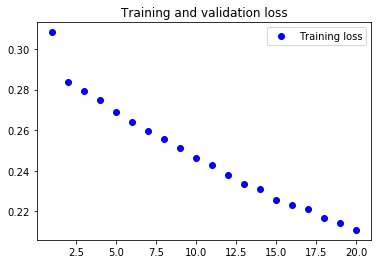

In [16]:
import matplotlib.pyplot as plt

loss = history.history['loss']
#val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
#plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [21]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.GRU(32, 
                     dropout=0.2,
                     recurrent_dropout=0.2,
                     input_shape=(None, float_data.shape[-1])))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=40,
                              #validation_data=val_gen,
                              #validation_steps=val_steps
                              )

Epoch 1/40


  1/500 [..............................] - ETA: 11:46 - loss: 1.0532

  2/500 [..............................] - ETA: 6:47 - loss: 0.8947 

  3/500 [..............................] - ETA: 4:58 - loss: 0.8399

  4/500 [..............................] - ETA: 4:00 - loss: 0.7733

  5/500 [..............................] - ETA: 3:24 - loss: 0.7296

  6/500 [..............................] - ETA: 3:05 - loss: 0.6996

  7/500 [..............................] - ETA: 2:47 - loss: 0.6678

  8/500 [..............................] - ETA: 2:35 - loss: 0.6465

  9/500 [..............................] - ETA: 2:26 - loss: 0.6283

 10/500 [..............................] - ETA: 2:19 - loss: 0.6090

 11/500 [..............................] - ETA: 2:13 - loss: 0.5940

 12/500 [..............................] - ETA: 2:10 - loss: 0.5808

 13/500 [..............................] - ETA: 2:06 - loss: 0.5679

 14/500 [..............................] - ETA: 2:04 - loss: 0.5586

 15/500 [..............................] - ETA: 2:00 - loss: 0.5498

 16/500 [..............................] - ETA: 1:58 - loss: 0.5415

 17/500 [>.............................] - ETA: 1:57 - loss: 0.5336

 18/500 [>.............................] - ETA: 1:55 - loss: 0.5237



 19/500 [>.............................] - ETA: 1:54 - loss: 0.5162

 20/500 [>.............................] - ETA: 1:53 - loss: 0.5108

 21/500 [>.............................] - ETA: 1:52 - loss: 0.5030

 22/500 [>.............................] - ETA: 1:51 - loss: 0.4976

 23/500 [>.............................] - ETA: 1:49 - loss: 0.4926

 24/500 [>.............................] - ETA: 1:48 - loss: 0.4879

 25/500 [>.............................] - ETA: 1:46 - loss: 0.4825

 26/500 [>.............................] - ETA: 1:45 - loss: 0.4787

 27/500 [>.............................] - ETA: 1:44 - loss: 0.4770

 28/500 [>.............................] - ETA: 1:44 - loss: 0.4735

 29/500 [>.............................] - ETA: 1:44 - loss: 0.4711

 30/500 [>.............................] - ETA: 1:43 - loss: 0.4672

 31/500 [>.............................] - ETA: 1:43 - loss: 0.4655

 32/500 [>.............................] - ETA: 1:43 - loss: 0.4641

 33/500 [>.............................] - ETA: 1:42 - loss: 0.4616

 34/500 [=>............................] - ETA: 1:42 - loss: 0.4573



 35/500 [=>............................] - ETA: 1:41 - loss: 0.4551



 36/500 [=>............................] - ETA: 1:41 - loss: 0.4536

 37/500 [=>............................] - ETA: 1:41 - loss: 0.4512

 38/500 [=>............................] - ETA: 1:41 - loss: 0.4494

 39/500 [=>............................] - ETA: 1:41 - loss: 0.4484

 40/500 [=>............................] - ETA: 1:41 - loss: 0.4462

 41/500 [=>............................] - ETA: 1:40 - loss: 0.4436

 42/500 [=>............................] - ETA: 1:39 - loss: 0.4415

 43/500 [=>............................] - ETA: 1:39 - loss: 0.4398

 44/500 [=>............................] - ETA: 1:38 - loss: 0.4390

 45/500 [=>............................] - ETA: 1:37 - loss: 0.4377

 46/500 [=>............................] - ETA: 1:37 - loss: 0.4362

 47/500 [=>............................] - ETA: 1:38 - loss: 0.4351

 48/500 [=>............................] - ETA: 1:40 - loss: 0.4342

 49/500 [=>............................] - ETA: 1:40 - loss: 0.4327

 50/500 [==>...........................] - ETA: 1:40 - loss: 0.4318

 51/500 [==>...........................] - ETA: 1:40 - loss: 0.4307

 52/500 [==>...........................] - ETA: 1:39 - loss: 0.4300

 53/500 [==>...........................] - ETA: 1:39 - loss: 0.4287

 54/500 [==>...........................] - ETA: 1:39 - loss: 0.4272

 55/500 [==>...........................] - ETA: 1:39 - loss: 0.4254

 56/500 [==>...........................] - ETA: 1:39 - loss: 0.4229

 57/500 [==>...........................] - ETA: 1:39 - loss: 0.4218

 58/500 [==>...........................] - ETA: 1:38 - loss: 0.4202

 59/500 [==>...........................] - ETA: 1:37 - loss: 0.4185

 60/500 [==>...........................] - ETA: 1:36 - loss: 0.4181

 61/500 [==>...........................] - ETA: 1:36 - loss: 0.4171

 62/500 [==>...........................] - ETA: 1:35 - loss: 0.4163

 63/500 [==>...........................] - ETA: 1:35 - loss: 0.4155

 64/500 [==>...........................] - ETA: 1:34 - loss: 0.4142

 65/500 [==>...........................] - ETA: 1:33 - loss: 0.4134

 66/500 [==>...........................] - ETA: 1:33 - loss: 0.4124

 67/500 [===>..........................] - ETA: 1:32 - loss: 0.4119

 68/500 [===>..........................] - ETA: 1:32 - loss: 0.4114

 69/500 [===>..........................] - ETA: 1:31 - loss: 0.4103

 70/500 [===>..........................] - ETA: 1:30 - loss: 0.4092

 71/500 [===>..........................] - ETA: 1:30 - loss: 0.4085

 72/500 [===>..........................] - ETA: 1:29 - loss: 0.4076

 73/500 [===>..........................] - ETA: 1:29 - loss: 0.4066

 74/500 [===>..........................] - ETA: 1:28 - loss: 0.4061

 75/500 [===>..........................] - ETA: 1:28 - loss: 0.4053

 76/500 [===>..........................] - ETA: 1:28 - loss: 0.4045

 77/500 [===>..........................] - ETA: 1:27 - loss: 0.4038

 78/500 [===>..........................] - ETA: 1:27 - loss: 0.4030

 79/500 [===>..........................] - ETA: 1:26 - loss: 0.4024

 80/500 [===>..........................] - ETA: 1:26 - loss: 0.4014

 81/500 [===>..........................] - ETA: 1:25 - loss: 0.4008

 82/500 [===>..........................] - ETA: 1:25 - loss: 0.4000

 83/500 [===>..........................] - ETA: 1:25 - loss: 0.3990

 84/500 [====>.........................] - ETA: 1:24 - loss: 0.3983

 85/500 [====>.........................] - ETA: 1:24 - loss: 0.3979

 86/500 [====>.........................] - ETA: 1:23 - loss: 0.3970

 87/500 [====>.........................] - ETA: 1:23 - loss: 0.3967

 88/500 [====>.........................] - ETA: 1:22 - loss: 0.3960

 89/500 [====>.........................] - ETA: 1:22 - loss: 0.3953

 90/500 [====>.........................] - ETA: 1:22 - loss: 0.3951

 91/500 [====>.........................] - ETA: 1:21 - loss: 0.3945

 92/500 [====>.........................] - ETA: 1:21 - loss: 0.3935

 93/500 [====>.........................] - ETA: 1:21 - loss: 0.3932

 94/500 [====>.........................] - ETA: 1:21 - loss: 0.3931

 95/500 [====>.........................] - ETA: 1:20 - loss: 0.3925

 96/500 [====>.........................] - ETA: 1:20 - loss: 0.3920

 97/500 [====>.........................] - ETA: 1:20 - loss: 0.3914

 98/500 [====>.........................] - ETA: 1:19 - loss: 0.3912

 99/500 [====>.........................] - ETA: 1:19 - loss: 0.3906

100/500 [=====>........................] - ETA: 1:19 - loss: 0.3902

101/500 [=====>........................] - ETA: 1:18 - loss: 0.3899

102/500 [=====>........................] - ETA: 1:18 - loss: 0.3895

103/500 [=====>........................] - ETA: 1:18 - loss: 0.3892

104/500 [=====>........................] - ETA: 1:17 - loss: 0.3883

105/500 [=====>........................] - ETA: 1:17 - loss: 0.3876

106/500 [=====>........................] - ETA: 1:17 - loss: 0.3872

107/500 [=====>........................] - ETA: 1:16 - loss: 0.3863

108/500 [=====>........................] - ETA: 1:16 - loss: 0.3853

109/500 [=====>........................] - ETA: 1:16 - loss: 0.3852

110/500 [=====>........................] - ETA: 1:15 - loss: 0.3848

111/500 [=====>........................] - ETA: 1:15 - loss: 0.3845

112/500 [=====>........................] - ETA: 1:15 - loss: 0.3847

113/500 [=====>........................] - ETA: 1:15 - loss: 0.3842

114/500 [=====>........................] - ETA: 1:14 - loss: 0.3838

115/500 [=====>........................] - ETA: 1:14 - loss: 0.3832

116/500 [=====>........................] - ETA: 1:14 - loss: 0.3831

117/500 [======>.......................] - ETA: 1:14 - loss: 0.3825

118/500 [======>.......................] - ETA: 1:13 - loss: 0.3824

119/500 [======>.......................] - ETA: 1:13 - loss: 0.3820



120/500 [======>.......................] - ETA: 1:13 - loss: 0.3815

121/500 [======>.......................] - ETA: 1:13 - loss: 0.3808

122/500 [======>.......................] - ETA: 1:13 - loss: 0.3809

123/500 [======>.......................] - ETA: 1:13 - loss: 0.3802

124/500 [======>.......................] - ETA: 1:12 - loss: 0.3801

125/500 [======>.......................] - ETA: 1:12 - loss: 0.3799

126/500 [======>.......................] - ETA: 1:12 - loss: 0.3796

127/500 [======>.......................] - ETA: 1:12 - loss: 0.3790

128/500 [======>.......................] - ETA: 1:11 - loss: 0.3788

129/500 [======>.......................] - ETA: 1:11 - loss: 0.3784

130/500 [======>.......................] - ETA: 1:11 - loss: 0.3783

131/500 [======>.......................] - ETA: 1:11 - loss: 0.3780

132/500 [======>.......................] - ETA: 1:10 - loss: 0.3776

133/500 [======>.......................] - ETA: 1:10 - loss: 0.3775

134/500 [=======>......................] - ETA: 1:10 - loss: 0.3769

135/500 [=======>......................] - ETA: 1:09 - loss: 0.3770

136/500 [=======>......................] - ETA: 1:09 - loss: 0.3763

137/500 [=======>......................] - ETA: 1:09 - loss: 0.3757

138/500 [=======>......................] - ETA: 1:09 - loss: 0.3757

139/500 [=======>......................] - ETA: 1:09 - loss: 0.3755

140/500 [=======>......................] - ETA: 1:08 - loss: 0.3755

141/500 [=======>......................] - ETA: 1:08 - loss: 0.3751

142/500 [=======>......................] - ETA: 1:08 - loss: 0.3748

143/500 [=======>......................] - ETA: 1:08 - loss: 0.3743

144/500 [=======>......................] - ETA: 1:07 - loss: 0.3743

145/500 [=======>......................] - ETA: 1:07 - loss: 0.3739

146/500 [=======>......................] - ETA: 1:07 - loss: 0.3739

147/500 [=======>......................] - ETA: 1:06 - loss: 0.3739

148/500 [=======>......................] - ETA: 1:06 - loss: 0.3738

149/500 [=======>......................] - ETA: 1:06 - loss: 0.3736

150/500 [========>.....................] - ETA: 1:06 - loss: 0.3737

151/500 [========>.....................] - ETA: 1:05 - loss: 0.3736

152/500 [========>.....................] - ETA: 1:05 - loss: 0.3732

153/500 [========>.....................] - ETA: 1:05 - loss: 0.3729

154/500 [========>.....................] - ETA: 1:05 - loss: 0.3728

155/500 [========>.....................] - ETA: 1:04 - loss: 0.3726

156/500 [========>.....................] - ETA: 1:04 - loss: 0.3725

157/500 [========>.....................] - ETA: 1:04 - loss: 0.3721

158/500 [========>.....................] - ETA: 1:04 - loss: 0.3717

159/500 [========>.....................] - ETA: 1:04 - loss: 0.3716

160/500 [========>.....................] - ETA: 1:03 - loss: 0.3714

161/500 [========>.....................] - ETA: 1:03 - loss: 0.3714

162/500 [========>.....................] - ETA: 1:03 - loss: 0.3710

163/500 [========>.....................] - ETA: 1:03 - loss: 0.3707

164/500 [========>.....................] - ETA: 1:03 - loss: 0.3704

165/500 [========>.....................] - ETA: 1:02 - loss: 0.3702

166/500 [========>.....................] - ETA: 1:02 - loss: 0.3700

167/500 [=========>....................] - ETA: 1:02 - loss: 0.3700



168/500 [=========>....................] - ETA: 1:02 - loss: 0.3696

169/500 [=========>....................] - ETA: 1:02 - loss: 0.3693

170/500 [=========>....................] - ETA: 1:01 - loss: 0.3691

171/500 [=========>....................] - ETA: 1:01 - loss: 0.3688

172/500 [=========>....................] - ETA: 1:01 - loss: 0.3687

173/500 [=========>....................] - ETA: 1:01 - loss: 0.3685

174/500 [=========>....................] - ETA: 1:01 - loss: 0.3682

175/500 [=========>....................] - ETA: 1:00 - loss: 0.3683

176/500 [=========>....................] - ETA: 1:00 - loss: 0.3680

177/500 [=========>....................] - ETA: 1:00 - loss: 0.3678

178/500 [=========>....................] - ETA: 1:00 - loss: 0.3676

179/500 [=========>....................] - ETA: 1:00 - loss: 0.3674

180/500 [=========>....................] - ETA: 59s - loss: 0.3671 

181/500 [=========>....................] - ETA: 59s - loss: 0.3670

182/500 [=========>....................] - ETA: 59s - loss: 0.3666

183/500 [=========>....................] - ETA: 59s - loss: 0.3666

184/500 [==========>...................] - ETA: 59s - loss: 0.3663

185/500 [==========>...................] - ETA: 58s - loss: 0.3662

186/500 [==========>...................] - ETA: 58s - loss: 0.3661

187/500 [==========>...................] - ETA: 58s - loss: 0.3659

188/500 [==========>...................] - ETA: 58s - loss: 0.3658

189/500 [==========>...................] - ETA: 57s - loss: 0.3657

190/500 [==========>...................] - ETA: 57s - loss: 0.3654

191/500 [==========>...................] - ETA: 57s - loss: 0.3651

192/500 [==========>...................] - ETA: 57s - loss: 0.3651



193/500 [==========>...................] - ETA: 57s - loss: 0.3648

194/500 [==========>...................] - ETA: 56s - loss: 0.3647

195/500 [==========>...................] - ETA: 56s - loss: 0.3645

196/500 [==========>...................] - ETA: 56s - loss: 0.3643

197/500 [==========>...................] - ETA: 56s - loss: 0.3643

198/500 [==========>...................] - ETA: 56s - loss: 0.3639

199/500 [==========>...................] - ETA: 56s - loss: 0.3637

200/500 [===========>..................] - ETA: 55s - loss: 0.3636

201/500 [===========>..................] - ETA: 55s - loss: 0.3634

202/500 [===========>..................] - ETA: 55s - loss: 0.3631

203/500 [===========>..................] - ETA: 55s - loss: 0.3630

204/500 [===========>..................] - ETA: 55s - loss: 0.3628

205/500 [===========>..................] - ETA: 54s - loss: 0.3627

206/500 [===========>..................] - ETA: 54s - loss: 0.3624

207/500 [===========>..................] - ETA: 54s - loss: 0.3621



208/500 [===========>..................] - ETA: 54s - loss: 0.3619

209/500 [===========>..................] - ETA: 54s - loss: 0.3617

210/500 [===========>..................] - ETA: 53s - loss: 0.3615

211/500 [===========>..................] - ETA: 53s - loss: 0.3614

212/500 [===========>..................] - ETA: 53s - loss: 0.3614



213/500 [===========>..................] - ETA: 53s - loss: 0.3612

214/500 [===========>..................] - ETA: 53s - loss: 0.3608

215/500 [===========>..................] - ETA: 53s - loss: 0.3606

216/500 [===========>..................] - ETA: 52s - loss: 0.3603

217/500 [============>.................] - ETA: 52s - loss: 0.3603

218/500 [============>.................] - ETA: 52s - loss: 0.3603

219/500 [============>.................] - ETA: 52s - loss: 0.3602

220/500 [============>.................] - ETA: 52s - loss: 0.3600

221/500 [============>.................] - ETA: 51s - loss: 0.3598

222/500 [============>.................] - ETA: 51s - loss: 0.3597

223/500 [============>.................] - ETA: 51s - loss: 0.3598

224/500 [============>.................] - ETA: 51s - loss: 0.3597

225/500 [============>.................] - ETA: 51s - loss: 0.3597

226/500 [============>.................] - ETA: 51s - loss: 0.3598

227/500 [============>.................] - ETA: 50s - loss: 0.3598

228/500 [============>.................] - ETA: 50s - loss: 0.3596

229/500 [============>.................] - ETA: 50s - loss: 0.3594

230/500 [============>.................] - ETA: 50s - loss: 0.3594

231/500 [============>.................] - ETA: 50s - loss: 0.3591

232/500 [============>.................] - ETA: 49s - loss: 0.3591

233/500 [============>.................] - ETA: 49s - loss: 0.3589

234/500 [=============>................] - ETA: 49s - loss: 0.3588

235/500 [=============>................] - ETA: 49s - loss: 0.3587

236/500 [=============>................] - ETA: 49s - loss: 0.3586

237/500 [=============>................] - ETA: 48s - loss: 0.3585

238/500 [=============>................] - ETA: 48s - loss: 0.3582

239/500 [=============>................] - ETA: 48s - loss: 0.3580

240/500 [=============>................] - ETA: 48s - loss: 0.3577

241/500 [=============>................] - ETA: 48s - loss: 0.3576

242/500 [=============>................] - ETA: 47s - loss: 0.3574

243/500 [=============>................] - ETA: 47s - loss: 0.3573

244/500 [=============>................] - ETA: 47s - loss: 0.3573

245/500 [=============>................] - ETA: 47s - loss: 0.3571

246/500 [=============>................] - ETA: 47s - loss: 0.3570

247/500 [=============>................] - ETA: 47s - loss: 0.3569

248/500 [=============>................] - ETA: 47s - loss: 0.3568

249/500 [=============>................] - ETA: 46s - loss: 0.3566

250/500 [==============>...............] - ETA: 46s - loss: 0.3565

251/500 [==============>...............] - ETA: 46s - loss: 0.3563

252/500 [==============>...............] - ETA: 46s - loss: 0.3561

253/500 [==============>...............] - ETA: 46s - loss: 0.3559

254/500 [==============>...............] - ETA: 45s - loss: 0.3558

255/500 [==============>...............] - ETA: 45s - loss: 0.3557

256/500 [==============>...............] - ETA: 45s - loss: 0.3555

257/500 [==============>...............] - ETA: 45s - loss: 0.3555

258/500 [==============>...............] - ETA: 45s - loss: 0.3553

259/500 [==============>...............] - ETA: 44s - loss: 0.3551

260/500 [==============>...............] - ETA: 44s - loss: 0.3552

261/500 [==============>...............] - ETA: 44s - loss: 0.3551

262/500 [==============>...............] - ETA: 44s - loss: 0.3549

263/500 [==============>...............] - ETA: 44s - loss: 0.3549

264/500 [==============>...............] - ETA: 43s - loss: 0.3548

265/500 [==============>...............] - ETA: 43s - loss: 0.3547

266/500 [==============>...............] - ETA: 43s - loss: 0.3546

267/500 [===============>..............] - ETA: 43s - loss: 0.3545

268/500 [===============>..............] - ETA: 43s - loss: 0.3543

269/500 [===============>..............] - ETA: 42s - loss: 0.3542

270/500 [===============>..............] - ETA: 42s - loss: 0.3542

271/500 [===============>..............] - ETA: 42s - loss: 0.3541

272/500 [===============>..............] - ETA: 42s - loss: 0.3540

273/500 [===============>..............] - ETA: 42s - loss: 0.3539

274/500 [===============>..............] - ETA: 41s - loss: 0.3537

275/500 [===============>..............] - ETA: 41s - loss: 0.3539

276/500 [===============>..............] - ETA: 41s - loss: 0.3537

277/500 [===============>..............] - ETA: 41s - loss: 0.3538

278/500 [===============>..............] - ETA: 41s - loss: 0.3536

279/500 [===============>..............] - ETA: 40s - loss: 0.3536

280/500 [===============>..............] - ETA: 40s - loss: 0.3535

281/500 [===============>..............] - ETA: 40s - loss: 0.3534

282/500 [===============>..............] - ETA: 40s - loss: 0.3532

283/500 [===============>..............] - ETA: 40s - loss: 0.3531

284/500 [================>.............] - ETA: 40s - loss: 0.3530

285/500 [================>.............] - ETA: 39s - loss: 0.3529

286/500 [================>.............] - ETA: 39s - loss: 0.3529

287/500 [================>.............] - ETA: 39s - loss: 0.3528

288/500 [================>.............] - ETA: 39s - loss: 0.3527

289/500 [================>.............] - ETA: 39s - loss: 0.3526

290/500 [================>.............] - ETA: 38s - loss: 0.3526

291/500 [================>.............] - ETA: 38s - loss: 0.3526

292/500 [================>.............] - ETA: 38s - loss: 0.3525

293/500 [================>.............] - ETA: 38s - loss: 0.3524

294/500 [================>.............] - ETA: 38s - loss: 0.3522

295/500 [================>.............] - ETA: 37s - loss: 0.3523

296/500 [================>.............] - ETA: 37s - loss: 0.3523

297/500 [================>.............] - ETA: 37s - loss: 0.3522

298/500 [================>.............] - ETA: 37s - loss: 0.3521

299/500 [================>.............] - ETA: 37s - loss: 0.3520

300/500 [=================>............] - ETA: 36s - loss: 0.3520

301/500 [=================>............] - ETA: 36s - loss: 0.3519

302/500 [=================>............] - ETA: 36s - loss: 0.3518

303/500 [=================>............] - ETA: 36s - loss: 0.3515

304/500 [=================>............] - ETA: 36s - loss: 0.3514

305/500 [=================>............] - ETA: 36s - loss: 0.3514

306/500 [=================>............] - ETA: 35s - loss: 0.3513

307/500 [=================>............] - ETA: 35s - loss: 0.3513

308/500 [=================>............] - ETA: 35s - loss: 0.3511

309/500 [=================>............] - ETA: 35s - loss: 0.3511

310/500 [=================>............] - ETA: 35s - loss: 0.3509

311/500 [=================>............] - ETA: 34s - loss: 0.3510

312/500 [=================>............] - ETA: 34s - loss: 0.3510

313/500 [=================>............] - ETA: 34s - loss: 0.3509

314/500 [=================>............] - ETA: 34s - loss: 0.3508

315/500 [=================>............] - ETA: 34s - loss: 0.3507

316/500 [=================>............] - ETA: 33s - loss: 0.3506

317/500 [==================>...........] - ETA: 33s - loss: 0.3505

318/500 [==================>...........] - ETA: 33s - loss: 0.3504

319/500 [==================>...........] - ETA: 33s - loss: 0.3504

320/500 [==================>...........] - ETA: 33s - loss: 0.3504

321/500 [==================>...........] - ETA: 33s - loss: 0.3502

322/500 [==================>...........] - ETA: 32s - loss: 0.3501

323/500 [==================>...........] - ETA: 32s - loss: 0.3501

324/500 [==================>...........] - ETA: 32s - loss: 0.3500

325/500 [==================>...........] - ETA: 32s - loss: 0.3499

326/500 [==================>...........] - ETA: 32s - loss: 0.3500

327/500 [==================>...........] - ETA: 31s - loss: 0.3499

328/500 [==================>...........] - ETA: 31s - loss: 0.3498

329/500 [==================>...........] - ETA: 31s - loss: 0.3497

330/500 [==================>...........] - ETA: 31s - loss: 0.3498

331/500 [==================>...........] - ETA: 31s - loss: 0.3497

332/500 [==================>...........] - ETA: 31s - loss: 0.3496

333/500 [==================>...........] - ETA: 30s - loss: 0.3496

334/500 [===================>..........] - ETA: 30s - loss: 0.3496

335/500 [===================>..........] - ETA: 30s - loss: 0.3495

336/500 [===================>..........] - ETA: 30s - loss: 0.3492

337/500 [===================>..........] - ETA: 30s - loss: 0.3491

338/500 [===================>..........] - ETA: 30s - loss: 0.3491

339/500 [===================>..........] - ETA: 29s - loss: 0.3491

340/500 [===================>..........] - ETA: 29s - loss: 0.3490

341/500 [===================>..........] - ETA: 29s - loss: 0.3490

342/500 [===================>..........] - ETA: 29s - loss: 0.3489

343/500 [===================>..........] - ETA: 29s - loss: 0.3488

344/500 [===================>..........] - ETA: 28s - loss: 0.3487

345/500 [===================>..........] - ETA: 28s - loss: 0.3486

346/500 [===================>..........] - ETA: 28s - loss: 0.3485

347/500 [===================>..........] - ETA: 28s - loss: 0.3483

348/500 [===================>..........] - ETA: 28s - loss: 0.3482

349/500 [===================>..........] - ETA: 27s - loss: 0.3482

350/500 [====================>.........] - ETA: 27s - loss: 0.3481

351/500 [====================>.........] - ETA: 27s - loss: 0.3481

352/500 [====================>.........] - ETA: 27s - loss: 0.3481

353/500 [====================>.........] - ETA: 27s - loss: 0.3482

354/500 [====================>.........] - ETA: 26s - loss: 0.3481

355/500 [====================>.........] - ETA: 26s - loss: 0.3481

356/500 [====================>.........] - ETA: 26s - loss: 0.3480

357/500 [====================>.........] - ETA: 26s - loss: 0.3480

358/500 [====================>.........] - ETA: 26s - loss: 0.3479

359/500 [====================>.........] - ETA: 25s - loss: 0.3478

360/500 [====================>.........] - ETA: 25s - loss: 0.3477

361/500 [====================>.........] - ETA: 25s - loss: 0.3478

362/500 [====================>.........] - ETA: 25s - loss: 0.3477

363/500 [====================>.........] - ETA: 25s - loss: 0.3477

364/500 [====================>.........] - ETA: 24s - loss: 0.3477

365/500 [====================>.........] - ETA: 24s - loss: 0.3477

366/500 [====================>.........] - ETA: 24s - loss: 0.3475

367/500 [=====================>........] - ETA: 24s - loss: 0.3475

368/500 [=====================>........] - ETA: 24s - loss: 0.3474

369/500 [=====================>........] - ETA: 24s - loss: 0.3474

370/500 [=====================>........] - ETA: 23s - loss: 0.3473

371/500 [=====================>........] - ETA: 23s - loss: 0.3474

372/500 [=====================>........] - ETA: 23s - loss: 0.3473

373/500 [=====================>........] - ETA: 23s - loss: 0.3473

374/500 [=====================>........] - ETA: 23s - loss: 0.3471

375/500 [=====================>........] - ETA: 22s - loss: 0.3470

376/500 [=====================>........] - ETA: 22s - loss: 0.3470

377/500 [=====================>........] - ETA: 22s - loss: 0.3469

378/500 [=====================>........] - ETA: 22s - loss: 0.3469

379/500 [=====================>........] - ETA: 22s - loss: 0.3468

380/500 [=====================>........] - ETA: 21s - loss: 0.3467

381/500 [=====================>........] - ETA: 21s - loss: 0.3467



382/500 [=====================>........] - ETA: 21s - loss: 0.3467

383/500 [=====================>........] - ETA: 21s - loss: 0.3466

384/500 [======================>.......] - ETA: 21s - loss: 0.3465

385/500 [======================>.......] - ETA: 20s - loss: 0.3464

386/500 [======================>.......] - ETA: 20s - loss: 0.3463

387/500 [======================>.......] - ETA: 20s - loss: 0.3462

388/500 [======================>.......] - ETA: 20s - loss: 0.3461

389/500 [======================>.......] - ETA: 20s - loss: 0.3461

390/500 [======================>.......] - ETA: 20s - loss: 0.3461

391/500 [======================>.......] - ETA: 19s - loss: 0.3460

392/500 [======================>.......] - ETA: 19s - loss: 0.3460

393/500 [======================>.......] - ETA: 19s - loss: 0.3460

394/500 [======================>.......] - ETA: 19s - loss: 0.3460

395/500 [======================>.......] - ETA: 19s - loss: 0.3459

396/500 [======================>.......] - ETA: 18s - loss: 0.3459

397/500 [======================>.......] - ETA: 18s - loss: 0.3458

398/500 [======================>.......] - ETA: 18s - loss: 0.3458

399/500 [======================>.......] - ETA: 18s - loss: 0.3458

400/500 [=======================>......] - ETA: 18s - loss: 0.3458

401/500 [=======================>......] - ETA: 17s - loss: 0.3457

402/500 [=======================>......] - ETA: 17s - loss: 0.3457

403/500 [=======================>......] - ETA: 17s - loss: 0.3456

404/500 [=======================>......] - ETA: 17s - loss: 0.3455

405/500 [=======================>......] - ETA: 17s - loss: 0.3455

406/500 [=======================>......] - ETA: 17s - loss: 0.3455

407/500 [=======================>......] - ETA: 16s - loss: 0.3453

408/500 [=======================>......] - ETA: 16s - loss: 0.3451

409/500 [=======================>......] - ETA: 16s - loss: 0.3451

410/500 [=======================>......] - ETA: 16s - loss: 0.3450

411/500 [=======================>......] - ETA: 16s - loss: 0.3449

412/500 [=======================>......] - ETA: 15s - loss: 0.3449

413/500 [=======================>......] - ETA: 15s - loss: 0.3449

414/500 [=======================>......] - ETA: 15s - loss: 0.3448

415/500 [=======================>......] - ETA: 15s - loss: 0.3448

416/500 [=======================>......] - ETA: 15s - loss: 0.3447

417/500 [========================>.....] - ETA: 15s - loss: 0.3445

418/500 [========================>.....] - ETA: 14s - loss: 0.3444

419/500 [========================>.....] - ETA: 14s - loss: 0.3444

420/500 [========================>.....] - ETA: 14s - loss: 0.3442

421/500 [========================>.....] - ETA: 14s - loss: 0.3443

422/500 [========================>.....] - ETA: 14s - loss: 0.3442

423/500 [========================>.....] - ETA: 13s - loss: 0.3441

424/500 [========================>.....] - ETA: 13s - loss: 0.3440

425/500 [========================>.....] - ETA: 13s - loss: 0.3439

426/500 [========================>.....] - ETA: 13s - loss: 0.3439

427/500 [========================>.....] - ETA: 13s - loss: 0.3440

428/500 [========================>.....] - ETA: 13s - loss: 0.3439

429/500 [========================>.....] - ETA: 12s - loss: 0.3438

430/500 [========================>.....] - ETA: 12s - loss: 0.3437

431/500 [========================>.....] - ETA: 12s - loss: 0.3437

432/500 [========================>.....] - ETA: 12s - loss: 0.3437

433/500 [========================>.....] - ETA: 12s - loss: 0.3436

434/500 [=========================>....] - ETA: 11s - loss: 0.3436

435/500 [=========================>....] - ETA: 11s - loss: 0.3435

436/500 [=========================>....] - ETA: 11s - loss: 0.3434

437/500 [=========================>....] - ETA: 11s - loss: 0.3433

438/500 [=========================>....] - ETA: 11s - loss: 0.3432

439/500 [=========================>....] - ETA: 10s - loss: 0.3431

440/500 [=========================>....] - ETA: 10s - loss: 0.3431

441/500 [=========================>....] - ETA: 10s - loss: 0.3430

442/500 [=========================>....] - ETA: 10s - loss: 0.3429

443/500 [=========================>....] - ETA: 10s - loss: 0.3429

444/500 [=========================>....] - ETA: 10s - loss: 0.3428

445/500 [=========================>....] - ETA: 9s - loss: 0.3427 

446/500 [=========================>....] - ETA: 9s - loss: 0.3427

447/500 [=========================>....] - ETA: 9s - loss: 0.3427

448/500 [=========================>....] - ETA: 9s - loss: 0.3426

449/500 [=========================>....] - ETA: 9s - loss: 0.3425

450/500 [==========================>...] - ETA: 8s - loss: 0.3426

451/500 [==========================>...] - ETA: 8s - loss: 0.3424

452/500 [==========================>...] - ETA: 8s - loss: 0.3424

453/500 [==========================>...] - ETA: 8s - loss: 0.3424

454/500 [==========================>...] - ETA: 8s - loss: 0.3424

455/500 [==========================>...] - ETA: 8s - loss: 0.3424

456/500 [==========================>...] - ETA: 7s - loss: 0.3423

457/500 [==========================>...] - ETA: 7s - loss: 0.3422

458/500 [==========================>...] - ETA: 7s - loss: 0.3421

459/500 [==========================>...] - ETA: 7s - loss: 0.3420

460/500 [==========================>...] - ETA: 7s - loss: 0.3419

461/500 [==========================>...] - ETA: 6s - loss: 0.3419

462/500 [==========================>...] - ETA: 6s - loss: 0.3418

463/500 [==========================>...] - ETA: 6s - loss: 0.3418

464/500 [==========================>...] - ETA: 6s - loss: 0.3418

465/500 [==========================>...] - ETA: 6s - loss: 0.3418

466/500 [==========================>...] - ETA: 6s - loss: 0.3418

467/500 [===========================>..] - ETA: 5s - loss: 0.3417

468/500 [===========================>..] - ETA: 5s - loss: 0.3417

469/500 [===========================>..] - ETA: 5s - loss: 0.3415

470/500 [===========================>..] - ETA: 5s - loss: 0.3415

471/500 [===========================>..] - ETA: 5s - loss: 0.3415

472/500 [===========================>..] - ETA: 4s - loss: 0.3414

473/500 [===========================>..] - ETA: 4s - loss: 0.3414

474/500 [===========================>..] - ETA: 4s - loss: 0.3413

475/500 [===========================>..] - ETA: 4s - loss: 0.3411

476/500 [===========================>..] - ETA: 4s - loss: 0.3411

477/500 [===========================>..] - ETA: 4s - loss: 0.3412

478/500 [===========================>..] - ETA: 3s - loss: 0.3412

479/500 [===========================>..] - ETA: 3s - loss: 0.3412

480/500 [===========================>..] - ETA: 3s - loss: 0.3412

481/500 [===========================>..] - ETA: 3s - loss: 0.3412

482/500 [===========================>..] - ETA: 3s - loss: 0.3412

483/500 [===========================>..] - ETA: 3s - loss: 0.3412

484/500 [============================>.] - ETA: 2s - loss: 0.3412

485/500 [============================>.] - ETA: 2s - loss: 0.3411

486/500 [============================>.] - ETA: 2s - loss: 0.3410

487/500 [============================>.] - ETA: 2s - loss: 0.3409

488/500 [============================>.] - ETA: 2s - loss: 0.3409

489/500 [============================>.] - ETA: 1s - loss: 0.3408

490/500 [============================>.] - ETA: 1s - loss: 0.3407

491/500 [============================>.] - ETA: 1s - loss: 0.3407

492/500 [============================>.] - ETA: 1s - loss: 0.3406

493/500 [============================>.] - ETA: 1s - loss: 0.3406

494/500 [============================>.] - ETA: 1s - loss: 0.3405

495/500 [============================>.] - ETA: 0s - loss: 0.3405

496/500 [============================>.] - ETA: 0s - loss: 0.3405

497/500 [============================>.] - ETA: 0s - loss: 0.3405

498/500 [============================>.] - ETA: 0s - loss: 0.3404

499/500 [============================>.] - ETA: 0s - loss: 0.3404

500/500 [==============================] - 88s 176ms/step - loss: 0.3404


Epoch 2/40


  1/500 [..............................] - ETA: 1:18 - loss: 0.3108

  2/500 [..............................] - ETA: 1:20 - loss: 0.3161

  3/500 [..............................] - ETA: 1:15 - loss: 0.3259

  4/500 [..............................] - ETA: 1:18 - loss: 0.3221

  5/500 [..............................] - ETA: 1:16 - loss: 0.3242

  6/500 [..............................] - ETA: 1:16 - loss: 0.3228

  7/500 [..............................] - ETA: 1:15 - loss: 0.3283

  8/500 [..............................] - ETA: 1:17 - loss: 0.3270

  9/500 [..............................] - ETA: 1:16 - loss: 0.3247

 10/500 [..............................] - ETA: 1:17 - loss: 0.3215

 11/500 [..............................] - ETA: 1:16 - loss: 0.3243

 12/500 [..............................] - ETA: 1:17 - loss: 0.3207

 13/500 [..............................] - ETA: 1:17 - loss: 0.3213



 14/500 [..............................] - ETA: 1:18 - loss: 0.3196

 15/500 [..............................] - ETA: 1:18 - loss: 0.3176

 16/500 [..............................] - ETA: 1:18 - loss: 0.3175

 17/500 [>.............................] - ETA: 1:20 - loss: 0.3203

 18/500 [>.............................] - ETA: 1:18 - loss: 0.3199

 19/500 [>.............................] - ETA: 1:18 - loss: 0.3196

 20/500 [>.............................] - ETA: 1:18 - loss: 0.3204

 21/500 [>.............................] - ETA: 1:18 - loss: 0.3198

 22/500 [>.............................] - ETA: 1:18 - loss: 0.3200

 23/500 [>.............................] - ETA: 1:18 - loss: 0.3192

 24/500 [>.............................] - ETA: 1:18 - loss: 0.3191

 25/500 [>.............................] - ETA: 1:18 - loss: 0.3184

 26/500 [>.............................] - ETA: 1:17 - loss: 0.3188

 27/500 [>.............................] - ETA: 1:17 - loss: 0.3187

 28/500 [>.............................] - ETA: 1:17 - loss: 0.3193

 29/500 [>.............................] - ETA: 1:17 - loss: 0.3201

 30/500 [>.............................] - ETA: 1:17 - loss: 0.3188

 31/500 [>.............................] - ETA: 1:17 - loss: 0.3178

 32/500 [>.............................] - ETA: 1:16 - loss: 0.3174

 33/500 [>.............................] - ETA: 1:15 - loss: 0.3181

 34/500 [=>............................] - ETA: 1:15 - loss: 0.3187

 35/500 [=>............................] - ETA: 1:15 - loss: 0.3193

 36/500 [=>............................] - ETA: 1:14 - loss: 0.3196

 37/500 [=>............................] - ETA: 1:14 - loss: 0.3195

 38/500 [=>............................] - ETA: 1:14 - loss: 0.3191

 39/500 [=>............................] - ETA: 1:14 - loss: 0.3181

 40/500 [=>............................] - ETA: 1:14 - loss: 0.3173

 41/500 [=>............................] - ETA: 1:13 - loss: 0.3175

 42/500 [=>............................] - ETA: 1:13 - loss: 0.3169

 43/500 [=>............................] - ETA: 1:12 - loss: 0.3158

 44/500 [=>............................] - ETA: 1:12 - loss: 0.3160

 45/500 [=>............................] - ETA: 1:12 - loss: 0.3161

 46/500 [=>............................] - ETA: 1:12 - loss: 0.3163

 47/500 [=>............................] - ETA: 1:12 - loss: 0.3164

 48/500 [=>............................] - ETA: 1:11 - loss: 0.3165

 49/500 [=>............................] - ETA: 1:11 - loss: 0.3165

 50/500 [==>...........................] - ETA: 1:11 - loss: 0.3164

 51/500 [==>...........................] - ETA: 1:11 - loss: 0.3170

 52/500 [==>...........................] - ETA: 1:11 - loss: 0.3164

 53/500 [==>...........................] - ETA: 1:10 - loss: 0.3160

 54/500 [==>...........................] - ETA: 1:10 - loss: 0.3156

 55/500 [==>...........................] - ETA: 1:10 - loss: 0.3153

 56/500 [==>...........................] - ETA: 1:09 - loss: 0.3158

 57/500 [==>...........................] - ETA: 1:09 - loss: 0.3162

 58/500 [==>...........................] - ETA: 1:09 - loss: 0.3156

 59/500 [==>...........................] - ETA: 1:09 - loss: 0.3151

 60/500 [==>...........................] - ETA: 1:09 - loss: 0.3154

 61/500 [==>...........................] - ETA: 1:09 - loss: 0.3156

 62/500 [==>...........................] - ETA: 1:09 - loss: 0.3155

 63/500 [==>...........................] - ETA: 1:09 - loss: 0.3147

 64/500 [==>...........................] - ETA: 1:08 - loss: 0.3143

 65/500 [==>...........................] - ETA: 1:08 - loss: 0.3142

 66/500 [==>...........................] - ETA: 1:08 - loss: 0.3138



 67/500 [===>..........................] - ETA: 1:08 - loss: 0.3135

 68/500 [===>..........................] - ETA: 1:08 - loss: 0.3130

 69/500 [===>..........................] - ETA: 1:08 - loss: 0.3136

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.3139

 71/500 [===>..........................] - ETA: 1:07 - loss: 0.3143

 72/500 [===>..........................] - ETA: 1:07 - loss: 0.3142

 73/500 [===>..........................] - ETA: 1:07 - loss: 0.3140

 74/500 [===>..........................] - ETA: 1:07 - loss: 0.3144

 75/500 [===>..........................] - ETA: 1:06 - loss: 0.3144

 76/500 [===>..........................] - ETA: 1:06 - loss: 0.3144

 77/500 [===>..........................] - ETA: 1:06 - loss: 0.3143

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.3139

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.3142

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.3136

 81/500 [===>..........................] - ETA: 1:05 - loss: 0.3134

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.3132

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.3133

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.3129

 85/500 [====>.........................] - ETA: 1:04 - loss: 0.3123

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.3124

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.3129

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.3128

 89/500 [====>.........................] - ETA: 1:02 - loss: 0.3127

 90/500 [====>.........................] - ETA: 1:02 - loss: 0.3130

 91/500 [====>.........................] - ETA: 1:02 - loss: 0.3131

 92/500 [====>.........................] - ETA: 1:02 - loss: 0.3131

 93/500 [====>.........................] - ETA: 1:01 - loss: 0.3129

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.3131

 95/500 [====>.........................] - ETA: 1:01 - loss: 0.3130

 96/500 [====>.........................] - ETA: 1:01 - loss: 0.3128

 97/500 [====>.........................] - ETA: 1:01 - loss: 0.3131

 98/500 [====>.........................] - ETA: 1:01 - loss: 0.3130

 99/500 [====>.........................] - ETA: 1:00 - loss: 0.3130

100/500 [=====>........................] - ETA: 1:00 - loss: 0.3128

101/500 [=====>........................] - ETA: 1:00 - loss: 0.3129

102/500 [=====>........................] - ETA: 1:00 - loss: 0.3131

103/500 [=====>........................] - ETA: 59s - loss: 0.3129 

104/500 [=====>........................] - ETA: 59s - loss: 0.3133

105/500 [=====>........................] - ETA: 59s - loss: 0.3138

106/500 [=====>........................] - ETA: 59s - loss: 0.3138

107/500 [=====>........................] - ETA: 59s - loss: 0.3134

108/500 [=====>........................] - ETA: 59s - loss: 0.3132

109/500 [=====>........................] - ETA: 59s - loss: 0.3134

110/500 [=====>........................] - ETA: 59s - loss: 0.3133

111/500 [=====>........................] - ETA: 59s - loss: 0.3137

112/500 [=====>........................] - ETA: 59s - loss: 0.3139

113/500 [=====>........................] - ETA: 59s - loss: 0.3139

114/500 [=====>........................] - ETA: 58s - loss: 0.3137

115/500 [=====>........................] - ETA: 58s - loss: 0.3136

116/500 [=====>........................] - ETA: 58s - loss: 0.3136

117/500 [======>.......................] - ETA: 58s - loss: 0.3140

118/500 [======>.......................] - ETA: 58s - loss: 0.3140

119/500 [======>.......................] - ETA: 58s - loss: 0.3142

120/500 [======>.......................] - ETA: 58s - loss: 0.3143

121/500 [======>.......................] - ETA: 57s - loss: 0.3142

122/500 [======>.......................] - ETA: 57s - loss: 0.3140

123/500 [======>.......................] - ETA: 57s - loss: 0.3138

124/500 [======>.......................] - ETA: 57s - loss: 0.3136

125/500 [======>.......................] - ETA: 57s - loss: 0.3137

126/500 [======>.......................] - ETA: 56s - loss: 0.3137

127/500 [======>.......................] - ETA: 56s - loss: 0.3139

128/500 [======>.......................] - ETA: 56s - loss: 0.3139

129/500 [======>.......................] - ETA: 56s - loss: 0.3141

130/500 [======>.......................] - ETA: 56s - loss: 0.3140

131/500 [======>.......................] - ETA: 55s - loss: 0.3141

132/500 [======>.......................] - ETA: 55s - loss: 0.3140

133/500 [======>.......................] - ETA: 55s - loss: 0.3141

134/500 [=======>......................] - ETA: 55s - loss: 0.3138

135/500 [=======>......................] - ETA: 55s - loss: 0.3138

136/500 [=======>......................] - ETA: 55s - loss: 0.3138

137/500 [=======>......................] - ETA: 55s - loss: 0.3139

138/500 [=======>......................] - ETA: 54s - loss: 0.3137



139/500 [=======>......................] - ETA: 54s - loss: 0.3137

140/500 [=======>......................] - ETA: 54s - loss: 0.3139

141/500 [=======>......................] - ETA: 54s - loss: 0.3138

142/500 [=======>......................] - ETA: 54s - loss: 0.3141

143/500 [=======>......................] - ETA: 54s - loss: 0.3140

144/500 [=======>......................] - ETA: 54s - loss: 0.3142

145/500 [=======>......................] - ETA: 53s - loss: 0.3143

146/500 [=======>......................] - ETA: 53s - loss: 0.3147

147/500 [=======>......................] - ETA: 53s - loss: 0.3146

148/500 [=======>......................] - ETA: 53s - loss: 0.3146

149/500 [=======>......................] - ETA: 53s - loss: 0.3147

150/500 [========>.....................] - ETA: 53s - loss: 0.3148

151/500 [========>.....................] - ETA: 52s - loss: 0.3151

152/500 [========>.....................] - ETA: 52s - loss: 0.3150

153/500 [========>.....................] - ETA: 52s - loss: 0.3150

154/500 [========>.....................] - ETA: 52s - loss: 0.3150

155/500 [========>.....................] - ETA: 52s - loss: 0.3152

156/500 [========>.....................] - ETA: 52s - loss: 0.3153

157/500 [========>.....................] - ETA: 51s - loss: 0.3154

158/500 [========>.....................] - ETA: 51s - loss: 0.3152

159/500 [========>.....................] - ETA: 51s - loss: 0.3152

160/500 [========>.....................] - ETA: 51s - loss: 0.3150

161/500 [========>.....................] - ETA: 51s - loss: 0.3151

162/500 [========>.....................] - ETA: 51s - loss: 0.3151

163/500 [========>.....................] - ETA: 50s - loss: 0.3153

164/500 [========>.....................] - ETA: 50s - loss: 0.3153

165/500 [========>.....................] - ETA: 50s - loss: 0.3155

166/500 [========>.....................] - ETA: 50s - loss: 0.3157

167/500 [=========>....................] - ETA: 50s - loss: 0.3158

168/500 [=========>....................] - ETA: 50s - loss: 0.3159

169/500 [=========>....................] - ETA: 49s - loss: 0.3161

170/500 [=========>....................] - ETA: 49s - loss: 0.3159

171/500 [=========>....................] - ETA: 49s - loss: 0.3159

172/500 [=========>....................] - ETA: 49s - loss: 0.3160

173/500 [=========>....................] - ETA: 49s - loss: 0.3157

174/500 [=========>....................] - ETA: 49s - loss: 0.3158

175/500 [=========>....................] - ETA: 48s - loss: 0.3158

176/500 [=========>....................] - ETA: 48s - loss: 0.3157

177/500 [=========>....................] - ETA: 48s - loss: 0.3157

178/500 [=========>....................] - ETA: 48s - loss: 0.3156

179/500 [=========>....................] - ETA: 48s - loss: 0.3154

180/500 [=========>....................] - ETA: 48s - loss: 0.3154

181/500 [=========>....................] - ETA: 47s - loss: 0.3155

182/500 [=========>....................] - ETA: 47s - loss: 0.3155

183/500 [=========>....................] - ETA: 47s - loss: 0.3156

184/500 [==========>...................] - ETA: 47s - loss: 0.3156

185/500 [==========>...................] - ETA: 47s - loss: 0.3155

186/500 [==========>...................] - ETA: 47s - loss: 0.3157

187/500 [==========>...................] - ETA: 46s - loss: 0.3157

188/500 [==========>...................] - ETA: 46s - loss: 0.3156

189/500 [==========>...................] - ETA: 46s - loss: 0.3155

190/500 [==========>...................] - ETA: 46s - loss: 0.3154

191/500 [==========>...................] - ETA: 46s - loss: 0.3154

192/500 [==========>...................] - ETA: 46s - loss: 0.3155

193/500 [==========>...................] - ETA: 45s - loss: 0.3155

194/500 [==========>...................] - ETA: 45s - loss: 0.3154

195/500 [==========>...................] - ETA: 45s - loss: 0.3154

196/500 [==========>...................] - ETA: 45s - loss: 0.3153

197/500 [==========>...................] - ETA: 45s - loss: 0.3154

198/500 [==========>...................] - ETA: 45s - loss: 0.3152

199/500 [==========>...................] - ETA: 44s - loss: 0.3152

200/500 [===========>..................] - ETA: 44s - loss: 0.3153

201/500 [===========>..................] - ETA: 44s - loss: 0.3153

202/500 [===========>..................] - ETA: 44s - loss: 0.3153

203/500 [===========>..................] - ETA: 44s - loss: 0.3154

204/500 [===========>..................] - ETA: 44s - loss: 0.3153

205/500 [===========>..................] - ETA: 43s - loss: 0.3152

206/500 [===========>..................] - ETA: 43s - loss: 0.3152

207/500 [===========>..................] - ETA: 43s - loss: 0.3152

208/500 [===========>..................] - ETA: 43s - loss: 0.3154

209/500 [===========>..................] - ETA: 43s - loss: 0.3156

210/500 [===========>..................] - ETA: 43s - loss: 0.3154

211/500 [===========>..................] - ETA: 42s - loss: 0.3155

212/500 [===========>..................] - ETA: 42s - loss: 0.3155

213/500 [===========>..................] - ETA: 42s - loss: 0.3155

214/500 [===========>..................] - ETA: 42s - loss: 0.3155

215/500 [===========>..................] - ETA: 42s - loss: 0.3156

216/500 [===========>..................] - ETA: 42s - loss: 0.3156

217/500 [============>.................] - ETA: 41s - loss: 0.3156

218/500 [============>.................] - ETA: 41s - loss: 0.3155

219/500 [============>.................] - ETA: 41s - loss: 0.3155

220/500 [============>.................] - ETA: 41s - loss: 0.3155

221/500 [============>.................] - ETA: 41s - loss: 0.3154

222/500 [============>.................] - ETA: 41s - loss: 0.3154

223/500 [============>.................] - ETA: 40s - loss: 0.3154

224/500 [============>.................] - ETA: 40s - loss: 0.3154

225/500 [============>.................] - ETA: 40s - loss: 0.3154

226/500 [============>.................] - ETA: 40s - loss: 0.3154

227/500 [============>.................] - ETA: 40s - loss: 0.3153

228/500 [============>.................] - ETA: 40s - loss: 0.3154

229/500 [============>.................] - ETA: 39s - loss: 0.3154

230/500 [============>.................] - ETA: 39s - loss: 0.3154

231/500 [============>.................] - ETA: 39s - loss: 0.3154

232/500 [============>.................] - ETA: 39s - loss: 0.3153

233/500 [============>.................] - ETA: 39s - loss: 0.3152

234/500 [=============>................] - ETA: 39s - loss: 0.3152

235/500 [=============>................] - ETA: 39s - loss: 0.3151

236/500 [=============>................] - ETA: 39s - loss: 0.3151

237/500 [=============>................] - ETA: 38s - loss: 0.3153

238/500 [=============>................] - ETA: 38s - loss: 0.3152

239/500 [=============>................] - ETA: 38s - loss: 0.3152

240/500 [=============>................] - ETA: 38s - loss: 0.3152

241/500 [=============>................] - ETA: 38s - loss: 0.3152

242/500 [=============>................] - ETA: 38s - loss: 0.3150

243/500 [=============>................] - ETA: 38s - loss: 0.3150

244/500 [=============>................] - ETA: 37s - loss: 0.3150

245/500 [=============>................] - ETA: 37s - loss: 0.3148

246/500 [=============>................] - ETA: 37s - loss: 0.3148

247/500 [=============>................] - ETA: 37s - loss: 0.3147

248/500 [=============>................] - ETA: 37s - loss: 0.3148

249/500 [=============>................] - ETA: 37s - loss: 0.3150

250/500 [==============>...............] - ETA: 37s - loss: 0.3149

251/500 [==============>...............] - ETA: 37s - loss: 0.3149

252/500 [==============>...............] - ETA: 37s - loss: 0.3149

253/500 [==============>...............] - ETA: 36s - loss: 0.3148

254/500 [==============>...............] - ETA: 36s - loss: 0.3147

255/500 [==============>...............] - ETA: 36s - loss: 0.3148

256/500 [==============>...............] - ETA: 36s - loss: 0.3148

257/500 [==============>...............] - ETA: 36s - loss: 0.3148

258/500 [==============>...............] - ETA: 36s - loss: 0.3149

259/500 [==============>...............] - ETA: 36s - loss: 0.3147

260/500 [==============>...............] - ETA: 35s - loss: 0.3147

261/500 [==============>...............] - ETA: 35s - loss: 0.3146

262/500 [==============>...............] - ETA: 35s - loss: 0.3145

263/500 [==============>...............] - ETA: 35s - loss: 0.3146

264/500 [==============>...............] - ETA: 35s - loss: 0.3145

265/500 [==============>...............] - ETA: 35s - loss: 0.3146

266/500 [==============>...............] - ETA: 34s - loss: 0.3147

267/500 [===============>..............] - ETA: 34s - loss: 0.3146

268/500 [===============>..............] - ETA: 34s - loss: 0.3146

269/500 [===============>..............] - ETA: 34s - loss: 0.3146

270/500 [===============>..............] - ETA: 34s - loss: 0.3145

271/500 [===============>..............] - ETA: 34s - loss: 0.3145

272/500 [===============>..............] - ETA: 34s - loss: 0.3145

273/500 [===============>..............] - ETA: 33s - loss: 0.3146

274/500 [===============>..............] - ETA: 33s - loss: 0.3147

275/500 [===============>..............] - ETA: 33s - loss: 0.3147

276/500 [===============>..............] - ETA: 33s - loss: 0.3147

277/500 [===============>..............] - ETA: 33s - loss: 0.3146

278/500 [===============>..............] - ETA: 33s - loss: 0.3144

279/500 [===============>..............] - ETA: 33s - loss: 0.3145

280/500 [===============>..............] - ETA: 32s - loss: 0.3144

281/500 [===============>..............] - ETA: 32s - loss: 0.3144

282/500 [===============>..............] - ETA: 32s - loss: 0.3143

283/500 [===============>..............] - ETA: 32s - loss: 0.3143

284/500 [================>.............] - ETA: 32s - loss: 0.3143

285/500 [================>.............] - ETA: 32s - loss: 0.3144

286/500 [================>.............] - ETA: 32s - loss: 0.3144

287/500 [================>.............] - ETA: 31s - loss: 0.3143

288/500 [================>.............] - ETA: 31s - loss: 0.3142

289/500 [================>.............] - ETA: 31s - loss: 0.3142

290/500 [================>.............] - ETA: 31s - loss: 0.3142

291/500 [================>.............] - ETA: 31s - loss: 0.3142

292/500 [================>.............] - ETA: 31s - loss: 0.3142

293/500 [================>.............] - ETA: 30s - loss: 0.3141

294/500 [================>.............] - ETA: 30s - loss: 0.3142

295/500 [================>.............] - ETA: 30s - loss: 0.3141

296/500 [================>.............] - ETA: 30s - loss: 0.3141

297/500 [================>.............] - ETA: 30s - loss: 0.3141

298/500 [================>.............] - ETA: 30s - loss: 0.3141

299/500 [================>.............] - ETA: 30s - loss: 0.3141

300/500 [=================>............] - ETA: 30s - loss: 0.3141

301/500 [=================>............] - ETA: 29s - loss: 0.3140

302/500 [=================>............] - ETA: 29s - loss: 0.3140

303/500 [=================>............] - ETA: 29s - loss: 0.3142

304/500 [=================>............] - ETA: 29s - loss: 0.3142

305/500 [=================>............] - ETA: 29s - loss: 0.3140

306/500 [=================>............] - ETA: 29s - loss: 0.3140

307/500 [=================>............] - ETA: 29s - loss: 0.3139

308/500 [=================>............] - ETA: 28s - loss: 0.3139

309/500 [=================>............] - ETA: 28s - loss: 0.3139

310/500 [=================>............] - ETA: 28s - loss: 0.3139

311/500 [=================>............] - ETA: 28s - loss: 0.3140

312/500 [=================>............] - ETA: 28s - loss: 0.3140

313/500 [=================>............] - ETA: 28s - loss: 0.3141

314/500 [=================>............] - ETA: 27s - loss: 0.3140

315/500 [=================>............] - ETA: 27s - loss: 0.3140

316/500 [=================>............] - ETA: 27s - loss: 0.3140

317/500 [==================>...........] - ETA: 27s - loss: 0.3141

318/500 [==================>...........] - ETA: 27s - loss: 0.3140

319/500 [==================>...........] - ETA: 27s - loss: 0.3141

320/500 [==================>...........] - ETA: 27s - loss: 0.3141

321/500 [==================>...........] - ETA: 26s - loss: 0.3140

322/500 [==================>...........] - ETA: 26s - loss: 0.3140

323/500 [==================>...........] - ETA: 26s - loss: 0.3140

324/500 [==================>...........] - ETA: 26s - loss: 0.3141

325/500 [==================>...........] - ETA: 26s - loss: 0.3142

326/500 [==================>...........] - ETA: 26s - loss: 0.3142

327/500 [==================>...........] - ETA: 26s - loss: 0.3142

328/500 [==================>...........] - ETA: 25s - loss: 0.3143

329/500 [==================>...........] - ETA: 25s - loss: 0.3143

330/500 [==================>...........] - ETA: 25s - loss: 0.3143

331/500 [==================>...........] - ETA: 25s - loss: 0.3144

332/500 [==================>...........] - ETA: 25s - loss: 0.3144

333/500 [==================>...........] - ETA: 25s - loss: 0.3144

334/500 [===================>..........] - ETA: 24s - loss: 0.3143

335/500 [===================>..........] - ETA: 24s - loss: 0.3143

336/500 [===================>..........] - ETA: 24s - loss: 0.3144

337/500 [===================>..........] - ETA: 24s - loss: 0.3144

338/500 [===================>..........] - ETA: 24s - loss: 0.3144

339/500 [===================>..........] - ETA: 24s - loss: 0.3144

340/500 [===================>..........] - ETA: 24s - loss: 0.3143

341/500 [===================>..........] - ETA: 23s - loss: 0.3143

342/500 [===================>..........] - ETA: 23s - loss: 0.3142

343/500 [===================>..........] - ETA: 23s - loss: 0.3144

344/500 [===================>..........] - ETA: 23s - loss: 0.3146

345/500 [===================>..........] - ETA: 23s - loss: 0.3145

346/500 [===================>..........] - ETA: 23s - loss: 0.3144

347/500 [===================>..........] - ETA: 22s - loss: 0.3145

348/500 [===================>..........] - ETA: 22s - loss: 0.3145

349/500 [===================>..........] - ETA: 22s - loss: 0.3145

350/500 [====================>.........] - ETA: 22s - loss: 0.3145

351/500 [====================>.........] - ETA: 22s - loss: 0.3145

352/500 [====================>.........] - ETA: 22s - loss: 0.3145

353/500 [====================>.........] - ETA: 22s - loss: 0.3145

354/500 [====================>.........] - ETA: 21s - loss: 0.3145

355/500 [====================>.........] - ETA: 21s - loss: 0.3146

356/500 [====================>.........] - ETA: 21s - loss: 0.3147

357/500 [====================>.........] - ETA: 21s - loss: 0.3148

358/500 [====================>.........] - ETA: 21s - loss: 0.3147

359/500 [====================>.........] - ETA: 21s - loss: 0.3146

360/500 [====================>.........] - ETA: 20s - loss: 0.3146

361/500 [====================>.........] - ETA: 20s - loss: 0.3146

362/500 [====================>.........] - ETA: 20s - loss: 0.3146

363/500 [====================>.........] - ETA: 20s - loss: 0.3147

364/500 [====================>.........] - ETA: 20s - loss: 0.3146

365/500 [====================>.........] - ETA: 20s - loss: 0.3146

366/500 [====================>.........] - ETA: 20s - loss: 0.3147

367/500 [=====================>........] - ETA: 19s - loss: 0.3146

368/500 [=====================>........] - ETA: 19s - loss: 0.3147

369/500 [=====================>........] - ETA: 19s - loss: 0.3147

370/500 [=====================>........] - ETA: 19s - loss: 0.3148

371/500 [=====================>........] - ETA: 19s - loss: 0.3148

372/500 [=====================>........] - ETA: 19s - loss: 0.3148

373/500 [=====================>........] - ETA: 18s - loss: 0.3147

374/500 [=====================>........] - ETA: 18s - loss: 0.3147

375/500 [=====================>........] - ETA: 18s - loss: 0.3147

376/500 [=====================>........] - ETA: 18s - loss: 0.3146

377/500 [=====================>........] - ETA: 18s - loss: 0.3146

378/500 [=====================>........] - ETA: 18s - loss: 0.3146

379/500 [=====================>........] - ETA: 18s - loss: 0.3147

380/500 [=====================>........] - ETA: 17s - loss: 0.3146

381/500 [=====================>........] - ETA: 17s - loss: 0.3146

382/500 [=====================>........] - ETA: 17s - loss: 0.3146

383/500 [=====================>........] - ETA: 17s - loss: 0.3147

384/500 [======================>.......] - ETA: 17s - loss: 0.3146

385/500 [======================>.......] - ETA: 17s - loss: 0.3147

386/500 [======================>.......] - ETA: 17s - loss: 0.3147

387/500 [======================>.......] - ETA: 16s - loss: 0.3146

388/500 [======================>.......] - ETA: 16s - loss: 0.3146

389/500 [======================>.......] - ETA: 16s - loss: 0.3147

390/500 [======================>.......] - ETA: 16s - loss: 0.3147

391/500 [======================>.......] - ETA: 16s - loss: 0.3147

392/500 [======================>.......] - ETA: 16s - loss: 0.3146

393/500 [======================>.......] - ETA: 16s - loss: 0.3146

394/500 [======================>.......] - ETA: 15s - loss: 0.3145

395/500 [======================>.......] - ETA: 15s - loss: 0.3146

396/500 [======================>.......] - ETA: 15s - loss: 0.3146

397/500 [======================>.......] - ETA: 15s - loss: 0.3145

398/500 [======================>.......] - ETA: 15s - loss: 0.3144

399/500 [======================>.......] - ETA: 15s - loss: 0.3144

400/500 [=======================>......] - ETA: 14s - loss: 0.3144

401/500 [=======================>......] - ETA: 14s - loss: 0.3144

402/500 [=======================>......] - ETA: 14s - loss: 0.3144

403/500 [=======================>......] - ETA: 14s - loss: 0.3144

404/500 [=======================>......] - ETA: 14s - loss: 0.3144

405/500 [=======================>......] - ETA: 14s - loss: 0.3143

406/500 [=======================>......] - ETA: 14s - loss: 0.3143

407/500 [=======================>......] - ETA: 13s - loss: 0.3143

408/500 [=======================>......] - ETA: 13s - loss: 0.3142

409/500 [=======================>......] - ETA: 13s - loss: 0.3142

410/500 [=======================>......] - ETA: 13s - loss: 0.3143

411/500 [=======================>......] - ETA: 13s - loss: 0.3143

412/500 [=======================>......] - ETA: 13s - loss: 0.3142

413/500 [=======================>......] - ETA: 13s - loss: 0.3142

414/500 [=======================>......] - ETA: 12s - loss: 0.3141

415/500 [=======================>......] - ETA: 12s - loss: 0.3140

416/500 [=======================>......] - ETA: 12s - loss: 0.3141

417/500 [========================>.....] - ETA: 12s - loss: 0.3141

418/500 [========================>.....] - ETA: 12s - loss: 0.3140

419/500 [========================>.....] - ETA: 12s - loss: 0.3140

420/500 [========================>.....] - ETA: 12s - loss: 0.3139

421/500 [========================>.....] - ETA: 11s - loss: 0.3139

422/500 [========================>.....] - ETA: 11s - loss: 0.3140



423/500 [========================>.....] - ETA: 11s - loss: 0.3139

424/500 [========================>.....] - ETA: 11s - loss: 0.3139

425/500 [========================>.....] - ETA: 11s - loss: 0.3138

426/500 [========================>.....] - ETA: 11s - loss: 0.3138

427/500 [========================>.....] - ETA: 11s - loss: 0.3138

428/500 [========================>.....] - ETA: 10s - loss: 0.3136

429/500 [========================>.....] - ETA: 10s - loss: 0.3136

430/500 [========================>.....] - ETA: 10s - loss: 0.3137

431/500 [========================>.....] - ETA: 10s - loss: 0.3137

432/500 [========================>.....] - ETA: 10s - loss: 0.3137

433/500 [========================>.....] - ETA: 10s - loss: 0.3137

434/500 [=========================>....] - ETA: 9s - loss: 0.3138 

435/500 [=========================>....] - ETA: 9s - loss: 0.3138

436/500 [=========================>....] - ETA: 9s - loss: 0.3138

437/500 [=========================>....] - ETA: 9s - loss: 0.3137

438/500 [=========================>....] - ETA: 9s - loss: 0.3137

439/500 [=========================>....] - ETA: 9s - loss: 0.3137

440/500 [=========================>....] - ETA: 9s - loss: 0.3137

441/500 [=========================>....] - ETA: 8s - loss: 0.3137

442/500 [=========================>....] - ETA: 8s - loss: 0.3136

443/500 [=========================>....] - ETA: 8s - loss: 0.3137

444/500 [=========================>....] - ETA: 8s - loss: 0.3137

445/500 [=========================>....] - ETA: 8s - loss: 0.3137

446/500 [=========================>....] - ETA: 8s - loss: 0.3137

447/500 [=========================>....] - ETA: 7s - loss: 0.3137

448/500 [=========================>....] - ETA: 7s - loss: 0.3137

449/500 [=========================>....] - ETA: 7s - loss: 0.3137

450/500 [==========================>...] - ETA: 7s - loss: 0.3137

451/500 [==========================>...] - ETA: 7s - loss: 0.3137

452/500 [==========================>...] - ETA: 7s - loss: 0.3137

453/500 [==========================>...] - ETA: 7s - loss: 0.3138

454/500 [==========================>...] - ETA: 6s - loss: 0.3137

455/500 [==========================>...] - ETA: 6s - loss: 0.3137

456/500 [==========================>...] - ETA: 6s - loss: 0.3137

457/500 [==========================>...] - ETA: 6s - loss: 0.3137

458/500 [==========================>...] - ETA: 6s - loss: 0.3137

459/500 [==========================>...] - ETA: 6s - loss: 0.3137

460/500 [==========================>...] - ETA: 6s - loss: 0.3137

461/500 [==========================>...] - ETA: 5s - loss: 0.3137

462/500 [==========================>...] - ETA: 5s - loss: 0.3137

463/500 [==========================>...] - ETA: 5s - loss: 0.3136

464/500 [==========================>...] - ETA: 5s - loss: 0.3137

465/500 [==========================>...] - ETA: 5s - loss: 0.3137

466/500 [==========================>...] - ETA: 5s - loss: 0.3137

467/500 [===========================>..] - ETA: 4s - loss: 0.3137

468/500 [===========================>..] - ETA: 4s - loss: 0.3137

469/500 [===========================>..] - ETA: 4s - loss: 0.3137

470/500 [===========================>..] - ETA: 4s - loss: 0.3137

471/500 [===========================>..] - ETA: 4s - loss: 0.3137



472/500 [===========================>..] - ETA: 4s - loss: 0.3137

473/500 [===========================>..] - ETA: 4s - loss: 0.3136

474/500 [===========================>..] - ETA: 3s - loss: 0.3135

475/500 [===========================>..] - ETA: 3s - loss: 0.3135

476/500 [===========================>..] - ETA: 3s - loss: 0.3135

477/500 [===========================>..] - ETA: 3s - loss: 0.3134

478/500 [===========================>..] - ETA: 3s - loss: 0.3134

479/500 [===========================>..] - ETA: 3s - loss: 0.3134

480/500 [===========================>..] - ETA: 3s - loss: 0.3135

481/500 [===========================>..] - ETA: 2s - loss: 0.3135

482/500 [===========================>..] - ETA: 2s - loss: 0.3135

483/500 [===========================>..] - ETA: 2s - loss: 0.3136

484/500 [============================>.] - ETA: 2s - loss: 0.3136

485/500 [============================>.] - ETA: 2s - loss: 0.3136

486/500 [============================>.] - ETA: 2s - loss: 0.3135

487/500 [============================>.] - ETA: 1s - loss: 0.3136

488/500 [============================>.] - ETA: 1s - loss: 0.3136

489/500 [============================>.] - ETA: 1s - loss: 0.3136

490/500 [============================>.] - ETA: 1s - loss: 0.3136

491/500 [============================>.] - ETA: 1s - loss: 0.3136

492/500 [============================>.] - ETA: 1s - loss: 0.3135

493/500 [============================>.] - ETA: 1s - loss: 0.3135

494/500 [============================>.] - ETA: 0s - loss: 0.3134

495/500 [============================>.] - ETA: 0s - loss: 0.3134

496/500 [============================>.] - ETA: 0s - loss: 0.3133

497/500 [============================>.] - ETA: 0s - loss: 0.3133

498/500 [============================>.] - ETA: 0s - loss: 0.3133

499/500 [============================>.] - ETA: 0s - loss: 0.3133

500/500 [==============================] - 76s 152ms/step - loss: 0.3133


Epoch 3/40


  1/500 [..............................] - ETA: 1:13 - loss: 0.2908

  2/500 [..............................] - ETA: 1:18 - loss: 0.3041

  3/500 [..............................] - ETA: 1:24 - loss: 0.3094

  4/500 [..............................] - ETA: 1:27 - loss: 0.3122

  5/500 [..............................] - ETA: 1:24 - loss: 0.3076

  6/500 [..............................] - ETA: 1:27 - loss: 0.3119

  7/500 [..............................] - ETA: 1:27 - loss: 0.3133

  8/500 [..............................] - ETA: 1:25 - loss: 0.3122

  9/500 [..............................] - ETA: 1:25 - loss: 0.3135

 10/500 [..............................] - ETA: 1:27 - loss: 0.3112

 11/500 [..............................] - ETA: 1:26 - loss: 0.3083

 12/500 [..............................] - ETA: 1:23 - loss: 0.3087

 13/500 [..............................] - ETA: 1:22 - loss: 0.3075

 14/500 [..............................] - ETA: 1:23 - loss: 0.3062

 15/500 [..............................] - ETA: 1:22 - loss: 0.3048

 16/500 [..............................] - ETA: 1:23 - loss: 0.3049

 17/500 [>.............................] - ETA: 1:23 - loss: 0.3080

 18/500 [>.............................] - ETA: 1:23 - loss: 0.3067

 19/500 [>.............................] - ETA: 1:23 - loss: 0.3062

 20/500 [>.............................] - ETA: 1:22 - loss: 0.3063

 21/500 [>.............................] - ETA: 1:21 - loss: 0.3057

 22/500 [>.............................] - ETA: 1:20 - loss: 0.3063

 23/500 [>.............................] - ETA: 1:19 - loss: 0.3054

 24/500 [>.............................] - ETA: 1:19 - loss: 0.3064

 25/500 [>.............................] - ETA: 1:18 - loss: 0.3059

 26/500 [>.............................] - ETA: 1:17 - loss: 0.3050

 27/500 [>.............................] - ETA: 1:17 - loss: 0.3049

 28/500 [>.............................] - ETA: 1:16 - loss: 0.3043

 29/500 [>.............................] - ETA: 1:16 - loss: 0.3047

 30/500 [>.............................] - ETA: 1:16 - loss: 0.3051

 31/500 [>.............................] - ETA: 1:16 - loss: 0.3053

 32/500 [>.............................] - ETA: 1:15 - loss: 0.3050

 33/500 [>.............................] - ETA: 1:15 - loss: 0.3037

 34/500 [=>............................] - ETA: 1:15 - loss: 0.3036

 35/500 [=>............................] - ETA: 1:15 - loss: 0.3047

 36/500 [=>............................] - ETA: 1:14 - loss: 0.3052

 37/500 [=>............................] - ETA: 1:14 - loss: 0.3047

 38/500 [=>............................] - ETA: 1:14 - loss: 0.3048

 39/500 [=>............................] - ETA: 1:14 - loss: 0.3045

 40/500 [=>............................] - ETA: 1:14 - loss: 0.3045

 41/500 [=>............................] - ETA: 1:13 - loss: 0.3042

 42/500 [=>............................] - ETA: 1:13 - loss: 0.3040

 43/500 [=>............................] - ETA: 1:13 - loss: 0.3049

 44/500 [=>............................] - ETA: 1:13 - loss: 0.3044

 45/500 [=>............................] - ETA: 1:12 - loss: 0.3045

 46/500 [=>............................] - ETA: 1:12 - loss: 0.3043

 47/500 [=>............................] - ETA: 1:11 - loss: 0.3039

 48/500 [=>............................] - ETA: 1:11 - loss: 0.3032

 49/500 [=>............................] - ETA: 1:10 - loss: 0.3041

 50/500 [==>...........................] - ETA: 1:10 - loss: 0.3045

 51/500 [==>...........................] - ETA: 1:10 - loss: 0.3046

 52/500 [==>...........................] - ETA: 1:09 - loss: 0.3048

 53/500 [==>...........................] - ETA: 1:09 - loss: 0.3041

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.3040

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.3044

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.3037

 57/500 [==>...........................] - ETA: 1:07 - loss: 0.3040

 58/500 [==>...........................] - ETA: 1:07 - loss: 0.3042

 59/500 [==>...........................] - ETA: 1:07 - loss: 0.3038

 60/500 [==>...........................] - ETA: 1:06 - loss: 0.3037

 61/500 [==>...........................] - ETA: 1:06 - loss: 0.3040

 62/500 [==>...........................] - ETA: 1:06 - loss: 0.3039

 63/500 [==>...........................] - ETA: 1:05 - loss: 0.3041

 64/500 [==>...........................] - ETA: 1:05 - loss: 0.3041

 65/500 [==>...........................] - ETA: 1:05 - loss: 0.3044

 66/500 [==>...........................] - ETA: 1:04 - loss: 0.3043

 67/500 [===>..........................] - ETA: 1:04 - loss: 0.3041

 68/500 [===>..........................] - ETA: 1:04 - loss: 0.3044

 69/500 [===>..........................] - ETA: 1:04 - loss: 0.3046

 70/500 [===>..........................] - ETA: 1:04 - loss: 0.3047

 71/500 [===>..........................] - ETA: 1:04 - loss: 0.3044

 72/500 [===>..........................] - ETA: 1:04 - loss: 0.3044

 73/500 [===>..........................] - ETA: 1:04 - loss: 0.3050

 74/500 [===>..........................] - ETA: 1:03 - loss: 0.3056

 75/500 [===>..........................] - ETA: 1:03 - loss: 0.3053

 76/500 [===>..........................] - ETA: 1:03 - loss: 0.3055

 77/500 [===>..........................] - ETA: 1:03 - loss: 0.3055

 78/500 [===>..........................] - ETA: 1:02 - loss: 0.3063

 79/500 [===>..........................] - ETA: 1:02 - loss: 0.3060

 80/500 [===>..........................] - ETA: 1:02 - loss: 0.3058

 81/500 [===>..........................] - ETA: 1:02 - loss: 0.3059

 82/500 [===>..........................] - ETA: 1:02 - loss: 0.3061

 83/500 [===>..........................] - ETA: 1:02 - loss: 0.3064

 84/500 [====>.........................] - ETA: 1:02 - loss: 0.3067

 85/500 [====>.........................] - ETA: 1:02 - loss: 0.3064

 86/500 [====>.........................] - ETA: 1:01 - loss: 0.3063

 87/500 [====>.........................] - ETA: 1:01 - loss: 0.3065

 88/500 [====>.........................] - ETA: 1:01 - loss: 0.3067

 89/500 [====>.........................] - ETA: 1:01 - loss: 0.3069

 90/500 [====>.........................] - ETA: 1:01 - loss: 0.3067

 91/500 [====>.........................] - ETA: 1:01 - loss: 0.3065

 92/500 [====>.........................] - ETA: 1:00 - loss: 0.3066

 93/500 [====>.........................] - ETA: 1:00 - loss: 0.3068

 94/500 [====>.........................] - ETA: 1:00 - loss: 0.3068

 95/500 [====>.........................] - ETA: 1:00 - loss: 0.3068

 96/500 [====>.........................] - ETA: 1:00 - loss: 0.3062

 97/500 [====>.........................] - ETA: 1:00 - loss: 0.3061

 98/500 [====>.........................] - ETA: 59s - loss: 0.3062 

 99/500 [====>.........................] - ETA: 59s - loss: 0.3060

100/500 [=====>........................] - ETA: 59s - loss: 0.3062

101/500 [=====>........................] - ETA: 59s - loss: 0.3061

102/500 [=====>........................] - ETA: 59s - loss: 0.3062

103/500 [=====>........................] - ETA: 59s - loss: 0.3061

104/500 [=====>........................] - ETA: 59s - loss: 0.3064



105/500 [=====>........................] - ETA: 59s - loss: 0.3064

106/500 [=====>........................] - ETA: 59s - loss: 0.3066

107/500 [=====>........................] - ETA: 59s - loss: 0.3067

108/500 [=====>........................] - ETA: 59s - loss: 0.3061

109/500 [=====>........................] - ETA: 59s - loss: 0.3061

110/500 [=====>........................] - ETA: 59s - loss: 0.3061

111/500 [=====>........................] - ETA: 59s - loss: 0.3065

112/500 [=====>........................] - ETA: 59s - loss: 0.3064

113/500 [=====>........................] - ETA: 59s - loss: 0.3062

114/500 [=====>........................] - ETA: 59s - loss: 0.3061

115/500 [=====>........................] - ETA: 59s - loss: 0.3061

116/500 [=====>........................] - ETA: 58s - loss: 0.3057

117/500 [======>.......................] - ETA: 58s - loss: 0.3057

118/500 [======>.......................] - ETA: 58s - loss: 0.3052

119/500 [======>.......................] - ETA: 58s - loss: 0.3052

120/500 [======>.......................] - ETA: 58s - loss: 0.3050

121/500 [======>.......................] - ETA: 58s - loss: 0.3050

122/500 [======>.......................] - ETA: 58s - loss: 0.3054

123/500 [======>.......................] - ETA: 58s - loss: 0.3052

124/500 [======>.......................] - ETA: 58s - loss: 0.3055

125/500 [======>.......................] - ETA: 57s - loss: 0.3057

126/500 [======>.......................] - ETA: 57s - loss: 0.3057

127/500 [======>.......................] - ETA: 57s - loss: 0.3058

128/500 [======>.......................] - ETA: 57s - loss: 0.3059

129/500 [======>.......................] - ETA: 57s - loss: 0.3059

130/500 [======>.......................] - ETA: 56s - loss: 0.3060

131/500 [======>.......................] - ETA: 56s - loss: 0.3064

132/500 [======>.......................] - ETA: 56s - loss: 0.3063



133/500 [======>.......................] - ETA: 56s - loss: 0.3064

134/500 [=======>......................] - ETA: 56s - loss: 0.3066

135/500 [=======>......................] - ETA: 56s - loss: 0.3066

136/500 [=======>......................] - ETA: 56s - loss: 0.3069

137/500 [=======>......................] - ETA: 56s - loss: 0.3070

138/500 [=======>......................] - ETA: 56s - loss: 0.3070

139/500 [=======>......................] - ETA: 56s - loss: 0.3068

140/500 [=======>......................] - ETA: 56s - loss: 0.3066

141/500 [=======>......................] - ETA: 56s - loss: 0.3067

142/500 [=======>......................] - ETA: 56s - loss: 0.3065

143/500 [=======>......................] - ETA: 55s - loss: 0.3063

144/500 [=======>......................] - ETA: 55s - loss: 0.3065

145/500 [=======>......................] - ETA: 55s - loss: 0.3065

146/500 [=======>......................] - ETA: 55s - loss: 0.3068

147/500 [=======>......................] - ETA: 55s - loss: 0.3068

148/500 [=======>......................] - ETA: 55s - loss: 0.3066

149/500 [=======>......................] - ETA: 54s - loss: 0.3067

150/500 [========>.....................] - ETA: 54s - loss: 0.3069

151/500 [========>.....................] - ETA: 54s - loss: 0.3070

152/500 [========>.....................] - ETA: 54s - loss: 0.3072

153/500 [========>.....................] - ETA: 54s - loss: 0.3071

154/500 [========>.....................] - ETA: 54s - loss: 0.3072

155/500 [========>.....................] - ETA: 53s - loss: 0.3073

156/500 [========>.....................] - ETA: 53s - loss: 0.3073

157/500 [========>.....................] - ETA: 53s - loss: 0.3074

158/500 [========>.....................] - ETA: 53s - loss: 0.3074

159/500 [========>.....................] - ETA: 53s - loss: 0.3073

160/500 [========>.....................] - ETA: 53s - loss: 0.3071

161/500 [========>.....................] - ETA: 53s - loss: 0.3071

162/500 [========>.....................] - ETA: 53s - loss: 0.3072

163/500 [========>.....................] - ETA: 53s - loss: 0.3070

164/500 [========>.....................] - ETA: 53s - loss: 0.3069

165/500 [========>.....................] - ETA: 52s - loss: 0.3072

166/500 [========>.....................] - ETA: 52s - loss: 0.3072

167/500 [=========>....................] - ETA: 52s - loss: 0.3071

168/500 [=========>....................] - ETA: 52s - loss: 0.3072

169/500 [=========>....................] - ETA: 52s - loss: 0.3074

170/500 [=========>....................] - ETA: 52s - loss: 0.3074

171/500 [=========>....................] - ETA: 51s - loss: 0.3074

172/500 [=========>....................] - ETA: 51s - loss: 0.3076

173/500 [=========>....................] - ETA: 51s - loss: 0.3077

174/500 [=========>....................] - ETA: 51s - loss: 0.3078

175/500 [=========>....................] - ETA: 51s - loss: 0.3079

176/500 [=========>....................] - ETA: 51s - loss: 0.3077

177/500 [=========>....................] - ETA: 50s - loss: 0.3076

178/500 [=========>....................] - ETA: 50s - loss: 0.3076

179/500 [=========>....................] - ETA: 50s - loss: 0.3076

180/500 [=========>....................] - ETA: 50s - loss: 0.3074

181/500 [=========>....................] - ETA: 50s - loss: 0.3074

182/500 [=========>....................] - ETA: 49s - loss: 0.3074

183/500 [=========>....................] - ETA: 49s - loss: 0.3072

184/500 [==========>...................] - ETA: 49s - loss: 0.3074

185/500 [==========>...................] - ETA: 49s - loss: 0.3076

186/500 [==========>...................] - ETA: 49s - loss: 0.3076

187/500 [==========>...................] - ETA: 49s - loss: 0.3076

188/500 [==========>...................] - ETA: 48s - loss: 0.3075

189/500 [==========>...................] - ETA: 48s - loss: 0.3076

190/500 [==========>...................] - ETA: 48s - loss: 0.3073

191/500 [==========>...................] - ETA: 48s - loss: 0.3074

192/500 [==========>...................] - ETA: 48s - loss: 0.3075

193/500 [==========>...................] - ETA: 48s - loss: 0.3075

194/500 [==========>...................] - ETA: 47s - loss: 0.3075

195/500 [==========>...................] - ETA: 47s - loss: 0.3077

196/500 [==========>...................] - ETA: 47s - loss: 0.3078

197/500 [==========>...................] - ETA: 47s - loss: 0.3078

198/500 [==========>...................] - ETA: 47s - loss: 0.3076

199/500 [==========>...................] - ETA: 47s - loss: 0.3079

200/500 [===========>..................] - ETA: 46s - loss: 0.3078

201/500 [===========>..................] - ETA: 46s - loss: 0.3078

202/500 [===========>..................] - ETA: 46s - loss: 0.3078

203/500 [===========>..................] - ETA: 46s - loss: 0.3079

204/500 [===========>..................] - ETA: 46s - loss: 0.3081

205/500 [===========>..................] - ETA: 46s - loss: 0.3081

206/500 [===========>..................] - ETA: 45s - loss: 0.3081

207/500 [===========>..................] - ETA: 45s - loss: 0.3081

208/500 [===========>..................] - ETA: 45s - loss: 0.3080

209/500 [===========>..................] - ETA: 45s - loss: 0.3081

210/500 [===========>..................] - ETA: 45s - loss: 0.3082

211/500 [===========>..................] - ETA: 45s - loss: 0.3083

212/500 [===========>..................] - ETA: 44s - loss: 0.3084

213/500 [===========>..................] - ETA: 44s - loss: 0.3084

214/500 [===========>..................] - ETA: 44s - loss: 0.3083

215/500 [===========>..................] - ETA: 44s - loss: 0.3082

216/500 [===========>..................] - ETA: 44s - loss: 0.3081

217/500 [============>.................] - ETA: 44s - loss: 0.3081

218/500 [============>.................] - ETA: 44s - loss: 0.3081

219/500 [============>.................] - ETA: 43s - loss: 0.3080

220/500 [============>.................] - ETA: 43s - loss: 0.3080

221/500 [============>.................] - ETA: 43s - loss: 0.3079

222/500 [============>.................] - ETA: 43s - loss: 0.3079

223/500 [============>.................] - ETA: 43s - loss: 0.3079

224/500 [============>.................] - ETA: 43s - loss: 0.3079

225/500 [============>.................] - ETA: 43s - loss: 0.3078

226/500 [============>.................] - ETA: 42s - loss: 0.3079

227/500 [============>.................] - ETA: 42s - loss: 0.3079

228/500 [============>.................] - ETA: 42s - loss: 0.3079

229/500 [============>.................] - ETA: 42s - loss: 0.3080

230/500 [============>.................] - ETA: 42s - loss: 0.3081

231/500 [============>.................] - ETA: 42s - loss: 0.3083

232/500 [============>.................] - ETA: 41s - loss: 0.3083

233/500 [============>.................] - ETA: 41s - loss: 0.3083

234/500 [=============>................] - ETA: 41s - loss: 0.3082

235/500 [=============>................] - ETA: 41s - loss: 0.3082

236/500 [=============>................] - ETA: 41s - loss: 0.3083

237/500 [=============>................] - ETA: 41s - loss: 0.3084

238/500 [=============>................] - ETA: 40s - loss: 0.3083

239/500 [=============>................] - ETA: 40s - loss: 0.3083

240/500 [=============>................] - ETA: 40s - loss: 0.3083

241/500 [=============>................] - ETA: 40s - loss: 0.3082

242/500 [=============>................] - ETA: 40s - loss: 0.3081

243/500 [=============>................] - ETA: 40s - loss: 0.3080

244/500 [=============>................] - ETA: 40s - loss: 0.3079

245/500 [=============>................] - ETA: 39s - loss: 0.3079

246/500 [=============>................] - ETA: 39s - loss: 0.3079

247/500 [=============>................] - ETA: 39s - loss: 0.3078

248/500 [=============>................] - ETA: 39s - loss: 0.3079

249/500 [=============>................] - ETA: 39s - loss: 0.3078

250/500 [==============>...............] - ETA: 39s - loss: 0.3078

251/500 [==============>...............] - ETA: 38s - loss: 0.3078

252/500 [==============>...............] - ETA: 38s - loss: 0.3078

253/500 [==============>...............] - ETA: 38s - loss: 0.3077

254/500 [==============>...............] - ETA: 38s - loss: 0.3078

255/500 [==============>...............] - ETA: 38s - loss: 0.3077

256/500 [==============>...............] - ETA: 38s - loss: 0.3078

257/500 [==============>...............] - ETA: 38s - loss: 0.3078

258/500 [==============>...............] - ETA: 37s - loss: 0.3079

259/500 [==============>...............] - ETA: 37s - loss: 0.3078

260/500 [==============>...............] - ETA: 37s - loss: 0.3079

261/500 [==============>...............] - ETA: 37s - loss: 0.3078

262/500 [==============>...............] - ETA: 37s - loss: 0.3078

263/500 [==============>...............] - ETA: 37s - loss: 0.3078

264/500 [==============>...............] - ETA: 36s - loss: 0.3078

265/500 [==============>...............] - ETA: 36s - loss: 0.3076

266/500 [==============>...............] - ETA: 36s - loss: 0.3077

267/500 [===============>..............] - ETA: 36s - loss: 0.3078

268/500 [===============>..............] - ETA: 36s - loss: 0.3077

269/500 [===============>..............] - ETA: 36s - loss: 0.3077

270/500 [===============>..............] - ETA: 35s - loss: 0.3076

271/500 [===============>..............] - ETA: 35s - loss: 0.3077

272/500 [===============>..............] - ETA: 35s - loss: 0.3077

273/500 [===============>..............] - ETA: 35s - loss: 0.3077

274/500 [===============>..............] - ETA: 35s - loss: 0.3077

275/500 [===============>..............] - ETA: 35s - loss: 0.3078

276/500 [===============>..............] - ETA: 34s - loss: 0.3078

277/500 [===============>..............] - ETA: 34s - loss: 0.3078

278/500 [===============>..............] - ETA: 34s - loss: 0.3078

279/500 [===============>..............] - ETA: 34s - loss: 0.3078

280/500 [===============>..............] - ETA: 34s - loss: 0.3077

281/500 [===============>..............] - ETA: 34s - loss: 0.3077

282/500 [===============>..............] - ETA: 33s - loss: 0.3076

283/500 [===============>..............] - ETA: 33s - loss: 0.3076

284/500 [================>.............] - ETA: 33s - loss: 0.3076

285/500 [================>.............] - ETA: 33s - loss: 0.3074

286/500 [================>.............] - ETA: 33s - loss: 0.3074

287/500 [================>.............] - ETA: 33s - loss: 0.3076

288/500 [================>.............] - ETA: 32s - loss: 0.3074

289/500 [================>.............] - ETA: 32s - loss: 0.3075

290/500 [================>.............] - ETA: 32s - loss: 0.3075

291/500 [================>.............] - ETA: 32s - loss: 0.3076

292/500 [================>.............] - ETA: 32s - loss: 0.3077

293/500 [================>.............] - ETA: 32s - loss: 0.3077

294/500 [================>.............] - ETA: 32s - loss: 0.3078

295/500 [================>.............] - ETA: 31s - loss: 0.3078

296/500 [================>.............] - ETA: 31s - loss: 0.3078

297/500 [================>.............] - ETA: 31s - loss: 0.3078

298/500 [================>.............] - ETA: 31s - loss: 0.3078

299/500 [================>.............] - ETA: 31s - loss: 0.3078

300/500 [=================>............] - ETA: 31s - loss: 0.3078

301/500 [=================>............] - ETA: 30s - loss: 0.3078

302/500 [=================>............] - ETA: 30s - loss: 0.3077

303/500 [=================>............] - ETA: 30s - loss: 0.3077

304/500 [=================>............] - ETA: 30s - loss: 0.3076

305/500 [=================>............] - ETA: 30s - loss: 0.3078

306/500 [=================>............] - ETA: 30s - loss: 0.3077

307/500 [=================>............] - ETA: 29s - loss: 0.3077

308/500 [=================>............] - ETA: 29s - loss: 0.3077

309/500 [=================>............] - ETA: 29s - loss: 0.3077

310/500 [=================>............] - ETA: 29s - loss: 0.3077

311/500 [=================>............] - ETA: 29s - loss: 0.3078

312/500 [=================>............] - ETA: 29s - loss: 0.3078

313/500 [=================>............] - ETA: 29s - loss: 0.3077

314/500 [=================>............] - ETA: 28s - loss: 0.3077

315/500 [=================>............] - ETA: 28s - loss: 0.3076

316/500 [=================>............] - ETA: 28s - loss: 0.3077

317/500 [==================>...........] - ETA: 28s - loss: 0.3076

318/500 [==================>...........] - ETA: 28s - loss: 0.3076

319/500 [==================>...........] - ETA: 28s - loss: 0.3076

320/500 [==================>...........] - ETA: 27s - loss: 0.3076

321/500 [==================>...........] - ETA: 27s - loss: 0.3075

322/500 [==================>...........] - ETA: 27s - loss: 0.3073

323/500 [==================>...........] - ETA: 27s - loss: 0.3073

324/500 [==================>...........] - ETA: 27s - loss: 0.3073

325/500 [==================>...........] - ETA: 27s - loss: 0.3074

326/500 [==================>...........] - ETA: 26s - loss: 0.3073

327/500 [==================>...........] - ETA: 26s - loss: 0.3072

328/500 [==================>...........] - ETA: 26s - loss: 0.3072

329/500 [==================>...........] - ETA: 26s - loss: 0.3073

330/500 [==================>...........] - ETA: 26s - loss: 0.3072

331/500 [==================>...........] - ETA: 26s - loss: 0.3071

332/500 [==================>...........] - ETA: 26s - loss: 0.3072

333/500 [==================>...........] - ETA: 25s - loss: 0.3071

334/500 [===================>..........] - ETA: 25s - loss: 0.3071

335/500 [===================>..........] - ETA: 25s - loss: 0.3072

336/500 [===================>..........] - ETA: 25s - loss: 0.3072

337/500 [===================>..........] - ETA: 25s - loss: 0.3072

338/500 [===================>..........] - ETA: 25s - loss: 0.3072

339/500 [===================>..........] - ETA: 24s - loss: 0.3073

340/500 [===================>..........] - ETA: 24s - loss: 0.3073

341/500 [===================>..........] - ETA: 24s - loss: 0.3074

342/500 [===================>..........] - ETA: 24s - loss: 0.3073

343/500 [===================>..........] - ETA: 24s - loss: 0.3074

344/500 [===================>..........] - ETA: 24s - loss: 0.3072

345/500 [===================>..........] - ETA: 23s - loss: 0.3073

346/500 [===================>..........] - ETA: 23s - loss: 0.3072

347/500 [===================>..........] - ETA: 23s - loss: 0.3071

348/500 [===================>..........] - ETA: 23s - loss: 0.3071

349/500 [===================>..........] - ETA: 23s - loss: 0.3071

350/500 [====================>.........] - ETA: 23s - loss: 0.3070

351/500 [====================>.........] - ETA: 23s - loss: 0.3069

352/500 [====================>.........] - ETA: 22s - loss: 0.3068

353/500 [====================>.........] - ETA: 22s - loss: 0.3068

354/500 [====================>.........] - ETA: 22s - loss: 0.3068

355/500 [====================>.........] - ETA: 22s - loss: 0.3069

356/500 [====================>.........] - ETA: 22s - loss: 0.3069

357/500 [====================>.........] - ETA: 22s - loss: 0.3069

358/500 [====================>.........] - ETA: 21s - loss: 0.3069

359/500 [====================>.........] - ETA: 21s - loss: 0.3070

360/500 [====================>.........] - ETA: 21s - loss: 0.3070

361/500 [====================>.........] - ETA: 21s - loss: 0.3070

362/500 [====================>.........] - ETA: 21s - loss: 0.3070

363/500 [====================>.........] - ETA: 21s - loss: 0.3070

364/500 [====================>.........] - ETA: 20s - loss: 0.3070

365/500 [====================>.........] - ETA: 20s - loss: 0.3069

366/500 [====================>.........] - ETA: 20s - loss: 0.3069

367/500 [=====================>........] - ETA: 20s - loss: 0.3069

368/500 [=====================>........] - ETA: 20s - loss: 0.3069

369/500 [=====================>........] - ETA: 20s - loss: 0.3068

370/500 [=====================>........] - ETA: 20s - loss: 0.3068

371/500 [=====================>........] - ETA: 19s - loss: 0.3068

372/500 [=====================>........] - ETA: 19s - loss: 0.3067

373/500 [=====================>........] - ETA: 19s - loss: 0.3066

374/500 [=====================>........] - ETA: 19s - loss: 0.3067

375/500 [=====================>........] - ETA: 19s - loss: 0.3067

376/500 [=====================>........] - ETA: 19s - loss: 0.3067

377/500 [=====================>........] - ETA: 18s - loss: 0.3067

378/500 [=====================>........] - ETA: 18s - loss: 0.3067

379/500 [=====================>........] - ETA: 18s - loss: 0.3068

380/500 [=====================>........] - ETA: 18s - loss: 0.3069

381/500 [=====================>........] - ETA: 18s - loss: 0.3069

382/500 [=====================>........] - ETA: 18s - loss: 0.3069

383/500 [=====================>........] - ETA: 18s - loss: 0.3068

384/500 [======================>.......] - ETA: 17s - loss: 0.3068

385/500 [======================>.......] - ETA: 17s - loss: 0.3069

386/500 [======================>.......] - ETA: 17s - loss: 0.3069

387/500 [======================>.......] - ETA: 17s - loss: 0.3069

388/500 [======================>.......] - ETA: 17s - loss: 0.3068

389/500 [======================>.......] - ETA: 17s - loss: 0.3068

390/500 [======================>.......] - ETA: 16s - loss: 0.3068

391/500 [======================>.......] - ETA: 16s - loss: 0.3068



392/500 [======================>.......] - ETA: 16s - loss: 0.3068

393/500 [======================>.......] - ETA: 16s - loss: 0.3068

394/500 [======================>.......] - ETA: 16s - loss: 0.3068

395/500 [======================>.......] - ETA: 16s - loss: 0.3068

396/500 [======================>.......] - ETA: 16s - loss: 0.3069

397/500 [======================>.......] - ETA: 15s - loss: 0.3069

398/500 [======================>.......] - ETA: 15s - loss: 0.3069

399/500 [======================>.......] - ETA: 15s - loss: 0.3067

400/500 [=======================>......] - ETA: 15s - loss: 0.3067

401/500 [=======================>......] - ETA: 15s - loss: 0.3067

402/500 [=======================>......] - ETA: 15s - loss: 0.3066



403/500 [=======================>......] - ETA: 15s - loss: 0.3066

404/500 [=======================>......] - ETA: 14s - loss: 0.3067

405/500 [=======================>......] - ETA: 14s - loss: 0.3067

406/500 [=======================>......] - ETA: 14s - loss: 0.3067

407/500 [=======================>......] - ETA: 14s - loss: 0.3065

408/500 [=======================>......] - ETA: 14s - loss: 0.3065

409/500 [=======================>......] - ETA: 14s - loss: 0.3065

410/500 [=======================>......] - ETA: 13s - loss: 0.3065

411/500 [=======================>......] - ETA: 13s - loss: 0.3064

412/500 [=======================>......] - ETA: 13s - loss: 0.3064

413/500 [=======================>......] - ETA: 13s - loss: 0.3063

414/500 [=======================>......] - ETA: 13s - loss: 0.3063

415/500 [=======================>......] - ETA: 13s - loss: 0.3064

416/500 [=======================>......] - ETA: 13s - loss: 0.3063

417/500 [========================>.....] - ETA: 12s - loss: 0.3064

418/500 [========================>.....] - ETA: 12s - loss: 0.3064

419/500 [========================>.....] - ETA: 12s - loss: 0.3064

420/500 [========================>.....] - ETA: 12s - loss: 0.3064

421/500 [========================>.....] - ETA: 12s - loss: 0.3064

422/500 [========================>.....] - ETA: 12s - loss: 0.3064

423/500 [========================>.....] - ETA: 11s - loss: 0.3063



424/500 [========================>.....] - ETA: 11s - loss: 0.3064

425/500 [========================>.....] - ETA: 11s - loss: 0.3063

426/500 [========================>.....] - ETA: 11s - loss: 0.3064

427/500 [========================>.....] - ETA: 11s - loss: 0.3064

428/500 [========================>.....] - ETA: 11s - loss: 0.3064

429/500 [========================>.....] - ETA: 11s - loss: 0.3063

430/500 [========================>.....] - ETA: 10s - loss: 0.3064

431/500 [========================>.....] - ETA: 10s - loss: 0.3064

432/500 [========================>.....] - ETA: 10s - loss: 0.3064

433/500 [========================>.....] - ETA: 10s - loss: 0.3064

434/500 [=========================>....] - ETA: 10s - loss: 0.3064

435/500 [=========================>....] - ETA: 10s - loss: 0.3064

436/500 [=========================>....] - ETA: 9s - loss: 0.3063 

437/500 [=========================>....] - ETA: 9s - loss: 0.3063

438/500 [=========================>....] - ETA: 9s - loss: 0.3063

439/500 [=========================>....] - ETA: 9s - loss: 0.3064

440/500 [=========================>....] - ETA: 9s - loss: 0.3063

441/500 [=========================>....] - ETA: 9s - loss: 0.3063

442/500 [=========================>....] - ETA: 9s - loss: 0.3064

443/500 [=========================>....] - ETA: 8s - loss: 0.3064

444/500 [=========================>....] - ETA: 8s - loss: 0.3064

445/500 [=========================>....] - ETA: 8s - loss: 0.3063

446/500 [=========================>....] - ETA: 8s - loss: 0.3065

447/500 [=========================>....] - ETA: 8s - loss: 0.3065

448/500 [=========================>....] - ETA: 8s - loss: 0.3065

449/500 [=========================>....] - ETA: 7s - loss: 0.3066

450/500 [==========================>...] - ETA: 7s - loss: 0.3066

451/500 [==========================>...] - ETA: 7s - loss: 0.3066

452/500 [==========================>...] - ETA: 7s - loss: 0.3067

453/500 [==========================>...] - ETA: 7s - loss: 0.3066

454/500 [==========================>...] - ETA: 7s - loss: 0.3067

455/500 [==========================>...] - ETA: 7s - loss: 0.3067



456/500 [==========================>...] - ETA: 6s - loss: 0.3067

457/500 [==========================>...] - ETA: 6s - loss: 0.3066



458/500 [==========================>...] - ETA: 6s - loss: 0.3066



459/500 [==========================>...] - ETA: 6s - loss: 0.3066



460/500 [==========================>...] - ETA: 6s - loss: 0.3065



461/500 [==========================>...] - ETA: 6s - loss: 0.3065

462/500 [==========================>...] - ETA: 5s - loss: 0.3065



463/500 [==========================>...] - ETA: 5s - loss: 0.3065

464/500 [==========================>...] - ETA: 5s - loss: 0.3065

465/500 [==========================>...] - ETA: 5s - loss: 0.3066

466/500 [==========================>...] - ETA: 5s - loss: 0.3065

467/500 [===========================>..] - ETA: 5s - loss: 0.3064

468/500 [===========================>..] - ETA: 5s - loss: 0.3064

469/500 [===========================>..] - ETA: 4s - loss: 0.3064

470/500 [===========================>..] - ETA: 4s - loss: 0.3063

471/500 [===========================>..] - ETA: 4s - loss: 0.3063

472/500 [===========================>..] - ETA: 4s - loss: 0.3063

473/500 [===========================>..] - ETA: 4s - loss: 0.3063

474/500 [===========================>..] - ETA: 4s - loss: 0.3064

475/500 [===========================>..] - ETA: 3s - loss: 0.3064

476/500 [===========================>..] - ETA: 3s - loss: 0.3063

477/500 [===========================>..] - ETA: 3s - loss: 0.3063

478/500 [===========================>..] - ETA: 3s - loss: 0.3063

479/500 [===========================>..] - ETA: 3s - loss: 0.3062

480/500 [===========================>..] - ETA: 3s - loss: 0.3062

481/500 [===========================>..] - ETA: 3s - loss: 0.3062

482/500 [===========================>..] - ETA: 2s - loss: 0.3062

483/500 [===========================>..] - ETA: 2s - loss: 0.3062

484/500 [============================>.] - ETA: 2s - loss: 0.3063

485/500 [============================>.] - ETA: 2s - loss: 0.3062

486/500 [============================>.] - ETA: 2s - loss: 0.3062

487/500 [============================>.] - ETA: 2s - loss: 0.3062

488/500 [============================>.] - ETA: 1s - loss: 0.3061

489/500 [============================>.] - ETA: 1s - loss: 0.3061

490/500 [============================>.] - ETA: 1s - loss: 0.3062

491/500 [============================>.] - ETA: 1s - loss: 0.3061

492/500 [============================>.] - ETA: 1s - loss: 0.3061

493/500 [============================>.] - ETA: 1s - loss: 0.3060

494/500 [============================>.] - ETA: 0s - loss: 0.3060

495/500 [============================>.] - ETA: 0s - loss: 0.3060

496/500 [============================>.] - ETA: 0s - loss: 0.3060

497/500 [============================>.] - ETA: 0s - loss: 0.3061

498/500 [============================>.] - ETA: 0s - loss: 0.3061

499/500 [============================>.] - ETA: 0s - loss: 0.3061

500/500 [==============================] - 79s 158ms/step - loss: 0.3060


Epoch 4/40


  1/500 [..............................] - ETA: 2:29 - loss: 0.3176

  2/500 [..............................] - ETA: 1:46 - loss: 0.3404

  3/500 [..............................] - ETA: 1:44 - loss: 0.3243

  4/500 [..............................] - ETA: 1:38 - loss: 0.3171

  5/500 [..............................] - ETA: 1:31 - loss: 0.3213

  6/500 [..............................] - ETA: 1:26 - loss: 0.3147

  7/500 [..............................] - ETA: 1:24 - loss: 0.3171

  8/500 [..............................] - ETA: 1:25 - loss: 0.3173

  9/500 [..............................] - ETA: 1:22 - loss: 0.3153

 10/500 [..............................] - ETA: 1:23 - loss: 0.3172

 11/500 [..............................] - ETA: 1:21 - loss: 0.3158

 12/500 [..............................] - ETA: 1:19 - loss: 0.3152

 13/500 [..............................] - ETA: 1:17 - loss: 0.3135

 14/500 [..............................] - ETA: 1:16 - loss: 0.3124

 15/500 [..............................] - ETA: 1:14 - loss: 0.3116

 16/500 [..............................] - ETA: 1:13 - loss: 0.3103

 17/500 [>.............................] - ETA: 1:12 - loss: 0.3081

 18/500 [>.............................] - ETA: 1:12 - loss: 0.3073

 19/500 [>.............................] - ETA: 1:11 - loss: 0.3064

 20/500 [>.............................] - ETA: 1:12 - loss: 0.3063

 21/500 [>.............................] - ETA: 1:11 - loss: 0.3058

 22/500 [>.............................] - ETA: 1:11 - loss: 0.3055

 23/500 [>.............................] - ETA: 1:11 - loss: 0.3050

 24/500 [>.............................] - ETA: 1:11 - loss: 0.3047

 25/500 [>.............................] - ETA: 1:11 - loss: 0.3042

 26/500 [>.............................] - ETA: 1:11 - loss: 0.3063

 27/500 [>.............................] - ETA: 1:11 - loss: 0.3072

 28/500 [>.............................] - ETA: 1:11 - loss: 0.3080

 29/500 [>.............................] - ETA: 1:10 - loss: 0.3087

 30/500 [>.............................] - ETA: 1:10 - loss: 0.3088

 31/500 [>.............................] - ETA: 1:10 - loss: 0.3087

 32/500 [>.............................] - ETA: 1:10 - loss: 0.3083

 33/500 [>.............................] - ETA: 1:10 - loss: 0.3081

 34/500 [=>............................] - ETA: 1:10 - loss: 0.3078

 35/500 [=>............................] - ETA: 1:10 - loss: 0.3082

 36/500 [=>............................] - ETA: 1:10 - loss: 0.3078

 37/500 [=>............................] - ETA: 1:09 - loss: 0.3078

 38/500 [=>............................] - ETA: 1:09 - loss: 0.3076

 39/500 [=>............................] - ETA: 1:09 - loss: 0.3074

 40/500 [=>............................] - ETA: 1:09 - loss: 0.3075

 41/500 [=>............................] - ETA: 1:08 - loss: 0.3073

 42/500 [=>............................] - ETA: 1:08 - loss: 0.3065

 43/500 [=>............................] - ETA: 1:08 - loss: 0.3054

 44/500 [=>............................] - ETA: 1:08 - loss: 0.3053

 45/500 [=>............................] - ETA: 1:08 - loss: 0.3052

 46/500 [=>............................] - ETA: 1:08 - loss: 0.3050

 47/500 [=>............................] - ETA: 1:07 - loss: 0.3052

 48/500 [=>............................] - ETA: 1:07 - loss: 0.3047

 49/500 [=>............................] - ETA: 1:07 - loss: 0.3051

 50/500 [==>...........................] - ETA: 1:07 - loss: 0.3045

 51/500 [==>...........................] - ETA: 1:06 - loss: 0.3044

 52/500 [==>...........................] - ETA: 1:07 - loss: 0.3040

 53/500 [==>...........................] - ETA: 1:06 - loss: 0.3041

 54/500 [==>...........................] - ETA: 1:06 - loss: 0.3042

 55/500 [==>...........................] - ETA: 1:06 - loss: 0.3043

 56/500 [==>...........................] - ETA: 1:06 - loss: 0.3042

 57/500 [==>...........................] - ETA: 1:06 - loss: 0.3039

 58/500 [==>...........................] - ETA: 1:06 - loss: 0.3040

 59/500 [==>...........................] - ETA: 1:05 - loss: 0.3036

 60/500 [==>...........................] - ETA: 1:06 - loss: 0.3040

 61/500 [==>...........................] - ETA: 1:06 - loss: 0.3042

 62/500 [==>...........................] - ETA: 1:06 - loss: 0.3039

 63/500 [==>...........................] - ETA: 1:06 - loss: 0.3040

 64/500 [==>...........................] - ETA: 1:06 - loss: 0.3036

 65/500 [==>...........................] - ETA: 1:06 - loss: 0.3035

 66/500 [==>...........................] - ETA: 1:05 - loss: 0.3038

 67/500 [===>..........................] - ETA: 1:05 - loss: 0.3033

 68/500 [===>..........................] - ETA: 1:05 - loss: 0.3027

 69/500 [===>..........................] - ETA: 1:05 - loss: 0.3026

 70/500 [===>..........................] - ETA: 1:05 - loss: 0.3029

 71/500 [===>..........................] - ETA: 1:04 - loss: 0.3026

 72/500 [===>..........................] - ETA: 1:04 - loss: 0.3025

 73/500 [===>..........................] - ETA: 1:04 - loss: 0.3026

 74/500 [===>..........................] - ETA: 1:04 - loss: 0.3028

 75/500 [===>..........................] - ETA: 1:04 - loss: 0.3024

 76/500 [===>..........................] - ETA: 1:04 - loss: 0.3021

 77/500 [===>..........................] - ETA: 1:04 - loss: 0.3024

 78/500 [===>..........................] - ETA: 1:04 - loss: 0.3018

 79/500 [===>..........................] - ETA: 1:03 - loss: 0.3023

 80/500 [===>..........................] - ETA: 1:03 - loss: 0.3020

 81/500 [===>..........................] - ETA: 1:03 - loss: 0.3021

 82/500 [===>..........................] - ETA: 1:03 - loss: 0.3019

 83/500 [===>..........................] - ETA: 1:03 - loss: 0.3020

 84/500 [====>.........................] - ETA: 1:02 - loss: 0.3019

 85/500 [====>.........................] - ETA: 1:02 - loss: 0.3020

 86/500 [====>.........................] - ETA: 1:02 - loss: 0.3022

 87/500 [====>.........................] - ETA: 1:02 - loss: 0.3021

 88/500 [====>.........................] - ETA: 1:02 - loss: 0.3021

 89/500 [====>.........................] - ETA: 1:01 - loss: 0.3020

 90/500 [====>.........................] - ETA: 1:01 - loss: 0.3022

 91/500 [====>.........................] - ETA: 1:01 - loss: 0.3023

 92/500 [====>.........................] - ETA: 1:01 - loss: 0.3024

 93/500 [====>.........................] - ETA: 1:01 - loss: 0.3022

 94/500 [====>.........................] - ETA: 1:00 - loss: 0.3020

 95/500 [====>.........................] - ETA: 1:00 - loss: 0.3022

 96/500 [====>.........................] - ETA: 1:00 - loss: 0.3019

 97/500 [====>.........................] - ETA: 1:00 - loss: 0.3021

 98/500 [====>.........................] - ETA: 1:00 - loss: 0.3026

 99/500 [====>.........................] - ETA: 59s - loss: 0.3028 

100/500 [=====>........................] - ETA: 59s - loss: 0.3029

101/500 [=====>........................] - ETA: 59s - loss: 0.3028

102/500 [=====>........................] - ETA: 59s - loss: 0.3025

103/500 [=====>........................] - ETA: 59s - loss: 0.3026

104/500 [=====>........................] - ETA: 59s - loss: 0.3026

105/500 [=====>........................] - ETA: 59s - loss: 0.3024

106/500 [=====>........................] - ETA: 58s - loss: 0.3022

107/500 [=====>........................] - ETA: 58s - loss: 0.3022

108/500 [=====>........................] - ETA: 58s - loss: 0.3023

109/500 [=====>........................] - ETA: 58s - loss: 0.3025

110/500 [=====>........................] - ETA: 58s - loss: 0.3028

111/500 [=====>........................] - ETA: 58s - loss: 0.3027

112/500 [=====>........................] - ETA: 58s - loss: 0.3026

113/500 [=====>........................] - ETA: 58s - loss: 0.3026

114/500 [=====>........................] - ETA: 57s - loss: 0.3025

115/500 [=====>........................] - ETA: 57s - loss: 0.3024

116/500 [=====>........................] - ETA: 57s - loss: 0.3027

117/500 [======>.......................] - ETA: 57s - loss: 0.3028

118/500 [======>.......................] - ETA: 57s - loss: 0.3027

119/500 [======>.......................] - ETA: 57s - loss: 0.3027

120/500 [======>.......................] - ETA: 58s - loss: 0.3024

121/500 [======>.......................] - ETA: 57s - loss: 0.3023

122/500 [======>.......................] - ETA: 57s - loss: 0.3023

123/500 [======>.......................] - ETA: 57s - loss: 0.3020

124/500 [======>.......................] - ETA: 57s - loss: 0.3019

125/500 [======>.......................] - ETA: 57s - loss: 0.3018

126/500 [======>.......................] - ETA: 56s - loss: 0.3019

127/500 [======>.......................] - ETA: 56s - loss: 0.3022

128/500 [======>.......................] - ETA: 56s - loss: 0.3023

129/500 [======>.......................] - ETA: 56s - loss: 0.3020

130/500 [======>.......................] - ETA: 56s - loss: 0.3019

131/500 [======>.......................] - ETA: 55s - loss: 0.3019

132/500 [======>.......................] - ETA: 55s - loss: 0.3016

133/500 [======>.......................] - ETA: 55s - loss: 0.3014

134/500 [=======>......................] - ETA: 55s - loss: 0.3012

135/500 [=======>......................] - ETA: 55s - loss: 0.3013

136/500 [=======>......................] - ETA: 54s - loss: 0.3012

137/500 [=======>......................] - ETA: 54s - loss: 0.3014

138/500 [=======>......................] - ETA: 54s - loss: 0.3015

139/500 [=======>......................] - ETA: 54s - loss: 0.3015

140/500 [=======>......................] - ETA: 54s - loss: 0.3013

141/500 [=======>......................] - ETA: 53s - loss: 0.3012

142/500 [=======>......................] - ETA: 53s - loss: 0.3015

143/500 [=======>......................] - ETA: 53s - loss: 0.3015

144/500 [=======>......................] - ETA: 53s - loss: 0.3015

145/500 [=======>......................] - ETA: 53s - loss: 0.3016

146/500 [=======>......................] - ETA: 53s - loss: 0.3015

147/500 [=======>......................] - ETA: 52s - loss: 0.3015

148/500 [=======>......................] - ETA: 52s - loss: 0.3015

149/500 [=======>......................] - ETA: 52s - loss: 0.3015

150/500 [========>.....................] - ETA: 52s - loss: 0.3016

151/500 [========>.....................] - ETA: 52s - loss: 0.3015

152/500 [========>.....................] - ETA: 51s - loss: 0.3015

153/500 [========>.....................] - ETA: 51s - loss: 0.3015

154/500 [========>.....................] - ETA: 51s - loss: 0.3016

155/500 [========>.....................] - ETA: 51s - loss: 0.3017

156/500 [========>.....................] - ETA: 51s - loss: 0.3018

157/500 [========>.....................] - ETA: 51s - loss: 0.3018

158/500 [========>.....................] - ETA: 50s - loss: 0.3018

159/500 [========>.....................] - ETA: 50s - loss: 0.3015

160/500 [========>.....................] - ETA: 50s - loss: 0.3015

161/500 [========>.....................] - ETA: 50s - loss: 0.3016

162/500 [========>.....................] - ETA: 50s - loss: 0.3019

163/500 [========>.....................] - ETA: 49s - loss: 0.3019

164/500 [========>.....................] - ETA: 49s - loss: 0.3021

165/500 [========>.....................] - ETA: 49s - loss: 0.3019

166/500 [========>.....................] - ETA: 49s - loss: 0.3020

167/500 [=========>....................] - ETA: 49s - loss: 0.3019

168/500 [=========>....................] - ETA: 49s - loss: 0.3019

169/500 [=========>....................] - ETA: 48s - loss: 0.3019

170/500 [=========>....................] - ETA: 48s - loss: 0.3018

171/500 [=========>....................] - ETA: 48s - loss: 0.3016

172/500 [=========>....................] - ETA: 48s - loss: 0.3017

173/500 [=========>....................] - ETA: 48s - loss: 0.3016

174/500 [=========>....................] - ETA: 48s - loss: 0.3016

175/500 [=========>....................] - ETA: 47s - loss: 0.3018

176/500 [=========>....................] - ETA: 47s - loss: 0.3017

177/500 [=========>....................] - ETA: 47s - loss: 0.3017

178/500 [=========>....................] - ETA: 47s - loss: 0.3019

179/500 [=========>....................] - ETA: 47s - loss: 0.3020

180/500 [=========>....................] - ETA: 47s - loss: 0.3018

181/500 [=========>....................] - ETA: 46s - loss: 0.3019

182/500 [=========>....................] - ETA: 46s - loss: 0.3017

183/500 [=========>....................] - ETA: 46s - loss: 0.3017

184/500 [==========>...................] - ETA: 46s - loss: 0.3016

185/500 [==========>...................] - ETA: 46s - loss: 0.3015

186/500 [==========>...................] - ETA: 46s - loss: 0.3015

187/500 [==========>...................] - ETA: 46s - loss: 0.3014

188/500 [==========>...................] - ETA: 45s - loss: 0.3015

189/500 [==========>...................] - ETA: 45s - loss: 0.3016

190/500 [==========>...................] - ETA: 45s - loss: 0.3014

191/500 [==========>...................] - ETA: 45s - loss: 0.3015

192/500 [==========>...................] - ETA: 45s - loss: 0.3014

193/500 [==========>...................] - ETA: 45s - loss: 0.3015

194/500 [==========>...................] - ETA: 44s - loss: 0.3015

195/500 [==========>...................] - ETA: 44s - loss: 0.3017

196/500 [==========>...................] - ETA: 44s - loss: 0.3019

197/500 [==========>...................] - ETA: 44s - loss: 0.3017

198/500 [==========>...................] - ETA: 44s - loss: 0.3017

199/500 [==========>...................] - ETA: 44s - loss: 0.3016

200/500 [===========>..................] - ETA: 43s - loss: 0.3016

201/500 [===========>..................] - ETA: 43s - loss: 0.3016

202/500 [===========>..................] - ETA: 43s - loss: 0.3017

203/500 [===========>..................] - ETA: 43s - loss: 0.3017

204/500 [===========>..................] - ETA: 43s - loss: 0.3017

205/500 [===========>..................] - ETA: 43s - loss: 0.3017

206/500 [===========>..................] - ETA: 43s - loss: 0.3018

207/500 [===========>..................] - ETA: 42s - loss: 0.3021

208/500 [===========>..................] - ETA: 42s - loss: 0.3022

209/500 [===========>..................] - ETA: 42s - loss: 0.3020

210/500 [===========>..................] - ETA: 42s - loss: 0.3019

211/500 [===========>..................] - ETA: 42s - loss: 0.3020

212/500 [===========>..................] - ETA: 42s - loss: 0.3020

213/500 [===========>..................] - ETA: 41s - loss: 0.3020

214/500 [===========>..................] - ETA: 41s - loss: 0.3018

215/500 [===========>..................] - ETA: 41s - loss: 0.3019

216/500 [===========>..................] - ETA: 41s - loss: 0.3020

217/500 [============>.................] - ETA: 41s - loss: 0.3019

218/500 [============>.................] - ETA: 41s - loss: 0.3019

219/500 [============>.................] - ETA: 40s - loss: 0.3019

220/500 [============>.................] - ETA: 40s - loss: 0.3020

221/500 [============>.................] - ETA: 40s - loss: 0.3020

222/500 [============>.................] - ETA: 40s - loss: 0.3020

223/500 [============>.................] - ETA: 40s - loss: 0.3020

224/500 [============>.................] - ETA: 40s - loss: 0.3020

225/500 [============>.................] - ETA: 40s - loss: 0.3021

226/500 [============>.................] - ETA: 39s - loss: 0.3021

227/500 [============>.................] - ETA: 39s - loss: 0.3021

228/500 [============>.................] - ETA: 39s - loss: 0.3023

229/500 [============>.................] - ETA: 39s - loss: 0.3022

230/500 [============>.................] - ETA: 39s - loss: 0.3022

231/500 [============>.................] - ETA: 39s - loss: 0.3022

232/500 [============>.................] - ETA: 39s - loss: 0.3023

233/500 [============>.................] - ETA: 38s - loss: 0.3023

234/500 [=============>................] - ETA: 38s - loss: 0.3022

235/500 [=============>................] - ETA: 38s - loss: 0.3021

236/500 [=============>................] - ETA: 38s - loss: 0.3021

237/500 [=============>................] - ETA: 38s - loss: 0.3019

238/500 [=============>................] - ETA: 38s - loss: 0.3021

239/500 [=============>................] - ETA: 38s - loss: 0.3021

240/500 [=============>................] - ETA: 37s - loss: 0.3021

241/500 [=============>................] - ETA: 37s - loss: 0.3021

242/500 [=============>................] - ETA: 37s - loss: 0.3020

243/500 [=============>................] - ETA: 37s - loss: 0.3020

244/500 [=============>................] - ETA: 37s - loss: 0.3021

245/500 [=============>................] - ETA: 37s - loss: 0.3022

246/500 [=============>................] - ETA: 36s - loss: 0.3022

247/500 [=============>................] - ETA: 36s - loss: 0.3022

248/500 [=============>................] - ETA: 36s - loss: 0.3023

249/500 [=============>................] - ETA: 36s - loss: 0.3022

250/500 [==============>...............] - ETA: 36s - loss: 0.3022

251/500 [==============>...............] - ETA: 36s - loss: 0.3021

252/500 [==============>...............] - ETA: 35s - loss: 0.3022

253/500 [==============>...............] - ETA: 35s - loss: 0.3021

254/500 [==============>...............] - ETA: 35s - loss: 0.3021

255/500 [==============>...............] - ETA: 35s - loss: 0.3021

256/500 [==============>...............] - ETA: 35s - loss: 0.3021

257/500 [==============>...............] - ETA: 35s - loss: 0.3021

258/500 [==============>...............] - ETA: 35s - loss: 0.3020

259/500 [==============>...............] - ETA: 34s - loss: 0.3020

260/500 [==============>...............] - ETA: 34s - loss: 0.3022

261/500 [==============>...............] - ETA: 34s - loss: 0.3021

262/500 [==============>...............] - ETA: 34s - loss: 0.3020

263/500 [==============>...............] - ETA: 34s - loss: 0.3021

264/500 [==============>...............] - ETA: 34s - loss: 0.3022

265/500 [==============>...............] - ETA: 34s - loss: 0.3022

266/500 [==============>...............] - ETA: 33s - loss: 0.3020

267/500 [===============>..............] - ETA: 33s - loss: 0.3020

268/500 [===============>..............] - ETA: 33s - loss: 0.3020

269/500 [===============>..............] - ETA: 33s - loss: 0.3020

270/500 [===============>..............] - ETA: 33s - loss: 0.3019

271/500 [===============>..............] - ETA: 33s - loss: 0.3019

272/500 [===============>..............] - ETA: 32s - loss: 0.3019

273/500 [===============>..............] - ETA: 32s - loss: 0.3019

274/500 [===============>..............] - ETA: 32s - loss: 0.3020

275/500 [===============>..............] - ETA: 32s - loss: 0.3019

276/500 [===============>..............] - ETA: 32s - loss: 0.3019

277/500 [===============>..............] - ETA: 32s - loss: 0.3019

278/500 [===============>..............] - ETA: 32s - loss: 0.3019

279/500 [===============>..............] - ETA: 31s - loss: 0.3019

280/500 [===============>..............] - ETA: 31s - loss: 0.3019

281/500 [===============>..............] - ETA: 31s - loss: 0.3019

282/500 [===============>..............] - ETA: 31s - loss: 0.3020

283/500 [===============>..............] - ETA: 31s - loss: 0.3020

284/500 [================>.............] - ETA: 31s - loss: 0.3019

285/500 [================>.............] - ETA: 30s - loss: 0.3019

286/500 [================>.............] - ETA: 30s - loss: 0.3019

287/500 [================>.............] - ETA: 30s - loss: 0.3018

288/500 [================>.............] - ETA: 30s - loss: 0.3019

289/500 [================>.............] - ETA: 30s - loss: 0.3019

290/500 [================>.............] - ETA: 30s - loss: 0.3019

291/500 [================>.............] - ETA: 30s - loss: 0.3019

292/500 [================>.............] - ETA: 29s - loss: 0.3019

293/500 [================>.............] - ETA: 29s - loss: 0.3020

294/500 [================>.............] - ETA: 29s - loss: 0.3019

295/500 [================>.............] - ETA: 29s - loss: 0.3019

296/500 [================>.............] - ETA: 29s - loss: 0.3017

297/500 [================>.............] - ETA: 29s - loss: 0.3017

298/500 [================>.............] - ETA: 29s - loss: 0.3017

299/500 [================>.............] - ETA: 28s - loss: 0.3018

300/500 [=================>............] - ETA: 28s - loss: 0.3018

301/500 [=================>............] - ETA: 28s - loss: 0.3018

302/500 [=================>............] - ETA: 28s - loss: 0.3017

303/500 [=================>............] - ETA: 28s - loss: 0.3017

304/500 [=================>............] - ETA: 28s - loss: 0.3016

305/500 [=================>............] - ETA: 28s - loss: 0.3017

306/500 [=================>............] - ETA: 27s - loss: 0.3017

307/500 [=================>............] - ETA: 27s - loss: 0.3018

308/500 [=================>............] - ETA: 27s - loss: 0.3019

309/500 [=================>............] - ETA: 27s - loss: 0.3019

310/500 [=================>............] - ETA: 27s - loss: 0.3019

311/500 [=================>............] - ETA: 27s - loss: 0.3019

312/500 [=================>............] - ETA: 26s - loss: 0.3020

313/500 [=================>............] - ETA: 26s - loss: 0.3020

314/500 [=================>............] - ETA: 26s - loss: 0.3020

315/500 [=================>............] - ETA: 26s - loss: 0.3019

316/500 [=================>............] - ETA: 26s - loss: 0.3020

317/500 [==================>...........] - ETA: 26s - loss: 0.3021

318/500 [==================>...........] - ETA: 26s - loss: 0.3021

319/500 [==================>...........] - ETA: 25s - loss: 0.3021

320/500 [==================>...........] - ETA: 25s - loss: 0.3022

321/500 [==================>...........] - ETA: 25s - loss: 0.3022

322/500 [==================>...........] - ETA: 25s - loss: 0.3022

323/500 [==================>...........] - ETA: 25s - loss: 0.3022

324/500 [==================>...........] - ETA: 25s - loss: 0.3022

325/500 [==================>...........] - ETA: 25s - loss: 0.3022

326/500 [==================>...........] - ETA: 24s - loss: 0.3023

327/500 [==================>...........] - ETA: 24s - loss: 0.3023

328/500 [==================>...........] - ETA: 24s - loss: 0.3024

329/500 [==================>...........] - ETA: 24s - loss: 0.3024

330/500 [==================>...........] - ETA: 24s - loss: 0.3025

331/500 [==================>...........] - ETA: 24s - loss: 0.3024

332/500 [==================>...........] - ETA: 24s - loss: 0.3024

333/500 [==================>...........] - ETA: 23s - loss: 0.3025

334/500 [===================>..........] - ETA: 23s - loss: 0.3024

335/500 [===================>..........] - ETA: 23s - loss: 0.3023

336/500 [===================>..........] - ETA: 23s - loss: 0.3023

337/500 [===================>..........] - ETA: 23s - loss: 0.3023

338/500 [===================>..........] - ETA: 23s - loss: 0.3023

339/500 [===================>..........] - ETA: 23s - loss: 0.3024

340/500 [===================>..........] - ETA: 22s - loss: 0.3023

341/500 [===================>..........] - ETA: 22s - loss: 0.3022

342/500 [===================>..........] - ETA: 22s - loss: 0.3022

343/500 [===================>..........] - ETA: 22s - loss: 0.3022

344/500 [===================>..........] - ETA: 22s - loss: 0.3022

345/500 [===================>..........] - ETA: 22s - loss: 0.3021

346/500 [===================>..........] - ETA: 22s - loss: 0.3022

347/500 [===================>..........] - ETA: 21s - loss: 0.3022

348/500 [===================>..........] - ETA: 21s - loss: 0.3022

349/500 [===================>..........] - ETA: 21s - loss: 0.3022

350/500 [====================>.........] - ETA: 21s - loss: 0.3021

351/500 [====================>.........] - ETA: 21s - loss: 0.3022

352/500 [====================>.........] - ETA: 21s - loss: 0.3021

353/500 [====================>.........] - ETA: 21s - loss: 0.3021

354/500 [====================>.........] - ETA: 20s - loss: 0.3021

355/500 [====================>.........] - ETA: 20s - loss: 0.3020

356/500 [====================>.........] - ETA: 20s - loss: 0.3021

357/500 [====================>.........] - ETA: 20s - loss: 0.3021

358/500 [====================>.........] - ETA: 20s - loss: 0.3021

359/500 [====================>.........] - ETA: 20s - loss: 0.3021

360/500 [====================>.........] - ETA: 20s - loss: 0.3021

361/500 [====================>.........] - ETA: 19s - loss: 0.3020

362/500 [====================>.........] - ETA: 19s - loss: 0.3021

363/500 [====================>.........] - ETA: 19s - loss: 0.3021

364/500 [====================>.........] - ETA: 19s - loss: 0.3022

365/500 [====================>.........] - ETA: 19s - loss: 0.3021

366/500 [====================>.........] - ETA: 19s - loss: 0.3021

367/500 [=====================>........] - ETA: 19s - loss: 0.3021

368/500 [=====================>........] - ETA: 18s - loss: 0.3021

369/500 [=====================>........] - ETA: 18s - loss: 0.3020

370/500 [=====================>........] - ETA: 18s - loss: 0.3020

371/500 [=====================>........] - ETA: 18s - loss: 0.3020

372/500 [=====================>........] - ETA: 18s - loss: 0.3019

373/500 [=====================>........] - ETA: 18s - loss: 0.3019

374/500 [=====================>........] - ETA: 18s - loss: 0.3019

375/500 [=====================>........] - ETA: 17s - loss: 0.3018

376/500 [=====================>........] - ETA: 17s - loss: 0.3018

377/500 [=====================>........] - ETA: 17s - loss: 0.3019

378/500 [=====================>........] - ETA: 17s - loss: 0.3018

379/500 [=====================>........] - ETA: 17s - loss: 0.3017

380/500 [=====================>........] - ETA: 17s - loss: 0.3018

381/500 [=====================>........] - ETA: 17s - loss: 0.3018

382/500 [=====================>........] - ETA: 16s - loss: 0.3018

383/500 [=====================>........] - ETA: 16s - loss: 0.3019

384/500 [======================>.......] - ETA: 16s - loss: 0.3020

385/500 [======================>.......] - ETA: 16s - loss: 0.3020

386/500 [======================>.......] - ETA: 16s - loss: 0.3020

387/500 [======================>.......] - ETA: 16s - loss: 0.3020

388/500 [======================>.......] - ETA: 16s - loss: 0.3021

389/500 [======================>.......] - ETA: 15s - loss: 0.3020

390/500 [======================>.......] - ETA: 15s - loss: 0.3019

391/500 [======================>.......] - ETA: 15s - loss: 0.3019

392/500 [======================>.......] - ETA: 15s - loss: 0.3019

393/500 [======================>.......] - ETA: 15s - loss: 0.3019

394/500 [======================>.......] - ETA: 15s - loss: 0.3019

395/500 [======================>.......] - ETA: 15s - loss: 0.3018

396/500 [======================>.......] - ETA: 14s - loss: 0.3018

397/500 [======================>.......] - ETA: 14s - loss: 0.3017

398/500 [======================>.......] - ETA: 14s - loss: 0.3017

399/500 [======================>.......] - ETA: 14s - loss: 0.3018

400/500 [=======================>......] - ETA: 14s - loss: 0.3018

401/500 [=======================>......] - ETA: 14s - loss: 0.3018

402/500 [=======================>......] - ETA: 14s - loss: 0.3019

403/500 [=======================>......] - ETA: 13s - loss: 0.3019

404/500 [=======================>......] - ETA: 13s - loss: 0.3018

405/500 [=======================>......] - ETA: 13s - loss: 0.3018

406/500 [=======================>......] - ETA: 13s - loss: 0.3018

407/500 [=======================>......] - ETA: 13s - loss: 0.3017

408/500 [=======================>......] - ETA: 13s - loss: 0.3018

409/500 [=======================>......] - ETA: 13s - loss: 0.3018

410/500 [=======================>......] - ETA: 12s - loss: 0.3018

411/500 [=======================>......] - ETA: 12s - loss: 0.3018

412/500 [=======================>......] - ETA: 12s - loss: 0.3018

413/500 [=======================>......] - ETA: 12s - loss: 0.3019

414/500 [=======================>......] - ETA: 12s - loss: 0.3019

415/500 [=======================>......] - ETA: 12s - loss: 0.3018

416/500 [=======================>......] - ETA: 12s - loss: 0.3020

417/500 [========================>.....] - ETA: 11s - loss: 0.3019

418/500 [========================>.....] - ETA: 11s - loss: 0.3019

419/500 [========================>.....] - ETA: 11s - loss: 0.3018

420/500 [========================>.....] - ETA: 11s - loss: 0.3019

421/500 [========================>.....] - ETA: 11s - loss: 0.3019

422/500 [========================>.....] - ETA: 11s - loss: 0.3019

423/500 [========================>.....] - ETA: 11s - loss: 0.3019

424/500 [========================>.....] - ETA: 10s - loss: 0.3019

425/500 [========================>.....] - ETA: 10s - loss: 0.3020

426/500 [========================>.....] - ETA: 10s - loss: 0.3020

427/500 [========================>.....] - ETA: 10s - loss: 0.3021

428/500 [========================>.....] - ETA: 10s - loss: 0.3020

429/500 [========================>.....] - ETA: 10s - loss: 0.3019

430/500 [========================>.....] - ETA: 10s - loss: 0.3019

431/500 [========================>.....] - ETA: 9s - loss: 0.3019 

432/500 [========================>.....] - ETA: 9s - loss: 0.3018

433/500 [========================>.....] - ETA: 9s - loss: 0.3018

434/500 [=========================>....] - ETA: 9s - loss: 0.3018

435/500 [=========================>....] - ETA: 9s - loss: 0.3018

436/500 [=========================>....] - ETA: 9s - loss: 0.3018

437/500 [=========================>....] - ETA: 9s - loss: 0.3017

438/500 [=========================>....] - ETA: 8s - loss: 0.3019

439/500 [=========================>....] - ETA: 8s - loss: 0.3019

440/500 [=========================>....] - ETA: 8s - loss: 0.3018

441/500 [=========================>....] - ETA: 8s - loss: 0.3017

442/500 [=========================>....] - ETA: 8s - loss: 0.3017

443/500 [=========================>....] - ETA: 8s - loss: 0.3017

444/500 [=========================>....] - ETA: 8s - loss: 0.3016

445/500 [=========================>....] - ETA: 7s - loss: 0.3016

446/500 [=========================>....] - ETA: 7s - loss: 0.3015

447/500 [=========================>....] - ETA: 7s - loss: 0.3015

448/500 [=========================>....] - ETA: 7s - loss: 0.3014

449/500 [=========================>....] - ETA: 7s - loss: 0.3014

450/500 [==========================>...] - ETA: 7s - loss: 0.3013

451/500 [==========================>...] - ETA: 7s - loss: 0.3014

452/500 [==========================>...] - ETA: 6s - loss: 0.3014

453/500 [==========================>...] - ETA: 6s - loss: 0.3015

454/500 [==========================>...] - ETA: 6s - loss: 0.3015

455/500 [==========================>...] - ETA: 6s - loss: 0.3014

456/500 [==========================>...] - ETA: 6s - loss: 0.3014

457/500 [==========================>...] - ETA: 6s - loss: 0.3013

458/500 [==========================>...] - ETA: 6s - loss: 0.3013

459/500 [==========================>...] - ETA: 5s - loss: 0.3013

460/500 [==========================>...] - ETA: 5s - loss: 0.3013

461/500 [==========================>...] - ETA: 5s - loss: 0.3012

462/500 [==========================>...] - ETA: 5s - loss: 0.3012

463/500 [==========================>...] - ETA: 5s - loss: 0.3012

464/500 [==========================>...] - ETA: 5s - loss: 0.3012

465/500 [==========================>...] - ETA: 5s - loss: 0.3013

466/500 [==========================>...] - ETA: 4s - loss: 0.3014

467/500 [===========================>..] - ETA: 4s - loss: 0.3014

468/500 [===========================>..] - ETA: 4s - loss: 0.3014

469/500 [===========================>..] - ETA: 4s - loss: 0.3014

470/500 [===========================>..] - ETA: 4s - loss: 0.3014

471/500 [===========================>..] - ETA: 4s - loss: 0.3014

472/500 [===========================>..] - ETA: 4s - loss: 0.3014

473/500 [===========================>..] - ETA: 3s - loss: 0.3015

474/500 [===========================>..] - ETA: 3s - loss: 0.3014

475/500 [===========================>..] - ETA: 3s - loss: 0.3014

476/500 [===========================>..] - ETA: 3s - loss: 0.3014

477/500 [===========================>..] - ETA: 3s - loss: 0.3014

478/500 [===========================>..] - ETA: 3s - loss: 0.3014

479/500 [===========================>..] - ETA: 3s - loss: 0.3014

480/500 [===========================>..] - ETA: 2s - loss: 0.3015

481/500 [===========================>..] - ETA: 2s - loss: 0.3014

482/500 [===========================>..] - ETA: 2s - loss: 0.3014

483/500 [===========================>..] - ETA: 2s - loss: 0.3014

484/500 [============================>.] - ETA: 2s - loss: 0.3014

485/500 [============================>.] - ETA: 2s - loss: 0.3014

486/500 [============================>.] - ETA: 2s - loss: 0.3014

487/500 [============================>.] - ETA: 1s - loss: 0.3014

488/500 [============================>.] - ETA: 1s - loss: 0.3014

489/500 [============================>.] - ETA: 1s - loss: 0.3015

490/500 [============================>.] - ETA: 1s - loss: 0.3015

491/500 [============================>.] - ETA: 1s - loss: 0.3015

492/500 [============================>.] - ETA: 1s - loss: 0.3015

493/500 [============================>.] - ETA: 1s - loss: 0.3014

494/500 [============================>.] - ETA: 0s - loss: 0.3014

495/500 [============================>.] - ETA: 0s - loss: 0.3014

496/500 [============================>.] - ETA: 0s - loss: 0.3014

497/500 [============================>.] - ETA: 0s - loss: 0.3014

498/500 [============================>.] - ETA: 0s - loss: 0.3013

499/500 [============================>.] - ETA: 0s - loss: 0.3013

500/500 [==============================] - 72s 144ms/step - loss: 0.3014


Epoch 5/40


  1/500 [..............................] - ETA: 1:19 - loss: 0.2807

  2/500 [..............................] - ETA: 1:19 - loss: 0.2831

  3/500 [..............................] - ETA: 1:19 - loss: 0.2951

  4/500 [..............................] - ETA: 1:21 - loss: 0.3075

  5/500 [..............................] - ETA: 1:20 - loss: 0.3047

  6/500 [..............................] - ETA: 1:19 - loss: 0.3016

  7/500 [..............................] - ETA: 1:17 - loss: 0.3071

  8/500 [..............................] - ETA: 1:17 - loss: 0.3073

  9/500 [..............................] - ETA: 1:16 - loss: 0.3077

 10/500 [..............................] - ETA: 1:16 - loss: 0.3093

 11/500 [..............................] - ETA: 1:15 - loss: 0.3064

 12/500 [..............................] - ETA: 1:16 - loss: 0.3086

 13/500 [..............................] - ETA: 1:15 - loss: 0.3091

 14/500 [..............................] - ETA: 1:15 - loss: 0.3066

 15/500 [..............................] - ETA: 1:15 - loss: 0.3066

 16/500 [..............................] - ETA: 1:14 - loss: 0.3063

 17/500 [>.............................] - ETA: 1:15 - loss: 0.3048

 18/500 [>.............................] - ETA: 1:15 - loss: 0.3030

 19/500 [>.............................] - ETA: 1:14 - loss: 0.3017

 20/500 [>.............................] - ETA: 1:14 - loss: 0.3019

 21/500 [>.............................] - ETA: 1:14 - loss: 0.3000

 22/500 [>.............................] - ETA: 1:14 - loss: 0.2990

 23/500 [>.............................] - ETA: 1:13 - loss: 0.2984

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2981

 25/500 [>.............................] - ETA: 1:13 - loss: 0.2992

 26/500 [>.............................] - ETA: 1:13 - loss: 0.2993

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2984

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2979

 29/500 [>.............................] - ETA: 1:12 - loss: 0.2976

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2981

 31/500 [>.............................] - ETA: 1:12 - loss: 0.2970

 32/500 [>.............................] - ETA: 1:12 - loss: 0.2974

 33/500 [>.............................] - ETA: 1:12 - loss: 0.2964

 34/500 [=>............................] - ETA: 1:12 - loss: 0.2972

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2962

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2955

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2945

 38/500 [=>............................] - ETA: 1:11 - loss: 0.2940

 39/500 [=>............................] - ETA: 1:11 - loss: 0.2953

 40/500 [=>............................] - ETA: 1:11 - loss: 0.2956

 41/500 [=>............................] - ETA: 1:11 - loss: 0.2963

 42/500 [=>............................] - ETA: 1:11 - loss: 0.2967

 43/500 [=>............................] - ETA: 1:11 - loss: 0.2972

 44/500 [=>............................] - ETA: 1:11 - loss: 0.2967

 45/500 [=>............................] - ETA: 1:11 - loss: 0.2962

 46/500 [=>............................] - ETA: 1:11 - loss: 0.2960

 47/500 [=>............................] - ETA: 1:10 - loss: 0.2962

 48/500 [=>............................] - ETA: 1:10 - loss: 0.2966

 49/500 [=>............................] - ETA: 1:10 - loss: 0.2971

 50/500 [==>...........................] - ETA: 1:10 - loss: 0.2963

 51/500 [==>...........................] - ETA: 1:10 - loss: 0.2958

 52/500 [==>...........................] - ETA: 1:10 - loss: 0.2963

 53/500 [==>...........................] - ETA: 1:10 - loss: 0.2965

 54/500 [==>...........................] - ETA: 1:09 - loss: 0.2969

 55/500 [==>...........................] - ETA: 1:09 - loss: 0.2966

 56/500 [==>...........................] - ETA: 1:09 - loss: 0.2963

 57/500 [==>...........................] - ETA: 1:09 - loss: 0.2963

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2963

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2965

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2968

 61/500 [==>...........................] - ETA: 1:08 - loss: 0.2973

 62/500 [==>...........................] - ETA: 1:08 - loss: 0.2974

 63/500 [==>...........................] - ETA: 1:08 - loss: 0.2974

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2973

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2976

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2979

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2978

 68/500 [===>..........................] - ETA: 1:07 - loss: 0.2976

 69/500 [===>..........................] - ETA: 1:07 - loss: 0.2968

 70/500 [===>..........................] - ETA: 1:07 - loss: 0.2969

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2971

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2965

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2964

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2965

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2962

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2965

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2964

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2960

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2964

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.2969

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2969

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2974

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.2974

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2972

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.2970

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.2974

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.2976

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2977

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2980

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.2981

 91/500 [====>.........................] - ETA: 1:02 - loss: 0.2980

 92/500 [====>.........................] - ETA: 1:02 - loss: 0.2984

 93/500 [====>.........................] - ETA: 1:02 - loss: 0.2987

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.2991

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.2990

 96/500 [====>.........................] - ETA: 1:02 - loss: 0.2994

 97/500 [====>.........................] - ETA: 1:01 - loss: 0.2994

 98/500 [====>.........................] - ETA: 1:01 - loss: 0.2995

 99/500 [====>.........................] - ETA: 1:01 - loss: 0.2996

100/500 [=====>........................] - ETA: 1:01 - loss: 0.2999

101/500 [=====>........................] - ETA: 1:01 - loss: 0.2997

102/500 [=====>........................] - ETA: 1:01 - loss: 0.2998

103/500 [=====>........................] - ETA: 1:00 - loss: 0.2998

104/500 [=====>........................] - ETA: 1:00 - loss: 0.2999

105/500 [=====>........................] - ETA: 1:00 - loss: 0.2998

106/500 [=====>........................] - ETA: 1:00 - loss: 0.2996

107/500 [=====>........................] - ETA: 1:00 - loss: 0.2995

108/500 [=====>........................] - ETA: 59s - loss: 0.2997 

109/500 [=====>........................] - ETA: 59s - loss: 0.3000

110/500 [=====>........................] - ETA: 59s - loss: 0.2999

111/500 [=====>........................] - ETA: 59s - loss: 0.2998

112/500 [=====>........................] - ETA: 59s - loss: 0.2997

113/500 [=====>........................] - ETA: 59s - loss: 0.2995

114/500 [=====>........................] - ETA: 59s - loss: 0.2996

115/500 [=====>........................] - ETA: 58s - loss: 0.2994

116/500 [=====>........................] - ETA: 58s - loss: 0.2992

117/500 [======>.......................] - ETA: 58s - loss: 0.2989

118/500 [======>.......................] - ETA: 58s - loss: 0.2989

119/500 [======>.......................] - ETA: 58s - loss: 0.2990

120/500 [======>.......................] - ETA: 58s - loss: 0.2988

121/500 [======>.......................] - ETA: 57s - loss: 0.2988

122/500 [======>.......................] - ETA: 57s - loss: 0.2988

123/500 [======>.......................] - ETA: 57s - loss: 0.2989

124/500 [======>.......................] - ETA: 57s - loss: 0.2990

125/500 [======>.......................] - ETA: 57s - loss: 0.2989

126/500 [======>.......................] - ETA: 57s - loss: 0.2990

127/500 [======>.......................] - ETA: 56s - loss: 0.2988

128/500 [======>.......................] - ETA: 56s - loss: 0.2990

129/500 [======>.......................] - ETA: 56s - loss: 0.2990

130/500 [======>.......................] - ETA: 56s - loss: 0.2988

131/500 [======>.......................] - ETA: 56s - loss: 0.2985

132/500 [======>.......................] - ETA: 56s - loss: 0.2986

133/500 [======>.......................] - ETA: 56s - loss: 0.2989

134/500 [=======>......................] - ETA: 55s - loss: 0.2988

135/500 [=======>......................] - ETA: 55s - loss: 0.2986

136/500 [=======>......................] - ETA: 55s - loss: 0.2984

137/500 [=======>......................] - ETA: 55s - loss: 0.2984

138/500 [=======>......................] - ETA: 55s - loss: 0.2983

139/500 [=======>......................] - ETA: 54s - loss: 0.2982

140/500 [=======>......................] - ETA: 54s - loss: 0.2986

141/500 [=======>......................] - ETA: 54s - loss: 0.2989

142/500 [=======>......................] - ETA: 54s - loss: 0.2989

143/500 [=======>......................] - ETA: 54s - loss: 0.2988

144/500 [=======>......................] - ETA: 54s - loss: 0.2990

145/500 [=======>......................] - ETA: 54s - loss: 0.2991

146/500 [=======>......................] - ETA: 53s - loss: 0.2993

147/500 [=======>......................] - ETA: 53s - loss: 0.2992

148/500 [=======>......................] - ETA: 53s - loss: 0.2992

149/500 [=======>......................] - ETA: 53s - loss: 0.2995

150/500 [========>.....................] - ETA: 53s - loss: 0.2996

151/500 [========>.....................] - ETA: 53s - loss: 0.2997

152/500 [========>.....................] - ETA: 52s - loss: 0.2999

153/500 [========>.....................] - ETA: 52s - loss: 0.2998

154/500 [========>.....................] - ETA: 52s - loss: 0.3001

155/500 [========>.....................] - ETA: 52s - loss: 0.3000

156/500 [========>.....................] - ETA: 52s - loss: 0.2999

157/500 [========>.....................] - ETA: 52s - loss: 0.3000

158/500 [========>.....................] - ETA: 52s - loss: 0.3001

159/500 [========>.....................] - ETA: 51s - loss: 0.3000

160/500 [========>.....................] - ETA: 51s - loss: 0.3001

161/500 [========>.....................] - ETA: 51s - loss: 0.3002

162/500 [========>.....................] - ETA: 51s - loss: 0.3004

163/500 [========>.....................] - ETA: 51s - loss: 0.3002

164/500 [========>.....................] - ETA: 51s - loss: 0.3000

165/500 [========>.....................] - ETA: 50s - loss: 0.2997

166/500 [========>.....................] - ETA: 50s - loss: 0.3000

167/500 [=========>....................] - ETA: 50s - loss: 0.3000

168/500 [=========>....................] - ETA: 50s - loss: 0.3000

169/500 [=========>....................] - ETA: 50s - loss: 0.2998

170/500 [=========>....................] - ETA: 50s - loss: 0.2999

171/500 [=========>....................] - ETA: 50s - loss: 0.2999

172/500 [=========>....................] - ETA: 49s - loss: 0.2999

173/500 [=========>....................] - ETA: 49s - loss: 0.2999

174/500 [=========>....................] - ETA: 49s - loss: 0.2998

175/500 [=========>....................] - ETA: 49s - loss: 0.3000

176/500 [=========>....................] - ETA: 49s - loss: 0.3002

177/500 [=========>....................] - ETA: 49s - loss: 0.3002

178/500 [=========>....................] - ETA: 48s - loss: 0.3002

179/500 [=========>....................] - ETA: 48s - loss: 0.3003

180/500 [=========>....................] - ETA: 48s - loss: 0.3004

181/500 [=========>....................] - ETA: 48s - loss: 0.3004

182/500 [=========>....................] - ETA: 48s - loss: 0.3008

183/500 [=========>....................] - ETA: 48s - loss: 0.3008

184/500 [==========>...................] - ETA: 47s - loss: 0.3008

185/500 [==========>...................] - ETA: 47s - loss: 0.3008

186/500 [==========>...................] - ETA: 47s - loss: 0.3010

187/500 [==========>...................] - ETA: 47s - loss: 0.3008

188/500 [==========>...................] - ETA: 47s - loss: 0.3008

189/500 [==========>...................] - ETA: 47s - loss: 0.3009

190/500 [==========>...................] - ETA: 46s - loss: 0.3009

191/500 [==========>...................] - ETA: 46s - loss: 0.3008

192/500 [==========>...................] - ETA: 46s - loss: 0.3008

193/500 [==========>...................] - ETA: 46s - loss: 0.3006

194/500 [==========>...................] - ETA: 46s - loss: 0.3007

195/500 [==========>...................] - ETA: 46s - loss: 0.3006

196/500 [==========>...................] - ETA: 46s - loss: 0.3006

197/500 [==========>...................] - ETA: 45s - loss: 0.3005

198/500 [==========>...................] - ETA: 45s - loss: 0.3005

199/500 [==========>...................] - ETA: 45s - loss: 0.3005

200/500 [===========>..................] - ETA: 45s - loss: 0.3007

201/500 [===========>..................] - ETA: 45s - loss: 0.3007

202/500 [===========>..................] - ETA: 45s - loss: 0.3007

203/500 [===========>..................] - ETA: 45s - loss: 0.3008

204/500 [===========>..................] - ETA: 44s - loss: 0.3009

205/500 [===========>..................] - ETA: 44s - loss: 0.3008

206/500 [===========>..................] - ETA: 44s - loss: 0.3007

207/500 [===========>..................] - ETA: 44s - loss: 0.3008

208/500 [===========>..................] - ETA: 44s - loss: 0.3008

209/500 [===========>..................] - ETA: 44s - loss: 0.3009

210/500 [===========>..................] - ETA: 44s - loss: 0.3010

211/500 [===========>..................] - ETA: 43s - loss: 0.3010

212/500 [===========>..................] - ETA: 43s - loss: 0.3008

213/500 [===========>..................] - ETA: 43s - loss: 0.3008

214/500 [===========>..................] - ETA: 43s - loss: 0.3008

215/500 [===========>..................] - ETA: 43s - loss: 0.3006

216/500 [===========>..................] - ETA: 43s - loss: 0.3007

217/500 [============>.................] - ETA: 42s - loss: 0.3007

218/500 [============>.................] - ETA: 42s - loss: 0.3007

219/500 [============>.................] - ETA: 42s - loss: 0.3006

220/500 [============>.................] - ETA: 42s - loss: 0.3006

221/500 [============>.................] - ETA: 42s - loss: 0.3005

222/500 [============>.................] - ETA: 42s - loss: 0.3004

223/500 [============>.................] - ETA: 41s - loss: 0.3003

224/500 [============>.................] - ETA: 41s - loss: 0.3002

225/500 [============>.................] - ETA: 41s - loss: 0.3002

226/500 [============>.................] - ETA: 41s - loss: 0.3003

227/500 [============>.................] - ETA: 41s - loss: 0.3003

228/500 [============>.................] - ETA: 41s - loss: 0.3003

229/500 [============>.................] - ETA: 41s - loss: 0.3001

230/500 [============>.................] - ETA: 40s - loss: 0.3002

231/500 [============>.................] - ETA: 40s - loss: 0.3002

232/500 [============>.................] - ETA: 40s - loss: 0.3002

233/500 [============>.................] - ETA: 40s - loss: 0.3003

234/500 [=============>................] - ETA: 40s - loss: 0.3004

235/500 [=============>................] - ETA: 40s - loss: 0.3005

236/500 [=============>................] - ETA: 39s - loss: 0.3004

237/500 [=============>................] - ETA: 39s - loss: 0.3005

238/500 [=============>................] - ETA: 39s - loss: 0.3006

239/500 [=============>................] - ETA: 39s - loss: 0.3006

240/500 [=============>................] - ETA: 39s - loss: 0.3006

241/500 [=============>................] - ETA: 39s - loss: 0.3005

242/500 [=============>................] - ETA: 39s - loss: 0.3005

243/500 [=============>................] - ETA: 39s - loss: 0.3004

244/500 [=============>................] - ETA: 38s - loss: 0.3004

245/500 [=============>................] - ETA: 38s - loss: 0.3004

246/500 [=============>................] - ETA: 38s - loss: 0.3003

247/500 [=============>................] - ETA: 38s - loss: 0.3002



248/500 [=============>................] - ETA: 38s - loss: 0.3002

249/500 [=============>................] - ETA: 38s - loss: 0.3001

250/500 [==============>...............] - ETA: 38s - loss: 0.3001

251/500 [==============>...............] - ETA: 38s - loss: 0.3001

252/500 [==============>...............] - ETA: 38s - loss: 0.3001

253/500 [==============>...............] - ETA: 37s - loss: 0.3002

254/500 [==============>...............] - ETA: 37s - loss: 0.3003

255/500 [==============>...............] - ETA: 37s - loss: 0.3002

256/500 [==============>...............] - ETA: 37s - loss: 0.3002

257/500 [==============>...............] - ETA: 37s - loss: 0.3002



258/500 [==============>...............] - ETA: 37s - loss: 0.3004

259/500 [==============>...............] - ETA: 37s - loss: 0.3005

260/500 [==============>...............] - ETA: 37s - loss: 0.3006

261/500 [==============>...............] - ETA: 36s - loss: 0.3006

262/500 [==============>...............] - ETA: 36s - loss: 0.3004

263/500 [==============>...............] - ETA: 36s - loss: 0.3003

264/500 [==============>...............] - ETA: 36s - loss: 0.3004

265/500 [==============>...............] - ETA: 36s - loss: 0.3005

266/500 [==============>...............] - ETA: 36s - loss: 0.3004

267/500 [===============>..............] - ETA: 35s - loss: 0.3005

268/500 [===============>..............] - ETA: 35s - loss: 0.3007

269/500 [===============>..............] - ETA: 35s - loss: 0.3006

270/500 [===============>..............] - ETA: 35s - loss: 0.3006

271/500 [===============>..............] - ETA: 35s - loss: 0.3007

272/500 [===============>..............] - ETA: 35s - loss: 0.3008

273/500 [===============>..............] - ETA: 35s - loss: 0.3007

274/500 [===============>..............] - ETA: 34s - loss: 0.3006

275/500 [===============>..............] - ETA: 34s - loss: 0.3005

276/500 [===============>..............] - ETA: 34s - loss: 0.3005

277/500 [===============>..............] - ETA: 34s - loss: 0.3005

278/500 [===============>..............] - ETA: 34s - loss: 0.3006

279/500 [===============>..............] - ETA: 34s - loss: 0.3006



280/500 [===============>..............] - ETA: 34s - loss: 0.3007

281/500 [===============>..............] - ETA: 33s - loss: 0.3008

282/500 [===============>..............] - ETA: 33s - loss: 0.3009

283/500 [===============>..............] - ETA: 33s - loss: 0.3007

284/500 [================>.............] - ETA: 33s - loss: 0.3008

285/500 [================>.............] - ETA: 33s - loss: 0.3007

286/500 [================>.............] - ETA: 33s - loss: 0.3006

287/500 [================>.............] - ETA: 33s - loss: 0.3006

288/500 [================>.............] - ETA: 33s - loss: 0.3006

289/500 [================>.............] - ETA: 32s - loss: 0.3006



290/500 [================>.............] - ETA: 32s - loss: 0.3006

291/500 [================>.............] - ETA: 32s - loss: 0.3005

292/500 [================>.............] - ETA: 32s - loss: 0.3005

293/500 [================>.............] - ETA: 32s - loss: 0.3005

294/500 [================>.............] - ETA: 32s - loss: 0.3006

295/500 [================>.............] - ETA: 32s - loss: 0.3006

296/500 [================>.............] - ETA: 31s - loss: 0.3006

297/500 [================>.............] - ETA: 31s - loss: 0.3006

298/500 [================>.............] - ETA: 31s - loss: 0.3006

299/500 [================>.............] - ETA: 31s - loss: 0.3006

300/500 [=================>............] - ETA: 31s - loss: 0.3006

301/500 [=================>............] - ETA: 31s - loss: 0.3007

302/500 [=================>............] - ETA: 30s - loss: 0.3006

303/500 [=================>............] - ETA: 30s - loss: 0.3007

304/500 [=================>............] - ETA: 30s - loss: 0.3006

305/500 [=================>............] - ETA: 30s - loss: 0.3007

306/500 [=================>............] - ETA: 30s - loss: 0.3006

307/500 [=================>............] - ETA: 30s - loss: 0.3007

308/500 [=================>............] - ETA: 29s - loss: 0.3008

309/500 [=================>............] - ETA: 29s - loss: 0.3007

310/500 [=================>............] - ETA: 29s - loss: 0.3007

311/500 [=================>............] - ETA: 29s - loss: 0.3007

312/500 [=================>............] - ETA: 29s - loss: 0.3007

313/500 [=================>............] - ETA: 29s - loss: 0.3007

314/500 [=================>............] - ETA: 29s - loss: 0.3007

315/500 [=================>............] - ETA: 28s - loss: 0.3008

316/500 [=================>............] - ETA: 28s - loss: 0.3006

317/500 [==================>...........] - ETA: 28s - loss: 0.3006

318/500 [==================>...........] - ETA: 28s - loss: 0.3005

319/500 [==================>...........] - ETA: 28s - loss: 0.3006

320/500 [==================>...........] - ETA: 28s - loss: 0.3006

321/500 [==================>...........] - ETA: 28s - loss: 0.3004

322/500 [==================>...........] - ETA: 27s - loss: 0.3004

323/500 [==================>...........] - ETA: 27s - loss: 0.3005

324/500 [==================>...........] - ETA: 27s - loss: 0.3005

325/500 [==================>...........] - ETA: 27s - loss: 0.3006

326/500 [==================>...........] - ETA: 27s - loss: 0.3005

327/500 [==================>...........] - ETA: 27s - loss: 0.3005

328/500 [==================>...........] - ETA: 27s - loss: 0.3004

329/500 [==================>...........] - ETA: 26s - loss: 0.3005

330/500 [==================>...........] - ETA: 26s - loss: 0.3005

331/500 [==================>...........] - ETA: 26s - loss: 0.3005

332/500 [==================>...........] - ETA: 26s - loss: 0.3005

333/500 [==================>...........] - ETA: 26s - loss: 0.3005

334/500 [===================>..........] - ETA: 26s - loss: 0.3005

335/500 [===================>..........] - ETA: 25s - loss: 0.3004

336/500 [===================>..........] - ETA: 25s - loss: 0.3003

337/500 [===================>..........] - ETA: 25s - loss: 0.3004

338/500 [===================>..........] - ETA: 25s - loss: 0.3004

339/500 [===================>..........] - ETA: 25s - loss: 0.3004

340/500 [===================>..........] - ETA: 25s - loss: 0.3003

341/500 [===================>..........] - ETA: 25s - loss: 0.3003

342/500 [===================>..........] - ETA: 24s - loss: 0.3002

343/500 [===================>..........] - ETA: 24s - loss: 0.3002

344/500 [===================>..........] - ETA: 24s - loss: 0.3001

345/500 [===================>..........] - ETA: 24s - loss: 0.3000

346/500 [===================>..........] - ETA: 24s - loss: 0.3000

347/500 [===================>..........] - ETA: 24s - loss: 0.3000

348/500 [===================>..........] - ETA: 23s - loss: 0.3000

349/500 [===================>..........] - ETA: 23s - loss: 0.3000

350/500 [====================>.........] - ETA: 23s - loss: 0.3000

351/500 [====================>.........] - ETA: 23s - loss: 0.2999

352/500 [====================>.........] - ETA: 23s - loss: 0.2999

353/500 [====================>.........] - ETA: 23s - loss: 0.2999

354/500 [====================>.........] - ETA: 22s - loss: 0.2999

355/500 [====================>.........] - ETA: 22s - loss: 0.2999

356/500 [====================>.........] - ETA: 22s - loss: 0.2999

357/500 [====================>.........] - ETA: 22s - loss: 0.2998

358/500 [====================>.........] - ETA: 22s - loss: 0.2999

359/500 [====================>.........] - ETA: 22s - loss: 0.2999

360/500 [====================>.........] - ETA: 22s - loss: 0.2998

361/500 [====================>.........] - ETA: 21s - loss: 0.2998

362/500 [====================>.........] - ETA: 21s - loss: 0.2998

363/500 [====================>.........] - ETA: 21s - loss: 0.2998

364/500 [====================>.........] - ETA: 21s - loss: 0.3000

365/500 [====================>.........] - ETA: 21s - loss: 0.3000

366/500 [====================>.........] - ETA: 21s - loss: 0.2999

367/500 [=====================>........] - ETA: 20s - loss: 0.2999

368/500 [=====================>........] - ETA: 20s - loss: 0.2999

369/500 [=====================>........] - ETA: 20s - loss: 0.2998

370/500 [=====================>........] - ETA: 20s - loss: 0.2999

371/500 [=====================>........] - ETA: 20s - loss: 0.3000

372/500 [=====================>........] - ETA: 20s - loss: 0.3000

373/500 [=====================>........] - ETA: 19s - loss: 0.3000

374/500 [=====================>........] - ETA: 19s - loss: 0.3001

375/500 [=====================>........] - ETA: 19s - loss: 0.3000

376/500 [=====================>........] - ETA: 19s - loss: 0.3000

377/500 [=====================>........] - ETA: 19s - loss: 0.3001

378/500 [=====================>........] - ETA: 19s - loss: 0.3000

379/500 [=====================>........] - ETA: 19s - loss: 0.3000

380/500 [=====================>........] - ETA: 18s - loss: 0.3001

381/500 [=====================>........] - ETA: 18s - loss: 0.3001

382/500 [=====================>........] - ETA: 18s - loss: 0.3001

383/500 [=====================>........] - ETA: 18s - loss: 0.3000

384/500 [======================>.......] - ETA: 18s - loss: 0.3000

385/500 [======================>.......] - ETA: 18s - loss: 0.3000

386/500 [======================>.......] - ETA: 17s - loss: 0.3000

387/500 [======================>.......] - ETA: 17s - loss: 0.3000

388/500 [======================>.......] - ETA: 17s - loss: 0.3000

389/500 [======================>.......] - ETA: 17s - loss: 0.3000

390/500 [======================>.......] - ETA: 17s - loss: 0.3000

391/500 [======================>.......] - ETA: 17s - loss: 0.3000

392/500 [======================>.......] - ETA: 16s - loss: 0.3000

393/500 [======================>.......] - ETA: 16s - loss: 0.3000

394/500 [======================>.......] - ETA: 16s - loss: 0.3000

395/500 [======================>.......] - ETA: 16s - loss: 0.2998

396/500 [======================>.......] - ETA: 16s - loss: 0.2998

397/500 [======================>.......] - ETA: 16s - loss: 0.2998

398/500 [======================>.......] - ETA: 15s - loss: 0.2998

399/500 [======================>.......] - ETA: 15s - loss: 0.2998

400/500 [=======================>......] - ETA: 15s - loss: 0.2999

401/500 [=======================>......] - ETA: 15s - loss: 0.2999

402/500 [=======================>......] - ETA: 15s - loss: 0.2998

403/500 [=======================>......] - ETA: 15s - loss: 0.2998

404/500 [=======================>......] - ETA: 14s - loss: 0.2996

405/500 [=======================>......] - ETA: 14s - loss: 0.2997

406/500 [=======================>......] - ETA: 14s - loss: 0.2997

407/500 [=======================>......] - ETA: 14s - loss: 0.2997

408/500 [=======================>......] - ETA: 14s - loss: 0.2996

409/500 [=======================>......] - ETA: 14s - loss: 0.2996

410/500 [=======================>......] - ETA: 14s - loss: 0.2996

411/500 [=======================>......] - ETA: 13s - loss: 0.2997

412/500 [=======================>......] - ETA: 13s - loss: 0.2996

413/500 [=======================>......] - ETA: 13s - loss: 0.2997

414/500 [=======================>......] - ETA: 13s - loss: 0.2997

415/500 [=======================>......] - ETA: 13s - loss: 0.2998

416/500 [=======================>......] - ETA: 13s - loss: 0.2998

417/500 [========================>.....] - ETA: 12s - loss: 0.2998

418/500 [========================>.....] - ETA: 12s - loss: 0.2997

419/500 [========================>.....] - ETA: 12s - loss: 0.2998

420/500 [========================>.....] - ETA: 12s - loss: 0.2998

421/500 [========================>.....] - ETA: 12s - loss: 0.2998

422/500 [========================>.....] - ETA: 12s - loss: 0.2999

423/500 [========================>.....] - ETA: 11s - loss: 0.2998

424/500 [========================>.....] - ETA: 11s - loss: 0.2998

425/500 [========================>.....] - ETA: 11s - loss: 0.2998

426/500 [========================>.....] - ETA: 11s - loss: 0.2999

427/500 [========================>.....] - ETA: 11s - loss: 0.2998

428/500 [========================>.....] - ETA: 11s - loss: 0.2998

429/500 [========================>.....] - ETA: 11s - loss: 0.2998

430/500 [========================>.....] - ETA: 10s - loss: 0.2998

431/500 [========================>.....] - ETA: 10s - loss: 0.2997

432/500 [========================>.....] - ETA: 10s - loss: 0.2998

433/500 [========================>.....] - ETA: 10s - loss: 0.2998

434/500 [=========================>....] - ETA: 10s - loss: 0.2998

435/500 [=========================>....] - ETA: 10s - loss: 0.2998

436/500 [=========================>....] - ETA: 9s - loss: 0.2998 

437/500 [=========================>....] - ETA: 9s - loss: 0.2998

438/500 [=========================>....] - ETA: 9s - loss: 0.2999

439/500 [=========================>....] - ETA: 9s - loss: 0.2999

440/500 [=========================>....] - ETA: 9s - loss: 0.2999

441/500 [=========================>....] - ETA: 9s - loss: 0.3000

442/500 [=========================>....] - ETA: 8s - loss: 0.3000

443/500 [=========================>....] - ETA: 8s - loss: 0.3000

444/500 [=========================>....] - ETA: 8s - loss: 0.2999

445/500 [=========================>....] - ETA: 8s - loss: 0.2999

446/500 [=========================>....] - ETA: 8s - loss: 0.2998

447/500 [=========================>....] - ETA: 8s - loss: 0.2999

448/500 [=========================>....] - ETA: 8s - loss: 0.2999

449/500 [=========================>....] - ETA: 7s - loss: 0.2999

450/500 [==========================>...] - ETA: 7s - loss: 0.2999

451/500 [==========================>...] - ETA: 7s - loss: 0.2999

452/500 [==========================>...] - ETA: 7s - loss: 0.2999

453/500 [==========================>...] - ETA: 7s - loss: 0.2999

454/500 [==========================>...] - ETA: 7s - loss: 0.3000

455/500 [==========================>...] - ETA: 6s - loss: 0.3000

456/500 [==========================>...] - ETA: 6s - loss: 0.3001

457/500 [==========================>...] - ETA: 6s - loss: 0.3001

458/500 [==========================>...] - ETA: 6s - loss: 0.3000

459/500 [==========================>...] - ETA: 6s - loss: 0.3000

460/500 [==========================>...] - ETA: 6s - loss: 0.3000

461/500 [==========================>...] - ETA: 6s - loss: 0.2999

462/500 [==========================>...] - ETA: 5s - loss: 0.2999

463/500 [==========================>...] - ETA: 5s - loss: 0.2998

464/500 [==========================>...] - ETA: 5s - loss: 0.2998

465/500 [==========================>...] - ETA: 5s - loss: 0.2998

466/500 [==========================>...] - ETA: 5s - loss: 0.2998

467/500 [===========================>..] - ETA: 5s - loss: 0.2998

468/500 [===========================>..] - ETA: 4s - loss: 0.2997

469/500 [===========================>..] - ETA: 4s - loss: 0.2997

470/500 [===========================>..] - ETA: 4s - loss: 0.2996

471/500 [===========================>..] - ETA: 4s - loss: 0.2995

472/500 [===========================>..] - ETA: 4s - loss: 0.2996

473/500 [===========================>..] - ETA: 4s - loss: 0.2996

474/500 [===========================>..] - ETA: 4s - loss: 0.2997

475/500 [===========================>..] - ETA: 3s - loss: 0.2996

476/500 [===========================>..] - ETA: 3s - loss: 0.2996

477/500 [===========================>..] - ETA: 3s - loss: 0.2995

478/500 [===========================>..] - ETA: 3s - loss: 0.2995

479/500 [===========================>..] - ETA: 3s - loss: 0.2995

480/500 [===========================>..] - ETA: 3s - loss: 0.2996

481/500 [===========================>..] - ETA: 2s - loss: 0.2996

482/500 [===========================>..] - ETA: 2s - loss: 0.2996

483/500 [===========================>..] - ETA: 2s - loss: 0.2995

484/500 [============================>.] - ETA: 2s - loss: 0.2996

485/500 [============================>.] - ETA: 2s - loss: 0.2996

486/500 [============================>.] - ETA: 2s - loss: 0.2996

487/500 [============================>.] - ETA: 2s - loss: 0.2996

488/500 [============================>.] - ETA: 1s - loss: 0.2996

489/500 [============================>.] - ETA: 1s - loss: 0.2995

490/500 [============================>.] - ETA: 1s - loss: 0.2994

491/500 [============================>.] - ETA: 1s - loss: 0.2994

492/500 [============================>.] - ETA: 1s - loss: 0.2994

493/500 [============================>.] - ETA: 1s - loss: 0.2993

494/500 [============================>.] - ETA: 0s - loss: 0.2993

495/500 [============================>.] - ETA: 0s - loss: 0.2993

496/500 [============================>.] - ETA: 0s - loss: 0.2993

497/500 [============================>.] - ETA: 0s - loss: 0.2994

498/500 [============================>.] - ETA: 0s - loss: 0.2994

499/500 [============================>.] - ETA: 0s - loss: 0.2994

500/500 [==============================] - 77s 154ms/step - loss: 0.2994


Epoch 6/40


  1/500 [..............................] - ETA: 1:06 - loss: 0.2649

  2/500 [..............................] - ETA: 1:12 - loss: 0.2839

  3/500 [..............................] - ETA: 1:10 - loss: 0.2904

  4/500 [..............................] - ETA: 1:09 - loss: 0.2910

  5/500 [..............................] - ETA: 1:09 - loss: 0.2908

  6/500 [..............................] - ETA: 1:10 - loss: 0.2941

  7/500 [..............................] - ETA: 1:10 - loss: 0.2918

  8/500 [..............................] - ETA: 1:09 - loss: 0.2934

  9/500 [..............................] - ETA: 1:09 - loss: 0.2945

 10/500 [..............................] - ETA: 1:09 - loss: 0.2930

 11/500 [..............................] - ETA: 1:09 - loss: 0.2944

 12/500 [..............................] - ETA: 1:09 - loss: 0.2910

 13/500 [..............................] - ETA: 1:09 - loss: 0.2934

 14/500 [..............................] - ETA: 1:08 - loss: 0.2915

 15/500 [..............................] - ETA: 1:08 - loss: 0.2917

 16/500 [..............................] - ETA: 1:08 - loss: 0.2916

 17/500 [>.............................] - ETA: 1:08 - loss: 0.2926

 18/500 [>.............................] - ETA: 1:07 - loss: 0.2930

 19/500 [>.............................] - ETA: 1:07 - loss: 0.2941

 20/500 [>.............................] - ETA: 1:07 - loss: 0.2962

 21/500 [>.............................] - ETA: 1:07 - loss: 0.2974

 22/500 [>.............................] - ETA: 1:07 - loss: 0.2977

 23/500 [>.............................] - ETA: 1:07 - loss: 0.2983

 24/500 [>.............................] - ETA: 1:07 - loss: 0.2971

 25/500 [>.............................] - ETA: 1:07 - loss: 0.2990

 26/500 [>.............................] - ETA: 1:06 - loss: 0.2981

 27/500 [>.............................] - ETA: 1:06 - loss: 0.2983

 28/500 [>.............................] - ETA: 1:06 - loss: 0.2986

 29/500 [>.............................] - ETA: 1:06 - loss: 0.2995

 30/500 [>.............................] - ETA: 1:06 - loss: 0.2991

 31/500 [>.............................] - ETA: 1:06 - loss: 0.2992

 32/500 [>.............................] - ETA: 1:05 - loss: 0.2996

 33/500 [>.............................] - ETA: 1:05 - loss: 0.3005

 34/500 [=>............................] - ETA: 1:05 - loss: 0.3006

 35/500 [=>............................] - ETA: 1:05 - loss: 0.3009

 36/500 [=>............................] - ETA: 1:04 - loss: 0.3010

 37/500 [=>............................] - ETA: 1:04 - loss: 0.3003

 38/500 [=>............................] - ETA: 1:04 - loss: 0.3004

 39/500 [=>............................] - ETA: 1:04 - loss: 0.3001

 40/500 [=>............................] - ETA: 1:04 - loss: 0.3005

 41/500 [=>............................] - ETA: 1:04 - loss: 0.3006

 42/500 [=>............................] - ETA: 1:04 - loss: 0.3004

 43/500 [=>............................] - ETA: 1:04 - loss: 0.3010

 44/500 [=>............................] - ETA: 1:04 - loss: 0.3004

 45/500 [=>............................] - ETA: 1:03 - loss: 0.3012

 46/500 [=>............................] - ETA: 1:03 - loss: 0.3015

 47/500 [=>............................] - ETA: 1:03 - loss: 0.3020

 48/500 [=>............................] - ETA: 1:03 - loss: 0.3022

 49/500 [=>............................] - ETA: 1:03 - loss: 0.3013

 50/500 [==>...........................] - ETA: 1:03 - loss: 0.3006

 51/500 [==>...........................] - ETA: 1:03 - loss: 0.3012

 52/500 [==>...........................] - ETA: 1:03 - loss: 0.3010

 53/500 [==>...........................] - ETA: 1:02 - loss: 0.3011

 54/500 [==>...........................] - ETA: 1:02 - loss: 0.3014

 55/500 [==>...........................] - ETA: 1:02 - loss: 0.3015

 56/500 [==>...........................] - ETA: 1:02 - loss: 0.3012

 57/500 [==>...........................] - ETA: 1:02 - loss: 0.3010

 58/500 [==>...........................] - ETA: 1:02 - loss: 0.3004

 59/500 [==>...........................] - ETA: 1:02 - loss: 0.3010

 60/500 [==>...........................] - ETA: 1:02 - loss: 0.3014

 61/500 [==>...........................] - ETA: 1:01 - loss: 0.3010

 62/500 [==>...........................] - ETA: 1:01 - loss: 0.3012

 63/500 [==>...........................] - ETA: 1:01 - loss: 0.3016

 64/500 [==>...........................] - ETA: 1:01 - loss: 0.3019

 65/500 [==>...........................] - ETA: 1:01 - loss: 0.3015

 66/500 [==>...........................] - ETA: 1:01 - loss: 0.3018

 67/500 [===>..........................] - ETA: 1:01 - loss: 0.3021

 68/500 [===>..........................] - ETA: 1:00 - loss: 0.3023

 69/500 [===>..........................] - ETA: 1:00 - loss: 0.3027

 70/500 [===>..........................] - ETA: 1:00 - loss: 0.3030

 71/500 [===>..........................] - ETA: 1:00 - loss: 0.3033

 72/500 [===>..........................] - ETA: 1:00 - loss: 0.3034

 73/500 [===>..........................] - ETA: 1:00 - loss: 0.3035

 74/500 [===>..........................] - ETA: 1:00 - loss: 0.3032

 75/500 [===>..........................] - ETA: 59s - loss: 0.3033 

 76/500 [===>..........................] - ETA: 59s - loss: 0.3031

 77/500 [===>..........................] - ETA: 59s - loss: 0.3031

 78/500 [===>..........................] - ETA: 59s - loss: 0.3029

 79/500 [===>..........................] - ETA: 59s - loss: 0.3031

 80/500 [===>..........................] - ETA: 59s - loss: 0.3031

 81/500 [===>..........................] - ETA: 58s - loss: 0.3032

 82/500 [===>..........................] - ETA: 58s - loss: 0.3033

 83/500 [===>..........................] - ETA: 58s - loss: 0.3032

 84/500 [====>.........................] - ETA: 58s - loss: 0.3032

 85/500 [====>.........................] - ETA: 58s - loss: 0.3030

 86/500 [====>.........................] - ETA: 58s - loss: 0.3031

 87/500 [====>.........................] - ETA: 58s - loss: 0.3028

 88/500 [====>.........................] - ETA: 57s - loss: 0.3027

 89/500 [====>.........................] - ETA: 57s - loss: 0.3025

 90/500 [====>.........................] - ETA: 57s - loss: 0.3023

 91/500 [====>.........................] - ETA: 57s - loss: 0.3019

 92/500 [====>.........................] - ETA: 57s - loss: 0.3020

 93/500 [====>.........................] - ETA: 57s - loss: 0.3024

 94/500 [====>.........................] - ETA: 57s - loss: 0.3024

 95/500 [====>.........................] - ETA: 56s - loss: 0.3021

 96/500 [====>.........................] - ETA: 56s - loss: 0.3022

 97/500 [====>.........................] - ETA: 56s - loss: 0.3020

 98/500 [====>.........................] - ETA: 56s - loss: 0.3019

 99/500 [====>.........................] - ETA: 56s - loss: 0.3016

100/500 [=====>........................] - ETA: 56s - loss: 0.3016

101/500 [=====>........................] - ETA: 56s - loss: 0.3015

102/500 [=====>........................] - ETA: 55s - loss: 0.3013

103/500 [=====>........................] - ETA: 55s - loss: 0.3018

104/500 [=====>........................] - ETA: 55s - loss: 0.3019

105/500 [=====>........................] - ETA: 55s - loss: 0.3018

106/500 [=====>........................] - ETA: 55s - loss: 0.3017

107/500 [=====>........................] - ETA: 55s - loss: 0.3018

108/500 [=====>........................] - ETA: 55s - loss: 0.3018

109/500 [=====>........................] - ETA: 54s - loss: 0.3017

110/500 [=====>........................] - ETA: 54s - loss: 0.3015

111/500 [=====>........................] - ETA: 54s - loss: 0.3014

112/500 [=====>........................] - ETA: 54s - loss: 0.3011

113/500 [=====>........................] - ETA: 54s - loss: 0.3011

114/500 [=====>........................] - ETA: 54s - loss: 0.3010

115/500 [=====>........................] - ETA: 54s - loss: 0.3010

116/500 [=====>........................] - ETA: 54s - loss: 0.3010

117/500 [======>.......................] - ETA: 53s - loss: 0.3008

118/500 [======>.......................] - ETA: 53s - loss: 0.3006

119/500 [======>.......................] - ETA: 53s - loss: 0.3006

120/500 [======>.......................] - ETA: 53s - loss: 0.3006

121/500 [======>.......................] - ETA: 53s - loss: 0.3004

122/500 [======>.......................] - ETA: 53s - loss: 0.3005

123/500 [======>.......................] - ETA: 53s - loss: 0.3006

124/500 [======>.......................] - ETA: 52s - loss: 0.3003

125/500 [======>.......................] - ETA: 52s - loss: 0.3003

126/500 [======>.......................] - ETA: 52s - loss: 0.3004

127/500 [======>.......................] - ETA: 52s - loss: 0.3006

128/500 [======>.......................] - ETA: 52s - loss: 0.3004

129/500 [======>.......................] - ETA: 52s - loss: 0.3006

130/500 [======>.......................] - ETA: 52s - loss: 0.3006

131/500 [======>.......................] - ETA: 51s - loss: 0.3005

132/500 [======>.......................] - ETA: 51s - loss: 0.3006

133/500 [======>.......................] - ETA: 51s - loss: 0.3005

134/500 [=======>......................] - ETA: 51s - loss: 0.3007

135/500 [=======>......................] - ETA: 51s - loss: 0.3007

136/500 [=======>......................] - ETA: 51s - loss: 0.3009

137/500 [=======>......................] - ETA: 51s - loss: 0.3009

138/500 [=======>......................] - ETA: 51s - loss: 0.3010

139/500 [=======>......................] - ETA: 50s - loss: 0.3008

140/500 [=======>......................] - ETA: 50s - loss: 0.3008

141/500 [=======>......................] - ETA: 50s - loss: 0.3004

142/500 [=======>......................] - ETA: 50s - loss: 0.3003

143/500 [=======>......................] - ETA: 50s - loss: 0.3002

144/500 [=======>......................] - ETA: 50s - loss: 0.3002

145/500 [=======>......................] - ETA: 50s - loss: 0.3003

146/500 [=======>......................] - ETA: 49s - loss: 0.3001

147/500 [=======>......................] - ETA: 49s - loss: 0.2998

148/500 [=======>......................] - ETA: 49s - loss: 0.2997

149/500 [=======>......................] - ETA: 49s - loss: 0.2995

150/500 [========>.....................] - ETA: 49s - loss: 0.2996

151/500 [========>.....................] - ETA: 49s - loss: 0.2997

152/500 [========>.....................] - ETA: 49s - loss: 0.2996

153/500 [========>.....................] - ETA: 48s - loss: 0.2997

154/500 [========>.....................] - ETA: 48s - loss: 0.2996

155/500 [========>.....................] - ETA: 48s - loss: 0.2995

156/500 [========>.....................] - ETA: 48s - loss: 0.2995

157/500 [========>.....................] - ETA: 48s - loss: 0.2994

158/500 [========>.....................] - ETA: 48s - loss: 0.2992

159/500 [========>.....................] - ETA: 48s - loss: 0.2992

160/500 [========>.....................] - ETA: 47s - loss: 0.2991

161/500 [========>.....................] - ETA: 47s - loss: 0.2990

162/500 [========>.....................] - ETA: 47s - loss: 0.2989

163/500 [========>.....................] - ETA: 47s - loss: 0.2989

164/500 [========>.....................] - ETA: 47s - loss: 0.2988

165/500 [========>.....................] - ETA: 47s - loss: 0.2989

166/500 [========>.....................] - ETA: 47s - loss: 0.2989

167/500 [=========>....................] - ETA: 46s - loss: 0.2991

168/500 [=========>....................] - ETA: 46s - loss: 0.2993

169/500 [=========>....................] - ETA: 46s - loss: 0.2994

170/500 [=========>....................] - ETA: 46s - loss: 0.2992

171/500 [=========>....................] - ETA: 46s - loss: 0.2991

172/500 [=========>....................] - ETA: 46s - loss: 0.2992

173/500 [=========>....................] - ETA: 46s - loss: 0.2993

174/500 [=========>....................] - ETA: 45s - loss: 0.2994

175/500 [=========>....................] - ETA: 45s - loss: 0.2993

176/500 [=========>....................] - ETA: 45s - loss: 0.2992

177/500 [=========>....................] - ETA: 45s - loss: 0.2992

178/500 [=========>....................] - ETA: 45s - loss: 0.2993

179/500 [=========>....................] - ETA: 45s - loss: 0.2991

180/500 [=========>....................] - ETA: 45s - loss: 0.2990

181/500 [=========>....................] - ETA: 44s - loss: 0.2989

182/500 [=========>....................] - ETA: 44s - loss: 0.2990

183/500 [=========>....................] - ETA: 44s - loss: 0.2990

184/500 [==========>...................] - ETA: 44s - loss: 0.2991

185/500 [==========>...................] - ETA: 44s - loss: 0.2990

186/500 [==========>...................] - ETA: 44s - loss: 0.2991

187/500 [==========>...................] - ETA: 44s - loss: 0.2993

188/500 [==========>...................] - ETA: 43s - loss: 0.2993

189/500 [==========>...................] - ETA: 43s - loss: 0.2992

190/500 [==========>...................] - ETA: 43s - loss: 0.2993

191/500 [==========>...................] - ETA: 43s - loss: 0.2992

192/500 [==========>...................] - ETA: 43s - loss: 0.2994

193/500 [==========>...................] - ETA: 43s - loss: 0.2995

194/500 [==========>...................] - ETA: 43s - loss: 0.2994

195/500 [==========>...................] - ETA: 42s - loss: 0.2995

196/500 [==========>...................] - ETA: 42s - loss: 0.2994

197/500 [==========>...................] - ETA: 42s - loss: 0.2993

198/500 [==========>...................] - ETA: 42s - loss: 0.2993

199/500 [==========>...................] - ETA: 42s - loss: 0.2993

200/500 [===========>..................] - ETA: 42s - loss: 0.2993

201/500 [===========>..................] - ETA: 42s - loss: 0.2994

202/500 [===========>..................] - ETA: 41s - loss: 0.2994

203/500 [===========>..................] - ETA: 41s - loss: 0.2993

204/500 [===========>..................] - ETA: 41s - loss: 0.2992

205/500 [===========>..................] - ETA: 41s - loss: 0.2991

206/500 [===========>..................] - ETA: 41s - loss: 0.2992

207/500 [===========>..................] - ETA: 41s - loss: 0.2991

208/500 [===========>..................] - ETA: 41s - loss: 0.2990

209/500 [===========>..................] - ETA: 40s - loss: 0.2990

210/500 [===========>..................] - ETA: 40s - loss: 0.2990

211/500 [===========>..................] - ETA: 40s - loss: 0.2990

212/500 [===========>..................] - ETA: 40s - loss: 0.2989

213/500 [===========>..................] - ETA: 40s - loss: 0.2990

214/500 [===========>..................] - ETA: 40s - loss: 0.2990

215/500 [===========>..................] - ETA: 40s - loss: 0.2992

216/500 [===========>..................] - ETA: 39s - loss: 0.2990

217/500 [============>.................] - ETA: 39s - loss: 0.2990

218/500 [============>.................] - ETA: 39s - loss: 0.2991

219/500 [============>.................] - ETA: 39s - loss: 0.2993

220/500 [============>.................] - ETA: 39s - loss: 0.2994

221/500 [============>.................] - ETA: 39s - loss: 0.2993

222/500 [============>.................] - ETA: 39s - loss: 0.2994

223/500 [============>.................] - ETA: 39s - loss: 0.2992

224/500 [============>.................] - ETA: 38s - loss: 0.2992

225/500 [============>.................] - ETA: 38s - loss: 0.2990

226/500 [============>.................] - ETA: 38s - loss: 0.2991

227/500 [============>.................] - ETA: 38s - loss: 0.2991

228/500 [============>.................] - ETA: 38s - loss: 0.2991

229/500 [============>.................] - ETA: 38s - loss: 0.2990

230/500 [============>.................] - ETA: 38s - loss: 0.2989

231/500 [============>.................] - ETA: 37s - loss: 0.2989

232/500 [============>.................] - ETA: 37s - loss: 0.2992

233/500 [============>.................] - ETA: 37s - loss: 0.2992

234/500 [=============>................] - ETA: 37s - loss: 0.2992

235/500 [=============>................] - ETA: 37s - loss: 0.2990

236/500 [=============>................] - ETA: 37s - loss: 0.2990

237/500 [=============>................] - ETA: 37s - loss: 0.2990

238/500 [=============>................] - ETA: 36s - loss: 0.2989

239/500 [=============>................] - ETA: 36s - loss: 0.2989

240/500 [=============>................] - ETA: 36s - loss: 0.2988

241/500 [=============>................] - ETA: 36s - loss: 0.2988

242/500 [=============>................] - ETA: 36s - loss: 0.2989

243/500 [=============>................] - ETA: 36s - loss: 0.2989

244/500 [=============>................] - ETA: 36s - loss: 0.2989

245/500 [=============>................] - ETA: 35s - loss: 0.2988

246/500 [=============>................] - ETA: 35s - loss: 0.2989

247/500 [=============>................] - ETA: 35s - loss: 0.2989

248/500 [=============>................] - ETA: 35s - loss: 0.2988

249/500 [=============>................] - ETA: 35s - loss: 0.2987

250/500 [==============>...............] - ETA: 35s - loss: 0.2987

251/500 [==============>...............] - ETA: 35s - loss: 0.2988

252/500 [==============>...............] - ETA: 34s - loss: 0.2989

253/500 [==============>...............] - ETA: 34s - loss: 0.2989

254/500 [==============>...............] - ETA: 34s - loss: 0.2989

255/500 [==============>...............] - ETA: 34s - loss: 0.2989

256/500 [==============>...............] - ETA: 34s - loss: 0.2989

257/500 [==============>...............] - ETA: 34s - loss: 0.2990

258/500 [==============>...............] - ETA: 34s - loss: 0.2990

259/500 [==============>...............] - ETA: 33s - loss: 0.2989

260/500 [==============>...............] - ETA: 33s - loss: 0.2989

261/500 [==============>...............] - ETA: 33s - loss: 0.2988

262/500 [==============>...............] - ETA: 33s - loss: 0.2989

263/500 [==============>...............] - ETA: 33s - loss: 0.2989

264/500 [==============>...............] - ETA: 33s - loss: 0.2989

265/500 [==============>...............] - ETA: 33s - loss: 0.2989

266/500 [==============>...............] - ETA: 32s - loss: 0.2989

267/500 [===============>..............] - ETA: 32s - loss: 0.2990

268/500 [===============>..............] - ETA: 32s - loss: 0.2990

269/500 [===============>..............] - ETA: 32s - loss: 0.2990

270/500 [===============>..............] - ETA: 32s - loss: 0.2990

271/500 [===============>..............] - ETA: 32s - loss: 0.2991

272/500 [===============>..............] - ETA: 32s - loss: 0.2990

273/500 [===============>..............] - ETA: 32s - loss: 0.2988

274/500 [===============>..............] - ETA: 31s - loss: 0.2988

275/500 [===============>..............] - ETA: 31s - loss: 0.2988

276/500 [===============>..............] - ETA: 31s - loss: 0.2989

277/500 [===============>..............] - ETA: 31s - loss: 0.2989

278/500 [===============>..............] - ETA: 31s - loss: 0.2989

279/500 [===============>..............] - ETA: 31s - loss: 0.2989

280/500 [===============>..............] - ETA: 31s - loss: 0.2989

281/500 [===============>..............] - ETA: 30s - loss: 0.2987

282/500 [===============>..............] - ETA: 30s - loss: 0.2985

283/500 [===============>..............] - ETA: 30s - loss: 0.2986

284/500 [================>.............] - ETA: 30s - loss: 0.2987

285/500 [================>.............] - ETA: 30s - loss: 0.2987

286/500 [================>.............] - ETA: 30s - loss: 0.2987

287/500 [================>.............] - ETA: 30s - loss: 0.2987

288/500 [================>.............] - ETA: 29s - loss: 0.2987

289/500 [================>.............] - ETA: 29s - loss: 0.2986

290/500 [================>.............] - ETA: 29s - loss: 0.2987

291/500 [================>.............] - ETA: 29s - loss: 0.2988

292/500 [================>.............] - ETA: 29s - loss: 0.2987

293/500 [================>.............] - ETA: 29s - loss: 0.2988

294/500 [================>.............] - ETA: 29s - loss: 0.2987

295/500 [================>.............] - ETA: 28s - loss: 0.2988

296/500 [================>.............] - ETA: 28s - loss: 0.2989

297/500 [================>.............] - ETA: 28s - loss: 0.2990

298/500 [================>.............] - ETA: 28s - loss: 0.2991

299/500 [================>.............] - ETA: 28s - loss: 0.2991

300/500 [=================>............] - ETA: 28s - loss: 0.2990

301/500 [=================>............] - ETA: 28s - loss: 0.2990

302/500 [=================>............] - ETA: 27s - loss: 0.2990

303/500 [=================>............] - ETA: 27s - loss: 0.2990

304/500 [=================>............] - ETA: 27s - loss: 0.2990

305/500 [=================>............] - ETA: 27s - loss: 0.2989

306/500 [=================>............] - ETA: 27s - loss: 0.2989

307/500 [=================>............] - ETA: 27s - loss: 0.2990

308/500 [=================>............] - ETA: 27s - loss: 0.2991

309/500 [=================>............] - ETA: 26s - loss: 0.2990

310/500 [=================>............] - ETA: 26s - loss: 0.2990

311/500 [=================>............] - ETA: 26s - loss: 0.2990

312/500 [=================>............] - ETA: 26s - loss: 0.2990

313/500 [=================>............] - ETA: 26s - loss: 0.2990

314/500 [=================>............] - ETA: 26s - loss: 0.2990

315/500 [=================>............] - ETA: 26s - loss: 0.2989

316/500 [=================>............] - ETA: 25s - loss: 0.2989

317/500 [==================>...........] - ETA: 25s - loss: 0.2990

318/500 [==================>...........] - ETA: 25s - loss: 0.2989

319/500 [==================>...........] - ETA: 25s - loss: 0.2988

320/500 [==================>...........] - ETA: 25s - loss: 0.2987

321/500 [==================>...........] - ETA: 25s - loss: 0.2987

322/500 [==================>...........] - ETA: 25s - loss: 0.2987

323/500 [==================>...........] - ETA: 24s - loss: 0.2988

324/500 [==================>...........] - ETA: 24s - loss: 0.2989

325/500 [==================>...........] - ETA: 24s - loss: 0.2988

326/500 [==================>...........] - ETA: 24s - loss: 0.2989

327/500 [==================>...........] - ETA: 24s - loss: 0.2989

328/500 [==================>...........] - ETA: 24s - loss: 0.2989

329/500 [==================>...........] - ETA: 24s - loss: 0.2990

330/500 [==================>...........] - ETA: 23s - loss: 0.2990

331/500 [==================>...........] - ETA: 23s - loss: 0.2990

332/500 [==================>...........] - ETA: 23s - loss: 0.2990

333/500 [==================>...........] - ETA: 23s - loss: 0.2991

334/500 [===================>..........] - ETA: 23s - loss: 0.2991

335/500 [===================>..........] - ETA: 23s - loss: 0.2990

336/500 [===================>..........] - ETA: 23s - loss: 0.2990

337/500 [===================>..........] - ETA: 22s - loss: 0.2990

338/500 [===================>..........] - ETA: 22s - loss: 0.2990

339/500 [===================>..........] - ETA: 22s - loss: 0.2989

340/500 [===================>..........] - ETA: 22s - loss: 0.2988

341/500 [===================>..........] - ETA: 22s - loss: 0.2988

342/500 [===================>..........] - ETA: 22s - loss: 0.2988

343/500 [===================>..........] - ETA: 22s - loss: 0.2988

344/500 [===================>..........] - ETA: 21s - loss: 0.2987

345/500 [===================>..........] - ETA: 21s - loss: 0.2987

346/500 [===================>..........] - ETA: 21s - loss: 0.2987

347/500 [===================>..........] - ETA: 21s - loss: 0.2987

348/500 [===================>..........] - ETA: 21s - loss: 0.2987

349/500 [===================>..........] - ETA: 21s - loss: 0.2987

350/500 [====================>.........] - ETA: 21s - loss: 0.2987

351/500 [====================>.........] - ETA: 21s - loss: 0.2987

352/500 [====================>.........] - ETA: 20s - loss: 0.2987

353/500 [====================>.........] - ETA: 20s - loss: 0.2987

354/500 [====================>.........] - ETA: 20s - loss: 0.2986

355/500 [====================>.........] - ETA: 20s - loss: 0.2987

356/500 [====================>.........] - ETA: 20s - loss: 0.2988

357/500 [====================>.........] - ETA: 20s - loss: 0.2988

358/500 [====================>.........] - ETA: 20s - loss: 0.2988

359/500 [====================>.........] - ETA: 19s - loss: 0.2988

360/500 [====================>.........] - ETA: 19s - loss: 0.2988

361/500 [====================>.........] - ETA: 19s - loss: 0.2988

362/500 [====================>.........] - ETA: 19s - loss: 0.2988

363/500 [====================>.........] - ETA: 19s - loss: 0.2988

364/500 [====================>.........] - ETA: 19s - loss: 0.2988

365/500 [====================>.........] - ETA: 19s - loss: 0.2988

366/500 [====================>.........] - ETA: 18s - loss: 0.2988

367/500 [=====================>........] - ETA: 18s - loss: 0.2988

368/500 [=====================>........] - ETA: 18s - loss: 0.2987

369/500 [=====================>........] - ETA: 18s - loss: 0.2987

370/500 [=====================>........] - ETA: 18s - loss: 0.2986

371/500 [=====================>........] - ETA: 18s - loss: 0.2987

372/500 [=====================>........] - ETA: 18s - loss: 0.2986

373/500 [=====================>........] - ETA: 17s - loss: 0.2986

374/500 [=====================>........] - ETA: 17s - loss: 0.2985

375/500 [=====================>........] - ETA: 17s - loss: 0.2985

376/500 [=====================>........] - ETA: 17s - loss: 0.2985

377/500 [=====================>........] - ETA: 17s - loss: 0.2986

378/500 [=====================>........] - ETA: 17s - loss: 0.2987

379/500 [=====================>........] - ETA: 17s - loss: 0.2987

380/500 [=====================>........] - ETA: 16s - loss: 0.2986

381/500 [=====================>........] - ETA: 16s - loss: 0.2986

382/500 [=====================>........] - ETA: 16s - loss: 0.2986

383/500 [=====================>........] - ETA: 16s - loss: 0.2986

384/500 [======================>.......] - ETA: 16s - loss: 0.2986

385/500 [======================>.......] - ETA: 16s - loss: 0.2985

386/500 [======================>.......] - ETA: 16s - loss: 0.2985

387/500 [======================>.......] - ETA: 15s - loss: 0.2985

388/500 [======================>.......] - ETA: 15s - loss: 0.2986

389/500 [======================>.......] - ETA: 15s - loss: 0.2986

390/500 [======================>.......] - ETA: 15s - loss: 0.2986

391/500 [======================>.......] - ETA: 15s - loss: 0.2986

392/500 [======================>.......] - ETA: 15s - loss: 0.2986

393/500 [======================>.......] - ETA: 15s - loss: 0.2986

394/500 [======================>.......] - ETA: 14s - loss: 0.2986

395/500 [======================>.......] - ETA: 14s - loss: 0.2986

396/500 [======================>.......] - ETA: 14s - loss: 0.2985

397/500 [======================>.......] - ETA: 14s - loss: 0.2985

398/500 [======================>.......] - ETA: 14s - loss: 0.2986

399/500 [======================>.......] - ETA: 14s - loss: 0.2986

400/500 [=======================>......] - ETA: 14s - loss: 0.2985

401/500 [=======================>......] - ETA: 13s - loss: 0.2985

402/500 [=======================>......] - ETA: 13s - loss: 0.2985

403/500 [=======================>......] - ETA: 13s - loss: 0.2985

404/500 [=======================>......] - ETA: 13s - loss: 0.2985

405/500 [=======================>......] - ETA: 13s - loss: 0.2984

406/500 [=======================>......] - ETA: 13s - loss: 0.2984

407/500 [=======================>......] - ETA: 13s - loss: 0.2984

408/500 [=======================>......] - ETA: 12s - loss: 0.2984

409/500 [=======================>......] - ETA: 12s - loss: 0.2983

410/500 [=======================>......] - ETA: 12s - loss: 0.2982

411/500 [=======================>......] - ETA: 12s - loss: 0.2982

412/500 [=======================>......] - ETA: 12s - loss: 0.2982

413/500 [=======================>......] - ETA: 12s - loss: 0.2983

414/500 [=======================>......] - ETA: 12s - loss: 0.2983

415/500 [=======================>......] - ETA: 11s - loss: 0.2983

416/500 [=======================>......] - ETA: 11s - loss: 0.2982

417/500 [========================>.....] - ETA: 11s - loss: 0.2982

418/500 [========================>.....] - ETA: 11s - loss: 0.2983

419/500 [========================>.....] - ETA: 11s - loss: 0.2983

420/500 [========================>.....] - ETA: 11s - loss: 0.2983

421/500 [========================>.....] - ETA: 11s - loss: 0.2984

422/500 [========================>.....] - ETA: 11s - loss: 0.2984

423/500 [========================>.....] - ETA: 10s - loss: 0.2985

424/500 [========================>.....] - ETA: 10s - loss: 0.2984

425/500 [========================>.....] - ETA: 10s - loss: 0.2984

426/500 [========================>.....] - ETA: 10s - loss: 0.2985

427/500 [========================>.....] - ETA: 10s - loss: 0.2986

428/500 [========================>.....] - ETA: 10s - loss: 0.2985

429/500 [========================>.....] - ETA: 10s - loss: 0.2985

430/500 [========================>.....] - ETA: 9s - loss: 0.2984 

431/500 [========================>.....] - ETA: 9s - loss: 0.2984

432/500 [========================>.....] - ETA: 9s - loss: 0.2984

433/500 [========================>.....] - ETA: 9s - loss: 0.2984

434/500 [=========================>....] - ETA: 9s - loss: 0.2984

435/500 [=========================>....] - ETA: 9s - loss: 0.2983

436/500 [=========================>....] - ETA: 9s - loss: 0.2982

437/500 [=========================>....] - ETA: 8s - loss: 0.2982

438/500 [=========================>....] - ETA: 8s - loss: 0.2981

439/500 [=========================>....] - ETA: 8s - loss: 0.2981

440/500 [=========================>....] - ETA: 8s - loss: 0.2981

441/500 [=========================>....] - ETA: 8s - loss: 0.2981

442/500 [=========================>....] - ETA: 8s - loss: 0.2982

443/500 [=========================>....] - ETA: 8s - loss: 0.2982

444/500 [=========================>....] - ETA: 7s - loss: 0.2982

445/500 [=========================>....] - ETA: 7s - loss: 0.2982

446/500 [=========================>....] - ETA: 7s - loss: 0.2982

447/500 [=========================>....] - ETA: 7s - loss: 0.2982

448/500 [=========================>....] - ETA: 7s - loss: 0.2982

449/500 [=========================>....] - ETA: 7s - loss: 0.2982

450/500 [==========================>...] - ETA: 7s - loss: 0.2981

451/500 [==========================>...] - ETA: 6s - loss: 0.2981

452/500 [==========================>...] - ETA: 6s - loss: 0.2981

453/500 [==========================>...] - ETA: 6s - loss: 0.2981

454/500 [==========================>...] - ETA: 6s - loss: 0.2981

455/500 [==========================>...] - ETA: 6s - loss: 0.2981

456/500 [==========================>...] - ETA: 6s - loss: 0.2982

457/500 [==========================>...] - ETA: 6s - loss: 0.2983

458/500 [==========================>...] - ETA: 5s - loss: 0.2983

459/500 [==========================>...] - ETA: 5s - loss: 0.2982

460/500 [==========================>...] - ETA: 5s - loss: 0.2982

461/500 [==========================>...] - ETA: 5s - loss: 0.2982

462/500 [==========================>...] - ETA: 5s - loss: 0.2981

463/500 [==========================>...] - ETA: 5s - loss: 0.2982

464/500 [==========================>...] - ETA: 5s - loss: 0.2982

465/500 [==========================>...] - ETA: 4s - loss: 0.2982

466/500 [==========================>...] - ETA: 4s - loss: 0.2982

467/500 [===========================>..] - ETA: 4s - loss: 0.2981

468/500 [===========================>..] - ETA: 4s - loss: 0.2980

469/500 [===========================>..] - ETA: 4s - loss: 0.2981

470/500 [===========================>..] - ETA: 4s - loss: 0.2980

471/500 [===========================>..] - ETA: 4s - loss: 0.2979

472/500 [===========================>..] - ETA: 3s - loss: 0.2979

473/500 [===========================>..] - ETA: 3s - loss: 0.2980

474/500 [===========================>..] - ETA: 3s - loss: 0.2979

475/500 [===========================>..] - ETA: 3s - loss: 0.2979

476/500 [===========================>..] - ETA: 3s - loss: 0.2979

477/500 [===========================>..] - ETA: 3s - loss: 0.2977

478/500 [===========================>..] - ETA: 3s - loss: 0.2977

479/500 [===========================>..] - ETA: 2s - loss: 0.2977

480/500 [===========================>..] - ETA: 2s - loss: 0.2976

481/500 [===========================>..] - ETA: 2s - loss: 0.2976

482/500 [===========================>..] - ETA: 2s - loss: 0.2976

483/500 [===========================>..] - ETA: 2s - loss: 0.2976

484/500 [============================>.] - ETA: 2s - loss: 0.2976

485/500 [============================>.] - ETA: 2s - loss: 0.2976

486/500 [============================>.] - ETA: 1s - loss: 0.2976

487/500 [============================>.] - ETA: 1s - loss: 0.2976

488/500 [============================>.] - ETA: 1s - loss: 0.2977

489/500 [============================>.] - ETA: 1s - loss: 0.2977

490/500 [============================>.] - ETA: 1s - loss: 0.2976

491/500 [============================>.] - ETA: 1s - loss: 0.2976

492/500 [============================>.] - ETA: 1s - loss: 0.2976

493/500 [============================>.] - ETA: 0s - loss: 0.2975

494/500 [============================>.] - ETA: 0s - loss: 0.2975

495/500 [============================>.] - ETA: 0s - loss: 0.2974

496/500 [============================>.] - ETA: 0s - loss: 0.2974

497/500 [============================>.] - ETA: 0s - loss: 0.2974

498/500 [============================>.] - ETA: 0s - loss: 0.2974

499/500 [============================>.] - ETA: 0s - loss: 0.2975

500/500 [==============================] - 70s 141ms/step - loss: 0.2975


Epoch 7/40


  1/500 [..............................] - ETA: 1:12 - loss: 0.2772

  2/500 [..............................] - ETA: 1:11 - loss: 0.2919

  3/500 [..............................] - ETA: 1:08 - loss: 0.3037

  4/500 [..............................] - ETA: 1:07 - loss: 0.3092

  5/500 [..............................] - ETA: 1:09 - loss: 0.3071

  6/500 [..............................] - ETA: 1:09 - loss: 0.3055

  7/500 [..............................] - ETA: 1:09 - loss: 0.3026

  8/500 [..............................] - ETA: 1:09 - loss: 0.3013

  9/500 [..............................] - ETA: 1:08 - loss: 0.3009

 10/500 [..............................] - ETA: 1:08 - loss: 0.3008

 11/500 [..............................] - ETA: 1:08 - loss: 0.3048

 12/500 [..............................] - ETA: 1:08 - loss: 0.3031

 13/500 [..............................] - ETA: 1:08 - loss: 0.3039

 14/500 [..............................] - ETA: 1:08 - loss: 0.3026

 15/500 [..............................] - ETA: 1:09 - loss: 0.3002

 16/500 [..............................] - ETA: 1:08 - loss: 0.3011

 17/500 [>.............................] - ETA: 1:08 - loss: 0.2994

 18/500 [>.............................] - ETA: 1:07 - loss: 0.3000

 19/500 [>.............................] - ETA: 1:07 - loss: 0.3003

 20/500 [>.............................] - ETA: 1:07 - loss: 0.3019

 21/500 [>.............................] - ETA: 1:07 - loss: 0.3024

 22/500 [>.............................] - ETA: 1:07 - loss: 0.3033

 23/500 [>.............................] - ETA: 1:07 - loss: 0.3026

 24/500 [>.............................] - ETA: 1:07 - loss: 0.3035

 25/500 [>.............................] - ETA: 1:06 - loss: 0.3037

 26/500 [>.............................] - ETA: 1:06 - loss: 0.3026

 27/500 [>.............................] - ETA: 1:06 - loss: 0.3029

 28/500 [>.............................] - ETA: 1:06 - loss: 0.3037

 29/500 [>.............................] - ETA: 1:06 - loss: 0.3041

 30/500 [>.............................] - ETA: 1:06 - loss: 0.3040

 31/500 [>.............................] - ETA: 1:05 - loss: 0.3044

 32/500 [>.............................] - ETA: 1:05 - loss: 0.3032

 33/500 [>.............................] - ETA: 1:05 - loss: 0.3033

 34/500 [=>............................] - ETA: 1:05 - loss: 0.3021

 35/500 [=>............................] - ETA: 1:05 - loss: 0.3016

 36/500 [=>............................] - ETA: 1:05 - loss: 0.3020

 37/500 [=>............................] - ETA: 1:05 - loss: 0.3015

 38/500 [=>............................] - ETA: 1:05 - loss: 0.3018

 39/500 [=>............................] - ETA: 1:05 - loss: 0.3019

 40/500 [=>............................] - ETA: 1:04 - loss: 0.3025

 41/500 [=>............................] - ETA: 1:04 - loss: 0.3033

 42/500 [=>............................] - ETA: 1:04 - loss: 0.3035

 43/500 [=>............................] - ETA: 1:04 - loss: 0.3028

 44/500 [=>............................] - ETA: 1:04 - loss: 0.3022

 45/500 [=>............................] - ETA: 1:04 - loss: 0.3023

 46/500 [=>............................] - ETA: 1:03 - loss: 0.3019

 47/500 [=>............................] - ETA: 1:03 - loss: 0.3019

 48/500 [=>............................] - ETA: 1:03 - loss: 0.3015

 49/500 [=>............................] - ETA: 1:03 - loss: 0.3015

 50/500 [==>...........................] - ETA: 1:03 - loss: 0.3007

 51/500 [==>...........................] - ETA: 1:03 - loss: 0.3004

 52/500 [==>...........................] - ETA: 1:03 - loss: 0.2997

 53/500 [==>...........................] - ETA: 1:03 - loss: 0.2994

 54/500 [==>...........................] - ETA: 1:03 - loss: 0.2996

 55/500 [==>...........................] - ETA: 1:02 - loss: 0.2998

 56/500 [==>...........................] - ETA: 1:02 - loss: 0.2996

 57/500 [==>...........................] - ETA: 1:02 - loss: 0.2998

 58/500 [==>...........................] - ETA: 1:02 - loss: 0.2999

 59/500 [==>...........................] - ETA: 1:02 - loss: 0.3001

 60/500 [==>...........................] - ETA: 1:02 - loss: 0.2996

 61/500 [==>...........................] - ETA: 1:02 - loss: 0.2990

 62/500 [==>...........................] - ETA: 1:01 - loss: 0.2989

 63/500 [==>...........................] - ETA: 1:01 - loss: 0.2992

 64/500 [==>...........................] - ETA: 1:01 - loss: 0.2997

 65/500 [==>...........................] - ETA: 1:01 - loss: 0.2998

 66/500 [==>...........................] - ETA: 1:01 - loss: 0.2996

 67/500 [===>..........................] - ETA: 1:01 - loss: 0.2997

 68/500 [===>..........................] - ETA: 1:01 - loss: 0.2995

 69/500 [===>..........................] - ETA: 1:00 - loss: 0.2994

 70/500 [===>..........................] - ETA: 1:00 - loss: 0.2995

 71/500 [===>..........................] - ETA: 1:00 - loss: 0.2993

 72/500 [===>..........................] - ETA: 1:00 - loss: 0.2995

 73/500 [===>..........................] - ETA: 1:00 - loss: 0.2992

 74/500 [===>..........................] - ETA: 1:00 - loss: 0.2993

 75/500 [===>..........................] - ETA: 1:00 - loss: 0.2995

 76/500 [===>..........................] - ETA: 59s - loss: 0.2997 

 77/500 [===>..........................] - ETA: 59s - loss: 0.2994

 78/500 [===>..........................] - ETA: 59s - loss: 0.2995

 79/500 [===>..........................] - ETA: 59s - loss: 0.2991

 80/500 [===>..........................] - ETA: 59s - loss: 0.2996

 81/500 [===>..........................] - ETA: 58s - loss: 0.2997

 82/500 [===>..........................] - ETA: 58s - loss: 0.2999

 83/500 [===>..........................] - ETA: 58s - loss: 0.3001

 84/500 [====>.........................] - ETA: 58s - loss: 0.2996

 85/500 [====>.........................] - ETA: 58s - loss: 0.2997

 86/500 [====>.........................] - ETA: 58s - loss: 0.3000

 87/500 [====>.........................] - ETA: 57s - loss: 0.3001

 88/500 [====>.........................] - ETA: 57s - loss: 0.2996

 89/500 [====>.........................] - ETA: 57s - loss: 0.2991

 90/500 [====>.........................] - ETA: 57s - loss: 0.2994

 91/500 [====>.........................] - ETA: 57s - loss: 0.2997

 92/500 [====>.........................] - ETA: 57s - loss: 0.2998

 93/500 [====>.........................] - ETA: 57s - loss: 0.2999

 94/500 [====>.........................] - ETA: 56s - loss: 0.2997

 95/500 [====>.........................] - ETA: 56s - loss: 0.2996

 96/500 [====>.........................] - ETA: 56s - loss: 0.2999

 97/500 [====>.........................] - ETA: 56s - loss: 0.2999

 98/500 [====>.........................] - ETA: 56s - loss: 0.2998

 99/500 [====>.........................] - ETA: 56s - loss: 0.2999

100/500 [=====>........................] - ETA: 56s - loss: 0.2999

101/500 [=====>........................] - ETA: 56s - loss: 0.3002

102/500 [=====>........................] - ETA: 55s - loss: 0.3002

103/500 [=====>........................] - ETA: 55s - loss: 0.3002

104/500 [=====>........................] - ETA: 55s - loss: 0.2999

105/500 [=====>........................] - ETA: 55s - loss: 0.2998

106/500 [=====>........................] - ETA: 55s - loss: 0.3000

107/500 [=====>........................] - ETA: 55s - loss: 0.2998

108/500 [=====>........................] - ETA: 54s - loss: 0.2994

109/500 [=====>........................] - ETA: 54s - loss: 0.2993

110/500 [=====>........................] - ETA: 54s - loss: 0.2989

111/500 [=====>........................] - ETA: 54s - loss: 0.2990

112/500 [=====>........................] - ETA: 54s - loss: 0.2988

113/500 [=====>........................] - ETA: 54s - loss: 0.2987

114/500 [=====>........................] - ETA: 54s - loss: 0.2987

115/500 [=====>........................] - ETA: 54s - loss: 0.2988

116/500 [=====>........................] - ETA: 53s - loss: 0.2985

117/500 [======>.......................] - ETA: 53s - loss: 0.2984

118/500 [======>.......................] - ETA: 53s - loss: 0.2983

119/500 [======>.......................] - ETA: 53s - loss: 0.2984

120/500 [======>.......................] - ETA: 53s - loss: 0.2985

121/500 [======>.......................] - ETA: 53s - loss: 0.2987

122/500 [======>.......................] - ETA: 53s - loss: 0.2986

123/500 [======>.......................] - ETA: 52s - loss: 0.2987

124/500 [======>.......................] - ETA: 52s - loss: 0.2983

125/500 [======>.......................] - ETA: 52s - loss: 0.2986

126/500 [======>.......................] - ETA: 52s - loss: 0.2986

127/500 [======>.......................] - ETA: 52s - loss: 0.2987

128/500 [======>.......................] - ETA: 52s - loss: 0.2986

129/500 [======>.......................] - ETA: 52s - loss: 0.2988

130/500 [======>.......................] - ETA: 51s - loss: 0.2988

131/500 [======>.......................] - ETA: 51s - loss: 0.2988

132/500 [======>.......................] - ETA: 51s - loss: 0.2988

133/500 [======>.......................] - ETA: 51s - loss: 0.2984

134/500 [=======>......................] - ETA: 51s - loss: 0.2984

135/500 [=======>......................] - ETA: 51s - loss: 0.2983

136/500 [=======>......................] - ETA: 51s - loss: 0.2981

137/500 [=======>......................] - ETA: 51s - loss: 0.2983

138/500 [=======>......................] - ETA: 50s - loss: 0.2982

139/500 [=======>......................] - ETA: 50s - loss: 0.2981

140/500 [=======>......................] - ETA: 50s - loss: 0.2983

141/500 [=======>......................] - ETA: 50s - loss: 0.2983

142/500 [=======>......................] - ETA: 50s - loss: 0.2982

143/500 [=======>......................] - ETA: 50s - loss: 0.2984

144/500 [=======>......................] - ETA: 49s - loss: 0.2982

145/500 [=======>......................] - ETA: 49s - loss: 0.2981

146/500 [=======>......................] - ETA: 49s - loss: 0.2982

147/500 [=======>......................] - ETA: 49s - loss: 0.2982

148/500 [=======>......................] - ETA: 49s - loss: 0.2981

149/500 [=======>......................] - ETA: 49s - loss: 0.2981

150/500 [========>.....................] - ETA: 49s - loss: 0.2984

151/500 [========>.....................] - ETA: 49s - loss: 0.2984

152/500 [========>.....................] - ETA: 48s - loss: 0.2982

153/500 [========>.....................] - ETA: 48s - loss: 0.2980

154/500 [========>.....................] - ETA: 48s - loss: 0.2980

155/500 [========>.....................] - ETA: 48s - loss: 0.2980

156/500 [========>.....................] - ETA: 48s - loss: 0.2980

157/500 [========>.....................] - ETA: 48s - loss: 0.2980

158/500 [========>.....................] - ETA: 48s - loss: 0.2980

159/500 [========>.....................] - ETA: 47s - loss: 0.2980

160/500 [========>.....................] - ETA: 47s - loss: 0.2979

161/500 [========>.....................] - ETA: 47s - loss: 0.2979

162/500 [========>.....................] - ETA: 47s - loss: 0.2979

163/500 [========>.....................] - ETA: 47s - loss: 0.2981

164/500 [========>.....................] - ETA: 47s - loss: 0.2981

165/500 [========>.....................] - ETA: 46s - loss: 0.2980

166/500 [========>.....................] - ETA: 46s - loss: 0.2979

167/500 [=========>....................] - ETA: 46s - loss: 0.2978

168/500 [=========>....................] - ETA: 46s - loss: 0.2978

169/500 [=========>....................] - ETA: 46s - loss: 0.2977

170/500 [=========>....................] - ETA: 46s - loss: 0.2975

171/500 [=========>....................] - ETA: 46s - loss: 0.2976

172/500 [=========>....................] - ETA: 46s - loss: 0.2976

173/500 [=========>....................] - ETA: 45s - loss: 0.2976

174/500 [=========>....................] - ETA: 45s - loss: 0.2977

175/500 [=========>....................] - ETA: 45s - loss: 0.2977

176/500 [=========>....................] - ETA: 45s - loss: 0.2977

177/500 [=========>....................] - ETA: 45s - loss: 0.2976

178/500 [=========>....................] - ETA: 45s - loss: 0.2975

179/500 [=========>....................] - ETA: 45s - loss: 0.2975

180/500 [=========>....................] - ETA: 44s - loss: 0.2975

181/500 [=========>....................] - ETA: 44s - loss: 0.2974

182/500 [=========>....................] - ETA: 44s - loss: 0.2973

183/500 [=========>....................] - ETA: 44s - loss: 0.2974

184/500 [==========>...................] - ETA: 44s - loss: 0.2973

185/500 [==========>...................] - ETA: 44s - loss: 0.2971

186/500 [==========>...................] - ETA: 44s - loss: 0.2971

187/500 [==========>...................] - ETA: 43s - loss: 0.2972

188/500 [==========>...................] - ETA: 43s - loss: 0.2973

189/500 [==========>...................] - ETA: 43s - loss: 0.2974

190/500 [==========>...................] - ETA: 43s - loss: 0.2975

191/500 [==========>...................] - ETA: 43s - loss: 0.2976

192/500 [==========>...................] - ETA: 43s - loss: 0.2976

193/500 [==========>...................] - ETA: 43s - loss: 0.2977

194/500 [==========>...................] - ETA: 42s - loss: 0.2977

195/500 [==========>...................] - ETA: 42s - loss: 0.2977

196/500 [==========>...................] - ETA: 42s - loss: 0.2977

197/500 [==========>...................] - ETA: 42s - loss: 0.2978

198/500 [==========>...................] - ETA: 42s - loss: 0.2977

199/500 [==========>...................] - ETA: 42s - loss: 0.2978

200/500 [===========>..................] - ETA: 42s - loss: 0.2978

201/500 [===========>..................] - ETA: 41s - loss: 0.2979

202/500 [===========>..................] - ETA: 41s - loss: 0.2978

203/500 [===========>..................] - ETA: 41s - loss: 0.2978

204/500 [===========>..................] - ETA: 41s - loss: 0.2976

205/500 [===========>..................] - ETA: 41s - loss: 0.2976

206/500 [===========>..................] - ETA: 41s - loss: 0.2975

207/500 [===========>..................] - ETA: 41s - loss: 0.2974

208/500 [===========>..................] - ETA: 40s - loss: 0.2974

209/500 [===========>..................] - ETA: 40s - loss: 0.2975

210/500 [===========>..................] - ETA: 40s - loss: 0.2976

211/500 [===========>..................] - ETA: 40s - loss: 0.2975

212/500 [===========>..................] - ETA: 40s - loss: 0.2974

213/500 [===========>..................] - ETA: 40s - loss: 0.2974

214/500 [===========>..................] - ETA: 40s - loss: 0.2973

215/500 [===========>..................] - ETA: 40s - loss: 0.2973

216/500 [===========>..................] - ETA: 39s - loss: 0.2974

217/500 [============>.................] - ETA: 39s - loss: 0.2974

218/500 [============>.................] - ETA: 39s - loss: 0.2974

219/500 [============>.................] - ETA: 39s - loss: 0.2973

220/500 [============>.................] - ETA: 39s - loss: 0.2976

221/500 [============>.................] - ETA: 39s - loss: 0.2975

222/500 [============>.................] - ETA: 39s - loss: 0.2974

223/500 [============>.................] - ETA: 38s - loss: 0.2974

224/500 [============>.................] - ETA: 38s - loss: 0.2972

225/500 [============>.................] - ETA: 38s - loss: 0.2972

226/500 [============>.................] - ETA: 38s - loss: 0.2973

227/500 [============>.................] - ETA: 38s - loss: 0.2973

228/500 [============>.................] - ETA: 38s - loss: 0.2972

229/500 [============>.................] - ETA: 38s - loss: 0.2971

230/500 [============>.................] - ETA: 37s - loss: 0.2971

231/500 [============>.................] - ETA: 37s - loss: 0.2971

232/500 [============>.................] - ETA: 37s - loss: 0.2971

233/500 [============>.................] - ETA: 37s - loss: 0.2971

234/500 [=============>................] - ETA: 37s - loss: 0.2970

235/500 [=============>................] - ETA: 37s - loss: 0.2970

236/500 [=============>................] - ETA: 37s - loss: 0.2968

237/500 [=============>................] - ETA: 36s - loss: 0.2967

238/500 [=============>................] - ETA: 36s - loss: 0.2968

239/500 [=============>................] - ETA: 36s - loss: 0.2968

240/500 [=============>................] - ETA: 36s - loss: 0.2966

241/500 [=============>................] - ETA: 36s - loss: 0.2968

242/500 [=============>................] - ETA: 36s - loss: 0.2968

243/500 [=============>................] - ETA: 36s - loss: 0.2968

244/500 [=============>................] - ETA: 36s - loss: 0.2968

245/500 [=============>................] - ETA: 36s - loss: 0.2968

246/500 [=============>................] - ETA: 35s - loss: 0.2967

247/500 [=============>................] - ETA: 35s - loss: 0.2966

248/500 [=============>................] - ETA: 35s - loss: 0.2967

249/500 [=============>................] - ETA: 35s - loss: 0.2967

250/500 [==============>...............] - ETA: 35s - loss: 0.2966

251/500 [==============>...............] - ETA: 35s - loss: 0.2967

252/500 [==============>...............] - ETA: 35s - loss: 0.2967

253/500 [==============>...............] - ETA: 35s - loss: 0.2966

254/500 [==============>...............] - ETA: 34s - loss: 0.2968

255/500 [==============>...............] - ETA: 34s - loss: 0.2967

256/500 [==============>...............] - ETA: 34s - loss: 0.2968

257/500 [==============>...............] - ETA: 34s - loss: 0.2969

258/500 [==============>...............] - ETA: 34s - loss: 0.2968

259/500 [==============>...............] - ETA: 34s - loss: 0.2967

260/500 [==============>...............] - ETA: 34s - loss: 0.2968

261/500 [==============>...............] - ETA: 33s - loss: 0.2968

262/500 [==============>...............] - ETA: 33s - loss: 0.2967

263/500 [==============>...............] - ETA: 33s - loss: 0.2967

264/500 [==============>...............] - ETA: 33s - loss: 0.2968

265/500 [==============>...............] - ETA: 33s - loss: 0.2968

266/500 [==============>...............] - ETA: 33s - loss: 0.2968

267/500 [===============>..............] - ETA: 33s - loss: 0.2968

268/500 [===============>..............] - ETA: 32s - loss: 0.2968

269/500 [===============>..............] - ETA: 32s - loss: 0.2968

270/500 [===============>..............] - ETA: 32s - loss: 0.2967

271/500 [===============>..............] - ETA: 32s - loss: 0.2968

272/500 [===============>..............] - ETA: 32s - loss: 0.2968

273/500 [===============>..............] - ETA: 32s - loss: 0.2968

274/500 [===============>..............] - ETA: 32s - loss: 0.2968

275/500 [===============>..............] - ETA: 31s - loss: 0.2967

276/500 [===============>..............] - ETA: 31s - loss: 0.2968

277/500 [===============>..............] - ETA: 31s - loss: 0.2969

278/500 [===============>..............] - ETA: 31s - loss: 0.2969

279/500 [===============>..............] - ETA: 31s - loss: 0.2969

280/500 [===============>..............] - ETA: 31s - loss: 0.2970

281/500 [===============>..............] - ETA: 31s - loss: 0.2970

282/500 [===============>..............] - ETA: 31s - loss: 0.2970

283/500 [===============>..............] - ETA: 30s - loss: 0.2969

284/500 [================>.............] - ETA: 30s - loss: 0.2969

285/500 [================>.............] - ETA: 30s - loss: 0.2969

286/500 [================>.............] - ETA: 30s - loss: 0.2970

287/500 [================>.............] - ETA: 30s - loss: 0.2970

288/500 [================>.............] - ETA: 30s - loss: 0.2970

289/500 [================>.............] - ETA: 30s - loss: 0.2970

290/500 [================>.............] - ETA: 29s - loss: 0.2970

291/500 [================>.............] - ETA: 29s - loss: 0.2971

292/500 [================>.............] - ETA: 29s - loss: 0.2971

293/500 [================>.............] - ETA: 29s - loss: 0.2970

294/500 [================>.............] - ETA: 29s - loss: 0.2970

295/500 [================>.............] - ETA: 29s - loss: 0.2969

296/500 [================>.............] - ETA: 29s - loss: 0.2970

297/500 [================>.............] - ETA: 28s - loss: 0.2970

298/500 [================>.............] - ETA: 28s - loss: 0.2970

299/500 [================>.............] - ETA: 28s - loss: 0.2970

300/500 [=================>............] - ETA: 28s - loss: 0.2970

301/500 [=================>............] - ETA: 28s - loss: 0.2971

302/500 [=================>............] - ETA: 28s - loss: 0.2971

303/500 [=================>............] - ETA: 28s - loss: 0.2970

304/500 [=================>............] - ETA: 27s - loss: 0.2970

305/500 [=================>............] - ETA: 27s - loss: 0.2971

306/500 [=================>............] - ETA: 27s - loss: 0.2970

307/500 [=================>............] - ETA: 27s - loss: 0.2971

308/500 [=================>............] - ETA: 27s - loss: 0.2971

309/500 [=================>............] - ETA: 27s - loss: 0.2971

310/500 [=================>............] - ETA: 26s - loss: 0.2971

311/500 [=================>............] - ETA: 26s - loss: 0.2973

312/500 [=================>............] - ETA: 26s - loss: 0.2974

313/500 [=================>............] - ETA: 26s - loss: 0.2975

314/500 [=================>............] - ETA: 26s - loss: 0.2975

315/500 [=================>............] - ETA: 26s - loss: 0.2975

316/500 [=================>............] - ETA: 26s - loss: 0.2974

317/500 [==================>...........] - ETA: 25s - loss: 0.2975

318/500 [==================>...........] - ETA: 25s - loss: 0.2976

319/500 [==================>...........] - ETA: 25s - loss: 0.2975

320/500 [==================>...........] - ETA: 25s - loss: 0.2975

321/500 [==================>...........] - ETA: 25s - loss: 0.2975

322/500 [==================>...........] - ETA: 25s - loss: 0.2976

323/500 [==================>...........] - ETA: 25s - loss: 0.2976

324/500 [==================>...........] - ETA: 25s - loss: 0.2975

325/500 [==================>...........] - ETA: 24s - loss: 0.2976

326/500 [==================>...........] - ETA: 24s - loss: 0.2976

327/500 [==================>...........] - ETA: 24s - loss: 0.2975

328/500 [==================>...........] - ETA: 24s - loss: 0.2974

329/500 [==================>...........] - ETA: 24s - loss: 0.2973

330/500 [==================>...........] - ETA: 24s - loss: 0.2973

331/500 [==================>...........] - ETA: 23s - loss: 0.2973

332/500 [==================>...........] - ETA: 23s - loss: 0.2973

333/500 [==================>...........] - ETA: 23s - loss: 0.2974

334/500 [===================>..........] - ETA: 23s - loss: 0.2974

335/500 [===================>..........] - ETA: 23s - loss: 0.2974

336/500 [===================>..........] - ETA: 23s - loss: 0.2974

337/500 [===================>..........] - ETA: 23s - loss: 0.2973

338/500 [===================>..........] - ETA: 23s - loss: 0.2973

339/500 [===================>..........] - ETA: 22s - loss: 0.2974

340/500 [===================>..........] - ETA: 22s - loss: 0.2973

341/500 [===================>..........] - ETA: 22s - loss: 0.2975

342/500 [===================>..........] - ETA: 22s - loss: 0.2976

343/500 [===================>..........] - ETA: 22s - loss: 0.2975

344/500 [===================>..........] - ETA: 22s - loss: 0.2975

345/500 [===================>..........] - ETA: 22s - loss: 0.2974

346/500 [===================>..........] - ETA: 21s - loss: 0.2974

347/500 [===================>..........] - ETA: 21s - loss: 0.2974

348/500 [===================>..........] - ETA: 21s - loss: 0.2973

349/500 [===================>..........] - ETA: 21s - loss: 0.2973

350/500 [====================>.........] - ETA: 21s - loss: 0.2972

351/500 [====================>.........] - ETA: 21s - loss: 0.2973

352/500 [====================>.........] - ETA: 21s - loss: 0.2972

353/500 [====================>.........] - ETA: 20s - loss: 0.2971

354/500 [====================>.........] - ETA: 20s - loss: 0.2970

355/500 [====================>.........] - ETA: 20s - loss: 0.2970

356/500 [====================>.........] - ETA: 20s - loss: 0.2970

357/500 [====================>.........] - ETA: 20s - loss: 0.2970

358/500 [====================>.........] - ETA: 20s - loss: 0.2970

359/500 [====================>.........] - ETA: 20s - loss: 0.2970

360/500 [====================>.........] - ETA: 19s - loss: 0.2971

361/500 [====================>.........] - ETA: 19s - loss: 0.2971

362/500 [====================>.........] - ETA: 19s - loss: 0.2970

363/500 [====================>.........] - ETA: 19s - loss: 0.2970

364/500 [====================>.........] - ETA: 19s - loss: 0.2969

365/500 [====================>.........] - ETA: 19s - loss: 0.2969

366/500 [====================>.........] - ETA: 19s - loss: 0.2969

367/500 [=====================>........] - ETA: 18s - loss: 0.2969

368/500 [=====================>........] - ETA: 18s - loss: 0.2968

369/500 [=====================>........] - ETA: 18s - loss: 0.2968

370/500 [=====================>........] - ETA: 18s - loss: 0.2968

371/500 [=====================>........] - ETA: 18s - loss: 0.2967

372/500 [=====================>........] - ETA: 18s - loss: 0.2967

373/500 [=====================>........] - ETA: 18s - loss: 0.2967

374/500 [=====================>........] - ETA: 17s - loss: 0.2967

375/500 [=====================>........] - ETA: 17s - loss: 0.2967

376/500 [=====================>........] - ETA: 17s - loss: 0.2966

377/500 [=====================>........] - ETA: 17s - loss: 0.2966

378/500 [=====================>........] - ETA: 17s - loss: 0.2966

379/500 [=====================>........] - ETA: 17s - loss: 0.2966

380/500 [=====================>........] - ETA: 17s - loss: 0.2967

381/500 [=====================>........] - ETA: 16s - loss: 0.2967

382/500 [=====================>........] - ETA: 16s - loss: 0.2967

383/500 [=====================>........] - ETA: 16s - loss: 0.2966

384/500 [======================>.......] - ETA: 16s - loss: 0.2967

385/500 [======================>.......] - ETA: 16s - loss: 0.2968

386/500 [======================>.......] - ETA: 16s - loss: 0.2968

387/500 [======================>.......] - ETA: 16s - loss: 0.2968

388/500 [======================>.......] - ETA: 15s - loss: 0.2968

389/500 [======================>.......] - ETA: 15s - loss: 0.2969

390/500 [======================>.......] - ETA: 15s - loss: 0.2969

391/500 [======================>.......] - ETA: 15s - loss: 0.2969

392/500 [======================>.......] - ETA: 15s - loss: 0.2968

393/500 [======================>.......] - ETA: 15s - loss: 0.2968

394/500 [======================>.......] - ETA: 15s - loss: 0.2967

395/500 [======================>.......] - ETA: 14s - loss: 0.2968

396/500 [======================>.......] - ETA: 14s - loss: 0.2967

397/500 [======================>.......] - ETA: 14s - loss: 0.2967

398/500 [======================>.......] - ETA: 14s - loss: 0.2967

399/500 [======================>.......] - ETA: 14s - loss: 0.2967

400/500 [=======================>......] - ETA: 14s - loss: 0.2968

401/500 [=======================>......] - ETA: 14s - loss: 0.2967

402/500 [=======================>......] - ETA: 13s - loss: 0.2967

403/500 [=======================>......] - ETA: 13s - loss: 0.2967

404/500 [=======================>......] - ETA: 13s - loss: 0.2967

405/500 [=======================>......] - ETA: 13s - loss: 0.2967

406/500 [=======================>......] - ETA: 13s - loss: 0.2967

407/500 [=======================>......] - ETA: 13s - loss: 0.2967

408/500 [=======================>......] - ETA: 13s - loss: 0.2967

409/500 [=======================>......] - ETA: 12s - loss: 0.2967

410/500 [=======================>......] - ETA: 12s - loss: 0.2967

411/500 [=======================>......] - ETA: 12s - loss: 0.2967

412/500 [=======================>......] - ETA: 12s - loss: 0.2968

413/500 [=======================>......] - ETA: 12s - loss: 0.2968

414/500 [=======================>......] - ETA: 12s - loss: 0.2968

415/500 [=======================>......] - ETA: 12s - loss: 0.2968

416/500 [=======================>......] - ETA: 11s - loss: 0.2969

417/500 [========================>.....] - ETA: 11s - loss: 0.2969

418/500 [========================>.....] - ETA: 11s - loss: 0.2969

419/500 [========================>.....] - ETA: 11s - loss: 0.2969

420/500 [========================>.....] - ETA: 11s - loss: 0.2969

421/500 [========================>.....] - ETA: 11s - loss: 0.2969

422/500 [========================>.....] - ETA: 11s - loss: 0.2969

423/500 [========================>.....] - ETA: 10s - loss: 0.2968

424/500 [========================>.....] - ETA: 10s - loss: 0.2969

425/500 [========================>.....] - ETA: 10s - loss: 0.2967

426/500 [========================>.....] - ETA: 10s - loss: 0.2968

427/500 [========================>.....] - ETA: 10s - loss: 0.2967

428/500 [========================>.....] - ETA: 10s - loss: 0.2967

429/500 [========================>.....] - ETA: 10s - loss: 0.2967

430/500 [========================>.....] - ETA: 9s - loss: 0.2967 

431/500 [========================>.....] - ETA: 9s - loss: 0.2968

432/500 [========================>.....] - ETA: 9s - loss: 0.2968

433/500 [========================>.....] - ETA: 9s - loss: 0.2967

434/500 [=========================>....] - ETA: 9s - loss: 0.2966

435/500 [=========================>....] - ETA: 9s - loss: 0.2966

436/500 [=========================>....] - ETA: 9s - loss: 0.2966

437/500 [=========================>....] - ETA: 8s - loss: 0.2967

438/500 [=========================>....] - ETA: 8s - loss: 0.2967

439/500 [=========================>....] - ETA: 8s - loss: 0.2967

440/500 [=========================>....] - ETA: 8s - loss: 0.2967

441/500 [=========================>....] - ETA: 8s - loss: 0.2967

442/500 [=========================>....] - ETA: 8s - loss: 0.2967

443/500 [=========================>....] - ETA: 8s - loss: 0.2967

444/500 [=========================>....] - ETA: 7s - loss: 0.2966

445/500 [=========================>....] - ETA: 7s - loss: 0.2965

446/500 [=========================>....] - ETA: 7s - loss: 0.2965

447/500 [=========================>....] - ETA: 7s - loss: 0.2965

448/500 [=========================>....] - ETA: 7s - loss: 0.2965

449/500 [=========================>....] - ETA: 7s - loss: 0.2965

450/500 [==========================>...] - ETA: 7s - loss: 0.2965

451/500 [==========================>...] - ETA: 6s - loss: 0.2965

452/500 [==========================>...] - ETA: 6s - loss: 0.2965

453/500 [==========================>...] - ETA: 6s - loss: 0.2965

454/500 [==========================>...] - ETA: 6s - loss: 0.2964

455/500 [==========================>...] - ETA: 6s - loss: 0.2964

456/500 [==========================>...] - ETA: 6s - loss: 0.2964

457/500 [==========================>...] - ETA: 6s - loss: 0.2963

458/500 [==========================>...] - ETA: 5s - loss: 0.2963

459/500 [==========================>...] - ETA: 5s - loss: 0.2964

460/500 [==========================>...] - ETA: 5s - loss: 0.2963

461/500 [==========================>...] - ETA: 5s - loss: 0.2963

462/500 [==========================>...] - ETA: 5s - loss: 0.2963

463/500 [==========================>...] - ETA: 5s - loss: 0.2963

464/500 [==========================>...] - ETA: 5s - loss: 0.2963

465/500 [==========================>...] - ETA: 4s - loss: 0.2963

466/500 [==========================>...] - ETA: 4s - loss: 0.2963

467/500 [===========================>..] - ETA: 4s - loss: 0.2963

468/500 [===========================>..] - ETA: 4s - loss: 0.2962

469/500 [===========================>..] - ETA: 4s - loss: 0.2961

470/500 [===========================>..] - ETA: 4s - loss: 0.2961

471/500 [===========================>..] - ETA: 4s - loss: 0.2962

472/500 [===========================>..] - ETA: 3s - loss: 0.2962

473/500 [===========================>..] - ETA: 3s - loss: 0.2962

474/500 [===========================>..] - ETA: 3s - loss: 0.2962

475/500 [===========================>..] - ETA: 3s - loss: 0.2962

476/500 [===========================>..] - ETA: 3s - loss: 0.2963

477/500 [===========================>..] - ETA: 3s - loss: 0.2962

478/500 [===========================>..] - ETA: 3s - loss: 0.2962

479/500 [===========================>..] - ETA: 2s - loss: 0.2962

480/500 [===========================>..] - ETA: 2s - loss: 0.2962

481/500 [===========================>..] - ETA: 2s - loss: 0.2962

482/500 [===========================>..] - ETA: 2s - loss: 0.2962

483/500 [===========================>..] - ETA: 2s - loss: 0.2962

484/500 [============================>.] - ETA: 2s - loss: 0.2961

485/500 [============================>.] - ETA: 2s - loss: 0.2962

486/500 [============================>.] - ETA: 1s - loss: 0.2963

487/500 [============================>.] - ETA: 1s - loss: 0.2962

488/500 [============================>.] - ETA: 1s - loss: 0.2963

489/500 [============================>.] - ETA: 1s - loss: 0.2963

490/500 [============================>.] - ETA: 1s - loss: 0.2962

491/500 [============================>.] - ETA: 1s - loss: 0.2962

492/500 [============================>.] - ETA: 1s - loss: 0.2963

493/500 [============================>.] - ETA: 0s - loss: 0.2962

494/500 [============================>.] - ETA: 0s - loss: 0.2962

495/500 [============================>.] - ETA: 0s - loss: 0.2963

496/500 [============================>.] - ETA: 0s - loss: 0.2963

497/500 [============================>.] - ETA: 0s - loss: 0.2964

498/500 [============================>.] - ETA: 0s - loss: 0.2963

499/500 [============================>.] - ETA: 0s - loss: 0.2963

500/500 [==============================] - 71s 142ms/step - loss: 0.2963


Epoch 8/40


  1/500 [..............................] - ETA: 1:10 - loss: 0.3080

  2/500 [..............................] - ETA: 1:06 - loss: 0.2971

  3/500 [..............................] - ETA: 1:08 - loss: 0.3045

  4/500 [..............................] - ETA: 1:11 - loss: 0.3042

  5/500 [..............................] - ETA: 1:12 - loss: 0.3051

  6/500 [..............................] - ETA: 1:11 - loss: 0.3034

  7/500 [..............................] - ETA: 1:10 - loss: 0.2986

  8/500 [..............................] - ETA: 1:10 - loss: 0.2985

  9/500 [..............................] - ETA: 1:12 - loss: 0.2986

 10/500 [..............................] - ETA: 1:10 - loss: 0.2991

 11/500 [..............................] - ETA: 1:10 - loss: 0.2945

 12/500 [..............................] - ETA: 1:10 - loss: 0.2947

 13/500 [..............................] - ETA: 1:10 - loss: 0.2961

 14/500 [..............................] - ETA: 1:10 - loss: 0.2949

 15/500 [..............................] - ETA: 1:10 - loss: 0.2927

 16/500 [..............................] - ETA: 1:10 - loss: 0.2917

 17/500 [>.............................] - ETA: 1:09 - loss: 0.2906

 18/500 [>.............................] - ETA: 1:09 - loss: 0.2899

 19/500 [>.............................] - ETA: 1:09 - loss: 0.2894

 20/500 [>.............................] - ETA: 1:09 - loss: 0.2897

 21/500 [>.............................] - ETA: 1:09 - loss: 0.2908

 22/500 [>.............................] - ETA: 1:08 - loss: 0.2872

 23/500 [>.............................] - ETA: 1:08 - loss: 0.2892

 24/500 [>.............................] - ETA: 1:08 - loss: 0.2910

 25/500 [>.............................] - ETA: 1:08 - loss: 0.2924

 26/500 [>.............................] - ETA: 1:08 - loss: 0.2925

 27/500 [>.............................] - ETA: 1:08 - loss: 0.2923

 28/500 [>.............................] - ETA: 1:08 - loss: 0.2925

 29/500 [>.............................] - ETA: 1:08 - loss: 0.2924

 30/500 [>.............................] - ETA: 1:08 - loss: 0.2933

 31/500 [>.............................] - ETA: 1:08 - loss: 0.2937

 32/500 [>.............................] - ETA: 1:08 - loss: 0.2942

 33/500 [>.............................] - ETA: 1:07 - loss: 0.2951

 34/500 [=>............................] - ETA: 1:07 - loss: 0.2949

 35/500 [=>............................] - ETA: 1:07 - loss: 0.2950

 36/500 [=>............................] - ETA: 1:07 - loss: 0.2953

 37/500 [=>............................] - ETA: 1:06 - loss: 0.2950

 38/500 [=>............................] - ETA: 1:06 - loss: 0.2954

 39/500 [=>............................] - ETA: 1:06 - loss: 0.2962

 40/500 [=>............................] - ETA: 1:06 - loss: 0.2968

 41/500 [=>............................] - ETA: 1:06 - loss: 0.2975

 42/500 [=>............................] - ETA: 1:05 - loss: 0.2976

 43/500 [=>............................] - ETA: 1:05 - loss: 0.2978

 44/500 [=>............................] - ETA: 1:05 - loss: 0.2978

 45/500 [=>............................] - ETA: 1:05 - loss: 0.2976

 46/500 [=>............................] - ETA: 1:05 - loss: 0.2974

 47/500 [=>............................] - ETA: 1:04 - loss: 0.2967

 48/500 [=>............................] - ETA: 1:04 - loss: 0.2969

 49/500 [=>............................] - ETA: 1:04 - loss: 0.2974

 50/500 [==>...........................] - ETA: 1:04 - loss: 0.2983

 51/500 [==>...........................] - ETA: 1:04 - loss: 0.2983

 52/500 [==>...........................] - ETA: 1:04 - loss: 0.2981

 53/500 [==>...........................] - ETA: 1:03 - loss: 0.2980

 54/500 [==>...........................] - ETA: 1:03 - loss: 0.2980

 55/500 [==>...........................] - ETA: 1:03 - loss: 0.2980

 56/500 [==>...........................] - ETA: 1:03 - loss: 0.2979

 57/500 [==>...........................] - ETA: 1:03 - loss: 0.2980

 58/500 [==>...........................] - ETA: 1:02 - loss: 0.2978

 59/500 [==>...........................] - ETA: 1:02 - loss: 0.2976

 60/500 [==>...........................] - ETA: 1:02 - loss: 0.2973

 61/500 [==>...........................] - ETA: 1:02 - loss: 0.2967

 62/500 [==>...........................] - ETA: 1:02 - loss: 0.2969

 63/500 [==>...........................] - ETA: 1:02 - loss: 0.2964

 64/500 [==>...........................] - ETA: 1:02 - loss: 0.2964

 65/500 [==>...........................] - ETA: 1:01 - loss: 0.2964

 66/500 [==>...........................] - ETA: 1:01 - loss: 0.2963

 67/500 [===>..........................] - ETA: 1:01 - loss: 0.2956

 68/500 [===>..........................] - ETA: 1:01 - loss: 0.2959

 69/500 [===>..........................] - ETA: 1:01 - loss: 0.2960

 70/500 [===>..........................] - ETA: 1:01 - loss: 0.2956

 71/500 [===>..........................] - ETA: 1:01 - loss: 0.2956

 72/500 [===>..........................] - ETA: 1:01 - loss: 0.2958

 73/500 [===>..........................] - ETA: 1:00 - loss: 0.2954

 74/500 [===>..........................] - ETA: 1:00 - loss: 0.2954

 75/500 [===>..........................] - ETA: 1:00 - loss: 0.2953

 76/500 [===>..........................] - ETA: 1:00 - loss: 0.2954

 77/500 [===>..........................] - ETA: 1:00 - loss: 0.2958

 78/500 [===>..........................] - ETA: 59s - loss: 0.2960 

 79/500 [===>..........................] - ETA: 59s - loss: 0.2959

 80/500 [===>..........................] - ETA: 59s - loss: 0.2955

 81/500 [===>..........................] - ETA: 59s - loss: 0.2950

 82/500 [===>..........................] - ETA: 59s - loss: 0.2952

 83/500 [===>..........................] - ETA: 59s - loss: 0.2956

 84/500 [====>.........................] - ETA: 59s - loss: 0.2952

 85/500 [====>.........................] - ETA: 58s - loss: 0.2951

 86/500 [====>.........................] - ETA: 58s - loss: 0.2945

 87/500 [====>.........................] - ETA: 58s - loss: 0.2949

 88/500 [====>.........................] - ETA: 58s - loss: 0.2945

 89/500 [====>.........................] - ETA: 58s - loss: 0.2944

 90/500 [====>.........................] - ETA: 58s - loss: 0.2943

 91/500 [====>.........................] - ETA: 57s - loss: 0.2943

 92/500 [====>.........................] - ETA: 57s - loss: 0.2945

 93/500 [====>.........................] - ETA: 57s - loss: 0.2946

 94/500 [====>.........................] - ETA: 57s - loss: 0.2946

 95/500 [====>.........................] - ETA: 57s - loss: 0.2947

 96/500 [====>.........................] - ETA: 57s - loss: 0.2949

 97/500 [====>.........................] - ETA: 56s - loss: 0.2951

 98/500 [====>.........................] - ETA: 56s - loss: 0.2953

 99/500 [====>.........................] - ETA: 56s - loss: 0.2954

100/500 [=====>........................] - ETA: 56s - loss: 0.2953

101/500 [=====>........................] - ETA: 56s - loss: 0.2951

102/500 [=====>........................] - ETA: 56s - loss: 0.2949

103/500 [=====>........................] - ETA: 56s - loss: 0.2949

104/500 [=====>........................] - ETA: 55s - loss: 0.2953

105/500 [=====>........................] - ETA: 55s - loss: 0.2955

106/500 [=====>........................] - ETA: 55s - loss: 0.2955

107/500 [=====>........................] - ETA: 55s - loss: 0.2952

108/500 [=====>........................] - ETA: 55s - loss: 0.2953

109/500 [=====>........................] - ETA: 55s - loss: 0.2949

110/500 [=====>........................] - ETA: 55s - loss: 0.2948

111/500 [=====>........................] - ETA: 54s - loss: 0.2952

112/500 [=====>........................] - ETA: 54s - loss: 0.2950

113/500 [=====>........................] - ETA: 54s - loss: 0.2950

114/500 [=====>........................] - ETA: 54s - loss: 0.2951

115/500 [=====>........................] - ETA: 54s - loss: 0.2949

116/500 [=====>........................] - ETA: 54s - loss: 0.2952

117/500 [======>.......................] - ETA: 54s - loss: 0.2950

118/500 [======>.......................] - ETA: 54s - loss: 0.2949

119/500 [======>.......................] - ETA: 53s - loss: 0.2948

120/500 [======>.......................] - ETA: 53s - loss: 0.2947

121/500 [======>.......................] - ETA: 53s - loss: 0.2947

122/500 [======>.......................] - ETA: 53s - loss: 0.2949

123/500 [======>.......................] - ETA: 53s - loss: 0.2946

124/500 [======>.......................] - ETA: 53s - loss: 0.2946

125/500 [======>.......................] - ETA: 53s - loss: 0.2951

126/500 [======>.......................] - ETA: 52s - loss: 0.2950

127/500 [======>.......................] - ETA: 52s - loss: 0.2950

128/500 [======>.......................] - ETA: 52s - loss: 0.2945

129/500 [======>.......................] - ETA: 52s - loss: 0.2945

130/500 [======>.......................] - ETA: 52s - loss: 0.2944

131/500 [======>.......................] - ETA: 52s - loss: 0.2944

132/500 [======>.......................] - ETA: 52s - loss: 0.2945

133/500 [======>.......................] - ETA: 51s - loss: 0.2944

134/500 [=======>......................] - ETA: 51s - loss: 0.2945

135/500 [=======>......................] - ETA: 51s - loss: 0.2942

136/500 [=======>......................] - ETA: 51s - loss: 0.2943

137/500 [=======>......................] - ETA: 51s - loss: 0.2945

138/500 [=======>......................] - ETA: 51s - loss: 0.2945

139/500 [=======>......................] - ETA: 51s - loss: 0.2948

140/500 [=======>......................] - ETA: 50s - loss: 0.2947

141/500 [=======>......................] - ETA: 50s - loss: 0.2945

142/500 [=======>......................] - ETA: 50s - loss: 0.2943

143/500 [=======>......................] - ETA: 50s - loss: 0.2946

144/500 [=======>......................] - ETA: 50s - loss: 0.2946

145/500 [=======>......................] - ETA: 50s - loss: 0.2945

146/500 [=======>......................] - ETA: 50s - loss: 0.2945

147/500 [=======>......................] - ETA: 49s - loss: 0.2945

148/500 [=======>......................] - ETA: 49s - loss: 0.2945

149/500 [=======>......................] - ETA: 49s - loss: 0.2945

150/500 [========>.....................] - ETA: 49s - loss: 0.2945

151/500 [========>.....................] - ETA: 49s - loss: 0.2941

152/500 [========>.....................] - ETA: 49s - loss: 0.2942

153/500 [========>.....................] - ETA: 49s - loss: 0.2941

154/500 [========>.....................] - ETA: 49s - loss: 0.2942

155/500 [========>.....................] - ETA: 48s - loss: 0.2940

156/500 [========>.....................] - ETA: 48s - loss: 0.2941

157/500 [========>.....................] - ETA: 48s - loss: 0.2941

158/500 [========>.....................] - ETA: 48s - loss: 0.2941

159/500 [========>.....................] - ETA: 48s - loss: 0.2942

160/500 [========>.....................] - ETA: 48s - loss: 0.2942

161/500 [========>.....................] - ETA: 47s - loss: 0.2944

162/500 [========>.....................] - ETA: 47s - loss: 0.2943

163/500 [========>.....................] - ETA: 47s - loss: 0.2942

164/500 [========>.....................] - ETA: 47s - loss: 0.2942

165/500 [========>.....................] - ETA: 47s - loss: 0.2941

166/500 [========>.....................] - ETA: 47s - loss: 0.2939

167/500 [=========>....................] - ETA: 47s - loss: 0.2939

168/500 [=========>....................] - ETA: 47s - loss: 0.2937

169/500 [=========>....................] - ETA: 46s - loss: 0.2936

170/500 [=========>....................] - ETA: 46s - loss: 0.2937

171/500 [=========>....................] - ETA: 46s - loss: 0.2937

172/500 [=========>....................] - ETA: 46s - loss: 0.2938

173/500 [=========>....................] - ETA: 46s - loss: 0.2939

174/500 [=========>....................] - ETA: 46s - loss: 0.2939

175/500 [=========>....................] - ETA: 46s - loss: 0.2940

176/500 [=========>....................] - ETA: 45s - loss: 0.2939

177/500 [=========>....................] - ETA: 45s - loss: 0.2939

178/500 [=========>....................] - ETA: 45s - loss: 0.2940

179/500 [=========>....................] - ETA: 45s - loss: 0.2940

180/500 [=========>....................] - ETA: 45s - loss: 0.2941

181/500 [=========>....................] - ETA: 45s - loss: 0.2940

182/500 [=========>....................] - ETA: 45s - loss: 0.2938

183/500 [=========>....................] - ETA: 45s - loss: 0.2936

184/500 [==========>...................] - ETA: 44s - loss: 0.2936

185/500 [==========>...................] - ETA: 44s - loss: 0.2935

186/500 [==========>...................] - ETA: 44s - loss: 0.2934

187/500 [==========>...................] - ETA: 44s - loss: 0.2934

188/500 [==========>...................] - ETA: 44s - loss: 0.2935

189/500 [==========>...................] - ETA: 44s - loss: 0.2937

190/500 [==========>...................] - ETA: 44s - loss: 0.2937

191/500 [==========>...................] - ETA: 43s - loss: 0.2936

192/500 [==========>...................] - ETA: 43s - loss: 0.2937

193/500 [==========>...................] - ETA: 43s - loss: 0.2937

194/500 [==========>...................] - ETA: 43s - loss: 0.2938

195/500 [==========>...................] - ETA: 43s - loss: 0.2938

196/500 [==========>...................] - ETA: 43s - loss: 0.2935

197/500 [==========>...................] - ETA: 43s - loss: 0.2937

198/500 [==========>...................] - ETA: 43s - loss: 0.2939

199/500 [==========>...................] - ETA: 42s - loss: 0.2938

200/500 [===========>..................] - ETA: 42s - loss: 0.2939

201/500 [===========>..................] - ETA: 42s - loss: 0.2941

202/500 [===========>..................] - ETA: 42s - loss: 0.2940

203/500 [===========>..................] - ETA: 42s - loss: 0.2940

204/500 [===========>..................] - ETA: 42s - loss: 0.2940

205/500 [===========>..................] - ETA: 42s - loss: 0.2942

206/500 [===========>..................] - ETA: 42s - loss: 0.2940

207/500 [===========>..................] - ETA: 42s - loss: 0.2939

208/500 [===========>..................] - ETA: 41s - loss: 0.2940

209/500 [===========>..................] - ETA: 41s - loss: 0.2938

210/500 [===========>..................] - ETA: 41s - loss: 0.2939

211/500 [===========>..................] - ETA: 41s - loss: 0.2939

212/500 [===========>..................] - ETA: 41s - loss: 0.2940

213/500 [===========>..................] - ETA: 41s - loss: 0.2939

214/500 [===========>..................] - ETA: 41s - loss: 0.2939

215/500 [===========>..................] - ETA: 41s - loss: 0.2940

216/500 [===========>..................] - ETA: 40s - loss: 0.2938

217/500 [============>.................] - ETA: 40s - loss: 0.2937

218/500 [============>.................] - ETA: 40s - loss: 0.2938

219/500 [============>.................] - ETA: 40s - loss: 0.2938

220/500 [============>.................] - ETA: 40s - loss: 0.2938

221/500 [============>.................] - ETA: 40s - loss: 0.2936

222/500 [============>.................] - ETA: 40s - loss: 0.2937

223/500 [============>.................] - ETA: 40s - loss: 0.2937

224/500 [============>.................] - ETA: 39s - loss: 0.2937

225/500 [============>.................] - ETA: 39s - loss: 0.2937

226/500 [============>.................] - ETA: 39s - loss: 0.2937

227/500 [============>.................] - ETA: 39s - loss: 0.2938

228/500 [============>.................] - ETA: 39s - loss: 0.2939

229/500 [============>.................] - ETA: 39s - loss: 0.2938

230/500 [============>.................] - ETA: 39s - loss: 0.2938

231/500 [============>.................] - ETA: 38s - loss: 0.2941

232/500 [============>.................] - ETA: 38s - loss: 0.2940

233/500 [============>.................] - ETA: 38s - loss: 0.2940

234/500 [=============>................] - ETA: 38s - loss: 0.2939

235/500 [=============>................] - ETA: 38s - loss: 0.2937

236/500 [=============>................] - ETA: 38s - loss: 0.2937

237/500 [=============>................] - ETA: 38s - loss: 0.2937

238/500 [=============>................] - ETA: 37s - loss: 0.2938

239/500 [=============>................] - ETA: 37s - loss: 0.2938

240/500 [=============>................] - ETA: 37s - loss: 0.2938

241/500 [=============>................] - ETA: 37s - loss: 0.2938

242/500 [=============>................] - ETA: 37s - loss: 0.2935

243/500 [=============>................] - ETA: 37s - loss: 0.2935

244/500 [=============>................] - ETA: 37s - loss: 0.2936

245/500 [=============>................] - ETA: 37s - loss: 0.2936

246/500 [=============>................] - ETA: 36s - loss: 0.2935

247/500 [=============>................] - ETA: 36s - loss: 0.2934

248/500 [=============>................] - ETA: 36s - loss: 0.2935

249/500 [=============>................] - ETA: 36s - loss: 0.2933

250/500 [==============>...............] - ETA: 36s - loss: 0.2933

251/500 [==============>...............] - ETA: 36s - loss: 0.2934

252/500 [==============>...............] - ETA: 36s - loss: 0.2935

253/500 [==============>...............] - ETA: 35s - loss: 0.2936

254/500 [==============>...............] - ETA: 35s - loss: 0.2935

255/500 [==============>...............] - ETA: 35s - loss: 0.2936

256/500 [==============>...............] - ETA: 35s - loss: 0.2936

257/500 [==============>...............] - ETA: 35s - loss: 0.2936

258/500 [==============>...............] - ETA: 35s - loss: 0.2936

259/500 [==============>...............] - ETA: 35s - loss: 0.2935

260/500 [==============>...............] - ETA: 34s - loss: 0.2937

261/500 [==============>...............] - ETA: 34s - loss: 0.2936

262/500 [==============>...............] - ETA: 34s - loss: 0.2935

263/500 [==============>...............] - ETA: 34s - loss: 0.2935

264/500 [==============>...............] - ETA: 34s - loss: 0.2935

265/500 [==============>...............] - ETA: 34s - loss: 0.2935

266/500 [==============>...............] - ETA: 34s - loss: 0.2934

267/500 [===============>..............] - ETA: 33s - loss: 0.2934

268/500 [===============>..............] - ETA: 33s - loss: 0.2934

269/500 [===============>..............] - ETA: 33s - loss: 0.2934

270/500 [===============>..............] - ETA: 33s - loss: 0.2934

271/500 [===============>..............] - ETA: 33s - loss: 0.2935

272/500 [===============>..............] - ETA: 33s - loss: 0.2935

273/500 [===============>..............] - ETA: 33s - loss: 0.2935

274/500 [===============>..............] - ETA: 32s - loss: 0.2936

275/500 [===============>..............] - ETA: 32s - loss: 0.2936

276/500 [===============>..............] - ETA: 32s - loss: 0.2935

277/500 [===============>..............] - ETA: 32s - loss: 0.2935

278/500 [===============>..............] - ETA: 32s - loss: 0.2935

279/500 [===============>..............] - ETA: 32s - loss: 0.2936

280/500 [===============>..............] - ETA: 32s - loss: 0.2937

281/500 [===============>..............] - ETA: 32s - loss: 0.2937

282/500 [===============>..............] - ETA: 31s - loss: 0.2937

283/500 [===============>..............] - ETA: 31s - loss: 0.2937

284/500 [================>.............] - ETA: 31s - loss: 0.2938

285/500 [================>.............] - ETA: 31s - loss: 0.2937

286/500 [================>.............] - ETA: 31s - loss: 0.2938

287/500 [================>.............] - ETA: 31s - loss: 0.2939

288/500 [================>.............] - ETA: 31s - loss: 0.2938

289/500 [================>.............] - ETA: 30s - loss: 0.2940

290/500 [================>.............] - ETA: 30s - loss: 0.2940

291/500 [================>.............] - ETA: 30s - loss: 0.2939

292/500 [================>.............] - ETA: 30s - loss: 0.2939

293/500 [================>.............] - ETA: 30s - loss: 0.2939

294/500 [================>.............] - ETA: 30s - loss: 0.2939

295/500 [================>.............] - ETA: 30s - loss: 0.2940

296/500 [================>.............] - ETA: 29s - loss: 0.2939

297/500 [================>.............] - ETA: 29s - loss: 0.2939

298/500 [================>.............] - ETA: 29s - loss: 0.2939

299/500 [================>.............] - ETA: 29s - loss: 0.2938

300/500 [=================>............] - ETA: 29s - loss: 0.2939

301/500 [=================>............] - ETA: 29s - loss: 0.2939

302/500 [=================>............] - ETA: 29s - loss: 0.2939

303/500 [=================>............] - ETA: 28s - loss: 0.2938

304/500 [=================>............] - ETA: 28s - loss: 0.2940

305/500 [=================>............] - ETA: 28s - loss: 0.2940

306/500 [=================>............] - ETA: 28s - loss: 0.2940

307/500 [=================>............] - ETA: 28s - loss: 0.2940

308/500 [=================>............] - ETA: 28s - loss: 0.2939

309/500 [=================>............] - ETA: 27s - loss: 0.2938

310/500 [=================>............] - ETA: 27s - loss: 0.2939

311/500 [=================>............] - ETA: 27s - loss: 0.2939

312/500 [=================>............] - ETA: 27s - loss: 0.2938

313/500 [=================>............] - ETA: 27s - loss: 0.2937

314/500 [=================>............] - ETA: 27s - loss: 0.2937

315/500 [=================>............] - ETA: 27s - loss: 0.2937

316/500 [=================>............] - ETA: 26s - loss: 0.2937

317/500 [==================>...........] - ETA: 26s - loss: 0.2937

318/500 [==================>...........] - ETA: 26s - loss: 0.2937

319/500 [==================>...........] - ETA: 26s - loss: 0.2937

320/500 [==================>...........] - ETA: 26s - loss: 0.2938

321/500 [==================>...........] - ETA: 26s - loss: 0.2938

322/500 [==================>...........] - ETA: 26s - loss: 0.2938

323/500 [==================>...........] - ETA: 25s - loss: 0.2939

324/500 [==================>...........] - ETA: 25s - loss: 0.2938

325/500 [==================>...........] - ETA: 25s - loss: 0.2938

326/500 [==================>...........] - ETA: 25s - loss: 0.2938

327/500 [==================>...........] - ETA: 25s - loss: 0.2938

328/500 [==================>...........] - ETA: 25s - loss: 0.2938

329/500 [==================>...........] - ETA: 24s - loss: 0.2937

330/500 [==================>...........] - ETA: 24s - loss: 0.2939

331/500 [==================>...........] - ETA: 24s - loss: 0.2939

332/500 [==================>...........] - ETA: 24s - loss: 0.2939

333/500 [==================>...........] - ETA: 24s - loss: 0.2938

334/500 [===================>..........] - ETA: 24s - loss: 0.2937

335/500 [===================>..........] - ETA: 24s - loss: 0.2937

336/500 [===================>..........] - ETA: 23s - loss: 0.2936

337/500 [===================>..........] - ETA: 23s - loss: 0.2935

338/500 [===================>..........] - ETA: 23s - loss: 0.2935

339/500 [===================>..........] - ETA: 23s - loss: 0.2933

340/500 [===================>..........] - ETA: 23s - loss: 0.2933

341/500 [===================>..........] - ETA: 23s - loss: 0.2933

342/500 [===================>..........] - ETA: 23s - loss: 0.2934

343/500 [===================>..........] - ETA: 22s - loss: 0.2934

344/500 [===================>..........] - ETA: 22s - loss: 0.2935

345/500 [===================>..........] - ETA: 22s - loss: 0.2936

346/500 [===================>..........] - ETA: 22s - loss: 0.2936

347/500 [===================>..........] - ETA: 22s - loss: 0.2936

348/500 [===================>..........] - ETA: 22s - loss: 0.2936

349/500 [===================>..........] - ETA: 22s - loss: 0.2936

350/500 [====================>.........] - ETA: 21s - loss: 0.2936

351/500 [====================>.........] - ETA: 21s - loss: 0.2936

352/500 [====================>.........] - ETA: 21s - loss: 0.2936

353/500 [====================>.........] - ETA: 21s - loss: 0.2937

354/500 [====================>.........] - ETA: 21s - loss: 0.2936

355/500 [====================>.........] - ETA: 21s - loss: 0.2936

356/500 [====================>.........] - ETA: 21s - loss: 0.2936

357/500 [====================>.........] - ETA: 20s - loss: 0.2937

358/500 [====================>.........] - ETA: 20s - loss: 0.2937

359/500 [====================>.........] - ETA: 20s - loss: 0.2937

360/500 [====================>.........] - ETA: 20s - loss: 0.2937

361/500 [====================>.........] - ETA: 20s - loss: 0.2936

362/500 [====================>.........] - ETA: 20s - loss: 0.2937

363/500 [====================>.........] - ETA: 19s - loss: 0.2937

364/500 [====================>.........] - ETA: 19s - loss: 0.2937

365/500 [====================>.........] - ETA: 19s - loss: 0.2937

366/500 [====================>.........] - ETA: 19s - loss: 0.2937

367/500 [=====================>........] - ETA: 19s - loss: 0.2936

368/500 [=====================>........] - ETA: 19s - loss: 0.2936

369/500 [=====================>........] - ETA: 19s - loss: 0.2935

370/500 [=====================>........] - ETA: 18s - loss: 0.2935

371/500 [=====================>........] - ETA: 18s - loss: 0.2936

372/500 [=====================>........] - ETA: 18s - loss: 0.2935

373/500 [=====================>........] - ETA: 18s - loss: 0.2934

374/500 [=====================>........] - ETA: 18s - loss: 0.2934

375/500 [=====================>........] - ETA: 18s - loss: 0.2934

376/500 [=====================>........] - ETA: 18s - loss: 0.2934

377/500 [=====================>........] - ETA: 17s - loss: 0.2935

378/500 [=====================>........] - ETA: 17s - loss: 0.2935

379/500 [=====================>........] - ETA: 17s - loss: 0.2935

380/500 [=====================>........] - ETA: 17s - loss: 0.2935

381/500 [=====================>........] - ETA: 17s - loss: 0.2934

382/500 [=====================>........] - ETA: 17s - loss: 0.2934

383/500 [=====================>........] - ETA: 17s - loss: 0.2934

384/500 [======================>.......] - ETA: 16s - loss: 0.2933

385/500 [======================>.......] - ETA: 16s - loss: 0.2933

386/500 [======================>.......] - ETA: 16s - loss: 0.2933

387/500 [======================>.......] - ETA: 16s - loss: 0.2933

388/500 [======================>.......] - ETA: 16s - loss: 0.2933

389/500 [======================>.......] - ETA: 16s - loss: 0.2934

390/500 [======================>.......] - ETA: 16s - loss: 0.2934

391/500 [======================>.......] - ETA: 15s - loss: 0.2933

392/500 [======================>.......] - ETA: 15s - loss: 0.2933

393/500 [======================>.......] - ETA: 15s - loss: 0.2934

394/500 [======================>.......] - ETA: 15s - loss: 0.2935

395/500 [======================>.......] - ETA: 15s - loss: 0.2935

396/500 [======================>.......] - ETA: 15s - loss: 0.2934

397/500 [======================>.......] - ETA: 14s - loss: 0.2935

398/500 [======================>.......] - ETA: 14s - loss: 0.2936

399/500 [======================>.......] - ETA: 14s - loss: 0.2935

400/500 [=======================>......] - ETA: 14s - loss: 0.2934

401/500 [=======================>......] - ETA: 14s - loss: 0.2933

402/500 [=======================>......] - ETA: 14s - loss: 0.2933

403/500 [=======================>......] - ETA: 14s - loss: 0.2934

404/500 [=======================>......] - ETA: 13s - loss: 0.2933

405/500 [=======================>......] - ETA: 13s - loss: 0.2934

406/500 [=======================>......] - ETA: 13s - loss: 0.2935

407/500 [=======================>......] - ETA: 13s - loss: 0.2934

408/500 [=======================>......] - ETA: 13s - loss: 0.2935

409/500 [=======================>......] - ETA: 13s - loss: 0.2935

410/500 [=======================>......] - ETA: 13s - loss: 0.2935

411/500 [=======================>......] - ETA: 12s - loss: 0.2934

412/500 [=======================>......] - ETA: 12s - loss: 0.2934

413/500 [=======================>......] - ETA: 12s - loss: 0.2934

414/500 [=======================>......] - ETA: 12s - loss: 0.2934

415/500 [=======================>......] - ETA: 12s - loss: 0.2934

416/500 [=======================>......] - ETA: 12s - loss: 0.2933

417/500 [========================>.....] - ETA: 12s - loss: 0.2934

418/500 [========================>.....] - ETA: 11s - loss: 0.2934

419/500 [========================>.....] - ETA: 11s - loss: 0.2934

420/500 [========================>.....] - ETA: 11s - loss: 0.2934

421/500 [========================>.....] - ETA: 11s - loss: 0.2934

422/500 [========================>.....] - ETA: 11s - loss: 0.2934

423/500 [========================>.....] - ETA: 11s - loss: 0.2934

424/500 [========================>.....] - ETA: 11s - loss: 0.2934

425/500 [========================>.....] - ETA: 10s - loss: 0.2934

426/500 [========================>.....] - ETA: 10s - loss: 0.2934

427/500 [========================>.....] - ETA: 10s - loss: 0.2934

428/500 [========================>.....] - ETA: 10s - loss: 0.2934

429/500 [========================>.....] - ETA: 10s - loss: 0.2934

430/500 [========================>.....] - ETA: 10s - loss: 0.2934

431/500 [========================>.....] - ETA: 10s - loss: 0.2933

432/500 [========================>.....] - ETA: 9s - loss: 0.2934 

433/500 [========================>.....] - ETA: 9s - loss: 0.2935

434/500 [=========================>....] - ETA: 9s - loss: 0.2935

435/500 [=========================>....] - ETA: 9s - loss: 0.2935

436/500 [=========================>....] - ETA: 9s - loss: 0.2935

437/500 [=========================>....] - ETA: 9s - loss: 0.2934

438/500 [=========================>....] - ETA: 9s - loss: 0.2934

439/500 [=========================>....] - ETA: 8s - loss: 0.2934

440/500 [=========================>....] - ETA: 8s - loss: 0.2935

441/500 [=========================>....] - ETA: 8s - loss: 0.2935

442/500 [=========================>....] - ETA: 8s - loss: 0.2935

443/500 [=========================>....] - ETA: 8s - loss: 0.2934

444/500 [=========================>....] - ETA: 8s - loss: 0.2934

445/500 [=========================>....] - ETA: 8s - loss: 0.2934

446/500 [=========================>....] - ETA: 7s - loss: 0.2934

447/500 [=========================>....] - ETA: 7s - loss: 0.2934

448/500 [=========================>....] - ETA: 7s - loss: 0.2935

449/500 [=========================>....] - ETA: 7s - loss: 0.2934

450/500 [==========================>...] - ETA: 7s - loss: 0.2934

451/500 [==========================>...] - ETA: 7s - loss: 0.2933

452/500 [==========================>...] - ETA: 7s - loss: 0.2934

453/500 [==========================>...] - ETA: 6s - loss: 0.2934

454/500 [==========================>...] - ETA: 6s - loss: 0.2934

455/500 [==========================>...] - ETA: 6s - loss: 0.2935

456/500 [==========================>...] - ETA: 6s - loss: 0.2935

457/500 [==========================>...] - ETA: 6s - loss: 0.2935

458/500 [==========================>...] - ETA: 6s - loss: 0.2935

459/500 [==========================>...] - ETA: 5s - loss: 0.2935

460/500 [==========================>...] - ETA: 5s - loss: 0.2934

461/500 [==========================>...] - ETA: 5s - loss: 0.2934

462/500 [==========================>...] - ETA: 5s - loss: 0.2935

463/500 [==========================>...] - ETA: 5s - loss: 0.2935

464/500 [==========================>...] - ETA: 5s - loss: 0.2935

465/500 [==========================>...] - ETA: 5s - loss: 0.2935

466/500 [==========================>...] - ETA: 4s - loss: 0.2935

467/500 [===========================>..] - ETA: 4s - loss: 0.2935

468/500 [===========================>..] - ETA: 4s - loss: 0.2936

469/500 [===========================>..] - ETA: 4s - loss: 0.2936

470/500 [===========================>..] - ETA: 4s - loss: 0.2936

471/500 [===========================>..] - ETA: 4s - loss: 0.2935

472/500 [===========================>..] - ETA: 4s - loss: 0.2935

473/500 [===========================>..] - ETA: 3s - loss: 0.2936

474/500 [===========================>..] - ETA: 3s - loss: 0.2936

475/500 [===========================>..] - ETA: 3s - loss: 0.2936

476/500 [===========================>..] - ETA: 3s - loss: 0.2935

477/500 [===========================>..] - ETA: 3s - loss: 0.2935

478/500 [===========================>..] - ETA: 3s - loss: 0.2935

479/500 [===========================>..] - ETA: 3s - loss: 0.2934

480/500 [===========================>..] - ETA: 2s - loss: 0.2934

481/500 [===========================>..] - ETA: 2s - loss: 0.2934

482/500 [===========================>..] - ETA: 2s - loss: 0.2934

483/500 [===========================>..] - ETA: 2s - loss: 0.2934

484/500 [============================>.] - ETA: 2s - loss: 0.2934

485/500 [============================>.] - ETA: 2s - loss: 0.2934

486/500 [============================>.] - ETA: 2s - loss: 0.2934

487/500 [============================>.] - ETA: 1s - loss: 0.2934

488/500 [============================>.] - ETA: 1s - loss: 0.2933

489/500 [============================>.] - ETA: 1s - loss: 0.2934

490/500 [============================>.] - ETA: 1s - loss: 0.2934

491/500 [============================>.] - ETA: 1s - loss: 0.2934

492/500 [============================>.] - ETA: 1s - loss: 0.2934

493/500 [============================>.] - ETA: 1s - loss: 0.2933

494/500 [============================>.] - ETA: 0s - loss: 0.2933

495/500 [============================>.] - ETA: 0s - loss: 0.2933

496/500 [============================>.] - ETA: 0s - loss: 0.2933

497/500 [============================>.] - ETA: 0s - loss: 0.2933

498/500 [============================>.] - ETA: 0s - loss: 0.2933

499/500 [============================>.] - ETA: 0s - loss: 0.2934

500/500 [==============================] - 73s 146ms/step - loss: 0.2935


Epoch 9/40


  1/500 [..............................] - ETA: 1:02 - loss: 0.3289

  2/500 [..............................] - ETA: 1:08 - loss: 0.2988

  3/500 [..............................] - ETA: 1:11 - loss: 0.3041

  4/500 [..............................] - ETA: 1:11 - loss: 0.3030

  5/500 [..............................] - ETA: 1:10 - loss: 0.3039

  6/500 [..............................] - ETA: 1:09 - loss: 0.3068

  7/500 [..............................] - ETA: 1:08 - loss: 0.3052

  8/500 [..............................] - ETA: 1:08 - loss: 0.3055

  9/500 [..............................] - ETA: 1:09 - loss: 0.3047

 10/500 [..............................] - ETA: 1:08 - loss: 0.3028

 11/500 [..............................] - ETA: 1:09 - loss: 0.2987

 12/500 [..............................] - ETA: 1:09 - loss: 0.2980

 13/500 [..............................] - ETA: 1:09 - loss: 0.2962

 14/500 [..............................] - ETA: 1:09 - loss: 0.2977

 15/500 [..............................] - ETA: 1:09 - loss: 0.2983

 16/500 [..............................] - ETA: 1:10 - loss: 0.2997

 17/500 [>.............................] - ETA: 1:09 - loss: 0.3009

 18/500 [>.............................] - ETA: 1:09 - loss: 0.3002

 19/500 [>.............................] - ETA: 1:09 - loss: 0.2995

 20/500 [>.............................] - ETA: 1:10 - loss: 0.2987

 21/500 [>.............................] - ETA: 1:10 - loss: 0.2976

 22/500 [>.............................] - ETA: 1:10 - loss: 0.2975

 23/500 [>.............................] - ETA: 1:09 - loss: 0.2973

 24/500 [>.............................] - ETA: 1:09 - loss: 0.2970

 25/500 [>.............................] - ETA: 1:09 - loss: 0.2961

 26/500 [>.............................] - ETA: 1:09 - loss: 0.2965

 27/500 [>.............................] - ETA: 1:09 - loss: 0.2975

 28/500 [>.............................] - ETA: 1:08 - loss: 0.2979

 29/500 [>.............................] - ETA: 1:08 - loss: 0.2976

 30/500 [>.............................] - ETA: 1:08 - loss: 0.2968

 31/500 [>.............................] - ETA: 1:08 - loss: 0.2968

 32/500 [>.............................] - ETA: 1:07 - loss: 0.2968

 33/500 [>.............................] - ETA: 1:07 - loss: 0.2958

 34/500 [=>............................] - ETA: 1:07 - loss: 0.2961

 35/500 [=>............................] - ETA: 1:07 - loss: 0.2967

 36/500 [=>............................] - ETA: 1:06 - loss: 0.2971

 37/500 [=>............................] - ETA: 1:06 - loss: 0.2968

 38/500 [=>............................] - ETA: 1:06 - loss: 0.2979

 39/500 [=>............................] - ETA: 1:06 - loss: 0.2977

 40/500 [=>............................] - ETA: 1:06 - loss: 0.2968

 41/500 [=>............................] - ETA: 1:05 - loss: 0.2959

 42/500 [=>............................] - ETA: 1:05 - loss: 0.2946

 43/500 [=>............................] - ETA: 1:05 - loss: 0.2960

 44/500 [=>............................] - ETA: 1:05 - loss: 0.2962

 45/500 [=>............................] - ETA: 1:05 - loss: 0.2960

 46/500 [=>............................] - ETA: 1:05 - loss: 0.2959

 47/500 [=>............................] - ETA: 1:05 - loss: 0.2961

 48/500 [=>............................] - ETA: 1:05 - loss: 0.2952

 49/500 [=>............................] - ETA: 1:05 - loss: 0.2946

 50/500 [==>...........................] - ETA: 1:05 - loss: 0.2948

 51/500 [==>...........................] - ETA: 1:05 - loss: 0.2949

 52/500 [==>...........................] - ETA: 1:05 - loss: 0.2954

 53/500 [==>...........................] - ETA: 1:04 - loss: 0.2951

 54/500 [==>...........................] - ETA: 1:04 - loss: 0.2951

 55/500 [==>...........................] - ETA: 1:04 - loss: 0.2948

 56/500 [==>...........................] - ETA: 1:03 - loss: 0.2945

 57/500 [==>...........................] - ETA: 1:03 - loss: 0.2943

 58/500 [==>...........................] - ETA: 1:03 - loss: 0.2944

 59/500 [==>...........................] - ETA: 1:03 - loss: 0.2944

 60/500 [==>...........................] - ETA: 1:03 - loss: 0.2943

 61/500 [==>...........................] - ETA: 1:02 - loss: 0.2947

 62/500 [==>...........................] - ETA: 1:02 - loss: 0.2948

 63/500 [==>...........................] - ETA: 1:02 - loss: 0.2949

 64/500 [==>...........................] - ETA: 1:02 - loss: 0.2952

 65/500 [==>...........................] - ETA: 1:02 - loss: 0.2945

 66/500 [==>...........................] - ETA: 1:02 - loss: 0.2944

 67/500 [===>..........................] - ETA: 1:01 - loss: 0.2942

 68/500 [===>..........................] - ETA: 1:01 - loss: 0.2948

 69/500 [===>..........................] - ETA: 1:01 - loss: 0.2946

 70/500 [===>..........................] - ETA: 1:01 - loss: 0.2943

 71/500 [===>..........................] - ETA: 1:01 - loss: 0.2943

 72/500 [===>..........................] - ETA: 1:00 - loss: 0.2939

 73/500 [===>..........................] - ETA: 1:00 - loss: 0.2938

 74/500 [===>..........................] - ETA: 1:00 - loss: 0.2940

 75/500 [===>..........................] - ETA: 1:00 - loss: 0.2938

 76/500 [===>..........................] - ETA: 1:00 - loss: 0.2936

 77/500 [===>..........................] - ETA: 59s - loss: 0.2935 

 78/500 [===>..........................] - ETA: 59s - loss: 0.2934

 79/500 [===>..........................] - ETA: 59s - loss: 0.2934

 80/500 [===>..........................] - ETA: 59s - loss: 0.2933

 81/500 [===>..........................] - ETA: 59s - loss: 0.2930

 82/500 [===>..........................] - ETA: 59s - loss: 0.2931

 83/500 [===>..........................] - ETA: 59s - loss: 0.2928

 84/500 [====>.........................] - ETA: 58s - loss: 0.2929

 85/500 [====>.........................] - ETA: 58s - loss: 0.2930

 86/500 [====>.........................] - ETA: 58s - loss: 0.2929

 87/500 [====>.........................] - ETA: 58s - loss: 0.2930

 88/500 [====>.........................] - ETA: 58s - loss: 0.2932

 89/500 [====>.........................] - ETA: 58s - loss: 0.2933

 90/500 [====>.........................] - ETA: 57s - loss: 0.2933

 91/500 [====>.........................] - ETA: 57s - loss: 0.2936

 92/500 [====>.........................] - ETA: 57s - loss: 0.2936

 93/500 [====>.........................] - ETA: 57s - loss: 0.2935

 94/500 [====>.........................] - ETA: 57s - loss: 0.2935

 95/500 [====>.........................] - ETA: 57s - loss: 0.2936

 96/500 [====>.........................] - ETA: 56s - loss: 0.2937

 97/500 [====>.........................] - ETA: 56s - loss: 0.2935

 98/500 [====>.........................] - ETA: 56s - loss: 0.2934

 99/500 [====>.........................] - ETA: 56s - loss: 0.2934

100/500 [=====>........................] - ETA: 56s - loss: 0.2935

101/500 [=====>........................] - ETA: 56s - loss: 0.2935

102/500 [=====>........................] - ETA: 56s - loss: 0.2932

103/500 [=====>........................] - ETA: 56s - loss: 0.2933

104/500 [=====>........................] - ETA: 55s - loss: 0.2938

105/500 [=====>........................] - ETA: 55s - loss: 0.2938

106/500 [=====>........................] - ETA: 55s - loss: 0.2937

107/500 [=====>........................] - ETA: 55s - loss: 0.2935

108/500 [=====>........................] - ETA: 55s - loss: 0.2934

109/500 [=====>........................] - ETA: 55s - loss: 0.2933

110/500 [=====>........................] - ETA: 55s - loss: 0.2934

111/500 [=====>........................] - ETA: 54s - loss: 0.2934

112/500 [=====>........................] - ETA: 54s - loss: 0.2935

113/500 [=====>........................] - ETA: 54s - loss: 0.2933

114/500 [=====>........................] - ETA: 54s - loss: 0.2932

115/500 [=====>........................] - ETA: 54s - loss: 0.2931

116/500 [=====>........................] - ETA: 54s - loss: 0.2931

117/500 [======>.......................] - ETA: 54s - loss: 0.2930

118/500 [======>.......................] - ETA: 53s - loss: 0.2928

119/500 [======>.......................] - ETA: 53s - loss: 0.2927

120/500 [======>.......................] - ETA: 53s - loss: 0.2926

121/500 [======>.......................] - ETA: 53s - loss: 0.2926

122/500 [======>.......................] - ETA: 53s - loss: 0.2928

123/500 [======>.......................] - ETA: 53s - loss: 0.2925

124/500 [======>.......................] - ETA: 53s - loss: 0.2923

125/500 [======>.......................] - ETA: 53s - loss: 0.2925

126/500 [======>.......................] - ETA: 52s - loss: 0.2924

127/500 [======>.......................] - ETA: 52s - loss: 0.2923

128/500 [======>.......................] - ETA: 52s - loss: 0.2925

129/500 [======>.......................] - ETA: 52s - loss: 0.2923

130/500 [======>.......................] - ETA: 52s - loss: 0.2923

131/500 [======>.......................] - ETA: 52s - loss: 0.2925

132/500 [======>.......................] - ETA: 52s - loss: 0.2926

133/500 [======>.......................] - ETA: 51s - loss: 0.2926

134/500 [=======>......................] - ETA: 51s - loss: 0.2926

135/500 [=======>......................] - ETA: 51s - loss: 0.2926

136/500 [=======>......................] - ETA: 51s - loss: 0.2924

137/500 [=======>......................] - ETA: 51s - loss: 0.2923

138/500 [=======>......................] - ETA: 51s - loss: 0.2926

139/500 [=======>......................] - ETA: 51s - loss: 0.2926

140/500 [=======>......................] - ETA: 50s - loss: 0.2926

141/500 [=======>......................] - ETA: 50s - loss: 0.2926

142/500 [=======>......................] - ETA: 50s - loss: 0.2927

143/500 [=======>......................] - ETA: 50s - loss: 0.2928

144/500 [=======>......................] - ETA: 50s - loss: 0.2929

145/500 [=======>......................] - ETA: 50s - loss: 0.2932

146/500 [=======>......................] - ETA: 49s - loss: 0.2929

147/500 [=======>......................] - ETA: 49s - loss: 0.2929

148/500 [=======>......................] - ETA: 49s - loss: 0.2929

149/500 [=======>......................] - ETA: 49s - loss: 0.2926

150/500 [========>.....................] - ETA: 49s - loss: 0.2929

151/500 [========>.....................] - ETA: 49s - loss: 0.2927

152/500 [========>.....................] - ETA: 49s - loss: 0.2928

153/500 [========>.....................] - ETA: 48s - loss: 0.2929

154/500 [========>.....................] - ETA: 48s - loss: 0.2927

155/500 [========>.....................] - ETA: 48s - loss: 0.2928

156/500 [========>.....................] - ETA: 48s - loss: 0.2925

157/500 [========>.....................] - ETA: 48s - loss: 0.2923

158/500 [========>.....................] - ETA: 48s - loss: 0.2923

159/500 [========>.....................] - ETA: 48s - loss: 0.2923

160/500 [========>.....................] - ETA: 48s - loss: 0.2923

161/500 [========>.....................] - ETA: 47s - loss: 0.2926

162/500 [========>.....................] - ETA: 47s - loss: 0.2926

163/500 [========>.....................] - ETA: 47s - loss: 0.2926

164/500 [========>.....................] - ETA: 47s - loss: 0.2927

165/500 [========>.....................] - ETA: 47s - loss: 0.2927

166/500 [========>.....................] - ETA: 47s - loss: 0.2927

167/500 [=========>....................] - ETA: 47s - loss: 0.2929

168/500 [=========>....................] - ETA: 46s - loss: 0.2929

169/500 [=========>....................] - ETA: 46s - loss: 0.2931

170/500 [=========>....................] - ETA: 46s - loss: 0.2931

171/500 [=========>....................] - ETA: 46s - loss: 0.2928

172/500 [=========>....................] - ETA: 46s - loss: 0.2927

173/500 [=========>....................] - ETA: 46s - loss: 0.2926

174/500 [=========>....................] - ETA: 45s - loss: 0.2925

175/500 [=========>....................] - ETA: 45s - loss: 0.2924

176/500 [=========>....................] - ETA: 45s - loss: 0.2925

177/500 [=========>....................] - ETA: 45s - loss: 0.2924

178/500 [=========>....................] - ETA: 45s - loss: 0.2923

179/500 [=========>....................] - ETA: 45s - loss: 0.2924

180/500 [=========>....................] - ETA: 45s - loss: 0.2923

181/500 [=========>....................] - ETA: 44s - loss: 0.2924

182/500 [=========>....................] - ETA: 44s - loss: 0.2925

183/500 [=========>....................] - ETA: 44s - loss: 0.2924

184/500 [==========>...................] - ETA: 44s - loss: 0.2924

185/500 [==========>...................] - ETA: 44s - loss: 0.2924

186/500 [==========>...................] - ETA: 44s - loss: 0.2923

187/500 [==========>...................] - ETA: 44s - loss: 0.2923

188/500 [==========>...................] - ETA: 43s - loss: 0.2924

189/500 [==========>...................] - ETA: 43s - loss: 0.2925

190/500 [==========>...................] - ETA: 43s - loss: 0.2925

191/500 [==========>...................] - ETA: 43s - loss: 0.2924

192/500 [==========>...................] - ETA: 43s - loss: 0.2924

193/500 [==========>...................] - ETA: 43s - loss: 0.2926

194/500 [==========>...................] - ETA: 43s - loss: 0.2925

195/500 [==========>...................] - ETA: 42s - loss: 0.2924

196/500 [==========>...................] - ETA: 42s - loss: 0.2923

197/500 [==========>...................] - ETA: 42s - loss: 0.2923

198/500 [==========>...................] - ETA: 42s - loss: 0.2922

199/500 [==========>...................] - ETA: 42s - loss: 0.2920

200/500 [===========>..................] - ETA: 42s - loss: 0.2920

201/500 [===========>..................] - ETA: 42s - loss: 0.2922

202/500 [===========>..................] - ETA: 41s - loss: 0.2921

203/500 [===========>..................] - ETA: 41s - loss: 0.2920

204/500 [===========>..................] - ETA: 41s - loss: 0.2920

205/500 [===========>..................] - ETA: 41s - loss: 0.2920

206/500 [===========>..................] - ETA: 41s - loss: 0.2922

207/500 [===========>..................] - ETA: 41s - loss: 0.2920

208/500 [===========>..................] - ETA: 40s - loss: 0.2921

209/500 [===========>..................] - ETA: 40s - loss: 0.2921

210/500 [===========>..................] - ETA: 40s - loss: 0.2920

211/500 [===========>..................] - ETA: 40s - loss: 0.2920

212/500 [===========>..................] - ETA: 40s - loss: 0.2920

213/500 [===========>..................] - ETA: 40s - loss: 0.2918

214/500 [===========>..................] - ETA: 40s - loss: 0.2920

215/500 [===========>..................] - ETA: 39s - loss: 0.2921

216/500 [===========>..................] - ETA: 39s - loss: 0.2921

217/500 [============>.................] - ETA: 39s - loss: 0.2921

218/500 [============>.................] - ETA: 39s - loss: 0.2921

219/500 [============>.................] - ETA: 39s - loss: 0.2919

220/500 [============>.................] - ETA: 39s - loss: 0.2921

221/500 [============>.................] - ETA: 39s - loss: 0.2921

222/500 [============>.................] - ETA: 38s - loss: 0.2920

223/500 [============>.................] - ETA: 38s - loss: 0.2920

224/500 [============>.................] - ETA: 38s - loss: 0.2919

225/500 [============>.................] - ETA: 38s - loss: 0.2920

226/500 [============>.................] - ETA: 38s - loss: 0.2920

227/500 [============>.................] - ETA: 38s - loss: 0.2920

228/500 [============>.................] - ETA: 38s - loss: 0.2921

229/500 [============>.................] - ETA: 37s - loss: 0.2920

230/500 [============>.................] - ETA: 37s - loss: 0.2920

231/500 [============>.................] - ETA: 37s - loss: 0.2920

232/500 [============>.................] - ETA: 37s - loss: 0.2920

233/500 [============>.................] - ETA: 37s - loss: 0.2919

234/500 [=============>................] - ETA: 37s - loss: 0.2921

235/500 [=============>................] - ETA: 37s - loss: 0.2921

236/500 [=============>................] - ETA: 36s - loss: 0.2920

237/500 [=============>................] - ETA: 36s - loss: 0.2919

238/500 [=============>................] - ETA: 36s - loss: 0.2920

239/500 [=============>................] - ETA: 36s - loss: 0.2920

240/500 [=============>................] - ETA: 36s - loss: 0.2920

241/500 [=============>................] - ETA: 36s - loss: 0.2919

242/500 [=============>................] - ETA: 36s - loss: 0.2918

243/500 [=============>................] - ETA: 35s - loss: 0.2920

244/500 [=============>................] - ETA: 35s - loss: 0.2920

245/500 [=============>................] - ETA: 35s - loss: 0.2920

246/500 [=============>................] - ETA: 35s - loss: 0.2921

247/500 [=============>................] - ETA: 35s - loss: 0.2921

248/500 [=============>................] - ETA: 35s - loss: 0.2920

249/500 [=============>................] - ETA: 35s - loss: 0.2921

250/500 [==============>...............] - ETA: 34s - loss: 0.2920

251/500 [==============>...............] - ETA: 34s - loss: 0.2920

252/500 [==============>...............] - ETA: 34s - loss: 0.2920

253/500 [==============>...............] - ETA: 34s - loss: 0.2920

254/500 [==============>...............] - ETA: 34s - loss: 0.2921

255/500 [==============>...............] - ETA: 34s - loss: 0.2921

256/500 [==============>...............] - ETA: 34s - loss: 0.2921

257/500 [==============>...............] - ETA: 33s - loss: 0.2921

258/500 [==============>...............] - ETA: 33s - loss: 0.2921

259/500 [==============>...............] - ETA: 33s - loss: 0.2922

260/500 [==============>...............] - ETA: 33s - loss: 0.2922

261/500 [==============>...............] - ETA: 33s - loss: 0.2923

262/500 [==============>...............] - ETA: 33s - loss: 0.2924

263/500 [==============>...............] - ETA: 33s - loss: 0.2924

264/500 [==============>...............] - ETA: 32s - loss: 0.2924

265/500 [==============>...............] - ETA: 32s - loss: 0.2922

266/500 [==============>...............] - ETA: 32s - loss: 0.2922

267/500 [===============>..............] - ETA: 32s - loss: 0.2923

268/500 [===============>..............] - ETA: 32s - loss: 0.2923

269/500 [===============>..............] - ETA: 32s - loss: 0.2923

270/500 [===============>..............] - ETA: 32s - loss: 0.2923

271/500 [===============>..............] - ETA: 31s - loss: 0.2922

272/500 [===============>..............] - ETA: 31s - loss: 0.2923

273/500 [===============>..............] - ETA: 31s - loss: 0.2923

274/500 [===============>..............] - ETA: 31s - loss: 0.2923

275/500 [===============>..............] - ETA: 31s - loss: 0.2922

276/500 [===============>..............] - ETA: 31s - loss: 0.2922

277/500 [===============>..............] - ETA: 31s - loss: 0.2922

278/500 [===============>..............] - ETA: 31s - loss: 0.2922

279/500 [===============>..............] - ETA: 30s - loss: 0.2922

280/500 [===============>..............] - ETA: 30s - loss: 0.2921

281/500 [===============>..............] - ETA: 30s - loss: 0.2921

282/500 [===============>..............] - ETA: 30s - loss: 0.2920

283/500 [===============>..............] - ETA: 30s - loss: 0.2920

284/500 [================>.............] - ETA: 30s - loss: 0.2918

285/500 [================>.............] - ETA: 30s - loss: 0.2919

286/500 [================>.............] - ETA: 29s - loss: 0.2921

287/500 [================>.............] - ETA: 29s - loss: 0.2921

288/500 [================>.............] - ETA: 29s - loss: 0.2920

289/500 [================>.............] - ETA: 29s - loss: 0.2920

290/500 [================>.............] - ETA: 29s - loss: 0.2920

291/500 [================>.............] - ETA: 29s - loss: 0.2922

292/500 [================>.............] - ETA: 29s - loss: 0.2922

293/500 [================>.............] - ETA: 28s - loss: 0.2922

294/500 [================>.............] - ETA: 28s - loss: 0.2921

295/500 [================>.............] - ETA: 28s - loss: 0.2921

296/500 [================>.............] - ETA: 28s - loss: 0.2921

297/500 [================>.............] - ETA: 28s - loss: 0.2921

298/500 [================>.............] - ETA: 28s - loss: 0.2922

299/500 [================>.............] - ETA: 28s - loss: 0.2923

300/500 [=================>............] - ETA: 27s - loss: 0.2923

301/500 [=================>............] - ETA: 27s - loss: 0.2923

302/500 [=================>............] - ETA: 27s - loss: 0.2923

303/500 [=================>............] - ETA: 27s - loss: 0.2923

304/500 [=================>............] - ETA: 27s - loss: 0.2922

305/500 [=================>............] - ETA: 27s - loss: 0.2922

306/500 [=================>............] - ETA: 27s - loss: 0.2922

307/500 [=================>............] - ETA: 26s - loss: 0.2921

308/500 [=================>............] - ETA: 26s - loss: 0.2921

309/500 [=================>............] - ETA: 26s - loss: 0.2923

310/500 [=================>............] - ETA: 26s - loss: 0.2923

311/500 [=================>............] - ETA: 26s - loss: 0.2924

312/500 [=================>............] - ETA: 26s - loss: 0.2924

313/500 [=================>............] - ETA: 26s - loss: 0.2924

314/500 [=================>............] - ETA: 26s - loss: 0.2925

315/500 [=================>............] - ETA: 25s - loss: 0.2925

316/500 [=================>............] - ETA: 25s - loss: 0.2924

317/500 [==================>...........] - ETA: 25s - loss: 0.2924

318/500 [==================>...........] - ETA: 25s - loss: 0.2924

319/500 [==================>...........] - ETA: 25s - loss: 0.2925

320/500 [==================>...........] - ETA: 25s - loss: 0.2925

321/500 [==================>...........] - ETA: 25s - loss: 0.2925

322/500 [==================>...........] - ETA: 25s - loss: 0.2927

323/500 [==================>...........] - ETA: 24s - loss: 0.2927

324/500 [==================>...........] - ETA: 24s - loss: 0.2927

325/500 [==================>...........] - ETA: 24s - loss: 0.2926

326/500 [==================>...........] - ETA: 24s - loss: 0.2927

327/500 [==================>...........] - ETA: 24s - loss: 0.2927

328/500 [==================>...........] - ETA: 24s - loss: 0.2926

329/500 [==================>...........] - ETA: 24s - loss: 0.2925

330/500 [==================>...........] - ETA: 24s - loss: 0.2925

331/500 [==================>...........] - ETA: 23s - loss: 0.2926

332/500 [==================>...........] - ETA: 23s - loss: 0.2926

333/500 [==================>...........] - ETA: 23s - loss: 0.2926

334/500 [===================>..........] - ETA: 23s - loss: 0.2924

335/500 [===================>..........] - ETA: 23s - loss: 0.2924

336/500 [===================>..........] - ETA: 23s - loss: 0.2925

337/500 [===================>..........] - ETA: 23s - loss: 0.2924

338/500 [===================>..........] - ETA: 22s - loss: 0.2925

339/500 [===================>..........] - ETA: 22s - loss: 0.2926

340/500 [===================>..........] - ETA: 22s - loss: 0.2926

341/500 [===================>..........] - ETA: 22s - loss: 0.2925

342/500 [===================>..........] - ETA: 22s - loss: 0.2926

343/500 [===================>..........] - ETA: 22s - loss: 0.2925

344/500 [===================>..........] - ETA: 22s - loss: 0.2924

345/500 [===================>..........] - ETA: 21s - loss: 0.2924

346/500 [===================>..........] - ETA: 21s - loss: 0.2924

347/500 [===================>..........] - ETA: 21s - loss: 0.2924

348/500 [===================>..........] - ETA: 21s - loss: 0.2924

349/500 [===================>..........] - ETA: 21s - loss: 0.2924

350/500 [====================>.........] - ETA: 21s - loss: 0.2924

351/500 [====================>.........] - ETA: 21s - loss: 0.2924

352/500 [====================>.........] - ETA: 21s - loss: 0.2924

353/500 [====================>.........] - ETA: 20s - loss: 0.2924

354/500 [====================>.........] - ETA: 20s - loss: 0.2923

355/500 [====================>.........] - ETA: 20s - loss: 0.2924

356/500 [====================>.........] - ETA: 20s - loss: 0.2924

357/500 [====================>.........] - ETA: 20s - loss: 0.2923

358/500 [====================>.........] - ETA: 20s - loss: 0.2924

359/500 [====================>.........] - ETA: 20s - loss: 0.2924

360/500 [====================>.........] - ETA: 19s - loss: 0.2923

361/500 [====================>.........] - ETA: 19s - loss: 0.2923

362/500 [====================>.........] - ETA: 19s - loss: 0.2921

363/500 [====================>.........] - ETA: 19s - loss: 0.2922

364/500 [====================>.........] - ETA: 19s - loss: 0.2922

365/500 [====================>.........] - ETA: 19s - loss: 0.2922

366/500 [====================>.........] - ETA: 19s - loss: 0.2922

367/500 [=====================>........] - ETA: 18s - loss: 0.2922

368/500 [=====================>........] - ETA: 18s - loss: 0.2922

369/500 [=====================>........] - ETA: 18s - loss: 0.2922

370/500 [=====================>........] - ETA: 18s - loss: 0.2922

371/500 [=====================>........] - ETA: 18s - loss: 0.2923

372/500 [=====================>........] - ETA: 18s - loss: 0.2923

373/500 [=====================>........] - ETA: 18s - loss: 0.2922

374/500 [=====================>........] - ETA: 17s - loss: 0.2922

375/500 [=====================>........] - ETA: 17s - loss: 0.2921

376/500 [=====================>........] - ETA: 17s - loss: 0.2921

377/500 [=====================>........] - ETA: 17s - loss: 0.2921

378/500 [=====================>........] - ETA: 17s - loss: 0.2922

379/500 [=====================>........] - ETA: 17s - loss: 0.2922

380/500 [=====================>........] - ETA: 17s - loss: 0.2921

381/500 [=====================>........] - ETA: 17s - loss: 0.2921

382/500 [=====================>........] - ETA: 16s - loss: 0.2922

383/500 [=====================>........] - ETA: 16s - loss: 0.2922

384/500 [======================>.......] - ETA: 16s - loss: 0.2922

385/500 [======================>.......] - ETA: 16s - loss: 0.2922

386/500 [======================>.......] - ETA: 16s - loss: 0.2921

387/500 [======================>.......] - ETA: 16s - loss: 0.2921

388/500 [======================>.......] - ETA: 16s - loss: 0.2922

389/500 [======================>.......] - ETA: 15s - loss: 0.2922

390/500 [======================>.......] - ETA: 15s - loss: 0.2921

391/500 [======================>.......] - ETA: 15s - loss: 0.2922

392/500 [======================>.......] - ETA: 15s - loss: 0.2922

393/500 [======================>.......] - ETA: 15s - loss: 0.2922

394/500 [======================>.......] - ETA: 15s - loss: 0.2922

395/500 [======================>.......] - ETA: 15s - loss: 0.2922

396/500 [======================>.......] - ETA: 14s - loss: 0.2922

397/500 [======================>.......] - ETA: 14s - loss: 0.2921

398/500 [======================>.......] - ETA: 14s - loss: 0.2920

399/500 [======================>.......] - ETA: 14s - loss: 0.2919

400/500 [=======================>......] - ETA: 14s - loss: 0.2919

401/500 [=======================>......] - ETA: 14s - loss: 0.2918

402/500 [=======================>......] - ETA: 14s - loss: 0.2918

403/500 [=======================>......] - ETA: 13s - loss: 0.2918

404/500 [=======================>......] - ETA: 13s - loss: 0.2918

405/500 [=======================>......] - ETA: 13s - loss: 0.2918

406/500 [=======================>......] - ETA: 13s - loss: 0.2918

407/500 [=======================>......] - ETA: 13s - loss: 0.2919

408/500 [=======================>......] - ETA: 13s - loss: 0.2918

409/500 [=======================>......] - ETA: 13s - loss: 0.2918

410/500 [=======================>......] - ETA: 12s - loss: 0.2919

411/500 [=======================>......] - ETA: 12s - loss: 0.2919

412/500 [=======================>......] - ETA: 12s - loss: 0.2919

413/500 [=======================>......] - ETA: 12s - loss: 0.2919

414/500 [=======================>......] - ETA: 12s - loss: 0.2919

415/500 [=======================>......] - ETA: 12s - loss: 0.2920

416/500 [=======================>......] - ETA: 12s - loss: 0.2920

417/500 [========================>.....] - ETA: 11s - loss: 0.2920

418/500 [========================>.....] - ETA: 11s - loss: 0.2921

419/500 [========================>.....] - ETA: 11s - loss: 0.2921

420/500 [========================>.....] - ETA: 11s - loss: 0.2922

421/500 [========================>.....] - ETA: 11s - loss: 0.2923

422/500 [========================>.....] - ETA: 11s - loss: 0.2924

423/500 [========================>.....] - ETA: 11s - loss: 0.2923

424/500 [========================>.....] - ETA: 10s - loss: 0.2924

425/500 [========================>.....] - ETA: 10s - loss: 0.2923

426/500 [========================>.....] - ETA: 10s - loss: 0.2923

427/500 [========================>.....] - ETA: 10s - loss: 0.2923

428/500 [========================>.....] - ETA: 10s - loss: 0.2923

429/500 [========================>.....] - ETA: 10s - loss: 0.2923

430/500 [========================>.....] - ETA: 10s - loss: 0.2923

431/500 [========================>.....] - ETA: 9s - loss: 0.2923 

432/500 [========================>.....] - ETA: 9s - loss: 0.2923

433/500 [========================>.....] - ETA: 9s - loss: 0.2922

434/500 [=========================>....] - ETA: 9s - loss: 0.2922

435/500 [=========================>....] - ETA: 9s - loss: 0.2921

436/500 [=========================>....] - ETA: 9s - loss: 0.2922

437/500 [=========================>....] - ETA: 9s - loss: 0.2922

438/500 [=========================>....] - ETA: 8s - loss: 0.2922

439/500 [=========================>....] - ETA: 8s - loss: 0.2922

440/500 [=========================>....] - ETA: 8s - loss: 0.2923

441/500 [=========================>....] - ETA: 8s - loss: 0.2922

442/500 [=========================>....] - ETA: 8s - loss: 0.2922

443/500 [=========================>....] - ETA: 8s - loss: 0.2922

444/500 [=========================>....] - ETA: 8s - loss: 0.2922

445/500 [=========================>....] - ETA: 7s - loss: 0.2922

446/500 [=========================>....] - ETA: 7s - loss: 0.2922

447/500 [=========================>....] - ETA: 7s - loss: 0.2922

448/500 [=========================>....] - ETA: 7s - loss: 0.2922

449/500 [=========================>....] - ETA: 7s - loss: 0.2921

450/500 [==========================>...] - ETA: 7s - loss: 0.2921

451/500 [==========================>...] - ETA: 7s - loss: 0.2922

452/500 [==========================>...] - ETA: 6s - loss: 0.2921

453/500 [==========================>...] - ETA: 6s - loss: 0.2920

454/500 [==========================>...] - ETA: 6s - loss: 0.2920

455/500 [==========================>...] - ETA: 6s - loss: 0.2919

456/500 [==========================>...] - ETA: 6s - loss: 0.2919

457/500 [==========================>...] - ETA: 6s - loss: 0.2920

458/500 [==========================>...] - ETA: 6s - loss: 0.2921

459/500 [==========================>...] - ETA: 5s - loss: 0.2921

460/500 [==========================>...] - ETA: 5s - loss: 0.2922

461/500 [==========================>...] - ETA: 5s - loss: 0.2921

462/500 [==========================>...] - ETA: 5s - loss: 0.2921

463/500 [==========================>...] - ETA: 5s - loss: 0.2921

464/500 [==========================>...] - ETA: 5s - loss: 0.2921

465/500 [==========================>...] - ETA: 5s - loss: 0.2921

466/500 [==========================>...] - ETA: 4s - loss: 0.2922

467/500 [===========================>..] - ETA: 4s - loss: 0.2921

468/500 [===========================>..] - ETA: 4s - loss: 0.2921

469/500 [===========================>..] - ETA: 4s - loss: 0.2921

470/500 [===========================>..] - ETA: 4s - loss: 0.2921

471/500 [===========================>..] - ETA: 4s - loss: 0.2921

472/500 [===========================>..] - ETA: 4s - loss: 0.2921

473/500 [===========================>..] - ETA: 3s - loss: 0.2922

474/500 [===========================>..] - ETA: 3s - loss: 0.2921

475/500 [===========================>..] - ETA: 3s - loss: 0.2921

476/500 [===========================>..] - ETA: 3s - loss: 0.2920

477/500 [===========================>..] - ETA: 3s - loss: 0.2921

478/500 [===========================>..] - ETA: 3s - loss: 0.2921

479/500 [===========================>..] - ETA: 3s - loss: 0.2921

480/500 [===========================>..] - ETA: 2s - loss: 0.2921

481/500 [===========================>..] - ETA: 2s - loss: 0.2921

482/500 [===========================>..] - ETA: 2s - loss: 0.2921

483/500 [===========================>..] - ETA: 2s - loss: 0.2921

484/500 [============================>.] - ETA: 2s - loss: 0.2922

485/500 [============================>.] - ETA: 2s - loss: 0.2922

486/500 [============================>.] - ETA: 2s - loss: 0.2923

487/500 [============================>.] - ETA: 1s - loss: 0.2922

488/500 [============================>.] - ETA: 1s - loss: 0.2922

489/500 [============================>.] - ETA: 1s - loss: 0.2923

490/500 [============================>.] - ETA: 1s - loss: 0.2923

491/500 [============================>.] - ETA: 1s - loss: 0.2923

492/500 [============================>.] - ETA: 1s - loss: 0.2923

493/500 [============================>.] - ETA: 1s - loss: 0.2924

494/500 [============================>.] - ETA: 0s - loss: 0.2924

495/500 [============================>.] - ETA: 0s - loss: 0.2924

496/500 [============================>.] - ETA: 0s - loss: 0.2925

497/500 [============================>.] - ETA: 0s - loss: 0.2925

498/500 [============================>.] - ETA: 0s - loss: 0.2925

499/500 [============================>.] - ETA: 0s - loss: 0.2925

500/500 [==============================] - 73s 146ms/step - loss: 0.2924


Epoch 10/40


  1/500 [..............................] - ETA: 1:16 - loss: 0.2787

  2/500 [..............................] - ETA: 1:14 - loss: 0.2700

  3/500 [..............................] - ETA: 1:18 - loss: 0.2750

  4/500 [..............................] - ETA: 1:16 - loss: 0.2760

  5/500 [..............................] - ETA: 1:16 - loss: 0.2772

  6/500 [..............................] - ETA: 1:16 - loss: 0.2746

  7/500 [..............................] - ETA: 1:16 - loss: 0.2775

  8/500 [..............................] - ETA: 1:18 - loss: 0.2796

  9/500 [..............................] - ETA: 1:20 - loss: 0.2787

 10/500 [..............................] - ETA: 1:20 - loss: 0.2795

 11/500 [..............................] - ETA: 1:21 - loss: 0.2811

 12/500 [..............................] - ETA: 1:21 - loss: 0.2808

 13/500 [..............................] - ETA: 1:21 - loss: 0.2782

 14/500 [..............................] - ETA: 1:21 - loss: 0.2804

 15/500 [..............................] - ETA: 1:21 - loss: 0.2844

 16/500 [..............................] - ETA: 1:20 - loss: 0.2836

 17/500 [>.............................] - ETA: 1:19 - loss: 0.2837

 18/500 [>.............................] - ETA: 1:19 - loss: 0.2821



 19/500 [>.............................] - ETA: 1:20 - loss: 0.2820

 20/500 [>.............................] - ETA: 1:19 - loss: 0.2836

 21/500 [>.............................] - ETA: 1:19 - loss: 0.2827

 22/500 [>.............................] - ETA: 1:19 - loss: 0.2822

 23/500 [>.............................] - ETA: 1:19 - loss: 0.2825

 24/500 [>.............................] - ETA: 1:19 - loss: 0.2822

 25/500 [>.............................] - ETA: 1:19 - loss: 0.2826

 26/500 [>.............................] - ETA: 1:18 - loss: 0.2834

 27/500 [>.............................] - ETA: 1:18 - loss: 0.2844

 28/500 [>.............................] - ETA: 1:18 - loss: 0.2847

 29/500 [>.............................] - ETA: 1:18 - loss: 0.2856

 30/500 [>.............................] - ETA: 1:17 - loss: 0.2861

 31/500 [>.............................] - ETA: 1:17 - loss: 0.2861

 32/500 [>.............................] - ETA: 1:17 - loss: 0.2866

 33/500 [>.............................] - ETA: 1:17 - loss: 0.2868

 34/500 [=>............................] - ETA: 1:17 - loss: 0.2864

 35/500 [=>............................] - ETA: 1:17 - loss: 0.2860

 36/500 [=>............................] - ETA: 1:16 - loss: 0.2850

 37/500 [=>............................] - ETA: 1:16 - loss: 0.2857

 38/500 [=>............................] - ETA: 1:16 - loss: 0.2861

 39/500 [=>............................] - ETA: 1:16 - loss: 0.2865

 40/500 [=>............................] - ETA: 1:16 - loss: 0.2859

 41/500 [=>............................] - ETA: 1:16 - loss: 0.2849

 42/500 [=>............................] - ETA: 1:15 - loss: 0.2850

 43/500 [=>............................] - ETA: 1:15 - loss: 0.2855

 44/500 [=>............................] - ETA: 1:15 - loss: 0.2847

 45/500 [=>............................] - ETA: 1:15 - loss: 0.2844

 46/500 [=>............................] - ETA: 1:14 - loss: 0.2850

 47/500 [=>............................] - ETA: 1:14 - loss: 0.2854

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2860

 49/500 [=>............................] - ETA: 1:13 - loss: 0.2861

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.2860

 51/500 [==>...........................] - ETA: 1:12 - loss: 0.2864

 52/500 [==>...........................] - ETA: 1:12 - loss: 0.2861

 53/500 [==>...........................] - ETA: 1:11 - loss: 0.2864

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2866

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2862

 56/500 [==>...........................] - ETA: 1:10 - loss: 0.2863

 57/500 [==>...........................] - ETA: 1:10 - loss: 0.2869

 58/500 [==>...........................] - ETA: 1:10 - loss: 0.2870

 59/500 [==>...........................] - ETA: 1:09 - loss: 0.2872

 60/500 [==>...........................] - ETA: 1:09 - loss: 0.2872

 61/500 [==>...........................] - ETA: 1:09 - loss: 0.2873

 62/500 [==>...........................] - ETA: 1:09 - loss: 0.2865

 63/500 [==>...........................] - ETA: 1:08 - loss: 0.2872

 64/500 [==>...........................] - ETA: 1:08 - loss: 0.2868

 65/500 [==>...........................] - ETA: 1:08 - loss: 0.2870

 66/500 [==>...........................] - ETA: 1:08 - loss: 0.2869

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2872

 68/500 [===>..........................] - ETA: 1:07 - loss: 0.2869

 69/500 [===>..........................] - ETA: 1:07 - loss: 0.2872

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2877

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2877

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2878

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2883

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2886

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2887

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2885

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2885

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2888

 79/500 [===>..........................] - ETA: 1:04 - loss: 0.2887

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.2890

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2891

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2890

 83/500 [===>..........................] - ETA: 1:03 - loss: 0.2888

 84/500 [====>.........................] - ETA: 1:03 - loss: 0.2889

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.2882

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.2882

 87/500 [====>.........................] - ETA: 1:02 - loss: 0.2879

 88/500 [====>.........................] - ETA: 1:02 - loss: 0.2880

 89/500 [====>.........................] - ETA: 1:02 - loss: 0.2880

 90/500 [====>.........................] - ETA: 1:02 - loss: 0.2882

 91/500 [====>.........................] - ETA: 1:01 - loss: 0.2881

 92/500 [====>.........................] - ETA: 1:01 - loss: 0.2884

 93/500 [====>.........................] - ETA: 1:01 - loss: 0.2881

 94/500 [====>.........................] - ETA: 1:01 - loss: 0.2882

 95/500 [====>.........................] - ETA: 1:01 - loss: 0.2883

 96/500 [====>.........................] - ETA: 1:00 - loss: 0.2885

 97/500 [====>.........................] - ETA: 1:00 - loss: 0.2884

 98/500 [====>.........................] - ETA: 1:00 - loss: 0.2886

 99/500 [====>.........................] - ETA: 1:00 - loss: 0.2888

100/500 [=====>........................] - ETA: 59s - loss: 0.2889 

101/500 [=====>........................] - ETA: 59s - loss: 0.2889

102/500 [=====>........................] - ETA: 59s - loss: 0.2890

103/500 [=====>........................] - ETA: 59s - loss: 0.2893

104/500 [=====>........................] - ETA: 59s - loss: 0.2892

105/500 [=====>........................] - ETA: 58s - loss: 0.2892

106/500 [=====>........................] - ETA: 58s - loss: 0.2894

107/500 [=====>........................] - ETA: 58s - loss: 0.2891

108/500 [=====>........................] - ETA: 58s - loss: 0.2892

109/500 [=====>........................] - ETA: 58s - loss: 0.2892

110/500 [=====>........................] - ETA: 57s - loss: 0.2891

111/500 [=====>........................] - ETA: 57s - loss: 0.2892

112/500 [=====>........................] - ETA: 57s - loss: 0.2893

113/500 [=====>........................] - ETA: 57s - loss: 0.2896

114/500 [=====>........................] - ETA: 57s - loss: 0.2895

115/500 [=====>........................] - ETA: 56s - loss: 0.2891

116/500 [=====>........................] - ETA: 56s - loss: 0.2892

117/500 [======>.......................] - ETA: 56s - loss: 0.2890

118/500 [======>.......................] - ETA: 56s - loss: 0.2890

119/500 [======>.......................] - ETA: 56s - loss: 0.2890

120/500 [======>.......................] - ETA: 55s - loss: 0.2893

121/500 [======>.......................] - ETA: 55s - loss: 0.2893

122/500 [======>.......................] - ETA: 55s - loss: 0.2893

123/500 [======>.......................] - ETA: 55s - loss: 0.2893

124/500 [======>.......................] - ETA: 55s - loss: 0.2891

125/500 [======>.......................] - ETA: 55s - loss: 0.2889

126/500 [======>.......................] - ETA: 54s - loss: 0.2888

127/500 [======>.......................] - ETA: 54s - loss: 0.2890

128/500 [======>.......................] - ETA: 54s - loss: 0.2889

129/500 [======>.......................] - ETA: 54s - loss: 0.2889

130/500 [======>.......................] - ETA: 54s - loss: 0.2891

131/500 [======>.......................] - ETA: 54s - loss: 0.2892

132/500 [======>.......................] - ETA: 53s - loss: 0.2892

133/500 [======>.......................] - ETA: 53s - loss: 0.2890

134/500 [=======>......................] - ETA: 53s - loss: 0.2891

135/500 [=======>......................] - ETA: 53s - loss: 0.2891

136/500 [=======>......................] - ETA: 53s - loss: 0.2891

137/500 [=======>......................] - ETA: 53s - loss: 0.2891

138/500 [=======>......................] - ETA: 53s - loss: 0.2889

139/500 [=======>......................] - ETA: 52s - loss: 0.2888

140/500 [=======>......................] - ETA: 52s - loss: 0.2888

141/500 [=======>......................] - ETA: 52s - loss: 0.2888

142/500 [=======>......................] - ETA: 52s - loss: 0.2888

143/500 [=======>......................] - ETA: 52s - loss: 0.2888

144/500 [=======>......................] - ETA: 52s - loss: 0.2886

145/500 [=======>......................] - ETA: 52s - loss: 0.2888

146/500 [=======>......................] - ETA: 52s - loss: 0.2887

147/500 [=======>......................] - ETA: 51s - loss: 0.2884

148/500 [=======>......................] - ETA: 51s - loss: 0.2884

149/500 [=======>......................] - ETA: 51s - loss: 0.2884

150/500 [========>.....................] - ETA: 51s - loss: 0.2886

151/500 [========>.....................] - ETA: 51s - loss: 0.2890

152/500 [========>.....................] - ETA: 51s - loss: 0.2891

153/500 [========>.....................] - ETA: 51s - loss: 0.2891

154/500 [========>.....................] - ETA: 50s - loss: 0.2892

155/500 [========>.....................] - ETA: 50s - loss: 0.2892

156/500 [========>.....................] - ETA: 50s - loss: 0.2895

157/500 [========>.....................] - ETA: 50s - loss: 0.2897

158/500 [========>.....................] - ETA: 50s - loss: 0.2897

159/500 [========>.....................] - ETA: 50s - loss: 0.2896

160/500 [========>.....................] - ETA: 50s - loss: 0.2895

161/500 [========>.....................] - ETA: 49s - loss: 0.2896

162/500 [========>.....................] - ETA: 49s - loss: 0.2896

163/500 [========>.....................] - ETA: 49s - loss: 0.2897

164/500 [========>.....................] - ETA: 49s - loss: 0.2896

165/500 [========>.....................] - ETA: 49s - loss: 0.2895

166/500 [========>.....................] - ETA: 49s - loss: 0.2895

167/500 [=========>....................] - ETA: 49s - loss: 0.2894

168/500 [=========>....................] - ETA: 49s - loss: 0.2892

169/500 [=========>....................] - ETA: 49s - loss: 0.2892

170/500 [=========>....................] - ETA: 48s - loss: 0.2891

171/500 [=========>....................] - ETA: 48s - loss: 0.2892

172/500 [=========>....................] - ETA: 48s - loss: 0.2892

173/500 [=========>....................] - ETA: 48s - loss: 0.2892

174/500 [=========>....................] - ETA: 48s - loss: 0.2895

175/500 [=========>....................] - ETA: 48s - loss: 0.2894

176/500 [=========>....................] - ETA: 48s - loss: 0.2895

177/500 [=========>....................] - ETA: 48s - loss: 0.2896

178/500 [=========>....................] - ETA: 47s - loss: 0.2896

179/500 [=========>....................] - ETA: 47s - loss: 0.2897

180/500 [=========>....................] - ETA: 47s - loss: 0.2896

181/500 [=========>....................] - ETA: 47s - loss: 0.2896

182/500 [=========>....................] - ETA: 47s - loss: 0.2897

183/500 [=========>....................] - ETA: 47s - loss: 0.2895

184/500 [==========>...................] - ETA: 47s - loss: 0.2895

185/500 [==========>...................] - ETA: 47s - loss: 0.2895

186/500 [==========>...................] - ETA: 46s - loss: 0.2897

187/500 [==========>...................] - ETA: 46s - loss: 0.2898

188/500 [==========>...................] - ETA: 46s - loss: 0.2897

189/500 [==========>...................] - ETA: 46s - loss: 0.2898

190/500 [==========>...................] - ETA: 46s - loss: 0.2897

191/500 [==========>...................] - ETA: 46s - loss: 0.2897

192/500 [==========>...................] - ETA: 46s - loss: 0.2898

193/500 [==========>...................] - ETA: 46s - loss: 0.2899

194/500 [==========>...................] - ETA: 45s - loss: 0.2900

195/500 [==========>...................] - ETA: 45s - loss: 0.2900

196/500 [==========>...................] - ETA: 45s - loss: 0.2898

197/500 [==========>...................] - ETA: 45s - loss: 0.2896

198/500 [==========>...................] - ETA: 45s - loss: 0.2898

199/500 [==========>...................] - ETA: 45s - loss: 0.2898

200/500 [===========>..................] - ETA: 45s - loss: 0.2898

201/500 [===========>..................] - ETA: 45s - loss: 0.2900

202/500 [===========>..................] - ETA: 44s - loss: 0.2900

203/500 [===========>..................] - ETA: 44s - loss: 0.2899

204/500 [===========>..................] - ETA: 44s - loss: 0.2899

205/500 [===========>..................] - ETA: 44s - loss: 0.2899

206/500 [===========>..................] - ETA: 44s - loss: 0.2898

207/500 [===========>..................] - ETA: 44s - loss: 0.2898

208/500 [===========>..................] - ETA: 44s - loss: 0.2898

209/500 [===========>..................] - ETA: 43s - loss: 0.2895

210/500 [===========>..................] - ETA: 43s - loss: 0.2894

211/500 [===========>..................] - ETA: 43s - loss: 0.2894

212/500 [===========>..................] - ETA: 43s - loss: 0.2895

213/500 [===========>..................] - ETA: 43s - loss: 0.2895

214/500 [===========>..................] - ETA: 43s - loss: 0.2894

215/500 [===========>..................] - ETA: 43s - loss: 0.2894

216/500 [===========>..................] - ETA: 42s - loss: 0.2895

217/500 [============>.................] - ETA: 42s - loss: 0.2895

218/500 [============>.................] - ETA: 42s - loss: 0.2894

219/500 [============>.................] - ETA: 42s - loss: 0.2893

220/500 [============>.................] - ETA: 42s - loss: 0.2894

221/500 [============>.................] - ETA: 42s - loss: 0.2893

222/500 [============>.................] - ETA: 42s - loss: 0.2893

223/500 [============>.................] - ETA: 42s - loss: 0.2891

224/500 [============>.................] - ETA: 41s - loss: 0.2890

225/500 [============>.................] - ETA: 41s - loss: 0.2890

226/500 [============>.................] - ETA: 41s - loss: 0.2890

227/500 [============>.................] - ETA: 41s - loss: 0.2889

228/500 [============>.................] - ETA: 41s - loss: 0.2890

229/500 [============>.................] - ETA: 41s - loss: 0.2890

230/500 [============>.................] - ETA: 41s - loss: 0.2889

231/500 [============>.................] - ETA: 40s - loss: 0.2889

232/500 [============>.................] - ETA: 40s - loss: 0.2890

233/500 [============>.................] - ETA: 40s - loss: 0.2888

234/500 [=============>................] - ETA: 40s - loss: 0.2888

235/500 [=============>................] - ETA: 40s - loss: 0.2888

236/500 [=============>................] - ETA: 40s - loss: 0.2888

237/500 [=============>................] - ETA: 40s - loss: 0.2889

238/500 [=============>................] - ETA: 39s - loss: 0.2890

239/500 [=============>................] - ETA: 39s - loss: 0.2890

240/500 [=============>................] - ETA: 39s - loss: 0.2891

241/500 [=============>................] - ETA: 39s - loss: 0.2889

242/500 [=============>................] - ETA: 39s - loss: 0.2890

243/500 [=============>................] - ETA: 39s - loss: 0.2890

244/500 [=============>................] - ETA: 39s - loss: 0.2890

245/500 [=============>................] - ETA: 38s - loss: 0.2892

246/500 [=============>................] - ETA: 38s - loss: 0.2890

247/500 [=============>................] - ETA: 38s - loss: 0.2890

248/500 [=============>................] - ETA: 38s - loss: 0.2889

249/500 [=============>................] - ETA: 38s - loss: 0.2889

250/500 [==============>...............] - ETA: 38s - loss: 0.2890

251/500 [==============>...............] - ETA: 38s - loss: 0.2890

252/500 [==============>...............] - ETA: 37s - loss: 0.2889

253/500 [==============>...............] - ETA: 37s - loss: 0.2888

254/500 [==============>...............] - ETA: 37s - loss: 0.2888

255/500 [==============>...............] - ETA: 37s - loss: 0.2886

256/500 [==============>...............] - ETA: 37s - loss: 0.2887

257/500 [==============>...............] - ETA: 37s - loss: 0.2888

258/500 [==============>...............] - ETA: 36s - loss: 0.2887

259/500 [==============>...............] - ETA: 36s - loss: 0.2890

260/500 [==============>...............] - ETA: 36s - loss: 0.2891

261/500 [==============>...............] - ETA: 36s - loss: 0.2892

262/500 [==============>...............] - ETA: 36s - loss: 0.2894

263/500 [==============>...............] - ETA: 36s - loss: 0.2893

264/500 [==============>...............] - ETA: 36s - loss: 0.2893

265/500 [==============>...............] - ETA: 35s - loss: 0.2893

266/500 [==============>...............] - ETA: 35s - loss: 0.2894

267/500 [===============>..............] - ETA: 35s - loss: 0.2893

268/500 [===============>..............] - ETA: 35s - loss: 0.2894

269/500 [===============>..............] - ETA: 35s - loss: 0.2894

270/500 [===============>..............] - ETA: 35s - loss: 0.2894

271/500 [===============>..............] - ETA: 34s - loss: 0.2894

272/500 [===============>..............] - ETA: 34s - loss: 0.2894

273/500 [===============>..............] - ETA: 34s - loss: 0.2894

274/500 [===============>..............] - ETA: 34s - loss: 0.2894

275/500 [===============>..............] - ETA: 34s - loss: 0.2894

276/500 [===============>..............] - ETA: 34s - loss: 0.2895

277/500 [===============>..............] - ETA: 34s - loss: 0.2894

278/500 [===============>..............] - ETA: 33s - loss: 0.2895

279/500 [===============>..............] - ETA: 33s - loss: 0.2894

280/500 [===============>..............] - ETA: 33s - loss: 0.2894

281/500 [===============>..............] - ETA: 33s - loss: 0.2895

282/500 [===============>..............] - ETA: 33s - loss: 0.2895

283/500 [===============>..............] - ETA: 33s - loss: 0.2896

284/500 [================>.............] - ETA: 32s - loss: 0.2896

285/500 [================>.............] - ETA: 32s - loss: 0.2895

286/500 [================>.............] - ETA: 32s - loss: 0.2895

287/500 [================>.............] - ETA: 32s - loss: 0.2895

288/500 [================>.............] - ETA: 32s - loss: 0.2896

289/500 [================>.............] - ETA: 32s - loss: 0.2895

290/500 [================>.............] - ETA: 32s - loss: 0.2895

291/500 [================>.............] - ETA: 31s - loss: 0.2896

292/500 [================>.............] - ETA: 31s - loss: 0.2895

293/500 [================>.............] - ETA: 31s - loss: 0.2896

294/500 [================>.............] - ETA: 31s - loss: 0.2895

295/500 [================>.............] - ETA: 31s - loss: 0.2894

296/500 [================>.............] - ETA: 31s - loss: 0.2894

297/500 [================>.............] - ETA: 30s - loss: 0.2894

298/500 [================>.............] - ETA: 30s - loss: 0.2894

299/500 [================>.............] - ETA: 30s - loss: 0.2896

300/500 [=================>............] - ETA: 30s - loss: 0.2896

301/500 [=================>............] - ETA: 30s - loss: 0.2895

302/500 [=================>............] - ETA: 30s - loss: 0.2896

303/500 [=================>............] - ETA: 30s - loss: 0.2896

304/500 [=================>............] - ETA: 29s - loss: 0.2896

305/500 [=================>............] - ETA: 29s - loss: 0.2897

306/500 [=================>............] - ETA: 29s - loss: 0.2896

307/500 [=================>............] - ETA: 29s - loss: 0.2897

308/500 [=================>............] - ETA: 29s - loss: 0.2897

309/500 [=================>............] - ETA: 29s - loss: 0.2896

310/500 [=================>............] - ETA: 28s - loss: 0.2895

311/500 [=================>............] - ETA: 28s - loss: 0.2894

312/500 [=================>............] - ETA: 28s - loss: 0.2895

313/500 [=================>............] - ETA: 28s - loss: 0.2894

314/500 [=================>............] - ETA: 28s - loss: 0.2895

315/500 [=================>............] - ETA: 28s - loss: 0.2894

316/500 [=================>............] - ETA: 28s - loss: 0.2894

317/500 [==================>...........] - ETA: 27s - loss: 0.2895

318/500 [==================>...........] - ETA: 27s - loss: 0.2894

319/500 [==================>...........] - ETA: 27s - loss: 0.2893

320/500 [==================>...........] - ETA: 27s - loss: 0.2892

321/500 [==================>...........] - ETA: 27s - loss: 0.2892

322/500 [==================>...........] - ETA: 27s - loss: 0.2893

323/500 [==================>...........] - ETA: 26s - loss: 0.2893

324/500 [==================>...........] - ETA: 26s - loss: 0.2893

325/500 [==================>...........] - ETA: 26s - loss: 0.2893

326/500 [==================>...........] - ETA: 26s - loss: 0.2893

327/500 [==================>...........] - ETA: 26s - loss: 0.2891

328/500 [==================>...........] - ETA: 26s - loss: 0.2891

329/500 [==================>...........] - ETA: 26s - loss: 0.2891

330/500 [==================>...........] - ETA: 25s - loss: 0.2891

331/500 [==================>...........] - ETA: 25s - loss: 0.2891

332/500 [==================>...........] - ETA: 25s - loss: 0.2891

333/500 [==================>...........] - ETA: 25s - loss: 0.2892

334/500 [===================>..........] - ETA: 25s - loss: 0.2892

335/500 [===================>..........] - ETA: 25s - loss: 0.2893

336/500 [===================>..........] - ETA: 24s - loss: 0.2894

337/500 [===================>..........] - ETA: 24s - loss: 0.2893

338/500 [===================>..........] - ETA: 24s - loss: 0.2893

339/500 [===================>..........] - ETA: 24s - loss: 0.2892

340/500 [===================>..........] - ETA: 24s - loss: 0.2894

341/500 [===================>..........] - ETA: 24s - loss: 0.2894

342/500 [===================>..........] - ETA: 24s - loss: 0.2894

343/500 [===================>..........] - ETA: 23s - loss: 0.2894

344/500 [===================>..........] - ETA: 23s - loss: 0.2894

345/500 [===================>..........] - ETA: 23s - loss: 0.2894

346/500 [===================>..........] - ETA: 23s - loss: 0.2895

347/500 [===================>..........] - ETA: 23s - loss: 0.2895

348/500 [===================>..........] - ETA: 23s - loss: 0.2896

349/500 [===================>..........] - ETA: 22s - loss: 0.2896

350/500 [====================>.........] - ETA: 22s - loss: 0.2896

351/500 [====================>.........] - ETA: 22s - loss: 0.2896

352/500 [====================>.........] - ETA: 22s - loss: 0.2896

353/500 [====================>.........] - ETA: 22s - loss: 0.2896

354/500 [====================>.........] - ETA: 22s - loss: 0.2897

355/500 [====================>.........] - ETA: 22s - loss: 0.2898

356/500 [====================>.........] - ETA: 21s - loss: 0.2898

357/500 [====================>.........] - ETA: 21s - loss: 0.2897

358/500 [====================>.........] - ETA: 21s - loss: 0.2897

359/500 [====================>.........] - ETA: 21s - loss: 0.2897

360/500 [====================>.........] - ETA: 21s - loss: 0.2896

361/500 [====================>.........] - ETA: 21s - loss: 0.2896

362/500 [====================>.........] - ETA: 20s - loss: 0.2897

363/500 [====================>.........] - ETA: 20s - loss: 0.2898

364/500 [====================>.........] - ETA: 20s - loss: 0.2897

365/500 [====================>.........] - ETA: 20s - loss: 0.2898

366/500 [====================>.........] - ETA: 20s - loss: 0.2897

367/500 [=====================>........] - ETA: 20s - loss: 0.2897

368/500 [=====================>........] - ETA: 20s - loss: 0.2898

369/500 [=====================>........] - ETA: 19s - loss: 0.2897

370/500 [=====================>........] - ETA: 19s - loss: 0.2897

371/500 [=====================>........] - ETA: 19s - loss: 0.2898

372/500 [=====================>........] - ETA: 19s - loss: 0.2898

373/500 [=====================>........] - ETA: 19s - loss: 0.2900

374/500 [=====================>........] - ETA: 19s - loss: 0.2898

375/500 [=====================>........] - ETA: 18s - loss: 0.2899

376/500 [=====================>........] - ETA: 18s - loss: 0.2899

377/500 [=====================>........] - ETA: 18s - loss: 0.2901

378/500 [=====================>........] - ETA: 18s - loss: 0.2901

379/500 [=====================>........] - ETA: 18s - loss: 0.2902

380/500 [=====================>........] - ETA: 18s - loss: 0.2902

381/500 [=====================>........] - ETA: 18s - loss: 0.2901

382/500 [=====================>........] - ETA: 17s - loss: 0.2901

383/500 [=====================>........] - ETA: 17s - loss: 0.2901

384/500 [======================>.......] - ETA: 17s - loss: 0.2902

385/500 [======================>.......] - ETA: 17s - loss: 0.2902

386/500 [======================>.......] - ETA: 17s - loss: 0.2903

387/500 [======================>.......] - ETA: 17s - loss: 0.2903

388/500 [======================>.......] - ETA: 17s - loss: 0.2903

389/500 [======================>.......] - ETA: 16s - loss: 0.2904

390/500 [======================>.......] - ETA: 16s - loss: 0.2904

391/500 [======================>.......] - ETA: 16s - loss: 0.2903

392/500 [======================>.......] - ETA: 16s - loss: 0.2904

393/500 [======================>.......] - ETA: 16s - loss: 0.2903

394/500 [======================>.......] - ETA: 16s - loss: 0.2904

395/500 [======================>.......] - ETA: 15s - loss: 0.2905

396/500 [======================>.......] - ETA: 15s - loss: 0.2905

397/500 [======================>.......] - ETA: 15s - loss: 0.2906

398/500 [======================>.......] - ETA: 15s - loss: 0.2906

399/500 [======================>.......] - ETA: 15s - loss: 0.2906

400/500 [=======================>......] - ETA: 15s - loss: 0.2906

401/500 [=======================>......] - ETA: 15s - loss: 0.2906

402/500 [=======================>......] - ETA: 14s - loss: 0.2905

403/500 [=======================>......] - ETA: 14s - loss: 0.2906

404/500 [=======================>......] - ETA: 14s - loss: 0.2906

405/500 [=======================>......] - ETA: 14s - loss: 0.2907

406/500 [=======================>......] - ETA: 14s - loss: 0.2907

407/500 [=======================>......] - ETA: 14s - loss: 0.2908

408/500 [=======================>......] - ETA: 14s - loss: 0.2908

409/500 [=======================>......] - ETA: 13s - loss: 0.2909

410/500 [=======================>......] - ETA: 13s - loss: 0.2909

411/500 [=======================>......] - ETA: 13s - loss: 0.2909

412/500 [=======================>......] - ETA: 13s - loss: 0.2910

413/500 [=======================>......] - ETA: 13s - loss: 0.2911

414/500 [=======================>......] - ETA: 13s - loss: 0.2912

415/500 [=======================>......] - ETA: 12s - loss: 0.2912

416/500 [=======================>......] - ETA: 12s - loss: 0.2912

417/500 [========================>.....] - ETA: 12s - loss: 0.2912

418/500 [========================>.....] - ETA: 12s - loss: 0.2912

419/500 [========================>.....] - ETA: 12s - loss: 0.2911

420/500 [========================>.....] - ETA: 12s - loss: 0.2911

421/500 [========================>.....] - ETA: 12s - loss: 0.2912

422/500 [========================>.....] - ETA: 11s - loss: 0.2911

423/500 [========================>.....] - ETA: 11s - loss: 0.2911

424/500 [========================>.....] - ETA: 11s - loss: 0.2910

425/500 [========================>.....] - ETA: 11s - loss: 0.2910

426/500 [========================>.....] - ETA: 11s - loss: 0.2909

427/500 [========================>.....] - ETA: 11s - loss: 0.2909

428/500 [========================>.....] - ETA: 10s - loss: 0.2909

429/500 [========================>.....] - ETA: 10s - loss: 0.2910

430/500 [========================>.....] - ETA: 10s - loss: 0.2910

431/500 [========================>.....] - ETA: 10s - loss: 0.2910

432/500 [========================>.....] - ETA: 10s - loss: 0.2910

433/500 [========================>.....] - ETA: 10s - loss: 0.2911

434/500 [=========================>....] - ETA: 10s - loss: 0.2910

435/500 [=========================>....] - ETA: 9s - loss: 0.2910 

436/500 [=========================>....] - ETA: 9s - loss: 0.2910

437/500 [=========================>....] - ETA: 9s - loss: 0.2910

438/500 [=========================>....] - ETA: 9s - loss: 0.2909

439/500 [=========================>....] - ETA: 9s - loss: 0.2909

440/500 [=========================>....] - ETA: 9s - loss: 0.2910

441/500 [=========================>....] - ETA: 8s - loss: 0.2910

442/500 [=========================>....] - ETA: 8s - loss: 0.2911

443/500 [=========================>....] - ETA: 8s - loss: 0.2911

444/500 [=========================>....] - ETA: 8s - loss: 0.2911

445/500 [=========================>....] - ETA: 8s - loss: 0.2910

446/500 [=========================>....] - ETA: 8s - loss: 0.2911

447/500 [=========================>....] - ETA: 8s - loss: 0.2910

448/500 [=========================>....] - ETA: 7s - loss: 0.2910

449/500 [=========================>....] - ETA: 7s - loss: 0.2910

450/500 [==========================>...] - ETA: 7s - loss: 0.2910

451/500 [==========================>...] - ETA: 7s - loss: 0.2909

452/500 [==========================>...] - ETA: 7s - loss: 0.2909

453/500 [==========================>...] - ETA: 7s - loss: 0.2909

454/500 [==========================>...] - ETA: 7s - loss: 0.2909

455/500 [==========================>...] - ETA: 6s - loss: 0.2908

456/500 [==========================>...] - ETA: 6s - loss: 0.2909

457/500 [==========================>...] - ETA: 6s - loss: 0.2909

458/500 [==========================>...] - ETA: 6s - loss: 0.2910

459/500 [==========================>...] - ETA: 6s - loss: 0.2909

460/500 [==========================>...] - ETA: 6s - loss: 0.2909

461/500 [==========================>...] - ETA: 5s - loss: 0.2909

462/500 [==========================>...] - ETA: 5s - loss: 0.2909

463/500 [==========================>...] - ETA: 5s - loss: 0.2909

464/500 [==========================>...] - ETA: 5s - loss: 0.2909

465/500 [==========================>...] - ETA: 5s - loss: 0.2909

466/500 [==========================>...] - ETA: 5s - loss: 0.2909

467/500 [===========================>..] - ETA: 5s - loss: 0.2909

468/500 [===========================>..] - ETA: 4s - loss: 0.2909

469/500 [===========================>..] - ETA: 4s - loss: 0.2909

470/500 [===========================>..] - ETA: 4s - loss: 0.2909

471/500 [===========================>..] - ETA: 4s - loss: 0.2908

472/500 [===========================>..] - ETA: 4s - loss: 0.2909

473/500 [===========================>..] - ETA: 4s - loss: 0.2909

474/500 [===========================>..] - ETA: 3s - loss: 0.2909

475/500 [===========================>..] - ETA: 3s - loss: 0.2909

476/500 [===========================>..] - ETA: 3s - loss: 0.2910

477/500 [===========================>..] - ETA: 3s - loss: 0.2910

478/500 [===========================>..] - ETA: 3s - loss: 0.2909

479/500 [===========================>..] - ETA: 3s - loss: 0.2909

480/500 [===========================>..] - ETA: 3s - loss: 0.2909

481/500 [===========================>..] - ETA: 2s - loss: 0.2909

482/500 [===========================>..] - ETA: 2s - loss: 0.2910

483/500 [===========================>..] - ETA: 2s - loss: 0.2910

484/500 [============================>.] - ETA: 2s - loss: 0.2910

485/500 [============================>.] - ETA: 2s - loss: 0.2910

486/500 [============================>.] - ETA: 2s - loss: 0.2910

487/500 [============================>.] - ETA: 1s - loss: 0.2910

488/500 [============================>.] - ETA: 1s - loss: 0.2910

489/500 [============================>.] - ETA: 1s - loss: 0.2909

490/500 [============================>.] - ETA: 1s - loss: 0.2909

491/500 [============================>.] - ETA: 1s - loss: 0.2910

492/500 [============================>.] - ETA: 1s - loss: 0.2909

493/500 [============================>.] - ETA: 1s - loss: 0.2910

494/500 [============================>.] - ETA: 0s - loss: 0.2910

495/500 [============================>.] - ETA: 0s - loss: 0.2910

496/500 [============================>.] - ETA: 0s - loss: 0.2910

497/500 [============================>.] - ETA: 0s - loss: 0.2910

498/500 [============================>.] - ETA: 0s - loss: 0.2910

499/500 [============================>.] - ETA: 0s - loss: 0.2910

500/500 [==============================] - 76s 153ms/step - loss: 0.2910


Epoch 11/40


  1/500 [..............................] - ETA: 1:25 - loss: 0.3025

  2/500 [..............................] - ETA: 1:19 - loss: 0.3039

  3/500 [..............................] - ETA: 1:17 - loss: 0.2908

  4/500 [..............................] - ETA: 1:18 - loss: 0.2911

  5/500 [..............................] - ETA: 1:16 - loss: 0.2914

  6/500 [..............................] - ETA: 1:16 - loss: 0.2969

  7/500 [..............................] - ETA: 1:15 - loss: 0.2945

  8/500 [..............................] - ETA: 1:15 - loss: 0.2902

  9/500 [..............................] - ETA: 1:17 - loss: 0.2883

 10/500 [..............................] - ETA: 1:15 - loss: 0.2902

 11/500 [..............................] - ETA: 1:16 - loss: 0.2889

 12/500 [..............................] - ETA: 1:16 - loss: 0.2905

 13/500 [..............................] - ETA: 1:16 - loss: 0.2891

 14/500 [..............................] - ETA: 1:16 - loss: 0.2912

 15/500 [..............................] - ETA: 1:15 - loss: 0.2930

 16/500 [..............................] - ETA: 1:15 - loss: 0.2919

 17/500 [>.............................] - ETA: 1:16 - loss: 0.2905

 18/500 [>.............................] - ETA: 1:16 - loss: 0.2897

 19/500 [>.............................] - ETA: 1:16 - loss: 0.2906

 20/500 [>.............................] - ETA: 1:16 - loss: 0.2887

 21/500 [>.............................] - ETA: 1:16 - loss: 0.2895

 22/500 [>.............................] - ETA: 1:16 - loss: 0.2902

 23/500 [>.............................] - ETA: 1:16 - loss: 0.2906

 24/500 [>.............................] - ETA: 1:16 - loss: 0.2899

 25/500 [>.............................] - ETA: 1:16 - loss: 0.2899

 26/500 [>.............................] - ETA: 1:16 - loss: 0.2889

 27/500 [>.............................] - ETA: 1:16 - loss: 0.2890

 28/500 [>.............................] - ETA: 1:16 - loss: 0.2886

 29/500 [>.............................] - ETA: 1:16 - loss: 0.2895

 30/500 [>.............................] - ETA: 1:16 - loss: 0.2892

 31/500 [>.............................] - ETA: 1:15 - loss: 0.2886

 32/500 [>.............................] - ETA: 1:15 - loss: 0.2895

 33/500 [>.............................] - ETA: 1:15 - loss: 0.2903

 34/500 [=>............................] - ETA: 1:15 - loss: 0.2910

 35/500 [=>............................] - ETA: 1:14 - loss: 0.2911

 36/500 [=>............................] - ETA: 1:14 - loss: 0.2913

 37/500 [=>............................] - ETA: 1:14 - loss: 0.2916

 38/500 [=>............................] - ETA: 1:13 - loss: 0.2906

 39/500 [=>............................] - ETA: 1:13 - loss: 0.2904

 40/500 [=>............................] - ETA: 1:13 - loss: 0.2904

 41/500 [=>............................] - ETA: 1:13 - loss: 0.2912

 42/500 [=>............................] - ETA: 1:12 - loss: 0.2913

 43/500 [=>............................] - ETA: 1:12 - loss: 0.2918

 44/500 [=>............................] - ETA: 1:12 - loss: 0.2914

 45/500 [=>............................] - ETA: 1:12 - loss: 0.2911

 46/500 [=>............................] - ETA: 1:11 - loss: 0.2918

 47/500 [=>............................] - ETA: 1:11 - loss: 0.2917

 48/500 [=>............................] - ETA: 1:11 - loss: 0.2908

 49/500 [=>............................] - ETA: 1:11 - loss: 0.2903

 50/500 [==>...........................] - ETA: 1:11 - loss: 0.2899

 51/500 [==>...........................] - ETA: 1:10 - loss: 0.2896

 52/500 [==>...........................] - ETA: 1:10 - loss: 0.2899

 53/500 [==>...........................] - ETA: 1:10 - loss: 0.2898

 54/500 [==>...........................] - ETA: 1:10 - loss: 0.2900

 55/500 [==>...........................] - ETA: 1:10 - loss: 0.2896

 56/500 [==>...........................] - ETA: 1:10 - loss: 0.2900

 57/500 [==>...........................] - ETA: 1:10 - loss: 0.2902

 58/500 [==>...........................] - ETA: 1:09 - loss: 0.2899

 59/500 [==>...........................] - ETA: 1:09 - loss: 0.2895

 60/500 [==>...........................] - ETA: 1:09 - loss: 0.2892

 61/500 [==>...........................] - ETA: 1:09 - loss: 0.2886

 62/500 [==>...........................] - ETA: 1:09 - loss: 0.2888

 63/500 [==>...........................] - ETA: 1:09 - loss: 0.2892

 64/500 [==>...........................] - ETA: 1:08 - loss: 0.2885

 65/500 [==>...........................] - ETA: 1:08 - loss: 0.2883

 66/500 [==>...........................] - ETA: 1:08 - loss: 0.2885

 67/500 [===>..........................] - ETA: 1:08 - loss: 0.2889

 68/500 [===>..........................] - ETA: 1:08 - loss: 0.2887

 69/500 [===>..........................] - ETA: 1:08 - loss: 0.2886

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.2889

 71/500 [===>..........................] - ETA: 1:08 - loss: 0.2890

 72/500 [===>..........................] - ETA: 1:08 - loss: 0.2893

 73/500 [===>..........................] - ETA: 1:08 - loss: 0.2895

 74/500 [===>..........................] - ETA: 1:08 - loss: 0.2897

 75/500 [===>..........................] - ETA: 1:08 - loss: 0.2897

 76/500 [===>..........................] - ETA: 1:08 - loss: 0.2900

 77/500 [===>..........................] - ETA: 1:08 - loss: 0.2903

 78/500 [===>..........................] - ETA: 1:07 - loss: 0.2902

 79/500 [===>..........................] - ETA: 1:07 - loss: 0.2898

 80/500 [===>..........................] - ETA: 1:07 - loss: 0.2900

 81/500 [===>..........................] - ETA: 1:07 - loss: 0.2899

 82/500 [===>..........................] - ETA: 1:07 - loss: 0.2901

 83/500 [===>..........................] - ETA: 1:06 - loss: 0.2898

 84/500 [====>.........................] - ETA: 1:06 - loss: 0.2896

 85/500 [====>.........................] - ETA: 1:06 - loss: 0.2894

 86/500 [====>.........................] - ETA: 1:06 - loss: 0.2895

 87/500 [====>.........................] - ETA: 1:06 - loss: 0.2897

 88/500 [====>.........................] - ETA: 1:06 - loss: 0.2897

 89/500 [====>.........................] - ETA: 1:05 - loss: 0.2903

 90/500 [====>.........................] - ETA: 1:05 - loss: 0.2899

 91/500 [====>.........................] - ETA: 1:05 - loss: 0.2904

 92/500 [====>.........................] - ETA: 1:05 - loss: 0.2904

 93/500 [====>.........................] - ETA: 1:05 - loss: 0.2904

 94/500 [====>.........................] - ETA: 1:05 - loss: 0.2904

 95/500 [====>.........................] - ETA: 1:04 - loss: 0.2909

 96/500 [====>.........................] - ETA: 1:04 - loss: 0.2909

 97/500 [====>.........................] - ETA: 1:04 - loss: 0.2909

 98/500 [====>.........................] - ETA: 1:04 - loss: 0.2911

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2908

100/500 [=====>........................] - ETA: 1:03 - loss: 0.2905

101/500 [=====>........................] - ETA: 1:03 - loss: 0.2904

102/500 [=====>........................] - ETA: 1:03 - loss: 0.2904

103/500 [=====>........................] - ETA: 1:03 - loss: 0.2905

104/500 [=====>........................] - ETA: 1:03 - loss: 0.2904

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2903

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2903

107/500 [=====>........................] - ETA: 1:02 - loss: 0.2901

108/500 [=====>........................] - ETA: 1:02 - loss: 0.2898

109/500 [=====>........................] - ETA: 1:02 - loss: 0.2901

110/500 [=====>........................] - ETA: 1:02 - loss: 0.2899

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2900

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2900

113/500 [=====>........................] - ETA: 1:01 - loss: 0.2896

114/500 [=====>........................] - ETA: 1:01 - loss: 0.2895

115/500 [=====>........................] - ETA: 1:01 - loss: 0.2895

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2891

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2891

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2888

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2887

120/500 [======>.......................] - ETA: 1:00 - loss: 0.2887

121/500 [======>.......................] - ETA: 1:00 - loss: 0.2887

122/500 [======>.......................] - ETA: 59s - loss: 0.2887 

123/500 [======>.......................] - ETA: 59s - loss: 0.2886

124/500 [======>.......................] - ETA: 59s - loss: 0.2887

125/500 [======>.......................] - ETA: 59s - loss: 0.2885

126/500 [======>.......................] - ETA: 59s - loss: 0.2885

127/500 [======>.......................] - ETA: 59s - loss: 0.2884

128/500 [======>.......................] - ETA: 58s - loss: 0.2884

129/500 [======>.......................] - ETA: 58s - loss: 0.2885

130/500 [======>.......................] - ETA: 58s - loss: 0.2884

131/500 [======>.......................] - ETA: 58s - loss: 0.2883

132/500 [======>.......................] - ETA: 58s - loss: 0.2882

133/500 [======>.......................] - ETA: 58s - loss: 0.2883

134/500 [=======>......................] - ETA: 57s - loss: 0.2884

135/500 [=======>......................] - ETA: 57s - loss: 0.2882

136/500 [=======>......................] - ETA: 57s - loss: 0.2883

137/500 [=======>......................] - ETA: 57s - loss: 0.2883

138/500 [=======>......................] - ETA: 57s - loss: 0.2884

139/500 [=======>......................] - ETA: 56s - loss: 0.2887

140/500 [=======>......................] - ETA: 56s - loss: 0.2887

141/500 [=======>......................] - ETA: 56s - loss: 0.2887

142/500 [=======>......................] - ETA: 56s - loss: 0.2887

143/500 [=======>......................] - ETA: 56s - loss: 0.2886

144/500 [=======>......................] - ETA: 56s - loss: 0.2886

145/500 [=======>......................] - ETA: 55s - loss: 0.2887

146/500 [=======>......................] - ETA: 55s - loss: 0.2886

147/500 [=======>......................] - ETA: 55s - loss: 0.2886

148/500 [=======>......................] - ETA: 55s - loss: 0.2886

149/500 [=======>......................] - ETA: 55s - loss: 0.2886

150/500 [========>.....................] - ETA: 55s - loss: 0.2888

151/500 [========>.....................] - ETA: 55s - loss: 0.2887

152/500 [========>.....................] - ETA: 54s - loss: 0.2885

153/500 [========>.....................] - ETA: 54s - loss: 0.2884

154/500 [========>.....................] - ETA: 54s - loss: 0.2885

155/500 [========>.....................] - ETA: 54s - loss: 0.2886

156/500 [========>.....................] - ETA: 54s - loss: 0.2883

157/500 [========>.....................] - ETA: 53s - loss: 0.2881

158/500 [========>.....................] - ETA: 53s - loss: 0.2882

159/500 [========>.....................] - ETA: 53s - loss: 0.2881

160/500 [========>.....................] - ETA: 53s - loss: 0.2882

161/500 [========>.....................] - ETA: 53s - loss: 0.2883

162/500 [========>.....................] - ETA: 53s - loss: 0.2884

163/500 [========>.....................] - ETA: 52s - loss: 0.2884

164/500 [========>.....................] - ETA: 52s - loss: 0.2883

165/500 [========>.....................] - ETA: 52s - loss: 0.2884

166/500 [========>.....................] - ETA: 52s - loss: 0.2884

167/500 [=========>....................] - ETA: 52s - loss: 0.2885

168/500 [=========>....................] - ETA: 52s - loss: 0.2885

169/500 [=========>....................] - ETA: 51s - loss: 0.2885

170/500 [=========>....................] - ETA: 51s - loss: 0.2885

171/500 [=========>....................] - ETA: 51s - loss: 0.2885

172/500 [=========>....................] - ETA: 51s - loss: 0.2886

173/500 [=========>....................] - ETA: 51s - loss: 0.2888

174/500 [=========>....................] - ETA: 51s - loss: 0.2890

175/500 [=========>....................] - ETA: 50s - loss: 0.2890

176/500 [=========>....................] - ETA: 50s - loss: 0.2892

177/500 [=========>....................] - ETA: 50s - loss: 0.2892

178/500 [=========>....................] - ETA: 50s - loss: 0.2894

179/500 [=========>....................] - ETA: 50s - loss: 0.2892

180/500 [=========>....................] - ETA: 49s - loss: 0.2894

181/500 [=========>....................] - ETA: 49s - loss: 0.2892

182/500 [=========>....................] - ETA: 49s - loss: 0.2891

183/500 [=========>....................] - ETA: 49s - loss: 0.2891

184/500 [==========>...................] - ETA: 49s - loss: 0.2891

185/500 [==========>...................] - ETA: 49s - loss: 0.2893

186/500 [==========>...................] - ETA: 48s - loss: 0.2891

187/500 [==========>...................] - ETA: 48s - loss: 0.2890

188/500 [==========>...................] - ETA: 48s - loss: 0.2892

189/500 [==========>...................] - ETA: 48s - loss: 0.2893

190/500 [==========>...................] - ETA: 48s - loss: 0.2892

191/500 [==========>...................] - ETA: 47s - loss: 0.2892

192/500 [==========>...................] - ETA: 47s - loss: 0.2891

193/500 [==========>...................] - ETA: 47s - loss: 0.2892

194/500 [==========>...................] - ETA: 47s - loss: 0.2891

195/500 [==========>...................] - ETA: 47s - loss: 0.2891

196/500 [==========>...................] - ETA: 47s - loss: 0.2889

197/500 [==========>...................] - ETA: 46s - loss: 0.2889

198/500 [==========>...................] - ETA: 46s - loss: 0.2890

199/500 [==========>...................] - ETA: 46s - loss: 0.2889

200/500 [===========>..................] - ETA: 46s - loss: 0.2887

201/500 [===========>..................] - ETA: 46s - loss: 0.2887

202/500 [===========>..................] - ETA: 45s - loss: 0.2890

203/500 [===========>..................] - ETA: 45s - loss: 0.2890

204/500 [===========>..................] - ETA: 45s - loss: 0.2889

205/500 [===========>..................] - ETA: 45s - loss: 0.2889

206/500 [===========>..................] - ETA: 45s - loss: 0.2891

207/500 [===========>..................] - ETA: 45s - loss: 0.2891

208/500 [===========>..................] - ETA: 44s - loss: 0.2891

209/500 [===========>..................] - ETA: 44s - loss: 0.2891

210/500 [===========>..................] - ETA: 44s - loss: 0.2891

211/500 [===========>..................] - ETA: 44s - loss: 0.2889

212/500 [===========>..................] - ETA: 44s - loss: 0.2889

213/500 [===========>..................] - ETA: 44s - loss: 0.2888

214/500 [===========>..................] - ETA: 43s - loss: 0.2890

215/500 [===========>..................] - ETA: 43s - loss: 0.2890

216/500 [===========>..................] - ETA: 43s - loss: 0.2889

217/500 [============>.................] - ETA: 43s - loss: 0.2890

218/500 [============>.................] - ETA: 43s - loss: 0.2891

219/500 [============>.................] - ETA: 43s - loss: 0.2891

220/500 [============>.................] - ETA: 42s - loss: 0.2891

221/500 [============>.................] - ETA: 42s - loss: 0.2891

222/500 [============>.................] - ETA: 42s - loss: 0.2891

223/500 [============>.................] - ETA: 42s - loss: 0.2891

224/500 [============>.................] - ETA: 42s - loss: 0.2892

225/500 [============>.................] - ETA: 41s - loss: 0.2894

226/500 [============>.................] - ETA: 41s - loss: 0.2893

227/500 [============>.................] - ETA: 41s - loss: 0.2893

228/500 [============>.................] - ETA: 41s - loss: 0.2893

229/500 [============>.................] - ETA: 41s - loss: 0.2892

230/500 [============>.................] - ETA: 41s - loss: 0.2891

231/500 [============>.................] - ETA: 40s - loss: 0.2891

232/500 [============>.................] - ETA: 40s - loss: 0.2891

233/500 [============>.................] - ETA: 40s - loss: 0.2892

234/500 [=============>................] - ETA: 40s - loss: 0.2892

235/500 [=============>................] - ETA: 40s - loss: 0.2892

236/500 [=============>................] - ETA: 40s - loss: 0.2891

237/500 [=============>................] - ETA: 40s - loss: 0.2889

238/500 [=============>................] - ETA: 39s - loss: 0.2890

239/500 [=============>................] - ETA: 39s - loss: 0.2891

240/500 [=============>................] - ETA: 39s - loss: 0.2891

241/500 [=============>................] - ETA: 39s - loss: 0.2889

242/500 [=============>................] - ETA: 39s - loss: 0.2887

243/500 [=============>................] - ETA: 39s - loss: 0.2888

244/500 [=============>................] - ETA: 38s - loss: 0.2888

245/500 [=============>................] - ETA: 38s - loss: 0.2888

246/500 [=============>................] - ETA: 38s - loss: 0.2889

247/500 [=============>................] - ETA: 38s - loss: 0.2888

248/500 [=============>................] - ETA: 38s - loss: 0.2888

249/500 [=============>................] - ETA: 38s - loss: 0.2889

250/500 [==============>...............] - ETA: 38s - loss: 0.2890

251/500 [==============>...............] - ETA: 37s - loss: 0.2890

252/500 [==============>...............] - ETA: 37s - loss: 0.2889

253/500 [==============>...............] - ETA: 37s - loss: 0.2891

254/500 [==============>...............] - ETA: 37s - loss: 0.2890

255/500 [==============>...............] - ETA: 37s - loss: 0.2889

256/500 [==============>...............] - ETA: 37s - loss: 0.2890

257/500 [==============>...............] - ETA: 37s - loss: 0.2890

258/500 [==============>...............] - ETA: 36s - loss: 0.2889

259/500 [==============>...............] - ETA: 36s - loss: 0.2889

260/500 [==============>...............] - ETA: 36s - loss: 0.2890

261/500 [==============>...............] - ETA: 36s - loss: 0.2891

262/500 [==============>...............] - ETA: 36s - loss: 0.2891



263/500 [==============>...............] - ETA: 36s - loss: 0.2891

264/500 [==============>...............] - ETA: 36s - loss: 0.2891

265/500 [==============>...............] - ETA: 35s - loss: 0.2891

266/500 [==============>...............] - ETA: 35s - loss: 0.2891

267/500 [===============>..............] - ETA: 35s - loss: 0.2890



268/500 [===============>..............] - ETA: 35s - loss: 0.2892

269/500 [===============>..............] - ETA: 35s - loss: 0.2893

270/500 [===============>..............] - ETA: 35s - loss: 0.2893

271/500 [===============>..............] - ETA: 35s - loss: 0.2892

272/500 [===============>..............] - ETA: 35s - loss: 0.2893

273/500 [===============>..............] - ETA: 35s - loss: 0.2895

274/500 [===============>..............] - ETA: 34s - loss: 0.2895

275/500 [===============>..............] - ETA: 34s - loss: 0.2895



276/500 [===============>..............] - ETA: 34s - loss: 0.2895

277/500 [===============>..............] - ETA: 34s - loss: 0.2896

278/500 [===============>..............] - ETA: 34s - loss: 0.2897

279/500 [===============>..............] - ETA: 34s - loss: 0.2895

280/500 [===============>..............] - ETA: 34s - loss: 0.2895

281/500 [===============>..............] - ETA: 34s - loss: 0.2895

282/500 [===============>..............] - ETA: 33s - loss: 0.2895

283/500 [===============>..............] - ETA: 33s - loss: 0.2895

284/500 [================>.............] - ETA: 33s - loss: 0.2896

285/500 [================>.............] - ETA: 33s - loss: 0.2895

286/500 [================>.............] - ETA: 33s - loss: 0.2897

287/500 [================>.............] - ETA: 33s - loss: 0.2897

288/500 [================>.............] - ETA: 32s - loss: 0.2898

289/500 [================>.............] - ETA: 32s - loss: 0.2897

290/500 [================>.............] - ETA: 32s - loss: 0.2896

291/500 [================>.............] - ETA: 32s - loss: 0.2897

292/500 [================>.............] - ETA: 32s - loss: 0.2896

293/500 [================>.............] - ETA: 32s - loss: 0.2897

294/500 [================>.............] - ETA: 32s - loss: 0.2897

295/500 [================>.............] - ETA: 31s - loss: 0.2898

296/500 [================>.............] - ETA: 31s - loss: 0.2898

297/500 [================>.............] - ETA: 31s - loss: 0.2898

298/500 [================>.............] - ETA: 31s - loss: 0.2899

299/500 [================>.............] - ETA: 31s - loss: 0.2898

300/500 [=================>............] - ETA: 31s - loss: 0.2898

301/500 [=================>............] - ETA: 30s - loss: 0.2897

302/500 [=================>............] - ETA: 30s - loss: 0.2897

303/500 [=================>............] - ETA: 30s - loss: 0.2897

304/500 [=================>............] - ETA: 30s - loss: 0.2896

305/500 [=================>............] - ETA: 30s - loss: 0.2895

306/500 [=================>............] - ETA: 30s - loss: 0.2894

307/500 [=================>............] - ETA: 30s - loss: 0.2895

308/500 [=================>............] - ETA: 29s - loss: 0.2895

309/500 [=================>............] - ETA: 29s - loss: 0.2895

310/500 [=================>............] - ETA: 29s - loss: 0.2895

311/500 [=================>............] - ETA: 29s - loss: 0.2895

312/500 [=================>............] - ETA: 29s - loss: 0.2895

313/500 [=================>............] - ETA: 29s - loss: 0.2895

314/500 [=================>............] - ETA: 28s - loss: 0.2895

315/500 [=================>............] - ETA: 28s - loss: 0.2894

316/500 [=================>............] - ETA: 28s - loss: 0.2893

317/500 [==================>...........] - ETA: 28s - loss: 0.2893

318/500 [==================>...........] - ETA: 28s - loss: 0.2894

319/500 [==================>...........] - ETA: 28s - loss: 0.2895

320/500 [==================>...........] - ETA: 28s - loss: 0.2895

321/500 [==================>...........] - ETA: 27s - loss: 0.2896

322/500 [==================>...........] - ETA: 27s - loss: 0.2896

323/500 [==================>...........] - ETA: 27s - loss: 0.2896

324/500 [==================>...........] - ETA: 27s - loss: 0.2895

325/500 [==================>...........] - ETA: 27s - loss: 0.2894

326/500 [==================>...........] - ETA: 27s - loss: 0.2893

327/500 [==================>...........] - ETA: 26s - loss: 0.2893

328/500 [==================>...........] - ETA: 26s - loss: 0.2893

329/500 [==================>...........] - ETA: 26s - loss: 0.2894

330/500 [==================>...........] - ETA: 26s - loss: 0.2894

331/500 [==================>...........] - ETA: 26s - loss: 0.2895

332/500 [==================>...........] - ETA: 26s - loss: 0.2896

333/500 [==================>...........] - ETA: 26s - loss: 0.2895

334/500 [===================>..........] - ETA: 25s - loss: 0.2895

335/500 [===================>..........] - ETA: 25s - loss: 0.2895

336/500 [===================>..........] - ETA: 25s - loss: 0.2895

337/500 [===================>..........] - ETA: 25s - loss: 0.2894

338/500 [===================>..........] - ETA: 25s - loss: 0.2894

339/500 [===================>..........] - ETA: 25s - loss: 0.2894

340/500 [===================>..........] - ETA: 24s - loss: 0.2895

341/500 [===================>..........] - ETA: 24s - loss: 0.2895

342/500 [===================>..........] - ETA: 24s - loss: 0.2895

343/500 [===================>..........] - ETA: 24s - loss: 0.2895

344/500 [===================>..........] - ETA: 24s - loss: 0.2895

345/500 [===================>..........] - ETA: 24s - loss: 0.2896

346/500 [===================>..........] - ETA: 24s - loss: 0.2896

347/500 [===================>..........] - ETA: 23s - loss: 0.2896

348/500 [===================>..........] - ETA: 23s - loss: 0.2896

349/500 [===================>..........] - ETA: 23s - loss: 0.2896

350/500 [====================>.........] - ETA: 23s - loss: 0.2895

351/500 [====================>.........] - ETA: 23s - loss: 0.2895

352/500 [====================>.........] - ETA: 23s - loss: 0.2895

353/500 [====================>.........] - ETA: 23s - loss: 0.2895

354/500 [====================>.........] - ETA: 22s - loss: 0.2895

355/500 [====================>.........] - ETA: 22s - loss: 0.2895

356/500 [====================>.........] - ETA: 22s - loss: 0.2895

357/500 [====================>.........] - ETA: 22s - loss: 0.2895

358/500 [====================>.........] - ETA: 22s - loss: 0.2895

359/500 [====================>.........] - ETA: 22s - loss: 0.2895

360/500 [====================>.........] - ETA: 21s - loss: 0.2896

361/500 [====================>.........] - ETA: 21s - loss: 0.2896

362/500 [====================>.........] - ETA: 21s - loss: 0.2896

363/500 [====================>.........] - ETA: 21s - loss: 0.2895

364/500 [====================>.........] - ETA: 21s - loss: 0.2895

365/500 [====================>.........] - ETA: 21s - loss: 0.2894

366/500 [====================>.........] - ETA: 21s - loss: 0.2893

367/500 [=====================>........] - ETA: 20s - loss: 0.2893

368/500 [=====================>........] - ETA: 20s - loss: 0.2892

369/500 [=====================>........] - ETA: 20s - loss: 0.2892

370/500 [=====================>........] - ETA: 20s - loss: 0.2892

371/500 [=====================>........] - ETA: 20s - loss: 0.2892

372/500 [=====================>........] - ETA: 20s - loss: 0.2893

373/500 [=====================>........] - ETA: 19s - loss: 0.2892

374/500 [=====================>........] - ETA: 19s - loss: 0.2893

375/500 [=====================>........] - ETA: 19s - loss: 0.2893

376/500 [=====================>........] - ETA: 19s - loss: 0.2894

377/500 [=====================>........] - ETA: 19s - loss: 0.2895

378/500 [=====================>........] - ETA: 19s - loss: 0.2895

379/500 [=====================>........] - ETA: 18s - loss: 0.2894

380/500 [=====================>........] - ETA: 18s - loss: 0.2894

381/500 [=====================>........] - ETA: 18s - loss: 0.2894

382/500 [=====================>........] - ETA: 18s - loss: 0.2894

383/500 [=====================>........] - ETA: 18s - loss: 0.2894

384/500 [======================>.......] - ETA: 18s - loss: 0.2894

385/500 [======================>.......] - ETA: 18s - loss: 0.2894

386/500 [======================>.......] - ETA: 17s - loss: 0.2893

387/500 [======================>.......] - ETA: 17s - loss: 0.2893

388/500 [======================>.......] - ETA: 17s - loss: 0.2893

389/500 [======================>.......] - ETA: 17s - loss: 0.2894

390/500 [======================>.......] - ETA: 17s - loss: 0.2893

391/500 [======================>.......] - ETA: 17s - loss: 0.2893

392/500 [======================>.......] - ETA: 16s - loss: 0.2893

393/500 [======================>.......] - ETA: 16s - loss: 0.2892

394/500 [======================>.......] - ETA: 16s - loss: 0.2893

395/500 [======================>.......] - ETA: 16s - loss: 0.2893

396/500 [======================>.......] - ETA: 16s - loss: 0.2892

397/500 [======================>.......] - ETA: 16s - loss: 0.2891

398/500 [======================>.......] - ETA: 15s - loss: 0.2892

399/500 [======================>.......] - ETA: 15s - loss: 0.2891

400/500 [=======================>......] - ETA: 15s - loss: 0.2892

401/500 [=======================>......] - ETA: 15s - loss: 0.2893

402/500 [=======================>......] - ETA: 15s - loss: 0.2893

403/500 [=======================>......] - ETA: 15s - loss: 0.2894

404/500 [=======================>......] - ETA: 15s - loss: 0.2894

405/500 [=======================>......] - ETA: 14s - loss: 0.2895

406/500 [=======================>......] - ETA: 14s - loss: 0.2895

407/500 [=======================>......] - ETA: 14s - loss: 0.2894

408/500 [=======================>......] - ETA: 14s - loss: 0.2893

409/500 [=======================>......] - ETA: 14s - loss: 0.2894

410/500 [=======================>......] - ETA: 14s - loss: 0.2894

411/500 [=======================>......] - ETA: 13s - loss: 0.2894

412/500 [=======================>......] - ETA: 13s - loss: 0.2894

413/500 [=======================>......] - ETA: 13s - loss: 0.2895

414/500 [=======================>......] - ETA: 13s - loss: 0.2894

415/500 [=======================>......] - ETA: 13s - loss: 0.2894

416/500 [=======================>......] - ETA: 13s - loss: 0.2894

417/500 [========================>.....] - ETA: 13s - loss: 0.2895

418/500 [========================>.....] - ETA: 12s - loss: 0.2895

419/500 [========================>.....] - ETA: 12s - loss: 0.2895

420/500 [========================>.....] - ETA: 12s - loss: 0.2894

421/500 [========================>.....] - ETA: 12s - loss: 0.2894

422/500 [========================>.....] - ETA: 12s - loss: 0.2893

423/500 [========================>.....] - ETA: 12s - loss: 0.2894

424/500 [========================>.....] - ETA: 11s - loss: 0.2894

425/500 [========================>.....] - ETA: 11s - loss: 0.2894

426/500 [========================>.....] - ETA: 11s - loss: 0.2894

427/500 [========================>.....] - ETA: 11s - loss: 0.2894

428/500 [========================>.....] - ETA: 11s - loss: 0.2893

429/500 [========================>.....] - ETA: 11s - loss: 0.2894

430/500 [========================>.....] - ETA: 10s - loss: 0.2894

431/500 [========================>.....] - ETA: 10s - loss: 0.2893

432/500 [========================>.....] - ETA: 10s - loss: 0.2893

433/500 [========================>.....] - ETA: 10s - loss: 0.2893

434/500 [=========================>....] - ETA: 10s - loss: 0.2894

435/500 [=========================>....] - ETA: 10s - loss: 0.2894

436/500 [=========================>....] - ETA: 10s - loss: 0.2894

437/500 [=========================>....] - ETA: 9s - loss: 0.2893 

438/500 [=========================>....] - ETA: 9s - loss: 0.2893

439/500 [=========================>....] - ETA: 9s - loss: 0.2893

440/500 [=========================>....] - ETA: 9s - loss: 0.2894

441/500 [=========================>....] - ETA: 9s - loss: 0.2894

442/500 [=========================>....] - ETA: 9s - loss: 0.2894

443/500 [=========================>....] - ETA: 8s - loss: 0.2894

444/500 [=========================>....] - ETA: 8s - loss: 0.2894

445/500 [=========================>....] - ETA: 8s - loss: 0.2894

446/500 [=========================>....] - ETA: 8s - loss: 0.2894

447/500 [=========================>....] - ETA: 8s - loss: 0.2895

448/500 [=========================>....] - ETA: 8s - loss: 0.2894

449/500 [=========================>....] - ETA: 7s - loss: 0.2893

450/500 [==========================>...] - ETA: 7s - loss: 0.2893

451/500 [==========================>...] - ETA: 7s - loss: 0.2893

452/500 [==========================>...] - ETA: 7s - loss: 0.2893

453/500 [==========================>...] - ETA: 7s - loss: 0.2892

454/500 [==========================>...] - ETA: 7s - loss: 0.2892

455/500 [==========================>...] - ETA: 7s - loss: 0.2892

456/500 [==========================>...] - ETA: 6s - loss: 0.2892

457/500 [==========================>...] - ETA: 6s - loss: 0.2893

458/500 [==========================>...] - ETA: 6s - loss: 0.2892

459/500 [==========================>...] - ETA: 6s - loss: 0.2892

460/500 [==========================>...] - ETA: 6s - loss: 0.2891

461/500 [==========================>...] - ETA: 6s - loss: 0.2891

462/500 [==========================>...] - ETA: 5s - loss: 0.2890

463/500 [==========================>...] - ETA: 5s - loss: 0.2890

464/500 [==========================>...] - ETA: 5s - loss: 0.2890

465/500 [==========================>...] - ETA: 5s - loss: 0.2890

466/500 [==========================>...] - ETA: 5s - loss: 0.2889

467/500 [===========================>..] - ETA: 5s - loss: 0.2889

468/500 [===========================>..] - ETA: 5s - loss: 0.2888

469/500 [===========================>..] - ETA: 4s - loss: 0.2889

470/500 [===========================>..] - ETA: 4s - loss: 0.2888

471/500 [===========================>..] - ETA: 4s - loss: 0.2888

472/500 [===========================>..] - ETA: 4s - loss: 0.2888

473/500 [===========================>..] - ETA: 4s - loss: 0.2888

474/500 [===========================>..] - ETA: 4s - loss: 0.2888

475/500 [===========================>..] - ETA: 3s - loss: 0.2888

476/500 [===========================>..] - ETA: 3s - loss: 0.2889

477/500 [===========================>..] - ETA: 3s - loss: 0.2889

478/500 [===========================>..] - ETA: 3s - loss: 0.2888

479/500 [===========================>..] - ETA: 3s - loss: 0.2889

480/500 [===========================>..] - ETA: 3s - loss: 0.2889

481/500 [===========================>..] - ETA: 2s - loss: 0.2889

482/500 [===========================>..] - ETA: 2s - loss: 0.2889

483/500 [===========================>..] - ETA: 2s - loss: 0.2888

484/500 [============================>.] - ETA: 2s - loss: 0.2888

485/500 [============================>.] - ETA: 2s - loss: 0.2889

486/500 [============================>.] - ETA: 2s - loss: 0.2888

487/500 [============================>.] - ETA: 2s - loss: 0.2889

488/500 [============================>.] - ETA: 1s - loss: 0.2890

489/500 [============================>.] - ETA: 1s - loss: 0.2890

490/500 [============================>.] - ETA: 1s - loss: 0.2890

491/500 [============================>.] - ETA: 1s - loss: 0.2889

492/500 [============================>.] - ETA: 1s - loss: 0.2889

493/500 [============================>.] - ETA: 1s - loss: 0.2889

494/500 [============================>.] - ETA: 0s - loss: 0.2890

495/500 [============================>.] - ETA: 0s - loss: 0.2890

496/500 [============================>.] - ETA: 0s - loss: 0.2890

497/500 [============================>.] - ETA: 0s - loss: 0.2890

498/500 [============================>.] - ETA: 0s - loss: 0.2890

499/500 [============================>.] - ETA: 0s - loss: 0.2891

500/500 [==============================] - 78s 157ms/step - loss: 0.2891


Epoch 12/40


  1/500 [..............................] - ETA: 1:25 - loss: 0.2981

  2/500 [..............................] - ETA: 1:17 - loss: 0.3014

  3/500 [..............................] - ETA: 1:17 - loss: 0.2999

  4/500 [..............................] - ETA: 1:18 - loss: 0.2920

  5/500 [..............................] - ETA: 1:15 - loss: 0.2877

  6/500 [..............................] - ETA: 1:15 - loss: 0.2856

  7/500 [..............................] - ETA: 1:15 - loss: 0.2825

  8/500 [..............................] - ETA: 1:15 - loss: 0.2809

  9/500 [..............................] - ETA: 1:15 - loss: 0.2812

 10/500 [..............................] - ETA: 1:14 - loss: 0.2843

 11/500 [..............................] - ETA: 1:15 - loss: 0.2822

 12/500 [..............................] - ETA: 1:15 - loss: 0.2819

 13/500 [..............................] - ETA: 1:14 - loss: 0.2819

 14/500 [..............................] - ETA: 1:14 - loss: 0.2829

 15/500 [..............................] - ETA: 1:14 - loss: 0.2819

 16/500 [..............................] - ETA: 1:14 - loss: 0.2827

 17/500 [>.............................] - ETA: 1:14 - loss: 0.2810

 18/500 [>.............................] - ETA: 1:14 - loss: 0.2820

 19/500 [>.............................] - ETA: 1:13 - loss: 0.2834

 20/500 [>.............................] - ETA: 1:14 - loss: 0.2836

 21/500 [>.............................] - ETA: 1:13 - loss: 0.2840

 22/500 [>.............................] - ETA: 1:13 - loss: 0.2848

 23/500 [>.............................] - ETA: 1:13 - loss: 0.2853

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2856

 25/500 [>.............................] - ETA: 1:13 - loss: 0.2837

 26/500 [>.............................] - ETA: 1:12 - loss: 0.2830

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2841

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2852

 29/500 [>.............................] - ETA: 1:12 - loss: 0.2855

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2861

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2867

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2852

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2846

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2849

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2848

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2852

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2863

 38/500 [=>............................] - ETA: 1:11 - loss: 0.2859

 39/500 [=>............................] - ETA: 1:11 - loss: 0.2854

 40/500 [=>............................] - ETA: 1:11 - loss: 0.2856

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2857

 42/500 [=>............................] - ETA: 1:10 - loss: 0.2848

 43/500 [=>............................] - ETA: 1:10 - loss: 0.2842

 44/500 [=>............................] - ETA: 1:10 - loss: 0.2840

 45/500 [=>............................] - ETA: 1:10 - loss: 0.2835

 46/500 [=>............................] - ETA: 1:10 - loss: 0.2836

 47/500 [=>............................] - ETA: 1:10 - loss: 0.2837

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2842

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2847

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2843

 51/500 [==>...........................] - ETA: 1:09 - loss: 0.2836

 52/500 [==>...........................] - ETA: 1:09 - loss: 0.2842

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2847

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2854

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.2856

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2851

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2845

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2839

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2845

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.2842

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2841

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2846

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2854

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2862

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2862

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2862

 67/500 [===>..........................] - ETA: 1:06 - loss: 0.2862

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2862

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2861

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2857

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2854

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2858

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2859

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2860

 75/500 [===>..........................] - ETA: 1:06 - loss: 0.2859

 76/500 [===>..........................] - ETA: 1:06 - loss: 0.2854

 77/500 [===>..........................] - ETA: 1:06 - loss: 0.2862

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2865

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2869

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.2869

 81/500 [===>..........................] - ETA: 1:05 - loss: 0.2867

 82/500 [===>..........................] - ETA: 1:05 - loss: 0.2866

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2867

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2865



 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2864

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2865

 87/500 [====>.........................] - ETA: 1:04 - loss: 0.2866

 88/500 [====>.........................] - ETA: 1:04 - loss: 0.2867

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.2867

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2867

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2867

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2867

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2865

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2860

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2863

 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2866

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2867

 98/500 [====>.........................] - ETA: 1:03 - loss: 0.2866

 99/500 [====>.........................] - ETA: 1:02 - loss: 0.2865

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2867

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2867

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2865

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2865

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2867

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2867

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2868

107/500 [=====>........................] - ETA: 1:02 - loss: 0.2869

108/500 [=====>........................] - ETA: 1:02 - loss: 0.2869

109/500 [=====>........................] - ETA: 1:02 - loss: 0.2870

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2871

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2875

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2876

113/500 [=====>........................] - ETA: 1:01 - loss: 0.2876

114/500 [=====>........................] - ETA: 1:01 - loss: 0.2876

115/500 [=====>........................] - ETA: 1:01 - loss: 0.2879

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2881

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2879

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2879

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2878

120/500 [======>.......................] - ETA: 1:00 - loss: 0.2881

121/500 [======>.......................] - ETA: 1:00 - loss: 0.2881

122/500 [======>.......................] - ETA: 59s - loss: 0.2881 

123/500 [======>.......................] - ETA: 59s - loss: 0.2878

124/500 [======>.......................] - ETA: 59s - loss: 0.2877

125/500 [======>.......................] - ETA: 59s - loss: 0.2876

126/500 [======>.......................] - ETA: 59s - loss: 0.2873

127/500 [======>.......................] - ETA: 59s - loss: 0.2871

128/500 [======>.......................] - ETA: 59s - loss: 0.2873

129/500 [======>.......................] - ETA: 58s - loss: 0.2873

130/500 [======>.......................] - ETA: 58s - loss: 0.2871

131/500 [======>.......................] - ETA: 58s - loss: 0.2871

132/500 [======>.......................] - ETA: 58s - loss: 0.2872

133/500 [======>.......................] - ETA: 58s - loss: 0.2871

134/500 [=======>......................] - ETA: 58s - loss: 0.2868

135/500 [=======>......................] - ETA: 57s - loss: 0.2873

136/500 [=======>......................] - ETA: 57s - loss: 0.2874

137/500 [=======>......................] - ETA: 57s - loss: 0.2876

138/500 [=======>......................] - ETA: 57s - loss: 0.2876

139/500 [=======>......................] - ETA: 57s - loss: 0.2876

140/500 [=======>......................] - ETA: 57s - loss: 0.2877

141/500 [=======>......................] - ETA: 56s - loss: 0.2877

142/500 [=======>......................] - ETA: 56s - loss: 0.2875

143/500 [=======>......................] - ETA: 56s - loss: 0.2873

144/500 [=======>......................] - ETA: 56s - loss: 0.2870

145/500 [=======>......................] - ETA: 56s - loss: 0.2869

146/500 [=======>......................] - ETA: 56s - loss: 0.2868

147/500 [=======>......................] - ETA: 56s - loss: 0.2868

148/500 [=======>......................] - ETA: 55s - loss: 0.2868

149/500 [=======>......................] - ETA: 55s - loss: 0.2867

150/500 [========>.....................] - ETA: 55s - loss: 0.2867

151/500 [========>.....................] - ETA: 55s - loss: 0.2867

152/500 [========>.....................] - ETA: 55s - loss: 0.2867

153/500 [========>.....................] - ETA: 55s - loss: 0.2866

154/500 [========>.....................] - ETA: 54s - loss: 0.2865

155/500 [========>.....................] - ETA: 54s - loss: 0.2867

156/500 [========>.....................] - ETA: 54s - loss: 0.2866

157/500 [========>.....................] - ETA: 54s - loss: 0.2866

158/500 [========>.....................] - ETA: 54s - loss: 0.2867

159/500 [========>.....................] - ETA: 54s - loss: 0.2868

160/500 [========>.....................] - ETA: 54s - loss: 0.2870

161/500 [========>.....................] - ETA: 53s - loss: 0.2869

162/500 [========>.....................] - ETA: 53s - loss: 0.2868

163/500 [========>.....................] - ETA: 53s - loss: 0.2870

164/500 [========>.....................] - ETA: 53s - loss: 0.2870

165/500 [========>.....................] - ETA: 53s - loss: 0.2870

166/500 [========>.....................] - ETA: 53s - loss: 0.2870

167/500 [=========>....................] - ETA: 53s - loss: 0.2869

168/500 [=========>....................] - ETA: 52s - loss: 0.2867

169/500 [=========>....................] - ETA: 52s - loss: 0.2866

170/500 [=========>....................] - ETA: 52s - loss: 0.2867

171/500 [=========>....................] - ETA: 52s - loss: 0.2866

172/500 [=========>....................] - ETA: 52s - loss: 0.2866

173/500 [=========>....................] - ETA: 51s - loss: 0.2866

174/500 [=========>....................] - ETA: 51s - loss: 0.2865

175/500 [=========>....................] - ETA: 51s - loss: 0.2865

176/500 [=========>....................] - ETA: 51s - loss: 0.2866

177/500 [=========>....................] - ETA: 51s - loss: 0.2867

178/500 [=========>....................] - ETA: 50s - loss: 0.2868

179/500 [=========>....................] - ETA: 50s - loss: 0.2869

180/500 [=========>....................] - ETA: 50s - loss: 0.2868

181/500 [=========>....................] - ETA: 50s - loss: 0.2869

182/500 [=========>....................] - ETA: 50s - loss: 0.2868

183/500 [=========>....................] - ETA: 50s - loss: 0.2869

184/500 [==========>...................] - ETA: 49s - loss: 0.2870

185/500 [==========>...................] - ETA: 49s - loss: 0.2870

186/500 [==========>...................] - ETA: 49s - loss: 0.2870

187/500 [==========>...................] - ETA: 49s - loss: 0.2869

188/500 [==========>...................] - ETA: 49s - loss: 0.2868

189/500 [==========>...................] - ETA: 48s - loss: 0.2868

190/500 [==========>...................] - ETA: 48s - loss: 0.2868

191/500 [==========>...................] - ETA: 48s - loss: 0.2871

192/500 [==========>...................] - ETA: 48s - loss: 0.2870

193/500 [==========>...................] - ETA: 48s - loss: 0.2869

194/500 [==========>...................] - ETA: 48s - loss: 0.2869

195/500 [==========>...................] - ETA: 47s - loss: 0.2867

196/500 [==========>...................] - ETA: 47s - loss: 0.2868

197/500 [==========>...................] - ETA: 47s - loss: 0.2868

198/500 [==========>...................] - ETA: 47s - loss: 0.2869

199/500 [==========>...................] - ETA: 47s - loss: 0.2870

200/500 [===========>..................] - ETA: 46s - loss: 0.2871

201/500 [===========>..................] - ETA: 46s - loss: 0.2873

202/500 [===========>..................] - ETA: 46s - loss: 0.2870

203/500 [===========>..................] - ETA: 46s - loss: 0.2872

204/500 [===========>..................] - ETA: 46s - loss: 0.2871

205/500 [===========>..................] - ETA: 46s - loss: 0.2871

206/500 [===========>..................] - ETA: 45s - loss: 0.2871

207/500 [===========>..................] - ETA: 45s - loss: 0.2869

208/500 [===========>..................] - ETA: 45s - loss: 0.2870

209/500 [===========>..................] - ETA: 45s - loss: 0.2870

210/500 [===========>..................] - ETA: 45s - loss: 0.2870

211/500 [===========>..................] - ETA: 45s - loss: 0.2871

212/500 [===========>..................] - ETA: 44s - loss: 0.2871

213/500 [===========>..................] - ETA: 44s - loss: 0.2871

214/500 [===========>..................] - ETA: 44s - loss: 0.2871

215/500 [===========>..................] - ETA: 44s - loss: 0.2871

216/500 [===========>..................] - ETA: 44s - loss: 0.2872

217/500 [============>.................] - ETA: 43s - loss: 0.2871

218/500 [============>.................] - ETA: 43s - loss: 0.2871

219/500 [============>.................] - ETA: 43s - loss: 0.2872

220/500 [============>.................] - ETA: 43s - loss: 0.2873

221/500 [============>.................] - ETA: 43s - loss: 0.2874

222/500 [============>.................] - ETA: 43s - loss: 0.2873

223/500 [============>.................] - ETA: 42s - loss: 0.2874

224/500 [============>.................] - ETA: 42s - loss: 0.2874

225/500 [============>.................] - ETA: 42s - loss: 0.2876

226/500 [============>.................] - ETA: 42s - loss: 0.2875

227/500 [============>.................] - ETA: 42s - loss: 0.2875

228/500 [============>.................] - ETA: 42s - loss: 0.2874

229/500 [============>.................] - ETA: 42s - loss: 0.2876

230/500 [============>.................] - ETA: 41s - loss: 0.2875

231/500 [============>.................] - ETA: 41s - loss: 0.2876

232/500 [============>.................] - ETA: 41s - loss: 0.2874

233/500 [============>.................] - ETA: 41s - loss: 0.2874

234/500 [=============>................] - ETA: 41s - loss: 0.2875

235/500 [=============>................] - ETA: 41s - loss: 0.2874

236/500 [=============>................] - ETA: 40s - loss: 0.2874

237/500 [=============>................] - ETA: 40s - loss: 0.2876

238/500 [=============>................] - ETA: 40s - loss: 0.2876

239/500 [=============>................] - ETA: 40s - loss: 0.2877

240/500 [=============>................] - ETA: 40s - loss: 0.2878

241/500 [=============>................] - ETA: 40s - loss: 0.2877

242/500 [=============>................] - ETA: 40s - loss: 0.2876



243/500 [=============>................] - ETA: 39s - loss: 0.2876

244/500 [=============>................] - ETA: 39s - loss: 0.2875

245/500 [=============>................] - ETA: 39s - loss: 0.2876

246/500 [=============>................] - ETA: 39s - loss: 0.2876

247/500 [=============>................] - ETA: 39s - loss: 0.2876

248/500 [=============>................] - ETA: 39s - loss: 0.2877

249/500 [=============>................] - ETA: 38s - loss: 0.2877

250/500 [==============>...............] - ETA: 38s - loss: 0.2877

251/500 [==============>...............] - ETA: 38s - loss: 0.2877

252/500 [==============>...............] - ETA: 38s - loss: 0.2877

253/500 [==============>...............] - ETA: 38s - loss: 0.2877

254/500 [==============>...............] - ETA: 38s - loss: 0.2877

255/500 [==============>...............] - ETA: 38s - loss: 0.2877

256/500 [==============>...............] - ETA: 37s - loss: 0.2876

257/500 [==============>...............] - ETA: 37s - loss: 0.2876

258/500 [==============>...............] - ETA: 37s - loss: 0.2877

259/500 [==============>...............] - ETA: 37s - loss: 0.2877

260/500 [==============>...............] - ETA: 37s - loss: 0.2879

261/500 [==============>...............] - ETA: 37s - loss: 0.2878

262/500 [==============>...............] - ETA: 37s - loss: 0.2878

263/500 [==============>...............] - ETA: 36s - loss: 0.2878

264/500 [==============>...............] - ETA: 36s - loss: 0.2877

265/500 [==============>...............] - ETA: 36s - loss: 0.2878

266/500 [==============>...............] - ETA: 36s - loss: 0.2878

267/500 [===============>..............] - ETA: 36s - loss: 0.2878

268/500 [===============>..............] - ETA: 36s - loss: 0.2878

269/500 [===============>..............] - ETA: 35s - loss: 0.2877

270/500 [===============>..............] - ETA: 35s - loss: 0.2879

271/500 [===============>..............] - ETA: 35s - loss: 0.2879

272/500 [===============>..............] - ETA: 35s - loss: 0.2879

273/500 [===============>..............] - ETA: 35s - loss: 0.2880

274/500 [===============>..............] - ETA: 35s - loss: 0.2880

275/500 [===============>..............] - ETA: 34s - loss: 0.2882

276/500 [===============>..............] - ETA: 34s - loss: 0.2883

277/500 [===============>..............] - ETA: 34s - loss: 0.2884

278/500 [===============>..............] - ETA: 34s - loss: 0.2885

279/500 [===============>..............] - ETA: 34s - loss: 0.2886

280/500 [===============>..............] - ETA: 34s - loss: 0.2886

281/500 [===============>..............] - ETA: 33s - loss: 0.2886

282/500 [===============>..............] - ETA: 33s - loss: 0.2886

283/500 [===============>..............] - ETA: 33s - loss: 0.2885

284/500 [================>.............] - ETA: 33s - loss: 0.2885

285/500 [================>.............] - ETA: 33s - loss: 0.2884

286/500 [================>.............] - ETA: 33s - loss: 0.2884

287/500 [================>.............] - ETA: 33s - loss: 0.2883

288/500 [================>.............] - ETA: 32s - loss: 0.2882

289/500 [================>.............] - ETA: 32s - loss: 0.2882

290/500 [================>.............] - ETA: 32s - loss: 0.2883

291/500 [================>.............] - ETA: 32s - loss: 0.2883

292/500 [================>.............] - ETA: 32s - loss: 0.2883

293/500 [================>.............] - ETA: 32s - loss: 0.2884

294/500 [================>.............] - ETA: 31s - loss: 0.2885

295/500 [================>.............] - ETA: 31s - loss: 0.2883

296/500 [================>.............] - ETA: 31s - loss: 0.2882

297/500 [================>.............] - ETA: 31s - loss: 0.2882

298/500 [================>.............] - ETA: 31s - loss: 0.2882

299/500 [================>.............] - ETA: 31s - loss: 0.2883

300/500 [=================>............] - ETA: 31s - loss: 0.2883

301/500 [=================>............] - ETA: 30s - loss: 0.2881

302/500 [=================>............] - ETA: 30s - loss: 0.2879

303/500 [=================>............] - ETA: 30s - loss: 0.2879

304/500 [=================>............] - ETA: 30s - loss: 0.2879

305/500 [=================>............] - ETA: 30s - loss: 0.2879

306/500 [=================>............] - ETA: 30s - loss: 0.2879

307/500 [=================>............] - ETA: 29s - loss: 0.2877

308/500 [=================>............] - ETA: 29s - loss: 0.2877

309/500 [=================>............] - ETA: 29s - loss: 0.2877

310/500 [=================>............] - ETA: 29s - loss: 0.2876

311/500 [=================>............] - ETA: 29s - loss: 0.2877

312/500 [=================>............] - ETA: 29s - loss: 0.2877

313/500 [=================>............] - ETA: 29s - loss: 0.2878

314/500 [=================>............] - ETA: 28s - loss: 0.2877

315/500 [=================>............] - ETA: 28s - loss: 0.2877

316/500 [=================>............] - ETA: 28s - loss: 0.2877

317/500 [==================>...........] - ETA: 28s - loss: 0.2877

318/500 [==================>...........] - ETA: 28s - loss: 0.2876

319/500 [==================>...........] - ETA: 28s - loss: 0.2875

320/500 [==================>...........] - ETA: 27s - loss: 0.2876

321/500 [==================>...........] - ETA: 27s - loss: 0.2876

322/500 [==================>...........] - ETA: 27s - loss: 0.2876

323/500 [==================>...........] - ETA: 27s - loss: 0.2876

324/500 [==================>...........] - ETA: 27s - loss: 0.2876

325/500 [==================>...........] - ETA: 27s - loss: 0.2876

326/500 [==================>...........] - ETA: 27s - loss: 0.2874

327/500 [==================>...........] - ETA: 26s - loss: 0.2874

328/500 [==================>...........] - ETA: 26s - loss: 0.2875

329/500 [==================>...........] - ETA: 26s - loss: 0.2875

330/500 [==================>...........] - ETA: 26s - loss: 0.2874

331/500 [==================>...........] - ETA: 26s - loss: 0.2876

332/500 [==================>...........] - ETA: 26s - loss: 0.2876

333/500 [==================>...........] - ETA: 25s - loss: 0.2875

334/500 [===================>..........] - ETA: 25s - loss: 0.2875

335/500 [===================>..........] - ETA: 25s - loss: 0.2875

336/500 [===================>..........] - ETA: 25s - loss: 0.2875

337/500 [===================>..........] - ETA: 25s - loss: 0.2876

338/500 [===================>..........] - ETA: 25s - loss: 0.2875

339/500 [===================>..........] - ETA: 24s - loss: 0.2875

340/500 [===================>..........] - ETA: 24s - loss: 0.2875

341/500 [===================>..........] - ETA: 24s - loss: 0.2875

342/500 [===================>..........] - ETA: 24s - loss: 0.2876

343/500 [===================>..........] - ETA: 24s - loss: 0.2877

344/500 [===================>..........] - ETA: 24s - loss: 0.2877

345/500 [===================>..........] - ETA: 24s - loss: 0.2877

346/500 [===================>..........] - ETA: 23s - loss: 0.2878

347/500 [===================>..........] - ETA: 23s - loss: 0.2877

348/500 [===================>..........] - ETA: 23s - loss: 0.2877

349/500 [===================>..........] - ETA: 23s - loss: 0.2878

350/500 [====================>.........] - ETA: 23s - loss: 0.2878

351/500 [====================>.........] - ETA: 23s - loss: 0.2879

352/500 [====================>.........] - ETA: 22s - loss: 0.2878

353/500 [====================>.........] - ETA: 22s - loss: 0.2878

354/500 [====================>.........] - ETA: 22s - loss: 0.2878

355/500 [====================>.........] - ETA: 22s - loss: 0.2877

356/500 [====================>.........] - ETA: 22s - loss: 0.2878

357/500 [====================>.........] - ETA: 22s - loss: 0.2877

358/500 [====================>.........] - ETA: 22s - loss: 0.2878

359/500 [====================>.........] - ETA: 21s - loss: 0.2879

360/500 [====================>.........] - ETA: 21s - loss: 0.2879

361/500 [====================>.........] - ETA: 21s - loss: 0.2879

362/500 [====================>.........] - ETA: 21s - loss: 0.2878

363/500 [====================>.........] - ETA: 21s - loss: 0.2878

364/500 [====================>.........] - ETA: 21s - loss: 0.2877

365/500 [====================>.........] - ETA: 20s - loss: 0.2878

366/500 [====================>.........] - ETA: 20s - loss: 0.2877

367/500 [=====================>........] - ETA: 20s - loss: 0.2875

368/500 [=====================>........] - ETA: 20s - loss: 0.2876

369/500 [=====================>........] - ETA: 20s - loss: 0.2875

370/500 [=====================>........] - ETA: 20s - loss: 0.2875

371/500 [=====================>........] - ETA: 20s - loss: 0.2874

372/500 [=====================>........] - ETA: 19s - loss: 0.2875

373/500 [=====================>........] - ETA: 19s - loss: 0.2876

374/500 [=====================>........] - ETA: 19s - loss: 0.2875

375/500 [=====================>........] - ETA: 19s - loss: 0.2877

376/500 [=====================>........] - ETA: 19s - loss: 0.2876

377/500 [=====================>........] - ETA: 19s - loss: 0.2876

378/500 [=====================>........] - ETA: 18s - loss: 0.2875

379/500 [=====================>........] - ETA: 18s - loss: 0.2875

380/500 [=====================>........] - ETA: 18s - loss: 0.2876

381/500 [=====================>........] - ETA: 18s - loss: 0.2876

382/500 [=====================>........] - ETA: 18s - loss: 0.2877

383/500 [=====================>........] - ETA: 18s - loss: 0.2877

384/500 [======================>.......] - ETA: 18s - loss: 0.2876

385/500 [======================>.......] - ETA: 17s - loss: 0.2877

386/500 [======================>.......] - ETA: 17s - loss: 0.2877

387/500 [======================>.......] - ETA: 17s - loss: 0.2877

388/500 [======================>.......] - ETA: 17s - loss: 0.2877

389/500 [======================>.......] - ETA: 17s - loss: 0.2877

390/500 [======================>.......] - ETA: 17s - loss: 0.2877

391/500 [======================>.......] - ETA: 16s - loss: 0.2877

392/500 [======================>.......] - ETA: 16s - loss: 0.2877

393/500 [======================>.......] - ETA: 16s - loss: 0.2877

394/500 [======================>.......] - ETA: 16s - loss: 0.2876

395/500 [======================>.......] - ETA: 16s - loss: 0.2876

396/500 [======================>.......] - ETA: 16s - loss: 0.2875

397/500 [======================>.......] - ETA: 16s - loss: 0.2876

398/500 [======================>.......] - ETA: 15s - loss: 0.2876

399/500 [======================>.......] - ETA: 15s - loss: 0.2876

400/500 [=======================>......] - ETA: 15s - loss: 0.2876

401/500 [=======================>......] - ETA: 15s - loss: 0.2876

402/500 [=======================>......] - ETA: 15s - loss: 0.2875

403/500 [=======================>......] - ETA: 15s - loss: 0.2875

404/500 [=======================>......] - ETA: 14s - loss: 0.2875

405/500 [=======================>......] - ETA: 14s - loss: 0.2874

406/500 [=======================>......] - ETA: 14s - loss: 0.2873

407/500 [=======================>......] - ETA: 14s - loss: 0.2874

408/500 [=======================>......] - ETA: 14s - loss: 0.2874

409/500 [=======================>......] - ETA: 14s - loss: 0.2875

410/500 [=======================>......] - ETA: 13s - loss: 0.2875

411/500 [=======================>......] - ETA: 13s - loss: 0.2876

412/500 [=======================>......] - ETA: 13s - loss: 0.2874

413/500 [=======================>......] - ETA: 13s - loss: 0.2875

414/500 [=======================>......] - ETA: 13s - loss: 0.2875

415/500 [=======================>......] - ETA: 13s - loss: 0.2874

416/500 [=======================>......] - ETA: 13s - loss: 0.2874

417/500 [========================>.....] - ETA: 12s - loss: 0.2874

418/500 [========================>.....] - ETA: 12s - loss: 0.2874

419/500 [========================>.....] - ETA: 12s - loss: 0.2875

420/500 [========================>.....] - ETA: 12s - loss: 0.2875

421/500 [========================>.....] - ETA: 12s - loss: 0.2874

422/500 [========================>.....] - ETA: 12s - loss: 0.2874

423/500 [========================>.....] - ETA: 11s - loss: 0.2874

424/500 [========================>.....] - ETA: 11s - loss: 0.2874

425/500 [========================>.....] - ETA: 11s - loss: 0.2874

426/500 [========================>.....] - ETA: 11s - loss: 0.2874

427/500 [========================>.....] - ETA: 11s - loss: 0.2874

428/500 [========================>.....] - ETA: 11s - loss: 0.2874

429/500 [========================>.....] - ETA: 11s - loss: 0.2874

430/500 [========================>.....] - ETA: 10s - loss: 0.2873

431/500 [========================>.....] - ETA: 10s - loss: 0.2874

432/500 [========================>.....] - ETA: 10s - loss: 0.2874

433/500 [========================>.....] - ETA: 10s - loss: 0.2873

434/500 [=========================>....] - ETA: 10s - loss: 0.2874

435/500 [=========================>....] - ETA: 10s - loss: 0.2874

436/500 [=========================>....] - ETA: 9s - loss: 0.2874 

437/500 [=========================>....] - ETA: 9s - loss: 0.2874

438/500 [=========================>....] - ETA: 9s - loss: 0.2874

439/500 [=========================>....] - ETA: 9s - loss: 0.2874

440/500 [=========================>....] - ETA: 9s - loss: 0.2874

441/500 [=========================>....] - ETA: 9s - loss: 0.2874

442/500 [=========================>....] - ETA: 9s - loss: 0.2873

443/500 [=========================>....] - ETA: 8s - loss: 0.2873

444/500 [=========================>....] - ETA: 8s - loss: 0.2873

445/500 [=========================>....] - ETA: 8s - loss: 0.2874

446/500 [=========================>....] - ETA: 8s - loss: 0.2875

447/500 [=========================>....] - ETA: 8s - loss: 0.2875

448/500 [=========================>....] - ETA: 8s - loss: 0.2875

449/500 [=========================>....] - ETA: 7s - loss: 0.2874

450/500 [==========================>...] - ETA: 7s - loss: 0.2875

451/500 [==========================>...] - ETA: 7s - loss: 0.2875

452/500 [==========================>...] - ETA: 7s - loss: 0.2876

453/500 [==========================>...] - ETA: 7s - loss: 0.2875

454/500 [==========================>...] - ETA: 7s - loss: 0.2876

455/500 [==========================>...] - ETA: 6s - loss: 0.2875

456/500 [==========================>...] - ETA: 6s - loss: 0.2876

457/500 [==========================>...] - ETA: 6s - loss: 0.2876

458/500 [==========================>...] - ETA: 6s - loss: 0.2875

459/500 [==========================>...] - ETA: 6s - loss: 0.2876

460/500 [==========================>...] - ETA: 6s - loss: 0.2876

461/500 [==========================>...] - ETA: 6s - loss: 0.2877

462/500 [==========================>...] - ETA: 5s - loss: 0.2877

463/500 [==========================>...] - ETA: 5s - loss: 0.2877

464/500 [==========================>...] - ETA: 5s - loss: 0.2877

465/500 [==========================>...] - ETA: 5s - loss: 0.2877

466/500 [==========================>...] - ETA: 5s - loss: 0.2876

467/500 [===========================>..] - ETA: 5s - loss: 0.2877

468/500 [===========================>..] - ETA: 4s - loss: 0.2877

469/500 [===========================>..] - ETA: 4s - loss: 0.2877

470/500 [===========================>..] - ETA: 4s - loss: 0.2876

471/500 [===========================>..] - ETA: 4s - loss: 0.2875

472/500 [===========================>..] - ETA: 4s - loss: 0.2875

473/500 [===========================>..] - ETA: 4s - loss: 0.2875

474/500 [===========================>..] - ETA: 4s - loss: 0.2874

475/500 [===========================>..] - ETA: 3s - loss: 0.2873

476/500 [===========================>..] - ETA: 3s - loss: 0.2873

477/500 [===========================>..] - ETA: 3s - loss: 0.2873

478/500 [===========================>..] - ETA: 3s - loss: 0.2873

479/500 [===========================>..] - ETA: 3s - loss: 0.2874

480/500 [===========================>..] - ETA: 3s - loss: 0.2873

481/500 [===========================>..] - ETA: 2s - loss: 0.2873

482/500 [===========================>..] - ETA: 2s - loss: 0.2872

483/500 [===========================>..] - ETA: 2s - loss: 0.2872

484/500 [============================>.] - ETA: 2s - loss: 0.2871

485/500 [============================>.] - ETA: 2s - loss: 0.2871

486/500 [============================>.] - ETA: 2s - loss: 0.2871

487/500 [============================>.] - ETA: 2s - loss: 0.2871

488/500 [============================>.] - ETA: 1s - loss: 0.2871

489/500 [============================>.] - ETA: 1s - loss: 0.2871

490/500 [============================>.] - ETA: 1s - loss: 0.2870

491/500 [============================>.] - ETA: 1s - loss: 0.2870

492/500 [============================>.] - ETA: 1s - loss: 0.2871

493/500 [============================>.] - ETA: 1s - loss: 0.2870

494/500 [============================>.] - ETA: 0s - loss: 0.2870

495/500 [============================>.] - ETA: 0s - loss: 0.2870

496/500 [============================>.] - ETA: 0s - loss: 0.2870

497/500 [============================>.] - ETA: 0s - loss: 0.2869

498/500 [============================>.] - ETA: 0s - loss: 0.2869

499/500 [============================>.] - ETA: 0s - loss: 0.2870

500/500 [==============================] - 78s 156ms/step - loss: 0.2869


Epoch 13/40


  1/500 [..............................] - ETA: 1:24 - loss: 0.3089

  2/500 [..............................] - ETA: 1:16 - loss: 0.3073

  3/500 [..............................] - ETA: 1:16 - loss: 0.2958

  4/500 [..............................] - ETA: 1:15 - loss: 0.2952

  5/500 [..............................] - ETA: 1:15 - loss: 0.2983

  6/500 [..............................] - ETA: 1:16 - loss: 0.2969

  7/500 [..............................] - ETA: 1:17 - loss: 0.2953

  8/500 [..............................] - ETA: 1:15 - loss: 0.2940

  9/500 [..............................] - ETA: 1:15 - loss: 0.2946

 10/500 [..............................] - ETA: 1:15 - loss: 0.2936

 11/500 [..............................] - ETA: 1:15 - loss: 0.2897

 12/500 [..............................] - ETA: 1:15 - loss: 0.2898

 13/500 [..............................] - ETA: 1:14 - loss: 0.2907

 14/500 [..............................] - ETA: 1:14 - loss: 0.2917

 15/500 [..............................] - ETA: 1:13 - loss: 0.2939

 16/500 [..............................] - ETA: 1:13 - loss: 0.2921

 17/500 [>.............................] - ETA: 1:14 - loss: 0.2934

 18/500 [>.............................] - ETA: 1:13 - loss: 0.2946

 19/500 [>.............................] - ETA: 1:13 - loss: 0.2951

 20/500 [>.............................] - ETA: 1:12 - loss: 0.2938

 21/500 [>.............................] - ETA: 1:13 - loss: 0.2925

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2906

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2899

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2903

 25/500 [>.............................] - ETA: 1:13 - loss: 0.2894

 26/500 [>.............................] - ETA: 1:13 - loss: 0.2884

 27/500 [>.............................] - ETA: 1:13 - loss: 0.2883

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2877

 29/500 [>.............................] - ETA: 1:13 - loss: 0.2880

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2883

 31/500 [>.............................] - ETA: 1:12 - loss: 0.2873

 32/500 [>.............................] - ETA: 1:12 - loss: 0.2865

 33/500 [>.............................] - ETA: 1:12 - loss: 0.2866

 34/500 [=>............................] - ETA: 1:12 - loss: 0.2866

 35/500 [=>............................] - ETA: 1:12 - loss: 0.2870

 36/500 [=>............................] - ETA: 1:12 - loss: 0.2863

 37/500 [=>............................] - ETA: 1:12 - loss: 0.2864

 38/500 [=>............................] - ETA: 1:12 - loss: 0.2863

 39/500 [=>............................] - ETA: 1:12 - loss: 0.2857

 40/500 [=>............................] - ETA: 1:12 - loss: 0.2852

 41/500 [=>............................] - ETA: 1:12 - loss: 0.2856

 42/500 [=>............................] - ETA: 1:12 - loss: 0.2852

 43/500 [=>............................] - ETA: 1:12 - loss: 0.2851

 44/500 [=>............................] - ETA: 1:12 - loss: 0.2852

 45/500 [=>............................] - ETA: 1:11 - loss: 0.2865

 46/500 [=>............................] - ETA: 1:11 - loss: 0.2863

 47/500 [=>............................] - ETA: 1:11 - loss: 0.2864

 48/500 [=>............................] - ETA: 1:11 - loss: 0.2872

 49/500 [=>............................] - ETA: 1:11 - loss: 0.2866

 50/500 [==>...........................] - ETA: 1:11 - loss: 0.2864

 51/500 [==>...........................] - ETA: 1:11 - loss: 0.2859

 52/500 [==>...........................] - ETA: 1:11 - loss: 0.2866

 53/500 [==>...........................] - ETA: 1:10 - loss: 0.2869

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2868

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2869

 56/500 [==>...........................] - ETA: 1:11 - loss: 0.2876

 57/500 [==>...........................] - ETA: 1:11 - loss: 0.2876

 58/500 [==>...........................] - ETA: 1:11 - loss: 0.2878

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.2876

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2873

 61/500 [==>...........................] - ETA: 1:10 - loss: 0.2872

 62/500 [==>...........................] - ETA: 1:10 - loss: 0.2881

 63/500 [==>...........................] - ETA: 1:10 - loss: 0.2880

 64/500 [==>...........................] - ETA: 1:10 - loss: 0.2881

 65/500 [==>...........................] - ETA: 1:10 - loss: 0.2882

 66/500 [==>...........................] - ETA: 1:09 - loss: 0.2883

 67/500 [===>..........................] - ETA: 1:09 - loss: 0.2880

 68/500 [===>..........................] - ETA: 1:09 - loss: 0.2881

 69/500 [===>..........................] - ETA: 1:10 - loss: 0.2884

 70/500 [===>..........................] - ETA: 1:10 - loss: 0.2884

 71/500 [===>..........................] - ETA: 1:10 - loss: 0.2885

 72/500 [===>..........................] - ETA: 1:10 - loss: 0.2883



 73/500 [===>..........................] - ETA: 1:10 - loss: 0.2881

 74/500 [===>..........................] - ETA: 1:10 - loss: 0.2880

 75/500 [===>..........................] - ETA: 1:10 - loss: 0.2880

 76/500 [===>..........................] - ETA: 1:10 - loss: 0.2882

 77/500 [===>..........................] - ETA: 1:09 - loss: 0.2881

 78/500 [===>..........................] - ETA: 1:09 - loss: 0.2879

 79/500 [===>..........................] - ETA: 1:10 - loss: 0.2875

 80/500 [===>..........................] - ETA: 1:10 - loss: 0.2879

 81/500 [===>..........................] - ETA: 1:10 - loss: 0.2881

 82/500 [===>..........................] - ETA: 1:09 - loss: 0.2881

 83/500 [===>..........................] - ETA: 1:09 - loss: 0.2880

 84/500 [====>.........................] - ETA: 1:09 - loss: 0.2882

 85/500 [====>.........................] - ETA: 1:09 - loss: 0.2882

 86/500 [====>.........................] - ETA: 1:09 - loss: 0.2881

 87/500 [====>.........................] - ETA: 1:09 - loss: 0.2884

 88/500 [====>.........................] - ETA: 1:09 - loss: 0.2885

 89/500 [====>.........................] - ETA: 1:08 - loss: 0.2885

 90/500 [====>.........................] - ETA: 1:08 - loss: 0.2883

 91/500 [====>.........................] - ETA: 1:08 - loss: 0.2882

 92/500 [====>.........................] - ETA: 1:08 - loss: 0.2883

 93/500 [====>.........................] - ETA: 1:08 - loss: 0.2884

 94/500 [====>.........................] - ETA: 1:07 - loss: 0.2890

 95/500 [====>.........................] - ETA: 1:07 - loss: 0.2889

 96/500 [====>.........................] - ETA: 1:07 - loss: 0.2888

 97/500 [====>.........................] - ETA: 1:07 - loss: 0.2889

 98/500 [====>.........................] - ETA: 1:07 - loss: 0.2889



 99/500 [====>.........................] - ETA: 1:07 - loss: 0.2889

100/500 [=====>........................] - ETA: 1:07 - loss: 0.2886

101/500 [=====>........................] - ETA: 1:07 - loss: 0.2886

102/500 [=====>........................] - ETA: 1:07 - loss: 0.2886

103/500 [=====>........................] - ETA: 1:06 - loss: 0.2887

104/500 [=====>........................] - ETA: 1:06 - loss: 0.2887

105/500 [=====>........................] - ETA: 1:06 - loss: 0.2886

106/500 [=====>........................] - ETA: 1:06 - loss: 0.2889

107/500 [=====>........................] - ETA: 1:06 - loss: 0.2887

108/500 [=====>........................] - ETA: 1:05 - loss: 0.2884

109/500 [=====>........................] - ETA: 1:05 - loss: 0.2886

110/500 [=====>........................] - ETA: 1:05 - loss: 0.2890

111/500 [=====>........................] - ETA: 1:04 - loss: 0.2890

112/500 [=====>........................] - ETA: 1:04 - loss: 0.2890

113/500 [=====>........................] - ETA: 1:04 - loss: 0.2893

114/500 [=====>........................] - ETA: 1:04 - loss: 0.2893

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2896

116/500 [=====>........................] - ETA: 1:03 - loss: 0.2897

117/500 [======>.......................] - ETA: 1:03 - loss: 0.2898

118/500 [======>.......................] - ETA: 1:03 - loss: 0.2898

119/500 [======>.......................] - ETA: 1:02 - loss: 0.2902

120/500 [======>.......................] - ETA: 1:02 - loss: 0.2906

121/500 [======>.......................] - ETA: 1:02 - loss: 0.2906

122/500 [======>.......................] - ETA: 1:02 - loss: 0.2906

123/500 [======>.......................] - ETA: 1:02 - loss: 0.2906

124/500 [======>.......................] - ETA: 1:01 - loss: 0.2905

125/500 [======>.......................] - ETA: 1:01 - loss: 0.2904

126/500 [======>.......................] - ETA: 1:01 - loss: 0.2907

127/500 [======>.......................] - ETA: 1:01 - loss: 0.2906

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2905

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2906

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2908

131/500 [======>.......................] - ETA: 1:00 - loss: 0.2909

132/500 [======>.......................] - ETA: 1:00 - loss: 0.2905

133/500 [======>.......................] - ETA: 59s - loss: 0.2903 

134/500 [=======>......................] - ETA: 59s - loss: 0.2904

135/500 [=======>......................] - ETA: 59s - loss: 0.2903

136/500 [=======>......................] - ETA: 59s - loss: 0.2902

137/500 [=======>......................] - ETA: 59s - loss: 0.2902

138/500 [=======>......................] - ETA: 59s - loss: 0.2902

139/500 [=======>......................] - ETA: 58s - loss: 0.2901

140/500 [=======>......................] - ETA: 58s - loss: 0.2905

141/500 [=======>......................] - ETA: 58s - loss: 0.2906

142/500 [=======>......................] - ETA: 58s - loss: 0.2907

143/500 [=======>......................] - ETA: 58s - loss: 0.2907

144/500 [=======>......................] - ETA: 57s - loss: 0.2904

145/500 [=======>......................] - ETA: 57s - loss: 0.2905

146/500 [=======>......................] - ETA: 57s - loss: 0.2905

147/500 [=======>......................] - ETA: 57s - loss: 0.2902

148/500 [=======>......................] - ETA: 57s - loss: 0.2905

149/500 [=======>......................] - ETA: 56s - loss: 0.2906

150/500 [========>.....................] - ETA: 56s - loss: 0.2906

151/500 [========>.....................] - ETA: 56s - loss: 0.2905

152/500 [========>.....................] - ETA: 56s - loss: 0.2904

153/500 [========>.....................] - ETA: 56s - loss: 0.2905

154/500 [========>.....................] - ETA: 55s - loss: 0.2906

155/500 [========>.....................] - ETA: 55s - loss: 0.2903

156/500 [========>.....................] - ETA: 55s - loss: 0.2901

157/500 [========>.....................] - ETA: 55s - loss: 0.2902

158/500 [========>.....................] - ETA: 55s - loss: 0.2902

159/500 [========>.....................] - ETA: 54s - loss: 0.2900

160/500 [========>.....................] - ETA: 54s - loss: 0.2899

161/500 [========>.....................] - ETA: 54s - loss: 0.2897

162/500 [========>.....................] - ETA: 54s - loss: 0.2897

163/500 [========>.....................] - ETA: 54s - loss: 0.2896

164/500 [========>.....................] - ETA: 53s - loss: 0.2897

165/500 [========>.....................] - ETA: 53s - loss: 0.2896

166/500 [========>.....................] - ETA: 53s - loss: 0.2895

167/500 [=========>....................] - ETA: 53s - loss: 0.2894

168/500 [=========>....................] - ETA: 53s - loss: 0.2896

169/500 [=========>....................] - ETA: 52s - loss: 0.2895

170/500 [=========>....................] - ETA: 52s - loss: 0.2897

171/500 [=========>....................] - ETA: 52s - loss: 0.2895

172/500 [=========>....................] - ETA: 52s - loss: 0.2895

173/500 [=========>....................] - ETA: 52s - loss: 0.2892

174/500 [=========>....................] - ETA: 51s - loss: 0.2893

175/500 [=========>....................] - ETA: 51s - loss: 0.2893

176/500 [=========>....................] - ETA: 51s - loss: 0.2892

177/500 [=========>....................] - ETA: 51s - loss: 0.2891

178/500 [=========>....................] - ETA: 51s - loss: 0.2891

179/500 [=========>....................] - ETA: 51s - loss: 0.2893

180/500 [=========>....................] - ETA: 50s - loss: 0.2891

181/500 [=========>....................] - ETA: 50s - loss: 0.2892

182/500 [=========>....................] - ETA: 50s - loss: 0.2892

183/500 [=========>....................] - ETA: 50s - loss: 0.2893

184/500 [==========>...................] - ETA: 50s - loss: 0.2892

185/500 [==========>...................] - ETA: 50s - loss: 0.2893

186/500 [==========>...................] - ETA: 49s - loss: 0.2893

187/500 [==========>...................] - ETA: 49s - loss: 0.2895

188/500 [==========>...................] - ETA: 49s - loss: 0.2894

189/500 [==========>...................] - ETA: 49s - loss: 0.2894

190/500 [==========>...................] - ETA: 49s - loss: 0.2893

191/500 [==========>...................] - ETA: 49s - loss: 0.2893

192/500 [==========>...................] - ETA: 48s - loss: 0.2893

193/500 [==========>...................] - ETA: 48s - loss: 0.2895

194/500 [==========>...................] - ETA: 48s - loss: 0.2895

195/500 [==========>...................] - ETA: 48s - loss: 0.2896

196/500 [==========>...................] - ETA: 48s - loss: 0.2896

197/500 [==========>...................] - ETA: 47s - loss: 0.2895

198/500 [==========>...................] - ETA: 47s - loss: 0.2893

199/500 [==========>...................] - ETA: 47s - loss: 0.2893

200/500 [===========>..................] - ETA: 47s - loss: 0.2894

201/500 [===========>..................] - ETA: 47s - loss: 0.2895

202/500 [===========>..................] - ETA: 46s - loss: 0.2894

203/500 [===========>..................] - ETA: 46s - loss: 0.2894

204/500 [===========>..................] - ETA: 46s - loss: 0.2895

205/500 [===========>..................] - ETA: 46s - loss: 0.2896

206/500 [===========>..................] - ETA: 46s - loss: 0.2895

207/500 [===========>..................] - ETA: 46s - loss: 0.2895

208/500 [===========>..................] - ETA: 45s - loss: 0.2896

209/500 [===========>..................] - ETA: 45s - loss: 0.2896

210/500 [===========>..................] - ETA: 45s - loss: 0.2897

211/500 [===========>..................] - ETA: 45s - loss: 0.2898

212/500 [===========>..................] - ETA: 45s - loss: 0.2895

213/500 [===========>..................] - ETA: 44s - loss: 0.2898

214/500 [===========>..................] - ETA: 44s - loss: 0.2898

215/500 [===========>..................] - ETA: 44s - loss: 0.2896

216/500 [===========>..................] - ETA: 44s - loss: 0.2895

217/500 [============>.................] - ETA: 44s - loss: 0.2898

218/500 [============>.................] - ETA: 44s - loss: 0.2899

219/500 [============>.................] - ETA: 43s - loss: 0.2901

220/500 [============>.................] - ETA: 43s - loss: 0.2900

221/500 [============>.................] - ETA: 43s - loss: 0.2901

222/500 [============>.................] - ETA: 43s - loss: 0.2899

223/500 [============>.................] - ETA: 43s - loss: 0.2900

224/500 [============>.................] - ETA: 43s - loss: 0.2901

225/500 [============>.................] - ETA: 42s - loss: 0.2900

226/500 [============>.................] - ETA: 42s - loss: 0.2900

227/500 [============>.................] - ETA: 42s - loss: 0.2900

228/500 [============>.................] - ETA: 42s - loss: 0.2902

229/500 [============>.................] - ETA: 42s - loss: 0.2902

230/500 [============>.................] - ETA: 42s - loss: 0.2904

231/500 [============>.................] - ETA: 41s - loss: 0.2905

232/500 [============>.................] - ETA: 41s - loss: 0.2904

233/500 [============>.................] - ETA: 41s - loss: 0.2903

234/500 [=============>................] - ETA: 41s - loss: 0.2902

235/500 [=============>................] - ETA: 41s - loss: 0.2901

236/500 [=============>................] - ETA: 41s - loss: 0.2900

237/500 [=============>................] - ETA: 40s - loss: 0.2900

238/500 [=============>................] - ETA: 40s - loss: 0.2900

239/500 [=============>................] - ETA: 40s - loss: 0.2900

240/500 [=============>................] - ETA: 40s - loss: 0.2901

241/500 [=============>................] - ETA: 40s - loss: 0.2901

242/500 [=============>................] - ETA: 40s - loss: 0.2901

243/500 [=============>................] - ETA: 39s - loss: 0.2902

244/500 [=============>................] - ETA: 39s - loss: 0.2900

245/500 [=============>................] - ETA: 39s - loss: 0.2899

246/500 [=============>................] - ETA: 39s - loss: 0.2898

247/500 [=============>................] - ETA: 39s - loss: 0.2898

248/500 [=============>................] - ETA: 39s - loss: 0.2897

249/500 [=============>................] - ETA: 38s - loss: 0.2897

250/500 [==============>...............] - ETA: 38s - loss: 0.2896

251/500 [==============>...............] - ETA: 38s - loss: 0.2896

252/500 [==============>...............] - ETA: 38s - loss: 0.2895

253/500 [==============>...............] - ETA: 38s - loss: 0.2895

254/500 [==============>...............] - ETA: 38s - loss: 0.2895

255/500 [==============>...............] - ETA: 37s - loss: 0.2896

256/500 [==============>...............] - ETA: 37s - loss: 0.2896

257/500 [==============>...............] - ETA: 37s - loss: 0.2897

258/500 [==============>...............] - ETA: 37s - loss: 0.2898

259/500 [==============>...............] - ETA: 37s - loss: 0.2898

260/500 [==============>...............] - ETA: 37s - loss: 0.2898

261/500 [==============>...............] - ETA: 36s - loss: 0.2897

262/500 [==============>...............] - ETA: 36s - loss: 0.2897

263/500 [==============>...............] - ETA: 36s - loss: 0.2897

264/500 [==============>...............] - ETA: 36s - loss: 0.2896

265/500 [==============>...............] - ETA: 36s - loss: 0.2896

266/500 [==============>...............] - ETA: 36s - loss: 0.2896

267/500 [===============>..............] - ETA: 35s - loss: 0.2897

268/500 [===============>..............] - ETA: 35s - loss: 0.2898

269/500 [===============>..............] - ETA: 35s - loss: 0.2899

270/500 [===============>..............] - ETA: 35s - loss: 0.2898

271/500 [===============>..............] - ETA: 35s - loss: 0.2898

272/500 [===============>..............] - ETA: 35s - loss: 0.2897

273/500 [===============>..............] - ETA: 35s - loss: 0.2898

274/500 [===============>..............] - ETA: 34s - loss: 0.2898

275/500 [===============>..............] - ETA: 34s - loss: 0.2898

276/500 [===============>..............] - ETA: 34s - loss: 0.2898

277/500 [===============>..............] - ETA: 34s - loss: 0.2899

278/500 [===============>..............] - ETA: 34s - loss: 0.2899

279/500 [===============>..............] - ETA: 34s - loss: 0.2900

280/500 [===============>..............] - ETA: 34s - loss: 0.2901

281/500 [===============>..............] - ETA: 33s - loss: 0.2901

282/500 [===============>..............] - ETA: 33s - loss: 0.2901

283/500 [===============>..............] - ETA: 33s - loss: 0.2900

284/500 [================>.............] - ETA: 33s - loss: 0.2900

285/500 [================>.............] - ETA: 33s - loss: 0.2899

286/500 [================>.............] - ETA: 33s - loss: 0.2900

287/500 [================>.............] - ETA: 32s - loss: 0.2900

288/500 [================>.............] - ETA: 32s - loss: 0.2900

289/500 [================>.............] - ETA: 32s - loss: 0.2900

290/500 [================>.............] - ETA: 32s - loss: 0.2899

291/500 [================>.............] - ETA: 32s - loss: 0.2899

292/500 [================>.............] - ETA: 32s - loss: 0.2898

293/500 [================>.............] - ETA: 31s - loss: 0.2898

294/500 [================>.............] - ETA: 31s - loss: 0.2899

295/500 [================>.............] - ETA: 31s - loss: 0.2899

296/500 [================>.............] - ETA: 31s - loss: 0.2898

297/500 [================>.............] - ETA: 31s - loss: 0.2898

298/500 [================>.............] - ETA: 31s - loss: 0.2899

299/500 [================>.............] - ETA: 30s - loss: 0.2900

300/500 [=================>............] - ETA: 30s - loss: 0.2900

301/500 [=================>............] - ETA: 30s - loss: 0.2900

302/500 [=================>............] - ETA: 30s - loss: 0.2900

303/500 [=================>............] - ETA: 30s - loss: 0.2900

304/500 [=================>............] - ETA: 30s - loss: 0.2900

305/500 [=================>............] - ETA: 30s - loss: 0.2900

306/500 [=================>............] - ETA: 29s - loss: 0.2901

307/500 [=================>............] - ETA: 29s - loss: 0.2901

308/500 [=================>............] - ETA: 29s - loss: 0.2900

309/500 [=================>............] - ETA: 29s - loss: 0.2900

310/500 [=================>............] - ETA: 29s - loss: 0.2900

311/500 [=================>............] - ETA: 29s - loss: 0.2899

312/500 [=================>............] - ETA: 28s - loss: 0.2900

313/500 [=================>............] - ETA: 28s - loss: 0.2900

314/500 [=================>............] - ETA: 28s - loss: 0.2899

315/500 [=================>............] - ETA: 28s - loss: 0.2899

316/500 [=================>............] - ETA: 28s - loss: 0.2898

317/500 [==================>...........] - ETA: 28s - loss: 0.2898

318/500 [==================>...........] - ETA: 27s - loss: 0.2899

319/500 [==================>...........] - ETA: 27s - loss: 0.2898

320/500 [==================>...........] - ETA: 27s - loss: 0.2898

321/500 [==================>...........] - ETA: 27s - loss: 0.2899

322/500 [==================>...........] - ETA: 27s - loss: 0.2898

323/500 [==================>...........] - ETA: 27s - loss: 0.2898

324/500 [==================>...........] - ETA: 27s - loss: 0.2898

325/500 [==================>...........] - ETA: 26s - loss: 0.2898

326/500 [==================>...........] - ETA: 26s - loss: 0.2898

327/500 [==================>...........] - ETA: 26s - loss: 0.2899

328/500 [==================>...........] - ETA: 26s - loss: 0.2898

329/500 [==================>...........] - ETA: 26s - loss: 0.2897

330/500 [==================>...........] - ETA: 26s - loss: 0.2897

331/500 [==================>...........] - ETA: 25s - loss: 0.2897

332/500 [==================>...........] - ETA: 25s - loss: 0.2897

333/500 [==================>...........] - ETA: 25s - loss: 0.2896

334/500 [===================>..........] - ETA: 25s - loss: 0.2896

335/500 [===================>..........] - ETA: 25s - loss: 0.2897

336/500 [===================>..........] - ETA: 25s - loss: 0.2896

337/500 [===================>..........] - ETA: 24s - loss: 0.2897

338/500 [===================>..........] - ETA: 24s - loss: 0.2897

339/500 [===================>..........] - ETA: 24s - loss: 0.2897

340/500 [===================>..........] - ETA: 24s - loss: 0.2897

341/500 [===================>..........] - ETA: 24s - loss: 0.2898

342/500 [===================>..........] - ETA: 24s - loss: 0.2898

343/500 [===================>..........] - ETA: 24s - loss: 0.2899

344/500 [===================>..........] - ETA: 23s - loss: 0.2899

345/500 [===================>..........] - ETA: 23s - loss: 0.2898

346/500 [===================>..........] - ETA: 23s - loss: 0.2899

347/500 [===================>..........] - ETA: 23s - loss: 0.2899

348/500 [===================>..........] - ETA: 23s - loss: 0.2900

349/500 [===================>..........] - ETA: 23s - loss: 0.2899

350/500 [====================>.........] - ETA: 22s - loss: 0.2900

351/500 [====================>.........] - ETA: 22s - loss: 0.2900

352/500 [====================>.........] - ETA: 22s - loss: 0.2900

353/500 [====================>.........] - ETA: 22s - loss: 0.2900

354/500 [====================>.........] - ETA: 22s - loss: 0.2900

355/500 [====================>.........] - ETA: 22s - loss: 0.2901

356/500 [====================>.........] - ETA: 22s - loss: 0.2900

357/500 [====================>.........] - ETA: 21s - loss: 0.2901

358/500 [====================>.........] - ETA: 21s - loss: 0.2901

359/500 [====================>.........] - ETA: 21s - loss: 0.2902

360/500 [====================>.........] - ETA: 21s - loss: 0.2902

361/500 [====================>.........] - ETA: 21s - loss: 0.2901

362/500 [====================>.........] - ETA: 21s - loss: 0.2901

363/500 [====================>.........] - ETA: 21s - loss: 0.2901

364/500 [====================>.........] - ETA: 20s - loss: 0.2901

365/500 [====================>.........] - ETA: 20s - loss: 0.2901

366/500 [====================>.........] - ETA: 20s - loss: 0.2901

367/500 [=====================>........] - ETA: 20s - loss: 0.2901

368/500 [=====================>........] - ETA: 20s - loss: 0.2900

369/500 [=====================>........] - ETA: 20s - loss: 0.2901

370/500 [=====================>........] - ETA: 19s - loss: 0.2900

371/500 [=====================>........] - ETA: 19s - loss: 0.2900

372/500 [=====================>........] - ETA: 19s - loss: 0.2899

373/500 [=====================>........] - ETA: 19s - loss: 0.2899

374/500 [=====================>........] - ETA: 19s - loss: 0.2899

375/500 [=====================>........] - ETA: 19s - loss: 0.2899

376/500 [=====================>........] - ETA: 19s - loss: 0.2899

377/500 [=====================>........] - ETA: 18s - loss: 0.2900

378/500 [=====================>........] - ETA: 18s - loss: 0.2900

379/500 [=====================>........] - ETA: 18s - loss: 0.2900

380/500 [=====================>........] - ETA: 18s - loss: 0.2900

381/500 [=====================>........] - ETA: 18s - loss: 0.2899

382/500 [=====================>........] - ETA: 18s - loss: 0.2899

383/500 [=====================>........] - ETA: 17s - loss: 0.2898

384/500 [======================>.......] - ETA: 17s - loss: 0.2898

385/500 [======================>.......] - ETA: 17s - loss: 0.2898

386/500 [======================>.......] - ETA: 17s - loss: 0.2897

387/500 [======================>.......] - ETA: 17s - loss: 0.2897

388/500 [======================>.......] - ETA: 17s - loss: 0.2898

389/500 [======================>.......] - ETA: 17s - loss: 0.2897

390/500 [======================>.......] - ETA: 16s - loss: 0.2897

391/500 [======================>.......] - ETA: 16s - loss: 0.2896

392/500 [======================>.......] - ETA: 16s - loss: 0.2896

393/500 [======================>.......] - ETA: 16s - loss: 0.2896

394/500 [======================>.......] - ETA: 16s - loss: 0.2896

395/500 [======================>.......] - ETA: 16s - loss: 0.2895

396/500 [======================>.......] - ETA: 15s - loss: 0.2895

397/500 [======================>.......] - ETA: 15s - loss: 0.2895

398/500 [======================>.......] - ETA: 15s - loss: 0.2895

399/500 [======================>.......] - ETA: 15s - loss: 0.2894

400/500 [=======================>......] - ETA: 15s - loss: 0.2895

401/500 [=======================>......] - ETA: 15s - loss: 0.2894

402/500 [=======================>......] - ETA: 15s - loss: 0.2895

403/500 [=======================>......] - ETA: 14s - loss: 0.2895

404/500 [=======================>......] - ETA: 14s - loss: 0.2895

405/500 [=======================>......] - ETA: 14s - loss: 0.2894

406/500 [=======================>......] - ETA: 14s - loss: 0.2894

407/500 [=======================>......] - ETA: 14s - loss: 0.2895

408/500 [=======================>......] - ETA: 14s - loss: 0.2895

409/500 [=======================>......] - ETA: 13s - loss: 0.2895

410/500 [=======================>......] - ETA: 13s - loss: 0.2895

411/500 [=======================>......] - ETA: 13s - loss: 0.2895

412/500 [=======================>......] - ETA: 13s - loss: 0.2895

413/500 [=======================>......] - ETA: 13s - loss: 0.2895

414/500 [=======================>......] - ETA: 13s - loss: 0.2894

415/500 [=======================>......] - ETA: 13s - loss: 0.2894

416/500 [=======================>......] - ETA: 12s - loss: 0.2894

417/500 [========================>.....] - ETA: 12s - loss: 0.2895

418/500 [========================>.....] - ETA: 12s - loss: 0.2894

419/500 [========================>.....] - ETA: 12s - loss: 0.2894

420/500 [========================>.....] - ETA: 12s - loss: 0.2893

421/500 [========================>.....] - ETA: 12s - loss: 0.2893

422/500 [========================>.....] - ETA: 11s - loss: 0.2893

423/500 [========================>.....] - ETA: 11s - loss: 0.2893

424/500 [========================>.....] - ETA: 11s - loss: 0.2893

425/500 [========================>.....] - ETA: 11s - loss: 0.2894

426/500 [========================>.....] - ETA: 11s - loss: 0.2895

427/500 [========================>.....] - ETA: 11s - loss: 0.2895

428/500 [========================>.....] - ETA: 11s - loss: 0.2896

429/500 [========================>.....] - ETA: 10s - loss: 0.2895

430/500 [========================>.....] - ETA: 10s - loss: 0.2895

431/500 [========================>.....] - ETA: 10s - loss: 0.2895

432/500 [========================>.....] - ETA: 10s - loss: 0.2896

433/500 [========================>.....] - ETA: 10s - loss: 0.2896

434/500 [=========================>....] - ETA: 10s - loss: 0.2896

435/500 [=========================>....] - ETA: 9s - loss: 0.2896 

436/500 [=========================>....] - ETA: 9s - loss: 0.2897

437/500 [=========================>....] - ETA: 9s - loss: 0.2897

438/500 [=========================>....] - ETA: 9s - loss: 0.2897

439/500 [=========================>....] - ETA: 9s - loss: 0.2897

440/500 [=========================>....] - ETA: 9s - loss: 0.2897

441/500 [=========================>....] - ETA: 9s - loss: 0.2897

442/500 [=========================>....] - ETA: 8s - loss: 0.2897

443/500 [=========================>....] - ETA: 8s - loss: 0.2896

444/500 [=========================>....] - ETA: 8s - loss: 0.2896

445/500 [=========================>....] - ETA: 8s - loss: 0.2896

446/500 [=========================>....] - ETA: 8s - loss: 0.2896

447/500 [=========================>....] - ETA: 8s - loss: 0.2897

448/500 [=========================>....] - ETA: 7s - loss: 0.2897

449/500 [=========================>....] - ETA: 7s - loss: 0.2896

450/500 [==========================>...] - ETA: 7s - loss: 0.2896

451/500 [==========================>...] - ETA: 7s - loss: 0.2895

452/500 [==========================>...] - ETA: 7s - loss: 0.2895

453/500 [==========================>...] - ETA: 7s - loss: 0.2895

454/500 [==========================>...] - ETA: 7s - loss: 0.2896

455/500 [==========================>...] - ETA: 6s - loss: 0.2895

456/500 [==========================>...] - ETA: 6s - loss: 0.2895

457/500 [==========================>...] - ETA: 6s - loss: 0.2895

458/500 [==========================>...] - ETA: 6s - loss: 0.2895

459/500 [==========================>...] - ETA: 6s - loss: 0.2894

460/500 [==========================>...] - ETA: 6s - loss: 0.2894

461/500 [==========================>...] - ETA: 5s - loss: 0.2894

462/500 [==========================>...] - ETA: 5s - loss: 0.2894

463/500 [==========================>...] - ETA: 5s - loss: 0.2894

464/500 [==========================>...] - ETA: 5s - loss: 0.2894

465/500 [==========================>...] - ETA: 5s - loss: 0.2894

466/500 [==========================>...] - ETA: 5s - loss: 0.2893

467/500 [===========================>..] - ETA: 5s - loss: 0.2894

468/500 [===========================>..] - ETA: 4s - loss: 0.2894

469/500 [===========================>..] - ETA: 4s - loss: 0.2893

470/500 [===========================>..] - ETA: 4s - loss: 0.2894

471/500 [===========================>..] - ETA: 4s - loss: 0.2893

472/500 [===========================>..] - ETA: 4s - loss: 0.2893

473/500 [===========================>..] - ETA: 4s - loss: 0.2893

474/500 [===========================>..] - ETA: 3s - loss: 0.2893

475/500 [===========================>..] - ETA: 3s - loss: 0.2893

476/500 [===========================>..] - ETA: 3s - loss: 0.2893

477/500 [===========================>..] - ETA: 3s - loss: 0.2893

478/500 [===========================>..] - ETA: 3s - loss: 0.2892

479/500 [===========================>..] - ETA: 3s - loss: 0.2892

480/500 [===========================>..] - ETA: 3s - loss: 0.2892

481/500 [===========================>..] - ETA: 2s - loss: 0.2892

482/500 [===========================>..] - ETA: 2s - loss: 0.2892

483/500 [===========================>..] - ETA: 2s - loss: 0.2892

484/500 [============================>.] - ETA: 2s - loss: 0.2892

485/500 [============================>.] - ETA: 2s - loss: 0.2892

486/500 [============================>.] - ETA: 2s - loss: 0.2892

487/500 [============================>.] - ETA: 1s - loss: 0.2892

488/500 [============================>.] - ETA: 1s - loss: 0.2892

489/500 [============================>.] - ETA: 1s - loss: 0.2892

490/500 [============================>.] - ETA: 1s - loss: 0.2892

491/500 [============================>.] - ETA: 1s - loss: 0.2892

492/500 [============================>.] - ETA: 1s - loss: 0.2892

493/500 [============================>.] - ETA: 1s - loss: 0.2892

494/500 [============================>.] - ETA: 0s - loss: 0.2892

495/500 [============================>.] - ETA: 0s - loss: 0.2891

496/500 [============================>.] - ETA: 0s - loss: 0.2890

497/500 [============================>.] - ETA: 0s - loss: 0.2890

498/500 [============================>.] - ETA: 0s - loss: 0.2890

499/500 [============================>.] - ETA: 0s - loss: 0.2890

500/500 [==============================] - 76s 152ms/step - loss: 0.2890


Epoch 14/40


  1/500 [..............................] - ETA: 1:22 - loss: 0.2342

  2/500 [..............................] - ETA: 1:13 - loss: 0.2603

  3/500 [..............................] - ETA: 1:13 - loss: 0.2631

  4/500 [..............................] - ETA: 1:12 - loss: 0.2671

  5/500 [..............................] - ETA: 1:14 - loss: 0.2703

  6/500 [..............................] - ETA: 1:12 - loss: 0.2768

  7/500 [..............................] - ETA: 1:12 - loss: 0.2755

  8/500 [..............................] - ETA: 1:12 - loss: 0.2774

  9/500 [..............................] - ETA: 1:11 - loss: 0.2813

 10/500 [..............................] - ETA: 1:11 - loss: 0.2797

 11/500 [..............................] - ETA: 1:11 - loss: 0.2794

 12/500 [..............................] - ETA: 1:10 - loss: 0.2806

 13/500 [..............................] - ETA: 1:09 - loss: 0.2812

 14/500 [..............................] - ETA: 1:09 - loss: 0.2841

 15/500 [..............................] - ETA: 1:10 - loss: 0.2866

 16/500 [..............................] - ETA: 1:10 - loss: 0.2862

 17/500 [>.............................] - ETA: 1:09 - loss: 0.2866

 18/500 [>.............................] - ETA: 1:10 - loss: 0.2867

 19/500 [>.............................] - ETA: 1:11 - loss: 0.2855

 20/500 [>.............................] - ETA: 1:11 - loss: 0.2864

 21/500 [>.............................] - ETA: 1:11 - loss: 0.2855

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2858

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2868

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2868

 25/500 [>.............................] - ETA: 1:13 - loss: 0.2868

 26/500 [>.............................] - ETA: 1:14 - loss: 0.2855

 27/500 [>.............................] - ETA: 1:14 - loss: 0.2854

 28/500 [>.............................] - ETA: 1:14 - loss: 0.2851

 29/500 [>.............................] - ETA: 1:14 - loss: 0.2854

 30/500 [>.............................] - ETA: 1:13 - loss: 0.2861

 31/500 [>.............................] - ETA: 1:13 - loss: 0.2852

 32/500 [>.............................] - ETA: 1:13 - loss: 0.2857

 33/500 [>.............................] - ETA: 1:12 - loss: 0.2854

 34/500 [=>............................] - ETA: 1:12 - loss: 0.2862

 35/500 [=>............................] - ETA: 1:12 - loss: 0.2866

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2859

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2858

 38/500 [=>............................] - ETA: 1:11 - loss: 0.2856

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2861

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2854

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2857

 42/500 [=>............................] - ETA: 1:10 - loss: 0.2849

 43/500 [=>............................] - ETA: 1:09 - loss: 0.2854

 44/500 [=>............................] - ETA: 1:09 - loss: 0.2850

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2848

 46/500 [=>............................] - ETA: 1:09 - loss: 0.2843

 47/500 [=>............................] - ETA: 1:09 - loss: 0.2839

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2832

 49/500 [=>............................] - ETA: 1:08 - loss: 0.2830

 50/500 [==>...........................] - ETA: 1:08 - loss: 0.2836

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.2828

 52/500 [==>...........................] - ETA: 1:08 - loss: 0.2827

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2828

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2829

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.2825

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2832

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2836

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2842

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2844

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2847

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2841

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2835

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2835

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2834

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2832

 66/500 [==>...........................] - ETA: 1:06 - loss: 0.2832

 67/500 [===>..........................] - ETA: 1:06 - loss: 0.2835

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2837

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2834

 70/500 [===>..........................] - ETA: 1:07 - loss: 0.2839

 71/500 [===>..........................] - ETA: 1:07 - loss: 0.2840

 72/500 [===>..........................] - ETA: 1:07 - loss: 0.2845

 73/500 [===>..........................] - ETA: 1:07 - loss: 0.2846

 74/500 [===>..........................] - ETA: 1:07 - loss: 0.2842

 75/500 [===>..........................] - ETA: 1:07 - loss: 0.2845

 76/500 [===>..........................] - ETA: 1:07 - loss: 0.2849

 77/500 [===>..........................] - ETA: 1:07 - loss: 0.2847

 78/500 [===>..........................] - ETA: 1:06 - loss: 0.2844

 79/500 [===>..........................] - ETA: 1:06 - loss: 0.2845

 80/500 [===>..........................] - ETA: 1:06 - loss: 0.2848

 81/500 [===>..........................] - ETA: 1:06 - loss: 0.2845

 82/500 [===>..........................] - ETA: 1:05 - loss: 0.2845

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2844

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2845

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2849

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2850

 87/500 [====>.........................] - ETA: 1:05 - loss: 0.2850

 88/500 [====>.........................] - ETA: 1:05 - loss: 0.2851

 89/500 [====>.........................] - ETA: 1:05 - loss: 0.2853

 90/500 [====>.........................] - ETA: 1:05 - loss: 0.2855

 91/500 [====>.........................] - ETA: 1:05 - loss: 0.2860

 92/500 [====>.........................] - ETA: 1:05 - loss: 0.2859

 93/500 [====>.........................] - ETA: 1:04 - loss: 0.2861

 94/500 [====>.........................] - ETA: 1:04 - loss: 0.2863



 95/500 [====>.........................] - ETA: 1:04 - loss: 0.2866

 96/500 [====>.........................] - ETA: 1:04 - loss: 0.2866

 97/500 [====>.........................] - ETA: 1:05 - loss: 0.2864

 98/500 [====>.........................] - ETA: 1:05 - loss: 0.2864

 99/500 [====>.........................] - ETA: 1:05 - loss: 0.2863

100/500 [=====>........................] - ETA: 1:05 - loss: 0.2861

101/500 [=====>........................] - ETA: 1:04 - loss: 0.2863

102/500 [=====>........................] - ETA: 1:04 - loss: 0.2861

103/500 [=====>........................] - ETA: 1:04 - loss: 0.2861

104/500 [=====>........................] - ETA: 1:04 - loss: 0.2859

105/500 [=====>........................] - ETA: 1:04 - loss: 0.2860

106/500 [=====>........................] - ETA: 1:04 - loss: 0.2861

107/500 [=====>........................] - ETA: 1:04 - loss: 0.2860

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2860

109/500 [=====>........................] - ETA: 1:04 - loss: 0.2856

110/500 [=====>........................] - ETA: 1:03 - loss: 0.2856

111/500 [=====>........................] - ETA: 1:03 - loss: 0.2856

112/500 [=====>........................] - ETA: 1:03 - loss: 0.2856

113/500 [=====>........................] - ETA: 1:03 - loss: 0.2858

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2857

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2858

116/500 [=====>........................] - ETA: 1:03 - loss: 0.2860

117/500 [======>.......................] - ETA: 1:02 - loss: 0.2859

118/500 [======>.......................] - ETA: 1:02 - loss: 0.2864

119/500 [======>.......................] - ETA: 1:02 - loss: 0.2865

120/500 [======>.......................] - ETA: 1:02 - loss: 0.2866

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2868

122/500 [======>.......................] - ETA: 1:01 - loss: 0.2870

123/500 [======>.......................] - ETA: 1:01 - loss: 0.2870

124/500 [======>.......................] - ETA: 1:01 - loss: 0.2869

125/500 [======>.......................] - ETA: 1:01 - loss: 0.2869

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2868

127/500 [======>.......................] - ETA: 1:00 - loss: 0.2869

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2869

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2871

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2870

131/500 [======>.......................] - ETA: 59s - loss: 0.2872 

132/500 [======>.......................] - ETA: 59s - loss: 0.2872

133/500 [======>.......................] - ETA: 59s - loss: 0.2874

134/500 [=======>......................] - ETA: 59s - loss: 0.2872

135/500 [=======>......................] - ETA: 59s - loss: 0.2873



136/500 [=======>......................] - ETA: 59s - loss: 0.2870

137/500 [=======>......................] - ETA: 59s - loss: 0.2870

138/500 [=======>......................] - ETA: 58s - loss: 0.2866

139/500 [=======>......................] - ETA: 58s - loss: 0.2863

140/500 [=======>......................] - ETA: 58s - loss: 0.2862

141/500 [=======>......................] - ETA: 58s - loss: 0.2861

142/500 [=======>......................] - ETA: 58s - loss: 0.2863

143/500 [=======>......................] - ETA: 57s - loss: 0.2861

144/500 [=======>......................] - ETA: 57s - loss: 0.2861

145/500 [=======>......................] - ETA: 57s - loss: 0.2861

146/500 [=======>......................] - ETA: 57s - loss: 0.2860

147/500 [=======>......................] - ETA: 57s - loss: 0.2862

148/500 [=======>......................] - ETA: 57s - loss: 0.2863

149/500 [=======>......................] - ETA: 56s - loss: 0.2864

150/500 [========>.....................] - ETA: 56s - loss: 0.2864

151/500 [========>.....................] - ETA: 56s - loss: 0.2864

152/500 [========>.....................] - ETA: 56s - loss: 0.2864

153/500 [========>.....................] - ETA: 56s - loss: 0.2861

154/500 [========>.....................] - ETA: 55s - loss: 0.2863



155/500 [========>.....................] - ETA: 55s - loss: 0.2863

156/500 [========>.....................] - ETA: 55s - loss: 0.2864

157/500 [========>.....................] - ETA: 55s - loss: 0.2864

158/500 [========>.....................] - ETA: 55s - loss: 0.2864

159/500 [========>.....................] - ETA: 55s - loss: 0.2864

160/500 [========>.....................] - ETA: 54s - loss: 0.2864

161/500 [========>.....................] - ETA: 54s - loss: 0.2863

162/500 [========>.....................] - ETA: 54s - loss: 0.2864

163/500 [========>.....................] - ETA: 54s - loss: 0.2863

164/500 [========>.....................] - ETA: 54s - loss: 0.2864

165/500 [========>.....................] - ETA: 54s - loss: 0.2863

166/500 [========>.....................] - ETA: 54s - loss: 0.2865

167/500 [=========>....................] - ETA: 54s - loss: 0.2865

168/500 [=========>....................] - ETA: 53s - loss: 0.2866

169/500 [=========>....................] - ETA: 53s - loss: 0.2866

170/500 [=========>....................] - ETA: 53s - loss: 0.2864

171/500 [=========>....................] - ETA: 53s - loss: 0.2863

172/500 [=========>....................] - ETA: 53s - loss: 0.2865

173/500 [=========>....................] - ETA: 52s - loss: 0.2866

174/500 [=========>....................] - ETA: 52s - loss: 0.2867

175/500 [=========>....................] - ETA: 52s - loss: 0.2869

176/500 [=========>....................] - ETA: 52s - loss: 0.2869

177/500 [=========>....................] - ETA: 52s - loss: 0.2868

178/500 [=========>....................] - ETA: 52s - loss: 0.2868

179/500 [=========>....................] - ETA: 51s - loss: 0.2868

180/500 [=========>....................] - ETA: 51s - loss: 0.2868

181/500 [=========>....................] - ETA: 51s - loss: 0.2868

182/500 [=========>....................] - ETA: 51s - loss: 0.2867

183/500 [=========>....................] - ETA: 51s - loss: 0.2867

184/500 [==========>...................] - ETA: 50s - loss: 0.2868

185/500 [==========>...................] - ETA: 50s - loss: 0.2867

186/500 [==========>...................] - ETA: 50s - loss: 0.2868

187/500 [==========>...................] - ETA: 50s - loss: 0.2869

188/500 [==========>...................] - ETA: 50s - loss: 0.2869

189/500 [==========>...................] - ETA: 50s - loss: 0.2869

190/500 [==========>...................] - ETA: 49s - loss: 0.2869

191/500 [==========>...................] - ETA: 49s - loss: 0.2869

192/500 [==========>...................] - ETA: 49s - loss: 0.2870

193/500 [==========>...................] - ETA: 49s - loss: 0.2867

194/500 [==========>...................] - ETA: 49s - loss: 0.2867

195/500 [==========>...................] - ETA: 49s - loss: 0.2865

196/500 [==========>...................] - ETA: 49s - loss: 0.2865

197/500 [==========>...................] - ETA: 48s - loss: 0.2865

198/500 [==========>...................] - ETA: 48s - loss: 0.2864

199/500 [==========>...................] - ETA: 48s - loss: 0.2866

200/500 [===========>..................] - ETA: 48s - loss: 0.2864

201/500 [===========>..................] - ETA: 48s - loss: 0.2865

202/500 [===========>..................] - ETA: 47s - loss: 0.2865

203/500 [===========>..................] - ETA: 47s - loss: 0.2866

204/500 [===========>..................] - ETA: 47s - loss: 0.2864

205/500 [===========>..................] - ETA: 47s - loss: 0.2864

206/500 [===========>..................] - ETA: 47s - loss: 0.2865

207/500 [===========>..................] - ETA: 47s - loss: 0.2865

208/500 [===========>..................] - ETA: 46s - loss: 0.2867

209/500 [===========>..................] - ETA: 46s - loss: 0.2868

210/500 [===========>..................] - ETA: 46s - loss: 0.2868

211/500 [===========>..................] - ETA: 46s - loss: 0.2870

212/500 [===========>..................] - ETA: 46s - loss: 0.2871

213/500 [===========>..................] - ETA: 46s - loss: 0.2870

214/500 [===========>..................] - ETA: 45s - loss: 0.2869

215/500 [===========>..................] - ETA: 45s - loss: 0.2869

216/500 [===========>..................] - ETA: 45s - loss: 0.2869

217/500 [============>.................] - ETA: 45s - loss: 0.2870

218/500 [============>.................] - ETA: 45s - loss: 0.2870

219/500 [============>.................] - ETA: 45s - loss: 0.2869

220/500 [============>.................] - ETA: 44s - loss: 0.2869

221/500 [============>.................] - ETA: 44s - loss: 0.2868

222/500 [============>.................] - ETA: 44s - loss: 0.2868

223/500 [============>.................] - ETA: 44s - loss: 0.2869

224/500 [============>.................] - ETA: 44s - loss: 0.2869

225/500 [============>.................] - ETA: 44s - loss: 0.2869

226/500 [============>.................] - ETA: 43s - loss: 0.2869

227/500 [============>.................] - ETA: 43s - loss: 0.2870

228/500 [============>.................] - ETA: 43s - loss: 0.2871

229/500 [============>.................] - ETA: 43s - loss: 0.2870

230/500 [============>.................] - ETA: 43s - loss: 0.2870

231/500 [============>.................] - ETA: 43s - loss: 0.2871

232/500 [============>.................] - ETA: 42s - loss: 0.2872

233/500 [============>.................] - ETA: 42s - loss: 0.2872

234/500 [=============>................] - ETA: 42s - loss: 0.2871

235/500 [=============>................] - ETA: 42s - loss: 0.2871

236/500 [=============>................] - ETA: 42s - loss: 0.2871

237/500 [=============>................] - ETA: 42s - loss: 0.2871

238/500 [=============>................] - ETA: 42s - loss: 0.2871



239/500 [=============>................] - ETA: 41s - loss: 0.2871

240/500 [=============>................] - ETA: 41s - loss: 0.2872

241/500 [=============>................] - ETA: 41s - loss: 0.2873

242/500 [=============>................] - ETA: 41s - loss: 0.2872

243/500 [=============>................] - ETA: 41s - loss: 0.2871

244/500 [=============>................] - ETA: 41s - loss: 0.2873

245/500 [=============>................] - ETA: 40s - loss: 0.2873

246/500 [=============>................] - ETA: 40s - loss: 0.2873

247/500 [=============>................] - ETA: 40s - loss: 0.2874

248/500 [=============>................] - ETA: 40s - loss: 0.2874



249/500 [=============>................] - ETA: 40s - loss: 0.2872

250/500 [==============>...............] - ETA: 40s - loss: 0.2873

251/500 [==============>...............] - ETA: 40s - loss: 0.2872

252/500 [==============>...............] - ETA: 39s - loss: 0.2870

253/500 [==============>...............] - ETA: 39s - loss: 0.2870

254/500 [==============>...............] - ETA: 39s - loss: 0.2870

255/500 [==============>...............] - ETA: 39s - loss: 0.2871

256/500 [==============>...............] - ETA: 39s - loss: 0.2870

257/500 [==============>...............] - ETA: 39s - loss: 0.2870

258/500 [==============>...............] - ETA: 38s - loss: 0.2872

259/500 [==============>...............] - ETA: 38s - loss: 0.2872

260/500 [==============>...............] - ETA: 38s - loss: 0.2873

261/500 [==============>...............] - ETA: 38s - loss: 0.2872

262/500 [==============>...............] - ETA: 38s - loss: 0.2872

263/500 [==============>...............] - ETA: 38s - loss: 0.2872

264/500 [==============>...............] - ETA: 37s - loss: 0.2873

265/500 [==============>...............] - ETA: 37s - loss: 0.2873

266/500 [==============>...............] - ETA: 37s - loss: 0.2872

267/500 [===============>..............] - ETA: 37s - loss: 0.2872

268/500 [===============>..............] - ETA: 37s - loss: 0.2872

269/500 [===============>..............] - ETA: 37s - loss: 0.2872

270/500 [===============>..............] - ETA: 36s - loss: 0.2872

271/500 [===============>..............] - ETA: 36s - loss: 0.2873

272/500 [===============>..............] - ETA: 36s - loss: 0.2873

273/500 [===============>..............] - ETA: 36s - loss: 0.2873

274/500 [===============>..............] - ETA: 36s - loss: 0.2873

275/500 [===============>..............] - ETA: 36s - loss: 0.2873

276/500 [===============>..............] - ETA: 36s - loss: 0.2873

277/500 [===============>..............] - ETA: 35s - loss: 0.2873

278/500 [===============>..............] - ETA: 35s - loss: 0.2874

279/500 [===============>..............] - ETA: 35s - loss: 0.2873

280/500 [===============>..............] - ETA: 35s - loss: 0.2872

281/500 [===============>..............] - ETA: 35s - loss: 0.2873

282/500 [===============>..............] - ETA: 35s - loss: 0.2873

283/500 [===============>..............] - ETA: 34s - loss: 0.2873

284/500 [================>.............] - ETA: 34s - loss: 0.2873

285/500 [================>.............] - ETA: 34s - loss: 0.2873

286/500 [================>.............] - ETA: 34s - loss: 0.2873

287/500 [================>.............] - ETA: 34s - loss: 0.2874

288/500 [================>.............] - ETA: 34s - loss: 0.2875

289/500 [================>.............] - ETA: 33s - loss: 0.2875

290/500 [================>.............] - ETA: 33s - loss: 0.2874

291/500 [================>.............] - ETA: 33s - loss: 0.2874

292/500 [================>.............] - ETA: 33s - loss: 0.2874

293/500 [================>.............] - ETA: 33s - loss: 0.2873

294/500 [================>.............] - ETA: 33s - loss: 0.2873

295/500 [================>.............] - ETA: 32s - loss: 0.2874

296/500 [================>.............] - ETA: 32s - loss: 0.2872

297/500 [================>.............] - ETA: 32s - loss: 0.2873

298/500 [================>.............] - ETA: 32s - loss: 0.2874

299/500 [================>.............] - ETA: 32s - loss: 0.2873

300/500 [=================>............] - ETA: 32s - loss: 0.2873

301/500 [=================>............] - ETA: 31s - loss: 0.2873

302/500 [=================>............] - ETA: 31s - loss: 0.2872

303/500 [=================>............] - ETA: 31s - loss: 0.2873

304/500 [=================>............] - ETA: 31s - loss: 0.2874

305/500 [=================>............] - ETA: 31s - loss: 0.2873

306/500 [=================>............] - ETA: 31s - loss: 0.2874

307/500 [=================>............] - ETA: 30s - loss: 0.2873

308/500 [=================>............] - ETA: 30s - loss: 0.2874

309/500 [=================>............] - ETA: 30s - loss: 0.2873

310/500 [=================>............] - ETA: 30s - loss: 0.2872

311/500 [=================>............] - ETA: 30s - loss: 0.2872

312/500 [=================>............] - ETA: 30s - loss: 0.2872

313/500 [=================>............] - ETA: 29s - loss: 0.2872

314/500 [=================>............] - ETA: 29s - loss: 0.2871

315/500 [=================>............] - ETA: 29s - loss: 0.2871

316/500 [=================>............] - ETA: 29s - loss: 0.2870

317/500 [==================>...........] - ETA: 29s - loss: 0.2870

318/500 [==================>...........] - ETA: 29s - loss: 0.2870

319/500 [==================>...........] - ETA: 28s - loss: 0.2871

320/500 [==================>...........] - ETA: 28s - loss: 0.2871

321/500 [==================>...........] - ETA: 28s - loss: 0.2871

322/500 [==================>...........] - ETA: 28s - loss: 0.2871

323/500 [==================>...........] - ETA: 28s - loss: 0.2872

324/500 [==================>...........] - ETA: 28s - loss: 0.2871

325/500 [==================>...........] - ETA: 27s - loss: 0.2871

326/500 [==================>...........] - ETA: 27s - loss: 0.2872

327/500 [==================>...........] - ETA: 27s - loss: 0.2873

328/500 [==================>...........] - ETA: 27s - loss: 0.2872

329/500 [==================>...........] - ETA: 27s - loss: 0.2872

330/500 [==================>...........] - ETA: 27s - loss: 0.2872

331/500 [==================>...........] - ETA: 26s - loss: 0.2872

332/500 [==================>...........] - ETA: 26s - loss: 0.2872

333/500 [==================>...........] - ETA: 26s - loss: 0.2872

334/500 [===================>..........] - ETA: 26s - loss: 0.2872

335/500 [===================>..........] - ETA: 26s - loss: 0.2871

336/500 [===================>..........] - ETA: 26s - loss: 0.2870

337/500 [===================>..........] - ETA: 25s - loss: 0.2870

338/500 [===================>..........] - ETA: 25s - loss: 0.2870

339/500 [===================>..........] - ETA: 25s - loss: 0.2869

340/500 [===================>..........] - ETA: 25s - loss: 0.2870

341/500 [===================>..........] - ETA: 25s - loss: 0.2870

342/500 [===================>..........] - ETA: 25s - loss: 0.2870

343/500 [===================>..........] - ETA: 24s - loss: 0.2869

344/500 [===================>..........] - ETA: 24s - loss: 0.2870

345/500 [===================>..........] - ETA: 24s - loss: 0.2870

346/500 [===================>..........] - ETA: 24s - loss: 0.2869

347/500 [===================>..........] - ETA: 24s - loss: 0.2868

348/500 [===================>..........] - ETA: 24s - loss: 0.2871

349/500 [===================>..........] - ETA: 23s - loss: 0.2872

350/500 [====================>.........] - ETA: 23s - loss: 0.2872

351/500 [====================>.........] - ETA: 23s - loss: 0.2873

352/500 [====================>.........] - ETA: 23s - loss: 0.2872

353/500 [====================>.........] - ETA: 23s - loss: 0.2872

354/500 [====================>.........] - ETA: 23s - loss: 0.2871

355/500 [====================>.........] - ETA: 22s - loss: 0.2872

356/500 [====================>.........] - ETA: 22s - loss: 0.2871

357/500 [====================>.........] - ETA: 22s - loss: 0.2871

358/500 [====================>.........] - ETA: 22s - loss: 0.2871

359/500 [====================>.........] - ETA: 22s - loss: 0.2869

360/500 [====================>.........] - ETA: 22s - loss: 0.2870

361/500 [====================>.........] - ETA: 21s - loss: 0.2870

362/500 [====================>.........] - ETA: 21s - loss: 0.2870

363/500 [====================>.........] - ETA: 21s - loss: 0.2870

364/500 [====================>.........] - ETA: 21s - loss: 0.2869

365/500 [====================>.........] - ETA: 21s - loss: 0.2869

366/500 [====================>.........] - ETA: 21s - loss: 0.2869

367/500 [=====================>........] - ETA: 20s - loss: 0.2869

368/500 [=====================>........] - ETA: 20s - loss: 0.2870

369/500 [=====================>........] - ETA: 20s - loss: 0.2871

370/500 [=====================>........] - ETA: 20s - loss: 0.2870

371/500 [=====================>........] - ETA: 20s - loss: 0.2869

372/500 [=====================>........] - ETA: 20s - loss: 0.2869

373/500 [=====================>........] - ETA: 19s - loss: 0.2869

374/500 [=====================>........] - ETA: 19s - loss: 0.2868

375/500 [=====================>........] - ETA: 19s - loss: 0.2868

376/500 [=====================>........] - ETA: 19s - loss: 0.2868

377/500 [=====================>........] - ETA: 19s - loss: 0.2869

378/500 [=====================>........] - ETA: 19s - loss: 0.2869

379/500 [=====================>........] - ETA: 18s - loss: 0.2869

380/500 [=====================>........] - ETA: 18s - loss: 0.2869

381/500 [=====================>........] - ETA: 18s - loss: 0.2869

382/500 [=====================>........] - ETA: 18s - loss: 0.2868

383/500 [=====================>........] - ETA: 18s - loss: 0.2868

384/500 [======================>.......] - ETA: 18s - loss: 0.2868

385/500 [======================>.......] - ETA: 17s - loss: 0.2869

386/500 [======================>.......] - ETA: 17s - loss: 0.2869

387/500 [======================>.......] - ETA: 17s - loss: 0.2868

388/500 [======================>.......] - ETA: 17s - loss: 0.2870

389/500 [======================>.......] - ETA: 17s - loss: 0.2870

390/500 [======================>.......] - ETA: 17s - loss: 0.2870

391/500 [======================>.......] - ETA: 16s - loss: 0.2871

392/500 [======================>.......] - ETA: 16s - loss: 0.2871

393/500 [======================>.......] - ETA: 16s - loss: 0.2870

394/500 [======================>.......] - ETA: 16s - loss: 0.2870

395/500 [======================>.......] - ETA: 16s - loss: 0.2870

396/500 [======================>.......] - ETA: 16s - loss: 0.2870

397/500 [======================>.......] - ETA: 16s - loss: 0.2870

398/500 [======================>.......] - ETA: 15s - loss: 0.2870

399/500 [======================>.......] - ETA: 15s - loss: 0.2870

400/500 [=======================>......] - ETA: 15s - loss: 0.2870

401/500 [=======================>......] - ETA: 15s - loss: 0.2870

402/500 [=======================>......] - ETA: 15s - loss: 0.2870

403/500 [=======================>......] - ETA: 15s - loss: 0.2870

404/500 [=======================>......] - ETA: 14s - loss: 0.2870

405/500 [=======================>......] - ETA: 14s - loss: 0.2871

406/500 [=======================>......] - ETA: 14s - loss: 0.2871

407/500 [=======================>......] - ETA: 14s - loss: 0.2871

408/500 [=======================>......] - ETA: 14s - loss: 0.2872

409/500 [=======================>......] - ETA: 14s - loss: 0.2872

410/500 [=======================>......] - ETA: 13s - loss: 0.2872

411/500 [=======================>......] - ETA: 13s - loss: 0.2872

412/500 [=======================>......] - ETA: 13s - loss: 0.2871

413/500 [=======================>......] - ETA: 13s - loss: 0.2871

414/500 [=======================>......] - ETA: 13s - loss: 0.2870

415/500 [=======================>......] - ETA: 13s - loss: 0.2870

416/500 [=======================>......] - ETA: 12s - loss: 0.2870

417/500 [========================>.....] - ETA: 12s - loss: 0.2870

418/500 [========================>.....] - ETA: 12s - loss: 0.2871

419/500 [========================>.....] - ETA: 12s - loss: 0.2871

420/500 [========================>.....] - ETA: 12s - loss: 0.2872

421/500 [========================>.....] - ETA: 12s - loss: 0.2872

422/500 [========================>.....] - ETA: 12s - loss: 0.2872

423/500 [========================>.....] - ETA: 11s - loss: 0.2872

424/500 [========================>.....] - ETA: 11s - loss: 0.2873

425/500 [========================>.....] - ETA: 11s - loss: 0.2874

426/500 [========================>.....] - ETA: 11s - loss: 0.2874

427/500 [========================>.....] - ETA: 11s - loss: 0.2875

428/500 [========================>.....] - ETA: 11s - loss: 0.2874

429/500 [========================>.....] - ETA: 10s - loss: 0.2874

430/500 [========================>.....] - ETA: 10s - loss: 0.2874

431/500 [========================>.....] - ETA: 10s - loss: 0.2874

432/500 [========================>.....] - ETA: 10s - loss: 0.2873

433/500 [========================>.....] - ETA: 10s - loss: 0.2873

434/500 [=========================>....] - ETA: 10s - loss: 0.2872

435/500 [=========================>....] - ETA: 9s - loss: 0.2872 

436/500 [=========================>....] - ETA: 9s - loss: 0.2872

437/500 [=========================>....] - ETA: 9s - loss: 0.2871

438/500 [=========================>....] - ETA: 9s - loss: 0.2871

439/500 [=========================>....] - ETA: 9s - loss: 0.2871

440/500 [=========================>....] - ETA: 9s - loss: 0.2871

441/500 [=========================>....] - ETA: 9s - loss: 0.2872

442/500 [=========================>....] - ETA: 8s - loss: 0.2872

443/500 [=========================>....] - ETA: 8s - loss: 0.2872

444/500 [=========================>....] - ETA: 8s - loss: 0.2873

445/500 [=========================>....] - ETA: 8s - loss: 0.2873

446/500 [=========================>....] - ETA: 8s - loss: 0.2873

447/500 [=========================>....] - ETA: 8s - loss: 0.2873

448/500 [=========================>....] - ETA: 7s - loss: 0.2873

449/500 [=========================>....] - ETA: 7s - loss: 0.2872

450/500 [==========================>...] - ETA: 7s - loss: 0.2872

451/500 [==========================>...] - ETA: 7s - loss: 0.2873

452/500 [==========================>...] - ETA: 7s - loss: 0.2873

453/500 [==========================>...] - ETA: 7s - loss: 0.2873

454/500 [==========================>...] - ETA: 7s - loss: 0.2872

455/500 [==========================>...] - ETA: 6s - loss: 0.2872

456/500 [==========================>...] - ETA: 6s - loss: 0.2872

457/500 [==========================>...] - ETA: 6s - loss: 0.2872

458/500 [==========================>...] - ETA: 6s - loss: 0.2873

459/500 [==========================>...] - ETA: 6s - loss: 0.2873

460/500 [==========================>...] - ETA: 6s - loss: 0.2873

461/500 [==========================>...] - ETA: 5s - loss: 0.2873

462/500 [==========================>...] - ETA: 5s - loss: 0.2872

463/500 [==========================>...] - ETA: 5s - loss: 0.2872

464/500 [==========================>...] - ETA: 5s - loss: 0.2872

465/500 [==========================>...] - ETA: 5s - loss: 0.2872

466/500 [==========================>...] - ETA: 5s - loss: 0.2872

467/500 [===========================>..] - ETA: 5s - loss: 0.2872

468/500 [===========================>..] - ETA: 4s - loss: 0.2872

469/500 [===========================>..] - ETA: 4s - loss: 0.2873

470/500 [===========================>..] - ETA: 4s - loss: 0.2873

471/500 [===========================>..] - ETA: 4s - loss: 0.2873

472/500 [===========================>..] - ETA: 4s - loss: 0.2872

473/500 [===========================>..] - ETA: 4s - loss: 0.2872

474/500 [===========================>..] - ETA: 3s - loss: 0.2872

475/500 [===========================>..] - ETA: 3s - loss: 0.2873

476/500 [===========================>..] - ETA: 3s - loss: 0.2872

477/500 [===========================>..] - ETA: 3s - loss: 0.2872

478/500 [===========================>..] - ETA: 3s - loss: 0.2873

479/500 [===========================>..] - ETA: 3s - loss: 0.2873

480/500 [===========================>..] - ETA: 3s - loss: 0.2873

481/500 [===========================>..] - ETA: 2s - loss: 0.2874

482/500 [===========================>..] - ETA: 2s - loss: 0.2874

483/500 [===========================>..] - ETA: 2s - loss: 0.2874

484/500 [============================>.] - ETA: 2s - loss: 0.2874

485/500 [============================>.] - ETA: 2s - loss: 0.2875

486/500 [============================>.] - ETA: 2s - loss: 0.2875

487/500 [============================>.] - ETA: 1s - loss: 0.2875

488/500 [============================>.] - ETA: 1s - loss: 0.2876

489/500 [============================>.] - ETA: 1s - loss: 0.2876

490/500 [============================>.] - ETA: 1s - loss: 0.2877

491/500 [============================>.] - ETA: 1s - loss: 0.2876

492/500 [============================>.] - ETA: 1s - loss: 0.2875

493/500 [============================>.] - ETA: 1s - loss: 0.2875

494/500 [============================>.] - ETA: 0s - loss: 0.2876

495/500 [============================>.] - ETA: 0s - loss: 0.2876

496/500 [============================>.] - ETA: 0s - loss: 0.2876

497/500 [============================>.] - ETA: 0s - loss: 0.2875

498/500 [============================>.] - ETA: 0s - loss: 0.2875

499/500 [============================>.] - ETA: 0s - loss: 0.2875

500/500 [==============================] - 76s 152ms/step - loss: 0.2875


Epoch 15/40


  1/500 [..............................] - ETA: 1:11 - loss: 0.3114

  2/500 [..............................] - ETA: 1:11 - loss: 0.2991

  3/500 [..............................] - ETA: 1:09 - loss: 0.2958

  4/500 [..............................] - ETA: 1:10 - loss: 0.2859

  5/500 [..............................] - ETA: 1:11 - loss: 0.2860

  6/500 [..............................] - ETA: 1:11 - loss: 0.2836

  7/500 [..............................] - ETA: 1:10 - loss: 0.2878

  8/500 [..............................] - ETA: 1:09 - loss: 0.2865

  9/500 [..............................] - ETA: 1:09 - loss: 0.2889

 10/500 [..............................] - ETA: 1:08 - loss: 0.2914

 11/500 [..............................] - ETA: 1:08 - loss: 0.2914

 12/500 [..............................] - ETA: 1:08 - loss: 0.2928

 13/500 [..............................] - ETA: 1:08 - loss: 0.2907

 14/500 [..............................] - ETA: 1:08 - loss: 0.2897

 15/500 [..............................] - ETA: 1:07 - loss: 0.2882

 16/500 [..............................] - ETA: 1:07 - loss: 0.2883

 17/500 [>.............................] - ETA: 1:07 - loss: 0.2863

 18/500 [>.............................] - ETA: 1:07 - loss: 0.2840

 19/500 [>.............................] - ETA: 1:06 - loss: 0.2831

 20/500 [>.............................] - ETA: 1:06 - loss: 0.2830

 21/500 [>.............................] - ETA: 1:06 - loss: 0.2830

 22/500 [>.............................] - ETA: 1:06 - loss: 0.2826

 23/500 [>.............................] - ETA: 1:05 - loss: 0.2813

 24/500 [>.............................] - ETA: 1:05 - loss: 0.2827

 25/500 [>.............................] - ETA: 1:05 - loss: 0.2829

 26/500 [>.............................] - ETA: 1:05 - loss: 0.2829

 27/500 [>.............................] - ETA: 1:05 - loss: 0.2815

 28/500 [>.............................] - ETA: 1:04 - loss: 0.2817

 29/500 [>.............................] - ETA: 1:04 - loss: 0.2821

 30/500 [>.............................] - ETA: 1:04 - loss: 0.2818

 31/500 [>.............................] - ETA: 1:04 - loss: 0.2827

 32/500 [>.............................] - ETA: 1:04 - loss: 0.2822

 33/500 [>.............................] - ETA: 1:03 - loss: 0.2830

 34/500 [=>............................] - ETA: 1:03 - loss: 0.2832

 35/500 [=>............................] - ETA: 1:03 - loss: 0.2823

 36/500 [=>............................] - ETA: 1:03 - loss: 0.2817

 37/500 [=>............................] - ETA: 1:03 - loss: 0.2813

 38/500 [=>............................] - ETA: 1:03 - loss: 0.2811

 39/500 [=>............................] - ETA: 1:03 - loss: 0.2817

 40/500 [=>............................] - ETA: 1:03 - loss: 0.2815

 41/500 [=>............................] - ETA: 1:02 - loss: 0.2817

 42/500 [=>............................] - ETA: 1:02 - loss: 0.2814

 43/500 [=>............................] - ETA: 1:02 - loss: 0.2815

 44/500 [=>............................] - ETA: 1:02 - loss: 0.2819

 45/500 [=>............................] - ETA: 1:02 - loss: 0.2817

 46/500 [=>............................] - ETA: 1:02 - loss: 0.2808

 47/500 [=>............................] - ETA: 1:01 - loss: 0.2811

 48/500 [=>............................] - ETA: 1:01 - loss: 0.2809

 49/500 [=>............................] - ETA: 1:01 - loss: 0.2815

 50/500 [==>...........................] - ETA: 1:01 - loss: 0.2811

 51/500 [==>...........................] - ETA: 1:01 - loss: 0.2817

 52/500 [==>...........................] - ETA: 1:01 - loss: 0.2822

 53/500 [==>...........................] - ETA: 1:01 - loss: 0.2820

 54/500 [==>...........................] - ETA: 1:01 - loss: 0.2817

 55/500 [==>...........................] - ETA: 1:01 - loss: 0.2818

 56/500 [==>...........................] - ETA: 1:01 - loss: 0.2808

 57/500 [==>...........................] - ETA: 1:00 - loss: 0.2813

 58/500 [==>...........................] - ETA: 1:00 - loss: 0.2811

 59/500 [==>...........................] - ETA: 1:00 - loss: 0.2812

 60/500 [==>...........................] - ETA: 1:00 - loss: 0.2809

 61/500 [==>...........................] - ETA: 1:00 - loss: 0.2820

 62/500 [==>...........................] - ETA: 1:00 - loss: 0.2821

 63/500 [==>...........................] - ETA: 1:00 - loss: 0.2823

 64/500 [==>...........................] - ETA: 1:00 - loss: 0.2822

 65/500 [==>...........................] - ETA: 1:00 - loss: 0.2822

 66/500 [==>...........................] - ETA: 1:00 - loss: 0.2819

 67/500 [===>..........................] - ETA: 1:00 - loss: 0.2818

 68/500 [===>..........................] - ETA: 1:00 - loss: 0.2821

 69/500 [===>..........................] - ETA: 1:00 - loss: 0.2822

 70/500 [===>..........................] - ETA: 59s - loss: 0.2821 

 71/500 [===>..........................] - ETA: 59s - loss: 0.2825

 72/500 [===>..........................] - ETA: 59s - loss: 0.2827

 73/500 [===>..........................] - ETA: 59s - loss: 0.2823

 74/500 [===>..........................] - ETA: 59s - loss: 0.2824

 75/500 [===>..........................] - ETA: 59s - loss: 0.2830

 76/500 [===>..........................] - ETA: 59s - loss: 0.2831

 77/500 [===>..........................] - ETA: 59s - loss: 0.2830

 78/500 [===>..........................] - ETA: 59s - loss: 0.2829

 79/500 [===>..........................] - ETA: 58s - loss: 0.2827

 80/500 [===>..........................] - ETA: 58s - loss: 0.2826

 81/500 [===>..........................] - ETA: 58s - loss: 0.2827

 82/500 [===>..........................] - ETA: 58s - loss: 0.2824

 83/500 [===>..........................] - ETA: 58s - loss: 0.2828

 84/500 [====>.........................] - ETA: 58s - loss: 0.2825

 85/500 [====>.........................] - ETA: 58s - loss: 0.2826

 86/500 [====>.........................] - ETA: 58s - loss: 0.2826

 87/500 [====>.........................] - ETA: 58s - loss: 0.2828

 88/500 [====>.........................] - ETA: 57s - loss: 0.2829

 89/500 [====>.........................] - ETA: 57s - loss: 0.2828

 90/500 [====>.........................] - ETA: 57s - loss: 0.2832

 91/500 [====>.........................] - ETA: 57s - loss: 0.2832

 92/500 [====>.........................] - ETA: 57s - loss: 0.2832

 93/500 [====>.........................] - ETA: 57s - loss: 0.2834

 94/500 [====>.........................] - ETA: 57s - loss: 0.2833

 95/500 [====>.........................] - ETA: 57s - loss: 0.2835

 96/500 [====>.........................] - ETA: 57s - loss: 0.2837

 97/500 [====>.........................] - ETA: 56s - loss: 0.2838

 98/500 [====>.........................] - ETA: 56s - loss: 0.2841

 99/500 [====>.........................] - ETA: 56s - loss: 0.2842

100/500 [=====>........................] - ETA: 56s - loss: 0.2839

101/500 [=====>........................] - ETA: 56s - loss: 0.2838

102/500 [=====>........................] - ETA: 56s - loss: 0.2837

103/500 [=====>........................] - ETA: 56s - loss: 0.2835

104/500 [=====>........................] - ETA: 55s - loss: 0.2834

105/500 [=====>........................] - ETA: 55s - loss: 0.2833

106/500 [=====>........................] - ETA: 55s - loss: 0.2831

107/500 [=====>........................] - ETA: 55s - loss: 0.2829

108/500 [=====>........................] - ETA: 55s - loss: 0.2829

109/500 [=====>........................] - ETA: 55s - loss: 0.2829

110/500 [=====>........................] - ETA: 55s - loss: 0.2829

111/500 [=====>........................] - ETA: 55s - loss: 0.2831

112/500 [=====>........................] - ETA: 55s - loss: 0.2831

113/500 [=====>........................] - ETA: 54s - loss: 0.2832

114/500 [=====>........................] - ETA: 54s - loss: 0.2831

115/500 [=====>........................] - ETA: 54s - loss: 0.2833

116/500 [=====>........................] - ETA: 54s - loss: 0.2833

117/500 [======>.......................] - ETA: 54s - loss: 0.2835

118/500 [======>.......................] - ETA: 54s - loss: 0.2835

119/500 [======>.......................] - ETA: 54s - loss: 0.2835

120/500 [======>.......................] - ETA: 54s - loss: 0.2836

121/500 [======>.......................] - ETA: 54s - loss: 0.2836

122/500 [======>.......................] - ETA: 54s - loss: 0.2836

123/500 [======>.......................] - ETA: 53s - loss: 0.2837

124/500 [======>.......................] - ETA: 53s - loss: 0.2835

125/500 [======>.......................] - ETA: 53s - loss: 0.2834

126/500 [======>.......................] - ETA: 53s - loss: 0.2833

127/500 [======>.......................] - ETA: 53s - loss: 0.2832

128/500 [======>.......................] - ETA: 53s - loss: 0.2832

129/500 [======>.......................] - ETA: 53s - loss: 0.2831

130/500 [======>.......................] - ETA: 52s - loss: 0.2833

131/500 [======>.......................] - ETA: 52s - loss: 0.2834

132/500 [======>.......................] - ETA: 52s - loss: 0.2835

133/500 [======>.......................] - ETA: 52s - loss: 0.2838

134/500 [=======>......................] - ETA: 52s - loss: 0.2840

135/500 [=======>......................] - ETA: 52s - loss: 0.2841

136/500 [=======>......................] - ETA: 52s - loss: 0.2840

137/500 [=======>......................] - ETA: 51s - loss: 0.2839

138/500 [=======>......................] - ETA: 51s - loss: 0.2840

139/500 [=======>......................] - ETA: 51s - loss: 0.2839

140/500 [=======>......................] - ETA: 51s - loss: 0.2839

141/500 [=======>......................] - ETA: 51s - loss: 0.2841

142/500 [=======>......................] - ETA: 51s - loss: 0.2839

143/500 [=======>......................] - ETA: 51s - loss: 0.2840

144/500 [=======>......................] - ETA: 51s - loss: 0.2839

145/500 [=======>......................] - ETA: 50s - loss: 0.2838

146/500 [=======>......................] - ETA: 50s - loss: 0.2838

147/500 [=======>......................] - ETA: 50s - loss: 0.2836

148/500 [=======>......................] - ETA: 50s - loss: 0.2836

149/500 [=======>......................] - ETA: 50s - loss: 0.2837

150/500 [========>.....................] - ETA: 50s - loss: 0.2837

151/500 [========>.....................] - ETA: 50s - loss: 0.2835

152/500 [========>.....................] - ETA: 50s - loss: 0.2832

153/500 [========>.....................] - ETA: 49s - loss: 0.2831

154/500 [========>.....................] - ETA: 49s - loss: 0.2829

155/500 [========>.....................] - ETA: 49s - loss: 0.2830

156/500 [========>.....................] - ETA: 49s - loss: 0.2831

157/500 [========>.....................] - ETA: 49s - loss: 0.2831

158/500 [========>.....................] - ETA: 49s - loss: 0.2831

159/500 [========>.....................] - ETA: 49s - loss: 0.2832

160/500 [========>.....................] - ETA: 48s - loss: 0.2831

161/500 [========>.....................] - ETA: 48s - loss: 0.2831

162/500 [========>.....................] - ETA: 48s - loss: 0.2834

163/500 [========>.....................] - ETA: 48s - loss: 0.2837

164/500 [========>.....................] - ETA: 48s - loss: 0.2837

165/500 [========>.....................] - ETA: 48s - loss: 0.2835

166/500 [========>.....................] - ETA: 48s - loss: 0.2834

167/500 [=========>....................] - ETA: 48s - loss: 0.2834

168/500 [=========>....................] - ETA: 47s - loss: 0.2833

169/500 [=========>....................] - ETA: 47s - loss: 0.2834

170/500 [=========>....................] - ETA: 47s - loss: 0.2832

171/500 [=========>....................] - ETA: 47s - loss: 0.2834

172/500 [=========>....................] - ETA: 47s - loss: 0.2835

173/500 [=========>....................] - ETA: 47s - loss: 0.2834

174/500 [=========>....................] - ETA: 47s - loss: 0.2833

175/500 [=========>....................] - ETA: 47s - loss: 0.2830

176/500 [=========>....................] - ETA: 47s - loss: 0.2831

177/500 [=========>....................] - ETA: 46s - loss: 0.2834

178/500 [=========>....................] - ETA: 46s - loss: 0.2834

179/500 [=========>....................] - ETA: 46s - loss: 0.2832

180/500 [=========>....................] - ETA: 46s - loss: 0.2834

181/500 [=========>....................] - ETA: 46s - loss: 0.2832

182/500 [=========>....................] - ETA: 46s - loss: 0.2831

183/500 [=========>....................] - ETA: 46s - loss: 0.2832

184/500 [==========>...................] - ETA: 46s - loss: 0.2834

185/500 [==========>...................] - ETA: 45s - loss: 0.2834

186/500 [==========>...................] - ETA: 45s - loss: 0.2834

187/500 [==========>...................] - ETA: 45s - loss: 0.2834

188/500 [==========>...................] - ETA: 45s - loss: 0.2836

189/500 [==========>...................] - ETA: 45s - loss: 0.2836

190/500 [==========>...................] - ETA: 45s - loss: 0.2835

191/500 [==========>...................] - ETA: 45s - loss: 0.2834

192/500 [==========>...................] - ETA: 45s - loss: 0.2832

193/500 [==========>...................] - ETA: 44s - loss: 0.2833

194/500 [==========>...................] - ETA: 44s - loss: 0.2834

195/500 [==========>...................] - ETA: 44s - loss: 0.2832

196/500 [==========>...................] - ETA: 44s - loss: 0.2831

197/500 [==========>...................] - ETA: 44s - loss: 0.2830

198/500 [==========>...................] - ETA: 44s - loss: 0.2829

199/500 [==========>...................] - ETA: 44s - loss: 0.2830

200/500 [===========>..................] - ETA: 43s - loss: 0.2830

201/500 [===========>..................] - ETA: 43s - loss: 0.2831

202/500 [===========>..................] - ETA: 43s - loss: 0.2830

203/500 [===========>..................] - ETA: 43s - loss: 0.2829

204/500 [===========>..................] - ETA: 43s - loss: 0.2828

205/500 [===========>..................] - ETA: 43s - loss: 0.2827

206/500 [===========>..................] - ETA: 43s - loss: 0.2827

207/500 [===========>..................] - ETA: 43s - loss: 0.2827

208/500 [===========>..................] - ETA: 42s - loss: 0.2828

209/500 [===========>..................] - ETA: 42s - loss: 0.2828

210/500 [===========>..................] - ETA: 42s - loss: 0.2828

211/500 [===========>..................] - ETA: 42s - loss: 0.2829

212/500 [===========>..................] - ETA: 42s - loss: 0.2828

213/500 [===========>..................] - ETA: 42s - loss: 0.2830

214/500 [===========>..................] - ETA: 42s - loss: 0.2831

215/500 [===========>..................] - ETA: 42s - loss: 0.2830



216/500 [===========>..................] - ETA: 42s - loss: 0.2831

217/500 [============>.................] - ETA: 42s - loss: 0.2831

218/500 [============>.................] - ETA: 41s - loss: 0.2831

219/500 [============>.................] - ETA: 41s - loss: 0.2830

220/500 [============>.................] - ETA: 41s - loss: 0.2830

221/500 [============>.................] - ETA: 41s - loss: 0.2830

222/500 [============>.................] - ETA: 41s - loss: 0.2831

223/500 [============>.................] - ETA: 41s - loss: 0.2833

224/500 [============>.................] - ETA: 41s - loss: 0.2832

225/500 [============>.................] - ETA: 41s - loss: 0.2833

226/500 [============>.................] - ETA: 41s - loss: 0.2832



227/500 [============>.................] - ETA: 41s - loss: 0.2831

228/500 [============>.................] - ETA: 40s - loss: 0.2833

229/500 [============>.................] - ETA: 40s - loss: 0.2832

230/500 [============>.................] - ETA: 40s - loss: 0.2832

231/500 [============>.................] - ETA: 40s - loss: 0.2830

232/500 [============>.................] - ETA: 40s - loss: 0.2831

233/500 [============>.................] - ETA: 40s - loss: 0.2831

234/500 [=============>................] - ETA: 40s - loss: 0.2829

235/500 [=============>................] - ETA: 39s - loss: 0.2829

236/500 [=============>................] - ETA: 39s - loss: 0.2828

237/500 [=============>................] - ETA: 39s - loss: 0.2828

238/500 [=============>................] - ETA: 39s - loss: 0.2829

239/500 [=============>................] - ETA: 39s - loss: 0.2830

240/500 [=============>................] - ETA: 39s - loss: 0.2831

241/500 [=============>................] - ETA: 39s - loss: 0.2832

242/500 [=============>................] - ETA: 38s - loss: 0.2833

243/500 [=============>................] - ETA: 38s - loss: 0.2832

244/500 [=============>................] - ETA: 38s - loss: 0.2832

245/500 [=============>................] - ETA: 38s - loss: 0.2831

246/500 [=============>................] - ETA: 38s - loss: 0.2830

247/500 [=============>................] - ETA: 38s - loss: 0.2830

248/500 [=============>................] - ETA: 37s - loss: 0.2831

249/500 [=============>................] - ETA: 37s - loss: 0.2831

250/500 [==============>...............] - ETA: 37s - loss: 0.2832

251/500 [==============>...............] - ETA: 37s - loss: 0.2831

252/500 [==============>...............] - ETA: 37s - loss: 0.2830

253/500 [==============>...............] - ETA: 37s - loss: 0.2830

254/500 [==============>...............] - ETA: 37s - loss: 0.2829

255/500 [==============>...............] - ETA: 36s - loss: 0.2828

256/500 [==============>...............] - ETA: 36s - loss: 0.2830

257/500 [==============>...............] - ETA: 36s - loss: 0.2830

258/500 [==============>...............] - ETA: 36s - loss: 0.2829

259/500 [==============>...............] - ETA: 36s - loss: 0.2829

260/500 [==============>...............] - ETA: 36s - loss: 0.2828

261/500 [==============>...............] - ETA: 35s - loss: 0.2829

262/500 [==============>...............] - ETA: 35s - loss: 0.2830

263/500 [==============>...............] - ETA: 35s - loss: 0.2828

264/500 [==============>...............] - ETA: 35s - loss: 0.2828

265/500 [==============>...............] - ETA: 35s - loss: 0.2828

266/500 [==============>...............] - ETA: 35s - loss: 0.2828

267/500 [===============>..............] - ETA: 35s - loss: 0.2829

268/500 [===============>..............] - ETA: 34s - loss: 0.2828

269/500 [===============>..............] - ETA: 34s - loss: 0.2829

270/500 [===============>..............] - ETA: 34s - loss: 0.2829

271/500 [===============>..............] - ETA: 34s - loss: 0.2827

272/500 [===============>..............] - ETA: 34s - loss: 0.2829

273/500 [===============>..............] - ETA: 34s - loss: 0.2828

274/500 [===============>..............] - ETA: 34s - loss: 0.2828

275/500 [===============>..............] - ETA: 33s - loss: 0.2829

276/500 [===============>..............] - ETA: 33s - loss: 0.2830

277/500 [===============>..............] - ETA: 33s - loss: 0.2830

278/500 [===============>..............] - ETA: 33s - loss: 0.2830

279/500 [===============>..............] - ETA: 33s - loss: 0.2831

280/500 [===============>..............] - ETA: 33s - loss: 0.2830

281/500 [===============>..............] - ETA: 32s - loss: 0.2830

282/500 [===============>..............] - ETA: 32s - loss: 0.2829

283/500 [===============>..............] - ETA: 32s - loss: 0.2829

284/500 [================>.............] - ETA: 32s - loss: 0.2829

285/500 [================>.............] - ETA: 32s - loss: 0.2829

286/500 [================>.............] - ETA: 32s - loss: 0.2829

287/500 [================>.............] - ETA: 32s - loss: 0.2829

288/500 [================>.............] - ETA: 31s - loss: 0.2830

289/500 [================>.............] - ETA: 31s - loss: 0.2829

290/500 [================>.............] - ETA: 31s - loss: 0.2830

291/500 [================>.............] - ETA: 31s - loss: 0.2829

292/500 [================>.............] - ETA: 31s - loss: 0.2829

293/500 [================>.............] - ETA: 31s - loss: 0.2829

294/500 [================>.............] - ETA: 31s - loss: 0.2829

295/500 [================>.............] - ETA: 30s - loss: 0.2830

296/500 [================>.............] - ETA: 30s - loss: 0.2830

297/500 [================>.............] - ETA: 30s - loss: 0.2830

298/500 [================>.............] - ETA: 30s - loss: 0.2830

299/500 [================>.............] - ETA: 30s - loss: 0.2831

300/500 [=================>............] - ETA: 30s - loss: 0.2830

301/500 [=================>............] - ETA: 29s - loss: 0.2830

302/500 [=================>............] - ETA: 29s - loss: 0.2832

303/500 [=================>............] - ETA: 29s - loss: 0.2832

304/500 [=================>............] - ETA: 29s - loss: 0.2831

305/500 [=================>............] - ETA: 29s - loss: 0.2833

306/500 [=================>............] - ETA: 29s - loss: 0.2832

307/500 [=================>............] - ETA: 29s - loss: 0.2832

308/500 [=================>............] - ETA: 28s - loss: 0.2831

309/500 [=================>............] - ETA: 28s - loss: 0.2831

310/500 [=================>............] - ETA: 28s - loss: 0.2831

311/500 [=================>............] - ETA: 28s - loss: 0.2832

312/500 [=================>............] - ETA: 28s - loss: 0.2833

313/500 [=================>............] - ETA: 28s - loss: 0.2834

314/500 [=================>............] - ETA: 28s - loss: 0.2834

315/500 [=================>............] - ETA: 27s - loss: 0.2834

316/500 [=================>............] - ETA: 27s - loss: 0.2833

317/500 [==================>...........] - ETA: 27s - loss: 0.2834

318/500 [==================>...........] - ETA: 27s - loss: 0.2833

319/500 [==================>...........] - ETA: 27s - loss: 0.2832

320/500 [==================>...........] - ETA: 27s - loss: 0.2831

321/500 [==================>...........] - ETA: 26s - loss: 0.2832

322/500 [==================>...........] - ETA: 26s - loss: 0.2831

323/500 [==================>...........] - ETA: 26s - loss: 0.2831

324/500 [==================>...........] - ETA: 26s - loss: 0.2831

325/500 [==================>...........] - ETA: 26s - loss: 0.2831

326/500 [==================>...........] - ETA: 26s - loss: 0.2832

327/500 [==================>...........] - ETA: 26s - loss: 0.2832

328/500 [==================>...........] - ETA: 25s - loss: 0.2832

329/500 [==================>...........] - ETA: 25s - loss: 0.2831

330/500 [==================>...........] - ETA: 25s - loss: 0.2832

331/500 [==================>...........] - ETA: 25s - loss: 0.2832

332/500 [==================>...........] - ETA: 25s - loss: 0.2832

333/500 [==================>...........] - ETA: 25s - loss: 0.2832

334/500 [===================>..........] - ETA: 24s - loss: 0.2833

335/500 [===================>..........] - ETA: 24s - loss: 0.2833

336/500 [===================>..........] - ETA: 24s - loss: 0.2833

337/500 [===================>..........] - ETA: 24s - loss: 0.2832

338/500 [===================>..........] - ETA: 24s - loss: 0.2832

339/500 [===================>..........] - ETA: 24s - loss: 0.2832

340/500 [===================>..........] - ETA: 24s - loss: 0.2831

341/500 [===================>..........] - ETA: 23s - loss: 0.2832

342/500 [===================>..........] - ETA: 23s - loss: 0.2831

343/500 [===================>..........] - ETA: 23s - loss: 0.2832

344/500 [===================>..........] - ETA: 23s - loss: 0.2833

345/500 [===================>..........] - ETA: 23s - loss: 0.2833

346/500 [===================>..........] - ETA: 23s - loss: 0.2833

347/500 [===================>..........] - ETA: 22s - loss: 0.2833

348/500 [===================>..........] - ETA: 22s - loss: 0.2833

349/500 [===================>..........] - ETA: 22s - loss: 0.2834

350/500 [====================>.........] - ETA: 22s - loss: 0.2834

351/500 [====================>.........] - ETA: 22s - loss: 0.2834

352/500 [====================>.........] - ETA: 22s - loss: 0.2834

353/500 [====================>.........] - ETA: 22s - loss: 0.2834

354/500 [====================>.........] - ETA: 21s - loss: 0.2835

355/500 [====================>.........] - ETA: 21s - loss: 0.2836

356/500 [====================>.........] - ETA: 21s - loss: 0.2836

357/500 [====================>.........] - ETA: 21s - loss: 0.2837

358/500 [====================>.........] - ETA: 21s - loss: 0.2837

359/500 [====================>.........] - ETA: 21s - loss: 0.2837

360/500 [====================>.........] - ETA: 21s - loss: 0.2837

361/500 [====================>.........] - ETA: 20s - loss: 0.2838

362/500 [====================>.........] - ETA: 20s - loss: 0.2837

363/500 [====================>.........] - ETA: 20s - loss: 0.2838

364/500 [====================>.........] - ETA: 20s - loss: 0.2836

365/500 [====================>.........] - ETA: 20s - loss: 0.2836

366/500 [====================>.........] - ETA: 20s - loss: 0.2835

367/500 [=====================>........] - ETA: 20s - loss: 0.2835

368/500 [=====================>........] - ETA: 19s - loss: 0.2834

369/500 [=====================>........] - ETA: 19s - loss: 0.2835

370/500 [=====================>........] - ETA: 19s - loss: 0.2834

371/500 [=====================>........] - ETA: 19s - loss: 0.2835

372/500 [=====================>........] - ETA: 19s - loss: 0.2836

373/500 [=====================>........] - ETA: 19s - loss: 0.2836

374/500 [=====================>........] - ETA: 18s - loss: 0.2836

375/500 [=====================>........] - ETA: 18s - loss: 0.2835

376/500 [=====================>........] - ETA: 18s - loss: 0.2835

377/500 [=====================>........] - ETA: 18s - loss: 0.2835

378/500 [=====================>........] - ETA: 18s - loss: 0.2835

379/500 [=====================>........] - ETA: 18s - loss: 0.2836

380/500 [=====================>........] - ETA: 18s - loss: 0.2836

381/500 [=====================>........] - ETA: 17s - loss: 0.2835

382/500 [=====================>........] - ETA: 17s - loss: 0.2835

383/500 [=====================>........] - ETA: 17s - loss: 0.2835

384/500 [======================>.......] - ETA: 17s - loss: 0.2835

385/500 [======================>.......] - ETA: 17s - loss: 0.2836

386/500 [======================>.......] - ETA: 17s - loss: 0.2836

387/500 [======================>.......] - ETA: 16s - loss: 0.2836

388/500 [======================>.......] - ETA: 16s - loss: 0.2836

389/500 [======================>.......] - ETA: 16s - loss: 0.2835

390/500 [======================>.......] - ETA: 16s - loss: 0.2835

391/500 [======================>.......] - ETA: 16s - loss: 0.2835

392/500 [======================>.......] - ETA: 16s - loss: 0.2835

393/500 [======================>.......] - ETA: 16s - loss: 0.2835

394/500 [======================>.......] - ETA: 15s - loss: 0.2835

395/500 [======================>.......] - ETA: 15s - loss: 0.2834

396/500 [======================>.......] - ETA: 15s - loss: 0.2835

397/500 [======================>.......] - ETA: 15s - loss: 0.2835

398/500 [======================>.......] - ETA: 15s - loss: 0.2836

399/500 [======================>.......] - ETA: 15s - loss: 0.2837

400/500 [=======================>......] - ETA: 15s - loss: 0.2837

401/500 [=======================>......] - ETA: 14s - loss: 0.2838

402/500 [=======================>......] - ETA: 14s - loss: 0.2838

403/500 [=======================>......] - ETA: 14s - loss: 0.2838

404/500 [=======================>......] - ETA: 14s - loss: 0.2838

405/500 [=======================>......] - ETA: 14s - loss: 0.2839

406/500 [=======================>......] - ETA: 14s - loss: 0.2840

407/500 [=======================>......] - ETA: 13s - loss: 0.2840

408/500 [=======================>......] - ETA: 13s - loss: 0.2841

409/500 [=======================>......] - ETA: 13s - loss: 0.2841

410/500 [=======================>......] - ETA: 13s - loss: 0.2841

411/500 [=======================>......] - ETA: 13s - loss: 0.2841

412/500 [=======================>......] - ETA: 13s - loss: 0.2842

413/500 [=======================>......] - ETA: 13s - loss: 0.2842

414/500 [=======================>......] - ETA: 12s - loss: 0.2842

415/500 [=======================>......] - ETA: 12s - loss: 0.2842

416/500 [=======================>......] - ETA: 12s - loss: 0.2842

417/500 [========================>.....] - ETA: 12s - loss: 0.2841

418/500 [========================>.....] - ETA: 12s - loss: 0.2842

419/500 [========================>.....] - ETA: 12s - loss: 0.2842

420/500 [========================>.....] - ETA: 12s - loss: 0.2843

421/500 [========================>.....] - ETA: 11s - loss: 0.2843

422/500 [========================>.....] - ETA: 11s - loss: 0.2843

423/500 [========================>.....] - ETA: 11s - loss: 0.2842

424/500 [========================>.....] - ETA: 11s - loss: 0.2843

425/500 [========================>.....] - ETA: 11s - loss: 0.2842

426/500 [========================>.....] - ETA: 11s - loss: 0.2842

427/500 [========================>.....] - ETA: 10s - loss: 0.2842

428/500 [========================>.....] - ETA: 10s - loss: 0.2842

429/500 [========================>.....] - ETA: 10s - loss: 0.2842

430/500 [========================>.....] - ETA: 10s - loss: 0.2842

431/500 [========================>.....] - ETA: 10s - loss: 0.2842

432/500 [========================>.....] - ETA: 10s - loss: 0.2842

433/500 [========================>.....] - ETA: 10s - loss: 0.2841

434/500 [=========================>....] - ETA: 9s - loss: 0.2841 

435/500 [=========================>....] - ETA: 9s - loss: 0.2841

436/500 [=========================>....] - ETA: 9s - loss: 0.2841

437/500 [=========================>....] - ETA: 9s - loss: 0.2840

438/500 [=========================>....] - ETA: 9s - loss: 0.2840

439/500 [=========================>....] - ETA: 9s - loss: 0.2840

440/500 [=========================>....] - ETA: 9s - loss: 0.2840

441/500 [=========================>....] - ETA: 8s - loss: 0.2839

442/500 [=========================>....] - ETA: 8s - loss: 0.2840

443/500 [=========================>....] - ETA: 8s - loss: 0.2840

444/500 [=========================>....] - ETA: 8s - loss: 0.2840

445/500 [=========================>....] - ETA: 8s - loss: 0.2840

446/500 [=========================>....] - ETA: 8s - loss: 0.2840

447/500 [=========================>....] - ETA: 7s - loss: 0.2840

448/500 [=========================>....] - ETA: 7s - loss: 0.2840

449/500 [=========================>....] - ETA: 7s - loss: 0.2840

450/500 [==========================>...] - ETA: 7s - loss: 0.2840

451/500 [==========================>...] - ETA: 7s - loss: 0.2841



452/500 [==========================>...] - ETA: 7s - loss: 0.2841

453/500 [==========================>...] - ETA: 7s - loss: 0.2841

454/500 [==========================>...] - ETA: 6s - loss: 0.2840

455/500 [==========================>...] - ETA: 6s - loss: 0.2840

456/500 [==========================>...] - ETA: 6s - loss: 0.2840

457/500 [==========================>...] - ETA: 6s - loss: 0.2840



458/500 [==========================>...] - ETA: 6s - loss: 0.2840

459/500 [==========================>...] - ETA: 6s - loss: 0.2841

460/500 [==========================>...] - ETA: 6s - loss: 0.2841

461/500 [==========================>...] - ETA: 5s - loss: 0.2840

462/500 [==========================>...] - ETA: 5s - loss: 0.2841

463/500 [==========================>...] - ETA: 5s - loss: 0.2841

464/500 [==========================>...] - ETA: 5s - loss: 0.2840

465/500 [==========================>...] - ETA: 5s - loss: 0.2840

466/500 [==========================>...] - ETA: 5s - loss: 0.2840

467/500 [===========================>..] - ETA: 5s - loss: 0.2840

468/500 [===========================>..] - ETA: 4s - loss: 0.2840

469/500 [===========================>..] - ETA: 4s - loss: 0.2840

470/500 [===========================>..] - ETA: 4s - loss: 0.2840

471/500 [===========================>..] - ETA: 4s - loss: 0.2840

472/500 [===========================>..] - ETA: 4s - loss: 0.2840

473/500 [===========================>..] - ETA: 4s - loss: 0.2840

474/500 [===========================>..] - ETA: 3s - loss: 0.2840

475/500 [===========================>..] - ETA: 3s - loss: 0.2841

476/500 [===========================>..] - ETA: 3s - loss: 0.2841

477/500 [===========================>..] - ETA: 3s - loss: 0.2841

478/500 [===========================>..] - ETA: 3s - loss: 0.2842

479/500 [===========================>..] - ETA: 3s - loss: 0.2841

480/500 [===========================>..] - ETA: 3s - loss: 0.2840

481/500 [===========================>..] - ETA: 2s - loss: 0.2841

482/500 [===========================>..] - ETA: 2s - loss: 0.2841

483/500 [===========================>..] - ETA: 2s - loss: 0.2841

484/500 [============================>.] - ETA: 2s - loss: 0.2840

485/500 [============================>.] - ETA: 2s - loss: 0.2841

486/500 [============================>.] - ETA: 2s - loss: 0.2842

487/500 [============================>.] - ETA: 1s - loss: 0.2843

488/500 [============================>.] - ETA: 1s - loss: 0.2843

489/500 [============================>.] - ETA: 1s - loss: 0.2843

490/500 [============================>.] - ETA: 1s - loss: 0.2843

491/500 [============================>.] - ETA: 1s - loss: 0.2843

492/500 [============================>.] - ETA: 1s - loss: 0.2843

493/500 [============================>.] - ETA: 1s - loss: 0.2843

494/500 [============================>.] - ETA: 0s - loss: 0.2843

495/500 [============================>.] - ETA: 0s - loss: 0.2842

496/500 [============================>.] - ETA: 0s - loss: 0.2842

497/500 [============================>.] - ETA: 0s - loss: 0.2842

498/500 [============================>.] - ETA: 0s - loss: 0.2841

499/500 [============================>.] - ETA: 0s - loss: 0.2841

500/500 [==============================] - 76s 153ms/step - loss: 0.2841


Epoch 16/40


  1/500 [..............................] - ETA: 1:21 - loss: 0.2937

  2/500 [..............................] - ETA: 1:16 - loss: 0.2988

  3/500 [..............................] - ETA: 1:18 - loss: 0.2833

  4/500 [..............................] - ETA: 1:18 - loss: 0.2742

  5/500 [..............................] - ETA: 1:15 - loss: 0.2741

  6/500 [..............................] - ETA: 1:15 - loss: 0.2736

  7/500 [..............................] - ETA: 1:15 - loss: 0.2760

  8/500 [..............................] - ETA: 1:14 - loss: 0.2750

  9/500 [..............................] - ETA: 1:15 - loss: 0.2785

 10/500 [..............................] - ETA: 1:14 - loss: 0.2809

 11/500 [..............................] - ETA: 1:14 - loss: 0.2801

 12/500 [..............................] - ETA: 1:14 - loss: 0.2791

 13/500 [..............................] - ETA: 1:14 - loss: 0.2788

 14/500 [..............................] - ETA: 1:14 - loss: 0.2784

 15/500 [..............................] - ETA: 1:13 - loss: 0.2797

 16/500 [..............................] - ETA: 1:13 - loss: 0.2819

 17/500 [>.............................] - ETA: 1:13 - loss: 0.2838

 18/500 [>.............................] - ETA: 1:13 - loss: 0.2831

 19/500 [>.............................] - ETA: 1:13 - loss: 0.2830

 20/500 [>.............................] - ETA: 1:13 - loss: 0.2833

 21/500 [>.............................] - ETA: 1:12 - loss: 0.2839

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2855

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2846

 24/500 [>.............................] - ETA: 1:12 - loss: 0.2853

 25/500 [>.............................] - ETA: 1:12 - loss: 0.2863

 26/500 [>.............................] - ETA: 1:12 - loss: 0.2861

 27/500 [>.............................] - ETA: 1:11 - loss: 0.2861

 28/500 [>.............................] - ETA: 1:11 - loss: 0.2867

 29/500 [>.............................] - ETA: 1:11 - loss: 0.2867

 30/500 [>.............................] - ETA: 1:11 - loss: 0.2857

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2868

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2864

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2870

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2871

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2871

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2866

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2865

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2861

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2849

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2856

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2855

 42/500 [=>............................] - ETA: 1:10 - loss: 0.2851

 43/500 [=>............................] - ETA: 1:10 - loss: 0.2855

 44/500 [=>............................] - ETA: 1:10 - loss: 0.2853

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2850

 46/500 [=>............................] - ETA: 1:09 - loss: 0.2850

 47/500 [=>............................] - ETA: 1:09 - loss: 0.2847

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2845

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2845

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2844

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.2844

 52/500 [==>...........................] - ETA: 1:08 - loss: 0.2851

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2851

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2851

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.2849

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2849

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2848

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2844

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2846

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.2848

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2850

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2846

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2847

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2844

 65/500 [==>...........................] - ETA: 1:06 - loss: 0.2846

 66/500 [==>...........................] - ETA: 1:06 - loss: 0.2843

 67/500 [===>..........................] - ETA: 1:06 - loss: 0.2839

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2837

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2831

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2833

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2832

 72/500 [===>..........................] - ETA: 1:05 - loss: 0.2828

 73/500 [===>..........................] - ETA: 1:05 - loss: 0.2823

 74/500 [===>..........................] - ETA: 1:05 - loss: 0.2826

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2827

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2836

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2838

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2833

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2833

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.2833

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2829

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2828

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.2831

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2828

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.2832

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.2836

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.2835

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2837

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2834

 90/500 [====>.........................] - ETA: 1:02 - loss: 0.2832

 91/500 [====>.........................] - ETA: 1:02 - loss: 0.2830

 92/500 [====>.........................] - ETA: 1:02 - loss: 0.2829

 93/500 [====>.........................] - ETA: 1:02 - loss: 0.2827

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.2831

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.2833

 96/500 [====>.........................] - ETA: 1:02 - loss: 0.2831

 97/500 [====>.........................] - ETA: 1:01 - loss: 0.2835

 98/500 [====>.........................] - ETA: 1:01 - loss: 0.2837

 99/500 [====>.........................] - ETA: 1:01 - loss: 0.2834

100/500 [=====>........................] - ETA: 1:01 - loss: 0.2836

101/500 [=====>........................] - ETA: 1:01 - loss: 0.2834

102/500 [=====>........................] - ETA: 1:01 - loss: 0.2834

103/500 [=====>........................] - ETA: 1:00 - loss: 0.2834

104/500 [=====>........................] - ETA: 1:00 - loss: 0.2836

105/500 [=====>........................] - ETA: 1:00 - loss: 0.2837

106/500 [=====>........................] - ETA: 1:00 - loss: 0.2836

107/500 [=====>........................] - ETA: 1:00 - loss: 0.2835

108/500 [=====>........................] - ETA: 59s - loss: 0.2836 

109/500 [=====>........................] - ETA: 59s - loss: 0.2833

110/500 [=====>........................] - ETA: 59s - loss: 0.2837

111/500 [=====>........................] - ETA: 59s - loss: 0.2839

112/500 [=====>........................] - ETA: 59s - loss: 0.2835

113/500 [=====>........................] - ETA: 59s - loss: 0.2837

114/500 [=====>........................] - ETA: 58s - loss: 0.2837

115/500 [=====>........................] - ETA: 58s - loss: 0.2837

116/500 [=====>........................] - ETA: 58s - loss: 0.2837

117/500 [======>.......................] - ETA: 58s - loss: 0.2835

118/500 [======>.......................] - ETA: 58s - loss: 0.2836

119/500 [======>.......................] - ETA: 58s - loss: 0.2836

120/500 [======>.......................] - ETA: 57s - loss: 0.2836

121/500 [======>.......................] - ETA: 57s - loss: 0.2836

122/500 [======>.......................] - ETA: 57s - loss: 0.2836

123/500 [======>.......................] - ETA: 57s - loss: 0.2838

124/500 [======>.......................] - ETA: 57s - loss: 0.2838

125/500 [======>.......................] - ETA: 57s - loss: 0.2837

126/500 [======>.......................] - ETA: 56s - loss: 0.2838

127/500 [======>.......................] - ETA: 56s - loss: 0.2843

128/500 [======>.......................] - ETA: 56s - loss: 0.2842

129/500 [======>.......................] - ETA: 56s - loss: 0.2843

130/500 [======>.......................] - ETA: 56s - loss: 0.2842

131/500 [======>.......................] - ETA: 56s - loss: 0.2844

132/500 [======>.......................] - ETA: 56s - loss: 0.2842

133/500 [======>.......................] - ETA: 55s - loss: 0.2839

134/500 [=======>......................] - ETA: 55s - loss: 0.2839

135/500 [=======>......................] - ETA: 55s - loss: 0.2838

136/500 [=======>......................] - ETA: 55s - loss: 0.2837

137/500 [=======>......................] - ETA: 55s - loss: 0.2838

138/500 [=======>......................] - ETA: 55s - loss: 0.2838

139/500 [=======>......................] - ETA: 54s - loss: 0.2841

140/500 [=======>......................] - ETA: 54s - loss: 0.2842

141/500 [=======>......................] - ETA: 54s - loss: 0.2843

142/500 [=======>......................] - ETA: 54s - loss: 0.2843

143/500 [=======>......................] - ETA: 54s - loss: 0.2843

144/500 [=======>......................] - ETA: 54s - loss: 0.2844

145/500 [=======>......................] - ETA: 53s - loss: 0.2843

146/500 [=======>......................] - ETA: 53s - loss: 0.2841

147/500 [=======>......................] - ETA: 53s - loss: 0.2841

148/500 [=======>......................] - ETA: 53s - loss: 0.2840

149/500 [=======>......................] - ETA: 53s - loss: 0.2842

150/500 [========>.....................] - ETA: 53s - loss: 0.2843

151/500 [========>.....................] - ETA: 52s - loss: 0.2842

152/500 [========>.....................] - ETA: 52s - loss: 0.2841

153/500 [========>.....................] - ETA: 52s - loss: 0.2841

154/500 [========>.....................] - ETA: 52s - loss: 0.2839

155/500 [========>.....................] - ETA: 52s - loss: 0.2840

156/500 [========>.....................] - ETA: 52s - loss: 0.2839

157/500 [========>.....................] - ETA: 52s - loss: 0.2841

158/500 [========>.....................] - ETA: 51s - loss: 0.2841

159/500 [========>.....................] - ETA: 51s - loss: 0.2839

160/500 [========>.....................] - ETA: 51s - loss: 0.2841

161/500 [========>.....................] - ETA: 51s - loss: 0.2841

162/500 [========>.....................] - ETA: 51s - loss: 0.2841

163/500 [========>.....................] - ETA: 51s - loss: 0.2841

164/500 [========>.....................] - ETA: 50s - loss: 0.2842

165/500 [========>.....................] - ETA: 50s - loss: 0.2842

166/500 [========>.....................] - ETA: 50s - loss: 0.2840

167/500 [=========>....................] - ETA: 50s - loss: 0.2839

168/500 [=========>....................] - ETA: 50s - loss: 0.2838

169/500 [=========>....................] - ETA: 50s - loss: 0.2837

170/500 [=========>....................] - ETA: 49s - loss: 0.2838

171/500 [=========>....................] - ETA: 49s - loss: 0.2837

172/500 [=========>....................] - ETA: 49s - loss: 0.2839

173/500 [=========>....................] - ETA: 49s - loss: 0.2840

174/500 [=========>....................] - ETA: 49s - loss: 0.2839

175/500 [=========>....................] - ETA: 49s - loss: 0.2839

176/500 [=========>....................] - ETA: 48s - loss: 0.2840

177/500 [=========>....................] - ETA: 48s - loss: 0.2841

178/500 [=========>....................] - ETA: 48s - loss: 0.2840

179/500 [=========>....................] - ETA: 48s - loss: 0.2841

180/500 [=========>....................] - ETA: 48s - loss: 0.2842

181/500 [=========>....................] - ETA: 48s - loss: 0.2841

182/500 [=========>....................] - ETA: 48s - loss: 0.2843

183/500 [=========>....................] - ETA: 47s - loss: 0.2841

184/500 [==========>...................] - ETA: 47s - loss: 0.2841

185/500 [==========>...................] - ETA: 47s - loss: 0.2842

186/500 [==========>...................] - ETA: 47s - loss: 0.2842

187/500 [==========>...................] - ETA: 47s - loss: 0.2842

188/500 [==========>...................] - ETA: 47s - loss: 0.2842

189/500 [==========>...................] - ETA: 46s - loss: 0.2843

190/500 [==========>...................] - ETA: 46s - loss: 0.2840

191/500 [==========>...................] - ETA: 46s - loss: 0.2839

192/500 [==========>...................] - ETA: 46s - loss: 0.2839

193/500 [==========>...................] - ETA: 46s - loss: 0.2840

194/500 [==========>...................] - ETA: 46s - loss: 0.2840

195/500 [==========>...................] - ETA: 45s - loss: 0.2840

196/500 [==========>...................] - ETA: 45s - loss: 0.2840

197/500 [==========>...................] - ETA: 45s - loss: 0.2840

198/500 [==========>...................] - ETA: 45s - loss: 0.2840

199/500 [==========>...................] - ETA: 45s - loss: 0.2841

200/500 [===========>..................] - ETA: 45s - loss: 0.2842

201/500 [===========>..................] - ETA: 45s - loss: 0.2842

202/500 [===========>..................] - ETA: 44s - loss: 0.2841

203/500 [===========>..................] - ETA: 44s - loss: 0.2841

204/500 [===========>..................] - ETA: 44s - loss: 0.2842

205/500 [===========>..................] - ETA: 44s - loss: 0.2841

206/500 [===========>..................] - ETA: 44s - loss: 0.2840

207/500 [===========>..................] - ETA: 44s - loss: 0.2841

208/500 [===========>..................] - ETA: 43s - loss: 0.2842

209/500 [===========>..................] - ETA: 43s - loss: 0.2842

210/500 [===========>..................] - ETA: 43s - loss: 0.2841

211/500 [===========>..................] - ETA: 43s - loss: 0.2840

212/500 [===========>..................] - ETA: 43s - loss: 0.2839

213/500 [===========>..................] - ETA: 43s - loss: 0.2840

214/500 [===========>..................] - ETA: 42s - loss: 0.2841

215/500 [===========>..................] - ETA: 42s - loss: 0.2841

216/500 [===========>..................] - ETA: 42s - loss: 0.2839

217/500 [============>.................] - ETA: 42s - loss: 0.2839

218/500 [============>.................] - ETA: 42s - loss: 0.2838

219/500 [============>.................] - ETA: 42s - loss: 0.2837

220/500 [============>.................] - ETA: 42s - loss: 0.2836

221/500 [============>.................] - ETA: 41s - loss: 0.2836

222/500 [============>.................] - ETA: 41s - loss: 0.2837

223/500 [============>.................] - ETA: 41s - loss: 0.2838

224/500 [============>.................] - ETA: 41s - loss: 0.2840

225/500 [============>.................] - ETA: 41s - loss: 0.2840

226/500 [============>.................] - ETA: 41s - loss: 0.2840

227/500 [============>.................] - ETA: 41s - loss: 0.2843

228/500 [============>.................] - ETA: 40s - loss: 0.2843

229/500 [============>.................] - ETA: 40s - loss: 0.2842

230/500 [============>.................] - ETA: 40s - loss: 0.2842

231/500 [============>.................] - ETA: 40s - loss: 0.2841

232/500 [============>.................] - ETA: 40s - loss: 0.2843

233/500 [============>.................] - ETA: 40s - loss: 0.2842

234/500 [=============>................] - ETA: 39s - loss: 0.2841

235/500 [=============>................] - ETA: 39s - loss: 0.2843

236/500 [=============>................] - ETA: 39s - loss: 0.2845

237/500 [=============>................] - ETA: 39s - loss: 0.2846

238/500 [=============>................] - ETA: 39s - loss: 0.2846

239/500 [=============>................] - ETA: 39s - loss: 0.2846

240/500 [=============>................] - ETA: 39s - loss: 0.2846

241/500 [=============>................] - ETA: 38s - loss: 0.2847

242/500 [=============>................] - ETA: 38s - loss: 0.2850

243/500 [=============>................] - ETA: 38s - loss: 0.2849

244/500 [=============>................] - ETA: 38s - loss: 0.2849

245/500 [=============>................] - ETA: 38s - loss: 0.2849

246/500 [=============>................] - ETA: 38s - loss: 0.2848

247/500 [=============>................] - ETA: 38s - loss: 0.2848

248/500 [=============>................] - ETA: 37s - loss: 0.2847

249/500 [=============>................] - ETA: 37s - loss: 0.2845

250/500 [==============>...............] - ETA: 37s - loss: 0.2844

251/500 [==============>...............] - ETA: 37s - loss: 0.2843

252/500 [==============>...............] - ETA: 37s - loss: 0.2842

253/500 [==============>...............] - ETA: 37s - loss: 0.2842

254/500 [==============>...............] - ETA: 37s - loss: 0.2843

255/500 [==============>...............] - ETA: 36s - loss: 0.2843

256/500 [==============>...............] - ETA: 36s - loss: 0.2843

257/500 [==============>...............] - ETA: 36s - loss: 0.2843

258/500 [==============>...............] - ETA: 36s - loss: 0.2844

259/500 [==============>...............] - ETA: 36s - loss: 0.2843

260/500 [==============>...............] - ETA: 36s - loss: 0.2844

261/500 [==============>...............] - ETA: 35s - loss: 0.2845

262/500 [==============>...............] - ETA: 35s - loss: 0.2844

263/500 [==============>...............] - ETA: 35s - loss: 0.2844

264/500 [==============>...............] - ETA: 35s - loss: 0.2844

265/500 [==============>...............] - ETA: 35s - loss: 0.2844

266/500 [==============>...............] - ETA: 35s - loss: 0.2845

267/500 [===============>..............] - ETA: 35s - loss: 0.2846

268/500 [===============>..............] - ETA: 34s - loss: 0.2846

269/500 [===============>..............] - ETA: 34s - loss: 0.2847

270/500 [===============>..............] - ETA: 34s - loss: 0.2847

271/500 [===============>..............] - ETA: 34s - loss: 0.2847

272/500 [===============>..............] - ETA: 34s - loss: 0.2847

273/500 [===============>..............] - ETA: 34s - loss: 0.2847

274/500 [===============>..............] - ETA: 34s - loss: 0.2846

275/500 [===============>..............] - ETA: 33s - loss: 0.2846

276/500 [===============>..............] - ETA: 33s - loss: 0.2846

277/500 [===============>..............] - ETA: 33s - loss: 0.2848

278/500 [===============>..............] - ETA: 33s - loss: 0.2848

279/500 [===============>..............] - ETA: 33s - loss: 0.2848

280/500 [===============>..............] - ETA: 33s - loss: 0.2848

281/500 [===============>..............] - ETA: 32s - loss: 0.2848

282/500 [===============>..............] - ETA: 32s - loss: 0.2848

283/500 [===============>..............] - ETA: 32s - loss: 0.2849

284/500 [================>.............] - ETA: 32s - loss: 0.2850

285/500 [================>.............] - ETA: 32s - loss: 0.2849

286/500 [================>.............] - ETA: 32s - loss: 0.2849

287/500 [================>.............] - ETA: 32s - loss: 0.2849

288/500 [================>.............] - ETA: 31s - loss: 0.2848

289/500 [================>.............] - ETA: 31s - loss: 0.2849

290/500 [================>.............] - ETA: 31s - loss: 0.2849

291/500 [================>.............] - ETA: 31s - loss: 0.2849

292/500 [================>.............] - ETA: 31s - loss: 0.2851

293/500 [================>.............] - ETA: 31s - loss: 0.2852

294/500 [================>.............] - ETA: 31s - loss: 0.2850

295/500 [================>.............] - ETA: 30s - loss: 0.2850

296/500 [================>.............] - ETA: 30s - loss: 0.2850

297/500 [================>.............] - ETA: 30s - loss: 0.2851

298/500 [================>.............] - ETA: 30s - loss: 0.2851

299/500 [================>.............] - ETA: 30s - loss: 0.2851

300/500 [=================>............] - ETA: 30s - loss: 0.2851

301/500 [=================>............] - ETA: 29s - loss: 0.2852

302/500 [=================>............] - ETA: 29s - loss: 0.2852

303/500 [=================>............] - ETA: 29s - loss: 0.2852

304/500 [=================>............] - ETA: 29s - loss: 0.2851

305/500 [=================>............] - ETA: 29s - loss: 0.2852

306/500 [=================>............] - ETA: 29s - loss: 0.2852

307/500 [=================>............] - ETA: 29s - loss: 0.2851

308/500 [=================>............] - ETA: 28s - loss: 0.2851

309/500 [=================>............] - ETA: 28s - loss: 0.2851

310/500 [=================>............] - ETA: 28s - loss: 0.2850

311/500 [=================>............] - ETA: 28s - loss: 0.2852

312/500 [=================>............] - ETA: 28s - loss: 0.2852

313/500 [=================>............] - ETA: 28s - loss: 0.2851

314/500 [=================>............] - ETA: 28s - loss: 0.2852

315/500 [=================>............] - ETA: 27s - loss: 0.2852

316/500 [=================>............] - ETA: 27s - loss: 0.2852

317/500 [==================>...........] - ETA: 27s - loss: 0.2852

318/500 [==================>...........] - ETA: 27s - loss: 0.2851

319/500 [==================>...........] - ETA: 27s - loss: 0.2851

320/500 [==================>...........] - ETA: 27s - loss: 0.2852

321/500 [==================>...........] - ETA: 26s - loss: 0.2853

322/500 [==================>...........] - ETA: 26s - loss: 0.2852

323/500 [==================>...........] - ETA: 26s - loss: 0.2851

324/500 [==================>...........] - ETA: 26s - loss: 0.2853

325/500 [==================>...........] - ETA: 26s - loss: 0.2853

326/500 [==================>...........] - ETA: 26s - loss: 0.2853

327/500 [==================>...........] - ETA: 26s - loss: 0.2853

328/500 [==================>...........] - ETA: 25s - loss: 0.2853

329/500 [==================>...........] - ETA: 25s - loss: 0.2853

330/500 [==================>...........] - ETA: 25s - loss: 0.2855

331/500 [==================>...........] - ETA: 25s - loss: 0.2855

332/500 [==================>...........] - ETA: 25s - loss: 0.2855

333/500 [==================>...........] - ETA: 25s - loss: 0.2855

334/500 [===================>..........] - ETA: 24s - loss: 0.2853

335/500 [===================>..........] - ETA: 24s - loss: 0.2855

336/500 [===================>..........] - ETA: 24s - loss: 0.2855

337/500 [===================>..........] - ETA: 24s - loss: 0.2855

338/500 [===================>..........] - ETA: 24s - loss: 0.2854

339/500 [===================>..........] - ETA: 24s - loss: 0.2854

340/500 [===================>..........] - ETA: 24s - loss: 0.2854

341/500 [===================>..........] - ETA: 23s - loss: 0.2853

342/500 [===================>..........] - ETA: 23s - loss: 0.2853

343/500 [===================>..........] - ETA: 23s - loss: 0.2852

344/500 [===================>..........] - ETA: 23s - loss: 0.2852

345/500 [===================>..........] - ETA: 23s - loss: 0.2852

346/500 [===================>..........] - ETA: 23s - loss: 0.2853

347/500 [===================>..........] - ETA: 23s - loss: 0.2852

348/500 [===================>..........] - ETA: 22s - loss: 0.2852

349/500 [===================>..........] - ETA: 22s - loss: 0.2852

350/500 [====================>.........] - ETA: 22s - loss: 0.2852

351/500 [====================>.........] - ETA: 22s - loss: 0.2852

352/500 [====================>.........] - ETA: 22s - loss: 0.2852

353/500 [====================>.........] - ETA: 22s - loss: 0.2851

354/500 [====================>.........] - ETA: 21s - loss: 0.2851

355/500 [====================>.........] - ETA: 21s - loss: 0.2851

356/500 [====================>.........] - ETA: 21s - loss: 0.2851

357/500 [====================>.........] - ETA: 21s - loss: 0.2850

358/500 [====================>.........] - ETA: 21s - loss: 0.2849

359/500 [====================>.........] - ETA: 21s - loss: 0.2849

360/500 [====================>.........] - ETA: 21s - loss: 0.2850

361/500 [====================>.........] - ETA: 20s - loss: 0.2850

362/500 [====================>.........] - ETA: 20s - loss: 0.2850

363/500 [====================>.........] - ETA: 20s - loss: 0.2850

364/500 [====================>.........] - ETA: 20s - loss: 0.2849

365/500 [====================>.........] - ETA: 20s - loss: 0.2850

366/500 [====================>.........] - ETA: 20s - loss: 0.2850

367/500 [=====================>........] - ETA: 20s - loss: 0.2850

368/500 [=====================>........] - ETA: 19s - loss: 0.2850

369/500 [=====================>........] - ETA: 19s - loss: 0.2850

370/500 [=====================>........] - ETA: 19s - loss: 0.2850

371/500 [=====================>........] - ETA: 19s - loss: 0.2850

372/500 [=====================>........] - ETA: 19s - loss: 0.2851

373/500 [=====================>........] - ETA: 19s - loss: 0.2851

374/500 [=====================>........] - ETA: 18s - loss: 0.2851

375/500 [=====================>........] - ETA: 18s - loss: 0.2851

376/500 [=====================>........] - ETA: 18s - loss: 0.2851

377/500 [=====================>........] - ETA: 18s - loss: 0.2851

378/500 [=====================>........] - ETA: 18s - loss: 0.2850

379/500 [=====================>........] - ETA: 18s - loss: 0.2850

380/500 [=====================>........] - ETA: 18s - loss: 0.2850

381/500 [=====================>........] - ETA: 17s - loss: 0.2850

382/500 [=====================>........] - ETA: 17s - loss: 0.2850

383/500 [=====================>........] - ETA: 17s - loss: 0.2851

384/500 [======================>.......] - ETA: 17s - loss: 0.2850

385/500 [======================>.......] - ETA: 17s - loss: 0.2851

386/500 [======================>.......] - ETA: 17s - loss: 0.2851

387/500 [======================>.......] - ETA: 17s - loss: 0.2851

388/500 [======================>.......] - ETA: 16s - loss: 0.2851

389/500 [======================>.......] - ETA: 16s - loss: 0.2851

390/500 [======================>.......] - ETA: 16s - loss: 0.2851

391/500 [======================>.......] - ETA: 16s - loss: 0.2852

392/500 [======================>.......] - ETA: 16s - loss: 0.2851

393/500 [======================>.......] - ETA: 16s - loss: 0.2852

394/500 [======================>.......] - ETA: 16s - loss: 0.2851

395/500 [======================>.......] - ETA: 15s - loss: 0.2851

396/500 [======================>.......] - ETA: 15s - loss: 0.2851

397/500 [======================>.......] - ETA: 15s - loss: 0.2851

398/500 [======================>.......] - ETA: 15s - loss: 0.2850

399/500 [======================>.......] - ETA: 15s - loss: 0.2849

400/500 [=======================>......] - ETA: 15s - loss: 0.2850

401/500 [=======================>......] - ETA: 14s - loss: 0.2850

402/500 [=======================>......] - ETA: 14s - loss: 0.2851

403/500 [=======================>......] - ETA: 14s - loss: 0.2851

404/500 [=======================>......] - ETA: 14s - loss: 0.2851

405/500 [=======================>......] - ETA: 14s - loss: 0.2851

406/500 [=======================>......] - ETA: 14s - loss: 0.2851

407/500 [=======================>......] - ETA: 14s - loss: 0.2850

408/500 [=======================>......] - ETA: 13s - loss: 0.2850

409/500 [=======================>......] - ETA: 13s - loss: 0.2851

410/500 [=======================>......] - ETA: 13s - loss: 0.2851

411/500 [=======================>......] - ETA: 13s - loss: 0.2851

412/500 [=======================>......] - ETA: 13s - loss: 0.2851

413/500 [=======================>......] - ETA: 13s - loss: 0.2851

414/500 [=======================>......] - ETA: 13s - loss: 0.2852

415/500 [=======================>......] - ETA: 12s - loss: 0.2852

416/500 [=======================>......] - ETA: 12s - loss: 0.2853

417/500 [========================>.....] - ETA: 12s - loss: 0.2853

418/500 [========================>.....] - ETA: 12s - loss: 0.2852

419/500 [========================>.....] - ETA: 12s - loss: 0.2853

420/500 [========================>.....] - ETA: 12s - loss: 0.2853

421/500 [========================>.....] - ETA: 11s - loss: 0.2853

422/500 [========================>.....] - ETA: 11s - loss: 0.2853

423/500 [========================>.....] - ETA: 11s - loss: 0.2854

424/500 [========================>.....] - ETA: 11s - loss: 0.2854

425/500 [========================>.....] - ETA: 11s - loss: 0.2855

426/500 [========================>.....] - ETA: 11s - loss: 0.2854

427/500 [========================>.....] - ETA: 11s - loss: 0.2854

428/500 [========================>.....] - ETA: 10s - loss: 0.2855

429/500 [========================>.....] - ETA: 10s - loss: 0.2854

430/500 [========================>.....] - ETA: 10s - loss: 0.2854

431/500 [========================>.....] - ETA: 10s - loss: 0.2853

432/500 [========================>.....] - ETA: 10s - loss: 0.2853

433/500 [========================>.....] - ETA: 10s - loss: 0.2854

434/500 [=========================>....] - ETA: 9s - loss: 0.2854 

435/500 [=========================>....] - ETA: 9s - loss: 0.2854

436/500 [=========================>....] - ETA: 9s - loss: 0.2853

437/500 [=========================>....] - ETA: 9s - loss: 0.2853

438/500 [=========================>....] - ETA: 9s - loss: 0.2853

439/500 [=========================>....] - ETA: 9s - loss: 0.2853

440/500 [=========================>....] - ETA: 9s - loss: 0.2853

441/500 [=========================>....] - ETA: 8s - loss: 0.2853

442/500 [=========================>....] - ETA: 8s - loss: 0.2853

443/500 [=========================>....] - ETA: 8s - loss: 0.2853

444/500 [=========================>....] - ETA: 8s - loss: 0.2853

445/500 [=========================>....] - ETA: 8s - loss: 0.2853

446/500 [=========================>....] - ETA: 8s - loss: 0.2853

447/500 [=========================>....] - ETA: 8s - loss: 0.2852

448/500 [=========================>....] - ETA: 7s - loss: 0.2853

449/500 [=========================>....] - ETA: 7s - loss: 0.2853

450/500 [==========================>...] - ETA: 7s - loss: 0.2853

451/500 [==========================>...] - ETA: 7s - loss: 0.2853

452/500 [==========================>...] - ETA: 7s - loss: 0.2853

453/500 [==========================>...] - ETA: 7s - loss: 0.2853

454/500 [==========================>...] - ETA: 6s - loss: 0.2853

455/500 [==========================>...] - ETA: 6s - loss: 0.2853

456/500 [==========================>...] - ETA: 6s - loss: 0.2853

457/500 [==========================>...] - ETA: 6s - loss: 0.2853

458/500 [==========================>...] - ETA: 6s - loss: 0.2853

459/500 [==========================>...] - ETA: 6s - loss: 0.2853

460/500 [==========================>...] - ETA: 6s - loss: 0.2853

461/500 [==========================>...] - ETA: 5s - loss: 0.2853

462/500 [==========================>...] - ETA: 5s - loss: 0.2853

463/500 [==========================>...] - ETA: 5s - loss: 0.2853

464/500 [==========================>...] - ETA: 5s - loss: 0.2854

465/500 [==========================>...] - ETA: 5s - loss: 0.2854

466/500 [==========================>...] - ETA: 5s - loss: 0.2854

467/500 [===========================>..] - ETA: 5s - loss: 0.2854

468/500 [===========================>..] - ETA: 4s - loss: 0.2854

469/500 [===========================>..] - ETA: 4s - loss: 0.2854

470/500 [===========================>..] - ETA: 4s - loss: 0.2854

471/500 [===========================>..] - ETA: 4s - loss: 0.2855

472/500 [===========================>..] - ETA: 4s - loss: 0.2855

473/500 [===========================>..] - ETA: 4s - loss: 0.2855

474/500 [===========================>..] - ETA: 3s - loss: 0.2855

475/500 [===========================>..] - ETA: 3s - loss: 0.2855

476/500 [===========================>..] - ETA: 3s - loss: 0.2855

477/500 [===========================>..] - ETA: 3s - loss: 0.2856

478/500 [===========================>..] - ETA: 3s - loss: 0.2855

479/500 [===========================>..] - ETA: 3s - loss: 0.2856

480/500 [===========================>..] - ETA: 3s - loss: 0.2856

481/500 [===========================>..] - ETA: 2s - loss: 0.2855

482/500 [===========================>..] - ETA: 2s - loss: 0.2855

483/500 [===========================>..] - ETA: 2s - loss: 0.2855

484/500 [============================>.] - ETA: 2s - loss: 0.2856

485/500 [============================>.] - ETA: 2s - loss: 0.2856

486/500 [============================>.] - ETA: 2s - loss: 0.2855

487/500 [============================>.] - ETA: 1s - loss: 0.2855

488/500 [============================>.] - ETA: 1s - loss: 0.2855

489/500 [============================>.] - ETA: 1s - loss: 0.2855

490/500 [============================>.] - ETA: 1s - loss: 0.2855

491/500 [============================>.] - ETA: 1s - loss: 0.2855

492/500 [============================>.] - ETA: 1s - loss: 0.2855

493/500 [============================>.] - ETA: 1s - loss: 0.2855

494/500 [============================>.] - ETA: 0s - loss: 0.2855

495/500 [============================>.] - ETA: 0s - loss: 0.2855

496/500 [============================>.] - ETA: 0s - loss: 0.2855

497/500 [============================>.] - ETA: 0s - loss: 0.2854

498/500 [============================>.] - ETA: 0s - loss: 0.2854

499/500 [============================>.] - ETA: 0s - loss: 0.2854

500/500 [==============================] - 76s 152ms/step - loss: 0.2854


Epoch 17/40


  1/500 [..............................] - ETA: 1:10 - loss: 0.3022

  2/500 [..............................] - ETA: 1:15 - loss: 0.2821

  3/500 [..............................] - ETA: 1:16 - loss: 0.2871

  4/500 [..............................] - ETA: 1:13 - loss: 0.2838

  5/500 [..............................] - ETA: 1:13 - loss: 0.2790

  6/500 [..............................] - ETA: 1:15 - loss: 0.2802

  7/500 [..............................] - ETA: 1:13 - loss: 0.2804

  8/500 [..............................] - ETA: 1:14 - loss: 0.2828

  9/500 [..............................] - ETA: 1:12 - loss: 0.2826

 10/500 [..............................] - ETA: 1:13 - loss: 0.2828

 11/500 [..............................] - ETA: 1:14 - loss: 0.2816

 12/500 [..............................] - ETA: 1:14 - loss: 0.2843

 13/500 [..............................] - ETA: 1:13 - loss: 0.2854

 14/500 [..............................] - ETA: 1:14 - loss: 0.2843

 15/500 [..............................] - ETA: 1:13 - loss: 0.2844

 16/500 [..............................] - ETA: 1:13 - loss: 0.2846

 17/500 [>.............................] - ETA: 1:12 - loss: 0.2853

 18/500 [>.............................] - ETA: 1:12 - loss: 0.2848

 19/500 [>.............................] - ETA: 1:12 - loss: 0.2855

 20/500 [>.............................] - ETA: 1:12 - loss: 0.2854

 21/500 [>.............................] - ETA: 1:12 - loss: 0.2865

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2857

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2863

 24/500 [>.............................] - ETA: 1:11 - loss: 0.2853

 25/500 [>.............................] - ETA: 1:11 - loss: 0.2850

 26/500 [>.............................] - ETA: 1:11 - loss: 0.2845

 27/500 [>.............................] - ETA: 1:11 - loss: 0.2833

 28/500 [>.............................] - ETA: 1:10 - loss: 0.2824

 29/500 [>.............................] - ETA: 1:10 - loss: 0.2813

 30/500 [>.............................] - ETA: 1:10 - loss: 0.2807

 31/500 [>.............................] - ETA: 1:10 - loss: 0.2805

 32/500 [>.............................] - ETA: 1:10 - loss: 0.2801

 33/500 [>.............................] - ETA: 1:10 - loss: 0.2803

 34/500 [=>............................] - ETA: 1:09 - loss: 0.2806

 35/500 [=>............................] - ETA: 1:09 - loss: 0.2803

 36/500 [=>............................] - ETA: 1:09 - loss: 0.2809

 37/500 [=>............................] - ETA: 1:09 - loss: 0.2803

 38/500 [=>............................] - ETA: 1:09 - loss: 0.2796

 39/500 [=>............................] - ETA: 1:09 - loss: 0.2797

 40/500 [=>............................] - ETA: 1:08 - loss: 0.2804

 41/500 [=>............................] - ETA: 1:08 - loss: 0.2802

 42/500 [=>............................] - ETA: 1:08 - loss: 0.2805

 43/500 [=>............................] - ETA: 1:08 - loss: 0.2804

 44/500 [=>............................] - ETA: 1:08 - loss: 0.2805

 45/500 [=>............................] - ETA: 1:07 - loss: 0.2800

 46/500 [=>............................] - ETA: 1:07 - loss: 0.2802

 47/500 [=>............................] - ETA: 1:07 - loss: 0.2800

 48/500 [=>............................] - ETA: 1:07 - loss: 0.2806

 49/500 [=>............................] - ETA: 1:07 - loss: 0.2801

 50/500 [==>...........................] - ETA: 1:07 - loss: 0.2796

 51/500 [==>...........................] - ETA: 1:07 - loss: 0.2790

 52/500 [==>...........................] - ETA: 1:07 - loss: 0.2793

 53/500 [==>...........................] - ETA: 1:06 - loss: 0.2796

 54/500 [==>...........................] - ETA: 1:06 - loss: 0.2804

 55/500 [==>...........................] - ETA: 1:06 - loss: 0.2807

 56/500 [==>...........................] - ETA: 1:06 - loss: 0.2811

 57/500 [==>...........................] - ETA: 1:06 - loss: 0.2806

 58/500 [==>...........................] - ETA: 1:06 - loss: 0.2804

 59/500 [==>...........................] - ETA: 1:06 - loss: 0.2804

 60/500 [==>...........................] - ETA: 1:05 - loss: 0.2808

 61/500 [==>...........................] - ETA: 1:05 - loss: 0.2805

 62/500 [==>...........................] - ETA: 1:05 - loss: 0.2810

 63/500 [==>...........................] - ETA: 1:05 - loss: 0.2816

 64/500 [==>...........................] - ETA: 1:05 - loss: 0.2812

 65/500 [==>...........................] - ETA: 1:04 - loss: 0.2814

 66/500 [==>...........................] - ETA: 1:04 - loss: 0.2818

 67/500 [===>..........................] - ETA: 1:04 - loss: 0.2817

 68/500 [===>..........................] - ETA: 1:04 - loss: 0.2821

 69/500 [===>..........................] - ETA: 1:04 - loss: 0.2822

 70/500 [===>..........................] - ETA: 1:04 - loss: 0.2824

 71/500 [===>..........................] - ETA: 1:04 - loss: 0.2821

 72/500 [===>..........................] - ETA: 1:04 - loss: 0.2818

 73/500 [===>..........................] - ETA: 1:04 - loss: 0.2817

 74/500 [===>..........................] - ETA: 1:03 - loss: 0.2817

 75/500 [===>..........................] - ETA: 1:03 - loss: 0.2813

 76/500 [===>..........................] - ETA: 1:03 - loss: 0.2815

 77/500 [===>..........................] - ETA: 1:03 - loss: 0.2810

 78/500 [===>..........................] - ETA: 1:03 - loss: 0.2812

 79/500 [===>..........................] - ETA: 1:02 - loss: 0.2810

 80/500 [===>..........................] - ETA: 1:02 - loss: 0.2813

 81/500 [===>..........................] - ETA: 1:02 - loss: 0.2812

 82/500 [===>..........................] - ETA: 1:02 - loss: 0.2815

 83/500 [===>..........................] - ETA: 1:02 - loss: 0.2818

 84/500 [====>.........................] - ETA: 1:02 - loss: 0.2818

 85/500 [====>.........................] - ETA: 1:01 - loss: 0.2820

 86/500 [====>.........................] - ETA: 1:01 - loss: 0.2826

 87/500 [====>.........................] - ETA: 1:01 - loss: 0.2827

 88/500 [====>.........................] - ETA: 1:01 - loss: 0.2823

 89/500 [====>.........................] - ETA: 1:01 - loss: 0.2822

 90/500 [====>.........................] - ETA: 1:01 - loss: 0.2822

 91/500 [====>.........................] - ETA: 1:01 - loss: 0.2824

 92/500 [====>.........................] - ETA: 1:00 - loss: 0.2824

 93/500 [====>.........................] - ETA: 1:00 - loss: 0.2821

 94/500 [====>.........................] - ETA: 1:00 - loss: 0.2820

 95/500 [====>.........................] - ETA: 1:00 - loss: 0.2820

 96/500 [====>.........................] - ETA: 1:00 - loss: 0.2816

 97/500 [====>.........................] - ETA: 1:00 - loss: 0.2815

 98/500 [====>.........................] - ETA: 1:00 - loss: 0.2815

 99/500 [====>.........................] - ETA: 59s - loss: 0.2811 

100/500 [=====>........................] - ETA: 59s - loss: 0.2809

101/500 [=====>........................] - ETA: 59s - loss: 0.2807

102/500 [=====>........................] - ETA: 59s - loss: 0.2808

103/500 [=====>........................] - ETA: 59s - loss: 0.2805

104/500 [=====>........................] - ETA: 59s - loss: 0.2808

105/500 [=====>........................] - ETA: 59s - loss: 0.2808

106/500 [=====>........................] - ETA: 59s - loss: 0.2811

107/500 [=====>........................] - ETA: 58s - loss: 0.2808

108/500 [=====>........................] - ETA: 58s - loss: 0.2807

109/500 [=====>........................] - ETA: 58s - loss: 0.2807

110/500 [=====>........................] - ETA: 58s - loss: 0.2807

111/500 [=====>........................] - ETA: 58s - loss: 0.2812

112/500 [=====>........................] - ETA: 58s - loss: 0.2811

113/500 [=====>........................] - ETA: 57s - loss: 0.2810

114/500 [=====>........................] - ETA: 57s - loss: 0.2811

115/500 [=====>........................] - ETA: 57s - loss: 0.2808

116/500 [=====>........................] - ETA: 57s - loss: 0.2807

117/500 [======>.......................] - ETA: 57s - loss: 0.2809

118/500 [======>.......................] - ETA: 57s - loss: 0.2809

119/500 [======>.......................] - ETA: 56s - loss: 0.2809

120/500 [======>.......................] - ETA: 56s - loss: 0.2806

121/500 [======>.......................] - ETA: 56s - loss: 0.2811

122/500 [======>.......................] - ETA: 56s - loss: 0.2811

123/500 [======>.......................] - ETA: 56s - loss: 0.2808

124/500 [======>.......................] - ETA: 56s - loss: 0.2807

125/500 [======>.......................] - ETA: 55s - loss: 0.2807

126/500 [======>.......................] - ETA: 55s - loss: 0.2805

127/500 [======>.......................] - ETA: 55s - loss: 0.2802

128/500 [======>.......................] - ETA: 55s - loss: 0.2803

129/500 [======>.......................] - ETA: 55s - loss: 0.2803

130/500 [======>.......................] - ETA: 55s - loss: 0.2805

131/500 [======>.......................] - ETA: 55s - loss: 0.2806

132/500 [======>.......................] - ETA: 54s - loss: 0.2807

133/500 [======>.......................] - ETA: 54s - loss: 0.2806

134/500 [=======>......................] - ETA: 54s - loss: 0.2804

135/500 [=======>......................] - ETA: 54s - loss: 0.2804

136/500 [=======>......................] - ETA: 54s - loss: 0.2803

137/500 [=======>......................] - ETA: 54s - loss: 0.2803

138/500 [=======>......................] - ETA: 54s - loss: 0.2803

139/500 [=======>......................] - ETA: 53s - loss: 0.2802

140/500 [=======>......................] - ETA: 53s - loss: 0.2803

141/500 [=======>......................] - ETA: 53s - loss: 0.2804

142/500 [=======>......................] - ETA: 53s - loss: 0.2802

143/500 [=======>......................] - ETA: 53s - loss: 0.2803

144/500 [=======>......................] - ETA: 53s - loss: 0.2802

145/500 [=======>......................] - ETA: 52s - loss: 0.2803

146/500 [=======>......................] - ETA: 52s - loss: 0.2803

147/500 [=======>......................] - ETA: 52s - loss: 0.2803

148/500 [=======>......................] - ETA: 52s - loss: 0.2802

149/500 [=======>......................] - ETA: 52s - loss: 0.2803

150/500 [========>.....................] - ETA: 52s - loss: 0.2805

151/500 [========>.....................] - ETA: 52s - loss: 0.2808

152/500 [========>.....................] - ETA: 51s - loss: 0.2810

153/500 [========>.....................] - ETA: 51s - loss: 0.2809

154/500 [========>.....................] - ETA: 51s - loss: 0.2808

155/500 [========>.....................] - ETA: 51s - loss: 0.2809

156/500 [========>.....................] - ETA: 51s - loss: 0.2810

157/500 [========>.....................] - ETA: 51s - loss: 0.2812

158/500 [========>.....................] - ETA: 50s - loss: 0.2812

159/500 [========>.....................] - ETA: 50s - loss: 0.2813

160/500 [========>.....................] - ETA: 50s - loss: 0.2815

161/500 [========>.....................] - ETA: 50s - loss: 0.2813

162/500 [========>.....................] - ETA: 50s - loss: 0.2815

163/500 [========>.....................] - ETA: 50s - loss: 0.2817

164/500 [========>.....................] - ETA: 50s - loss: 0.2818

165/500 [========>.....................] - ETA: 49s - loss: 0.2818

166/500 [========>.....................] - ETA: 49s - loss: 0.2818

167/500 [=========>....................] - ETA: 49s - loss: 0.2820

168/500 [=========>....................] - ETA: 49s - loss: 0.2820

169/500 [=========>....................] - ETA: 49s - loss: 0.2818

170/500 [=========>....................] - ETA: 49s - loss: 0.2816

171/500 [=========>....................] - ETA: 48s - loss: 0.2817

172/500 [=========>....................] - ETA: 48s - loss: 0.2818

173/500 [=========>....................] - ETA: 48s - loss: 0.2817

174/500 [=========>....................] - ETA: 48s - loss: 0.2816

175/500 [=========>....................] - ETA: 48s - loss: 0.2815

176/500 [=========>....................] - ETA: 48s - loss: 0.2815

177/500 [=========>....................] - ETA: 48s - loss: 0.2816

178/500 [=========>....................] - ETA: 47s - loss: 0.2816

179/500 [=========>....................] - ETA: 47s - loss: 0.2818

180/500 [=========>....................] - ETA: 47s - loss: 0.2818

181/500 [=========>....................] - ETA: 47s - loss: 0.2819

182/500 [=========>....................] - ETA: 47s - loss: 0.2818

183/500 [=========>....................] - ETA: 47s - loss: 0.2819

184/500 [==========>...................] - ETA: 47s - loss: 0.2819

185/500 [==========>...................] - ETA: 46s - loss: 0.2820

186/500 [==========>...................] - ETA: 46s - loss: 0.2820

187/500 [==========>...................] - ETA: 46s - loss: 0.2820

188/500 [==========>...................] - ETA: 46s - loss: 0.2820

189/500 [==========>...................] - ETA: 46s - loss: 0.2822

190/500 [==========>...................] - ETA: 46s - loss: 0.2824

191/500 [==========>...................] - ETA: 45s - loss: 0.2823

192/500 [==========>...................] - ETA: 45s - loss: 0.2823

193/500 [==========>...................] - ETA: 45s - loss: 0.2822

194/500 [==========>...................] - ETA: 45s - loss: 0.2821

195/500 [==========>...................] - ETA: 45s - loss: 0.2820

196/500 [==========>...................] - ETA: 45s - loss: 0.2820

197/500 [==========>...................] - ETA: 45s - loss: 0.2819

198/500 [==========>...................] - ETA: 44s - loss: 0.2818

199/500 [==========>...................] - ETA: 44s - loss: 0.2818

200/500 [===========>..................] - ETA: 44s - loss: 0.2817

201/500 [===========>..................] - ETA: 44s - loss: 0.2816

202/500 [===========>..................] - ETA: 44s - loss: 0.2816

203/500 [===========>..................] - ETA: 44s - loss: 0.2815

204/500 [===========>..................] - ETA: 44s - loss: 0.2816

205/500 [===========>..................] - ETA: 43s - loss: 0.2818

206/500 [===========>..................] - ETA: 43s - loss: 0.2816

207/500 [===========>..................] - ETA: 43s - loss: 0.2816

208/500 [===========>..................] - ETA: 43s - loss: 0.2817

209/500 [===========>..................] - ETA: 43s - loss: 0.2818

210/500 [===========>..................] - ETA: 43s - loss: 0.2819

211/500 [===========>..................] - ETA: 43s - loss: 0.2819

212/500 [===========>..................] - ETA: 42s - loss: 0.2818

213/500 [===========>..................] - ETA: 42s - loss: 0.2817

214/500 [===========>..................] - ETA: 42s - loss: 0.2817

215/500 [===========>..................] - ETA: 42s - loss: 0.2818

216/500 [===========>..................] - ETA: 42s - loss: 0.2820

217/500 [============>.................] - ETA: 42s - loss: 0.2820

218/500 [============>.................] - ETA: 42s - loss: 0.2820

219/500 [============>.................] - ETA: 41s - loss: 0.2821

220/500 [============>.................] - ETA: 41s - loss: 0.2823

221/500 [============>.................] - ETA: 41s - loss: 0.2823

222/500 [============>.................] - ETA: 41s - loss: 0.2824

223/500 [============>.................] - ETA: 41s - loss: 0.2823

224/500 [============>.................] - ETA: 41s - loss: 0.2825

225/500 [============>.................] - ETA: 41s - loss: 0.2825

226/500 [============>.................] - ETA: 40s - loss: 0.2825

227/500 [============>.................] - ETA: 40s - loss: 0.2824

228/500 [============>.................] - ETA: 40s - loss: 0.2824

229/500 [============>.................] - ETA: 40s - loss: 0.2824

230/500 [============>.................] - ETA: 40s - loss: 0.2824

231/500 [============>.................] - ETA: 40s - loss: 0.2823

232/500 [============>.................] - ETA: 39s - loss: 0.2823

233/500 [============>.................] - ETA: 39s - loss: 0.2823

234/500 [=============>................] - ETA: 39s - loss: 0.2823

235/500 [=============>................] - ETA: 39s - loss: 0.2823

236/500 [=============>................] - ETA: 39s - loss: 0.2824

237/500 [=============>................] - ETA: 39s - loss: 0.2822

238/500 [=============>................] - ETA: 39s - loss: 0.2823

239/500 [=============>................] - ETA: 38s - loss: 0.2824

240/500 [=============>................] - ETA: 38s - loss: 0.2825

241/500 [=============>................] - ETA: 38s - loss: 0.2826

242/500 [=============>................] - ETA: 38s - loss: 0.2824

243/500 [=============>................] - ETA: 38s - loss: 0.2825

244/500 [=============>................] - ETA: 38s - loss: 0.2826

245/500 [=============>................] - ETA: 37s - loss: 0.2826

246/500 [=============>................] - ETA: 37s - loss: 0.2825

247/500 [=============>................] - ETA: 37s - loss: 0.2824

248/500 [=============>................] - ETA: 37s - loss: 0.2824

249/500 [=============>................] - ETA: 37s - loss: 0.2825

250/500 [==============>...............] - ETA: 37s - loss: 0.2825

251/500 [==============>...............] - ETA: 37s - loss: 0.2825

252/500 [==============>...............] - ETA: 36s - loss: 0.2825

253/500 [==============>...............] - ETA: 36s - loss: 0.2824

254/500 [==============>...............] - ETA: 36s - loss: 0.2825

255/500 [==============>...............] - ETA: 36s - loss: 0.2824

256/500 [==============>...............] - ETA: 36s - loss: 0.2824

257/500 [==============>...............] - ETA: 36s - loss: 0.2823

258/500 [==============>...............] - ETA: 36s - loss: 0.2825

259/500 [==============>...............] - ETA: 35s - loss: 0.2825

260/500 [==============>...............] - ETA: 35s - loss: 0.2826

261/500 [==============>...............] - ETA: 35s - loss: 0.2826

262/500 [==============>...............] - ETA: 35s - loss: 0.2825

263/500 [==============>...............] - ETA: 35s - loss: 0.2825

264/500 [==============>...............] - ETA: 35s - loss: 0.2825

265/500 [==============>...............] - ETA: 35s - loss: 0.2824

266/500 [==============>...............] - ETA: 34s - loss: 0.2824

267/500 [===============>..............] - ETA: 34s - loss: 0.2824

268/500 [===============>..............] - ETA: 34s - loss: 0.2824

269/500 [===============>..............] - ETA: 34s - loss: 0.2825

270/500 [===============>..............] - ETA: 34s - loss: 0.2824

271/500 [===============>..............] - ETA: 34s - loss: 0.2824

272/500 [===============>..............] - ETA: 34s - loss: 0.2825

273/500 [===============>..............] - ETA: 33s - loss: 0.2826

274/500 [===============>..............] - ETA: 33s - loss: 0.2825

275/500 [===============>..............] - ETA: 33s - loss: 0.2825

276/500 [===============>..............] - ETA: 33s - loss: 0.2824

277/500 [===============>..............] - ETA: 33s - loss: 0.2825

278/500 [===============>..............] - ETA: 33s - loss: 0.2825

279/500 [===============>..............] - ETA: 32s - loss: 0.2825

280/500 [===============>..............] - ETA: 32s - loss: 0.2825

281/500 [===============>..............] - ETA: 32s - loss: 0.2824

282/500 [===============>..............] - ETA: 32s - loss: 0.2823

283/500 [===============>..............] - ETA: 32s - loss: 0.2824

284/500 [================>.............] - ETA: 32s - loss: 0.2823

285/500 [================>.............] - ETA: 32s - loss: 0.2823

286/500 [================>.............] - ETA: 31s - loss: 0.2823

287/500 [================>.............] - ETA: 31s - loss: 0.2824

288/500 [================>.............] - ETA: 31s - loss: 0.2823

289/500 [================>.............] - ETA: 31s - loss: 0.2823

290/500 [================>.............] - ETA: 31s - loss: 0.2822

291/500 [================>.............] - ETA: 31s - loss: 0.2822

292/500 [================>.............] - ETA: 31s - loss: 0.2823

293/500 [================>.............] - ETA: 30s - loss: 0.2823

294/500 [================>.............] - ETA: 30s - loss: 0.2822

295/500 [================>.............] - ETA: 30s - loss: 0.2822

296/500 [================>.............] - ETA: 30s - loss: 0.2822

297/500 [================>.............] - ETA: 30s - loss: 0.2822

298/500 [================>.............] - ETA: 30s - loss: 0.2822

299/500 [================>.............] - ETA: 29s - loss: 0.2824

300/500 [=================>............] - ETA: 29s - loss: 0.2824

301/500 [=================>............] - ETA: 29s - loss: 0.2823

302/500 [=================>............] - ETA: 29s - loss: 0.2824

303/500 [=================>............] - ETA: 29s - loss: 0.2823

304/500 [=================>............] - ETA: 29s - loss: 0.2823

305/500 [=================>............] - ETA: 29s - loss: 0.2823

306/500 [=================>............] - ETA: 28s - loss: 0.2822

307/500 [=================>............] - ETA: 28s - loss: 0.2822

308/500 [=================>............] - ETA: 28s - loss: 0.2822

309/500 [=================>............] - ETA: 28s - loss: 0.2823

310/500 [=================>............] - ETA: 28s - loss: 0.2824

311/500 [=================>............] - ETA: 28s - loss: 0.2824

312/500 [=================>............] - ETA: 28s - loss: 0.2824

313/500 [=================>............] - ETA: 27s - loss: 0.2824

314/500 [=================>............] - ETA: 27s - loss: 0.2824

315/500 [=================>............] - ETA: 27s - loss: 0.2825

316/500 [=================>............] - ETA: 27s - loss: 0.2825

317/500 [==================>...........] - ETA: 27s - loss: 0.2824

318/500 [==================>...........] - ETA: 27s - loss: 0.2824

319/500 [==================>...........] - ETA: 27s - loss: 0.2825

320/500 [==================>...........] - ETA: 26s - loss: 0.2826

321/500 [==================>...........] - ETA: 26s - loss: 0.2825

322/500 [==================>...........] - ETA: 26s - loss: 0.2826

323/500 [==================>...........] - ETA: 26s - loss: 0.2826

324/500 [==================>...........] - ETA: 26s - loss: 0.2827

325/500 [==================>...........] - ETA: 26s - loss: 0.2827

326/500 [==================>...........] - ETA: 25s - loss: 0.2828

327/500 [==================>...........] - ETA: 25s - loss: 0.2828

328/500 [==================>...........] - ETA: 25s - loss: 0.2829

329/500 [==================>...........] - ETA: 25s - loss: 0.2829

330/500 [==================>...........] - ETA: 25s - loss: 0.2829

331/500 [==================>...........] - ETA: 25s - loss: 0.2830

332/500 [==================>...........] - ETA: 25s - loss: 0.2829

333/500 [==================>...........] - ETA: 24s - loss: 0.2829

334/500 [===================>..........] - ETA: 24s - loss: 0.2830

335/500 [===================>..........] - ETA: 24s - loss: 0.2831

336/500 [===================>..........] - ETA: 24s - loss: 0.2831

337/500 [===================>..........] - ETA: 24s - loss: 0.2831

338/500 [===================>..........] - ETA: 24s - loss: 0.2831

339/500 [===================>..........] - ETA: 24s - loss: 0.2830

340/500 [===================>..........] - ETA: 23s - loss: 0.2830

341/500 [===================>..........] - ETA: 23s - loss: 0.2831

342/500 [===================>..........] - ETA: 23s - loss: 0.2831

343/500 [===================>..........] - ETA: 23s - loss: 0.2831

344/500 [===================>..........] - ETA: 23s - loss: 0.2831

345/500 [===================>..........] - ETA: 23s - loss: 0.2830

346/500 [===================>..........] - ETA: 22s - loss: 0.2831

347/500 [===================>..........] - ETA: 22s - loss: 0.2830

348/500 [===================>..........] - ETA: 22s - loss: 0.2831

349/500 [===================>..........] - ETA: 22s - loss: 0.2830

350/500 [====================>.........] - ETA: 22s - loss: 0.2830

351/500 [====================>.........] - ETA: 22s - loss: 0.2831

352/500 [====================>.........] - ETA: 22s - loss: 0.2831

353/500 [====================>.........] - ETA: 21s - loss: 0.2831

354/500 [====================>.........] - ETA: 21s - loss: 0.2831

355/500 [====================>.........] - ETA: 21s - loss: 0.2831

356/500 [====================>.........] - ETA: 21s - loss: 0.2831

357/500 [====================>.........] - ETA: 21s - loss: 0.2831

358/500 [====================>.........] - ETA: 21s - loss: 0.2831

359/500 [====================>.........] - ETA: 21s - loss: 0.2831

360/500 [====================>.........] - ETA: 20s - loss: 0.2832

361/500 [====================>.........] - ETA: 20s - loss: 0.2833

362/500 [====================>.........] - ETA: 20s - loss: 0.2834

363/500 [====================>.........] - ETA: 20s - loss: 0.2834

364/500 [====================>.........] - ETA: 20s - loss: 0.2834

365/500 [====================>.........] - ETA: 20s - loss: 0.2834

366/500 [====================>.........] - ETA: 19s - loss: 0.2835

367/500 [=====================>........] - ETA: 19s - loss: 0.2836

368/500 [=====================>........] - ETA: 19s - loss: 0.2836

369/500 [=====================>........] - ETA: 19s - loss: 0.2837

370/500 [=====================>........] - ETA: 19s - loss: 0.2837

371/500 [=====================>........] - ETA: 19s - loss: 0.2838

372/500 [=====================>........] - ETA: 19s - loss: 0.2838

373/500 [=====================>........] - ETA: 18s - loss: 0.2837

374/500 [=====================>........] - ETA: 18s - loss: 0.2836

375/500 [=====================>........] - ETA: 18s - loss: 0.2836

376/500 [=====================>........] - ETA: 18s - loss: 0.2837

377/500 [=====================>........] - ETA: 18s - loss: 0.2837

378/500 [=====================>........] - ETA: 18s - loss: 0.2838

379/500 [=====================>........] - ETA: 18s - loss: 0.2838

380/500 [=====================>........] - ETA: 17s - loss: 0.2838

381/500 [=====================>........] - ETA: 17s - loss: 0.2837

382/500 [=====================>........] - ETA: 17s - loss: 0.2838

383/500 [=====================>........] - ETA: 17s - loss: 0.2838

384/500 [======================>.......] - ETA: 17s - loss: 0.2838

385/500 [======================>.......] - ETA: 17s - loss: 0.2838

386/500 [======================>.......] - ETA: 16s - loss: 0.2838

387/500 [======================>.......] - ETA: 16s - loss: 0.2838

388/500 [======================>.......] - ETA: 16s - loss: 0.2838

389/500 [======================>.......] - ETA: 16s - loss: 0.2838

390/500 [======================>.......] - ETA: 16s - loss: 0.2838

391/500 [======================>.......] - ETA: 16s - loss: 0.2837

392/500 [======================>.......] - ETA: 16s - loss: 0.2837

393/500 [======================>.......] - ETA: 15s - loss: 0.2837

394/500 [======================>.......] - ETA: 15s - loss: 0.2837

395/500 [======================>.......] - ETA: 15s - loss: 0.2837

396/500 [======================>.......] - ETA: 15s - loss: 0.2837

397/500 [======================>.......] - ETA: 15s - loss: 0.2838

398/500 [======================>.......] - ETA: 15s - loss: 0.2837

399/500 [======================>.......] - ETA: 15s - loss: 0.2837

400/500 [=======================>......] - ETA: 14s - loss: 0.2836

401/500 [=======================>......] - ETA: 14s - loss: 0.2836

402/500 [=======================>......] - ETA: 14s - loss: 0.2836

403/500 [=======================>......] - ETA: 14s - loss: 0.2836

404/500 [=======================>......] - ETA: 14s - loss: 0.2836

405/500 [=======================>......] - ETA: 14s - loss: 0.2836

406/500 [=======================>......] - ETA: 14s - loss: 0.2835

407/500 [=======================>......] - ETA: 13s - loss: 0.2835

408/500 [=======================>......] - ETA: 13s - loss: 0.2835

409/500 [=======================>......] - ETA: 13s - loss: 0.2836

410/500 [=======================>......] - ETA: 13s - loss: 0.2835

411/500 [=======================>......] - ETA: 13s - loss: 0.2835

412/500 [=======================>......] - ETA: 13s - loss: 0.2835

413/500 [=======================>......] - ETA: 12s - loss: 0.2834

414/500 [=======================>......] - ETA: 12s - loss: 0.2834

415/500 [=======================>......] - ETA: 12s - loss: 0.2833

416/500 [=======================>......] - ETA: 12s - loss: 0.2833

417/500 [========================>.....] - ETA: 12s - loss: 0.2834

418/500 [========================>.....] - ETA: 12s - loss: 0.2835

419/500 [========================>.....] - ETA: 12s - loss: 0.2835

420/500 [========================>.....] - ETA: 11s - loss: 0.2835

421/500 [========================>.....] - ETA: 11s - loss: 0.2835

422/500 [========================>.....] - ETA: 11s - loss: 0.2837

423/500 [========================>.....] - ETA: 11s - loss: 0.2836

424/500 [========================>.....] - ETA: 11s - loss: 0.2837

425/500 [========================>.....] - ETA: 11s - loss: 0.2836

426/500 [========================>.....] - ETA: 11s - loss: 0.2836

427/500 [========================>.....] - ETA: 10s - loss: 0.2836

428/500 [========================>.....] - ETA: 10s - loss: 0.2836

429/500 [========================>.....] - ETA: 10s - loss: 0.2836

430/500 [========================>.....] - ETA: 10s - loss: 0.2836

431/500 [========================>.....] - ETA: 10s - loss: 0.2835

432/500 [========================>.....] - ETA: 10s - loss: 0.2836

433/500 [========================>.....] - ETA: 10s - loss: 0.2836

434/500 [=========================>....] - ETA: 9s - loss: 0.2837 

435/500 [=========================>....] - ETA: 9s - loss: 0.2837

436/500 [=========================>....] - ETA: 9s - loss: 0.2837

437/500 [=========================>....] - ETA: 9s - loss: 0.2837

438/500 [=========================>....] - ETA: 9s - loss: 0.2836

439/500 [=========================>....] - ETA: 9s - loss: 0.2837

440/500 [=========================>....] - ETA: 8s - loss: 0.2836

441/500 [=========================>....] - ETA: 8s - loss: 0.2836

442/500 [=========================>....] - ETA: 8s - loss: 0.2836

443/500 [=========================>....] - ETA: 8s - loss: 0.2836

444/500 [=========================>....] - ETA: 8s - loss: 0.2836

445/500 [=========================>....] - ETA: 8s - loss: 0.2836

446/500 [=========================>....] - ETA: 8s - loss: 0.2835

447/500 [=========================>....] - ETA: 7s - loss: 0.2835

448/500 [=========================>....] - ETA: 7s - loss: 0.2835

449/500 [=========================>....] - ETA: 7s - loss: 0.2835

450/500 [==========================>...] - ETA: 7s - loss: 0.2835

451/500 [==========================>...] - ETA: 7s - loss: 0.2835

452/500 [==========================>...] - ETA: 7s - loss: 0.2836

453/500 [==========================>...] - ETA: 7s - loss: 0.2835

454/500 [==========================>...] - ETA: 6s - loss: 0.2835

455/500 [==========================>...] - ETA: 6s - loss: 0.2836

456/500 [==========================>...] - ETA: 6s - loss: 0.2836

457/500 [==========================>...] - ETA: 6s - loss: 0.2836

458/500 [==========================>...] - ETA: 6s - loss: 0.2836

459/500 [==========================>...] - ETA: 6s - loss: 0.2835

460/500 [==========================>...] - ETA: 5s - loss: 0.2835

461/500 [==========================>...] - ETA: 5s - loss: 0.2835

462/500 [==========================>...] - ETA: 5s - loss: 0.2835

463/500 [==========================>...] - ETA: 5s - loss: 0.2835

464/500 [==========================>...] - ETA: 5s - loss: 0.2836

465/500 [==========================>...] - ETA: 5s - loss: 0.2836

466/500 [==========================>...] - ETA: 5s - loss: 0.2836

467/500 [===========================>..] - ETA: 4s - loss: 0.2836

468/500 [===========================>..] - ETA: 4s - loss: 0.2836

469/500 [===========================>..] - ETA: 4s - loss: 0.2835

470/500 [===========================>..] - ETA: 4s - loss: 0.2835

471/500 [===========================>..] - ETA: 4s - loss: 0.2835

472/500 [===========================>..] - ETA: 4s - loss: 0.2835

473/500 [===========================>..] - ETA: 4s - loss: 0.2835

474/500 [===========================>..] - ETA: 3s - loss: 0.2834

475/500 [===========================>..] - ETA: 3s - loss: 0.2835

476/500 [===========================>..] - ETA: 3s - loss: 0.2835

477/500 [===========================>..] - ETA: 3s - loss: 0.2835

478/500 [===========================>..] - ETA: 3s - loss: 0.2835

479/500 [===========================>..] - ETA: 3s - loss: 0.2834

480/500 [===========================>..] - ETA: 2s - loss: 0.2835

481/500 [===========================>..] - ETA: 2s - loss: 0.2834

482/500 [===========================>..] - ETA: 2s - loss: 0.2834

483/500 [===========================>..] - ETA: 2s - loss: 0.2835

484/500 [============================>.] - ETA: 2s - loss: 0.2836

485/500 [============================>.] - ETA: 2s - loss: 0.2836

486/500 [============================>.] - ETA: 2s - loss: 0.2836

487/500 [============================>.] - ETA: 1s - loss: 0.2837

488/500 [============================>.] - ETA: 1s - loss: 0.2837

489/500 [============================>.] - ETA: 1s - loss: 0.2837

490/500 [============================>.] - ETA: 1s - loss: 0.2837

491/500 [============================>.] - ETA: 1s - loss: 0.2836

492/500 [============================>.] - ETA: 1s - loss: 0.2836

493/500 [============================>.] - ETA: 1s - loss: 0.2836

494/500 [============================>.] - ETA: 0s - loss: 0.2835

495/500 [============================>.] - ETA: 0s - loss: 0.2835

496/500 [============================>.] - ETA: 0s - loss: 0.2835

497/500 [============================>.] - ETA: 0s - loss: 0.2836

498/500 [============================>.] - ETA: 0s - loss: 0.2836

499/500 [============================>.] - ETA: 0s - loss: 0.2836

500/500 [==============================] - 75s 149ms/step - loss: 0.2837


Epoch 18/40


  1/500 [..............................] - ETA: 1:22 - loss: 0.2911

  2/500 [..............................] - ETA: 1:16 - loss: 0.2964

  3/500 [..............................] - ETA: 1:13 - loss: 0.2954

  4/500 [..............................] - ETA: 1:15 - loss: 0.2929

  5/500 [..............................] - ETA: 1:15 - loss: 0.2926

  6/500 [..............................] - ETA: 1:13 - loss: 0.2900

  7/500 [..............................] - ETA: 1:14 - loss: 0.2866

  8/500 [..............................] - ETA: 1:13 - loss: 0.2867

  9/500 [..............................] - ETA: 1:13 - loss: 0.2841

 10/500 [..............................] - ETA: 1:13 - loss: 0.2841

 11/500 [..............................] - ETA: 1:12 - loss: 0.2881

 12/500 [..............................] - ETA: 1:13 - loss: 0.2875

 13/500 [..............................] - ETA: 1:12 - loss: 0.2861

 14/500 [..............................] - ETA: 1:12 - loss: 0.2853

 15/500 [..............................] - ETA: 1:12 - loss: 0.2852

 16/500 [..............................] - ETA: 1:11 - loss: 0.2846

 17/500 [>.............................] - ETA: 1:11 - loss: 0.2866

 18/500 [>.............................] - ETA: 1:11 - loss: 0.2867

 19/500 [>.............................] - ETA: 1:11 - loss: 0.2878

 20/500 [>.............................] - ETA: 1:10 - loss: 0.2861

 21/500 [>.............................] - ETA: 1:10 - loss: 0.2848

 22/500 [>.............................] - ETA: 1:10 - loss: 0.2837

 23/500 [>.............................] - ETA: 1:10 - loss: 0.2835

 24/500 [>.............................] - ETA: 1:10 - loss: 0.2836

 25/500 [>.............................] - ETA: 1:09 - loss: 0.2831

 26/500 [>.............................] - ETA: 1:09 - loss: 0.2818

 27/500 [>.............................] - ETA: 1:09 - loss: 0.2831

 28/500 [>.............................] - ETA: 1:09 - loss: 0.2826

 29/500 [>.............................] - ETA: 1:09 - loss: 0.2822

 30/500 [>.............................] - ETA: 1:09 - loss: 0.2816

 31/500 [>.............................] - ETA: 1:09 - loss: 0.2818

 32/500 [>.............................] - ETA: 1:09 - loss: 0.2817

 33/500 [>.............................] - ETA: 1:09 - loss: 0.2820

 34/500 [=>............................] - ETA: 1:08 - loss: 0.2822

 35/500 [=>............................] - ETA: 1:08 - loss: 0.2823

 36/500 [=>............................] - ETA: 1:08 - loss: 0.2815

 37/500 [=>............................] - ETA: 1:08 - loss: 0.2818

 38/500 [=>............................] - ETA: 1:08 - loss: 0.2818

 39/500 [=>............................] - ETA: 1:07 - loss: 0.2821

 40/500 [=>............................] - ETA: 1:07 - loss: 0.2828

 41/500 [=>............................] - ETA: 1:07 - loss: 0.2829

 42/500 [=>............................] - ETA: 1:07 - loss: 0.2824

 43/500 [=>............................] - ETA: 1:07 - loss: 0.2823

 44/500 [=>............................] - ETA: 1:07 - loss: 0.2825

 45/500 [=>............................] - ETA: 1:07 - loss: 0.2826

 46/500 [=>............................] - ETA: 1:06 - loss: 0.2831

 47/500 [=>............................] - ETA: 1:06 - loss: 0.2843

 48/500 [=>............................] - ETA: 1:06 - loss: 0.2845

 49/500 [=>............................] - ETA: 1:06 - loss: 0.2836

 50/500 [==>...........................] - ETA: 1:06 - loss: 0.2834

 51/500 [==>...........................] - ETA: 1:06 - loss: 0.2841

 52/500 [==>...........................] - ETA: 1:06 - loss: 0.2838

 53/500 [==>...........................] - ETA: 1:06 - loss: 0.2835

 54/500 [==>...........................] - ETA: 1:06 - loss: 0.2832

 55/500 [==>...........................] - ETA: 1:05 - loss: 0.2835

 56/500 [==>...........................] - ETA: 1:05 - loss: 0.2836

 57/500 [==>...........................] - ETA: 1:05 - loss: 0.2834

 58/500 [==>...........................] - ETA: 1:05 - loss: 0.2833

 59/500 [==>...........................] - ETA: 1:05 - loss: 0.2830

 60/500 [==>...........................] - ETA: 1:05 - loss: 0.2825

 61/500 [==>...........................] - ETA: 1:04 - loss: 0.2830

 62/500 [==>...........................] - ETA: 1:04 - loss: 0.2831

 63/500 [==>...........................] - ETA: 1:04 - loss: 0.2832

 64/500 [==>...........................] - ETA: 1:04 - loss: 0.2835

 65/500 [==>...........................] - ETA: 1:04 - loss: 0.2841

 66/500 [==>...........................] - ETA: 1:04 - loss: 0.2838

 67/500 [===>..........................] - ETA: 1:04 - loss: 0.2833

 68/500 [===>..........................] - ETA: 1:04 - loss: 0.2831

 69/500 [===>..........................] - ETA: 1:03 - loss: 0.2833

 70/500 [===>..........................] - ETA: 1:03 - loss: 0.2833

 71/500 [===>..........................] - ETA: 1:03 - loss: 0.2836

 72/500 [===>..........................] - ETA: 1:03 - loss: 0.2836

 73/500 [===>..........................] - ETA: 1:03 - loss: 0.2840

 74/500 [===>..........................] - ETA: 1:02 - loss: 0.2836

 75/500 [===>..........................] - ETA: 1:02 - loss: 0.2837

 76/500 [===>..........................] - ETA: 1:02 - loss: 0.2839

 77/500 [===>..........................] - ETA: 1:02 - loss: 0.2843

 78/500 [===>..........................] - ETA: 1:02 - loss: 0.2848

 79/500 [===>..........................] - ETA: 1:02 - loss: 0.2850

 80/500 [===>..........................] - ETA: 1:01 - loss: 0.2849

 81/500 [===>..........................] - ETA: 1:01 - loss: 0.2850

 82/500 [===>..........................] - ETA: 1:01 - loss: 0.2849

 83/500 [===>..........................] - ETA: 1:01 - loss: 0.2850

 84/500 [====>.........................] - ETA: 1:01 - loss: 0.2849

 85/500 [====>.........................] - ETA: 1:01 - loss: 0.2849

 86/500 [====>.........................] - ETA: 1:01 - loss: 0.2847

 87/500 [====>.........................] - ETA: 1:01 - loss: 0.2847

 88/500 [====>.........................] - ETA: 1:01 - loss: 0.2850

 89/500 [====>.........................] - ETA: 1:00 - loss: 0.2848

 90/500 [====>.........................] - ETA: 1:00 - loss: 0.2848

 91/500 [====>.........................] - ETA: 1:00 - loss: 0.2850

 92/500 [====>.........................] - ETA: 1:00 - loss: 0.2847

 93/500 [====>.........................] - ETA: 1:00 - loss: 0.2849

 94/500 [====>.........................] - ETA: 1:00 - loss: 0.2850

 95/500 [====>.........................] - ETA: 1:00 - loss: 0.2849

 96/500 [====>.........................] - ETA: 59s - loss: 0.2850 

 97/500 [====>.........................] - ETA: 59s - loss: 0.2849

 98/500 [====>.........................] - ETA: 59s - loss: 0.2847

 99/500 [====>.........................] - ETA: 59s - loss: 0.2849

100/500 [=====>........................] - ETA: 59s - loss: 0.2847

101/500 [=====>........................] - ETA: 59s - loss: 0.2847

102/500 [=====>........................] - ETA: 59s - loss: 0.2847

103/500 [=====>........................] - ETA: 58s - loss: 0.2847

104/500 [=====>........................] - ETA: 58s - loss: 0.2851

105/500 [=====>........................] - ETA: 58s - loss: 0.2850

106/500 [=====>........................] - ETA: 58s - loss: 0.2852

107/500 [=====>........................] - ETA: 58s - loss: 0.2854

108/500 [=====>........................] - ETA: 58s - loss: 0.2855

109/500 [=====>........................] - ETA: 58s - loss: 0.2854

110/500 [=====>........................] - ETA: 58s - loss: 0.2854

111/500 [=====>........................] - ETA: 57s - loss: 0.2851

112/500 [=====>........................] - ETA: 57s - loss: 0.2855

113/500 [=====>........................] - ETA: 57s - loss: 0.2853

114/500 [=====>........................] - ETA: 57s - loss: 0.2851

115/500 [=====>........................] - ETA: 57s - loss: 0.2851

116/500 [=====>........................] - ETA: 57s - loss: 0.2856

117/500 [======>.......................] - ETA: 57s - loss: 0.2855

118/500 [======>.......................] - ETA: 57s - loss: 0.2854

119/500 [======>.......................] - ETA: 56s - loss: 0.2851

120/500 [======>.......................] - ETA: 56s - loss: 0.2848

121/500 [======>.......................] - ETA: 56s - loss: 0.2847

122/500 [======>.......................] - ETA: 56s - loss: 0.2846

123/500 [======>.......................] - ETA: 56s - loss: 0.2847

124/500 [======>.......................] - ETA: 56s - loss: 0.2844

125/500 [======>.......................] - ETA: 55s - loss: 0.2845

126/500 [======>.......................] - ETA: 55s - loss: 0.2841

127/500 [======>.......................] - ETA: 55s - loss: 0.2843

128/500 [======>.......................] - ETA: 55s - loss: 0.2841

129/500 [======>.......................] - ETA: 55s - loss: 0.2841

130/500 [======>.......................] - ETA: 55s - loss: 0.2839

131/500 [======>.......................] - ETA: 55s - loss: 0.2837

132/500 [======>.......................] - ETA: 55s - loss: 0.2836

133/500 [======>.......................] - ETA: 54s - loss: 0.2838

134/500 [=======>......................] - ETA: 54s - loss: 0.2840

135/500 [=======>......................] - ETA: 54s - loss: 0.2841

136/500 [=======>......................] - ETA: 54s - loss: 0.2841

137/500 [=======>......................] - ETA: 54s - loss: 0.2839

138/500 [=======>......................] - ETA: 54s - loss: 0.2836

139/500 [=======>......................] - ETA: 54s - loss: 0.2836

140/500 [=======>......................] - ETA: 53s - loss: 0.2839

141/500 [=======>......................] - ETA: 53s - loss: 0.2838

142/500 [=======>......................] - ETA: 53s - loss: 0.2837

143/500 [=======>......................] - ETA: 53s - loss: 0.2837

144/500 [=======>......................] - ETA: 53s - loss: 0.2836

145/500 [=======>......................] - ETA: 53s - loss: 0.2834

146/500 [=======>......................] - ETA: 52s - loss: 0.2834

147/500 [=======>......................] - ETA: 52s - loss: 0.2835

148/500 [=======>......................] - ETA: 52s - loss: 0.2835

149/500 [=======>......................] - ETA: 52s - loss: 0.2833

150/500 [========>.....................] - ETA: 52s - loss: 0.2832

151/500 [========>.....................] - ETA: 52s - loss: 0.2830

152/500 [========>.....................] - ETA: 52s - loss: 0.2833

153/500 [========>.....................] - ETA: 51s - loss: 0.2832

154/500 [========>.....................] - ETA: 51s - loss: 0.2831

155/500 [========>.....................] - ETA: 51s - loss: 0.2831

156/500 [========>.....................] - ETA: 51s - loss: 0.2829

157/500 [========>.....................] - ETA: 51s - loss: 0.2829

158/500 [========>.....................] - ETA: 51s - loss: 0.2831

159/500 [========>.....................] - ETA: 50s - loss: 0.2831

160/500 [========>.....................] - ETA: 50s - loss: 0.2830

161/500 [========>.....................] - ETA: 50s - loss: 0.2831

162/500 [========>.....................] - ETA: 50s - loss: 0.2831

163/500 [========>.....................] - ETA: 50s - loss: 0.2829

164/500 [========>.....................] - ETA: 50s - loss: 0.2831

165/500 [========>.....................] - ETA: 49s - loss: 0.2832

166/500 [========>.....................] - ETA: 49s - loss: 0.2832

167/500 [=========>....................] - ETA: 49s - loss: 0.2834

168/500 [=========>....................] - ETA: 49s - loss: 0.2832

169/500 [=========>....................] - ETA: 49s - loss: 0.2832

170/500 [=========>....................] - ETA: 49s - loss: 0.2833

171/500 [=========>....................] - ETA: 48s - loss: 0.2833

172/500 [=========>....................] - ETA: 48s - loss: 0.2833

173/500 [=========>....................] - ETA: 48s - loss: 0.2833

174/500 [=========>....................] - ETA: 48s - loss: 0.2835

175/500 [=========>....................] - ETA: 48s - loss: 0.2836

176/500 [=========>....................] - ETA: 48s - loss: 0.2835

177/500 [=========>....................] - ETA: 47s - loss: 0.2832

178/500 [=========>....................] - ETA: 47s - loss: 0.2833

179/500 [=========>....................] - ETA: 47s - loss: 0.2834

180/500 [=========>....................] - ETA: 47s - loss: 0.2834

181/500 [=========>....................] - ETA: 47s - loss: 0.2834

182/500 [=========>....................] - ETA: 47s - loss: 0.2834

183/500 [=========>....................] - ETA: 47s - loss: 0.2835

184/500 [==========>...................] - ETA: 46s - loss: 0.2838

185/500 [==========>...................] - ETA: 46s - loss: 0.2836

186/500 [==========>...................] - ETA: 46s - loss: 0.2835

187/500 [==========>...................] - ETA: 46s - loss: 0.2834

188/500 [==========>...................] - ETA: 46s - loss: 0.2834

189/500 [==========>...................] - ETA: 46s - loss: 0.2835

190/500 [==========>...................] - ETA: 46s - loss: 0.2834

191/500 [==========>...................] - ETA: 45s - loss: 0.2833

192/500 [==========>...................] - ETA: 45s - loss: 0.2833

193/500 [==========>...................] - ETA: 45s - loss: 0.2834

194/500 [==========>...................] - ETA: 45s - loss: 0.2833

195/500 [==========>...................] - ETA: 45s - loss: 0.2834

196/500 [==========>...................] - ETA: 45s - loss: 0.2834

197/500 [==========>...................] - ETA: 45s - loss: 0.2833

198/500 [==========>...................] - ETA: 44s - loss: 0.2834

199/500 [==========>...................] - ETA: 44s - loss: 0.2834

200/500 [===========>..................] - ETA: 44s - loss: 0.2834

201/500 [===========>..................] - ETA: 44s - loss: 0.2835

202/500 [===========>..................] - ETA: 44s - loss: 0.2835

203/500 [===========>..................] - ETA: 44s - loss: 0.2836

204/500 [===========>..................] - ETA: 44s - loss: 0.2836

205/500 [===========>..................] - ETA: 44s - loss: 0.2834

206/500 [===========>..................] - ETA: 43s - loss: 0.2835

207/500 [===========>..................] - ETA: 43s - loss: 0.2835

208/500 [===========>..................] - ETA: 43s - loss: 0.2834

209/500 [===========>..................] - ETA: 43s - loss: 0.2834

210/500 [===========>..................] - ETA: 43s - loss: 0.2835

211/500 [===========>..................] - ETA: 43s - loss: 0.2835

212/500 [===========>..................] - ETA: 42s - loss: 0.2835

213/500 [===========>..................] - ETA: 42s - loss: 0.2836

214/500 [===========>..................] - ETA: 42s - loss: 0.2836

215/500 [===========>..................] - ETA: 42s - loss: 0.2836

216/500 [===========>..................] - ETA: 42s - loss: 0.2837

217/500 [============>.................] - ETA: 42s - loss: 0.2838

218/500 [============>.................] - ETA: 42s - loss: 0.2838

219/500 [============>.................] - ETA: 41s - loss: 0.2839

220/500 [============>.................] - ETA: 41s - loss: 0.2837

221/500 [============>.................] - ETA: 41s - loss: 0.2836

222/500 [============>.................] - ETA: 41s - loss: 0.2835

223/500 [============>.................] - ETA: 41s - loss: 0.2835

224/500 [============>.................] - ETA: 41s - loss: 0.2835

225/500 [============>.................] - ETA: 41s - loss: 0.2834

226/500 [============>.................] - ETA: 40s - loss: 0.2835

227/500 [============>.................] - ETA: 40s - loss: 0.2836

228/500 [============>.................] - ETA: 40s - loss: 0.2836

229/500 [============>.................] - ETA: 40s - loss: 0.2834

230/500 [============>.................] - ETA: 40s - loss: 0.2833

231/500 [============>.................] - ETA: 40s - loss: 0.2834

232/500 [============>.................] - ETA: 40s - loss: 0.2833

233/500 [============>.................] - ETA: 40s - loss: 0.2832

234/500 [=============>................] - ETA: 40s - loss: 0.2833

235/500 [=============>................] - ETA: 39s - loss: 0.2834

236/500 [=============>................] - ETA: 39s - loss: 0.2834

237/500 [=============>................] - ETA: 39s - loss: 0.2834

238/500 [=============>................] - ETA: 39s - loss: 0.2834

239/500 [=============>................] - ETA: 39s - loss: 0.2834

240/500 [=============>................] - ETA: 39s - loss: 0.2836

241/500 [=============>................] - ETA: 39s - loss: 0.2836

242/500 [=============>................] - ETA: 39s - loss: 0.2837

243/500 [=============>................] - ETA: 38s - loss: 0.2836

244/500 [=============>................] - ETA: 38s - loss: 0.2837

245/500 [=============>................] - ETA: 38s - loss: 0.2837

246/500 [=============>................] - ETA: 38s - loss: 0.2836

247/500 [=============>................] - ETA: 38s - loss: 0.2836

248/500 [=============>................] - ETA: 38s - loss: 0.2835

249/500 [=============>................] - ETA: 38s - loss: 0.2835

250/500 [==============>...............] - ETA: 38s - loss: 0.2835

251/500 [==============>...............] - ETA: 37s - loss: 0.2834

252/500 [==============>...............] - ETA: 37s - loss: 0.2834

253/500 [==============>...............] - ETA: 37s - loss: 0.2834

254/500 [==============>...............] - ETA: 37s - loss: 0.2834

255/500 [==============>...............] - ETA: 37s - loss: 0.2835

256/500 [==============>...............] - ETA: 37s - loss: 0.2836

257/500 [==============>...............] - ETA: 37s - loss: 0.2836

258/500 [==============>...............] - ETA: 36s - loss: 0.2836

259/500 [==============>...............] - ETA: 36s - loss: 0.2836

260/500 [==============>...............] - ETA: 36s - loss: 0.2836

261/500 [==============>...............] - ETA: 36s - loss: 0.2836

262/500 [==============>...............] - ETA: 36s - loss: 0.2836

263/500 [==============>...............] - ETA: 36s - loss: 0.2837

264/500 [==============>...............] - ETA: 36s - loss: 0.2837

265/500 [==============>...............] - ETA: 36s - loss: 0.2837

266/500 [==============>...............] - ETA: 35s - loss: 0.2837

267/500 [===============>..............] - ETA: 35s - loss: 0.2838

268/500 [===============>..............] - ETA: 35s - loss: 0.2836

269/500 [===============>..............] - ETA: 35s - loss: 0.2835

270/500 [===============>..............] - ETA: 35s - loss: 0.2835

271/500 [===============>..............] - ETA: 35s - loss: 0.2835

272/500 [===============>..............] - ETA: 35s - loss: 0.2836

273/500 [===============>..............] - ETA: 34s - loss: 0.2835

274/500 [===============>..............] - ETA: 34s - loss: 0.2835

275/500 [===============>..............] - ETA: 34s - loss: 0.2835

276/500 [===============>..............] - ETA: 34s - loss: 0.2835

277/500 [===============>..............] - ETA: 34s - loss: 0.2834

278/500 [===============>..............] - ETA: 34s - loss: 0.2834

279/500 [===============>..............] - ETA: 34s - loss: 0.2835

280/500 [===============>..............] - ETA: 33s - loss: 0.2834

281/500 [===============>..............] - ETA: 33s - loss: 0.2834

282/500 [===============>..............] - ETA: 33s - loss: 0.2833

283/500 [===============>..............] - ETA: 33s - loss: 0.2833

284/500 [================>.............] - ETA: 33s - loss: 0.2833

285/500 [================>.............] - ETA: 33s - loss: 0.2833

286/500 [================>.............] - ETA: 33s - loss: 0.2834

287/500 [================>.............] - ETA: 32s - loss: 0.2835

288/500 [================>.............] - ETA: 32s - loss: 0.2836

289/500 [================>.............] - ETA: 32s - loss: 0.2837

290/500 [================>.............] - ETA: 32s - loss: 0.2837

291/500 [================>.............] - ETA: 32s - loss: 0.2837

292/500 [================>.............] - ETA: 32s - loss: 0.2837

293/500 [================>.............] - ETA: 32s - loss: 0.2836

294/500 [================>.............] - ETA: 31s - loss: 0.2836

295/500 [================>.............] - ETA: 31s - loss: 0.2836

296/500 [================>.............] - ETA: 31s - loss: 0.2836

297/500 [================>.............] - ETA: 31s - loss: 0.2834

298/500 [================>.............] - ETA: 31s - loss: 0.2833

299/500 [================>.............] - ETA: 31s - loss: 0.2832

300/500 [=================>............] - ETA: 30s - loss: 0.2831

301/500 [=================>............] - ETA: 30s - loss: 0.2832

302/500 [=================>............] - ETA: 30s - loss: 0.2831

303/500 [=================>............] - ETA: 30s - loss: 0.2832

304/500 [=================>............] - ETA: 30s - loss: 0.2833

305/500 [=================>............] - ETA: 30s - loss: 0.2833

306/500 [=================>............] - ETA: 29s - loss: 0.2833

307/500 [=================>............] - ETA: 29s - loss: 0.2833

308/500 [=================>............] - ETA: 29s - loss: 0.2832

309/500 [=================>............] - ETA: 29s - loss: 0.2832

310/500 [=================>............] - ETA: 29s - loss: 0.2832

311/500 [=================>............] - ETA: 29s - loss: 0.2832

312/500 [=================>............] - ETA: 28s - loss: 0.2832

313/500 [=================>............] - ETA: 28s - loss: 0.2833

314/500 [=================>............] - ETA: 28s - loss: 0.2831

315/500 [=================>............] - ETA: 28s - loss: 0.2830

316/500 [=================>............] - ETA: 28s - loss: 0.2829

317/500 [==================>...........] - ETA: 28s - loss: 0.2830

318/500 [==================>...........] - ETA: 27s - loss: 0.2829

319/500 [==================>...........] - ETA: 27s - loss: 0.2830

320/500 [==================>...........] - ETA: 27s - loss: 0.2831

321/500 [==================>...........] - ETA: 27s - loss: 0.2831

322/500 [==================>...........] - ETA: 27s - loss: 0.2832

323/500 [==================>...........] - ETA: 27s - loss: 0.2832

324/500 [==================>...........] - ETA: 26s - loss: 0.2832

325/500 [==================>...........] - ETA: 26s - loss: 0.2832

326/500 [==================>...........] - ETA: 26s - loss: 0.2831

327/500 [==================>...........] - ETA: 26s - loss: 0.2832

328/500 [==================>...........] - ETA: 26s - loss: 0.2833

329/500 [==================>...........] - ETA: 26s - loss: 0.2833

330/500 [==================>...........] - ETA: 26s - loss: 0.2834

331/500 [==================>...........] - ETA: 25s - loss: 0.2833

332/500 [==================>...........] - ETA: 25s - loss: 0.2833

333/500 [==================>...........] - ETA: 25s - loss: 0.2833

334/500 [===================>..........] - ETA: 25s - loss: 0.2832

335/500 [===================>..........] - ETA: 25s - loss: 0.2832

336/500 [===================>..........] - ETA: 25s - loss: 0.2832

337/500 [===================>..........] - ETA: 24s - loss: 0.2832

338/500 [===================>..........] - ETA: 24s - loss: 0.2832

339/500 [===================>..........] - ETA: 24s - loss: 0.2831

340/500 [===================>..........] - ETA: 24s - loss: 0.2830

341/500 [===================>..........] - ETA: 24s - loss: 0.2830

342/500 [===================>..........] - ETA: 24s - loss: 0.2828

343/500 [===================>..........] - ETA: 23s - loss: 0.2829

344/500 [===================>..........] - ETA: 23s - loss: 0.2830

345/500 [===================>..........] - ETA: 23s - loss: 0.2830

346/500 [===================>..........] - ETA: 23s - loss: 0.2830

347/500 [===================>..........] - ETA: 23s - loss: 0.2829

348/500 [===================>..........] - ETA: 23s - loss: 0.2829

349/500 [===================>..........] - ETA: 23s - loss: 0.2829

350/500 [====================>.........] - ETA: 22s - loss: 0.2828

351/500 [====================>.........] - ETA: 22s - loss: 0.2830

352/500 [====================>.........] - ETA: 22s - loss: 0.2830

353/500 [====================>.........] - ETA: 22s - loss: 0.2830

354/500 [====================>.........] - ETA: 22s - loss: 0.2829

355/500 [====================>.........] - ETA: 22s - loss: 0.2829

356/500 [====================>.........] - ETA: 21s - loss: 0.2829

357/500 [====================>.........] - ETA: 21s - loss: 0.2828

358/500 [====================>.........] - ETA: 21s - loss: 0.2828

359/500 [====================>.........] - ETA: 21s - loss: 0.2828

360/500 [====================>.........] - ETA: 21s - loss: 0.2828

361/500 [====================>.........] - ETA: 21s - loss: 0.2828

362/500 [====================>.........] - ETA: 20s - loss: 0.2828

363/500 [====================>.........] - ETA: 20s - loss: 0.2827

364/500 [====================>.........] - ETA: 20s - loss: 0.2827

365/500 [====================>.........] - ETA: 20s - loss: 0.2827

366/500 [====================>.........] - ETA: 20s - loss: 0.2827

367/500 [=====================>........] - ETA: 20s - loss: 0.2827

368/500 [=====================>........] - ETA: 20s - loss: 0.2826

369/500 [=====================>........] - ETA: 19s - loss: 0.2826

370/500 [=====================>........] - ETA: 19s - loss: 0.2826

371/500 [=====================>........] - ETA: 19s - loss: 0.2825

372/500 [=====================>........] - ETA: 19s - loss: 0.2825

373/500 [=====================>........] - ETA: 19s - loss: 0.2824

374/500 [=====================>........] - ETA: 19s - loss: 0.2824

375/500 [=====================>........] - ETA: 18s - loss: 0.2824

376/500 [=====================>........] - ETA: 18s - loss: 0.2825

377/500 [=====================>........] - ETA: 18s - loss: 0.2825

378/500 [=====================>........] - ETA: 18s - loss: 0.2825

379/500 [=====================>........] - ETA: 18s - loss: 0.2823

380/500 [=====================>........] - ETA: 18s - loss: 0.2822

381/500 [=====================>........] - ETA: 17s - loss: 0.2822

382/500 [=====================>........] - ETA: 17s - loss: 0.2822

383/500 [=====================>........] - ETA: 17s - loss: 0.2822

384/500 [======================>.......] - ETA: 17s - loss: 0.2820

385/500 [======================>.......] - ETA: 17s - loss: 0.2820

386/500 [======================>.......] - ETA: 17s - loss: 0.2821

387/500 [======================>.......] - ETA: 17s - loss: 0.2821

388/500 [======================>.......] - ETA: 16s - loss: 0.2820

389/500 [======================>.......] - ETA: 16s - loss: 0.2820

390/500 [======================>.......] - ETA: 16s - loss: 0.2819

391/500 [======================>.......] - ETA: 16s - loss: 0.2820

392/500 [======================>.......] - ETA: 16s - loss: 0.2820

393/500 [======================>.......] - ETA: 16s - loss: 0.2820

394/500 [======================>.......] - ETA: 15s - loss: 0.2821

395/500 [======================>.......] - ETA: 15s - loss: 0.2821

396/500 [======================>.......] - ETA: 15s - loss: 0.2821

397/500 [======================>.......] - ETA: 15s - loss: 0.2822

398/500 [======================>.......] - ETA: 15s - loss: 0.2821

399/500 [======================>.......] - ETA: 15s - loss: 0.2822

400/500 [=======================>......] - ETA: 15s - loss: 0.2821

401/500 [=======================>......] - ETA: 14s - loss: 0.2822

402/500 [=======================>......] - ETA: 14s - loss: 0.2821

403/500 [=======================>......] - ETA: 14s - loss: 0.2821

404/500 [=======================>......] - ETA: 14s - loss: 0.2821

405/500 [=======================>......] - ETA: 14s - loss: 0.2821

406/500 [=======================>......] - ETA: 14s - loss: 0.2821

407/500 [=======================>......] - ETA: 13s - loss: 0.2822

408/500 [=======================>......] - ETA: 13s - loss: 0.2822

409/500 [=======================>......] - ETA: 13s - loss: 0.2822

410/500 [=======================>......] - ETA: 13s - loss: 0.2821

411/500 [=======================>......] - ETA: 13s - loss: 0.2822

412/500 [=======================>......] - ETA: 13s - loss: 0.2822

413/500 [=======================>......] - ETA: 13s - loss: 0.2822

414/500 [=======================>......] - ETA: 12s - loss: 0.2822

415/500 [=======================>......] - ETA: 12s - loss: 0.2822

416/500 [=======================>......] - ETA: 12s - loss: 0.2822

417/500 [========================>.....] - ETA: 12s - loss: 0.2821

418/500 [========================>.....] - ETA: 12s - loss: 0.2822

419/500 [========================>.....] - ETA: 12s - loss: 0.2822

420/500 [========================>.....] - ETA: 11s - loss: 0.2821

421/500 [========================>.....] - ETA: 11s - loss: 0.2821

422/500 [========================>.....] - ETA: 11s - loss: 0.2821

423/500 [========================>.....] - ETA: 11s - loss: 0.2821

424/500 [========================>.....] - ETA: 11s - loss: 0.2821

425/500 [========================>.....] - ETA: 11s - loss: 0.2822

426/500 [========================>.....] - ETA: 11s - loss: 0.2822

427/500 [========================>.....] - ETA: 10s - loss: 0.2822

428/500 [========================>.....] - ETA: 10s - loss: 0.2822

429/500 [========================>.....] - ETA: 10s - loss: 0.2822

430/500 [========================>.....] - ETA: 10s - loss: 0.2821

431/500 [========================>.....] - ETA: 10s - loss: 0.2822

432/500 [========================>.....] - ETA: 10s - loss: 0.2821

433/500 [========================>.....] - ETA: 9s - loss: 0.2821 

434/500 [=========================>....] - ETA: 9s - loss: 0.2821

435/500 [=========================>....] - ETA: 9s - loss: 0.2821

436/500 [=========================>....] - ETA: 9s - loss: 0.2821

437/500 [=========================>....] - ETA: 9s - loss: 0.2821

438/500 [=========================>....] - ETA: 9s - loss: 0.2821

439/500 [=========================>....] - ETA: 9s - loss: 0.2822

440/500 [=========================>....] - ETA: 8s - loss: 0.2823

441/500 [=========================>....] - ETA: 8s - loss: 0.2823

442/500 [=========================>....] - ETA: 8s - loss: 0.2823

443/500 [=========================>....] - ETA: 8s - loss: 0.2824

444/500 [=========================>....] - ETA: 8s - loss: 0.2824

445/500 [=========================>....] - ETA: 8s - loss: 0.2824

446/500 [=========================>....] - ETA: 8s - loss: 0.2825

447/500 [=========================>....] - ETA: 7s - loss: 0.2825

448/500 [=========================>....] - ETA: 7s - loss: 0.2824

449/500 [=========================>....] - ETA: 7s - loss: 0.2824

450/500 [==========================>...] - ETA: 7s - loss: 0.2824

451/500 [==========================>...] - ETA: 7s - loss: 0.2825

452/500 [==========================>...] - ETA: 7s - loss: 0.2825

453/500 [==========================>...] - ETA: 6s - loss: 0.2825

454/500 [==========================>...] - ETA: 6s - loss: 0.2825

455/500 [==========================>...] - ETA: 6s - loss: 0.2826

456/500 [==========================>...] - ETA: 6s - loss: 0.2826

457/500 [==========================>...] - ETA: 6s - loss: 0.2825

458/500 [==========================>...] - ETA: 6s - loss: 0.2825

459/500 [==========================>...] - ETA: 6s - loss: 0.2826

460/500 [==========================>...] - ETA: 5s - loss: 0.2825

461/500 [==========================>...] - ETA: 5s - loss: 0.2826

462/500 [==========================>...] - ETA: 5s - loss: 0.2826

463/500 [==========================>...] - ETA: 5s - loss: 0.2826

464/500 [==========================>...] - ETA: 5s - loss: 0.2826

465/500 [==========================>...] - ETA: 5s - loss: 0.2826

466/500 [==========================>...] - ETA: 5s - loss: 0.2825

467/500 [===========================>..] - ETA: 4s - loss: 0.2826

468/500 [===========================>..] - ETA: 4s - loss: 0.2826

469/500 [===========================>..] - ETA: 4s - loss: 0.2827

470/500 [===========================>..] - ETA: 4s - loss: 0.2826

471/500 [===========================>..] - ETA: 4s - loss: 0.2826

472/500 [===========================>..] - ETA: 4s - loss: 0.2827

473/500 [===========================>..] - ETA: 3s - loss: 0.2827

474/500 [===========================>..] - ETA: 3s - loss: 0.2827

475/500 [===========================>..] - ETA: 3s - loss: 0.2827

476/500 [===========================>..] - ETA: 3s - loss: 0.2828

477/500 [===========================>..] - ETA: 3s - loss: 0.2828

478/500 [===========================>..] - ETA: 3s - loss: 0.2827

479/500 [===========================>..] - ETA: 3s - loss: 0.2827

480/500 [===========================>..] - ETA: 2s - loss: 0.2827

481/500 [===========================>..] - ETA: 2s - loss: 0.2827

482/500 [===========================>..] - ETA: 2s - loss: 0.2828

483/500 [===========================>..] - ETA: 2s - loss: 0.2828

484/500 [============================>.] - ETA: 2s - loss: 0.2828

485/500 [============================>.] - ETA: 2s - loss: 0.2828

486/500 [============================>.] - ETA: 2s - loss: 0.2828

487/500 [============================>.] - ETA: 1s - loss: 0.2828

488/500 [============================>.] - ETA: 1s - loss: 0.2828

489/500 [============================>.] - ETA: 1s - loss: 0.2828

490/500 [============================>.] - ETA: 1s - loss: 0.2828

491/500 [============================>.] - ETA: 1s - loss: 0.2828

492/500 [============================>.] - ETA: 1s - loss: 0.2828

493/500 [============================>.] - ETA: 1s - loss: 0.2828

494/500 [============================>.] - ETA: 0s - loss: 0.2828

495/500 [============================>.] - ETA: 0s - loss: 0.2828

496/500 [============================>.] - ETA: 0s - loss: 0.2828

497/500 [============================>.] - ETA: 0s - loss: 0.2828

498/500 [============================>.] - ETA: 0s - loss: 0.2829

499/500 [============================>.] - ETA: 0s - loss: 0.2828

500/500 [==============================] - 74s 147ms/step - loss: 0.2828


Epoch 19/40


  1/500 [..............................] - ETA: 1:05 - loss: 0.2814

  2/500 [..............................] - ETA: 1:03 - loss: 0.2657

  3/500 [..............................] - ETA: 1:04 - loss: 0.2833

  4/500 [..............................] - ETA: 1:04 - loss: 0.2854

  5/500 [..............................] - ETA: 1:05 - loss: 0.2839

  6/500 [..............................] - ETA: 1:04 - loss: 0.2767

  7/500 [..............................] - ETA: 1:04 - loss: 0.2839

  8/500 [..............................] - ETA: 1:05 - loss: 0.2819

  9/500 [..............................] - ETA: 1:05 - loss: 0.2813

 10/500 [..............................] - ETA: 1:05 - loss: 0.2787

 11/500 [..............................] - ETA: 1:05 - loss: 0.2798

 12/500 [..............................] - ETA: 1:05 - loss: 0.2795

 13/500 [..............................] - ETA: 1:05 - loss: 0.2779

 14/500 [..............................] - ETA: 1:05 - loss: 0.2783

 15/500 [..............................] - ETA: 1:05 - loss: 0.2774

 16/500 [..............................] - ETA: 1:05 - loss: 0.2771

 17/500 [>.............................] - ETA: 1:05 - loss: 0.2775

 18/500 [>.............................] - ETA: 1:05 - loss: 0.2789

 19/500 [>.............................] - ETA: 1:05 - loss: 0.2807

 20/500 [>.............................] - ETA: 1:05 - loss: 0.2799

 21/500 [>.............................] - ETA: 1:05 - loss: 0.2798

 22/500 [>.............................] - ETA: 1:05 - loss: 0.2807

 23/500 [>.............................] - ETA: 1:04 - loss: 0.2816

 24/500 [>.............................] - ETA: 1:04 - loss: 0.2812

 25/500 [>.............................] - ETA: 1:04 - loss: 0.2810

 26/500 [>.............................] - ETA: 1:04 - loss: 0.2817

 27/500 [>.............................] - ETA: 1:04 - loss: 0.2815

 28/500 [>.............................] - ETA: 1:04 - loss: 0.2814

 29/500 [>.............................] - ETA: 1:03 - loss: 0.2797

 30/500 [>.............................] - ETA: 1:03 - loss: 0.2790

 31/500 [>.............................] - ETA: 1:03 - loss: 0.2803

 32/500 [>.............................] - ETA: 1:03 - loss: 0.2811

 33/500 [>.............................] - ETA: 1:03 - loss: 0.2820

 34/500 [=>............................] - ETA: 1:03 - loss: 0.2826

 35/500 [=>............................] - ETA: 1:03 - loss: 0.2837

 36/500 [=>............................] - ETA: 1:02 - loss: 0.2850

 37/500 [=>............................] - ETA: 1:02 - loss: 0.2859

 38/500 [=>............................] - ETA: 1:02 - loss: 0.2853

 39/500 [=>............................] - ETA: 1:02 - loss: 0.2856

 40/500 [=>............................] - ETA: 1:02 - loss: 0.2845

 41/500 [=>............................] - ETA: 1:02 - loss: 0.2844

 42/500 [=>............................] - ETA: 1:02 - loss: 0.2851

 43/500 [=>............................] - ETA: 1:02 - loss: 0.2849

 44/500 [=>............................] - ETA: 1:02 - loss: 0.2847

 45/500 [=>............................] - ETA: 1:01 - loss: 0.2845

 46/500 [=>............................] - ETA: 1:01 - loss: 0.2850

 47/500 [=>............................] - ETA: 1:01 - loss: 0.2849

 48/500 [=>............................] - ETA: 1:01 - loss: 0.2846

 49/500 [=>............................] - ETA: 1:01 - loss: 0.2836

 50/500 [==>...........................] - ETA: 1:01 - loss: 0.2829

 51/500 [==>...........................] - ETA: 1:01 - loss: 0.2833

 52/500 [==>...........................] - ETA: 1:01 - loss: 0.2833

 53/500 [==>...........................] - ETA: 1:01 - loss: 0.2834

 54/500 [==>...........................] - ETA: 1:01 - loss: 0.2835

 55/500 [==>...........................] - ETA: 1:01 - loss: 0.2838

 56/500 [==>...........................] - ETA: 1:01 - loss: 0.2839

 57/500 [==>...........................] - ETA: 1:00 - loss: 0.2834

 58/500 [==>...........................] - ETA: 1:00 - loss: 0.2835

 59/500 [==>...........................] - ETA: 1:00 - loss: 0.2830

 60/500 [==>...........................] - ETA: 1:00 - loss: 0.2826

 61/500 [==>...........................] - ETA: 1:00 - loss: 0.2832

 62/500 [==>...........................] - ETA: 1:00 - loss: 0.2836

 63/500 [==>...........................] - ETA: 1:00 - loss: 0.2833

 64/500 [==>...........................] - ETA: 59s - loss: 0.2829 

 65/500 [==>...........................] - ETA: 59s - loss: 0.2832

 66/500 [==>...........................] - ETA: 59s - loss: 0.2830

 67/500 [===>..........................] - ETA: 59s - loss: 0.2829

 68/500 [===>..........................] - ETA: 59s - loss: 0.2830

 69/500 [===>..........................] - ETA: 59s - loss: 0.2835

 70/500 [===>..........................] - ETA: 59s - loss: 0.2832

 71/500 [===>..........................] - ETA: 59s - loss: 0.2827

 72/500 [===>..........................] - ETA: 58s - loss: 0.2827

 73/500 [===>..........................] - ETA: 58s - loss: 0.2824

 74/500 [===>..........................] - ETA: 58s - loss: 0.2826

 75/500 [===>..........................] - ETA: 58s - loss: 0.2828

 76/500 [===>..........................] - ETA: 58s - loss: 0.2824

 77/500 [===>..........................] - ETA: 58s - loss: 0.2824

 78/500 [===>..........................] - ETA: 58s - loss: 0.2823

 79/500 [===>..........................] - ETA: 57s - loss: 0.2823

 80/500 [===>..........................] - ETA: 57s - loss: 0.2822

 81/500 [===>..........................] - ETA: 57s - loss: 0.2820

 82/500 [===>..........................] - ETA: 57s - loss: 0.2818

 83/500 [===>..........................] - ETA: 57s - loss: 0.2820

 84/500 [====>.........................] - ETA: 57s - loss: 0.2820

 85/500 [====>.........................] - ETA: 57s - loss: 0.2818

 86/500 [====>.........................] - ETA: 56s - loss: 0.2817

 87/500 [====>.........................] - ETA: 56s - loss: 0.2819

 88/500 [====>.........................] - ETA: 56s - loss: 0.2818

 89/500 [====>.........................] - ETA: 56s - loss: 0.2816

 90/500 [====>.........................] - ETA: 56s - loss: 0.2817

 91/500 [====>.........................] - ETA: 56s - loss: 0.2816

 92/500 [====>.........................] - ETA: 56s - loss: 0.2817

 93/500 [====>.........................] - ETA: 55s - loss: 0.2818

 94/500 [====>.........................] - ETA: 55s - loss: 0.2812

 95/500 [====>.........................] - ETA: 55s - loss: 0.2814

 96/500 [====>.........................] - ETA: 55s - loss: 0.2815

 97/500 [====>.........................] - ETA: 55s - loss: 0.2814

 98/500 [====>.........................] - ETA: 55s - loss: 0.2817

 99/500 [====>.........................] - ETA: 55s - loss: 0.2816

100/500 [=====>........................] - ETA: 55s - loss: 0.2813

101/500 [=====>........................] - ETA: 54s - loss: 0.2813

102/500 [=====>........................] - ETA: 54s - loss: 0.2814

103/500 [=====>........................] - ETA: 54s - loss: 0.2811

104/500 [=====>........................] - ETA: 54s - loss: 0.2808

105/500 [=====>........................] - ETA: 54s - loss: 0.2804

106/500 [=====>........................] - ETA: 54s - loss: 0.2804

107/500 [=====>........................] - ETA: 54s - loss: 0.2801

108/500 [=====>........................] - ETA: 53s - loss: 0.2801

109/500 [=====>........................] - ETA: 53s - loss: 0.2800

110/500 [=====>........................] - ETA: 53s - loss: 0.2801

111/500 [=====>........................] - ETA: 53s - loss: 0.2802

112/500 [=====>........................] - ETA: 53s - loss: 0.2804

113/500 [=====>........................] - ETA: 53s - loss: 0.2801

114/500 [=====>........................] - ETA: 53s - loss: 0.2801

115/500 [=====>........................] - ETA: 52s - loss: 0.2801

116/500 [=====>........................] - ETA: 52s - loss: 0.2802

117/500 [======>.......................] - ETA: 52s - loss: 0.2806

118/500 [======>.......................] - ETA: 52s - loss: 0.2806

119/500 [======>.......................] - ETA: 52s - loss: 0.2804

120/500 [======>.......................] - ETA: 52s - loss: 0.2807

121/500 [======>.......................] - ETA: 52s - loss: 0.2810

122/500 [======>.......................] - ETA: 51s - loss: 0.2809

123/500 [======>.......................] - ETA: 51s - loss: 0.2807

124/500 [======>.......................] - ETA: 51s - loss: 0.2807

125/500 [======>.......................] - ETA: 51s - loss: 0.2807

126/500 [======>.......................] - ETA: 51s - loss: 0.2810

127/500 [======>.......................] - ETA: 51s - loss: 0.2810

128/500 [======>.......................] - ETA: 51s - loss: 0.2811

129/500 [======>.......................] - ETA: 50s - loss: 0.2812

130/500 [======>.......................] - ETA: 50s - loss: 0.2814

131/500 [======>.......................] - ETA: 50s - loss: 0.2817

132/500 [======>.......................] - ETA: 50s - loss: 0.2819

133/500 [======>.......................] - ETA: 50s - loss: 0.2816

134/500 [=======>......................] - ETA: 50s - loss: 0.2817

135/500 [=======>......................] - ETA: 50s - loss: 0.2816

136/500 [=======>......................] - ETA: 50s - loss: 0.2819

137/500 [=======>......................] - ETA: 49s - loss: 0.2817

138/500 [=======>......................] - ETA: 49s - loss: 0.2817

139/500 [=======>......................] - ETA: 49s - loss: 0.2815

140/500 [=======>......................] - ETA: 49s - loss: 0.2814

141/500 [=======>......................] - ETA: 49s - loss: 0.2817

142/500 [=======>......................] - ETA: 49s - loss: 0.2819

143/500 [=======>......................] - ETA: 49s - loss: 0.2821

144/500 [=======>......................] - ETA: 48s - loss: 0.2820

145/500 [=======>......................] - ETA: 48s - loss: 0.2821

146/500 [=======>......................] - ETA: 48s - loss: 0.2821

147/500 [=======>......................] - ETA: 48s - loss: 0.2821

148/500 [=======>......................] - ETA: 48s - loss: 0.2823

149/500 [=======>......................] - ETA: 48s - loss: 0.2820

150/500 [========>.....................] - ETA: 48s - loss: 0.2820

151/500 [========>.....................] - ETA: 47s - loss: 0.2818

152/500 [========>.....................] - ETA: 47s - loss: 0.2818

153/500 [========>.....................] - ETA: 47s - loss: 0.2819

154/500 [========>.....................] - ETA: 47s - loss: 0.2817

155/500 [========>.....................] - ETA: 47s - loss: 0.2814

156/500 [========>.....................] - ETA: 47s - loss: 0.2816

157/500 [========>.....................] - ETA: 47s - loss: 0.2814

158/500 [========>.....................] - ETA: 46s - loss: 0.2813

159/500 [========>.....................] - ETA: 46s - loss: 0.2814

160/500 [========>.....................] - ETA: 46s - loss: 0.2812

161/500 [========>.....................] - ETA: 46s - loss: 0.2811

162/500 [========>.....................] - ETA: 46s - loss: 0.2812

163/500 [========>.....................] - ETA: 46s - loss: 0.2813

164/500 [========>.....................] - ETA: 46s - loss: 0.2814

165/500 [========>.....................] - ETA: 45s - loss: 0.2817

166/500 [========>.....................] - ETA: 45s - loss: 0.2817

167/500 [=========>....................] - ETA: 45s - loss: 0.2820

168/500 [=========>....................] - ETA: 45s - loss: 0.2820

169/500 [=========>....................] - ETA: 45s - loss: 0.2821

170/500 [=========>....................] - ETA: 45s - loss: 0.2820

171/500 [=========>....................] - ETA: 45s - loss: 0.2821

172/500 [=========>....................] - ETA: 44s - loss: 0.2818

173/500 [=========>....................] - ETA: 44s - loss: 0.2819

174/500 [=========>....................] - ETA: 44s - loss: 0.2819

175/500 [=========>....................] - ETA: 44s - loss: 0.2820

176/500 [=========>....................] - ETA: 44s - loss: 0.2821

177/500 [=========>....................] - ETA: 44s - loss: 0.2821

178/500 [=========>....................] - ETA: 44s - loss: 0.2821

179/500 [=========>....................] - ETA: 43s - loss: 0.2821

180/500 [=========>....................] - ETA: 43s - loss: 0.2820

181/500 [=========>....................] - ETA: 43s - loss: 0.2819

182/500 [=========>....................] - ETA: 43s - loss: 0.2821

183/500 [=========>....................] - ETA: 43s - loss: 0.2821

184/500 [==========>...................] - ETA: 43s - loss: 0.2821

185/500 [==========>...................] - ETA: 43s - loss: 0.2823

186/500 [==========>...................] - ETA: 42s - loss: 0.2823

187/500 [==========>...................] - ETA: 42s - loss: 0.2825

188/500 [==========>...................] - ETA: 42s - loss: 0.2825

189/500 [==========>...................] - ETA: 42s - loss: 0.2825

190/500 [==========>...................] - ETA: 42s - loss: 0.2824

191/500 [==========>...................] - ETA: 42s - loss: 0.2826

192/500 [==========>...................] - ETA: 42s - loss: 0.2827

193/500 [==========>...................] - ETA: 41s - loss: 0.2827

194/500 [==========>...................] - ETA: 41s - loss: 0.2827

195/500 [==========>...................] - ETA: 41s - loss: 0.2826

196/500 [==========>...................] - ETA: 41s - loss: 0.2826

197/500 [==========>...................] - ETA: 41s - loss: 0.2826

198/500 [==========>...................] - ETA: 41s - loss: 0.2825

199/500 [==========>...................] - ETA: 41s - loss: 0.2827

200/500 [===========>..................] - ETA: 41s - loss: 0.2827

201/500 [===========>..................] - ETA: 40s - loss: 0.2826

202/500 [===========>..................] - ETA: 40s - loss: 0.2826

203/500 [===========>..................] - ETA: 40s - loss: 0.2826

204/500 [===========>..................] - ETA: 40s - loss: 0.2829

205/500 [===========>..................] - ETA: 40s - loss: 0.2830

206/500 [===========>..................] - ETA: 40s - loss: 0.2830

207/500 [===========>..................] - ETA: 40s - loss: 0.2831

208/500 [===========>..................] - ETA: 39s - loss: 0.2831

209/500 [===========>..................] - ETA: 39s - loss: 0.2829

210/500 [===========>..................] - ETA: 39s - loss: 0.2828

211/500 [===========>..................] - ETA: 39s - loss: 0.2827

212/500 [===========>..................] - ETA: 39s - loss: 0.2827

213/500 [===========>..................] - ETA: 39s - loss: 0.2829

214/500 [===========>..................] - ETA: 39s - loss: 0.2829

215/500 [===========>..................] - ETA: 38s - loss: 0.2827

216/500 [===========>..................] - ETA: 38s - loss: 0.2827

217/500 [============>.................] - ETA: 38s - loss: 0.2829

218/500 [============>.................] - ETA: 38s - loss: 0.2830

219/500 [============>.................] - ETA: 38s - loss: 0.2829

220/500 [============>.................] - ETA: 38s - loss: 0.2829

221/500 [============>.................] - ETA: 38s - loss: 0.2829

222/500 [============>.................] - ETA: 37s - loss: 0.2830

223/500 [============>.................] - ETA: 37s - loss: 0.2830

224/500 [============>.................] - ETA: 37s - loss: 0.2830

225/500 [============>.................] - ETA: 37s - loss: 0.2830

226/500 [============>.................] - ETA: 37s - loss: 0.2830

227/500 [============>.................] - ETA: 37s - loss: 0.2831

228/500 [============>.................] - ETA: 37s - loss: 0.2831

229/500 [============>.................] - ETA: 37s - loss: 0.2830

230/500 [============>.................] - ETA: 37s - loss: 0.2830

231/500 [============>.................] - ETA: 36s - loss: 0.2832

232/500 [============>.................] - ETA: 36s - loss: 0.2832

233/500 [============>.................] - ETA: 36s - loss: 0.2831

234/500 [=============>................] - ETA: 36s - loss: 0.2830

235/500 [=============>................] - ETA: 36s - loss: 0.2832

236/500 [=============>................] - ETA: 36s - loss: 0.2830

237/500 [=============>................] - ETA: 36s - loss: 0.2830

238/500 [=============>................] - ETA: 36s - loss: 0.2831

239/500 [=============>................] - ETA: 36s - loss: 0.2831

240/500 [=============>................] - ETA: 35s - loss: 0.2831

241/500 [=============>................] - ETA: 35s - loss: 0.2832

242/500 [=============>................] - ETA: 35s - loss: 0.2833

243/500 [=============>................] - ETA: 35s - loss: 0.2831

244/500 [=============>................] - ETA: 35s - loss: 0.2831

245/500 [=============>................] - ETA: 35s - loss: 0.2831

246/500 [=============>................] - ETA: 35s - loss: 0.2831

247/500 [=============>................] - ETA: 34s - loss: 0.2831

248/500 [=============>................] - ETA: 34s - loss: 0.2832

249/500 [=============>................] - ETA: 34s - loss: 0.2833

250/500 [==============>...............] - ETA: 34s - loss: 0.2834

251/500 [==============>...............] - ETA: 34s - loss: 0.2834

252/500 [==============>...............] - ETA: 34s - loss: 0.2834

253/500 [==============>...............] - ETA: 34s - loss: 0.2835

254/500 [==============>...............] - ETA: 34s - loss: 0.2834

255/500 [==============>...............] - ETA: 33s - loss: 0.2834

256/500 [==============>...............] - ETA: 33s - loss: 0.2834

257/500 [==============>...............] - ETA: 33s - loss: 0.2833

258/500 [==============>...............] - ETA: 33s - loss: 0.2833

259/500 [==============>...............] - ETA: 33s - loss: 0.2832

260/500 [==============>...............] - ETA: 33s - loss: 0.2832

261/500 [==============>...............] - ETA: 33s - loss: 0.2831

262/500 [==============>...............] - ETA: 32s - loss: 0.2830

263/500 [==============>...............] - ETA: 32s - loss: 0.2831

264/500 [==============>...............] - ETA: 32s - loss: 0.2831

265/500 [==============>...............] - ETA: 32s - loss: 0.2831

266/500 [==============>...............] - ETA: 32s - loss: 0.2831

267/500 [===============>..............] - ETA: 32s - loss: 0.2832

268/500 [===============>..............] - ETA: 32s - loss: 0.2831

269/500 [===============>..............] - ETA: 31s - loss: 0.2832

270/500 [===============>..............] - ETA: 31s - loss: 0.2833

271/500 [===============>..............] - ETA: 31s - loss: 0.2832

272/500 [===============>..............] - ETA: 31s - loss: 0.2831

273/500 [===============>..............] - ETA: 31s - loss: 0.2831

274/500 [===============>..............] - ETA: 31s - loss: 0.2831

275/500 [===============>..............] - ETA: 31s - loss: 0.2830

276/500 [===============>..............] - ETA: 30s - loss: 0.2829

277/500 [===============>..............] - ETA: 30s - loss: 0.2829

278/500 [===============>..............] - ETA: 30s - loss: 0.2827

279/500 [===============>..............] - ETA: 30s - loss: 0.2827

280/500 [===============>..............] - ETA: 30s - loss: 0.2827

281/500 [===============>..............] - ETA: 30s - loss: 0.2826

282/500 [===============>..............] - ETA: 30s - loss: 0.2825

283/500 [===============>..............] - ETA: 30s - loss: 0.2825

284/500 [================>.............] - ETA: 29s - loss: 0.2824

285/500 [================>.............] - ETA: 29s - loss: 0.2824

286/500 [================>.............] - ETA: 29s - loss: 0.2824

287/500 [================>.............] - ETA: 29s - loss: 0.2825

288/500 [================>.............] - ETA: 29s - loss: 0.2825

289/500 [================>.............] - ETA: 29s - loss: 0.2825

290/500 [================>.............] - ETA: 29s - loss: 0.2827

291/500 [================>.............] - ETA: 28s - loss: 0.2826

292/500 [================>.............] - ETA: 28s - loss: 0.2825

293/500 [================>.............] - ETA: 28s - loss: 0.2824

294/500 [================>.............] - ETA: 28s - loss: 0.2824

295/500 [================>.............] - ETA: 28s - loss: 0.2825

296/500 [================>.............] - ETA: 28s - loss: 0.2824

297/500 [================>.............] - ETA: 28s - loss: 0.2825

298/500 [================>.............] - ETA: 27s - loss: 0.2825

299/500 [================>.............] - ETA: 27s - loss: 0.2825

300/500 [=================>............] - ETA: 27s - loss: 0.2825

301/500 [=================>............] - ETA: 27s - loss: 0.2825

302/500 [=================>............] - ETA: 27s - loss: 0.2824

303/500 [=================>............] - ETA: 27s - loss: 0.2824

304/500 [=================>............] - ETA: 27s - loss: 0.2824

305/500 [=================>............] - ETA: 26s - loss: 0.2824

306/500 [=================>............] - ETA: 26s - loss: 0.2824

307/500 [=================>............] - ETA: 26s - loss: 0.2824

308/500 [=================>............] - ETA: 26s - loss: 0.2824

309/500 [=================>............] - ETA: 26s - loss: 0.2823

310/500 [=================>............] - ETA: 26s - loss: 0.2823

311/500 [=================>............] - ETA: 26s - loss: 0.2823

312/500 [=================>............] - ETA: 25s - loss: 0.2824

313/500 [=================>............] - ETA: 25s - loss: 0.2824

314/500 [=================>............] - ETA: 25s - loss: 0.2825

315/500 [=================>............] - ETA: 25s - loss: 0.2825

316/500 [=================>............] - ETA: 25s - loss: 0.2825

317/500 [==================>...........] - ETA: 25s - loss: 0.2825

318/500 [==================>...........] - ETA: 25s - loss: 0.2825

319/500 [==================>...........] - ETA: 24s - loss: 0.2826

320/500 [==================>...........] - ETA: 24s - loss: 0.2825

321/500 [==================>...........] - ETA: 24s - loss: 0.2826

322/500 [==================>...........] - ETA: 24s - loss: 0.2826

323/500 [==================>...........] - ETA: 24s - loss: 0.2827

324/500 [==================>...........] - ETA: 24s - loss: 0.2827

325/500 [==================>...........] - ETA: 24s - loss: 0.2829

326/500 [==================>...........] - ETA: 24s - loss: 0.2829

327/500 [==================>...........] - ETA: 23s - loss: 0.2829

328/500 [==================>...........] - ETA: 23s - loss: 0.2828

329/500 [==================>...........] - ETA: 23s - loss: 0.2828

330/500 [==================>...........] - ETA: 23s - loss: 0.2827

331/500 [==================>...........] - ETA: 23s - loss: 0.2828

332/500 [==================>...........] - ETA: 23s - loss: 0.2827

333/500 [==================>...........] - ETA: 23s - loss: 0.2828

334/500 [===================>..........] - ETA: 22s - loss: 0.2829

335/500 [===================>..........] - ETA: 22s - loss: 0.2828

336/500 [===================>..........] - ETA: 22s - loss: 0.2828

337/500 [===================>..........] - ETA: 22s - loss: 0.2827

338/500 [===================>..........] - ETA: 22s - loss: 0.2828

339/500 [===================>..........] - ETA: 22s - loss: 0.2827

340/500 [===================>..........] - ETA: 22s - loss: 0.2826

341/500 [===================>..........] - ETA: 21s - loss: 0.2826

342/500 [===================>..........] - ETA: 21s - loss: 0.2826

343/500 [===================>..........] - ETA: 21s - loss: 0.2826

344/500 [===================>..........] - ETA: 21s - loss: 0.2826

345/500 [===================>..........] - ETA: 21s - loss: 0.2827

346/500 [===================>..........] - ETA: 21s - loss: 0.2827

347/500 [===================>..........] - ETA: 21s - loss: 0.2828

348/500 [===================>..........] - ETA: 20s - loss: 0.2828

349/500 [===================>..........] - ETA: 20s - loss: 0.2829

350/500 [====================>.........] - ETA: 20s - loss: 0.2830

351/500 [====================>.........] - ETA: 20s - loss: 0.2830

352/500 [====================>.........] - ETA: 20s - loss: 0.2830

353/500 [====================>.........] - ETA: 20s - loss: 0.2830

354/500 [====================>.........] - ETA: 20s - loss: 0.2830

355/500 [====================>.........] - ETA: 19s - loss: 0.2830

356/500 [====================>.........] - ETA: 19s - loss: 0.2829

357/500 [====================>.........] - ETA: 19s - loss: 0.2831

358/500 [====================>.........] - ETA: 19s - loss: 0.2830

359/500 [====================>.........] - ETA: 19s - loss: 0.2830

360/500 [====================>.........] - ETA: 19s - loss: 0.2830

361/500 [====================>.........] - ETA: 19s - loss: 0.2830

362/500 [====================>.........] - ETA: 19s - loss: 0.2830

363/500 [====================>.........] - ETA: 18s - loss: 0.2830

364/500 [====================>.........] - ETA: 18s - loss: 0.2830

365/500 [====================>.........] - ETA: 18s - loss: 0.2830

366/500 [====================>.........] - ETA: 18s - loss: 0.2830

367/500 [=====================>........] - ETA: 18s - loss: 0.2831

368/500 [=====================>........] - ETA: 18s - loss: 0.2831

369/500 [=====================>........] - ETA: 18s - loss: 0.2831

370/500 [=====================>........] - ETA: 17s - loss: 0.2830

371/500 [=====================>........] - ETA: 17s - loss: 0.2830

372/500 [=====================>........] - ETA: 17s - loss: 0.2829

373/500 [=====================>........] - ETA: 17s - loss: 0.2829

374/500 [=====================>........] - ETA: 17s - loss: 0.2829

375/500 [=====================>........] - ETA: 17s - loss: 0.2829

376/500 [=====================>........] - ETA: 17s - loss: 0.2829

377/500 [=====================>........] - ETA: 16s - loss: 0.2829

378/500 [=====================>........] - ETA: 16s - loss: 0.2828

379/500 [=====================>........] - ETA: 16s - loss: 0.2829

380/500 [=====================>........] - ETA: 16s - loss: 0.2829

381/500 [=====================>........] - ETA: 16s - loss: 0.2828

382/500 [=====================>........] - ETA: 16s - loss: 0.2828

383/500 [=====================>........] - ETA: 16s - loss: 0.2828

384/500 [======================>.......] - ETA: 15s - loss: 0.2828

385/500 [======================>.......] - ETA: 15s - loss: 0.2829

386/500 [======================>.......] - ETA: 15s - loss: 0.2829

387/500 [======================>.......] - ETA: 15s - loss: 0.2829

388/500 [======================>.......] - ETA: 15s - loss: 0.2828

389/500 [======================>.......] - ETA: 15s - loss: 0.2828

390/500 [======================>.......] - ETA: 15s - loss: 0.2829

391/500 [======================>.......] - ETA: 14s - loss: 0.2828

392/500 [======================>.......] - ETA: 14s - loss: 0.2828

393/500 [======================>.......] - ETA: 14s - loss: 0.2828

394/500 [======================>.......] - ETA: 14s - loss: 0.2828

395/500 [======================>.......] - ETA: 14s - loss: 0.2829

396/500 [======================>.......] - ETA: 14s - loss: 0.2828

397/500 [======================>.......] - ETA: 14s - loss: 0.2828

398/500 [======================>.......] - ETA: 14s - loss: 0.2828

399/500 [======================>.......] - ETA: 13s - loss: 0.2828

400/500 [=======================>......] - ETA: 13s - loss: 0.2828

401/500 [=======================>......] - ETA: 13s - loss: 0.2828

402/500 [=======================>......] - ETA: 13s - loss: 0.2828

403/500 [=======================>......] - ETA: 13s - loss: 0.2828

404/500 [=======================>......] - ETA: 13s - loss: 0.2827

405/500 [=======================>......] - ETA: 13s - loss: 0.2827

406/500 [=======================>......] - ETA: 12s - loss: 0.2826

407/500 [=======================>......] - ETA: 12s - loss: 0.2827

408/500 [=======================>......] - ETA: 12s - loss: 0.2827

409/500 [=======================>......] - ETA: 12s - loss: 0.2827

410/500 [=======================>......] - ETA: 12s - loss: 0.2827

411/500 [=======================>......] - ETA: 12s - loss: 0.2827

412/500 [=======================>......] - ETA: 12s - loss: 0.2826

413/500 [=======================>......] - ETA: 11s - loss: 0.2826

414/500 [=======================>......] - ETA: 11s - loss: 0.2825

415/500 [=======================>......] - ETA: 11s - loss: 0.2826

416/500 [=======================>......] - ETA: 11s - loss: 0.2826

417/500 [========================>.....] - ETA: 11s - loss: 0.2825

418/500 [========================>.....] - ETA: 11s - loss: 0.2825

419/500 [========================>.....] - ETA: 11s - loss: 0.2826

420/500 [========================>.....] - ETA: 10s - loss: 0.2825

421/500 [========================>.....] - ETA: 10s - loss: 0.2825

422/500 [========================>.....] - ETA: 10s - loss: 0.2825

423/500 [========================>.....] - ETA: 10s - loss: 0.2825

424/500 [========================>.....] - ETA: 10s - loss: 0.2824

425/500 [========================>.....] - ETA: 10s - loss: 0.2824

426/500 [========================>.....] - ETA: 10s - loss: 0.2824

427/500 [========================>.....] - ETA: 10s - loss: 0.2823

428/500 [========================>.....] - ETA: 9s - loss: 0.2823 

429/500 [========================>.....] - ETA: 9s - loss: 0.2823

430/500 [========================>.....] - ETA: 9s - loss: 0.2823

431/500 [========================>.....] - ETA: 9s - loss: 0.2823

432/500 [========================>.....] - ETA: 9s - loss: 0.2823

433/500 [========================>.....] - ETA: 9s - loss: 0.2823

434/500 [=========================>....] - ETA: 9s - loss: 0.2823

435/500 [=========================>....] - ETA: 8s - loss: 0.2823

436/500 [=========================>....] - ETA: 8s - loss: 0.2823

437/500 [=========================>....] - ETA: 8s - loss: 0.2822

438/500 [=========================>....] - ETA: 8s - loss: 0.2822

439/500 [=========================>....] - ETA: 8s - loss: 0.2822

440/500 [=========================>....] - ETA: 8s - loss: 0.2822

441/500 [=========================>....] - ETA: 8s - loss: 0.2822

442/500 [=========================>....] - ETA: 7s - loss: 0.2822

443/500 [=========================>....] - ETA: 7s - loss: 0.2822

444/500 [=========================>....] - ETA: 7s - loss: 0.2822

445/500 [=========================>....] - ETA: 7s - loss: 0.2822

446/500 [=========================>....] - ETA: 7s - loss: 0.2821

447/500 [=========================>....] - ETA: 7s - loss: 0.2821

448/500 [=========================>....] - ETA: 7s - loss: 0.2821

449/500 [=========================>....] - ETA: 6s - loss: 0.2821

450/500 [==========================>...] - ETA: 6s - loss: 0.2821

451/500 [==========================>...] - ETA: 6s - loss: 0.2820

452/500 [==========================>...] - ETA: 6s - loss: 0.2820

453/500 [==========================>...] - ETA: 6s - loss: 0.2820

454/500 [==========================>...] - ETA: 6s - loss: 0.2820

455/500 [==========================>...] - ETA: 6s - loss: 0.2820

456/500 [==========================>...] - ETA: 6s - loss: 0.2819

457/500 [==========================>...] - ETA: 5s - loss: 0.2819

458/500 [==========================>...] - ETA: 5s - loss: 0.2819

459/500 [==========================>...] - ETA: 5s - loss: 0.2819

460/500 [==========================>...] - ETA: 5s - loss: 0.2819

461/500 [==========================>...] - ETA: 5s - loss: 0.2819

462/500 [==========================>...] - ETA: 5s - loss: 0.2820

463/500 [==========================>...] - ETA: 5s - loss: 0.2820

464/500 [==========================>...] - ETA: 4s - loss: 0.2820

465/500 [==========================>...] - ETA: 4s - loss: 0.2820

466/500 [==========================>...] - ETA: 4s - loss: 0.2819

467/500 [===========================>..] - ETA: 4s - loss: 0.2819

468/500 [===========================>..] - ETA: 4s - loss: 0.2819

469/500 [===========================>..] - ETA: 4s - loss: 0.2819

470/500 [===========================>..] - ETA: 4s - loss: 0.2818

471/500 [===========================>..] - ETA: 3s - loss: 0.2819

472/500 [===========================>..] - ETA: 3s - loss: 0.2819

473/500 [===========================>..] - ETA: 3s - loss: 0.2819

474/500 [===========================>..] - ETA: 3s - loss: 0.2819

475/500 [===========================>..] - ETA: 3s - loss: 0.2819

476/500 [===========================>..] - ETA: 3s - loss: 0.2820

477/500 [===========================>..] - ETA: 3s - loss: 0.2820

478/500 [===========================>..] - ETA: 3s - loss: 0.2820

479/500 [===========================>..] - ETA: 2s - loss: 0.2820

480/500 [===========================>..] - ETA: 2s - loss: 0.2820

481/500 [===========================>..] - ETA: 2s - loss: 0.2821

482/500 [===========================>..] - ETA: 2s - loss: 0.2820

483/500 [===========================>..] - ETA: 2s - loss: 0.2820

484/500 [============================>.] - ETA: 2s - loss: 0.2819

485/500 [============================>.] - ETA: 2s - loss: 0.2819

486/500 [============================>.] - ETA: 1s - loss: 0.2819

487/500 [============================>.] - ETA: 1s - loss: 0.2820

488/500 [============================>.] - ETA: 1s - loss: 0.2820

489/500 [============================>.] - ETA: 1s - loss: 0.2821

490/500 [============================>.] - ETA: 1s - loss: 0.2821

491/500 [============================>.] - ETA: 1s - loss: 0.2821

492/500 [============================>.] - ETA: 1s - loss: 0.2821

493/500 [============================>.] - ETA: 0s - loss: 0.2821

494/500 [============================>.] - ETA: 0s - loss: 0.2822

495/500 [============================>.] - ETA: 0s - loss: 0.2822

496/500 [============================>.] - ETA: 0s - loss: 0.2822

497/500 [============================>.] - ETA: 0s - loss: 0.2822

498/500 [============================>.] - ETA: 0s - loss: 0.2822

499/500 [============================>.] - ETA: 0s - loss: 0.2822

500/500 [==============================] - 68s 137ms/step - loss: 0.2822


Epoch 20/40


  1/500 [..............................] - ETA: 1:05 - loss: 0.2677

  2/500 [..............................] - ETA: 1:08 - loss: 0.2628

  3/500 [..............................] - ETA: 1:06 - loss: 0.2692

  4/500 [..............................] - ETA: 1:06 - loss: 0.2734

  5/500 [..............................] - ETA: 1:06 - loss: 0.2707

  6/500 [..............................] - ETA: 1:06 - loss: 0.2725

  7/500 [..............................] - ETA: 1:06 - loss: 0.2718

  8/500 [..............................] - ETA: 1:06 - loss: 0.2711

  9/500 [..............................] - ETA: 1:06 - loss: 0.2719

 10/500 [..............................] - ETA: 1:06 - loss: 0.2744

 11/500 [..............................] - ETA: 1:06 - loss: 0.2771

 12/500 [..............................] - ETA: 1:06 - loss: 0.2814

 13/500 [..............................] - ETA: 1:05 - loss: 0.2838

 14/500 [..............................] - ETA: 1:05 - loss: 0.2818

 15/500 [..............................] - ETA: 1:05 - loss: 0.2841

 16/500 [..............................] - ETA: 1:05 - loss: 0.2852

 17/500 [>.............................] - ETA: 1:05 - loss: 0.2861

 18/500 [>.............................] - ETA: 1:04 - loss: 0.2874

 19/500 [>.............................] - ETA: 1:04 - loss: 0.2876

 20/500 [>.............................] - ETA: 1:04 - loss: 0.2864

 21/500 [>.............................] - ETA: 1:04 - loss: 0.2874

 22/500 [>.............................] - ETA: 1:04 - loss: 0.2863

 23/500 [>.............................] - ETA: 1:03 - loss: 0.2886

 24/500 [>.............................] - ETA: 1:03 - loss: 0.2880

 25/500 [>.............................] - ETA: 1:03 - loss: 0.2890

 26/500 [>.............................] - ETA: 1:03 - loss: 0.2906

 27/500 [>.............................] - ETA: 1:03 - loss: 0.2893

 28/500 [>.............................] - ETA: 1:03 - loss: 0.2889

 29/500 [>.............................] - ETA: 1:03 - loss: 0.2882

 30/500 [>.............................] - ETA: 1:03 - loss: 0.2864

 31/500 [>.............................] - ETA: 1:02 - loss: 0.2867

 32/500 [>.............................] - ETA: 1:02 - loss: 0.2874

 33/500 [>.............................] - ETA: 1:03 - loss: 0.2881

 34/500 [=>............................] - ETA: 1:03 - loss: 0.2870

 35/500 [=>............................] - ETA: 1:03 - loss: 0.2870

 36/500 [=>............................] - ETA: 1:03 - loss: 0.2859

 37/500 [=>............................] - ETA: 1:03 - loss: 0.2869

 38/500 [=>............................] - ETA: 1:03 - loss: 0.2866

 39/500 [=>............................] - ETA: 1:03 - loss: 0.2861

 40/500 [=>............................] - ETA: 1:02 - loss: 0.2872

 41/500 [=>............................] - ETA: 1:02 - loss: 0.2867

 42/500 [=>............................] - ETA: 1:02 - loss: 0.2872

 43/500 [=>............................] - ETA: 1:02 - loss: 0.2861

 44/500 [=>............................] - ETA: 1:02 - loss: 0.2851

 45/500 [=>............................] - ETA: 1:02 - loss: 0.2852

 46/500 [=>............................] - ETA: 1:01 - loss: 0.2845

 47/500 [=>............................] - ETA: 1:01 - loss: 0.2836

 48/500 [=>............................] - ETA: 1:01 - loss: 0.2833

 49/500 [=>............................] - ETA: 1:01 - loss: 0.2837

 50/500 [==>...........................] - ETA: 1:01 - loss: 0.2837

 51/500 [==>...........................] - ETA: 1:01 - loss: 0.2840

 52/500 [==>...........................] - ETA: 1:01 - loss: 0.2842

 53/500 [==>...........................] - ETA: 1:00 - loss: 0.2844

 54/500 [==>...........................] - ETA: 1:00 - loss: 0.2842

 55/500 [==>...........................] - ETA: 1:00 - loss: 0.2843

 56/500 [==>...........................] - ETA: 1:00 - loss: 0.2844

 57/500 [==>...........................] - ETA: 1:00 - loss: 0.2843

 58/500 [==>...........................] - ETA: 1:00 - loss: 0.2843

 59/500 [==>...........................] - ETA: 1:00 - loss: 0.2844

 60/500 [==>...........................] - ETA: 1:00 - loss: 0.2842

 61/500 [==>...........................] - ETA: 59s - loss: 0.2841 

 62/500 [==>...........................] - ETA: 59s - loss: 0.2841

 63/500 [==>...........................] - ETA: 59s - loss: 0.2839

 64/500 [==>...........................] - ETA: 59s - loss: 0.2837

 65/500 [==>...........................] - ETA: 59s - loss: 0.2835

 66/500 [==>...........................] - ETA: 59s - loss: 0.2836

 67/500 [===>..........................] - ETA: 58s - loss: 0.2831

 68/500 [===>..........................] - ETA: 58s - loss: 0.2832

 69/500 [===>..........................] - ETA: 58s - loss: 0.2832

 70/500 [===>..........................] - ETA: 58s - loss: 0.2834

 71/500 [===>..........................] - ETA: 58s - loss: 0.2831

 72/500 [===>..........................] - ETA: 58s - loss: 0.2834

 73/500 [===>..........................] - ETA: 58s - loss: 0.2835

 74/500 [===>..........................] - ETA: 58s - loss: 0.2837

 75/500 [===>..........................] - ETA: 58s - loss: 0.2835

 76/500 [===>..........................] - ETA: 57s - loss: 0.2836

 77/500 [===>..........................] - ETA: 57s - loss: 0.2835

 78/500 [===>..........................] - ETA: 57s - loss: 0.2836

 79/500 [===>..........................] - ETA: 57s - loss: 0.2836

 80/500 [===>..........................] - ETA: 57s - loss: 0.2839

 81/500 [===>..........................] - ETA: 57s - loss: 0.2838

 82/500 [===>..........................] - ETA: 56s - loss: 0.2840

 83/500 [===>..........................] - ETA: 56s - loss: 0.2840

 84/500 [====>.........................] - ETA: 56s - loss: 0.2835

 85/500 [====>.........................] - ETA: 56s - loss: 0.2832

 86/500 [====>.........................] - ETA: 56s - loss: 0.2827

 87/500 [====>.........................] - ETA: 56s - loss: 0.2828

 88/500 [====>.........................] - ETA: 56s - loss: 0.2827

 89/500 [====>.........................] - ETA: 55s - loss: 0.2827

 90/500 [====>.........................] - ETA: 55s - loss: 0.2828

 91/500 [====>.........................] - ETA: 55s - loss: 0.2827

 92/500 [====>.........................] - ETA: 55s - loss: 0.2827

 93/500 [====>.........................] - ETA: 55s - loss: 0.2828

 94/500 [====>.........................] - ETA: 55s - loss: 0.2825

 95/500 [====>.........................] - ETA: 55s - loss: 0.2830

 96/500 [====>.........................] - ETA: 54s - loss: 0.2825

 97/500 [====>.........................] - ETA: 54s - loss: 0.2822

 98/500 [====>.........................] - ETA: 54s - loss: 0.2824

 99/500 [====>.........................] - ETA: 54s - loss: 0.2822

100/500 [=====>........................] - ETA: 54s - loss: 0.2824

101/500 [=====>........................] - ETA: 54s - loss: 0.2827

102/500 [=====>........................] - ETA: 54s - loss: 0.2829

103/500 [=====>........................] - ETA: 53s - loss: 0.2828

104/500 [=====>........................] - ETA: 53s - loss: 0.2827

105/500 [=====>........................] - ETA: 53s - loss: 0.2827

106/500 [=====>........................] - ETA: 53s - loss: 0.2825

107/500 [=====>........................] - ETA: 53s - loss: 0.2825

108/500 [=====>........................] - ETA: 53s - loss: 0.2826

109/500 [=====>........................] - ETA: 53s - loss: 0.2827

110/500 [=====>........................] - ETA: 52s - loss: 0.2824

111/500 [=====>........................] - ETA: 52s - loss: 0.2824

112/500 [=====>........................] - ETA: 52s - loss: 0.2826

113/500 [=====>........................] - ETA: 52s - loss: 0.2823

114/500 [=====>........................] - ETA: 52s - loss: 0.2820

115/500 [=====>........................] - ETA: 52s - loss: 0.2821

116/500 [=====>........................] - ETA: 52s - loss: 0.2821

117/500 [======>.......................] - ETA: 52s - loss: 0.2820

118/500 [======>.......................] - ETA: 51s - loss: 0.2820

119/500 [======>.......................] - ETA: 51s - loss: 0.2819

120/500 [======>.......................] - ETA: 51s - loss: 0.2820

121/500 [======>.......................] - ETA: 51s - loss: 0.2822

122/500 [======>.......................] - ETA: 51s - loss: 0.2821

123/500 [======>.......................] - ETA: 51s - loss: 0.2824

124/500 [======>.......................] - ETA: 51s - loss: 0.2824

125/500 [======>.......................] - ETA: 50s - loss: 0.2824

126/500 [======>.......................] - ETA: 50s - loss: 0.2822

127/500 [======>.......................] - ETA: 50s - loss: 0.2822

128/500 [======>.......................] - ETA: 50s - loss: 0.2825

129/500 [======>.......................] - ETA: 50s - loss: 0.2823

130/500 [======>.......................] - ETA: 50s - loss: 0.2821

131/500 [======>.......................] - ETA: 50s - loss: 0.2823

132/500 [======>.......................] - ETA: 49s - loss: 0.2820

133/500 [======>.......................] - ETA: 49s - loss: 0.2820

134/500 [=======>......................] - ETA: 49s - loss: 0.2819

135/500 [=======>......................] - ETA: 49s - loss: 0.2821

136/500 [=======>......................] - ETA: 49s - loss: 0.2823

137/500 [=======>......................] - ETA: 49s - loss: 0.2821

138/500 [=======>......................] - ETA: 49s - loss: 0.2821

139/500 [=======>......................] - ETA: 49s - loss: 0.2820

140/500 [=======>......................] - ETA: 48s - loss: 0.2821

141/500 [=======>......................] - ETA: 48s - loss: 0.2821

142/500 [=======>......................] - ETA: 48s - loss: 0.2819

143/500 [=======>......................] - ETA: 48s - loss: 0.2821

144/500 [=======>......................] - ETA: 48s - loss: 0.2819

145/500 [=======>......................] - ETA: 48s - loss: 0.2821

146/500 [=======>......................] - ETA: 48s - loss: 0.2824

147/500 [=======>......................] - ETA: 47s - loss: 0.2823

148/500 [=======>......................] - ETA: 47s - loss: 0.2822

149/500 [=======>......................] - ETA: 47s - loss: 0.2821

150/500 [========>.....................] - ETA: 47s - loss: 0.2820

151/500 [========>.....................] - ETA: 47s - loss: 0.2821

152/500 [========>.....................] - ETA: 47s - loss: 0.2821

153/500 [========>.....................] - ETA: 47s - loss: 0.2820

154/500 [========>.....................] - ETA: 46s - loss: 0.2821

155/500 [========>.....................] - ETA: 46s - loss: 0.2821

156/500 [========>.....................] - ETA: 46s - loss: 0.2819

157/500 [========>.....................] - ETA: 46s - loss: 0.2821

158/500 [========>.....................] - ETA: 46s - loss: 0.2823

159/500 [========>.....................] - ETA: 46s - loss: 0.2823

160/500 [========>.....................] - ETA: 46s - loss: 0.2824

161/500 [========>.....................] - ETA: 45s - loss: 0.2825

162/500 [========>.....................] - ETA: 45s - loss: 0.2827

163/500 [========>.....................] - ETA: 45s - loss: 0.2828

164/500 [========>.....................] - ETA: 45s - loss: 0.2828

165/500 [========>.....................] - ETA: 45s - loss: 0.2830

166/500 [========>.....................] - ETA: 45s - loss: 0.2830

167/500 [=========>....................] - ETA: 45s - loss: 0.2829

168/500 [=========>....................] - ETA: 44s - loss: 0.2827

169/500 [=========>....................] - ETA: 44s - loss: 0.2825

170/500 [=========>....................] - ETA: 44s - loss: 0.2823

171/500 [=========>....................] - ETA: 44s - loss: 0.2821

172/500 [=========>....................] - ETA: 44s - loss: 0.2821

173/500 [=========>....................] - ETA: 44s - loss: 0.2824

174/500 [=========>....................] - ETA: 44s - loss: 0.2825

175/500 [=========>....................] - ETA: 44s - loss: 0.2825

176/500 [=========>....................] - ETA: 43s - loss: 0.2826

177/500 [=========>....................] - ETA: 43s - loss: 0.2826

178/500 [=========>....................] - ETA: 43s - loss: 0.2826

179/500 [=========>....................] - ETA: 43s - loss: 0.2827

180/500 [=========>....................] - ETA: 43s - loss: 0.2829

181/500 [=========>....................] - ETA: 43s - loss: 0.2828

182/500 [=========>....................] - ETA: 43s - loss: 0.2828

183/500 [=========>....................] - ETA: 42s - loss: 0.2829

184/500 [==========>...................] - ETA: 42s - loss: 0.2829

185/500 [==========>...................] - ETA: 42s - loss: 0.2828

186/500 [==========>...................] - ETA: 42s - loss: 0.2827

187/500 [==========>...................] - ETA: 42s - loss: 0.2826

188/500 [==========>...................] - ETA: 42s - loss: 0.2825

189/500 [==========>...................] - ETA: 42s - loss: 0.2824

190/500 [==========>...................] - ETA: 42s - loss: 0.2824

191/500 [==========>...................] - ETA: 41s - loss: 0.2826

192/500 [==========>...................] - ETA: 41s - loss: 0.2826

193/500 [==========>...................] - ETA: 41s - loss: 0.2827

194/500 [==========>...................] - ETA: 41s - loss: 0.2828

195/500 [==========>...................] - ETA: 41s - loss: 0.2828

196/500 [==========>...................] - ETA: 41s - loss: 0.2831

197/500 [==========>...................] - ETA: 41s - loss: 0.2830

198/500 [==========>...................] - ETA: 40s - loss: 0.2829

199/500 [==========>...................] - ETA: 40s - loss: 0.2829

200/500 [===========>..................] - ETA: 40s - loss: 0.2829

201/500 [===========>..................] - ETA: 40s - loss: 0.2828

202/500 [===========>..................] - ETA: 40s - loss: 0.2827

203/500 [===========>..................] - ETA: 40s - loss: 0.2827

204/500 [===========>..................] - ETA: 40s - loss: 0.2826

205/500 [===========>..................] - ETA: 40s - loss: 0.2825

206/500 [===========>..................] - ETA: 39s - loss: 0.2825

207/500 [===========>..................] - ETA: 39s - loss: 0.2823

208/500 [===========>..................] - ETA: 39s - loss: 0.2824

209/500 [===========>..................] - ETA: 39s - loss: 0.2825

210/500 [===========>..................] - ETA: 39s - loss: 0.2827

211/500 [===========>..................] - ETA: 39s - loss: 0.2827

212/500 [===========>..................] - ETA: 39s - loss: 0.2826

213/500 [===========>..................] - ETA: 38s - loss: 0.2828

214/500 [===========>..................] - ETA: 38s - loss: 0.2827

215/500 [===========>..................] - ETA: 38s - loss: 0.2826

216/500 [===========>..................] - ETA: 38s - loss: 0.2828

217/500 [============>.................] - ETA: 38s - loss: 0.2828

218/500 [============>.................] - ETA: 38s - loss: 0.2829

219/500 [============>.................] - ETA: 38s - loss: 0.2830

220/500 [============>.................] - ETA: 38s - loss: 0.2830

221/500 [============>.................] - ETA: 37s - loss: 0.2829

222/500 [============>.................] - ETA: 37s - loss: 0.2827

223/500 [============>.................] - ETA: 37s - loss: 0.2826

224/500 [============>.................] - ETA: 37s - loss: 0.2826

225/500 [============>.................] - ETA: 37s - loss: 0.2826

226/500 [============>.................] - ETA: 37s - loss: 0.2827

227/500 [============>.................] - ETA: 37s - loss: 0.2826

228/500 [============>.................] - ETA: 36s - loss: 0.2825

229/500 [============>.................] - ETA: 36s - loss: 0.2825

230/500 [============>.................] - ETA: 36s - loss: 0.2825

231/500 [============>.................] - ETA: 36s - loss: 0.2825

232/500 [============>.................] - ETA: 36s - loss: 0.2826

233/500 [============>.................] - ETA: 36s - loss: 0.2826

234/500 [=============>................] - ETA: 36s - loss: 0.2826

235/500 [=============>................] - ETA: 36s - loss: 0.2826

236/500 [=============>................] - ETA: 35s - loss: 0.2826

237/500 [=============>................] - ETA: 35s - loss: 0.2827

238/500 [=============>................] - ETA: 35s - loss: 0.2826

239/500 [=============>................] - ETA: 35s - loss: 0.2825

240/500 [=============>................] - ETA: 35s - loss: 0.2824

241/500 [=============>................] - ETA: 35s - loss: 0.2824

242/500 [=============>................] - ETA: 35s - loss: 0.2824

243/500 [=============>................] - ETA: 34s - loss: 0.2823

244/500 [=============>................] - ETA: 34s - loss: 0.2823

245/500 [=============>................] - ETA: 34s - loss: 0.2824

246/500 [=============>................] - ETA: 34s - loss: 0.2824

247/500 [=============>................] - ETA: 34s - loss: 0.2823

248/500 [=============>................] - ETA: 34s - loss: 0.2822

249/500 [=============>................] - ETA: 34s - loss: 0.2822

250/500 [==============>...............] - ETA: 33s - loss: 0.2821

251/500 [==============>...............] - ETA: 33s - loss: 0.2819

252/500 [==============>...............] - ETA: 33s - loss: 0.2821

253/500 [==============>...............] - ETA: 33s - loss: 0.2820

254/500 [==============>...............] - ETA: 33s - loss: 0.2821

255/500 [==============>...............] - ETA: 33s - loss: 0.2823

256/500 [==============>...............] - ETA: 33s - loss: 0.2823

257/500 [==============>...............] - ETA: 33s - loss: 0.2824

258/500 [==============>...............] - ETA: 32s - loss: 0.2823

259/500 [==============>...............] - ETA: 32s - loss: 0.2824

260/500 [==============>...............] - ETA: 32s - loss: 0.2824

261/500 [==============>...............] - ETA: 32s - loss: 0.2823

262/500 [==============>...............] - ETA: 32s - loss: 0.2824

263/500 [==============>...............] - ETA: 32s - loss: 0.2823

264/500 [==============>...............] - ETA: 32s - loss: 0.2823

265/500 [==============>...............] - ETA: 31s - loss: 0.2822

266/500 [==============>...............] - ETA: 31s - loss: 0.2823

267/500 [===============>..............] - ETA: 31s - loss: 0.2825

268/500 [===============>..............] - ETA: 31s - loss: 0.2824

269/500 [===============>..............] - ETA: 31s - loss: 0.2823

270/500 [===============>..............] - ETA: 31s - loss: 0.2822

271/500 [===============>..............] - ETA: 31s - loss: 0.2822

272/500 [===============>..............] - ETA: 30s - loss: 0.2822

273/500 [===============>..............] - ETA: 30s - loss: 0.2821

274/500 [===============>..............] - ETA: 30s - loss: 0.2822

275/500 [===============>..............] - ETA: 30s - loss: 0.2822

276/500 [===============>..............] - ETA: 30s - loss: 0.2822

277/500 [===============>..............] - ETA: 30s - loss: 0.2822

278/500 [===============>..............] - ETA: 30s - loss: 0.2823

279/500 [===============>..............] - ETA: 30s - loss: 0.2822

280/500 [===============>..............] - ETA: 29s - loss: 0.2821

281/500 [===============>..............] - ETA: 29s - loss: 0.2822

282/500 [===============>..............] - ETA: 29s - loss: 0.2821

283/500 [===============>..............] - ETA: 29s - loss: 0.2820

284/500 [================>.............] - ETA: 29s - loss: 0.2822

285/500 [================>.............] - ETA: 29s - loss: 0.2822

286/500 [================>.............] - ETA: 29s - loss: 0.2823

287/500 [================>.............] - ETA: 28s - loss: 0.2823

288/500 [================>.............] - ETA: 28s - loss: 0.2823

289/500 [================>.............] - ETA: 28s - loss: 0.2823

290/500 [================>.............] - ETA: 28s - loss: 0.2823

291/500 [================>.............] - ETA: 28s - loss: 0.2823

292/500 [================>.............] - ETA: 28s - loss: 0.2823

293/500 [================>.............] - ETA: 28s - loss: 0.2823

294/500 [================>.............] - ETA: 28s - loss: 0.2823

295/500 [================>.............] - ETA: 27s - loss: 0.2823

296/500 [================>.............] - ETA: 27s - loss: 0.2822

297/500 [================>.............] - ETA: 27s - loss: 0.2823

298/500 [================>.............] - ETA: 27s - loss: 0.2825

299/500 [================>.............] - ETA: 27s - loss: 0.2826

300/500 [=================>............] - ETA: 27s - loss: 0.2828

301/500 [=================>............] - ETA: 27s - loss: 0.2828

302/500 [=================>............] - ETA: 26s - loss: 0.2826

303/500 [=================>............] - ETA: 26s - loss: 0.2827

304/500 [=================>............] - ETA: 26s - loss: 0.2827

305/500 [=================>............] - ETA: 26s - loss: 0.2827

306/500 [=================>............] - ETA: 26s - loss: 0.2827

307/500 [=================>............] - ETA: 26s - loss: 0.2827

308/500 [=================>............] - ETA: 26s - loss: 0.2826

309/500 [=================>............] - ETA: 25s - loss: 0.2826

310/500 [=================>............] - ETA: 25s - loss: 0.2826

311/500 [=================>............] - ETA: 25s - loss: 0.2826

312/500 [=================>............] - ETA: 25s - loss: 0.2826

313/500 [=================>............] - ETA: 25s - loss: 0.2826

314/500 [=================>............] - ETA: 25s - loss: 0.2825

315/500 [=================>............] - ETA: 25s - loss: 0.2826

316/500 [=================>............] - ETA: 25s - loss: 0.2827

317/500 [==================>...........] - ETA: 24s - loss: 0.2826

318/500 [==================>...........] - ETA: 24s - loss: 0.2826

319/500 [==================>...........] - ETA: 24s - loss: 0.2827

320/500 [==================>...........] - ETA: 24s - loss: 0.2826

321/500 [==================>...........] - ETA: 24s - loss: 0.2826

322/500 [==================>...........] - ETA: 24s - loss: 0.2826

323/500 [==================>...........] - ETA: 24s - loss: 0.2825

324/500 [==================>...........] - ETA: 23s - loss: 0.2824

325/500 [==================>...........] - ETA: 23s - loss: 0.2824

326/500 [==================>...........] - ETA: 23s - loss: 0.2824

327/500 [==================>...........] - ETA: 23s - loss: 0.2823

328/500 [==================>...........] - ETA: 23s - loss: 0.2824

329/500 [==================>...........] - ETA: 23s - loss: 0.2824

330/500 [==================>...........] - ETA: 23s - loss: 0.2824

331/500 [==================>...........] - ETA: 22s - loss: 0.2823

332/500 [==================>...........] - ETA: 22s - loss: 0.2824

333/500 [==================>...........] - ETA: 22s - loss: 0.2823

334/500 [===================>..........] - ETA: 22s - loss: 0.2823

335/500 [===================>..........] - ETA: 22s - loss: 0.2823

336/500 [===================>..........] - ETA: 22s - loss: 0.2823

337/500 [===================>..........] - ETA: 22s - loss: 0.2822

338/500 [===================>..........] - ETA: 22s - loss: 0.2823

339/500 [===================>..........] - ETA: 21s - loss: 0.2823

340/500 [===================>..........] - ETA: 21s - loss: 0.2822

341/500 [===================>..........] - ETA: 21s - loss: 0.2822

342/500 [===================>..........] - ETA: 21s - loss: 0.2822

343/500 [===================>..........] - ETA: 21s - loss: 0.2822

344/500 [===================>..........] - ETA: 21s - loss: 0.2822

345/500 [===================>..........] - ETA: 21s - loss: 0.2822

346/500 [===================>..........] - ETA: 20s - loss: 0.2823

347/500 [===================>..........] - ETA: 20s - loss: 0.2822

348/500 [===================>..........] - ETA: 20s - loss: 0.2823

349/500 [===================>..........] - ETA: 20s - loss: 0.2824

350/500 [====================>.........] - ETA: 20s - loss: 0.2824

351/500 [====================>.........] - ETA: 20s - loss: 0.2824

352/500 [====================>.........] - ETA: 20s - loss: 0.2824

353/500 [====================>.........] - ETA: 19s - loss: 0.2824

354/500 [====================>.........] - ETA: 19s - loss: 0.2824

355/500 [====================>.........] - ETA: 19s - loss: 0.2824

356/500 [====================>.........] - ETA: 19s - loss: 0.2825

357/500 [====================>.........] - ETA: 19s - loss: 0.2825

358/500 [====================>.........] - ETA: 19s - loss: 0.2826

359/500 [====================>.........] - ETA: 19s - loss: 0.2825

360/500 [====================>.........] - ETA: 19s - loss: 0.2826

361/500 [====================>.........] - ETA: 18s - loss: 0.2826

362/500 [====================>.........] - ETA: 18s - loss: 0.2827

363/500 [====================>.........] - ETA: 18s - loss: 0.2827

364/500 [====================>.........] - ETA: 18s - loss: 0.2826

365/500 [====================>.........] - ETA: 18s - loss: 0.2826

366/500 [====================>.........] - ETA: 18s - loss: 0.2827

367/500 [=====================>........] - ETA: 18s - loss: 0.2827

368/500 [=====================>........] - ETA: 17s - loss: 0.2826

369/500 [=====================>........] - ETA: 17s - loss: 0.2825

370/500 [=====================>........] - ETA: 17s - loss: 0.2825

371/500 [=====================>........] - ETA: 17s - loss: 0.2825

372/500 [=====================>........] - ETA: 17s - loss: 0.2825

373/500 [=====================>........] - ETA: 17s - loss: 0.2825

374/500 [=====================>........] - ETA: 17s - loss: 0.2826

375/500 [=====================>........] - ETA: 16s - loss: 0.2827

376/500 [=====================>........] - ETA: 16s - loss: 0.2827

377/500 [=====================>........] - ETA: 16s - loss: 0.2827

378/500 [=====================>........] - ETA: 16s - loss: 0.2827

379/500 [=====================>........] - ETA: 16s - loss: 0.2827

380/500 [=====================>........] - ETA: 16s - loss: 0.2827

381/500 [=====================>........] - ETA: 16s - loss: 0.2827

382/500 [=====================>........] - ETA: 16s - loss: 0.2828

383/500 [=====================>........] - ETA: 15s - loss: 0.2828

384/500 [======================>.......] - ETA: 15s - loss: 0.2828

385/500 [======================>.......] - ETA: 15s - loss: 0.2827

386/500 [======================>.......] - ETA: 15s - loss: 0.2828

387/500 [======================>.......] - ETA: 15s - loss: 0.2827

388/500 [======================>.......] - ETA: 15s - loss: 0.2827

389/500 [======================>.......] - ETA: 15s - loss: 0.2828

390/500 [======================>.......] - ETA: 14s - loss: 0.2827

391/500 [======================>.......] - ETA: 14s - loss: 0.2827

392/500 [======================>.......] - ETA: 14s - loss: 0.2828

393/500 [======================>.......] - ETA: 14s - loss: 0.2828

394/500 [======================>.......] - ETA: 14s - loss: 0.2827

395/500 [======================>.......] - ETA: 14s - loss: 0.2828

396/500 [======================>.......] - ETA: 14s - loss: 0.2828

397/500 [======================>.......] - ETA: 14s - loss: 0.2828

398/500 [======================>.......] - ETA: 13s - loss: 0.2828

399/500 [======================>.......] - ETA: 13s - loss: 0.2828

400/500 [=======================>......] - ETA: 13s - loss: 0.2828

401/500 [=======================>......] - ETA: 13s - loss: 0.2827

402/500 [=======================>......] - ETA: 13s - loss: 0.2827

403/500 [=======================>......] - ETA: 13s - loss: 0.2828

404/500 [=======================>......] - ETA: 13s - loss: 0.2827

405/500 [=======================>......] - ETA: 12s - loss: 0.2828

406/500 [=======================>......] - ETA: 12s - loss: 0.2827

407/500 [=======================>......] - ETA: 12s - loss: 0.2827

408/500 [=======================>......] - ETA: 12s - loss: 0.2828

409/500 [=======================>......] - ETA: 12s - loss: 0.2828

410/500 [=======================>......] - ETA: 12s - loss: 0.2828

411/500 [=======================>......] - ETA: 12s - loss: 0.2829

412/500 [=======================>......] - ETA: 11s - loss: 0.2829

413/500 [=======================>......] - ETA: 11s - loss: 0.2829

414/500 [=======================>......] - ETA: 11s - loss: 0.2830

415/500 [=======================>......] - ETA: 11s - loss: 0.2829

416/500 [=======================>......] - ETA: 11s - loss: 0.2829

417/500 [========================>.....] - ETA: 11s - loss: 0.2828

418/500 [========================>.....] - ETA: 11s - loss: 0.2828

419/500 [========================>.....] - ETA: 11s - loss: 0.2828

420/500 [========================>.....] - ETA: 10s - loss: 0.2828

421/500 [========================>.....] - ETA: 10s - loss: 0.2828

422/500 [========================>.....] - ETA: 10s - loss: 0.2828

423/500 [========================>.....] - ETA: 10s - loss: 0.2827

424/500 [========================>.....] - ETA: 10s - loss: 0.2826

425/500 [========================>.....] - ETA: 10s - loss: 0.2827

426/500 [========================>.....] - ETA: 10s - loss: 0.2826

427/500 [========================>.....] - ETA: 9s - loss: 0.2826 

428/500 [========================>.....] - ETA: 9s - loss: 0.2827

429/500 [========================>.....] - ETA: 9s - loss: 0.2828

430/500 [========================>.....] - ETA: 9s - loss: 0.2829

431/500 [========================>.....] - ETA: 9s - loss: 0.2828

432/500 [========================>.....] - ETA: 9s - loss: 0.2829

433/500 [========================>.....] - ETA: 9s - loss: 0.2829

434/500 [=========================>....] - ETA: 8s - loss: 0.2829

435/500 [=========================>....] - ETA: 8s - loss: 0.2829

436/500 [=========================>....] - ETA: 8s - loss: 0.2829

437/500 [=========================>....] - ETA: 8s - loss: 0.2828

438/500 [=========================>....] - ETA: 8s - loss: 0.2829

439/500 [=========================>....] - ETA: 8s - loss: 0.2828

440/500 [=========================>....] - ETA: 8s - loss: 0.2827

441/500 [=========================>....] - ETA: 8s - loss: 0.2827

442/500 [=========================>....] - ETA: 7s - loss: 0.2827

443/500 [=========================>....] - ETA: 7s - loss: 0.2827

444/500 [=========================>....] - ETA: 7s - loss: 0.2828

445/500 [=========================>....] - ETA: 7s - loss: 0.2829

446/500 [=========================>....] - ETA: 7s - loss: 0.2829

447/500 [=========================>....] - ETA: 7s - loss: 0.2829

448/500 [=========================>....] - ETA: 7s - loss: 0.2829

449/500 [=========================>....] - ETA: 6s - loss: 0.2828

450/500 [==========================>...] - ETA: 6s - loss: 0.2828

451/500 [==========================>...] - ETA: 6s - loss: 0.2828

452/500 [==========================>...] - ETA: 6s - loss: 0.2829

453/500 [==========================>...] - ETA: 6s - loss: 0.2828

454/500 [==========================>...] - ETA: 6s - loss: 0.2828

455/500 [==========================>...] - ETA: 6s - loss: 0.2829

456/500 [==========================>...] - ETA: 6s - loss: 0.2828

457/500 [==========================>...] - ETA: 5s - loss: 0.2828

458/500 [==========================>...] - ETA: 5s - loss: 0.2828

459/500 [==========================>...] - ETA: 5s - loss: 0.2829

460/500 [==========================>...] - ETA: 5s - loss: 0.2829

461/500 [==========================>...] - ETA: 5s - loss: 0.2829

462/500 [==========================>...] - ETA: 5s - loss: 0.2830

463/500 [==========================>...] - ETA: 5s - loss: 0.2830

464/500 [==========================>...] - ETA: 4s - loss: 0.2830

465/500 [==========================>...] - ETA: 4s - loss: 0.2830

466/500 [==========================>...] - ETA: 4s - loss: 0.2830

467/500 [===========================>..] - ETA: 4s - loss: 0.2831

468/500 [===========================>..] - ETA: 4s - loss: 0.2831

469/500 [===========================>..] - ETA: 4s - loss: 0.2830

470/500 [===========================>..] - ETA: 4s - loss: 0.2830

471/500 [===========================>..] - ETA: 3s - loss: 0.2830

472/500 [===========================>..] - ETA: 3s - loss: 0.2830

473/500 [===========================>..] - ETA: 3s - loss: 0.2830

474/500 [===========================>..] - ETA: 3s - loss: 0.2830

475/500 [===========================>..] - ETA: 3s - loss: 0.2830

476/500 [===========================>..] - ETA: 3s - loss: 0.2830

477/500 [===========================>..] - ETA: 3s - loss: 0.2829

478/500 [===========================>..] - ETA: 3s - loss: 0.2829

479/500 [===========================>..] - ETA: 2s - loss: 0.2829

480/500 [===========================>..] - ETA: 2s - loss: 0.2829

481/500 [===========================>..] - ETA: 2s - loss: 0.2830

482/500 [===========================>..] - ETA: 2s - loss: 0.2830

483/500 [===========================>..] - ETA: 2s - loss: 0.2830

484/500 [============================>.] - ETA: 2s - loss: 0.2829

485/500 [============================>.] - ETA: 2s - loss: 0.2829

486/500 [============================>.] - ETA: 1s - loss: 0.2829

487/500 [============================>.] - ETA: 1s - loss: 0.2829

488/500 [============================>.] - ETA: 1s - loss: 0.2829

489/500 [============================>.] - ETA: 1s - loss: 0.2828

490/500 [============================>.] - ETA: 1s - loss: 0.2828

491/500 [============================>.] - ETA: 1s - loss: 0.2829

492/500 [============================>.] - ETA: 1s - loss: 0.2828

493/500 [============================>.] - ETA: 0s - loss: 0.2828

494/500 [============================>.] - ETA: 0s - loss: 0.2828

495/500 [============================>.] - ETA: 0s - loss: 0.2828

496/500 [============================>.] - ETA: 0s - loss: 0.2828

497/500 [============================>.] - ETA: 0s - loss: 0.2828

498/500 [============================>.] - ETA: 0s - loss: 0.2828

499/500 [============================>.] - ETA: 0s - loss: 0.2829

500/500 [==============================] - 68s 137ms/step - loss: 0.2828


Epoch 21/40


  1/500 [..............................] - ETA: 1:14 - loss: 0.2802

  2/500 [..............................] - ETA: 1:15 - loss: 0.2889

  3/500 [..............................] - ETA: 1:13 - loss: 0.2862

  4/500 [..............................] - ETA: 1:12 - loss: 0.2755

  5/500 [..............................] - ETA: 1:11 - loss: 0.2757

  6/500 [..............................] - ETA: 1:11 - loss: 0.2769

  7/500 [..............................] - ETA: 1:10 - loss: 0.2781

  8/500 [..............................] - ETA: 1:11 - loss: 0.2813

  9/500 [..............................] - ETA: 1:10 - loss: 0.2793

 10/500 [..............................] - ETA: 1:10 - loss: 0.2778

 11/500 [..............................] - ETA: 1:09 - loss: 0.2776

 12/500 [..............................] - ETA: 1:09 - loss: 0.2789

 13/500 [..............................] - ETA: 1:09 - loss: 0.2822

 14/500 [..............................] - ETA: 1:09 - loss: 0.2795

 15/500 [..............................] - ETA: 1:09 - loss: 0.2782

 16/500 [..............................] - ETA: 1:09 - loss: 0.2787

 17/500 [>.............................] - ETA: 1:09 - loss: 0.2784

 18/500 [>.............................] - ETA: 1:09 - loss: 0.2805

 19/500 [>.............................] - ETA: 1:09 - loss: 0.2808

 20/500 [>.............................] - ETA: 1:09 - loss: 0.2806

 21/500 [>.............................] - ETA: 1:08 - loss: 0.2818

 22/500 [>.............................] - ETA: 1:08 - loss: 0.2814

 23/500 [>.............................] - ETA: 1:08 - loss: 0.2808

 24/500 [>.............................] - ETA: 1:07 - loss: 0.2797

 25/500 [>.............................] - ETA: 1:07 - loss: 0.2812

 26/500 [>.............................] - ETA: 1:07 - loss: 0.2809

 27/500 [>.............................] - ETA: 1:07 - loss: 0.2814

 28/500 [>.............................] - ETA: 1:07 - loss: 0.2822

 29/500 [>.............................] - ETA: 1:06 - loss: 0.2838

 30/500 [>.............................] - ETA: 1:06 - loss: 0.2849

 31/500 [>.............................] - ETA: 1:06 - loss: 0.2850

 32/500 [>.............................] - ETA: 1:06 - loss: 0.2843

 33/500 [>.............................] - ETA: 1:06 - loss: 0.2843

 34/500 [=>............................] - ETA: 1:06 - loss: 0.2836

 35/500 [=>............................] - ETA: 1:06 - loss: 0.2843

 36/500 [=>............................] - ETA: 1:06 - loss: 0.2840

 37/500 [=>............................] - ETA: 1:06 - loss: 0.2841

 38/500 [=>............................] - ETA: 1:06 - loss: 0.2845

 39/500 [=>............................] - ETA: 1:06 - loss: 0.2842

 40/500 [=>............................] - ETA: 1:06 - loss: 0.2841

 41/500 [=>............................] - ETA: 1:06 - loss: 0.2840

 42/500 [=>............................] - ETA: 1:05 - loss: 0.2843

 43/500 [=>............................] - ETA: 1:05 - loss: 0.2842

 44/500 [=>............................] - ETA: 1:05 - loss: 0.2838

 45/500 [=>............................] - ETA: 1:05 - loss: 0.2838

 46/500 [=>............................] - ETA: 1:05 - loss: 0.2837

 47/500 [=>............................] - ETA: 1:05 - loss: 0.2842

 48/500 [=>............................] - ETA: 1:05 - loss: 0.2845

 49/500 [=>............................] - ETA: 1:05 - loss: 0.2849

 50/500 [==>...........................] - ETA: 1:05 - loss: 0.2851

 51/500 [==>...........................] - ETA: 1:05 - loss: 0.2850

 52/500 [==>...........................] - ETA: 1:05 - loss: 0.2854

 53/500 [==>...........................] - ETA: 1:05 - loss: 0.2858

 54/500 [==>...........................] - ETA: 1:05 - loss: 0.2857

 55/500 [==>...........................] - ETA: 1:04 - loss: 0.2854

 56/500 [==>...........................] - ETA: 1:04 - loss: 0.2846

 57/500 [==>...........................] - ETA: 1:04 - loss: 0.2844

 58/500 [==>...........................] - ETA: 1:04 - loss: 0.2841

 59/500 [==>...........................] - ETA: 1:04 - loss: 0.2848

 60/500 [==>...........................] - ETA: 1:04 - loss: 0.2852

 61/500 [==>...........................] - ETA: 1:04 - loss: 0.2850

 62/500 [==>...........................] - ETA: 1:03 - loss: 0.2855

 63/500 [==>...........................] - ETA: 1:03 - loss: 0.2851

 64/500 [==>...........................] - ETA: 1:03 - loss: 0.2849

 65/500 [==>...........................] - ETA: 1:03 - loss: 0.2848

 66/500 [==>...........................] - ETA: 1:03 - loss: 0.2843

 67/500 [===>..........................] - ETA: 1:03 - loss: 0.2850

 68/500 [===>..........................] - ETA: 1:02 - loss: 0.2850

 69/500 [===>..........................] - ETA: 1:02 - loss: 0.2846

 70/500 [===>..........................] - ETA: 1:02 - loss: 0.2852

 71/500 [===>..........................] - ETA: 1:02 - loss: 0.2849

 72/500 [===>..........................] - ETA: 1:02 - loss: 0.2842

 73/500 [===>..........................] - ETA: 1:02 - loss: 0.2845

 74/500 [===>..........................] - ETA: 1:01 - loss: 0.2847

 75/500 [===>..........................] - ETA: 1:01 - loss: 0.2845

 76/500 [===>..........................] - ETA: 1:01 - loss: 0.2842

 77/500 [===>..........................] - ETA: 1:01 - loss: 0.2842

 78/500 [===>..........................] - ETA: 1:00 - loss: 0.2838

 79/500 [===>..........................] - ETA: 1:00 - loss: 0.2837

 80/500 [===>..........................] - ETA: 1:00 - loss: 0.2835

 81/500 [===>..........................] - ETA: 1:00 - loss: 0.2835

 82/500 [===>..........................] - ETA: 1:00 - loss: 0.2835

 83/500 [===>..........................] - ETA: 1:00 - loss: 0.2834

 84/500 [====>.........................] - ETA: 59s - loss: 0.2834 

 85/500 [====>.........................] - ETA: 59s - loss: 0.2829

 86/500 [====>.........................] - ETA: 59s - loss: 0.2826

 87/500 [====>.........................] - ETA: 59s - loss: 0.2824

 88/500 [====>.........................] - ETA: 58s - loss: 0.2823

 89/500 [====>.........................] - ETA: 58s - loss: 0.2817

 90/500 [====>.........................] - ETA: 58s - loss: 0.2816

 91/500 [====>.........................] - ETA: 58s - loss: 0.2816

 92/500 [====>.........................] - ETA: 58s - loss: 0.2817

 93/500 [====>.........................] - ETA: 58s - loss: 0.2819

 94/500 [====>.........................] - ETA: 57s - loss: 0.2818

 95/500 [====>.........................] - ETA: 57s - loss: 0.2821

 96/500 [====>.........................] - ETA: 57s - loss: 0.2821

 97/500 [====>.........................] - ETA: 57s - loss: 0.2818

 98/500 [====>.........................] - ETA: 57s - loss: 0.2819

 99/500 [====>.........................] - ETA: 57s - loss: 0.2818

100/500 [=====>........................] - ETA: 56s - loss: 0.2820

101/500 [=====>........................] - ETA: 56s - loss: 0.2817

102/500 [=====>........................] - ETA: 56s - loss: 0.2814

103/500 [=====>........................] - ETA: 56s - loss: 0.2813

104/500 [=====>........................] - ETA: 56s - loss: 0.2813

105/500 [=====>........................] - ETA: 55s - loss: 0.2813

106/500 [=====>........................] - ETA: 55s - loss: 0.2811

107/500 [=====>........................] - ETA: 55s - loss: 0.2809

108/500 [=====>........................] - ETA: 55s - loss: 0.2810

109/500 [=====>........................] - ETA: 55s - loss: 0.2812

110/500 [=====>........................] - ETA: 55s - loss: 0.2812

111/500 [=====>........................] - ETA: 54s - loss: 0.2810

112/500 [=====>........................] - ETA: 54s - loss: 0.2810

113/500 [=====>........................] - ETA: 54s - loss: 0.2810

114/500 [=====>........................] - ETA: 54s - loss: 0.2811

115/500 [=====>........................] - ETA: 54s - loss: 0.2815

116/500 [=====>........................] - ETA: 54s - loss: 0.2813

117/500 [======>.......................] - ETA: 53s - loss: 0.2814

118/500 [======>.......................] - ETA: 53s - loss: 0.2812

119/500 [======>.......................] - ETA: 53s - loss: 0.2811

120/500 [======>.......................] - ETA: 53s - loss: 0.2809

121/500 [======>.......................] - ETA: 53s - loss: 0.2810

122/500 [======>.......................] - ETA: 53s - loss: 0.2813

123/500 [======>.......................] - ETA: 53s - loss: 0.2811

124/500 [======>.......................] - ETA: 52s - loss: 0.2815

125/500 [======>.......................] - ETA: 52s - loss: 0.2815

126/500 [======>.......................] - ETA: 52s - loss: 0.2814

127/500 [======>.......................] - ETA: 52s - loss: 0.2812

128/500 [======>.......................] - ETA: 52s - loss: 0.2813

129/500 [======>.......................] - ETA: 52s - loss: 0.2812

130/500 [======>.......................] - ETA: 52s - loss: 0.2812

131/500 [======>.......................] - ETA: 52s - loss: 0.2812

132/500 [======>.......................] - ETA: 52s - loss: 0.2810

133/500 [======>.......................] - ETA: 52s - loss: 0.2808

134/500 [=======>......................] - ETA: 51s - loss: 0.2806

135/500 [=======>......................] - ETA: 51s - loss: 0.2806

136/500 [=======>......................] - ETA: 51s - loss: 0.2807

137/500 [=======>......................] - ETA: 51s - loss: 0.2807

138/500 [=======>......................] - ETA: 51s - loss: 0.2808

139/500 [=======>......................] - ETA: 51s - loss: 0.2808

140/500 [=======>......................] - ETA: 51s - loss: 0.2810

141/500 [=======>......................] - ETA: 51s - loss: 0.2809

142/500 [=======>......................] - ETA: 51s - loss: 0.2809

143/500 [=======>......................] - ETA: 50s - loss: 0.2809

144/500 [=======>......................] - ETA: 50s - loss: 0.2809

145/500 [=======>......................] - ETA: 50s - loss: 0.2807

146/500 [=======>......................] - ETA: 50s - loss: 0.2804

147/500 [=======>......................] - ETA: 50s - loss: 0.2805

148/500 [=======>......................] - ETA: 50s - loss: 0.2806

149/500 [=======>......................] - ETA: 50s - loss: 0.2806

150/500 [========>.....................] - ETA: 50s - loss: 0.2804

151/500 [========>.....................] - ETA: 50s - loss: 0.2808

152/500 [========>.....................] - ETA: 49s - loss: 0.2810

153/500 [========>.....................] - ETA: 49s - loss: 0.2810

154/500 [========>.....................] - ETA: 49s - loss: 0.2809

155/500 [========>.....................] - ETA: 49s - loss: 0.2809

156/500 [========>.....................] - ETA: 49s - loss: 0.2810

157/500 [========>.....................] - ETA: 49s - loss: 0.2810

158/500 [========>.....................] - ETA: 49s - loss: 0.2808

159/500 [========>.....................] - ETA: 49s - loss: 0.2809

160/500 [========>.....................] - ETA: 48s - loss: 0.2808

161/500 [========>.....................] - ETA: 48s - loss: 0.2810

162/500 [========>.....................] - ETA: 48s - loss: 0.2811

163/500 [========>.....................] - ETA: 48s - loss: 0.2809

164/500 [========>.....................] - ETA: 48s - loss: 0.2811

165/500 [========>.....................] - ETA: 48s - loss: 0.2812

166/500 [========>.....................] - ETA: 48s - loss: 0.2812

167/500 [=========>....................] - ETA: 47s - loss: 0.2815

168/500 [=========>....................] - ETA: 47s - loss: 0.2815

169/500 [=========>....................] - ETA: 47s - loss: 0.2817

170/500 [=========>....................] - ETA: 47s - loss: 0.2818

171/500 [=========>....................] - ETA: 47s - loss: 0.2818

172/500 [=========>....................] - ETA: 47s - loss: 0.2816

173/500 [=========>....................] - ETA: 47s - loss: 0.2816

174/500 [=========>....................] - ETA: 47s - loss: 0.2817

175/500 [=========>....................] - ETA: 46s - loss: 0.2817

176/500 [=========>....................] - ETA: 46s - loss: 0.2817

177/500 [=========>....................] - ETA: 46s - loss: 0.2817

178/500 [=========>....................] - ETA: 46s - loss: 0.2817

179/500 [=========>....................] - ETA: 46s - loss: 0.2816

180/500 [=========>....................] - ETA: 46s - loss: 0.2816

181/500 [=========>....................] - ETA: 46s - loss: 0.2814

182/500 [=========>....................] - ETA: 46s - loss: 0.2814

183/500 [=========>....................] - ETA: 45s - loss: 0.2813

184/500 [==========>...................] - ETA: 45s - loss: 0.2813

185/500 [==========>...................] - ETA: 45s - loss: 0.2813

186/500 [==========>...................] - ETA: 45s - loss: 0.2814

187/500 [==========>...................] - ETA: 45s - loss: 0.2814

188/500 [==========>...................] - ETA: 45s - loss: 0.2812

189/500 [==========>...................] - ETA: 45s - loss: 0.2812

190/500 [==========>...................] - ETA: 45s - loss: 0.2813

191/500 [==========>...................] - ETA: 44s - loss: 0.2813

192/500 [==========>...................] - ETA: 44s - loss: 0.2813

193/500 [==========>...................] - ETA: 44s - loss: 0.2814

194/500 [==========>...................] - ETA: 44s - loss: 0.2814

195/500 [==========>...................] - ETA: 44s - loss: 0.2814

196/500 [==========>...................] - ETA: 44s - loss: 0.2814

197/500 [==========>...................] - ETA: 44s - loss: 0.2815

198/500 [==========>...................] - ETA: 43s - loss: 0.2814

199/500 [==========>...................] - ETA: 43s - loss: 0.2815

200/500 [===========>..................] - ETA: 43s - loss: 0.2815

201/500 [===========>..................] - ETA: 43s - loss: 0.2816

202/500 [===========>..................] - ETA: 43s - loss: 0.2816

203/500 [===========>..................] - ETA: 43s - loss: 0.2816

204/500 [===========>..................] - ETA: 43s - loss: 0.2816

205/500 [===========>..................] - ETA: 42s - loss: 0.2816

206/500 [===========>..................] - ETA: 42s - loss: 0.2816

207/500 [===========>..................] - ETA: 42s - loss: 0.2815

208/500 [===========>..................] - ETA: 42s - loss: 0.2815

209/500 [===========>..................] - ETA: 42s - loss: 0.2816

210/500 [===========>..................] - ETA: 42s - loss: 0.2816

211/500 [===========>..................] - ETA: 42s - loss: 0.2815

212/500 [===========>..................] - ETA: 41s - loss: 0.2815

213/500 [===========>..................] - ETA: 41s - loss: 0.2814

214/500 [===========>..................] - ETA: 41s - loss: 0.2814

215/500 [===========>..................] - ETA: 41s - loss: 0.2814

216/500 [===========>..................] - ETA: 41s - loss: 0.2814

217/500 [============>.................] - ETA: 41s - loss: 0.2813

218/500 [============>.................] - ETA: 40s - loss: 0.2813

219/500 [============>.................] - ETA: 40s - loss: 0.2814

220/500 [============>.................] - ETA: 40s - loss: 0.2815

221/500 [============>.................] - ETA: 40s - loss: 0.2815

222/500 [============>.................] - ETA: 40s - loss: 0.2814

223/500 [============>.................] - ETA: 40s - loss: 0.2814

224/500 [============>.................] - ETA: 40s - loss: 0.2814

225/500 [============>.................] - ETA: 39s - loss: 0.2814

226/500 [============>.................] - ETA: 39s - loss: 0.2813

227/500 [============>.................] - ETA: 39s - loss: 0.2813

228/500 [============>.................] - ETA: 39s - loss: 0.2813

229/500 [============>.................] - ETA: 39s - loss: 0.2814

230/500 [============>.................] - ETA: 39s - loss: 0.2816

231/500 [============>.................] - ETA: 39s - loss: 0.2815

232/500 [============>.................] - ETA: 38s - loss: 0.2817

233/500 [============>.................] - ETA: 38s - loss: 0.2816

234/500 [=============>................] - ETA: 38s - loss: 0.2816

235/500 [=============>................] - ETA: 38s - loss: 0.2816

236/500 [=============>................] - ETA: 38s - loss: 0.2814

237/500 [=============>................] - ETA: 38s - loss: 0.2814

238/500 [=============>................] - ETA: 37s - loss: 0.2813

239/500 [=============>................] - ETA: 37s - loss: 0.2813

240/500 [=============>................] - ETA: 37s - loss: 0.2814

241/500 [=============>................] - ETA: 37s - loss: 0.2815

242/500 [=============>................] - ETA: 37s - loss: 0.2815

243/500 [=============>................] - ETA: 37s - loss: 0.2815

244/500 [=============>................] - ETA: 37s - loss: 0.2815

245/500 [=============>................] - ETA: 36s - loss: 0.2816

246/500 [=============>................] - ETA: 36s - loss: 0.2817

247/500 [=============>................] - ETA: 36s - loss: 0.2817

248/500 [=============>................] - ETA: 36s - loss: 0.2817

249/500 [=============>................] - ETA: 36s - loss: 0.2817

250/500 [==============>...............] - ETA: 36s - loss: 0.2818

251/500 [==============>...............] - ETA: 36s - loss: 0.2818

252/500 [==============>...............] - ETA: 35s - loss: 0.2819

253/500 [==============>...............] - ETA: 35s - loss: 0.2819

254/500 [==============>...............] - ETA: 35s - loss: 0.2819

255/500 [==============>...............] - ETA: 35s - loss: 0.2819

256/500 [==============>...............] - ETA: 35s - loss: 0.2819

257/500 [==============>...............] - ETA: 35s - loss: 0.2819

258/500 [==============>...............] - ETA: 35s - loss: 0.2819

259/500 [==============>...............] - ETA: 34s - loss: 0.2820

260/500 [==============>...............] - ETA: 34s - loss: 0.2819

261/500 [==============>...............] - ETA: 34s - loss: 0.2820

262/500 [==============>...............] - ETA: 34s - loss: 0.2820

263/500 [==============>...............] - ETA: 34s - loss: 0.2820

264/500 [==============>...............] - ETA: 34s - loss: 0.2820

265/500 [==============>...............] - ETA: 33s - loss: 0.2820

266/500 [==============>...............] - ETA: 33s - loss: 0.2821

267/500 [===============>..............] - ETA: 33s - loss: 0.2821

268/500 [===============>..............] - ETA: 33s - loss: 0.2821

269/500 [===============>..............] - ETA: 33s - loss: 0.2821

270/500 [===============>..............] - ETA: 33s - loss: 0.2821

271/500 [===============>..............] - ETA: 33s - loss: 0.2819

272/500 [===============>..............] - ETA: 32s - loss: 0.2820

273/500 [===============>..............] - ETA: 32s - loss: 0.2821

274/500 [===============>..............] - ETA: 32s - loss: 0.2821

275/500 [===============>..............] - ETA: 32s - loss: 0.2820

276/500 [===============>..............] - ETA: 32s - loss: 0.2821

277/500 [===============>..............] - ETA: 32s - loss: 0.2820

278/500 [===============>..............] - ETA: 32s - loss: 0.2820

279/500 [===============>..............] - ETA: 31s - loss: 0.2820

280/500 [===============>..............] - ETA: 31s - loss: 0.2820

281/500 [===============>..............] - ETA: 31s - loss: 0.2821

282/500 [===============>..............] - ETA: 31s - loss: 0.2821

283/500 [===============>..............] - ETA: 31s - loss: 0.2821

284/500 [================>.............] - ETA: 31s - loss: 0.2821

285/500 [================>.............] - ETA: 31s - loss: 0.2820

286/500 [================>.............] - ETA: 30s - loss: 0.2820

287/500 [================>.............] - ETA: 30s - loss: 0.2819

288/500 [================>.............] - ETA: 30s - loss: 0.2819

289/500 [================>.............] - ETA: 30s - loss: 0.2820

290/500 [================>.............] - ETA: 30s - loss: 0.2819

291/500 [================>.............] - ETA: 30s - loss: 0.2819

292/500 [================>.............] - ETA: 30s - loss: 0.2817

293/500 [================>.............] - ETA: 29s - loss: 0.2817

294/500 [================>.............] - ETA: 29s - loss: 0.2818

295/500 [================>.............] - ETA: 29s - loss: 0.2818

296/500 [================>.............] - ETA: 29s - loss: 0.2817

297/500 [================>.............] - ETA: 29s - loss: 0.2816

298/500 [================>.............] - ETA: 29s - loss: 0.2816

299/500 [================>.............] - ETA: 28s - loss: 0.2817

300/500 [=================>............] - ETA: 28s - loss: 0.2817

301/500 [=================>............] - ETA: 28s - loss: 0.2816

302/500 [=================>............] - ETA: 28s - loss: 0.2815

303/500 [=================>............] - ETA: 28s - loss: 0.2815

304/500 [=================>............] - ETA: 28s - loss: 0.2814

305/500 [=================>............] - ETA: 28s - loss: 0.2814

306/500 [=================>............] - ETA: 27s - loss: 0.2814

307/500 [=================>............] - ETA: 27s - loss: 0.2815

308/500 [=================>............] - ETA: 27s - loss: 0.2816

309/500 [=================>............] - ETA: 27s - loss: 0.2815

310/500 [=================>............] - ETA: 27s - loss: 0.2815

311/500 [=================>............] - ETA: 27s - loss: 0.2815

312/500 [=================>............] - ETA: 27s - loss: 0.2815

313/500 [=================>............] - ETA: 26s - loss: 0.2815

314/500 [=================>............] - ETA: 26s - loss: 0.2814

315/500 [=================>............] - ETA: 26s - loss: 0.2814

316/500 [=================>............] - ETA: 26s - loss: 0.2814

317/500 [==================>...........] - ETA: 26s - loss: 0.2814

318/500 [==================>...........] - ETA: 26s - loss: 0.2814

319/500 [==================>...........] - ETA: 26s - loss: 0.2815

320/500 [==================>...........] - ETA: 25s - loss: 0.2814

321/500 [==================>...........] - ETA: 25s - loss: 0.2814

322/500 [==================>...........] - ETA: 25s - loss: 0.2814

323/500 [==================>...........] - ETA: 25s - loss: 0.2814

324/500 [==================>...........] - ETA: 25s - loss: 0.2813

325/500 [==================>...........] - ETA: 25s - loss: 0.2814

326/500 [==================>...........] - ETA: 25s - loss: 0.2813

327/500 [==================>...........] - ETA: 24s - loss: 0.2813

328/500 [==================>...........] - ETA: 24s - loss: 0.2813

329/500 [==================>...........] - ETA: 24s - loss: 0.2813

330/500 [==================>...........] - ETA: 24s - loss: 0.2813

331/500 [==================>...........] - ETA: 24s - loss: 0.2813

332/500 [==================>...........] - ETA: 24s - loss: 0.2812

333/500 [==================>...........] - ETA: 24s - loss: 0.2812

334/500 [===================>..........] - ETA: 23s - loss: 0.2812

335/500 [===================>..........] - ETA: 23s - loss: 0.2813

336/500 [===================>..........] - ETA: 23s - loss: 0.2814

337/500 [===================>..........] - ETA: 23s - loss: 0.2814

338/500 [===================>..........] - ETA: 23s - loss: 0.2814

339/500 [===================>..........] - ETA: 23s - loss: 0.2813

340/500 [===================>..........] - ETA: 23s - loss: 0.2814

341/500 [===================>..........] - ETA: 22s - loss: 0.2814

342/500 [===================>..........] - ETA: 22s - loss: 0.2813

343/500 [===================>..........] - ETA: 22s - loss: 0.2814

344/500 [===================>..........] - ETA: 22s - loss: 0.2814

345/500 [===================>..........] - ETA: 22s - loss: 0.2814

346/500 [===================>..........] - ETA: 22s - loss: 0.2813

347/500 [===================>..........] - ETA: 22s - loss: 0.2812

348/500 [===================>..........] - ETA: 21s - loss: 0.2813

349/500 [===================>..........] - ETA: 21s - loss: 0.2813

350/500 [====================>.........] - ETA: 21s - loss: 0.2813

351/500 [====================>.........] - ETA: 21s - loss: 0.2813

352/500 [====================>.........] - ETA: 21s - loss: 0.2813

353/500 [====================>.........] - ETA: 21s - loss: 0.2813

354/500 [====================>.........] - ETA: 20s - loss: 0.2813

355/500 [====================>.........] - ETA: 20s - loss: 0.2813

356/500 [====================>.........] - ETA: 20s - loss: 0.2813

357/500 [====================>.........] - ETA: 20s - loss: 0.2813

358/500 [====================>.........] - ETA: 20s - loss: 0.2813

359/500 [====================>.........] - ETA: 20s - loss: 0.2813

360/500 [====================>.........] - ETA: 20s - loss: 0.2812

361/500 [====================>.........] - ETA: 19s - loss: 0.2812

362/500 [====================>.........] - ETA: 19s - loss: 0.2811

363/500 [====================>.........] - ETA: 19s - loss: 0.2811

364/500 [====================>.........] - ETA: 19s - loss: 0.2811

365/500 [====================>.........] - ETA: 19s - loss: 0.2810

366/500 [====================>.........] - ETA: 19s - loss: 0.2811

367/500 [=====================>........] - ETA: 19s - loss: 0.2811

368/500 [=====================>........] - ETA: 18s - loss: 0.2811

369/500 [=====================>........] - ETA: 18s - loss: 0.2812

370/500 [=====================>........] - ETA: 18s - loss: 0.2812

371/500 [=====================>........] - ETA: 18s - loss: 0.2812

372/500 [=====================>........] - ETA: 18s - loss: 0.2812

373/500 [=====================>........] - ETA: 18s - loss: 0.2812

374/500 [=====================>........] - ETA: 18s - loss: 0.2813

375/500 [=====================>........] - ETA: 17s - loss: 0.2814

376/500 [=====================>........] - ETA: 17s - loss: 0.2815

377/500 [=====================>........] - ETA: 17s - loss: 0.2815

378/500 [=====================>........] - ETA: 17s - loss: 0.2817

379/500 [=====================>........] - ETA: 17s - loss: 0.2817

380/500 [=====================>........] - ETA: 17s - loss: 0.2818

381/500 [=====================>........] - ETA: 17s - loss: 0.2818

382/500 [=====================>........] - ETA: 16s - loss: 0.2818

383/500 [=====================>........] - ETA: 16s - loss: 0.2819

384/500 [======================>.......] - ETA: 16s - loss: 0.2818

385/500 [======================>.......] - ETA: 16s - loss: 0.2819

386/500 [======================>.......] - ETA: 16s - loss: 0.2819

387/500 [======================>.......] - ETA: 16s - loss: 0.2818

388/500 [======================>.......] - ETA: 16s - loss: 0.2817

389/500 [======================>.......] - ETA: 15s - loss: 0.2818

390/500 [======================>.......] - ETA: 15s - loss: 0.2818

391/500 [======================>.......] - ETA: 15s - loss: 0.2818

392/500 [======================>.......] - ETA: 15s - loss: 0.2818

393/500 [======================>.......] - ETA: 15s - loss: 0.2818

394/500 [======================>.......] - ETA: 15s - loss: 0.2818

395/500 [======================>.......] - ETA: 15s - loss: 0.2819

396/500 [======================>.......] - ETA: 14s - loss: 0.2819

397/500 [======================>.......] - ETA: 14s - loss: 0.2819

398/500 [======================>.......] - ETA: 14s - loss: 0.2819

399/500 [======================>.......] - ETA: 14s - loss: 0.2819

400/500 [=======================>......] - ETA: 14s - loss: 0.2819

401/500 [=======================>......] - ETA: 14s - loss: 0.2819

402/500 [=======================>......] - ETA: 14s - loss: 0.2818

403/500 [=======================>......] - ETA: 13s - loss: 0.2818

404/500 [=======================>......] - ETA: 13s - loss: 0.2818

405/500 [=======================>......] - ETA: 13s - loss: 0.2818

406/500 [=======================>......] - ETA: 13s - loss: 0.2818

407/500 [=======================>......] - ETA: 13s - loss: 0.2818

408/500 [=======================>......] - ETA: 13s - loss: 0.2817

409/500 [=======================>......] - ETA: 13s - loss: 0.2817

410/500 [=======================>......] - ETA: 12s - loss: 0.2818

411/500 [=======================>......] - ETA: 12s - loss: 0.2817

412/500 [=======================>......] - ETA: 12s - loss: 0.2817

413/500 [=======================>......] - ETA: 12s - loss: 0.2817

414/500 [=======================>......] - ETA: 12s - loss: 0.2817

415/500 [=======================>......] - ETA: 12s - loss: 0.2818

416/500 [=======================>......] - ETA: 12s - loss: 0.2818

417/500 [========================>.....] - ETA: 11s - loss: 0.2819

418/500 [========================>.....] - ETA: 11s - loss: 0.2819

419/500 [========================>.....] - ETA: 11s - loss: 0.2820

420/500 [========================>.....] - ETA: 11s - loss: 0.2819

421/500 [========================>.....] - ETA: 11s - loss: 0.2819

422/500 [========================>.....] - ETA: 11s - loss: 0.2819

423/500 [========================>.....] - ETA: 11s - loss: 0.2819

424/500 [========================>.....] - ETA: 10s - loss: 0.2819

425/500 [========================>.....] - ETA: 10s - loss: 0.2820

426/500 [========================>.....] - ETA: 10s - loss: 0.2820

427/500 [========================>.....] - ETA: 10s - loss: 0.2820

428/500 [========================>.....] - ETA: 10s - loss: 0.2820

429/500 [========================>.....] - ETA: 10s - loss: 0.2820

430/500 [========================>.....] - ETA: 10s - loss: 0.2820

431/500 [========================>.....] - ETA: 9s - loss: 0.2820 

432/500 [========================>.....] - ETA: 9s - loss: 0.2819

433/500 [========================>.....] - ETA: 9s - loss: 0.2819

434/500 [=========================>....] - ETA: 9s - loss: 0.2820

435/500 [=========================>....] - ETA: 9s - loss: 0.2820

436/500 [=========================>....] - ETA: 9s - loss: 0.2820

437/500 [=========================>....] - ETA: 9s - loss: 0.2821

438/500 [=========================>....] - ETA: 8s - loss: 0.2821

439/500 [=========================>....] - ETA: 8s - loss: 0.2821

440/500 [=========================>....] - ETA: 8s - loss: 0.2821

441/500 [=========================>....] - ETA: 8s - loss: 0.2820

442/500 [=========================>....] - ETA: 8s - loss: 0.2820

443/500 [=========================>....] - ETA: 8s - loss: 0.2820

444/500 [=========================>....] - ETA: 8s - loss: 0.2820

445/500 [=========================>....] - ETA: 7s - loss: 0.2820

446/500 [=========================>....] - ETA: 7s - loss: 0.2820

447/500 [=========================>....] - ETA: 7s - loss: 0.2819

448/500 [=========================>....] - ETA: 7s - loss: 0.2820

449/500 [=========================>....] - ETA: 7s - loss: 0.2819

450/500 [==========================>...] - ETA: 7s - loss: 0.2819

451/500 [==========================>...] - ETA: 7s - loss: 0.2819

452/500 [==========================>...] - ETA: 6s - loss: 0.2819

453/500 [==========================>...] - ETA: 6s - loss: 0.2819

454/500 [==========================>...] - ETA: 6s - loss: 0.2818

455/500 [==========================>...] - ETA: 6s - loss: 0.2818

456/500 [==========================>...] - ETA: 6s - loss: 0.2818

457/500 [==========================>...] - ETA: 6s - loss: 0.2818

458/500 [==========================>...] - ETA: 6s - loss: 0.2818

459/500 [==========================>...] - ETA: 5s - loss: 0.2818

460/500 [==========================>...] - ETA: 5s - loss: 0.2818

461/500 [==========================>...] - ETA: 5s - loss: 0.2818

462/500 [==========================>...] - ETA: 5s - loss: 0.2818

463/500 [==========================>...] - ETA: 5s - loss: 0.2819

464/500 [==========================>...] - ETA: 5s - loss: 0.2818

465/500 [==========================>...] - ETA: 5s - loss: 0.2818

466/500 [==========================>...] - ETA: 4s - loss: 0.2818

467/500 [===========================>..] - ETA: 4s - loss: 0.2818

468/500 [===========================>..] - ETA: 4s - loss: 0.2818

469/500 [===========================>..] - ETA: 4s - loss: 0.2818

470/500 [===========================>..] - ETA: 4s - loss: 0.2817

471/500 [===========================>..] - ETA: 4s - loss: 0.2817

472/500 [===========================>..] - ETA: 4s - loss: 0.2817

473/500 [===========================>..] - ETA: 3s - loss: 0.2818

474/500 [===========================>..] - ETA: 3s - loss: 0.2817

475/500 [===========================>..] - ETA: 3s - loss: 0.2817

476/500 [===========================>..] - ETA: 3s - loss: 0.2818

477/500 [===========================>..] - ETA: 3s - loss: 0.2818

478/500 [===========================>..] - ETA: 3s - loss: 0.2819

479/500 [===========================>..] - ETA: 3s - loss: 0.2819

480/500 [===========================>..] - ETA: 2s - loss: 0.2817

481/500 [===========================>..] - ETA: 2s - loss: 0.2818

482/500 [===========================>..] - ETA: 2s - loss: 0.2818

483/500 [===========================>..] - ETA: 2s - loss: 0.2818

484/500 [============================>.] - ETA: 2s - loss: 0.2817

485/500 [============================>.] - ETA: 2s - loss: 0.2817

486/500 [============================>.] - ETA: 2s - loss: 0.2817

487/500 [============================>.] - ETA: 1s - loss: 0.2817

488/500 [============================>.] - ETA: 1s - loss: 0.2817

489/500 [============================>.] - ETA: 1s - loss: 0.2817

490/500 [============================>.] - ETA: 1s - loss: 0.2817

491/500 [============================>.] - ETA: 1s - loss: 0.2816

492/500 [============================>.] - ETA: 1s - loss: 0.2816

493/500 [============================>.] - ETA: 1s - loss: 0.2816

494/500 [============================>.] - ETA: 0s - loss: 0.2816

495/500 [============================>.] - ETA: 0s - loss: 0.2817

496/500 [============================>.] - ETA: 0s - loss: 0.2816

497/500 [============================>.] - ETA: 0s - loss: 0.2816

498/500 [============================>.] - ETA: 0s - loss: 0.2817

499/500 [============================>.] - ETA: 0s - loss: 0.2817

500/500 [==============================] - 72s 143ms/step - loss: 0.2817


Epoch 22/40


  1/500 [..............................] - ETA: 1:10 - loss: 0.2851

  2/500 [..............................] - ETA: 1:10 - loss: 0.2852

  3/500 [..............................] - ETA: 1:07 - loss: 0.2775

  4/500 [..............................] - ETA: 1:09 - loss: 0.2802

  5/500 [..............................] - ETA: 1:08 - loss: 0.2753

  6/500 [..............................] - ETA: 1:07 - loss: 0.2699

  7/500 [..............................] - ETA: 1:07 - loss: 0.2701

  8/500 [..............................] - ETA: 1:08 - loss: 0.2694

  9/500 [..............................] - ETA: 1:08 - loss: 0.2716

 10/500 [..............................] - ETA: 1:08 - loss: 0.2756

 11/500 [..............................] - ETA: 1:07 - loss: 0.2745

 12/500 [..............................] - ETA: 1:07 - loss: 0.2760

 13/500 [..............................] - ETA: 1:06 - loss: 0.2772

 14/500 [..............................] - ETA: 1:07 - loss: 0.2759

 15/500 [..............................] - ETA: 1:07 - loss: 0.2780

 16/500 [..............................] - ETA: 1:07 - loss: 0.2808

 17/500 [>.............................] - ETA: 1:07 - loss: 0.2795

 18/500 [>.............................] - ETA: 1:07 - loss: 0.2809

 19/500 [>.............................] - ETA: 1:06 - loss: 0.2803

 20/500 [>.............................] - ETA: 1:06 - loss: 0.2809

 21/500 [>.............................] - ETA: 1:06 - loss: 0.2799

 22/500 [>.............................] - ETA: 1:06 - loss: 0.2803

 23/500 [>.............................] - ETA: 1:06 - loss: 0.2820

 24/500 [>.............................] - ETA: 1:06 - loss: 0.2818

 25/500 [>.............................] - ETA: 1:06 - loss: 0.2805

 26/500 [>.............................] - ETA: 1:06 - loss: 0.2806

 27/500 [>.............................] - ETA: 1:06 - loss: 0.2818

 28/500 [>.............................] - ETA: 1:06 - loss: 0.2820

 29/500 [>.............................] - ETA: 1:06 - loss: 0.2824

 30/500 [>.............................] - ETA: 1:06 - loss: 0.2819

 31/500 [>.............................] - ETA: 1:05 - loss: 0.2817

 32/500 [>.............................] - ETA: 1:05 - loss: 0.2807

 33/500 [>.............................] - ETA: 1:05 - loss: 0.2806

 34/500 [=>............................] - ETA: 1:05 - loss: 0.2807

 35/500 [=>............................] - ETA: 1:05 - loss: 0.2808

 36/500 [=>............................] - ETA: 1:05 - loss: 0.2823

 37/500 [=>............................] - ETA: 1:05 - loss: 0.2831

 38/500 [=>............................] - ETA: 1:04 - loss: 0.2827

 39/500 [=>............................] - ETA: 1:04 - loss: 0.2829

 40/500 [=>............................] - ETA: 1:04 - loss: 0.2833

 41/500 [=>............................] - ETA: 1:04 - loss: 0.2822

 42/500 [=>............................] - ETA: 1:04 - loss: 0.2822

 43/500 [=>............................] - ETA: 1:04 - loss: 0.2823

 44/500 [=>............................] - ETA: 1:04 - loss: 0.2827

 45/500 [=>............................] - ETA: 1:03 - loss: 0.2823

 46/500 [=>............................] - ETA: 1:03 - loss: 0.2829

 47/500 [=>............................] - ETA: 1:03 - loss: 0.2832

 48/500 [=>............................] - ETA: 1:03 - loss: 0.2832

 49/500 [=>............................] - ETA: 1:03 - loss: 0.2831

 50/500 [==>...........................] - ETA: 1:03 - loss: 0.2835

 51/500 [==>...........................] - ETA: 1:03 - loss: 0.2842

 52/500 [==>...........................] - ETA: 1:03 - loss: 0.2846

 53/500 [==>...........................] - ETA: 1:03 - loss: 0.2847

 54/500 [==>...........................] - ETA: 1:03 - loss: 0.2845

 55/500 [==>...........................] - ETA: 1:02 - loss: 0.2842

 56/500 [==>...........................] - ETA: 1:02 - loss: 0.2839

 57/500 [==>...........................] - ETA: 1:02 - loss: 0.2839

 58/500 [==>...........................] - ETA: 1:02 - loss: 0.2839

 59/500 [==>...........................] - ETA: 1:02 - loss: 0.2836

 60/500 [==>...........................] - ETA: 1:02 - loss: 0.2836

 61/500 [==>...........................] - ETA: 1:02 - loss: 0.2839

 62/500 [==>...........................] - ETA: 1:01 - loss: 0.2833

 63/500 [==>...........................] - ETA: 1:01 - loss: 0.2838

 64/500 [==>...........................] - ETA: 1:01 - loss: 0.2838

 65/500 [==>...........................] - ETA: 1:01 - loss: 0.2835

 66/500 [==>...........................] - ETA: 1:01 - loss: 0.2835

 67/500 [===>..........................] - ETA: 1:01 - loss: 0.2830

 68/500 [===>..........................] - ETA: 1:01 - loss: 0.2829

 69/500 [===>..........................] - ETA: 1:00 - loss: 0.2826

 70/500 [===>..........................] - ETA: 1:00 - loss: 0.2827

 71/500 [===>..........................] - ETA: 1:00 - loss: 0.2831

 72/500 [===>..........................] - ETA: 1:00 - loss: 0.2835

 73/500 [===>..........................] - ETA: 1:00 - loss: 0.2836

 74/500 [===>..........................] - ETA: 59s - loss: 0.2837 

 75/500 [===>..........................] - ETA: 1:00 - loss: 0.2837

 76/500 [===>..........................] - ETA: 59s - loss: 0.2837 

 77/500 [===>..........................] - ETA: 59s - loss: 0.2841

 78/500 [===>..........................] - ETA: 59s - loss: 0.2840

 79/500 [===>..........................] - ETA: 59s - loss: 0.2838

 80/500 [===>..........................] - ETA: 59s - loss: 0.2838

 81/500 [===>..........................] - ETA: 59s - loss: 0.2838

 82/500 [===>..........................] - ETA: 58s - loss: 0.2837

 83/500 [===>..........................] - ETA: 58s - loss: 0.2838

 84/500 [====>.........................] - ETA: 58s - loss: 0.2840

 85/500 [====>.........................] - ETA: 58s - loss: 0.2840

 86/500 [====>.........................] - ETA: 58s - loss: 0.2840

 87/500 [====>.........................] - ETA: 58s - loss: 0.2843

 88/500 [====>.........................] - ETA: 57s - loss: 0.2843

 89/500 [====>.........................] - ETA: 57s - loss: 0.2841

 90/500 [====>.........................] - ETA: 57s - loss: 0.2840

 91/500 [====>.........................] - ETA: 57s - loss: 0.2840

 92/500 [====>.........................] - ETA: 57s - loss: 0.2839

 93/500 [====>.........................] - ETA: 57s - loss: 0.2834

 94/500 [====>.........................] - ETA: 57s - loss: 0.2833

 95/500 [====>.........................] - ETA: 57s - loss: 0.2830

 96/500 [====>.........................] - ETA: 56s - loss: 0.2829

 97/500 [====>.........................] - ETA: 56s - loss: 0.2828

 98/500 [====>.........................] - ETA: 56s - loss: 0.2829

 99/500 [====>.........................] - ETA: 56s - loss: 0.2830

100/500 [=====>........................] - ETA: 56s - loss: 0.2826

101/500 [=====>........................] - ETA: 56s - loss: 0.2824

102/500 [=====>........................] - ETA: 56s - loss: 0.2819

103/500 [=====>........................] - ETA: 56s - loss: 0.2824

104/500 [=====>........................] - ETA: 55s - loss: 0.2827

105/500 [=====>........................] - ETA: 55s - loss: 0.2823

106/500 [=====>........................] - ETA: 55s - loss: 0.2823

107/500 [=====>........................] - ETA: 55s - loss: 0.2825

108/500 [=====>........................] - ETA: 55s - loss: 0.2827

109/500 [=====>........................] - ETA: 55s - loss: 0.2826

110/500 [=====>........................] - ETA: 55s - loss: 0.2825

111/500 [=====>........................] - ETA: 55s - loss: 0.2822

112/500 [=====>........................] - ETA: 54s - loss: 0.2822

113/500 [=====>........................] - ETA: 54s - loss: 0.2819

114/500 [=====>........................] - ETA: 54s - loss: 0.2819

115/500 [=====>........................] - ETA: 54s - loss: 0.2818

116/500 [=====>........................] - ETA: 54s - loss: 0.2817

117/500 [======>.......................] - ETA: 54s - loss: 0.2814

118/500 [======>.......................] - ETA: 54s - loss: 0.2815

119/500 [======>.......................] - ETA: 53s - loss: 0.2813

120/500 [======>.......................] - ETA: 53s - loss: 0.2810

121/500 [======>.......................] - ETA: 53s - loss: 0.2810

122/500 [======>.......................] - ETA: 53s - loss: 0.2811

123/500 [======>.......................] - ETA: 53s - loss: 0.2810

124/500 [======>.......................] - ETA: 53s - loss: 0.2810

125/500 [======>.......................] - ETA: 53s - loss: 0.2811

126/500 [======>.......................] - ETA: 53s - loss: 0.2812

127/500 [======>.......................] - ETA: 52s - loss: 0.2811

128/500 [======>.......................] - ETA: 52s - loss: 0.2811

129/500 [======>.......................] - ETA: 52s - loss: 0.2813

130/500 [======>.......................] - ETA: 52s - loss: 0.2815

131/500 [======>.......................] - ETA: 52s - loss: 0.2815

132/500 [======>.......................] - ETA: 52s - loss: 0.2813

133/500 [======>.......................] - ETA: 51s - loss: 0.2812

134/500 [=======>......................] - ETA: 51s - loss: 0.2813

135/500 [=======>......................] - ETA: 51s - loss: 0.2812

136/500 [=======>......................] - ETA: 51s - loss: 0.2812

137/500 [=======>......................] - ETA: 51s - loss: 0.2809

138/500 [=======>......................] - ETA: 51s - loss: 0.2810

139/500 [=======>......................] - ETA: 51s - loss: 0.2808

140/500 [=======>......................] - ETA: 50s - loss: 0.2806

141/500 [=======>......................] - ETA: 50s - loss: 0.2805

142/500 [=======>......................] - ETA: 50s - loss: 0.2804

143/500 [=======>......................] - ETA: 50s - loss: 0.2803

144/500 [=======>......................] - ETA: 50s - loss: 0.2804

145/500 [=======>......................] - ETA: 50s - loss: 0.2804

146/500 [=======>......................] - ETA: 50s - loss: 0.2803

147/500 [=======>......................] - ETA: 49s - loss: 0.2803

148/500 [=======>......................] - ETA: 49s - loss: 0.2803

149/500 [=======>......................] - ETA: 49s - loss: 0.2803

150/500 [========>.....................] - ETA: 49s - loss: 0.2803

151/500 [========>.....................] - ETA: 49s - loss: 0.2804

152/500 [========>.....................] - ETA: 49s - loss: 0.2802

153/500 [========>.....................] - ETA: 49s - loss: 0.2802

154/500 [========>.....................] - ETA: 48s - loss: 0.2801

155/500 [========>.....................] - ETA: 48s - loss: 0.2802

156/500 [========>.....................] - ETA: 48s - loss: 0.2802

157/500 [========>.....................] - ETA: 48s - loss: 0.2802

158/500 [========>.....................] - ETA: 48s - loss: 0.2800

159/500 [========>.....................] - ETA: 48s - loss: 0.2803

160/500 [========>.....................] - ETA: 47s - loss: 0.2801

161/500 [========>.....................] - ETA: 47s - loss: 0.2801

162/500 [========>.....................] - ETA: 47s - loss: 0.2801

163/500 [========>.....................] - ETA: 47s - loss: 0.2801

164/500 [========>.....................] - ETA: 47s - loss: 0.2799

165/500 [========>.....................] - ETA: 47s - loss: 0.2798

166/500 [========>.....................] - ETA: 47s - loss: 0.2797

167/500 [=========>....................] - ETA: 46s - loss: 0.2797

168/500 [=========>....................] - ETA: 46s - loss: 0.2797

169/500 [=========>....................] - ETA: 46s - loss: 0.2797

170/500 [=========>....................] - ETA: 46s - loss: 0.2797

171/500 [=========>....................] - ETA: 46s - loss: 0.2798

172/500 [=========>....................] - ETA: 46s - loss: 0.2797

173/500 [=========>....................] - ETA: 46s - loss: 0.2796

174/500 [=========>....................] - ETA: 45s - loss: 0.2797

175/500 [=========>....................] - ETA: 45s - loss: 0.2795

176/500 [=========>....................] - ETA: 45s - loss: 0.2795

177/500 [=========>....................] - ETA: 45s - loss: 0.2793

178/500 [=========>....................] - ETA: 45s - loss: 0.2794

179/500 [=========>....................] - ETA: 45s - loss: 0.2794

180/500 [=========>....................] - ETA: 45s - loss: 0.2795

181/500 [=========>....................] - ETA: 44s - loss: 0.2795

182/500 [=========>....................] - ETA: 44s - loss: 0.2794

183/500 [=========>....................] - ETA: 44s - loss: 0.2793

184/500 [==========>...................] - ETA: 44s - loss: 0.2792

185/500 [==========>...................] - ETA: 44s - loss: 0.2790

186/500 [==========>...................] - ETA: 44s - loss: 0.2791

187/500 [==========>...................] - ETA: 44s - loss: 0.2795

188/500 [==========>...................] - ETA: 43s - loss: 0.2797

189/500 [==========>...................] - ETA: 43s - loss: 0.2797

190/500 [==========>...................] - ETA: 43s - loss: 0.2797

191/500 [==========>...................] - ETA: 43s - loss: 0.2797

192/500 [==========>...................] - ETA: 43s - loss: 0.2796

193/500 [==========>...................] - ETA: 43s - loss: 0.2796

194/500 [==========>...................] - ETA: 43s - loss: 0.2796

195/500 [==========>...................] - ETA: 43s - loss: 0.2795

196/500 [==========>...................] - ETA: 42s - loss: 0.2794

197/500 [==========>...................] - ETA: 42s - loss: 0.2795

198/500 [==========>...................] - ETA: 42s - loss: 0.2795

199/500 [==========>...................] - ETA: 42s - loss: 0.2795

200/500 [===========>..................] - ETA: 42s - loss: 0.2794

201/500 [===========>..................] - ETA: 42s - loss: 0.2794

202/500 [===========>..................] - ETA: 41s - loss: 0.2795

203/500 [===========>..................] - ETA: 41s - loss: 0.2797

204/500 [===========>..................] - ETA: 41s - loss: 0.2798

205/500 [===========>..................] - ETA: 41s - loss: 0.2798

206/500 [===========>..................] - ETA: 41s - loss: 0.2799

207/500 [===========>..................] - ETA: 41s - loss: 0.2799

208/500 [===========>..................] - ETA: 41s - loss: 0.2800

209/500 [===========>..................] - ETA: 41s - loss: 0.2800

210/500 [===========>..................] - ETA: 40s - loss: 0.2802

211/500 [===========>..................] - ETA: 40s - loss: 0.2801

212/500 [===========>..................] - ETA: 40s - loss: 0.2802

213/500 [===========>..................] - ETA: 40s - loss: 0.2801

214/500 [===========>..................] - ETA: 40s - loss: 0.2801

215/500 [===========>..................] - ETA: 40s - loss: 0.2801

216/500 [===========>..................] - ETA: 40s - loss: 0.2802

217/500 [============>.................] - ETA: 39s - loss: 0.2805

218/500 [============>.................] - ETA: 39s - loss: 0.2805

219/500 [============>.................] - ETA: 39s - loss: 0.2805

220/500 [============>.................] - ETA: 39s - loss: 0.2805

221/500 [============>.................] - ETA: 39s - loss: 0.2805

222/500 [============>.................] - ETA: 39s - loss: 0.2805

223/500 [============>.................] - ETA: 39s - loss: 0.2806

224/500 [============>.................] - ETA: 38s - loss: 0.2805

225/500 [============>.................] - ETA: 38s - loss: 0.2807

226/500 [============>.................] - ETA: 38s - loss: 0.2808

227/500 [============>.................] - ETA: 38s - loss: 0.2808

228/500 [============>.................] - ETA: 38s - loss: 0.2806

229/500 [============>.................] - ETA: 38s - loss: 0.2806

230/500 [============>.................] - ETA: 38s - loss: 0.2805

231/500 [============>.................] - ETA: 37s - loss: 0.2805

232/500 [============>.................] - ETA: 37s - loss: 0.2806

233/500 [============>.................] - ETA: 37s - loss: 0.2806

234/500 [=============>................] - ETA: 37s - loss: 0.2806

235/500 [=============>................] - ETA: 37s - loss: 0.2806

236/500 [=============>................] - ETA: 37s - loss: 0.2806

237/500 [=============>................] - ETA: 37s - loss: 0.2805

238/500 [=============>................] - ETA: 36s - loss: 0.2805

239/500 [=============>................] - ETA: 36s - loss: 0.2804

240/500 [=============>................] - ETA: 36s - loss: 0.2804

241/500 [=============>................] - ETA: 36s - loss: 0.2804

242/500 [=============>................] - ETA: 36s - loss: 0.2804

243/500 [=============>................] - ETA: 36s - loss: 0.2803

244/500 [=============>................] - ETA: 36s - loss: 0.2804

245/500 [=============>................] - ETA: 35s - loss: 0.2803

246/500 [=============>................] - ETA: 35s - loss: 0.2804

247/500 [=============>................] - ETA: 35s - loss: 0.2804

248/500 [=============>................] - ETA: 35s - loss: 0.2804

249/500 [=============>................] - ETA: 35s - loss: 0.2804

250/500 [==============>...............] - ETA: 35s - loss: 0.2805

251/500 [==============>...............] - ETA: 35s - loss: 0.2806

252/500 [==============>...............] - ETA: 34s - loss: 0.2804

253/500 [==============>...............] - ETA: 34s - loss: 0.2804

254/500 [==============>...............] - ETA: 34s - loss: 0.2804

255/500 [==============>...............] - ETA: 34s - loss: 0.2805

256/500 [==============>...............] - ETA: 34s - loss: 0.2805

257/500 [==============>...............] - ETA: 34s - loss: 0.2806

258/500 [==============>...............] - ETA: 34s - loss: 0.2806

259/500 [==============>...............] - ETA: 33s - loss: 0.2806

260/500 [==============>...............] - ETA: 33s - loss: 0.2805

261/500 [==============>...............] - ETA: 33s - loss: 0.2805

262/500 [==============>...............] - ETA: 33s - loss: 0.2804

263/500 [==============>...............] - ETA: 33s - loss: 0.2806

264/500 [==============>...............] - ETA: 33s - loss: 0.2807

265/500 [==============>...............] - ETA: 33s - loss: 0.2808

266/500 [==============>...............] - ETA: 32s - loss: 0.2807

267/500 [===============>..............] - ETA: 32s - loss: 0.2806

268/500 [===============>..............] - ETA: 32s - loss: 0.2806

269/500 [===============>..............] - ETA: 32s - loss: 0.2806

270/500 [===============>..............] - ETA: 32s - loss: 0.2805

271/500 [===============>..............] - ETA: 32s - loss: 0.2805

272/500 [===============>..............] - ETA: 32s - loss: 0.2807

273/500 [===============>..............] - ETA: 32s - loss: 0.2807

274/500 [===============>..............] - ETA: 31s - loss: 0.2807

275/500 [===============>..............] - ETA: 31s - loss: 0.2807

276/500 [===============>..............] - ETA: 31s - loss: 0.2807

277/500 [===============>..............] - ETA: 31s - loss: 0.2807

278/500 [===============>..............] - ETA: 31s - loss: 0.2805

279/500 [===============>..............] - ETA: 31s - loss: 0.2805

280/500 [===============>..............] - ETA: 31s - loss: 0.2805

281/500 [===============>..............] - ETA: 30s - loss: 0.2806

282/500 [===============>..............] - ETA: 30s - loss: 0.2804

283/500 [===============>..............] - ETA: 30s - loss: 0.2805

284/500 [================>.............] - ETA: 30s - loss: 0.2805

285/500 [================>.............] - ETA: 30s - loss: 0.2806

286/500 [================>.............] - ETA: 30s - loss: 0.2805

287/500 [================>.............] - ETA: 30s - loss: 0.2805

288/500 [================>.............] - ETA: 29s - loss: 0.2805

289/500 [================>.............] - ETA: 29s - loss: 0.2805

290/500 [================>.............] - ETA: 29s - loss: 0.2806

291/500 [================>.............] - ETA: 29s - loss: 0.2807

292/500 [================>.............] - ETA: 29s - loss: 0.2807

293/500 [================>.............] - ETA: 29s - loss: 0.2809

294/500 [================>.............] - ETA: 29s - loss: 0.2808

295/500 [================>.............] - ETA: 28s - loss: 0.2809

296/500 [================>.............] - ETA: 28s - loss: 0.2808

297/500 [================>.............] - ETA: 28s - loss: 0.2806

298/500 [================>.............] - ETA: 28s - loss: 0.2807

299/500 [================>.............] - ETA: 28s - loss: 0.2806

300/500 [=================>............] - ETA: 28s - loss: 0.2806

301/500 [=================>............] - ETA: 28s - loss: 0.2806

302/500 [=================>............] - ETA: 27s - loss: 0.2805

303/500 [=================>............] - ETA: 27s - loss: 0.2803

304/500 [=================>............] - ETA: 27s - loss: 0.2803

305/500 [=================>............] - ETA: 27s - loss: 0.2802

306/500 [=================>............] - ETA: 27s - loss: 0.2803

307/500 [=================>............] - ETA: 27s - loss: 0.2803

308/500 [=================>............] - ETA: 27s - loss: 0.2803

309/500 [=================>............] - ETA: 26s - loss: 0.2803

310/500 [=================>............] - ETA: 26s - loss: 0.2802

311/500 [=================>............] - ETA: 26s - loss: 0.2802

312/500 [=================>............] - ETA: 26s - loss: 0.2802

313/500 [=================>............] - ETA: 26s - loss: 0.2802

314/500 [=================>............] - ETA: 26s - loss: 0.2801

315/500 [=================>............] - ETA: 26s - loss: 0.2801

316/500 [=================>............] - ETA: 25s - loss: 0.2800

317/500 [==================>...........] - ETA: 25s - loss: 0.2799

318/500 [==================>...........] - ETA: 25s - loss: 0.2799

319/500 [==================>...........] - ETA: 25s - loss: 0.2799

320/500 [==================>...........] - ETA: 25s - loss: 0.2799

321/500 [==================>...........] - ETA: 25s - loss: 0.2799

322/500 [==================>...........] - ETA: 25s - loss: 0.2798

323/500 [==================>...........] - ETA: 24s - loss: 0.2796

324/500 [==================>...........] - ETA: 24s - loss: 0.2797

325/500 [==================>...........] - ETA: 24s - loss: 0.2798

326/500 [==================>...........] - ETA: 24s - loss: 0.2798

327/500 [==================>...........] - ETA: 24s - loss: 0.2798

328/500 [==================>...........] - ETA: 24s - loss: 0.2798

329/500 [==================>...........] - ETA: 24s - loss: 0.2798

330/500 [==================>...........] - ETA: 23s - loss: 0.2798

331/500 [==================>...........] - ETA: 23s - loss: 0.2799

332/500 [==================>...........] - ETA: 23s - loss: 0.2800

333/500 [==================>...........] - ETA: 23s - loss: 0.2800

334/500 [===================>..........] - ETA: 23s - loss: 0.2800

335/500 [===================>..........] - ETA: 23s - loss: 0.2800

336/500 [===================>..........] - ETA: 23s - loss: 0.2801

337/500 [===================>..........] - ETA: 22s - loss: 0.2801

338/500 [===================>..........] - ETA: 22s - loss: 0.2801

339/500 [===================>..........] - ETA: 22s - loss: 0.2801

340/500 [===================>..........] - ETA: 22s - loss: 0.2800

341/500 [===================>..........] - ETA: 22s - loss: 0.2800

342/500 [===================>..........] - ETA: 22s - loss: 0.2799

343/500 [===================>..........] - ETA: 22s - loss: 0.2799

344/500 [===================>..........] - ETA: 21s - loss: 0.2800

345/500 [===================>..........] - ETA: 21s - loss: 0.2801

346/500 [===================>..........] - ETA: 21s - loss: 0.2800

347/500 [===================>..........] - ETA: 21s - loss: 0.2799

348/500 [===================>..........] - ETA: 21s - loss: 0.2799

349/500 [===================>..........] - ETA: 21s - loss: 0.2801

350/500 [====================>.........] - ETA: 21s - loss: 0.2801

351/500 [====================>.........] - ETA: 20s - loss: 0.2800

352/500 [====================>.........] - ETA: 20s - loss: 0.2801

353/500 [====================>.........] - ETA: 20s - loss: 0.2800

354/500 [====================>.........] - ETA: 20s - loss: 0.2801

355/500 [====================>.........] - ETA: 20s - loss: 0.2800

356/500 [====================>.........] - ETA: 20s - loss: 0.2801

357/500 [====================>.........] - ETA: 20s - loss: 0.2802

358/500 [====================>.........] - ETA: 20s - loss: 0.2801

359/500 [====================>.........] - ETA: 19s - loss: 0.2800

360/500 [====================>.........] - ETA: 19s - loss: 0.2801

361/500 [====================>.........] - ETA: 19s - loss: 0.2801

362/500 [====================>.........] - ETA: 19s - loss: 0.2800

363/500 [====================>.........] - ETA: 19s - loss: 0.2801

364/500 [====================>.........] - ETA: 19s - loss: 0.2800

365/500 [====================>.........] - ETA: 19s - loss: 0.2800

366/500 [====================>.........] - ETA: 18s - loss: 0.2801

367/500 [=====================>........] - ETA: 18s - loss: 0.2800

368/500 [=====================>........] - ETA: 18s - loss: 0.2799

369/500 [=====================>........] - ETA: 18s - loss: 0.2799

370/500 [=====================>........] - ETA: 18s - loss: 0.2799

371/500 [=====================>........] - ETA: 18s - loss: 0.2798

372/500 [=====================>........] - ETA: 18s - loss: 0.2798

373/500 [=====================>........] - ETA: 17s - loss: 0.2799

374/500 [=====================>........] - ETA: 17s - loss: 0.2799

375/500 [=====================>........] - ETA: 17s - loss: 0.2799

376/500 [=====================>........] - ETA: 17s - loss: 0.2800

377/500 [=====================>........] - ETA: 17s - loss: 0.2799

378/500 [=====================>........] - ETA: 17s - loss: 0.2800

379/500 [=====================>........] - ETA: 17s - loss: 0.2799

380/500 [=====================>........] - ETA: 16s - loss: 0.2799

381/500 [=====================>........] - ETA: 16s - loss: 0.2800

382/500 [=====================>........] - ETA: 16s - loss: 0.2799

383/500 [=====================>........] - ETA: 16s - loss: 0.2799

384/500 [======================>.......] - ETA: 16s - loss: 0.2799

385/500 [======================>.......] - ETA: 16s - loss: 0.2798

386/500 [======================>.......] - ETA: 16s - loss: 0.2798

387/500 [======================>.......] - ETA: 15s - loss: 0.2798

388/500 [======================>.......] - ETA: 15s - loss: 0.2799

389/500 [======================>.......] - ETA: 15s - loss: 0.2799

390/500 [======================>.......] - ETA: 15s - loss: 0.2800

391/500 [======================>.......] - ETA: 15s - loss: 0.2800

392/500 [======================>.......] - ETA: 15s - loss: 0.2801

393/500 [======================>.......] - ETA: 15s - loss: 0.2801

394/500 [======================>.......] - ETA: 14s - loss: 0.2801

395/500 [======================>.......] - ETA: 14s - loss: 0.2801

396/500 [======================>.......] - ETA: 14s - loss: 0.2801

397/500 [======================>.......] - ETA: 14s - loss: 0.2800

398/500 [======================>.......] - ETA: 14s - loss: 0.2800

399/500 [======================>.......] - ETA: 14s - loss: 0.2799

400/500 [=======================>......] - ETA: 14s - loss: 0.2798

401/500 [=======================>......] - ETA: 13s - loss: 0.2798

402/500 [=======================>......] - ETA: 13s - loss: 0.2799

403/500 [=======================>......] - ETA: 13s - loss: 0.2799

404/500 [=======================>......] - ETA: 13s - loss: 0.2798

405/500 [=======================>......] - ETA: 13s - loss: 0.2799

406/500 [=======================>......] - ETA: 13s - loss: 0.2799

407/500 [=======================>......] - ETA: 13s - loss: 0.2799

408/500 [=======================>......] - ETA: 12s - loss: 0.2799

409/500 [=======================>......] - ETA: 12s - loss: 0.2799

410/500 [=======================>......] - ETA: 12s - loss: 0.2800

411/500 [=======================>......] - ETA: 12s - loss: 0.2799

412/500 [=======================>......] - ETA: 12s - loss: 0.2799

413/500 [=======================>......] - ETA: 12s - loss: 0.2799

414/500 [=======================>......] - ETA: 12s - loss: 0.2799

415/500 [=======================>......] - ETA: 12s - loss: 0.2799

416/500 [=======================>......] - ETA: 11s - loss: 0.2798

417/500 [========================>.....] - ETA: 11s - loss: 0.2799

418/500 [========================>.....] - ETA: 11s - loss: 0.2799

419/500 [========================>.....] - ETA: 11s - loss: 0.2799

420/500 [========================>.....] - ETA: 11s - loss: 0.2799

421/500 [========================>.....] - ETA: 11s - loss: 0.2800

422/500 [========================>.....] - ETA: 11s - loss: 0.2800

423/500 [========================>.....] - ETA: 10s - loss: 0.2800

424/500 [========================>.....] - ETA: 10s - loss: 0.2801

425/500 [========================>.....] - ETA: 10s - loss: 0.2800

426/500 [========================>.....] - ETA: 10s - loss: 0.2799

427/500 [========================>.....] - ETA: 10s - loss: 0.2800

428/500 [========================>.....] - ETA: 10s - loss: 0.2800

429/500 [========================>.....] - ETA: 10s - loss: 0.2799

430/500 [========================>.....] - ETA: 9s - loss: 0.2799 

431/500 [========================>.....] - ETA: 9s - loss: 0.2800

432/500 [========================>.....] - ETA: 9s - loss: 0.2799

433/500 [========================>.....] - ETA: 9s - loss: 0.2799

434/500 [=========================>....] - ETA: 9s - loss: 0.2799

435/500 [=========================>....] - ETA: 9s - loss: 0.2798

436/500 [=========================>....] - ETA: 9s - loss: 0.2799

437/500 [=========================>....] - ETA: 8s - loss: 0.2798

438/500 [=========================>....] - ETA: 8s - loss: 0.2798

439/500 [=========================>....] - ETA: 8s - loss: 0.2798

440/500 [=========================>....] - ETA: 8s - loss: 0.2798

441/500 [=========================>....] - ETA: 8s - loss: 0.2798

442/500 [=========================>....] - ETA: 8s - loss: 0.2799

443/500 [=========================>....] - ETA: 8s - loss: 0.2798

444/500 [=========================>....] - ETA: 7s - loss: 0.2798

445/500 [=========================>....] - ETA: 7s - loss: 0.2799

446/500 [=========================>....] - ETA: 7s - loss: 0.2799

447/500 [=========================>....] - ETA: 7s - loss: 0.2799

448/500 [=========================>....] - ETA: 7s - loss: 0.2798

449/500 [=========================>....] - ETA: 7s - loss: 0.2798

450/500 [==========================>...] - ETA: 7s - loss: 0.2797

451/500 [==========================>...] - ETA: 6s - loss: 0.2797

452/500 [==========================>...] - ETA: 6s - loss: 0.2797

453/500 [==========================>...] - ETA: 6s - loss: 0.2798

454/500 [==========================>...] - ETA: 6s - loss: 0.2797

455/500 [==========================>...] - ETA: 6s - loss: 0.2797

456/500 [==========================>...] - ETA: 6s - loss: 0.2798

457/500 [==========================>...] - ETA: 6s - loss: 0.2798

458/500 [==========================>...] - ETA: 5s - loss: 0.2799

459/500 [==========================>...] - ETA: 5s - loss: 0.2798

460/500 [==========================>...] - ETA: 5s - loss: 0.2798

461/500 [==========================>...] - ETA: 5s - loss: 0.2798

462/500 [==========================>...] - ETA: 5s - loss: 0.2797

463/500 [==========================>...] - ETA: 5s - loss: 0.2797

464/500 [==========================>...] - ETA: 5s - loss: 0.2797

465/500 [==========================>...] - ETA: 4s - loss: 0.2797

466/500 [==========================>...] - ETA: 4s - loss: 0.2798

467/500 [===========================>..] - ETA: 4s - loss: 0.2798

468/500 [===========================>..] - ETA: 4s - loss: 0.2797

469/500 [===========================>..] - ETA: 4s - loss: 0.2797

470/500 [===========================>..] - ETA: 4s - loss: 0.2798

471/500 [===========================>..] - ETA: 4s - loss: 0.2798

472/500 [===========================>..] - ETA: 3s - loss: 0.2798

473/500 [===========================>..] - ETA: 3s - loss: 0.2798

474/500 [===========================>..] - ETA: 3s - loss: 0.2798

475/500 [===========================>..] - ETA: 3s - loss: 0.2798

476/500 [===========================>..] - ETA: 3s - loss: 0.2799

477/500 [===========================>..] - ETA: 3s - loss: 0.2799

478/500 [===========================>..] - ETA: 3s - loss: 0.2799

479/500 [===========================>..] - ETA: 2s - loss: 0.2798

480/500 [===========================>..] - ETA: 2s - loss: 0.2798

481/500 [===========================>..] - ETA: 2s - loss: 0.2798

482/500 [===========================>..] - ETA: 2s - loss: 0.2798

483/500 [===========================>..] - ETA: 2s - loss: 0.2799

484/500 [============================>.] - ETA: 2s - loss: 0.2799

485/500 [============================>.] - ETA: 2s - loss: 0.2799

486/500 [============================>.] - ETA: 1s - loss: 0.2798

487/500 [============================>.] - ETA: 1s - loss: 0.2799

488/500 [============================>.] - ETA: 1s - loss: 0.2799

489/500 [============================>.] - ETA: 1s - loss: 0.2798

490/500 [============================>.] - ETA: 1s - loss: 0.2798

491/500 [============================>.] - ETA: 1s - loss: 0.2797

492/500 [============================>.] - ETA: 1s - loss: 0.2798

493/500 [============================>.] - ETA: 0s - loss: 0.2798

494/500 [============================>.] - ETA: 0s - loss: 0.2798

495/500 [============================>.] - ETA: 0s - loss: 0.2798

496/500 [============================>.] - ETA: 0s - loss: 0.2798

497/500 [============================>.] - ETA: 0s - loss: 0.2798

498/500 [============================>.] - ETA: 0s - loss: 0.2799

499/500 [============================>.] - ETA: 0s - loss: 0.2799

500/500 [==============================] - 71s 141ms/step - loss: 0.2799


Epoch 23/40


  1/500 [..............................] - ETA: 1:07 - loss: 0.2998

  2/500 [..............................] - ETA: 1:12 - loss: 0.2866

  3/500 [..............................] - ETA: 1:09 - loss: 0.2770

  4/500 [..............................] - ETA: 1:11 - loss: 0.2781

  5/500 [..............................] - ETA: 1:11 - loss: 0.2688

  6/500 [..............................] - ETA: 1:10 - loss: 0.2732

  7/500 [..............................] - ETA: 1:08 - loss: 0.2728

  8/500 [..............................] - ETA: 1:08 - loss: 0.2694

  9/500 [..............................] - ETA: 1:09 - loss: 0.2701

 10/500 [..............................] - ETA: 1:09 - loss: 0.2704

 11/500 [..............................] - ETA: 1:09 - loss: 0.2727

 12/500 [..............................] - ETA: 1:09 - loss: 0.2748

 13/500 [..............................] - ETA: 1:08 - loss: 0.2756

 14/500 [..............................] - ETA: 1:08 - loss: 0.2761

 15/500 [..............................] - ETA: 1:09 - loss: 0.2763

 16/500 [..............................] - ETA: 1:08 - loss: 0.2756

 17/500 [>.............................] - ETA: 1:08 - loss: 0.2785

 18/500 [>.............................] - ETA: 1:07 - loss: 0.2774

 19/500 [>.............................] - ETA: 1:07 - loss: 0.2776

 20/500 [>.............................] - ETA: 1:07 - loss: 0.2777

 21/500 [>.............................] - ETA: 1:07 - loss: 0.2774

 22/500 [>.............................] - ETA: 1:06 - loss: 0.2787

 23/500 [>.............................] - ETA: 1:06 - loss: 0.2786

 24/500 [>.............................] - ETA: 1:06 - loss: 0.2792

 25/500 [>.............................] - ETA: 1:05 - loss: 0.2799

 26/500 [>.............................] - ETA: 1:05 - loss: 0.2785

 27/500 [>.............................] - ETA: 1:05 - loss: 0.2785

 28/500 [>.............................] - ETA: 1:05 - loss: 0.2799

 29/500 [>.............................] - ETA: 1:05 - loss: 0.2799

 30/500 [>.............................] - ETA: 1:05 - loss: 0.2813

 31/500 [>.............................] - ETA: 1:05 - loss: 0.2816

 32/500 [>.............................] - ETA: 1:04 - loss: 0.2815

 33/500 [>.............................] - ETA: 1:04 - loss: 0.2816

 34/500 [=>............................] - ETA: 1:04 - loss: 0.2812

 35/500 [=>............................] - ETA: 1:04 - loss: 0.2814

 36/500 [=>............................] - ETA: 1:04 - loss: 0.2822

 37/500 [=>............................] - ETA: 1:04 - loss: 0.2830

 38/500 [=>............................] - ETA: 1:04 - loss: 0.2834

 39/500 [=>............................] - ETA: 1:04 - loss: 0.2844

 40/500 [=>............................] - ETA: 1:03 - loss: 0.2836

 41/500 [=>............................] - ETA: 1:03 - loss: 0.2836

 42/500 [=>............................] - ETA: 1:03 - loss: 0.2842

 43/500 [=>............................] - ETA: 1:03 - loss: 0.2839

 44/500 [=>............................] - ETA: 1:03 - loss: 0.2831

 45/500 [=>............................] - ETA: 1:03 - loss: 0.2833

 46/500 [=>............................] - ETA: 1:03 - loss: 0.2829

 47/500 [=>............................] - ETA: 1:03 - loss: 0.2828

 48/500 [=>............................] - ETA: 1:03 - loss: 0.2823

 49/500 [=>............................] - ETA: 1:03 - loss: 0.2825

 50/500 [==>...........................] - ETA: 1:02 - loss: 0.2830

 51/500 [==>...........................] - ETA: 1:02 - loss: 0.2823

 52/500 [==>...........................] - ETA: 1:02 - loss: 0.2824

 53/500 [==>...........................] - ETA: 1:02 - loss: 0.2827

 54/500 [==>...........................] - ETA: 1:02 - loss: 0.2822

 55/500 [==>...........................] - ETA: 1:02 - loss: 0.2817

 56/500 [==>...........................] - ETA: 1:02 - loss: 0.2817

 57/500 [==>...........................] - ETA: 1:01 - loss: 0.2810

 58/500 [==>...........................] - ETA: 1:01 - loss: 0.2807

 59/500 [==>...........................] - ETA: 1:01 - loss: 0.2808

 60/500 [==>...........................] - ETA: 1:01 - loss: 0.2805

 61/500 [==>...........................] - ETA: 1:01 - loss: 0.2807

 62/500 [==>...........................] - ETA: 1:01 - loss: 0.2806

 63/500 [==>...........................] - ETA: 1:01 - loss: 0.2813

 64/500 [==>...........................] - ETA: 1:01 - loss: 0.2818

 65/500 [==>...........................] - ETA: 1:01 - loss: 0.2815

 66/500 [==>...........................] - ETA: 1:01 - loss: 0.2816

 67/500 [===>..........................] - ETA: 1:01 - loss: 0.2817

 68/500 [===>..........................] - ETA: 1:00 - loss: 0.2818

 69/500 [===>..........................] - ETA: 1:00 - loss: 0.2816

 70/500 [===>..........................] - ETA: 1:00 - loss: 0.2815

 71/500 [===>..........................] - ETA: 1:00 - loss: 0.2817

 72/500 [===>..........................] - ETA: 1:00 - loss: 0.2815

 73/500 [===>..........................] - ETA: 1:00 - loss: 0.2811

 74/500 [===>..........................] - ETA: 1:00 - loss: 0.2810

 75/500 [===>..........................] - ETA: 59s - loss: 0.2808 

 76/500 [===>..........................] - ETA: 59s - loss: 0.2807

 77/500 [===>..........................] - ETA: 59s - loss: 0.2806

 78/500 [===>..........................] - ETA: 59s - loss: 0.2806

 79/500 [===>..........................] - ETA: 59s - loss: 0.2806

 80/500 [===>..........................] - ETA: 59s - loss: 0.2805

 81/500 [===>..........................] - ETA: 58s - loss: 0.2805

 82/500 [===>..........................] - ETA: 58s - loss: 0.2805

 83/500 [===>..........................] - ETA: 58s - loss: 0.2804

 84/500 [====>.........................] - ETA: 58s - loss: 0.2803

 85/500 [====>.........................] - ETA: 58s - loss: 0.2801

 86/500 [====>.........................] - ETA: 58s - loss: 0.2800

 87/500 [====>.........................] - ETA: 58s - loss: 0.2798

 88/500 [====>.........................] - ETA: 58s - loss: 0.2798

 89/500 [====>.........................] - ETA: 57s - loss: 0.2801

 90/500 [====>.........................] - ETA: 57s - loss: 0.2803

 91/500 [====>.........................] - ETA: 57s - loss: 0.2802

 92/500 [====>.........................] - ETA: 57s - loss: 0.2805

 93/500 [====>.........................] - ETA: 57s - loss: 0.2802

 94/500 [====>.........................] - ETA: 57s - loss: 0.2804

 95/500 [====>.........................] - ETA: 57s - loss: 0.2805

 96/500 [====>.........................] - ETA: 56s - loss: 0.2806

 97/500 [====>.........................] - ETA: 56s - loss: 0.2801

 98/500 [====>.........................] - ETA: 56s - loss: 0.2804

 99/500 [====>.........................] - ETA: 56s - loss: 0.2806

100/500 [=====>........................] - ETA: 56s - loss: 0.2804

101/500 [=====>........................] - ETA: 56s - loss: 0.2803

102/500 [=====>........................] - ETA: 56s - loss: 0.2803

103/500 [=====>........................] - ETA: 55s - loss: 0.2802

104/500 [=====>........................] - ETA: 55s - loss: 0.2803

105/500 [=====>........................] - ETA: 55s - loss: 0.2807

106/500 [=====>........................] - ETA: 55s - loss: 0.2804

107/500 [=====>........................] - ETA: 55s - loss: 0.2806

108/500 [=====>........................] - ETA: 55s - loss: 0.2807

109/500 [=====>........................] - ETA: 55s - loss: 0.2808

110/500 [=====>........................] - ETA: 54s - loss: 0.2811

111/500 [=====>........................] - ETA: 54s - loss: 0.2812

112/500 [=====>........................] - ETA: 54s - loss: 0.2811

113/500 [=====>........................] - ETA: 54s - loss: 0.2807

114/500 [=====>........................] - ETA: 54s - loss: 0.2805

115/500 [=====>........................] - ETA: 54s - loss: 0.2804

116/500 [=====>........................] - ETA: 54s - loss: 0.2803

117/500 [======>.......................] - ETA: 53s - loss: 0.2803

118/500 [======>.......................] - ETA: 53s - loss: 0.2803

119/500 [======>.......................] - ETA: 53s - loss: 0.2801

120/500 [======>.......................] - ETA: 53s - loss: 0.2803

121/500 [======>.......................] - ETA: 53s - loss: 0.2802

122/500 [======>.......................] - ETA: 53s - loss: 0.2803

123/500 [======>.......................] - ETA: 53s - loss: 0.2801

124/500 [======>.......................] - ETA: 52s - loss: 0.2803

125/500 [======>.......................] - ETA: 52s - loss: 0.2805

126/500 [======>.......................] - ETA: 52s - loss: 0.2807

127/500 [======>.......................] - ETA: 52s - loss: 0.2805

128/500 [======>.......................] - ETA: 52s - loss: 0.2804

129/500 [======>.......................] - ETA: 52s - loss: 0.2803

130/500 [======>.......................] - ETA: 52s - loss: 0.2802

131/500 [======>.......................] - ETA: 51s - loss: 0.2799

132/500 [======>.......................] - ETA: 51s - loss: 0.2798

133/500 [======>.......................] - ETA: 51s - loss: 0.2798

134/500 [=======>......................] - ETA: 51s - loss: 0.2797

135/500 [=======>......................] - ETA: 51s - loss: 0.2794

136/500 [=======>......................] - ETA: 51s - loss: 0.2792

137/500 [=======>......................] - ETA: 51s - loss: 0.2793

138/500 [=======>......................] - ETA: 50s - loss: 0.2792

139/500 [=======>......................] - ETA: 50s - loss: 0.2794

140/500 [=======>......................] - ETA: 50s - loss: 0.2793

141/500 [=======>......................] - ETA: 50s - loss: 0.2795

142/500 [=======>......................] - ETA: 50s - loss: 0.2793

143/500 [=======>......................] - ETA: 50s - loss: 0.2795

144/500 [=======>......................] - ETA: 50s - loss: 0.2795

145/500 [=======>......................] - ETA: 49s - loss: 0.2796

146/500 [=======>......................] - ETA: 49s - loss: 0.2795

147/500 [=======>......................] - ETA: 49s - loss: 0.2793

148/500 [=======>......................] - ETA: 49s - loss: 0.2793

149/500 [=======>......................] - ETA: 49s - loss: 0.2790

150/500 [========>.....................] - ETA: 49s - loss: 0.2791

151/500 [========>.....................] - ETA: 49s - loss: 0.2789

152/500 [========>.....................] - ETA: 48s - loss: 0.2791

153/500 [========>.....................] - ETA: 48s - loss: 0.2791

154/500 [========>.....................] - ETA: 48s - loss: 0.2791

155/500 [========>.....................] - ETA: 48s - loss: 0.2789

156/500 [========>.....................] - ETA: 48s - loss: 0.2789

157/500 [========>.....................] - ETA: 48s - loss: 0.2789

158/500 [========>.....................] - ETA: 48s - loss: 0.2791

159/500 [========>.....................] - ETA: 47s - loss: 0.2792

160/500 [========>.....................] - ETA: 47s - loss: 0.2793

161/500 [========>.....................] - ETA: 47s - loss: 0.2794

162/500 [========>.....................] - ETA: 47s - loss: 0.2798

163/500 [========>.....................] - ETA: 47s - loss: 0.2801

164/500 [========>.....................] - ETA: 47s - loss: 0.2798

165/500 [========>.....................] - ETA: 47s - loss: 0.2798

166/500 [========>.....................] - ETA: 46s - loss: 0.2799

167/500 [=========>....................] - ETA: 46s - loss: 0.2799

168/500 [=========>....................] - ETA: 46s - loss: 0.2798

169/500 [=========>....................] - ETA: 46s - loss: 0.2799

170/500 [=========>....................] - ETA: 46s - loss: 0.2796

171/500 [=========>....................] - ETA: 46s - loss: 0.2799

172/500 [=========>....................] - ETA: 46s - loss: 0.2799

173/500 [=========>....................] - ETA: 45s - loss: 0.2798

174/500 [=========>....................] - ETA: 45s - loss: 0.2798

175/500 [=========>....................] - ETA: 45s - loss: 0.2798

176/500 [=========>....................] - ETA: 45s - loss: 0.2800

177/500 [=========>....................] - ETA: 45s - loss: 0.2802

178/500 [=========>....................] - ETA: 45s - loss: 0.2802

179/500 [=========>....................] - ETA: 45s - loss: 0.2804

180/500 [=========>....................] - ETA: 44s - loss: 0.2804

181/500 [=========>....................] - ETA: 44s - loss: 0.2802

182/500 [=========>....................] - ETA: 44s - loss: 0.2802

183/500 [=========>....................] - ETA: 44s - loss: 0.2801

184/500 [==========>...................] - ETA: 44s - loss: 0.2800

185/500 [==========>...................] - ETA: 44s - loss: 0.2802

186/500 [==========>...................] - ETA: 44s - loss: 0.2803

187/500 [==========>...................] - ETA: 43s - loss: 0.2801

188/500 [==========>...................] - ETA: 43s - loss: 0.2801

189/500 [==========>...................] - ETA: 43s - loss: 0.2799

190/500 [==========>...................] - ETA: 43s - loss: 0.2799

191/500 [==========>...................] - ETA: 43s - loss: 0.2801

192/500 [==========>...................] - ETA: 43s - loss: 0.2802

193/500 [==========>...................] - ETA: 43s - loss: 0.2802

194/500 [==========>...................] - ETA: 43s - loss: 0.2802

195/500 [==========>...................] - ETA: 42s - loss: 0.2803

196/500 [==========>...................] - ETA: 42s - loss: 0.2803

197/500 [==========>...................] - ETA: 42s - loss: 0.2803

198/500 [==========>...................] - ETA: 42s - loss: 0.2803

199/500 [==========>...................] - ETA: 42s - loss: 0.2802

200/500 [===========>..................] - ETA: 42s - loss: 0.2801

201/500 [===========>..................] - ETA: 42s - loss: 0.2802

202/500 [===========>..................] - ETA: 41s - loss: 0.2801

203/500 [===========>..................] - ETA: 41s - loss: 0.2802

204/500 [===========>..................] - ETA: 41s - loss: 0.2803

205/500 [===========>..................] - ETA: 41s - loss: 0.2802

206/500 [===========>..................] - ETA: 41s - loss: 0.2801

207/500 [===========>..................] - ETA: 41s - loss: 0.2803

208/500 [===========>..................] - ETA: 41s - loss: 0.2803

209/500 [===========>..................] - ETA: 40s - loss: 0.2804

210/500 [===========>..................] - ETA: 40s - loss: 0.2804

211/500 [===========>..................] - ETA: 40s - loss: 0.2803

212/500 [===========>..................] - ETA: 40s - loss: 0.2802

213/500 [===========>..................] - ETA: 40s - loss: 0.2802

214/500 [===========>..................] - ETA: 40s - loss: 0.2801

215/500 [===========>..................] - ETA: 40s - loss: 0.2800

216/500 [===========>..................] - ETA: 39s - loss: 0.2800

217/500 [============>.................] - ETA: 39s - loss: 0.2801

218/500 [============>.................] - ETA: 39s - loss: 0.2800

219/500 [============>.................] - ETA: 39s - loss: 0.2800

220/500 [============>.................] - ETA: 39s - loss: 0.2801

221/500 [============>.................] - ETA: 39s - loss: 0.2800

222/500 [============>.................] - ETA: 39s - loss: 0.2800

223/500 [============>.................] - ETA: 38s - loss: 0.2800

224/500 [============>.................] - ETA: 38s - loss: 0.2798

225/500 [============>.................] - ETA: 38s - loss: 0.2797

226/500 [============>.................] - ETA: 38s - loss: 0.2796

227/500 [============>.................] - ETA: 38s - loss: 0.2797

228/500 [============>.................] - ETA: 38s - loss: 0.2798

229/500 [============>.................] - ETA: 38s - loss: 0.2799

230/500 [============>.................] - ETA: 37s - loss: 0.2798

231/500 [============>.................] - ETA: 37s - loss: 0.2799

232/500 [============>.................] - ETA: 37s - loss: 0.2799

233/500 [============>.................] - ETA: 37s - loss: 0.2799

234/500 [=============>................] - ETA: 37s - loss: 0.2800

235/500 [=============>................] - ETA: 37s - loss: 0.2799

236/500 [=============>................] - ETA: 37s - loss: 0.2799

237/500 [=============>................] - ETA: 36s - loss: 0.2799

238/500 [=============>................] - ETA: 36s - loss: 0.2799

239/500 [=============>................] - ETA: 36s - loss: 0.2800

240/500 [=============>................] - ETA: 36s - loss: 0.2800

241/500 [=============>................] - ETA: 36s - loss: 0.2799

242/500 [=============>................] - ETA: 36s - loss: 0.2798

243/500 [=============>................] - ETA: 36s - loss: 0.2797

244/500 [=============>................] - ETA: 35s - loss: 0.2798

245/500 [=============>................] - ETA: 35s - loss: 0.2798

246/500 [=============>................] - ETA: 35s - loss: 0.2798

247/500 [=============>................] - ETA: 35s - loss: 0.2797

248/500 [=============>................] - ETA: 35s - loss: 0.2796

249/500 [=============>................] - ETA: 35s - loss: 0.2796

250/500 [==============>...............] - ETA: 35s - loss: 0.2796

251/500 [==============>...............] - ETA: 34s - loss: 0.2795

252/500 [==============>...............] - ETA: 34s - loss: 0.2796

253/500 [==============>...............] - ETA: 34s - loss: 0.2796

254/500 [==============>...............] - ETA: 34s - loss: 0.2796

255/500 [==============>...............] - ETA: 34s - loss: 0.2797

256/500 [==============>...............] - ETA: 34s - loss: 0.2798

257/500 [==============>...............] - ETA: 34s - loss: 0.2799

258/500 [==============>...............] - ETA: 33s - loss: 0.2801

259/500 [==============>...............] - ETA: 33s - loss: 0.2800

260/500 [==============>...............] - ETA: 33s - loss: 0.2798

261/500 [==============>...............] - ETA: 33s - loss: 0.2799

262/500 [==============>...............] - ETA: 33s - loss: 0.2798

263/500 [==============>...............] - ETA: 33s - loss: 0.2799

264/500 [==============>...............] - ETA: 33s - loss: 0.2800

265/500 [==============>...............] - ETA: 32s - loss: 0.2800

266/500 [==============>...............] - ETA: 32s - loss: 0.2799

267/500 [===============>..............] - ETA: 32s - loss: 0.2799

268/500 [===============>..............] - ETA: 32s - loss: 0.2799

269/500 [===============>..............] - ETA: 32s - loss: 0.2800

270/500 [===============>..............] - ETA: 32s - loss: 0.2801

271/500 [===============>..............] - ETA: 32s - loss: 0.2802

272/500 [===============>..............] - ETA: 31s - loss: 0.2801

273/500 [===============>..............] - ETA: 31s - loss: 0.2802

274/500 [===============>..............] - ETA: 31s - loss: 0.2800

275/500 [===============>..............] - ETA: 31s - loss: 0.2801

276/500 [===============>..............] - ETA: 31s - loss: 0.2800

277/500 [===============>..............] - ETA: 31s - loss: 0.2800

278/500 [===============>..............] - ETA: 31s - loss: 0.2802

279/500 [===============>..............] - ETA: 30s - loss: 0.2801

280/500 [===============>..............] - ETA: 30s - loss: 0.2802

281/500 [===============>..............] - ETA: 30s - loss: 0.2802

282/500 [===============>..............] - ETA: 30s - loss: 0.2804

283/500 [===============>..............] - ETA: 30s - loss: 0.2803

284/500 [================>.............] - ETA: 30s - loss: 0.2803

285/500 [================>.............] - ETA: 30s - loss: 0.2803

286/500 [================>.............] - ETA: 29s - loss: 0.2804

287/500 [================>.............] - ETA: 29s - loss: 0.2804

288/500 [================>.............] - ETA: 29s - loss: 0.2805

289/500 [================>.............] - ETA: 29s - loss: 0.2805

290/500 [================>.............] - ETA: 29s - loss: 0.2804

291/500 [================>.............] - ETA: 29s - loss: 0.2804

292/500 [================>.............] - ETA: 29s - loss: 0.2804

293/500 [================>.............] - ETA: 28s - loss: 0.2803

294/500 [================>.............] - ETA: 28s - loss: 0.2802

295/500 [================>.............] - ETA: 28s - loss: 0.2802

296/500 [================>.............] - ETA: 28s - loss: 0.2804

297/500 [================>.............] - ETA: 28s - loss: 0.2802

298/500 [================>.............] - ETA: 28s - loss: 0.2802

299/500 [================>.............] - ETA: 28s - loss: 0.2803

300/500 [=================>............] - ETA: 28s - loss: 0.2803

301/500 [=================>............] - ETA: 27s - loss: 0.2803

302/500 [=================>............] - ETA: 27s - loss: 0.2803

303/500 [=================>............] - ETA: 27s - loss: 0.2803

304/500 [=================>............] - ETA: 27s - loss: 0.2803

305/500 [=================>............] - ETA: 27s - loss: 0.2804

306/500 [=================>............] - ETA: 27s - loss: 0.2803

307/500 [=================>............] - ETA: 27s - loss: 0.2803

308/500 [=================>............] - ETA: 26s - loss: 0.2802

309/500 [=================>............] - ETA: 26s - loss: 0.2802

310/500 [=================>............] - ETA: 26s - loss: 0.2802

311/500 [=================>............] - ETA: 26s - loss: 0.2802

312/500 [=================>............] - ETA: 26s - loss: 0.2802

313/500 [=================>............] - ETA: 26s - loss: 0.2802

314/500 [=================>............] - ETA: 26s - loss: 0.2802

315/500 [=================>............] - ETA: 25s - loss: 0.2801

316/500 [=================>............] - ETA: 25s - loss: 0.2802

317/500 [==================>...........] - ETA: 25s - loss: 0.2802

318/500 [==================>...........] - ETA: 25s - loss: 0.2802

319/500 [==================>...........] - ETA: 25s - loss: 0.2802

320/500 [==================>...........] - ETA: 25s - loss: 0.2802

321/500 [==================>...........] - ETA: 25s - loss: 0.2803

322/500 [==================>...........] - ETA: 24s - loss: 0.2803

323/500 [==================>...........] - ETA: 24s - loss: 0.2803

324/500 [==================>...........] - ETA: 24s - loss: 0.2803

325/500 [==================>...........] - ETA: 24s - loss: 0.2801

326/500 [==================>...........] - ETA: 24s - loss: 0.2801

327/500 [==================>...........] - ETA: 24s - loss: 0.2800

328/500 [==================>...........] - ETA: 24s - loss: 0.2800

329/500 [==================>...........] - ETA: 24s - loss: 0.2799

330/500 [==================>...........] - ETA: 23s - loss: 0.2800

331/500 [==================>...........] - ETA: 23s - loss: 0.2799

332/500 [==================>...........] - ETA: 23s - loss: 0.2800

333/500 [==================>...........] - ETA: 23s - loss: 0.2800

334/500 [===================>..........] - ETA: 23s - loss: 0.2799

335/500 [===================>..........] - ETA: 23s - loss: 0.2799

336/500 [===================>..........] - ETA: 23s - loss: 0.2799

337/500 [===================>..........] - ETA: 22s - loss: 0.2799

338/500 [===================>..........] - ETA: 22s - loss: 0.2798

339/500 [===================>..........] - ETA: 22s - loss: 0.2798

340/500 [===================>..........] - ETA: 22s - loss: 0.2799

341/500 [===================>..........] - ETA: 22s - loss: 0.2799

342/500 [===================>..........] - ETA: 22s - loss: 0.2799

343/500 [===================>..........] - ETA: 22s - loss: 0.2799

344/500 [===================>..........] - ETA: 21s - loss: 0.2799

345/500 [===================>..........] - ETA: 21s - loss: 0.2798

346/500 [===================>..........] - ETA: 21s - loss: 0.2797

347/500 [===================>..........] - ETA: 21s - loss: 0.2798

348/500 [===================>..........] - ETA: 21s - loss: 0.2798

349/500 [===================>..........] - ETA: 21s - loss: 0.2797

350/500 [====================>.........] - ETA: 21s - loss: 0.2797

351/500 [====================>.........] - ETA: 20s - loss: 0.2797

352/500 [====================>.........] - ETA: 20s - loss: 0.2798

353/500 [====================>.........] - ETA: 20s - loss: 0.2798

354/500 [====================>.........] - ETA: 20s - loss: 0.2798

355/500 [====================>.........] - ETA: 20s - loss: 0.2798

356/500 [====================>.........] - ETA: 20s - loss: 0.2799

357/500 [====================>.........] - ETA: 20s - loss: 0.2799

358/500 [====================>.........] - ETA: 19s - loss: 0.2798

359/500 [====================>.........] - ETA: 19s - loss: 0.2797

360/500 [====================>.........] - ETA: 19s - loss: 0.2797

361/500 [====================>.........] - ETA: 19s - loss: 0.2797

362/500 [====================>.........] - ETA: 19s - loss: 0.2797

363/500 [====================>.........] - ETA: 19s - loss: 0.2797

364/500 [====================>.........] - ETA: 19s - loss: 0.2797

365/500 [====================>.........] - ETA: 18s - loss: 0.2797

366/500 [====================>.........] - ETA: 18s - loss: 0.2797

367/500 [=====================>........] - ETA: 18s - loss: 0.2797

368/500 [=====================>........] - ETA: 18s - loss: 0.2797

369/500 [=====================>........] - ETA: 18s - loss: 0.2796

370/500 [=====================>........] - ETA: 18s - loss: 0.2796

371/500 [=====================>........] - ETA: 18s - loss: 0.2796

372/500 [=====================>........] - ETA: 17s - loss: 0.2796

373/500 [=====================>........] - ETA: 17s - loss: 0.2796

374/500 [=====================>........] - ETA: 17s - loss: 0.2796

375/500 [=====================>........] - ETA: 17s - loss: 0.2795

376/500 [=====================>........] - ETA: 17s - loss: 0.2795

377/500 [=====================>........] - ETA: 17s - loss: 0.2796

378/500 [=====================>........] - ETA: 17s - loss: 0.2796

379/500 [=====================>........] - ETA: 17s - loss: 0.2797

380/500 [=====================>........] - ETA: 16s - loss: 0.2797

381/500 [=====================>........] - ETA: 16s - loss: 0.2796

382/500 [=====================>........] - ETA: 16s - loss: 0.2796

383/500 [=====================>........] - ETA: 16s - loss: 0.2797

384/500 [======================>.......] - ETA: 16s - loss: 0.2797

385/500 [======================>.......] - ETA: 16s - loss: 0.2797

386/500 [======================>.......] - ETA: 16s - loss: 0.2797

387/500 [======================>.......] - ETA: 15s - loss: 0.2797

388/500 [======================>.......] - ETA: 15s - loss: 0.2798

389/500 [======================>.......] - ETA: 15s - loss: 0.2797

390/500 [======================>.......] - ETA: 15s - loss: 0.2797

391/500 [======================>.......] - ETA: 15s - loss: 0.2798

392/500 [======================>.......] - ETA: 15s - loss: 0.2798

393/500 [======================>.......] - ETA: 15s - loss: 0.2799

394/500 [======================>.......] - ETA: 14s - loss: 0.2799

395/500 [======================>.......] - ETA: 14s - loss: 0.2799

396/500 [======================>.......] - ETA: 14s - loss: 0.2799

397/500 [======================>.......] - ETA: 14s - loss: 0.2799

398/500 [======================>.......] - ETA: 14s - loss: 0.2799

399/500 [======================>.......] - ETA: 14s - loss: 0.2800

400/500 [=======================>......] - ETA: 14s - loss: 0.2799

401/500 [=======================>......] - ETA: 13s - loss: 0.2799

402/500 [=======================>......] - ETA: 13s - loss: 0.2799

403/500 [=======================>......] - ETA: 13s - loss: 0.2799

404/500 [=======================>......] - ETA: 13s - loss: 0.2799

405/500 [=======================>......] - ETA: 13s - loss: 0.2798

406/500 [=======================>......] - ETA: 13s - loss: 0.2798

407/500 [=======================>......] - ETA: 13s - loss: 0.2798

408/500 [=======================>......] - ETA: 13s - loss: 0.2797

409/500 [=======================>......] - ETA: 12s - loss: 0.2798

410/500 [=======================>......] - ETA: 12s - loss: 0.2798

411/500 [=======================>......] - ETA: 12s - loss: 0.2797

412/500 [=======================>......] - ETA: 12s - loss: 0.2796

413/500 [=======================>......] - ETA: 12s - loss: 0.2796

414/500 [=======================>......] - ETA: 12s - loss: 0.2796

415/500 [=======================>......] - ETA: 12s - loss: 0.2796

416/500 [=======================>......] - ETA: 11s - loss: 0.2796

417/500 [========================>.....] - ETA: 11s - loss: 0.2796

418/500 [========================>.....] - ETA: 11s - loss: 0.2797

419/500 [========================>.....] - ETA: 11s - loss: 0.2796

420/500 [========================>.....] - ETA: 11s - loss: 0.2797

421/500 [========================>.....] - ETA: 11s - loss: 0.2797

422/500 [========================>.....] - ETA: 11s - loss: 0.2796

423/500 [========================>.....] - ETA: 10s - loss: 0.2796

424/500 [========================>.....] - ETA: 10s - loss: 0.2796

425/500 [========================>.....] - ETA: 10s - loss: 0.2796

426/500 [========================>.....] - ETA: 10s - loss: 0.2797

427/500 [========================>.....] - ETA: 10s - loss: 0.2797

428/500 [========================>.....] - ETA: 10s - loss: 0.2797

429/500 [========================>.....] - ETA: 10s - loss: 0.2797

430/500 [========================>.....] - ETA: 9s - loss: 0.2797 

431/500 [========================>.....] - ETA: 9s - loss: 0.2798

432/500 [========================>.....] - ETA: 9s - loss: 0.2797

433/500 [========================>.....] - ETA: 9s - loss: 0.2797

434/500 [=========================>....] - ETA: 9s - loss: 0.2798

435/500 [=========================>....] - ETA: 9s - loss: 0.2798

436/500 [=========================>....] - ETA: 9s - loss: 0.2798

437/500 [=========================>....] - ETA: 8s - loss: 0.2799

438/500 [=========================>....] - ETA: 8s - loss: 0.2799

439/500 [=========================>....] - ETA: 8s - loss: 0.2799

440/500 [=========================>....] - ETA: 8s - loss: 0.2798

441/500 [=========================>....] - ETA: 8s - loss: 0.2797

442/500 [=========================>....] - ETA: 8s - loss: 0.2797

443/500 [=========================>....] - ETA: 8s - loss: 0.2798

444/500 [=========================>....] - ETA: 7s - loss: 0.2799

445/500 [=========================>....] - ETA: 7s - loss: 0.2799

446/500 [=========================>....] - ETA: 7s - loss: 0.2799

447/500 [=========================>....] - ETA: 7s - loss: 0.2800

448/500 [=========================>....] - ETA: 7s - loss: 0.2800

449/500 [=========================>....] - ETA: 7s - loss: 0.2800

450/500 [==========================>...] - ETA: 7s - loss: 0.2800

451/500 [==========================>...] - ETA: 6s - loss: 0.2800

452/500 [==========================>...] - ETA: 6s - loss: 0.2801

453/500 [==========================>...] - ETA: 6s - loss: 0.2801

454/500 [==========================>...] - ETA: 6s - loss: 0.2802

455/500 [==========================>...] - ETA: 6s - loss: 0.2802

456/500 [==========================>...] - ETA: 6s - loss: 0.2802

457/500 [==========================>...] - ETA: 6s - loss: 0.2802

458/500 [==========================>...] - ETA: 5s - loss: 0.2802

459/500 [==========================>...] - ETA: 5s - loss: 0.2802

460/500 [==========================>...] - ETA: 5s - loss: 0.2802

461/500 [==========================>...] - ETA: 5s - loss: 0.2802

462/500 [==========================>...] - ETA: 5s - loss: 0.2802

463/500 [==========================>...] - ETA: 5s - loss: 0.2803

464/500 [==========================>...] - ETA: 5s - loss: 0.2803

465/500 [==========================>...] - ETA: 4s - loss: 0.2804

466/500 [==========================>...] - ETA: 4s - loss: 0.2804

467/500 [===========================>..] - ETA: 4s - loss: 0.2804

468/500 [===========================>..] - ETA: 4s - loss: 0.2804

469/500 [===========================>..] - ETA: 4s - loss: 0.2804

470/500 [===========================>..] - ETA: 4s - loss: 0.2804

471/500 [===========================>..] - ETA: 4s - loss: 0.2804

472/500 [===========================>..] - ETA: 3s - loss: 0.2804

473/500 [===========================>..] - ETA: 3s - loss: 0.2803

474/500 [===========================>..] - ETA: 3s - loss: 0.2803

475/500 [===========================>..] - ETA: 3s - loss: 0.2802

476/500 [===========================>..] - ETA: 3s - loss: 0.2802

477/500 [===========================>..] - ETA: 3s - loss: 0.2802

478/500 [===========================>..] - ETA: 3s - loss: 0.2802

479/500 [===========================>..] - ETA: 2s - loss: 0.2802

480/500 [===========================>..] - ETA: 2s - loss: 0.2802

481/500 [===========================>..] - ETA: 2s - loss: 0.2802

482/500 [===========================>..] - ETA: 2s - loss: 0.2802

483/500 [===========================>..] - ETA: 2s - loss: 0.2802

484/500 [============================>.] - ETA: 2s - loss: 0.2802

485/500 [============================>.] - ETA: 2s - loss: 0.2801

486/500 [============================>.] - ETA: 1s - loss: 0.2802

487/500 [============================>.] - ETA: 1s - loss: 0.2801

488/500 [============================>.] - ETA: 1s - loss: 0.2801

489/500 [============================>.] - ETA: 1s - loss: 0.2801

490/500 [============================>.] - ETA: 1s - loss: 0.2800

491/500 [============================>.] - ETA: 1s - loss: 0.2800

492/500 [============================>.] - ETA: 1s - loss: 0.2800

493/500 [============================>.] - ETA: 0s - loss: 0.2800

494/500 [============================>.] - ETA: 0s - loss: 0.2800

495/500 [============================>.] - ETA: 0s - loss: 0.2800

496/500 [============================>.] - ETA: 0s - loss: 0.2801

497/500 [============================>.] - ETA: 0s - loss: 0.2800

498/500 [============================>.] - ETA: 0s - loss: 0.2801

499/500 [============================>.] - ETA: 0s - loss: 0.2801

500/500 [==============================] - 71s 141ms/step - loss: 0.2801


Epoch 24/40


  1/500 [..............................] - ETA: 1:02 - loss: 0.2591

  2/500 [..............................] - ETA: 1:11 - loss: 0.2465

  3/500 [..............................] - ETA: 1:14 - loss: 0.2618

  4/500 [..............................] - ETA: 1:12 - loss: 0.2638

  5/500 [..............................] - ETA: 1:13 - loss: 0.2671

  6/500 [..............................] - ETA: 1:15 - loss: 0.2635

  7/500 [..............................] - ETA: 1:15 - loss: 0.2650

  8/500 [..............................] - ETA: 1:15 - loss: 0.2650

  9/500 [..............................] - ETA: 1:15 - loss: 0.2679

 10/500 [..............................] - ETA: 1:14 - loss: 0.2724

 11/500 [..............................] - ETA: 1:13 - loss: 0.2729

 12/500 [..............................] - ETA: 1:13 - loss: 0.2746

 13/500 [..............................] - ETA: 1:13 - loss: 0.2746

 14/500 [..............................] - ETA: 1:12 - loss: 0.2743

 15/500 [..............................] - ETA: 1:12 - loss: 0.2733

 16/500 [..............................] - ETA: 1:12 - loss: 0.2730

 17/500 [>.............................] - ETA: 1:12 - loss: 0.2730

 18/500 [>.............................] - ETA: 1:12 - loss: 0.2744

 19/500 [>.............................] - ETA: 1:11 - loss: 0.2737

 20/500 [>.............................] - ETA: 1:10 - loss: 0.2736

 21/500 [>.............................] - ETA: 1:10 - loss: 0.2738

 22/500 [>.............................] - ETA: 1:10 - loss: 0.2730

 23/500 [>.............................] - ETA: 1:10 - loss: 0.2712

 24/500 [>.............................] - ETA: 1:10 - loss: 0.2726

 25/500 [>.............................] - ETA: 1:10 - loss: 0.2715

 26/500 [>.............................] - ETA: 1:10 - loss: 0.2716

 27/500 [>.............................] - ETA: 1:09 - loss: 0.2731

 28/500 [>.............................] - ETA: 1:09 - loss: 0.2735

 29/500 [>.............................] - ETA: 1:09 - loss: 0.2740

 30/500 [>.............................] - ETA: 1:08 - loss: 0.2735

 31/500 [>.............................] - ETA: 1:08 - loss: 0.2737

 32/500 [>.............................] - ETA: 1:08 - loss: 0.2744

 33/500 [>.............................] - ETA: 1:08 - loss: 0.2746

 34/500 [=>............................] - ETA: 1:08 - loss: 0.2747

 35/500 [=>............................] - ETA: 1:08 - loss: 0.2745

 36/500 [=>............................] - ETA: 1:07 - loss: 0.2741

 37/500 [=>............................] - ETA: 1:07 - loss: 0.2740

 38/500 [=>............................] - ETA: 1:07 - loss: 0.2740

 39/500 [=>............................] - ETA: 1:07 - loss: 0.2728

 40/500 [=>............................] - ETA: 1:06 - loss: 0.2727

 41/500 [=>............................] - ETA: 1:06 - loss: 0.2724

 42/500 [=>............................] - ETA: 1:06 - loss: 0.2723

 43/500 [=>............................] - ETA: 1:06 - loss: 0.2727

 44/500 [=>............................] - ETA: 1:06 - loss: 0.2736

 45/500 [=>............................] - ETA: 1:06 - loss: 0.2737

 46/500 [=>............................] - ETA: 1:06 - loss: 0.2738

 47/500 [=>............................] - ETA: 1:06 - loss: 0.2746

 48/500 [=>............................] - ETA: 1:05 - loss: 0.2753

 49/500 [=>............................] - ETA: 1:05 - loss: 0.2757

 50/500 [==>...........................] - ETA: 1:05 - loss: 0.2757

 51/500 [==>...........................] - ETA: 1:05 - loss: 0.2753

 52/500 [==>...........................] - ETA: 1:05 - loss: 0.2758

 53/500 [==>...........................] - ETA: 1:05 - loss: 0.2759

 54/500 [==>...........................] - ETA: 1:04 - loss: 0.2757

 55/500 [==>...........................] - ETA: 1:04 - loss: 0.2758

 56/500 [==>...........................] - ETA: 1:04 - loss: 0.2754

 57/500 [==>...........................] - ETA: 1:04 - loss: 0.2758

 58/500 [==>...........................] - ETA: 1:04 - loss: 0.2760

 59/500 [==>...........................] - ETA: 1:04 - loss: 0.2757

 60/500 [==>...........................] - ETA: 1:04 - loss: 0.2758

 61/500 [==>...........................] - ETA: 1:03 - loss: 0.2758

 62/500 [==>...........................] - ETA: 1:03 - loss: 0.2761

 63/500 [==>...........................] - ETA: 1:03 - loss: 0.2766

 64/500 [==>...........................] - ETA: 1:03 - loss: 0.2774

 65/500 [==>...........................] - ETA: 1:03 - loss: 0.2772

 66/500 [==>...........................] - ETA: 1:03 - loss: 0.2775

 67/500 [===>..........................] - ETA: 1:03 - loss: 0.2773

 68/500 [===>..........................] - ETA: 1:02 - loss: 0.2770

 69/500 [===>..........................] - ETA: 1:02 - loss: 0.2773

 70/500 [===>..........................] - ETA: 1:02 - loss: 0.2768

 71/500 [===>..........................] - ETA: 1:02 - loss: 0.2774

 72/500 [===>..........................] - ETA: 1:02 - loss: 0.2775

 73/500 [===>..........................] - ETA: 1:02 - loss: 0.2776

 74/500 [===>..........................] - ETA: 1:02 - loss: 0.2777

 75/500 [===>..........................] - ETA: 1:02 - loss: 0.2777

 76/500 [===>..........................] - ETA: 1:01 - loss: 0.2776

 77/500 [===>..........................] - ETA: 1:01 - loss: 0.2777

 78/500 [===>..........................] - ETA: 1:01 - loss: 0.2777

 79/500 [===>..........................] - ETA: 1:01 - loss: 0.2776

 80/500 [===>..........................] - ETA: 1:01 - loss: 0.2775

 81/500 [===>..........................] - ETA: 1:01 - loss: 0.2776

 82/500 [===>..........................] - ETA: 1:01 - loss: 0.2778

 83/500 [===>..........................] - ETA: 1:01 - loss: 0.2786

 84/500 [====>.........................] - ETA: 1:01 - loss: 0.2786

 85/500 [====>.........................] - ETA: 1:01 - loss: 0.2786

 86/500 [====>.........................] - ETA: 1:00 - loss: 0.2788

 87/500 [====>.........................] - ETA: 1:00 - loss: 0.2787

 88/500 [====>.........................] - ETA: 1:00 - loss: 0.2789

 89/500 [====>.........................] - ETA: 1:00 - loss: 0.2789

 90/500 [====>.........................] - ETA: 1:00 - loss: 0.2787

 91/500 [====>.........................] - ETA: 1:00 - loss: 0.2785

 92/500 [====>.........................] - ETA: 59s - loss: 0.2783 

 93/500 [====>.........................] - ETA: 59s - loss: 0.2783

 94/500 [====>.........................] - ETA: 59s - loss: 0.2783

 95/500 [====>.........................] - ETA: 59s - loss: 0.2783

 96/500 [====>.........................] - ETA: 59s - loss: 0.2784

 97/500 [====>.........................] - ETA: 59s - loss: 0.2784

 98/500 [====>.........................] - ETA: 59s - loss: 0.2783

 99/500 [====>.........................] - ETA: 59s - loss: 0.2781

100/500 [=====>........................] - ETA: 59s - loss: 0.2779

101/500 [=====>........................] - ETA: 59s - loss: 0.2782

102/500 [=====>........................] - ETA: 59s - loss: 0.2779

103/500 [=====>........................] - ETA: 58s - loss: 0.2776

104/500 [=====>........................] - ETA: 58s - loss: 0.2779

105/500 [=====>........................] - ETA: 58s - loss: 0.2779

106/500 [=====>........................] - ETA: 58s - loss: 0.2783

107/500 [=====>........................] - ETA: 58s - loss: 0.2785

108/500 [=====>........................] - ETA: 58s - loss: 0.2786

109/500 [=====>........................] - ETA: 58s - loss: 0.2785

110/500 [=====>........................] - ETA: 58s - loss: 0.2785

111/500 [=====>........................] - ETA: 57s - loss: 0.2786

112/500 [=====>........................] - ETA: 57s - loss: 0.2787

113/500 [=====>........................] - ETA: 57s - loss: 0.2790

114/500 [=====>........................] - ETA: 57s - loss: 0.2788

115/500 [=====>........................] - ETA: 57s - loss: 0.2790

116/500 [=====>........................] - ETA: 57s - loss: 0.2790

117/500 [======>.......................] - ETA: 57s - loss: 0.2791

118/500 [======>.......................] - ETA: 57s - loss: 0.2790

119/500 [======>.......................] - ETA: 56s - loss: 0.2791

120/500 [======>.......................] - ETA: 56s - loss: 0.2790

121/500 [======>.......................] - ETA: 56s - loss: 0.2791

122/500 [======>.......................] - ETA: 56s - loss: 0.2793

123/500 [======>.......................] - ETA: 56s - loss: 0.2792

124/500 [======>.......................] - ETA: 56s - loss: 0.2793

125/500 [======>.......................] - ETA: 56s - loss: 0.2793

126/500 [======>.......................] - ETA: 55s - loss: 0.2796

127/500 [======>.......................] - ETA: 55s - loss: 0.2794

128/500 [======>.......................] - ETA: 55s - loss: 0.2796

129/500 [======>.......................] - ETA: 55s - loss: 0.2796

130/500 [======>.......................] - ETA: 55s - loss: 0.2795

131/500 [======>.......................] - ETA: 55s - loss: 0.2793

132/500 [======>.......................] - ETA: 55s - loss: 0.2792

133/500 [======>.......................] - ETA: 55s - loss: 0.2792

134/500 [=======>......................] - ETA: 55s - loss: 0.2794

135/500 [=======>......................] - ETA: 54s - loss: 0.2796

136/500 [=======>......................] - ETA: 54s - loss: 0.2795

137/500 [=======>......................] - ETA: 54s - loss: 0.2794

138/500 [=======>......................] - ETA: 54s - loss: 0.2794

139/500 [=======>......................] - ETA: 54s - loss: 0.2795

140/500 [=======>......................] - ETA: 54s - loss: 0.2795

141/500 [=======>......................] - ETA: 54s - loss: 0.2795

142/500 [=======>......................] - ETA: 53s - loss: 0.2797

143/500 [=======>......................] - ETA: 53s - loss: 0.2797

144/500 [=======>......................] - ETA: 53s - loss: 0.2798

145/500 [=======>......................] - ETA: 53s - loss: 0.2799

146/500 [=======>......................] - ETA: 53s - loss: 0.2800

147/500 [=======>......................] - ETA: 53s - loss: 0.2800

148/500 [=======>......................] - ETA: 53s - loss: 0.2799

149/500 [=======>......................] - ETA: 52s - loss: 0.2799

150/500 [========>.....................] - ETA: 52s - loss: 0.2799

151/500 [========>.....................] - ETA: 52s - loss: 0.2799

152/500 [========>.....................] - ETA: 52s - loss: 0.2799

153/500 [========>.....................] - ETA: 52s - loss: 0.2799

154/500 [========>.....................] - ETA: 52s - loss: 0.2798

155/500 [========>.....................] - ETA: 52s - loss: 0.2802

156/500 [========>.....................] - ETA: 52s - loss: 0.2805

157/500 [========>.....................] - ETA: 51s - loss: 0.2803

158/500 [========>.....................] - ETA: 51s - loss: 0.2803

159/500 [========>.....................] - ETA: 51s - loss: 0.2802

160/500 [========>.....................] - ETA: 51s - loss: 0.2804

161/500 [========>.....................] - ETA: 51s - loss: 0.2804

162/500 [========>.....................] - ETA: 51s - loss: 0.2803

163/500 [========>.....................] - ETA: 50s - loss: 0.2804

164/500 [========>.....................] - ETA: 50s - loss: 0.2803

165/500 [========>.....................] - ETA: 50s - loss: 0.2803

166/500 [========>.....................] - ETA: 50s - loss: 0.2804

167/500 [=========>....................] - ETA: 50s - loss: 0.2802

168/500 [=========>....................] - ETA: 50s - loss: 0.2805

169/500 [=========>....................] - ETA: 50s - loss: 0.2807

170/500 [=========>....................] - ETA: 49s - loss: 0.2804

171/500 [=========>....................] - ETA: 49s - loss: 0.2802

172/500 [=========>....................] - ETA: 49s - loss: 0.2802

173/500 [=========>....................] - ETA: 49s - loss: 0.2801

174/500 [=========>....................] - ETA: 49s - loss: 0.2801

175/500 [=========>....................] - ETA: 49s - loss: 0.2800

176/500 [=========>....................] - ETA: 48s - loss: 0.2799

177/500 [=========>....................] - ETA: 48s - loss: 0.2798

178/500 [=========>....................] - ETA: 48s - loss: 0.2797

179/500 [=========>....................] - ETA: 48s - loss: 0.2798

180/500 [=========>....................] - ETA: 48s - loss: 0.2798

181/500 [=========>....................] - ETA: 48s - loss: 0.2799

182/500 [=========>....................] - ETA: 48s - loss: 0.2799

183/500 [=========>....................] - ETA: 47s - loss: 0.2799

184/500 [==========>...................] - ETA: 47s - loss: 0.2801

185/500 [==========>...................] - ETA: 47s - loss: 0.2801

186/500 [==========>...................] - ETA: 47s - loss: 0.2800

187/500 [==========>...................] - ETA: 47s - loss: 0.2798

188/500 [==========>...................] - ETA: 47s - loss: 0.2799

189/500 [==========>...................] - ETA: 46s - loss: 0.2798

190/500 [==========>...................] - ETA: 46s - loss: 0.2798

191/500 [==========>...................] - ETA: 46s - loss: 0.2800

192/500 [==========>...................] - ETA: 46s - loss: 0.2798

193/500 [==========>...................] - ETA: 46s - loss: 0.2799

194/500 [==========>...................] - ETA: 46s - loss: 0.2799

195/500 [==========>...................] - ETA: 46s - loss: 0.2799

196/500 [==========>...................] - ETA: 45s - loss: 0.2799

197/500 [==========>...................] - ETA: 45s - loss: 0.2800

198/500 [==========>...................] - ETA: 45s - loss: 0.2799

199/500 [==========>...................] - ETA: 45s - loss: 0.2799

200/500 [===========>..................] - ETA: 45s - loss: 0.2798

201/500 [===========>..................] - ETA: 45s - loss: 0.2799

202/500 [===========>..................] - ETA: 45s - loss: 0.2800

203/500 [===========>..................] - ETA: 44s - loss: 0.2798

204/500 [===========>..................] - ETA: 44s - loss: 0.2798

205/500 [===========>..................] - ETA: 44s - loss: 0.2797

206/500 [===========>..................] - ETA: 44s - loss: 0.2796

207/500 [===========>..................] - ETA: 44s - loss: 0.2796

208/500 [===========>..................] - ETA: 44s - loss: 0.2794

209/500 [===========>..................] - ETA: 43s - loss: 0.2794

210/500 [===========>..................] - ETA: 43s - loss: 0.2794

211/500 [===========>..................] - ETA: 43s - loss: 0.2794

212/500 [===========>..................] - ETA: 43s - loss: 0.2794

213/500 [===========>..................] - ETA: 43s - loss: 0.2796

214/500 [===========>..................] - ETA: 43s - loss: 0.2796

215/500 [===========>..................] - ETA: 42s - loss: 0.2795

216/500 [===========>..................] - ETA: 42s - loss: 0.2795

217/500 [============>.................] - ETA: 42s - loss: 0.2796

218/500 [============>.................] - ETA: 42s - loss: 0.2796

219/500 [============>.................] - ETA: 42s - loss: 0.2794

220/500 [============>.................] - ETA: 42s - loss: 0.2794

221/500 [============>.................] - ETA: 42s - loss: 0.2794

222/500 [============>.................] - ETA: 41s - loss: 0.2795

223/500 [============>.................] - ETA: 41s - loss: 0.2794

224/500 [============>.................] - ETA: 41s - loss: 0.2795

225/500 [============>.................] - ETA: 41s - loss: 0.2793

226/500 [============>.................] - ETA: 41s - loss: 0.2794

227/500 [============>.................] - ETA: 41s - loss: 0.2793

228/500 [============>.................] - ETA: 41s - loss: 0.2793

229/500 [============>.................] - ETA: 40s - loss: 0.2793

230/500 [============>.................] - ETA: 40s - loss: 0.2791

231/500 [============>.................] - ETA: 40s - loss: 0.2792

232/500 [============>.................] - ETA: 40s - loss: 0.2792

233/500 [============>.................] - ETA: 40s - loss: 0.2794

234/500 [=============>................] - ETA: 40s - loss: 0.2793

235/500 [=============>................] - ETA: 40s - loss: 0.2793

236/500 [=============>................] - ETA: 39s - loss: 0.2793

237/500 [=============>................] - ETA: 39s - loss: 0.2793

238/500 [=============>................] - ETA: 39s - loss: 0.2792

239/500 [=============>................] - ETA: 39s - loss: 0.2793

240/500 [=============>................] - ETA: 39s - loss: 0.2793

241/500 [=============>................] - ETA: 39s - loss: 0.2791

242/500 [=============>................] - ETA: 38s - loss: 0.2792

243/500 [=============>................] - ETA: 38s - loss: 0.2791

244/500 [=============>................] - ETA: 38s - loss: 0.2792

245/500 [=============>................] - ETA: 38s - loss: 0.2792

246/500 [=============>................] - ETA: 38s - loss: 0.2792

247/500 [=============>................] - ETA: 38s - loss: 0.2793

248/500 [=============>................] - ETA: 38s - loss: 0.2794

249/500 [=============>................] - ETA: 37s - loss: 0.2794

250/500 [==============>...............] - ETA: 37s - loss: 0.2794

251/500 [==============>...............] - ETA: 37s - loss: 0.2794

252/500 [==============>...............] - ETA: 37s - loss: 0.2794

253/500 [==============>...............] - ETA: 37s - loss: 0.2795

254/500 [==============>...............] - ETA: 37s - loss: 0.2795

255/500 [==============>...............] - ETA: 37s - loss: 0.2795

256/500 [==============>...............] - ETA: 36s - loss: 0.2797

257/500 [==============>...............] - ETA: 36s - loss: 0.2796

258/500 [==============>...............] - ETA: 36s - loss: 0.2795

259/500 [==============>...............] - ETA: 36s - loss: 0.2797

260/500 [==============>...............] - ETA: 36s - loss: 0.2798

261/500 [==============>...............] - ETA: 36s - loss: 0.2798

262/500 [==============>...............] - ETA: 36s - loss: 0.2800

263/500 [==============>...............] - ETA: 35s - loss: 0.2800

264/500 [==============>...............] - ETA: 35s - loss: 0.2800

265/500 [==============>...............] - ETA: 35s - loss: 0.2800

266/500 [==============>...............] - ETA: 35s - loss: 0.2800

267/500 [===============>..............] - ETA: 35s - loss: 0.2801

268/500 [===============>..............] - ETA: 35s - loss: 0.2799

269/500 [===============>..............] - ETA: 35s - loss: 0.2799

270/500 [===============>..............] - ETA: 34s - loss: 0.2797

271/500 [===============>..............] - ETA: 34s - loss: 0.2798

272/500 [===============>..............] - ETA: 34s - loss: 0.2797

273/500 [===============>..............] - ETA: 34s - loss: 0.2797

274/500 [===============>..............] - ETA: 34s - loss: 0.2797

275/500 [===============>..............] - ETA: 34s - loss: 0.2796

276/500 [===============>..............] - ETA: 33s - loss: 0.2797

277/500 [===============>..............] - ETA: 33s - loss: 0.2797

278/500 [===============>..............] - ETA: 33s - loss: 0.2795

279/500 [===============>..............] - ETA: 33s - loss: 0.2796

280/500 [===============>..............] - ETA: 33s - loss: 0.2795

281/500 [===============>..............] - ETA: 33s - loss: 0.2794

282/500 [===============>..............] - ETA: 33s - loss: 0.2795

283/500 [===============>..............] - ETA: 32s - loss: 0.2794

284/500 [================>.............] - ETA: 32s - loss: 0.2793

285/500 [================>.............] - ETA: 32s - loss: 0.2794

286/500 [================>.............] - ETA: 32s - loss: 0.2794

287/500 [================>.............] - ETA: 32s - loss: 0.2795

288/500 [================>.............] - ETA: 32s - loss: 0.2795

289/500 [================>.............] - ETA: 31s - loss: 0.2795

290/500 [================>.............] - ETA: 31s - loss: 0.2795

291/500 [================>.............] - ETA: 31s - loss: 0.2794

292/500 [================>.............] - ETA: 31s - loss: 0.2796

293/500 [================>.............] - ETA: 31s - loss: 0.2796

294/500 [================>.............] - ETA: 31s - loss: 0.2796

295/500 [================>.............] - ETA: 31s - loss: 0.2795

296/500 [================>.............] - ETA: 30s - loss: 0.2796

297/500 [================>.............] - ETA: 30s - loss: 0.2795

298/500 [================>.............] - ETA: 30s - loss: 0.2795

299/500 [================>.............] - ETA: 30s - loss: 0.2795

300/500 [=================>............] - ETA: 30s - loss: 0.2796

301/500 [=================>............] - ETA: 30s - loss: 0.2795

302/500 [=================>............] - ETA: 29s - loss: 0.2796

303/500 [=================>............] - ETA: 29s - loss: 0.2795

304/500 [=================>............] - ETA: 29s - loss: 0.2795

305/500 [=================>............] - ETA: 29s - loss: 0.2795

306/500 [=================>............] - ETA: 29s - loss: 0.2794

307/500 [=================>............] - ETA: 29s - loss: 0.2794

308/500 [=================>............] - ETA: 29s - loss: 0.2793

309/500 [=================>............] - ETA: 28s - loss: 0.2792

310/500 [=================>............] - ETA: 28s - loss: 0.2791

311/500 [=================>............] - ETA: 28s - loss: 0.2790

312/500 [=================>............] - ETA: 28s - loss: 0.2790

313/500 [=================>............] - ETA: 28s - loss: 0.2789

314/500 [=================>............] - ETA: 28s - loss: 0.2790

315/500 [=================>............] - ETA: 28s - loss: 0.2790

316/500 [=================>............] - ETA: 27s - loss: 0.2790

317/500 [==================>...........] - ETA: 27s - loss: 0.2789

318/500 [==================>...........] - ETA: 27s - loss: 0.2790

319/500 [==================>...........] - ETA: 27s - loss: 0.2791

320/500 [==================>...........] - ETA: 27s - loss: 0.2791

321/500 [==================>...........] - ETA: 27s - loss: 0.2792

322/500 [==================>...........] - ETA: 26s - loss: 0.2793

323/500 [==================>...........] - ETA: 26s - loss: 0.2793

324/500 [==================>...........] - ETA: 26s - loss: 0.2792

325/500 [==================>...........] - ETA: 26s - loss: 0.2791

326/500 [==================>...........] - ETA: 26s - loss: 0.2791

327/500 [==================>...........] - ETA: 26s - loss: 0.2791

328/500 [==================>...........] - ETA: 25s - loss: 0.2791

329/500 [==================>...........] - ETA: 25s - loss: 0.2791

330/500 [==================>...........] - ETA: 25s - loss: 0.2791

331/500 [==================>...........] - ETA: 25s - loss: 0.2791

332/500 [==================>...........] - ETA: 25s - loss: 0.2791

333/500 [==================>...........] - ETA: 25s - loss: 0.2791

334/500 [===================>..........] - ETA: 25s - loss: 0.2791

335/500 [===================>..........] - ETA: 24s - loss: 0.2792

336/500 [===================>..........] - ETA: 24s - loss: 0.2792

337/500 [===================>..........] - ETA: 24s - loss: 0.2792

338/500 [===================>..........] - ETA: 24s - loss: 0.2791

339/500 [===================>..........] - ETA: 24s - loss: 0.2792

340/500 [===================>..........] - ETA: 24s - loss: 0.2792

341/500 [===================>..........] - ETA: 24s - loss: 0.2791

342/500 [===================>..........] - ETA: 23s - loss: 0.2791

343/500 [===================>..........] - ETA: 23s - loss: 0.2791

344/500 [===================>..........] - ETA: 23s - loss: 0.2792

345/500 [===================>..........] - ETA: 23s - loss: 0.2792

346/500 [===================>..........] - ETA: 23s - loss: 0.2793

347/500 [===================>..........] - ETA: 23s - loss: 0.2793

348/500 [===================>..........] - ETA: 22s - loss: 0.2794

349/500 [===================>..........] - ETA: 22s - loss: 0.2793

350/500 [====================>.........] - ETA: 22s - loss: 0.2793

351/500 [====================>.........] - ETA: 22s - loss: 0.2793

352/500 [====================>.........] - ETA: 22s - loss: 0.2793

353/500 [====================>.........] - ETA: 22s - loss: 0.2792

354/500 [====================>.........] - ETA: 22s - loss: 0.2792

355/500 [====================>.........] - ETA: 21s - loss: 0.2792

356/500 [====================>.........] - ETA: 21s - loss: 0.2791

357/500 [====================>.........] - ETA: 21s - loss: 0.2791

358/500 [====================>.........] - ETA: 21s - loss: 0.2792

359/500 [====================>.........] - ETA: 21s - loss: 0.2792

360/500 [====================>.........] - ETA: 21s - loss: 0.2792

361/500 [====================>.........] - ETA: 20s - loss: 0.2793

362/500 [====================>.........] - ETA: 20s - loss: 0.2793

363/500 [====================>.........] - ETA: 20s - loss: 0.2793

364/500 [====================>.........] - ETA: 20s - loss: 0.2792

365/500 [====================>.........] - ETA: 20s - loss: 0.2792

366/500 [====================>.........] - ETA: 20s - loss: 0.2793

367/500 [=====================>........] - ETA: 20s - loss: 0.2792

368/500 [=====================>........] - ETA: 19s - loss: 0.2793

369/500 [=====================>........] - ETA: 19s - loss: 0.2793

370/500 [=====================>........] - ETA: 19s - loss: 0.2793

371/500 [=====================>........] - ETA: 19s - loss: 0.2792

372/500 [=====================>........] - ETA: 19s - loss: 0.2792

373/500 [=====================>........] - ETA: 19s - loss: 0.2791

374/500 [=====================>........] - ETA: 19s - loss: 0.2791

375/500 [=====================>........] - ETA: 18s - loss: 0.2791

376/500 [=====================>........] - ETA: 18s - loss: 0.2792

377/500 [=====================>........] - ETA: 18s - loss: 0.2792

378/500 [=====================>........] - ETA: 18s - loss: 0.2793

379/500 [=====================>........] - ETA: 18s - loss: 0.2792

380/500 [=====================>........] - ETA: 18s - loss: 0.2792

381/500 [=====================>........] - ETA: 17s - loss: 0.2794

382/500 [=====================>........] - ETA: 17s - loss: 0.2792

383/500 [=====================>........] - ETA: 17s - loss: 0.2792

384/500 [======================>.......] - ETA: 17s - loss: 0.2792

385/500 [======================>.......] - ETA: 17s - loss: 0.2793

386/500 [======================>.......] - ETA: 17s - loss: 0.2793

387/500 [======================>.......] - ETA: 17s - loss: 0.2793

388/500 [======================>.......] - ETA: 16s - loss: 0.2793

389/500 [======================>.......] - ETA: 16s - loss: 0.2792

390/500 [======================>.......] - ETA: 16s - loss: 0.2792

391/500 [======================>.......] - ETA: 16s - loss: 0.2791

392/500 [======================>.......] - ETA: 16s - loss: 0.2792

393/500 [======================>.......] - ETA: 16s - loss: 0.2792

394/500 [======================>.......] - ETA: 15s - loss: 0.2793

395/500 [======================>.......] - ETA: 15s - loss: 0.2794

396/500 [======================>.......] - ETA: 15s - loss: 0.2793

397/500 [======================>.......] - ETA: 15s - loss: 0.2793

398/500 [======================>.......] - ETA: 15s - loss: 0.2793

399/500 [======================>.......] - ETA: 15s - loss: 0.2794

400/500 [=======================>......] - ETA: 15s - loss: 0.2794

401/500 [=======================>......] - ETA: 14s - loss: 0.2793

402/500 [=======================>......] - ETA: 14s - loss: 0.2793

403/500 [=======================>......] - ETA: 14s - loss: 0.2794

404/500 [=======================>......] - ETA: 14s - loss: 0.2793

405/500 [=======================>......] - ETA: 14s - loss: 0.2793

406/500 [=======================>......] - ETA: 14s - loss: 0.2793

407/500 [=======================>......] - ETA: 13s - loss: 0.2793

408/500 [=======================>......] - ETA: 13s - loss: 0.2792

409/500 [=======================>......] - ETA: 13s - loss: 0.2792

410/500 [=======================>......] - ETA: 13s - loss: 0.2791

411/500 [=======================>......] - ETA: 13s - loss: 0.2791

412/500 [=======================>......] - ETA: 13s - loss: 0.2791

413/500 [=======================>......] - ETA: 13s - loss: 0.2790

414/500 [=======================>......] - ETA: 12s - loss: 0.2790

415/500 [=======================>......] - ETA: 12s - loss: 0.2791

416/500 [=======================>......] - ETA: 12s - loss: 0.2791

417/500 [========================>.....] - ETA: 12s - loss: 0.2791

418/500 [========================>.....] - ETA: 12s - loss: 0.2792

419/500 [========================>.....] - ETA: 12s - loss: 0.2791

420/500 [========================>.....] - ETA: 11s - loss: 0.2792

421/500 [========================>.....] - ETA: 11s - loss: 0.2791

422/500 [========================>.....] - ETA: 11s - loss: 0.2791

423/500 [========================>.....] - ETA: 11s - loss: 0.2792

424/500 [========================>.....] - ETA: 11s - loss: 0.2792

425/500 [========================>.....] - ETA: 11s - loss: 0.2792

426/500 [========================>.....] - ETA: 11s - loss: 0.2792

427/500 [========================>.....] - ETA: 10s - loss: 0.2792

428/500 [========================>.....] - ETA: 10s - loss: 0.2791

429/500 [========================>.....] - ETA: 10s - loss: 0.2792

430/500 [========================>.....] - ETA: 10s - loss: 0.2792

431/500 [========================>.....] - ETA: 10s - loss: 0.2792

432/500 [========================>.....] - ETA: 10s - loss: 0.2792

433/500 [========================>.....] - ETA: 10s - loss: 0.2791

434/500 [=========================>....] - ETA: 9s - loss: 0.2791 

435/500 [=========================>....] - ETA: 9s - loss: 0.2790

436/500 [=========================>....] - ETA: 9s - loss: 0.2791

437/500 [=========================>....] - ETA: 9s - loss: 0.2791

438/500 [=========================>....] - ETA: 9s - loss: 0.2791

439/500 [=========================>....] - ETA: 9s - loss: 0.2791

440/500 [=========================>....] - ETA: 8s - loss: 0.2791

441/500 [=========================>....] - ETA: 8s - loss: 0.2791

442/500 [=========================>....] - ETA: 8s - loss: 0.2791

443/500 [=========================>....] - ETA: 8s - loss: 0.2790

444/500 [=========================>....] - ETA: 8s - loss: 0.2790

445/500 [=========================>....] - ETA: 8s - loss: 0.2789

446/500 [=========================>....] - ETA: 8s - loss: 0.2790

447/500 [=========================>....] - ETA: 7s - loss: 0.2789

448/500 [=========================>....] - ETA: 7s - loss: 0.2789

449/500 [=========================>....] - ETA: 7s - loss: 0.2790

450/500 [==========================>...] - ETA: 7s - loss: 0.2790

451/500 [==========================>...] - ETA: 7s - loss: 0.2789

452/500 [==========================>...] - ETA: 7s - loss: 0.2789

453/500 [==========================>...] - ETA: 7s - loss: 0.2788

454/500 [==========================>...] - ETA: 6s - loss: 0.2788

455/500 [==========================>...] - ETA: 6s - loss: 0.2788

456/500 [==========================>...] - ETA: 6s - loss: 0.2789

457/500 [==========================>...] - ETA: 6s - loss: 0.2789

458/500 [==========================>...] - ETA: 6s - loss: 0.2789

459/500 [==========================>...] - ETA: 6s - loss: 0.2790

460/500 [==========================>...] - ETA: 5s - loss: 0.2789

461/500 [==========================>...] - ETA: 5s - loss: 0.2789

462/500 [==========================>...] - ETA: 5s - loss: 0.2790

463/500 [==========================>...] - ETA: 5s - loss: 0.2789

464/500 [==========================>...] - ETA: 5s - loss: 0.2789

465/500 [==========================>...] - ETA: 5s - loss: 0.2789

466/500 [==========================>...] - ETA: 5s - loss: 0.2790

467/500 [===========================>..] - ETA: 4s - loss: 0.2790

468/500 [===========================>..] - ETA: 4s - loss: 0.2789

469/500 [===========================>..] - ETA: 4s - loss: 0.2788

470/500 [===========================>..] - ETA: 4s - loss: 0.2788

471/500 [===========================>..] - ETA: 4s - loss: 0.2788

472/500 [===========================>..] - ETA: 4s - loss: 0.2788

473/500 [===========================>..] - ETA: 4s - loss: 0.2788

474/500 [===========================>..] - ETA: 3s - loss: 0.2788

475/500 [===========================>..] - ETA: 3s - loss: 0.2787

476/500 [===========================>..] - ETA: 3s - loss: 0.2787

477/500 [===========================>..] - ETA: 3s - loss: 0.2787

478/500 [===========================>..] - ETA: 3s - loss: 0.2787

479/500 [===========================>..] - ETA: 3s - loss: 0.2786

480/500 [===========================>..] - ETA: 2s - loss: 0.2786

481/500 [===========================>..] - ETA: 2s - loss: 0.2786

482/500 [===========================>..] - ETA: 2s - loss: 0.2786

483/500 [===========================>..] - ETA: 2s - loss: 0.2786

484/500 [============================>.] - ETA: 2s - loss: 0.2785

485/500 [============================>.] - ETA: 2s - loss: 0.2786

486/500 [============================>.] - ETA: 2s - loss: 0.2786

487/500 [============================>.] - ETA: 1s - loss: 0.2786

488/500 [============================>.] - ETA: 1s - loss: 0.2787

489/500 [============================>.] - ETA: 1s - loss: 0.2786

490/500 [============================>.] - ETA: 1s - loss: 0.2786

491/500 [============================>.] - ETA: 1s - loss: 0.2786

492/500 [============================>.] - ETA: 1s - loss: 0.2785

493/500 [============================>.] - ETA: 1s - loss: 0.2785

494/500 [============================>.] - ETA: 0s - loss: 0.2785

495/500 [============================>.] - ETA: 0s - loss: 0.2785

496/500 [============================>.] - ETA: 0s - loss: 0.2786

497/500 [============================>.] - ETA: 0s - loss: 0.2786

498/500 [============================>.] - ETA: 0s - loss: 0.2786

499/500 [============================>.] - ETA: 0s - loss: 0.2787

500/500 [==============================] - 74s 149ms/step - loss: 0.2786


Epoch 25/40


  1/500 [..............................] - ETA: 1:14 - loss: 0.2622

  2/500 [..............................] - ETA: 1:18 - loss: 0.2687

  3/500 [..............................] - ETA: 1:13 - loss: 0.2702

  4/500 [..............................] - ETA: 1:12 - loss: 0.2679

  5/500 [..............................] - ETA: 1:13 - loss: 0.2703

  6/500 [..............................] - ETA: 1:13 - loss: 0.2764

  7/500 [..............................] - ETA: 1:13 - loss: 0.2768

  8/500 [..............................] - ETA: 1:12 - loss: 0.2793

  9/500 [..............................] - ETA: 1:12 - loss: 0.2771

 10/500 [..............................] - ETA: 1:11 - loss: 0.2780

 11/500 [..............................] - ETA: 1:11 - loss: 0.2789

 12/500 [..............................] - ETA: 1:11 - loss: 0.2803

 13/500 [..............................] - ETA: 1:11 - loss: 0.2789

 14/500 [..............................] - ETA: 1:11 - loss: 0.2782

 15/500 [..............................] - ETA: 1:10 - loss: 0.2815

 16/500 [..............................] - ETA: 1:10 - loss: 0.2814

 17/500 [>.............................] - ETA: 1:10 - loss: 0.2822

 18/500 [>.............................] - ETA: 1:10 - loss: 0.2811

 19/500 [>.............................] - ETA: 1:09 - loss: 0.2808

 20/500 [>.............................] - ETA: 1:08 - loss: 0.2817

 21/500 [>.............................] - ETA: 1:08 - loss: 0.2802

 22/500 [>.............................] - ETA: 1:08 - loss: 0.2794

 23/500 [>.............................] - ETA: 1:08 - loss: 0.2787

 24/500 [>.............................] - ETA: 1:08 - loss: 0.2777

 25/500 [>.............................] - ETA: 1:08 - loss: 0.2774

 26/500 [>.............................] - ETA: 1:08 - loss: 0.2777

 27/500 [>.............................] - ETA: 1:08 - loss: 0.2776

 28/500 [>.............................] - ETA: 1:08 - loss: 0.2769

 29/500 [>.............................] - ETA: 1:08 - loss: 0.2767

 30/500 [>.............................] - ETA: 1:08 - loss: 0.2765

 31/500 [>.............................] - ETA: 1:07 - loss: 0.2768

 32/500 [>.............................] - ETA: 1:07 - loss: 0.2764

 33/500 [>.............................] - ETA: 1:07 - loss: 0.2759

 34/500 [=>............................] - ETA: 1:07 - loss: 0.2750

 35/500 [=>............................] - ETA: 1:07 - loss: 0.2749

 36/500 [=>............................] - ETA: 1:07 - loss: 0.2753

 37/500 [=>............................] - ETA: 1:06 - loss: 0.2751

 38/500 [=>............................] - ETA: 1:06 - loss: 0.2753

 39/500 [=>............................] - ETA: 1:06 - loss: 0.2758

 40/500 [=>............................] - ETA: 1:06 - loss: 0.2751

 41/500 [=>............................] - ETA: 1:06 - loss: 0.2756

 42/500 [=>............................] - ETA: 1:06 - loss: 0.2754

 43/500 [=>............................] - ETA: 1:05 - loss: 0.2758

 44/500 [=>............................] - ETA: 1:05 - loss: 0.2763

 45/500 [=>............................] - ETA: 1:05 - loss: 0.2760

 46/500 [=>............................] - ETA: 1:05 - loss: 0.2756

 47/500 [=>............................] - ETA: 1:05 - loss: 0.2765

 48/500 [=>............................] - ETA: 1:05 - loss: 0.2761

 49/500 [=>............................] - ETA: 1:04 - loss: 0.2766

 50/500 [==>...........................] - ETA: 1:04 - loss: 0.2768

 51/500 [==>...........................] - ETA: 1:04 - loss: 0.2771

 52/500 [==>...........................] - ETA: 1:04 - loss: 0.2767

 53/500 [==>...........................] - ETA: 1:04 - loss: 0.2766

 54/500 [==>...........................] - ETA: 1:04 - loss: 0.2769

 55/500 [==>...........................] - ETA: 1:03 - loss: 0.2768

 56/500 [==>...........................] - ETA: 1:03 - loss: 0.2772

 57/500 [==>...........................] - ETA: 1:03 - loss: 0.2768

 58/500 [==>...........................] - ETA: 1:03 - loss: 0.2762

 59/500 [==>...........................] - ETA: 1:03 - loss: 0.2765

 60/500 [==>...........................] - ETA: 1:03 - loss: 0.2767

 61/500 [==>...........................] - ETA: 1:03 - loss: 0.2768

 62/500 [==>...........................] - ETA: 1:02 - loss: 0.2770

 63/500 [==>...........................] - ETA: 1:02 - loss: 0.2772

 64/500 [==>...........................] - ETA: 1:02 - loss: 0.2772

 65/500 [==>...........................] - ETA: 1:02 - loss: 0.2773

 66/500 [==>...........................] - ETA: 1:02 - loss: 0.2771

 67/500 [===>..........................] - ETA: 1:02 - loss: 0.2772

 68/500 [===>..........................] - ETA: 1:02 - loss: 0.2769

 69/500 [===>..........................] - ETA: 1:01 - loss: 0.2770

 70/500 [===>..........................] - ETA: 1:01 - loss: 0.2767

 71/500 [===>..........................] - ETA: 1:01 - loss: 0.2768

 72/500 [===>..........................] - ETA: 1:01 - loss: 0.2768

 73/500 [===>..........................] - ETA: 1:01 - loss: 0.2763

 74/500 [===>..........................] - ETA: 1:01 - loss: 0.2762

 75/500 [===>..........................] - ETA: 1:01 - loss: 0.2763

 76/500 [===>..........................] - ETA: 1:01 - loss: 0.2757

 77/500 [===>..........................] - ETA: 1:00 - loss: 0.2761

 78/500 [===>..........................] - ETA: 1:00 - loss: 0.2763

 79/500 [===>..........................] - ETA: 1:00 - loss: 0.2759

 80/500 [===>..........................] - ETA: 1:00 - loss: 0.2763

 81/500 [===>..........................] - ETA: 1:00 - loss: 0.2764

 82/500 [===>..........................] - ETA: 1:00 - loss: 0.2762

 83/500 [===>..........................] - ETA: 1:00 - loss: 0.2765

 84/500 [====>.........................] - ETA: 59s - loss: 0.2765 

 85/500 [====>.........................] - ETA: 59s - loss: 0.2765

 86/500 [====>.........................] - ETA: 59s - loss: 0.2767

 87/500 [====>.........................] - ETA: 59s - loss: 0.2767

 88/500 [====>.........................] - ETA: 59s - loss: 0.2768

 89/500 [====>.........................] - ETA: 59s - loss: 0.2768

 90/500 [====>.........................] - ETA: 58s - loss: 0.2768

 91/500 [====>.........................] - ETA: 58s - loss: 0.2769

 92/500 [====>.........................] - ETA: 58s - loss: 0.2767

 93/500 [====>.........................] - ETA: 58s - loss: 0.2771

 94/500 [====>.........................] - ETA: 58s - loss: 0.2773

 95/500 [====>.........................] - ETA: 58s - loss: 0.2775

 96/500 [====>.........................] - ETA: 58s - loss: 0.2776

 97/500 [====>.........................] - ETA: 58s - loss: 0.2778

 98/500 [====>.........................] - ETA: 58s - loss: 0.2777

 99/500 [====>.........................] - ETA: 57s - loss: 0.2775

100/500 [=====>........................] - ETA: 57s - loss: 0.2771

101/500 [=====>........................] - ETA: 57s - loss: 0.2770

102/500 [=====>........................] - ETA: 57s - loss: 0.2770

103/500 [=====>........................] - ETA: 57s - loss: 0.2767

104/500 [=====>........................] - ETA: 57s - loss: 0.2766

105/500 [=====>........................] - ETA: 57s - loss: 0.2763

106/500 [=====>........................] - ETA: 57s - loss: 0.2765

107/500 [=====>........................] - ETA: 57s - loss: 0.2765

108/500 [=====>........................] - ETA: 57s - loss: 0.2767

109/500 [=====>........................] - ETA: 57s - loss: 0.2767

110/500 [=====>........................] - ETA: 56s - loss: 0.2768

111/500 [=====>........................] - ETA: 56s - loss: 0.2768

112/500 [=====>........................] - ETA: 56s - loss: 0.2766

113/500 [=====>........................] - ETA: 56s - loss: 0.2767

114/500 [=====>........................] - ETA: 56s - loss: 0.2765

115/500 [=====>........................] - ETA: 56s - loss: 0.2765

116/500 [=====>........................] - ETA: 56s - loss: 0.2766

117/500 [======>.......................] - ETA: 56s - loss: 0.2766

118/500 [======>.......................] - ETA: 56s - loss: 0.2768

119/500 [======>.......................] - ETA: 56s - loss: 0.2767

120/500 [======>.......................] - ETA: 55s - loss: 0.2766

121/500 [======>.......................] - ETA: 55s - loss: 0.2767

122/500 [======>.......................] - ETA: 55s - loss: 0.2766

123/500 [======>.......................] - ETA: 55s - loss: 0.2763

124/500 [======>.......................] - ETA: 55s - loss: 0.2765

125/500 [======>.......................] - ETA: 55s - loss: 0.2765

126/500 [======>.......................] - ETA: 55s - loss: 0.2763

127/500 [======>.......................] - ETA: 55s - loss: 0.2763

128/500 [======>.......................] - ETA: 54s - loss: 0.2768

129/500 [======>.......................] - ETA: 54s - loss: 0.2767

130/500 [======>.......................] - ETA: 54s - loss: 0.2768

131/500 [======>.......................] - ETA: 54s - loss: 0.2768

132/500 [======>.......................] - ETA: 54s - loss: 0.2769

133/500 [======>.......................] - ETA: 54s - loss: 0.2769

134/500 [=======>......................] - ETA: 54s - loss: 0.2767

135/500 [=======>......................] - ETA: 54s - loss: 0.2767

136/500 [=======>......................] - ETA: 54s - loss: 0.2767

137/500 [=======>......................] - ETA: 53s - loss: 0.2765

138/500 [=======>......................] - ETA: 53s - loss: 0.2767

139/500 [=======>......................] - ETA: 53s - loss: 0.2772

140/500 [=======>......................] - ETA: 53s - loss: 0.2772

141/500 [=======>......................] - ETA: 53s - loss: 0.2771

142/500 [=======>......................] - ETA: 53s - loss: 0.2769

143/500 [=======>......................] - ETA: 53s - loss: 0.2770

144/500 [=======>......................] - ETA: 52s - loss: 0.2770

145/500 [=======>......................] - ETA: 52s - loss: 0.2770

146/500 [=======>......................] - ETA: 52s - loss: 0.2771

147/500 [=======>......................] - ETA: 52s - loss: 0.2771

148/500 [=======>......................] - ETA: 52s - loss: 0.2770

149/500 [=======>......................] - ETA: 52s - loss: 0.2773

150/500 [========>.....................] - ETA: 51s - loss: 0.2770

151/500 [========>.....................] - ETA: 51s - loss: 0.2772

152/500 [========>.....................] - ETA: 51s - loss: 0.2771

153/500 [========>.....................] - ETA: 51s - loss: 0.2769

154/500 [========>.....................] - ETA: 51s - loss: 0.2767

155/500 [========>.....................] - ETA: 51s - loss: 0.2769

156/500 [========>.....................] - ETA: 51s - loss: 0.2768

157/500 [========>.....................] - ETA: 50s - loss: 0.2769

158/500 [========>.....................] - ETA: 50s - loss: 0.2769

159/500 [========>.....................] - ETA: 50s - loss: 0.2770

160/500 [========>.....................] - ETA: 50s - loss: 0.2771

161/500 [========>.....................] - ETA: 50s - loss: 0.2772

162/500 [========>.....................] - ETA: 50s - loss: 0.2770

163/500 [========>.....................] - ETA: 50s - loss: 0.2770

164/500 [========>.....................] - ETA: 49s - loss: 0.2772

165/500 [========>.....................] - ETA: 49s - loss: 0.2773

166/500 [========>.....................] - ETA: 49s - loss: 0.2773

167/500 [=========>....................] - ETA: 49s - loss: 0.2773

168/500 [=========>....................] - ETA: 49s - loss: 0.2776

169/500 [=========>....................] - ETA: 49s - loss: 0.2777

170/500 [=========>....................] - ETA: 49s - loss: 0.2777

171/500 [=========>....................] - ETA: 49s - loss: 0.2776

172/500 [=========>....................] - ETA: 48s - loss: 0.2777

173/500 [=========>....................] - ETA: 48s - loss: 0.2775

174/500 [=========>....................] - ETA: 48s - loss: 0.2774

175/500 [=========>....................] - ETA: 48s - loss: 0.2772

176/500 [=========>....................] - ETA: 48s - loss: 0.2774

177/500 [=========>....................] - ETA: 48s - loss: 0.2774

178/500 [=========>....................] - ETA: 48s - loss: 0.2775

179/500 [=========>....................] - ETA: 48s - loss: 0.2776

180/500 [=========>....................] - ETA: 47s - loss: 0.2775

181/500 [=========>....................] - ETA: 47s - loss: 0.2775

182/500 [=========>....................] - ETA: 47s - loss: 0.2777

183/500 [=========>....................] - ETA: 47s - loss: 0.2778

184/500 [==========>...................] - ETA: 47s - loss: 0.2779

185/500 [==========>...................] - ETA: 47s - loss: 0.2780

186/500 [==========>...................] - ETA: 47s - loss: 0.2779

187/500 [==========>...................] - ETA: 46s - loss: 0.2781

188/500 [==========>...................] - ETA: 46s - loss: 0.2780

189/500 [==========>...................] - ETA: 46s - loss: 0.2781

190/500 [==========>...................] - ETA: 46s - loss: 0.2782

191/500 [==========>...................] - ETA: 46s - loss: 0.2781

192/500 [==========>...................] - ETA: 46s - loss: 0.2782

193/500 [==========>...................] - ETA: 46s - loss: 0.2783

194/500 [==========>...................] - ETA: 45s - loss: 0.2782

195/500 [==========>...................] - ETA: 45s - loss: 0.2781

196/500 [==========>...................] - ETA: 45s - loss: 0.2781

197/500 [==========>...................] - ETA: 45s - loss: 0.2782

198/500 [==========>...................] - ETA: 45s - loss: 0.2782

199/500 [==========>...................] - ETA: 45s - loss: 0.2782

200/500 [===========>..................] - ETA: 45s - loss: 0.2782

201/500 [===========>..................] - ETA: 44s - loss: 0.2781

202/500 [===========>..................] - ETA: 44s - loss: 0.2781

203/500 [===========>..................] - ETA: 44s - loss: 0.2781

204/500 [===========>..................] - ETA: 44s - loss: 0.2782

205/500 [===========>..................] - ETA: 44s - loss: 0.2783

206/500 [===========>..................] - ETA: 44s - loss: 0.2785

207/500 [===========>..................] - ETA: 44s - loss: 0.2786

208/500 [===========>..................] - ETA: 43s - loss: 0.2786

209/500 [===========>..................] - ETA: 43s - loss: 0.2784

210/500 [===========>..................] - ETA: 43s - loss: 0.2785

211/500 [===========>..................] - ETA: 43s - loss: 0.2784

212/500 [===========>..................] - ETA: 43s - loss: 0.2784

213/500 [===========>..................] - ETA: 43s - loss: 0.2784

214/500 [===========>..................] - ETA: 42s - loss: 0.2784

215/500 [===========>..................] - ETA: 42s - loss: 0.2782

216/500 [===========>..................] - ETA: 42s - loss: 0.2782

217/500 [============>.................] - ETA: 42s - loss: 0.2784

218/500 [============>.................] - ETA: 42s - loss: 0.2784

219/500 [============>.................] - ETA: 42s - loss: 0.2785

220/500 [============>.................] - ETA: 42s - loss: 0.2786

221/500 [============>.................] - ETA: 41s - loss: 0.2786

222/500 [============>.................] - ETA: 41s - loss: 0.2785

223/500 [============>.................] - ETA: 41s - loss: 0.2785

224/500 [============>.................] - ETA: 41s - loss: 0.2784

225/500 [============>.................] - ETA: 41s - loss: 0.2784

226/500 [============>.................] - ETA: 41s - loss: 0.2784

227/500 [============>.................] - ETA: 40s - loss: 0.2783

228/500 [============>.................] - ETA: 40s - loss: 0.2783

229/500 [============>.................] - ETA: 40s - loss: 0.2783

230/500 [============>.................] - ETA: 40s - loss: 0.2782

231/500 [============>.................] - ETA: 40s - loss: 0.2782

232/500 [============>.................] - ETA: 40s - loss: 0.2782

233/500 [============>.................] - ETA: 40s - loss: 0.2782

234/500 [=============>................] - ETA: 39s - loss: 0.2781

235/500 [=============>................] - ETA: 39s - loss: 0.2780

236/500 [=============>................] - ETA: 39s - loss: 0.2779

237/500 [=============>................] - ETA: 39s - loss: 0.2777

238/500 [=============>................] - ETA: 39s - loss: 0.2777

239/500 [=============>................] - ETA: 39s - loss: 0.2777

240/500 [=============>................] - ETA: 38s - loss: 0.2776

241/500 [=============>................] - ETA: 38s - loss: 0.2775

242/500 [=============>................] - ETA: 38s - loss: 0.2776

243/500 [=============>................] - ETA: 38s - loss: 0.2777

244/500 [=============>................] - ETA: 38s - loss: 0.2777

245/500 [=============>................] - ETA: 38s - loss: 0.2776

246/500 [=============>................] - ETA: 38s - loss: 0.2776

247/500 [=============>................] - ETA: 37s - loss: 0.2775

248/500 [=============>................] - ETA: 37s - loss: 0.2775

249/500 [=============>................] - ETA: 37s - loss: 0.2775

250/500 [==============>...............] - ETA: 37s - loss: 0.2773

251/500 [==============>...............] - ETA: 37s - loss: 0.2772

252/500 [==============>...............] - ETA: 37s - loss: 0.2772

253/500 [==============>...............] - ETA: 36s - loss: 0.2773

254/500 [==============>...............] - ETA: 36s - loss: 0.2773

255/500 [==============>...............] - ETA: 36s - loss: 0.2773

256/500 [==============>...............] - ETA: 36s - loss: 0.2772

257/500 [==============>...............] - ETA: 36s - loss: 0.2773

258/500 [==============>...............] - ETA: 36s - loss: 0.2774

259/500 [==============>...............] - ETA: 36s - loss: 0.2774

260/500 [==============>...............] - ETA: 35s - loss: 0.2775

261/500 [==============>...............] - ETA: 35s - loss: 0.2776

262/500 [==============>...............] - ETA: 35s - loss: 0.2777

263/500 [==============>...............] - ETA: 35s - loss: 0.2776

264/500 [==============>...............] - ETA: 35s - loss: 0.2777

265/500 [==============>...............] - ETA: 35s - loss: 0.2777

266/500 [==============>...............] - ETA: 34s - loss: 0.2777

267/500 [===============>..............] - ETA: 34s - loss: 0.2777

268/500 [===============>..............] - ETA: 34s - loss: 0.2775

269/500 [===============>..............] - ETA: 34s - loss: 0.2776

270/500 [===============>..............] - ETA: 34s - loss: 0.2776

271/500 [===============>..............] - ETA: 34s - loss: 0.2776

272/500 [===============>..............] - ETA: 34s - loss: 0.2775

273/500 [===============>..............] - ETA: 33s - loss: 0.2775

274/500 [===============>..............] - ETA: 33s - loss: 0.2774

275/500 [===============>..............] - ETA: 33s - loss: 0.2773

276/500 [===============>..............] - ETA: 33s - loss: 0.2772

277/500 [===============>..............] - ETA: 33s - loss: 0.2772

278/500 [===============>..............] - ETA: 33s - loss: 0.2773

279/500 [===============>..............] - ETA: 32s - loss: 0.2773

280/500 [===============>..............] - ETA: 32s - loss: 0.2774

281/500 [===============>..............] - ETA: 32s - loss: 0.2773

282/500 [===============>..............] - ETA: 32s - loss: 0.2773

283/500 [===============>..............] - ETA: 32s - loss: 0.2773

284/500 [================>.............] - ETA: 32s - loss: 0.2773

285/500 [================>.............] - ETA: 32s - loss: 0.2773

286/500 [================>.............] - ETA: 31s - loss: 0.2774

287/500 [================>.............] - ETA: 31s - loss: 0.2775

288/500 [================>.............] - ETA: 31s - loss: 0.2774

289/500 [================>.............] - ETA: 31s - loss: 0.2773

290/500 [================>.............] - ETA: 31s - loss: 0.2774

291/500 [================>.............] - ETA: 31s - loss: 0.2775

292/500 [================>.............] - ETA: 30s - loss: 0.2774

293/500 [================>.............] - ETA: 30s - loss: 0.2774

294/500 [================>.............] - ETA: 30s - loss: 0.2774

295/500 [================>.............] - ETA: 30s - loss: 0.2774

296/500 [================>.............] - ETA: 30s - loss: 0.2773

297/500 [================>.............] - ETA: 30s - loss: 0.2773

298/500 [================>.............] - ETA: 30s - loss: 0.2775

299/500 [================>.............] - ETA: 29s - loss: 0.2776

300/500 [=================>............] - ETA: 29s - loss: 0.2775

301/500 [=================>............] - ETA: 29s - loss: 0.2775

302/500 [=================>............] - ETA: 29s - loss: 0.2776

303/500 [=================>............] - ETA: 29s - loss: 0.2776

304/500 [=================>............] - ETA: 29s - loss: 0.2776

305/500 [=================>............] - ETA: 29s - loss: 0.2776

306/500 [=================>............] - ETA: 28s - loss: 0.2776

307/500 [=================>............] - ETA: 28s - loss: 0.2777

308/500 [=================>............] - ETA: 28s - loss: 0.2778

309/500 [=================>............] - ETA: 28s - loss: 0.2778

310/500 [=================>............] - ETA: 28s - loss: 0.2779

311/500 [=================>............] - ETA: 28s - loss: 0.2778

312/500 [=================>............] - ETA: 27s - loss: 0.2779

313/500 [=================>............] - ETA: 27s - loss: 0.2779

314/500 [=================>............] - ETA: 27s - loss: 0.2779

315/500 [=================>............] - ETA: 27s - loss: 0.2778

316/500 [=================>............] - ETA: 27s - loss: 0.2778

317/500 [==================>...........] - ETA: 27s - loss: 0.2779

318/500 [==================>...........] - ETA: 27s - loss: 0.2779

319/500 [==================>...........] - ETA: 26s - loss: 0.2779

320/500 [==================>...........] - ETA: 26s - loss: 0.2778

321/500 [==================>...........] - ETA: 26s - loss: 0.2778

322/500 [==================>...........] - ETA: 26s - loss: 0.2778

323/500 [==================>...........] - ETA: 26s - loss: 0.2778

324/500 [==================>...........] - ETA: 26s - loss: 0.2777

325/500 [==================>...........] - ETA: 26s - loss: 0.2777

326/500 [==================>...........] - ETA: 25s - loss: 0.2778

327/500 [==================>...........] - ETA: 25s - loss: 0.2777

328/500 [==================>...........] - ETA: 25s - loss: 0.2778

329/500 [==================>...........] - ETA: 25s - loss: 0.2778

330/500 [==================>...........] - ETA: 25s - loss: 0.2777

331/500 [==================>...........] - ETA: 25s - loss: 0.2776

332/500 [==================>...........] - ETA: 24s - loss: 0.2777

333/500 [==================>...........] - ETA: 24s - loss: 0.2777

334/500 [===================>..........] - ETA: 24s - loss: 0.2777

335/500 [===================>..........] - ETA: 24s - loss: 0.2777

336/500 [===================>..........] - ETA: 24s - loss: 0.2777

337/500 [===================>..........] - ETA: 24s - loss: 0.2777

338/500 [===================>..........] - ETA: 24s - loss: 0.2777

339/500 [===================>..........] - ETA: 23s - loss: 0.2776

340/500 [===================>..........] - ETA: 23s - loss: 0.2776

341/500 [===================>..........] - ETA: 23s - loss: 0.2776

342/500 [===================>..........] - ETA: 23s - loss: 0.2776

343/500 [===================>..........] - ETA: 23s - loss: 0.2775

344/500 [===================>..........] - ETA: 23s - loss: 0.2775

345/500 [===================>..........] - ETA: 22s - loss: 0.2775

346/500 [===================>..........] - ETA: 22s - loss: 0.2775

347/500 [===================>..........] - ETA: 22s - loss: 0.2776

348/500 [===================>..........] - ETA: 22s - loss: 0.2777

349/500 [===================>..........] - ETA: 22s - loss: 0.2778

350/500 [====================>.........] - ETA: 22s - loss: 0.2778

351/500 [====================>.........] - ETA: 22s - loss: 0.2778

352/500 [====================>.........] - ETA: 21s - loss: 0.2777

353/500 [====================>.........] - ETA: 21s - loss: 0.2777

354/500 [====================>.........] - ETA: 21s - loss: 0.2777

355/500 [====================>.........] - ETA: 21s - loss: 0.2777

356/500 [====================>.........] - ETA: 21s - loss: 0.2777

357/500 [====================>.........] - ETA: 21s - loss: 0.2778

358/500 [====================>.........] - ETA: 21s - loss: 0.2777

359/500 [====================>.........] - ETA: 20s - loss: 0.2776

360/500 [====================>.........] - ETA: 20s - loss: 0.2775

361/500 [====================>.........] - ETA: 20s - loss: 0.2774

362/500 [====================>.........] - ETA: 20s - loss: 0.2775

363/500 [====================>.........] - ETA: 20s - loss: 0.2775

364/500 [====================>.........] - ETA: 20s - loss: 0.2775

365/500 [====================>.........] - ETA: 19s - loss: 0.2775

366/500 [====================>.........] - ETA: 19s - loss: 0.2775

367/500 [=====================>........] - ETA: 19s - loss: 0.2775

368/500 [=====================>........] - ETA: 19s - loss: 0.2775

369/500 [=====================>........] - ETA: 19s - loss: 0.2775

370/500 [=====================>........] - ETA: 19s - loss: 0.2774

371/500 [=====================>........] - ETA: 19s - loss: 0.2774

372/500 [=====================>........] - ETA: 18s - loss: 0.2774

373/500 [=====================>........] - ETA: 18s - loss: 0.2773

374/500 [=====================>........] - ETA: 18s - loss: 0.2773

375/500 [=====================>........] - ETA: 18s - loss: 0.2773

376/500 [=====================>........] - ETA: 18s - loss: 0.2773

377/500 [=====================>........] - ETA: 18s - loss: 0.2773

378/500 [=====================>........] - ETA: 18s - loss: 0.2773

379/500 [=====================>........] - ETA: 17s - loss: 0.2772

380/500 [=====================>........] - ETA: 17s - loss: 0.2772

381/500 [=====================>........] - ETA: 17s - loss: 0.2773

382/500 [=====================>........] - ETA: 17s - loss: 0.2772

383/500 [=====================>........] - ETA: 17s - loss: 0.2773

384/500 [======================>.......] - ETA: 17s - loss: 0.2773

385/500 [======================>.......] - ETA: 17s - loss: 0.2773

386/500 [======================>.......] - ETA: 16s - loss: 0.2773

387/500 [======================>.......] - ETA: 16s - loss: 0.2772

388/500 [======================>.......] - ETA: 16s - loss: 0.2772

389/500 [======================>.......] - ETA: 16s - loss: 0.2772

390/500 [======================>.......] - ETA: 16s - loss: 0.2772

391/500 [======================>.......] - ETA: 16s - loss: 0.2772

392/500 [======================>.......] - ETA: 15s - loss: 0.2772

393/500 [======================>.......] - ETA: 15s - loss: 0.2772

394/500 [======================>.......] - ETA: 15s - loss: 0.2772

395/500 [======================>.......] - ETA: 15s - loss: 0.2772

396/500 [======================>.......] - ETA: 15s - loss: 0.2771

397/500 [======================>.......] - ETA: 15s - loss: 0.2771

398/500 [======================>.......] - ETA: 15s - loss: 0.2772

399/500 [======================>.......] - ETA: 14s - loss: 0.2772

400/500 [=======================>......] - ETA: 14s - loss: 0.2772

401/500 [=======================>......] - ETA: 14s - loss: 0.2772

402/500 [=======================>......] - ETA: 14s - loss: 0.2771

403/500 [=======================>......] - ETA: 14s - loss: 0.2771

404/500 [=======================>......] - ETA: 14s - loss: 0.2771

405/500 [=======================>......] - ETA: 14s - loss: 0.2771

406/500 [=======================>......] - ETA: 13s - loss: 0.2771

407/500 [=======================>......] - ETA: 13s - loss: 0.2772

408/500 [=======================>......] - ETA: 13s - loss: 0.2772

409/500 [=======================>......] - ETA: 13s - loss: 0.2772

410/500 [=======================>......] - ETA: 13s - loss: 0.2771

411/500 [=======================>......] - ETA: 13s - loss: 0.2771

412/500 [=======================>......] - ETA: 13s - loss: 0.2770

413/500 [=======================>......] - ETA: 12s - loss: 0.2770

414/500 [=======================>......] - ETA: 12s - loss: 0.2770

415/500 [=======================>......] - ETA: 12s - loss: 0.2770

416/500 [=======================>......] - ETA: 12s - loss: 0.2770

417/500 [========================>.....] - ETA: 12s - loss: 0.2770

418/500 [========================>.....] - ETA: 12s - loss: 0.2770

419/500 [========================>.....] - ETA: 11s - loss: 0.2770

420/500 [========================>.....] - ETA: 11s - loss: 0.2770

421/500 [========================>.....] - ETA: 11s - loss: 0.2770

422/500 [========================>.....] - ETA: 11s - loss: 0.2770

423/500 [========================>.....] - ETA: 11s - loss: 0.2770

424/500 [========================>.....] - ETA: 11s - loss: 0.2770

425/500 [========================>.....] - ETA: 11s - loss: 0.2770

426/500 [========================>.....] - ETA: 10s - loss: 0.2770

427/500 [========================>.....] - ETA: 10s - loss: 0.2770

428/500 [========================>.....] - ETA: 10s - loss: 0.2771

429/500 [========================>.....] - ETA: 10s - loss: 0.2770

430/500 [========================>.....] - ETA: 10s - loss: 0.2771

431/500 [========================>.....] - ETA: 10s - loss: 0.2771

432/500 [========================>.....] - ETA: 10s - loss: 0.2772

433/500 [========================>.....] - ETA: 9s - loss: 0.2772 

434/500 [=========================>....] - ETA: 9s - loss: 0.2772

435/500 [=========================>....] - ETA: 9s - loss: 0.2772

436/500 [=========================>....] - ETA: 9s - loss: 0.2773

437/500 [=========================>....] - ETA: 9s - loss: 0.2773

438/500 [=========================>....] - ETA: 9s - loss: 0.2773

439/500 [=========================>....] - ETA: 9s - loss: 0.2772

440/500 [=========================>....] - ETA: 8s - loss: 0.2773

441/500 [=========================>....] - ETA: 8s - loss: 0.2772

442/500 [=========================>....] - ETA: 8s - loss: 0.2773

443/500 [=========================>....] - ETA: 8s - loss: 0.2772

444/500 [=========================>....] - ETA: 8s - loss: 0.2772

445/500 [=========================>....] - ETA: 8s - loss: 0.2772

446/500 [=========================>....] - ETA: 7s - loss: 0.2773

447/500 [=========================>....] - ETA: 7s - loss: 0.2772

448/500 [=========================>....] - ETA: 7s - loss: 0.2772

449/500 [=========================>....] - ETA: 7s - loss: 0.2771

450/500 [==========================>...] - ETA: 7s - loss: 0.2773

451/500 [==========================>...] - ETA: 7s - loss: 0.2772

452/500 [==========================>...] - ETA: 7s - loss: 0.2772

453/500 [==========================>...] - ETA: 6s - loss: 0.2773

454/500 [==========================>...] - ETA: 6s - loss: 0.2773

455/500 [==========================>...] - ETA: 6s - loss: 0.2773

456/500 [==========================>...] - ETA: 6s - loss: 0.2772

457/500 [==========================>...] - ETA: 6s - loss: 0.2772

458/500 [==========================>...] - ETA: 6s - loss: 0.2772

459/500 [==========================>...] - ETA: 6s - loss: 0.2771

460/500 [==========================>...] - ETA: 5s - loss: 0.2771

461/500 [==========================>...] - ETA: 5s - loss: 0.2771

462/500 [==========================>...] - ETA: 5s - loss: 0.2771

463/500 [==========================>...] - ETA: 5s - loss: 0.2771

464/500 [==========================>...] - ETA: 5s - loss: 0.2771

465/500 [==========================>...] - ETA: 5s - loss: 0.2771

466/500 [==========================>...] - ETA: 5s - loss: 0.2771

467/500 [===========================>..] - ETA: 4s - loss: 0.2772

468/500 [===========================>..] - ETA: 4s - loss: 0.2772

469/500 [===========================>..] - ETA: 4s - loss: 0.2772

470/500 [===========================>..] - ETA: 4s - loss: 0.2772

471/500 [===========================>..] - ETA: 4s - loss: 0.2772

472/500 [===========================>..] - ETA: 4s - loss: 0.2772

473/500 [===========================>..] - ETA: 3s - loss: 0.2771

474/500 [===========================>..] - ETA: 3s - loss: 0.2771

475/500 [===========================>..] - ETA: 3s - loss: 0.2771

476/500 [===========================>..] - ETA: 3s - loss: 0.2772

477/500 [===========================>..] - ETA: 3s - loss: 0.2773

478/500 [===========================>..] - ETA: 3s - loss: 0.2774

479/500 [===========================>..] - ETA: 3s - loss: 0.2773

480/500 [===========================>..] - ETA: 2s - loss: 0.2773

481/500 [===========================>..] - ETA: 2s - loss: 0.2773

482/500 [===========================>..] - ETA: 2s - loss: 0.2774

483/500 [===========================>..] - ETA: 2s - loss: 0.2774

484/500 [============================>.] - ETA: 2s - loss: 0.2773

485/500 [============================>.] - ETA: 2s - loss: 0.2773

486/500 [============================>.] - ETA: 2s - loss: 0.2773

487/500 [============================>.] - ETA: 1s - loss: 0.2773

488/500 [============================>.] - ETA: 1s - loss: 0.2774

489/500 [============================>.] - ETA: 1s - loss: 0.2774

490/500 [============================>.] - ETA: 1s - loss: 0.2774

491/500 [============================>.] - ETA: 1s - loss: 0.2774

492/500 [============================>.] - ETA: 1s - loss: 0.2775

493/500 [============================>.] - ETA: 1s - loss: 0.2775

494/500 [============================>.] - ETA: 0s - loss: 0.2775

495/500 [============================>.] - ETA: 0s - loss: 0.2775

496/500 [============================>.] - ETA: 0s - loss: 0.2776

497/500 [============================>.] - ETA: 0s - loss: 0.2776

498/500 [============================>.] - ETA: 0s - loss: 0.2776

499/500 [============================>.] - ETA: 0s - loss: 0.2776

500/500 [==============================] - 74s 147ms/step - loss: 0.2777


Epoch 26/40


  1/500 [..............................] - ETA: 1:07 - loss: 0.2778

  2/500 [..............................] - ETA: 1:10 - loss: 0.2637

  3/500 [..............................] - ETA: 1:11 - loss: 0.2643

  4/500 [..............................] - ETA: 1:10 - loss: 0.2700

  5/500 [..............................] - ETA: 1:11 - loss: 0.2639

  6/500 [..............................] - ETA: 1:12 - loss: 0.2641

  7/500 [..............................] - ETA: 1:11 - loss: 0.2676

  8/500 [..............................] - ETA: 1:10 - loss: 0.2669

  9/500 [..............................] - ETA: 1:11 - loss: 0.2624

 10/500 [..............................] - ETA: 1:10 - loss: 0.2631

 11/500 [..............................] - ETA: 1:10 - loss: 0.2662

 12/500 [..............................] - ETA: 1:10 - loss: 0.2634

 13/500 [..............................] - ETA: 1:11 - loss: 0.2668

 14/500 [..............................] - ETA: 1:11 - loss: 0.2657

 15/500 [..............................] - ETA: 1:11 - loss: 0.2696

 16/500 [..............................] - ETA: 1:11 - loss: 0.2724

 17/500 [>.............................] - ETA: 1:11 - loss: 0.2707

 18/500 [>.............................] - ETA: 1:10 - loss: 0.2717

 19/500 [>.............................] - ETA: 1:10 - loss: 0.2714

 20/500 [>.............................] - ETA: 1:10 - loss: 0.2729

 21/500 [>.............................] - ETA: 1:10 - loss: 0.2738

 22/500 [>.............................] - ETA: 1:09 - loss: 0.2733

 23/500 [>.............................] - ETA: 1:09 - loss: 0.2722

 24/500 [>.............................] - ETA: 1:09 - loss: 0.2740

 25/500 [>.............................] - ETA: 1:09 - loss: 0.2745

 26/500 [>.............................] - ETA: 1:09 - loss: 0.2745

 27/500 [>.............................] - ETA: 1:09 - loss: 0.2732

 28/500 [>.............................] - ETA: 1:09 - loss: 0.2719

 29/500 [>.............................] - ETA: 1:09 - loss: 0.2728

 30/500 [>.............................] - ETA: 1:08 - loss: 0.2744

 31/500 [>.............................] - ETA: 1:08 - loss: 0.2742

 32/500 [>.............................] - ETA: 1:08 - loss: 0.2751

 33/500 [>.............................] - ETA: 1:08 - loss: 0.2758

 34/500 [=>............................] - ETA: 1:08 - loss: 0.2763

 35/500 [=>............................] - ETA: 1:08 - loss: 0.2762

 36/500 [=>............................] - ETA: 1:07 - loss: 0.2754

 37/500 [=>............................] - ETA: 1:07 - loss: 0.2745

 38/500 [=>............................] - ETA: 1:07 - loss: 0.2748

 39/500 [=>............................] - ETA: 1:07 - loss: 0.2755

 40/500 [=>............................] - ETA: 1:07 - loss: 0.2764

 41/500 [=>............................] - ETA: 1:07 - loss: 0.2767

 42/500 [=>............................] - ETA: 1:07 - loss: 0.2767

 43/500 [=>............................] - ETA: 1:07 - loss: 0.2764

 44/500 [=>............................] - ETA: 1:07 - loss: 0.2766

 45/500 [=>............................] - ETA: 1:06 - loss: 0.2768

 46/500 [=>............................] - ETA: 1:06 - loss: 0.2765

 47/500 [=>............................] - ETA: 1:06 - loss: 0.2761

 48/500 [=>............................] - ETA: 1:06 - loss: 0.2762

 49/500 [=>............................] - ETA: 1:06 - loss: 0.2763

 50/500 [==>...........................] - ETA: 1:06 - loss: 0.2763

 51/500 [==>...........................] - ETA: 1:05 - loss: 0.2762

 52/500 [==>...........................] - ETA: 1:05 - loss: 0.2762

 53/500 [==>...........................] - ETA: 1:05 - loss: 0.2761

 54/500 [==>...........................] - ETA: 1:05 - loss: 0.2758

 55/500 [==>...........................] - ETA: 1:05 - loss: 0.2760

 56/500 [==>...........................] - ETA: 1:05 - loss: 0.2763

 57/500 [==>...........................] - ETA: 1:04 - loss: 0.2760

 58/500 [==>...........................] - ETA: 1:04 - loss: 0.2763

 59/500 [==>...........................] - ETA: 1:04 - loss: 0.2760

 60/500 [==>...........................] - ETA: 1:04 - loss: 0.2762

 61/500 [==>...........................] - ETA: 1:04 - loss: 0.2764

 62/500 [==>...........................] - ETA: 1:03 - loss: 0.2761

 63/500 [==>...........................] - ETA: 1:03 - loss: 0.2756

 64/500 [==>...........................] - ETA: 1:03 - loss: 0.2759

 65/500 [==>...........................] - ETA: 1:03 - loss: 0.2757

 66/500 [==>...........................] - ETA: 1:03 - loss: 0.2758

 67/500 [===>..........................] - ETA: 1:03 - loss: 0.2755

 68/500 [===>..........................] - ETA: 1:03 - loss: 0.2757

 69/500 [===>..........................] - ETA: 1:02 - loss: 0.2757

 70/500 [===>..........................] - ETA: 1:02 - loss: 0.2757

 71/500 [===>..........................] - ETA: 1:02 - loss: 0.2755

 72/500 [===>..........................] - ETA: 1:02 - loss: 0.2757

 73/500 [===>..........................] - ETA: 1:02 - loss: 0.2755

 74/500 [===>..........................] - ETA: 1:01 - loss: 0.2753

 75/500 [===>..........................] - ETA: 1:01 - loss: 0.2755

 76/500 [===>..........................] - ETA: 1:01 - loss: 0.2753

 77/500 [===>..........................] - ETA: 1:01 - loss: 0.2756

 78/500 [===>..........................] - ETA: 1:01 - loss: 0.2756

 79/500 [===>..........................] - ETA: 1:01 - loss: 0.2754

 80/500 [===>..........................] - ETA: 1:01 - loss: 0.2754

 81/500 [===>..........................] - ETA: 1:01 - loss: 0.2749

 82/500 [===>..........................] - ETA: 1:00 - loss: 0.2755

 83/500 [===>..........................] - ETA: 1:00 - loss: 0.2754

 84/500 [====>.........................] - ETA: 1:00 - loss: 0.2753

 85/500 [====>.........................] - ETA: 1:00 - loss: 0.2751

 86/500 [====>.........................] - ETA: 1:00 - loss: 0.2752

 87/500 [====>.........................] - ETA: 1:00 - loss: 0.2754

 88/500 [====>.........................] - ETA: 59s - loss: 0.2751 

 89/500 [====>.........................] - ETA: 59s - loss: 0.2756

 90/500 [====>.........................] - ETA: 59s - loss: 0.2752

 91/500 [====>.........................] - ETA: 59s - loss: 0.2757

 92/500 [====>.........................] - ETA: 59s - loss: 0.2757

 93/500 [====>.........................] - ETA: 59s - loss: 0.2759

 94/500 [====>.........................] - ETA: 59s - loss: 0.2757

 95/500 [====>.........................] - ETA: 58s - loss: 0.2756

 96/500 [====>.........................] - ETA: 58s - loss: 0.2755

 97/500 [====>.........................] - ETA: 58s - loss: 0.2758

 98/500 [====>.........................] - ETA: 58s - loss: 0.2756

 99/500 [====>.........................] - ETA: 58s - loss: 0.2755

100/500 [=====>........................] - ETA: 58s - loss: 0.2751

101/500 [=====>........................] - ETA: 58s - loss: 0.2749

102/500 [=====>........................] - ETA: 57s - loss: 0.2749

103/500 [=====>........................] - ETA: 57s - loss: 0.2750

104/500 [=====>........................] - ETA: 57s - loss: 0.2750

105/500 [=====>........................] - ETA: 57s - loss: 0.2754

106/500 [=====>........................] - ETA: 57s - loss: 0.2754

107/500 [=====>........................] - ETA: 57s - loss: 0.2754

108/500 [=====>........................] - ETA: 57s - loss: 0.2753

109/500 [=====>........................] - ETA: 56s - loss: 0.2752

110/500 [=====>........................] - ETA: 56s - loss: 0.2753

111/500 [=====>........................] - ETA: 56s - loss: 0.2752

112/500 [=====>........................] - ETA: 56s - loss: 0.2753

113/500 [=====>........................] - ETA: 56s - loss: 0.2752

114/500 [=====>........................] - ETA: 56s - loss: 0.2752

115/500 [=====>........................] - ETA: 56s - loss: 0.2751

116/500 [=====>........................] - ETA: 56s - loss: 0.2751

117/500 [======>.......................] - ETA: 56s - loss: 0.2752

118/500 [======>.......................] - ETA: 55s - loss: 0.2751

119/500 [======>.......................] - ETA: 55s - loss: 0.2751

120/500 [======>.......................] - ETA: 55s - loss: 0.2749

121/500 [======>.......................] - ETA: 55s - loss: 0.2751

122/500 [======>.......................] - ETA: 55s - loss: 0.2751

123/500 [======>.......................] - ETA: 55s - loss: 0.2754

124/500 [======>.......................] - ETA: 55s - loss: 0.2753

125/500 [======>.......................] - ETA: 55s - loss: 0.2752

126/500 [======>.......................] - ETA: 54s - loss: 0.2752

127/500 [======>.......................] - ETA: 54s - loss: 0.2750

128/500 [======>.......................] - ETA: 54s - loss: 0.2752

129/500 [======>.......................] - ETA: 54s - loss: 0.2752

130/500 [======>.......................] - ETA: 54s - loss: 0.2749

131/500 [======>.......................] - ETA: 54s - loss: 0.2749

132/500 [======>.......................] - ETA: 54s - loss: 0.2751

133/500 [======>.......................] - ETA: 54s - loss: 0.2751

134/500 [=======>......................] - ETA: 53s - loss: 0.2751

135/500 [=======>......................] - ETA: 53s - loss: 0.2747

136/500 [=======>......................] - ETA: 53s - loss: 0.2748

137/500 [=======>......................] - ETA: 53s - loss: 0.2748

138/500 [=======>......................] - ETA: 53s - loss: 0.2746

139/500 [=======>......................] - ETA: 53s - loss: 0.2746

140/500 [=======>......................] - ETA: 52s - loss: 0.2744

141/500 [=======>......................] - ETA: 52s - loss: 0.2747

142/500 [=======>......................] - ETA: 52s - loss: 0.2747

143/500 [=======>......................] - ETA: 52s - loss: 0.2747

144/500 [=======>......................] - ETA: 52s - loss: 0.2745

145/500 [=======>......................] - ETA: 52s - loss: 0.2748

146/500 [=======>......................] - ETA: 52s - loss: 0.2748

147/500 [=======>......................] - ETA: 51s - loss: 0.2748

148/500 [=======>......................] - ETA: 51s - loss: 0.2748

149/500 [=======>......................] - ETA: 51s - loss: 0.2747

150/500 [========>.....................] - ETA: 51s - loss: 0.2745

151/500 [========>.....................] - ETA: 51s - loss: 0.2749

152/500 [========>.....................] - ETA: 51s - loss: 0.2749

153/500 [========>.....................] - ETA: 51s - loss: 0.2747

154/500 [========>.....................] - ETA: 50s - loss: 0.2746

155/500 [========>.....................] - ETA: 50s - loss: 0.2745

156/500 [========>.....................] - ETA: 50s - loss: 0.2743

157/500 [========>.....................] - ETA: 50s - loss: 0.2744

158/500 [========>.....................] - ETA: 50s - loss: 0.2745

159/500 [========>.....................] - ETA: 50s - loss: 0.2748

160/500 [========>.....................] - ETA: 50s - loss: 0.2746

161/500 [========>.....................] - ETA: 49s - loss: 0.2749

162/500 [========>.....................] - ETA: 49s - loss: 0.2751

163/500 [========>.....................] - ETA: 49s - loss: 0.2751

164/500 [========>.....................] - ETA: 49s - loss: 0.2751

165/500 [========>.....................] - ETA: 49s - loss: 0.2751

166/500 [========>.....................] - ETA: 49s - loss: 0.2751

167/500 [=========>....................] - ETA: 49s - loss: 0.2752

168/500 [=========>....................] - ETA: 48s - loss: 0.2752

169/500 [=========>....................] - ETA: 48s - loss: 0.2753

170/500 [=========>....................] - ETA: 48s - loss: 0.2753

171/500 [=========>....................] - ETA: 48s - loss: 0.2752

172/500 [=========>....................] - ETA: 48s - loss: 0.2751

173/500 [=========>....................] - ETA: 48s - loss: 0.2753

174/500 [=========>....................] - ETA: 48s - loss: 0.2752

175/500 [=========>....................] - ETA: 48s - loss: 0.2751

176/500 [=========>....................] - ETA: 47s - loss: 0.2755

177/500 [=========>....................] - ETA: 47s - loss: 0.2756

178/500 [=========>....................] - ETA: 47s - loss: 0.2754

179/500 [=========>....................] - ETA: 47s - loss: 0.2752

180/500 [=========>....................] - ETA: 47s - loss: 0.2753

181/500 [=========>....................] - ETA: 47s - loss: 0.2754

182/500 [=========>....................] - ETA: 47s - loss: 0.2753

183/500 [=========>....................] - ETA: 47s - loss: 0.2753

184/500 [==========>...................] - ETA: 46s - loss: 0.2756

185/500 [==========>...................] - ETA: 46s - loss: 0.2756

186/500 [==========>...................] - ETA: 46s - loss: 0.2756

187/500 [==========>...................] - ETA: 46s - loss: 0.2755

188/500 [==========>...................] - ETA: 46s - loss: 0.2755

189/500 [==========>...................] - ETA: 46s - loss: 0.2755

190/500 [==========>...................] - ETA: 45s - loss: 0.2755

191/500 [==========>...................] - ETA: 45s - loss: 0.2757

192/500 [==========>...................] - ETA: 45s - loss: 0.2758

193/500 [==========>...................] - ETA: 45s - loss: 0.2757

194/500 [==========>...................] - ETA: 45s - loss: 0.2756

195/500 [==========>...................] - ETA: 45s - loss: 0.2756

196/500 [==========>...................] - ETA: 45s - loss: 0.2757

197/500 [==========>...................] - ETA: 44s - loss: 0.2758

198/500 [==========>...................] - ETA: 44s - loss: 0.2759

199/500 [==========>...................] - ETA: 44s - loss: 0.2759

200/500 [===========>..................] - ETA: 44s - loss: 0.2760

201/500 [===========>..................] - ETA: 44s - loss: 0.2758

202/500 [===========>..................] - ETA: 44s - loss: 0.2758

203/500 [===========>..................] - ETA: 44s - loss: 0.2757

204/500 [===========>..................] - ETA: 44s - loss: 0.2757

205/500 [===========>..................] - ETA: 43s - loss: 0.2758

206/500 [===========>..................] - ETA: 43s - loss: 0.2759

207/500 [===========>..................] - ETA: 43s - loss: 0.2760

208/500 [===========>..................] - ETA: 43s - loss: 0.2760

209/500 [===========>..................] - ETA: 43s - loss: 0.2760

210/500 [===========>..................] - ETA: 43s - loss: 0.2761

211/500 [===========>..................] - ETA: 42s - loss: 0.2762

212/500 [===========>..................] - ETA: 42s - loss: 0.2761

213/500 [===========>..................] - ETA: 42s - loss: 0.2760

214/500 [===========>..................] - ETA: 42s - loss: 0.2759

215/500 [===========>..................] - ETA: 42s - loss: 0.2759

216/500 [===========>..................] - ETA: 42s - loss: 0.2759

217/500 [============>.................] - ETA: 42s - loss: 0.2759

218/500 [============>.................] - ETA: 41s - loss: 0.2759

219/500 [============>.................] - ETA: 41s - loss: 0.2759

220/500 [============>.................] - ETA: 41s - loss: 0.2760

221/500 [============>.................] - ETA: 41s - loss: 0.2760

222/500 [============>.................] - ETA: 41s - loss: 0.2758

223/500 [============>.................] - ETA: 41s - loss: 0.2757

224/500 [============>.................] - ETA: 41s - loss: 0.2758

225/500 [============>.................] - ETA: 40s - loss: 0.2758

226/500 [============>.................] - ETA: 40s - loss: 0.2759

227/500 [============>.................] - ETA: 40s - loss: 0.2756

228/500 [============>.................] - ETA: 40s - loss: 0.2756

229/500 [============>.................] - ETA: 40s - loss: 0.2755

230/500 [============>.................] - ETA: 40s - loss: 0.2755

231/500 [============>.................] - ETA: 40s - loss: 0.2755

232/500 [============>.................] - ETA: 39s - loss: 0.2754

233/500 [============>.................] - ETA: 39s - loss: 0.2753

234/500 [=============>................] - ETA: 39s - loss: 0.2751

235/500 [=============>................] - ETA: 39s - loss: 0.2752

236/500 [=============>................] - ETA: 39s - loss: 0.2754

237/500 [=============>................] - ETA: 39s - loss: 0.2755

238/500 [=============>................] - ETA: 39s - loss: 0.2756

239/500 [=============>................] - ETA: 38s - loss: 0.2756

240/500 [=============>................] - ETA: 38s - loss: 0.2756

241/500 [=============>................] - ETA: 38s - loss: 0.2756

242/500 [=============>................] - ETA: 38s - loss: 0.2755

243/500 [=============>................] - ETA: 38s - loss: 0.2755

244/500 [=============>................] - ETA: 38s - loss: 0.2754

245/500 [=============>................] - ETA: 38s - loss: 0.2753

246/500 [=============>................] - ETA: 37s - loss: 0.2754

247/500 [=============>................] - ETA: 37s - loss: 0.2755

248/500 [=============>................] - ETA: 37s - loss: 0.2753

249/500 [=============>................] - ETA: 37s - loss: 0.2752

250/500 [==============>...............] - ETA: 37s - loss: 0.2752

251/500 [==============>...............] - ETA: 37s - loss: 0.2754

252/500 [==============>...............] - ETA: 37s - loss: 0.2754

253/500 [==============>...............] - ETA: 36s - loss: 0.2754

254/500 [==============>...............] - ETA: 36s - loss: 0.2752

255/500 [==============>...............] - ETA: 36s - loss: 0.2752

256/500 [==============>...............] - ETA: 36s - loss: 0.2753

257/500 [==============>...............] - ETA: 36s - loss: 0.2753

258/500 [==============>...............] - ETA: 36s - loss: 0.2752

259/500 [==============>...............] - ETA: 36s - loss: 0.2752

260/500 [==============>...............] - ETA: 35s - loss: 0.2751

261/500 [==============>...............] - ETA: 35s - loss: 0.2750

262/500 [==============>...............] - ETA: 35s - loss: 0.2750

263/500 [==============>...............] - ETA: 35s - loss: 0.2750

264/500 [==============>...............] - ETA: 35s - loss: 0.2751

265/500 [==============>...............] - ETA: 35s - loss: 0.2751

266/500 [==============>...............] - ETA: 34s - loss: 0.2750

267/500 [===============>..............] - ETA: 34s - loss: 0.2750

268/500 [===============>..............] - ETA: 34s - loss: 0.2748

269/500 [===============>..............] - ETA: 34s - loss: 0.2749

270/500 [===============>..............] - ETA: 34s - loss: 0.2748

271/500 [===============>..............] - ETA: 34s - loss: 0.2749

272/500 [===============>..............] - ETA: 34s - loss: 0.2748

273/500 [===============>..............] - ETA: 33s - loss: 0.2748

274/500 [===============>..............] - ETA: 33s - loss: 0.2749

275/500 [===============>..............] - ETA: 33s - loss: 0.2749

276/500 [===============>..............] - ETA: 33s - loss: 0.2750

277/500 [===============>..............] - ETA: 33s - loss: 0.2750

278/500 [===============>..............] - ETA: 33s - loss: 0.2750

279/500 [===============>..............] - ETA: 33s - loss: 0.2751

280/500 [===============>..............] - ETA: 32s - loss: 0.2750

281/500 [===============>..............] - ETA: 32s - loss: 0.2750

282/500 [===============>..............] - ETA: 32s - loss: 0.2751

283/500 [===============>..............] - ETA: 32s - loss: 0.2751

284/500 [================>.............] - ETA: 32s - loss: 0.2751

285/500 [================>.............] - ETA: 32s - loss: 0.2751

286/500 [================>.............] - ETA: 32s - loss: 0.2750

287/500 [================>.............] - ETA: 31s - loss: 0.2750

288/500 [================>.............] - ETA: 31s - loss: 0.2750

289/500 [================>.............] - ETA: 31s - loss: 0.2748

290/500 [================>.............] - ETA: 31s - loss: 0.2748

291/500 [================>.............] - ETA: 31s - loss: 0.2747

292/500 [================>.............] - ETA: 31s - loss: 0.2747

293/500 [================>.............] - ETA: 30s - loss: 0.2747

294/500 [================>.............] - ETA: 30s - loss: 0.2748

295/500 [================>.............] - ETA: 30s - loss: 0.2748

296/500 [================>.............] - ETA: 30s - loss: 0.2748

297/500 [================>.............] - ETA: 30s - loss: 0.2748

298/500 [================>.............] - ETA: 30s - loss: 0.2747

299/500 [================>.............] - ETA: 30s - loss: 0.2748

300/500 [=================>............] - ETA: 29s - loss: 0.2747

301/500 [=================>............] - ETA: 29s - loss: 0.2748

302/500 [=================>............] - ETA: 29s - loss: 0.2748

303/500 [=================>............] - ETA: 29s - loss: 0.2748

304/500 [=================>............] - ETA: 29s - loss: 0.2747

305/500 [=================>............] - ETA: 29s - loss: 0.2748

306/500 [=================>............] - ETA: 29s - loss: 0.2748

307/500 [=================>............] - ETA: 28s - loss: 0.2748

308/500 [=================>............] - ETA: 28s - loss: 0.2747

309/500 [=================>............] - ETA: 28s - loss: 0.2746

310/500 [=================>............] - ETA: 28s - loss: 0.2745

311/500 [=================>............] - ETA: 28s - loss: 0.2744

312/500 [=================>............] - ETA: 28s - loss: 0.2745

313/500 [=================>............] - ETA: 28s - loss: 0.2745

314/500 [=================>............] - ETA: 27s - loss: 0.2746

315/500 [=================>............] - ETA: 27s - loss: 0.2746

316/500 [=================>............] - ETA: 27s - loss: 0.2746

317/500 [==================>...........] - ETA: 27s - loss: 0.2749

318/500 [==================>...........] - ETA: 27s - loss: 0.2749

319/500 [==================>...........] - ETA: 27s - loss: 0.2749

320/500 [==================>...........] - ETA: 26s - loss: 0.2748

321/500 [==================>...........] - ETA: 26s - loss: 0.2747

322/500 [==================>...........] - ETA: 26s - loss: 0.2748

323/500 [==================>...........] - ETA: 26s - loss: 0.2748

324/500 [==================>...........] - ETA: 26s - loss: 0.2748

325/500 [==================>...........] - ETA: 26s - loss: 0.2749

326/500 [==================>...........] - ETA: 26s - loss: 0.2748

327/500 [==================>...........] - ETA: 25s - loss: 0.2747

328/500 [==================>...........] - ETA: 25s - loss: 0.2748

329/500 [==================>...........] - ETA: 25s - loss: 0.2748

330/500 [==================>...........] - ETA: 25s - loss: 0.2748

331/500 [==================>...........] - ETA: 25s - loss: 0.2748

332/500 [==================>...........] - ETA: 25s - loss: 0.2748

333/500 [==================>...........] - ETA: 25s - loss: 0.2748

334/500 [===================>..........] - ETA: 24s - loss: 0.2747

335/500 [===================>..........] - ETA: 24s - loss: 0.2747

336/500 [===================>..........] - ETA: 24s - loss: 0.2747

337/500 [===================>..........] - ETA: 24s - loss: 0.2747

338/500 [===================>..........] - ETA: 24s - loss: 0.2747

339/500 [===================>..........] - ETA: 24s - loss: 0.2747

340/500 [===================>..........] - ETA: 23s - loss: 0.2747

341/500 [===================>..........] - ETA: 23s - loss: 0.2746

342/500 [===================>..........] - ETA: 23s - loss: 0.2747

343/500 [===================>..........] - ETA: 23s - loss: 0.2746

344/500 [===================>..........] - ETA: 23s - loss: 0.2746

345/500 [===================>..........] - ETA: 23s - loss: 0.2746

346/500 [===================>..........] - ETA: 23s - loss: 0.2745

347/500 [===================>..........] - ETA: 22s - loss: 0.2746

348/500 [===================>..........] - ETA: 22s - loss: 0.2748

349/500 [===================>..........] - ETA: 22s - loss: 0.2748

350/500 [====================>.........] - ETA: 22s - loss: 0.2749

351/500 [====================>.........] - ETA: 22s - loss: 0.2749

352/500 [====================>.........] - ETA: 22s - loss: 0.2749

353/500 [====================>.........] - ETA: 21s - loss: 0.2750

354/500 [====================>.........] - ETA: 21s - loss: 0.2750

355/500 [====================>.........] - ETA: 21s - loss: 0.2751

356/500 [====================>.........] - ETA: 21s - loss: 0.2750

357/500 [====================>.........] - ETA: 21s - loss: 0.2750

358/500 [====================>.........] - ETA: 21s - loss: 0.2750

359/500 [====================>.........] - ETA: 21s - loss: 0.2750

360/500 [====================>.........] - ETA: 20s - loss: 0.2750

361/500 [====================>.........] - ETA: 20s - loss: 0.2750

362/500 [====================>.........] - ETA: 20s - loss: 0.2750

363/500 [====================>.........] - ETA: 20s - loss: 0.2752

364/500 [====================>.........] - ETA: 20s - loss: 0.2751

365/500 [====================>.........] - ETA: 20s - loss: 0.2752

366/500 [====================>.........] - ETA: 20s - loss: 0.2751

367/500 [=====================>........] - ETA: 19s - loss: 0.2751

368/500 [=====================>........] - ETA: 19s - loss: 0.2751

369/500 [=====================>........] - ETA: 19s - loss: 0.2751

370/500 [=====================>........] - ETA: 19s - loss: 0.2750

371/500 [=====================>........] - ETA: 19s - loss: 0.2750

372/500 [=====================>........] - ETA: 19s - loss: 0.2751

373/500 [=====================>........] - ETA: 18s - loss: 0.2751

374/500 [=====================>........] - ETA: 18s - loss: 0.2750

375/500 [=====================>........] - ETA: 18s - loss: 0.2751

376/500 [=====================>........] - ETA: 18s - loss: 0.2751

377/500 [=====================>........] - ETA: 18s - loss: 0.2751

378/500 [=====================>........] - ETA: 18s - loss: 0.2750

379/500 [=====================>........] - ETA: 18s - loss: 0.2749

380/500 [=====================>........] - ETA: 17s - loss: 0.2749

381/500 [=====================>........] - ETA: 17s - loss: 0.2749

382/500 [=====================>........] - ETA: 17s - loss: 0.2749

383/500 [=====================>........] - ETA: 17s - loss: 0.2749

384/500 [======================>.......] - ETA: 17s - loss: 0.2749

385/500 [======================>.......] - ETA: 17s - loss: 0.2749

386/500 [======================>.......] - ETA: 17s - loss: 0.2749

387/500 [======================>.......] - ETA: 16s - loss: 0.2750

388/500 [======================>.......] - ETA: 16s - loss: 0.2750

389/500 [======================>.......] - ETA: 16s - loss: 0.2750

390/500 [======================>.......] - ETA: 16s - loss: 0.2750

391/500 [======================>.......] - ETA: 16s - loss: 0.2750

392/500 [======================>.......] - ETA: 16s - loss: 0.2751

393/500 [======================>.......] - ETA: 15s - loss: 0.2751

394/500 [======================>.......] - ETA: 15s - loss: 0.2750

395/500 [======================>.......] - ETA: 15s - loss: 0.2750

396/500 [======================>.......] - ETA: 15s - loss: 0.2750

397/500 [======================>.......] - ETA: 15s - loss: 0.2750

398/500 [======================>.......] - ETA: 15s - loss: 0.2750

399/500 [======================>.......] - ETA: 15s - loss: 0.2749

400/500 [=======================>......] - ETA: 14s - loss: 0.2749

401/500 [=======================>......] - ETA: 14s - loss: 0.2750

402/500 [=======================>......] - ETA: 14s - loss: 0.2751

403/500 [=======================>......] - ETA: 14s - loss: 0.2751

404/500 [=======================>......] - ETA: 14s - loss: 0.2752

405/500 [=======================>......] - ETA: 14s - loss: 0.2752

406/500 [=======================>......] - ETA: 14s - loss: 0.2752

407/500 [=======================>......] - ETA: 13s - loss: 0.2752

408/500 [=======================>......] - ETA: 13s - loss: 0.2753

409/500 [=======================>......] - ETA: 13s - loss: 0.2753

410/500 [=======================>......] - ETA: 13s - loss: 0.2754

411/500 [=======================>......] - ETA: 13s - loss: 0.2754

412/500 [=======================>......] - ETA: 13s - loss: 0.2754

413/500 [=======================>......] - ETA: 12s - loss: 0.2754

414/500 [=======================>......] - ETA: 12s - loss: 0.2754

415/500 [=======================>......] - ETA: 12s - loss: 0.2754

416/500 [=======================>......] - ETA: 12s - loss: 0.2755

417/500 [========================>.....] - ETA: 12s - loss: 0.2755

418/500 [========================>.....] - ETA: 12s - loss: 0.2754

419/500 [========================>.....] - ETA: 12s - loss: 0.2754

420/500 [========================>.....] - ETA: 11s - loss: 0.2754

421/500 [========================>.....] - ETA: 11s - loss: 0.2755

422/500 [========================>.....] - ETA: 11s - loss: 0.2754

423/500 [========================>.....] - ETA: 11s - loss: 0.2754

424/500 [========================>.....] - ETA: 11s - loss: 0.2754

425/500 [========================>.....] - ETA: 11s - loss: 0.2754

426/500 [========================>.....] - ETA: 11s - loss: 0.2754

427/500 [========================>.....] - ETA: 10s - loss: 0.2753

428/500 [========================>.....] - ETA: 10s - loss: 0.2754

429/500 [========================>.....] - ETA: 10s - loss: 0.2754

430/500 [========================>.....] - ETA: 10s - loss: 0.2754

431/500 [========================>.....] - ETA: 10s - loss: 0.2754

432/500 [========================>.....] - ETA: 10s - loss: 0.2754

433/500 [========================>.....] - ETA: 10s - loss: 0.2754

434/500 [=========================>....] - ETA: 9s - loss: 0.2754 

435/500 [=========================>....] - ETA: 9s - loss: 0.2753

436/500 [=========================>....] - ETA: 9s - loss: 0.2753

437/500 [=========================>....] - ETA: 9s - loss: 0.2753

438/500 [=========================>....] - ETA: 9s - loss: 0.2755

439/500 [=========================>....] - ETA: 9s - loss: 0.2755

440/500 [=========================>....] - ETA: 8s - loss: 0.2755

441/500 [=========================>....] - ETA: 8s - loss: 0.2754

442/500 [=========================>....] - ETA: 8s - loss: 0.2755

443/500 [=========================>....] - ETA: 8s - loss: 0.2755

444/500 [=========================>....] - ETA: 8s - loss: 0.2755

445/500 [=========================>....] - ETA: 8s - loss: 0.2755

446/500 [=========================>....] - ETA: 8s - loss: 0.2755

447/500 [=========================>....] - ETA: 7s - loss: 0.2753

448/500 [=========================>....] - ETA: 7s - loss: 0.2753

449/500 [=========================>....] - ETA: 7s - loss: 0.2753

450/500 [==========================>...] - ETA: 7s - loss: 0.2754

451/500 [==========================>...] - ETA: 7s - loss: 0.2754

452/500 [==========================>...] - ETA: 7s - loss: 0.2753

453/500 [==========================>...] - ETA: 7s - loss: 0.2753

454/500 [==========================>...] - ETA: 6s - loss: 0.2753

455/500 [==========================>...] - ETA: 6s - loss: 0.2753

456/500 [==========================>...] - ETA: 6s - loss: 0.2753

457/500 [==========================>...] - ETA: 6s - loss: 0.2753

458/500 [==========================>...] - ETA: 6s - loss: 0.2753

459/500 [==========================>...] - ETA: 6s - loss: 0.2753

460/500 [==========================>...] - ETA: 5s - loss: 0.2753

461/500 [==========================>...] - ETA: 5s - loss: 0.2753

462/500 [==========================>...] - ETA: 5s - loss: 0.2753

463/500 [==========================>...] - ETA: 5s - loss: 0.2753

464/500 [==========================>...] - ETA: 5s - loss: 0.2754

465/500 [==========================>...] - ETA: 5s - loss: 0.2754

466/500 [==========================>...] - ETA: 5s - loss: 0.2755

467/500 [===========================>..] - ETA: 4s - loss: 0.2755

468/500 [===========================>..] - ETA: 4s - loss: 0.2756

469/500 [===========================>..] - ETA: 4s - loss: 0.2756

470/500 [===========================>..] - ETA: 4s - loss: 0.2756

471/500 [===========================>..] - ETA: 4s - loss: 0.2757

472/500 [===========================>..] - ETA: 4s - loss: 0.2757

473/500 [===========================>..] - ETA: 4s - loss: 0.2757

474/500 [===========================>..] - ETA: 3s - loss: 0.2756

475/500 [===========================>..] - ETA: 3s - loss: 0.2756

476/500 [===========================>..] - ETA: 3s - loss: 0.2756

477/500 [===========================>..] - ETA: 3s - loss: 0.2756

478/500 [===========================>..] - ETA: 3s - loss: 0.2756

479/500 [===========================>..] - ETA: 3s - loss: 0.2756

480/500 [===========================>..] - ETA: 2s - loss: 0.2756

481/500 [===========================>..] - ETA: 2s - loss: 0.2756

482/500 [===========================>..] - ETA: 2s - loss: 0.2756

483/500 [===========================>..] - ETA: 2s - loss: 0.2756

484/500 [============================>.] - ETA: 2s - loss: 0.2755

485/500 [============================>.] - ETA: 2s - loss: 0.2755

486/500 [============================>.] - ETA: 2s - loss: 0.2756

487/500 [============================>.] - ETA: 1s - loss: 0.2755

488/500 [============================>.] - ETA: 1s - loss: 0.2755

489/500 [============================>.] - ETA: 1s - loss: 0.2755

490/500 [============================>.] - ETA: 1s - loss: 0.2755

491/500 [============================>.] - ETA: 1s - loss: 0.2755

492/500 [============================>.] - ETA: 1s - loss: 0.2755

493/500 [============================>.] - ETA: 1s - loss: 0.2755

494/500 [============================>.] - ETA: 0s - loss: 0.2755

495/500 [============================>.] - ETA: 0s - loss: 0.2755

496/500 [============================>.] - ETA: 0s - loss: 0.2755

497/500 [============================>.] - ETA: 0s - loss: 0.2754

498/500 [============================>.] - ETA: 0s - loss: 0.2754

499/500 [============================>.] - ETA: 0s - loss: 0.2755

500/500 [==============================] - 75s 149ms/step - loss: 0.2755


Epoch 27/40


  1/500 [..............................] - ETA: 1:06 - loss: 0.2894

  2/500 [..............................] - ETA: 1:11 - loss: 0.2808

  3/500 [..............................] - ETA: 1:13 - loss: 0.2773

  4/500 [..............................] - ETA: 1:12 - loss: 0.2820

  5/500 [..............................] - ETA: 1:12 - loss: 0.2829

  6/500 [..............................] - ETA: 1:12 - loss: 0.2816

  7/500 [..............................] - ETA: 1:11 - loss: 0.2794

  8/500 [..............................] - ETA: 1:11 - loss: 0.2775

  9/500 [..............................] - ETA: 1:13 - loss: 0.2798

 10/500 [..............................] - ETA: 1:12 - loss: 0.2789

 11/500 [..............................] - ETA: 1:12 - loss: 0.2804

 12/500 [..............................] - ETA: 1:12 - loss: 0.2779

 13/500 [..............................] - ETA: 1:12 - loss: 0.2790

 14/500 [..............................] - ETA: 1:13 - loss: 0.2792

 15/500 [..............................] - ETA: 1:13 - loss: 0.2810

 16/500 [..............................] - ETA: 1:13 - loss: 0.2813

 17/500 [>.............................] - ETA: 1:13 - loss: 0.2818

 18/500 [>.............................] - ETA: 1:13 - loss: 0.2802

 19/500 [>.............................] - ETA: 1:13 - loss: 0.2805

 20/500 [>.............................] - ETA: 1:13 - loss: 0.2791

 21/500 [>.............................] - ETA: 1:12 - loss: 0.2802

 22/500 [>.............................] - ETA: 1:13 - loss: 0.2796

 23/500 [>.............................] - ETA: 1:13 - loss: 0.2795

 24/500 [>.............................] - ETA: 1:12 - loss: 0.2784

 25/500 [>.............................] - ETA: 1:12 - loss: 0.2780

 26/500 [>.............................] - ETA: 1:12 - loss: 0.2769

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2780

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2778

 29/500 [>.............................] - ETA: 1:11 - loss: 0.2794

 30/500 [>.............................] - ETA: 1:11 - loss: 0.2790

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2782

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2779

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2784

 34/500 [=>............................] - ETA: 1:10 - loss: 0.2783

 35/500 [=>............................] - ETA: 1:10 - loss: 0.2791

 36/500 [=>............................] - ETA: 1:10 - loss: 0.2786

 37/500 [=>............................] - ETA: 1:09 - loss: 0.2785

 38/500 [=>............................] - ETA: 1:09 - loss: 0.2789

 39/500 [=>............................] - ETA: 1:09 - loss: 0.2783

 40/500 [=>............................] - ETA: 1:09 - loss: 0.2794

 41/500 [=>............................] - ETA: 1:09 - loss: 0.2800

 42/500 [=>............................] - ETA: 1:08 - loss: 0.2799

 43/500 [=>............................] - ETA: 1:08 - loss: 0.2802

 44/500 [=>............................] - ETA: 1:08 - loss: 0.2812

 45/500 [=>............................] - ETA: 1:08 - loss: 0.2805

 46/500 [=>............................] - ETA: 1:08 - loss: 0.2805

 47/500 [=>............................] - ETA: 1:08 - loss: 0.2800

 48/500 [=>............................] - ETA: 1:07 - loss: 0.2808

 49/500 [=>............................] - ETA: 1:07 - loss: 0.2810

 50/500 [==>...........................] - ETA: 1:07 - loss: 0.2810

 51/500 [==>...........................] - ETA: 1:07 - loss: 0.2813

 52/500 [==>...........................] - ETA: 1:07 - loss: 0.2814

 53/500 [==>...........................] - ETA: 1:07 - loss: 0.2816

 54/500 [==>...........................] - ETA: 1:07 - loss: 0.2812

 55/500 [==>...........................] - ETA: 1:06 - loss: 0.2814

 56/500 [==>...........................] - ETA: 1:06 - loss: 0.2815

 57/500 [==>...........................] - ETA: 1:06 - loss: 0.2812

 58/500 [==>...........................] - ETA: 1:06 - loss: 0.2811

 59/500 [==>...........................] - ETA: 1:06 - loss: 0.2808

 60/500 [==>...........................] - ETA: 1:05 - loss: 0.2810

 61/500 [==>...........................] - ETA: 1:05 - loss: 0.2806

 62/500 [==>...........................] - ETA: 1:05 - loss: 0.2803

 63/500 [==>...........................] - ETA: 1:05 - loss: 0.2804

 64/500 [==>...........................] - ETA: 1:05 - loss: 0.2802

 65/500 [==>...........................] - ETA: 1:05 - loss: 0.2801

 66/500 [==>...........................] - ETA: 1:04 - loss: 0.2798

 67/500 [===>..........................] - ETA: 1:04 - loss: 0.2796

 68/500 [===>..........................] - ETA: 1:04 - loss: 0.2800

 69/500 [===>..........................] - ETA: 1:04 - loss: 0.2796

 70/500 [===>..........................] - ETA: 1:04 - loss: 0.2792

 71/500 [===>..........................] - ETA: 1:04 - loss: 0.2794

 72/500 [===>..........................] - ETA: 1:04 - loss: 0.2794

 73/500 [===>..........................] - ETA: 1:03 - loss: 0.2790

 74/500 [===>..........................] - ETA: 1:03 - loss: 0.2793

 75/500 [===>..........................] - ETA: 1:03 - loss: 0.2793

 76/500 [===>..........................] - ETA: 1:03 - loss: 0.2796

 77/500 [===>..........................] - ETA: 1:03 - loss: 0.2795

 78/500 [===>..........................] - ETA: 1:02 - loss: 0.2795

 79/500 [===>..........................] - ETA: 1:02 - loss: 0.2799

 80/500 [===>..........................] - ETA: 1:02 - loss: 0.2800

 81/500 [===>..........................] - ETA: 1:02 - loss: 0.2797

 82/500 [===>..........................] - ETA: 1:02 - loss: 0.2796

 83/500 [===>..........................] - ETA: 1:02 - loss: 0.2798

 84/500 [====>.........................] - ETA: 1:02 - loss: 0.2796

 85/500 [====>.........................] - ETA: 1:01 - loss: 0.2798

 86/500 [====>.........................] - ETA: 1:01 - loss: 0.2795

 87/500 [====>.........................] - ETA: 1:01 - loss: 0.2794

 88/500 [====>.........................] - ETA: 1:01 - loss: 0.2793

 89/500 [====>.........................] - ETA: 1:01 - loss: 0.2794

 90/500 [====>.........................] - ETA: 1:01 - loss: 0.2794

 91/500 [====>.........................] - ETA: 1:01 - loss: 0.2790

 92/500 [====>.........................] - ETA: 1:00 - loss: 0.2793

 93/500 [====>.........................] - ETA: 1:00 - loss: 0.2794

 94/500 [====>.........................] - ETA: 1:00 - loss: 0.2794

 95/500 [====>.........................] - ETA: 1:00 - loss: 0.2795

 96/500 [====>.........................] - ETA: 1:00 - loss: 0.2792

 97/500 [====>.........................] - ETA: 1:00 - loss: 0.2788

 98/500 [====>.........................] - ETA: 1:00 - loss: 0.2789

 99/500 [====>.........................] - ETA: 59s - loss: 0.2790 

100/500 [=====>........................] - ETA: 59s - loss: 0.2793

101/500 [=====>........................] - ETA: 59s - loss: 0.2792

102/500 [=====>........................] - ETA: 59s - loss: 0.2794

103/500 [=====>........................] - ETA: 59s - loss: 0.2795

104/500 [=====>........................] - ETA: 59s - loss: 0.2795

105/500 [=====>........................] - ETA: 58s - loss: 0.2794

106/500 [=====>........................] - ETA: 58s - loss: 0.2791

107/500 [=====>........................] - ETA: 58s - loss: 0.2791

108/500 [=====>........................] - ETA: 58s - loss: 0.2790

109/500 [=====>........................] - ETA: 58s - loss: 0.2790

110/500 [=====>........................] - ETA: 58s - loss: 0.2791

111/500 [=====>........................] - ETA: 58s - loss: 0.2792

112/500 [=====>........................] - ETA: 57s - loss: 0.2792

113/500 [=====>........................] - ETA: 57s - loss: 0.2791

114/500 [=====>........................] - ETA: 57s - loss: 0.2790

115/500 [=====>........................] - ETA: 57s - loss: 0.2789

116/500 [=====>........................] - ETA: 57s - loss: 0.2792

117/500 [======>.......................] - ETA: 57s - loss: 0.2794

118/500 [======>.......................] - ETA: 57s - loss: 0.2791

119/500 [======>.......................] - ETA: 56s - loss: 0.2793

120/500 [======>.......................] - ETA: 56s - loss: 0.2793

121/500 [======>.......................] - ETA: 56s - loss: 0.2792

122/500 [======>.......................] - ETA: 56s - loss: 0.2791

123/500 [======>.......................] - ETA: 56s - loss: 0.2789

124/500 [======>.......................] - ETA: 56s - loss: 0.2789

125/500 [======>.......................] - ETA: 55s - loss: 0.2787

126/500 [======>.......................] - ETA: 55s - loss: 0.2788

127/500 [======>.......................] - ETA: 55s - loss: 0.2788

128/500 [======>.......................] - ETA: 55s - loss: 0.2789

129/500 [======>.......................] - ETA: 55s - loss: 0.2790

130/500 [======>.......................] - ETA: 55s - loss: 0.2788

131/500 [======>.......................] - ETA: 55s - loss: 0.2787

132/500 [======>.......................] - ETA: 54s - loss: 0.2785

133/500 [======>.......................] - ETA: 54s - loss: 0.2782

134/500 [=======>......................] - ETA: 54s - loss: 0.2783

135/500 [=======>......................] - ETA: 54s - loss: 0.2783

136/500 [=======>......................] - ETA: 54s - loss: 0.2782

137/500 [=======>......................] - ETA: 54s - loss: 0.2782

138/500 [=======>......................] - ETA: 54s - loss: 0.2780

139/500 [=======>......................] - ETA: 53s - loss: 0.2782

140/500 [=======>......................] - ETA: 53s - loss: 0.2782

141/500 [=======>......................] - ETA: 53s - loss: 0.2783

142/500 [=======>......................] - ETA: 53s - loss: 0.2781

143/500 [=======>......................] - ETA: 53s - loss: 0.2779

144/500 [=======>......................] - ETA: 53s - loss: 0.2779

145/500 [=======>......................] - ETA: 53s - loss: 0.2779

146/500 [=======>......................] - ETA: 52s - loss: 0.2778

147/500 [=======>......................] - ETA: 52s - loss: 0.2780

148/500 [=======>......................] - ETA: 52s - loss: 0.2778

149/500 [=======>......................] - ETA: 52s - loss: 0.2776

150/500 [========>.....................] - ETA: 52s - loss: 0.2775

151/500 [========>.....................] - ETA: 52s - loss: 0.2774

152/500 [========>.....................] - ETA: 51s - loss: 0.2772

153/500 [========>.....................] - ETA: 51s - loss: 0.2773

154/500 [========>.....................] - ETA: 51s - loss: 0.2773

155/500 [========>.....................] - ETA: 51s - loss: 0.2773

156/500 [========>.....................] - ETA: 51s - loss: 0.2774

157/500 [========>.....................] - ETA: 51s - loss: 0.2773

158/500 [========>.....................] - ETA: 51s - loss: 0.2774

159/500 [========>.....................] - ETA: 50s - loss: 0.2776

160/500 [========>.....................] - ETA: 50s - loss: 0.2776

161/500 [========>.....................] - ETA: 50s - loss: 0.2777

162/500 [========>.....................] - ETA: 50s - loss: 0.2777

163/500 [========>.....................] - ETA: 50s - loss: 0.2777

164/500 [========>.....................] - ETA: 50s - loss: 0.2777

165/500 [========>.....................] - ETA: 49s - loss: 0.2775

166/500 [========>.....................] - ETA: 49s - loss: 0.2777

167/500 [=========>....................] - ETA: 49s - loss: 0.2778

168/500 [=========>....................] - ETA: 49s - loss: 0.2778

169/500 [=========>....................] - ETA: 49s - loss: 0.2778

170/500 [=========>....................] - ETA: 49s - loss: 0.2780

171/500 [=========>....................] - ETA: 49s - loss: 0.2783

172/500 [=========>....................] - ETA: 48s - loss: 0.2784

173/500 [=========>....................] - ETA: 48s - loss: 0.2784

174/500 [=========>....................] - ETA: 48s - loss: 0.2783

175/500 [=========>....................] - ETA: 48s - loss: 0.2781

176/500 [=========>....................] - ETA: 48s - loss: 0.2782

177/500 [=========>....................] - ETA: 48s - loss: 0.2782

178/500 [=========>....................] - ETA: 47s - loss: 0.2782

179/500 [=========>....................] - ETA: 47s - loss: 0.2783

180/500 [=========>....................] - ETA: 47s - loss: 0.2784

181/500 [=========>....................] - ETA: 47s - loss: 0.2784

182/500 [=========>....................] - ETA: 47s - loss: 0.2783

183/500 [=========>....................] - ETA: 47s - loss: 0.2784

184/500 [==========>...................] - ETA: 46s - loss: 0.2783

185/500 [==========>...................] - ETA: 46s - loss: 0.2783

186/500 [==========>...................] - ETA: 46s - loss: 0.2783

187/500 [==========>...................] - ETA: 46s - loss: 0.2783

188/500 [==========>...................] - ETA: 46s - loss: 0.2784

189/500 [==========>...................] - ETA: 46s - loss: 0.2784

190/500 [==========>...................] - ETA: 46s - loss: 0.2783

191/500 [==========>...................] - ETA: 45s - loss: 0.2784

192/500 [==========>...................] - ETA: 45s - loss: 0.2784

193/500 [==========>...................] - ETA: 45s - loss: 0.2785

194/500 [==========>...................] - ETA: 45s - loss: 0.2785

195/500 [==========>...................] - ETA: 45s - loss: 0.2784

196/500 [==========>...................] - ETA: 45s - loss: 0.2784

197/500 [==========>...................] - ETA: 45s - loss: 0.2785

198/500 [==========>...................] - ETA: 44s - loss: 0.2786

199/500 [==========>...................] - ETA: 44s - loss: 0.2785

200/500 [===========>..................] - ETA: 44s - loss: 0.2786

201/500 [===========>..................] - ETA: 44s - loss: 0.2786

202/500 [===========>..................] - ETA: 44s - loss: 0.2785

203/500 [===========>..................] - ETA: 44s - loss: 0.2785

204/500 [===========>..................] - ETA: 43s - loss: 0.2784

205/500 [===========>..................] - ETA: 43s - loss: 0.2784

206/500 [===========>..................] - ETA: 43s - loss: 0.2784

207/500 [===========>..................] - ETA: 43s - loss: 0.2783

208/500 [===========>..................] - ETA: 43s - loss: 0.2783

209/500 [===========>..................] - ETA: 43s - loss: 0.2783

210/500 [===========>..................] - ETA: 43s - loss: 0.2783

211/500 [===========>..................] - ETA: 42s - loss: 0.2784

212/500 [===========>..................] - ETA: 42s - loss: 0.2782

213/500 [===========>..................] - ETA: 42s - loss: 0.2782

214/500 [===========>..................] - ETA: 42s - loss: 0.2781

215/500 [===========>..................] - ETA: 42s - loss: 0.2782

216/500 [===========>..................] - ETA: 42s - loss: 0.2781

217/500 [============>.................] - ETA: 41s - loss: 0.2782

218/500 [============>.................] - ETA: 41s - loss: 0.2780

219/500 [============>.................] - ETA: 41s - loss: 0.2780

220/500 [============>.................] - ETA: 41s - loss: 0.2779

221/500 [============>.................] - ETA: 41s - loss: 0.2778

222/500 [============>.................] - ETA: 41s - loss: 0.2779

223/500 [============>.................] - ETA: 41s - loss: 0.2778

224/500 [============>.................] - ETA: 40s - loss: 0.2778

225/500 [============>.................] - ETA: 40s - loss: 0.2778

226/500 [============>.................] - ETA: 40s - loss: 0.2780

227/500 [============>.................] - ETA: 40s - loss: 0.2779

228/500 [============>.................] - ETA: 40s - loss: 0.2780

229/500 [============>.................] - ETA: 40s - loss: 0.2779

230/500 [============>.................] - ETA: 40s - loss: 0.2780

231/500 [============>.................] - ETA: 39s - loss: 0.2779

232/500 [============>.................] - ETA: 39s - loss: 0.2779

233/500 [============>.................] - ETA: 39s - loss: 0.2779

234/500 [=============>................] - ETA: 39s - loss: 0.2778

235/500 [=============>................] - ETA: 39s - loss: 0.2779

236/500 [=============>................] - ETA: 39s - loss: 0.2778

237/500 [=============>................] - ETA: 38s - loss: 0.2778

238/500 [=============>................] - ETA: 38s - loss: 0.2777

239/500 [=============>................] - ETA: 38s - loss: 0.2778

240/500 [=============>................] - ETA: 38s - loss: 0.2778

241/500 [=============>................] - ETA: 38s - loss: 0.2779

242/500 [=============>................] - ETA: 38s - loss: 0.2779

243/500 [=============>................] - ETA: 38s - loss: 0.2778

244/500 [=============>................] - ETA: 37s - loss: 0.2777

245/500 [=============>................] - ETA: 37s - loss: 0.2777

246/500 [=============>................] - ETA: 37s - loss: 0.2776

247/500 [=============>................] - ETA: 37s - loss: 0.2778

248/500 [=============>................] - ETA: 37s - loss: 0.2776

249/500 [=============>................] - ETA: 37s - loss: 0.2777

250/500 [==============>...............] - ETA: 37s - loss: 0.2777

251/500 [==============>...............] - ETA: 36s - loss: 0.2777

252/500 [==============>...............] - ETA: 36s - loss: 0.2776

253/500 [==============>...............] - ETA: 36s - loss: 0.2775

254/500 [==============>...............] - ETA: 36s - loss: 0.2774

255/500 [==============>...............] - ETA: 36s - loss: 0.2774

256/500 [==============>...............] - ETA: 36s - loss: 0.2774

257/500 [==============>...............] - ETA: 36s - loss: 0.2775

258/500 [==============>...............] - ETA: 35s - loss: 0.2774

259/500 [==============>...............] - ETA: 35s - loss: 0.2773

260/500 [==============>...............] - ETA: 35s - loss: 0.2773

261/500 [==============>...............] - ETA: 35s - loss: 0.2774

262/500 [==============>...............] - ETA: 35s - loss: 0.2775

263/500 [==============>...............] - ETA: 35s - loss: 0.2775

264/500 [==============>...............] - ETA: 34s - loss: 0.2775

265/500 [==============>...............] - ETA: 34s - loss: 0.2776

266/500 [==============>...............] - ETA: 34s - loss: 0.2775

267/500 [===============>..............] - ETA: 34s - loss: 0.2774

268/500 [===============>..............] - ETA: 34s - loss: 0.2774

269/500 [===============>..............] - ETA: 34s - loss: 0.2772

270/500 [===============>..............] - ETA: 34s - loss: 0.2773

271/500 [===============>..............] - ETA: 33s - loss: 0.2772

272/500 [===============>..............] - ETA: 33s - loss: 0.2773

273/500 [===============>..............] - ETA: 33s - loss: 0.2772

274/500 [===============>..............] - ETA: 33s - loss: 0.2773

275/500 [===============>..............] - ETA: 33s - loss: 0.2772

276/500 [===============>..............] - ETA: 33s - loss: 0.2773

277/500 [===============>..............] - ETA: 33s - loss: 0.2774

278/500 [===============>..............] - ETA: 32s - loss: 0.2774

279/500 [===============>..............] - ETA: 32s - loss: 0.2774

280/500 [===============>..............] - ETA: 32s - loss: 0.2775

281/500 [===============>..............] - ETA: 32s - loss: 0.2774

282/500 [===============>..............] - ETA: 32s - loss: 0.2775

283/500 [===============>..............] - ETA: 32s - loss: 0.2774

284/500 [================>.............] - ETA: 31s - loss: 0.2774

285/500 [================>.............] - ETA: 31s - loss: 0.2773

286/500 [================>.............] - ETA: 31s - loss: 0.2775

287/500 [================>.............] - ETA: 31s - loss: 0.2774

288/500 [================>.............] - ETA: 31s - loss: 0.2774

289/500 [================>.............] - ETA: 31s - loss: 0.2773

290/500 [================>.............] - ETA: 31s - loss: 0.2773

291/500 [================>.............] - ETA: 30s - loss: 0.2773

292/500 [================>.............] - ETA: 30s - loss: 0.2774

293/500 [================>.............] - ETA: 30s - loss: 0.2774

294/500 [================>.............] - ETA: 30s - loss: 0.2773

295/500 [================>.............] - ETA: 30s - loss: 0.2774

296/500 [================>.............] - ETA: 30s - loss: 0.2774

297/500 [================>.............] - ETA: 30s - loss: 0.2775

298/500 [================>.............] - ETA: 29s - loss: 0.2776

299/500 [================>.............] - ETA: 29s - loss: 0.2775

300/500 [=================>............] - ETA: 29s - loss: 0.2774

301/500 [=================>............] - ETA: 29s - loss: 0.2774

302/500 [=================>............] - ETA: 29s - loss: 0.2774

303/500 [=================>............] - ETA: 29s - loss: 0.2775

304/500 [=================>............] - ETA: 29s - loss: 0.2775

305/500 [=================>............] - ETA: 28s - loss: 0.2775

306/500 [=================>............] - ETA: 28s - loss: 0.2775

307/500 [=================>............] - ETA: 28s - loss: 0.2775

308/500 [=================>............] - ETA: 28s - loss: 0.2775

309/500 [=================>............] - ETA: 28s - loss: 0.2775

310/500 [=================>............] - ETA: 28s - loss: 0.2775

311/500 [=================>............] - ETA: 27s - loss: 0.2776

312/500 [=================>............] - ETA: 27s - loss: 0.2775

313/500 [=================>............] - ETA: 27s - loss: 0.2773

314/500 [=================>............] - ETA: 27s - loss: 0.2773

315/500 [=================>............] - ETA: 27s - loss: 0.2774

316/500 [=================>............] - ETA: 27s - loss: 0.2774

317/500 [==================>...........] - ETA: 27s - loss: 0.2773

318/500 [==================>...........] - ETA: 26s - loss: 0.2773

319/500 [==================>...........] - ETA: 26s - loss: 0.2773

320/500 [==================>...........] - ETA: 26s - loss: 0.2772

321/500 [==================>...........] - ETA: 26s - loss: 0.2773

322/500 [==================>...........] - ETA: 26s - loss: 0.2772

323/500 [==================>...........] - ETA: 26s - loss: 0.2772

324/500 [==================>...........] - ETA: 26s - loss: 0.2772

325/500 [==================>...........] - ETA: 25s - loss: 0.2773

326/500 [==================>...........] - ETA: 25s - loss: 0.2773

327/500 [==================>...........] - ETA: 25s - loss: 0.2774

328/500 [==================>...........] - ETA: 25s - loss: 0.2773

329/500 [==================>...........] - ETA: 25s - loss: 0.2772

330/500 [==================>...........] - ETA: 25s - loss: 0.2773

331/500 [==================>...........] - ETA: 25s - loss: 0.2773

332/500 [==================>...........] - ETA: 24s - loss: 0.2773

333/500 [==================>...........] - ETA: 24s - loss: 0.2773

334/500 [===================>..........] - ETA: 24s - loss: 0.2773

335/500 [===================>..........] - ETA: 24s - loss: 0.2773

336/500 [===================>..........] - ETA: 24s - loss: 0.2772

337/500 [===================>..........] - ETA: 24s - loss: 0.2773

338/500 [===================>..........] - ETA: 23s - loss: 0.2773

339/500 [===================>..........] - ETA: 23s - loss: 0.2775

340/500 [===================>..........] - ETA: 23s - loss: 0.2775

341/500 [===================>..........] - ETA: 23s - loss: 0.2775

342/500 [===================>..........] - ETA: 23s - loss: 0.2775

343/500 [===================>..........] - ETA: 23s - loss: 0.2776

344/500 [===================>..........] - ETA: 23s - loss: 0.2776

345/500 [===================>..........] - ETA: 22s - loss: 0.2775

346/500 [===================>..........] - ETA: 22s - loss: 0.2775

347/500 [===================>..........] - ETA: 22s - loss: 0.2776

348/500 [===================>..........] - ETA: 22s - loss: 0.2776

349/500 [===================>..........] - ETA: 22s - loss: 0.2776

350/500 [====================>.........] - ETA: 22s - loss: 0.2776

351/500 [====================>.........] - ETA: 22s - loss: 0.2776

352/500 [====================>.........] - ETA: 21s - loss: 0.2775

353/500 [====================>.........] - ETA: 21s - loss: 0.2776

354/500 [====================>.........] - ETA: 21s - loss: 0.2776

355/500 [====================>.........] - ETA: 21s - loss: 0.2776

356/500 [====================>.........] - ETA: 21s - loss: 0.2776

357/500 [====================>.........] - ETA: 21s - loss: 0.2776

358/500 [====================>.........] - ETA: 21s - loss: 0.2776

359/500 [====================>.........] - ETA: 20s - loss: 0.2776

360/500 [====================>.........] - ETA: 20s - loss: 0.2776

361/500 [====================>.........] - ETA: 20s - loss: 0.2777

362/500 [====================>.........] - ETA: 20s - loss: 0.2777

363/500 [====================>.........] - ETA: 20s - loss: 0.2776

364/500 [====================>.........] - ETA: 20s - loss: 0.2775

365/500 [====================>.........] - ETA: 20s - loss: 0.2775

366/500 [====================>.........] - ETA: 19s - loss: 0.2774

367/500 [=====================>........] - ETA: 19s - loss: 0.2774

368/500 [=====================>........] - ETA: 19s - loss: 0.2775

369/500 [=====================>........] - ETA: 19s - loss: 0.2775

370/500 [=====================>........] - ETA: 19s - loss: 0.2774

371/500 [=====================>........] - ETA: 19s - loss: 0.2774

372/500 [=====================>........] - ETA: 18s - loss: 0.2774

373/500 [=====================>........] - ETA: 18s - loss: 0.2773

374/500 [=====================>........] - ETA: 18s - loss: 0.2773

375/500 [=====================>........] - ETA: 18s - loss: 0.2773

376/500 [=====================>........] - ETA: 18s - loss: 0.2772

377/500 [=====================>........] - ETA: 18s - loss: 0.2772

378/500 [=====================>........] - ETA: 18s - loss: 0.2773

379/500 [=====================>........] - ETA: 17s - loss: 0.2772

380/500 [=====================>........] - ETA: 17s - loss: 0.2772

381/500 [=====================>........] - ETA: 17s - loss: 0.2772

382/500 [=====================>........] - ETA: 17s - loss: 0.2772

383/500 [=====================>........] - ETA: 17s - loss: 0.2772

384/500 [======================>.......] - ETA: 17s - loss: 0.2774

385/500 [======================>.......] - ETA: 17s - loss: 0.2773

386/500 [======================>.......] - ETA: 16s - loss: 0.2772

387/500 [======================>.......] - ETA: 16s - loss: 0.2773

388/500 [======================>.......] - ETA: 16s - loss: 0.2773

389/500 [======================>.......] - ETA: 16s - loss: 0.2773

390/500 [======================>.......] - ETA: 16s - loss: 0.2772

391/500 [======================>.......] - ETA: 16s - loss: 0.2772

392/500 [======================>.......] - ETA: 16s - loss: 0.2772

393/500 [======================>.......] - ETA: 15s - loss: 0.2773

394/500 [======================>.......] - ETA: 15s - loss: 0.2773

395/500 [======================>.......] - ETA: 15s - loss: 0.2772

396/500 [======================>.......] - ETA: 15s - loss: 0.2772

397/500 [======================>.......] - ETA: 15s - loss: 0.2772

398/500 [======================>.......] - ETA: 15s - loss: 0.2772

399/500 [======================>.......] - ETA: 15s - loss: 0.2772

400/500 [=======================>......] - ETA: 14s - loss: 0.2771

401/500 [=======================>......] - ETA: 14s - loss: 0.2771

402/500 [=======================>......] - ETA: 14s - loss: 0.2771

403/500 [=======================>......] - ETA: 14s - loss: 0.2771

404/500 [=======================>......] - ETA: 14s - loss: 0.2770

405/500 [=======================>......] - ETA: 14s - loss: 0.2770

406/500 [=======================>......] - ETA: 14s - loss: 0.2769

407/500 [=======================>......] - ETA: 13s - loss: 0.2770

408/500 [=======================>......] - ETA: 13s - loss: 0.2770

409/500 [=======================>......] - ETA: 13s - loss: 0.2770

410/500 [=======================>......] - ETA: 13s - loss: 0.2770

411/500 [=======================>......] - ETA: 13s - loss: 0.2770

412/500 [=======================>......] - ETA: 13s - loss: 0.2770

413/500 [=======================>......] - ETA: 13s - loss: 0.2769

414/500 [=======================>......] - ETA: 12s - loss: 0.2769

415/500 [=======================>......] - ETA: 12s - loss: 0.2769

416/500 [=======================>......] - ETA: 12s - loss: 0.2768

417/500 [========================>.....] - ETA: 12s - loss: 0.2769

418/500 [========================>.....] - ETA: 12s - loss: 0.2768

419/500 [========================>.....] - ETA: 12s - loss: 0.2768

420/500 [========================>.....] - ETA: 12s - loss: 0.2769

421/500 [========================>.....] - ETA: 11s - loss: 0.2768

422/500 [========================>.....] - ETA: 11s - loss: 0.2769

423/500 [========================>.....] - ETA: 11s - loss: 0.2769

424/500 [========================>.....] - ETA: 11s - loss: 0.2768

425/500 [========================>.....] - ETA: 11s - loss: 0.2768

426/500 [========================>.....] - ETA: 11s - loss: 0.2768

427/500 [========================>.....] - ETA: 11s - loss: 0.2768

428/500 [========================>.....] - ETA: 10s - loss: 0.2768

429/500 [========================>.....] - ETA: 10s - loss: 0.2768

430/500 [========================>.....] - ETA: 10s - loss: 0.2769

431/500 [========================>.....] - ETA: 10s - loss: 0.2768

432/500 [========================>.....] - ETA: 10s - loss: 0.2769

433/500 [========================>.....] - ETA: 10s - loss: 0.2769

434/500 [=========================>....] - ETA: 9s - loss: 0.2768 

435/500 [=========================>....] - ETA: 9s - loss: 0.2768

436/500 [=========================>....] - ETA: 9s - loss: 0.2769

437/500 [=========================>....] - ETA: 9s - loss: 0.2770

438/500 [=========================>....] - ETA: 9s - loss: 0.2769

439/500 [=========================>....] - ETA: 9s - loss: 0.2769

440/500 [=========================>....] - ETA: 9s - loss: 0.2769

441/500 [=========================>....] - ETA: 8s - loss: 0.2769

442/500 [=========================>....] - ETA: 8s - loss: 0.2768

443/500 [=========================>....] - ETA: 8s - loss: 0.2769

444/500 [=========================>....] - ETA: 8s - loss: 0.2769

445/500 [=========================>....] - ETA: 8s - loss: 0.2768

446/500 [=========================>....] - ETA: 8s - loss: 0.2767

447/500 [=========================>....] - ETA: 8s - loss: 0.2768

448/500 [=========================>....] - ETA: 7s - loss: 0.2767

449/500 [=========================>....] - ETA: 7s - loss: 0.2768

450/500 [==========================>...] - ETA: 7s - loss: 0.2768

451/500 [==========================>...] - ETA: 7s - loss: 0.2768

452/500 [==========================>...] - ETA: 7s - loss: 0.2768

453/500 [==========================>...] - ETA: 7s - loss: 0.2768

454/500 [==========================>...] - ETA: 6s - loss: 0.2767

455/500 [==========================>...] - ETA: 6s - loss: 0.2767

456/500 [==========================>...] - ETA: 6s - loss: 0.2766

457/500 [==========================>...] - ETA: 6s - loss: 0.2766

458/500 [==========================>...] - ETA: 6s - loss: 0.2766

459/500 [==========================>...] - ETA: 6s - loss: 0.2767

460/500 [==========================>...] - ETA: 6s - loss: 0.2767

461/500 [==========================>...] - ETA: 5s - loss: 0.2767

462/500 [==========================>...] - ETA: 5s - loss: 0.2767

463/500 [==========================>...] - ETA: 5s - loss: 0.2767

464/500 [==========================>...] - ETA: 5s - loss: 0.2767

465/500 [==========================>...] - ETA: 5s - loss: 0.2768

466/500 [==========================>...] - ETA: 5s - loss: 0.2767

467/500 [===========================>..] - ETA: 4s - loss: 0.2766

468/500 [===========================>..] - ETA: 4s - loss: 0.2766

469/500 [===========================>..] - ETA: 4s - loss: 0.2766

470/500 [===========================>..] - ETA: 4s - loss: 0.2766

471/500 [===========================>..] - ETA: 4s - loss: 0.2765

472/500 [===========================>..] - ETA: 4s - loss: 0.2766

473/500 [===========================>..] - ETA: 4s - loss: 0.2766

474/500 [===========================>..] - ETA: 3s - loss: 0.2766

475/500 [===========================>..] - ETA: 3s - loss: 0.2765

476/500 [===========================>..] - ETA: 3s - loss: 0.2765

477/500 [===========================>..] - ETA: 3s - loss: 0.2765

478/500 [===========================>..] - ETA: 3s - loss: 0.2765

479/500 [===========================>..] - ETA: 3s - loss: 0.2765

480/500 [===========================>..] - ETA: 3s - loss: 0.2764

481/500 [===========================>..] - ETA: 2s - loss: 0.2764

482/500 [===========================>..] - ETA: 2s - loss: 0.2764

483/500 [===========================>..] - ETA: 2s - loss: 0.2764

484/500 [============================>.] - ETA: 2s - loss: 0.2765

485/500 [============================>.] - ETA: 2s - loss: 0.2764

486/500 [============================>.] - ETA: 2s - loss: 0.2764

487/500 [============================>.] - ETA: 1s - loss: 0.2764

488/500 [============================>.] - ETA: 1s - loss: 0.2763

489/500 [============================>.] - ETA: 1s - loss: 0.2764

490/500 [============================>.] - ETA: 1s - loss: 0.2764

491/500 [============================>.] - ETA: 1s - loss: 0.2764

492/500 [============================>.] - ETA: 1s - loss: 0.2764

493/500 [============================>.] - ETA: 1s - loss: 0.2764

494/500 [============================>.] - ETA: 0s - loss: 0.2764

495/500 [============================>.] - ETA: 0s - loss: 0.2764

496/500 [============================>.] - ETA: 0s - loss: 0.2763

497/500 [============================>.] - ETA: 0s - loss: 0.2763

498/500 [============================>.] - ETA: 0s - loss: 0.2763

499/500 [============================>.] - ETA: 0s - loss: 0.2763

500/500 [==============================] - 76s 152ms/step - loss: 0.2763


Epoch 28/40


  1/500 [..............................] - ETA: 1:17 - loss: 0.2931

  2/500 [..............................] - ETA: 1:20 - loss: 0.2838

  3/500 [..............................] - ETA: 1:20 - loss: 0.2880

  4/500 [..............................] - ETA: 1:17 - loss: 0.2907

  5/500 [..............................] - ETA: 1:16 - loss: 0.2854

  6/500 [..............................] - ETA: 1:16 - loss: 0.2851

  7/500 [..............................] - ETA: 1:16 - loss: 0.2858

  8/500 [..............................] - ETA: 1:15 - loss: 0.2844

  9/500 [..............................] - ETA: 1:16 - loss: 0.2830

 10/500 [..............................] - ETA: 1:14 - loss: 0.2801

 11/500 [..............................] - ETA: 1:15 - loss: 0.2789

 12/500 [..............................] - ETA: 1:15 - loss: 0.2763

 13/500 [..............................] - ETA: 1:15 - loss: 0.2788

 14/500 [..............................] - ETA: 1:14 - loss: 0.2800

 15/500 [..............................] - ETA: 1:14 - loss: 0.2788

 16/500 [..............................] - ETA: 1:14 - loss: 0.2778

 17/500 [>.............................] - ETA: 1:14 - loss: 0.2787

 18/500 [>.............................] - ETA: 1:14 - loss: 0.2769

 19/500 [>.............................] - ETA: 1:14 - loss: 0.2763

 20/500 [>.............................] - ETA: 1:14 - loss: 0.2752

 21/500 [>.............................] - ETA: 1:13 - loss: 0.2756

 22/500 [>.............................] - ETA: 1:13 - loss: 0.2762

 23/500 [>.............................] - ETA: 1:13 - loss: 0.2776

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2768

 25/500 [>.............................] - ETA: 1:12 - loss: 0.2761

 26/500 [>.............................] - ETA: 1:13 - loss: 0.2767

 27/500 [>.............................] - ETA: 1:13 - loss: 0.2772

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2774

 29/500 [>.............................] - ETA: 1:12 - loss: 0.2780

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2780

 31/500 [>.............................] - ETA: 1:12 - loss: 0.2783

 32/500 [>.............................] - ETA: 1:12 - loss: 0.2780

 33/500 [>.............................] - ETA: 1:12 - loss: 0.2785

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2792

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2800

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2797

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2801

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2803

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2801

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2806

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2801

 42/500 [=>............................] - ETA: 1:10 - loss: 0.2801

 43/500 [=>............................] - ETA: 1:10 - loss: 0.2792

 44/500 [=>............................] - ETA: 1:09 - loss: 0.2786

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2785

 46/500 [=>............................] - ETA: 1:09 - loss: 0.2778

 47/500 [=>............................] - ETA: 1:09 - loss: 0.2772

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2778

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2776

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2774

 51/500 [==>...........................] - ETA: 1:09 - loss: 0.2778

 52/500 [==>...........................] - ETA: 1:09 - loss: 0.2778

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2785

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2789

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.2783

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2786

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2781

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2778

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2778

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2781

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2775

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2769

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2773

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2774

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2773

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2773

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2772

 68/500 [===>..........................] - ETA: 1:07 - loss: 0.2773

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2773

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2771

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2766

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2768

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2766

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2765

 75/500 [===>..........................] - ETA: 1:06 - loss: 0.2764

 76/500 [===>..........................] - ETA: 1:06 - loss: 0.2766

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2762

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2760

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2760

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.2755

 81/500 [===>..........................] - ETA: 1:05 - loss: 0.2754

 82/500 [===>..........................] - ETA: 1:05 - loss: 0.2754

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2750

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2753

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2753

 86/500 [====>.........................] - ETA: 1:04 - loss: 0.2751

 87/500 [====>.........................] - ETA: 1:04 - loss: 0.2752

 88/500 [====>.........................] - ETA: 1:04 - loss: 0.2749

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.2752

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2753

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2752

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2753

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2754

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2757

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2755

 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2755

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2755

 98/500 [====>.........................] - ETA: 1:02 - loss: 0.2757

 99/500 [====>.........................] - ETA: 1:02 - loss: 0.2757

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2756

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2756

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2757

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2754

104/500 [=====>........................] - ETA: 1:01 - loss: 0.2753

105/500 [=====>........................] - ETA: 1:01 - loss: 0.2753

106/500 [=====>........................] - ETA: 1:01 - loss: 0.2752

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2755

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2756

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2754

110/500 [=====>........................] - ETA: 1:00 - loss: 0.2754

111/500 [=====>........................] - ETA: 1:00 - loss: 0.2757

112/500 [=====>........................] - ETA: 1:00 - loss: 0.2754

113/500 [=====>........................] - ETA: 1:00 - loss: 0.2752

114/500 [=====>........................] - ETA: 1:00 - loss: 0.2755

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2754

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2754

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2754

118/500 [======>.......................] - ETA: 59s - loss: 0.2756 

119/500 [======>.......................] - ETA: 59s - loss: 0.2760

120/500 [======>.......................] - ETA: 59s - loss: 0.2760

121/500 [======>.......................] - ETA: 59s - loss: 0.2760

122/500 [======>.......................] - ETA: 59s - loss: 0.2761



123/500 [======>.......................] - ETA: 59s - loss: 0.2760

124/500 [======>.......................] - ETA: 59s - loss: 0.2759

125/500 [======>.......................] - ETA: 59s - loss: 0.2758

126/500 [======>.......................] - ETA: 59s - loss: 0.2758

127/500 [======>.......................] - ETA: 58s - loss: 0.2759

128/500 [======>.......................] - ETA: 58s - loss: 0.2760

129/500 [======>.......................] - ETA: 58s - loss: 0.2760

130/500 [======>.......................] - ETA: 58s - loss: 0.2758

131/500 [======>.......................] - ETA: 58s - loss: 0.2759

132/500 [======>.......................] - ETA: 58s - loss: 0.2758

133/500 [======>.......................] - ETA: 58s - loss: 0.2760

134/500 [=======>......................] - ETA: 58s - loss: 0.2760

135/500 [=======>......................] - ETA: 58s - loss: 0.2760

136/500 [=======>......................] - ETA: 57s - loss: 0.2760

137/500 [=======>......................] - ETA: 57s - loss: 0.2758

138/500 [=======>......................] - ETA: 57s - loss: 0.2757

139/500 [=======>......................] - ETA: 57s - loss: 0.2754

140/500 [=======>......................] - ETA: 57s - loss: 0.2755

141/500 [=======>......................] - ETA: 57s - loss: 0.2753

142/500 [=======>......................] - ETA: 57s - loss: 0.2753

143/500 [=======>......................] - ETA: 57s - loss: 0.2756

144/500 [=======>......................] - ETA: 56s - loss: 0.2755

145/500 [=======>......................] - ETA: 56s - loss: 0.2753

146/500 [=======>......................] - ETA: 56s - loss: 0.2755

147/500 [=======>......................] - ETA: 56s - loss: 0.2755

148/500 [=======>......................] - ETA: 56s - loss: 0.2756

149/500 [=======>......................] - ETA: 55s - loss: 0.2757

150/500 [========>.....................] - ETA: 55s - loss: 0.2759

151/500 [========>.....................] - ETA: 55s - loss: 0.2761

152/500 [========>.....................] - ETA: 55s - loss: 0.2760

153/500 [========>.....................] - ETA: 55s - loss: 0.2761

154/500 [========>.....................] - ETA: 55s - loss: 0.2759

155/500 [========>.....................] - ETA: 55s - loss: 0.2757

156/500 [========>.....................] - ETA: 54s - loss: 0.2757

157/500 [========>.....................] - ETA: 54s - loss: 0.2757

158/500 [========>.....................] - ETA: 54s - loss: 0.2757

159/500 [========>.....................] - ETA: 54s - loss: 0.2757

160/500 [========>.....................] - ETA: 54s - loss: 0.2758

161/500 [========>.....................] - ETA: 54s - loss: 0.2756

162/500 [========>.....................] - ETA: 54s - loss: 0.2757

163/500 [========>.....................] - ETA: 53s - loss: 0.2755

164/500 [========>.....................] - ETA: 53s - loss: 0.2755

165/500 [========>.....................] - ETA: 53s - loss: 0.2755

166/500 [========>.....................] - ETA: 53s - loss: 0.2755

167/500 [=========>....................] - ETA: 53s - loss: 0.2758

168/500 [=========>....................] - ETA: 53s - loss: 0.2757

169/500 [=========>....................] - ETA: 52s - loss: 0.2755

170/500 [=========>....................] - ETA: 52s - loss: 0.2756

171/500 [=========>....................] - ETA: 52s - loss: 0.2759

172/500 [=========>....................] - ETA: 52s - loss: 0.2758

173/500 [=========>....................] - ETA: 52s - loss: 0.2760

174/500 [=========>....................] - ETA: 51s - loss: 0.2760

175/500 [=========>....................] - ETA: 51s - loss: 0.2759

176/500 [=========>....................] - ETA: 51s - loss: 0.2759

177/500 [=========>....................] - ETA: 51s - loss: 0.2759

178/500 [=========>....................] - ETA: 51s - loss: 0.2757

179/500 [=========>....................] - ETA: 51s - loss: 0.2757

180/500 [=========>....................] - ETA: 50s - loss: 0.2759

181/500 [=========>....................] - ETA: 50s - loss: 0.2758

182/500 [=========>....................] - ETA: 50s - loss: 0.2758

183/500 [=========>....................] - ETA: 50s - loss: 0.2757

184/500 [==========>...................] - ETA: 50s - loss: 0.2758

185/500 [==========>...................] - ETA: 50s - loss: 0.2759

186/500 [==========>...................] - ETA: 49s - loss: 0.2759

187/500 [==========>...................] - ETA: 49s - loss: 0.2757

188/500 [==========>...................] - ETA: 49s - loss: 0.2759

189/500 [==========>...................] - ETA: 49s - loss: 0.2759

190/500 [==========>...................] - ETA: 49s - loss: 0.2759

191/500 [==========>...................] - ETA: 49s - loss: 0.2757

192/500 [==========>...................] - ETA: 48s - loss: 0.2759

193/500 [==========>...................] - ETA: 48s - loss: 0.2760

194/500 [==========>...................] - ETA: 48s - loss: 0.2761

195/500 [==========>...................] - ETA: 48s - loss: 0.2762

196/500 [==========>...................] - ETA: 48s - loss: 0.2764

197/500 [==========>...................] - ETA: 48s - loss: 0.2763

198/500 [==========>...................] - ETA: 48s - loss: 0.2763

199/500 [==========>...................] - ETA: 47s - loss: 0.2764



200/500 [===========>..................] - ETA: 47s - loss: 0.2765

201/500 [===========>..................] - ETA: 47s - loss: 0.2765

202/500 [===========>..................] - ETA: 47s - loss: 0.2767

203/500 [===========>..................] - ETA: 47s - loss: 0.2767

204/500 [===========>..................] - ETA: 47s - loss: 0.2766

205/500 [===========>..................] - ETA: 47s - loss: 0.2766

206/500 [===========>..................] - ETA: 46s - loss: 0.2768

207/500 [===========>..................] - ETA: 46s - loss: 0.2768

208/500 [===========>..................] - ETA: 46s - loss: 0.2769

209/500 [===========>..................] - ETA: 46s - loss: 0.2769

210/500 [===========>..................] - ETA: 46s - loss: 0.2768

211/500 [===========>..................] - ETA: 46s - loss: 0.2765

212/500 [===========>..................] - ETA: 45s - loss: 0.2766

213/500 [===========>..................] - ETA: 45s - loss: 0.2766

214/500 [===========>..................] - ETA: 45s - loss: 0.2766

215/500 [===========>..................] - ETA: 45s - loss: 0.2768

216/500 [===========>..................] - ETA: 45s - loss: 0.2769

217/500 [============>.................] - ETA: 45s - loss: 0.2768

218/500 [============>.................] - ETA: 44s - loss: 0.2767

219/500 [============>.................] - ETA: 44s - loss: 0.2767

220/500 [============>.................] - ETA: 44s - loss: 0.2766

221/500 [============>.................] - ETA: 44s - loss: 0.2765

222/500 [============>.................] - ETA: 44s - loss: 0.2765

223/500 [============>.................] - ETA: 44s - loss: 0.2765

224/500 [============>.................] - ETA: 43s - loss: 0.2764

225/500 [============>.................] - ETA: 43s - loss: 0.2762

226/500 [============>.................] - ETA: 43s - loss: 0.2763

227/500 [============>.................] - ETA: 43s - loss: 0.2763

228/500 [============>.................] - ETA: 43s - loss: 0.2763

229/500 [============>.................] - ETA: 43s - loss: 0.2763

230/500 [============>.................] - ETA: 43s - loss: 0.2762

231/500 [============>.................] - ETA: 42s - loss: 0.2762

232/500 [============>.................] - ETA: 42s - loss: 0.2762

233/500 [============>.................] - ETA: 42s - loss: 0.2762

234/500 [=============>................] - ETA: 42s - loss: 0.2762

235/500 [=============>................] - ETA: 42s - loss: 0.2762

236/500 [=============>................] - ETA: 41s - loss: 0.2763

237/500 [=============>................] - ETA: 41s - loss: 0.2764

238/500 [=============>................] - ETA: 41s - loss: 0.2764

239/500 [=============>................] - ETA: 41s - loss: 0.2766

240/500 [=============>................] - ETA: 41s - loss: 0.2766

241/500 [=============>................] - ETA: 41s - loss: 0.2765

242/500 [=============>................] - ETA: 40s - loss: 0.2766

243/500 [=============>................] - ETA: 40s - loss: 0.2766

244/500 [=============>................] - ETA: 40s - loss: 0.2766

245/500 [=============>................] - ETA: 40s - loss: 0.2767

246/500 [=============>................] - ETA: 40s - loss: 0.2767

247/500 [=============>................] - ETA: 40s - loss: 0.2766

248/500 [=============>................] - ETA: 39s - loss: 0.2766

249/500 [=============>................] - ETA: 39s - loss: 0.2766

250/500 [==============>...............] - ETA: 39s - loss: 0.2766

251/500 [==============>...............] - ETA: 39s - loss: 0.2764

252/500 [==============>...............] - ETA: 39s - loss: 0.2765

253/500 [==============>...............] - ETA: 39s - loss: 0.2765

254/500 [==============>...............] - ETA: 38s - loss: 0.2764

255/500 [==============>...............] - ETA: 38s - loss: 0.2765

256/500 [==============>...............] - ETA: 38s - loss: 0.2764

257/500 [==============>...............] - ETA: 38s - loss: 0.2764

258/500 [==============>...............] - ETA: 38s - loss: 0.2766

259/500 [==============>...............] - ETA: 38s - loss: 0.2765

260/500 [==============>...............] - ETA: 37s - loss: 0.2765

261/500 [==============>...............] - ETA: 37s - loss: 0.2764

262/500 [==============>...............] - ETA: 37s - loss: 0.2763

263/500 [==============>...............] - ETA: 37s - loss: 0.2763

264/500 [==============>...............] - ETA: 37s - loss: 0.2763

265/500 [==============>...............] - ETA: 37s - loss: 0.2763

266/500 [==============>...............] - ETA: 36s - loss: 0.2762

267/500 [===============>..............] - ETA: 36s - loss: 0.2762

268/500 [===============>..............] - ETA: 36s - loss: 0.2763

269/500 [===============>..............] - ETA: 36s - loss: 0.2765

270/500 [===============>..............] - ETA: 36s - loss: 0.2765

271/500 [===============>..............] - ETA: 36s - loss: 0.2765

272/500 [===============>..............] - ETA: 35s - loss: 0.2764

273/500 [===============>..............] - ETA: 35s - loss: 0.2764

274/500 [===============>..............] - ETA: 35s - loss: 0.2765

275/500 [===============>..............] - ETA: 35s - loss: 0.2766

276/500 [===============>..............] - ETA: 35s - loss: 0.2765

277/500 [===============>..............] - ETA: 35s - loss: 0.2765

278/500 [===============>..............] - ETA: 34s - loss: 0.2764

279/500 [===============>..............] - ETA: 34s - loss: 0.2764

280/500 [===============>..............] - ETA: 34s - loss: 0.2764

281/500 [===============>..............] - ETA: 34s - loss: 0.2764

282/500 [===============>..............] - ETA: 34s - loss: 0.2765

283/500 [===============>..............] - ETA: 34s - loss: 0.2766

284/500 [================>.............] - ETA: 33s - loss: 0.2765

285/500 [================>.............] - ETA: 33s - loss: 0.2763

286/500 [================>.............] - ETA: 33s - loss: 0.2762

287/500 [================>.............] - ETA: 33s - loss: 0.2761

288/500 [================>.............] - ETA: 33s - loss: 0.2761

289/500 [================>.............] - ETA: 33s - loss: 0.2762

290/500 [================>.............] - ETA: 32s - loss: 0.2762

291/500 [================>.............] - ETA: 32s - loss: 0.2762

292/500 [================>.............] - ETA: 32s - loss: 0.2761

293/500 [================>.............] - ETA: 32s - loss: 0.2761

294/500 [================>.............] - ETA: 32s - loss: 0.2761

295/500 [================>.............] - ETA: 32s - loss: 0.2761

296/500 [================>.............] - ETA: 31s - loss: 0.2761

297/500 [================>.............] - ETA: 31s - loss: 0.2760

298/500 [================>.............] - ETA: 31s - loss: 0.2760

299/500 [================>.............] - ETA: 31s - loss: 0.2761

300/500 [=================>............] - ETA: 31s - loss: 0.2762

301/500 [=================>............] - ETA: 31s - loss: 0.2761

302/500 [=================>............] - ETA: 31s - loss: 0.2760

303/500 [=================>............] - ETA: 30s - loss: 0.2759

304/500 [=================>............] - ETA: 30s - loss: 0.2761

305/500 [=================>............] - ETA: 30s - loss: 0.2761

306/500 [=================>............] - ETA: 30s - loss: 0.2760

307/500 [=================>............] - ETA: 30s - loss: 0.2761

308/500 [=================>............] - ETA: 30s - loss: 0.2760

309/500 [=================>............] - ETA: 29s - loss: 0.2761

310/500 [=================>............] - ETA: 29s - loss: 0.2761

311/500 [=================>............] - ETA: 29s - loss: 0.2760

312/500 [=================>............] - ETA: 29s - loss: 0.2761

313/500 [=================>............] - ETA: 29s - loss: 0.2761

314/500 [=================>............] - ETA: 29s - loss: 0.2761

315/500 [=================>............] - ETA: 28s - loss: 0.2761

316/500 [=================>............] - ETA: 28s - loss: 0.2760

317/500 [==================>...........] - ETA: 28s - loss: 0.2761

318/500 [==================>...........] - ETA: 28s - loss: 0.2760

319/500 [==================>...........] - ETA: 28s - loss: 0.2761

320/500 [==================>...........] - ETA: 28s - loss: 0.2761

321/500 [==================>...........] - ETA: 28s - loss: 0.2762

322/500 [==================>...........] - ETA: 27s - loss: 0.2763

323/500 [==================>...........] - ETA: 27s - loss: 0.2762

324/500 [==================>...........] - ETA: 27s - loss: 0.2763

325/500 [==================>...........] - ETA: 27s - loss: 0.2764

326/500 [==================>...........] - ETA: 27s - loss: 0.2764

327/500 [==================>...........] - ETA: 27s - loss: 0.2763

328/500 [==================>...........] - ETA: 26s - loss: 0.2763

329/500 [==================>...........] - ETA: 26s - loss: 0.2763

330/500 [==================>...........] - ETA: 26s - loss: 0.2763

331/500 [==================>...........] - ETA: 26s - loss: 0.2762

332/500 [==================>...........] - ETA: 26s - loss: 0.2763

333/500 [==================>...........] - ETA: 26s - loss: 0.2765

334/500 [===================>..........] - ETA: 25s - loss: 0.2765

335/500 [===================>..........] - ETA: 25s - loss: 0.2765

336/500 [===================>..........] - ETA: 25s - loss: 0.2766

337/500 [===================>..........] - ETA: 25s - loss: 0.2765

338/500 [===================>..........] - ETA: 25s - loss: 0.2767

339/500 [===================>..........] - ETA: 25s - loss: 0.2766

340/500 [===================>..........] - ETA: 25s - loss: 0.2766

341/500 [===================>..........] - ETA: 24s - loss: 0.2766

342/500 [===================>..........] - ETA: 24s - loss: 0.2765

343/500 [===================>..........] - ETA: 24s - loss: 0.2765

344/500 [===================>..........] - ETA: 24s - loss: 0.2764

345/500 [===================>..........] - ETA: 24s - loss: 0.2764

346/500 [===================>..........] - ETA: 24s - loss: 0.2763

347/500 [===================>..........] - ETA: 23s - loss: 0.2764

348/500 [===================>..........] - ETA: 23s - loss: 0.2765

349/500 [===================>..........] - ETA: 23s - loss: 0.2765

350/500 [====================>.........] - ETA: 23s - loss: 0.2765

351/500 [====================>.........] - ETA: 23s - loss: 0.2765

352/500 [====================>.........] - ETA: 23s - loss: 0.2764

353/500 [====================>.........] - ETA: 23s - loss: 0.2764

354/500 [====================>.........] - ETA: 22s - loss: 0.2764

355/500 [====================>.........] - ETA: 22s - loss: 0.2763

356/500 [====================>.........] - ETA: 22s - loss: 0.2764

357/500 [====================>.........] - ETA: 22s - loss: 0.2764

358/500 [====================>.........] - ETA: 22s - loss: 0.2763

359/500 [====================>.........] - ETA: 22s - loss: 0.2763

360/500 [====================>.........] - ETA: 21s - loss: 0.2761

361/500 [====================>.........] - ETA: 21s - loss: 0.2761

362/500 [====================>.........] - ETA: 21s - loss: 0.2762

363/500 [====================>.........] - ETA: 21s - loss: 0.2761

364/500 [====================>.........] - ETA: 21s - loss: 0.2762

365/500 [====================>.........] - ETA: 21s - loss: 0.2761

366/500 [====================>.........] - ETA: 20s - loss: 0.2760

367/500 [=====================>........] - ETA: 20s - loss: 0.2760

368/500 [=====================>........] - ETA: 20s - loss: 0.2761

369/500 [=====================>........] - ETA: 20s - loss: 0.2762

370/500 [=====================>........] - ETA: 20s - loss: 0.2762

371/500 [=====================>........] - ETA: 20s - loss: 0.2761

372/500 [=====================>........] - ETA: 20s - loss: 0.2761

373/500 [=====================>........] - ETA: 19s - loss: 0.2761

374/500 [=====================>........] - ETA: 19s - loss: 0.2762

375/500 [=====================>........] - ETA: 19s - loss: 0.2762

376/500 [=====================>........] - ETA: 19s - loss: 0.2761

377/500 [=====================>........] - ETA: 19s - loss: 0.2761

378/500 [=====================>........] - ETA: 19s - loss: 0.2762

379/500 [=====================>........] - ETA: 18s - loss: 0.2762

380/500 [=====================>........] - ETA: 18s - loss: 0.2762

381/500 [=====================>........] - ETA: 18s - loss: 0.2762

382/500 [=====================>........] - ETA: 18s - loss: 0.2763

383/500 [=====================>........] - ETA: 18s - loss: 0.2763

384/500 [======================>.......] - ETA: 18s - loss: 0.2763

385/500 [======================>.......] - ETA: 17s - loss: 0.2762

386/500 [======================>.......] - ETA: 17s - loss: 0.2762

387/500 [======================>.......] - ETA: 17s - loss: 0.2762

388/500 [======================>.......] - ETA: 17s - loss: 0.2764

389/500 [======================>.......] - ETA: 17s - loss: 0.2764

390/500 [======================>.......] - ETA: 17s - loss: 0.2765

391/500 [======================>.......] - ETA: 17s - loss: 0.2765

392/500 [======================>.......] - ETA: 16s - loss: 0.2765

393/500 [======================>.......] - ETA: 16s - loss: 0.2764

394/500 [======================>.......] - ETA: 16s - loss: 0.2764

395/500 [======================>.......] - ETA: 16s - loss: 0.2764

396/500 [======================>.......] - ETA: 16s - loss: 0.2764

397/500 [======================>.......] - ETA: 16s - loss: 0.2763

398/500 [======================>.......] - ETA: 15s - loss: 0.2762

399/500 [======================>.......] - ETA: 15s - loss: 0.2763

400/500 [=======================>......] - ETA: 15s - loss: 0.2763

401/500 [=======================>......] - ETA: 15s - loss: 0.2763

402/500 [=======================>......] - ETA: 15s - loss: 0.2763

403/500 [=======================>......] - ETA: 15s - loss: 0.2763

404/500 [=======================>......] - ETA: 14s - loss: 0.2763

405/500 [=======================>......] - ETA: 14s - loss: 0.2763

406/500 [=======================>......] - ETA: 14s - loss: 0.2763

407/500 [=======================>......] - ETA: 14s - loss: 0.2763

408/500 [=======================>......] - ETA: 14s - loss: 0.2763

409/500 [=======================>......] - ETA: 14s - loss: 0.2763

410/500 [=======================>......] - ETA: 14s - loss: 0.2764

411/500 [=======================>......] - ETA: 13s - loss: 0.2764

412/500 [=======================>......] - ETA: 13s - loss: 0.2763

413/500 [=======================>......] - ETA: 13s - loss: 0.2764

414/500 [=======================>......] - ETA: 13s - loss: 0.2763

415/500 [=======================>......] - ETA: 13s - loss: 0.2763

416/500 [=======================>......] - ETA: 13s - loss: 0.2763

417/500 [========================>.....] - ETA: 12s - loss: 0.2764

418/500 [========================>.....] - ETA: 12s - loss: 0.2763

419/500 [========================>.....] - ETA: 12s - loss: 0.2764

420/500 [========================>.....] - ETA: 12s - loss: 0.2763

421/500 [========================>.....] - ETA: 12s - loss: 0.2763

422/500 [========================>.....] - ETA: 12s - loss: 0.2762

423/500 [========================>.....] - ETA: 12s - loss: 0.2763



424/500 [========================>.....] - ETA: 11s - loss: 0.2762

425/500 [========================>.....] - ETA: 11s - loss: 0.2763

426/500 [========================>.....] - ETA: 11s - loss: 0.2762

427/500 [========================>.....] - ETA: 11s - loss: 0.2762

428/500 [========================>.....] - ETA: 11s - loss: 0.2762

429/500 [========================>.....] - ETA: 11s - loss: 0.2762

430/500 [========================>.....] - ETA: 10s - loss: 0.2762

431/500 [========================>.....] - ETA: 10s - loss: 0.2763

432/500 [========================>.....] - ETA: 10s - loss: 0.2763

433/500 [========================>.....] - ETA: 10s - loss: 0.2763

434/500 [=========================>....] - ETA: 10s - loss: 0.2763

435/500 [=========================>....] - ETA: 10s - loss: 0.2764

436/500 [=========================>....] - ETA: 10s - loss: 0.2765

437/500 [=========================>....] - ETA: 9s - loss: 0.2765 

438/500 [=========================>....] - ETA: 9s - loss: 0.2765

439/500 [=========================>....] - ETA: 9s - loss: 0.2765

440/500 [=========================>....] - ETA: 9s - loss: 0.2765

441/500 [=========================>....] - ETA: 9s - loss: 0.2766

442/500 [=========================>....] - ETA: 9s - loss: 0.2766

443/500 [=========================>....] - ETA: 8s - loss: 0.2767

444/500 [=========================>....] - ETA: 8s - loss: 0.2767

445/500 [=========================>....] - ETA: 8s - loss: 0.2767

446/500 [=========================>....] - ETA: 8s - loss: 0.2767

447/500 [=========================>....] - ETA: 8s - loss: 0.2767

448/500 [=========================>....] - ETA: 8s - loss: 0.2767

449/500 [=========================>....] - ETA: 7s - loss: 0.2766

450/500 [==========================>...] - ETA: 7s - loss: 0.2767

451/500 [==========================>...] - ETA: 7s - loss: 0.2766

452/500 [==========================>...] - ETA: 7s - loss: 0.2767

453/500 [==========================>...] - ETA: 7s - loss: 0.2766

454/500 [==========================>...] - ETA: 7s - loss: 0.2766

455/500 [==========================>...] - ETA: 7s - loss: 0.2766

456/500 [==========================>...] - ETA: 6s - loss: 0.2767

457/500 [==========================>...] - ETA: 6s - loss: 0.2767

458/500 [==========================>...] - ETA: 6s - loss: 0.2767

459/500 [==========================>...] - ETA: 6s - loss: 0.2767

460/500 [==========================>...] - ETA: 6s - loss: 0.2766

461/500 [==========================>...] - ETA: 6s - loss: 0.2766

462/500 [==========================>...] - ETA: 5s - loss: 0.2766

463/500 [==========================>...] - ETA: 5s - loss: 0.2767

464/500 [==========================>...] - ETA: 5s - loss: 0.2767

465/500 [==========================>...] - ETA: 5s - loss: 0.2767

466/500 [==========================>...] - ETA: 5s - loss: 0.2768

467/500 [===========================>..] - ETA: 5s - loss: 0.2767

468/500 [===========================>..] - ETA: 4s - loss: 0.2767

469/500 [===========================>..] - ETA: 4s - loss: 0.2767

470/500 [===========================>..] - ETA: 4s - loss: 0.2767

471/500 [===========================>..] - ETA: 4s - loss: 0.2767

472/500 [===========================>..] - ETA: 4s - loss: 0.2768

473/500 [===========================>..] - ETA: 4s - loss: 0.2767

474/500 [===========================>..] - ETA: 4s - loss: 0.2768

475/500 [===========================>..] - ETA: 3s - loss: 0.2767

476/500 [===========================>..] - ETA: 3s - loss: 0.2767

477/500 [===========================>..] - ETA: 3s - loss: 0.2767

478/500 [===========================>..] - ETA: 3s - loss: 0.2767

479/500 [===========================>..] - ETA: 3s - loss: 0.2767

480/500 [===========================>..] - ETA: 3s - loss: 0.2766

481/500 [===========================>..] - ETA: 2s - loss: 0.2766

482/500 [===========================>..] - ETA: 2s - loss: 0.2766

483/500 [===========================>..] - ETA: 2s - loss: 0.2766

484/500 [============================>.] - ETA: 2s - loss: 0.2766

485/500 [============================>.] - ETA: 2s - loss: 0.2766

486/500 [============================>.] - ETA: 2s - loss: 0.2766

487/500 [============================>.] - ETA: 2s - loss: 0.2765

488/500 [============================>.] - ETA: 1s - loss: 0.2766

489/500 [============================>.] - ETA: 1s - loss: 0.2766

490/500 [============================>.] - ETA: 1s - loss: 0.2766

491/500 [============================>.] - ETA: 1s - loss: 0.2766

492/500 [============================>.] - ETA: 1s - loss: 0.2766

493/500 [============================>.] - ETA: 1s - loss: 0.2766

494/500 [============================>.] - ETA: 0s - loss: 0.2765

495/500 [============================>.] - ETA: 0s - loss: 0.2766

496/500 [============================>.] - ETA: 0s - loss: 0.2766

497/500 [============================>.] - ETA: 0s - loss: 0.2766

498/500 [============================>.] - ETA: 0s - loss: 0.2765

499/500 [============================>.] - ETA: 0s - loss: 0.2765

500/500 [==============================] - 78s 156ms/step - loss: 0.2765


Epoch 29/40


  1/500 [..............................] - ETA: 1:06 - loss: 0.2641

  2/500 [..............................] - ETA: 1:17 - loss: 0.2402

  3/500 [..............................] - ETA: 1:14 - loss: 0.2530

  4/500 [..............................] - ETA: 1:13 - loss: 0.2741

  5/500 [..............................] - ETA: 1:14 - loss: 0.2776

  6/500 [..............................] - ETA: 1:13 - loss: 0.2728

  7/500 [..............................] - ETA: 1:15 - loss: 0.2759

  8/500 [..............................] - ETA: 1:14 - loss: 0.2744

  9/500 [..............................] - ETA: 1:14 - loss: 0.2728

 10/500 [..............................] - ETA: 1:14 - loss: 0.2724

 11/500 [..............................] - ETA: 1:14 - loss: 0.2720

 12/500 [..............................] - ETA: 1:14 - loss: 0.2735

 13/500 [..............................] - ETA: 1:14 - loss: 0.2693

 14/500 [..............................] - ETA: 1:15 - loss: 0.2700

 15/500 [..............................] - ETA: 1:14 - loss: 0.2685

 16/500 [..............................] - ETA: 1:14 - loss: 0.2690

 17/500 [>.............................] - ETA: 1:15 - loss: 0.2684

 18/500 [>.............................] - ETA: 1:14 - loss: 0.2690

 19/500 [>.............................] - ETA: 1:15 - loss: 0.2698

 20/500 [>.............................] - ETA: 1:15 - loss: 0.2712

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2720

 22/500 [>.............................] - ETA: 1:16 - loss: 0.2719

 23/500 [>.............................] - ETA: 1:15 - loss: 0.2730

 24/500 [>.............................] - ETA: 1:15 - loss: 0.2716

 25/500 [>.............................] - ETA: 1:15 - loss: 0.2711

 26/500 [>.............................] - ETA: 1:15 - loss: 0.2712

 27/500 [>.............................] - ETA: 1:16 - loss: 0.2722

 28/500 [>.............................] - ETA: 1:16 - loss: 0.2733



 29/500 [>.............................] - ETA: 1:16 - loss: 0.2722

 30/500 [>.............................] - ETA: 1:17 - loss: 0.2715

 31/500 [>.............................] - ETA: 1:16 - loss: 0.2706

 32/500 [>.............................] - ETA: 1:16 - loss: 0.2708

 33/500 [>.............................] - ETA: 1:16 - loss: 0.2707

 34/500 [=>............................] - ETA: 1:16 - loss: 0.2698

 35/500 [=>............................] - ETA: 1:15 - loss: 0.2697

 36/500 [=>............................] - ETA: 1:15 - loss: 0.2697

 37/500 [=>............................] - ETA: 1:15 - loss: 0.2697

 38/500 [=>............................] - ETA: 1:14 - loss: 0.2690

 39/500 [=>............................] - ETA: 1:14 - loss: 0.2694

 40/500 [=>............................] - ETA: 1:14 - loss: 0.2693

 41/500 [=>............................] - ETA: 1:14 - loss: 0.2695

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2702

 43/500 [=>............................] - ETA: 1:13 - loss: 0.2708

 44/500 [=>............................] - ETA: 1:13 - loss: 0.2710

 45/500 [=>............................] - ETA: 1:13 - loss: 0.2713

 46/500 [=>............................] - ETA: 1:13 - loss: 0.2705

 47/500 [=>............................] - ETA: 1:12 - loss: 0.2703

 48/500 [=>............................] - ETA: 1:12 - loss: 0.2701

 49/500 [=>............................] - ETA: 1:12 - loss: 0.2697

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.2697

 51/500 [==>...........................] - ETA: 1:12 - loss: 0.2696

 52/500 [==>...........................] - ETA: 1:12 - loss: 0.2694

 53/500 [==>...........................] - ETA: 1:11 - loss: 0.2695

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2693

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2693

 56/500 [==>...........................] - ETA: 1:11 - loss: 0.2694

 57/500 [==>...........................] - ETA: 1:11 - loss: 0.2694

 58/500 [==>...........................] - ETA: 1:10 - loss: 0.2698

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.2698

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2702

 61/500 [==>...........................] - ETA: 1:10 - loss: 0.2700

 62/500 [==>...........................] - ETA: 1:10 - loss: 0.2699

 63/500 [==>...........................] - ETA: 1:10 - loss: 0.2702

 64/500 [==>...........................] - ETA: 1:09 - loss: 0.2707

 65/500 [==>...........................] - ETA: 1:09 - loss: 0.2703

 66/500 [==>...........................] - ETA: 1:09 - loss: 0.2702

 67/500 [===>..........................] - ETA: 1:09 - loss: 0.2709

 68/500 [===>..........................] - ETA: 1:09 - loss: 0.2710

 69/500 [===>..........................] - ETA: 1:09 - loss: 0.2710

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.2711

 71/500 [===>..........................] - ETA: 1:08 - loss: 0.2715

 72/500 [===>..........................] - ETA: 1:08 - loss: 0.2712

 73/500 [===>..........................] - ETA: 1:08 - loss: 0.2709

 74/500 [===>..........................] - ETA: 1:08 - loss: 0.2714

 75/500 [===>..........................] - ETA: 1:08 - loss: 0.2713

 76/500 [===>..........................] - ETA: 1:07 - loss: 0.2713

 77/500 [===>..........................] - ETA: 1:07 - loss: 0.2716

 78/500 [===>..........................] - ETA: 1:07 - loss: 0.2718

 79/500 [===>..........................] - ETA: 1:07 - loss: 0.2717

 80/500 [===>..........................] - ETA: 1:07 - loss: 0.2712

 81/500 [===>..........................] - ETA: 1:06 - loss: 0.2714

 82/500 [===>..........................] - ETA: 1:06 - loss: 0.2711

 83/500 [===>..........................] - ETA: 1:06 - loss: 0.2708

 84/500 [====>.........................] - ETA: 1:06 - loss: 0.2708

 85/500 [====>.........................] - ETA: 1:06 - loss: 0.2704

 86/500 [====>.........................] - ETA: 1:06 - loss: 0.2705

 87/500 [====>.........................] - ETA: 1:06 - loss: 0.2706

 88/500 [====>.........................] - ETA: 1:05 - loss: 0.2707

 89/500 [====>.........................] - ETA: 1:05 - loss: 0.2705

 90/500 [====>.........................] - ETA: 1:05 - loss: 0.2709

 91/500 [====>.........................] - ETA: 1:05 - loss: 0.2708

 92/500 [====>.........................] - ETA: 1:05 - loss: 0.2707

 93/500 [====>.........................] - ETA: 1:05 - loss: 0.2709

 94/500 [====>.........................] - ETA: 1:04 - loss: 0.2712

 95/500 [====>.........................] - ETA: 1:04 - loss: 0.2717

 96/500 [====>.........................] - ETA: 1:04 - loss: 0.2717

 97/500 [====>.........................] - ETA: 1:04 - loss: 0.2718

 98/500 [====>.........................] - ETA: 1:04 - loss: 0.2719

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2718

100/500 [=====>........................] - ETA: 1:03 - loss: 0.2720

101/500 [=====>........................] - ETA: 1:03 - loss: 0.2719

102/500 [=====>........................] - ETA: 1:03 - loss: 0.2718

103/500 [=====>........................] - ETA: 1:03 - loss: 0.2715

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2716

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2715

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2717

107/500 [=====>........................] - ETA: 1:02 - loss: 0.2718

108/500 [=====>........................] - ETA: 1:02 - loss: 0.2718

109/500 [=====>........................] - ETA: 1:02 - loss: 0.2719

110/500 [=====>........................] - ETA: 1:02 - loss: 0.2721

111/500 [=====>........................] - ETA: 1:02 - loss: 0.2719

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2717

113/500 [=====>........................] - ETA: 1:01 - loss: 0.2719

114/500 [=====>........................] - ETA: 1:01 - loss: 0.2716

115/500 [=====>........................] - ETA: 1:01 - loss: 0.2722

116/500 [=====>........................] - ETA: 1:01 - loss: 0.2722

117/500 [======>.......................] - ETA: 1:01 - loss: 0.2721

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2719

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2717

120/500 [======>.......................] - ETA: 1:00 - loss: 0.2717

121/500 [======>.......................] - ETA: 1:00 - loss: 0.2719

122/500 [======>.......................] - ETA: 1:00 - loss: 0.2719

123/500 [======>.......................] - ETA: 1:00 - loss: 0.2720

124/500 [======>.......................] - ETA: 1:00 - loss: 0.2720

125/500 [======>.......................] - ETA: 59s - loss: 0.2722 

126/500 [======>.......................] - ETA: 59s - loss: 0.2721

127/500 [======>.......................] - ETA: 59s - loss: 0.2721

128/500 [======>.......................] - ETA: 59s - loss: 0.2721

129/500 [======>.......................] - ETA: 59s - loss: 0.2720

130/500 [======>.......................] - ETA: 59s - loss: 0.2721

131/500 [======>.......................] - ETA: 59s - loss: 0.2721

132/500 [======>.......................] - ETA: 58s - loss: 0.2719

133/500 [======>.......................] - ETA: 58s - loss: 0.2718

134/500 [=======>......................] - ETA: 58s - loss: 0.2714

135/500 [=======>......................] - ETA: 58s - loss: 0.2717

136/500 [=======>......................] - ETA: 58s - loss: 0.2719

137/500 [=======>......................] - ETA: 57s - loss: 0.2720

138/500 [=======>......................] - ETA: 57s - loss: 0.2724

139/500 [=======>......................] - ETA: 57s - loss: 0.2724

140/500 [=======>......................] - ETA: 57s - loss: 0.2723

141/500 [=======>......................] - ETA: 57s - loss: 0.2722

142/500 [=======>......................] - ETA: 57s - loss: 0.2722

143/500 [=======>......................] - ETA: 57s - loss: 0.2723

144/500 [=======>......................] - ETA: 56s - loss: 0.2724

145/500 [=======>......................] - ETA: 56s - loss: 0.2724

146/500 [=======>......................] - ETA: 56s - loss: 0.2723

147/500 [=======>......................] - ETA: 56s - loss: 0.2723

148/500 [=======>......................] - ETA: 56s - loss: 0.2723

149/500 [=======>......................] - ETA: 56s - loss: 0.2723

150/500 [========>.....................] - ETA: 55s - loss: 0.2727

151/500 [========>.....................] - ETA: 55s - loss: 0.2727

152/500 [========>.....................] - ETA: 55s - loss: 0.2725

153/500 [========>.....................] - ETA: 55s - loss: 0.2726

154/500 [========>.....................] - ETA: 55s - loss: 0.2727

155/500 [========>.....................] - ETA: 55s - loss: 0.2729

156/500 [========>.....................] - ETA: 55s - loss: 0.2729

157/500 [========>.....................] - ETA: 54s - loss: 0.2731

158/500 [========>.....................] - ETA: 54s - loss: 0.2731

159/500 [========>.....................] - ETA: 54s - loss: 0.2730

160/500 [========>.....................] - ETA: 54s - loss: 0.2729

161/500 [========>.....................] - ETA: 54s - loss: 0.2729

162/500 [========>.....................] - ETA: 54s - loss: 0.2729

163/500 [========>.....................] - ETA: 53s - loss: 0.2732

164/500 [========>.....................] - ETA: 53s - loss: 0.2733

165/500 [========>.....................] - ETA: 53s - loss: 0.2733

166/500 [========>.....................] - ETA: 53s - loss: 0.2734

167/500 [=========>....................] - ETA: 53s - loss: 0.2734

168/500 [=========>....................] - ETA: 53s - loss: 0.2734

169/500 [=========>....................] - ETA: 53s - loss: 0.2735

170/500 [=========>....................] - ETA: 52s - loss: 0.2734

171/500 [=========>....................] - ETA: 52s - loss: 0.2738

172/500 [=========>....................] - ETA: 52s - loss: 0.2737

173/500 [=========>....................] - ETA: 52s - loss: 0.2737

174/500 [=========>....................] - ETA: 52s - loss: 0.2739

175/500 [=========>....................] - ETA: 52s - loss: 0.2739

176/500 [=========>....................] - ETA: 51s - loss: 0.2739

177/500 [=========>....................] - ETA: 51s - loss: 0.2739

178/500 [=========>....................] - ETA: 51s - loss: 0.2740

179/500 [=========>....................] - ETA: 51s - loss: 0.2740

180/500 [=========>....................] - ETA: 51s - loss: 0.2738

181/500 [=========>....................] - ETA: 51s - loss: 0.2736

182/500 [=========>....................] - ETA: 50s - loss: 0.2736

183/500 [=========>....................] - ETA: 50s - loss: 0.2737

184/500 [==========>...................] - ETA: 50s - loss: 0.2739

185/500 [==========>...................] - ETA: 50s - loss: 0.2740

186/500 [==========>...................] - ETA: 50s - loss: 0.2741

187/500 [==========>...................] - ETA: 50s - loss: 0.2741

188/500 [==========>...................] - ETA: 49s - loss: 0.2742

189/500 [==========>...................] - ETA: 49s - loss: 0.2741

190/500 [==========>...................] - ETA: 49s - loss: 0.2743

191/500 [==========>...................] - ETA: 49s - loss: 0.2741

192/500 [==========>...................] - ETA: 49s - loss: 0.2741

193/500 [==========>...................] - ETA: 49s - loss: 0.2742

194/500 [==========>...................] - ETA: 49s - loss: 0.2742

195/500 [==========>...................] - ETA: 48s - loss: 0.2741

196/500 [==========>...................] - ETA: 48s - loss: 0.2740

197/500 [==========>...................] - ETA: 48s - loss: 0.2740

198/500 [==========>...................] - ETA: 48s - loss: 0.2740

199/500 [==========>...................] - ETA: 48s - loss: 0.2738

200/500 [===========>..................] - ETA: 48s - loss: 0.2738

201/500 [===========>..................] - ETA: 47s - loss: 0.2738

202/500 [===========>..................] - ETA: 47s - loss: 0.2736

203/500 [===========>..................] - ETA: 47s - loss: 0.2736

204/500 [===========>..................] - ETA: 47s - loss: 0.2736

205/500 [===========>..................] - ETA: 47s - loss: 0.2737

206/500 [===========>..................] - ETA: 47s - loss: 0.2737

207/500 [===========>..................] - ETA: 47s - loss: 0.2737

208/500 [===========>..................] - ETA: 46s - loss: 0.2739

209/500 [===========>..................] - ETA: 46s - loss: 0.2740

210/500 [===========>..................] - ETA: 46s - loss: 0.2741

211/500 [===========>..................] - ETA: 46s - loss: 0.2742

212/500 [===========>..................] - ETA: 46s - loss: 0.2742

213/500 [===========>..................] - ETA: 46s - loss: 0.2743

214/500 [===========>..................] - ETA: 45s - loss: 0.2743

215/500 [===========>..................] - ETA: 45s - loss: 0.2745

216/500 [===========>..................] - ETA: 45s - loss: 0.2746

217/500 [============>.................] - ETA: 45s - loss: 0.2746

218/500 [============>.................] - ETA: 45s - loss: 0.2745

219/500 [============>.................] - ETA: 45s - loss: 0.2746

220/500 [============>.................] - ETA: 44s - loss: 0.2744

221/500 [============>.................] - ETA: 44s - loss: 0.2743

222/500 [============>.................] - ETA: 44s - loss: 0.2745

223/500 [============>.................] - ETA: 44s - loss: 0.2746

224/500 [============>.................] - ETA: 44s - loss: 0.2747

225/500 [============>.................] - ETA: 44s - loss: 0.2748

226/500 [============>.................] - ETA: 44s - loss: 0.2749

227/500 [============>.................] - ETA: 43s - loss: 0.2747

228/500 [============>.................] - ETA: 43s - loss: 0.2747

229/500 [============>.................] - ETA: 43s - loss: 0.2748

230/500 [============>.................] - ETA: 43s - loss: 0.2747

231/500 [============>.................] - ETA: 43s - loss: 0.2748

232/500 [============>.................] - ETA: 43s - loss: 0.2748

233/500 [============>.................] - ETA: 42s - loss: 0.2748

234/500 [=============>................] - ETA: 42s - loss: 0.2748

235/500 [=============>................] - ETA: 42s - loss: 0.2748

236/500 [=============>................] - ETA: 42s - loss: 0.2749

237/500 [=============>................] - ETA: 42s - loss: 0.2748

238/500 [=============>................] - ETA: 42s - loss: 0.2748

239/500 [=============>................] - ETA: 41s - loss: 0.2749

240/500 [=============>................] - ETA: 41s - loss: 0.2748

241/500 [=============>................] - ETA: 41s - loss: 0.2749

242/500 [=============>................] - ETA: 41s - loss: 0.2748

243/500 [=============>................] - ETA: 41s - loss: 0.2748

244/500 [=============>................] - ETA: 41s - loss: 0.2747

245/500 [=============>................] - ETA: 41s - loss: 0.2747

246/500 [=============>................] - ETA: 40s - loss: 0.2746

247/500 [=============>................] - ETA: 40s - loss: 0.2745

248/500 [=============>................] - ETA: 40s - loss: 0.2746

249/500 [=============>................] - ETA: 40s - loss: 0.2746

250/500 [==============>...............] - ETA: 40s - loss: 0.2747

251/500 [==============>...............] - ETA: 40s - loss: 0.2747

252/500 [==============>...............] - ETA: 39s - loss: 0.2747

253/500 [==============>...............] - ETA: 39s - loss: 0.2747

254/500 [==============>...............] - ETA: 39s - loss: 0.2749

255/500 [==============>...............] - ETA: 39s - loss: 0.2750

256/500 [==============>...............] - ETA: 39s - loss: 0.2751

257/500 [==============>...............] - ETA: 39s - loss: 0.2751

258/500 [==============>...............] - ETA: 38s - loss: 0.2751

259/500 [==============>...............] - ETA: 38s - loss: 0.2752

260/500 [==============>...............] - ETA: 38s - loss: 0.2752

261/500 [==============>...............] - ETA: 38s - loss: 0.2751

262/500 [==============>...............] - ETA: 38s - loss: 0.2751

263/500 [==============>...............] - ETA: 38s - loss: 0.2750

264/500 [==============>...............] - ETA: 37s - loss: 0.2750

265/500 [==============>...............] - ETA: 37s - loss: 0.2751

266/500 [==============>...............] - ETA: 37s - loss: 0.2750

267/500 [===============>..............] - ETA: 37s - loss: 0.2751

268/500 [===============>..............] - ETA: 37s - loss: 0.2750



269/500 [===============>..............] - ETA: 37s - loss: 0.2751

270/500 [===============>..............] - ETA: 36s - loss: 0.2752

271/500 [===============>..............] - ETA: 36s - loss: 0.2752

272/500 [===============>..............] - ETA: 36s - loss: 0.2751

273/500 [===============>..............] - ETA: 36s - loss: 0.2752

274/500 [===============>..............] - ETA: 36s - loss: 0.2752

275/500 [===============>..............] - ETA: 36s - loss: 0.2752

276/500 [===============>..............] - ETA: 35s - loss: 0.2752

277/500 [===============>..............] - ETA: 35s - loss: 0.2752

278/500 [===============>..............] - ETA: 35s - loss: 0.2753

279/500 [===============>..............] - ETA: 35s - loss: 0.2753

280/500 [===============>..............] - ETA: 35s - loss: 0.2752

281/500 [===============>..............] - ETA: 35s - loss: 0.2752

282/500 [===============>..............] - ETA: 34s - loss: 0.2750

283/500 [===============>..............] - ETA: 34s - loss: 0.2752

284/500 [================>.............] - ETA: 34s - loss: 0.2753

285/500 [================>.............] - ETA: 34s - loss: 0.2752

286/500 [================>.............] - ETA: 34s - loss: 0.2752

287/500 [================>.............] - ETA: 34s - loss: 0.2752

288/500 [================>.............] - ETA: 33s - loss: 0.2753

289/500 [================>.............] - ETA: 33s - loss: 0.2753

290/500 [================>.............] - ETA: 33s - loss: 0.2753

291/500 [================>.............] - ETA: 33s - loss: 0.2752

292/500 [================>.............] - ETA: 33s - loss: 0.2752

293/500 [================>.............] - ETA: 33s - loss: 0.2752

294/500 [================>.............] - ETA: 32s - loss: 0.2753

295/500 [================>.............] - ETA: 32s - loss: 0.2753

296/500 [================>.............] - ETA: 32s - loss: 0.2753

297/500 [================>.............] - ETA: 32s - loss: 0.2753

298/500 [================>.............] - ETA: 32s - loss: 0.2753

299/500 [================>.............] - ETA: 32s - loss: 0.2753

300/500 [=================>............] - ETA: 31s - loss: 0.2752

301/500 [=================>............] - ETA: 31s - loss: 0.2751

302/500 [=================>............] - ETA: 31s - loss: 0.2749

303/500 [=================>............] - ETA: 31s - loss: 0.2749

304/500 [=================>............] - ETA: 31s - loss: 0.2749

305/500 [=================>............] - ETA: 31s - loss: 0.2749

306/500 [=================>............] - ETA: 30s - loss: 0.2750

307/500 [=================>............] - ETA: 30s - loss: 0.2749

308/500 [=================>............] - ETA: 30s - loss: 0.2749

309/500 [=================>............] - ETA: 30s - loss: 0.2750

310/500 [=================>............] - ETA: 30s - loss: 0.2750

311/500 [=================>............] - ETA: 29s - loss: 0.2750

312/500 [=================>............] - ETA: 29s - loss: 0.2750

313/500 [=================>............] - ETA: 29s - loss: 0.2749

314/500 [=================>............] - ETA: 29s - loss: 0.2749

315/500 [=================>............] - ETA: 29s - loss: 0.2749

316/500 [=================>............] - ETA: 29s - loss: 0.2749

317/500 [==================>...........] - ETA: 28s - loss: 0.2750

318/500 [==================>...........] - ETA: 28s - loss: 0.2750

319/500 [==================>...........] - ETA: 28s - loss: 0.2750

320/500 [==================>...........] - ETA: 28s - loss: 0.2750

321/500 [==================>...........] - ETA: 28s - loss: 0.2750

322/500 [==================>...........] - ETA: 28s - loss: 0.2750

323/500 [==================>...........] - ETA: 28s - loss: 0.2751

324/500 [==================>...........] - ETA: 27s - loss: 0.2751

325/500 [==================>...........] - ETA: 27s - loss: 0.2751

326/500 [==================>...........] - ETA: 27s - loss: 0.2750

327/500 [==================>...........] - ETA: 27s - loss: 0.2750

328/500 [==================>...........] - ETA: 27s - loss: 0.2751

329/500 [==================>...........] - ETA: 27s - loss: 0.2751

330/500 [==================>...........] - ETA: 26s - loss: 0.2752

331/500 [==================>...........] - ETA: 26s - loss: 0.2752

332/500 [==================>...........] - ETA: 26s - loss: 0.2752

333/500 [==================>...........] - ETA: 26s - loss: 0.2752

334/500 [===================>..........] - ETA: 26s - loss: 0.2752

335/500 [===================>..........] - ETA: 26s - loss: 0.2753

336/500 [===================>..........] - ETA: 25s - loss: 0.2752

337/500 [===================>..........] - ETA: 25s - loss: 0.2753

338/500 [===================>..........] - ETA: 25s - loss: 0.2753

339/500 [===================>..........] - ETA: 25s - loss: 0.2754

340/500 [===================>..........] - ETA: 25s - loss: 0.2753

341/500 [===================>..........] - ETA: 25s - loss: 0.2754

342/500 [===================>..........] - ETA: 24s - loss: 0.2753

343/500 [===================>..........] - ETA: 24s - loss: 0.2753

344/500 [===================>..........] - ETA: 24s - loss: 0.2753

345/500 [===================>..........] - ETA: 24s - loss: 0.2753

346/500 [===================>..........] - ETA: 24s - loss: 0.2753

347/500 [===================>..........] - ETA: 24s - loss: 0.2753

348/500 [===================>..........] - ETA: 23s - loss: 0.2752

349/500 [===================>..........] - ETA: 23s - loss: 0.2751

350/500 [====================>.........] - ETA: 23s - loss: 0.2751

351/500 [====================>.........] - ETA: 23s - loss: 0.2753

352/500 [====================>.........] - ETA: 23s - loss: 0.2753

353/500 [====================>.........] - ETA: 23s - loss: 0.2752

354/500 [====================>.........] - ETA: 22s - loss: 0.2752

355/500 [====================>.........] - ETA: 22s - loss: 0.2752

356/500 [====================>.........] - ETA: 22s - loss: 0.2752

357/500 [====================>.........] - ETA: 22s - loss: 0.2752

358/500 [====================>.........] - ETA: 22s - loss: 0.2753

359/500 [====================>.........] - ETA: 22s - loss: 0.2753

360/500 [====================>.........] - ETA: 21s - loss: 0.2753

361/500 [====================>.........] - ETA: 21s - loss: 0.2753

362/500 [====================>.........] - ETA: 21s - loss: 0.2754

363/500 [====================>.........] - ETA: 21s - loss: 0.2753

364/500 [====================>.........] - ETA: 21s - loss: 0.2753

365/500 [====================>.........] - ETA: 21s - loss: 0.2752

366/500 [====================>.........] - ETA: 20s - loss: 0.2753

367/500 [=====================>........] - ETA: 20s - loss: 0.2753

368/500 [=====================>........] - ETA: 20s - loss: 0.2753

369/500 [=====================>........] - ETA: 20s - loss: 0.2753

370/500 [=====================>........] - ETA: 20s - loss: 0.2754

371/500 [=====================>........] - ETA: 20s - loss: 0.2755

372/500 [=====================>........] - ETA: 20s - loss: 0.2755

373/500 [=====================>........] - ETA: 19s - loss: 0.2755

374/500 [=====================>........] - ETA: 19s - loss: 0.2755

375/500 [=====================>........] - ETA: 19s - loss: 0.2753

376/500 [=====================>........] - ETA: 19s - loss: 0.2753

377/500 [=====================>........] - ETA: 19s - loss: 0.2753

378/500 [=====================>........] - ETA: 19s - loss: 0.2753

379/500 [=====================>........] - ETA: 18s - loss: 0.2753

380/500 [=====================>........] - ETA: 18s - loss: 0.2753

381/500 [=====================>........] - ETA: 18s - loss: 0.2753

382/500 [=====================>........] - ETA: 18s - loss: 0.2752

383/500 [=====================>........] - ETA: 18s - loss: 0.2753

384/500 [======================>.......] - ETA: 18s - loss: 0.2752

385/500 [======================>.......] - ETA: 17s - loss: 0.2752

386/500 [======================>.......] - ETA: 17s - loss: 0.2753

387/500 [======================>.......] - ETA: 17s - loss: 0.2752

388/500 [======================>.......] - ETA: 17s - loss: 0.2752

389/500 [======================>.......] - ETA: 17s - loss: 0.2752

390/500 [======================>.......] - ETA: 17s - loss: 0.2752

391/500 [======================>.......] - ETA: 17s - loss: 0.2752

392/500 [======================>.......] - ETA: 16s - loss: 0.2751

393/500 [======================>.......] - ETA: 16s - loss: 0.2751

394/500 [======================>.......] - ETA: 16s - loss: 0.2751

395/500 [======================>.......] - ETA: 16s - loss: 0.2751

396/500 [======================>.......] - ETA: 16s - loss: 0.2750

397/500 [======================>.......] - ETA: 16s - loss: 0.2750

398/500 [======================>.......] - ETA: 15s - loss: 0.2751

399/500 [======================>.......] - ETA: 15s - loss: 0.2750

400/500 [=======================>......] - ETA: 15s - loss: 0.2750

401/500 [=======================>......] - ETA: 15s - loss: 0.2750

402/500 [=======================>......] - ETA: 15s - loss: 0.2751

403/500 [=======================>......] - ETA: 15s - loss: 0.2753

404/500 [=======================>......] - ETA: 14s - loss: 0.2753

405/500 [=======================>......] - ETA: 14s - loss: 0.2753

406/500 [=======================>......] - ETA: 14s - loss: 0.2753

407/500 [=======================>......] - ETA: 14s - loss: 0.2752

408/500 [=======================>......] - ETA: 14s - loss: 0.2752

409/500 [=======================>......] - ETA: 14s - loss: 0.2752

410/500 [=======================>......] - ETA: 14s - loss: 0.2751

411/500 [=======================>......] - ETA: 13s - loss: 0.2751

412/500 [=======================>......] - ETA: 13s - loss: 0.2752

413/500 [=======================>......] - ETA: 13s - loss: 0.2752

414/500 [=======================>......] - ETA: 13s - loss: 0.2752

415/500 [=======================>......] - ETA: 13s - loss: 0.2753

416/500 [=======================>......] - ETA: 13s - loss: 0.2752

417/500 [========================>.....] - ETA: 12s - loss: 0.2752

418/500 [========================>.....] - ETA: 12s - loss: 0.2753

419/500 [========================>.....] - ETA: 12s - loss: 0.2754

420/500 [========================>.....] - ETA: 12s - loss: 0.2754

421/500 [========================>.....] - ETA: 12s - loss: 0.2754

422/500 [========================>.....] - ETA: 12s - loss: 0.2754

423/500 [========================>.....] - ETA: 12s - loss: 0.2754

424/500 [========================>.....] - ETA: 11s - loss: 0.2753

425/500 [========================>.....] - ETA: 11s - loss: 0.2754

426/500 [========================>.....] - ETA: 11s - loss: 0.2753

427/500 [========================>.....] - ETA: 11s - loss: 0.2753

428/500 [========================>.....] - ETA: 11s - loss: 0.2753

429/500 [========================>.....] - ETA: 11s - loss: 0.2753

430/500 [========================>.....] - ETA: 10s - loss: 0.2752

431/500 [========================>.....] - ETA: 10s - loss: 0.2752

432/500 [========================>.....] - ETA: 10s - loss: 0.2752

433/500 [========================>.....] - ETA: 10s - loss: 0.2752

434/500 [=========================>....] - ETA: 10s - loss: 0.2751

435/500 [=========================>....] - ETA: 10s - loss: 0.2751

436/500 [=========================>....] - ETA: 10s - loss: 0.2751

437/500 [=========================>....] - ETA: 9s - loss: 0.2751 

438/500 [=========================>....] - ETA: 9s - loss: 0.2750

439/500 [=========================>....] - ETA: 9s - loss: 0.2750

440/500 [=========================>....] - ETA: 9s - loss: 0.2750

441/500 [=========================>....] - ETA: 9s - loss: 0.2749

442/500 [=========================>....] - ETA: 9s - loss: 0.2749

443/500 [=========================>....] - ETA: 8s - loss: 0.2748

444/500 [=========================>....] - ETA: 8s - loss: 0.2748

445/500 [=========================>....] - ETA: 8s - loss: 0.2749

446/500 [=========================>....] - ETA: 8s - loss: 0.2750

447/500 [=========================>....] - ETA: 8s - loss: 0.2750

448/500 [=========================>....] - ETA: 8s - loss: 0.2750

449/500 [=========================>....] - ETA: 7s - loss: 0.2750

450/500 [==========================>...] - ETA: 7s - loss: 0.2750

451/500 [==========================>...] - ETA: 7s - loss: 0.2750

452/500 [==========================>...] - ETA: 7s - loss: 0.2750

453/500 [==========================>...] - ETA: 7s - loss: 0.2751

454/500 [==========================>...] - ETA: 7s - loss: 0.2750

455/500 [==========================>...] - ETA: 7s - loss: 0.2750

456/500 [==========================>...] - ETA: 6s - loss: 0.2750

457/500 [==========================>...] - ETA: 6s - loss: 0.2750

458/500 [==========================>...] - ETA: 6s - loss: 0.2750

459/500 [==========================>...] - ETA: 6s - loss: 0.2750

460/500 [==========================>...] - ETA: 6s - loss: 0.2749

461/500 [==========================>...] - ETA: 6s - loss: 0.2750

462/500 [==========================>...] - ETA: 5s - loss: 0.2750

463/500 [==========================>...] - ETA: 5s - loss: 0.2750

464/500 [==========================>...] - ETA: 5s - loss: 0.2750

465/500 [==========================>...] - ETA: 5s - loss: 0.2749

466/500 [==========================>...] - ETA: 5s - loss: 0.2749

467/500 [===========================>..] - ETA: 5s - loss: 0.2749

468/500 [===========================>..] - ETA: 5s - loss: 0.2749

469/500 [===========================>..] - ETA: 4s - loss: 0.2749

470/500 [===========================>..] - ETA: 4s - loss: 0.2750

471/500 [===========================>..] - ETA: 4s - loss: 0.2750

472/500 [===========================>..] - ETA: 4s - loss: 0.2749

473/500 [===========================>..] - ETA: 4s - loss: 0.2750

474/500 [===========================>..] - ETA: 4s - loss: 0.2750

475/500 [===========================>..] - ETA: 3s - loss: 0.2750

476/500 [===========================>..] - ETA: 3s - loss: 0.2750

477/500 [===========================>..] - ETA: 3s - loss: 0.2749

478/500 [===========================>..] - ETA: 3s - loss: 0.2749

479/500 [===========================>..] - ETA: 3s - loss: 0.2750

480/500 [===========================>..] - ETA: 3s - loss: 0.2750

481/500 [===========================>..] - ETA: 2s - loss: 0.2750

482/500 [===========================>..] - ETA: 2s - loss: 0.2751

483/500 [===========================>..] - ETA: 2s - loss: 0.2751

484/500 [============================>.] - ETA: 2s - loss: 0.2751

485/500 [============================>.] - ETA: 2s - loss: 0.2751

486/500 [============================>.] - ETA: 2s - loss: 0.2750

487/500 [============================>.] - ETA: 2s - loss: 0.2750

488/500 [============================>.] - ETA: 1s - loss: 0.2750

489/500 [============================>.] - ETA: 1s - loss: 0.2750

490/500 [============================>.] - ETA: 1s - loss: 0.2750

491/500 [============================>.] - ETA: 1s - loss: 0.2750

492/500 [============================>.] - ETA: 1s - loss: 0.2749

493/500 [============================>.] - ETA: 1s - loss: 0.2749

494/500 [============================>.] - ETA: 0s - loss: 0.2749

495/500 [============================>.] - ETA: 0s - loss: 0.2749

496/500 [============================>.] - ETA: 0s - loss: 0.2749

497/500 [============================>.] - ETA: 0s - loss: 0.2750

498/500 [============================>.] - ETA: 0s - loss: 0.2750

499/500 [============================>.] - ETA: 0s - loss: 0.2750

500/500 [==============================] - 79s 157ms/step - loss: 0.2750


Epoch 30/40


  1/500 [..............................] - ETA: 1:15 - loss: 0.2696

  2/500 [..............................] - ETA: 1:08 - loss: 0.2512

  3/500 [..............................] - ETA: 1:08 - loss: 0.2563

  4/500 [..............................] - ETA: 1:09 - loss: 0.2642

  5/500 [..............................] - ETA: 1:12 - loss: 0.2644

  6/500 [..............................] - ETA: 1:14 - loss: 0.2678

  7/500 [..............................] - ETA: 1:12 - loss: 0.2707

  8/500 [..............................] - ETA: 1:13 - loss: 0.2678

  9/500 [..............................] - ETA: 1:14 - loss: 0.2715

 10/500 [..............................] - ETA: 1:13 - loss: 0.2717

 11/500 [..............................] - ETA: 1:13 - loss: 0.2705

 12/500 [..............................] - ETA: 1:12 - loss: 0.2697

 13/500 [..............................] - ETA: 1:12 - loss: 0.2702

 14/500 [..............................] - ETA: 1:12 - loss: 0.2712

 15/500 [..............................] - ETA: 1:12 - loss: 0.2718

 16/500 [..............................] - ETA: 1:12 - loss: 0.2708

 17/500 [>.............................] - ETA: 1:12 - loss: 0.2703

 18/500 [>.............................] - ETA: 1:12 - loss: 0.2693

 19/500 [>.............................] - ETA: 1:12 - loss: 0.2691

 20/500 [>.............................] - ETA: 1:12 - loss: 0.2710

 21/500 [>.............................] - ETA: 1:12 - loss: 0.2722

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2730

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2730

 24/500 [>.............................] - ETA: 1:12 - loss: 0.2723

 25/500 [>.............................] - ETA: 1:12 - loss: 0.2725

 26/500 [>.............................] - ETA: 1:11 - loss: 0.2717

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2711

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2718

 29/500 [>.............................] - ETA: 1:12 - loss: 0.2724

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2716

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2704

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2712

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2711

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2712

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2712

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2708

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2706

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2704

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2696

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2703

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2707

 42/500 [=>............................] - ETA: 1:10 - loss: 0.2712

 43/500 [=>............................] - ETA: 1:09 - loss: 0.2719

 44/500 [=>............................] - ETA: 1:09 - loss: 0.2708

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2713

 46/500 [=>............................] - ETA: 1:09 - loss: 0.2717

 47/500 [=>............................] - ETA: 1:09 - loss: 0.2716

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2721

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2723

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2724

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.2721

 52/500 [==>...........................] - ETA: 1:08 - loss: 0.2715

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2713

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2709

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.2706

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2707

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2708

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2714

 59/500 [==>...........................] - ETA: 1:07 - loss: 0.2716

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.2716

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2715

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2710

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2715

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2709

 65/500 [==>...........................] - ETA: 1:06 - loss: 0.2706

 66/500 [==>...........................] - ETA: 1:06 - loss: 0.2706

 67/500 [===>..........................] - ETA: 1:06 - loss: 0.2705

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2708

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2712

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2713

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2707

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2708

 73/500 [===>..........................] - ETA: 1:05 - loss: 0.2708

 74/500 [===>..........................] - ETA: 1:05 - loss: 0.2706

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2706

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2703

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2705

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2713

 79/500 [===>..........................] - ETA: 1:04 - loss: 0.2712

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.2711

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2712

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2715

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.2714

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2717

 85/500 [====>.........................] - ETA: 1:04 - loss: 0.2717

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.2718

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.2717

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2719

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2721

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.2721

 91/500 [====>.........................] - ETA: 1:03 - loss: 0.2719

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2720

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2722

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.2726

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.2727

 96/500 [====>.........................] - ETA: 1:02 - loss: 0.2724

 97/500 [====>.........................] - ETA: 1:02 - loss: 0.2726

 98/500 [====>.........................] - ETA: 1:02 - loss: 0.2726

 99/500 [====>.........................] - ETA: 1:02 - loss: 0.2723

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2725

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2724

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2726

103/500 [=====>........................] - ETA: 1:01 - loss: 0.2723

104/500 [=====>........................] - ETA: 1:01 - loss: 0.2722

105/500 [=====>........................] - ETA: 1:01 - loss: 0.2722

106/500 [=====>........................] - ETA: 1:01 - loss: 0.2722

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2725

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2728

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2727

110/500 [=====>........................] - ETA: 1:00 - loss: 0.2724

111/500 [=====>........................] - ETA: 1:00 - loss: 0.2722

112/500 [=====>........................] - ETA: 1:00 - loss: 0.2726

113/500 [=====>........................] - ETA: 1:00 - loss: 0.2723

114/500 [=====>........................] - ETA: 1:00 - loss: 0.2721

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2718

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2718

117/500 [======>.......................] - ETA: 59s - loss: 0.2717 

118/500 [======>.......................] - ETA: 59s - loss: 0.2722

119/500 [======>.......................] - ETA: 59s - loss: 0.2720

120/500 [======>.......................] - ETA: 59s - loss: 0.2720

121/500 [======>.......................] - ETA: 59s - loss: 0.2723

122/500 [======>.......................] - ETA: 59s - loss: 0.2725

123/500 [======>.......................] - ETA: 59s - loss: 0.2722

124/500 [======>.......................] - ETA: 59s - loss: 0.2722

125/500 [======>.......................] - ETA: 59s - loss: 0.2723

126/500 [======>.......................] - ETA: 58s - loss: 0.2723

127/500 [======>.......................] - ETA: 58s - loss: 0.2724

128/500 [======>.......................] - ETA: 58s - loss: 0.2725

129/500 [======>.......................] - ETA: 58s - loss: 0.2725

130/500 [======>.......................] - ETA: 58s - loss: 0.2722

131/500 [======>.......................] - ETA: 57s - loss: 0.2723

132/500 [======>.......................] - ETA: 57s - loss: 0.2723

133/500 [======>.......................] - ETA: 57s - loss: 0.2724

134/500 [=======>......................] - ETA: 57s - loss: 0.2724

135/500 [=======>......................] - ETA: 57s - loss: 0.2725

136/500 [=======>......................] - ETA: 57s - loss: 0.2727

137/500 [=======>......................] - ETA: 57s - loss: 0.2725

138/500 [=======>......................] - ETA: 56s - loss: 0.2725

139/500 [=======>......................] - ETA: 56s - loss: 0.2726

140/500 [=======>......................] - ETA: 56s - loss: 0.2727

141/500 [=======>......................] - ETA: 56s - loss: 0.2729

142/500 [=======>......................] - ETA: 56s - loss: 0.2730

143/500 [=======>......................] - ETA: 56s - loss: 0.2730

144/500 [=======>......................] - ETA: 56s - loss: 0.2733

145/500 [=======>......................] - ETA: 55s - loss: 0.2732

146/500 [=======>......................] - ETA: 55s - loss: 0.2734

147/500 [=======>......................] - ETA: 55s - loss: 0.2736

148/500 [=======>......................] - ETA: 55s - loss: 0.2734

149/500 [=======>......................] - ETA: 55s - loss: 0.2733

150/500 [========>.....................] - ETA: 55s - loss: 0.2737

151/500 [========>.....................] - ETA: 54s - loss: 0.2738

152/500 [========>.....................] - ETA: 54s - loss: 0.2738

153/500 [========>.....................] - ETA: 54s - loss: 0.2741

154/500 [========>.....................] - ETA: 54s - loss: 0.2741

155/500 [========>.....................] - ETA: 54s - loss: 0.2740

156/500 [========>.....................] - ETA: 54s - loss: 0.2739

157/500 [========>.....................] - ETA: 53s - loss: 0.2740

158/500 [========>.....................] - ETA: 53s - loss: 0.2740

159/500 [========>.....................] - ETA: 53s - loss: 0.2743

160/500 [========>.....................] - ETA: 53s - loss: 0.2741

161/500 [========>.....................] - ETA: 53s - loss: 0.2742

162/500 [========>.....................] - ETA: 53s - loss: 0.2741

163/500 [========>.....................] - ETA: 52s - loss: 0.2741

164/500 [========>.....................] - ETA: 52s - loss: 0.2741

165/500 [========>.....................] - ETA: 52s - loss: 0.2742

166/500 [========>.....................] - ETA: 52s - loss: 0.2741

167/500 [=========>....................] - ETA: 52s - loss: 0.2741

168/500 [=========>....................] - ETA: 52s - loss: 0.2740

169/500 [=========>....................] - ETA: 52s - loss: 0.2740

170/500 [=========>....................] - ETA: 51s - loss: 0.2739

171/500 [=========>....................] - ETA: 51s - loss: 0.2739

172/500 [=========>....................] - ETA: 51s - loss: 0.2739

173/500 [=========>....................] - ETA: 51s - loss: 0.2741

174/500 [=========>....................] - ETA: 51s - loss: 0.2742

175/500 [=========>....................] - ETA: 51s - loss: 0.2742

176/500 [=========>....................] - ETA: 51s - loss: 0.2741

177/500 [=========>....................] - ETA: 51s - loss: 0.2742

178/500 [=========>....................] - ETA: 50s - loss: 0.2741

179/500 [=========>....................] - ETA: 50s - loss: 0.2741

180/500 [=========>....................] - ETA: 50s - loss: 0.2742

181/500 [=========>....................] - ETA: 50s - loss: 0.2742

182/500 [=========>....................] - ETA: 50s - loss: 0.2741

183/500 [=========>....................] - ETA: 50s - loss: 0.2741

184/500 [==========>...................] - ETA: 50s - loss: 0.2743

185/500 [==========>...................] - ETA: 49s - loss: 0.2743

186/500 [==========>...................] - ETA: 49s - loss: 0.2745

187/500 [==========>...................] - ETA: 49s - loss: 0.2744

188/500 [==========>...................] - ETA: 49s - loss: 0.2743

189/500 [==========>...................] - ETA: 49s - loss: 0.2743

190/500 [==========>...................] - ETA: 49s - loss: 0.2742

191/500 [==========>...................] - ETA: 48s - loss: 0.2739

192/500 [==========>...................] - ETA: 48s - loss: 0.2739

193/500 [==========>...................] - ETA: 48s - loss: 0.2740

194/500 [==========>...................] - ETA: 48s - loss: 0.2738

195/500 [==========>...................] - ETA: 48s - loss: 0.2737

196/500 [==========>...................] - ETA: 48s - loss: 0.2737

197/500 [==========>...................] - ETA: 48s - loss: 0.2737

198/500 [==========>...................] - ETA: 47s - loss: 0.2737

199/500 [==========>...................] - ETA: 47s - loss: 0.2737

200/500 [===========>..................] - ETA: 47s - loss: 0.2735

201/500 [===========>..................] - ETA: 47s - loss: 0.2737

202/500 [===========>..................] - ETA: 47s - loss: 0.2736

203/500 [===========>..................] - ETA: 47s - loss: 0.2736

204/500 [===========>..................] - ETA: 47s - loss: 0.2737

205/500 [===========>..................] - ETA: 46s - loss: 0.2736

206/500 [===========>..................] - ETA: 46s - loss: 0.2735

207/500 [===========>..................] - ETA: 46s - loss: 0.2735

208/500 [===========>..................] - ETA: 46s - loss: 0.2734

209/500 [===========>..................] - ETA: 46s - loss: 0.2735

210/500 [===========>..................] - ETA: 45s - loss: 0.2734

211/500 [===========>..................] - ETA: 45s - loss: 0.2734

212/500 [===========>..................] - ETA: 45s - loss: 0.2733

213/500 [===========>..................] - ETA: 45s - loss: 0.2732

214/500 [===========>..................] - ETA: 45s - loss: 0.2731

215/500 [===========>..................] - ETA: 45s - loss: 0.2733

216/500 [===========>..................] - ETA: 45s - loss: 0.2732

217/500 [============>.................] - ETA: 44s - loss: 0.2733

218/500 [============>.................] - ETA: 44s - loss: 0.2732

219/500 [============>.................] - ETA: 44s - loss: 0.2733

220/500 [============>.................] - ETA: 44s - loss: 0.2732

221/500 [============>.................] - ETA: 44s - loss: 0.2733

222/500 [============>.................] - ETA: 44s - loss: 0.2732

223/500 [============>.................] - ETA: 43s - loss: 0.2732

224/500 [============>.................] - ETA: 43s - loss: 0.2731

225/500 [============>.................] - ETA: 43s - loss: 0.2731

226/500 [============>.................] - ETA: 43s - loss: 0.2732

227/500 [============>.................] - ETA: 43s - loss: 0.2732

228/500 [============>.................] - ETA: 43s - loss: 0.2732

229/500 [============>.................] - ETA: 43s - loss: 0.2733

230/500 [============>.................] - ETA: 42s - loss: 0.2733

231/500 [============>.................] - ETA: 42s - loss: 0.2732

232/500 [============>.................] - ETA: 42s - loss: 0.2733

233/500 [============>.................] - ETA: 42s - loss: 0.2735

234/500 [=============>................] - ETA: 42s - loss: 0.2737

235/500 [=============>................] - ETA: 42s - loss: 0.2736

236/500 [=============>................] - ETA: 41s - loss: 0.2736

237/500 [=============>................] - ETA: 41s - loss: 0.2737

238/500 [=============>................] - ETA: 41s - loss: 0.2737

239/500 [=============>................] - ETA: 41s - loss: 0.2737

240/500 [=============>................] - ETA: 41s - loss: 0.2737

241/500 [=============>................] - ETA: 41s - loss: 0.2738

242/500 [=============>................] - ETA: 41s - loss: 0.2737

243/500 [=============>................] - ETA: 40s - loss: 0.2736

244/500 [=============>................] - ETA: 40s - loss: 0.2736

245/500 [=============>................] - ETA: 40s - loss: 0.2735

246/500 [=============>................] - ETA: 40s - loss: 0.2735

247/500 [=============>................] - ETA: 40s - loss: 0.2733

248/500 [=============>................] - ETA: 40s - loss: 0.2735

249/500 [=============>................] - ETA: 39s - loss: 0.2734

250/500 [==============>...............] - ETA: 39s - loss: 0.2734

251/500 [==============>...............] - ETA: 39s - loss: 0.2734

252/500 [==============>...............] - ETA: 39s - loss: 0.2733

253/500 [==============>...............] - ETA: 39s - loss: 0.2733

254/500 [==============>...............] - ETA: 39s - loss: 0.2733

255/500 [==============>...............] - ETA: 38s - loss: 0.2734

256/500 [==============>...............] - ETA: 38s - loss: 0.2735

257/500 [==============>...............] - ETA: 38s - loss: 0.2736

258/500 [==============>...............] - ETA: 38s - loss: 0.2736

259/500 [==============>...............] - ETA: 38s - loss: 0.2736

260/500 [==============>...............] - ETA: 38s - loss: 0.2737

261/500 [==============>...............] - ETA: 37s - loss: 0.2735

262/500 [==============>...............] - ETA: 37s - loss: 0.2734

263/500 [==============>...............] - ETA: 37s - loss: 0.2735

264/500 [==============>...............] - ETA: 37s - loss: 0.2737

265/500 [==============>...............] - ETA: 37s - loss: 0.2737

266/500 [==============>...............] - ETA: 37s - loss: 0.2737

267/500 [===============>..............] - ETA: 36s - loss: 0.2738

268/500 [===============>..............] - ETA: 36s - loss: 0.2737

269/500 [===============>..............] - ETA: 36s - loss: 0.2737

270/500 [===============>..............] - ETA: 36s - loss: 0.2736

271/500 [===============>..............] - ETA: 36s - loss: 0.2735

272/500 [===============>..............] - ETA: 36s - loss: 0.2735

273/500 [===============>..............] - ETA: 35s - loss: 0.2735

274/500 [===============>..............] - ETA: 35s - loss: 0.2735

275/500 [===============>..............] - ETA: 35s - loss: 0.2736

276/500 [===============>..............] - ETA: 35s - loss: 0.2736

277/500 [===============>..............] - ETA: 35s - loss: 0.2736

278/500 [===============>..............] - ETA: 35s - loss: 0.2736

279/500 [===============>..............] - ETA: 35s - loss: 0.2736

280/500 [===============>..............] - ETA: 34s - loss: 0.2735

281/500 [===============>..............] - ETA: 34s - loss: 0.2736

282/500 [===============>..............] - ETA: 34s - loss: 0.2736

283/500 [===============>..............] - ETA: 34s - loss: 0.2735

284/500 [================>.............] - ETA: 34s - loss: 0.2736

285/500 [================>.............] - ETA: 34s - loss: 0.2735

286/500 [================>.............] - ETA: 33s - loss: 0.2735

287/500 [================>.............] - ETA: 33s - loss: 0.2736

288/500 [================>.............] - ETA: 33s - loss: 0.2736

289/500 [================>.............] - ETA: 33s - loss: 0.2735

290/500 [================>.............] - ETA: 33s - loss: 0.2734

291/500 [================>.............] - ETA: 33s - loss: 0.2734

292/500 [================>.............] - ETA: 32s - loss: 0.2734

293/500 [================>.............] - ETA: 32s - loss: 0.2734

294/500 [================>.............] - ETA: 32s - loss: 0.2734

295/500 [================>.............] - ETA: 32s - loss: 0.2734

296/500 [================>.............] - ETA: 32s - loss: 0.2734

297/500 [================>.............] - ETA: 32s - loss: 0.2733

298/500 [================>.............] - ETA: 31s - loss: 0.2733

299/500 [================>.............] - ETA: 31s - loss: 0.2734

300/500 [=================>............] - ETA: 31s - loss: 0.2734

301/500 [=================>............] - ETA: 31s - loss: 0.2735

302/500 [=================>............] - ETA: 31s - loss: 0.2734

303/500 [=================>............] - ETA: 31s - loss: 0.2736

304/500 [=================>............] - ETA: 30s - loss: 0.2736

305/500 [=================>............] - ETA: 30s - loss: 0.2736

306/500 [=================>............] - ETA: 30s - loss: 0.2736

307/500 [=================>............] - ETA: 30s - loss: 0.2736

308/500 [=================>............] - ETA: 30s - loss: 0.2736

309/500 [=================>............] - ETA: 30s - loss: 0.2735

310/500 [=================>............] - ETA: 29s - loss: 0.2735

311/500 [=================>............] - ETA: 29s - loss: 0.2735

312/500 [=================>............] - ETA: 29s - loss: 0.2734

313/500 [=================>............] - ETA: 29s - loss: 0.2736

314/500 [=================>............] - ETA: 29s - loss: 0.2735

315/500 [=================>............] - ETA: 29s - loss: 0.2736

316/500 [=================>............] - ETA: 29s - loss: 0.2736

317/500 [==================>...........] - ETA: 28s - loss: 0.2737

318/500 [==================>...........] - ETA: 28s - loss: 0.2736

319/500 [==================>...........] - ETA: 28s - loss: 0.2736

320/500 [==================>...........] - ETA: 28s - loss: 0.2736

321/500 [==================>...........] - ETA: 28s - loss: 0.2736

322/500 [==================>...........] - ETA: 28s - loss: 0.2735

323/500 [==================>...........] - ETA: 27s - loss: 0.2735

324/500 [==================>...........] - ETA: 27s - loss: 0.2734

325/500 [==================>...........] - ETA: 27s - loss: 0.2734

326/500 [==================>...........] - ETA: 27s - loss: 0.2734

327/500 [==================>...........] - ETA: 27s - loss: 0.2734

328/500 [==================>...........] - ETA: 27s - loss: 0.2736

329/500 [==================>...........] - ETA: 26s - loss: 0.2735

330/500 [==================>...........] - ETA: 26s - loss: 0.2735

331/500 [==================>...........] - ETA: 26s - loss: 0.2734

332/500 [==================>...........] - ETA: 26s - loss: 0.2734

333/500 [==================>...........] - ETA: 26s - loss: 0.2734

334/500 [===================>..........] - ETA: 26s - loss: 0.2734

335/500 [===================>..........] - ETA: 26s - loss: 0.2733

336/500 [===================>..........] - ETA: 25s - loss: 0.2732

337/500 [===================>..........] - ETA: 25s - loss: 0.2731

338/500 [===================>..........] - ETA: 25s - loss: 0.2731

339/500 [===================>..........] - ETA: 25s - loss: 0.2730

340/500 [===================>..........] - ETA: 25s - loss: 0.2731

341/500 [===================>..........] - ETA: 25s - loss: 0.2731

342/500 [===================>..........] - ETA: 24s - loss: 0.2731

343/500 [===================>..........] - ETA: 24s - loss: 0.2730

344/500 [===================>..........] - ETA: 24s - loss: 0.2731

345/500 [===================>..........] - ETA: 24s - loss: 0.2730

346/500 [===================>..........] - ETA: 24s - loss: 0.2730

347/500 [===================>..........] - ETA: 24s - loss: 0.2731

348/500 [===================>..........] - ETA: 23s - loss: 0.2730

349/500 [===================>..........] - ETA: 23s - loss: 0.2731

350/500 [====================>.........] - ETA: 23s - loss: 0.2730

351/500 [====================>.........] - ETA: 23s - loss: 0.2730

352/500 [====================>.........] - ETA: 23s - loss: 0.2730

353/500 [====================>.........] - ETA: 23s - loss: 0.2729

354/500 [====================>.........] - ETA: 22s - loss: 0.2729

355/500 [====================>.........] - ETA: 22s - loss: 0.2729

356/500 [====================>.........] - ETA: 22s - loss: 0.2729

357/500 [====================>.........] - ETA: 22s - loss: 0.2729

358/500 [====================>.........] - ETA: 22s - loss: 0.2729

359/500 [====================>.........] - ETA: 22s - loss: 0.2729

360/500 [====================>.........] - ETA: 21s - loss: 0.2729

361/500 [====================>.........] - ETA: 21s - loss: 0.2729

362/500 [====================>.........] - ETA: 21s - loss: 0.2728

363/500 [====================>.........] - ETA: 21s - loss: 0.2728

364/500 [====================>.........] - ETA: 21s - loss: 0.2728

365/500 [====================>.........] - ETA: 21s - loss: 0.2728

366/500 [====================>.........] - ETA: 21s - loss: 0.2728

367/500 [=====================>........] - ETA: 20s - loss: 0.2727

368/500 [=====================>........] - ETA: 20s - loss: 0.2729

369/500 [=====================>........] - ETA: 20s - loss: 0.2728

370/500 [=====================>........] - ETA: 20s - loss: 0.2728

371/500 [=====================>........] - ETA: 20s - loss: 0.2730

372/500 [=====================>........] - ETA: 20s - loss: 0.2729

373/500 [=====================>........] - ETA: 19s - loss: 0.2730

374/500 [=====================>........] - ETA: 19s - loss: 0.2730

375/500 [=====================>........] - ETA: 19s - loss: 0.2729

376/500 [=====================>........] - ETA: 19s - loss: 0.2730

377/500 [=====================>........] - ETA: 19s - loss: 0.2731

378/500 [=====================>........] - ETA: 19s - loss: 0.2732

379/500 [=====================>........] - ETA: 18s - loss: 0.2733

380/500 [=====================>........] - ETA: 18s - loss: 0.2733

381/500 [=====================>........] - ETA: 18s - loss: 0.2733

382/500 [=====================>........] - ETA: 18s - loss: 0.2733

383/500 [=====================>........] - ETA: 18s - loss: 0.2733

384/500 [======================>.......] - ETA: 18s - loss: 0.2732

385/500 [======================>.......] - ETA: 18s - loss: 0.2732

386/500 [======================>.......] - ETA: 17s - loss: 0.2732

387/500 [======================>.......] - ETA: 17s - loss: 0.2732

388/500 [======================>.......] - ETA: 17s - loss: 0.2733

389/500 [======================>.......] - ETA: 17s - loss: 0.2733

390/500 [======================>.......] - ETA: 17s - loss: 0.2733

391/500 [======================>.......] - ETA: 17s - loss: 0.2732

392/500 [======================>.......] - ETA: 16s - loss: 0.2733

393/500 [======================>.......] - ETA: 16s - loss: 0.2733

394/500 [======================>.......] - ETA: 16s - loss: 0.2734

395/500 [======================>.......] - ETA: 16s - loss: 0.2734

396/500 [======================>.......] - ETA: 16s - loss: 0.2734

397/500 [======================>.......] - ETA: 16s - loss: 0.2733

398/500 [======================>.......] - ETA: 15s - loss: 0.2733

399/500 [======================>.......] - ETA: 15s - loss: 0.2733

400/500 [=======================>......] - ETA: 15s - loss: 0.2733

401/500 [=======================>......] - ETA: 15s - loss: 0.2732

402/500 [=======================>......] - ETA: 15s - loss: 0.2733

403/500 [=======================>......] - ETA: 15s - loss: 0.2732

404/500 [=======================>......] - ETA: 15s - loss: 0.2733

405/500 [=======================>......] - ETA: 14s - loss: 0.2733

406/500 [=======================>......] - ETA: 14s - loss: 0.2734

407/500 [=======================>......] - ETA: 14s - loss: 0.2735

408/500 [=======================>......] - ETA: 14s - loss: 0.2734

409/500 [=======================>......] - ETA: 14s - loss: 0.2735

410/500 [=======================>......] - ETA: 14s - loss: 0.2735

411/500 [=======================>......] - ETA: 13s - loss: 0.2735

412/500 [=======================>......] - ETA: 13s - loss: 0.2735

413/500 [=======================>......] - ETA: 13s - loss: 0.2735

414/500 [=======================>......] - ETA: 13s - loss: 0.2736

415/500 [=======================>......] - ETA: 13s - loss: 0.2736

416/500 [=======================>......] - ETA: 13s - loss: 0.2737

417/500 [========================>.....] - ETA: 12s - loss: 0.2737

418/500 [========================>.....] - ETA: 12s - loss: 0.2736

419/500 [========================>.....] - ETA: 12s - loss: 0.2737

420/500 [========================>.....] - ETA: 12s - loss: 0.2737

421/500 [========================>.....] - ETA: 12s - loss: 0.2737

422/500 [========================>.....] - ETA: 12s - loss: 0.2737

423/500 [========================>.....] - ETA: 12s - loss: 0.2737

424/500 [========================>.....] - ETA: 11s - loss: 0.2737

425/500 [========================>.....] - ETA: 11s - loss: 0.2737

426/500 [========================>.....] - ETA: 11s - loss: 0.2738

427/500 [========================>.....] - ETA: 11s - loss: 0.2737

428/500 [========================>.....] - ETA: 11s - loss: 0.2738

429/500 [========================>.....] - ETA: 11s - loss: 0.2737

430/500 [========================>.....] - ETA: 10s - loss: 0.2738

431/500 [========================>.....] - ETA: 10s - loss: 0.2738

432/500 [========================>.....] - ETA: 10s - loss: 0.2739

433/500 [========================>.....] - ETA: 10s - loss: 0.2739

434/500 [=========================>....] - ETA: 10s - loss: 0.2739

435/500 [=========================>....] - ETA: 10s - loss: 0.2739

436/500 [=========================>....] - ETA: 10s - loss: 0.2740

437/500 [=========================>....] - ETA: 9s - loss: 0.2740 

438/500 [=========================>....] - ETA: 9s - loss: 0.2739

439/500 [=========================>....] - ETA: 9s - loss: 0.2739

440/500 [=========================>....] - ETA: 9s - loss: 0.2740

441/500 [=========================>....] - ETA: 9s - loss: 0.2740

442/500 [=========================>....] - ETA: 9s - loss: 0.2740

443/500 [=========================>....] - ETA: 8s - loss: 0.2740

444/500 [=========================>....] - ETA: 8s - loss: 0.2740

445/500 [=========================>....] - ETA: 8s - loss: 0.2739

446/500 [=========================>....] - ETA: 8s - loss: 0.2740

447/500 [=========================>....] - ETA: 8s - loss: 0.2740

448/500 [=========================>....] - ETA: 8s - loss: 0.2741

449/500 [=========================>....] - ETA: 7s - loss: 0.2740

450/500 [==========================>...] - ETA: 7s - loss: 0.2740

451/500 [==========================>...] - ETA: 7s - loss: 0.2740

452/500 [==========================>...] - ETA: 7s - loss: 0.2740

453/500 [==========================>...] - ETA: 7s - loss: 0.2741

454/500 [==========================>...] - ETA: 7s - loss: 0.2741

455/500 [==========================>...] - ETA: 7s - loss: 0.2741

456/500 [==========================>...] - ETA: 6s - loss: 0.2740

457/500 [==========================>...] - ETA: 6s - loss: 0.2741

458/500 [==========================>...] - ETA: 6s - loss: 0.2741

459/500 [==========================>...] - ETA: 6s - loss: 0.2741

460/500 [==========================>...] - ETA: 6s - loss: 0.2741

461/500 [==========================>...] - ETA: 6s - loss: 0.2741

462/500 [==========================>...] - ETA: 5s - loss: 0.2741

463/500 [==========================>...] - ETA: 5s - loss: 0.2740

464/500 [==========================>...] - ETA: 5s - loss: 0.2740

465/500 [==========================>...] - ETA: 5s - loss: 0.2740

466/500 [==========================>...] - ETA: 5s - loss: 0.2740

467/500 [===========================>..] - ETA: 5s - loss: 0.2740

468/500 [===========================>..] - ETA: 4s - loss: 0.2740

469/500 [===========================>..] - ETA: 4s - loss: 0.2740

470/500 [===========================>..] - ETA: 4s - loss: 0.2740

471/500 [===========================>..] - ETA: 4s - loss: 0.2741

472/500 [===========================>..] - ETA: 4s - loss: 0.2740

473/500 [===========================>..] - ETA: 4s - loss: 0.2739

474/500 [===========================>..] - ETA: 4s - loss: 0.2740

475/500 [===========================>..] - ETA: 3s - loss: 0.2739

476/500 [===========================>..] - ETA: 3s - loss: 0.2739

477/500 [===========================>..] - ETA: 3s - loss: 0.2739

478/500 [===========================>..] - ETA: 3s - loss: 0.2739

479/500 [===========================>..] - ETA: 3s - loss: 0.2738

480/500 [===========================>..] - ETA: 3s - loss: 0.2739

481/500 [===========================>..] - ETA: 2s - loss: 0.2739

482/500 [===========================>..] - ETA: 2s - loss: 0.2739

483/500 [===========================>..] - ETA: 2s - loss: 0.2739

484/500 [============================>.] - ETA: 2s - loss: 0.2738

485/500 [============================>.] - ETA: 2s - loss: 0.2738

486/500 [============================>.] - ETA: 2s - loss: 0.2737

487/500 [============================>.] - ETA: 2s - loss: 0.2737

488/500 [============================>.] - ETA: 1s - loss: 0.2737

489/500 [============================>.] - ETA: 1s - loss: 0.2738

490/500 [============================>.] - ETA: 1s - loss: 0.2738

491/500 [============================>.] - ETA: 1s - loss: 0.2738

492/500 [============================>.] - ETA: 1s - loss: 0.2738

493/500 [============================>.] - ETA: 1s - loss: 0.2738

494/500 [============================>.] - ETA: 0s - loss: 0.2738

495/500 [============================>.] - ETA: 0s - loss: 0.2739

496/500 [============================>.] - ETA: 0s - loss: 0.2739

497/500 [============================>.] - ETA: 0s - loss: 0.2739

498/500 [============================>.] - ETA: 0s - loss: 0.2740

499/500 [============================>.] - ETA: 0s - loss: 0.2740

500/500 [==============================] - 78s 156ms/step - loss: 0.2740


Epoch 31/40


  1/500 [..............................] - ETA: 1:14 - loss: 0.2601

  2/500 [..............................] - ETA: 1:14 - loss: 0.2660

  3/500 [..............................] - ETA: 1:19 - loss: 0.2512

  4/500 [..............................] - ETA: 1:16 - loss: 0.2488

  5/500 [..............................] - ETA: 1:16 - loss: 0.2552

  6/500 [..............................] - ETA: 1:16 - loss: 0.2593

  7/500 [..............................] - ETA: 1:15 - loss: 0.2616

  8/500 [..............................] - ETA: 1:16 - loss: 0.2625

  9/500 [..............................] - ETA: 1:14 - loss: 0.2634

 10/500 [..............................] - ETA: 1:15 - loss: 0.2621

 11/500 [..............................] - ETA: 1:14 - loss: 0.2651

 12/500 [..............................] - ETA: 1:14 - loss: 0.2648

 13/500 [..............................] - ETA: 1:13 - loss: 0.2645

 14/500 [..............................] - ETA: 1:13 - loss: 0.2640

 15/500 [..............................] - ETA: 1:13 - loss: 0.2630

 16/500 [..............................] - ETA: 1:13 - loss: 0.2656

 17/500 [>.............................] - ETA: 1:13 - loss: 0.2674

 18/500 [>.............................] - ETA: 1:12 - loss: 0.2671

 19/500 [>.............................] - ETA: 1:12 - loss: 0.2680

 20/500 [>.............................] - ETA: 1:12 - loss: 0.2693

 21/500 [>.............................] - ETA: 1:12 - loss: 0.2703

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2703

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2708

 24/500 [>.............................] - ETA: 1:11 - loss: 0.2715

 25/500 [>.............................] - ETA: 1:11 - loss: 0.2704

 26/500 [>.............................] - ETA: 1:12 - loss: 0.2702

 27/500 [>.............................] - ETA: 1:11 - loss: 0.2705

 28/500 [>.............................] - ETA: 1:11 - loss: 0.2717

 29/500 [>.............................] - ETA: 1:11 - loss: 0.2717

 30/500 [>.............................] - ETA: 1:11 - loss: 0.2720

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2714

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2726

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2724

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2725

 35/500 [=>............................] - ETA: 1:10 - loss: 0.2726

 36/500 [=>............................] - ETA: 1:10 - loss: 0.2729

 37/500 [=>............................] - ETA: 1:10 - loss: 0.2726

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2724

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2722

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2722

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2722

 42/500 [=>............................] - ETA: 1:09 - loss: 0.2719

 43/500 [=>............................] - ETA: 1:09 - loss: 0.2718

 44/500 [=>............................] - ETA: 1:09 - loss: 0.2722

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2722

 46/500 [=>............................] - ETA: 1:08 - loss: 0.2722

 47/500 [=>............................] - ETA: 1:08 - loss: 0.2720

 48/500 [=>............................] - ETA: 1:08 - loss: 0.2728

 49/500 [=>............................] - ETA: 1:08 - loss: 0.2725

 50/500 [==>...........................] - ETA: 1:08 - loss: 0.2724

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.2725

 52/500 [==>...........................] - ETA: 1:08 - loss: 0.2720

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2720

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2720

 55/500 [==>...........................] - ETA: 1:07 - loss: 0.2719

 56/500 [==>...........................] - ETA: 1:07 - loss: 0.2719

 57/500 [==>...........................] - ETA: 1:07 - loss: 0.2721

 58/500 [==>...........................] - ETA: 1:07 - loss: 0.2723

 59/500 [==>...........................] - ETA: 1:07 - loss: 0.2720

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.2723

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2721

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2725

 63/500 [==>...........................] - ETA: 1:06 - loss: 0.2726

 64/500 [==>...........................] - ETA: 1:06 - loss: 0.2721

 65/500 [==>...........................] - ETA: 1:06 - loss: 0.2721

 66/500 [==>...........................] - ETA: 1:06 - loss: 0.2719

 67/500 [===>..........................] - ETA: 1:06 - loss: 0.2723

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2724

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2727

 70/500 [===>..........................] - ETA: 1:05 - loss: 0.2727

 71/500 [===>..........................] - ETA: 1:05 - loss: 0.2727

 72/500 [===>..........................] - ETA: 1:05 - loss: 0.2727

 73/500 [===>..........................] - ETA: 1:05 - loss: 0.2726

 74/500 [===>..........................] - ETA: 1:05 - loss: 0.2726

 75/500 [===>..........................] - ETA: 1:04 - loss: 0.2725

 76/500 [===>..........................] - ETA: 1:04 - loss: 0.2722

 77/500 [===>..........................] - ETA: 1:04 - loss: 0.2724

 78/500 [===>..........................] - ETA: 1:04 - loss: 0.2724

 79/500 [===>..........................] - ETA: 1:04 - loss: 0.2728

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.2729

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2732

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2731

 83/500 [===>..........................] - ETA: 1:03 - loss: 0.2732

 84/500 [====>.........................] - ETA: 1:03 - loss: 0.2733

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.2735

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.2738

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.2741

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2736

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2734

 90/500 [====>.........................] - ETA: 1:02 - loss: 0.2733

 91/500 [====>.........................] - ETA: 1:02 - loss: 0.2738

 92/500 [====>.........................] - ETA: 1:02 - loss: 0.2742

 93/500 [====>.........................] - ETA: 1:02 - loss: 0.2744

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.2742

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.2744

 96/500 [====>.........................] - ETA: 1:01 - loss: 0.2742

 97/500 [====>.........................] - ETA: 1:01 - loss: 0.2742

 98/500 [====>.........................] - ETA: 1:01 - loss: 0.2743

 99/500 [====>.........................] - ETA: 1:01 - loss: 0.2744

100/500 [=====>........................] - ETA: 1:01 - loss: 0.2740

101/500 [=====>........................] - ETA: 1:01 - loss: 0.2741

102/500 [=====>........................] - ETA: 1:00 - loss: 0.2739

103/500 [=====>........................] - ETA: 1:00 - loss: 0.2741

104/500 [=====>........................] - ETA: 1:00 - loss: 0.2745

105/500 [=====>........................] - ETA: 1:00 - loss: 0.2746

106/500 [=====>........................] - ETA: 1:00 - loss: 0.2746

107/500 [=====>........................] - ETA: 59s - loss: 0.2749 

108/500 [=====>........................] - ETA: 59s - loss: 0.2749

109/500 [=====>........................] - ETA: 59s - loss: 0.2752

110/500 [=====>........................] - ETA: 59s - loss: 0.2750

111/500 [=====>........................] - ETA: 59s - loss: 0.2749

112/500 [=====>........................] - ETA: 58s - loss: 0.2748

113/500 [=====>........................] - ETA: 58s - loss: 0.2747

114/500 [=====>........................] - ETA: 58s - loss: 0.2748

115/500 [=====>........................] - ETA: 58s - loss: 0.2752

116/500 [=====>........................] - ETA: 58s - loss: 0.2755

117/500 [======>.......................] - ETA: 58s - loss: 0.2754

118/500 [======>.......................] - ETA: 57s - loss: 0.2754

119/500 [======>.......................] - ETA: 57s - loss: 0.2753

120/500 [======>.......................] - ETA: 57s - loss: 0.2754

121/500 [======>.......................] - ETA: 57s - loss: 0.2756

122/500 [======>.......................] - ETA: 57s - loss: 0.2753

123/500 [======>.......................] - ETA: 57s - loss: 0.2753

124/500 [======>.......................] - ETA: 56s - loss: 0.2754

125/500 [======>.......................] - ETA: 56s - loss: 0.2754

126/500 [======>.......................] - ETA: 56s - loss: 0.2754

127/500 [======>.......................] - ETA: 56s - loss: 0.2754

128/500 [======>.......................] - ETA: 56s - loss: 0.2752

129/500 [======>.......................] - ETA: 56s - loss: 0.2753

130/500 [======>.......................] - ETA: 55s - loss: 0.2750

131/500 [======>.......................] - ETA: 55s - loss: 0.2750

132/500 [======>.......................] - ETA: 55s - loss: 0.2749

133/500 [======>.......................] - ETA: 55s - loss: 0.2751

134/500 [=======>......................] - ETA: 55s - loss: 0.2748

135/500 [=======>......................] - ETA: 55s - loss: 0.2748

136/500 [=======>......................] - ETA: 55s - loss: 0.2749

137/500 [=======>......................] - ETA: 54s - loss: 0.2751

138/500 [=======>......................] - ETA: 54s - loss: 0.2751

139/500 [=======>......................] - ETA: 54s - loss: 0.2748

140/500 [=======>......................] - ETA: 54s - loss: 0.2747

141/500 [=======>......................] - ETA: 54s - loss: 0.2746

142/500 [=======>......................] - ETA: 54s - loss: 0.2746

143/500 [=======>......................] - ETA: 54s - loss: 0.2745

144/500 [=======>......................] - ETA: 53s - loss: 0.2747

145/500 [=======>......................] - ETA: 53s - loss: 0.2747

146/500 [=======>......................] - ETA: 53s - loss: 0.2747

147/500 [=======>......................] - ETA: 53s - loss: 0.2747

148/500 [=======>......................] - ETA: 53s - loss: 0.2748

149/500 [=======>......................] - ETA: 53s - loss: 0.2746

150/500 [========>.....................] - ETA: 53s - loss: 0.2748

151/500 [========>.....................] - ETA: 52s - loss: 0.2747

152/500 [========>.....................] - ETA: 52s - loss: 0.2746

153/500 [========>.....................] - ETA: 52s - loss: 0.2746

154/500 [========>.....................] - ETA: 52s - loss: 0.2746

155/500 [========>.....................] - ETA: 52s - loss: 0.2744

156/500 [========>.....................] - ETA: 52s - loss: 0.2743

157/500 [========>.....................] - ETA: 51s - loss: 0.2742

158/500 [========>.....................] - ETA: 51s - loss: 0.2741

159/500 [========>.....................] - ETA: 51s - loss: 0.2741

160/500 [========>.....................] - ETA: 51s - loss: 0.2740

161/500 [========>.....................] - ETA: 51s - loss: 0.2741

162/500 [========>.....................] - ETA: 51s - loss: 0.2741

163/500 [========>.....................] - ETA: 51s - loss: 0.2740

164/500 [========>.....................] - ETA: 50s - loss: 0.2738

165/500 [========>.....................] - ETA: 50s - loss: 0.2738

166/500 [========>.....................] - ETA: 50s - loss: 0.2739

167/500 [=========>....................] - ETA: 50s - loss: 0.2739

168/500 [=========>....................] - ETA: 50s - loss: 0.2739

169/500 [=========>....................] - ETA: 49s - loss: 0.2737

170/500 [=========>....................] - ETA: 49s - loss: 0.2737

171/500 [=========>....................] - ETA: 49s - loss: 0.2736

172/500 [=========>....................] - ETA: 49s - loss: 0.2736

173/500 [=========>....................] - ETA: 49s - loss: 0.2735

174/500 [=========>....................] - ETA: 49s - loss: 0.2734

175/500 [=========>....................] - ETA: 49s - loss: 0.2733

176/500 [=========>....................] - ETA: 48s - loss: 0.2732

177/500 [=========>....................] - ETA: 48s - loss: 0.2733

178/500 [=========>....................] - ETA: 48s - loss: 0.2733

179/500 [=========>....................] - ETA: 48s - loss: 0.2732

180/500 [=========>....................] - ETA: 48s - loss: 0.2729

181/500 [=========>....................] - ETA: 48s - loss: 0.2729

182/500 [=========>....................] - ETA: 48s - loss: 0.2729

183/500 [=========>....................] - ETA: 48s - loss: 0.2728

184/500 [==========>...................] - ETA: 48s - loss: 0.2727

185/500 [==========>...................] - ETA: 48s - loss: 0.2727

186/500 [==========>...................] - ETA: 48s - loss: 0.2726

187/500 [==========>...................] - ETA: 48s - loss: 0.2727

188/500 [==========>...................] - ETA: 48s - loss: 0.2726



189/500 [==========>...................] - ETA: 47s - loss: 0.2724

190/500 [==========>...................] - ETA: 47s - loss: 0.2723

191/500 [==========>...................] - ETA: 47s - loss: 0.2724

192/500 [==========>...................] - ETA: 47s - loss: 0.2724

193/500 [==========>...................] - ETA: 47s - loss: 0.2724

194/500 [==========>...................] - ETA: 47s - loss: 0.2724

195/500 [==========>...................] - ETA: 47s - loss: 0.2724

196/500 [==========>...................] - ETA: 47s - loss: 0.2726

197/500 [==========>...................] - ETA: 47s - loss: 0.2725

198/500 [==========>...................] - ETA: 47s - loss: 0.2725

199/500 [==========>...................] - ETA: 47s - loss: 0.2727

200/500 [===========>..................] - ETA: 47s - loss: 0.2728

201/500 [===========>..................] - ETA: 46s - loss: 0.2728

202/500 [===========>..................] - ETA: 46s - loss: 0.2727



203/500 [===========>..................] - ETA: 46s - loss: 0.2728

204/500 [===========>..................] - ETA: 46s - loss: 0.2728

205/500 [===========>..................] - ETA: 46s - loss: 0.2728

206/500 [===========>..................] - ETA: 46s - loss: 0.2729

207/500 [===========>..................] - ETA: 46s - loss: 0.2729

208/500 [===========>..................] - ETA: 46s - loss: 0.2730

209/500 [===========>..................] - ETA: 45s - loss: 0.2729

210/500 [===========>..................] - ETA: 46s - loss: 0.2729

211/500 [===========>..................] - ETA: 45s - loss: 0.2728

212/500 [===========>..................] - ETA: 45s - loss: 0.2729

213/500 [===========>..................] - ETA: 45s - loss: 0.2731

214/500 [===========>..................] - ETA: 45s - loss: 0.2731

215/500 [===========>..................] - ETA: 45s - loss: 0.2732

216/500 [===========>..................] - ETA: 45s - loss: 0.2732

217/500 [============>.................] - ETA: 45s - loss: 0.2733

218/500 [============>.................] - ETA: 44s - loss: 0.2733

219/500 [============>.................] - ETA: 44s - loss: 0.2732

220/500 [============>.................] - ETA: 44s - loss: 0.2731



221/500 [============>.................] - ETA: 44s - loss: 0.2732

222/500 [============>.................] - ETA: 44s - loss: 0.2733

223/500 [============>.................] - ETA: 44s - loss: 0.2732

224/500 [============>.................] - ETA: 44s - loss: 0.2733

225/500 [============>.................] - ETA: 43s - loss: 0.2735

226/500 [============>.................] - ETA: 43s - loss: 0.2736

227/500 [============>.................] - ETA: 43s - loss: 0.2735

228/500 [============>.................] - ETA: 43s - loss: 0.2735

229/500 [============>.................] - ETA: 43s - loss: 0.2735

230/500 [============>.................] - ETA: 43s - loss: 0.2736

231/500 [============>.................] - ETA: 43s - loss: 0.2735

232/500 [============>.................] - ETA: 43s - loss: 0.2736

233/500 [============>.................] - ETA: 43s - loss: 0.2736

234/500 [=============>................] - ETA: 42s - loss: 0.2736

235/500 [=============>................] - ETA: 42s - loss: 0.2735

236/500 [=============>................] - ETA: 42s - loss: 0.2735

237/500 [=============>................] - ETA: 42s - loss: 0.2735

238/500 [=============>................] - ETA: 42s - loss: 0.2733

239/500 [=============>................] - ETA: 42s - loss: 0.2734

240/500 [=============>................] - ETA: 42s - loss: 0.2735

241/500 [=============>................] - ETA: 42s - loss: 0.2735

242/500 [=============>................] - ETA: 42s - loss: 0.2735

243/500 [=============>................] - ETA: 41s - loss: 0.2734

244/500 [=============>................] - ETA: 41s - loss: 0.2736

245/500 [=============>................] - ETA: 41s - loss: 0.2736

246/500 [=============>................] - ETA: 41s - loss: 0.2734

247/500 [=============>................] - ETA: 41s - loss: 0.2736

248/500 [=============>................] - ETA: 41s - loss: 0.2735

249/500 [=============>................] - ETA: 41s - loss: 0.2735

250/500 [==============>...............] - ETA: 41s - loss: 0.2735

251/500 [==============>...............] - ETA: 40s - loss: 0.2735

252/500 [==============>...............] - ETA: 40s - loss: 0.2736

253/500 [==============>...............] - ETA: 40s - loss: 0.2736

254/500 [==============>...............] - ETA: 40s - loss: 0.2736



255/500 [==============>...............] - ETA: 40s - loss: 0.2737

256/500 [==============>...............] - ETA: 40s - loss: 0.2736

257/500 [==============>...............] - ETA: 40s - loss: 0.2735

258/500 [==============>...............] - ETA: 40s - loss: 0.2735

259/500 [==============>...............] - ETA: 39s - loss: 0.2734

260/500 [==============>...............] - ETA: 39s - loss: 0.2734

261/500 [==============>...............] - ETA: 39s - loss: 0.2734

262/500 [==============>...............] - ETA: 39s - loss: 0.2734

263/500 [==============>...............] - ETA: 39s - loss: 0.2733

264/500 [==============>...............] - ETA: 39s - loss: 0.2733

265/500 [==============>...............] - ETA: 38s - loss: 0.2733

266/500 [==============>...............] - ETA: 38s - loss: 0.2734

267/500 [===============>..............] - ETA: 38s - loss: 0.2733



268/500 [===============>..............] - ETA: 38s - loss: 0.2733

269/500 [===============>..............] - ETA: 38s - loss: 0.2734

270/500 [===============>..............] - ETA: 38s - loss: 0.2734

271/500 [===============>..............] - ETA: 38s - loss: 0.2732

272/500 [===============>..............] - ETA: 37s - loss: 0.2732

273/500 [===============>..............] - ETA: 37s - loss: 0.2732



274/500 [===============>..............] - ETA: 37s - loss: 0.2732

275/500 [===============>..............] - ETA: 37s - loss: 0.2732

276/500 [===============>..............] - ETA: 37s - loss: 0.2731

277/500 [===============>..............] - ETA: 37s - loss: 0.2731

278/500 [===============>..............] - ETA: 37s - loss: 0.2732

279/500 [===============>..............] - ETA: 36s - loss: 0.2731

280/500 [===============>..............] - ETA: 36s - loss: 0.2731

281/500 [===============>..............] - ETA: 36s - loss: 0.2731

282/500 [===============>..............] - ETA: 36s - loss: 0.2732

283/500 [===============>..............] - ETA: 36s - loss: 0.2731

284/500 [================>.............] - ETA: 36s - loss: 0.2732

285/500 [================>.............] - ETA: 35s - loss: 0.2732



286/500 [================>.............] - ETA: 35s - loss: 0.2731

287/500 [================>.............] - ETA: 35s - loss: 0.2730

288/500 [================>.............] - ETA: 35s - loss: 0.2730

289/500 [================>.............] - ETA: 35s - loss: 0.2730

290/500 [================>.............] - ETA: 35s - loss: 0.2729

291/500 [================>.............] - ETA: 35s - loss: 0.2728

292/500 [================>.............] - ETA: 34s - loss: 0.2728

293/500 [================>.............] - ETA: 34s - loss: 0.2728

294/500 [================>.............] - ETA: 34s - loss: 0.2728

295/500 [================>.............] - ETA: 34s - loss: 0.2728

296/500 [================>.............] - ETA: 34s - loss: 0.2729

297/500 [================>.............] - ETA: 34s - loss: 0.2728

298/500 [================>.............] - ETA: 33s - loss: 0.2729

299/500 [================>.............] - ETA: 33s - loss: 0.2729

300/500 [=================>............] - ETA: 33s - loss: 0.2730

301/500 [=================>............] - ETA: 33s - loss: 0.2730

302/500 [=================>............] - ETA: 33s - loss: 0.2732

303/500 [=================>............] - ETA: 33s - loss: 0.2732

304/500 [=================>............] - ETA: 32s - loss: 0.2733

305/500 [=================>............] - ETA: 32s - loss: 0.2732

306/500 [=================>............] - ETA: 32s - loss: 0.2732

307/500 [=================>............] - ETA: 32s - loss: 0.2733

308/500 [=================>............] - ETA: 32s - loss: 0.2732

309/500 [=================>............] - ETA: 32s - loss: 0.2732

310/500 [=================>............] - ETA: 31s - loss: 0.2732

311/500 [=================>............] - ETA: 31s - loss: 0.2732

312/500 [=================>............] - ETA: 31s - loss: 0.2732

313/500 [=================>............] - ETA: 31s - loss: 0.2732

314/500 [=================>............] - ETA: 31s - loss: 0.2732

315/500 [=================>............] - ETA: 31s - loss: 0.2732

316/500 [=================>............] - ETA: 30s - loss: 0.2732

317/500 [==================>...........] - ETA: 30s - loss: 0.2732

318/500 [==================>...........] - ETA: 30s - loss: 0.2733

319/500 [==================>...........] - ETA: 30s - loss: 0.2733

320/500 [==================>...........] - ETA: 30s - loss: 0.2733

321/500 [==================>...........] - ETA: 30s - loss: 0.2734

322/500 [==================>...........] - ETA: 29s - loss: 0.2734

323/500 [==================>...........] - ETA: 29s - loss: 0.2734

324/500 [==================>...........] - ETA: 29s - loss: 0.2733

325/500 [==================>...........] - ETA: 29s - loss: 0.2732

326/500 [==================>...........] - ETA: 29s - loss: 0.2732

327/500 [==================>...........] - ETA: 28s - loss: 0.2732

328/500 [==================>...........] - ETA: 28s - loss: 0.2732

329/500 [==================>...........] - ETA: 28s - loss: 0.2732

330/500 [==================>...........] - ETA: 28s - loss: 0.2732

331/500 [==================>...........] - ETA: 28s - loss: 0.2731

332/500 [==================>...........] - ETA: 28s - loss: 0.2731

333/500 [==================>...........] - ETA: 27s - loss: 0.2731

334/500 [===================>..........] - ETA: 27s - loss: 0.2730

335/500 [===================>..........] - ETA: 27s - loss: 0.2731

336/500 [===================>..........] - ETA: 27s - loss: 0.2732

337/500 [===================>..........] - ETA: 27s - loss: 0.2733

338/500 [===================>..........] - ETA: 27s - loss: 0.2733

339/500 [===================>..........] - ETA: 26s - loss: 0.2733

340/500 [===================>..........] - ETA: 26s - loss: 0.2733

341/500 [===================>..........] - ETA: 26s - loss: 0.2734

342/500 [===================>..........] - ETA: 26s - loss: 0.2734

343/500 [===================>..........] - ETA: 26s - loss: 0.2734

344/500 [===================>..........] - ETA: 26s - loss: 0.2734

345/500 [===================>..........] - ETA: 25s - loss: 0.2734

346/500 [===================>..........] - ETA: 25s - loss: 0.2734

347/500 [===================>..........] - ETA: 25s - loss: 0.2734

348/500 [===================>..........] - ETA: 25s - loss: 0.2734

349/500 [===================>..........] - ETA: 25s - loss: 0.2734

350/500 [====================>.........] - ETA: 24s - loss: 0.2735

351/500 [====================>.........] - ETA: 24s - loss: 0.2734

352/500 [====================>.........] - ETA: 24s - loss: 0.2735

353/500 [====================>.........] - ETA: 24s - loss: 0.2734

354/500 [====================>.........] - ETA: 24s - loss: 0.2734

355/500 [====================>.........] - ETA: 24s - loss: 0.2734

356/500 [====================>.........] - ETA: 23s - loss: 0.2734

357/500 [====================>.........] - ETA: 23s - loss: 0.2734

358/500 [====================>.........] - ETA: 23s - loss: 0.2735

359/500 [====================>.........] - ETA: 23s - loss: 0.2736

360/500 [====================>.........] - ETA: 23s - loss: 0.2737

361/500 [====================>.........] - ETA: 23s - loss: 0.2736

362/500 [====================>.........] - ETA: 22s - loss: 0.2736

363/500 [====================>.........] - ETA: 22s - loss: 0.2736

364/500 [====================>.........] - ETA: 22s - loss: 0.2737

365/500 [====================>.........] - ETA: 22s - loss: 0.2736

366/500 [====================>.........] - ETA: 22s - loss: 0.2736

367/500 [=====================>........] - ETA: 22s - loss: 0.2736

368/500 [=====================>........] - ETA: 21s - loss: 0.2737

369/500 [=====================>........] - ETA: 21s - loss: 0.2737

370/500 [=====================>........] - ETA: 21s - loss: 0.2737

371/500 [=====================>........] - ETA: 21s - loss: 0.2737

372/500 [=====================>........] - ETA: 21s - loss: 0.2737

373/500 [=====================>........] - ETA: 21s - loss: 0.2736

374/500 [=====================>........] - ETA: 20s - loss: 0.2736

375/500 [=====================>........] - ETA: 20s - loss: 0.2736

376/500 [=====================>........] - ETA: 20s - loss: 0.2736

377/500 [=====================>........] - ETA: 20s - loss: 0.2736

378/500 [=====================>........] - ETA: 20s - loss: 0.2737

379/500 [=====================>........] - ETA: 19s - loss: 0.2737

380/500 [=====================>........] - ETA: 19s - loss: 0.2738

381/500 [=====================>........] - ETA: 19s - loss: 0.2739

382/500 [=====================>........] - ETA: 19s - loss: 0.2738

383/500 [=====================>........] - ETA: 19s - loss: 0.2739

384/500 [======================>.......] - ETA: 19s - loss: 0.2739

385/500 [======================>.......] - ETA: 18s - loss: 0.2738

386/500 [======================>.......] - ETA: 18s - loss: 0.2738

387/500 [======================>.......] - ETA: 18s - loss: 0.2738

388/500 [======================>.......] - ETA: 18s - loss: 0.2738

389/500 [======================>.......] - ETA: 18s - loss: 0.2738

390/500 [======================>.......] - ETA: 18s - loss: 0.2739

391/500 [======================>.......] - ETA: 17s - loss: 0.2739

392/500 [======================>.......] - ETA: 17s - loss: 0.2740

393/500 [======================>.......] - ETA: 17s - loss: 0.2739

394/500 [======================>.......] - ETA: 17s - loss: 0.2739

395/500 [======================>.......] - ETA: 17s - loss: 0.2740

396/500 [======================>.......] - ETA: 17s - loss: 0.2740

397/500 [======================>.......] - ETA: 16s - loss: 0.2740

398/500 [======================>.......] - ETA: 16s - loss: 0.2741

399/500 [======================>.......] - ETA: 16s - loss: 0.2740

400/500 [=======================>......] - ETA: 16s - loss: 0.2740

401/500 [=======================>......] - ETA: 16s - loss: 0.2740

402/500 [=======================>......] - ETA: 16s - loss: 0.2741

403/500 [=======================>......] - ETA: 15s - loss: 0.2740

404/500 [=======================>......] - ETA: 15s - loss: 0.2740

405/500 [=======================>......] - ETA: 15s - loss: 0.2741

406/500 [=======================>......] - ETA: 15s - loss: 0.2741

407/500 [=======================>......] - ETA: 15s - loss: 0.2740

408/500 [=======================>......] - ETA: 15s - loss: 0.2742

409/500 [=======================>......] - ETA: 14s - loss: 0.2741

410/500 [=======================>......] - ETA: 14s - loss: 0.2741

411/500 [=======================>......] - ETA: 14s - loss: 0.2741

412/500 [=======================>......] - ETA: 14s - loss: 0.2740

413/500 [=======================>......] - ETA: 14s - loss: 0.2740

414/500 [=======================>......] - ETA: 14s - loss: 0.2740

415/500 [=======================>......] - ETA: 13s - loss: 0.2740

416/500 [=======================>......] - ETA: 13s - loss: 0.2740

417/500 [========================>.....] - ETA: 13s - loss: 0.2740

418/500 [========================>.....] - ETA: 13s - loss: 0.2741

419/500 [========================>.....] - ETA: 13s - loss: 0.2740

420/500 [========================>.....] - ETA: 13s - loss: 0.2740

421/500 [========================>.....] - ETA: 12s - loss: 0.2740

422/500 [========================>.....] - ETA: 12s - loss: 0.2739

423/500 [========================>.....] - ETA: 12s - loss: 0.2739

424/500 [========================>.....] - ETA: 12s - loss: 0.2739

425/500 [========================>.....] - ETA: 12s - loss: 0.2739

426/500 [========================>.....] - ETA: 12s - loss: 0.2740

427/500 [========================>.....] - ETA: 12s - loss: 0.2740

428/500 [========================>.....] - ETA: 11s - loss: 0.2740

429/500 [========================>.....] - ETA: 11s - loss: 0.2740

430/500 [========================>.....] - ETA: 11s - loss: 0.2740

431/500 [========================>.....] - ETA: 11s - loss: 0.2739

432/500 [========================>.....] - ETA: 11s - loss: 0.2739

433/500 [========================>.....] - ETA: 11s - loss: 0.2739

434/500 [=========================>....] - ETA: 10s - loss: 0.2739

435/500 [=========================>....] - ETA: 10s - loss: 0.2739

436/500 [=========================>....] - ETA: 10s - loss: 0.2739

437/500 [=========================>....] - ETA: 10s - loss: 0.2739

438/500 [=========================>....] - ETA: 10s - loss: 0.2740

439/500 [=========================>....] - ETA: 10s - loss: 0.2740

440/500 [=========================>....] - ETA: 9s - loss: 0.2739 

441/500 [=========================>....] - ETA: 9s - loss: 0.2739

442/500 [=========================>....] - ETA: 9s - loss: 0.2739

443/500 [=========================>....] - ETA: 9s - loss: 0.2739

444/500 [=========================>....] - ETA: 9s - loss: 0.2739

445/500 [=========================>....] - ETA: 9s - loss: 0.2739

446/500 [=========================>....] - ETA: 8s - loss: 0.2738

447/500 [=========================>....] - ETA: 8s - loss: 0.2738

448/500 [=========================>....] - ETA: 8s - loss: 0.2738

449/500 [=========================>....] - ETA: 8s - loss: 0.2738

450/500 [==========================>...] - ETA: 8s - loss: 0.2738

451/500 [==========================>...] - ETA: 8s - loss: 0.2738

452/500 [==========================>...] - ETA: 7s - loss: 0.2738

453/500 [==========================>...] - ETA: 7s - loss: 0.2738

454/500 [==========================>...] - ETA: 7s - loss: 0.2739

455/500 [==========================>...] - ETA: 7s - loss: 0.2738

456/500 [==========================>...] - ETA: 7s - loss: 0.2738

457/500 [==========================>...] - ETA: 7s - loss: 0.2738

458/500 [==========================>...] - ETA: 6s - loss: 0.2738

459/500 [==========================>...] - ETA: 6s - loss: 0.2738

460/500 [==========================>...] - ETA: 6s - loss: 0.2738

461/500 [==========================>...] - ETA: 6s - loss: 0.2739

462/500 [==========================>...] - ETA: 6s - loss: 0.2738

463/500 [==========================>...] - ETA: 6s - loss: 0.2738

464/500 [==========================>...] - ETA: 5s - loss: 0.2738

465/500 [==========================>...] - ETA: 5s - loss: 0.2738

466/500 [==========================>...] - ETA: 5s - loss: 0.2738

467/500 [===========================>..] - ETA: 5s - loss: 0.2737

468/500 [===========================>..] - ETA: 5s - loss: 0.2737

469/500 [===========================>..] - ETA: 5s - loss: 0.2737

470/500 [===========================>..] - ETA: 4s - loss: 0.2738

471/500 [===========================>..] - ETA: 4s - loss: 0.2738

472/500 [===========================>..] - ETA: 4s - loss: 0.2738

473/500 [===========================>..] - ETA: 4s - loss: 0.2737

474/500 [===========================>..] - ETA: 4s - loss: 0.2738

475/500 [===========================>..] - ETA: 4s - loss: 0.2738

476/500 [===========================>..] - ETA: 3s - loss: 0.2738

477/500 [===========================>..] - ETA: 3s - loss: 0.2737

478/500 [===========================>..] - ETA: 3s - loss: 0.2738

479/500 [===========================>..] - ETA: 3s - loss: 0.2738

480/500 [===========================>..] - ETA: 3s - loss: 0.2738

481/500 [===========================>..] - ETA: 3s - loss: 0.2738

482/500 [===========================>..] - ETA: 2s - loss: 0.2738

483/500 [===========================>..] - ETA: 2s - loss: 0.2738

484/500 [============================>.] - ETA: 2s - loss: 0.2738

485/500 [============================>.] - ETA: 2s - loss: 0.2738

486/500 [============================>.] - ETA: 2s - loss: 0.2737

487/500 [============================>.] - ETA: 2s - loss: 0.2737

488/500 [============================>.] - ETA: 1s - loss: 0.2737

489/500 [============================>.] - ETA: 1s - loss: 0.2737

490/500 [============================>.] - ETA: 1s - loss: 0.2737

491/500 [============================>.] - ETA: 1s - loss: 0.2737

492/500 [============================>.] - ETA: 1s - loss: 0.2737

493/500 [============================>.] - ETA: 1s - loss: 0.2737

494/500 [============================>.] - ETA: 0s - loss: 0.2737

495/500 [============================>.] - ETA: 0s - loss: 0.2737

496/500 [============================>.] - ETA: 0s - loss: 0.2737

497/500 [============================>.] - ETA: 0s - loss: 0.2738

498/500 [============================>.] - ETA: 0s - loss: 0.2738

499/500 [============================>.] - ETA: 0s - loss: 0.2738

500/500 [==============================] - 82s 164ms/step - loss: 0.2738


Epoch 32/40


  1/500 [..............................] - ETA: 1:21 - loss: 0.2674

  2/500 [..............................] - ETA: 1:26 - loss: 0.2591

  3/500 [..............................] - ETA: 1:25 - loss: 0.2631

  4/500 [..............................] - ETA: 1:23 - loss: 0.2725

  5/500 [..............................] - ETA: 1:24 - loss: 0.2753

  6/500 [..............................] - ETA: 1:24 - loss: 0.2702

  7/500 [..............................] - ETA: 1:23 - loss: 0.2741

  8/500 [..............................] - ETA: 1:22 - loss: 0.2714

  9/500 [..............................] - ETA: 1:22 - loss: 0.2725

 10/500 [..............................] - ETA: 1:21 - loss: 0.2737

 11/500 [..............................] - ETA: 1:21 - loss: 0.2740

 12/500 [..............................] - ETA: 1:21 - loss: 0.2777

 13/500 [..............................] - ETA: 1:20 - loss: 0.2768

 14/500 [..............................] - ETA: 1:20 - loss: 0.2774

 15/500 [..............................] - ETA: 1:20 - loss: 0.2772

 16/500 [..............................] - ETA: 1:20 - loss: 0.2757

 17/500 [>.............................] - ETA: 1:19 - loss: 0.2782

 18/500 [>.............................] - ETA: 1:19 - loss: 0.2791

 19/500 [>.............................] - ETA: 1:19 - loss: 0.2790

 20/500 [>.............................] - ETA: 1:19 - loss: 0.2776

 21/500 [>.............................] - ETA: 1:19 - loss: 0.2763

 22/500 [>.............................] - ETA: 1:19 - loss: 0.2765

 23/500 [>.............................] - ETA: 1:18 - loss: 0.2779

 24/500 [>.............................] - ETA: 1:17 - loss: 0.2778

 25/500 [>.............................] - ETA: 1:17 - loss: 0.2765

 26/500 [>.............................] - ETA: 1:18 - loss: 0.2752

 27/500 [>.............................] - ETA: 1:17 - loss: 0.2746

 28/500 [>.............................] - ETA: 1:18 - loss: 0.2747

 29/500 [>.............................] - ETA: 1:18 - loss: 0.2746

 30/500 [>.............................] - ETA: 1:17 - loss: 0.2742

 31/500 [>.............................] - ETA: 1:17 - loss: 0.2737

 32/500 [>.............................] - ETA: 1:17 - loss: 0.2743

 33/500 [>.............................] - ETA: 1:16 - loss: 0.2748

 34/500 [=>............................] - ETA: 1:16 - loss: 0.2752

 35/500 [=>............................] - ETA: 1:16 - loss: 0.2758

 36/500 [=>............................] - ETA: 1:16 - loss: 0.2748

 37/500 [=>............................] - ETA: 1:15 - loss: 0.2742

 38/500 [=>............................] - ETA: 1:15 - loss: 0.2742

 39/500 [=>............................] - ETA: 1:15 - loss: 0.2750

 40/500 [=>............................] - ETA: 1:14 - loss: 0.2745

 41/500 [=>............................] - ETA: 1:14 - loss: 0.2744

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2742

 43/500 [=>............................] - ETA: 1:13 - loss: 0.2737

 44/500 [=>............................] - ETA: 1:14 - loss: 0.2738

 45/500 [=>............................] - ETA: 1:13 - loss: 0.2734

 46/500 [=>............................] - ETA: 1:13 - loss: 0.2741

 47/500 [=>............................] - ETA: 1:13 - loss: 0.2747

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2750

 49/500 [=>............................] - ETA: 1:12 - loss: 0.2744

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.2739

 51/500 [==>...........................] - ETA: 1:12 - loss: 0.2735

 52/500 [==>...........................] - ETA: 1:12 - loss: 0.2737

 53/500 [==>...........................] - ETA: 1:12 - loss: 0.2734

 54/500 [==>...........................] - ETA: 1:12 - loss: 0.2732

 55/500 [==>...........................] - ETA: 1:12 - loss: 0.2738

 56/500 [==>...........................] - ETA: 1:12 - loss: 0.2735

 57/500 [==>...........................] - ETA: 1:11 - loss: 0.2738

 58/500 [==>...........................] - ETA: 1:11 - loss: 0.2739

 59/500 [==>...........................] - ETA: 1:11 - loss: 0.2743

 60/500 [==>...........................] - ETA: 1:11 - loss: 0.2742

 61/500 [==>...........................] - ETA: 1:11 - loss: 0.2739

 62/500 [==>...........................] - ETA: 1:11 - loss: 0.2740

 63/500 [==>...........................] - ETA: 1:11 - loss: 0.2739

 64/500 [==>...........................] - ETA: 1:10 - loss: 0.2740

 65/500 [==>...........................] - ETA: 1:10 - loss: 0.2747

 66/500 [==>...........................] - ETA: 1:10 - loss: 0.2742

 67/500 [===>..........................] - ETA: 1:10 - loss: 0.2739

 68/500 [===>..........................] - ETA: 1:10 - loss: 0.2740

 69/500 [===>..........................] - ETA: 1:10 - loss: 0.2736

 70/500 [===>..........................] - ETA: 1:09 - loss: 0.2737

 71/500 [===>..........................] - ETA: 1:09 - loss: 0.2737

 72/500 [===>..........................] - ETA: 1:09 - loss: 0.2737

 73/500 [===>..........................] - ETA: 1:09 - loss: 0.2736

 74/500 [===>..........................] - ETA: 1:09 - loss: 0.2735

 75/500 [===>..........................] - ETA: 1:08 - loss: 0.2737

 76/500 [===>..........................] - ETA: 1:08 - loss: 0.2739

 77/500 [===>..........................] - ETA: 1:08 - loss: 0.2741

 78/500 [===>..........................] - ETA: 1:08 - loss: 0.2737

 79/500 [===>..........................] - ETA: 1:08 - loss: 0.2735

 80/500 [===>..........................] - ETA: 1:08 - loss: 0.2735

 81/500 [===>..........................] - ETA: 1:07 - loss: 0.2735

 82/500 [===>..........................] - ETA: 1:07 - loss: 0.2734

 83/500 [===>..........................] - ETA: 1:07 - loss: 0.2731

 84/500 [====>.........................] - ETA: 1:07 - loss: 0.2731

 85/500 [====>.........................] - ETA: 1:06 - loss: 0.2732

 86/500 [====>.........................] - ETA: 1:06 - loss: 0.2734

 87/500 [====>.........................] - ETA: 1:06 - loss: 0.2737

 88/500 [====>.........................] - ETA: 1:06 - loss: 0.2732

 89/500 [====>.........................] - ETA: 1:06 - loss: 0.2734

 90/500 [====>.........................] - ETA: 1:06 - loss: 0.2733

 91/500 [====>.........................] - ETA: 1:05 - loss: 0.2734

 92/500 [====>.........................] - ETA: 1:05 - loss: 0.2735

 93/500 [====>.........................] - ETA: 1:05 - loss: 0.2734

 94/500 [====>.........................] - ETA: 1:05 - loss: 0.2733

 95/500 [====>.........................] - ETA: 1:05 - loss: 0.2738

 96/500 [====>.........................] - ETA: 1:05 - loss: 0.2740

 97/500 [====>.........................] - ETA: 1:05 - loss: 0.2740

 98/500 [====>.........................] - ETA: 1:04 - loss: 0.2739

 99/500 [====>.........................] - ETA: 1:04 - loss: 0.2739

100/500 [=====>........................] - ETA: 1:04 - loss: 0.2741

101/500 [=====>........................] - ETA: 1:04 - loss: 0.2741

102/500 [=====>........................] - ETA: 1:04 - loss: 0.2744

103/500 [=====>........................] - ETA: 1:04 - loss: 0.2741

104/500 [=====>........................] - ETA: 1:03 - loss: 0.2741

105/500 [=====>........................] - ETA: 1:03 - loss: 0.2741

106/500 [=====>........................] - ETA: 1:03 - loss: 0.2744

107/500 [=====>........................] - ETA: 1:03 - loss: 0.2745

108/500 [=====>........................] - ETA: 1:03 - loss: 0.2744

109/500 [=====>........................] - ETA: 1:02 - loss: 0.2745

110/500 [=====>........................] - ETA: 1:02 - loss: 0.2745

111/500 [=====>........................] - ETA: 1:02 - loss: 0.2746

112/500 [=====>........................] - ETA: 1:02 - loss: 0.2749

113/500 [=====>........................] - ETA: 1:02 - loss: 0.2750

114/500 [=====>........................] - ETA: 1:02 - loss: 0.2749

115/500 [=====>........................] - ETA: 1:01 - loss: 0.2749

116/500 [=====>........................] - ETA: 1:01 - loss: 0.2748

117/500 [======>.......................] - ETA: 1:01 - loss: 0.2749

118/500 [======>.......................] - ETA: 1:01 - loss: 0.2751

119/500 [======>.......................] - ETA: 1:01 - loss: 0.2751

120/500 [======>.......................] - ETA: 1:01 - loss: 0.2750

121/500 [======>.......................] - ETA: 1:00 - loss: 0.2751

122/500 [======>.......................] - ETA: 1:00 - loss: 0.2749

123/500 [======>.......................] - ETA: 1:00 - loss: 0.2748

124/500 [======>.......................] - ETA: 1:00 - loss: 0.2746

125/500 [======>.......................] - ETA: 1:00 - loss: 0.2745

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2744

127/500 [======>.......................] - ETA: 59s - loss: 0.2746 

128/500 [======>.......................] - ETA: 59s - loss: 0.2746

129/500 [======>.......................] - ETA: 59s - loss: 0.2748

130/500 [======>.......................] - ETA: 59s - loss: 0.2748

131/500 [======>.......................] - ETA: 59s - loss: 0.2745

132/500 [======>.......................] - ETA: 59s - loss: 0.2744

133/500 [======>.......................] - ETA: 58s - loss: 0.2745

134/500 [=======>......................] - ETA: 58s - loss: 0.2747

135/500 [=======>......................] - ETA: 58s - loss: 0.2745

136/500 [=======>......................] - ETA: 58s - loss: 0.2745

137/500 [=======>......................] - ETA: 58s - loss: 0.2746

138/500 [=======>......................] - ETA: 57s - loss: 0.2747

139/500 [=======>......................] - ETA: 57s - loss: 0.2744

140/500 [=======>......................] - ETA: 57s - loss: 0.2744

141/500 [=======>......................] - ETA: 57s - loss: 0.2742

142/500 [=======>......................] - ETA: 57s - loss: 0.2740

143/500 [=======>......................] - ETA: 57s - loss: 0.2743

144/500 [=======>......................] - ETA: 56s - loss: 0.2742

145/500 [=======>......................] - ETA: 56s - loss: 0.2742

146/500 [=======>......................] - ETA: 56s - loss: 0.2743

147/500 [=======>......................] - ETA: 56s - loss: 0.2743

148/500 [=======>......................] - ETA: 56s - loss: 0.2743

149/500 [=======>......................] - ETA: 56s - loss: 0.2744

150/500 [========>.....................] - ETA: 55s - loss: 0.2745

151/500 [========>.....................] - ETA: 55s - loss: 0.2746

152/500 [========>.....................] - ETA: 55s - loss: 0.2746

153/500 [========>.....................] - ETA: 55s - loss: 0.2746

154/500 [========>.....................] - ETA: 55s - loss: 0.2748

155/500 [========>.....................] - ETA: 55s - loss: 0.2747

156/500 [========>.....................] - ETA: 54s - loss: 0.2747

157/500 [========>.....................] - ETA: 54s - loss: 0.2746

158/500 [========>.....................] - ETA: 54s - loss: 0.2745

159/500 [========>.....................] - ETA: 54s - loss: 0.2747

160/500 [========>.....................] - ETA: 54s - loss: 0.2748

161/500 [========>.....................] - ETA: 54s - loss: 0.2747

162/500 [========>.....................] - ETA: 54s - loss: 0.2748

163/500 [========>.....................] - ETA: 53s - loss: 0.2748

164/500 [========>.....................] - ETA: 53s - loss: 0.2748

165/500 [========>.....................] - ETA: 53s - loss: 0.2748

166/500 [========>.....................] - ETA: 53s - loss: 0.2747

167/500 [=========>....................] - ETA: 53s - loss: 0.2747

168/500 [=========>....................] - ETA: 53s - loss: 0.2744

169/500 [=========>....................] - ETA: 53s - loss: 0.2742

170/500 [=========>....................] - ETA: 52s - loss: 0.2744

171/500 [=========>....................] - ETA: 52s - loss: 0.2742

172/500 [=========>....................] - ETA: 52s - loss: 0.2742

173/500 [=========>....................] - ETA: 52s - loss: 0.2741

174/500 [=========>....................] - ETA: 52s - loss: 0.2740

175/500 [=========>....................] - ETA: 52s - loss: 0.2740

176/500 [=========>....................] - ETA: 51s - loss: 0.2738

177/500 [=========>....................] - ETA: 51s - loss: 0.2738

178/500 [=========>....................] - ETA: 51s - loss: 0.2738

179/500 [=========>....................] - ETA: 51s - loss: 0.2740

180/500 [=========>....................] - ETA: 51s - loss: 0.2740

181/500 [=========>....................] - ETA: 51s - loss: 0.2741

182/500 [=========>....................] - ETA: 50s - loss: 0.2741

183/500 [=========>....................] - ETA: 50s - loss: 0.2743

184/500 [==========>...................] - ETA: 50s - loss: 0.2742

185/500 [==========>...................] - ETA: 50s - loss: 0.2741

186/500 [==========>...................] - ETA: 50s - loss: 0.2740

187/500 [==========>...................] - ETA: 50s - loss: 0.2740

188/500 [==========>...................] - ETA: 49s - loss: 0.2740

189/500 [==========>...................] - ETA: 49s - loss: 0.2739

190/500 [==========>...................] - ETA: 49s - loss: 0.2740

191/500 [==========>...................] - ETA: 49s - loss: 0.2739

192/500 [==========>...................] - ETA: 49s - loss: 0.2739

193/500 [==========>...................] - ETA: 49s - loss: 0.2739

194/500 [==========>...................] - ETA: 49s - loss: 0.2737

195/500 [==========>...................] - ETA: 48s - loss: 0.2737

196/500 [==========>...................] - ETA: 48s - loss: 0.2738

197/500 [==========>...................] - ETA: 48s - loss: 0.2737

198/500 [==========>...................] - ETA: 48s - loss: 0.2737

199/500 [==========>...................] - ETA: 48s - loss: 0.2736

200/500 [===========>..................] - ETA: 48s - loss: 0.2737

201/500 [===========>..................] - ETA: 47s - loss: 0.2739

202/500 [===========>..................] - ETA: 47s - loss: 0.2738

203/500 [===========>..................] - ETA: 47s - loss: 0.2739

204/500 [===========>..................] - ETA: 47s - loss: 0.2740

205/500 [===========>..................] - ETA: 47s - loss: 0.2738

206/500 [===========>..................] - ETA: 47s - loss: 0.2738

207/500 [===========>..................] - ETA: 46s - loss: 0.2738

208/500 [===========>..................] - ETA: 46s - loss: 0.2738

209/500 [===========>..................] - ETA: 46s - loss: 0.2738

210/500 [===========>..................] - ETA: 46s - loss: 0.2739

211/500 [===========>..................] - ETA: 46s - loss: 0.2740

212/500 [===========>..................] - ETA: 46s - loss: 0.2741

213/500 [===========>..................] - ETA: 45s - loss: 0.2741

214/500 [===========>..................] - ETA: 45s - loss: 0.2739

215/500 [===========>..................] - ETA: 45s - loss: 0.2739

216/500 [===========>..................] - ETA: 45s - loss: 0.2740

217/500 [============>.................] - ETA: 45s - loss: 0.2739

218/500 [============>.................] - ETA: 45s - loss: 0.2738

219/500 [============>.................] - ETA: 44s - loss: 0.2739

220/500 [============>.................] - ETA: 44s - loss: 0.2740

221/500 [============>.................] - ETA: 44s - loss: 0.2740

222/500 [============>.................] - ETA: 44s - loss: 0.2739

223/500 [============>.................] - ETA: 44s - loss: 0.2739

224/500 [============>.................] - ETA: 44s - loss: 0.2740

225/500 [============>.................] - ETA: 43s - loss: 0.2739

226/500 [============>.................] - ETA: 43s - loss: 0.2739

227/500 [============>.................] - ETA: 43s - loss: 0.2739

228/500 [============>.................] - ETA: 43s - loss: 0.2739

229/500 [============>.................] - ETA: 43s - loss: 0.2738

230/500 [============>.................] - ETA: 43s - loss: 0.2738

231/500 [============>.................] - ETA: 42s - loss: 0.2738

232/500 [============>.................] - ETA: 42s - loss: 0.2740

233/500 [============>.................] - ETA: 42s - loss: 0.2740

234/500 [=============>................] - ETA: 42s - loss: 0.2740

235/500 [=============>................] - ETA: 42s - loss: 0.2740

236/500 [=============>................] - ETA: 42s - loss: 0.2741

237/500 [=============>................] - ETA: 41s - loss: 0.2742

238/500 [=============>................] - ETA: 41s - loss: 0.2742

239/500 [=============>................] - ETA: 41s - loss: 0.2742

240/500 [=============>................] - ETA: 41s - loss: 0.2743

241/500 [=============>................] - ETA: 41s - loss: 0.2742

242/500 [=============>................] - ETA: 41s - loss: 0.2742

243/500 [=============>................] - ETA: 40s - loss: 0.2742

244/500 [=============>................] - ETA: 40s - loss: 0.2744

245/500 [=============>................] - ETA: 40s - loss: 0.2741

246/500 [=============>................] - ETA: 40s - loss: 0.2741

247/500 [=============>................] - ETA: 40s - loss: 0.2741

248/500 [=============>................] - ETA: 40s - loss: 0.2741

249/500 [=============>................] - ETA: 40s - loss: 0.2740

250/500 [==============>...............] - ETA: 39s - loss: 0.2740

251/500 [==============>...............] - ETA: 39s - loss: 0.2740

252/500 [==============>...............] - ETA: 39s - loss: 0.2740

253/500 [==============>...............] - ETA: 39s - loss: 0.2742

254/500 [==============>...............] - ETA: 39s - loss: 0.2743

255/500 [==============>...............] - ETA: 39s - loss: 0.2743

256/500 [==============>...............] - ETA: 38s - loss: 0.2742

257/500 [==============>...............] - ETA: 38s - loss: 0.2742

258/500 [==============>...............] - ETA: 38s - loss: 0.2743

259/500 [==============>...............] - ETA: 38s - loss: 0.2743

260/500 [==============>...............] - ETA: 38s - loss: 0.2744

261/500 [==============>...............] - ETA: 38s - loss: 0.2744

262/500 [==============>...............] - ETA: 37s - loss: 0.2744

263/500 [==============>...............] - ETA: 37s - loss: 0.2745

264/500 [==============>...............] - ETA: 37s - loss: 0.2746

265/500 [==============>...............] - ETA: 37s - loss: 0.2746

266/500 [==============>...............] - ETA: 37s - loss: 0.2747

267/500 [===============>..............] - ETA: 37s - loss: 0.2748

268/500 [===============>..............] - ETA: 36s - loss: 0.2748

269/500 [===============>..............] - ETA: 36s - loss: 0.2749

270/500 [===============>..............] - ETA: 36s - loss: 0.2749

271/500 [===============>..............] - ETA: 36s - loss: 0.2748

272/500 [===============>..............] - ETA: 36s - loss: 0.2748

273/500 [===============>..............] - ETA: 36s - loss: 0.2748

274/500 [===============>..............] - ETA: 35s - loss: 0.2748

275/500 [===============>..............] - ETA: 35s - loss: 0.2747

276/500 [===============>..............] - ETA: 35s - loss: 0.2747

277/500 [===============>..............] - ETA: 35s - loss: 0.2748

278/500 [===============>..............] - ETA: 35s - loss: 0.2747

279/500 [===============>..............] - ETA: 35s - loss: 0.2748

280/500 [===============>..............] - ETA: 35s - loss: 0.2748

281/500 [===============>..............] - ETA: 34s - loss: 0.2747

282/500 [===============>..............] - ETA: 34s - loss: 0.2748

283/500 [===============>..............] - ETA: 34s - loss: 0.2749

284/500 [================>.............] - ETA: 34s - loss: 0.2750

285/500 [================>.............] - ETA: 34s - loss: 0.2751

286/500 [================>.............] - ETA: 34s - loss: 0.2750

287/500 [================>.............] - ETA: 33s - loss: 0.2750

288/500 [================>.............] - ETA: 33s - loss: 0.2750

289/500 [================>.............] - ETA: 33s - loss: 0.2751

290/500 [================>.............] - ETA: 33s - loss: 0.2751

291/500 [================>.............] - ETA: 33s - loss: 0.2750

292/500 [================>.............] - ETA: 33s - loss: 0.2749

293/500 [================>.............] - ETA: 32s - loss: 0.2750

294/500 [================>.............] - ETA: 32s - loss: 0.2750

295/500 [================>.............] - ETA: 32s - loss: 0.2749

296/500 [================>.............] - ETA: 32s - loss: 0.2750

297/500 [================>.............] - ETA: 32s - loss: 0.2750

298/500 [================>.............] - ETA: 32s - loss: 0.2749

299/500 [================>.............] - ETA: 32s - loss: 0.2750

300/500 [=================>............] - ETA: 31s - loss: 0.2750

301/500 [=================>............] - ETA: 31s - loss: 0.2750

302/500 [=================>............] - ETA: 31s - loss: 0.2749

303/500 [=================>............] - ETA: 31s - loss: 0.2749

304/500 [=================>............] - ETA: 31s - loss: 0.2749

305/500 [=================>............] - ETA: 31s - loss: 0.2749

306/500 [=================>............] - ETA: 30s - loss: 0.2749

307/500 [=================>............] - ETA: 30s - loss: 0.2750

308/500 [=================>............] - ETA: 30s - loss: 0.2750

309/500 [=================>............] - ETA: 30s - loss: 0.2750

310/500 [=================>............] - ETA: 30s - loss: 0.2750

311/500 [=================>............] - ETA: 30s - loss: 0.2750

312/500 [=================>............] - ETA: 29s - loss: 0.2749

313/500 [=================>............] - ETA: 29s - loss: 0.2750

314/500 [=================>............] - ETA: 29s - loss: 0.2750

315/500 [=================>............] - ETA: 29s - loss: 0.2749

316/500 [=================>............] - ETA: 29s - loss: 0.2749

317/500 [==================>...........] - ETA: 29s - loss: 0.2749

318/500 [==================>...........] - ETA: 28s - loss: 0.2750

319/500 [==================>...........] - ETA: 28s - loss: 0.2750

320/500 [==================>...........] - ETA: 28s - loss: 0.2751

321/500 [==================>...........] - ETA: 28s - loss: 0.2752

322/500 [==================>...........] - ETA: 28s - loss: 0.2752

323/500 [==================>...........] - ETA: 28s - loss: 0.2752

324/500 [==================>...........] - ETA: 27s - loss: 0.2752

325/500 [==================>...........] - ETA: 27s - loss: 0.2751

326/500 [==================>...........] - ETA: 27s - loss: 0.2751

327/500 [==================>...........] - ETA: 27s - loss: 0.2751

328/500 [==================>...........] - ETA: 27s - loss: 0.2751

329/500 [==================>...........] - ETA: 27s - loss: 0.2751

330/500 [==================>...........] - ETA: 26s - loss: 0.2751

331/500 [==================>...........] - ETA: 26s - loss: 0.2750

332/500 [==================>...........] - ETA: 26s - loss: 0.2750

333/500 [==================>...........] - ETA: 26s - loss: 0.2750

334/500 [===================>..........] - ETA: 26s - loss: 0.2751

335/500 [===================>..........] - ETA: 26s - loss: 0.2751

336/500 [===================>..........] - ETA: 26s - loss: 0.2751

337/500 [===================>..........] - ETA: 25s - loss: 0.2751

338/500 [===================>..........] - ETA: 25s - loss: 0.2750

339/500 [===================>..........] - ETA: 25s - loss: 0.2750

340/500 [===================>..........] - ETA: 25s - loss: 0.2749

341/500 [===================>..........] - ETA: 25s - loss: 0.2749

342/500 [===================>..........] - ETA: 25s - loss: 0.2749

343/500 [===================>..........] - ETA: 24s - loss: 0.2750

344/500 [===================>..........] - ETA: 24s - loss: 0.2750

345/500 [===================>..........] - ETA: 24s - loss: 0.2749

346/500 [===================>..........] - ETA: 24s - loss: 0.2749

347/500 [===================>..........] - ETA: 24s - loss: 0.2750

348/500 [===================>..........] - ETA: 24s - loss: 0.2750

349/500 [===================>..........] - ETA: 23s - loss: 0.2749

350/500 [====================>.........] - ETA: 23s - loss: 0.2749

351/500 [====================>.........] - ETA: 23s - loss: 0.2748

352/500 [====================>.........] - ETA: 23s - loss: 0.2748

353/500 [====================>.........] - ETA: 23s - loss: 0.2746

354/500 [====================>.........] - ETA: 23s - loss: 0.2747

355/500 [====================>.........] - ETA: 22s - loss: 0.2746

356/500 [====================>.........] - ETA: 22s - loss: 0.2746

357/500 [====================>.........] - ETA: 22s - loss: 0.2746

358/500 [====================>.........] - ETA: 22s - loss: 0.2746

359/500 [====================>.........] - ETA: 22s - loss: 0.2746

360/500 [====================>.........] - ETA: 22s - loss: 0.2745

361/500 [====================>.........] - ETA: 21s - loss: 0.2745

362/500 [====================>.........] - ETA: 21s - loss: 0.2745

363/500 [====================>.........] - ETA: 21s - loss: 0.2745

364/500 [====================>.........] - ETA: 21s - loss: 0.2745

365/500 [====================>.........] - ETA: 21s - loss: 0.2745

366/500 [====================>.........] - ETA: 21s - loss: 0.2745

367/500 [=====================>........] - ETA: 21s - loss: 0.2745

368/500 [=====================>........] - ETA: 20s - loss: 0.2745

369/500 [=====================>........] - ETA: 20s - loss: 0.2745

370/500 [=====================>........] - ETA: 20s - loss: 0.2744

371/500 [=====================>........] - ETA: 20s - loss: 0.2744

372/500 [=====================>........] - ETA: 20s - loss: 0.2745

373/500 [=====================>........] - ETA: 20s - loss: 0.2744

374/500 [=====================>........] - ETA: 19s - loss: 0.2744

375/500 [=====================>........] - ETA: 19s - loss: 0.2745

376/500 [=====================>........] - ETA: 19s - loss: 0.2745

377/500 [=====================>........] - ETA: 19s - loss: 0.2746

378/500 [=====================>........] - ETA: 19s - loss: 0.2745

379/500 [=====================>........] - ETA: 19s - loss: 0.2745

380/500 [=====================>........] - ETA: 18s - loss: 0.2744

381/500 [=====================>........] - ETA: 18s - loss: 0.2744

382/500 [=====================>........] - ETA: 18s - loss: 0.2744

383/500 [=====================>........] - ETA: 18s - loss: 0.2745

384/500 [======================>.......] - ETA: 18s - loss: 0.2744

385/500 [======================>.......] - ETA: 18s - loss: 0.2743

386/500 [======================>.......] - ETA: 17s - loss: 0.2744

387/500 [======================>.......] - ETA: 17s - loss: 0.2744

388/500 [======================>.......] - ETA: 17s - loss: 0.2745

389/500 [======================>.......] - ETA: 17s - loss: 0.2746

390/500 [======================>.......] - ETA: 17s - loss: 0.2746

391/500 [======================>.......] - ETA: 17s - loss: 0.2745

392/500 [======================>.......] - ETA: 16s - loss: 0.2745

393/500 [======================>.......] - ETA: 16s - loss: 0.2746

394/500 [======================>.......] - ETA: 16s - loss: 0.2746

395/500 [======================>.......] - ETA: 16s - loss: 0.2746

396/500 [======================>.......] - ETA: 16s - loss: 0.2745

397/500 [======================>.......] - ETA: 16s - loss: 0.2745

398/500 [======================>.......] - ETA: 16s - loss: 0.2746

399/500 [======================>.......] - ETA: 15s - loss: 0.2746

400/500 [=======================>......] - ETA: 15s - loss: 0.2746

401/500 [=======================>......] - ETA: 15s - loss: 0.2745

402/500 [=======================>......] - ETA: 15s - loss: 0.2745

403/500 [=======================>......] - ETA: 15s - loss: 0.2744

404/500 [=======================>......] - ETA: 15s - loss: 0.2745

405/500 [=======================>......] - ETA: 14s - loss: 0.2745

406/500 [=======================>......] - ETA: 14s - loss: 0.2744

407/500 [=======================>......] - ETA: 14s - loss: 0.2744

408/500 [=======================>......] - ETA: 14s - loss: 0.2744

409/500 [=======================>......] - ETA: 14s - loss: 0.2745

410/500 [=======================>......] - ETA: 14s - loss: 0.2744

411/500 [=======================>......] - ETA: 13s - loss: 0.2743

412/500 [=======================>......] - ETA: 13s - loss: 0.2744

413/500 [=======================>......] - ETA: 13s - loss: 0.2744

414/500 [=======================>......] - ETA: 13s - loss: 0.2743

415/500 [=======================>......] - ETA: 13s - loss: 0.2743

416/500 [=======================>......] - ETA: 13s - loss: 0.2743

417/500 [========================>.....] - ETA: 12s - loss: 0.2744

418/500 [========================>.....] - ETA: 12s - loss: 0.2745

419/500 [========================>.....] - ETA: 12s - loss: 0.2745

420/500 [========================>.....] - ETA: 12s - loss: 0.2745

421/500 [========================>.....] - ETA: 12s - loss: 0.2744

422/500 [========================>.....] - ETA: 12s - loss: 0.2743

423/500 [========================>.....] - ETA: 12s - loss: 0.2743

424/500 [========================>.....] - ETA: 11s - loss: 0.2744

425/500 [========================>.....] - ETA: 11s - loss: 0.2744

426/500 [========================>.....] - ETA: 11s - loss: 0.2744

427/500 [========================>.....] - ETA: 11s - loss: 0.2744

428/500 [========================>.....] - ETA: 11s - loss: 0.2744

429/500 [========================>.....] - ETA: 11s - loss: 0.2745

430/500 [========================>.....] - ETA: 10s - loss: 0.2744

431/500 [========================>.....] - ETA: 10s - loss: 0.2745

432/500 [========================>.....] - ETA: 10s - loss: 0.2744

433/500 [========================>.....] - ETA: 10s - loss: 0.2744

434/500 [=========================>....] - ETA: 10s - loss: 0.2744

435/500 [=========================>....] - ETA: 10s - loss: 0.2743

436/500 [=========================>....] - ETA: 9s - loss: 0.2743 

437/500 [=========================>....] - ETA: 9s - loss: 0.2743

438/500 [=========================>....] - ETA: 9s - loss: 0.2743

439/500 [=========================>....] - ETA: 9s - loss: 0.2743

440/500 [=========================>....] - ETA: 9s - loss: 0.2743

441/500 [=========================>....] - ETA: 9s - loss: 0.2742

442/500 [=========================>....] - ETA: 9s - loss: 0.2742

443/500 [=========================>....] - ETA: 8s - loss: 0.2743

444/500 [=========================>....] - ETA: 8s - loss: 0.2742

445/500 [=========================>....] - ETA: 8s - loss: 0.2742

446/500 [=========================>....] - ETA: 8s - loss: 0.2741

447/500 [=========================>....] - ETA: 8s - loss: 0.2742

448/500 [=========================>....] - ETA: 8s - loss: 0.2742

449/500 [=========================>....] - ETA: 7s - loss: 0.2742

450/500 [==========================>...] - ETA: 7s - loss: 0.2742

451/500 [==========================>...] - ETA: 7s - loss: 0.2743

452/500 [==========================>...] - ETA: 7s - loss: 0.2743

453/500 [==========================>...] - ETA: 7s - loss: 0.2743

454/500 [==========================>...] - ETA: 7s - loss: 0.2743

455/500 [==========================>...] - ETA: 7s - loss: 0.2743

456/500 [==========================>...] - ETA: 6s - loss: 0.2743

457/500 [==========================>...] - ETA: 6s - loss: 0.2743

458/500 [==========================>...] - ETA: 6s - loss: 0.2742

459/500 [==========================>...] - ETA: 6s - loss: 0.2743

460/500 [==========================>...] - ETA: 6s - loss: 0.2743

461/500 [==========================>...] - ETA: 6s - loss: 0.2742

462/500 [==========================>...] - ETA: 5s - loss: 0.2742

463/500 [==========================>...] - ETA: 5s - loss: 0.2742

464/500 [==========================>...] - ETA: 5s - loss: 0.2743

465/500 [==========================>...] - ETA: 5s - loss: 0.2742

466/500 [==========================>...] - ETA: 5s - loss: 0.2742

467/500 [===========================>..] - ETA: 5s - loss: 0.2743

468/500 [===========================>..] - ETA: 4s - loss: 0.2742

469/500 [===========================>..] - ETA: 4s - loss: 0.2743

470/500 [===========================>..] - ETA: 4s - loss: 0.2742

471/500 [===========================>..] - ETA: 4s - loss: 0.2742

472/500 [===========================>..] - ETA: 4s - loss: 0.2741

473/500 [===========================>..] - ETA: 4s - loss: 0.2741

474/500 [===========================>..] - ETA: 4s - loss: 0.2742

475/500 [===========================>..] - ETA: 3s - loss: 0.2741

476/500 [===========================>..] - ETA: 3s - loss: 0.2741

477/500 [===========================>..] - ETA: 3s - loss: 0.2740

478/500 [===========================>..] - ETA: 3s - loss: 0.2741

479/500 [===========================>..] - ETA: 3s - loss: 0.2741

480/500 [===========================>..] - ETA: 3s - loss: 0.2741

481/500 [===========================>..] - ETA: 2s - loss: 0.2742

482/500 [===========================>..] - ETA: 2s - loss: 0.2742

483/500 [===========================>..] - ETA: 2s - loss: 0.2742

484/500 [============================>.] - ETA: 2s - loss: 0.2741

485/500 [============================>.] - ETA: 2s - loss: 0.2742

486/500 [============================>.] - ETA: 2s - loss: 0.2741

487/500 [============================>.] - ETA: 2s - loss: 0.2742

488/500 [============================>.] - ETA: 1s - loss: 0.2741

489/500 [============================>.] - ETA: 1s - loss: 0.2741

490/500 [============================>.] - ETA: 1s - loss: 0.2741

491/500 [============================>.] - ETA: 1s - loss: 0.2741

492/500 [============================>.] - ETA: 1s - loss: 0.2742

493/500 [============================>.] - ETA: 1s - loss: 0.2741

494/500 [============================>.] - ETA: 0s - loss: 0.2742

495/500 [============================>.] - ETA: 0s - loss: 0.2742

496/500 [============================>.] - ETA: 0s - loss: 0.2741

497/500 [============================>.] - ETA: 0s - loss: 0.2741

498/500 [============================>.] - ETA: 0s - loss: 0.2741

499/500 [============================>.] - ETA: 0s - loss: 0.2741

500/500 [==============================] - 78s 156ms/step - loss: 0.2741


Epoch 33/40


  1/500 [..............................] - ETA: 1:45 - loss: 0.2845

  2/500 [..............................] - ETA: 1:31 - loss: 0.2842

  3/500 [..............................] - ETA: 1:31 - loss: 0.2688

  4/500 [..............................] - ETA: 1:31 - loss: 0.2688

  5/500 [..............................] - ETA: 1:28 - loss: 0.2750

  6/500 [..............................] - ETA: 1:33 - loss: 0.2701

  7/500 [..............................] - ETA: 1:33 - loss: 0.2718

  8/500 [..............................] - ETA: 1:31 - loss: 0.2702

  9/500 [..............................] - ETA: 1:28 - loss: 0.2741

 10/500 [..............................] - ETA: 1:27 - loss: 0.2766

 11/500 [..............................] - ETA: 1:26 - loss: 0.2773

 12/500 [..............................] - ETA: 1:25 - loss: 0.2772

 13/500 [..............................] - ETA: 1:24 - loss: 0.2729

 14/500 [..............................] - ETA: 1:24 - loss: 0.2717

 15/500 [..............................] - ETA: 1:23 - loss: 0.2727

 16/500 [..............................] - ETA: 1:22 - loss: 0.2713

 17/500 [>.............................] - ETA: 1:22 - loss: 0.2694

 18/500 [>.............................] - ETA: 1:21 - loss: 0.2670

 19/500 [>.............................] - ETA: 1:21 - loss: 0.2657

 20/500 [>.............................] - ETA: 1:20 - loss: 0.2655

 21/500 [>.............................] - ETA: 1:19 - loss: 0.2649

 22/500 [>.............................] - ETA: 1:19 - loss: 0.2648

 23/500 [>.............................] - ETA: 1:18 - loss: 0.2652

 24/500 [>.............................] - ETA: 1:18 - loss: 0.2647

 25/500 [>.............................] - ETA: 1:18 - loss: 0.2649

 26/500 [>.............................] - ETA: 1:18 - loss: 0.2652

 27/500 [>.............................] - ETA: 1:17 - loss: 0.2666

 28/500 [>.............................] - ETA: 1:17 - loss: 0.2681

 29/500 [>.............................] - ETA: 1:16 - loss: 0.2690

 30/500 [>.............................] - ETA: 1:16 - loss: 0.2689

 31/500 [>.............................] - ETA: 1:15 - loss: 0.2698

 32/500 [>.............................] - ETA: 1:15 - loss: 0.2695

 33/500 [>.............................] - ETA: 1:15 - loss: 0.2702

 34/500 [=>............................] - ETA: 1:14 - loss: 0.2697

 35/500 [=>............................] - ETA: 1:14 - loss: 0.2698

 36/500 [=>............................] - ETA: 1:14 - loss: 0.2702

 37/500 [=>............................] - ETA: 1:13 - loss: 0.2699

 38/500 [=>............................] - ETA: 1:13 - loss: 0.2702

 39/500 [=>............................] - ETA: 1:13 - loss: 0.2704

 40/500 [=>............................] - ETA: 1:12 - loss: 0.2703

 41/500 [=>............................] - ETA: 1:12 - loss: 0.2696

 42/500 [=>............................] - ETA: 1:12 - loss: 0.2695

 43/500 [=>............................] - ETA: 1:12 - loss: 0.2691



 44/500 [=>............................] - ETA: 1:13 - loss: 0.2691

 45/500 [=>............................] - ETA: 1:13 - loss: 0.2692

 46/500 [=>............................] - ETA: 1:13 - loss: 0.2694

 47/500 [=>............................] - ETA: 1:13 - loss: 0.2693

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2699

 49/500 [=>............................] - ETA: 1:13 - loss: 0.2704

 50/500 [==>...........................] - ETA: 1:13 - loss: 0.2709

 51/500 [==>...........................] - ETA: 1:13 - loss: 0.2708

 52/500 [==>...........................] - ETA: 1:15 - loss: 0.2710

 53/500 [==>...........................] - ETA: 1:14 - loss: 0.2715

 54/500 [==>...........................] - ETA: 1:14 - loss: 0.2714

 55/500 [==>...........................] - ETA: 1:14 - loss: 0.2716

 56/500 [==>...........................] - ETA: 1:13 - loss: 0.2713

 57/500 [==>...........................] - ETA: 1:13 - loss: 0.2710

 58/500 [==>...........................] - ETA: 1:13 - loss: 0.2711

 59/500 [==>...........................] - ETA: 1:13 - loss: 0.2712

 60/500 [==>...........................] - ETA: 1:13 - loss: 0.2708

 61/500 [==>...........................] - ETA: 1:12 - loss: 0.2702

 62/500 [==>...........................] - ETA: 1:13 - loss: 0.2701

 63/500 [==>...........................] - ETA: 1:12 - loss: 0.2703

 64/500 [==>...........................] - ETA: 1:12 - loss: 0.2706

 65/500 [==>...........................] - ETA: 1:12 - loss: 0.2702

 66/500 [==>...........................] - ETA: 1:12 - loss: 0.2698

 67/500 [===>..........................] - ETA: 1:12 - loss: 0.2701

 68/500 [===>..........................] - ETA: 1:12 - loss: 0.2702

 69/500 [===>..........................] - ETA: 1:13 - loss: 0.2703

 70/500 [===>..........................] - ETA: 1:13 - loss: 0.2704

 71/500 [===>..........................] - ETA: 1:13 - loss: 0.2709

 72/500 [===>..........................] - ETA: 1:14 - loss: 0.2705

 73/500 [===>..........................] - ETA: 1:14 - loss: 0.2705

 74/500 [===>..........................] - ETA: 1:13 - loss: 0.2706

 75/500 [===>..........................] - ETA: 1:13 - loss: 0.2705

 76/500 [===>..........................] - ETA: 1:13 - loss: 0.2704

 77/500 [===>..........................] - ETA: 1:13 - loss: 0.2701

 78/500 [===>..........................] - ETA: 1:12 - loss: 0.2699

 79/500 [===>..........................] - ETA: 1:12 - loss: 0.2697

 80/500 [===>..........................] - ETA: 1:12 - loss: 0.2696

 81/500 [===>..........................] - ETA: 1:12 - loss: 0.2700

 82/500 [===>..........................] - ETA: 1:12 - loss: 0.2697

 83/500 [===>..........................] - ETA: 1:12 - loss: 0.2695



 84/500 [====>.........................] - ETA: 1:12 - loss: 0.2692

 85/500 [====>.........................] - ETA: 1:11 - loss: 0.2695

 86/500 [====>.........................] - ETA: 1:11 - loss: 0.2691

 87/500 [====>.........................] - ETA: 1:11 - loss: 0.2693

 88/500 [====>.........................] - ETA: 1:11 - loss: 0.2692

 89/500 [====>.........................] - ETA: 1:11 - loss: 0.2692

 90/500 [====>.........................] - ETA: 1:10 - loss: 0.2691

 91/500 [====>.........................] - ETA: 1:10 - loss: 0.2688

 92/500 [====>.........................] - ETA: 1:10 - loss: 0.2688

 93/500 [====>.........................] - ETA: 1:11 - loss: 0.2689

 94/500 [====>.........................] - ETA: 1:10 - loss: 0.2690

 95/500 [====>.........................] - ETA: 1:10 - loss: 0.2687



 96/500 [====>.........................] - ETA: 1:10 - loss: 0.2689

 97/500 [====>.........................] - ETA: 1:10 - loss: 0.2690

 98/500 [====>.........................] - ETA: 1:10 - loss: 0.2689

 99/500 [====>.........................] - ETA: 1:09 - loss: 0.2691

100/500 [=====>........................] - ETA: 1:09 - loss: 0.2692

101/500 [=====>........................] - ETA: 1:09 - loss: 0.2694

102/500 [=====>........................] - ETA: 1:09 - loss: 0.2689

103/500 [=====>........................] - ETA: 1:08 - loss: 0.2690

104/500 [=====>........................] - ETA: 1:08 - loss: 0.2691

105/500 [=====>........................] - ETA: 1:08 - loss: 0.2693

106/500 [=====>........................] - ETA: 1:07 - loss: 0.2686

107/500 [=====>........................] - ETA: 1:07 - loss: 0.2690

108/500 [=====>........................] - ETA: 1:07 - loss: 0.2692

109/500 [=====>........................] - ETA: 1:07 - loss: 0.2691

110/500 [=====>........................] - ETA: 1:06 - loss: 0.2691

111/500 [=====>........................] - ETA: 1:06 - loss: 0.2693

112/500 [=====>........................] - ETA: 1:06 - loss: 0.2691

113/500 [=====>........................] - ETA: 1:05 - loss: 0.2690

114/500 [=====>........................] - ETA: 1:05 - loss: 0.2688

115/500 [=====>........................] - ETA: 1:05 - loss: 0.2690

116/500 [=====>........................] - ETA: 1:05 - loss: 0.2688

117/500 [======>.......................] - ETA: 1:05 - loss: 0.2686

118/500 [======>.......................] - ETA: 1:04 - loss: 0.2688

119/500 [======>.......................] - ETA: 1:04 - loss: 0.2690

120/500 [======>.......................] - ETA: 1:04 - loss: 0.2693

121/500 [======>.......................] - ETA: 1:04 - loss: 0.2694

122/500 [======>.......................] - ETA: 1:03 - loss: 0.2693

123/500 [======>.......................] - ETA: 1:03 - loss: 0.2693

124/500 [======>.......................] - ETA: 1:03 - loss: 0.2692

125/500 [======>.......................] - ETA: 1:03 - loss: 0.2693

126/500 [======>.......................] - ETA: 1:03 - loss: 0.2692

127/500 [======>.......................] - ETA: 1:02 - loss: 0.2691

128/500 [======>.......................] - ETA: 1:02 - loss: 0.2691

129/500 [======>.......................] - ETA: 1:02 - loss: 0.2691

130/500 [======>.......................] - ETA: 1:02 - loss: 0.2689

131/500 [======>.......................] - ETA: 1:02 - loss: 0.2688

132/500 [======>.......................] - ETA: 1:02 - loss: 0.2688

133/500 [======>.......................] - ETA: 1:02 - loss: 0.2689

134/500 [=======>......................] - ETA: 1:03 - loss: 0.2689

135/500 [=======>......................] - ETA: 1:03 - loss: 0.2689

136/500 [=======>......................] - ETA: 1:03 - loss: 0.2691

137/500 [=======>......................] - ETA: 1:03 - loss: 0.2690

138/500 [=======>......................] - ETA: 1:03 - loss: 0.2691

139/500 [=======>......................] - ETA: 1:03 - loss: 0.2690

140/500 [=======>......................] - ETA: 1:03 - loss: 0.2689

141/500 [=======>......................] - ETA: 1:03 - loss: 0.2689

142/500 [=======>......................] - ETA: 1:03 - loss: 0.2688

143/500 [=======>......................] - ETA: 1:03 - loss: 0.2691

144/500 [=======>......................] - ETA: 1:03 - loss: 0.2689

145/500 [=======>......................] - ETA: 1:02 - loss: 0.2693

146/500 [=======>......................] - ETA: 1:02 - loss: 0.2694

147/500 [=======>......................] - ETA: 1:02 - loss: 0.2696

148/500 [=======>......................] - ETA: 1:02 - loss: 0.2695



149/500 [=======>......................] - ETA: 1:02 - loss: 0.2696

150/500 [========>.....................] - ETA: 1:02 - loss: 0.2697

151/500 [========>.....................] - ETA: 1:02 - loss: 0.2698

152/500 [========>.....................] - ETA: 1:02 - loss: 0.2700

153/500 [========>.....................] - ETA: 1:02 - loss: 0.2702

154/500 [========>.....................] - ETA: 1:02 - loss: 0.2704

155/500 [========>.....................] - ETA: 1:02 - loss: 0.2705



156/500 [========>.....................] - ETA: 1:01 - loss: 0.2706

157/500 [========>.....................] - ETA: 1:01 - loss: 0.2709

158/500 [========>.....................] - ETA: 1:01 - loss: 0.2710

159/500 [========>.....................] - ETA: 1:01 - loss: 0.2711

160/500 [========>.....................] - ETA: 1:01 - loss: 0.2713

161/500 [========>.....................] - ETA: 1:01 - loss: 0.2712

162/500 [========>.....................] - ETA: 1:00 - loss: 0.2714

163/500 [========>.....................] - ETA: 1:00 - loss: 0.2715

164/500 [========>.....................] - ETA: 1:00 - loss: 0.2715

165/500 [========>.....................] - ETA: 1:00 - loss: 0.2714

166/500 [========>.....................] - ETA: 1:00 - loss: 0.2714

167/500 [=========>....................] - ETA: 1:00 - loss: 0.2713

168/500 [=========>....................] - ETA: 1:00 - loss: 0.2714

169/500 [=========>....................] - ETA: 59s - loss: 0.2714 

170/500 [=========>....................] - ETA: 59s - loss: 0.2714

171/500 [=========>....................] - ETA: 59s - loss: 0.2715

172/500 [=========>....................] - ETA: 59s - loss: 0.2714

173/500 [=========>....................] - ETA: 59s - loss: 0.2714

174/500 [=========>....................] - ETA: 58s - loss: 0.2714

175/500 [=========>....................] - ETA: 58s - loss: 0.2716

176/500 [=========>....................] - ETA: 58s - loss: 0.2716

177/500 [=========>....................] - ETA: 58s - loss: 0.2716

178/500 [=========>....................] - ETA: 58s - loss: 0.2715

179/500 [=========>....................] - ETA: 58s - loss: 0.2715

180/500 [=========>....................] - ETA: 58s - loss: 0.2716

181/500 [=========>....................] - ETA: 57s - loss: 0.2716

182/500 [=========>....................] - ETA: 57s - loss: 0.2715

183/500 [=========>....................] - ETA: 57s - loss: 0.2716

184/500 [==========>...................] - ETA: 57s - loss: 0.2714

185/500 [==========>...................] - ETA: 57s - loss: 0.2714

186/500 [==========>...................] - ETA: 57s - loss: 0.2716

187/500 [==========>...................] - ETA: 57s - loss: 0.2718

188/500 [==========>...................] - ETA: 56s - loss: 0.2719

189/500 [==========>...................] - ETA: 56s - loss: 0.2720

190/500 [==========>...................] - ETA: 56s - loss: 0.2720

191/500 [==========>...................] - ETA: 56s - loss: 0.2721

192/500 [==========>...................] - ETA: 56s - loss: 0.2719



193/500 [==========>...................] - ETA: 56s - loss: 0.2719

194/500 [==========>...................] - ETA: 55s - loss: 0.2718

195/500 [==========>...................] - ETA: 55s - loss: 0.2720

196/500 [==========>...................] - ETA: 55s - loss: 0.2719

197/500 [==========>...................] - ETA: 55s - loss: 0.2718

198/500 [==========>...................] - ETA: 55s - loss: 0.2718



199/500 [==========>...................] - ETA: 55s - loss: 0.2718

200/500 [===========>..................] - ETA: 54s - loss: 0.2718



201/500 [===========>..................] - ETA: 54s - loss: 0.2717

202/500 [===========>..................] - ETA: 54s - loss: 0.2716

203/500 [===========>..................] - ETA: 54s - loss: 0.2716

204/500 [===========>..................] - ETA: 54s - loss: 0.2717

205/500 [===========>..................] - ETA: 54s - loss: 0.2718

206/500 [===========>..................] - ETA: 53s - loss: 0.2717

207/500 [===========>..................] - ETA: 53s - loss: 0.2718

208/500 [===========>..................] - ETA: 53s - loss: 0.2717

209/500 [===========>..................] - ETA: 53s - loss: 0.2716



210/500 [===========>..................] - ETA: 53s - loss: 0.2715

211/500 [===========>..................] - ETA: 53s - loss: 0.2715

212/500 [===========>..................] - ETA: 52s - loss: 0.2716

213/500 [===========>..................] - ETA: 52s - loss: 0.2717

214/500 [===========>..................] - ETA: 52s - loss: 0.2718

215/500 [===========>..................] - ETA: 52s - loss: 0.2718

216/500 [===========>..................] - ETA: 52s - loss: 0.2718

217/500 [============>.................] - ETA: 51s - loss: 0.2719

218/500 [============>.................] - ETA: 51s - loss: 0.2720

219/500 [============>.................] - ETA: 51s - loss: 0.2720

220/500 [============>.................] - ETA: 51s - loss: 0.2721

221/500 [============>.................] - ETA: 51s - loss: 0.2722

222/500 [============>.................] - ETA: 51s - loss: 0.2722

223/500 [============>.................] - ETA: 50s - loss: 0.2724

224/500 [============>.................] - ETA: 50s - loss: 0.2724

225/500 [============>.................] - ETA: 50s - loss: 0.2725

226/500 [============>.................] - ETA: 50s - loss: 0.2726

227/500 [============>.................] - ETA: 50s - loss: 0.2725

228/500 [============>.................] - ETA: 49s - loss: 0.2726

229/500 [============>.................] - ETA: 49s - loss: 0.2728

230/500 [============>.................] - ETA: 49s - loss: 0.2727

231/500 [============>.................] - ETA: 49s - loss: 0.2725

232/500 [============>.................] - ETA: 49s - loss: 0.2727

233/500 [============>.................] - ETA: 49s - loss: 0.2730

234/500 [=============>................] - ETA: 48s - loss: 0.2730

235/500 [=============>................] - ETA: 48s - loss: 0.2730

236/500 [=============>................] - ETA: 48s - loss: 0.2729

237/500 [=============>................] - ETA: 48s - loss: 0.2729

238/500 [=============>................] - ETA: 48s - loss: 0.2729

239/500 [=============>................] - ETA: 48s - loss: 0.2729

240/500 [=============>................] - ETA: 48s - loss: 0.2729

241/500 [=============>................] - ETA: 48s - loss: 0.2729

242/500 [=============>................] - ETA: 48s - loss: 0.2729

243/500 [=============>................] - ETA: 48s - loss: 0.2731

244/500 [=============>................] - ETA: 48s - loss: 0.2731

245/500 [=============>................] - ETA: 47s - loss: 0.2731

246/500 [=============>................] - ETA: 47s - loss: 0.2730

247/500 [=============>................] - ETA: 47s - loss: 0.2730

248/500 [=============>................] - ETA: 47s - loss: 0.2729

249/500 [=============>................] - ETA: 47s - loss: 0.2729

250/500 [==============>...............] - ETA: 47s - loss: 0.2727

251/500 [==============>...............] - ETA: 47s - loss: 0.2728

252/500 [==============>...............] - ETA: 47s - loss: 0.2728

253/500 [==============>...............] - ETA: 47s - loss: 0.2727

254/500 [==============>...............] - ETA: 46s - loss: 0.2728

255/500 [==============>...............] - ETA: 46s - loss: 0.2727

256/500 [==============>...............] - ETA: 46s - loss: 0.2727

257/500 [==============>...............] - ETA: 46s - loss: 0.2728

258/500 [==============>...............] - ETA: 46s - loss: 0.2729

259/500 [==============>...............] - ETA: 46s - loss: 0.2728



260/500 [==============>...............] - ETA: 45s - loss: 0.2728

261/500 [==============>...............] - ETA: 45s - loss: 0.2728

262/500 [==============>...............] - ETA: 45s - loss: 0.2730

263/500 [==============>...............] - ETA: 45s - loss: 0.2730

264/500 [==============>...............] - ETA: 45s - loss: 0.2730

265/500 [==============>...............] - ETA: 45s - loss: 0.2730

266/500 [==============>...............] - ETA: 45s - loss: 0.2729

267/500 [===============>..............] - ETA: 45s - loss: 0.2729

268/500 [===============>..............] - ETA: 44s - loss: 0.2729

269/500 [===============>..............] - ETA: 44s - loss: 0.2729

270/500 [===============>..............] - ETA: 44s - loss: 0.2730

271/500 [===============>..............] - ETA: 44s - loss: 0.2730

272/500 [===============>..............] - ETA: 44s - loss: 0.2729



273/500 [===============>..............] - ETA: 43s - loss: 0.2729

274/500 [===============>..............] - ETA: 43s - loss: 0.2731

275/500 [===============>..............] - ETA: 43s - loss: 0.2731

276/500 [===============>..............] - ETA: 43s - loss: 0.2731

277/500 [===============>..............] - ETA: 43s - loss: 0.2731

278/500 [===============>..............] - ETA: 42s - loss: 0.2731

279/500 [===============>..............] - ETA: 42s - loss: 0.2730

280/500 [===============>..............] - ETA: 42s - loss: 0.2731

281/500 [===============>..............] - ETA: 42s - loss: 0.2731

282/500 [===============>..............] - ETA: 41s - loss: 0.2732

283/500 [===============>..............] - ETA: 41s - loss: 0.2732

284/500 [================>.............] - ETA: 41s - loss: 0.2731

285/500 [================>.............] - ETA: 41s - loss: 0.2731

286/500 [================>.............] - ETA: 41s - loss: 0.2731

287/500 [================>.............] - ETA: 40s - loss: 0.2731

288/500 [================>.............] - ETA: 40s - loss: 0.2731

289/500 [================>.............] - ETA: 40s - loss: 0.2729

290/500 [================>.............] - ETA: 40s - loss: 0.2729

291/500 [================>.............] - ETA: 39s - loss: 0.2728

292/500 [================>.............] - ETA: 39s - loss: 0.2727

293/500 [================>.............] - ETA: 39s - loss: 0.2726

294/500 [================>.............] - ETA: 39s - loss: 0.2727



295/500 [================>.............] - ETA: 39s - loss: 0.2727

296/500 [================>.............] - ETA: 39s - loss: 0.2728

297/500 [================>.............] - ETA: 38s - loss: 0.2728

298/500 [================>.............] - ETA: 38s - loss: 0.2727

299/500 [================>.............] - ETA: 38s - loss: 0.2727

300/500 [=================>............] - ETA: 38s - loss: 0.2726

301/500 [=================>............] - ETA: 38s - loss: 0.2728

302/500 [=================>............] - ETA: 38s - loss: 0.2728

303/500 [=================>............] - ETA: 37s - loss: 0.2729

304/500 [=================>............] - ETA: 37s - loss: 0.2729

305/500 [=================>............] - ETA: 37s - loss: 0.2730



306/500 [=================>............] - ETA: 37s - loss: 0.2729

307/500 [=================>............] - ETA: 37s - loss: 0.2730

308/500 [=================>............] - ETA: 36s - loss: 0.2730

309/500 [=================>............] - ETA: 36s - loss: 0.2730

310/500 [=================>............] - ETA: 36s - loss: 0.2730

311/500 [=================>............] - ETA: 36s - loss: 0.2730

312/500 [=================>............] - ETA: 36s - loss: 0.2731

313/500 [=================>............] - ETA: 36s - loss: 0.2730

314/500 [=================>............] - ETA: 35s - loss: 0.2731

315/500 [=================>............] - ETA: 35s - loss: 0.2731



316/500 [=================>............] - ETA: 35s - loss: 0.2731

317/500 [==================>...........] - ETA: 35s - loss: 0.2730

318/500 [==================>...........] - ETA: 35s - loss: 0.2730

319/500 [==================>...........] - ETA: 35s - loss: 0.2729

320/500 [==================>...........] - ETA: 34s - loss: 0.2729

321/500 [==================>...........] - ETA: 34s - loss: 0.2729

322/500 [==================>...........] - ETA: 34s - loss: 0.2728

323/500 [==================>...........] - ETA: 34s - loss: 0.2728

324/500 [==================>...........] - ETA: 34s - loss: 0.2729

325/500 [==================>...........] - ETA: 33s - loss: 0.2728



326/500 [==================>...........] - ETA: 33s - loss: 0.2728

327/500 [==================>...........] - ETA: 33s - loss: 0.2727

328/500 [==================>...........] - ETA: 33s - loss: 0.2727

329/500 [==================>...........] - ETA: 33s - loss: 0.2726

330/500 [==================>...........] - ETA: 33s - loss: 0.2727

331/500 [==================>...........] - ETA: 32s - loss: 0.2728

332/500 [==================>...........] - ETA: 32s - loss: 0.2728

333/500 [==================>...........] - ETA: 32s - loss: 0.2729

334/500 [===================>..........] - ETA: 32s - loss: 0.2729

335/500 [===================>..........] - ETA: 32s - loss: 0.2729

336/500 [===================>..........] - ETA: 31s - loss: 0.2729

337/500 [===================>..........] - ETA: 31s - loss: 0.2729

338/500 [===================>..........] - ETA: 31s - loss: 0.2729

339/500 [===================>..........] - ETA: 31s - loss: 0.2729

340/500 [===================>..........] - ETA: 31s - loss: 0.2729

341/500 [===================>..........] - ETA: 30s - loss: 0.2730

342/500 [===================>..........] - ETA: 30s - loss: 0.2730

343/500 [===================>..........] - ETA: 30s - loss: 0.2730

344/500 [===================>..........] - ETA: 30s - loss: 0.2730

345/500 [===================>..........] - ETA: 30s - loss: 0.2729

346/500 [===================>..........] - ETA: 29s - loss: 0.2729

347/500 [===================>..........] - ETA: 29s - loss: 0.2729

348/500 [===================>..........] - ETA: 29s - loss: 0.2729

349/500 [===================>..........] - ETA: 29s - loss: 0.2728

350/500 [====================>.........] - ETA: 29s - loss: 0.2728

351/500 [====================>.........] - ETA: 28s - loss: 0.2728



352/500 [====================>.........] - ETA: 28s - loss: 0.2728

353/500 [====================>.........] - ETA: 28s - loss: 0.2729

354/500 [====================>.........] - ETA: 28s - loss: 0.2729

355/500 [====================>.........] - ETA: 28s - loss: 0.2729

356/500 [====================>.........] - ETA: 27s - loss: 0.2729

357/500 [====================>.........] - ETA: 27s - loss: 0.2730

358/500 [====================>.........] - ETA: 27s - loss: 0.2730

359/500 [====================>.........] - ETA: 27s - loss: 0.2730

360/500 [====================>.........] - ETA: 27s - loss: 0.2729



361/500 [====================>.........] - ETA: 26s - loss: 0.2729

362/500 [====================>.........] - ETA: 26s - loss: 0.2728

363/500 [====================>.........] - ETA: 26s - loss: 0.2728

364/500 [====================>.........] - ETA: 26s - loss: 0.2728

365/500 [====================>.........] - ETA: 26s - loss: 0.2728

366/500 [====================>.........] - ETA: 25s - loss: 0.2728

367/500 [=====================>........] - ETA: 25s - loss: 0.2728

368/500 [=====================>........] - ETA: 25s - loss: 0.2728

369/500 [=====================>........] - ETA: 25s - loss: 0.2728

370/500 [=====================>........] - ETA: 25s - loss: 0.2728

371/500 [=====================>........] - ETA: 24s - loss: 0.2729

372/500 [=====================>........] - ETA: 24s - loss: 0.2728

373/500 [=====================>........] - ETA: 24s - loss: 0.2728

374/500 [=====================>........] - ETA: 24s - loss: 0.2728

375/500 [=====================>........] - ETA: 24s - loss: 0.2728

376/500 [=====================>........] - ETA: 24s - loss: 0.2729

377/500 [=====================>........] - ETA: 23s - loss: 0.2729

378/500 [=====================>........] - ETA: 23s - loss: 0.2729

379/500 [=====================>........] - ETA: 23s - loss: 0.2728

380/500 [=====================>........] - ETA: 23s - loss: 0.2727

381/500 [=====================>........] - ETA: 23s - loss: 0.2728

382/500 [=====================>........] - ETA: 22s - loss: 0.2727

383/500 [=====================>........] - ETA: 22s - loss: 0.2727

384/500 [======================>.......] - ETA: 22s - loss: 0.2726

385/500 [======================>.......] - ETA: 22s - loss: 0.2726

386/500 [======================>.......] - ETA: 22s - loss: 0.2726

387/500 [======================>.......] - ETA: 21s - loss: 0.2726

388/500 [======================>.......] - ETA: 21s - loss: 0.2726

389/500 [======================>.......] - ETA: 21s - loss: 0.2726

390/500 [======================>.......] - ETA: 21s - loss: 0.2727

391/500 [======================>.......] - ETA: 21s - loss: 0.2727



392/500 [======================>.......] - ETA: 20s - loss: 0.2728

393/500 [======================>.......] - ETA: 20s - loss: 0.2728

394/500 [======================>.......] - ETA: 20s - loss: 0.2728

395/500 [======================>.......] - ETA: 20s - loss: 0.2729

396/500 [======================>.......] - ETA: 20s - loss: 0.2728

397/500 [======================>.......] - ETA: 19s - loss: 0.2728

398/500 [======================>.......] - ETA: 19s - loss: 0.2727

399/500 [======================>.......] - ETA: 19s - loss: 0.2728

400/500 [=======================>......] - ETA: 19s - loss: 0.2728

401/500 [=======================>......] - ETA: 19s - loss: 0.2729

402/500 [=======================>......] - ETA: 19s - loss: 0.2728

403/500 [=======================>......] - ETA: 18s - loss: 0.2728

404/500 [=======================>......] - ETA: 18s - loss: 0.2727

405/500 [=======================>......] - ETA: 18s - loss: 0.2727

406/500 [=======================>......] - ETA: 18s - loss: 0.2726

407/500 [=======================>......] - ETA: 18s - loss: 0.2726

408/500 [=======================>......] - ETA: 17s - loss: 0.2726

409/500 [=======================>......] - ETA: 17s - loss: 0.2726

410/500 [=======================>......] - ETA: 17s - loss: 0.2726

411/500 [=======================>......] - ETA: 17s - loss: 0.2725

412/500 [=======================>......] - ETA: 17s - loss: 0.2725

413/500 [=======================>......] - ETA: 16s - loss: 0.2726

414/500 [=======================>......] - ETA: 16s - loss: 0.2726

415/500 [=======================>......] - ETA: 16s - loss: 0.2725

416/500 [=======================>......] - ETA: 16s - loss: 0.2725

417/500 [========================>.....] - ETA: 16s - loss: 0.2725

418/500 [========================>.....] - ETA: 15s - loss: 0.2726

419/500 [========================>.....] - ETA: 15s - loss: 0.2727

420/500 [========================>.....] - ETA: 15s - loss: 0.2726

421/500 [========================>.....] - ETA: 15s - loss: 0.2726

422/500 [========================>.....] - ETA: 15s - loss: 0.2726

423/500 [========================>.....] - ETA: 14s - loss: 0.2725

424/500 [========================>.....] - ETA: 14s - loss: 0.2725

425/500 [========================>.....] - ETA: 14s - loss: 0.2725

426/500 [========================>.....] - ETA: 14s - loss: 0.2725

427/500 [========================>.....] - ETA: 14s - loss: 0.2725

428/500 [========================>.....] - ETA: 13s - loss: 0.2726

429/500 [========================>.....] - ETA: 13s - loss: 0.2727

430/500 [========================>.....] - ETA: 13s - loss: 0.2727

431/500 [========================>.....] - ETA: 13s - loss: 0.2726

432/500 [========================>.....] - ETA: 13s - loss: 0.2727



433/500 [========================>.....] - ETA: 12s - loss: 0.2727

434/500 [=========================>....] - ETA: 12s - loss: 0.2727

435/500 [=========================>....] - ETA: 12s - loss: 0.2728

436/500 [=========================>....] - ETA: 12s - loss: 0.2728

437/500 [=========================>....] - ETA: 12s - loss: 0.2728

438/500 [=========================>....] - ETA: 11s - loss: 0.2728

439/500 [=========================>....] - ETA: 11s - loss: 0.2729

440/500 [=========================>....] - ETA: 11s - loss: 0.2730

441/500 [=========================>....] - ETA: 11s - loss: 0.2730

442/500 [=========================>....] - ETA: 11s - loss: 0.2729

443/500 [=========================>....] - ETA: 11s - loss: 0.2729

444/500 [=========================>....] - ETA: 10s - loss: 0.2729

445/500 [=========================>....] - ETA: 10s - loss: 0.2730

446/500 [=========================>....] - ETA: 10s - loss: 0.2730

447/500 [=========================>....] - ETA: 10s - loss: 0.2730

448/500 [=========================>....] - ETA: 10s - loss: 0.2729

449/500 [=========================>....] - ETA: 9s - loss: 0.2729 

450/500 [==========================>...] - ETA: 9s - loss: 0.2728

451/500 [==========================>...] - ETA: 9s - loss: 0.2728

452/500 [==========================>...] - ETA: 9s - loss: 0.2728

453/500 [==========================>...] - ETA: 9s - loss: 0.2729

454/500 [==========================>...] - ETA: 8s - loss: 0.2729

455/500 [==========================>...] - ETA: 8s - loss: 0.2730

456/500 [==========================>...] - ETA: 8s - loss: 0.2730

457/500 [==========================>...] - ETA: 8s - loss: 0.2731

458/500 [==========================>...] - ETA: 8s - loss: 0.2731

459/500 [==========================>...] - ETA: 7s - loss: 0.2731

460/500 [==========================>...] - ETA: 7s - loss: 0.2732

461/500 [==========================>...] - ETA: 7s - loss: 0.2732

462/500 [==========================>...] - ETA: 7s - loss: 0.2732

463/500 [==========================>...] - ETA: 7s - loss: 0.2733

464/500 [==========================>...] - ETA: 6s - loss: 0.2732

465/500 [==========================>...] - ETA: 6s - loss: 0.2733



466/500 [==========================>...] - ETA: 6s - loss: 0.2734

467/500 [===========================>..] - ETA: 6s - loss: 0.2733

468/500 [===========================>..] - ETA: 6s - loss: 0.2733

469/500 [===========================>..] - ETA: 5s - loss: 0.2733

470/500 [===========================>..] - ETA: 5s - loss: 0.2734

471/500 [===========================>..] - ETA: 5s - loss: 0.2734

472/500 [===========================>..] - ETA: 5s - loss: 0.2733

473/500 [===========================>..] - ETA: 5s - loss: 0.2732

474/500 [===========================>..] - ETA: 5s - loss: 0.2733

475/500 [===========================>..] - ETA: 4s - loss: 0.2733

476/500 [===========================>..] - ETA: 4s - loss: 0.2733

477/500 [===========================>..] - ETA: 4s - loss: 0.2733

478/500 [===========================>..] - ETA: 4s - loss: 0.2733

479/500 [===========================>..] - ETA: 4s - loss: 0.2733

480/500 [===========================>..] - ETA: 3s - loss: 0.2732

481/500 [===========================>..] - ETA: 3s - loss: 0.2732

482/500 [===========================>..] - ETA: 3s - loss: 0.2733

483/500 [===========================>..] - ETA: 3s - loss: 0.2733

484/500 [============================>.] - ETA: 3s - loss: 0.2733

485/500 [============================>.] - ETA: 2s - loss: 0.2732

486/500 [============================>.] - ETA: 2s - loss: 0.2733

487/500 [============================>.] - ETA: 2s - loss: 0.2733

488/500 [============================>.] - ETA: 2s - loss: 0.2733

489/500 [============================>.] - ETA: 2s - loss: 0.2733

490/500 [============================>.] - ETA: 1s - loss: 0.2732

491/500 [============================>.] - ETA: 1s - loss: 0.2733

492/500 [============================>.] - ETA: 1s - loss: 0.2732

493/500 [============================>.] - ETA: 1s - loss: 0.2732

494/500 [============================>.] - ETA: 1s - loss: 0.2732

495/500 [============================>.] - ETA: 0s - loss: 0.2732

496/500 [============================>.] - ETA: 0s - loss: 0.2732

497/500 [============================>.] - ETA: 0s - loss: 0.2732

498/500 [============================>.] - ETA: 0s - loss: 0.2731

499/500 [============================>.] - ETA: 0s - loss: 0.2731

500/500 [==============================] - 96s 192ms/step - loss: 0.2732


Epoch 34/40


  1/500 [..............................] - ETA: 1:28 - loss: 0.2098

  2/500 [..............................] - ETA: 1:25 - loss: 0.2338

  3/500 [..............................] - ETA: 1:24 - loss: 0.2482

  4/500 [..............................] - ETA: 1:21 - loss: 0.2480

  5/500 [..............................] - ETA: 1:22 - loss: 0.2568

  6/500 [..............................] - ETA: 1:24 - loss: 0.2639

  7/500 [..............................] - ETA: 1:24 - loss: 0.2663

  8/500 [..............................] - ETA: 1:24 - loss: 0.2629

  9/500 [..............................] - ETA: 1:23 - loss: 0.2622

 10/500 [..............................] - ETA: 1:24 - loss: 0.2631

 11/500 [..............................] - ETA: 1:23 - loss: 0.2654

 12/500 [..............................] - ETA: 1:23 - loss: 0.2695

 13/500 [..............................] - ETA: 1:22 - loss: 0.2693

 14/500 [..............................] - ETA: 1:21 - loss: 0.2703

 15/500 [..............................] - ETA: 1:21 - loss: 0.2711

 16/500 [..............................] - ETA: 1:21 - loss: 0.2708

 17/500 [>.............................] - ETA: 1:21 - loss: 0.2701

 18/500 [>.............................] - ETA: 1:21 - loss: 0.2699

 19/500 [>.............................] - ETA: 1:21 - loss: 0.2704

 20/500 [>.............................] - ETA: 1:21 - loss: 0.2699

 21/500 [>.............................] - ETA: 1:20 - loss: 0.2697

 22/500 [>.............................] - ETA: 1:20 - loss: 0.2702

 23/500 [>.............................] - ETA: 1:20 - loss: 0.2702

 24/500 [>.............................] - ETA: 1:20 - loss: 0.2709

 25/500 [>.............................] - ETA: 1:20 - loss: 0.2698

 26/500 [>.............................] - ETA: 1:20 - loss: 0.2700

 27/500 [>.............................] - ETA: 1:21 - loss: 0.2694

 28/500 [>.............................] - ETA: 1:21 - loss: 0.2695



 29/500 [>.............................] - ETA: 1:21 - loss: 0.2687

 30/500 [>.............................] - ETA: 1:21 - loss: 0.2691

 31/500 [>.............................] - ETA: 1:21 - loss: 0.2688

 32/500 [>.............................] - ETA: 1:21 - loss: 0.2686

 33/500 [>.............................] - ETA: 1:21 - loss: 0.2693

 34/500 [=>............................] - ETA: 1:21 - loss: 0.2692

 35/500 [=>............................] - ETA: 1:21 - loss: 0.2701

 36/500 [=>............................] - ETA: 1:21 - loss: 0.2703

 37/500 [=>............................] - ETA: 1:20 - loss: 0.2698

 38/500 [=>............................] - ETA: 1:20 - loss: 0.2697

 39/500 [=>............................] - ETA: 1:20 - loss: 0.2699

 40/500 [=>............................] - ETA: 1:20 - loss: 0.2700

 41/500 [=>............................] - ETA: 1:20 - loss: 0.2697

 42/500 [=>............................] - ETA: 1:20 - loss: 0.2700



 43/500 [=>............................] - ETA: 1:20 - loss: 0.2705

 44/500 [=>............................] - ETA: 1:20 - loss: 0.2706

 45/500 [=>............................] - ETA: 1:20 - loss: 0.2713

 46/500 [=>............................] - ETA: 1:20 - loss: 0.2711

 47/500 [=>............................] - ETA: 1:20 - loss: 0.2712

 48/500 [=>............................] - ETA: 1:20 - loss: 0.2722

 49/500 [=>............................] - ETA: 1:20 - loss: 0.2719

 50/500 [==>...........................] - ETA: 1:20 - loss: 0.2718

 51/500 [==>...........................] - ETA: 1:20 - loss: 0.2716

 52/500 [==>...........................] - ETA: 1:20 - loss: 0.2718

 53/500 [==>...........................] - ETA: 1:20 - loss: 0.2720

 54/500 [==>...........................] - ETA: 1:19 - loss: 0.2714

 55/500 [==>...........................] - ETA: 1:19 - loss: 0.2714

 56/500 [==>...........................] - ETA: 1:19 - loss: 0.2711

 57/500 [==>...........................] - ETA: 1:19 - loss: 0.2709

 58/500 [==>...........................] - ETA: 1:18 - loss: 0.2710

 59/500 [==>...........................] - ETA: 1:18 - loss: 0.2714

 60/500 [==>...........................] - ETA: 1:18 - loss: 0.2711

 61/500 [==>...........................] - ETA: 1:18 - loss: 0.2714

 62/500 [==>...........................] - ETA: 1:18 - loss: 0.2714

 63/500 [==>...........................] - ETA: 1:18 - loss: 0.2716

 64/500 [==>...........................] - ETA: 1:17 - loss: 0.2713

 65/500 [==>...........................] - ETA: 1:17 - loss: 0.2716

 66/500 [==>...........................] - ETA: 1:17 - loss: 0.2715

 67/500 [===>..........................] - ETA: 1:17 - loss: 0.2712

 68/500 [===>..........................] - ETA: 1:17 - loss: 0.2714

 69/500 [===>..........................] - ETA: 1:16 - loss: 0.2716



 70/500 [===>..........................] - ETA: 1:16 - loss: 0.2711

 71/500 [===>..........................] - ETA: 1:16 - loss: 0.2712

 72/500 [===>..........................] - ETA: 1:16 - loss: 0.2710



 73/500 [===>..........................] - ETA: 1:16 - loss: 0.2711

 74/500 [===>..........................] - ETA: 1:16 - loss: 0.2708

 75/500 [===>..........................] - ETA: 1:16 - loss: 0.2709

 76/500 [===>..........................] - ETA: 1:15 - loss: 0.2706

 77/500 [===>..........................] - ETA: 1:15 - loss: 0.2705

 78/500 [===>..........................] - ETA: 1:15 - loss: 0.2704

 79/500 [===>..........................] - ETA: 1:15 - loss: 0.2705

 80/500 [===>..........................] - ETA: 1:15 - loss: 0.2707

 81/500 [===>..........................] - ETA: 1:15 - loss: 0.2706

 82/500 [===>..........................] - ETA: 1:15 - loss: 0.2708

 83/500 [===>..........................] - ETA: 1:16 - loss: 0.2709

 84/500 [====>.........................] - ETA: 1:16 - loss: 0.2708

 85/500 [====>.........................] - ETA: 1:16 - loss: 0.2709

 86/500 [====>.........................] - ETA: 1:16 - loss: 0.2712

 87/500 [====>.........................] - ETA: 1:15 - loss: 0.2708

 88/500 [====>.........................] - ETA: 1:15 - loss: 0.2709

 89/500 [====>.........................] - ETA: 1:15 - loss: 0.2707

 90/500 [====>.........................] - ETA: 1:15 - loss: 0.2712

 91/500 [====>.........................] - ETA: 1:15 - loss: 0.2709

 92/500 [====>.........................] - ETA: 1:14 - loss: 0.2709

 93/500 [====>.........................] - ETA: 1:14 - loss: 0.2706

 94/500 [====>.........................] - ETA: 1:14 - loss: 0.2705

 95/500 [====>.........................] - ETA: 1:14 - loss: 0.2707



 96/500 [====>.........................] - ETA: 1:14 - loss: 0.2706

 97/500 [====>.........................] - ETA: 1:13 - loss: 0.2706

 98/500 [====>.........................] - ETA: 1:13 - loss: 0.2707

 99/500 [====>.........................] - ETA: 1:13 - loss: 0.2704

100/500 [=====>........................] - ETA: 1:13 - loss: 0.2701

101/500 [=====>........................] - ETA: 1:12 - loss: 0.2699

102/500 [=====>........................] - ETA: 1:12 - loss: 0.2698

103/500 [=====>........................] - ETA: 1:12 - loss: 0.2701

104/500 [=====>........................] - ETA: 1:11 - loss: 0.2700

105/500 [=====>........................] - ETA: 1:11 - loss: 0.2703



106/500 [=====>........................] - ETA: 1:11 - loss: 0.2704

107/500 [=====>........................] - ETA: 1:11 - loss: 0.2702

108/500 [=====>........................] - ETA: 1:11 - loss: 0.2702

109/500 [=====>........................] - ETA: 1:10 - loss: 0.2703

110/500 [=====>........................] - ETA: 1:10 - loss: 0.2703

111/500 [=====>........................] - ETA: 1:10 - loss: 0.2701

112/500 [=====>........................] - ETA: 1:10 - loss: 0.2700

113/500 [=====>........................] - ETA: 1:10 - loss: 0.2701

114/500 [=====>........................] - ETA: 1:09 - loss: 0.2704

115/500 [=====>........................] - ETA: 1:09 - loss: 0.2705

116/500 [=====>........................] - ETA: 1:09 - loss: 0.2704

117/500 [======>.......................] - ETA: 1:09 - loss: 0.2704

118/500 [======>.......................] - ETA: 1:09 - loss: 0.2705

119/500 [======>.......................] - ETA: 1:08 - loss: 0.2704

120/500 [======>.......................] - ETA: 1:08 - loss: 0.2703

121/500 [======>.......................] - ETA: 1:08 - loss: 0.2703



122/500 [======>.......................] - ETA: 1:08 - loss: 0.2704

123/500 [======>.......................] - ETA: 1:08 - loss: 0.2704

124/500 [======>.......................] - ETA: 1:07 - loss: 0.2705

125/500 [======>.......................] - ETA: 1:07 - loss: 0.2705

126/500 [======>.......................] - ETA: 1:07 - loss: 0.2705

127/500 [======>.......................] - ETA: 1:07 - loss: 0.2704

128/500 [======>.......................] - ETA: 1:07 - loss: 0.2704

129/500 [======>.......................] - ETA: 1:06 - loss: 0.2702

130/500 [======>.......................] - ETA: 1:06 - loss: 0.2701

131/500 [======>.......................] - ETA: 1:06 - loss: 0.2701

132/500 [======>.......................] - ETA: 1:06 - loss: 0.2701

133/500 [======>.......................] - ETA: 1:06 - loss: 0.2702

134/500 [=======>......................] - ETA: 1:06 - loss: 0.2702

135/500 [=======>......................] - ETA: 1:05 - loss: 0.2703

136/500 [=======>......................] - ETA: 1:05 - loss: 0.2702

137/500 [=======>......................] - ETA: 1:05 - loss: 0.2702

138/500 [=======>......................] - ETA: 1:05 - loss: 0.2704

139/500 [=======>......................] - ETA: 1:05 - loss: 0.2703

140/500 [=======>......................] - ETA: 1:04 - loss: 0.2704

141/500 [=======>......................] - ETA: 1:04 - loss: 0.2706

142/500 [=======>......................] - ETA: 1:04 - loss: 0.2709

143/500 [=======>......................] - ETA: 1:04 - loss: 0.2709

144/500 [=======>......................] - ETA: 1:04 - loss: 0.2708

145/500 [=======>......................] - ETA: 1:03 - loss: 0.2708

146/500 [=======>......................] - ETA: 1:03 - loss: 0.2710

147/500 [=======>......................] - ETA: 1:03 - loss: 0.2709

148/500 [=======>......................] - ETA: 1:03 - loss: 0.2710

149/500 [=======>......................] - ETA: 1:03 - loss: 0.2711

150/500 [========>.....................] - ETA: 1:03 - loss: 0.2711

151/500 [========>.....................] - ETA: 1:03 - loss: 0.2709

152/500 [========>.....................] - ETA: 1:02 - loss: 0.2709

153/500 [========>.....................] - ETA: 1:02 - loss: 0.2709

154/500 [========>.....................] - ETA: 1:02 - loss: 0.2710

155/500 [========>.....................] - ETA: 1:02 - loss: 0.2710

156/500 [========>.....................] - ETA: 1:02 - loss: 0.2709

157/500 [========>.....................] - ETA: 1:01 - loss: 0.2708

158/500 [========>.....................] - ETA: 1:01 - loss: 0.2707

159/500 [========>.....................] - ETA: 1:01 - loss: 0.2706

160/500 [========>.....................] - ETA: 1:01 - loss: 0.2705

161/500 [========>.....................] - ETA: 1:01 - loss: 0.2706

162/500 [========>.....................] - ETA: 1:00 - loss: 0.2707

163/500 [========>.....................] - ETA: 1:00 - loss: 0.2707

164/500 [========>.....................] - ETA: 1:00 - loss: 0.2708

165/500 [========>.....................] - ETA: 1:00 - loss: 0.2709

166/500 [========>.....................] - ETA: 1:00 - loss: 0.2709

167/500 [=========>....................] - ETA: 59s - loss: 0.2709 

168/500 [=========>....................] - ETA: 59s - loss: 0.2709

169/500 [=========>....................] - ETA: 59s - loss: 0.2709

170/500 [=========>....................] - ETA: 59s - loss: 0.2709

171/500 [=========>....................] - ETA: 59s - loss: 0.2709

172/500 [=========>....................] - ETA: 58s - loss: 0.2711

173/500 [=========>....................] - ETA: 58s - loss: 0.2711

174/500 [=========>....................] - ETA: 58s - loss: 0.2711

175/500 [=========>....................] - ETA: 58s - loss: 0.2709

176/500 [=========>....................] - ETA: 58s - loss: 0.2708

177/500 [=========>....................] - ETA: 57s - loss: 0.2709

178/500 [=========>....................] - ETA: 57s - loss: 0.2710

179/500 [=========>....................] - ETA: 57s - loss: 0.2709

180/500 [=========>....................] - ETA: 57s - loss: 0.2709

181/500 [=========>....................] - ETA: 57s - loss: 0.2709

182/500 [=========>....................] - ETA: 57s - loss: 0.2709

183/500 [=========>....................] - ETA: 56s - loss: 0.2710



184/500 [==========>...................] - ETA: 56s - loss: 0.2709

185/500 [==========>...................] - ETA: 56s - loss: 0.2711

186/500 [==========>...................] - ETA: 56s - loss: 0.2711

187/500 [==========>...................] - ETA: 56s - loss: 0.2711

188/500 [==========>...................] - ETA: 55s - loss: 0.2711

189/500 [==========>...................] - ETA: 55s - loss: 0.2711

190/500 [==========>...................] - ETA: 55s - loss: 0.2712

191/500 [==========>...................] - ETA: 55s - loss: 0.2712

192/500 [==========>...................] - ETA: 55s - loss: 0.2713

193/500 [==========>...................] - ETA: 54s - loss: 0.2714

194/500 [==========>...................] - ETA: 54s - loss: 0.2713

195/500 [==========>...................] - ETA: 54s - loss: 0.2713

196/500 [==========>...................] - ETA: 54s - loss: 0.2710

197/500 [==========>...................] - ETA: 54s - loss: 0.2710

198/500 [==========>...................] - ETA: 54s - loss: 0.2711

199/500 [==========>...................] - ETA: 53s - loss: 0.2710

200/500 [===========>..................] - ETA: 53s - loss: 0.2712

201/500 [===========>..................] - ETA: 53s - loss: 0.2712

202/500 [===========>..................] - ETA: 53s - loss: 0.2712

203/500 [===========>..................] - ETA: 52s - loss: 0.2712

204/500 [===========>..................] - ETA: 52s - loss: 0.2714

205/500 [===========>..................] - ETA: 52s - loss: 0.2714

206/500 [===========>..................] - ETA: 52s - loss: 0.2713

207/500 [===========>..................] - ETA: 52s - loss: 0.2713

208/500 [===========>..................] - ETA: 51s - loss: 0.2714

209/500 [===========>..................] - ETA: 51s - loss: 0.2713

210/500 [===========>..................] - ETA: 51s - loss: 0.2714

211/500 [===========>..................] - ETA: 51s - loss: 0.2715

212/500 [===========>..................] - ETA: 51s - loss: 0.2715

213/500 [===========>..................] - ETA: 50s - loss: 0.2715

214/500 [===========>..................] - ETA: 50s - loss: 0.2716

215/500 [===========>..................] - ETA: 50s - loss: 0.2716



216/500 [===========>..................] - ETA: 50s - loss: 0.2717

217/500 [============>.................] - ETA: 50s - loss: 0.2718

218/500 [============>.................] - ETA: 50s - loss: 0.2720

219/500 [============>.................] - ETA: 49s - loss: 0.2719

220/500 [============>.................] - ETA: 49s - loss: 0.2719

221/500 [============>.................] - ETA: 49s - loss: 0.2719

222/500 [============>.................] - ETA: 49s - loss: 0.2718

223/500 [============>.................] - ETA: 49s - loss: 0.2717

224/500 [============>.................] - ETA: 49s - loss: 0.2718

225/500 [============>.................] - ETA: 48s - loss: 0.2720

226/500 [============>.................] - ETA: 48s - loss: 0.2721

227/500 [============>.................] - ETA: 48s - loss: 0.2720

228/500 [============>.................] - ETA: 48s - loss: 0.2717

229/500 [============>.................] - ETA: 48s - loss: 0.2717

230/500 [============>.................] - ETA: 48s - loss: 0.2718

231/500 [============>.................] - ETA: 47s - loss: 0.2717

232/500 [============>.................] - ETA: 47s - loss: 0.2717

233/500 [============>.................] - ETA: 47s - loss: 0.2719

234/500 [=============>................] - ETA: 47s - loss: 0.2719

235/500 [=============>................] - ETA: 47s - loss: 0.2720

236/500 [=============>................] - ETA: 46s - loss: 0.2720

237/500 [=============>................] - ETA: 46s - loss: 0.2722

238/500 [=============>................] - ETA: 46s - loss: 0.2721

239/500 [=============>................] - ETA: 46s - loss: 0.2721

240/500 [=============>................] - ETA: 46s - loss: 0.2722

241/500 [=============>................] - ETA: 46s - loss: 0.2722



242/500 [=============>................] - ETA: 45s - loss: 0.2722

243/500 [=============>................] - ETA: 45s - loss: 0.2723

244/500 [=============>................] - ETA: 45s - loss: 0.2724

245/500 [=============>................] - ETA: 45s - loss: 0.2723

246/500 [=============>................] - ETA: 45s - loss: 0.2724

247/500 [=============>................] - ETA: 45s - loss: 0.2725

248/500 [=============>................] - ETA: 44s - loss: 0.2724

249/500 [=============>................] - ETA: 44s - loss: 0.2725

250/500 [==============>...............] - ETA: 44s - loss: 0.2725

251/500 [==============>...............] - ETA: 44s - loss: 0.2725



252/500 [==============>...............] - ETA: 44s - loss: 0.2726

253/500 [==============>...............] - ETA: 44s - loss: 0.2727

254/500 [==============>...............] - ETA: 43s - loss: 0.2727

255/500 [==============>...............] - ETA: 43s - loss: 0.2727

256/500 [==============>...............] - ETA: 43s - loss: 0.2727

257/500 [==============>...............] - ETA: 43s - loss: 0.2729

258/500 [==============>...............] - ETA: 43s - loss: 0.2728

259/500 [==============>...............] - ETA: 42s - loss: 0.2727

260/500 [==============>...............] - ETA: 42s - loss: 0.2726

261/500 [==============>...............] - ETA: 42s - loss: 0.2725

262/500 [==============>...............] - ETA: 42s - loss: 0.2725

263/500 [==============>...............] - ETA: 42s - loss: 0.2725



264/500 [==============>...............] - ETA: 42s - loss: 0.2726

265/500 [==============>...............] - ETA: 41s - loss: 0.2725

266/500 [==============>...............] - ETA: 41s - loss: 0.2725

267/500 [===============>..............] - ETA: 41s - loss: 0.2725

268/500 [===============>..............] - ETA: 41s - loss: 0.2725

269/500 [===============>..............] - ETA: 41s - loss: 0.2725

270/500 [===============>..............] - ETA: 41s - loss: 0.2725

271/500 [===============>..............] - ETA: 40s - loss: 0.2726

272/500 [===============>..............] - ETA: 40s - loss: 0.2725

273/500 [===============>..............] - ETA: 40s - loss: 0.2725

274/500 [===============>..............] - ETA: 40s - loss: 0.2724



275/500 [===============>..............] - ETA: 40s - loss: 0.2723

276/500 [===============>..............] - ETA: 40s - loss: 0.2723



277/500 [===============>..............] - ETA: 39s - loss: 0.2723

278/500 [===============>..............] - ETA: 39s - loss: 0.2724

279/500 [===============>..............] - ETA: 39s - loss: 0.2724

280/500 [===============>..............] - ETA: 39s - loss: 0.2724

281/500 [===============>..............] - ETA: 39s - loss: 0.2723

282/500 [===============>..............] - ETA: 39s - loss: 0.2722

283/500 [===============>..............] - ETA: 38s - loss: 0.2722

284/500 [================>.............] - ETA: 38s - loss: 0.2722

285/500 [================>.............] - ETA: 38s - loss: 0.2722

286/500 [================>.............] - ETA: 38s - loss: 0.2722

287/500 [================>.............] - ETA: 38s - loss: 0.2721

288/500 [================>.............] - ETA: 37s - loss: 0.2723

289/500 [================>.............] - ETA: 37s - loss: 0.2723

290/500 [================>.............] - ETA: 37s - loss: 0.2722

291/500 [================>.............] - ETA: 37s - loss: 0.2722

292/500 [================>.............] - ETA: 37s - loss: 0.2722

293/500 [================>.............] - ETA: 37s - loss: 0.2723

294/500 [================>.............] - ETA: 36s - loss: 0.2722



295/500 [================>.............] - ETA: 36s - loss: 0.2721

296/500 [================>.............] - ETA: 36s - loss: 0.2720

297/500 [================>.............] - ETA: 36s - loss: 0.2720

298/500 [================>.............] - ETA: 36s - loss: 0.2720

299/500 [================>.............] - ETA: 36s - loss: 0.2719

300/500 [=================>............] - ETA: 35s - loss: 0.2720

301/500 [=================>............] - ETA: 35s - loss: 0.2720

302/500 [=================>............] - ETA: 35s - loss: 0.2718

303/500 [=================>............] - ETA: 35s - loss: 0.2719

304/500 [=================>............] - ETA: 35s - loss: 0.2718

305/500 [=================>............] - ETA: 34s - loss: 0.2719

306/500 [=================>............] - ETA: 34s - loss: 0.2718



307/500 [=================>............] - ETA: 34s - loss: 0.2718

308/500 [=================>............] - ETA: 34s - loss: 0.2719

309/500 [=================>............] - ETA: 34s - loss: 0.2719

310/500 [=================>............] - ETA: 34s - loss: 0.2719

311/500 [=================>............] - ETA: 33s - loss: 0.2719

312/500 [=================>............] - ETA: 33s - loss: 0.2719

313/500 [=================>............] - ETA: 33s - loss: 0.2720

314/500 [=================>............] - ETA: 33s - loss: 0.2720

315/500 [=================>............] - ETA: 33s - loss: 0.2719

316/500 [=================>............] - ETA: 32s - loss: 0.2720

317/500 [==================>...........] - ETA: 32s - loss: 0.2720

318/500 [==================>...........] - ETA: 32s - loss: 0.2719

319/500 [==================>...........] - ETA: 32s - loss: 0.2719

320/500 [==================>...........] - ETA: 32s - loss: 0.2720

321/500 [==================>...........] - ETA: 32s - loss: 0.2720

322/500 [==================>...........] - ETA: 31s - loss: 0.2719



323/500 [==================>...........] - ETA: 31s - loss: 0.2720

324/500 [==================>...........] - ETA: 31s - loss: 0.2721

325/500 [==================>...........] - ETA: 31s - loss: 0.2721

326/500 [==================>...........] - ETA: 31s - loss: 0.2721

327/500 [==================>...........] - ETA: 30s - loss: 0.2721

328/500 [==================>...........] - ETA: 30s - loss: 0.2722

329/500 [==================>...........] - ETA: 30s - loss: 0.2722

330/500 [==================>...........] - ETA: 30s - loss: 0.2721

331/500 [==================>...........] - ETA: 30s - loss: 0.2722

332/500 [==================>...........] - ETA: 30s - loss: 0.2721

333/500 [==================>...........] - ETA: 29s - loss: 0.2721

334/500 [===================>..........] - ETA: 29s - loss: 0.2721

335/500 [===================>..........] - ETA: 29s - loss: 0.2721

336/500 [===================>..........] - ETA: 29s - loss: 0.2722

337/500 [===================>..........] - ETA: 29s - loss: 0.2721

338/500 [===================>..........] - ETA: 28s - loss: 0.2722

339/500 [===================>..........] - ETA: 28s - loss: 0.2722

340/500 [===================>..........] - ETA: 28s - loss: 0.2723

341/500 [===================>..........] - ETA: 28s - loss: 0.2722

342/500 [===================>..........] - ETA: 28s - loss: 0.2722

343/500 [===================>..........] - ETA: 28s - loss: 0.2722

344/500 [===================>..........] - ETA: 27s - loss: 0.2723

345/500 [===================>..........] - ETA: 27s - loss: 0.2723

346/500 [===================>..........] - ETA: 27s - loss: 0.2724

347/500 [===================>..........] - ETA: 27s - loss: 0.2724

348/500 [===================>..........] - ETA: 27s - loss: 0.2723

349/500 [===================>..........] - ETA: 26s - loss: 0.2723

350/500 [====================>.........] - ETA: 26s - loss: 0.2723

351/500 [====================>.........] - ETA: 26s - loss: 0.2724

352/500 [====================>.........] - ETA: 26s - loss: 0.2723

353/500 [====================>.........] - ETA: 26s - loss: 0.2724

354/500 [====================>.........] - ETA: 26s - loss: 0.2724

355/500 [====================>.........] - ETA: 25s - loss: 0.2723

356/500 [====================>.........] - ETA: 25s - loss: 0.2723

357/500 [====================>.........] - ETA: 25s - loss: 0.2724

358/500 [====================>.........] - ETA: 25s - loss: 0.2724

359/500 [====================>.........] - ETA: 25s - loss: 0.2725

360/500 [====================>.........] - ETA: 25s - loss: 0.2726

361/500 [====================>.........] - ETA: 24s - loss: 0.2725

362/500 [====================>.........] - ETA: 24s - loss: 0.2725

363/500 [====================>.........] - ETA: 24s - loss: 0.2726

364/500 [====================>.........] - ETA: 24s - loss: 0.2726

365/500 [====================>.........] - ETA: 24s - loss: 0.2726

366/500 [====================>.........] - ETA: 23s - loss: 0.2725

367/500 [=====================>........] - ETA: 23s - loss: 0.2725

368/500 [=====================>........] - ETA: 23s - loss: 0.2725

369/500 [=====================>........] - ETA: 23s - loss: 0.2724



370/500 [=====================>........] - ETA: 23s - loss: 0.2725

371/500 [=====================>........] - ETA: 23s - loss: 0.2725

372/500 [=====================>........] - ETA: 22s - loss: 0.2724

373/500 [=====================>........] - ETA: 22s - loss: 0.2724

374/500 [=====================>........] - ETA: 22s - loss: 0.2725



375/500 [=====================>........] - ETA: 22s - loss: 0.2724

376/500 [=====================>........] - ETA: 22s - loss: 0.2724

377/500 [=====================>........] - ETA: 21s - loss: 0.2724



378/500 [=====================>........] - ETA: 21s - loss: 0.2724

379/500 [=====================>........] - ETA: 21s - loss: 0.2723

380/500 [=====================>........] - ETA: 21s - loss: 0.2723

381/500 [=====================>........] - ETA: 21s - loss: 0.2723

382/500 [=====================>........] - ETA: 21s - loss: 0.2723

383/500 [=====================>........] - ETA: 20s - loss: 0.2723

384/500 [======================>.......] - ETA: 20s - loss: 0.2723

385/500 [======================>.......] - ETA: 20s - loss: 0.2723



386/500 [======================>.......] - ETA: 20s - loss: 0.2723



387/500 [======================>.......] - ETA: 20s - loss: 0.2723

388/500 [======================>.......] - ETA: 20s - loss: 0.2724

389/500 [======================>.......] - ETA: 19s - loss: 0.2724

390/500 [======================>.......] - ETA: 19s - loss: 0.2725

391/500 [======================>.......] - ETA: 19s - loss: 0.2724

392/500 [======================>.......] - ETA: 19s - loss: 0.2724

393/500 [======================>.......] - ETA: 19s - loss: 0.2724

394/500 [======================>.......] - ETA: 18s - loss: 0.2724

395/500 [======================>.......] - ETA: 18s - loss: 0.2724

396/500 [======================>.......] - ETA: 18s - loss: 0.2724

397/500 [======================>.......] - ETA: 18s - loss: 0.2724

398/500 [======================>.......] - ETA: 18s - loss: 0.2725

399/500 [======================>.......] - ETA: 18s - loss: 0.2725

400/500 [=======================>......] - ETA: 17s - loss: 0.2725

401/500 [=======================>......] - ETA: 17s - loss: 0.2725

402/500 [=======================>......] - ETA: 17s - loss: 0.2725

403/500 [=======================>......] - ETA: 17s - loss: 0.2726

404/500 [=======================>......] - ETA: 17s - loss: 0.2726

405/500 [=======================>......] - ETA: 17s - loss: 0.2725

406/500 [=======================>......] - ETA: 16s - loss: 0.2724

407/500 [=======================>......] - ETA: 16s - loss: 0.2725

408/500 [=======================>......] - ETA: 16s - loss: 0.2725

409/500 [=======================>......] - ETA: 16s - loss: 0.2726

410/500 [=======================>......] - ETA: 16s - loss: 0.2726

411/500 [=======================>......] - ETA: 15s - loss: 0.2725

412/500 [=======================>......] - ETA: 15s - loss: 0.2725

413/500 [=======================>......] - ETA: 15s - loss: 0.2727

414/500 [=======================>......] - ETA: 15s - loss: 0.2726

415/500 [=======================>......] - ETA: 15s - loss: 0.2726

416/500 [=======================>......] - ETA: 15s - loss: 0.2726



417/500 [========================>.....] - ETA: 14s - loss: 0.2726

418/500 [========================>.....] - ETA: 14s - loss: 0.2726

419/500 [========================>.....] - ETA: 14s - loss: 0.2726

420/500 [========================>.....] - ETA: 14s - loss: 0.2726

421/500 [========================>.....] - ETA: 14s - loss: 0.2726

422/500 [========================>.....] - ETA: 13s - loss: 0.2726

423/500 [========================>.....] - ETA: 13s - loss: 0.2726

424/500 [========================>.....] - ETA: 13s - loss: 0.2726

425/500 [========================>.....] - ETA: 13s - loss: 0.2727

426/500 [========================>.....] - ETA: 13s - loss: 0.2726

427/500 [========================>.....] - ETA: 13s - loss: 0.2725

428/500 [========================>.....] - ETA: 12s - loss: 0.2725

429/500 [========================>.....] - ETA: 12s - loss: 0.2726

430/500 [========================>.....] - ETA: 12s - loss: 0.2725

431/500 [========================>.....] - ETA: 12s - loss: 0.2726

432/500 [========================>.....] - ETA: 12s - loss: 0.2726

433/500 [========================>.....] - ETA: 11s - loss: 0.2725

434/500 [=========================>....] - ETA: 11s - loss: 0.2725

435/500 [=========================>....] - ETA: 11s - loss: 0.2725

436/500 [=========================>....] - ETA: 11s - loss: 0.2724

437/500 [=========================>....] - ETA: 11s - loss: 0.2724

438/500 [=========================>....] - ETA: 11s - loss: 0.2724

439/500 [=========================>....] - ETA: 10s - loss: 0.2724

440/500 [=========================>....] - ETA: 10s - loss: 0.2725

441/500 [=========================>....] - ETA: 10s - loss: 0.2725



442/500 [=========================>....] - ETA: 10s - loss: 0.2725

443/500 [=========================>....] - ETA: 10s - loss: 0.2726

444/500 [=========================>....] - ETA: 10s - loss: 0.2726

445/500 [=========================>....] - ETA: 9s - loss: 0.2726 

446/500 [=========================>....] - ETA: 9s - loss: 0.2726

447/500 [=========================>....] - ETA: 9s - loss: 0.2726

448/500 [=========================>....] - ETA: 9s - loss: 0.2726

449/500 [=========================>....] - ETA: 9s - loss: 0.2726

450/500 [==========================>...] - ETA: 8s - loss: 0.2725

451/500 [==========================>...] - ETA: 8s - loss: 0.2725

452/500 [==========================>...] - ETA: 8s - loss: 0.2725

453/500 [==========================>...] - ETA: 8s - loss: 0.2726

454/500 [==========================>...] - ETA: 8s - loss: 0.2726

455/500 [==========================>...] - ETA: 8s - loss: 0.2726

456/500 [==========================>...] - ETA: 7s - loss: 0.2726

457/500 [==========================>...] - ETA: 7s - loss: 0.2725

458/500 [==========================>...] - ETA: 7s - loss: 0.2725

459/500 [==========================>...] - ETA: 7s - loss: 0.2726



460/500 [==========================>...] - ETA: 7s - loss: 0.2727

461/500 [==========================>...]

 - ETA: 6s - loss: 0.2726

462/500 [==========================>...] - ETA: 6s - loss: 0.2727

463/500 [==========================>...] - ETA: 6s - loss: 0.2727

464/500 [==========================>...] - ETA: 6s - loss: 0.2727

465/500 [==========================>...] - ETA: 6s - loss: 0.2727

466/500 [==========================>...] - ETA: 6s - loss: 0.2727

467/500 [===========================>..] - ETA: 5s - loss: 0.2727

468/500 [===========================>..] - ETA: 5s - loss: 0.2727

469/500 [===========================>..] - ETA: 5s - loss: 0.2727

470/500 [===========================>..] - ETA: 5s - loss: 0.2727

471/500 [===========================>..] - ETA: 5s - loss: 0.2727

472/500 [===========================>..] - ETA: 5s - loss: 0.2728

473/500 [===========================>..] - ETA: 4s - loss: 0.2728

474/500 [===========================>..] - ETA: 4s - loss: 0.2729

475/500 [===========================>..] - ETA: 4s - loss: 0.2729

476/500 [===========================>..] - ETA: 4s - loss: 0.2729

477/500 [===========================>..] - ETA: 4s - loss: 0.2730

478/500 [===========================>..] - ETA: 3s - loss: 0.2730

479/500 [===========================>..] - ETA: 3s - loss: 0.2730

480/500 [===========================>..] - ETA: 3s - loss: 0.2730

481/500 [===========================>..] - ETA: 3s - loss: 0.2730

482/500 [===========================>..] - ETA: 3s - loss: 0.2729

483/500 [===========================>..] - ETA: 3s - loss: 0.2729

484/500 [============================>.] - ETA: 2s - loss: 0.2729

485/500 [============================>.] - ETA: 2s - loss: 0.2729

486/500 [============================>.] - ETA: 2s - loss: 0.2730

487/500 [============================>.] - ETA: 2s - loss: 0.2730

488/500 [============================>.] - ETA: 2s - loss: 0.2730

489/500 [============================>.] - ETA: 1s - loss: 0.2729

490/500 [============================>.] - ETA: 1s - loss: 0.2729

491/500 [============================>.] - ETA: 1s - loss: 0.2729

492/500 [============================>.] - ETA: 1s - loss: 0.2729

493/500 [============================>.] - ETA: 1s - loss: 0.2728

494/500 [============================>.] - ETA: 1s - loss: 0.2728

495/500 [============================>.] - ETA: 0s - loss: 0.2728

496/500 [============================>.] - ETA: 0s - loss: 0.2729

497/500 [============================>.] - ETA: 0s - loss: 0.2729

498/500 [============================>.] - ETA: 0s - loss: 0.2728

499/500 [============================>.] - ETA: 0s - loss: 0.2728

500/500 [==============================] - 90s 179ms/step - loss: 0.2729


Epoch 35/40


  1/500 [..............................] - ETA: 1:24 - loss: 0.2479

  2/500 [..............................] - ETA: 1:29 - loss: 0.2731

  3/500 [..............................] - ETA: 1:28 - loss: 0.2908

  4/500 [..............................] - ETA: 1:24 - loss: 0.2864

  5/500 [..............................] - ETA: 1:24 - loss: 0.2782

  6/500 [..............................] - ETA: 1:23 - loss: 0.2788

  7/500 [..............................] - ETA: 1:23 - loss: 0.2767

  8/500 [..............................] - ETA: 1:24 - loss: 0.2760

  9/500 [..............................] - ETA: 1:22 - loss: 0.2785

 10/500 [..............................] - ETA: 1:23 - loss: 0.2765

 11/500 [..............................] - ETA: 1:23 - loss: 0.2766

 12/500 [..............................] - ETA: 1:22 - loss: 0.2767

 13/500 [..............................] - ETA: 1:21 - loss: 0.2766

 14/500 [..............................] - ETA: 1:23 - loss: 0.2781

 15/500 [..............................] - ETA: 1:23 - loss: 0.2799

 16/500 [..............................] - ETA: 1:24 - loss: 0.2778

 17/500 [>.............................] - ETA: 1:24 - loss: 0.2782

 18/500 [>.............................] - ETA: 1:24 - loss: 0.2770

 19/500 [>.............................] - ETA: 1:25 - loss: 0.2770

 20/500 [>.............................] - ETA: 1:26 - loss: 0.2776

 21/500 [>.............................] - ETA: 1:26 - loss: 0.2773

 22/500 [>.............................] - ETA: 1:26 - loss: 0.2753

 23/500 [>.............................] - ETA: 1:27 - loss: 0.2746

 24/500 [>.............................] - ETA: 1:27 - loss: 0.2749

 25/500 [>.............................] - ETA: 1:27 - loss: 0.2740

 26/500 [>.............................] - ETA: 1:27 - loss: 0.2733

 27/500 [>.............................] - ETA: 1:27 - loss: 0.2735

 28/500 [>.............................] - ETA: 1:27 - loss: 0.2749

 29/500 [>.............................] - ETA: 1:27 - loss: 0.2757

 30/500 [>.............................] - ETA: 1:27 - loss: 0.2751

 31/500 [>.............................] - ETA: 1:27 - loss: 0.2755

 32/500 [>.............................] - ETA: 1:26 - loss: 0.2746

 33/500 [>.............................] - ETA: 1:26 - loss: 0.2737

 34/500 [=>............................] - ETA: 1:27 - loss: 0.2733

 35/500 [=>............................] - ETA: 1:26 - loss: 0.2732

 36/500 [=>............................] - ETA: 1:26 - loss: 0.2736

 37/500 [=>............................] - ETA: 1:26 - loss: 0.2733

 38/500 [=>............................] - ETA: 1:25 - loss: 0.2730

 39/500 [=>............................] - ETA: 1:25 - loss: 0.2735

 40/500 [=>............................] - ETA: 1:24 - loss: 0.2731

 41/500 [=>............................] - ETA: 1:24 - loss: 0.2728

 42/500 [=>............................] - ETA: 1:24 - loss: 0.2732

 43/500 [=>............................] - ETA: 1:24 - loss: 0.2731

 44/500 [=>............................] - ETA: 1:23 - loss: 0.2739

 45/500 [=>............................] - ETA: 1:23 - loss: 0.2737

 46/500 [=>............................] - ETA: 1:23 - loss: 0.2735

 47/500 [=>............................] - ETA: 1:22 - loss: 0.2731

 48/500 [=>............................] - ETA: 1:22 - loss: 0.2733

 49/500 [=>............................] - ETA: 1:22 - loss: 0.2729

 50/500 [==>...........................] - ETA: 1:21 - loss: 0.2734

 51/500 [==>...........................] - ETA: 1:21 - loss: 0.2733

 52/500 [==>...........................] - ETA: 1:21 - loss: 0.2733

 53/500 [==>...........................] - ETA: 1:21 - loss: 0.2734

 54/500 [==>...........................] - ETA: 1:21 - loss: 0.2733

 55/500 [==>...........................] - ETA: 1:20 - loss: 0.2730

 56/500 [==>...........................] - ETA: 1:20 - loss: 0.2724

 57/500 [==>...........................] - ETA: 1:20 - loss: 0.2721

 58/500 [==>...........................] - ETA: 1:20 - loss: 0.2722

 59/500 [==>...........................] - ETA: 1:19 - loss: 0.2725

 60/500 [==>...........................] - ETA: 1:19 - loss: 0.2722

 61/500 [==>...........................] - ETA: 1:19 - loss: 0.2724

 62/500 [==>...........................] - ETA: 1:18 - loss: 0.2729

 63/500 [==>...........................] - ETA: 1:18 - loss: 0.2726

 64/500 [==>...........................] - ETA: 1:18 - loss: 0.2723

 65/500 [==>...........................] - ETA: 1:18 - loss: 0.2728

 66/500 [==>...........................] - ETA: 1:18 - loss: 0.2725

 67/500 [===>..........................] - ETA: 1:17 - loss: 0.2722

 68/500 [===>..........................] - ETA: 1:17 - loss: 0.2728

 69/500 [===>..........................] - ETA: 1:17 - loss: 0.2727

 70/500 [===>..........................] - ETA: 1:17 - loss: 0.2725

 71/500 [===>..........................] - ETA: 1:17 - loss: 0.2728

 72/500 [===>..........................] - ETA: 1:17 - loss: 0.2726

 73/500 [===>..........................] - ETA: 1:16 - loss: 0.2730

 74/500 [===>..........................] - ETA: 1:16 - loss: 0.2730

 75/500 [===>..........................] - ETA: 1:16 - loss: 0.2731

 76/500 [===>..........................] - ETA: 1:16 - loss: 0.2731

 77/500 [===>..........................] - ETA: 1:15 - loss: 0.2728

 78/500 [===>..........................] - ETA: 1:15 - loss: 0.2727

 79/500 [===>..........................] - ETA: 1:15 - loss: 0.2729

 80/500 [===>..........................] - ETA: 1:15 - loss: 0.2732

 81/500 [===>..........................] - ETA: 1:15 - loss: 0.2733

 82/500 [===>..........................] - ETA: 1:14 - loss: 0.2734

 83/500 [===>..........................] - ETA: 1:14 - loss: 0.2731

 84/500 [====>.........................] - ETA: 1:14 - loss: 0.2731

 85/500 [====>.........................] - ETA: 1:14 - loss: 0.2729

 86/500 [====>.........................] - ETA: 1:13 - loss: 0.2730

 87/500 [====>.........................] - ETA: 1:13 - loss: 0.2728

 88/500 [====>.........................] - ETA: 1:13 - loss: 0.2728

 89/500 [====>.........................] - ETA: 1:13 - loss: 0.2729

 90/500 [====>.........................] - ETA: 1:13 - loss: 0.2730

 91/500 [====>.........................] - ETA: 1:12 - loss: 0.2728

 92/500 [====>.........................] - ETA: 1:12 - loss: 0.2731

 93/500 [====>.........................] - ETA: 1:12 - loss: 0.2733

 94/500 [====>.........................] - ETA: 1:12 - loss: 0.2730

 95/500 [====>.........................] - ETA: 1:12 - loss: 0.2727

 96/500 [====>.........................] - ETA: 1:12 - loss: 0.2728

 97/500 [====>.........................] - ETA: 1:11 - loss: 0.2729

 98/500 [====>.........................] - ETA: 1:11 - loss: 0.2730

 99/500 [====>.........................] - ETA: 1:11 - loss: 0.2730

100/500 [=====>........................] - ETA: 1:11 - loss: 0.2728

101/500 [=====>........................] - ETA: 1:11 - loss: 0.2730

102/500 [=====>........................] - ETA: 1:11 - loss: 0.2726

103/500 [=====>........................] - ETA: 1:10 - loss: 0.2727

104/500 [=====>........................] - ETA: 1:10 - loss: 0.2725

105/500 [=====>........................] - ETA: 1:10 - loss: 0.2726

106/500 [=====>........................] - ETA: 1:10 - loss: 0.2725

107/500 [=====>........................] - ETA: 1:10 - loss: 0.2726

108/500 [=====>........................] - ETA: 1:09 - loss: 0.2725

109/500 [=====>........................] - ETA: 1:09 - loss: 0.2723

110/500 [=====>........................] - ETA: 1:09 - loss: 0.2722

111/500 [=====>........................] - ETA: 1:09 - loss: 0.2719

112/500 [=====>........................] - ETA: 1:09 - loss: 0.2719

113/500 [=====>........................] - ETA: 1:08 - loss: 0.2717

114/500 [=====>........................] - ETA: 1:08 - loss: 0.2718

115/500 [=====>........................] - ETA: 1:08 - loss: 0.2715

116/500 [=====>........................] - ETA: 1:08 - loss: 0.2715

117/500 [======>.......................] - ETA: 1:08 - loss: 0.2716

118/500 [======>.......................] - ETA: 1:07 - loss: 0.2716

119/500 [======>.......................] - ETA: 1:07 - loss: 0.2715

120/500 [======>.......................] - ETA: 1:07 - loss: 0.2716

121/500 [======>.......................] - ETA: 1:07 - loss: 0.2714

122/500 [======>.......................] - ETA: 1:07 - loss: 0.2714

123/500 [======>.......................] - ETA: 1:07 - loss: 0.2713

124/500 [======>.......................] - ETA: 1:06 - loss: 0.2716

125/500 [======>.......................] - ETA: 1:06 - loss: 0.2718

126/500 [======>.......................] - ETA: 1:06 - loss: 0.2717

127/500 [======>.......................] - ETA: 1:06 - loss: 0.2715

128/500 [======>.......................] - ETA: 1:06 - loss: 0.2715



129/500 [======>.......................] - ETA: 1:06 - loss: 0.2718

130/500 [======>.......................] - ETA: 1:05 - loss: 0.2720

131/500 [======>.......................] - ETA: 1:05 - loss: 0.2720

132/500 [======>.......................] - ETA: 1:05 - loss: 0.2720

133/500 [======>.......................] - ETA: 1:05 - loss: 0.2720

134/500 [=======>......................] - ETA: 1:05 - loss: 0.2721

135/500 [=======>......................] - ETA: 1:04 - loss: 0.2724

136/500 [=======>......................] - ETA: 1:04 - loss: 0.2725

137/500 [=======>......................] - ETA: 1:04 - loss: 0.2723

138/500 [=======>......................] - ETA: 1:04 - loss: 0.2725

139/500 [=======>......................] - ETA: 1:04 - loss: 0.2726

140/500 [=======>......................] - ETA: 1:03 - loss: 0.2725

141/500 [=======>......................] - ETA: 1:03 - loss: 0.2723

142/500 [=======>......................] - ETA: 1:03 - loss: 0.2722

143/500 [=======>......................] - ETA: 1:03 - loss: 0.2723

144/500 [=======>......................] - ETA: 1:03 - loss: 0.2723

145/500 [=======>......................] - ETA: 1:02 - loss: 0.2723

146/500 [=======>......................] - ETA: 1:02 - loss: 0.2722

147/500 [=======>......................] - ETA: 1:02 - loss: 0.2722

148/500 [=======>......................] - ETA: 1:02 - loss: 0.2725

149/500 [=======>......................] - ETA: 1:02 - loss: 0.2724

150/500 [========>.....................] - ETA: 1:02 - loss: 0.2724

151/500 [========>.....................] - ETA: 1:01 - loss: 0.2726

152/500 [========>.....................] - ETA: 1:01 - loss: 0.2727

153/500 [========>.....................] - ETA: 1:01 - loss: 0.2725

154/500 [========>.....................] - ETA: 1:01 - loss: 0.2723

155/500 [========>.....................] - ETA: 1:01 - loss: 0.2721

156/500 [========>.....................] - ETA: 1:00 - loss: 0.2721

157/500 [========>.....................] - ETA: 1:00 - loss: 0.2722

158/500 [========>.....................] - ETA: 1:00 - loss: 0.2721

159/500 [========>.....................] - ETA: 1:00 - loss: 0.2720

160/500 [========>.....................] - ETA: 1:00 - loss: 0.2719

161/500 [========>.....................] - ETA: 1:00 - loss: 0.2719

162/500 [========>.....................] - ETA: 59s - loss: 0.2719 



163/500 [========>.....................] - ETA: 59s - loss: 0.2722

164/500 [========>.....................] - ETA: 59s - loss: 0.2721

165/500 [========>.....................] - ETA: 59s - loss: 0.2721

166/500 [========>.....................] - ETA: 59s - loss: 0.2721

167/500 [=========>....................] - ETA: 59s - loss: 0.2720

168/500 [=========>....................] - ETA: 58s - loss: 0.2724

169/500 [=========>....................] - ETA: 58s - loss: 0.2724

170/500 [=========>....................] - ETA: 58s - loss: 0.2724



171/500 [=========>....................] - ETA: 58s - loss: 0.2724

172/500 [=========>....................] - ETA: 58s - loss: 0.2724

173/500 [=========>....................] - ETA: 57s - loss: 0.2724

174/500 [=========>....................] - ETA: 57s - loss: 0.2724

175/500 [=========>....................] - ETA: 57s - loss: 0.2723

176/500 [=========>....................] - ETA: 57s - loss: 0.2723

177/500 [=========>....................] - ETA: 57s - loss: 0.2724

178/500 [=========>....................] - ETA: 56s - loss: 0.2723

179/500 [=========>....................] - ETA: 56s - loss: 0.2722

180/500 [=========>....................] - ETA: 56s - loss: 0.2721

181/500 [=========>....................] - ETA: 56s - loss: 0.2720

182/500 [=========>....................] - ETA: 55s - loss: 0.2719

183/500 [=========>....................] - ETA: 55s - loss: 0.2719

184/500 [==========>...................] - ETA: 55s - loss: 0.2717

185/500 [==========>...................] - ETA: 55s - loss: 0.2716

186/500 [==========>...................] - ETA: 55s - loss: 0.2716

187/500 [==========>...................] - ETA: 54s - loss: 0.2719

188/500 [==========>...................] - ETA: 54s - loss: 0.2717

189/500 [==========>...................] - ETA: 54s - loss: 0.2716

190/500 [==========>...................] - ETA: 54s - loss: 0.2718

191/500 [==========>...................] - ETA: 53s - loss: 0.2717

192/500 [==========>...................] - ETA: 53s - loss: 0.2716

193/500 [==========>...................] - ETA: 53s - loss: 0.2716

194/500 [==========>...................] - ETA: 53s - loss: 0.2717

195/500 [==========>...................] - ETA: 53s - loss: 0.2715

196/500 [==========>...................] - ETA: 52s - loss: 0.2714

197/500 [==========>...................] - ETA: 52s - loss: 0.2715

198/500 [==========>...................] - ETA: 52s - loss: 0.2715

199/500 [==========>...................] - ETA: 52s - loss: 0.2715

200/500 [===========>..................] - ETA: 52s - loss: 0.2715

201/500 [===========>..................] - ETA: 51s - loss: 0.2714



202/500 [===========>..................] - ETA: 51s - loss: 0.2712

203/500 [===========>..................] - ETA: 51s - loss: 0.2712

204/500 [===========>..................] - ETA: 51s - loss: 0.2712

205/500 [===========>..................] - ETA: 51s - loss: 0.2712

206/500 [===========>..................] - ETA: 50s - loss: 0.2713

207/500 [===========>..................] - ETA: 50s - loss: 0.2714

208/500 [===========>..................] - ETA: 50s - loss: 0.2716

209/500 [===========>..................] - ETA: 50s - loss: 0.2717

210/500 [===========>..................] - ETA: 50s - loss: 0.2716

211/500 [===========>..................] - ETA: 49s - loss: 0.2717

212/500 [===========>..................] - ETA: 49s - loss: 0.2719

213/500 [===========>..................] - ETA: 49s - loss: 0.2718

214/500 [===========>..................] - ETA: 49s - loss: 0.2718

215/500 [===========>..................] - ETA: 49s - loss: 0.2716

216/500 [===========>..................] - ETA: 49s - loss: 0.2715

217/500 [============>.................] - ETA: 48s - loss: 0.2715

218/500 [============>.................] - ETA: 48s - loss: 0.2715

219/500 [============>.................] - ETA: 48s - loss: 0.2715

220/500 [============>.................] - ETA: 48s - loss: 0.2717

221/500 [============>.................] - ETA: 48s - loss: 0.2717

222/500 [============>.................] - ETA: 47s - loss: 0.2719

223/500 [============>.................] - ETA: 47s - loss: 0.2720

224/500 [============>.................] - ETA: 47s - loss: 0.2720

225/500 [============>.................] - ETA: 47s - loss: 0.2720

226/500 [============>.................] - ETA: 47s - loss: 0.2720

227/500 [============>.................] - ETA: 47s - loss: 0.2719

228/500 [============>.................] - ETA: 46s - loss: 0.2718

229/500 [============>.................] - ETA: 46s - loss: 0.2718

230/500 [============>.................] - ETA: 46s - loss: 0.2718

231/500 [============>.................] - ETA: 46s - loss: 0.2719

232/500 [============>.................] - ETA: 46s - loss: 0.2719

233/500 [============>.................] - ETA: 45s - loss: 0.2719

234/500 [=============>................] - ETA: 45s - loss: 0.2719

235/500 [=============>................] - ETA: 45s - loss: 0.2718

236/500 [=============>................] - ETA: 45s - loss: 0.2719

237/500 [=============>................] - ETA: 45s - loss: 0.2720

238/500 [=============>................] - ETA: 45s - loss: 0.2719

239/500 [=============>................] - ETA: 44s - loss: 0.2721

240/500 [=============>................] - ETA: 44s - loss: 0.2720

241/500 [=============>................] - ETA: 44s - loss: 0.2720

242/500 [=============>................] - ETA: 44s - loss: 0.2720

243/500 [=============>................] - ETA: 44s - loss: 0.2720

244/500 [=============>................] - ETA: 43s - loss: 0.2720

245/500 [=============>................] - ETA: 43s - loss: 0.2720

246/500 [=============>................] - ETA: 43s - loss: 0.2720

247/500 [=============>................] - ETA: 43s - loss: 0.2720

248/500 [=============>................] - ETA: 43s - loss: 0.2720

249/500 [=============>................] - ETA: 42s - loss: 0.2721

250/500 [==============>...............] - ETA: 42s - loss: 0.2721

251/500 [==============>...............] - ETA: 42s - loss: 0.2721

252/500 [==============>...............] - ETA: 42s - loss: 0.2721

253/500 [==============>...............] - ETA: 42s - loss: 0.2721

254/500 [==============>...............] - ETA: 42s - loss: 0.2721

255/500 [==============>...............] - ETA: 41s - loss: 0.2720

256/500 [==============>...............] - ETA: 41s - loss: 0.2720

257/500 [==============>...............] - ETA: 41s - loss: 0.2721

258/500 [==============>...............] - ETA: 41s - loss: 0.2721

259/500 [==============>...............] - ETA: 41s - loss: 0.2722

260/500 [==============>...............] - ETA: 41s - loss: 0.2721

261/500 [==============>...............] - ETA: 40s - loss: 0.2722

262/500 [==============>...............] - ETA: 40s - loss: 0.2722

263/500 [==============>...............] - ETA: 40s - loss: 0.2723

264/500 [==============>...............] - ETA: 40s - loss: 0.2723

265/500 [==============>...............] - ETA: 40s - loss: 0.2723

266/500 [==============>...............] - ETA: 40s - loss: 0.2724

267/500 [===============>..............] - ETA: 39s - loss: 0.2723

268/500 [===============>..............] - ETA: 39s - loss: 0.2723

269/500 [===============>..............] - ETA: 39s - loss: 0.2721

270/500 [===============>..............] - ETA: 39s - loss: 0.2722

271/500 [===============>..............] - ETA: 39s - loss: 0.2721

272/500 [===============>..............] - ETA: 39s - loss: 0.2720

273/500 [===============>..............] - ETA: 38s - loss: 0.2721

274/500 [===============>..............] - ETA: 38s - loss: 0.2721

275/500 [===============>..............] - ETA: 38s - loss: 0.2719

276/500 [===============>..............] - ETA: 38s - loss: 0.2718

277/500 [===============>..............] - ETA: 38s - loss: 0.2717

278/500 [===============>..............] - ETA: 37s - loss: 0.2717

279/500 [===============>..............] - ETA: 37s - loss: 0.2716

280/500 [===============>..............] - ETA: 37s - loss: 0.2715

281/500 [===============>..............] - ETA: 37s - loss: 0.2715

282/500 [===============>..............] - ETA: 37s - loss: 0.2715

283/500 [===============>..............] - ETA: 37s - loss: 0.2715

284/500 [================>.............] - ETA: 36s - loss: 0.2715

285/500 [================>.............] - ETA: 36s - loss: 0.2714

286/500 [================>.............] - ETA: 36s - loss: 0.2715

287/500 [================>.............] - ETA: 36s - loss: 0.2716

288/500 [================>.............] - ETA: 36s - loss: 0.2716

289/500 [================>.............] - ETA: 36s - loss: 0.2715

290/500 [================>.............] - ETA: 35s - loss: 0.2716

291/500 [================>.............] - ETA: 35s - loss: 0.2715

292/500 [================>.............] - ETA: 35s - loss: 0.2715

293/500 [================>.............] - ETA: 35s - loss: 0.2715

294/500 [================>.............] - ETA: 35s - loss: 0.2714

295/500 [================>.............] - ETA: 35s - loss: 0.2715

296/500 [================>.............] - ETA: 34s - loss: 0.2715

297/500 [================>.............] - ETA: 34s - loss: 0.2715

298/500 [================>.............] - ETA: 34s - loss: 0.2715

299/500 [================>.............] - ETA: 34s - loss: 0.2714

300/500 [=================>............] - ETA: 34s - loss: 0.2713

301/500 [=================>............] - ETA: 34s - loss: 0.2713

302/500 [=================>............] - ETA: 33s - loss: 0.2714

303/500 [=================>............] - ETA: 33s - loss: 0.2714

304/500 [=================>............] - ETA: 33s - loss: 0.2713

305/500 [=================>............] - ETA: 33s - loss: 0.2715

306/500 [=================>............] - ETA: 33s - loss: 0.2715

307/500 [=================>............] - ETA: 32s - loss: 0.2715

308/500 [=================>............] - ETA: 32s - loss: 0.2714

309/500 [=================>............] - ETA: 32s - loss: 0.2714

310/500 [=================>............] - ETA: 32s - loss: 0.2714

311/500 [=================>............] - ETA: 32s - loss: 0.2713

312/500 [=================>............] - ETA: 32s - loss: 0.2712

313/500 [=================>............] - ETA: 31s - loss: 0.2712

314/500 [=================>............] - ETA: 31s - loss: 0.2712

315/500 [=================>............] - ETA: 31s - loss: 0.2713

316/500 [=================>............] - ETA: 31s - loss: 0.2712

317/500 [==================>...........] - ETA: 31s - loss: 0.2711

318/500 [==================>...........] - ETA: 31s - loss: 0.2711

319/500 [==================>...........] - ETA: 30s - loss: 0.2711

320/500 [==================>...........] - ETA: 30s - loss: 0.2711

321/500 [==================>...........] - ETA: 30s - loss: 0.2710

322/500 [==================>...........] - ETA: 30s - loss: 0.2711

323/500 [==================>...........] - ETA: 30s - loss: 0.2711

324/500 [==================>...........] - ETA: 30s - loss: 0.2711

325/500 [==================>...........] - ETA: 29s - loss: 0.2711

326/500 [==================>...........] - ETA: 29s - loss: 0.2711

327/500 [==================>...........] - ETA: 29s - loss: 0.2711

328/500 [==================>...........] - ETA: 29s - loss: 0.2711

329/500 [==================>...........] - ETA: 29s - loss: 0.2710



330/500 [==================>...........] - ETA: 29s - loss: 0.2711

331/500 [==================>...........] - ETA: 28s - loss: 0.2711

332/500 [==================>...........] - ETA: 28s - loss: 0.2711

333/500 [==================>...........] - ETA: 28s - loss: 0.2711

334/500 [===================>..........] - ETA: 28s - loss: 0.2710

335/500 [===================>..........] - ETA: 28s - loss: 0.2709

336/500 [===================>..........] - ETA: 28s - loss: 0.2709

337/500 [===================>..........] - ETA: 27s - loss: 0.2710

338/500 [===================>..........] - ETA: 27s - loss: 0.2709

339/500 [===================>..........] - ETA: 27s - loss: 0.2708

340/500 [===================>..........] - ETA: 27s - loss: 0.2709

341/500 [===================>..........] - ETA: 27s - loss: 0.2709

342/500 [===================>..........] - ETA: 26s - loss: 0.2707

343/500 [===================>..........] - ETA: 26s - loss: 0.2707

344/500 [===================>..........] - ETA: 26s - loss: 0.2708

345/500 [===================>..........] - ETA: 26s - loss: 0.2707

346/500 [===================>..........] - ETA: 26s - loss: 0.2707

347/500 [===================>..........] - ETA: 26s - loss: 0.2707

348/500 [===================>..........] - ETA: 25s - loss: 0.2707

349/500 [===================>..........] - ETA: 25s - loss: 0.2706

350/500 [====================>.........] - ETA: 25s - loss: 0.2707

351/500 [====================>.........] - ETA: 25s - loss: 0.2707

352/500 [====================>.........] - ETA: 25s - loss: 0.2707

353/500 [====================>.........] - ETA: 25s - loss: 0.2706

354/500 [====================>.........] - ETA: 24s - loss: 0.2707

355/500 [====================>.........] - ETA: 24s - loss: 0.2707

356/500 [====================>.........] - ETA: 24s - loss: 0.2708

357/500 [====================>.........] - ETA: 24s - loss: 0.2708

358/500 [====================>.........] - ETA: 24s - loss: 0.2707

359/500 [====================>.........] - ETA: 24s - loss: 0.2707

360/500 [====================>.........] - ETA: 23s - loss: 0.2707

361/500 [====================>.........] - ETA: 23s - loss: 0.2707

362/500 [====================>.........] - ETA: 23s - loss: 0.2707

363/500 [====================>.........] - ETA: 23s - loss: 0.2707

364/500 [====================>.........] - ETA: 23s - loss: 0.2706

365/500 [====================>.........] - ETA: 23s - loss: 0.2707

366/500 [====================>.........] - ETA: 22s - loss: 0.2708

367/500 [=====================>........] - ETA: 22s - loss: 0.2708

368/500 [=====================>........] - ETA: 22s - loss: 0.2708

369/500 [=====================>........] - ETA: 22s - loss: 0.2707

370/500 [=====================>........] - ETA: 22s - loss: 0.2707

371/500 [=====================>........] - ETA: 22s - loss: 0.2707

372/500 [=====================>........] - ETA: 21s - loss: 0.2706

373/500 [=====================>........] - ETA: 21s - loss: 0.2707

374/500 [=====================>........] - ETA: 21s - loss: 0.2707

375/500 [=====================>........] - ETA: 21s - loss: 0.2707

376/500 [=====================>........] - ETA: 21s - loss: 0.2707

377/500 [=====================>........] - ETA: 21s - loss: 0.2707

378/500 [=====================>........] - ETA: 20s - loss: 0.2707

379/500 [=====================>........] - ETA: 20s - loss: 0.2707

380/500 [=====================>........] - ETA: 20s - loss: 0.2707

381/500 [=====================>........] - ETA: 20s - loss: 0.2707

382/500 [=====================>........] - ETA: 20s - loss: 0.2707

383/500 [=====================>........] - ETA: 20s - loss: 0.2707

384/500 [======================>.......] - ETA: 19s - loss: 0.2707

385/500 [======================>.......] - ETA: 19s - loss: 0.2707

386/500 [======================>.......] - ETA: 19s - loss: 0.2707

387/500 [======================>.......] - ETA: 19s - loss: 0.2707

388/500 [======================>.......] - ETA: 19s - loss: 0.2707

389/500 [======================>.......] - ETA: 18s - loss: 0.2708

390/500 [======================>.......] - ETA: 18s - loss: 0.2709

391/500 [======================>.......] - ETA: 18s - loss: 0.2709

392/500 [======================>.......] - ETA: 18s - loss: 0.2710

393/500 [======================>.......] - ETA: 18s - loss: 0.2710

394/500 [======================>.......] - ETA: 18s - loss: 0.2710

395/500 [======================>.......] - ETA: 17s - loss: 0.2710

396/500 [======================>.......] - ETA: 17s - loss: 0.2710

397/500 [======================>.......] - ETA: 17s - loss: 0.2711

398/500 [======================>.......] - ETA: 17s - loss: 0.2711

399/500 [======================>.......] - ETA: 17s - loss: 0.2710

400/500 [=======================>......] - ETA: 17s - loss: 0.2710

401/500 [=======================>......] - ETA: 16s - loss: 0.2710

402/500 [=======================>......] - ETA: 16s - loss: 0.2709

403/500 [=======================>......] - ETA: 16s - loss: 0.2709

404/500 [=======================>......] - ETA: 16s - loss: 0.2709

405/500 [=======================>......] - ETA: 16s - loss: 0.2709

406/500 [=======================>......] - ETA: 16s - loss: 0.2709

407/500 [=======================>......] - ETA: 15s - loss: 0.2710

408/500 [=======================>......] - ETA: 15s - loss: 0.2709

409/500 [=======================>......] - ETA: 15s - loss: 0.2709

410/500 [=======================>......] - ETA: 15s - loss: 0.2710

411/500 [=======================>......] - ETA: 15s - loss: 0.2710

412/500 [=======================>......] - ETA: 15s - loss: 0.2710

413/500 [=======================>......] - ETA: 14s - loss: 0.2710

414/500 [=======================>......] - ETA: 14s - loss: 0.2710

415/500 [=======================>......] - ETA: 14s - loss: 0.2709

416/500 [=======================>......] - ETA: 14s - loss: 0.2709

417/500 [========================>.....] - ETA: 14s - loss: 0.2708

418/500 [========================>.....] - ETA: 14s - loss: 0.2707

419/500 [========================>.....] - ETA: 13s - loss: 0.2707

420/500 [========================>.....] - ETA: 13s - loss: 0.2707

421/500 [========================>.....] - ETA: 13s - loss: 0.2706

422/500 [========================>.....] - ETA: 13s - loss: 0.2706

423/500 [========================>.....] - ETA: 13s - loss: 0.2705

424/500 [========================>.....] - ETA: 13s - loss: 0.2705

425/500 [========================>.....] - ETA: 12s - loss: 0.2704

426/500 [========================>.....] - ETA: 12s - loss: 0.2704

427/500 [========================>.....] - ETA: 12s - loss: 0.2705

428/500 [========================>.....] - ETA: 12s - loss: 0.2705

429/500 [========================>.....] - ETA: 12s - loss: 0.2705

430/500 [========================>.....] - ETA: 11s - loss: 0.2706

431/500 [========================>.....] - ETA: 11s - loss: 0.2707

432/500 [========================>.....] - ETA: 11s - loss: 0.2706

433/500 [========================>.....] - ETA: 11s - loss: 0.2706

434/500 [=========================>....] - ETA: 11s - loss: 0.2706

435/500 [=========================>....] - ETA: 11s - loss: 0.2706

436/500 [=========================>....] - ETA: 10s - loss: 0.2706

437/500 [=========================>....] - ETA: 10s - loss: 0.2706



438/500 [=========================>....] - ETA: 10s - loss: 0.2706

439/500 [=========================>....] - ETA: 10s - loss: 0.2705



440/500 [=========================>....] - ETA: 10s - loss: 0.2705

441/500 [=========================>....] - ETA: 10s - loss: 0.2705

442/500 [=========================>....] - ETA: 9s - loss: 0.2704 

443/500 [=========================>....] - ETA: 9s - loss: 0.2705

444/500 [=========================>....] - ETA: 9s - loss: 0.2705

445/500 [=========================>....] - ETA: 9s - loss: 0.2705



446/500 [=========================>....] - ETA: 9s - loss: 0.2706

447/500 [=========================>....] - ETA: 9s - loss: 0.2705

448/500 [=========================>....] - ETA: 8s - loss: 0.2705

449/500 [=========================>....] - ETA: 8s - loss: 0.2705

450/500 [==========================>...] - ETA: 8s - loss: 0.2706



451/500 [==========================>...] - ETA: 8s - loss: 0.2706

452/500 [==========================>...] - ETA: 8s - loss: 0.2706

453/500 [==========================>...] - ETA: 8s - loss: 0.2706

454/500 [==========================>...] - ETA: 7s - loss: 0.2707

455/500 [==========================>...] - ETA: 7s - loss: 0.2707

456/500 [==========================>...] - ETA: 7s - loss: 0.2708

457/500 [==========================>...] - ETA: 7s - loss: 0.2708

458/500 [==========================>...] - ETA: 7s - loss: 0.2709

459/500 [==========================>...] - ETA: 7s - loss: 0.2708

460/500 [==========================>...] - ETA: 6s - loss: 0.2708

461/500 [==========================>...] - ETA: 6s - loss: 0.2708

462/500 [==========================>...] - ETA: 6s - loss: 0.2708

463/500 [==========================>...] - ETA: 6s - loss: 0.2708

464/500 [==========================>...] - ETA: 6s - loss: 0.2708

465/500 [==========================>...] - ETA: 6s - loss: 0.2708

466/500 [==========================>...] - ETA: 5s - loss: 0.2708

467/500 [===========================>..] - ETA: 5s - loss: 0.2708

468/500 [===========================>..] - ETA: 5s - loss: 0.2707

469/500 [===========================>..] - ETA: 5s - loss: 0.2707

470/500 [===========================>..] - ETA: 5s - loss: 0.2708

471/500 [===========================>..] - ETA: 5s - loss: 0.2708

472/500 [===========================>..] - ETA: 4s - loss: 0.2708

473/500 [===========================>..] - ETA: 4s - loss: 0.2707

474/500 [===========================>..] - ETA: 4s - loss: 0.2707



475/500 [===========================>..] - ETA: 4s - loss: 0.2707

476/500 [===========================>..] - ETA: 4s - loss: 0.2707

477/500 [===========================>..] - ETA: 4s - loss: 0.2707

478/500 [===========================>..] - ETA: 3s - loss: 0.2707



479/500 [===========================>..] - ETA: 3s - loss: 0.2707

480/500 [===========================>..] - ETA: 3s - loss: 0.2707

481/500 [===========================>..] - ETA: 3s - loss: 0.2706

482/500 [===========================>..] - ETA: 3s - loss: 0.2706



483/500 [===========================>..] - ETA: 2s - loss: 0.2706

484/500 [============================>.] - ETA: 2s - loss: 0.2706

485/500 [============================>.] - ETA: 2s - loss: 0.2705

486/500 [============================>.] - ETA: 2s - loss: 0.2705

487/500 [============================>.] - ETA: 2s - loss: 0.2705

488/500 [============================>.] - ETA: 2s - loss: 0.2704

489/500 [============================>.] - ETA: 1s - loss: 0.2705



490/500 [============================>.] - ETA: 1s - loss: 0.2705

491/500 [============================>.] - ETA: 1s - loss: 0.2705



492/500 [============================>.] - ETA: 1s - loss: 0.2705

493/500 [============================>.] - ETA: 1s - loss: 0.2705

494/500 [============================>.] - ETA: 1s - loss: 0.2705

495/500 [============================>.] - ETA: 0s - loss: 0.2705



496/500 [============================>.] - ETA: 0s - loss: 0.2705

497/500 [============================>.] - ETA: 0s - loss: 0.2705



498/500 [============================>.] - ETA: 0s - loss: 0.2705

499/500 [============================>.] - ETA: 0s - loss: 0.2705

500/500 [==============================] - 88s 175ms/step - loss: 0.2705


Epoch 36/40
  1/500 [..............................] - ETA: 1:37 - loss: 0.2462

  2/500 [..............................] - ETA: 1:34 - loss: 0.2634

  3/500 [..............................] - ETA: 1:37 - loss: 0.2549

  4/500 [..............................] - ETA: 1:37 - loss: 0.2566

  5/500 [..............................] - ETA: 1:38 - loss: 0.2538

  6/500 [..............................] - ETA: 1:38 - loss: 0.2549



  7/500 [..............................] - ETA: 1:38 - loss: 0.2560

  8/500 [..............................] - ETA: 1:38 - loss: 0.2565

  9/500 [..............................] - ETA: 1:38 - loss: 0.2589



 10/500 [..............................] - ETA: 1:38 - loss: 0.2574

 11/500 [..............................] - ETA: 1:38 - loss: 0.2602



 12/500 [..............................] - ETA: 1:38 - loss: 0.2607

 13/500 [..............................] - ETA: 1:38 - loss: 0.2606

 14/500 [..............................] - ETA: 1:37 - loss: 0.2634

 15/500 [..............................] - ETA: 1:37 - loss: 0.2629

 16/500 [..............................] - ETA: 1:36 - loss: 0.2630

 17/500 [>.............................] - ETA: 1:36 - loss: 0.2633

 18/500 [>.............................] - ETA: 1:36 - loss: 0.2648

 19/500 [>.............................] - ETA: 1:35 - loss: 0.2644

 20/500 [>.............................] - ETA: 1:35 - loss: 0.2643

 21/500 [>.............................] - ETA: 1:34 - loss: 0.2649

 22/500 [>.............................] - ETA: 1:34 - loss: 0.2638

 23/500 [>.............................] - ETA: 1:35 - loss: 0.2645



 24/500 [>.............................] - ETA: 1:35 - loss: 0.2645



 25/500 [>.............................] - ETA: 1:34 - loss: 0.2653



 26/500 [>.............................] - ETA: 1:34 - loss: 0.2659

 27/500 [>.............................] - ETA: 1:34 - loss: 0.2670

 28/500 [>.............................] - ETA: 1:34 - loss: 0.2672

 29/500 [>.............................] - ETA: 1:34 - loss: 0.2670

 30/500 [>.............................] - ETA: 1:33 - loss: 0.2669

 31/500 [>.............................] - ETA: 1:33 - loss: 0.2676

 32/500 [>.............................] - ETA: 1:33 - loss: 0.2676



 33/500 [>.............................] - ETA: 1:33 - loss: 0.2674



 34/500 [=>............................] - ETA: 1:32 - loss: 0.2669

 35/500 [=>............................] - ETA: 1:32 - loss: 0.2673

 36/500 [=>............................] - ETA: 1:32 - loss: 0.2674

 37/500 [=>............................] - ETA: 1:32 - loss: 0.2678

 38/500 [=>............................] - ETA: 1:31 - loss: 0.2685

 39/500 [=>............................] - ETA: 1:31 - loss: 0.2681

 40/500 [=>............................] - ETA: 1:31 - loss: 0.2687

 41/500 [=>............................] - ETA: 1:31 - loss: 0.2689

 42/500 [=>............................] - ETA: 1:31 - loss: 0.2696

 43/500 [=>............................] - ETA: 1:31 - loss: 0.2698

 44/500 [=>............................] - ETA: 1:31 - loss: 0.2697

 45/500 [=>............................] - ETA: 1:30 - loss: 0.2692

 46/500 [=>............................] - ETA: 1:30 - loss: 0.2702

 47/500 [=>............................]

 - ETA: 1:30 - loss: 0.2705



 48/500 [=>............................] - ETA: 1:30 - loss: 0.2704

 49/500 [=>............................] - ETA: 1:29 - loss: 0.2703

 50/500 [==>...........................] - ETA: 1:29 - loss: 0.2707

 51/500 [==>...........................] - ETA: 1:29 - loss: 0.2696



 52/500 [==>...........................] - ETA: 1:28 - loss: 0.2691

 53/500 [==>...........................] - ETA: 1:28 - loss: 0.2693

 54/500 [==>...........................] - ETA: 1:28 - loss: 0.2697

 55/500 [==>...........................] - ETA: 1:28 - loss: 0.2699

 56/500 [==>...........................] - ETA: 1:27 - loss: 0.2698

 57/500 [==>...........................] - ETA: 1:27 - loss: 0.2698

 58/500 [==>...........................] - ETA: 1:27 - loss: 0.2694

 59/500 [==>...........................] - ETA: 1:27 - loss: 0.2694

 60/500 [==>...........................] - ETA: 1:26 - loss: 0.2699



 61/500 [==>...........................] - ETA: 1:26 - loss: 0.2699

 62/500 [==>...........................] - ETA: 1:26 - loss: 0.2702

 63/500 [==>...........................] - ETA: 1:26 - loss: 0.2702

 64/500 [==>...........................] - ETA: 1:26 - loss: 0.2701

 65/500 [==>...........................] - ETA: 1:25 - loss: 0.2701



 66/500 [==>...........................] - ETA: 1:25 - loss: 0.2705

 67/500 [===>..........................] - ETA: 1:25 - loss: 0.2716

 68/500 [===>..........................] - ETA: 1:25 - loss: 0.2715

 69/500 [===>..........................] - ETA: 1:25 - loss: 0.2714

 70/500 [===>..........................] - ETA: 1:24 - loss: 0.2714

 71/500 [===>..........................] - ETA: 1:24 - loss: 0.2714

 72/500 [===>..........................] - ETA: 1:24 - loss: 0.2718

 73/500 [===>..........................] - ETA: 1:24 - loss: 0.2718

 74/500 [===>..........................] - ETA: 1:23 - loss: 0.2716

 75/500 [===>..........................] - ETA: 1:23 - loss: 0.2714



 76/500 [===>..........................] - ETA: 1:23 - loss: 0.2712

 77/500 [===>..........................] - ETA: 1:23 - loss: 0.2710



 78/500 [===>..........................] - ETA: 1:23 - loss: 0.2707

 79/500 [===>..........................] - ETA: 1:23 - loss: 0.2708

 80/500 [===>..........................] - ETA: 1:22 - loss: 0.2703

 81/500 [===>..........................] - ETA: 1:22 - loss: 0.2705

 82/500 [===>..........................] - ETA: 1:22 - loss: 0.2706

 83/500 [===>..........................] - ETA: 1:22 - loss: 0.2708

 84/500 [====>.........................] - ETA: 1:22 - loss: 0.2706

 85/500 [====>.........................] - ETA: 1:22 - loss: 0.2703

 86/500 [====>.........................] - ETA: 1:21 - loss: 0.2702

 87/500 [====>.........................] - ETA: 1:21 - loss: 0.2700



 88/500 [====>.........................] - ETA: 1:21 - loss: 0.2704

 89/500 [====>.........................] - ETA: 1:21 - loss: 0.2701

 90/500 [====>.........................] - ETA: 1:21 - loss: 0.2701

 91/500 [====>.........................] - ETA: 1:21 - loss: 0.2699

 92/500 [====>.........................] - ETA: 1:20 - loss: 0.2697

 93/500 [====>.........................] - ETA: 1:20 - loss: 0.2697

 94/500 [====>.........................] - ETA: 1:20 - loss: 0.2697

 95/500 [====>.........................] - ETA: 1:20 - loss: 0.2698

 96/500 [====>.........................] - ETA: 1:19 - loss: 0.2699

 97/500 [====>.........................] - ETA: 1:19 - loss: 0.2699

 98/500 [====>.........................] - ETA: 1:19 - loss: 0.2697

 99/500 [====>.........................] - ETA: 1:18 - loss: 0.2695

100/500 [=====>........................] - ETA: 1:18 - loss: 0.2694

101/500 [=====>........................] - ETA: 1:18 - loss: 0.2693

102/500 [=====>........................] - ETA: 1:18 - loss: 0.2691

103/500 [=====>........................] - ETA: 1:17 - loss: 0.2690

104/500 [=====>........................] - ETA: 1:17 - loss: 0.2694

105/500 [=====>........................] - ETA: 1:17 - loss: 0.2694

106/500 [=====>........................] - ETA: 1:16 - loss: 0.2694



107/500 [=====>........................] - ETA: 1:16 - loss: 0.2694

108/500 [=====>........................] - ETA: 1:16 - loss: 0.2694

109/500 [=====>........................] - ETA: 1:16 - loss: 0.2694

110/500 [=====>........................] - ETA: 1:15 - loss: 0.2695

111/500 [=====>........................] - ETA: 1:15 - loss: 0.2694

112/500 [=====>........................] - ETA: 1:15 - loss: 0.2693

113/500 [=====>........................] - ETA: 1:15 - loss: 0.2694

114/500 [=====>........................] - ETA: 1:14 - loss: 0.2694

115/500 [=====>........................] - ETA: 1:14 - loss: 0.2695

116/500 [=====>........................] - ETA: 1:14 - loss: 0.2695

117/500 [======>.......................] - ETA: 1:14 - loss: 0.2694

118/500 [======>.......................] - ETA: 1:13 - loss: 0.2693

119/500 [======>.......................] - ETA: 1:13 - loss: 0.2694

120/500 [======>.......................] - ETA: 1:13 - loss: 0.2694

121/500 [======>.......................] - ETA: 1:12 - loss: 0.2694

122/500 [======>.......................] - ETA: 1:12 - loss: 0.2694

123/500 [======>.......................] - ETA: 1:12 - loss: 0.2692

124/500 [======>.......................] - ETA: 1:12 - loss: 0.2691

125/500 [======>.......................] - ETA: 1:11 - loss: 0.2691

126/500 [======>.......................] - ETA: 1:11 - loss: 0.2691

127/500 [======>.......................] - ETA: 1:11 - loss: 0.2689

128/500 [======>.......................] - ETA: 1:11 - loss: 0.2688

129/500 [======>.......................] - ETA: 1:11 - loss: 0.2688

130/500 [======>.......................] - ETA: 1:10 - loss: 0.2687

131/500 [======>.......................] - ETA: 1:10 - loss: 0.2686

132/500 [======>.......................] - ETA: 1:10 - loss: 0.2682

133/500 [======>.......................] - ETA: 1:10 - loss: 0.2682

134/500 [=======>......................] - ETA: 1:09 - loss: 0.2681

135/500 [=======>......................] - ETA: 1:09 - loss: 0.2680

136/500 [=======>......................] - ETA: 1:09 - loss: 0.2681

137/500 [=======>......................] - ETA: 1:09 - loss: 0.2684

138/500 [=======>......................] - ETA: 1:08 - loss: 0.2682

139/500 [=======>......................] - ETA: 1:08 - loss: 0.2682

140/500 [=======>......................] - ETA: 1:08 - loss: 0.2680

141/500 [=======>......................] - ETA: 1:08 - loss: 0.2679

142/500 [=======>......................] - ETA: 1:07 - loss: 0.2680

143/500 [=======>......................] - ETA: 1:07 - loss: 0.2680

144/500 [=======>......................] - ETA: 1:07 - loss: 0.2680

145/500 [=======>......................] - ETA: 1:07 - loss: 0.2683

146/500 [=======>......................] - ETA: 1:06 - loss: 0.2684

147/500 [=======>......................] - ETA: 1:06 - loss: 0.2681

148/500 [=======>......................] - ETA: 1:06 - loss: 0.2681

149/500 [=======>......................] - ETA: 1:06 - loss: 0.2681

150/500 [========>.....................] - ETA: 1:06 - loss: 0.2681

151/500 [========>.....................] - ETA: 1:05 - loss: 0.2679

152/500 [========>.....................] - ETA: 1:05 - loss: 0.2681

153/500 [========>.....................] - ETA: 1:05 - loss: 0.2680

154/500 [========>.....................] - ETA: 1:05 - loss: 0.2681

155/500 [========>.....................] - ETA: 1:04 - loss: 0.2681

156/500 [========>.....................] - ETA: 1:04 - loss: 0.2681

157/500 [========>.....................] - ETA: 1:04 - loss: 0.2680

158/500 [========>.....................] - ETA: 1:04 - loss: 0.2680

159/500 [========>.....................] - ETA: 1:04 - loss: 0.2678



160/500 [========>.....................] - ETA: 1:03 - loss: 0.2678

161/500 [========>.....................] - ETA: 1:03 - loss: 0.2677

162/500 [========>.....................] - ETA: 1:03 - loss: 0.2679

163/500 [========>.....................] - ETA: 1:03 - loss: 0.2679

164/500 [========>.....................] - ETA: 1:03 - loss: 0.2679

165/500 [========>.....................] - ETA: 1:02 - loss: 0.2682

166/500 [========>.....................] - ETA: 1:02 - loss: 0.2682

167/500 [=========>....................] - ETA: 1:02 - loss: 0.2684

168/500 [=========>....................] - ETA: 1:02 - loss: 0.2685

169/500 [=========>....................] - ETA: 1:02 - loss: 0.2686

170/500 [=========>....................] - ETA: 1:01 - loss: 0.2684

171/500 [=========>....................] - ETA: 1:01 - loss: 0.2687

172/500 [=========>....................] - ETA: 1:01 - loss: 0.2687

173/500 [=========>....................] - ETA: 1:01 - loss: 0.2686

174/500 [=========>....................] - ETA: 1:00 - loss: 0.2687

175/500 [=========>....................] - ETA: 1:00 - loss: 0.2685

176/500 [=========>....................] - ETA: 1:00 - loss: 0.2686

177/500 [=========>....................] - ETA: 1:00 - loss: 0.2685

178/500 [=========>....................] - ETA: 59s - loss: 0.2685 

179/500 [=========>....................] - ETA: 59s - loss: 0.2685

180/500 [=========>....................] - ETA: 59s - loss: 0.2686

181/500 [=========>....................] - ETA: 59s - loss: 0.2683

182/500 [=========>....................] - ETA: 59s - loss: 0.2683

183/500 [=========>....................] - ETA: 58s - loss: 0.2684

184/500 [==========>...................] - ETA: 58s - loss: 0.2685

185/500 [==========>...................] - ETA: 58s - loss: 0.2685

186/500 [==========>...................] - ETA: 58s - loss: 0.2686

187/500 [==========>...................] - ETA: 58s - loss: 0.2686

188/500 [==========>...................] - ETA: 57s - loss: 0.2688

189/500 [==========>...................] - ETA: 57s - loss: 0.2687

190/500 [==========>...................] - ETA: 57s - loss: 0.2687

191/500 [==========>...................] - ETA: 57s - loss: 0.2688

192/500 [==========>...................] - ETA: 57s - loss: 0.2689

193/500 [==========>...................] - ETA: 56s - loss: 0.2689

194/500 [==========>...................] - ETA: 56s - loss: 0.2689

195/500 [==========>...................] - ETA: 56s - loss: 0.2687

196/500 [==========>...................] - ETA: 56s - loss: 0.2685

197/500 [==========>...................] - ETA: 56s - loss: 0.2686

198/500 [==========>...................] - ETA: 55s - loss: 0.2687

199/500 [==========>...................] - ETA: 55s - loss: 0.2688

200/500 [===========>..................] - ETA: 55s - loss: 0.2688

201/500 [===========>..................] - ETA: 55s - loss: 0.2688

202/500 [===========>..................] - ETA: 54s - loss: 0.2690

203/500 [===========>..................] - ETA: 54s - loss: 0.2689

204/500 [===========>..................] - ETA: 54s - loss: 0.2690

205/500 [===========>..................] - ETA: 54s - loss: 0.2692

206/500 [===========>..................] - ETA: 54s - loss: 0.2693

207/500 [===========>..................] - ETA: 53s - loss: 0.2693

208/500 [===========>..................] - ETA: 53s - loss: 0.2694

209/500 [===========>..................] - ETA: 53s - loss: 0.2694

210/500 [===========>..................] - ETA: 53s - loss: 0.2693

211/500 [===========>..................] - ETA: 53s - loss: 0.2693

212/500 [===========>..................] - ETA: 52s - loss: 0.2692

213/500 [===========>..................] - ETA: 52s - loss: 0.2694

214/500 [===========>..................] - ETA: 52s - loss: 0.2693

215/500 [===========>..................] - ETA: 52s - loss: 0.2694

216/500 [===========>..................] - ETA: 52s - loss: 0.2694

217/500 [============>.................] - ETA: 51s - loss: 0.2694



218/500 [============>.................] - ETA: 51s - loss: 0.2693



219/500 [============>.................] - ETA: 51s - loss: 0.2692

220/500 [============>.................] - ETA: 51s - loss: 0.2693

221/500 [============>.................] - ETA: 51s - loss: 0.2692

222/500 [============>.................] - ETA: 50s - loss: 0.2692

223/500 [============>.................] - ETA: 50s - loss: 0.2692

224/500 [============>.................] - ETA: 50s - loss: 0.2691

225/500 [============>.................] - ETA: 50s - loss: 0.2691

226/500 [============>.................] - ETA: 50s - loss: 0.2691

227/500 [============>.................] - ETA: 49s - loss: 0.2691

228/500 [============>.................] - ETA: 49s - loss: 0.2692

229/500 [============>.................] - ETA: 49s - loss: 0.2691

230/500 [============>.................] - ETA: 49s - loss: 0.2691

231/500 [============>.................] - ETA: 49s - loss: 0.2692

232/500 [============>.................] - ETA: 48s - loss: 0.2693

233/500 [============>.................] - ETA: 48s - loss: 0.2693

234/500 [=============>................] - ETA: 48s - loss: 0.2692

235/500 [=============>................] - ETA: 48s - loss: 0.2693

236/500 [=============>................] - ETA: 48s - loss: 0.2695

237/500 [=============>................] - ETA: 47s - loss: 0.2695

238/500 [=============>................] - ETA: 47s - loss: 0.2694

239/500 [=============>................] - ETA: 47s - loss: 0.2694

240/500 [=============>................] - ETA: 47s - loss: 0.2694

241/500 [=============>................] - ETA: 47s - loss: 0.2694

242/500 [=============>................] - ETA: 46s - loss: 0.2693

243/500 [=============>................] - ETA: 46s - loss: 0.2693

244/500 [=============>................] - ETA: 46s - loss: 0.2694

245/500 [=============>................] - ETA: 46s - loss: 0.2695

246/500 [=============>................] - ETA: 46s - loss: 0.2695

247/500 [=============>................] - ETA: 45s - loss: 0.2696

248/500 [=============>................] - ETA: 45s - loss: 0.2697

249/500 [=============>................] - ETA: 45s - loss: 0.2697

250/500 [==============>...............] - ETA: 45s - loss: 0.2697

251/500 [==============>...............] - ETA: 45s - loss: 0.2697

252/500 [==============>...............] - ETA: 44s - loss: 0.2696

253/500 [==============>...............] - ETA: 44s - loss: 0.2695

254/500 [==============>...............] - ETA: 44s - loss: 0.2694

255/500 [==============>...............] - ETA: 44s - loss: 0.2694

256/500 [==============>...............] - ETA: 44s - loss: 0.2694

257/500 [==============>...............] - ETA: 43s - loss: 0.2694

258/500 [==============>...............] - ETA: 43s - loss: 0.2693

259/500 [==============>...............] - ETA: 43s - loss: 0.2693

260/500 [==============>...............] - ETA: 43s - loss: 0.2692

261/500 [==============>...............] - ETA: 43s - loss: 0.2691

262/500 [==============>...............] - ETA: 42s - loss: 0.2690

263/500 [==============>...............] - ETA: 42s - loss: 0.2690

264/500 [==============>...............] - ETA: 42s - loss: 0.2690

265/500 [==============>...............] - ETA: 42s - loss: 0.2691

266/500 [==============>...............] - ETA: 42s - loss: 0.2691

267/500 [===============>..............] - ETA: 41s - loss: 0.2691

268/500 [===============>..............] - ETA: 41s - loss: 0.2691

269/500 [===============>..............] - ETA: 41s - loss: 0.2692

270/500 [===============>..............] - ETA: 41s - loss: 0.2691

271/500 [===============>..............] - ETA: 41s - loss: 0.2692

272/500 [===============>..............] - ETA: 40s - loss: 0.2691

273/500 [===============>..............] - ETA: 40s - loss: 0.2692

274/500 [===============>..............] - ETA: 40s - loss: 0.2692

275/500 [===============>..............] - ETA: 40s - loss: 0.2691

276/500 [===============>..............] - ETA: 40s - loss: 0.2692

277/500 [===============>..............] - ETA: 40s - loss: 0.2692

278/500 [===============>..............] - ETA: 39s - loss: 0.2692

279/500 [===============>..............] - ETA: 39s - loss: 0.2691

280/500 [===============>..............] - ETA: 39s - loss: 0.2691

281/500 [===============>..............] - ETA: 39s - loss: 0.2690

282/500 [===============>..............] - ETA: 39s - loss: 0.2691

283/500 [===============>..............] - ETA: 38s - loss: 0.2693

284/500 [================>.............] - ETA: 38s - loss: 0.2693

285/500 [================>.............] - ETA: 38s - loss: 0.2693

286/500 [================>.............] - ETA: 38s - loss: 0.2694

287/500 [================>.............] - ETA: 38s - loss: 0.2694

288/500 [================>.............] - ETA: 37s - loss: 0.2694

289/500 [================>.............] - ETA: 37s - loss: 0.2695

290/500 [================>.............] - ETA: 37s - loss: 0.2695

291/500 [================>.............] - ETA: 37s - loss: 0.2695

292/500 [================>.............] - ETA: 37s - loss: 0.2694

293/500 [================>.............] - ETA: 36s - loss: 0.2694

294/500 [================>.............] - ETA: 36s - loss: 0.2694

295/500 [================>.............] - ETA: 36s - loss: 0.2697

296/500 [================>.............] - ETA: 36s - loss: 0.2697

297/500 [================>.............] - ETA: 36s - loss: 0.2697

298/500 [================>.............] - ETA: 36s - loss: 0.2698

299/500 [================>.............] - ETA: 35s - loss: 0.2698

300/500 [=================>............] - ETA: 35s - loss: 0.2697

301/500 [=================>............] - ETA: 35s - loss: 0.2697

302/500 [=================>............] - ETA: 35s - loss: 0.2697

303/500 [=================>............] - ETA: 35s - loss: 0.2696

304/500 [=================>............] - ETA: 34s - loss: 0.2696

305/500 [=================>............] - ETA: 34s - loss: 0.2696

306/500 [=================>............] - ETA: 34s - loss: 0.2696

307/500 [=================>............] - ETA: 34s - loss: 0.2697

308/500 [=================>............] - ETA: 34s - loss: 0.2698

309/500 [=================>............] - ETA: 33s - loss: 0.2698

310/500 [=================>............] - ETA: 33s - loss: 0.2698

311/500 [=================>............] - ETA: 33s - loss: 0.2700

312/500 [=================>............] - ETA: 33s - loss: 0.2700

313/500 [=================>............] - ETA: 33s - loss: 0.2699

314/500 [=================>............] - ETA: 33s - loss: 0.2700

315/500 [=================>............] - ETA: 32s - loss: 0.2700

316/500 [=================>............] - ETA: 32s - loss: 0.2699

317/500 [==================>...........] - ETA: 32s - loss: 0.2699

318/500 [==================>...........] - ETA: 32s - loss: 0.2699

319/500 [==================>...........] - ETA: 32s - loss: 0.2698

320/500 [==================>...........] - ETA: 31s - loss: 0.2698

321/500 [==================>...........] - ETA: 31s - loss: 0.2698

322/500 [==================>...........] - ETA: 31s - loss: 0.2698

323/500 [==================>...........] - ETA: 31s - loss: 0.2697

324/500 [==================>...........] - ETA: 31s - loss: 0.2698

325/500 [==================>...........] - ETA: 31s - loss: 0.2698

326/500 [==================>...........] - ETA: 30s - loss: 0.2699

327/500 [==================>...........] - ETA: 30s - loss: 0.2699

328/500 [==================>...........] - ETA: 30s - loss: 0.2699

329/500 [==================>...........] - ETA: 30s - loss: 0.2698

330/500 [==================>...........] - ETA: 30s - loss: 0.2698

331/500 [==================>...........] - ETA: 29s - loss: 0.2698

332/500 [==================>...........] - ETA: 29s - loss: 0.2698

333/500 [==================>...........] - ETA: 29s - loss: 0.2697

334/500 [===================>..........] - ETA: 29s - loss: 0.2698

335/500 [===================>..........] - ETA: 29s - loss: 0.2699

336/500 [===================>..........] - ETA: 28s - loss: 0.2698

337/500 [===================>..........] - ETA: 28s - loss: 0.2698

338/500 [===================>..........] - ETA: 28s - loss: 0.2699

339/500 [===================>..........] - ETA: 28s - loss: 0.2698

340/500 [===================>..........] - ETA: 28s - loss: 0.2699

341/500 [===================>..........] - ETA: 28s - loss: 0.2699

342/500 [===================>..........] - ETA: 27s - loss: 0.2699

343/500 [===================>..........] - ETA: 27s - loss: 0.2699

344/500 [===================>..........] - ETA: 27s - loss: 0.2700

345/500 [===================>..........] - ETA: 27s - loss: 0.2700

346/500 [===================>..........] - ETA: 27s - loss: 0.2700

347/500 [===================>..........] - ETA: 27s - loss: 0.2700

348/500 [===================>..........] - ETA: 26s - loss: 0.2700

349/500 [===================>..........] - ETA: 26s - loss: 0.2700

350/500 [====================>.........] - ETA: 26s - loss: 0.2701

351/500 [====================>.........] - ETA: 26s - loss: 0.2700

352/500 [====================>.........] - ETA: 26s - loss: 0.2700

353/500 [====================>.........] - ETA: 25s - loss: 0.2699

354/500 [====================>.........] - ETA: 25s - loss: 0.2698

355/500 [====================>.........] - ETA: 25s - loss: 0.2699

356/500 [====================>.........] - ETA: 25s - loss: 0.2699

357/500 [====================>.........] - ETA: 25s - loss: 0.2700

358/500 [====================>.........] - ETA: 25s - loss: 0.2701



359/500 [====================>.........] - ETA: 24s - loss: 0.2701



360/500 [====================>.........] - ETA: 24s - loss: 0.2701

361/500 [====================>.........] - ETA: 24s - loss: 0.2702

362/500 [====================>.........] - ETA: 24s - loss: 0.2702

363/500 [====================>.........] - ETA: 24s - loss: 0.2702

364/500 [====================>.........] - ETA: 24s - loss: 0.2702

365/500 [====================>.........] - ETA: 23s - loss: 0.2701

366/500 [====================>.........] - ETA: 23s - loss: 0.2701

367/500 [=====================>........] - ETA: 23s - loss: 0.2701

368/500 [=====================>........] - ETA: 23s - loss: 0.2701

369/500 [=====================>........] - ETA: 23s - loss: 0.2702

370/500 [=====================>........] - ETA: 22s - loss: 0.2702

371/500 [=====================>........] - ETA: 22s - loss: 0.2703

372/500 [=====================>........] - ETA: 22s - loss: 0.2703

373/500 [=====================>........] - ETA: 22s - loss: 0.2703

374/500 [=====================>........] - ETA: 22s - loss: 0.2702

375/500 [=====================>........] - ETA: 22s - loss: 0.2703

376/500 [=====================>........] - ETA: 21s - loss: 0.2703

377/500 [=====================>........] - ETA: 21s - loss: 0.2704

378/500 [=====================>........] - ETA: 21s - loss: 0.2704

379/500 [=====================>........] - ETA: 21s - loss: 0.2704

380/500 [=====================>........] - ETA: 21s - loss: 0.2704

381/500 [=====================>........] - ETA: 21s - loss: 0.2705

382/500 [=====================>........] - ETA: 20s - loss: 0.2704

383/500 [=====================>........] - ETA: 20s - loss: 0.2705

384/500 [======================>.......] - ETA: 20s - loss: 0.2705

385/500 [======================>.......] - ETA: 20s - loss: 0.2705

386/500 [======================>.......] - ETA: 20s - loss: 0.2704

387/500 [======================>.......] - ETA: 19s - loss: 0.2704

388/500 [======================>.......] - ETA: 19s - loss: 0.2703

389/500 [======================>.......] - ETA: 19s - loss: 0.2702

390/500 [======================>.......] - ETA: 19s - loss: 0.2702

391/500 [======================>.......] - ETA: 19s - loss: 0.2702

392/500 [======================>.......] - ETA: 19s - loss: 0.2701

393/500 [======================>.......] - ETA: 18s - loss: 0.2702

394/500 [======================>.......] - ETA: 18s - loss: 0.2702

395/500 [======================>.......] - ETA: 18s - loss: 0.2702

396/500 [======================>.......] - ETA: 18s - loss: 0.2702

397/500 [======================>.......] - ETA: 18s - loss: 0.2703

398/500 [======================>.......] - ETA: 17s - loss: 0.2703

399/500 [======================>.......] - ETA: 17s - loss: 0.2703

400/500 [=======================>......] - ETA: 17s - loss: 0.2703

401/500 [=======================>......] - ETA: 17s - loss: 0.2703

402/500 [=======================>......] - ETA: 17s - loss: 0.2703

403/500 [=======================>......] - ETA: 17s - loss: 0.2703

404/500 [=======================>......] - ETA: 16s - loss: 0.2703

405/500 [=======================>......] - ETA: 16s - loss: 0.2702

406/500 [=======================>......] - ETA: 16s - loss: 0.2702

407/500 [=======================>......] - ETA: 16s - loss: 0.2703

408/500 [=======================>......] - ETA: 16s - loss: 0.2703

409/500 [=======================>......] - ETA: 16s - loss: 0.2703

410/500 [=======================>......] - ETA: 15s - loss: 0.2702

411/500 [=======================>......] - ETA: 15s - loss: 0.2702

412/500 [=======================>......] - ETA: 15s - loss: 0.2701

413/500 [=======================>......] - ETA: 15s - loss: 0.2702

414/500 [=======================>......] - ETA: 15s - loss: 0.2703

415/500 [=======================>......] - ETA: 14s - loss: 0.2703

416/500 [=======================>......] - ETA: 14s - loss: 0.2703

417/500 [========================>.....] - ETA: 14s - loss: 0.2703

418/500 [========================>.....] - ETA: 14s - loss: 0.2703

419/500 [========================>.....] - ETA: 14s - loss: 0.2703

420/500 [========================>.....] - ETA: 14s - loss: 0.2702

421/500 [========================>.....] - ETA: 13s - loss: 0.2702

422/500 [========================>.....] - ETA: 13s - loss: 0.2701

423/500 [========================>.....] - ETA: 13s - loss: 0.2701

424/500 [========================>.....] - ETA: 13s - loss: 0.2701

425/500 [========================>.....] - ETA: 13s - loss: 0.2701

426/500 [========================>.....] - ETA: 12s - loss: 0.2701

427/500 [========================>.....] - ETA: 12s - loss: 0.2700

428/500 [========================>.....] - ETA: 12s - loss: 0.2700

429/500 [========================>.....] - ETA: 12s - loss: 0.2700

430/500 [========================>.....] - ETA: 12s - loss: 0.2700

431/500 [========================>.....] - ETA: 12s - loss: 0.2700



432/500 [========================>.....] - ETA: 11s - loss: 0.2700

433/500 [========================>.....] - ETA: 11s - loss: 0.2701

434/500 [=========================>....] - ETA: 11s - loss: 0.2700

435/500 [=========================>....] - ETA: 11s - loss: 0.2700

436/500 [=========================>....] - ETA: 11s - loss: 0.2700

437/500 [=========================>....] - ETA: 11s - loss: 0.2700

438/500 [=========================>....] - ETA: 10s - loss: 0.2700

439/500 [=========================>....] - ETA: 10s - loss: 0.2699

440/500 [=========================>....] - ETA: 10s - loss: 0.2699

441/500 [=========================>....] - ETA: 10s - loss: 0.2699

442/500 [=========================>....] - ETA: 10s - loss: 0.2699

443/500 [=========================>....] - ETA: 10s - loss: 0.2699

444/500 [=========================>....] - ETA: 9s - loss: 0.2699 

445/500 [=========================>....] - ETA: 9s - loss: 0.2698

446/500 [=========================>....] - ETA: 9s - loss: 0.2698

447/500 [=========================>....] - ETA: 9s - loss: 0.2697

448/500 [=========================>....] - ETA: 9s - loss: 0.2697

449/500 [=========================>....] - ETA: 8s - loss: 0.2697

450/500 [==========================>...] - ETA: 8s - loss: 0.2698

451/500 [==========================>...] - ETA: 8s - loss: 0.2698

452/500 [==========================>...] - ETA: 8s - loss: 0.2697

453/500 [==========================>...] - ETA: 8s - loss: 0.2698

454/500 [==========================>...] - ETA: 8s - loss: 0.2697

455/500 [==========================>...] - ETA: 7s - loss: 0.2698

456/500 [==========================>...] - ETA: 7s - loss: 0.2698

457/500 [==========================>...] - ETA: 7s - loss: 0.2698

458/500 [==========================>...] - ETA: 7s - loss: 0.2698

459/500 [==========================>...] - ETA: 7s - loss: 0.2697

460/500 [==========================>...] - ETA: 7s - loss: 0.2698

461/500 [==========================>...] - ETA: 6s - loss: 0.2698

462/500 [==========================>...] - ETA: 6s - loss: 0.2698

463/500 [==========================>...] - ETA: 6s - loss: 0.2697

464/500 [==========================>...] - ETA: 6s - loss: 0.2697

465/500 [==========================>...] - ETA: 6s - loss: 0.2698

466/500 [==========================>...] - ETA: 5s - loss: 0.2698



467/500 [===========================>..] - ETA: 5s - loss: 0.2698

468/500 [===========================>..] - ETA: 5s - loss: 0.2698

469/500 [===========================>..] - ETA: 5s - loss: 0.2699

470/500 [===========================>..] - ETA: 5s - loss: 0.2699

471/500 [===========================>..] - ETA: 5s - loss: 0.2699

472/500 [===========================>..] - ETA: 4s - loss: 0.2699

473/500 [===========================>..] - ETA: 4s - loss: 0.2698

474/500 [===========================>..] - ETA: 4s - loss: 0.2698

475/500 [===========================>..] - ETA: 4s - loss: 0.2698

476/500 [===========================>..] - ETA: 4s - loss: 0.2699

477/500 [===========================>..] - ETA: 4s - loss: 0.2699

478/500 [===========================>..] - ETA: 3s - loss: 0.2700

479/500 [===========================>..] - ETA: 3s - loss: 0.2700

480/500 [===========================>..] - ETA: 3s - loss: 0.2700



481/500 [===========================>..] - ETA: 3s - loss: 0.2700



482/500 [===========================>..] - ETA: 3s - loss: 0.2700

483/500 [===========================>..] - ETA: 2s - loss: 0.2700

484/500 [============================>.] - ETA: 2s - loss: 0.2700

485/500 [============================>.] - ETA: 2s - loss: 0.2699

486/500 [============================>.] - ETA: 2s - loss: 0.2699

487/500 [============================>.] - ETA: 2s - loss: 0.2699

488/500 [============================>.] - ETA: 2s - loss: 0.2699

489/500 [============================>.] - ETA: 1s - loss: 0.2699

490/500 [============================>.] - ETA: 1s - loss: 0.2699

491/500 [============================>.] - ETA: 1s - loss: 0.2699

492/500 [============================>.] - ETA: 1s - loss: 0.2699

493/500 [============================>.] - ETA: 1s - loss: 0.2699

494/500 [============================>.] - ETA: 1s - loss: 0.2699

495/500 [============================>.] - ETA: 0s - loss: 0.2699

496/500 [============================>.] - ETA: 0s - loss: 0.2698



497/500 [============================>.] - ETA: 0s - loss: 0.2698

498/500 [============================>.] - ETA: 0s - loss: 0.2698

499/500 [============================>.] - ETA: 0s - loss: 0.2698

500/500 [==============================] - 88s 176ms/step - loss: 0.2698


Epoch 37/40


  1/500 [..............................] - ETA: 1:41 - loss: 0.2922

  2/500 [..............................] - ETA: 1:37 - loss: 0.2654

  3/500 [..............................] - ETA: 1:35 - loss: 0.2725

  4/500 [..............................] - ETA: 1:29 - loss: 0.2710

  5/500 [..............................] - ETA: 1:29 - loss: 0.2693



  6/500 [..............................] - ETA: 1:31 - loss: 0.2695

  7/500 [..............................] - ETA: 1:31 - loss: 0.2670

  8/500 [..............................] - ETA: 1:28 - loss: 0.2712

  9/500 [..............................] - ETA: 1:28 - loss: 0.2670



 10/500 [..............................] - ETA: 1:29 - loss: 0.2679

 11/500 [..............................] - ETA: 1:29 - loss: 0.2659

 12/500 [..............................] - ETA: 1:29 - loss: 0.2647

 13/500 [..............................] - ETA: 1:28 - loss: 0.2646

 14/500 [..............................] - ETA: 1:27 - loss: 0.2630

 15/500 [..............................] - ETA: 1:27 - loss: 0.2626

 16/500 [..............................] - ETA: 1:26 - loss: 0.2617

 17/500 [>.............................] - ETA: 1:26 - loss: 0.2651

 18/500 [>.............................] - ETA: 1:27 - loss: 0.2661

 19/500 [>.............................] - ETA: 1:28 - loss: 0.2657

 20/500 [>.............................] - ETA: 1:28 - loss: 0.2657

 21/500 [>.............................] - ETA: 1:29 - loss: 0.2663

 22/500 [>.............................] - ETA: 1:28 - loss: 0.2663

 23/500 [>.............................] - ETA: 1:28 - loss: 0.2663

 24/500 [>.............................] - ETA: 1:28 - loss: 0.2663

 25/500 [>.............................] - ETA: 1:27 - loss: 0.2655

 26/500 [>.............................] - ETA: 1:28 - loss: 0.2644

 27/500 [>.............................] - ETA: 1:28 - loss: 0.2651



 28/500 [>.............................] - ETA: 1:28 - loss: 0.2653

 29/500 [>.............................] - ETA: 1:28 - loss: 0.2675

 30/500 [>.............................] - ETA: 1:29 - loss: 0.2679

 31/500 [>.............................] - ETA: 1:28 - loss: 0.2688

 32/500 [>.............................] - ETA: 1:27 - loss: 0.2694

 33/500 [>.............................] - ETA: 1:27 - loss: 0.2698

 34/500 [=>............................] - ETA: 1:26 - loss: 0.2699

 35/500 [=>............................] - ETA: 1:26 - loss: 0.2694

 36/500 [=>............................] - ETA: 1:26 - loss: 0.2692

 37/500 [=>............................] - ETA: 1:25 - loss: 0.2687

 38/500 [=>............................] - ETA: 1:25 - loss: 0.2697

 39/500 [=>............................] - ETA: 1:25 - loss: 0.2706

 40/500 [=>............................] - ETA: 1:25 - loss: 0.2705



 41/500 [=>............................] - ETA: 1:25 - loss: 0.2699

 42/500 [=>............................] - ETA: 1:24 - loss: 0.2700

 43/500 [=>............................] - ETA: 1:24 - loss: 0.2697

 44/500 [=>............................] - ETA: 1:24 - loss: 0.2703

 45/500 [=>............................] - ETA: 1:24 - loss: 0.2709

 46/500 [=>............................] - ETA: 1:24 - loss: 0.2702

 47/500 [=>............................] - ETA: 1:23 - loss: 0.2703

 48/500 [=>............................] - ETA: 1:23 - loss: 0.2710

 49/500 [=>............................] - ETA: 1:23 - loss: 0.2709

 50/500 [==>...........................] - ETA: 1:23 - loss: 0.2710



 51/500 [==>...........................] - ETA: 1:23 - loss: 0.2705

 52/500 [==>...........................] - ETA: 1:23 - loss: 0.2706

 53/500 [==>...........................] - ETA: 1:23 - loss: 0.2707

 54/500 [==>...........................] - ETA: 1:22 - loss: 0.2717

 55/500 [==>...........................] - ETA: 1:22 - loss: 0.2716

 56/500 [==>...........................] - ETA: 1:22 - loss: 0.2715

 57/500 [==>...........................] - ETA: 1:22 - loss: 0.2719



 58/500 [==>...........................] - ETA: 1:21 - loss: 0.2718

 59/500 [==>...........................] - ETA: 1:21 - loss: 0.2728

 60/500 [==>...........................] - ETA: 1:21 - loss: 0.2725



 61/500 [==>...........................] - ETA: 1:21 - loss: 0.2727

 62/500 [==>...........................] - ETA: 1:21 - loss: 0.2728

 63/500 [==>...........................] - ETA: 1:21 - loss: 0.2729

 64/500 [==>...........................] - ETA: 1:21 - loss: 0.2727

 65/500 [==>...........................] - ETA: 1:20 - loss: 0.2735

 66/500 [==>...........................] - ETA: 1:20 - loss: 0.2737

 67/500 [===>..........................] - ETA: 1:20 - loss: 0.2731

 68/500 [===>..........................] - ETA: 1:20 - loss: 0.2727



 69/500 [===>..........................] - ETA: 1:20 - loss: 0.2726

 70/500 [===>..........................] - ETA: 1:19 - loss: 0.2726

 71/500 [===>..........................] - ETA: 1:19 - loss: 0.2726

 72/500 [===>..........................] - ETA: 1:19 - loss: 0.2724



 73/500 [===>..........................] - ETA: 1:19 - loss: 0.2724

 74/500 [===>..........................] - ETA: 1:18 - loss: 0.2723

 75/500 [===>..........................] - ETA: 1:18 - loss: 0.2721

 76/500 [===>..........................] - ETA: 1:18 - loss: 0.2719

 77/500 [===>..........................] - ETA: 1:18 - loss: 0.2718

 78/500 [===>..........................] - ETA: 1:18 - loss: 0.2716

 79/500 [===>..........................] - ETA: 1:18 - loss: 0.2722

 80/500 [===>..........................] - ETA: 1:18 - loss: 0.2722

 81/500 [===>..........................] - ETA: 1:17 - loss: 0.2718

 82/500 [===>..........................] - ETA: 1:17 - loss: 0.2718

 83/500 [===>..........................] - ETA: 1:17 - loss: 0.2716

 84/500 [====>.........................] - ETA: 1:17 - loss: 0.2719

 85/500 [====>.........................] - ETA: 1:17 - loss: 0.2720



 86/500 [====>.........................] - ETA: 1:17 - loss: 0.2721

 87/500 [====>.........................] - ETA: 1:16 - loss: 0.2721

 88/500 [====>.........................] - ETA: 1:16 - loss: 0.2719

 89/500 [====>.........................] - ETA: 1:16 - loss: 0.2716

 90/500 [====>.........................] - ETA: 1:16 - loss: 0.2718

 91/500 [====>.........................] - ETA: 1:16 - loss: 0.2716



 92/500 [====>.........................] - ETA: 1:16 - loss: 0.2717

 93/500 [====>.........................] - ETA: 1:15 - loss: 0.2719

 94/500 [====>.........................] - ETA: 1:15 - loss: 0.2721

 95/500 [====>.........................] - ETA: 1:15 - loss: 0.2716

 96/500 [====>.........................] - ETA: 1:15 - loss: 0.2714

 97/500 [====>.........................] - ETA: 1:15 - loss: 0.2713

 98/500 [====>.........................] - ETA: 1:14 - loss: 0.2715

 99/500 [====>.........................] - ETA: 1:14 - loss: 0.2717

100/500 [=====>........................] - ETA: 1:14 - loss: 0.2720

101/500 [=====>........................] - ETA: 1:14 - loss: 0.2719

102/500 [=====>........................] - ETA: 1:14 - loss: 0.2720

103/500 [=====>........................] - ETA: 1:13 - loss: 0.2721

104/500 [=====>........................] - ETA: 1:13 - loss: 0.2722

105/500 [=====>........................] - ETA: 1:13 - loss: 0.2723

106/500 [=====>........................] - ETA: 1:13 - loss: 0.2724

107/500 [=====>........................] - ETA: 1:13 - loss: 0.2726

108/500 [=====>........................] - ETA: 1:13 - loss: 0.2726

109/500 [=====>........................] - ETA: 1:12 - loss: 0.2726

110/500 [=====>........................] - ETA: 1:12 - loss: 0.2727

111/500 [=====>........................] - ETA: 1:12 - loss: 0.2728

112/500 [=====>........................] - ETA: 1:12 - loss: 0.2725

113/500 [=====>........................] - ETA: 1:11 - loss: 0.2725

114/500 [=====>........................] - ETA: 1:11 - loss: 0.2726

115/500 [=====>........................] - ETA: 1:11 - loss: 0.2727

116/500 [=====>........................] - ETA: 1:11 - loss: 0.2724

117/500 [======>.......................] - ETA: 1:11 - loss: 0.2725

118/500 [======>.......................] - ETA: 1:10 - loss: 0.2729

119/500 [======>.......................] - ETA: 1:10 - loss: 0.2730

120/500 [======>.......................] - ETA: 1:10 - loss: 0.2728

121/500 [======>.......................] - ETA: 1:10 - loss: 0.2726

122/500 [======>.......................] - ETA: 1:10 - loss: 0.2724

123/500 [======>.......................] - ETA: 1:09 - loss: 0.2723

124/500 [======>.......................] - ETA: 1:09 - loss: 0.2723

125/500 [======>.......................] - ETA: 1:09 - loss: 0.2724



126/500 [======>.......................] - ETA: 1:09 - loss: 0.2727

127/500 [======>.......................] - ETA: 1:09 - loss: 0.2725

128/500 [======>.......................] - ETA: 1:08 - loss: 0.2727

129/500 [======>.......................] - ETA: 1:08 - loss: 0.2728

130/500 [======>.......................] - ETA: 1:08 - loss: 0.2729

131/500 [======>.......................] - ETA: 1:08 - loss: 0.2726

132/500 [======>.......................] - ETA: 1:08 - loss: 0.2725

133/500 [======>.......................] - ETA: 1:08 - loss: 0.2724

134/500 [=======>......................] - ETA: 1:08 - loss: 0.2723

135/500 [=======>......................] - ETA: 1:07 - loss: 0.2723

136/500 [=======>......................] - ETA: 1:07 - loss: 0.2720

137/500 [=======>......................] - ETA: 1:07 - loss: 0.2717

138/500 [=======>......................] - ETA: 1:07 - loss: 0.2716



139/500 [=======>......................] - ETA: 1:07 - loss: 0.2716

140/500 [=======>......................] - ETA: 1:07 - loss: 0.2716

141/500 [=======>......................] - ETA: 1:06 - loss: 0.2716

142/500 [=======>......................] - ETA: 1:06 - loss: 0.2718

143/500 [=======>......................] - ETA: 1:06 - loss: 0.2718

144/500 [=======>......................] - ETA: 1:06 - loss: 0.2719

145/500 [=======>......................] - ETA: 1:06 - loss: 0.2717

146/500 [=======>......................] - ETA: 1:05 - loss: 0.2717

147/500 [=======>......................] - ETA: 1:05 - loss: 0.2717

148/500 [=======>......................] - ETA: 1:05 - loss: 0.2718

149/500 [=======>......................] - ETA: 1:05 - loss: 0.2718

150/500 [========>.....................] - ETA: 1:05 - loss: 0.2717

151/500 [========>.....................] - ETA: 1:04 - loss: 0.2717



152/500 [========>.....................] - ETA: 1:04 - loss: 0.2717

153/500 [========>.....................] - ETA: 1:04 - loss: 0.2715

154/500 [========>.....................] - ETA: 1:04 - loss: 0.2715

155/500 [========>.....................] - ETA: 1:04 - loss: 0.2715

156/500 [========>.....................] - ETA: 1:04 - loss: 0.2714

157/500 [========>.....................] - ETA: 1:03 - loss: 0.2715

158/500 [========>.....................] - ETA: 1:03 - loss: 0.2715

159/500 [========>.....................] - ETA: 1:03 - loss: 0.2716

160/500 [========>.....................] - ETA: 1:03 - loss: 0.2715

161/500 [========>.....................] - ETA: 1:03 - loss: 0.2713

162/500 [========>.....................] - ETA: 1:03 - loss: 0.2715

163/500 [========>.....................] - ETA: 1:02 - loss: 0.2714

164/500 [========>.....................] - ETA: 1:02 - loss: 0.2714

165/500 [========>.....................] - ETA: 1:02 - loss: 0.2714

166/500 [========>.....................] - ETA: 1:02 - loss: 0.2713

167/500 [=========>....................] - ETA: 1:02 - loss: 0.2713

168/500 [=========>....................] - ETA: 1:01 - loss: 0.2712

169/500 [=========>....................] - ETA: 1:01 - loss: 0.2716

170/500 [=========>....................] - ETA: 1:01 - loss: 0.2714

171/500 [=========>....................] - ETA: 1:01 - loss: 0.2714

172/500 [=========>....................] - ETA: 1:01 - loss: 0.2713

173/500 [=========>....................] - ETA: 1:01 - loss: 0.2713

174/500 [=========>....................] - ETA: 1:00 - loss: 0.2715

175/500 [=========>....................] - ETA: 1:00 - loss: 0.2716

176/500 [=========>....................] - ETA: 1:00 - loss: 0.2717

177/500 [=========>....................] - ETA: 1:00 - loss: 0.2714

178/500 [=========>....................] - ETA: 1:00 - loss: 0.2714

179/500 [=========>....................] - ETA: 59s - loss: 0.2715 

180/500 [=========>....................] - ETA: 59s - loss: 0.2714

181/500 [=========>....................] - ETA: 59s - loss: 0.2714

182/500 [=========>....................] - ETA: 59s - loss: 0.2715

183/500 [=========>....................] - ETA: 59s - loss: 0.2715

184/500 [==========>...................] - ETA: 58s - loss: 0.2717

185/500 [==========>...................] - ETA: 58s - loss: 0.2716

186/500 [==========>...................] - ETA: 58s - loss: 0.2719

187/500 [==========>...................] - ETA: 58s - loss: 0.2718

188/500 [==========>...................] - ETA: 58s - loss: 0.2717

189/500 [==========>...................] - ETA: 58s - loss: 0.2717

190/500 [==========>...................] - ETA: 57s - loss: 0.2718

191/500 [==========>...................] - ETA: 57s - loss: 0.2719

192/500 [==========>...................] - ETA: 57s - loss: 0.2719

193/500 [==========>...................] - ETA: 57s - loss: 0.2717

194/500 [==========>...................] - ETA: 57s - loss: 0.2716



195/500 [==========>...................] - ETA: 57s - loss: 0.2714

196/500 [==========>...................] - ETA: 57s - loss: 0.2715

197/500 [==========>...................] - ETA: 56s - loss: 0.2713

198/500 [==========>...................] - ETA: 56s - loss: 0.2712

199/500 [==========>...................] - ETA: 56s - loss: 0.2711

200/500 [===========>..................] - ETA: 56s - loss: 0.2712

201/500 [===========>..................] - ETA: 56s - loss: 0.2711

202/500 [===========>..................] - ETA: 56s - loss: 0.2710



203/500 [===========>..................] - ETA: 55s - loss: 0.2710

204/500 [===========>..................] - ETA: 55s - loss: 0.2707

205/500 [===========>..................] - ETA: 55s - loss: 0.2707

206/500 [===========>..................] - ETA: 55s - loss: 0.2709

207/500 [===========>..................] - ETA: 55s - loss: 0.2709

208/500 [===========>..................] - ETA: 55s - loss: 0.2709

209/500 [===========>..................] - ETA: 55s - loss: 0.2707

210/500 [===========>..................] - ETA: 54s - loss: 0.2706

211/500 [===========>..................] - ETA: 54s - loss: 0.2706

212/500 [===========>..................] - ETA: 54s - loss: 0.2707

213/500 [===========>..................] - ETA: 54s - loss: 0.2705

214/500 [===========>..................] - ETA: 54s - loss: 0.2705

215/500 [===========>..................] - ETA: 54s - loss: 0.2703

216/500 [===========>..................] - ETA: 54s - loss: 0.2703

217/500 [============>.................] - ETA: 53s - loss: 0.2704

218/500 [============>.................] - ETA: 53s - loss: 0.2706

219/500 [============>.................] - ETA: 53s - loss: 0.2708

220/500 [============>.................] - ETA: 53s - loss: 0.2710

221/500 [============>.................] - ETA: 53s - loss: 0.2710

222/500 [============>.................] - ETA: 53s - loss: 0.2708

223/500 [============>.................] - ETA: 52s - loss: 0.2708

224/500 [============>.................] - ETA: 52s - loss: 0.2708

225/500 [============>.................] - ETA: 52s - loss: 0.2707

226/500 [============>.................] - ETA: 52s - loss: 0.2709

227/500 [============>.................] - ETA: 52s - loss: 0.2709

228/500 [============>.................] - ETA: 52s - loss: 0.2708

229/500 [============>.................] - ETA: 51s - loss: 0.2707

230/500 [============>.................] - ETA: 51s - loss: 0.2707

231/500 [============>.................] - ETA: 51s - loss: 0.2707



232/500 [============>.................] - ETA: 51s - loss: 0.2708

233/500 [============>.................] - ETA: 51s - loss: 0.2709

234/500 [=============>................] - ETA: 50s - loss: 0.2708

235/500 [=============>................] - ETA: 50s - loss: 0.2708

236/500 [=============>................] - ETA: 50s - loss: 0.2708

237/500 [=============>................] - ETA: 50s - loss: 0.2709

238/500 [=============>................] - ETA: 50s - loss: 0.2709

239/500 [=============>................] - ETA: 49s - loss: 0.2710

240/500 [=============>................] - ETA: 49s - loss: 0.2709

241/500 [=============>................] - ETA: 49s - loss: 0.2709

242/500 [=============>................] - ETA: 49s - loss: 0.2708

243/500 [=============>................] - ETA: 49s - loss: 0.2708

244/500 [=============>................] - ETA: 48s - loss: 0.2709

245/500 [=============>................] - ETA: 48s - loss: 0.2707

246/500 [=============>................] - ETA: 48s - loss: 0.2708

247/500 [=============>................] - ETA: 48s - loss: 0.2708

248/500 [=============>................] - ETA: 48s - loss: 0.2708

249/500 [=============>................] - ETA: 47s - loss: 0.2708

250/500 [==============>...............] - ETA: 47s - loss: 0.2708



251/500 [==============>...............] - ETA: 47s - loss: 0.2708

252/500 [==============>...............] - ETA: 47s - loss: 0.2708

253/500 [==============>...............] - ETA: 47s - loss: 0.2708

254/500 [==============>...............] - ETA: 46s - loss: 0.2707

255/500 [==============>...............] - ETA: 46s - loss: 0.2707

256/500 [==============>...............] - ETA: 46s - loss: 0.2707

257/500 [==============>...............] - ETA: 46s - loss: 0.2708

258/500 [==============>...............] - ETA: 46s - loss: 0.2708

259/500 [==============>...............] - ETA: 45s - loss: 0.2708

260/500 [==============>...............] - ETA: 45s - loss: 0.2708

261/500 [==============>...............] - ETA: 45s - loss: 0.2709

262/500 [==============>...............] - ETA: 45s - loss: 0.2708

263/500 [==============>...............] - ETA: 45s - loss: 0.2708

264/500 [==============>...............] - ETA: 44s - loss: 0.2708

265/500 [==============>...............] - ETA: 44s - loss: 0.2709

266/500 [==============>...............] - ETA: 44s - loss: 0.2710

267/500 [===============>..............] - ETA: 44s - loss: 0.2711

268/500 [===============>..............] - ETA: 44s - loss: 0.2712

269/500 [===============>..............] - ETA: 43s - loss: 0.2713

270/500 [===============>..............] - ETA: 43s - loss: 0.2713

271/500 [===============>..............] - ETA: 43s - loss: 0.2713

272/500 [===============>..............] - ETA: 43s - loss: 0.2713

273/500 [===============>..............] - ETA: 43s - loss: 0.2712

274/500 [===============>..............] - ETA: 42s - loss: 0.2712

275/500 [===============>..............] - ETA: 42s - loss: 0.2711

276/500 [===============>..............] - ETA: 42s - loss: 0.2711

277/500 [===============>..............] - ETA: 42s - loss: 0.2710

278/500 [===============>..............] - ETA: 42s - loss: 0.2710

279/500 [===============>..............] - ETA: 42s - loss: 0.2710

280/500 [===============>..............] - ETA: 41s - loss: 0.2710

281/500 [===============>..............] - ETA: 41s - loss: 0.2710

282/500 [===============>..............] - ETA: 41s - loss: 0.2710

283/500 [===============>..............] - ETA: 41s - loss: 0.2710

284/500 [================>.............] - ETA: 41s - loss: 0.2709

285/500 [================>.............] - ETA: 40s - loss: 0.2709

286/500 [================>.............] - ETA: 40s - loss: 0.2707

287/500 [================>.............] - ETA: 40s - loss: 0.2708

288/500 [================>.............] - ETA: 40s - loss: 0.2708

289/500 [================>.............] - ETA: 40s - loss: 0.2708

290/500 [================>.............] - ETA: 39s - loss: 0.2709

291/500 [================>.............] - ETA: 39s - loss: 0.2709

292/500 [================>.............] - ETA: 39s - loss: 0.2709

293/500 [================>.............] - ETA: 39s - loss: 0.2710

294/500 [================>.............] - ETA: 39s - loss: 0.2710

295/500 [================>.............] - ETA: 38s - loss: 0.2711

296/500 [================>.............] - ETA: 38s - loss: 0.2711

297/500 [================>.............] - ETA: 38s - loss: 0.2711

298/500 [================>.............] - ETA: 38s - loss: 0.2711

299/500 [================>.............] - ETA: 38s - loss: 0.2713

300/500 [=================>............] - ETA: 37s - loss: 0.2712

301/500 [=================>............] - ETA: 37s - loss: 0.2714

302/500 [=================>............] - ETA: 37s - loss: 0.2714

303/500 [=================>............] - ETA: 37s - loss: 0.2715

304/500 [=================>............] - ETA: 37s - loss: 0.2715

305/500 [=================>............] - ETA: 37s - loss: 0.2716

306/500 [=================>............] - ETA: 36s - loss: 0.2716

307/500 [=================>............] - ETA: 36s - loss: 0.2716

308/500 [=================>............] - ETA: 36s - loss: 0.2715

309/500 [=================>............] - ETA: 36s - loss: 0.2715

310/500 [=================>............] - ETA: 36s - loss: 0.2716

311/500 [=================>............] - ETA: 35s - loss: 0.2715

312/500 [=================>............] - ETA: 35s - loss: 0.2716

313/500 [=================>............] - ETA: 35s - loss: 0.2717

314/500 [=================>............] - ETA: 35s - loss: 0.2717

315/500 [=================>............] - ETA: 35s - loss: 0.2717

316/500 [=================>............] - ETA: 34s - loss: 0.2716

317/500 [==================>...........] - ETA: 34s - loss: 0.2716

318/500 [==================>...........] - ETA: 34s - loss: 0.2715

319/500 [==================>...........] - ETA: 34s - loss: 0.2715

320/500 [==================>...........] - ETA: 34s - loss: 0.2716

321/500 [==================>...........] - ETA: 33s - loss: 0.2715

322/500 [==================>...........] - ETA: 33s - loss: 0.2715

323/500 [==================>...........] - ETA: 33s - loss: 0.2716

324/500 [==================>...........] - ETA: 33s - loss: 0.2715

325/500 [==================>...........] - ETA: 33s - loss: 0.2715

326/500 [==================>...........] - ETA: 32s - loss: 0.2715

327/500 [==================>...........] - ETA: 32s - loss: 0.2716

328/500 [==================>...........] - ETA: 32s - loss: 0.2715



329/500 [==================>...........] - ETA: 32s - loss: 0.2716

330/500 [==================>...........] - ETA: 32s - loss: 0.2716

331/500 [==================>...........] - ETA: 31s - loss: 0.2716

332/500 [==================>...........] - ETA: 31s - loss: 0.2716

333/500 [==================>...........] - ETA: 31s - loss: 0.2715

334/500 [===================>..........] - ETA: 31s - loss: 0.2716

335/500 [===================>..........] - ETA: 31s - loss: 0.2716

336/500 [===================>..........] - ETA: 31s - loss: 0.2715

337/500 [===================>..........] - ETA: 30s - loss: 0.2715

338/500 [===================>..........] - ETA: 30s - loss: 0.2714

339/500 [===================>..........] - ETA: 30s - loss: 0.2714

340/500 [===================>..........] - ETA: 30s - loss: 0.2713

341/500 [===================>..........] - ETA: 30s - loss: 0.2713

342/500 [===================>..........] - ETA: 29s - loss: 0.2712

343/500 [===================>..........] - ETA: 29s - loss: 0.2712

344/500 [===================>..........] - ETA: 29s - loss: 0.2712

345/500 [===================>..........] - ETA: 29s - loss: 0.2711

346/500 [===================>..........] - ETA: 29s - loss: 0.2712

347/500 [===================>..........] - ETA: 28s - loss: 0.2712

348/500 [===================>..........] - ETA: 28s - loss: 0.2712

349/500 [===================>..........] - ETA: 28s - loss: 0.2713

350/500 [====================>.........] - ETA: 28s - loss: 0.2713

351/500 [====================>.........] - ETA: 28s - loss: 0.2713

352/500 [====================>.........] - ETA: 28s - loss: 0.2712

353/500 [====================>.........] - ETA: 27s - loss: 0.2711

354/500 [====================>.........] - ETA: 27s - loss: 0.2711

355/500 [====================>.........] - ETA: 27s - loss: 0.2711

356/500 [====================>.........] - ETA: 27s - loss: 0.2711



357/500 [====================>.........] - ETA: 27s - loss: 0.2710

358/500 [====================>.........] - ETA: 26s - loss: 0.2710

359/500 [====================>.........] - ETA: 26s - loss: 0.2711

360/500 [====================>.........] - ETA: 26s - loss: 0.2710

361/500 [====================>.........] - ETA: 26s - loss: 0.2711

362/500 [====================>.........] - ETA: 26s - loss: 0.2712

363/500 [====================>.........] - ETA: 25s - loss: 0.2712

364/500 [====================>.........] - ETA: 25s - loss: 0.2712

365/500 [====================>.........] - ETA: 25s - loss: 0.2712

366/500 [====================>.........] - ETA: 25s - loss: 0.2712

367/500 [=====================>........] - ETA: 25s - loss: 0.2712

368/500 [=====================>........] - ETA: 24s - loss: 0.2711

369/500 [=====================>........] - ETA: 24s - loss: 0.2711

370/500 [=====================>........] - ETA: 24s - loss: 0.2712

371/500 [=====================>........] - ETA: 24s - loss: 0.2712



372/500 [=====================>........] - ETA: 24s - loss: 0.2712

373/500 [=====================>........] - ETA: 24s - loss: 0.2712

374/500 [=====================>........] - ETA: 23s - loss: 0.2711

375/500 [=====================>........] - ETA: 23s - loss: 0.2711

376/500 [=====================>........] - ETA: 23s - loss: 0.2710

377/500 [=====================>........] - ETA: 23s - loss: 0.2711

378/500 [=====================>........] - ETA: 23s - loss: 0.2711

379/500 [=====================>........] - ETA: 22s - loss: 0.2710

380/500 [=====================>........] - ETA: 22s - loss: 0.2711

381/500 [=====================>........] - ETA: 22s - loss: 0.2711

382/500 [=====================>........] - ETA: 22s - loss: 0.2712

383/500 [=====================>........] - ETA: 22s - loss: 0.2712

384/500 [======================>.......] - ETA: 21s - loss: 0.2712

385/500 [======================>.......] - ETA: 21s - loss: 0.2712

386/500 [======================>.......] - ETA: 21s - loss: 0.2712

387/500 [======================>.......] - ETA: 21s - loss: 0.2711

388/500 [======================>.......] - ETA: 21s - loss: 0.2713

389/500 [======================>.......] - ETA: 21s - loss: 0.2713

390/500 [======================>.......] - ETA: 20s - loss: 0.2713

391/500 [======================>.......] - ETA: 20s - loss: 0.2713

392/500 [======================>.......] - ETA: 20s - loss: 0.2713



393/500 [======================>.......] - ETA: 20s - loss: 0.2712

394/500 [======================>.......] - ETA: 20s - loss: 0.2712

395/500 [======================>.......] - ETA: 19s - loss: 0.2713

396/500 [======================>.......] - ETA: 19s - loss: 0.2713

397/500 [======================>.......] - ETA: 19s - loss: 0.2712

398/500 [======================>.......] - ETA: 19s - loss: 0.2713

399/500 [======================>.......] - ETA: 19s - loss: 0.2712

400/500 [=======================>......] - ETA: 18s - loss: 0.2712

401/500 [=======================>......] - ETA: 18s - loss: 0.2714

402/500 [=======================>......] - ETA: 18s - loss: 0.2713



403/500 [=======================>......] - ETA: 18s - loss: 0.2713

404/500 [=======================>......] - ETA: 18s - loss: 0.2713



405/500 [=======================>......] - ETA: 18s - loss: 0.2713



406/500 [=======================>......] - ETA: 17s - loss: 0.2712

407/500 [=======================>......] - ETA: 17s - loss: 0.2712

408/500 [=======================>......] - ETA: 17s - loss: 0.2712

409/500 [=======================>......] - ETA: 17s - loss: 0.2712

410/500 [=======================>......] - ETA: 17s - loss: 0.2712

411/500 [=======================>......] - ETA: 16s - loss: 0.2711

412/500 [=======================>......] - ETA: 16s - loss: 0.2711

413/500 [=======================>......] - ETA: 16s - loss: 0.2711

414/500 [=======================>......] - ETA: 16s - loss: 0.2710

415/500 [=======================>......] - ETA: 16s - loss: 0.2710

416/500 [=======================>......] - ETA: 15s - loss: 0.2710

417/500 [========================>.....] - ETA: 15s - loss: 0.2709

418/500 [========================>.....] - ETA: 15s - loss: 0.2710

419/500 [========================>.....] - ETA: 15s - loss: 0.2710

420/500 [========================>.....] - ETA: 15s - loss: 0.2710

421/500 [========================>.....] - ETA: 14s - loss: 0.2710

422/500 [========================>.....] - ETA: 14s - loss: 0.2710

423/500 [========================>.....] - ETA: 14s - loss: 0.2709

424/500 [========================>.....] - ETA: 14s - loss: 0.2708

425/500 [========================>.....] - ETA: 14s - loss: 0.2709

426/500 [========================>.....] - ETA: 13s - loss: 0.2709

427/500 [========================>.....] - ETA: 13s - loss: 0.2709

428/500 [========================>.....] - ETA: 13s - loss: 0.2709

429/500 [========================>.....] - ETA: 13s - loss: 0.2709

430/500 [========================>.....] - ETA: 13s - loss: 0.2710

431/500 [========================>.....] - ETA: 13s - loss: 0.2710

432/500 [========================>.....] - ETA: 12s - loss: 0.2710

433/500 [========================>.....] - ETA: 12s - loss: 0.2710

434/500 [=========================>....] - ETA: 12s - loss: 0.2710

435/500 [=========================>....] - ETA: 12s - loss: 0.2710

436/500 [=========================>....] - ETA: 12s - loss: 0.2709

437/500 [=========================>....] - ETA: 11s - loss: 0.2709

438/500 [=========================>....] - ETA: 11s - loss: 0.2709

439/500 [=========================>....] - ETA: 11s - loss: 0.2710

440/500 [=========================>....] - ETA: 11s - loss: 0.2710

441/500 [=========================>....] - ETA: 11s - loss: 0.2710

442/500 [=========================>....] - ETA: 10s - loss: 0.2711

443/500 [=========================>....] - ETA: 10s - loss: 0.2712

444/500 [=========================>....] - ETA: 10s - loss: 0.2713

445/500 [=========================>....] - ETA: 10s - loss: 0.2712

446/500 [=========================>....] - ETA: 10s - loss: 0.2713

447/500 [=========================>....] - ETA: 9s - loss: 0.2713 

448/500 [=========================>....] - ETA: 9s - loss: 0.2713

449/500 [=========================>....] - ETA: 9s - loss: 0.2713

450/500 [==========================>...] - ETA: 9s - loss: 0.2714

451/500 [==========================>...] - ETA: 9s - loss: 0.2714

452/500 [==========================>...] - ETA: 9s - loss: 0.2713

453/500 [==========================>...] - ETA: 8s - loss: 0.2713

454/500 [==========================>...] - ETA: 8s - loss: 0.2713

455/500 [==========================>...] - ETA: 8s - loss: 0.2713

456/500 [==========================>...] - ETA: 8s - loss: 0.2714

457/500 [==========================>...] - ETA: 8s - loss: 0.2714

458/500 [==========================>...] - ETA: 7s - loss: 0.2714

459/500 [==========================>...] - ETA: 7s - loss: 0.2714

460/500 [==========================>...] - ETA: 7s - loss: 0.2715

461/500 [==========================>...] - ETA: 7s - loss: 0.2715

462/500 [==========================>...] - ETA: 7s - loss: 0.2715

463/500 [==========================>...] - ETA: 6s - loss: 0.2715

464/500 [==========================>...] - ETA: 6s - loss: 0.2714

465/500 [==========================>...] - ETA: 6s - loss: 0.2714

466/500 [==========================>...] - ETA: 6s - loss: 0.2714

467/500 [===========================>..] - ETA: 6s - loss: 0.2714

468/500 [===========================>..] - ETA: 5s - loss: 0.2714

469/500 [===========================>..] - ETA: 5s - loss: 0.2714

470/500 [===========================>..] - ETA: 5s - loss: 0.2713

471/500 [===========================>..] - ETA: 5s - loss: 0.2713

472/500 [===========================>..] - ETA: 5s - loss: 0.2713

473/500 [===========================>..] - ETA: 5s - loss: 0.2712

474/500 [===========================>..] - ETA: 4s - loss: 0.2713

475/500 [===========================>..] - ETA: 4s - loss: 0.2713

476/500 [===========================>..] - ETA: 4s - loss: 0.2712

477/500 [===========================>..] - ETA: 4s - loss: 0.2712

478/500 [===========================>..] - ETA: 4s - loss: 0.2713

479/500 [===========================>..] - ETA: 3s - loss: 0.2712

480/500 [===========================>..] - ETA: 3s - loss: 0.2713

481/500 [===========================>..] - ETA: 3s - loss: 0.2713

482/500 [===========================>..] - ETA: 3s - loss: 0.2713

483/500 [===========================>..] - ETA: 3s - loss: 0.2712

484/500 [============================>.] - ETA: 2s - loss: 0.2712

485/500 [============================>.] - ETA: 2s - loss: 0.2712

486/500 [============================>.] - ETA: 2s - loss: 0.2712

487/500 [============================>.] - ETA: 2s - loss: 0.2712

488/500 [============================>.] - ETA: 2s - loss: 0.2712

489/500 [============================>.] - ETA: 2s - loss: 0.2712

490/500 [============================>.] - ETA: 1s - loss: 0.2711

491/500 [============================>.] - ETA: 1s - loss: 0.2711

492/500 [============================>.] - ETA: 1s - loss: 0.2711

493/500 [============================>.] - ETA: 1s - loss: 0.2711

494/500 [============================>.] - ETA: 1s - loss: 0.2712

495/500 [============================>.] - ETA: 0s - loss: 0.2712

496/500 [============================>.] - ETA: 0s - loss: 0.2712

497/500 [============================>.] - ETA: 0s - loss: 0.2712

498/500 [============================>.] - ETA: 0s - loss: 0.2712

499/500 [============================>.] - ETA: 0s - loss: 0.2712

500/500 [==============================] - 93s 185ms/step - loss: 0.2712


Epoch 38/40


  1/500 [..............................] - ETA: 1:18 - loss: 0.2563

  2/500 [..............................] - ETA: 1:22 - loss: 0.2629

  3/500 [..............................] - ETA: 1:21 - loss: 0.2561

  4/500 [..............................] - ETA: 1:21 - loss: 0.2541

  5/500 [..............................] - ETA: 1:22 - loss: 0.2601

  6/500 [..............................] - ETA: 1:23 - loss: 0.2672

  7/500 [..............................] - ETA: 1:23 - loss: 0.2660

  8/500 [..............................] - ETA: 1:22 - loss: 0.2680

  9/500 [..............................] - ETA: 1:22 - loss: 0.2683

 10/500 [..............................] - ETA: 1:22 - loss: 0.2692

 11/500 [..............................] - ETA: 1:22 - loss: 0.2704

 12/500 [..............................] - ETA: 1:21 - loss: 0.2686

 13/500 [..............................] - ETA: 1:21 - loss: 0.2692

 14/500 [..............................] - ETA: 1:21 - loss: 0.2685

 15/500 [..............................] - ETA: 1:21 - loss: 0.2672

 16/500 [..............................] - ETA: 1:20 - loss: 0.2665

 17/500 [>.............................] - ETA: 1:20 - loss: 0.2664

 18/500 [>.............................] - ETA: 1:19 - loss: 0.2677

 19/500 [>.............................] - ETA: 1:21 - loss: 0.2666

 20/500 [>.............................] - ETA: 1:21 - loss: 0.2672

 21/500 [>.............................] - ETA: 1:21 - loss: 0.2666

 22/500 [>.............................] - ETA: 1:21 - loss: 0.2671

 23/500 [>.............................] - ETA: 1:20 - loss: 0.2674

 24/500 [>.............................] - ETA: 1:20 - loss: 0.2680

 25/500 [>.............................] - ETA: 1:19 - loss: 0.2677

 26/500 [>.............................] - ETA: 1:19 - loss: 0.2666

 27/500 [>.............................] - ETA: 1:19 - loss: 0.2653

 28/500 [>.............................] - ETA: 1:19 - loss: 0.2669

 29/500 [>.............................] - ETA: 1:18 - loss: 0.2669

 30/500 [>.............................] - ETA: 1:18 - loss: 0.2669

 31/500 [>.............................] - ETA: 1:18 - loss: 0.2674

 32/500 [>.............................] - ETA: 1:18 - loss: 0.2664

 33/500 [>.............................] - ETA: 1:17 - loss: 0.2667

 34/500 [=>............................] - ETA: 1:17 - loss: 0.2672

 35/500 [=>............................] - ETA: 1:17 - loss: 0.2678

 36/500 [=>............................] - ETA: 1:16 - loss: 0.2675

 37/500 [=>............................] - ETA: 1:16 - loss: 0.2678

 38/500 [=>............................] - ETA: 1:16 - loss: 0.2683

 39/500 [=>............................] - ETA: 1:15 - loss: 0.2686

 40/500 [=>............................] - ETA: 1:15 - loss: 0.2682

 41/500 [=>............................] - ETA: 1:15 - loss: 0.2679

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2678

 43/500 [=>............................] - ETA: 1:14 - loss: 0.2679

 44/500 [=>............................] - ETA: 1:14 - loss: 0.2686

 45/500 [=>............................] - ETA: 1:14 - loss: 0.2680

 46/500 [=>............................] - ETA: 1:13 - loss: 0.2683

 47/500 [=>............................] - ETA: 1:13 - loss: 0.2680

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2677

 49/500 [=>............................] - ETA: 1:13 - loss: 0.2678

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.2677

 51/500 [==>...........................] - ETA: 1:12 - loss: 0.2666

 52/500 [==>...........................] - ETA: 1:12 - loss: 0.2660

 53/500 [==>...........................] - ETA: 1:12 - loss: 0.2664

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2669

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2670

 56/500 [==>...........................] - ETA: 1:11 - loss: 0.2670

 57/500 [==>...........................] - ETA: 1:11 - loss: 0.2672

 58/500 [==>...........................] - ETA: 1:10 - loss: 0.2673

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.2675

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2673

 61/500 [==>...........................] - ETA: 1:10 - loss: 0.2674

 62/500 [==>...........................] - ETA: 1:10 - loss: 0.2684

 63/500 [==>...........................] - ETA: 1:09 - loss: 0.2684

 64/500 [==>...........................] - ETA: 1:09 - loss: 0.2684

 65/500 [==>...........................] - ETA: 1:09 - loss: 0.2681

 66/500 [==>...........................] - ETA: 1:09 - loss: 0.2681

 67/500 [===>..........................] - ETA: 1:09 - loss: 0.2678

 68/500 [===>..........................] - ETA: 1:09 - loss: 0.2678

 69/500 [===>..........................] - ETA: 1:08 - loss: 0.2681

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.2682

 71/500 [===>..........................] - ETA: 1:08 - loss: 0.2683

 72/500 [===>..........................] - ETA: 1:08 - loss: 0.2686

 73/500 [===>..........................] - ETA: 1:07 - loss: 0.2681



 74/500 [===>..........................] - ETA: 1:08 - loss: 0.2688

 75/500 [===>..........................] - ETA: 1:07 - loss: 0.2684

 76/500 [===>..........................] - ETA: 1:07 - loss: 0.2688

 77/500 [===>..........................] - ETA: 1:07 - loss: 0.2685

 78/500 [===>..........................] - ETA: 1:07 - loss: 0.2689

 79/500 [===>..........................] - ETA: 1:06 - loss: 0.2693

 80/500 [===>..........................] - ETA: 1:06 - loss: 0.2692

 81/500 [===>..........................] - ETA: 1:06 - loss: 0.2692

 82/500 [===>..........................] - ETA: 1:06 - loss: 0.2696

 83/500 [===>..........................] - ETA: 1:06 - loss: 0.2692

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2692

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2689

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2688

 87/500 [====>.........................] - ETA: 1:05 - loss: 0.2690

 88/500 [====>.........................] - ETA: 1:04 - loss: 0.2696

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.2699

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2700

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2699

 92/500 [====>.........................] - ETA: 1:04 - loss: 0.2695

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2697

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2701

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2704



 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2704

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2707

 98/500 [====>.........................] - ETA: 1:03 - loss: 0.2709

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2707

100/500 [=====>........................] - ETA: 1:03 - loss: 0.2708

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2709

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2709

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2710

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2708

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2706

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2704

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2701

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2699

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2702

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2702

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2702

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2700

113/500 [=====>........................] - ETA: 1:00 - loss: 0.2697

114/500 [=====>........................] - ETA: 1:00 - loss: 0.2698

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2700

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2700

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2701

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2702

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2702

120/500 [======>.......................] - ETA: 59s - loss: 0.2705 

121/500 [======>.......................] - ETA: 59s - loss: 0.2706

122/500 [======>.......................] - ETA: 59s - loss: 0.2708

123/500 [======>.......................] - ETA: 59s - loss: 0.2706

124/500 [======>.......................] - ETA: 59s - loss: 0.2706

125/500 [======>.......................] - ETA: 59s - loss: 0.2707

126/500 [======>.......................] - ETA: 58s - loss: 0.2705

127/500 [======>.......................] - ETA: 58s - loss: 0.2707

128/500 [======>.......................] - ETA: 58s - loss: 0.2707

129/500 [======>.......................] - ETA: 58s - loss: 0.2710

130/500 [======>.......................] - ETA: 58s - loss: 0.2711

131/500 [======>.......................] - ETA: 58s - loss: 0.2708

132/500 [======>.......................] - ETA: 58s - loss: 0.2709

133/500 [======>.......................] - ETA: 57s - loss: 0.2708

134/500 [=======>......................] - ETA: 57s - loss: 0.2711

135/500 [=======>......................] - ETA: 57s - loss: 0.2709

136/500 [=======>......................] - ETA: 57s - loss: 0.2708

137/500 [=======>......................] - ETA: 57s - loss: 0.2709

138/500 [=======>......................] - ETA: 57s - loss: 0.2710

139/500 [=======>......................] - ETA: 56s - loss: 0.2709

140/500 [=======>......................] - ETA: 56s - loss: 0.2708

141/500 [=======>......................] - ETA: 56s - loss: 0.2707



142/500 [=======>......................] - ETA: 56s - loss: 0.2709

143/500 [=======>......................] - ETA: 56s - loss: 0.2707

144/500 [=======>......................] - ETA: 56s - loss: 0.2708

145/500 [=======>......................] - ETA: 56s - loss: 0.2709

146/500 [=======>......................] - ETA: 56s - loss: 0.2709

147/500 [=======>......................] - ETA: 55s - loss: 0.2709

148/500 [=======>......................] - ETA: 55s - loss: 0.2709

149/500 [=======>......................] - ETA: 55s - loss: 0.2708

150/500 [========>.....................] - ETA: 55s - loss: 0.2708

151/500 [========>.....................] - ETA: 55s - loss: 0.2709

152/500 [========>.....................] - ETA: 55s - loss: 0.2708

153/500 [========>.....................] - ETA: 54s - loss: 0.2706

154/500 [========>.....................] - ETA: 54s - loss: 0.2707

155/500 [========>.....................] - ETA: 54s - loss: 0.2708

156/500 [========>.....................] - ETA: 54s - loss: 0.2707

157/500 [========>.....................] - ETA: 54s - loss: 0.2708

158/500 [========>.....................] - ETA: 54s - loss: 0.2708

159/500 [========>.....................] - ETA: 54s - loss: 0.2708

160/500 [========>.....................] - ETA: 53s - loss: 0.2708

161/500 [========>.....................] - ETA: 53s - loss: 0.2707

162/500 [========>.....................] - ETA: 53s - loss: 0.2709

163/500 [========>.....................] - ETA: 53s - loss: 0.2708

164/500 [========>.....................] - ETA: 53s - loss: 0.2708

165/500 [========>.....................] - ETA: 53s - loss: 0.2708

166/500 [========>.....................] - ETA: 53s - loss: 0.2708

167/500 [=========>....................] - ETA: 53s - loss: 0.2706

168/500 [=========>....................] - ETA: 53s - loss: 0.2707

169/500 [=========>....................] - ETA: 52s - loss: 0.2705

170/500 [=========>....................] - ETA: 52s - loss: 0.2706

171/500 [=========>....................] - ETA: 52s - loss: 0.2705

172/500 [=========>....................] - ETA: 52s - loss: 0.2705

173/500 [=========>....................] - ETA: 52s - loss: 0.2706

174/500 [=========>....................] - ETA: 52s - loss: 0.2706

175/500 [=========>....................] - ETA: 52s - loss: 0.2706

176/500 [=========>....................] - ETA: 52s - loss: 0.2705

177/500 [=========>....................] - ETA: 51s - loss: 0.2703

178/500 [=========>....................] - ETA: 51s - loss: 0.2704

179/500 [=========>....................] - ETA: 51s - loss: 0.2706

180/500 [=========>....................] - ETA: 51s - loss: 0.2705

181/500 [=========>....................] - ETA: 51s - loss: 0.2707

182/500 [=========>....................] - ETA: 51s - loss: 0.2707

183/500 [=========>....................] - ETA: 51s - loss: 0.2707

184/500 [==========>...................] - ETA: 50s - loss: 0.2706

185/500 [==========>...................] - ETA: 50s - loss: 0.2708

186/500 [==========>...................] - ETA: 50s - loss: 0.2707

187/500 [==========>...................] - ETA: 50s - loss: 0.2707

188/500 [==========>...................] - ETA: 50s - loss: 0.2707

189/500 [==========>...................] - ETA: 50s - loss: 0.2707

190/500 [==========>...................] - ETA: 50s - loss: 0.2707

191/500 [==========>...................] - ETA: 49s - loss: 0.2707

192/500 [==========>...................] - ETA: 49s - loss: 0.2709

193/500 [==========>...................] - ETA: 49s - loss: 0.2710

194/500 [==========>...................] - ETA: 49s - loss: 0.2711

195/500 [==========>...................] - ETA: 49s - loss: 0.2711

196/500 [==========>...................] - ETA: 49s - loss: 0.2710

197/500 [==========>...................] - ETA: 49s - loss: 0.2710

198/500 [==========>...................] - ETA: 48s - loss: 0.2711

199/500 [==========>...................] - ETA: 48s - loss: 0.2710

200/500 [===========>..................] - ETA: 48s - loss: 0.2710

201/500 [===========>..................] - ETA: 48s - loss: 0.2710

202/500 [===========>..................] - ETA: 48s - loss: 0.2711

203/500 [===========>..................] - ETA: 47s - loss: 0.2712

204/500 [===========>..................] - ETA: 47s - loss: 0.2712

205/500 [===========>..................] - ETA: 47s - loss: 0.2712

206/500 [===========>..................] - ETA: 47s - loss: 0.2711

207/500 [===========>..................] - ETA: 47s - loss: 0.2711

208/500 [===========>..................] - ETA: 46s - loss: 0.2711

209/500 [===========>..................] - ETA: 46s - loss: 0.2712

210/500 [===========>..................] - ETA: 46s - loss: 0.2711

211/500 [===========>..................] - ETA: 46s - loss: 0.2711

212/500 [===========>..................] - ETA: 46s - loss: 0.2710

213/500 [===========>..................] - ETA: 46s - loss: 0.2711

214/500 [===========>..................] - ETA: 46s - loss: 0.2710

215/500 [===========>..................] - ETA: 45s - loss: 0.2710

216/500 [===========>..................] - ETA: 45s - loss: 0.2710



217/500 [============>.................] - ETA: 45s - loss: 0.2711

218/500 [============>.................] - ETA: 45s - loss: 0.2712

219/500 [============>.................] - ETA: 45s - loss: 0.2711

220/500 [============>.................] - ETA: 45s - loss: 0.2711

221/500 [============>.................] - ETA: 45s - loss: 0.2712

222/500 [============>.................] - ETA: 45s - loss: 0.2711

223/500 [============>.................] - ETA: 44s - loss: 0.2710

224/500 [============>.................] - ETA: 44s - loss: 0.2711

225/500 [============>.................] - ETA: 44s - loss: 0.2711

226/500 [============>.................] - ETA: 44s - loss: 0.2711

227/500 [============>.................] - ETA: 44s - loss: 0.2711

228/500 [============>.................] - ETA: 44s - loss: 0.2710

229/500 [============>.................] - ETA: 44s - loss: 0.2710

230/500 [============>.................] - ETA: 43s - loss: 0.2711

231/500 [============>.................] - ETA: 43s - loss: 0.2710

232/500 [============>.................] - ETA: 43s - loss: 0.2709

233/500 [============>.................] - ETA: 43s - loss: 0.2709

234/500 [=============>................] - ETA: 43s - loss: 0.2708

235/500 [=============>................] - ETA: 43s - loss: 0.2710

236/500 [=============>................] - ETA: 42s - loss: 0.2708

237/500 [=============>................] - ETA: 42s - loss: 0.2709

238/500 [=============>................] - ETA: 42s - loss: 0.2709

239/500 [=============>................] - ETA: 42s - loss: 0.2707

240/500 [=============>................] - ETA: 42s - loss: 0.2706

241/500 [=============>................] - ETA: 42s - loss: 0.2706

242/500 [=============>................] - ETA: 41s - loss: 0.2705

243/500 [=============>................] - ETA: 41s - loss: 0.2705

244/500 [=============>................] - ETA: 41s - loss: 0.2706

245/500 [=============>................] - ETA: 41s - loss: 0.2706

246/500 [=============>................] - ETA: 41s - loss: 0.2707

247/500 [=============>................] - ETA: 41s - loss: 0.2706

248/500 [=============>................] - ETA: 40s - loss: 0.2706

249/500 [=============>................] - ETA: 40s - loss: 0.2707

250/500 [==============>...............] - ETA: 40s - loss: 0.2707

251/500 [==============>...............] - ETA: 40s - loss: 0.2707

252/500 [==============>...............] - ETA: 40s - loss: 0.2706

253/500 [==============>...............] - ETA: 40s - loss: 0.2706

254/500 [==============>...............] - ETA: 39s - loss: 0.2706

255/500 [==============>...............] - ETA: 39s - loss: 0.2706

256/500 [==============>...............] - ETA: 39s - loss: 0.2707

257/500 [==============>...............] - ETA: 39s - loss: 0.2707

258/500 [==============>...............] - ETA: 39s - loss: 0.2706

259/500 [==============>...............] - ETA: 39s - loss: 0.2706

260/500 [==============>...............] - ETA: 39s - loss: 0.2708

261/500 [==============>...............] - ETA: 38s - loss: 0.2707

262/500 [==============>...............] - ETA: 38s - loss: 0.2706



263/500 [==============>...............] - ETA: 38s - loss: 0.2704

264/500 [==============>...............] - ETA: 38s - loss: 0.2703

265/500 [==============>...............] - ETA: 38s - loss: 0.2702

266/500 [==============>...............] - ETA: 38s - loss: 0.2703

267/500 [===============>..............] - ETA: 38s - loss: 0.2703

268/500 [===============>..............] - ETA: 37s - loss: 0.2702

269/500 [===============>..............] - ETA: 37s - loss: 0.2702

270/500 [===============>..............] - ETA: 37s - loss: 0.2703

271/500 [===============>..............] - ETA: 37s - loss: 0.2702

272/500 [===============>..............] - ETA: 37s - loss: 0.2704

273/500 [===============>..............] - ETA: 37s - loss: 0.2704

274/500 [===============>..............] - ETA: 37s - loss: 0.2703

275/500 [===============>..............] - ETA: 36s - loss: 0.2703

276/500 [===============>..............] - ETA: 36s - loss: 0.2703

277/500 [===============>..............] - ETA: 36s - loss: 0.2702

278/500 [===============>..............] - ETA: 36s - loss: 0.2701



279/500 [===============>..............] - ETA: 36s - loss: 0.2701

280/500 [===============>..............] - ETA: 36s - loss: 0.2702

281/500 [===============>..............] - ETA: 35s - loss: 0.2701

282/500 [===============>..............] - ETA: 35s - loss: 0.2702

283/500 [===============>..............] - ETA: 35s - loss: 0.2700

284/500 [================>.............] - ETA: 35s - loss: 0.2701

285/500 [================>.............] - ETA: 35s - loss: 0.2701

286/500 [================>.............] - ETA: 35s - loss: 0.2701

287/500 [================>.............] - ETA: 35s - loss: 0.2699

288/500 [================>.............] - ETA: 34s - loss: 0.2699

289/500 [================>.............] - ETA: 34s - loss: 0.2700



290/500 [================>.............] - ETA: 34s - loss: 0.2699

291/500 [================>.............] - ETA: 34s - loss: 0.2697

292/500 [================>.............] - ETA: 34s - loss: 0.2697

293/500 [================>.............] - ETA: 34s - loss: 0.2698

294/500 [================>.............] - ETA: 33s - loss: 0.2698

295/500 [================>.............] - ETA: 33s - loss: 0.2698

296/500 [================>.............] - ETA: 33s - loss: 0.2697



297/500 [================>.............] - ETA: 33s - loss: 0.2698

298/500 [================>.............] - ETA: 33s - loss: 0.2698

299/500 [================>.............] - ETA: 33s - loss: 0.2699

300/500 [=================>............] - ETA: 33s - loss: 0.2701

301/500 [=================>............] - ETA: 32s - loss: 0.2701

302/500 [=================>............] - ETA: 32s - loss: 0.2701

303/500 [=================>............] - ETA: 32s - loss: 0.2701

304/500 [=================>............] - ETA: 32s - loss: 0.2701

305/500 [=================>............] - ETA: 32s - loss: 0.2701

306/500 [=================>............] - ETA: 31s - loss: 0.2701

307/500 [=================>............] - ETA: 31s - loss: 0.2700

308/500 [=================>............] - ETA: 31s - loss: 0.2700

309/500 [=================>............] - ETA: 31s - loss: 0.2700

310/500 [=================>............] - ETA: 31s - loss: 0.2700

311/500 [=================>............] - ETA: 31s - loss: 0.2699

312/500 [=================>............] - ETA: 30s - loss: 0.2698

313/500 [=================>............] - ETA: 30s - loss: 0.2699

314/500 [=================>............] - ETA: 30s - loss: 0.2701

315/500 [=================>............] - ETA: 30s - loss: 0.2701

316/500 [=================>............] - ETA: 30s - loss: 0.2701

317/500 [==================>...........] - ETA: 30s - loss: 0.2701

318/500 [==================>...........] - ETA: 30s - loss: 0.2702

319/500 [==================>...........] - ETA: 29s - loss: 0.2702

320/500 [==================>...........] - ETA: 29s - loss: 0.2702

321/500 [==================>...........] - ETA: 29s - loss: 0.2701

322/500 [==================>...........] - ETA: 29s - loss: 0.2702

323/500 [==================>...........] - ETA: 29s - loss: 0.2701

324/500 [==================>...........] - ETA: 28s - loss: 0.2701

325/500 [==================>...........] - ETA: 28s - loss: 0.2701

326/500 [==================>...........] - ETA: 28s - loss: 0.2701

327/500 [==================>...........] - ETA: 28s - loss: 0.2700

328/500 [==================>...........] - ETA: 28s - loss: 0.2700

329/500 [==================>...........] - ETA: 28s - loss: 0.2699

330/500 [==================>...........] - ETA: 27s - loss: 0.2699

331/500 [==================>...........] - ETA: 27s - loss: 0.2698

332/500 [==================>...........] - ETA: 27s - loss: 0.2699

333/500 [==================>...........] - ETA: 27s - loss: 0.2698

334/500 [===================>..........] - ETA: 27s - loss: 0.2698

335/500 [===================>..........] - ETA: 27s - loss: 0.2698

336/500 [===================>..........] - ETA: 26s - loss: 0.2699

337/500 [===================>..........] - ETA: 26s - loss: 0.2698

338/500 [===================>..........] - ETA: 26s - loss: 0.2698

339/500 [===================>..........] - ETA: 26s - loss: 0.2697

340/500 [===================>..........] - ETA: 26s - loss: 0.2698

341/500 [===================>..........] - ETA: 26s - loss: 0.2698

342/500 [===================>..........] - ETA: 25s - loss: 0.2697

343/500 [===================>..........] - ETA: 25s - loss: 0.2697

344/500 [===================>..........] - ETA: 25s - loss: 0.2697

345/500 [===================>..........] - ETA: 25s - loss: 0.2697

346/500 [===================>..........] - ETA: 25s - loss: 0.2698

347/500 [===================>..........] - ETA: 25s - loss: 0.2697

348/500 [===================>..........] - ETA: 24s - loss: 0.2698

349/500 [===================>..........] - ETA: 24s - loss: 0.2698

350/500 [====================>.........] - ETA: 24s - loss: 0.2698

351/500 [====================>.........] - ETA: 24s - loss: 0.2699

352/500 [====================>.........] - ETA: 24s - loss: 0.2698

353/500 [====================>.........] - ETA: 24s - loss: 0.2698

354/500 [====================>.........] - ETA: 23s - loss: 0.2698

355/500 [====================>.........] - ETA: 23s - loss: 0.2698

356/500 [====================>.........] - ETA: 23s - loss: 0.2699

357/500 [====================>.........] - ETA: 23s - loss: 0.2699

358/500 [====================>.........] - ETA: 23s - loss: 0.2699

359/500 [====================>.........] - ETA: 23s - loss: 0.2700

360/500 [====================>.........] - ETA: 22s - loss: 0.2699

361/500 [====================>.........] - ETA: 22s - loss: 0.2700

362/500 [====================>.........] - ETA: 22s - loss: 0.2700

363/500 [====================>.........] - ETA: 22s - loss: 0.2699

364/500 [====================>.........] - ETA: 22s - loss: 0.2698

365/500 [====================>.........] - ETA: 22s - loss: 0.2698

366/500 [====================>.........] - ETA: 21s - loss: 0.2698

367/500 [=====================>........] - ETA: 21s - loss: 0.2698

368/500 [=====================>........] - ETA: 21s - loss: 0.2698

369/500 [=====================>........] - ETA: 21s - loss: 0.2698

370/500 [=====================>........] - ETA: 21s - loss: 0.2699

371/500 [=====================>........] - ETA: 21s - loss: 0.2700

372/500 [=====================>........] - ETA: 20s - loss: 0.2700

373/500 [=====================>........] - ETA: 20s - loss: 0.2700

374/500 [=====================>........] - ETA: 20s - loss: 0.2700

375/500 [=====================>........] - ETA: 20s - loss: 0.2700

376/500 [=====================>........] - ETA: 20s - loss: 0.2700

377/500 [=====================>........] - ETA: 20s - loss: 0.2700

378/500 [=====================>........] - ETA: 19s - loss: 0.2700

379/500 [=====================>........] - ETA: 19s - loss: 0.2700

380/500 [=====================>........] - ETA: 19s - loss: 0.2700

381/500 [=====================>........] - ETA: 19s - loss: 0.2699

382/500 [=====================>........] - ETA: 19s - loss: 0.2700

383/500 [=====================>........] - ETA: 18s - loss: 0.2699

384/500 [======================>.......] - ETA: 18s - loss: 0.2699

385/500 [======================>.......] - ETA: 18s - loss: 0.2699

386/500 [======================>.......] - ETA: 18s - loss: 0.2698

387/500 [======================>.......] - ETA: 18s - loss: 0.2698

388/500 [======================>.......] - ETA: 18s - loss: 0.2699

389/500 [======================>.......] - ETA: 17s - loss: 0.2700

390/500 [======================>.......] - ETA: 17s - loss: 0.2700

391/500 [======================>.......] - ETA: 17s - loss: 0.2700

392/500 [======================>.......] - ETA: 17s - loss: 0.2699

393/500 [======================>.......] - ETA: 17s - loss: 0.2699

394/500 [======================>.......] - ETA: 17s - loss: 0.2699

395/500 [======================>.......] - ETA: 17s - loss: 0.2699

396/500 [======================>.......] - ETA: 16s - loss: 0.2700

397/500 [======================>.......] - ETA: 16s - loss: 0.2701

398/500 [======================>.......] - ETA: 16s - loss: 0.2700

399/500 [======================>.......] - ETA: 16s - loss: 0.2699

400/500 [=======================>......] - ETA: 16s - loss: 0.2700

401/500 [=======================>......] - ETA: 16s - loss: 0.2701

402/500 [=======================>......] - ETA: 15s - loss: 0.2701

403/500 [=======================>......] - ETA: 15s - loss: 0.2701

404/500 [=======================>......] - ETA: 15s - loss: 0.2700

405/500 [=======================>......] - ETA: 15s - loss: 0.2701

406/500 [=======================>......] - ETA: 15s - loss: 0.2700

407/500 [=======================>......] - ETA: 15s - loss: 0.2700

408/500 [=======================>......] - ETA: 14s - loss: 0.2699

409/500 [=======================>......] - ETA: 14s - loss: 0.2699

410/500 [=======================>......] - ETA: 14s - loss: 0.2699

411/500 [=======================>......] - ETA: 14s - loss: 0.2699

412/500 [=======================>......] - ETA: 14s - loss: 0.2700

413/500 [=======================>......] - ETA: 14s - loss: 0.2699

414/500 [=======================>......] - ETA: 13s - loss: 0.2699

415/500 [=======================>......] - ETA: 13s - loss: 0.2699

416/500 [=======================>......] - ETA: 13s - loss: 0.2699

417/500 [========================>.....] - ETA: 13s - loss: 0.2699

418/500 [========================>.....] - ETA: 13s - loss: 0.2698

419/500 [========================>.....] - ETA: 13s - loss: 0.2698

420/500 [========================>.....] - ETA: 12s - loss: 0.2698

421/500 [========================>.....] - ETA: 12s - loss: 0.2698

422/500 [========================>.....] - ETA: 12s - loss: 0.2698

423/500 [========================>.....] - ETA: 12s - loss: 0.2698

424/500 [========================>.....] - ETA: 12s - loss: 0.2698

425/500 [========================>.....] - ETA: 12s - loss: 0.2699

426/500 [========================>.....] - ETA: 11s - loss: 0.2698

427/500 [========================>.....] - ETA: 11s - loss: 0.2698

428/500 [========================>.....] - ETA: 11s - loss: 0.2698

429/500 [========================>.....] - ETA: 11s - loss: 0.2698

430/500 [========================>.....] - ETA: 11s - loss: 0.2698

431/500 [========================>.....] - ETA: 11s - loss: 0.2697

432/500 [========================>.....] - ETA: 10s - loss: 0.2697

433/500 [========================>.....] - ETA: 10s - loss: 0.2697

434/500 [=========================>....] - ETA: 10s - loss: 0.2697

435/500 [=========================>....] - ETA: 10s - loss: 0.2698

436/500 [=========================>....] - ETA: 10s - loss: 0.2698

437/500 [=========================>....] - ETA: 10s - loss: 0.2697

438/500 [=========================>....] - ETA: 9s - loss: 0.2697 

439/500 [=========================>....] - ETA: 9s - loss: 0.2697

440/500 [=========================>....] - ETA: 9s - loss: 0.2697

441/500 [=========================>....] - ETA: 9s - loss: 0.2696

442/500 [=========================>....] - ETA: 9s - loss: 0.2696

443/500 [=========================>....] - ETA: 9s - loss: 0.2697

444/500 [=========================>....] - ETA: 9s - loss: 0.2697

445/500 [=========================>....] - ETA: 8s - loss: 0.2697

446/500 [=========================>....] - ETA: 8s - loss: 0.2697

447/500 [=========================>....] - ETA: 8s - loss: 0.2697

448/500 [=========================>....] - ETA: 8s - loss: 0.2697

449/500 [=========================>....] - ETA: 8s - loss: 0.2697

450/500 [==========================>...] - ETA: 8s - loss: 0.2697

451/500 [==========================>...] - ETA: 7s - loss: 0.2696

452/500 [==========================>...] - ETA: 7s - loss: 0.2697

453/500 [==========================>...] - ETA: 7s - loss: 0.2696

454/500 [==========================>...] - ETA: 7s - loss: 0.2696

455/500 [==========================>...] - ETA: 7s - loss: 0.2696

456/500 [==========================>...] - ETA: 7s - loss: 0.2696

457/500 [==========================>...] - ETA: 6s - loss: 0.2696

458/500 [==========================>...] - ETA: 6s - loss: 0.2696

459/500 [==========================>...] - ETA: 6s - loss: 0.2695

460/500 [==========================>...] - ETA: 6s - loss: 0.2696

461/500 [==========================>...] - ETA: 6s - loss: 0.2696

462/500 [==========================>...] - ETA: 6s - loss: 0.2696

463/500 [==========================>...] - ETA: 5s - loss: 0.2696

464/500 [==========================>...] - ETA: 5s - loss: 0.2696

465/500 [==========================>...] - ETA: 5s - loss: 0.2696

466/500 [==========================>...] - ETA: 5s - loss: 0.2696

467/500 [===========================>..] - ETA: 5s - loss: 0.2697

468/500 [===========================>..] - ETA: 5s - loss: 0.2698

469/500 [===========================>..] - ETA: 5s - loss: 0.2698

470/500 [===========================>..] - ETA: 4s - loss: 0.2698



471/500 [===========================>..] - ETA: 4s - loss: 0.2698

472/500 [===========================>..] - ETA: 4s - loss: 0.2699

473/500 [===========================>..] - ETA: 4s - loss: 0.2698

474/500 [===========================>..] - ETA: 4s - loss: 0.2699

475/500 [===========================>..] - ETA: 4s - loss: 0.2699

476/500 [===========================>..] - ETA: 3s - loss: 0.2699

477/500 [===========================>..] - ETA: 3s - loss: 0.2700

478/500 [===========================>..] - ETA: 3s - loss: 0.2700

479/500 [===========================>..] - ETA: 3s - loss: 0.2700

480/500 [===========================>..] - ETA: 3s - loss: 0.2700

481/500 [===========================>..] - ETA: 3s - loss: 0.2700

482/500 [===========================>..] - ETA: 2s - loss: 0.2700

483/500 [===========================>..] - ETA: 2s - loss: 0.2701

484/500 [============================>.] - ETA: 2s - loss: 0.2700

485/500 [============================>.] - ETA: 2s - loss: 0.2701

486/500 [============================>.] - ETA: 2s - loss: 0.2700

487/500 [============================>.] - ETA: 2s - loss: 0.2700

488/500 [============================>.] - ETA: 1s - loss: 0.2700

489/500 [============================>.] - ETA: 1s - loss: 0.2701

490/500 [============================>.] - ETA: 1s - loss: 0.2701

491/500 [============================>.] - ETA: 1s - loss: 0.2701

492/500 [============================>.] - ETA: 1s - loss: 0.2702

493/500 [============================>.] - ETA: 1s - loss: 0.2702

494/500 [============================>.] - ETA: 0s - loss: 0.2702

495/500 [============================>.] - ETA: 0s - loss: 0.2702

496/500 [============================>.] - ETA: 0s - loss: 0.2703

497/500 [============================>.] - ETA: 0s - loss: 0.2702

498/500 [============================>.] - ETA: 0s - loss: 0.2701

499/500 [============================>.] - ETA: 0s - loss: 0.2702

500/500 [==============================] - 81s 162ms/step - loss: 0.2703


Epoch 39/40


  1/500 [..............................] - ETA: 1:23 - loss: 0.2774

  2/500 [..............................] - ETA: 1:19 - loss: 0.2736

  3/500 [..............................] - ETA: 1:17 - loss: 0.2701

  4/500 [..............................] - ETA: 1:14 - loss: 0.2636

  5/500 [..............................] - ETA: 1:14 - loss: 0.2697

  6/500 [..............................] - ETA: 1:14 - loss: 0.2684

  7/500 [..............................] - ETA: 1:14 - loss: 0.2736

  8/500 [..............................] - ETA: 1:15 - loss: 0.2705

  9/500 [..............................] - ETA: 1:16 - loss: 0.2764

 10/500 [..............................] - ETA: 1:18 - loss: 0.2763

 11/500 [..............................] - ETA: 1:18 - loss: 0.2749

 12/500 [..............................] - ETA: 1:17 - loss: 0.2736

 13/500 [..............................] - ETA: 1:17 - loss: 0.2727

 14/500 [..............................] - ETA: 1:17 - loss: 0.2732

 15/500 [..............................] - ETA: 1:17 - loss: 0.2735

 16/500 [..............................] - ETA: 1:17 - loss: 0.2730

 17/500 [>.............................] - ETA: 1:17 - loss: 0.2745

 18/500 [>.............................] - ETA: 1:16 - loss: 0.2747

 19/500 [>.............................] - ETA: 1:16 - loss: 0.2762

 20/500 [>.............................] - ETA: 1:16 - loss: 0.2758

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2752

 22/500 [>.............................] - ETA: 1:15 - loss: 0.2741

 23/500 [>.............................] - ETA: 1:14 - loss: 0.2733

 24/500 [>.............................] - ETA: 1:14 - loss: 0.2729

 25/500 [>.............................] - ETA: 1:14 - loss: 0.2730

 26/500 [>.............................] - ETA: 1:13 - loss: 0.2735

 27/500 [>.............................] - ETA: 1:13 - loss: 0.2726

 28/500 [>.............................] - ETA: 1:13 - loss: 0.2725

 29/500 [>.............................] - ETA: 1:13 - loss: 0.2722

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2723

 31/500 [>.............................] - ETA: 1:13 - loss: 0.2714

 32/500 [>.............................] - ETA: 1:13 - loss: 0.2703

 33/500 [>.............................] - ETA: 1:13 - loss: 0.2703

 34/500 [=>............................] - ETA: 1:12 - loss: 0.2706

 35/500 [=>............................] - ETA: 1:12 - loss: 0.2703

 36/500 [=>............................] - ETA: 1:12 - loss: 0.2699

 37/500 [=>............................] - ETA: 1:12 - loss: 0.2697

 38/500 [=>............................] - ETA: 1:12 - loss: 0.2688

 39/500 [=>............................] - ETA: 1:12 - loss: 0.2697

 40/500 [=>............................] - ETA: 1:11 - loss: 0.2696

 41/500 [=>............................] - ETA: 1:11 - loss: 0.2689

 42/500 [=>............................] - ETA: 1:11 - loss: 0.2689

 43/500 [=>............................] - ETA: 1:11 - loss: 0.2692

 44/500 [=>............................] - ETA: 1:11 - loss: 0.2689

 45/500 [=>............................] - ETA: 1:11 - loss: 0.2686

 46/500 [=>............................] - ETA: 1:11 - loss: 0.2678

 47/500 [=>............................] - ETA: 1:10 - loss: 0.2675

 48/500 [=>............................] - ETA: 1:10 - loss: 0.2675

 49/500 [=>............................] - ETA: 1:10 - loss: 0.2678

 50/500 [==>...........................] - ETA: 1:10 - loss: 0.2683

 51/500 [==>...........................] - ETA: 1:10 - loss: 0.2679

 52/500 [==>...........................] - ETA: 1:10 - loss: 0.2674

 53/500 [==>...........................] - ETA: 1:10 - loss: 0.2672

 54/500 [==>...........................] - ETA: 1:09 - loss: 0.2674

 55/500 [==>...........................] - ETA: 1:09 - loss: 0.2674

 56/500 [==>...........................] - ETA: 1:09 - loss: 0.2680

 57/500 [==>...........................] - ETA: 1:09 - loss: 0.2677

 58/500 [==>...........................] - ETA: 1:09 - loss: 0.2682

 59/500 [==>...........................] - ETA: 1:09 - loss: 0.2686

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2690

 61/500 [==>...........................] - ETA: 1:08 - loss: 0.2695

 62/500 [==>...........................] - ETA: 1:08 - loss: 0.2693

 63/500 [==>...........................] - ETA: 1:08 - loss: 0.2691

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2693

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2696

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2698

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2698

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2699

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2700

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2702

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2705

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2706

 73/500 [===>..........................] - ETA: 1:05 - loss: 0.2703

 74/500 [===>..........................] - ETA: 1:05 - loss: 0.2704

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2703

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2701

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2699

 78/500 [===>..........................] - ETA: 1:04 - loss: 0.2697

 79/500 [===>..........................] - ETA: 1:04 - loss: 0.2696

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.2694

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2694

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2697

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.2698

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2698

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.2700

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.2697

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.2699

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2703

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2701

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.2704

 91/500 [====>.........................] - ETA: 1:03 - loss: 0.2705

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2705

 93/500 [====>.........................] - ETA: 1:02 - loss: 0.2706

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.2707

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.2708

 96/500 [====>.........................] - ETA: 1:02 - loss: 0.2711

 97/500 [====>.........................] - ETA: 1:01 - loss: 0.2712

 98/500 [====>.........................] - ETA: 1:01 - loss: 0.2713

 99/500 [====>.........................] - ETA: 1:01 - loss: 0.2716

100/500 [=====>........................] - ETA: 1:01 - loss: 0.2718

101/500 [=====>........................] - ETA: 1:01 - loss: 0.2718

102/500 [=====>........................] - ETA: 1:01 - loss: 0.2717

103/500 [=====>........................] - ETA: 1:00 - loss: 0.2717

104/500 [=====>........................] - ETA: 1:00 - loss: 0.2717

105/500 [=====>........................] - ETA: 1:00 - loss: 0.2717

106/500 [=====>........................] - ETA: 1:00 - loss: 0.2713

107/500 [=====>........................] - ETA: 1:00 - loss: 0.2714

108/500 [=====>........................] - ETA: 1:00 - loss: 0.2716

109/500 [=====>........................] - ETA: 1:00 - loss: 0.2719

110/500 [=====>........................] - ETA: 59s - loss: 0.2716 

111/500 [=====>........................] - ETA: 59s - loss: 0.2716

112/500 [=====>........................] - ETA: 59s - loss: 0.2716

113/500 [=====>........................] - ETA: 59s - loss: 0.2714

114/500 [=====>........................] - ETA: 59s - loss: 0.2716

115/500 [=====>........................] - ETA: 59s - loss: 0.2717

116/500 [=====>........................] - ETA: 58s - loss: 0.2716

117/500 [======>.......................] - ETA: 58s - loss: 0.2714

118/500 [======>.......................] - ETA: 58s - loss: 0.2712

119/500 [======>.......................] - ETA: 58s - loss: 0.2713

120/500 [======>.......................] - ETA: 58s - loss: 0.2713

121/500 [======>.......................] - ETA: 58s - loss: 0.2714

122/500 [======>.......................] - ETA: 58s - loss: 0.2716

123/500 [======>.......................] - ETA: 57s - loss: 0.2715

124/500 [======>.......................] - ETA: 57s - loss: 0.2716

125/500 [======>.......................] - ETA: 57s - loss: 0.2716

126/500 [======>.......................] - ETA: 57s - loss: 0.2717

127/500 [======>.......................] - ETA: 57s - loss: 0.2718

128/500 [======>.......................] - ETA: 57s - loss: 0.2718

129/500 [======>.......................] - ETA: 57s - loss: 0.2717

130/500 [======>.......................] - ETA: 56s - loss: 0.2716

131/500 [======>.......................] - ETA: 56s - loss: 0.2715

132/500 [======>.......................] - ETA: 56s - loss: 0.2713

133/500 [======>.......................] - ETA: 56s - loss: 0.2716

134/500 [=======>......................] - ETA: 56s - loss: 0.2715

135/500 [=======>......................] - ETA: 56s - loss: 0.2715

136/500 [=======>......................] - ETA: 56s - loss: 0.2715

137/500 [=======>......................] - ETA: 56s - loss: 0.2714

138/500 [=======>......................] - ETA: 56s - loss: 0.2718

139/500 [=======>......................] - ETA: 55s - loss: 0.2717

140/500 [=======>......................] - ETA: 55s - loss: 0.2720

141/500 [=======>......................] - ETA: 55s - loss: 0.2718

142/500 [=======>......................] - ETA: 55s - loss: 0.2720

143/500 [=======>......................] - ETA: 55s - loss: 0.2722

144/500 [=======>......................] - ETA: 55s - loss: 0.2724

145/500 [=======>......................] - ETA: 55s - loss: 0.2728

146/500 [=======>......................] - ETA: 54s - loss: 0.2727

147/500 [=======>......................] - ETA: 54s - loss: 0.2728

148/500 [=======>......................] - ETA: 54s - loss: 0.2729

149/500 [=======>......................] - ETA: 54s - loss: 0.2727

150/500 [========>.....................] - ETA: 54s - loss: 0.2728

151/500 [========>.....................] - ETA: 54s - loss: 0.2729

152/500 [========>.....................] - ETA: 53s - loss: 0.2730

153/500 [========>.....................] - ETA: 53s - loss: 0.2730

154/500 [========>.....................] - ETA: 53s - loss: 0.2731

155/500 [========>.....................] - ETA: 53s - loss: 0.2731

156/500 [========>.....................] - ETA: 53s - loss: 0.2729

157/500 [========>.....................] - ETA: 53s - loss: 0.2729

158/500 [========>.....................] - ETA: 53s - loss: 0.2726

159/500 [========>.....................] - ETA: 52s - loss: 0.2726

160/500 [========>.....................] - ETA: 52s - loss: 0.2724

161/500 [========>.....................] - ETA: 52s - loss: 0.2724

162/500 [========>.....................] - ETA: 52s - loss: 0.2725

163/500 [========>.....................] - ETA: 52s - loss: 0.2723

164/500 [========>.....................] - ETA: 52s - loss: 0.2724

165/500 [========>.....................] - ETA: 52s - loss: 0.2723

166/500 [========>.....................] - ETA: 51s - loss: 0.2723

167/500 [=========>....................] - ETA: 51s - loss: 0.2722

168/500 [=========>....................] - ETA: 51s - loss: 0.2721

169/500 [=========>....................] - ETA: 51s - loss: 0.2721

170/500 [=========>....................] - ETA: 51s - loss: 0.2722

171/500 [=========>....................] - ETA: 51s - loss: 0.2719

172/500 [=========>....................] - ETA: 51s - loss: 0.2719

173/500 [=========>....................] - ETA: 50s - loss: 0.2717

174/500 [=========>....................] - ETA: 50s - loss: 0.2716

175/500 [=========>....................] - ETA: 50s - loss: 0.2717

176/500 [=========>....................] - ETA: 50s - loss: 0.2716

177/500 [=========>....................] - ETA: 50s - loss: 0.2717

178/500 [=========>....................] - ETA: 50s - loss: 0.2717

179/500 [=========>....................] - ETA: 50s - loss: 0.2716

180/500 [=========>....................] - ETA: 49s - loss: 0.2718

181/500 [=========>....................] - ETA: 49s - loss: 0.2717

182/500 [=========>....................] - ETA: 49s - loss: 0.2715

183/500 [=========>....................] - ETA: 49s - loss: 0.2714

184/500 [==========>...................] - ETA: 49s - loss: 0.2715

185/500 [==========>...................] - ETA: 49s - loss: 0.2715

186/500 [==========>...................] - ETA: 49s - loss: 0.2715

187/500 [==========>...................] - ETA: 48s - loss: 0.2713

188/500 [==========>...................] - ETA: 48s - loss: 0.2713

189/500 [==========>...................] - ETA: 48s - loss: 0.2713



190/500 [==========>...................] - ETA: 48s - loss: 0.2712

191/500 [==========>...................] - ETA: 48s - loss: 0.2712

192/500 [==========>...................] - ETA: 48s - loss: 0.2712

193/500 [==========>...................] - ETA: 48s - loss: 0.2714

194/500 [==========>...................] - ETA: 48s - loss: 0.2712

195/500 [==========>...................] - ETA: 47s - loss: 0.2714

196/500 [==========>...................] - ETA: 47s - loss: 0.2712

197/500 [==========>...................] - ETA: 47s - loss: 0.2713

198/500 [==========>...................] - ETA: 47s - loss: 0.2713

199/500 [==========>...................] - ETA: 47s - loss: 0.2713

200/500 [===========>..................] - ETA: 47s - loss: 0.2712

201/500 [===========>..................] - ETA: 47s - loss: 0.2711

202/500 [===========>..................] - ETA: 46s - loss: 0.2712

203/500 [===========>..................] - ETA: 46s - loss: 0.2710

204/500 [===========>..................] - ETA: 46s - loss: 0.2711

205/500 [===========>..................] - ETA: 46s - loss: 0.2712

206/500 [===========>..................] - ETA: 46s - loss: 0.2713

207/500 [===========>..................] - ETA: 46s - loss: 0.2712

208/500 [===========>..................] - ETA: 46s - loss: 0.2712

209/500 [===========>..................] - ETA: 46s - loss: 0.2712

210/500 [===========>..................] - ETA: 45s - loss: 0.2712

211/500 [===========>..................] - ETA: 45s - loss: 0.2712

212/500 [===========>..................] - ETA: 45s - loss: 0.2711

213/500 [===========>..................] - ETA: 45s - loss: 0.2711

214/500 [===========>..................] - ETA: 45s - loss: 0.2710

215/500 [===========>..................] - ETA: 45s - loss: 0.2709

216/500 [===========>..................] - ETA: 45s - loss: 0.2710

217/500 [============>.................] - ETA: 44s - loss: 0.2709

218/500 [============>.................] - ETA: 44s - loss: 0.2708

219/500 [============>.................] - ETA: 44s - loss: 0.2708

220/500 [============>.................] - ETA: 44s - loss: 0.2706

221/500 [============>.................] - ETA: 44s - loss: 0.2705

222/500 [============>.................] - ETA: 44s - loss: 0.2705

223/500 [============>.................] - ETA: 44s - loss: 0.2705

224/500 [============>.................] - ETA: 43s - loss: 0.2705

225/500 [============>.................] - ETA: 43s - loss: 0.2705

226/500 [============>.................] - ETA: 43s - loss: 0.2706

227/500 [============>.................] - ETA: 43s - loss: 0.2708

228/500 [============>.................] - ETA: 43s - loss: 0.2708

229/500 [============>.................] - ETA: 43s - loss: 0.2706

230/500 [============>.................] - ETA: 43s - loss: 0.2704

231/500 [============>.................] - ETA: 42s - loss: 0.2705

232/500 [============>.................] - ETA: 42s - loss: 0.2705

233/500 [============>.................] - ETA: 42s - loss: 0.2704

234/500 [=============>................] - ETA: 42s - loss: 0.2704

235/500 [=============>................] - ETA: 42s - loss: 0.2704

236/500 [=============>................] - ETA: 42s - loss: 0.2704

237/500 [=============>................] - ETA: 42s - loss: 0.2704



238/500 [=============>................] - ETA: 41s - loss: 0.2702

239/500 [=============>................] - ETA: 41s - loss: 0.2703

240/500 [=============>................] - ETA: 41s - loss: 0.2703

241/500 [=============>................] - ETA: 41s - loss: 0.2703

242/500 [=============>................] - ETA: 41s - loss: 0.2704

243/500 [=============>................] - ETA: 41s - loss: 0.2704

244/500 [=============>................] - ETA: 40s - loss: 0.2704

245/500 [=============>................] - ETA: 40s - loss: 0.2703

246/500 [=============>................] - ETA: 40s - loss: 0.2703

247/500 [=============>................] - ETA: 40s - loss: 0.2703

248/500 [=============>................] - ETA: 40s - loss: 0.2703

249/500 [=============>................] - ETA: 40s - loss: 0.2702

250/500 [==============>...............] - ETA: 40s - loss: 0.2701

251/500 [==============>...............] - ETA: 39s - loss: 0.2700

252/500 [==============>...............] - ETA: 39s - loss: 0.2700

253/500 [==============>...............] - ETA: 39s - loss: 0.2699

254/500 [==============>...............] - ETA: 39s - loss: 0.2700

255/500 [==============>...............] - ETA: 39s - loss: 0.2700

256/500 [==============>...............] - ETA: 39s - loss: 0.2701

257/500 [==============>...............] - ETA: 38s - loss: 0.2702

258/500 [==============>...............] - ETA: 38s - loss: 0.2702

259/500 [==============>...............] - ETA: 38s - loss: 0.2702

260/500 [==============>...............] - ETA: 38s - loss: 0.2704

261/500 [==============>...............] - ETA: 38s - loss: 0.2703

262/500 [==============>...............] - ETA: 38s - loss: 0.2703

263/500 [==============>...............] - ETA: 37s - loss: 0.2703

264/500 [==============>...............] - ETA: 37s - loss: 0.2703

265/500 [==============>...............] - ETA: 37s - loss: 0.2703

266/500 [==============>...............] - ETA: 37s - loss: 0.2703

267/500 [===============>..............] - ETA: 37s - loss: 0.2703

268/500 [===============>..............] - ETA: 37s - loss: 0.2704

269/500 [===============>..............] - ETA: 36s - loss: 0.2704

270/500 [===============>..............] - ETA: 36s - loss: 0.2704

271/500 [===============>..............] - ETA: 36s - loss: 0.2705

272/500 [===============>..............] - ETA: 36s - loss: 0.2705

273/500 [===============>..............] - ETA: 36s - loss: 0.2705

274/500 [===============>..............] - ETA: 36s - loss: 0.2705

275/500 [===============>..............] - ETA: 36s - loss: 0.2706

276/500 [===============>..............] - ETA: 35s - loss: 0.2706

277/500 [===============>..............] - ETA: 35s - loss: 0.2708

278/500 [===============>..............] - ETA: 35s - loss: 0.2707

279/500 [===============>..............] - ETA: 35s - loss: 0.2707

280/500 [===============>..............] - ETA: 35s - loss: 0.2707

281/500 [===============>..............] - ETA: 35s - loss: 0.2707

282/500 [===============>..............] - ETA: 34s - loss: 0.2707

283/500 [===============>..............] - ETA: 34s - loss: 0.2707

284/500 [================>.............] - ETA: 34s - loss: 0.2707

285/500 [================>.............] - ETA: 34s - loss: 0.2707

286/500 [================>.............] - ETA: 34s - loss: 0.2708

287/500 [================>.............] - ETA: 34s - loss: 0.2707

288/500 [================>.............] - ETA: 33s - loss: 0.2707

289/500 [================>.............] - ETA: 33s - loss: 0.2707

290/500 [================>.............] - ETA: 33s - loss: 0.2706

291/500 [================>.............] - ETA: 33s - loss: 0.2706

292/500 [================>.............] - ETA: 33s - loss: 0.2707

293/500 [================>.............] - ETA: 33s - loss: 0.2707

294/500 [================>.............] - ETA: 32s - loss: 0.2706

295/500 [================>.............] - ETA: 32s - loss: 0.2707

296/500 [================>.............] - ETA: 32s - loss: 0.2707

297/500 [================>.............] - ETA: 32s - loss: 0.2708

298/500 [================>.............] - ETA: 32s - loss: 0.2708

299/500 [================>.............] - ETA: 32s - loss: 0.2708

300/500 [=================>............] - ETA: 31s - loss: 0.2708

301/500 [=================>............] - ETA: 31s - loss: 0.2709

302/500 [=================>............] - ETA: 31s - loss: 0.2708

303/500 [=================>............] - ETA: 31s - loss: 0.2708

304/500 [=================>............] - ETA: 31s - loss: 0.2708

305/500 [=================>............] - ETA: 31s - loss: 0.2709

306/500 [=================>............] - ETA: 30s - loss: 0.2709

307/500 [=================>............] - ETA: 30s - loss: 0.2710

308/500 [=================>............] - ETA: 30s - loss: 0.2710

309/500 [=================>............] - ETA: 30s - loss: 0.2711

310/500 [=================>............] - ETA: 30s - loss: 0.2711

311/500 [=================>............] - ETA: 30s - loss: 0.2711

312/500 [=================>............] - ETA: 29s - loss: 0.2712

313/500 [=================>............] - ETA: 29s - loss: 0.2711

314/500 [=================>............] - ETA: 29s - loss: 0.2712

315/500 [=================>............] - ETA: 29s - loss: 0.2712

316/500 [=================>............] - ETA: 29s - loss: 0.2712

317/500 [==================>...........] - ETA: 29s - loss: 0.2711

318/500 [==================>...........] - ETA: 29s - loss: 0.2711

319/500 [==================>...........] - ETA: 28s - loss: 0.2710

320/500 [==================>...........] - ETA: 28s - loss: 0.2709

321/500 [==================>...........] - ETA: 28s - loss: 0.2709

322/500 [==================>...........] - ETA: 28s - loss: 0.2709

323/500 [==================>...........] - ETA: 28s - loss: 0.2709

324/500 [==================>...........] - ETA: 28s - loss: 0.2708

325/500 [==================>...........] - ETA: 27s - loss: 0.2708

326/500 [==================>...........] - ETA: 27s - loss: 0.2708

327/500 [==================>...........] - ETA: 27s - loss: 0.2707

328/500 [==================>...........] - ETA: 27s - loss: 0.2708

329/500 [==================>...........] - ETA: 27s - loss: 0.2708

330/500 [==================>...........] - ETA: 27s - loss: 0.2709

331/500 [==================>...........] - ETA: 26s - loss: 0.2709

332/500 [==================>...........] - ETA: 26s - loss: 0.2710

333/500 [==================>...........] - ETA: 26s - loss: 0.2710

334/500 [===================>..........] - ETA: 26s - loss: 0.2709

335/500 [===================>..........] - ETA: 26s - loss: 0.2708

336/500 [===================>..........] - ETA: 26s - loss: 0.2709

337/500 [===================>..........] - ETA: 26s - loss: 0.2709

338/500 [===================>..........] - ETA: 25s - loss: 0.2709

339/500 [===================>..........] - ETA: 25s - loss: 0.2709

340/500 [===================>..........] - ETA: 25s - loss: 0.2710

341/500 [===================>..........] - ETA: 25s - loss: 0.2710

342/500 [===================>..........] - ETA: 25s - loss: 0.2710

343/500 [===================>..........] - ETA: 25s - loss: 0.2710

344/500 [===================>..........] - ETA: 24s - loss: 0.2710

345/500 [===================>..........] - ETA: 24s - loss: 0.2709

346/500 [===================>..........] - ETA: 24s - loss: 0.2710

347/500 [===================>..........] - ETA: 24s - loss: 0.2712

348/500 [===================>..........] - ETA: 24s - loss: 0.2713

349/500 [===================>..........] - ETA: 24s - loss: 0.2712

350/500 [====================>.........] - ETA: 23s - loss: 0.2712

351/500 [====================>.........] - ETA: 23s - loss: 0.2711

352/500 [====================>.........] - ETA: 23s - loss: 0.2711

353/500 [====================>.........] - ETA: 23s - loss: 0.2711

354/500 [====================>.........] - ETA: 23s - loss: 0.2711

355/500 [====================>.........] - ETA: 23s - loss: 0.2710

356/500 [====================>.........] - ETA: 23s - loss: 0.2710

357/500 [====================>.........] - ETA: 22s - loss: 0.2709

358/500 [====================>.........] - ETA: 22s - loss: 0.2709

359/500 [====================>.........] - ETA: 22s - loss: 0.2710

360/500 [====================>.........] - ETA: 22s - loss: 0.2710

361/500 [====================>.........] - ETA: 22s - loss: 0.2710

362/500 [====================>.........] - ETA: 22s - loss: 0.2710

363/500 [====================>.........] - ETA: 21s - loss: 0.2709

364/500 [====================>.........] - ETA: 21s - loss: 0.2709

365/500 [====================>.........] - ETA: 21s - loss: 0.2708

366/500 [====================>.........] - ETA: 21s - loss: 0.2708

367/500 [=====================>........] - ETA: 21s - loss: 0.2708

368/500 [=====================>........] - ETA: 21s - loss: 0.2708

369/500 [=====================>........] - ETA: 20s - loss: 0.2708

370/500 [=====================>........] - ETA: 20s - loss: 0.2708

371/500 [=====================>........] - ETA: 20s - loss: 0.2708

372/500 [=====================>........] - ETA: 20s - loss: 0.2708

373/500 [=====================>........] - ETA: 20s - loss: 0.2707

374/500 [=====================>........] - ETA: 20s - loss: 0.2706

375/500 [=====================>........] - ETA: 20s - loss: 0.2706

376/500 [=====================>........] - ETA: 19s - loss: 0.2706



377/500 [=====================>........] - ETA: 19s - loss: 0.2706

378/500 [=====================>........] - ETA: 19s - loss: 0.2705

379/500 [=====================>........] - ETA: 19s - loss: 0.2705

380/500 [=====================>........] - ETA: 19s - loss: 0.2705

381/500 [=====================>........] - ETA: 19s - loss: 0.2705

382/500 [=====================>........] - ETA: 18s - loss: 0.2705

383/500 [=====================>........] - ETA: 18s - loss: 0.2705

384/500 [======================>.......] - ETA: 18s - loss: 0.2704

385/500 [======================>.......] - ETA: 18s - loss: 0.2704

386/500 [======================>.......] - ETA: 18s - loss: 0.2704

387/500 [======================>.......] - ETA: 18s - loss: 0.2705

388/500 [======================>.......] - ETA: 18s - loss: 0.2705



389/500 [======================>.......] - ETA: 17s - loss: 0.2705

390/500 [======================>.......] - ETA: 17s - loss: 0.2704

391/500 [======================>.......] - ETA: 17s - loss: 0.2703

392/500 [======================>.......] - ETA: 17s - loss: 0.2703

393/500 [======================>.......] - ETA: 17s - loss: 0.2703

394/500 [======================>.......] - ETA: 17s - loss: 0.2703

395/500 [======================>.......] - ETA: 17s - loss: 0.2704

396/500 [======================>.......] - ETA: 16s - loss: 0.2703

397/500 [======================>.......] - ETA: 16s - loss: 0.2702

398/500 [======================>.......] - ETA: 16s - loss: 0.2702

399/500 [======================>.......] - ETA: 16s - loss: 0.2703

400/500 [=======================>......] - ETA: 16s - loss: 0.2704

401/500 [=======================>......] - ETA: 16s - loss: 0.2705

402/500 [=======================>......] - ETA: 15s - loss: 0.2705

403/500 [=======================>......] - ETA: 15s - loss: 0.2704

404/500 [=======================>......] - ETA: 15s - loss: 0.2704

405/500 [=======================>......] - ETA: 15s - loss: 0.2703

406/500 [=======================>......] - ETA: 15s - loss: 0.2703



407/500 [=======================>......] - ETA: 15s - loss: 0.2704

408/500 [=======================>......] - ETA: 14s - loss: 0.2703

409/500 [=======================>......] - ETA: 14s - loss: 0.2703

410/500 [=======================>......] - ETA: 14s - loss: 0.2702

411/500 [=======================>......] - ETA: 14s - loss: 0.2702

412/500 [=======================>......] - ETA: 14s - loss: 0.2702

413/500 [=======================>......] - ETA: 14s - loss: 0.2702

414/500 [=======================>......] - ETA: 14s - loss: 0.2702

415/500 [=======================>......] - ETA: 13s - loss: 0.2702

416/500 [=======================>......] - ETA: 13s - loss: 0.2702

417/500 [========================>.....] - ETA: 13s - loss: 0.2702

418/500 [========================>.....] - ETA: 13s - loss: 0.2703

419/500 [========================>.....] - ETA: 13s - loss: 0.2703

420/500 [========================>.....] - ETA: 13s - loss: 0.2704

421/500 [========================>.....] - ETA: 12s - loss: 0.2704

422/500 [========================>.....] - ETA: 12s - loss: 0.2704

423/500 [========================>.....] - ETA: 12s - loss: 0.2704

424/500 [========================>.....] - ETA: 12s - loss: 0.2703

425/500 [========================>.....] - ETA: 12s - loss: 0.2703

426/500 [========================>.....] - ETA: 12s - loss: 0.2703

427/500 [========================>.....] - ETA: 11s - loss: 0.2703

428/500 [========================>.....] - ETA: 11s - loss: 0.2703

429/500 [========================>.....] - ETA: 11s - loss: 0.2702

430/500 [========================>.....] - ETA: 11s - loss: 0.2702

431/500 [========================>.....] - ETA: 11s - loss: 0.2701



432/500 [========================>.....] - ETA: 11s - loss: 0.2702

433/500 [========================>.....] - ETA: 10s - loss: 0.2702

434/500 [=========================>....] - ETA: 10s - loss: 0.2701

435/500 [=========================>....] - ETA: 10s - loss: 0.2702

436/500 [=========================>....] - ETA: 10s - loss: 0.2702

437/500 [=========================>....] - ETA: 10s - loss: 0.2702

438/500 [=========================>....] - ETA: 10s - loss: 0.2702

439/500 [=========================>....] - ETA: 10s - loss: 0.2702

440/500 [=========================>....] - ETA: 9s - loss: 0.2702 

441/500 [=========================>....] - ETA: 9s - loss: 0.2703

442/500 [=========================>....] - ETA: 9s - loss: 0.2702

443/500 [=========================>....] - ETA: 9s - loss: 0.2701

444/500 [=========================>....] - ETA: 9s - loss: 0.2702

445/500 [=========================>....] - ETA: 9s - loss: 0.2702

446/500 [=========================>....] - ETA: 8s - loss: 0.2702

447/500 [=========================>....] - ETA: 8s - loss: 0.2702

448/500 [=========================>....] - ETA: 8s - loss: 0.2702

449/500 [=========================>....] - ETA: 8s - loss: 0.2702

450/500 [==========================>...] - ETA: 8s - loss: 0.2702

451/500 [==========================>...] - ETA: 8s - loss: 0.2702

452/500 [==========================>...] - ETA: 7s - loss: 0.2702

453/500 [==========================>...] - ETA: 7s - loss: 0.2703

454/500 [==========================>...] - ETA: 7s - loss: 0.2702

455/500 [==========================>...] - ETA: 7s - loss: 0.2702

456/500 [==========================>...] - ETA: 7s - loss: 0.2702

457/500 [==========================>...] - ETA: 7s - loss: 0.2702

458/500 [==========================>...] - ETA: 6s - loss: 0.2701

459/500 [==========================>...] - ETA: 6s - loss: 0.2701

460/500 [==========================>...] - ETA: 6s - loss: 0.2701

461/500 [==========================>...] - ETA: 6s - loss: 0.2701

462/500 [==========================>...] - ETA: 6s - loss: 0.2701



463/500 [==========================>...] - ETA: 6s - loss: 0.2701

464/500 [==========================>...] - ETA: 5s - loss: 0.2701

465/500 [==========================>...] - ETA: 5s - loss: 0.2702

466/500 [==========================>...] - ETA: 5s - loss: 0.2701

467/500 [===========================>..] - ETA: 5s - loss: 0.2701

468/500 [===========================>..] - ETA: 5s - loss: 0.2701

469/500 [===========================>..] - ETA: 5s - loss: 0.2702

470/500 [===========================>..] - ETA: 4s - loss: 0.2701

471/500 [===========================>..] - ETA: 4s - loss: 0.2700

472/500 [===========================>..] - ETA: 4s - loss: 0.2700

473/500 [===========================>..] - ETA: 4s - loss: 0.2700

474/500 [===========================>..] - ETA: 4s - loss: 0.2700

475/500 [===========================>..] - ETA: 4s - loss: 0.2700

476/500 [===========================>..] - ETA: 3s - loss: 0.2700

477/500 [===========================>..] - ETA: 3s - loss: 0.2700

478/500 [===========================>..] - ETA: 3s - loss: 0.2700

479/500 [===========================>..] - ETA: 3s - loss: 0.2700



480/500 [===========================>..] - ETA: 3s - loss: 0.2700

481/500 [===========================>..]

 - ETA: 3s - loss: 0.2700

482/500 [===========================>..] - ETA: 2s - loss: 0.2700

483/500 [===========================>..] - ETA: 2s - loss: 0.2700

484/500 [============================>.] - ETA: 2s - loss: 0.2700



485/500 [============================>.] - ETA: 2s - loss: 0.2700



486/500 [============================>.] - ETA: 2s - loss: 0.2700

487/500 [============================>.] - ETA: 2s - loss: 0.2700

488/500 [============================>.] - ETA: 2s - loss: 0.2700

489/500 [============================>.] - ETA: 1s - loss: 0.2700

490/500 [============================>.] - ETA: 1s - loss: 0.2699

491/500 [============================>.] - ETA: 1s - loss: 0.2699

492/500 [============================>.] - ETA: 1s - loss: 0.2699

493/500 [============================>.] - ETA: 1s - loss: 0.2700

494/500 [============================>.] - ETA: 1s - loss: 0.2699

495/500 [============================>.] - ETA: 0s - loss: 0.2699

496/500 [============================>.] - ETA: 0s - loss: 0.2699

497/500 [============================>.] - ETA: 0s - loss: 0.2699

498/500 [============================>.] - ETA: 0s - loss: 0.2698

499/500 [============================>.] - ETA: 0s - loss: 0.2698

500/500 [==============================] - 84s 167ms/step - loss: 0.2698


Epoch 40/40


  1/500 [..............................] - ETA: 1:29 - loss: 0.2557

  2/500 [..............................] - ETA: 1:26 - loss: 0.2579

  3/500 [..............................] - ETA: 1:31 - loss: 0.2485

  4/500 [..............................] - ETA: 1:27 - loss: 0.2533

  5/500 [..............................] - ETA: 1:24 - loss: 0.2571

  6/500 [..............................] - ETA: 1:22 - loss: 0.2586

  7/500 [..............................] - ETA: 1:21 - loss: 0.2605

  8/500 [..............................] - ETA: 1:22 - loss: 0.2630

  9/500 [..............................] - ETA: 1:23 - loss: 0.2643

 10/500 [..............................] - ETA: 1:21 - loss: 0.2686

 11/500 [..............................] - ETA: 1:21 - loss: 0.2689

 12/500 [..............................] - ETA: 1:19 - loss: 0.2683

 13/500 [..............................] - ETA: 1:19 - loss: 0.2692

 14/500 [..............................] - ETA: 1:18 - loss: 0.2686

 15/500 [..............................] - ETA: 1:18 - loss: 0.2683

 16/500 [..............................] - ETA: 1:17 - loss: 0.2676

 17/500 [>.............................] - ETA: 1:16 - loss: 0.2682

 18/500 [>.............................] - ETA: 1:16 - loss: 0.2687

 19/500 [>.............................] - ETA: 1:16 - loss: 0.2689

 20/500 [>.............................] - ETA: 1:15 - loss: 0.2719

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2715

 22/500 [>.............................] - ETA: 1:15 - loss: 0.2719

 23/500 [>.............................] - ETA: 1:15 - loss: 0.2738

 24/500 [>.............................] - ETA: 1:14 - loss: 0.2744

 25/500 [>.............................] - ETA: 1:14 - loss: 0.2742

 26/500 [>.............................] - ETA: 1:14 - loss: 0.2743

 27/500 [>.............................] - ETA: 1:14 - loss: 0.2735

 28/500 [>.............................] - ETA: 1:14 - loss: 0.2741

 29/500 [>.............................] - ETA: 1:13 - loss: 0.2739

 30/500 [>.............................] - ETA: 1:13 - loss: 0.2744

 31/500 [>.............................] - ETA: 1:14 - loss: 0.2728

 32/500 [>.............................] - ETA: 1:14 - loss: 0.2728

 33/500 [>.............................] - ETA: 1:14 - loss: 0.2723

 34/500 [=>............................] - ETA: 1:14 - loss: 0.2723



 35/500 [=>............................] - ETA: 1:14 - loss: 0.2724

 36/500 [=>............................] - ETA: 1:15 - loss: 0.2722

 37/500 [=>............................] - ETA: 1:15 - loss: 0.2725

 38/500 [=>............................] - ETA: 1:14 - loss: 0.2731

 39/500 [=>............................] - ETA: 1:14 - loss: 0.2725

 40/500 [=>............................] - ETA: 1:14 - loss: 0.2726

 41/500 [=>............................] - ETA: 1:14 - loss: 0.2717

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2716

 43/500 [=>............................] - ETA: 1:14 - loss: 0.2718

 44/500 [=>............................] - ETA: 1:15 - loss: 0.2723

 45/500 [=>............................] - ETA: 1:15 - loss: 0.2725

 46/500 [=>............................] - ETA: 1:15 - loss: 0.2722



 47/500 [=>............................] - ETA: 1:15 - loss: 0.2723

 48/500 [=>............................] - ETA: 1:15 - loss: 0.2717

 49/500 [=>............................] - ETA: 1:15 - loss: 0.2721

 50/500 [==>...........................] - ETA: 1:15 - loss: 0.2720

 51/500 [==>...........................] - ETA: 1:15 - loss: 0.2717

 52/500 [==>...........................] - ETA: 1:15 - loss: 0.2720

 53/500 [==>...........................] - ETA: 1:15 - loss: 0.2716

 54/500 [==>...........................] - ETA: 1:15 - loss: 0.2715



 55/500 [==>...........................] - ETA: 1:15 - loss: 0.2720

 56/500 [==>...........................] - ETA: 1:15 - loss: 0.2718

 57/500 [==>...........................] - ETA: 1:15 - loss: 0.2718

 58/500 [==>...........................] - ETA: 1:15 - loss: 0.2721

 59/500 [==>...........................] - ETA: 1:15 - loss: 0.2714

 60/500 [==>...........................] - ETA: 1:15 - loss: 0.2717

 61/500 [==>...........................] - ETA: 1:15 - loss: 0.2716

 62/500 [==>...........................] - ETA: 1:15 - loss: 0.2713

 63/500 [==>...........................] - ETA: 1:15 - loss: 0.2709

 64/500 [==>...........................] - ETA: 1:15 - loss: 0.2705

 65/500 [==>...........................] - ETA: 1:15 - loss: 0.2708

 66/500 [==>...........................] - ETA: 1:15 - loss: 0.2705

 67/500 [===>..........................] - ETA: 1:15 - loss: 0.2707

 68/500 [===>..........................] - ETA: 1:15 - loss: 0.2703

 69/500 [===>..........................] - ETA: 1:14 - loss: 0.2702

 70/500 [===>..........................] - ETA: 1:14 - loss: 0.2707

 71/500 [===>..........................] - ETA: 1:14 - loss: 0.2712

 72/500 [===>..........................] - ETA: 1:13 - loss: 0.2711

 73/500 [===>..........................] - ETA: 1:13 - loss: 0.2712

 74/500 [===>..........................] - ETA: 1:13 - loss: 0.2715

 75/500 [===>..........................] - ETA: 1:13 - loss: 0.2716

 76/500 [===>..........................] - ETA: 1:12 - loss: 0.2717

 77/500 [===>..........................] - ETA: 1:13 - loss: 0.2719

 78/500 [===>..........................] - ETA: 1:12 - loss: 0.2721

 79/500 [===>..........................] - ETA: 1:12 - loss: 0.2721

 80/500 [===>..........................] - ETA: 1:12 - loss: 0.2721

 81/500 [===>..........................] - ETA: 1:11 - loss: 0.2721

 82/500 [===>..........................] - ETA: 1:11 - loss: 0.2721

 83/500 [===>..........................] - ETA: 1:11 - loss: 0.2717

 84/500 [====>.........................] - ETA: 1:10 - loss: 0.2717

 85/500 [====>.........................] - ETA: 1:10 - loss: 0.2717

 86/500 [====>.........................] - ETA: 1:10 - loss: 0.2719

 87/500 [====>.........................] - ETA: 1:10 - loss: 0.2718

 88/500 [====>.........................] - ETA: 1:10 - loss: 0.2719

 89/500 [====>.........................] - ETA: 1:10 - loss: 0.2714

 90/500 [====>.........................] - ETA: 1:10 - loss: 0.2715

 91/500 [====>.........................] - ETA: 1:09 - loss: 0.2715

 92/500 [====>.........................] - ETA: 1:09 - loss: 0.2709

 93/500 [====>.........................] - ETA: 1:09 - loss: 0.2708

 94/500 [====>.........................] - ETA: 1:09 - loss: 0.2714



 95/500 [====>.........................] - ETA: 1:09 - loss: 0.2712

 96/500 [====>.........................] - ETA: 1:09 - loss: 0.2717

 97/500 [====>.........................] - ETA: 1:09 - loss: 0.2714

 98/500 [====>.........................] - ETA: 1:08 - loss: 0.2716

 99/500 [====>.........................] - ETA: 1:08 - loss: 0.2713

100/500 [=====>........................] - ETA: 1:08 - loss: 0.2713

101/500 [=====>........................] - ETA: 1:08 - loss: 0.2711

102/500 [=====>........................] - ETA: 1:07 - loss: 0.2712

103/500 [=====>........................] - ETA: 1:07 - loss: 0.2712

104/500 [=====>........................] - ETA: 1:07 - loss: 0.2713

105/500 [=====>........................] - ETA: 1:07 - loss: 0.2715

106/500 [=====>........................] - ETA: 1:07 - loss: 0.2710

107/500 [=====>........................] - ETA: 1:07 - loss: 0.2710

108/500 [=====>........................] - ETA: 1:07 - loss: 0.2708

109/500 [=====>........................] - ETA: 1:07 - loss: 0.2709



110/500 [=====>........................] - ETA: 1:07 - loss: 0.2710

111/500 [=====>........................] - ETA: 1:06 - loss: 0.2711

112/500 [=====>........................] - ETA: 1:06 - loss: 0.2711

113/500 [=====>........................] - ETA: 1:06 - loss: 0.2710

114/500 [=====>........................] - ETA: 1:06 - loss: 0.2709

115/500 [=====>........................] - ETA: 1:06 - loss: 0.2710

116/500 [=====>........................] - ETA: 1:06 - loss: 0.2710

117/500 [======>.......................] - ETA: 1:06 - loss: 0.2709

118/500 [======>.......................] - ETA: 1:05 - loss: 0.2710

119/500 [======>.......................] - ETA: 1:05 - loss: 0.2712

120/500 [======>.......................] - ETA: 1:05 - loss: 0.2710

121/500 [======>.......................] - ETA: 1:05 - loss: 0.2710

122/500 [======>.......................] - ETA: 1:04 - loss: 0.2710

123/500 [======>.......................] - ETA: 1:04 - loss: 0.2708



124/500 [======>.......................] - ETA: 1:04 - loss: 0.2709

125/500 [======>.......................] - ETA: 1:04 - loss: 0.2711

126/500 [======>.......................] - ETA: 1:04 - loss: 0.2710

127/500 [======>.......................] - ETA: 1:04 - loss: 0.2710

128/500 [======>.......................] - ETA: 1:04 - loss: 0.2709

129/500 [======>.......................] - ETA: 1:03 - loss: 0.2708

130/500 [======>.......................] - ETA: 1:03 - loss: 0.2708

131/500 [======>.......................] - ETA: 1:03 - loss: 0.2707

132/500 [======>.......................] - ETA: 1:03 - loss: 0.2706

133/500 [======>.......................] - ETA: 1:02 - loss: 0.2709

134/500 [=======>......................] - ETA: 1:02 - loss: 0.2709

135/500 [=======>......................] - ETA: 1:02 - loss: 0.2708

136/500 [=======>......................] - ETA: 1:02 - loss: 0.2705

137/500 [=======>......................] - ETA: 1:02 - loss: 0.2706

138/500 [=======>......................] - ETA: 1:02 - loss: 0.2705

139/500 [=======>......................] - ETA: 1:01 - loss: 0.2706

140/500 [=======>......................] - ETA: 1:01 - loss: 0.2707

141/500 [=======>......................] - ETA: 1:01 - loss: 0.2710

142/500 [=======>......................] - ETA: 1:01 - loss: 0.2711

143/500 [=======>......................] - ETA: 1:01 - loss: 0.2709

144/500 [=======>......................] - ETA: 1:01 - loss: 0.2707

145/500 [=======>......................] - ETA: 1:00 - loss: 0.2708

146/500 [=======>......................] - ETA: 1:00 - loss: 0.2708

147/500 [=======>......................] - ETA: 1:00 - loss: 0.2710

148/500 [=======>......................] - ETA: 1:00 - loss: 0.2710

149/500 [=======>......................] - ETA: 1:00 - loss: 0.2711

150/500 [========>.....................] - ETA: 1:00 - loss: 0.2709



151/500 [========>.....................] - ETA: 1:00 - loss: 0.2710

152/500 [========>.....................] - ETA: 59s - loss: 0.2713 

153/500 [========>.....................] - ETA: 59s - loss: 0.2712

154/500 [========>.....................] - ETA: 59s - loss: 0.2714

155/500 [========>.....................] - ETA: 59s - loss: 0.2714

156/500 [========>.....................] - ETA: 59s - loss: 0.2715

157/500 [========>.....................] - ETA: 59s - loss: 0.2714

158/500 [========>.....................] - ETA: 58s - loss: 0.2713

159/500 [========>.....................] - ETA: 58s - loss: 0.2713

160/500 [========>.....................] - ETA: 58s - loss: 0.2714

161/500 [========>.....................] - ETA: 58s - loss: 0.2711

162/500 [========>.....................] - ETA: 58s - loss: 0.2711

163/500 [========>.....................] - ETA: 57s - loss: 0.2714

164/500 [========>.....................] - ETA: 57s - loss: 0.2714

165/500 [========>.....................] - ETA: 57s - loss: 0.2713

166/500 [========>.....................] - ETA: 57s - loss: 0.2714

167/500 [=========>....................] - ETA: 57s - loss: 0.2714

168/500 [=========>....................] - ETA: 56s - loss: 0.2715

169/500 [=========>....................] - ETA: 56s - loss: 0.2715

170/500 [=========>....................] - ETA: 56s - loss: 0.2715

171/500 [=========>....................] - ETA: 56s - loss: 0.2716

172/500 [=========>....................] - ETA: 56s - loss: 0.2715

173/500 [=========>....................] - ETA: 55s - loss: 0.2716

174/500 [=========>....................] - ETA: 55s - loss: 0.2716

175/500 [=========>....................] - ETA: 55s - loss: 0.2715

176/500 [=========>....................] - ETA: 55s - loss: 0.2717

177/500 [=========>....................] - ETA: 54s - loss: 0.2719

178/500 [=========>....................] - ETA: 54s - loss: 0.2717

179/500 [=========>....................] - ETA: 54s - loss: 0.2716

180/500 [=========>....................] - ETA: 54s - loss: 0.2715

181/500 [=========>....................] - ETA: 54s - loss: 0.2714

182/500 [=========>....................] - ETA: 53s - loss: 0.2714

183/500 [=========>....................] - ETA: 53s - loss: 0.2714

184/500 [==========>...................] - ETA: 53s - loss: 0.2714

185/500 [==========>...................] - ETA: 53s - loss: 0.2712

186/500 [==========>...................] - ETA: 53s - loss: 0.2712

187/500 [==========>...................] - ETA: 52s - loss: 0.2711

188/500 [==========>...................] - ETA: 52s - loss: 0.2712

189/500 [==========>...................] - ETA: 52s - loss: 0.2711

190/500 [==========>...................] - ETA: 52s - loss: 0.2710

191/500 [==========>...................] - ETA: 52s - loss: 0.2710

192/500 [==========>...................] - ETA: 51s - loss: 0.2711

193/500 [==========>...................] - ETA: 51s - loss: 0.2712

194/500 [==========>...................] - ETA: 51s - loss: 0.2713

195/500 [==========>...................] - ETA: 51s - loss: 0.2713

196/500 [==========>...................] - ETA: 51s - loss: 0.2712

197/500 [==========>...................] - ETA: 51s - loss: 0.2711

198/500 [==========>...................] - ETA: 50s - loss: 0.2710

199/500 [==========>...................] - ETA: 50s - loss: 0.2710

200/500 [===========>..................] - ETA: 50s - loss: 0.2710

201/500 [===========>..................] - ETA: 50s - loss: 0.2708

202/500 [===========>..................] - ETA: 50s - loss: 0.2708

203/500 [===========>..................] - ETA: 49s - loss: 0.2708

204/500 [===========>..................] - ETA: 49s - loss: 0.2707

205/500 [===========>..................] - ETA: 49s - loss: 0.2707

206/500 [===========>..................] - ETA: 49s - loss: 0.2708

207/500 [===========>..................] - ETA: 49s - loss: 0.2706

208/500 [===========>..................] - ETA: 48s - loss: 0.2705

209/500 [===========>..................] - ETA: 48s - loss: 0.2706

210/500 [===========>..................] - ETA: 48s - loss: 0.2705

211/500 [===========>..................] - ETA: 48s - loss: 0.2706

212/500 [===========>..................] - ETA: 48s - loss: 0.2706

213/500 [===========>..................] - ETA: 48s - loss: 0.2704

214/500 [===========>..................] - ETA: 47s - loss: 0.2704

215/500 [===========>..................] - ETA: 47s - loss: 0.2704

216/500 [===========>..................] - ETA: 47s - loss: 0.2703

217/500 [============>.................] - ETA: 47s - loss: 0.2702

218/500 [============>.................] - ETA: 47s - loss: 0.2702

219/500 [============>.................] - ETA: 47s - loss: 0.2702

220/500 [============>.................] - ETA: 46s - loss: 0.2701

221/500 [============>.................] - ETA: 46s - loss: 0.2700

222/500 [============>.................] - ETA: 46s - loss: 0.2700

223/500 [============>.................] - ETA: 46s - loss: 0.2700

224/500 [============>.................] - ETA: 46s - loss: 0.2700

225/500 [============>.................] - ETA: 45s - loss: 0.2699

226/500 [============>.................] - ETA: 45s - loss: 0.2699

227/500 [============>.................] - ETA: 45s - loss: 0.2699

228/500 [============>.................] - ETA: 45s - loss: 0.2697

229/500 [============>.................] - ETA: 45s - loss: 0.2697

230/500 [============>.................] - ETA: 45s - loss: 0.2697

231/500 [============>.................] - ETA: 44s - loss: 0.2698

232/500 [============>.................] - ETA: 44s - loss: 0.2701

233/500 [============>.................] - ETA: 44s - loss: 0.2700

234/500 [=============>................] - ETA: 44s - loss: 0.2700

235/500 [=============>................] - ETA: 44s - loss: 0.2699

236/500 [=============>................] - ETA: 43s - loss: 0.2700

237/500 [=============>................] - ETA: 43s - loss: 0.2699

238/500 [=============>................] - ETA: 43s - loss: 0.2700

239/500 [=============>................] - ETA: 43s - loss: 0.2699

240/500 [=============>................] - ETA: 43s - loss: 0.2699

241/500 [=============>................] - ETA: 43s - loss: 0.2700

242/500 [=============>................] - ETA: 42s - loss: 0.2699

243/500 [=============>................] - ETA: 42s - loss: 0.2700

244/500 [=============>................] - ETA: 42s - loss: 0.2699

245/500 [=============>................] - ETA: 42s - loss: 0.2699

246/500 [=============>................] - ETA: 42s - loss: 0.2699

247/500 [=============>................] - ETA: 42s - loss: 0.2699

248/500 [=============>................] - ETA: 41s - loss: 0.2699

249/500 [=============>................] - ETA: 41s - loss: 0.2699

250/500 [==============>...............] - ETA: 41s - loss: 0.2698

251/500 [==============>...............] - ETA: 41s - loss: 0.2698

252/500 [==============>...............] - ETA: 41s - loss: 0.2699

253/500 [==============>...............] - ETA: 41s - loss: 0.2700

254/500 [==============>...............] - ETA: 40s - loss: 0.2699

255/500 [==============>...............] - ETA: 40s - loss: 0.2700

256/500 [==============>...............] - ETA: 40s - loss: 0.2700

257/500 [==============>...............] - ETA: 40s - loss: 0.2700

258/500 [==============>...............] - ETA: 40s - loss: 0.2699

259/500 [==============>...............] - ETA: 40s - loss: 0.2699

260/500 [==============>...............] - ETA: 39s - loss: 0.2698

261/500 [==============>...............] - ETA: 39s - loss: 0.2699

262/500 [==============>...............] - ETA: 39s - loss: 0.2700

263/500 [==============>...............] - ETA: 39s - loss: 0.2699

264/500 [==============>...............] - ETA: 39s - loss: 0.2700

265/500 [==============>...............] - ETA: 39s - loss: 0.2699

266/500 [==============>...............] - ETA: 38s - loss: 0.2698

267/500 [===============>..............] - ETA: 38s - loss: 0.2698

268/500 [===============>..............] - ETA: 38s - loss: 0.2697

269/500 [===============>..............] - ETA: 38s - loss: 0.2698

270/500 [===============>..............] - ETA: 38s - loss: 0.2697

271/500 [===============>..............] - ETA: 37s - loss: 0.2697

272/500 [===============>..............] - ETA: 37s - loss: 0.2698

273/500 [===============>..............] - ETA: 37s - loss: 0.2697

274/500 [===============>..............] - ETA: 37s - loss: 0.2697

275/500 [===============>..............] - ETA: 37s - loss: 0.2696

276/500 [===============>..............] - ETA: 37s - loss: 0.2696

277/500 [===============>..............] - ETA: 36s - loss: 0.2697

278/500 [===============>..............] - ETA: 36s - loss: 0.2697

279/500 [===============>..............] - ETA: 36s - loss: 0.2696

280/500 [===============>..............] - ETA: 36s - loss: 0.2697

281/500 [===============>..............] - ETA: 36s - loss: 0.2696

282/500 [===============>..............] - ETA: 36s - loss: 0.2697

283/500 [===============>..............] - ETA: 35s - loss: 0.2696

284/500 [================>.............] - ETA: 35s - loss: 0.2697

285/500 [================>.............] - ETA: 35s - loss: 0.2696

286/500 [================>.............] - ETA: 35s - loss: 0.2696

287/500 [================>.............] - ETA: 35s - loss: 0.2695

288/500 [================>.............] - ETA: 35s - loss: 0.2695

289/500 [================>.............] - ETA: 34s - loss: 0.2694

290/500 [================>.............] - ETA: 34s - loss: 0.2693

291/500 [================>.............] - ETA: 34s - loss: 0.2693

292/500 [================>.............] - ETA: 34s - loss: 0.2694

293/500 [================>.............] - ETA: 34s - loss: 0.2694

294/500 [================>.............] - ETA: 34s - loss: 0.2693

295/500 [================>.............] - ETA: 33s - loss: 0.2693

296/500 [================>.............] - ETA: 33s - loss: 0.2692

297/500 [================>.............] - ETA: 33s - loss: 0.2693

298/500 [================>.............] - ETA: 33s - loss: 0.2693

299/500 [================>.............] - ETA: 33s - loss: 0.2693

300/500 [=================>............] - ETA: 33s - loss: 0.2693

301/500 [=================>............] - ETA: 33s - loss: 0.2694

302/500 [=================>............] - ETA: 32s - loss: 0.2694

303/500 [=================>............] - ETA: 32s - loss: 0.2694

304/500 [=================>............] - ETA: 32s - loss: 0.2694

305/500 [=================>............] - ETA: 32s - loss: 0.2694

306/500 [=================>............] - ETA: 32s - loss: 0.2694

307/500 [=================>............] - ETA: 32s - loss: 0.2694

308/500 [=================>............] - ETA: 31s - loss: 0.2693

309/500 [=================>............] - ETA: 31s - loss: 0.2693

310/500 [=================>............] - ETA: 31s - loss: 0.2693

311/500 [=================>............] - ETA: 31s - loss: 0.2693

312/500 [=================>............] - ETA: 31s - loss: 0.2693

313/500 [=================>............] - ETA: 31s - loss: 0.2693

314/500 [=================>............] - ETA: 30s - loss: 0.2693



315/500 [=================>............] - ETA: 30s - loss: 0.2693

316/500 [=================>............] - ETA: 30s - loss: 0.2692

317/500 [==================>...........] - ETA: 30s - loss: 0.2693

318/500 [==================>...........] - ETA: 30s - loss: 0.2692

319/500 [==================>...........] - ETA: 30s - loss: 0.2693

320/500 [==================>...........] - ETA: 29s - loss: 0.2694

321/500 [==================>...........] - ETA: 29s - loss: 0.2693

322/500 [==================>...........] - ETA: 29s - loss: 0.2693

323/500 [==================>...........] - ETA: 29s - loss: 0.2693

324/500 [==================>...........] - ETA: 29s - loss: 0.2693

325/500 [==================>...........] - ETA: 29s - loss: 0.2693

326/500 [==================>...........] - ETA: 28s - loss: 0.2694

327/500 [==================>...........] - ETA: 28s - loss: 0.2694

328/500 [==================>...........] - ETA: 28s - loss: 0.2694

329/500 [==================>...........] - ETA: 28s - loss: 0.2694

330/500 [==================>...........] - ETA: 28s - loss: 0.2695

331/500 [==================>...........] - ETA: 28s - loss: 0.2695

332/500 [==================>...........] - ETA: 28s - loss: 0.2695

333/500 [==================>...........] - ETA: 27s - loss: 0.2695

334/500 [===================>..........] - ETA: 27s - loss: 0.2695

335/500 [===================>..........] - ETA: 27s - loss: 0.2695

336/500 [===================>..........] - ETA: 27s - loss: 0.2694

337/500 [===================>..........] - ETA: 27s - loss: 0.2694

338/500 [===================>..........] - ETA: 26s - loss: 0.2693

339/500 [===================>..........] - ETA: 26s - loss: 0.2693

340/500 [===================>..........] - ETA: 26s - loss: 0.2692

341/500 [===================>..........] - ETA: 26s - loss: 0.2693

342/500 [===================>..........] - ETA: 26s - loss: 0.2692

343/500 [===================>..........] - ETA: 26s - loss: 0.2692

344/500 [===================>..........] - ETA: 25s - loss: 0.2691

345/500 [===================>..........] - ETA: 25s - loss: 0.2691

346/500 [===================>..........] - ETA: 25s - loss: 0.2692

347/500 [===================>..........] - ETA: 25s - loss: 0.2692

348/500 [===================>..........] - ETA: 25s - loss: 0.2692

349/500 [===================>..........] - ETA: 25s - loss: 0.2692

350/500 [====================>.........] - ETA: 24s - loss: 0.2692

351/500 [====================>.........] - ETA: 24s - loss: 0.2692

352/500 [====================>.........] - ETA: 24s - loss: 0.2692

353/500 [====================>.........] - ETA: 24s - loss: 0.2694

354/500 [====================>.........] - ETA: 24s - loss: 0.2693

355/500 [====================>.........] - ETA: 24s - loss: 0.2694

356/500 [====================>.........] - ETA: 23s - loss: 0.2694



357/500 [====================>.........] - ETA: 23s - loss: 0.2694

358/500 [====================>.........] - ETA: 23s - loss: 0.2694

359/500 [====================>.........] - ETA: 23s - loss: 0.2693

360/500 [====================>.........] - ETA: 23s - loss: 0.2693

361/500 [====================>.........] - ETA: 23s - loss: 0.2694

362/500 [====================>.........] - ETA: 22s - loss: 0.2693

363/500 [====================>.........] - ETA: 22s - loss: 0.2693

364/500 [====================>.........] - ETA: 22s - loss: 0.2692

365/500 [====================>.........] - ETA: 22s - loss: 0.2692

366/500 [====================>.........] - ETA: 22s - loss: 0.2692

367/500 [=====================>........] - ETA: 22s - loss: 0.2692

368/500 [=====================>........] - ETA: 21s - loss: 0.2692

369/500 [=====================>........] - ETA: 21s - loss: 0.2692

370/500 [=====================>........] - ETA: 21s - loss: 0.2691

371/500 [=====================>........] - ETA: 21s - loss: 0.2691

372/500 [=====================>........] - ETA: 21s - loss: 0.2690

373/500 [=====================>........] - ETA: 21s - loss: 0.2690

374/500 [=====================>........] - ETA: 21s - loss: 0.2690

375/500 [=====================>........] - ETA: 20s - loss: 0.2691

376/500 [=====================>........] - ETA: 20s - loss: 0.2690

377/500 [=====================>........] - ETA: 20s - loss: 0.2690

378/500 [=====================>........] - ETA: 20s - loss: 0.2690

379/500 [=====================>........] - ETA: 20s - loss: 0.2690



380/500 [=====================>........] - ETA: 20s - loss: 0.2690

381/500 [=====================>........] - ETA: 19s - loss: 0.2690

382/500 [=====================>........] - ETA: 19s - loss: 0.2689

383/500 [=====================>........] - ETA: 19s - loss: 0.2689

384/500 [======================>.......] - ETA: 19s - loss: 0.2690



385/500 [======================>.......] - ETA: 19s - loss: 0.2689

386/500 [======================>.......] - ETA: 19s - loss: 0.2691

387/500 [======================>.......] - ETA: 18s - loss: 0.2691

388/500 [======================>.......] - ETA: 18s - loss: 0.2691

389/500 [======================>.......] - ETA: 18s - loss: 0.2691

390/500 [======================>.......] - ETA: 18s - loss: 0.2692

391/500 [======================>.......] - ETA: 18s - loss: 0.2691

392/500 [======================>.......] - ETA: 18s - loss: 0.2691

393/500 [======================>.......] - ETA: 18s - loss: 0.2691

394/500 [======================>.......] - ETA: 17s - loss: 0.2691

395/500 [======================>.......] - ETA: 17s - loss: 0.2691

396/500 [======================>.......] - ETA: 17s - loss: 0.2691

397/500 [======================>.......] - ETA: 17s - loss: 0.2691

398/500 [======================>.......] - ETA: 17s - loss: 0.2691

399/500 [======================>.......] - ETA: 17s - loss: 0.2691

400/500 [=======================>......] - ETA: 16s - loss: 0.2691

401/500 [=======================>......] - ETA: 16s - loss: 0.2692

402/500 [=======================>......] - ETA: 16s - loss: 0.2691

403/500 [=======================>......] - ETA: 16s - loss: 0.2692

404/500 [=======================>......] - ETA: 16s - loss: 0.2692

405/500 [=======================>......] - ETA: 16s - loss: 0.2693

406/500 [=======================>......] - ETA: 15s - loss: 0.2692



407/500 [=======================>......] - ETA: 15s - loss: 0.2694

408/500 [=======================>......] - ETA: 15s - loss: 0.2694

409/500 [=======================>......] - ETA: 15s - loss: 0.2694

410/500 [=======================>......] - ETA: 15s - loss: 0.2694

411/500 [=======================>......] - ETA: 15s - loss: 0.2693

412/500 [=======================>......] - ETA: 14s - loss: 0.2693

413/500 [=======================>......] - ETA: 14s - loss: 0.2694

414/500 [=======================>......] - ETA: 14s - loss: 0.2693

415/500 [=======================>......] - ETA: 14s - loss: 0.2693

416/500 [=======================>......] - ETA: 14s - loss: 0.2692

417/500 [========================>.....] - ETA: 14s - loss: 0.2692

418/500 [========================>.....] - ETA: 13s - loss: 0.2693

419/500 [========================>.....] - ETA: 13s - loss: 0.2693

420/500 [========================>.....] - ETA: 13s - loss: 0.2692



421/500 [========================>.....] - ETA: 13s - loss: 0.2692

422/500 [========================>.....] - ETA: 13s - loss: 0.2693

423/500 [========================>.....] - ETA: 13s - loss: 0.2693

424/500 [========================>.....] - ETA: 12s - loss: 0.2693

425/500 [========================>.....] - ETA: 12s - loss: 0.2693

426/500 [========================>.....] - ETA: 12s - loss: 0.2693

427/500 [========================>.....] - ETA: 12s - loss: 0.2693

428/500 [========================>.....] - ETA: 12s - loss: 0.2694

429/500 [========================>.....] - ETA: 12s - loss: 0.2695

430/500 [========================>.....] - ETA: 11s - loss: 0.2695

431/500 [========================>.....] - ETA: 11s - loss: 0.2694

432/500 [========================>.....] - ETA: 11s - loss: 0.2694



433/500 [========================>.....] - ETA: 11s - loss: 0.2694

434/500 [=========================>....] - ETA: 11s - loss: 0.2693

435/500 [=========================>....] - ETA: 11s - loss: 0.2693

436/500 [=========================>....] - ETA: 10s - loss: 0.2692

437/500 [=========================>....] - ETA: 10s - loss: 0.2692



438/500 [=========================>....] - ETA: 10s - loss: 0.2692

439/500 [=========================>....] - ETA: 10s - loss: 0.2692

440/500 [=========================>....] - ETA: 10s - loss: 0.2693

441/500 [=========================>....] - ETA: 10s - loss: 0.2692

442/500 [=========================>....] - ETA: 9s - loss: 0.2693 

443/500 [=========================>....] - ETA: 9s - loss: 0.2693

444/500 [=========================>....] - ETA: 9s - loss: 0.2693

445/500 [=========================>....] - ETA: 9s - loss: 0.2694

446/500 [=========================>....] - ETA: 9s - loss: 0.2694

447/500 [=========================>....] - ETA: 9s - loss: 0.2693

448/500 [=========================>....] - ETA: 8s - loss: 0.2694

449/500 [=========================>....] - ETA: 8s - loss: 0.2694

450/500 [==========================>...] - ETA: 8s - loss: 0.2694

451/500 [==========================>...] - ETA: 8s - loss: 0.2694

452/500 [==========================>...] - ETA: 8s - loss: 0.2695

453/500 [==========================>...] - ETA: 8s - loss: 0.2695

454/500 [==========================>...] - ETA: 7s - loss: 0.2695

455/500 [==========================>...] - ETA: 7s - loss: 0.2695

456/500 [==========================>...] - ETA: 7s - loss: 0.2695

457/500 [==========================>...] - ETA: 7s - loss: 0.2694

458/500 [==========================>...] - ETA: 7s - loss: 0.2694

459/500 [==========================>...] - ETA: 7s - loss: 0.2694

460/500 [==========================>...] - ETA: 6s - loss: 0.2694

461/500 [==========================>...] - ETA: 6s - loss: 0.2695

462/500 [==========================>...] - ETA: 6s - loss: 0.2694

463/500 [==========================>...] - ETA: 6s - loss: 0.2694

464/500 [==========================>...] - ETA: 6s - loss: 0.2694

465/500 [==========================>...] - ETA: 5s - loss: 0.2694

466/500 [==========================>...] - ETA: 5s - loss: 0.2694

467/500 [===========================>..] - ETA: 5s - loss: 0.2694

468/500 [===========================>..] - ETA: 5s - loss: 0.2695

469/500 [===========================>..] - ETA: 5s - loss: 0.2694

470/500 [===========================>..] - ETA: 5s - loss: 0.2694

471/500 [===========================>..] - ETA: 4s - loss: 0.2694

472/500 [===========================>..] - ETA: 4s - loss: 0.2694

473/500 [===========================>..] - ETA: 4s - loss: 0.2694

474/500 [===========================>..] - ETA: 4s - loss: 0.2695

475/500 [===========================>..] - ETA: 4s - loss: 0.2695

476/500 [===========================>..] - ETA: 4s - loss: 0.2695

477/500 [===========================>..] - ETA: 3s - loss: 0.2694

478/500 [===========================>..] - ETA: 3s - loss: 0.2694

479/500 [===========================>..] - ETA: 3s - loss: 0.2694

480/500 [===========================>..] - ETA: 3s - loss: 0.2694

481/500 [===========================>..] - ETA: 3s - loss: 0.2694



482/500 [===========================>..] - ETA: 3s - loss: 0.2694

483/500 [===========================>..] - ETA: 2s - loss: 0.2694

484/500 [============================>.] - ETA: 2s - loss: 0.2694

485/500 [============================>.] - ETA: 2s - loss: 0.2693

486/500 [============================>.] - ETA: 2s - loss: 0.2692

487/500 [============================>.] - ETA: 2s - loss: 0.2693

488/500 [============================>.] - ETA: 2s - loss: 0.2693

489/500 [============================>.] - ETA: 1s - loss: 0.2693

490/500 [============================>.] - ETA: 1s - loss: 0.2693

491/500 [============================>.] - ETA: 1s - loss: 0.2693

492/500 [============================>.] - ETA: 1s - loss: 0.2692

493/500 [============================>.] - ETA: 1s - loss: 0.2693

494/500 [============================>.] - ETA: 1s - loss: 0.2693

495/500 [============================>.] - ETA: 0s - loss: 0.2693

496/500 [============================>.] - ETA: 0s - loss: 0.2693

497/500 [============================>.] - ETA: 0s - loss: 0.2693

498/500 [============================>.] - ETA: 0s - loss: 0.2693

499/500 [============================>.] - ETA: 0s - loss: 0.2694

500/500 [==============================] - 87s 173ms/step - loss: 0.2694


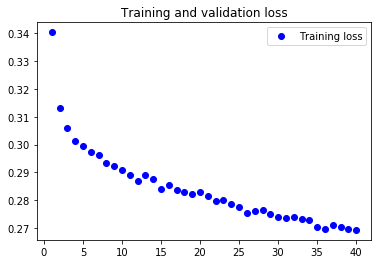

In [22]:
import matplotlib.pyplot as plt

loss = history.history['loss']
#val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
#plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [66]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.GRU(32, 
                     dropout=0.2,
                     recurrent_dropout=0.5,
                     return_sequences=True,
                     input_shape=(None, float_data.shape[-1])))
model.add(layers.GRU(64,
                     activation='relu',
                     dropout=0.1,
                     recurrent_dropout=0.5))
model.add(layers.Dense(1))

model.summary()

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=40,
                              #validation_data=val_gen,
                              #validation_steps=val_steps
                              )

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_3 (GRU)                  (None, None, 32)          4512      
_________________________________________________________________
gru_4 (GRU)                  (None, 64)                18624     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 23,201
Trainable params: 23,201
Non-trainable params: 0
_________________________________________________________________


KeyboardInterrupt: 

In [67]:
from keras import layers
from keras.models import Model

inputs = layers.Input(shape=(None, float_data.shape[-1]))
gru = layers.GRU(32, dropout=0.5, recurrent_dropout=0.5)(inputs)
outputs = layers.Dense(1)(gru)
model = Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='rmsprop',
              loss='mae',
              metrics=['mae'])
model.fit_generator(train_sqn,
                    steps_per_epoch=500,
                    epochs=20)

Epoch 1/20


  1/500 [..............................] - ETA: 36:52 - loss: 1.2174 - mean_absolute_error: 1.2174

  2/500 [..............................] - ETA: 19:19 - loss: 0.9435 - mean_absolute_error: 0.9435

  3/500 [..............................] - ETA: 13:21 - loss: 0.8286 - mean_absolute_error: 0.8286

  4/500 [..............................] - ETA: 10:20 - loss: 0.7185 - mean_absolute_error: 0.7185

  5/500 [..............................] - ETA: 8:32 - loss: 0.6591 - mean_absolute_error: 0.6591 

  6/500 [..............................] - ETA: 7:26 - loss: 0.6176 - mean_absolute_error: 0.6176

  7/500 [..............................] - ETA: 6:33 - loss: 0.5796 - mean_absolute_error: 0.5796

  8/500 [..............................] - ETA: 5:57 - loss: 0.5647 - mean_absolute_error: 0.5647

  9/500 [..............................] - ETA: 5:27 - loss: 0.5805 - mean_absolute_error: 0.5805



 10/500 [..............................] - ETA: 5:03 - loss: 0.5915 - mean_absolute_error: 0.5915

 11/500 [..............................] - ETA: 4:44 - loss: 0.5937 - mean_absolute_error: 0.5937

 12/500 [..............................] - ETA: 4:27 - loss: 0.5792 - mean_absolute_error: 0.5792

 13/500 [..............................] - ETA: 4:12 - loss: 0.5708 - mean_absolute_error: 0.5708

 14/500 [..............................] - ETA: 3:59 - loss: 0.5569 - mean_absolute_error: 0.5569

 15/500 [..............................] - ETA: 3:48 - loss: 0.5533 - mean_absolute_error: 0.5533

 16/500 [..............................] - ETA: 3:39 - loss: 0.5513 - mean_absolute_error: 0.5513

 17/500 [>.............................] - ETA: 3:31 - loss: 0.5569 - mean_absolute_error: 0.5569

 18/500 [>.............................] - ETA: 3:23 - loss: 0.5644 - mean_absolute_error: 0.5644

 19/500 [>.............................] - ETA: 3:16 - loss: 0.5506 - mean_absolute_error: 0.5506

 20/500 [>.............................] - ETA: 3:11 - loss: 0.5350 - mean_absolute_error: 0.5350

 21/500 [>.............................] - ETA: 3:05 - loss: 0.5230 - mean_absolute_error: 0.5230

 22/500 [>.............................] - ETA: 3:00 - loss: 0.5164 - mean_absolute_error: 0.5164

 23/500 [>.............................] - ETA: 2:55 - loss: 0.5103 - mean_absolute_error: 0.5103

 24/500 [>.............................] - ETA: 2:52 - loss: 0.5106 - mean_absolute_error: 0.5106

 25/500 [>.............................] - ETA: 2:47 - loss: 0.5105 - mean_absolute_error: 0.5105

 26/500 [>.............................] - ETA: 2:43 - loss: 0.5091 - mean_absolute_error: 0.5091

 27/500 [>.............................] - ETA: 2:40 - loss: 0.5028 - mean_absolute_error: 0.5028

 28/500 [>.............................] - ETA: 2:37 - loss: 0.4953 - mean_absolute_error: 0.4953

 29/500 [>.............................] - ETA: 2:34 - loss: 0.4854 - mean_absolute_error: 0.4854

 30/500 [>.............................] - ETA: 2:31 - loss: 0.4866 - mean_absolute_error: 0.4866

 31/500 [>.............................] - ETA: 2:29 - loss: 0.4858 - mean_absolute_error: 0.4858

 32/500 [>.............................] - ETA: 2:26 - loss: 0.4847 - mean_absolute_error: 0.4847

 33/500 [>.............................] - ETA: 2:25 - loss: 0.4805 - mean_absolute_error: 0.4805

 34/500 [=>............................] - ETA: 2:24 - loss: 0.4751 - mean_absolute_error: 0.4751

 35/500 [=>............................] - ETA: 2:21 - loss: 0.4754 - mean_absolute_error: 0.4754

 36/500 [=>............................] - ETA: 2:20 - loss: 0.4716 - mean_absolute_error: 0.4716

 37/500 [=>............................] - ETA: 2:17 - loss: 0.4673 - mean_absolute_error: 0.4673

 38/500 [=>............................] - ETA: 2:15 - loss: 0.4658 - mean_absolute_error: 0.4658

 39/500 [=>............................] - ETA: 2:13 - loss: 0.4611 - mean_absolute_error: 0.4611

 40/500 [=>............................] - ETA: 2:11 - loss: 0.4543 - mean_absolute_error: 0.4543

 41/500 [=>............................] - ETA: 2:09 - loss: 0.4494 - mean_absolute_error: 0.4494

 42/500 [=>............................] - ETA: 2:08 - loss: 0.4488 - mean_absolute_error: 0.4488

 43/500 [=>............................] - ETA: 2:06 - loss: 0.4503 - mean_absolute_error: 0.4503

 44/500 [=>............................] - ETA: 2:04 - loss: 0.4551 - mean_absolute_error: 0.4551

 45/500 [=>............................] - ETA: 2:03 - loss: 0.4525 - mean_absolute_error: 0.4525

 46/500 [=>............................] - ETA: 2:01 - loss: 0.4519 - mean_absolute_error: 0.4519

 47/500 [=>............................] - ETA: 2:01 - loss: 0.4516 - mean_absolute_error: 0.4516



 48/500 [=>............................] - ETA: 2:00 - loss: 0.4518 - mean_absolute_error: 0.4518

 49/500 [=>............................] - ETA: 1:59 - loss: 0.4530 - mean_absolute_error: 0.4530

 50/500 [==>...........................] - ETA: 1:58 - loss: 0.4531 - mean_absolute_error: 0.4531

 51/500 [==>...........................] - ETA: 1:57 - loss: 0.4547 - mean_absolute_error: 0.4547

 52/500 [==>...........................] - ETA: 1:56 - loss: 0.4576 - mean_absolute_error: 0.4576

 53/500 [==>...........................] - ETA: 1:55 - loss: 0.4549 - mean_absolute_error: 0.4549

 54/500 [==>...........................] - ETA: 1:54 - loss: 0.4534 - mean_absolute_error: 0.4534

 55/500 [==>...........................] - ETA: 1:53 - loss: 0.4555 - mean_absolute_error: 0.4555

 56/500 [==>...........................] - ETA: 1:52 - loss: 0.4611 - mean_absolute_error: 0.4611

 57/500 [==>...........................] - ETA: 1:51 - loss: 0.4651 - mean_absolute_error: 0.4651

 58/500 [==>...........................] - ETA: 1:50 - loss: 0.4624 - mean_absolute_error: 0.4624

 59/500 [==>...........................] - ETA: 1:49 - loss: 0.4584 - mean_absolute_error: 0.4584

 60/500 [==>...........................] - ETA: 1:48 - loss: 0.4543 - mean_absolute_error: 0.4543

 61/500 [==>...........................] - ETA: 1:47 - loss: 0.4512 - mean_absolute_error: 0.4512

 62/500 [==>...........................] - ETA: 1:47 - loss: 0.4490 - mean_absolute_error: 0.4490

 63/500 [==>...........................] - ETA: 1:46 - loss: 0.4461 - mean_absolute_error: 0.4461

 64/500 [==>...........................] - ETA: 1:45 - loss: 0.4455 - mean_absolute_error: 0.4455

 65/500 [==>...........................] - ETA: 1:45 - loss: 0.4422 - mean_absolute_error: 0.4422

 66/500 [==>...........................] - ETA: 1:44 - loss: 0.4414 - mean_absolute_error: 0.4414

 67/500 [===>..........................] - ETA: 1:43 - loss: 0.4404 - mean_absolute_error: 0.4404

 68/500 [===>..........................] - ETA: 1:42 - loss: 0.4371 - mean_absolute_error: 0.4371

 69/500 [===>..........................] - ETA: 1:42 - loss: 0.4335 - mean_absolute_error: 0.4335

 70/500 [===>..........................] - ETA: 1:41 - loss: 0.4307 - mean_absolute_error: 0.4307

 71/500 [===>..........................] - ETA: 1:40 - loss: 0.4288 - mean_absolute_error: 0.4288

 72/500 [===>..........................] - ETA: 1:40 - loss: 0.4264 - mean_absolute_error: 0.4264

 73/500 [===>..........................] - ETA: 1:39 - loss: 0.4228 - mean_absolute_error: 0.4228

 74/500 [===>..........................] - ETA: 1:38 - loss: 0.4202 - mean_absolute_error: 0.4202

 75/500 [===>..........................] - ETA: 1:38 - loss: 0.4196 - mean_absolute_error: 0.4196

 76/500 [===>..........................] - ETA: 1:37 - loss: 0.4192 - mean_absolute_error: 0.4192

 77/500 [===>..........................] - ETA: 1:37 - loss: 0.4162 - mean_absolute_error: 0.4162

 78/500 [===>..........................] - ETA: 1:36 - loss: 0.4135 - mean_absolute_error: 0.4135

 79/500 [===>..........................] - ETA: 1:36 - loss: 0.4104 - mean_absolute_error: 0.4104

 80/500 [===>..........................] - ETA: 1:35 - loss: 0.4086 - mean_absolute_error: 0.4086

 81/500 [===>..........................] - ETA: 1:34 - loss: 0.4103 - mean_absolute_error: 0.4103

 82/500 [===>..........................] - ETA: 1:34 - loss: 0.4119 - mean_absolute_error: 0.4119

 83/500 [===>..........................] - ETA: 1:33 - loss: 0.4149 - mean_absolute_error: 0.4149

 84/500 [====>.........................] - ETA: 1:33 - loss: 0.4161 - mean_absolute_error: 0.4161

 85/500 [====>.........................] - ETA: 1:32 - loss: 0.4141 - mean_absolute_error: 0.4141

 86/500 [====>.........................] - ETA: 1:32 - loss: 0.4123 - mean_absolute_error: 0.4123

 87/500 [====>.........................] - ETA: 1:31 - loss: 0.4105 - mean_absolute_error: 0.4105

 88/500 [====>.........................] - ETA: 1:31 - loss: 0.4092 - mean_absolute_error: 0.4092

 89/500 [====>.........................] - ETA: 1:30 - loss: 0.4086 - mean_absolute_error: 0.4086

 90/500 [====>.........................] - ETA: 1:30 - loss: 0.4088 - mean_absolute_error: 0.4088

 91/500 [====>.........................] - ETA: 1:29 - loss: 0.4075 - mean_absolute_error: 0.4075

 92/500 [====>.........................] - ETA: 1:28 - loss: 0.4071 - mean_absolute_error: 0.4071

 93/500 [====>.........................] - ETA: 1:28 - loss: 0.4045 - mean_absolute_error: 0.4045

 94/500 [====>.........................] - ETA: 1:28 - loss: 0.4018 - mean_absolute_error: 0.4018

 95/500 [====>.........................] - ETA: 1:27 - loss: 0.4019 - mean_absolute_error: 0.4019

 96/500 [====>.........................] - ETA: 1:27 - loss: 0.4024 - mean_absolute_error: 0.4024

 97/500 [====>.........................] - ETA: 1:26 - loss: 0.4036 - mean_absolute_error: 0.4036

 98/500 [====>.........................] - ETA: 1:26 - loss: 0.4066 - mean_absolute_error: 0.4066

 99/500 [====>.........................] - ETA: 1:25 - loss: 0.4104 - mean_absolute_error: 0.4104

100/500 [=====>........................] - ETA: 1:25 - loss: 0.4093 - mean_absolute_error: 0.4093

101/500 [=====>........................] - ETA: 1:25 - loss: 0.4114 - mean_absolute_error: 0.4114

102/500 [=====>........................] - ETA: 1:24 - loss: 0.4145 - mean_absolute_error: 0.4145

103/500 [=====>........................] - ETA: 1:24 - loss: 0.4146 - mean_absolute_error: 0.4146

104/500 [=====>........................] - ETA: 1:23 - loss: 0.4151 - mean_absolute_error: 0.4151

105/500 [=====>........................] - ETA: 1:23 - loss: 0.4155 - mean_absolute_error: 0.4155

106/500 [=====>........................] - ETA: 1:23 - loss: 0.4173 - mean_absolute_error: 0.4173

107/500 [=====>........................] - ETA: 1:22 - loss: 0.4157 - mean_absolute_error: 0.4157

108/500 [=====>........................] - ETA: 1:22 - loss: 0.4139 - mean_absolute_error: 0.4139

109/500 [=====>........................] - ETA: 1:22 - loss: 0.4125 - mean_absolute_error: 0.4125

110/500 [=====>........................] - ETA: 1:22 - loss: 0.4111 - mean_absolute_error: 0.4111

111/500 [=====>........................] - ETA: 1:21 - loss: 0.4110 - mean_absolute_error: 0.4110

112/500 [=====>........................] - ETA: 1:21 - loss: 0.4102 - mean_absolute_error: 0.4102

113/500 [=====>........................] - ETA: 1:21 - loss: 0.4110 - mean_absolute_error: 0.4110

114/500 [=====>........................] - ETA: 1:20 - loss: 0.4102 - mean_absolute_error: 0.4102

115/500 [=====>........................] - ETA: 1:20 - loss: 0.4085 - mean_absolute_error: 0.4085

116/500 [=====>........................] - ETA: 1:20 - loss: 0.4069 - mean_absolute_error: 0.4069

117/500 [======>.......................] - ETA: 1:19 - loss: 0.4066 - mean_absolute_error: 0.4066

118/500 [======>.......................] - ETA: 1:19 - loss: 0.4062 - mean_absolute_error: 0.4062

119/500 [======>.......................] - ETA: 1:19 - loss: 0.4069 - mean_absolute_error: 0.4069

120/500 [======>.......................] - ETA: 1:18 - loss: 0.4064 - mean_absolute_error: 0.4064

121/500 [======>.......................] - ETA: 1:18 - loss: 0.4056 - mean_absolute_error: 0.4056

122/500 [======>.......................] - ETA: 1:18 - loss: 0.4057 - mean_absolute_error: 0.4057

123/500 [======>.......................] - ETA: 1:17 - loss: 0.4053 - mean_absolute_error: 0.4053

124/500 [======>.......................] - ETA: 1:17 - loss: 0.4050 - mean_absolute_error: 0.4050

125/500 [======>.......................] - ETA: 1:17 - loss: 0.4052 - mean_absolute_error: 0.4052

126/500 [======>.......................] - ETA: 1:17 - loss: 0.4049 - mean_absolute_error: 0.4049

127/500 [======>.......................] - ETA: 1:16 - loss: 0.4052 - mean_absolute_error: 0.4052

128/500 [======>.......................] - ETA: 1:16 - loss: 0.4052 - mean_absolute_error: 0.4052

129/500 [======>.......................] - ETA: 1:16 - loss: 0.4057 - mean_absolute_error: 0.4057

130/500 [======>.......................] - ETA: 1:15 - loss: 0.4058 - mean_absolute_error: 0.4058

131/500 [======>.......................] - ETA: 1:15 - loss: 0.4066 - mean_absolute_error: 0.4066

132/500 [======>.......................] - ETA: 1:15 - loss: 0.4066 - mean_absolute_error: 0.4066

133/500 [======>.......................] - ETA: 1:14 - loss: 0.4063 - mean_absolute_error: 0.4063

134/500 [=======>......................] - ETA: 1:14 - loss: 0.4079 - mean_absolute_error: 0.4079

135/500 [=======>......................] - ETA: 1:14 - loss: 0.4080 - mean_absolute_error: 0.4080

136/500 [=======>......................] - ETA: 1:13 - loss: 0.4090 - mean_absolute_error: 0.4090

137/500 [=======>......................] - ETA: 1:13 - loss: 0.4109 - mean_absolute_error: 0.4109

138/500 [=======>......................] - ETA: 1:13 - loss: 0.4124 - mean_absolute_error: 0.4124

139/500 [=======>......................] - ETA: 1:12 - loss: 0.4134 - mean_absolute_error: 0.4134

140/500 [=======>......................] - ETA: 1:12 - loss: 0.4133 - mean_absolute_error: 0.4133

141/500 [=======>......................] - ETA: 1:12 - loss: 0.4139 - mean_absolute_error: 0.4139

142/500 [=======>......................] - ETA: 1:11 - loss: 0.4138 - mean_absolute_error: 0.4138

143/500 [=======>......................] - ETA: 1:11 - loss: 0.4147 - mean_absolute_error: 0.4147

144/500 [=======>......................] - ETA: 1:11 - loss: 0.4158 - mean_absolute_error: 0.4158

145/500 [=======>......................] - ETA: 1:11 - loss: 0.4166 - mean_absolute_error: 0.4166

146/500 [=======>......................] - ETA: 1:10 - loss: 0.4176 - mean_absolute_error: 0.4176

147/500 [=======>......................] - ETA: 1:10 - loss: 0.4184 - mean_absolute_error: 0.4184

148/500 [=======>......................] - ETA: 1:10 - loss: 0.4184 - mean_absolute_error: 0.4184

149/500 [=======>......................] - ETA: 1:10 - loss: 0.4176 - mean_absolute_error: 0.4176

150/500 [========>.....................] - ETA: 1:09 - loss: 0.4172 - mean_absolute_error: 0.4172

151/500 [========>.....................] - ETA: 1:09 - loss: 0.4178 - mean_absolute_error: 0.4178

152/500 [========>.....................] - ETA: 1:09 - loss: 0.4190 - mean_absolute_error: 0.4190

153/500 [========>.....................] - ETA: 1:08 - loss: 0.4192 - mean_absolute_error: 0.4192

154/500 [========>.....................] - ETA: 1:08 - loss: 0.4183 - mean_absolute_error: 0.4183

155/500 [========>.....................] - ETA: 1:08 - loss: 0.4177 - mean_absolute_error: 0.4177

156/500 [========>.....................] - ETA: 1:08 - loss: 0.4170 - mean_absolute_error: 0.4170

157/500 [========>.....................] - ETA: 1:07 - loss: 0.4166 - mean_absolute_error: 0.4166

158/500 [========>.....................] - ETA: 1:07 - loss: 0.4157 - mean_absolute_error: 0.4157

159/500 [========>.....................] - ETA: 1:07 - loss: 0.4151 - mean_absolute_error: 0.4151

160/500 [========>.....................] - ETA: 1:07 - loss: 0.4140 - mean_absolute_error: 0.4140

161/500 [========>.....................] - ETA: 1:06 - loss: 0.4137 - mean_absolute_error: 0.4137

162/500 [========>.....................] - ETA: 1:06 - loss: 0.4138 - mean_absolute_error: 0.4138

163/500 [========>.....................] - ETA: 1:06 - loss: 0.4137 - mean_absolute_error: 0.4137

164/500 [========>.....................] - ETA: 1:06 - loss: 0.4133 - mean_absolute_error: 0.4133

165/500 [========>.....................] - ETA: 1:05 - loss: 0.4132 - mean_absolute_error: 0.4132

166/500 [========>.....................] - ETA: 1:05 - loss: 0.4135 - mean_absolute_error: 0.4135

167/500 [=========>....................] - ETA: 1:05 - loss: 0.4130 - mean_absolute_error: 0.4130

168/500 [=========>....................] - ETA: 1:05 - loss: 0.4125 - mean_absolute_error: 0.4125

169/500 [=========>....................] - ETA: 1:04 - loss: 0.4119 - mean_absolute_error: 0.4119

170/500 [=========>....................] - ETA: 1:04 - loss: 0.4127 - mean_absolute_error: 0.4127

171/500 [=========>....................] - ETA: 1:04 - loss: 0.4122 - mean_absolute_error: 0.4122

172/500 [=========>....................] - ETA: 1:04 - loss: 0.4109 - mean_absolute_error: 0.4109

173/500 [=========>....................] - ETA: 1:03 - loss: 0.4110 - mean_absolute_error: 0.4110

174/500 [=========>....................] - ETA: 1:03 - loss: 0.4104 - mean_absolute_error: 0.4104

175/500 [=========>....................] - ETA: 1:03 - loss: 0.4092 - mean_absolute_error: 0.4092

176/500 [=========>....................] - ETA: 1:03 - loss: 0.4086 - mean_absolute_error: 0.4086

177/500 [=========>....................] - ETA: 1:02 - loss: 0.4075 - mean_absolute_error: 0.4075

178/500 [=========>....................] - ETA: 1:02 - loss: 0.4064 - mean_absolute_error: 0.4064

179/500 [=========>....................] - ETA: 1:02 - loss: 0.4054 - mean_absolute_error: 0.4054

180/500 [=========>....................] - ETA: 1:02 - loss: 0.4049 - mean_absolute_error: 0.4049

181/500 [=========>....................] - ETA: 1:01 - loss: 0.4040 - mean_absolute_error: 0.4040

182/500 [=========>....................] - ETA: 1:01 - loss: 0.4039 - mean_absolute_error: 0.4039

183/500 [=========>....................] - ETA: 1:01 - loss: 0.4031 - mean_absolute_error: 0.4031

184/500 [==========>...................] - ETA: 1:01 - loss: 0.4032 - mean_absolute_error: 0.4032

185/500 [==========>...................] - ETA: 1:00 - loss: 0.4036 - mean_absolute_error: 0.4036

186/500 [==========>...................] - ETA: 1:00 - loss: 0.4042 - mean_absolute_error: 0.4042

187/500 [==========>...................] - ETA: 1:00 - loss: 0.4042 - mean_absolute_error: 0.4042

188/500 [==========>...................] - ETA: 59s - loss: 0.4036 - mean_absolute_error: 0.4036 

189/500 [==========>...................] - ETA: 59s - loss: 0.4034 - mean_absolute_error: 0.4034

190/500 [==========>...................] - ETA: 59s - loss: 0.4027 - mean_absolute_error: 0.4027

191/500 [==========>...................] - ETA: 59s - loss: 0.4024 - mean_absolute_error: 0.4024

192/500 [==========>...................] - ETA: 59s - loss: 0.4024 - mean_absolute_error: 0.4024

193/500 [==========>...................] - ETA: 58s - loss: 0.4026 - mean_absolute_error: 0.4026

194/500 [==========>...................] - ETA: 58s - loss: 0.4024 - mean_absolute_error: 0.4024

195/500 [==========>...................] - ETA: 58s - loss: 0.4019 - mean_absolute_error: 0.4019

196/500 [==========>...................] - ETA: 58s - loss: 0.4015 - mean_absolute_error: 0.4015

197/500 [==========>...................] - ETA: 58s - loss: 0.4012 - mean_absolute_error: 0.4012

198/500 [==========>...................] - ETA: 57s - loss: 0.4001 - mean_absolute_error: 0.4001

199/500 [==========>...................] - ETA: 57s - loss: 0.3989 - mean_absolute_error: 0.3989

200/500 [===========>..................] - ETA: 57s - loss: 0.3978 - mean_absolute_error: 0.3978

201/500 [===========>..................] - ETA: 57s - loss: 0.3975 - mean_absolute_error: 0.3975

202/500 [===========>..................] - ETA: 56s - loss: 0.3978 - mean_absolute_error: 0.3978

203/500 [===========>..................] - ETA: 56s - loss: 0.3969 - mean_absolute_error: 0.3969

204/500 [===========>..................] - ETA: 56s - loss: 0.3960 - mean_absolute_error: 0.3960

205/500 [===========>..................] - ETA: 56s - loss: 0.3953 - mean_absolute_error: 0.3953

206/500 [===========>..................] - ETA: 55s - loss: 0.3943 - mean_absolute_error: 0.3943

207/500 [===========>..................] - ETA: 55s - loss: 0.3932 - mean_absolute_error: 0.3932

208/500 [===========>..................] - ETA: 55s - loss: 0.3926 - mean_absolute_error: 0.3926

209/500 [===========>..................] - ETA: 55s - loss: 0.3926 - mean_absolute_error: 0.3926

210/500 [===========>..................] - ETA: 55s - loss: 0.3922 - mean_absolute_error: 0.3922

211/500 [===========>..................] - ETA: 55s - loss: 0.3916 - mean_absolute_error: 0.3916

212/500 [===========>..................] - ETA: 54s - loss: 0.3915 - mean_absolute_error: 0.3915

213/500 [===========>..................] - ETA: 54s - loss: 0.3912 - mean_absolute_error: 0.3912

214/500 [===========>..................] - ETA: 54s - loss: 0.3909 - mean_absolute_error: 0.3909

215/500 [===========>..................] - ETA: 54s - loss: 0.3899 - mean_absolute_error: 0.3899

216/500 [===========>..................] - ETA: 54s - loss: 0.3890 - mean_absolute_error: 0.3890

217/500 [============>.................] - ETA: 54s - loss: 0.3884 - mean_absolute_error: 0.3884

218/500 [============>.................] - ETA: 53s - loss: 0.3879 - mean_absolute_error: 0.3879

219/500 [============>.................] - ETA: 53s - loss: 0.3873 - mean_absolute_error: 0.3873

220/500 [============>.................] - ETA: 53s - loss: 0.3869 - mean_absolute_error: 0.3869

221/500 [============>.................] - ETA: 53s - loss: 0.3861 - mean_absolute_error: 0.3861

222/500 [============>.................] - ETA: 52s - loss: 0.3856 - mean_absolute_error: 0.3856

223/500 [============>.................] - ETA: 52s - loss: 0.3857 - mean_absolute_error: 0.3857

224/500 [============>.................] - ETA: 52s - loss: 0.3856 - mean_absolute_error: 0.3856

225/500 [============>.................] - ETA: 52s - loss: 0.3862 - mean_absolute_error: 0.3862

226/500 [============>.................] - ETA: 52s - loss: 0.3855 - mean_absolute_error: 0.3855

227/500 [============>.................] - ETA: 51s - loss: 0.3847 - mean_absolute_error: 0.3847

228/500 [============>.................] - ETA: 51s - loss: 0.3837 - mean_absolute_error: 0.3837

229/500 [============>.................] - ETA: 51s - loss: 0.3827 - mean_absolute_error: 0.3827

230/500 [============>.................] - ETA: 51s - loss: 0.3823 - mean_absolute_error: 0.3823

231/500 [============>.................] - ETA: 50s - loss: 0.3812 - mean_absolute_error: 0.3812

232/500 [============>.................] - ETA: 50s - loss: 0.3802 - mean_absolute_error: 0.3802

233/500 [============>.................] - ETA: 50s - loss: 0.3790 - mean_absolute_error: 0.3790

234/500 [=============>................] - ETA: 50s - loss: 0.3789 - mean_absolute_error: 0.3789

235/500 [=============>................] - ETA: 50s - loss: 0.3781 - mean_absolute_error: 0.3781

236/500 [=============>................] - ETA: 50s - loss: 0.3777 - mean_absolute_error: 0.3777

237/500 [=============>................] - ETA: 49s - loss: 0.3778 - mean_absolute_error: 0.3778

238/500 [=============>................] - ETA: 49s - loss: 0.3768 - mean_absolute_error: 0.3768

239/500 [=============>................] - ETA: 49s - loss: 0.3759 - mean_absolute_error: 0.3759

240/500 [=============>................] - ETA: 49s - loss: 0.3759 - mean_absolute_error: 0.3759

241/500 [=============>................] - ETA: 49s - loss: 0.3759 - mean_absolute_error: 0.3759

242/500 [=============>................] - ETA: 48s - loss: 0.3764 - mean_absolute_error: 0.3764

243/500 [=============>................] - ETA: 48s - loss: 0.3763 - mean_absolute_error: 0.3763

244/500 [=============>................] - ETA: 48s - loss: 0.3767 - mean_absolute_error: 0.3767

245/500 [=============>................] - ETA: 48s - loss: 0.3761 - mean_absolute_error: 0.3761

246/500 [=============>................] - ETA: 47s - loss: 0.3757 - mean_absolute_error: 0.3757

247/500 [=============>................] - ETA: 47s - loss: 0.3754 - mean_absolute_error: 0.3754

248/500 [=============>................] - ETA: 47s - loss: 0.3749 - mean_absolute_error: 0.3749

249/500 [=============>................] - ETA: 47s - loss: 0.3752 - mean_absolute_error: 0.3752

250/500 [==============>...............] - ETA: 47s - loss: 0.3757 - mean_absolute_error: 0.3757

251/500 [==============>...............] - ETA: 47s - loss: 0.3760 - mean_absolute_error: 0.3760

252/500 [==============>...............] - ETA: 46s - loss: 0.3756 - mean_absolute_error: 0.3756

253/500 [==============>...............] - ETA: 46s - loss: 0.3752 - mean_absolute_error: 0.3752

254/500 [==============>...............] - ETA: 46s - loss: 0.3748 - mean_absolute_error: 0.3748

255/500 [==============>...............] - ETA: 46s - loss: 0.3744 - mean_absolute_error: 0.3744

256/500 [==============>...............] - ETA: 46s - loss: 0.3743 - mean_absolute_error: 0.3743

257/500 [==============>...............] - ETA: 46s - loss: 0.3750 - mean_absolute_error: 0.3750

258/500 [==============>...............] - ETA: 45s - loss: 0.3761 - mean_absolute_error: 0.3761

259/500 [==============>...............] - ETA: 45s - loss: 0.3759 - mean_absolute_error: 0.3759

260/500 [==============>...............] - ETA: 45s - loss: 0.3754 - mean_absolute_error: 0.3754

261/500 [==============>...............] - ETA: 45s - loss: 0.3753 - mean_absolute_error: 0.3753

262/500 [==============>...............] - ETA: 45s - loss: 0.3753 - mean_absolute_error: 0.3753

263/500 [==============>...............] - ETA: 45s - loss: 0.3753 - mean_absolute_error: 0.3753

264/500 [==============>...............] - ETA: 45s - loss: 0.3749 - mean_absolute_error: 0.3749

265/500 [==============>...............] - ETA: 45s - loss: 0.3740 - mean_absolute_error: 0.3740

266/500 [==============>...............] - ETA: 44s - loss: 0.3734 - mean_absolute_error: 0.3734

267/500 [===============>..............] - ETA: 44s - loss: 0.3727 - mean_absolute_error: 0.3727

268/500 [===============>..............] - ETA: 44s - loss: 0.3721 - mean_absolute_error: 0.3721

269/500 [===============>..............] - ETA: 44s - loss: 0.3725 - mean_absolute_error: 0.3725

270/500 [===============>..............] - ETA: 43s - loss: 0.3726 - mean_absolute_error: 0.3726

271/500 [===============>..............] - ETA: 43s - loss: 0.3724 - mean_absolute_error: 0.3724

272/500 [===============>..............] - ETA: 43s - loss: 0.3725 - mean_absolute_error: 0.3725

273/500 [===============>..............] - ETA: 43s - loss: 0.3737 - mean_absolute_error: 0.3737

274/500 [===============>..............] - ETA: 43s - loss: 0.3746 - mean_absolute_error: 0.3746

275/500 [===============>..............] - ETA: 42s - loss: 0.3742 - mean_absolute_error: 0.3742

276/500 [===============>..............] - ETA: 42s - loss: 0.3741 - mean_absolute_error: 0.3741

277/500 [===============>..............] - ETA: 42s - loss: 0.3736 - mean_absolute_error: 0.3736

278/500 [===============>..............] - ETA: 42s - loss: 0.3731 - mean_absolute_error: 0.3731

279/500 [===============>..............] - ETA: 41s - loss: 0.3734 - mean_absolute_error: 0.3734

280/500 [===============>..............] - ETA: 41s - loss: 0.3740 - mean_absolute_error: 0.3740

281/500 [===============>..............] - ETA: 41s - loss: 0.3738 - mean_absolute_error: 0.3738

282/500 [===============>..............] - ETA: 41s - loss: 0.3739 - mean_absolute_error: 0.3739

283/500 [===============>..............] - ETA: 41s - loss: 0.3752 - mean_absolute_error: 0.3752

284/500 [================>.............] - ETA: 40s - loss: 0.3758 - mean_absolute_error: 0.3758

285/500 [================>.............] - ETA: 40s - loss: 0.3754 - mean_absolute_error: 0.3754

286/500 [================>.............] - ETA: 40s - loss: 0.3748 - mean_absolute_error: 0.3748

287/500 [================>.............] - ETA: 40s - loss: 0.3742 - mean_absolute_error: 0.3742

288/500 [================>.............] - ETA: 40s - loss: 0.3743 - mean_absolute_error: 0.3743

289/500 [================>.............] - ETA: 39s - loss: 0.3749 - mean_absolute_error: 0.3749

290/500 [================>.............] - ETA: 39s - loss: 0.3747 - mean_absolute_error: 0.3747

291/500 [================>.............] - ETA: 39s - loss: 0.3744 - mean_absolute_error: 0.3744

292/500 [================>.............] - ETA: 39s - loss: 0.3740 - mean_absolute_error: 0.3740

293/500 [================>.............] - ETA: 39s - loss: 0.3741 - mean_absolute_error: 0.3741

294/500 [================>.............] - ETA: 38s - loss: 0.3737 - mean_absolute_error: 0.3737

295/500 [================>.............] - ETA: 38s - loss: 0.3741 - mean_absolute_error: 0.3741

296/500 [================>.............] - ETA: 38s - loss: 0.3747 - mean_absolute_error: 0.3747

297/500 [================>.............] - ETA: 38s - loss: 0.3746 - mean_absolute_error: 0.3746



298/500 [================>.............] - ETA: 38s - loss: 0.3744 - mean_absolute_error: 0.3744

299/500 [================>.............] - ETA: 37s - loss: 0.3742 - mean_absolute_error: 0.3742

300/500 [=================>............] - ETA: 37s - loss: 0.3758 - mean_absolute_error: 0.3758

301/500 [=================>............] - ETA: 37s - loss: 0.3772 - mean_absolute_error: 0.3772

302/500 [=================>............] - ETA: 37s - loss: 0.3780 - mean_absolute_error: 0.3780

303/500 [=================>............] - ETA: 37s - loss: 0.3789 - mean_absolute_error: 0.3789

304/500 [=================>............] - ETA: 36s - loss: 0.3792 - mean_absolute_error: 0.3792

305/500 [=================>............] - ETA: 36s - loss: 0.3798 - mean_absolute_error: 0.3798



306/500 [=================>............] - ETA: 36s - loss: 0.3796 - mean_absolute_error: 0.3796

307/500 [=================>............] - ETA: 36s - loss: 0.3794 - mean_absolute_error: 0.3794

308/500 [=================>............] - ETA: 36s - loss: 0.3795 - mean_absolute_error: 0.3795

309/500 [=================>............] - ETA: 35s - loss: 0.3794 - mean_absolute_error: 0.3794

310/500 [=================>............] - ETA: 35s - loss: 0.3792 - mean_absolute_error: 0.3792

311/500 [=================>............] - ETA: 35s - loss: 0.3793 - mean_absolute_error: 0.3793

312/500 [=================>............] - ETA: 35s - loss: 0.3793 - mean_absolute_error: 0.3793

313/500 [=================>............] - ETA: 35s - loss: 0.3802 - mean_absolute_error: 0.3802

314/500 [=================>............] - ETA: 34s - loss: 0.3809 - mean_absolute_error: 0.3809

315/500 [=================>............] - ETA: 34s - loss: 0.3810 - mean_absolute_error: 0.3810

316/500 [=================>............] - ETA: 34s - loss: 0.3810 - mean_absolute_error: 0.3810

317/500 [==================>...........] - ETA: 34s - loss: 0.3810 - mean_absolute_error: 0.3810

318/500 [==================>...........] - ETA: 34s - loss: 0.3807 - mean_absolute_error: 0.3807

319/500 [==================>...........] - ETA: 33s - loss: 0.3814 - mean_absolute_error: 0.3814

320/500 [==================>...........] - ETA: 33s - loss: 0.3814 - mean_absolute_error: 0.3814

321/500 [==================>...........] - ETA: 33s - loss: 0.3821 - mean_absolute_error: 0.3821



322/500 [==================>...........] - ETA: 33s - loss: 0.3823 - mean_absolute_error: 0.3823

323/500 [==================>...........] - ETA: 33s - loss: 0.3821 - mean_absolute_error: 0.3821

324/500 [==================>...........] - ETA: 32s - loss: 0.3822 - mean_absolute_error: 0.3822

325/500 [==================>...........] - ETA: 32s - loss: 0.3820 - mean_absolute_error: 0.3820

326/500 [==================>...........] - ETA: 32s - loss: 0.3816 - mean_absolute_error: 0.3816

327/500 [==================>...........] - ETA: 32s - loss: 0.3818 - mean_absolute_error: 0.3818

328/500 [==================>...........] - ETA: 32s - loss: 0.3831 - mean_absolute_error: 0.3831

329/500 [==================>...........] - ETA: 32s - loss: 0.3832 - mean_absolute_error: 0.3832

330/500 [==================>...........] - ETA: 31s - loss: 0.3830 - mean_absolute_error: 0.3830

331/500 [==================>...........] - ETA: 31s - loss: 0.3843 - mean_absolute_error: 0.3843

332/500 [==================>...........] - ETA: 31s - loss: 0.3858 - mean_absolute_error: 0.3858

333/500 [==================>...........] - ETA: 31s - loss: 0.3858 - mean_absolute_error: 0.3858

334/500 [===================>..........] - ETA: 31s - loss: 0.3863 - mean_absolute_error: 0.3863

335/500 [===================>..........] - ETA: 30s - loss: 0.3869 - mean_absolute_error: 0.3869

336/500 [===================>..........] - ETA: 30s - loss: 0.3870 - mean_absolute_error: 0.3870

337/500 [===================>..........] - ETA: 30s - loss: 0.3867 - mean_absolute_error: 0.3867

338/500 [===================>..........] - ETA: 30s - loss: 0.3869 - mean_absolute_error: 0.3869

339/500 [===================>..........] - ETA: 30s - loss: 0.3873 - mean_absolute_error: 0.3873

340/500 [===================>..........] - ETA: 29s - loss: 0.3873 - mean_absolute_error: 0.3873

341/500 [===================>..........] - ETA: 29s - loss: 0.3893 - mean_absolute_error: 0.3893

342/500 [===================>..........] - ETA: 29s - loss: 0.3899 - mean_absolute_error: 0.3899

343/500 [===================>..........] - ETA: 29s - loss: 0.3904 - mean_absolute_error: 0.3904

344/500 [===================>..........] - ETA: 29s - loss: 0.3904 - mean_absolute_error: 0.3904

345/500 [===================>..........] - ETA: 28s - loss: 0.3914 - mean_absolute_error: 0.3914

346/500 [===================>..........] - ETA: 28s - loss: 0.3916 - mean_absolute_error: 0.3916

347/500 [===================>..........] - ETA: 28s - loss: 0.3925 - mean_absolute_error: 0.3925

348/500 [===================>..........] - ETA: 28s - loss: 0.3925 - mean_absolute_error: 0.3925

349/500 [===================>..........] - ETA: 28s - loss: 0.3933 - mean_absolute_error: 0.3933

350/500 [====================>.........] - ETA: 27s - loss: 0.3934 - mean_absolute_error: 0.3934

351/500 [====================>.........] - ETA: 27s - loss: 0.3930 - mean_absolute_error: 0.3930

352/500 [====================>.........] - ETA: 27s - loss: 0.3926 - mean_absolute_error: 0.3926

353/500 [====================>.........] - ETA: 27s - loss: 0.3927 - mean_absolute_error: 0.3927

354/500 [====================>.........] - ETA: 27s - loss: 0.3929 - mean_absolute_error: 0.3929

355/500 [====================>.........] - ETA: 26s - loss: 0.3926 - mean_absolute_error: 0.3926

356/500 [====================>.........] - ETA: 26s - loss: 0.3924 - mean_absolute_error: 0.3924

357/500 [====================>.........] - ETA: 26s - loss: 0.3922 - mean_absolute_error: 0.3922

358/500 [====================>.........] - ETA: 26s - loss: 0.3920 - mean_absolute_error: 0.3920

359/500 [====================>.........] - ETA: 26s - loss: 0.3918 - mean_absolute_error: 0.3918

360/500 [====================>.........] - ETA: 25s - loss: 0.3915 - mean_absolute_error: 0.3915

361/500 [====================>.........] - ETA: 25s - loss: 0.3912 - mean_absolute_error: 0.3912

362/500 [====================>.........] - ETA: 25s - loss: 0.3907 - mean_absolute_error: 0.3907

363/500 [====================>.........] - ETA: 25s - loss: 0.3902 - mean_absolute_error: 0.3902

364/500 [====================>.........] - ETA: 25s - loss: 0.3901 - mean_absolute_error: 0.3901

365/500 [====================>.........] - ETA: 24s - loss: 0.3899 - mean_absolute_error: 0.3899

366/500 [====================>.........] - ETA: 24s - loss: 0.3900 - mean_absolute_error: 0.3900

367/500 [=====================>........] - ETA: 24s - loss: 0.3900 - mean_absolute_error: 0.3900

368/500 [=====================>........] - ETA: 24s - loss: 0.3899 - mean_absolute_error: 0.3899

369/500 [=====================>........] - ETA: 24s - loss: 0.3897 - mean_absolute_error: 0.3897

370/500 [=====================>........] - ETA: 24s - loss: 0.3897 - mean_absolute_error: 0.3897

371/500 [=====================>........] - ETA: 23s - loss: 0.3897 - mean_absolute_error: 0.3897

372/500 [=====================>........] - ETA: 23s - loss: 0.3897 - mean_absolute_error: 0.3897

373/500 [=====================>........] - ETA: 23s - loss: 0.3900 - mean_absolute_error: 0.3900

374/500 [=====================>........] - ETA: 23s - loss: 0.3912 - mean_absolute_error: 0.3912

375/500 [=====================>........] - ETA: 23s - loss: 0.3914 - mean_absolute_error: 0.3914

376/500 [=====================>........] - ETA: 22s - loss: 0.3917 - mean_absolute_error: 0.3917

377/500 [=====================>........] - ETA: 22s - loss: 0.3918 - mean_absolute_error: 0.3918

378/500 [=====================>........] - ETA: 22s - loss: 0.3922 - mean_absolute_error: 0.3922

379/500 [=====================>........] - ETA: 22s - loss: 0.3926 - mean_absolute_error: 0.3926

380/500 [=====================>........] - ETA: 22s - loss: 0.3926 - mean_absolute_error: 0.3926

381/500 [=====================>........] - ETA: 21s - loss: 0.3935 - mean_absolute_error: 0.3935

382/500 [=====================>........] - ETA: 21s - loss: 0.3942 - mean_absolute_error: 0.3942



383/500 [=====================>........] - ETA: 21s - loss: 0.3944 - mean_absolute_error: 0.3944

384/500 [======================>.......] - ETA: 21s - loss: 0.3938 - mean_absolute_error: 0.3938

385/500 [======================>.......] - ETA: 21s - loss: 0.3933 - mean_absolute_error: 0.3933

386/500 [======================>.......] - ETA: 21s - loss: 0.3927 - mean_absolute_error: 0.3927

387/500 [======================>.......] - ETA: 20s - loss: 0.3925 - mean_absolute_error: 0.3925

388/500 [======================>.......] - ETA: 20s - loss: 0.3928 - mean_absolute_error: 0.3928

389/500 [======================>.......] - ETA: 20s - loss: 0.3925 - mean_absolute_error: 0.3925

390/500 [======================>.......] - ETA: 20s - loss: 0.3921 - mean_absolute_error: 0.3921

391/500 [======================>.......] - ETA: 20s - loss: 0.3920 - mean_absolute_error: 0.3920

392/500 [======================>.......] - ETA: 19s - loss: 0.3928 - mean_absolute_error: 0.3928

393/500 [======================>.......] - ETA: 19s - loss: 0.3932 - mean_absolute_error: 0.3932

394/500 [======================>.......] - ETA: 19s - loss: 0.3939 - mean_absolute_error: 0.3939

395/500 [======================>.......] - ETA: 19s - loss: 0.3941 - mean_absolute_error: 0.3941

396/500 [======================>.......] - ETA: 19s - loss: 0.3946 - mean_absolute_error: 0.3946

397/500 [======================>.......] - ETA: 18s - loss: 0.3946 - mean_absolute_error: 0.3946

398/500 [======================>.......] - ETA: 18s - loss: 0.3947 - mean_absolute_error: 0.3947

399/500 [======================>.......] - ETA: 18s - loss: 0.3945 - mean_absolute_error: 0.3945

400/500 [=======================>......] - ETA: 18s - loss: 0.3947 - mean_absolute_error: 0.3947

401/500 [=======================>......] - ETA: 18s - loss: 0.3944 - mean_absolute_error: 0.3944

402/500 [=======================>......] - ETA: 17s - loss: 0.3941 - mean_absolute_error: 0.3941

403/500 [=======================>......] - ETA: 17s - loss: 0.3940 - mean_absolute_error: 0.3940

404/500 [=======================>......] - ETA: 17s - loss: 0.3938 - mean_absolute_error: 0.3938

405/500 [=======================>......] - ETA: 17s - loss: 0.3938 - mean_absolute_error: 0.3938

406/500 [=======================>......] - ETA: 17s - loss: 0.3937 - mean_absolute_error: 0.3937

407/500 [=======================>......] - ETA: 16s - loss: 0.3932 - mean_absolute_error: 0.3932

408/500 [=======================>......] - ETA: 16s - loss: 0.3932 - mean_absolute_error: 0.3932

409/500 [=======================>......] - ETA: 16s - loss: 0.3932 - mean_absolute_error: 0.3932

410/500 [=======================>......] - ETA: 16s - loss: 0.3934 - mean_absolute_error: 0.3934

411/500 [=======================>......] - ETA: 16s - loss: 0.3940 - mean_absolute_error: 0.3940

412/500 [=======================>......] - ETA: 15s - loss: 0.3937 - mean_absolute_error: 0.3937

413/500 [=======================>......] - ETA: 15s - loss: 0.3937 - mean_absolute_error: 0.3937

414/500 [=======================>......] - ETA: 15s - loss: 0.3939 - mean_absolute_error: 0.3939

415/500 [=======================>......] - ETA: 15s - loss: 0.3942 - mean_absolute_error: 0.3942

416/500 [=======================>......] - ETA: 15s - loss: 0.3940 - mean_absolute_error: 0.3940

417/500 [========================>.....] - ETA: 14s - loss: 0.3935 - mean_absolute_error: 0.3935

418/500 [========================>.....] - ETA: 14s - loss: 0.3935 - mean_absolute_error: 0.3935

419/500 [========================>.....] - ETA: 14s - loss: 0.3934 - mean_absolute_error: 0.3934

420/500 [========================>.....] - ETA: 14s - loss: 0.3929 - mean_absolute_error: 0.3929

421/500 [========================>.....] - ETA: 14s - loss: 0.3925 - mean_absolute_error: 0.3925

422/500 [========================>.....] - ETA: 14s - loss: 0.3925 - mean_absolute_error: 0.3925

423/500 [========================>.....] - ETA: 13s - loss: 0.3923 - mean_absolute_error: 0.3923

424/500 [========================>.....] - ETA: 13s - loss: 0.3923 - mean_absolute_error: 0.3923

425/500 [========================>.....] - ETA: 13s - loss: 0.3924 - mean_absolute_error: 0.3924

426/500 [========================>.....] - ETA: 13s - loss: 0.3921 - mean_absolute_error: 0.3921

427/500 [========================>.....] - ETA: 13s - loss: 0.3920 - mean_absolute_error: 0.3920

428/500 [========================>.....] - ETA: 12s - loss: 0.3917 - mean_absolute_error: 0.3917

429/500 [========================>.....] - ETA: 12s - loss: 0.3914 - mean_absolute_error: 0.3914

430/500 [========================>.....] - ETA: 12s - loss: 0.3922 - mean_absolute_error: 0.3922

431/500 [========================>.....] - ETA: 12s - loss: 0.3922 - mean_absolute_error: 0.3922

432/500 [========================>.....] - ETA: 12s - loss: 0.3920 - mean_absolute_error: 0.3920

433/500 [========================>.....] - ETA: 11s - loss: 0.3921 - mean_absolute_error: 0.3921

434/500 [=========================>....] - ETA: 11s - loss: 0.3921 - mean_absolute_error: 0.3921

435/500 [=========================>....] - ETA: 11s - loss: 0.3923 - mean_absolute_error: 0.3923

436/500 [=========================>....] - ETA: 11s - loss: 0.3924 - mean_absolute_error: 0.3924

437/500 [=========================>....] - ETA: 11s - loss: 0.3923 - mean_absolute_error: 0.3923

438/500 [=========================>....] - ETA: 11s - loss: 0.3925 - mean_absolute_error: 0.3925

439/500 [=========================>....] - ETA: 10s - loss: 0.3925 - mean_absolute_error: 0.3925

440/500 [=========================>....] - ETA: 10s - loss: 0.3932 - mean_absolute_error: 0.3932

441/500 [=========================>....] - ETA: 10s - loss: 0.3934 - mean_absolute_error: 0.3934

442/500 [=========================>....] - ETA: 10s - loss: 0.3937 - mean_absolute_error: 0.3937

443/500 [=========================>....] - ETA: 10s - loss: 0.3937 - mean_absolute_error: 0.3937

444/500 [=========================>....] - ETA: 9s - loss: 0.3937 - mean_absolute_error: 0.3937 

445/500 [=========================>....] - ETA: 9s - loss: 0.3933 - mean_absolute_error: 0.3933

446/500 [=========================>....] - ETA: 9s - loss: 0.3936 - mean_absolute_error: 0.3936

447/500 [=========================>....] - ETA: 9s - loss: 0.3934 - mean_absolute_error: 0.3934

448/500 [=========================>....] - ETA: 9s - loss: 0.3937 - mean_absolute_error: 0.3937

449/500 [=========================>....] - ETA: 8s - loss: 0.3946 - mean_absolute_error: 0.3946

450/500 [==========================>...] - ETA: 8s - loss: 0.3943 - mean_absolute_error: 0.3943

451/500 [==========================>...] - ETA: 8s - loss: 0.3940 - mean_absolute_error: 0.3940

452/500 [==========================>...] - ETA: 8s - loss: 0.3936 - mean_absolute_error: 0.3936

453/500 [==========================>...] - ETA: 8s - loss: 0.3932 - mean_absolute_error: 0.3932

454/500 [==========================>...] - ETA: 8s - loss: 0.3927 - mean_absolute_error: 0.3927

455/500 [==========================>...] - ETA: 7s - loss: 0.3928 - mean_absolute_error: 0.3928

456/500 [==========================>...] - ETA: 7s - loss: 0.3926 - mean_absolute_error: 0.3926

457/500 [==========================>...] - ETA: 7s - loss: 0.3924 - mean_absolute_error: 0.3924

458/500 [==========================>...] - ETA: 7s - loss: 0.3923 - mean_absolute_error: 0.3923

459/500 [==========================>...] - ETA: 7s - loss: 0.3921 - mean_absolute_error: 0.3921

460/500 [==========================>...] - ETA: 7s - loss: 0.3920 - mean_absolute_error: 0.3920

461/500 [==========================>...] - ETA: 6s - loss: 0.3919 - mean_absolute_error: 0.3919

462/500 [==========================>...] - ETA: 6s - loss: 0.3916 - mean_absolute_error: 0.3916

463/500 [==========================>...] - ETA: 6s - loss: 0.3918 - mean_absolute_error: 0.3918

464/500 [==========================>...] - ETA: 6s - loss: 0.3916 - mean_absolute_error: 0.3916

465/500 [==========================>...] - ETA: 6s - loss: 0.3913 - mean_absolute_error: 0.3913

466/500 [==========================>...] - ETA: 5s - loss: 0.3908 - mean_absolute_error: 0.3908

467/500 [===========================>..] - ETA: 5s - loss: 0.3907 - mean_absolute_error: 0.3907

468/500 [===========================>..] - ETA: 5s - loss: 0.3907 - mean_absolute_error: 0.3907

469/500 [===========================>..] - ETA: 5s - loss: 0.3903 - mean_absolute_error: 0.3903

470/500 [===========================>..] - ETA: 5s - loss: 0.3902 - mean_absolute_error: 0.3902

471/500 [===========================>..] - ETA: 5s - loss: 0.3902 - mean_absolute_error: 0.3902

472/500 [===========================>..] - ETA: 4s - loss: 0.3899 - mean_absolute_error: 0.3899

473/500 [===========================>..] - ETA: 4s - loss: 0.3900 - mean_absolute_error: 0.3900

474/500 [===========================>..] - ETA: 4s - loss: 0.3897 - mean_absolute_error: 0.3897

475/500 [===========================>..] - ETA: 4s - loss: 0.3897 - mean_absolute_error: 0.3897

476/500 [===========================>..] - ETA: 4s - loss: 0.3902 - mean_absolute_error: 0.3902

477/500 [===========================>..] - ETA: 3s - loss: 0.3904 - mean_absolute_error: 0.3904

478/500 [===========================>..] - ETA: 3s - loss: 0.3901 - mean_absolute_error: 0.3901

479/500 [===========================>..] - ETA: 3s - loss: 0.3902 - mean_absolute_error: 0.3902

480/500 [===========================>..] - ETA: 3s - loss: 0.3902 - mean_absolute_error: 0.3902

481/500 [===========================>..] - ETA: 3s - loss: 0.3900 - mean_absolute_error: 0.3900

482/500 [===========================>..] - ETA: 3s - loss: 0.3897 - mean_absolute_error: 0.3897

483/500 [===========================>..] - ETA: 2s - loss: 0.3894 - mean_absolute_error: 0.3894

484/500 [============================>.] - ETA: 2s - loss: 0.3892 - mean_absolute_error: 0.3892

485/500 [============================>.] - ETA: 2s - loss: 0.3890 - mean_absolute_error: 0.3890

486/500 [============================>.] - ETA: 2s - loss: 0.3888 - mean_absolute_error: 0.3888

487/500 [============================>.] - ETA: 2s - loss: 0.3884 - mean_absolute_error: 0.3884

488/500 [============================>.] - ETA: 2s - loss: 0.3885 - mean_absolute_error: 0.3885

489/500 [============================>.] - ETA: 1s - loss: 0.3888 - mean_absolute_error: 0.3888

490/500 [============================>.] - ETA: 1s - loss: 0.3888 - mean_absolute_error: 0.3888

491/500 [============================>.] - ETA: 1s - loss: 0.3886 - mean_absolute_error: 0.3886

492/500 [============================>.] - ETA: 1s - loss: 0.3883 - mean_absolute_error: 0.3883

493/500 [============================>.] - ETA: 1s - loss: 0.3885 - mean_absolute_error: 0.3885

494/500 [============================>.] - ETA: 1s - loss: 0.3886 - mean_absolute_error: 0.3886

495/500 [============================>.] - ETA: 0s - loss: 0.3884 - mean_absolute_error: 0.3884

496/500 [============================>.] - ETA: 0s - loss: 0.3885 - mean_absolute_error: 0.3885

497/500 [============================>.] - ETA: 0s - loss: 0.3884 - mean_absolute_error: 0.3884

498/500 [============================>.] - ETA: 0s - loss: 0.3888 - mean_absolute_error: 0.3888

499/500 [============================>.] - ETA: 0s - loss: 0.3887 - mean_absolute_error: 0.3887

500/500 [==============================] - 86s 172ms/step - loss: 0.3886 - mean_absolute_error: 0.3886


Epoch 2/20


  1/500 [..............................] - ETA: 1:37 - loss: 0.3495 - mean_absolute_error: 0.3495

  2/500 [..............................] - ETA: 1:30 - loss: 0.4173 - mean_absolute_error: 0.4173

  3/500 [..............................] - ETA: 1:27 - loss: 0.5489 - mean_absolute_error: 0.5489

  4/500 [..............................] - ETA: 1:20 - loss: 0.5393 - mean_absolute_error: 0.5393

  5/500 [..............................] - ETA: 1:17 - loss: 0.5309 - mean_absolute_error: 0.5309

  6/500 [..............................] - ETA: 1:16 - loss: 0.5149 - mean_absolute_error: 0.5149

  7/500 [..............................] - ETA: 1:14 - loss: 0.4925 - mean_absolute_error: 0.4925

  8/500 [..............................] - ETA: 1:14 - loss: 0.4821 - mean_absolute_error: 0.4821

  9/500 [..............................] - ETA: 1:15 - loss: 0.4931 - mean_absolute_error: 0.4931

 10/500 [..............................] - ETA: 1:16 - loss: 0.4889 - mean_absolute_error: 0.4889

 11/500 [..............................] - ETA: 1:16 - loss: 0.4844 - mean_absolute_error: 0.4844

 12/500 [..............................] - ETA: 1:16 - loss: 0.4918 - mean_absolute_error: 0.4918

 13/500 [..............................] - ETA: 1:15 - loss: 0.4826 - mean_absolute_error: 0.4826

 14/500 [..............................] - ETA: 1:15 - loss: 0.4771 - mean_absolute_error: 0.4771

 15/500 [..............................] - ETA: 1:14 - loss: 0.4637 - mean_absolute_error: 0.4637

 16/500 [..............................] - ETA: 1:13 - loss: 0.4508 - mean_absolute_error: 0.4508

 17/500 [>.............................] - ETA: 1:13 - loss: 0.4385 - mean_absolute_error: 0.4385

 18/500 [>.............................] - ETA: 1:12 - loss: 0.4297 - mean_absolute_error: 0.4297

 19/500 [>.............................] - ETA: 1:12 - loss: 0.4195 - mean_absolute_error: 0.4195

 20/500 [>.............................] - ETA: 1:12 - loss: 0.4098 - mean_absolute_error: 0.4098

 21/500 [>.............................] - ETA: 1:11 - loss: 0.4096 - mean_absolute_error: 0.4096

 22/500 [>.............................] - ETA: 1:11 - loss: 0.4086 - mean_absolute_error: 0.4086

 23/500 [>.............................] - ETA: 1:11 - loss: 0.4039 - mean_absolute_error: 0.4039

 24/500 [>.............................] - ETA: 1:11 - loss: 0.3974 - mean_absolute_error: 0.3974

 25/500 [>.............................] - ETA: 1:11 - loss: 0.3931 - mean_absolute_error: 0.3931

 26/500 [>.............................] - ETA: 1:11 - loss: 0.3884 - mean_absolute_error: 0.3884

 27/500 [>.............................] - ETA: 1:11 - loss: 0.3801 - mean_absolute_error: 0.3801

 28/500 [>.............................] - ETA: 1:12 - loss: 0.3825 - mean_absolute_error: 0.3825

 29/500 [>.............................] - ETA: 1:12 - loss: 0.3840 - mean_absolute_error: 0.3840

 30/500 [>.............................] - ETA: 1:12 - loss: 0.3799 - mean_absolute_error: 0.3799

 31/500 [>.............................] - ETA: 1:12 - loss: 0.3793 - mean_absolute_error: 0.3793

 32/500 [>.............................] - ETA: 1:11 - loss: 0.3727 - mean_absolute_error: 0.3727

 33/500 [>.............................] - ETA: 1:11 - loss: 0.3761 - mean_absolute_error: 0.3761

 34/500 [=>............................] - ETA: 1:11 - loss: 0.3785 - mean_absolute_error: 0.3785

 35/500 [=>............................] - ETA: 1:10 - loss: 0.3789 - mean_absolute_error: 0.3789

 36/500 [=>............................] - ETA: 1:10 - loss: 0.3778 - mean_absolute_error: 0.3778

 37/500 [=>............................] - ETA: 1:10 - loss: 0.3817 - mean_absolute_error: 0.3817

 38/500 [=>............................] - ETA: 1:10 - loss: 0.3907 - mean_absolute_error: 0.3907

 39/500 [=>............................] - ETA: 1:09 - loss: 0.3885 - mean_absolute_error: 0.3885

 40/500 [=>............................] - ETA: 1:09 - loss: 0.3848 - mean_absolute_error: 0.3848

 41/500 [=>............................] - ETA: 1:09 - loss: 0.3791 - mean_absolute_error: 0.3791

 42/500 [=>............................] - ETA: 1:09 - loss: 0.3805 - mean_absolute_error: 0.3805

 43/500 [=>............................] - ETA: 1:08 - loss: 0.3770 - mean_absolute_error: 0.3770

 44/500 [=>............................] - ETA: 1:08 - loss: 0.3796 - mean_absolute_error: 0.3796

 45/500 [=>............................] - ETA: 1:08 - loss: 0.3822 - mean_absolute_error: 0.3822

 46/500 [=>............................] - ETA: 1:07 - loss: 0.3815 - mean_absolute_error: 0.3815

 47/500 [=>............................] - ETA: 1:07 - loss: 0.3796 - mean_absolute_error: 0.3796

 48/500 [=>............................] - ETA: 1:07 - loss: 0.3856 - mean_absolute_error: 0.3856

 49/500 [=>............................] - ETA: 1:06 - loss: 0.3843 - mean_absolute_error: 0.3843

 50/500 [==>...........................] - ETA: 1:06 - loss: 0.3815 - mean_absolute_error: 0.3815

 51/500 [==>...........................] - ETA: 1:06 - loss: 0.3818 - mean_absolute_error: 0.3818

 52/500 [==>...........................] - ETA: 1:06 - loss: 0.3800 - mean_absolute_error: 0.3800

 53/500 [==>...........................] - ETA: 1:06 - loss: 0.3802 - mean_absolute_error: 0.3802

 54/500 [==>...........................] - ETA: 1:05 - loss: 0.3778 - mean_absolute_error: 0.3778

 55/500 [==>...........................] - ETA: 1:05 - loss: 0.3755 - mean_absolute_error: 0.3755

 56/500 [==>...........................] - ETA: 1:05 - loss: 0.3770 - mean_absolute_error: 0.3770

 57/500 [==>...........................] - ETA: 1:04 - loss: 0.3787 - mean_absolute_error: 0.3787

 58/500 [==>...........................] - ETA: 1:04 - loss: 0.3765 - mean_absolute_error: 0.3765

 59/500 [==>...........................] - ETA: 1:04 - loss: 0.3782 - mean_absolute_error: 0.3782

 60/500 [==>...........................] - ETA: 1:04 - loss: 0.3773 - mean_absolute_error: 0.3773

 61/500 [==>...........................] - ETA: 1:03 - loss: 0.3763 - mean_absolute_error: 0.3763

 62/500 [==>...........................] - ETA: 1:03 - loss: 0.3762 - mean_absolute_error: 0.3762

 63/500 [==>...........................] - ETA: 1:03 - loss: 0.3745 - mean_absolute_error: 0.3745

 64/500 [==>...........................] - ETA: 1:03 - loss: 0.3712 - mean_absolute_error: 0.3712

 65/500 [==>...........................] - ETA: 1:03 - loss: 0.3681 - mean_absolute_error: 0.3681

 66/500 [==>...........................] - ETA: 1:03 - loss: 0.3654 - mean_absolute_error: 0.3654

 67/500 [===>..........................] - ETA: 1:02 - loss: 0.3685 - mean_absolute_error: 0.3685

 68/500 [===>..........................] - ETA: 1:02 - loss: 0.3693 - mean_absolute_error: 0.3693

 69/500 [===>..........................] - ETA: 1:02 - loss: 0.3672 - mean_absolute_error: 0.3672

 70/500 [===>..........................] - ETA: 1:02 - loss: 0.3649 - mean_absolute_error: 0.3649

 71/500 [===>..........................] - ETA: 1:02 - loss: 0.3648 - mean_absolute_error: 0.3648

 72/500 [===>..........................] - ETA: 1:01 - loss: 0.3632 - mean_absolute_error: 0.3632

 73/500 [===>..........................] - ETA: 1:01 - loss: 0.3605 - mean_absolute_error: 0.3605

 74/500 [===>..........................] - ETA: 1:01 - loss: 0.3587 - mean_absolute_error: 0.3587

 75/500 [===>..........................] - ETA: 1:01 - loss: 0.3604 - mean_absolute_error: 0.3604

 76/500 [===>..........................] - ETA: 1:00 - loss: 0.3628 - mean_absolute_error: 0.3628

 77/500 [===>..........................] - ETA: 1:00 - loss: 0.3615 - mean_absolute_error: 0.3615

 78/500 [===>..........................] - ETA: 1:00 - loss: 0.3612 - mean_absolute_error: 0.3612

 79/500 [===>..........................] - ETA: 1:00 - loss: 0.3626 - mean_absolute_error: 0.3626

 80/500 [===>..........................] - ETA: 59s - loss: 0.3621 - mean_absolute_error: 0.3621 

 81/500 [===>..........................] - ETA: 59s - loss: 0.3629 - mean_absolute_error: 0.3629

 82/500 [===>..........................] - ETA: 59s - loss: 0.3626 - mean_absolute_error: 0.3626

 83/500 [===>..........................] - ETA: 59s - loss: 0.3612 - mean_absolute_error: 0.3612

 84/500 [====>.........................] - ETA: 58s - loss: 0.3596 - mean_absolute_error: 0.3596

 85/500 [====>.........................] - ETA: 58s - loss: 0.3616 - mean_absolute_error: 0.3616

 86/500 [====>.........................] - ETA: 58s - loss: 0.3602 - mean_absolute_error: 0.3602

 87/500 [====>.........................] - ETA: 58s - loss: 0.3584 - mean_absolute_error: 0.3584

 88/500 [====>.........................] - ETA: 58s - loss: 0.3590 - mean_absolute_error: 0.3590

 89/500 [====>.........................] - ETA: 57s - loss: 0.3578 - mean_absolute_error: 0.3578

 90/500 [====>.........................] - ETA: 57s - loss: 0.3566 - mean_absolute_error: 0.3566

 91/500 [====>.........................] - ETA: 57s - loss: 0.3550 - mean_absolute_error: 0.3550

 92/500 [====>.........................] - ETA: 57s - loss: 0.3546 - mean_absolute_error: 0.3546

 93/500 [====>.........................] - ETA: 56s - loss: 0.3555 - mean_absolute_error: 0.3555

 94/500 [====>.........................] - ETA: 56s - loss: 0.3574 - mean_absolute_error: 0.3574

 95/500 [====>.........................] - ETA: 56s - loss: 0.3582 - mean_absolute_error: 0.3582

 96/500 [====>.........................] - ETA: 56s - loss: 0.3575 - mean_absolute_error: 0.3575

 97/500 [====>.........................] - ETA: 56s - loss: 0.3588 - mean_absolute_error: 0.3588

 98/500 [====>.........................] - ETA: 55s - loss: 0.3588 - mean_absolute_error: 0.3588

 99/500 [====>.........................] - ETA: 55s - loss: 0.3593 - mean_absolute_error: 0.3593

100/500 [=====>........................] - ETA: 55s - loss: 0.3603 - mean_absolute_error: 0.3603

101/500 [=====>........................] - ETA: 55s - loss: 0.3594 - mean_absolute_error: 0.3594

102/500 [=====>........................] - ETA: 55s - loss: 0.3624 - mean_absolute_error: 0.3624

103/500 [=====>........................] - ETA: 54s - loss: 0.3691 - mean_absolute_error: 0.3691

104/500 [=====>........................] - ETA: 54s - loss: 0.3682 - mean_absolute_error: 0.3682

105/500 [=====>........................] - ETA: 54s - loss: 0.3671 - mean_absolute_error: 0.3671

106/500 [=====>........................] - ETA: 54s - loss: 0.3675 - mean_absolute_error: 0.3675

107/500 [=====>........................] - ETA: 53s - loss: 0.3676 - mean_absolute_error: 0.3676

108/500 [=====>........................] - ETA: 53s - loss: 0.3669 - mean_absolute_error: 0.3669

109/500 [=====>........................] - ETA: 53s - loss: 0.3653 - mean_absolute_error: 0.3653

110/500 [=====>........................] - ETA: 53s - loss: 0.3646 - mean_absolute_error: 0.3646

111/500 [=====>........................] - ETA: 53s - loss: 0.3650 - mean_absolute_error: 0.3650

112/500 [=====>........................] - ETA: 53s - loss: 0.3649 - mean_absolute_error: 0.3649

113/500 [=====>........................] - ETA: 52s - loss: 0.3660 - mean_absolute_error: 0.3660

114/500 [=====>........................] - ETA: 52s - loss: 0.3656 - mean_absolute_error: 0.3656

115/500 [=====>........................] - ETA: 52s - loss: 0.3651 - mean_absolute_error: 0.3651

116/500 [=====>........................] - ETA: 52s - loss: 0.3651 - mean_absolute_error: 0.3651

117/500 [======>.......................] - ETA: 52s - loss: 0.3642 - mean_absolute_error: 0.3642

118/500 [======>.......................] - ETA: 51s - loss: 0.3642 - mean_absolute_error: 0.3642

119/500 [======>.......................] - ETA: 51s - loss: 0.3648 - mean_absolute_error: 0.3648

120/500 [======>.......................] - ETA: 51s - loss: 0.3661 - mean_absolute_error: 0.3661

121/500 [======>.......................] - ETA: 51s - loss: 0.3656 - mean_absolute_error: 0.3656

122/500 [======>.......................] - ETA: 51s - loss: 0.3648 - mean_absolute_error: 0.3648

123/500 [======>.......................] - ETA: 51s - loss: 0.3645 - mean_absolute_error: 0.3645

124/500 [======>.......................] - ETA: 50s - loss: 0.3650 - mean_absolute_error: 0.3650

125/500 [======>.......................] - ETA: 50s - loss: 0.3650 - mean_absolute_error: 0.3650

126/500 [======>.......................] - ETA: 50s - loss: 0.3646 - mean_absolute_error: 0.3646

127/500 [======>.......................] - ETA: 50s - loss: 0.3634 - mean_absolute_error: 0.3634

128/500 [======>.......................] - ETA: 50s - loss: 0.3651 - mean_absolute_error: 0.3651

129/500 [======>.......................] - ETA: 50s - loss: 0.3647 - mean_absolute_error: 0.3647

130/500 [======>.......................] - ETA: 49s - loss: 0.3645 - mean_absolute_error: 0.3645

131/500 [======>.......................] - ETA: 49s - loss: 0.3635 - mean_absolute_error: 0.3635

132/500 [======>.......................] - ETA: 49s - loss: 0.3627 - mean_absolute_error: 0.3627

133/500 [======>.......................] - ETA: 49s - loss: 0.3619 - mean_absolute_error: 0.3619

134/500 [=======>......................] - ETA: 49s - loss: 0.3624 - mean_absolute_error: 0.3624

135/500 [=======>......................] - ETA: 49s - loss: 0.3615 - mean_absolute_error: 0.3615

136/500 [=======>......................] - ETA: 48s - loss: 0.3605 - mean_absolute_error: 0.3605

137/500 [=======>......................] - ETA: 48s - loss: 0.3598 - mean_absolute_error: 0.3598

138/500 [=======>......................] - ETA: 48s - loss: 0.3591 - mean_absolute_error: 0.3591

139/500 [=======>......................] - ETA: 48s - loss: 0.3585 - mean_absolute_error: 0.3585

140/500 [=======>......................] - ETA: 48s - loss: 0.3586 - mean_absolute_error: 0.3586

141/500 [=======>......................] - ETA: 48s - loss: 0.3587 - mean_absolute_error: 0.3587

142/500 [=======>......................] - ETA: 47s - loss: 0.3584 - mean_absolute_error: 0.3584

143/500 [=======>......................] - ETA: 47s - loss: 0.3575 - mean_absolute_error: 0.3575

144/500 [=======>......................] - ETA: 47s - loss: 0.3567 - mean_absolute_error: 0.3567

145/500 [=======>......................] - ETA: 47s - loss: 0.3559 - mean_absolute_error: 0.3559

146/500 [=======>......................] - ETA: 47s - loss: 0.3557 - mean_absolute_error: 0.3557

147/500 [=======>......................] - ETA: 47s - loss: 0.3552 - mean_absolute_error: 0.3552

148/500 [=======>......................] - ETA: 46s - loss: 0.3558 - mean_absolute_error: 0.3558

149/500 [=======>......................] - ETA: 46s - loss: 0.3571 - mean_absolute_error: 0.3571

150/500 [========>.....................] - ETA: 46s - loss: 0.3568 - mean_absolute_error: 0.3568

151/500 [========>.....................] - ETA: 46s - loss: 0.3565 - mean_absolute_error: 0.3565

152/500 [========>.....................] - ETA: 46s - loss: 0.3559 - mean_absolute_error: 0.3559

153/500 [========>.....................] - ETA: 46s - loss: 0.3582 - mean_absolute_error: 0.3582

154/500 [========>.....................] - ETA: 45s - loss: 0.3580 - mean_absolute_error: 0.3580

155/500 [========>.....................] - ETA: 45s - loss: 0.3582 - mean_absolute_error: 0.3582

156/500 [========>.....................] - ETA: 45s - loss: 0.3590 - mean_absolute_error: 0.3590

157/500 [========>.....................] - ETA: 45s - loss: 0.3622 - mean_absolute_error: 0.3622

158/500 [========>.....................] - ETA: 45s - loss: 0.3637 - mean_absolute_error: 0.3637

159/500 [========>.....................] - ETA: 45s - loss: 0.3641 - mean_absolute_error: 0.3641

160/500 [========>.....................] - ETA: 44s - loss: 0.3639 - mean_absolute_error: 0.3639

161/500 [========>.....................] - ETA: 44s - loss: 0.3644 - mean_absolute_error: 0.3644

162/500 [========>.....................] - ETA: 44s - loss: 0.3637 - mean_absolute_error: 0.3637

163/500 [========>.....................] - ETA: 44s - loss: 0.3642 - mean_absolute_error: 0.3642

164/500 [========>.....................] - ETA: 44s - loss: 0.3652 - mean_absolute_error: 0.3652

165/500 [========>.....................] - ETA: 44s - loss: 0.3660 - mean_absolute_error: 0.3660

166/500 [========>.....................] - ETA: 44s - loss: 0.3660 - mean_absolute_error: 0.3660

167/500 [=========>....................] - ETA: 43s - loss: 0.3656 - mean_absolute_error: 0.3656

168/500 [=========>....................] - ETA: 43s - loss: 0.3652 - mean_absolute_error: 0.3652

169/500 [=========>....................] - ETA: 43s - loss: 0.3646 - mean_absolute_error: 0.3646

170/500 [=========>....................] - ETA: 43s - loss: 0.3636 - mean_absolute_error: 0.3636

171/500 [=========>....................] - ETA: 43s - loss: 0.3641 - mean_absolute_error: 0.3641

172/500 [=========>....................] - ETA: 43s - loss: 0.3640 - mean_absolute_error: 0.3640

173/500 [=========>....................] - ETA: 42s - loss: 0.3644 - mean_absolute_error: 0.3644

174/500 [=========>....................] - ETA: 42s - loss: 0.3636 - mean_absolute_error: 0.3636

175/500 [=========>....................] - ETA: 42s - loss: 0.3628 - mean_absolute_error: 0.3628

176/500 [=========>....................] - ETA: 42s - loss: 0.3622 - mean_absolute_error: 0.3622

177/500 [=========>....................] - ETA: 42s - loss: 0.3623 - mean_absolute_error: 0.3623

178/500 [=========>....................] - ETA: 42s - loss: 0.3624 - mean_absolute_error: 0.3624

179/500 [=========>....................] - ETA: 42s - loss: 0.3617 - mean_absolute_error: 0.3617

180/500 [=========>....................] - ETA: 41s - loss: 0.3610 - mean_absolute_error: 0.3610

181/500 [=========>....................] - ETA: 41s - loss: 0.3604 - mean_absolute_error: 0.3604

182/500 [=========>....................] - ETA: 41s - loss: 0.3595 - mean_absolute_error: 0.3595

183/500 [=========>....................] - ETA: 41s - loss: 0.3584 - mean_absolute_error: 0.3584

184/500 [==========>...................] - ETA: 41s - loss: 0.3590 - mean_absolute_error: 0.3590

185/500 [==========>...................] - ETA: 41s - loss: 0.3592 - mean_absolute_error: 0.3592

186/500 [==========>...................] - ETA: 41s - loss: 0.3589 - mean_absolute_error: 0.3589

187/500 [==========>...................] - ETA: 40s - loss: 0.3582 - mean_absolute_error: 0.3582

188/500 [==========>...................] - ETA: 40s - loss: 0.3577 - mean_absolute_error: 0.3577

189/500 [==========>...................] - ETA: 40s - loss: 0.3578 - mean_absolute_error: 0.3578

190/500 [==========>...................] - ETA: 40s - loss: 0.3582 - mean_absolute_error: 0.3582

191/500 [==========>...................] - ETA: 40s - loss: 0.3578 - mean_absolute_error: 0.3578

192/500 [==========>...................] - ETA: 40s - loss: 0.3575 - mean_absolute_error: 0.3575

193/500 [==========>...................] - ETA: 40s - loss: 0.3574 - mean_absolute_error: 0.3574

194/500 [==========>...................] - ETA: 39s - loss: 0.3568 - mean_absolute_error: 0.3568

195/500 [==========>...................] - ETA: 39s - loss: 0.3563 - mean_absolute_error: 0.3563

196/500 [==========>...................] - ETA: 39s - loss: 0.3561 - mean_absolute_error: 0.3561

197/500 [==========>...................] - ETA: 39s - loss: 0.3564 - mean_absolute_error: 0.3564

198/500 [==========>...................] - ETA: 39s - loss: 0.3560 - mean_absolute_error: 0.3560

199/500 [==========>...................] - ETA: 39s - loss: 0.3554 - mean_absolute_error: 0.3554

200/500 [===========>..................] - ETA: 39s - loss: 0.3557 - mean_absolute_error: 0.3557

201/500 [===========>..................] - ETA: 38s - loss: 0.3554 - mean_absolute_error: 0.3554

202/500 [===========>..................] - ETA: 38s - loss: 0.3549 - mean_absolute_error: 0.3549

203/500 [===========>..................] - ETA: 38s - loss: 0.3542 - mean_absolute_error: 0.3542

204/500 [===========>..................] - ETA: 38s - loss: 0.3540 - mean_absolute_error: 0.3540

205/500 [===========>..................] - ETA: 38s - loss: 0.3539 - mean_absolute_error: 0.3539

206/500 [===========>..................] - ETA: 38s - loss: 0.3533 - mean_absolute_error: 0.3533

207/500 [===========>..................] - ETA: 38s - loss: 0.3525 - mean_absolute_error: 0.3525

208/500 [===========>..................] - ETA: 37s - loss: 0.3545 - mean_absolute_error: 0.3545

209/500 [===========>..................] - ETA: 37s - loss: 0.3547 - mean_absolute_error: 0.3547

210/500 [===========>..................] - ETA: 37s - loss: 0.3553 - mean_absolute_error: 0.3553

211/500 [===========>..................] - ETA: 37s - loss: 0.3559 - mean_absolute_error: 0.3559

212/500 [===========>..................] - ETA: 37s - loss: 0.3569 - mean_absolute_error: 0.3569

213/500 [===========>..................] - ETA: 37s - loss: 0.3583 - mean_absolute_error: 0.3583

214/500 [===========>..................] - ETA: 37s - loss: 0.3580 - mean_absolute_error: 0.3580

215/500 [===========>..................] - ETA: 36s - loss: 0.3583 - mean_absolute_error: 0.3583

216/500 [===========>..................] - ETA: 36s - loss: 0.3592 - mean_absolute_error: 0.3592

217/500 [============>.................] - ETA: 36s - loss: 0.3587 - mean_absolute_error: 0.3587

218/500 [============>.................] - ETA: 36s - loss: 0.3578 - mean_absolute_error: 0.3578

219/500 [============>.................] - ETA: 36s - loss: 0.3574 - mean_absolute_error: 0.3574

220/500 [============>.................] - ETA: 36s - loss: 0.3573 - mean_absolute_error: 0.3573

221/500 [============>.................] - ETA: 36s - loss: 0.3573 - mean_absolute_error: 0.3573

222/500 [============>.................] - ETA: 36s - loss: 0.3579 - mean_absolute_error: 0.3579

223/500 [============>.................] - ETA: 36s - loss: 0.3575 - mean_absolute_error: 0.3575

224/500 [============>.................] - ETA: 35s - loss: 0.3567 - mean_absolute_error: 0.3567

225/500 [============>.................] - ETA: 35s - loss: 0.3564 - mean_absolute_error: 0.3564

226/500 [============>.................] - ETA: 35s - loss: 0.3558 - mean_absolute_error: 0.3558

227/500 [============>.................] - ETA: 35s - loss: 0.3551 - mean_absolute_error: 0.3551

228/500 [============>.................] - ETA: 35s - loss: 0.3544 - mean_absolute_error: 0.3544

229/500 [============>.................] - ETA: 35s - loss: 0.3540 - mean_absolute_error: 0.3540

230/500 [============>.................] - ETA: 35s - loss: 0.3535 - mean_absolute_error: 0.3535

231/500 [============>.................] - ETA: 35s - loss: 0.3533 - mean_absolute_error: 0.3533

232/500 [============>.................] - ETA: 34s - loss: 0.3529 - mean_absolute_error: 0.3529

233/500 [============>.................] - ETA: 34s - loss: 0.3525 - mean_absolute_error: 0.3525

234/500 [=============>................] - ETA: 34s - loss: 0.3518 - mean_absolute_error: 0.3518

235/500 [=============>................] - ETA: 34s - loss: 0.3516 - mean_absolute_error: 0.3516

236/500 [=============>................] - ETA: 34s - loss: 0.3512 - mean_absolute_error: 0.3512

237/500 [=============>................] - ETA: 34s - loss: 0.3516 - mean_absolute_error: 0.3516

238/500 [=============>................] - ETA: 34s - loss: 0.3509 - mean_absolute_error: 0.3509

239/500 [=============>................] - ETA: 34s - loss: 0.3508 - mean_absolute_error: 0.3508

240/500 [=============>................] - ETA: 34s - loss: 0.3501 - mean_absolute_error: 0.3501

241/500 [=============>................] - ETA: 33s - loss: 0.3497 - mean_absolute_error: 0.3497

242/500 [=============>................] - ETA: 33s - loss: 0.3493 - mean_absolute_error: 0.3493

243/500 [=============>................] - ETA: 33s - loss: 0.3488 - mean_absolute_error: 0.3488

244/500 [=============>................] - ETA: 33s - loss: 0.3482 - mean_absolute_error: 0.3482

245/500 [=============>................] - ETA: 33s - loss: 0.3475 - mean_absolute_error: 0.3475

246/500 [=============>................] - ETA: 33s - loss: 0.3494 - mean_absolute_error: 0.3494

247/500 [=============>................] - ETA: 33s - loss: 0.3498 - mean_absolute_error: 0.3498

248/500 [=============>................] - ETA: 33s - loss: 0.3502 - mean_absolute_error: 0.3502

249/500 [=============>................] - ETA: 32s - loss: 0.3496 - mean_absolute_error: 0.3496

250/500 [==============>...............] - ETA: 32s - loss: 0.3491 - mean_absolute_error: 0.3491

251/500 [==============>...............] - ETA: 32s - loss: 0.3486 - mean_absolute_error: 0.3486

252/500 [==============>...............] - ETA: 32s - loss: 0.3479 - mean_absolute_error: 0.3479

253/500 [==============>...............] - ETA: 32s - loss: 0.3472 - mean_absolute_error: 0.3472

254/500 [==============>...............] - ETA: 32s - loss: 0.3464 - mean_absolute_error: 0.3464

255/500 [==============>...............] - ETA: 32s - loss: 0.3457 - mean_absolute_error: 0.3457

256/500 [==============>...............] - ETA: 32s - loss: 0.3450 - mean_absolute_error: 0.3450

257/500 [==============>...............] - ETA: 31s - loss: 0.3445 - mean_absolute_error: 0.3445

258/500 [==============>...............] - ETA: 31s - loss: 0.3436 - mean_absolute_error: 0.3436

259/500 [==============>...............] - ETA: 31s - loss: 0.3439 - mean_absolute_error: 0.3439

260/500 [==============>...............] - ETA: 31s - loss: 0.3434 - mean_absolute_error: 0.3434

261/500 [==============>...............] - ETA: 31s - loss: 0.3436 - mean_absolute_error: 0.3436

262/500 [==============>...............] - ETA: 31s - loss: 0.3441 - mean_absolute_error: 0.3441

263/500 [==============>...............] - ETA: 31s - loss: 0.3437 - mean_absolute_error: 0.3437

264/500 [==============>...............] - ETA: 31s - loss: 0.3437 - mean_absolute_error: 0.3437

265/500 [==============>...............] - ETA: 30s - loss: 0.3438 - mean_absolute_error: 0.3438

266/500 [==============>...............] - ETA: 30s - loss: 0.3435 - mean_absolute_error: 0.3435

267/500 [===============>..............] - ETA: 30s - loss: 0.3431 - mean_absolute_error: 0.3431

268/500 [===============>..............] - ETA: 30s - loss: 0.3425 - mean_absolute_error: 0.3425

269/500 [===============>..............] - ETA: 30s - loss: 0.3423 - mean_absolute_error: 0.3423

270/500 [===============>..............] - ETA: 30s - loss: 0.3418 - mean_absolute_error: 0.3418

271/500 [===============>..............] - ETA: 30s - loss: 0.3415 - mean_absolute_error: 0.3415

272/500 [===============>..............] - ETA: 30s - loss: 0.3408 - mean_absolute_error: 0.3408

273/500 [===============>..............] - ETA: 29s - loss: 0.3406 - mean_absolute_error: 0.3406

274/500 [===============>..............] - ETA: 29s - loss: 0.3410 - mean_absolute_error: 0.3410

275/500 [===============>..............] - ETA: 29s - loss: 0.3406 - mean_absolute_error: 0.3406

276/500 [===============>..............] - ETA: 29s - loss: 0.3403 - mean_absolute_error: 0.3403

277/500 [===============>..............] - ETA: 29s - loss: 0.3413 - mean_absolute_error: 0.3413

278/500 [===============>..............] - ETA: 29s - loss: 0.3420 - mean_absolute_error: 0.3420

279/500 [===============>..............] - ETA: 29s - loss: 0.3427 - mean_absolute_error: 0.3427

280/500 [===============>..............] - ETA: 29s - loss: 0.3440 - mean_absolute_error: 0.3440

281/500 [===============>..............] - ETA: 28s - loss: 0.3457 - mean_absolute_error: 0.3457

282/500 [===============>..............] - ETA: 28s - loss: 0.3477 - mean_absolute_error: 0.3477

283/500 [===============>..............] - ETA: 28s - loss: 0.3488 - mean_absolute_error: 0.3488

284/500 [================>.............] - ETA: 28s - loss: 0.3494 - mean_absolute_error: 0.3494

285/500 [================>.............] - ETA: 28s - loss: 0.3506 - mean_absolute_error: 0.3506

286/500 [================>.............] - ETA: 28s - loss: 0.3518 - mean_absolute_error: 0.3518

287/500 [================>.............] - ETA: 28s - loss: 0.3529 - mean_absolute_error: 0.3529

288/500 [================>.............] - ETA: 28s - loss: 0.3532 - mean_absolute_error: 0.3532

289/500 [================>.............] - ETA: 27s - loss: 0.3535 - mean_absolute_error: 0.3535

290/500 [================>.............] - ETA: 27s - loss: 0.3544 - mean_absolute_error: 0.3544

291/500 [================>.............] - ETA: 27s - loss: 0.3550 - mean_absolute_error: 0.3550

292/500 [================>.............] - ETA: 27s - loss: 0.3553 - mean_absolute_error: 0.3553

293/500 [================>.............] - ETA: 27s - loss: 0.3559 - mean_absolute_error: 0.3559

294/500 [================>.............] - ETA: 27s - loss: 0.3575 - mean_absolute_error: 0.3575

295/500 [================>.............] - ETA: 27s - loss: 0.3589 - mean_absolute_error: 0.3589

296/500 [================>.............] - ETA: 27s - loss: 0.3611 - mean_absolute_error: 0.3611

297/500 [================>.............] - ETA: 26s - loss: 0.3616 - mean_absolute_error: 0.3616

298/500 [================>.............] - ETA: 26s - loss: 0.3627 - mean_absolute_error: 0.3627

299/500 [================>.............] - ETA: 26s - loss: 0.3641 - mean_absolute_error: 0.3641

300/500 [=================>............] - ETA: 26s - loss: 0.3652 - mean_absolute_error: 0.3652

301/500 [=================>............] - ETA: 26s - loss: 0.3650 - mean_absolute_error: 0.3650

302/500 [=================>............] - ETA: 26s - loss: 0.3647 - mean_absolute_error: 0.3647

303/500 [=================>............] - ETA: 26s - loss: 0.3649 - mean_absolute_error: 0.3649

304/500 [=================>............] - ETA: 26s - loss: 0.3665 - mean_absolute_error: 0.3665

305/500 [=================>............] - ETA: 25s - loss: 0.3678 - mean_absolute_error: 0.3678

306/500 [=================>............] - ETA: 25s - loss: 0.3686 - mean_absolute_error: 0.3686

307/500 [=================>............] - ETA: 25s - loss: 0.3685 - mean_absolute_error: 0.3685

308/500 [=================>............] - ETA: 25s - loss: 0.3682 - mean_absolute_error: 0.3682

309/500 [=================>............] - ETA: 25s - loss: 0.3680 - mean_absolute_error: 0.3680

310/500 [=================>............] - ETA: 25s - loss: 0.3681 - mean_absolute_error: 0.3681

311/500 [=================>............] - ETA: 25s - loss: 0.3688 - mean_absolute_error: 0.3688

312/500 [=================>............] - ETA: 24s - loss: 0.3696 - mean_absolute_error: 0.3696

313/500 [=================>............] - ETA: 24s - loss: 0.3693 - mean_absolute_error: 0.3693

314/500 [=================>............] - ETA: 24s - loss: 0.3689 - mean_absolute_error: 0.3689

315/500 [=================>............] - ETA: 24s - loss: 0.3690 - mean_absolute_error: 0.3690

316/500 [=================>............] - ETA: 24s - loss: 0.3694 - mean_absolute_error: 0.3694

317/500 [==================>...........] - ETA: 24s - loss: 0.3689 - mean_absolute_error: 0.3689

318/500 [==================>...........] - ETA: 24s - loss: 0.3683 - mean_absolute_error: 0.3683

319/500 [==================>...........] - ETA: 24s - loss: 0.3681 - mean_absolute_error: 0.3681

320/500 [==================>...........] - ETA: 23s - loss: 0.3682 - mean_absolute_error: 0.3682

321/500 [==================>...........] - ETA: 23s - loss: 0.3679 - mean_absolute_error: 0.3679

322/500 [==================>...........] - ETA: 23s - loss: 0.3677 - mean_absolute_error: 0.3677

323/500 [==================>...........] - ETA: 23s - loss: 0.3677 - mean_absolute_error: 0.3677

324/500 [==================>...........] - ETA: 23s - loss: 0.3674 - mean_absolute_error: 0.3674

325/500 [==================>...........] - ETA: 23s - loss: 0.3667 - mean_absolute_error: 0.3667

326/500 [==================>...........] - ETA: 23s - loss: 0.3661 - mean_absolute_error: 0.3661

327/500 [==================>...........] - ETA: 22s - loss: 0.3654 - mean_absolute_error: 0.3654

328/500 [==================>...........] - ETA: 22s - loss: 0.3647 - mean_absolute_error: 0.3647

329/500 [==================>...........] - ETA: 22s - loss: 0.3646 - mean_absolute_error: 0.3646

330/500 [==================>...........] - ETA: 22s - loss: 0.3657 - mean_absolute_error: 0.3657

331/500 [==================>...........] - ETA: 22s - loss: 0.3658 - mean_absolute_error: 0.3658

332/500 [==================>...........] - ETA: 22s - loss: 0.3657 - mean_absolute_error: 0.3657

333/500 [==================>...........] - ETA: 22s - loss: 0.3659 - mean_absolute_error: 0.3659

334/500 [===================>..........] - ETA: 22s - loss: 0.3663 - mean_absolute_error: 0.3663

335/500 [===================>..........] - ETA: 21s - loss: 0.3662 - mean_absolute_error: 0.3662

336/500 [===================>..........] - ETA: 21s - loss: 0.3660 - mean_absolute_error: 0.3660

337/500 [===================>..........] - ETA: 21s - loss: 0.3654 - mean_absolute_error: 0.3654

338/500 [===================>..........] - ETA: 21s - loss: 0.3650 - mean_absolute_error: 0.3650

339/500 [===================>..........] - ETA: 21s - loss: 0.3648 - mean_absolute_error: 0.3648

340/500 [===================>..........] - ETA: 21s - loss: 0.3646 - mean_absolute_error: 0.3646

341/500 [===================>..........] - ETA: 21s - loss: 0.3642 - mean_absolute_error: 0.3642

342/500 [===================>..........] - ETA: 20s - loss: 0.3643 - mean_absolute_error: 0.3643

343/500 [===================>..........] - ETA: 20s - loss: 0.3645 - mean_absolute_error: 0.3645

344/500 [===================>..........] - ETA: 20s - loss: 0.3646 - mean_absolute_error: 0.3646

345/500 [===================>..........] - ETA: 20s - loss: 0.3652 - mean_absolute_error: 0.3652

346/500 [===================>..........] - ETA: 20s - loss: 0.3646 - mean_absolute_error: 0.3646

347/500 [===================>..........] - ETA: 20s - loss: 0.3644 - mean_absolute_error: 0.3644

348/500 [===================>..........] - ETA: 20s - loss: 0.3645 - mean_absolute_error: 0.3645

349/500 [===================>..........] - ETA: 19s - loss: 0.3639 - mean_absolute_error: 0.3639

350/500 [====================>.........] - ETA: 19s - loss: 0.3642 - mean_absolute_error: 0.3642

351/500 [====================>.........] - ETA: 19s - loss: 0.3640 - mean_absolute_error: 0.3640

352/500 [====================>.........] - ETA: 19s - loss: 0.3644 - mean_absolute_error: 0.3644

353/500 [====================>.........] - ETA: 19s - loss: 0.3645 - mean_absolute_error: 0.3645

354/500 [====================>.........] - ETA: 19s - loss: 0.3645 - mean_absolute_error: 0.3645

355/500 [====================>.........] - ETA: 19s - loss: 0.3643 - mean_absolute_error: 0.3643

356/500 [====================>.........] - ETA: 19s - loss: 0.3644 - mean_absolute_error: 0.3644

357/500 [====================>.........] - ETA: 18s - loss: 0.3645 - mean_absolute_error: 0.3645

358/500 [====================>.........] - ETA: 18s - loss: 0.3657 - mean_absolute_error: 0.3657

359/500 [====================>.........] - ETA: 18s - loss: 0.3660 - mean_absolute_error: 0.3660

360/500 [====================>.........] - ETA: 18s - loss: 0.3661 - mean_absolute_error: 0.3661

361/500 [====================>.........] - ETA: 18s - loss: 0.3655 - mean_absolute_error: 0.3655

362/500 [====================>.........] - ETA: 18s - loss: 0.3653 - mean_absolute_error: 0.3653

363/500 [====================>.........] - ETA: 18s - loss: 0.3651 - mean_absolute_error: 0.3651

364/500 [====================>.........] - ETA: 17s - loss: 0.3646 - mean_absolute_error: 0.3646

365/500 [====================>.........] - ETA: 17s - loss: 0.3642 - mean_absolute_error: 0.3642

366/500 [====================>.........] - ETA: 17s - loss: 0.3643 - mean_absolute_error: 0.3643

367/500 [=====================>........] - ETA: 17s - loss: 0.3638 - mean_absolute_error: 0.3638

368/500 [=====================>........] - ETA: 17s - loss: 0.3640 - mean_absolute_error: 0.3640

369/500 [=====================>........] - ETA: 17s - loss: 0.3640 - mean_absolute_error: 0.3640

370/500 [=====================>........] - ETA: 17s - loss: 0.3636 - mean_absolute_error: 0.3636

371/500 [=====================>........] - ETA: 17s - loss: 0.3632 - mean_absolute_error: 0.3632

372/500 [=====================>........] - ETA: 16s - loss: 0.3627 - mean_absolute_error: 0.3627

373/500 [=====================>........] - ETA: 16s - loss: 0.3621 - mean_absolute_error: 0.3621

374/500 [=====================>........] - ETA: 16s - loss: 0.3616 - mean_absolute_error: 0.3616

375/500 [=====================>........] - ETA: 16s - loss: 0.3615 - mean_absolute_error: 0.3615

376/500 [=====================>........] - ETA: 16s - loss: 0.3619 - mean_absolute_error: 0.3619

377/500 [=====================>........] - ETA: 16s - loss: 0.3621 - mean_absolute_error: 0.3621

378/500 [=====================>........] - ETA: 16s - loss: 0.3630 - mean_absolute_error: 0.3630

379/500 [=====================>........] - ETA: 16s - loss: 0.3647 - mean_absolute_error: 0.3647

380/500 [=====================>........] - ETA: 15s - loss: 0.3649 - mean_absolute_error: 0.3649

381/500 [=====================>........] - ETA: 15s - loss: 0.3646 - mean_absolute_error: 0.3646

382/500 [=====================>........] - ETA: 15s - loss: 0.3643 - mean_absolute_error: 0.3643

383/500 [=====================>........] - ETA: 15s - loss: 0.3648 - mean_absolute_error: 0.3648

384/500 [======================>.......] - ETA: 15s - loss: 0.3648 - mean_absolute_error: 0.3648

385/500 [======================>.......] - ETA: 15s - loss: 0.3652 - mean_absolute_error: 0.3652

386/500 [======================>.......] - ETA: 15s - loss: 0.3652 - mean_absolute_error: 0.3652

387/500 [======================>.......] - ETA: 14s - loss: 0.3664 - mean_absolute_error: 0.3664

388/500 [======================>.......] - ETA: 14s - loss: 0.3663 - mean_absolute_error: 0.3663

389/500 [======================>.......] - ETA: 14s - loss: 0.3664 - mean_absolute_error: 0.3664

390/500 [======================>.......] - ETA: 14s - loss: 0.3671 - mean_absolute_error: 0.3671

391/500 [======================>.......] - ETA: 14s - loss: 0.3671 - mean_absolute_error: 0.3671

392/500 [======================>.......] - ETA: 14s - loss: 0.3681 - mean_absolute_error: 0.3681

393/500 [======================>.......] - ETA: 14s - loss: 0.3691 - mean_absolute_error: 0.3691

394/500 [======================>.......] - ETA: 14s - loss: 0.3704 - mean_absolute_error: 0.3704

395/500 [======================>.......] - ETA: 13s - loss: 0.3710 - mean_absolute_error: 0.3710

396/500 [======================>.......] - ETA: 13s - loss: 0.3708 - mean_absolute_error: 0.3708

397/500 [======================>.......] - ETA: 13s - loss: 0.3713 - mean_absolute_error: 0.3713

398/500 [======================>.......] - ETA: 13s - loss: 0.3712 - mean_absolute_error: 0.3712

399/500 [======================>.......] - ETA: 13s - loss: 0.3711 - mean_absolute_error: 0.3711

400/500 [=======================>......] - ETA: 13s - loss: 0.3709 - mean_absolute_error: 0.3709

401/500 [=======================>......] - ETA: 13s - loss: 0.3714 - mean_absolute_error: 0.3714

402/500 [=======================>......] - ETA: 12s - loss: 0.3725 - mean_absolute_error: 0.3725

403/500 [=======================>......] - ETA: 12s - loss: 0.3731 - mean_absolute_error: 0.3731

404/500 [=======================>......] - ETA: 12s - loss: 0.3735 - mean_absolute_error: 0.3735

405/500 [=======================>......] - ETA: 12s - loss: 0.3735 - mean_absolute_error: 0.3735

406/500 [=======================>......] - ETA: 12s - loss: 0.3738 - mean_absolute_error: 0.3738

407/500 [=======================>......] - ETA: 12s - loss: 0.3739 - mean_absolute_error: 0.3739

408/500 [=======================>......] - ETA: 12s - loss: 0.3739 - mean_absolute_error: 0.3739

409/500 [=======================>......] - ETA: 12s - loss: 0.3738 - mean_absolute_error: 0.3738

410/500 [=======================>......] - ETA: 11s - loss: 0.3737 - mean_absolute_error: 0.3737

411/500 [=======================>......] - ETA: 11s - loss: 0.3736 - mean_absolute_error: 0.3736

412/500 [=======================>......] - ETA: 11s - loss: 0.3733 - mean_absolute_error: 0.3733

413/500 [=======================>......] - ETA: 11s - loss: 0.3730 - mean_absolute_error: 0.3730

414/500 [=======================>......] - ETA: 11s - loss: 0.3727 - mean_absolute_error: 0.3727

415/500 [=======================>......] - ETA: 11s - loss: 0.3723 - mean_absolute_error: 0.3723

416/500 [=======================>......] - ETA: 11s - loss: 0.3720 - mean_absolute_error: 0.3720

417/500 [========================>.....] - ETA: 10s - loss: 0.3719 - mean_absolute_error: 0.3719

418/500 [========================>.....] - ETA: 10s - loss: 0.3715 - mean_absolute_error: 0.3715

419/500 [========================>.....] - ETA: 10s - loss: 0.3714 - mean_absolute_error: 0.3714

420/500 [========================>.....] - ETA: 10s - loss: 0.3710 - mean_absolute_error: 0.3710

421/500 [========================>.....] - ETA: 10s - loss: 0.3707 - mean_absolute_error: 0.3707

422/500 [========================>.....] - ETA: 10s - loss: 0.3707 - mean_absolute_error: 0.3707

423/500 [========================>.....] - ETA: 10s - loss: 0.3713 - mean_absolute_error: 0.3713

424/500 [========================>.....] - ETA: 10s - loss: 0.3723 - mean_absolute_error: 0.3723

425/500 [========================>.....] - ETA: 9s - loss: 0.3723 - mean_absolute_error: 0.3723 

426/500 [========================>.....] - ETA: 9s - loss: 0.3720 - mean_absolute_error: 0.3720

427/500 [========================>.....] - ETA: 9s - loss: 0.3716 - mean_absolute_error: 0.3716

428/500 [========================>.....] - ETA: 9s - loss: 0.3715 - mean_absolute_error: 0.3715

429/500 [========================>.....] - ETA: 9s - loss: 0.3714 - mean_absolute_error: 0.3714

430/500 [========================>.....] - ETA: 9s - loss: 0.3713 - mean_absolute_error: 0.3713

431/500 [========================>.....] - ETA: 9s - loss: 0.3714 - mean_absolute_error: 0.3714

432/500 [========================>.....] - ETA: 9s - loss: 0.3714 - mean_absolute_error: 0.3714

433/500 [========================>.....] - ETA: 8s - loss: 0.3723 - mean_absolute_error: 0.3723

434/500 [=========================>....] - ETA: 8s - loss: 0.3722 - mean_absolute_error: 0.3722

435/500 [=========================>....] - ETA: 8s - loss: 0.3721 - mean_absolute_error: 0.3721

436/500 [=========================>....] - ETA: 8s - loss: 0.3731 - mean_absolute_error: 0.3731

437/500 [=========================>....] - ETA: 8s - loss: 0.3728 - mean_absolute_error: 0.3728

438/500 [=========================>....] - ETA: 8s - loss: 0.3725 - mean_absolute_error: 0.3725

439/500 [=========================>....] - ETA: 8s - loss: 0.3721 - mean_absolute_error: 0.3721

440/500 [=========================>....] - ETA: 7s - loss: 0.3722 - mean_absolute_error: 0.3722

441/500 [=========================>....] - ETA: 7s - loss: 0.3722 - mean_absolute_error: 0.3722

442/500 [=========================>....] - ETA: 7s - loss: 0.3719 - mean_absolute_error: 0.3719

443/500 [=========================>....] - ETA: 7s - loss: 0.3716 - mean_absolute_error: 0.3716

444/500 [=========================>....] - ETA: 7s - loss: 0.3716 - mean_absolute_error: 0.3716

445/500 [=========================>....] - ETA: 7s - loss: 0.3713 - mean_absolute_error: 0.3713

446/500 [=========================>....] - ETA: 7s - loss: 0.3717 - mean_absolute_error: 0.3717

447/500 [=========================>....] - ETA: 7s - loss: 0.3724 - mean_absolute_error: 0.3724

448/500 [=========================>....] - ETA: 6s - loss: 0.3734 - mean_absolute_error: 0.3734

449/500 [=========================>....] - ETA: 6s - loss: 0.3738 - mean_absolute_error: 0.3738

450/500 [==========================>...] - ETA: 6s - loss: 0.3736 - mean_absolute_error: 0.3736

451/500 [==========================>...] - ETA: 6s - loss: 0.3737 - mean_absolute_error: 0.3737

452/500 [==========================>...] - ETA: 6s - loss: 0.3734 - mean_absolute_error: 0.3734

453/500 [==========================>...] - ETA: 6s - loss: 0.3732 - mean_absolute_error: 0.3732

454/500 [==========================>...] - ETA: 6s - loss: 0.3733 - mean_absolute_error: 0.3733

455/500 [==========================>...] - ETA: 5s - loss: 0.3732 - mean_absolute_error: 0.3732

456/500 [==========================>...] - ETA: 5s - loss: 0.3732 - mean_absolute_error: 0.3732

457/500 [==========================>...] - ETA: 5s - loss: 0.3730 - mean_absolute_error: 0.3730

458/500 [==========================>...] - ETA: 5s - loss: 0.3728 - mean_absolute_error: 0.3728

459/500 [==========================>...] - ETA: 5s - loss: 0.3725 - mean_absolute_error: 0.3725

460/500 [==========================>...] - ETA: 5s - loss: 0.3722 - mean_absolute_error: 0.3722

461/500 [==========================>...] - ETA: 5s - loss: 0.3720 - mean_absolute_error: 0.3720

462/500 [==========================>...] - ETA: 5s - loss: 0.3717 - mean_absolute_error: 0.3717

463/500 [==========================>...] - ETA: 4s - loss: 0.3719 - mean_absolute_error: 0.3719

464/500 [==========================>...] - ETA: 4s - loss: 0.3718 - mean_absolute_error: 0.3718

465/500 [==========================>...] - ETA: 4s - loss: 0.3716 - mean_absolute_error: 0.3716

466/500 [==========================>...] - ETA: 4s - loss: 0.3713 - mean_absolute_error: 0.3713

467/500 [===========================>..] - ETA: 4s - loss: 0.3710 - mean_absolute_error: 0.3710

468/500 [===========================>..] - ETA: 4s - loss: 0.3706 - mean_absolute_error: 0.3706

469/500 [===========================>..] - ETA: 4s - loss: 0.3702 - mean_absolute_error: 0.3702

470/500 [===========================>..] - ETA: 4s - loss: 0.3706 - mean_absolute_error: 0.3706

471/500 [===========================>..] - ETA: 3s - loss: 0.3705 - mean_absolute_error: 0.3705

472/500 [===========================>..] - ETA: 3s - loss: 0.3702 - mean_absolute_error: 0.3702

473/500 [===========================>..] - ETA: 3s - loss: 0.3700 - mean_absolute_error: 0.3700

474/500 [===========================>..] - ETA: 3s - loss: 0.3698 - mean_absolute_error: 0.3698

475/500 [===========================>..] - ETA: 3s - loss: 0.3701 - mean_absolute_error: 0.3701

476/500 [===========================>..] - ETA: 3s - loss: 0.3704 - mean_absolute_error: 0.3704

477/500 [===========================>..] - ETA: 3s - loss: 0.3708 - mean_absolute_error: 0.3708

478/500 [===========================>..] - ETA: 2s - loss: 0.3713 - mean_absolute_error: 0.3713

479/500 [===========================>..] - ETA: 2s - loss: 0.3713 - mean_absolute_error: 0.3713

480/500 [===========================>..] - ETA: 2s - loss: 0.3717 - mean_absolute_error: 0.3717

481/500 [===========================>..] - ETA: 2s - loss: 0.3720 - mean_absolute_error: 0.3720

482/500 [===========================>..] - ETA: 2s - loss: 0.3718 - mean_absolute_error: 0.3718

483/500 [===========================>..] - ETA: 2s - loss: 0.3717 - mean_absolute_error: 0.3717

484/500 [============================>.] - ETA: 2s - loss: 0.3715 - mean_absolute_error: 0.3715

485/500 [============================>.] - ETA: 2s - loss: 0.3713 - mean_absolute_error: 0.3713

486/500 [============================>.] - ETA: 1s - loss: 0.3715 - mean_absolute_error: 0.3715

487/500 [============================>.] - ETA: 1s - loss: 0.3713 - mean_absolute_error: 0.3713

488/500 [============================>.] - ETA: 1s - loss: 0.3713 - mean_absolute_error: 0.3713

489/500 [============================>.] - ETA: 1s - loss: 0.3712 - mean_absolute_error: 0.3712

490/500 [============================>.] - ETA: 1s - loss: 0.3712 - mean_absolute_error: 0.3712

491/500 [============================>.] - ETA: 1s - loss: 0.3710 - mean_absolute_error: 0.3710

492/500 [============================>.] - ETA: 1s - loss: 0.3708 - mean_absolute_error: 0.3708

493/500 [============================>.] - ETA: 0s - loss: 0.3705 - mean_absolute_error: 0.3705

494/500 [============================>.] - ETA: 0s - loss: 0.3703 - mean_absolute_error: 0.3703

495/500 [============================>.] - ETA: 0s - loss: 0.3701 - mean_absolute_error: 0.3701

496/500 [============================>.] - ETA: 0s - loss: 0.3700 - mean_absolute_error: 0.3700

497/500 [============================>.] - ETA: 0s - loss: 0.3700 - mean_absolute_error: 0.3700

498/500 [============================>.] - ETA: 0s - loss: 0.3697 - mean_absolute_error: 0.3697

499/500 [============================>.] - ETA: 0s - loss: 0.3694 - mean_absolute_error: 0.3694

500/500 [==============================] - 67s 134ms/step - loss: 0.3693 - mean_absolute_error: 0.3693


Epoch 3/20


  1/500 [..............................] - ETA: 1:12 - loss: 0.2466 - mean_absolute_error: 0.2466

  2/500 [..............................] - ETA: 1:08 - loss: 0.3007 - mean_absolute_error: 0.3007

  3/500 [..............................] - ETA: 1:10 - loss: 0.3963 - mean_absolute_error: 0.3963

  4/500 [..............................] - ETA: 1:19 - loss: 0.4005 - mean_absolute_error: 0.4005

  5/500 [..............................] - ETA: 1:17 - loss: 0.4165 - mean_absolute_error: 0.4165

  6/500 [..............................] - ETA: 1:16 - loss: 0.4623 - mean_absolute_error: 0.4623

  7/500 [..............................] - ETA: 1:15 - loss: 0.4806 - mean_absolute_error: 0.4806

  8/500 [..............................] - ETA: 1:17 - loss: 0.4727 - mean_absolute_error: 0.4727

  9/500 [..............................] - ETA: 1:16 - loss: 0.4632 - mean_absolute_error: 0.4632

 10/500 [..............................] - ETA: 1:15 - loss: 0.4615 - mean_absolute_error: 0.4615

 11/500 [..............................] - ETA: 1:14 - loss: 0.4509 - mean_absolute_error: 0.4509

 12/500 [..............................] - ETA: 1:13 - loss: 0.4460 - mean_absolute_error: 0.4460

 13/500 [..............................] - ETA: 1:11 - loss: 0.4347 - mean_absolute_error: 0.4347

 14/500 [..............................] - ETA: 1:11 - loss: 0.4298 - mean_absolute_error: 0.4298

 15/500 [..............................] - ETA: 1:10 - loss: 0.4266 - mean_absolute_error: 0.4266

 16/500 [..............................] - ETA: 1:11 - loss: 0.4238 - mean_absolute_error: 0.4238

 17/500 [>.............................] - ETA: 1:11 - loss: 0.4192 - mean_absolute_error: 0.4192

 18/500 [>.............................] - ETA: 1:10 - loss: 0.4168 - mean_absolute_error: 0.4168

 19/500 [>.............................] - ETA: 1:10 - loss: 0.4149 - mean_absolute_error: 0.4149

 20/500 [>.............................] - ETA: 1:09 - loss: 0.4088 - mean_absolute_error: 0.4088

 21/500 [>.............................] - ETA: 1:08 - loss: 0.4054 - mean_absolute_error: 0.4054

 22/500 [>.............................] - ETA: 1:07 - loss: 0.3978 - mean_absolute_error: 0.3978

 23/500 [>.............................] - ETA: 1:07 - loss: 0.3902 - mean_absolute_error: 0.3902

 24/500 [>.............................] - ETA: 1:06 - loss: 0.3838 - mean_absolute_error: 0.3838

 25/500 [>.............................] - ETA: 1:06 - loss: 0.3820 - mean_absolute_error: 0.3820

 26/500 [>.............................] - ETA: 1:05 - loss: 0.3771 - mean_absolute_error: 0.3771

 27/500 [>.............................] - ETA: 1:06 - loss: 0.3825 - mean_absolute_error: 0.3825

 28/500 [>.............................] - ETA: 1:05 - loss: 0.3894 - mean_absolute_error: 0.3894

 29/500 [>.............................] - ETA: 1:05 - loss: 0.3931 - mean_absolute_error: 0.3931

 30/500 [>.............................] - ETA: 1:05 - loss: 0.3986 - mean_absolute_error: 0.3986

 31/500 [>.............................] - ETA: 1:04 - loss: 0.3968 - mean_absolute_error: 0.3968

 32/500 [>.............................] - ETA: 1:04 - loss: 0.3981 - mean_absolute_error: 0.3981

 33/500 [>.............................] - ETA: 1:04 - loss: 0.4045 - mean_absolute_error: 0.4045

 34/500 [=>............................] - ETA: 1:04 - loss: 0.4032 - mean_absolute_error: 0.4032

 35/500 [=>............................] - ETA: 1:04 - loss: 0.4008 - mean_absolute_error: 0.4008

 36/500 [=>............................] - ETA: 1:03 - loss: 0.3987 - mean_absolute_error: 0.3987

 37/500 [=>............................] - ETA: 1:03 - loss: 0.3990 - mean_absolute_error: 0.3990

 38/500 [=>............................] - ETA: 1:03 - loss: 0.3936 - mean_absolute_error: 0.3936

 39/500 [=>............................] - ETA: 1:03 - loss: 0.3905 - mean_absolute_error: 0.3905

 40/500 [=>............................] - ETA: 1:03 - loss: 0.3889 - mean_absolute_error: 0.3889

 41/500 [=>............................] - ETA: 1:03 - loss: 0.3936 - mean_absolute_error: 0.3936



 42/500 [=>............................] - ETA: 1:04 - loss: 0.3896 - mean_absolute_error: 0.3896

 43/500 [=>............................] - ETA: 1:04 - loss: 0.3863 - mean_absolute_error: 0.3863

 44/500 [=>............................] - ETA: 1:03 - loss: 0.3871 - mean_absolute_error: 0.3871



 45/500 [=>............................] - ETA: 1:04 - loss: 0.3862 - mean_absolute_error: 0.3862

 46/500 [=>............................] - ETA: 1:04 - loss: 0.3865 - mean_absolute_error: 0.3865

 47/500 [=>............................] - ETA: 1:04 - loss: 0.3868 - mean_absolute_error: 0.3868

 48/500 [=>............................] - ETA: 1:03 - loss: 0.3851 - mean_absolute_error: 0.3851

 49/500 [=>............................] - ETA: 1:03 - loss: 0.3831 - mean_absolute_error: 0.3831

 50/500 [==>...........................] - ETA: 1:03 - loss: 0.3806 - mean_absolute_error: 0.3806

 51/500 [==>...........................] - ETA: 1:03 - loss: 0.3807 - mean_absolute_error: 0.3807

 52/500 [==>...........................] - ETA: 1:03 - loss: 0.3773 - mean_absolute_error: 0.3773

 53/500 [==>...........................] - ETA: 1:03 - loss: 0.3756 - mean_absolute_error: 0.3756

 54/500 [==>...........................] - ETA: 1:03 - loss: 0.3729 - mean_absolute_error: 0.3729

 55/500 [==>...........................] - ETA: 1:03 - loss: 0.3700 - mean_absolute_error: 0.3700

 56/500 [==>...........................] - ETA: 1:03 - loss: 0.3671 - mean_absolute_error: 0.3671

 57/500 [==>...........................] - ETA: 1:03 - loss: 0.3666 - mean_absolute_error: 0.3666

 58/500 [==>...........................] - ETA: 1:03 - loss: 0.3696 - mean_absolute_error: 0.3696

 59/500 [==>...........................] - ETA: 1:03 - loss: 0.3739 - mean_absolute_error: 0.3739

 60/500 [==>...........................] - ETA: 1:03 - loss: 0.3753 - mean_absolute_error: 0.3753

 61/500 [==>...........................] - ETA: 1:03 - loss: 0.3742 - mean_absolute_error: 0.3742

 62/500 [==>...........................] - ETA: 1:03 - loss: 0.3733 - mean_absolute_error: 0.3733

 63/500 [==>...........................] - ETA: 1:03 - loss: 0.3727 - mean_absolute_error: 0.3727

 64/500 [==>...........................] - ETA: 1:03 - loss: 0.3740 - mean_absolute_error: 0.3740

 65/500 [==>...........................] - ETA: 1:03 - loss: 0.3734 - mean_absolute_error: 0.3734

 66/500 [==>...........................] - ETA: 1:03 - loss: 0.3735 - mean_absolute_error: 0.3735

 67/500 [===>..........................] - ETA: 1:03 - loss: 0.3699 - mean_absolute_error: 0.3699

 68/500 [===>..........................] - ETA: 1:02 - loss: 0.3670 - mean_absolute_error: 0.3670

 69/500 [===>..........................] - ETA: 1:02 - loss: 0.3649 - mean_absolute_error: 0.3649

 70/500 [===>..........................] - ETA: 1:02 - loss: 0.3648 - mean_absolute_error: 0.3648

 71/500 [===>..........................] - ETA: 1:02 - loss: 0.3648 - mean_absolute_error: 0.3648

 72/500 [===>..........................] - ETA: 1:01 - loss: 0.3636 - mean_absolute_error: 0.3636

 73/500 [===>..........................] - ETA: 1:01 - loss: 0.3626 - mean_absolute_error: 0.3626

 74/500 [===>..........................] - ETA: 1:01 - loss: 0.3634 - mean_absolute_error: 0.3634

 75/500 [===>..........................] - ETA: 1:01 - loss: 0.3627 - mean_absolute_error: 0.3627

 76/500 [===>..........................] - ETA: 1:01 - loss: 0.3741 - mean_absolute_error: 0.3741

 77/500 [===>..........................] - ETA: 1:01 - loss: 0.3783 - mean_absolute_error: 0.3783

 78/500 [===>..........................] - ETA: 1:01 - loss: 0.3877 - mean_absolute_error: 0.3877

 79/500 [===>..........................] - ETA: 1:01 - loss: 0.3872 - mean_absolute_error: 0.3872

 80/500 [===>..........................] - ETA: 1:01 - loss: 0.3899 - mean_absolute_error: 0.3899

 81/500 [===>..........................] - ETA: 1:01 - loss: 0.3890 - mean_absolute_error: 0.3890

 82/500 [===>..........................] - ETA: 1:01 - loss: 0.3871 - mean_absolute_error: 0.3871

 83/500 [===>..........................] - ETA: 1:01 - loss: 0.3852 - mean_absolute_error: 0.3852

 84/500 [====>.........................] - ETA: 1:01 - loss: 0.3830 - mean_absolute_error: 0.3830

 85/500 [====>.........................] - ETA: 1:00 - loss: 0.3824 - mean_absolute_error: 0.3824

 86/500 [====>.........................] - ETA: 1:00 - loss: 0.3865 - mean_absolute_error: 0.3865

 87/500 [====>.........................] - ETA: 1:00 - loss: 0.3861 - mean_absolute_error: 0.3861

 88/500 [====>.........................] - ETA: 1:00 - loss: 0.3840 - mean_absolute_error: 0.3840

 89/500 [====>.........................] - ETA: 1:00 - loss: 0.3835 - mean_absolute_error: 0.3835

 90/500 [====>.........................] - ETA: 1:00 - loss: 0.3844 - mean_absolute_error: 0.3844

 91/500 [====>.........................] - ETA: 59s - loss: 0.3842 - mean_absolute_error: 0.3842 

 92/500 [====>.........................] - ETA: 59s - loss: 0.3851 - mean_absolute_error: 0.3851

 93/500 [====>.........................] - ETA: 59s - loss: 0.3832 - mean_absolute_error: 0.3832

 94/500 [====>.........................] - ETA: 59s - loss: 0.3823 - mean_absolute_error: 0.3823

 95/500 [====>.........................] - ETA: 59s - loss: 0.3807 - mean_absolute_error: 0.3807

 96/500 [====>.........................] - ETA: 59s - loss: 0.3792 - mean_absolute_error: 0.3792

 97/500 [====>.........................] - ETA: 58s - loss: 0.3778 - mean_absolute_error: 0.3778

 98/500 [====>.........................] - ETA: 58s - loss: 0.3763 - mean_absolute_error: 0.3763



 99/500 [====>.........................] - ETA: 58s - loss: 0.3751 - mean_absolute_error: 0.3751

100/500 [=====>........................] - ETA: 58s - loss: 0.3750 - mean_absolute_error: 0.3750

101/500 [=====>........................] - ETA: 58s - loss: 0.3745 - mean_absolute_error: 0.3745

102/500 [=====>........................] - ETA: 58s - loss: 0.3733 - mean_absolute_error: 0.3733

103/500 [=====>........................] - ETA: 58s - loss: 0.3734 - mean_absolute_error: 0.3734

104/500 [=====>........................] - ETA: 58s - loss: 0.3725 - mean_absolute_error: 0.3725

105/500 [=====>........................] - ETA: 58s - loss: 0.3711 - mean_absolute_error: 0.3711

106/500 [=====>........................] - ETA: 58s - loss: 0.3696 - mean_absolute_error: 0.3696

107/500 [=====>........................] - ETA: 57s - loss: 0.3701 - mean_absolute_error: 0.3701

108/500 [=====>........................] - ETA: 57s - loss: 0.3686 - mean_absolute_error: 0.3686

109/500 [=====>........................] - ETA: 57s - loss: 0.3680 - mean_absolute_error: 0.3680

110/500 [=====>........................] - ETA: 57s - loss: 0.3683 - mean_absolute_error: 0.3683

111/500 [=====>........................] - ETA: 57s - loss: 0.3678 - mean_absolute_error: 0.3678

112/500 [=====>........................] - ETA: 57s - loss: 0.3669 - mean_absolute_error: 0.3669

113/500 [=====>........................] - ETA: 57s - loss: 0.3667 - mean_absolute_error: 0.3667

114/500 [=====>........................] - ETA: 56s - loss: 0.3673 - mean_absolute_error: 0.3673

115/500 [=====>........................] - ETA: 56s - loss: 0.3666 - mean_absolute_error: 0.3666

116/500 [=====>........................] - ETA: 56s - loss: 0.3660 - mean_absolute_error: 0.3660

117/500 [======>.......................] - ETA: 56s - loss: 0.3663 - mean_absolute_error: 0.3663

118/500 [======>.......................] - ETA: 56s - loss: 0.3670 - mean_absolute_error: 0.3670

119/500 [======>.......................] - ETA: 56s - loss: 0.3667 - mean_absolute_error: 0.3667

120/500 [======>.......................] - ETA: 56s - loss: 0.3666 - mean_absolute_error: 0.3666

121/500 [======>.......................] - ETA: 55s - loss: 0.3661 - mean_absolute_error: 0.3661

122/500 [======>.......................] - ETA: 55s - loss: 0.3652 - mean_absolute_error: 0.3652

123/500 [======>.......................] - ETA: 55s - loss: 0.3645 - mean_absolute_error: 0.3645

124/500 [======>.......................] - ETA: 55s - loss: 0.3632 - mean_absolute_error: 0.3632

125/500 [======>.......................] - ETA: 55s - loss: 0.3622 - mean_absolute_error: 0.3622

126/500 [======>.......................] - ETA: 55s - loss: 0.3623 - mean_absolute_error: 0.3623

127/500 [======>.......................] - ETA: 55s - loss: 0.3613 - mean_absolute_error: 0.3613

128/500 [======>.......................] - ETA: 54s - loss: 0.3606 - mean_absolute_error: 0.3606

129/500 [======>.......................] - ETA: 54s - loss: 0.3604 - mean_absolute_error: 0.3604

130/500 [======>.......................] - ETA: 54s - loss: 0.3595 - mean_absolute_error: 0.3595

131/500 [======>.......................] - ETA: 54s - loss: 0.3589 - mean_absolute_error: 0.3589

132/500 [======>.......................] - ETA: 54s - loss: 0.3576 - mean_absolute_error: 0.3576

133/500 [======>.......................] - ETA: 54s - loss: 0.3571 - mean_absolute_error: 0.3571

134/500 [=======>......................] - ETA: 54s - loss: 0.3567 - mean_absolute_error: 0.3567

135/500 [=======>......................] - ETA: 53s - loss: 0.3569 - mean_absolute_error: 0.3569

136/500 [=======>......................] - ETA: 53s - loss: 0.3563 - mean_absolute_error: 0.3563

137/500 [=======>......................] - ETA: 53s - loss: 0.3560 - mean_absolute_error: 0.3560

138/500 [=======>......................] - ETA: 53s - loss: 0.3558 - mean_absolute_error: 0.3558

139/500 [=======>......................] - ETA: 53s - loss: 0.3545 - mean_absolute_error: 0.3545

140/500 [=======>......................] - ETA: 53s - loss: 0.3531 - mean_absolute_error: 0.3531

141/500 [=======>......................] - ETA: 52s - loss: 0.3522 - mean_absolute_error: 0.3522

142/500 [=======>......................] - ETA: 52s - loss: 0.3508 - mean_absolute_error: 0.3508

143/500 [=======>......................] - ETA: 52s - loss: 0.3499 - mean_absolute_error: 0.3499

144/500 [=======>......................] - ETA: 52s - loss: 0.3508 - mean_absolute_error: 0.3508

145/500 [=======>......................] - ETA: 52s - loss: 0.3501 - mean_absolute_error: 0.3501

146/500 [=======>......................] - ETA: 52s - loss: 0.3493 - mean_absolute_error: 0.3493

147/500 [=======>......................] - ETA: 52s - loss: 0.3479 - mean_absolute_error: 0.3479

148/500 [=======>......................] - ETA: 51s - loss: 0.3467 - mean_absolute_error: 0.3467

149/500 [=======>......................] - ETA: 51s - loss: 0.3471 - mean_absolute_error: 0.3471

150/500 [========>.....................] - ETA: 51s - loss: 0.3465 - mean_absolute_error: 0.3465

151/500 [========>.....................] - ETA: 51s - loss: 0.3472 - mean_absolute_error: 0.3472

152/500 [========>.....................] - ETA: 51s - loss: 0.3476 - mean_absolute_error: 0.3476

153/500 [========>.....................] - ETA: 51s - loss: 0.3474 - mean_absolute_error: 0.3474

154/500 [========>.....................] - ETA: 51s - loss: 0.3475 - mean_absolute_error: 0.3475

155/500 [========>.....................] - ETA: 51s - loss: 0.3475 - mean_absolute_error: 0.3475

156/500 [========>.....................] - ETA: 50s - loss: 0.3480 - mean_absolute_error: 0.3480

157/500 [========>.....................] - ETA: 50s - loss: 0.3478 - mean_absolute_error: 0.3478

158/500 [========>.....................] - ETA: 50s - loss: 0.3478 - mean_absolute_error: 0.3478

159/500 [========>.....................] - ETA: 50s - loss: 0.3481 - mean_absolute_error: 0.3481

160/500 [========>.....................] - ETA: 50s - loss: 0.3470 - mean_absolute_error: 0.3470

161/500 [========>.....................] - ETA: 50s - loss: 0.3462 - mean_absolute_error: 0.3462

162/500 [========>.....................] - ETA: 50s - loss: 0.3452 - mean_absolute_error: 0.3452

163/500 [========>.....................] - ETA: 49s - loss: 0.3450 - mean_absolute_error: 0.3450

164/500 [========>.....................] - ETA: 49s - loss: 0.3454 - mean_absolute_error: 0.3454

165/500 [========>.....................] - ETA: 49s - loss: 0.3457 - mean_absolute_error: 0.3457

166/500 [========>.....................] - ETA: 49s - loss: 0.3457 - mean_absolute_error: 0.3457

167/500 [=========>....................] - ETA: 49s - loss: 0.3464 - mean_absolute_error: 0.3464

168/500 [=========>....................] - ETA: 49s - loss: 0.3461 - mean_absolute_error: 0.3461

169/500 [=========>....................] - ETA: 48s - loss: 0.3459 - mean_absolute_error: 0.3459

170/500 [=========>....................] - ETA: 48s - loss: 0.3464 - mean_absolute_error: 0.3464

171/500 [=========>....................] - ETA: 48s - loss: 0.3460 - mean_absolute_error: 0.3460

172/500 [=========>....................] - ETA: 48s - loss: 0.3456 - mean_absolute_error: 0.3456

173/500 [=========>....................] - ETA: 48s - loss: 0.3451 - mean_absolute_error: 0.3451

174/500 [=========>....................] - ETA: 48s - loss: 0.3441 - mean_absolute_error: 0.3441

175/500 [=========>....................] - ETA: 48s - loss: 0.3447 - mean_absolute_error: 0.3447

176/500 [=========>....................] - ETA: 48s - loss: 0.3446 - mean_absolute_error: 0.3446

177/500 [=========>....................] - ETA: 47s - loss: 0.3439 - mean_absolute_error: 0.3439

178/500 [=========>....................] - ETA: 47s - loss: 0.3435 - mean_absolute_error: 0.3435

179/500 [=========>....................] - ETA: 47s - loss: 0.3430 - mean_absolute_error: 0.3430

180/500 [=========>....................] - ETA: 47s - loss: 0.3423 - mean_absolute_error: 0.3423

181/500 [=========>....................] - ETA: 47s - loss: 0.3419 - mean_absolute_error: 0.3419

182/500 [=========>....................] - ETA: 47s - loss: 0.3414 - mean_absolute_error: 0.3414

183/500 [=========>....................] - ETA: 46s - loss: 0.3441 - mean_absolute_error: 0.3441

184/500 [==========>...................] - ETA: 46s - loss: 0.3439 - mean_absolute_error: 0.3439

185/500 [==========>...................] - ETA: 46s - loss: 0.3433 - mean_absolute_error: 0.3433

186/500 [==========>...................] - ETA: 46s - loss: 0.3431 - mean_absolute_error: 0.3431

187/500 [==========>...................] - ETA: 46s - loss: 0.3422 - mean_absolute_error: 0.3422

188/500 [==========>...................] - ETA: 46s - loss: 0.3416 - mean_absolute_error: 0.3416

189/500 [==========>...................] - ETA: 46s - loss: 0.3414 - mean_absolute_error: 0.3414

190/500 [==========>...................] - ETA: 46s - loss: 0.3414 - mean_absolute_error: 0.3414

191/500 [==========>...................] - ETA: 45s - loss: 0.3426 - mean_absolute_error: 0.3426

192/500 [==========>...................] - ETA: 45s - loss: 0.3432 - mean_absolute_error: 0.3432

193/500 [==========>...................] - ETA: 45s - loss: 0.3433 - mean_absolute_error: 0.3433

194/500 [==========>...................] - ETA: 45s - loss: 0.3436 - mean_absolute_error: 0.3436

195/500 [==========>...................] - ETA: 45s - loss: 0.3432 - mean_absolute_error: 0.3432

196/500 [==========>...................] - ETA: 45s - loss: 0.3437 - mean_absolute_error: 0.3437

197/500 [==========>...................] - ETA: 44s - loss: 0.3430 - mean_absolute_error: 0.3430

198/500 [==========>...................] - ETA: 44s - loss: 0.3429 - mean_absolute_error: 0.3429

199/500 [==========>...................] - ETA: 44s - loss: 0.3424 - mean_absolute_error: 0.3424

200/500 [===========>..................] - ETA: 44s - loss: 0.3417 - mean_absolute_error: 0.3417

201/500 [===========>..................] - ETA: 44s - loss: 0.3413 - mean_absolute_error: 0.3413

202/500 [===========>..................] - ETA: 44s - loss: 0.3423 - mean_absolute_error: 0.3423

203/500 [===========>..................] - ETA: 43s - loss: 0.3428 - mean_absolute_error: 0.3428

204/500 [===========>..................] - ETA: 43s - loss: 0.3424 - mean_absolute_error: 0.3424

205/500 [===========>..................] - ETA: 43s - loss: 0.3419 - mean_absolute_error: 0.3419

206/500 [===========>..................] - ETA: 43s - loss: 0.3423 - mean_absolute_error: 0.3423

207/500 [===========>..................] - ETA: 43s - loss: 0.3419 - mean_absolute_error: 0.3419

208/500 [===========>..................] - ETA: 43s - loss: 0.3418 - mean_absolute_error: 0.3418

209/500 [===========>..................] - ETA: 43s - loss: 0.3413 - mean_absolute_error: 0.3413

210/500 [===========>..................] - ETA: 42s - loss: 0.3411 - mean_absolute_error: 0.3411

211/500 [===========>..................] - ETA: 42s - loss: 0.3402 - mean_absolute_error: 0.3402

212/500 [===========>..................] - ETA: 42s - loss: 0.3397 - mean_absolute_error: 0.3397

213/500 [===========>..................] - ETA: 42s - loss: 0.3389 - mean_absolute_error: 0.3389

214/500 [===========>..................] - ETA: 42s - loss: 0.3387 - mean_absolute_error: 0.3387

215/500 [===========>..................] - ETA: 41s - loss: 0.3381 - mean_absolute_error: 0.3381

216/500 [===========>..................] - ETA: 41s - loss: 0.3374 - mean_absolute_error: 0.3374

217/500 [============>.................] - ETA: 41s - loss: 0.3389 - mean_absolute_error: 0.3389

218/500 [============>.................] - ETA: 41s - loss: 0.3386 - mean_absolute_error: 0.3386

219/500 [============>.................] - ETA: 41s - loss: 0.3389 - mean_absolute_error: 0.3389

220/500 [============>.................] - ETA: 41s - loss: 0.3389 - mean_absolute_error: 0.3389

221/500 [============>.................] - ETA: 40s - loss: 0.3386 - mean_absolute_error: 0.3386

222/500 [============>.................] - ETA: 40s - loss: 0.3381 - mean_absolute_error: 0.3381

223/500 [============>.................] - ETA: 40s - loss: 0.3381 - mean_absolute_error: 0.3381

224/500 [============>.................] - ETA: 40s - loss: 0.3381 - mean_absolute_error: 0.3381

225/500 [============>.................] - ETA: 40s - loss: 0.3389 - mean_absolute_error: 0.3389

226/500 [============>.................] - ETA: 40s - loss: 0.3389 - mean_absolute_error: 0.3389

227/500 [============>.................] - ETA: 40s - loss: 0.3390 - mean_absolute_error: 0.3390

228/500 [============>.................] - ETA: 39s - loss: 0.3400 - mean_absolute_error: 0.3400

229/500 [============>.................] - ETA: 39s - loss: 0.3396 - mean_absolute_error: 0.3396

230/500 [============>.................] - ETA: 39s - loss: 0.3398 - mean_absolute_error: 0.3398

231/500 [============>.................] - ETA: 39s - loss: 0.3391 - mean_absolute_error: 0.3391

232/500 [============>.................] - ETA: 39s - loss: 0.3388 - mean_absolute_error: 0.3388

233/500 [============>.................] - ETA: 39s - loss: 0.3382 - mean_absolute_error: 0.3382

234/500 [=============>................] - ETA: 39s - loss: 0.3377 - mean_absolute_error: 0.3377

235/500 [=============>................] - ETA: 39s - loss: 0.3378 - mean_absolute_error: 0.3378

236/500 [=============>................] - ETA: 39s - loss: 0.3395 - mean_absolute_error: 0.3395

237/500 [=============>................] - ETA: 39s - loss: 0.3388 - mean_absolute_error: 0.3388

238/500 [=============>................] - ETA: 39s - loss: 0.3381 - mean_absolute_error: 0.3381

239/500 [=============>................] - ETA: 38s - loss: 0.3376 - mean_absolute_error: 0.3376



240/500 [=============>................] - ETA: 38s - loss: 0.3373 - mean_absolute_error: 0.3373

241/500 [=============>................] - ETA: 38s - loss: 0.3369 - mean_absolute_error: 0.3369

242/500 [=============>................] - ETA: 38s - loss: 0.3366 - mean_absolute_error: 0.3366

243/500 [=============>................] - ETA: 38s - loss: 0.3361 - mean_absolute_error: 0.3361

244/500 [=============>................] - ETA: 38s - loss: 0.3356 - mean_absolute_error: 0.3356

245/500 [=============>................] - ETA: 38s - loss: 0.3354 - mean_absolute_error: 0.3354

246/500 [=============>................] - ETA: 38s - loss: 0.3352 - mean_absolute_error: 0.3352

247/500 [=============>................] - ETA: 37s - loss: 0.3355 - mean_absolute_error: 0.3355

248/500 [=============>................] - ETA: 37s - loss: 0.3359 - mean_absolute_error: 0.3359

249/500 [=============>................] - ETA: 37s - loss: 0.3366 - mean_absolute_error: 0.3366

250/500 [==============>...............] - ETA: 37s - loss: 0.3362 - mean_absolute_error: 0.3362

251/500 [==============>...............] - ETA: 37s - loss: 0.3358 - mean_absolute_error: 0.3358

252/500 [==============>...............] - ETA: 37s - loss: 0.3363 - mean_absolute_error: 0.3363

253/500 [==============>...............] - ETA: 37s - loss: 0.3364 - mean_absolute_error: 0.3364

254/500 [==============>...............] - ETA: 36s - loss: 0.3362 - mean_absolute_error: 0.3362

255/500 [==============>...............] - ETA: 36s - loss: 0.3357 - mean_absolute_error: 0.3357

256/500 [==============>...............] - ETA: 36s - loss: 0.3355 - mean_absolute_error: 0.3355

257/500 [==============>...............] - ETA: 36s - loss: 0.3349 - mean_absolute_error: 0.3349

258/500 [==============>...............] - ETA: 36s - loss: 0.3343 - mean_absolute_error: 0.3343

259/500 [==============>...............] - ETA: 36s - loss: 0.3338 - mean_absolute_error: 0.3338

260/500 [==============>...............] - ETA: 36s - loss: 0.3336 - mean_absolute_error: 0.3336

261/500 [==============>...............] - ETA: 36s - loss: 0.3331 - mean_absolute_error: 0.3331

262/500 [==============>...............] - ETA: 36s - loss: 0.3341 - mean_absolute_error: 0.3341

263/500 [==============>...............] - ETA: 36s - loss: 0.3336 - mean_absolute_error: 0.3336

264/500 [==============>...............] - ETA: 35s - loss: 0.3335 - mean_absolute_error: 0.3335

265/500 [==============>...............] - ETA: 35s - loss: 0.3339 - mean_absolute_error: 0.3339

266/500 [==============>...............] - ETA: 35s - loss: 0.3341 - mean_absolute_error: 0.3341

267/500 [===============>..............] - ETA: 35s - loss: 0.3340 - mean_absolute_error: 0.3340

268/500 [===============>..............] - ETA: 35s - loss: 0.3337 - mean_absolute_error: 0.3337

269/500 [===============>..............] - ETA: 35s - loss: 0.3335 - mean_absolute_error: 0.3335

270/500 [===============>..............] - ETA: 34s - loss: 0.3334 - mean_absolute_error: 0.3334

271/500 [===============>..............] - ETA: 34s - loss: 0.3332 - mean_absolute_error: 0.3332

272/500 [===============>..............] - ETA: 34s - loss: 0.3332 - mean_absolute_error: 0.3332

273/500 [===============>..............] - ETA: 34s - loss: 0.3332 - mean_absolute_error: 0.3332

274/500 [===============>..............] - ETA: 34s - loss: 0.3332 - mean_absolute_error: 0.3332

275/500 [===============>..............] - ETA: 34s - loss: 0.3329 - mean_absolute_error: 0.3329

276/500 [===============>..............] - ETA: 34s - loss: 0.3324 - mean_absolute_error: 0.3324

277/500 [===============>..............] - ETA: 33s - loss: 0.3319 - mean_absolute_error: 0.3319

278/500 [===============>..............] - ETA: 33s - loss: 0.3317 - mean_absolute_error: 0.3317

279/500 [===============>..............] - ETA: 33s - loss: 0.3312 - mean_absolute_error: 0.3312

280/500 [===============>..............] - ETA: 33s - loss: 0.3317 - mean_absolute_error: 0.3317

281/500 [===============>..............] - ETA: 33s - loss: 0.3325 - mean_absolute_error: 0.3325

282/500 [===============>..............] - ETA: 33s - loss: 0.3324 - mean_absolute_error: 0.3324

283/500 [===============>..............] - ETA: 32s - loss: 0.3323 - mean_absolute_error: 0.3323

284/500 [================>.............] - ETA: 32s - loss: 0.3324 - mean_absolute_error: 0.3324

285/500 [================>.............] - ETA: 32s - loss: 0.3323 - mean_absolute_error: 0.3323

286/500 [================>.............] - ETA: 32s - loss: 0.3324 - mean_absolute_error: 0.3324

287/500 [================>.............] - ETA: 32s - loss: 0.3326 - mean_absolute_error: 0.3326

288/500 [================>.............] - ETA: 32s - loss: 0.3320 - mean_absolute_error: 0.3320

289/500 [================>.............] - ETA: 31s - loss: 0.3314 - mean_absolute_error: 0.3314

290/500 [================>.............] - ETA: 31s - loss: 0.3321 - mean_absolute_error: 0.3321

291/500 [================>.............] - ETA: 31s - loss: 0.3326 - mean_absolute_error: 0.3326

292/500 [================>.............] - ETA: 31s - loss: 0.3327 - mean_absolute_error: 0.3327

293/500 [================>.............] - ETA: 31s - loss: 0.3326 - mean_absolute_error: 0.3326

294/500 [================>.............] - ETA: 31s - loss: 0.3325 - mean_absolute_error: 0.3325

295/500 [================>.............] - ETA: 30s - loss: 0.3319 - mean_absolute_error: 0.3319

296/500 [================>.............] - ETA: 30s - loss: 0.3319 - mean_absolute_error: 0.3319

297/500 [================>.............] - ETA: 30s - loss: 0.3326 - mean_absolute_error: 0.3326

298/500 [================>.............] - ETA: 30s - loss: 0.3325 - mean_absolute_error: 0.3325

299/500 [================>.............] - ETA: 30s - loss: 0.3328 - mean_absolute_error: 0.3328

300/500 [=================>............] - ETA: 30s - loss: 0.3327 - mean_absolute_error: 0.3327

301/500 [=================>............] - ETA: 29s - loss: 0.3327 - mean_absolute_error: 0.3327

302/500 [=================>............] - ETA: 29s - loss: 0.3329 - mean_absolute_error: 0.3329

303/500 [=================>............] - ETA: 29s - loss: 0.3331 - mean_absolute_error: 0.3331

304/500 [=================>............] - ETA: 29s - loss: 0.3328 - mean_absolute_error: 0.3328

305/500 [=================>............] - ETA: 29s - loss: 0.3326 - mean_absolute_error: 0.3326

306/500 [=================>............] - ETA: 29s - loss: 0.3325 - mean_absolute_error: 0.3325

307/500 [=================>............] - ETA: 29s - loss: 0.3321 - mean_absolute_error: 0.3321

308/500 [=================>............] - ETA: 28s - loss: 0.3319 - mean_absolute_error: 0.3319

309/500 [=================>............] - ETA: 28s - loss: 0.3317 - mean_absolute_error: 0.3317

310/500 [=================>............] - ETA: 28s - loss: 0.3315 - mean_absolute_error: 0.3315

311/500 [=================>............] - ETA: 28s - loss: 0.3311 - mean_absolute_error: 0.3311

312/500 [=================>............] - ETA: 28s - loss: 0.3310 - mean_absolute_error: 0.3310

313/500 [=================>............] - ETA: 28s - loss: 0.3310 - mean_absolute_error: 0.3310

314/500 [=================>............] - ETA: 27s - loss: 0.3307 - mean_absolute_error: 0.3307

315/500 [=================>............] - ETA: 27s - loss: 0.3305 - mean_absolute_error: 0.3305

316/500 [=================>............] - ETA: 27s - loss: 0.3302 - mean_absolute_error: 0.3302

317/500 [==================>...........] - ETA: 27s - loss: 0.3299 - mean_absolute_error: 0.3299

318/500 [==================>...........] - ETA: 27s - loss: 0.3304 - mean_absolute_error: 0.3304

319/500 [==================>...........] - ETA: 27s - loss: 0.3307 - mean_absolute_error: 0.3307

320/500 [==================>...........] - ETA: 27s - loss: 0.3307 - mean_absolute_error: 0.3307

321/500 [==================>...........] - ETA: 26s - loss: 0.3305 - mean_absolute_error: 0.3305

322/500 [==================>...........] - ETA: 26s - loss: 0.3308 - mean_absolute_error: 0.3308

323/500 [==================>...........] - ETA: 26s - loss: 0.3317 - mean_absolute_error: 0.3317

324/500 [==================>...........] - ETA: 26s - loss: 0.3321 - mean_absolute_error: 0.3321

325/500 [==================>...........] - ETA: 26s - loss: 0.3335 - mean_absolute_error: 0.3335

326/500 [==================>...........] - ETA: 26s - loss: 0.3334 - mean_absolute_error: 0.3334

327/500 [==================>...........] - ETA: 25s - loss: 0.3335 - mean_absolute_error: 0.3335

328/500 [==================>...........] - ETA: 25s - loss: 0.3333 - mean_absolute_error: 0.3333

329/500 [==================>...........] - ETA: 25s - loss: 0.3331 - mean_absolute_error: 0.3331

330/500 [==================>...........] - ETA: 25s - loss: 0.3328 - mean_absolute_error: 0.3328

331/500 [==================>...........] - ETA: 25s - loss: 0.3328 - mean_absolute_error: 0.3328

332/500 [==================>...........] - ETA: 25s - loss: 0.3330 - mean_absolute_error: 0.3330

333/500 [==================>...........] - ETA: 25s - loss: 0.3328 - mean_absolute_error: 0.3328

334/500 [===================>..........] - ETA: 24s - loss: 0.3340 - mean_absolute_error: 0.3340

335/500 [===================>..........] - ETA: 24s - loss: 0.3339 - mean_absolute_error: 0.3339

336/500 [===================>..........] - ETA: 24s - loss: 0.3339 - mean_absolute_error: 0.3339

337/500 [===================>..........] - ETA: 24s - loss: 0.3344 - mean_absolute_error: 0.3344

338/500 [===================>..........] - ETA: 24s - loss: 0.3340 - mean_absolute_error: 0.3340

339/500 [===================>..........] - ETA: 24s - loss: 0.3338 - mean_absolute_error: 0.3338

340/500 [===================>..........] - ETA: 24s - loss: 0.3336 - mean_absolute_error: 0.3336

341/500 [===================>..........] - ETA: 23s - loss: 0.3338 - mean_absolute_error: 0.3338

342/500 [===================>..........] - ETA: 23s - loss: 0.3335 - mean_absolute_error: 0.3335

343/500 [===================>..........] - ETA: 23s - loss: 0.3332 - mean_absolute_error: 0.3332

344/500 [===================>..........] - ETA: 23s - loss: 0.3330 - mean_absolute_error: 0.3330

345/500 [===================>..........] - ETA: 23s - loss: 0.3328 - mean_absolute_error: 0.3328

346/500 [===================>..........] - ETA: 23s - loss: 0.3324 - mean_absolute_error: 0.3324

347/500 [===================>..........] - ETA: 23s - loss: 0.3325 - mean_absolute_error: 0.3325

348/500 [===================>..........] - ETA: 22s - loss: 0.3323 - mean_absolute_error: 0.3323

349/500 [===================>..........] - ETA: 22s - loss: 0.3323 - mean_absolute_error: 0.3323

350/500 [====================>.........] - ETA: 22s - loss: 0.3320 - mean_absolute_error: 0.3320

351/500 [====================>.........] - ETA: 22s - loss: 0.3323 - mean_absolute_error: 0.3323

352/500 [====================>.........] - ETA: 22s - loss: 0.3320 - mean_absolute_error: 0.3320

353/500 [====================>.........] - ETA: 22s - loss: 0.3316 - mean_absolute_error: 0.3316

354/500 [====================>.........] - ETA: 21s - loss: 0.3311 - mean_absolute_error: 0.3311

355/500 [====================>.........] - ETA: 21s - loss: 0.3308 - mean_absolute_error: 0.3308

356/500 [====================>.........] - ETA: 21s - loss: 0.3309 - mean_absolute_error: 0.3309

357/500 [====================>.........] - ETA: 21s - loss: 0.3306 - mean_absolute_error: 0.3306

358/500 [====================>.........] - ETA: 21s - loss: 0.3305 - mean_absolute_error: 0.3305

359/500 [====================>.........] - ETA: 21s - loss: 0.3304 - mean_absolute_error: 0.3304

360/500 [====================>.........] - ETA: 21s - loss: 0.3302 - mean_absolute_error: 0.3302

361/500 [====================>.........] - ETA: 20s - loss: 0.3302 - mean_absolute_error: 0.3302

362/500 [====================>.........] - ETA: 20s - loss: 0.3300 - mean_absolute_error: 0.3300

363/500 [====================>.........] - ETA: 20s - loss: 0.3304 - mean_absolute_error: 0.3304

364/500 [====================>.........] - ETA: 20s - loss: 0.3306 - mean_absolute_error: 0.3306

365/500 [====================>.........] - ETA: 20s - loss: 0.3308 - mean_absolute_error: 0.3308

366/500 [====================>.........] - ETA: 20s - loss: 0.3305 - mean_absolute_error: 0.3305

367/500 [=====================>........] - ETA: 20s - loss: 0.3302 - mean_absolute_error: 0.3302



368/500 [=====================>........] - ETA: 19s - loss: 0.3303 - mean_absolute_error: 0.3303

369/500 [=====================>........] - ETA: 19s - loss: 0.3301 - mean_absolute_error: 0.3301

370/500 [=====================>........] - ETA: 19s - loss: 0.3298 - mean_absolute_error: 0.3298

371/500 [=====================>........] - ETA: 19s - loss: 0.3300 - mean_absolute_error: 0.3300

372/500 [=====================>........] - ETA: 19s - loss: 0.3301 - mean_absolute_error: 0.3301

373/500 [=====================>........] - ETA: 19s - loss: 0.3301 - mean_absolute_error: 0.3301

374/500 [=====================>........] - ETA: 19s - loss: 0.3302 - mean_absolute_error: 0.3302

375/500 [=====================>........] - ETA: 18s - loss: 0.3301 - mean_absolute_error: 0.3301

376/500 [=====================>........] - ETA: 18s - loss: 0.3299 - mean_absolute_error: 0.3299

377/500 [=====================>........] - ETA: 18s - loss: 0.3303 - mean_absolute_error: 0.3303

378/500 [=====================>........] - ETA: 18s - loss: 0.3316 - mean_absolute_error: 0.3316

379/500 [=====================>........] - ETA: 18s - loss: 0.3318 - mean_absolute_error: 0.3318

380/500 [=====================>........] - ETA: 18s - loss: 0.3321 - mean_absolute_error: 0.3321

381/500 [=====================>........] - ETA: 17s - loss: 0.3318 - mean_absolute_error: 0.3318

382/500 [=====================>........] - ETA: 17s - loss: 0.3315 - mean_absolute_error: 0.3315

383/500 [=====================>........] - ETA: 17s - loss: 0.3318 - mean_absolute_error: 0.3318

384/500 [======================>.......] - ETA: 17s - loss: 0.3322 - mean_absolute_error: 0.3322

385/500 [======================>.......] - ETA: 17s - loss: 0.3334 - mean_absolute_error: 0.3334

386/500 [======================>.......] - ETA: 17s - loss: 0.3345 - mean_absolute_error: 0.3345

387/500 [======================>.......] - ETA: 17s - loss: 0.3354 - mean_absolute_error: 0.3354

388/500 [======================>.......] - ETA: 16s - loss: 0.3353 - mean_absolute_error: 0.3353

389/500 [======================>.......] - ETA: 16s - loss: 0.3352 - mean_absolute_error: 0.3352

390/500 [======================>.......] - ETA: 16s - loss: 0.3349 - mean_absolute_error: 0.3349

391/500 [======================>.......] - ETA: 16s - loss: 0.3351 - mean_absolute_error: 0.3351

392/500 [======================>.......] - ETA: 16s - loss: 0.3356 - mean_absolute_error: 0.3356

393/500 [======================>.......] - ETA: 16s - loss: 0.3358 - mean_absolute_error: 0.3358

394/500 [======================>.......] - ETA: 16s - loss: 0.3356 - mean_absolute_error: 0.3356

395/500 [======================>.......] - ETA: 15s - loss: 0.3355 - mean_absolute_error: 0.3355

396/500 [======================>.......] - ETA: 15s - loss: 0.3353 - mean_absolute_error: 0.3353

397/500 [======================>.......] - ETA: 15s - loss: 0.3350 - mean_absolute_error: 0.3350

398/500 [======================>.......] - ETA: 15s - loss: 0.3348 - mean_absolute_error: 0.3348

399/500 [======================>.......] - ETA: 15s - loss: 0.3347 - mean_absolute_error: 0.3347

400/500 [=======================>......] - ETA: 15s - loss: 0.3347 - mean_absolute_error: 0.3347

401/500 [=======================>......] - ETA: 14s - loss: 0.3343 - mean_absolute_error: 0.3343



402/500 [=======================>......] - ETA: 14s - loss: 0.3340 - mean_absolute_error: 0.3340

403/500 [=======================>......] - ETA: 14s - loss: 0.3336 - mean_absolute_error: 0.3336

404/500 [=======================>......] - ETA: 14s - loss: 0.3347 - mean_absolute_error: 0.3347

405/500 [=======================>......] - ETA: 14s - loss: 0.3349 - mean_absolute_error: 0.3349

406/500 [=======================>......] - ETA: 14s - loss: 0.3348 - mean_absolute_error: 0.3348

407/500 [=======================>......] - ETA: 14s - loss: 0.3344 - mean_absolute_error: 0.3344

408/500 [=======================>......] - ETA: 13s - loss: 0.3343 - mean_absolute_error: 0.3343

409/500 [=======================>......] - ETA: 13s - loss: 0.3340 - mean_absolute_error: 0.3340

410/500 [=======================>......] - ETA: 13s - loss: 0.3336 - mean_absolute_error: 0.3336

411/500 [=======================>......] - ETA: 13s - loss: 0.3333 - mean_absolute_error: 0.3333

412/500 [=======================>......] - ETA: 13s - loss: 0.3330 - mean_absolute_error: 0.3330

413/500 [=======================>......] - ETA: 13s - loss: 0.3327 - mean_absolute_error: 0.3327

414/500 [=======================>......] - ETA: 13s - loss: 0.3323 - mean_absolute_error: 0.3323

415/500 [=======================>......] - ETA: 12s - loss: 0.3324 - mean_absolute_error: 0.3324

416/500 [=======================>......] - ETA: 12s - loss: 0.3321 - mean_absolute_error: 0.3321

417/500 [========================>.....] - ETA: 12s - loss: 0.3318 - mean_absolute_error: 0.3318

418/500 [========================>.....] - ETA: 12s - loss: 0.3315 - mean_absolute_error: 0.3315

419/500 [========================>.....] - ETA: 12s - loss: 0.3314 - mean_absolute_error: 0.3314

420/500 [========================>.....] - ETA: 12s - loss: 0.3315 - mean_absolute_error: 0.3315

421/500 [========================>.....] - ETA: 12s - loss: 0.3309 - mean_absolute_error: 0.3309

422/500 [========================>.....] - ETA: 11s - loss: 0.3310 - mean_absolute_error: 0.3310

423/500 [========================>.....] - ETA: 11s - loss: 0.3309 - mean_absolute_error: 0.3309

424/500 [========================>.....] - ETA: 11s - loss: 0.3309 - mean_absolute_error: 0.3309

425/500 [========================>.....] - ETA: 11s - loss: 0.3306 - mean_absolute_error: 0.3306

426/500 [========================>.....] - ETA: 11s - loss: 0.3303 - mean_absolute_error: 0.3303

427/500 [========================>.....] - ETA: 11s - loss: 0.3304 - mean_absolute_error: 0.3304

428/500 [========================>.....] - ETA: 10s - loss: 0.3299 - mean_absolute_error: 0.3299

429/500 [========================>.....] - ETA: 10s - loss: 0.3296 - mean_absolute_error: 0.3296

430/500 [========================>.....] - ETA: 10s - loss: 0.3292 - mean_absolute_error: 0.3292

431/500 [========================>.....] - ETA: 10s - loss: 0.3287 - mean_absolute_error: 0.3287

432/500 [========================>.....] - ETA: 10s - loss: 0.3286 - mean_absolute_error: 0.3286

433/500 [========================>.....] - ETA: 10s - loss: 0.3284 - mean_absolute_error: 0.3284

434/500 [=========================>....] - ETA: 10s - loss: 0.3284 - mean_absolute_error: 0.3284

435/500 [=========================>....] - ETA: 9s - loss: 0.3280 - mean_absolute_error: 0.3280 

436/500 [=========================>....] - ETA: 9s - loss: 0.3277 - mean_absolute_error: 0.3277

437/500 [=========================>....] - ETA: 9s - loss: 0.3274 - mean_absolute_error: 0.3274

438/500 [=========================>....] - ETA: 9s - loss: 0.3275 - mean_absolute_error: 0.3275

439/500 [=========================>....] - ETA: 9s - loss: 0.3276 - mean_absolute_error: 0.3276

440/500 [=========================>....] - ETA: 9s - loss: 0.3283 - mean_absolute_error: 0.3283

441/500 [=========================>....] - ETA: 8s - loss: 0.3286 - mean_absolute_error: 0.3286

442/500 [=========================>....] - ETA: 8s - loss: 0.3282 - mean_absolute_error: 0.3282

443/500 [=========================>....] - ETA: 8s - loss: 0.3284 - mean_absolute_error: 0.3284

444/500 [=========================>....] - ETA: 8s - loss: 0.3284 - mean_absolute_error: 0.3284

445/500 [=========================>....] - ETA: 8s - loss: 0.3284 - mean_absolute_error: 0.3284

446/500 [=========================>....] - ETA: 8s - loss: 0.3282 - mean_absolute_error: 0.3282

447/500 [=========================>....] - ETA: 8s - loss: 0.3281 - mean_absolute_error: 0.3281

448/500 [=========================>....] - ETA: 7s - loss: 0.3277 - mean_absolute_error: 0.3277

449/500 [=========================>....] - ETA: 7s - loss: 0.3278 - mean_absolute_error: 0.3278

450/500 [==========================>...] - ETA: 7s - loss: 0.3275 - mean_absolute_error: 0.3275

451/500 [==========================>...] - ETA: 7s - loss: 0.3278 - mean_absolute_error: 0.3278

452/500 [==========================>...] - ETA: 7s - loss: 0.3282 - mean_absolute_error: 0.3282

453/500 [==========================>...] - ETA: 7s - loss: 0.3289 - mean_absolute_error: 0.3289

454/500 [==========================>...] - ETA: 6s - loss: 0.3294 - mean_absolute_error: 0.3294

455/500 [==========================>...] - ETA: 6s - loss: 0.3293 - mean_absolute_error: 0.3293

456/500 [==========================>...] - ETA: 6s - loss: 0.3291 - mean_absolute_error: 0.3291

457/500 [==========================>...] - ETA: 6s - loss: 0.3296 - mean_absolute_error: 0.3296

458/500 [==========================>...] - ETA: 6s - loss: 0.3299 - mean_absolute_error: 0.3299

459/500 [==========================>...] - ETA: 6s - loss: 0.3316 - mean_absolute_error: 0.3316

460/500 [==========================>...] - ETA: 6s - loss: 0.3335 - mean_absolute_error: 0.3335

461/500 [==========================>...] - ETA: 5s - loss: 0.3339 - mean_absolute_error: 0.3339

462/500 [==========================>...] - ETA: 5s - loss: 0.3342 - mean_absolute_error: 0.3342

463/500 [==========================>...] - ETA: 5s - loss: 0.3355 - mean_absolute_error: 0.3355

464/500 [==========================>...] - ETA: 5s - loss: 0.3358 - mean_absolute_error: 0.3358

465/500 [==========================>...] - ETA: 5s - loss: 0.3357 - mean_absolute_error: 0.3357

466/500 [==========================>...] - ETA: 5s - loss: 0.3362 - mean_absolute_error: 0.3362

467/500 [===========================>..] - ETA: 5s - loss: 0.3363 - mean_absolute_error: 0.3363

468/500 [===========================>..] - ETA: 4s - loss: 0.3364 - mean_absolute_error: 0.3364

469/500 [===========================>..] - ETA: 4s - loss: 0.3363 - mean_absolute_error: 0.3363

470/500 [===========================>..] - ETA: 4s - loss: 0.3365 - mean_absolute_error: 0.3365

471/500 [===========================>..] - ETA: 4s - loss: 0.3364 - mean_absolute_error: 0.3364

472/500 [===========================>..] - ETA: 4s - loss: 0.3364 - mean_absolute_error: 0.3364

473/500 [===========================>..] - ETA: 4s - loss: 0.3362 - mean_absolute_error: 0.3362

474/500 [===========================>..] - ETA: 3s - loss: 0.3360 - mean_absolute_error: 0.3360

475/500 [===========================>..] - ETA: 3s - loss: 0.3358 - mean_absolute_error: 0.3358

476/500 [===========================>..] - ETA: 3s - loss: 0.3359 - mean_absolute_error: 0.3359

477/500 [===========================>..] - ETA: 3s - loss: 0.3357 - mean_absolute_error: 0.3357

478/500 [===========================>..] - ETA: 3s - loss: 0.3359 - mean_absolute_error: 0.3359

479/500 [===========================>..] - ETA: 3s - loss: 0.3363 - mean_absolute_error: 0.3363

480/500 [===========================>..] - ETA: 3s - loss: 0.3363 - mean_absolute_error: 0.3363

481/500 [===========================>..] - ETA: 2s - loss: 0.3362 - mean_absolute_error: 0.3362

482/500 [===========================>..] - ETA: 2s - loss: 0.3364 - mean_absolute_error: 0.3364

483/500 [===========================>..] - ETA: 2s - loss: 0.3364 - mean_absolute_error: 0.3364

484/500 [============================>.] - ETA: 2s - loss: 0.3364 - mean_absolute_error: 0.3364

485/500 [============================>.] - ETA: 2s - loss: 0.3362 - mean_absolute_error: 0.3362

486/500 [============================>.] - ETA: 2s - loss: 0.3360 - mean_absolute_error: 0.3360

487/500 [============================>.] - ETA: 1s - loss: 0.3362 - mean_absolute_error: 0.3362

488/500 [============================>.] - ETA: 1s - loss: 0.3364 - mean_absolute_error: 0.3364

489/500 [============================>.] - ETA: 1s - loss: 0.3368 - mean_absolute_error: 0.3368

490/500 [============================>.] - ETA: 1s - loss: 0.3368 - mean_absolute_error: 0.3368

491/500 [============================>.] - ETA: 1s - loss: 0.3366 - mean_absolute_error: 0.3366

492/500 [============================>.] - ETA: 1s - loss: 0.3364 - mean_absolute_error: 0.3364

493/500 [============================>.] - ETA: 1s - loss: 0.3368 - mean_absolute_error: 0.3368

494/500 [============================>.] - ETA: 0s - loss: 0.3366 - mean_absolute_error: 0.3366

495/500 [============================>.] - ETA: 0s - loss: 0.3363 - mean_absolute_error: 0.3363

496/500 [============================>.] - ETA: 0s - loss: 0.3362 - mean_absolute_error: 0.3362

497/500 [============================>.] - ETA: 0s - loss: 0.3368 - mean_absolute_error: 0.3368

498/500 [============================>.] - ETA: 0s - loss: 0.3370 - mean_absolute_error: 0.3370

499/500 [============================>.] - ETA: 0s - loss: 0.3369 - mean_absolute_error: 0.3369

500/500 [==============================] - 76s 152ms/step - loss: 0.3367 - mean_absolute_error: 0.3367


Epoch 4/20


  1/500 [..............................] - ETA: 1:28 - loss: 0.1830 - mean_absolute_error: 0.1830

  2/500 [..............................] - ETA: 1:23 - loss: 0.3948 - mean_absolute_error: 0.3948

  3/500 [..............................] - ETA: 1:21 - loss: 0.6124 - mean_absolute_error: 0.6124

  4/500 [..............................] - ETA: 1:20 - loss: 0.5678 - mean_absolute_error: 0.5678

  5/500 [..............................] - ETA: 1:17 - loss: 0.5774 - mean_absolute_error: 0.5774

  6/500 [..............................] - ETA: 1:17 - loss: 0.5392 - mean_absolute_error: 0.5392

  7/500 [..............................] - ETA: 1:16 - loss: 0.5027 - mean_absolute_error: 0.5027

  8/500 [..............................] - ETA: 1:15 - loss: 0.4894 - mean_absolute_error: 0.4894

  9/500 [..............................] - ETA: 1:14 - loss: 0.4635 - mean_absolute_error: 0.4635

 10/500 [..............................] - ETA: 1:14 - loss: 0.4429 - mean_absolute_error: 0.4429

 11/500 [..............................] - ETA: 1:13 - loss: 0.4455 - mean_absolute_error: 0.4455

 12/500 [..............................] - ETA: 1:14 - loss: 0.4378 - mean_absolute_error: 0.4378

 13/500 [..............................] - ETA: 1:14 - loss: 0.4316 - mean_absolute_error: 0.4316

 14/500 [..............................] - ETA: 1:13 - loss: 0.4125 - mean_absolute_error: 0.4125

 15/500 [..............................] - ETA: 1:13 - loss: 0.3981 - mean_absolute_error: 0.3981

 16/500 [..............................] - ETA: 1:13 - loss: 0.4052 - mean_absolute_error: 0.4052

 17/500 [>.............................] - ETA: 1:12 - loss: 0.4056 - mean_absolute_error: 0.4056

 18/500 [>.............................] - ETA: 1:12 - loss: 0.3997 - mean_absolute_error: 0.3997

 19/500 [>.............................] - ETA: 1:12 - loss: 0.3914 - mean_absolute_error: 0.3914

 20/500 [>.............................] - ETA: 1:12 - loss: 0.3846 - mean_absolute_error: 0.3846

 21/500 [>.............................] - ETA: 1:12 - loss: 0.3782 - mean_absolute_error: 0.3782

 22/500 [>.............................] - ETA: 1:11 - loss: 0.3737 - mean_absolute_error: 0.3737

 23/500 [>.............................] - ETA: 1:11 - loss: 0.3659 - mean_absolute_error: 0.3659

 24/500 [>.............................] - ETA: 1:11 - loss: 0.3596 - mean_absolute_error: 0.3596

 25/500 [>.............................] - ETA: 1:10 - loss: 0.3528 - mean_absolute_error: 0.3528

 26/500 [>.............................] - ETA: 1:10 - loss: 0.3481 - mean_absolute_error: 0.3481

 27/500 [>.............................] - ETA: 1:10 - loss: 0.3614 - mean_absolute_error: 0.3614

 28/500 [>.............................] - ETA: 1:10 - loss: 0.3706 - mean_absolute_error: 0.3706

 29/500 [>.............................] - ETA: 1:10 - loss: 0.3680 - mean_absolute_error: 0.3680

 30/500 [>.............................] - ETA: 1:10 - loss: 0.3659 - mean_absolute_error: 0.3659

 31/500 [>.............................] - ETA: 1:09 - loss: 0.3617 - mean_absolute_error: 0.3617

 32/500 [>.............................] - ETA: 1:09 - loss: 0.3557 - mean_absolute_error: 0.3557

 33/500 [>.............................] - ETA: 1:09 - loss: 0.3615 - mean_absolute_error: 0.3615

 34/500 [=>............................] - ETA: 1:09 - loss: 0.3653 - mean_absolute_error: 0.3653

 35/500 [=>............................] - ETA: 1:09 - loss: 0.3690 - mean_absolute_error: 0.3690

 36/500 [=>............................] - ETA: 1:09 - loss: 0.3724 - mean_absolute_error: 0.3724

 37/500 [=>............................] - ETA: 1:09 - loss: 0.3731 - mean_absolute_error: 0.3731

 38/500 [=>............................] - ETA: 1:09 - loss: 0.3694 - mean_absolute_error: 0.3694

 39/500 [=>............................] - ETA: 1:09 - loss: 0.3651 - mean_absolute_error: 0.3651

 40/500 [=>............................] - ETA: 1:08 - loss: 0.3687 - mean_absolute_error: 0.3687

 41/500 [=>............................] - ETA: 1:09 - loss: 0.3759 - mean_absolute_error: 0.3759

 42/500 [=>............................] - ETA: 1:08 - loss: 0.3735 - mean_absolute_error: 0.3735

 43/500 [=>............................] - ETA: 1:08 - loss: 0.3709 - mean_absolute_error: 0.3709

 44/500 [=>............................] - ETA: 1:08 - loss: 0.3719 - mean_absolute_error: 0.3719

 45/500 [=>............................] - ETA: 1:08 - loss: 0.3725 - mean_absolute_error: 0.3725

 46/500 [=>............................] - ETA: 1:08 - loss: 0.3705 - mean_absolute_error: 0.3705

 47/500 [=>............................] - ETA: 1:08 - loss: 0.3720 - mean_absolute_error: 0.3720

 48/500 [=>............................] - ETA: 1:08 - loss: 0.3689 - mean_absolute_error: 0.3689

 49/500 [=>............................] - ETA: 1:08 - loss: 0.3691 - mean_absolute_error: 0.3691

 50/500 [==>...........................] - ETA: 1:08 - loss: 0.3669 - mean_absolute_error: 0.3669

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.3666 - mean_absolute_error: 0.3666

 52/500 [==>...........................] - ETA: 1:07 - loss: 0.3647 - mean_absolute_error: 0.3647

 53/500 [==>...........................] - ETA: 1:07 - loss: 0.3675 - mean_absolute_error: 0.3675

 54/500 [==>...........................] - ETA: 1:07 - loss: 0.3692 - mean_absolute_error: 0.3692

 55/500 [==>...........................] - ETA: 1:07 - loss: 0.3704 - mean_absolute_error: 0.3704

 56/500 [==>...........................] - ETA: 1:07 - loss: 0.3683 - mean_absolute_error: 0.3683

 57/500 [==>...........................] - ETA: 1:07 - loss: 0.3666 - mean_absolute_error: 0.3666

 58/500 [==>...........................] - ETA: 1:07 - loss: 0.3640 - mean_absolute_error: 0.3640

 59/500 [==>...........................] - ETA: 1:07 - loss: 0.3675 - mean_absolute_error: 0.3675

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.3715 - mean_absolute_error: 0.3715

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.3743 - mean_absolute_error: 0.3743

 62/500 [==>...........................] - ETA: 1:06 - loss: 0.3749 - mean_absolute_error: 0.3749

 63/500 [==>...........................] - ETA: 1:06 - loss: 0.3752 - mean_absolute_error: 0.3752

 64/500 [==>...........................] - ETA: 1:06 - loss: 0.3791 - mean_absolute_error: 0.3791

 65/500 [==>...........................] - ETA: 1:06 - loss: 0.3768 - mean_absolute_error: 0.3768

 66/500 [==>...........................] - ETA: 1:06 - loss: 0.3754 - mean_absolute_error: 0.3754

 67/500 [===>..........................] - ETA: 1:06 - loss: 0.3777 - mean_absolute_error: 0.3777

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.3782 - mean_absolute_error: 0.3782

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.3811 - mean_absolute_error: 0.3811

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.3811 - mean_absolute_error: 0.3811

 71/500 [===>..........................] - ETA: 1:05 - loss: 0.3786 - mean_absolute_error: 0.3786

 72/500 [===>..........................] - ETA: 1:05 - loss: 0.3772 - mean_absolute_error: 0.3772

 73/500 [===>..........................] - ETA: 1:05 - loss: 0.3754 - mean_absolute_error: 0.3754

 74/500 [===>..........................] - ETA: 1:05 - loss: 0.3752 - mean_absolute_error: 0.3752

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.3774 - mean_absolute_error: 0.3774

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.3771 - mean_absolute_error: 0.3771

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.3763 - mean_absolute_error: 0.3763

 78/500 [===>..........................] - ETA: 1:04 - loss: 0.3750 - mean_absolute_error: 0.3750

 79/500 [===>..........................] - ETA: 1:04 - loss: 0.3730 - mean_absolute_error: 0.3730

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.3707 - mean_absolute_error: 0.3707

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.3721 - mean_absolute_error: 0.3721

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.3710 - mean_absolute_error: 0.3710

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.3700 - mean_absolute_error: 0.3700

 84/500 [====>.........................] - ETA: 1:03 - loss: 0.3685 - mean_absolute_error: 0.3685

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.3684 - mean_absolute_error: 0.3684

 86/500 [====>.........................] - ETA: 1:03 - loss: 0.3689 - mean_absolute_error: 0.3689

 87/500 [====>.........................] - ETA: 1:03 - loss: 0.3685 - mean_absolute_error: 0.3685

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.3668 - mean_absolute_error: 0.3668

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.3671 - mean_absolute_error: 0.3671

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.3659 - mean_absolute_error: 0.3659

 91/500 [====>.........................] - ETA: 1:02 - loss: 0.3641 - mean_absolute_error: 0.3641

 92/500 [====>.........................] - ETA: 1:02 - loss: 0.3621 - mean_absolute_error: 0.3621

 93/500 [====>.........................] - ETA: 1:02 - loss: 0.3621 - mean_absolute_error: 0.3621

 94/500 [====>.........................] - ETA: 1:02 - loss: 0.3629 - mean_absolute_error: 0.3629

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.3642 - mean_absolute_error: 0.3642

 96/500 [====>.........................] - ETA: 1:01 - loss: 0.3635 - mean_absolute_error: 0.3635

 97/500 [====>.........................] - ETA: 1:01 - loss: 0.3625 - mean_absolute_error: 0.3625

 98/500 [====>.........................] - ETA: 1:01 - loss: 0.3638 - mean_absolute_error: 0.3638

 99/500 [====>.........................] - ETA: 1:01 - loss: 0.3643 - mean_absolute_error: 0.3643

100/500 [=====>........................] - ETA: 1:01 - loss: 0.3656 - mean_absolute_error: 0.3656

101/500 [=====>........................] - ETA: 1:01 - loss: 0.3655 - mean_absolute_error: 0.3655

102/500 [=====>........................] - ETA: 1:01 - loss: 0.3663 - mean_absolute_error: 0.3663

103/500 [=====>........................] - ETA: 1:00 - loss: 0.3671 - mean_absolute_error: 0.3671

104/500 [=====>........................] - ETA: 1:00 - loss: 0.3665 - mean_absolute_error: 0.3665

105/500 [=====>........................] - ETA: 1:00 - loss: 0.3655 - mean_absolute_error: 0.3655

106/500 [=====>........................] - ETA: 1:00 - loss: 0.3665 - mean_absolute_error: 0.3665

107/500 [=====>........................] - ETA: 1:00 - loss: 0.3682 - mean_absolute_error: 0.3682

108/500 [=====>........................] - ETA: 1:00 - loss: 0.3696 - mean_absolute_error: 0.3696

109/500 [=====>........................] - ETA: 1:00 - loss: 0.3683 - mean_absolute_error: 0.3683

110/500 [=====>........................] - ETA: 1:00 - loss: 0.3661 - mean_absolute_error: 0.3661

111/500 [=====>........................] - ETA: 59s - loss: 0.3642 - mean_absolute_error: 0.3642 

112/500 [=====>........................] - ETA: 59s - loss: 0.3629 - mean_absolute_error: 0.3629

113/500 [=====>........................] - ETA: 59s - loss: 0.3630 - mean_absolute_error: 0.3630

114/500 [=====>........................] - ETA: 59s - loss: 0.3622 - mean_absolute_error: 0.3622

115/500 [=====>........................] - ETA: 59s - loss: 0.3632 - mean_absolute_error: 0.3632

116/500 [=====>........................] - ETA: 58s - loss: 0.3619 - mean_absolute_error: 0.3619

117/500 [======>.......................] - ETA: 58s - loss: 0.3619 - mean_absolute_error: 0.3619

118/500 [======>.......................] - ETA: 58s - loss: 0.3613 - mean_absolute_error: 0.3613

119/500 [======>.......................] - ETA: 58s - loss: 0.3608 - mean_absolute_error: 0.3608

120/500 [======>.......................] - ETA: 57s - loss: 0.3597 - mean_absolute_error: 0.3597

121/500 [======>.......................] - ETA: 57s - loss: 0.3582 - mean_absolute_error: 0.3582

122/500 [======>.......................] - ETA: 57s - loss: 0.3571 - mean_absolute_error: 0.3571

123/500 [======>.......................] - ETA: 57s - loss: 0.3562 - mean_absolute_error: 0.3562

124/500 [======>.......................] - ETA: 57s - loss: 0.3547 - mean_absolute_error: 0.3547

125/500 [======>.......................] - ETA: 56s - loss: 0.3535 - mean_absolute_error: 0.3535

126/500 [======>.......................] - ETA: 56s - loss: 0.3535 - mean_absolute_error: 0.3535

127/500 [======>.......................] - ETA: 56s - loss: 0.3536 - mean_absolute_error: 0.3536

128/500 [======>.......................] - ETA: 56s - loss: 0.3530 - mean_absolute_error: 0.3530

129/500 [======>.......................] - ETA: 56s - loss: 0.3517 - mean_absolute_error: 0.3517

130/500 [======>.......................] - ETA: 55s - loss: 0.3507 - mean_absolute_error: 0.3507

131/500 [======>.......................] - ETA: 55s - loss: 0.3496 - mean_absolute_error: 0.3496

132/500 [======>.......................] - ETA: 55s - loss: 0.3507 - mean_absolute_error: 0.3507

133/500 [======>.......................] - ETA: 55s - loss: 0.3513 - mean_absolute_error: 0.3513

134/500 [=======>......................] - ETA: 55s - loss: 0.3529 - mean_absolute_error: 0.3529

135/500 [=======>......................] - ETA: 54s - loss: 0.3537 - mean_absolute_error: 0.3537

136/500 [=======>......................] - ETA: 54s - loss: 0.3529 - mean_absolute_error: 0.3529

137/500 [=======>......................] - ETA: 54s - loss: 0.3522 - mean_absolute_error: 0.3522

138/500 [=======>......................] - ETA: 54s - loss: 0.3512 - mean_absolute_error: 0.3512

139/500 [=======>......................] - ETA: 53s - loss: 0.3502 - mean_absolute_error: 0.3502

140/500 [=======>......................] - ETA: 53s - loss: 0.3500 - mean_absolute_error: 0.3500

141/500 [=======>......................] - ETA: 53s - loss: 0.3507 - mean_absolute_error: 0.3507

142/500 [=======>......................] - ETA: 53s - loss: 0.3502 - mean_absolute_error: 0.3502

143/500 [=======>......................] - ETA: 53s - loss: 0.3502 - mean_absolute_error: 0.3502

144/500 [=======>......................] - ETA: 53s - loss: 0.3487 - mean_absolute_error: 0.3487

145/500 [=======>......................] - ETA: 52s - loss: 0.3471 - mean_absolute_error: 0.3471

146/500 [=======>......................] - ETA: 52s - loss: 0.3475 - mean_absolute_error: 0.3475

147/500 [=======>......................] - ETA: 52s - loss: 0.3480 - mean_absolute_error: 0.3480

148/500 [=======>......................] - ETA: 52s - loss: 0.3487 - mean_absolute_error: 0.3487

149/500 [=======>......................] - ETA: 52s - loss: 0.3509 - mean_absolute_error: 0.3509

150/500 [========>.....................] - ETA: 52s - loss: 0.3531 - mean_absolute_error: 0.3531

151/500 [========>.....................] - ETA: 52s - loss: 0.3524 - mean_absolute_error: 0.3524

152/500 [========>.....................] - ETA: 52s - loss: 0.3545 - mean_absolute_error: 0.3545

153/500 [========>.....................] - ETA: 51s - loss: 0.3570 - mean_absolute_error: 0.3570

154/500 [========>.....................] - ETA: 51s - loss: 0.3586 - mean_absolute_error: 0.3586

155/500 [========>.....................] - ETA: 51s - loss: 0.3587 - mean_absolute_error: 0.3587

156/500 [========>.....................] - ETA: 51s - loss: 0.3582 - mean_absolute_error: 0.3582

157/500 [========>.....................] - ETA: 51s - loss: 0.3595 - mean_absolute_error: 0.3595

158/500 [========>.....................] - ETA: 51s - loss: 0.3586 - mean_absolute_error: 0.3586

159/500 [========>.....................] - ETA: 51s - loss: 0.3572 - mean_absolute_error: 0.3572

160/500 [========>.....................] - ETA: 51s - loss: 0.3561 - mean_absolute_error: 0.3561

161/500 [========>.....................] - ETA: 50s - loss: 0.3556 - mean_absolute_error: 0.3556

162/500 [========>.....................] - ETA: 50s - loss: 0.3557 - mean_absolute_error: 0.3557

163/500 [========>.....................] - ETA: 50s - loss: 0.3552 - mean_absolute_error: 0.3552

164/500 [========>.....................] - ETA: 50s - loss: 0.3560 - mean_absolute_error: 0.3560

165/500 [========>.....................] - ETA: 50s - loss: 0.3555 - mean_absolute_error: 0.3555

166/500 [========>.....................] - ETA: 50s - loss: 0.3547 - mean_absolute_error: 0.3547

167/500 [=========>....................] - ETA: 50s - loss: 0.3538 - mean_absolute_error: 0.3538

168/500 [=========>....................] - ETA: 49s - loss: 0.3533 - mean_absolute_error: 0.3533

169/500 [=========>....................] - ETA: 49s - loss: 0.3526 - mean_absolute_error: 0.3526

170/500 [=========>....................] - ETA: 49s - loss: 0.3529 - mean_absolute_error: 0.3529

171/500 [=========>....................] - ETA: 49s - loss: 0.3523 - mean_absolute_error: 0.3523

172/500 [=========>....................] - ETA: 49s - loss: 0.3514 - mean_absolute_error: 0.3514

173/500 [=========>....................] - ETA: 49s - loss: 0.3511 - mean_absolute_error: 0.3511

174/500 [=========>....................] - ETA: 48s - loss: 0.3507 - mean_absolute_error: 0.3507

175/500 [=========>....................] - ETA: 48s - loss: 0.3502 - mean_absolute_error: 0.3502

176/500 [=========>....................] - ETA: 48s - loss: 0.3503 - mean_absolute_error: 0.3503

177/500 [=========>....................] - ETA: 48s - loss: 0.3498 - mean_absolute_error: 0.3498

178/500 [=========>....................] - ETA: 48s - loss: 0.3498 - mean_absolute_error: 0.3498

179/500 [=========>....................] - ETA: 48s - loss: 0.3495 - mean_absolute_error: 0.3495

180/500 [=========>....................] - ETA: 47s - loss: 0.3496 - mean_absolute_error: 0.3496

181/500 [=========>....................] - ETA: 47s - loss: 0.3497 - mean_absolute_error: 0.3497

182/500 [=========>....................] - ETA: 47s - loss: 0.3498 - mean_absolute_error: 0.3498

183/500 [=========>....................] - ETA: 47s - loss: 0.3501 - mean_absolute_error: 0.3501

184/500 [==========>...................] - ETA: 47s - loss: 0.3499 - mean_absolute_error: 0.3499

185/500 [==========>...................] - ETA: 47s - loss: 0.3512 - mean_absolute_error: 0.3512

186/500 [==========>...................] - ETA: 46s - loss: 0.3510 - mean_absolute_error: 0.3510

187/500 [==========>...................] - ETA: 46s - loss: 0.3514 - mean_absolute_error: 0.3514

188/500 [==========>...................] - ETA: 46s - loss: 0.3520 - mean_absolute_error: 0.3520

189/500 [==========>...................] - ETA: 46s - loss: 0.3526 - mean_absolute_error: 0.3526

190/500 [==========>...................] - ETA: 46s - loss: 0.3528 - mean_absolute_error: 0.3528

191/500 [==========>...................] - ETA: 46s - loss: 0.3526 - mean_absolute_error: 0.3526

192/500 [==========>...................] - ETA: 45s - loss: 0.3527 - mean_absolute_error: 0.3527

193/500 [==========>...................] - ETA: 45s - loss: 0.3524 - mean_absolute_error: 0.3524

194/500 [==========>...................] - ETA: 45s - loss: 0.3531 - mean_absolute_error: 0.3531

195/500 [==========>...................] - ETA: 45s - loss: 0.3532 - mean_absolute_error: 0.3532

196/500 [==========>...................] - ETA: 45s - loss: 0.3540 - mean_absolute_error: 0.3540

197/500 [==========>...................] - ETA: 45s - loss: 0.3548 - mean_absolute_error: 0.3548

198/500 [==========>...................] - ETA: 45s - loss: 0.3559 - mean_absolute_error: 0.3559

199/500 [==========>...................] - ETA: 44s - loss: 0.3565 - mean_absolute_error: 0.3565

200/500 [===========>..................] - ETA: 44s - loss: 0.3561 - mean_absolute_error: 0.3561

201/500 [===========>..................] - ETA: 44s - loss: 0.3556 - mean_absolute_error: 0.3556

202/500 [===========>..................] - ETA: 44s - loss: 0.3562 - mean_absolute_error: 0.3562

203/500 [===========>..................] - ETA: 44s - loss: 0.3570 - mean_absolute_error: 0.3570

204/500 [===========>..................] - ETA: 44s - loss: 0.3573 - mean_absolute_error: 0.3573

205/500 [===========>..................] - ETA: 43s - loss: 0.3568 - mean_absolute_error: 0.3568

206/500 [===========>..................] - ETA: 43s - loss: 0.3565 - mean_absolute_error: 0.3565

207/500 [===========>..................] - ETA: 43s - loss: 0.3560 - mean_absolute_error: 0.3560

208/500 [===========>..................] - ETA: 43s - loss: 0.3557 - mean_absolute_error: 0.3557

209/500 [===========>..................] - ETA: 43s - loss: 0.3554 - mean_absolute_error: 0.3554

210/500 [===========>..................] - ETA: 43s - loss: 0.3551 - mean_absolute_error: 0.3551

211/500 [===========>..................] - ETA: 42s - loss: 0.3544 - mean_absolute_error: 0.3544

212/500 [===========>..................] - ETA: 42s - loss: 0.3542 - mean_absolute_error: 0.3542

213/500 [===========>..................] - ETA: 42s - loss: 0.3542 - mean_absolute_error: 0.3542

214/500 [===========>..................] - ETA: 42s - loss: 0.3541 - mean_absolute_error: 0.3541

215/500 [===========>..................] - ETA: 42s - loss: 0.3539 - mean_absolute_error: 0.3539

216/500 [===========>..................] - ETA: 42s - loss: 0.3536 - mean_absolute_error: 0.3536

217/500 [============>.................] - ETA: 42s - loss: 0.3539 - mean_absolute_error: 0.3539

218/500 [============>.................] - ETA: 41s - loss: 0.3534 - mean_absolute_error: 0.3534

219/500 [============>.................] - ETA: 41s - loss: 0.3530 - mean_absolute_error: 0.3530

220/500 [============>.................] - ETA: 41s - loss: 0.3527 - mean_absolute_error: 0.3527

221/500 [============>.................] - ETA: 41s - loss: 0.3534 - mean_absolute_error: 0.3534

222/500 [============>.................] - ETA: 41s - loss: 0.3529 - mean_absolute_error: 0.3529

223/500 [============>.................] - ETA: 41s - loss: 0.3520 - mean_absolute_error: 0.3520

224/500 [============>.................] - ETA: 41s - loss: 0.3522 - mean_absolute_error: 0.3522

225/500 [============>.................] - ETA: 40s - loss: 0.3522 - mean_absolute_error: 0.3522

226/500 [============>.................] - ETA: 40s - loss: 0.3513 - mean_absolute_error: 0.3513

227/500 [============>.................] - ETA: 40s - loss: 0.3509 - mean_absolute_error: 0.3509

228/500 [============>.................] - ETA: 40s - loss: 0.3500 - mean_absolute_error: 0.3500

229/500 [============>.................] - ETA: 40s - loss: 0.3492 - mean_absolute_error: 0.3492

230/500 [============>.................] - ETA: 40s - loss: 0.3488 - mean_absolute_error: 0.3488

231/500 [============>.................] - ETA: 40s - loss: 0.3483 - mean_absolute_error: 0.3483

232/500 [============>.................] - ETA: 39s - loss: 0.3476 - mean_absolute_error: 0.3476

233/500 [============>.................] - ETA: 39s - loss: 0.3477 - mean_absolute_error: 0.3477

234/500 [=============>................] - ETA: 39s - loss: 0.3473 - mean_absolute_error: 0.3473

235/500 [=============>................] - ETA: 39s - loss: 0.3474 - mean_absolute_error: 0.3474

236/500 [=============>................] - ETA: 39s - loss: 0.3474 - mean_absolute_error: 0.3474

237/500 [=============>................] - ETA: 39s - loss: 0.3479 - mean_absolute_error: 0.3479

238/500 [=============>................] - ETA: 39s - loss: 0.3476 - mean_absolute_error: 0.3476

239/500 [=============>................] - ETA: 38s - loss: 0.3471 - mean_absolute_error: 0.3471

240/500 [=============>................] - ETA: 38s - loss: 0.3468 - mean_absolute_error: 0.3468

241/500 [=============>................] - ETA: 38s - loss: 0.3464 - mean_absolute_error: 0.3464

242/500 [=============>................] - ETA: 38s - loss: 0.3464 - mean_absolute_error: 0.3464

243/500 [=============>................] - ETA: 38s - loss: 0.3465 - mean_absolute_error: 0.3465

244/500 [=============>................] - ETA: 38s - loss: 0.3468 - mean_absolute_error: 0.3468

245/500 [=============>................] - ETA: 37s - loss: 0.3469 - mean_absolute_error: 0.3469

246/500 [=============>................] - ETA: 37s - loss: 0.3469 - mean_absolute_error: 0.3469

247/500 [=============>................] - ETA: 37s - loss: 0.3468 - mean_absolute_error: 0.3468

248/500 [=============>................] - ETA: 37s - loss: 0.3466 - mean_absolute_error: 0.3466

249/500 [=============>................] - ETA: 37s - loss: 0.3462 - mean_absolute_error: 0.3462

250/500 [==============>...............] - ETA: 37s - loss: 0.3454 - mean_absolute_error: 0.3454

251/500 [==============>...............] - ETA: 37s - loss: 0.3448 - mean_absolute_error: 0.3448

252/500 [==============>...............] - ETA: 36s - loss: 0.3450 - mean_absolute_error: 0.3450

253/500 [==============>...............] - ETA: 36s - loss: 0.3456 - mean_absolute_error: 0.3456

254/500 [==============>...............] - ETA: 36s - loss: 0.3450 - mean_absolute_error: 0.3450

255/500 [==============>...............] - ETA: 36s - loss: 0.3445 - mean_absolute_error: 0.3445

256/500 [==============>...............] - ETA: 36s - loss: 0.3444 - mean_absolute_error: 0.3444

257/500 [==============>...............] - ETA: 36s - loss: 0.3435 - mean_absolute_error: 0.3435

258/500 [==============>...............] - ETA: 35s - loss: 0.3428 - mean_absolute_error: 0.3428

259/500 [==============>...............] - ETA: 35s - loss: 0.3425 - mean_absolute_error: 0.3425

260/500 [==============>...............] - ETA: 35s - loss: 0.3424 - mean_absolute_error: 0.3424

261/500 [==============>...............] - ETA: 35s - loss: 0.3419 - mean_absolute_error: 0.3419

262/500 [==============>...............] - ETA: 35s - loss: 0.3417 - mean_absolute_error: 0.3417

263/500 [==============>...............] - ETA: 35s - loss: 0.3418 - mean_absolute_error: 0.3418

264/500 [==============>...............] - ETA: 35s - loss: 0.3418 - mean_absolute_error: 0.3418

265/500 [==============>...............] - ETA: 34s - loss: 0.3415 - mean_absolute_error: 0.3415

266/500 [==============>...............] - ETA: 34s - loss: 0.3408 - mean_absolute_error: 0.3408

267/500 [===============>..............] - ETA: 34s - loss: 0.3402 - mean_absolute_error: 0.3402

268/500 [===============>..............] - ETA: 34s - loss: 0.3399 - mean_absolute_error: 0.3399

269/500 [===============>..............] - ETA: 34s - loss: 0.3395 - mean_absolute_error: 0.3395

270/500 [===============>..............] - ETA: 34s - loss: 0.3390 - mean_absolute_error: 0.3390

271/500 [===============>..............] - ETA: 33s - loss: 0.3386 - mean_absolute_error: 0.3386

272/500 [===============>..............] - ETA: 33s - loss: 0.3380 - mean_absolute_error: 0.3380

273/500 [===============>..............] - ETA: 33s - loss: 0.3376 - mean_absolute_error: 0.3376

274/500 [===============>..............] - ETA: 33s - loss: 0.3376 - mean_absolute_error: 0.3376

275/500 [===============>..............] - ETA: 33s - loss: 0.3372 - mean_absolute_error: 0.3372

276/500 [===============>..............] - ETA: 33s - loss: 0.3382 - mean_absolute_error: 0.3382

277/500 [===============>..............] - ETA: 32s - loss: 0.3377 - mean_absolute_error: 0.3377

278/500 [===============>..............] - ETA: 32s - loss: 0.3372 - mean_absolute_error: 0.3372

279/500 [===============>..............] - ETA: 32s - loss: 0.3366 - mean_absolute_error: 0.3366

280/500 [===============>..............] - ETA: 32s - loss: 0.3361 - mean_absolute_error: 0.3361

281/500 [===============>..............] - ETA: 32s - loss: 0.3357 - mean_absolute_error: 0.3357

282/500 [===============>..............] - ETA: 32s - loss: 0.3349 - mean_absolute_error: 0.3349

283/500 [===============>..............] - ETA: 32s - loss: 0.3342 - mean_absolute_error: 0.3342

284/500 [================>.............] - ETA: 31s - loss: 0.3335 - mean_absolute_error: 0.3335

285/500 [================>.............] - ETA: 31s - loss: 0.3335 - mean_absolute_error: 0.3335

286/500 [================>.............] - ETA: 31s - loss: 0.3328 - mean_absolute_error: 0.3328

287/500 [================>.............] - ETA: 31s - loss: 0.3326 - mean_absolute_error: 0.3326

288/500 [================>.............] - ETA: 31s - loss: 0.3326 - mean_absolute_error: 0.3326

289/500 [================>.............] - ETA: 31s - loss: 0.3319 - mean_absolute_error: 0.3319

290/500 [================>.............] - ETA: 31s - loss: 0.3313 - mean_absolute_error: 0.3313

291/500 [================>.............] - ETA: 30s - loss: 0.3315 - mean_absolute_error: 0.3315

292/500 [================>.............] - ETA: 30s - loss: 0.3315 - mean_absolute_error: 0.3315

293/500 [================>.............] - ETA: 30s - loss: 0.3324 - mean_absolute_error: 0.3324

294/500 [================>.............] - ETA: 30s - loss: 0.3323 - mean_absolute_error: 0.3323

295/500 [================>.............] - ETA: 30s - loss: 0.3328 - mean_absolute_error: 0.3328

296/500 [================>.............] - ETA: 30s - loss: 0.3322 - mean_absolute_error: 0.3322

297/500 [================>.............] - ETA: 29s - loss: 0.3320 - mean_absolute_error: 0.3320

298/500 [================>.............] - ETA: 29s - loss: 0.3320 - mean_absolute_error: 0.3320

299/500 [================>.............] - ETA: 29s - loss: 0.3313 - mean_absolute_error: 0.3313

300/500 [=================>............] - ETA: 29s - loss: 0.3315 - mean_absolute_error: 0.3315

301/500 [=================>............] - ETA: 29s - loss: 0.3316 - mean_absolute_error: 0.3316

302/500 [=================>............] - ETA: 29s - loss: 0.3318 - mean_absolute_error: 0.3318

303/500 [=================>............] - ETA: 29s - loss: 0.3313 - mean_absolute_error: 0.3313

304/500 [=================>............] - ETA: 28s - loss: 0.3308 - mean_absolute_error: 0.3308

305/500 [=================>............] - ETA: 28s - loss: 0.3303 - mean_absolute_error: 0.3303

306/500 [=================>............] - ETA: 28s - loss: 0.3300 - mean_absolute_error: 0.3300

307/500 [=================>............] - ETA: 28s - loss: 0.3299 - mean_absolute_error: 0.3299

308/500 [=================>............] - ETA: 28s - loss: 0.3308 - mean_absolute_error: 0.3308

309/500 [=================>............] - ETA: 28s - loss: 0.3313 - mean_absolute_error: 0.3313

310/500 [=================>............] - ETA: 28s - loss: 0.3309 - mean_absolute_error: 0.3309

311/500 [=================>............] - ETA: 27s - loss: 0.3305 - mean_absolute_error: 0.3305

312/500 [=================>............] - ETA: 27s - loss: 0.3307 - mean_absolute_error: 0.3307

313/500 [=================>............] - ETA: 27s - loss: 0.3308 - mean_absolute_error: 0.3308

314/500 [=================>............] - ETA: 27s - loss: 0.3308 - mean_absolute_error: 0.3308

315/500 [=================>............] - ETA: 27s - loss: 0.3306 - mean_absolute_error: 0.3306

316/500 [=================>............] - ETA: 27s - loss: 0.3301 - mean_absolute_error: 0.3301

317/500 [==================>...........] - ETA: 26s - loss: 0.3295 - mean_absolute_error: 0.3295

318/500 [==================>...........] - ETA: 26s - loss: 0.3291 - mean_absolute_error: 0.3291

319/500 [==================>...........] - ETA: 26s - loss: 0.3287 - mean_absolute_error: 0.3287

320/500 [==================>...........] - ETA: 26s - loss: 0.3294 - mean_absolute_error: 0.3294

321/500 [==================>...........] - ETA: 26s - loss: 0.3298 - mean_absolute_error: 0.3298

322/500 [==================>...........] - ETA: 26s - loss: 0.3294 - mean_absolute_error: 0.3294

323/500 [==================>...........] - ETA: 26s - loss: 0.3295 - mean_absolute_error: 0.3295

324/500 [==================>...........] - ETA: 25s - loss: 0.3304 - mean_absolute_error: 0.3304

325/500 [==================>...........] - ETA: 25s - loss: 0.3311 - mean_absolute_error: 0.3311

326/500 [==================>...........] - ETA: 25s - loss: 0.3309 - mean_absolute_error: 0.3309

327/500 [==================>...........] - ETA: 25s - loss: 0.3310 - mean_absolute_error: 0.3310

328/500 [==================>...........] - ETA: 25s - loss: 0.3308 - mean_absolute_error: 0.3308

329/500 [==================>...........] - ETA: 25s - loss: 0.3305 - mean_absolute_error: 0.3305

330/500 [==================>...........] - ETA: 25s - loss: 0.3311 - mean_absolute_error: 0.3311

331/500 [==================>...........] - ETA: 24s - loss: 0.3320 - mean_absolute_error: 0.3320

332/500 [==================>...........] - ETA: 24s - loss: 0.3319 - mean_absolute_error: 0.3319

333/500 [==================>...........] - ETA: 24s - loss: 0.3319 - mean_absolute_error: 0.3319

334/500 [===================>..........] - ETA: 24s - loss: 0.3332 - mean_absolute_error: 0.3332

335/500 [===================>..........] - ETA: 24s - loss: 0.3336 - mean_absolute_error: 0.3336

336/500 [===================>..........] - ETA: 24s - loss: 0.3334 - mean_absolute_error: 0.3334

337/500 [===================>..........] - ETA: 23s - loss: 0.3328 - mean_absolute_error: 0.3328

338/500 [===================>..........] - ETA: 23s - loss: 0.3322 - mean_absolute_error: 0.3322

339/500 [===================>..........] - ETA: 23s - loss: 0.3323 - mean_absolute_error: 0.3323

340/500 [===================>..........] - ETA: 23s - loss: 0.3329 - mean_absolute_error: 0.3329

341/500 [===================>..........] - ETA: 23s - loss: 0.3326 - mean_absolute_error: 0.3326

342/500 [===================>..........] - ETA: 23s - loss: 0.3322 - mean_absolute_error: 0.3322

343/500 [===================>..........] - ETA: 23s - loss: 0.3318 - mean_absolute_error: 0.3318

344/500 [===================>..........] - ETA: 22s - loss: 0.3318 - mean_absolute_error: 0.3318

345/500 [===================>..........] - ETA: 22s - loss: 0.3313 - mean_absolute_error: 0.3313

346/500 [===================>..........] - ETA: 22s - loss: 0.3315 - mean_absolute_error: 0.3315

347/500 [===================>..........] - ETA: 22s - loss: 0.3319 - mean_absolute_error: 0.3319

348/500 [===================>..........] - ETA: 22s - loss: 0.3316 - mean_absolute_error: 0.3316

349/500 [===================>..........] - ETA: 22s - loss: 0.3311 - mean_absolute_error: 0.3311

350/500 [====================>.........] - ETA: 21s - loss: 0.3309 - mean_absolute_error: 0.3309

351/500 [====================>.........] - ETA: 21s - loss: 0.3321 - mean_absolute_error: 0.3321

352/500 [====================>.........] - ETA: 21s - loss: 0.3334 - mean_absolute_error: 0.3334

353/500 [====================>.........] - ETA: 21s - loss: 0.3340 - mean_absolute_error: 0.3340

354/500 [====================>.........] - ETA: 21s - loss: 0.3349 - mean_absolute_error: 0.3349

355/500 [====================>.........] - ETA: 21s - loss: 0.3351 - mean_absolute_error: 0.3351

356/500 [====================>.........] - ETA: 21s - loss: 0.3356 - mean_absolute_error: 0.3356

357/500 [====================>.........] - ETA: 20s - loss: 0.3355 - mean_absolute_error: 0.3355

358/500 [====================>.........] - ETA: 20s - loss: 0.3351 - mean_absolute_error: 0.3351

359/500 [====================>.........] - ETA: 20s - loss: 0.3348 - mean_absolute_error: 0.3348

360/500 [====================>.........] - ETA: 20s - loss: 0.3346 - mean_absolute_error: 0.3346

361/500 [====================>.........] - ETA: 20s - loss: 0.3343 - mean_absolute_error: 0.3343

362/500 [====================>.........] - ETA: 20s - loss: 0.3344 - mean_absolute_error: 0.3344

363/500 [====================>.........] - ETA: 20s - loss: 0.3345 - mean_absolute_error: 0.3345

364/500 [====================>.........] - ETA: 19s - loss: 0.3350 - mean_absolute_error: 0.3350

365/500 [====================>.........] - ETA: 19s - loss: 0.3355 - mean_absolute_error: 0.3355

366/500 [====================>.........] - ETA: 19s - loss: 0.3353 - mean_absolute_error: 0.3353

367/500 [=====================>........] - ETA: 19s - loss: 0.3352 - mean_absolute_error: 0.3352

368/500 [=====================>........] - ETA: 19s - loss: 0.3350 - mean_absolute_error: 0.3350

369/500 [=====================>........] - ETA: 19s - loss: 0.3346 - mean_absolute_error: 0.3346

370/500 [=====================>........] - ETA: 18s - loss: 0.3351 - mean_absolute_error: 0.3351

371/500 [=====================>........] - ETA: 18s - loss: 0.3352 - mean_absolute_error: 0.3352

372/500 [=====================>........] - ETA: 18s - loss: 0.3360 - mean_absolute_error: 0.3360

373/500 [=====================>........] - ETA: 18s - loss: 0.3359 - mean_absolute_error: 0.3359

374/500 [=====================>........] - ETA: 18s - loss: 0.3360 - mean_absolute_error: 0.3360

375/500 [=====================>........] - ETA: 18s - loss: 0.3362 - mean_absolute_error: 0.3362

376/500 [=====================>........] - ETA: 18s - loss: 0.3360 - mean_absolute_error: 0.3360

377/500 [=====================>........] - ETA: 17s - loss: 0.3354 - mean_absolute_error: 0.3354

378/500 [=====================>........] - ETA: 17s - loss: 0.3355 - mean_absolute_error: 0.3355

379/500 [=====================>........] - ETA: 17s - loss: 0.3366 - mean_absolute_error: 0.3366

380/500 [=====================>........] - ETA: 17s - loss: 0.3363 - mean_absolute_error: 0.3363

381/500 [=====================>........] - ETA: 17s - loss: 0.3362 - mean_absolute_error: 0.3362

382/500 [=====================>........] - ETA: 17s - loss: 0.3371 - mean_absolute_error: 0.3371

383/500 [=====================>........] - ETA: 16s - loss: 0.3386 - mean_absolute_error: 0.3386

384/500 [======================>.......] - ETA: 16s - loss: 0.3387 - mean_absolute_error: 0.3387

385/500 [======================>.......] - ETA: 16s - loss: 0.3390 - mean_absolute_error: 0.3390

386/500 [======================>.......] - ETA: 16s - loss: 0.3396 - mean_absolute_error: 0.3396

387/500 [======================>.......] - ETA: 16s - loss: 0.3398 - mean_absolute_error: 0.3398

388/500 [======================>.......] - ETA: 16s - loss: 0.3396 - mean_absolute_error: 0.3396

389/500 [======================>.......] - ETA: 16s - loss: 0.3396 - mean_absolute_error: 0.3396

390/500 [======================>.......] - ETA: 15s - loss: 0.3401 - mean_absolute_error: 0.3401

391/500 [======================>.......] - ETA: 15s - loss: 0.3400 - mean_absolute_error: 0.3400

392/500 [======================>.......] - ETA: 15s - loss: 0.3418 - mean_absolute_error: 0.3418

393/500 [======================>.......] - ETA: 15s - loss: 0.3428 - mean_absolute_error: 0.3428

394/500 [======================>.......] - ETA: 15s - loss: 0.3441 - mean_absolute_error: 0.3441

395/500 [======================>.......] - ETA: 15s - loss: 0.3444 - mean_absolute_error: 0.3444

396/500 [======================>.......] - ETA: 14s - loss: 0.3450 - mean_absolute_error: 0.3450

397/500 [======================>.......] - ETA: 14s - loss: 0.3450 - mean_absolute_error: 0.3450

398/500 [======================>.......] - ETA: 14s - loss: 0.3457 - mean_absolute_error: 0.3457

399/500 [======================>.......] - ETA: 14s - loss: 0.3460 - mean_absolute_error: 0.3460

400/500 [=======================>......] - ETA: 14s - loss: 0.3470 - mean_absolute_error: 0.3470

401/500 [=======================>......] - ETA: 14s - loss: 0.3476 - mean_absolute_error: 0.3476

402/500 [=======================>......] - ETA: 14s - loss: 0.3474 - mean_absolute_error: 0.3474

403/500 [=======================>......] - ETA: 13s - loss: 0.3472 - mean_absolute_error: 0.3472

404/500 [=======================>......] - ETA: 13s - loss: 0.3472 - mean_absolute_error: 0.3472

405/500 [=======================>......] - ETA: 13s - loss: 0.3476 - mean_absolute_error: 0.3476

406/500 [=======================>......] - ETA: 13s - loss: 0.3473 - mean_absolute_error: 0.3473

407/500 [=======================>......] - ETA: 13s - loss: 0.3471 - mean_absolute_error: 0.3471

408/500 [=======================>......] - ETA: 13s - loss: 0.3469 - mean_absolute_error: 0.3469

409/500 [=======================>......] - ETA: 13s - loss: 0.3465 - mean_absolute_error: 0.3465

410/500 [=======================>......] - ETA: 12s - loss: 0.3462 - mean_absolute_error: 0.3462

411/500 [=======================>......] - ETA: 12s - loss: 0.3460 - mean_absolute_error: 0.3460

412/500 [=======================>......] - ETA: 12s - loss: 0.3456 - mean_absolute_error: 0.3456

413/500 [=======================>......] - ETA: 12s - loss: 0.3451 - mean_absolute_error: 0.3451

414/500 [=======================>......] - ETA: 12s - loss: 0.3447 - mean_absolute_error: 0.3447

415/500 [=======================>......] - ETA: 12s - loss: 0.3446 - mean_absolute_error: 0.3446

416/500 [=======================>......] - ETA: 12s - loss: 0.3443 - mean_absolute_error: 0.3443

417/500 [========================>.....] - ETA: 11s - loss: 0.3445 - mean_absolute_error: 0.3445

418/500 [========================>.....] - ETA: 11s - loss: 0.3446 - mean_absolute_error: 0.3446

419/500 [========================>.....] - ETA: 11s - loss: 0.3447 - mean_absolute_error: 0.3447

420/500 [========================>.....] - ETA: 11s - loss: 0.3445 - mean_absolute_error: 0.3445

421/500 [========================>.....] - ETA: 11s - loss: 0.3445 - mean_absolute_error: 0.3445

422/500 [========================>.....] - ETA: 11s - loss: 0.3445 - mean_absolute_error: 0.3445

423/500 [========================>.....] - ETA: 10s - loss: 0.3447 - mean_absolute_error: 0.3447

424/500 [========================>.....] - ETA: 10s - loss: 0.3451 - mean_absolute_error: 0.3451

425/500 [========================>.....] - ETA: 10s - loss: 0.3464 - mean_absolute_error: 0.3464

426/500 [========================>.....] - ETA: 10s - loss: 0.3473 - mean_absolute_error: 0.3473

427/500 [========================>.....] - ETA: 10s - loss: 0.3475 - mean_absolute_error: 0.3475

428/500 [========================>.....] - ETA: 10s - loss: 0.3478 - mean_absolute_error: 0.3478

429/500 [========================>.....] - ETA: 10s - loss: 0.3482 - mean_absolute_error: 0.3482

430/500 [========================>.....] - ETA: 9s - loss: 0.3484 - mean_absolute_error: 0.3484 

431/500 [========================>.....] - ETA: 9s - loss: 0.3485 - mean_absolute_error: 0.3485

432/500 [========================>.....] - ETA: 9s - loss: 0.3494 - mean_absolute_error: 0.3494

433/500 [========================>.....] - ETA: 9s - loss: 0.3499 - mean_absolute_error: 0.3499

434/500 [=========================>....] - ETA: 9s - loss: 0.3500 - mean_absolute_error: 0.3500

435/500 [=========================>....] - ETA: 9s - loss: 0.3496 - mean_absolute_error: 0.3496

436/500 [=========================>....] - ETA: 9s - loss: 0.3491 - mean_absolute_error: 0.3491

437/500 [=========================>....] - ETA: 8s - loss: 0.3486 - mean_absolute_error: 0.3486

438/500 [=========================>....] - ETA: 8s - loss: 0.3486 - mean_absolute_error: 0.3486

439/500 [=========================>....] - ETA: 8s - loss: 0.3488 - mean_absolute_error: 0.3488

440/500 [=========================>....] - ETA: 8s - loss: 0.3485 - mean_absolute_error: 0.3485

441/500 [=========================>....] - ETA: 8s - loss: 0.3481 - mean_absolute_error: 0.3481

442/500 [=========================>....] - ETA: 8s - loss: 0.3481 - mean_absolute_error: 0.3481

443/500 [=========================>....] - ETA: 8s - loss: 0.3487 - mean_absolute_error: 0.3487

444/500 [=========================>....] - ETA: 7s - loss: 0.3492 - mean_absolute_error: 0.3492

445/500 [=========================>....] - ETA: 7s - loss: 0.3496 - mean_absolute_error: 0.3496

446/500 [=========================>....] - ETA: 7s - loss: 0.3497 - mean_absolute_error: 0.3497

447/500 [=========================>....] - ETA: 7s - loss: 0.3504 - mean_absolute_error: 0.3504

448/500 [=========================>....] - ETA: 7s - loss: 0.3506 - mean_absolute_error: 0.3506

449/500 [=========================>....] - ETA: 7s - loss: 0.3506 - mean_absolute_error: 0.3506

450/500 [==========================>...] - ETA: 7s - loss: 0.3505 - mean_absolute_error: 0.3505

451/500 [==========================>...] - ETA: 6s - loss: 0.3506 - mean_absolute_error: 0.3506

452/500 [==========================>...] - ETA: 6s - loss: 0.3505 - mean_absolute_error: 0.3505

453/500 [==========================>...] - ETA: 6s - loss: 0.3502 - mean_absolute_error: 0.3502

454/500 [==========================>...] - ETA: 6s - loss: 0.3502 - mean_absolute_error: 0.3502

455/500 [==========================>...] - ETA: 6s - loss: 0.3501 - mean_absolute_error: 0.3501

456/500 [==========================>...] - ETA: 6s - loss: 0.3501 - mean_absolute_error: 0.3501

457/500 [==========================>...] - ETA: 6s - loss: 0.3500 - mean_absolute_error: 0.3500

458/500 [==========================>...] - ETA: 5s - loss: 0.3496 - mean_absolute_error: 0.3496

459/500 [==========================>...] - ETA: 5s - loss: 0.3497 - mean_absolute_error: 0.3497

460/500 [==========================>...] - ETA: 5s - loss: 0.3497 - mean_absolute_error: 0.3497

461/500 [==========================>...] - ETA: 5s - loss: 0.3498 - mean_absolute_error: 0.3498

462/500 [==========================>...] - ETA: 5s - loss: 0.3503 - mean_absolute_error: 0.3503

463/500 [==========================>...] - ETA: 5s - loss: 0.3503 - mean_absolute_error: 0.3503

464/500 [==========================>...] - ETA: 5s - loss: 0.3503 - mean_absolute_error: 0.3503

465/500 [==========================>...] - ETA: 4s - loss: 0.3506 - mean_absolute_error: 0.3506

466/500 [==========================>...] - ETA: 4s - loss: 0.3507 - mean_absolute_error: 0.3507

467/500 [===========================>..] - ETA: 4s - loss: 0.3508 - mean_absolute_error: 0.3508

468/500 [===========================>..] - ETA: 4s - loss: 0.3505 - mean_absolute_error: 0.3505

469/500 [===========================>..] - ETA: 4s - loss: 0.3507 - mean_absolute_error: 0.3507

470/500 [===========================>..] - ETA: 4s - loss: 0.3509 - mean_absolute_error: 0.3509

471/500 [===========================>..] - ETA: 4s - loss: 0.3505 - mean_absolute_error: 0.3505

472/500 [===========================>..] - ETA: 3s - loss: 0.3502 - mean_absolute_error: 0.3502

473/500 [===========================>..] - ETA: 3s - loss: 0.3502 - mean_absolute_error: 0.3502

474/500 [===========================>..] - ETA: 3s - loss: 0.3500 - mean_absolute_error: 0.3500

475/500 [===========================>..] - ETA: 3s - loss: 0.3500 - mean_absolute_error: 0.3500

476/500 [===========================>..] - ETA: 3s - loss: 0.3501 - mean_absolute_error: 0.3501

477/500 [===========================>..] - ETA: 3s - loss: 0.3499 - mean_absolute_error: 0.3499

478/500 [===========================>..] - ETA: 3s - loss: 0.3497 - mean_absolute_error: 0.3497

479/500 [===========================>..] - ETA: 2s - loss: 0.3494 - mean_absolute_error: 0.3494

480/500 [===========================>..] - ETA: 2s - loss: 0.3491 - mean_absolute_error: 0.3491

481/500 [===========================>..] - ETA: 2s - loss: 0.3501 - mean_absolute_error: 0.3501

482/500 [===========================>..] - ETA: 2s - loss: 0.3501 - mean_absolute_error: 0.3501

483/500 [===========================>..] - ETA: 2s - loss: 0.3500 - mean_absolute_error: 0.3500

484/500 [============================>.] - ETA: 2s - loss: 0.3501 - mean_absolute_error: 0.3501

485/500 [============================>.] - ETA: 2s - loss: 0.3501 - mean_absolute_error: 0.3501

486/500 [============================>.] - ETA: 1s - loss: 0.3504 - mean_absolute_error: 0.3504

487/500 [============================>.] - ETA: 1s - loss: 0.3506 - mean_absolute_error: 0.3506

488/500 [============================>.] - ETA: 1s - loss: 0.3506 - mean_absolute_error: 0.3506

489/500 [============================>.] - ETA: 1s - loss: 0.3507 - mean_absolute_error: 0.3507

490/500 [============================>.] - ETA: 1s - loss: 0.3506 - mean_absolute_error: 0.3506

491/500 [============================>.] - ETA: 1s - loss: 0.3514 - mean_absolute_error: 0.3514

492/500 [============================>.] - ETA: 1s - loss: 0.3516 - mean_absolute_error: 0.3516

493/500 [============================>.] - ETA: 0s - loss: 0.3519 - mean_absolute_error: 0.3519

494/500 [============================>.] - ETA: 0s - loss: 0.3518 - mean_absolute_error: 0.3518

495/500 [============================>.] - ETA: 0s - loss: 0.3520 - mean_absolute_error: 0.3520

496/500 [============================>.] - ETA: 0s - loss: 0.3517 - mean_absolute_error: 0.3517

497/500 [============================>.] - ETA: 0s - loss: 0.3518 - mean_absolute_error: 0.3518

498/500 [============================>.] - ETA: 0s - loss: 0.3516 - mean_absolute_error: 0.3516

499/500 [============================>.] - ETA: 0s - loss: 0.3519 - mean_absolute_error: 0.3519

500/500 [==============================] - 70s 141ms/step - loss: 0.3529 - mean_absolute_error: 0.3529


Epoch 5/20


  1/500 [..............................] - ETA: 1:11 - loss: 0.2863 - mean_absolute_error: 0.2863

  2/500 [..............................] - ETA: 1:13 - loss: 0.2822 - mean_absolute_error: 0.2822

  3/500 [..............................] - ETA: 1:11 - loss: 0.2655 - mean_absolute_error: 0.2655

  4/500 [..............................] - ETA: 1:09 - loss: 0.2534 - mean_absolute_error: 0.2534

  5/500 [..............................] - ETA: 1:09 - loss: 0.2429 - mean_absolute_error: 0.2429

  6/500 [..............................] - ETA: 1:07 - loss: 0.2647 - mean_absolute_error: 0.2647

  7/500 [..............................] - ETA: 1:06 - loss: 0.2631 - mean_absolute_error: 0.2631

  8/500 [..............................] - ETA: 1:06 - loss: 0.2589 - mean_absolute_error: 0.2589

  9/500 [..............................] - ETA: 1:06 - loss: 0.2564 - mean_absolute_error: 0.2564

 10/500 [..............................] - ETA: 1:06 - loss: 0.2575 - mean_absolute_error: 0.2575

 11/500 [..............................] - ETA: 1:05 - loss: 0.2607 - mean_absolute_error: 0.2607

 12/500 [..............................] - ETA: 1:05 - loss: 0.2584 - mean_absolute_error: 0.2584

 13/500 [..............................] - ETA: 1:04 - loss: 0.2568 - mean_absolute_error: 0.2568

 14/500 [..............................] - ETA: 1:04 - loss: 0.2692 - mean_absolute_error: 0.2692

 15/500 [..............................] - ETA: 1:04 - loss: 0.2729 - mean_absolute_error: 0.2729

 16/500 [..............................] - ETA: 1:04 - loss: 0.2730 - mean_absolute_error: 0.2730

 17/500 [>.............................] - ETA: 1:04 - loss: 0.2673 - mean_absolute_error: 0.2673

 18/500 [>.............................] - ETA: 1:04 - loss: 0.2705 - mean_absolute_error: 0.2705

 19/500 [>.............................] - ETA: 1:03 - loss: 0.2748 - mean_absolute_error: 0.2748

 20/500 [>.............................] - ETA: 1:03 - loss: 0.2698 - mean_absolute_error: 0.2698

 21/500 [>.............................] - ETA: 1:03 - loss: 0.2702 - mean_absolute_error: 0.2702

 22/500 [>.............................] - ETA: 1:03 - loss: 0.2744 - mean_absolute_error: 0.2744

 23/500 [>.............................] - ETA: 1:03 - loss: 0.2718 - mean_absolute_error: 0.2718

 24/500 [>.............................] - ETA: 1:03 - loss: 0.2782 - mean_absolute_error: 0.2782

 25/500 [>.............................] - ETA: 1:03 - loss: 0.2765 - mean_absolute_error: 0.2765

 26/500 [>.............................] - ETA: 1:03 - loss: 0.2821 - mean_absolute_error: 0.2821

 27/500 [>.............................] - ETA: 1:03 - loss: 0.2906 - mean_absolute_error: 0.2906

 28/500 [>.............................] - ETA: 1:03 - loss: 0.2959 - mean_absolute_error: 0.2959

 29/500 [>.............................] - ETA: 1:03 - loss: 0.2941 - mean_absolute_error: 0.2941

 30/500 [>.............................] - ETA: 1:02 - loss: 0.2965 - mean_absolute_error: 0.2965

 31/500 [>.............................] - ETA: 1:02 - loss: 0.2983 - mean_absolute_error: 0.2983

 32/500 [>.............................] - ETA: 1:02 - loss: 0.2968 - mean_absolute_error: 0.2968

 33/500 [>.............................] - ETA: 1:01 - loss: 0.2958 - mean_absolute_error: 0.2958

 34/500 [=>............................] - ETA: 1:01 - loss: 0.2927 - mean_absolute_error: 0.2927

 35/500 [=>............................] - ETA: 1:01 - loss: 0.2901 - mean_absolute_error: 0.2901

 36/500 [=>............................] - ETA: 1:01 - loss: 0.2891 - mean_absolute_error: 0.2891

 37/500 [=>............................] - ETA: 1:01 - loss: 0.2904 - mean_absolute_error: 0.2904

 38/500 [=>............................] - ETA: 1:01 - loss: 0.2878 - mean_absolute_error: 0.2878

 39/500 [=>............................] - ETA: 1:01 - loss: 0.2912 - mean_absolute_error: 0.2912

 40/500 [=>............................] - ETA: 1:01 - loss: 0.2977 - mean_absolute_error: 0.2977

 41/500 [=>............................] - ETA: 1:01 - loss: 0.3004 - mean_absolute_error: 0.3004

 42/500 [=>............................] - ETA: 1:01 - loss: 0.2993 - mean_absolute_error: 0.2993

 43/500 [=>............................] - ETA: 1:01 - loss: 0.2975 - mean_absolute_error: 0.2975

 44/500 [=>............................] - ETA: 1:01 - loss: 0.3003 - mean_absolute_error: 0.3003

 45/500 [=>............................] - ETA: 1:00 - loss: 0.3023 - mean_absolute_error: 0.3023

 46/500 [=>............................] - ETA: 1:00 - loss: 0.3015 - mean_absolute_error: 0.3015

 47/500 [=>............................] - ETA: 1:00 - loss: 0.3040 - mean_absolute_error: 0.3040

 48/500 [=>............................] - ETA: 1:00 - loss: 0.3052 - mean_absolute_error: 0.3052

 49/500 [=>............................] - ETA: 59s - loss: 0.3087 - mean_absolute_error: 0.3087 

 50/500 [==>...........................] - ETA: 59s - loss: 0.3088 - mean_absolute_error: 0.3088

 51/500 [==>...........................] - ETA: 59s - loss: 0.3094 - mean_absolute_error: 0.3094

 52/500 [==>...........................] - ETA: 59s - loss: 0.3100 - mean_absolute_error: 0.3100

 53/500 [==>...........................] - ETA: 58s - loss: 0.3128 - mean_absolute_error: 0.3128

 54/500 [==>...........................] - ETA: 58s - loss: 0.3230 - mean_absolute_error: 0.3230

 55/500 [==>...........................] - ETA: 58s - loss: 0.3255 - mean_absolute_error: 0.3255

 56/500 [==>...........................] - ETA: 58s - loss: 0.3281 - mean_absolute_error: 0.3281

 57/500 [==>...........................] - ETA: 58s - loss: 0.3286 - mean_absolute_error: 0.3286

 58/500 [==>...........................] - ETA: 57s - loss: 0.3284 - mean_absolute_error: 0.3284

 59/500 [==>...........................] - ETA: 57s - loss: 0.3290 - mean_absolute_error: 0.3290

 60/500 [==>...........................] - ETA: 57s - loss: 0.3323 - mean_absolute_error: 0.3323

 61/500 [==>...........................] - ETA: 57s - loss: 0.3343 - mean_absolute_error: 0.3343

 62/500 [==>...........................] - ETA: 57s - loss: 0.3354 - mean_absolute_error: 0.3354

 63/500 [==>...........................] - ETA: 56s - loss: 0.3371 - mean_absolute_error: 0.3371

 64/500 [==>...........................] - ETA: 56s - loss: 0.3370 - mean_absolute_error: 0.3370

 65/500 [==>...........................] - ETA: 56s - loss: 0.3375 - mean_absolute_error: 0.3375

 66/500 [==>...........................] - ETA: 56s - loss: 0.3358 - mean_absolute_error: 0.3358

 67/500 [===>..........................] - ETA: 56s - loss: 0.3345 - mean_absolute_error: 0.3345

 68/500 [===>..........................] - ETA: 55s - loss: 0.3331 - mean_absolute_error: 0.3331

 69/500 [===>..........................] - ETA: 55s - loss: 0.3321 - mean_absolute_error: 0.3321

 70/500 [===>..........................] - ETA: 55s - loss: 0.3300 - mean_absolute_error: 0.3300

 71/500 [===>..........................] - ETA: 55s - loss: 0.3281 - mean_absolute_error: 0.3281

 72/500 [===>..........................] - ETA: 55s - loss: 0.3284 - mean_absolute_error: 0.3284

 73/500 [===>..........................] - ETA: 55s - loss: 0.3286 - mean_absolute_error: 0.3286

 74/500 [===>..........................] - ETA: 54s - loss: 0.3278 - mean_absolute_error: 0.3278

 75/500 [===>..........................] - ETA: 54s - loss: 0.3265 - mean_absolute_error: 0.3265

 76/500 [===>..........................] - ETA: 54s - loss: 0.3255 - mean_absolute_error: 0.3255

 77/500 [===>..........................] - ETA: 54s - loss: 0.3246 - mean_absolute_error: 0.3246

 78/500 [===>..........................] - ETA: 54s - loss: 0.3225 - mean_absolute_error: 0.3225

 79/500 [===>..........................] - ETA: 54s - loss: 0.3239 - mean_absolute_error: 0.3239

 80/500 [===>..........................] - ETA: 53s - loss: 0.3243 - mean_absolute_error: 0.3243

 81/500 [===>..........................] - ETA: 53s - loss: 0.3232 - mean_absolute_error: 0.3232

 82/500 [===>..........................] - ETA: 53s - loss: 0.3229 - mean_absolute_error: 0.3229

 83/500 [===>..........................] - ETA: 53s - loss: 0.3210 - mean_absolute_error: 0.3210

 84/500 [====>.........................] - ETA: 53s - loss: 0.3224 - mean_absolute_error: 0.3224

 85/500 [====>.........................] - ETA: 53s - loss: 0.3242 - mean_absolute_error: 0.3242

 86/500 [====>.........................] - ETA: 52s - loss: 0.3249 - mean_absolute_error: 0.3249

 87/500 [====>.........................] - ETA: 52s - loss: 0.3251 - mean_absolute_error: 0.3251

 88/500 [====>.........................] - ETA: 52s - loss: 0.3270 - mean_absolute_error: 0.3270

 89/500 [====>.........................] - ETA: 52s - loss: 0.3313 - mean_absolute_error: 0.3313

 90/500 [====>.........................] - ETA: 52s - loss: 0.3313 - mean_absolute_error: 0.3313

 91/500 [====>.........................] - ETA: 52s - loss: 0.3311 - mean_absolute_error: 0.3311

 92/500 [====>.........................] - ETA: 51s - loss: 0.3294 - mean_absolute_error: 0.3294

 93/500 [====>.........................] - ETA: 51s - loss: 0.3304 - mean_absolute_error: 0.3304

 94/500 [====>.........................] - ETA: 51s - loss: 0.3289 - mean_absolute_error: 0.3289

 95/500 [====>.........................] - ETA: 51s - loss: 0.3304 - mean_absolute_error: 0.3304

 96/500 [====>.........................] - ETA: 51s - loss: 0.3320 - mean_absolute_error: 0.3320

 97/500 [====>.........................] - ETA: 51s - loss: 0.3318 - mean_absolute_error: 0.3318

 98/500 [====>.........................] - ETA: 51s - loss: 0.3309 - mean_absolute_error: 0.3309

 99/500 [====>.........................] - ETA: 50s - loss: 0.3337 - mean_absolute_error: 0.3337

100/500 [=====>........................] - ETA: 50s - loss: 0.3337 - mean_absolute_error: 0.3337

101/500 [=====>........................] - ETA: 50s - loss: 0.3327 - mean_absolute_error: 0.3327

102/500 [=====>........................] - ETA: 50s - loss: 0.3331 - mean_absolute_error: 0.3331

103/500 [=====>........................] - ETA: 50s - loss: 0.3322 - mean_absolute_error: 0.3322

104/500 [=====>........................] - ETA: 50s - loss: 0.3330 - mean_absolute_error: 0.3330

105/500 [=====>........................] - ETA: 50s - loss: 0.3323 - mean_absolute_error: 0.3323

106/500 [=====>........................] - ETA: 49s - loss: 0.3312 - mean_absolute_error: 0.3312

107/500 [=====>........................] - ETA: 49s - loss: 0.3325 - mean_absolute_error: 0.3325

108/500 [=====>........................] - ETA: 49s - loss: 0.3332 - mean_absolute_error: 0.3332

109/500 [=====>........................] - ETA: 49s - loss: 0.3323 - mean_absolute_error: 0.3323

110/500 [=====>........................] - ETA: 49s - loss: 0.3337 - mean_absolute_error: 0.3337

111/500 [=====>........................] - ETA: 49s - loss: 0.3332 - mean_absolute_error: 0.3332

112/500 [=====>........................] - ETA: 49s - loss: 0.3327 - mean_absolute_error: 0.3327

113/500 [=====>........................] - ETA: 48s - loss: 0.3330 - mean_absolute_error: 0.3330

114/500 [=====>........................] - ETA: 48s - loss: 0.3324 - mean_absolute_error: 0.3324

115/500 [=====>........................] - ETA: 48s - loss: 0.3311 - mean_absolute_error: 0.3311

116/500 [=====>........................] - ETA: 48s - loss: 0.3296 - mean_absolute_error: 0.3296

117/500 [======>.......................] - ETA: 48s - loss: 0.3284 - mean_absolute_error: 0.3284

118/500 [======>.......................] - ETA: 48s - loss: 0.3306 - mean_absolute_error: 0.3306

119/500 [======>.......................] - ETA: 47s - loss: 0.3307 - mean_absolute_error: 0.3307

120/500 [======>.......................] - ETA: 47s - loss: 0.3298 - mean_absolute_error: 0.3298

121/500 [======>.......................] - ETA: 47s - loss: 0.3288 - mean_absolute_error: 0.3288

122/500 [======>.......................] - ETA: 47s - loss: 0.3292 - mean_absolute_error: 0.3292

123/500 [======>.......................] - ETA: 47s - loss: 0.3285 - mean_absolute_error: 0.3285

124/500 [======>.......................] - ETA: 47s - loss: 0.3270 - mean_absolute_error: 0.3270

125/500 [======>.......................] - ETA: 47s - loss: 0.3261 - mean_absolute_error: 0.3261

126/500 [======>.......................] - ETA: 47s - loss: 0.3270 - mean_absolute_error: 0.3270

127/500 [======>.......................] - ETA: 46s - loss: 0.3280 - mean_absolute_error: 0.3280

128/500 [======>.......................] - ETA: 46s - loss: 0.3274 - mean_absolute_error: 0.3274

129/500 [======>.......................] - ETA: 46s - loss: 0.3274 - mean_absolute_error: 0.3274

130/500 [======>.......................] - ETA: 46s - loss: 0.3282 - mean_absolute_error: 0.3282

131/500 [======>.......................] - ETA: 46s - loss: 0.3286 - mean_absolute_error: 0.3286

132/500 [======>.......................] - ETA: 46s - loss: 0.3291 - mean_absolute_error: 0.3291

133/500 [======>.......................] - ETA: 46s - loss: 0.3292 - mean_absolute_error: 0.3292

134/500 [=======>......................] - ETA: 45s - loss: 0.3287 - mean_absolute_error: 0.3287

135/500 [=======>......................] - ETA: 45s - loss: 0.3277 - mean_absolute_error: 0.3277

136/500 [=======>......................] - ETA: 45s - loss: 0.3288 - mean_absolute_error: 0.3288

137/500 [=======>......................] - ETA: 45s - loss: 0.3279 - mean_absolute_error: 0.3279

138/500 [=======>......................] - ETA: 45s - loss: 0.3268 - mean_absolute_error: 0.3268

139/500 [=======>......................] - ETA: 45s - loss: 0.3272 - mean_absolute_error: 0.3272

140/500 [=======>......................] - ETA: 45s - loss: 0.3266 - mean_absolute_error: 0.3266

141/500 [=======>......................] - ETA: 45s - loss: 0.3259 - mean_absolute_error: 0.3259

142/500 [=======>......................] - ETA: 44s - loss: 0.3249 - mean_absolute_error: 0.3249

143/500 [=======>......................] - ETA: 44s - loss: 0.3248 - mean_absolute_error: 0.3248

144/500 [=======>......................] - ETA: 44s - loss: 0.3258 - mean_absolute_error: 0.3258

145/500 [=======>......................] - ETA: 44s - loss: 0.3270 - mean_absolute_error: 0.3270

146/500 [=======>......................] - ETA: 44s - loss: 0.3277 - mean_absolute_error: 0.3277

147/500 [=======>......................] - ETA: 44s - loss: 0.3273 - mean_absolute_error: 0.3273

148/500 [=======>......................] - ETA: 44s - loss: 0.3279 - mean_absolute_error: 0.3279

149/500 [=======>......................] - ETA: 43s - loss: 0.3278 - mean_absolute_error: 0.3278

150/500 [========>.....................] - ETA: 43s - loss: 0.3283 - mean_absolute_error: 0.3283

151/500 [========>.....................] - ETA: 43s - loss: 0.3291 - mean_absolute_error: 0.3291

152/500 [========>.....................] - ETA: 43s - loss: 0.3285 - mean_absolute_error: 0.3285

153/500 [========>.....................] - ETA: 43s - loss: 0.3306 - mean_absolute_error: 0.3306

154/500 [========>.....................] - ETA: 43s - loss: 0.3347 - mean_absolute_error: 0.3347

155/500 [========>.....................] - ETA: 43s - loss: 0.3343 - mean_absolute_error: 0.3343

156/500 [========>.....................] - ETA: 42s - loss: 0.3339 - mean_absolute_error: 0.3339

157/500 [========>.....................] - ETA: 42s - loss: 0.3345 - mean_absolute_error: 0.3345

158/500 [========>.....................] - ETA: 42s - loss: 0.3349 - mean_absolute_error: 0.3349

159/500 [========>.....................] - ETA: 42s - loss: 0.3343 - mean_absolute_error: 0.3343

160/500 [========>.....................] - ETA: 42s - loss: 0.3338 - mean_absolute_error: 0.3338

161/500 [========>.....................] - ETA: 42s - loss: 0.3333 - mean_absolute_error: 0.3333

162/500 [========>.....................] - ETA: 42s - loss: 0.3336 - mean_absolute_error: 0.3336

163/500 [========>.....................] - ETA: 42s - loss: 0.3334 - mean_absolute_error: 0.3334

164/500 [========>.....................] - ETA: 41s - loss: 0.3339 - mean_absolute_error: 0.3339

165/500 [========>.....................] - ETA: 41s - loss: 0.3338 - mean_absolute_error: 0.3338

166/500 [========>.....................] - ETA: 41s - loss: 0.3337 - mean_absolute_error: 0.3337

167/500 [=========>....................] - ETA: 41s - loss: 0.3337 - mean_absolute_error: 0.3337

168/500 [=========>....................] - ETA: 41s - loss: 0.3329 - mean_absolute_error: 0.3329

169/500 [=========>....................] - ETA: 41s - loss: 0.3327 - mean_absolute_error: 0.3327

170/500 [=========>....................] - ETA: 41s - loss: 0.3333 - mean_absolute_error: 0.3333

171/500 [=========>....................] - ETA: 40s - loss: 0.3343 - mean_absolute_error: 0.3343

172/500 [=========>....................] - ETA: 40s - loss: 0.3340 - mean_absolute_error: 0.3340

173/500 [=========>....................] - ETA: 40s - loss: 0.3335 - mean_absolute_error: 0.3335

174/500 [=========>....................] - ETA: 40s - loss: 0.3332 - mean_absolute_error: 0.3332

175/500 [=========>....................] - ETA: 40s - loss: 0.3336 - mean_absolute_error: 0.3336

176/500 [=========>....................] - ETA: 40s - loss: 0.3340 - mean_absolute_error: 0.3340

177/500 [=========>....................] - ETA: 40s - loss: 0.3336 - mean_absolute_error: 0.3336

178/500 [=========>....................] - ETA: 40s - loss: 0.3328 - mean_absolute_error: 0.3328

179/500 [=========>....................] - ETA: 39s - loss: 0.3342 - mean_absolute_error: 0.3342

180/500 [=========>....................] - ETA: 39s - loss: 0.3341 - mean_absolute_error: 0.3341

181/500 [=========>....................] - ETA: 39s - loss: 0.3342 - mean_absolute_error: 0.3342

182/500 [=========>....................] - ETA: 39s - loss: 0.3341 - mean_absolute_error: 0.3341

183/500 [=========>....................] - ETA: 39s - loss: 0.3336 - mean_absolute_error: 0.3336

184/500 [==========>...................] - ETA: 39s - loss: 0.3334 - mean_absolute_error: 0.3334

185/500 [==========>...................] - ETA: 39s - loss: 0.3339 - mean_absolute_error: 0.3339

186/500 [==========>...................] - ETA: 39s - loss: 0.3333 - mean_absolute_error: 0.3333

187/500 [==========>...................] - ETA: 38s - loss: 0.3326 - mean_absolute_error: 0.3326

188/500 [==========>...................] - ETA: 38s - loss: 0.3321 - mean_absolute_error: 0.3321

189/500 [==========>...................] - ETA: 38s - loss: 0.3317 - mean_absolute_error: 0.3317

190/500 [==========>...................] - ETA: 38s - loss: 0.3313 - mean_absolute_error: 0.3313

191/500 [==========>...................] - ETA: 38s - loss: 0.3316 - mean_absolute_error: 0.3316

192/500 [==========>...................] - ETA: 38s - loss: 0.3314 - mean_absolute_error: 0.3314

193/500 [==========>...................] - ETA: 38s - loss: 0.3310 - mean_absolute_error: 0.3310

194/500 [==========>...................] - ETA: 38s - loss: 0.3303 - mean_absolute_error: 0.3303

195/500 [==========>...................] - ETA: 37s - loss: 0.3297 - mean_absolute_error: 0.3297

196/500 [==========>...................] - ETA: 37s - loss: 0.3291 - mean_absolute_error: 0.3291

197/500 [==========>...................] - ETA: 37s - loss: 0.3291 - mean_absolute_error: 0.3291

198/500 [==========>...................] - ETA: 37s - loss: 0.3286 - mean_absolute_error: 0.3286

199/500 [==========>...................] - ETA: 37s - loss: 0.3290 - mean_absolute_error: 0.3290

200/500 [===========>..................] - ETA: 37s - loss: 0.3300 - mean_absolute_error: 0.3300

201/500 [===========>..................] - ETA: 37s - loss: 0.3298 - mean_absolute_error: 0.3298

202/500 [===========>..................] - ETA: 37s - loss: 0.3296 - mean_absolute_error: 0.3296

203/500 [===========>..................] - ETA: 37s - loss: 0.3293 - mean_absolute_error: 0.3293

204/500 [===========>..................] - ETA: 36s - loss: 0.3310 - mean_absolute_error: 0.3310

205/500 [===========>..................] - ETA: 36s - loss: 0.3312 - mean_absolute_error: 0.3312

206/500 [===========>..................] - ETA: 36s - loss: 0.3314 - mean_absolute_error: 0.3314

207/500 [===========>..................] - ETA: 36s - loss: 0.3323 - mean_absolute_error: 0.3323

208/500 [===========>..................] - ETA: 36s - loss: 0.3345 - mean_absolute_error: 0.3345

209/500 [===========>..................] - ETA: 36s - loss: 0.3355 - mean_absolute_error: 0.3355

210/500 [===========>..................] - ETA: 36s - loss: 0.3360 - mean_absolute_error: 0.3360

211/500 [===========>..................] - ETA: 36s - loss: 0.3358 - mean_absolute_error: 0.3358

212/500 [===========>..................] - ETA: 36s - loss: 0.3358 - mean_absolute_error: 0.3358

213/500 [===========>..................] - ETA: 35s - loss: 0.3356 - mean_absolute_error: 0.3356

214/500 [===========>..................] - ETA: 35s - loss: 0.3359 - mean_absolute_error: 0.3359

215/500 [===========>..................] - ETA: 35s - loss: 0.3366 - mean_absolute_error: 0.3366

216/500 [===========>..................] - ETA: 35s - loss: 0.3371 - mean_absolute_error: 0.3371

217/500 [============>.................] - ETA: 35s - loss: 0.3371 - mean_absolute_error: 0.3371

218/500 [============>.................] - ETA: 35s - loss: 0.3368 - mean_absolute_error: 0.3368

219/500 [============>.................] - ETA: 35s - loss: 0.3367 - mean_absolute_error: 0.3367

220/500 [============>.................] - ETA: 35s - loss: 0.3364 - mean_absolute_error: 0.3364

221/500 [============>.................] - ETA: 35s - loss: 0.3358 - mean_absolute_error: 0.3358

222/500 [============>.................] - ETA: 34s - loss: 0.3363 - mean_absolute_error: 0.3363

223/500 [============>.................] - ETA: 34s - loss: 0.3364 - mean_absolute_error: 0.3364

224/500 [============>.................] - ETA: 34s - loss: 0.3365 - mean_absolute_error: 0.3365

225/500 [============>.................] - ETA: 34s - loss: 0.3362 - mean_absolute_error: 0.3362

226/500 [============>.................] - ETA: 34s - loss: 0.3359 - mean_absolute_error: 0.3359

227/500 [============>.................] - ETA: 34s - loss: 0.3355 - mean_absolute_error: 0.3355

228/500 [============>.................] - ETA: 34s - loss: 0.3358 - mean_absolute_error: 0.3358

229/500 [============>.................] - ETA: 34s - loss: 0.3358 - mean_absolute_error: 0.3358

230/500 [============>.................] - ETA: 34s - loss: 0.3352 - mean_absolute_error: 0.3352

231/500 [============>.................] - ETA: 33s - loss: 0.3347 - mean_absolute_error: 0.3347

232/500 [============>.................] - ETA: 33s - loss: 0.3342 - mean_absolute_error: 0.3342

233/500 [============>.................] - ETA: 33s - loss: 0.3338 - mean_absolute_error: 0.3338

234/500 [=============>................] - ETA: 33s - loss: 0.3330 - mean_absolute_error: 0.3330

235/500 [=============>................] - ETA: 33s - loss: 0.3336 - mean_absolute_error: 0.3336

236/500 [=============>................] - ETA: 33s - loss: 0.3336 - mean_absolute_error: 0.3336

237/500 [=============>................] - ETA: 33s - loss: 0.3335 - mean_absolute_error: 0.3335

238/500 [=============>................] - ETA: 33s - loss: 0.3328 - mean_absolute_error: 0.3328

239/500 [=============>................] - ETA: 32s - loss: 0.3323 - mean_absolute_error: 0.3323

240/500 [=============>................] - ETA: 32s - loss: 0.3324 - mean_absolute_error: 0.3324

241/500 [=============>................] - ETA: 32s - loss: 0.3323 - mean_absolute_error: 0.3323

242/500 [=============>................] - ETA: 32s - loss: 0.3322 - mean_absolute_error: 0.3322

243/500 [=============>................] - ETA: 32s - loss: 0.3320 - mean_absolute_error: 0.3320

244/500 [=============>................] - ETA: 32s - loss: 0.3319 - mean_absolute_error: 0.3319

245/500 [=============>................] - ETA: 32s - loss: 0.3313 - mean_absolute_error: 0.3313

246/500 [=============>................] - ETA: 32s - loss: 0.3309 - mean_absolute_error: 0.3309

247/500 [=============>................] - ETA: 32s - loss: 0.3310 - mean_absolute_error: 0.3310

248/500 [=============>................] - ETA: 31s - loss: 0.3317 - mean_absolute_error: 0.3317

249/500 [=============>................] - ETA: 31s - loss: 0.3312 - mean_absolute_error: 0.3312

250/500 [==============>...............] - ETA: 31s - loss: 0.3310 - mean_absolute_error: 0.3310

251/500 [==============>...............] - ETA: 31s - loss: 0.3314 - mean_absolute_error: 0.3314

252/500 [==============>...............] - ETA: 31s - loss: 0.3311 - mean_absolute_error: 0.3311

253/500 [==============>...............] - ETA: 31s - loss: 0.3308 - mean_absolute_error: 0.3308

254/500 [==============>...............] - ETA: 31s - loss: 0.3302 - mean_absolute_error: 0.3302

255/500 [==============>...............] - ETA: 31s - loss: 0.3302 - mean_absolute_error: 0.3302

256/500 [==============>...............] - ETA: 30s - loss: 0.3301 - mean_absolute_error: 0.3301

257/500 [==============>...............] - ETA: 30s - loss: 0.3298 - mean_absolute_error: 0.3298

258/500 [==============>...............] - ETA: 30s - loss: 0.3292 - mean_absolute_error: 0.3292

259/500 [==============>...............] - ETA: 30s - loss: 0.3306 - mean_absolute_error: 0.3306

260/500 [==============>...............] - ETA: 30s - loss: 0.3308 - mean_absolute_error: 0.3308

261/500 [==============>...............] - ETA: 30s - loss: 0.3314 - mean_absolute_error: 0.3314

262/500 [==============>...............] - ETA: 30s - loss: 0.3321 - mean_absolute_error: 0.3321

263/500 [==============>...............] - ETA: 30s - loss: 0.3328 - mean_absolute_error: 0.3328

264/500 [==============>...............] - ETA: 29s - loss: 0.3340 - mean_absolute_error: 0.3340

265/500 [==============>...............] - ETA: 29s - loss: 0.3340 - mean_absolute_error: 0.3340

266/500 [==============>...............] - ETA: 29s - loss: 0.3338 - mean_absolute_error: 0.3338

267/500 [===============>..............] - ETA: 29s - loss: 0.3343 - mean_absolute_error: 0.3343

268/500 [===============>..............] - ETA: 29s - loss: 0.3340 - mean_absolute_error: 0.3340

269/500 [===============>..............] - ETA: 29s - loss: 0.3334 - mean_absolute_error: 0.3334

270/500 [===============>..............] - ETA: 29s - loss: 0.3330 - mean_absolute_error: 0.3330

271/500 [===============>..............] - ETA: 29s - loss: 0.3330 - mean_absolute_error: 0.3330

272/500 [===============>..............] - ETA: 28s - loss: 0.3329 - mean_absolute_error: 0.3329

273/500 [===============>..............] - ETA: 28s - loss: 0.3335 - mean_absolute_error: 0.3335

274/500 [===============>..............] - ETA: 28s - loss: 0.3333 - mean_absolute_error: 0.3333

275/500 [===============>..............] - ETA: 28s - loss: 0.3326 - mean_absolute_error: 0.3326

276/500 [===============>..............] - ETA: 28s - loss: 0.3325 - mean_absolute_error: 0.3325

277/500 [===============>..............] - ETA: 28s - loss: 0.3319 - mean_absolute_error: 0.3319

278/500 [===============>..............] - ETA: 28s - loss: 0.3312 - mean_absolute_error: 0.3312

279/500 [===============>..............] - ETA: 28s - loss: 0.3307 - mean_absolute_error: 0.3307

280/500 [===============>..............] - ETA: 27s - loss: 0.3303 - mean_absolute_error: 0.3303

281/500 [===============>..............] - ETA: 27s - loss: 0.3299 - mean_absolute_error: 0.3299

282/500 [===============>..............] - ETA: 27s - loss: 0.3295 - mean_absolute_error: 0.3295

283/500 [===============>..............] - ETA: 27s - loss: 0.3290 - mean_absolute_error: 0.3290

284/500 [================>.............] - ETA: 27s - loss: 0.3287 - mean_absolute_error: 0.3287

285/500 [================>.............] - ETA: 27s - loss: 0.3281 - mean_absolute_error: 0.3281

286/500 [================>.............] - ETA: 27s - loss: 0.3281 - mean_absolute_error: 0.3281

287/500 [================>.............] - ETA: 26s - loss: 0.3281 - mean_absolute_error: 0.3281

288/500 [================>.............] - ETA: 26s - loss: 0.3283 - mean_absolute_error: 0.3283

289/500 [================>.............] - ETA: 26s - loss: 0.3280 - mean_absolute_error: 0.3280

290/500 [================>.............] - ETA: 26s - loss: 0.3279 - mean_absolute_error: 0.3279

291/500 [================>.............] - ETA: 26s - loss: 0.3273 - mean_absolute_error: 0.3273

292/500 [================>.............] - ETA: 26s - loss: 0.3268 - mean_absolute_error: 0.3268

293/500 [================>.............] - ETA: 26s - loss: 0.3264 - mean_absolute_error: 0.3264

294/500 [================>.............] - ETA: 26s - loss: 0.3261 - mean_absolute_error: 0.3261

295/500 [================>.............] - ETA: 25s - loss: 0.3257 - mean_absolute_error: 0.3257

296/500 [================>.............] - ETA: 25s - loss: 0.3252 - mean_absolute_error: 0.3252

297/500 [================>.............] - ETA: 25s - loss: 0.3269 - mean_absolute_error: 0.3269

298/500 [================>.............] - ETA: 25s - loss: 0.3274 - mean_absolute_error: 0.3274

299/500 [================>.............] - ETA: 25s - loss: 0.3279 - mean_absolute_error: 0.3279

300/500 [=================>............] - ETA: 25s - loss: 0.3273 - mean_absolute_error: 0.3273

301/500 [=================>............] - ETA: 25s - loss: 0.3268 - mean_absolute_error: 0.3268

302/500 [=================>............] - ETA: 25s - loss: 0.3264 - mean_absolute_error: 0.3264

303/500 [=================>............] - ETA: 24s - loss: 0.3258 - mean_absolute_error: 0.3258

304/500 [=================>............] - ETA: 24s - loss: 0.3252 - mean_absolute_error: 0.3252

305/500 [=================>............] - ETA: 24s - loss: 0.3245 - mean_absolute_error: 0.3245

306/500 [=================>............] - ETA: 24s - loss: 0.3240 - mean_absolute_error: 0.3240

307/500 [=================>............] - ETA: 24s - loss: 0.3234 - mean_absolute_error: 0.3234

308/500 [=================>............] - ETA: 24s - loss: 0.3231 - mean_absolute_error: 0.3231

309/500 [=================>............] - ETA: 24s - loss: 0.3224 - mean_absolute_error: 0.3224

310/500 [=================>............] - ETA: 23s - loss: 0.3227 - mean_absolute_error: 0.3227

311/500 [=================>............] - ETA: 23s - loss: 0.3224 - mean_absolute_error: 0.3224

312/500 [=================>............] - ETA: 23s - loss: 0.3228 - mean_absolute_error: 0.3228

313/500 [=================>............] - ETA: 23s - loss: 0.3235 - mean_absolute_error: 0.3235

314/500 [=================>............] - ETA: 23s - loss: 0.3231 - mean_absolute_error: 0.3231

315/500 [=================>............] - ETA: 23s - loss: 0.3230 - mean_absolute_error: 0.3230

316/500 [=================>............] - ETA: 23s - loss: 0.3231 - mean_absolute_error: 0.3231

317/500 [==================>...........] - ETA: 23s - loss: 0.3228 - mean_absolute_error: 0.3228

318/500 [==================>...........] - ETA: 22s - loss: 0.3223 - mean_absolute_error: 0.3223

319/500 [==================>...........] - ETA: 22s - loss: 0.3218 - mean_absolute_error: 0.3218

320/500 [==================>...........] - ETA: 22s - loss: 0.3216 - mean_absolute_error: 0.3216

321/500 [==================>...........] - ETA: 22s - loss: 0.3213 - mean_absolute_error: 0.3213

322/500 [==================>...........] - ETA: 22s - loss: 0.3209 - mean_absolute_error: 0.3209

323/500 [==================>...........] - ETA: 22s - loss: 0.3203 - mean_absolute_error: 0.3203

324/500 [==================>...........] - ETA: 22s - loss: 0.3201 - mean_absolute_error: 0.3201

325/500 [==================>...........] - ETA: 22s - loss: 0.3204 - mean_absolute_error: 0.3204

326/500 [==================>...........] - ETA: 21s - loss: 0.3200 - mean_absolute_error: 0.3200

327/500 [==================>...........] - ETA: 21s - loss: 0.3197 - mean_absolute_error: 0.3197

328/500 [==================>...........] - ETA: 21s - loss: 0.3205 - mean_absolute_error: 0.3205

329/500 [==================>...........] - ETA: 21s - loss: 0.3211 - mean_absolute_error: 0.3211

330/500 [==================>...........] - ETA: 21s - loss: 0.3218 - mean_absolute_error: 0.3218

331/500 [==================>...........] - ETA: 21s - loss: 0.3232 - mean_absolute_error: 0.3232

332/500 [==================>...........] - ETA: 21s - loss: 0.3248 - mean_absolute_error: 0.3248

333/500 [==================>...........] - ETA: 21s - loss: 0.3268 - mean_absolute_error: 0.3268

334/500 [===================>..........] - ETA: 20s - loss: 0.3280 - mean_absolute_error: 0.3280

335/500 [===================>..........] - ETA: 20s - loss: 0.3287 - mean_absolute_error: 0.3287

336/500 [===================>..........] - ETA: 20s - loss: 0.3299 - mean_absolute_error: 0.3299

337/500 [===================>..........] - ETA: 20s - loss: 0.3313 - mean_absolute_error: 0.3313

338/500 [===================>..........] - ETA: 20s - loss: 0.3329 - mean_absolute_error: 0.3329

339/500 [===================>..........] - ETA: 20s - loss: 0.3325 - mean_absolute_error: 0.3325

340/500 [===================>..........] - ETA: 20s - loss: 0.3327 - mean_absolute_error: 0.3327

341/500 [===================>..........] - ETA: 19s - loss: 0.3331 - mean_absolute_error: 0.3331

342/500 [===================>..........] - ETA: 19s - loss: 0.3338 - mean_absolute_error: 0.3338

343/500 [===================>..........] - ETA: 19s - loss: 0.3341 - mean_absolute_error: 0.3341

344/500 [===================>..........] - ETA: 19s - loss: 0.3345 - mean_absolute_error: 0.3345

345/500 [===================>..........] - ETA: 19s - loss: 0.3357 - mean_absolute_error: 0.3357

346/500 [===================>..........] - ETA: 19s - loss: 0.3370 - mean_absolute_error: 0.3370

347/500 [===================>..........] - ETA: 19s - loss: 0.3389 - mean_absolute_error: 0.3389

348/500 [===================>..........] - ETA: 19s - loss: 0.3395 - mean_absolute_error: 0.3395

349/500 [===================>..........] - ETA: 18s - loss: 0.3409 - mean_absolute_error: 0.3409

350/500 [====================>.........] - ETA: 18s - loss: 0.3426 - mean_absolute_error: 0.3426

351/500 [====================>.........] - ETA: 18s - loss: 0.3441 - mean_absolute_error: 0.3441

352/500 [====================>.........] - ETA: 18s - loss: 0.3443 - mean_absolute_error: 0.3443

353/500 [====================>.........] - ETA: 18s - loss: 0.3441 - mean_absolute_error: 0.3441

354/500 [====================>.........] - ETA: 18s - loss: 0.3445 - mean_absolute_error: 0.3445

355/500 [====================>.........] - ETA: 18s - loss: 0.3461 - mean_absolute_error: 0.3461

356/500 [====================>.........] - ETA: 18s - loss: 0.3476 - mean_absolute_error: 0.3476

357/500 [====================>.........] - ETA: 17s - loss: 0.3484 - mean_absolute_error: 0.3484

358/500 [====================>.........] - ETA: 17s - loss: 0.3485 - mean_absolute_error: 0.3485

359/500 [====================>.........] - ETA: 17s - loss: 0.3485 - mean_absolute_error: 0.3485

360/500 [====================>.........] - ETA: 17s - loss: 0.3482 - mean_absolute_error: 0.3482

361/500 [====================>.........] - ETA: 17s - loss: 0.3484 - mean_absolute_error: 0.3484

362/500 [====================>.........] - ETA: 17s - loss: 0.3494 - mean_absolute_error: 0.3494

363/500 [====================>.........] - ETA: 17s - loss: 0.3502 - mean_absolute_error: 0.3502

364/500 [====================>.........] - ETA: 17s - loss: 0.3501 - mean_absolute_error: 0.3501

365/500 [====================>.........] - ETA: 16s - loss: 0.3499 - mean_absolute_error: 0.3499

366/500 [====================>.........] - ETA: 16s - loss: 0.3501 - mean_absolute_error: 0.3501

367/500 [=====================>........] - ETA: 16s - loss: 0.3506 - mean_absolute_error: 0.3506

368/500 [=====================>........] - ETA: 16s - loss: 0.3502 - mean_absolute_error: 0.3502

369/500 [=====================>........] - ETA: 16s - loss: 0.3497 - mean_absolute_error: 0.3497

370/500 [=====================>........] - ETA: 16s - loss: 0.3494 - mean_absolute_error: 0.3494

371/500 [=====================>........] - ETA: 16s - loss: 0.3496 - mean_absolute_error: 0.3496

372/500 [=====================>........] - ETA: 16s - loss: 0.3494 - mean_absolute_error: 0.3494

373/500 [=====================>........] - ETA: 15s - loss: 0.3493 - mean_absolute_error: 0.3493

374/500 [=====================>........] - ETA: 15s - loss: 0.3493 - mean_absolute_error: 0.3493

375/500 [=====================>........] - ETA: 15s - loss: 0.3492 - mean_absolute_error: 0.3492

376/500 [=====================>........] - ETA: 15s - loss: 0.3487 - mean_absolute_error: 0.3487

377/500 [=====================>........] - ETA: 15s - loss: 0.3482 - mean_absolute_error: 0.3482

378/500 [=====================>........] - ETA: 15s - loss: 0.3477 - mean_absolute_error: 0.3477

379/500 [=====================>........] - ETA: 15s - loss: 0.3471 - mean_absolute_error: 0.3471

380/500 [=====================>........] - ETA: 15s - loss: 0.3472 - mean_absolute_error: 0.3472

381/500 [=====================>........] - ETA: 14s - loss: 0.3480 - mean_absolute_error: 0.3480

382/500 [=====================>........] - ETA: 14s - loss: 0.3480 - mean_absolute_error: 0.3480

383/500 [=====================>........] - ETA: 14s - loss: 0.3479 - mean_absolute_error: 0.3479

384/500 [======================>.......] - ETA: 14s - loss: 0.3482 - mean_absolute_error: 0.3482

385/500 [======================>.......] - ETA: 14s - loss: 0.3485 - mean_absolute_error: 0.3485

386/500 [======================>.......] - ETA: 14s - loss: 0.3485 - mean_absolute_error: 0.3485

387/500 [======================>.......] - ETA: 14s - loss: 0.3483 - mean_absolute_error: 0.3483

388/500 [======================>.......] - ETA: 14s - loss: 0.3478 - mean_absolute_error: 0.3478

389/500 [======================>.......] - ETA: 13s - loss: 0.3474 - mean_absolute_error: 0.3474

390/500 [======================>.......] - ETA: 13s - loss: 0.3472 - mean_absolute_error: 0.3472

391/500 [======================>.......] - ETA: 13s - loss: 0.3470 - mean_absolute_error: 0.3470

392/500 [======================>.......] - ETA: 13s - loss: 0.3466 - mean_absolute_error: 0.3466

393/500 [======================>.......] - ETA: 13s - loss: 0.3467 - mean_absolute_error: 0.3467

394/500 [======================>.......] - ETA: 13s - loss: 0.3470 - mean_absolute_error: 0.3470

395/500 [======================>.......] - ETA: 13s - loss: 0.3470 - mean_absolute_error: 0.3470

396/500 [======================>.......] - ETA: 12s - loss: 0.3476 - mean_absolute_error: 0.3476

397/500 [======================>.......] - ETA: 12s - loss: 0.3472 - mean_absolute_error: 0.3472

398/500 [======================>.......] - ETA: 12s - loss: 0.3470 - mean_absolute_error: 0.3470

399/500 [======================>.......] - ETA: 12s - loss: 0.3472 - mean_absolute_error: 0.3472

400/500 [=======================>......] - ETA: 12s - loss: 0.3466 - mean_absolute_error: 0.3466

401/500 [=======================>......] - ETA: 12s - loss: 0.3468 - mean_absolute_error: 0.3468

402/500 [=======================>......] - ETA: 12s - loss: 0.3467 - mean_absolute_error: 0.3467

403/500 [=======================>......] - ETA: 12s - loss: 0.3472 - mean_absolute_error: 0.3472

404/500 [=======================>......] - ETA: 11s - loss: 0.3471 - mean_absolute_error: 0.3471

405/500 [=======================>......] - ETA: 11s - loss: 0.3471 - mean_absolute_error: 0.3471

406/500 [=======================>......] - ETA: 11s - loss: 0.3470 - mean_absolute_error: 0.3470

407/500 [=======================>......] - ETA: 11s - loss: 0.3470 - mean_absolute_error: 0.3470

408/500 [=======================>......] - ETA: 11s - loss: 0.3471 - mean_absolute_error: 0.3471

409/500 [=======================>......] - ETA: 11s - loss: 0.3483 - mean_absolute_error: 0.3483

410/500 [=======================>......] - ETA: 11s - loss: 0.3488 - mean_absolute_error: 0.3488

411/500 [=======================>......] - ETA: 11s - loss: 0.3489 - mean_absolute_error: 0.3489

412/500 [=======================>......] - ETA: 10s - loss: 0.3484 - mean_absolute_error: 0.3484

413/500 [=======================>......] - ETA: 10s - loss: 0.3483 - mean_absolute_error: 0.3483

414/500 [=======================>......] - ETA: 10s - loss: 0.3482 - mean_absolute_error: 0.3482

415/500 [=======================>......] - ETA: 10s - loss: 0.3477 - mean_absolute_error: 0.3477

416/500 [=======================>......] - ETA: 10s - loss: 0.3474 - mean_absolute_error: 0.3474

417/500 [========================>.....] - ETA: 10s - loss: 0.3474 - mean_absolute_error: 0.3474

418/500 [========================>.....] - ETA: 10s - loss: 0.3470 - mean_absolute_error: 0.3470

419/500 [========================>.....] - ETA: 10s - loss: 0.3472 - mean_absolute_error: 0.3472

420/500 [========================>.....] - ETA: 9s - loss: 0.3472 - mean_absolute_error: 0.3472 

421/500 [========================>.....] - ETA: 9s - loss: 0.3469 - mean_absolute_error: 0.3469

422/500 [========================>.....] - ETA: 9s - loss: 0.3466 - mean_absolute_error: 0.3466

423/500 [========================>.....] - ETA: 9s - loss: 0.3462 - mean_absolute_error: 0.3462

424/500 [========================>.....] - ETA: 9s - loss: 0.3458 - mean_absolute_error: 0.3458

425/500 [========================>.....] - ETA: 9s - loss: 0.3454 - mean_absolute_error: 0.3454

426/500 [========================>.....] - ETA: 9s - loss: 0.3453 - mean_absolute_error: 0.3453

427/500 [========================>.....] - ETA: 9s - loss: 0.3458 - mean_absolute_error: 0.3458

428/500 [========================>.....] - ETA: 8s - loss: 0.3461 - mean_absolute_error: 0.3461

429/500 [========================>.....] - ETA: 8s - loss: 0.3469 - mean_absolute_error: 0.3469

430/500 [========================>.....] - ETA: 8s - loss: 0.3486 - mean_absolute_error: 0.3486

431/500 [========================>.....] - ETA: 8s - loss: 0.3489 - mean_absolute_error: 0.3489

432/500 [========================>.....] - ETA: 8s - loss: 0.3486 - mean_absolute_error: 0.3486

433/500 [========================>.....] - ETA: 8s - loss: 0.3484 - mean_absolute_error: 0.3484

434/500 [=========================>....] - ETA: 8s - loss: 0.3487 - mean_absolute_error: 0.3487

435/500 [=========================>....] - ETA: 8s - loss: 0.3487 - mean_absolute_error: 0.3487

436/500 [=========================>....] - ETA: 7s - loss: 0.3491 - mean_absolute_error: 0.3491

437/500 [=========================>....] - ETA: 7s - loss: 0.3491 - mean_absolute_error: 0.3491

438/500 [=========================>....] - ETA: 7s - loss: 0.3502 - mean_absolute_error: 0.3502

439/500 [=========================>....] - ETA: 7s - loss: 0.3502 - mean_absolute_error: 0.3502

440/500 [=========================>....] - ETA: 7s - loss: 0.3505 - mean_absolute_error: 0.3505

441/500 [=========================>....] - ETA: 7s - loss: 0.3511 - mean_absolute_error: 0.3511

442/500 [=========================>....] - ETA: 7s - loss: 0.3511 - mean_absolute_error: 0.3511

443/500 [=========================>....] - ETA: 7s - loss: 0.3521 - mean_absolute_error: 0.3521

444/500 [=========================>....] - ETA: 6s - loss: 0.3532 - mean_absolute_error: 0.3532

445/500 [=========================>....] - ETA: 6s - loss: 0.3542 - mean_absolute_error: 0.3542

446/500 [=========================>....] - ETA: 6s - loss: 0.3547 - mean_absolute_error: 0.3547

447/500 [=========================>....] - ETA: 6s - loss: 0.3544 - mean_absolute_error: 0.3544

448/500 [=========================>....] - ETA: 6s - loss: 0.3549 - mean_absolute_error: 0.3549

449/500 [=========================>....] - ETA: 6s - loss: 0.3549 - mean_absolute_error: 0.3549

450/500 [==========================>...] - ETA: 6s - loss: 0.3547 - mean_absolute_error: 0.3547

451/500 [==========================>...] - ETA: 6s - loss: 0.3545 - mean_absolute_error: 0.3545

452/500 [==========================>...] - ETA: 5s - loss: 0.3549 - mean_absolute_error: 0.3549

453/500 [==========================>...] - ETA: 5s - loss: 0.3558 - mean_absolute_error: 0.3558

454/500 [==========================>...] - ETA: 5s - loss: 0.3564 - mean_absolute_error: 0.3564

455/500 [==========================>...] - ETA: 5s - loss: 0.3567 - mean_absolute_error: 0.3567

456/500 [==========================>...] - ETA: 5s - loss: 0.3570 - mean_absolute_error: 0.3570

457/500 [==========================>...] - ETA: 5s - loss: 0.3574 - mean_absolute_error: 0.3574

458/500 [==========================>...] - ETA: 5s - loss: 0.3575 - mean_absolute_error: 0.3575

459/500 [==========================>...] - ETA: 5s - loss: 0.3574 - mean_absolute_error: 0.3574

460/500 [==========================>...] - ETA: 5s - loss: 0.3573 - mean_absolute_error: 0.3573

461/500 [==========================>...] - ETA: 4s - loss: 0.3573 - mean_absolute_error: 0.3573

462/500 [==========================>...] - ETA: 4s - loss: 0.3571 - mean_absolute_error: 0.3571

463/500 [==========================>...] - ETA: 4s - loss: 0.3568 - mean_absolute_error: 0.3568

464/500 [==========================>...] - ETA: 4s - loss: 0.3565 - mean_absolute_error: 0.3565

465/500 [==========================>...] - ETA: 4s - loss: 0.3562 - mean_absolute_error: 0.3562

466/500 [==========================>...] - ETA: 4s - loss: 0.3559 - mean_absolute_error: 0.3559

467/500 [===========================>..] - ETA: 4s - loss: 0.3557 - mean_absolute_error: 0.3557

468/500 [===========================>..] - ETA: 4s - loss: 0.3557 - mean_absolute_error: 0.3557

469/500 [===========================>..] - ETA: 3s - loss: 0.3554 - mean_absolute_error: 0.3554

470/500 [===========================>..] - ETA: 3s - loss: 0.3554 - mean_absolute_error: 0.3554

471/500 [===========================>..] - ETA: 3s - loss: 0.3553 - mean_absolute_error: 0.3553

472/500 [===========================>..] - ETA: 3s - loss: 0.3550 - mean_absolute_error: 0.3550

473/500 [===========================>..] - ETA: 3s - loss: 0.3550 - mean_absolute_error: 0.3550

474/500 [===========================>..] - ETA: 3s - loss: 0.3555 - mean_absolute_error: 0.3555

475/500 [===========================>..] - ETA: 3s - loss: 0.3563 - mean_absolute_error: 0.3563

476/500 [===========================>..] - ETA: 3s - loss: 0.3563 - mean_absolute_error: 0.3563

477/500 [===========================>..] - ETA: 2s - loss: 0.3560 - mean_absolute_error: 0.3560

478/500 [===========================>..] - ETA: 2s - loss: 0.3556 - mean_absolute_error: 0.3556

479/500 [===========================>..] - ETA: 2s - loss: 0.3555 - mean_absolute_error: 0.3555

480/500 [===========================>..] - ETA: 2s - loss: 0.3554 - mean_absolute_error: 0.3554

481/500 [===========================>..] - ETA: 2s - loss: 0.3553 - mean_absolute_error: 0.3553

482/500 [===========================>..] - ETA: 2s - loss: 0.3554 - mean_absolute_error: 0.3554

483/500 [===========================>..] - ETA: 2s - loss: 0.3555 - mean_absolute_error: 0.3555

484/500 [============================>.] - ETA: 2s - loss: 0.3562 - mean_absolute_error: 0.3562

485/500 [============================>.] - ETA: 1s - loss: 0.3560 - mean_absolute_error: 0.3560

486/500 [============================>.] - ETA: 1s - loss: 0.3559 - mean_absolute_error: 0.3559

487/500 [============================>.] - ETA: 1s - loss: 0.3568 - mean_absolute_error: 0.3568

488/500 [============================>.] - ETA: 1s - loss: 0.3565 - mean_absolute_error: 0.3565

489/500 [============================>.] - ETA: 1s - loss: 0.3562 - mean_absolute_error: 0.3562

490/500 [============================>.] - ETA: 1s - loss: 0.3558 - mean_absolute_error: 0.3558

491/500 [============================>.] - ETA: 1s - loss: 0.3560 - mean_absolute_error: 0.3560

492/500 [============================>.] - ETA: 1s - loss: 0.3560 - mean_absolute_error: 0.3560

493/500 [============================>.] - ETA: 0s - loss: 0.3557 - mean_absolute_error: 0.3557

494/500 [============================>.] - ETA: 0s - loss: 0.3555 - mean_absolute_error: 0.3555

495/500 [============================>.] - ETA: 0s - loss: 0.3555 - mean_absolute_error: 0.3555

496/500 [============================>.] - ETA: 0s - loss: 0.3552 - mean_absolute_error: 0.3552

497/500 [============================>.] - ETA: 0s - loss: 0.3555 - mean_absolute_error: 0.3555

498/500 [============================>.] - ETA: 0s - loss: 0.3560 - mean_absolute_error: 0.3560

499/500 [============================>.] - ETA: 0s - loss: 0.3569 - mean_absolute_error: 0.3569

500/500 [==============================] - 63s 126ms/step - loss: 0.3570 - mean_absolute_error: 0.3570


Epoch 6/20


  1/500 [..............................] - ETA: 1:11 - loss: 0.3486 - mean_absolute_error: 0.3486

  2/500 [..............................] - ETA: 1:11 - loss: 0.3726 - mean_absolute_error: 0.3726

  3/500 [..............................] - ETA: 1:12 - loss: 0.3165 - mean_absolute_error: 0.3165

  4/500 [..............................] - ETA: 1:12 - loss: 0.2972 - mean_absolute_error: 0.2972

  5/500 [..............................] - ETA: 1:12 - loss: 0.3131 - mean_absolute_error: 0.3131

  6/500 [..............................] - ETA: 1:11 - loss: 0.3056 - mean_absolute_error: 0.3056

  7/500 [..............................] - ETA: 1:11 - loss: 0.3112 - mean_absolute_error: 0.3112

  8/500 [..............................] - ETA: 1:09 - loss: 0.2956 - mean_absolute_error: 0.2956

  9/500 [..............................] - ETA: 1:08 - loss: 0.2968 - mean_absolute_error: 0.2968

 10/500 [..............................] - ETA: 1:07 - loss: 0.2873 - mean_absolute_error: 0.2873

 11/500 [..............................] - ETA: 1:08 - loss: 0.2818 - mean_absolute_error: 0.2818

 12/500 [..............................] - ETA: 1:07 - loss: 0.2803 - mean_absolute_error: 0.2803

 13/500 [..............................] - ETA: 1:06 - loss: 0.2755 - mean_absolute_error: 0.2755

 14/500 [..............................] - ETA: 1:05 - loss: 0.2880 - mean_absolute_error: 0.2880

 15/500 [..............................] - ETA: 1:05 - loss: 0.2891 - mean_absolute_error: 0.2891

 16/500 [..............................] - ETA: 1:05 - loss: 0.2836 - mean_absolute_error: 0.2836

 17/500 [>.............................] - ETA: 1:04 - loss: 0.2815 - mean_absolute_error: 0.2815

 18/500 [>.............................] - ETA: 1:04 - loss: 0.2747 - mean_absolute_error: 0.2747

 19/500 [>.............................] - ETA: 1:04 - loss: 0.2688 - mean_absolute_error: 0.2688

 20/500 [>.............................] - ETA: 1:03 - loss: 0.2655 - mean_absolute_error: 0.2655

 21/500 [>.............................] - ETA: 1:03 - loss: 0.2770 - mean_absolute_error: 0.2770

 22/500 [>.............................] - ETA: 1:03 - loss: 0.2797 - mean_absolute_error: 0.2797

 23/500 [>.............................] - ETA: 1:02 - loss: 0.2760 - mean_absolute_error: 0.2760

 24/500 [>.............................] - ETA: 1:02 - loss: 0.2759 - mean_absolute_error: 0.2759

 25/500 [>.............................] - ETA: 1:02 - loss: 0.2743 - mean_absolute_error: 0.2743

 26/500 [>.............................] - ETA: 1:01 - loss: 0.2821 - mean_absolute_error: 0.2821

 27/500 [>.............................] - ETA: 1:01 - loss: 0.2880 - mean_absolute_error: 0.2880

 28/500 [>.............................] - ETA: 1:01 - loss: 0.2958 - mean_absolute_error: 0.2958

 29/500 [>.............................] - ETA: 1:01 - loss: 0.3078 - mean_absolute_error: 0.3078

 30/500 [>.............................] - ETA: 1:01 - loss: 0.3093 - mean_absolute_error: 0.3093

 31/500 [>.............................] - ETA: 1:01 - loss: 0.3180 - mean_absolute_error: 0.3180

 32/500 [>.............................] - ETA: 1:01 - loss: 0.3209 - mean_absolute_error: 0.3209

 33/500 [>.............................] - ETA: 1:01 - loss: 0.3188 - mean_absolute_error: 0.3188

 34/500 [=>............................] - ETA: 1:01 - loss: 0.3186 - mean_absolute_error: 0.3186

 35/500 [=>............................] - ETA: 1:01 - loss: 0.3158 - mean_absolute_error: 0.3158

 36/500 [=>............................] - ETA: 1:01 - loss: 0.3135 - mean_absolute_error: 0.3135

 37/500 [=>............................] - ETA: 1:01 - loss: 0.3182 - mean_absolute_error: 0.3182

 38/500 [=>............................] - ETA: 1:01 - loss: 0.3162 - mean_absolute_error: 0.3162

 39/500 [=>............................] - ETA: 1:01 - loss: 0.3157 - mean_absolute_error: 0.3157

 40/500 [=>............................] - ETA: 1:01 - loss: 0.3162 - mean_absolute_error: 0.3162

 41/500 [=>............................] - ETA: 1:01 - loss: 0.3168 - mean_absolute_error: 0.3168

 42/500 [=>............................] - ETA: 1:01 - loss: 0.3172 - mean_absolute_error: 0.3172

 43/500 [=>............................] - ETA: 1:01 - loss: 0.3153 - mean_absolute_error: 0.3153

 44/500 [=>............................] - ETA: 1:01 - loss: 0.3132 - mean_absolute_error: 0.3132

 45/500 [=>............................] - ETA: 1:00 - loss: 0.3125 - mean_absolute_error: 0.3125

 46/500 [=>............................] - ETA: 1:00 - loss: 0.3112 - mean_absolute_error: 0.3112

 47/500 [=>............................] - ETA: 1:00 - loss: 0.3123 - mean_absolute_error: 0.3123

 48/500 [=>............................] - ETA: 1:00 - loss: 0.3131 - mean_absolute_error: 0.3131

 49/500 [=>............................] - ETA: 1:00 - loss: 0.3103 - mean_absolute_error: 0.3103

 50/500 [==>...........................] - ETA: 1:00 - loss: 0.3082 - mean_absolute_error: 0.3082

 51/500 [==>...........................] - ETA: 1:00 - loss: 0.3076 - mean_absolute_error: 0.3076

 52/500 [==>...........................] - ETA: 1:00 - loss: 0.3071 - mean_absolute_error: 0.3071

 53/500 [==>...........................] - ETA: 1:00 - loss: 0.3080 - mean_absolute_error: 0.3080

 54/500 [==>...........................] - ETA: 59s - loss: 0.3127 - mean_absolute_error: 0.3127 

 55/500 [==>...........................] - ETA: 59s - loss: 0.3143 - mean_absolute_error: 0.3143

 56/500 [==>...........................] - ETA: 59s - loss: 0.3168 - mean_absolute_error: 0.3168

 57/500 [==>...........................] - ETA: 59s - loss: 0.3228 - mean_absolute_error: 0.3228

 58/500 [==>...........................] - ETA: 59s - loss: 0.3268 - mean_absolute_error: 0.3268

 59/500 [==>...........................] - ETA: 59s - loss: 0.3267 - mean_absolute_error: 0.3267

 60/500 [==>...........................] - ETA: 59s - loss: 0.3262 - mean_absolute_error: 0.3262

 61/500 [==>...........................] - ETA: 59s - loss: 0.3269 - mean_absolute_error: 0.3269

 62/500 [==>...........................] - ETA: 58s - loss: 0.3264 - mean_absolute_error: 0.3264

 63/500 [==>...........................] - ETA: 58s - loss: 0.3271 - mean_absolute_error: 0.3271

 64/500 [==>...........................] - ETA: 58s - loss: 0.3258 - mean_absolute_error: 0.3258

 65/500 [==>...........................] - ETA: 58s - loss: 0.3263 - mean_absolute_error: 0.3263

 66/500 [==>...........................] - ETA: 58s - loss: 0.3267 - mean_absolute_error: 0.3267

 67/500 [===>..........................] - ETA: 58s - loss: 0.3273 - mean_absolute_error: 0.3273

 68/500 [===>..........................] - ETA: 58s - loss: 0.3264 - mean_absolute_error: 0.3264

 69/500 [===>..........................] - ETA: 58s - loss: 0.3270 - mean_absolute_error: 0.3270

 70/500 [===>..........................] - ETA: 57s - loss: 0.3274 - mean_absolute_error: 0.3274

 71/500 [===>..........................] - ETA: 57s - loss: 0.3261 - mean_absolute_error: 0.3261

 72/500 [===>..........................] - ETA: 57s - loss: 0.3264 - mean_absolute_error: 0.3264

 73/500 [===>..........................] - ETA: 57s - loss: 0.3246 - mean_absolute_error: 0.3246

 74/500 [===>..........................] - ETA: 57s - loss: 0.3232 - mean_absolute_error: 0.3232

 75/500 [===>..........................] - ETA: 57s - loss: 0.3218 - mean_absolute_error: 0.3218

 76/500 [===>..........................] - ETA: 56s - loss: 0.3224 - mean_absolute_error: 0.3224

 77/500 [===>..........................] - ETA: 56s - loss: 0.3215 - mean_absolute_error: 0.3215

 78/500 [===>..........................] - ETA: 56s - loss: 0.3238 - mean_absolute_error: 0.3238

 79/500 [===>..........................] - ETA: 56s - loss: 0.3263 - mean_absolute_error: 0.3263

 80/500 [===>..........................] - ETA: 56s - loss: 0.3282 - mean_absolute_error: 0.3282

 81/500 [===>..........................] - ETA: 56s - loss: 0.3315 - mean_absolute_error: 0.3315

 82/500 [===>..........................] - ETA: 55s - loss: 0.3307 - mean_absolute_error: 0.3307

 83/500 [===>..........................] - ETA: 55s - loss: 0.3315 - mean_absolute_error: 0.3315

 84/500 [====>.........................] - ETA: 55s - loss: 0.3348 - mean_absolute_error: 0.3348

 85/500 [====>.........................] - ETA: 55s - loss: 0.3351 - mean_absolute_error: 0.3351

 86/500 [====>.........................] - ETA: 55s - loss: 0.3349 - mean_absolute_error: 0.3349

 87/500 [====>.........................] - ETA: 54s - loss: 0.3346 - mean_absolute_error: 0.3346

 88/500 [====>.........................] - ETA: 54s - loss: 0.3350 - mean_absolute_error: 0.3350

 89/500 [====>.........................] - ETA: 54s - loss: 0.3334 - mean_absolute_error: 0.3334

 90/500 [====>.........................] - ETA: 54s - loss: 0.3325 - mean_absolute_error: 0.3325

 91/500 [====>.........................] - ETA: 54s - loss: 0.3325 - mean_absolute_error: 0.3325

 92/500 [====>.........................] - ETA: 54s - loss: 0.3353 - mean_absolute_error: 0.3353

 93/500 [====>.........................] - ETA: 53s - loss: 0.3342 - mean_absolute_error: 0.3342

 94/500 [====>.........................] - ETA: 53s - loss: 0.3332 - mean_absolute_error: 0.3332

 95/500 [====>.........................] - ETA: 53s - loss: 0.3349 - mean_absolute_error: 0.3349

 96/500 [====>.........................] - ETA: 53s - loss: 0.3354 - mean_absolute_error: 0.3354

 97/500 [====>.........................] - ETA: 53s - loss: 0.3354 - mean_absolute_error: 0.3354

 98/500 [====>.........................] - ETA: 53s - loss: 0.3356 - mean_absolute_error: 0.3356

 99/500 [====>.........................] - ETA: 53s - loss: 0.3353 - mean_absolute_error: 0.3353

100/500 [=====>........................] - ETA: 53s - loss: 0.3350 - mean_absolute_error: 0.3350

101/500 [=====>........................] - ETA: 52s - loss: 0.3339 - mean_absolute_error: 0.3339

102/500 [=====>........................] - ETA: 52s - loss: 0.3343 - mean_absolute_error: 0.3343

103/500 [=====>........................] - ETA: 52s - loss: 0.3329 - mean_absolute_error: 0.3329

104/500 [=====>........................] - ETA: 52s - loss: 0.3328 - mean_absolute_error: 0.3328

105/500 [=====>........................] - ETA: 52s - loss: 0.3320 - mean_absolute_error: 0.3320

106/500 [=====>........................] - ETA: 52s - loss: 0.3304 - mean_absolute_error: 0.3304

107/500 [=====>........................] - ETA: 51s - loss: 0.3290 - mean_absolute_error: 0.3290

108/500 [=====>........................] - ETA: 51s - loss: 0.3296 - mean_absolute_error: 0.3296

109/500 [=====>........................] - ETA: 51s - loss: 0.3312 - mean_absolute_error: 0.3312

110/500 [=====>........................] - ETA: 51s - loss: 0.3342 - mean_absolute_error: 0.3342

111/500 [=====>........................] - ETA: 51s - loss: 0.3352 - mean_absolute_error: 0.3352

112/500 [=====>........................] - ETA: 51s - loss: 0.3349 - mean_absolute_error: 0.3349

113/500 [=====>........................] - ETA: 51s - loss: 0.3347 - mean_absolute_error: 0.3347

114/500 [=====>........................] - ETA: 50s - loss: 0.3349 - mean_absolute_error: 0.3349

115/500 [=====>........................] - ETA: 50s - loss: 0.3361 - mean_absolute_error: 0.3361

116/500 [=====>........................] - ETA: 50s - loss: 0.3362 - mean_absolute_error: 0.3362

117/500 [======>.......................] - ETA: 50s - loss: 0.3364 - mean_absolute_error: 0.3364

118/500 [======>.......................] - ETA: 50s - loss: 0.3350 - mean_absolute_error: 0.3350

119/500 [======>.......................] - ETA: 50s - loss: 0.3335 - mean_absolute_error: 0.3335

120/500 [======>.......................] - ETA: 49s - loss: 0.3326 - mean_absolute_error: 0.3326

121/500 [======>.......................] - ETA: 49s - loss: 0.3328 - mean_absolute_error: 0.3328

122/500 [======>.......................] - ETA: 49s - loss: 0.3328 - mean_absolute_error: 0.3328

123/500 [======>.......................] - ETA: 49s - loss: 0.3322 - mean_absolute_error: 0.3322

124/500 [======>.......................] - ETA: 49s - loss: 0.3318 - mean_absolute_error: 0.3318

125/500 [======>.......................] - ETA: 49s - loss: 0.3322 - mean_absolute_error: 0.3322

126/500 [======>.......................] - ETA: 48s - loss: 0.3318 - mean_absolute_error: 0.3318

127/500 [======>.......................] - ETA: 48s - loss: 0.3385 - mean_absolute_error: 0.3385

128/500 [======>.......................] - ETA: 48s - loss: 0.3411 - mean_absolute_error: 0.3411

129/500 [======>.......................] - ETA: 48s - loss: 0.3470 - mean_absolute_error: 0.3470

130/500 [======>.......................] - ETA: 48s - loss: 0.3466 - mean_absolute_error: 0.3466

131/500 [======>.......................] - ETA: 48s - loss: 0.3485 - mean_absolute_error: 0.3485

132/500 [======>.......................] - ETA: 47s - loss: 0.3484 - mean_absolute_error: 0.3484

133/500 [======>.......................] - ETA: 47s - loss: 0.3472 - mean_absolute_error: 0.3472

134/500 [=======>......................] - ETA: 47s - loss: 0.3460 - mean_absolute_error: 0.3460

135/500 [=======>......................] - ETA: 47s - loss: 0.3447 - mean_absolute_error: 0.3447

136/500 [=======>......................] - ETA: 47s - loss: 0.3448 - mean_absolute_error: 0.3448

137/500 [=======>......................] - ETA: 47s - loss: 0.3471 - mean_absolute_error: 0.3471

138/500 [=======>......................] - ETA: 46s - loss: 0.3471 - mean_absolute_error: 0.3471

139/500 [=======>......................] - ETA: 46s - loss: 0.3458 - mean_absolute_error: 0.3458

140/500 [=======>......................] - ETA: 46s - loss: 0.3458 - mean_absolute_error: 0.3458

141/500 [=======>......................] - ETA: 46s - loss: 0.3462 - mean_absolute_error: 0.3462

142/500 [=======>......................] - ETA: 46s - loss: 0.3462 - mean_absolute_error: 0.3462

143/500 [=======>......................] - ETA: 46s - loss: 0.3469 - mean_absolute_error: 0.3469

144/500 [=======>......................] - ETA: 46s - loss: 0.3455 - mean_absolute_error: 0.3455

145/500 [=======>......................] - ETA: 45s - loss: 0.3449 - mean_absolute_error: 0.3449

146/500 [=======>......................] - ETA: 45s - loss: 0.3438 - mean_absolute_error: 0.3438

147/500 [=======>......................] - ETA: 45s - loss: 0.3427 - mean_absolute_error: 0.3427

148/500 [=======>......................] - ETA: 45s - loss: 0.3416 - mean_absolute_error: 0.3416

149/500 [=======>......................] - ETA: 45s - loss: 0.3407 - mean_absolute_error: 0.3407

150/500 [========>.....................] - ETA: 45s - loss: 0.3398 - mean_absolute_error: 0.3398

151/500 [========>.....................] - ETA: 44s - loss: 0.3397 - mean_absolute_error: 0.3397

152/500 [========>.....................] - ETA: 44s - loss: 0.3395 - mean_absolute_error: 0.3395

153/500 [========>.....................] - ETA: 44s - loss: 0.3389 - mean_absolute_error: 0.3389

154/500 [========>.....................] - ETA: 44s - loss: 0.3389 - mean_absolute_error: 0.3389

155/500 [========>.....................] - ETA: 44s - loss: 0.3384 - mean_absolute_error: 0.3384

156/500 [========>.....................] - ETA: 44s - loss: 0.3376 - mean_absolute_error: 0.3376

157/500 [========>.....................] - ETA: 44s - loss: 0.3365 - mean_absolute_error: 0.3365

158/500 [========>.....................] - ETA: 43s - loss: 0.3364 - mean_absolute_error: 0.3364

159/500 [========>.....................] - ETA: 43s - loss: 0.3352 - mean_absolute_error: 0.3352

160/500 [========>.....................] - ETA: 43s - loss: 0.3347 - mean_absolute_error: 0.3347

161/500 [========>.....................] - ETA: 43s - loss: 0.3348 - mean_absolute_error: 0.3348

162/500 [========>.....................] - ETA: 43s - loss: 0.3342 - mean_absolute_error: 0.3342

163/500 [========>.....................] - ETA: 43s - loss: 0.3337 - mean_absolute_error: 0.3337

164/500 [========>.....................] - ETA: 43s - loss: 0.3333 - mean_absolute_error: 0.3333

165/500 [========>.....................] - ETA: 43s - loss: 0.3337 - mean_absolute_error: 0.3337

166/500 [========>.....................] - ETA: 42s - loss: 0.3336 - mean_absolute_error: 0.3336

167/500 [=========>....................] - ETA: 42s - loss: 0.3331 - mean_absolute_error: 0.3331

168/500 [=========>....................] - ETA: 42s - loss: 0.3337 - mean_absolute_error: 0.3337

169/500 [=========>....................] - ETA: 42s - loss: 0.3343 - mean_absolute_error: 0.3343

170/500 [=========>....................] - ETA: 42s - loss: 0.3342 - mean_absolute_error: 0.3342

171/500 [=========>....................] - ETA: 42s - loss: 0.3343 - mean_absolute_error: 0.3343

172/500 [=========>....................] - ETA: 42s - loss: 0.3339 - mean_absolute_error: 0.3339

173/500 [=========>....................] - ETA: 42s - loss: 0.3333 - mean_absolute_error: 0.3333

174/500 [=========>....................] - ETA: 41s - loss: 0.3327 - mean_absolute_error: 0.3327

175/500 [=========>....................] - ETA: 41s - loss: 0.3322 - mean_absolute_error: 0.3322

176/500 [=========>....................] - ETA: 41s - loss: 0.3315 - mean_absolute_error: 0.3315

177/500 [=========>....................] - ETA: 41s - loss: 0.3320 - mean_absolute_error: 0.3320

178/500 [=========>....................] - ETA: 41s - loss: 0.3315 - mean_absolute_error: 0.3315

179/500 [=========>....................] - ETA: 41s - loss: 0.3311 - mean_absolute_error: 0.3311

180/500 [=========>....................] - ETA: 41s - loss: 0.3314 - mean_absolute_error: 0.3314

181/500 [=========>....................] - ETA: 41s - loss: 0.3307 - mean_absolute_error: 0.3307

182/500 [=========>....................] - ETA: 41s - loss: 0.3302 - mean_absolute_error: 0.3302

183/500 [=========>....................] - ETA: 40s - loss: 0.3294 - mean_absolute_error: 0.3294

184/500 [==========>...................] - ETA: 40s - loss: 0.3292 - mean_absolute_error: 0.3292

185/500 [==========>...................] - ETA: 40s - loss: 0.3292 - mean_absolute_error: 0.3292

186/500 [==========>...................] - ETA: 40s - loss: 0.3291 - mean_absolute_error: 0.3291

187/500 [==========>...................] - ETA: 40s - loss: 0.3288 - mean_absolute_error: 0.3288

188/500 [==========>...................] - ETA: 40s - loss: 0.3285 - mean_absolute_error: 0.3285

189/500 [==========>...................] - ETA: 40s - loss: 0.3285 - mean_absolute_error: 0.3285

190/500 [==========>...................] - ETA: 40s - loss: 0.3275 - mean_absolute_error: 0.3275

191/500 [==========>...................] - ETA: 39s - loss: 0.3264 - mean_absolute_error: 0.3264

192/500 [==========>...................] - ETA: 39s - loss: 0.3257 - mean_absolute_error: 0.3257

193/500 [==========>...................] - ETA: 39s - loss: 0.3247 - mean_absolute_error: 0.3247

194/500 [==========>...................] - ETA: 39s - loss: 0.3241 - mean_absolute_error: 0.3241

195/500 [==========>...................] - ETA: 39s - loss: 0.3248 - mean_absolute_error: 0.3248

196/500 [==========>...................] - ETA: 39s - loss: 0.3243 - mean_absolute_error: 0.3243

197/500 [==========>...................] - ETA: 39s - loss: 0.3237 - mean_absolute_error: 0.3237

198/500 [==========>...................] - ETA: 39s - loss: 0.3229 - mean_absolute_error: 0.3229

199/500 [==========>...................] - ETA: 38s - loss: 0.3221 - mean_absolute_error: 0.3221

200/500 [===========>..................] - ETA: 38s - loss: 0.3223 - mean_absolute_error: 0.3223

201/500 [===========>..................] - ETA: 38s - loss: 0.3221 - mean_absolute_error: 0.3221

202/500 [===========>..................] - ETA: 38s - loss: 0.3226 - mean_absolute_error: 0.3226

203/500 [===========>..................] - ETA: 38s - loss: 0.3229 - mean_absolute_error: 0.3229

204/500 [===========>..................] - ETA: 38s - loss: 0.3229 - mean_absolute_error: 0.3229

205/500 [===========>..................] - ETA: 38s - loss: 0.3230 - mean_absolute_error: 0.3230

206/500 [===========>..................] - ETA: 38s - loss: 0.3229 - mean_absolute_error: 0.3229

207/500 [===========>..................] - ETA: 38s - loss: 0.3232 - mean_absolute_error: 0.3232

208/500 [===========>..................] - ETA: 37s - loss: 0.3230 - mean_absolute_error: 0.3230

209/500 [===========>..................] - ETA: 37s - loss: 0.3230 - mean_absolute_error: 0.3230

210/500 [===========>..................] - ETA: 37s - loss: 0.3232 - mean_absolute_error: 0.3232

211/500 [===========>..................] - ETA: 37s - loss: 0.3226 - mean_absolute_error: 0.3226

212/500 [===========>..................] - ETA: 37s - loss: 0.3221 - mean_absolute_error: 0.3221

213/500 [===========>..................] - ETA: 37s - loss: 0.3214 - mean_absolute_error: 0.3214

214/500 [===========>..................] - ETA: 37s - loss: 0.3213 - mean_absolute_error: 0.3213

215/500 [===========>..................] - ETA: 37s - loss: 0.3220 - mean_absolute_error: 0.3220

216/500 [===========>..................] - ETA: 36s - loss: 0.3221 - mean_absolute_error: 0.3221

217/500 [============>.................] - ETA: 36s - loss: 0.3222 - mean_absolute_error: 0.3222

218/500 [============>.................] - ETA: 36s - loss: 0.3227 - mean_absolute_error: 0.3227

219/500 [============>.................] - ETA: 36s - loss: 0.3224 - mean_absolute_error: 0.3224

220/500 [============>.................] - ETA: 36s - loss: 0.3224 - mean_absolute_error: 0.3224

221/500 [============>.................] - ETA: 36s - loss: 0.3228 - mean_absolute_error: 0.3228

222/500 [============>.................] - ETA: 36s - loss: 0.3227 - mean_absolute_error: 0.3227

223/500 [============>.................] - ETA: 36s - loss: 0.3224 - mean_absolute_error: 0.3224

224/500 [============>.................] - ETA: 35s - loss: 0.3218 - mean_absolute_error: 0.3218

225/500 [============>.................] - ETA: 35s - loss: 0.3212 - mean_absolute_error: 0.3212

226/500 [============>.................] - ETA: 35s - loss: 0.3216 - mean_absolute_error: 0.3216

227/500 [============>.................] - ETA: 35s - loss: 0.3215 - mean_absolute_error: 0.3215

228/500 [============>.................] - ETA: 35s - loss: 0.3210 - mean_absolute_error: 0.3210

229/500 [============>.................] - ETA: 35s - loss: 0.3210 - mean_absolute_error: 0.3210

230/500 [============>.................] - ETA: 35s - loss: 0.3206 - mean_absolute_error: 0.3206

231/500 [============>.................] - ETA: 35s - loss: 0.3200 - mean_absolute_error: 0.3200

232/500 [============>.................] - ETA: 34s - loss: 0.3197 - mean_absolute_error: 0.3197

233/500 [============>.................] - ETA: 34s - loss: 0.3193 - mean_absolute_error: 0.3193

234/500 [=============>................] - ETA: 34s - loss: 0.3216 - mean_absolute_error: 0.3216

235/500 [=============>................] - ETA: 34s - loss: 0.3215 - mean_absolute_error: 0.3215

236/500 [=============>................] - ETA: 34s - loss: 0.3212 - mean_absolute_error: 0.3212

237/500 [=============>................] - ETA: 34s - loss: 0.3210 - mean_absolute_error: 0.3210

238/500 [=============>................] - ETA: 34s - loss: 0.3204 - mean_absolute_error: 0.3204

239/500 [=============>................] - ETA: 34s - loss: 0.3202 - mean_absolute_error: 0.3202

240/500 [=============>................] - ETA: 33s - loss: 0.3203 - mean_absolute_error: 0.3203

241/500 [=============>................] - ETA: 33s - loss: 0.3207 - mean_absolute_error: 0.3207

242/500 [=============>................] - ETA: 33s - loss: 0.3218 - mean_absolute_error: 0.3218

243/500 [=============>................] - ETA: 33s - loss: 0.3221 - mean_absolute_error: 0.3221

244/500 [=============>................] - ETA: 33s - loss: 0.3220 - mean_absolute_error: 0.3220

245/500 [=============>................] - ETA: 33s - loss: 0.3224 - mean_absolute_error: 0.3224

246/500 [=============>................] - ETA: 33s - loss: 0.3221 - mean_absolute_error: 0.3221

247/500 [=============>................] - ETA: 33s - loss: 0.3228 - mean_absolute_error: 0.3228

248/500 [=============>................] - ETA: 32s - loss: 0.3222 - mean_absolute_error: 0.3222

249/500 [=============>................] - ETA: 32s - loss: 0.3221 - mean_absolute_error: 0.3221

250/500 [==============>...............] - ETA: 32s - loss: 0.3216 - mean_absolute_error: 0.3216

251/500 [==============>...............] - ETA: 32s - loss: 0.3210 - mean_absolute_error: 0.3210

252/500 [==============>...............] - ETA: 32s - loss: 0.3207 - mean_absolute_error: 0.3207

253/500 [==============>...............] - ETA: 32s - loss: 0.3217 - mean_absolute_error: 0.3217

254/500 [==============>...............] - ETA: 32s - loss: 0.3221 - mean_absolute_error: 0.3221

255/500 [==============>...............] - ETA: 32s - loss: 0.3218 - mean_absolute_error: 0.3218

256/500 [==============>...............] - ETA: 31s - loss: 0.3213 - mean_absolute_error: 0.3213

257/500 [==============>...............] - ETA: 31s - loss: 0.3218 - mean_absolute_error: 0.3218

258/500 [==============>...............] - ETA: 31s - loss: 0.3216 - mean_absolute_error: 0.3216

259/500 [==============>...............] - ETA: 31s - loss: 0.3217 - mean_absolute_error: 0.3217

260/500 [==============>...............] - ETA: 31s - loss: 0.3214 - mean_absolute_error: 0.3214

261/500 [==============>...............] - ETA: 31s - loss: 0.3213 - mean_absolute_error: 0.3213

262/500 [==============>...............] - ETA: 31s - loss: 0.3208 - mean_absolute_error: 0.3208

263/500 [==============>...............] - ETA: 31s - loss: 0.3205 - mean_absolute_error: 0.3205

264/500 [==============>...............] - ETA: 30s - loss: 0.3199 - mean_absolute_error: 0.3199

265/500 [==============>...............] - ETA: 30s - loss: 0.3198 - mean_absolute_error: 0.3198

266/500 [==============>...............] - ETA: 30s - loss: 0.3193 - mean_absolute_error: 0.3193

267/500 [===============>..............] - ETA: 30s - loss: 0.3188 - mean_absolute_error: 0.3188

268/500 [===============>..............] - ETA: 30s - loss: 0.3203 - mean_absolute_error: 0.3203

269/500 [===============>..............] - ETA: 30s - loss: 0.3201 - mean_absolute_error: 0.3201

270/500 [===============>..............] - ETA: 30s - loss: 0.3204 - mean_absolute_error: 0.3204

271/500 [===============>..............] - ETA: 30s - loss: 0.3204 - mean_absolute_error: 0.3204

272/500 [===============>..............] - ETA: 29s - loss: 0.3200 - mean_absolute_error: 0.3200

273/500 [===============>..............] - ETA: 29s - loss: 0.3198 - mean_absolute_error: 0.3198

274/500 [===============>..............] - ETA: 29s - loss: 0.3198 - mean_absolute_error: 0.3198

275/500 [===============>..............] - ETA: 29s - loss: 0.3198 - mean_absolute_error: 0.3198

276/500 [===============>..............] - ETA: 29s - loss: 0.3203 - mean_absolute_error: 0.3203

277/500 [===============>..............] - ETA: 29s - loss: 0.3203 - mean_absolute_error: 0.3203

278/500 [===============>..............] - ETA: 29s - loss: 0.3206 - mean_absolute_error: 0.3206

279/500 [===============>..............] - ETA: 29s - loss: 0.3214 - mean_absolute_error: 0.3214

280/500 [===============>..............] - ETA: 28s - loss: 0.3212 - mean_absolute_error: 0.3212

281/500 [===============>..............] - ETA: 28s - loss: 0.3214 - mean_absolute_error: 0.3214

282/500 [===============>..............] - ETA: 28s - loss: 0.3210 - mean_absolute_error: 0.3210

283/500 [===============>..............] - ETA: 28s - loss: 0.3208 - mean_absolute_error: 0.3208

284/500 [================>.............] - ETA: 28s - loss: 0.3204 - mean_absolute_error: 0.3204

285/500 [================>.............] - ETA: 28s - loss: 0.3199 - mean_absolute_error: 0.3199

286/500 [================>.............] - ETA: 28s - loss: 0.3200 - mean_absolute_error: 0.3200

287/500 [================>.............] - ETA: 27s - loss: 0.3213 - mean_absolute_error: 0.3213

288/500 [================>.............] - ETA: 27s - loss: 0.3208 - mean_absolute_error: 0.3208

289/500 [================>.............] - ETA: 27s - loss: 0.3201 - mean_absolute_error: 0.3201

290/500 [================>.............] - ETA: 27s - loss: 0.3199 - mean_absolute_error: 0.3199

291/500 [================>.............] - ETA: 27s - loss: 0.3196 - mean_absolute_error: 0.3196

292/500 [================>.............] - ETA: 27s - loss: 0.3192 - mean_absolute_error: 0.3192

293/500 [================>.............] - ETA: 27s - loss: 0.3190 - mean_absolute_error: 0.3190

294/500 [================>.............] - ETA: 27s - loss: 0.3186 - mean_absolute_error: 0.3186

295/500 [================>.............] - ETA: 26s - loss: 0.3182 - mean_absolute_error: 0.3182

296/500 [================>.............] - ETA: 26s - loss: 0.3180 - mean_absolute_error: 0.3180

297/500 [================>.............] - ETA: 26s - loss: 0.3179 - mean_absolute_error: 0.3179

298/500 [================>.............] - ETA: 26s - loss: 0.3182 - mean_absolute_error: 0.3182

299/500 [================>.............] - ETA: 26s - loss: 0.3184 - mean_absolute_error: 0.3184

300/500 [=================>............] - ETA: 26s - loss: 0.3188 - mean_absolute_error: 0.3188

301/500 [=================>............] - ETA: 26s - loss: 0.3186 - mean_absolute_error: 0.3186

302/500 [=================>............] - ETA: 25s - loss: 0.3183 - mean_absolute_error: 0.3183

303/500 [=================>............] - ETA: 25s - loss: 0.3185 - mean_absolute_error: 0.3185

304/500 [=================>............] - ETA: 25s - loss: 0.3186 - mean_absolute_error: 0.3186

305/500 [=================>............] - ETA: 25s - loss: 0.3184 - mean_absolute_error: 0.3184

306/500 [=================>............] - ETA: 25s - loss: 0.3179 - mean_absolute_error: 0.3179

307/500 [=================>............] - ETA: 25s - loss: 0.3177 - mean_absolute_error: 0.3177

308/500 [=================>............] - ETA: 25s - loss: 0.3173 - mean_absolute_error: 0.3173

309/500 [=================>............] - ETA: 24s - loss: 0.3167 - mean_absolute_error: 0.3167

310/500 [=================>............] - ETA: 24s - loss: 0.3162 - mean_absolute_error: 0.3162

311/500 [=================>............] - ETA: 24s - loss: 0.3161 - mean_absolute_error: 0.3161

312/500 [=================>............] - ETA: 24s - loss: 0.3158 - mean_absolute_error: 0.3158

313/500 [=================>............] - ETA: 24s - loss: 0.3166 - mean_absolute_error: 0.3166

314/500 [=================>............] - ETA: 24s - loss: 0.3161 - mean_absolute_error: 0.3161

315/500 [=================>............] - ETA: 24s - loss: 0.3161 - mean_absolute_error: 0.3161

316/500 [=================>............] - ETA: 23s - loss: 0.3165 - mean_absolute_error: 0.3165

317/500 [==================>...........] - ETA: 23s - loss: 0.3166 - mean_absolute_error: 0.3166

318/500 [==================>...........] - ETA: 23s - loss: 0.3166 - mean_absolute_error: 0.3166

319/500 [==================>...........] - ETA: 23s - loss: 0.3163 - mean_absolute_error: 0.3163

320/500 [==================>...........] - ETA: 23s - loss: 0.3162 - mean_absolute_error: 0.3162

321/500 [==================>...........] - ETA: 23s - loss: 0.3162 - mean_absolute_error: 0.3162

322/500 [==================>...........] - ETA: 23s - loss: 0.3159 - mean_absolute_error: 0.3159

323/500 [==================>...........] - ETA: 23s - loss: 0.3159 - mean_absolute_error: 0.3159

324/500 [==================>...........] - ETA: 22s - loss: 0.3160 - mean_absolute_error: 0.3160

325/500 [==================>...........] - ETA: 22s - loss: 0.3159 - mean_absolute_error: 0.3159

326/500 [==================>...........] - ETA: 22s - loss: 0.3157 - mean_absolute_error: 0.3157

327/500 [==================>...........] - ETA: 22s - loss: 0.3153 - mean_absolute_error: 0.3153

328/500 [==================>...........] - ETA: 22s - loss: 0.3149 - mean_absolute_error: 0.3149

329/500 [==================>...........] - ETA: 22s - loss: 0.3149 - mean_absolute_error: 0.3149

330/500 [==================>...........] - ETA: 22s - loss: 0.3145 - mean_absolute_error: 0.3145

331/500 [==================>...........] - ETA: 21s - loss: 0.3149 - mean_absolute_error: 0.3149

332/500 [==================>...........] - ETA: 21s - loss: 0.3152 - mean_absolute_error: 0.3152

333/500 [==================>...........] - ETA: 21s - loss: 0.3151 - mean_absolute_error: 0.3151

334/500 [===================>..........] - ETA: 21s - loss: 0.3149 - mean_absolute_error: 0.3149

335/500 [===================>..........] - ETA: 21s - loss: 0.3150 - mean_absolute_error: 0.3150

336/500 [===================>..........] - ETA: 21s - loss: 0.3149 - mean_absolute_error: 0.3149

337/500 [===================>..........] - ETA: 21s - loss: 0.3152 - mean_absolute_error: 0.3152

338/500 [===================>..........] - ETA: 21s - loss: 0.3152 - mean_absolute_error: 0.3152

339/500 [===================>..........] - ETA: 20s - loss: 0.3148 - mean_absolute_error: 0.3148

340/500 [===================>..........] - ETA: 20s - loss: 0.3143 - mean_absolute_error: 0.3143

341/500 [===================>..........] - ETA: 20s - loss: 0.3149 - mean_absolute_error: 0.3149

342/500 [===================>..........] - ETA: 20s - loss: 0.3152 - mean_absolute_error: 0.3152

343/500 [===================>..........] - ETA: 20s - loss: 0.3153 - mean_absolute_error: 0.3153

344/500 [===================>..........] - ETA: 20s - loss: 0.3153 - mean_absolute_error: 0.3153

345/500 [===================>..........] - ETA: 20s - loss: 0.3153 - mean_absolute_error: 0.3153

346/500 [===================>..........] - ETA: 19s - loss: 0.3149 - mean_absolute_error: 0.3149

347/500 [===================>..........] - ETA: 19s - loss: 0.3148 - mean_absolute_error: 0.3148

348/500 [===================>..........] - ETA: 19s - loss: 0.3156 - mean_absolute_error: 0.3156

349/500 [===================>..........] - ETA: 19s - loss: 0.3155 - mean_absolute_error: 0.3155

350/500 [====================>.........] - ETA: 19s - loss: 0.3157 - mean_absolute_error: 0.3157

351/500 [====================>.........] - ETA: 19s - loss: 0.3155 - mean_absolute_error: 0.3155

352/500 [====================>.........] - ETA: 19s - loss: 0.3155 - mean_absolute_error: 0.3155

353/500 [====================>.........] - ETA: 19s - loss: 0.3156 - mean_absolute_error: 0.3156

354/500 [====================>.........] - ETA: 18s - loss: 0.3154 - mean_absolute_error: 0.3154

355/500 [====================>.........] - ETA: 18s - loss: 0.3152 - mean_absolute_error: 0.3152

356/500 [====================>.........] - ETA: 18s - loss: 0.3150 - mean_absolute_error: 0.3150

357/500 [====================>.........] - ETA: 18s - loss: 0.3150 - mean_absolute_error: 0.3150

358/500 [====================>.........] - ETA: 18s - loss: 0.3147 - mean_absolute_error: 0.3147

359/500 [====================>.........] - ETA: 18s - loss: 0.3144 - mean_absolute_error: 0.3144

360/500 [====================>.........] - ETA: 18s - loss: 0.3141 - mean_absolute_error: 0.3141

361/500 [====================>.........] - ETA: 17s - loss: 0.3139 - mean_absolute_error: 0.3139

362/500 [====================>.........] - ETA: 17s - loss: 0.3135 - mean_absolute_error: 0.3135

363/500 [====================>.........] - ETA: 17s - loss: 0.3134 - mean_absolute_error: 0.3134

364/500 [====================>.........] - ETA: 17s - loss: 0.3133 - mean_absolute_error: 0.3133

365/500 [====================>.........] - ETA: 17s - loss: 0.3132 - mean_absolute_error: 0.3132

366/500 [====================>.........] - ETA: 17s - loss: 0.3131 - mean_absolute_error: 0.3131

367/500 [=====================>........] - ETA: 17s - loss: 0.3128 - mean_absolute_error: 0.3128

368/500 [=====================>........] - ETA: 17s - loss: 0.3126 - mean_absolute_error: 0.3126

369/500 [=====================>........] - ETA: 16s - loss: 0.3129 - mean_absolute_error: 0.3129

370/500 [=====================>........] - ETA: 16s - loss: 0.3131 - mean_absolute_error: 0.3131

371/500 [=====================>........] - ETA: 16s - loss: 0.3130 - mean_absolute_error: 0.3130

372/500 [=====================>........] - ETA: 16s - loss: 0.3129 - mean_absolute_error: 0.3129

373/500 [=====================>........] - ETA: 16s - loss: 0.3132 - mean_absolute_error: 0.3132

374/500 [=====================>........] - ETA: 16s - loss: 0.3140 - mean_absolute_error: 0.3140

375/500 [=====================>........] - ETA: 16s - loss: 0.3143 - mean_absolute_error: 0.3143

376/500 [=====================>........] - ETA: 15s - loss: 0.3155 - mean_absolute_error: 0.3155

377/500 [=====================>........] - ETA: 15s - loss: 0.3155 - mean_absolute_error: 0.3155

378/500 [=====================>........] - ETA: 15s - loss: 0.3156 - mean_absolute_error: 0.3156

379/500 [=====================>........] - ETA: 15s - loss: 0.3154 - mean_absolute_error: 0.3154

380/500 [=====================>........] - ETA: 15s - loss: 0.3153 - mean_absolute_error: 0.3153

381/500 [=====================>........] - ETA: 15s - loss: 0.3151 - mean_absolute_error: 0.3151

382/500 [=====================>........] - ETA: 15s - loss: 0.3151 - mean_absolute_error: 0.3151

383/500 [=====================>........] - ETA: 15s - loss: 0.3153 - mean_absolute_error: 0.3153

384/500 [======================>.......] - ETA: 14s - loss: 0.3151 - mean_absolute_error: 0.3151

385/500 [======================>.......] - ETA: 14s - loss: 0.3162 - mean_absolute_error: 0.3162

386/500 [======================>.......] - ETA: 14s - loss: 0.3161 - mean_absolute_error: 0.3161

387/500 [======================>.......] - ETA: 14s - loss: 0.3159 - mean_absolute_error: 0.3159

388/500 [======================>.......] - ETA: 14s - loss: 0.3162 - mean_absolute_error: 0.3162

389/500 [======================>.......] - ETA: 14s - loss: 0.3159 - mean_absolute_error: 0.3159

390/500 [======================>.......] - ETA: 14s - loss: 0.3157 - mean_absolute_error: 0.3157

391/500 [======================>.......] - ETA: 14s - loss: 0.3154 - mean_absolute_error: 0.3154

392/500 [======================>.......] - ETA: 13s - loss: 0.3157 - mean_absolute_error: 0.3157

393/500 [======================>.......] - ETA: 13s - loss: 0.3155 - mean_absolute_error: 0.3155

394/500 [======================>.......] - ETA: 13s - loss: 0.3153 - mean_absolute_error: 0.3153

395/500 [======================>.......] - ETA: 13s - loss: 0.3153 - mean_absolute_error: 0.3153

396/500 [======================>.......] - ETA: 13s - loss: 0.3151 - mean_absolute_error: 0.3151

397/500 [======================>.......] - ETA: 13s - loss: 0.3149 - mean_absolute_error: 0.3149

398/500 [======================>.......] - ETA: 13s - loss: 0.3152 - mean_absolute_error: 0.3152

399/500 [======================>.......] - ETA: 12s - loss: 0.3150 - mean_absolute_error: 0.3150

400/500 [=======================>......] - ETA: 12s - loss: 0.3151 - mean_absolute_error: 0.3151

401/500 [=======================>......] - ETA: 12s - loss: 0.3150 - mean_absolute_error: 0.3150

402/500 [=======================>......] - ETA: 12s - loss: 0.3153 - mean_absolute_error: 0.3153

403/500 [=======================>......] - ETA: 12s - loss: 0.3151 - mean_absolute_error: 0.3151

404/500 [=======================>......] - ETA: 12s - loss: 0.3147 - mean_absolute_error: 0.3147

405/500 [=======================>......] - ETA: 12s - loss: 0.3143 - mean_absolute_error: 0.3143

406/500 [=======================>......] - ETA: 12s - loss: 0.3140 - mean_absolute_error: 0.3140

407/500 [=======================>......] - ETA: 11s - loss: 0.3141 - mean_absolute_error: 0.3141

408/500 [=======================>......] - ETA: 11s - loss: 0.3138 - mean_absolute_error: 0.3138

409/500 [=======================>......] - ETA: 11s - loss: 0.3136 - mean_absolute_error: 0.3136

410/500 [=======================>......] - ETA: 11s - loss: 0.3134 - mean_absolute_error: 0.3134

411/500 [=======================>......] - ETA: 11s - loss: 0.3133 - mean_absolute_error: 0.3133

412/500 [=======================>......] - ETA: 11s - loss: 0.3134 - mean_absolute_error: 0.3134

413/500 [=======================>......] - ETA: 11s - loss: 0.3132 - mean_absolute_error: 0.3132

414/500 [=======================>......] - ETA: 11s - loss: 0.3137 - mean_absolute_error: 0.3137

415/500 [=======================>......] - ETA: 10s - loss: 0.3137 - mean_absolute_error: 0.3137

416/500 [=======================>......] - ETA: 10s - loss: 0.3140 - mean_absolute_error: 0.3140

417/500 [========================>.....] - ETA: 10s - loss: 0.3137 - mean_absolute_error: 0.3137

418/500 [========================>.....] - ETA: 10s - loss: 0.3134 - mean_absolute_error: 0.3134

419/500 [========================>.....] - ETA: 10s - loss: 0.3136 - mean_absolute_error: 0.3136

420/500 [========================>.....] - ETA: 10s - loss: 0.3135 - mean_absolute_error: 0.3135

421/500 [========================>.....] - ETA: 10s - loss: 0.3133 - mean_absolute_error: 0.3133

422/500 [========================>.....] - ETA: 10s - loss: 0.3136 - mean_absolute_error: 0.3136

423/500 [========================>.....] - ETA: 9s - loss: 0.3137 - mean_absolute_error: 0.3137 

424/500 [========================>.....] - ETA: 9s - loss: 0.3137 - mean_absolute_error: 0.3137

425/500 [========================>.....] - ETA: 9s - loss: 0.3139 - mean_absolute_error: 0.3139

426/500 [========================>.....] - ETA: 9s - loss: 0.3140 - mean_absolute_error: 0.3140

427/500 [========================>.....] - ETA: 9s - loss: 0.3138 - mean_absolute_error: 0.3138

428/500 [========================>.....] - ETA: 9s - loss: 0.3141 - mean_absolute_error: 0.3141

429/500 [========================>.....] - ETA: 9s - loss: 0.3152 - mean_absolute_error: 0.3152

430/500 [========================>.....] - ETA: 9s - loss: 0.3154 - mean_absolute_error: 0.3154

431/500 [========================>.....] - ETA: 8s - loss: 0.3156 - mean_absolute_error: 0.3156

432/500 [========================>.....] - ETA: 8s - loss: 0.3153 - mean_absolute_error: 0.3153

433/500 [========================>.....] - ETA: 8s - loss: 0.3151 - mean_absolute_error: 0.3151

434/500 [=========================>....] - ETA: 8s - loss: 0.3155 - mean_absolute_error: 0.3155

435/500 [=========================>....] - ETA: 8s - loss: 0.3159 - mean_absolute_error: 0.3159

436/500 [=========================>....] - ETA: 8s - loss: 0.3170 - mean_absolute_error: 0.3170

437/500 [=========================>....] - ETA: 8s - loss: 0.3179 - mean_absolute_error: 0.3179

438/500 [=========================>....] - ETA: 8s - loss: 0.3187 - mean_absolute_error: 0.3187

439/500 [=========================>....] - ETA: 7s - loss: 0.3187 - mean_absolute_error: 0.3187

440/500 [=========================>....] - ETA: 7s - loss: 0.3186 - mean_absolute_error: 0.3186

441/500 [=========================>....] - ETA: 7s - loss: 0.3184 - mean_absolute_error: 0.3184

442/500 [=========================>....] - ETA: 7s - loss: 0.3186 - mean_absolute_error: 0.3186

443/500 [=========================>....] - ETA: 7s - loss: 0.3190 - mean_absolute_error: 0.3190

444/500 [=========================>....] - ETA: 7s - loss: 0.3191 - mean_absolute_error: 0.3191

445/500 [=========================>....] - ETA: 7s - loss: 0.3190 - mean_absolute_error: 0.3190

446/500 [=========================>....] - ETA: 6s - loss: 0.3188 - mean_absolute_error: 0.3188

447/500 [=========================>....] - ETA: 6s - loss: 0.3186 - mean_absolute_error: 0.3186

448/500 [=========================>....] - ETA: 6s - loss: 0.3185 - mean_absolute_error: 0.3185

449/500 [=========================>....] - ETA: 6s - loss: 0.3183 - mean_absolute_error: 0.3183

450/500 [==========================>...] - ETA: 6s - loss: 0.3184 - mean_absolute_error: 0.3184

451/500 [==========================>...] - ETA: 6s - loss: 0.3184 - mean_absolute_error: 0.3184

452/500 [==========================>...] - ETA: 6s - loss: 0.3181 - mean_absolute_error: 0.3181

453/500 [==========================>...] - ETA: 6s - loss: 0.3178 - mean_absolute_error: 0.3178

454/500 [==========================>...] - ETA: 5s - loss: 0.3175 - mean_absolute_error: 0.3175

455/500 [==========================>...] - ETA: 5s - loss: 0.3183 - mean_absolute_error: 0.3183

456/500 [==========================>...] - ETA: 5s - loss: 0.3183 - mean_absolute_error: 0.3183

457/500 [==========================>...] - ETA: 5s - loss: 0.3182 - mean_absolute_error: 0.3182

458/500 [==========================>...] - ETA: 5s - loss: 0.3179 - mean_absolute_error: 0.3179

459/500 [==========================>...] - ETA: 5s - loss: 0.3178 - mean_absolute_error: 0.3178

460/500 [==========================>...] - ETA: 5s - loss: 0.3177 - mean_absolute_error: 0.3177

461/500 [==========================>...] - ETA: 5s - loss: 0.3173 - mean_absolute_error: 0.3173

462/500 [==========================>...] - ETA: 4s - loss: 0.3170 - mean_absolute_error: 0.3170

463/500 [==========================>...] - ETA: 4s - loss: 0.3167 - mean_absolute_error: 0.3167

464/500 [==========================>...] - ETA: 4s - loss: 0.3165 - mean_absolute_error: 0.3165

465/500 [==========================>...] - ETA: 4s - loss: 0.3161 - mean_absolute_error: 0.3161

466/500 [==========================>...] - ETA: 4s - loss: 0.3160 - mean_absolute_error: 0.3160

467/500 [===========================>..] - ETA: 4s - loss: 0.3158 - mean_absolute_error: 0.3158

468/500 [===========================>..] - ETA: 4s - loss: 0.3156 - mean_absolute_error: 0.3156

469/500 [===========================>..] - ETA: 4s - loss: 0.3153 - mean_absolute_error: 0.3153

470/500 [===========================>..] - ETA: 3s - loss: 0.3153 - mean_absolute_error: 0.3153

471/500 [===========================>..] - ETA: 3s - loss: 0.3153 - mean_absolute_error: 0.3153

472/500 [===========================>..] - ETA: 3s - loss: 0.3150 - mean_absolute_error: 0.3150

473/500 [===========================>..] - ETA: 3s - loss: 0.3150 - mean_absolute_error: 0.3150

474/500 [===========================>..] - ETA: 3s - loss: 0.3150 - mean_absolute_error: 0.3150

475/500 [===========================>..] - ETA: 3s - loss: 0.3150 - mean_absolute_error: 0.3150

476/500 [===========================>..] - ETA: 3s - loss: 0.3147 - mean_absolute_error: 0.3147

477/500 [===========================>..] - ETA: 2s - loss: 0.3146 - mean_absolute_error: 0.3146

478/500 [===========================>..] - ETA: 2s - loss: 0.3147 - mean_absolute_error: 0.3147

479/500 [===========================>..] - ETA: 2s - loss: 0.3143 - mean_absolute_error: 0.3143

480/500 [===========================>..] - ETA: 2s - loss: 0.3141 - mean_absolute_error: 0.3141

481/500 [===========================>..] - ETA: 2s - loss: 0.3138 - mean_absolute_error: 0.3138

482/500 [===========================>..] - ETA: 2s - loss: 0.3134 - mean_absolute_error: 0.3134

483/500 [===========================>..] - ETA: 2s - loss: 0.3133 - mean_absolute_error: 0.3133

484/500 [============================>.] - ETA: 2s - loss: 0.3131 - mean_absolute_error: 0.3131

485/500 [============================>.] - ETA: 1s - loss: 0.3131 - mean_absolute_error: 0.3131

486/500 [============================>.] - ETA: 1s - loss: 0.3128 - mean_absolute_error: 0.3128

487/500 [============================>.] - ETA: 1s - loss: 0.3125 - mean_absolute_error: 0.3125

488/500 [============================>.] - ETA: 1s - loss: 0.3122 - mean_absolute_error: 0.3122

489/500 [============================>.] - ETA: 1s - loss: 0.3123 - mean_absolute_error: 0.3123

490/500 [============================>.] - ETA: 1s - loss: 0.3123 - mean_absolute_error: 0.3123

491/500 [============================>.] - ETA: 1s - loss: 0.3130 - mean_absolute_error: 0.3130

492/500 [============================>.] - ETA: 1s - loss: 0.3132 - mean_absolute_error: 0.3132

493/500 [============================>.] - ETA: 0s - loss: 0.3129 - mean_absolute_error: 0.3129

494/500 [============================>.] - ETA: 0s - loss: 0.3130 - mean_absolute_error: 0.3130

495/500 [============================>.] - ETA: 0s - loss: 0.3130 - mean_absolute_error: 0.3130

496/500 [============================>.] - ETA: 0s - loss: 0.3130 - mean_absolute_error: 0.3130

497/500 [============================>.] - ETA: 0s - loss: 0.3129 - mean_absolute_error: 0.3129

498/500 [============================>.] - ETA: 0s - loss: 0.3128 - mean_absolute_error: 0.3128

499/500 [============================>.] - ETA: 0s - loss: 0.3124 - mean_absolute_error: 0.3124

500/500 [==============================] - 64s 129ms/step - loss: 0.3124 - mean_absolute_error: 0.3124


Epoch 7/20


  1/500 [..............................] - ETA: 1:00 - loss: 0.1848 - mean_absolute_error: 0.1848

  2/500 [..............................] - ETA: 1:03 - loss: 0.3315 - mean_absolute_error: 0.3315

  3/500 [..............................] - ETA: 1:02 - loss: 0.3640 - mean_absolute_error: 0.3640

  4/500 [..............................] - ETA: 1:00 - loss: 0.4212 - mean_absolute_error: 0.4212

  5/500 [..............................] - ETA: 1:00 - loss: 0.4409 - mean_absolute_error: 0.4409

  6/500 [..............................] - ETA: 1:00 - loss: 0.4105 - mean_absolute_error: 0.4105

  7/500 [..............................] - ETA: 59s - loss: 0.3812 - mean_absolute_error: 0.3812 

  8/500 [..............................] - ETA: 59s - loss: 0.4086 - mean_absolute_error: 0.4086

  9/500 [..............................] - ETA: 59s - loss: 0.4171 - mean_absolute_error: 0.4171

 10/500 [..............................] - ETA: 59s - loss: 0.4969 - mean_absolute_error: 0.4969

 11/500 [..............................] - ETA: 59s - loss: 0.5661 - mean_absolute_error: 0.5661

 12/500 [..............................] - ETA: 59s - loss: 0.5645 - mean_absolute_error: 0.5645

 13/500 [..............................] - ETA: 58s - loss: 0.5532 - mean_absolute_error: 0.5532

 14/500 [..............................] - ETA: 58s - loss: 0.5694 - mean_absolute_error: 0.5694

 15/500 [..............................] - ETA: 58s - loss: 0.5539 - mean_absolute_error: 0.5539

 16/500 [..............................] - ETA: 58s - loss: 0.5333 - mean_absolute_error: 0.5333

 17/500 [>.............................] - ETA: 57s - loss: 0.5312 - mean_absolute_error: 0.5312

 18/500 [>.............................] - ETA: 57s - loss: 0.5237 - mean_absolute_error: 0.5237

 19/500 [>.............................] - ETA: 57s - loss: 0.5098 - mean_absolute_error: 0.5098

 20/500 [>.............................] - ETA: 57s - loss: 0.4971 - mean_absolute_error: 0.4971

 21/500 [>.............................] - ETA: 57s - loss: 0.4906 - mean_absolute_error: 0.4906

 22/500 [>.............................] - ETA: 57s - loss: 0.4820 - mean_absolute_error: 0.4820

 23/500 [>.............................] - ETA: 57s - loss: 0.4737 - mean_absolute_error: 0.4737

 24/500 [>.............................] - ETA: 56s - loss: 0.4648 - mean_absolute_error: 0.4648

 25/500 [>.............................] - ETA: 56s - loss: 0.4566 - mean_absolute_error: 0.4566

 26/500 [>.............................] - ETA: 56s - loss: 0.4458 - mean_absolute_error: 0.4458

 27/500 [>.............................] - ETA: 56s - loss: 0.4437 - mean_absolute_error: 0.4437

 28/500 [>.............................] - ETA: 56s - loss: 0.4369 - mean_absolute_error: 0.4369

 29/500 [>.............................] - ETA: 56s - loss: 0.4349 - mean_absolute_error: 0.4349

 30/500 [>.............................] - ETA: 56s - loss: 0.4389 - mean_absolute_error: 0.4389

 31/500 [>.............................] - ETA: 56s - loss: 0.4356 - mean_absolute_error: 0.4356

 32/500 [>.............................] - ETA: 56s - loss: 0.4307 - mean_absolute_error: 0.4307

 33/500 [>.............................] - ETA: 55s - loss: 0.4305 - mean_absolute_error: 0.4305

 34/500 [=>............................] - ETA: 55s - loss: 0.4249 - mean_absolute_error: 0.4249

 35/500 [=>............................] - ETA: 55s - loss: 0.4207 - mean_absolute_error: 0.4207

 36/500 [=>............................] - ETA: 55s - loss: 0.4134 - mean_absolute_error: 0.4134

 37/500 [=>............................] - ETA: 55s - loss: 0.4073 - mean_absolute_error: 0.4073

 38/500 [=>............................] - ETA: 55s - loss: 0.4061 - mean_absolute_error: 0.4061

 39/500 [=>............................] - ETA: 54s - loss: 0.4069 - mean_absolute_error: 0.4069

 40/500 [=>............................] - ETA: 54s - loss: 0.4094 - mean_absolute_error: 0.4094

 41/500 [=>............................] - ETA: 54s - loss: 0.4067 - mean_absolute_error: 0.4067

 42/500 [=>............................] - ETA: 54s - loss: 0.4019 - mean_absolute_error: 0.4019

 43/500 [=>............................] - ETA: 54s - loss: 0.3981 - mean_absolute_error: 0.3981

 44/500 [=>............................] - ETA: 54s - loss: 0.4018 - mean_absolute_error: 0.4018

 45/500 [=>............................] - ETA: 54s - loss: 0.3981 - mean_absolute_error: 0.3981

 46/500 [=>............................] - ETA: 54s - loss: 0.3934 - mean_absolute_error: 0.3934

 47/500 [=>............................] - ETA: 53s - loss: 0.3905 - mean_absolute_error: 0.3905

 48/500 [=>............................] - ETA: 53s - loss: 0.3961 - mean_absolute_error: 0.3961

 49/500 [=>............................] - ETA: 53s - loss: 0.3961 - mean_absolute_error: 0.3961

 50/500 [==>...........................] - ETA: 53s - loss: 0.3928 - mean_absolute_error: 0.3928

 51/500 [==>...........................] - ETA: 53s - loss: 0.3892 - mean_absolute_error: 0.3892

 52/500 [==>...........................] - ETA: 53s - loss: 0.3852 - mean_absolute_error: 0.3852

 53/500 [==>...........................] - ETA: 53s - loss: 0.3891 - mean_absolute_error: 0.3891

 54/500 [==>...........................] - ETA: 53s - loss: 0.4009 - mean_absolute_error: 0.4009

 55/500 [==>...........................] - ETA: 53s - loss: 0.4015 - mean_absolute_error: 0.4015

 56/500 [==>...........................] - ETA: 53s - loss: 0.4059 - mean_absolute_error: 0.4059

 57/500 [==>...........................] - ETA: 52s - loss: 0.4054 - mean_absolute_error: 0.4054

 58/500 [==>...........................] - ETA: 52s - loss: 0.4021 - mean_absolute_error: 0.4021

 59/500 [==>...........................] - ETA: 52s - loss: 0.4005 - mean_absolute_error: 0.4005

 60/500 [==>...........................] - ETA: 52s - loss: 0.3983 - mean_absolute_error: 0.3983

 61/500 [==>...........................] - ETA: 52s - loss: 0.3957 - mean_absolute_error: 0.3957

 62/500 [==>...........................] - ETA: 52s - loss: 0.3973 - mean_absolute_error: 0.3973

 63/500 [==>...........................] - ETA: 52s - loss: 0.3964 - mean_absolute_error: 0.3964

 64/500 [==>...........................] - ETA: 52s - loss: 0.3960 - mean_absolute_error: 0.3960

 65/500 [==>...........................] - ETA: 52s - loss: 0.3923 - mean_absolute_error: 0.3923

 66/500 [==>...........................] - ETA: 51s - loss: 0.3897 - mean_absolute_error: 0.3897

 67/500 [===>..........................] - ETA: 51s - loss: 0.3912 - mean_absolute_error: 0.3912

 68/500 [===>..........................] - ETA: 51s - loss: 0.3908 - mean_absolute_error: 0.3908

 69/500 [===>..........................] - ETA: 51s - loss: 0.3894 - mean_absolute_error: 0.3894

 70/500 [===>..........................] - ETA: 51s - loss: 0.3874 - mean_absolute_error: 0.3874

 71/500 [===>..........................] - ETA: 51s - loss: 0.3857 - mean_absolute_error: 0.3857

 72/500 [===>..........................] - ETA: 51s - loss: 0.3838 - mean_absolute_error: 0.3838

 73/500 [===>..........................] - ETA: 51s - loss: 0.3821 - mean_absolute_error: 0.3821

 74/500 [===>..........................] - ETA: 51s - loss: 0.3796 - mean_absolute_error: 0.3796

 75/500 [===>..........................] - ETA: 50s - loss: 0.3774 - mean_absolute_error: 0.3774

 76/500 [===>..........................] - ETA: 50s - loss: 0.3744 - mean_absolute_error: 0.3744

 77/500 [===>..........................] - ETA: 50s - loss: 0.3719 - mean_absolute_error: 0.3719

 78/500 [===>..........................] - ETA: 50s - loss: 0.3761 - mean_absolute_error: 0.3761

 79/500 [===>..........................] - ETA: 50s - loss: 0.3798 - mean_absolute_error: 0.3798

 80/500 [===>..........................] - ETA: 50s - loss: 0.3787 - mean_absolute_error: 0.3787

 81/500 [===>..........................] - ETA: 50s - loss: 0.3784 - mean_absolute_error: 0.3784

 82/500 [===>..........................] - ETA: 50s - loss: 0.3763 - mean_absolute_error: 0.3763

 83/500 [===>..........................] - ETA: 50s - loss: 0.3739 - mean_absolute_error: 0.3739

 84/500 [====>.........................] - ETA: 49s - loss: 0.3762 - mean_absolute_error: 0.3762

 85/500 [====>.........................] - ETA: 49s - loss: 0.3778 - mean_absolute_error: 0.3778

 86/500 [====>.........................] - ETA: 49s - loss: 0.3790 - mean_absolute_error: 0.3790

 87/500 [====>.........................] - ETA: 49s - loss: 0.3809 - mean_absolute_error: 0.3809

 88/500 [====>.........................] - ETA: 49s - loss: 0.3822 - mean_absolute_error: 0.3822

 89/500 [====>.........................] - ETA: 49s - loss: 0.3799 - mean_absolute_error: 0.3799

 90/500 [====>.........................] - ETA: 49s - loss: 0.3781 - mean_absolute_error: 0.3781

 91/500 [====>.........................] - ETA: 49s - loss: 0.3792 - mean_absolute_error: 0.3792

 92/500 [====>.........................] - ETA: 49s - loss: 0.3819 - mean_absolute_error: 0.3819

 93/500 [====>.........................] - ETA: 48s - loss: 0.3803 - mean_absolute_error: 0.3803

 94/500 [====>.........................] - ETA: 48s - loss: 0.3787 - mean_absolute_error: 0.3787

 95/500 [====>.........................] - ETA: 48s - loss: 0.3790 - mean_absolute_error: 0.3790

 96/500 [====>.........................] - ETA: 48s - loss: 0.3790 - mean_absolute_error: 0.3790

 97/500 [====>.........................] - ETA: 48s - loss: 0.3779 - mean_absolute_error: 0.3779

 98/500 [====>.........................] - ETA: 48s - loss: 0.3789 - mean_absolute_error: 0.3789

 99/500 [====>.........................] - ETA: 48s - loss: 0.3772 - mean_absolute_error: 0.3772

100/500 [=====>........................] - ETA: 48s - loss: 0.3771 - mean_absolute_error: 0.3771

101/500 [=====>........................] - ETA: 47s - loss: 0.3755 - mean_absolute_error: 0.3755

102/500 [=====>........................] - ETA: 47s - loss: 0.3751 - mean_absolute_error: 0.3751

103/500 [=====>........................] - ETA: 47s - loss: 0.3740 - mean_absolute_error: 0.3740

104/500 [=====>........................] - ETA: 47s - loss: 0.3751 - mean_absolute_error: 0.3751

105/500 [=====>........................] - ETA: 47s - loss: 0.3751 - mean_absolute_error: 0.3751

106/500 [=====>........................] - ETA: 47s - loss: 0.3751 - mean_absolute_error: 0.3751

107/500 [=====>........................] - ETA: 47s - loss: 0.3737 - mean_absolute_error: 0.3737

108/500 [=====>........................] - ETA: 47s - loss: 0.3726 - mean_absolute_error: 0.3726

109/500 [=====>........................] - ETA: 46s - loss: 0.3710 - mean_absolute_error: 0.3710

110/500 [=====>........................] - ETA: 46s - loss: 0.3726 - mean_absolute_error: 0.3726

111/500 [=====>........................] - ETA: 46s - loss: 0.3747 - mean_absolute_error: 0.3747

112/500 [=====>........................] - ETA: 46s - loss: 0.3758 - mean_absolute_error: 0.3758

113/500 [=====>........................] - ETA: 46s - loss: 0.3760 - mean_absolute_error: 0.3760

114/500 [=====>........................] - ETA: 46s - loss: 0.3761 - mean_absolute_error: 0.3761

115/500 [=====>........................] - ETA: 46s - loss: 0.3778 - mean_absolute_error: 0.3778

116/500 [=====>........................] - ETA: 46s - loss: 0.3766 - mean_absolute_error: 0.3766

117/500 [======>.......................] - ETA: 46s - loss: 0.3760 - mean_absolute_error: 0.3760

118/500 [======>.......................] - ETA: 46s - loss: 0.3771 - mean_absolute_error: 0.3771

119/500 [======>.......................] - ETA: 45s - loss: 0.3770 - mean_absolute_error: 0.3770

120/500 [======>.......................] - ETA: 45s - loss: 0.3784 - mean_absolute_error: 0.3784

121/500 [======>.......................] - ETA: 45s - loss: 0.3787 - mean_absolute_error: 0.3787

122/500 [======>.......................] - ETA: 45s - loss: 0.3771 - mean_absolute_error: 0.3771

123/500 [======>.......................] - ETA: 45s - loss: 0.3760 - mean_absolute_error: 0.3760

124/500 [======>.......................] - ETA: 45s - loss: 0.3751 - mean_absolute_error: 0.3751

125/500 [======>.......................] - ETA: 45s - loss: 0.3749 - mean_absolute_error: 0.3749

126/500 [======>.......................] - ETA: 45s - loss: 0.3763 - mean_absolute_error: 0.3763

127/500 [======>.......................] - ETA: 45s - loss: 0.3762 - mean_absolute_error: 0.3762

128/500 [======>.......................] - ETA: 45s - loss: 0.3755 - mean_absolute_error: 0.3755

129/500 [======>.......................] - ETA: 45s - loss: 0.3747 - mean_absolute_error: 0.3747

130/500 [======>.......................] - ETA: 45s - loss: 0.3732 - mean_absolute_error: 0.3732

131/500 [======>.......................] - ETA: 44s - loss: 0.3719 - mean_absolute_error: 0.3719

132/500 [======>.......................] - ETA: 44s - loss: 0.3725 - mean_absolute_error: 0.3725

133/500 [======>.......................] - ETA: 44s - loss: 0.3719 - mean_absolute_error: 0.3719

134/500 [=======>......................] - ETA: 44s - loss: 0.3713 - mean_absolute_error: 0.3713

135/500 [=======>......................] - ETA: 44s - loss: 0.3703 - mean_absolute_error: 0.3703

136/500 [=======>......................] - ETA: 44s - loss: 0.3702 - mean_absolute_error: 0.3702

137/500 [=======>......................] - ETA: 44s - loss: 0.3704 - mean_absolute_error: 0.3704

138/500 [=======>......................] - ETA: 44s - loss: 0.3701 - mean_absolute_error: 0.3701

139/500 [=======>......................] - ETA: 44s - loss: 0.3691 - mean_absolute_error: 0.3691

140/500 [=======>......................] - ETA: 44s - loss: 0.3690 - mean_absolute_error: 0.3690

141/500 [=======>......................] - ETA: 44s - loss: 0.3681 - mean_absolute_error: 0.3681

142/500 [=======>......................] - ETA: 43s - loss: 0.3670 - mean_absolute_error: 0.3670

143/500 [=======>......................] - ETA: 43s - loss: 0.3658 - mean_absolute_error: 0.3658

144/500 [=======>......................] - ETA: 43s - loss: 0.3656 - mean_absolute_error: 0.3656

145/500 [=======>......................] - ETA: 43s - loss: 0.3659 - mean_absolute_error: 0.3659

146/500 [=======>......................] - ETA: 43s - loss: 0.3665 - mean_absolute_error: 0.3665

147/500 [=======>......................] - ETA: 43s - loss: 0.3663 - mean_absolute_error: 0.3663

148/500 [=======>......................] - ETA: 43s - loss: 0.3654 - mean_absolute_error: 0.3654

149/500 [=======>......................] - ETA: 43s - loss: 0.3662 - mean_absolute_error: 0.3662

150/500 [========>.....................] - ETA: 43s - loss: 0.3664 - mean_absolute_error: 0.3664

151/500 [========>.....................] - ETA: 43s - loss: 0.3671 - mean_absolute_error: 0.3671

152/500 [========>.....................] - ETA: 43s - loss: 0.3671 - mean_absolute_error: 0.3671

153/500 [========>.....................] - ETA: 42s - loss: 0.3673 - mean_absolute_error: 0.3673

154/500 [========>.....................] - ETA: 42s - loss: 0.3679 - mean_absolute_error: 0.3679

155/500 [========>.....................] - ETA: 42s - loss: 0.3680 - mean_absolute_error: 0.3680

156/500 [========>.....................] - ETA: 42s - loss: 0.3673 - mean_absolute_error: 0.3673

157/500 [========>.....................] - ETA: 42s - loss: 0.3681 - mean_absolute_error: 0.3681

158/500 [========>.....................] - ETA: 42s - loss: 0.3688 - mean_absolute_error: 0.3688

159/500 [========>.....................] - ETA: 42s - loss: 0.3696 - mean_absolute_error: 0.3696

160/500 [========>.....................] - ETA: 42s - loss: 0.3684 - mean_absolute_error: 0.3684

161/500 [========>.....................] - ETA: 42s - loss: 0.3668 - mean_absolute_error: 0.3668

162/500 [========>.....................] - ETA: 42s - loss: 0.3655 - mean_absolute_error: 0.3655

163/500 [========>.....................] - ETA: 42s - loss: 0.3646 - mean_absolute_error: 0.3646

164/500 [========>.....................] - ETA: 41s - loss: 0.3647 - mean_absolute_error: 0.3647

165/500 [========>.....................] - ETA: 41s - loss: 0.3641 - mean_absolute_error: 0.3641

166/500 [========>.....................] - ETA: 41s - loss: 0.3649 - mean_absolute_error: 0.3649

167/500 [=========>....................] - ETA: 41s - loss: 0.3638 - mean_absolute_error: 0.3638

168/500 [=========>....................] - ETA: 41s - loss: 0.3635 - mean_absolute_error: 0.3635

169/500 [=========>....................] - ETA: 41s - loss: 0.3631 - mean_absolute_error: 0.3631



170/500 [=========>....................] - ETA: 41s - loss: 0.3627 - mean_absolute_error: 0.3627

171/500 [=========>....................] - ETA: 41s - loss: 0.3619 - mean_absolute_error: 0.3619

172/500 [=========>....................] - ETA: 41s - loss: 0.3611 - mean_absolute_error: 0.3611

173/500 [=========>....................] - ETA: 41s - loss: 0.3602 - mean_absolute_error: 0.3602

174/500 [=========>....................] - ETA: 41s - loss: 0.3596 - mean_absolute_error: 0.3596

175/500 [=========>....................] - ETA: 41s - loss: 0.3585 - mean_absolute_error: 0.3585

176/500 [=========>....................] - ETA: 41s - loss: 0.3576 - mean_absolute_error: 0.3576

177/500 [=========>....................] - ETA: 40s - loss: 0.3578 - mean_absolute_error: 0.3578

178/500 [=========>....................] - ETA: 40s - loss: 0.3578 - mean_absolute_error: 0.3578

179/500 [=========>....................] - ETA: 40s - loss: 0.3574 - mean_absolute_error: 0.3574

180/500 [=========>....................] - ETA: 40s - loss: 0.3564 - mean_absolute_error: 0.3564

181/500 [=========>....................] - ETA: 40s - loss: 0.3556 - mean_absolute_error: 0.3556

182/500 [=========>....................] - ETA: 40s - loss: 0.3546 - mean_absolute_error: 0.3546

183/500 [=========>....................] - ETA: 40s - loss: 0.3554 - mean_absolute_error: 0.3554

184/500 [==========>...................] - ETA: 40s - loss: 0.3558 - mean_absolute_error: 0.3558

185/500 [==========>...................] - ETA: 40s - loss: 0.3568 - mean_absolute_error: 0.3568

186/500 [==========>...................] - ETA: 40s - loss: 0.3575 - mean_absolute_error: 0.3575

187/500 [==========>...................] - ETA: 40s - loss: 0.3570 - mean_absolute_error: 0.3570

188/500 [==========>...................] - ETA: 40s - loss: 0.3563 - mean_absolute_error: 0.3563

189/500 [==========>...................] - ETA: 40s - loss: 0.3556 - mean_absolute_error: 0.3556

190/500 [==========>...................] - ETA: 39s - loss: 0.3546 - mean_absolute_error: 0.3546

191/500 [==========>...................] - ETA: 39s - loss: 0.3546 - mean_absolute_error: 0.3546

192/500 [==========>...................] - ETA: 39s - loss: 0.3552 - mean_absolute_error: 0.3552

193/500 [==========>...................] - ETA: 39s - loss: 0.3549 - mean_absolute_error: 0.3549

194/500 [==========>...................] - ETA: 39s - loss: 0.3548 - mean_absolute_error: 0.3548

195/500 [==========>...................] - ETA: 39s - loss: 0.3536 - mean_absolute_error: 0.3536

196/500 [==========>...................] - ETA: 39s - loss: 0.3524 - mean_absolute_error: 0.3524

197/500 [==========>...................] - ETA: 39s - loss: 0.3526 - mean_absolute_error: 0.3526

198/500 [==========>...................] - ETA: 39s - loss: 0.3529 - mean_absolute_error: 0.3529

199/500 [==========>...................] - ETA: 39s - loss: 0.3532 - mean_absolute_error: 0.3532

200/500 [===========>..................] - ETA: 39s - loss: 0.3548 - mean_absolute_error: 0.3548

201/500 [===========>..................] - ETA: 39s - loss: 0.3566 - mean_absolute_error: 0.3566

202/500 [===========>..................] - ETA: 39s - loss: 0.3562 - mean_absolute_error: 0.3562

203/500 [===========>..................] - ETA: 39s - loss: 0.3577 - mean_absolute_error: 0.3577

204/500 [===========>..................] - ETA: 39s - loss: 0.3595 - mean_absolute_error: 0.3595

205/500 [===========>..................] - ETA: 39s - loss: 0.3607 - mean_absolute_error: 0.3607

206/500 [===========>..................] - ETA: 38s - loss: 0.3608 - mean_absolute_error: 0.3608

207/500 [===========>..................] - ETA: 38s - loss: 0.3602 - mean_absolute_error: 0.3602

208/500 [===========>..................] - ETA: 38s - loss: 0.3611 - mean_absolute_error: 0.3611

209/500 [===========>..................] - ETA: 38s - loss: 0.3604 - mean_absolute_error: 0.3604

210/500 [===========>..................] - ETA: 38s - loss: 0.3594 - mean_absolute_error: 0.3594

211/500 [===========>..................] - ETA: 38s - loss: 0.3584 - mean_absolute_error: 0.3584



212/500 [===========>..................] - ETA: 38s - loss: 0.3581 - mean_absolute_error: 0.3581

213/500 [===========>..................] - ETA: 38s - loss: 0.3582 - mean_absolute_error: 0.3582

214/500 [===========>..................] - ETA: 38s - loss: 0.3576 - mean_absolute_error: 0.3576

215/500 [===========>..................] - ETA: 38s - loss: 0.3583 - mean_absolute_error: 0.3583

216/500 [===========>..................] - ETA: 38s - loss: 0.3579 - mean_absolute_error: 0.3579

217/500 [============>.................] - ETA: 38s - loss: 0.3571 - mean_absolute_error: 0.3571

218/500 [============>.................] - ETA: 38s - loss: 0.3564 - mean_absolute_error: 0.3564

219/500 [============>.................] - ETA: 38s - loss: 0.3562 - mean_absolute_error: 0.3562

220/500 [============>.................] - ETA: 37s - loss: 0.3556 - mean_absolute_error: 0.3556

221/500 [============>.................] - ETA: 37s - loss: 0.3557 - mean_absolute_error: 0.3557

222/500 [============>.................] - ETA: 37s - loss: 0.3554 - mean_absolute_error: 0.3554

223/500 [============>.................] - ETA: 37s - loss: 0.3548 - mean_absolute_error: 0.3548

224/500 [============>.................] - ETA: 37s - loss: 0.3546 - mean_absolute_error: 0.3546

225/500 [============>.................] - ETA: 37s - loss: 0.3543 - mean_absolute_error: 0.3543

226/500 [============>.................] - ETA: 37s - loss: 0.3538 - mean_absolute_error: 0.3538

227/500 [============>.................] - ETA: 37s - loss: 0.3538 - mean_absolute_error: 0.3538

228/500 [============>.................] - ETA: 37s - loss: 0.3534 - mean_absolute_error: 0.3534

229/500 [============>.................] - ETA: 37s - loss: 0.3535 - mean_absolute_error: 0.3535

230/500 [============>.................] - ETA: 37s - loss: 0.3531 - mean_absolute_error: 0.3531

231/500 [============>.................] - ETA: 36s - loss: 0.3532 - mean_absolute_error: 0.3532

232/500 [============>.................] - ETA: 36s - loss: 0.3531 - mean_absolute_error: 0.3531

233/500 [============>.................] - ETA: 36s - loss: 0.3531 - mean_absolute_error: 0.3531

234/500 [=============>................] - ETA: 36s - loss: 0.3530 - mean_absolute_error: 0.3530

235/500 [=============>................] - ETA: 36s - loss: 0.3529 - mean_absolute_error: 0.3529

236/500 [=============>................] - ETA: 36s - loss: 0.3541 - mean_absolute_error: 0.3541

237/500 [=============>................] - ETA: 36s - loss: 0.3538 - mean_absolute_error: 0.3538

238/500 [=============>................] - ETA: 36s - loss: 0.3538 - mean_absolute_error: 0.3538

239/500 [=============>................] - ETA: 36s - loss: 0.3542 - mean_absolute_error: 0.3542

240/500 [=============>................] - ETA: 36s - loss: 0.3547 - mean_absolute_error: 0.3547

241/500 [=============>................] - ETA: 35s - loss: 0.3551 - mean_absolute_error: 0.3551

242/500 [=============>................] - ETA: 35s - loss: 0.3549 - mean_absolute_error: 0.3549

243/500 [=============>................] - ETA: 35s - loss: 0.3550 - mean_absolute_error: 0.3550

244/500 [=============>................] - ETA: 35s - loss: 0.3546 - mean_absolute_error: 0.3546

245/500 [=============>................] - ETA: 35s - loss: 0.3551 - mean_absolute_error: 0.3551

246/500 [=============>................] - ETA: 35s - loss: 0.3550 - mean_absolute_error: 0.3550

247/500 [=============>................] - ETA: 35s - loss: 0.3559 - mean_absolute_error: 0.3559

248/500 [=============>................] - ETA: 35s - loss: 0.3565 - mean_absolute_error: 0.3565

249/500 [=============>................] - ETA: 35s - loss: 0.3572 - mean_absolute_error: 0.3572

250/500 [==============>...............] - ETA: 35s - loss: 0.3573 - mean_absolute_error: 0.3573

251/500 [==============>...............] - ETA: 34s - loss: 0.3570 - mean_absolute_error: 0.3570

252/500 [==============>...............] - ETA: 34s - loss: 0.3566 - mean_absolute_error: 0.3566

253/500 [==============>...............] - ETA: 34s - loss: 0.3571 - mean_absolute_error: 0.3571

254/500 [==============>...............] - ETA: 34s - loss: 0.3576 - mean_absolute_error: 0.3576

255/500 [==============>...............] - ETA: 34s - loss: 0.3578 - mean_absolute_error: 0.3578

256/500 [==============>...............] - ETA: 34s - loss: 0.3573 - mean_absolute_error: 0.3573

257/500 [==============>...............] - ETA: 34s - loss: 0.3571 - mean_absolute_error: 0.3571

258/500 [==============>...............] - ETA: 34s - loss: 0.3567 - mean_absolute_error: 0.3567

259/500 [==============>...............] - ETA: 34s - loss: 0.3562 - mean_absolute_error: 0.3562

260/500 [==============>...............] - ETA: 34s - loss: 0.3558 - mean_absolute_error: 0.3558

261/500 [==============>...............] - ETA: 34s - loss: 0.3555 - mean_absolute_error: 0.3555

262/500 [==============>...............] - ETA: 34s - loss: 0.3549 - mean_absolute_error: 0.3549

263/500 [==============>...............] - ETA: 34s - loss: 0.3547 - mean_absolute_error: 0.3547

264/500 [==============>...............] - ETA: 33s - loss: 0.3547 - mean_absolute_error: 0.3547

265/500 [==============>...............] - ETA: 33s - loss: 0.3544 - mean_absolute_error: 0.3544

266/500 [==============>...............] - ETA: 33s - loss: 0.3542 - mean_absolute_error: 0.3542

267/500 [===============>..............] - ETA: 33s - loss: 0.3540 - mean_absolute_error: 0.3540

268/500 [===============>..............] - ETA: 34s - loss: 0.3543 - mean_absolute_error: 0.3543

269/500 [===============>..............] - ETA: 33s - loss: 0.3539 - mean_absolute_error: 0.3539

270/500 [===============>..............] - ETA: 33s - loss: 0.3536 - mean_absolute_error: 0.3536

271/500 [===============>..............] - ETA: 33s - loss: 0.3534 - mean_absolute_error: 0.3534

272/500 [===============>..............] - ETA: 33s - loss: 0.3540 - mean_absolute_error: 0.3540

273/500 [===============>..............] - ETA: 33s - loss: 0.3535 - mean_absolute_error: 0.3535

274/500 [===============>..............] - ETA: 33s - loss: 0.3527 - mean_absolute_error: 0.3527

275/500 [===============>..............] - ETA: 33s - loss: 0.3528 - mean_absolute_error: 0.3528

276/500 [===============>..............] - ETA: 32s - loss: 0.3528 - mean_absolute_error: 0.3528

277/500 [===============>..............] - ETA: 32s - loss: 0.3521 - mean_absolute_error: 0.3521

278/500 [===============>..............] - ETA: 32s - loss: 0.3515 - mean_absolute_error: 0.3515

279/500 [===============>..............] - ETA: 32s - loss: 0.3508 - mean_absolute_error: 0.3508

280/500 [===============>..............] - ETA: 32s - loss: 0.3501 - mean_absolute_error: 0.3501

281/500 [===============>..............] - ETA: 32s - loss: 0.3497 - mean_absolute_error: 0.3497

282/500 [===============>..............] - ETA: 32s - loss: 0.3492 - mean_absolute_error: 0.3492

283/500 [===============>..............] - ETA: 32s - loss: 0.3488 - mean_absolute_error: 0.3488

284/500 [================>.............] - ETA: 31s - loss: 0.3488 - mean_absolute_error: 0.3488

285/500 [================>.............] - ETA: 31s - loss: 0.3485 - mean_absolute_error: 0.3485

286/500 [================>.............] - ETA: 31s - loss: 0.3486 - mean_absolute_error: 0.3486

287/500 [================>.............] - ETA: 31s - loss: 0.3486 - mean_absolute_error: 0.3486

288/500 [================>.............] - ETA: 31s - loss: 0.3489 - mean_absolute_error: 0.3489

289/500 [================>.............] - ETA: 31s - loss: 0.3487 - mean_absolute_error: 0.3487

290/500 [================>.............] - ETA: 31s - loss: 0.3483 - mean_absolute_error: 0.3483

291/500 [================>.............] - ETA: 30s - loss: 0.3479 - mean_absolute_error: 0.3479

292/500 [================>.............] - ETA: 30s - loss: 0.3474 - mean_absolute_error: 0.3474

293/500 [================>.............] - ETA: 30s - loss: 0.3473 - mean_absolute_error: 0.3473

294/500 [================>.............] - ETA: 30s - loss: 0.3472 - mean_absolute_error: 0.3472

295/500 [================>.............] - ETA: 30s - loss: 0.3473 - mean_absolute_error: 0.3473

296/500 [================>.............] - ETA: 30s - loss: 0.3473 - mean_absolute_error: 0.3473

297/500 [================>.............] - ETA: 29s - loss: 0.3474 - mean_absolute_error: 0.3474

298/500 [================>.............] - ETA: 29s - loss: 0.3475 - mean_absolute_error: 0.3475

299/500 [================>.............] - ETA: 29s - loss: 0.3473 - mean_absolute_error: 0.3473

300/500 [=================>............] - ETA: 29s - loss: 0.3469 - mean_absolute_error: 0.3469

301/500 [=================>............] - ETA: 29s - loss: 0.3464 - mean_absolute_error: 0.3464

302/500 [=================>............] - ETA: 29s - loss: 0.3458 - mean_absolute_error: 0.3458

303/500 [=================>............] - ETA: 29s - loss: 0.3460 - mean_absolute_error: 0.3460

304/500 [=================>............] - ETA: 28s - loss: 0.3464 - mean_absolute_error: 0.3464

305/500 [=================>............] - ETA: 28s - loss: 0.3461 - mean_absolute_error: 0.3461

306/500 [=================>............] - ETA: 28s - loss: 0.3458 - mean_absolute_error: 0.3458

307/500 [=================>............] - ETA: 28s - loss: 0.3457 - mean_absolute_error: 0.3457

308/500 [=================>............] - ETA: 28s - loss: 0.3451 - mean_absolute_error: 0.3451

309/500 [=================>............] - ETA: 28s - loss: 0.3444 - mean_absolute_error: 0.3444

310/500 [=================>............] - ETA: 28s - loss: 0.3441 - mean_absolute_error: 0.3441

311/500 [=================>............] - ETA: 27s - loss: 0.3440 - mean_absolute_error: 0.3440

312/500 [=================>............] - ETA: 27s - loss: 0.3437 - mean_absolute_error: 0.3437

313/500 [=================>............] - ETA: 27s - loss: 0.3435 - mean_absolute_error: 0.3435

314/500 [=================>............] - ETA: 27s - loss: 0.3435 - mean_absolute_error: 0.3435

315/500 [=================>............] - ETA: 27s - loss: 0.3434 - mean_absolute_error: 0.3434

316/500 [=================>............] - ETA: 27s - loss: 0.3432 - mean_absolute_error: 0.3432

317/500 [==================>...........] - ETA: 27s - loss: 0.3425 - mean_absolute_error: 0.3425

318/500 [==================>...........] - ETA: 26s - loss: 0.3419 - mean_absolute_error: 0.3419

319/500 [==================>...........] - ETA: 26s - loss: 0.3418 - mean_absolute_error: 0.3418

320/500 [==================>...........] - ETA: 26s - loss: 0.3414 - mean_absolute_error: 0.3414

321/500 [==================>...........] - ETA: 26s - loss: 0.3409 - mean_absolute_error: 0.3409

322/500 [==================>...........] - ETA: 26s - loss: 0.3405 - mean_absolute_error: 0.3405

323/500 [==================>...........] - ETA: 26s - loss: 0.3400 - mean_absolute_error: 0.3400

324/500 [==================>...........] - ETA: 25s - loss: 0.3398 - mean_absolute_error: 0.3398

325/500 [==================>...........] - ETA: 25s - loss: 0.3397 - mean_absolute_error: 0.3397

326/500 [==================>...........] - ETA: 25s - loss: 0.3394 - mean_absolute_error: 0.3394

327/500 [==================>...........] - ETA: 25s - loss: 0.3400 - mean_absolute_error: 0.3400

328/500 [==================>...........] - ETA: 25s - loss: 0.3397 - mean_absolute_error: 0.3397

329/500 [==================>...........] - ETA: 25s - loss: 0.3394 - mean_absolute_error: 0.3394

330/500 [==================>...........] - ETA: 25s - loss: 0.3387 - mean_absolute_error: 0.3387

331/500 [==================>...........] - ETA: 24s - loss: 0.3383 - mean_absolute_error: 0.3383

332/500 [==================>...........] - ETA: 24s - loss: 0.3380 - mean_absolute_error: 0.3380

333/500 [==================>...........] - ETA: 24s - loss: 0.3375 - mean_absolute_error: 0.3375

334/500 [===================>..........] - ETA: 24s - loss: 0.3369 - mean_absolute_error: 0.3369

335/500 [===================>..........] - ETA: 24s - loss: 0.3363 - mean_absolute_error: 0.3363

336/500 [===================>..........] - ETA: 24s - loss: 0.3362 - mean_absolute_error: 0.3362

337/500 [===================>..........] - ETA: 24s - loss: 0.3357 - mean_absolute_error: 0.3357

338/500 [===================>..........] - ETA: 23s - loss: 0.3355 - mean_absolute_error: 0.3355

339/500 [===================>..........] - ETA: 23s - loss: 0.3354 - mean_absolute_error: 0.3354

340/500 [===================>..........] - ETA: 23s - loss: 0.3349 - mean_absolute_error: 0.3349

341/500 [===================>..........] - ETA: 23s - loss: 0.3343 - mean_absolute_error: 0.3343

342/500 [===================>..........] - ETA: 23s - loss: 0.3345 - mean_absolute_error: 0.3345

343/500 [===================>..........] - ETA: 23s - loss: 0.3344 - mean_absolute_error: 0.3344

344/500 [===================>..........] - ETA: 23s - loss: 0.3351 - mean_absolute_error: 0.3351

345/500 [===================>..........] - ETA: 22s - loss: 0.3350 - mean_absolute_error: 0.3350

346/500 [===================>..........] - ETA: 22s - loss: 0.3354 - mean_absolute_error: 0.3354

347/500 [===================>..........] - ETA: 22s - loss: 0.3349 - mean_absolute_error: 0.3349

348/500 [===================>..........] - ETA: 22s - loss: 0.3347 - mean_absolute_error: 0.3347

349/500 [===================>..........] - ETA: 22s - loss: 0.3346 - mean_absolute_error: 0.3346

350/500 [====================>.........] - ETA: 22s - loss: 0.3341 - mean_absolute_error: 0.3341

351/500 [====================>.........] - ETA: 22s - loss: 0.3342 - mean_absolute_error: 0.3342

352/500 [====================>.........] - ETA: 21s - loss: 0.3342 - mean_absolute_error: 0.3342

353/500 [====================>.........] - ETA: 21s - loss: 0.3341 - mean_absolute_error: 0.3341

354/500 [====================>.........] - ETA: 21s - loss: 0.3337 - mean_absolute_error: 0.3337

355/500 [====================>.........] - ETA: 21s - loss: 0.3332 - mean_absolute_error: 0.3332

356/500 [====================>.........] - ETA: 21s - loss: 0.3327 - mean_absolute_error: 0.3327

357/500 [====================>.........] - ETA: 21s - loss: 0.3324 - mean_absolute_error: 0.3324

358/500 [====================>.........] - ETA: 21s - loss: 0.3323 - mean_absolute_error: 0.3323

359/500 [====================>.........] - ETA: 20s - loss: 0.3330 - mean_absolute_error: 0.3330

360/500 [====================>.........] - ETA: 20s - loss: 0.3334 - mean_absolute_error: 0.3334

361/500 [====================>.........] - ETA: 20s - loss: 0.3330 - mean_absolute_error: 0.3330

362/500 [====================>.........] - ETA: 20s - loss: 0.3327 - mean_absolute_error: 0.3327

363/500 [====================>.........] - ETA: 20s - loss: 0.3329 - mean_absolute_error: 0.3329

364/500 [====================>.........] - ETA: 20s - loss: 0.3329 - mean_absolute_error: 0.3329

365/500 [====================>.........] - ETA: 20s - loss: 0.3330 - mean_absolute_error: 0.3330

366/500 [====================>.........] - ETA: 19s - loss: 0.3327 - mean_absolute_error: 0.3327

367/500 [=====================>........] - ETA: 19s - loss: 0.3323 - mean_absolute_error: 0.3323

368/500 [=====================>........] - ETA: 19s - loss: 0.3318 - mean_absolute_error: 0.3318

369/500 [=====================>........] - ETA: 19s - loss: 0.3313 - mean_absolute_error: 0.3313

370/500 [=====================>........] - ETA: 19s - loss: 0.3309 - mean_absolute_error: 0.3309

371/500 [=====================>........] - ETA: 19s - loss: 0.3316 - mean_absolute_error: 0.3316

372/500 [=====================>........] - ETA: 19s - loss: 0.3320 - mean_absolute_error: 0.3320

373/500 [=====================>........] - ETA: 18s - loss: 0.3315 - mean_absolute_error: 0.3315

374/500 [=====================>........] - ETA: 18s - loss: 0.3315 - mean_absolute_error: 0.3315

375/500 [=====================>........] - ETA: 18s - loss: 0.3323 - mean_absolute_error: 0.3323

376/500 [=====================>........] - ETA: 18s - loss: 0.3328 - mean_absolute_error: 0.3328

377/500 [=====================>........] - ETA: 18s - loss: 0.3327 - mean_absolute_error: 0.3327

378/500 [=====================>........] - ETA: 18s - loss: 0.3325 - mean_absolute_error: 0.3325

379/500 [=====================>........] - ETA: 17s - loss: 0.3323 - mean_absolute_error: 0.3323

380/500 [=====================>........] - ETA: 17s - loss: 0.3320 - mean_absolute_error: 0.3320

381/500 [=====================>........] - ETA: 17s - loss: 0.3325 - mean_absolute_error: 0.3325

382/500 [=====================>........] - ETA: 17s - loss: 0.3334 - mean_absolute_error: 0.3334

383/500 [=====================>........] - ETA: 17s - loss: 0.3333 - mean_absolute_error: 0.3333

384/500 [======================>.......] - ETA: 17s - loss: 0.3334 - mean_absolute_error: 0.3334

385/500 [======================>.......] - ETA: 17s - loss: 0.3344 - mean_absolute_error: 0.3344

386/500 [======================>.......] - ETA: 16s - loss: 0.3346 - mean_absolute_error: 0.3346

387/500 [======================>.......] - ETA: 16s - loss: 0.3343 - mean_absolute_error: 0.3343

388/500 [======================>.......] - ETA: 16s - loss: 0.3338 - mean_absolute_error: 0.3338

389/500 [======================>.......] - ETA: 16s - loss: 0.3333 - mean_absolute_error: 0.3333

390/500 [======================>.......] - ETA: 16s - loss: 0.3334 - mean_absolute_error: 0.3334

391/500 [======================>.......] - ETA: 16s - loss: 0.3338 - mean_absolute_error: 0.3338

392/500 [======================>.......] - ETA: 16s - loss: 0.3336 - mean_absolute_error: 0.3336

393/500 [======================>.......] - ETA: 15s - loss: 0.3332 - mean_absolute_error: 0.3332

394/500 [======================>.......] - ETA: 15s - loss: 0.3328 - mean_absolute_error: 0.3328

395/500 [======================>.......] - ETA: 15s - loss: 0.3327 - mean_absolute_error: 0.3327

396/500 [======================>.......] - ETA: 15s - loss: 0.3323 - mean_absolute_error: 0.3323

397/500 [======================>.......] - ETA: 15s - loss: 0.3325 - mean_absolute_error: 0.3325

398/500 [======================>.......] - ETA: 15s - loss: 0.3328 - mean_absolute_error: 0.3328

399/500 [======================>.......] - ETA: 15s - loss: 0.3326 - mean_absolute_error: 0.3326

400/500 [=======================>......] - ETA: 14s - loss: 0.3321 - mean_absolute_error: 0.3321

401/500 [=======================>......] - ETA: 14s - loss: 0.3319 - mean_absolute_error: 0.3319

402/500 [=======================>......] - ETA: 14s - loss: 0.3328 - mean_absolute_error: 0.3328

403/500 [=======================>......] - ETA: 14s - loss: 0.3339 - mean_absolute_error: 0.3339

404/500 [=======================>......] - ETA: 14s - loss: 0.3345 - mean_absolute_error: 0.3345

405/500 [=======================>......] - ETA: 14s - loss: 0.3353 - mean_absolute_error: 0.3353

406/500 [=======================>......] - ETA: 14s - loss: 0.3353 - mean_absolute_error: 0.3353

407/500 [=======================>......] - ETA: 13s - loss: 0.3358 - mean_absolute_error: 0.3358

408/500 [=======================>......] - ETA: 13s - loss: 0.3357 - mean_absolute_error: 0.3357

409/500 [=======================>......] - ETA: 13s - loss: 0.3352 - mean_absolute_error: 0.3352

410/500 [=======================>......] - ETA: 13s - loss: 0.3349 - mean_absolute_error: 0.3349

411/500 [=======================>......] - ETA: 13s - loss: 0.3347 - mean_absolute_error: 0.3347

412/500 [=======================>......] - ETA: 13s - loss: 0.3344 - mean_absolute_error: 0.3344

413/500 [=======================>......] - ETA: 12s - loss: 0.3345 - mean_absolute_error: 0.3345

414/500 [=======================>......] - ETA: 12s - loss: 0.3346 - mean_absolute_error: 0.3346

415/500 [=======================>......] - ETA: 12s - loss: 0.3350 - mean_absolute_error: 0.3350

416/500 [=======================>......] - ETA: 12s - loss: 0.3353 - mean_absolute_error: 0.3353

417/500 [========================>.....] - ETA: 12s - loss: 0.3351 - mean_absolute_error: 0.3351

418/500 [========================>.....] - ETA: 12s - loss: 0.3349 - mean_absolute_error: 0.3349

419/500 [========================>.....] - ETA: 12s - loss: 0.3347 - mean_absolute_error: 0.3347

420/500 [========================>.....] - ETA: 11s - loss: 0.3343 - mean_absolute_error: 0.3343

421/500 [========================>.....] - ETA: 11s - loss: 0.3347 - mean_absolute_error: 0.3347

422/500 [========================>.....] - ETA: 11s - loss: 0.3347 - mean_absolute_error: 0.3347

423/500 [========================>.....] - ETA: 11s - loss: 0.3355 - mean_absolute_error: 0.3355

424/500 [========================>.....] - ETA: 11s - loss: 0.3353 - mean_absolute_error: 0.3353

425/500 [========================>.....] - ETA: 11s - loss: 0.3353 - mean_absolute_error: 0.3353

426/500 [========================>.....] - ETA: 11s - loss: 0.3355 - mean_absolute_error: 0.3355

427/500 [========================>.....] - ETA: 10s - loss: 0.3352 - mean_absolute_error: 0.3352

428/500 [========================>.....] - ETA: 10s - loss: 0.3347 - mean_absolute_error: 0.3347

429/500 [========================>.....] - ETA: 10s - loss: 0.3347 - mean_absolute_error: 0.3347

430/500 [========================>.....] - ETA: 10s - loss: 0.3358 - mean_absolute_error: 0.3358

431/500 [========================>.....] - ETA: 10s - loss: 0.3355 - mean_absolute_error: 0.3355

432/500 [========================>.....] - ETA: 10s - loss: 0.3353 - mean_absolute_error: 0.3353

433/500 [========================>.....] - ETA: 10s - loss: 0.3361 - mean_absolute_error: 0.3361

434/500 [=========================>....] - ETA: 9s - loss: 0.3373 - mean_absolute_error: 0.3373 

435/500 [=========================>....] - ETA: 9s - loss: 0.3373 - mean_absolute_error: 0.3373

436/500 [=========================>....] - ETA: 9s - loss: 0.3375 - mean_absolute_error: 0.3375

437/500 [=========================>....] - ETA: 9s - loss: 0.3379 - mean_absolute_error: 0.3379

438/500 [=========================>....] - ETA: 9s - loss: 0.3379 - mean_absolute_error: 0.3379

439/500 [=========================>....] - ETA: 9s - loss: 0.3377 - mean_absolute_error: 0.3377

440/500 [=========================>....] - ETA: 8s - loss: 0.3377 - mean_absolute_error: 0.3377

441/500 [=========================>....] - ETA: 8s - loss: 0.3381 - mean_absolute_error: 0.3381

442/500 [=========================>....] - ETA: 8s - loss: 0.3380 - mean_absolute_error: 0.3380

443/500 [=========================>....] - ETA: 8s - loss: 0.3395 - mean_absolute_error: 0.3395

444/500 [=========================>....] - ETA: 8s - loss: 0.3403 - mean_absolute_error: 0.3403

445/500 [=========================>....] - ETA: 8s - loss: 0.3414 - mean_absolute_error: 0.3414

446/500 [=========================>....] - ETA: 8s - loss: 0.3417 - mean_absolute_error: 0.3417

447/500 [=========================>....] - ETA: 7s - loss: 0.3421 - mean_absolute_error: 0.3421

448/500 [=========================>....] - ETA: 7s - loss: 0.3420 - mean_absolute_error: 0.3420

449/500 [=========================>....] - ETA: 7s - loss: 0.3428 - mean_absolute_error: 0.3428

450/500 [==========================>...] - ETA: 7s - loss: 0.3431 - mean_absolute_error: 0.3431

451/500 [==========================>...] - ETA: 7s - loss: 0.3441 - mean_absolute_error: 0.3441

452/500 [==========================>...] - ETA: 7s - loss: 0.3447 - mean_absolute_error: 0.3447

453/500 [==========================>...] - ETA: 7s - loss: 0.3445 - mean_absolute_error: 0.3445

454/500 [==========================>...] - ETA: 6s - loss: 0.3443 - mean_absolute_error: 0.3443

455/500 [==========================>...] - ETA: 6s - loss: 0.3444 - mean_absolute_error: 0.3444

456/500 [==========================>...] - ETA: 6s - loss: 0.3447 - mean_absolute_error: 0.3447

457/500 [==========================>...] - ETA: 6s - loss: 0.3445 - mean_absolute_error: 0.3445

458/500 [==========================>...] - ETA: 6s - loss: 0.3442 - mean_absolute_error: 0.3442

459/500 [==========================>...] - ETA: 6s - loss: 0.3440 - mean_absolute_error: 0.3440

460/500 [==========================>...] - ETA: 6s - loss: 0.3436 - mean_absolute_error: 0.3436

461/500 [==========================>...] - ETA: 5s - loss: 0.3434 - mean_absolute_error: 0.3434

462/500 [==========================>...] - ETA: 5s - loss: 0.3432 - mean_absolute_error: 0.3432

463/500 [==========================>...] - ETA: 5s - loss: 0.3429 - mean_absolute_error: 0.3429

464/500 [==========================>...] - ETA: 5s - loss: 0.3425 - mean_absolute_error: 0.3425

465/500 [==========================>...] - ETA: 5s - loss: 0.3421 - mean_absolute_error: 0.3421

466/500 [==========================>...] - ETA: 5s - loss: 0.3420 - mean_absolute_error: 0.3420

467/500 [===========================>..] - ETA: 4s - loss: 0.3417 - mean_absolute_error: 0.3417

468/500 [===========================>..] - ETA: 4s - loss: 0.3419 - mean_absolute_error: 0.3419

469/500 [===========================>..] - ETA: 4s - loss: 0.3419 - mean_absolute_error: 0.3419

470/500 [===========================>..] - ETA: 4s - loss: 0.3419 - mean_absolute_error: 0.3419

471/500 [===========================>..] - ETA: 4s - loss: 0.3418 - mean_absolute_error: 0.3418

472/500 [===========================>..] - ETA: 4s - loss: 0.3417 - mean_absolute_error: 0.3417

473/500 [===========================>..] - ETA: 4s - loss: 0.3416 - mean_absolute_error: 0.3416

474/500 [===========================>..] - ETA: 3s - loss: 0.3417 - mean_absolute_error: 0.3417

475/500 [===========================>..] - ETA: 3s - loss: 0.3421 - mean_absolute_error: 0.3421

476/500 [===========================>..] - ETA: 3s - loss: 0.3433 - mean_absolute_error: 0.3433

477/500 [===========================>..] - ETA: 3s - loss: 0.3441 - mean_absolute_error: 0.3441

478/500 [===========================>..] - ETA: 3s - loss: 0.3442 - mean_absolute_error: 0.3442

479/500 [===========================>..] - ETA: 3s - loss: 0.3445 - mean_absolute_error: 0.3445

480/500 [===========================>..] - ETA: 3s - loss: 0.3450 - mean_absolute_error: 0.3450

481/500 [===========================>..] - ETA: 2s - loss: 0.3452 - mean_absolute_error: 0.3452

482/500 [===========================>..] - ETA: 2s - loss: 0.3453 - mean_absolute_error: 0.3453

483/500 [===========================>..] - ETA: 2s - loss: 0.3461 - mean_absolute_error: 0.3461

484/500 [============================>.] - ETA: 2s - loss: 0.3465 - mean_absolute_error: 0.3465

485/500 [============================>.] - ETA: 2s - loss: 0.3466 - mean_absolute_error: 0.3466

486/500 [============================>.] - ETA: 2s - loss: 0.3463 - mean_absolute_error: 0.3463

487/500 [============================>.] - ETA: 1s - loss: 0.3458 - mean_absolute_error: 0.3458

488/500 [============================>.] - ETA: 1s - loss: 0.3453 - mean_absolute_error: 0.3453

489/500 [============================>.] - ETA: 1s - loss: 0.3453 - mean_absolute_error: 0.3453

490/500 [============================>.] - ETA: 1s - loss: 0.3456 - mean_absolute_error: 0.3456

491/500 [============================>.] - ETA: 1s - loss: 0.3454 - mean_absolute_error: 0.3454

492/500 [============================>.] - ETA: 1s - loss: 0.3450 - mean_absolute_error: 0.3450

493/500 [============================>.] - ETA: 1s - loss: 0.3450 - mean_absolute_error: 0.3450

494/500 [============================>.] - ETA: 0s - loss: 0.3455 - mean_absolute_error: 0.3455

495/500 [============================>.] - ETA: 0s - loss: 0.3459 - mean_absolute_error: 0.3459

496/500 [============================>.] - ETA: 0s - loss: 0.3463 - mean_absolute_error: 0.3463

497/500 [============================>.] - ETA: 0s - loss: 0.3463 - mean_absolute_error: 0.3463

498/500 [============================>.] - ETA: 0s - loss: 0.3469 - mean_absolute_error: 0.3469

499/500 [============================>.] - ETA: 0s - loss: 0.3470 - mean_absolute_error: 0.3470

KeyboardInterrupt: 

In [40]:
scoreSeg = model.evaluate_generator(val_sqn, steps=100, workers=4)
print("mean_absolute_error = ", scoreSeg[1])


mean_absolute_error =  0.421515768915


In [59]:
predicts = model.predict_generator(test_sqn, steps=100, workers=4)

In [ ]:
len(predicts)

12800

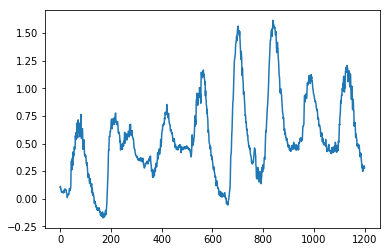

In [60]:
plt.plot(range(1200), predicts[:1200])

In [62]:
targets = []
for step in range(100):
    sample_batch, target_batch = next(test_sqn)
    targets.append(target_batch)

targets = np.hstack(targets)

In [46]:
targets.shape

(12800,)

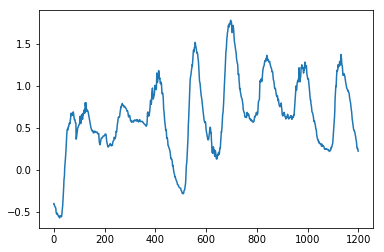

In [63]:
plt.plot(range(1200), targets[:1200])

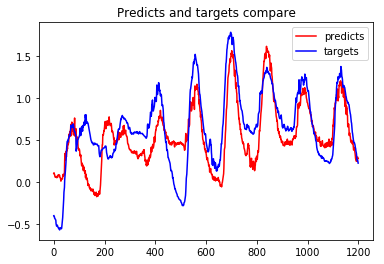

In [65]:
import matplotlib.pyplot as plt

epochs = range(0, 1200)

plt.figure()
plt.plot(epochs, predicts[:1200], 'r', label='predicts')
plt.plot(epochs, targets[:1200], 'b', label='targets')
plt.title('Predicts and targets compare')
plt.legend()

plt.show()

In [18]:
def generator_multi_targets(data, lookback, delay, min_index, max_index,
                            shuffle=False, batch_size=128, step=6):
    if max_index is None:
        max_index = len(data) - delay - 1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows), lookback // step, data.shape[-1]))
        targets = np.zeros((len(rows), lookback // step, 1))
        for j, row in enumerate(rows):
            indices_data = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices_data]
            indices_target = range(rows[j] + delay - lookback, rows[j] + delay, step)
            # print(j)
            # print(indices_target)
            # print(data[indices_target].shape)
            targets[j] = data[indices_target][:, 1].reshape(lookback // step, 1)
        yield samples, targets

In [59]:
lookback = 1440
step = 6
delay = 144
batch_size = 128

train_mul = generator_multi_targets(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=False,
                      step=step,
                      batch_size=batch_size)
test_mul = generator_multi_targets(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    shuffle=False,
                    step=step,
                    batch_size=batch_size)

test_steps = (300000 - 200001 - lookback)

In [ ]:
#samples, targets = next(test_mul)
#print(samples.shape)
#print(targets.shape)

In [49]:
from keras import layers
from keras.models import Model

inputs = layers.Input(shape=(None, float_data.shape[-1]))
gru = layers.GRU(32, dropout=0.2, recurrent_dropout=0.5, return_sequences=True)(inputs)
# change shape from (none,240,32) to (none,240,1)
outputs = layers.TimeDistributed(layers.Dense(1, input_dim=(lookback // step, 32)))(gru)
#outputs = layers.Dense(1, input_dim=(lookback // step, 32))(gru)   
model = Model(inputs=inputs, outputs=outputs)
model.summary()
model.compile(optimizer='rmsprop',
              loss='mae',
              metrics=['mae'])
model.fit_generator(train_mul,
                    steps_per_epoch=500,
                    epochs=20)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, None, 14)          0         
_________________________________________________________________
gru_13 (GRU)                 (None, None, 32)          4512      
_________________________________________________________________
time_distributed_7 (TimeDist (None, None, 1)           33        
Total params: 4,545
Trainable params: 4,545
Non-trainable params: 0
_________________________________________________________________


Epoch 1/20


  1/500 [..............................] - ETA: 26:12 - loss: 1.6349 - mean_absolute_error: 1.6349

  2/500 [..............................] - ETA: 13:46 - loss: 1.4392 - mean_absolute_error: 1.4392

  3/500 [..............................] - ETA: 9:42 - loss: 1.3193 - mean_absolute_error: 1.3193 

  4/500 [..............................] - ETA: 7:38 - loss: 1.2258 - mean_absolute_error: 1.2258

  5/500 [..............................] - ETA: 6:23 - loss: 1.1424 - mean_absolute_error: 1.1424

  6/500 [..............................] - ETA: 5:34 - loss: 1.0572 - mean_absolute_error: 1.0572

  7/500 [..............................] - ETA: 4:58 - loss: 0.9807 - mean_absolute_error: 0.9807

  8/500 [..............................] - ETA: 4:30 - loss: 0.9204 - mean_absolute_error: 0.9204

  9/500 [..............................] - ETA: 4:09 - loss: 0.8721 - mean_absolute_error: 0.8721

 10/500 [..............................] - ETA: 3:53 - loss: 0.8317 - mean_absolute_error: 0.8317

 11/500 [..............................] - ETA: 3:38 - loss: 0.7976 - mean_absolute_error: 0.7976

 12/500 [..............................] - ETA: 3:27 - loss: 0.7685 - mean_absolute_error: 0.7685

 13/500 [..............................] - ETA: 3:18 - loss: 0.7432 - mean_absolute_error: 0.7432

 14/500 [..............................] - ETA: 3:08 - loss: 0.7193 - mean_absolute_error: 0.7193

 15/500 [..............................] - ETA: 3:01 - loss: 0.6970 - mean_absolute_error: 0.6970

 16/500 [..............................] - ETA: 2:54 - loss: 0.6780 - mean_absolute_error: 0.6780

 17/500 [>.............................] - ETA: 2:49 - loss: 0.6596 - mean_absolute_error: 0.6596

 18/500 [>.............................] - ETA: 2:43 - loss: 0.6421 - mean_absolute_error: 0.6421

 19/500 [>.............................] - ETA: 2:39 - loss: 0.6264 - mean_absolute_error: 0.6264

 20/500 [>.............................] - ETA: 2:35 - loss: 0.6120 - mean_absolute_error: 0.6120

 21/500 [>.............................] - ETA: 2:31 - loss: 0.5989 - mean_absolute_error: 0.5989

 22/500 [>.............................] - ETA: 2:28 - loss: 0.5865 - mean_absolute_error: 0.5865

 23/500 [>.............................] - ETA: 2:25 - loss: 0.5749 - mean_absolute_error: 0.5749

 24/500 [>.............................] - ETA: 2:22 - loss: 0.5627 - mean_absolute_error: 0.5627

 25/500 [>.............................] - ETA: 2:19 - loss: 0.5519 - mean_absolute_error: 0.5519

 26/500 [>.............................] - ETA: 2:17 - loss: 0.5413 - mean_absolute_error: 0.5413

 27/500 [>.............................] - ETA: 2:14 - loss: 0.5308 - mean_absolute_error: 0.5308

 28/500 [>.............................] - ETA: 2:12 - loss: 0.5213 - mean_absolute_error: 0.5213

 29/500 [>.............................] - ETA: 2:10 - loss: 0.5125 - mean_absolute_error: 0.5125

 30/500 [>.............................] - ETA: 2:08 - loss: 0.5042 - mean_absolute_error: 0.5042

 31/500 [>.............................] - ETA: 2:07 - loss: 0.4962 - mean_absolute_error: 0.4962

 32/500 [>.............................] - ETA: 2:05 - loss: 0.4884 - mean_absolute_error: 0.4884

 33/500 [>.............................] - ETA: 2:04 - loss: 0.4816 - mean_absolute_error: 0.4816

 34/500 [=>............................] - ETA: 2:02 - loss: 0.4752 - mean_absolute_error: 0.4752

 35/500 [=>............................] - ETA: 2:01 - loss: 0.4693 - mean_absolute_error: 0.4693

 36/500 [=>............................] - ETA: 1:59 - loss: 0.4640 - mean_absolute_error: 0.4640

 37/500 [=>............................] - ETA: 1:57 - loss: 0.4589 - mean_absolute_error: 0.4589

 38/500 [=>............................] - ETA: 1:56 - loss: 0.4535 - mean_absolute_error: 0.4535

 39/500 [=>............................] - ETA: 1:55 - loss: 0.4490 - mean_absolute_error: 0.4490

 40/500 [=>............................] - ETA: 1:54 - loss: 0.4446 - mean_absolute_error: 0.4446

 41/500 [=>............................] - ETA: 1:53 - loss: 0.4400 - mean_absolute_error: 0.4400

 42/500 [=>............................] - ETA: 1:52 - loss: 0.4365 - mean_absolute_error: 0.4365

 43/500 [=>............................] - ETA: 1:51 - loss: 0.4331 - mean_absolute_error: 0.4331

 44/500 [=>............................] - ETA: 1:50 - loss: 0.4302 - mean_absolute_error: 0.4302

 45/500 [=>............................] - ETA: 1:49 - loss: 0.4272 - mean_absolute_error: 0.4272

 46/500 [=>............................] - ETA: 1:48 - loss: 0.4244 - mean_absolute_error: 0.4244

 47/500 [=>............................] - ETA: 1:47 - loss: 0.4214 - mean_absolute_error: 0.4214

 48/500 [=>............................] - ETA: 1:46 - loss: 0.4189 - mean_absolute_error: 0.4189

 49/500 [=>............................] - ETA: 1:45 - loss: 0.4166 - mean_absolute_error: 0.4166

 50/500 [==>...........................] - ETA: 1:45 - loss: 0.4139 - mean_absolute_error: 0.4139

 51/500 [==>...........................] - ETA: 1:44 - loss: 0.4111 - mean_absolute_error: 0.4111

 52/500 [==>...........................] - ETA: 1:43 - loss: 0.4085 - mean_absolute_error: 0.4085

 53/500 [==>...........................] - ETA: 1:43 - loss: 0.4060 - mean_absolute_error: 0.4060

 54/500 [==>...........................] - ETA: 1:42 - loss: 0.4036 - mean_absolute_error: 0.4036

 55/500 [==>...........................] - ETA: 1:41 - loss: 0.4004 - mean_absolute_error: 0.4004

 56/500 [==>...........................] - ETA: 1:41 - loss: 0.3973 - mean_absolute_error: 0.3973

 57/500 [==>...........................] - ETA: 1:40 - loss: 0.3942 - mean_absolute_error: 0.3942

 58/500 [==>...........................] - ETA: 1:40 - loss: 0.3912 - mean_absolute_error: 0.3912

 59/500 [==>...........................] - ETA: 1:39 - loss: 0.3884 - mean_absolute_error: 0.3884

 60/500 [==>...........................] - ETA: 1:39 - loss: 0.3859 - mean_absolute_error: 0.3859

 61/500 [==>...........................] - ETA: 1:38 - loss: 0.3832 - mean_absolute_error: 0.3832

 62/500 [==>...........................] - ETA: 1:37 - loss: 0.3802 - mean_absolute_error: 0.3802

 63/500 [==>...........................] - ETA: 1:37 - loss: 0.3775 - mean_absolute_error: 0.3775

 64/500 [==>...........................] - ETA: 1:36 - loss: 0.3748 - mean_absolute_error: 0.3748

 65/500 [==>...........................] - ETA: 1:36 - loss: 0.3723 - mean_absolute_error: 0.3723

 66/500 [==>...........................] - ETA: 1:35 - loss: 0.3698 - mean_absolute_error: 0.3698

 67/500 [===>..........................] - ETA: 1:35 - loss: 0.3673 - mean_absolute_error: 0.3673

 68/500 [===>..........................] - ETA: 1:34 - loss: 0.3648 - mean_absolute_error: 0.3648

 69/500 [===>..........................] - ETA: 1:34 - loss: 0.3626 - mean_absolute_error: 0.3626

 70/500 [===>..........................] - ETA: 1:33 - loss: 0.3605 - mean_absolute_error: 0.3605

 71/500 [===>..........................] - ETA: 1:33 - loss: 0.3585 - mean_absolute_error: 0.3585

 72/500 [===>..........................] - ETA: 1:32 - loss: 0.3563 - mean_absolute_error: 0.3563

 73/500 [===>..........................] - ETA: 1:32 - loss: 0.3541 - mean_absolute_error: 0.3541

 74/500 [===>..........................] - ETA: 1:31 - loss: 0.3519 - mean_absolute_error: 0.3519

 75/500 [===>..........................] - ETA: 1:31 - loss: 0.3499 - mean_absolute_error: 0.3499

 76/500 [===>..........................] - ETA: 1:30 - loss: 0.3483 - mean_absolute_error: 0.3483

 77/500 [===>..........................] - ETA: 1:30 - loss: 0.3470 - mean_absolute_error: 0.3470

 78/500 [===>..........................] - ETA: 1:30 - loss: 0.3459 - mean_absolute_error: 0.3459

 79/500 [===>..........................] - ETA: 1:29 - loss: 0.3449 - mean_absolute_error: 0.3449

 80/500 [===>..........................] - ETA: 1:29 - loss: 0.3438 - mean_absolute_error: 0.3438

 81/500 [===>..........................] - ETA: 1:28 - loss: 0.3426 - mean_absolute_error: 0.3426



 82/500 [===>..........................] - ETA: 1:28 - loss: 0.3416 - mean_absolute_error: 0.3416

 83/500 [===>..........................] - ETA: 1:28 - loss: 0.3405 - mean_absolute_error: 0.3405

 84/500 [====>.........................] - ETA: 1:27 - loss: 0.3397 - mean_absolute_error: 0.3397

 85/500 [====>.........................] - ETA: 1:27 - loss: 0.3390 - mean_absolute_error: 0.3390

 86/500 [====>.........................] - ETA: 1:26 - loss: 0.3383 - mean_absolute_error: 0.3383

 87/500 [====>.........................] - ETA: 1:26 - loss: 0.3376 - mean_absolute_error: 0.3376

 88/500 [====>.........................] - ETA: 1:26 - loss: 0.3367 - mean_absolute_error: 0.3367

 89/500 [====>.........................] - ETA: 1:25 - loss: 0.3359 - mean_absolute_error: 0.3359

 90/500 [====>.........................] - ETA: 1:25 - loss: 0.3352 - mean_absolute_error: 0.3352

 91/500 [====>.........................] - ETA: 1:25 - loss: 0.3347 - mean_absolute_error: 0.3347

 92/500 [====>.........................] - ETA: 1:24 - loss: 0.3345 - mean_absolute_error: 0.3345

 93/500 [====>.........................] - ETA: 1:24 - loss: 0.3342 - mean_absolute_error: 0.3342

 94/500 [====>.........................] - ETA: 1:24 - loss: 0.3338 - mean_absolute_error: 0.3338

 95/500 [====>.........................] - ETA: 1:23 - loss: 0.3333 - mean_absolute_error: 0.3333

 96/500 [====>.........................] - ETA: 1:23 - loss: 0.3327 - mean_absolute_error: 0.3327

 97/500 [====>.........................] - ETA: 1:23 - loss: 0.3322 - mean_absolute_error: 0.3322

 98/500 [====>.........................] - ETA: 1:22 - loss: 0.3319 - mean_absolute_error: 0.3319

 99/500 [====>.........................] - ETA: 1:22 - loss: 0.3316 - mean_absolute_error: 0.3316

100/500 [=====>........................] - ETA: 1:22 - loss: 0.3311 - mean_absolute_error: 0.3311

101/500 [=====>........................] - ETA: 1:21 - loss: 0.3308 - mean_absolute_error: 0.3308

102/500 [=====>........................] - ETA: 1:21 - loss: 0.3305 - mean_absolute_error: 0.3305

103/500 [=====>........................] - ETA: 1:21 - loss: 0.3300 - mean_absolute_error: 0.3300

104/500 [=====>........................] - ETA: 1:21 - loss: 0.3295 - mean_absolute_error: 0.3295

105/500 [=====>........................] - ETA: 1:20 - loss: 0.3289 - mean_absolute_error: 0.3289

106/500 [=====>........................] - ETA: 1:20 - loss: 0.3282 - mean_absolute_error: 0.3282

107/500 [=====>........................] - ETA: 1:20 - loss: 0.3274 - mean_absolute_error: 0.3274

108/500 [=====>........................] - ETA: 1:19 - loss: 0.3268 - mean_absolute_error: 0.3268

109/500 [=====>........................] - ETA: 1:19 - loss: 0.3264 - mean_absolute_error: 0.3264

110/500 [=====>........................] - ETA: 1:19 - loss: 0.3261 - mean_absolute_error: 0.3261

111/500 [=====>........................] - ETA: 1:18 - loss: 0.3259 - mean_absolute_error: 0.3259

112/500 [=====>........................] - ETA: 1:18 - loss: 0.3255 - mean_absolute_error: 0.3255

113/500 [=====>........................] - ETA: 1:18 - loss: 0.3251 - mean_absolute_error: 0.3251

114/500 [=====>........................] - ETA: 1:18 - loss: 0.3246 - mean_absolute_error: 0.3246

115/500 [=====>........................] - ETA: 1:17 - loss: 0.3243 - mean_absolute_error: 0.3243

116/500 [=====>........................] - ETA: 1:17 - loss: 0.3240 - mean_absolute_error: 0.3240

117/500 [======>.......................] - ETA: 1:17 - loss: 0.3240 - mean_absolute_error: 0.3240

118/500 [======>.......................] - ETA: 1:16 - loss: 0.3241 - mean_absolute_error: 0.3241

119/500 [======>.......................] - ETA: 1:16 - loss: 0.3241 - mean_absolute_error: 0.3241

120/500 [======>.......................] - ETA: 1:16 - loss: 0.3239 - mean_absolute_error: 0.3239

121/500 [======>.......................] - ETA: 1:16 - loss: 0.3237 - mean_absolute_error: 0.3237

122/500 [======>.......................] - ETA: 1:15 - loss: 0.3236 - mean_absolute_error: 0.3236

123/500 [======>.......................] - ETA: 1:15 - loss: 0.3236 - mean_absolute_error: 0.3236

124/500 [======>.......................] - ETA: 1:15 - loss: 0.3236 - mean_absolute_error: 0.3236

125/500 [======>.......................] - ETA: 1:14 - loss: 0.3235 - mean_absolute_error: 0.3235

126/500 [======>.......................] - ETA: 1:14 - loss: 0.3233 - mean_absolute_error: 0.3233

127/500 [======>.......................] - ETA: 1:14 - loss: 0.3231 - mean_absolute_error: 0.3231

128/500 [======>.......................] - ETA: 1:14 - loss: 0.3229 - mean_absolute_error: 0.3229

129/500 [======>.......................] - ETA: 1:13 - loss: 0.3228 - mean_absolute_error: 0.3228

130/500 [======>.......................] - ETA: 1:13 - loss: 0.3225 - mean_absolute_error: 0.3225

131/500 [======>.......................] - ETA: 1:13 - loss: 0.3224 - mean_absolute_error: 0.3224

132/500 [======>.......................] - ETA: 1:13 - loss: 0.3222 - mean_absolute_error: 0.3222

133/500 [======>.......................] - ETA: 1:12 - loss: 0.3218 - mean_absolute_error: 0.3218

134/500 [=======>......................] - ETA: 1:12 - loss: 0.3213 - mean_absolute_error: 0.3213

135/500 [=======>......................] - ETA: 1:12 - loss: 0.3209 - mean_absolute_error: 0.3209

136/500 [=======>......................] - ETA: 1:11 - loss: 0.3205 - mean_absolute_error: 0.3205

137/500 [=======>......................] - ETA: 1:11 - loss: 0.3200 - mean_absolute_error: 0.3200

138/500 [=======>......................] - ETA: 1:11 - loss: 0.3195 - mean_absolute_error: 0.3195

139/500 [=======>......................] - ETA: 1:11 - loss: 0.3188 - mean_absolute_error: 0.3188

140/500 [=======>......................] - ETA: 1:10 - loss: 0.3180 - mean_absolute_error: 0.3180

141/500 [=======>......................] - ETA: 1:10 - loss: 0.3171 - mean_absolute_error: 0.3171

142/500 [=======>......................] - ETA: 1:10 - loss: 0.3163 - mean_absolute_error: 0.3163

143/500 [=======>......................] - ETA: 1:10 - loss: 0.3156 - mean_absolute_error: 0.3156

144/500 [=======>......................] - ETA: 1:09 - loss: 0.3150 - mean_absolute_error: 0.3150

145/500 [=======>......................] - ETA: 1:09 - loss: 0.3144 - mean_absolute_error: 0.3144

146/500 [=======>......................] - ETA: 1:09 - loss: 0.3139 - mean_absolute_error: 0.3139

147/500 [=======>......................] - ETA: 1:09 - loss: 0.3133 - mean_absolute_error: 0.3133

148/500 [=======>......................] - ETA: 1:08 - loss: 0.3127 - mean_absolute_error: 0.3127

149/500 [=======>......................] - ETA: 1:08 - loss: 0.3122 - mean_absolute_error: 0.3122

150/500 [========>.....................] - ETA: 1:08 - loss: 0.3118 - mean_absolute_error: 0.3118

151/500 [========>.....................] - ETA: 1:08 - loss: 0.3114 - mean_absolute_error: 0.3114

152/500 [========>.....................] - ETA: 1:08 - loss: 0.3110 - mean_absolute_error: 0.3110

153/500 [========>.....................] - ETA: 1:07 - loss: 0.3108 - mean_absolute_error: 0.3108

154/500 [========>.....................] - ETA: 1:07 - loss: 0.3105 - mean_absolute_error: 0.3105

155/500 [========>.....................] - ETA: 1:07 - loss: 0.3104 - mean_absolute_error: 0.3104

156/500 [========>.....................] - ETA: 1:07 - loss: 0.3103 - mean_absolute_error: 0.3103



157/500 [========>.....................] - ETA: 1:06 - loss: 0.3103 - mean_absolute_error: 0.3103

158/500 [========>.....................] - ETA: 1:06 - loss: 0.3103 - mean_absolute_error: 0.3103

159/500 [========>.....................] - ETA: 1:06 - loss: 0.3101 - mean_absolute_error: 0.3101

160/500 [========>.....................] - ETA: 1:06 - loss: 0.3099 - mean_absolute_error: 0.3099

161/500 [========>.....................] - ETA: 1:06 - loss: 0.3098 - mean_absolute_error: 0.3098

162/500 [========>.....................] - ETA: 1:05 - loss: 0.3097 - mean_absolute_error: 0.3097

163/500 [========>.....................] - ETA: 1:05 - loss: 0.3095 - mean_absolute_error: 0.3095

164/500 [========>.....................] - ETA: 1:05 - loss: 0.3091 - mean_absolute_error: 0.3091

165/500 [========>.....................] - ETA: 1:05 - loss: 0.3086 - mean_absolute_error: 0.3086

166/500 [========>.....................] - ETA: 1:05 - loss: 0.3081 - mean_absolute_error: 0.3081

167/500 [=========>....................] - ETA: 1:04 - loss: 0.3077 - mean_absolute_error: 0.3077

168/500 [=========>....................] - ETA: 1:04 - loss: 0.3072 - mean_absolute_error: 0.3072

169/500 [=========>....................] - ETA: 1:04 - loss: 0.3067 - mean_absolute_error: 0.3067

170/500 [=========>....................] - ETA: 1:04 - loss: 0.3061 - mean_absolute_error: 0.3061

171/500 [=========>....................] - ETA: 1:04 - loss: 0.3057 - mean_absolute_error: 0.3057

172/500 [=========>....................] - ETA: 1:03 - loss: 0.3051 - mean_absolute_error: 0.3051

173/500 [=========>....................] - ETA: 1:03 - loss: 0.3046 - mean_absolute_error: 0.3046

174/500 [=========>....................] - ETA: 1:03 - loss: 0.3044 - mean_absolute_error: 0.3044

175/500 [=========>....................] - ETA: 1:03 - loss: 0.3042 - mean_absolute_error: 0.3042

176/500 [=========>....................] - ETA: 1:03 - loss: 0.3040 - mean_absolute_error: 0.3040

177/500 [=========>....................] - ETA: 1:03 - loss: 0.3038 - mean_absolute_error: 0.3038

178/500 [=========>....................] - ETA: 1:02 - loss: 0.3038 - mean_absolute_error: 0.3038

179/500 [=========>....................] - ETA: 1:02 - loss: 0.3037 - mean_absolute_error: 0.3037

180/500 [=========>....................] - ETA: 1:02 - loss: 0.3036 - mean_absolute_error: 0.3036

181/500 [=========>....................] - ETA: 1:02 - loss: 0.3034 - mean_absolute_error: 0.3034

182/500 [=========>....................] - ETA: 1:02 - loss: 0.3032 - mean_absolute_error: 0.3032



183/500 [=========>....................] - ETA: 1:02 - loss: 0.3030 - mean_absolute_error: 0.3030

184/500 [==========>...................] - ETA: 1:01 - loss: 0.3027 - mean_absolute_error: 0.3027

185/500 [==========>...................] - ETA: 1:01 - loss: 0.3024 - mean_absolute_error: 0.3024

186/500 [==========>...................] - ETA: 1:01 - loss: 0.3019 - mean_absolute_error: 0.3019

187/500 [==========>...................] - ETA: 1:01 - loss: 0.3015 - mean_absolute_error: 0.3015

188/500 [==========>...................] - ETA: 1:01 - loss: 0.3012 - mean_absolute_error: 0.3012

189/500 [==========>...................] - ETA: 1:00 - loss: 0.3008 - mean_absolute_error: 0.3008

190/500 [==========>...................] - ETA: 1:00 - loss: 0.3004 - mean_absolute_error: 0.3004

191/500 [==========>...................] - ETA: 1:00 - loss: 0.3000 - mean_absolute_error: 0.3000

192/500 [==========>...................] - ETA: 1:00 - loss: 0.2997 - mean_absolute_error: 0.2997



193/500 [==========>...................] - ETA: 1:00 - loss: 0.2994 - mean_absolute_error: 0.2994

194/500 [==========>...................] - ETA: 59s - loss: 0.2991 - mean_absolute_error: 0.2991 



195/500 [==========>...................] - ETA: 59s - loss: 0.2988 - mean_absolute_error: 0.2988

196/500 [==========>...................] - ETA: 59s - loss: 0.2985 - mean_absolute_error: 0.2985

197/500 [==========>...................] - ETA: 59s - loss: 0.2982 - mean_absolute_error: 0.2982

198/500 [==========>...................] - ETA: 59s - loss: 0.2979 - mean_absolute_error: 0.2979

199/500 [==========>...................] - ETA: 59s - loss: 0.2978 - mean_absolute_error: 0.2978

200/500 [===========>..................] - ETA: 58s - loss: 0.2976 - mean_absolute_error: 0.2976

201/500 [===========>..................] - ETA: 58s - loss: 0.2974 - mean_absolute_error: 0.2974

202/500 [===========>..................] - ETA: 58s - loss: 0.2970 - mean_absolute_error: 0.2970

203/500 [===========>..................] - ETA: 58s - loss: 0.2967 - mean_absolute_error: 0.2967

204/500 [===========>..................] - ETA: 58s - loss: 0.2965 - mean_absolute_error: 0.2965

205/500 [===========>..................] - ETA: 57s - loss: 0.2962 - mean_absolute_error: 0.2962

206/500 [===========>..................] - ETA: 57s - loss: 0.2960 - mean_absolute_error: 0.2960

207/500 [===========>..................] - ETA: 57s - loss: 0.2958 - mean_absolute_error: 0.2958

208/500 [===========>..................] - ETA: 57s - loss: 0.2955 - mean_absolute_error: 0.2955

209/500 [===========>..................] - ETA: 57s - loss: 0.2952 - mean_absolute_error: 0.2952

210/500 [===========>..................] - ETA: 56s - loss: 0.2949 - mean_absolute_error: 0.2949

211/500 [===========>..................] - ETA: 56s - loss: 0.2945 - mean_absolute_error: 0.2945

212/500 [===========>..................] - ETA: 56s - loss: 0.2943 - mean_absolute_error: 0.2943

213/500 [===========>..................] - ETA: 56s - loss: 0.2941 - mean_absolute_error: 0.2941

214/500 [===========>..................] - ETA: 55s - loss: 0.2939 - mean_absolute_error: 0.2939

215/500 [===========>..................] - ETA: 55s - loss: 0.2937 - mean_absolute_error: 0.2937

216/500 [===========>..................] - ETA: 55s - loss: 0.2936 - mean_absolute_error: 0.2936

217/500 [============>.................] - ETA: 55s - loss: 0.2934 - mean_absolute_error: 0.2934

218/500 [============>.................] - ETA: 55s - loss: 0.2934 - mean_absolute_error: 0.2934

219/500 [============>.................] - ETA: 54s - loss: 0.2933 - mean_absolute_error: 0.2933

220/500 [============>.................] - ETA: 54s - loss: 0.2932 - mean_absolute_error: 0.2932

221/500 [============>.................] - ETA: 54s - loss: 0.2931 - mean_absolute_error: 0.2931

222/500 [============>.................] - ETA: 54s - loss: 0.2930 - mean_absolute_error: 0.2930

223/500 [============>.................] - ETA: 53s - loss: 0.2929 - mean_absolute_error: 0.2929

224/500 [============>.................] - ETA: 53s - loss: 0.2929 - mean_absolute_error: 0.2929

225/500 [============>.................] - ETA: 53s - loss: 0.2929 - mean_absolute_error: 0.2929

226/500 [============>.................] - ETA: 53s - loss: 0.2930 - mean_absolute_error: 0.2930

227/500 [============>.................] - ETA: 52s - loss: 0.2930 - mean_absolute_error: 0.2930

228/500 [============>.................] - ETA: 52s - loss: 0.2929 - mean_absolute_error: 0.2929

229/500 [============>.................] - ETA: 52s - loss: 0.2928 - mean_absolute_error: 0.2928

230/500 [============>.................] - ETA: 52s - loss: 0.2926 - mean_absolute_error: 0.2926

231/500 [============>.................] - ETA: 52s - loss: 0.2925 - mean_absolute_error: 0.2925

232/500 [============>.................] - ETA: 51s - loss: 0.2923 - mean_absolute_error: 0.2923

233/500 [============>.................] - ETA: 51s - loss: 0.2921 - mean_absolute_error: 0.2921

234/500 [=============>................] - ETA: 51s - loss: 0.2919 - mean_absolute_error: 0.2919

235/500 [=============>................] - ETA: 51s - loss: 0.2916 - mean_absolute_error: 0.2916

236/500 [=============>................] - ETA: 51s - loss: 0.2913 - mean_absolute_error: 0.2913

237/500 [=============>................] - ETA: 50s - loss: 0.2910 - mean_absolute_error: 0.2910

238/500 [=============>................] - ETA: 50s - loss: 0.2907 - mean_absolute_error: 0.2907

239/500 [=============>................] - ETA: 50s - loss: 0.2905 - mean_absolute_error: 0.2905

240/500 [=============>................] - ETA: 50s - loss: 0.2902 - mean_absolute_error: 0.2902

241/500 [=============>................] - ETA: 49s - loss: 0.2899 - mean_absolute_error: 0.2899

242/500 [=============>................] - ETA: 49s - loss: 0.2896 - mean_absolute_error: 0.2896

243/500 [=============>................] - ETA: 49s - loss: 0.2893 - mean_absolute_error: 0.2893

244/500 [=============>................] - ETA: 49s - loss: 0.2890 - mean_absolute_error: 0.2890

245/500 [=============>................] - ETA: 49s - loss: 0.2889 - mean_absolute_error: 0.2889

246/500 [=============>................] - ETA: 48s - loss: 0.2888 - mean_absolute_error: 0.2888

247/500 [=============>................] - ETA: 48s - loss: 0.2887 - mean_absolute_error: 0.2887

248/500 [=============>................] - ETA: 48s - loss: 0.2887 - mean_absolute_error: 0.2887

249/500 [=============>................] - ETA: 48s - loss: 0.2887 - mean_absolute_error: 0.2887

250/500 [==============>...............] - ETA: 48s - loss: 0.2887 - mean_absolute_error: 0.2887

251/500 [==============>...............] - ETA: 47s - loss: 0.2888 - mean_absolute_error: 0.2888

252/500 [==============>...............] - ETA: 47s - loss: 0.2890 - mean_absolute_error: 0.2890

253/500 [==============>...............] - ETA: 47s - loss: 0.2891 - mean_absolute_error: 0.2891

254/500 [==============>...............] - ETA: 47s - loss: 0.2893 - mean_absolute_error: 0.2893

255/500 [==============>...............] - ETA: 47s - loss: 0.2895 - mean_absolute_error: 0.2895

256/500 [==============>...............] - ETA: 46s - loss: 0.2897 - mean_absolute_error: 0.2897

257/500 [==============>...............] - ETA: 46s - loss: 0.2899 - mean_absolute_error: 0.2899

258/500 [==============>...............] - ETA: 46s - loss: 0.2901 - mean_absolute_error: 0.2901

259/500 [==============>...............] - ETA: 46s - loss: 0.2902 - mean_absolute_error: 0.2902

260/500 [==============>...............] - ETA: 45s - loss: 0.2904 - mean_absolute_error: 0.2904

261/500 [==============>...............] - ETA: 45s - loss: 0.2905 - mean_absolute_error: 0.2905

262/500 [==============>...............] - ETA: 45s - loss: 0.2905 - mean_absolute_error: 0.2905

263/500 [==============>...............] - ETA: 45s - loss: 0.2905 - mean_absolute_error: 0.2905

264/500 [==============>...............] - ETA: 45s - loss: 0.2904 - mean_absolute_error: 0.2904

265/500 [==============>...............] - ETA: 44s - loss: 0.2904 - mean_absolute_error: 0.2904

266/500 [==============>...............] - ETA: 44s - loss: 0.2904 - mean_absolute_error: 0.2904

267/500 [===============>..............] - ETA: 44s - loss: 0.2904 - mean_absolute_error: 0.2904

268/500 [===============>..............] - ETA: 44s - loss: 0.2904 - mean_absolute_error: 0.2904

269/500 [===============>..............] - ETA: 44s - loss: 0.2903 - mean_absolute_error: 0.2903

270/500 [===============>..............] - ETA: 43s - loss: 0.2902 - mean_absolute_error: 0.2902

271/500 [===============>..............] - ETA: 43s - loss: 0.2899 - mean_absolute_error: 0.2899

272/500 [===============>..............] - ETA: 43s - loss: 0.2897 - mean_absolute_error: 0.2897

273/500 [===============>..............] - ETA: 43s - loss: 0.2896 - mean_absolute_error: 0.2896

274/500 [===============>..............] - ETA: 43s - loss: 0.2894 - mean_absolute_error: 0.2894

275/500 [===============>..............] - ETA: 42s - loss: 0.2893 - mean_absolute_error: 0.2893

276/500 [===============>..............] - ETA: 42s - loss: 0.2892 - mean_absolute_error: 0.2892

277/500 [===============>..............] - ETA: 42s - loss: 0.2890 - mean_absolute_error: 0.2890

278/500 [===============>..............] - ETA: 42s - loss: 0.2889 - mean_absolute_error: 0.2889

279/500 [===============>..............] - ETA: 42s - loss: 0.2887 - mean_absolute_error: 0.2887

280/500 [===============>..............] - ETA: 41s - loss: 0.2885 - mean_absolute_error: 0.2885

281/500 [===============>..............] - ETA: 41s - loss: 0.2883 - mean_absolute_error: 0.2883

282/500 [===============>..............] - ETA: 41s - loss: 0.2880 - mean_absolute_error: 0.2880

283/500 [===============>..............] - ETA: 41s - loss: 0.2877 - mean_absolute_error: 0.2877

284/500 [================>.............] - ETA: 40s - loss: 0.2874 - mean_absolute_error: 0.2874

285/500 [================>.............] - ETA: 40s - loss: 0.2871 - mean_absolute_error: 0.2871

286/500 [================>.............] - ETA: 40s - loss: 0.2868 - mean_absolute_error: 0.2868

287/500 [================>.............] - ETA: 40s - loss: 0.2866 - mean_absolute_error: 0.2866

288/500 [================>.............] - ETA: 40s - loss: 0.2864 - mean_absolute_error: 0.2864



289/500 [================>.............] - ETA: 40s - loss: 0.2862 - mean_absolute_error: 0.2862

290/500 [================>.............] - ETA: 39s - loss: 0.2861 - mean_absolute_error: 0.2861

291/500 [================>.............] - ETA: 39s - loss: 0.2861 - mean_absolute_error: 0.2861

292/500 [================>.............] - ETA: 39s - loss: 0.2860 - mean_absolute_error: 0.2860

293/500 [================>.............] - ETA: 39s - loss: 0.2858 - mean_absolute_error: 0.2858

294/500 [================>.............] - ETA: 39s - loss: 0.2857 - mean_absolute_error: 0.2857

295/500 [================>.............] - ETA: 38s - loss: 0.2857 - mean_absolute_error: 0.2857

296/500 [================>.............] - ETA: 38s - loss: 0.2856 - mean_absolute_error: 0.2856

297/500 [================>.............] - ETA: 38s - loss: 0.2856 - mean_absolute_error: 0.2856

298/500 [================>.............] - ETA: 38s - loss: 0.2855 - mean_absolute_error: 0.2855

299/500 [================>.............] - ETA: 38s - loss: 0.2855 - mean_absolute_error: 0.2855



300/500 [=================>............] - ETA: 37s - loss: 0.2855 - mean_absolute_error: 0.2855

301/500 [=================>............] - ETA: 37s - loss: 0.2854 - mean_absolute_error: 0.2854

302/500 [=================>............] - ETA: 37s - loss: 0.2854 - mean_absolute_error: 0.2854

303/500 [=================>............] - ETA: 37s - loss: 0.2854 - mean_absolute_error: 0.2854

304/500 [=================>............] - ETA: 37s - loss: 0.2855 - mean_absolute_error: 0.2855

305/500 [=================>............] - ETA: 36s - loss: 0.2856 - mean_absolute_error: 0.2856

306/500 [=================>............] - ETA: 36s - loss: 0.2857 - mean_absolute_error: 0.2857

307/500 [=================>............] - ETA: 36s - loss: 0.2858 - mean_absolute_error: 0.2858

308/500 [=================>............] - ETA: 36s - loss: 0.2859 - mean_absolute_error: 0.2859

309/500 [=================>............] - ETA: 36s - loss: 0.2861 - mean_absolute_error: 0.2861

310/500 [=================>............] - ETA: 35s - loss: 0.2863 - mean_absolute_error: 0.2863

311/500 [=================>............] - ETA: 35s - loss: 0.2866 - mean_absolute_error: 0.2866

312/500 [=================>............] - ETA: 35s - loss: 0.2870 - mean_absolute_error: 0.2870

313/500 [=================>............] - ETA: 35s - loss: 0.2873 - mean_absolute_error: 0.2873

314/500 [=================>............] - ETA: 35s - loss: 0.2875 - mean_absolute_error: 0.2875

315/500 [=================>............] - ETA: 34s - loss: 0.2875 - mean_absolute_error: 0.2875

316/500 [=================>............] - ETA: 34s - loss: 0.2874 - mean_absolute_error: 0.2874

317/500 [==================>...........] - ETA: 34s - loss: 0.2873 - mean_absolute_error: 0.2873

318/500 [==================>...........] - ETA: 34s - loss: 0.2872 - mean_absolute_error: 0.2872

319/500 [==================>...........] - ETA: 34s - loss: 0.2870 - mean_absolute_error: 0.2870

320/500 [==================>...........] - ETA: 33s - loss: 0.2869 - mean_absolute_error: 0.2869

321/500 [==================>...........] - ETA: 33s - loss: 0.2867 - mean_absolute_error: 0.2867

322/500 [==================>...........] - ETA: 33s - loss: 0.2866 - mean_absolute_error: 0.2866

323/500 [==================>...........] - ETA: 33s - loss: 0.2864 - mean_absolute_error: 0.2864

324/500 [==================>...........] - ETA: 33s - loss: 0.2862 - mean_absolute_error: 0.2862

325/500 [==================>...........] - ETA: 33s - loss: 0.2861 - mean_absolute_error: 0.2861

326/500 [==================>...........] - ETA: 32s - loss: 0.2860 - mean_absolute_error: 0.2860

327/500 [==================>...........] - ETA: 32s - loss: 0.2858 - mean_absolute_error: 0.2858

328/500 [==================>...........] - ETA: 32s - loss: 0.2856 - mean_absolute_error: 0.2856

329/500 [==================>...........] - ETA: 32s - loss: 0.2854 - mean_absolute_error: 0.2854

330/500 [==================>...........] - ETA: 32s - loss: 0.2853 - mean_absolute_error: 0.2853

331/500 [==================>...........] - ETA: 31s - loss: 0.2852 - mean_absolute_error: 0.2852

332/500 [==================>...........] - ETA: 31s - loss: 0.2851 - mean_absolute_error: 0.2851

333/500 [==================>...........] - ETA: 31s - loss: 0.2850 - mean_absolute_error: 0.2850

334/500 [===================>..........] - ETA: 31s - loss: 0.2848 - mean_absolute_error: 0.2848

335/500 [===================>..........] - ETA: 31s - loss: 0.2847 - mean_absolute_error: 0.2847

336/500 [===================>..........] - ETA: 30s - loss: 0.2844 - mean_absolute_error: 0.2844

337/500 [===================>..........] - ETA: 30s - loss: 0.2842 - mean_absolute_error: 0.2842

338/500 [===================>..........] - ETA: 30s - loss: 0.2839 - mean_absolute_error: 0.2839

339/500 [===================>..........] - ETA: 30s - loss: 0.2837 - mean_absolute_error: 0.2837

340/500 [===================>..........] - ETA: 30s - loss: 0.2834 - mean_absolute_error: 0.2834

341/500 [===================>..........] - ETA: 29s - loss: 0.2831 - mean_absolute_error: 0.2831

342/500 [===================>..........] - ETA: 29s - loss: 0.2828 - mean_absolute_error: 0.2828

343/500 [===================>..........] - ETA: 29s - loss: 0.2824 - mean_absolute_error: 0.2824

344/500 [===================>..........] - ETA: 29s - loss: 0.2821 - mean_absolute_error: 0.2821

345/500 [===================>..........] - ETA: 29s - loss: 0.2818 - mean_absolute_error: 0.2818

346/500 [===================>..........] - ETA: 28s - loss: 0.2815 - mean_absolute_error: 0.2815

347/500 [===================>..........] - ETA: 28s - loss: 0.2812 - mean_absolute_error: 0.2812

348/500 [===================>..........] - ETA: 28s - loss: 0.2810 - mean_absolute_error: 0.2810

349/500 [===================>..........] - ETA: 28s - loss: 0.2808 - mean_absolute_error: 0.2808

350/500 [====================>.........] - ETA: 28s - loss: 0.2806 - mean_absolute_error: 0.2806

351/500 [====================>.........] - ETA: 27s - loss: 0.2805 - mean_absolute_error: 0.2805

352/500 [====================>.........] - ETA: 27s - loss: 0.2803 - mean_absolute_error: 0.2803

353/500 [====================>.........] - ETA: 27s - loss: 0.2801 - mean_absolute_error: 0.2801

354/500 [====================>.........] - ETA: 27s - loss: 0.2799 - mean_absolute_error: 0.2799

355/500 [====================>.........] - ETA: 27s - loss: 0.2797 - mean_absolute_error: 0.2797

356/500 [====================>.........] - ETA: 26s - loss: 0.2794 - mean_absolute_error: 0.2794

357/500 [====================>.........] - ETA: 26s - loss: 0.2792 - mean_absolute_error: 0.2792



358/500 [====================>.........] - ETA: 26s - loss: 0.2789 - mean_absolute_error: 0.2789

359/500 [====================>.........] - ETA: 26s - loss: 0.2787 - mean_absolute_error: 0.2787

360/500 [====================>.........] - ETA: 26s - loss: 0.2784 - mean_absolute_error: 0.2784

361/500 [====================>.........] - ETA: 26s - loss: 0.2781 - mean_absolute_error: 0.2781

362/500 [====================>.........] - ETA: 25s - loss: 0.2778 - mean_absolute_error: 0.2778

363/500 [====================>.........] - ETA: 25s - loss: 0.2775 - mean_absolute_error: 0.2775

364/500 [====================>.........] - ETA: 25s - loss: 0.2772 - mean_absolute_error: 0.2772

365/500 [====================>.........] - ETA: 25s - loss: 0.2770 - mean_absolute_error: 0.2770

366/500 [====================>.........] - ETA: 25s - loss: 0.2768 - mean_absolute_error: 0.2768

367/500 [=====================>........] - ETA: 24s - loss: 0.2767 - mean_absolute_error: 0.2767

368/500 [=====================>........] - ETA: 24s - loss: 0.2765 - mean_absolute_error: 0.2765

369/500 [=====================>........] - ETA: 24s - loss: 0.2763 - mean_absolute_error: 0.2763

370/500 [=====================>........] - ETA: 24s - loss: 0.2761 - mean_absolute_error: 0.2761

371/500 [=====================>........] - ETA: 24s - loss: 0.2760 - mean_absolute_error: 0.2760

372/500 [=====================>........] - ETA: 23s - loss: 0.2759 - mean_absolute_error: 0.2759

373/500 [=====================>........] - ETA: 23s - loss: 0.2757 - mean_absolute_error: 0.2757

374/500 [=====================>........] - ETA: 23s - loss: 0.2756 - mean_absolute_error: 0.2756

375/500 [=====================>........] - ETA: 23s - loss: 0.2754 - mean_absolute_error: 0.2754

376/500 [=====================>........] - ETA: 23s - loss: 0.2753 - mean_absolute_error: 0.2753

377/500 [=====================>........] - ETA: 23s - loss: 0.2753 - mean_absolute_error: 0.2753

378/500 [=====================>........] - ETA: 22s - loss: 0.2753 - mean_absolute_error: 0.2753

379/500 [=====================>........] - ETA: 22s - loss: 0.2755 - mean_absolute_error: 0.2755

380/500 [=====================>........] - ETA: 22s - loss: 0.2756 - mean_absolute_error: 0.2756

381/500 [=====================>........] - ETA: 22s - loss: 0.2757 - mean_absolute_error: 0.2757

382/500 [=====================>........] - ETA: 22s - loss: 0.2756 - mean_absolute_error: 0.2756

383/500 [=====================>........] - ETA: 21s - loss: 0.2755 - mean_absolute_error: 0.2755

384/500 [======================>.......] - ETA: 21s - loss: 0.2756 - mean_absolute_error: 0.2756

385/500 [======================>.......] - ETA: 21s - loss: 0.2758 - mean_absolute_error: 0.2758

386/500 [======================>.......] - ETA: 21s - loss: 0.2762 - mean_absolute_error: 0.2762

387/500 [======================>.......] - ETA: 21s - loss: 0.2765 - mean_absolute_error: 0.2765

388/500 [======================>.......] - ETA: 20s - loss: 0.2768 - mean_absolute_error: 0.2768

389/500 [======================>.......] - ETA: 20s - loss: 0.2773 - mean_absolute_error: 0.2773

390/500 [======================>.......] - ETA: 20s - loss: 0.2778 - mean_absolute_error: 0.2778

391/500 [======================>.......] - ETA: 20s - loss: 0.2783 - mean_absolute_error: 0.2783

392/500 [======================>.......] - ETA: 20s - loss: 0.2789 - mean_absolute_error: 0.2789

393/500 [======================>.......] - ETA: 19s - loss: 0.2795 - mean_absolute_error: 0.2795

394/500 [======================>.......] - ETA: 19s - loss: 0.2801 - mean_absolute_error: 0.2801

395/500 [======================>.......] - ETA: 19s - loss: 0.2807 - mean_absolute_error: 0.2807

396/500 [======================>.......] - ETA: 19s - loss: 0.2810 - mean_absolute_error: 0.2810

397/500 [======================>.......] - ETA: 19s - loss: 0.2811 - mean_absolute_error: 0.2811

398/500 [======================>.......] - ETA: 18s - loss: 0.2811 - mean_absolute_error: 0.2811

399/500 [======================>.......] - ETA: 18s - loss: 0.2811 - mean_absolute_error: 0.2811

400/500 [=======================>......] - ETA: 18s - loss: 0.2811 - mean_absolute_error: 0.2811

401/500 [=======================>......] - ETA: 18s - loss: 0.2810 - mean_absolute_error: 0.2810

402/500 [=======================>......] - ETA: 18s - loss: 0.2809 - mean_absolute_error: 0.2809

403/500 [=======================>......] - ETA: 17s - loss: 0.2809 - mean_absolute_error: 0.2809

404/500 [=======================>......] - ETA: 17s - loss: 0.2809 - mean_absolute_error: 0.2809

405/500 [=======================>......] - ETA: 17s - loss: 0.2810 - mean_absolute_error: 0.2810

406/500 [=======================>......] - ETA: 17s - loss: 0.2811 - mean_absolute_error: 0.2811

407/500 [=======================>......] - ETA: 17s - loss: 0.2811 - mean_absolute_error: 0.2811

408/500 [=======================>......] - ETA: 17s - loss: 0.2811 - mean_absolute_error: 0.2811

409/500 [=======================>......] - ETA: 16s - loss: 0.2810 - mean_absolute_error: 0.2810

410/500 [=======================>......] - ETA: 16s - loss: 0.2810 - mean_absolute_error: 0.2810

411/500 [=======================>......] - ETA: 16s - loss: 0.2809 - mean_absolute_error: 0.2809

412/500 [=======================>......] - ETA: 16s - loss: 0.2808 - mean_absolute_error: 0.2808

413/500 [=======================>......] - ETA: 16s - loss: 0.2807 - mean_absolute_error: 0.2807

414/500 [=======================>......] - ETA: 15s - loss: 0.2807 - mean_absolute_error: 0.2807

415/500 [=======================>......] - ETA: 15s - loss: 0.2808 - mean_absolute_error: 0.2808

416/500 [=======================>......] - ETA: 15s - loss: 0.2809 - mean_absolute_error: 0.2809

417/500 [========================>.....] - ETA: 15s - loss: 0.2809 - mean_absolute_error: 0.2809

418/500 [========================>.....] - ETA: 15s - loss: 0.2810 - mean_absolute_error: 0.2810

419/500 [========================>.....] - ETA: 14s - loss: 0.2810 - mean_absolute_error: 0.2810

420/500 [========================>.....] - ETA: 14s - loss: 0.2810 - mean_absolute_error: 0.2810

421/500 [========================>.....] - ETA: 14s - loss: 0.2809 - mean_absolute_error: 0.2809

422/500 [========================>.....] - ETA: 14s - loss: 0.2809 - mean_absolute_error: 0.2809

423/500 [========================>.....] - ETA: 14s - loss: 0.2809 - mean_absolute_error: 0.2809

424/500 [========================>.....] - ETA: 13s - loss: 0.2808 - mean_absolute_error: 0.2808

425/500 [========================>.....] - ETA: 13s - loss: 0.2807 - mean_absolute_error: 0.2807

426/500 [========================>.....] - ETA: 13s - loss: 0.2806 - mean_absolute_error: 0.2806

427/500 [========================>.....] - ETA: 13s - loss: 0.2805 - mean_absolute_error: 0.2805

428/500 [========================>.....] - ETA: 13s - loss: 0.2805 - mean_absolute_error: 0.2805

429/500 [========================>.....] - ETA: 13s - loss: 0.2806 - mean_absolute_error: 0.2806

430/500 [========================>.....] - ETA: 12s - loss: 0.2807 - mean_absolute_error: 0.2807

431/500 [========================>.....] - ETA: 12s - loss: 0.2808 - mean_absolute_error: 0.2808

432/500 [========================>.....] - ETA: 12s - loss: 0.2808 - mean_absolute_error: 0.2808

433/500 [========================>.....] - ETA: 12s - loss: 0.2809 - mean_absolute_error: 0.2809

434/500 [=========================>....] - ETA: 12s - loss: 0.2810 - mean_absolute_error: 0.2810

435/500 [=========================>....] - ETA: 11s - loss: 0.2811 - mean_absolute_error: 0.2811

436/500 [=========================>....] - ETA: 11s - loss: 0.2812 - mean_absolute_error: 0.2812

437/500 [=========================>....] - ETA: 11s - loss: 0.2814 - mean_absolute_error: 0.2814

438/500 [=========================>....] - ETA: 11s - loss: 0.2815 - mean_absolute_error: 0.2815

439/500 [=========================>....] - ETA: 11s - loss: 0.2816 - mean_absolute_error: 0.2816

440/500 [=========================>....] - ETA: 10s - loss: 0.2815 - mean_absolute_error: 0.2815

441/500 [=========================>....] - ETA: 10s - loss: 0.2814 - mean_absolute_error: 0.2814

442/500 [=========================>....] - ETA: 10s - loss: 0.2813 - mean_absolute_error: 0.2813

443/500 [=========================>....] - ETA: 10s - loss: 0.2812 - mean_absolute_error: 0.2812

444/500 [=========================>....] - ETA: 10s - loss: 0.2812 - mean_absolute_error: 0.2812

445/500 [=========================>....] - ETA: 10s - loss: 0.2811 - mean_absolute_error: 0.2811

446/500 [=========================>....] - ETA: 9s - loss: 0.2810 - mean_absolute_error: 0.2810 

447/500 [=========================>....] - ETA: 9s - loss: 0.2810 - mean_absolute_error: 0.2810

448/500 [=========================>....] - ETA: 9s - loss: 0.2809 - mean_absolute_error: 0.2809



449/500 [=========================>....] - ETA: 9s - loss: 0.2808 - mean_absolute_error: 0.2808

450/500 [==========================>...] - ETA: 9s - loss: 0.2807 - mean_absolute_error: 0.2807

451/500 [==========================>...] - ETA: 8s - loss: 0.2805 - mean_absolute_error: 0.2805

452/500 [==========================>...] - ETA: 8s - loss: 0.2804 - mean_absolute_error: 0.2804

453/500 [==========================>...] - ETA: 8s - loss: 0.2803 - mean_absolute_error: 0.2803

454/500 [==========================>...] - ETA: 8s - loss: 0.2803 - mean_absolute_error: 0.2803

455/500 [==========================>...] - ETA: 8s - loss: 0.2803 - mean_absolute_error: 0.2803

456/500 [==========================>...] - ETA: 8s - loss: 0.2804 - mean_absolute_error: 0.2804

457/500 [==========================>...] - ETA: 7s - loss: 0.2803 - mean_absolute_error: 0.2803

458/500 [==========================>...] - ETA: 7s - loss: 0.2803 - mean_absolute_error: 0.2803

459/500 [==========================>...] - ETA: 7s - loss: 0.2804 - mean_absolute_error: 0.2804

460/500 [==========================>...] - ETA: 7s - loss: 0.2805 - mean_absolute_error: 0.2805

461/500 [==========================>...] - ETA: 7s - loss: 0.2807 - mean_absolute_error: 0.2807

462/500 [==========================>...] - ETA: 6s - loss: 0.2809 - mean_absolute_error: 0.2809

463/500 [==========================>...] - ETA: 6s - loss: 0.2810 - mean_absolute_error: 0.2810

464/500 [==========================>...] - ETA: 6s - loss: 0.2810 - mean_absolute_error: 0.2810

465/500 [==========================>...] - ETA: 6s - loss: 0.2810 - mean_absolute_error: 0.2810

466/500 [==========================>...] - ETA: 6s - loss: 0.2811 - mean_absolute_error: 0.2811

467/500 [===========================>..] - ETA: 6s - loss: 0.2812 - mean_absolute_error: 0.2812

468/500 [===========================>..] - ETA: 5s - loss: 0.2812 - mean_absolute_error: 0.2812

469/500 [===========================>..] - ETA: 5s - loss: 0.2812 - mean_absolute_error: 0.2812

470/500 [===========================>..] - ETA: 5s - loss: 0.2813 - mean_absolute_error: 0.2813

471/500 [===========================>..] - ETA: 5s - loss: 0.2813 - mean_absolute_error: 0.2813

472/500 [===========================>..] - ETA: 5s - loss: 0.2813 - mean_absolute_error: 0.2813

473/500 [===========================>..] - ETA: 4s - loss: 0.2813 - mean_absolute_error: 0.2813

474/500 [===========================>..] - ETA: 4s - loss: 0.2813 - mean_absolute_error: 0.2813

475/500 [===========================>..] - ETA: 4s - loss: 0.2812 - mean_absolute_error: 0.2812

476/500 [===========================>..] - ETA: 4s - loss: 0.2812 - mean_absolute_error: 0.2812

477/500 [===========================>..] - ETA: 4s - loss: 0.2811 - mean_absolute_error: 0.2811

478/500 [===========================>..] - ETA: 3s - loss: 0.2810 - mean_absolute_error: 0.2810

479/500 [===========================>..] - ETA: 3s - loss: 0.2809 - mean_absolute_error: 0.2809

480/500 [===========================>..] - ETA: 3s - loss: 0.2809 - mean_absolute_error: 0.2809

481/500 [===========================>..] - ETA: 3s - loss: 0.2809 - mean_absolute_error: 0.2809

482/500 [===========================>..] - ETA: 3s - loss: 0.2809 - mean_absolute_error: 0.2809

483/500 [===========================>..] - ETA: 3s - loss: 0.2809 - mean_absolute_error: 0.2809

484/500 [============================>.] - ETA: 2s - loss: 0.2809 - mean_absolute_error: 0.2809

485/500 [============================>.] - ETA: 2s - loss: 0.2809 - mean_absolute_error: 0.2809

486/500 [============================>.] - ETA: 2s - loss: 0.2809 - mean_absolute_error: 0.2809

487/500 [============================>.] - ETA: 2s - loss: 0.2810 - mean_absolute_error: 0.2810

488/500 [============================>.] - ETA: 2s - loss: 0.2811 - mean_absolute_error: 0.2811

489/500 [============================>.] - ETA: 1s - loss: 0.2812 - mean_absolute_error: 0.2812

490/500 [============================>.] - ETA: 1s - loss: 0.2812 - mean_absolute_error: 0.2812

491/500 [============================>.] - ETA: 1s - loss: 0.2812 - mean_absolute_error: 0.2812

492/500 [============================>.] - ETA: 1s - loss: 0.2813 - mean_absolute_error: 0.2813

493/500 [============================>.] - ETA: 1s - loss: 0.2813 - mean_absolute_error: 0.2813

494/500 [============================>.] - ETA: 1s - loss: 0.2813 - mean_absolute_error: 0.2813

495/500 [============================>.] - ETA: 0s - loss: 0.2814 - mean_absolute_error: 0.2814

496/500 [============================>.] - ETA: 0s - loss: 0.2814 - mean_absolute_error: 0.2814

497/500 [============================>.] - ETA: 0s - loss: 0.2814 - mean_absolute_error: 0.2814

498/500 [============================>.] - ETA: 0s - loss: 0.2814 - mean_absolute_error: 0.2814

499/500 [============================>.] - ETA: 0s - loss: 0.2814 - mean_absolute_error: 0.2814

500/500 [==============================] - 90s 181ms/step - loss: 0.2814 - mean_absolute_error: 0.2814


Epoch 2/20


  1/500 [..............................] - ETA: 1:26 - loss: 0.2871 - mean_absolute_error: 0.2871

  2/500 [..............................] - ETA: 1:27 - loss: 0.2991 - mean_absolute_error: 0.2991

  3/500 [..............................] - ETA: 1:26 - loss: 0.3020 - mean_absolute_error: 0.3020

  4/500 [..............................] - ETA: 1:27 - loss: 0.2977 - mean_absolute_error: 0.2977

  5/500 [..............................] - ETA: 1:26 - loss: 0.2929 - mean_absolute_error: 0.2929

  6/500 [..............................] - ETA: 1:25 - loss: 0.2852 - mean_absolute_error: 0.2852

  7/500 [..............................] - ETA: 1:25 - loss: 0.2803 - mean_absolute_error: 0.2803

  8/500 [..............................] - ETA: 1:24 - loss: 0.2775 - mean_absolute_error: 0.2775

  9/500 [..............................] - ETA: 1:23 - loss: 0.2752 - mean_absolute_error: 0.2752

 10/500 [..............................] - ETA: 1:22 - loss: 0.2715 - mean_absolute_error: 0.2715

 11/500 [..............................] - ETA: 1:22 - loss: 0.2698 - mean_absolute_error: 0.2698

 12/500 [..............................] - ETA: 1:22 - loss: 0.2705 - mean_absolute_error: 0.2705

 13/500 [..............................] - ETA: 1:22 - loss: 0.2705 - mean_absolute_error: 0.2705

 14/500 [..............................] - ETA: 1:22 - loss: 0.2704 - mean_absolute_error: 0.2704

 15/500 [..............................] - ETA: 1:22 - loss: 0.2703 - mean_absolute_error: 0.2703

 16/500 [..............................] - ETA: 1:22 - loss: 0.2701 - mean_absolute_error: 0.2701

 17/500 [>.............................] - ETA: 1:22 - loss: 0.2692 - mean_absolute_error: 0.2692

 18/500 [>.............................] - ETA: 1:22 - loss: 0.2678 - mean_absolute_error: 0.2678

 19/500 [>.............................] - ETA: 1:21 - loss: 0.2666 - mean_absolute_error: 0.2666

 20/500 [>.............................] - ETA: 1:20 - loss: 0.2658 - mean_absolute_error: 0.2658

 21/500 [>.............................] - ETA: 1:20 - loss: 0.2648 - mean_absolute_error: 0.2648

 22/500 [>.............................] - ETA: 1:20 - loss: 0.2644 - mean_absolute_error: 0.2644

 23/500 [>.............................] - ETA: 1:19 - loss: 0.2643 - mean_absolute_error: 0.2643

 24/500 [>.............................] - ETA: 1:19 - loss: 0.2653 - mean_absolute_error: 0.2653

 25/500 [>.............................] - ETA: 1:19 - loss: 0.2667 - mean_absolute_error: 0.2667

 26/500 [>.............................] - ETA: 1:19 - loss: 0.2679 - mean_absolute_error: 0.2679

 27/500 [>.............................] - ETA: 1:19 - loss: 0.2692 - mean_absolute_error: 0.2692

 28/500 [>.............................] - ETA: 1:19 - loss: 0.2704 - mean_absolute_error: 0.2704

 29/500 [>.............................] - ETA: 1:18 - loss: 0.2717 - mean_absolute_error: 0.2717

 30/500 [>.............................] - ETA: 1:18 - loss: 0.2724 - mean_absolute_error: 0.2724

 31/500 [>.............................] - ETA: 1:18 - loss: 0.2732 - mean_absolute_error: 0.2732

 32/500 [>.............................] - ETA: 1:18 - loss: 0.2742 - mean_absolute_error: 0.2742

 33/500 [>.............................] - ETA: 1:17 - loss: 0.2761 - mean_absolute_error: 0.2761

 34/500 [=>............................] - ETA: 1:17 - loss: 0.2780 - mean_absolute_error: 0.2780

 35/500 [=>............................] - ETA: 1:17 - loss: 0.2783 - mean_absolute_error: 0.2783

 36/500 [=>............................] - ETA: 1:17 - loss: 0.2777 - mean_absolute_error: 0.2777

 37/500 [=>............................] - ETA: 1:16 - loss: 0.2770 - mean_absolute_error: 0.2770

 38/500 [=>............................] - ETA: 1:16 - loss: 0.2763 - mean_absolute_error: 0.2763

 39/500 [=>............................] - ETA: 1:16 - loss: 0.2758 - mean_absolute_error: 0.2758

 40/500 [=>............................] - ETA: 1:16 - loss: 0.2750 - mean_absolute_error: 0.2750

 41/500 [=>............................] - ETA: 1:16 - loss: 0.2744 - mean_absolute_error: 0.2744

 42/500 [=>............................] - ETA: 1:16 - loss: 0.2739 - mean_absolute_error: 0.2739

 43/500 [=>............................] - ETA: 1:15 - loss: 0.2736 - mean_absolute_error: 0.2736

 44/500 [=>............................] - ETA: 1:15 - loss: 0.2730 - mean_absolute_error: 0.2730

 45/500 [=>............................] - ETA: 1:15 - loss: 0.2723 - mean_absolute_error: 0.2723

 46/500 [=>............................] - ETA: 1:15 - loss: 0.2716 - mean_absolute_error: 0.2716

 47/500 [=>............................] - ETA: 1:15 - loss: 0.2709 - mean_absolute_error: 0.2709

 48/500 [=>............................] - ETA: 1:15 - loss: 0.2702 - mean_absolute_error: 0.2702

 49/500 [=>............................] - ETA: 1:15 - loss: 0.2694 - mean_absolute_error: 0.2694

 50/500 [==>...........................] - ETA: 1:15 - loss: 0.2682 - mean_absolute_error: 0.2682

 51/500 [==>...........................] - ETA: 1:15 - loss: 0.2669 - mean_absolute_error: 0.2669

 52/500 [==>...........................] - ETA: 1:14 - loss: 0.2659 - mean_absolute_error: 0.2659

 53/500 [==>...........................] - ETA: 1:14 - loss: 0.2651 - mean_absolute_error: 0.2651

 54/500 [==>...........................] - ETA: 1:14 - loss: 0.2641 - mean_absolute_error: 0.2641

 55/500 [==>...........................] - ETA: 1:14 - loss: 0.2631 - mean_absolute_error: 0.2631

 56/500 [==>...........................] - ETA: 1:14 - loss: 0.2620 - mean_absolute_error: 0.2620

 57/500 [==>...........................] - ETA: 1:13 - loss: 0.2612 - mean_absolute_error: 0.2612

 58/500 [==>...........................] - ETA: 1:13 - loss: 0.2608 - mean_absolute_error: 0.2608

 59/500 [==>...........................] - ETA: 1:13 - loss: 0.2607 - mean_absolute_error: 0.2607

 60/500 [==>...........................] - ETA: 1:13 - loss: 0.2611 - mean_absolute_error: 0.2611

 61/500 [==>...........................] - ETA: 1:13 - loss: 0.2617 - mean_absolute_error: 0.2617

 62/500 [==>...........................] - ETA: 1:13 - loss: 0.2621 - mean_absolute_error: 0.2621

 63/500 [==>...........................] - ETA: 1:13 - loss: 0.2621 - mean_absolute_error: 0.2621

 64/500 [==>...........................] - ETA: 1:13 - loss: 0.2619 - mean_absolute_error: 0.2619

 65/500 [==>...........................] - ETA: 1:12 - loss: 0.2617 - mean_absolute_error: 0.2617

 66/500 [==>...........................] - ETA: 1:12 - loss: 0.2615 - mean_absolute_error: 0.2615

 67/500 [===>..........................] - ETA: 1:12 - loss: 0.2616 - mean_absolute_error: 0.2616

 68/500 [===>..........................] - ETA: 1:12 - loss: 0.2618 - mean_absolute_error: 0.2618

 69/500 [===>..........................] - ETA: 1:11 - loss: 0.2618 - mean_absolute_error: 0.2618

 70/500 [===>..........................] - ETA: 1:11 - loss: 0.2617 - mean_absolute_error: 0.2617

 71/500 [===>..........................] - ETA: 1:11 - loss: 0.2615 - mean_absolute_error: 0.2615

 72/500 [===>..........................] - ETA: 1:10 - loss: 0.2615 - mean_absolute_error: 0.2615

 73/500 [===>..........................] - ETA: 1:10 - loss: 0.2616 - mean_absolute_error: 0.2616

 74/500 [===>..........................] - ETA: 1:10 - loss: 0.2619 - mean_absolute_error: 0.2619

 75/500 [===>..........................] - ETA: 1:10 - loss: 0.2625 - mean_absolute_error: 0.2625

 76/500 [===>..........................] - ETA: 1:10 - loss: 0.2630 - mean_absolute_error: 0.2630

 77/500 [===>..........................] - ETA: 1:10 - loss: 0.2635 - mean_absolute_error: 0.2635

 78/500 [===>..........................] - ETA: 1:09 - loss: 0.2643 - mean_absolute_error: 0.2643

 79/500 [===>..........................] - ETA: 1:09 - loss: 0.2652 - mean_absolute_error: 0.2652

 80/500 [===>..........................] - ETA: 1:09 - loss: 0.2657 - mean_absolute_error: 0.2657

 81/500 [===>..........................] - ETA: 1:09 - loss: 0.2661 - mean_absolute_error: 0.2661

 82/500 [===>..........................] - ETA: 1:09 - loss: 0.2669 - mean_absolute_error: 0.2669

 83/500 [===>..........................] - ETA: 1:08 - loss: 0.2679 - mean_absolute_error: 0.2679

 84/500 [====>.........................] - ETA: 1:08 - loss: 0.2687 - mean_absolute_error: 0.2687

 85/500 [====>.........................] - ETA: 1:08 - loss: 0.2694 - mean_absolute_error: 0.2694

 86/500 [====>.........................] - ETA: 1:08 - loss: 0.2702 - mean_absolute_error: 0.2702

 87/500 [====>.........................] - ETA: 1:08 - loss: 0.2709 - mean_absolute_error: 0.2709

 88/500 [====>.........................] - ETA: 1:08 - loss: 0.2715 - mean_absolute_error: 0.2715

 89/500 [====>.........................] - ETA: 1:07 - loss: 0.2717 - mean_absolute_error: 0.2717

 90/500 [====>.........................] - ETA: 1:07 - loss: 0.2719 - mean_absolute_error: 0.2719

 91/500 [====>.........................] - ETA: 1:07 - loss: 0.2717 - mean_absolute_error: 0.2717

 92/500 [====>.........................] - ETA: 1:07 - loss: 0.2711 - mean_absolute_error: 0.2711

 93/500 [====>.........................] - ETA: 1:07 - loss: 0.2705 - mean_absolute_error: 0.2705

 94/500 [====>.........................] - ETA: 1:06 - loss: 0.2696 - mean_absolute_error: 0.2696

 95/500 [====>.........................] - ETA: 1:06 - loss: 0.2687 - mean_absolute_error: 0.2687

 96/500 [====>.........................] - ETA: 1:06 - loss: 0.2680 - mean_absolute_error: 0.2680

 97/500 [====>.........................] - ETA: 1:06 - loss: 0.2674 - mean_absolute_error: 0.2674

 98/500 [====>.........................] - ETA: 1:06 - loss: 0.2667 - mean_absolute_error: 0.2667

 99/500 [====>.........................] - ETA: 1:05 - loss: 0.2662 - mean_absolute_error: 0.2662

100/500 [=====>........................] - ETA: 1:05 - loss: 0.2657 - mean_absolute_error: 0.2657

101/500 [=====>........................] - ETA: 1:05 - loss: 0.2651 - mean_absolute_error: 0.2651

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2644 - mean_absolute_error: 0.2644

103/500 [=====>........................] - ETA: 1:05 - loss: 0.2639 - mean_absolute_error: 0.2639

104/500 [=====>........................] - ETA: 1:05 - loss: 0.2634 - mean_absolute_error: 0.2634

105/500 [=====>........................] - ETA: 1:04 - loss: 0.2631 - mean_absolute_error: 0.2631

106/500 [=====>........................] - ETA: 1:04 - loss: 0.2627 - mean_absolute_error: 0.2627

107/500 [=====>........................] - ETA: 1:04 - loss: 0.2625 - mean_absolute_error: 0.2625

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2623 - mean_absolute_error: 0.2623

109/500 [=====>........................] - ETA: 1:04 - loss: 0.2620 - mean_absolute_error: 0.2620

110/500 [=====>........................] - ETA: 1:03 - loss: 0.2619 - mean_absolute_error: 0.2619

111/500 [=====>........................] - ETA: 1:03 - loss: 0.2620 - mean_absolute_error: 0.2620

112/500 [=====>........................] - ETA: 1:03 - loss: 0.2621 - mean_absolute_error: 0.2621

113/500 [=====>........................] - ETA: 1:03 - loss: 0.2624 - mean_absolute_error: 0.2624

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2624 - mean_absolute_error: 0.2624

115/500 [=====>........................] - ETA: 1:02 - loss: 0.2625 - mean_absolute_error: 0.2625

116/500 [=====>........................] - ETA: 1:02 - loss: 0.2626 - mean_absolute_error: 0.2626

117/500 [======>.......................] - ETA: 1:02 - loss: 0.2627 - mean_absolute_error: 0.2627

118/500 [======>.......................] - ETA: 1:02 - loss: 0.2627 - mean_absolute_error: 0.2627

119/500 [======>.......................] - ETA: 1:02 - loss: 0.2627 - mean_absolute_error: 0.2627

120/500 [======>.......................] - ETA: 1:01 - loss: 0.2628 - mean_absolute_error: 0.2628

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2629 - mean_absolute_error: 0.2629

122/500 [======>.......................] - ETA: 1:01 - loss: 0.2629 - mean_absolute_error: 0.2629

123/500 [======>.......................] - ETA: 1:01 - loss: 0.2634 - mean_absolute_error: 0.2634

124/500 [======>.......................] - ETA: 1:01 - loss: 0.2641 - mean_absolute_error: 0.2641

125/500 [======>.......................] - ETA: 1:00 - loss: 0.2650 - mean_absolute_error: 0.2650

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2661 - mean_absolute_error: 0.2661

127/500 [======>.......................] - ETA: 1:00 - loss: 0.2669 - mean_absolute_error: 0.2669

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2677 - mean_absolute_error: 0.2677

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2687 - mean_absolute_error: 0.2687

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2695 - mean_absolute_error: 0.2695

131/500 [======>.......................] - ETA: 59s - loss: 0.2701 - mean_absolute_error: 0.2701 

132/500 [======>.......................] - ETA: 59s - loss: 0.2706 - mean_absolute_error: 0.2706

133/500 [======>.......................] - ETA: 59s - loss: 0.2708 - mean_absolute_error: 0.2708

134/500 [=======>......................] - ETA: 59s - loss: 0.2708 - mean_absolute_error: 0.2708

135/500 [=======>......................] - ETA: 59s - loss: 0.2707 - mean_absolute_error: 0.2707

136/500 [=======>......................] - ETA: 59s - loss: 0.2705 - mean_absolute_error: 0.2705

137/500 [=======>......................] - ETA: 58s - loss: 0.2703 - mean_absolute_error: 0.2703

138/500 [=======>......................] - ETA: 58s - loss: 0.2702 - mean_absolute_error: 0.2702

139/500 [=======>......................] - ETA: 58s - loss: 0.2699 - mean_absolute_error: 0.2699

140/500 [=======>......................] - ETA: 58s - loss: 0.2694 - mean_absolute_error: 0.2694

141/500 [=======>......................] - ETA: 58s - loss: 0.2691 - mean_absolute_error: 0.2691

142/500 [=======>......................] - ETA: 57s - loss: 0.2687 - mean_absolute_error: 0.2687

143/500 [=======>......................] - ETA: 57s - loss: 0.2686 - mean_absolute_error: 0.2686

144/500 [=======>......................] - ETA: 57s - loss: 0.2684 - mean_absolute_error: 0.2684

145/500 [=======>......................] - ETA: 57s - loss: 0.2683 - mean_absolute_error: 0.2683

146/500 [=======>......................] - ETA: 57s - loss: 0.2683 - mean_absolute_error: 0.2683

147/500 [=======>......................] - ETA: 57s - loss: 0.2684 - mean_absolute_error: 0.2684

148/500 [=======>......................] - ETA: 56s - loss: 0.2684 - mean_absolute_error: 0.2684

149/500 [=======>......................] - ETA: 56s - loss: 0.2683 - mean_absolute_error: 0.2683

150/500 [========>.....................] - ETA: 56s - loss: 0.2684 - mean_absolute_error: 0.2684

151/500 [========>.....................] - ETA: 56s - loss: 0.2684 - mean_absolute_error: 0.2684

152/500 [========>.....................] - ETA: 56s - loss: 0.2683 - mean_absolute_error: 0.2683

153/500 [========>.....................] - ETA: 55s - loss: 0.2681 - mean_absolute_error: 0.2681

154/500 [========>.....................] - ETA: 55s - loss: 0.2678 - mean_absolute_error: 0.2678

155/500 [========>.....................] - ETA: 55s - loss: 0.2675 - mean_absolute_error: 0.2675

156/500 [========>.....................] - ETA: 55s - loss: 0.2672 - mean_absolute_error: 0.2672

157/500 [========>.....................] - ETA: 55s - loss: 0.2668 - mean_absolute_error: 0.2668

158/500 [========>.....................] - ETA: 55s - loss: 0.2664 - mean_absolute_error: 0.2664

159/500 [========>.....................] - ETA: 54s - loss: 0.2661 - mean_absolute_error: 0.2661

160/500 [========>.....................] - ETA: 54s - loss: 0.2659 - mean_absolute_error: 0.2659

161/500 [========>.....................] - ETA: 54s - loss: 0.2655 - mean_absolute_error: 0.2655

162/500 [========>.....................] - ETA: 54s - loss: 0.2652 - mean_absolute_error: 0.2652

163/500 [========>.....................] - ETA: 54s - loss: 0.2650 - mean_absolute_error: 0.2650

164/500 [========>.....................] - ETA: 54s - loss: 0.2648 - mean_absolute_error: 0.2648

165/500 [========>.....................] - ETA: 54s - loss: 0.2646 - mean_absolute_error: 0.2646

166/500 [========>.....................] - ETA: 53s - loss: 0.2643 - mean_absolute_error: 0.2643

167/500 [=========>....................] - ETA: 53s - loss: 0.2642 - mean_absolute_error: 0.2642

168/500 [=========>....................] - ETA: 53s - loss: 0.2640 - mean_absolute_error: 0.2640

169/500 [=========>....................] - ETA: 53s - loss: 0.2638 - mean_absolute_error: 0.2638

170/500 [=========>....................] - ETA: 53s - loss: 0.2637 - mean_absolute_error: 0.2637

171/500 [=========>....................] - ETA: 53s - loss: 0.2636 - mean_absolute_error: 0.2636

172/500 [=========>....................] - ETA: 53s - loss: 0.2636 - mean_absolute_error: 0.2636

173/500 [=========>....................] - ETA: 52s - loss: 0.2636 - mean_absolute_error: 0.2636

174/500 [=========>....................] - ETA: 52s - loss: 0.2637 - mean_absolute_error: 0.2637

175/500 [=========>....................] - ETA: 52s - loss: 0.2638 - mean_absolute_error: 0.2638

176/500 [=========>....................] - ETA: 52s - loss: 0.2638 - mean_absolute_error: 0.2638

177/500 [=========>....................] - ETA: 52s - loss: 0.2637 - mean_absolute_error: 0.2637

178/500 [=========>....................] - ETA: 52s - loss: 0.2638 - mean_absolute_error: 0.2638

179/500 [=========>....................] - ETA: 52s - loss: 0.2637 - mean_absolute_error: 0.2637

180/500 [=========>....................] - ETA: 51s - loss: 0.2636 - mean_absolute_error: 0.2636

181/500 [=========>....................] - ETA: 51s - loss: 0.2634 - mean_absolute_error: 0.2634

182/500 [=========>....................] - ETA: 51s - loss: 0.2631 - mean_absolute_error: 0.2631

183/500 [=========>....................] - ETA: 51s - loss: 0.2627 - mean_absolute_error: 0.2627

184/500 [==========>...................] - ETA: 51s - loss: 0.2623 - mean_absolute_error: 0.2623

185/500 [==========>...................] - ETA: 51s - loss: 0.2619 - mean_absolute_error: 0.2619

186/500 [==========>...................] - ETA: 51s - loss: 0.2615 - mean_absolute_error: 0.2615

187/500 [==========>...................] - ETA: 50s - loss: 0.2611 - mean_absolute_error: 0.2611

188/500 [==========>...................] - ETA: 50s - loss: 0.2609 - mean_absolute_error: 0.2609

189/500 [==========>...................] - ETA: 50s - loss: 0.2607 - mean_absolute_error: 0.2607

190/500 [==========>...................] - ETA: 50s - loss: 0.2604 - mean_absolute_error: 0.2604

191/500 [==========>...................] - ETA: 50s - loss: 0.2602 - mean_absolute_error: 0.2602

192/500 [==========>...................] - ETA: 50s - loss: 0.2600 - mean_absolute_error: 0.2600

193/500 [==========>...................] - ETA: 49s - loss: 0.2598 - mean_absolute_error: 0.2598

194/500 [==========>...................] - ETA: 49s - loss: 0.2597 - mean_absolute_error: 0.2597

195/500 [==========>...................] - ETA: 49s - loss: 0.2596 - mean_absolute_error: 0.2596

196/500 [==========>...................] - ETA: 49s - loss: 0.2594 - mean_absolute_error: 0.2594

197/500 [==========>...................] - ETA: 49s - loss: 0.2592 - mean_absolute_error: 0.2592

198/500 [==========>...................] - ETA: 49s - loss: 0.2590 - mean_absolute_error: 0.2590

199/500 [==========>...................] - ETA: 49s - loss: 0.2586 - mean_absolute_error: 0.2586

200/500 [===========>..................] - ETA: 48s - loss: 0.2583 - mean_absolute_error: 0.2583

201/500 [===========>..................] - ETA: 48s - loss: 0.2579 - mean_absolute_error: 0.2579

202/500 [===========>..................] - ETA: 48s - loss: 0.2576 - mean_absolute_error: 0.2576

203/500 [===========>..................] - ETA: 48s - loss: 0.2573 - mean_absolute_error: 0.2573

204/500 [===========>..................] - ETA: 48s - loss: 0.2571 - mean_absolute_error: 0.2571

205/500 [===========>..................] - ETA: 48s - loss: 0.2568 - mean_absolute_error: 0.2568

206/500 [===========>..................] - ETA: 47s - loss: 0.2565 - mean_absolute_error: 0.2565

207/500 [===========>..................] - ETA: 47s - loss: 0.2562 - mean_absolute_error: 0.2562

208/500 [===========>..................] - ETA: 47s - loss: 0.2558 - mean_absolute_error: 0.2558

209/500 [===========>..................] - ETA: 47s - loss: 0.2555 - mean_absolute_error: 0.2555

210/500 [===========>..................] - ETA: 47s - loss: 0.2551 - mean_absolute_error: 0.2551

211/500 [===========>..................] - ETA: 47s - loss: 0.2547 - mean_absolute_error: 0.2547

212/500 [===========>..................] - ETA: 47s - loss: 0.2542 - mean_absolute_error: 0.2542

213/500 [===========>..................] - ETA: 46s - loss: 0.2538 - mean_absolute_error: 0.2538

214/500 [===========>..................] - ETA: 46s - loss: 0.2534 - mean_absolute_error: 0.2534

215/500 [===========>..................] - ETA: 46s - loss: 0.2530 - mean_absolute_error: 0.2530

216/500 [===========>..................] - ETA: 46s - loss: 0.2526 - mean_absolute_error: 0.2526

217/500 [============>.................] - ETA: 46s - loss: 0.2523 - mean_absolute_error: 0.2523

218/500 [============>.................] - ETA: 46s - loss: 0.2522 - mean_absolute_error: 0.2522

219/500 [============>.................] - ETA: 46s - loss: 0.2522 - mean_absolute_error: 0.2522

220/500 [============>.................] - ETA: 45s - loss: 0.2522 - mean_absolute_error: 0.2522

221/500 [============>.................] - ETA: 45s - loss: 0.2523 - mean_absolute_error: 0.2523

222/500 [============>.................] - ETA: 45s - loss: 0.2522 - mean_absolute_error: 0.2522

223/500 [============>.................] - ETA: 45s - loss: 0.2522 - mean_absolute_error: 0.2522

224/500 [============>.................] - ETA: 45s - loss: 0.2521 - mean_absolute_error: 0.2521

225/500 [============>.................] - ETA: 45s - loss: 0.2521 - mean_absolute_error: 0.2521

226/500 [============>.................] - ETA: 44s - loss: 0.2521 - mean_absolute_error: 0.2521

227/500 [============>.................] - ETA: 44s - loss: 0.2521 - mean_absolute_error: 0.2521

228/500 [============>.................] - ETA: 44s - loss: 0.2521 - mean_absolute_error: 0.2521

229/500 [============>.................] - ETA: 44s - loss: 0.2520 - mean_absolute_error: 0.2520

230/500 [============>.................] - ETA: 44s - loss: 0.2520 - mean_absolute_error: 0.2520

231/500 [============>.................] - ETA: 44s - loss: 0.2519 - mean_absolute_error: 0.2519

232/500 [============>.................] - ETA: 43s - loss: 0.2518 - mean_absolute_error: 0.2518

233/500 [============>.................] - ETA: 43s - loss: 0.2517 - mean_absolute_error: 0.2517

234/500 [=============>................] - ETA: 43s - loss: 0.2516 - mean_absolute_error: 0.2516

235/500 [=============>................] - ETA: 43s - loss: 0.2516 - mean_absolute_error: 0.2516

236/500 [=============>................] - ETA: 43s - loss: 0.2516 - mean_absolute_error: 0.2516

237/500 [=============>................] - ETA: 43s - loss: 0.2515 - mean_absolute_error: 0.2515

238/500 [=============>................] - ETA: 43s - loss: 0.2515 - mean_absolute_error: 0.2515

239/500 [=============>................] - ETA: 42s - loss: 0.2515 - mean_absolute_error: 0.2515

240/500 [=============>................] - ETA: 42s - loss: 0.2516 - mean_absolute_error: 0.2516

241/500 [=============>................] - ETA: 42s - loss: 0.2516 - mean_absolute_error: 0.2516

242/500 [=============>................] - ETA: 42s - loss: 0.2516 - mean_absolute_error: 0.2516

243/500 [=============>................] - ETA: 42s - loss: 0.2515 - mean_absolute_error: 0.2515

244/500 [=============>................] - ETA: 42s - loss: 0.2513 - mean_absolute_error: 0.2513

245/500 [=============>................] - ETA: 41s - loss: 0.2512 - mean_absolute_error: 0.2512

246/500 [=============>................] - ETA: 41s - loss: 0.2511 - mean_absolute_error: 0.2511

247/500 [=============>................] - ETA: 41s - loss: 0.2511 - mean_absolute_error: 0.2511

248/500 [=============>................] - ETA: 41s - loss: 0.2510 - mean_absolute_error: 0.2510

249/500 [=============>................] - ETA: 41s - loss: 0.2509 - mean_absolute_error: 0.2509

250/500 [==============>...............] - ETA: 41s - loss: 0.2510 - mean_absolute_error: 0.2510

251/500 [==============>...............] - ETA: 40s - loss: 0.2511 - mean_absolute_error: 0.2511

252/500 [==============>...............] - ETA: 40s - loss: 0.2512 - mean_absolute_error: 0.2512

253/500 [==============>...............] - ETA: 40s - loss: 0.2514 - mean_absolute_error: 0.2514

254/500 [==============>...............] - ETA: 40s - loss: 0.2516 - mean_absolute_error: 0.2516

255/500 [==============>...............] - ETA: 40s - loss: 0.2518 - mean_absolute_error: 0.2518

256/500 [==============>...............] - ETA: 40s - loss: 0.2522 - mean_absolute_error: 0.2522

257/500 [==============>...............] - ETA: 39s - loss: 0.2525 - mean_absolute_error: 0.2525

258/500 [==============>...............] - ETA: 39s - loss: 0.2527 - mean_absolute_error: 0.2527

259/500 [==============>...............] - ETA: 39s - loss: 0.2530 - mean_absolute_error: 0.2530

260/500 [==============>...............] - ETA: 39s - loss: 0.2532 - mean_absolute_error: 0.2532

261/500 [==============>...............] - ETA: 39s - loss: 0.2532 - mean_absolute_error: 0.2532

262/500 [==============>...............] - ETA: 38s - loss: 0.2532 - mean_absolute_error: 0.2532

263/500 [==============>...............] - ETA: 38s - loss: 0.2533 - mean_absolute_error: 0.2533

264/500 [==============>...............] - ETA: 38s - loss: 0.2533 - mean_absolute_error: 0.2533

265/500 [==============>...............] - ETA: 38s - loss: 0.2533 - mean_absolute_error: 0.2533

266/500 [==============>...............] - ETA: 38s - loss: 0.2535 - mean_absolute_error: 0.2535

267/500 [===============>..............] - ETA: 38s - loss: 0.2536 - mean_absolute_error: 0.2536

268/500 [===============>..............] - ETA: 37s - loss: 0.2537 - mean_absolute_error: 0.2537

269/500 [===============>..............] - ETA: 37s - loss: 0.2539 - mean_absolute_error: 0.2539

270/500 [===============>..............] - ETA: 37s - loss: 0.2539 - mean_absolute_error: 0.2539

271/500 [===============>..............] - ETA: 37s - loss: 0.2539 - mean_absolute_error: 0.2539

272/500 [===============>..............] - ETA: 37s - loss: 0.2540 - mean_absolute_error: 0.2540

273/500 [===============>..............] - ETA: 37s - loss: 0.2540 - mean_absolute_error: 0.2540

274/500 [===============>..............] - ETA: 36s - loss: 0.2540 - mean_absolute_error: 0.2540

275/500 [===============>..............] - ETA: 36s - loss: 0.2539 - mean_absolute_error: 0.2539

276/500 [===============>..............] - ETA: 36s - loss: 0.2540 - mean_absolute_error: 0.2540

277/500 [===============>..............] - ETA: 36s - loss: 0.2541 - mean_absolute_error: 0.2541

278/500 [===============>..............] - ETA: 36s - loss: 0.2545 - mean_absolute_error: 0.2545

279/500 [===============>..............] - ETA: 36s - loss: 0.2548 - mean_absolute_error: 0.2548

280/500 [===============>..............] - ETA: 36s - loss: 0.2552 - mean_absolute_error: 0.2552

281/500 [===============>..............] - ETA: 35s - loss: 0.2555 - mean_absolute_error: 0.2555

282/500 [===============>..............] - ETA: 35s - loss: 0.2558 - mean_absolute_error: 0.2558

283/500 [===============>..............] - ETA: 35s - loss: 0.2562 - mean_absolute_error: 0.2562

284/500 [================>.............] - ETA: 35s - loss: 0.2565 - mean_absolute_error: 0.2565

285/500 [================>.............] - ETA: 35s - loss: 0.2568 - mean_absolute_error: 0.2568

286/500 [================>.............] - ETA: 35s - loss: 0.2572 - mean_absolute_error: 0.2572

287/500 [================>.............] - ETA: 34s - loss: 0.2576 - mean_absolute_error: 0.2576

288/500 [================>.............] - ETA: 34s - loss: 0.2579 - mean_absolute_error: 0.2579

289/500 [================>.............] - ETA: 34s - loss: 0.2581 - mean_absolute_error: 0.2581

290/500 [================>.............] - ETA: 34s - loss: 0.2583 - mean_absolute_error: 0.2583

291/500 [================>.............] - ETA: 34s - loss: 0.2583 - mean_absolute_error: 0.2583

292/500 [================>.............] - ETA: 34s - loss: 0.2583 - mean_absolute_error: 0.2583

293/500 [================>.............] - ETA: 33s - loss: 0.2584 - mean_absolute_error: 0.2584

294/500 [================>.............] - ETA: 33s - loss: 0.2584 - mean_absolute_error: 0.2584

295/500 [================>.............] - ETA: 33s - loss: 0.2585 - mean_absolute_error: 0.2585

296/500 [================>.............] - ETA: 33s - loss: 0.2585 - mean_absolute_error: 0.2585

297/500 [================>.............] - ETA: 33s - loss: 0.2587 - mean_absolute_error: 0.2587

298/500 [================>.............] - ETA: 33s - loss: 0.2588 - mean_absolute_error: 0.2588

299/500 [================>.............] - ETA: 32s - loss: 0.2589 - mean_absolute_error: 0.2589

300/500 [=================>............] - ETA: 32s - loss: 0.2590 - mean_absolute_error: 0.2590

301/500 [=================>............] - ETA: 32s - loss: 0.2592 - mean_absolute_error: 0.2592

302/500 [=================>............] - ETA: 32s - loss: 0.2593 - mean_absolute_error: 0.2593

303/500 [=================>............] - ETA: 32s - loss: 0.2593 - mean_absolute_error: 0.2593

304/500 [=================>............] - ETA: 32s - loss: 0.2594 - mean_absolute_error: 0.2594

305/500 [=================>............] - ETA: 31s - loss: 0.2596 - mean_absolute_error: 0.2596

306/500 [=================>............] - ETA: 31s - loss: 0.2597 - mean_absolute_error: 0.2597

307/500 [=================>............] - ETA: 31s - loss: 0.2598 - mean_absolute_error: 0.2598

308/500 [=================>............] - ETA: 31s - loss: 0.2601 - mean_absolute_error: 0.2601

309/500 [=================>............] - ETA: 31s - loss: 0.2603 - mean_absolute_error: 0.2603

310/500 [=================>............] - ETA: 31s - loss: 0.2606 - mean_absolute_error: 0.2606

311/500 [=================>............] - ETA: 30s - loss: 0.2609 - mean_absolute_error: 0.2609



312/500 [=================>............] - ETA: 30s - loss: 0.2612 - mean_absolute_error: 0.2612

313/500 [=================>............] - ETA: 30s - loss: 0.2616 - mean_absolute_error: 0.2616

314/500 [=================>............] - ETA: 30s - loss: 0.2620 - mean_absolute_error: 0.2620

315/500 [=================>............] - ETA: 30s - loss: 0.2624 - mean_absolute_error: 0.2624

316/500 [=================>............] - ETA: 30s - loss: 0.2628 - mean_absolute_error: 0.2628

317/500 [==================>...........] - ETA: 30s - loss: 0.2632 - mean_absolute_error: 0.2632

318/500 [==================>...........] - ETA: 29s - loss: 0.2639 - mean_absolute_error: 0.2639

319/500 [==================>...........] - ETA: 29s - loss: 0.2645 - mean_absolute_error: 0.2645

320/500 [==================>...........] - ETA: 29s - loss: 0.2650 - mean_absolute_error: 0.2650

321/500 [==================>...........] - ETA: 29s - loss: 0.2654 - mean_absolute_error: 0.2654

322/500 [==================>...........] - ETA: 29s - loss: 0.2659 - mean_absolute_error: 0.2659

323/500 [==================>...........] - ETA: 29s - loss: 0.2664 - mean_absolute_error: 0.2664

324/500 [==================>...........] - ETA: 28s - loss: 0.2669 - mean_absolute_error: 0.2669

325/500 [==================>...........] - ETA: 28s - loss: 0.2675 - mean_absolute_error: 0.2675

326/500 [==================>...........] - ETA: 28s - loss: 0.2679 - mean_absolute_error: 0.2679

327/500 [==================>...........] - ETA: 28s - loss: 0.2682 - mean_absolute_error: 0.2682

328/500 [==================>...........] - ETA: 28s - loss: 0.2684 - mean_absolute_error: 0.2684

329/500 [==================>...........] - ETA: 28s - loss: 0.2686 - mean_absolute_error: 0.2686

330/500 [==================>...........] - ETA: 27s - loss: 0.2688 - mean_absolute_error: 0.2688

331/500 [==================>...........] - ETA: 27s - loss: 0.2690 - mean_absolute_error: 0.2690

332/500 [==================>...........] - ETA: 27s - loss: 0.2692 - mean_absolute_error: 0.2692

333/500 [==================>...........] - ETA: 27s - loss: 0.2692 - mean_absolute_error: 0.2692

334/500 [===================>..........] - ETA: 27s - loss: 0.2693 - mean_absolute_error: 0.2693

335/500 [===================>..........] - ETA: 27s - loss: 0.2693 - mean_absolute_error: 0.2693

336/500 [===================>..........] - ETA: 26s - loss: 0.2694 - mean_absolute_error: 0.2694

337/500 [===================>..........] - ETA: 26s - loss: 0.2693 - mean_absolute_error: 0.2693

338/500 [===================>..........] - ETA: 26s - loss: 0.2692 - mean_absolute_error: 0.2692

339/500 [===================>..........] - ETA: 26s - loss: 0.2690 - mean_absolute_error: 0.2690

340/500 [===================>..........] - ETA: 26s - loss: 0.2688 - mean_absolute_error: 0.2688

341/500 [===================>..........] - ETA: 26s - loss: 0.2687 - mean_absolute_error: 0.2687

342/500 [===================>..........] - ETA: 25s - loss: 0.2684 - mean_absolute_error: 0.2684

343/500 [===================>..........] - ETA: 25s - loss: 0.2682 - mean_absolute_error: 0.2682

344/500 [===================>..........] - ETA: 25s - loss: 0.2681 - mean_absolute_error: 0.2681

345/500 [===================>..........] - ETA: 25s - loss: 0.2680 - mean_absolute_error: 0.2680

346/500 [===================>..........] - ETA: 25s - loss: 0.2679 - mean_absolute_error: 0.2679

347/500 [===================>..........] - ETA: 25s - loss: 0.2679 - mean_absolute_error: 0.2679

348/500 [===================>..........] - ETA: 25s - loss: 0.2678 - mean_absolute_error: 0.2678

349/500 [===================>..........] - ETA: 24s - loss: 0.2677 - mean_absolute_error: 0.2677

350/500 [====================>.........] - ETA: 24s - loss: 0.2677 - mean_absolute_error: 0.2677

351/500 [====================>.........] - ETA: 24s - loss: 0.2679 - mean_absolute_error: 0.2679

352/500 [====================>.........] - ETA: 24s - loss: 0.2681 - mean_absolute_error: 0.2681



353/500 [====================>.........] - ETA: 24s - loss: 0.2683 - mean_absolute_error: 0.2683

354/500 [====================>.........] - ETA: 24s - loss: 0.2686 - mean_absolute_error: 0.2686



355/500 [====================>.........] - ETA: 23s - loss: 0.2689 - mean_absolute_error: 0.2689



356/500 [====================>.........] - ETA: 23s - loss: 0.2692 - mean_absolute_error: 0.2692

357/500 [====================>.........] - ETA: 23s - loss: 0.2695 - mean_absolute_error: 0.2695

358/500 [====================>.........] - ETA: 23s - loss: 0.2698 - mean_absolute_error: 0.2698

359/500 [====================>.........] - ETA: 23s - loss: 0.2702 - mean_absolute_error: 0.2702

360/500 [====================>.........] - ETA: 23s - loss: 0.2705 - mean_absolute_error: 0.2705

361/500 [====================>.........] - ETA: 23s - loss: 0.2709 - mean_absolute_error: 0.2709

362/500 [====================>.........] - ETA: 22s - loss: 0.2713 - mean_absolute_error: 0.2713

363/500 [====================>.........] - ETA: 22s - loss: 0.2716 - mean_absolute_error: 0.2716

364/500 [====================>.........] - ETA: 22s - loss: 0.2718 - mean_absolute_error: 0.2718

365/500 [====================>.........] - ETA: 22s - loss: 0.2720 - mean_absolute_error: 0.2720

366/500 [====================>.........] - ETA: 22s - loss: 0.2721 - mean_absolute_error: 0.2721

367/500 [=====================>........] - ETA: 22s - loss: 0.2721 - mean_absolute_error: 0.2721

368/500 [=====================>........] - ETA: 21s - loss: 0.2722 - mean_absolute_error: 0.2722

369/500 [=====================>........] - ETA: 21s - loss: 0.2723 - mean_absolute_error: 0.2723

370/500 [=====================>........] - ETA: 21s - loss: 0.2724 - mean_absolute_error: 0.2724

371/500 [=====================>........] - ETA: 21s - loss: 0.2726 - mean_absolute_error: 0.2726

372/500 [=====================>........] - ETA: 21s - loss: 0.2727 - mean_absolute_error: 0.2727

373/500 [=====================>........] - ETA: 21s - loss: 0.2728 - mean_absolute_error: 0.2728

374/500 [=====================>........] - ETA: 20s - loss: 0.2729 - mean_absolute_error: 0.2729

375/500 [=====================>........] - ETA: 20s - loss: 0.2730 - mean_absolute_error: 0.2730

376/500 [=====================>........] - ETA: 20s - loss: 0.2731 - mean_absolute_error: 0.2731

377/500 [=====================>........] - ETA: 20s - loss: 0.2732 - mean_absolute_error: 0.2732

378/500 [=====================>........] - ETA: 20s - loss: 0.2732 - mean_absolute_error: 0.2732

379/500 [=====================>........] - ETA: 20s - loss: 0.2733 - mean_absolute_error: 0.2733

380/500 [=====================>........] - ETA: 20s - loss: 0.2733 - mean_absolute_error: 0.2733

381/500 [=====================>........] - ETA: 19s - loss: 0.2733 - mean_absolute_error: 0.2733

382/500 [=====================>........] - ETA: 19s - loss: 0.2733 - mean_absolute_error: 0.2733

383/500 [=====================>........] - ETA: 19s - loss: 0.2732 - mean_absolute_error: 0.2732

384/500 [======================>.......] - ETA: 19s - loss: 0.2730 - mean_absolute_error: 0.2730

385/500 [======================>.......] - ETA: 19s - loss: 0.2729 - mean_absolute_error: 0.2729

386/500 [======================>.......] - ETA: 19s - loss: 0.2727 - mean_absolute_error: 0.2727

387/500 [======================>.......] - ETA: 18s - loss: 0.2726 - mean_absolute_error: 0.2726

388/500 [======================>.......] - ETA: 18s - loss: 0.2726 - mean_absolute_error: 0.2726

389/500 [======================>.......] - ETA: 18s - loss: 0.2725 - mean_absolute_error: 0.2725

390/500 [======================>.......] - ETA: 18s - loss: 0.2725 - mean_absolute_error: 0.2725

391/500 [======================>.......] - ETA: 18s - loss: 0.2726 - mean_absolute_error: 0.2726

392/500 [======================>.......] - ETA: 18s - loss: 0.2726 - mean_absolute_error: 0.2726

393/500 [======================>.......] - ETA: 17s - loss: 0.2726 - mean_absolute_error: 0.2726

394/500 [======================>.......] - ETA: 17s - loss: 0.2726 - mean_absolute_error: 0.2726

395/500 [======================>.......] - ETA: 17s - loss: 0.2726 - mean_absolute_error: 0.2726

396/500 [======================>.......] - ETA: 17s - loss: 0.2726 - mean_absolute_error: 0.2726

397/500 [======================>.......] - ETA: 17s - loss: 0.2726 - mean_absolute_error: 0.2726

398/500 [======================>.......] - ETA: 17s - loss: 0.2725 - mean_absolute_error: 0.2725

399/500 [======================>.......] - ETA: 16s - loss: 0.2724 - mean_absolute_error: 0.2724

400/500 [=======================>......] - ETA: 16s - loss: 0.2724 - mean_absolute_error: 0.2724

401/500 [=======================>......] - ETA: 16s - loss: 0.2723 - mean_absolute_error: 0.2723

402/500 [=======================>......] - ETA: 16s - loss: 0.2722 - mean_absolute_error: 0.2722

403/500 [=======================>......] - ETA: 16s - loss: 0.2720 - mean_absolute_error: 0.2720

404/500 [=======================>......] - ETA: 16s - loss: 0.2719 - mean_absolute_error: 0.2719

405/500 [=======================>......] - ETA: 15s - loss: 0.2717 - mean_absolute_error: 0.2717

406/500 [=======================>......] - ETA: 15s - loss: 0.2716 - mean_absolute_error: 0.2716

407/500 [=======================>......] - ETA: 15s - loss: 0.2715 - mean_absolute_error: 0.2715

408/500 [=======================>......] - ETA: 15s - loss: 0.2715 - mean_absolute_error: 0.2715

409/500 [=======================>......] - ETA: 15s - loss: 0.2715 - mean_absolute_error: 0.2715

410/500 [=======================>......] - ETA: 15s - loss: 0.2715 - mean_absolute_error: 0.2715

411/500 [=======================>......] - ETA: 14s - loss: 0.2715 - mean_absolute_error: 0.2715

412/500 [=======================>......] - ETA: 14s - loss: 0.2715 - mean_absolute_error: 0.2715

413/500 [=======================>......] - ETA: 14s - loss: 0.2716 - mean_absolute_error: 0.2716

414/500 [=======================>......] - ETA: 14s - loss: 0.2717 - mean_absolute_error: 0.2717

415/500 [=======================>......] - ETA: 14s - loss: 0.2719 - mean_absolute_error: 0.2719

416/500 [=======================>......] - ETA: 14s - loss: 0.2722 - mean_absolute_error: 0.2722

417/500 [========================>.....] - ETA: 13s - loss: 0.2724 - mean_absolute_error: 0.2724

418/500 [========================>.....] - ETA: 13s - loss: 0.2726 - mean_absolute_error: 0.2726

419/500 [========================>.....] - ETA: 13s - loss: 0.2728 - mean_absolute_error: 0.2728

420/500 [========================>.....] - ETA: 13s - loss: 0.2730 - mean_absolute_error: 0.2730

421/500 [========================>.....] - ETA: 13s - loss: 0.2732 - mean_absolute_error: 0.2732

422/500 [========================>.....] - ETA: 13s - loss: 0.2734 - mean_absolute_error: 0.2734

423/500 [========================>.....] - ETA: 12s - loss: 0.2735 - mean_absolute_error: 0.2735

424/500 [========================>.....] - ETA: 12s - loss: 0.2737 - mean_absolute_error: 0.2737

425/500 [========================>.....] - ETA: 12s - loss: 0.2738 - mean_absolute_error: 0.2738

426/500 [========================>.....] - ETA: 12s - loss: 0.2740 - mean_absolute_error: 0.2740

427/500 [========================>.....] - ETA: 12s - loss: 0.2742 - mean_absolute_error: 0.2742

428/500 [========================>.....] - ETA: 12s - loss: 0.2743 - mean_absolute_error: 0.2743

429/500 [========================>.....] - ETA: 11s - loss: 0.2744 - mean_absolute_error: 0.2744

430/500 [========================>.....] - ETA: 11s - loss: 0.2744 - mean_absolute_error: 0.2744

431/500 [========================>.....] - ETA: 11s - loss: 0.2744 - mean_absolute_error: 0.2744

432/500 [========================>.....] - ETA: 11s - loss: 0.2744 - mean_absolute_error: 0.2744

433/500 [========================>.....] - ETA: 11s - loss: 0.2743 - mean_absolute_error: 0.2743

434/500 [=========================>....] - ETA: 11s - loss: 0.2743 - mean_absolute_error: 0.2743

435/500 [=========================>....] - ETA: 10s - loss: 0.2743 - mean_absolute_error: 0.2743

436/500 [=========================>....] - ETA: 10s - loss: 0.2743 - mean_absolute_error: 0.2743

437/500 [=========================>....] - ETA: 10s - loss: 0.2741 - mean_absolute_error: 0.2741

438/500 [=========================>....] - ETA: 10s - loss: 0.2740 - mean_absolute_error: 0.2740

439/500 [=========================>....] - ETA: 10s - loss: 0.2738 - mean_absolute_error: 0.2738

440/500 [=========================>....] - ETA: 9s - loss: 0.2737 - mean_absolute_error: 0.2737 

441/500 [=========================>....] - ETA: 9s - loss: 0.2736 - mean_absolute_error: 0.2736

442/500 [=========================>....] - ETA: 9s - loss: 0.2735 - mean_absolute_error: 0.2735

443/500 [=========================>....] - ETA: 9s - loss: 0.2734 - mean_absolute_error: 0.2734

444/500 [=========================>....] - ETA: 9s - loss: 0.2733 - mean_absolute_error: 0.2733

445/500 [=========================>....] - ETA: 9s - loss: 0.2732 - mean_absolute_error: 0.2732

446/500 [=========================>....] - ETA: 8s - loss: 0.2731 - mean_absolute_error: 0.2731

447/500 [=========================>....] - ETA: 8s - loss: 0.2730 - mean_absolute_error: 0.2730

448/500 [=========================>....] - ETA: 8s - loss: 0.2728 - mean_absolute_error: 0.2728

449/500 [=========================>....] - ETA: 8s - loss: 0.2727 - mean_absolute_error: 0.2727

450/500 [==========================>...] - ETA: 8s - loss: 0.2725 - mean_absolute_error: 0.2725

451/500 [==========================>...] - ETA: 8s - loss: 0.2724 - mean_absolute_error: 0.2724

452/500 [==========================>...] - ETA: 7s - loss: 0.2724 - mean_absolute_error: 0.2724

453/500 [==========================>...] - ETA: 7s - loss: 0.2724 - mean_absolute_error: 0.2724

454/500 [==========================>...] - ETA: 7s - loss: 0.2724 - mean_absolute_error: 0.2724

455/500 [==========================>...] - ETA: 7s - loss: 0.2724 - mean_absolute_error: 0.2724

456/500 [==========================>...] - ETA: 7s - loss: 0.2723 - mean_absolute_error: 0.2723

457/500 [==========================>...] - ETA: 7s - loss: 0.2722 - mean_absolute_error: 0.2722

458/500 [==========================>...] - ETA: 6s - loss: 0.2721 - mean_absolute_error: 0.2721

459/500 [==========================>...] - ETA: 6s - loss: 0.2721 - mean_absolute_error: 0.2721

460/500 [==========================>...] - ETA: 6s - loss: 0.2720 - mean_absolute_error: 0.2720

461/500 [==========================>...] - ETA: 6s - loss: 0.2719 - mean_absolute_error: 0.2719

462/500 [==========================>...] - ETA: 6s - loss: 0.2717 - mean_absolute_error: 0.2717

463/500 [==========================>...] - ETA: 6s - loss: 0.2716 - mean_absolute_error: 0.2716

464/500 [==========================>...] - ETA: 5s - loss: 0.2714 - mean_absolute_error: 0.2714

465/500 [==========================>...] - ETA: 5s - loss: 0.2713 - mean_absolute_error: 0.2713

466/500 [==========================>...] - ETA: 5s - loss: 0.2712 - mean_absolute_error: 0.2712

467/500 [===========================>..] - ETA: 5s - loss: 0.2711 - mean_absolute_error: 0.2711

468/500 [===========================>..] - ETA: 5s - loss: 0.2711 - mean_absolute_error: 0.2711

469/500 [===========================>..] - ETA: 5s - loss: 0.2710 - mean_absolute_error: 0.2710

470/500 [===========================>..] - ETA: 4s - loss: 0.2710 - mean_absolute_error: 0.2710

471/500 [===========================>..] - ETA: 4s - loss: 0.2709 - mean_absolute_error: 0.2709

472/500 [===========================>..] - ETA: 4s - loss: 0.2709 - mean_absolute_error: 0.2709

473/500 [===========================>..] - ETA: 4s - loss: 0.2709 - mean_absolute_error: 0.2709

474/500 [===========================>..] - ETA: 4s - loss: 0.2709 - mean_absolute_error: 0.2709

475/500 [===========================>..] - ETA: 4s - loss: 0.2709 - mean_absolute_error: 0.2709

476/500 [===========================>..] - ETA: 3s - loss: 0.2710 - mean_absolute_error: 0.2710

477/500 [===========================>..] - ETA: 3s - loss: 0.2710 - mean_absolute_error: 0.2710

478/500 [===========================>..] - ETA: 3s - loss: 0.2711 - mean_absolute_error: 0.2711

479/500 [===========================>..] - ETA: 3s - loss: 0.2712 - mean_absolute_error: 0.2712

480/500 [===========================>..] - ETA: 3s - loss: 0.2713 - mean_absolute_error: 0.2713

481/500 [===========================>..] - ETA: 3s - loss: 0.2715 - mean_absolute_error: 0.2715

482/500 [===========================>..] - ETA: 2s - loss: 0.2717 - mean_absolute_error: 0.2717

483/500 [===========================>..] - ETA: 2s - loss: 0.2719 - mean_absolute_error: 0.2719

484/500 [============================>.] - ETA: 2s - loss: 0.2720 - mean_absolute_error: 0.2720

485/500 [============================>.] - ETA: 2s - loss: 0.2721 - mean_absolute_error: 0.2721

486/500 [============================>.] - ETA: 2s - loss: 0.2723 - mean_absolute_error: 0.2723

487/500 [============================>.] - ETA: 2s - loss: 0.2724 - mean_absolute_error: 0.2724

488/500 [============================>.] - ETA: 1s - loss: 0.2725 - mean_absolute_error: 0.2725

489/500 [============================>.] - ETA: 1s - loss: 0.2727 - mean_absolute_error: 0.2727

490/500 [============================>.] - ETA: 1s - loss: 0.2729 - mean_absolute_error: 0.2729

491/500 [============================>.] - ETA: 1s - loss: 0.2730 - mean_absolute_error: 0.2730

492/500 [============================>.] - ETA: 1s - loss: 0.2730 - mean_absolute_error: 0.2730

493/500 [============================>.] - ETA: 1s - loss: 0.2730 - mean_absolute_error: 0.2730

494/500 [============================>.] - ETA: 0s - loss: 0.2730 - mean_absolute_error: 0.2730

495/500 [============================>.] - ETA: 0s - loss: 0.2729 - mean_absolute_error: 0.2729

496/500 [============================>.] - ETA: 0s - loss: 0.2729 - mean_absolute_error: 0.2729

497/500 [============================>.] - ETA: 0s - loss: 0.2728 - mean_absolute_error: 0.2728

498/500 [============================>.] - ETA: 0s - loss: 0.2727 - mean_absolute_error: 0.2727

499/500 [============================>.] - ETA: 0s - loss: 0.2726 - mean_absolute_error: 0.2726

500/500 [==============================] - 83s 166ms/step - loss: 0.2725 - mean_absolute_error: 0.2725


Epoch 3/20


  1/500 [..............................] - ETA: 1:23 - loss: 0.2051 - mean_absolute_error: 0.2051

  2/500 [..............................] - ETA: 1:25 - loss: 0.1983 - mean_absolute_error: 0.1983

  3/500 [..............................] - ETA: 1:23 - loss: 0.1952 - mean_absolute_error: 0.1952

  4/500 [..............................] - ETA: 1:20 - loss: 0.1969 - mean_absolute_error: 0.1969

  5/500 [..............................] - ETA: 1:19 - loss: 0.2009 - mean_absolute_error: 0.2009

  6/500 [..............................] - ETA: 1:17 - loss: 0.2045 - mean_absolute_error: 0.2045

  7/500 [..............................] - ETA: 1:17 - loss: 0.2089 - mean_absolute_error: 0.2089

  8/500 [..............................] - ETA: 1:17 - loss: 0.2124 - mean_absolute_error: 0.2124

  9/500 [..............................] - ETA: 1:16 - loss: 0.2133 - mean_absolute_error: 0.2133

 10/500 [..............................] - ETA: 1:17 - loss: 0.2150 - mean_absolute_error: 0.2150

 11/500 [..............................] - ETA: 1:17 - loss: 0.2174 - mean_absolute_error: 0.2174

 12/500 [..............................] - ETA: 1:17 - loss: 0.2209 - mean_absolute_error: 0.2209

 13/500 [..............................] - ETA: 1:17 - loss: 0.2245 - mean_absolute_error: 0.2245

 14/500 [..............................] - ETA: 1:17 - loss: 0.2297 - mean_absolute_error: 0.2297

 15/500 [..............................] - ETA: 1:17 - loss: 0.2348 - mean_absolute_error: 0.2348

 16/500 [..............................] - ETA: 1:17 - loss: 0.2381 - mean_absolute_error: 0.2381

 17/500 [>.............................] - ETA: 1:17 - loss: 0.2409 - mean_absolute_error: 0.2409

 18/500 [>.............................] - ETA: 1:16 - loss: 0.2432 - mean_absolute_error: 0.2432

 19/500 [>.............................] - ETA: 1:16 - loss: 0.2453 - mean_absolute_error: 0.2453

 20/500 [>.............................] - ETA: 1:16 - loss: 0.2473 - mean_absolute_error: 0.2473

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2493 - mean_absolute_error: 0.2493

 22/500 [>.............................] - ETA: 1:15 - loss: 0.2509 - mean_absolute_error: 0.2509

 23/500 [>.............................] - ETA: 1:15 - loss: 0.2523 - mean_absolute_error: 0.2523

 24/500 [>.............................] - ETA: 1:15 - loss: 0.2540 - mean_absolute_error: 0.2540

 25/500 [>.............................] - ETA: 1:15 - loss: 0.2552 - mean_absolute_error: 0.2552

 26/500 [>.............................] - ETA: 1:14 - loss: 0.2547 - mean_absolute_error: 0.2547

 27/500 [>.............................] - ETA: 1:15 - loss: 0.2544 - mean_absolute_error: 0.2544

 28/500 [>.............................] - ETA: 1:14 - loss: 0.2541 - mean_absolute_error: 0.2541

 29/500 [>.............................] - ETA: 1:14 - loss: 0.2549 - mean_absolute_error: 0.2549

 30/500 [>.............................] - ETA: 1:14 - loss: 0.2558 - mean_absolute_error: 0.2558

 31/500 [>.............................] - ETA: 1:14 - loss: 0.2564 - mean_absolute_error: 0.2564

 32/500 [>.............................] - ETA: 1:14 - loss: 0.2570 - mean_absolute_error: 0.2570

 33/500 [>.............................] - ETA: 1:14 - loss: 0.2577 - mean_absolute_error: 0.2577

 34/500 [=>............................] - ETA: 1:14 - loss: 0.2580 - mean_absolute_error: 0.2580

 35/500 [=>............................] - ETA: 1:14 - loss: 0.2584 - mean_absolute_error: 0.2584

 36/500 [=>............................] - ETA: 1:14 - loss: 0.2587 - mean_absolute_error: 0.2587

 37/500 [=>............................] - ETA: 1:14 - loss: 0.2588 - mean_absolute_error: 0.2588

 38/500 [=>............................] - ETA: 1:14 - loss: 0.2592 - mean_absolute_error: 0.2592

 39/500 [=>............................] - ETA: 1:14 - loss: 0.2592 - mean_absolute_error: 0.2592

 40/500 [=>............................] - ETA: 1:14 - loss: 0.2591 - mean_absolute_error: 0.2591

 41/500 [=>............................] - ETA: 1:14 - loss: 0.2587 - mean_absolute_error: 0.2587

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2582 - mean_absolute_error: 0.2582

 43/500 [=>............................] - ETA: 1:14 - loss: 0.2581 - mean_absolute_error: 0.2581

 44/500 [=>............................] - ETA: 1:13 - loss: 0.2581 - mean_absolute_error: 0.2581

 45/500 [=>............................] - ETA: 1:13 - loss: 0.2580 - mean_absolute_error: 0.2580

 46/500 [=>............................] - ETA: 1:13 - loss: 0.2577 - mean_absolute_error: 0.2577

 47/500 [=>............................] - ETA: 1:13 - loss: 0.2572 - mean_absolute_error: 0.2572

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2568 - mean_absolute_error: 0.2568

 49/500 [=>............................] - ETA: 1:13 - loss: 0.2561 - mean_absolute_error: 0.2561

 50/500 [==>...........................] - ETA: 1:13 - loss: 0.2553 - mean_absolute_error: 0.2553

 51/500 [==>...........................] - ETA: 1:13 - loss: 0.2547 - mean_absolute_error: 0.2547

 52/500 [==>...........................] - ETA: 1:13 - loss: 0.2545 - mean_absolute_error: 0.2545

 53/500 [==>...........................] - ETA: 1:13 - loss: 0.2544 - mean_absolute_error: 0.2544

 54/500 [==>...........................] - ETA: 1:12 - loss: 0.2541 - mean_absolute_error: 0.2541

 55/500 [==>...........................] - ETA: 1:12 - loss: 0.2537 - mean_absolute_error: 0.2537

 56/500 [==>...........................] - ETA: 1:12 - loss: 0.2536 - mean_absolute_error: 0.2536

 57/500 [==>...........................] - ETA: 1:12 - loss: 0.2538 - mean_absolute_error: 0.2538

 58/500 [==>...........................] - ETA: 1:12 - loss: 0.2541 - mean_absolute_error: 0.2541

 59/500 [==>...........................] - ETA: 1:12 - loss: 0.2543 - mean_absolute_error: 0.2543

 60/500 [==>...........................] - ETA: 1:12 - loss: 0.2543 - mean_absolute_error: 0.2543

 61/500 [==>...........................] - ETA: 1:12 - loss: 0.2548 - mean_absolute_error: 0.2548

 62/500 [==>...........................] - ETA: 1:12 - loss: 0.2554 - mean_absolute_error: 0.2554

 63/500 [==>...........................] - ETA: 1:12 - loss: 0.2557 - mean_absolute_error: 0.2557

 64/500 [==>...........................] - ETA: 1:12 - loss: 0.2558 - mean_absolute_error: 0.2558

 65/500 [==>...........................] - ETA: 1:11 - loss: 0.2560 - mean_absolute_error: 0.2560

 66/500 [==>...........................] - ETA: 1:11 - loss: 0.2560 - mean_absolute_error: 0.2560

 67/500 [===>..........................] - ETA: 1:11 - loss: 0.2558 - mean_absolute_error: 0.2558

 68/500 [===>..........................] - ETA: 1:11 - loss: 0.2553 - mean_absolute_error: 0.2553

 69/500 [===>..........................] - ETA: 1:11 - loss: 0.2548 - mean_absolute_error: 0.2548

 70/500 [===>..........................] - ETA: 1:11 - loss: 0.2542 - mean_absolute_error: 0.2542

 71/500 [===>..........................] - ETA: 1:11 - loss: 0.2541 - mean_absolute_error: 0.2541

 72/500 [===>..........................] - ETA: 1:10 - loss: 0.2540 - mean_absolute_error: 0.2540

 73/500 [===>..........................] - ETA: 1:10 - loss: 0.2539 - mean_absolute_error: 0.2539

 74/500 [===>..........................] - ETA: 1:10 - loss: 0.2540 - mean_absolute_error: 0.2540

 75/500 [===>..........................] - ETA: 1:10 - loss: 0.2543 - mean_absolute_error: 0.2543

 76/500 [===>..........................] - ETA: 1:10 - loss: 0.2547 - mean_absolute_error: 0.2547

 77/500 [===>..........................] - ETA: 1:10 - loss: 0.2551 - mean_absolute_error: 0.2551

 78/500 [===>..........................] - ETA: 1:10 - loss: 0.2558 - mean_absolute_error: 0.2558

 79/500 [===>..........................] - ETA: 1:09 - loss: 0.2570 - mean_absolute_error: 0.2570

 80/500 [===>..........................] - ETA: 1:09 - loss: 0.2586 - mean_absolute_error: 0.2586

 81/500 [===>..........................] - ETA: 1:09 - loss: 0.2601 - mean_absolute_error: 0.2601

 82/500 [===>..........................] - ETA: 1:09 - loss: 0.2614 - mean_absolute_error: 0.2614

 83/500 [===>..........................] - ETA: 1:09 - loss: 0.2626 - mean_absolute_error: 0.2626

 84/500 [====>.........................] - ETA: 1:09 - loss: 0.2639 - mean_absolute_error: 0.2639

 85/500 [====>.........................] - ETA: 1:09 - loss: 0.2649 - mean_absolute_error: 0.2649

 86/500 [====>.........................] - ETA: 1:08 - loss: 0.2659 - mean_absolute_error: 0.2659

 87/500 [====>.........................] - ETA: 1:08 - loss: 0.2667 - mean_absolute_error: 0.2667

 88/500 [====>.........................] - ETA: 1:08 - loss: 0.2673 - mean_absolute_error: 0.2673



 89/500 [====>.........................] - ETA: 1:08 - loss: 0.2678 - mean_absolute_error: 0.2678

 90/500 [====>.........................] - ETA: 1:08 - loss: 0.2680 - mean_absolute_error: 0.2680

 91/500 [====>.........................] - ETA: 1:08 - loss: 0.2679 - mean_absolute_error: 0.2679

 92/500 [====>.........................] - ETA: 1:08 - loss: 0.2678 - mean_absolute_error: 0.2678

 93/500 [====>.........................] - ETA: 1:08 - loss: 0.2676 - mean_absolute_error: 0.2676

 94/500 [====>.........................] - ETA: 1:07 - loss: 0.2674 - mean_absolute_error: 0.2674

 95/500 [====>.........................] - ETA: 1:07 - loss: 0.2673 - mean_absolute_error: 0.2673

 96/500 [====>.........................] - ETA: 1:07 - loss: 0.2672 - mean_absolute_error: 0.2672

 97/500 [====>.........................] - ETA: 1:07 - loss: 0.2673 - mean_absolute_error: 0.2673

 98/500 [====>.........................] - ETA: 1:07 - loss: 0.2674 - mean_absolute_error: 0.2674

 99/500 [====>.........................] - ETA: 1:07 - loss: 0.2675 - mean_absolute_error: 0.2675

100/500 [=====>........................] - ETA: 1:06 - loss: 0.2675 - mean_absolute_error: 0.2675

101/500 [=====>........................] - ETA: 1:06 - loss: 0.2675 - mean_absolute_error: 0.2675

102/500 [=====>........................] - ETA: 1:06 - loss: 0.2674 - mean_absolute_error: 0.2674

103/500 [=====>........................] - ETA: 1:06 - loss: 0.2674 - mean_absolute_error: 0.2674

104/500 [=====>........................] - ETA: 1:06 - loss: 0.2676 - mean_absolute_error: 0.2676

105/500 [=====>........................] - ETA: 1:06 - loss: 0.2680 - mean_absolute_error: 0.2680

106/500 [=====>........................] - ETA: 1:06 - loss: 0.2686 - mean_absolute_error: 0.2686

107/500 [=====>........................] - ETA: 1:05 - loss: 0.2689 - mean_absolute_error: 0.2689

108/500 [=====>........................] - ETA: 1:05 - loss: 0.2690 - mean_absolute_error: 0.2690

109/500 [=====>........................] - ETA: 1:05 - loss: 0.2690 - mean_absolute_error: 0.2690

110/500 [=====>........................] - ETA: 1:05 - loss: 0.2689 - mean_absolute_error: 0.2689

111/500 [=====>........................] - ETA: 1:05 - loss: 0.2687 - mean_absolute_error: 0.2687

112/500 [=====>........................] - ETA: 1:05 - loss: 0.2685 - mean_absolute_error: 0.2685

113/500 [=====>........................] - ETA: 1:05 - loss: 0.2682 - mean_absolute_error: 0.2682

114/500 [=====>........................] - ETA: 1:04 - loss: 0.2678 - mean_absolute_error: 0.2678

115/500 [=====>........................] - ETA: 1:04 - loss: 0.2674 - mean_absolute_error: 0.2674

116/500 [=====>........................] - ETA: 1:04 - loss: 0.2670 - mean_absolute_error: 0.2670

117/500 [======>.......................] - ETA: 1:04 - loss: 0.2665 - mean_absolute_error: 0.2665

118/500 [======>.......................] - ETA: 1:04 - loss: 0.2660 - mean_absolute_error: 0.2660

119/500 [======>.......................] - ETA: 1:04 - loss: 0.2655 - mean_absolute_error: 0.2655

120/500 [======>.......................] - ETA: 1:03 - loss: 0.2650 - mean_absolute_error: 0.2650

121/500 [======>.......................] - ETA: 1:03 - loss: 0.2643 - mean_absolute_error: 0.2643

122/500 [======>.......................] - ETA: 1:03 - loss: 0.2637 - mean_absolute_error: 0.2637

123/500 [======>.......................] - ETA: 1:03 - loss: 0.2631 - mean_absolute_error: 0.2631

124/500 [======>.......................] - ETA: 1:03 - loss: 0.2627 - mean_absolute_error: 0.2627

125/500 [======>.......................] - ETA: 1:03 - loss: 0.2623 - mean_absolute_error: 0.2623

126/500 [======>.......................] - ETA: 1:03 - loss: 0.2621 - mean_absolute_error: 0.2621

127/500 [======>.......................] - ETA: 1:02 - loss: 0.2619 - mean_absolute_error: 0.2619

128/500 [======>.......................] - ETA: 1:02 - loss: 0.2616 - mean_absolute_error: 0.2616

129/500 [======>.......................] - ETA: 1:02 - loss: 0.2616 - mean_absolute_error: 0.2616

130/500 [======>.......................] - ETA: 1:02 - loss: 0.2618 - mean_absolute_error: 0.2618

131/500 [======>.......................] - ETA: 1:02 - loss: 0.2620 - mean_absolute_error: 0.2620

132/500 [======>.......................] - ETA: 1:02 - loss: 0.2623 - mean_absolute_error: 0.2623

133/500 [======>.......................] - ETA: 1:01 - loss: 0.2629 - mean_absolute_error: 0.2629

134/500 [=======>......................] - ETA: 1:01 - loss: 0.2637 - mean_absolute_error: 0.2637

135/500 [=======>......................] - ETA: 1:01 - loss: 0.2646 - mean_absolute_error: 0.2646

136/500 [=======>......................] - ETA: 1:01 - loss: 0.2653 - mean_absolute_error: 0.2653

137/500 [=======>......................] - ETA: 1:01 - loss: 0.2659 - mean_absolute_error: 0.2659

138/500 [=======>......................] - ETA: 1:01 - loss: 0.2665 - mean_absolute_error: 0.2665

139/500 [=======>......................] - ETA: 1:00 - loss: 0.2670 - mean_absolute_error: 0.2670

140/500 [=======>......................] - ETA: 1:00 - loss: 0.2675 - mean_absolute_error: 0.2675

141/500 [=======>......................] - ETA: 1:00 - loss: 0.2677 - mean_absolute_error: 0.2677

142/500 [=======>......................] - ETA: 1:00 - loss: 0.2679 - mean_absolute_error: 0.2679

143/500 [=======>......................] - ETA: 1:00 - loss: 0.2680 - mean_absolute_error: 0.2680

144/500 [=======>......................] - ETA: 1:00 - loss: 0.2679 - mean_absolute_error: 0.2679

145/500 [=======>......................] - ETA: 59s - loss: 0.2678 - mean_absolute_error: 0.2678 

146/500 [=======>......................] - ETA: 59s - loss: 0.2677 - mean_absolute_error: 0.2677

147/500 [=======>......................] - ETA: 59s - loss: 0.2675 - mean_absolute_error: 0.2675

148/500 [=======>......................] - ETA: 59s - loss: 0.2674 - mean_absolute_error: 0.2674

149/500 [=======>......................] - ETA: 59s - loss: 0.2674 - mean_absolute_error: 0.2674

150/500 [========>.....................] - ETA: 58s - loss: 0.2673 - mean_absolute_error: 0.2673

151/500 [========>.....................] - ETA: 58s - loss: 0.2674 - mean_absolute_error: 0.2674

152/500 [========>.....................] - ETA: 58s - loss: 0.2674 - mean_absolute_error: 0.2674

153/500 [========>.....................] - ETA: 58s - loss: 0.2672 - mean_absolute_error: 0.2672

154/500 [========>.....................] - ETA: 58s - loss: 0.2671 - mean_absolute_error: 0.2671

155/500 [========>.....................] - ETA: 58s - loss: 0.2669 - mean_absolute_error: 0.2669

156/500 [========>.....................] - ETA: 57s - loss: 0.2668 - mean_absolute_error: 0.2668

157/500 [========>.....................] - ETA: 57s - loss: 0.2666 - mean_absolute_error: 0.2666

158/500 [========>.....................] - ETA: 57s - loss: 0.2664 - mean_absolute_error: 0.2664

159/500 [========>.....................] - ETA: 57s - loss: 0.2660 - mean_absolute_error: 0.2660

160/500 [========>.....................] - ETA: 57s - loss: 0.2656 - mean_absolute_error: 0.2656

161/500 [========>.....................] - ETA: 57s - loss: 0.2654 - mean_absolute_error: 0.2654

162/500 [========>.....................] - ETA: 56s - loss: 0.2651 - mean_absolute_error: 0.2651

163/500 [========>.....................] - ETA: 56s - loss: 0.2647 - mean_absolute_error: 0.2647

164/500 [========>.....................] - ETA: 56s - loss: 0.2644 - mean_absolute_error: 0.2644

165/500 [========>.....................] - ETA: 56s - loss: 0.2641 - mean_absolute_error: 0.2641

166/500 [========>.....................] - ETA: 56s - loss: 0.2638 - mean_absolute_error: 0.2638

167/500 [=========>....................] - ETA: 56s - loss: 0.2635 - mean_absolute_error: 0.2635

168/500 [=========>....................] - ETA: 55s - loss: 0.2633 - mean_absolute_error: 0.2633

169/500 [=========>....................] - ETA: 55s - loss: 0.2632 - mean_absolute_error: 0.2632

170/500 [=========>....................] - ETA: 55s - loss: 0.2630 - mean_absolute_error: 0.2630

171/500 [=========>....................] - ETA: 55s - loss: 0.2628 - mean_absolute_error: 0.2628

172/500 [=========>....................] - ETA: 55s - loss: 0.2625 - mean_absolute_error: 0.2625

173/500 [=========>....................] - ETA: 55s - loss: 0.2622 - mean_absolute_error: 0.2622

174/500 [=========>....................] - ETA: 54s - loss: 0.2622 - mean_absolute_error: 0.2622

175/500 [=========>....................] - ETA: 54s - loss: 0.2620 - mean_absolute_error: 0.2620

176/500 [=========>....................] - ETA: 54s - loss: 0.2620 - mean_absolute_error: 0.2620

177/500 [=========>....................] - ETA: 54s - loss: 0.2619 - mean_absolute_error: 0.2619

178/500 [=========>....................] - ETA: 54s - loss: 0.2618 - mean_absolute_error: 0.2618

179/500 [=========>....................] - ETA: 54s - loss: 0.2616 - mean_absolute_error: 0.2616

180/500 [=========>....................] - ETA: 54s - loss: 0.2614 - mean_absolute_error: 0.2614

181/500 [=========>....................] - ETA: 53s - loss: 0.2613 - mean_absolute_error: 0.2613

182/500 [=========>....................] - ETA: 53s - loss: 0.2611 - mean_absolute_error: 0.2611

183/500 [=========>....................] - ETA: 53s - loss: 0.2609 - mean_absolute_error: 0.2609

184/500 [==========>...................] - ETA: 53s - loss: 0.2608 - mean_absolute_error: 0.2608

185/500 [==========>...................] - ETA: 53s - loss: 0.2608 - mean_absolute_error: 0.2608

186/500 [==========>...................] - ETA: 53s - loss: 0.2609 - mean_absolute_error: 0.2609

187/500 [==========>...................] - ETA: 52s - loss: 0.2611 - mean_absolute_error: 0.2611

188/500 [==========>...................] - ETA: 52s - loss: 0.2615 - mean_absolute_error: 0.2615

189/500 [==========>...................] - ETA: 52s - loss: 0.2621 - mean_absolute_error: 0.2621

190/500 [==========>...................] - ETA: 52s - loss: 0.2628 - mean_absolute_error: 0.2628

191/500 [==========>...................] - ETA: 52s - loss: 0.2634 - mean_absolute_error: 0.2634

192/500 [==========>...................] - ETA: 52s - loss: 0.2640 - mean_absolute_error: 0.2640

193/500 [==========>...................] - ETA: 51s - loss: 0.2646 - mean_absolute_error: 0.2646

194/500 [==========>...................] - ETA: 51s - loss: 0.2651 - mean_absolute_error: 0.2651

195/500 [==========>...................] - ETA: 51s - loss: 0.2656 - mean_absolute_error: 0.2656

196/500 [==========>...................] - ETA: 51s - loss: 0.2658 - mean_absolute_error: 0.2658

197/500 [==========>...................] - ETA: 51s - loss: 0.2660 - mean_absolute_error: 0.2660

198/500 [==========>...................] - ETA: 51s - loss: 0.2660 - mean_absolute_error: 0.2660

199/500 [==========>...................] - ETA: 50s - loss: 0.2661 - mean_absolute_error: 0.2661

200/500 [===========>..................] - ETA: 50s - loss: 0.2660 - mean_absolute_error: 0.2660

201/500 [===========>..................] - ETA: 50s - loss: 0.2658 - mean_absolute_error: 0.2658

202/500 [===========>..................] - ETA: 50s - loss: 0.2657 - mean_absolute_error: 0.2657

203/500 [===========>..................] - ETA: 50s - loss: 0.2655 - mean_absolute_error: 0.2655

204/500 [===========>..................] - ETA: 50s - loss: 0.2653 - mean_absolute_error: 0.2653

205/500 [===========>..................] - ETA: 50s - loss: 0.2650 - mean_absolute_error: 0.2650

206/500 [===========>..................] - ETA: 49s - loss: 0.2649 - mean_absolute_error: 0.2649

207/500 [===========>..................] - ETA: 49s - loss: 0.2646 - mean_absolute_error: 0.2646

208/500 [===========>..................] - ETA: 49s - loss: 0.2643 - mean_absolute_error: 0.2643

209/500 [===========>..................] - ETA: 49s - loss: 0.2641 - mean_absolute_error: 0.2641

210/500 [===========>..................] - ETA: 49s - loss: 0.2636 - mean_absolute_error: 0.2636

211/500 [===========>..................] - ETA: 49s - loss: 0.2631 - mean_absolute_error: 0.2631

212/500 [===========>..................] - ETA: 49s - loss: 0.2627 - mean_absolute_error: 0.2627

213/500 [===========>..................] - ETA: 48s - loss: 0.2624 - mean_absolute_error: 0.2624

214/500 [===========>..................] - ETA: 48s - loss: 0.2620 - mean_absolute_error: 0.2620

215/500 [===========>..................] - ETA: 48s - loss: 0.2618 - mean_absolute_error: 0.2618

216/500 [===========>..................] - ETA: 48s - loss: 0.2615 - mean_absolute_error: 0.2615

217/500 [============>.................] - ETA: 48s - loss: 0.2612 - mean_absolute_error: 0.2612

218/500 [============>.................] - ETA: 48s - loss: 0.2610 - mean_absolute_error: 0.2610

219/500 [============>.................] - ETA: 47s - loss: 0.2607 - mean_absolute_error: 0.2607

220/500 [============>.................] - ETA: 47s - loss: 0.2604 - mean_absolute_error: 0.2604

221/500 [============>.................] - ETA: 47s - loss: 0.2600 - mean_absolute_error: 0.2600

222/500 [============>.................] - ETA: 47s - loss: 0.2598 - mean_absolute_error: 0.2598

223/500 [============>.................] - ETA: 47s - loss: 0.2597 - mean_absolute_error: 0.2597

224/500 [============>.................] - ETA: 46s - loss: 0.2596 - mean_absolute_error: 0.2596

225/500 [============>.................] - ETA: 46s - loss: 0.2596 - mean_absolute_error: 0.2596

226/500 [============>.................] - ETA: 46s - loss: 0.2594 - mean_absolute_error: 0.2594

227/500 [============>.................] - ETA: 46s - loss: 0.2592 - mean_absolute_error: 0.2592

228/500 [============>.................] - ETA: 46s - loss: 0.2591 - mean_absolute_error: 0.2591

229/500 [============>.................] - ETA: 46s - loss: 0.2588 - mean_absolute_error: 0.2588

230/500 [============>.................] - ETA: 45s - loss: 0.2586 - mean_absolute_error: 0.2586

231/500 [============>.................] - ETA: 45s - loss: 0.2583 - mean_absolute_error: 0.2583

232/500 [============>.................] - ETA: 45s - loss: 0.2580 - mean_absolute_error: 0.2580

233/500 [============>.................] - ETA: 45s - loss: 0.2576 - mean_absolute_error: 0.2576

234/500 [=============>................] - ETA: 45s - loss: 0.2571 - mean_absolute_error: 0.2571

235/500 [=============>................] - ETA: 44s - loss: 0.2567 - mean_absolute_error: 0.2567

236/500 [=============>................] - ETA: 44s - loss: 0.2562 - mean_absolute_error: 0.2562

237/500 [=============>................] - ETA: 44s - loss: 0.2558 - mean_absolute_error: 0.2558

238/500 [=============>................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

239/500 [=============>................] - ETA: 44s - loss: 0.2554 - mean_absolute_error: 0.2554

240/500 [=============>................] - ETA: 44s - loss: 0.2553 - mean_absolute_error: 0.2553

241/500 [=============>................] - ETA: 43s - loss: 0.2553 - mean_absolute_error: 0.2553

242/500 [=============>................] - ETA: 43s - loss: 0.2553 - mean_absolute_error: 0.2553

243/500 [=============>................] - ETA: 43s - loss: 0.2552 - mean_absolute_error: 0.2552

244/500 [=============>................] - ETA: 43s - loss: 0.2551 - mean_absolute_error: 0.2551

245/500 [=============>................] - ETA: 43s - loss: 0.2548 - mean_absolute_error: 0.2548

246/500 [=============>................] - ETA: 42s - loss: 0.2547 - mean_absolute_error: 0.2547

247/500 [=============>................] - ETA: 42s - loss: 0.2545 - mean_absolute_error: 0.2545

248/500 [=============>................] - ETA: 42s - loss: 0.2543 - mean_absolute_error: 0.2543

249/500 [=============>................] - ETA: 42s - loss: 0.2541 - mean_absolute_error: 0.2541

250/500 [==============>...............] - ETA: 42s - loss: 0.2539 - mean_absolute_error: 0.2539

251/500 [==============>...............] - ETA: 42s - loss: 0.2537 - mean_absolute_error: 0.2537

252/500 [==============>...............] - ETA: 41s - loss: 0.2535 - mean_absolute_error: 0.2535

253/500 [==============>...............] - ETA: 41s - loss: 0.2534 - mean_absolute_error: 0.2534

254/500 [==============>...............] - ETA: 41s - loss: 0.2533 - mean_absolute_error: 0.2533

255/500 [==============>...............] - ETA: 41s - loss: 0.2533 - mean_absolute_error: 0.2533

256/500 [==============>...............] - ETA: 41s - loss: 0.2533 - mean_absolute_error: 0.2533

257/500 [==============>...............] - ETA: 41s - loss: 0.2534 - mean_absolute_error: 0.2534

258/500 [==============>...............] - ETA: 40s - loss: 0.2537 - mean_absolute_error: 0.2537

259/500 [==============>...............] - ETA: 40s - loss: 0.2542 - mean_absolute_error: 0.2542

260/500 [==============>...............] - ETA: 40s - loss: 0.2546 - mean_absolute_error: 0.2546

261/500 [==============>...............] - ETA: 40s - loss: 0.2550 - mean_absolute_error: 0.2550

262/500 [==============>...............] - ETA: 40s - loss: 0.2553 - mean_absolute_error: 0.2553

263/500 [==============>...............] - ETA: 40s - loss: 0.2557 - mean_absolute_error: 0.2557

264/500 [==============>...............] - ETA: 39s - loss: 0.2560 - mean_absolute_error: 0.2560

265/500 [==============>...............] - ETA: 39s - loss: 0.2564 - mean_absolute_error: 0.2564

266/500 [==============>...............] - ETA: 39s - loss: 0.2567 - mean_absolute_error: 0.2567

267/500 [===============>..............] - ETA: 39s - loss: 0.2571 - mean_absolute_error: 0.2571

268/500 [===============>..............] - ETA: 39s - loss: 0.2576 - mean_absolute_error: 0.2576

269/500 [===============>..............] - ETA: 38s - loss: 0.2581 - mean_absolute_error: 0.2581

270/500 [===============>..............] - ETA: 38s - loss: 0.2588 - mean_absolute_error: 0.2588

271/500 [===============>..............] - ETA: 38s - loss: 0.2595 - mean_absolute_error: 0.2595

272/500 [===============>..............] - ETA: 38s - loss: 0.2604 - mean_absolute_error: 0.2604

273/500 [===============>..............] - ETA: 38s - loss: 0.2613 - mean_absolute_error: 0.2613

274/500 [===============>..............] - ETA: 38s - loss: 0.2620 - mean_absolute_error: 0.2620

275/500 [===============>..............] - ETA: 37s - loss: 0.2627 - mean_absolute_error: 0.2627

276/500 [===============>..............] - ETA: 37s - loss: 0.2633 - mean_absolute_error: 0.2633

277/500 [===============>..............] - ETA: 37s - loss: 0.2638 - mean_absolute_error: 0.2638

278/500 [===============>..............] - ETA: 37s - loss: 0.2641 - mean_absolute_error: 0.2641

279/500 [===============>..............] - ETA: 37s - loss: 0.2642 - mean_absolute_error: 0.2642

280/500 [===============>..............] - ETA: 37s - loss: 0.2643 - mean_absolute_error: 0.2643

281/500 [===============>..............] - ETA: 36s - loss: 0.2643 - mean_absolute_error: 0.2643

282/500 [===============>..............] - ETA: 36s - loss: 0.2643 - mean_absolute_error: 0.2643

283/500 [===============>..............] - ETA: 36s - loss: 0.2644 - mean_absolute_error: 0.2644

284/500 [================>.............] - ETA: 36s - loss: 0.2644 - mean_absolute_error: 0.2644

285/500 [================>.............] - ETA: 36s - loss: 0.2643 - mean_absolute_error: 0.2643

286/500 [================>.............] - ETA: 36s - loss: 0.2643 - mean_absolute_error: 0.2643

287/500 [================>.............] - ETA: 35s - loss: 0.2643 - mean_absolute_error: 0.2643

288/500 [================>.............] - ETA: 35s - loss: 0.2643 - mean_absolute_error: 0.2643

289/500 [================>.............] - ETA: 35s - loss: 0.2643 - mean_absolute_error: 0.2643

290/500 [================>.............] - ETA: 35s - loss: 0.2643 - mean_absolute_error: 0.2643

291/500 [================>.............] - ETA: 35s - loss: 0.2642 - mean_absolute_error: 0.2642

292/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

293/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

294/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

295/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

296/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

297/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

298/500 [================>.............] - ETA: 33s - loss: 0.2643 - mean_absolute_error: 0.2643

299/500 [================>.............] - ETA: 33s - loss: 0.2643 - mean_absolute_error: 0.2643

300/500 [=================>............] - ETA: 33s - loss: 0.2643 - mean_absolute_error: 0.2643

301/500 [=================>............] - ETA: 33s - loss: 0.2642 - mean_absolute_error: 0.2642

302/500 [=================>............] - ETA: 33s - loss: 0.2642 - mean_absolute_error: 0.2642

303/500 [=================>............] - ETA: 32s - loss: 0.2640 - mean_absolute_error: 0.2640

304/500 [=================>............] - ETA: 32s - loss: 0.2638 - mean_absolute_error: 0.2638

305/500 [=================>............] - ETA: 32s - loss: 0.2636 - mean_absolute_error: 0.2636

306/500 [=================>............] - ETA: 32s - loss: 0.2635 - mean_absolute_error: 0.2635

307/500 [=================>............] - ETA: 32s - loss: 0.2635 - mean_absolute_error: 0.2635

308/500 [=================>............] - ETA: 32s - loss: 0.2635 - mean_absolute_error: 0.2635

309/500 [=================>............] - ETA: 31s - loss: 0.2635 - mean_absolute_error: 0.2635

310/500 [=================>............] - ETA: 31s - loss: 0.2635 - mean_absolute_error: 0.2635

311/500 [=================>............] - ETA: 31s - loss: 0.2635 - mean_absolute_error: 0.2635

312/500 [=================>............] - ETA: 31s - loss: 0.2636 - mean_absolute_error: 0.2636

313/500 [=================>............] - ETA: 31s - loss: 0.2636 - mean_absolute_error: 0.2636

314/500 [=================>............] - ETA: 31s - loss: 0.2636 - mean_absolute_error: 0.2636

315/500 [=================>............] - ETA: 30s - loss: 0.2637 - mean_absolute_error: 0.2637

316/500 [=================>............] - ETA: 30s - loss: 0.2638 - mean_absolute_error: 0.2638

317/500 [==================>...........] - ETA: 30s - loss: 0.2639 - mean_absolute_error: 0.2639

318/500 [==================>...........] - ETA: 30s - loss: 0.2639 - mean_absolute_error: 0.2639

319/500 [==================>...........] - ETA: 30s - loss: 0.2638 - mean_absolute_error: 0.2638

320/500 [==================>...........] - ETA: 29s - loss: 0.2638 - mean_absolute_error: 0.2638

321/500 [==================>...........] - ETA: 29s - loss: 0.2637 - mean_absolute_error: 0.2637

322/500 [==================>...........] - ETA: 29s - loss: 0.2638 - mean_absolute_error: 0.2638

323/500 [==================>...........] - ETA: 29s - loss: 0.2638 - mean_absolute_error: 0.2638

324/500 [==================>...........] - ETA: 29s - loss: 0.2638 - mean_absolute_error: 0.2638

325/500 [==================>...........] - ETA: 29s - loss: 0.2639 - mean_absolute_error: 0.2639

326/500 [==================>...........] - ETA: 28s - loss: 0.2639 - mean_absolute_error: 0.2639

327/500 [==================>...........] - ETA: 28s - loss: 0.2640 - mean_absolute_error: 0.2640

328/500 [==================>...........] - ETA: 28s - loss: 0.2641 - mean_absolute_error: 0.2641

329/500 [==================>...........] - ETA: 28s - loss: 0.2643 - mean_absolute_error: 0.2643

330/500 [==================>...........] - ETA: 28s - loss: 0.2644 - mean_absolute_error: 0.2644

331/500 [==================>...........] - ETA: 28s - loss: 0.2645 - mean_absolute_error: 0.2645

332/500 [==================>...........] - ETA: 27s - loss: 0.2645 - mean_absolute_error: 0.2645

333/500 [==================>...........] - ETA: 27s - loss: 0.2645 - mean_absolute_error: 0.2645

334/500 [===================>..........] - ETA: 27s - loss: 0.2646 - mean_absolute_error: 0.2646

335/500 [===================>..........] - ETA: 27s - loss: 0.2648 - mean_absolute_error: 0.2648

336/500 [===================>..........] - ETA: 27s - loss: 0.2650 - mean_absolute_error: 0.2650

337/500 [===================>..........] - ETA: 27s - loss: 0.2652 - mean_absolute_error: 0.2652

338/500 [===================>..........] - ETA: 26s - loss: 0.2654 - mean_absolute_error: 0.2654

339/500 [===================>..........] - ETA: 26s - loss: 0.2655 - mean_absolute_error: 0.2655

340/500 [===================>..........] - ETA: 26s - loss: 0.2656 - mean_absolute_error: 0.2656

341/500 [===================>..........] - ETA: 26s - loss: 0.2657 - mean_absolute_error: 0.2657

342/500 [===================>..........] - ETA: 26s - loss: 0.2658 - mean_absolute_error: 0.2658

343/500 [===================>..........] - ETA: 26s - loss: 0.2658 - mean_absolute_error: 0.2658

344/500 [===================>..........] - ETA: 25s - loss: 0.2658 - mean_absolute_error: 0.2658

345/500 [===================>..........] - ETA: 25s - loss: 0.2658 - mean_absolute_error: 0.2658

346/500 [===================>..........] - ETA: 25s - loss: 0.2657 - mean_absolute_error: 0.2657

347/500 [===================>..........] - ETA: 25s - loss: 0.2656 - mean_absolute_error: 0.2656

348/500 [===================>..........] - ETA: 25s - loss: 0.2654 - mean_absolute_error: 0.2654

349/500 [===================>..........] - ETA: 24s - loss: 0.2653 - mean_absolute_error: 0.2653

350/500 [====================>.........] - ETA: 24s - loss: 0.2651 - mean_absolute_error: 0.2651

351/500 [====================>.........] - ETA: 24s - loss: 0.2649 - mean_absolute_error: 0.2649

352/500 [====================>.........] - ETA: 24s - loss: 0.2648 - mean_absolute_error: 0.2648

353/500 [====================>.........] - ETA: 24s - loss: 0.2647 - mean_absolute_error: 0.2647

354/500 [====================>.........] - ETA: 24s - loss: 0.2647 - mean_absolute_error: 0.2647

355/500 [====================>.........] - ETA: 23s - loss: 0.2649 - mean_absolute_error: 0.2649

356/500 [====================>.........] - ETA: 23s - loss: 0.2653 - mean_absolute_error: 0.2653

357/500 [====================>.........] - ETA: 23s - loss: 0.2656 - mean_absolute_error: 0.2656

358/500 [====================>.........] - ETA: 23s - loss: 0.2658 - mean_absolute_error: 0.2658

359/500 [====================>.........] - ETA: 23s - loss: 0.2659 - mean_absolute_error: 0.2659

360/500 [====================>.........] - ETA: 23s - loss: 0.2660 - mean_absolute_error: 0.2660

361/500 [====================>.........] - ETA: 22s - loss: 0.2662 - mean_absolute_error: 0.2662

362/500 [====================>.........] - ETA: 22s - loss: 0.2664 - mean_absolute_error: 0.2664

363/500 [====================>.........] - ETA: 22s - loss: 0.2666 - mean_absolute_error: 0.2666

364/500 [====================>.........] - ETA: 22s - loss: 0.2670 - mean_absolute_error: 0.2670

365/500 [====================>.........] - ETA: 22s - loss: 0.2675 - mean_absolute_error: 0.2675

366/500 [====================>.........] - ETA: 22s - loss: 0.2679 - mean_absolute_error: 0.2679

367/500 [=====================>........] - ETA: 21s - loss: 0.2682 - mean_absolute_error: 0.2682

368/500 [=====================>........] - ETA: 21s - loss: 0.2685 - mean_absolute_error: 0.2685

369/500 [=====================>........] - ETA: 21s - loss: 0.2689 - mean_absolute_error: 0.2689

370/500 [=====================>........] - ETA: 21s - loss: 0.2693 - mean_absolute_error: 0.2693

371/500 [=====================>........] - ETA: 21s - loss: 0.2699 - mean_absolute_error: 0.2699

372/500 [=====================>........] - ETA: 21s - loss: 0.2704 - mean_absolute_error: 0.2704

373/500 [=====================>........] - ETA: 20s - loss: 0.2709 - mean_absolute_error: 0.2709

374/500 [=====================>........] - ETA: 20s - loss: 0.2714 - mean_absolute_error: 0.2714

375/500 [=====================>........] - ETA: 20s - loss: 0.2718 - mean_absolute_error: 0.2718

376/500 [=====================>........] - ETA: 20s - loss: 0.2721 - mean_absolute_error: 0.2721

377/500 [=====================>........] - ETA: 20s - loss: 0.2725 - mean_absolute_error: 0.2725

378/500 [=====================>........] - ETA: 20s - loss: 0.2730 - mean_absolute_error: 0.2730

379/500 [=====================>........] - ETA: 19s - loss: 0.2735 - mean_absolute_error: 0.2735

380/500 [=====================>........] - ETA: 19s - loss: 0.2740 - mean_absolute_error: 0.2740

381/500 [=====================>........] - ETA: 19s - loss: 0.2744 - mean_absolute_error: 0.2744

382/500 [=====================>........] - ETA: 19s - loss: 0.2748 - mean_absolute_error: 0.2748

383/500 [=====================>........] - ETA: 19s - loss: 0.2751 - mean_absolute_error: 0.2751

384/500 [======================>.......] - ETA: 19s - loss: 0.2754 - mean_absolute_error: 0.2754

385/500 [======================>.......] - ETA: 18s - loss: 0.2755 - mean_absolute_error: 0.2755

386/500 [======================>.......] - ETA: 18s - loss: 0.2755 - mean_absolute_error: 0.2755

387/500 [======================>.......] - ETA: 18s - loss: 0.2755 - mean_absolute_error: 0.2755

388/500 [======================>.......] - ETA: 18s - loss: 0.2755 - mean_absolute_error: 0.2755

389/500 [======================>.......] - ETA: 18s - loss: 0.2755 - mean_absolute_error: 0.2755

390/500 [======================>.......] - ETA: 18s - loss: 0.2754 - mean_absolute_error: 0.2754

391/500 [======================>.......] - ETA: 17s - loss: 0.2753 - mean_absolute_error: 0.2753

392/500 [======================>.......] - ETA: 17s - loss: 0.2752 - mean_absolute_error: 0.2752

393/500 [======================>.......] - ETA: 17s - loss: 0.2751 - mean_absolute_error: 0.2751

394/500 [======================>.......] - ETA: 17s - loss: 0.2749 - mean_absolute_error: 0.2749

395/500 [======================>.......] - ETA: 17s - loss: 0.2747 - mean_absolute_error: 0.2747

396/500 [======================>.......] - ETA: 17s - loss: 0.2746 - mean_absolute_error: 0.2746

397/500 [======================>.......] - ETA: 16s - loss: 0.2744 - mean_absolute_error: 0.2744

398/500 [======================>.......] - ETA: 16s - loss: 0.2742 - mean_absolute_error: 0.2742

399/500 [======================>.......] - ETA: 16s - loss: 0.2741 - mean_absolute_error: 0.2741

400/500 [=======================>......] - ETA: 16s - loss: 0.2740 - mean_absolute_error: 0.2740

401/500 [=======================>......] - ETA: 16s - loss: 0.2741 - mean_absolute_error: 0.2741

402/500 [=======================>......] - ETA: 16s - loss: 0.2741 - mean_absolute_error: 0.2741

403/500 [=======================>......] - ETA: 15s - loss: 0.2741 - mean_absolute_error: 0.2741

404/500 [=======================>......] - ETA: 15s - loss: 0.2741 - mean_absolute_error: 0.2741

405/500 [=======================>......] - ETA: 15s - loss: 0.2742 - mean_absolute_error: 0.2742

406/500 [=======================>......] - ETA: 15s - loss: 0.2742 - mean_absolute_error: 0.2742

407/500 [=======================>......] - ETA: 15s - loss: 0.2742 - mean_absolute_error: 0.2742

408/500 [=======================>......] - ETA: 15s - loss: 0.2743 - mean_absolute_error: 0.2743

409/500 [=======================>......] - ETA: 14s - loss: 0.2744 - mean_absolute_error: 0.2744

410/500 [=======================>......] - ETA: 14s - loss: 0.2745 - mean_absolute_error: 0.2745

411/500 [=======================>......] - ETA: 14s - loss: 0.2746 - mean_absolute_error: 0.2746

412/500 [=======================>......] - ETA: 14s - loss: 0.2747 - mean_absolute_error: 0.2747

413/500 [=======================>......] - ETA: 14s - loss: 0.2748 - mean_absolute_error: 0.2748

414/500 [=======================>......] - ETA: 14s - loss: 0.2750 - mean_absolute_error: 0.2750

415/500 [=======================>......] - ETA: 13s - loss: 0.2751 - mean_absolute_error: 0.2751

416/500 [=======================>......] - ETA: 13s - loss: 0.2752 - mean_absolute_error: 0.2752

417/500 [========================>.....] - ETA: 13s - loss: 0.2753 - mean_absolute_error: 0.2753

418/500 [========================>.....] - ETA: 13s - loss: 0.2753 - mean_absolute_error: 0.2753

419/500 [========================>.....] - ETA: 13s - loss: 0.2754 - mean_absolute_error: 0.2754

420/500 [========================>.....] - ETA: 13s - loss: 0.2754 - mean_absolute_error: 0.2754

421/500 [========================>.....] - ETA: 12s - loss: 0.2754 - mean_absolute_error: 0.2754

422/500 [========================>.....] - ETA: 12s - loss: 0.2754 - mean_absolute_error: 0.2754

423/500 [========================>.....] - ETA: 12s - loss: 0.2753 - mean_absolute_error: 0.2753

424/500 [========================>.....] - ETA: 12s - loss: 0.2754 - mean_absolute_error: 0.2754

425/500 [========================>.....] - ETA: 12s - loss: 0.2755 - mean_absolute_error: 0.2755

426/500 [========================>.....] - ETA: 12s - loss: 0.2757 - mean_absolute_error: 0.2757

427/500 [========================>.....] - ETA: 11s - loss: 0.2758 - mean_absolute_error: 0.2758

428/500 [========================>.....] - ETA: 11s - loss: 0.2760 - mean_absolute_error: 0.2760

429/500 [========================>.....] - ETA: 11s - loss: 0.2760 - mean_absolute_error: 0.2760

430/500 [========================>.....] - ETA: 11s - loss: 0.2761 - mean_absolute_error: 0.2761

431/500 [========================>.....] - ETA: 11s - loss: 0.2762 - mean_absolute_error: 0.2762

432/500 [========================>.....] - ETA: 11s - loss: 0.2762 - mean_absolute_error: 0.2762

433/500 [========================>.....] - ETA: 10s - loss: 0.2762 - mean_absolute_error: 0.2762

434/500 [=========================>....] - ETA: 10s - loss: 0.2762 - mean_absolute_error: 0.2762

435/500 [=========================>....] - ETA: 10s - loss: 0.2762 - mean_absolute_error: 0.2762

436/500 [=========================>....] - ETA: 10s - loss: 0.2761 - mean_absolute_error: 0.2761

437/500 [=========================>....] - ETA: 10s - loss: 0.2760 - mean_absolute_error: 0.2760

438/500 [=========================>....] - ETA: 10s - loss: 0.2759 - mean_absolute_error: 0.2759

439/500 [=========================>....] - ETA: 9s - loss: 0.2758 - mean_absolute_error: 0.2758 

440/500 [=========================>....] - ETA: 9s - loss: 0.2757 - mean_absolute_error: 0.2757

441/500 [=========================>....] - ETA: 9s - loss: 0.2756 - mean_absolute_error: 0.2756

442/500 [=========================>....] - ETA: 9s - loss: 0.2756 - mean_absolute_error: 0.2756

443/500 [=========================>....] - ETA: 9s - loss: 0.2755 - mean_absolute_error: 0.2755

444/500 [=========================>....] - ETA: 9s - loss: 0.2754 - mean_absolute_error: 0.2754

445/500 [=========================>....] - ETA: 8s - loss: 0.2752 - mean_absolute_error: 0.2752

446/500 [=========================>....] - ETA: 8s - loss: 0.2751 - mean_absolute_error: 0.2751

447/500 [=========================>....] - ETA: 8s - loss: 0.2750 - mean_absolute_error: 0.2750

448/500 [=========================>....] - ETA: 8s - loss: 0.2749 - mean_absolute_error: 0.2749

449/500 [=========================>....] - ETA: 8s - loss: 0.2748 - mean_absolute_error: 0.2748

450/500 [==========================>...] - ETA: 8s - loss: 0.2747 - mean_absolute_error: 0.2747

451/500 [==========================>...] - ETA: 8s - loss: 0.2745 - mean_absolute_error: 0.2745

452/500 [==========================>...] - ETA: 7s - loss: 0.2745 - mean_absolute_error: 0.2745

453/500 [==========================>...] - ETA: 7s - loss: 0.2744 - mean_absolute_error: 0.2744

454/500 [==========================>...] - ETA: 7s - loss: 0.2744 - mean_absolute_error: 0.2744

455/500 [==========================>...] - ETA: 7s - loss: 0.2744 - mean_absolute_error: 0.2744

456/500 [==========================>...] - ETA: 7s - loss: 0.2744 - mean_absolute_error: 0.2744

457/500 [==========================>...] - ETA: 7s - loss: 0.2744 - mean_absolute_error: 0.2744

458/500 [==========================>...] - ETA: 6s - loss: 0.2745 - mean_absolute_error: 0.2745

459/500 [==========================>...] - ETA: 6s - loss: 0.2744 - mean_absolute_error: 0.2744

460/500 [==========================>...] - ETA: 6s - loss: 0.2744 - mean_absolute_error: 0.2744

461/500 [==========================>...] - ETA: 6s - loss: 0.2743 - mean_absolute_error: 0.2743

462/500 [==========================>...] - ETA: 6s - loss: 0.2743 - mean_absolute_error: 0.2743

463/500 [==========================>...] - ETA: 6s - loss: 0.2742 - mean_absolute_error: 0.2742

464/500 [==========================>...] - ETA: 5s - loss: 0.2742 - mean_absolute_error: 0.2742

465/500 [==========================>...] - ETA: 5s - loss: 0.2741 - mean_absolute_error: 0.2741

466/500 [==========================>...] - ETA: 5s - loss: 0.2741 - mean_absolute_error: 0.2741

467/500 [===========================>..] - ETA: 5s - loss: 0.2741 - mean_absolute_error: 0.2741

468/500 [===========================>..] - ETA: 5s - loss: 0.2740 - mean_absolute_error: 0.2740

469/500 [===========================>..] - ETA: 5s - loss: 0.2739 - mean_absolute_error: 0.2739

470/500 [===========================>..] - ETA: 4s - loss: 0.2738 - mean_absolute_error: 0.2738

471/500 [===========================>..] - ETA: 4s - loss: 0.2737 - mean_absolute_error: 0.2737

472/500 [===========================>..] - ETA: 4s - loss: 0.2737 - mean_absolute_error: 0.2737

473/500 [===========================>..] - ETA: 4s - loss: 0.2737 - mean_absolute_error: 0.2737

474/500 [===========================>..] - ETA: 4s - loss: 0.2737 - mean_absolute_error: 0.2737

475/500 [===========================>..] - ETA: 4s - loss: 0.2737 - mean_absolute_error: 0.2737

476/500 [===========================>..] - ETA: 3s - loss: 0.2736 - mean_absolute_error: 0.2736

477/500 [===========================>..] - ETA: 3s - loss: 0.2735 - mean_absolute_error: 0.2735

478/500 [===========================>..] - ETA: 3s - loss: 0.2733 - mean_absolute_error: 0.2733

479/500 [===========================>..] - ETA: 3s - loss: 0.2732 - mean_absolute_error: 0.2732

480/500 [===========================>..] - ETA: 3s - loss: 0.2732 - mean_absolute_error: 0.2732

481/500 [===========================>..] - ETA: 3s - loss: 0.2732 - mean_absolute_error: 0.2732

482/500 [===========================>..] - ETA: 2s - loss: 0.2733 - mean_absolute_error: 0.2733

483/500 [===========================>..] - ETA: 2s - loss: 0.2734 - mean_absolute_error: 0.2734

484/500 [============================>.] - ETA: 2s - loss: 0.2735 - mean_absolute_error: 0.2735

485/500 [============================>.] - ETA: 2s - loss: 0.2736 - mean_absolute_error: 0.2736

486/500 [============================>.] - ETA: 2s - loss: 0.2737 - mean_absolute_error: 0.2737

487/500 [============================>.] - ETA: 2s - loss: 0.2737 - mean_absolute_error: 0.2737

488/500 [============================>.] - ETA: 1s - loss: 0.2738 - mean_absolute_error: 0.2738

489/500 [============================>.] - ETA: 1s - loss: 0.2739 - mean_absolute_error: 0.2739

490/500 [============================>.] - ETA: 1s - loss: 0.2740 - mean_absolute_error: 0.2740

491/500 [============================>.] - ETA: 1s - loss: 0.2740 - mean_absolute_error: 0.2740

492/500 [============================>.] - ETA: 1s - loss: 0.2741 - mean_absolute_error: 0.2741

493/500 [============================>.] - ETA: 1s - loss: 0.2741 - mean_absolute_error: 0.2741

494/500 [============================>.] - ETA: 0s - loss: 0.2741 - mean_absolute_error: 0.2741

495/500 [============================>.] - ETA: 0s - loss: 0.2742 - mean_absolute_error: 0.2742

496/500 [============================>.] - ETA: 0s - loss: 0.2742 - mean_absolute_error: 0.2742

497/500 [============================>.] - ETA: 0s - loss: 0.2742 - mean_absolute_error: 0.2742

498/500 [============================>.] - ETA: 0s - loss: 0.2742 - mean_absolute_error: 0.2742

499/500 [============================>.] - ETA: 0s - loss: 0.2741 - mean_absolute_error: 0.2741

500/500 [==============================] - 81s 163ms/step - loss: 0.2741 - mean_absolute_error: 0.2741


Epoch 4/20


  1/500 [..............................] - ETA: 1:16 - loss: 0.2484 - mean_absolute_error: 0.2484

  2/500 [..............................] - ETA: 1:18 - loss: 0.2456 - mean_absolute_error: 0.2456

  3/500 [..............................] - ETA: 1:16 - loss: 0.2438 - mean_absolute_error: 0.2438

  4/500 [..............................] - ETA: 1:16 - loss: 0.2414 - mean_absolute_error: 0.2414

  5/500 [..............................] - ETA: 1:18 - loss: 0.2388 - mean_absolute_error: 0.2388

  6/500 [..............................] - ETA: 1:17 - loss: 0.2416 - mean_absolute_error: 0.2416

  7/500 [..............................] - ETA: 1:17 - loss: 0.2471 - mean_absolute_error: 0.2471

  8/500 [..............................] - ETA: 1:16 - loss: 0.2514 - mean_absolute_error: 0.2514

  9/500 [..............................] - ETA: 1:16 - loss: 0.2577 - mean_absolute_error: 0.2577

 10/500 [..............................] - ETA: 1:17 - loss: 0.2638 - mean_absolute_error: 0.2638

 11/500 [..............................] - ETA: 1:16 - loss: 0.2698 - mean_absolute_error: 0.2698

 12/500 [..............................] - ETA: 1:17 - loss: 0.2750 - mean_absolute_error: 0.2750

 13/500 [..............................] - ETA: 1:16 - loss: 0.2794 - mean_absolute_error: 0.2794

 14/500 [..............................] - ETA: 1:16 - loss: 0.2824 - mean_absolute_error: 0.2824

 15/500 [..............................] - ETA: 1:16 - loss: 0.2834 - mean_absolute_error: 0.2834

 16/500 [..............................] - ETA: 1:15 - loss: 0.2835 - mean_absolute_error: 0.2835

 17/500 [>.............................] - ETA: 1:15 - loss: 0.2839 - mean_absolute_error: 0.2839

 18/500 [>.............................] - ETA: 1:15 - loss: 0.2831 - mean_absolute_error: 0.2831

 19/500 [>.............................] - ETA: 1:14 - loss: 0.2827 - mean_absolute_error: 0.2827

 20/500 [>.............................] - ETA: 1:14 - loss: 0.2818 - mean_absolute_error: 0.2818

 21/500 [>.............................] - ETA: 1:14 - loss: 0.2812 - mean_absolute_error: 0.2812

 22/500 [>.............................] - ETA: 1:14 - loss: 0.2802 - mean_absolute_error: 0.2802

 23/500 [>.............................] - ETA: 1:13 - loss: 0.2793 - mean_absolute_error: 0.2793

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2791 - mean_absolute_error: 0.2791

 25/500 [>.............................] - ETA: 1:13 - loss: 0.2796 - mean_absolute_error: 0.2796

 26/500 [>.............................] - ETA: 1:13 - loss: 0.2802 - mean_absolute_error: 0.2802

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2807 - mean_absolute_error: 0.2807

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2809 - mean_absolute_error: 0.2809

 29/500 [>.............................] - ETA: 1:12 - loss: 0.2808 - mean_absolute_error: 0.2808

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2808 - mean_absolute_error: 0.2808

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2804 - mean_absolute_error: 0.2804

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2789 - mean_absolute_error: 0.2789

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2775 - mean_absolute_error: 0.2775

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2768 - mean_absolute_error: 0.2768

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2770 - mean_absolute_error: 0.2770

 36/500 [=>............................] - ETA: 1:10 - loss: 0.2780 - mean_absolute_error: 0.2780

 37/500 [=>............................] - ETA: 1:10 - loss: 0.2794 - mean_absolute_error: 0.2794

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2806 - mean_absolute_error: 0.2806

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2815 - mean_absolute_error: 0.2815

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2829 - mean_absolute_error: 0.2829

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2845 - mean_absolute_error: 0.2845

 42/500 [=>............................] - ETA: 1:09 - loss: 0.2863 - mean_absolute_error: 0.2863

 43/500 [=>............................] - ETA: 1:09 - loss: 0.2878 - mean_absolute_error: 0.2878

 44/500 [=>............................] - ETA: 1:09 - loss: 0.2888 - mean_absolute_error: 0.2888

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2892 - mean_absolute_error: 0.2892

 46/500 [=>............................] - ETA: 1:09 - loss: 0.2887 - mean_absolute_error: 0.2887

 47/500 [=>............................] - ETA: 1:08 - loss: 0.2875 - mean_absolute_error: 0.2875

 48/500 [=>............................] - ETA: 1:08 - loss: 0.2860 - mean_absolute_error: 0.2860

 49/500 [=>............................] - ETA: 1:08 - loss: 0.2849 - mean_absolute_error: 0.2849

 50/500 [==>...........................] - ETA: 1:08 - loss: 0.2838 - mean_absolute_error: 0.2838

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.2830 - mean_absolute_error: 0.2830

 52/500 [==>...........................] - ETA: 1:08 - loss: 0.3032 - mean_absolute_error: 0.3032

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.3167 - mean_absolute_error: 0.3167

 54/500 [==>...........................] - ETA: 1:07 - loss: 0.3265 - mean_absolute_error: 0.3265

 55/500 [==>...........................] - ETA: 1:07 - loss: 0.3342 - mean_absolute_error: 0.3342

 56/500 [==>...........................] - ETA: 1:07 - loss: 0.3394 - mean_absolute_error: 0.3394

 57/500 [==>...........................] - ETA: 1:07 - loss: 0.3424 - mean_absolute_error: 0.3424

 58/500 [==>...........................] - ETA: 1:07 - loss: 0.3441 - mean_absolute_error: 0.3441

 59/500 [==>...........................] - ETA: 1:07 - loss: 0.3457 - mean_absolute_error: 0.3457

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.3468 - mean_absolute_error: 0.3468

 61/500 [==>...........................] - ETA: 1:06 - loss: 0.3476 - mean_absolute_error: 0.3476

 62/500 [==>...........................] - ETA: 1:06 - loss: 0.3483 - mean_absolute_error: 0.3483

 63/500 [==>...........................] - ETA: 1:06 - loss: 0.3486 - mean_absolute_error: 0.3486

 64/500 [==>...........................] - ETA: 1:06 - loss: 0.3488 - mean_absolute_error: 0.3488

 65/500 [==>...........................] - ETA: 1:06 - loss: 0.3487 - mean_absolute_error: 0.3487

 66/500 [==>...........................] - ETA: 1:06 - loss: 0.3478 - mean_absolute_error: 0.3478

 67/500 [===>..........................] - ETA: 1:05 - loss: 0.3467 - mean_absolute_error: 0.3467

 68/500 [===>..........................] - ETA: 1:05 - loss: 0.3457 - mean_absolute_error: 0.3457

 69/500 [===>..........................] - ETA: 1:05 - loss: 0.3447 - mean_absolute_error: 0.3447

 70/500 [===>..........................] - ETA: 1:05 - loss: 0.3437 - mean_absolute_error: 0.3437

 71/500 [===>..........................] - ETA: 1:05 - loss: 0.3426 - mean_absolute_error: 0.3426

 72/500 [===>..........................] - ETA: 1:05 - loss: 0.3413 - mean_absolute_error: 0.3413

 73/500 [===>..........................] - ETA: 1:04 - loss: 0.3398 - mean_absolute_error: 0.3398

 74/500 [===>..........................] - ETA: 1:04 - loss: 0.3381 - mean_absolute_error: 0.3381

 75/500 [===>..........................] - ETA: 1:04 - loss: 0.3364 - mean_absolute_error: 0.3364

 76/500 [===>..........................] - ETA: 1:04 - loss: 0.3346 - mean_absolute_error: 0.3346

 77/500 [===>..........................] - ETA: 1:04 - loss: 0.3328 - mean_absolute_error: 0.3328

 78/500 [===>..........................] - ETA: 1:04 - loss: 0.3310 - mean_absolute_error: 0.3310

 79/500 [===>..........................] - ETA: 1:04 - loss: 0.3293 - mean_absolute_error: 0.3293

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.3276 - mean_absolute_error: 0.3276

 81/500 [===>..........................] - ETA: 1:03 - loss: 0.3259 - mean_absolute_error: 0.3259

 82/500 [===>..........................] - ETA: 1:03 - loss: 0.3243 - mean_absolute_error: 0.3243

 83/500 [===>..........................] - ETA: 1:03 - loss: 0.3227 - mean_absolute_error: 0.3227

 84/500 [====>.........................] - ETA: 1:03 - loss: 0.3212 - mean_absolute_error: 0.3212

 85/500 [====>.........................] - ETA: 1:03 - loss: 0.3198 - mean_absolute_error: 0.3198



 86/500 [====>.........................] - ETA: 1:03 - loss: 0.3184 - mean_absolute_error: 0.3184



 87/500 [====>.........................] - ETA: 1:03 - loss: 0.3172 - mean_absolute_error: 0.3172

 88/500 [====>.........................] - ETA: 1:04 - loss: 0.3160 - mean_absolute_error: 0.3160

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.3147 - mean_absolute_error: 0.3147

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.3135 - mean_absolute_error: 0.3135

 91/500 [====>.........................] - ETA: 1:03 - loss: 0.3124 - mean_absolute_error: 0.3124

 92/500 [====>.........................] - ETA: 1:04 - loss: 0.3112 - mean_absolute_error: 0.3112

 93/500 [====>.........................] - ETA: 1:04 - loss: 0.3102 - mean_absolute_error: 0.3102

 94/500 [====>.........................] - ETA: 1:04 - loss: 0.3094 - mean_absolute_error: 0.3094



 95/500 [====>.........................] - ETA: 1:04 - loss: 0.3087 - mean_absolute_error: 0.3087

 96/500 [====>.........................] - ETA: 1:04 - loss: 0.3079 - mean_absolute_error: 0.3079

 97/500 [====>.........................] - ETA: 1:04 - loss: 0.3071 - mean_absolute_error: 0.3071

 98/500 [====>.........................] - ETA: 1:04 - loss: 0.3065 - mean_absolute_error: 0.3065

 99/500 [====>.........................] - ETA: 1:04 - loss: 0.3062 - mean_absolute_error: 0.3062

100/500 [=====>........................] - ETA: 1:04 - loss: 0.3059 - mean_absolute_error: 0.3059

101/500 [=====>........................] - ETA: 1:04 - loss: 0.3052 - mean_absolute_error: 0.3052

102/500 [=====>........................] - ETA: 1:05 - loss: 0.3046 - mean_absolute_error: 0.3046

103/500 [=====>........................] - ETA: 1:05 - loss: 0.3042 - mean_absolute_error: 0.3042



104/500 [=====>........................] - ETA: 1:05 - loss: 0.3038 - mean_absolute_error: 0.3038

105/500 [=====>........................] - ETA: 1:05 - loss: 0.3034 - mean_absolute_error: 0.3034

106/500 [=====>........................] - ETA: 1:05 - loss: 0.3027 - mean_absolute_error: 0.3027



107/500 [=====>........................] - ETA: 1:05 - loss: 0.3018 - mean_absolute_error: 0.3018

108/500 [=====>........................] - ETA: 1:05 - loss: 0.3010 - mean_absolute_error: 0.3010

109/500 [=====>........................] - ETA: 1:05 - loss: 0.3001 - mean_absolute_error: 0.3001

110/500 [=====>........................] - ETA: 1:04 - loss: 0.2993 - mean_absolute_error: 0.2993

111/500 [=====>........................] - ETA: 1:04 - loss: 0.2986 - mean_absolute_error: 0.2986

112/500 [=====>........................] - ETA: 1:04 - loss: 0.2979 - mean_absolute_error: 0.2979

113/500 [=====>........................] - ETA: 1:04 - loss: 0.2971 - mean_absolute_error: 0.2971

114/500 [=====>........................] - ETA: 1:04 - loss: 0.2963 - mean_absolute_error: 0.2963

115/500 [=====>........................] - ETA: 1:04 - loss: 0.2956 - mean_absolute_error: 0.2956

116/500 [=====>........................] - ETA: 1:04 - loss: 0.2949 - mean_absolute_error: 0.2949

117/500 [======>.......................] - ETA: 1:04 - loss: 0.2941 - mean_absolute_error: 0.2941

118/500 [======>.......................] - ETA: 1:04 - loss: 0.2933 - mean_absolute_error: 0.2933

119/500 [======>.......................] - ETA: 1:03 - loss: 0.2924 - mean_absolute_error: 0.2924

120/500 [======>.......................] - ETA: 1:03 - loss: 0.2917 - mean_absolute_error: 0.2917

121/500 [======>.......................] - ETA: 1:03 - loss: 0.2910 - mean_absolute_error: 0.2910

122/500 [======>.......................] - ETA: 1:03 - loss: 0.2903 - mean_absolute_error: 0.2903

123/500 [======>.......................] - ETA: 1:03 - loss: 0.2895 - mean_absolute_error: 0.2895

124/500 [======>.......................] - ETA: 1:03 - loss: 0.2888 - mean_absolute_error: 0.2888

125/500 [======>.......................] - ETA: 1:03 - loss: 0.2880 - mean_absolute_error: 0.2880



126/500 [======>.......................] - ETA: 1:03 - loss: 0.2873 - mean_absolute_error: 0.2873

127/500 [======>.......................] - ETA: 1:03 - loss: 0.2869 - mean_absolute_error: 0.2869

128/500 [======>.......................] - ETA: 1:03 - loss: 0.2866 - mean_absolute_error: 0.2866

129/500 [======>.......................] - ETA: 1:02 - loss: 0.2864 - mean_absolute_error: 0.2864

130/500 [======>.......................] - ETA: 1:02 - loss: 0.2862 - mean_absolute_error: 0.2862

131/500 [======>.......................] - ETA: 1:02 - loss: 0.2859 - mean_absolute_error: 0.2859

132/500 [======>.......................] - ETA: 1:02 - loss: 0.2856 - mean_absolute_error: 0.2856

133/500 [======>.......................] - ETA: 1:02 - loss: 0.2853 - mean_absolute_error: 0.2853

134/500 [=======>......................] - ETA: 1:02 - loss: 0.2849 - mean_absolute_error: 0.2849

135/500 [=======>......................] - ETA: 1:02 - loss: 0.2847 - mean_absolute_error: 0.2847

136/500 [=======>......................] - ETA: 1:02 - loss: 0.2846 - mean_absolute_error: 0.2846

137/500 [=======>......................] - ETA: 1:02 - loss: 0.2845 - mean_absolute_error: 0.2845

138/500 [=======>......................] - ETA: 1:01 - loss: 0.2844 - mean_absolute_error: 0.2844

139/500 [=======>......................] - ETA: 1:01 - loss: 0.2841 - mean_absolute_error: 0.2841

140/500 [=======>......................] - ETA: 1:01 - loss: 0.2839 - mean_absolute_error: 0.2839

141/500 [=======>......................] - ETA: 1:01 - loss: 0.2837 - mean_absolute_error: 0.2837

142/500 [=======>......................] - ETA: 1:01 - loss: 0.2836 - mean_absolute_error: 0.2836

143/500 [=======>......................] - ETA: 1:01 - loss: 0.2835 - mean_absolute_error: 0.2835

144/500 [=======>......................] - ETA: 1:01 - loss: 0.2833 - mean_absolute_error: 0.2833

145/500 [=======>......................] - ETA: 1:01 - loss: 0.2829 - mean_absolute_error: 0.2829

146/500 [=======>......................] - ETA: 1:01 - loss: 0.2826 - mean_absolute_error: 0.2826

147/500 [=======>......................] - ETA: 1:01 - loss: 0.2823 - mean_absolute_error: 0.2823

148/500 [=======>......................] - ETA: 1:01 - loss: 0.2820 - mean_absolute_error: 0.2820

149/500 [=======>......................] - ETA: 1:00 - loss: 0.2818 - mean_absolute_error: 0.2818

150/500 [========>.....................] - ETA: 1:00 - loss: 0.2815 - mean_absolute_error: 0.2815

151/500 [========>.....................] - ETA: 1:00 - loss: 0.2812 - mean_absolute_error: 0.2812

152/500 [========>.....................] - ETA: 1:00 - loss: 0.2808 - mean_absolute_error: 0.2808

153/500 [========>.....................] - ETA: 1:00 - loss: 0.2805 - mean_absolute_error: 0.2805



154/500 [========>.....................] - ETA: 1:00 - loss: 0.2802 - mean_absolute_error: 0.2802



155/500 [========>.....................] - ETA: 1:00 - loss: 0.2798 - mean_absolute_error: 0.2798

156/500 [========>.....................] - ETA: 59s - loss: 0.2795 - mean_absolute_error: 0.2795 

157/500 [========>.....................] - ETA: 59s - loss: 0.2790 - mean_absolute_error: 0.2790

158/500 [========>.....................] - ETA: 59s - loss: 0.2785 - mean_absolute_error: 0.2785

159/500 [========>.....................] - ETA: 59s - loss: 0.2781 - mean_absolute_error: 0.2781

160/500 [========>.....................] - ETA: 59s - loss: 0.2779 - mean_absolute_error: 0.2779

161/500 [========>.....................] - ETA: 59s - loss: 0.2778 - mean_absolute_error: 0.2778

162/500 [========>.....................] - ETA: 58s - loss: 0.2777 - mean_absolute_error: 0.2777

163/500 [========>.....................] - ETA: 58s - loss: 0.2776 - mean_absolute_error: 0.2776

164/500 [========>.....................] - ETA: 58s - loss: 0.2774 - mean_absolute_error: 0.2774

165/500 [========>.....................] - ETA: 58s - loss: 0.2773 - mean_absolute_error: 0.2773

166/500 [========>.....................] - ETA: 58s - loss: 0.2772 - mean_absolute_error: 0.2772

167/500 [=========>....................] - ETA: 58s - loss: 0.2772 - mean_absolute_error: 0.2772

168/500 [=========>....................] - ETA: 57s - loss: 0.2774 - mean_absolute_error: 0.2774

169/500 [=========>....................] - ETA: 57s - loss: 0.2776 - mean_absolute_error: 0.2776

170/500 [=========>....................] - ETA: 57s - loss: 0.2778 - mean_absolute_error: 0.2778

171/500 [=========>....................] - ETA: 57s - loss: 0.2779 - mean_absolute_error: 0.2779

172/500 [=========>....................] - ETA: 57s - loss: 0.2779 - mean_absolute_error: 0.2779

173/500 [=========>....................] - ETA: 56s - loss: 0.2780 - mean_absolute_error: 0.2780

174/500 [=========>....................] - ETA: 56s - loss: 0.2781 - mean_absolute_error: 0.2781

175/500 [=========>....................] - ETA: 56s - loss: 0.2782 - mean_absolute_error: 0.2782

176/500 [=========>....................] - ETA: 56s - loss: 0.2783 - mean_absolute_error: 0.2783

177/500 [=========>....................] - ETA: 56s - loss: 0.2782 - mean_absolute_error: 0.2782

178/500 [=========>....................] - ETA: 56s - loss: 0.2781 - mean_absolute_error: 0.2781

179/500 [=========>....................] - ETA: 55s - loss: 0.2781 - mean_absolute_error: 0.2781

180/500 [=========>....................] - ETA: 55s - loss: 0.2780 - mean_absolute_error: 0.2780

181/500 [=========>....................] - ETA: 55s - loss: 0.2779 - mean_absolute_error: 0.2779

182/500 [=========>....................] - ETA: 55s - loss: 0.2778 - mean_absolute_error: 0.2778

183/500 [=========>....................] - ETA: 54s - loss: 0.2777 - mean_absolute_error: 0.2777

184/500 [==========>...................] - ETA: 54s - loss: 0.2776 - mean_absolute_error: 0.2776

185/500 [==========>...................] - ETA: 54s - loss: 0.2774 - mean_absolute_error: 0.2774

186/500 [==========>...................] - ETA: 54s - loss: 0.2773 - mean_absolute_error: 0.2773

187/500 [==========>...................] - ETA: 54s - loss: 0.2771 - mean_absolute_error: 0.2771

188/500 [==========>...................] - ETA: 54s - loss: 0.2770 - mean_absolute_error: 0.2770

189/500 [==========>...................] - ETA: 54s - loss: 0.2768 - mean_absolute_error: 0.2768

190/500 [==========>...................] - ETA: 53s - loss: 0.2764 - mean_absolute_error: 0.2764

191/500 [==========>...................] - ETA: 53s - loss: 0.2760 - mean_absolute_error: 0.2760

192/500 [==========>...................] - ETA: 53s - loss: 0.2755 - mean_absolute_error: 0.2755

193/500 [==========>...................] - ETA: 53s - loss: 0.2751 - mean_absolute_error: 0.2751

194/500 [==========>...................] - ETA: 53s - loss: 0.2748 - mean_absolute_error: 0.2748

195/500 [==========>...................] - ETA: 53s - loss: 0.2745 - mean_absolute_error: 0.2745

196/500 [==========>...................] - ETA: 52s - loss: 0.2742 - mean_absolute_error: 0.2742

197/500 [==========>...................] - ETA: 52s - loss: 0.2740 - mean_absolute_error: 0.2740

198/500 [==========>...................] - ETA: 52s - loss: 0.2738 - mean_absolute_error: 0.2738

199/500 [==========>...................] - ETA: 52s - loss: 0.2735 - mean_absolute_error: 0.2735

200/500 [===========>..................] - ETA: 52s - loss: 0.2732 - mean_absolute_error: 0.2732

201/500 [===========>..................] - ETA: 52s - loss: 0.2730 - mean_absolute_error: 0.2730



202/500 [===========>..................] - ETA: 52s - loss: 0.2729 - mean_absolute_error: 0.2729

203/500 [===========>..................] - ETA: 52s - loss: 0.2727 - mean_absolute_error: 0.2727

204/500 [===========>..................] - ETA: 52s - loss: 0.2727 - mean_absolute_error: 0.2727

205/500 [===========>..................] - ETA: 51s - loss: 0.2725 - mean_absolute_error: 0.2725

206/500 [===========>..................] - ETA: 51s - loss: 0.2725 - mean_absolute_error: 0.2725

207/500 [===========>..................] - ETA: 51s - loss: 0.2725 - mean_absolute_error: 0.2725

208/500 [===========>..................] - ETA: 51s - loss: 0.2725 - mean_absolute_error: 0.2725

209/500 [===========>..................] - ETA: 51s - loss: 0.2725 - mean_absolute_error: 0.2725

210/500 [===========>..................] - ETA: 51s - loss: 0.2724 - mean_absolute_error: 0.2724

211/500 [===========>..................] - ETA: 51s - loss: 0.2722 - mean_absolute_error: 0.2722

212/500 [===========>..................] - ETA: 50s - loss: 0.2722 - mean_absolute_error: 0.2722

213/500 [===========>..................] - ETA: 50s - loss: 0.2722 - mean_absolute_error: 0.2722

214/500 [===========>..................] - ETA: 50s - loss: 0.2720 - mean_absolute_error: 0.2720

215/500 [===========>..................] - ETA: 50s - loss: 0.2718 - mean_absolute_error: 0.2718

216/500 [===========>..................] - ETA: 50s - loss: 0.2716 - mean_absolute_error: 0.2716

217/500 [============>.................] - ETA: 50s - loss: 0.2713 - mean_absolute_error: 0.2713

218/500 [============>.................] - ETA: 50s - loss: 0.2710 - mean_absolute_error: 0.2710

219/500 [============>.................] - ETA: 50s - loss: 0.2708 - mean_absolute_error: 0.2708

220/500 [============>.................] - ETA: 49s - loss: 0.2705 - mean_absolute_error: 0.2705

221/500 [============>.................] - ETA: 49s - loss: 0.2701 - mean_absolute_error: 0.2701

222/500 [============>.................] - ETA: 49s - loss: 0.2699 - mean_absolute_error: 0.2699

223/500 [============>.................] - ETA: 49s - loss: 0.2696 - mean_absolute_error: 0.2696



224/500 [============>.................] - ETA: 49s - loss: 0.2693 - mean_absolute_error: 0.2693

225/500 [============>.................] - ETA: 49s - loss: 0.2691 - mean_absolute_error: 0.2691

226/500 [============>.................] - ETA: 48s - loss: 0.2690 - mean_absolute_error: 0.2690

227/500 [============>.................] - ETA: 48s - loss: 0.2688 - mean_absolute_error: 0.2688



228/500 [============>.................] - ETA: 48s - loss: 0.2687 - mean_absolute_error: 0.2687

229/500 [============>.................] - ETA: 48s - loss: 0.2686 - mean_absolute_error: 0.2686

230/500 [============>.................] - ETA: 48s - loss: 0.2685 - mean_absolute_error: 0.2685

231/500 [============>.................] - ETA: 48s - loss: 0.2684 - mean_absolute_error: 0.2684

232/500 [============>.................] - ETA: 47s - loss: 0.2683 - mean_absolute_error: 0.2683

233/500 [============>.................] - ETA: 47s - loss: 0.2682 - mean_absolute_error: 0.2682

234/500 [=============>................] - ETA: 47s - loss: 0.2680 - mean_absolute_error: 0.2680

235/500 [=============>................] - ETA: 47s - loss: 0.2679 - mean_absolute_error: 0.2679

236/500 [=============>................] - ETA: 47s - loss: 0.2676 - mean_absolute_error: 0.2676

237/500 [=============>................] - ETA: 47s - loss: 0.2674 - mean_absolute_error: 0.2674

238/500 [=============>................] - ETA: 47s - loss: 0.2672 - mean_absolute_error: 0.2672

239/500 [=============>................] - ETA: 46s - loss: 0.2670 - mean_absolute_error: 0.2670

240/500 [=============>................] - ETA: 46s - loss: 0.2667 - mean_absolute_error: 0.2667

241/500 [=============>................] - ETA: 46s - loss: 0.2665 - mean_absolute_error: 0.2665

242/500 [=============>................] - ETA: 46s - loss: 0.2664 - mean_absolute_error: 0.2664

243/500 [=============>................] - ETA: 46s - loss: 0.2663 - mean_absolute_error: 0.2663

244/500 [=============>................] - ETA: 46s - loss: 0.2662 - mean_absolute_error: 0.2662



245/500 [=============>................] - ETA: 46s - loss: 0.2662 - mean_absolute_error: 0.2662

246/500 [=============>................] - ETA: 45s - loss: 0.2662 - mean_absolute_error: 0.2662

247/500 [=============>................] - ETA: 45s - loss: 0.2662 - mean_absolute_error: 0.2662

248/500 [=============>................] - ETA: 45s - loss: 0.2662 - mean_absolute_error: 0.2662

249/500 [=============>................] - ETA: 45s - loss: 0.2660 - mean_absolute_error: 0.2660

250/500 [==============>...............] - ETA: 45s - loss: 0.2659 - mean_absolute_error: 0.2659

251/500 [==============>...............] - ETA: 44s - loss: 0.2657 - mean_absolute_error: 0.2657

252/500 [==============>...............] - ETA: 44s - loss: 0.2655 - mean_absolute_error: 0.2655

253/500 [==============>...............] - ETA: 44s - loss: 0.2653 - mean_absolute_error: 0.2653

254/500 [==============>...............] - ETA: 44s - loss: 0.2652 - mean_absolute_error: 0.2652

255/500 [==============>...............] - ETA: 44s - loss: 0.2650 - mean_absolute_error: 0.2650

256/500 [==============>...............] - ETA: 44s - loss: 0.2648 - mean_absolute_error: 0.2648

257/500 [==============>...............] - ETA: 44s - loss: 0.2647 - mean_absolute_error: 0.2647

258/500 [==============>...............] - ETA: 43s - loss: 0.2645 - mean_absolute_error: 0.2645

259/500 [==============>...............] - ETA: 43s - loss: 0.2643 - mean_absolute_error: 0.2643

260/500 [==============>...............] - ETA: 43s - loss: 0.2642 - mean_absolute_error: 0.2642

261/500 [==============>...............] - ETA: 43s - loss: 0.2640 - mean_absolute_error: 0.2640

262/500 [==============>...............] - ETA: 43s - loss: 0.2638 - mean_absolute_error: 0.2638

263/500 [==============>...............] - ETA: 43s - loss: 0.2636 - mean_absolute_error: 0.2636

264/500 [==============>...............] - ETA: 42s - loss: 0.2635 - mean_absolute_error: 0.2635

265/500 [==============>...............] - ETA: 42s - loss: 0.2634 - mean_absolute_error: 0.2634

266/500 [==============>...............] - ETA: 42s - loss: 0.2632 - mean_absolute_error: 0.2632

267/500 [===============>..............] - ETA: 42s - loss: 0.2632 - mean_absolute_error: 0.2632

268/500 [===============>..............] - ETA: 42s - loss: 0.2631 - mean_absolute_error: 0.2631

269/500 [===============>..............] - ETA: 41s - loss: 0.2630 - mean_absolute_error: 0.2630

270/500 [===============>..............] - ETA: 41s - loss: 0.2630 - mean_absolute_error: 0.2630

271/500 [===============>..............] - ETA: 41s - loss: 0.2629 - mean_absolute_error: 0.2629

272/500 [===============>..............] - ETA: 41s - loss: 0.2628 - mean_absolute_error: 0.2628

273/500 [===============>..............] - ETA: 41s - loss: 0.2628 - mean_absolute_error: 0.2628

274/500 [===============>..............] - ETA: 40s - loss: 0.2628 - mean_absolute_error: 0.2628

275/500 [===============>..............] - ETA: 40s - loss: 0.2628 - mean_absolute_error: 0.2628

276/500 [===============>..............] - ETA: 40s - loss: 0.2628 - mean_absolute_error: 0.2628

277/500 [===============>..............] - ETA: 40s - loss: 0.2629 - mean_absolute_error: 0.2629

278/500 [===============>..............] - ETA: 40s - loss: 0.2629 - mean_absolute_error: 0.2629

279/500 [===============>..............] - ETA: 40s - loss: 0.2628 - mean_absolute_error: 0.2628

280/500 [===============>..............] - ETA: 39s - loss: 0.2627 - mean_absolute_error: 0.2627

281/500 [===============>..............] - ETA: 39s - loss: 0.2626 - mean_absolute_error: 0.2626

282/500 [===============>..............] - ETA: 39s - loss: 0.2625 - mean_absolute_error: 0.2625

283/500 [===============>..............] - ETA: 39s - loss: 0.2624 - mean_absolute_error: 0.2624

284/500 [================>.............] - ETA: 39s - loss: 0.2623 - mean_absolute_error: 0.2623

285/500 [================>.............] - ETA: 39s - loss: 0.2621 - mean_absolute_error: 0.2621

286/500 [================>.............] - ETA: 38s - loss: 0.2618 - mean_absolute_error: 0.2618

287/500 [================>.............] - ETA: 38s - loss: 0.2616 - mean_absolute_error: 0.2616

288/500 [================>.............] - ETA: 38s - loss: 0.2614 - mean_absolute_error: 0.2614

289/500 [================>.............] - ETA: 38s - loss: 0.2612 - mean_absolute_error: 0.2612

290/500 [================>.............] - ETA: 38s - loss: 0.2610 - mean_absolute_error: 0.2610

291/500 [================>.............] - ETA: 37s - loss: 0.2608 - mean_absolute_error: 0.2608

292/500 [================>.............] - ETA: 37s - loss: 0.2606 - mean_absolute_error: 0.2606

293/500 [================>.............] - ETA: 37s - loss: 0.2604 - mean_absolute_error: 0.2604

294/500 [================>.............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

295/500 [================>.............] - ETA: 37s - loss: 0.2600 - mean_absolute_error: 0.2600

296/500 [================>.............] - ETA: 36s - loss: 0.2599 - mean_absolute_error: 0.2599

297/500 [================>.............] - ETA: 36s - loss: 0.2598 - mean_absolute_error: 0.2598

298/500 [================>.............] - ETA: 36s - loss: 0.2598 - mean_absolute_error: 0.2598

299/500 [================>.............] - ETA: 36s - loss: 0.2598 - mean_absolute_error: 0.2598

300/500 [=================>............] - ETA: 36s - loss: 0.2598 - mean_absolute_error: 0.2598

301/500 [=================>............] - ETA: 35s - loss: 0.2598 - mean_absolute_error: 0.2598

302/500 [=================>............] - ETA: 35s - loss: 0.2600 - mean_absolute_error: 0.2600

303/500 [=================>............] - ETA: 35s - loss: 0.2601 - mean_absolute_error: 0.2601

304/500 [=================>............] - ETA: 35s - loss: 0.2603 - mean_absolute_error: 0.2603

305/500 [=================>............] - ETA: 35s - loss: 0.2605 - mean_absolute_error: 0.2605

306/500 [=================>............] - ETA: 34s - loss: 0.2607 - mean_absolute_error: 0.2607

307/500 [=================>............] - ETA: 34s - loss: 0.2608 - mean_absolute_error: 0.2608

308/500 [=================>............] - ETA: 34s - loss: 0.2611 - mean_absolute_error: 0.2611

309/500 [=================>............] - ETA: 34s - loss: 0.2613 - mean_absolute_error: 0.2613

310/500 [=================>............] - ETA: 34s - loss: 0.2615 - mean_absolute_error: 0.2615

311/500 [=================>............] - ETA: 34s - loss: 0.2617 - mean_absolute_error: 0.2617

312/500 [=================>............] - ETA: 33s - loss: 0.2618 - mean_absolute_error: 0.2618

313/500 [=================>............] - ETA: 33s - loss: 0.2618 - mean_absolute_error: 0.2618

314/500 [=================>............] - ETA: 33s - loss: 0.2618 - mean_absolute_error: 0.2618

315/500 [=================>............] - ETA: 33s - loss: 0.2618 - mean_absolute_error: 0.2618

316/500 [=================>............] - ETA: 33s - loss: 0.2618 - mean_absolute_error: 0.2618

317/500 [==================>...........] - ETA: 33s - loss: 0.2618 - mean_absolute_error: 0.2618

318/500 [==================>...........] - ETA: 32s - loss: 0.2617 - mean_absolute_error: 0.2617

319/500 [==================>...........] - ETA: 32s - loss: 0.2616 - mean_absolute_error: 0.2616

320/500 [==================>...........] - ETA: 32s - loss: 0.2615 - mean_absolute_error: 0.2615

321/500 [==================>...........] - ETA: 32s - loss: 0.2614 - mean_absolute_error: 0.2614

322/500 [==================>...........] - ETA: 32s - loss: 0.2612 - mean_absolute_error: 0.2612

323/500 [==================>...........] - ETA: 31s - loss: 0.2610 - mean_absolute_error: 0.2610

324/500 [==================>...........] - ETA: 31s - loss: 0.2609 - mean_absolute_error: 0.2609

325/500 [==================>...........] - ETA: 31s - loss: 0.2608 - mean_absolute_error: 0.2608

326/500 [==================>...........] - ETA: 31s - loss: 0.2606 - mean_absolute_error: 0.2606

327/500 [==================>...........] - ETA: 31s - loss: 0.2605 - mean_absolute_error: 0.2605

328/500 [==================>...........] - ETA: 30s - loss: 0.2603 - mean_absolute_error: 0.2603

329/500 [==================>...........] - ETA: 30s - loss: 0.2602 - mean_absolute_error: 0.2602

330/500 [==================>...........] - ETA: 30s - loss: 0.2601 - mean_absolute_error: 0.2601

331/500 [==================>...........] - ETA: 30s - loss: 0.2600 - mean_absolute_error: 0.2600

332/500 [==================>...........] - ETA: 30s - loss: 0.2598 - mean_absolute_error: 0.2598

333/500 [==================>...........] - ETA: 29s - loss: 0.2596 - mean_absolute_error: 0.2596

334/500 [===================>..........] - ETA: 29s - loss: 0.2594 - mean_absolute_error: 0.2594

335/500 [===================>..........] - ETA: 29s - loss: 0.2592 - mean_absolute_error: 0.2592

336/500 [===================>..........] - ETA: 29s - loss: 0.2589 - mean_absolute_error: 0.2589

337/500 [===================>..........] - ETA: 29s - loss: 0.2588 - mean_absolute_error: 0.2588

338/500 [===================>..........] - ETA: 29s - loss: 0.2586 - mean_absolute_error: 0.2586

339/500 [===================>..........] - ETA: 28s - loss: 0.2584 - mean_absolute_error: 0.2584

340/500 [===================>..........] - ETA: 28s - loss: 0.2584 - mean_absolute_error: 0.2584

341/500 [===================>..........] - ETA: 28s - loss: 0.2583 - mean_absolute_error: 0.2583

342/500 [===================>..........] - ETA: 28s - loss: 0.2583 - mean_absolute_error: 0.2583

343/500 [===================>..........] - ETA: 28s - loss: 0.2583 - mean_absolute_error: 0.2583

344/500 [===================>..........] - ETA: 27s - loss: 0.2582 - mean_absolute_error: 0.2582

345/500 [===================>..........] - ETA: 27s - loss: 0.2582 - mean_absolute_error: 0.2582

346/500 [===================>..........] - ETA: 27s - loss: 0.2582 - mean_absolute_error: 0.2582

347/500 [===================>..........] - ETA: 27s - loss: 0.2582 - mean_absolute_error: 0.2582

348/500 [===================>..........] - ETA: 27s - loss: 0.2583 - mean_absolute_error: 0.2583

349/500 [===================>..........] - ETA: 27s - loss: 0.2583 - mean_absolute_error: 0.2583

350/500 [====================>.........] - ETA: 26s - loss: 0.2584 - mean_absolute_error: 0.2584

351/500 [====================>.........] - ETA: 26s - loss: 0.2584 - mean_absolute_error: 0.2584

352/500 [====================>.........] - ETA: 26s - loss: 0.2585 - mean_absolute_error: 0.2585

353/500 [====================>.........] - ETA: 26s - loss: 0.2585 - mean_absolute_error: 0.2585

354/500 [====================>.........] - ETA: 26s - loss: 0.2586 - mean_absolute_error: 0.2586

355/500 [====================>.........] - ETA: 25s - loss: 0.2587 - mean_absolute_error: 0.2587

356/500 [====================>.........] - ETA: 25s - loss: 0.2589 - mean_absolute_error: 0.2589

357/500 [====================>.........] - ETA: 25s - loss: 0.2590 - mean_absolute_error: 0.2590

358/500 [====================>.........] - ETA: 25s - loss: 0.2591 - mean_absolute_error: 0.2591

359/500 [====================>.........] - ETA: 25s - loss: 0.2592 - mean_absolute_error: 0.2592

360/500 [====================>.........] - ETA: 25s - loss: 0.2593 - mean_absolute_error: 0.2593

361/500 [====================>.........] - ETA: 24s - loss: 0.2595 - mean_absolute_error: 0.2595

362/500 [====================>.........] - ETA: 24s - loss: 0.2598 - mean_absolute_error: 0.2598

363/500 [====================>.........] - ETA: 24s - loss: 0.2601 - mean_absolute_error: 0.2601

364/500 [====================>.........] - ETA: 24s - loss: 0.2604 - mean_absolute_error: 0.2604

365/500 [====================>.........] - ETA: 24s - loss: 0.2605 - mean_absolute_error: 0.2605

366/500 [====================>.........] - ETA: 23s - loss: 0.2605 - mean_absolute_error: 0.2605

367/500 [=====================>........] - ETA: 23s - loss: 0.2604 - mean_absolute_error: 0.2604

368/500 [=====================>........] - ETA: 23s - loss: 0.2603 - mean_absolute_error: 0.2603

369/500 [=====================>........] - ETA: 23s - loss: 0.2602 - mean_absolute_error: 0.2602

370/500 [=====================>........] - ETA: 23s - loss: 0.2601 - mean_absolute_error: 0.2601

371/500 [=====================>........] - ETA: 23s - loss: 0.2601 - mean_absolute_error: 0.2601

372/500 [=====================>........] - ETA: 22s - loss: 0.2600 - mean_absolute_error: 0.2600

373/500 [=====================>........] - ETA: 22s - loss: 0.2599 - mean_absolute_error: 0.2599

374/500 [=====================>........] - ETA: 22s - loss: 0.2598 - mean_absolute_error: 0.2598

375/500 [=====================>........] - ETA: 22s - loss: 0.2597 - mean_absolute_error: 0.2597

376/500 [=====================>........] - ETA: 22s - loss: 0.2596 - mean_absolute_error: 0.2596

377/500 [=====================>........] - ETA: 21s - loss: 0.2596 - mean_absolute_error: 0.2596

378/500 [=====================>........] - ETA: 21s - loss: 0.2595 - mean_absolute_error: 0.2595

379/500 [=====================>........] - ETA: 21s - loss: 0.2594 - mean_absolute_error: 0.2594

380/500 [=====================>........] - ETA: 21s - loss: 0.2593 - mean_absolute_error: 0.2593

381/500 [=====================>........] - ETA: 21s - loss: 0.2592 - mean_absolute_error: 0.2592

382/500 [=====================>........] - ETA: 21s - loss: 0.2592 - mean_absolute_error: 0.2592

383/500 [=====================>........] - ETA: 20s - loss: 0.2591 - mean_absolute_error: 0.2591

384/500 [======================>.......] - ETA: 20s - loss: 0.2591 - mean_absolute_error: 0.2591

385/500 [======================>.......] - ETA: 20s - loss: 0.2590 - mean_absolute_error: 0.2590

386/500 [======================>.......] - ETA: 20s - loss: 0.2590 - mean_absolute_error: 0.2590

387/500 [======================>.......] - ETA: 20s - loss: 0.2588 - mean_absolute_error: 0.2588

388/500 [======================>.......] - ETA: 19s - loss: 0.2586 - mean_absolute_error: 0.2586

389/500 [======================>.......] - ETA: 19s - loss: 0.2584 - mean_absolute_error: 0.2584

390/500 [======================>.......] - ETA: 19s - loss: 0.2583 - mean_absolute_error: 0.2583

391/500 [======================>.......] - ETA: 19s - loss: 0.2581 - mean_absolute_error: 0.2581

392/500 [======================>.......] - ETA: 19s - loss: 0.2578 - mean_absolute_error: 0.2578

393/500 [======================>.......] - ETA: 19s - loss: 0.2576 - mean_absolute_error: 0.2576

394/500 [======================>.......] - ETA: 18s - loss: 0.2573 - mean_absolute_error: 0.2573

395/500 [======================>.......] - ETA: 18s - loss: 0.2571 - mean_absolute_error: 0.2571

396/500 [======================>.......] - ETA: 18s - loss: 0.2569 - mean_absolute_error: 0.2569

397/500 [======================>.......] - ETA: 18s - loss: 0.2567 - mean_absolute_error: 0.2567

398/500 [======================>.......] - ETA: 18s - loss: 0.2565 - mean_absolute_error: 0.2565

399/500 [======================>.......] - ETA: 17s - loss: 0.2564 - mean_absolute_error: 0.2564

400/500 [=======================>......] - ETA: 17s - loss: 0.2563 - mean_absolute_error: 0.2563

401/500 [=======================>......] - ETA: 17s - loss: 0.2562 - mean_absolute_error: 0.2562

402/500 [=======================>......] - ETA: 17s - loss: 0.2561 - mean_absolute_error: 0.2561

403/500 [=======================>......] - ETA: 17s - loss: 0.2560 - mean_absolute_error: 0.2560

404/500 [=======================>......] - ETA: 17s - loss: 0.2559 - mean_absolute_error: 0.2559

405/500 [=======================>......] - ETA: 16s - loss: 0.2558 - mean_absolute_error: 0.2558

406/500 [=======================>......] - ETA: 16s - loss: 0.2557 - mean_absolute_error: 0.2557

407/500 [=======================>......] - ETA: 16s - loss: 0.2555 - mean_absolute_error: 0.2555

408/500 [=======================>......] - ETA: 16s - loss: 0.2553 - mean_absolute_error: 0.2553

409/500 [=======================>......] - ETA: 16s - loss: 0.2552 - mean_absolute_error: 0.2552

410/500 [=======================>......] - ETA: 15s - loss: 0.2550 - mean_absolute_error: 0.2550

411/500 [=======================>......] - ETA: 15s - loss: 0.2548 - mean_absolute_error: 0.2548

412/500 [=======================>......] - ETA: 15s - loss: 0.2546 - mean_absolute_error: 0.2546

413/500 [=======================>......] - ETA: 15s - loss: 0.2544 - mean_absolute_error: 0.2544

414/500 [=======================>......] - ETA: 15s - loss: 0.2542 - mean_absolute_error: 0.2542

415/500 [=======================>......] - ETA: 15s - loss: 0.2540 - mean_absolute_error: 0.2540

416/500 [=======================>......] - ETA: 14s - loss: 0.2538 - mean_absolute_error: 0.2538

417/500 [========================>.....] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

418/500 [========================>.....] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

419/500 [========================>.....] - ETA: 14s - loss: 0.2536 - mean_absolute_error: 0.2536

420/500 [========================>.....] - ETA: 14s - loss: 0.2535 - mean_absolute_error: 0.2535

421/500 [========================>.....] - ETA: 14s - loss: 0.2533 - mean_absolute_error: 0.2533

422/500 [========================>.....] - ETA: 13s - loss: 0.2532 - mean_absolute_error: 0.2532

423/500 [========================>.....] - ETA: 13s - loss: 0.2532 - mean_absolute_error: 0.2532

424/500 [========================>.....] - ETA: 13s - loss: 0.2531 - mean_absolute_error: 0.2531

425/500 [========================>.....] - ETA: 13s - loss: 0.2530 - mean_absolute_error: 0.2530

426/500 [========================>.....] - ETA: 13s - loss: 0.2529 - mean_absolute_error: 0.2529

427/500 [========================>.....] - ETA: 12s - loss: 0.2528 - mean_absolute_error: 0.2528

428/500 [========================>.....] - ETA: 12s - loss: 0.2528 - mean_absolute_error: 0.2528

429/500 [========================>.....] - ETA: 12s - loss: 0.2529 - mean_absolute_error: 0.2529

430/500 [========================>.....] - ETA: 12s - loss: 0.2530 - mean_absolute_error: 0.2530



431/500 [========================>.....] - ETA: 12s - loss: 0.2531 - mean_absolute_error: 0.2531

432/500 [========================>.....] - ETA: 12s - loss: 0.2532 - mean_absolute_error: 0.2532



433/500 [========================>.....] - ETA: 11s - loss: 0.2532 - mean_absolute_error: 0.2532

434/500 [=========================>....] - ETA: 11s - loss: 0.2532 - mean_absolute_error: 0.2532

435/500 [=========================>....] - ETA: 11s - loss: 0.2533 - mean_absolute_error: 0.2533

436/500 [=========================>....] - ETA: 11s - loss: 0.2536 - mean_absolute_error: 0.2536

437/500 [=========================>....] - ETA: 11s - loss: 0.2539 - mean_absolute_error: 0.2539

438/500 [=========================>....] - ETA: 11s - loss: 0.2542 - mean_absolute_error: 0.2542

439/500 [=========================>....] - ETA: 10s - loss: 0.2546 - mean_absolute_error: 0.2546

440/500 [=========================>....] - ETA: 10s - loss: 0.2550 - mean_absolute_error: 0.2550

441/500 [=========================>....] - ETA: 10s - loss: 0.2554 - mean_absolute_error: 0.2554

442/500 [=========================>....] - ETA: 10s - loss: 0.2559 - mean_absolute_error: 0.2559

443/500 [=========================>....] - ETA: 10s - loss: 0.2564 - mean_absolute_error: 0.2564

444/500 [=========================>....] - ETA: 9s - loss: 0.2570 - mean_absolute_error: 0.2570 

445/500 [=========================>....] - ETA: 9s - loss: 0.2576 - mean_absolute_error: 0.2576

446/500 [=========================>....] - ETA: 9s - loss: 0.2581 - mean_absolute_error: 0.2581

447/500 [=========================>....] - ETA: 9s - loss: 0.2584 - mean_absolute_error: 0.2584

448/500 [=========================>....] - ETA: 9s - loss: 0.2585 - mean_absolute_error: 0.2585

449/500 [=========================>....] - ETA: 9s - loss: 0.2585 - mean_absolute_error: 0.2585

450/500 [==========================>...] - ETA: 8s - loss: 0.2585 - mean_absolute_error: 0.2585

451/500 [==========================>...] - ETA: 8s - loss: 0.2585 - mean_absolute_error: 0.2585

452/500 [==========================>...] - ETA: 8s - loss: 0.2585 - mean_absolute_error: 0.2585

453/500 [==========================>...] - ETA: 8s - loss: 0.2584 - mean_absolute_error: 0.2584

454/500 [==========================>...] - ETA: 8s - loss: 0.2584 - mean_absolute_error: 0.2584

455/500 [==========================>...] - ETA: 7s - loss: 0.2585 - mean_absolute_error: 0.2585

456/500 [==========================>...] - ETA: 7s - loss: 0.2586 - mean_absolute_error: 0.2586

457/500 [==========================>...] - ETA: 7s - loss: 0.2586 - mean_absolute_error: 0.2586

458/500 [==========================>...] - ETA: 7s - loss: 0.2587 - mean_absolute_error: 0.2587

459/500 [==========================>...] - ETA: 7s - loss: 0.2587 - mean_absolute_error: 0.2587

460/500 [==========================>...] - ETA: 7s - loss: 0.2586 - mean_absolute_error: 0.2586

461/500 [==========================>...] - ETA: 6s - loss: 0.2586 - mean_absolute_error: 0.2586

462/500 [==========================>...] - ETA: 6s - loss: 0.2585 - mean_absolute_error: 0.2585

463/500 [==========================>...] - ETA: 6s - loss: 0.2584 - mean_absolute_error: 0.2584

464/500 [==========================>...] - ETA: 6s - loss: 0.2584 - mean_absolute_error: 0.2584

465/500 [==========================>...] - ETA: 6s - loss: 0.2585 - mean_absolute_error: 0.2585

466/500 [==========================>...] - ETA: 6s - loss: 0.2585 - mean_absolute_error: 0.2585

467/500 [===========================>..] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

468/500 [===========================>..] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

469/500 [===========================>..] - ETA: 5s - loss: 0.2588 - mean_absolute_error: 0.2588

470/500 [===========================>..] - ETA: 5s - loss: 0.2588 - mean_absolute_error: 0.2588

471/500 [===========================>..] - ETA: 5s - loss: 0.2588 - mean_absolute_error: 0.2588

472/500 [===========================>..] - ETA: 4s - loss: 0.2588 - mean_absolute_error: 0.2588

473/500 [===========================>..] - ETA: 4s - loss: 0.2588 - mean_absolute_error: 0.2588

474/500 [===========================>..] - ETA: 4s - loss: 0.2588 - mean_absolute_error: 0.2588

475/500 [===========================>..] - ETA: 4s - loss: 0.2587 - mean_absolute_error: 0.2587

476/500 [===========================>..] - ETA: 4s - loss: 0.2586 - mean_absolute_error: 0.2586

477/500 [===========================>..] - ETA: 4s - loss: 0.2585 - mean_absolute_error: 0.2585

478/500 [===========================>..] - ETA: 3s - loss: 0.2584 - mean_absolute_error: 0.2584

479/500 [===========================>..] - ETA: 3s - loss: 0.2585 - mean_absolute_error: 0.2585

480/500 [===========================>..] - ETA: 3s - loss: 0.2586 - mean_absolute_error: 0.2586

481/500 [===========================>..] - ETA: 3s - loss: 0.2587 - mean_absolute_error: 0.2587

482/500 [===========================>..] - ETA: 3s - loss: 0.2588 - mean_absolute_error: 0.2588

483/500 [===========================>..] - ETA: 3s - loss: 0.2589 - mean_absolute_error: 0.2589

484/500 [============================>.] - ETA: 2s - loss: 0.2591 - mean_absolute_error: 0.2591

485/500 [============================>.] - ETA: 2s - loss: 0.2592 - mean_absolute_error: 0.2592

486/500 [============================>.] - ETA: 2s - loss: 0.2593 - mean_absolute_error: 0.2593

487/500 [============================>.] - ETA: 2s - loss: 0.2594 - mean_absolute_error: 0.2594

488/500 [============================>.] - ETA: 2s - loss: 0.2596 - mean_absolute_error: 0.2596

489/500 [============================>.] - ETA: 1s - loss: 0.2598 - mean_absolute_error: 0.2598

490/500 [============================>.] - ETA: 1s - loss: 0.2599 - mean_absolute_error: 0.2599

491/500 [============================>.] - ETA: 1s - loss: 0.2598 - mean_absolute_error: 0.2598

492/500 [============================>.] - ETA: 1s - loss: 0.2598 - mean_absolute_error: 0.2598

493/500 [============================>.] - ETA: 1s - loss: 0.2597 - mean_absolute_error: 0.2597

494/500 [============================>.] - ETA: 1s - loss: 0.2597 - mean_absolute_error: 0.2597

495/500 [============================>.] - ETA: 0s - loss: 0.2597 - mean_absolute_error: 0.2597

496/500 [============================>.] - ETA: 0s - loss: 0.2596 - mean_absolute_error: 0.2596

497/500 [============================>.] - ETA: 0s - loss: 0.2596 - mean_absolute_error: 0.2596

498/500 [============================>.] - ETA: 0s - loss: 0.2596 - mean_absolute_error: 0.2596

499/500 [============================>.] - ETA: 0s - loss: 0.2596 - mean_absolute_error: 0.2596

500/500 [==============================] - 89s 177ms/step - loss: 0.2595 - mean_absolute_error: 0.2595


Epoch 5/20


  1/500 [..............................] - ETA: 1:37 - loss: 0.2025 - mean_absolute_error: 0.2025

  2/500 [..............................] - ETA: 1:31 - loss: 0.1983 - mean_absolute_error: 0.1983

  3/500 [..............................] - ETA: 1:27 - loss: 0.1995 - mean_absolute_error: 0.1995

  4/500 [..............................] - ETA: 1:25 - loss: 0.2081 - mean_absolute_error: 0.2081

  5/500 [..............................] - ETA: 1:24 - loss: 0.2210 - mean_absolute_error: 0.2210

  6/500 [..............................] - ETA: 1:25 - loss: 0.2308 - mean_absolute_error: 0.2308

  7/500 [..............................] - ETA: 1:26 - loss: 0.2380 - mean_absolute_error: 0.2380

  8/500 [..............................] - ETA: 1:26 - loss: 0.2406 - mean_absolute_error: 0.2406

  9/500 [..............................] - ETA: 1:26 - loss: 0.2438 - mean_absolute_error: 0.2438

 10/500 [..............................] - ETA: 1:26 - loss: 0.2504 - mean_absolute_error: 0.2504

 11/500 [..............................] - ETA: 1:26 - loss: 0.2571 - mean_absolute_error: 0.2571

 12/500 [..............................] - ETA: 1:26 - loss: 0.2650 - mean_absolute_error: 0.2650

 13/500 [..............................] - ETA: 1:26 - loss: 0.2732 - mean_absolute_error: 0.2732

 14/500 [..............................] - ETA: 1:25 - loss: 0.2774 - mean_absolute_error: 0.2774

 15/500 [..............................] - ETA: 1:25 - loss: 0.2778 - mean_absolute_error: 0.2778

 16/500 [..............................] - ETA: 1:24 - loss: 0.2787 - mean_absolute_error: 0.2787

 17/500 [>.............................] - ETA: 1:24 - loss: 0.2803 - mean_absolute_error: 0.2803

 18/500 [>.............................] - ETA: 1:24 - loss: 0.2826 - mean_absolute_error: 0.2826

 19/500 [>.............................] - ETA: 1:24 - loss: 0.2829 - mean_absolute_error: 0.2829

 20/500 [>.............................] - ETA: 1:24 - loss: 0.2832 - mean_absolute_error: 0.2832

 21/500 [>.............................] - ETA: 1:23 - loss: 0.2840 - mean_absolute_error: 0.2840

 22/500 [>.............................] - ETA: 1:23 - loss: 0.2836 - mean_absolute_error: 0.2836

 23/500 [>.............................] - ETA: 1:22 - loss: 0.2829 - mean_absolute_error: 0.2829

 24/500 [>.............................] - ETA: 1:22 - loss: 0.2821 - mean_absolute_error: 0.2821

 25/500 [>.............................] - ETA: 1:22 - loss: 0.2808 - mean_absolute_error: 0.2808

 26/500 [>.............................] - ETA: 1:22 - loss: 0.2801 - mean_absolute_error: 0.2801

 27/500 [>.............................] - ETA: 1:21 - loss: 0.2785 - mean_absolute_error: 0.2785



 28/500 [>.............................] - ETA: 1:22 - loss: 0.2766 - mean_absolute_error: 0.2766

 29/500 [>.............................] - ETA: 1:22 - loss: 0.2747 - mean_absolute_error: 0.2747

 30/500 [>.............................] - ETA: 1:23 - loss: 0.2739 - mean_absolute_error: 0.2739

 31/500 [>.............................] - ETA: 1:24 - loss: 0.2732 - mean_absolute_error: 0.2732

 32/500 [>.............................] - ETA: 1:25 - loss: 0.2732 - mean_absolute_error: 0.2732

 33/500 [>.............................] - ETA: 1:25 - loss: 0.2729 - mean_absolute_error: 0.2729

 34/500 [=>............................] - ETA: 1:25 - loss: 0.2727 - mean_absolute_error: 0.2727

 35/500 [=>............................] - ETA: 1:24 - loss: 0.2724 - mean_absolute_error: 0.2724

 36/500 [=>............................] - ETA: 1:24 - loss: 0.2726 - mean_absolute_error: 0.2726

 37/500 [=>............................] - ETA: 1:24 - loss: 0.2733 - mean_absolute_error: 0.2733

 38/500 [=>............................] - ETA: 1:24 - loss: 0.2742 - mean_absolute_error: 0.2742

 39/500 [=>............................] - ETA: 1:23 - loss: 0.2750 - mean_absolute_error: 0.2750

 40/500 [=>............................] - ETA: 1:23 - loss: 0.2756 - mean_absolute_error: 0.2756

 41/500 [=>............................] - ETA: 1:23 - loss: 0.2756 - mean_absolute_error: 0.2756

 42/500 [=>............................] - ETA: 1:23 - loss: 0.2755 - mean_absolute_error: 0.2755

 43/500 [=>............................] - ETA: 1:22 - loss: 0.2757 - mean_absolute_error: 0.2757

 44/500 [=>............................] - ETA: 1:22 - loss: 0.2757 - mean_absolute_error: 0.2757

 45/500 [=>............................] - ETA: 1:22 - loss: 0.2756 - mean_absolute_error: 0.2756

 46/500 [=>............................] - ETA: 1:21 - loss: 0.2758 - mean_absolute_error: 0.2758

 47/500 [=>............................] - ETA: 1:21 - loss: 0.2758 - mean_absolute_error: 0.2758

 48/500 [=>............................] - ETA: 1:21 - loss: 0.2756 - mean_absolute_error: 0.2756

 49/500 [=>............................] - ETA: 1:20 - loss: 0.2753 - mean_absolute_error: 0.2753

 50/500 [==>...........................] - ETA: 1:20 - loss: 0.2755 - mean_absolute_error: 0.2755



 51/500 [==>...........................] - ETA: 1:20 - loss: 0.2755 - mean_absolute_error: 0.2755

 52/500 [==>...........................] - ETA: 1:21 - loss: 0.2754 - mean_absolute_error: 0.2754

 53/500 [==>...........................] - ETA: 1:21 - loss: 0.2757 - mean_absolute_error: 0.2757

 54/500 [==>...........................] - ETA: 1:20 - loss: 0.2760 - mean_absolute_error: 0.2760

 55/500 [==>...........................] - ETA: 1:20 - loss: 0.2760 - mean_absolute_error: 0.2760

 56/500 [==>...........................] - ETA: 1:20 - loss: 0.2756 - mean_absolute_error: 0.2756

 57/500 [==>...........................] - ETA: 1:19 - loss: 0.2750 - mean_absolute_error: 0.2750

 58/500 [==>...........................] - ETA: 1:19 - loss: 0.2744 - mean_absolute_error: 0.2744

 59/500 [==>...........................] - ETA: 1:19 - loss: 0.2739 - mean_absolute_error: 0.2739

 60/500 [==>...........................] - ETA: 1:19 - loss: 0.2733 - mean_absolute_error: 0.2733

 61/500 [==>...........................] - ETA: 1:18 - loss: 0.2726 - mean_absolute_error: 0.2726

 62/500 [==>...........................] - ETA: 1:18 - loss: 0.2721 - mean_absolute_error: 0.2721

 63/500 [==>...........................] - ETA: 1:18 - loss: 0.2721 - mean_absolute_error: 0.2721

 64/500 [==>...........................] - ETA: 1:17 - loss: 0.2718 - mean_absolute_error: 0.2718

 65/500 [==>...........................] - ETA: 1:17 - loss: 0.2717 - mean_absolute_error: 0.2717

 66/500 [==>...........................] - ETA: 1:17 - loss: 0.2717 - mean_absolute_error: 0.2717

 67/500 [===>..........................] - ETA: 1:17 - loss: 0.2715 - mean_absolute_error: 0.2715

 68/500 [===>..........................] - ETA: 1:17 - loss: 0.2713 - mean_absolute_error: 0.2713

 69/500 [===>..........................] - ETA: 1:16 - loss: 0.2709 - mean_absolute_error: 0.2709

 70/500 [===>..........................] - ETA: 1:16 - loss: 0.2705 - mean_absolute_error: 0.2705

 71/500 [===>..........................] - ETA: 1:16 - loss: 0.2702 - mean_absolute_error: 0.2702

 72/500 [===>..........................] - ETA: 1:16 - loss: 0.2697 - mean_absolute_error: 0.2697

 73/500 [===>..........................] - ETA: 1:15 - loss: 0.2694 - mean_absolute_error: 0.2694

 74/500 [===>..........................] - ETA: 1:15 - loss: 0.2691 - mean_absolute_error: 0.2691

 75/500 [===>..........................] - ETA: 1:15 - loss: 0.2692 - mean_absolute_error: 0.2692

 76/500 [===>..........................] - ETA: 1:15 - loss: 0.2693 - mean_absolute_error: 0.2693

 77/500 [===>..........................] - ETA: 1:15 - loss: 0.2695 - mean_absolute_error: 0.2695

 78/500 [===>..........................] - ETA: 1:14 - loss: 0.2696 - mean_absolute_error: 0.2696

 79/500 [===>..........................] - ETA: 1:14 - loss: 0.2698 - mean_absolute_error: 0.2698

 80/500 [===>..........................] - ETA: 1:14 - loss: 0.2700 - mean_absolute_error: 0.2700

 81/500 [===>..........................] - ETA: 1:14 - loss: 0.2701 - mean_absolute_error: 0.2701

 82/500 [===>..........................] - ETA: 1:14 - loss: 0.2703 - mean_absolute_error: 0.2703

 83/500 [===>..........................] - ETA: 1:13 - loss: 0.2706 - mean_absolute_error: 0.2706

 84/500 [====>.........................] - ETA: 1:13 - loss: 0.2711 - mean_absolute_error: 0.2711

 85/500 [====>.........................] - ETA: 1:13 - loss: 0.2717 - mean_absolute_error: 0.2717

 86/500 [====>.........................] - ETA: 1:13 - loss: 0.2718 - mean_absolute_error: 0.2718

 87/500 [====>.........................] - ETA: 1:13 - loss: 0.2715 - mean_absolute_error: 0.2715

 88/500 [====>.........................] - ETA: 1:12 - loss: 0.2712 - mean_absolute_error: 0.2712

 89/500 [====>.........................] - ETA: 1:12 - loss: 0.2708 - mean_absolute_error: 0.2708

 90/500 [====>.........................] - ETA: 1:12 - loss: 0.2705 - mean_absolute_error: 0.2705

 91/500 [====>.........................] - ETA: 1:12 - loss: 0.2699 - mean_absolute_error: 0.2699

 92/500 [====>.........................] - ETA: 1:12 - loss: 0.2695 - mean_absolute_error: 0.2695

 93/500 [====>.........................] - ETA: 1:12 - loss: 0.2690 - mean_absolute_error: 0.2690

 94/500 [====>.........................] - ETA: 1:11 - loss: 0.2688 - mean_absolute_error: 0.2688

 95/500 [====>.........................] - ETA: 1:11 - loss: 0.2684 - mean_absolute_error: 0.2684

 96/500 [====>.........................] - ETA: 1:11 - loss: 0.2681 - mean_absolute_error: 0.2681

 97/500 [====>.........................] - ETA: 1:11 - loss: 0.2677 - mean_absolute_error: 0.2677

 98/500 [====>.........................] - ETA: 1:11 - loss: 0.2674 - mean_absolute_error: 0.2674

 99/500 [====>.........................] - ETA: 1:10 - loss: 0.2670 - mean_absolute_error: 0.2670

100/500 [=====>........................] - ETA: 1:10 - loss: 0.2666 - mean_absolute_error: 0.2666

101/500 [=====>........................] - ETA: 1:10 - loss: 0.2660 - mean_absolute_error: 0.2660

102/500 [=====>........................] - ETA: 1:10 - loss: 0.2653 - mean_absolute_error: 0.2653

103/500 [=====>........................] - ETA: 1:10 - loss: 0.2648 - mean_absolute_error: 0.2648

104/500 [=====>........................] - ETA: 1:09 - loss: 0.2643 - mean_absolute_error: 0.2643

105/500 [=====>........................] - ETA: 1:09 - loss: 0.2638 - mean_absolute_error: 0.2638

106/500 [=====>........................] - ETA: 1:09 - loss: 0.2633 - mean_absolute_error: 0.2633

107/500 [=====>........................] - ETA: 1:09 - loss: 0.2627 - mean_absolute_error: 0.2627

108/500 [=====>........................] - ETA: 1:09 - loss: 0.2622 - mean_absolute_error: 0.2622

109/500 [=====>........................] - ETA: 1:08 - loss: 0.2620 - mean_absolute_error: 0.2620

110/500 [=====>........................] - ETA: 1:08 - loss: 0.2619 - mean_absolute_error: 0.2619

111/500 [=====>........................] - ETA: 1:08 - loss: 0.2620 - mean_absolute_error: 0.2620

112/500 [=====>........................] - ETA: 1:08 - loss: 0.2622 - mean_absolute_error: 0.2622

113/500 [=====>........................] - ETA: 1:08 - loss: 0.2625 - mean_absolute_error: 0.2625

114/500 [=====>........................] - ETA: 1:07 - loss: 0.2624 - mean_absolute_error: 0.2624

115/500 [=====>........................] - ETA: 1:07 - loss: 0.2622 - mean_absolute_error: 0.2622

116/500 [=====>........................] - ETA: 1:07 - loss: 0.2620 - mean_absolute_error: 0.2620

117/500 [======>.......................] - ETA: 1:07 - loss: 0.2618 - mean_absolute_error: 0.2618

118/500 [======>.......................] - ETA: 1:07 - loss: 0.2618 - mean_absolute_error: 0.2618

119/500 [======>.......................] - ETA: 1:07 - loss: 0.2618 - mean_absolute_error: 0.2618

120/500 [======>.......................] - ETA: 1:06 - loss: 0.2617 - mean_absolute_error: 0.2617

121/500 [======>.......................] - ETA: 1:06 - loss: 0.2616 - mean_absolute_error: 0.2616

122/500 [======>.......................] - ETA: 1:06 - loss: 0.2615 - mean_absolute_error: 0.2615

123/500 [======>.......................] - ETA: 1:06 - loss: 0.2614 - mean_absolute_error: 0.2614

124/500 [======>.......................] - ETA: 1:06 - loss: 0.2614 - mean_absolute_error: 0.2614

125/500 [======>.......................] - ETA: 1:06 - loss: 0.2615 - mean_absolute_error: 0.2615

126/500 [======>.......................] - ETA: 1:05 - loss: 0.2618 - mean_absolute_error: 0.2618

127/500 [======>.......................] - ETA: 1:05 - loss: 0.2622 - mean_absolute_error: 0.2622

128/500 [======>.......................] - ETA: 1:05 - loss: 0.2624 - mean_absolute_error: 0.2624

129/500 [======>.......................] - ETA: 1:05 - loss: 0.2628 - mean_absolute_error: 0.2628

130/500 [======>.......................] - ETA: 1:04 - loss: 0.2633 - mean_absolute_error: 0.2633

131/500 [======>.......................] - ETA: 1:04 - loss: 0.2638 - mean_absolute_error: 0.2638

132/500 [======>.......................] - ETA: 1:04 - loss: 0.2640 - mean_absolute_error: 0.2640

133/500 [======>.......................] - ETA: 1:04 - loss: 0.2645 - mean_absolute_error: 0.2645

134/500 [=======>......................] - ETA: 1:04 - loss: 0.2650 - mean_absolute_error: 0.2650

135/500 [=======>......................] - ETA: 1:04 - loss: 0.2655 - mean_absolute_error: 0.2655

136/500 [=======>......................] - ETA: 1:03 - loss: 0.2659 - mean_absolute_error: 0.2659

137/500 [=======>......................] - ETA: 1:03 - loss: 0.2665 - mean_absolute_error: 0.2665

138/500 [=======>......................] - ETA: 1:03 - loss: 0.2670 - mean_absolute_error: 0.2670

139/500 [=======>......................] - ETA: 1:03 - loss: 0.2673 - mean_absolute_error: 0.2673

140/500 [=======>......................] - ETA: 1:03 - loss: 0.2675 - mean_absolute_error: 0.2675

141/500 [=======>......................] - ETA: 1:02 - loss: 0.2676 - mean_absolute_error: 0.2676

142/500 [=======>......................] - ETA: 1:02 - loss: 0.2675 - mean_absolute_error: 0.2675

143/500 [=======>......................] - ETA: 1:02 - loss: 0.2672 - mean_absolute_error: 0.2672

144/500 [=======>......................] - ETA: 1:02 - loss: 0.2668 - mean_absolute_error: 0.2668

145/500 [=======>......................] - ETA: 1:02 - loss: 0.2663 - mean_absolute_error: 0.2663

146/500 [=======>......................] - ETA: 1:02 - loss: 0.2658 - mean_absolute_error: 0.2658

147/500 [=======>......................] - ETA: 1:01 - loss: 0.2653 - mean_absolute_error: 0.2653

148/500 [=======>......................] - ETA: 1:01 - loss: 0.2648 - mean_absolute_error: 0.2648

149/500 [=======>......................] - ETA: 1:01 - loss: 0.2644 - mean_absolute_error: 0.2644

150/500 [========>.....................] - ETA: 1:01 - loss: 0.2640 - mean_absolute_error: 0.2640

151/500 [========>.....................] - ETA: 1:01 - loss: 0.2637 - mean_absolute_error: 0.2637

152/500 [========>.....................] - ETA: 1:00 - loss: 0.2632 - mean_absolute_error: 0.2632

153/500 [========>.....................] - ETA: 1:00 - loss: 0.2627 - mean_absolute_error: 0.2627

154/500 [========>.....................] - ETA: 1:00 - loss: 0.2623 - mean_absolute_error: 0.2623

155/500 [========>.....................] - ETA: 1:00 - loss: 0.2619 - mean_absolute_error: 0.2619

156/500 [========>.....................] - ETA: 1:00 - loss: 0.2615 - mean_absolute_error: 0.2615

157/500 [========>.....................] - ETA: 1:00 - loss: 0.2612 - mean_absolute_error: 0.2612

158/500 [========>.....................] - ETA: 59s - loss: 0.2610 - mean_absolute_error: 0.2610 

159/500 [========>.....................] - ETA: 59s - loss: 0.2608 - mean_absolute_error: 0.2608

160/500 [========>.....................] - ETA: 59s - loss: 0.2605 - mean_absolute_error: 0.2605

161/500 [========>.....................] - ETA: 59s - loss: 0.2604 - mean_absolute_error: 0.2604

162/500 [========>.....................] - ETA: 59s - loss: 0.2604 - mean_absolute_error: 0.2604

163/500 [========>.....................] - ETA: 58s - loss: 0.2605 - mean_absolute_error: 0.2605

164/500 [========>.....................] - ETA: 58s - loss: 0.2605 - mean_absolute_error: 0.2605

165/500 [========>.....................] - ETA: 58s - loss: 0.2605 - mean_absolute_error: 0.2605

166/500 [========>.....................] - ETA: 58s - loss: 0.2605 - mean_absolute_error: 0.2605

167/500 [=========>....................] - ETA: 58s - loss: 0.2605 - mean_absolute_error: 0.2605

168/500 [=========>....................] - ETA: 57s - loss: 0.2606 - mean_absolute_error: 0.2606

169/500 [=========>....................] - ETA: 57s - loss: 0.2606 - mean_absolute_error: 0.2606

170/500 [=========>....................] - ETA: 57s - loss: 0.2607 - mean_absolute_error: 0.2607

171/500 [=========>....................] - ETA: 57s - loss: 0.2608 - mean_absolute_error: 0.2608

172/500 [=========>....................] - ETA: 57s - loss: 0.2608 - mean_absolute_error: 0.2608

173/500 [=========>....................] - ETA: 57s - loss: 0.2608 - mean_absolute_error: 0.2608

174/500 [=========>....................] - ETA: 56s - loss: 0.2611 - mean_absolute_error: 0.2611

175/500 [=========>....................] - ETA: 56s - loss: 0.2615 - mean_absolute_error: 0.2615

176/500 [=========>....................] - ETA: 56s - loss: 0.2621 - mean_absolute_error: 0.2621

177/500 [=========>....................] - ETA: 56s - loss: 0.2626 - mean_absolute_error: 0.2626

178/500 [=========>....................] - ETA: 56s - loss: 0.2631 - mean_absolute_error: 0.2631

179/500 [=========>....................] - ETA: 55s - loss: 0.2636 - mean_absolute_error: 0.2636

180/500 [=========>....................] - ETA: 55s - loss: 0.2641 - mean_absolute_error: 0.2641

181/500 [=========>....................] - ETA: 55s - loss: 0.2645 - mean_absolute_error: 0.2645

182/500 [=========>....................] - ETA: 55s - loss: 0.2648 - mean_absolute_error: 0.2648

183/500 [=========>....................] - ETA: 55s - loss: 0.2650 - mean_absolute_error: 0.2650

184/500 [==========>...................] - ETA: 55s - loss: 0.2650 - mean_absolute_error: 0.2650

185/500 [==========>...................] - ETA: 54s - loss: 0.2649 - mean_absolute_error: 0.2649

186/500 [==========>...................] - ETA: 54s - loss: 0.2647 - mean_absolute_error: 0.2647

187/500 [==========>...................] - ETA: 54s - loss: 0.2645 - mean_absolute_error: 0.2645

188/500 [==========>...................] - ETA: 54s - loss: 0.2643 - mean_absolute_error: 0.2643

189/500 [==========>...................] - ETA: 54s - loss: 0.2641 - mean_absolute_error: 0.2641

190/500 [==========>...................] - ETA: 53s - loss: 0.2638 - mean_absolute_error: 0.2638

191/500 [==========>...................] - ETA: 53s - loss: 0.2635 - mean_absolute_error: 0.2635

192/500 [==========>...................] - ETA: 53s - loss: 0.2632 - mean_absolute_error: 0.2632

193/500 [==========>...................] - ETA: 53s - loss: 0.2629 - mean_absolute_error: 0.2629

194/500 [==========>...................] - ETA: 53s - loss: 0.2628 - mean_absolute_error: 0.2628

195/500 [==========>...................] - ETA: 53s - loss: 0.2627 - mean_absolute_error: 0.2627

196/500 [==========>...................] - ETA: 52s - loss: 0.2625 - mean_absolute_error: 0.2625

197/500 [==========>...................] - ETA: 52s - loss: 0.2625 - mean_absolute_error: 0.2625

198/500 [==========>...................] - ETA: 52s - loss: 0.2625 - mean_absolute_error: 0.2625

199/500 [==========>...................] - ETA: 52s - loss: 0.2625 - mean_absolute_error: 0.2625

200/500 [===========>..................] - ETA: 52s - loss: 0.2624 - mean_absolute_error: 0.2624

201/500 [===========>..................] - ETA: 52s - loss: 0.2624 - mean_absolute_error: 0.2624

202/500 [===========>..................] - ETA: 51s - loss: 0.2623 - mean_absolute_error: 0.2623

203/500 [===========>..................] - ETA: 51s - loss: 0.2623 - mean_absolute_error: 0.2623

204/500 [===========>..................] - ETA: 51s - loss: 0.2621 - mean_absolute_error: 0.2621

205/500 [===========>..................] - ETA: 51s - loss: 0.2619 - mean_absolute_error: 0.2619

206/500 [===========>..................] - ETA: 51s - loss: 0.2616 - mean_absolute_error: 0.2616

207/500 [===========>..................] - ETA: 51s - loss: 0.2614 - mean_absolute_error: 0.2614

208/500 [===========>..................] - ETA: 50s - loss: 0.2612 - mean_absolute_error: 0.2612

209/500 [===========>..................] - ETA: 50s - loss: 0.2608 - mean_absolute_error: 0.2608

210/500 [===========>..................] - ETA: 50s - loss: 0.2605 - mean_absolute_error: 0.2605

211/500 [===========>..................] - ETA: 50s - loss: 0.2602 - mean_absolute_error: 0.2602

212/500 [===========>..................] - ETA: 50s - loss: 0.2599 - mean_absolute_error: 0.2599

213/500 [===========>..................] - ETA: 49s - loss: 0.2597 - mean_absolute_error: 0.2597

214/500 [===========>..................] - ETA: 49s - loss: 0.2595 - mean_absolute_error: 0.2595

215/500 [===========>..................] - ETA: 49s - loss: 0.2593 - mean_absolute_error: 0.2593

216/500 [===========>..................] - ETA: 49s - loss: 0.2590 - mean_absolute_error: 0.2590

217/500 [============>.................] - ETA: 49s - loss: 0.2588 - mean_absolute_error: 0.2588

218/500 [============>.................] - ETA: 49s - loss: 0.2586 - mean_absolute_error: 0.2586

219/500 [============>.................] - ETA: 48s - loss: 0.2584 - mean_absolute_error: 0.2584

220/500 [============>.................] - ETA: 48s - loss: 0.2583 - mean_absolute_error: 0.2583

221/500 [============>.................] - ETA: 48s - loss: 0.2581 - mean_absolute_error: 0.2581

222/500 [============>.................] - ETA: 48s - loss: 0.2580 - mean_absolute_error: 0.2580

223/500 [============>.................] - ETA: 48s - loss: 0.2579 - mean_absolute_error: 0.2579

224/500 [============>.................] - ETA: 48s - loss: 0.2580 - mean_absolute_error: 0.2580

225/500 [============>.................] - ETA: 47s - loss: 0.2580 - mean_absolute_error: 0.2580

226/500 [============>.................] - ETA: 47s - loss: 0.2580 - mean_absolute_error: 0.2580

227/500 [============>.................] - ETA: 47s - loss: 0.2580 - mean_absolute_error: 0.2580

228/500 [============>.................] - ETA: 47s - loss: 0.2579 - mean_absolute_error: 0.2579

229/500 [============>.................] - ETA: 47s - loss: 0.2580 - mean_absolute_error: 0.2580

230/500 [============>.................] - ETA: 46s - loss: 0.2579 - mean_absolute_error: 0.2579

231/500 [============>.................] - ETA: 46s - loss: 0.2578 - mean_absolute_error: 0.2578

232/500 [============>.................] - ETA: 46s - loss: 0.2576 - mean_absolute_error: 0.2576

233/500 [============>.................] - ETA: 46s - loss: 0.2573 - mean_absolute_error: 0.2573

234/500 [=============>................] - ETA: 46s - loss: 0.2570 - mean_absolute_error: 0.2570

235/500 [=============>................] - ETA: 45s - loss: 0.2567 - mean_absolute_error: 0.2567

236/500 [=============>................] - ETA: 45s - loss: 0.2564 - mean_absolute_error: 0.2564

237/500 [=============>................] - ETA: 45s - loss: 0.2560 - mean_absolute_error: 0.2560

238/500 [=============>................] - ETA: 45s - loss: 0.2558 - mean_absolute_error: 0.2558

239/500 [=============>................] - ETA: 45s - loss: 0.2556 - mean_absolute_error: 0.2556

240/500 [=============>................] - ETA: 45s - loss: 0.2554 - mean_absolute_error: 0.2554

241/500 [=============>................] - ETA: 44s - loss: 0.2552 - mean_absolute_error: 0.2552

242/500 [=============>................] - ETA: 44s - loss: 0.2551 - mean_absolute_error: 0.2551

243/500 [=============>................] - ETA: 44s - loss: 0.2549 - mean_absolute_error: 0.2549

244/500 [=============>................] - ETA: 44s - loss: 0.2547 - mean_absolute_error: 0.2547

245/500 [=============>................] - ETA: 44s - loss: 0.2546 - mean_absolute_error: 0.2546

246/500 [=============>................] - ETA: 43s - loss: 0.2545 - mean_absolute_error: 0.2545

247/500 [=============>................] - ETA: 43s - loss: 0.2544 - mean_absolute_error: 0.2544

248/500 [=============>................] - ETA: 43s - loss: 0.2543 - mean_absolute_error: 0.2543

249/500 [=============>................] - ETA: 43s - loss: 0.2541 - mean_absolute_error: 0.2541

250/500 [==============>...............] - ETA: 43s - loss: 0.2538 - mean_absolute_error: 0.2538

251/500 [==============>...............] - ETA: 43s - loss: 0.2535 - mean_absolute_error: 0.2535

252/500 [==============>...............] - ETA: 42s - loss: 0.2532 - mean_absolute_error: 0.2532

253/500 [==============>...............] - ETA: 42s - loss: 0.2529 - mean_absolute_error: 0.2529

254/500 [==============>...............] - ETA: 42s - loss: 0.2527 - mean_absolute_error: 0.2527

255/500 [==============>...............] - ETA: 42s - loss: 0.2524 - mean_absolute_error: 0.2524

256/500 [==============>...............] - ETA: 42s - loss: 0.2521 - mean_absolute_error: 0.2521

257/500 [==============>...............] - ETA: 42s - loss: 0.2518 - mean_absolute_error: 0.2518

258/500 [==============>...............] - ETA: 41s - loss: 0.2515 - mean_absolute_error: 0.2515

259/500 [==============>...............] - ETA: 41s - loss: 0.2512 - mean_absolute_error: 0.2512

260/500 [==============>...............] - ETA: 41s - loss: 0.2508 - mean_absolute_error: 0.2508

261/500 [==============>...............] - ETA: 41s - loss: 0.2505 - mean_absolute_error: 0.2505

262/500 [==============>...............] - ETA: 41s - loss: 0.2501 - mean_absolute_error: 0.2501

263/500 [==============>...............] - ETA: 40s - loss: 0.2497 - mean_absolute_error: 0.2497

264/500 [==============>...............] - ETA: 40s - loss: 0.2494 - mean_absolute_error: 0.2494

265/500 [==============>...............] - ETA: 40s - loss: 0.2490 - mean_absolute_error: 0.2490

266/500 [==============>...............] - ETA: 40s - loss: 0.2487 - mean_absolute_error: 0.2487

267/500 [===============>..............] - ETA: 40s - loss: 0.2484 - mean_absolute_error: 0.2484

268/500 [===============>..............] - ETA: 40s - loss: 0.2482 - mean_absolute_error: 0.2482

269/500 [===============>..............] - ETA: 39s - loss: 0.2481 - mean_absolute_error: 0.2481

270/500 [===============>..............] - ETA: 39s - loss: 0.2481 - mean_absolute_error: 0.2481

271/500 [===============>..............] - ETA: 39s - loss: 0.2481 - mean_absolute_error: 0.2481

272/500 [===============>..............] - ETA: 39s - loss: 0.2482 - mean_absolute_error: 0.2482

273/500 [===============>..............] - ETA: 39s - loss: 0.2481 - mean_absolute_error: 0.2481

274/500 [===============>..............] - ETA: 38s - loss: 0.2480 - mean_absolute_error: 0.2480

275/500 [===============>..............] - ETA: 38s - loss: 0.2480 - mean_absolute_error: 0.2480

276/500 [===============>..............] - ETA: 38s - loss: 0.2479 - mean_absolute_error: 0.2479

277/500 [===============>..............] - ETA: 38s - loss: 0.2479 - mean_absolute_error: 0.2479

278/500 [===============>..............] - ETA: 38s - loss: 0.2479 - mean_absolute_error: 0.2479

279/500 [===============>..............] - ETA: 38s - loss: 0.2478 - mean_absolute_error: 0.2478

280/500 [===============>..............] - ETA: 37s - loss: 0.2478 - mean_absolute_error: 0.2478

281/500 [===============>..............] - ETA: 37s - loss: 0.2477 - mean_absolute_error: 0.2477

282/500 [===============>..............] - ETA: 37s - loss: 0.2476 - mean_absolute_error: 0.2476

283/500 [===============>..............] - ETA: 37s - loss: 0.2475 - mean_absolute_error: 0.2475

284/500 [================>.............] - ETA: 37s - loss: 0.2474 - mean_absolute_error: 0.2474

285/500 [================>.............] - ETA: 37s - loss: 0.2474 - mean_absolute_error: 0.2474

286/500 [================>.............] - ETA: 36s - loss: 0.2474 - mean_absolute_error: 0.2474

287/500 [================>.............] - ETA: 36s - loss: 0.2473 - mean_absolute_error: 0.2473

288/500 [================>.............] - ETA: 36s - loss: 0.2473 - mean_absolute_error: 0.2473

289/500 [================>.............] - ETA: 36s - loss: 0.2473 - mean_absolute_error: 0.2473

290/500 [================>.............] - ETA: 36s - loss: 0.2473 - mean_absolute_error: 0.2473

291/500 [================>.............] - ETA: 35s - loss: 0.2474 - mean_absolute_error: 0.2474

292/500 [================>.............] - ETA: 35s - loss: 0.2474 - mean_absolute_error: 0.2474

293/500 [================>.............] - ETA: 35s - loss: 0.2474 - mean_absolute_error: 0.2474

294/500 [================>.............] - ETA: 35s - loss: 0.2474 - mean_absolute_error: 0.2474

295/500 [================>.............] - ETA: 35s - loss: 0.2472 - mean_absolute_error: 0.2472

296/500 [================>.............] - ETA: 35s - loss: 0.2471 - mean_absolute_error: 0.2471

297/500 [================>.............] - ETA: 34s - loss: 0.2471 - mean_absolute_error: 0.2471

298/500 [================>.............] - ETA: 34s - loss: 0.2471 - mean_absolute_error: 0.2471

299/500 [================>.............] - ETA: 34s - loss: 0.2470 - mean_absolute_error: 0.2470

300/500 [=================>............] - ETA: 34s - loss: 0.2470 - mean_absolute_error: 0.2470

301/500 [=================>............] - ETA: 34s - loss: 0.2470 - mean_absolute_error: 0.2470

302/500 [=================>............] - ETA: 34s - loss: 0.2471 - mean_absolute_error: 0.2471

303/500 [=================>............] - ETA: 33s - loss: 0.2472 - mean_absolute_error: 0.2472

304/500 [=================>............] - ETA: 33s - loss: 0.2474 - mean_absolute_error: 0.2474

305/500 [=================>............] - ETA: 33s - loss: 0.2475 - mean_absolute_error: 0.2475

306/500 [=================>............] - ETA: 33s - loss: 0.2477 - mean_absolute_error: 0.2477

307/500 [=================>............] - ETA: 33s - loss: 0.2481 - mean_absolute_error: 0.2481

308/500 [=================>............] - ETA: 32s - loss: 0.2484 - mean_absolute_error: 0.2484

309/500 [=================>............] - ETA: 32s - loss: 0.2486 - mean_absolute_error: 0.2486

310/500 [=================>............] - ETA: 32s - loss: 0.2488 - mean_absolute_error: 0.2488

311/500 [=================>............] - ETA: 32s - loss: 0.2490 - mean_absolute_error: 0.2490

312/500 [=================>............] - ETA: 32s - loss: 0.2491 - mean_absolute_error: 0.2491

313/500 [=================>............] - ETA: 32s - loss: 0.2491 - mean_absolute_error: 0.2491

314/500 [=================>............] - ETA: 31s - loss: 0.2492 - mean_absolute_error: 0.2492

315/500 [=================>............] - ETA: 31s - loss: 0.2492 - mean_absolute_error: 0.2492

316/500 [=================>............] - ETA: 31s - loss: 0.2493 - mean_absolute_error: 0.2493

317/500 [==================>...........] - ETA: 31s - loss: 0.2493 - mean_absolute_error: 0.2493

318/500 [==================>...........] - ETA: 31s - loss: 0.2494 - mean_absolute_error: 0.2494

319/500 [==================>...........] - ETA: 31s - loss: 0.2495 - mean_absolute_error: 0.2495

320/500 [==================>...........] - ETA: 30s - loss: 0.2496 - mean_absolute_error: 0.2496

321/500 [==================>...........] - ETA: 30s - loss: 0.2496 - mean_absolute_error: 0.2496

322/500 [==================>...........] - ETA: 30s - loss: 0.2496 - mean_absolute_error: 0.2496

323/500 [==================>...........] - ETA: 30s - loss: 0.2496 - mean_absolute_error: 0.2496

324/500 [==================>...........] - ETA: 30s - loss: 0.2497 - mean_absolute_error: 0.2497

325/500 [==================>...........] - ETA: 30s - loss: 0.2496 - mean_absolute_error: 0.2496

326/500 [==================>...........] - ETA: 29s - loss: 0.2496 - mean_absolute_error: 0.2496

327/500 [==================>...........] - ETA: 29s - loss: 0.2495 - mean_absolute_error: 0.2495

328/500 [==================>...........] - ETA: 29s - loss: 0.2496 - mean_absolute_error: 0.2496

329/500 [==================>...........] - ETA: 29s - loss: 0.2499 - mean_absolute_error: 0.2499

330/500 [==================>...........] - ETA: 29s - loss: 0.2501 - mean_absolute_error: 0.2501

331/500 [==================>...........] - ETA: 29s - loss: 0.2504 - mean_absolute_error: 0.2504

332/500 [==================>...........] - ETA: 28s - loss: 0.2506 - mean_absolute_error: 0.2506

333/500 [==================>...........] - ETA: 28s - loss: 0.2509 - mean_absolute_error: 0.2509

334/500 [===================>..........] - ETA: 28s - loss: 0.2512 - mean_absolute_error: 0.2512

335/500 [===================>..........] - ETA: 28s - loss: 0.2514 - mean_absolute_error: 0.2514

336/500 [===================>..........] - ETA: 28s - loss: 0.2517 - mean_absolute_error: 0.2517

337/500 [===================>..........] - ETA: 27s - loss: 0.2520 - mean_absolute_error: 0.2520

338/500 [===================>..........] - ETA: 27s - loss: 0.2523 - mean_absolute_error: 0.2523

339/500 [===================>..........] - ETA: 27s - loss: 0.2526 - mean_absolute_error: 0.2526

340/500 [===================>..........] - ETA: 27s - loss: 0.2528 - mean_absolute_error: 0.2528

341/500 [===================>..........] - ETA: 27s - loss: 0.2530 - mean_absolute_error: 0.2530

342/500 [===================>..........] - ETA: 27s - loss: 0.2530 - mean_absolute_error: 0.2530

343/500 [===================>..........] - ETA: 26s - loss: 0.2529 - mean_absolute_error: 0.2529

344/500 [===================>..........] - ETA: 26s - loss: 0.2529 - mean_absolute_error: 0.2529

345/500 [===================>..........] - ETA: 26s - loss: 0.2529 - mean_absolute_error: 0.2529

346/500 [===================>..........] - ETA: 26s - loss: 0.2529 - mean_absolute_error: 0.2529

347/500 [===================>..........] - ETA: 26s - loss: 0.2529 - mean_absolute_error: 0.2529

348/500 [===================>..........] - ETA: 26s - loss: 0.2530 - mean_absolute_error: 0.2530

349/500 [===================>..........] - ETA: 25s - loss: 0.2532 - mean_absolute_error: 0.2532

350/500 [====================>.........] - ETA: 25s - loss: 0.2533 - mean_absolute_error: 0.2533

351/500 [====================>.........] - ETA: 25s - loss: 0.2534 - mean_absolute_error: 0.2534

352/500 [====================>.........] - ETA: 25s - loss: 0.2535 - mean_absolute_error: 0.2535

353/500 [====================>.........] - ETA: 25s - loss: 0.2536 - mean_absolute_error: 0.2536

354/500 [====================>.........] - ETA: 24s - loss: 0.2537 - mean_absolute_error: 0.2537

355/500 [====================>.........] - ETA: 24s - loss: 0.2538 - mean_absolute_error: 0.2538

356/500 [====================>.........] - ETA: 24s - loss: 0.2539 - mean_absolute_error: 0.2539

357/500 [====================>.........] - ETA: 24s - loss: 0.2540 - mean_absolute_error: 0.2540

358/500 [====================>.........] - ETA: 24s - loss: 0.2541 - mean_absolute_error: 0.2541

359/500 [====================>.........] - ETA: 24s - loss: 0.2543 - mean_absolute_error: 0.2543

360/500 [====================>.........] - ETA: 23s - loss: 0.2546 - mean_absolute_error: 0.2546

361/500 [====================>.........] - ETA: 23s - loss: 0.2548 - mean_absolute_error: 0.2548

362/500 [====================>.........] - ETA: 23s - loss: 0.2550 - mean_absolute_error: 0.2550

363/500 [====================>.........] - ETA: 23s - loss: 0.2553 - mean_absolute_error: 0.2553

364/500 [====================>.........] - ETA: 23s - loss: 0.2556 - mean_absolute_error: 0.2556

365/500 [====================>.........] - ETA: 23s - loss: 0.2560 - mean_absolute_error: 0.2560

366/500 [====================>.........] - ETA: 22s - loss: 0.2563 - mean_absolute_error: 0.2563

367/500 [=====================>........] - ETA: 22s - loss: 0.2566 - mean_absolute_error: 0.2566

368/500 [=====================>........] - ETA: 22s - loss: 0.2570 - mean_absolute_error: 0.2570

369/500 [=====================>........] - ETA: 22s - loss: 0.2576 - mean_absolute_error: 0.2576

370/500 [=====================>........] - ETA: 22s - loss: 0.2581 - mean_absolute_error: 0.2581

371/500 [=====================>........] - ETA: 22s - loss: 0.2585 - mean_absolute_error: 0.2585

372/500 [=====================>........] - ETA: 21s - loss: 0.2589 - mean_absolute_error: 0.2589

373/500 [=====================>........] - ETA: 21s - loss: 0.2593 - mean_absolute_error: 0.2593

374/500 [=====================>........] - ETA: 21s - loss: 0.2598 - mean_absolute_error: 0.2598

375/500 [=====================>........] - ETA: 21s - loss: 0.2603 - mean_absolute_error: 0.2603

376/500 [=====================>........] - ETA: 21s - loss: 0.2608 - mean_absolute_error: 0.2608

377/500 [=====================>........] - ETA: 20s - loss: 0.2613 - mean_absolute_error: 0.2613

378/500 [=====================>........] - ETA: 20s - loss: 0.2616 - mean_absolute_error: 0.2616

379/500 [=====================>........] - ETA: 20s - loss: 0.2617 - mean_absolute_error: 0.2617

380/500 [=====================>........] - ETA: 20s - loss: 0.2619 - mean_absolute_error: 0.2619

381/500 [=====================>........] - ETA: 20s - loss: 0.2621 - mean_absolute_error: 0.2621

382/500 [=====================>........] - ETA: 20s - loss: 0.2622 - mean_absolute_error: 0.2622

383/500 [=====================>........] - ETA: 19s - loss: 0.2624 - mean_absolute_error: 0.2624

384/500 [======================>.......] - ETA: 19s - loss: 0.2625 - mean_absolute_error: 0.2625

385/500 [======================>.......] - ETA: 19s - loss: 0.2625 - mean_absolute_error: 0.2625

386/500 [======================>.......] - ETA: 19s - loss: 0.2626 - mean_absolute_error: 0.2626

387/500 [======================>.......] - ETA: 19s - loss: 0.2626 - mean_absolute_error: 0.2626

388/500 [======================>.......] - ETA: 19s - loss: 0.2626 - mean_absolute_error: 0.2626

389/500 [======================>.......] - ETA: 18s - loss: 0.2624 - mean_absolute_error: 0.2624

390/500 [======================>.......] - ETA: 18s - loss: 0.2623 - mean_absolute_error: 0.2623

391/500 [======================>.......] - ETA: 18s - loss: 0.2622 - mean_absolute_error: 0.2622

392/500 [======================>.......] - ETA: 18s - loss: 0.2620 - mean_absolute_error: 0.2620

393/500 [======================>.......] - ETA: 18s - loss: 0.2618 - mean_absolute_error: 0.2618

394/500 [======================>.......] - ETA: 18s - loss: 0.2616 - mean_absolute_error: 0.2616

395/500 [======================>.......] - ETA: 17s - loss: 0.2614 - mean_absolute_error: 0.2614

396/500 [======================>.......] - ETA: 17s - loss: 0.2613 - mean_absolute_error: 0.2613

397/500 [======================>.......] - ETA: 17s - loss: 0.2613 - mean_absolute_error: 0.2613

398/500 [======================>.......] - ETA: 17s - loss: 0.2612 - mean_absolute_error: 0.2612

399/500 [======================>.......] - ETA: 17s - loss: 0.2611 - mean_absolute_error: 0.2611

400/500 [=======================>......] - ETA: 16s - loss: 0.2610 - mean_absolute_error: 0.2610

401/500 [=======================>......] - ETA: 16s - loss: 0.2611 - mean_absolute_error: 0.2611

402/500 [=======================>......] - ETA: 16s - loss: 0.2612 - mean_absolute_error: 0.2612

403/500 [=======================>......] - ETA: 16s - loss: 0.2614 - mean_absolute_error: 0.2614

404/500 [=======================>......] - ETA: 16s - loss: 0.2616 - mean_absolute_error: 0.2616

405/500 [=======================>......] - ETA: 16s - loss: 0.2618 - mean_absolute_error: 0.2618

406/500 [=======================>......] - ETA: 15s - loss: 0.2621 - mean_absolute_error: 0.2621

407/500 [=======================>......] - ETA: 15s - loss: 0.2623 - mean_absolute_error: 0.2623

408/500 [=======================>......] - ETA: 15s - loss: 0.2626 - mean_absolute_error: 0.2626

409/500 [=======================>......] - ETA: 15s - loss: 0.2628 - mean_absolute_error: 0.2628

410/500 [=======================>......] - ETA: 15s - loss: 0.2632 - mean_absolute_error: 0.2632

411/500 [=======================>......] - ETA: 15s - loss: 0.2635 - mean_absolute_error: 0.2635

412/500 [=======================>......] - ETA: 14s - loss: 0.2638 - mean_absolute_error: 0.2638

413/500 [=======================>......] - ETA: 14s - loss: 0.2641 - mean_absolute_error: 0.2641

414/500 [=======================>......] - ETA: 14s - loss: 0.2644 - mean_absolute_error: 0.2644

415/500 [=======================>......] - ETA: 14s - loss: 0.2646 - mean_absolute_error: 0.2646

416/500 [=======================>......] - ETA: 14s - loss: 0.2647 - mean_absolute_error: 0.2647

417/500 [========================>.....] - ETA: 14s - loss: 0.2647 - mean_absolute_error: 0.2647

418/500 [========================>.....] - ETA: 13s - loss: 0.2648 - mean_absolute_error: 0.2648

419/500 [========================>.....] - ETA: 13s - loss: 0.2648 - mean_absolute_error: 0.2648

420/500 [========================>.....] - ETA: 13s - loss: 0.2649 - mean_absolute_error: 0.2649

421/500 [========================>.....] - ETA: 13s - loss: 0.2650 - mean_absolute_error: 0.2650

422/500 [========================>.....] - ETA: 13s - loss: 0.2651 - mean_absolute_error: 0.2651

423/500 [========================>.....] - ETA: 13s - loss: 0.2651 - mean_absolute_error: 0.2651

424/500 [========================>.....] - ETA: 12s - loss: 0.2652 - mean_absolute_error: 0.2652

425/500 [========================>.....] - ETA: 12s - loss: 0.2653 - mean_absolute_error: 0.2653

426/500 [========================>.....] - ETA: 12s - loss: 0.2653 - mean_absolute_error: 0.2653

427/500 [========================>.....] - ETA: 12s - loss: 0.2654 - mean_absolute_error: 0.2654

428/500 [========================>.....] - ETA: 12s - loss: 0.2655 - mean_absolute_error: 0.2655

429/500 [========================>.....] - ETA: 11s - loss: 0.2655 - mean_absolute_error: 0.2655

430/500 [========================>.....] - ETA: 11s - loss: 0.2656 - mean_absolute_error: 0.2656

431/500 [========================>.....] - ETA: 11s - loss: 0.2657 - mean_absolute_error: 0.2657

432/500 [========================>.....] - ETA: 11s - loss: 0.2657 - mean_absolute_error: 0.2657

433/500 [========================>.....] - ETA: 11s - loss: 0.2656 - mean_absolute_error: 0.2656

434/500 [=========================>....] - ETA: 11s - loss: 0.2655 - mean_absolute_error: 0.2655

435/500 [=========================>....] - ETA: 10s - loss: 0.2654 - mean_absolute_error: 0.2654

436/500 [=========================>....] - ETA: 10s - loss: 0.2652 - mean_absolute_error: 0.2652

437/500 [=========================>....] - ETA: 10s - loss: 0.2651 - mean_absolute_error: 0.2651

438/500 [=========================>....] - ETA: 10s - loss: 0.2650 - mean_absolute_error: 0.2650

439/500 [=========================>....] - ETA: 10s - loss: 0.2650 - mean_absolute_error: 0.2650

440/500 [=========================>....] - ETA: 10s - loss: 0.2649 - mean_absolute_error: 0.2649

441/500 [=========================>....] - ETA: 9s - loss: 0.2649 - mean_absolute_error: 0.2649 

442/500 [=========================>....] - ETA: 9s - loss: 0.2649 - mean_absolute_error: 0.2649

443/500 [=========================>....] - ETA: 9s - loss: 0.2650 - mean_absolute_error: 0.2650

444/500 [=========================>....] - ETA: 9s - loss: 0.2650 - mean_absolute_error: 0.2650

445/500 [=========================>....] - ETA: 9s - loss: 0.2650 - mean_absolute_error: 0.2650

446/500 [=========================>....] - ETA: 9s - loss: 0.2650 - mean_absolute_error: 0.2650

447/500 [=========================>....] - ETA: 8s - loss: 0.2650 - mean_absolute_error: 0.2650

448/500 [=========================>....] - ETA: 8s - loss: 0.2650 - mean_absolute_error: 0.2650

449/500 [=========================>....] - ETA: 8s - loss: 0.2649 - mean_absolute_error: 0.2649

450/500 [==========================>...] - ETA: 8s - loss: 0.2649 - mean_absolute_error: 0.2649

451/500 [==========================>...] - ETA: 8s - loss: 0.2648 - mean_absolute_error: 0.2648

452/500 [==========================>...] - ETA: 8s - loss: 0.2647 - mean_absolute_error: 0.2647

453/500 [==========================>...] - ETA: 7s - loss: 0.2646 - mean_absolute_error: 0.2646

454/500 [==========================>...] - ETA: 7s - loss: 0.2645 - mean_absolute_error: 0.2645

455/500 [==========================>...] - ETA: 7s - loss: 0.2643 - mean_absolute_error: 0.2643

456/500 [==========================>...] - ETA: 7s - loss: 0.2642 - mean_absolute_error: 0.2642

457/500 [==========================>...] - ETA: 7s - loss: 0.2641 - mean_absolute_error: 0.2641

458/500 [==========================>...] - ETA: 7s - loss: 0.2641 - mean_absolute_error: 0.2641

459/500 [==========================>...] - ETA: 6s - loss: 0.2640 - mean_absolute_error: 0.2640

460/500 [==========================>...] - ETA: 6s - loss: 0.2640 - mean_absolute_error: 0.2640

461/500 [==========================>...] - ETA: 6s - loss: 0.2640 - mean_absolute_error: 0.2640

462/500 [==========================>...] - ETA: 6s - loss: 0.2640 - mean_absolute_error: 0.2640

463/500 [==========================>...] - ETA: 6s - loss: 0.2640 - mean_absolute_error: 0.2640

464/500 [==========================>...] - ETA: 6s - loss: 0.2641 - mean_absolute_error: 0.2641

465/500 [==========================>...] - ETA: 5s - loss: 0.2642 - mean_absolute_error: 0.2642

466/500 [==========================>...] - ETA: 5s - loss: 0.2644 - mean_absolute_error: 0.2644

467/500 [===========================>..] - ETA: 5s - loss: 0.2646 - mean_absolute_error: 0.2646

468/500 [===========================>..] - ETA: 5s - loss: 0.2648 - mean_absolute_error: 0.2648

469/500 [===========================>..] - ETA: 5s - loss: 0.2649 - mean_absolute_error: 0.2649

470/500 [===========================>..] - ETA: 5s - loss: 0.2650 - mean_absolute_error: 0.2650

471/500 [===========================>..] - ETA: 4s - loss: 0.2652 - mean_absolute_error: 0.2652

472/500 [===========================>..] - ETA: 4s - loss: 0.2653 - mean_absolute_error: 0.2653

473/500 [===========================>..] - ETA: 4s - loss: 0.2654 - mean_absolute_error: 0.2654

474/500 [===========================>..] - ETA: 4s - loss: 0.2656 - mean_absolute_error: 0.2656

475/500 [===========================>..] - ETA: 4s - loss: 0.2657 - mean_absolute_error: 0.2657

476/500 [===========================>..] - ETA: 4s - loss: 0.2658 - mean_absolute_error: 0.2658

477/500 [===========================>..] - ETA: 3s - loss: 0.2660 - mean_absolute_error: 0.2660

478/500 [===========================>..] - ETA: 3s - loss: 0.2662 - mean_absolute_error: 0.2662

479/500 [===========================>..] - ETA: 3s - loss: 0.2664 - mean_absolute_error: 0.2664

480/500 [===========================>..] - ETA: 3s - loss: 0.2665 - mean_absolute_error: 0.2665

481/500 [===========================>..] - ETA: 3s - loss: 0.2665 - mean_absolute_error: 0.2665

482/500 [===========================>..] - ETA: 3s - loss: 0.2666 - mean_absolute_error: 0.2666

483/500 [===========================>..] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

484/500 [============================>.] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

485/500 [============================>.] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

486/500 [============================>.] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

487/500 [============================>.] - ETA: 2s - loss: 0.2665 - mean_absolute_error: 0.2665

488/500 [============================>.] - ETA: 2s - loss: 0.2664 - mean_absolute_error: 0.2664

489/500 [============================>.] - ETA: 1s - loss: 0.2663 - mean_absolute_error: 0.2663

490/500 [============================>.] - ETA: 1s - loss: 0.2662 - mean_absolute_error: 0.2662

491/500 [============================>.] - ETA: 1s - loss: 0.2660 - mean_absolute_error: 0.2660

492/500 [============================>.] - ETA: 1s - loss: 0.2660 - mean_absolute_error: 0.2660

493/500 [============================>.] - ETA: 1s - loss: 0.2659 - mean_absolute_error: 0.2659

494/500 [============================>.] - ETA: 1s - loss: 0.2658 - mean_absolute_error: 0.2658

495/500 [============================>.] - ETA: 0s - loss: 0.2657 - mean_absolute_error: 0.2657

496/500 [============================>.] - ETA: 0s - loss: 0.2656 - mean_absolute_error: 0.2656

497/500 [============================>.] - ETA: 0s - loss: 0.2655 - mean_absolute_error: 0.2655

498/500 [============================>.] - ETA: 0s - loss: 0.2654 - mean_absolute_error: 0.2654

499/500 [============================>.] - ETA: 0s - loss: 0.2653 - mean_absolute_error: 0.2653

500/500 [==============================] - 84s 169ms/step - loss: 0.2652 - mean_absolute_error: 0.2652


Epoch 6/20


  1/500 [..............................] - ETA: 1:25 - loss: 0.2048 - mean_absolute_error: 0.2048

  2/500 [..............................] - ETA: 1:21 - loss: 0.2108 - mean_absolute_error: 0.2108

  3/500 [..............................] - ETA: 1:23 - loss: 0.2226 - mean_absolute_error: 0.2226

  4/500 [..............................] - ETA: 1:22 - loss: 0.2338 - mean_absolute_error: 0.2338

  5/500 [..............................] - ETA: 1:23 - loss: 0.2391 - mean_absolute_error: 0.2391

  6/500 [..............................] - ETA: 1:23 - loss: 0.2394 - mean_absolute_error: 0.2394

  7/500 [..............................] - ETA: 1:23 - loss: 0.2382 - mean_absolute_error: 0.2382

  8/500 [..............................] - ETA: 1:22 - loss: 0.2365 - mean_absolute_error: 0.2365

  9/500 [..............................] - ETA: 1:21 - loss: 0.2364 - mean_absolute_error: 0.2364

 10/500 [..............................] - ETA: 1:22 - loss: 0.2364 - mean_absolute_error: 0.2364

 11/500 [..............................] - ETA: 1:21 - loss: 0.2353 - mean_absolute_error: 0.2353

 12/500 [..............................] - ETA: 1:21 - loss: 0.2320 - mean_absolute_error: 0.2320

 13/500 [..............................] - ETA: 1:21 - loss: 0.2295 - mean_absolute_error: 0.2295

 14/500 [..............................] - ETA: 1:20 - loss: 0.2270 - mean_absolute_error: 0.2270

 15/500 [..............................] - ETA: 1:20 - loss: 0.2246 - mean_absolute_error: 0.2246

 16/500 [..............................] - ETA: 1:20 - loss: 0.2225 - mean_absolute_error: 0.2225

 17/500 [>.............................] - ETA: 1:20 - loss: 0.2223 - mean_absolute_error: 0.2223

 18/500 [>.............................] - ETA: 1:19 - loss: 0.2226 - mean_absolute_error: 0.2226

 19/500 [>.............................] - ETA: 1:19 - loss: 0.2228 - mean_absolute_error: 0.2228

 20/500 [>.............................] - ETA: 1:19 - loss: 0.2233 - mean_absolute_error: 0.2233

 21/500 [>.............................] - ETA: 1:19 - loss: 0.2243 - mean_absolute_error: 0.2243

 22/500 [>.............................] - ETA: 1:19 - loss: 0.2249 - mean_absolute_error: 0.2249

 23/500 [>.............................] - ETA: 1:19 - loss: 0.2257 - mean_absolute_error: 0.2257

 24/500 [>.............................] - ETA: 1:18 - loss: 0.2268 - mean_absolute_error: 0.2268

 25/500 [>.............................] - ETA: 1:18 - loss: 0.2282 - mean_absolute_error: 0.2282

 26/500 [>.............................] - ETA: 1:17 - loss: 0.2303 - mean_absolute_error: 0.2303

 27/500 [>.............................] - ETA: 1:17 - loss: 0.2326 - mean_absolute_error: 0.2326

 28/500 [>.............................] - ETA: 1:17 - loss: 0.2342 - mean_absolute_error: 0.2342

 29/500 [>.............................] - ETA: 1:16 - loss: 0.2359 - mean_absolute_error: 0.2359

 30/500 [>.............................] - ETA: 1:16 - loss: 0.2388 - mean_absolute_error: 0.2388

 31/500 [>.............................] - ETA: 1:16 - loss: 0.2425 - mean_absolute_error: 0.2425

 32/500 [>.............................] - ETA: 1:15 - loss: 0.2460 - mean_absolute_error: 0.2460

 33/500 [>.............................] - ETA: 1:15 - loss: 0.2491 - mean_absolute_error: 0.2491

 34/500 [=>............................] - ETA: 1:15 - loss: 0.2517 - mean_absolute_error: 0.2517

 35/500 [=>............................] - ETA: 1:15 - loss: 0.2536 - mean_absolute_error: 0.2536

 36/500 [=>............................] - ETA: 1:14 - loss: 0.2552 - mean_absolute_error: 0.2552

 37/500 [=>............................] - ETA: 1:14 - loss: 0.2567 - mean_absolute_error: 0.2567

 38/500 [=>............................] - ETA: 1:14 - loss: 0.2583 - mean_absolute_error: 0.2583

 39/500 [=>............................] - ETA: 1:14 - loss: 0.2599 - mean_absolute_error: 0.2599

 40/500 [=>............................] - ETA: 1:13 - loss: 0.2617 - mean_absolute_error: 0.2617

 41/500 [=>............................] - ETA: 1:13 - loss: 0.2633 - mean_absolute_error: 0.2633

 42/500 [=>............................] - ETA: 1:13 - loss: 0.2643 - mean_absolute_error: 0.2643

 43/500 [=>............................] - ETA: 1:13 - loss: 0.2648 - mean_absolute_error: 0.2648

 44/500 [=>............................] - ETA: 1:12 - loss: 0.2649 - mean_absolute_error: 0.2649

 45/500 [=>............................] - ETA: 1:12 - loss: 0.2648 - mean_absolute_error: 0.2648

 46/500 [=>............................] - ETA: 1:12 - loss: 0.2647 - mean_absolute_error: 0.2647

 47/500 [=>............................] - ETA: 1:12 - loss: 0.2644 - mean_absolute_error: 0.2644

 48/500 [=>............................] - ETA: 1:12 - loss: 0.2637 - mean_absolute_error: 0.2637

 49/500 [=>............................] - ETA: 1:12 - loss: 0.2629 - mean_absolute_error: 0.2629

 50/500 [==>...........................] - ETA: 1:11 - loss: 0.2622 - mean_absolute_error: 0.2622

 51/500 [==>...........................] - ETA: 1:11 - loss: 0.2612 - mean_absolute_error: 0.2612

 52/500 [==>...........................] - ETA: 1:11 - loss: 0.2600 - mean_absolute_error: 0.2600

 53/500 [==>...........................] - ETA: 1:11 - loss: 0.2587 - mean_absolute_error: 0.2587

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2574 - mean_absolute_error: 0.2574

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2564 - mean_absolute_error: 0.2564

 56/500 [==>...........................] - ETA: 1:10 - loss: 0.2556 - mean_absolute_error: 0.2556

 57/500 [==>...........................] - ETA: 1:10 - loss: 0.2548 - mean_absolute_error: 0.2548

 58/500 [==>...........................] - ETA: 1:10 - loss: 0.2543 - mean_absolute_error: 0.2543

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.2538 - mean_absolute_error: 0.2538

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2532 - mean_absolute_error: 0.2532

 61/500 [==>...........................] - ETA: 1:09 - loss: 0.2528 - mean_absolute_error: 0.2528

 62/500 [==>...........................] - ETA: 1:09 - loss: 0.2524 - mean_absolute_error: 0.2524

 63/500 [==>...........................] - ETA: 1:09 - loss: 0.2523 - mean_absolute_error: 0.2523

 64/500 [==>...........................] - ETA: 1:09 - loss: 0.2522 - mean_absolute_error: 0.2522

 65/500 [==>...........................] - ETA: 1:08 - loss: 0.2526 - mean_absolute_error: 0.2526

 66/500 [==>...........................] - ETA: 1:08 - loss: 0.2532 - mean_absolute_error: 0.2532

 67/500 [===>..........................] - ETA: 1:08 - loss: 0.2535 - mean_absolute_error: 0.2535

 68/500 [===>..........................] - ETA: 1:08 - loss: 0.2537 - mean_absolute_error: 0.2537

 69/500 [===>..........................] - ETA: 1:08 - loss: 0.2540 - mean_absolute_error: 0.2540

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.2543 - mean_absolute_error: 0.2543

 71/500 [===>..........................] - ETA: 1:07 - loss: 0.2546 - mean_absolute_error: 0.2546

 72/500 [===>..........................] - ETA: 1:07 - loss: 0.2549 - mean_absolute_error: 0.2549

 73/500 [===>..........................] - ETA: 1:07 - loss: 0.2552 - mean_absolute_error: 0.2552

 74/500 [===>..........................] - ETA: 1:07 - loss: 0.2555 - mean_absolute_error: 0.2555

 75/500 [===>..........................] - ETA: 1:07 - loss: 0.2560 - mean_absolute_error: 0.2560

 76/500 [===>..........................] - ETA: 1:06 - loss: 0.2562 - mean_absolute_error: 0.2562

 77/500 [===>..........................] - ETA: 1:06 - loss: 0.2560 - mean_absolute_error: 0.2560

 78/500 [===>..........................] - ETA: 1:06 - loss: 0.2558 - mean_absolute_error: 0.2558

 79/500 [===>..........................] - ETA: 1:06 - loss: 0.2556 - mean_absolute_error: 0.2556

 80/500 [===>..........................] - ETA: 1:06 - loss: 0.2556 - mean_absolute_error: 0.2556

 81/500 [===>..........................] - ETA: 1:06 - loss: 0.2557 - mean_absolute_error: 0.2557

 82/500 [===>..........................] - ETA: 1:05 - loss: 0.2557 - mean_absolute_error: 0.2557

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2556 - mean_absolute_error: 0.2556

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2557 - mean_absolute_error: 0.2557

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2558 - mean_absolute_error: 0.2558

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2557 - mean_absolute_error: 0.2557

 87/500 [====>.........................] - ETA: 1:05 - loss: 0.2557 - mean_absolute_error: 0.2557

 88/500 [====>.........................] - ETA: 1:05 - loss: 0.2556 - mean_absolute_error: 0.2556

 89/500 [====>.........................] - ETA: 1:05 - loss: 0.2556 - mean_absolute_error: 0.2556

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2555 - mean_absolute_error: 0.2555

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2553 - mean_absolute_error: 0.2553

 92/500 [====>.........................] - ETA: 1:04 - loss: 0.2551 - mean_absolute_error: 0.2551

 93/500 [====>.........................] - ETA: 1:04 - loss: 0.2548 - mean_absolute_error: 0.2548

 94/500 [====>.........................] - ETA: 1:04 - loss: 0.2546 - mean_absolute_error: 0.2546

 95/500 [====>.........................] - ETA: 1:04 - loss: 0.2546 - mean_absolute_error: 0.2546

 96/500 [====>.........................] - ETA: 1:04 - loss: 0.2545 - mean_absolute_error: 0.2545

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2543 - mean_absolute_error: 0.2543

 98/500 [====>.........................] - ETA: 1:03 - loss: 0.2540 - mean_absolute_error: 0.2540

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2537 - mean_absolute_error: 0.2537

100/500 [=====>........................] - ETA: 1:03 - loss: 0.2533 - mean_absolute_error: 0.2533

101/500 [=====>........................] - ETA: 1:03 - loss: 0.2529 - mean_absolute_error: 0.2529

102/500 [=====>........................] - ETA: 1:03 - loss: 0.2525 - mean_absolute_error: 0.2525

103/500 [=====>........................] - ETA: 1:03 - loss: 0.2522 - mean_absolute_error: 0.2522

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2521 - mean_absolute_error: 0.2521

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2519 - mean_absolute_error: 0.2519

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2515 - mean_absolute_error: 0.2515

107/500 [=====>........................] - ETA: 1:02 - loss: 0.2514 - mean_absolute_error: 0.2514

108/500 [=====>........................] - ETA: 1:02 - loss: 0.2513 - mean_absolute_error: 0.2513

109/500 [=====>........................] - ETA: 1:02 - loss: 0.2514 - mean_absolute_error: 0.2514

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2514 - mean_absolute_error: 0.2514

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2514 - mean_absolute_error: 0.2514

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2516 - mean_absolute_error: 0.2516

113/500 [=====>........................] - ETA: 1:01 - loss: 0.2518 - mean_absolute_error: 0.2518

114/500 [=====>........................] - ETA: 1:01 - loss: 0.2519 - mean_absolute_error: 0.2519

115/500 [=====>........................] - ETA: 1:01 - loss: 0.2520 - mean_absolute_error: 0.2520

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2521 - mean_absolute_error: 0.2521

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2521 - mean_absolute_error: 0.2521

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2520 - mean_absolute_error: 0.2520

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2517 - mean_absolute_error: 0.2517

120/500 [======>.......................] - ETA: 1:00 - loss: 0.2514 - mean_absolute_error: 0.2514

121/500 [======>.......................] - ETA: 1:00 - loss: 0.2511 - mean_absolute_error: 0.2511

122/500 [======>.......................] - ETA: 59s - loss: 0.2509 - mean_absolute_error: 0.2509 

123/500 [======>.......................] - ETA: 59s - loss: 0.2509 - mean_absolute_error: 0.2509

124/500 [======>.......................] - ETA: 59s - loss: 0.2509 - mean_absolute_error: 0.2509

125/500 [======>.......................] - ETA: 59s - loss: 0.2510 - mean_absolute_error: 0.2510

126/500 [======>.......................] - ETA: 59s - loss: 0.2511 - mean_absolute_error: 0.2511

127/500 [======>.......................] - ETA: 59s - loss: 0.2513 - mean_absolute_error: 0.2513

128/500 [======>.......................] - ETA: 59s - loss: 0.2515 - mean_absolute_error: 0.2515

129/500 [======>.......................] - ETA: 59s - loss: 0.2518 - mean_absolute_error: 0.2518

130/500 [======>.......................] - ETA: 58s - loss: 0.2525 - mean_absolute_error: 0.2525

131/500 [======>.......................] - ETA: 58s - loss: 0.2535 - mean_absolute_error: 0.2535

132/500 [======>.......................] - ETA: 58s - loss: 0.2543 - mean_absolute_error: 0.2543

133/500 [======>.......................] - ETA: 58s - loss: 0.2550 - mean_absolute_error: 0.2550

134/500 [=======>......................] - ETA: 58s - loss: 0.2558 - mean_absolute_error: 0.2558

135/500 [=======>......................] - ETA: 58s - loss: 0.2566 - mean_absolute_error: 0.2566

136/500 [=======>......................] - ETA: 58s - loss: 0.2572 - mean_absolute_error: 0.2572

137/500 [=======>......................] - ETA: 57s - loss: 0.2578 - mean_absolute_error: 0.2578

138/500 [=======>......................] - ETA: 57s - loss: 0.2582 - mean_absolute_error: 0.2582

139/500 [=======>......................] - ETA: 57s - loss: 0.2585 - mean_absolute_error: 0.2585

140/500 [=======>......................] - ETA: 57s - loss: 0.2588 - mean_absolute_error: 0.2588

141/500 [=======>......................] - ETA: 57s - loss: 0.2589 - mean_absolute_error: 0.2589

142/500 [=======>......................] - ETA: 57s - loss: 0.2588 - mean_absolute_error: 0.2588

143/500 [=======>......................] - ETA: 57s - loss: 0.2586 - mean_absolute_error: 0.2586

144/500 [=======>......................] - ETA: 57s - loss: 0.2585 - mean_absolute_error: 0.2585

145/500 [=======>......................] - ETA: 56s - loss: 0.2583 - mean_absolute_error: 0.2583

146/500 [=======>......................] - ETA: 56s - loss: 0.2583 - mean_absolute_error: 0.2583

147/500 [=======>......................] - ETA: 56s - loss: 0.2582 - mean_absolute_error: 0.2582

148/500 [=======>......................] - ETA: 56s - loss: 0.2582 - mean_absolute_error: 0.2582

149/500 [=======>......................] - ETA: 56s - loss: 0.2583 - mean_absolute_error: 0.2583

150/500 [========>.....................] - ETA: 56s - loss: 0.2584 - mean_absolute_error: 0.2584

151/500 [========>.....................] - ETA: 56s - loss: 0.2583 - mean_absolute_error: 0.2583

152/500 [========>.....................] - ETA: 55s - loss: 0.2583 - mean_absolute_error: 0.2583

153/500 [========>.....................] - ETA: 55s - loss: 0.2582 - mean_absolute_error: 0.2582

154/500 [========>.....................] - ETA: 55s - loss: 0.2582 - mean_absolute_error: 0.2582

155/500 [========>.....................] - ETA: 55s - loss: 0.2583 - mean_absolute_error: 0.2583

156/500 [========>.....................] - ETA: 55s - loss: 0.2586 - mean_absolute_error: 0.2586

157/500 [========>.....................] - ETA: 55s - loss: 0.2590 - mean_absolute_error: 0.2590

158/500 [========>.....................] - ETA: 55s - loss: 0.2592 - mean_absolute_error: 0.2592

159/500 [========>.....................] - ETA: 54s - loss: 0.2594 - mean_absolute_error: 0.2594

160/500 [========>.....................] - ETA: 54s - loss: 0.2593 - mean_absolute_error: 0.2593

161/500 [========>.....................] - ETA: 54s - loss: 0.2593 - mean_absolute_error: 0.2593

162/500 [========>.....................] - ETA: 54s - loss: 0.2592 - mean_absolute_error: 0.2592

163/500 [========>.....................] - ETA: 54s - loss: 0.2591 - mean_absolute_error: 0.2591

164/500 [========>.....................] - ETA: 54s - loss: 0.2589 - mean_absolute_error: 0.2589

165/500 [========>.....................] - ETA: 54s - loss: 0.2586 - mean_absolute_error: 0.2586

166/500 [========>.....................] - ETA: 53s - loss: 0.2584 - mean_absolute_error: 0.2584

167/500 [=========>....................] - ETA: 53s - loss: 0.2581 - mean_absolute_error: 0.2581

168/500 [=========>....................] - ETA: 53s - loss: 0.2577 - mean_absolute_error: 0.2577

169/500 [=========>....................] - ETA: 53s - loss: 0.2574 - mean_absolute_error: 0.2574

170/500 [=========>....................] - ETA: 53s - loss: 0.2570 - mean_absolute_error: 0.2570

171/500 [=========>....................] - ETA: 53s - loss: 0.2566 - mean_absolute_error: 0.2566

172/500 [=========>....................] - ETA: 52s - loss: 0.2562 - mean_absolute_error: 0.2562

173/500 [=========>....................] - ETA: 52s - loss: 0.2557 - mean_absolute_error: 0.2557

174/500 [=========>....................] - ETA: 52s - loss: 0.2553 - mean_absolute_error: 0.2553

175/500 [=========>....................] - ETA: 52s - loss: 0.2550 - mean_absolute_error: 0.2550

176/500 [=========>....................] - ETA: 52s - loss: 0.2548 - mean_absolute_error: 0.2548

177/500 [=========>....................] - ETA: 52s - loss: 0.2546 - mean_absolute_error: 0.2546

178/500 [=========>....................] - ETA: 51s - loss: 0.2544 - mean_absolute_error: 0.2544

179/500 [=========>....................] - ETA: 51s - loss: 0.2543 - mean_absolute_error: 0.2543

180/500 [=========>....................] - ETA: 51s - loss: 0.2542 - mean_absolute_error: 0.2542

181/500 [=========>....................] - ETA: 51s - loss: 0.2543 - mean_absolute_error: 0.2543

182/500 [=========>....................] - ETA: 51s - loss: 0.2545 - mean_absolute_error: 0.2545

183/500 [=========>....................] - ETA: 51s - loss: 0.2546 - mean_absolute_error: 0.2546

184/500 [==========>...................] - ETA: 51s - loss: 0.2550 - mean_absolute_error: 0.2550

185/500 [==========>...................] - ETA: 50s - loss: 0.2556 - mean_absolute_error: 0.2556

186/500 [==========>...................] - ETA: 50s - loss: 0.2562 - mean_absolute_error: 0.2562

187/500 [==========>...................] - ETA: 50s - loss: 0.2566 - mean_absolute_error: 0.2566

188/500 [==========>...................] - ETA: 50s - loss: 0.2571 - mean_absolute_error: 0.2571

189/500 [==========>...................] - ETA: 50s - loss: 0.2574 - mean_absolute_error: 0.2574

190/500 [==========>...................] - ETA: 50s - loss: 0.2578 - mean_absolute_error: 0.2578

191/500 [==========>...................] - ETA: 50s - loss: 0.2581 - mean_absolute_error: 0.2581

192/500 [==========>...................] - ETA: 49s - loss: 0.2583 - mean_absolute_error: 0.2583

193/500 [==========>...................] - ETA: 49s - loss: 0.2584 - mean_absolute_error: 0.2584



194/500 [==========>...................] - ETA: 49s - loss: 0.2585 - mean_absolute_error: 0.2585

195/500 [==========>...................] - ETA: 49s - loss: 0.2584 - mean_absolute_error: 0.2584

196/500 [==========>...................] - ETA: 49s - loss: 0.2583 - mean_absolute_error: 0.2583

197/500 [==========>...................] - ETA: 49s - loss: 0.2582 - mean_absolute_error: 0.2582

198/500 [==========>...................] - ETA: 49s - loss: 0.2581 - mean_absolute_error: 0.2581



199/500 [==========>...................] - ETA: 49s - loss: 0.2580 - mean_absolute_error: 0.2580

200/500 [===========>..................] - ETA: 49s - loss: 0.2580 - mean_absolute_error: 0.2580

201/500 [===========>..................] - ETA: 48s - loss: 0.2579 - mean_absolute_error: 0.2579

202/500 [===========>..................] - ETA: 48s - loss: 0.2580 - mean_absolute_error: 0.2580

203/500 [===========>..................] - ETA: 48s - loss: 0.2579 - mean_absolute_error: 0.2579

204/500 [===========>..................] - ETA: 48s - loss: 0.2578 - mean_absolute_error: 0.2578

205/500 [===========>..................] - ETA: 48s - loss: 0.2576 - mean_absolute_error: 0.2576

206/500 [===========>..................] - ETA: 48s - loss: 0.2575 - mean_absolute_error: 0.2575

207/500 [===========>..................] - ETA: 47s - loss: 0.2574 - mean_absolute_error: 0.2574

208/500 [===========>..................] - ETA: 47s - loss: 0.2573 - mean_absolute_error: 0.2573

209/500 [===========>..................] - ETA: 47s - loss: 0.2571 - mean_absolute_error: 0.2571

210/500 [===========>..................] - ETA: 47s - loss: 0.2569 - mean_absolute_error: 0.2569

211/500 [===========>..................] - ETA: 47s - loss: 0.2566 - mean_absolute_error: 0.2566

212/500 [===========>..................] - ETA: 47s - loss: 0.2564 - mean_absolute_error: 0.2564

213/500 [===========>..................] - ETA: 47s - loss: 0.2562 - mean_absolute_error: 0.2562

214/500 [===========>..................] - ETA: 46s - loss: 0.2560 - mean_absolute_error: 0.2560

215/500 [===========>..................] - ETA: 46s - loss: 0.2558 - mean_absolute_error: 0.2558

216/500 [===========>..................] - ETA: 46s - loss: 0.2556 - mean_absolute_error: 0.2556

217/500 [============>.................] - ETA: 46s - loss: 0.2553 - mean_absolute_error: 0.2553

218/500 [============>.................] - ETA: 46s - loss: 0.2551 - mean_absolute_error: 0.2551

219/500 [============>.................] - ETA: 46s - loss: 0.2549 - mean_absolute_error: 0.2549

220/500 [============>.................] - ETA: 45s - loss: 0.2548 - mean_absolute_error: 0.2548

221/500 [============>.................] - ETA: 45s - loss: 0.2548 - mean_absolute_error: 0.2548

222/500 [============>.................] - ETA: 45s - loss: 0.2546 - mean_absolute_error: 0.2546

223/500 [============>.................] - ETA: 45s - loss: 0.2544 - mean_absolute_error: 0.2544

224/500 [============>.................] - ETA: 45s - loss: 0.2543 - mean_absolute_error: 0.2543

225/500 [============>.................] - ETA: 45s - loss: 0.2541 - mean_absolute_error: 0.2541

226/500 [============>.................] - ETA: 45s - loss: 0.2540 - mean_absolute_error: 0.2540

227/500 [============>.................] - ETA: 44s - loss: 0.2540 - mean_absolute_error: 0.2540

228/500 [============>.................] - ETA: 44s - loss: 0.2539 - mean_absolute_error: 0.2539

229/500 [============>.................] - ETA: 44s - loss: 0.2539 - mean_absolute_error: 0.2539

230/500 [============>.................] - ETA: 44s - loss: 0.2538 - mean_absolute_error: 0.2538

231/500 [============>.................] - ETA: 44s - loss: 0.2537 - mean_absolute_error: 0.2537

232/500 [============>.................] - ETA: 44s - loss: 0.2536 - mean_absolute_error: 0.2536

233/500 [============>.................] - ETA: 43s - loss: 0.2535 - mean_absolute_error: 0.2535

234/500 [=============>................] - ETA: 43s - loss: 0.2534 - mean_absolute_error: 0.2534

235/500 [=============>................] - ETA: 43s - loss: 0.2533 - mean_absolute_error: 0.2533

236/500 [=============>................] - ETA: 43s - loss: 0.2534 - mean_absolute_error: 0.2534



237/500 [=============>................] - ETA: 43s - loss: 0.2535 - mean_absolute_error: 0.2535

238/500 [=============>................] - ETA: 43s - loss: 0.2537 - mean_absolute_error: 0.2537

239/500 [=============>................] - ETA: 43s - loss: 0.2541 - mean_absolute_error: 0.2541

240/500 [=============>................] - ETA: 42s - loss: 0.2545 - mean_absolute_error: 0.2545

241/500 [=============>................] - ETA: 42s - loss: 0.2551 - mean_absolute_error: 0.2551

242/500 [=============>................] - ETA: 42s - loss: 0.2556 - mean_absolute_error: 0.2556

243/500 [=============>................] - ETA: 42s - loss: 0.2560 - mean_absolute_error: 0.2560

244/500 [=============>................] - ETA: 42s - loss: 0.2565 - mean_absolute_error: 0.2565

245/500 [=============>................] - ETA: 42s - loss: 0.2568 - mean_absolute_error: 0.2568

246/500 [=============>................] - ETA: 42s - loss: 0.2571 - mean_absolute_error: 0.2571

247/500 [=============>................] - ETA: 41s - loss: 0.2573 - mean_absolute_error: 0.2573

248/500 [=============>................] - ETA: 41s - loss: 0.2574 - mean_absolute_error: 0.2574

249/500 [=============>................] - ETA: 41s - loss: 0.2574 - mean_absolute_error: 0.2574

250/500 [==============>...............] - ETA: 41s - loss: 0.2574 - mean_absolute_error: 0.2574

251/500 [==============>...............] - ETA: 41s - loss: 0.2573 - mean_absolute_error: 0.2573

252/500 [==============>...............] - ETA: 41s - loss: 0.2572 - mean_absolute_error: 0.2572

253/500 [==============>...............] - ETA: 41s - loss: 0.2571 - mean_absolute_error: 0.2571

254/500 [==============>...............] - ETA: 40s - loss: 0.2570 - mean_absolute_error: 0.2570

255/500 [==============>...............] - ETA: 40s - loss: 0.2568 - mean_absolute_error: 0.2568

256/500 [==============>...............] - ETA: 40s - loss: 0.2566 - mean_absolute_error: 0.2566

257/500 [==============>...............] - ETA: 40s - loss: 0.2565 - mean_absolute_error: 0.2565

258/500 [==============>...............] - ETA: 40s - loss: 0.2563 - mean_absolute_error: 0.2563

259/500 [==============>...............] - ETA: 39s - loss: 0.2561 - mean_absolute_error: 0.2561

260/500 [==============>...............] - ETA: 39s - loss: 0.2559 - mean_absolute_error: 0.2559

261/500 [==============>...............] - ETA: 39s - loss: 0.2555 - mean_absolute_error: 0.2555

262/500 [==============>...............] - ETA: 39s - loss: 0.2552 - mean_absolute_error: 0.2552

263/500 [==============>...............] - ETA: 39s - loss: 0.2549 - mean_absolute_error: 0.2549

264/500 [==============>...............] - ETA: 39s - loss: 0.2546 - mean_absolute_error: 0.2546

265/500 [==============>...............] - ETA: 38s - loss: 0.2543 - mean_absolute_error: 0.2543

266/500 [==============>...............] - ETA: 38s - loss: 0.2541 - mean_absolute_error: 0.2541

267/500 [===============>..............] - ETA: 38s - loss: 0.2539 - mean_absolute_error: 0.2539

268/500 [===============>..............] - ETA: 38s - loss: 0.2537 - mean_absolute_error: 0.2537

269/500 [===============>..............] - ETA: 38s - loss: 0.2535 - mean_absolute_error: 0.2535

270/500 [===============>..............] - ETA: 38s - loss: 0.2533 - mean_absolute_error: 0.2533

271/500 [===============>..............] - ETA: 37s - loss: 0.2530 - mean_absolute_error: 0.2530

272/500 [===============>..............] - ETA: 37s - loss: 0.2528 - mean_absolute_error: 0.2528

273/500 [===============>..............] - ETA: 37s - loss: 0.2526 - mean_absolute_error: 0.2526

274/500 [===============>..............] - ETA: 37s - loss: 0.2526 - mean_absolute_error: 0.2526

275/500 [===============>..............] - ETA: 37s - loss: 0.2526 - mean_absolute_error: 0.2526

276/500 [===============>..............] - ETA: 37s - loss: 0.2525 - mean_absolute_error: 0.2525

277/500 [===============>..............] - ETA: 36s - loss: 0.2524 - mean_absolute_error: 0.2524

278/500 [===============>..............] - ETA: 36s - loss: 0.2523 - mean_absolute_error: 0.2523

279/500 [===============>..............] - ETA: 36s - loss: 0.2522 - mean_absolute_error: 0.2522

280/500 [===============>..............] - ETA: 36s - loss: 0.2520 - mean_absolute_error: 0.2520

281/500 [===============>..............] - ETA: 36s - loss: 0.2518 - mean_absolute_error: 0.2518

282/500 [===============>..............] - ETA: 36s - loss: 0.2516 - mean_absolute_error: 0.2516

283/500 [===============>..............] - ETA: 35s - loss: 0.2513 - mean_absolute_error: 0.2513

284/500 [================>.............] - ETA: 35s - loss: 0.2510 - mean_absolute_error: 0.2510

285/500 [================>.............] - ETA: 35s - loss: 0.2507 - mean_absolute_error: 0.2507

286/500 [================>.............] - ETA: 35s - loss: 0.2503 - mean_absolute_error: 0.2503

287/500 [================>.............] - ETA: 35s - loss: 0.2500 - mean_absolute_error: 0.2500

288/500 [================>.............] - ETA: 35s - loss: 0.2496 - mean_absolute_error: 0.2496

289/500 [================>.............] - ETA: 34s - loss: 0.2494 - mean_absolute_error: 0.2494

290/500 [================>.............] - ETA: 34s - loss: 0.2493 - mean_absolute_error: 0.2493

291/500 [================>.............] - ETA: 34s - loss: 0.2492 - mean_absolute_error: 0.2492

292/500 [================>.............] - ETA: 34s - loss: 0.2493 - mean_absolute_error: 0.2493

293/500 [================>.............] - ETA: 34s - loss: 0.2493 - mean_absolute_error: 0.2493

294/500 [================>.............] - ETA: 34s - loss: 0.2492 - mean_absolute_error: 0.2492

295/500 [================>.............] - ETA: 33s - loss: 0.2491 - mean_absolute_error: 0.2491

296/500 [================>.............] - ETA: 33s - loss: 0.2490 - mean_absolute_error: 0.2490

297/500 [================>.............] - ETA: 33s - loss: 0.2489 - mean_absolute_error: 0.2489

298/500 [================>.............] - ETA: 33s - loss: 0.2487 - mean_absolute_error: 0.2487

299/500 [================>.............] - ETA: 33s - loss: 0.2486 - mean_absolute_error: 0.2486

300/500 [=================>............] - ETA: 33s - loss: 0.2484 - mean_absolute_error: 0.2484

301/500 [=================>............] - ETA: 32s - loss: 0.2483 - mean_absolute_error: 0.2483

302/500 [=================>............] - ETA: 32s - loss: 0.2481 - mean_absolute_error: 0.2481

303/500 [=================>............] - ETA: 32s - loss: 0.2480 - mean_absolute_error: 0.2480

304/500 [=================>............] - ETA: 32s - loss: 0.2478 - mean_absolute_error: 0.2478

305/500 [=================>............] - ETA: 32s - loss: 0.2477 - mean_absolute_error: 0.2477

306/500 [=================>............] - ETA: 32s - loss: 0.2477 - mean_absolute_error: 0.2477



307/500 [=================>............] - ETA: 32s - loss: 0.2477 - mean_absolute_error: 0.2477



308/500 [=================>............] - ETA: 31s - loss: 0.2477 - mean_absolute_error: 0.2477

309/500 [=================>............] - ETA: 31s - loss: 0.2479 - mean_absolute_error: 0.2479

310/500 [=================>............] - ETA: 31s - loss: 0.2481 - mean_absolute_error: 0.2481

311/500 [=================>............] - ETA: 31s - loss: 0.2483 - mean_absolute_error: 0.2483

312/500 [=================>............] - ETA: 31s - loss: 0.2486 - mean_absolute_error: 0.2486

313/500 [=================>............] - ETA: 31s - loss: 0.2488 - mean_absolute_error: 0.2488

314/500 [=================>............] - ETA: 30s - loss: 0.2490 - mean_absolute_error: 0.2490

315/500 [=================>............] - ETA: 30s - loss: 0.2493 - mean_absolute_error: 0.2493

316/500 [=================>............] - ETA: 30s - loss: 0.2495 - mean_absolute_error: 0.2495

317/500 [==================>...........] - ETA: 30s - loss: 0.2499 - mean_absolute_error: 0.2499

318/500 [==================>...........] - ETA: 30s - loss: 0.2502 - mean_absolute_error: 0.2502

319/500 [==================>...........] - ETA: 30s - loss: 0.2506 - mean_absolute_error: 0.2506

320/500 [==================>...........] - ETA: 29s - loss: 0.2510 - mean_absolute_error: 0.2510

321/500 [==================>...........] - ETA: 29s - loss: 0.2515 - mean_absolute_error: 0.2515

322/500 [==================>...........] - ETA: 29s - loss: 0.2522 - mean_absolute_error: 0.2522

323/500 [==================>...........] - ETA: 29s - loss: 0.2530 - mean_absolute_error: 0.2530

324/500 [==================>...........] - ETA: 29s - loss: 0.2537 - mean_absolute_error: 0.2537

325/500 [==================>...........] - ETA: 29s - loss: 0.2544 - mean_absolute_error: 0.2544

326/500 [==================>...........] - ETA: 28s - loss: 0.2549 - mean_absolute_error: 0.2549

327/500 [==================>...........] - ETA: 28s - loss: 0.2554 - mean_absolute_error: 0.2554

328/500 [==================>...........] - ETA: 28s - loss: 0.2558 - mean_absolute_error: 0.2558

329/500 [==================>...........] - ETA: 28s - loss: 0.2561 - mean_absolute_error: 0.2561

330/500 [==================>...........] - ETA: 28s - loss: 0.2562 - mean_absolute_error: 0.2562

331/500 [==================>...........] - ETA: 28s - loss: 0.2562 - mean_absolute_error: 0.2562

332/500 [==================>...........] - ETA: 27s - loss: 0.2562 - mean_absolute_error: 0.2562

333/500 [==================>...........] - ETA: 27s - loss: 0.2562 - mean_absolute_error: 0.2562

334/500 [===================>..........] - ETA: 27s - loss: 0.2563 - mean_absolute_error: 0.2563

335/500 [===================>..........] - ETA: 27s - loss: 0.2563 - mean_absolute_error: 0.2563

336/500 [===================>..........] - ETA: 27s - loss: 0.2562 - mean_absolute_error: 0.2562

337/500 [===================>..........] - ETA: 27s - loss: 0.2562 - mean_absolute_error: 0.2562

338/500 [===================>..........] - ETA: 26s - loss: 0.2563 - mean_absolute_error: 0.2563

339/500 [===================>..........] - ETA: 26s - loss: 0.2563 - mean_absolute_error: 0.2563

340/500 [===================>..........] - ETA: 26s - loss: 0.2563 - mean_absolute_error: 0.2563

341/500 [===================>..........] - ETA: 26s - loss: 0.2562 - mean_absolute_error: 0.2562

342/500 [===================>..........] - ETA: 26s - loss: 0.2562 - mean_absolute_error: 0.2562

343/500 [===================>..........] - ETA: 26s - loss: 0.2561 - mean_absolute_error: 0.2561

344/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

345/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

346/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

347/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

348/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

349/500 [===================>..........] - ETA: 25s - loss: 0.2562 - mean_absolute_error: 0.2562

350/500 [====================>.........] - ETA: 24s - loss: 0.2562 - mean_absolute_error: 0.2562

351/500 [====================>.........] - ETA: 24s - loss: 0.2562 - mean_absolute_error: 0.2562

352/500 [====================>.........] - ETA: 24s - loss: 0.2562 - mean_absolute_error: 0.2562

353/500 [====================>.........] - ETA: 24s - loss: 0.2561 - mean_absolute_error: 0.2561

354/500 [====================>.........] - ETA: 24s - loss: 0.2560 - mean_absolute_error: 0.2560

355/500 [====================>.........] - ETA: 24s - loss: 0.2559 - mean_absolute_error: 0.2559

356/500 [====================>.........] - ETA: 23s - loss: 0.2557 - mean_absolute_error: 0.2557

357/500 [====================>.........] - ETA: 23s - loss: 0.2556 - mean_absolute_error: 0.2556

358/500 [====================>.........] - ETA: 23s - loss: 0.2556 - mean_absolute_error: 0.2556

359/500 [====================>.........] - ETA: 23s - loss: 0.2557 - mean_absolute_error: 0.2557

360/500 [====================>.........] - ETA: 23s - loss: 0.2557 - mean_absolute_error: 0.2557

361/500 [====================>.........] - ETA: 23s - loss: 0.2557 - mean_absolute_error: 0.2557

362/500 [====================>.........] - ETA: 22s - loss: 0.2558 - mean_absolute_error: 0.2558

363/500 [====================>.........] - ETA: 22s - loss: 0.2558 - mean_absolute_error: 0.2558

364/500 [====================>.........] - ETA: 22s - loss: 0.2559 - mean_absolute_error: 0.2559

365/500 [====================>.........] - ETA: 22s - loss: 0.2559 - mean_absolute_error: 0.2559

366/500 [====================>.........] - ETA: 22s - loss: 0.2560 - mean_absolute_error: 0.2560

367/500 [=====================>........] - ETA: 22s - loss: 0.2561 - mean_absolute_error: 0.2561

368/500 [=====================>........] - ETA: 21s - loss: 0.2561 - mean_absolute_error: 0.2561

369/500 [=====================>........] - ETA: 21s - loss: 0.2561 - mean_absolute_error: 0.2561

370/500 [=====================>........] - ETA: 21s - loss: 0.2560 - mean_absolute_error: 0.2560

371/500 [=====================>........] - ETA: 21s - loss: 0.2560 - mean_absolute_error: 0.2560

372/500 [=====================>........] - ETA: 21s - loss: 0.2560 - mean_absolute_error: 0.2560

373/500 [=====================>........] - ETA: 21s - loss: 0.2560 - mean_absolute_error: 0.2560

374/500 [=====================>........] - ETA: 20s - loss: 0.2560 - mean_absolute_error: 0.2560

375/500 [=====================>........] - ETA: 20s - loss: 0.2560 - mean_absolute_error: 0.2560

376/500 [=====================>........] - ETA: 20s - loss: 0.2561 - mean_absolute_error: 0.2561

377/500 [=====================>........] - ETA: 20s - loss: 0.2561 - mean_absolute_error: 0.2561

378/500 [=====================>........] - ETA: 20s - loss: 0.2562 - mean_absolute_error: 0.2562

379/500 [=====================>........] - ETA: 20s - loss: 0.2563 - mean_absolute_error: 0.2563

380/500 [=====================>........] - ETA: 19s - loss: 0.2564 - mean_absolute_error: 0.2564

381/500 [=====================>........] - ETA: 19s - loss: 0.2565 - mean_absolute_error: 0.2565

382/500 [=====================>........] - ETA: 19s - loss: 0.2565 - mean_absolute_error: 0.2565

383/500 [=====================>........] - ETA: 19s - loss: 0.2566 - mean_absolute_error: 0.2566

384/500 [======================>.......] - ETA: 19s - loss: 0.2566 - mean_absolute_error: 0.2566

385/500 [======================>.......] - ETA: 19s - loss: 0.2567 - mean_absolute_error: 0.2567

386/500 [======================>.......] - ETA: 18s - loss: 0.2569 - mean_absolute_error: 0.2569

387/500 [======================>.......] - ETA: 18s - loss: 0.2571 - mean_absolute_error: 0.2571

388/500 [======================>.......] - ETA: 18s - loss: 0.2573 - mean_absolute_error: 0.2573

389/500 [======================>.......] - ETA: 18s - loss: 0.2574 - mean_absolute_error: 0.2574

390/500 [======================>.......] - ETA: 18s - loss: 0.2575 - mean_absolute_error: 0.2575

391/500 [======================>.......] - ETA: 18s - loss: 0.2576 - mean_absolute_error: 0.2576

392/500 [======================>.......] - ETA: 17s - loss: 0.2577 - mean_absolute_error: 0.2577

393/500 [======================>.......] - ETA: 17s - loss: 0.2578 - mean_absolute_error: 0.2578

394/500 [======================>.......] - ETA: 17s - loss: 0.2578 - mean_absolute_error: 0.2578

395/500 [======================>.......] - ETA: 17s - loss: 0.2578 - mean_absolute_error: 0.2578

396/500 [======================>.......] - ETA: 17s - loss: 0.2578 - mean_absolute_error: 0.2578

397/500 [======================>.......] - ETA: 17s - loss: 0.2578 - mean_absolute_error: 0.2578

398/500 [======================>.......] - ETA: 16s - loss: 0.2577 - mean_absolute_error: 0.2577

399/500 [======================>.......] - ETA: 16s - loss: 0.2576 - mean_absolute_error: 0.2576

400/500 [=======================>......] - ETA: 16s - loss: 0.2575 - mean_absolute_error: 0.2575

401/500 [=======================>......] - ETA: 16s - loss: 0.2573 - mean_absolute_error: 0.2573

402/500 [=======================>......] - ETA: 16s - loss: 0.2572 - mean_absolute_error: 0.2572

403/500 [=======================>......] - ETA: 16s - loss: 0.2571 - mean_absolute_error: 0.2571

404/500 [=======================>......] - ETA: 15s - loss: 0.2570 - mean_absolute_error: 0.2570

405/500 [=======================>......] - ETA: 15s - loss: 0.2570 - mean_absolute_error: 0.2570

406/500 [=======================>......] - ETA: 15s - loss: 0.2572 - mean_absolute_error: 0.2572

407/500 [=======================>......] - ETA: 15s - loss: 0.2575 - mean_absolute_error: 0.2575

408/500 [=======================>......] - ETA: 15s - loss: 0.2578 - mean_absolute_error: 0.2578

409/500 [=======================>......] - ETA: 15s - loss: 0.2579 - mean_absolute_error: 0.2579

410/500 [=======================>......] - ETA: 14s - loss: 0.2580 - mean_absolute_error: 0.2580

411/500 [=======================>......] - ETA: 14s - loss: 0.2581 - mean_absolute_error: 0.2581

412/500 [=======================>......] - ETA: 14s - loss: 0.2583 - mean_absolute_error: 0.2583

413/500 [=======================>......] - ETA: 14s - loss: 0.2584 - mean_absolute_error: 0.2584

414/500 [=======================>......] - ETA: 14s - loss: 0.2586 - mean_absolute_error: 0.2586

415/500 [=======================>......] - ETA: 14s - loss: 0.2589 - mean_absolute_error: 0.2589

416/500 [=======================>......] - ETA: 13s - loss: 0.2593 - mean_absolute_error: 0.2593

417/500 [========================>.....] - ETA: 13s - loss: 0.2596 - mean_absolute_error: 0.2596

418/500 [========================>.....] - ETA: 13s - loss: 0.2599 - mean_absolute_error: 0.2599

419/500 [========================>.....] - ETA: 13s - loss: 0.2601 - mean_absolute_error: 0.2601

420/500 [========================>.....] - ETA: 13s - loss: 0.2604 - mean_absolute_error: 0.2604

421/500 [========================>.....] - ETA: 13s - loss: 0.2608 - mean_absolute_error: 0.2608

422/500 [========================>.....] - ETA: 12s - loss: 0.2613 - mean_absolute_error: 0.2613

423/500 [========================>.....] - ETA: 12s - loss: 0.2617 - mean_absolute_error: 0.2617

424/500 [========================>.....] - ETA: 12s - loss: 0.2621 - mean_absolute_error: 0.2621

425/500 [========================>.....] - ETA: 12s - loss: 0.2625 - mean_absolute_error: 0.2625

426/500 [========================>.....] - ETA: 12s - loss: 0.2629 - mean_absolute_error: 0.2629

427/500 [========================>.....] - ETA: 12s - loss: 0.2632 - mean_absolute_error: 0.2632

428/500 [========================>.....] - ETA: 11s - loss: 0.2635 - mean_absolute_error: 0.2635

429/500 [========================>.....] - ETA: 11s - loss: 0.2639 - mean_absolute_error: 0.2639

430/500 [========================>.....] - ETA: 11s - loss: 0.2644 - mean_absolute_error: 0.2644

431/500 [========================>.....] - ETA: 11s - loss: 0.2648 - mean_absolute_error: 0.2648

432/500 [========================>.....] - ETA: 11s - loss: 0.2651 - mean_absolute_error: 0.2651

433/500 [========================>.....] - ETA: 11s - loss: 0.2655 - mean_absolute_error: 0.2655

434/500 [=========================>....] - ETA: 10s - loss: 0.2658 - mean_absolute_error: 0.2658

435/500 [=========================>....] - ETA: 10s - loss: 0.2660 - mean_absolute_error: 0.2660

436/500 [=========================>....] - ETA: 10s - loss: 0.2661 - mean_absolute_error: 0.2661

437/500 [=========================>....] - ETA: 10s - loss: 0.2661 - mean_absolute_error: 0.2661

438/500 [=========================>....] - ETA: 10s - loss: 0.2662 - mean_absolute_error: 0.2662

439/500 [=========================>....] - ETA: 10s - loss: 0.2662 - mean_absolute_error: 0.2662

440/500 [=========================>....] - ETA: 9s - loss: 0.2661 - mean_absolute_error: 0.2661 

441/500 [=========================>....] - ETA: 9s - loss: 0.2661 - mean_absolute_error: 0.2661

442/500 [=========================>....] - ETA: 9s - loss: 0.2660 - mean_absolute_error: 0.2660

443/500 [=========================>....] - ETA: 9s - loss: 0.2659 - mean_absolute_error: 0.2659

444/500 [=========================>....] - ETA: 9s - loss: 0.2658 - mean_absolute_error: 0.2658

445/500 [=========================>....] - ETA: 9s - loss: 0.2656 - mean_absolute_error: 0.2656

446/500 [=========================>....] - ETA: 8s - loss: 0.2655 - mean_absolute_error: 0.2655

447/500 [=========================>....] - ETA: 8s - loss: 0.2653 - mean_absolute_error: 0.2653

448/500 [=========================>....] - ETA: 8s - loss: 0.2652 - mean_absolute_error: 0.2652

449/500 [=========================>....] - ETA: 8s - loss: 0.2651 - mean_absolute_error: 0.2651

450/500 [==========================>...] - ETA: 8s - loss: 0.2649 - mean_absolute_error: 0.2649

451/500 [==========================>...] - ETA: 8s - loss: 0.2649 - mean_absolute_error: 0.2649

452/500 [==========================>...] - ETA: 7s - loss: 0.2649 - mean_absolute_error: 0.2649

453/500 [==========================>...] - ETA: 7s - loss: 0.2650 - mean_absolute_error: 0.2650

454/500 [==========================>...] - ETA: 7s - loss: 0.2650 - mean_absolute_error: 0.2650

455/500 [==========================>...] - ETA: 7s - loss: 0.2650 - mean_absolute_error: 0.2650

456/500 [==========================>...] - ETA: 7s - loss: 0.2650 - mean_absolute_error: 0.2650

457/500 [==========================>...] - ETA: 7s - loss: 0.2650 - mean_absolute_error: 0.2650

458/500 [==========================>...] - ETA: 6s - loss: 0.2650 - mean_absolute_error: 0.2650

459/500 [==========================>...] - ETA: 6s - loss: 0.2650 - mean_absolute_error: 0.2650

460/500 [==========================>...] - ETA: 6s - loss: 0.2651 - mean_absolute_error: 0.2651

461/500 [==========================>...] - ETA: 6s - loss: 0.2652 - mean_absolute_error: 0.2652

462/500 [==========================>...] - ETA: 6s - loss: 0.2653 - mean_absolute_error: 0.2653

463/500 [==========================>...] - ETA: 6s - loss: 0.2653 - mean_absolute_error: 0.2653

464/500 [==========================>...] - ETA: 5s - loss: 0.2654 - mean_absolute_error: 0.2654

465/500 [==========================>...] - ETA: 5s - loss: 0.2655 - mean_absolute_error: 0.2655

466/500 [==========================>...] - ETA: 5s - loss: 0.2656 - mean_absolute_error: 0.2656

467/500 [===========================>..] - ETA: 5s - loss: 0.2657 - mean_absolute_error: 0.2657

468/500 [===========================>..] - ETA: 5s - loss: 0.2657 - mean_absolute_error: 0.2657

469/500 [===========================>..] - ETA: 5s - loss: 0.2658 - mean_absolute_error: 0.2658

470/500 [===========================>..] - ETA: 4s - loss: 0.2658 - mean_absolute_error: 0.2658

471/500 [===========================>..] - ETA: 4s - loss: 0.2659 - mean_absolute_error: 0.2659

472/500 [===========================>..] - ETA: 4s - loss: 0.2659 - mean_absolute_error: 0.2659

473/500 [===========================>..] - ETA: 4s - loss: 0.2659 - mean_absolute_error: 0.2659

474/500 [===========================>..] - ETA: 4s - loss: 0.2659 - mean_absolute_error: 0.2659

475/500 [===========================>..] - ETA: 4s - loss: 0.2659 - mean_absolute_error: 0.2659

476/500 [===========================>..] - ETA: 3s - loss: 0.2660 - mean_absolute_error: 0.2660

477/500 [===========================>..] - ETA: 3s - loss: 0.2662 - mean_absolute_error: 0.2662

478/500 [===========================>..] - ETA: 3s - loss: 0.2664 - mean_absolute_error: 0.2664

479/500 [===========================>..] - ETA: 3s - loss: 0.2665 - mean_absolute_error: 0.2665

480/500 [===========================>..] - ETA: 3s - loss: 0.2665 - mean_absolute_error: 0.2665

481/500 [===========================>..] - ETA: 3s - loss: 0.2666 - mean_absolute_error: 0.2666

482/500 [===========================>..] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

483/500 [===========================>..] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

484/500 [============================>.] - ETA: 2s - loss: 0.2667 - mean_absolute_error: 0.2667

485/500 [============================>.] - ETA: 2s - loss: 0.2667 - mean_absolute_error: 0.2667

486/500 [============================>.] - ETA: 2s - loss: 0.2667 - mean_absolute_error: 0.2667

487/500 [============================>.] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

488/500 [============================>.] - ETA: 1s - loss: 0.2665 - mean_absolute_error: 0.2665

489/500 [============================>.] - ETA: 1s - loss: 0.2665 - mean_absolute_error: 0.2665

490/500 [============================>.] - ETA: 1s - loss: 0.2664 - mean_absolute_error: 0.2664

491/500 [============================>.] - ETA: 1s - loss: 0.2663 - mean_absolute_error: 0.2663

492/500 [============================>.] - ETA: 1s - loss: 0.2662 - mean_absolute_error: 0.2662

493/500 [============================>.] - ETA: 1s - loss: 0.2662 - mean_absolute_error: 0.2662

494/500 [============================>.] - ETA: 0s - loss: 0.2661 - mean_absolute_error: 0.2661

495/500 [============================>.] - ETA: 0s - loss: 0.2660 - mean_absolute_error: 0.2660

496/500 [============================>.] - ETA: 0s - loss: 0.2659 - mean_absolute_error: 0.2659

497/500 [============================>.] - ETA: 0s - loss: 0.2657 - mean_absolute_error: 0.2657

498/500 [============================>.] - ETA: 0s - loss: 0.2656 - mean_absolute_error: 0.2656

499/500 [============================>.] - ETA: 0s - loss: 0.2656 - mean_absolute_error: 0.2656

500/500 [==============================] - 83s 165ms/step - loss: 0.2655 - mean_absolute_error: 0.2655


Epoch 7/20


  1/500 [..............................] - ETA: 1:26 - loss: 0.2190 - mean_absolute_error: 0.2190

  2/500 [..............................] - ETA: 1:23 - loss: 0.2167 - mean_absolute_error: 0.2167

  3/500 [..............................] - ETA: 1:22 - loss: 0.2209 - mean_absolute_error: 0.2209

  4/500 [..............................] - ETA: 1:22 - loss: 0.2270 - mean_absolute_error: 0.2270

  5/500 [..............................] - ETA: 1:24 - loss: 0.2358 - mean_absolute_error: 0.2358

  6/500 [..............................] - ETA: 1:24 - loss: 0.2439 - mean_absolute_error: 0.2439

  7/500 [..............................] - ETA: 1:24 - loss: 0.2494 - mean_absolute_error: 0.2494

  8/500 [..............................] - ETA: 1:24 - loss: 0.2545 - mean_absolute_error: 0.2545

  9/500 [..............................] - ETA: 1:23 - loss: 0.2567 - mean_absolute_error: 0.2567

 10/500 [..............................] - ETA: 1:23 - loss: 0.2576 - mean_absolute_error: 0.2576

 11/500 [..............................] - ETA: 1:23 - loss: 0.2571 - mean_absolute_error: 0.2571

 12/500 [..............................] - ETA: 1:22 - loss: 0.2554 - mean_absolute_error: 0.2554

 13/500 [..............................] - ETA: 1:22 - loss: 0.2541 - mean_absolute_error: 0.2541

 14/500 [..............................] - ETA: 1:21 - loss: 0.2532 - mean_absolute_error: 0.2532

 15/500 [..............................] - ETA: 1:21 - loss: 0.2519 - mean_absolute_error: 0.2519

 16/500 [..............................] - ETA: 1:21 - loss: 0.2519 - mean_absolute_error: 0.2519

 17/500 [>.............................] - ETA: 1:21 - loss: 0.2526 - mean_absolute_error: 0.2526

 18/500 [>.............................] - ETA: 1:20 - loss: 0.2522 - mean_absolute_error: 0.2522

 19/500 [>.............................] - ETA: 1:20 - loss: 0.2513 - mean_absolute_error: 0.2513

 20/500 [>.............................] - ETA: 1:20 - loss: 0.2492 - mean_absolute_error: 0.2492

 21/500 [>.............................] - ETA: 1:20 - loss: 0.2475 - mean_absolute_error: 0.2475

 22/500 [>.............................] - ETA: 1:19 - loss: 0.2464 - mean_absolute_error: 0.2464

 23/500 [>.............................] - ETA: 1:19 - loss: 0.2463 - mean_absolute_error: 0.2463

 24/500 [>.............................] - ETA: 1:19 - loss: 0.2471 - mean_absolute_error: 0.2471

 25/500 [>.............................] - ETA: 1:19 - loss: 0.2481 - mean_absolute_error: 0.2481

 26/500 [>.............................] - ETA: 1:19 - loss: 0.2483 - mean_absolute_error: 0.2483

 27/500 [>.............................] - ETA: 1:18 - loss: 0.2478 - mean_absolute_error: 0.2478

 28/500 [>.............................] - ETA: 1:18 - loss: 0.2465 - mean_absolute_error: 0.2465

 29/500 [>.............................] - ETA: 1:18 - loss: 0.2448 - mean_absolute_error: 0.2448

 30/500 [>.............................] - ETA: 1:18 - loss: 0.2441 - mean_absolute_error: 0.2441

 31/500 [>.............................] - ETA: 1:18 - loss: 0.2443 - mean_absolute_error: 0.2443

 32/500 [>.............................] - ETA: 1:18 - loss: 0.2452 - mean_absolute_error: 0.2452

 33/500 [>.............................] - ETA: 1:17 - loss: 0.2471 - mean_absolute_error: 0.2471

 34/500 [=>............................] - ETA: 1:17 - loss: 0.2496 - mean_absolute_error: 0.2496

 35/500 [=>............................] - ETA: 1:17 - loss: 0.2518 - mean_absolute_error: 0.2518

 36/500 [=>............................] - ETA: 1:17 - loss: 0.2530 - mean_absolute_error: 0.2530

 37/500 [=>............................] - ETA: 1:17 - loss: 0.2543 - mean_absolute_error: 0.2543

 38/500 [=>............................] - ETA: 1:16 - loss: 0.2555 - mean_absolute_error: 0.2555

 39/500 [=>............................] - ETA: 1:16 - loss: 0.2568 - mean_absolute_error: 0.2568

 40/500 [=>............................] - ETA: 1:16 - loss: 0.2584 - mean_absolute_error: 0.2584

 41/500 [=>............................] - ETA: 1:16 - loss: 0.2592 - mean_absolute_error: 0.2592

 42/500 [=>............................] - ETA: 1:16 - loss: 0.2595 - mean_absolute_error: 0.2595

 43/500 [=>............................] - ETA: 1:16 - loss: 0.2601 - mean_absolute_error: 0.2601

 44/500 [=>............................] - ETA: 1:16 - loss: 0.2605 - mean_absolute_error: 0.2605

 45/500 [=>............................] - ETA: 1:16 - loss: 0.2605 - mean_absolute_error: 0.2605

 46/500 [=>............................] - ETA: 1:15 - loss: 0.2607 - mean_absolute_error: 0.2607

 47/500 [=>............................] - ETA: 1:15 - loss: 0.2608 - mean_absolute_error: 0.2608

 48/500 [=>............................] - ETA: 1:15 - loss: 0.2608 - mean_absolute_error: 0.2608

 49/500 [=>............................] - ETA: 1:15 - loss: 0.2609 - mean_absolute_error: 0.2609

 50/500 [==>...........................] - ETA: 1:15 - loss: 0.2607 - mean_absolute_error: 0.2607

 51/500 [==>...........................] - ETA: 1:15 - loss: 0.2602 - mean_absolute_error: 0.2602

 52/500 [==>...........................] - ETA: 1:14 - loss: 0.2597 - mean_absolute_error: 0.2597

 53/500 [==>...........................] - ETA: 1:14 - loss: 0.2593 - mean_absolute_error: 0.2593

 54/500 [==>...........................] - ETA: 1:14 - loss: 0.2588 - mean_absolute_error: 0.2588

 55/500 [==>...........................] - ETA: 1:14 - loss: 0.2583 - mean_absolute_error: 0.2583

 56/500 [==>...........................] - ETA: 1:14 - loss: 0.2576 - mean_absolute_error: 0.2576

 57/500 [==>...........................] - ETA: 1:14 - loss: 0.2575 - mean_absolute_error: 0.2575

 58/500 [==>...........................] - ETA: 1:13 - loss: 0.2577 - mean_absolute_error: 0.2577

 59/500 [==>...........................] - ETA: 1:13 - loss: 0.2580 - mean_absolute_error: 0.2580

 60/500 [==>...........................] - ETA: 1:13 - loss: 0.2587 - mean_absolute_error: 0.2587

 61/500 [==>...........................] - ETA: 1:13 - loss: 0.2594 - mean_absolute_error: 0.2594

 62/500 [==>...........................] - ETA: 1:13 - loss: 0.2603 - mean_absolute_error: 0.2603

 63/500 [==>...........................] - ETA: 1:13 - loss: 0.2611 - mean_absolute_error: 0.2611

 64/500 [==>...........................] - ETA: 1:12 - loss: 0.2619 - mean_absolute_error: 0.2619

 65/500 [==>...........................] - ETA: 1:12 - loss: 0.2624 - mean_absolute_error: 0.2624

 66/500 [==>...........................] - ETA: 1:12 - loss: 0.2627 - mean_absolute_error: 0.2627

 67/500 [===>..........................] - ETA: 1:12 - loss: 0.2627 - mean_absolute_error: 0.2627

 68/500 [===>..........................] - ETA: 1:12 - loss: 0.2628 - mean_absolute_error: 0.2628

 69/500 [===>..........................] - ETA: 1:11 - loss: 0.2627 - mean_absolute_error: 0.2627

 70/500 [===>..........................] - ETA: 1:11 - loss: 0.2627 - mean_absolute_error: 0.2627

 71/500 [===>..........................] - ETA: 1:11 - loss: 0.2625 - mean_absolute_error: 0.2625

 72/500 [===>..........................] - ETA: 1:11 - loss: 0.2624 - mean_absolute_error: 0.2624

 73/500 [===>..........................] - ETA: 1:11 - loss: 0.2622 - mean_absolute_error: 0.2622

 74/500 [===>..........................] - ETA: 1:10 - loss: 0.2620 - mean_absolute_error: 0.2620

 75/500 [===>..........................] - ETA: 1:10 - loss: 0.2621 - mean_absolute_error: 0.2621

 76/500 [===>..........................] - ETA: 1:10 - loss: 0.2623 - mean_absolute_error: 0.2623

 77/500 [===>..........................] - ETA: 1:10 - loss: 0.2625 - mean_absolute_error: 0.2625

 78/500 [===>..........................] - ETA: 1:10 - loss: 0.2628 - mean_absolute_error: 0.2628

 79/500 [===>..........................] - ETA: 1:09 - loss: 0.2630 - mean_absolute_error: 0.2630

 80/500 [===>..........................] - ETA: 1:09 - loss: 0.2630 - mean_absolute_error: 0.2630

 81/500 [===>..........................] - ETA: 1:09 - loss: 0.2631 - mean_absolute_error: 0.2631

 82/500 [===>..........................] - ETA: 1:09 - loss: 0.2630 - mean_absolute_error: 0.2630

 83/500 [===>..........................] - ETA: 1:08 - loss: 0.2627 - mean_absolute_error: 0.2627

 84/500 [====>.........................] - ETA: 1:08 - loss: 0.2623 - mean_absolute_error: 0.2623

 85/500 [====>.........................] - ETA: 1:08 - loss: 0.2621 - mean_absolute_error: 0.2621

 86/500 [====>.........................] - ETA: 1:08 - loss: 0.2623 - mean_absolute_error: 0.2623

 87/500 [====>.........................] - ETA: 1:08 - loss: 0.2628 - mean_absolute_error: 0.2628

 88/500 [====>.........................] - ETA: 1:07 - loss: 0.2635 - mean_absolute_error: 0.2635

 89/500 [====>.........................] - ETA: 1:07 - loss: 0.2641 - mean_absolute_error: 0.2641

 90/500 [====>.........................] - ETA: 1:07 - loss: 0.2646 - mean_absolute_error: 0.2646

 91/500 [====>.........................] - ETA: 1:07 - loss: 0.2653 - mean_absolute_error: 0.2653

 92/500 [====>.........................] - ETA: 1:07 - loss: 0.2661 - mean_absolute_error: 0.2661

 93/500 [====>.........................] - ETA: 1:07 - loss: 0.2670 - mean_absolute_error: 0.2670

 94/500 [====>.........................] - ETA: 1:07 - loss: 0.2678 - mean_absolute_error: 0.2678

 95/500 [====>.........................] - ETA: 1:07 - loss: 0.2683 - mean_absolute_error: 0.2683

 96/500 [====>.........................] - ETA: 1:06 - loss: 0.2686 - mean_absolute_error: 0.2686

 97/500 [====>.........................] - ETA: 1:06 - loss: 0.2685 - mean_absolute_error: 0.2685

 98/500 [====>.........................] - ETA: 1:06 - loss: 0.2681 - mean_absolute_error: 0.2681

 99/500 [====>.........................] - ETA: 1:06 - loss: 0.2675 - mean_absolute_error: 0.2675

100/500 [=====>........................] - ETA: 1:06 - loss: 0.2671 - mean_absolute_error: 0.2671

101/500 [=====>........................] - ETA: 1:05 - loss: 0.2668 - mean_absolute_error: 0.2668

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2666 - mean_absolute_error: 0.2666

103/500 [=====>........................] - ETA: 1:05 - loss: 0.2760 - mean_absolute_error: 0.2760

104/500 [=====>........................] - ETA: 1:05 - loss: 0.2821 - mean_absolute_error: 0.2821

105/500 [=====>........................] - ETA: 1:05 - loss: 0.2866 - mean_absolute_error: 0.2866

106/500 [=====>........................] - ETA: 1:04 - loss: 0.2901 - mean_absolute_error: 0.2901

107/500 [=====>........................] - ETA: 1:04 - loss: 0.2928 - mean_absolute_error: 0.2928

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2944 - mean_absolute_error: 0.2944

109/500 [=====>........................] - ETA: 1:04 - loss: 0.2956 - mean_absolute_error: 0.2956

110/500 [=====>........................] - ETA: 1:04 - loss: 0.2967 - mean_absolute_error: 0.2967

111/500 [=====>........................] - ETA: 1:03 - loss: 0.2975 - mean_absolute_error: 0.2975

112/500 [=====>........................] - ETA: 1:03 - loss: 0.2981 - mean_absolute_error: 0.2981

113/500 [=====>........................] - ETA: 1:03 - loss: 0.2987 - mean_absolute_error: 0.2987

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2993 - mean_absolute_error: 0.2993

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2997 - mean_absolute_error: 0.2997

116/500 [=====>........................] - ETA: 1:02 - loss: 0.2999 - mean_absolute_error: 0.2999

117/500 [======>.......................] - ETA: 1:02 - loss: 0.2998 - mean_absolute_error: 0.2998

118/500 [======>.......................] - ETA: 1:02 - loss: 0.2996 - mean_absolute_error: 0.2996

119/500 [======>.......................] - ETA: 1:02 - loss: 0.2993 - mean_absolute_error: 0.2993

120/500 [======>.......................] - ETA: 1:02 - loss: 0.2990 - mean_absolute_error: 0.2990

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2988 - mean_absolute_error: 0.2988

122/500 [======>.......................] - ETA: 1:01 - loss: 0.2985 - mean_absolute_error: 0.2985

123/500 [======>.......................] - ETA: 1:01 - loss: 0.2981 - mean_absolute_error: 0.2981

124/500 [======>.......................] - ETA: 1:01 - loss: 0.2976 - mean_absolute_error: 0.2976

125/500 [======>.......................] - ETA: 1:01 - loss: 0.2969 - mean_absolute_error: 0.2969

126/500 [======>.......................] - ETA: 1:01 - loss: 0.2961 - mean_absolute_error: 0.2961

127/500 [======>.......................] - ETA: 1:01 - loss: 0.2954 - mean_absolute_error: 0.2954

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2945 - mean_absolute_error: 0.2945

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2937 - mean_absolute_error: 0.2937

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2929 - mean_absolute_error: 0.2929

131/500 [======>.......................] - ETA: 1:00 - loss: 0.2920 - mean_absolute_error: 0.2920

132/500 [======>.......................] - ETA: 1:00 - loss: 0.2913 - mean_absolute_error: 0.2913

133/500 [======>.......................] - ETA: 1:00 - loss: 0.2905 - mean_absolute_error: 0.2905

134/500 [=======>......................] - ETA: 59s - loss: 0.2897 - mean_absolute_error: 0.2897 

135/500 [=======>......................] - ETA: 59s - loss: 0.2889 - mean_absolute_error: 0.2889

136/500 [=======>......................] - ETA: 59s - loss: 0.2882 - mean_absolute_error: 0.2882

137/500 [=======>......................] - ETA: 59s - loss: 0.2875 - mean_absolute_error: 0.2875

138/500 [=======>......................] - ETA: 59s - loss: 0.2869 - mean_absolute_error: 0.2869

139/500 [=======>......................] - ETA: 59s - loss: 0.2862 - mean_absolute_error: 0.2862

140/500 [=======>......................] - ETA: 58s - loss: 0.2854 - mean_absolute_error: 0.2854

141/500 [=======>......................] - ETA: 58s - loss: 0.2848 - mean_absolute_error: 0.2848

142/500 [=======>......................] - ETA: 58s - loss: 0.2842 - mean_absolute_error: 0.2842

143/500 [=======>......................] - ETA: 58s - loss: 0.2837 - mean_absolute_error: 0.2837

144/500 [=======>......................] - ETA: 58s - loss: 0.2831 - mean_absolute_error: 0.2831

145/500 [=======>......................] - ETA: 58s - loss: 0.2827 - mean_absolute_error: 0.2827

146/500 [=======>......................] - ETA: 57s - loss: 0.2824 - mean_absolute_error: 0.2824

147/500 [=======>......................] - ETA: 57s - loss: 0.2820 - mean_absolute_error: 0.2820

148/500 [=======>......................] - ETA: 57s - loss: 0.2817 - mean_absolute_error: 0.2817

149/500 [=======>......................] - ETA: 57s - loss: 0.2815 - mean_absolute_error: 0.2815

150/500 [========>.....................] - ETA: 57s - loss: 0.2814 - mean_absolute_error: 0.2814

151/500 [========>.....................] - ETA: 56s - loss: 0.2813 - mean_absolute_error: 0.2813

152/500 [========>.....................] - ETA: 56s - loss: 0.2810 - mean_absolute_error: 0.2810

153/500 [========>.....................] - ETA: 56s - loss: 0.2807 - mean_absolute_error: 0.2807

154/500 [========>.....................] - ETA: 56s - loss: 0.2806 - mean_absolute_error: 0.2806

155/500 [========>.....................] - ETA: 56s - loss: 0.2805 - mean_absolute_error: 0.2805

156/500 [========>.....................] - ETA: 56s - loss: 0.2804 - mean_absolute_error: 0.2804

157/500 [========>.....................] - ETA: 55s - loss: 0.2801 - mean_absolute_error: 0.2801

158/500 [========>.....................] - ETA: 55s - loss: 0.2797 - mean_absolute_error: 0.2797

159/500 [========>.....................] - ETA: 55s - loss: 0.2793 - mean_absolute_error: 0.2793

160/500 [========>.....................] - ETA: 55s - loss: 0.2789 - mean_absolute_error: 0.2789

161/500 [========>.....................] - ETA: 55s - loss: 0.2785 - mean_absolute_error: 0.2785

162/500 [========>.....................] - ETA: 55s - loss: 0.2781 - mean_absolute_error: 0.2781

163/500 [========>.....................] - ETA: 54s - loss: 0.2778 - mean_absolute_error: 0.2778

164/500 [========>.....................] - ETA: 54s - loss: 0.2773 - mean_absolute_error: 0.2773

165/500 [========>.....................] - ETA: 54s - loss: 0.2769 - mean_absolute_error: 0.2769

166/500 [========>.....................] - ETA: 54s - loss: 0.2765 - mean_absolute_error: 0.2765

167/500 [=========>....................] - ETA: 54s - loss: 0.2761 - mean_absolute_error: 0.2761

168/500 [=========>....................] - ETA: 54s - loss: 0.2756 - mean_absolute_error: 0.2756

169/500 [=========>....................] - ETA: 53s - loss: 0.2751 - mean_absolute_error: 0.2751

170/500 [=========>....................] - ETA: 53s - loss: 0.2746 - mean_absolute_error: 0.2746

171/500 [=========>....................] - ETA: 53s - loss: 0.2742 - mean_absolute_error: 0.2742

172/500 [=========>....................] - ETA: 53s - loss: 0.2738 - mean_absolute_error: 0.2738

173/500 [=========>....................] - ETA: 53s - loss: 0.2734 - mean_absolute_error: 0.2734

174/500 [=========>....................] - ETA: 53s - loss: 0.2730 - mean_absolute_error: 0.2730

175/500 [=========>....................] - ETA: 52s - loss: 0.2725 - mean_absolute_error: 0.2725

176/500 [=========>....................] - ETA: 52s - loss: 0.2720 - mean_absolute_error: 0.2720

177/500 [=========>....................] - ETA: 52s - loss: 0.2716 - mean_absolute_error: 0.2716

178/500 [=========>....................] - ETA: 52s - loss: 0.2714 - mean_absolute_error: 0.2714

179/500 [=========>....................] - ETA: 52s - loss: 0.2713 - mean_absolute_error: 0.2713

180/500 [=========>....................] - ETA: 52s - loss: 0.2712 - mean_absolute_error: 0.2712

181/500 [=========>....................] - ETA: 52s - loss: 0.2711 - mean_absolute_error: 0.2711

182/500 [=========>....................] - ETA: 51s - loss: 0.2710 - mean_absolute_error: 0.2710

183/500 [=========>....................] - ETA: 51s - loss: 0.2708 - mean_absolute_error: 0.2708

184/500 [==========>...................] - ETA: 51s - loss: 0.2706 - mean_absolute_error: 0.2706

185/500 [==========>...................] - ETA: 51s - loss: 0.2705 - mean_absolute_error: 0.2705

186/500 [==========>...................] - ETA: 51s - loss: 0.2704 - mean_absolute_error: 0.2704

187/500 [==========>...................] - ETA: 51s - loss: 0.2704 - mean_absolute_error: 0.2704

188/500 [==========>...................] - ETA: 50s - loss: 0.2704 - mean_absolute_error: 0.2704

189/500 [==========>...................] - ETA: 50s - loss: 0.2703 - mean_absolute_error: 0.2703

190/500 [==========>...................] - ETA: 50s - loss: 0.2702 - mean_absolute_error: 0.2702

191/500 [==========>...................] - ETA: 50s - loss: 0.2701 - mean_absolute_error: 0.2701

192/500 [==========>...................] - ETA: 50s - loss: 0.2700 - mean_absolute_error: 0.2700

193/500 [==========>...................] - ETA: 50s - loss: 0.2700 - mean_absolute_error: 0.2700

194/500 [==========>...................] - ETA: 49s - loss: 0.2700 - mean_absolute_error: 0.2700

195/500 [==========>...................] - ETA: 49s - loss: 0.2699 - mean_absolute_error: 0.2699

196/500 [==========>...................] - ETA: 49s - loss: 0.2697 - mean_absolute_error: 0.2697

197/500 [==========>...................] - ETA: 49s - loss: 0.2695 - mean_absolute_error: 0.2695

198/500 [==========>...................] - ETA: 49s - loss: 0.2693 - mean_absolute_error: 0.2693

199/500 [==========>...................] - ETA: 49s - loss: 0.2692 - mean_absolute_error: 0.2692

200/500 [===========>..................] - ETA: 48s - loss: 0.2690 - mean_absolute_error: 0.2690

201/500 [===========>..................] - ETA: 48s - loss: 0.2689 - mean_absolute_error: 0.2689

202/500 [===========>..................] - ETA: 48s - loss: 0.2687 - mean_absolute_error: 0.2687

203/500 [===========>..................] - ETA: 48s - loss: 0.2685 - mean_absolute_error: 0.2685

204/500 [===========>..................] - ETA: 48s - loss: 0.2683 - mean_absolute_error: 0.2683

205/500 [===========>..................] - ETA: 48s - loss: 0.2680 - mean_absolute_error: 0.2680

206/500 [===========>..................] - ETA: 48s - loss: 0.2678 - mean_absolute_error: 0.2678

207/500 [===========>..................] - ETA: 47s - loss: 0.2676 - mean_absolute_error: 0.2676

208/500 [===========>..................] - ETA: 47s - loss: 0.2673 - mean_absolute_error: 0.2673

209/500 [===========>..................] - ETA: 47s - loss: 0.2670 - mean_absolute_error: 0.2670

210/500 [===========>..................] - ETA: 47s - loss: 0.2667 - mean_absolute_error: 0.2667

211/500 [===========>..................] - ETA: 47s - loss: 0.2666 - mean_absolute_error: 0.2666

212/500 [===========>..................] - ETA: 47s - loss: 0.2665 - mean_absolute_error: 0.2665

213/500 [===========>..................] - ETA: 47s - loss: 0.2664 - mean_absolute_error: 0.2664

214/500 [===========>..................] - ETA: 46s - loss: 0.2663 - mean_absolute_error: 0.2663

215/500 [===========>..................] - ETA: 46s - loss: 0.2662 - mean_absolute_error: 0.2662

216/500 [===========>..................] - ETA: 46s - loss: 0.2662 - mean_absolute_error: 0.2662

217/500 [============>.................] - ETA: 46s - loss: 0.2662 - mean_absolute_error: 0.2662

218/500 [============>.................] - ETA: 46s - loss: 0.2662 - mean_absolute_error: 0.2662

219/500 [============>.................] - ETA: 46s - loss: 0.2664 - mean_absolute_error: 0.2664

220/500 [============>.................] - ETA: 45s - loss: 0.2666 - mean_absolute_error: 0.2666

221/500 [============>.................] - ETA: 45s - loss: 0.2667 - mean_absolute_error: 0.2667

222/500 [============>.................] - ETA: 45s - loss: 0.2668 - mean_absolute_error: 0.2668

223/500 [============>.................] - ETA: 45s - loss: 0.2669 - mean_absolute_error: 0.2669

224/500 [============>.................] - ETA: 45s - loss: 0.2670 - mean_absolute_error: 0.2670

225/500 [============>.................] - ETA: 45s - loss: 0.2671 - mean_absolute_error: 0.2671

226/500 [============>.................] - ETA: 44s - loss: 0.2672 - mean_absolute_error: 0.2672

227/500 [============>.................] - ETA: 44s - loss: 0.2673 - mean_absolute_error: 0.2673

228/500 [============>.................] - ETA: 44s - loss: 0.2673 - mean_absolute_error: 0.2673

229/500 [============>.................] - ETA: 44s - loss: 0.2672 - mean_absolute_error: 0.2672

230/500 [============>.................] - ETA: 44s - loss: 0.2672 - mean_absolute_error: 0.2672

231/500 [============>.................] - ETA: 44s - loss: 0.2672 - mean_absolute_error: 0.2672

232/500 [============>.................] - ETA: 44s - loss: 0.2671 - mean_absolute_error: 0.2671

233/500 [============>.................] - ETA: 43s - loss: 0.2671 - mean_absolute_error: 0.2671

234/500 [=============>................] - ETA: 43s - loss: 0.2670 - mean_absolute_error: 0.2670

235/500 [=============>................] - ETA: 43s - loss: 0.2669 - mean_absolute_error: 0.2669

236/500 [=============>................] - ETA: 43s - loss: 0.2668 - mean_absolute_error: 0.2668

237/500 [=============>................] - ETA: 43s - loss: 0.2667 - mean_absolute_error: 0.2667

238/500 [=============>................] - ETA: 43s - loss: 0.2666 - mean_absolute_error: 0.2666

239/500 [=============>................] - ETA: 42s - loss: 0.2665 - mean_absolute_error: 0.2665

240/500 [=============>................] - ETA: 42s - loss: 0.2663 - mean_absolute_error: 0.2663

241/500 [=============>................] - ETA: 42s - loss: 0.2661 - mean_absolute_error: 0.2661

242/500 [=============>................] - ETA: 42s - loss: 0.2658 - mean_absolute_error: 0.2658

243/500 [=============>................] - ETA: 42s - loss: 0.2655 - mean_absolute_error: 0.2655

244/500 [=============>................] - ETA: 42s - loss: 0.2652 - mean_absolute_error: 0.2652

245/500 [=============>................] - ETA: 41s - loss: 0.2650 - mean_absolute_error: 0.2650

246/500 [=============>................] - ETA: 41s - loss: 0.2647 - mean_absolute_error: 0.2647

247/500 [=============>................] - ETA: 41s - loss: 0.2645 - mean_absolute_error: 0.2645

248/500 [=============>................] - ETA: 41s - loss: 0.2645 - mean_absolute_error: 0.2645

249/500 [=============>................] - ETA: 41s - loss: 0.2643 - mean_absolute_error: 0.2643

250/500 [==============>...............] - ETA: 41s - loss: 0.2641 - mean_absolute_error: 0.2641

251/500 [==============>...............] - ETA: 40s - loss: 0.2639 - mean_absolute_error: 0.2639

252/500 [==============>...............] - ETA: 40s - loss: 0.2638 - mean_absolute_error: 0.2638

253/500 [==============>...............] - ETA: 40s - loss: 0.2637 - mean_absolute_error: 0.2637

254/500 [==============>...............] - ETA: 40s - loss: 0.2636 - mean_absolute_error: 0.2636

255/500 [==============>...............] - ETA: 40s - loss: 0.2636 - mean_absolute_error: 0.2636

256/500 [==============>...............] - ETA: 40s - loss: 0.2634 - mean_absolute_error: 0.2634

257/500 [==============>...............] - ETA: 39s - loss: 0.2634 - mean_absolute_error: 0.2634

258/500 [==============>...............] - ETA: 39s - loss: 0.2635 - mean_absolute_error: 0.2635

259/500 [==============>...............] - ETA: 39s - loss: 0.2636 - mean_absolute_error: 0.2636

260/500 [==============>...............] - ETA: 39s - loss: 0.2636 - mean_absolute_error: 0.2636

261/500 [==============>...............] - ETA: 39s - loss: 0.2635 - mean_absolute_error: 0.2635

262/500 [==============>...............] - ETA: 39s - loss: 0.2634 - mean_absolute_error: 0.2634

263/500 [==============>...............] - ETA: 38s - loss: 0.2634 - mean_absolute_error: 0.2634

264/500 [==============>...............] - ETA: 38s - loss: 0.2634 - mean_absolute_error: 0.2634

265/500 [==============>...............] - ETA: 38s - loss: 0.2633 - mean_absolute_error: 0.2633

266/500 [==============>...............] - ETA: 38s - loss: 0.2632 - mean_absolute_error: 0.2632

267/500 [===============>..............] - ETA: 38s - loss: 0.2630 - mean_absolute_error: 0.2630

268/500 [===============>..............] - ETA: 38s - loss: 0.2628 - mean_absolute_error: 0.2628

269/500 [===============>..............] - ETA: 37s - loss: 0.2627 - mean_absolute_error: 0.2627

270/500 [===============>..............] - ETA: 37s - loss: 0.2625 - mean_absolute_error: 0.2625

271/500 [===============>..............] - ETA: 37s - loss: 0.2623 - mean_absolute_error: 0.2623

272/500 [===============>..............] - ETA: 37s - loss: 0.2621 - mean_absolute_error: 0.2621

273/500 [===============>..............] - ETA: 37s - loss: 0.2619 - mean_absolute_error: 0.2619

274/500 [===============>..............] - ETA: 37s - loss: 0.2617 - mean_absolute_error: 0.2617

275/500 [===============>..............] - ETA: 36s - loss: 0.2615 - mean_absolute_error: 0.2615

276/500 [===============>..............] - ETA: 36s - loss: 0.2614 - mean_absolute_error: 0.2614

277/500 [===============>..............] - ETA: 36s - loss: 0.2613 - mean_absolute_error: 0.2613

278/500 [===============>..............] - ETA: 36s - loss: 0.2612 - mean_absolute_error: 0.2612

279/500 [===============>..............] - ETA: 36s - loss: 0.2611 - mean_absolute_error: 0.2611

280/500 [===============>..............] - ETA: 36s - loss: 0.2610 - mean_absolute_error: 0.2610

281/500 [===============>..............] - ETA: 35s - loss: 0.2610 - mean_absolute_error: 0.2610

282/500 [===============>..............] - ETA: 35s - loss: 0.2608 - mean_absolute_error: 0.2608

283/500 [===============>..............] - ETA: 35s - loss: 0.2607 - mean_absolute_error: 0.2607

284/500 [================>.............] - ETA: 35s - loss: 0.2606 - mean_absolute_error: 0.2606

285/500 [================>.............] - ETA: 35s - loss: 0.2605 - mean_absolute_error: 0.2605

286/500 [================>.............] - ETA: 34s - loss: 0.2603 - mean_absolute_error: 0.2603

287/500 [================>.............] - ETA: 34s - loss: 0.2601 - mean_absolute_error: 0.2601

288/500 [================>.............] - ETA: 34s - loss: 0.2599 - mean_absolute_error: 0.2599

289/500 [================>.............] - ETA: 34s - loss: 0.2597 - mean_absolute_error: 0.2597

290/500 [================>.............] - ETA: 34s - loss: 0.2596 - mean_absolute_error: 0.2596

291/500 [================>.............] - ETA: 34s - loss: 0.2594 - mean_absolute_error: 0.2594

292/500 [================>.............] - ETA: 33s - loss: 0.2593 - mean_absolute_error: 0.2593

293/500 [================>.............] - ETA: 33s - loss: 0.2591 - mean_absolute_error: 0.2591

294/500 [================>.............] - ETA: 33s - loss: 0.2591 - mean_absolute_error: 0.2591

295/500 [================>.............] - ETA: 33s - loss: 0.2591 - mean_absolute_error: 0.2591

296/500 [================>.............] - ETA: 33s - loss: 0.2590 - mean_absolute_error: 0.2590

297/500 [================>.............] - ETA: 33s - loss: 0.2590 - mean_absolute_error: 0.2590

298/500 [================>.............] - ETA: 32s - loss: 0.2590 - mean_absolute_error: 0.2590

299/500 [================>.............] - ETA: 32s - loss: 0.2590 - mean_absolute_error: 0.2590

300/500 [=================>............] - ETA: 32s - loss: 0.2589 - mean_absolute_error: 0.2589

301/500 [=================>............] - ETA: 32s - loss: 0.2588 - mean_absolute_error: 0.2588

302/500 [=================>............] - ETA: 32s - loss: 0.2586 - mean_absolute_error: 0.2586

303/500 [=================>............] - ETA: 32s - loss: 0.2585 - mean_absolute_error: 0.2585

304/500 [=================>............] - ETA: 31s - loss: 0.2583 - mean_absolute_error: 0.2583

305/500 [=================>............] - ETA: 31s - loss: 0.2581 - mean_absolute_error: 0.2581

306/500 [=================>............] - ETA: 31s - loss: 0.2580 - mean_absolute_error: 0.2580

307/500 [=================>............] - ETA: 31s - loss: 0.2578 - mean_absolute_error: 0.2578

308/500 [=================>............] - ETA: 31s - loss: 0.2577 - mean_absolute_error: 0.2577

309/500 [=================>............] - ETA: 31s - loss: 0.2575 - mean_absolute_error: 0.2575

310/500 [=================>............] - ETA: 30s - loss: 0.2574 - mean_absolute_error: 0.2574

311/500 [=================>............] - ETA: 30s - loss: 0.2572 - mean_absolute_error: 0.2572

312/500 [=================>............] - ETA: 30s - loss: 0.2571 - mean_absolute_error: 0.2571

313/500 [=================>............] - ETA: 30s - loss: 0.2569 - mean_absolute_error: 0.2569

314/500 [=================>............] - ETA: 30s - loss: 0.2568 - mean_absolute_error: 0.2568

315/500 [=================>............] - ETA: 30s - loss: 0.2567 - mean_absolute_error: 0.2567

316/500 [=================>............] - ETA: 29s - loss: 0.2566 - mean_absolute_error: 0.2566

317/500 [==================>...........] - ETA: 29s - loss: 0.2564 - mean_absolute_error: 0.2564

318/500 [==================>...........] - ETA: 29s - loss: 0.2564 - mean_absolute_error: 0.2564

319/500 [==================>...........] - ETA: 29s - loss: 0.2563 - mean_absolute_error: 0.2563

320/500 [==================>...........] - ETA: 29s - loss: 0.2563 - mean_absolute_error: 0.2563

321/500 [==================>...........] - ETA: 29s - loss: 0.2562 - mean_absolute_error: 0.2562

322/500 [==================>...........] - ETA: 28s - loss: 0.2562 - mean_absolute_error: 0.2562

323/500 [==================>...........] - ETA: 28s - loss: 0.2561 - mean_absolute_error: 0.2561

324/500 [==================>...........] - ETA: 28s - loss: 0.2560 - mean_absolute_error: 0.2560

325/500 [==================>...........] - ETA: 28s - loss: 0.2560 - mean_absolute_error: 0.2560

326/500 [==================>...........] - ETA: 28s - loss: 0.2560 - mean_absolute_error: 0.2560

327/500 [==================>...........] - ETA: 28s - loss: 0.2560 - mean_absolute_error: 0.2560

328/500 [==================>...........] - ETA: 27s - loss: 0.2561 - mean_absolute_error: 0.2561

329/500 [==================>...........] - ETA: 27s - loss: 0.2560 - mean_absolute_error: 0.2560

330/500 [==================>...........] - ETA: 27s - loss: 0.2560 - mean_absolute_error: 0.2560

331/500 [==================>...........] - ETA: 27s - loss: 0.2559 - mean_absolute_error: 0.2559

332/500 [==================>...........] - ETA: 27s - loss: 0.2558 - mean_absolute_error: 0.2558

333/500 [==================>...........] - ETA: 27s - loss: 0.2557 - mean_absolute_error: 0.2557

334/500 [===================>..........] - ETA: 26s - loss: 0.2557 - mean_absolute_error: 0.2557

335/500 [===================>..........] - ETA: 26s - loss: 0.2556 - mean_absolute_error: 0.2556

336/500 [===================>..........] - ETA: 26s - loss: 0.2554 - mean_absolute_error: 0.2554

337/500 [===================>..........] - ETA: 26s - loss: 0.2552 - mean_absolute_error: 0.2552

338/500 [===================>..........] - ETA: 26s - loss: 0.2550 - mean_absolute_error: 0.2550

339/500 [===================>..........] - ETA: 26s - loss: 0.2548 - mean_absolute_error: 0.2548

340/500 [===================>..........] - ETA: 26s - loss: 0.2547 - mean_absolute_error: 0.2547

341/500 [===================>..........] - ETA: 25s - loss: 0.2545 - mean_absolute_error: 0.2545

342/500 [===================>..........] - ETA: 25s - loss: 0.2544 - mean_absolute_error: 0.2544

343/500 [===================>..........] - ETA: 25s - loss: 0.2542 - mean_absolute_error: 0.2542

344/500 [===================>..........] - ETA: 25s - loss: 0.2540 - mean_absolute_error: 0.2540

345/500 [===================>..........] - ETA: 25s - loss: 0.2538 - mean_absolute_error: 0.2538

346/500 [===================>..........] - ETA: 25s - loss: 0.2537 - mean_absolute_error: 0.2537

347/500 [===================>..........] - ETA: 24s - loss: 0.2536 - mean_absolute_error: 0.2536

348/500 [===================>..........] - ETA: 24s - loss: 0.2535 - mean_absolute_error: 0.2535

349/500 [===================>..........] - ETA: 24s - loss: 0.2535 - mean_absolute_error: 0.2535

350/500 [====================>.........] - ETA: 24s - loss: 0.2535 - mean_absolute_error: 0.2535

351/500 [====================>.........] - ETA: 24s - loss: 0.2535 - mean_absolute_error: 0.2535

352/500 [====================>.........] - ETA: 24s - loss: 0.2535 - mean_absolute_error: 0.2535

353/500 [====================>.........] - ETA: 23s - loss: 0.2536 - mean_absolute_error: 0.2536

354/500 [====================>.........] - ETA: 23s - loss: 0.2537 - mean_absolute_error: 0.2537

355/500 [====================>.........] - ETA: 23s - loss: 0.2539 - mean_absolute_error: 0.2539

356/500 [====================>.........] - ETA: 23s - loss: 0.2540 - mean_absolute_error: 0.2540

357/500 [====================>.........] - ETA: 23s - loss: 0.2542 - mean_absolute_error: 0.2542

358/500 [====================>.........] - ETA: 23s - loss: 0.2543 - mean_absolute_error: 0.2543

359/500 [====================>.........] - ETA: 22s - loss: 0.2545 - mean_absolute_error: 0.2545

360/500 [====================>.........] - ETA: 22s - loss: 0.2547 - mean_absolute_error: 0.2547

361/500 [====================>.........] - ETA: 22s - loss: 0.2548 - mean_absolute_error: 0.2548

362/500 [====================>.........] - ETA: 22s - loss: 0.2550 - mean_absolute_error: 0.2550

363/500 [====================>.........] - ETA: 22s - loss: 0.2550 - mean_absolute_error: 0.2550

364/500 [====================>.........] - ETA: 22s - loss: 0.2551 - mean_absolute_error: 0.2551

365/500 [====================>.........] - ETA: 21s - loss: 0.2551 - mean_absolute_error: 0.2551

366/500 [====================>.........] - ETA: 21s - loss: 0.2550 - mean_absolute_error: 0.2550

367/500 [=====================>........] - ETA: 21s - loss: 0.2551 - mean_absolute_error: 0.2551

368/500 [=====================>........] - ETA: 21s - loss: 0.2550 - mean_absolute_error: 0.2550

369/500 [=====================>........] - ETA: 21s - loss: 0.2550 - mean_absolute_error: 0.2550

370/500 [=====================>........] - ETA: 21s - loss: 0.2549 - mean_absolute_error: 0.2549

371/500 [=====================>........] - ETA: 21s - loss: 0.2548 - mean_absolute_error: 0.2548

372/500 [=====================>........] - ETA: 20s - loss: 0.2547 - mean_absolute_error: 0.2547

373/500 [=====================>........] - ETA: 20s - loss: 0.2545 - mean_absolute_error: 0.2545

374/500 [=====================>........] - ETA: 20s - loss: 0.2543 - mean_absolute_error: 0.2543

375/500 [=====================>........] - ETA: 20s - loss: 0.2542 - mean_absolute_error: 0.2542

376/500 [=====================>........] - ETA: 20s - loss: 0.2541 - mean_absolute_error: 0.2541

377/500 [=====================>........] - ETA: 20s - loss: 0.2540 - mean_absolute_error: 0.2540

378/500 [=====================>........] - ETA: 19s - loss: 0.2539 - mean_absolute_error: 0.2539

379/500 [=====================>........] - ETA: 19s - loss: 0.2537 - mean_absolute_error: 0.2537

380/500 [=====================>........] - ETA: 19s - loss: 0.2537 - mean_absolute_error: 0.2537

381/500 [=====================>........] - ETA: 19s - loss: 0.2536 - mean_absolute_error: 0.2536

382/500 [=====================>........] - ETA: 19s - loss: 0.2534 - mean_absolute_error: 0.2534

383/500 [=====================>........] - ETA: 19s - loss: 0.2533 - mean_absolute_error: 0.2533

384/500 [======================>.......] - ETA: 18s - loss: 0.2532 - mean_absolute_error: 0.2532

385/500 [======================>.......] - ETA: 18s - loss: 0.2530 - mean_absolute_error: 0.2530

386/500 [======================>.......] - ETA: 18s - loss: 0.2528 - mean_absolute_error: 0.2528

387/500 [======================>.......] - ETA: 18s - loss: 0.2526 - mean_absolute_error: 0.2526

388/500 [======================>.......] - ETA: 18s - loss: 0.2525 - mean_absolute_error: 0.2525

389/500 [======================>.......] - ETA: 18s - loss: 0.2523 - mean_absolute_error: 0.2523

390/500 [======================>.......] - ETA: 17s - loss: 0.2522 - mean_absolute_error: 0.2522

391/500 [======================>.......] - ETA: 17s - loss: 0.2521 - mean_absolute_error: 0.2521

392/500 [======================>.......] - ETA: 17s - loss: 0.2520 - mean_absolute_error: 0.2520

393/500 [======================>.......] - ETA: 17s - loss: 0.2520 - mean_absolute_error: 0.2520

394/500 [======================>.......] - ETA: 17s - loss: 0.2520 - mean_absolute_error: 0.2520

395/500 [======================>.......] - ETA: 17s - loss: 0.2520 - mean_absolute_error: 0.2520

396/500 [======================>.......] - ETA: 16s - loss: 0.2520 - mean_absolute_error: 0.2520

397/500 [======================>.......] - ETA: 16s - loss: 0.2520 - mean_absolute_error: 0.2520

398/500 [======================>.......] - ETA: 16s - loss: 0.2520 - mean_absolute_error: 0.2520

399/500 [======================>.......] - ETA: 16s - loss: 0.2520 - mean_absolute_error: 0.2520

400/500 [=======================>......] - ETA: 16s - loss: 0.2521 - mean_absolute_error: 0.2521

401/500 [=======================>......] - ETA: 16s - loss: 0.2521 - mean_absolute_error: 0.2521

402/500 [=======================>......] - ETA: 16s - loss: 0.2522 - mean_absolute_error: 0.2522

403/500 [=======================>......] - ETA: 15s - loss: 0.2522 - mean_absolute_error: 0.2522

404/500 [=======================>......] - ETA: 15s - loss: 0.2522 - mean_absolute_error: 0.2522

405/500 [=======================>......] - ETA: 15s - loss: 0.2523 - mean_absolute_error: 0.2523

406/500 [=======================>......] - ETA: 15s - loss: 0.2525 - mean_absolute_error: 0.2525

407/500 [=======================>......] - ETA: 15s - loss: 0.2526 - mean_absolute_error: 0.2526

408/500 [=======================>......] - ETA: 15s - loss: 0.2527 - mean_absolute_error: 0.2527

409/500 [=======================>......] - ETA: 14s - loss: 0.2528 - mean_absolute_error: 0.2528

410/500 [=======================>......] - ETA: 14s - loss: 0.2529 - mean_absolute_error: 0.2529

411/500 [=======================>......] - ETA: 14s - loss: 0.2530 - mean_absolute_error: 0.2530

412/500 [=======================>......] - ETA: 14s - loss: 0.2532 - mean_absolute_error: 0.2532

413/500 [=======================>......] - ETA: 14s - loss: 0.2534 - mean_absolute_error: 0.2534

414/500 [=======================>......] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

415/500 [=======================>......] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

416/500 [=======================>......] - ETA: 13s - loss: 0.2540 - mean_absolute_error: 0.2540

417/500 [========================>.....] - ETA: 13s - loss: 0.2540 - mean_absolute_error: 0.2540

418/500 [========================>.....] - ETA: 13s - loss: 0.2540 - mean_absolute_error: 0.2540

419/500 [========================>.....] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

420/500 [========================>.....] - ETA: 13s - loss: 0.2538 - mean_absolute_error: 0.2538

421/500 [========================>.....] - ETA: 12s - loss: 0.2538 - mean_absolute_error: 0.2538

422/500 [========================>.....] - ETA: 12s - loss: 0.2538 - mean_absolute_error: 0.2538

423/500 [========================>.....] - ETA: 12s - loss: 0.2537 - mean_absolute_error: 0.2537

424/500 [========================>.....] - ETA: 12s - loss: 0.2536 - mean_absolute_error: 0.2536

425/500 [========================>.....] - ETA: 12s - loss: 0.2536 - mean_absolute_error: 0.2536

426/500 [========================>.....] - ETA: 12s - loss: 0.2535 - mean_absolute_error: 0.2535

427/500 [========================>.....] - ETA: 11s - loss: 0.2535 - mean_absolute_error: 0.2535

428/500 [========================>.....] - ETA: 11s - loss: 0.2534 - mean_absolute_error: 0.2534

429/500 [========================>.....] - ETA: 11s - loss: 0.2534 - mean_absolute_error: 0.2534

430/500 [========================>.....] - ETA: 11s - loss: 0.2533 - mean_absolute_error: 0.2533

431/500 [========================>.....] - ETA: 11s - loss: 0.2532 - mean_absolute_error: 0.2532

432/500 [========================>.....] - ETA: 11s - loss: 0.2532 - mean_absolute_error: 0.2532

433/500 [========================>.....] - ETA: 10s - loss: 0.2531 - mean_absolute_error: 0.2531

434/500 [=========================>....] - ETA: 10s - loss: 0.2531 - mean_absolute_error: 0.2531

435/500 [=========================>....] - ETA: 10s - loss: 0.2531 - mean_absolute_error: 0.2531

436/500 [=========================>....] - ETA: 10s - loss: 0.2530 - mean_absolute_error: 0.2530

437/500 [=========================>....] - ETA: 10s - loss: 0.2530 - mean_absolute_error: 0.2530

438/500 [=========================>....] - ETA: 10s - loss: 0.2528 - mean_absolute_error: 0.2528

439/500 [=========================>....] - ETA: 10s - loss: 0.2527 - mean_absolute_error: 0.2527

440/500 [=========================>....] - ETA: 9s - loss: 0.2525 - mean_absolute_error: 0.2525 

441/500 [=========================>....] - ETA: 9s - loss: 0.2524 - mean_absolute_error: 0.2524

442/500 [=========================>....] - ETA: 9s - loss: 0.2522 - mean_absolute_error: 0.2522

443/500 [=========================>....] - ETA: 9s - loss: 0.2520 - mean_absolute_error: 0.2520

444/500 [=========================>....] - ETA: 9s - loss: 0.2518 - mean_absolute_error: 0.2518

445/500 [=========================>....] - ETA: 9s - loss: 0.2516 - mean_absolute_error: 0.2516

446/500 [=========================>....] - ETA: 8s - loss: 0.2514 - mean_absolute_error: 0.2514

447/500 [=========================>....] - ETA: 8s - loss: 0.2512 - mean_absolute_error: 0.2512

448/500 [=========================>....] - ETA: 8s - loss: 0.2511 - mean_absolute_error: 0.2511

449/500 [=========================>....] - ETA: 8s - loss: 0.2510 - mean_absolute_error: 0.2510

450/500 [==========================>...] - ETA: 8s - loss: 0.2509 - mean_absolute_error: 0.2509

451/500 [==========================>...] - ETA: 8s - loss: 0.2508 - mean_absolute_error: 0.2508

452/500 [==========================>...] - ETA: 7s - loss: 0.2507 - mean_absolute_error: 0.2507

453/500 [==========================>...] - ETA: 7s - loss: 0.2506 - mean_absolute_error: 0.2506

454/500 [==========================>...] - ETA: 7s - loss: 0.2506 - mean_absolute_error: 0.2506

455/500 [==========================>...] - ETA: 7s - loss: 0.2506 - mean_absolute_error: 0.2506

456/500 [==========================>...] - ETA: 7s - loss: 0.2505 - mean_absolute_error: 0.2505

457/500 [==========================>...] - ETA: 7s - loss: 0.2504 - mean_absolute_error: 0.2504

458/500 [==========================>...] - ETA: 6s - loss: 0.2502 - mean_absolute_error: 0.2502

459/500 [==========================>...] - ETA: 6s - loss: 0.2501 - mean_absolute_error: 0.2501

460/500 [==========================>...] - ETA: 6s - loss: 0.2500 - mean_absolute_error: 0.2500

461/500 [==========================>...] - ETA: 6s - loss: 0.2499 - mean_absolute_error: 0.2499

462/500 [==========================>...] - ETA: 6s - loss: 0.2497 - mean_absolute_error: 0.2497

463/500 [==========================>...] - ETA: 6s - loss: 0.2495 - mean_absolute_error: 0.2495

464/500 [==========================>...] - ETA: 5s - loss: 0.2494 - mean_absolute_error: 0.2494

465/500 [==========================>...] - ETA: 5s - loss: 0.2492 - mean_absolute_error: 0.2492

466/500 [==========================>...] - ETA: 5s - loss: 0.2490 - mean_absolute_error: 0.2490

467/500 [===========================>..] - ETA: 5s - loss: 0.2488 - mean_absolute_error: 0.2488

468/500 [===========================>..] - ETA: 5s - loss: 0.2488 - mean_absolute_error: 0.2488

469/500 [===========================>..] - ETA: 5s - loss: 0.2487 - mean_absolute_error: 0.2487

470/500 [===========================>..] - ETA: 4s - loss: 0.2487 - mean_absolute_error: 0.2487

471/500 [===========================>..] - ETA: 4s - loss: 0.2486 - mean_absolute_error: 0.2486

472/500 [===========================>..] - ETA: 4s - loss: 0.2485 - mean_absolute_error: 0.2485

473/500 [===========================>..] - ETA: 4s - loss: 0.2484 - mean_absolute_error: 0.2484

474/500 [===========================>..] - ETA: 4s - loss: 0.2484 - mean_absolute_error: 0.2484

475/500 [===========================>..] - ETA: 4s - loss: 0.2483 - mean_absolute_error: 0.2483

476/500 [===========================>..] - ETA: 3s - loss: 0.2482 - mean_absolute_error: 0.2482

477/500 [===========================>..] - ETA: 3s - loss: 0.2481 - mean_absolute_error: 0.2481

478/500 [===========================>..] - ETA: 3s - loss: 0.2481 - mean_absolute_error: 0.2481

479/500 [===========================>..] - ETA: 3s - loss: 0.2481 - mean_absolute_error: 0.2481

480/500 [===========================>..] - ETA: 3s - loss: 0.2481 - mean_absolute_error: 0.2481

481/500 [===========================>..] - ETA: 3s - loss: 0.2482 - mean_absolute_error: 0.2482

482/500 [===========================>..] - ETA: 2s - loss: 0.2484 - mean_absolute_error: 0.2484

483/500 [===========================>..] - ETA: 2s - loss: 0.2484 - mean_absolute_error: 0.2484

484/500 [============================>.] - ETA: 2s - loss: 0.2484 - mean_absolute_error: 0.2484

485/500 [============================>.] - ETA: 2s - loss: 0.2484 - mean_absolute_error: 0.2484

486/500 [============================>.] - ETA: 2s - loss: 0.2485 - mean_absolute_error: 0.2485

487/500 [============================>.] - ETA: 2s - loss: 0.2487 - mean_absolute_error: 0.2487

488/500 [============================>.] - ETA: 1s - loss: 0.2491 - mean_absolute_error: 0.2491

489/500 [============================>.] - ETA: 1s - loss: 0.2493 - mean_absolute_error: 0.2493

490/500 [============================>.] - ETA: 1s - loss: 0.2496 - mean_absolute_error: 0.2496

491/500 [============================>.] - ETA: 1s - loss: 0.2500 - mean_absolute_error: 0.2500

492/500 [============================>.] - ETA: 1s - loss: 0.2504 - mean_absolute_error: 0.2504

493/500 [============================>.] - ETA: 1s - loss: 0.2508 - mean_absolute_error: 0.2508

494/500 [============================>.] - ETA: 0s - loss: 0.2513 - mean_absolute_error: 0.2513

495/500 [============================>.] - ETA: 0s - loss: 0.2517 - mean_absolute_error: 0.2517

496/500 [============================>.] - ETA: 0s - loss: 0.2522 - mean_absolute_error: 0.2522

497/500 [============================>.] - ETA: 0s - loss: 0.2527 - mean_absolute_error: 0.2527

498/500 [============================>.] - ETA: 0s - loss: 0.2529 - mean_absolute_error: 0.2529

499/500 [============================>.] - ETA: 0s - loss: 0.2530 - mean_absolute_error: 0.2530

500/500 [==============================] - 82s 163ms/step - loss: 0.2531 - mean_absolute_error: 0.2531


Epoch 8/20


  1/500 [..............................] - ETA: 1:12 - loss: 0.2767 - mean_absolute_error: 0.2767

  2/500 [..............................] - ETA: 1:21 - loss: 0.2585 - mean_absolute_error: 0.2585

  3/500 [..............................] - ETA: 1:25 - loss: 0.2539 - mean_absolute_error: 0.2539

  4/500 [..............................] - ETA: 1:24 - loss: 0.2505 - mean_absolute_error: 0.2505

  5/500 [..............................] - ETA: 1:23 - loss: 0.2489 - mean_absolute_error: 0.2489

  6/500 [..............................] - ETA: 1:21 - loss: 0.2531 - mean_absolute_error: 0.2531

  7/500 [..............................] - ETA: 1:21 - loss: 0.2599 - mean_absolute_error: 0.2599

  8/500 [..............................] - ETA: 1:20 - loss: 0.2624 - mean_absolute_error: 0.2624

  9/500 [..............................] - ETA: 1:19 - loss: 0.2631 - mean_absolute_error: 0.2631

 10/500 [..............................] - ETA: 1:19 - loss: 0.2622 - mean_absolute_error: 0.2622

 11/500 [..............................] - ETA: 1:18 - loss: 0.2599 - mean_absolute_error: 0.2599

 12/500 [..............................] - ETA: 1:19 - loss: 0.2578 - mean_absolute_error: 0.2578

 13/500 [..............................] - ETA: 1:18 - loss: 0.2556 - mean_absolute_error: 0.2556

 14/500 [..............................] - ETA: 1:17 - loss: 0.2543 - mean_absolute_error: 0.2543

 15/500 [..............................] - ETA: 1:17 - loss: 0.2536 - mean_absolute_error: 0.2536

 16/500 [..............................] - ETA: 1:17 - loss: 0.2558 - mean_absolute_error: 0.2558

 17/500 [>.............................] - ETA: 1:16 - loss: 0.2588 - mean_absolute_error: 0.2588

 18/500 [>.............................] - ETA: 1:16 - loss: 0.2611 - mean_absolute_error: 0.2611

 19/500 [>.............................] - ETA: 1:15 - loss: 0.2630 - mean_absolute_error: 0.2630

 20/500 [>.............................] - ETA: 1:15 - loss: 0.2647 - mean_absolute_error: 0.2647

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2650 - mean_absolute_error: 0.2650

 22/500 [>.............................] - ETA: 1:15 - loss: 0.2643 - mean_absolute_error: 0.2643

 23/500 [>.............................] - ETA: 1:15 - loss: 0.2634 - mean_absolute_error: 0.2634

 24/500 [>.............................] - ETA: 1:14 - loss: 0.2634 - mean_absolute_error: 0.2634

 25/500 [>.............................] - ETA: 1:14 - loss: 0.2634 - mean_absolute_error: 0.2634

 26/500 [>.............................] - ETA: 1:14 - loss: 0.2617 - mean_absolute_error: 0.2617

 27/500 [>.............................] - ETA: 1:14 - loss: 0.2598 - mean_absolute_error: 0.2598

 28/500 [>.............................] - ETA: 1:13 - loss: 0.2579 - mean_absolute_error: 0.2579

 29/500 [>.............................] - ETA: 1:13 - loss: 0.2571 - mean_absolute_error: 0.2571

 30/500 [>.............................] - ETA: 1:13 - loss: 0.2584 - mean_absolute_error: 0.2584

 31/500 [>.............................] - ETA: 1:13 - loss: 0.2604 - mean_absolute_error: 0.2604

 32/500 [>.............................] - ETA: 1:13 - loss: 0.2622 - mean_absolute_error: 0.2622

 33/500 [>.............................] - ETA: 1:12 - loss: 0.2639 - mean_absolute_error: 0.2639

 34/500 [=>............................] - ETA: 1:12 - loss: 0.2653 - mean_absolute_error: 0.2653

 35/500 [=>............................] - ETA: 1:12 - loss: 0.2669 - mean_absolute_error: 0.2669

 36/500 [=>............................] - ETA: 1:12 - loss: 0.2680 - mean_absolute_error: 0.2680

 37/500 [=>............................] - ETA: 1:12 - loss: 0.2690 - mean_absolute_error: 0.2690

 38/500 [=>............................] - ETA: 1:12 - loss: 0.2704 - mean_absolute_error: 0.2704

 39/500 [=>............................] - ETA: 1:12 - loss: 0.2721 - mean_absolute_error: 0.2721

 40/500 [=>............................] - ETA: 1:12 - loss: 0.2741 - mean_absolute_error: 0.2741

 41/500 [=>............................] - ETA: 1:12 - loss: 0.2748 - mean_absolute_error: 0.2748

 42/500 [=>............................] - ETA: 1:12 - loss: 0.2737 - mean_absolute_error: 0.2737

 43/500 [=>............................] - ETA: 1:12 - loss: 0.2723 - mean_absolute_error: 0.2723

 44/500 [=>............................] - ETA: 1:12 - loss: 0.2710 - mean_absolute_error: 0.2710

 45/500 [=>............................] - ETA: 1:12 - loss: 0.2703 - mean_absolute_error: 0.2703

 46/500 [=>............................] - ETA: 1:11 - loss: 0.2698 - mean_absolute_error: 0.2698

 47/500 [=>............................] - ETA: 1:11 - loss: 0.2692 - mean_absolute_error: 0.2692

 48/500 [=>............................] - ETA: 1:11 - loss: 0.2689 - mean_absolute_error: 0.2689

 49/500 [=>............................] - ETA: 1:11 - loss: 0.2685 - mean_absolute_error: 0.2685

 50/500 [==>...........................] - ETA: 1:11 - loss: 0.2678 - mean_absolute_error: 0.2678

 51/500 [==>...........................] - ETA: 1:11 - loss: 0.2669 - mean_absolute_error: 0.2669

 52/500 [==>...........................] - ETA: 1:11 - loss: 0.2657 - mean_absolute_error: 0.2657

 53/500 [==>...........................] - ETA: 1:11 - loss: 0.2642 - mean_absolute_error: 0.2642

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2630 - mean_absolute_error: 0.2630

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2627 - mean_absolute_error: 0.2627

 56/500 [==>...........................] - ETA: 1:11 - loss: 0.2627 - mean_absolute_error: 0.2627

 57/500 [==>...........................] - ETA: 1:11 - loss: 0.2631 - mean_absolute_error: 0.2631

 58/500 [==>...........................] - ETA: 1:11 - loss: 0.2634 - mean_absolute_error: 0.2634

 59/500 [==>...........................] - ETA: 1:11 - loss: 0.2634 - mean_absolute_error: 0.2634

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2635 - mean_absolute_error: 0.2635

 61/500 [==>...........................] - ETA: 1:10 - loss: 0.2642 - mean_absolute_error: 0.2642

 62/500 [==>...........................] - ETA: 1:10 - loss: 0.2651 - mean_absolute_error: 0.2651

 63/500 [==>...........................] - ETA: 1:10 - loss: 0.2665 - mean_absolute_error: 0.2665

 64/500 [==>...........................] - ETA: 1:10 - loss: 0.2682 - mean_absolute_error: 0.2682

 65/500 [==>...........................] - ETA: 1:10 - loss: 0.2693 - mean_absolute_error: 0.2693

 66/500 [==>...........................] - ETA: 1:10 - loss: 0.2696 - mean_absolute_error: 0.2696

 67/500 [===>..........................] - ETA: 1:09 - loss: 0.2700 - mean_absolute_error: 0.2700

 68/500 [===>..........................] - ETA: 1:09 - loss: 0.2706 - mean_absolute_error: 0.2706

 69/500 [===>..........................] - ETA: 1:09 - loss: 0.2714 - mean_absolute_error: 0.2714

 70/500 [===>..........................] - ETA: 1:09 - loss: 0.2716 - mean_absolute_error: 0.2716

 71/500 [===>..........................] - ETA: 1:09 - loss: 0.2719 - mean_absolute_error: 0.2719

 72/500 [===>..........................] - ETA: 1:09 - loss: 0.2723 - mean_absolute_error: 0.2723

 73/500 [===>..........................] - ETA: 1:09 - loss: 0.2724 - mean_absolute_error: 0.2724

 74/500 [===>..........................] - ETA: 1:09 - loss: 0.2724 - mean_absolute_error: 0.2724

 75/500 [===>..........................] - ETA: 1:09 - loss: 0.2723 - mean_absolute_error: 0.2723

 76/500 [===>..........................] - ETA: 1:08 - loss: 0.2720 - mean_absolute_error: 0.2720

 77/500 [===>..........................] - ETA: 1:08 - loss: 0.2718 - mean_absolute_error: 0.2718

 78/500 [===>..........................] - ETA: 1:08 - loss: 0.2713 - mean_absolute_error: 0.2713

 79/500 [===>..........................] - ETA: 1:08 - loss: 0.2706 - mean_absolute_error: 0.2706

 80/500 [===>..........................] - ETA: 1:08 - loss: 0.2700 - mean_absolute_error: 0.2700

 81/500 [===>..........................] - ETA: 1:08 - loss: 0.2697 - mean_absolute_error: 0.2697

 82/500 [===>..........................] - ETA: 1:08 - loss: 0.2695 - mean_absolute_error: 0.2695

 83/500 [===>..........................] - ETA: 1:07 - loss: 0.2694 - mean_absolute_error: 0.2694

 84/500 [====>.........................] - ETA: 1:07 - loss: 0.2693 - mean_absolute_error: 0.2693

 85/500 [====>.........................] - ETA: 1:07 - loss: 0.2692 - mean_absolute_error: 0.2692

 86/500 [====>.........................] - ETA: 1:07 - loss: 0.2691 - mean_absolute_error: 0.2691

 87/500 [====>.........................] - ETA: 1:07 - loss: 0.2693 - mean_absolute_error: 0.2693

 88/500 [====>.........................] - ETA: 1:07 - loss: 0.2696 - mean_absolute_error: 0.2696

 89/500 [====>.........................] - ETA: 1:06 - loss: 0.2701 - mean_absolute_error: 0.2701

 90/500 [====>.........................] - ETA: 1:06 - loss: 0.2706 - mean_absolute_error: 0.2706

 91/500 [====>.........................] - ETA: 1:06 - loss: 0.2710 - mean_absolute_error: 0.2710

 92/500 [====>.........................] - ETA: 1:06 - loss: 0.2712 - mean_absolute_error: 0.2712

 93/500 [====>.........................] - ETA: 1:06 - loss: 0.2712 - mean_absolute_error: 0.2712

 94/500 [====>.........................] - ETA: 1:06 - loss: 0.2714 - mean_absolute_error: 0.2714

 95/500 [====>.........................] - ETA: 1:06 - loss: 0.2715 - mean_absolute_error: 0.2715

 96/500 [====>.........................] - ETA: 1:05 - loss: 0.2716 - mean_absolute_error: 0.2716

 97/500 [====>.........................] - ETA: 1:05 - loss: 0.2717 - mean_absolute_error: 0.2717

 98/500 [====>.........................] - ETA: 1:05 - loss: 0.2717 - mean_absolute_error: 0.2717

 99/500 [====>.........................] - ETA: 1:05 - loss: 0.2716 - mean_absolute_error: 0.2716

100/500 [=====>........................] - ETA: 1:05 - loss: 0.2715 - mean_absolute_error: 0.2715

101/500 [=====>........................] - ETA: 1:05 - loss: 0.2715 - mean_absolute_error: 0.2715

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2714 - mean_absolute_error: 0.2714

103/500 [=====>........................] - ETA: 1:04 - loss: 0.2713 - mean_absolute_error: 0.2713

104/500 [=====>........................] - ETA: 1:04 - loss: 0.2714 - mean_absolute_error: 0.2714

105/500 [=====>........................] - ETA: 1:04 - loss: 0.2714 - mean_absolute_error: 0.2714

106/500 [=====>........................] - ETA: 1:04 - loss: 0.2714 - mean_absolute_error: 0.2714

107/500 [=====>........................] - ETA: 1:04 - loss: 0.2712 - mean_absolute_error: 0.2712

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2708 - mean_absolute_error: 0.2708

109/500 [=====>........................] - ETA: 1:03 - loss: 0.2705 - mean_absolute_error: 0.2705

110/500 [=====>........................] - ETA: 1:03 - loss: 0.2702 - mean_absolute_error: 0.2702

111/500 [=====>........................] - ETA: 1:03 - loss: 0.2699 - mean_absolute_error: 0.2699

112/500 [=====>........................] - ETA: 1:03 - loss: 0.2695 - mean_absolute_error: 0.2695

113/500 [=====>........................] - ETA: 1:03 - loss: 0.2693 - mean_absolute_error: 0.2693

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2692 - mean_absolute_error: 0.2692

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2690 - mean_absolute_error: 0.2690

116/500 [=====>........................] - ETA: 1:03 - loss: 0.2689 - mean_absolute_error: 0.2689

117/500 [======>.......................] - ETA: 1:02 - loss: 0.2688 - mean_absolute_error: 0.2688

118/500 [======>.......................] - ETA: 1:02 - loss: 0.2686 - mean_absolute_error: 0.2686

119/500 [======>.......................] - ETA: 1:02 - loss: 0.2685 - mean_absolute_error: 0.2685

120/500 [======>.......................] - ETA: 1:02 - loss: 0.2682 - mean_absolute_error: 0.2682

121/500 [======>.......................] - ETA: 1:02 - loss: 0.2680 - mean_absolute_error: 0.2680

122/500 [======>.......................] - ETA: 1:01 - loss: 0.2678 - mean_absolute_error: 0.2678

123/500 [======>.......................] - ETA: 1:01 - loss: 0.2674 - mean_absolute_error: 0.2674

124/500 [======>.......................] - ETA: 1:01 - loss: 0.2672 - mean_absolute_error: 0.2672

125/500 [======>.......................] - ETA: 1:01 - loss: 0.2669 - mean_absolute_error: 0.2669

126/500 [======>.......................] - ETA: 1:01 - loss: 0.2669 - mean_absolute_error: 0.2669

127/500 [======>.......................] - ETA: 1:01 - loss: 0.2669 - mean_absolute_error: 0.2669

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2669 - mean_absolute_error: 0.2669

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2669 - mean_absolute_error: 0.2669

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2669 - mean_absolute_error: 0.2669

131/500 [======>.......................] - ETA: 1:00 - loss: 0.2670 - mean_absolute_error: 0.2670

132/500 [======>.......................] - ETA: 1:00 - loss: 0.2670 - mean_absolute_error: 0.2670

133/500 [======>.......................] - ETA: 59s - loss: 0.2670 - mean_absolute_error: 0.2670 

134/500 [=======>......................] - ETA: 59s - loss: 0.2671 - mean_absolute_error: 0.2671

135/500 [=======>......................] - ETA: 59s - loss: 0.2674 - mean_absolute_error: 0.2674

136/500 [=======>......................] - ETA: 59s - loss: 0.2677 - mean_absolute_error: 0.2677

137/500 [=======>......................] - ETA: 59s - loss: 0.2677 - mean_absolute_error: 0.2677

138/500 [=======>......................] - ETA: 59s - loss: 0.2674 - mean_absolute_error: 0.2674

139/500 [=======>......................] - ETA: 58s - loss: 0.2672 - mean_absolute_error: 0.2672

140/500 [=======>......................] - ETA: 58s - loss: 0.2669 - mean_absolute_error: 0.2669

141/500 [=======>......................] - ETA: 58s - loss: 0.2666 - mean_absolute_error: 0.2666

142/500 [=======>......................] - ETA: 58s - loss: 0.2663 - mean_absolute_error: 0.2663

143/500 [=======>......................] - ETA: 58s - loss: 0.2659 - mean_absolute_error: 0.2659

144/500 [=======>......................] - ETA: 57s - loss: 0.2656 - mean_absolute_error: 0.2656

145/500 [=======>......................] - ETA: 57s - loss: 0.2653 - mean_absolute_error: 0.2653

146/500 [=======>......................] - ETA: 57s - loss: 0.2650 - mean_absolute_error: 0.2650

147/500 [=======>......................] - ETA: 57s - loss: 0.2648 - mean_absolute_error: 0.2648

148/500 [=======>......................] - ETA: 57s - loss: 0.2645 - mean_absolute_error: 0.2645

149/500 [=======>......................] - ETA: 57s - loss: 0.2643 - mean_absolute_error: 0.2643

150/500 [========>.....................] - ETA: 56s - loss: 0.2640 - mean_absolute_error: 0.2640

151/500 [========>.....................] - ETA: 56s - loss: 0.2637 - mean_absolute_error: 0.2637

152/500 [========>.....................] - ETA: 56s - loss: 0.2633 - mean_absolute_error: 0.2633

153/500 [========>.....................] - ETA: 56s - loss: 0.2628 - mean_absolute_error: 0.2628

154/500 [========>.....................] - ETA: 56s - loss: 0.2625 - mean_absolute_error: 0.2625

155/500 [========>.....................] - ETA: 56s - loss: 0.2621 - mean_absolute_error: 0.2621

156/500 [========>.....................] - ETA: 55s - loss: 0.2618 - mean_absolute_error: 0.2618

157/500 [========>.....................] - ETA: 55s - loss: 0.2615 - mean_absolute_error: 0.2615

158/500 [========>.....................] - ETA: 55s - loss: 0.2611 - mean_absolute_error: 0.2611

159/500 [========>.....................] - ETA: 55s - loss: 0.2608 - mean_absolute_error: 0.2608

160/500 [========>.....................] - ETA: 55s - loss: 0.2607 - mean_absolute_error: 0.2607

161/500 [========>.....................] - ETA: 54s - loss: 0.2606 - mean_absolute_error: 0.2606

162/500 [========>.....................] - ETA: 54s - loss: 0.2606 - mean_absolute_error: 0.2606

163/500 [========>.....................] - ETA: 54s - loss: 0.2608 - mean_absolute_error: 0.2608

164/500 [========>.....................] - ETA: 54s - loss: 0.2610 - mean_absolute_error: 0.2610

165/500 [========>.....................] - ETA: 54s - loss: 0.2609 - mean_absolute_error: 0.2609

166/500 [========>.....................] - ETA: 54s - loss: 0.2608 - mean_absolute_error: 0.2608

167/500 [=========>....................] - ETA: 53s - loss: 0.2607 - mean_absolute_error: 0.2607

168/500 [=========>....................] - ETA: 53s - loss: 0.2606 - mean_absolute_error: 0.2606

169/500 [=========>....................] - ETA: 53s - loss: 0.2605 - mean_absolute_error: 0.2605

170/500 [=========>....................] - ETA: 53s - loss: 0.2605 - mean_absolute_error: 0.2605

171/500 [=========>....................] - ETA: 53s - loss: 0.2605 - mean_absolute_error: 0.2605

172/500 [=========>....................] - ETA: 53s - loss: 0.2604 - mean_absolute_error: 0.2604

173/500 [=========>....................] - ETA: 52s - loss: 0.2604 - mean_absolute_error: 0.2604

174/500 [=========>....................] - ETA: 52s - loss: 0.2603 - mean_absolute_error: 0.2603

175/500 [=========>....................] - ETA: 52s - loss: 0.2604 - mean_absolute_error: 0.2604

176/500 [=========>....................] - ETA: 52s - loss: 0.2605 - mean_absolute_error: 0.2605

177/500 [=========>....................] - ETA: 52s - loss: 0.2607 - mean_absolute_error: 0.2607

178/500 [=========>....................] - ETA: 52s - loss: 0.2610 - mean_absolute_error: 0.2610

179/500 [=========>....................] - ETA: 51s - loss: 0.2612 - mean_absolute_error: 0.2612

180/500 [=========>....................] - ETA: 51s - loss: 0.2615 - mean_absolute_error: 0.2615

181/500 [=========>....................] - ETA: 51s - loss: 0.2620 - mean_absolute_error: 0.2620

182/500 [=========>....................] - ETA: 51s - loss: 0.2623 - mean_absolute_error: 0.2623

183/500 [=========>....................] - ETA: 51s - loss: 0.2625 - mean_absolute_error: 0.2625

184/500 [==========>...................] - ETA: 51s - loss: 0.2629 - mean_absolute_error: 0.2629

185/500 [==========>...................] - ETA: 50s - loss: 0.2633 - mean_absolute_error: 0.2633

186/500 [==========>...................] - ETA: 50s - loss: 0.2636 - mean_absolute_error: 0.2636

187/500 [==========>...................] - ETA: 50s - loss: 0.2639 - mean_absolute_error: 0.2639

188/500 [==========>...................] - ETA: 50s - loss: 0.2643 - mean_absolute_error: 0.2643

189/500 [==========>...................] - ETA: 50s - loss: 0.2647 - mean_absolute_error: 0.2647

190/500 [==========>...................] - ETA: 50s - loss: 0.2650 - mean_absolute_error: 0.2650

191/500 [==========>...................] - ETA: 49s - loss: 0.2652 - mean_absolute_error: 0.2652

192/500 [==========>...................] - ETA: 49s - loss: 0.2653 - mean_absolute_error: 0.2653

193/500 [==========>...................] - ETA: 49s - loss: 0.2653 - mean_absolute_error: 0.2653

194/500 [==========>...................] - ETA: 49s - loss: 0.2651 - mean_absolute_error: 0.2651

195/500 [==========>...................] - ETA: 49s - loss: 0.2648 - mean_absolute_error: 0.2648

196/500 [==========>...................] - ETA: 49s - loss: 0.2644 - mean_absolute_error: 0.2644

197/500 [==========>...................] - ETA: 48s - loss: 0.2640 - mean_absolute_error: 0.2640

198/500 [==========>...................] - ETA: 48s - loss: 0.2637 - mean_absolute_error: 0.2637

199/500 [==========>...................] - ETA: 48s - loss: 0.2633 - mean_absolute_error: 0.2633

200/500 [===========>..................] - ETA: 48s - loss: 0.2630 - mean_absolute_error: 0.2630

201/500 [===========>..................] - ETA: 48s - loss: 0.2627 - mean_absolute_error: 0.2627

202/500 [===========>..................] - ETA: 48s - loss: 0.2624 - mean_absolute_error: 0.2624

203/500 [===========>..................] - ETA: 47s - loss: 0.2620 - mean_absolute_error: 0.2620

204/500 [===========>..................] - ETA: 47s - loss: 0.2616 - mean_absolute_error: 0.2616

205/500 [===========>..................] - ETA: 47s - loss: 0.2613 - mean_absolute_error: 0.2613

206/500 [===========>..................] - ETA: 47s - loss: 0.2609 - mean_absolute_error: 0.2609

207/500 [===========>..................] - ETA: 47s - loss: 0.2606 - mean_absolute_error: 0.2606

208/500 [===========>..................] - ETA: 46s - loss: 0.2604 - mean_absolute_error: 0.2604

209/500 [===========>..................] - ETA: 46s - loss: 0.2602 - mean_absolute_error: 0.2602

210/500 [===========>..................] - ETA: 46s - loss: 0.2600 - mean_absolute_error: 0.2600

211/500 [===========>..................] - ETA: 46s - loss: 0.2597 - mean_absolute_error: 0.2597

212/500 [===========>..................] - ETA: 46s - loss: 0.2595 - mean_absolute_error: 0.2595

213/500 [===========>..................] - ETA: 46s - loss: 0.2595 - mean_absolute_error: 0.2595

214/500 [===========>..................] - ETA: 45s - loss: 0.2595 - mean_absolute_error: 0.2595

215/500 [===========>..................] - ETA: 45s - loss: 0.2595 - mean_absolute_error: 0.2595

216/500 [===========>..................] - ETA: 45s - loss: 0.2595 - mean_absolute_error: 0.2595

217/500 [============>.................] - ETA: 45s - loss: 0.2595 - mean_absolute_error: 0.2595

218/500 [============>.................] - ETA: 45s - loss: 0.2596 - mean_absolute_error: 0.2596

219/500 [============>.................] - ETA: 45s - loss: 0.2596 - mean_absolute_error: 0.2596

220/500 [============>.................] - ETA: 44s - loss: 0.2596 - mean_absolute_error: 0.2596

221/500 [============>.................] - ETA: 44s - loss: 0.2597 - mean_absolute_error: 0.2597

222/500 [============>.................] - ETA: 44s - loss: 0.2597 - mean_absolute_error: 0.2597

223/500 [============>.................] - ETA: 44s - loss: 0.2598 - mean_absolute_error: 0.2598

224/500 [============>.................] - ETA: 44s - loss: 0.2597 - mean_absolute_error: 0.2597

225/500 [============>.................] - ETA: 44s - loss: 0.2599 - mean_absolute_error: 0.2599

226/500 [============>.................] - ETA: 43s - loss: 0.2602 - mean_absolute_error: 0.2602

227/500 [============>.................] - ETA: 43s - loss: 0.2606 - mean_absolute_error: 0.2606

228/500 [============>.................] - ETA: 43s - loss: 0.2610 - mean_absolute_error: 0.2610

229/500 [============>.................] - ETA: 43s - loss: 0.2613 - mean_absolute_error: 0.2613

230/500 [============>.................] - ETA: 43s - loss: 0.2617 - mean_absolute_error: 0.2617

231/500 [============>.................] - ETA: 43s - loss: 0.2620 - mean_absolute_error: 0.2620

232/500 [============>.................] - ETA: 43s - loss: 0.2623 - mean_absolute_error: 0.2623

233/500 [============>.................] - ETA: 42s - loss: 0.2625 - mean_absolute_error: 0.2625

234/500 [=============>................] - ETA: 42s - loss: 0.2626 - mean_absolute_error: 0.2626

235/500 [=============>................] - ETA: 42s - loss: 0.2626 - mean_absolute_error: 0.2626

236/500 [=============>................] - ETA: 42s - loss: 0.2625 - mean_absolute_error: 0.2625

237/500 [=============>................] - ETA: 42s - loss: 0.2623 - mean_absolute_error: 0.2623

238/500 [=============>................] - ETA: 42s - loss: 0.2621 - mean_absolute_error: 0.2621

239/500 [=============>................] - ETA: 42s - loss: 0.2620 - mean_absolute_error: 0.2620

240/500 [=============>................] - ETA: 41s - loss: 0.2618 - mean_absolute_error: 0.2618

241/500 [=============>................] - ETA: 41s - loss: 0.2616 - mean_absolute_error: 0.2616

242/500 [=============>................] - ETA: 41s - loss: 0.2613 - mean_absolute_error: 0.2613

243/500 [=============>................] - ETA: 41s - loss: 0.2610 - mean_absolute_error: 0.2610

244/500 [=============>................] - ETA: 41s - loss: 0.2608 - mean_absolute_error: 0.2608

245/500 [=============>................] - ETA: 41s - loss: 0.2607 - mean_absolute_error: 0.2607

246/500 [=============>................] - ETA: 41s - loss: 0.2606 - mean_absolute_error: 0.2606

247/500 [=============>................] - ETA: 40s - loss: 0.2606 - mean_absolute_error: 0.2606

248/500 [=============>................] - ETA: 40s - loss: 0.2605 - mean_absolute_error: 0.2605

249/500 [=============>................] - ETA: 40s - loss: 0.2605 - mean_absolute_error: 0.2605

250/500 [==============>...............] - ETA: 40s - loss: 0.2605 - mean_absolute_error: 0.2605

251/500 [==============>...............] - ETA: 40s - loss: 0.2604 - mean_absolute_error: 0.2604

252/500 [==============>...............] - ETA: 40s - loss: 0.2604 - mean_absolute_error: 0.2604

253/500 [==============>...............] - ETA: 40s - loss: 0.2603 - mean_absolute_error: 0.2603

254/500 [==============>...............] - ETA: 39s - loss: 0.2602 - mean_absolute_error: 0.2602

255/500 [==============>...............] - ETA: 39s - loss: 0.2601 - mean_absolute_error: 0.2601

256/500 [==============>...............] - ETA: 39s - loss: 0.2599 - mean_absolute_error: 0.2599

257/500 [==============>...............] - ETA: 39s - loss: 0.2598 - mean_absolute_error: 0.2598

258/500 [==============>...............] - ETA: 39s - loss: 0.2596 - mean_absolute_error: 0.2596

259/500 [==============>...............] - ETA: 39s - loss: 0.2594 - mean_absolute_error: 0.2594

260/500 [==============>...............] - ETA: 38s - loss: 0.2591 - mean_absolute_error: 0.2591

261/500 [==============>...............] - ETA: 38s - loss: 0.2588 - mean_absolute_error: 0.2588

262/500 [==============>...............] - ETA: 38s - loss: 0.2586 - mean_absolute_error: 0.2586

263/500 [==============>...............] - ETA: 38s - loss: 0.2584 - mean_absolute_error: 0.2584

264/500 [==============>...............] - ETA: 38s - loss: 0.2582 - mean_absolute_error: 0.2582

265/500 [==============>...............] - ETA: 38s - loss: 0.2580 - mean_absolute_error: 0.2580

266/500 [==============>...............] - ETA: 38s - loss: 0.2579 - mean_absolute_error: 0.2579

267/500 [===============>..............] - ETA: 37s - loss: 0.2577 - mean_absolute_error: 0.2577

268/500 [===============>..............] - ETA: 37s - loss: 0.2575 - mean_absolute_error: 0.2575

269/500 [===============>..............] - ETA: 37s - loss: 0.2573 - mean_absolute_error: 0.2573

270/500 [===============>..............] - ETA: 37s - loss: 0.2572 - mean_absolute_error: 0.2572

271/500 [===============>..............] - ETA: 37s - loss: 0.2570 - mean_absolute_error: 0.2570

272/500 [===============>..............] - ETA: 37s - loss: 0.2569 - mean_absolute_error: 0.2569

273/500 [===============>..............] - ETA: 36s - loss: 0.2567 - mean_absolute_error: 0.2567

274/500 [===============>..............] - ETA: 36s - loss: 0.2567 - mean_absolute_error: 0.2567

275/500 [===============>..............] - ETA: 36s - loss: 0.2567 - mean_absolute_error: 0.2567

276/500 [===============>..............] - ETA: 36s - loss: 0.2568 - mean_absolute_error: 0.2568

277/500 [===============>..............] - ETA: 36s - loss: 0.2568 - mean_absolute_error: 0.2568

278/500 [===============>..............] - ETA: 36s - loss: 0.2567 - mean_absolute_error: 0.2567

279/500 [===============>..............] - ETA: 36s - loss: 0.2567 - mean_absolute_error: 0.2567

280/500 [===============>..............] - ETA: 35s - loss: 0.2567 - mean_absolute_error: 0.2567

281/500 [===============>..............] - ETA: 35s - loss: 0.2567 - mean_absolute_error: 0.2567

282/500 [===============>..............] - ETA: 35s - loss: 0.2566 - mean_absolute_error: 0.2566

283/500 [===============>..............] - ETA: 35s - loss: 0.2564 - mean_absolute_error: 0.2564

284/500 [================>.............] - ETA: 35s - loss: 0.2562 - mean_absolute_error: 0.2562

285/500 [================>.............] - ETA: 35s - loss: 0.2560 - mean_absolute_error: 0.2560

286/500 [================>.............] - ETA: 34s - loss: 0.2557 - mean_absolute_error: 0.2557

287/500 [================>.............] - ETA: 34s - loss: 0.2555 - mean_absolute_error: 0.2555

288/500 [================>.............] - ETA: 34s - loss: 0.2552 - mean_absolute_error: 0.2552

289/500 [================>.............] - ETA: 34s - loss: 0.2549 - mean_absolute_error: 0.2549

290/500 [================>.............] - ETA: 34s - loss: 0.2548 - mean_absolute_error: 0.2548

291/500 [================>.............] - ETA: 34s - loss: 0.2546 - mean_absolute_error: 0.2546

292/500 [================>.............] - ETA: 34s - loss: 0.2545 - mean_absolute_error: 0.2545

293/500 [================>.............] - ETA: 33s - loss: 0.2544 - mean_absolute_error: 0.2544

294/500 [================>.............] - ETA: 33s - loss: 0.2542 - mean_absolute_error: 0.2542

295/500 [================>.............] - ETA: 33s - loss: 0.2541 - mean_absolute_error: 0.2541

296/500 [================>.............] - ETA: 33s - loss: 0.2540 - mean_absolute_error: 0.2540

297/500 [================>.............] - ETA: 33s - loss: 0.2539 - mean_absolute_error: 0.2539

298/500 [================>.............] - ETA: 33s - loss: 0.2538 - mean_absolute_error: 0.2538

299/500 [================>.............] - ETA: 32s - loss: 0.2537 - mean_absolute_error: 0.2537

300/500 [=================>............] - ETA: 32s - loss: 0.2535 - mean_absolute_error: 0.2535

301/500 [=================>............] - ETA: 32s - loss: 0.2533 - mean_absolute_error: 0.2533

302/500 [=================>............] - ETA: 32s - loss: 0.2531 - mean_absolute_error: 0.2531

303/500 [=================>............] - ETA: 32s - loss: 0.2528 - mean_absolute_error: 0.2528

304/500 [=================>............] - ETA: 32s - loss: 0.2525 - mean_absolute_error: 0.2525

305/500 [=================>............] - ETA: 31s - loss: 0.2523 - mean_absolute_error: 0.2523

306/500 [=================>............] - ETA: 31s - loss: 0.2520 - mean_absolute_error: 0.2520

307/500 [=================>............] - ETA: 31s - loss: 0.2518 - mean_absolute_error: 0.2518

308/500 [=================>............] - ETA: 31s - loss: 0.2515 - mean_absolute_error: 0.2515

309/500 [=================>............] - ETA: 31s - loss: 0.2512 - mean_absolute_error: 0.2512

310/500 [=================>............] - ETA: 31s - loss: 0.2509 - mean_absolute_error: 0.2509

311/500 [=================>............] - ETA: 30s - loss: 0.2506 - mean_absolute_error: 0.2506

312/500 [=================>............] - ETA: 30s - loss: 0.2503 - mean_absolute_error: 0.2503

313/500 [=================>............] - ETA: 30s - loss: 0.2500 - mean_absolute_error: 0.2500

314/500 [=================>............] - ETA: 30s - loss: 0.2496 - mean_absolute_error: 0.2496

315/500 [=================>............] - ETA: 30s - loss: 0.2493 - mean_absolute_error: 0.2493

316/500 [=================>............] - ETA: 30s - loss: 0.2490 - mean_absolute_error: 0.2490

317/500 [==================>...........] - ETA: 29s - loss: 0.2488 - mean_absolute_error: 0.2488

318/500 [==================>...........] - ETA: 29s - loss: 0.2485 - mean_absolute_error: 0.2485

319/500 [==================>...........] - ETA: 29s - loss: 0.2483 - mean_absolute_error: 0.2483

320/500 [==================>...........] - ETA: 29s - loss: 0.2482 - mean_absolute_error: 0.2482

321/500 [==================>...........] - ETA: 29s - loss: 0.2482 - mean_absolute_error: 0.2482

322/500 [==================>...........] - ETA: 29s - loss: 0.2483 - mean_absolute_error: 0.2483

323/500 [==================>...........] - ETA: 29s - loss: 0.2484 - mean_absolute_error: 0.2484

324/500 [==================>...........] - ETA: 28s - loss: 0.2483 - mean_absolute_error: 0.2483

325/500 [==================>...........] - ETA: 28s - loss: 0.2483 - mean_absolute_error: 0.2483

326/500 [==================>...........] - ETA: 28s - loss: 0.2482 - mean_absolute_error: 0.2482

327/500 [==================>...........] - ETA: 28s - loss: 0.2481 - mean_absolute_error: 0.2481

328/500 [==================>...........] - ETA: 28s - loss: 0.2481 - mean_absolute_error: 0.2481

329/500 [==================>...........] - ETA: 28s - loss: 0.2481 - mean_absolute_error: 0.2481

330/500 [==================>...........] - ETA: 27s - loss: 0.2480 - mean_absolute_error: 0.2480

331/500 [==================>...........] - ETA: 27s - loss: 0.2480 - mean_absolute_error: 0.2480

332/500 [==================>...........] - ETA: 27s - loss: 0.2479 - mean_absolute_error: 0.2479

333/500 [==================>...........] - ETA: 27s - loss: 0.2478 - mean_absolute_error: 0.2478

334/500 [===================>..........] - ETA: 27s - loss: 0.2477 - mean_absolute_error: 0.2477

335/500 [===================>..........] - ETA: 27s - loss: 0.2476 - mean_absolute_error: 0.2476

336/500 [===================>..........] - ETA: 26s - loss: 0.2476 - mean_absolute_error: 0.2476

337/500 [===================>..........] - ETA: 26s - loss: 0.2475 - mean_absolute_error: 0.2475

338/500 [===================>..........] - ETA: 26s - loss: 0.2475 - mean_absolute_error: 0.2475

339/500 [===================>..........] - ETA: 26s - loss: 0.2475 - mean_absolute_error: 0.2475

340/500 [===================>..........] - ETA: 26s - loss: 0.2475 - mean_absolute_error: 0.2475

341/500 [===================>..........] - ETA: 26s - loss: 0.2475 - mean_absolute_error: 0.2475

342/500 [===================>..........] - ETA: 25s - loss: 0.2475 - mean_absolute_error: 0.2475

343/500 [===================>..........] - ETA: 25s - loss: 0.2475 - mean_absolute_error: 0.2475

344/500 [===================>..........] - ETA: 25s - loss: 0.2475 - mean_absolute_error: 0.2475

345/500 [===================>..........] - ETA: 25s - loss: 0.2475 - mean_absolute_error: 0.2475

346/500 [===================>..........] - ETA: 25s - loss: 0.2474 - mean_absolute_error: 0.2474

347/500 [===================>..........] - ETA: 25s - loss: 0.2473 - mean_absolute_error: 0.2473

348/500 [===================>..........] - ETA: 24s - loss: 0.2473 - mean_absolute_error: 0.2473

349/500 [===================>..........] - ETA: 24s - loss: 0.2473 - mean_absolute_error: 0.2473

350/500 [====================>.........] - ETA: 24s - loss: 0.2472 - mean_absolute_error: 0.2472

351/500 [====================>.........] - ETA: 24s - loss: 0.2472 - mean_absolute_error: 0.2472

352/500 [====================>.........] - ETA: 24s - loss: 0.2472 - mean_absolute_error: 0.2472

353/500 [====================>.........] - ETA: 24s - loss: 0.2473 - mean_absolute_error: 0.2473

354/500 [====================>.........] - ETA: 23s - loss: 0.2474 - mean_absolute_error: 0.2474

355/500 [====================>.........] - ETA: 23s - loss: 0.2475 - mean_absolute_error: 0.2475

356/500 [====================>.........] - ETA: 23s - loss: 0.2476 - mean_absolute_error: 0.2476

357/500 [====================>.........] - ETA: 23s - loss: 0.2478 - mean_absolute_error: 0.2478

358/500 [====================>.........] - ETA: 23s - loss: 0.2480 - mean_absolute_error: 0.2480

359/500 [====================>.........] - ETA: 23s - loss: 0.2483 - mean_absolute_error: 0.2483

360/500 [====================>.........] - ETA: 22s - loss: 0.2486 - mean_absolute_error: 0.2486

361/500 [====================>.........] - ETA: 22s - loss: 0.2488 - mean_absolute_error: 0.2488

362/500 [====================>.........] - ETA: 22s - loss: 0.2490 - mean_absolute_error: 0.2490

363/500 [====================>.........] - ETA: 22s - loss: 0.2491 - mean_absolute_error: 0.2491

364/500 [====================>.........] - ETA: 22s - loss: 0.2491 - mean_absolute_error: 0.2491

365/500 [====================>.........] - ETA: 22s - loss: 0.2491 - mean_absolute_error: 0.2491

366/500 [====================>.........] - ETA: 21s - loss: 0.2491 - mean_absolute_error: 0.2491

367/500 [=====================>........] - ETA: 21s - loss: 0.2492 - mean_absolute_error: 0.2492

368/500 [=====================>........] - ETA: 21s - loss: 0.2492 - mean_absolute_error: 0.2492

369/500 [=====================>........] - ETA: 21s - loss: 0.2493 - mean_absolute_error: 0.2493

370/500 [=====================>........] - ETA: 21s - loss: 0.2493 - mean_absolute_error: 0.2493

371/500 [=====================>........] - ETA: 21s - loss: 0.2494 - mean_absolute_error: 0.2494

372/500 [=====================>........] - ETA: 20s - loss: 0.2495 - mean_absolute_error: 0.2495

373/500 [=====================>........] - ETA: 20s - loss: 0.2494 - mean_absolute_error: 0.2494

374/500 [=====================>........] - ETA: 20s - loss: 0.2495 - mean_absolute_error: 0.2495

375/500 [=====================>........] - ETA: 20s - loss: 0.2495 - mean_absolute_error: 0.2495

376/500 [=====================>........] - ETA: 20s - loss: 0.2495 - mean_absolute_error: 0.2495

377/500 [=====================>........] - ETA: 20s - loss: 0.2494 - mean_absolute_error: 0.2494

378/500 [=====================>........] - ETA: 19s - loss: 0.2493 - mean_absolute_error: 0.2493

379/500 [=====================>........] - ETA: 19s - loss: 0.2493 - mean_absolute_error: 0.2493

380/500 [=====================>........] - ETA: 19s - loss: 0.2494 - mean_absolute_error: 0.2494

381/500 [=====================>........] - ETA: 19s - loss: 0.2496 - mean_absolute_error: 0.2496

382/500 [=====================>........] - ETA: 19s - loss: 0.2497 - mean_absolute_error: 0.2497

383/500 [=====================>........] - ETA: 19s - loss: 0.2499 - mean_absolute_error: 0.2499

384/500 [======================>.......] - ETA: 18s - loss: 0.2501 - mean_absolute_error: 0.2501

385/500 [======================>.......] - ETA: 18s - loss: 0.2503 - mean_absolute_error: 0.2503

386/500 [======================>.......] - ETA: 18s - loss: 0.2505 - mean_absolute_error: 0.2505

387/500 [======================>.......] - ETA: 18s - loss: 0.2507 - mean_absolute_error: 0.2507

388/500 [======================>.......] - ETA: 18s - loss: 0.2509 - mean_absolute_error: 0.2509

389/500 [======================>.......] - ETA: 18s - loss: 0.2512 - mean_absolute_error: 0.2512

390/500 [======================>.......] - ETA: 17s - loss: 0.2514 - mean_absolute_error: 0.2514

391/500 [======================>.......] - ETA: 17s - loss: 0.2516 - mean_absolute_error: 0.2516

392/500 [======================>.......] - ETA: 17s - loss: 0.2517 - mean_absolute_error: 0.2517

393/500 [======================>.......] - ETA: 17s - loss: 0.2517 - mean_absolute_error: 0.2517

394/500 [======================>.......] - ETA: 17s - loss: 0.2517 - mean_absolute_error: 0.2517

395/500 [======================>.......] - ETA: 17s - loss: 0.2517 - mean_absolute_error: 0.2517

396/500 [======================>.......] - ETA: 16s - loss: 0.2517 - mean_absolute_error: 0.2517

397/500 [======================>.......] - ETA: 16s - loss: 0.2517 - mean_absolute_error: 0.2517

398/500 [======================>.......] - ETA: 16s - loss: 0.2517 - mean_absolute_error: 0.2517

399/500 [======================>.......] - ETA: 16s - loss: 0.2518 - mean_absolute_error: 0.2518

400/500 [=======================>......] - ETA: 16s - loss: 0.2519 - mean_absolute_error: 0.2519

401/500 [=======================>......] - ETA: 16s - loss: 0.2520 - mean_absolute_error: 0.2520

402/500 [=======================>......] - ETA: 15s - loss: 0.2521 - mean_absolute_error: 0.2521

403/500 [=======================>......] - ETA: 15s - loss: 0.2522 - mean_absolute_error: 0.2522

404/500 [=======================>......] - ETA: 15s - loss: 0.2523 - mean_absolute_error: 0.2523

405/500 [=======================>......] - ETA: 15s - loss: 0.2524 - mean_absolute_error: 0.2524

406/500 [=======================>......] - ETA: 15s - loss: 0.2524 - mean_absolute_error: 0.2524

407/500 [=======================>......] - ETA: 15s - loss: 0.2525 - mean_absolute_error: 0.2525

408/500 [=======================>......] - ETA: 14s - loss: 0.2526 - mean_absolute_error: 0.2526

409/500 [=======================>......] - ETA: 14s - loss: 0.2527 - mean_absolute_error: 0.2527

410/500 [=======================>......] - ETA: 14s - loss: 0.2528 - mean_absolute_error: 0.2528

411/500 [=======================>......] - ETA: 14s - loss: 0.2530 - mean_absolute_error: 0.2530

412/500 [=======================>......] - ETA: 14s - loss: 0.2532 - mean_absolute_error: 0.2532

413/500 [=======================>......] - ETA: 14s - loss: 0.2534 - mean_absolute_error: 0.2534

414/500 [=======================>......] - ETA: 14s - loss: 0.2536 - mean_absolute_error: 0.2536

415/500 [=======================>......] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

416/500 [=======================>......] - ETA: 13s - loss: 0.2542 - mean_absolute_error: 0.2542

417/500 [========================>.....] - ETA: 13s - loss: 0.2545 - mean_absolute_error: 0.2545

418/500 [========================>.....] - ETA: 13s - loss: 0.2547 - mean_absolute_error: 0.2547

419/500 [========================>.....] - ETA: 13s - loss: 0.2551 - mean_absolute_error: 0.2551

420/500 [========================>.....] - ETA: 13s - loss: 0.2556 - mean_absolute_error: 0.2556

421/500 [========================>.....] - ETA: 12s - loss: 0.2561 - mean_absolute_error: 0.2561

422/500 [========================>.....] - ETA: 12s - loss: 0.2565 - mean_absolute_error: 0.2565

423/500 [========================>.....] - ETA: 12s - loss: 0.2569 - mean_absolute_error: 0.2569

424/500 [========================>.....] - ETA: 12s - loss: 0.2573 - mean_absolute_error: 0.2573

425/500 [========================>.....] - ETA: 12s - loss: 0.2577 - mean_absolute_error: 0.2577

426/500 [========================>.....] - ETA: 12s - loss: 0.2581 - mean_absolute_error: 0.2581

427/500 [========================>.....] - ETA: 11s - loss: 0.2586 - mean_absolute_error: 0.2586

428/500 [========================>.....] - ETA: 11s - loss: 0.2591 - mean_absolute_error: 0.2591

429/500 [========================>.....] - ETA: 11s - loss: 0.2594 - mean_absolute_error: 0.2594

430/500 [========================>.....] - ETA: 11s - loss: 0.2595 - mean_absolute_error: 0.2595

431/500 [========================>.....] - ETA: 11s - loss: 0.2597 - mean_absolute_error: 0.2597

432/500 [========================>.....] - ETA: 11s - loss: 0.2599 - mean_absolute_error: 0.2599

433/500 [========================>.....] - ETA: 10s - loss: 0.2600 - mean_absolute_error: 0.2600

434/500 [=========================>....] - ETA: 10s - loss: 0.2602 - mean_absolute_error: 0.2602

435/500 [=========================>....] - ETA: 10s - loss: 0.2603 - mean_absolute_error: 0.2603

436/500 [=========================>....] - ETA: 10s - loss: 0.2603 - mean_absolute_error: 0.2603

437/500 [=========================>....] - ETA: 10s - loss: 0.2604 - mean_absolute_error: 0.2604

438/500 [=========================>....] - ETA: 10s - loss: 0.2604 - mean_absolute_error: 0.2604

439/500 [=========================>....] - ETA: 9s - loss: 0.2604 - mean_absolute_error: 0.2604 

440/500 [=========================>....] - ETA: 9s - loss: 0.2603 - mean_absolute_error: 0.2603

441/500 [=========================>....] - ETA: 9s - loss: 0.2602 - mean_absolute_error: 0.2602

442/500 [=========================>....] - ETA: 9s - loss: 0.2601 - mean_absolute_error: 0.2601

443/500 [=========================>....] - ETA: 9s - loss: 0.2599 - mean_absolute_error: 0.2599

444/500 [=========================>....] - ETA: 9s - loss: 0.2597 - mean_absolute_error: 0.2597

445/500 [=========================>....] - ETA: 8s - loss: 0.2595 - mean_absolute_error: 0.2595

446/500 [=========================>....] - ETA: 8s - loss: 0.2593 - mean_absolute_error: 0.2593

447/500 [=========================>....] - ETA: 8s - loss: 0.2593 - mean_absolute_error: 0.2593

448/500 [=========================>....] - ETA: 8s - loss: 0.2592 - mean_absolute_error: 0.2592

449/500 [=========================>....] - ETA: 8s - loss: 0.2591 - mean_absolute_error: 0.2591

450/500 [==========================>...] - ETA: 8s - loss: 0.2590 - mean_absolute_error: 0.2590

451/500 [==========================>...] - ETA: 7s - loss: 0.2590 - mean_absolute_error: 0.2590

452/500 [==========================>...] - ETA: 7s - loss: 0.2590 - mean_absolute_error: 0.2590

453/500 [==========================>...] - ETA: 7s - loss: 0.2591 - mean_absolute_error: 0.2591

454/500 [==========================>...] - ETA: 7s - loss: 0.2592 - mean_absolute_error: 0.2592

455/500 [==========================>...] - ETA: 7s - loss: 0.2594 - mean_absolute_error: 0.2594

456/500 [==========================>...] - ETA: 7s - loss: 0.2596 - mean_absolute_error: 0.2596

457/500 [==========================>...] - ETA: 7s - loss: 0.2599 - mean_absolute_error: 0.2599

458/500 [==========================>...] - ETA: 6s - loss: 0.2601 - mean_absolute_error: 0.2601

459/500 [==========================>...] - ETA: 6s - loss: 0.2603 - mean_absolute_error: 0.2603

460/500 [==========================>...] - ETA: 6s - loss: 0.2605 - mean_absolute_error: 0.2605

461/500 [==========================>...] - ETA: 6s - loss: 0.2608 - mean_absolute_error: 0.2608

462/500 [==========================>...] - ETA: 6s - loss: 0.2611 - mean_absolute_error: 0.2611

463/500 [==========================>...] - ETA: 6s - loss: 0.2614 - mean_absolute_error: 0.2614

464/500 [==========================>...] - ETA: 5s - loss: 0.2616 - mean_absolute_error: 0.2616

465/500 [==========================>...] - ETA: 5s - loss: 0.2619 - mean_absolute_error: 0.2619

466/500 [==========================>...] - ETA: 5s - loss: 0.2620 - mean_absolute_error: 0.2620

467/500 [===========================>..] - ETA: 5s - loss: 0.2621 - mean_absolute_error: 0.2621

468/500 [===========================>..] - ETA: 5s - loss: 0.2622 - mean_absolute_error: 0.2622

469/500 [===========================>..] - ETA: 5s - loss: 0.2622 - mean_absolute_error: 0.2622

470/500 [===========================>..] - ETA: 4s - loss: 0.2622 - mean_absolute_error: 0.2622

471/500 [===========================>..] - ETA: 4s - loss: 0.2623 - mean_absolute_error: 0.2623

472/500 [===========================>..] - ETA: 4s - loss: 0.2623 - mean_absolute_error: 0.2623

473/500 [===========================>..] - ETA: 4s - loss: 0.2624 - mean_absolute_error: 0.2624

474/500 [===========================>..] - ETA: 4s - loss: 0.2624 - mean_absolute_error: 0.2624

475/500 [===========================>..] - ETA: 4s - loss: 0.2625 - mean_absolute_error: 0.2625

476/500 [===========================>..] - ETA: 3s - loss: 0.2625 - mean_absolute_error: 0.2625

477/500 [===========================>..] - ETA: 3s - loss: 0.2625 - mean_absolute_error: 0.2625

478/500 [===========================>..] - ETA: 3s - loss: 0.2626 - mean_absolute_error: 0.2626

479/500 [===========================>..] - ETA: 3s - loss: 0.2626 - mean_absolute_error: 0.2626

480/500 [===========================>..] - ETA: 3s - loss: 0.2627 - mean_absolute_error: 0.2627

481/500 [===========================>..] - ETA: 3s - loss: 0.2627 - mean_absolute_error: 0.2627

482/500 [===========================>..] - ETA: 2s - loss: 0.2627 - mean_absolute_error: 0.2627

483/500 [===========================>..] - ETA: 2s - loss: 0.2627 - mean_absolute_error: 0.2627

484/500 [============================>.] - ETA: 2s - loss: 0.2627 - mean_absolute_error: 0.2627

485/500 [============================>.] - ETA: 2s - loss: 0.2626 - mean_absolute_error: 0.2626

486/500 [============================>.] - ETA: 2s - loss: 0.2625 - mean_absolute_error: 0.2625

487/500 [============================>.] - ETA: 2s - loss: 0.2624 - mean_absolute_error: 0.2624

488/500 [============================>.] - ETA: 1s - loss: 0.2622 - mean_absolute_error: 0.2622

489/500 [============================>.] - ETA: 1s - loss: 0.2622 - mean_absolute_error: 0.2622

490/500 [============================>.] - ETA: 1s - loss: 0.2621 - mean_absolute_error: 0.2621

491/500 [============================>.] - ETA: 1s - loss: 0.2621 - mean_absolute_error: 0.2621

492/500 [============================>.] - ETA: 1s - loss: 0.2621 - mean_absolute_error: 0.2621

493/500 [============================>.] - ETA: 1s - loss: 0.2621 - mean_absolute_error: 0.2621

494/500 [============================>.] - ETA: 0s - loss: 0.2622 - mean_absolute_error: 0.2622

495/500 [============================>.] - ETA: 0s - loss: 0.2622 - mean_absolute_error: 0.2622

496/500 [============================>.] - ETA: 0s - loss: 0.2623 - mean_absolute_error: 0.2623

497/500 [============================>.] - ETA: 0s - loss: 0.2623 - mean_absolute_error: 0.2623

498/500 [============================>.] - ETA: 0s - loss: 0.2623 - mean_absolute_error: 0.2623

499/500 [============================>.] - ETA: 0s - loss: 0.2623 - mean_absolute_error: 0.2623

500/500 [==============================] - 82s 163ms/step - loss: 0.2622 - mean_absolute_error: 0.2622


Epoch 9/20


  1/500 [..............................] - ETA: 1:20 - loss: 0.2378 - mean_absolute_error: 0.2378

  2/500 [..............................] - ETA: 1:17 - loss: 0.2371 - mean_absolute_error: 0.2371

  3/500 [..............................] - ETA: 1:16 - loss: 0.2332 - mean_absolute_error: 0.2332

  4/500 [..............................] - ETA: 1:18 - loss: 0.2269 - mean_absolute_error: 0.2269

  5/500 [..............................] - ETA: 1:16 - loss: 0.2216 - mean_absolute_error: 0.2216

  6/500 [..............................] - ETA: 1:15 - loss: 0.2184 - mean_absolute_error: 0.2184

  7/500 [..............................] - ETA: 1:15 - loss: 0.2154 - mean_absolute_error: 0.2154

  8/500 [..............................] - ETA: 1:14 - loss: 0.2152 - mean_absolute_error: 0.2152

  9/500 [..............................] - ETA: 1:15 - loss: 0.2183 - mean_absolute_error: 0.2183

 10/500 [..............................] - ETA: 1:15 - loss: 0.2210 - mean_absolute_error: 0.2210

 11/500 [..............................] - ETA: 1:14 - loss: 0.2243 - mean_absolute_error: 0.2243

 12/500 [..............................] - ETA: 1:14 - loss: 0.2263 - mean_absolute_error: 0.2263

 13/500 [..............................] - ETA: 1:14 - loss: 0.2291 - mean_absolute_error: 0.2291

 14/500 [..............................] - ETA: 1:14 - loss: 0.2322 - mean_absolute_error: 0.2322

 15/500 [..............................] - ETA: 1:13 - loss: 0.2365 - mean_absolute_error: 0.2365

 16/500 [..............................] - ETA: 1:13 - loss: 0.2417 - mean_absolute_error: 0.2417

 17/500 [>.............................] - ETA: 1:13 - loss: 0.2477 - mean_absolute_error: 0.2477

 18/500 [>.............................] - ETA: 1:13 - loss: 0.2538 - mean_absolute_error: 0.2538

 19/500 [>.............................] - ETA: 1:13 - loss: 0.2589 - mean_absolute_error: 0.2589

 20/500 [>.............................] - ETA: 1:13 - loss: 0.2628 - mean_absolute_error: 0.2628

 21/500 [>.............................] - ETA: 1:12 - loss: 0.2653 - mean_absolute_error: 0.2653

 22/500 [>.............................] - ETA: 1:12 - loss: 0.2677 - mean_absolute_error: 0.2677

 23/500 [>.............................] - ETA: 1:12 - loss: 0.2700 - mean_absolute_error: 0.2700

 24/500 [>.............................] - ETA: 1:12 - loss: 0.2725 - mean_absolute_error: 0.2725

 25/500 [>.............................] - ETA: 1:12 - loss: 0.2744 - mean_absolute_error: 0.2744

 26/500 [>.............................] - ETA: 1:12 - loss: 0.2763 - mean_absolute_error: 0.2763

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2787 - mean_absolute_error: 0.2787

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2816 - mean_absolute_error: 0.2816

 29/500 [>.............................] - ETA: 1:11 - loss: 0.2837 - mean_absolute_error: 0.2837

 30/500 [>.............................] - ETA: 1:11 - loss: 0.2855 - mean_absolute_error: 0.2855

 31/500 [>.............................] - ETA: 1:11 - loss: 0.2866 - mean_absolute_error: 0.2866

 32/500 [>.............................] - ETA: 1:11 - loss: 0.2869 - mean_absolute_error: 0.2869

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2864 - mean_absolute_error: 0.2864

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2858 - mean_absolute_error: 0.2858

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2854 - mean_absolute_error: 0.2854

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2849 - mean_absolute_error: 0.2849

 37/500 [=>............................] - ETA: 1:11 - loss: 0.2848 - mean_absolute_error: 0.2848

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2838 - mean_absolute_error: 0.2838

 39/500 [=>............................] - ETA: 1:10 - loss: 0.2821 - mean_absolute_error: 0.2821

 40/500 [=>............................] - ETA: 1:10 - loss: 0.2805 - mean_absolute_error: 0.2805

 41/500 [=>............................] - ETA: 1:10 - loss: 0.2785 - mean_absolute_error: 0.2785

 42/500 [=>............................] - ETA: 1:10 - loss: 0.2767 - mean_absolute_error: 0.2767

 43/500 [=>............................] - ETA: 1:10 - loss: 0.2752 - mean_absolute_error: 0.2752

 44/500 [=>............................] - ETA: 1:10 - loss: 0.2739 - mean_absolute_error: 0.2739

 45/500 [=>............................] - ETA: 1:10 - loss: 0.2727 - mean_absolute_error: 0.2727

 46/500 [=>............................] - ETA: 1:10 - loss: 0.2716 - mean_absolute_error: 0.2716

 47/500 [=>............................] - ETA: 1:09 - loss: 0.2705 - mean_absolute_error: 0.2705

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2694 - mean_absolute_error: 0.2694

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2682 - mean_absolute_error: 0.2682

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2670 - mean_absolute_error: 0.2670

 51/500 [==>...........................] - ETA: 1:09 - loss: 0.2656 - mean_absolute_error: 0.2656

 52/500 [==>...........................] - ETA: 1:09 - loss: 0.2645 - mean_absolute_error: 0.2645

 53/500 [==>...........................] - ETA: 1:09 - loss: 0.2636 - mean_absolute_error: 0.2636

 54/500 [==>...........................] - ETA: 1:09 - loss: 0.2631 - mean_absolute_error: 0.2631

 55/500 [==>...........................] - ETA: 1:09 - loss: 0.2630 - mean_absolute_error: 0.2630

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2628 - mean_absolute_error: 0.2628

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2623 - mean_absolute_error: 0.2623

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2615 - mean_absolute_error: 0.2615

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2607 - mean_absolute_error: 0.2607

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2601 - mean_absolute_error: 0.2601

 61/500 [==>...........................] - ETA: 1:08 - loss: 0.2596 - mean_absolute_error: 0.2596

 62/500 [==>...........................] - ETA: 1:08 - loss: 0.2589 - mean_absolute_error: 0.2589

 63/500 [==>...........................] - ETA: 1:08 - loss: 0.2577 - mean_absolute_error: 0.2577

 64/500 [==>...........................] - ETA: 1:08 - loss: 0.2566 - mean_absolute_error: 0.2566

 65/500 [==>...........................] - ETA: 1:08 - loss: 0.2555 - mean_absolute_error: 0.2555

 66/500 [==>...........................] - ETA: 1:08 - loss: 0.2546 - mean_absolute_error: 0.2546

 67/500 [===>..........................] - ETA: 1:08 - loss: 0.2535 - mean_absolute_error: 0.2535

 68/500 [===>..........................] - ETA: 1:07 - loss: 0.2530 - mean_absolute_error: 0.2530

 69/500 [===>..........................] - ETA: 1:07 - loss: 0.2524 - mean_absolute_error: 0.2524

 70/500 [===>..........................] - ETA: 1:07 - loss: 0.2519 - mean_absolute_error: 0.2519

 71/500 [===>..........................] - ETA: 1:07 - loss: 0.2516 - mean_absolute_error: 0.2516

 72/500 [===>..........................] - ETA: 1:07 - loss: 0.2514 - mean_absolute_error: 0.2514

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2511 - mean_absolute_error: 0.2511

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2510 - mean_absolute_error: 0.2510

 75/500 [===>..........................] - ETA: 1:06 - loss: 0.2509 - mean_absolute_error: 0.2509

 76/500 [===>..........................] - ETA: 1:06 - loss: 0.2509 - mean_absolute_error: 0.2509

 77/500 [===>..........................] - ETA: 1:06 - loss: 0.2512 - mean_absolute_error: 0.2512

 78/500 [===>..........................] - ETA: 1:06 - loss: 0.2515 - mean_absolute_error: 0.2515

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2517 - mean_absolute_error: 0.2517

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.2520 - mean_absolute_error: 0.2520

 81/500 [===>..........................] - ETA: 1:05 - loss: 0.2527 - mean_absolute_error: 0.2527

 82/500 [===>..........................] - ETA: 1:05 - loss: 0.2539 - mean_absolute_error: 0.2539

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2550 - mean_absolute_error: 0.2550

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2561 - mean_absolute_error: 0.2561

 85/500 [====>.........................] - ETA: 1:04 - loss: 0.2570 - mean_absolute_error: 0.2570

 86/500 [====>.........................] - ETA: 1:04 - loss: 0.2576 - mean_absolute_error: 0.2576

 87/500 [====>.........................] - ETA: 1:04 - loss: 0.2582 - mean_absolute_error: 0.2582

 88/500 [====>.........................] - ETA: 1:04 - loss: 0.2588 - mean_absolute_error: 0.2588

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.2593 - mean_absolute_error: 0.2593

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.2600 - mean_absolute_error: 0.2600

 91/500 [====>.........................] - ETA: 1:03 - loss: 0.2608 - mean_absolute_error: 0.2608

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2615 - mean_absolute_error: 0.2615

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2619 - mean_absolute_error: 0.2619

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2621 - mean_absolute_error: 0.2621

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2621 - mean_absolute_error: 0.2621

 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2620 - mean_absolute_error: 0.2620

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2620 - mean_absolute_error: 0.2620

 98/500 [====>.........................] - ETA: 1:03 - loss: 0.2618 - mean_absolute_error: 0.2618

 99/500 [====>.........................] - ETA: 1:02 - loss: 0.2616 - mean_absolute_error: 0.2616

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2612 - mean_absolute_error: 0.2612

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2608 - mean_absolute_error: 0.2608

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2602 - mean_absolute_error: 0.2602

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2597 - mean_absolute_error: 0.2597

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2590 - mean_absolute_error: 0.2590

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2583 - mean_absolute_error: 0.2583

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2577 - mean_absolute_error: 0.2577

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2572 - mean_absolute_error: 0.2572

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2568 - mean_absolute_error: 0.2568

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2565 - mean_absolute_error: 0.2565

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2562 - mean_absolute_error: 0.2562

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2558 - mean_absolute_error: 0.2558

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2555 - mean_absolute_error: 0.2555

113/500 [=====>........................] - ETA: 1:01 - loss: 0.2552 - mean_absolute_error: 0.2552

114/500 [=====>........................] - ETA: 1:01 - loss: 0.2551 - mean_absolute_error: 0.2551

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2549 - mean_absolute_error: 0.2549

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2551 - mean_absolute_error: 0.2551

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2553 - mean_absolute_error: 0.2553

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2554 - mean_absolute_error: 0.2554

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2556 - mean_absolute_error: 0.2556

120/500 [======>.......................] - ETA: 1:00 - loss: 0.2557 - mean_absolute_error: 0.2557

121/500 [======>.......................] - ETA: 1:00 - loss: 0.2558 - mean_absolute_error: 0.2558

122/500 [======>.......................] - ETA: 59s - loss: 0.2559 - mean_absolute_error: 0.2559 

123/500 [======>.......................] - ETA: 59s - loss: 0.2561 - mean_absolute_error: 0.2561

124/500 [======>.......................] - ETA: 59s - loss: 0.2563 - mean_absolute_error: 0.2563

125/500 [======>.......................] - ETA: 59s - loss: 0.2565 - mean_absolute_error: 0.2565

126/500 [======>.......................] - ETA: 59s - loss: 0.2568 - mean_absolute_error: 0.2568

127/500 [======>.......................] - ETA: 59s - loss: 0.2570 - mean_absolute_error: 0.2570

128/500 [======>.......................] - ETA: 59s - loss: 0.2569 - mean_absolute_error: 0.2569

129/500 [======>.......................] - ETA: 59s - loss: 0.2568 - mean_absolute_error: 0.2568

130/500 [======>.......................] - ETA: 58s - loss: 0.2566 - mean_absolute_error: 0.2566

131/500 [======>.......................] - ETA: 58s - loss: 0.2565 - mean_absolute_error: 0.2565

132/500 [======>.......................] - ETA: 58s - loss: 0.2565 - mean_absolute_error: 0.2565

133/500 [======>.......................] - ETA: 58s - loss: 0.2564 - mean_absolute_error: 0.2564

134/500 [=======>......................] - ETA: 58s - loss: 0.2563 - mean_absolute_error: 0.2563

135/500 [=======>......................] - ETA: 58s - loss: 0.2563 - mean_absolute_error: 0.2563

136/500 [=======>......................] - ETA: 58s - loss: 0.2562 - mean_absolute_error: 0.2562

137/500 [=======>......................] - ETA: 57s - loss: 0.2561 - mean_absolute_error: 0.2561

138/500 [=======>......................] - ETA: 57s - loss: 0.2560 - mean_absolute_error: 0.2560

139/500 [=======>......................] - ETA: 57s - loss: 0.2558 - mean_absolute_error: 0.2558

140/500 [=======>......................] - ETA: 57s - loss: 0.2557 - mean_absolute_error: 0.2557

141/500 [=======>......................] - ETA: 57s - loss: 0.2556 - mean_absolute_error: 0.2556

142/500 [=======>......................] - ETA: 57s - loss: 0.2554 - mean_absolute_error: 0.2554

143/500 [=======>......................] - ETA: 56s - loss: 0.2551 - mean_absolute_error: 0.2551

144/500 [=======>......................] - ETA: 56s - loss: 0.2549 - mean_absolute_error: 0.2549

145/500 [=======>......................] - ETA: 56s - loss: 0.2547 - mean_absolute_error: 0.2547

146/500 [=======>......................] - ETA: 56s - loss: 0.2546 - mean_absolute_error: 0.2546

147/500 [=======>......................] - ETA: 56s - loss: 0.2545 - mean_absolute_error: 0.2545

148/500 [=======>......................] - ETA: 56s - loss: 0.2543 - mean_absolute_error: 0.2543

149/500 [=======>......................] - ETA: 56s - loss: 0.2541 - mean_absolute_error: 0.2541

150/500 [========>.....................] - ETA: 55s - loss: 0.2539 - mean_absolute_error: 0.2539

151/500 [========>.....................] - ETA: 55s - loss: 0.2536 - mean_absolute_error: 0.2536

152/500 [========>.....................] - ETA: 55s - loss: 0.2533 - mean_absolute_error: 0.2533

153/500 [========>.....................] - ETA: 55s - loss: 0.2530 - mean_absolute_error: 0.2530

154/500 [========>.....................] - ETA: 55s - loss: 0.2528 - mean_absolute_error: 0.2528

155/500 [========>.....................] - ETA: 55s - loss: 0.2526 - mean_absolute_error: 0.2526

156/500 [========>.....................] - ETA: 55s - loss: 0.2524 - mean_absolute_error: 0.2524

157/500 [========>.....................] - ETA: 55s - loss: 0.2521 - mean_absolute_error: 0.2521

158/500 [========>.....................] - ETA: 54s - loss: 0.2519 - mean_absolute_error: 0.2519

159/500 [========>.....................] - ETA: 54s - loss: 0.2519 - mean_absolute_error: 0.2519

160/500 [========>.....................] - ETA: 54s - loss: 0.2519 - mean_absolute_error: 0.2519

161/500 [========>.....................] - ETA: 54s - loss: 0.2519 - mean_absolute_error: 0.2519

162/500 [========>.....................] - ETA: 54s - loss: 0.2518 - mean_absolute_error: 0.2518

163/500 [========>.....................] - ETA: 54s - loss: 0.2519 - mean_absolute_error: 0.2519

164/500 [========>.....................] - ETA: 53s - loss: 0.2520 - mean_absolute_error: 0.2520

165/500 [========>.....................] - ETA: 53s - loss: 0.2521 - mean_absolute_error: 0.2521

166/500 [========>.....................] - ETA: 53s - loss: 0.2520 - mean_absolute_error: 0.2520

167/500 [=========>....................] - ETA: 53s - loss: 0.2520 - mean_absolute_error: 0.2520

168/500 [=========>....................] - ETA: 53s - loss: 0.2520 - mean_absolute_error: 0.2520

169/500 [=========>....................] - ETA: 53s - loss: 0.2520 - mean_absolute_error: 0.2520

170/500 [=========>....................] - ETA: 53s - loss: 0.2518 - mean_absolute_error: 0.2518

171/500 [=========>....................] - ETA: 52s - loss: 0.2516 - mean_absolute_error: 0.2516

172/500 [=========>....................] - ETA: 52s - loss: 0.2514 - mean_absolute_error: 0.2514

173/500 [=========>....................] - ETA: 52s - loss: 0.2513 - mean_absolute_error: 0.2513

174/500 [=========>....................] - ETA: 52s - loss: 0.2513 - mean_absolute_error: 0.2513

175/500 [=========>....................] - ETA: 52s - loss: 0.2512 - mean_absolute_error: 0.2512

176/500 [=========>....................] - ETA: 52s - loss: 0.2512 - mean_absolute_error: 0.2512

177/500 [=========>....................] - ETA: 51s - loss: 0.2513 - mean_absolute_error: 0.2513

178/500 [=========>....................] - ETA: 51s - loss: 0.2514 - mean_absolute_error: 0.2514

179/500 [=========>....................] - ETA: 51s - loss: 0.2515 - mean_absolute_error: 0.2515

180/500 [=========>....................] - ETA: 51s - loss: 0.2517 - mean_absolute_error: 0.2517

181/500 [=========>....................] - ETA: 51s - loss: 0.2522 - mean_absolute_error: 0.2522

182/500 [=========>....................] - ETA: 51s - loss: 0.2528 - mean_absolute_error: 0.2528

183/500 [=========>....................] - ETA: 50s - loss: 0.2533 - mean_absolute_error: 0.2533

184/500 [==========>...................] - ETA: 50s - loss: 0.2539 - mean_absolute_error: 0.2539

185/500 [==========>...................] - ETA: 50s - loss: 0.2544 - mean_absolute_error: 0.2544

186/500 [==========>...................] - ETA: 50s - loss: 0.2549 - mean_absolute_error: 0.2549

187/500 [==========>...................] - ETA: 50s - loss: 0.2553 - mean_absolute_error: 0.2553

188/500 [==========>...................] - ETA: 49s - loss: 0.2557 - mean_absolute_error: 0.2557

189/500 [==========>...................] - ETA: 49s - loss: 0.2560 - mean_absolute_error: 0.2560

190/500 [==========>...................] - ETA: 49s - loss: 0.2562 - mean_absolute_error: 0.2562

191/500 [==========>...................] - ETA: 49s - loss: 0.2564 - mean_absolute_error: 0.2564

192/500 [==========>...................] - ETA: 49s - loss: 0.2564 - mean_absolute_error: 0.2564

193/500 [==========>...................] - ETA: 49s - loss: 0.2563 - mean_absolute_error: 0.2563

194/500 [==========>...................] - ETA: 48s - loss: 0.2562 - mean_absolute_error: 0.2562

195/500 [==========>...................] - ETA: 48s - loss: 0.2561 - mean_absolute_error: 0.2561

196/500 [==========>...................] - ETA: 48s - loss: 0.2560 - mean_absolute_error: 0.2560

197/500 [==========>...................] - ETA: 48s - loss: 0.2560 - mean_absolute_error: 0.2560

198/500 [==========>...................] - ETA: 48s - loss: 0.2560 - mean_absolute_error: 0.2560

199/500 [==========>...................] - ETA: 48s - loss: 0.2560 - mean_absolute_error: 0.2560

200/500 [===========>..................] - ETA: 47s - loss: 0.2561 - mean_absolute_error: 0.2561

201/500 [===========>..................] - ETA: 47s - loss: 0.2561 - mean_absolute_error: 0.2561

202/500 [===========>..................] - ETA: 47s - loss: 0.2561 - mean_absolute_error: 0.2561

203/500 [===========>..................] - ETA: 47s - loss: 0.2561 - mean_absolute_error: 0.2561

204/500 [===========>..................] - ETA: 47s - loss: 0.2561 - mean_absolute_error: 0.2561

205/500 [===========>..................] - ETA: 47s - loss: 0.2561 - mean_absolute_error: 0.2561

206/500 [===========>..................] - ETA: 46s - loss: 0.2561 - mean_absolute_error: 0.2561

207/500 [===========>..................] - ETA: 46s - loss: 0.2563 - mean_absolute_error: 0.2563

208/500 [===========>..................] - ETA: 46s - loss: 0.2566 - mean_absolute_error: 0.2566

209/500 [===========>..................] - ETA: 46s - loss: 0.2568 - mean_absolute_error: 0.2568

210/500 [===========>..................] - ETA: 46s - loss: 0.2568 - mean_absolute_error: 0.2568

211/500 [===========>..................] - ETA: 46s - loss: 0.2568 - mean_absolute_error: 0.2568

212/500 [===========>..................] - ETA: 45s - loss: 0.2567 - mean_absolute_error: 0.2567

213/500 [===========>..................] - ETA: 45s - loss: 0.2566 - mean_absolute_error: 0.2566

214/500 [===========>..................] - ETA: 45s - loss: 0.2565 - mean_absolute_error: 0.2565

215/500 [===========>..................] - ETA: 45s - loss: 0.2563 - mean_absolute_error: 0.2563

216/500 [===========>..................] - ETA: 45s - loss: 0.2561 - mean_absolute_error: 0.2561

217/500 [============>.................] - ETA: 45s - loss: 0.2559 - mean_absolute_error: 0.2559

218/500 [============>.................] - ETA: 44s - loss: 0.2557 - mean_absolute_error: 0.2557

219/500 [============>.................] - ETA: 44s - loss: 0.2554 - mean_absolute_error: 0.2554

220/500 [============>.................] - ETA: 44s - loss: 0.2551 - mean_absolute_error: 0.2551

221/500 [============>.................] - ETA: 44s - loss: 0.2548 - mean_absolute_error: 0.2548

222/500 [============>.................] - ETA: 44s - loss: 0.2545 - mean_absolute_error: 0.2545

223/500 [============>.................] - ETA: 44s - loss: 0.2542 - mean_absolute_error: 0.2542

224/500 [============>.................] - ETA: 43s - loss: 0.2538 - mean_absolute_error: 0.2538

225/500 [============>.................] - ETA: 43s - loss: 0.2535 - mean_absolute_error: 0.2535

226/500 [============>.................] - ETA: 43s - loss: 0.2533 - mean_absolute_error: 0.2533

227/500 [============>.................] - ETA: 43s - loss: 0.2531 - mean_absolute_error: 0.2531

228/500 [============>.................] - ETA: 43s - loss: 0.2529 - mean_absolute_error: 0.2529

229/500 [============>.................] - ETA: 43s - loss: 0.2528 - mean_absolute_error: 0.2528

230/500 [============>.................] - ETA: 42s - loss: 0.2526 - mean_absolute_error: 0.2526

231/500 [============>.................] - ETA: 42s - loss: 0.2526 - mean_absolute_error: 0.2526

232/500 [============>.................] - ETA: 42s - loss: 0.2527 - mean_absolute_error: 0.2527

233/500 [============>.................] - ETA: 42s - loss: 0.2528 - mean_absolute_error: 0.2528

234/500 [=============>................] - ETA: 42s - loss: 0.2529 - mean_absolute_error: 0.2529

235/500 [=============>................] - ETA: 42s - loss: 0.2532 - mean_absolute_error: 0.2532

236/500 [=============>................] - ETA: 41s - loss: 0.2537 - mean_absolute_error: 0.2537

237/500 [=============>................] - ETA: 41s - loss: 0.2541 - mean_absolute_error: 0.2541

238/500 [=============>................] - ETA: 41s - loss: 0.2544 - mean_absolute_error: 0.2544

239/500 [=============>................] - ETA: 41s - loss: 0.2548 - mean_absolute_error: 0.2548

240/500 [=============>................] - ETA: 41s - loss: 0.2551 - mean_absolute_error: 0.2551

241/500 [=============>................] - ETA: 41s - loss: 0.2554 - mean_absolute_error: 0.2554

242/500 [=============>................] - ETA: 40s - loss: 0.2556 - mean_absolute_error: 0.2556

243/500 [=============>................] - ETA: 40s - loss: 0.2557 - mean_absolute_error: 0.2557

244/500 [=============>................] - ETA: 40s - loss: 0.2558 - mean_absolute_error: 0.2558

245/500 [=============>................] - ETA: 40s - loss: 0.2558 - mean_absolute_error: 0.2558

246/500 [=============>................] - ETA: 40s - loss: 0.2558 - mean_absolute_error: 0.2558

247/500 [=============>................] - ETA: 40s - loss: 0.2557 - mean_absolute_error: 0.2557

248/500 [=============>................] - ETA: 39s - loss: 0.2556 - mean_absolute_error: 0.2556

249/500 [=============>................] - ETA: 39s - loss: 0.2555 - mean_absolute_error: 0.2555

250/500 [==============>...............] - ETA: 39s - loss: 0.2554 - mean_absolute_error: 0.2554

251/500 [==============>...............] - ETA: 39s - loss: 0.2554 - mean_absolute_error: 0.2554

252/500 [==============>...............] - ETA: 39s - loss: 0.2553 - mean_absolute_error: 0.2553

253/500 [==============>...............] - ETA: 39s - loss: 0.2553 - mean_absolute_error: 0.2553

254/500 [==============>...............] - ETA: 38s - loss: 0.2552 - mean_absolute_error: 0.2552

255/500 [==============>...............] - ETA: 38s - loss: 0.2551 - mean_absolute_error: 0.2551

256/500 [==============>...............] - ETA: 38s - loss: 0.2550 - mean_absolute_error: 0.2550

257/500 [==============>...............] - ETA: 38s - loss: 0.2550 - mean_absolute_error: 0.2550

258/500 [==============>...............] - ETA: 38s - loss: 0.2548 - mean_absolute_error: 0.2548

259/500 [==============>...............] - ETA: 38s - loss: 0.2547 - mean_absolute_error: 0.2547

260/500 [==============>...............] - ETA: 37s - loss: 0.2546 - mean_absolute_error: 0.2546

261/500 [==============>...............] - ETA: 37s - loss: 0.2544 - mean_absolute_error: 0.2544

262/500 [==============>...............] - ETA: 37s - loss: 0.2542 - mean_absolute_error: 0.2542

263/500 [==============>...............] - ETA: 37s - loss: 0.2540 - mean_absolute_error: 0.2540

264/500 [==============>...............] - ETA: 37s - loss: 0.2539 - mean_absolute_error: 0.2539

265/500 [==============>...............] - ETA: 37s - loss: 0.2537 - mean_absolute_error: 0.2537

266/500 [==============>...............] - ETA: 37s - loss: 0.2535 - mean_absolute_error: 0.2535

267/500 [===============>..............] - ETA: 36s - loss: 0.2534 - mean_absolute_error: 0.2534

268/500 [===============>..............] - ETA: 36s - loss: 0.2531 - mean_absolute_error: 0.2531

269/500 [===============>..............] - ETA: 36s - loss: 0.2529 - mean_absolute_error: 0.2529

270/500 [===============>..............] - ETA: 36s - loss: 0.2528 - mean_absolute_error: 0.2528

271/500 [===============>..............] - ETA: 36s - loss: 0.2527 - mean_absolute_error: 0.2527

272/500 [===============>..............] - ETA: 36s - loss: 0.2527 - mean_absolute_error: 0.2527

273/500 [===============>..............] - ETA: 35s - loss: 0.2525 - mean_absolute_error: 0.2525

274/500 [===============>..............] - ETA: 35s - loss: 0.2524 - mean_absolute_error: 0.2524

275/500 [===============>..............] - ETA: 35s - loss: 0.2522 - mean_absolute_error: 0.2522

276/500 [===============>..............] - ETA: 35s - loss: 0.2521 - mean_absolute_error: 0.2521

277/500 [===============>..............] - ETA: 35s - loss: 0.2520 - mean_absolute_error: 0.2520

278/500 [===============>..............] - ETA: 35s - loss: 0.2520 - mean_absolute_error: 0.2520

279/500 [===============>..............] - ETA: 35s - loss: 0.2520 - mean_absolute_error: 0.2520

280/500 [===============>..............] - ETA: 34s - loss: 0.2519 - mean_absolute_error: 0.2519

281/500 [===============>..............] - ETA: 34s - loss: 0.2518 - mean_absolute_error: 0.2518

282/500 [===============>..............] - ETA: 34s - loss: 0.2518 - mean_absolute_error: 0.2518

283/500 [===============>..............] - ETA: 34s - loss: 0.2517 - mean_absolute_error: 0.2517

284/500 [================>.............] - ETA: 34s - loss: 0.2516 - mean_absolute_error: 0.2516

285/500 [================>.............] - ETA: 34s - loss: 0.2515 - mean_absolute_error: 0.2515

286/500 [================>.............] - ETA: 33s - loss: 0.2515 - mean_absolute_error: 0.2515

287/500 [================>.............] - ETA: 33s - loss: 0.2515 - mean_absolute_error: 0.2515

288/500 [================>.............] - ETA: 33s - loss: 0.2516 - mean_absolute_error: 0.2516

289/500 [================>.............] - ETA: 33s - loss: 0.2518 - mean_absolute_error: 0.2518

290/500 [================>.............] - ETA: 33s - loss: 0.2521 - mean_absolute_error: 0.2521

291/500 [================>.............] - ETA: 33s - loss: 0.2525 - mean_absolute_error: 0.2525

292/500 [================>.............] - ETA: 33s - loss: 0.2530 - mean_absolute_error: 0.2530

293/500 [================>.............] - ETA: 32s - loss: 0.2534 - mean_absolute_error: 0.2534

294/500 [================>.............] - ETA: 32s - loss: 0.2538 - mean_absolute_error: 0.2538

295/500 [================>.............] - ETA: 32s - loss: 0.2541 - mean_absolute_error: 0.2541

296/500 [================>.............] - ETA: 32s - loss: 0.2544 - mean_absolute_error: 0.2544

297/500 [================>.............] - ETA: 32s - loss: 0.2546 - mean_absolute_error: 0.2546

298/500 [================>.............] - ETA: 32s - loss: 0.2547 - mean_absolute_error: 0.2547

299/500 [================>.............] - ETA: 31s - loss: 0.2548 - mean_absolute_error: 0.2548

300/500 [=================>............] - ETA: 31s - loss: 0.2548 - mean_absolute_error: 0.2548

301/500 [=================>............] - ETA: 31s - loss: 0.2548 - mean_absolute_error: 0.2548

302/500 [=================>............] - ETA: 31s - loss: 0.2547 - mean_absolute_error: 0.2547

303/500 [=================>............] - ETA: 31s - loss: 0.2546 - mean_absolute_error: 0.2546

304/500 [=================>............] - ETA: 31s - loss: 0.2545 - mean_absolute_error: 0.2545

305/500 [=================>............] - ETA: 31s - loss: 0.2544 - mean_absolute_error: 0.2544



306/500 [=================>............] - ETA: 30s - loss: 0.2543 - mean_absolute_error: 0.2543

307/500 [=================>............] - ETA: 30s - loss: 0.2541 - mean_absolute_error: 0.2541

308/500 [=================>............] - ETA: 30s - loss: 0.2540 - mean_absolute_error: 0.2540

309/500 [=================>............] - ETA: 30s - loss: 0.2538 - mean_absolute_error: 0.2538

310/500 [=================>............] - ETA: 30s - loss: 0.2537 - mean_absolute_error: 0.2537

311/500 [=================>............] - ETA: 30s - loss: 0.2535 - mean_absolute_error: 0.2535

312/500 [=================>............] - ETA: 30s - loss: 0.2533 - mean_absolute_error: 0.2533

313/500 [=================>............] - ETA: 29s - loss: 0.2530 - mean_absolute_error: 0.2530

314/500 [=================>............] - ETA: 29s - loss: 0.2528 - mean_absolute_error: 0.2528

315/500 [=================>............] - ETA: 29s - loss: 0.2525 - mean_absolute_error: 0.2525

316/500 [=================>............] - ETA: 29s - loss: 0.2523 - mean_absolute_error: 0.2523

317/500 [==================>...........] - ETA: 29s - loss: 0.2521 - mean_absolute_error: 0.2521

318/500 [==================>...........] - ETA: 29s - loss: 0.2520 - mean_absolute_error: 0.2520

319/500 [==================>...........] - ETA: 28s - loss: 0.2518 - mean_absolute_error: 0.2518

320/500 [==================>...........] - ETA: 28s - loss: 0.2517 - mean_absolute_error: 0.2517

321/500 [==================>...........] - ETA: 28s - loss: 0.2515 - mean_absolute_error: 0.2515

322/500 [==================>...........] - ETA: 28s - loss: 0.2512 - mean_absolute_error: 0.2512

323/500 [==================>...........] - ETA: 28s - loss: 0.2510 - mean_absolute_error: 0.2510

324/500 [==================>...........] - ETA: 28s - loss: 0.2509 - mean_absolute_error: 0.2509

325/500 [==================>...........] - ETA: 28s - loss: 0.2508 - mean_absolute_error: 0.2508

326/500 [==================>...........] - ETA: 27s - loss: 0.2508 - mean_absolute_error: 0.2508

327/500 [==================>...........] - ETA: 27s - loss: 0.2508 - mean_absolute_error: 0.2508

328/500 [==================>...........] - ETA: 27s - loss: 0.2507 - mean_absolute_error: 0.2507

329/500 [==================>...........] - ETA: 27s - loss: 0.2506 - mean_absolute_error: 0.2506

330/500 [==================>...........] - ETA: 27s - loss: 0.2505 - mean_absolute_error: 0.2505

331/500 [==================>...........] - ETA: 27s - loss: 0.2504 - mean_absolute_error: 0.2504

332/500 [==================>...........] - ETA: 26s - loss: 0.2503 - mean_absolute_error: 0.2503

333/500 [==================>...........] - ETA: 26s - loss: 0.2501 - mean_absolute_error: 0.2501

334/500 [===================>..........] - ETA: 26s - loss: 0.2499 - mean_absolute_error: 0.2499

335/500 [===================>..........] - ETA: 26s - loss: 0.2496 - mean_absolute_error: 0.2496

336/500 [===================>..........] - ETA: 26s - loss: 0.2493 - mean_absolute_error: 0.2493

337/500 [===================>..........] - ETA: 26s - loss: 0.2489 - mean_absolute_error: 0.2489

338/500 [===================>..........] - ETA: 25s - loss: 0.2486 - mean_absolute_error: 0.2486

339/500 [===================>..........] - ETA: 25s - loss: 0.2483 - mean_absolute_error: 0.2483

340/500 [===================>..........] - ETA: 25s - loss: 0.2481 - mean_absolute_error: 0.2481

341/500 [===================>..........] - ETA: 25s - loss: 0.2480 - mean_absolute_error: 0.2480

342/500 [===================>..........] - ETA: 25s - loss: 0.2480 - mean_absolute_error: 0.2480

343/500 [===================>..........] - ETA: 25s - loss: 0.2480 - mean_absolute_error: 0.2480

344/500 [===================>..........] - ETA: 25s - loss: 0.2480 - mean_absolute_error: 0.2480

345/500 [===================>..........] - ETA: 24s - loss: 0.2479 - mean_absolute_error: 0.2479

346/500 [===================>..........] - ETA: 24s - loss: 0.2479 - mean_absolute_error: 0.2479

347/500 [===================>..........] - ETA: 24s - loss: 0.2477 - mean_absolute_error: 0.2477

348/500 [===================>..........] - ETA: 24s - loss: 0.2476 - mean_absolute_error: 0.2476

349/500 [===================>..........] - ETA: 24s - loss: 0.2475 - mean_absolute_error: 0.2475

350/500 [====================>.........] - ETA: 24s - loss: 0.2474 - mean_absolute_error: 0.2474

351/500 [====================>.........] - ETA: 23s - loss: 0.2473 - mean_absolute_error: 0.2473

352/500 [====================>.........] - ETA: 23s - loss: 0.2471 - mean_absolute_error: 0.2471

353/500 [====================>.........] - ETA: 23s - loss: 0.2470 - mean_absolute_error: 0.2470

354/500 [====================>.........] - ETA: 23s - loss: 0.2469 - mean_absolute_error: 0.2469

355/500 [====================>.........] - ETA: 23s - loss: 0.2468 - mean_absolute_error: 0.2468

356/500 [====================>.........] - ETA: 23s - loss: 0.2467 - mean_absolute_error: 0.2467

357/500 [====================>.........] - ETA: 23s - loss: 0.2467 - mean_absolute_error: 0.2467

358/500 [====================>.........] - ETA: 22s - loss: 0.2467 - mean_absolute_error: 0.2467

359/500 [====================>.........] - ETA: 22s - loss: 0.2467 - mean_absolute_error: 0.2467

360/500 [====================>.........] - ETA: 22s - loss: 0.2469 - mean_absolute_error: 0.2469

361/500 [====================>.........] - ETA: 22s - loss: 0.2471 - mean_absolute_error: 0.2471

362/500 [====================>.........] - ETA: 22s - loss: 0.2473 - mean_absolute_error: 0.2473

363/500 [====================>.........] - ETA: 22s - loss: 0.2475 - mean_absolute_error: 0.2475

364/500 [====================>.........] - ETA: 21s - loss: 0.2477 - mean_absolute_error: 0.2477

365/500 [====================>.........] - ETA: 21s - loss: 0.2478 - mean_absolute_error: 0.2478

366/500 [====================>.........] - ETA: 21s - loss: 0.2480 - mean_absolute_error: 0.2480

367/500 [=====================>........] - ETA: 21s - loss: 0.2482 - mean_absolute_error: 0.2482

368/500 [=====================>........] - ETA: 21s - loss: 0.2485 - mean_absolute_error: 0.2485

369/500 [=====================>........] - ETA: 21s - loss: 0.2488 - mean_absolute_error: 0.2488

370/500 [=====================>........] - ETA: 20s - loss: 0.2491 - mean_absolute_error: 0.2491

371/500 [=====================>........] - ETA: 20s - loss: 0.2495 - mean_absolute_error: 0.2495

372/500 [=====================>........] - ETA: 20s - loss: 0.2499 - mean_absolute_error: 0.2499

373/500 [=====================>........] - ETA: 20s - loss: 0.2505 - mean_absolute_error: 0.2505

374/500 [=====================>........] - ETA: 20s - loss: 0.2512 - mean_absolute_error: 0.2512

375/500 [=====================>........] - ETA: 20s - loss: 0.2519 - mean_absolute_error: 0.2519

376/500 [=====================>........] - ETA: 19s - loss: 0.2524 - mean_absolute_error: 0.2524

377/500 [=====================>........] - ETA: 19s - loss: 0.2529 - mean_absolute_error: 0.2529

378/500 [=====================>........] - ETA: 19s - loss: 0.2534 - mean_absolute_error: 0.2534

379/500 [=====================>........] - ETA: 19s - loss: 0.2538 - mean_absolute_error: 0.2538

380/500 [=====================>........] - ETA: 19s - loss: 0.2540 - mean_absolute_error: 0.2540

381/500 [=====================>........] - ETA: 19s - loss: 0.2540 - mean_absolute_error: 0.2540

382/500 [=====================>........] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

383/500 [=====================>........] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

384/500 [======================>.......] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

385/500 [======================>.......] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

386/500 [======================>.......] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

387/500 [======================>.......] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

388/500 [======================>.......] - ETA: 17s - loss: 0.2541 - mean_absolute_error: 0.2541

389/500 [======================>.......] - ETA: 17s - loss: 0.2541 - mean_absolute_error: 0.2541

390/500 [======================>.......] - ETA: 17s - loss: 0.2540 - mean_absolute_error: 0.2540

391/500 [======================>.......] - ETA: 17s - loss: 0.2540 - mean_absolute_error: 0.2540

392/500 [======================>.......] - ETA: 17s - loss: 0.2539 - mean_absolute_error: 0.2539

393/500 [======================>.......] - ETA: 17s - loss: 0.2539 - mean_absolute_error: 0.2539

394/500 [======================>.......] - ETA: 17s - loss: 0.2539 - mean_absolute_error: 0.2539

395/500 [======================>.......] - ETA: 16s - loss: 0.2539 - mean_absolute_error: 0.2539

396/500 [======================>.......] - ETA: 16s - loss: 0.2538 - mean_absolute_error: 0.2538

397/500 [======================>.......] - ETA: 16s - loss: 0.2538 - mean_absolute_error: 0.2538

398/500 [======================>.......] - ETA: 16s - loss: 0.2539 - mean_absolute_error: 0.2539

399/500 [======================>.......] - ETA: 16s - loss: 0.2539 - mean_absolute_error: 0.2539

400/500 [=======================>......] - ETA: 16s - loss: 0.2540 - mean_absolute_error: 0.2540

401/500 [=======================>......] - ETA: 15s - loss: 0.2540 - mean_absolute_error: 0.2540

402/500 [=======================>......] - ETA: 15s - loss: 0.2540 - mean_absolute_error: 0.2540

403/500 [=======================>......] - ETA: 15s - loss: 0.2540 - mean_absolute_error: 0.2540

404/500 [=======================>......] - ETA: 15s - loss: 0.2540 - mean_absolute_error: 0.2540

405/500 [=======================>......] - ETA: 15s - loss: 0.2539 - mean_absolute_error: 0.2539

406/500 [=======================>......] - ETA: 15s - loss: 0.2538 - mean_absolute_error: 0.2538

407/500 [=======================>......] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

408/500 [=======================>......] - ETA: 14s - loss: 0.2536 - mean_absolute_error: 0.2536

409/500 [=======================>......] - ETA: 14s - loss: 0.2536 - mean_absolute_error: 0.2536

410/500 [=======================>......] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

411/500 [=======================>......] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

412/500 [=======================>......] - ETA: 14s - loss: 0.2537 - mean_absolute_error: 0.2537

413/500 [=======================>......] - ETA: 13s - loss: 0.2538 - mean_absolute_error: 0.2538

414/500 [=======================>......] - ETA: 13s - loss: 0.2538 - mean_absolute_error: 0.2538

415/500 [=======================>......] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

416/500 [=======================>......] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

417/500 [========================>.....] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

418/500 [========================>.....] - ETA: 13s - loss: 0.2540 - mean_absolute_error: 0.2540

419/500 [========================>.....] - ETA: 12s - loss: 0.2540 - mean_absolute_error: 0.2540

420/500 [========================>.....] - ETA: 12s - loss: 0.2540 - mean_absolute_error: 0.2540

421/500 [========================>.....] - ETA: 12s - loss: 0.2540 - mean_absolute_error: 0.2540

422/500 [========================>.....] - ETA: 12s - loss: 0.2539 - mean_absolute_error: 0.2539

423/500 [========================>.....] - ETA: 12s - loss: 0.2539 - mean_absolute_error: 0.2539

424/500 [========================>.....] - ETA: 12s - loss: 0.2539 - mean_absolute_error: 0.2539

425/500 [========================>.....] - ETA: 12s - loss: 0.2539 - mean_absolute_error: 0.2539

426/500 [========================>.....] - ETA: 11s - loss: 0.2539 - mean_absolute_error: 0.2539

427/500 [========================>.....] - ETA: 11s - loss: 0.2540 - mean_absolute_error: 0.2540

428/500 [========================>.....] - ETA: 11s - loss: 0.2540 - mean_absolute_error: 0.2540

429/500 [========================>.....] - ETA: 11s - loss: 0.2541 - mean_absolute_error: 0.2541

430/500 [========================>.....] - ETA: 11s - loss: 0.2542 - mean_absolute_error: 0.2542

431/500 [========================>.....] - ETA: 11s - loss: 0.2543 - mean_absolute_error: 0.2543

432/500 [========================>.....] - ETA: 10s - loss: 0.2543 - mean_absolute_error: 0.2543

433/500 [========================>.....] - ETA: 10s - loss: 0.2544 - mean_absolute_error: 0.2544

434/500 [=========================>....] - ETA: 10s - loss: 0.2544 - mean_absolute_error: 0.2544

435/500 [=========================>....] - ETA: 10s - loss: 0.2544 - mean_absolute_error: 0.2544

436/500 [=========================>....] - ETA: 10s - loss: 0.2545 - mean_absolute_error: 0.2545

437/500 [=========================>....] - ETA: 10s - loss: 0.2547 - mean_absolute_error: 0.2547

438/500 [=========================>....] - ETA: 9s - loss: 0.2548 - mean_absolute_error: 0.2548 

439/500 [=========================>....] - ETA: 9s - loss: 0.2550 - mean_absolute_error: 0.2550

440/500 [=========================>....] - ETA: 9s - loss: 0.2551 - mean_absolute_error: 0.2551

441/500 [=========================>....] - ETA: 9s - loss: 0.2552 - mean_absolute_error: 0.2552

442/500 [=========================>....] - ETA: 9s - loss: 0.2552 - mean_absolute_error: 0.2552

443/500 [=========================>....] - ETA: 9s - loss: 0.2553 - mean_absolute_error: 0.2553

444/500 [=========================>....] - ETA: 8s - loss: 0.2554 - mean_absolute_error: 0.2554

445/500 [=========================>....] - ETA: 8s - loss: 0.2554 - mean_absolute_error: 0.2554

446/500 [=========================>....] - ETA: 8s - loss: 0.2554 - mean_absolute_error: 0.2554

447/500 [=========================>....] - ETA: 8s - loss: 0.2554 - mean_absolute_error: 0.2554

448/500 [=========================>....] - ETA: 8s - loss: 0.2554 - mean_absolute_error: 0.2554

449/500 [=========================>....] - ETA: 8s - loss: 0.2553 - mean_absolute_error: 0.2553

450/500 [==========================>...] - ETA: 8s - loss: 0.2552 - mean_absolute_error: 0.2552

451/500 [==========================>...] - ETA: 7s - loss: 0.2551 - mean_absolute_error: 0.2551

452/500 [==========================>...] - ETA: 7s - loss: 0.2550 - mean_absolute_error: 0.2550

453/500 [==========================>...] - ETA: 7s - loss: 0.2548 - mean_absolute_error: 0.2548

454/500 [==========================>...] - ETA: 7s - loss: 0.2547 - mean_absolute_error: 0.2547

455/500 [==========================>...] - ETA: 7s - loss: 0.2547 - mean_absolute_error: 0.2547

456/500 [==========================>...] - ETA: 7s - loss: 0.2547 - mean_absolute_error: 0.2547

457/500 [==========================>...] - ETA: 6s - loss: 0.2549 - mean_absolute_error: 0.2549

458/500 [==========================>...] - ETA: 6s - loss: 0.2551 - mean_absolute_error: 0.2551

459/500 [==========================>...] - ETA: 6s - loss: 0.2554 - mean_absolute_error: 0.2554

460/500 [==========================>...] - ETA: 6s - loss: 0.2555 - mean_absolute_error: 0.2555

461/500 [==========================>...] - ETA: 6s - loss: 0.2556 - mean_absolute_error: 0.2556

462/500 [==========================>...] - ETA: 6s - loss: 0.2557 - mean_absolute_error: 0.2557

463/500 [==========================>...] - ETA: 5s - loss: 0.2558 - mean_absolute_error: 0.2558

464/500 [==========================>...] - ETA: 5s - loss: 0.2559 - mean_absolute_error: 0.2559

465/500 [==========================>...] - ETA: 5s - loss: 0.2561 - mean_absolute_error: 0.2561

466/500 [==========================>...] - ETA: 5s - loss: 0.2564 - mean_absolute_error: 0.2564

467/500 [===========================>..] - ETA: 5s - loss: 0.2567 - mean_absolute_error: 0.2567

468/500 [===========================>..] - ETA: 5s - loss: 0.2571 - mean_absolute_error: 0.2571

469/500 [===========================>..] - ETA: 4s - loss: 0.2573 - mean_absolute_error: 0.2573

470/500 [===========================>..] - ETA: 4s - loss: 0.2576 - mean_absolute_error: 0.2576

471/500 [===========================>..] - ETA: 4s - loss: 0.2579 - mean_absolute_error: 0.2579

472/500 [===========================>..] - ETA: 4s - loss: 0.2582 - mean_absolute_error: 0.2582

473/500 [===========================>..] - ETA: 4s - loss: 0.2586 - mean_absolute_error: 0.2586

474/500 [===========================>..] - ETA: 4s - loss: 0.2590 - mean_absolute_error: 0.2590

475/500 [===========================>..] - ETA: 4s - loss: 0.2594 - mean_absolute_error: 0.2594

476/500 [===========================>..] - ETA: 3s - loss: 0.2598 - mean_absolute_error: 0.2598

477/500 [===========================>..] - ETA: 3s - loss: 0.2601 - mean_absolute_error: 0.2601

478/500 [===========================>..] - ETA: 3s - loss: 0.2603 - mean_absolute_error: 0.2603

479/500 [===========================>..] - ETA: 3s - loss: 0.2606 - mean_absolute_error: 0.2606

480/500 [===========================>..] - ETA: 3s - loss: 0.2610 - mean_absolute_error: 0.2610

481/500 [===========================>..] - ETA: 3s - loss: 0.2613 - mean_absolute_error: 0.2613

482/500 [===========================>..] - ETA: 2s - loss: 0.2617 - mean_absolute_error: 0.2617

483/500 [===========================>..] - ETA: 2s - loss: 0.2620 - mean_absolute_error: 0.2620

484/500 [============================>.] - ETA: 2s - loss: 0.2623 - mean_absolute_error: 0.2623

485/500 [============================>.] - ETA: 2s - loss: 0.2626 - mean_absolute_error: 0.2626

486/500 [============================>.] - ETA: 2s - loss: 0.2627 - mean_absolute_error: 0.2627

487/500 [============================>.] - ETA: 2s - loss: 0.2628 - mean_absolute_error: 0.2628

488/500 [============================>.] - ETA: 1s - loss: 0.2628 - mean_absolute_error: 0.2628

489/500 [============================>.] - ETA: 1s - loss: 0.2628 - mean_absolute_error: 0.2628

490/500 [============================>.] - ETA: 1s - loss: 0.2628 - mean_absolute_error: 0.2628

491/500 [============================>.] - ETA: 1s - loss: 0.2628 - mean_absolute_error: 0.2628

492/500 [============================>.] - ETA: 1s - loss: 0.2627 - mean_absolute_error: 0.2627

493/500 [============================>.] - ETA: 1s - loss: 0.2626 - mean_absolute_error: 0.2626

494/500 [============================>.] - ETA: 0s - loss: 0.2625 - mean_absolute_error: 0.2625

495/500 [============================>.] - ETA: 0s - loss: 0.2624 - mean_absolute_error: 0.2624

496/500 [============================>.] - ETA: 0s - loss: 0.2623 - mean_absolute_error: 0.2623

497/500 [============================>.] - ETA: 0s - loss: 0.2621 - mean_absolute_error: 0.2621

498/500 [============================>.] - ETA: 0s - loss: 0.2620 - mean_absolute_error: 0.2620

499/500 [============================>.] - ETA: 0s - loss: 0.2619 - mean_absolute_error: 0.2619

500/500 [==============================] - 80s 161ms/step - loss: 0.2618 - mean_absolute_error: 0.2618


Epoch 10/20


  1/500 [..............................] - ETA: 1:19 - loss: 0.2121 - mean_absolute_error: 0.2121

  2/500 [..............................] - ETA: 1:21 - loss: 0.2250 - mean_absolute_error: 0.2250

  3/500 [..............................] - ETA: 1:22 - loss: 0.2402 - mean_absolute_error: 0.2402

  4/500 [..............................] - ETA: 1:22 - loss: 0.2477 - mean_absolute_error: 0.2477

  5/500 [..............................] - ETA: 1:23 - loss: 0.2522 - mean_absolute_error: 0.2522

  6/500 [..............................] - ETA: 1:22 - loss: 0.2532 - mean_absolute_error: 0.2532

  7/500 [..............................] - ETA: 1:22 - loss: 0.2538 - mean_absolute_error: 0.2538

  8/500 [..............................] - ETA: 1:22 - loss: 0.2544 - mean_absolute_error: 0.2544

  9/500 [..............................] - ETA: 1:21 - loss: 0.2557 - mean_absolute_error: 0.2557

 10/500 [..............................] - ETA: 1:21 - loss: 0.2571 - mean_absolute_error: 0.2571

 11/500 [..............................] - ETA: 1:20 - loss: 0.2606 - mean_absolute_error: 0.2606

 12/500 [..............................] - ETA: 1:21 - loss: 0.2641 - mean_absolute_error: 0.2641

 13/500 [..............................] - ETA: 1:21 - loss: 0.2657 - mean_absolute_error: 0.2657

 14/500 [..............................] - ETA: 1:20 - loss: 0.2674 - mean_absolute_error: 0.2674

 15/500 [..............................] - ETA: 1:21 - loss: 0.2703 - mean_absolute_error: 0.2703

 16/500 [..............................] - ETA: 1:20 - loss: 0.2720 - mean_absolute_error: 0.2720

 17/500 [>.............................] - ETA: 1:20 - loss: 0.2733 - mean_absolute_error: 0.2733

 18/500 [>.............................] - ETA: 1:20 - loss: 0.2738 - mean_absolute_error: 0.2738

 19/500 [>.............................] - ETA: 1:20 - loss: 0.2750 - mean_absolute_error: 0.2750

 20/500 [>.............................] - ETA: 1:20 - loss: 0.2761 - mean_absolute_error: 0.2761

 21/500 [>.............................] - ETA: 1:19 - loss: 0.2761 - mean_absolute_error: 0.2761

 22/500 [>.............................] - ETA: 1:20 - loss: 0.2760 - mean_absolute_error: 0.2760

 23/500 [>.............................] - ETA: 1:19 - loss: 0.2754 - mean_absolute_error: 0.2754

 24/500 [>.............................] - ETA: 1:19 - loss: 0.2751 - mean_absolute_error: 0.2751

 25/500 [>.............................] - ETA: 1:19 - loss: 0.2741 - mean_absolute_error: 0.2741

 26/500 [>.............................] - ETA: 1:19 - loss: 0.2738 - mean_absolute_error: 0.2738

 27/500 [>.............................] - ETA: 1:19 - loss: 0.2761 - mean_absolute_error: 0.2761

 28/500 [>.............................] - ETA: 1:19 - loss: 0.2787 - mean_absolute_error: 0.2787

 29/500 [>.............................] - ETA: 1:19 - loss: 0.2805 - mean_absolute_error: 0.2805

 30/500 [>.............................] - ETA: 1:18 - loss: 0.2815 - mean_absolute_error: 0.2815

 31/500 [>.............................] - ETA: 1:18 - loss: 0.2818 - mean_absolute_error: 0.2818

 32/500 [>.............................] - ETA: 1:18 - loss: 0.2821 - mean_absolute_error: 0.2821

 33/500 [>.............................] - ETA: 1:17 - loss: 0.2817 - mean_absolute_error: 0.2817

 34/500 [=>............................] - ETA: 1:17 - loss: 0.2815 - mean_absolute_error: 0.2815

 35/500 [=>............................] - ETA: 1:17 - loss: 0.2813 - mean_absolute_error: 0.2813

 36/500 [=>............................] - ETA: 1:17 - loss: 0.2809 - mean_absolute_error: 0.2809

 37/500 [=>............................] - ETA: 1:17 - loss: 0.2803 - mean_absolute_error: 0.2803

 38/500 [=>............................] - ETA: 1:16 - loss: 0.2794 - mean_absolute_error: 0.2794

 39/500 [=>............................] - ETA: 1:16 - loss: 0.2783 - mean_absolute_error: 0.2783

 40/500 [=>............................] - ETA: 1:16 - loss: 0.2770 - mean_absolute_error: 0.2770

 41/500 [=>............................] - ETA: 1:16 - loss: 0.2756 - mean_absolute_error: 0.2756

 42/500 [=>............................] - ETA: 1:16 - loss: 0.2744 - mean_absolute_error: 0.2744

 43/500 [=>............................] - ETA: 1:16 - loss: 0.2732 - mean_absolute_error: 0.2732

 44/500 [=>............................] - ETA: 1:15 - loss: 0.2722 - mean_absolute_error: 0.2722

 45/500 [=>............................] - ETA: 1:15 - loss: 0.2710 - mean_absolute_error: 0.2710

 46/500 [=>............................] - ETA: 1:15 - loss: 0.2697 - mean_absolute_error: 0.2697

 47/500 [=>............................] - ETA: 1:14 - loss: 0.2683 - mean_absolute_error: 0.2683

 48/500 [=>............................] - ETA: 1:14 - loss: 0.2670 - mean_absolute_error: 0.2670

 49/500 [=>............................] - ETA: 1:14 - loss: 0.2659 - mean_absolute_error: 0.2659

 50/500 [==>...........................] - ETA: 1:13 - loss: 0.2649 - mean_absolute_error: 0.2649

 51/500 [==>...........................] - ETA: 1:13 - loss: 0.2638 - mean_absolute_error: 0.2638

 52/500 [==>...........................] - ETA: 1:13 - loss: 0.2629 - mean_absolute_error: 0.2629

 53/500 [==>...........................] - ETA: 1:13 - loss: 0.2619 - mean_absolute_error: 0.2619

 54/500 [==>...........................] - ETA: 1:13 - loss: 0.2612 - mean_absolute_error: 0.2612

 55/500 [==>...........................] - ETA: 1:13 - loss: 0.2610 - mean_absolute_error: 0.2610

 56/500 [==>...........................] - ETA: 1:13 - loss: 0.2610 - mean_absolute_error: 0.2610

 57/500 [==>...........................] - ETA: 1:12 - loss: 0.2616 - mean_absolute_error: 0.2616

 58/500 [==>...........................] - ETA: 1:12 - loss: 0.2621 - mean_absolute_error: 0.2621

 59/500 [==>...........................] - ETA: 1:12 - loss: 0.2625 - mean_absolute_error: 0.2625

 60/500 [==>...........................] - ETA: 1:12 - loss: 0.2629 - mean_absolute_error: 0.2629

 61/500 [==>...........................] - ETA: 1:11 - loss: 0.2630 - mean_absolute_error: 0.2630

 62/500 [==>...........................] - ETA: 1:11 - loss: 0.2629 - mean_absolute_error: 0.2629

 63/500 [==>...........................] - ETA: 1:11 - loss: 0.2625 - mean_absolute_error: 0.2625

 64/500 [==>...........................] - ETA: 1:11 - loss: 0.2621 - mean_absolute_error: 0.2621

 65/500 [==>...........................] - ETA: 1:11 - loss: 0.2617 - mean_absolute_error: 0.2617

 66/500 [==>...........................] - ETA: 1:10 - loss: 0.2613 - mean_absolute_error: 0.2613

 67/500 [===>..........................] - ETA: 1:10 - loss: 0.2611 - mean_absolute_error: 0.2611

 68/500 [===>..........................] - ETA: 1:10 - loss: 0.2609 - mean_absolute_error: 0.2609

 69/500 [===>..........................] - ETA: 1:10 - loss: 0.2608 - mean_absolute_error: 0.2608

 70/500 [===>..........................] - ETA: 1:09 - loss: 0.2604 - mean_absolute_error: 0.2604

 71/500 [===>..........................] - ETA: 1:09 - loss: 0.2597 - mean_absolute_error: 0.2597

 72/500 [===>..........................] - ETA: 1:09 - loss: 0.2591 - mean_absolute_error: 0.2591

 73/500 [===>..........................] - ETA: 1:09 - loss: 0.2586 - mean_absolute_error: 0.2586

 74/500 [===>..........................] - ETA: 1:09 - loss: 0.2586 - mean_absolute_error: 0.2586

 75/500 [===>..........................] - ETA: 1:08 - loss: 0.2586 - mean_absolute_error: 0.2586

 76/500 [===>..........................] - ETA: 1:08 - loss: 0.2587 - mean_absolute_error: 0.2587

 77/500 [===>..........................] - ETA: 1:08 - loss: 0.2586 - mean_absolute_error: 0.2586

 78/500 [===>..........................] - ETA: 1:08 - loss: 0.2583 - mean_absolute_error: 0.2583

 79/500 [===>..........................] - ETA: 1:08 - loss: 0.2576 - mean_absolute_error: 0.2576

 80/500 [===>..........................] - ETA: 1:08 - loss: 0.2569 - mean_absolute_error: 0.2569

 81/500 [===>..........................] - ETA: 1:08 - loss: 0.2564 - mean_absolute_error: 0.2564

 82/500 [===>..........................] - ETA: 1:08 - loss: 0.2563 - mean_absolute_error: 0.2563

 83/500 [===>..........................] - ETA: 1:08 - loss: 0.2565 - mean_absolute_error: 0.2565

 84/500 [====>.........................] - ETA: 1:08 - loss: 0.2571 - mean_absolute_error: 0.2571

 85/500 [====>.........................] - ETA: 1:07 - loss: 0.2579 - mean_absolute_error: 0.2579

 86/500 [====>.........................] - ETA: 1:07 - loss: 0.2586 - mean_absolute_error: 0.2586

 87/500 [====>.........................] - ETA: 1:07 - loss: 0.2589 - mean_absolute_error: 0.2589

 88/500 [====>.........................] - ETA: 1:07 - loss: 0.2594 - mean_absolute_error: 0.2594

 89/500 [====>.........................] - ETA: 1:07 - loss: 0.2598 - mean_absolute_error: 0.2598

 90/500 [====>.........................] - ETA: 1:07 - loss: 0.2603 - mean_absolute_error: 0.2603

 91/500 [====>.........................] - ETA: 1:07 - loss: 0.2609 - mean_absolute_error: 0.2609

 92/500 [====>.........................] - ETA: 1:07 - loss: 0.2611 - mean_absolute_error: 0.2611

 93/500 [====>.........................] - ETA: 1:06 - loss: 0.2611 - mean_absolute_error: 0.2611

 94/500 [====>.........................] - ETA: 1:06 - loss: 0.2613 - mean_absolute_error: 0.2613

 95/500 [====>.........................] - ETA: 1:06 - loss: 0.2613 - mean_absolute_error: 0.2613

 96/500 [====>.........................] - ETA: 1:06 - loss: 0.2612 - mean_absolute_error: 0.2612

 97/500 [====>.........................] - ETA: 1:06 - loss: 0.2611 - mean_absolute_error: 0.2611

 98/500 [====>.........................] - ETA: 1:05 - loss: 0.2610 - mean_absolute_error: 0.2610

 99/500 [====>.........................] - ETA: 1:05 - loss: 0.2610 - mean_absolute_error: 0.2610

100/500 [=====>........................] - ETA: 1:05 - loss: 0.2609 - mean_absolute_error: 0.2609

101/500 [=====>........................] - ETA: 1:05 - loss: 0.2607 - mean_absolute_error: 0.2607

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2604 - mean_absolute_error: 0.2604

103/500 [=====>........................] - ETA: 1:04 - loss: 0.2600 - mean_absolute_error: 0.2600

104/500 [=====>........................] - ETA: 1:04 - loss: 0.2597 - mean_absolute_error: 0.2597

105/500 [=====>........................] - ETA: 1:04 - loss: 0.2594 - mean_absolute_error: 0.2594

106/500 [=====>........................] - ETA: 1:04 - loss: 0.2591 - mean_absolute_error: 0.2591

107/500 [=====>........................] - ETA: 1:03 - loss: 0.2588 - mean_absolute_error: 0.2588

108/500 [=====>........................] - ETA: 1:03 - loss: 0.2586 - mean_absolute_error: 0.2586

109/500 [=====>........................] - ETA: 1:03 - loss: 0.2586 - mean_absolute_error: 0.2586

110/500 [=====>........................] - ETA: 1:03 - loss: 0.2586 - mean_absolute_error: 0.2586

111/500 [=====>........................] - ETA: 1:03 - loss: 0.2588 - mean_absolute_error: 0.2588

112/500 [=====>........................] - ETA: 1:03 - loss: 0.2591 - mean_absolute_error: 0.2591

113/500 [=====>........................] - ETA: 1:02 - loss: 0.2595 - mean_absolute_error: 0.2595

114/500 [=====>........................] - ETA: 1:02 - loss: 0.2599 - mean_absolute_error: 0.2599

115/500 [=====>........................] - ETA: 1:02 - loss: 0.2601 - mean_absolute_error: 0.2601

116/500 [=====>........................] - ETA: 1:02 - loss: 0.2604 - mean_absolute_error: 0.2604

117/500 [======>.......................] - ETA: 1:02 - loss: 0.2604 - mean_absolute_error: 0.2604

118/500 [======>.......................] - ETA: 1:01 - loss: 0.2604 - mean_absolute_error: 0.2604

119/500 [======>.......................] - ETA: 1:01 - loss: 0.2604 - mean_absolute_error: 0.2604

120/500 [======>.......................] - ETA: 1:01 - loss: 0.2603 - mean_absolute_error: 0.2603

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2602 - mean_absolute_error: 0.2602

122/500 [======>.......................] - ETA: 1:01 - loss: 0.2600 - mean_absolute_error: 0.2600

123/500 [======>.......................] - ETA: 1:00 - loss: 0.2599 - mean_absolute_error: 0.2599

124/500 [======>.......................] - ETA: 1:00 - loss: 0.2597 - mean_absolute_error: 0.2597

125/500 [======>.......................] - ETA: 1:00 - loss: 0.2596 - mean_absolute_error: 0.2596

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2596 - mean_absolute_error: 0.2596

127/500 [======>.......................] - ETA: 1:00 - loss: 0.2596 - mean_absolute_error: 0.2596

128/500 [======>.......................] - ETA: 59s - loss: 0.2597 - mean_absolute_error: 0.2597 

129/500 [======>.......................] - ETA: 59s - loss: 0.2597 - mean_absolute_error: 0.2597

130/500 [======>.......................] - ETA: 59s - loss: 0.2598 - mean_absolute_error: 0.2598

131/500 [======>.......................] - ETA: 59s - loss: 0.2598 - mean_absolute_error: 0.2598

132/500 [======>.......................] - ETA: 59s - loss: 0.2598 - mean_absolute_error: 0.2598

133/500 [======>.......................] - ETA: 59s - loss: 0.2598 - mean_absolute_error: 0.2598

134/500 [=======>......................] - ETA: 58s - loss: 0.2596 - mean_absolute_error: 0.2596

135/500 [=======>......................] - ETA: 58s - loss: 0.2593 - mean_absolute_error: 0.2593

136/500 [=======>......................] - ETA: 58s - loss: 0.2592 - mean_absolute_error: 0.2592

137/500 [=======>......................] - ETA: 58s - loss: 0.2594 - mean_absolute_error: 0.2594

138/500 [=======>......................] - ETA: 58s - loss: 0.2597 - mean_absolute_error: 0.2597

139/500 [=======>......................] - ETA: 57s - loss: 0.2602 - mean_absolute_error: 0.2602

140/500 [=======>......................] - ETA: 57s - loss: 0.2606 - mean_absolute_error: 0.2606

141/500 [=======>......................] - ETA: 57s - loss: 0.2609 - mean_absolute_error: 0.2609

142/500 [=======>......................] - ETA: 57s - loss: 0.2613 - mean_absolute_error: 0.2613

143/500 [=======>......................] - ETA: 57s - loss: 0.2619 - mean_absolute_error: 0.2619

144/500 [=======>......................] - ETA: 56s - loss: 0.2624 - mean_absolute_error: 0.2624

145/500 [=======>......................] - ETA: 56s - loss: 0.2629 - mean_absolute_error: 0.2629

146/500 [=======>......................] - ETA: 56s - loss: 0.2632 - mean_absolute_error: 0.2632

147/500 [=======>......................] - ETA: 56s - loss: 0.2634 - mean_absolute_error: 0.2634

148/500 [=======>......................] - ETA: 56s - loss: 0.2633 - mean_absolute_error: 0.2633

149/500 [=======>......................] - ETA: 56s - loss: 0.2630 - mean_absolute_error: 0.2630

150/500 [========>.....................] - ETA: 55s - loss: 0.2626 - mean_absolute_error: 0.2626

151/500 [========>.....................] - ETA: 55s - loss: 0.2624 - mean_absolute_error: 0.2624

152/500 [========>.....................] - ETA: 55s - loss: 0.2622 - mean_absolute_error: 0.2622

153/500 [========>.....................] - ETA: 55s - loss: 0.2621 - mean_absolute_error: 0.2621

154/500 [========>.....................] - ETA: 55s - loss: 0.2684 - mean_absolute_error: 0.2684

155/500 [========>.....................] - ETA: 55s - loss: 0.2728 - mean_absolute_error: 0.2728

156/500 [========>.....................] - ETA: 54s - loss: 0.2760 - mean_absolute_error: 0.2760

157/500 [========>.....................] - ETA: 54s - loss: 0.2788 - mean_absolute_error: 0.2788

158/500 [========>.....................] - ETA: 54s - loss: 0.2809 - mean_absolute_error: 0.2809

159/500 [========>.....................] - ETA: 54s - loss: 0.2823 - mean_absolute_error: 0.2823

160/500 [========>.....................] - ETA: 54s - loss: 0.2831 - mean_absolute_error: 0.2831

161/500 [========>.....................] - ETA: 54s - loss: 0.2840 - mean_absolute_error: 0.2840

162/500 [========>.....................] - ETA: 54s - loss: 0.2846 - mean_absolute_error: 0.2846

163/500 [========>.....................] - ETA: 54s - loss: 0.2851 - mean_absolute_error: 0.2851

164/500 [========>.....................] - ETA: 53s - loss: 0.2856 - mean_absolute_error: 0.2856

165/500 [========>.....................] - ETA: 53s - loss: 0.2861 - mean_absolute_error: 0.2861

166/500 [========>.....................] - ETA: 53s - loss: 0.2864 - mean_absolute_error: 0.2864

167/500 [=========>....................] - ETA: 53s - loss: 0.2867 - mean_absolute_error: 0.2867

168/500 [=========>....................] - ETA: 53s - loss: 0.2867 - mean_absolute_error: 0.2867

169/500 [=========>....................] - ETA: 53s - loss: 0.2866 - mean_absolute_error: 0.2866

170/500 [=========>....................] - ETA: 53s - loss: 0.2865 - mean_absolute_error: 0.2865

171/500 [=========>....................] - ETA: 52s - loss: 0.2864 - mean_absolute_error: 0.2864

172/500 [=========>....................] - ETA: 52s - loss: 0.2863 - mean_absolute_error: 0.2863

173/500 [=========>....................] - ETA: 52s - loss: 0.2861 - mean_absolute_error: 0.2861

174/500 [=========>....................] - ETA: 52s - loss: 0.2859 - mean_absolute_error: 0.2859

175/500 [=========>....................] - ETA: 52s - loss: 0.2855 - mean_absolute_error: 0.2855

176/500 [=========>....................] - ETA: 52s - loss: 0.2851 - mean_absolute_error: 0.2851

177/500 [=========>....................] - ETA: 52s - loss: 0.2846 - mean_absolute_error: 0.2846

178/500 [=========>....................] - ETA: 51s - loss: 0.2840 - mean_absolute_error: 0.2840

179/500 [=========>....................] - ETA: 51s - loss: 0.2835 - mean_absolute_error: 0.2835

180/500 [=========>....................] - ETA: 51s - loss: 0.2830 - mean_absolute_error: 0.2830

181/500 [=========>....................] - ETA: 51s - loss: 0.2825 - mean_absolute_error: 0.2825

182/500 [=========>....................] - ETA: 51s - loss: 0.2819 - mean_absolute_error: 0.2819

183/500 [=========>....................] - ETA: 51s - loss: 0.2815 - mean_absolute_error: 0.2815

184/500 [==========>...................] - ETA: 51s - loss: 0.2810 - mean_absolute_error: 0.2810

185/500 [==========>...................] - ETA: 51s - loss: 0.2805 - mean_absolute_error: 0.2805

186/500 [==========>...................] - ETA: 50s - loss: 0.2799 - mean_absolute_error: 0.2799

187/500 [==========>...................] - ETA: 50s - loss: 0.2794 - mean_absolute_error: 0.2794

188/500 [==========>...................] - ETA: 50s - loss: 0.2790 - mean_absolute_error: 0.2790

189/500 [==========>...................] - ETA: 50s - loss: 0.2786 - mean_absolute_error: 0.2786

190/500 [==========>...................] - ETA: 50s - loss: 0.2782 - mean_absolute_error: 0.2782

191/500 [==========>...................] - ETA: 50s - loss: 0.2777 - mean_absolute_error: 0.2777

192/500 [==========>...................] - ETA: 49s - loss: 0.2773 - mean_absolute_error: 0.2773

193/500 [==========>...................] - ETA: 49s - loss: 0.2769 - mean_absolute_error: 0.2769

194/500 [==========>...................] - ETA: 49s - loss: 0.2765 - mean_absolute_error: 0.2765

195/500 [==========>...................] - ETA: 49s - loss: 0.2762 - mean_absolute_error: 0.2762

196/500 [==========>...................] - ETA: 49s - loss: 0.2759 - mean_absolute_error: 0.2759

197/500 [==========>...................] - ETA: 49s - loss: 0.2757 - mean_absolute_error: 0.2757

198/500 [==========>...................] - ETA: 48s - loss: 0.2755 - mean_absolute_error: 0.2755

199/500 [==========>...................] - ETA: 48s - loss: 0.2753 - mean_absolute_error: 0.2753

200/500 [===========>..................] - ETA: 48s - loss: 0.2751 - mean_absolute_error: 0.2751

201/500 [===========>..................] - ETA: 48s - loss: 0.2751 - mean_absolute_error: 0.2751

202/500 [===========>..................] - ETA: 48s - loss: 0.2751 - mean_absolute_error: 0.2751

203/500 [===========>..................] - ETA: 48s - loss: 0.2749 - mean_absolute_error: 0.2749

204/500 [===========>..................] - ETA: 48s - loss: 0.2747 - mean_absolute_error: 0.2747

205/500 [===========>..................] - ETA: 47s - loss: 0.2746 - mean_absolute_error: 0.2746

206/500 [===========>..................] - ETA: 47s - loss: 0.2746 - mean_absolute_error: 0.2746

207/500 [===========>..................] - ETA: 47s - loss: 0.2746 - mean_absolute_error: 0.2746

208/500 [===========>..................] - ETA: 47s - loss: 0.2743 - mean_absolute_error: 0.2743

209/500 [===========>..................] - ETA: 47s - loss: 0.2741 - mean_absolute_error: 0.2741

210/500 [===========>..................] - ETA: 47s - loss: 0.2738 - mean_absolute_error: 0.2738

211/500 [===========>..................] - ETA: 47s - loss: 0.2735 - mean_absolute_error: 0.2735

212/500 [===========>..................] - ETA: 46s - loss: 0.2732 - mean_absolute_error: 0.2732

213/500 [===========>..................] - ETA: 46s - loss: 0.2730 - mean_absolute_error: 0.2730

214/500 [===========>..................] - ETA: 46s - loss: 0.2727 - mean_absolute_error: 0.2727

215/500 [===========>..................] - ETA: 46s - loss: 0.2724 - mean_absolute_error: 0.2724

216/500 [===========>..................] - ETA: 46s - loss: 0.2721 - mean_absolute_error: 0.2721

217/500 [============>.................] - ETA: 46s - loss: 0.2718 - mean_absolute_error: 0.2718



218/500 [============>.................] - ETA: 46s - loss: 0.2714 - mean_absolute_error: 0.2714

219/500 [============>.................] - ETA: 46s - loss: 0.2711 - mean_absolute_error: 0.2711

220/500 [============>.................] - ETA: 45s - loss: 0.2707 - mean_absolute_error: 0.2707

221/500 [============>.................] - ETA: 45s - loss: 0.2703 - mean_absolute_error: 0.2703

222/500 [============>.................] - ETA: 45s - loss: 0.2700 - mean_absolute_error: 0.2700

223/500 [============>.................] - ETA: 45s - loss: 0.2697 - mean_absolute_error: 0.2697

224/500 [============>.................] - ETA: 45s - loss: 0.2693 - mean_absolute_error: 0.2693

225/500 [============>.................] - ETA: 45s - loss: 0.2690 - mean_absolute_error: 0.2690

226/500 [============>.................] - ETA: 45s - loss: 0.2687 - mean_absolute_error: 0.2687

227/500 [============>.................] - ETA: 44s - loss: 0.2683 - mean_absolute_error: 0.2683

228/500 [============>.................] - ETA: 44s - loss: 0.2680 - mean_absolute_error: 0.2680

229/500 [============>.................] - ETA: 44s - loss: 0.2679 - mean_absolute_error: 0.2679

230/500 [============>.................] - ETA: 44s - loss: 0.2678 - mean_absolute_error: 0.2678

231/500 [============>.................] - ETA: 44s - loss: 0.2677 - mean_absolute_error: 0.2677

232/500 [============>.................] - ETA: 44s - loss: 0.2676 - mean_absolute_error: 0.2676

233/500 [============>.................] - ETA: 43s - loss: 0.2676 - mean_absolute_error: 0.2676

234/500 [=============>................] - ETA: 43s - loss: 0.2674 - mean_absolute_error: 0.2674

235/500 [=============>................] - ETA: 43s - loss: 0.2673 - mean_absolute_error: 0.2673

236/500 [=============>................] - ETA: 43s - loss: 0.2672 - mean_absolute_error: 0.2672

237/500 [=============>................] - ETA: 43s - loss: 0.2671 - mean_absolute_error: 0.2671

238/500 [=============>................] - ETA: 43s - loss: 0.2671 - mean_absolute_error: 0.2671

239/500 [=============>................] - ETA: 43s - loss: 0.2671 - mean_absolute_error: 0.2671

240/500 [=============>................] - ETA: 42s - loss: 0.2671 - mean_absolute_error: 0.2671

241/500 [=============>................] - ETA: 42s - loss: 0.2669 - mean_absolute_error: 0.2669

242/500 [=============>................] - ETA: 42s - loss: 0.2669 - mean_absolute_error: 0.2669



243/500 [=============>................] - ETA: 42s - loss: 0.2668 - mean_absolute_error: 0.2668

244/500 [=============>................] - ETA: 42s - loss: 0.2668 - mean_absolute_error: 0.2668

245/500 [=============>................] - ETA: 42s - loss: 0.2668 - mean_absolute_error: 0.2668

246/500 [=============>................] - ETA: 41s - loss: 0.2667 - mean_absolute_error: 0.2667

247/500 [=============>................] - ETA: 41s - loss: 0.2665 - mean_absolute_error: 0.2665

248/500 [=============>................] - ETA: 41s - loss: 0.2664 - mean_absolute_error: 0.2664

249/500 [=============>................] - ETA: 41s - loss: 0.2663 - mean_absolute_error: 0.2663

250/500 [==============>...............] - ETA: 41s - loss: 0.2662 - mean_absolute_error: 0.2662

251/500 [==============>...............] - ETA: 41s - loss: 0.2660 - mean_absolute_error: 0.2660

252/500 [==============>...............] - ETA: 40s - loss: 0.2659 - mean_absolute_error: 0.2659

253/500 [==============>...............] - ETA: 40s - loss: 0.2658 - mean_absolute_error: 0.2658

254/500 [==============>...............] - ETA: 40s - loss: 0.2656 - mean_absolute_error: 0.2656

255/500 [==============>...............] - ETA: 40s - loss: 0.2654 - mean_absolute_error: 0.2654

256/500 [==============>...............] - ETA: 40s - loss: 0.2653 - mean_absolute_error: 0.2653

257/500 [==============>...............] - ETA: 40s - loss: 0.2651 - mean_absolute_error: 0.2651

258/500 [==============>...............] - ETA: 39s - loss: 0.2649 - mean_absolute_error: 0.2649

259/500 [==============>...............] - ETA: 39s - loss: 0.2647 - mean_absolute_error: 0.2647

260/500 [==============>...............] - ETA: 39s - loss: 0.2644 - mean_absolute_error: 0.2644

261/500 [==============>...............] - ETA: 39s - loss: 0.2642 - mean_absolute_error: 0.2642

262/500 [==============>...............] - ETA: 39s - loss: 0.2641 - mean_absolute_error: 0.2641

263/500 [==============>...............] - ETA: 39s - loss: 0.2640 - mean_absolute_error: 0.2640

264/500 [==============>...............] - ETA: 39s - loss: 0.2640 - mean_absolute_error: 0.2640

265/500 [==============>...............] - ETA: 38s - loss: 0.2639 - mean_absolute_error: 0.2639

266/500 [==============>...............] - ETA: 38s - loss: 0.2638 - mean_absolute_error: 0.2638

267/500 [===============>..............] - ETA: 38s - loss: 0.2638 - mean_absolute_error: 0.2638

268/500 [===============>..............] - ETA: 38s - loss: 0.2638 - mean_absolute_error: 0.2638

269/500 [===============>..............] - ETA: 38s - loss: 0.2639 - mean_absolute_error: 0.2639

270/500 [===============>..............] - ETA: 37s - loss: 0.2640 - mean_absolute_error: 0.2640

271/500 [===============>..............] - ETA: 37s - loss: 0.2642 - mean_absolute_error: 0.2642

272/500 [===============>..............] - ETA: 37s - loss: 0.2643 - mean_absolute_error: 0.2643

273/500 [===============>..............] - ETA: 37s - loss: 0.2644 - mean_absolute_error: 0.2644

274/500 [===============>..............] - ETA: 37s - loss: 0.2644 - mean_absolute_error: 0.2644

275/500 [===============>..............] - ETA: 37s - loss: 0.2645 - mean_absolute_error: 0.2645

276/500 [===============>..............] - ETA: 36s - loss: 0.2646 - mean_absolute_error: 0.2646

277/500 [===============>..............] - ETA: 36s - loss: 0.2647 - mean_absolute_error: 0.2647

278/500 [===============>..............] - ETA: 36s - loss: 0.2648 - mean_absolute_error: 0.2648

279/500 [===============>..............] - ETA: 36s - loss: 0.2648 - mean_absolute_error: 0.2648

280/500 [===============>..............] - ETA: 36s - loss: 0.2648 - mean_absolute_error: 0.2648

281/500 [===============>..............] - ETA: 36s - loss: 0.2648 - mean_absolute_error: 0.2648

282/500 [===============>..............] - ETA: 35s - loss: 0.2647 - mean_absolute_error: 0.2647

283/500 [===============>..............] - ETA: 35s - loss: 0.2647 - mean_absolute_error: 0.2647

284/500 [================>.............] - ETA: 35s - loss: 0.2646 - mean_absolute_error: 0.2646

285/500 [================>.............] - ETA: 35s - loss: 0.2646 - mean_absolute_error: 0.2646

286/500 [================>.............] - ETA: 35s - loss: 0.2645 - mean_absolute_error: 0.2645

287/500 [================>.............] - ETA: 34s - loss: 0.2644 - mean_absolute_error: 0.2644

288/500 [================>.............] - ETA: 34s - loss: 0.2643 - mean_absolute_error: 0.2643

289/500 [================>.............] - ETA: 34s - loss: 0.2643 - mean_absolute_error: 0.2643

290/500 [================>.............] - ETA: 34s - loss: 0.2642 - mean_absolute_error: 0.2642

291/500 [================>.............] - ETA: 34s - loss: 0.2641 - mean_absolute_error: 0.2641

292/500 [================>.............] - ETA: 34s - loss: 0.2639 - mean_absolute_error: 0.2639

293/500 [================>.............] - ETA: 33s - loss: 0.2637 - mean_absolute_error: 0.2637

294/500 [================>.............] - ETA: 33s - loss: 0.2634 - mean_absolute_error: 0.2634

295/500 [================>.............] - ETA: 33s - loss: 0.2632 - mean_absolute_error: 0.2632



296/500 [================>.............] - ETA: 33s - loss: 0.2631 - mean_absolute_error: 0.2631

297/500 [================>.............] - ETA: 33s - loss: 0.2629 - mean_absolute_error: 0.2629

298/500 [================>.............] - ETA: 33s - loss: 0.2627 - mean_absolute_error: 0.2627

299/500 [================>.............] - ETA: 33s - loss: 0.2627 - mean_absolute_error: 0.2627

300/500 [=================>............] - ETA: 32s - loss: 0.2625 - mean_absolute_error: 0.2625

301/500 [=================>............] - ETA: 32s - loss: 0.2624 - mean_absolute_error: 0.2624

302/500 [=================>............] - ETA: 32s - loss: 0.2622 - mean_absolute_error: 0.2622

303/500 [=================>............] - ETA: 32s - loss: 0.2621 - mean_absolute_error: 0.2621

304/500 [=================>............] - ETA: 32s - loss: 0.2621 - mean_absolute_error: 0.2621

305/500 [=================>............] - ETA: 32s - loss: 0.2620 - mean_absolute_error: 0.2620

306/500 [=================>............] - ETA: 31s - loss: 0.2620 - mean_absolute_error: 0.2620

307/500 [=================>............] - ETA: 31s - loss: 0.2619 - mean_absolute_error: 0.2619

308/500 [=================>............] - ETA: 31s - loss: 0.2619 - mean_absolute_error: 0.2619

309/500 [=================>............] - ETA: 31s - loss: 0.2620 - mean_absolute_error: 0.2620

310/500 [=================>............] - ETA: 31s - loss: 0.2621 - mean_absolute_error: 0.2621

311/500 [=================>............] - ETA: 30s - loss: 0.2621 - mean_absolute_error: 0.2621

312/500 [=================>............] - ETA: 30s - loss: 0.2621 - mean_absolute_error: 0.2621

313/500 [=================>............] - ETA: 30s - loss: 0.2620 - mean_absolute_error: 0.2620

314/500 [=================>............] - ETA: 30s - loss: 0.2620 - mean_absolute_error: 0.2620

315/500 [=================>............] - ETA: 30s - loss: 0.2619 - mean_absolute_error: 0.2619

316/500 [=================>............] - ETA: 30s - loss: 0.2619 - mean_absolute_error: 0.2619

317/500 [==================>...........] - ETA: 29s - loss: 0.2617 - mean_absolute_error: 0.2617

318/500 [==================>...........] - ETA: 29s - loss: 0.2616 - mean_absolute_error: 0.2616

319/500 [==================>...........] - ETA: 29s - loss: 0.2614 - mean_absolute_error: 0.2614

320/500 [==================>...........] - ETA: 29s - loss: 0.2613 - mean_absolute_error: 0.2613

321/500 [==================>...........] - ETA: 29s - loss: 0.2611 - mean_absolute_error: 0.2611

322/500 [==================>...........] - ETA: 29s - loss: 0.2609 - mean_absolute_error: 0.2609

323/500 [==================>...........] - ETA: 28s - loss: 0.2607 - mean_absolute_error: 0.2607

324/500 [==================>...........] - ETA: 28s - loss: 0.2606 - mean_absolute_error: 0.2606

325/500 [==================>...........] - ETA: 28s - loss: 0.2604 - mean_absolute_error: 0.2604

326/500 [==================>...........] - ETA: 28s - loss: 0.2602 - mean_absolute_error: 0.2602

327/500 [==================>...........] - ETA: 28s - loss: 0.2601 - mean_absolute_error: 0.2601

328/500 [==================>...........] - ETA: 28s - loss: 0.2601 - mean_absolute_error: 0.2601

329/500 [==================>...........] - ETA: 28s - loss: 0.2600 - mean_absolute_error: 0.2600

330/500 [==================>...........] - ETA: 27s - loss: 0.2599 - mean_absolute_error: 0.2599

331/500 [==================>...........] - ETA: 27s - loss: 0.2598 - mean_absolute_error: 0.2598

332/500 [==================>...........] - ETA: 27s - loss: 0.2597 - mean_absolute_error: 0.2597

333/500 [==================>...........] - ETA: 27s - loss: 0.2596 - mean_absolute_error: 0.2596

334/500 [===================>..........] - ETA: 27s - loss: 0.2595 - mean_absolute_error: 0.2595

335/500 [===================>..........] - ETA: 27s - loss: 0.2594 - mean_absolute_error: 0.2594

336/500 [===================>..........] - ETA: 26s - loss: 0.2593 - mean_absolute_error: 0.2593

337/500 [===================>..........] - ETA: 26s - loss: 0.2591 - mean_absolute_error: 0.2591

338/500 [===================>..........] - ETA: 26s - loss: 0.2589 - mean_absolute_error: 0.2589

339/500 [===================>..........] - ETA: 26s - loss: 0.2587 - mean_absolute_error: 0.2587

340/500 [===================>..........] - ETA: 26s - loss: 0.2586 - mean_absolute_error: 0.2586

341/500 [===================>..........] - ETA: 26s - loss: 0.2584 - mean_absolute_error: 0.2584

342/500 [===================>..........] - ETA: 25s - loss: 0.2583 - mean_absolute_error: 0.2583

343/500 [===================>..........] - ETA: 25s - loss: 0.2581 - mean_absolute_error: 0.2581

344/500 [===================>..........] - ETA: 25s - loss: 0.2580 - mean_absolute_error: 0.2580

345/500 [===================>..........] - ETA: 25s - loss: 0.2580 - mean_absolute_error: 0.2580

346/500 [===================>..........] - ETA: 25s - loss: 0.2579 - mean_absolute_error: 0.2579

347/500 [===================>..........] - ETA: 25s - loss: 0.2579 - mean_absolute_error: 0.2579

348/500 [===================>..........] - ETA: 24s - loss: 0.2579 - mean_absolute_error: 0.2579

349/500 [===================>..........] - ETA: 24s - loss: 0.2579 - mean_absolute_error: 0.2579

350/500 [====================>.........] - ETA: 24s - loss: 0.2578 - mean_absolute_error: 0.2578

351/500 [====================>.........] - ETA: 24s - loss: 0.2578 - mean_absolute_error: 0.2578

352/500 [====================>.........] - ETA: 24s - loss: 0.2576 - mean_absolute_error: 0.2576

353/500 [====================>.........] - ETA: 24s - loss: 0.2575 - mean_absolute_error: 0.2575

354/500 [====================>.........] - ETA: 23s - loss: 0.2574 - mean_absolute_error: 0.2574

355/500 [====================>.........] - ETA: 23s - loss: 0.2572 - mean_absolute_error: 0.2572

356/500 [====================>.........] - ETA: 23s - loss: 0.2571 - mean_absolute_error: 0.2571

357/500 [====================>.........] - ETA: 23s - loss: 0.2569 - mean_absolute_error: 0.2569

358/500 [====================>.........] - ETA: 23s - loss: 0.2568 - mean_absolute_error: 0.2568

359/500 [====================>.........] - ETA: 23s - loss: 0.2567 - mean_absolute_error: 0.2567

360/500 [====================>.........] - ETA: 22s - loss: 0.2566 - mean_absolute_error: 0.2566

361/500 [====================>.........] - ETA: 22s - loss: 0.2564 - mean_absolute_error: 0.2564

362/500 [====================>.........] - ETA: 22s - loss: 0.2563 - mean_absolute_error: 0.2563

363/500 [====================>.........] - ETA: 22s - loss: 0.2562 - mean_absolute_error: 0.2562

364/500 [====================>.........] - ETA: 22s - loss: 0.2560 - mean_absolute_error: 0.2560

365/500 [====================>.........] - ETA: 22s - loss: 0.2559 - mean_absolute_error: 0.2559

366/500 [====================>.........] - ETA: 21s - loss: 0.2558 - mean_absolute_error: 0.2558

367/500 [=====================>........] - ETA: 21s - loss: 0.2556 - mean_absolute_error: 0.2556

368/500 [=====================>........] - ETA: 21s - loss: 0.2555 - mean_absolute_error: 0.2555

369/500 [=====================>........] - ETA: 21s - loss: 0.2554 - mean_absolute_error: 0.2554

370/500 [=====================>........] - ETA: 21s - loss: 0.2553 - mean_absolute_error: 0.2553

371/500 [=====================>........] - ETA: 21s - loss: 0.2553 - mean_absolute_error: 0.2553

372/500 [=====================>........] - ETA: 21s - loss: 0.2552 - mean_absolute_error: 0.2552

373/500 [=====================>........] - ETA: 20s - loss: 0.2552 - mean_absolute_error: 0.2552

374/500 [=====================>........] - ETA: 20s - loss: 0.2551 - mean_absolute_error: 0.2551

375/500 [=====================>........] - ETA: 20s - loss: 0.2551 - mean_absolute_error: 0.2551

376/500 [=====================>........] - ETA: 20s - loss: 0.2550 - mean_absolute_error: 0.2550



377/500 [=====================>........] - ETA: 20s - loss: 0.2550 - mean_absolute_error: 0.2550



378/500 [=====================>........] - ETA: 20s - loss: 0.2550 - mean_absolute_error: 0.2550

379/500 [=====================>........] - ETA: 19s - loss: 0.2550 - mean_absolute_error: 0.2550

380/500 [=====================>........] - ETA: 19s - loss: 0.2550 - mean_absolute_error: 0.2550

381/500 [=====================>........] - ETA: 19s - loss: 0.2549 - mean_absolute_error: 0.2549

382/500 [=====================>........] - ETA: 19s - loss: 0.2548 - mean_absolute_error: 0.2548

383/500 [=====================>........] - ETA: 19s - loss: 0.2548 - mean_absolute_error: 0.2548

384/500 [======================>.......] - ETA: 19s - loss: 0.2547 - mean_absolute_error: 0.2547

385/500 [======================>.......] - ETA: 18s - loss: 0.2546 - mean_absolute_error: 0.2546

386/500 [======================>.......] - ETA: 18s - loss: 0.2545 - mean_absolute_error: 0.2545

387/500 [======================>.......] - ETA: 18s - loss: 0.2543 - mean_absolute_error: 0.2543

388/500 [======================>.......] - ETA: 18s - loss: 0.2541 - mean_absolute_error: 0.2541

389/500 [======================>.......] - ETA: 18s - loss: 0.2540 - mean_absolute_error: 0.2540



390/500 [======================>.......] - ETA: 18s - loss: 0.2538 - mean_absolute_error: 0.2538

391/500 [======================>.......] - ETA: 18s - loss: 0.2536 - mean_absolute_error: 0.2536

392/500 [======================>.......] - ETA: 17s - loss: 0.2535 - mean_absolute_error: 0.2535

393/500 [======================>.......] - ETA: 17s - loss: 0.2534 - mean_absolute_error: 0.2534

394/500 [======================>.......] - ETA: 17s - loss: 0.2533 - mean_absolute_error: 0.2533

395/500 [======================>.......] - ETA: 17s - loss: 0.2531 - mean_absolute_error: 0.2531

396/500 [======================>.......] - ETA: 17s - loss: 0.2530 - mean_absolute_error: 0.2530

397/500 [======================>.......] - ETA: 17s - loss: 0.2528 - mean_absolute_error: 0.2528

398/500 [======================>.......] - ETA: 16s - loss: 0.2528 - mean_absolute_error: 0.2528

399/500 [======================>.......] - ETA: 16s - loss: 0.2527 - mean_absolute_error: 0.2527

400/500 [=======================>......] - ETA: 16s - loss: 0.2526 - mean_absolute_error: 0.2526

401/500 [=======================>......] - ETA: 16s - loss: 0.2526 - mean_absolute_error: 0.2526

402/500 [=======================>......] - ETA: 16s - loss: 0.2526 - mean_absolute_error: 0.2526

403/500 [=======================>......] - ETA: 16s - loss: 0.2526 - mean_absolute_error: 0.2526

404/500 [=======================>......] - ETA: 15s - loss: 0.2527 - mean_absolute_error: 0.2527

405/500 [=======================>......] - ETA: 15s - loss: 0.2528 - mean_absolute_error: 0.2528

406/500 [=======================>......] - ETA: 15s - loss: 0.2529 - mean_absolute_error: 0.2529

407/500 [=======================>......] - ETA: 15s - loss: 0.2530 - mean_absolute_error: 0.2530

408/500 [=======================>......] - ETA: 15s - loss: 0.2532 - mean_absolute_error: 0.2532

409/500 [=======================>......] - ETA: 15s - loss: 0.2533 - mean_absolute_error: 0.2533

410/500 [=======================>......] - ETA: 14s - loss: 0.2535 - mean_absolute_error: 0.2535

411/500 [=======================>......] - ETA: 14s - loss: 0.2536 - mean_absolute_error: 0.2536

412/500 [=======================>......] - ETA: 14s - loss: 0.2538 - mean_absolute_error: 0.2538

413/500 [=======================>......] - ETA: 14s - loss: 0.2539 - mean_absolute_error: 0.2539

414/500 [=======================>......] - ETA: 14s - loss: 0.2540 - mean_absolute_error: 0.2540

415/500 [=======================>......] - ETA: 14s - loss: 0.2540 - mean_absolute_error: 0.2540

416/500 [=======================>......] - ETA: 13s - loss: 0.2540 - mean_absolute_error: 0.2540

417/500 [========================>.....] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

418/500 [========================>.....] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

419/500 [========================>.....] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

420/500 [========================>.....] - ETA: 13s - loss: 0.2539 - mean_absolute_error: 0.2539

421/500 [========================>.....] - ETA: 13s - loss: 0.2538 - mean_absolute_error: 0.2538

422/500 [========================>.....] - ETA: 12s - loss: 0.2537 - mean_absolute_error: 0.2537

423/500 [========================>.....] - ETA: 12s - loss: 0.2536 - mean_absolute_error: 0.2536

424/500 [========================>.....] - ETA: 12s - loss: 0.2534 - mean_absolute_error: 0.2534

425/500 [========================>.....] - ETA: 12s - loss: 0.2533 - mean_absolute_error: 0.2533

426/500 [========================>.....] - ETA: 12s - loss: 0.2532 - mean_absolute_error: 0.2532

427/500 [========================>.....] - ETA: 12s - loss: 0.2531 - mean_absolute_error: 0.2531

428/500 [========================>.....] - ETA: 11s - loss: 0.2530 - mean_absolute_error: 0.2530

429/500 [========================>.....] - ETA: 11s - loss: 0.2528 - mean_absolute_error: 0.2528

430/500 [========================>.....] - ETA: 11s - loss: 0.2527 - mean_absolute_error: 0.2527

431/500 [========================>.....] - ETA: 11s - loss: 0.2526 - mean_absolute_error: 0.2526

432/500 [========================>.....] - ETA: 11s - loss: 0.2525 - mean_absolute_error: 0.2525

433/500 [========================>.....] - ETA: 11s - loss: 0.2524 - mean_absolute_error: 0.2524

434/500 [=========================>....] - ETA: 10s - loss: 0.2523 - mean_absolute_error: 0.2523

435/500 [=========================>....] - ETA: 10s - loss: 0.2521 - mean_absolute_error: 0.2521

436/500 [=========================>....] - ETA: 10s - loss: 0.2520 - mean_absolute_error: 0.2520

437/500 [=========================>....] - ETA: 10s - loss: 0.2518 - mean_absolute_error: 0.2518

438/500 [=========================>....] - ETA: 10s - loss: 0.2517 - mean_absolute_error: 0.2517

439/500 [=========================>....] - ETA: 10s - loss: 0.2515 - mean_absolute_error: 0.2515

440/500 [=========================>....] - ETA: 9s - loss: 0.2514 - mean_absolute_error: 0.2514 

441/500 [=========================>....] - ETA: 9s - loss: 0.2513 - mean_absolute_error: 0.2513

442/500 [=========================>....] - ETA: 9s - loss: 0.2512 - mean_absolute_error: 0.2512

443/500 [=========================>....] - ETA: 9s - loss: 0.2512 - mean_absolute_error: 0.2512

444/500 [=========================>....] - ETA: 9s - loss: 0.2512 - mean_absolute_error: 0.2512

445/500 [=========================>....] - ETA: 9s - loss: 0.2511 - mean_absolute_error: 0.2511

446/500 [=========================>....] - ETA: 8s - loss: 0.2511 - mean_absolute_error: 0.2511

447/500 [=========================>....] - ETA: 8s - loss: 0.2511 - mean_absolute_error: 0.2511

448/500 [=========================>....] - ETA: 8s - loss: 0.2511 - mean_absolute_error: 0.2511

449/500 [=========================>....] - ETA: 8s - loss: 0.2511 - mean_absolute_error: 0.2511

450/500 [==========================>...] - ETA: 8s - loss: 0.2512 - mean_absolute_error: 0.2512

451/500 [==========================>...] - ETA: 8s - loss: 0.2512 - mean_absolute_error: 0.2512

452/500 [==========================>...] - ETA: 7s - loss: 0.2513 - mean_absolute_error: 0.2513

453/500 [==========================>...] - ETA: 7s - loss: 0.2513 - mean_absolute_error: 0.2513

454/500 [==========================>...] - ETA: 7s - loss: 0.2513 - mean_absolute_error: 0.2513

455/500 [==========================>...] - ETA: 7s - loss: 0.2514 - mean_absolute_error: 0.2514

456/500 [==========================>...] - ETA: 7s - loss: 0.2515 - mean_absolute_error: 0.2515

457/500 [==========================>...] - ETA: 7s - loss: 0.2516 - mean_absolute_error: 0.2516

458/500 [==========================>...] - ETA: 6s - loss: 0.2517 - mean_absolute_error: 0.2517

459/500 [==========================>...] - ETA: 6s - loss: 0.2518 - mean_absolute_error: 0.2518

460/500 [==========================>...] - ETA: 6s - loss: 0.2519 - mean_absolute_error: 0.2519

461/500 [==========================>...] - ETA: 6s - loss: 0.2519 - mean_absolute_error: 0.2519

462/500 [==========================>...] - ETA: 6s - loss: 0.2520 - mean_absolute_error: 0.2520

463/500 [==========================>...] - ETA: 6s - loss: 0.2522 - mean_absolute_error: 0.2522

464/500 [==========================>...] - ETA: 5s - loss: 0.2524 - mean_absolute_error: 0.2524

465/500 [==========================>...] - ETA: 5s - loss: 0.2526 - mean_absolute_error: 0.2526

466/500 [==========================>...] - ETA: 5s - loss: 0.2528 - mean_absolute_error: 0.2528

467/500 [===========================>..] - ETA: 5s - loss: 0.2529 - mean_absolute_error: 0.2529

468/500 [===========================>..] - ETA: 5s - loss: 0.2529 - mean_absolute_error: 0.2529

469/500 [===========================>..] - ETA: 5s - loss: 0.2529 - mean_absolute_error: 0.2529

470/500 [===========================>..] - ETA: 4s - loss: 0.2528 - mean_absolute_error: 0.2528

471/500 [===========================>..] - ETA: 4s - loss: 0.2527 - mean_absolute_error: 0.2527

472/500 [===========================>..] - ETA: 4s - loss: 0.2527 - mean_absolute_error: 0.2527

473/500 [===========================>..] - ETA: 4s - loss: 0.2527 - mean_absolute_error: 0.2527

474/500 [===========================>..] - ETA: 4s - loss: 0.2526 - mean_absolute_error: 0.2526

475/500 [===========================>..] - ETA: 4s - loss: 0.2526 - mean_absolute_error: 0.2526

476/500 [===========================>..] - ETA: 3s - loss: 0.2525 - mean_absolute_error: 0.2525

477/500 [===========================>..] - ETA: 3s - loss: 0.2525 - mean_absolute_error: 0.2525

478/500 [===========================>..] - ETA: 3s - loss: 0.2524 - mean_absolute_error: 0.2524

479/500 [===========================>..] - ETA: 3s - loss: 0.2524 - mean_absolute_error: 0.2524

480/500 [===========================>..] - ETA: 3s - loss: 0.2524 - mean_absolute_error: 0.2524

481/500 [===========================>..] - ETA: 3s - loss: 0.2523 - mean_absolute_error: 0.2523

482/500 [===========================>..] - ETA: 2s - loss: 0.2522 - mean_absolute_error: 0.2522

483/500 [===========================>..] - ETA: 2s - loss: 0.2522 - mean_absolute_error: 0.2522

484/500 [============================>.] - ETA: 2s - loss: 0.2522 - mean_absolute_error: 0.2522

485/500 [============================>.] - ETA: 2s - loss: 0.2521 - mean_absolute_error: 0.2521

486/500 [============================>.] - ETA: 2s - loss: 0.2521 - mean_absolute_error: 0.2521

487/500 [============================>.] - ETA: 2s - loss: 0.2521 - mean_absolute_error: 0.2521

488/500 [============================>.] - ETA: 1s - loss: 0.2520 - mean_absolute_error: 0.2520

489/500 [============================>.] - ETA: 1s - loss: 0.2518 - mean_absolute_error: 0.2518

490/500 [============================>.] - ETA: 1s - loss: 0.2517 - mean_absolute_error: 0.2517

491/500 [============================>.] - ETA: 1s - loss: 0.2516 - mean_absolute_error: 0.2516

492/500 [============================>.] - ETA: 1s - loss: 0.2514 - mean_absolute_error: 0.2514

493/500 [============================>.] - ETA: 1s - loss: 0.2513 - mean_absolute_error: 0.2513

494/500 [============================>.] - ETA: 0s - loss: 0.2511 - mean_absolute_error: 0.2511

495/500 [============================>.] - ETA: 0s - loss: 0.2509 - mean_absolute_error: 0.2509

496/500 [============================>.] - ETA: 0s - loss: 0.2507 - mean_absolute_error: 0.2507

497/500 [============================>.] - ETA: 0s - loss: 0.2505 - mean_absolute_error: 0.2505

498/500 [============================>.] - ETA: 0s - loss: 0.2504 - mean_absolute_error: 0.2504

499/500 [============================>.] - ETA: 0s - loss: 0.2502 - mean_absolute_error: 0.2502

500/500 [==============================] - 82s 163ms/step - loss: 0.2501 - mean_absolute_error: 0.2501


Epoch 11/20


  1/500 [..............................] - ETA: 1:14 - loss: 0.2046 - mean_absolute_error: 0.2046

  2/500 [..............................] - ETA: 1:16 - loss: 0.2095 - mean_absolute_error: 0.2095

  3/500 [..............................] - ETA: 1:17 - loss: 0.2100 - mean_absolute_error: 0.2100

  4/500 [..............................] - ETA: 1:15 - loss: 0.2126 - mean_absolute_error: 0.2126

  5/500 [..............................] - ETA: 1:16 - loss: 0.2156 - mean_absolute_error: 0.2156

  6/500 [..............................] - ETA: 1:15 - loss: 0.2185 - mean_absolute_error: 0.2185

  7/500 [..............................] - ETA: 1:14 - loss: 0.2183 - mean_absolute_error: 0.2183

  8/500 [..............................] - ETA: 1:14 - loss: 0.2163 - mean_absolute_error: 0.2163

  9/500 [..............................] - ETA: 1:13 - loss: 0.2132 - mean_absolute_error: 0.2132

 10/500 [..............................] - ETA: 1:13 - loss: 0.2106 - mean_absolute_error: 0.2106

 11/500 [..............................] - ETA: 1:14 - loss: 0.2095 - mean_absolute_error: 0.2095

 12/500 [..............................] - ETA: 1:14 - loss: 0.2073 - mean_absolute_error: 0.2073

 13/500 [..............................] - ETA: 1:14 - loss: 0.2047 - mean_absolute_error: 0.2047

 14/500 [..............................] - ETA: 1:13 - loss: 0.2025 - mean_absolute_error: 0.2025

 15/500 [..............................] - ETA: 1:13 - loss: 0.2004 - mean_absolute_error: 0.2004

 16/500 [..............................] - ETA: 1:14 - loss: 0.1980 - mean_absolute_error: 0.1980

 17/500 [>.............................] - ETA: 1:14 - loss: 0.1958 - mean_absolute_error: 0.1958

 18/500 [>.............................] - ETA: 1:14 - loss: 0.1948 - mean_absolute_error: 0.1948

 19/500 [>.............................] - ETA: 1:14 - loss: 0.1959 - mean_absolute_error: 0.1959

 20/500 [>.............................] - ETA: 1:14 - loss: 0.1976 - mean_absolute_error: 0.1976

 21/500 [>.............................] - ETA: 1:14 - loss: 0.1991 - mean_absolute_error: 0.1991

 22/500 [>.............................] - ETA: 1:14 - loss: 0.2000 - mean_absolute_error: 0.2000

 23/500 [>.............................] - ETA: 1:14 - loss: 0.2001 - mean_absolute_error: 0.2001

 24/500 [>.............................] - ETA: 1:14 - loss: 0.2008 - mean_absolute_error: 0.2008

 25/500 [>.............................] - ETA: 1:14 - loss: 0.2017 - mean_absolute_error: 0.2017

 26/500 [>.............................] - ETA: 1:14 - loss: 0.2022 - mean_absolute_error: 0.2022

 27/500 [>.............................] - ETA: 1:14 - loss: 0.2022 - mean_absolute_error: 0.2022

 28/500 [>.............................] - ETA: 1:14 - loss: 0.2025 - mean_absolute_error: 0.2025

 29/500 [>.............................] - ETA: 1:14 - loss: 0.2036 - mean_absolute_error: 0.2036

 30/500 [>.............................] - ETA: 1:14 - loss: 0.2048 - mean_absolute_error: 0.2048

 31/500 [>.............................] - ETA: 1:14 - loss: 0.2068 - mean_absolute_error: 0.2068

 32/500 [>.............................] - ETA: 1:14 - loss: 0.2098 - mean_absolute_error: 0.2098

 33/500 [>.............................] - ETA: 1:14 - loss: 0.2125 - mean_absolute_error: 0.2125

 34/500 [=>............................] - ETA: 1:13 - loss: 0.2143 - mean_absolute_error: 0.2143

 35/500 [=>............................] - ETA: 1:13 - loss: 0.2148 - mean_absolute_error: 0.2148

 36/500 [=>............................] - ETA: 1:13 - loss: 0.2156 - mean_absolute_error: 0.2156

 37/500 [=>............................] - ETA: 1:13 - loss: 0.2175 - mean_absolute_error: 0.2175

 38/500 [=>............................] - ETA: 1:13 - loss: 0.2216 - mean_absolute_error: 0.2216

 39/500 [=>............................] - ETA: 1:13 - loss: 0.2265 - mean_absolute_error: 0.2265

 40/500 [=>............................] - ETA: 1:13 - loss: 0.2306 - mean_absolute_error: 0.2306

 41/500 [=>............................] - ETA: 1:12 - loss: 0.2344 - mean_absolute_error: 0.2344

 42/500 [=>............................] - ETA: 1:12 - loss: 0.2390 - mean_absolute_error: 0.2390

 43/500 [=>............................] - ETA: 1:12 - loss: 0.2435 - mean_absolute_error: 0.2435

 44/500 [=>............................] - ETA: 1:12 - loss: 0.2480 - mean_absolute_error: 0.2480

 45/500 [=>............................] - ETA: 1:12 - loss: 0.2530 - mean_absolute_error: 0.2530

 46/500 [=>............................] - ETA: 1:12 - loss: 0.2581 - mean_absolute_error: 0.2581

 47/500 [=>............................] - ETA: 1:12 - loss: 0.2629 - mean_absolute_error: 0.2629

 48/500 [=>............................] - ETA: 1:12 - loss: 0.2672 - mean_absolute_error: 0.2672

 49/500 [=>............................] - ETA: 1:12 - loss: 0.2697 - mean_absolute_error: 0.2697

 50/500 [==>...........................] - ETA: 1:11 - loss: 0.2705 - mean_absolute_error: 0.2705

 51/500 [==>...........................] - ETA: 1:11 - loss: 0.2707 - mean_absolute_error: 0.2707

 52/500 [==>...........................] - ETA: 1:11 - loss: 0.2708 - mean_absolute_error: 0.2708

 53/500 [==>...........................] - ETA: 1:11 - loss: 0.2704 - mean_absolute_error: 0.2704

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2699 - mean_absolute_error: 0.2699

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2693 - mean_absolute_error: 0.2693

 56/500 [==>...........................] - ETA: 1:10 - loss: 0.2688 - mean_absolute_error: 0.2688

 57/500 [==>...........................] - ETA: 1:10 - loss: 0.2688 - mean_absolute_error: 0.2688

 58/500 [==>...........................] - ETA: 1:10 - loss: 0.2692 - mean_absolute_error: 0.2692

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.2693 - mean_absolute_error: 0.2693

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2693 - mean_absolute_error: 0.2693

 61/500 [==>...........................] - ETA: 1:10 - loss: 0.2689 - mean_absolute_error: 0.2689

 62/500 [==>...........................] - ETA: 1:10 - loss: 0.2685 - mean_absolute_error: 0.2685

 63/500 [==>...........................] - ETA: 1:10 - loss: 0.2678 - mean_absolute_error: 0.2678

 64/500 [==>...........................] - ETA: 1:09 - loss: 0.2671 - mean_absolute_error: 0.2671

 65/500 [==>...........................] - ETA: 1:09 - loss: 0.2664 - mean_absolute_error: 0.2664

 66/500 [==>...........................] - ETA: 1:09 - loss: 0.2661 - mean_absolute_error: 0.2661

 67/500 [===>..........................] - ETA: 1:09 - loss: 0.2663 - mean_absolute_error: 0.2663

 68/500 [===>..........................] - ETA: 1:09 - loss: 0.2667 - mean_absolute_error: 0.2667

 69/500 [===>..........................] - ETA: 1:09 - loss: 0.2672 - mean_absolute_error: 0.2672

 70/500 [===>..........................] - ETA: 1:09 - loss: 0.2677 - mean_absolute_error: 0.2677

 71/500 [===>..........................] - ETA: 1:08 - loss: 0.2680 - mean_absolute_error: 0.2680

 72/500 [===>..........................] - ETA: 1:08 - loss: 0.2682 - mean_absolute_error: 0.2682

 73/500 [===>..........................] - ETA: 1:08 - loss: 0.2679 - mean_absolute_error: 0.2679

 74/500 [===>..........................] - ETA: 1:08 - loss: 0.2676 - mean_absolute_error: 0.2676

 75/500 [===>..........................] - ETA: 1:08 - loss: 0.2675 - mean_absolute_error: 0.2675

 76/500 [===>..........................] - ETA: 1:08 - loss: 0.2676 - mean_absolute_error: 0.2676

 77/500 [===>..........................] - ETA: 1:07 - loss: 0.2670 - mean_absolute_error: 0.2670

 78/500 [===>..........................] - ETA: 1:07 - loss: 0.2662 - mean_absolute_error: 0.2662

 79/500 [===>..........................] - ETA: 1:07 - loss: 0.2655 - mean_absolute_error: 0.2655

 80/500 [===>..........................] - ETA: 1:07 - loss: 0.2649 - mean_absolute_error: 0.2649

 81/500 [===>..........................] - ETA: 1:07 - loss: 0.2653 - mean_absolute_error: 0.2653

 82/500 [===>..........................] - ETA: 1:07 - loss: 0.2660 - mean_absolute_error: 0.2660

 83/500 [===>..........................] - ETA: 1:07 - loss: 0.2667 - mean_absolute_error: 0.2667

 84/500 [====>.........................] - ETA: 1:07 - loss: 0.2673 - mean_absolute_error: 0.2673

 85/500 [====>.........................] - ETA: 1:07 - loss: 0.2679 - mean_absolute_error: 0.2679

 86/500 [====>.........................] - ETA: 1:07 - loss: 0.2685 - mean_absolute_error: 0.2685

 87/500 [====>.........................] - ETA: 1:06 - loss: 0.2690 - mean_absolute_error: 0.2690

 88/500 [====>.........................] - ETA: 1:06 - loss: 0.2695 - mean_absolute_error: 0.2695

 89/500 [====>.........................] - ETA: 1:06 - loss: 0.2700 - mean_absolute_error: 0.2700

 90/500 [====>.........................] - ETA: 1:06 - loss: 0.2708 - mean_absolute_error: 0.2708

 91/500 [====>.........................] - ETA: 1:06 - loss: 0.2717 - mean_absolute_error: 0.2717

 92/500 [====>.........................] - ETA: 1:06 - loss: 0.2721 - mean_absolute_error: 0.2721

 93/500 [====>.........................] - ETA: 1:06 - loss: 0.2717 - mean_absolute_error: 0.2717

 94/500 [====>.........................] - ETA: 1:06 - loss: 0.2711 - mean_absolute_error: 0.2711

 95/500 [====>.........................] - ETA: 1:06 - loss: 0.2706 - mean_absolute_error: 0.2706

 96/500 [====>.........................] - ETA: 1:05 - loss: 0.2703 - mean_absolute_error: 0.2703

 97/500 [====>.........................] - ETA: 1:05 - loss: 0.2700 - mean_absolute_error: 0.2700

 98/500 [====>.........................] - ETA: 1:05 - loss: 0.2697 - mean_absolute_error: 0.2697

 99/500 [====>.........................] - ETA: 1:05 - loss: 0.2695 - mean_absolute_error: 0.2695

100/500 [=====>........................] - ETA: 1:05 - loss: 0.2693 - mean_absolute_error: 0.2693

101/500 [=====>........................] - ETA: 1:04 - loss: 0.2689 - mean_absolute_error: 0.2689

102/500 [=====>........................] - ETA: 1:04 - loss: 0.2684 - mean_absolute_error: 0.2684

103/500 [=====>........................] - ETA: 1:04 - loss: 0.2677 - mean_absolute_error: 0.2677

104/500 [=====>........................] - ETA: 1:04 - loss: 0.2668 - mean_absolute_error: 0.2668

105/500 [=====>........................] - ETA: 1:04 - loss: 0.2661 - mean_absolute_error: 0.2661

106/500 [=====>........................] - ETA: 1:03 - loss: 0.2658 - mean_absolute_error: 0.2658

107/500 [=====>........................] - ETA: 1:03 - loss: 0.2658 - mean_absolute_error: 0.2658

108/500 [=====>........................] - ETA: 1:03 - loss: 0.2659 - mean_absolute_error: 0.2659

109/500 [=====>........................] - ETA: 1:03 - loss: 0.2661 - mean_absolute_error: 0.2661

110/500 [=====>........................] - ETA: 1:03 - loss: 0.2661 - mean_absolute_error: 0.2661

111/500 [=====>........................] - ETA: 1:03 - loss: 0.2661 - mean_absolute_error: 0.2661

112/500 [=====>........................] - ETA: 1:02 - loss: 0.2665 - mean_absolute_error: 0.2665

113/500 [=====>........................] - ETA: 1:02 - loss: 0.2670 - mean_absolute_error: 0.2670

114/500 [=====>........................] - ETA: 1:02 - loss: 0.2677 - mean_absolute_error: 0.2677

115/500 [=====>........................] - ETA: 1:02 - loss: 0.2686 - mean_absolute_error: 0.2686

116/500 [=====>........................] - ETA: 1:02 - loss: 0.2693 - mean_absolute_error: 0.2693

117/500 [======>.......................] - ETA: 1:01 - loss: 0.2695 - mean_absolute_error: 0.2695

118/500 [======>.......................] - ETA: 1:01 - loss: 0.2698 - mean_absolute_error: 0.2698

119/500 [======>.......................] - ETA: 1:01 - loss: 0.2701 - mean_absolute_error: 0.2701

120/500 [======>.......................] - ETA: 1:01 - loss: 0.2706 - mean_absolute_error: 0.2706

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2707 - mean_absolute_error: 0.2707

122/500 [======>.......................] - ETA: 1:00 - loss: 0.2709 - mean_absolute_error: 0.2709

123/500 [======>.......................] - ETA: 1:00 - loss: 0.2712 - mean_absolute_error: 0.2712

124/500 [======>.......................] - ETA: 1:00 - loss: 0.2713 - mean_absolute_error: 0.2713

125/500 [======>.......................] - ETA: 1:00 - loss: 0.2713 - mean_absolute_error: 0.2713

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2712 - mean_absolute_error: 0.2712

127/500 [======>.......................] - ETA: 1:00 - loss: 0.2709 - mean_absolute_error: 0.2709

128/500 [======>.......................] - ETA: 59s - loss: 0.2707 - mean_absolute_error: 0.2707 

129/500 [======>.......................] - ETA: 59s - loss: 0.2704 - mean_absolute_error: 0.2704

130/500 [======>.......................] - ETA: 59s - loss: 0.2700 - mean_absolute_error: 0.2700

131/500 [======>.......................] - ETA: 59s - loss: 0.2696 - mean_absolute_error: 0.2696

132/500 [======>.......................] - ETA: 59s - loss: 0.2694 - mean_absolute_error: 0.2694

133/500 [======>.......................] - ETA: 58s - loss: 0.2693 - mean_absolute_error: 0.2693

134/500 [=======>......................] - ETA: 58s - loss: 0.2692 - mean_absolute_error: 0.2692

135/500 [=======>......................] - ETA: 58s - loss: 0.2691 - mean_absolute_error: 0.2691

136/500 [=======>......................] - ETA: 58s - loss: 0.2689 - mean_absolute_error: 0.2689

137/500 [=======>......................] - ETA: 58s - loss: 0.2689 - mean_absolute_error: 0.2689

138/500 [=======>......................] - ETA: 57s - loss: 0.2689 - mean_absolute_error: 0.2689

139/500 [=======>......................] - ETA: 57s - loss: 0.2691 - mean_absolute_error: 0.2691

140/500 [=======>......................] - ETA: 57s - loss: 0.2695 - mean_absolute_error: 0.2695

141/500 [=======>......................] - ETA: 57s - loss: 0.2698 - mean_absolute_error: 0.2698

142/500 [=======>......................] - ETA: 57s - loss: 0.2700 - mean_absolute_error: 0.2700

143/500 [=======>......................] - ETA: 57s - loss: 0.2701 - mean_absolute_error: 0.2701

144/500 [=======>......................] - ETA: 56s - loss: 0.2702 - mean_absolute_error: 0.2702

145/500 [=======>......................] - ETA: 56s - loss: 0.2704 - mean_absolute_error: 0.2704

146/500 [=======>......................] - ETA: 56s - loss: 0.2704 - mean_absolute_error: 0.2704

147/500 [=======>......................] - ETA: 56s - loss: 0.2705 - mean_absolute_error: 0.2705

148/500 [=======>......................] - ETA: 56s - loss: 0.2706 - mean_absolute_error: 0.2706

149/500 [=======>......................] - ETA: 56s - loss: 0.2706 - mean_absolute_error: 0.2706

150/500 [========>.....................] - ETA: 55s - loss: 0.2705 - mean_absolute_error: 0.2705

151/500 [========>.....................] - ETA: 55s - loss: 0.2704 - mean_absolute_error: 0.2704

152/500 [========>.....................] - ETA: 55s - loss: 0.2705 - mean_absolute_error: 0.2705

153/500 [========>.....................] - ETA: 55s - loss: 0.2705 - mean_absolute_error: 0.2705

154/500 [========>.....................] - ETA: 55s - loss: 0.2704 - mean_absolute_error: 0.2704

155/500 [========>.....................] - ETA: 55s - loss: 0.2704 - mean_absolute_error: 0.2704

156/500 [========>.....................] - ETA: 54s - loss: 0.2705 - mean_absolute_error: 0.2705

157/500 [========>.....................] - ETA: 54s - loss: 0.2705 - mean_absolute_error: 0.2705

158/500 [========>.....................] - ETA: 54s - loss: 0.2703 - mean_absolute_error: 0.2703

159/500 [========>.....................] - ETA: 54s - loss: 0.2701 - mean_absolute_error: 0.2701

160/500 [========>.....................] - ETA: 54s - loss: 0.2699 - mean_absolute_error: 0.2699

161/500 [========>.....................] - ETA: 54s - loss: 0.2697 - mean_absolute_error: 0.2697

162/500 [========>.....................] - ETA: 53s - loss: 0.2694 - mean_absolute_error: 0.2694

163/500 [========>.....................] - ETA: 53s - loss: 0.2692 - mean_absolute_error: 0.2692

164/500 [========>.....................] - ETA: 53s - loss: 0.2689 - mean_absolute_error: 0.2689

165/500 [========>.....................] - ETA: 53s - loss: 0.2688 - mean_absolute_error: 0.2688

166/500 [========>.....................] - ETA: 53s - loss: 0.2687 - mean_absolute_error: 0.2687

167/500 [=========>....................] - ETA: 53s - loss: 0.2686 - mean_absolute_error: 0.2686

168/500 [=========>....................] - ETA: 52s - loss: 0.2684 - mean_absolute_error: 0.2684

169/500 [=========>....................] - ETA: 52s - loss: 0.2682 - mean_absolute_error: 0.2682

170/500 [=========>....................] - ETA: 52s - loss: 0.2680 - mean_absolute_error: 0.2680

171/500 [=========>....................] - ETA: 52s - loss: 0.2678 - mean_absolute_error: 0.2678

172/500 [=========>....................] - ETA: 52s - loss: 0.2676 - mean_absolute_error: 0.2676

173/500 [=========>....................] - ETA: 52s - loss: 0.2674 - mean_absolute_error: 0.2674

174/500 [=========>....................] - ETA: 52s - loss: 0.2672 - mean_absolute_error: 0.2672

175/500 [=========>....................] - ETA: 51s - loss: 0.2669 - mean_absolute_error: 0.2669

176/500 [=========>....................] - ETA: 51s - loss: 0.2667 - mean_absolute_error: 0.2667

177/500 [=========>....................] - ETA: 51s - loss: 0.2666 - mean_absolute_error: 0.2666

178/500 [=========>....................] - ETA: 51s - loss: 0.2665 - mean_absolute_error: 0.2665

179/500 [=========>....................] - ETA: 51s - loss: 0.2665 - mean_absolute_error: 0.2665

180/500 [=========>....................] - ETA: 51s - loss: 0.2664 - mean_absolute_error: 0.2664

181/500 [=========>....................] - ETA: 50s - loss: 0.2664 - mean_absolute_error: 0.2664

182/500 [=========>....................] - ETA: 50s - loss: 0.2664 - mean_absolute_error: 0.2664

183/500 [=========>....................] - ETA: 50s - loss: 0.2664 - mean_absolute_error: 0.2664

184/500 [==========>...................] - ETA: 50s - loss: 0.2664 - mean_absolute_error: 0.2664

185/500 [==========>...................] - ETA: 50s - loss: 0.2664 - mean_absolute_error: 0.2664

186/500 [==========>...................] - ETA: 50s - loss: 0.2665 - mean_absolute_error: 0.2665

187/500 [==========>...................] - ETA: 49s - loss: 0.2667 - mean_absolute_error: 0.2667

188/500 [==========>...................] - ETA: 49s - loss: 0.2667 - mean_absolute_error: 0.2667

189/500 [==========>...................] - ETA: 49s - loss: 0.2665 - mean_absolute_error: 0.2665

190/500 [==========>...................] - ETA: 49s - loss: 0.2664 - mean_absolute_error: 0.2664

191/500 [==========>...................] - ETA: 49s - loss: 0.2661 - mean_absolute_error: 0.2661

192/500 [==========>...................] - ETA: 49s - loss: 0.2660 - mean_absolute_error: 0.2660

193/500 [==========>...................] - ETA: 48s - loss: 0.2657 - mean_absolute_error: 0.2657

194/500 [==========>...................] - ETA: 48s - loss: 0.2654 - mean_absolute_error: 0.2654

195/500 [==========>...................] - ETA: 48s - loss: 0.2651 - mean_absolute_error: 0.2651

196/500 [==========>...................] - ETA: 48s - loss: 0.2649 - mean_absolute_error: 0.2649

197/500 [==========>...................] - ETA: 48s - loss: 0.2647 - mean_absolute_error: 0.2647

198/500 [==========>...................] - ETA: 47s - loss: 0.2645 - mean_absolute_error: 0.2645

199/500 [==========>...................] - ETA: 47s - loss: 0.2643 - mean_absolute_error: 0.2643

200/500 [===========>..................] - ETA: 47s - loss: 0.2641 - mean_absolute_error: 0.2641

201/500 [===========>..................] - ETA: 47s - loss: 0.2639 - mean_absolute_error: 0.2639

202/500 [===========>..................] - ETA: 47s - loss: 0.2636 - mean_absolute_error: 0.2636

203/500 [===========>..................] - ETA: 47s - loss: 0.2633 - mean_absolute_error: 0.2633

204/500 [===========>..................] - ETA: 46s - loss: 0.2629 - mean_absolute_error: 0.2629

205/500 [===========>..................] - ETA: 46s - loss: 0.2626 - mean_absolute_error: 0.2626

206/500 [===========>..................] - ETA: 46s - loss: 0.2624 - mean_absolute_error: 0.2624

207/500 [===========>..................] - ETA: 46s - loss: 0.2621 - mean_absolute_error: 0.2621

208/500 [===========>..................] - ETA: 46s - loss: 0.2619 - mean_absolute_error: 0.2619

209/500 [===========>..................] - ETA: 46s - loss: 0.2616 - mean_absolute_error: 0.2616

210/500 [===========>..................] - ETA: 46s - loss: 0.2614 - mean_absolute_error: 0.2614

211/500 [===========>..................] - ETA: 45s - loss: 0.2613 - mean_absolute_error: 0.2613

212/500 [===========>..................] - ETA: 45s - loss: 0.2612 - mean_absolute_error: 0.2612

213/500 [===========>..................] - ETA: 45s - loss: 0.2612 - mean_absolute_error: 0.2612

214/500 [===========>..................] - ETA: 45s - loss: 0.2614 - mean_absolute_error: 0.2614

215/500 [===========>..................] - ETA: 45s - loss: 0.2615 - mean_absolute_error: 0.2615

216/500 [===========>..................] - ETA: 45s - loss: 0.2614 - mean_absolute_error: 0.2614

217/500 [============>.................] - ETA: 45s - loss: 0.2614 - mean_absolute_error: 0.2614

218/500 [============>.................] - ETA: 44s - loss: 0.2613 - mean_absolute_error: 0.2613

219/500 [============>.................] - ETA: 44s - loss: 0.2612 - mean_absolute_error: 0.2612

220/500 [============>.................] - ETA: 44s - loss: 0.2611 - mean_absolute_error: 0.2611

221/500 [============>.................] - ETA: 44s - loss: 0.2612 - mean_absolute_error: 0.2612

222/500 [============>.................] - ETA: 44s - loss: 0.2611 - mean_absolute_error: 0.2611

223/500 [============>.................] - ETA: 44s - loss: 0.2611 - mean_absolute_error: 0.2611

224/500 [============>.................] - ETA: 43s - loss: 0.2610 - mean_absolute_error: 0.2610

225/500 [============>.................] - ETA: 43s - loss: 0.2610 - mean_absolute_error: 0.2610

226/500 [============>.................] - ETA: 43s - loss: 0.2611 - mean_absolute_error: 0.2611

227/500 [============>.................] - ETA: 43s - loss: 0.2611 - mean_absolute_error: 0.2611

228/500 [============>.................] - ETA: 43s - loss: 0.2613 - mean_absolute_error: 0.2613

229/500 [============>.................] - ETA: 43s - loss: 0.2615 - mean_absolute_error: 0.2615

230/500 [============>.................] - ETA: 43s - loss: 0.2616 - mean_absolute_error: 0.2616

231/500 [============>.................] - ETA: 42s - loss: 0.2619 - mean_absolute_error: 0.2619

232/500 [============>.................] - ETA: 42s - loss: 0.2622 - mean_absolute_error: 0.2622

233/500 [============>.................] - ETA: 42s - loss: 0.2625 - mean_absolute_error: 0.2625

234/500 [=============>................] - ETA: 42s - loss: 0.2627 - mean_absolute_error: 0.2627

235/500 [=============>................] - ETA: 42s - loss: 0.2630 - mean_absolute_error: 0.2630

236/500 [=============>................] - ETA: 42s - loss: 0.2633 - mean_absolute_error: 0.2633

237/500 [=============>................] - ETA: 42s - loss: 0.2636 - mean_absolute_error: 0.2636

238/500 [=============>................] - ETA: 41s - loss: 0.2638 - mean_absolute_error: 0.2638

239/500 [=============>................] - ETA: 41s - loss: 0.2642 - mean_absolute_error: 0.2642

240/500 [=============>................] - ETA: 41s - loss: 0.2645 - mean_absolute_error: 0.2645

241/500 [=============>................] - ETA: 41s - loss: 0.2647 - mean_absolute_error: 0.2647

242/500 [=============>................] - ETA: 41s - loss: 0.2649 - mean_absolute_error: 0.2649

243/500 [=============>................] - ETA: 41s - loss: 0.2650 - mean_absolute_error: 0.2650

244/500 [=============>................] - ETA: 40s - loss: 0.2649 - mean_absolute_error: 0.2649

245/500 [=============>................] - ETA: 40s - loss: 0.2648 - mean_absolute_error: 0.2648

246/500 [=============>................] - ETA: 40s - loss: 0.2646 - mean_absolute_error: 0.2646

247/500 [=============>................] - ETA: 40s - loss: 0.2643 - mean_absolute_error: 0.2643

248/500 [=============>................] - ETA: 40s - loss: 0.2640 - mean_absolute_error: 0.2640

249/500 [=============>................] - ETA: 40s - loss: 0.2637 - mean_absolute_error: 0.2637

250/500 [==============>...............] - ETA: 39s - loss: 0.2634 - mean_absolute_error: 0.2634

251/500 [==============>...............] - ETA: 39s - loss: 0.2631 - mean_absolute_error: 0.2631

252/500 [==============>...............] - ETA: 39s - loss: 0.2629 - mean_absolute_error: 0.2629

253/500 [==============>...............] - ETA: 39s - loss: 0.2626 - mean_absolute_error: 0.2626

254/500 [==============>...............] - ETA: 39s - loss: 0.2623 - mean_absolute_error: 0.2623

255/500 [==============>...............] - ETA: 39s - loss: 0.2620 - mean_absolute_error: 0.2620

256/500 [==============>...............] - ETA: 39s - loss: 0.2617 - mean_absolute_error: 0.2617

257/500 [==============>...............] - ETA: 38s - loss: 0.2614 - mean_absolute_error: 0.2614

258/500 [==============>...............] - ETA: 38s - loss: 0.2611 - mean_absolute_error: 0.2611

259/500 [==============>...............] - ETA: 38s - loss: 0.2609 - mean_absolute_error: 0.2609

260/500 [==============>...............] - ETA: 38s - loss: 0.2607 - mean_absolute_error: 0.2607

261/500 [==============>...............] - ETA: 38s - loss: 0.2605 - mean_absolute_error: 0.2605

262/500 [==============>...............] - ETA: 38s - loss: 0.2602 - mean_absolute_error: 0.2602

263/500 [==============>...............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

264/500 [==============>...............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

265/500 [==============>...............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

266/500 [==============>...............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

267/500 [===============>..............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

268/500 [===============>..............] - ETA: 37s - loss: 0.2602 - mean_absolute_error: 0.2602

269/500 [===============>..............] - ETA: 36s - loss: 0.2602 - mean_absolute_error: 0.2602

270/500 [===============>..............] - ETA: 36s - loss: 0.2602 - mean_absolute_error: 0.2602

271/500 [===============>..............] - ETA: 36s - loss: 0.2603 - mean_absolute_error: 0.2603

272/500 [===============>..............] - ETA: 36s - loss: 0.2603 - mean_absolute_error: 0.2603

273/500 [===============>..............] - ETA: 36s - loss: 0.2603 - mean_absolute_error: 0.2603

274/500 [===============>..............] - ETA: 36s - loss: 0.2603 - mean_absolute_error: 0.2603

275/500 [===============>..............] - ETA: 36s - loss: 0.2603 - mean_absolute_error: 0.2603

276/500 [===============>..............] - ETA: 35s - loss: 0.2605 - mean_absolute_error: 0.2605

277/500 [===============>..............] - ETA: 35s - loss: 0.2607 - mean_absolute_error: 0.2607

278/500 [===============>..............] - ETA: 35s - loss: 0.2611 - mean_absolute_error: 0.2611

279/500 [===============>..............] - ETA: 35s - loss: 0.2614 - mean_absolute_error: 0.2614

280/500 [===============>..............] - ETA: 35s - loss: 0.2617 - mean_absolute_error: 0.2617

281/500 [===============>..............] - ETA: 35s - loss: 0.2620 - mean_absolute_error: 0.2620

282/500 [===============>..............] - ETA: 34s - loss: 0.2623 - mean_absolute_error: 0.2623

283/500 [===============>..............] - ETA: 34s - loss: 0.2625 - mean_absolute_error: 0.2625

284/500 [================>.............] - ETA: 34s - loss: 0.2627 - mean_absolute_error: 0.2627

285/500 [================>.............] - ETA: 34s - loss: 0.2628 - mean_absolute_error: 0.2628

286/500 [================>.............] - ETA: 34s - loss: 0.2628 - mean_absolute_error: 0.2628

287/500 [================>.............] - ETA: 34s - loss: 0.2627 - mean_absolute_error: 0.2627

288/500 [================>.............] - ETA: 33s - loss: 0.2625 - mean_absolute_error: 0.2625

289/500 [================>.............] - ETA: 33s - loss: 0.2624 - mean_absolute_error: 0.2624

290/500 [================>.............] - ETA: 33s - loss: 0.2622 - mean_absolute_error: 0.2622

291/500 [================>.............] - ETA: 33s - loss: 0.2621 - mean_absolute_error: 0.2621

292/500 [================>.............] - ETA: 33s - loss: 0.2619 - mean_absolute_error: 0.2619

293/500 [================>.............] - ETA: 33s - loss: 0.2617 - mean_absolute_error: 0.2617

294/500 [================>.............] - ETA: 32s - loss: 0.2615 - mean_absolute_error: 0.2615

295/500 [================>.............] - ETA: 32s - loss: 0.2613 - mean_absolute_error: 0.2613

296/500 [================>.............] - ETA: 32s - loss: 0.2613 - mean_absolute_error: 0.2613

297/500 [================>.............] - ETA: 32s - loss: 0.2612 - mean_absolute_error: 0.2612

298/500 [================>.............] - ETA: 32s - loss: 0.2611 - mean_absolute_error: 0.2611

299/500 [================>.............] - ETA: 32s - loss: 0.2611 - mean_absolute_error: 0.2611

300/500 [=================>............] - ETA: 31s - loss: 0.2611 - mean_absolute_error: 0.2611

301/500 [=================>............] - ETA: 31s - loss: 0.2610 - mean_absolute_error: 0.2610

302/500 [=================>............] - ETA: 31s - loss: 0.2609 - mean_absolute_error: 0.2609

303/500 [=================>............] - ETA: 31s - loss: 0.2609 - mean_absolute_error: 0.2609

304/500 [=================>............] - ETA: 31s - loss: 0.2608 - mean_absolute_error: 0.2608

305/500 [=================>............] - ETA: 31s - loss: 0.2607 - mean_absolute_error: 0.2607

306/500 [=================>............] - ETA: 30s - loss: 0.2606 - mean_absolute_error: 0.2606

307/500 [=================>............] - ETA: 30s - loss: 0.2605 - mean_absolute_error: 0.2605

308/500 [=================>............] - ETA: 30s - loss: 0.2603 - mean_absolute_error: 0.2603

309/500 [=================>............] - ETA: 30s - loss: 0.2602 - mean_absolute_error: 0.2602

310/500 [=================>............] - ETA: 30s - loss: 0.2600 - mean_absolute_error: 0.2600

311/500 [=================>............] - ETA: 30s - loss: 0.2597 - mean_absolute_error: 0.2597

312/500 [=================>............] - ETA: 29s - loss: 0.2595 - mean_absolute_error: 0.2595

313/500 [=================>............] - ETA: 29s - loss: 0.2593 - mean_absolute_error: 0.2593

314/500 [=================>............] - ETA: 29s - loss: 0.2591 - mean_absolute_error: 0.2591

315/500 [=================>............] - ETA: 29s - loss: 0.2589 - mean_absolute_error: 0.2589

316/500 [=================>............] - ETA: 29s - loss: 0.2588 - mean_absolute_error: 0.2588

317/500 [==================>...........] - ETA: 29s - loss: 0.2586 - mean_absolute_error: 0.2586

318/500 [==================>...........] - ETA: 28s - loss: 0.2585 - mean_absolute_error: 0.2585

319/500 [==================>...........] - ETA: 28s - loss: 0.2584 - mean_absolute_error: 0.2584

320/500 [==================>...........] - ETA: 28s - loss: 0.2582 - mean_absolute_error: 0.2582

321/500 [==================>...........] - ETA: 28s - loss: 0.2580 - mean_absolute_error: 0.2580

322/500 [==================>...........] - ETA: 28s - loss: 0.2579 - mean_absolute_error: 0.2579

323/500 [==================>...........] - ETA: 28s - loss: 0.2577 - mean_absolute_error: 0.2577

324/500 [==================>...........] - ETA: 27s - loss: 0.2576 - mean_absolute_error: 0.2576

325/500 [==================>...........] - ETA: 27s - loss: 0.2576 - mean_absolute_error: 0.2576

326/500 [==================>...........] - ETA: 27s - loss: 0.2576 - mean_absolute_error: 0.2576

327/500 [==================>...........] - ETA: 27s - loss: 0.2576 - mean_absolute_error: 0.2576

328/500 [==================>...........] - ETA: 27s - loss: 0.2576 - mean_absolute_error: 0.2576

329/500 [==================>...........] - ETA: 27s - loss: 0.2575 - mean_absolute_error: 0.2575

330/500 [==================>...........] - ETA: 26s - loss: 0.2575 - mean_absolute_error: 0.2575

331/500 [==================>...........] - ETA: 26s - loss: 0.2575 - mean_absolute_error: 0.2575

332/500 [==================>...........] - ETA: 26s - loss: 0.2574 - mean_absolute_error: 0.2574

333/500 [==================>...........] - ETA: 26s - loss: 0.2573 - mean_absolute_error: 0.2573

334/500 [===================>..........] - ETA: 26s - loss: 0.2572 - mean_absolute_error: 0.2572

335/500 [===================>..........] - ETA: 26s - loss: 0.2570 - mean_absolute_error: 0.2570

336/500 [===================>..........] - ETA: 25s - loss: 0.2568 - mean_absolute_error: 0.2568

337/500 [===================>..........] - ETA: 25s - loss: 0.2566 - mean_absolute_error: 0.2566

338/500 [===================>..........] - ETA: 25s - loss: 0.2563 - mean_absolute_error: 0.2563

339/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

340/500 [===================>..........] - ETA: 25s - loss: 0.2559 - mean_absolute_error: 0.2559

341/500 [===================>..........] - ETA: 25s - loss: 0.2557 - mean_absolute_error: 0.2557

342/500 [===================>..........] - ETA: 25s - loss: 0.2556 - mean_absolute_error: 0.2556

343/500 [===================>..........] - ETA: 24s - loss: 0.2555 - mean_absolute_error: 0.2555

344/500 [===================>..........] - ETA: 24s - loss: 0.2553 - mean_absolute_error: 0.2553

345/500 [===================>..........] - ETA: 24s - loss: 0.2552 - mean_absolute_error: 0.2552

346/500 [===================>..........] - ETA: 24s - loss: 0.2551 - mean_absolute_error: 0.2551

347/500 [===================>..........] - ETA: 24s - loss: 0.2550 - mean_absolute_error: 0.2550

348/500 [===================>..........] - ETA: 24s - loss: 0.2549 - mean_absolute_error: 0.2549

349/500 [===================>..........] - ETA: 23s - loss: 0.2548 - mean_absolute_error: 0.2548

350/500 [====================>.........] - ETA: 23s - loss: 0.2547 - mean_absolute_error: 0.2547

351/500 [====================>.........] - ETA: 23s - loss: 0.2546 - mean_absolute_error: 0.2546

352/500 [====================>.........] - ETA: 23s - loss: 0.2544 - mean_absolute_error: 0.2544

353/500 [====================>.........] - ETA: 23s - loss: 0.2542 - mean_absolute_error: 0.2542

354/500 [====================>.........] - ETA: 23s - loss: 0.2539 - mean_absolute_error: 0.2539

355/500 [====================>.........] - ETA: 22s - loss: 0.2537 - mean_absolute_error: 0.2537

356/500 [====================>.........] - ETA: 22s - loss: 0.2535 - mean_absolute_error: 0.2535

357/500 [====================>.........] - ETA: 22s - loss: 0.2533 - mean_absolute_error: 0.2533

358/500 [====================>.........] - ETA: 22s - loss: 0.2530 - mean_absolute_error: 0.2530

359/500 [====================>.........] - ETA: 22s - loss: 0.2528 - mean_absolute_error: 0.2528

360/500 [====================>.........] - ETA: 22s - loss: 0.2525 - mean_absolute_error: 0.2525

361/500 [====================>.........] - ETA: 21s - loss: 0.2523 - mean_absolute_error: 0.2523

362/500 [====================>.........] - ETA: 21s - loss: 0.2520 - mean_absolute_error: 0.2520

363/500 [====================>.........] - ETA: 21s - loss: 0.2517 - mean_absolute_error: 0.2517

364/500 [====================>.........] - ETA: 21s - loss: 0.2514 - mean_absolute_error: 0.2514

365/500 [====================>.........] - ETA: 21s - loss: 0.2511 - mean_absolute_error: 0.2511

366/500 [====================>.........] - ETA: 21s - loss: 0.2509 - mean_absolute_error: 0.2509

367/500 [=====================>........] - ETA: 20s - loss: 0.2506 - mean_absolute_error: 0.2506

368/500 [=====================>........] - ETA: 20s - loss: 0.2504 - mean_absolute_error: 0.2504

369/500 [=====================>........] - ETA: 20s - loss: 0.2502 - mean_absolute_error: 0.2502

370/500 [=====================>........] - ETA: 20s - loss: 0.2500 - mean_absolute_error: 0.2500

371/500 [=====================>........] - ETA: 20s - loss: 0.2499 - mean_absolute_error: 0.2499

372/500 [=====================>........] - ETA: 20s - loss: 0.2499 - mean_absolute_error: 0.2499

373/500 [=====================>........] - ETA: 20s - loss: 0.2499 - mean_absolute_error: 0.2499

374/500 [=====================>........] - ETA: 19s - loss: 0.2500 - mean_absolute_error: 0.2500

375/500 [=====================>........] - ETA: 19s - loss: 0.2500 - mean_absolute_error: 0.2500

376/500 [=====================>........] - ETA: 19s - loss: 0.2499 - mean_absolute_error: 0.2499

377/500 [=====================>........] - ETA: 19s - loss: 0.2499 - mean_absolute_error: 0.2499

378/500 [=====================>........] - ETA: 19s - loss: 0.2498 - mean_absolute_error: 0.2498

379/500 [=====================>........] - ETA: 19s - loss: 0.2498 - mean_absolute_error: 0.2498

380/500 [=====================>........] - ETA: 18s - loss: 0.2497 - mean_absolute_error: 0.2497

381/500 [=====================>........] - ETA: 18s - loss: 0.2497 - mean_absolute_error: 0.2497

382/500 [=====================>........] - ETA: 18s - loss: 0.2496 - mean_absolute_error: 0.2496

383/500 [=====================>........] - ETA: 18s - loss: 0.2496 - mean_absolute_error: 0.2496

384/500 [======================>.......] - ETA: 18s - loss: 0.2495 - mean_absolute_error: 0.2495

385/500 [======================>.......] - ETA: 18s - loss: 0.2494 - mean_absolute_error: 0.2494

386/500 [======================>.......] - ETA: 17s - loss: 0.2493 - mean_absolute_error: 0.2493

387/500 [======================>.......] - ETA: 17s - loss: 0.2493 - mean_absolute_error: 0.2493

388/500 [======================>.......] - ETA: 17s - loss: 0.2492 - mean_absolute_error: 0.2492

389/500 [======================>.......] - ETA: 17s - loss: 0.2492 - mean_absolute_error: 0.2492

390/500 [======================>.......] - ETA: 17s - loss: 0.2492 - mean_absolute_error: 0.2492

391/500 [======================>.......] - ETA: 17s - loss: 0.2492 - mean_absolute_error: 0.2492

392/500 [======================>.......] - ETA: 17s - loss: 0.2492 - mean_absolute_error: 0.2492

393/500 [======================>.......] - ETA: 16s - loss: 0.2492 - mean_absolute_error: 0.2492

394/500 [======================>.......] - ETA: 16s - loss: 0.2492 - mean_absolute_error: 0.2492

395/500 [======================>.......] - ETA: 16s - loss: 0.2492 - mean_absolute_error: 0.2492

396/500 [======================>.......] - ETA: 16s - loss: 0.2492 - mean_absolute_error: 0.2492

397/500 [======================>.......] - ETA: 16s - loss: 0.2491 - mean_absolute_error: 0.2491

398/500 [======================>.......] - ETA: 16s - loss: 0.2490 - mean_absolute_error: 0.2490

399/500 [======================>.......] - ETA: 15s - loss: 0.2490 - mean_absolute_error: 0.2490

400/500 [=======================>......] - ETA: 15s - loss: 0.2490 - mean_absolute_error: 0.2490

401/500 [=======================>......] - ETA: 15s - loss: 0.2489 - mean_absolute_error: 0.2489

402/500 [=======================>......] - ETA: 15s - loss: 0.2489 - mean_absolute_error: 0.2489

403/500 [=======================>......] - ETA: 15s - loss: 0.2489 - mean_absolute_error: 0.2489

404/500 [=======================>......] - ETA: 15s - loss: 0.2490 - mean_absolute_error: 0.2490

405/500 [=======================>......] - ETA: 15s - loss: 0.2491 - mean_absolute_error: 0.2491

406/500 [=======================>......] - ETA: 14s - loss: 0.2492 - mean_absolute_error: 0.2492

407/500 [=======================>......] - ETA: 14s - loss: 0.2492 - mean_absolute_error: 0.2492

408/500 [=======================>......] - ETA: 14s - loss: 0.2494 - mean_absolute_error: 0.2494

409/500 [=======================>......] - ETA: 14s - loss: 0.2496 - mean_absolute_error: 0.2496

410/500 [=======================>......] - ETA: 14s - loss: 0.2498 - mean_absolute_error: 0.2498

411/500 [=======================>......] - ETA: 14s - loss: 0.2500 - mean_absolute_error: 0.2500

412/500 [=======================>......] - ETA: 13s - loss: 0.2502 - mean_absolute_error: 0.2502

413/500 [=======================>......] - ETA: 13s - loss: 0.2504 - mean_absolute_error: 0.2504

414/500 [=======================>......] - ETA: 13s - loss: 0.2505 - mean_absolute_error: 0.2505

415/500 [=======================>......] - ETA: 13s - loss: 0.2505 - mean_absolute_error: 0.2505

416/500 [=======================>......] - ETA: 13s - loss: 0.2504 - mean_absolute_error: 0.2504

417/500 [========================>.....] - ETA: 13s - loss: 0.2504 - mean_absolute_error: 0.2504

418/500 [========================>.....] - ETA: 12s - loss: 0.2505 - mean_absolute_error: 0.2505

419/500 [========================>.....] - ETA: 12s - loss: 0.2505 - mean_absolute_error: 0.2505

420/500 [========================>.....] - ETA: 12s - loss: 0.2506 - mean_absolute_error: 0.2506

421/500 [========================>.....] - ETA: 12s - loss: 0.2506 - mean_absolute_error: 0.2506

422/500 [========================>.....] - ETA: 12s - loss: 0.2507 - mean_absolute_error: 0.2507

423/500 [========================>.....] - ETA: 12s - loss: 0.2507 - mean_absolute_error: 0.2507

424/500 [========================>.....] - ETA: 12s - loss: 0.2507 - mean_absolute_error: 0.2507

425/500 [========================>.....] - ETA: 11s - loss: 0.2507 - mean_absolute_error: 0.2507

426/500 [========================>.....] - ETA: 11s - loss: 0.2507 - mean_absolute_error: 0.2507

427/500 [========================>.....] - ETA: 11s - loss: 0.2507 - mean_absolute_error: 0.2507

428/500 [========================>.....] - ETA: 11s - loss: 0.2506 - mean_absolute_error: 0.2506

429/500 [========================>.....] - ETA: 11s - loss: 0.2506 - mean_absolute_error: 0.2506

430/500 [========================>.....] - ETA: 11s - loss: 0.2506 - mean_absolute_error: 0.2506

431/500 [========================>.....] - ETA: 10s - loss: 0.2507 - mean_absolute_error: 0.2507

432/500 [========================>.....] - ETA: 10s - loss: 0.2508 - mean_absolute_error: 0.2508

433/500 [========================>.....] - ETA: 10s - loss: 0.2509 - mean_absolute_error: 0.2509

434/500 [=========================>....] - ETA: 10s - loss: 0.2511 - mean_absolute_error: 0.2511

435/500 [=========================>....] - ETA: 10s - loss: 0.2513 - mean_absolute_error: 0.2513

436/500 [=========================>....] - ETA: 10s - loss: 0.2514 - mean_absolute_error: 0.2514

437/500 [=========================>....] - ETA: 9s - loss: 0.2516 - mean_absolute_error: 0.2516 

438/500 [=========================>....] - ETA: 9s - loss: 0.2518 - mean_absolute_error: 0.2518

439/500 [=========================>....] - ETA: 9s - loss: 0.2520 - mean_absolute_error: 0.2520

440/500 [=========================>....] - ETA: 9s - loss: 0.2522 - mean_absolute_error: 0.2522

441/500 [=========================>....] - ETA: 9s - loss: 0.2524 - mean_absolute_error: 0.2524

442/500 [=========================>....] - ETA: 9s - loss: 0.2525 - mean_absolute_error: 0.2525

443/500 [=========================>....] - ETA: 9s - loss: 0.2526 - mean_absolute_error: 0.2526

444/500 [=========================>....] - ETA: 8s - loss: 0.2526 - mean_absolute_error: 0.2526

445/500 [=========================>....] - ETA: 8s - loss: 0.2526 - mean_absolute_error: 0.2526

446/500 [=========================>....] - ETA: 8s - loss: 0.2525 - mean_absolute_error: 0.2525

447/500 [=========================>....] - ETA: 8s - loss: 0.2525 - mean_absolute_error: 0.2525

448/500 [=========================>....] - ETA: 8s - loss: 0.2525 - mean_absolute_error: 0.2525

449/500 [=========================>....] - ETA: 8s - loss: 0.2526 - mean_absolute_error: 0.2526

450/500 [==========================>...] - ETA: 7s - loss: 0.2526 - mean_absolute_error: 0.2526

451/500 [==========================>...] - ETA: 7s - loss: 0.2527 - mean_absolute_error: 0.2527

452/500 [==========================>...] - ETA: 7s - loss: 0.2528 - mean_absolute_error: 0.2528

453/500 [==========================>...] - ETA: 7s - loss: 0.2529 - mean_absolute_error: 0.2529

454/500 [==========================>...] - ETA: 7s - loss: 0.2530 - mean_absolute_error: 0.2530

455/500 [==========================>...] - ETA: 7s - loss: 0.2531 - mean_absolute_error: 0.2531

456/500 [==========================>...] - ETA: 6s - loss: 0.2532 - mean_absolute_error: 0.2532

457/500 [==========================>...] - ETA: 6s - loss: 0.2532 - mean_absolute_error: 0.2532

458/500 [==========================>...] - ETA: 6s - loss: 0.2533 - mean_absolute_error: 0.2533

459/500 [==========================>...] - ETA: 6s - loss: 0.2534 - mean_absolute_error: 0.2534

460/500 [==========================>...] - ETA: 6s - loss: 0.2534 - mean_absolute_error: 0.2534

461/500 [==========================>...] - ETA: 6s - loss: 0.2535 - mean_absolute_error: 0.2535

462/500 [==========================>...] - ETA: 6s - loss: 0.2537 - mean_absolute_error: 0.2537

463/500 [==========================>...] - ETA: 5s - loss: 0.2539 - mean_absolute_error: 0.2539

464/500 [==========================>...] - ETA: 5s - loss: 0.2540 - mean_absolute_error: 0.2540

465/500 [==========================>...] - ETA: 5s - loss: 0.2542 - mean_absolute_error: 0.2542

466/500 [==========================>...] - ETA: 5s - loss: 0.2545 - mean_absolute_error: 0.2545

467/500 [===========================>..] - ETA: 5s - loss: 0.2548 - mean_absolute_error: 0.2548

468/500 [===========================>..] - ETA: 5s - loss: 0.2550 - mean_absolute_error: 0.2550

469/500 [===========================>..] - ETA: 4s - loss: 0.2553 - mean_absolute_error: 0.2553

470/500 [===========================>..] - ETA: 4s - loss: 0.2556 - mean_absolute_error: 0.2556

471/500 [===========================>..] - ETA: 4s - loss: 0.2560 - mean_absolute_error: 0.2560

472/500 [===========================>..] - ETA: 4s - loss: 0.2565 - mean_absolute_error: 0.2565

473/500 [===========================>..] - ETA: 4s - loss: 0.2568 - mean_absolute_error: 0.2568

474/500 [===========================>..] - ETA: 4s - loss: 0.2572 - mean_absolute_error: 0.2572

475/500 [===========================>..] - ETA: 3s - loss: 0.2575 - mean_absolute_error: 0.2575

476/500 [===========================>..] - ETA: 3s - loss: 0.2579 - mean_absolute_error: 0.2579

477/500 [===========================>..] - ETA: 3s - loss: 0.2583 - mean_absolute_error: 0.2583

478/500 [===========================>..] - ETA: 3s - loss: 0.2587 - mean_absolute_error: 0.2587

479/500 [===========================>..] - ETA: 3s - loss: 0.2591 - mean_absolute_error: 0.2591

480/500 [===========================>..] - ETA: 3s - loss: 0.2594 - mean_absolute_error: 0.2594

481/500 [===========================>..] - ETA: 3s - loss: 0.2596 - mean_absolute_error: 0.2596

482/500 [===========================>..] - ETA: 2s - loss: 0.2597 - mean_absolute_error: 0.2597

483/500 [===========================>..] - ETA: 2s - loss: 0.2599 - mean_absolute_error: 0.2599

484/500 [============================>.] - ETA: 2s - loss: 0.2600 - mean_absolute_error: 0.2600

485/500 [============================>.] - ETA: 2s - loss: 0.2601 - mean_absolute_error: 0.2601

486/500 [============================>.] - ETA: 2s - loss: 0.2602 - mean_absolute_error: 0.2602

487/500 [============================>.] - ETA: 2s - loss: 0.2603 - mean_absolute_error: 0.2603

488/500 [============================>.] - ETA: 1s - loss: 0.2603 - mean_absolute_error: 0.2603

489/500 [============================>.] - ETA: 1s - loss: 0.2604 - mean_absolute_error: 0.2604

490/500 [============================>.] - ETA: 1s - loss: 0.2603 - mean_absolute_error: 0.2603

491/500 [============================>.] - ETA: 1s - loss: 0.2603 - mean_absolute_error: 0.2603

492/500 [============================>.] - ETA: 1s - loss: 0.2602 - mean_absolute_error: 0.2602

493/500 [============================>.] - ETA: 1s - loss: 0.2600 - mean_absolute_error: 0.2600

494/500 [============================>.] - ETA: 0s - loss: 0.2599 - mean_absolute_error: 0.2599

495/500 [============================>.] - ETA: 0s - loss: 0.2597 - mean_absolute_error: 0.2597

496/500 [============================>.] - ETA: 0s - loss: 0.2595 - mean_absolute_error: 0.2595

497/500 [============================>.] - ETA: 0s - loss: 0.2594 - mean_absolute_error: 0.2594

498/500 [============================>.] - ETA: 0s - loss: 0.2593 - mean_absolute_error: 0.2593

499/500 [============================>.] - ETA: 0s - loss: 0.2592 - mean_absolute_error: 0.2592

500/500 [==============================] - 79s 159ms/step - loss: 0.2592 - mean_absolute_error: 0.2592


Epoch 12/20


  1/500 [..............................] - ETA: 1:13 - loss: 0.2090 - mean_absolute_error: 0.2090

  2/500 [..............................] - ETA: 1:17 - loss: 0.2148 - mean_absolute_error: 0.2148

  3/500 [..............................] - ETA: 1:16 - loss: 0.2308 - mean_absolute_error: 0.2308

  4/500 [..............................] - ETA: 1:17 - loss: 0.2497 - mean_absolute_error: 0.2497

  5/500 [..............................] - ETA: 1:16 - loss: 0.2632 - mean_absolute_error: 0.2632

  6/500 [..............................] - ETA: 1:15 - loss: 0.2730 - mean_absolute_error: 0.2730

  7/500 [..............................] - ETA: 1:15 - loss: 0.2839 - mean_absolute_error: 0.2839

  8/500 [..............................] - ETA: 1:14 - loss: 0.2955 - mean_absolute_error: 0.2955

  9/500 [..............................] - ETA: 1:14 - loss: 0.3022 - mean_absolute_error: 0.3022

 10/500 [..............................] - ETA: 1:15 - loss: 0.3077 - mean_absolute_error: 0.3077

 11/500 [..............................] - ETA: 1:14 - loss: 0.3125 - mean_absolute_error: 0.3125

 12/500 [..............................] - ETA: 1:14 - loss: 0.3197 - mean_absolute_error: 0.3197

 13/500 [..............................] - ETA: 1:14 - loss: 0.3254 - mean_absolute_error: 0.3254

 14/500 [..............................] - ETA: 1:14 - loss: 0.3303 - mean_absolute_error: 0.3303

 15/500 [..............................] - ETA: 1:14 - loss: 0.3336 - mean_absolute_error: 0.3336

 16/500 [..............................] - ETA: 1:13 - loss: 0.3348 - mean_absolute_error: 0.3348

 17/500 [>.............................] - ETA: 1:13 - loss: 0.3346 - mean_absolute_error: 0.3346

 18/500 [>.............................] - ETA: 1:13 - loss: 0.3332 - mean_absolute_error: 0.3332

 19/500 [>.............................] - ETA: 1:12 - loss: 0.3300 - mean_absolute_error: 0.3300

 20/500 [>.............................] - ETA: 1:12 - loss: 0.3262 - mean_absolute_error: 0.3262

 21/500 [>.............................] - ETA: 1:12 - loss: 0.3239 - mean_absolute_error: 0.3239

 22/500 [>.............................] - ETA: 1:12 - loss: 0.3222 - mean_absolute_error: 0.3222

 23/500 [>.............................] - ETA: 1:12 - loss: 0.3204 - mean_absolute_error: 0.3204

 24/500 [>.............................] - ETA: 1:12 - loss: 0.3185 - mean_absolute_error: 0.3185

 25/500 [>.............................] - ETA: 1:11 - loss: 0.3164 - mean_absolute_error: 0.3164

 26/500 [>.............................] - ETA: 1:11 - loss: 0.3152 - mean_absolute_error: 0.3152

 27/500 [>.............................] - ETA: 1:11 - loss: 0.3142 - mean_absolute_error: 0.3142

 28/500 [>.............................] - ETA: 1:11 - loss: 0.3127 - mean_absolute_error: 0.3127

 29/500 [>.............................] - ETA: 1:11 - loss: 0.3119 - mean_absolute_error: 0.3119

 30/500 [>.............................] - ETA: 1:11 - loss: 0.3114 - mean_absolute_error: 0.3114

 31/500 [>.............................] - ETA: 1:11 - loss: 0.3106 - mean_absolute_error: 0.3106

 32/500 [>.............................] - ETA: 1:10 - loss: 0.3097 - mean_absolute_error: 0.3097

 33/500 [>.............................] - ETA: 1:10 - loss: 0.3086 - mean_absolute_error: 0.3086

 34/500 [=>............................] - ETA: 1:10 - loss: 0.3071 - mean_absolute_error: 0.3071

 35/500 [=>............................] - ETA: 1:10 - loss: 0.3049 - mean_absolute_error: 0.3049

 36/500 [=>............................] - ETA: 1:10 - loss: 0.3026 - mean_absolute_error: 0.3026

 37/500 [=>............................] - ETA: 1:10 - loss: 0.2998 - mean_absolute_error: 0.2998

 38/500 [=>............................] - ETA: 1:10 - loss: 0.2973 - mean_absolute_error: 0.2973

 39/500 [=>............................] - ETA: 1:09 - loss: 0.2948 - mean_absolute_error: 0.2948

 40/500 [=>............................] - ETA: 1:09 - loss: 0.2930 - mean_absolute_error: 0.2930

 41/500 [=>............................] - ETA: 1:09 - loss: 0.2915 - mean_absolute_error: 0.2915

 42/500 [=>............................] - ETA: 1:09 - loss: 0.2902 - mean_absolute_error: 0.2902

 43/500 [=>............................] - ETA: 1:09 - loss: 0.2896 - mean_absolute_error: 0.2896

 44/500 [=>............................] - ETA: 1:09 - loss: 0.2891 - mean_absolute_error: 0.2891

 45/500 [=>............................] - ETA: 1:09 - loss: 0.2892 - mean_absolute_error: 0.2892

 46/500 [=>............................] - ETA: 1:09 - loss: 0.2891 - mean_absolute_error: 0.2891

 47/500 [=>............................] - ETA: 1:09 - loss: 0.2886 - mean_absolute_error: 0.2886

 48/500 [=>............................] - ETA: 1:09 - loss: 0.2882 - mean_absolute_error: 0.2882

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2876 - mean_absolute_error: 0.2876

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2867 - mean_absolute_error: 0.2867

 51/500 [==>...........................] - ETA: 1:08 - loss: 0.2855 - mean_absolute_error: 0.2855

 52/500 [==>...........................] - ETA: 1:08 - loss: 0.2845 - mean_absolute_error: 0.2845

 53/500 [==>...........................] - ETA: 1:08 - loss: 0.2836 - mean_absolute_error: 0.2836

 54/500 [==>...........................] - ETA: 1:08 - loss: 0.2825 - mean_absolute_error: 0.2825

 55/500 [==>...........................] - ETA: 1:08 - loss: 0.2810 - mean_absolute_error: 0.2810

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2796 - mean_absolute_error: 0.2796

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2781 - mean_absolute_error: 0.2781

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2767 - mean_absolute_error: 0.2767

 59/500 [==>...........................] - ETA: 1:07 - loss: 0.2755 - mean_absolute_error: 0.2755

 60/500 [==>...........................] - ETA: 1:07 - loss: 0.2749 - mean_absolute_error: 0.2749

 61/500 [==>...........................] - ETA: 1:07 - loss: 0.2744 - mean_absolute_error: 0.2744

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2741 - mean_absolute_error: 0.2741

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2737 - mean_absolute_error: 0.2737

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2735 - mean_absolute_error: 0.2735

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2735 - mean_absolute_error: 0.2735

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2738 - mean_absolute_error: 0.2738

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2744 - mean_absolute_error: 0.2744

 68/500 [===>..........................] - ETA: 1:06 - loss: 0.2754 - mean_absolute_error: 0.2754

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2766 - mean_absolute_error: 0.2766

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2776 - mean_absolute_error: 0.2776

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2784 - mean_absolute_error: 0.2784

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2789 - mean_absolute_error: 0.2789

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2794 - mean_absolute_error: 0.2794

 74/500 [===>..........................] - ETA: 1:05 - loss: 0.2799 - mean_absolute_error: 0.2799

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2806 - mean_absolute_error: 0.2806

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2810 - mean_absolute_error: 0.2810

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2814 - mean_absolute_error: 0.2814

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2821 - mean_absolute_error: 0.2821

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2830 - mean_absolute_error: 0.2830

 80/500 [===>..........................] - ETA: 1:04 - loss: 0.2837 - mean_absolute_error: 0.2837

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2843 - mean_absolute_error: 0.2843

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2848 - mean_absolute_error: 0.2848

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.2849 - mean_absolute_error: 0.2849

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2848 - mean_absolute_error: 0.2848

 85/500 [====>.........................] - ETA: 1:04 - loss: 0.2846 - mean_absolute_error: 0.2846

 86/500 [====>.........................] - ETA: 1:04 - loss: 0.2844 - mean_absolute_error: 0.2844

 87/500 [====>.........................] - ETA: 1:04 - loss: 0.2843 - mean_absolute_error: 0.2843

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2842 - mean_absolute_error: 0.2842

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2839 - mean_absolute_error: 0.2839

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.2833 - mean_absolute_error: 0.2833

 91/500 [====>.........................] - ETA: 1:03 - loss: 0.2825 - mean_absolute_error: 0.2825

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2818 - mean_absolute_error: 0.2818

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2810 - mean_absolute_error: 0.2810

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2802 - mean_absolute_error: 0.2802

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2795 - mean_absolute_error: 0.2795

 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2788 - mean_absolute_error: 0.2788

 97/500 [====>.........................] - ETA: 1:02 - loss: 0.2782 - mean_absolute_error: 0.2782

 98/500 [====>.........................] - ETA: 1:02 - loss: 0.2775 - mean_absolute_error: 0.2775

 99/500 [====>.........................] - ETA: 1:02 - loss: 0.2769 - mean_absolute_error: 0.2769

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2763 - mean_absolute_error: 0.2763

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2755 - mean_absolute_error: 0.2755

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2747 - mean_absolute_error: 0.2747

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2740 - mean_absolute_error: 0.2740

104/500 [=====>........................] - ETA: 1:01 - loss: 0.2734 - mean_absolute_error: 0.2734

105/500 [=====>........................] - ETA: 1:01 - loss: 0.2730 - mean_absolute_error: 0.2730

106/500 [=====>........................] - ETA: 1:01 - loss: 0.2727 - mean_absolute_error: 0.2727

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2724 - mean_absolute_error: 0.2724

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2719 - mean_absolute_error: 0.2719

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2714 - mean_absolute_error: 0.2714

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2708 - mean_absolute_error: 0.2708

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2703 - mean_absolute_error: 0.2703

112/500 [=====>........................] - ETA: 1:00 - loss: 0.2699 - mean_absolute_error: 0.2699

113/500 [=====>........................] - ETA: 1:00 - loss: 0.2694 - mean_absolute_error: 0.2694

114/500 [=====>........................] - ETA: 1:00 - loss: 0.2687 - mean_absolute_error: 0.2687

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2680 - mean_absolute_error: 0.2680

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2673 - mean_absolute_error: 0.2673

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2667 - mean_absolute_error: 0.2667

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2660 - mean_absolute_error: 0.2660

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2655 - mean_absolute_error: 0.2655

120/500 [======>.......................] - ETA: 59s - loss: 0.2651 - mean_absolute_error: 0.2651 

121/500 [======>.......................] - ETA: 59s - loss: 0.2647 - mean_absolute_error: 0.2647

122/500 [======>.......................] - ETA: 59s - loss: 0.2644 - mean_absolute_error: 0.2644

123/500 [======>.......................] - ETA: 59s - loss: 0.2642 - mean_absolute_error: 0.2642

124/500 [======>.......................] - ETA: 59s - loss: 0.2639 - mean_absolute_error: 0.2639

125/500 [======>.......................] - ETA: 59s - loss: 0.2636 - mean_absolute_error: 0.2636

126/500 [======>.......................] - ETA: 59s - loss: 0.2635 - mean_absolute_error: 0.2635

127/500 [======>.......................] - ETA: 59s - loss: 0.2634 - mean_absolute_error: 0.2634

128/500 [======>.......................] - ETA: 58s - loss: 0.2634 - mean_absolute_error: 0.2634

129/500 [======>.......................] - ETA: 58s - loss: 0.2634 - mean_absolute_error: 0.2634

130/500 [======>.......................] - ETA: 58s - loss: 0.2634 - mean_absolute_error: 0.2634

131/500 [======>.......................] - ETA: 58s - loss: 0.2634 - mean_absolute_error: 0.2634

132/500 [======>.......................] - ETA: 58s - loss: 0.2638 - mean_absolute_error: 0.2638

133/500 [======>.......................] - ETA: 58s - loss: 0.2644 - mean_absolute_error: 0.2644

134/500 [=======>......................] - ETA: 58s - loss: 0.2650 - mean_absolute_error: 0.2650

135/500 [=======>......................] - ETA: 57s - loss: 0.2656 - mean_absolute_error: 0.2656

136/500 [=======>......................] - ETA: 57s - loss: 0.2661 - mean_absolute_error: 0.2661

137/500 [=======>......................] - ETA: 57s - loss: 0.2664 - mean_absolute_error: 0.2664

138/500 [=======>......................] - ETA: 57s - loss: 0.2667 - mean_absolute_error: 0.2667

139/500 [=======>......................] - ETA: 57s - loss: 0.2669 - mean_absolute_error: 0.2669

140/500 [=======>......................] - ETA: 57s - loss: 0.2672 - mean_absolute_error: 0.2672

141/500 [=======>......................] - ETA: 57s - loss: 0.2675 - mean_absolute_error: 0.2675

142/500 [=======>......................] - ETA: 56s - loss: 0.2679 - mean_absolute_error: 0.2679

143/500 [=======>......................] - ETA: 56s - loss: 0.2683 - mean_absolute_error: 0.2683

144/500 [=======>......................] - ETA: 56s - loss: 0.2685 - mean_absolute_error: 0.2685

145/500 [=======>......................] - ETA: 56s - loss: 0.2685 - mean_absolute_error: 0.2685

146/500 [=======>......................] - ETA: 56s - loss: 0.2684 - mean_absolute_error: 0.2684

147/500 [=======>......................] - ETA: 56s - loss: 0.2683 - mean_absolute_error: 0.2683

148/500 [=======>......................] - ETA: 56s - loss: 0.2682 - mean_absolute_error: 0.2682

149/500 [=======>......................] - ETA: 56s - loss: 0.2681 - mean_absolute_error: 0.2681

150/500 [========>.....................] - ETA: 55s - loss: 0.2678 - mean_absolute_error: 0.2678

151/500 [========>.....................] - ETA: 55s - loss: 0.2675 - mean_absolute_error: 0.2675

152/500 [========>.....................] - ETA: 55s - loss: 0.2672 - mean_absolute_error: 0.2672

153/500 [========>.....................] - ETA: 55s - loss: 0.2668 - mean_absolute_error: 0.2668

154/500 [========>.....................] - ETA: 55s - loss: 0.2664 - mean_absolute_error: 0.2664

155/500 [========>.....................] - ETA: 55s - loss: 0.2659 - mean_absolute_error: 0.2659

156/500 [========>.....................] - ETA: 55s - loss: 0.2654 - mean_absolute_error: 0.2654

157/500 [========>.....................] - ETA: 54s - loss: 0.2650 - mean_absolute_error: 0.2650

158/500 [========>.....................] - ETA: 54s - loss: 0.2646 - mean_absolute_error: 0.2646

159/500 [========>.....................] - ETA: 54s - loss: 0.2643 - mean_absolute_error: 0.2643

160/500 [========>.....................] - ETA: 54s - loss: 0.2640 - mean_absolute_error: 0.2640

161/500 [========>.....................] - ETA: 54s - loss: 0.2638 - mean_absolute_error: 0.2638

162/500 [========>.....................] - ETA: 54s - loss: 0.2634 - mean_absolute_error: 0.2634

163/500 [========>.....................] - ETA: 53s - loss: 0.2632 - mean_absolute_error: 0.2632

164/500 [========>.....................] - ETA: 53s - loss: 0.2629 - mean_absolute_error: 0.2629

165/500 [========>.....................] - ETA: 53s - loss: 0.2628 - mean_absolute_error: 0.2628

166/500 [========>.....................] - ETA: 53s - loss: 0.2626 - mean_absolute_error: 0.2626

167/500 [=========>....................] - ETA: 53s - loss: 0.2626 - mean_absolute_error: 0.2626

168/500 [=========>....................] - ETA: 53s - loss: 0.2627 - mean_absolute_error: 0.2627

169/500 [=========>....................] - ETA: 52s - loss: 0.2628 - mean_absolute_error: 0.2628

170/500 [=========>....................] - ETA: 52s - loss: 0.2628 - mean_absolute_error: 0.2628

171/500 [=========>....................] - ETA: 52s - loss: 0.2629 - mean_absolute_error: 0.2629

172/500 [=========>....................] - ETA: 52s - loss: 0.2629 - mean_absolute_error: 0.2629

173/500 [=========>....................] - ETA: 52s - loss: 0.2629 - mean_absolute_error: 0.2629

174/500 [=========>....................] - ETA: 52s - loss: 0.2630 - mean_absolute_error: 0.2630

175/500 [=========>....................] - ETA: 51s - loss: 0.2631 - mean_absolute_error: 0.2631

176/500 [=========>....................] - ETA: 51s - loss: 0.2633 - mean_absolute_error: 0.2633

177/500 [=========>....................] - ETA: 51s - loss: 0.2635 - mean_absolute_error: 0.2635

178/500 [=========>....................] - ETA: 51s - loss: 0.2636 - mean_absolute_error: 0.2636

179/500 [=========>....................] - ETA: 51s - loss: 0.2635 - mean_absolute_error: 0.2635

180/500 [=========>....................] - ETA: 51s - loss: 0.2633 - mean_absolute_error: 0.2633

181/500 [=========>....................] - ETA: 50s - loss: 0.2631 - mean_absolute_error: 0.2631

182/500 [=========>....................] - ETA: 50s - loss: 0.2630 - mean_absolute_error: 0.2630

183/500 [=========>....................] - ETA: 50s - loss: 0.2630 - mean_absolute_error: 0.2630

184/500 [==========>...................] - ETA: 50s - loss: 0.2629 - mean_absolute_error: 0.2629

185/500 [==========>...................] - ETA: 50s - loss: 0.2627 - mean_absolute_error: 0.2627

186/500 [==========>...................] - ETA: 50s - loss: 0.2627 - mean_absolute_error: 0.2627

187/500 [==========>...................] - ETA: 49s - loss: 0.2626 - mean_absolute_error: 0.2626

188/500 [==========>...................] - ETA: 49s - loss: 0.2625 - mean_absolute_error: 0.2625

189/500 [==========>...................] - ETA: 49s - loss: 0.2624 - mean_absolute_error: 0.2624

190/500 [==========>...................] - ETA: 49s - loss: 0.2622 - mean_absolute_error: 0.2622

191/500 [==========>...................] - ETA: 49s - loss: 0.2621 - mean_absolute_error: 0.2621

192/500 [==========>...................] - ETA: 49s - loss: 0.2619 - mean_absolute_error: 0.2619

193/500 [==========>...................] - ETA: 48s - loss: 0.2618 - mean_absolute_error: 0.2618

194/500 [==========>...................] - ETA: 48s - loss: 0.2615 - mean_absolute_error: 0.2615

195/500 [==========>...................] - ETA: 48s - loss: 0.2613 - mean_absolute_error: 0.2613

196/500 [==========>...................] - ETA: 48s - loss: 0.2612 - mean_absolute_error: 0.2612

197/500 [==========>...................] - ETA: 48s - loss: 0.2610 - mean_absolute_error: 0.2610

198/500 [==========>...................] - ETA: 48s - loss: 0.2609 - mean_absolute_error: 0.2609

199/500 [==========>...................] - ETA: 47s - loss: 0.2607 - mean_absolute_error: 0.2607

200/500 [===========>..................] - ETA: 47s - loss: 0.2605 - mean_absolute_error: 0.2605

201/500 [===========>..................] - ETA: 47s - loss: 0.2603 - mean_absolute_error: 0.2603

202/500 [===========>..................] - ETA: 47s - loss: 0.2600 - mean_absolute_error: 0.2600

203/500 [===========>..................] - ETA: 47s - loss: 0.2597 - mean_absolute_error: 0.2597

204/500 [===========>..................] - ETA: 47s - loss: 0.2594 - mean_absolute_error: 0.2594

205/500 [===========>..................] - ETA: 46s - loss: 0.2592 - mean_absolute_error: 0.2592

206/500 [===========>..................] - ETA: 46s - loss: 0.2590 - mean_absolute_error: 0.2590

207/500 [===========>..................] - ETA: 46s - loss: 0.2588 - mean_absolute_error: 0.2588

208/500 [===========>..................] - ETA: 46s - loss: 0.2586 - mean_absolute_error: 0.2586

209/500 [===========>..................] - ETA: 46s - loss: 0.2584 - mean_absolute_error: 0.2584

210/500 [===========>..................] - ETA: 46s - loss: 0.2583 - mean_absolute_error: 0.2583

211/500 [===========>..................] - ETA: 45s - loss: 0.2583 - mean_absolute_error: 0.2583

212/500 [===========>..................] - ETA: 45s - loss: 0.2582 - mean_absolute_error: 0.2582

213/500 [===========>..................] - ETA: 45s - loss: 0.2581 - mean_absolute_error: 0.2581

214/500 [===========>..................] - ETA: 45s - loss: 0.2581 - mean_absolute_error: 0.2581

215/500 [===========>..................] - ETA: 45s - loss: 0.2582 - mean_absolute_error: 0.2582

216/500 [===========>..................] - ETA: 45s - loss: 0.2581 - mean_absolute_error: 0.2581

217/500 [============>.................] - ETA: 44s - loss: 0.2581 - mean_absolute_error: 0.2581

218/500 [============>.................] - ETA: 44s - loss: 0.2581 - mean_absolute_error: 0.2581

219/500 [============>.................] - ETA: 44s - loss: 0.2581 - mean_absolute_error: 0.2581

220/500 [============>.................] - ETA: 44s - loss: 0.2580 - mean_absolute_error: 0.2580

221/500 [============>.................] - ETA: 44s - loss: 0.2578 - mean_absolute_error: 0.2578

222/500 [============>.................] - ETA: 44s - loss: 0.2576 - mean_absolute_error: 0.2576

223/500 [============>.................] - ETA: 44s - loss: 0.2574 - mean_absolute_error: 0.2574

224/500 [============>.................] - ETA: 43s - loss: 0.2573 - mean_absolute_error: 0.2573

225/500 [============>.................] - ETA: 43s - loss: 0.2573 - mean_absolute_error: 0.2573

226/500 [============>.................] - ETA: 43s - loss: 0.2572 - mean_absolute_error: 0.2572

227/500 [============>.................] - ETA: 43s - loss: 0.2572 - mean_absolute_error: 0.2572

228/500 [============>.................] - ETA: 43s - loss: 0.2572 - mean_absolute_error: 0.2572

229/500 [============>.................] - ETA: 43s - loss: 0.2572 - mean_absolute_error: 0.2572

230/500 [============>.................] - ETA: 42s - loss: 0.2572 - mean_absolute_error: 0.2572

231/500 [============>.................] - ETA: 42s - loss: 0.2574 - mean_absolute_error: 0.2574

232/500 [============>.................] - ETA: 42s - loss: 0.2577 - mean_absolute_error: 0.2577

233/500 [============>.................] - ETA: 42s - loss: 0.2581 - mean_absolute_error: 0.2581

234/500 [=============>................] - ETA: 42s - loss: 0.2585 - mean_absolute_error: 0.2585



235/500 [=============>................] - ETA: 42s - loss: 0.2589 - mean_absolute_error: 0.2589

236/500 [=============>................] - ETA: 42s - loss: 0.2592 - mean_absolute_error: 0.2592

237/500 [=============>................] - ETA: 41s - loss: 0.2595 - mean_absolute_error: 0.2595

238/500 [=============>................] - ETA: 41s - loss: 0.2598 - mean_absolute_error: 0.2598

239/500 [=============>................] - ETA: 41s - loss: 0.2600 - mean_absolute_error: 0.2600

240/500 [=============>................] - ETA: 41s - loss: 0.2602 - mean_absolute_error: 0.2602

241/500 [=============>................] - ETA: 41s - loss: 0.2603 - mean_absolute_error: 0.2603

242/500 [=============>................] - ETA: 41s - loss: 0.2604 - mean_absolute_error: 0.2604

243/500 [=============>................] - ETA: 41s - loss: 0.2604 - mean_absolute_error: 0.2604

244/500 [=============>................] - ETA: 40s - loss: 0.2603 - mean_absolute_error: 0.2603

245/500 [=============>................] - ETA: 40s - loss: 0.2602 - mean_absolute_error: 0.2602

246/500 [=============>................] - ETA: 40s - loss: 0.2601 - mean_absolute_error: 0.2601

247/500 [=============>................] - ETA: 40s - loss: 0.2600 - mean_absolute_error: 0.2600

248/500 [=============>................] - ETA: 40s - loss: 0.2599 - mean_absolute_error: 0.2599

249/500 [=============>................] - ETA: 40s - loss: 0.2599 - mean_absolute_error: 0.2599

250/500 [==============>...............] - ETA: 40s - loss: 0.2599 - mean_absolute_error: 0.2599

251/500 [==============>...............] - ETA: 39s - loss: 0.2599 - mean_absolute_error: 0.2599

252/500 [==============>...............] - ETA: 39s - loss: 0.2599 - mean_absolute_error: 0.2599

253/500 [==============>...............] - ETA: 39s - loss: 0.2599 - mean_absolute_error: 0.2599

254/500 [==============>...............] - ETA: 39s - loss: 0.2599 - mean_absolute_error: 0.2599

255/500 [==============>...............] - ETA: 39s - loss: 0.2598 - mean_absolute_error: 0.2598

256/500 [==============>...............] - ETA: 39s - loss: 0.2598 - mean_absolute_error: 0.2598

257/500 [==============>...............] - ETA: 38s - loss: 0.2598 - mean_absolute_error: 0.2598

258/500 [==============>...............] - ETA: 38s - loss: 0.2599 - mean_absolute_error: 0.2599

259/500 [==============>...............] - ETA: 38s - loss: 0.2601 - mean_absolute_error: 0.2601

260/500 [==============>...............] - ETA: 38s - loss: 0.2602 - mean_absolute_error: 0.2602

261/500 [==============>...............] - ETA: 38s - loss: 0.2603 - mean_absolute_error: 0.2603



262/500 [==============>...............] - ETA: 38s - loss: 0.2602 - mean_absolute_error: 0.2602

263/500 [==============>...............] - ETA: 38s - loss: 0.2601 - mean_absolute_error: 0.2601

264/500 [==============>...............] - ETA: 38s - loss: 0.2600 - mean_absolute_error: 0.2600

265/500 [==============>...............] - ETA: 37s - loss: 0.2599 - mean_absolute_error: 0.2599

266/500 [==============>...............] - ETA: 37s - loss: 0.2597 - mean_absolute_error: 0.2597

267/500 [===============>..............] - ETA: 37s - loss: 0.2595 - mean_absolute_error: 0.2595

268/500 [===============>..............] - ETA: 37s - loss: 0.2593 - mean_absolute_error: 0.2593

269/500 [===============>..............] - ETA: 37s - loss: 0.2591 - mean_absolute_error: 0.2591

270/500 [===============>..............] - ETA: 37s - loss: 0.2588 - mean_absolute_error: 0.2588

271/500 [===============>..............] - ETA: 37s - loss: 0.2586 - mean_absolute_error: 0.2586

272/500 [===============>..............] - ETA: 36s - loss: 0.2583 - mean_absolute_error: 0.2583

273/500 [===============>..............] - ETA: 36s - loss: 0.2581 - mean_absolute_error: 0.2581

274/500 [===============>..............] - ETA: 36s - loss: 0.2578 - mean_absolute_error: 0.2578

275/500 [===============>..............] - ETA: 36s - loss: 0.2575 - mean_absolute_error: 0.2575

276/500 [===============>..............] - ETA: 36s - loss: 0.2572 - mean_absolute_error: 0.2572

277/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

278/500 [===============>..............] - ETA: 36s - loss: 0.2568 - mean_absolute_error: 0.2568

279/500 [===============>..............] - ETA: 35s - loss: 0.2567 - mean_absolute_error: 0.2567

280/500 [===============>..............] - ETA: 35s - loss: 0.2566 - mean_absolute_error: 0.2566

281/500 [===============>..............] - ETA: 35s - loss: 0.2564 - mean_absolute_error: 0.2564

282/500 [===============>..............] - ETA: 35s - loss: 0.2564 - mean_absolute_error: 0.2564

283/500 [===============>..............] - ETA: 35s - loss: 0.2564 - mean_absolute_error: 0.2564

284/500 [================>.............] - ETA: 35s - loss: 0.2564 - mean_absolute_error: 0.2564

285/500 [================>.............] - ETA: 35s - loss: 0.2565 - mean_absolute_error: 0.2565

286/500 [================>.............] - ETA: 34s - loss: 0.2567 - mean_absolute_error: 0.2567

287/500 [================>.............] - ETA: 34s - loss: 0.2570 - mean_absolute_error: 0.2570

288/500 [================>.............] - ETA: 34s - loss: 0.2574 - mean_absolute_error: 0.2574

289/500 [================>.............] - ETA: 34s - loss: 0.2576 - mean_absolute_error: 0.2576

290/500 [================>.............] - ETA: 34s - loss: 0.2579 - mean_absolute_error: 0.2579

291/500 [================>.............] - ETA: 34s - loss: 0.2581 - mean_absolute_error: 0.2581

292/500 [================>.............] - ETA: 33s - loss: 0.2583 - mean_absolute_error: 0.2583

293/500 [================>.............] - ETA: 33s - loss: 0.2585 - mean_absolute_error: 0.2585

294/500 [================>.............] - ETA: 33s - loss: 0.2586 - mean_absolute_error: 0.2586

295/500 [================>.............] - ETA: 33s - loss: 0.2586 - mean_absolute_error: 0.2586

296/500 [================>.............] - ETA: 33s - loss: 0.2586 - mean_absolute_error: 0.2586

297/500 [================>.............] - ETA: 33s - loss: 0.2585 - mean_absolute_error: 0.2585

298/500 [================>.............] - ETA: 32s - loss: 0.2585 - mean_absolute_error: 0.2585

299/500 [================>.............] - ETA: 32s - loss: 0.2584 - mean_absolute_error: 0.2584

300/500 [=================>............] - ETA: 32s - loss: 0.2583 - mean_absolute_error: 0.2583

301/500 [=================>............] - ETA: 32s - loss: 0.2582 - mean_absolute_error: 0.2582

302/500 [=================>............] - ETA: 32s - loss: 0.2581 - mean_absolute_error: 0.2581

303/500 [=================>............] - ETA: 32s - loss: 0.2581 - mean_absolute_error: 0.2581

304/500 [=================>............] - ETA: 32s - loss: 0.2581 - mean_absolute_error: 0.2581

305/500 [=================>............] - ETA: 31s - loss: 0.2580 - mean_absolute_error: 0.2580

306/500 [=================>............] - ETA: 31s - loss: 0.2579 - mean_absolute_error: 0.2579

307/500 [=================>............] - ETA: 31s - loss: 0.2578 - mean_absolute_error: 0.2578

308/500 [=================>............] - ETA: 31s - loss: 0.2577 - mean_absolute_error: 0.2577

309/500 [=================>............] - ETA: 31s - loss: 0.2576 - mean_absolute_error: 0.2576

310/500 [=================>............] - ETA: 31s - loss: 0.2575 - mean_absolute_error: 0.2575

311/500 [=================>............] - ETA: 30s - loss: 0.2574 - mean_absolute_error: 0.2574

312/500 [=================>............] - ETA: 30s - loss: 0.2572 - mean_absolute_error: 0.2572

313/500 [=================>............] - ETA: 30s - loss: 0.2570 - mean_absolute_error: 0.2570

314/500 [=================>............] - ETA: 30s - loss: 0.2569 - mean_absolute_error: 0.2569

315/500 [=================>............] - ETA: 30s - loss: 0.2567 - mean_absolute_error: 0.2567

316/500 [=================>............] - ETA: 30s - loss: 0.2566 - mean_absolute_error: 0.2566

317/500 [==================>...........] - ETA: 29s - loss: 0.2564 - mean_absolute_error: 0.2564

318/500 [==================>...........] - ETA: 29s - loss: 0.2563 - mean_absolute_error: 0.2563

319/500 [==================>...........] - ETA: 29s - loss: 0.2561 - mean_absolute_error: 0.2561

320/500 [==================>...........] - ETA: 29s - loss: 0.2559 - mean_absolute_error: 0.2559

321/500 [==================>...........] - ETA: 29s - loss: 0.2558 - mean_absolute_error: 0.2558

322/500 [==================>...........] - ETA: 29s - loss: 0.2557 - mean_absolute_error: 0.2557

323/500 [==================>...........] - ETA: 29s - loss: 0.2557 - mean_absolute_error: 0.2557

324/500 [==================>...........] - ETA: 28s - loss: 0.2556 - mean_absolute_error: 0.2556

325/500 [==================>...........] - ETA: 28s - loss: 0.2554 - mean_absolute_error: 0.2554

326/500 [==================>...........] - ETA: 28s - loss: 0.2553 - mean_absolute_error: 0.2553

327/500 [==================>...........] - ETA: 28s - loss: 0.2552 - mean_absolute_error: 0.2552

328/500 [==================>...........] - ETA: 28s - loss: 0.2551 - mean_absolute_error: 0.2551

329/500 [==================>...........] - ETA: 28s - loss: 0.2551 - mean_absolute_error: 0.2551

330/500 [==================>...........] - ETA: 27s - loss: 0.2551 - mean_absolute_error: 0.2551

331/500 [==================>...........] - ETA: 27s - loss: 0.2550 - mean_absolute_error: 0.2550

332/500 [==================>...........] - ETA: 27s - loss: 0.2550 - mean_absolute_error: 0.2550

333/500 [==================>...........] - ETA: 27s - loss: 0.2549 - mean_absolute_error: 0.2549

334/500 [===================>..........] - ETA: 27s - loss: 0.2548 - mean_absolute_error: 0.2548

335/500 [===================>..........] - ETA: 27s - loss: 0.2547 - mean_absolute_error: 0.2547

336/500 [===================>..........] - ETA: 27s - loss: 0.2547 - mean_absolute_error: 0.2547

337/500 [===================>..........] - ETA: 26s - loss: 0.2546 - mean_absolute_error: 0.2546

338/500 [===================>..........] - ETA: 26s - loss: 0.2546 - mean_absolute_error: 0.2546

339/500 [===================>..........] - ETA: 26s - loss: 0.2547 - mean_absolute_error: 0.2547

340/500 [===================>..........] - ETA: 26s - loss: 0.2549 - mean_absolute_error: 0.2549

341/500 [===================>..........] - ETA: 26s - loss: 0.2551 - mean_absolute_error: 0.2551

342/500 [===================>..........] - ETA: 26s - loss: 0.2555 - mean_absolute_error: 0.2555

343/500 [===================>..........] - ETA: 25s - loss: 0.2559 - mean_absolute_error: 0.2559

344/500 [===================>..........] - ETA: 25s - loss: 0.2562 - mean_absolute_error: 0.2562

345/500 [===================>..........] - ETA: 25s - loss: 0.2565 - mean_absolute_error: 0.2565

346/500 [===================>..........] - ETA: 25s - loss: 0.2568 - mean_absolute_error: 0.2568

347/500 [===================>..........] - ETA: 25s - loss: 0.2570 - mean_absolute_error: 0.2570

348/500 [===================>..........] - ETA: 25s - loss: 0.2572 - mean_absolute_error: 0.2572

349/500 [===================>..........] - ETA: 24s - loss: 0.2573 - mean_absolute_error: 0.2573

350/500 [====================>.........] - ETA: 24s - loss: 0.2573 - mean_absolute_error: 0.2573

351/500 [====================>.........] - ETA: 24s - loss: 0.2573 - mean_absolute_error: 0.2573

352/500 [====================>.........] - ETA: 24s - loss: 0.2573 - mean_absolute_error: 0.2573

353/500 [====================>.........] - ETA: 24s - loss: 0.2572 - mean_absolute_error: 0.2572

354/500 [====================>.........] - ETA: 24s - loss: 0.2571 - mean_absolute_error: 0.2571

355/500 [====================>.........] - ETA: 23s - loss: 0.2570 - mean_absolute_error: 0.2570

356/500 [====================>.........] - ETA: 23s - loss: 0.2569 - mean_absolute_error: 0.2569

357/500 [====================>.........] - ETA: 23s - loss: 0.2567 - mean_absolute_error: 0.2567

358/500 [====================>.........] - ETA: 23s - loss: 0.2566 - mean_absolute_error: 0.2566

359/500 [====================>.........] - ETA: 23s - loss: 0.2564 - mean_absolute_error: 0.2564

360/500 [====================>.........] - ETA: 23s - loss: 0.2563 - mean_absolute_error: 0.2563

361/500 [====================>.........] - ETA: 22s - loss: 0.2562 - mean_absolute_error: 0.2562

362/500 [====================>.........] - ETA: 22s - loss: 0.2560 - mean_absolute_error: 0.2560

363/500 [====================>.........] - ETA: 22s - loss: 0.2558 - mean_absolute_error: 0.2558

364/500 [====================>.........] - ETA: 22s - loss: 0.2555 - mean_absolute_error: 0.2555

365/500 [====================>.........] - ETA: 22s - loss: 0.2553 - mean_absolute_error: 0.2553

366/500 [====================>.........] - ETA: 22s - loss: 0.2551 - mean_absolute_error: 0.2551

367/500 [=====================>........] - ETA: 21s - loss: 0.2548 - mean_absolute_error: 0.2548

368/500 [=====================>........] - ETA: 21s - loss: 0.2547 - mean_absolute_error: 0.2547

369/500 [=====================>........] - ETA: 21s - loss: 0.2545 - mean_absolute_error: 0.2545

370/500 [=====================>........] - ETA: 21s - loss: 0.2544 - mean_absolute_error: 0.2544

371/500 [=====================>........] - ETA: 21s - loss: 0.2542 - mean_absolute_error: 0.2542

372/500 [=====================>........] - ETA: 21s - loss: 0.2541 - mean_absolute_error: 0.2541

373/500 [=====================>........] - ETA: 20s - loss: 0.2539 - mean_absolute_error: 0.2539

374/500 [=====================>........] - ETA: 20s - loss: 0.2537 - mean_absolute_error: 0.2537

375/500 [=====================>........] - ETA: 20s - loss: 0.2535 - mean_absolute_error: 0.2535

376/500 [=====================>........] - ETA: 20s - loss: 0.2535 - mean_absolute_error: 0.2535

377/500 [=====================>........] - ETA: 20s - loss: 0.2535 - mean_absolute_error: 0.2535

378/500 [=====================>........] - ETA: 20s - loss: 0.2534 - mean_absolute_error: 0.2534

379/500 [=====================>........] - ETA: 19s - loss: 0.2534 - mean_absolute_error: 0.2534

380/500 [=====================>........] - ETA: 19s - loss: 0.2533 - mean_absolute_error: 0.2533

381/500 [=====================>........] - ETA: 19s - loss: 0.2532 - mean_absolute_error: 0.2532

382/500 [=====================>........] - ETA: 19s - loss: 0.2531 - mean_absolute_error: 0.2531

383/500 [=====================>........] - ETA: 19s - loss: 0.2530 - mean_absolute_error: 0.2530

384/500 [======================>.......] - ETA: 19s - loss: 0.2528 - mean_absolute_error: 0.2528

385/500 [======================>.......] - ETA: 18s - loss: 0.2526 - mean_absolute_error: 0.2526

386/500 [======================>.......] - ETA: 18s - loss: 0.2524 - mean_absolute_error: 0.2524

387/500 [======================>.......] - ETA: 18s - loss: 0.2521 - mean_absolute_error: 0.2521

388/500 [======================>.......] - ETA: 18s - loss: 0.2519 - mean_absolute_error: 0.2519

389/500 [======================>.......] - ETA: 18s - loss: 0.2516 - mean_absolute_error: 0.2516

390/500 [======================>.......] - ETA: 18s - loss: 0.2513 - mean_absolute_error: 0.2513

391/500 [======================>.......] - ETA: 17s - loss: 0.2511 - mean_absolute_error: 0.2511

392/500 [======================>.......] - ETA: 17s - loss: 0.2510 - mean_absolute_error: 0.2510

393/500 [======================>.......] - ETA: 17s - loss: 0.2510 - mean_absolute_error: 0.2510

394/500 [======================>.......] - ETA: 17s - loss: 0.2510 - mean_absolute_error: 0.2510

395/500 [======================>.......] - ETA: 17s - loss: 0.2509 - mean_absolute_error: 0.2509

396/500 [======================>.......] - ETA: 17s - loss: 0.2509 - mean_absolute_error: 0.2509

397/500 [======================>.......] - ETA: 16s - loss: 0.2508 - mean_absolute_error: 0.2508

398/500 [======================>.......] - ETA: 16s - loss: 0.2507 - mean_absolute_error: 0.2507

399/500 [======================>.......] - ETA: 16s - loss: 0.2506 - mean_absolute_error: 0.2506

400/500 [=======================>......] - ETA: 16s - loss: 0.2505 - mean_absolute_error: 0.2505

401/500 [=======================>......] - ETA: 16s - loss: 0.2503 - mean_absolute_error: 0.2503

402/500 [=======================>......] - ETA: 16s - loss: 0.2502 - mean_absolute_error: 0.2502

403/500 [=======================>......] - ETA: 15s - loss: 0.2501 - mean_absolute_error: 0.2501

404/500 [=======================>......] - ETA: 15s - loss: 0.2500 - mean_absolute_error: 0.2500

405/500 [=======================>......] - ETA: 15s - loss: 0.2498 - mean_absolute_error: 0.2498

406/500 [=======================>......] - ETA: 15s - loss: 0.2497 - mean_absolute_error: 0.2497

407/500 [=======================>......] - ETA: 15s - loss: 0.2496 - mean_absolute_error: 0.2496

408/500 [=======================>......] - ETA: 15s - loss: 0.2496 - mean_absolute_error: 0.2496

409/500 [=======================>......] - ETA: 14s - loss: 0.2495 - mean_absolute_error: 0.2495

410/500 [=======================>......] - ETA: 14s - loss: 0.2496 - mean_absolute_error: 0.2496

411/500 [=======================>......] - ETA: 14s - loss: 0.2497 - mean_absolute_error: 0.2497

412/500 [=======================>......] - ETA: 14s - loss: 0.2499 - mean_absolute_error: 0.2499

413/500 [=======================>......] - ETA: 14s - loss: 0.2501 - mean_absolute_error: 0.2501

414/500 [=======================>......] - ETA: 14s - loss: 0.2503 - mean_absolute_error: 0.2503

415/500 [=======================>......] - ETA: 13s - loss: 0.2505 - mean_absolute_error: 0.2505

416/500 [=======================>......] - ETA: 13s - loss: 0.2506 - mean_absolute_error: 0.2506

417/500 [========================>.....] - ETA: 13s - loss: 0.2507 - mean_absolute_error: 0.2507

418/500 [========================>.....] - ETA: 13s - loss: 0.2509 - mean_absolute_error: 0.2509

419/500 [========================>.....] - ETA: 13s - loss: 0.2511 - mean_absolute_error: 0.2511

420/500 [========================>.....] - ETA: 13s - loss: 0.2514 - mean_absolute_error: 0.2514

421/500 [========================>.....] - ETA: 12s - loss: 0.2517 - mean_absolute_error: 0.2517

422/500 [========================>.....] - ETA: 12s - loss: 0.2520 - mean_absolute_error: 0.2520

423/500 [========================>.....] - ETA: 12s - loss: 0.2524 - mean_absolute_error: 0.2524

424/500 [========================>.....] - ETA: 12s - loss: 0.2529 - mean_absolute_error: 0.2529

425/500 [========================>.....] - ETA: 12s - loss: 0.2535 - mean_absolute_error: 0.2535

426/500 [========================>.....] - ETA: 12s - loss: 0.2541 - mean_absolute_error: 0.2541

427/500 [========================>.....] - ETA: 11s - loss: 0.2547 - mean_absolute_error: 0.2547

428/500 [========================>.....] - ETA: 11s - loss: 0.2551 - mean_absolute_error: 0.2551

429/500 [========================>.....] - ETA: 11s - loss: 0.2556 - mean_absolute_error: 0.2556

430/500 [========================>.....] - ETA: 11s - loss: 0.2559 - mean_absolute_error: 0.2559

431/500 [========================>.....] - ETA: 11s - loss: 0.2561 - mean_absolute_error: 0.2561

432/500 [========================>.....] - ETA: 11s - loss: 0.2562 - mean_absolute_error: 0.2562

433/500 [========================>.....] - ETA: 10s - loss: 0.2562 - mean_absolute_error: 0.2562

434/500 [=========================>....] - ETA: 10s - loss: 0.2562 - mean_absolute_error: 0.2562

435/500 [=========================>....] - ETA: 10s - loss: 0.2562 - mean_absolute_error: 0.2562

436/500 [=========================>....] - ETA: 10s - loss: 0.2562 - mean_absolute_error: 0.2562

437/500 [=========================>....] - ETA: 10s - loss: 0.2562 - mean_absolute_error: 0.2562

438/500 [=========================>....] - ETA: 10s - loss: 0.2562 - mean_absolute_error: 0.2562

439/500 [=========================>....] - ETA: 9s - loss: 0.2562 - mean_absolute_error: 0.2562 

440/500 [=========================>....] - ETA: 9s - loss: 0.2562 - mean_absolute_error: 0.2562

441/500 [=========================>....] - ETA: 9s - loss: 0.2561 - mean_absolute_error: 0.2561

442/500 [=========================>....] - ETA: 9s - loss: 0.2561 - mean_absolute_error: 0.2561

443/500 [=========================>....] - ETA: 9s - loss: 0.2560 - mean_absolute_error: 0.2560

444/500 [=========================>....] - ETA: 9s - loss: 0.2559 - mean_absolute_error: 0.2559

445/500 [=========================>....] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

446/500 [=========================>....] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

447/500 [=========================>....] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

448/500 [=========================>....] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

449/500 [=========================>....] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

450/500 [==========================>...] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

451/500 [==========================>...] - ETA: 7s - loss: 0.2560 - mean_absolute_error: 0.2560

452/500 [==========================>...] - ETA: 7s - loss: 0.2560 - mean_absolute_error: 0.2560

453/500 [==========================>...] - ETA: 7s - loss: 0.2560 - mean_absolute_error: 0.2560

454/500 [==========================>...] - ETA: 7s - loss: 0.2561 - mean_absolute_error: 0.2561

455/500 [==========================>...] - ETA: 7s - loss: 0.2560 - mean_absolute_error: 0.2560

456/500 [==========================>...] - ETA: 7s - loss: 0.2560 - mean_absolute_error: 0.2560

457/500 [==========================>...] - ETA: 6s - loss: 0.2559 - mean_absolute_error: 0.2559

458/500 [==========================>...] - ETA: 6s - loss: 0.2558 - mean_absolute_error: 0.2558

459/500 [==========================>...] - ETA: 6s - loss: 0.2557 - mean_absolute_error: 0.2557

460/500 [==========================>...] - ETA: 6s - loss: 0.2557 - mean_absolute_error: 0.2557

461/500 [==========================>...] - ETA: 6s - loss: 0.2558 - mean_absolute_error: 0.2558

462/500 [==========================>...] - ETA: 6s - loss: 0.2558 - mean_absolute_error: 0.2558

463/500 [==========================>...] - ETA: 6s - loss: 0.2558 - mean_absolute_error: 0.2558

464/500 [==========================>...] - ETA: 5s - loss: 0.2558 - mean_absolute_error: 0.2558

465/500 [==========================>...] - ETA: 5s - loss: 0.2559 - mean_absolute_error: 0.2559

466/500 [==========================>...] - ETA: 5s - loss: 0.2559 - mean_absolute_error: 0.2559

467/500 [===========================>..] - ETA: 5s - loss: 0.2559 - mean_absolute_error: 0.2559

468/500 [===========================>..] - ETA: 5s - loss: 0.2560 - mean_absolute_error: 0.2560

469/500 [===========================>..] - ETA: 5s - loss: 0.2561 - mean_absolute_error: 0.2561

470/500 [===========================>..] - ETA: 4s - loss: 0.2561 - mean_absolute_error: 0.2561

471/500 [===========================>..] - ETA: 4s - loss: 0.2560 - mean_absolute_error: 0.2560

472/500 [===========================>..] - ETA: 4s - loss: 0.2560 - mean_absolute_error: 0.2560

473/500 [===========================>..] - ETA: 4s - loss: 0.2559 - mean_absolute_error: 0.2559

474/500 [===========================>..] - ETA: 4s - loss: 0.2559 - mean_absolute_error: 0.2559

475/500 [===========================>..] - ETA: 4s - loss: 0.2559 - mean_absolute_error: 0.2559

476/500 [===========================>..] - ETA: 3s - loss: 0.2559 - mean_absolute_error: 0.2559

477/500 [===========================>..] - ETA: 3s - loss: 0.2559 - mean_absolute_error: 0.2559

478/500 [===========================>..] - ETA: 3s - loss: 0.2560 - mean_absolute_error: 0.2560

479/500 [===========================>..] - ETA: 3s - loss: 0.2560 - mean_absolute_error: 0.2560

480/500 [===========================>..] - ETA: 3s - loss: 0.2561 - mean_absolute_error: 0.2561

481/500 [===========================>..] - ETA: 3s - loss: 0.2562 - mean_absolute_error: 0.2562

482/500 [===========================>..] - ETA: 2s - loss: 0.2563 - mean_absolute_error: 0.2563

483/500 [===========================>..] - ETA: 2s - loss: 0.2563 - mean_absolute_error: 0.2563

484/500 [============================>.] - ETA: 2s - loss: 0.2564 - mean_absolute_error: 0.2564

485/500 [============================>.] - ETA: 2s - loss: 0.2564 - mean_absolute_error: 0.2564

486/500 [============================>.] - ETA: 2s - loss: 0.2564 - mean_absolute_error: 0.2564

487/500 [============================>.] - ETA: 2s - loss: 0.2565 - mean_absolute_error: 0.2565

488/500 [============================>.] - ETA: 1s - loss: 0.2566 - mean_absolute_error: 0.2566

489/500 [============================>.] - ETA: 1s - loss: 0.2567 - mean_absolute_error: 0.2567

490/500 [============================>.] - ETA: 1s - loss: 0.2569 - mean_absolute_error: 0.2569

491/500 [============================>.] - ETA: 1s - loss: 0.2569 - mean_absolute_error: 0.2569

492/500 [============================>.] - ETA: 1s - loss: 0.2570 - mean_absolute_error: 0.2570

493/500 [============================>.] - ETA: 1s - loss: 0.2571 - mean_absolute_error: 0.2571

494/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

495/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

496/500 [============================>.] - ETA: 0s - loss: 0.2572 - mean_absolute_error: 0.2572

497/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

498/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

499/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

500/500 [==============================] - 82s 163ms/step - loss: 0.2570 - mean_absolute_error: 0.2570


Epoch 13/20


  1/500 [..............................] - ETA: 1:24 - loss: 0.2124 - mean_absolute_error: 0.2124

  2/500 [..............................] - ETA: 1:28 - loss: 0.2123 - mean_absolute_error: 0.2123

  3/500 [..............................] - ETA: 1:26 - loss: 0.2065 - mean_absolute_error: 0.2065

  4/500 [..............................] - ETA: 1:26 - loss: 0.2023 - mean_absolute_error: 0.2023

  5/500 [..............................] - ETA: 1:24 - loss: 0.2059 - mean_absolute_error: 0.2059

  6/500 [..............................] - ETA: 1:23 - loss: 0.2105 - mean_absolute_error: 0.2105

  7/500 [..............................] - ETA: 1:23 - loss: 0.2185 - mean_absolute_error: 0.2185

  8/500 [..............................] - ETA: 1:23 - loss: 0.2328 - mean_absolute_error: 0.2328

  9/500 [..............................] - ETA: 1:23 - loss: 0.2477 - mean_absolute_error: 0.2477

 10/500 [..............................] - ETA: 1:22 - loss: 0.2577 - mean_absolute_error: 0.2577

 11/500 [..............................] - ETA: 1:22 - loss: 0.2627 - mean_absolute_error: 0.2627

 12/500 [..............................] - ETA: 1:22 - loss: 0.2650 - mean_absolute_error: 0.2650

 13/500 [..............................] - ETA: 1:21 - loss: 0.2671 - mean_absolute_error: 0.2671

 14/500 [..............................] - ETA: 1:21 - loss: 0.2695 - mean_absolute_error: 0.2695

 15/500 [..............................] - ETA: 1:21 - loss: 0.2723 - mean_absolute_error: 0.2723

 16/500 [..............................] - ETA: 1:21 - loss: 0.2767 - mean_absolute_error: 0.2767

 17/500 [>.............................] - ETA: 1:20 - loss: 0.2827 - mean_absolute_error: 0.2827

 18/500 [>.............................] - ETA: 1:20 - loss: 0.2894 - mean_absolute_error: 0.2894

 19/500 [>.............................] - ETA: 1:20 - loss: 0.2956 - mean_absolute_error: 0.2956

 20/500 [>.............................] - ETA: 1:20 - loss: 0.2998 - mean_absolute_error: 0.2998

 21/500 [>.............................] - ETA: 1:20 - loss: 0.3031 - mean_absolute_error: 0.3031

 22/500 [>.............................] - ETA: 1:19 - loss: 0.3069 - mean_absolute_error: 0.3069

 23/500 [>.............................] - ETA: 1:19 - loss: 0.3114 - mean_absolute_error: 0.3114

 24/500 [>.............................] - ETA: 1:19 - loss: 0.3177 - mean_absolute_error: 0.3177

 25/500 [>.............................] - ETA: 1:19 - loss: 0.3228 - mean_absolute_error: 0.3228

 26/500 [>.............................] - ETA: 1:19 - loss: 0.3270 - mean_absolute_error: 0.3270

 27/500 [>.............................] - ETA: 1:19 - loss: 0.3309 - mean_absolute_error: 0.3309

 28/500 [>.............................] - ETA: 1:18 - loss: 0.3331 - mean_absolute_error: 0.3331

 29/500 [>.............................] - ETA: 1:18 - loss: 0.3346 - mean_absolute_error: 0.3346

 30/500 [>.............................] - ETA: 1:18 - loss: 0.3362 - mean_absolute_error: 0.3362

 31/500 [>.............................] - ETA: 1:17 - loss: 0.3387 - mean_absolute_error: 0.3387

 32/500 [>.............................] - ETA: 1:17 - loss: 0.3416 - mean_absolute_error: 0.3416

 33/500 [>.............................] - ETA: 1:17 - loss: 0.3438 - mean_absolute_error: 0.3438

 34/500 [=>............................] - ETA: 1:16 - loss: 0.3454 - mean_absolute_error: 0.3454

 35/500 [=>............................] - ETA: 1:16 - loss: 0.3465 - mean_absolute_error: 0.3465

 36/500 [=>............................] - ETA: 1:16 - loss: 0.3465 - mean_absolute_error: 0.3465

 37/500 [=>............................] - ETA: 1:15 - loss: 0.3454 - mean_absolute_error: 0.3454

 38/500 [=>............................] - ETA: 1:15 - loss: 0.3437 - mean_absolute_error: 0.3437

 39/500 [=>............................] - ETA: 1:15 - loss: 0.3416 - mean_absolute_error: 0.3416

 40/500 [=>............................] - ETA: 1:14 - loss: 0.3391 - mean_absolute_error: 0.3391

 41/500 [=>............................] - ETA: 1:14 - loss: 0.3368 - mean_absolute_error: 0.3368

 42/500 [=>............................] - ETA: 1:14 - loss: 0.3344 - mean_absolute_error: 0.3344

 43/500 [=>............................] - ETA: 1:13 - loss: 0.3318 - mean_absolute_error: 0.3318

 44/500 [=>............................] - ETA: 1:13 - loss: 0.3292 - mean_absolute_error: 0.3292

 45/500 [=>............................] - ETA: 1:13 - loss: 0.3268 - mean_absolute_error: 0.3268

 46/500 [=>............................] - ETA: 1:13 - loss: 0.3242 - mean_absolute_error: 0.3242

 47/500 [=>............................] - ETA: 1:13 - loss: 0.3212 - mean_absolute_error: 0.3212

 48/500 [=>............................] - ETA: 1:12 - loss: 0.3186 - mean_absolute_error: 0.3186

 49/500 [=>............................] - ETA: 1:12 - loss: 0.3164 - mean_absolute_error: 0.3164

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.3140 - mean_absolute_error: 0.3140

 51/500 [==>...........................] - ETA: 1:11 - loss: 0.3119 - mean_absolute_error: 0.3119

 52/500 [==>...........................] - ETA: 1:11 - loss: 0.3100 - mean_absolute_error: 0.3100

 53/500 [==>...........................] - ETA: 1:11 - loss: 0.3085 - mean_absolute_error: 0.3085

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.3077 - mean_absolute_error: 0.3077

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.3069 - mean_absolute_error: 0.3069

 56/500 [==>...........................] - ETA: 1:10 - loss: 0.3061 - mean_absolute_error: 0.3061

 57/500 [==>...........................] - ETA: 1:10 - loss: 0.3052 - mean_absolute_error: 0.3052

 58/500 [==>...........................] - ETA: 1:10 - loss: 0.3043 - mean_absolute_error: 0.3043

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.3034 - mean_absolute_error: 0.3034

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.3026 - mean_absolute_error: 0.3026

 61/500 [==>...........................] - ETA: 1:09 - loss: 0.3020 - mean_absolute_error: 0.3020

 62/500 [==>...........................] - ETA: 1:09 - loss: 0.3018 - mean_absolute_error: 0.3018

 63/500 [==>...........................] - ETA: 1:09 - loss: 0.3016 - mean_absolute_error: 0.3016

 64/500 [==>...........................] - ETA: 1:09 - loss: 0.3013 - mean_absolute_error: 0.3013

 65/500 [==>...........................] - ETA: 1:09 - loss: 0.3011 - mean_absolute_error: 0.3011

 66/500 [==>...........................] - ETA: 1:08 - loss: 0.3012 - mean_absolute_error: 0.3012

 67/500 [===>..........................] - ETA: 1:08 - loss: 0.3011 - mean_absolute_error: 0.3011

 68/500 [===>..........................] - ETA: 1:08 - loss: 0.3010 - mean_absolute_error: 0.3010

 69/500 [===>..........................] - ETA: 1:08 - loss: 0.3007 - mean_absolute_error: 0.3007

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.3006 - mean_absolute_error: 0.3006

 71/500 [===>..........................] - ETA: 1:07 - loss: 0.3005 - mean_absolute_error: 0.3005

 72/500 [===>..........................] - ETA: 1:07 - loss: 0.3002 - mean_absolute_error: 0.3002

 73/500 [===>..........................] - ETA: 1:07 - loss: 0.2998 - mean_absolute_error: 0.2998

 74/500 [===>..........................] - ETA: 1:07 - loss: 0.2992 - mean_absolute_error: 0.2992

 75/500 [===>..........................] - ETA: 1:07 - loss: 0.2987 - mean_absolute_error: 0.2987

 76/500 [===>..........................] - ETA: 1:07 - loss: 0.2979 - mean_absolute_error: 0.2979

 77/500 [===>..........................] - ETA: 1:06 - loss: 0.2974 - mean_absolute_error: 0.2974

 78/500 [===>..........................] - ETA: 1:06 - loss: 0.2978 - mean_absolute_error: 0.2978

 79/500 [===>..........................] - ETA: 1:06 - loss: 0.2985 - mean_absolute_error: 0.2985

 80/500 [===>..........................] - ETA: 1:06 - loss: 0.2990 - mean_absolute_error: 0.2990

 81/500 [===>..........................] - ETA: 1:06 - loss: 0.2991 - mean_absolute_error: 0.2991

 82/500 [===>..........................] - ETA: 1:06 - loss: 0.2990 - mean_absolute_error: 0.2990

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2989 - mean_absolute_error: 0.2989

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2985 - mean_absolute_error: 0.2985

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2981 - mean_absolute_error: 0.2981

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2977 - mean_absolute_error: 0.2977

 87/500 [====>.........................] - ETA: 1:05 - loss: 0.2974 - mean_absolute_error: 0.2974

 88/500 [====>.........................] - ETA: 1:05 - loss: 0.2969 - mean_absolute_error: 0.2969

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.2962 - mean_absolute_error: 0.2962

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2956 - mean_absolute_error: 0.2956

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2948 - mean_absolute_error: 0.2948

 92/500 [====>.........................] - ETA: 1:04 - loss: 0.2939 - mean_absolute_error: 0.2939

 93/500 [====>.........................] - ETA: 1:04 - loss: 0.2932 - mean_absolute_error: 0.2932

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2925 - mean_absolute_error: 0.2925

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2919 - mean_absolute_error: 0.2919

 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2911 - mean_absolute_error: 0.2911

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2902 - mean_absolute_error: 0.2902

 98/500 [====>.........................] - ETA: 1:03 - loss: 0.2893 - mean_absolute_error: 0.2893

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2884 - mean_absolute_error: 0.2884

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2877 - mean_absolute_error: 0.2877

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2870 - mean_absolute_error: 0.2870

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2862 - mean_absolute_error: 0.2862

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2855 - mean_absolute_error: 0.2855

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2848 - mean_absolute_error: 0.2848

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2842 - mean_absolute_error: 0.2842

106/500 [=====>........................] - ETA: 1:01 - loss: 0.2838 - mean_absolute_error: 0.2838

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2837 - mean_absolute_error: 0.2837

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2838 - mean_absolute_error: 0.2838

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2839 - mean_absolute_error: 0.2839

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2839 - mean_absolute_error: 0.2839

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2839 - mean_absolute_error: 0.2839

112/500 [=====>........................] - ETA: 1:00 - loss: 0.2837 - mean_absolute_error: 0.2837

113/500 [=====>........................] - ETA: 1:00 - loss: 0.2835 - mean_absolute_error: 0.2835

114/500 [=====>........................] - ETA: 1:00 - loss: 0.2831 - mean_absolute_error: 0.2831

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2827 - mean_absolute_error: 0.2827

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2823 - mean_absolute_error: 0.2823

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2820 - mean_absolute_error: 0.2820

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2817 - mean_absolute_error: 0.2817

119/500 [======>.......................] - ETA: 59s - loss: 0.2814 - mean_absolute_error: 0.2814 

120/500 [======>.......................] - ETA: 59s - loss: 0.2811 - mean_absolute_error: 0.2811

121/500 [======>.......................] - ETA: 59s - loss: 0.2806 - mean_absolute_error: 0.2806

122/500 [======>.......................] - ETA: 59s - loss: 0.2800 - mean_absolute_error: 0.2800

123/500 [======>.......................] - ETA: 59s - loss: 0.2794 - mean_absolute_error: 0.2794

124/500 [======>.......................] - ETA: 59s - loss: 0.2789 - mean_absolute_error: 0.2789

125/500 [======>.......................] - ETA: 58s - loss: 0.2787 - mean_absolute_error: 0.2787

126/500 [======>.......................] - ETA: 58s - loss: 0.2786 - mean_absolute_error: 0.2786

127/500 [======>.......................] - ETA: 58s - loss: 0.2785 - mean_absolute_error: 0.2785

128/500 [======>.......................] - ETA: 58s - loss: 0.2783 - mean_absolute_error: 0.2783

129/500 [======>.......................] - ETA: 58s - loss: 0.2780 - mean_absolute_error: 0.2780

130/500 [======>.......................] - ETA: 58s - loss: 0.2774 - mean_absolute_error: 0.2774

131/500 [======>.......................] - ETA: 58s - loss: 0.2768 - mean_absolute_error: 0.2768

132/500 [======>.......................] - ETA: 57s - loss: 0.2763 - mean_absolute_error: 0.2763

133/500 [======>.......................] - ETA: 57s - loss: 0.2761 - mean_absolute_error: 0.2761

134/500 [=======>......................] - ETA: 57s - loss: 0.2761 - mean_absolute_error: 0.2761

135/500 [=======>......................] - ETA: 57s - loss: 0.2764 - mean_absolute_error: 0.2764

136/500 [=======>......................] - ETA: 57s - loss: 0.2768 - mean_absolute_error: 0.2768

137/500 [=======>......................] - ETA: 57s - loss: 0.2771 - mean_absolute_error: 0.2771

138/500 [=======>......................] - ETA: 57s - loss: 0.2773 - mean_absolute_error: 0.2773

139/500 [=======>......................] - ETA: 57s - loss: 0.2774 - mean_absolute_error: 0.2774

140/500 [=======>......................] - ETA: 56s - loss: 0.2775 - mean_absolute_error: 0.2775

141/500 [=======>......................] - ETA: 56s - loss: 0.2777 - mean_absolute_error: 0.2777

142/500 [=======>......................] - ETA: 56s - loss: 0.2779 - mean_absolute_error: 0.2779

143/500 [=======>......................] - ETA: 56s - loss: 0.2779 - mean_absolute_error: 0.2779

144/500 [=======>......................] - ETA: 56s - loss: 0.2778 - mean_absolute_error: 0.2778

145/500 [=======>......................] - ETA: 56s - loss: 0.2777 - mean_absolute_error: 0.2777

146/500 [=======>......................] - ETA: 56s - loss: 0.2776 - mean_absolute_error: 0.2776

147/500 [=======>......................] - ETA: 56s - loss: 0.2774 - mean_absolute_error: 0.2774

148/500 [=======>......................] - ETA: 56s - loss: 0.2772 - mean_absolute_error: 0.2772

149/500 [=======>......................] - ETA: 56s - loss: 0.2770 - mean_absolute_error: 0.2770

150/500 [========>.....................] - ETA: 55s - loss: 0.2769 - mean_absolute_error: 0.2769

151/500 [========>.....................] - ETA: 55s - loss: 0.2767 - mean_absolute_error: 0.2767

152/500 [========>.....................] - ETA: 55s - loss: 0.2764 - mean_absolute_error: 0.2764

153/500 [========>.....................] - ETA: 55s - loss: 0.2760 - mean_absolute_error: 0.2760

154/500 [========>.....................] - ETA: 55s - loss: 0.2757 - mean_absolute_error: 0.2757

155/500 [========>.....................] - ETA: 55s - loss: 0.2754 - mean_absolute_error: 0.2754

156/500 [========>.....................] - ETA: 55s - loss: 0.2751 - mean_absolute_error: 0.2751

157/500 [========>.....................] - ETA: 55s - loss: 0.2747 - mean_absolute_error: 0.2747

158/500 [========>.....................] - ETA: 55s - loss: 0.2744 - mean_absolute_error: 0.2744

159/500 [========>.....................] - ETA: 55s - loss: 0.2742 - mean_absolute_error: 0.2742

160/500 [========>.....................] - ETA: 54s - loss: 0.2740 - mean_absolute_error: 0.2740

161/500 [========>.....................] - ETA: 54s - loss: 0.2739 - mean_absolute_error: 0.2739

162/500 [========>.....................] - ETA: 54s - loss: 0.2739 - mean_absolute_error: 0.2739

163/500 [========>.....................] - ETA: 54s - loss: 0.2739 - mean_absolute_error: 0.2739

164/500 [========>.....................] - ETA: 54s - loss: 0.2741 - mean_absolute_error: 0.2741

165/500 [========>.....................] - ETA: 54s - loss: 0.2742 - mean_absolute_error: 0.2742

166/500 [========>.....................] - ETA: 54s - loss: 0.2743 - mean_absolute_error: 0.2743

167/500 [=========>....................] - ETA: 53s - loss: 0.2743 - mean_absolute_error: 0.2743

168/500 [=========>....................] - ETA: 53s - loss: 0.2742 - mean_absolute_error: 0.2742

169/500 [=========>....................] - ETA: 53s - loss: 0.2741 - mean_absolute_error: 0.2741

170/500 [=========>....................] - ETA: 53s - loss: 0.2740 - mean_absolute_error: 0.2740

171/500 [=========>....................] - ETA: 53s - loss: 0.2738 - mean_absolute_error: 0.2738

172/500 [=========>....................] - ETA: 53s - loss: 0.2736 - mean_absolute_error: 0.2736

173/500 [=========>....................] - ETA: 52s - loss: 0.2734 - mean_absolute_error: 0.2734

174/500 [=========>....................] - ETA: 52s - loss: 0.2732 - mean_absolute_error: 0.2732

175/500 [=========>....................] - ETA: 52s - loss: 0.2730 - mean_absolute_error: 0.2730

176/500 [=========>....................] - ETA: 52s - loss: 0.2728 - mean_absolute_error: 0.2728

177/500 [=========>....................] - ETA: 52s - loss: 0.2726 - mean_absolute_error: 0.2726

178/500 [=========>....................] - ETA: 52s - loss: 0.2725 - mean_absolute_error: 0.2725

179/500 [=========>....................] - ETA: 52s - loss: 0.2724 - mean_absolute_error: 0.2724

180/500 [=========>....................] - ETA: 51s - loss: 0.2723 - mean_absolute_error: 0.2723

181/500 [=========>....................] - ETA: 51s - loss: 0.2722 - mean_absolute_error: 0.2722

182/500 [=========>....................] - ETA: 51s - loss: 0.2721 - mean_absolute_error: 0.2721

183/500 [=========>....................] - ETA: 51s - loss: 0.2721 - mean_absolute_error: 0.2721

184/500 [==========>...................] - ETA: 51s - loss: 0.2720 - mean_absolute_error: 0.2720

185/500 [==========>...................] - ETA: 51s - loss: 0.2717 - mean_absolute_error: 0.2717

186/500 [==========>...................] - ETA: 51s - loss: 0.2715 - mean_absolute_error: 0.2715

187/500 [==========>...................] - ETA: 50s - loss: 0.2713 - mean_absolute_error: 0.2713

188/500 [==========>...................] - ETA: 50s - loss: 0.2713 - mean_absolute_error: 0.2713

189/500 [==========>...................] - ETA: 50s - loss: 0.2715 - mean_absolute_error: 0.2715

190/500 [==========>...................] - ETA: 50s - loss: 0.2718 - mean_absolute_error: 0.2718

191/500 [==========>...................] - ETA: 50s - loss: 0.2721 - mean_absolute_error: 0.2721

192/500 [==========>...................] - ETA: 50s - loss: 0.2722 - mean_absolute_error: 0.2722

193/500 [==========>...................] - ETA: 49s - loss: 0.2725 - mean_absolute_error: 0.2725

194/500 [==========>...................] - ETA: 49s - loss: 0.2728 - mean_absolute_error: 0.2728

195/500 [==========>...................] - ETA: 49s - loss: 0.2732 - mean_absolute_error: 0.2732

196/500 [==========>...................] - ETA: 49s - loss: 0.2735 - mean_absolute_error: 0.2735

197/500 [==========>...................] - ETA: 49s - loss: 0.2736 - mean_absolute_error: 0.2736

198/500 [==========>...................] - ETA: 49s - loss: 0.2737 - mean_absolute_error: 0.2737

199/500 [==========>...................] - ETA: 49s - loss: 0.2735 - mean_absolute_error: 0.2735

200/500 [===========>..................] - ETA: 48s - loss: 0.2732 - mean_absolute_error: 0.2732

201/500 [===========>..................] - ETA: 48s - loss: 0.2729 - mean_absolute_error: 0.2729



202/500 [===========>..................] - ETA: 48s - loss: 0.2726 - mean_absolute_error: 0.2726

203/500 [===========>..................] - ETA: 48s - loss: 0.2724 - mean_absolute_error: 0.2724

204/500 [===========>..................] - ETA: 48s - loss: 0.2723 - mean_absolute_error: 0.2723

205/500 [===========>..................] - ETA: 48s - loss: 0.2770 - mean_absolute_error: 0.2770

206/500 [===========>..................] - ETA: 48s - loss: 0.2803 - mean_absolute_error: 0.2803

207/500 [===========>..................] - ETA: 48s - loss: 0.2828 - mean_absolute_error: 0.2828

208/500 [===========>..................] - ETA: 47s - loss: 0.2848 - mean_absolute_error: 0.2848

209/500 [===========>..................] - ETA: 47s - loss: 0.2864 - mean_absolute_error: 0.2864

210/500 [===========>..................] - ETA: 47s - loss: 0.2875 - mean_absolute_error: 0.2875

211/500 [===========>..................] - ETA: 47s - loss: 0.2882 - mean_absolute_error: 0.2882

212/500 [===========>..................] - ETA: 47s - loss: 0.2888 - mean_absolute_error: 0.2888

213/500 [===========>..................] - ETA: 47s - loss: 0.2893 - mean_absolute_error: 0.2893

214/500 [===========>..................] - ETA: 46s - loss: 0.2896 - mean_absolute_error: 0.2896

215/500 [===========>..................] - ETA: 46s - loss: 0.2900 - mean_absolute_error: 0.2900

216/500 [===========>..................] - ETA: 46s - loss: 0.2903 - mean_absolute_error: 0.2903

217/500 [============>.................] - ETA: 46s - loss: 0.2906 - mean_absolute_error: 0.2906

218/500 [============>.................] - ETA: 46s - loss: 0.2908 - mean_absolute_error: 0.2908

219/500 [============>.................] - ETA: 46s - loss: 0.2908 - mean_absolute_error: 0.2908

220/500 [============>.................] - ETA: 45s - loss: 0.2907 - mean_absolute_error: 0.2907

221/500 [============>.................] - ETA: 45s - loss: 0.2906 - mean_absolute_error: 0.2906

222/500 [============>.................] - ETA: 45s - loss: 0.2905 - mean_absolute_error: 0.2905

223/500 [============>.................] - ETA: 45s - loss: 0.2904 - mean_absolute_error: 0.2904

224/500 [============>.................] - ETA: 45s - loss: 0.2902 - mean_absolute_error: 0.2902

225/500 [============>.................] - ETA: 45s - loss: 0.2900 - mean_absolute_error: 0.2900

226/500 [============>.................] - ETA: 44s - loss: 0.2897 - mean_absolute_error: 0.2897

227/500 [============>.................] - ETA: 44s - loss: 0.2894 - mean_absolute_error: 0.2894

228/500 [============>.................] - ETA: 44s - loss: 0.2890 - mean_absolute_error: 0.2890

229/500 [============>.................] - ETA: 44s - loss: 0.2886 - mean_absolute_error: 0.2886

230/500 [============>.................] - ETA: 44s - loss: 0.2882 - mean_absolute_error: 0.2882

231/500 [============>.................] - ETA: 44s - loss: 0.2877 - mean_absolute_error: 0.2877

232/500 [============>.................] - ETA: 43s - loss: 0.2873 - mean_absolute_error: 0.2873

233/500 [============>.................] - ETA: 43s - loss: 0.2868 - mean_absolute_error: 0.2868

234/500 [=============>................] - ETA: 43s - loss: 0.2864 - mean_absolute_error: 0.2864

235/500 [=============>................] - ETA: 43s - loss: 0.2860 - mean_absolute_error: 0.2860

236/500 [=============>................] - ETA: 43s - loss: 0.2855 - mean_absolute_error: 0.2855

237/500 [=============>................] - ETA: 43s - loss: 0.2851 - mean_absolute_error: 0.2851

238/500 [=============>................] - ETA: 42s - loss: 0.2847 - mean_absolute_error: 0.2847

239/500 [=============>................] - ETA: 42s - loss: 0.2843 - mean_absolute_error: 0.2843

240/500 [=============>................] - ETA: 42s - loss: 0.2840 - mean_absolute_error: 0.2840

241/500 [=============>................] - ETA: 42s - loss: 0.2836 - mean_absolute_error: 0.2836

242/500 [=============>................] - ETA: 42s - loss: 0.2832 - mean_absolute_error: 0.2832

243/500 [=============>................] - ETA: 42s - loss: 0.2828 - mean_absolute_error: 0.2828

244/500 [=============>................] - ETA: 41s - loss: 0.2825 - mean_absolute_error: 0.2825

245/500 [=============>................] - ETA: 41s - loss: 0.2822 - mean_absolute_error: 0.2822

246/500 [=============>................] - ETA: 41s - loss: 0.2819 - mean_absolute_error: 0.2819

247/500 [=============>................] - ETA: 41s - loss: 0.2816 - mean_absolute_error: 0.2816

248/500 [=============>................] - ETA: 41s - loss: 0.2814 - mean_absolute_error: 0.2814

249/500 [=============>................] - ETA: 41s - loss: 0.2812 - mean_absolute_error: 0.2812

250/500 [==============>...............] - ETA: 40s - loss: 0.2811 - mean_absolute_error: 0.2811

251/500 [==============>...............] - ETA: 40s - loss: 0.2809 - mean_absolute_error: 0.2809

252/500 [==============>...............] - ETA: 40s - loss: 0.2808 - mean_absolute_error: 0.2808

253/500 [==============>...............] - ETA: 40s - loss: 0.2808 - mean_absolute_error: 0.2808

254/500 [==============>...............] - ETA: 40s - loss: 0.2807 - mean_absolute_error: 0.2807

255/500 [==============>...............] - ETA: 40s - loss: 0.2805 - mean_absolute_error: 0.2805

256/500 [==============>...............] - ETA: 39s - loss: 0.2804 - mean_absolute_error: 0.2804

257/500 [==============>...............] - ETA: 39s - loss: 0.2804 - mean_absolute_error: 0.2804

258/500 [==============>...............] - ETA: 39s - loss: 0.2803 - mean_absolute_error: 0.2803

259/500 [==============>...............] - ETA: 39s - loss: 0.2801 - mean_absolute_error: 0.2801

260/500 [==============>...............] - ETA: 39s - loss: 0.2799 - mean_absolute_error: 0.2799

261/500 [==============>...............] - ETA: 39s - loss: 0.2796 - mean_absolute_error: 0.2796

262/500 [==============>...............] - ETA: 38s - loss: 0.2793 - mean_absolute_error: 0.2793

263/500 [==============>...............] - ETA: 38s - loss: 0.2791 - mean_absolute_error: 0.2791

264/500 [==============>...............] - ETA: 38s - loss: 0.2789 - mean_absolute_error: 0.2789

265/500 [==============>...............] - ETA: 38s - loss: 0.2786 - mean_absolute_error: 0.2786

266/500 [==============>...............] - ETA: 38s - loss: 0.2783 - mean_absolute_error: 0.2783

267/500 [===============>..............] - ETA: 37s - loss: 0.2780 - mean_absolute_error: 0.2780

268/500 [===============>..............] - ETA: 37s - loss: 0.2778 - mean_absolute_error: 0.2778

269/500 [===============>..............] - ETA: 37s - loss: 0.2775 - mean_absolute_error: 0.2775

270/500 [===============>..............] - ETA: 37s - loss: 0.2772 - mean_absolute_error: 0.2772

271/500 [===============>..............] - ETA: 37s - loss: 0.2769 - mean_absolute_error: 0.2769

272/500 [===============>..............] - ETA: 37s - loss: 0.2765 - mean_absolute_error: 0.2765

273/500 [===============>..............] - ETA: 36s - loss: 0.2762 - mean_absolute_error: 0.2762

274/500 [===============>..............] - ETA: 36s - loss: 0.2760 - mean_absolute_error: 0.2760

275/500 [===============>..............] - ETA: 36s - loss: 0.2757 - mean_absolute_error: 0.2757

276/500 [===============>..............] - ETA: 36s - loss: 0.2754 - mean_absolute_error: 0.2754

277/500 [===============>..............] - ETA: 36s - loss: 0.2751 - mean_absolute_error: 0.2751

278/500 [===============>..............] - ETA: 36s - loss: 0.2748 - mean_absolute_error: 0.2748

279/500 [===============>..............] - ETA: 36s - loss: 0.2745 - mean_absolute_error: 0.2745

280/500 [===============>..............] - ETA: 35s - loss: 0.2744 - mean_absolute_error: 0.2744

281/500 [===============>..............] - ETA: 35s - loss: 0.2743 - mean_absolute_error: 0.2743

282/500 [===============>..............] - ETA: 35s - loss: 0.2742 - mean_absolute_error: 0.2742

283/500 [===============>..............] - ETA: 35s - loss: 0.2741 - mean_absolute_error: 0.2741

284/500 [================>.............] - ETA: 35s - loss: 0.2740 - mean_absolute_error: 0.2740

285/500 [================>.............] - ETA: 34s - loss: 0.2739 - mean_absolute_error: 0.2739

286/500 [================>.............] - ETA: 34s - loss: 0.2737 - mean_absolute_error: 0.2737

287/500 [================>.............] - ETA: 34s - loss: 0.2736 - mean_absolute_error: 0.2736

288/500 [================>.............] - ETA: 34s - loss: 0.2736 - mean_absolute_error: 0.2736

289/500 [================>.............] - ETA: 34s - loss: 0.2735 - mean_absolute_error: 0.2735

290/500 [================>.............] - ETA: 34s - loss: 0.2735 - mean_absolute_error: 0.2735

291/500 [================>.............] - ETA: 34s - loss: 0.2734 - mean_absolute_error: 0.2734

292/500 [================>.............] - ETA: 33s - loss: 0.2733 - mean_absolute_error: 0.2733

293/500 [================>.............] - ETA: 33s - loss: 0.2732 - mean_absolute_error: 0.2732

294/500 [================>.............] - ETA: 33s - loss: 0.2731 - mean_absolute_error: 0.2731

295/500 [================>.............] - ETA: 33s - loss: 0.2731 - mean_absolute_error: 0.2731

296/500 [================>.............] - ETA: 33s - loss: 0.2731 - mean_absolute_error: 0.2731

297/500 [================>.............] - ETA: 33s - loss: 0.2730 - mean_absolute_error: 0.2730

298/500 [================>.............] - ETA: 32s - loss: 0.2728 - mean_absolute_error: 0.2728

299/500 [================>.............] - ETA: 32s - loss: 0.2727 - mean_absolute_error: 0.2727

300/500 [=================>............] - ETA: 32s - loss: 0.2726 - mean_absolute_error: 0.2726

301/500 [=================>............] - ETA: 32s - loss: 0.2725 - mean_absolute_error: 0.2725

302/500 [=================>............] - ETA: 32s - loss: 0.2724 - mean_absolute_error: 0.2724

303/500 [=================>............] - ETA: 32s - loss: 0.2723 - mean_absolute_error: 0.2723

304/500 [=================>............] - ETA: 31s - loss: 0.2721 - mean_absolute_error: 0.2721

305/500 [=================>............] - ETA: 31s - loss: 0.2720 - mean_absolute_error: 0.2720

306/500 [=================>............] - ETA: 31s - loss: 0.2718 - mean_absolute_error: 0.2718

307/500 [=================>............] - ETA: 31s - loss: 0.2717 - mean_absolute_error: 0.2717



308/500 [=================>............] - ETA: 31s - loss: 0.2715 - mean_absolute_error: 0.2715

309/500 [=================>............] - ETA: 31s - loss: 0.2713 - mean_absolute_error: 0.2713

310/500 [=================>............] - ETA: 31s - loss: 0.2711 - mean_absolute_error: 0.2711

311/500 [=================>............] - ETA: 30s - loss: 0.2708 - mean_absolute_error: 0.2708

312/500 [=================>............] - ETA: 30s - loss: 0.2706 - mean_absolute_error: 0.2706

313/500 [=================>............] - ETA: 30s - loss: 0.2704 - mean_absolute_error: 0.2704

314/500 [=================>............] - ETA: 30s - loss: 0.2703 - mean_absolute_error: 0.2703

315/500 [=================>............] - ETA: 30s - loss: 0.2703 - mean_absolute_error: 0.2703

316/500 [=================>............] - ETA: 30s - loss: 0.2702 - mean_absolute_error: 0.2702

317/500 [==================>...........] - ETA: 29s - loss: 0.2701 - mean_absolute_error: 0.2701

318/500 [==================>...........] - ETA: 29s - loss: 0.2701 - mean_absolute_error: 0.2701

319/500 [==================>...........] - ETA: 29s - loss: 0.2701 - mean_absolute_error: 0.2701

320/500 [==================>...........] - ETA: 29s - loss: 0.2701 - mean_absolute_error: 0.2701

321/500 [==================>...........] - ETA: 29s - loss: 0.2702 - mean_absolute_error: 0.2702

322/500 [==================>...........] - ETA: 29s - loss: 0.2703 - mean_absolute_error: 0.2703

323/500 [==================>...........] - ETA: 29s - loss: 0.2704 - mean_absolute_error: 0.2704

324/500 [==================>...........] - ETA: 28s - loss: 0.2704 - mean_absolute_error: 0.2704

325/500 [==================>...........] - ETA: 28s - loss: 0.2704 - mean_absolute_error: 0.2704

326/500 [==================>...........] - ETA: 28s - loss: 0.2705 - mean_absolute_error: 0.2705

327/500 [==================>...........] - ETA: 28s - loss: 0.2705 - mean_absolute_error: 0.2705

328/500 [==================>...........] - ETA: 28s - loss: 0.2706 - mean_absolute_error: 0.2706

329/500 [==================>...........] - ETA: 28s - loss: 0.2706 - mean_absolute_error: 0.2706

330/500 [==================>...........] - ETA: 27s - loss: 0.2706 - mean_absolute_error: 0.2706

331/500 [==================>...........] - ETA: 27s - loss: 0.2705 - mean_absolute_error: 0.2705

332/500 [==================>...........] - ETA: 27s - loss: 0.2705 - mean_absolute_error: 0.2705

333/500 [==================>...........] - ETA: 27s - loss: 0.2704 - mean_absolute_error: 0.2704

334/500 [===================>..........] - ETA: 27s - loss: 0.2704 - mean_absolute_error: 0.2704

335/500 [===================>..........] - ETA: 27s - loss: 0.2703 - mean_absolute_error: 0.2703

336/500 [===================>..........] - ETA: 26s - loss: 0.2702 - mean_absolute_error: 0.2702

337/500 [===================>..........] - ETA: 26s - loss: 0.2701 - mean_absolute_error: 0.2701

338/500 [===================>..........] - ETA: 26s - loss: 0.2700 - mean_absolute_error: 0.2700

339/500 [===================>..........] - ETA: 26s - loss: 0.2700 - mean_absolute_error: 0.2700

340/500 [===================>..........] - ETA: 26s - loss: 0.2699 - mean_absolute_error: 0.2699

341/500 [===================>..........] - ETA: 26s - loss: 0.2698 - mean_absolute_error: 0.2698

342/500 [===================>..........] - ETA: 25s - loss: 0.2697 - mean_absolute_error: 0.2697

343/500 [===================>..........] - ETA: 25s - loss: 0.2696 - mean_absolute_error: 0.2696

344/500 [===================>..........] - ETA: 25s - loss: 0.2694 - mean_absolute_error: 0.2694

345/500 [===================>..........] - ETA: 25s - loss: 0.2692 - mean_absolute_error: 0.2692

346/500 [===================>..........] - ETA: 25s - loss: 0.2690 - mean_absolute_error: 0.2690

347/500 [===================>..........] - ETA: 25s - loss: 0.2688 - mean_absolute_error: 0.2688

348/500 [===================>..........] - ETA: 25s - loss: 0.2687 - mean_absolute_error: 0.2687

349/500 [===================>..........] - ETA: 24s - loss: 0.2686 - mean_absolute_error: 0.2686

350/500 [====================>.........] - ETA: 24s - loss: 0.2685 - mean_absolute_error: 0.2685

351/500 [====================>.........] - ETA: 24s - loss: 0.2684 - mean_absolute_error: 0.2684

352/500 [====================>.........] - ETA: 24s - loss: 0.2682 - mean_absolute_error: 0.2682

353/500 [====================>.........] - ETA: 24s - loss: 0.2681 - mean_absolute_error: 0.2681

354/500 [====================>.........] - ETA: 24s - loss: 0.2680 - mean_absolute_error: 0.2680

355/500 [====================>.........] - ETA: 23s - loss: 0.2679 - mean_absolute_error: 0.2679

356/500 [====================>.........] - ETA: 23s - loss: 0.2678 - mean_absolute_error: 0.2678

357/500 [====================>.........] - ETA: 23s - loss: 0.2678 - mean_absolute_error: 0.2678

358/500 [====================>.........] - ETA: 23s - loss: 0.2677 - mean_absolute_error: 0.2677

359/500 [====================>.........] - ETA: 23s - loss: 0.2677 - mean_absolute_error: 0.2677

360/500 [====================>.........] - ETA: 23s - loss: 0.2677 - mean_absolute_error: 0.2677

361/500 [====================>.........] - ETA: 22s - loss: 0.2678 - mean_absolute_error: 0.2678

362/500 [====================>.........] - ETA: 22s - loss: 0.2678 - mean_absolute_error: 0.2678

363/500 [====================>.........] - ETA: 22s - loss: 0.2677 - mean_absolute_error: 0.2677

364/500 [====================>.........] - ETA: 22s - loss: 0.2676 - mean_absolute_error: 0.2676

365/500 [====================>.........] - ETA: 22s - loss: 0.2676 - mean_absolute_error: 0.2676

366/500 [====================>.........] - ETA: 22s - loss: 0.2676 - mean_absolute_error: 0.2676

367/500 [=====================>........] - ETA: 21s - loss: 0.2675 - mean_absolute_error: 0.2675

368/500 [=====================>........] - ETA: 21s - loss: 0.2673 - mean_absolute_error: 0.2673

369/500 [=====================>........] - ETA: 21s - loss: 0.2672 - mean_absolute_error: 0.2672

370/500 [=====================>........] - ETA: 21s - loss: 0.2670 - mean_absolute_error: 0.2670

371/500 [=====================>........] - ETA: 21s - loss: 0.2669 - mean_absolute_error: 0.2669

372/500 [=====================>........] - ETA: 21s - loss: 0.2667 - mean_absolute_error: 0.2667

373/500 [=====================>........] - ETA: 20s - loss: 0.2665 - mean_absolute_error: 0.2665

374/500 [=====================>........] - ETA: 20s - loss: 0.2663 - mean_absolute_error: 0.2663

375/500 [=====================>........] - ETA: 20s - loss: 0.2662 - mean_absolute_error: 0.2662

376/500 [=====================>........] - ETA: 20s - loss: 0.2660 - mean_absolute_error: 0.2660

377/500 [=====================>........] - ETA: 20s - loss: 0.2658 - mean_absolute_error: 0.2658

378/500 [=====================>........] - ETA: 20s - loss: 0.2657 - mean_absolute_error: 0.2657

379/500 [=====================>........] - ETA: 19s - loss: 0.2656 - mean_absolute_error: 0.2656

380/500 [=====================>........] - ETA: 19s - loss: 0.2655 - mean_absolute_error: 0.2655

381/500 [=====================>........] - ETA: 19s - loss: 0.2654 - mean_absolute_error: 0.2654

382/500 [=====================>........] - ETA: 19s - loss: 0.2653 - mean_absolute_error: 0.2653

383/500 [=====================>........] - ETA: 19s - loss: 0.2652 - mean_absolute_error: 0.2652

384/500 [======================>.......] - ETA: 19s - loss: 0.2652 - mean_absolute_error: 0.2652

385/500 [======================>.......] - ETA: 18s - loss: 0.2650 - mean_absolute_error: 0.2650

386/500 [======================>.......] - ETA: 18s - loss: 0.2649 - mean_absolute_error: 0.2649

387/500 [======================>.......] - ETA: 18s - loss: 0.2648 - mean_absolute_error: 0.2648

388/500 [======================>.......] - ETA: 18s - loss: 0.2646 - mean_absolute_error: 0.2646

389/500 [======================>.......] - ETA: 18s - loss: 0.2645 - mean_absolute_error: 0.2645

390/500 [======================>.......] - ETA: 18s - loss: 0.2643 - mean_absolute_error: 0.2643

391/500 [======================>.......] - ETA: 18s - loss: 0.2641 - mean_absolute_error: 0.2641

392/500 [======================>.......] - ETA: 17s - loss: 0.2640 - mean_absolute_error: 0.2640

393/500 [======================>.......] - ETA: 17s - loss: 0.2638 - mean_absolute_error: 0.2638

394/500 [======================>.......] - ETA: 17s - loss: 0.2637 - mean_absolute_error: 0.2637

395/500 [======================>.......] - ETA: 17s - loss: 0.2635 - mean_absolute_error: 0.2635

396/500 [======================>.......] - ETA: 17s - loss: 0.2635 - mean_absolute_error: 0.2635

397/500 [======================>.......] - ETA: 17s - loss: 0.2634 - mean_absolute_error: 0.2634

398/500 [======================>.......] - ETA: 16s - loss: 0.2634 - mean_absolute_error: 0.2634

399/500 [======================>.......] - ETA: 16s - loss: 0.2634 - mean_absolute_error: 0.2634

400/500 [=======================>......] - ETA: 16s - loss: 0.2634 - mean_absolute_error: 0.2634

401/500 [=======================>......] - ETA: 16s - loss: 0.2634 - mean_absolute_error: 0.2634

402/500 [=======================>......] - ETA: 16s - loss: 0.2633 - mean_absolute_error: 0.2633

403/500 [=======================>......] - ETA: 16s - loss: 0.2632 - mean_absolute_error: 0.2632

404/500 [=======================>......] - ETA: 15s - loss: 0.2630 - mean_absolute_error: 0.2630

405/500 [=======================>......] - ETA: 15s - loss: 0.2629 - mean_absolute_error: 0.2629

406/500 [=======================>......] - ETA: 15s - loss: 0.2627 - mean_absolute_error: 0.2627

407/500 [=======================>......] - ETA: 15s - loss: 0.2626 - mean_absolute_error: 0.2626

408/500 [=======================>......] - ETA: 15s - loss: 0.2624 - mean_absolute_error: 0.2624

409/500 [=======================>......] - ETA: 14s - loss: 0.2623 - mean_absolute_error: 0.2623

410/500 [=======================>......] - ETA: 14s - loss: 0.2622 - mean_absolute_error: 0.2622

411/500 [=======================>......] - ETA: 14s - loss: 0.2620 - mean_absolute_error: 0.2620

412/500 [=======================>......] - ETA: 14s - loss: 0.2619 - mean_absolute_error: 0.2619

413/500 [=======================>......] - ETA: 14s - loss: 0.2617 - mean_absolute_error: 0.2617

414/500 [=======================>......] - ETA: 14s - loss: 0.2616 - mean_absolute_error: 0.2616

415/500 [=======================>......] - ETA: 13s - loss: 0.2614 - mean_absolute_error: 0.2614

416/500 [=======================>......] - ETA: 13s - loss: 0.2613 - mean_absolute_error: 0.2613

417/500 [========================>.....] - ETA: 13s - loss: 0.2612 - mean_absolute_error: 0.2612

418/500 [========================>.....] - ETA: 13s - loss: 0.2611 - mean_absolute_error: 0.2611

419/500 [========================>.....] - ETA: 13s - loss: 0.2609 - mean_absolute_error: 0.2609

420/500 [========================>.....] - ETA: 13s - loss: 0.2608 - mean_absolute_error: 0.2608

421/500 [========================>.....] - ETA: 12s - loss: 0.2608 - mean_absolute_error: 0.2608

422/500 [========================>.....] - ETA: 12s - loss: 0.2607 - mean_absolute_error: 0.2607

423/500 [========================>.....] - ETA: 12s - loss: 0.2606 - mean_absolute_error: 0.2606

424/500 [========================>.....] - ETA: 12s - loss: 0.2605 - mean_absolute_error: 0.2605



425/500 [========================>.....] - ETA: 12s - loss: 0.2604 - mean_absolute_error: 0.2604

426/500 [========================>.....] - ETA: 12s - loss: 0.2604 - mean_absolute_error: 0.2604

427/500 [========================>.....] - ETA: 12s - loss: 0.2603 - mean_absolute_error: 0.2603



428/500 [========================>.....] - ETA: 11s - loss: 0.2603 - mean_absolute_error: 0.2603

429/500 [========================>.....] - ETA: 11s - loss: 0.2603 - mean_absolute_error: 0.2603

430/500 [========================>.....] - ETA: 11s - loss: 0.2603 - mean_absolute_error: 0.2603

431/500 [========================>.....] - ETA: 11s - loss: 0.2602 - mean_absolute_error: 0.2602

432/500 [========================>.....] - ETA: 11s - loss: 0.2601 - mean_absolute_error: 0.2601

433/500 [========================>.....] - ETA: 11s - loss: 0.2601 - mean_absolute_error: 0.2601

434/500 [=========================>....] - ETA: 10s - loss: 0.2600 - mean_absolute_error: 0.2600

435/500 [=========================>....] - ETA: 10s - loss: 0.2599 - mean_absolute_error: 0.2599

436/500 [=========================>....] - ETA: 10s - loss: 0.2598 - mean_absolute_error: 0.2598

437/500 [=========================>....] - ETA: 10s - loss: 0.2597 - mean_absolute_error: 0.2597

438/500 [=========================>....] - ETA: 10s - loss: 0.2595 - mean_absolute_error: 0.2595

439/500 [=========================>....] - ETA: 10s - loss: 0.2594 - mean_absolute_error: 0.2594

440/500 [=========================>....] - ETA: 9s - loss: 0.2592 - mean_absolute_error: 0.2592 

441/500 [=========================>....] - ETA: 9s - loss: 0.2590 - mean_absolute_error: 0.2590

442/500 [=========================>....] - ETA: 9s - loss: 0.2589 - mean_absolute_error: 0.2589

443/500 [=========================>....] - ETA: 9s - loss: 0.2587 - mean_absolute_error: 0.2587

444/500 [=========================>....] - ETA: 9s - loss: 0.2586 - mean_absolute_error: 0.2586

445/500 [=========================>....] - ETA: 9s - loss: 0.2585 - mean_absolute_error: 0.2585

446/500 [=========================>....] - ETA: 8s - loss: 0.2583 - mean_absolute_error: 0.2583

447/500 [=========================>....] - ETA: 8s - loss: 0.2581 - mean_absolute_error: 0.2581

448/500 [=========================>....] - ETA: 8s - loss: 0.2580 - mean_absolute_error: 0.2580

449/500 [=========================>....] - ETA: 8s - loss: 0.2579 - mean_absolute_error: 0.2579

450/500 [==========================>...] - ETA: 8s - loss: 0.2579 - mean_absolute_error: 0.2579

451/500 [==========================>...] - ETA: 8s - loss: 0.2578 - mean_absolute_error: 0.2578

452/500 [==========================>...] - ETA: 7s - loss: 0.2578 - mean_absolute_error: 0.2578

453/500 [==========================>...] - ETA: 7s - loss: 0.2577 - mean_absolute_error: 0.2577

454/500 [==========================>...] - ETA: 7s - loss: 0.2577 - mean_absolute_error: 0.2577

455/500 [==========================>...] - ETA: 7s - loss: 0.2578 - mean_absolute_error: 0.2578

456/500 [==========================>...] - ETA: 7s - loss: 0.2579 - mean_absolute_error: 0.2579

457/500 [==========================>...] - ETA: 7s - loss: 0.2580 - mean_absolute_error: 0.2580

458/500 [==========================>...] - ETA: 6s - loss: 0.2581 - mean_absolute_error: 0.2581

459/500 [==========================>...] - ETA: 6s - loss: 0.2582 - mean_absolute_error: 0.2582

460/500 [==========================>...] - ETA: 6s - loss: 0.2583 - mean_absolute_error: 0.2583

461/500 [==========================>...] - ETA: 6s - loss: 0.2584 - mean_absolute_error: 0.2584

462/500 [==========================>...] - ETA: 6s - loss: 0.2585 - mean_absolute_error: 0.2585

463/500 [==========================>...] - ETA: 6s - loss: 0.2586 - mean_absolute_error: 0.2586

464/500 [==========================>...] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

465/500 [==========================>...] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

466/500 [==========================>...] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

467/500 [===========================>..] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

468/500 [===========================>..] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

469/500 [===========================>..] - ETA: 5s - loss: 0.2587 - mean_absolute_error: 0.2587

470/500 [===========================>..] - ETA: 4s - loss: 0.2587 - mean_absolute_error: 0.2587

471/500 [===========================>..] - ETA: 4s - loss: 0.2586 - mean_absolute_error: 0.2586

472/500 [===========================>..] - ETA: 4s - loss: 0.2585 - mean_absolute_error: 0.2585

473/500 [===========================>..] - ETA: 4s - loss: 0.2584 - mean_absolute_error: 0.2584

474/500 [===========================>..] - ETA: 4s - loss: 0.2583 - mean_absolute_error: 0.2583

475/500 [===========================>..] - ETA: 4s - loss: 0.2582 - mean_absolute_error: 0.2582

476/500 [===========================>..] - ETA: 3s - loss: 0.2580 - mean_absolute_error: 0.2580

477/500 [===========================>..] - ETA: 3s - loss: 0.2580 - mean_absolute_error: 0.2580

478/500 [===========================>..] - ETA: 3s - loss: 0.2578 - mean_absolute_error: 0.2578

479/500 [===========================>..] - ETA: 3s - loss: 0.2577 - mean_absolute_error: 0.2577

480/500 [===========================>..] - ETA: 3s - loss: 0.2576 - mean_absolute_error: 0.2576

481/500 [===========================>..] - ETA: 3s - loss: 0.2575 - mean_absolute_error: 0.2575

482/500 [===========================>..] - ETA: 2s - loss: 0.2574 - mean_absolute_error: 0.2574

483/500 [===========================>..] - ETA: 2s - loss: 0.2573 - mean_absolute_error: 0.2573

484/500 [============================>.] - ETA: 2s - loss: 0.2572 - mean_absolute_error: 0.2572

485/500 [============================>.] - ETA: 2s - loss: 0.2570 - mean_absolute_error: 0.2570

486/500 [============================>.] - ETA: 2s - loss: 0.2569 - mean_absolute_error: 0.2569

487/500 [============================>.] - ETA: 2s - loss: 0.2567 - mean_absolute_error: 0.2567

488/500 [============================>.] - ETA: 1s - loss: 0.2566 - mean_absolute_error: 0.2566

489/500 [============================>.] - ETA: 1s - loss: 0.2564 - mean_absolute_error: 0.2564

490/500 [============================>.] - ETA: 1s - loss: 0.2563 - mean_absolute_error: 0.2563

491/500 [============================>.] - ETA: 1s - loss: 0.2561 - mean_absolute_error: 0.2561

492/500 [============================>.] - ETA: 1s - loss: 0.2560 - mean_absolute_error: 0.2560

493/500 [============================>.] - ETA: 1s - loss: 0.2559 - mean_absolute_error: 0.2559

494/500 [============================>.] - ETA: 0s - loss: 0.2559 - mean_absolute_error: 0.2559

495/500 [============================>.] - ETA: 0s - loss: 0.2559 - mean_absolute_error: 0.2559

496/500 [============================>.] - ETA: 0s - loss: 0.2558 - mean_absolute_error: 0.2558

497/500 [============================>.] - ETA: 0s - loss: 0.2558 - mean_absolute_error: 0.2558

498/500 [============================>.] - ETA: 0s - loss: 0.2558 - mean_absolute_error: 0.2558

499/500 [============================>.] - ETA: 0s - loss: 0.2558 - mean_absolute_error: 0.2558

500/500 [==============================] - 82s 164ms/step - loss: 0.2558 - mean_absolute_error: 0.2558


Epoch 14/20


  1/500 [..............................] - ETA: 1:25 - loss: 0.2718 - mean_absolute_error: 0.2718

  2/500 [..............................] - ETA: 1:24 - loss: 0.2668 - mean_absolute_error: 0.2668

  3/500 [..............................] - ETA: 1:24 - loss: 0.2645 - mean_absolute_error: 0.2645

  4/500 [..............................] - ETA: 1:22 - loss: 0.2659 - mean_absolute_error: 0.2659

  5/500 [..............................] - ETA: 1:21 - loss: 0.2652 - mean_absolute_error: 0.2652

  6/500 [..............................] - ETA: 1:22 - loss: 0.2655 - mean_absolute_error: 0.2655

  7/500 [..............................] - ETA: 1:22 - loss: 0.2685 - mean_absolute_error: 0.2685

  8/500 [..............................] - ETA: 1:21 - loss: 0.2735 - mean_absolute_error: 0.2735

  9/500 [..............................] - ETA: 1:21 - loss: 0.2765 - mean_absolute_error: 0.2765

 10/500 [..............................] - ETA: 1:21 - loss: 0.2784 - mean_absolute_error: 0.2784

 11/500 [..............................] - ETA: 1:20 - loss: 0.2791 - mean_absolute_error: 0.2791

 12/500 [..............................] - ETA: 1:20 - loss: 0.2790 - mean_absolute_error: 0.2790

 13/500 [..............................] - ETA: 1:20 - loss: 0.2805 - mean_absolute_error: 0.2805

 14/500 [..............................] - ETA: 1:19 - loss: 0.2830 - mean_absolute_error: 0.2830

 15/500 [..............................] - ETA: 1:19 - loss: 0.2872 - mean_absolute_error: 0.2872

 16/500 [..............................] - ETA: 1:19 - loss: 0.2926 - mean_absolute_error: 0.2926

 17/500 [>.............................] - ETA: 1:18 - loss: 0.2958 - mean_absolute_error: 0.2958

 18/500 [>.............................] - ETA: 1:18 - loss: 0.2960 - mean_absolute_error: 0.2960

 19/500 [>.............................] - ETA: 1:18 - loss: 0.2938 - mean_absolute_error: 0.2938

 20/500 [>.............................] - ETA: 1:18 - loss: 0.2895 - mean_absolute_error: 0.2895

 21/500 [>.............................] - ETA: 1:18 - loss: 0.2860 - mean_absolute_error: 0.2860

 22/500 [>.............................] - ETA: 1:17 - loss: 0.2831 - mean_absolute_error: 0.2831

 23/500 [>.............................] - ETA: 1:17 - loss: 0.2811 - mean_absolute_error: 0.2811

 24/500 [>.............................] - ETA: 1:17 - loss: 0.2793 - mean_absolute_error: 0.2793

 25/500 [>.............................] - ETA: 1:17 - loss: 0.2772 - mean_absolute_error: 0.2772

 26/500 [>.............................] - ETA: 1:16 - loss: 0.2752 - mean_absolute_error: 0.2752

 27/500 [>.............................] - ETA: 1:16 - loss: 0.2737 - mean_absolute_error: 0.2737

 28/500 [>.............................] - ETA: 1:16 - loss: 0.2721 - mean_absolute_error: 0.2721

 29/500 [>.............................] - ETA: 1:16 - loss: 0.2710 - mean_absolute_error: 0.2710

 30/500 [>.............................] - ETA: 1:16 - loss: 0.2700 - mean_absolute_error: 0.2700

 31/500 [>.............................] - ETA: 1:16 - loss: 0.2688 - mean_absolute_error: 0.2688

 32/500 [>.............................] - ETA: 1:16 - loss: 0.2671 - mean_absolute_error: 0.2671

 33/500 [>.............................] - ETA: 1:16 - loss: 0.2656 - mean_absolute_error: 0.2656

 34/500 [=>............................] - ETA: 1:15 - loss: 0.2649 - mean_absolute_error: 0.2649

 35/500 [=>............................] - ETA: 1:15 - loss: 0.2639 - mean_absolute_error: 0.2639

 36/500 [=>............................] - ETA: 1:15 - loss: 0.2632 - mean_absolute_error: 0.2632

 37/500 [=>............................] - ETA: 1:15 - loss: 0.2624 - mean_absolute_error: 0.2624

 38/500 [=>............................] - ETA: 1:15 - loss: 0.2617 - mean_absolute_error: 0.2617

 39/500 [=>............................] - ETA: 1:15 - loss: 0.2606 - mean_absolute_error: 0.2606

 40/500 [=>............................] - ETA: 1:15 - loss: 0.2587 - mean_absolute_error: 0.2587

 41/500 [=>............................] - ETA: 1:14 - loss: 0.2568 - mean_absolute_error: 0.2568

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2551 - mean_absolute_error: 0.2551

 43/500 [=>............................] - ETA: 1:14 - loss: 0.2534 - mean_absolute_error: 0.2534

 44/500 [=>............................] - ETA: 1:14 - loss: 0.2518 - mean_absolute_error: 0.2518

 45/500 [=>............................] - ETA: 1:14 - loss: 0.2499 - mean_absolute_error: 0.2499

 46/500 [=>............................] - ETA: 1:14 - loss: 0.2480 - mean_absolute_error: 0.2480

 47/500 [=>............................] - ETA: 1:14 - loss: 0.2460 - mean_absolute_error: 0.2460

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2442 - mean_absolute_error: 0.2442

 49/500 [=>............................] - ETA: 1:13 - loss: 0.2428 - mean_absolute_error: 0.2428

 50/500 [==>...........................] - ETA: 1:13 - loss: 0.2416 - mean_absolute_error: 0.2416

 51/500 [==>...........................] - ETA: 1:13 - loss: 0.2406 - mean_absolute_error: 0.2406

 52/500 [==>...........................] - ETA: 1:13 - loss: 0.2399 - mean_absolute_error: 0.2399

 53/500 [==>...........................] - ETA: 1:13 - loss: 0.2394 - mean_absolute_error: 0.2394

 54/500 [==>...........................] - ETA: 1:12 - loss: 0.2389 - mean_absolute_error: 0.2389

 55/500 [==>...........................] - ETA: 1:12 - loss: 0.2386 - mean_absolute_error: 0.2386

 56/500 [==>...........................] - ETA: 1:12 - loss: 0.2384 - mean_absolute_error: 0.2384

 57/500 [==>...........................] - ETA: 1:12 - loss: 0.2383 - mean_absolute_error: 0.2383

 58/500 [==>...........................] - ETA: 1:12 - loss: 0.2380 - mean_absolute_error: 0.2380

 59/500 [==>...........................] - ETA: 1:12 - loss: 0.2374 - mean_absolute_error: 0.2374

 60/500 [==>...........................] - ETA: 1:12 - loss: 0.2366 - mean_absolute_error: 0.2366

 61/500 [==>...........................] - ETA: 1:12 - loss: 0.2358 - mean_absolute_error: 0.2358

 62/500 [==>...........................] - ETA: 1:11 - loss: 0.2352 - mean_absolute_error: 0.2352

 63/500 [==>...........................] - ETA: 1:11 - loss: 0.2344 - mean_absolute_error: 0.2344

 64/500 [==>...........................] - ETA: 1:11 - loss: 0.2334 - mean_absolute_error: 0.2334

 65/500 [==>...........................] - ETA: 1:11 - loss: 0.2325 - mean_absolute_error: 0.2325

 66/500 [==>...........................] - ETA: 1:11 - loss: 0.2315 - mean_absolute_error: 0.2315

 67/500 [===>..........................] - ETA: 1:10 - loss: 0.2305 - mean_absolute_error: 0.2305

 68/500 [===>..........................] - ETA: 1:10 - loss: 0.2294 - mean_absolute_error: 0.2294

 69/500 [===>..........................] - ETA: 1:10 - loss: 0.2286 - mean_absolute_error: 0.2286

 70/500 [===>..........................] - ETA: 1:10 - loss: 0.2284 - mean_absolute_error: 0.2284

 71/500 [===>..........................] - ETA: 1:10 - loss: 0.2285 - mean_absolute_error: 0.2285

 72/500 [===>..........................] - ETA: 1:10 - loss: 0.2285 - mean_absolute_error: 0.2285

 73/500 [===>..........................] - ETA: 1:10 - loss: 0.2285 - mean_absolute_error: 0.2285

 74/500 [===>..........................] - ETA: 1:09 - loss: 0.2282 - mean_absolute_error: 0.2282

 75/500 [===>..........................] - ETA: 1:09 - loss: 0.2280 - mean_absolute_error: 0.2280

 76/500 [===>..........................] - ETA: 1:09 - loss: 0.2280 - mean_absolute_error: 0.2280

 77/500 [===>..........................] - ETA: 1:09 - loss: 0.2278 - mean_absolute_error: 0.2278

 78/500 [===>..........................] - ETA: 1:09 - loss: 0.2275 - mean_absolute_error: 0.2275

 79/500 [===>..........................] - ETA: 1:08 - loss: 0.2272 - mean_absolute_error: 0.2272

 80/500 [===>..........................] - ETA: 1:08 - loss: 0.2273 - mean_absolute_error: 0.2273

 81/500 [===>..........................] - ETA: 1:08 - loss: 0.2275 - mean_absolute_error: 0.2275

 82/500 [===>..........................] - ETA: 1:08 - loss: 0.2280 - mean_absolute_error: 0.2280

 83/500 [===>..........................] - ETA: 1:08 - loss: 0.2289 - mean_absolute_error: 0.2289

 84/500 [====>.........................] - ETA: 1:07 - loss: 0.2297 - mean_absolute_error: 0.2297

 85/500 [====>.........................] - ETA: 1:07 - loss: 0.2302 - mean_absolute_error: 0.2302

 86/500 [====>.........................] - ETA: 1:07 - loss: 0.2303 - mean_absolute_error: 0.2303

 87/500 [====>.........................] - ETA: 1:07 - loss: 0.2305 - mean_absolute_error: 0.2305

 88/500 [====>.........................] - ETA: 1:07 - loss: 0.2312 - mean_absolute_error: 0.2312

 89/500 [====>.........................] - ETA: 1:06 - loss: 0.2328 - mean_absolute_error: 0.2328

 90/500 [====>.........................] - ETA: 1:06 - loss: 0.2349 - mean_absolute_error: 0.2349

 91/500 [====>.........................] - ETA: 1:06 - loss: 0.2366 - mean_absolute_error: 0.2366

 92/500 [====>.........................] - ETA: 1:06 - loss: 0.2382 - mean_absolute_error: 0.2382

 93/500 [====>.........................] - ETA: 1:06 - loss: 0.2403 - mean_absolute_error: 0.2403

 94/500 [====>.........................] - ETA: 1:05 - loss: 0.2424 - mean_absolute_error: 0.2424

 95/500 [====>.........................] - ETA: 1:05 - loss: 0.2444 - mean_absolute_error: 0.2444

 96/500 [====>.........................] - ETA: 1:05 - loss: 0.2469 - mean_absolute_error: 0.2469

 97/500 [====>.........................] - ETA: 1:05 - loss: 0.2493 - mean_absolute_error: 0.2493

 98/500 [====>.........................] - ETA: 1:05 - loss: 0.2517 - mean_absolute_error: 0.2517

 99/500 [====>.........................] - ETA: 1:04 - loss: 0.2540 - mean_absolute_error: 0.2540

100/500 [=====>........................] - ETA: 1:04 - loss: 0.2553 - mean_absolute_error: 0.2553

101/500 [=====>........................] - ETA: 1:04 - loss: 0.2560 - mean_absolute_error: 0.2560

102/500 [=====>........................] - ETA: 1:04 - loss: 0.2562 - mean_absolute_error: 0.2562

103/500 [=====>........................] - ETA: 1:04 - loss: 0.2565 - mean_absolute_error: 0.2565

104/500 [=====>........................] - ETA: 1:04 - loss: 0.2565 - mean_absolute_error: 0.2565

105/500 [=====>........................] - ETA: 1:03 - loss: 0.2563 - mean_absolute_error: 0.2563

106/500 [=====>........................] - ETA: 1:03 - loss: 0.2561 - mean_absolute_error: 0.2561

107/500 [=====>........................] - ETA: 1:03 - loss: 0.2560 - mean_absolute_error: 0.2560

108/500 [=====>........................] - ETA: 1:03 - loss: 0.2560 - mean_absolute_error: 0.2560

109/500 [=====>........................] - ETA: 1:03 - loss: 0.2564 - mean_absolute_error: 0.2564

110/500 [=====>........................] - ETA: 1:03 - loss: 0.2565 - mean_absolute_error: 0.2565

111/500 [=====>........................] - ETA: 1:02 - loss: 0.2566 - mean_absolute_error: 0.2566

112/500 [=====>........................] - ETA: 1:02 - loss: 0.2565 - mean_absolute_error: 0.2565

113/500 [=====>........................] - ETA: 1:02 - loss: 0.2564 - mean_absolute_error: 0.2564

114/500 [=====>........................] - ETA: 1:02 - loss: 0.2561 - mean_absolute_error: 0.2561

115/500 [=====>........................] - ETA: 1:02 - loss: 0.2559 - mean_absolute_error: 0.2559

116/500 [=====>........................] - ETA: 1:01 - loss: 0.2556 - mean_absolute_error: 0.2556

117/500 [======>.......................] - ETA: 1:01 - loss: 0.2555 - mean_absolute_error: 0.2555

118/500 [======>.......................] - ETA: 1:01 - loss: 0.2558 - mean_absolute_error: 0.2558

119/500 [======>.......................] - ETA: 1:01 - loss: 0.2562 - mean_absolute_error: 0.2562

120/500 [======>.......................] - ETA: 1:01 - loss: 0.2567 - mean_absolute_error: 0.2567

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2570 - mean_absolute_error: 0.2570

122/500 [======>.......................] - ETA: 1:00 - loss: 0.2574 - mean_absolute_error: 0.2574

123/500 [======>.......................] - ETA: 1:00 - loss: 0.2577 - mean_absolute_error: 0.2577

124/500 [======>.......................] - ETA: 1:00 - loss: 0.2576 - mean_absolute_error: 0.2576

125/500 [======>.......................] - ETA: 1:00 - loss: 0.2575 - mean_absolute_error: 0.2575

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2576 - mean_absolute_error: 0.2576

127/500 [======>.......................] - ETA: 1:00 - loss: 0.2576 - mean_absolute_error: 0.2576

128/500 [======>.......................] - ETA: 59s - loss: 0.2573 - mean_absolute_error: 0.2573 

129/500 [======>.......................] - ETA: 59s - loss: 0.2568 - mean_absolute_error: 0.2568

130/500 [======>.......................] - ETA: 59s - loss: 0.2564 - mean_absolute_error: 0.2564

131/500 [======>.......................] - ETA: 59s - loss: 0.2561 - mean_absolute_error: 0.2561

132/500 [======>.......................] - ETA: 59s - loss: 0.2563 - mean_absolute_error: 0.2563

133/500 [======>.......................] - ETA: 59s - loss: 0.2567 - mean_absolute_error: 0.2567

134/500 [=======>......................] - ETA: 58s - loss: 0.2572 - mean_absolute_error: 0.2572

135/500 [=======>......................] - ETA: 58s - loss: 0.2576 - mean_absolute_error: 0.2576

136/500 [=======>......................] - ETA: 58s - loss: 0.2581 - mean_absolute_error: 0.2581

137/500 [=======>......................] - ETA: 58s - loss: 0.2585 - mean_absolute_error: 0.2585

138/500 [=======>......................] - ETA: 58s - loss: 0.2589 - mean_absolute_error: 0.2589

139/500 [=======>......................] - ETA: 57s - loss: 0.2592 - mean_absolute_error: 0.2592

140/500 [=======>......................] - ETA: 57s - loss: 0.2596 - mean_absolute_error: 0.2596

141/500 [=======>......................] - ETA: 57s - loss: 0.2601 - mean_absolute_error: 0.2601

142/500 [=======>......................] - ETA: 57s - loss: 0.2607 - mean_absolute_error: 0.2607

143/500 [=======>......................] - ETA: 57s - loss: 0.2610 - mean_absolute_error: 0.2610

144/500 [=======>......................] - ETA: 57s - loss: 0.2608 - mean_absolute_error: 0.2608

145/500 [=======>......................] - ETA: 56s - loss: 0.2605 - mean_absolute_error: 0.2605

146/500 [=======>......................] - ETA: 56s - loss: 0.2603 - mean_absolute_error: 0.2603

147/500 [=======>......................] - ETA: 56s - loss: 0.2601 - mean_absolute_error: 0.2601

148/500 [=======>......................] - ETA: 56s - loss: 0.2599 - mean_absolute_error: 0.2599

149/500 [=======>......................] - ETA: 56s - loss: 0.2598 - mean_absolute_error: 0.2598

150/500 [========>.....................] - ETA: 56s - loss: 0.2597 - mean_absolute_error: 0.2597

151/500 [========>.....................] - ETA: 56s - loss: 0.2595 - mean_absolute_error: 0.2595

152/500 [========>.....................] - ETA: 55s - loss: 0.2593 - mean_absolute_error: 0.2593

153/500 [========>.....................] - ETA: 55s - loss: 0.2590 - mean_absolute_error: 0.2590

154/500 [========>.....................] - ETA: 55s - loss: 0.2585 - mean_absolute_error: 0.2585

155/500 [========>.....................] - ETA: 55s - loss: 0.2580 - mean_absolute_error: 0.2580

156/500 [========>.....................] - ETA: 55s - loss: 0.2576 - mean_absolute_error: 0.2576

157/500 [========>.....................] - ETA: 55s - loss: 0.2574 - mean_absolute_error: 0.2574

158/500 [========>.....................] - ETA: 54s - loss: 0.2574 - mean_absolute_error: 0.2574

159/500 [========>.....................] - ETA: 54s - loss: 0.2576 - mean_absolute_error: 0.2576

160/500 [========>.....................] - ETA: 54s - loss: 0.2578 - mean_absolute_error: 0.2578

161/500 [========>.....................] - ETA: 54s - loss: 0.2579 - mean_absolute_error: 0.2579

162/500 [========>.....................] - ETA: 54s - loss: 0.2580 - mean_absolute_error: 0.2580

163/500 [========>.....................] - ETA: 54s - loss: 0.2582 - mean_absolute_error: 0.2582

164/500 [========>.....................] - ETA: 53s - loss: 0.2586 - mean_absolute_error: 0.2586

165/500 [========>.....................] - ETA: 53s - loss: 0.2591 - mean_absolute_error: 0.2591

166/500 [========>.....................] - ETA: 53s - loss: 0.2598 - mean_absolute_error: 0.2598

167/500 [=========>....................] - ETA: 53s - loss: 0.2603 - mean_absolute_error: 0.2603

168/500 [=========>....................] - ETA: 53s - loss: 0.2605 - mean_absolute_error: 0.2605

169/500 [=========>....................] - ETA: 53s - loss: 0.2607 - mean_absolute_error: 0.2607

170/500 [=========>....................] - ETA: 52s - loss: 0.2610 - mean_absolute_error: 0.2610

171/500 [=========>....................] - ETA: 52s - loss: 0.2614 - mean_absolute_error: 0.2614

172/500 [=========>....................] - ETA: 52s - loss: 0.2615 - mean_absolute_error: 0.2615

173/500 [=========>....................] - ETA: 52s - loss: 0.2618 - mean_absolute_error: 0.2618

174/500 [=========>....................] - ETA: 52s - loss: 0.2620 - mean_absolute_error: 0.2620

175/500 [=========>....................] - ETA: 52s - loss: 0.2621 - mean_absolute_error: 0.2621

176/500 [=========>....................] - ETA: 51s - loss: 0.2621 - mean_absolute_error: 0.2621

177/500 [=========>....................] - ETA: 51s - loss: 0.2621 - mean_absolute_error: 0.2621

178/500 [=========>....................] - ETA: 51s - loss: 0.2620 - mean_absolute_error: 0.2620

179/500 [=========>....................] - ETA: 51s - loss: 0.2619 - mean_absolute_error: 0.2619

180/500 [=========>....................] - ETA: 51s - loss: 0.2617 - mean_absolute_error: 0.2617

181/500 [=========>....................] - ETA: 51s - loss: 0.2615 - mean_absolute_error: 0.2615

182/500 [=========>....................] - ETA: 50s - loss: 0.2613 - mean_absolute_error: 0.2613

183/500 [=========>....................] - ETA: 50s - loss: 0.2612 - mean_absolute_error: 0.2612

184/500 [==========>...................] - ETA: 50s - loss: 0.2611 - mean_absolute_error: 0.2611

185/500 [==========>...................] - ETA: 50s - loss: 0.2611 - mean_absolute_error: 0.2611

186/500 [==========>...................] - ETA: 50s - loss: 0.2610 - mean_absolute_error: 0.2610

187/500 [==========>...................] - ETA: 50s - loss: 0.2610 - mean_absolute_error: 0.2610

188/500 [==========>...................] - ETA: 49s - loss: 0.2610 - mean_absolute_error: 0.2610

189/500 [==========>...................] - ETA: 49s - loss: 0.2611 - mean_absolute_error: 0.2611

190/500 [==========>...................] - ETA: 49s - loss: 0.2613 - mean_absolute_error: 0.2613

191/500 [==========>...................] - ETA: 49s - loss: 0.2616 - mean_absolute_error: 0.2616

192/500 [==========>...................] - ETA: 49s - loss: 0.2618 - mean_absolute_error: 0.2618

193/500 [==========>...................] - ETA: 49s - loss: 0.2620 - mean_absolute_error: 0.2620

194/500 [==========>...................] - ETA: 48s - loss: 0.2622 - mean_absolute_error: 0.2622

195/500 [==========>...................] - ETA: 48s - loss: 0.2623 - mean_absolute_error: 0.2623

196/500 [==========>...................] - ETA: 48s - loss: 0.2625 - mean_absolute_error: 0.2625

197/500 [==========>...................] - ETA: 48s - loss: 0.2625 - mean_absolute_error: 0.2625

198/500 [==========>...................] - ETA: 48s - loss: 0.2626 - mean_absolute_error: 0.2626

199/500 [==========>...................] - ETA: 48s - loss: 0.2628 - mean_absolute_error: 0.2628

200/500 [===========>..................] - ETA: 48s - loss: 0.2629 - mean_absolute_error: 0.2629

201/500 [===========>..................] - ETA: 47s - loss: 0.2629 - mean_absolute_error: 0.2629

202/500 [===========>..................] - ETA: 47s - loss: 0.2629 - mean_absolute_error: 0.2629

203/500 [===========>..................] - ETA: 47s - loss: 0.2629 - mean_absolute_error: 0.2629

204/500 [===========>..................] - ETA: 47s - loss: 0.2630 - mean_absolute_error: 0.2630

205/500 [===========>..................] - ETA: 47s - loss: 0.2630 - mean_absolute_error: 0.2630

206/500 [===========>..................] - ETA: 47s - loss: 0.2630 - mean_absolute_error: 0.2630

207/500 [===========>..................] - ETA: 46s - loss: 0.2631 - mean_absolute_error: 0.2631

208/500 [===========>..................] - ETA: 46s - loss: 0.2631 - mean_absolute_error: 0.2631

209/500 [===========>..................] - ETA: 46s - loss: 0.2630 - mean_absolute_error: 0.2630

210/500 [===========>..................] - ETA: 46s - loss: 0.2629 - mean_absolute_error: 0.2629

211/500 [===========>..................] - ETA: 46s - loss: 0.2628 - mean_absolute_error: 0.2628

212/500 [===========>..................] - ETA: 46s - loss: 0.2627 - mean_absolute_error: 0.2627

213/500 [===========>..................] - ETA: 45s - loss: 0.2625 - mean_absolute_error: 0.2625

214/500 [===========>..................] - ETA: 45s - loss: 0.2623 - mean_absolute_error: 0.2623

215/500 [===========>..................] - ETA: 45s - loss: 0.2622 - mean_absolute_error: 0.2622

216/500 [===========>..................] - ETA: 45s - loss: 0.2621 - mean_absolute_error: 0.2621

217/500 [============>.................] - ETA: 45s - loss: 0.2620 - mean_absolute_error: 0.2620

218/500 [============>.................] - ETA: 45s - loss: 0.2619 - mean_absolute_error: 0.2619

219/500 [============>.................] - ETA: 45s - loss: 0.2618 - mean_absolute_error: 0.2618

220/500 [============>.................] - ETA: 44s - loss: 0.2617 - mean_absolute_error: 0.2617

221/500 [============>.................] - ETA: 44s - loss: 0.2616 - mean_absolute_error: 0.2616

222/500 [============>.................] - ETA: 44s - loss: 0.2614 - mean_absolute_error: 0.2614

223/500 [============>.................] - ETA: 44s - loss: 0.2613 - mean_absolute_error: 0.2613

224/500 [============>.................] - ETA: 44s - loss: 0.2611 - mean_absolute_error: 0.2611

225/500 [============>.................] - ETA: 44s - loss: 0.2609 - mean_absolute_error: 0.2609

226/500 [============>.................] - ETA: 43s - loss: 0.2608 - mean_absolute_error: 0.2608

227/500 [============>.................] - ETA: 43s - loss: 0.2606 - mean_absolute_error: 0.2606

228/500 [============>.................] - ETA: 43s - loss: 0.2605 - mean_absolute_error: 0.2605

229/500 [============>.................] - ETA: 43s - loss: 0.2605 - mean_absolute_error: 0.2605

230/500 [============>.................] - ETA: 43s - loss: 0.2605 - mean_absolute_error: 0.2605

231/500 [============>.................] - ETA: 43s - loss: 0.2604 - mean_absolute_error: 0.2604

232/500 [============>.................] - ETA: 43s - loss: 0.2604 - mean_absolute_error: 0.2604

233/500 [============>.................] - ETA: 42s - loss: 0.2604 - mean_absolute_error: 0.2604

234/500 [=============>................] - ETA: 42s - loss: 0.2604 - mean_absolute_error: 0.2604

235/500 [=============>................] - ETA: 42s - loss: 0.2604 - mean_absolute_error: 0.2604

236/500 [=============>................] - ETA: 42s - loss: 0.2604 - mean_absolute_error: 0.2604

237/500 [=============>................] - ETA: 42s - loss: 0.2605 - mean_absolute_error: 0.2605

238/500 [=============>................] - ETA: 42s - loss: 0.2607 - mean_absolute_error: 0.2607

239/500 [=============>................] - ETA: 41s - loss: 0.2607 - mean_absolute_error: 0.2607

240/500 [=============>................] - ETA: 41s - loss: 0.2606 - mean_absolute_error: 0.2606

241/500 [=============>................] - ETA: 41s - loss: 0.2605 - mean_absolute_error: 0.2605

242/500 [=============>................] - ETA: 41s - loss: 0.2604 - mean_absolute_error: 0.2604

243/500 [=============>................] - ETA: 41s - loss: 0.2602 - mean_absolute_error: 0.2602

244/500 [=============>................] - ETA: 41s - loss: 0.2601 - mean_absolute_error: 0.2601

245/500 [=============>................] - ETA: 41s - loss: 0.2599 - mean_absolute_error: 0.2599

246/500 [=============>................] - ETA: 40s - loss: 0.2597 - mean_absolute_error: 0.2597

247/500 [=============>................] - ETA: 40s - loss: 0.2595 - mean_absolute_error: 0.2595

248/500 [=============>................] - ETA: 40s - loss: 0.2594 - mean_absolute_error: 0.2594

249/500 [=============>................] - ETA: 40s - loss: 0.2592 - mean_absolute_error: 0.2592

250/500 [==============>...............] - ETA: 40s - loss: 0.2591 - mean_absolute_error: 0.2591

251/500 [==============>...............] - ETA: 40s - loss: 0.2589 - mean_absolute_error: 0.2589

252/500 [==============>...............] - ETA: 39s - loss: 0.2587 - mean_absolute_error: 0.2587

253/500 [==============>...............] - ETA: 39s - loss: 0.2585 - mean_absolute_error: 0.2585

254/500 [==============>...............] - ETA: 39s - loss: 0.2583 - mean_absolute_error: 0.2583

255/500 [==============>...............] - ETA: 39s - loss: 0.2580 - mean_absolute_error: 0.2580

256/500 [==============>...............] - ETA: 39s - loss: 0.2578 - mean_absolute_error: 0.2578

257/500 [==============>...............] - ETA: 39s - loss: 0.2576 - mean_absolute_error: 0.2576

258/500 [==============>...............] - ETA: 38s - loss: 0.2575 - mean_absolute_error: 0.2575

259/500 [==============>...............] - ETA: 38s - loss: 0.2573 - mean_absolute_error: 0.2573

260/500 [==============>...............] - ETA: 38s - loss: 0.2571 - mean_absolute_error: 0.2571

261/500 [==============>...............] - ETA: 38s - loss: 0.2569 - mean_absolute_error: 0.2569

262/500 [==============>...............] - ETA: 38s - loss: 0.2568 - mean_absolute_error: 0.2568

263/500 [==============>...............] - ETA: 38s - loss: 0.2568 - mean_absolute_error: 0.2568

264/500 [==============>...............] - ETA: 37s - loss: 0.2568 - mean_absolute_error: 0.2568

265/500 [==============>...............] - ETA: 37s - loss: 0.2570 - mean_absolute_error: 0.2570

266/500 [==============>...............] - ETA: 37s - loss: 0.2571 - mean_absolute_error: 0.2571

267/500 [===============>..............] - ETA: 37s - loss: 0.2571 - mean_absolute_error: 0.2571

268/500 [===============>..............] - ETA: 37s - loss: 0.2571 - mean_absolute_error: 0.2571

269/500 [===============>..............] - ETA: 37s - loss: 0.2570 - mean_absolute_error: 0.2570

270/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

271/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

272/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

273/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

274/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

275/500 [===============>..............] - ETA: 36s - loss: 0.2570 - mean_absolute_error: 0.2570

276/500 [===============>..............] - ETA: 35s - loss: 0.2570 - mean_absolute_error: 0.2570

277/500 [===============>..............] - ETA: 35s - loss: 0.2570 - mean_absolute_error: 0.2570

278/500 [===============>..............] - ETA: 35s - loss: 0.2571 - mean_absolute_error: 0.2571

279/500 [===============>..............] - ETA: 35s - loss: 0.2572 - mean_absolute_error: 0.2572

280/500 [===============>..............] - ETA: 35s - loss: 0.2574 - mean_absolute_error: 0.2574

281/500 [===============>..............] - ETA: 35s - loss: 0.2576 - mean_absolute_error: 0.2576

282/500 [===============>..............] - ETA: 34s - loss: 0.2578 - mean_absolute_error: 0.2578

283/500 [===============>..............] - ETA: 34s - loss: 0.2581 - mean_absolute_error: 0.2581

284/500 [================>.............] - ETA: 34s - loss: 0.2584 - mean_absolute_error: 0.2584

285/500 [================>.............] - ETA: 34s - loss: 0.2585 - mean_absolute_error: 0.2585

286/500 [================>.............] - ETA: 34s - loss: 0.2588 - mean_absolute_error: 0.2588

287/500 [================>.............] - ETA: 34s - loss: 0.2590 - mean_absolute_error: 0.2590

288/500 [================>.............] - ETA: 33s - loss: 0.2593 - mean_absolute_error: 0.2593

289/500 [================>.............] - ETA: 33s - loss: 0.2594 - mean_absolute_error: 0.2594

290/500 [================>.............] - ETA: 33s - loss: 0.2597 - mean_absolute_error: 0.2597

291/500 [================>.............] - ETA: 33s - loss: 0.2600 - mean_absolute_error: 0.2600

292/500 [================>.............] - ETA: 33s - loss: 0.2602 - mean_absolute_error: 0.2602

293/500 [================>.............] - ETA: 33s - loss: 0.2603 - mean_absolute_error: 0.2603

294/500 [================>.............] - ETA: 32s - loss: 0.2604 - mean_absolute_error: 0.2604

295/500 [================>.............] - ETA: 32s - loss: 0.2604 - mean_absolute_error: 0.2604

296/500 [================>.............] - ETA: 32s - loss: 0.2603 - mean_absolute_error: 0.2603

297/500 [================>.............] - ETA: 32s - loss: 0.2601 - mean_absolute_error: 0.2601

298/500 [================>.............] - ETA: 32s - loss: 0.2599 - mean_absolute_error: 0.2599

299/500 [================>.............] - ETA: 32s - loss: 0.2597 - mean_absolute_error: 0.2597

300/500 [=================>............] - ETA: 31s - loss: 0.2594 - mean_absolute_error: 0.2594

301/500 [=================>............] - ETA: 31s - loss: 0.2592 - mean_absolute_error: 0.2592

302/500 [=================>............] - ETA: 31s - loss: 0.2590 - mean_absolute_error: 0.2590

303/500 [=================>............] - ETA: 31s - loss: 0.2588 - mean_absolute_error: 0.2588

304/500 [=================>............] - ETA: 31s - loss: 0.2586 - mean_absolute_error: 0.2586

305/500 [=================>............] - ETA: 31s - loss: 0.2583 - mean_absolute_error: 0.2583

306/500 [=================>............] - ETA: 30s - loss: 0.2581 - mean_absolute_error: 0.2581

307/500 [=================>............] - ETA: 30s - loss: 0.2578 - mean_absolute_error: 0.2578

308/500 [=================>............] - ETA: 30s - loss: 0.2576 - mean_absolute_error: 0.2576

309/500 [=================>............] - ETA: 30s - loss: 0.2574 - mean_absolute_error: 0.2574

310/500 [=================>............] - ETA: 30s - loss: 0.2572 - mean_absolute_error: 0.2572

311/500 [=================>............] - ETA: 30s - loss: 0.2571 - mean_absolute_error: 0.2571

312/500 [=================>............] - ETA: 29s - loss: 0.2569 - mean_absolute_error: 0.2569

313/500 [=================>............] - ETA: 29s - loss: 0.2567 - mean_absolute_error: 0.2567

314/500 [=================>............] - ETA: 29s - loss: 0.2567 - mean_absolute_error: 0.2567

315/500 [=================>............] - ETA: 29s - loss: 0.2567 - mean_absolute_error: 0.2567

316/500 [=================>............] - ETA: 29s - loss: 0.2567 - mean_absolute_error: 0.2567

317/500 [==================>...........] - ETA: 29s - loss: 0.2567 - mean_absolute_error: 0.2567

318/500 [==================>...........] - ETA: 29s - loss: 0.2567 - mean_absolute_error: 0.2567

319/500 [==================>...........] - ETA: 28s - loss: 0.2567 - mean_absolute_error: 0.2567

320/500 [==================>...........] - ETA: 28s - loss: 0.2568 - mean_absolute_error: 0.2568

321/500 [==================>...........] - ETA: 28s - loss: 0.2568 - mean_absolute_error: 0.2568

322/500 [==================>...........] - ETA: 28s - loss: 0.2568 - mean_absolute_error: 0.2568

323/500 [==================>...........] - ETA: 28s - loss: 0.2569 - mean_absolute_error: 0.2569

324/500 [==================>...........] - ETA: 28s - loss: 0.2569 - mean_absolute_error: 0.2569

325/500 [==================>...........] - ETA: 27s - loss: 0.2570 - mean_absolute_error: 0.2570

326/500 [==================>...........] - ETA: 27s - loss: 0.2569 - mean_absolute_error: 0.2569

327/500 [==================>...........] - ETA: 27s - loss: 0.2571 - mean_absolute_error: 0.2571

328/500 [==================>...........] - ETA: 27s - loss: 0.2573 - mean_absolute_error: 0.2573

329/500 [==================>...........] - ETA: 27s - loss: 0.2576 - mean_absolute_error: 0.2576

330/500 [==================>...........] - ETA: 27s - loss: 0.2579 - mean_absolute_error: 0.2579

331/500 [==================>...........] - ETA: 26s - loss: 0.2581 - mean_absolute_error: 0.2581

332/500 [==================>...........] - ETA: 26s - loss: 0.2584 - mean_absolute_error: 0.2584

333/500 [==================>...........] - ETA: 26s - loss: 0.2586 - mean_absolute_error: 0.2586

334/500 [===================>..........] - ETA: 26s - loss: 0.2588 - mean_absolute_error: 0.2588

335/500 [===================>..........] - ETA: 26s - loss: 0.2590 - mean_absolute_error: 0.2590

336/500 [===================>..........] - ETA: 26s - loss: 0.2591 - mean_absolute_error: 0.2591

337/500 [===================>..........] - ETA: 25s - loss: 0.2591 - mean_absolute_error: 0.2591

338/500 [===================>..........] - ETA: 25s - loss: 0.2590 - mean_absolute_error: 0.2590

339/500 [===================>..........] - ETA: 25s - loss: 0.2589 - mean_absolute_error: 0.2589

340/500 [===================>..........] - ETA: 25s - loss: 0.2588 - mean_absolute_error: 0.2588

341/500 [===================>..........] - ETA: 25s - loss: 0.2587 - mean_absolute_error: 0.2587

342/500 [===================>..........] - ETA: 25s - loss: 0.2586 - mean_absolute_error: 0.2586

343/500 [===================>..........] - ETA: 25s - loss: 0.2584 - mean_absolute_error: 0.2584

344/500 [===================>..........] - ETA: 24s - loss: 0.2583 - mean_absolute_error: 0.2583

345/500 [===================>..........] - ETA: 24s - loss: 0.2581 - mean_absolute_error: 0.2581

346/500 [===================>..........] - ETA: 24s - loss: 0.2580 - mean_absolute_error: 0.2580

347/500 [===================>..........] - ETA: 24s - loss: 0.2579 - mean_absolute_error: 0.2579

348/500 [===================>..........] - ETA: 24s - loss: 0.2578 - mean_absolute_error: 0.2578

349/500 [===================>..........] - ETA: 24s - loss: 0.2577 - mean_absolute_error: 0.2577

350/500 [====================>.........] - ETA: 23s - loss: 0.2577 - mean_absolute_error: 0.2577

351/500 [====================>.........] - ETA: 23s - loss: 0.2577 - mean_absolute_error: 0.2577

352/500 [====================>.........] - ETA: 23s - loss: 0.2576 - mean_absolute_error: 0.2576

353/500 [====================>.........] - ETA: 23s - loss: 0.2576 - mean_absolute_error: 0.2576

354/500 [====================>.........] - ETA: 23s - loss: 0.2576 - mean_absolute_error: 0.2576

355/500 [====================>.........] - ETA: 23s - loss: 0.2575 - mean_absolute_error: 0.2575

356/500 [====================>.........] - ETA: 22s - loss: 0.2575 - mean_absolute_error: 0.2575

357/500 [====================>.........] - ETA: 22s - loss: 0.2574 - mean_absolute_error: 0.2574

358/500 [====================>.........] - ETA: 22s - loss: 0.2573 - mean_absolute_error: 0.2573

359/500 [====================>.........] - ETA: 22s - loss: 0.2572 - mean_absolute_error: 0.2572

360/500 [====================>.........] - ETA: 22s - loss: 0.2570 - mean_absolute_error: 0.2570

361/500 [====================>.........] - ETA: 22s - loss: 0.2569 - mean_absolute_error: 0.2569

362/500 [====================>.........] - ETA: 21s - loss: 0.2567 - mean_absolute_error: 0.2567

363/500 [====================>.........] - ETA: 21s - loss: 0.2565 - mean_absolute_error: 0.2565

364/500 [====================>.........] - ETA: 21s - loss: 0.2563 - mean_absolute_error: 0.2563

365/500 [====================>.........] - ETA: 21s - loss: 0.2562 - mean_absolute_error: 0.2562

366/500 [====================>.........] - ETA: 21s - loss: 0.2560 - mean_absolute_error: 0.2560

367/500 [=====================>........] - ETA: 21s - loss: 0.2559 - mean_absolute_error: 0.2559

368/500 [=====================>........] - ETA: 20s - loss: 0.2558 - mean_absolute_error: 0.2558

369/500 [=====================>........] - ETA: 20s - loss: 0.2556 - mean_absolute_error: 0.2556

370/500 [=====================>........] - ETA: 20s - loss: 0.2555 - mean_absolute_error: 0.2555

371/500 [=====================>........] - ETA: 20s - loss: 0.2554 - mean_absolute_error: 0.2554

372/500 [=====================>........] - ETA: 20s - loss: 0.2553 - mean_absolute_error: 0.2553

373/500 [=====================>........] - ETA: 20s - loss: 0.2552 - mean_absolute_error: 0.2552

374/500 [=====================>........] - ETA: 20s - loss: 0.2550 - mean_absolute_error: 0.2550

375/500 [=====================>........] - ETA: 19s - loss: 0.2550 - mean_absolute_error: 0.2550

376/500 [=====================>........] - ETA: 19s - loss: 0.2549 - mean_absolute_error: 0.2549

377/500 [=====================>........] - ETA: 19s - loss: 0.2550 - mean_absolute_error: 0.2550

378/500 [=====================>........] - ETA: 19s - loss: 0.2550 - mean_absolute_error: 0.2550

379/500 [=====================>........] - ETA: 19s - loss: 0.2550 - mean_absolute_error: 0.2550

380/500 [=====================>........] - ETA: 19s - loss: 0.2549 - mean_absolute_error: 0.2549

381/500 [=====================>........] - ETA: 18s - loss: 0.2548 - mean_absolute_error: 0.2548

382/500 [=====================>........] - ETA: 18s - loss: 0.2548 - mean_absolute_error: 0.2548

383/500 [=====================>........] - ETA: 18s - loss: 0.2548 - mean_absolute_error: 0.2548

384/500 [======================>.......] - ETA: 18s - loss: 0.2547 - mean_absolute_error: 0.2547

385/500 [======================>.......] - ETA: 18s - loss: 0.2546 - mean_absolute_error: 0.2546

386/500 [======================>.......] - ETA: 18s - loss: 0.2544 - mean_absolute_error: 0.2544

387/500 [======================>.......] - ETA: 18s - loss: 0.2543 - mean_absolute_error: 0.2543

388/500 [======================>.......] - ETA: 17s - loss: 0.2541 - mean_absolute_error: 0.2541

389/500 [======================>.......] - ETA: 17s - loss: 0.2539 - mean_absolute_error: 0.2539

390/500 [======================>.......] - ETA: 17s - loss: 0.2536 - mean_absolute_error: 0.2536

391/500 [======================>.......] - ETA: 17s - loss: 0.2535 - mean_absolute_error: 0.2535

392/500 [======================>.......] - ETA: 17s - loss: 0.2533 - mean_absolute_error: 0.2533

393/500 [======================>.......] - ETA: 17s - loss: 0.2532 - mean_absolute_error: 0.2532

394/500 [======================>.......] - ETA: 16s - loss: 0.2531 - mean_absolute_error: 0.2531

395/500 [======================>.......] - ETA: 16s - loss: 0.2530 - mean_absolute_error: 0.2530

396/500 [======================>.......] - ETA: 16s - loss: 0.2529 - mean_absolute_error: 0.2529

397/500 [======================>.......] - ETA: 16s - loss: 0.2528 - mean_absolute_error: 0.2528

398/500 [======================>.......] - ETA: 16s - loss: 0.2527 - mean_absolute_error: 0.2527

399/500 [======================>.......] - ETA: 16s - loss: 0.2527 - mean_absolute_error: 0.2527

400/500 [=======================>......] - ETA: 15s - loss: 0.2526 - mean_absolute_error: 0.2526

401/500 [=======================>......] - ETA: 15s - loss: 0.2525 - mean_absolute_error: 0.2525

402/500 [=======================>......] - ETA: 15s - loss: 0.2524 - mean_absolute_error: 0.2524

403/500 [=======================>......] - ETA: 15s - loss: 0.2522 - mean_absolute_error: 0.2522

404/500 [=======================>......] - ETA: 15s - loss: 0.2520 - mean_absolute_error: 0.2520

405/500 [=======================>......] - ETA: 15s - loss: 0.2518 - mean_absolute_error: 0.2518

406/500 [=======================>......] - ETA: 15s - loss: 0.2516 - mean_absolute_error: 0.2516

407/500 [=======================>......] - ETA: 14s - loss: 0.2514 - mean_absolute_error: 0.2514

408/500 [=======================>......] - ETA: 14s - loss: 0.2512 - mean_absolute_error: 0.2512

409/500 [=======================>......] - ETA: 14s - loss: 0.2510 - mean_absolute_error: 0.2510

410/500 [=======================>......] - ETA: 14s - loss: 0.2508 - mean_absolute_error: 0.2508

411/500 [=======================>......] - ETA: 14s - loss: 0.2506 - mean_absolute_error: 0.2506

412/500 [=======================>......] - ETA: 14s - loss: 0.2504 - mean_absolute_error: 0.2504

413/500 [=======================>......] - ETA: 13s - loss: 0.2501 - mean_absolute_error: 0.2501

414/500 [=======================>......] - ETA: 13s - loss: 0.2499 - mean_absolute_error: 0.2499

415/500 [=======================>......] - ETA: 13s - loss: 0.2496 - mean_absolute_error: 0.2496

416/500 [=======================>......] - ETA: 13s - loss: 0.2494 - mean_absolute_error: 0.2494

417/500 [========================>.....] - ETA: 13s - loss: 0.2492 - mean_absolute_error: 0.2492

418/500 [========================>.....] - ETA: 13s - loss: 0.2489 - mean_absolute_error: 0.2489

419/500 [========================>.....] - ETA: 12s - loss: 0.2487 - mean_absolute_error: 0.2487

420/500 [========================>.....] - ETA: 12s - loss: 0.2485 - mean_absolute_error: 0.2485

421/500 [========================>.....] - ETA: 12s - loss: 0.2484 - mean_absolute_error: 0.2484

422/500 [========================>.....] - ETA: 12s - loss: 0.2483 - mean_absolute_error: 0.2483

423/500 [========================>.....] - ETA: 12s - loss: 0.2483 - mean_absolute_error: 0.2483

424/500 [========================>.....] - ETA: 12s - loss: 0.2483 - mean_absolute_error: 0.2483

425/500 [========================>.....] - ETA: 12s - loss: 0.2484 - mean_absolute_error: 0.2484

426/500 [========================>.....] - ETA: 11s - loss: 0.2483 - mean_absolute_error: 0.2483

427/500 [========================>.....] - ETA: 11s - loss: 0.2483 - mean_absolute_error: 0.2483

428/500 [========================>.....] - ETA: 11s - loss: 0.2482 - mean_absolute_error: 0.2482

429/500 [========================>.....] - ETA: 11s - loss: 0.2482 - mean_absolute_error: 0.2482

430/500 [========================>.....] - ETA: 11s - loss: 0.2482 - mean_absolute_error: 0.2482

431/500 [========================>.....] - ETA: 11s - loss: 0.2481 - mean_absolute_error: 0.2481

432/500 [========================>.....] - ETA: 10s - loss: 0.2481 - mean_absolute_error: 0.2481

433/500 [========================>.....] - ETA: 10s - loss: 0.2481 - mean_absolute_error: 0.2481

434/500 [=========================>....] - ETA: 10s - loss: 0.2480 - mean_absolute_error: 0.2480

435/500 [=========================>....] - ETA: 10s - loss: 0.2480 - mean_absolute_error: 0.2480

436/500 [=========================>....] - ETA: 10s - loss: 0.2479 - mean_absolute_error: 0.2479

437/500 [=========================>....] - ETA: 10s - loss: 0.2478 - mean_absolute_error: 0.2478

438/500 [=========================>....] - ETA: 9s - loss: 0.2478 - mean_absolute_error: 0.2478 

439/500 [=========================>....] - ETA: 9s - loss: 0.2477 - mean_absolute_error: 0.2477

440/500 [=========================>....] - ETA: 9s - loss: 0.2477 - mean_absolute_error: 0.2477

441/500 [=========================>....] - ETA: 9s - loss: 0.2477 - mean_absolute_error: 0.2477

442/500 [=========================>....] - ETA: 9s - loss: 0.2477 - mean_absolute_error: 0.2477

443/500 [=========================>....] - ETA: 9s - loss: 0.2477 - mean_absolute_error: 0.2477

444/500 [=========================>....] - ETA: 9s - loss: 0.2477 - mean_absolute_error: 0.2477

445/500 [=========================>....] - ETA: 8s - loss: 0.2477 - mean_absolute_error: 0.2477

446/500 [=========================>....] - ETA: 8s - loss: 0.2477 - mean_absolute_error: 0.2477

447/500 [=========================>....] - ETA: 8s - loss: 0.2477 - mean_absolute_error: 0.2477

448/500 [=========================>....] - ETA: 8s - loss: 0.2476 - mean_absolute_error: 0.2476

449/500 [=========================>....] - ETA: 8s - loss: 0.2476 - mean_absolute_error: 0.2476

450/500 [==========================>...] - ETA: 8s - loss: 0.2476 - mean_absolute_error: 0.2476

451/500 [==========================>...] - ETA: 7s - loss: 0.2476 - mean_absolute_error: 0.2476

452/500 [==========================>...] - ETA: 7s - loss: 0.2475 - mean_absolute_error: 0.2475

453/500 [==========================>...] - ETA: 7s - loss: 0.2475 - mean_absolute_error: 0.2475

454/500 [==========================>...] - ETA: 7s - loss: 0.2476 - mean_absolute_error: 0.2476

455/500 [==========================>...] - ETA: 7s - loss: 0.2476 - mean_absolute_error: 0.2476

456/500 [==========================>...] - ETA: 7s - loss: 0.2477 - mean_absolute_error: 0.2477

457/500 [==========================>...] - ETA: 6s - loss: 0.2477 - mean_absolute_error: 0.2477

458/500 [==========================>...] - ETA: 6s - loss: 0.2478 - mean_absolute_error: 0.2478

459/500 [==========================>...] - ETA: 6s - loss: 0.2479 - mean_absolute_error: 0.2479

460/500 [==========================>...] - ETA: 6s - loss: 0.2481 - mean_absolute_error: 0.2481

461/500 [==========================>...] - ETA: 6s - loss: 0.2484 - mean_absolute_error: 0.2484

462/500 [==========================>...] - ETA: 6s - loss: 0.2485 - mean_absolute_error: 0.2485

463/500 [==========================>...] - ETA: 5s - loss: 0.2487 - mean_absolute_error: 0.2487

464/500 [==========================>...] - ETA: 5s - loss: 0.2489 - mean_absolute_error: 0.2489

465/500 [==========================>...] - ETA: 5s - loss: 0.2489 - mean_absolute_error: 0.2489

466/500 [==========================>...] - ETA: 5s - loss: 0.2490 - mean_absolute_error: 0.2490

467/500 [===========================>..] - ETA: 5s - loss: 0.2490 - mean_absolute_error: 0.2490

468/500 [===========================>..] - ETA: 5s - loss: 0.2489 - mean_absolute_error: 0.2489

469/500 [===========================>..] - ETA: 5s - loss: 0.2490 - mean_absolute_error: 0.2490

470/500 [===========================>..] - ETA: 4s - loss: 0.2490 - mean_absolute_error: 0.2490

471/500 [===========================>..] - ETA: 4s - loss: 0.2491 - mean_absolute_error: 0.2491

472/500 [===========================>..] - ETA: 4s - loss: 0.2491 - mean_absolute_error: 0.2491

473/500 [===========================>..] - ETA: 4s - loss: 0.2492 - mean_absolute_error: 0.2492

474/500 [===========================>..] - ETA: 4s - loss: 0.2493 - mean_absolute_error: 0.2493

475/500 [===========================>..] - ETA: 4s - loss: 0.2493 - mean_absolute_error: 0.2493

476/500 [===========================>..] - ETA: 3s - loss: 0.2493 - mean_absolute_error: 0.2493

477/500 [===========================>..] - ETA: 3s - loss: 0.2493 - mean_absolute_error: 0.2493

478/500 [===========================>..] - ETA: 3s - loss: 0.2493 - mean_absolute_error: 0.2493

479/500 [===========================>..] - ETA: 3s - loss: 0.2492 - mean_absolute_error: 0.2492

480/500 [===========================>..] - ETA: 3s - loss: 0.2492 - mean_absolute_error: 0.2492

481/500 [===========================>..] - ETA: 3s - loss: 0.2492 - mean_absolute_error: 0.2492

482/500 [===========================>..] - ETA: 2s - loss: 0.2493 - mean_absolute_error: 0.2493

483/500 [===========================>..] - ETA: 2s - loss: 0.2495 - mean_absolute_error: 0.2495

484/500 [============================>.] - ETA: 2s - loss: 0.2496 - mean_absolute_error: 0.2496

485/500 [============================>.] - ETA: 2s - loss: 0.2497 - mean_absolute_error: 0.2497

486/500 [============================>.] - ETA: 2s - loss: 0.2498 - mean_absolute_error: 0.2498

487/500 [============================>.] - ETA: 2s - loss: 0.2500 - mean_absolute_error: 0.2500

488/500 [============================>.] - ETA: 1s - loss: 0.2501 - mean_absolute_error: 0.2501

489/500 [============================>.] - ETA: 1s - loss: 0.2503 - mean_absolute_error: 0.2503

490/500 [============================>.] - ETA: 1s - loss: 0.2504 - mean_absolute_error: 0.2504

491/500 [============================>.] - ETA: 1s - loss: 0.2506 - mean_absolute_error: 0.2506

492/500 [============================>.] - ETA: 1s - loss: 0.2508 - mean_absolute_error: 0.2508

493/500 [============================>.] - ETA: 1s - loss: 0.2509 - mean_absolute_error: 0.2509

494/500 [============================>.] - ETA: 0s - loss: 0.2510 - mean_absolute_error: 0.2510

495/500 [============================>.] - ETA: 0s - loss: 0.2510 - mean_absolute_error: 0.2510

496/500 [============================>.] - ETA: 0s - loss: 0.2509 - mean_absolute_error: 0.2509

497/500 [============================>.] - ETA: 0s - loss: 0.2510 - mean_absolute_error: 0.2510

498/500 [============================>.] - ETA: 0s - loss: 0.2510 - mean_absolute_error: 0.2510

499/500 [============================>.] - ETA: 0s - loss: 0.2510 - mean_absolute_error: 0.2510

500/500 [==============================] - 80s 161ms/step - loss: 0.2510 - mean_absolute_error: 0.2510


Epoch 15/20


  1/500 [..............................] - ETA: 1:21 - loss: 0.2949 - mean_absolute_error: 0.2949

  2/500 [..............................] - ETA: 1:16 - loss: 0.3037 - mean_absolute_error: 0.3037

  3/500 [..............................] - ETA: 1:17 - loss: 0.2987 - mean_absolute_error: 0.2987

  4/500 [..............................] - ETA: 1:16 - loss: 0.2961 - mean_absolute_error: 0.2961

  5/500 [..............................] - ETA: 1:15 - loss: 0.2974 - mean_absolute_error: 0.2974

  6/500 [..............................] - ETA: 1:15 - loss: 0.2998 - mean_absolute_error: 0.2998

  7/500 [..............................] - ETA: 1:15 - loss: 0.2959 - mean_absolute_error: 0.2959

  8/500 [..............................] - ETA: 1:15 - loss: 0.2935 - mean_absolute_error: 0.2935

  9/500 [..............................] - ETA: 1:15 - loss: 0.2930 - mean_absolute_error: 0.2930

 10/500 [..............................] - ETA: 1:14 - loss: 0.2932 - mean_absolute_error: 0.2932

 11/500 [..............................] - ETA: 1:15 - loss: 0.2904 - mean_absolute_error: 0.2904

 12/500 [..............................] - ETA: 1:14 - loss: 0.2917 - mean_absolute_error: 0.2917

 13/500 [..............................] - ETA: 1:14 - loss: 0.2952 - mean_absolute_error: 0.2952

 14/500 [..............................] - ETA: 1:15 - loss: 0.2966 - mean_absolute_error: 0.2966

 15/500 [..............................] - ETA: 1:14 - loss: 0.2987 - mean_absolute_error: 0.2987

 16/500 [..............................] - ETA: 1:14 - loss: 0.3016 - mean_absolute_error: 0.3016

 17/500 [>.............................] - ETA: 1:14 - loss: 0.3053 - mean_absolute_error: 0.3053

 18/500 [>.............................] - ETA: 1:13 - loss: 0.3091 - mean_absolute_error: 0.3091

 19/500 [>.............................] - ETA: 1:13 - loss: 0.3129 - mean_absolute_error: 0.3129

 20/500 [>.............................] - ETA: 1:13 - loss: 0.3152 - mean_absolute_error: 0.3152

 21/500 [>.............................] - ETA: 1:13 - loss: 0.3192 - mean_absolute_error: 0.3192

 22/500 [>.............................] - ETA: 1:13 - loss: 0.3259 - mean_absolute_error: 0.3259

 23/500 [>.............................] - ETA: 1:13 - loss: 0.3314 - mean_absolute_error: 0.3314

 24/500 [>.............................] - ETA: 1:13 - loss: 0.3354 - mean_absolute_error: 0.3354

 25/500 [>.............................] - ETA: 1:12 - loss: 0.3380 - mean_absolute_error: 0.3380

 26/500 [>.............................] - ETA: 1:12 - loss: 0.3409 - mean_absolute_error: 0.3409

 27/500 [>.............................] - ETA: 1:12 - loss: 0.3440 - mean_absolute_error: 0.3440

 28/500 [>.............................] - ETA: 1:12 - loss: 0.3474 - mean_absolute_error: 0.3474

 29/500 [>.............................] - ETA: 1:12 - loss: 0.3509 - mean_absolute_error: 0.3509

 30/500 [>.............................] - ETA: 1:12 - loss: 0.3540 - mean_absolute_error: 0.3540

 31/500 [>.............................] - ETA: 1:12 - loss: 0.3545 - mean_absolute_error: 0.3545

 32/500 [>.............................] - ETA: 1:12 - loss: 0.3542 - mean_absolute_error: 0.3542

 33/500 [>.............................] - ETA: 1:11 - loss: 0.3533 - mean_absolute_error: 0.3533

 34/500 [=>............................] - ETA: 1:11 - loss: 0.3525 - mean_absolute_error: 0.3525

 35/500 [=>............................] - ETA: 1:11 - loss: 0.3517 - mean_absolute_error: 0.3517

 36/500 [=>............................] - ETA: 1:11 - loss: 0.3510 - mean_absolute_error: 0.3510

 37/500 [=>............................] - ETA: 1:11 - loss: 0.3495 - mean_absolute_error: 0.3495

 38/500 [=>............................] - ETA: 1:11 - loss: 0.3478 - mean_absolute_error: 0.3478

 39/500 [=>............................] - ETA: 1:11 - loss: 0.3462 - mean_absolute_error: 0.3462

 40/500 [=>............................] - ETA: 1:11 - loss: 0.3446 - mean_absolute_error: 0.3446

 41/500 [=>............................] - ETA: 1:11 - loss: 0.3419 - mean_absolute_error: 0.3419

 42/500 [=>............................] - ETA: 1:11 - loss: 0.3390 - mean_absolute_error: 0.3390

 43/500 [=>............................] - ETA: 1:12 - loss: 0.3360 - mean_absolute_error: 0.3360



 44/500 [=>............................] - ETA: 1:12 - loss: 0.3329 - mean_absolute_error: 0.3329

 45/500 [=>............................] - ETA: 1:12 - loss: 0.3296 - mean_absolute_error: 0.3296

 46/500 [=>............................] - ETA: 1:12 - loss: 0.3260 - mean_absolute_error: 0.3260

 47/500 [=>............................] - ETA: 1:12 - loss: 0.3228 - mean_absolute_error: 0.3228

 48/500 [=>............................] - ETA: 1:12 - loss: 0.3201 - mean_absolute_error: 0.3201

 49/500 [=>............................] - ETA: 1:12 - loss: 0.3181 - mean_absolute_error: 0.3181

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.3164 - mean_absolute_error: 0.3164

 51/500 [==>...........................] - ETA: 1:12 - loss: 0.3147 - mean_absolute_error: 0.3147

 52/500 [==>...........................] - ETA: 1:12 - loss: 0.3128 - mean_absolute_error: 0.3128

 53/500 [==>...........................] - ETA: 1:12 - loss: 0.3111 - mean_absolute_error: 0.3111

 54/500 [==>...........................] - ETA: 1:12 - loss: 0.3102 - mean_absolute_error: 0.3102

 55/500 [==>...........................] - ETA: 1:12 - loss: 0.3101 - mean_absolute_error: 0.3101

 56/500 [==>...........................] - ETA: 1:12 - loss: 0.3103 - mean_absolute_error: 0.3103

 57/500 [==>...........................] - ETA: 1:12 - loss: 0.3106 - mean_absolute_error: 0.3106

 58/500 [==>...........................] - ETA: 1:11 - loss: 0.3113 - mean_absolute_error: 0.3113

 59/500 [==>...........................] - ETA: 1:11 - loss: 0.3124 - mean_absolute_error: 0.3124

 60/500 [==>...........................] - ETA: 1:11 - loss: 0.3132 - mean_absolute_error: 0.3132

 61/500 [==>...........................] - ETA: 1:11 - loss: 0.3138 - mean_absolute_error: 0.3138

 62/500 [==>...........................] - ETA: 1:11 - loss: 0.3145 - mean_absolute_error: 0.3145

 63/500 [==>...........................] - ETA: 1:11 - loss: 0.3157 - mean_absolute_error: 0.3157

 64/500 [==>...........................] - ETA: 1:11 - loss: 0.3170 - mean_absolute_error: 0.3170

 65/500 [==>...........................] - ETA: 1:11 - loss: 0.3182 - mean_absolute_error: 0.3182

 66/500 [==>...........................] - ETA: 1:10 - loss: 0.3191 - mean_absolute_error: 0.3191

 67/500 [===>..........................] - ETA: 1:10 - loss: 0.3195 - mean_absolute_error: 0.3195

 68/500 [===>..........................] - ETA: 1:10 - loss: 0.3196 - mean_absolute_error: 0.3196

 69/500 [===>..........................] - ETA: 1:10 - loss: 0.3194 - mean_absolute_error: 0.3194

 70/500 [===>..........................] - ETA: 1:10 - loss: 0.3187 - mean_absolute_error: 0.3187

 71/500 [===>..........................] - ETA: 1:10 - loss: 0.3179 - mean_absolute_error: 0.3179

 72/500 [===>..........................] - ETA: 1:09 - loss: 0.3173 - mean_absolute_error: 0.3173

 73/500 [===>..........................] - ETA: 1:09 - loss: 0.3169 - mean_absolute_error: 0.3169

 74/500 [===>..........................] - ETA: 1:09 - loss: 0.3164 - mean_absolute_error: 0.3164

 75/500 [===>..........................] - ETA: 1:09 - loss: 0.3157 - mean_absolute_error: 0.3157

 76/500 [===>..........................] - ETA: 1:09 - loss: 0.3150 - mean_absolute_error: 0.3150

 77/500 [===>..........................] - ETA: 1:09 - loss: 0.3147 - mean_absolute_error: 0.3147

 78/500 [===>..........................] - ETA: 1:09 - loss: 0.3142 - mean_absolute_error: 0.3142

 79/500 [===>..........................] - ETA: 1:09 - loss: 0.3136 - mean_absolute_error: 0.3136

 80/500 [===>..........................] - ETA: 1:08 - loss: 0.3131 - mean_absolute_error: 0.3131

 81/500 [===>..........................] - ETA: 1:08 - loss: 0.3127 - mean_absolute_error: 0.3127

 82/500 [===>..........................] - ETA: 1:08 - loss: 0.3123 - mean_absolute_error: 0.3123

 83/500 [===>..........................] - ETA: 1:08 - loss: 0.3119 - mean_absolute_error: 0.3119

 84/500 [====>.........................] - ETA: 1:08 - loss: 0.3114 - mean_absolute_error: 0.3114

 85/500 [====>.........................] - ETA: 1:08 - loss: 0.3109 - mean_absolute_error: 0.3109

 86/500 [====>.........................] - ETA: 1:08 - loss: 0.3100 - mean_absolute_error: 0.3100

 87/500 [====>.........................] - ETA: 1:08 - loss: 0.3089 - mean_absolute_error: 0.3089

 88/500 [====>.........................] - ETA: 1:08 - loss: 0.3076 - mean_absolute_error: 0.3076

 89/500 [====>.........................] - ETA: 1:07 - loss: 0.3063 - mean_absolute_error: 0.3063

 90/500 [====>.........................] - ETA: 1:07 - loss: 0.3051 - mean_absolute_error: 0.3051

 91/500 [====>.........................] - ETA: 1:07 - loss: 0.3042 - mean_absolute_error: 0.3042

 92/500 [====>.........................] - ETA: 1:07 - loss: 0.3034 - mean_absolute_error: 0.3034

 93/500 [====>.........................] - ETA: 1:07 - loss: 0.3028 - mean_absolute_error: 0.3028

 94/500 [====>.........................] - ETA: 1:07 - loss: 0.3023 - mean_absolute_error: 0.3023

 95/500 [====>.........................] - ETA: 1:06 - loss: 0.3021 - mean_absolute_error: 0.3021

 96/500 [====>.........................] - ETA: 1:06 - loss: 0.3021 - mean_absolute_error: 0.3021

 97/500 [====>.........................] - ETA: 1:06 - loss: 0.3020 - mean_absolute_error: 0.3020

 98/500 [====>.........................] - ETA: 1:06 - loss: 0.3017 - mean_absolute_error: 0.3017

 99/500 [====>.........................] - ETA: 1:06 - loss: 0.3014 - mean_absolute_error: 0.3014

100/500 [=====>........................] - ETA: 1:06 - loss: 0.3011 - mean_absolute_error: 0.3011

101/500 [=====>........................] - ETA: 1:06 - loss: 0.3005 - mean_absolute_error: 0.3005

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2998 - mean_absolute_error: 0.2998

103/500 [=====>........................] - ETA: 1:05 - loss: 0.2992 - mean_absolute_error: 0.2992

104/500 [=====>........................] - ETA: 1:05 - loss: 0.2986 - mean_absolute_error: 0.2986

105/500 [=====>........................] - ETA: 1:05 - loss: 0.2978 - mean_absolute_error: 0.2978

106/500 [=====>........................] - ETA: 1:05 - loss: 0.2969 - mean_absolute_error: 0.2969

107/500 [=====>........................] - ETA: 1:04 - loss: 0.2960 - mean_absolute_error: 0.2960

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2950 - mean_absolute_error: 0.2950

109/500 [=====>........................] - ETA: 1:04 - loss: 0.2941 - mean_absolute_error: 0.2941

110/500 [=====>........................] - ETA: 1:04 - loss: 0.2933 - mean_absolute_error: 0.2933

111/500 [=====>........................] - ETA: 1:04 - loss: 0.2928 - mean_absolute_error: 0.2928

112/500 [=====>........................] - ETA: 1:04 - loss: 0.2924 - mean_absolute_error: 0.2924

113/500 [=====>........................] - ETA: 1:04 - loss: 0.2920 - mean_absolute_error: 0.2920

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2916 - mean_absolute_error: 0.2916

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2913 - mean_absolute_error: 0.2913

116/500 [=====>........................] - ETA: 1:03 - loss: 0.2911 - mean_absolute_error: 0.2911

117/500 [======>.......................] - ETA: 1:03 - loss: 0.2912 - mean_absolute_error: 0.2912

118/500 [======>.......................] - ETA: 1:03 - loss: 0.2914 - mean_absolute_error: 0.2914

119/500 [======>.......................] - ETA: 1:03 - loss: 0.2918 - mean_absolute_error: 0.2918

120/500 [======>.......................] - ETA: 1:02 - loss: 0.2923 - mean_absolute_error: 0.2923

121/500 [======>.......................] - ETA: 1:02 - loss: 0.2928 - mean_absolute_error: 0.2928

122/500 [======>.......................] - ETA: 1:02 - loss: 0.2931 - mean_absolute_error: 0.2931

123/500 [======>.......................] - ETA: 1:02 - loss: 0.2932 - mean_absolute_error: 0.2932

124/500 [======>.......................] - ETA: 1:02 - loss: 0.2934 - mean_absolute_error: 0.2934

125/500 [======>.......................] - ETA: 1:02 - loss: 0.2936 - mean_absolute_error: 0.2936

126/500 [======>.......................] - ETA: 1:01 - loss: 0.2938 - mean_absolute_error: 0.2938

127/500 [======>.......................] - ETA: 1:01 - loss: 0.2940 - mean_absolute_error: 0.2940

128/500 [======>.......................] - ETA: 1:01 - loss: 0.2941 - mean_absolute_error: 0.2941

129/500 [======>.......................] - ETA: 1:01 - loss: 0.2944 - mean_absolute_error: 0.2944

130/500 [======>.......................] - ETA: 1:01 - loss: 0.2948 - mean_absolute_error: 0.2948

131/500 [======>.......................] - ETA: 1:01 - loss: 0.2951 - mean_absolute_error: 0.2951

132/500 [======>.......................] - ETA: 1:01 - loss: 0.2953 - mean_absolute_error: 0.2953

133/500 [======>.......................] - ETA: 1:00 - loss: 0.2955 - mean_absolute_error: 0.2955

134/500 [=======>......................] - ETA: 1:00 - loss: 0.2955 - mean_absolute_error: 0.2955

135/500 [=======>......................] - ETA: 1:00 - loss: 0.2953 - mean_absolute_error: 0.2953

136/500 [=======>......................] - ETA: 1:00 - loss: 0.2950 - mean_absolute_error: 0.2950

137/500 [=======>......................] - ETA: 1:00 - loss: 0.2948 - mean_absolute_error: 0.2948

138/500 [=======>......................] - ETA: 1:00 - loss: 0.2946 - mean_absolute_error: 0.2946

139/500 [=======>......................] - ETA: 59s - loss: 0.2945 - mean_absolute_error: 0.2945 

140/500 [=======>......................] - ETA: 59s - loss: 0.2942 - mean_absolute_error: 0.2942

141/500 [=======>......................] - ETA: 59s - loss: 0.2937 - mean_absolute_error: 0.2937

142/500 [=======>......................] - ETA: 59s - loss: 0.2932 - mean_absolute_error: 0.2932

143/500 [=======>......................] - ETA: 59s - loss: 0.2926 - mean_absolute_error: 0.2926

144/500 [=======>......................] - ETA: 58s - loss: 0.2920 - mean_absolute_error: 0.2920

145/500 [=======>......................] - ETA: 58s - loss: 0.2915 - mean_absolute_error: 0.2915

146/500 [=======>......................] - ETA: 58s - loss: 0.2910 - mean_absolute_error: 0.2910

147/500 [=======>......................] - ETA: 58s - loss: 0.2904 - mean_absolute_error: 0.2904

148/500 [=======>......................] - ETA: 58s - loss: 0.2898 - mean_absolute_error: 0.2898

149/500 [=======>......................] - ETA: 58s - loss: 0.2893 - mean_absolute_error: 0.2893

150/500 [========>.....................] - ETA: 57s - loss: 0.2888 - mean_absolute_error: 0.2888

151/500 [========>.....................] - ETA: 57s - loss: 0.2883 - mean_absolute_error: 0.2883

152/500 [========>.....................] - ETA: 57s - loss: 0.2877 - mean_absolute_error: 0.2877

153/500 [========>.....................] - ETA: 57s - loss: 0.2871 - mean_absolute_error: 0.2871

154/500 [========>.....................] - ETA: 57s - loss: 0.2866 - mean_absolute_error: 0.2866

155/500 [========>.....................] - ETA: 56s - loss: 0.2861 - mean_absolute_error: 0.2861

156/500 [========>.....................] - ETA: 56s - loss: 0.2857 - mean_absolute_error: 0.2857

157/500 [========>.....................] - ETA: 56s - loss: 0.2854 - mean_absolute_error: 0.2854

158/500 [========>.....................] - ETA: 56s - loss: 0.2850 - mean_absolute_error: 0.2850

159/500 [========>.....................] - ETA: 56s - loss: 0.2846 - mean_absolute_error: 0.2846

160/500 [========>.....................] - ETA: 55s - loss: 0.2841 - mean_absolute_error: 0.2841

161/500 [========>.....................] - ETA: 55s - loss: 0.2837 - mean_absolute_error: 0.2837

162/500 [========>.....................] - ETA: 55s - loss: 0.2832 - mean_absolute_error: 0.2832

163/500 [========>.....................] - ETA: 55s - loss: 0.2828 - mean_absolute_error: 0.2828

164/500 [========>.....................] - ETA: 55s - loss: 0.2824 - mean_absolute_error: 0.2824

165/500 [========>.....................] - ETA: 55s - loss: 0.2818 - mean_absolute_error: 0.2818

166/500 [========>.....................] - ETA: 54s - loss: 0.2812 - mean_absolute_error: 0.2812

167/500 [=========>....................] - ETA: 54s - loss: 0.2807 - mean_absolute_error: 0.2807

168/500 [=========>....................] - ETA: 54s - loss: 0.2801 - mean_absolute_error: 0.2801

169/500 [=========>....................] - ETA: 54s - loss: 0.2796 - mean_absolute_error: 0.2796

170/500 [=========>....................] - ETA: 54s - loss: 0.2791 - mean_absolute_error: 0.2791

171/500 [=========>....................] - ETA: 53s - loss: 0.2787 - mean_absolute_error: 0.2787

172/500 [=========>....................] - ETA: 53s - loss: 0.2784 - mean_absolute_error: 0.2784

173/500 [=========>....................] - ETA: 53s - loss: 0.2781 - mean_absolute_error: 0.2781

174/500 [=========>....................] - ETA: 53s - loss: 0.2778 - mean_absolute_error: 0.2778

175/500 [=========>....................] - ETA: 53s - loss: 0.2775 - mean_absolute_error: 0.2775

176/500 [=========>....................] - ETA: 53s - loss: 0.2772 - mean_absolute_error: 0.2772

177/500 [=========>....................] - ETA: 52s - loss: 0.2770 - mean_absolute_error: 0.2770

178/500 [=========>....................] - ETA: 52s - loss: 0.2768 - mean_absolute_error: 0.2768

179/500 [=========>....................] - ETA: 52s - loss: 0.2768 - mean_absolute_error: 0.2768

180/500 [=========>....................] - ETA: 52s - loss: 0.2767 - mean_absolute_error: 0.2767

181/500 [=========>....................] - ETA: 52s - loss: 0.2766 - mean_absolute_error: 0.2766

182/500 [=========>....................] - ETA: 52s - loss: 0.2765 - mean_absolute_error: 0.2765

183/500 [=========>....................] - ETA: 51s - loss: 0.2767 - mean_absolute_error: 0.2767

184/500 [==========>...................] - ETA: 51s - loss: 0.2770 - mean_absolute_error: 0.2770

185/500 [==========>...................] - ETA: 51s - loss: 0.2774 - mean_absolute_error: 0.2774

186/500 [==========>...................] - ETA: 51s - loss: 0.2777 - mean_absolute_error: 0.2777

187/500 [==========>...................] - ETA: 51s - loss: 0.2780 - mean_absolute_error: 0.2780

188/500 [==========>...................] - ETA: 50s - loss: 0.2782 - mean_absolute_error: 0.2782

189/500 [==========>...................] - ETA: 50s - loss: 0.2784 - mean_absolute_error: 0.2784

190/500 [==========>...................] - ETA: 50s - loss: 0.2785 - mean_absolute_error: 0.2785

191/500 [==========>...................] - ETA: 50s - loss: 0.2786 - mean_absolute_error: 0.2786

192/500 [==========>...................] - ETA: 50s - loss: 0.2788 - mean_absolute_error: 0.2788

193/500 [==========>...................] - ETA: 50s - loss: 0.2791 - mean_absolute_error: 0.2791

194/500 [==========>...................] - ETA: 49s - loss: 0.2793 - mean_absolute_error: 0.2793

195/500 [==========>...................] - ETA: 49s - loss: 0.2794 - mean_absolute_error: 0.2794

196/500 [==========>...................] - ETA: 49s - loss: 0.2793 - mean_absolute_error: 0.2793

197/500 [==========>...................] - ETA: 49s - loss: 0.2792 - mean_absolute_error: 0.2792

198/500 [==========>...................] - ETA: 49s - loss: 0.2790 - mean_absolute_error: 0.2790

199/500 [==========>...................] - ETA: 49s - loss: 0.2789 - mean_absolute_error: 0.2789

200/500 [===========>..................] - ETA: 48s - loss: 0.2787 - mean_absolute_error: 0.2787

201/500 [===========>..................] - ETA: 48s - loss: 0.2785 - mean_absolute_error: 0.2785

202/500 [===========>..................] - ETA: 48s - loss: 0.2782 - mean_absolute_error: 0.2782

203/500 [===========>..................] - ETA: 48s - loss: 0.2779 - mean_absolute_error: 0.2779

204/500 [===========>..................] - ETA: 48s - loss: 0.2775 - mean_absolute_error: 0.2775

205/500 [===========>..................] - ETA: 48s - loss: 0.2771 - mean_absolute_error: 0.2771

206/500 [===========>..................] - ETA: 47s - loss: 0.2767 - mean_absolute_error: 0.2767

207/500 [===========>..................] - ETA: 47s - loss: 0.2763 - mean_absolute_error: 0.2763

208/500 [===========>..................] - ETA: 47s - loss: 0.2759 - mean_absolute_error: 0.2759

209/500 [===========>..................] - ETA: 47s - loss: 0.2756 - mean_absolute_error: 0.2756

210/500 [===========>..................] - ETA: 47s - loss: 0.2753 - mean_absolute_error: 0.2753

211/500 [===========>..................] - ETA: 47s - loss: 0.2750 - mean_absolute_error: 0.2750

212/500 [===========>..................] - ETA: 46s - loss: 0.2747 - mean_absolute_error: 0.2747

213/500 [===========>..................] - ETA: 46s - loss: 0.2744 - mean_absolute_error: 0.2744

214/500 [===========>..................] - ETA: 46s - loss: 0.2742 - mean_absolute_error: 0.2742

215/500 [===========>..................] - ETA: 46s - loss: 0.2739 - mean_absolute_error: 0.2739

216/500 [===========>..................] - ETA: 46s - loss: 0.2737 - mean_absolute_error: 0.2737

217/500 [============>.................] - ETA: 45s - loss: 0.2736 - mean_absolute_error: 0.2736

218/500 [============>.................] - ETA: 45s - loss: 0.2735 - mean_absolute_error: 0.2735

219/500 [============>.................] - ETA: 45s - loss: 0.2735 - mean_absolute_error: 0.2735

220/500 [============>.................] - ETA: 45s - loss: 0.2735 - mean_absolute_error: 0.2735

221/500 [============>.................] - ETA: 45s - loss: 0.2735 - mean_absolute_error: 0.2735

222/500 [============>.................] - ETA: 45s - loss: 0.2735 - mean_absolute_error: 0.2735

223/500 [============>.................] - ETA: 44s - loss: 0.2735 - mean_absolute_error: 0.2735

224/500 [============>.................] - ETA: 44s - loss: 0.2735 - mean_absolute_error: 0.2735

225/500 [============>.................] - ETA: 44s - loss: 0.2735 - mean_absolute_error: 0.2735

226/500 [============>.................] - ETA: 44s - loss: 0.2736 - mean_absolute_error: 0.2736

227/500 [============>.................] - ETA: 44s - loss: 0.2737 - mean_absolute_error: 0.2737

228/500 [============>.................] - ETA: 44s - loss: 0.2738 - mean_absolute_error: 0.2738

229/500 [============>.................] - ETA: 43s - loss: 0.2739 - mean_absolute_error: 0.2739

230/500 [============>.................] - ETA: 43s - loss: 0.2737 - mean_absolute_error: 0.2737

231/500 [============>.................] - ETA: 43s - loss: 0.2735 - mean_absolute_error: 0.2735

232/500 [============>.................] - ETA: 43s - loss: 0.2733 - mean_absolute_error: 0.2733

233/500 [============>.................] - ETA: 43s - loss: 0.2732 - mean_absolute_error: 0.2732

234/500 [=============>................] - ETA: 43s - loss: 0.2731 - mean_absolute_error: 0.2731

235/500 [=============>................] - ETA: 42s - loss: 0.2730 - mean_absolute_error: 0.2730

236/500 [=============>................] - ETA: 42s - loss: 0.2728 - mean_absolute_error: 0.2728

237/500 [=============>................] - ETA: 42s - loss: 0.2727 - mean_absolute_error: 0.2727

238/500 [=============>................] - ETA: 42s - loss: 0.2726 - mean_absolute_error: 0.2726

239/500 [=============>................] - ETA: 42s - loss: 0.2724 - mean_absolute_error: 0.2724

240/500 [=============>................] - ETA: 42s - loss: 0.2723 - mean_absolute_error: 0.2723

241/500 [=============>................] - ETA: 41s - loss: 0.2721 - mean_absolute_error: 0.2721

242/500 [=============>................] - ETA: 41s - loss: 0.2720 - mean_absolute_error: 0.2720

243/500 [=============>................] - ETA: 41s - loss: 0.2718 - mean_absolute_error: 0.2718

244/500 [=============>................] - ETA: 41s - loss: 0.2716 - mean_absolute_error: 0.2716

245/500 [=============>................] - ETA: 41s - loss: 0.2714 - mean_absolute_error: 0.2714

246/500 [=============>................] - ETA: 41s - loss: 0.2711 - mean_absolute_error: 0.2711

247/500 [=============>................] - ETA: 40s - loss: 0.2710 - mean_absolute_error: 0.2710

248/500 [=============>................] - ETA: 40s - loss: 0.2708 - mean_absolute_error: 0.2708

249/500 [=============>................] - ETA: 40s - loss: 0.2707 - mean_absolute_error: 0.2707

250/500 [==============>...............] - ETA: 40s - loss: 0.2705 - mean_absolute_error: 0.2705

251/500 [==============>...............] - ETA: 40s - loss: 0.2702 - mean_absolute_error: 0.2702

252/500 [==============>...............] - ETA: 40s - loss: 0.2700 - mean_absolute_error: 0.2700

253/500 [==============>...............] - ETA: 40s - loss: 0.2697 - mean_absolute_error: 0.2697

254/500 [==============>...............] - ETA: 39s - loss: 0.2694 - mean_absolute_error: 0.2694

255/500 [==============>...............] - ETA: 39s - loss: 0.2692 - mean_absolute_error: 0.2692

256/500 [==============>...............] - ETA: 39s - loss: 0.2689 - mean_absolute_error: 0.2689

257/500 [==============>...............] - ETA: 39s - loss: 0.2687 - mean_absolute_error: 0.2687

258/500 [==============>...............] - ETA: 39s - loss: 0.2685 - mean_absolute_error: 0.2685

259/500 [==============>...............] - ETA: 39s - loss: 0.2682 - mean_absolute_error: 0.2682

260/500 [==============>...............] - ETA: 38s - loss: 0.2680 - mean_absolute_error: 0.2680

261/500 [==============>...............] - ETA: 38s - loss: 0.2679 - mean_absolute_error: 0.2679

262/500 [==============>...............] - ETA: 38s - loss: 0.2678 - mean_absolute_error: 0.2678

263/500 [==============>...............] - ETA: 38s - loss: 0.2677 - mean_absolute_error: 0.2677

264/500 [==============>...............] - ETA: 38s - loss: 0.2676 - mean_absolute_error: 0.2676

265/500 [==============>...............] - ETA: 38s - loss: 0.2675 - mean_absolute_error: 0.2675

266/500 [==============>...............] - ETA: 37s - loss: 0.2675 - mean_absolute_error: 0.2675

267/500 [===============>..............] - ETA: 37s - loss: 0.2674 - mean_absolute_error: 0.2674

268/500 [===============>..............] - ETA: 37s - loss: 0.2673 - mean_absolute_error: 0.2673

269/500 [===============>..............] - ETA: 37s - loss: 0.2673 - mean_absolute_error: 0.2673

270/500 [===============>..............] - ETA: 37s - loss: 0.2672 - mean_absolute_error: 0.2672

271/500 [===============>..............] - ETA: 37s - loss: 0.2671 - mean_absolute_error: 0.2671

272/500 [===============>..............] - ETA: 37s - loss: 0.2669 - mean_absolute_error: 0.2669

273/500 [===============>..............] - ETA: 36s - loss: 0.2667 - mean_absolute_error: 0.2667

274/500 [===============>..............] - ETA: 36s - loss: 0.2665 - mean_absolute_error: 0.2665

275/500 [===============>..............] - ETA: 36s - loss: 0.2663 - mean_absolute_error: 0.2663

276/500 [===============>..............] - ETA: 36s - loss: 0.2662 - mean_absolute_error: 0.2662

277/500 [===============>..............] - ETA: 36s - loss: 0.2661 - mean_absolute_error: 0.2661

278/500 [===============>..............] - ETA: 36s - loss: 0.2660 - mean_absolute_error: 0.2660

279/500 [===============>..............] - ETA: 36s - loss: 0.2660 - mean_absolute_error: 0.2660

280/500 [===============>..............] - ETA: 35s - loss: 0.2660 - mean_absolute_error: 0.2660

281/500 [===============>..............] - ETA: 35s - loss: 0.2660 - mean_absolute_error: 0.2660

282/500 [===============>..............] - ETA: 35s - loss: 0.2661 - mean_absolute_error: 0.2661

283/500 [===============>..............] - ETA: 35s - loss: 0.2663 - mean_absolute_error: 0.2663

284/500 [================>.............] - ETA: 35s - loss: 0.2666 - mean_absolute_error: 0.2666

285/500 [================>.............] - ETA: 35s - loss: 0.2669 - mean_absolute_error: 0.2669

286/500 [================>.............] - ETA: 35s - loss: 0.2671 - mean_absolute_error: 0.2671

287/500 [================>.............] - ETA: 35s - loss: 0.2673 - mean_absolute_error: 0.2673

288/500 [================>.............] - ETA: 34s - loss: 0.2675 - mean_absolute_error: 0.2675

289/500 [================>.............] - ETA: 34s - loss: 0.2677 - mean_absolute_error: 0.2677

290/500 [================>.............] - ETA: 34s - loss: 0.2678 - mean_absolute_error: 0.2678

291/500 [================>.............] - ETA: 34s - loss: 0.2679 - mean_absolute_error: 0.2679

292/500 [================>.............] - ETA: 34s - loss: 0.2679 - mean_absolute_error: 0.2679

293/500 [================>.............] - ETA: 34s - loss: 0.2680 - mean_absolute_error: 0.2680

294/500 [================>.............] - ETA: 33s - loss: 0.2679 - mean_absolute_error: 0.2679

295/500 [================>.............] - ETA: 33s - loss: 0.2678 - mean_absolute_error: 0.2678

296/500 [================>.............] - ETA: 33s - loss: 0.2676 - mean_absolute_error: 0.2676

297/500 [================>.............] - ETA: 33s - loss: 0.2675 - mean_absolute_error: 0.2675

298/500 [================>.............] - ETA: 33s - loss: 0.2674 - mean_absolute_error: 0.2674

299/500 [================>.............] - ETA: 33s - loss: 0.2673 - mean_absolute_error: 0.2673

300/500 [=================>............] - ETA: 33s - loss: 0.2672 - mean_absolute_error: 0.2672

301/500 [=================>............] - ETA: 32s - loss: 0.2672 - mean_absolute_error: 0.2672

302/500 [=================>............] - ETA: 32s - loss: 0.2672 - mean_absolute_error: 0.2672

303/500 [=================>............] - ETA: 32s - loss: 0.2671 - mean_absolute_error: 0.2671

304/500 [=================>............] - ETA: 32s - loss: 0.2670 - mean_absolute_error: 0.2670

305/500 [=================>............] - ETA: 32s - loss: 0.2670 - mean_absolute_error: 0.2670

306/500 [=================>............] - ETA: 32s - loss: 0.2669 - mean_absolute_error: 0.2669

307/500 [=================>............] - ETA: 31s - loss: 0.2668 - mean_absolute_error: 0.2668

308/500 [=================>............] - ETA: 31s - loss: 0.2668 - mean_absolute_error: 0.2668

309/500 [=================>............] - ETA: 31s - loss: 0.2669 - mean_absolute_error: 0.2669

310/500 [=================>............] - ETA: 31s - loss: 0.2671 - mean_absolute_error: 0.2671

311/500 [=================>............] - ETA: 31s - loss: 0.2672 - mean_absolute_error: 0.2672

312/500 [=================>............] - ETA: 31s - loss: 0.2672 - mean_absolute_error: 0.2672

313/500 [=================>............] - ETA: 30s - loss: 0.2671 - mean_absolute_error: 0.2671

314/500 [=================>............] - ETA: 30s - loss: 0.2670 - mean_absolute_error: 0.2670

315/500 [=================>............] - ETA: 30s - loss: 0.2669 - mean_absolute_error: 0.2669



316/500 [=================>............] - ETA: 30s - loss: 0.2668 - mean_absolute_error: 0.2668

317/500 [==================>...........] - ETA: 30s - loss: 0.2666 - mean_absolute_error: 0.2666

318/500 [==================>...........] - ETA: 30s - loss: 0.2664 - mean_absolute_error: 0.2664

319/500 [==================>...........] - ETA: 30s - loss: 0.2662 - mean_absolute_error: 0.2662

320/500 [==================>...........] - ETA: 29s - loss: 0.2660 - mean_absolute_error: 0.2660

321/500 [==================>...........] - ETA: 29s - loss: 0.2658 - mean_absolute_error: 0.2658

322/500 [==================>...........] - ETA: 29s - loss: 0.2655 - mean_absolute_error: 0.2655

323/500 [==================>...........] - ETA: 29s - loss: 0.2653 - mean_absolute_error: 0.2653

324/500 [==================>...........] - ETA: 29s - loss: 0.2650 - mean_absolute_error: 0.2650

325/500 [==================>...........] - ETA: 29s - loss: 0.2648 - mean_absolute_error: 0.2648

326/500 [==================>...........] - ETA: 28s - loss: 0.2645 - mean_absolute_error: 0.2645

327/500 [==================>...........] - ETA: 28s - loss: 0.2642 - mean_absolute_error: 0.2642

328/500 [==================>...........] - ETA: 28s - loss: 0.2640 - mean_absolute_error: 0.2640

329/500 [==================>...........] - ETA: 28s - loss: 0.2639 - mean_absolute_error: 0.2639

330/500 [==================>...........] - ETA: 28s - loss: 0.2637 - mean_absolute_error: 0.2637

331/500 [==================>...........] - ETA: 28s - loss: 0.2636 - mean_absolute_error: 0.2636

332/500 [==================>...........] - ETA: 27s - loss: 0.2634 - mean_absolute_error: 0.2634

333/500 [==================>...........] - ETA: 27s - loss: 0.2634 - mean_absolute_error: 0.2634

334/500 [===================>..........] - ETA: 27s - loss: 0.2633 - mean_absolute_error: 0.2633

335/500 [===================>..........] - ETA: 27s - loss: 0.2634 - mean_absolute_error: 0.2634

336/500 [===================>..........] - ETA: 27s - loss: 0.2634 - mean_absolute_error: 0.2634

337/500 [===================>..........] - ETA: 27s - loss: 0.2635 - mean_absolute_error: 0.2635

338/500 [===================>..........] - ETA: 26s - loss: 0.2638 - mean_absolute_error: 0.2638

339/500 [===================>..........] - ETA: 26s - loss: 0.2640 - mean_absolute_error: 0.2640

340/500 [===================>..........] - ETA: 26s - loss: 0.2642 - mean_absolute_error: 0.2642

341/500 [===================>..........] - ETA: 26s - loss: 0.2644 - mean_absolute_error: 0.2644

342/500 [===================>..........] - ETA: 26s - loss: 0.2645 - mean_absolute_error: 0.2645

343/500 [===================>..........] - ETA: 26s - loss: 0.2647 - mean_absolute_error: 0.2647

344/500 [===================>..........] - ETA: 25s - loss: 0.2648 - mean_absolute_error: 0.2648

345/500 [===================>..........] - ETA: 25s - loss: 0.2648 - mean_absolute_error: 0.2648

346/500 [===================>..........] - ETA: 25s - loss: 0.2648 - mean_absolute_error: 0.2648

347/500 [===================>..........] - ETA: 25s - loss: 0.2648 - mean_absolute_error: 0.2648

348/500 [===================>..........] - ETA: 25s - loss: 0.2647 - mean_absolute_error: 0.2647

349/500 [===================>..........] - ETA: 25s - loss: 0.2647 - mean_absolute_error: 0.2647

350/500 [====================>.........] - ETA: 24s - loss: 0.2646 - mean_absolute_error: 0.2646

351/500 [====================>.........] - ETA: 24s - loss: 0.2645 - mean_absolute_error: 0.2645

352/500 [====================>.........] - ETA: 24s - loss: 0.2644 - mean_absolute_error: 0.2644

353/500 [====================>.........] - ETA: 24s - loss: 0.2643 - mean_absolute_error: 0.2643

354/500 [====================>.........] - ETA: 24s - loss: 0.2642 - mean_absolute_error: 0.2642

355/500 [====================>.........] - ETA: 24s - loss: 0.2642 - mean_absolute_error: 0.2642

356/500 [====================>.........] - ETA: 23s - loss: 0.2641 - mean_absolute_error: 0.2641

357/500 [====================>.........] - ETA: 23s - loss: 0.2640 - mean_absolute_error: 0.2640

358/500 [====================>.........] - ETA: 23s - loss: 0.2639 - mean_absolute_error: 0.2639

359/500 [====================>.........] - ETA: 23s - loss: 0.2638 - mean_absolute_error: 0.2638

360/500 [====================>.........] - ETA: 23s - loss: 0.2637 - mean_absolute_error: 0.2637

361/500 [====================>.........] - ETA: 23s - loss: 0.2636 - mean_absolute_error: 0.2636

362/500 [====================>.........] - ETA: 22s - loss: 0.2635 - mean_absolute_error: 0.2635

363/500 [====================>.........] - ETA: 22s - loss: 0.2633 - mean_absolute_error: 0.2633

364/500 [====================>.........] - ETA: 22s - loss: 0.2631 - mean_absolute_error: 0.2631

365/500 [====================>.........] - ETA: 22s - loss: 0.2630 - mean_absolute_error: 0.2630

366/500 [====================>.........] - ETA: 22s - loss: 0.2629 - mean_absolute_error: 0.2629

367/500 [=====================>........] - ETA: 22s - loss: 0.2627 - mean_absolute_error: 0.2627

368/500 [=====================>........] - ETA: 21s - loss: 0.2626 - mean_absolute_error: 0.2626

369/500 [=====================>........] - ETA: 21s - loss: 0.2624 - mean_absolute_error: 0.2624

370/500 [=====================>........] - ETA: 21s - loss: 0.2622 - mean_absolute_error: 0.2622

371/500 [=====================>........] - ETA: 21s - loss: 0.2621 - mean_absolute_error: 0.2621

372/500 [=====================>........] - ETA: 21s - loss: 0.2619 - mean_absolute_error: 0.2619

373/500 [=====================>........] - ETA: 21s - loss: 0.2619 - mean_absolute_error: 0.2619

374/500 [=====================>........] - ETA: 20s - loss: 0.2618 - mean_absolute_error: 0.2618

375/500 [=====================>........] - ETA: 20s - loss: 0.2618 - mean_absolute_error: 0.2618

376/500 [=====================>........] - ETA: 20s - loss: 0.2617 - mean_absolute_error: 0.2617

377/500 [=====================>........] - ETA: 20s - loss: 0.2615 - mean_absolute_error: 0.2615

378/500 [=====================>........] - ETA: 20s - loss: 0.2614 - mean_absolute_error: 0.2614

379/500 [=====================>........] - ETA: 20s - loss: 0.2613 - mean_absolute_error: 0.2613

380/500 [=====================>........] - ETA: 19s - loss: 0.2613 - mean_absolute_error: 0.2613

381/500 [=====================>........] - ETA: 19s - loss: 0.2612 - mean_absolute_error: 0.2612

382/500 [=====================>........] - ETA: 19s - loss: 0.2612 - mean_absolute_error: 0.2612

383/500 [=====================>........] - ETA: 19s - loss: 0.2611 - mean_absolute_error: 0.2611

384/500 [======================>.......] - ETA: 19s - loss: 0.2610 - mean_absolute_error: 0.2610

385/500 [======================>.......] - ETA: 19s - loss: 0.2609 - mean_absolute_error: 0.2609

386/500 [======================>.......] - ETA: 18s - loss: 0.2608 - mean_absolute_error: 0.2608

387/500 [======================>.......] - ETA: 18s - loss: 0.2607 - mean_absolute_error: 0.2607

388/500 [======================>.......] - ETA: 18s - loss: 0.2607 - mean_absolute_error: 0.2607

389/500 [======================>.......] - ETA: 18s - loss: 0.2607 - mean_absolute_error: 0.2607

390/500 [======================>.......] - ETA: 18s - loss: 0.2607 - mean_absolute_error: 0.2607

391/500 [======================>.......] - ETA: 17s - loss: 0.2608 - mean_absolute_error: 0.2608

392/500 [======================>.......] - ETA: 17s - loss: 0.2610 - mean_absolute_error: 0.2610

393/500 [======================>.......] - ETA: 17s - loss: 0.2613 - mean_absolute_error: 0.2613

394/500 [======================>.......] - ETA: 17s - loss: 0.2616 - mean_absolute_error: 0.2616

395/500 [======================>.......] - ETA: 17s - loss: 0.2619 - mean_absolute_error: 0.2619

396/500 [======================>.......] - ETA: 17s - loss: 0.2621 - mean_absolute_error: 0.2621

397/500 [======================>.......] - ETA: 16s - loss: 0.2623 - mean_absolute_error: 0.2623

398/500 [======================>.......] - ETA: 16s - loss: 0.2625 - mean_absolute_error: 0.2625

399/500 [======================>.......] - ETA: 16s - loss: 0.2626 - mean_absolute_error: 0.2626

400/500 [=======================>......] - ETA: 16s - loss: 0.2627 - mean_absolute_error: 0.2627

401/500 [=======================>......] - ETA: 16s - loss: 0.2627 - mean_absolute_error: 0.2627

402/500 [=======================>......] - ETA: 16s - loss: 0.2627 - mean_absolute_error: 0.2627

403/500 [=======================>......] - ETA: 15s - loss: 0.2626 - mean_absolute_error: 0.2626

404/500 [=======================>......] - ETA: 15s - loss: 0.2625 - mean_absolute_error: 0.2625

405/500 [=======================>......] - ETA: 15s - loss: 0.2624 - mean_absolute_error: 0.2624

406/500 [=======================>......] - ETA: 15s - loss: 0.2623 - mean_absolute_error: 0.2623

407/500 [=======================>......] - ETA: 15s - loss: 0.2621 - mean_absolute_error: 0.2621

408/500 [=======================>......] - ETA: 15s - loss: 0.2620 - mean_absolute_error: 0.2620

409/500 [=======================>......] - ETA: 15s - loss: 0.2619 - mean_absolute_error: 0.2619

410/500 [=======================>......] - ETA: 14s - loss: 0.2617 - mean_absolute_error: 0.2617

411/500 [=======================>......] - ETA: 14s - loss: 0.2616 - mean_absolute_error: 0.2616

412/500 [=======================>......] - ETA: 14s - loss: 0.2614 - mean_absolute_error: 0.2614

413/500 [=======================>......] - ETA: 14s - loss: 0.2613 - mean_absolute_error: 0.2613

414/500 [=======================>......] - ETA: 14s - loss: 0.2610 - mean_absolute_error: 0.2610

415/500 [=======================>......] - ETA: 13s - loss: 0.2608 - mean_absolute_error: 0.2608

416/500 [=======================>......] - ETA: 13s - loss: 0.2606 - mean_absolute_error: 0.2606

417/500 [========================>.....] - ETA: 13s - loss: 0.2604 - mean_absolute_error: 0.2604

418/500 [========================>.....] - ETA: 13s - loss: 0.2602 - mean_absolute_error: 0.2602

419/500 [========================>.....] - ETA: 13s - loss: 0.2600 - mean_absolute_error: 0.2600

420/500 [========================>.....] - ETA: 13s - loss: 0.2599 - mean_absolute_error: 0.2599

421/500 [========================>.....] - ETA: 13s - loss: 0.2597 - mean_absolute_error: 0.2597

422/500 [========================>.....] - ETA: 12s - loss: 0.2596 - mean_absolute_error: 0.2596

423/500 [========================>.....] - ETA: 12s - loss: 0.2594 - mean_absolute_error: 0.2594

424/500 [========================>.....] - ETA: 12s - loss: 0.2593 - mean_absolute_error: 0.2593

425/500 [========================>.....] - ETA: 12s - loss: 0.2591 - mean_absolute_error: 0.2591

426/500 [========================>.....] - ETA: 12s - loss: 0.2589 - mean_absolute_error: 0.2589

427/500 [========================>.....] - ETA: 12s - loss: 0.2589 - mean_absolute_error: 0.2589

428/500 [========================>.....] - ETA: 11s - loss: 0.2588 - mean_absolute_error: 0.2588

429/500 [========================>.....] - ETA: 11s - loss: 0.2588 - mean_absolute_error: 0.2588

430/500 [========================>.....] - ETA: 11s - loss: 0.2587 - mean_absolute_error: 0.2587

431/500 [========================>.....] - ETA: 11s - loss: 0.2586 - mean_absolute_error: 0.2586

432/500 [========================>.....] - ETA: 11s - loss: 0.2585 - mean_absolute_error: 0.2585

433/500 [========================>.....] - ETA: 11s - loss: 0.2584 - mean_absolute_error: 0.2584

434/500 [=========================>....] - ETA: 10s - loss: 0.2582 - mean_absolute_error: 0.2582

435/500 [=========================>....] - ETA: 10s - loss: 0.2581 - mean_absolute_error: 0.2581

436/500 [=========================>....] - ETA: 10s - loss: 0.2579 - mean_absolute_error: 0.2579

437/500 [=========================>....] - ETA: 10s - loss: 0.2577 - mean_absolute_error: 0.2577

438/500 [=========================>....] - ETA: 10s - loss: 0.2574 - mean_absolute_error: 0.2574

439/500 [=========================>....] - ETA: 10s - loss: 0.2572 - mean_absolute_error: 0.2572

440/500 [=========================>....] - ETA: 9s - loss: 0.2569 - mean_absolute_error: 0.2569 

441/500 [=========================>....] - ETA: 9s - loss: 0.2567 - mean_absolute_error: 0.2567

442/500 [=========================>....] - ETA: 9s - loss: 0.2565 - mean_absolute_error: 0.2565

443/500 [=========================>....] - ETA: 9s - loss: 0.2564 - mean_absolute_error: 0.2564

444/500 [=========================>....] - ETA: 9s - loss: 0.2563 - mean_absolute_error: 0.2563

445/500 [=========================>....] - ETA: 9s - loss: 0.2563 - mean_absolute_error: 0.2563

446/500 [=========================>....] - ETA: 8s - loss: 0.2562 - mean_absolute_error: 0.2562

447/500 [=========================>....] - ETA: 8s - loss: 0.2562 - mean_absolute_error: 0.2562

448/500 [=========================>....] - ETA: 8s - loss: 0.2561 - mean_absolute_error: 0.2561

449/500 [=========================>....] - ETA: 8s - loss: 0.2560 - mean_absolute_error: 0.2560

450/500 [==========================>...] - ETA: 8s - loss: 0.2559 - mean_absolute_error: 0.2559

451/500 [==========================>...] - ETA: 8s - loss: 0.2557 - mean_absolute_error: 0.2557

452/500 [==========================>...] - ETA: 7s - loss: 0.2556 - mean_absolute_error: 0.2556

453/500 [==========================>...] - ETA: 7s - loss: 0.2555 - mean_absolute_error: 0.2555

454/500 [==========================>...] - ETA: 7s - loss: 0.2553 - mean_absolute_error: 0.2553

455/500 [==========================>...] - ETA: 7s - loss: 0.2552 - mean_absolute_error: 0.2552

456/500 [==========================>...] - ETA: 7s - loss: 0.2551 - mean_absolute_error: 0.2551

457/500 [==========================>...] - ETA: 7s - loss: 0.2550 - mean_absolute_error: 0.2550

458/500 [==========================>...] - ETA: 6s - loss: 0.2549 - mean_absolute_error: 0.2549

459/500 [==========================>...] - ETA: 6s - loss: 0.2548 - mean_absolute_error: 0.2548

460/500 [==========================>...] - ETA: 6s - loss: 0.2548 - mean_absolute_error: 0.2548

461/500 [==========================>...] - ETA: 6s - loss: 0.2549 - mean_absolute_error: 0.2549

462/500 [==========================>...] - ETA: 6s - loss: 0.2550 - mean_absolute_error: 0.2550

463/500 [==========================>...] - ETA: 6s - loss: 0.2552 - mean_absolute_error: 0.2552

464/500 [==========================>...] - ETA: 5s - loss: 0.2553 - mean_absolute_error: 0.2553

465/500 [==========================>...] - ETA: 5s - loss: 0.2555 - mean_absolute_error: 0.2555

466/500 [==========================>...] - ETA: 5s - loss: 0.2557 - mean_absolute_error: 0.2557

467/500 [===========================>..] - ETA: 5s - loss: 0.2558 - mean_absolute_error: 0.2558

468/500 [===========================>..] - ETA: 5s - loss: 0.2560 - mean_absolute_error: 0.2560

469/500 [===========================>..] - ETA: 5s - loss: 0.2561 - mean_absolute_error: 0.2561

470/500 [===========================>..] - ETA: 4s - loss: 0.2563 - mean_absolute_error: 0.2563

471/500 [===========================>..] - ETA: 4s - loss: 0.2565 - mean_absolute_error: 0.2565

472/500 [===========================>..] - ETA: 4s - loss: 0.2567 - mean_absolute_error: 0.2567

473/500 [===========================>..] - ETA: 4s - loss: 0.2570 - mean_absolute_error: 0.2570

474/500 [===========================>..] - ETA: 4s - loss: 0.2573 - mean_absolute_error: 0.2573

475/500 [===========================>..] - ETA: 4s - loss: 0.2578 - mean_absolute_error: 0.2578

476/500 [===========================>..] - ETA: 3s - loss: 0.2583 - mean_absolute_error: 0.2583

477/500 [===========================>..] - ETA: 3s - loss: 0.2589 - mean_absolute_error: 0.2589

478/500 [===========================>..] - ETA: 3s - loss: 0.2594 - mean_absolute_error: 0.2594

479/500 [===========================>..] - ETA: 3s - loss: 0.2598 - mean_absolute_error: 0.2598

480/500 [===========================>..] - ETA: 3s - loss: 0.2602 - mean_absolute_error: 0.2602

481/500 [===========================>..] - ETA: 3s - loss: 0.2605 - mean_absolute_error: 0.2605

482/500 [===========================>..] - ETA: 2s - loss: 0.2608 - mean_absolute_error: 0.2608

483/500 [===========================>..] - ETA: 2s - loss: 0.2608 - mean_absolute_error: 0.2608

484/500 [============================>.] - ETA: 2s - loss: 0.2608 - mean_absolute_error: 0.2608

485/500 [============================>.] - ETA: 2s - loss: 0.2608 - mean_absolute_error: 0.2608

486/500 [============================>.] - ETA: 2s - loss: 0.2608 - mean_absolute_error: 0.2608

487/500 [============================>.] - ETA: 2s - loss: 0.2609 - mean_absolute_error: 0.2609

488/500 [============================>.] - ETA: 1s - loss: 0.2609 - mean_absolute_error: 0.2609

489/500 [============================>.] - ETA: 1s - loss: 0.2608 - mean_absolute_error: 0.2608

490/500 [============================>.] - ETA: 1s - loss: 0.2608 - mean_absolute_error: 0.2608

491/500 [============================>.] - ETA: 1s - loss: 0.2608 - mean_absolute_error: 0.2608

492/500 [============================>.] - ETA: 1s - loss: 0.2607 - mean_absolute_error: 0.2607

493/500 [============================>.] - ETA: 1s - loss: 0.2607 - mean_absolute_error: 0.2607

494/500 [============================>.] - ETA: 0s - loss: 0.2606 - mean_absolute_error: 0.2606

495/500 [============================>.] - ETA: 0s - loss: 0.2605 - mean_absolute_error: 0.2605

496/500 [============================>.] - ETA: 0s - loss: 0.2605 - mean_absolute_error: 0.2605

497/500 [============================>.] - ETA: 0s - loss: 0.2604 - mean_absolute_error: 0.2604

498/500 [============================>.] - ETA: 0s - loss: 0.2604 - mean_absolute_error: 0.2604

499/500 [============================>.] - ETA: 0s - loss: 0.2603 - mean_absolute_error: 0.2603

500/500 [==============================] - 83s 165ms/step - loss: 0.2604 - mean_absolute_error: 0.2604


Epoch 16/20


  1/500 [..............................] - ETA: 1:16 - loss: 0.2525 - mean_absolute_error: 0.2525

  2/500 [..............................] - ETA: 1:18 - loss: 0.2633 - mean_absolute_error: 0.2633

  3/500 [..............................] - ETA: 1:16 - loss: 0.2686 - mean_absolute_error: 0.2686

  4/500 [..............................] - ETA: 1:15 - loss: 0.2677 - mean_absolute_error: 0.2677

  5/500 [..............................] - ETA: 1:17 - loss: 0.2649 - mean_absolute_error: 0.2649

  6/500 [..............................] - ETA: 1:16 - loss: 0.2616 - mean_absolute_error: 0.2616

  7/500 [..............................] - ETA: 1:16 - loss: 0.2560 - mean_absolute_error: 0.2560

  8/500 [..............................] - ETA: 1:15 - loss: 0.2502 - mean_absolute_error: 0.2502

  9/500 [..............................] - ETA: 1:16 - loss: 0.2454 - mean_absolute_error: 0.2454

 10/500 [..............................] - ETA: 1:15 - loss: 0.2444 - mean_absolute_error: 0.2444

 11/500 [..............................] - ETA: 1:15 - loss: 0.2454 - mean_absolute_error: 0.2454

 12/500 [..............................] - ETA: 1:15 - loss: 0.2475 - mean_absolute_error: 0.2475

 13/500 [..............................] - ETA: 1:15 - loss: 0.2489 - mean_absolute_error: 0.2489

 14/500 [..............................] - ETA: 1:15 - loss: 0.2502 - mean_absolute_error: 0.2502

 15/500 [..............................] - ETA: 1:15 - loss: 0.2520 - mean_absolute_error: 0.2520

 16/500 [..............................] - ETA: 1:14 - loss: 0.2533 - mean_absolute_error: 0.2533

 17/500 [>.............................] - ETA: 1:14 - loss: 0.2543 - mean_absolute_error: 0.2543

 18/500 [>.............................] - ETA: 1:14 - loss: 0.2551 - mean_absolute_error: 0.2551

 19/500 [>.............................] - ETA: 1:13 - loss: 0.2566 - mean_absolute_error: 0.2566

 20/500 [>.............................] - ETA: 1:13 - loss: 0.2582 - mean_absolute_error: 0.2582

 21/500 [>.............................] - ETA: 1:13 - loss: 0.2581 - mean_absolute_error: 0.2581

 22/500 [>.............................] - ETA: 1:13 - loss: 0.2575 - mean_absolute_error: 0.2575

 23/500 [>.............................] - ETA: 1:13 - loss: 0.2565 - mean_absolute_error: 0.2565

 24/500 [>.............................] - ETA: 1:13 - loss: 0.2554 - mean_absolute_error: 0.2554

 25/500 [>.............................] - ETA: 1:13 - loss: 0.2551 - mean_absolute_error: 0.2551

 26/500 [>.............................] - ETA: 1:12 - loss: 0.2553 - mean_absolute_error: 0.2553

 27/500 [>.............................] - ETA: 1:12 - loss: 0.2556 - mean_absolute_error: 0.2556

 28/500 [>.............................] - ETA: 1:12 - loss: 0.2562 - mean_absolute_error: 0.2562

 29/500 [>.............................] - ETA: 1:12 - loss: 0.2570 - mean_absolute_error: 0.2570

 30/500 [>.............................] - ETA: 1:12 - loss: 0.2576 - mean_absolute_error: 0.2576

 31/500 [>.............................] - ETA: 1:12 - loss: 0.2591 - mean_absolute_error: 0.2591

 32/500 [>.............................] - ETA: 1:12 - loss: 0.2603 - mean_absolute_error: 0.2603

 33/500 [>.............................] - ETA: 1:11 - loss: 0.2614 - mean_absolute_error: 0.2614

 34/500 [=>............................] - ETA: 1:11 - loss: 0.2622 - mean_absolute_error: 0.2622

 35/500 [=>............................] - ETA: 1:11 - loss: 0.2628 - mean_absolute_error: 0.2628

 36/500 [=>............................] - ETA: 1:11 - loss: 0.2631 - mean_absolute_error: 0.2631

 37/500 [=>............................] - ETA: 1:12 - loss: 0.2634 - mean_absolute_error: 0.2634

 38/500 [=>............................] - ETA: 1:12 - loss: 0.2637 - mean_absolute_error: 0.2637

 39/500 [=>............................] - ETA: 1:12 - loss: 0.2649 - mean_absolute_error: 0.2649

 40/500 [=>............................] - ETA: 1:11 - loss: 0.2662 - mean_absolute_error: 0.2662

 41/500 [=>............................] - ETA: 1:11 - loss: 0.2675 - mean_absolute_error: 0.2675

 42/500 [=>............................] - ETA: 1:11 - loss: 0.2678 - mean_absolute_error: 0.2678

 43/500 [=>............................] - ETA: 1:11 - loss: 0.2681 - mean_absolute_error: 0.2681

 44/500 [=>............................] - ETA: 1:11 - loss: 0.2684 - mean_absolute_error: 0.2684

 45/500 [=>............................] - ETA: 1:10 - loss: 0.2684 - mean_absolute_error: 0.2684

 46/500 [=>............................] - ETA: 1:10 - loss: 0.2686 - mean_absolute_error: 0.2686

 47/500 [=>............................] - ETA: 1:10 - loss: 0.2684 - mean_absolute_error: 0.2684

 48/500 [=>............................] - ETA: 1:10 - loss: 0.2679 - mean_absolute_error: 0.2679

 49/500 [=>............................] - ETA: 1:10 - loss: 0.2677 - mean_absolute_error: 0.2677

 50/500 [==>...........................] - ETA: 1:10 - loss: 0.2671 - mean_absolute_error: 0.2671

 51/500 [==>...........................] - ETA: 1:09 - loss: 0.2662 - mean_absolute_error: 0.2662

 52/500 [==>...........................] - ETA: 1:09 - loss: 0.2653 - mean_absolute_error: 0.2653

 53/500 [==>...........................] - ETA: 1:09 - loss: 0.2642 - mean_absolute_error: 0.2642

 54/500 [==>...........................] - ETA: 1:09 - loss: 0.2630 - mean_absolute_error: 0.2630

 55/500 [==>...........................] - ETA: 1:09 - loss: 0.2617 - mean_absolute_error: 0.2617

 56/500 [==>...........................] - ETA: 1:09 - loss: 0.2610 - mean_absolute_error: 0.2610

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2606 - mean_absolute_error: 0.2606

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2608 - mean_absolute_error: 0.2608

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2620 - mean_absolute_error: 0.2620

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2636 - mean_absolute_error: 0.2636

 61/500 [==>...........................] - ETA: 1:08 - loss: 0.2649 - mean_absolute_error: 0.2649

 62/500 [==>...........................] - ETA: 1:07 - loss: 0.2656 - mean_absolute_error: 0.2656

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2660 - mean_absolute_error: 0.2660

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2663 - mean_absolute_error: 0.2663

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2668 - mean_absolute_error: 0.2668

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2673 - mean_absolute_error: 0.2673

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2684 - mean_absolute_error: 0.2684

 68/500 [===>..........................] - ETA: 1:07 - loss: 0.2699 - mean_absolute_error: 0.2699

 69/500 [===>..........................] - ETA: 1:06 - loss: 0.2718 - mean_absolute_error: 0.2718

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2737 - mean_absolute_error: 0.2737

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2752 - mean_absolute_error: 0.2752

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2764 - mean_absolute_error: 0.2764

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2779 - mean_absolute_error: 0.2779

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2796 - mean_absolute_error: 0.2796

 75/500 [===>..........................] - ETA: 1:05 - loss: 0.2820 - mean_absolute_error: 0.2820

 76/500 [===>..........................] - ETA: 1:05 - loss: 0.2840 - mean_absolute_error: 0.2840

 77/500 [===>..........................] - ETA: 1:05 - loss: 0.2859 - mean_absolute_error: 0.2859

 78/500 [===>..........................] - ETA: 1:05 - loss: 0.2878 - mean_absolute_error: 0.2878

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2890 - mean_absolute_error: 0.2890

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.2901 - mean_absolute_error: 0.2901

 81/500 [===>..........................] - ETA: 1:04 - loss: 0.2912 - mean_absolute_error: 0.2912

 82/500 [===>..........................] - ETA: 1:04 - loss: 0.2925 - mean_absolute_error: 0.2925

 83/500 [===>..........................] - ETA: 1:04 - loss: 0.2941 - mean_absolute_error: 0.2941

 84/500 [====>.........................] - ETA: 1:04 - loss: 0.2953 - mean_absolute_error: 0.2953

 85/500 [====>.........................] - ETA: 1:04 - loss: 0.2965 - mean_absolute_error: 0.2965

 86/500 [====>.........................] - ETA: 1:04 - loss: 0.2973 - mean_absolute_error: 0.2973

 87/500 [====>.........................] - ETA: 1:04 - loss: 0.2976 - mean_absolute_error: 0.2976

 88/500 [====>.........................] - ETA: 1:03 - loss: 0.2977 - mean_absolute_error: 0.2977

 89/500 [====>.........................] - ETA: 1:03 - loss: 0.2974 - mean_absolute_error: 0.2974

 90/500 [====>.........................] - ETA: 1:03 - loss: 0.2969 - mean_absolute_error: 0.2969

 91/500 [====>.........................] - ETA: 1:03 - loss: 0.2963 - mean_absolute_error: 0.2963

 92/500 [====>.........................] - ETA: 1:03 - loss: 0.2957 - mean_absolute_error: 0.2957

 93/500 [====>.........................] - ETA: 1:03 - loss: 0.2949 - mean_absolute_error: 0.2949

 94/500 [====>.........................] - ETA: 1:03 - loss: 0.2942 - mean_absolute_error: 0.2942

 95/500 [====>.........................] - ETA: 1:02 - loss: 0.2935 - mean_absolute_error: 0.2935

 96/500 [====>.........................] - ETA: 1:02 - loss: 0.2927 - mean_absolute_error: 0.2927

 97/500 [====>.........................] - ETA: 1:02 - loss: 0.2919 - mean_absolute_error: 0.2919

 98/500 [====>.........................] - ETA: 1:02 - loss: 0.2908 - mean_absolute_error: 0.2908

 99/500 [====>.........................] - ETA: 1:02 - loss: 0.2899 - mean_absolute_error: 0.2899

100/500 [=====>........................] - ETA: 1:02 - loss: 0.2891 - mean_absolute_error: 0.2891

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2882 - mean_absolute_error: 0.2882

102/500 [=====>........................] - ETA: 1:01 - loss: 0.2874 - mean_absolute_error: 0.2874

103/500 [=====>........................] - ETA: 1:01 - loss: 0.2866 - mean_absolute_error: 0.2866

104/500 [=====>........................] - ETA: 1:01 - loss: 0.2861 - mean_absolute_error: 0.2861

105/500 [=====>........................] - ETA: 1:01 - loss: 0.2858 - mean_absolute_error: 0.2858

106/500 [=====>........................] - ETA: 1:01 - loss: 0.2856 - mean_absolute_error: 0.2856

107/500 [=====>........................] - ETA: 1:01 - loss: 0.2853 - mean_absolute_error: 0.2853

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2850 - mean_absolute_error: 0.2850

109/500 [=====>........................] - ETA: 1:00 - loss: 0.2847 - mean_absolute_error: 0.2847

110/500 [=====>........................] - ETA: 1:00 - loss: 0.2844 - mean_absolute_error: 0.2844

111/500 [=====>........................] - ETA: 1:00 - loss: 0.2841 - mean_absolute_error: 0.2841

112/500 [=====>........................] - ETA: 1:00 - loss: 0.2839 - mean_absolute_error: 0.2839

113/500 [=====>........................] - ETA: 1:00 - loss: 0.2839 - mean_absolute_error: 0.2839

114/500 [=====>........................] - ETA: 1:00 - loss: 0.2839 - mean_absolute_error: 0.2839

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2839 - mean_absolute_error: 0.2839

116/500 [=====>........................] - ETA: 59s - loss: 0.2840 - mean_absolute_error: 0.2840 

117/500 [======>.......................] - ETA: 59s - loss: 0.2841 - mean_absolute_error: 0.2841

118/500 [======>.......................] - ETA: 59s - loss: 0.2842 - mean_absolute_error: 0.2842

119/500 [======>.......................] - ETA: 59s - loss: 0.2843 - mean_absolute_error: 0.2843

120/500 [======>.......................] - ETA: 59s - loss: 0.2842 - mean_absolute_error: 0.2842

121/500 [======>.......................] - ETA: 59s - loss: 0.2843 - mean_absolute_error: 0.2843

122/500 [======>.......................] - ETA: 59s - loss: 0.2844 - mean_absolute_error: 0.2844

123/500 [======>.......................] - ETA: 59s - loss: 0.2843 - mean_absolute_error: 0.2843

124/500 [======>.......................] - ETA: 58s - loss: 0.2841 - mean_absolute_error: 0.2841

125/500 [======>.......................] - ETA: 58s - loss: 0.2839 - mean_absolute_error: 0.2839

126/500 [======>.......................] - ETA: 58s - loss: 0.2837 - mean_absolute_error: 0.2837

127/500 [======>.......................] - ETA: 58s - loss: 0.2833 - mean_absolute_error: 0.2833

128/500 [======>.......................] - ETA: 58s - loss: 0.2831 - mean_absolute_error: 0.2831

129/500 [======>.......................] - ETA: 58s - loss: 0.2834 - mean_absolute_error: 0.2834

130/500 [======>.......................] - ETA: 58s - loss: 0.2839 - mean_absolute_error: 0.2839

131/500 [======>.......................] - ETA: 57s - loss: 0.2844 - mean_absolute_error: 0.2844

132/500 [======>.......................] - ETA: 57s - loss: 0.2845 - mean_absolute_error: 0.2845

133/500 [======>.......................] - ETA: 57s - loss: 0.2846 - mean_absolute_error: 0.2846

134/500 [=======>......................] - ETA: 57s - loss: 0.2846 - mean_absolute_error: 0.2846

135/500 [=======>......................] - ETA: 57s - loss: 0.2844 - mean_absolute_error: 0.2844

136/500 [=======>......................] - ETA: 57s - loss: 0.2843 - mean_absolute_error: 0.2843

137/500 [=======>......................] - ETA: 57s - loss: 0.2842 - mean_absolute_error: 0.2842

138/500 [=======>......................] - ETA: 56s - loss: 0.2841 - mean_absolute_error: 0.2841

139/500 [=======>......................] - ETA: 56s - loss: 0.2839 - mean_absolute_error: 0.2839

140/500 [=======>......................] - ETA: 56s - loss: 0.2837 - mean_absolute_error: 0.2837

141/500 [=======>......................] - ETA: 56s - loss: 0.2834 - mean_absolute_error: 0.2834

142/500 [=======>......................] - ETA: 56s - loss: 0.2830 - mean_absolute_error: 0.2830

143/500 [=======>......................] - ETA: 56s - loss: 0.2826 - mean_absolute_error: 0.2826



144/500 [=======>......................] - ETA: 56s - loss: 0.2822 - mean_absolute_error: 0.2822

145/500 [=======>......................] - ETA: 56s - loss: 0.2817 - mean_absolute_error: 0.2817

146/500 [=======>......................] - ETA: 56s - loss: 0.2814 - mean_absolute_error: 0.2814

147/500 [=======>......................] - ETA: 56s - loss: 0.2810 - mean_absolute_error: 0.2810

148/500 [=======>......................] - ETA: 55s - loss: 0.2805 - mean_absolute_error: 0.2805

149/500 [=======>......................] - ETA: 55s - loss: 0.2800 - mean_absolute_error: 0.2800

150/500 [========>.....................] - ETA: 55s - loss: 0.2795 - mean_absolute_error: 0.2795

151/500 [========>.....................] - ETA: 55s - loss: 0.2790 - mean_absolute_error: 0.2790

152/500 [========>.....................] - ETA: 55s - loss: 0.2786 - mean_absolute_error: 0.2786

153/500 [========>.....................] - ETA: 55s - loss: 0.2781 - mean_absolute_error: 0.2781

154/500 [========>.....................] - ETA: 55s - loss: 0.2777 - mean_absolute_error: 0.2777

155/500 [========>.....................] - ETA: 55s - loss: 0.2772 - mean_absolute_error: 0.2772

156/500 [========>.....................] - ETA: 54s - loss: 0.2768 - mean_absolute_error: 0.2768

157/500 [========>.....................] - ETA: 54s - loss: 0.2765 - mean_absolute_error: 0.2765

158/500 [========>.....................] - ETA: 54s - loss: 0.2765 - mean_absolute_error: 0.2765

159/500 [========>.....................] - ETA: 54s - loss: 0.2766 - mean_absolute_error: 0.2766

160/500 [========>.....................] - ETA: 54s - loss: 0.2767 - mean_absolute_error: 0.2767

161/500 [========>.....................] - ETA: 54s - loss: 0.2768 - mean_absolute_error: 0.2768

162/500 [========>.....................] - ETA: 53s - loss: 0.2768 - mean_absolute_error: 0.2768

163/500 [========>.....................] - ETA: 53s - loss: 0.2767 - mean_absolute_error: 0.2767

164/500 [========>.....................] - ETA: 53s - loss: 0.2767 - mean_absolute_error: 0.2767

165/500 [========>.....................] - ETA: 53s - loss: 0.2764 - mean_absolute_error: 0.2764

166/500 [========>.....................] - ETA: 53s - loss: 0.2762 - mean_absolute_error: 0.2762

167/500 [=========>....................] - ETA: 53s - loss: 0.2760 - mean_absolute_error: 0.2760

168/500 [=========>....................] - ETA: 53s - loss: 0.2758 - mean_absolute_error: 0.2758

169/500 [=========>....................] - ETA: 53s - loss: 0.2756 - mean_absolute_error: 0.2756

170/500 [=========>....................] - ETA: 52s - loss: 0.2754 - mean_absolute_error: 0.2754

171/500 [=========>....................] - ETA: 52s - loss: 0.2752 - mean_absolute_error: 0.2752

172/500 [=========>....................] - ETA: 52s - loss: 0.2749 - mean_absolute_error: 0.2749

173/500 [=========>....................] - ETA: 52s - loss: 0.2746 - mean_absolute_error: 0.2746

174/500 [=========>....................] - ETA: 52s - loss: 0.2741 - mean_absolute_error: 0.2741

175/500 [=========>....................] - ETA: 52s - loss: 0.2738 - mean_absolute_error: 0.2738

176/500 [=========>....................] - ETA: 52s - loss: 0.2736 - mean_absolute_error: 0.2736

177/500 [=========>....................] - ETA: 51s - loss: 0.2735 - mean_absolute_error: 0.2735

178/500 [=========>....................] - ETA: 51s - loss: 0.2734 - mean_absolute_error: 0.2734

179/500 [=========>....................] - ETA: 51s - loss: 0.2733 - mean_absolute_error: 0.2733

180/500 [=========>....................] - ETA: 51s - loss: 0.2730 - mean_absolute_error: 0.2730

181/500 [=========>....................] - ETA: 51s - loss: 0.2726 - mean_absolute_error: 0.2726

182/500 [=========>....................] - ETA: 51s - loss: 0.2721 - mean_absolute_error: 0.2721

183/500 [=========>....................] - ETA: 51s - loss: 0.2718 - mean_absolute_error: 0.2718

184/500 [==========>...................] - ETA: 50s - loss: 0.2717 - mean_absolute_error: 0.2717

185/500 [==========>...................] - ETA: 50s - loss: 0.2717 - mean_absolute_error: 0.2717

186/500 [==========>...................] - ETA: 50s - loss: 0.2719 - mean_absolute_error: 0.2719

187/500 [==========>...................] - ETA: 50s - loss: 0.2722 - mean_absolute_error: 0.2722

188/500 [==========>...................] - ETA: 50s - loss: 0.2725 - mean_absolute_error: 0.2725

189/500 [==========>...................] - ETA: 50s - loss: 0.2726 - mean_absolute_error: 0.2726

190/500 [==========>...................] - ETA: 49s - loss: 0.2727 - mean_absolute_error: 0.2727

191/500 [==========>...................] - ETA: 49s - loss: 0.2727 - mean_absolute_error: 0.2727

192/500 [==========>...................] - ETA: 49s - loss: 0.2729 - mean_absolute_error: 0.2729

193/500 [==========>...................] - ETA: 49s - loss: 0.2731 - mean_absolute_error: 0.2731

194/500 [==========>...................] - ETA: 49s - loss: 0.2731 - mean_absolute_error: 0.2731

195/500 [==========>...................] - ETA: 49s - loss: 0.2730 - mean_absolute_error: 0.2730

196/500 [==========>...................] - ETA: 48s - loss: 0.2730 - mean_absolute_error: 0.2730

197/500 [==========>...................] - ETA: 48s - loss: 0.2728 - mean_absolute_error: 0.2728

198/500 [==========>...................] - ETA: 48s - loss: 0.2727 - mean_absolute_error: 0.2727

199/500 [==========>...................] - ETA: 48s - loss: 0.2725 - mean_absolute_error: 0.2725

200/500 [===========>..................] - ETA: 48s - loss: 0.2724 - mean_absolute_error: 0.2724

201/500 [===========>..................] - ETA: 48s - loss: 0.2723 - mean_absolute_error: 0.2723

202/500 [===========>..................] - ETA: 47s - loss: 0.2721 - mean_absolute_error: 0.2721

203/500 [===========>..................] - ETA: 47s - loss: 0.2719 - mean_absolute_error: 0.2719

204/500 [===========>..................] - ETA: 47s - loss: 0.2717 - mean_absolute_error: 0.2717

205/500 [===========>..................] - ETA: 47s - loss: 0.2714 - mean_absolute_error: 0.2714

206/500 [===========>..................] - ETA: 47s - loss: 0.2712 - mean_absolute_error: 0.2712

207/500 [===========>..................] - ETA: 47s - loss: 0.2709 - mean_absolute_error: 0.2709

208/500 [===========>..................] - ETA: 46s - loss: 0.2707 - mean_absolute_error: 0.2707

209/500 [===========>..................] - ETA: 46s - loss: 0.2704 - mean_absolute_error: 0.2704

210/500 [===========>..................] - ETA: 46s - loss: 0.2703 - mean_absolute_error: 0.2703

211/500 [===========>..................] - ETA: 46s - loss: 0.2701 - mean_absolute_error: 0.2701

212/500 [===========>..................] - ETA: 46s - loss: 0.2700 - mean_absolute_error: 0.2700

213/500 [===========>..................] - ETA: 45s - loss: 0.2700 - mean_absolute_error: 0.2700

214/500 [===========>..................] - ETA: 45s - loss: 0.2701 - mean_absolute_error: 0.2701

215/500 [===========>..................] - ETA: 45s - loss: 0.2702 - mean_absolute_error: 0.2702

216/500 [===========>..................] - ETA: 45s - loss: 0.2703 - mean_absolute_error: 0.2703

217/500 [============>.................] - ETA: 45s - loss: 0.2704 - mean_absolute_error: 0.2704

218/500 [============>.................] - ETA: 45s - loss: 0.2703 - mean_absolute_error: 0.2703

219/500 [============>.................] - ETA: 44s - loss: 0.2703 - mean_absolute_error: 0.2703

220/500 [============>.................] - ETA: 44s - loss: 0.2702 - mean_absolute_error: 0.2702

221/500 [============>.................] - ETA: 44s - loss: 0.2701 - mean_absolute_error: 0.2701

222/500 [============>.................] - ETA: 44s - loss: 0.2699 - mean_absolute_error: 0.2699

223/500 [============>.................] - ETA: 44s - loss: 0.2698 - mean_absolute_error: 0.2698

224/500 [============>.................] - ETA: 44s - loss: 0.2696 - mean_absolute_error: 0.2696

225/500 [============>.................] - ETA: 43s - loss: 0.2695 - mean_absolute_error: 0.2695

226/500 [============>.................] - ETA: 43s - loss: 0.2693 - mean_absolute_error: 0.2693

227/500 [============>.................] - ETA: 43s - loss: 0.2692 - mean_absolute_error: 0.2692

228/500 [============>.................] - ETA: 43s - loss: 0.2690 - mean_absolute_error: 0.2690

229/500 [============>.................] - ETA: 43s - loss: 0.2689 - mean_absolute_error: 0.2689

230/500 [============>.................] - ETA: 43s - loss: 0.2688 - mean_absolute_error: 0.2688

231/500 [============>.................] - ETA: 42s - loss: 0.2687 - mean_absolute_error: 0.2687

232/500 [============>.................] - ETA: 42s - loss: 0.2687 - mean_absolute_error: 0.2687

233/500 [============>.................] - ETA: 42s - loss: 0.2686 - mean_absolute_error: 0.2686

234/500 [=============>................] - ETA: 42s - loss: 0.2686 - mean_absolute_error: 0.2686

235/500 [=============>................] - ETA: 42s - loss: 0.2685 - mean_absolute_error: 0.2685

236/500 [=============>................] - ETA: 42s - loss: 0.2683 - mean_absolute_error: 0.2683

237/500 [=============>................] - ETA: 41s - loss: 0.2681 - mean_absolute_error: 0.2681

238/500 [=============>................] - ETA: 41s - loss: 0.2680 - mean_absolute_error: 0.2680

239/500 [=============>................] - ETA: 41s - loss: 0.2681 - mean_absolute_error: 0.2681

240/500 [=============>................] - ETA: 41s - loss: 0.2682 - mean_absolute_error: 0.2682

241/500 [=============>................] - ETA: 41s - loss: 0.2684 - mean_absolute_error: 0.2684

242/500 [=============>................] - ETA: 41s - loss: 0.2686 - mean_absolute_error: 0.2686

243/500 [=============>................] - ETA: 40s - loss: 0.2688 - mean_absolute_error: 0.2688

244/500 [=============>................] - ETA: 40s - loss: 0.2690 - mean_absolute_error: 0.2690

245/500 [=============>................] - ETA: 40s - loss: 0.2692 - mean_absolute_error: 0.2692

246/500 [=============>................] - ETA: 40s - loss: 0.2695 - mean_absolute_error: 0.2695

247/500 [=============>................] - ETA: 40s - loss: 0.2697 - mean_absolute_error: 0.2697

248/500 [=============>................] - ETA: 40s - loss: 0.2699 - mean_absolute_error: 0.2699

249/500 [=============>................] - ETA: 39s - loss: 0.2699 - mean_absolute_error: 0.2699

250/500 [==============>...............] - ETA: 39s - loss: 0.2698 - mean_absolute_error: 0.2698

251/500 [==============>...............] - ETA: 39s - loss: 0.2696 - mean_absolute_error: 0.2696

252/500 [==============>...............] - ETA: 39s - loss: 0.2693 - mean_absolute_error: 0.2693

253/500 [==============>...............] - ETA: 39s - loss: 0.2691 - mean_absolute_error: 0.2691

254/500 [==============>...............] - ETA: 39s - loss: 0.2690 - mean_absolute_error: 0.2690

255/500 [==============>...............] - ETA: 38s - loss: 0.2689 - mean_absolute_error: 0.2689

256/500 [==============>...............] - ETA: 38s - loss: 0.2726 - mean_absolute_error: 0.2726

257/500 [==============>...............] - ETA: 38s - loss: 0.2752 - mean_absolute_error: 0.2752

258/500 [==============>...............] - ETA: 38s - loss: 0.2772 - mean_absolute_error: 0.2772

259/500 [==============>...............] - ETA: 38s - loss: 0.2788 - mean_absolute_error: 0.2788

260/500 [==============>...............] - ETA: 38s - loss: 0.2801 - mean_absolute_error: 0.2801

261/500 [==============>...............] - ETA: 37s - loss: 0.2810 - mean_absolute_error: 0.2810

262/500 [==============>...............] - ETA: 37s - loss: 0.2816 - mean_absolute_error: 0.2816

263/500 [==============>...............] - ETA: 37s - loss: 0.2821 - mean_absolute_error: 0.2821

264/500 [==============>...............] - ETA: 37s - loss: 0.2825 - mean_absolute_error: 0.2825

265/500 [==============>...............] - ETA: 37s - loss: 0.2828 - mean_absolute_error: 0.2828

266/500 [==============>...............] - ETA: 37s - loss: 0.2832 - mean_absolute_error: 0.2832

267/500 [===============>..............] - ETA: 36s - loss: 0.2836 - mean_absolute_error: 0.2836

268/500 [===============>..............] - ETA: 36s - loss: 0.2838 - mean_absolute_error: 0.2838

269/500 [===============>..............] - ETA: 36s - loss: 0.2841 - mean_absolute_error: 0.2841

270/500 [===============>..............] - ETA: 36s - loss: 0.2841 - mean_absolute_error: 0.2841

271/500 [===============>..............] - ETA: 36s - loss: 0.2841 - mean_absolute_error: 0.2841

272/500 [===============>..............] - ETA: 36s - loss: 0.2841 - mean_absolute_error: 0.2841

273/500 [===============>..............] - ETA: 35s - loss: 0.2841 - mean_absolute_error: 0.2841

274/500 [===============>..............] - ETA: 35s - loss: 0.2840 - mean_absolute_error: 0.2840

275/500 [===============>..............] - ETA: 35s - loss: 0.2839 - mean_absolute_error: 0.2839

276/500 [===============>..............] - ETA: 35s - loss: 0.2838 - mean_absolute_error: 0.2838

277/500 [===============>..............] - ETA: 35s - loss: 0.2836 - mean_absolute_error: 0.2836

278/500 [===============>..............] - ETA: 35s - loss: 0.2833 - mean_absolute_error: 0.2833

279/500 [===============>..............] - ETA: 35s - loss: 0.2830 - mean_absolute_error: 0.2830

280/500 [===============>..............] - ETA: 34s - loss: 0.2828 - mean_absolute_error: 0.2828

281/500 [===============>..............] - ETA: 34s - loss: 0.2825 - mean_absolute_error: 0.2825

282/500 [===============>..............] - ETA: 34s - loss: 0.2821 - mean_absolute_error: 0.2821

283/500 [===============>..............] - ETA: 34s - loss: 0.2818 - mean_absolute_error: 0.2818

284/500 [================>.............] - ETA: 34s - loss: 0.2814 - mean_absolute_error: 0.2814

285/500 [================>.............] - ETA: 34s - loss: 0.2811 - mean_absolute_error: 0.2811

286/500 [================>.............] - ETA: 33s - loss: 0.2808 - mean_absolute_error: 0.2808

287/500 [================>.............] - ETA: 33s - loss: 0.2804 - mean_absolute_error: 0.2804

288/500 [================>.............] - ETA: 33s - loss: 0.2801 - mean_absolute_error: 0.2801

289/500 [================>.............] - ETA: 33s - loss: 0.2798 - mean_absolute_error: 0.2798

290/500 [================>.............] - ETA: 33s - loss: 0.2795 - mean_absolute_error: 0.2795

291/500 [================>.............] - ETA: 33s - loss: 0.2792 - mean_absolute_error: 0.2792

292/500 [================>.............] - ETA: 32s - loss: 0.2789 - mean_absolute_error: 0.2789

293/500 [================>.............] - ETA: 32s - loss: 0.2786 - mean_absolute_error: 0.2786

294/500 [================>.............] - ETA: 32s - loss: 0.2783 - mean_absolute_error: 0.2783

295/500 [================>.............] - ETA: 32s - loss: 0.2781 - mean_absolute_error: 0.2781

296/500 [================>.............] - ETA: 32s - loss: 0.2778 - mean_absolute_error: 0.2778

297/500 [================>.............] - ETA: 32s - loss: 0.2776 - mean_absolute_error: 0.2776

298/500 [================>.............] - ETA: 32s - loss: 0.2774 - mean_absolute_error: 0.2774

299/500 [================>.............] - ETA: 31s - loss: 0.2772 - mean_absolute_error: 0.2772

300/500 [=================>............] - ETA: 31s - loss: 0.2770 - mean_absolute_error: 0.2770

301/500 [=================>............] - ETA: 31s - loss: 0.2769 - mean_absolute_error: 0.2769

302/500 [=================>............] - ETA: 31s - loss: 0.2768 - mean_absolute_error: 0.2768

303/500 [=================>............] - ETA: 31s - loss: 0.2768 - mean_absolute_error: 0.2768

304/500 [=================>............] - ETA: 31s - loss: 0.2767 - mean_absolute_error: 0.2767

305/500 [=================>............] - ETA: 30s - loss: 0.2766 - mean_absolute_error: 0.2766

306/500 [=================>............] - ETA: 30s - loss: 0.2765 - mean_absolute_error: 0.2765

307/500 [=================>............] - ETA: 30s - loss: 0.2765 - mean_absolute_error: 0.2765

308/500 [=================>............] - ETA: 30s - loss: 0.2765 - mean_absolute_error: 0.2765

309/500 [=================>............] - ETA: 30s - loss: 0.2764 - mean_absolute_error: 0.2764

310/500 [=================>............] - ETA: 30s - loss: 0.2763 - mean_absolute_error: 0.2763

311/500 [=================>............] - ETA: 30s - loss: 0.2761 - mean_absolute_error: 0.2761

312/500 [=================>............] - ETA: 29s - loss: 0.2759 - mean_absolute_error: 0.2759

313/500 [=================>............] - ETA: 29s - loss: 0.2757 - mean_absolute_error: 0.2757

314/500 [=================>............] - ETA: 29s - loss: 0.2755 - mean_absolute_error: 0.2755

315/500 [=================>............] - ETA: 29s - loss: 0.2753 - mean_absolute_error: 0.2753

316/500 [=================>............] - ETA: 29s - loss: 0.2752 - mean_absolute_error: 0.2752

317/500 [==================>...........] - ETA: 29s - loss: 0.2749 - mean_absolute_error: 0.2749

318/500 [==================>...........] - ETA: 29s - loss: 0.2747 - mean_absolute_error: 0.2747

319/500 [==================>...........] - ETA: 28s - loss: 0.2745 - mean_absolute_error: 0.2745

320/500 [==================>...........] - ETA: 28s - loss: 0.2743 - mean_absolute_error: 0.2743

321/500 [==================>...........] - ETA: 28s - loss: 0.2740 - mean_absolute_error: 0.2740

322/500 [==================>...........] - ETA: 28s - loss: 0.2737 - mean_absolute_error: 0.2737

323/500 [==================>...........] - ETA: 28s - loss: 0.2735 - mean_absolute_error: 0.2735

324/500 [==================>...........] - ETA: 28s - loss: 0.2732 - mean_absolute_error: 0.2732

325/500 [==================>...........] - ETA: 27s - loss: 0.2730 - mean_absolute_error: 0.2730

326/500 [==================>...........] - ETA: 27s - loss: 0.2728 - mean_absolute_error: 0.2728

327/500 [==================>...........] - ETA: 27s - loss: 0.2725 - mean_absolute_error: 0.2725

328/500 [==================>...........] - ETA: 27s - loss: 0.2723 - mean_absolute_error: 0.2723

329/500 [==================>...........] - ETA: 27s - loss: 0.2721 - mean_absolute_error: 0.2721

330/500 [==================>...........] - ETA: 27s - loss: 0.2718 - mean_absolute_error: 0.2718

331/500 [==================>...........] - ETA: 26s - loss: 0.2717 - mean_absolute_error: 0.2717

332/500 [==================>...........] - ETA: 26s - loss: 0.2716 - mean_absolute_error: 0.2716

333/500 [==================>...........] - ETA: 26s - loss: 0.2716 - mean_absolute_error: 0.2716

334/500 [===================>..........] - ETA: 26s - loss: 0.2715 - mean_absolute_error: 0.2715

335/500 [===================>..........] - ETA: 26s - loss: 0.2714 - mean_absolute_error: 0.2714

336/500 [===================>..........] - ETA: 26s - loss: 0.2713 - mean_absolute_error: 0.2713

337/500 [===================>..........] - ETA: 25s - loss: 0.2712 - mean_absolute_error: 0.2712

338/500 [===================>..........] - ETA: 25s - loss: 0.2711 - mean_absolute_error: 0.2711

339/500 [===================>..........] - ETA: 25s - loss: 0.2710 - mean_absolute_error: 0.2710

340/500 [===================>..........] - ETA: 25s - loss: 0.2710 - mean_absolute_error: 0.2710

341/500 [===================>..........] - ETA: 25s - loss: 0.2709 - mean_absolute_error: 0.2709

342/500 [===================>..........] - ETA: 25s - loss: 0.2709 - mean_absolute_error: 0.2709

343/500 [===================>..........] - ETA: 25s - loss: 0.2708 - mean_absolute_error: 0.2708

344/500 [===================>..........] - ETA: 24s - loss: 0.2707 - mean_absolute_error: 0.2707

345/500 [===================>..........] - ETA: 24s - loss: 0.2706 - mean_absolute_error: 0.2706

346/500 [===================>..........] - ETA: 24s - loss: 0.2706 - mean_absolute_error: 0.2706

347/500 [===================>..........] - ETA: 24s - loss: 0.2706 - mean_absolute_error: 0.2706

348/500 [===================>..........] - ETA: 24s - loss: 0.2705 - mean_absolute_error: 0.2705

349/500 [===================>..........] - ETA: 24s - loss: 0.2704 - mean_absolute_error: 0.2704

350/500 [====================>.........] - ETA: 23s - loss: 0.2703 - mean_absolute_error: 0.2703

351/500 [====================>.........] - ETA: 23s - loss: 0.2702 - mean_absolute_error: 0.2702

352/500 [====================>.........] - ETA: 23s - loss: 0.2701 - mean_absolute_error: 0.2701

353/500 [====================>.........] - ETA: 23s - loss: 0.2700 - mean_absolute_error: 0.2700

354/500 [====================>.........] - ETA: 23s - loss: 0.2699 - mean_absolute_error: 0.2699

355/500 [====================>.........] - ETA: 23s - loss: 0.2698 - mean_absolute_error: 0.2698

356/500 [====================>.........] - ETA: 22s - loss: 0.2697 - mean_absolute_error: 0.2697

357/500 [====================>.........] - ETA: 22s - loss: 0.2696 - mean_absolute_error: 0.2696

358/500 [====================>.........] - ETA: 22s - loss: 0.2694 - mean_absolute_error: 0.2694

359/500 [====================>.........] - ETA: 22s - loss: 0.2693 - mean_absolute_error: 0.2693

360/500 [====================>.........] - ETA: 22s - loss: 0.2691 - mean_absolute_error: 0.2691

361/500 [====================>.........] - ETA: 22s - loss: 0.2689 - mean_absolute_error: 0.2689

362/500 [====================>.........] - ETA: 22s - loss: 0.2687 - mean_absolute_error: 0.2687

363/500 [====================>.........] - ETA: 21s - loss: 0.2685 - mean_absolute_error: 0.2685

364/500 [====================>.........] - ETA: 21s - loss: 0.2684 - mean_absolute_error: 0.2684

365/500 [====================>.........] - ETA: 21s - loss: 0.2683 - mean_absolute_error: 0.2683

366/500 [====================>.........] - ETA: 21s - loss: 0.2682 - mean_absolute_error: 0.2682

367/500 [=====================>........] - ETA: 21s - loss: 0.2682 - mean_absolute_error: 0.2682

368/500 [=====================>........] - ETA: 21s - loss: 0.2681 - mean_absolute_error: 0.2681

369/500 [=====================>........] - ETA: 20s - loss: 0.2681 - mean_absolute_error: 0.2681

370/500 [=====================>........] - ETA: 20s - loss: 0.2680 - mean_absolute_error: 0.2680

371/500 [=====================>........] - ETA: 20s - loss: 0.2681 - mean_absolute_error: 0.2681

372/500 [=====================>........] - ETA: 20s - loss: 0.2682 - mean_absolute_error: 0.2682

373/500 [=====================>........] - ETA: 20s - loss: 0.2682 - mean_absolute_error: 0.2682

374/500 [=====================>........] - ETA: 20s - loss: 0.2683 - mean_absolute_error: 0.2683

375/500 [=====================>........] - ETA: 19s - loss: 0.2683 - mean_absolute_error: 0.2683

376/500 [=====================>........] - ETA: 19s - loss: 0.2684 - mean_absolute_error: 0.2684

377/500 [=====================>........] - ETA: 19s - loss: 0.2684 - mean_absolute_error: 0.2684

378/500 [=====================>........] - ETA: 19s - loss: 0.2684 - mean_absolute_error: 0.2684

379/500 [=====================>........] - ETA: 19s - loss: 0.2685 - mean_absolute_error: 0.2685

380/500 [=====================>........] - ETA: 19s - loss: 0.2685 - mean_absolute_error: 0.2685

381/500 [=====================>........] - ETA: 19s - loss: 0.2685 - mean_absolute_error: 0.2685

382/500 [=====================>........] - ETA: 18s - loss: 0.2684 - mean_absolute_error: 0.2684

383/500 [=====================>........] - ETA: 18s - loss: 0.2684 - mean_absolute_error: 0.2684

384/500 [======================>.......] - ETA: 18s - loss: 0.2684 - mean_absolute_error: 0.2684

385/500 [======================>.......] - ETA: 18s - loss: 0.2683 - mean_absolute_error: 0.2683

386/500 [======================>.......] - ETA: 18s - loss: 0.2683 - mean_absolute_error: 0.2683

387/500 [======================>.......] - ETA: 18s - loss: 0.2682 - mean_absolute_error: 0.2682

388/500 [======================>.......] - ETA: 17s - loss: 0.2681 - mean_absolute_error: 0.2681

389/500 [======================>.......] - ETA: 17s - loss: 0.2680 - mean_absolute_error: 0.2680

390/500 [======================>.......] - ETA: 17s - loss: 0.2680 - mean_absolute_error: 0.2680

391/500 [======================>.......] - ETA: 17s - loss: 0.2679 - mean_absolute_error: 0.2679

392/500 [======================>.......] - ETA: 17s - loss: 0.2679 - mean_absolute_error: 0.2679

393/500 [======================>.......] - ETA: 17s - loss: 0.2678 - mean_absolute_error: 0.2678

394/500 [======================>.......] - ETA: 16s - loss: 0.2677 - mean_absolute_error: 0.2677

395/500 [======================>.......] - ETA: 16s - loss: 0.2675 - mean_absolute_error: 0.2675

396/500 [======================>.......] - ETA: 16s - loss: 0.2673 - mean_absolute_error: 0.2673

397/500 [======================>.......] - ETA: 16s - loss: 0.2672 - mean_absolute_error: 0.2672

398/500 [======================>.......] - ETA: 16s - loss: 0.2671 - mean_absolute_error: 0.2671

399/500 [======================>.......] - ETA: 16s - loss: 0.2669 - mean_absolute_error: 0.2669

400/500 [=======================>......] - ETA: 15s - loss: 0.2668 - mean_absolute_error: 0.2668

401/500 [=======================>......] - ETA: 15s - loss: 0.2668 - mean_absolute_error: 0.2668

402/500 [=======================>......] - ETA: 15s - loss: 0.2667 - mean_absolute_error: 0.2667

403/500 [=======================>......] - ETA: 15s - loss: 0.2665 - mean_absolute_error: 0.2665

404/500 [=======================>......] - ETA: 15s - loss: 0.2664 - mean_absolute_error: 0.2664

405/500 [=======================>......] - ETA: 15s - loss: 0.2664 - mean_absolute_error: 0.2664

406/500 [=======================>......] - ETA: 15s - loss: 0.2663 - mean_absolute_error: 0.2663

407/500 [=======================>......] - ETA: 14s - loss: 0.2662 - mean_absolute_error: 0.2662

408/500 [=======================>......] - ETA: 14s - loss: 0.2662 - mean_absolute_error: 0.2662

409/500 [=======================>......] - ETA: 14s - loss: 0.2661 - mean_absolute_error: 0.2661

410/500 [=======================>......] - ETA: 14s - loss: 0.2661 - mean_absolute_error: 0.2661

411/500 [=======================>......] - ETA: 14s - loss: 0.2661 - mean_absolute_error: 0.2661

412/500 [=======================>......] - ETA: 14s - loss: 0.2661 - mean_absolute_error: 0.2661

413/500 [=======================>......] - ETA: 13s - loss: 0.2661 - mean_absolute_error: 0.2661

414/500 [=======================>......] - ETA: 13s - loss: 0.2660 - mean_absolute_error: 0.2660

415/500 [=======================>......] - ETA: 13s - loss: 0.2659 - mean_absolute_error: 0.2659

416/500 [=======================>......] - ETA: 13s - loss: 0.2659 - mean_absolute_error: 0.2659

417/500 [========================>.....] - ETA: 13s - loss: 0.2659 - mean_absolute_error: 0.2659

418/500 [========================>.....] - ETA: 13s - loss: 0.2658 - mean_absolute_error: 0.2658

419/500 [========================>.....] - ETA: 12s - loss: 0.2657 - mean_absolute_error: 0.2657

420/500 [========================>.....] - ETA: 12s - loss: 0.2655 - mean_absolute_error: 0.2655

421/500 [========================>.....] - ETA: 12s - loss: 0.2654 - mean_absolute_error: 0.2654

422/500 [========================>.....] - ETA: 12s - loss: 0.2652 - mean_absolute_error: 0.2652

423/500 [========================>.....] - ETA: 12s - loss: 0.2651 - mean_absolute_error: 0.2651

424/500 [========================>.....] - ETA: 12s - loss: 0.2649 - mean_absolute_error: 0.2649

425/500 [========================>.....] - ETA: 11s - loss: 0.2648 - mean_absolute_error: 0.2648

426/500 [========================>.....] - ETA: 11s - loss: 0.2646 - mean_absolute_error: 0.2646

427/500 [========================>.....] - ETA: 11s - loss: 0.2645 - mean_absolute_error: 0.2645

428/500 [========================>.....] - ETA: 11s - loss: 0.2643 - mean_absolute_error: 0.2643

429/500 [========================>.....] - ETA: 11s - loss: 0.2642 - mean_absolute_error: 0.2642

430/500 [========================>.....] - ETA: 11s - loss: 0.2641 - mean_absolute_error: 0.2641

431/500 [========================>.....] - ETA: 10s - loss: 0.2640 - mean_absolute_error: 0.2640

432/500 [========================>.....] - ETA: 10s - loss: 0.2640 - mean_absolute_error: 0.2640

433/500 [========================>.....] - ETA: 10s - loss: 0.2639 - mean_absolute_error: 0.2639

434/500 [=========================>....] - ETA: 10s - loss: 0.2639 - mean_absolute_error: 0.2639

435/500 [=========================>....] - ETA: 10s - loss: 0.2638 - mean_absolute_error: 0.2638

436/500 [=========================>....] - ETA: 10s - loss: 0.2637 - mean_absolute_error: 0.2637

437/500 [=========================>....] - ETA: 10s - loss: 0.2636 - mean_absolute_error: 0.2636

438/500 [=========================>....] - ETA: 9s - loss: 0.2635 - mean_absolute_error: 0.2635 

439/500 [=========================>....] - ETA: 9s - loss: 0.2633 - mean_absolute_error: 0.2633

440/500 [=========================>....] - ETA: 9s - loss: 0.2632 - mean_absolute_error: 0.2632

441/500 [=========================>....] - ETA: 9s - loss: 0.2630 - mean_absolute_error: 0.2630

442/500 [=========================>....] - ETA: 9s - loss: 0.2629 - mean_absolute_error: 0.2629

443/500 [=========================>....] - ETA: 9s - loss: 0.2628 - mean_absolute_error: 0.2628

444/500 [=========================>....] - ETA: 8s - loss: 0.2626 - mean_absolute_error: 0.2626

445/500 [=========================>....] - ETA: 8s - loss: 0.2625 - mean_absolute_error: 0.2625

446/500 [=========================>....] - ETA: 8s - loss: 0.2624 - mean_absolute_error: 0.2624

447/500 [=========================>....] - ETA: 8s - loss: 0.2624 - mean_absolute_error: 0.2624

448/500 [=========================>....] - ETA: 8s - loss: 0.2623 - mean_absolute_error: 0.2623

449/500 [=========================>....] - ETA: 8s - loss: 0.2623 - mean_absolute_error: 0.2623

450/500 [==========================>...] - ETA: 7s - loss: 0.2623 - mean_absolute_error: 0.2623

451/500 [==========================>...] - ETA: 7s - loss: 0.2622 - mean_absolute_error: 0.2622

452/500 [==========================>...] - ETA: 7s - loss: 0.2622 - mean_absolute_error: 0.2622

453/500 [==========================>...] - ETA: 7s - loss: 0.2621 - mean_absolute_error: 0.2621

454/500 [==========================>...] - ETA: 7s - loss: 0.2620 - mean_absolute_error: 0.2620

455/500 [==========================>...] - ETA: 7s - loss: 0.2619 - mean_absolute_error: 0.2619

456/500 [==========================>...] - ETA: 6s - loss: 0.2618 - mean_absolute_error: 0.2618

457/500 [==========================>...] - ETA: 6s - loss: 0.2616 - mean_absolute_error: 0.2616

458/500 [==========================>...] - ETA: 6s - loss: 0.2615 - mean_absolute_error: 0.2615

459/500 [==========================>...] - ETA: 6s - loss: 0.2614 - mean_absolute_error: 0.2614

460/500 [==========================>...] - ETA: 6s - loss: 0.2612 - mean_absolute_error: 0.2612

461/500 [==========================>...] - ETA: 6s - loss: 0.2611 - mean_absolute_error: 0.2611

462/500 [==========================>...] - ETA: 6s - loss: 0.2610 - mean_absolute_error: 0.2610

463/500 [==========================>...] - ETA: 5s - loss: 0.2609 - mean_absolute_error: 0.2609

464/500 [==========================>...] - ETA: 5s - loss: 0.2608 - mean_absolute_error: 0.2608

465/500 [==========================>...] - ETA: 5s - loss: 0.2606 - mean_absolute_error: 0.2606

466/500 [==========================>...] - ETA: 5s - loss: 0.2605 - mean_absolute_error: 0.2605

467/500 [===========================>..] - ETA: 5s - loss: 0.2604 - mean_absolute_error: 0.2604

468/500 [===========================>..] - ETA: 5s - loss: 0.2603 - mean_absolute_error: 0.2603

469/500 [===========================>..] - ETA: 4s - loss: 0.2602 - mean_absolute_error: 0.2602

470/500 [===========================>..] - ETA: 4s - loss: 0.2600 - mean_absolute_error: 0.2600

471/500 [===========================>..] - ETA: 4s - loss: 0.2600 - mean_absolute_error: 0.2600

472/500 [===========================>..] - ETA: 4s - loss: 0.2599 - mean_absolute_error: 0.2599

473/500 [===========================>..] - ETA: 4s - loss: 0.2599 - mean_absolute_error: 0.2599

474/500 [===========================>..] - ETA: 4s - loss: 0.2598 - mean_absolute_error: 0.2598

475/500 [===========================>..] - ETA: 3s - loss: 0.2597 - mean_absolute_error: 0.2597

476/500 [===========================>..] - ETA: 3s - loss: 0.2596 - mean_absolute_error: 0.2596

477/500 [===========================>..] - ETA: 3s - loss: 0.2596 - mean_absolute_error: 0.2596

478/500 [===========================>..] - ETA: 3s - loss: 0.2595 - mean_absolute_error: 0.2595

479/500 [===========================>..] - ETA: 3s - loss: 0.2595 - mean_absolute_error: 0.2595

480/500 [===========================>..] - ETA: 3s - loss: 0.2594 - mean_absolute_error: 0.2594

481/500 [===========================>..] - ETA: 3s - loss: 0.2594 - mean_absolute_error: 0.2594

482/500 [===========================>..] - ETA: 2s - loss: 0.2594 - mean_absolute_error: 0.2594

483/500 [===========================>..] - ETA: 2s - loss: 0.2593 - mean_absolute_error: 0.2593

484/500 [============================>.] - ETA: 2s - loss: 0.2593 - mean_absolute_error: 0.2593

485/500 [============================>.] - ETA: 2s - loss: 0.2592 - mean_absolute_error: 0.2592

486/500 [============================>.] - ETA: 2s - loss: 0.2591 - mean_absolute_error: 0.2591

487/500 [============================>.] - ETA: 2s - loss: 0.2590 - mean_absolute_error: 0.2590

488/500 [============================>.] - ETA: 1s - loss: 0.2589 - mean_absolute_error: 0.2589

489/500 [============================>.] - ETA: 1s - loss: 0.2588 - mean_absolute_error: 0.2588

490/500 [============================>.] - ETA: 1s - loss: 0.2586 - mean_absolute_error: 0.2586

491/500 [============================>.] - ETA: 1s - loss: 0.2585 - mean_absolute_error: 0.2585

492/500 [============================>.] - ETA: 1s - loss: 0.2583 - mean_absolute_error: 0.2583

493/500 [============================>.] - ETA: 1s - loss: 0.2582 - mean_absolute_error: 0.2582

494/500 [============================>.] - ETA: 0s - loss: 0.2581 - mean_absolute_error: 0.2581

495/500 [============================>.] - ETA: 0s - loss: 0.2580 - mean_absolute_error: 0.2580

496/500 [============================>.] - ETA: 0s - loss: 0.2578 - mean_absolute_error: 0.2578

497/500 [============================>.] - ETA: 0s - loss: 0.2577 - mean_absolute_error: 0.2577

498/500 [============================>.] - ETA: 0s - loss: 0.2575 - mean_absolute_error: 0.2575

499/500 [============================>.] - ETA: 0s - loss: 0.2574 - mean_absolute_error: 0.2574

500/500 [==============================] - 80s 159ms/step - loss: 0.2573 - mean_absolute_error: 0.2573


Epoch 17/20


  1/500 [..............................] - ETA: 1:22 - loss: 0.2212 - mean_absolute_error: 0.2212

  2/500 [..............................] - ETA: 1:17 - loss: 0.2219 - mean_absolute_error: 0.2219

  3/500 [..............................] - ETA: 1:14 - loss: 0.2297 - mean_absolute_error: 0.2297

  4/500 [..............................] - ETA: 1:14 - loss: 0.2339 - mean_absolute_error: 0.2339

  5/500 [..............................] - ETA: 1:16 - loss: 0.2370 - mean_absolute_error: 0.2370

  6/500 [..............................] - ETA: 1:18 - loss: 0.2449 - mean_absolute_error: 0.2449

  7/500 [..............................] - ETA: 1:18 - loss: 0.2517 - mean_absolute_error: 0.2517

  8/500 [..............................] - ETA: 1:18 - loss: 0.2570 - mean_absolute_error: 0.2570

  9/500 [..............................] - ETA: 1:18 - loss: 0.2611 - mean_absolute_error: 0.2611

 10/500 [..............................] - ETA: 1:19 - loss: 0.2655 - mean_absolute_error: 0.2655

 11/500 [..............................] - ETA: 1:18 - loss: 0.2683 - mean_absolute_error: 0.2683

 12/500 [..............................] - ETA: 1:18 - loss: 0.2721 - mean_absolute_error: 0.2721

 13/500 [..............................] - ETA: 1:18 - loss: 0.2746 - mean_absolute_error: 0.2746

 14/500 [..............................] - ETA: 1:18 - loss: 0.2764 - mean_absolute_error: 0.2764

 15/500 [..............................] - ETA: 1:19 - loss: 0.2783 - mean_absolute_error: 0.2783

 16/500 [..............................] - ETA: 1:19 - loss: 0.2785 - mean_absolute_error: 0.2785

 17/500 [>.............................] - ETA: 1:19 - loss: 0.2767 - mean_absolute_error: 0.2767

 18/500 [>.............................] - ETA: 1:19 - loss: 0.2748 - mean_absolute_error: 0.2748

 19/500 [>.............................] - ETA: 1:19 - loss: 0.2735 - mean_absolute_error: 0.2735

 20/500 [>.............................] - ETA: 1:19 - loss: 0.2725 - mean_absolute_error: 0.2725

 21/500 [>.............................] - ETA: 1:18 - loss: 0.2714 - mean_absolute_error: 0.2714

 22/500 [>.............................] - ETA: 1:18 - loss: 0.2703 - mean_absolute_error: 0.2703

 23/500 [>.............................] - ETA: 1:17 - loss: 0.2681 - mean_absolute_error: 0.2681

 24/500 [>.............................] - ETA: 1:17 - loss: 0.2657 - mean_absolute_error: 0.2657

 25/500 [>.............................] - ETA: 1:17 - loss: 0.2636 - mean_absolute_error: 0.2636

 26/500 [>.............................] - ETA: 1:17 - loss: 0.2607 - mean_absolute_error: 0.2607

 27/500 [>.............................] - ETA: 1:16 - loss: 0.2582 - mean_absolute_error: 0.2582

 28/500 [>.............................] - ETA: 1:16 - loss: 0.2569 - mean_absolute_error: 0.2569

 29/500 [>.............................] - ETA: 1:16 - loss: 0.2551 - mean_absolute_error: 0.2551

 30/500 [>.............................] - ETA: 1:16 - loss: 0.2532 - mean_absolute_error: 0.2532

 31/500 [>.............................] - ETA: 1:16 - loss: 0.2514 - mean_absolute_error: 0.2514

 32/500 [>.............................] - ETA: 1:16 - loss: 0.2498 - mean_absolute_error: 0.2498

 33/500 [>.............................] - ETA: 1:16 - loss: 0.2484 - mean_absolute_error: 0.2484

 34/500 [=>............................] - ETA: 1:16 - loss: 0.2471 - mean_absolute_error: 0.2471

 35/500 [=>............................] - ETA: 1:16 - loss: 0.2457 - mean_absolute_error: 0.2457

 36/500 [=>............................] - ETA: 1:16 - loss: 0.2441 - mean_absolute_error: 0.2441

 37/500 [=>............................] - ETA: 1:15 - loss: 0.2427 - mean_absolute_error: 0.2427

 38/500 [=>............................] - ETA: 1:15 - loss: 0.2413 - mean_absolute_error: 0.2413

 39/500 [=>............................] - ETA: 1:15 - loss: 0.2395 - mean_absolute_error: 0.2395

 40/500 [=>............................] - ETA: 1:15 - loss: 0.2380 - mean_absolute_error: 0.2380

 41/500 [=>............................] - ETA: 1:15 - loss: 0.2368 - mean_absolute_error: 0.2368

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2356 - mean_absolute_error: 0.2356

 43/500 [=>............................] - ETA: 1:14 - loss: 0.2346 - mean_absolute_error: 0.2346

 44/500 [=>............................] - ETA: 1:14 - loss: 0.2342 - mean_absolute_error: 0.2342

 45/500 [=>............................] - ETA: 1:14 - loss: 0.2342 - mean_absolute_error: 0.2342

 46/500 [=>............................] - ETA: 1:14 - loss: 0.2344 - mean_absolute_error: 0.2344

 47/500 [=>............................] - ETA: 1:14 - loss: 0.2346 - mean_absolute_error: 0.2346

 48/500 [=>............................] - ETA: 1:14 - loss: 0.2347 - mean_absolute_error: 0.2347

 49/500 [=>............................] - ETA: 1:13 - loss: 0.2349 - mean_absolute_error: 0.2349

 50/500 [==>...........................] - ETA: 1:13 - loss: 0.2353 - mean_absolute_error: 0.2353

 51/500 [==>...........................] - ETA: 1:13 - loss: 0.2356 - mean_absolute_error: 0.2356

 52/500 [==>...........................] - ETA: 1:13 - loss: 0.2362 - mean_absolute_error: 0.2362

 53/500 [==>...........................] - ETA: 1:13 - loss: 0.2367 - mean_absolute_error: 0.2367

 54/500 [==>...........................] - ETA: 1:12 - loss: 0.2372 - mean_absolute_error: 0.2372

 55/500 [==>...........................] - ETA: 1:12 - loss: 0.2378 - mean_absolute_error: 0.2378

 56/500 [==>...........................] - ETA: 1:12 - loss: 0.2382 - mean_absolute_error: 0.2382

 57/500 [==>...........................] - ETA: 1:12 - loss: 0.2387 - mean_absolute_error: 0.2387

 58/500 [==>...........................] - ETA: 1:12 - loss: 0.2396 - mean_absolute_error: 0.2396

 59/500 [==>...........................] - ETA: 1:11 - loss: 0.2408 - mean_absolute_error: 0.2408

 60/500 [==>...........................] - ETA: 1:11 - loss: 0.2418 - mean_absolute_error: 0.2418

 61/500 [==>...........................] - ETA: 1:11 - loss: 0.2427 - mean_absolute_error: 0.2427

 62/500 [==>...........................] - ETA: 1:11 - loss: 0.2434 - mean_absolute_error: 0.2434

 63/500 [==>...........................] - ETA: 1:11 - loss: 0.2439 - mean_absolute_error: 0.2439

 64/500 [==>...........................] - ETA: 1:11 - loss: 0.2449 - mean_absolute_error: 0.2449

 65/500 [==>...........................] - ETA: 1:11 - loss: 0.2460 - mean_absolute_error: 0.2460

 66/500 [==>...........................] - ETA: 1:10 - loss: 0.2477 - mean_absolute_error: 0.2477

 67/500 [===>..........................] - ETA: 1:10 - loss: 0.2497 - mean_absolute_error: 0.2497

 68/500 [===>..........................] - ETA: 1:10 - loss: 0.2514 - mean_absolute_error: 0.2514

 69/500 [===>..........................] - ETA: 1:10 - loss: 0.2523 - mean_absolute_error: 0.2523

 70/500 [===>..........................] - ETA: 1:10 - loss: 0.2523 - mean_absolute_error: 0.2523

 71/500 [===>..........................] - ETA: 1:10 - loss: 0.2519 - mean_absolute_error: 0.2519

 72/500 [===>..........................] - ETA: 1:10 - loss: 0.2514 - mean_absolute_error: 0.2514

 73/500 [===>..........................] - ETA: 1:09 - loss: 0.2510 - mean_absolute_error: 0.2510

 74/500 [===>..........................] - ETA: 1:09 - loss: 0.2508 - mean_absolute_error: 0.2508

 75/500 [===>..........................] - ETA: 1:09 - loss: 0.2506 - mean_absolute_error: 0.2506

 76/500 [===>..........................] - ETA: 1:09 - loss: 0.2503 - mean_absolute_error: 0.2503

 77/500 [===>..........................] - ETA: 1:09 - loss: 0.2499 - mean_absolute_error: 0.2499

 78/500 [===>..........................] - ETA: 1:09 - loss: 0.2497 - mean_absolute_error: 0.2497

 79/500 [===>..........................] - ETA: 1:09 - loss: 0.2494 - mean_absolute_error: 0.2494

 80/500 [===>..........................] - ETA: 1:09 - loss: 0.2492 - mean_absolute_error: 0.2492

 81/500 [===>..........................] - ETA: 1:08 - loss: 0.2491 - mean_absolute_error: 0.2491

 82/500 [===>..........................] - ETA: 1:08 - loss: 0.2489 - mean_absolute_error: 0.2489

 83/500 [===>..........................] - ETA: 1:08 - loss: 0.2484 - mean_absolute_error: 0.2484

 84/500 [====>.........................] - ETA: 1:08 - loss: 0.2481 - mean_absolute_error: 0.2481

 85/500 [====>.........................] - ETA: 1:08 - loss: 0.2480 - mean_absolute_error: 0.2480

 86/500 [====>.........................] - ETA: 1:08 - loss: 0.2478 - mean_absolute_error: 0.2478

 87/500 [====>.........................] - ETA: 1:08 - loss: 0.2477 - mean_absolute_error: 0.2477

 88/500 [====>.........................] - ETA: 1:07 - loss: 0.2475 - mean_absolute_error: 0.2475

 89/500 [====>.........................] - ETA: 1:07 - loss: 0.2473 - mean_absolute_error: 0.2473

 90/500 [====>.........................] - ETA: 1:07 - loss: 0.2470 - mean_absolute_error: 0.2470

 91/500 [====>.........................] - ETA: 1:07 - loss: 0.2464 - mean_absolute_error: 0.2464

 92/500 [====>.........................] - ETA: 1:07 - loss: 0.2457 - mean_absolute_error: 0.2457

 93/500 [====>.........................] - ETA: 1:07 - loss: 0.2451 - mean_absolute_error: 0.2451

 94/500 [====>.........................] - ETA: 1:06 - loss: 0.2444 - mean_absolute_error: 0.2444

 95/500 [====>.........................] - ETA: 1:06 - loss: 0.2438 - mean_absolute_error: 0.2438

 96/500 [====>.........................] - ETA: 1:06 - loss: 0.2431 - mean_absolute_error: 0.2431

 97/500 [====>.........................] - ETA: 1:06 - loss: 0.2422 - mean_absolute_error: 0.2422

 98/500 [====>.........................] - ETA: 1:06 - loss: 0.2414 - mean_absolute_error: 0.2414

 99/500 [====>.........................] - ETA: 1:06 - loss: 0.2405 - mean_absolute_error: 0.2405

100/500 [=====>........................] - ETA: 1:05 - loss: 0.2399 - mean_absolute_error: 0.2399

101/500 [=====>........................] - ETA: 1:05 - loss: 0.2394 - mean_absolute_error: 0.2394

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2389 - mean_absolute_error: 0.2389

103/500 [=====>........................] - ETA: 1:05 - loss: 0.2385 - mean_absolute_error: 0.2385

104/500 [=====>........................] - ETA: 1:05 - loss: 0.2383 - mean_absolute_error: 0.2383

105/500 [=====>........................] - ETA: 1:04 - loss: 0.2381 - mean_absolute_error: 0.2381

106/500 [=====>........................] - ETA: 1:04 - loss: 0.2379 - mean_absolute_error: 0.2379

107/500 [=====>........................] - ETA: 1:04 - loss: 0.2378 - mean_absolute_error: 0.2378

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2377 - mean_absolute_error: 0.2377

109/500 [=====>........................] - ETA: 1:04 - loss: 0.2375 - mean_absolute_error: 0.2375

110/500 [=====>........................] - ETA: 1:04 - loss: 0.2372 - mean_absolute_error: 0.2372

111/500 [=====>........................] - ETA: 1:04 - loss: 0.2367 - mean_absolute_error: 0.2367

112/500 [=====>........................] - ETA: 1:03 - loss: 0.2363 - mean_absolute_error: 0.2363

113/500 [=====>........................] - ETA: 1:03 - loss: 0.2360 - mean_absolute_error: 0.2360

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2355 - mean_absolute_error: 0.2355

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2349 - mean_absolute_error: 0.2349



116/500 [=====>........................] - ETA: 1:03 - loss: 0.2344 - mean_absolute_error: 0.2344

117/500 [======>.......................] - ETA: 1:03 - loss: 0.2338 - mean_absolute_error: 0.2338

118/500 [======>.......................] - ETA: 1:02 - loss: 0.2332 - mean_absolute_error: 0.2332

119/500 [======>.......................] - ETA: 1:02 - loss: 0.2325 - mean_absolute_error: 0.2325

120/500 [======>.......................] - ETA: 1:02 - loss: 0.2321 - mean_absolute_error: 0.2321

121/500 [======>.......................] - ETA: 1:02 - loss: 0.2320 - mean_absolute_error: 0.2320

122/500 [======>.......................] - ETA: 1:02 - loss: 0.2320 - mean_absolute_error: 0.2320

123/500 [======>.......................] - ETA: 1:02 - loss: 0.2321 - mean_absolute_error: 0.2321

124/500 [======>.......................] - ETA: 1:01 - loss: 0.2320 - mean_absolute_error: 0.2320

125/500 [======>.......................] - ETA: 1:01 - loss: 0.2319 - mean_absolute_error: 0.2319

126/500 [======>.......................] - ETA: 1:01 - loss: 0.2317 - mean_absolute_error: 0.2317

127/500 [======>.......................] - ETA: 1:01 - loss: 0.2317 - mean_absolute_error: 0.2317

128/500 [======>.......................] - ETA: 1:01 - loss: 0.2316 - mean_absolute_error: 0.2316

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2313 - mean_absolute_error: 0.2313

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2312 - mean_absolute_error: 0.2312

131/500 [======>.......................] - ETA: 1:00 - loss: 0.2312 - mean_absolute_error: 0.2312

132/500 [======>.......................] - ETA: 1:00 - loss: 0.2313 - mean_absolute_error: 0.2313

133/500 [======>.......................] - ETA: 1:00 - loss: 0.2315 - mean_absolute_error: 0.2315

134/500 [=======>......................] - ETA: 1:00 - loss: 0.2321 - mean_absolute_error: 0.2321

135/500 [=======>......................] - ETA: 59s - loss: 0.2325 - mean_absolute_error: 0.2325 

136/500 [=======>......................] - ETA: 59s - loss: 0.2327 - mean_absolute_error: 0.2327

137/500 [=======>......................] - ETA: 59s - loss: 0.2328 - mean_absolute_error: 0.2328

138/500 [=======>......................] - ETA: 59s - loss: 0.2329 - mean_absolute_error: 0.2329

139/500 [=======>......................] - ETA: 59s - loss: 0.2333 - mean_absolute_error: 0.2333

140/500 [=======>......................] - ETA: 59s - loss: 0.2344 - mean_absolute_error: 0.2344

141/500 [=======>......................] - ETA: 58s - loss: 0.2357 - mean_absolute_error: 0.2357

142/500 [=======>......................] - ETA: 58s - loss: 0.2369 - mean_absolute_error: 0.2369

143/500 [=======>......................] - ETA: 58s - loss: 0.2380 - mean_absolute_error: 0.2380

144/500 [=======>......................] - ETA: 58s - loss: 0.2393 - mean_absolute_error: 0.2393

145/500 [=======>......................] - ETA: 58s - loss: 0.2406 - mean_absolute_error: 0.2406

146/500 [=======>......................] - ETA: 58s - loss: 0.2420 - mean_absolute_error: 0.2420

147/500 [=======>......................] - ETA: 57s - loss: 0.2436 - mean_absolute_error: 0.2436

148/500 [=======>......................] - ETA: 57s - loss: 0.2453 - mean_absolute_error: 0.2453

149/500 [=======>......................] - ETA: 57s - loss: 0.2468 - mean_absolute_error: 0.2468

150/500 [========>.....................] - ETA: 57s - loss: 0.2483 - mean_absolute_error: 0.2483

151/500 [========>.....................] - ETA: 57s - loss: 0.2492 - mean_absolute_error: 0.2492

152/500 [========>.....................] - ETA: 56s - loss: 0.2496 - mean_absolute_error: 0.2496

153/500 [========>.....................] - ETA: 56s - loss: 0.2498 - mean_absolute_error: 0.2498

154/500 [========>.....................] - ETA: 56s - loss: 0.2500 - mean_absolute_error: 0.2500

155/500 [========>.....................] - ETA: 56s - loss: 0.2499 - mean_absolute_error: 0.2499

156/500 [========>.....................] - ETA: 56s - loss: 0.2498 - mean_absolute_error: 0.2498

157/500 [========>.....................] - ETA: 56s - loss: 0.2497 - mean_absolute_error: 0.2497

158/500 [========>.....................] - ETA: 55s - loss: 0.2497 - mean_absolute_error: 0.2497

159/500 [========>.....................] - ETA: 55s - loss: 0.2498 - mean_absolute_error: 0.2498

160/500 [========>.....................] - ETA: 55s - loss: 0.2500 - mean_absolute_error: 0.2500

161/500 [========>.....................] - ETA: 55s - loss: 0.2501 - mean_absolute_error: 0.2501

162/500 [========>.....................] - ETA: 55s - loss: 0.2502 - mean_absolute_error: 0.2502

163/500 [========>.....................] - ETA: 55s - loss: 0.2501 - mean_absolute_error: 0.2501

164/500 [========>.....................] - ETA: 54s - loss: 0.2501 - mean_absolute_error: 0.2501

165/500 [========>.....................] - ETA: 54s - loss: 0.2500 - mean_absolute_error: 0.2500

166/500 [========>.....................] - ETA: 54s - loss: 0.2498 - mean_absolute_error: 0.2498

167/500 [=========>....................] - ETA: 54s - loss: 0.2497 - mean_absolute_error: 0.2497

168/500 [=========>....................] - ETA: 54s - loss: 0.2496 - mean_absolute_error: 0.2496

169/500 [=========>....................] - ETA: 54s - loss: 0.2499 - mean_absolute_error: 0.2499

170/500 [=========>....................] - ETA: 54s - loss: 0.2502 - mean_absolute_error: 0.2502

171/500 [=========>....................] - ETA: 53s - loss: 0.2505 - mean_absolute_error: 0.2505

172/500 [=========>....................] - ETA: 53s - loss: 0.2508 - mean_absolute_error: 0.2508

173/500 [=========>....................] - ETA: 53s - loss: 0.2511 - mean_absolute_error: 0.2511

174/500 [=========>....................] - ETA: 53s - loss: 0.2513 - mean_absolute_error: 0.2513

175/500 [=========>....................] - ETA: 53s - loss: 0.2512 - mean_absolute_error: 0.2512

176/500 [=========>....................] - ETA: 53s - loss: 0.2511 - mean_absolute_error: 0.2511

177/500 [=========>....................] - ETA: 53s - loss: 0.2512 - mean_absolute_error: 0.2512

178/500 [=========>....................] - ETA: 53s - loss: 0.2513 - mean_absolute_error: 0.2513

179/500 [=========>....................] - ETA: 52s - loss: 0.2511 - mean_absolute_error: 0.2511

180/500 [=========>....................] - ETA: 52s - loss: 0.2508 - mean_absolute_error: 0.2508

181/500 [=========>....................] - ETA: 52s - loss: 0.2505 - mean_absolute_error: 0.2505

182/500 [=========>....................] - ETA: 52s - loss: 0.2504 - mean_absolute_error: 0.2504

183/500 [=========>....................] - ETA: 52s - loss: 0.2506 - mean_absolute_error: 0.2506

184/500 [==========>...................] - ETA: 52s - loss: 0.2509 - mean_absolute_error: 0.2509

185/500 [==========>...................] - ETA: 52s - loss: 0.2513 - mean_absolute_error: 0.2513

186/500 [==========>...................] - ETA: 51s - loss: 0.2516 - mean_absolute_error: 0.2516

187/500 [==========>...................] - ETA: 51s - loss: 0.2520 - mean_absolute_error: 0.2520

188/500 [==========>...................] - ETA: 51s - loss: 0.2523 - mean_absolute_error: 0.2523

189/500 [==========>...................] - ETA: 51s - loss: 0.2526 - mean_absolute_error: 0.2526

190/500 [==========>...................] - ETA: 51s - loss: 0.2528 - mean_absolute_error: 0.2528

191/500 [==========>...................] - ETA: 51s - loss: 0.2531 - mean_absolute_error: 0.2531

192/500 [==========>...................] - ETA: 51s - loss: 0.2535 - mean_absolute_error: 0.2535

193/500 [==========>...................] - ETA: 50s - loss: 0.2540 - mean_absolute_error: 0.2540

194/500 [==========>...................] - ETA: 50s - loss: 0.2543 - mean_absolute_error: 0.2543

195/500 [==========>...................] - ETA: 50s - loss: 0.2541 - mean_absolute_error: 0.2541

196/500 [==========>...................] - ETA: 50s - loss: 0.2540 - mean_absolute_error: 0.2540

197/500 [==========>...................] - ETA: 50s - loss: 0.2538 - mean_absolute_error: 0.2538

198/500 [==========>...................] - ETA: 50s - loss: 0.2537 - mean_absolute_error: 0.2537

199/500 [==========>...................] - ETA: 50s - loss: 0.2536 - mean_absolute_error: 0.2536

200/500 [===========>..................] - ETA: 49s - loss: 0.2535 - mean_absolute_error: 0.2535

201/500 [===========>..................] - ETA: 49s - loss: 0.2534 - mean_absolute_error: 0.2534

202/500 [===========>..................] - ETA: 49s - loss: 0.2534 - mean_absolute_error: 0.2534

203/500 [===========>..................] - ETA: 49s - loss: 0.2532 - mean_absolute_error: 0.2532

204/500 [===========>..................] - ETA: 49s - loss: 0.2530 - mean_absolute_error: 0.2530

205/500 [===========>..................] - ETA: 49s - loss: 0.2527 - mean_absolute_error: 0.2527

206/500 [===========>..................] - ETA: 48s - loss: 0.2523 - mean_absolute_error: 0.2523

207/500 [===========>..................] - ETA: 48s - loss: 0.2520 - mean_absolute_error: 0.2520

208/500 [===========>..................] - ETA: 48s - loss: 0.2519 - mean_absolute_error: 0.2519

209/500 [===========>..................] - ETA: 48s - loss: 0.2520 - mean_absolute_error: 0.2520

210/500 [===========>..................] - ETA: 48s - loss: 0.2521 - mean_absolute_error: 0.2521

211/500 [===========>..................] - ETA: 48s - loss: 0.2522 - mean_absolute_error: 0.2522

212/500 [===========>..................] - ETA: 48s - loss: 0.2523 - mean_absolute_error: 0.2523

213/500 [===========>..................] - ETA: 47s - loss: 0.2524 - mean_absolute_error: 0.2524

214/500 [===========>..................] - ETA: 47s - loss: 0.2526 - mean_absolute_error: 0.2526

215/500 [===========>..................] - ETA: 47s - loss: 0.2529 - mean_absolute_error: 0.2529

216/500 [===========>..................] - ETA: 47s - loss: 0.2533 - mean_absolute_error: 0.2533

217/500 [============>.................] - ETA: 47s - loss: 0.2539 - mean_absolute_error: 0.2539

218/500 [============>.................] - ETA: 47s - loss: 0.2543 - mean_absolute_error: 0.2543

219/500 [============>.................] - ETA: 46s - loss: 0.2545 - mean_absolute_error: 0.2545

220/500 [============>.................] - ETA: 46s - loss: 0.2547 - mean_absolute_error: 0.2547

221/500 [============>.................] - ETA: 46s - loss: 0.2549 - mean_absolute_error: 0.2549

222/500 [============>.................] - ETA: 46s - loss: 0.2552 - mean_absolute_error: 0.2552

223/500 [============>.................] - ETA: 46s - loss: 0.2554 - mean_absolute_error: 0.2554



224/500 [============>.................] - ETA: 46s - loss: 0.2556 - mean_absolute_error: 0.2556

225/500 [============>.................] - ETA: 46s - loss: 0.2559 - mean_absolute_error: 0.2559

226/500 [============>.................] - ETA: 45s - loss: 0.2560 - mean_absolute_error: 0.2560

227/500 [============>.................] - ETA: 45s - loss: 0.2561 - mean_absolute_error: 0.2561

228/500 [============>.................] - ETA: 45s - loss: 0.2561 - mean_absolute_error: 0.2561

229/500 [============>.................] - ETA: 45s - loss: 0.2560 - mean_absolute_error: 0.2560

230/500 [============>.................] - ETA: 45s - loss: 0.2560 - mean_absolute_error: 0.2560

231/500 [============>.................] - ETA: 45s - loss: 0.2559 - mean_absolute_error: 0.2559

232/500 [============>.................] - ETA: 45s - loss: 0.2557 - mean_absolute_error: 0.2557

233/500 [============>.................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

234/500 [=============>................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

235/500 [=============>................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

236/500 [=============>................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

237/500 [=============>................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

238/500 [=============>................] - ETA: 44s - loss: 0.2555 - mean_absolute_error: 0.2555

239/500 [=============>................] - ETA: 43s - loss: 0.2555 - mean_absolute_error: 0.2555

240/500 [=============>................] - ETA: 43s - loss: 0.2556 - mean_absolute_error: 0.2556

241/500 [=============>................] - ETA: 43s - loss: 0.2558 - mean_absolute_error: 0.2558

242/500 [=============>................] - ETA: 43s - loss: 0.2561 - mean_absolute_error: 0.2561

243/500 [=============>................] - ETA: 43s - loss: 0.2563 - mean_absolute_error: 0.2563

244/500 [=============>................] - ETA: 43s - loss: 0.2565 - mean_absolute_error: 0.2565

245/500 [=============>................] - ETA: 42s - loss: 0.2566 - mean_absolute_error: 0.2566

246/500 [=============>................] - ETA: 42s - loss: 0.2567 - mean_absolute_error: 0.2567

247/500 [=============>................] - ETA: 42s - loss: 0.2569 - mean_absolute_error: 0.2569

248/500 [=============>................] - ETA: 42s - loss: 0.2570 - mean_absolute_error: 0.2570

249/500 [=============>................] - ETA: 42s - loss: 0.2571 - mean_absolute_error: 0.2571

250/500 [==============>...............] - ETA: 42s - loss: 0.2572 - mean_absolute_error: 0.2572

251/500 [==============>...............] - ETA: 41s - loss: 0.2573 - mean_absolute_error: 0.2573

252/500 [==============>...............] - ETA: 41s - loss: 0.2574 - mean_absolute_error: 0.2574

253/500 [==============>...............] - ETA: 41s - loss: 0.2574 - mean_absolute_error: 0.2574

254/500 [==============>...............] - ETA: 41s - loss: 0.2575 - mean_absolute_error: 0.2575

255/500 [==============>...............] - ETA: 41s - loss: 0.2575 - mean_absolute_error: 0.2575

256/500 [==============>...............] - ETA: 41s - loss: 0.2576 - mean_absolute_error: 0.2576

257/500 [==============>...............] - ETA: 40s - loss: 0.2576 - mean_absolute_error: 0.2576

258/500 [==============>...............] - ETA: 40s - loss: 0.2577 - mean_absolute_error: 0.2577

259/500 [==============>...............] - ETA: 40s - loss: 0.2578 - mean_absolute_error: 0.2578

260/500 [==============>...............] - ETA: 40s - loss: 0.2577 - mean_absolute_error: 0.2577

261/500 [==============>...............] - ETA: 40s - loss: 0.2576 - mean_absolute_error: 0.2576

262/500 [==============>...............] - ETA: 40s - loss: 0.2575 - mean_absolute_error: 0.2575

263/500 [==============>...............] - ETA: 39s - loss: 0.2574 - mean_absolute_error: 0.2574

264/500 [==============>...............] - ETA: 39s - loss: 0.2573 - mean_absolute_error: 0.2573

265/500 [==============>...............] - ETA: 39s - loss: 0.2572 - mean_absolute_error: 0.2572

266/500 [==============>...............] - ETA: 39s - loss: 0.2571 - mean_absolute_error: 0.2571

267/500 [===============>..............] - ETA: 39s - loss: 0.2570 - mean_absolute_error: 0.2570

268/500 [===============>..............] - ETA: 39s - loss: 0.2569 - mean_absolute_error: 0.2569

269/500 [===============>..............] - ETA: 38s - loss: 0.2569 - mean_absolute_error: 0.2569

270/500 [===============>..............] - ETA: 38s - loss: 0.2568 - mean_absolute_error: 0.2568

271/500 [===============>..............] - ETA: 38s - loss: 0.2567 - mean_absolute_error: 0.2567

272/500 [===============>..............] - ETA: 38s - loss: 0.2566 - mean_absolute_error: 0.2566

273/500 [===============>..............] - ETA: 38s - loss: 0.2565 - mean_absolute_error: 0.2565

274/500 [===============>..............] - ETA: 38s - loss: 0.2563 - mean_absolute_error: 0.2563

275/500 [===============>..............] - ETA: 38s - loss: 0.2562 - mean_absolute_error: 0.2562

276/500 [===============>..............] - ETA: 37s - loss: 0.2561 - mean_absolute_error: 0.2561



277/500 [===============>..............] - ETA: 37s - loss: 0.2560 - mean_absolute_error: 0.2560

278/500 [===============>..............] - ETA: 37s - loss: 0.2558 - mean_absolute_error: 0.2558

279/500 [===============>..............] - ETA: 37s - loss: 0.2558 - mean_absolute_error: 0.2558

280/500 [===============>..............] - ETA: 37s - loss: 0.2558 - mean_absolute_error: 0.2558

281/500 [===============>..............] - ETA: 37s - loss: 0.2558 - mean_absolute_error: 0.2558

282/500 [===============>..............] - ETA: 36s - loss: 0.2557 - mean_absolute_error: 0.2557

283/500 [===============>..............] - ETA: 36s - loss: 0.2557 - mean_absolute_error: 0.2557

284/500 [================>.............] - ETA: 36s - loss: 0.2557 - mean_absolute_error: 0.2557

285/500 [================>.............] - ETA: 36s - loss: 0.2557 - mean_absolute_error: 0.2557

286/500 [================>.............] - ETA: 36s - loss: 0.2557 - mean_absolute_error: 0.2557

287/500 [================>.............] - ETA: 36s - loss: 0.2557 - mean_absolute_error: 0.2557

288/500 [================>.............] - ETA: 35s - loss: 0.2558 - mean_absolute_error: 0.2558

289/500 [================>.............] - ETA: 35s - loss: 0.2560 - mean_absolute_error: 0.2560

290/500 [================>.............] - ETA: 35s - loss: 0.2560 - mean_absolute_error: 0.2560

291/500 [================>.............] - ETA: 35s - loss: 0.2559 - mean_absolute_error: 0.2559

292/500 [================>.............] - ETA: 35s - loss: 0.2558 - mean_absolute_error: 0.2558

293/500 [================>.............] - ETA: 34s - loss: 0.2557 - mean_absolute_error: 0.2557

294/500 [================>.............] - ETA: 34s - loss: 0.2556 - mean_absolute_error: 0.2556

295/500 [================>.............] - ETA: 34s - loss: 0.2555 - mean_absolute_error: 0.2555

296/500 [================>.............] - ETA: 34s - loss: 0.2554 - mean_absolute_error: 0.2554

297/500 [================>.............] - ETA: 34s - loss: 0.2552 - mean_absolute_error: 0.2552

298/500 [================>.............] - ETA: 34s - loss: 0.2551 - mean_absolute_error: 0.2551

299/500 [================>.............] - ETA: 33s - loss: 0.2550 - mean_absolute_error: 0.2550

300/500 [=================>............] - ETA: 33s - loss: 0.2549 - mean_absolute_error: 0.2549

301/500 [=================>............] - ETA: 33s - loss: 0.2548 - mean_absolute_error: 0.2548

302/500 [=================>............] - ETA: 33s - loss: 0.2547 - mean_absolute_error: 0.2547

303/500 [=================>............] - ETA: 33s - loss: 0.2545 - mean_absolute_error: 0.2545

304/500 [=================>............] - ETA: 33s - loss: 0.2544 - mean_absolute_error: 0.2544

305/500 [=================>............] - ETA: 32s - loss: 0.2542 - mean_absolute_error: 0.2542

306/500 [=================>............] - ETA: 32s - loss: 0.2540 - mean_absolute_error: 0.2540

307/500 [=================>............] - ETA: 32s - loss: 0.2538 - mean_absolute_error: 0.2538

308/500 [=================>............] - ETA: 32s - loss: 0.2537 - mean_absolute_error: 0.2537

309/500 [=================>............] - ETA: 32s - loss: 0.2535 - mean_absolute_error: 0.2535

310/500 [=================>............] - ETA: 32s - loss: 0.2534 - mean_absolute_error: 0.2534

311/500 [=================>............] - ETA: 31s - loss: 0.2532 - mean_absolute_error: 0.2532

312/500 [=================>............] - ETA: 31s - loss: 0.2531 - mean_absolute_error: 0.2531

313/500 [=================>............] - ETA: 31s - loss: 0.2531 - mean_absolute_error: 0.2531

314/500 [=================>............] - ETA: 31s - loss: 0.2530 - mean_absolute_error: 0.2530

315/500 [=================>............] - ETA: 31s - loss: 0.2531 - mean_absolute_error: 0.2531

316/500 [=================>............] - ETA: 30s - loss: 0.2532 - mean_absolute_error: 0.2532

317/500 [==================>...........] - ETA: 30s - loss: 0.2533 - mean_absolute_error: 0.2533

318/500 [==================>...........] - ETA: 30s - loss: 0.2533 - mean_absolute_error: 0.2533

319/500 [==================>...........] - ETA: 30s - loss: 0.2534 - mean_absolute_error: 0.2534

320/500 [==================>...........] - ETA: 30s - loss: 0.2533 - mean_absolute_error: 0.2533

321/500 [==================>...........] - ETA: 30s - loss: 0.2533 - mean_absolute_error: 0.2533

322/500 [==================>...........] - ETA: 29s - loss: 0.2533 - mean_absolute_error: 0.2533

323/500 [==================>...........] - ETA: 29s - loss: 0.2534 - mean_absolute_error: 0.2534

324/500 [==================>...........] - ETA: 29s - loss: 0.2534 - mean_absolute_error: 0.2534

325/500 [==================>...........] - ETA: 29s - loss: 0.2534 - mean_absolute_error: 0.2534

326/500 [==================>...........] - ETA: 29s - loss: 0.2533 - mean_absolute_error: 0.2533

327/500 [==================>...........] - ETA: 29s - loss: 0.2534 - mean_absolute_error: 0.2534

328/500 [==================>...........] - ETA: 28s - loss: 0.2534 - mean_absolute_error: 0.2534

329/500 [==================>...........] - ETA: 28s - loss: 0.2535 - mean_absolute_error: 0.2535

330/500 [==================>...........] - ETA: 28s - loss: 0.2536 - mean_absolute_error: 0.2536

331/500 [==================>...........] - ETA: 28s - loss: 0.2538 - mean_absolute_error: 0.2538

332/500 [==================>...........] - ETA: 28s - loss: 0.2539 - mean_absolute_error: 0.2539

333/500 [==================>...........] - ETA: 28s - loss: 0.2541 - mean_absolute_error: 0.2541

334/500 [===================>..........] - ETA: 27s - loss: 0.2543 - mean_absolute_error: 0.2543

335/500 [===================>..........] - ETA: 27s - loss: 0.2546 - mean_absolute_error: 0.2546

336/500 [===================>..........] - ETA: 27s - loss: 0.2548 - mean_absolute_error: 0.2548

337/500 [===================>..........] - ETA: 27s - loss: 0.2549 - mean_absolute_error: 0.2549

338/500 [===================>..........] - ETA: 27s - loss: 0.2552 - mean_absolute_error: 0.2552

339/500 [===================>..........] - ETA: 26s - loss: 0.2554 - mean_absolute_error: 0.2554

340/500 [===================>..........] - ETA: 26s - loss: 0.2556 - mean_absolute_error: 0.2556

341/500 [===================>..........] - ETA: 26s - loss: 0.2558 - mean_absolute_error: 0.2558

342/500 [===================>..........] - ETA: 26s - loss: 0.2561 - mean_absolute_error: 0.2561

343/500 [===================>..........] - ETA: 26s - loss: 0.2562 - mean_absolute_error: 0.2562

344/500 [===================>..........] - ETA: 26s - loss: 0.2564 - mean_absolute_error: 0.2564

345/500 [===================>..........] - ETA: 25s - loss: 0.2565 - mean_absolute_error: 0.2565

346/500 [===================>..........] - ETA: 25s - loss: 0.2565 - mean_absolute_error: 0.2565

347/500 [===================>..........] - ETA: 25s - loss: 0.2564 - mean_absolute_error: 0.2564

348/500 [===================>..........] - ETA: 25s - loss: 0.2563 - mean_absolute_error: 0.2563

349/500 [===================>..........] - ETA: 25s - loss: 0.2561 - mean_absolute_error: 0.2561

350/500 [====================>.........] - ETA: 25s - loss: 0.2560 - mean_absolute_error: 0.2560

351/500 [====================>.........] - ETA: 24s - loss: 0.2558 - mean_absolute_error: 0.2558

352/500 [====================>.........] - ETA: 24s - loss: 0.2556 - mean_absolute_error: 0.2556

353/500 [====================>.........] - ETA: 24s - loss: 0.2554 - mean_absolute_error: 0.2554

354/500 [====================>.........] - ETA: 24s - loss: 0.2553 - mean_absolute_error: 0.2553

355/500 [====================>.........] - ETA: 24s - loss: 0.2551 - mean_absolute_error: 0.2551

356/500 [====================>.........] - ETA: 24s - loss: 0.2549 - mean_absolute_error: 0.2549

357/500 [====================>.........] - ETA: 23s - loss: 0.2547 - mean_absolute_error: 0.2547

358/500 [====================>.........] - ETA: 23s - loss: 0.2545 - mean_absolute_error: 0.2545

359/500 [====================>.........] - ETA: 23s - loss: 0.2542 - mean_absolute_error: 0.2542

360/500 [====================>.........] - ETA: 23s - loss: 0.2540 - mean_absolute_error: 0.2540

361/500 [====================>.........] - ETA: 23s - loss: 0.2539 - mean_absolute_error: 0.2539

362/500 [====================>.........] - ETA: 23s - loss: 0.2537 - mean_absolute_error: 0.2537

363/500 [====================>.........] - ETA: 22s - loss: 0.2536 - mean_absolute_error: 0.2536

364/500 [====================>.........] - ETA: 22s - loss: 0.2535 - mean_absolute_error: 0.2535

365/500 [====================>.........] - ETA: 22s - loss: 0.2534 - mean_absolute_error: 0.2534

366/500 [====================>.........] - ETA: 22s - loss: 0.2534 - mean_absolute_error: 0.2534

367/500 [=====================>........] - ETA: 22s - loss: 0.2535 - mean_absolute_error: 0.2535

368/500 [=====================>........] - ETA: 22s - loss: 0.2535 - mean_absolute_error: 0.2535

369/500 [=====================>........] - ETA: 21s - loss: 0.2535 - mean_absolute_error: 0.2535

370/500 [=====================>........] - ETA: 21s - loss: 0.2535 - mean_absolute_error: 0.2535

371/500 [=====================>........] - ETA: 21s - loss: 0.2536 - mean_absolute_error: 0.2536

372/500 [=====================>........] - ETA: 21s - loss: 0.2537 - mean_absolute_error: 0.2537

373/500 [=====================>........] - ETA: 21s - loss: 0.2537 - mean_absolute_error: 0.2537

374/500 [=====================>........] - ETA: 21s - loss: 0.2538 - mean_absolute_error: 0.2538



375/500 [=====================>........] - ETA: 20s - loss: 0.2538 - mean_absolute_error: 0.2538

376/500 [=====================>........] - ETA: 20s - loss: 0.2539 - mean_absolute_error: 0.2539

377/500 [=====================>........] - ETA: 20s - loss: 0.2538 - mean_absolute_error: 0.2538

378/500 [=====================>........] - ETA: 20s - loss: 0.2540 - mean_absolute_error: 0.2540

379/500 [=====================>........] - ETA: 20s - loss: 0.2541 - mean_absolute_error: 0.2541

380/500 [=====================>........] - ETA: 20s - loss: 0.2544 - mean_absolute_error: 0.2544

381/500 [=====================>........] - ETA: 19s - loss: 0.2546 - mean_absolute_error: 0.2546

382/500 [=====================>........] - ETA: 19s - loss: 0.2548 - mean_absolute_error: 0.2548

383/500 [=====================>........] - ETA: 19s - loss: 0.2551 - mean_absolute_error: 0.2551

384/500 [======================>.......] - ETA: 19s - loss: 0.2553 - mean_absolute_error: 0.2553

385/500 [======================>.......] - ETA: 19s - loss: 0.2555 - mean_absolute_error: 0.2555

386/500 [======================>.......] - ETA: 19s - loss: 0.2556 - mean_absolute_error: 0.2556

387/500 [======================>.......] - ETA: 18s - loss: 0.2557 - mean_absolute_error: 0.2557

388/500 [======================>.......] - ETA: 18s - loss: 0.2557 - mean_absolute_error: 0.2557

389/500 [======================>.......] - ETA: 18s - loss: 0.2556 - mean_absolute_error: 0.2556

390/500 [======================>.......] - ETA: 18s - loss: 0.2555 - mean_absolute_error: 0.2555

391/500 [======================>.......] - ETA: 18s - loss: 0.2554 - mean_absolute_error: 0.2554

392/500 [======================>.......] - ETA: 18s - loss: 0.2553 - mean_absolute_error: 0.2553

393/500 [======================>.......] - ETA: 17s - loss: 0.2553 - mean_absolute_error: 0.2553

394/500 [======================>.......] - ETA: 17s - loss: 0.2551 - mean_absolute_error: 0.2551

395/500 [======================>.......] - ETA: 17s - loss: 0.2550 - mean_absolute_error: 0.2550

396/500 [======================>.......] - ETA: 17s - loss: 0.2548 - mean_absolute_error: 0.2548

397/500 [======================>.......] - ETA: 17s - loss: 0.2547 - mean_absolute_error: 0.2547

398/500 [======================>.......] - ETA: 17s - loss: 0.2547 - mean_absolute_error: 0.2547

399/500 [======================>.......] - ETA: 17s - loss: 0.2546 - mean_absolute_error: 0.2546

400/500 [=======================>......] - ETA: 16s - loss: 0.2546 - mean_absolute_error: 0.2546

401/500 [=======================>......] - ETA: 16s - loss: 0.2545 - mean_absolute_error: 0.2545

402/500 [=======================>......] - ETA: 16s - loss: 0.2545 - mean_absolute_error: 0.2545

403/500 [=======================>......] - ETA: 16s - loss: 0.2545 - mean_absolute_error: 0.2545

404/500 [=======================>......] - ETA: 16s - loss: 0.2544 - mean_absolute_error: 0.2544

405/500 [=======================>......] - ETA: 15s - loss: 0.2544 - mean_absolute_error: 0.2544

406/500 [=======================>......] - ETA: 15s - loss: 0.2544 - mean_absolute_error: 0.2544

407/500 [=======================>......] - ETA: 15s - loss: 0.2543 - mean_absolute_error: 0.2543

408/500 [=======================>......] - ETA: 15s - loss: 0.2542 - mean_absolute_error: 0.2542

409/500 [=======================>......] - ETA: 15s - loss: 0.2541 - mean_absolute_error: 0.2541

410/500 [=======================>......] - ETA: 15s - loss: 0.2540 - mean_absolute_error: 0.2540

411/500 [=======================>......] - ETA: 14s - loss: 0.2539 - mean_absolute_error: 0.2539

412/500 [=======================>......] - ETA: 14s - loss: 0.2538 - mean_absolute_error: 0.2538

413/500 [=======================>......] - ETA: 14s - loss: 0.2536 - mean_absolute_error: 0.2536

414/500 [=======================>......] - ETA: 14s - loss: 0.2535 - mean_absolute_error: 0.2535

415/500 [=======================>......] - ETA: 14s - loss: 0.2533 - mean_absolute_error: 0.2533

416/500 [=======================>......] - ETA: 14s - loss: 0.2532 - mean_absolute_error: 0.2532

417/500 [========================>.....] - ETA: 13s - loss: 0.2531 - mean_absolute_error: 0.2531

418/500 [========================>.....] - ETA: 13s - loss: 0.2530 - mean_absolute_error: 0.2530

419/500 [========================>.....] - ETA: 13s - loss: 0.2529 - mean_absolute_error: 0.2529

420/500 [========================>.....] - ETA: 13s - loss: 0.2528 - mean_absolute_error: 0.2528

421/500 [========================>.....] - ETA: 13s - loss: 0.2527 - mean_absolute_error: 0.2527

422/500 [========================>.....] - ETA: 13s - loss: 0.2525 - mean_absolute_error: 0.2525

423/500 [========================>.....] - ETA: 12s - loss: 0.2524 - mean_absolute_error: 0.2524

424/500 [========================>.....] - ETA: 12s - loss: 0.2523 - mean_absolute_error: 0.2523

425/500 [========================>.....] - ETA: 12s - loss: 0.2522 - mean_absolute_error: 0.2522

426/500 [========================>.....] - ETA: 12s - loss: 0.2522 - mean_absolute_error: 0.2522

427/500 [========================>.....] - ETA: 12s - loss: 0.2522 - mean_absolute_error: 0.2522

428/500 [========================>.....] - ETA: 12s - loss: 0.2522 - mean_absolute_error: 0.2522

429/500 [========================>.....] - ETA: 11s - loss: 0.2522 - mean_absolute_error: 0.2522

430/500 [========================>.....] - ETA: 11s - loss: 0.2522 - mean_absolute_error: 0.2522

431/500 [========================>.....] - ETA: 11s - loss: 0.2522 - mean_absolute_error: 0.2522

432/500 [========================>.....] - ETA: 11s - loss: 0.2521 - mean_absolute_error: 0.2521

433/500 [========================>.....] - ETA: 11s - loss: 0.2521 - mean_absolute_error: 0.2521

434/500 [=========================>....] - ETA: 11s - loss: 0.2521 - mean_absolute_error: 0.2521

435/500 [=========================>....] - ETA: 10s - loss: 0.2520 - mean_absolute_error: 0.2520

436/500 [=========================>....] - ETA: 10s - loss: 0.2519 - mean_absolute_error: 0.2519

437/500 [=========================>....] - ETA: 10s - loss: 0.2518 - mean_absolute_error: 0.2518

438/500 [=========================>....] - ETA: 10s - loss: 0.2516 - mean_absolute_error: 0.2516

439/500 [=========================>....] - ETA: 10s - loss: 0.2514 - mean_absolute_error: 0.2514

440/500 [=========================>....] - ETA: 10s - loss: 0.2512 - mean_absolute_error: 0.2512

441/500 [=========================>....] - ETA: 9s - loss: 0.2511 - mean_absolute_error: 0.2511 

442/500 [=========================>....] - ETA: 9s - loss: 0.2509 - mean_absolute_error: 0.2509

443/500 [=========================>....] - ETA: 9s - loss: 0.2508 - mean_absolute_error: 0.2508

444/500 [=========================>....] - ETA: 9s - loss: 0.2507 - mean_absolute_error: 0.2507

445/500 [=========================>....] - ETA: 9s - loss: 0.2506 - mean_absolute_error: 0.2506

446/500 [=========================>....] - ETA: 9s - loss: 0.2505 - mean_absolute_error: 0.2505

447/500 [=========================>....] - ETA: 8s - loss: 0.2504 - mean_absolute_error: 0.2504

448/500 [=========================>....] - ETA: 8s - loss: 0.2503 - mean_absolute_error: 0.2503

449/500 [=========================>....] - ETA: 8s - loss: 0.2502 - mean_absolute_error: 0.2502

450/500 [==========================>...] - ETA: 8s - loss: 0.2502 - mean_absolute_error: 0.2502

451/500 [==========================>...] - ETA: 8s - loss: 0.2501 - mean_absolute_error: 0.2501

452/500 [==========================>...] - ETA: 8s - loss: 0.2500 - mean_absolute_error: 0.2500

453/500 [==========================>...] - ETA: 7s - loss: 0.2500 - mean_absolute_error: 0.2500

454/500 [==========================>...] - ETA: 7s - loss: 0.2498 - mean_absolute_error: 0.2498

455/500 [==========================>...] - ETA: 7s - loss: 0.2496 - mean_absolute_error: 0.2496

456/500 [==========================>...] - ETA: 7s - loss: 0.2495 - mean_absolute_error: 0.2495

457/500 [==========================>...] - ETA: 7s - loss: 0.2493 - mean_absolute_error: 0.2493

458/500 [==========================>...] - ETA: 7s - loss: 0.2491 - mean_absolute_error: 0.2491

459/500 [==========================>...] - ETA: 6s - loss: 0.2489 - mean_absolute_error: 0.2489

460/500 [==========================>...] - ETA: 6s - loss: 0.2488 - mean_absolute_error: 0.2488

461/500 [==========================>...] - ETA: 6s - loss: 0.2486 - mean_absolute_error: 0.2486

462/500 [==========================>...] - ETA: 6s - loss: 0.2484 - mean_absolute_error: 0.2484

463/500 [==========================>...] - ETA: 6s - loss: 0.2482 - mean_absolute_error: 0.2482

464/500 [==========================>...] - ETA: 6s - loss: 0.2480 - mean_absolute_error: 0.2480

465/500 [==========================>...] - ETA: 5s - loss: 0.2478 - mean_absolute_error: 0.2478

466/500 [==========================>...] - ETA: 5s - loss: 0.2475 - mean_absolute_error: 0.2475

467/500 [===========================>..] - ETA: 5s - loss: 0.2473 - mean_absolute_error: 0.2473

468/500 [===========================>..] - ETA: 5s - loss: 0.2471 - mean_absolute_error: 0.2471

469/500 [===========================>..] - ETA: 5s - loss: 0.2469 - mean_absolute_error: 0.2469

470/500 [===========================>..] - ETA: 5s - loss: 0.2468 - mean_absolute_error: 0.2468

471/500 [===========================>..] - ETA: 4s - loss: 0.2466 - mean_absolute_error: 0.2466

472/500 [===========================>..] - ETA: 4s - loss: 0.2464 - mean_absolute_error: 0.2464

473/500 [===========================>..] - ETA: 4s - loss: 0.2464 - mean_absolute_error: 0.2464

474/500 [===========================>..] - ETA: 4s - loss: 0.2464 - mean_absolute_error: 0.2464

475/500 [===========================>..] - ETA: 4s - loss: 0.2464 - mean_absolute_error: 0.2464

476/500 [===========================>..] - ETA: 4s - loss: 0.2465 - mean_absolute_error: 0.2465

477/500 [===========================>..] - ETA: 3s - loss: 0.2464 - mean_absolute_error: 0.2464

478/500 [===========================>..] - ETA: 3s - loss: 0.2464 - mean_absolute_error: 0.2464

479/500 [===========================>..] - ETA: 3s - loss: 0.2464 - mean_absolute_error: 0.2464

480/500 [===========================>..] - ETA: 3s - loss: 0.2463 - mean_absolute_error: 0.2463

481/500 [===========================>..] - ETA: 3s - loss: 0.2463 - mean_absolute_error: 0.2463

482/500 [===========================>..] - ETA: 3s - loss: 0.2463 - mean_absolute_error: 0.2463

483/500 [===========================>..] - ETA: 2s - loss: 0.2463 - mean_absolute_error: 0.2463

484/500 [============================>.] - ETA: 2s - loss: 0.2462 - mean_absolute_error: 0.2462

485/500 [============================>.] - ETA: 2s - loss: 0.2462 - mean_absolute_error: 0.2462

486/500 [============================>.] - ETA: 2s - loss: 0.2462 - mean_absolute_error: 0.2462

487/500 [============================>.] - ETA: 2s - loss: 0.2461 - mean_absolute_error: 0.2461

488/500 [============================>.] - ETA: 2s - loss: 0.2460 - mean_absolute_error: 0.2460

489/500 [============================>.] - ETA: 1s - loss: 0.2460 - mean_absolute_error: 0.2460

490/500 [============================>.] - ETA: 1s - loss: 0.2460 - mean_absolute_error: 0.2460

491/500 [============================>.] - ETA: 1s - loss: 0.2460 - mean_absolute_error: 0.2460

492/500 [============================>.] - ETA: 1s - loss: 0.2459 - mean_absolute_error: 0.2459

493/500 [============================>.] - ETA: 1s - loss: 0.2459 - mean_absolute_error: 0.2459

494/500 [============================>.] - ETA: 1s - loss: 0.2459 - mean_absolute_error: 0.2459

495/500 [============================>.] - ETA: 0s - loss: 0.2459 - mean_absolute_error: 0.2459

496/500 [============================>.] - ETA: 0s - loss: 0.2460 - mean_absolute_error: 0.2460

497/500 [============================>.] - ETA: 0s - loss: 0.2460 - mean_absolute_error: 0.2460

498/500 [============================>.] - ETA: 0s - loss: 0.2459 - mean_absolute_error: 0.2459

499/500 [============================>.] - ETA: 0s - loss: 0.2459 - mean_absolute_error: 0.2459

500/500 [==============================] - 83s 167ms/step - loss: 0.2458 - mean_absolute_error: 0.2458


Epoch 18/20


  1/500 [..............................] - ETA: 1:19 - loss: 0.2458 - mean_absolute_error: 0.2458

  2/500 [..............................] - ETA: 1:19 - loss: 0.2462 - mean_absolute_error: 0.2462

  3/500 [..............................] - ETA: 1:18 - loss: 0.2416 - mean_absolute_error: 0.2416

  4/500 [..............................] - ETA: 1:18 - loss: 0.2438 - mean_absolute_error: 0.2438

  5/500 [..............................] - ETA: 1:17 - loss: 0.2483 - mean_absolute_error: 0.2483

  6/500 [..............................] - ETA: 1:15 - loss: 0.2525 - mean_absolute_error: 0.2525

  7/500 [..............................] - ETA: 1:16 - loss: 0.2561 - mean_absolute_error: 0.2561

  8/500 [..............................] - ETA: 1:15 - loss: 0.2591 - mean_absolute_error: 0.2591

  9/500 [..............................] - ETA: 1:15 - loss: 0.2621 - mean_absolute_error: 0.2621

 10/500 [..............................] - ETA: 1:15 - loss: 0.2657 - mean_absolute_error: 0.2657

 11/500 [..............................] - ETA: 1:16 - loss: 0.2726 - mean_absolute_error: 0.2726

 12/500 [..............................] - ETA: 1:16 - loss: 0.2789 - mean_absolute_error: 0.2789

 13/500 [..............................] - ETA: 1:15 - loss: 0.2828 - mean_absolute_error: 0.2828

 14/500 [..............................] - ETA: 1:15 - loss: 0.2863 - mean_absolute_error: 0.2863

 15/500 [..............................] - ETA: 1:15 - loss: 0.2883 - mean_absolute_error: 0.2883

 16/500 [..............................] - ETA: 1:15 - loss: 0.2877 - mean_absolute_error: 0.2877

 17/500 [>.............................] - ETA: 1:15 - loss: 0.2857 - mean_absolute_error: 0.2857

 18/500 [>.............................] - ETA: 1:15 - loss: 0.2836 - mean_absolute_error: 0.2836

 19/500 [>.............................] - ETA: 1:15 - loss: 0.2810 - mean_absolute_error: 0.2810

 20/500 [>.............................] - ETA: 1:15 - loss: 0.2805 - mean_absolute_error: 0.2805

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2800 - mean_absolute_error: 0.2800

 22/500 [>.............................] - ETA: 1:15 - loss: 0.2802 - mean_absolute_error: 0.2802

 23/500 [>.............................] - ETA: 1:15 - loss: 0.2799 - mean_absolute_error: 0.2799

 24/500 [>.............................] - ETA: 1:16 - loss: 0.2801 - mean_absolute_error: 0.2801

 25/500 [>.............................] - ETA: 1:17 - loss: 0.2798 - mean_absolute_error: 0.2798

 26/500 [>.............................] - ETA: 1:17 - loss: 0.2788 - mean_absolute_error: 0.2788

 27/500 [>.............................] - ETA: 1:17 - loss: 0.2784 - mean_absolute_error: 0.2784

 28/500 [>.............................] - ETA: 1:17 - loss: 0.2780 - mean_absolute_error: 0.2780

 29/500 [>.............................] - ETA: 1:17 - loss: 0.2769 - mean_absolute_error: 0.2769

 30/500 [>.............................] - ETA: 1:18 - loss: 0.2751 - mean_absolute_error: 0.2751

 31/500 [>.............................] - ETA: 1:18 - loss: 0.2741 - mean_absolute_error: 0.2741

 32/500 [>.............................] - ETA: 1:17 - loss: 0.2740 - mean_absolute_error: 0.2740

 33/500 [>.............................] - ETA: 1:17 - loss: 0.2750 - mean_absolute_error: 0.2750

 34/500 [=>............................] - ETA: 1:17 - loss: 0.2759 - mean_absolute_error: 0.2759

 35/500 [=>............................] - ETA: 1:17 - loss: 0.2770 - mean_absolute_error: 0.2770

 36/500 [=>............................] - ETA: 1:16 - loss: 0.2777 - mean_absolute_error: 0.2777

 37/500 [=>............................] - ETA: 1:16 - loss: 0.2788 - mean_absolute_error: 0.2788

 38/500 [=>............................] - ETA: 1:16 - loss: 0.2795 - mean_absolute_error: 0.2795

 39/500 [=>............................] - ETA: 1:16 - loss: 0.2801 - mean_absolute_error: 0.2801

 40/500 [=>............................] - ETA: 1:15 - loss: 0.2811 - mean_absolute_error: 0.2811

 41/500 [=>............................] - ETA: 1:15 - loss: 0.2825 - mean_absolute_error: 0.2825

 42/500 [=>............................] - ETA: 1:15 - loss: 0.2839 - mean_absolute_error: 0.2839

 43/500 [=>............................] - ETA: 1:15 - loss: 0.2847 - mean_absolute_error: 0.2847

 44/500 [=>............................] - ETA: 1:15 - loss: 0.2853 - mean_absolute_error: 0.2853

 45/500 [=>............................] - ETA: 1:14 - loss: 0.2855 - mean_absolute_error: 0.2855

 46/500 [=>............................] - ETA: 1:14 - loss: 0.2845 - mean_absolute_error: 0.2845

 47/500 [=>............................] - ETA: 1:14 - loss: 0.2834 - mean_absolute_error: 0.2834

 48/500 [=>............................] - ETA: 1:14 - loss: 0.2827 - mean_absolute_error: 0.2827

 49/500 [=>............................] - ETA: 1:14 - loss: 0.2820 - mean_absolute_error: 0.2820

 50/500 [==>...........................] - ETA: 1:14 - loss: 0.2814 - mean_absolute_error: 0.2814

 51/500 [==>...........................] - ETA: 1:14 - loss: 0.2812 - mean_absolute_error: 0.2812

 52/500 [==>...........................] - ETA: 1:13 - loss: 0.2815 - mean_absolute_error: 0.2815

 53/500 [==>...........................] - ETA: 1:13 - loss: 0.2821 - mean_absolute_error: 0.2821

 54/500 [==>...........................] - ETA: 1:13 - loss: 0.2821 - mean_absolute_error: 0.2821

 55/500 [==>...........................] - ETA: 1:13 - loss: 0.2823 - mean_absolute_error: 0.2823

 56/500 [==>...........................] - ETA: 1:13 - loss: 0.2826 - mean_absolute_error: 0.2826

 57/500 [==>...........................] - ETA: 1:13 - loss: 0.2831 - mean_absolute_error: 0.2831

 58/500 [==>...........................] - ETA: 1:13 - loss: 0.2830 - mean_absolute_error: 0.2830

 59/500 [==>...........................] - ETA: 1:12 - loss: 0.2829 - mean_absolute_error: 0.2829

 60/500 [==>...........................] - ETA: 1:12 - loss: 0.2830 - mean_absolute_error: 0.2830

 61/500 [==>...........................] - ETA: 1:12 - loss: 0.2831 - mean_absolute_error: 0.2831

 62/500 [==>...........................] - ETA: 1:12 - loss: 0.2829 - mean_absolute_error: 0.2829

 63/500 [==>...........................] - ETA: 1:12 - loss: 0.2833 - mean_absolute_error: 0.2833

 64/500 [==>...........................] - ETA: 1:11 - loss: 0.2841 - mean_absolute_error: 0.2841

 65/500 [==>...........................] - ETA: 1:11 - loss: 0.2845 - mean_absolute_error: 0.2845

 66/500 [==>...........................] - ETA: 1:11 - loss: 0.2851 - mean_absolute_error: 0.2851

 67/500 [===>..........................] - ETA: 1:11 - loss: 0.2859 - mean_absolute_error: 0.2859

 68/500 [===>..........................] - ETA: 1:11 - loss: 0.2869 - mean_absolute_error: 0.2869

 69/500 [===>..........................] - ETA: 1:11 - loss: 0.2880 - mean_absolute_error: 0.2880

 70/500 [===>..........................] - ETA: 1:11 - loss: 0.2892 - mean_absolute_error: 0.2892

 71/500 [===>..........................] - ETA: 1:10 - loss: 0.2900 - mean_absolute_error: 0.2900

 72/500 [===>..........................] - ETA: 1:10 - loss: 0.2914 - mean_absolute_error: 0.2914

 73/500 [===>..........................] - ETA: 1:10 - loss: 0.2937 - mean_absolute_error: 0.2937

 74/500 [===>..........................] - ETA: 1:10 - loss: 0.2959 - mean_absolute_error: 0.2959

 75/500 [===>..........................] - ETA: 1:10 - loss: 0.2976 - mean_absolute_error: 0.2976

 76/500 [===>..........................] - ETA: 1:10 - loss: 0.2990 - mean_absolute_error: 0.2990

 77/500 [===>..........................] - ETA: 1:10 - loss: 0.3003 - mean_absolute_error: 0.3003

 78/500 [===>..........................] - ETA: 1:09 - loss: 0.3019 - mean_absolute_error: 0.3019

 79/500 [===>..........................] - ETA: 1:09 - loss: 0.3035 - mean_absolute_error: 0.3035

 80/500 [===>..........................] - ETA: 1:09 - loss: 0.3052 - mean_absolute_error: 0.3052

 81/500 [===>..........................] - ETA: 1:09 - loss: 0.3068 - mean_absolute_error: 0.3068

 82/500 [===>..........................] - ETA: 1:09 - loss: 0.3075 - mean_absolute_error: 0.3075

 83/500 [===>..........................] - ETA: 1:09 - loss: 0.3080 - mean_absolute_error: 0.3080

 84/500 [====>.........................] - ETA: 1:08 - loss: 0.3082 - mean_absolute_error: 0.3082

 85/500 [====>.........................] - ETA: 1:08 - loss: 0.3084 - mean_absolute_error: 0.3084

 86/500 [====>.........................] - ETA: 1:08 - loss: 0.3086 - mean_absolute_error: 0.3086

 87/500 [====>.........................] - ETA: 1:08 - loss: 0.3088 - mean_absolute_error: 0.3088

 88/500 [====>.........................] - ETA: 1:08 - loss: 0.3087 - mean_absolute_error: 0.3087

 89/500 [====>.........................] - ETA: 1:08 - loss: 0.3084 - mean_absolute_error: 0.3084

 90/500 [====>.........................] - ETA: 1:07 - loss: 0.3081 - mean_absolute_error: 0.3081

 91/500 [====>.........................] - ETA: 1:07 - loss: 0.3079 - mean_absolute_error: 0.3079

 92/500 [====>.........................] - ETA: 1:07 - loss: 0.3071 - mean_absolute_error: 0.3071

 93/500 [====>.........................] - ETA: 1:07 - loss: 0.3062 - mean_absolute_error: 0.3062

 94/500 [====>.........................] - ETA: 1:07 - loss: 0.3051 - mean_absolute_error: 0.3051

 95/500 [====>.........................] - ETA: 1:07 - loss: 0.3040 - mean_absolute_error: 0.3040

 96/500 [====>.........................] - ETA: 1:07 - loss: 0.3028 - mean_absolute_error: 0.3028

 97/500 [====>.........................] - ETA: 1:06 - loss: 0.3014 - mean_absolute_error: 0.3014

 98/500 [====>.........................] - ETA: 1:06 - loss: 0.3000 - mean_absolute_error: 0.3000

 99/500 [====>.........................] - ETA: 1:06 - loss: 0.2990 - mean_absolute_error: 0.2990

100/500 [=====>........................] - ETA: 1:06 - loss: 0.2982 - mean_absolute_error: 0.2982

101/500 [=====>........................] - ETA: 1:06 - loss: 0.2975 - mean_absolute_error: 0.2975

102/500 [=====>........................] - ETA: 1:05 - loss: 0.2969 - mean_absolute_error: 0.2969

103/500 [=====>........................] - ETA: 1:05 - loss: 0.2961 - mean_absolute_error: 0.2961

104/500 [=====>........................] - ETA: 1:05 - loss: 0.2954 - mean_absolute_error: 0.2954

105/500 [=====>........................] - ETA: 1:05 - loss: 0.2951 - mean_absolute_error: 0.2951

106/500 [=====>........................] - ETA: 1:05 - loss: 0.2951 - mean_absolute_error: 0.2951

107/500 [=====>........................] - ETA: 1:05 - loss: 0.2953 - mean_absolute_error: 0.2953

108/500 [=====>........................] - ETA: 1:04 - loss: 0.2956 - mean_absolute_error: 0.2956

109/500 [=====>........................] - ETA: 1:04 - loss: 0.2960 - mean_absolute_error: 0.2960

110/500 [=====>........................] - ETA: 1:04 - loss: 0.2967 - mean_absolute_error: 0.2967

111/500 [=====>........................] - ETA: 1:04 - loss: 0.2972 - mean_absolute_error: 0.2972

112/500 [=====>........................] - ETA: 1:04 - loss: 0.2976 - mean_absolute_error: 0.2976

113/500 [=====>........................] - ETA: 1:03 - loss: 0.2981 - mean_absolute_error: 0.2981

114/500 [=====>........................] - ETA: 1:03 - loss: 0.2989 - mean_absolute_error: 0.2989

115/500 [=====>........................] - ETA: 1:03 - loss: 0.2998 - mean_absolute_error: 0.2998

116/500 [=====>........................] - ETA: 1:03 - loss: 0.3006 - mean_absolute_error: 0.3006

117/500 [======>.......................] - ETA: 1:02 - loss: 0.3011 - mean_absolute_error: 0.3011

118/500 [======>.......................] - ETA: 1:02 - loss: 0.3015 - mean_absolute_error: 0.3015

119/500 [======>.......................] - ETA: 1:02 - loss: 0.3017 - mean_absolute_error: 0.3017

120/500 [======>.......................] - ETA: 1:02 - loss: 0.3016 - mean_absolute_error: 0.3016

121/500 [======>.......................] - ETA: 1:02 - loss: 0.3014 - mean_absolute_error: 0.3014

122/500 [======>.......................] - ETA: 1:01 - loss: 0.3010 - mean_absolute_error: 0.3010

123/500 [======>.......................] - ETA: 1:01 - loss: 0.3008 - mean_absolute_error: 0.3008

124/500 [======>.......................] - ETA: 1:01 - loss: 0.3007 - mean_absolute_error: 0.3007

125/500 [======>.......................] - ETA: 1:01 - loss: 0.3005 - mean_absolute_error: 0.3005

126/500 [======>.......................] - ETA: 1:01 - loss: 0.3003 - mean_absolute_error: 0.3003

127/500 [======>.......................] - ETA: 1:01 - loss: 0.3000 - mean_absolute_error: 0.3000

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2998 - mean_absolute_error: 0.2998

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2996 - mean_absolute_error: 0.2996

130/500 [======>.......................] - ETA: 1:00 - loss: 0.2993 - mean_absolute_error: 0.2993

131/500 [======>.......................] - ETA: 1:00 - loss: 0.2991 - mean_absolute_error: 0.2991

132/500 [======>.......................] - ETA: 1:00 - loss: 0.2990 - mean_absolute_error: 0.2990

133/500 [======>.......................] - ETA: 59s - loss: 0.2989 - mean_absolute_error: 0.2989 

134/500 [=======>......................] - ETA: 59s - loss: 0.2987 - mean_absolute_error: 0.2987

135/500 [=======>......................] - ETA: 59s - loss: 0.2985 - mean_absolute_error: 0.2985

136/500 [=======>......................] - ETA: 59s - loss: 0.2982 - mean_absolute_error: 0.2982

137/500 [=======>......................] - ETA: 59s - loss: 0.2977 - mean_absolute_error: 0.2977

138/500 [=======>......................] - ETA: 59s - loss: 0.2972 - mean_absolute_error: 0.2972

139/500 [=======>......................] - ETA: 58s - loss: 0.2965 - mean_absolute_error: 0.2965

140/500 [=======>......................] - ETA: 58s - loss: 0.2958 - mean_absolute_error: 0.2958

141/500 [=======>......................] - ETA: 58s - loss: 0.2951 - mean_absolute_error: 0.2951

142/500 [=======>......................] - ETA: 58s - loss: 0.2947 - mean_absolute_error: 0.2947

143/500 [=======>......................] - ETA: 58s - loss: 0.2942 - mean_absolute_error: 0.2942

144/500 [=======>......................] - ETA: 57s - loss: 0.2939 - mean_absolute_error: 0.2939

145/500 [=======>......................] - ETA: 57s - loss: 0.2937 - mean_absolute_error: 0.2937

146/500 [=======>......................] - ETA: 57s - loss: 0.2935 - mean_absolute_error: 0.2935

147/500 [=======>......................] - ETA: 57s - loss: 0.2937 - mean_absolute_error: 0.2937

148/500 [=======>......................] - ETA: 57s - loss: 0.2937 - mean_absolute_error: 0.2937

149/500 [=======>......................] - ETA: 57s - loss: 0.2936 - mean_absolute_error: 0.2936

150/500 [========>.....................] - ETA: 56s - loss: 0.2935 - mean_absolute_error: 0.2935

151/500 [========>.....................] - ETA: 56s - loss: 0.2934 - mean_absolute_error: 0.2934

152/500 [========>.....................] - ETA: 56s - loss: 0.2931 - mean_absolute_error: 0.2931

153/500 [========>.....................] - ETA: 56s - loss: 0.2927 - mean_absolute_error: 0.2927

154/500 [========>.....................] - ETA: 56s - loss: 0.2923 - mean_absolute_error: 0.2923

155/500 [========>.....................] - ETA: 56s - loss: 0.2920 - mean_absolute_error: 0.2920

156/500 [========>.....................] - ETA: 55s - loss: 0.2915 - mean_absolute_error: 0.2915

157/500 [========>.....................] - ETA: 55s - loss: 0.2910 - mean_absolute_error: 0.2910

158/500 [========>.....................] - ETA: 55s - loss: 0.2904 - mean_absolute_error: 0.2904

159/500 [========>.....................] - ETA: 55s - loss: 0.2898 - mean_absolute_error: 0.2898

160/500 [========>.....................] - ETA: 55s - loss: 0.2892 - mean_absolute_error: 0.2892

161/500 [========>.....................] - ETA: 54s - loss: 0.2887 - mean_absolute_error: 0.2887

162/500 [========>.....................] - ETA: 54s - loss: 0.2884 - mean_absolute_error: 0.2884

163/500 [========>.....................] - ETA: 54s - loss: 0.2881 - mean_absolute_error: 0.2881

164/500 [========>.....................] - ETA: 54s - loss: 0.2879 - mean_absolute_error: 0.2879

165/500 [========>.....................] - ETA: 54s - loss: 0.2877 - mean_absolute_error: 0.2877

166/500 [========>.....................] - ETA: 54s - loss: 0.2875 - mean_absolute_error: 0.2875

167/500 [=========>....................] - ETA: 53s - loss: 0.2875 - mean_absolute_error: 0.2875

168/500 [=========>....................] - ETA: 53s - loss: 0.2875 - mean_absolute_error: 0.2875

169/500 [=========>....................] - ETA: 53s - loss: 0.2877 - mean_absolute_error: 0.2877

170/500 [=========>....................] - ETA: 53s - loss: 0.2879 - mean_absolute_error: 0.2879

171/500 [=========>....................] - ETA: 53s - loss: 0.2882 - mean_absolute_error: 0.2882

172/500 [=========>....................] - ETA: 53s - loss: 0.2885 - mean_absolute_error: 0.2885

173/500 [=========>....................] - ETA: 52s - loss: 0.2888 - mean_absolute_error: 0.2888

174/500 [=========>....................] - ETA: 52s - loss: 0.2889 - mean_absolute_error: 0.2889

175/500 [=========>....................] - ETA: 52s - loss: 0.2891 - mean_absolute_error: 0.2891

176/500 [=========>....................] - ETA: 52s - loss: 0.2892 - mean_absolute_error: 0.2892

177/500 [=========>....................] - ETA: 52s - loss: 0.2894 - mean_absolute_error: 0.2894

178/500 [=========>....................] - ETA: 52s - loss: 0.2895 - mean_absolute_error: 0.2895

179/500 [=========>....................] - ETA: 51s - loss: 0.2896 - mean_absolute_error: 0.2896

180/500 [=========>....................] - ETA: 51s - loss: 0.2898 - mean_absolute_error: 0.2898

181/500 [=========>....................] - ETA: 51s - loss: 0.2901 - mean_absolute_error: 0.2901

182/500 [=========>....................] - ETA: 51s - loss: 0.2903 - mean_absolute_error: 0.2903

183/500 [=========>....................] - ETA: 51s - loss: 0.2905 - mean_absolute_error: 0.2905

184/500 [==========>...................] - ETA: 51s - loss: 0.2906 - mean_absolute_error: 0.2906

185/500 [==========>...................] - ETA: 50s - loss: 0.2906 - mean_absolute_error: 0.2906

186/500 [==========>...................] - ETA: 50s - loss: 0.2905 - mean_absolute_error: 0.2905

187/500 [==========>...................] - ETA: 50s - loss: 0.2903 - mean_absolute_error: 0.2903

188/500 [==========>...................] - ETA: 50s - loss: 0.2901 - mean_absolute_error: 0.2901

189/500 [==========>...................] - ETA: 50s - loss: 0.2900 - mean_absolute_error: 0.2900

190/500 [==========>...................] - ETA: 49s - loss: 0.2899 - mean_absolute_error: 0.2899

191/500 [==========>...................] - ETA: 49s - loss: 0.2897 - mean_absolute_error: 0.2897

192/500 [==========>...................] - ETA: 49s - loss: 0.2894 - mean_absolute_error: 0.2894

193/500 [==========>...................] - ETA: 49s - loss: 0.2891 - mean_absolute_error: 0.2891

194/500 [==========>...................] - ETA: 49s - loss: 0.2887 - mean_absolute_error: 0.2887

195/500 [==========>...................] - ETA: 49s - loss: 0.2883 - mean_absolute_error: 0.2883

196/500 [==========>...................] - ETA: 49s - loss: 0.2879 - mean_absolute_error: 0.2879

197/500 [==========>...................] - ETA: 48s - loss: 0.2875 - mean_absolute_error: 0.2875

198/500 [==========>...................] - ETA: 48s - loss: 0.2871 - mean_absolute_error: 0.2871

199/500 [==========>...................] - ETA: 48s - loss: 0.2868 - mean_absolute_error: 0.2868

200/500 [===========>..................] - ETA: 48s - loss: 0.2864 - mean_absolute_error: 0.2864

201/500 [===========>..................] - ETA: 48s - loss: 0.2861 - mean_absolute_error: 0.2861

202/500 [===========>..................] - ETA: 48s - loss: 0.2857 - mean_absolute_error: 0.2857

203/500 [===========>..................] - ETA: 47s - loss: 0.2853 - mean_absolute_error: 0.2853

204/500 [===========>..................] - ETA: 47s - loss: 0.2848 - mean_absolute_error: 0.2848

205/500 [===========>..................] - ETA: 47s - loss: 0.2845 - mean_absolute_error: 0.2845

206/500 [===========>..................] - ETA: 47s - loss: 0.2841 - mean_absolute_error: 0.2841

207/500 [===========>..................] - ETA: 47s - loss: 0.2838 - mean_absolute_error: 0.2838

208/500 [===========>..................] - ETA: 47s - loss: 0.2836 - mean_absolute_error: 0.2836

209/500 [===========>..................] - ETA: 46s - loss: 0.2834 - mean_absolute_error: 0.2834

210/500 [===========>..................] - ETA: 46s - loss: 0.2831 - mean_absolute_error: 0.2831

211/500 [===========>..................] - ETA: 46s - loss: 0.2827 - mean_absolute_error: 0.2827

212/500 [===========>..................] - ETA: 46s - loss: 0.2824 - mean_absolute_error: 0.2824

213/500 [===========>..................] - ETA: 46s - loss: 0.2821 - mean_absolute_error: 0.2821

214/500 [===========>..................] - ETA: 46s - loss: 0.2817 - mean_absolute_error: 0.2817

215/500 [===========>..................] - ETA: 46s - loss: 0.2814 - mean_absolute_error: 0.2814

216/500 [===========>..................] - ETA: 45s - loss: 0.2809 - mean_absolute_error: 0.2809

217/500 [============>.................] - ETA: 45s - loss: 0.2805 - mean_absolute_error: 0.2805

218/500 [============>.................] - ETA: 45s - loss: 0.2801 - mean_absolute_error: 0.2801

219/500 [============>.................] - ETA: 45s - loss: 0.2797 - mean_absolute_error: 0.2797

220/500 [============>.................] - ETA: 45s - loss: 0.2792 - mean_absolute_error: 0.2792

221/500 [============>.................] - ETA: 45s - loss: 0.2789 - mean_absolute_error: 0.2789

222/500 [============>.................] - ETA: 45s - loss: 0.2786 - mean_absolute_error: 0.2786

223/500 [============>.................] - ETA: 44s - loss: 0.2783 - mean_absolute_error: 0.2783

224/500 [============>.................] - ETA: 44s - loss: 0.2780 - mean_absolute_error: 0.2780

225/500 [============>.................] - ETA: 44s - loss: 0.2778 - mean_absolute_error: 0.2778

226/500 [============>.................] - ETA: 44s - loss: 0.2776 - mean_absolute_error: 0.2776

227/500 [============>.................] - ETA: 44s - loss: 0.2774 - mean_absolute_error: 0.2774

228/500 [============>.................] - ETA: 44s - loss: 0.2772 - mean_absolute_error: 0.2772

229/500 [============>.................] - ETA: 43s - loss: 0.2771 - mean_absolute_error: 0.2771

230/500 [============>.................] - ETA: 43s - loss: 0.2770 - mean_absolute_error: 0.2770

231/500 [============>.................] - ETA: 43s - loss: 0.2769 - mean_absolute_error: 0.2769

232/500 [============>.................] - ETA: 43s - loss: 0.2768 - mean_absolute_error: 0.2768

233/500 [============>.................] - ETA: 43s - loss: 0.2768 - mean_absolute_error: 0.2768

234/500 [=============>................] - ETA: 43s - loss: 0.2768 - mean_absolute_error: 0.2768

235/500 [=============>................] - ETA: 43s - loss: 0.2771 - mean_absolute_error: 0.2771

236/500 [=============>................] - ETA: 42s - loss: 0.2773 - mean_absolute_error: 0.2773

237/500 [=============>................] - ETA: 42s - loss: 0.2776 - mean_absolute_error: 0.2776

238/500 [=============>................] - ETA: 42s - loss: 0.2778 - mean_absolute_error: 0.2778

239/500 [=============>................] - ETA: 42s - loss: 0.2779 - mean_absolute_error: 0.2779

240/500 [=============>................] - ETA: 42s - loss: 0.2780 - mean_absolute_error: 0.2780

241/500 [=============>................] - ETA: 42s - loss: 0.2781 - mean_absolute_error: 0.2781

242/500 [=============>................] - ETA: 41s - loss: 0.2782 - mean_absolute_error: 0.2782

243/500 [=============>................] - ETA: 41s - loss: 0.2783 - mean_absolute_error: 0.2783

244/500 [=============>................] - ETA: 41s - loss: 0.2785 - mean_absolute_error: 0.2785

245/500 [=============>................] - ETA: 41s - loss: 0.2786 - mean_absolute_error: 0.2786

246/500 [=============>................] - ETA: 41s - loss: 0.2787 - mean_absolute_error: 0.2787

247/500 [=============>................] - ETA: 41s - loss: 0.2786 - mean_absolute_error: 0.2786

248/500 [=============>................] - ETA: 41s - loss: 0.2785 - mean_absolute_error: 0.2785

249/500 [=============>................] - ETA: 40s - loss: 0.2784 - mean_absolute_error: 0.2784

250/500 [==============>...............] - ETA: 40s - loss: 0.2783 - mean_absolute_error: 0.2783

251/500 [==============>...............] - ETA: 40s - loss: 0.2781 - mean_absolute_error: 0.2781

252/500 [==============>...............] - ETA: 40s - loss: 0.2780 - mean_absolute_error: 0.2780

253/500 [==============>...............] - ETA: 40s - loss: 0.2778 - mean_absolute_error: 0.2778

254/500 [==============>...............] - ETA: 40s - loss: 0.2775 - mean_absolute_error: 0.2775

255/500 [==============>...............] - ETA: 39s - loss: 0.2772 - mean_absolute_error: 0.2772

256/500 [==============>...............] - ETA: 39s - loss: 0.2769 - mean_absolute_error: 0.2769

257/500 [==============>...............] - ETA: 39s - loss: 0.2766 - mean_absolute_error: 0.2766

258/500 [==============>...............] - ETA: 39s - loss: 0.2762 - mean_absolute_error: 0.2762

259/500 [==============>...............] - ETA: 39s - loss: 0.2759 - mean_absolute_error: 0.2759

260/500 [==============>...............] - ETA: 39s - loss: 0.2756 - mean_absolute_error: 0.2756

261/500 [==============>...............] - ETA: 38s - loss: 0.2754 - mean_absolute_error: 0.2754

262/500 [==============>...............] - ETA: 38s - loss: 0.2752 - mean_absolute_error: 0.2752

263/500 [==============>...............] - ETA: 38s - loss: 0.2749 - mean_absolute_error: 0.2749

264/500 [==============>...............] - ETA: 38s - loss: 0.2747 - mean_absolute_error: 0.2747

265/500 [==============>...............] - ETA: 38s - loss: 0.2745 - mean_absolute_error: 0.2745

266/500 [==============>...............] - ETA: 38s - loss: 0.2743 - mean_absolute_error: 0.2743

267/500 [===============>..............] - ETA: 38s - loss: 0.2741 - mean_absolute_error: 0.2741

268/500 [===============>..............] - ETA: 37s - loss: 0.2740 - mean_absolute_error: 0.2740

269/500 [===============>..............] - ETA: 37s - loss: 0.2739 - mean_absolute_error: 0.2739

270/500 [===============>..............] - ETA: 37s - loss: 0.2739 - mean_absolute_error: 0.2739

271/500 [===============>..............] - ETA: 37s - loss: 0.2739 - mean_absolute_error: 0.2739

272/500 [===============>..............] - ETA: 37s - loss: 0.2739 - mean_absolute_error: 0.2739

273/500 [===============>..............] - ETA: 37s - loss: 0.2739 - mean_absolute_error: 0.2739

274/500 [===============>..............] - ETA: 36s - loss: 0.2739 - mean_absolute_error: 0.2739

275/500 [===============>..............] - ETA: 36s - loss: 0.2739 - mean_absolute_error: 0.2739

276/500 [===============>..............] - ETA: 36s - loss: 0.2739 - mean_absolute_error: 0.2739

277/500 [===============>..............] - ETA: 36s - loss: 0.2739 - mean_absolute_error: 0.2739

278/500 [===============>..............] - ETA: 36s - loss: 0.2740 - mean_absolute_error: 0.2740

279/500 [===============>..............] - ETA: 36s - loss: 0.2741 - mean_absolute_error: 0.2741

280/500 [===============>..............] - ETA: 36s - loss: 0.2741 - mean_absolute_error: 0.2741

281/500 [===============>..............] - ETA: 35s - loss: 0.2740 - mean_absolute_error: 0.2740

282/500 [===============>..............] - ETA: 35s - loss: 0.2738 - mean_absolute_error: 0.2738

283/500 [===============>..............] - ETA: 35s - loss: 0.2737 - mean_absolute_error: 0.2737

284/500 [================>.............] - ETA: 35s - loss: 0.2736 - mean_absolute_error: 0.2736

285/500 [================>.............] - ETA: 35s - loss: 0.2735 - mean_absolute_error: 0.2735

286/500 [================>.............] - ETA: 35s - loss: 0.2733 - mean_absolute_error: 0.2733



287/500 [================>.............] - ETA: 34s - loss: 0.2732 - mean_absolute_error: 0.2732

288/500 [================>.............] - ETA: 34s - loss: 0.2731 - mean_absolute_error: 0.2731

289/500 [================>.............] - ETA: 34s - loss: 0.2729 - mean_absolute_error: 0.2729

290/500 [================>.............] - ETA: 34s - loss: 0.2728 - mean_absolute_error: 0.2728

291/500 [================>.............] - ETA: 34s - loss: 0.2726 - mean_absolute_error: 0.2726

292/500 [================>.............] - ETA: 34s - loss: 0.2724 - mean_absolute_error: 0.2724

293/500 [================>.............] - ETA: 34s - loss: 0.2723 - mean_absolute_error: 0.2723

294/500 [================>.............] - ETA: 33s - loss: 0.2721 - mean_absolute_error: 0.2721

295/500 [================>.............] - ETA: 33s - loss: 0.2719 - mean_absolute_error: 0.2719

296/500 [================>.............] - ETA: 33s - loss: 0.2717 - mean_absolute_error: 0.2717

297/500 [================>.............] - ETA: 33s - loss: 0.2715 - mean_absolute_error: 0.2715

298/500 [================>.............] - ETA: 33s - loss: 0.2713 - mean_absolute_error: 0.2713

299/500 [================>.............] - ETA: 33s - loss: 0.2712 - mean_absolute_error: 0.2712

300/500 [=================>............] - ETA: 32s - loss: 0.2711 - mean_absolute_error: 0.2711

301/500 [=================>............] - ETA: 32s - loss: 0.2710 - mean_absolute_error: 0.2710

302/500 [=================>............] - ETA: 32s - loss: 0.2708 - mean_absolute_error: 0.2708

303/500 [=================>............] - ETA: 32s - loss: 0.2706 - mean_absolute_error: 0.2706

304/500 [=================>............] - ETA: 32s - loss: 0.2703 - mean_absolute_error: 0.2703

305/500 [=================>............] - ETA: 32s - loss: 0.2701 - mean_absolute_error: 0.2701

306/500 [=================>............] - ETA: 31s - loss: 0.2698 - mean_absolute_error: 0.2698

307/500 [=================>............] - ETA: 31s - loss: 0.2696 - mean_absolute_error: 0.2696

308/500 [=================>............] - ETA: 31s - loss: 0.2694 - mean_absolute_error: 0.2694

309/500 [=================>............] - ETA: 31s - loss: 0.2692 - mean_absolute_error: 0.2692

310/500 [=================>............] - ETA: 31s - loss: 0.2690 - mean_absolute_error: 0.2690

311/500 [=================>............] - ETA: 31s - loss: 0.2688 - mean_absolute_error: 0.2688

312/500 [=================>............] - ETA: 31s - loss: 0.2687 - mean_absolute_error: 0.2687

313/500 [=================>............] - ETA: 30s - loss: 0.2686 - mean_absolute_error: 0.2686

314/500 [=================>............] - ETA: 30s - loss: 0.2685 - mean_absolute_error: 0.2685

315/500 [=================>............] - ETA: 30s - loss: 0.2684 - mean_absolute_error: 0.2684

316/500 [=================>............] - ETA: 30s - loss: 0.2684 - mean_absolute_error: 0.2684

317/500 [==================>...........] - ETA: 30s - loss: 0.2683 - mean_absolute_error: 0.2683

318/500 [==================>...........] - ETA: 30s - loss: 0.2683 - mean_absolute_error: 0.2683

319/500 [==================>...........] - ETA: 29s - loss: 0.2682 - mean_absolute_error: 0.2682

320/500 [==================>...........] - ETA: 29s - loss: 0.2681 - mean_absolute_error: 0.2681

321/500 [==================>...........] - ETA: 29s - loss: 0.2680 - mean_absolute_error: 0.2680

322/500 [==================>...........] - ETA: 29s - loss: 0.2679 - mean_absolute_error: 0.2679

323/500 [==================>...........] - ETA: 29s - loss: 0.2678 - mean_absolute_error: 0.2678

324/500 [==================>...........] - ETA: 29s - loss: 0.2676 - mean_absolute_error: 0.2676

325/500 [==================>...........] - ETA: 28s - loss: 0.2674 - mean_absolute_error: 0.2674

326/500 [==================>...........] - ETA: 28s - loss: 0.2673 - mean_absolute_error: 0.2673

327/500 [==================>...........] - ETA: 28s - loss: 0.2672 - mean_absolute_error: 0.2672

328/500 [==================>...........] - ETA: 28s - loss: 0.2671 - mean_absolute_error: 0.2671

329/500 [==================>...........] - ETA: 28s - loss: 0.2670 - mean_absolute_error: 0.2670

330/500 [==================>...........] - ETA: 28s - loss: 0.2670 - mean_absolute_error: 0.2670

331/500 [==================>...........] - ETA: 27s - loss: 0.2669 - mean_absolute_error: 0.2669

332/500 [==================>...........] - ETA: 27s - loss: 0.2669 - mean_absolute_error: 0.2669

333/500 [==================>...........] - ETA: 27s - loss: 0.2669 - mean_absolute_error: 0.2669

334/500 [===================>..........] - ETA: 27s - loss: 0.2671 - mean_absolute_error: 0.2671

335/500 [===================>..........] - ETA: 27s - loss: 0.2673 - mean_absolute_error: 0.2673

336/500 [===================>..........] - ETA: 27s - loss: 0.2675 - mean_absolute_error: 0.2675

337/500 [===================>..........] - ETA: 26s - loss: 0.2677 - mean_absolute_error: 0.2677

338/500 [===================>..........] - ETA: 26s - loss: 0.2678 - mean_absolute_error: 0.2678

339/500 [===================>..........] - ETA: 26s - loss: 0.2680 - mean_absolute_error: 0.2680

340/500 [===================>..........] - ETA: 26s - loss: 0.2681 - mean_absolute_error: 0.2681

341/500 [===================>..........] - ETA: 26s - loss: 0.2681 - mean_absolute_error: 0.2681

342/500 [===================>..........] - ETA: 26s - loss: 0.2682 - mean_absolute_error: 0.2682

343/500 [===================>..........] - ETA: 25s - loss: 0.2682 - mean_absolute_error: 0.2682

344/500 [===================>..........] - ETA: 25s - loss: 0.2682 - mean_absolute_error: 0.2682

345/500 [===================>..........] - ETA: 25s - loss: 0.2681 - mean_absolute_error: 0.2681

346/500 [===================>..........] - ETA: 25s - loss: 0.2680 - mean_absolute_error: 0.2680

347/500 [===================>..........] - ETA: 25s - loss: 0.2679 - mean_absolute_error: 0.2679

348/500 [===================>..........] - ETA: 25s - loss: 0.2678 - mean_absolute_error: 0.2678

349/500 [===================>..........] - ETA: 24s - loss: 0.2677 - mean_absolute_error: 0.2677

350/500 [====================>.........] - ETA: 24s - loss: 0.2676 - mean_absolute_error: 0.2676

351/500 [====================>.........] - ETA: 24s - loss: 0.2675 - mean_absolute_error: 0.2675

352/500 [====================>.........] - ETA: 24s - loss: 0.2674 - mean_absolute_error: 0.2674

353/500 [====================>.........] - ETA: 24s - loss: 0.2673 - mean_absolute_error: 0.2673

354/500 [====================>.........] - ETA: 24s - loss: 0.2673 - mean_absolute_error: 0.2673

355/500 [====================>.........] - ETA: 23s - loss: 0.2672 - mean_absolute_error: 0.2672

356/500 [====================>.........] - ETA: 23s - loss: 0.2671 - mean_absolute_error: 0.2671

357/500 [====================>.........] - ETA: 23s - loss: 0.2670 - mean_absolute_error: 0.2670

358/500 [====================>.........] - ETA: 23s - loss: 0.2670 - mean_absolute_error: 0.2670

359/500 [====================>.........] - ETA: 23s - loss: 0.2670 - mean_absolute_error: 0.2670

360/500 [====================>.........] - ETA: 23s - loss: 0.2670 - mean_absolute_error: 0.2670

361/500 [====================>.........] - ETA: 22s - loss: 0.2672 - mean_absolute_error: 0.2672

362/500 [====================>.........] - ETA: 22s - loss: 0.2672 - mean_absolute_error: 0.2672

363/500 [====================>.........] - ETA: 22s - loss: 0.2673 - mean_absolute_error: 0.2673

364/500 [====================>.........] - ETA: 22s - loss: 0.2672 - mean_absolute_error: 0.2672

365/500 [====================>.........] - ETA: 22s - loss: 0.2672 - mean_absolute_error: 0.2672

366/500 [====================>.........] - ETA: 22s - loss: 0.2671 - mean_absolute_error: 0.2671

367/500 [=====================>........] - ETA: 21s - loss: 0.2669 - mean_absolute_error: 0.2669

368/500 [=====================>........] - ETA: 21s - loss: 0.2668 - mean_absolute_error: 0.2668

369/500 [=====================>........] - ETA: 21s - loss: 0.2666 - mean_absolute_error: 0.2666

370/500 [=====================>........] - ETA: 21s - loss: 0.2664 - mean_absolute_error: 0.2664

371/500 [=====================>........] - ETA: 21s - loss: 0.2662 - mean_absolute_error: 0.2662

372/500 [=====================>........] - ETA: 21s - loss: 0.2660 - mean_absolute_error: 0.2660

373/500 [=====================>........] - ETA: 20s - loss: 0.2658 - mean_absolute_error: 0.2658

374/500 [=====================>........] - ETA: 20s - loss: 0.2656 - mean_absolute_error: 0.2656

375/500 [=====================>........] - ETA: 20s - loss: 0.2654 - mean_absolute_error: 0.2654

376/500 [=====================>........] - ETA: 20s - loss: 0.2652 - mean_absolute_error: 0.2652

377/500 [=====================>........] - ETA: 20s - loss: 0.2649 - mean_absolute_error: 0.2649

378/500 [=====================>........] - ETA: 20s - loss: 0.2647 - mean_absolute_error: 0.2647

379/500 [=====================>........] - ETA: 19s - loss: 0.2645 - mean_absolute_error: 0.2645

380/500 [=====================>........] - ETA: 19s - loss: 0.2643 - mean_absolute_error: 0.2643

381/500 [=====================>........] - ETA: 19s - loss: 0.2642 - mean_absolute_error: 0.2642

382/500 [=====================>........] - ETA: 19s - loss: 0.2641 - mean_absolute_error: 0.2641

383/500 [=====================>........] - ETA: 19s - loss: 0.2640 - mean_absolute_error: 0.2640

384/500 [======================>.......] - ETA: 19s - loss: 0.2639 - mean_absolute_error: 0.2639

385/500 [======================>.......] - ETA: 18s - loss: 0.2639 - mean_absolute_error: 0.2639

386/500 [======================>.......] - ETA: 18s - loss: 0.2639 - mean_absolute_error: 0.2639

387/500 [======================>.......] - ETA: 18s - loss: 0.2639 - mean_absolute_error: 0.2639

388/500 [======================>.......] - ETA: 18s - loss: 0.2640 - mean_absolute_error: 0.2640

389/500 [======================>.......] - ETA: 18s - loss: 0.2642 - mean_absolute_error: 0.2642

390/500 [======================>.......] - ETA: 18s - loss: 0.2644 - mean_absolute_error: 0.2644

391/500 [======================>.......] - ETA: 17s - loss: 0.2646 - mean_absolute_error: 0.2646

392/500 [======================>.......] - ETA: 17s - loss: 0.2647 - mean_absolute_error: 0.2647

393/500 [======================>.......] - ETA: 17s - loss: 0.2648 - mean_absolute_error: 0.2648

394/500 [======================>.......] - ETA: 17s - loss: 0.2649 - mean_absolute_error: 0.2649

395/500 [======================>.......] - ETA: 17s - loss: 0.2650 - mean_absolute_error: 0.2650

396/500 [======================>.......] - ETA: 17s - loss: 0.2651 - mean_absolute_error: 0.2651

397/500 [======================>.......] - ETA: 16s - loss: 0.2651 - mean_absolute_error: 0.2651

398/500 [======================>.......] - ETA: 16s - loss: 0.2650 - mean_absolute_error: 0.2650

399/500 [======================>.......] - ETA: 16s - loss: 0.2650 - mean_absolute_error: 0.2650

400/500 [=======================>......] - ETA: 16s - loss: 0.2649 - mean_absolute_error: 0.2649

401/500 [=======================>......] - ETA: 16s - loss: 0.2648 - mean_absolute_error: 0.2648

402/500 [=======================>......] - ETA: 16s - loss: 0.2647 - mean_absolute_error: 0.2647

403/500 [=======================>......] - ETA: 15s - loss: 0.2646 - mean_absolute_error: 0.2646

404/500 [=======================>......] - ETA: 15s - loss: 0.2646 - mean_absolute_error: 0.2646

405/500 [=======================>......] - ETA: 15s - loss: 0.2645 - mean_absolute_error: 0.2645

406/500 [=======================>......] - ETA: 15s - loss: 0.2645 - mean_absolute_error: 0.2645

407/500 [=======================>......] - ETA: 15s - loss: 0.2644 - mean_absolute_error: 0.2644

408/500 [=======================>......] - ETA: 15s - loss: 0.2643 - mean_absolute_error: 0.2643

409/500 [=======================>......] - ETA: 14s - loss: 0.2642 - mean_absolute_error: 0.2642

410/500 [=======================>......] - ETA: 14s - loss: 0.2642 - mean_absolute_error: 0.2642

411/500 [=======================>......] - ETA: 14s - loss: 0.2640 - mean_absolute_error: 0.2640

412/500 [=======================>......] - ETA: 14s - loss: 0.2639 - mean_absolute_error: 0.2639

413/500 [=======================>......] - ETA: 14s - loss: 0.2638 - mean_absolute_error: 0.2638

414/500 [=======================>......] - ETA: 14s - loss: 0.2637 - mean_absolute_error: 0.2637

415/500 [=======================>......] - ETA: 13s - loss: 0.2635 - mean_absolute_error: 0.2635

416/500 [=======================>......] - ETA: 13s - loss: 0.2634 - mean_absolute_error: 0.2634

417/500 [========================>.....] - ETA: 13s - loss: 0.2633 - mean_absolute_error: 0.2633

418/500 [========================>.....] - ETA: 13s - loss: 0.2632 - mean_absolute_error: 0.2632

419/500 [========================>.....] - ETA: 13s - loss: 0.2630 - mean_absolute_error: 0.2630

420/500 [========================>.....] - ETA: 13s - loss: 0.2629 - mean_absolute_error: 0.2629

421/500 [========================>.....] - ETA: 13s - loss: 0.2627 - mean_absolute_error: 0.2627

422/500 [========================>.....] - ETA: 12s - loss: 0.2626 - mean_absolute_error: 0.2626

423/500 [========================>.....] - ETA: 12s - loss: 0.2625 - mean_absolute_error: 0.2625

424/500 [========================>.....] - ETA: 12s - loss: 0.2624 - mean_absolute_error: 0.2624

425/500 [========================>.....] - ETA: 12s - loss: 0.2624 - mean_absolute_error: 0.2624

426/500 [========================>.....] - ETA: 12s - loss: 0.2623 - mean_absolute_error: 0.2623

427/500 [========================>.....] - ETA: 12s - loss: 0.2622 - mean_absolute_error: 0.2622

428/500 [========================>.....] - ETA: 11s - loss: 0.2621 - mean_absolute_error: 0.2621

429/500 [========================>.....] - ETA: 11s - loss: 0.2620 - mean_absolute_error: 0.2620

430/500 [========================>.....] - ETA: 11s - loss: 0.2620 - mean_absolute_error: 0.2620

431/500 [========================>.....] - ETA: 11s - loss: 0.2619 - mean_absolute_error: 0.2619

432/500 [========================>.....] - ETA: 11s - loss: 0.2619 - mean_absolute_error: 0.2619

433/500 [========================>.....] - ETA: 11s - loss: 0.2618 - mean_absolute_error: 0.2618

434/500 [=========================>....] - ETA: 10s - loss: 0.2617 - mean_absolute_error: 0.2617

435/500 [=========================>....] - ETA: 10s - loss: 0.2617 - mean_absolute_error: 0.2617

436/500 [=========================>....] - ETA: 10s - loss: 0.2616 - mean_absolute_error: 0.2616

437/500 [=========================>....] - ETA: 10s - loss: 0.2615 - mean_absolute_error: 0.2615

438/500 [=========================>....] - ETA: 10s - loss: 0.2614 - mean_absolute_error: 0.2614

439/500 [=========================>....] - ETA: 10s - loss: 0.2614 - mean_absolute_error: 0.2614

440/500 [=========================>....] - ETA: 9s - loss: 0.2614 - mean_absolute_error: 0.2614 

441/500 [=========================>....] - ETA: 9s - loss: 0.2614 - mean_absolute_error: 0.2614

442/500 [=========================>....] - ETA: 9s - loss: 0.2615 - mean_absolute_error: 0.2615

443/500 [=========================>....] - ETA: 9s - loss: 0.2617 - mean_absolute_error: 0.2617

444/500 [=========================>....] - ETA: 9s - loss: 0.2620 - mean_absolute_error: 0.2620

445/500 [=========================>....] - ETA: 9s - loss: 0.2622 - mean_absolute_error: 0.2622

446/500 [=========================>....] - ETA: 8s - loss: 0.2625 - mean_absolute_error: 0.2625

447/500 [=========================>....] - ETA: 8s - loss: 0.2627 - mean_absolute_error: 0.2627

448/500 [=========================>....] - ETA: 8s - loss: 0.2629 - mean_absolute_error: 0.2629

449/500 [=========================>....] - ETA: 8s - loss: 0.2630 - mean_absolute_error: 0.2630

450/500 [==========================>...] - ETA: 8s - loss: 0.2631 - mean_absolute_error: 0.2631

451/500 [==========================>...] - ETA: 8s - loss: 0.2631 - mean_absolute_error: 0.2631

452/500 [==========================>...] - ETA: 7s - loss: 0.2632 - mean_absolute_error: 0.2632

453/500 [==========================>...] - ETA: 7s - loss: 0.2631 - mean_absolute_error: 0.2631

454/500 [==========================>...] - ETA: 7s - loss: 0.2631 - mean_absolute_error: 0.2631

455/500 [==========================>...] - ETA: 7s - loss: 0.2630 - mean_absolute_error: 0.2630

456/500 [==========================>...] - ETA: 7s - loss: 0.2629 - mean_absolute_error: 0.2629

457/500 [==========================>...] - ETA: 7s - loss: 0.2628 - mean_absolute_error: 0.2628

458/500 [==========================>...] - ETA: 6s - loss: 0.2627 - mean_absolute_error: 0.2627

459/500 [==========================>...] - ETA: 6s - loss: 0.2625 - mean_absolute_error: 0.2625

460/500 [==========================>...] - ETA: 6s - loss: 0.2624 - mean_absolute_error: 0.2624

461/500 [==========================>...] - ETA: 6s - loss: 0.2623 - mean_absolute_error: 0.2623

462/500 [==========================>...] - ETA: 6s - loss: 0.2621 - mean_absolute_error: 0.2621

463/500 [==========================>...] - ETA: 6s - loss: 0.2620 - mean_absolute_error: 0.2620

464/500 [==========================>...] - ETA: 5s - loss: 0.2619 - mean_absolute_error: 0.2619

465/500 [==========================>...] - ETA: 5s - loss: 0.2616 - mean_absolute_error: 0.2616

466/500 [==========================>...] - ETA: 5s - loss: 0.2614 - mean_absolute_error: 0.2614

467/500 [===========================>..] - ETA: 5s - loss: 0.2612 - mean_absolute_error: 0.2612

468/500 [===========================>..] - ETA: 5s - loss: 0.2610 - mean_absolute_error: 0.2610

469/500 [===========================>..] - ETA: 5s - loss: 0.2608 - mean_absolute_error: 0.2608

470/500 [===========================>..] - ETA: 4s - loss: 0.2607 - mean_absolute_error: 0.2607

471/500 [===========================>..] - ETA: 4s - loss: 0.2606 - mean_absolute_error: 0.2606

472/500 [===========================>..] - ETA: 4s - loss: 0.2604 - mean_absolute_error: 0.2604

473/500 [===========================>..] - ETA: 4s - loss: 0.2603 - mean_absolute_error: 0.2603

474/500 [===========================>..] - ETA: 4s - loss: 0.2602 - mean_absolute_error: 0.2602

475/500 [===========================>..] - ETA: 4s - loss: 0.2600 - mean_absolute_error: 0.2600

476/500 [===========================>..] - ETA: 3s - loss: 0.2598 - mean_absolute_error: 0.2598

477/500 [===========================>..] - ETA: 3s - loss: 0.2597 - mean_absolute_error: 0.2597

478/500 [===========================>..] - ETA: 3s - loss: 0.2596 - mean_absolute_error: 0.2596

479/500 [===========================>..] - ETA: 3s - loss: 0.2596 - mean_absolute_error: 0.2596

480/500 [===========================>..] - ETA: 3s - loss: 0.2595 - mean_absolute_error: 0.2595

481/500 [===========================>..] - ETA: 3s - loss: 0.2594 - mean_absolute_error: 0.2594

482/500 [===========================>..] - ETA: 2s - loss: 0.2593 - mean_absolute_error: 0.2593

483/500 [===========================>..] - ETA: 2s - loss: 0.2592 - mean_absolute_error: 0.2592

484/500 [============================>.] - ETA: 2s - loss: 0.2591 - mean_absolute_error: 0.2591

485/500 [============================>.] - ETA: 2s - loss: 0.2590 - mean_absolute_error: 0.2590

486/500 [============================>.] - ETA: 2s - loss: 0.2588 - mean_absolute_error: 0.2588

487/500 [============================>.] - ETA: 2s - loss: 0.2587 - mean_absolute_error: 0.2587

488/500 [============================>.] - ETA: 1s - loss: 0.2585 - mean_absolute_error: 0.2585

489/500 [============================>.] - ETA: 1s - loss: 0.2583 - mean_absolute_error: 0.2583

490/500 [============================>.] - ETA: 1s - loss: 0.2580 - mean_absolute_error: 0.2580

491/500 [============================>.] - ETA: 1s - loss: 0.2578 - mean_absolute_error: 0.2578

492/500 [============================>.] - ETA: 1s - loss: 0.2575 - mean_absolute_error: 0.2575

493/500 [============================>.] - ETA: 1s - loss: 0.2574 - mean_absolute_error: 0.2574

494/500 [============================>.] - ETA: 0s - loss: 0.2573 - mean_absolute_error: 0.2573

495/500 [============================>.] - ETA: 0s - loss: 0.2572 - mean_absolute_error: 0.2572

496/500 [============================>.] - ETA: 0s - loss: 0.2572 - mean_absolute_error: 0.2572

497/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

498/500 [============================>.] - ETA: 0s - loss: 0.2571 - mean_absolute_error: 0.2571

499/500 [============================>.] - ETA: 0s - loss: 0.2570 - mean_absolute_error: 0.2570

500/500 [==============================] - 82s 164ms/step - loss: 0.2569 - mean_absolute_error: 0.2569


Epoch 19/20


  1/500 [..............................] - ETA: 1:15 - loss: 0.1976 - mean_absolute_error: 0.1976

  2/500 [..............................] - ETA: 1:15 - loss: 0.2002 - mean_absolute_error: 0.2002

  3/500 [..............................] - ETA: 1:18 - loss: 0.1966 - mean_absolute_error: 0.1966

  4/500 [..............................] - ETA: 1:19 - loss: 0.1949 - mean_absolute_error: 0.1949

  5/500 [..............................] - ETA: 1:19 - loss: 0.1964 - mean_absolute_error: 0.1964

  6/500 [..............................] - ETA: 1:18 - loss: 0.1981 - mean_absolute_error: 0.1981

  7/500 [..............................] - ETA: 1:18 - loss: 0.1975 - mean_absolute_error: 0.1975

  8/500 [..............................] - ETA: 1:18 - loss: 0.1973 - mean_absolute_error: 0.1973

  9/500 [..............................] - ETA: 1:18 - loss: 0.1995 - mean_absolute_error: 0.1995

 10/500 [..............................] - ETA: 1:18 - loss: 0.2035 - mean_absolute_error: 0.2035

 11/500 [..............................] - ETA: 1:18 - loss: 0.2071 - mean_absolute_error: 0.2071

 12/500 [..............................] - ETA: 1:17 - loss: 0.2122 - mean_absolute_error: 0.2122

 13/500 [..............................] - ETA: 1:17 - loss: 0.2206 - mean_absolute_error: 0.2206

 14/500 [..............................] - ETA: 1:17 - loss: 0.2295 - mean_absolute_error: 0.2295

 15/500 [..............................] - ETA: 1:17 - loss: 0.2371 - mean_absolute_error: 0.2371

 16/500 [..............................] - ETA: 1:17 - loss: 0.2425 - mean_absolute_error: 0.2425

 17/500 [>.............................] - ETA: 1:17 - loss: 0.2480 - mean_absolute_error: 0.2480

 18/500 [>.............................] - ETA: 1:17 - loss: 0.2521 - mean_absolute_error: 0.2521

 19/500 [>.............................] - ETA: 1:16 - loss: 0.2555 - mean_absolute_error: 0.2555

 20/500 [>.............................] - ETA: 1:16 - loss: 0.2587 - mean_absolute_error: 0.2587

 21/500 [>.............................] - ETA: 1:15 - loss: 0.2626 - mean_absolute_error: 0.2626

 22/500 [>.............................] - ETA: 1:15 - loss: 0.2666 - mean_absolute_error: 0.2666

 23/500 [>.............................] - ETA: 1:15 - loss: 0.2709 - mean_absolute_error: 0.2709

 24/500 [>.............................] - ETA: 1:15 - loss: 0.2755 - mean_absolute_error: 0.2755

 25/500 [>.............................] - ETA: 1:14 - loss: 0.2810 - mean_absolute_error: 0.2810

 26/500 [>.............................] - ETA: 1:14 - loss: 0.2884 - mean_absolute_error: 0.2884

 27/500 [>.............................] - ETA: 1:14 - loss: 0.2971 - mean_absolute_error: 0.2971

 28/500 [>.............................] - ETA: 1:14 - loss: 0.3049 - mean_absolute_error: 0.3049

 29/500 [>.............................] - ETA: 1:13 - loss: 0.3107 - mean_absolute_error: 0.3107

 30/500 [>.............................] - ETA: 1:13 - loss: 0.3155 - mean_absolute_error: 0.3155

 31/500 [>.............................] - ETA: 1:13 - loss: 0.3195 - mean_absolute_error: 0.3195

 32/500 [>.............................] - ETA: 1:12 - loss: 0.3221 - mean_absolute_error: 0.3221

 33/500 [>.............................] - ETA: 1:12 - loss: 0.3227 - mean_absolute_error: 0.3227

 34/500 [=>............................] - ETA: 1:12 - loss: 0.3216 - mean_absolute_error: 0.3216

 35/500 [=>............................] - ETA: 1:12 - loss: 0.3198 - mean_absolute_error: 0.3198

 36/500 [=>............................] - ETA: 1:12 - loss: 0.3185 - mean_absolute_error: 0.3185

 37/500 [=>............................] - ETA: 1:12 - loss: 0.3169 - mean_absolute_error: 0.3169

 38/500 [=>............................] - ETA: 1:11 - loss: 0.3159 - mean_absolute_error: 0.3159

 39/500 [=>............................] - ETA: 1:11 - loss: 0.3144 - mean_absolute_error: 0.3144

 40/500 [=>............................] - ETA: 1:11 - loss: 0.3127 - mean_absolute_error: 0.3127

 41/500 [=>............................] - ETA: 1:11 - loss: 0.3111 - mean_absolute_error: 0.3111

 42/500 [=>............................] - ETA: 1:11 - loss: 0.3095 - mean_absolute_error: 0.3095

 43/500 [=>............................] - ETA: 1:10 - loss: 0.3078 - mean_absolute_error: 0.3078

 44/500 [=>............................] - ETA: 1:10 - loss: 0.3061 - mean_absolute_error: 0.3061

 45/500 [=>............................] - ETA: 1:10 - loss: 0.3040 - mean_absolute_error: 0.3040

 46/500 [=>............................] - ETA: 1:10 - loss: 0.3023 - mean_absolute_error: 0.3023

 47/500 [=>............................] - ETA: 1:10 - loss: 0.3008 - mean_absolute_error: 0.3008

 48/500 [=>............................] - ETA: 1:10 - loss: 0.2993 - mean_absolute_error: 0.2993

 49/500 [=>............................] - ETA: 1:09 - loss: 0.2981 - mean_absolute_error: 0.2981

 50/500 [==>...........................] - ETA: 1:09 - loss: 0.2969 - mean_absolute_error: 0.2969

 51/500 [==>...........................] - ETA: 1:09 - loss: 0.2963 - mean_absolute_error: 0.2963

 52/500 [==>...........................] - ETA: 1:09 - loss: 0.2953 - mean_absolute_error: 0.2953

 53/500 [==>...........................] - ETA: 1:09 - loss: 0.2949 - mean_absolute_error: 0.2949

 54/500 [==>...........................] - ETA: 1:09 - loss: 0.2945 - mean_absolute_error: 0.2945

 55/500 [==>...........................] - ETA: 1:09 - loss: 0.2939 - mean_absolute_error: 0.2939

 56/500 [==>...........................] - ETA: 1:08 - loss: 0.2932 - mean_absolute_error: 0.2932

 57/500 [==>...........................] - ETA: 1:08 - loss: 0.2923 - mean_absolute_error: 0.2923

 58/500 [==>...........................] - ETA: 1:08 - loss: 0.2911 - mean_absolute_error: 0.2911

 59/500 [==>...........................] - ETA: 1:08 - loss: 0.2896 - mean_absolute_error: 0.2896

 60/500 [==>...........................] - ETA: 1:08 - loss: 0.2882 - mean_absolute_error: 0.2882

 61/500 [==>...........................] - ETA: 1:08 - loss: 0.2873 - mean_absolute_error: 0.2873

 62/500 [==>...........................] - ETA: 1:08 - loss: 0.2868 - mean_absolute_error: 0.2868

 63/500 [==>...........................] - ETA: 1:07 - loss: 0.2865 - mean_absolute_error: 0.2865

 64/500 [==>...........................] - ETA: 1:07 - loss: 0.2863 - mean_absolute_error: 0.2863

 65/500 [==>...........................] - ETA: 1:07 - loss: 0.2859 - mean_absolute_error: 0.2859

 66/500 [==>...........................] - ETA: 1:07 - loss: 0.2858 - mean_absolute_error: 0.2858

 67/500 [===>..........................] - ETA: 1:07 - loss: 0.2856 - mean_absolute_error: 0.2856

 68/500 [===>..........................] - ETA: 1:07 - loss: 0.2854 - mean_absolute_error: 0.2854

 69/500 [===>..........................] - ETA: 1:07 - loss: 0.2851 - mean_absolute_error: 0.2851

 70/500 [===>..........................] - ETA: 1:06 - loss: 0.2850 - mean_absolute_error: 0.2850

 71/500 [===>..........................] - ETA: 1:06 - loss: 0.2850 - mean_absolute_error: 0.2850

 72/500 [===>..........................] - ETA: 1:06 - loss: 0.2846 - mean_absolute_error: 0.2846

 73/500 [===>..........................] - ETA: 1:06 - loss: 0.2840 - mean_absolute_error: 0.2840

 74/500 [===>..........................] - ETA: 1:06 - loss: 0.2833 - mean_absolute_error: 0.2833

 75/500 [===>..........................] - ETA: 1:06 - loss: 0.2826 - mean_absolute_error: 0.2826

 76/500 [===>..........................] - ETA: 1:06 - loss: 0.2822 - mean_absolute_error: 0.2822

 77/500 [===>..........................] - ETA: 1:06 - loss: 0.2819 - mean_absolute_error: 0.2819

 78/500 [===>..........................] - ETA: 1:06 - loss: 0.2817 - mean_absolute_error: 0.2817

 79/500 [===>..........................] - ETA: 1:05 - loss: 0.2816 - mean_absolute_error: 0.2816

 80/500 [===>..........................] - ETA: 1:05 - loss: 0.2816 - mean_absolute_error: 0.2816

 81/500 [===>..........................] - ETA: 1:05 - loss: 0.2815 - mean_absolute_error: 0.2815

 82/500 [===>..........................] - ETA: 1:05 - loss: 0.2818 - mean_absolute_error: 0.2818

 83/500 [===>..........................] - ETA: 1:05 - loss: 0.2820 - mean_absolute_error: 0.2820

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2822 - mean_absolute_error: 0.2822

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2822 - mean_absolute_error: 0.2822

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2822 - mean_absolute_error: 0.2822

 87/500 [====>.........................] - ETA: 1:05 - loss: 0.2821 - mean_absolute_error: 0.2821

 88/500 [====>.........................] - ETA: 1:05 - loss: 0.2820 - mean_absolute_error: 0.2820

 89/500 [====>.........................] - ETA: 1:04 - loss: 0.2819 - mean_absolute_error: 0.2819

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2823 - mean_absolute_error: 0.2823

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2826 - mean_absolute_error: 0.2826

 92/500 [====>.........................] - ETA: 1:04 - loss: 0.2828 - mean_absolute_error: 0.2828

 93/500 [====>.........................] - ETA: 1:04 - loss: 0.2827 - mean_absolute_error: 0.2827

 94/500 [====>.........................] - ETA: 1:04 - loss: 0.2827 - mean_absolute_error: 0.2827

 95/500 [====>.........................] - ETA: 1:04 - loss: 0.2826 - mean_absolute_error: 0.2826

 96/500 [====>.........................] - ETA: 1:04 - loss: 0.2824 - mean_absolute_error: 0.2824

 97/500 [====>.........................] - ETA: 1:04 - loss: 0.2824 - mean_absolute_error: 0.2824



 98/500 [====>.........................] - ETA: 1:04 - loss: 0.2821 - mean_absolute_error: 0.2821

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2817 - mean_absolute_error: 0.2817

100/500 [=====>........................] - ETA: 1:03 - loss: 0.2815 - mean_absolute_error: 0.2815

101/500 [=====>........................] - ETA: 1:03 - loss: 0.2810 - mean_absolute_error: 0.2810

102/500 [=====>........................] - ETA: 1:03 - loss: 0.2804 - mean_absolute_error: 0.2804

103/500 [=====>........................] - ETA: 1:03 - loss: 0.2797 - mean_absolute_error: 0.2797

104/500 [=====>........................] - ETA: 1:03 - loss: 0.2791 - mean_absolute_error: 0.2791

105/500 [=====>........................] - ETA: 1:03 - loss: 0.2783 - mean_absolute_error: 0.2783

106/500 [=====>........................] - ETA: 1:03 - loss: 0.2775 - mean_absolute_error: 0.2775

107/500 [=====>........................] - ETA: 1:03 - loss: 0.2770 - mean_absolute_error: 0.2770

108/500 [=====>........................] - ETA: 1:02 - loss: 0.2766 - mean_absolute_error: 0.2766

109/500 [=====>........................] - ETA: 1:02 - loss: 0.2766 - mean_absolute_error: 0.2766

110/500 [=====>........................] - ETA: 1:02 - loss: 0.2771 - mean_absolute_error: 0.2771

111/500 [=====>........................] - ETA: 1:02 - loss: 0.2779 - mean_absolute_error: 0.2779

112/500 [=====>........................] - ETA: 1:02 - loss: 0.2785 - mean_absolute_error: 0.2785

113/500 [=====>........................] - ETA: 1:02 - loss: 0.2788 - mean_absolute_error: 0.2788

114/500 [=====>........................] - ETA: 1:02 - loss: 0.2789 - mean_absolute_error: 0.2789

115/500 [=====>........................] - ETA: 1:02 - loss: 0.2790 - mean_absolute_error: 0.2790

116/500 [=====>........................] - ETA: 1:01 - loss: 0.2791 - mean_absolute_error: 0.2791

117/500 [======>.......................] - ETA: 1:01 - loss: 0.2793 - mean_absolute_error: 0.2793

118/500 [======>.......................] - ETA: 1:01 - loss: 0.2797 - mean_absolute_error: 0.2797

119/500 [======>.......................] - ETA: 1:01 - loss: 0.2804 - mean_absolute_error: 0.2804

120/500 [======>.......................] - ETA: 1:01 - loss: 0.2813 - mean_absolute_error: 0.2813

121/500 [======>.......................] - ETA: 1:01 - loss: 0.2823 - mean_absolute_error: 0.2823

122/500 [======>.......................] - ETA: 1:01 - loss: 0.2830 - mean_absolute_error: 0.2830

123/500 [======>.......................] - ETA: 1:01 - loss: 0.2836 - mean_absolute_error: 0.2836

124/500 [======>.......................] - ETA: 1:00 - loss: 0.2844 - mean_absolute_error: 0.2844

125/500 [======>.......................] - ETA: 1:00 - loss: 0.2853 - mean_absolute_error: 0.2853

126/500 [======>.......................] - ETA: 1:00 - loss: 0.2867 - mean_absolute_error: 0.2867

127/500 [======>.......................] - ETA: 1:00 - loss: 0.2878 - mean_absolute_error: 0.2878

128/500 [======>.......................] - ETA: 1:00 - loss: 0.2889 - mean_absolute_error: 0.2889

129/500 [======>.......................] - ETA: 1:00 - loss: 0.2899 - mean_absolute_error: 0.2899

130/500 [======>.......................] - ETA: 59s - loss: 0.2906 - mean_absolute_error: 0.2906 

131/500 [======>.......................] - ETA: 59s - loss: 0.2913 - mean_absolute_error: 0.2913

132/500 [======>.......................] - ETA: 59s - loss: 0.2919 - mean_absolute_error: 0.2919

133/500 [======>.......................] - ETA: 59s - loss: 0.2927 - mean_absolute_error: 0.2927

134/500 [=======>......................] - ETA: 59s - loss: 0.2936 - mean_absolute_error: 0.2936

135/500 [=======>......................] - ETA: 59s - loss: 0.2944 - mean_absolute_error: 0.2944

136/500 [=======>......................] - ETA: 59s - loss: 0.2950 - mean_absolute_error: 0.2950

137/500 [=======>......................] - ETA: 58s - loss: 0.2955 - mean_absolute_error: 0.2955

138/500 [=======>......................] - ETA: 58s - loss: 0.2957 - mean_absolute_error: 0.2957

139/500 [=======>......................] - ETA: 58s - loss: 0.2957 - mean_absolute_error: 0.2957

140/500 [=======>......................] - ETA: 58s - loss: 0.2955 - mean_absolute_error: 0.2955

141/500 [=======>......................] - ETA: 58s - loss: 0.2952 - mean_absolute_error: 0.2952

142/500 [=======>......................] - ETA: 58s - loss: 0.2948 - mean_absolute_error: 0.2948

143/500 [=======>......................] - ETA: 58s - loss: 0.2944 - mean_absolute_error: 0.2944

144/500 [=======>......................] - ETA: 57s - loss: 0.2940 - mean_absolute_error: 0.2940

145/500 [=======>......................] - ETA: 57s - loss: 0.2935 - mean_absolute_error: 0.2935

146/500 [=======>......................] - ETA: 57s - loss: 0.2930 - mean_absolute_error: 0.2930

147/500 [=======>......................] - ETA: 57s - loss: 0.2926 - mean_absolute_error: 0.2926

148/500 [=======>......................] - ETA: 57s - loss: 0.2921 - mean_absolute_error: 0.2921

149/500 [=======>......................] - ETA: 57s - loss: 0.2915 - mean_absolute_error: 0.2915

150/500 [========>.....................] - ETA: 56s - loss: 0.2909 - mean_absolute_error: 0.2909

151/500 [========>.....................] - ETA: 56s - loss: 0.2903 - mean_absolute_error: 0.2903

152/500 [========>.....................] - ETA: 56s - loss: 0.2897 - mean_absolute_error: 0.2897

153/500 [========>.....................] - ETA: 56s - loss: 0.2891 - mean_absolute_error: 0.2891

154/500 [========>.....................] - ETA: 56s - loss: 0.2886 - mean_absolute_error: 0.2886

155/500 [========>.....................] - ETA: 56s - loss: 0.2882 - mean_absolute_error: 0.2882

156/500 [========>.....................] - ETA: 55s - loss: 0.2880 - mean_absolute_error: 0.2880

157/500 [========>.....................] - ETA: 55s - loss: 0.2878 - mean_absolute_error: 0.2878

158/500 [========>.....................] - ETA: 55s - loss: 0.2875 - mean_absolute_error: 0.2875

159/500 [========>.....................] - ETA: 55s - loss: 0.2873 - mean_absolute_error: 0.2873

160/500 [========>.....................] - ETA: 55s - loss: 0.2870 - mean_absolute_error: 0.2870

161/500 [========>.....................] - ETA: 54s - loss: 0.2868 - mean_absolute_error: 0.2868

162/500 [========>.....................] - ETA: 54s - loss: 0.2866 - mean_absolute_error: 0.2866

163/500 [========>.....................] - ETA: 54s - loss: 0.2865 - mean_absolute_error: 0.2865

164/500 [========>.....................] - ETA: 54s - loss: 0.2865 - mean_absolute_error: 0.2865

165/500 [========>.....................] - ETA: 54s - loss: 0.2865 - mean_absolute_error: 0.2865

166/500 [========>.....................] - ETA: 54s - loss: 0.2865 - mean_absolute_error: 0.2865

167/500 [=========>....................] - ETA: 53s - loss: 0.2866 - mean_absolute_error: 0.2866

168/500 [=========>....................] - ETA: 53s - loss: 0.2867 - mean_absolute_error: 0.2867

169/500 [=========>....................] - ETA: 53s - loss: 0.2868 - mean_absolute_error: 0.2868

170/500 [=========>....................] - ETA: 53s - loss: 0.2868 - mean_absolute_error: 0.2868

171/500 [=========>....................] - ETA: 53s - loss: 0.2868 - mean_absolute_error: 0.2868

172/500 [=========>....................] - ETA: 53s - loss: 0.2868 - mean_absolute_error: 0.2868

173/500 [=========>....................] - ETA: 52s - loss: 0.2869 - mean_absolute_error: 0.2869

174/500 [=========>....................] - ETA: 52s - loss: 0.2868 - mean_absolute_error: 0.2868

175/500 [=========>....................] - ETA: 52s - loss: 0.2867 - mean_absolute_error: 0.2867

176/500 [=========>....................] - ETA: 52s - loss: 0.2865 - mean_absolute_error: 0.2865

177/500 [=========>....................] - ETA: 52s - loss: 0.2863 - mean_absolute_error: 0.2863

178/500 [=========>....................] - ETA: 51s - loss: 0.2860 - mean_absolute_error: 0.2860

179/500 [=========>....................] - ETA: 51s - loss: 0.2858 - mean_absolute_error: 0.2858

180/500 [=========>....................] - ETA: 51s - loss: 0.2860 - mean_absolute_error: 0.2860

181/500 [=========>....................] - ETA: 51s - loss: 0.2864 - mean_absolute_error: 0.2864

182/500 [=========>....................] - ETA: 51s - loss: 0.2867 - mean_absolute_error: 0.2867

183/500 [=========>....................] - ETA: 51s - loss: 0.2868 - mean_absolute_error: 0.2868

184/500 [==========>...................] - ETA: 50s - loss: 0.2868 - mean_absolute_error: 0.2868

185/500 [==========>...................] - ETA: 50s - loss: 0.2868 - mean_absolute_error: 0.2868

186/500 [==========>...................] - ETA: 50s - loss: 0.2867 - mean_absolute_error: 0.2867

187/500 [==========>...................] - ETA: 50s - loss: 0.2866 - mean_absolute_error: 0.2866

188/500 [==========>...................] - ETA: 50s - loss: 0.2865 - mean_absolute_error: 0.2865

189/500 [==========>...................] - ETA: 50s - loss: 0.2864 - mean_absolute_error: 0.2864

190/500 [==========>...................] - ETA: 49s - loss: 0.2862 - mean_absolute_error: 0.2862

191/500 [==========>...................] - ETA: 49s - loss: 0.2860 - mean_absolute_error: 0.2860

192/500 [==========>...................] - ETA: 49s - loss: 0.2858 - mean_absolute_error: 0.2858

193/500 [==========>...................] - ETA: 49s - loss: 0.2855 - mean_absolute_error: 0.2855

194/500 [==========>...................] - ETA: 49s - loss: 0.2851 - mean_absolute_error: 0.2851

195/500 [==========>...................] - ETA: 49s - loss: 0.2848 - mean_absolute_error: 0.2848

196/500 [==========>...................] - ETA: 48s - loss: 0.2845 - mean_absolute_error: 0.2845

197/500 [==========>...................] - ETA: 48s - loss: 0.2842 - mean_absolute_error: 0.2842

198/500 [==========>...................] - ETA: 48s - loss: 0.2839 - mean_absolute_error: 0.2839

199/500 [==========>...................] - ETA: 48s - loss: 0.2835 - mean_absolute_error: 0.2835

200/500 [===========>..................] - ETA: 48s - loss: 0.2831 - mean_absolute_error: 0.2831

201/500 [===========>..................] - ETA: 48s - loss: 0.2827 - mean_absolute_error: 0.2827

202/500 [===========>..................] - ETA: 47s - loss: 0.2824 - mean_absolute_error: 0.2824

203/500 [===========>..................] - ETA: 47s - loss: 0.2820 - mean_absolute_error: 0.2820

204/500 [===========>..................] - ETA: 47s - loss: 0.2817 - mean_absolute_error: 0.2817

205/500 [===========>..................] - ETA: 47s - loss: 0.2813 - mean_absolute_error: 0.2813

206/500 [===========>..................] - ETA: 47s - loss: 0.2809 - mean_absolute_error: 0.2809

207/500 [===========>..................] - ETA: 47s - loss: 0.2806 - mean_absolute_error: 0.2806

208/500 [===========>..................] - ETA: 47s - loss: 0.2804 - mean_absolute_error: 0.2804

209/500 [===========>..................] - ETA: 46s - loss: 0.2803 - mean_absolute_error: 0.2803

210/500 [===========>..................] - ETA: 46s - loss: 0.2804 - mean_absolute_error: 0.2804

211/500 [===========>..................] - ETA: 46s - loss: 0.2804 - mean_absolute_error: 0.2804

212/500 [===========>..................] - ETA: 46s - loss: 0.2805 - mean_absolute_error: 0.2805

213/500 [===========>..................] - ETA: 46s - loss: 0.2804 - mean_absolute_error: 0.2804

214/500 [===========>..................] - ETA: 46s - loss: 0.2803 - mean_absolute_error: 0.2803

215/500 [===========>..................] - ETA: 45s - loss: 0.2803 - mean_absolute_error: 0.2803

216/500 [===========>..................] - ETA: 45s - loss: 0.2800 - mean_absolute_error: 0.2800

217/500 [============>.................] - ETA: 45s - loss: 0.2798 - mean_absolute_error: 0.2798

218/500 [============>.................] - ETA: 45s - loss: 0.2796 - mean_absolute_error: 0.2796

219/500 [============>.................] - ETA: 45s - loss: 0.2794 - mean_absolute_error: 0.2794

220/500 [============>.................] - ETA: 45s - loss: 0.2792 - mean_absolute_error: 0.2792

221/500 [============>.................] - ETA: 44s - loss: 0.2790 - mean_absolute_error: 0.2790

222/500 [============>.................] - ETA: 44s - loss: 0.2789 - mean_absolute_error: 0.2789

223/500 [============>.................] - ETA: 44s - loss: 0.2786 - mean_absolute_error: 0.2786

224/500 [============>.................] - ETA: 44s - loss: 0.2783 - mean_absolute_error: 0.2783

225/500 [============>.................] - ETA: 44s - loss: 0.2780 - mean_absolute_error: 0.2780

226/500 [============>.................] - ETA: 44s - loss: 0.2777 - mean_absolute_error: 0.2777

227/500 [============>.................] - ETA: 43s - loss: 0.2775 - mean_absolute_error: 0.2775

228/500 [============>.................] - ETA: 43s - loss: 0.2774 - mean_absolute_error: 0.2774

229/500 [============>.................] - ETA: 43s - loss: 0.2773 - mean_absolute_error: 0.2773

230/500 [============>.................] - ETA: 43s - loss: 0.2772 - mean_absolute_error: 0.2772

231/500 [============>.................] - ETA: 43s - loss: 0.2770 - mean_absolute_error: 0.2770

232/500 [============>.................] - ETA: 42s - loss: 0.2766 - mean_absolute_error: 0.2766

233/500 [============>.................] - ETA: 42s - loss: 0.2763 - mean_absolute_error: 0.2763

234/500 [=============>................] - ETA: 42s - loss: 0.2760 - mean_absolute_error: 0.2760

235/500 [=============>................] - ETA: 42s - loss: 0.2759 - mean_absolute_error: 0.2759

236/500 [=============>................] - ETA: 42s - loss: 0.2759 - mean_absolute_error: 0.2759

237/500 [=============>................] - ETA: 42s - loss: 0.2760 - mean_absolute_error: 0.2760

238/500 [=============>................] - ETA: 41s - loss: 0.2762 - mean_absolute_error: 0.2762

239/500 [=============>................] - ETA: 41s - loss: 0.2764 - mean_absolute_error: 0.2764

240/500 [=============>................] - ETA: 41s - loss: 0.2765 - mean_absolute_error: 0.2765

241/500 [=============>................] - ETA: 41s - loss: 0.2766 - mean_absolute_error: 0.2766

242/500 [=============>................] - ETA: 41s - loss: 0.2767 - mean_absolute_error: 0.2767

243/500 [=============>................] - ETA: 41s - loss: 0.2767 - mean_absolute_error: 0.2767

244/500 [=============>................] - ETA: 41s - loss: 0.2768 - mean_absolute_error: 0.2768

245/500 [=============>................] - ETA: 40s - loss: 0.2768 - mean_absolute_error: 0.2768

246/500 [=============>................] - ETA: 40s - loss: 0.2767 - mean_absolute_error: 0.2767

247/500 [=============>................] - ETA: 40s - loss: 0.2767 - mean_absolute_error: 0.2767

248/500 [=============>................] - ETA: 40s - loss: 0.2766 - mean_absolute_error: 0.2766

249/500 [=============>................] - ETA: 40s - loss: 0.2764 - mean_absolute_error: 0.2764

250/500 [==============>...............] - ETA: 40s - loss: 0.2763 - mean_absolute_error: 0.2763

251/500 [==============>...............] - ETA: 39s - loss: 0.2761 - mean_absolute_error: 0.2761

252/500 [==============>...............] - ETA: 39s - loss: 0.2760 - mean_absolute_error: 0.2760

253/500 [==============>...............] - ETA: 39s - loss: 0.2759 - mean_absolute_error: 0.2759

254/500 [==============>...............] - ETA: 39s - loss: 0.2757 - mean_absolute_error: 0.2757

255/500 [==============>...............] - ETA: 39s - loss: 0.2755 - mean_absolute_error: 0.2755

256/500 [==============>...............] - ETA: 39s - loss: 0.2753 - mean_absolute_error: 0.2753

257/500 [==============>...............] - ETA: 38s - loss: 0.2751 - mean_absolute_error: 0.2751

258/500 [==============>...............] - ETA: 38s - loss: 0.2748 - mean_absolute_error: 0.2748

259/500 [==============>...............] - ETA: 38s - loss: 0.2746 - mean_absolute_error: 0.2746

260/500 [==============>...............] - ETA: 38s - loss: 0.2744 - mean_absolute_error: 0.2744

261/500 [==============>...............] - ETA: 38s - loss: 0.2743 - mean_absolute_error: 0.2743

262/500 [==============>...............] - ETA: 38s - loss: 0.2742 - mean_absolute_error: 0.2742

263/500 [==============>...............] - ETA: 37s - loss: 0.2741 - mean_absolute_error: 0.2741

264/500 [==============>...............] - ETA: 37s - loss: 0.2741 - mean_absolute_error: 0.2741

265/500 [==============>...............] - ETA: 37s - loss: 0.2742 - mean_absolute_error: 0.2742

266/500 [==============>...............] - ETA: 37s - loss: 0.2743 - mean_absolute_error: 0.2743

267/500 [===============>..............] - ETA: 37s - loss: 0.2743 - mean_absolute_error: 0.2743

268/500 [===============>..............] - ETA: 37s - loss: 0.2744 - mean_absolute_error: 0.2744

269/500 [===============>..............] - ETA: 37s - loss: 0.2744 - mean_absolute_error: 0.2744

270/500 [===============>..............] - ETA: 36s - loss: 0.2743 - mean_absolute_error: 0.2743

271/500 [===============>..............] - ETA: 36s - loss: 0.2742 - mean_absolute_error: 0.2742

272/500 [===============>..............] - ETA: 36s - loss: 0.2741 - mean_absolute_error: 0.2741

273/500 [===============>..............] - ETA: 36s - loss: 0.2739 - mean_absolute_error: 0.2739

274/500 [===============>..............] - ETA: 36s - loss: 0.2738 - mean_absolute_error: 0.2738

275/500 [===============>..............] - ETA: 36s - loss: 0.2736 - mean_absolute_error: 0.2736

276/500 [===============>..............] - ETA: 36s - loss: 0.2735 - mean_absolute_error: 0.2735

277/500 [===============>..............] - ETA: 35s - loss: 0.2733 - mean_absolute_error: 0.2733

278/500 [===============>..............] - ETA: 35s - loss: 0.2731 - mean_absolute_error: 0.2731

279/500 [===============>..............] - ETA: 35s - loss: 0.2730 - mean_absolute_error: 0.2730

280/500 [===============>..............] - ETA: 35s - loss: 0.2729 - mean_absolute_error: 0.2729

281/500 [===============>..............] - ETA: 35s - loss: 0.2727 - mean_absolute_error: 0.2727

282/500 [===============>..............] - ETA: 35s - loss: 0.2726 - mean_absolute_error: 0.2726

283/500 [===============>..............] - ETA: 35s - loss: 0.2726 - mean_absolute_error: 0.2726

284/500 [================>.............] - ETA: 34s - loss: 0.2725 - mean_absolute_error: 0.2725

285/500 [================>.............] - ETA: 34s - loss: 0.2724 - mean_absolute_error: 0.2724

286/500 [================>.............] - ETA: 34s - loss: 0.2723 - mean_absolute_error: 0.2723

287/500 [================>.............] - ETA: 34s - loss: 0.2721 - mean_absolute_error: 0.2721

288/500 [================>.............] - ETA: 34s - loss: 0.2720 - mean_absolute_error: 0.2720

289/500 [================>.............] - ETA: 34s - loss: 0.2719 - mean_absolute_error: 0.2719

290/500 [================>.............] - ETA: 33s - loss: 0.2719 - mean_absolute_error: 0.2719

291/500 [================>.............] - ETA: 33s - loss: 0.2720 - mean_absolute_error: 0.2720

292/500 [================>.............] - ETA: 33s - loss: 0.2722 - mean_absolute_error: 0.2722

293/500 [================>.............] - ETA: 33s - loss: 0.2723 - mean_absolute_error: 0.2723

294/500 [================>.............] - ETA: 33s - loss: 0.2724 - mean_absolute_error: 0.2724

295/500 [================>.............] - ETA: 33s - loss: 0.2725 - mean_absolute_error: 0.2725

296/500 [================>.............] - ETA: 32s - loss: 0.2727 - mean_absolute_error: 0.2727

297/500 [================>.............] - ETA: 32s - loss: 0.2729 - mean_absolute_error: 0.2729

298/500 [================>.............] - ETA: 32s - loss: 0.2731 - mean_absolute_error: 0.2731

299/500 [================>.............] - ETA: 32s - loss: 0.2732 - mean_absolute_error: 0.2732

300/500 [=================>............] - ETA: 32s - loss: 0.2732 - mean_absolute_error: 0.2732

301/500 [=================>............] - ETA: 32s - loss: 0.2731 - mean_absolute_error: 0.2731

302/500 [=================>............] - ETA: 32s - loss: 0.2729 - mean_absolute_error: 0.2729

303/500 [=================>............] - ETA: 31s - loss: 0.2726 - mean_absolute_error: 0.2726

304/500 [=================>............] - ETA: 31s - loss: 0.2725 - mean_absolute_error: 0.2725

305/500 [=================>............] - ETA: 31s - loss: 0.2723 - mean_absolute_error: 0.2723

306/500 [=================>............] - ETA: 31s - loss: 0.2723 - mean_absolute_error: 0.2723

307/500 [=================>............] - ETA: 31s - loss: 0.2755 - mean_absolute_error: 0.2755

308/500 [=================>............] - ETA: 31s - loss: 0.2777 - mean_absolute_error: 0.2777

309/500 [=================>............] - ETA: 30s - loss: 0.2794 - mean_absolute_error: 0.2794

310/500 [=================>............] - ETA: 30s - loss: 0.2808 - mean_absolute_error: 0.2808

311/500 [=================>............] - ETA: 30s - loss: 0.2820 - mean_absolute_error: 0.2820

312/500 [=================>............] - ETA: 30s - loss: 0.2828 - mean_absolute_error: 0.2828

313/500 [=================>............] - ETA: 30s - loss: 0.2833 - mean_absolute_error: 0.2833

314/500 [=================>............] - ETA: 30s - loss: 0.2837 - mean_absolute_error: 0.2837

315/500 [=================>............] - ETA: 29s - loss: 0.2841 - mean_absolute_error: 0.2841

316/500 [=================>............] - ETA: 29s - loss: 0.2843 - mean_absolute_error: 0.2843

317/500 [==================>...........] - ETA: 29s - loss: 0.2846 - mean_absolute_error: 0.2846

318/500 [==================>...........] - ETA: 29s - loss: 0.2849 - mean_absolute_error: 0.2849

319/500 [==================>...........] - ETA: 29s - loss: 0.2852 - mean_absolute_error: 0.2852

320/500 [==================>...........] - ETA: 29s - loss: 0.2854 - mean_absolute_error: 0.2854

321/500 [==================>...........] - ETA: 29s - loss: 0.2854 - mean_absolute_error: 0.2854

322/500 [==================>...........] - ETA: 28s - loss: 0.2855 - mean_absolute_error: 0.2855

323/500 [==================>...........] - ETA: 28s - loss: 0.2855 - mean_absolute_error: 0.2855

324/500 [==================>...........] - ETA: 28s - loss: 0.2854 - mean_absolute_error: 0.2854

325/500 [==================>...........] - ETA: 28s - loss: 0.2854 - mean_absolute_error: 0.2854

326/500 [==================>...........] - ETA: 28s - loss: 0.2853 - mean_absolute_error: 0.2853

327/500 [==================>...........] - ETA: 28s - loss: 0.2852 - mean_absolute_error: 0.2852

328/500 [==================>...........] - ETA: 27s - loss: 0.2851 - mean_absolute_error: 0.2851

329/500 [==================>...........] - ETA: 27s - loss: 0.2848 - mean_absolute_error: 0.2848

330/500 [==================>...........] - ETA: 27s - loss: 0.2846 - mean_absolute_error: 0.2846

331/500 [==================>...........] - ETA: 27s - loss: 0.2843 - mean_absolute_error: 0.2843

332/500 [==================>...........] - ETA: 27s - loss: 0.2841 - mean_absolute_error: 0.2841

333/500 [==================>...........] - ETA: 27s - loss: 0.2838 - mean_absolute_error: 0.2838

334/500 [===================>..........] - ETA: 27s - loss: 0.2835 - mean_absolute_error: 0.2835

335/500 [===================>..........] - ETA: 26s - loss: 0.2832 - mean_absolute_error: 0.2832

336/500 [===================>..........] - ETA: 26s - loss: 0.2829 - mean_absolute_error: 0.2829

337/500 [===================>..........] - ETA: 26s - loss: 0.2826 - mean_absolute_error: 0.2826

338/500 [===================>..........] - ETA: 26s - loss: 0.2823 - mean_absolute_error: 0.2823

339/500 [===================>..........] - ETA: 26s - loss: 0.2820 - mean_absolute_error: 0.2820

340/500 [===================>..........] - ETA: 26s - loss: 0.2818 - mean_absolute_error: 0.2818

341/500 [===================>..........] - ETA: 25s - loss: 0.2815 - mean_absolute_error: 0.2815

342/500 [===================>..........] - ETA: 25s - loss: 0.2812 - mean_absolute_error: 0.2812

343/500 [===================>..........] - ETA: 25s - loss: 0.2810 - mean_absolute_error: 0.2810

344/500 [===================>..........] - ETA: 25s - loss: 0.2807 - mean_absolute_error: 0.2807

345/500 [===================>..........] - ETA: 25s - loss: 0.2804 - mean_absolute_error: 0.2804

346/500 [===================>..........] - ETA: 25s - loss: 0.2802 - mean_absolute_error: 0.2802

347/500 [===================>..........] - ETA: 24s - loss: 0.2800 - mean_absolute_error: 0.2800

348/500 [===================>..........] - ETA: 24s - loss: 0.2798 - mean_absolute_error: 0.2798

349/500 [===================>..........] - ETA: 24s - loss: 0.2796 - mean_absolute_error: 0.2796

350/500 [====================>.........] - ETA: 24s - loss: 0.2795 - mean_absolute_error: 0.2795

351/500 [====================>.........] - ETA: 24s - loss: 0.2793 - mean_absolute_error: 0.2793

352/500 [====================>.........] - ETA: 24s - loss: 0.2792 - mean_absolute_error: 0.2792

353/500 [====================>.........] - ETA: 23s - loss: 0.2791 - mean_absolute_error: 0.2791

354/500 [====================>.........] - ETA: 23s - loss: 0.2791 - mean_absolute_error: 0.2791

355/500 [====================>.........] - ETA: 23s - loss: 0.2790 - mean_absolute_error: 0.2790

356/500 [====================>.........] - ETA: 23s - loss: 0.2789 - mean_absolute_error: 0.2789

357/500 [====================>.........] - ETA: 23s - loss: 0.2788 - mean_absolute_error: 0.2788

358/500 [====================>.........] - ETA: 23s - loss: 0.2788 - mean_absolute_error: 0.2788

359/500 [====================>.........] - ETA: 22s - loss: 0.2788 - mean_absolute_error: 0.2788

360/500 [====================>.........] - ETA: 22s - loss: 0.2787 - mean_absolute_error: 0.2787

361/500 [====================>.........] - ETA: 22s - loss: 0.2786 - mean_absolute_error: 0.2786

362/500 [====================>.........] - ETA: 22s - loss: 0.2784 - mean_absolute_error: 0.2784

363/500 [====================>.........] - ETA: 22s - loss: 0.2783 - mean_absolute_error: 0.2783

364/500 [====================>.........] - ETA: 22s - loss: 0.2781 - mean_absolute_error: 0.2781

365/500 [====================>.........] - ETA: 21s - loss: 0.2779 - mean_absolute_error: 0.2779

366/500 [====================>.........] - ETA: 21s - loss: 0.2777 - mean_absolute_error: 0.2777

367/500 [=====================>........] - ETA: 21s - loss: 0.2776 - mean_absolute_error: 0.2776

368/500 [=====================>........] - ETA: 21s - loss: 0.2773 - mean_absolute_error: 0.2773

369/500 [=====================>........] - ETA: 21s - loss: 0.2771 - mean_absolute_error: 0.2771

370/500 [=====================>........] - ETA: 21s - loss: 0.2769 - mean_absolute_error: 0.2769

371/500 [=====================>........] - ETA: 20s - loss: 0.2767 - mean_absolute_error: 0.2767

372/500 [=====================>........] - ETA: 20s - loss: 0.2765 - mean_absolute_error: 0.2765

373/500 [=====================>........] - ETA: 20s - loss: 0.2763 - mean_absolute_error: 0.2763

374/500 [=====================>........] - ETA: 20s - loss: 0.2760 - mean_absolute_error: 0.2760

375/500 [=====================>........] - ETA: 20s - loss: 0.2758 - mean_absolute_error: 0.2758

376/500 [=====================>........] - ETA: 20s - loss: 0.2756 - mean_absolute_error: 0.2756

377/500 [=====================>........] - ETA: 19s - loss: 0.2754 - mean_absolute_error: 0.2754

378/500 [=====================>........] - ETA: 19s - loss: 0.2752 - mean_absolute_error: 0.2752

379/500 [=====================>........] - ETA: 19s - loss: 0.2750 - mean_absolute_error: 0.2750

380/500 [=====================>........] - ETA: 19s - loss: 0.2748 - mean_absolute_error: 0.2748

381/500 [=====================>........] - ETA: 19s - loss: 0.2746 - mean_absolute_error: 0.2746

382/500 [=====================>........] - ETA: 19s - loss: 0.2744 - mean_absolute_error: 0.2744

383/500 [=====================>........] - ETA: 18s - loss: 0.2744 - mean_absolute_error: 0.2744

384/500 [======================>.......] - ETA: 18s - loss: 0.2743 - mean_absolute_error: 0.2743

385/500 [======================>.......] - ETA: 18s - loss: 0.2742 - mean_absolute_error: 0.2742

386/500 [======================>.......] - ETA: 18s - loss: 0.2741 - mean_absolute_error: 0.2741

387/500 [======================>.......] - ETA: 18s - loss: 0.2740 - mean_absolute_error: 0.2740

388/500 [======================>.......] - ETA: 18s - loss: 0.2739 - mean_absolute_error: 0.2739

389/500 [======================>.......] - ETA: 17s - loss: 0.2738 - mean_absolute_error: 0.2738

390/500 [======================>.......] - ETA: 17s - loss: 0.2738 - mean_absolute_error: 0.2738

391/500 [======================>.......] - ETA: 17s - loss: 0.2737 - mean_absolute_error: 0.2737

392/500 [======================>.......] - ETA: 17s - loss: 0.2737 - mean_absolute_error: 0.2737

393/500 [======================>.......] - ETA: 17s - loss: 0.2736 - mean_absolute_error: 0.2736

394/500 [======================>.......] - ETA: 17s - loss: 0.2735 - mean_absolute_error: 0.2735

395/500 [======================>.......] - ETA: 17s - loss: 0.2734 - mean_absolute_error: 0.2734

396/500 [======================>.......] - ETA: 16s - loss: 0.2733 - mean_absolute_error: 0.2733

397/500 [======================>.......] - ETA: 16s - loss: 0.2733 - mean_absolute_error: 0.2733

398/500 [======================>.......] - ETA: 16s - loss: 0.2732 - mean_absolute_error: 0.2732

399/500 [======================>.......] - ETA: 16s - loss: 0.2732 - mean_absolute_error: 0.2732

400/500 [=======================>......] - ETA: 16s - loss: 0.2730 - mean_absolute_error: 0.2730

401/500 [=======================>......] - ETA: 16s - loss: 0.2729 - mean_absolute_error: 0.2729

402/500 [=======================>......] - ETA: 15s - loss: 0.2729 - mean_absolute_error: 0.2729

403/500 [=======================>......] - ETA: 15s - loss: 0.2728 - mean_absolute_error: 0.2728

404/500 [=======================>......] - ETA: 15s - loss: 0.2727 - mean_absolute_error: 0.2727

405/500 [=======================>......] - ETA: 15s - loss: 0.2726 - mean_absolute_error: 0.2726

406/500 [=======================>......] - ETA: 15s - loss: 0.2725 - mean_absolute_error: 0.2725

407/500 [=======================>......] - ETA: 15s - loss: 0.2724 - mean_absolute_error: 0.2724

408/500 [=======================>......] - ETA: 14s - loss: 0.2723 - mean_absolute_error: 0.2723

409/500 [=======================>......] - ETA: 14s - loss: 0.2722 - mean_absolute_error: 0.2722

410/500 [=======================>......] - ETA: 14s - loss: 0.2720 - mean_absolute_error: 0.2720

411/500 [=======================>......] - ETA: 14s - loss: 0.2719 - mean_absolute_error: 0.2719

412/500 [=======================>......] - ETA: 14s - loss: 0.2717 - mean_absolute_error: 0.2717

413/500 [=======================>......] - ETA: 14s - loss: 0.2715 - mean_absolute_error: 0.2715

414/500 [=======================>......] - ETA: 13s - loss: 0.2713 - mean_absolute_error: 0.2713

415/500 [=======================>......] - ETA: 13s - loss: 0.2712 - mean_absolute_error: 0.2712

416/500 [=======================>......] - ETA: 13s - loss: 0.2711 - mean_absolute_error: 0.2711

417/500 [========================>.....] - ETA: 13s - loss: 0.2710 - mean_absolute_error: 0.2710

418/500 [========================>.....] - ETA: 13s - loss: 0.2710 - mean_absolute_error: 0.2710

419/500 [========================>.....] - ETA: 13s - loss: 0.2709 - mean_absolute_error: 0.2709

420/500 [========================>.....] - ETA: 12s - loss: 0.2708 - mean_absolute_error: 0.2708

421/500 [========================>.....] - ETA: 12s - loss: 0.2708 - mean_absolute_error: 0.2708

422/500 [========================>.....] - ETA: 12s - loss: 0.2708 - mean_absolute_error: 0.2708

423/500 [========================>.....] - ETA: 12s - loss: 0.2709 - mean_absolute_error: 0.2709

424/500 [========================>.....] - ETA: 12s - loss: 0.2710 - mean_absolute_error: 0.2710

425/500 [========================>.....] - ETA: 12s - loss: 0.2710 - mean_absolute_error: 0.2710

426/500 [========================>.....] - ETA: 11s - loss: 0.2710 - mean_absolute_error: 0.2710

427/500 [========================>.....] - ETA: 11s - loss: 0.2711 - mean_absolute_error: 0.2711

428/500 [========================>.....] - ETA: 11s - loss: 0.2711 - mean_absolute_error: 0.2711

429/500 [========================>.....] - ETA: 11s - loss: 0.2711 - mean_absolute_error: 0.2711

430/500 [========================>.....] - ETA: 11s - loss: 0.2711 - mean_absolute_error: 0.2711

431/500 [========================>.....] - ETA: 11s - loss: 0.2711 - mean_absolute_error: 0.2711

432/500 [========================>.....] - ETA: 10s - loss: 0.2711 - mean_absolute_error: 0.2711

433/500 [========================>.....] - ETA: 10s - loss: 0.2710 - mean_absolute_error: 0.2710

434/500 [=========================>....] - ETA: 10s - loss: 0.2710 - mean_absolute_error: 0.2710

435/500 [=========================>....] - ETA: 10s - loss: 0.2710 - mean_absolute_error: 0.2710

436/500 [=========================>....] - ETA: 10s - loss: 0.2709 - mean_absolute_error: 0.2709

437/500 [=========================>....] - ETA: 10s - loss: 0.2708 - mean_absolute_error: 0.2708

438/500 [=========================>....] - ETA: 9s - loss: 0.2708 - mean_absolute_error: 0.2708 

439/500 [=========================>....] - ETA: 9s - loss: 0.2707 - mean_absolute_error: 0.2707

440/500 [=========================>....] - ETA: 9s - loss: 0.2706 - mean_absolute_error: 0.2706

441/500 [=========================>....] - ETA: 9s - loss: 0.2706 - mean_absolute_error: 0.2706

442/500 [=========================>....] - ETA: 9s - loss: 0.2705 - mean_absolute_error: 0.2705

443/500 [=========================>....] - ETA: 9s - loss: 0.2705 - mean_absolute_error: 0.2705

444/500 [=========================>....] - ETA: 9s - loss: 0.2704 - mean_absolute_error: 0.2704

445/500 [=========================>....] - ETA: 8s - loss: 0.2703 - mean_absolute_error: 0.2703

446/500 [=========================>....] - ETA: 8s - loss: 0.2701 - mean_absolute_error: 0.2701

447/500 [=========================>....] - ETA: 8s - loss: 0.2700 - mean_absolute_error: 0.2700

448/500 [=========================>....] - ETA: 8s - loss: 0.2698 - mean_absolute_error: 0.2698

449/500 [=========================>....] - ETA: 8s - loss: 0.2697 - mean_absolute_error: 0.2697

450/500 [==========================>...] - ETA: 8s - loss: 0.2696 - mean_absolute_error: 0.2696

451/500 [==========================>...] - ETA: 7s - loss: 0.2695 - mean_absolute_error: 0.2695

452/500 [==========================>...] - ETA: 7s - loss: 0.2694 - mean_absolute_error: 0.2694

453/500 [==========================>...] - ETA: 7s - loss: 0.2693 - mean_absolute_error: 0.2693

454/500 [==========================>...] - ETA: 7s - loss: 0.2692 - mean_absolute_error: 0.2692

455/500 [==========================>...] - ETA: 7s - loss: 0.2691 - mean_absolute_error: 0.2691

456/500 [==========================>...] - ETA: 7s - loss: 0.2690 - mean_absolute_error: 0.2690

457/500 [==========================>...] - ETA: 6s - loss: 0.2690 - mean_absolute_error: 0.2690

458/500 [==========================>...] - ETA: 6s - loss: 0.2689 - mean_absolute_error: 0.2689

459/500 [==========================>...] - ETA: 6s - loss: 0.2689 - mean_absolute_error: 0.2689

460/500 [==========================>...] - ETA: 6s - loss: 0.2688 - mean_absolute_error: 0.2688

461/500 [==========================>...] - ETA: 6s - loss: 0.2688 - mean_absolute_error: 0.2688

462/500 [==========================>...] - ETA: 6s - loss: 0.2687 - mean_absolute_error: 0.2687

463/500 [==========================>...] - ETA: 5s - loss: 0.2687 - mean_absolute_error: 0.2687

464/500 [==========================>...] - ETA: 5s - loss: 0.2687 - mean_absolute_error: 0.2687

465/500 [==========================>...] - ETA: 5s - loss: 0.2686 - mean_absolute_error: 0.2686

466/500 [==========================>...] - ETA: 5s - loss: 0.2685 - mean_absolute_error: 0.2685

467/500 [===========================>..] - ETA: 5s - loss: 0.2685 - mean_absolute_error: 0.2685

468/500 [===========================>..] - ETA: 5s - loss: 0.2685 - mean_absolute_error: 0.2685

469/500 [===========================>..] - ETA: 5s - loss: 0.2684 - mean_absolute_error: 0.2684

470/500 [===========================>..] - ETA: 4s - loss: 0.2683 - mean_absolute_error: 0.2683

471/500 [===========================>..] - ETA: 4s - loss: 0.2681 - mean_absolute_error: 0.2681

472/500 [===========================>..] - ETA: 4s - loss: 0.2680 - mean_absolute_error: 0.2680

473/500 [===========================>..] - ETA: 4s - loss: 0.2678 - mean_absolute_error: 0.2678

474/500 [===========================>..] - ETA: 4s - loss: 0.2677 - mean_absolute_error: 0.2677

475/500 [===========================>..] - ETA: 4s - loss: 0.2675 - mean_absolute_error: 0.2675

476/500 [===========================>..] - ETA: 3s - loss: 0.2674 - mean_absolute_error: 0.2674

477/500 [===========================>..] - ETA: 3s - loss: 0.2672 - mean_absolute_error: 0.2672

478/500 [===========================>..] - ETA: 3s - loss: 0.2671 - mean_absolute_error: 0.2671

479/500 [===========================>..] - ETA: 3s - loss: 0.2669 - mean_absolute_error: 0.2669

480/500 [===========================>..] - ETA: 3s - loss: 0.2668 - mean_absolute_error: 0.2668

481/500 [===========================>..] - ETA: 3s - loss: 0.2668 - mean_absolute_error: 0.2668

482/500 [===========================>..] - ETA: 2s - loss: 0.2667 - mean_absolute_error: 0.2667

483/500 [===========================>..] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

484/500 [============================>.] - ETA: 2s - loss: 0.2666 - mean_absolute_error: 0.2666

485/500 [============================>.] - ETA: 2s - loss: 0.2665 - mean_absolute_error: 0.2665

486/500 [============================>.] - ETA: 2s - loss: 0.2664 - mean_absolute_error: 0.2664

487/500 [============================>.] - ETA: 2s - loss: 0.2663 - mean_absolute_error: 0.2663

488/500 [============================>.] - ETA: 1s - loss: 0.2662 - mean_absolute_error: 0.2662

489/500 [============================>.] - ETA: 1s - loss: 0.2661 - mean_absolute_error: 0.2661

490/500 [============================>.] - ETA: 1s - loss: 0.2660 - mean_absolute_error: 0.2660

491/500 [============================>.] - ETA: 1s - loss: 0.2659 - mean_absolute_error: 0.2659

492/500 [============================>.] - ETA: 1s - loss: 0.2657 - mean_absolute_error: 0.2657

493/500 [============================>.] - ETA: 1s - loss: 0.2656 - mean_absolute_error: 0.2656

494/500 [============================>.] - ETA: 0s - loss: 0.2655 - mean_absolute_error: 0.2655

495/500 [============================>.] - ETA: 0s - loss: 0.2654 - mean_absolute_error: 0.2654

496/500 [============================>.] - ETA: 0s - loss: 0.2652 - mean_absolute_error: 0.2652

497/500 [============================>.] - ETA: 0s - loss: 0.2651 - mean_absolute_error: 0.2651

498/500 [============================>.] - ETA: 0s - loss: 0.2651 - mean_absolute_error: 0.2651

499/500 [============================>.] - ETA: 0s - loss: 0.2650 - mean_absolute_error: 0.2650

500/500 [==============================] - 81s 162ms/step - loss: 0.2650 - mean_absolute_error: 0.2650


Epoch 20/20


  1/500 [..............................] - ETA: 1:19 - loss: 0.2466 - mean_absolute_error: 0.2466

  2/500 [..............................] - ETA: 1:20 - loss: 0.2501 - mean_absolute_error: 0.2501

  3/500 [..............................] - ETA: 1:22 - loss: 0.2475 - mean_absolute_error: 0.2475

  4/500 [..............................] - ETA: 1:22 - loss: 0.2426 - mean_absolute_error: 0.2426

  5/500 [..............................] - ETA: 1:21 - loss: 0.2369 - mean_absolute_error: 0.2369

  6/500 [..............................] - ETA: 1:21 - loss: 0.2322 - mean_absolute_error: 0.2322

  7/500 [..............................] - ETA: 1:21 - loss: 0.2274 - mean_absolute_error: 0.2274

  8/500 [..............................] - ETA: 1:22 - loss: 0.2229 - mean_absolute_error: 0.2229

  9/500 [..............................] - ETA: 1:23 - loss: 0.2213 - mean_absolute_error: 0.2213

 10/500 [..............................] - ETA: 1:23 - loss: 0.2183 - mean_absolute_error: 0.2183

 11/500 [..............................] - ETA: 1:23 - loss: 0.2163 - mean_absolute_error: 0.2163

 12/500 [..............................] - ETA: 1:22 - loss: 0.2159 - mean_absolute_error: 0.2159

 13/500 [..............................] - ETA: 1:22 - loss: 0.2154 - mean_absolute_error: 0.2154

 14/500 [..............................] - ETA: 1:21 - loss: 0.2143 - mean_absolute_error: 0.2143

 15/500 [..............................] - ETA: 1:21 - loss: 0.2129 - mean_absolute_error: 0.2129

 16/500 [..............................] - ETA: 1:21 - loss: 0.2116 - mean_absolute_error: 0.2116

 17/500 [>.............................] - ETA: 1:21 - loss: 0.2107 - mean_absolute_error: 0.2107

 18/500 [>.............................] - ETA: 1:20 - loss: 0.2105 - mean_absolute_error: 0.2105

 19/500 [>.............................] - ETA: 1:20 - loss: 0.2104 - mean_absolute_error: 0.2104

 20/500 [>.............................] - ETA: 1:20 - loss: 0.2099 - mean_absolute_error: 0.2099

 21/500 [>.............................] - ETA: 1:19 - loss: 0.2095 - mean_absolute_error: 0.2095

 22/500 [>.............................] - ETA: 1:20 - loss: 0.2104 - mean_absolute_error: 0.2104

 23/500 [>.............................] - ETA: 1:19 - loss: 0.2111 - mean_absolute_error: 0.2111

 24/500 [>.............................] - ETA: 1:19 - loss: 0.2119 - mean_absolute_error: 0.2119

 25/500 [>.............................] - ETA: 1:19 - loss: 0.2123 - mean_absolute_error: 0.2123

 26/500 [>.............................] - ETA: 1:18 - loss: 0.2128 - mean_absolute_error: 0.2128

 27/500 [>.............................] - ETA: 1:18 - loss: 0.2130 - mean_absolute_error: 0.2130

 28/500 [>.............................] - ETA: 1:18 - loss: 0.2137 - mean_absolute_error: 0.2137

 29/500 [>.............................] - ETA: 1:17 - loss: 0.2143 - mean_absolute_error: 0.2143

 30/500 [>.............................] - ETA: 1:17 - loss: 0.2152 - mean_absolute_error: 0.2152

 31/500 [>.............................] - ETA: 1:17 - loss: 0.2164 - mean_absolute_error: 0.2164

 32/500 [>.............................] - ETA: 1:17 - loss: 0.2178 - mean_absolute_error: 0.2178

 33/500 [>.............................] - ETA: 1:16 - loss: 0.2185 - mean_absolute_error: 0.2185

 34/500 [=>............................] - ETA: 1:16 - loss: 0.2190 - mean_absolute_error: 0.2190

 35/500 [=>............................] - ETA: 1:16 - loss: 0.2191 - mean_absolute_error: 0.2191

 36/500 [=>............................] - ETA: 1:15 - loss: 0.2193 - mean_absolute_error: 0.2193

 37/500 [=>............................] - ETA: 1:15 - loss: 0.2192 - mean_absolute_error: 0.2192

 38/500 [=>............................] - ETA: 1:15 - loss: 0.2193 - mean_absolute_error: 0.2193

 39/500 [=>............................] - ETA: 1:15 - loss: 0.2193 - mean_absolute_error: 0.2193

 40/500 [=>............................] - ETA: 1:14 - loss: 0.2187 - mean_absolute_error: 0.2187

 41/500 [=>............................] - ETA: 1:14 - loss: 0.2177 - mean_absolute_error: 0.2177

 42/500 [=>............................] - ETA: 1:14 - loss: 0.2170 - mean_absolute_error: 0.2170

 43/500 [=>............................] - ETA: 1:14 - loss: 0.2164 - mean_absolute_error: 0.2164

 44/500 [=>............................] - ETA: 1:13 - loss: 0.2158 - mean_absolute_error: 0.2158

 45/500 [=>............................] - ETA: 1:13 - loss: 0.2155 - mean_absolute_error: 0.2155

 46/500 [=>............................] - ETA: 1:13 - loss: 0.2150 - mean_absolute_error: 0.2150

 47/500 [=>............................] - ETA: 1:13 - loss: 0.2143 - mean_absolute_error: 0.2143

 48/500 [=>............................] - ETA: 1:13 - loss: 0.2137 - mean_absolute_error: 0.2137

 49/500 [=>............................] - ETA: 1:12 - loss: 0.2131 - mean_absolute_error: 0.2131

 50/500 [==>...........................] - ETA: 1:12 - loss: 0.2127 - mean_absolute_error: 0.2127

 51/500 [==>...........................] - ETA: 1:12 - loss: 0.2128 - mean_absolute_error: 0.2128

 52/500 [==>...........................] - ETA: 1:12 - loss: 0.2129 - mean_absolute_error: 0.2129

 53/500 [==>...........................] - ETA: 1:12 - loss: 0.2131 - mean_absolute_error: 0.2131

 54/500 [==>...........................] - ETA: 1:11 - loss: 0.2137 - mean_absolute_error: 0.2137

 55/500 [==>...........................] - ETA: 1:11 - loss: 0.2143 - mean_absolute_error: 0.2143

 56/500 [==>...........................] - ETA: 1:11 - loss: 0.2149 - mean_absolute_error: 0.2149

 57/500 [==>...........................] - ETA: 1:11 - loss: 0.2161 - mean_absolute_error: 0.2161

 58/500 [==>...........................] - ETA: 1:11 - loss: 0.2174 - mean_absolute_error: 0.2174

 59/500 [==>...........................] - ETA: 1:10 - loss: 0.2186 - mean_absolute_error: 0.2186

 60/500 [==>...........................] - ETA: 1:10 - loss: 0.2199 - mean_absolute_error: 0.2199

 61/500 [==>...........................] - ETA: 1:10 - loss: 0.2213 - mean_absolute_error: 0.2213

 62/500 [==>...........................] - ETA: 1:10 - loss: 0.2225 - mean_absolute_error: 0.2225

 63/500 [==>...........................] - ETA: 1:09 - loss: 0.2239 - mean_absolute_error: 0.2239

 64/500 [==>...........................] - ETA: 1:09 - loss: 0.2251 - mean_absolute_error: 0.2251

 65/500 [==>...........................] - ETA: 1:09 - loss: 0.2262 - mean_absolute_error: 0.2262

 66/500 [==>...........................] - ETA: 1:09 - loss: 0.2273 - mean_absolute_error: 0.2273

 67/500 [===>..........................] - ETA: 1:09 - loss: 0.2281 - mean_absolute_error: 0.2281

 68/500 [===>..........................] - ETA: 1:09 - loss: 0.2283 - mean_absolute_error: 0.2283

 69/500 [===>..........................] - ETA: 1:08 - loss: 0.2285 - mean_absolute_error: 0.2285

 70/500 [===>..........................] - ETA: 1:08 - loss: 0.2287 - mean_absolute_error: 0.2287

 71/500 [===>..........................] - ETA: 1:08 - loss: 0.2290 - mean_absolute_error: 0.2290

 72/500 [===>..........................] - ETA: 1:08 - loss: 0.2293 - mean_absolute_error: 0.2293

 73/500 [===>..........................] - ETA: 1:08 - loss: 0.2294 - mean_absolute_error: 0.2294

 74/500 [===>..........................] - ETA: 1:07 - loss: 0.2294 - mean_absolute_error: 0.2294

 75/500 [===>..........................] - ETA: 1:07 - loss: 0.2291 - mean_absolute_error: 0.2291

 76/500 [===>..........................] - ETA: 1:07 - loss: 0.2288 - mean_absolute_error: 0.2288

 77/500 [===>..........................] - ETA: 1:07 - loss: 0.2282 - mean_absolute_error: 0.2282

 78/500 [===>..........................] - ETA: 1:07 - loss: 0.2278 - mean_absolute_error: 0.2278

 79/500 [===>..........................] - ETA: 1:06 - loss: 0.2278 - mean_absolute_error: 0.2278

 80/500 [===>..........................] - ETA: 1:06 - loss: 0.2276 - mean_absolute_error: 0.2276

 81/500 [===>..........................] - ETA: 1:06 - loss: 0.2272 - mean_absolute_error: 0.2272

 82/500 [===>..........................] - ETA: 1:06 - loss: 0.2269 - mean_absolute_error: 0.2269

 83/500 [===>..........................] - ETA: 1:06 - loss: 0.2267 - mean_absolute_error: 0.2267

 84/500 [====>.........................] - ETA: 1:05 - loss: 0.2264 - mean_absolute_error: 0.2264

 85/500 [====>.........................] - ETA: 1:05 - loss: 0.2261 - mean_absolute_error: 0.2261

 86/500 [====>.........................] - ETA: 1:05 - loss: 0.2257 - mean_absolute_error: 0.2257

 87/500 [====>.........................] - ETA: 1:05 - loss: 0.2253 - mean_absolute_error: 0.2253

 88/500 [====>.........................] - ETA: 1:05 - loss: 0.2248 - mean_absolute_error: 0.2248

 89/500 [====>.........................] - ETA: 1:05 - loss: 0.2243 - mean_absolute_error: 0.2243

 90/500 [====>.........................] - ETA: 1:04 - loss: 0.2238 - mean_absolute_error: 0.2238

 91/500 [====>.........................] - ETA: 1:04 - loss: 0.2232 - mean_absolute_error: 0.2232

 92/500 [====>.........................] - ETA: 1:04 - loss: 0.2228 - mean_absolute_error: 0.2228

 93/500 [====>.........................] - ETA: 1:04 - loss: 0.2224 - mean_absolute_error: 0.2224

 94/500 [====>.........................] - ETA: 1:04 - loss: 0.2220 - mean_absolute_error: 0.2220

 95/500 [====>.........................] - ETA: 1:03 - loss: 0.2220 - mean_absolute_error: 0.2220

 96/500 [====>.........................] - ETA: 1:03 - loss: 0.2221 - mean_absolute_error: 0.2221

 97/500 [====>.........................] - ETA: 1:03 - loss: 0.2223 - mean_absolute_error: 0.2223

 98/500 [====>.........................] - ETA: 1:03 - loss: 0.2224 - mean_absolute_error: 0.2224

 99/500 [====>.........................] - ETA: 1:03 - loss: 0.2226 - mean_absolute_error: 0.2226

100/500 [=====>........................] - ETA: 1:03 - loss: 0.2228 - mean_absolute_error: 0.2228

101/500 [=====>........................] - ETA: 1:02 - loss: 0.2231 - mean_absolute_error: 0.2231

102/500 [=====>........................] - ETA: 1:02 - loss: 0.2234 - mean_absolute_error: 0.2234

103/500 [=====>........................] - ETA: 1:02 - loss: 0.2238 - mean_absolute_error: 0.2238

104/500 [=====>........................] - ETA: 1:02 - loss: 0.2242 - mean_absolute_error: 0.2242

105/500 [=====>........................] - ETA: 1:02 - loss: 0.2245 - mean_absolute_error: 0.2245

106/500 [=====>........................] - ETA: 1:02 - loss: 0.2249 - mean_absolute_error: 0.2249

107/500 [=====>........................] - ETA: 1:02 - loss: 0.2253 - mean_absolute_error: 0.2253

108/500 [=====>........................] - ETA: 1:01 - loss: 0.2256 - mean_absolute_error: 0.2256

109/500 [=====>........................] - ETA: 1:01 - loss: 0.2262 - mean_absolute_error: 0.2262

110/500 [=====>........................] - ETA: 1:01 - loss: 0.2270 - mean_absolute_error: 0.2270

111/500 [=====>........................] - ETA: 1:01 - loss: 0.2277 - mean_absolute_error: 0.2277

112/500 [=====>........................] - ETA: 1:01 - loss: 0.2283 - mean_absolute_error: 0.2283

113/500 [=====>........................] - ETA: 1:01 - loss: 0.2288 - mean_absolute_error: 0.2288

114/500 [=====>........................] - ETA: 1:01 - loss: 0.2293 - mean_absolute_error: 0.2293

115/500 [=====>........................] - ETA: 1:00 - loss: 0.2299 - mean_absolute_error: 0.2299

116/500 [=====>........................] - ETA: 1:00 - loss: 0.2307 - mean_absolute_error: 0.2307

117/500 [======>.......................] - ETA: 1:00 - loss: 0.2319 - mean_absolute_error: 0.2319

118/500 [======>.......................] - ETA: 1:00 - loss: 0.2332 - mean_absolute_error: 0.2332

119/500 [======>.......................] - ETA: 1:00 - loss: 0.2342 - mean_absolute_error: 0.2342

120/500 [======>.......................] - ETA: 59s - loss: 0.2349 - mean_absolute_error: 0.2349 

121/500 [======>.......................] - ETA: 59s - loss: 0.2351 - mean_absolute_error: 0.2351

122/500 [======>.......................] - ETA: 59s - loss: 0.2350 - mean_absolute_error: 0.2350

123/500 [======>.......................] - ETA: 59s - loss: 0.2349 - mean_absolute_error: 0.2349

124/500 [======>.......................] - ETA: 59s - loss: 0.2348 - mean_absolute_error: 0.2348

125/500 [======>.......................] - ETA: 59s - loss: 0.2348 - mean_absolute_error: 0.2348

126/500 [======>.......................] - ETA: 58s - loss: 0.2348 - mean_absolute_error: 0.2348

127/500 [======>.......................] - ETA: 58s - loss: 0.2347 - mean_absolute_error: 0.2347

128/500 [======>.......................] - ETA: 58s - loss: 0.2346 - mean_absolute_error: 0.2346

129/500 [======>.......................] - ETA: 58s - loss: 0.2346 - mean_absolute_error: 0.2346

130/500 [======>.......................] - ETA: 58s - loss: 0.2345 - mean_absolute_error: 0.2345

131/500 [======>.......................] - ETA: 58s - loss: 0.2345 - mean_absolute_error: 0.2345

132/500 [======>.......................] - ETA: 57s - loss: 0.2344 - mean_absolute_error: 0.2344

133/500 [======>.......................] - ETA: 57s - loss: 0.2344 - mean_absolute_error: 0.2344

134/500 [=======>......................] - ETA: 57s - loss: 0.2342 - mean_absolute_error: 0.2342

135/500 [=======>......................] - ETA: 57s - loss: 0.2341 - mean_absolute_error: 0.2341

136/500 [=======>......................] - ETA: 57s - loss: 0.2341 - mean_absolute_error: 0.2341

137/500 [=======>......................] - ETA: 57s - loss: 0.2341 - mean_absolute_error: 0.2341

138/500 [=======>......................] - ETA: 57s - loss: 0.2342 - mean_absolute_error: 0.2342

139/500 [=======>......................] - ETA: 56s - loss: 0.2342 - mean_absolute_error: 0.2342

140/500 [=======>......................] - ETA: 56s - loss: 0.2342 - mean_absolute_error: 0.2342

141/500 [=======>......................] - ETA: 56s - loss: 0.2341 - mean_absolute_error: 0.2341

142/500 [=======>......................] - ETA: 56s - loss: 0.2337 - mean_absolute_error: 0.2337

143/500 [=======>......................] - ETA: 56s - loss: 0.2334 - mean_absolute_error: 0.2334

144/500 [=======>......................] - ETA: 56s - loss: 0.2330 - mean_absolute_error: 0.2330

145/500 [=======>......................] - ETA: 56s - loss: 0.2327 - mean_absolute_error: 0.2327

146/500 [=======>......................] - ETA: 56s - loss: 0.2324 - mean_absolute_error: 0.2324

147/500 [=======>......................] - ETA: 55s - loss: 0.2319 - mean_absolute_error: 0.2319

148/500 [=======>......................] - ETA: 55s - loss: 0.2314 - mean_absolute_error: 0.2314

149/500 [=======>......................] - ETA: 55s - loss: 0.2309 - mean_absolute_error: 0.2309

150/500 [========>.....................] - ETA: 55s - loss: 0.2304 - mean_absolute_error: 0.2304

151/500 [========>.....................] - ETA: 55s - loss: 0.2300 - mean_absolute_error: 0.2300

152/500 [========>.....................] - ETA: 55s - loss: 0.2297 - mean_absolute_error: 0.2297

153/500 [========>.....................] - ETA: 55s - loss: 0.2295 - mean_absolute_error: 0.2295

154/500 [========>.....................] - ETA: 54s - loss: 0.2293 - mean_absolute_error: 0.2293

155/500 [========>.....................] - ETA: 54s - loss: 0.2292 - mean_absolute_error: 0.2292

156/500 [========>.....................] - ETA: 54s - loss: 0.2291 - mean_absolute_error: 0.2291

157/500 [========>.....................] - ETA: 54s - loss: 0.2290 - mean_absolute_error: 0.2290

158/500 [========>.....................] - ETA: 54s - loss: 0.2289 - mean_absolute_error: 0.2289

159/500 [========>.....................] - ETA: 54s - loss: 0.2289 - mean_absolute_error: 0.2289

160/500 [========>.....................] - ETA: 54s - loss: 0.2289 - mean_absolute_error: 0.2289

161/500 [========>.....................] - ETA: 53s - loss: 0.2287 - mean_absolute_error: 0.2287

162/500 [========>.....................] - ETA: 53s - loss: 0.2284 - mean_absolute_error: 0.2284

163/500 [========>.....................] - ETA: 53s - loss: 0.2282 - mean_absolute_error: 0.2282

164/500 [========>.....................] - ETA: 53s - loss: 0.2280 - mean_absolute_error: 0.2280

165/500 [========>.....................] - ETA: 53s - loss: 0.2277 - mean_absolute_error: 0.2277

166/500 [========>.....................] - ETA: 53s - loss: 0.2274 - mean_absolute_error: 0.2274

167/500 [=========>....................] - ETA: 53s - loss: 0.2270 - mean_absolute_error: 0.2270

168/500 [=========>....................] - ETA: 52s - loss: 0.2267 - mean_absolute_error: 0.2267

169/500 [=========>....................] - ETA: 52s - loss: 0.2263 - mean_absolute_error: 0.2263

170/500 [=========>....................] - ETA: 52s - loss: 0.2259 - mean_absolute_error: 0.2259

171/500 [=========>....................] - ETA: 52s - loss: 0.2256 - mean_absolute_error: 0.2256

172/500 [=========>....................] - ETA: 52s - loss: 0.2256 - mean_absolute_error: 0.2256

173/500 [=========>....................] - ETA: 52s - loss: 0.2256 - mean_absolute_error: 0.2256

174/500 [=========>....................] - ETA: 52s - loss: 0.2257 - mean_absolute_error: 0.2257

175/500 [=========>....................] - ETA: 51s - loss: 0.2257 - mean_absolute_error: 0.2257

176/500 [=========>....................] - ETA: 51s - loss: 0.2257 - mean_absolute_error: 0.2257

177/500 [=========>....................] - ETA: 51s - loss: 0.2256 - mean_absolute_error: 0.2256

178/500 [=========>....................] - ETA: 51s - loss: 0.2256 - mean_absolute_error: 0.2256

179/500 [=========>....................] - ETA: 51s - loss: 0.2255 - mean_absolute_error: 0.2255

180/500 [=========>....................] - ETA: 51s - loss: 0.2254 - mean_absolute_error: 0.2254

181/500 [=========>....................] - ETA: 51s - loss: 0.2253 - mean_absolute_error: 0.2253

182/500 [=========>....................] - ETA: 50s - loss: 0.2254 - mean_absolute_error: 0.2254

183/500 [=========>....................] - ETA: 50s - loss: 0.2255 - mean_absolute_error: 0.2255

184/500 [==========>...................] - ETA: 50s - loss: 0.2257 - mean_absolute_error: 0.2257

185/500 [==========>...................] - ETA: 50s - loss: 0.2261 - mean_absolute_error: 0.2261

186/500 [==========>...................] - ETA: 50s - loss: 0.2264 - mean_absolute_error: 0.2264

187/500 [==========>...................] - ETA: 50s - loss: 0.2266 - mean_absolute_error: 0.2266

188/500 [==========>...................] - ETA: 50s - loss: 0.2267 - mean_absolute_error: 0.2267

189/500 [==========>...................] - ETA: 49s - loss: 0.2268 - mean_absolute_error: 0.2268

190/500 [==========>...................] - ETA: 49s - loss: 0.2272 - mean_absolute_error: 0.2272

191/500 [==========>...................] - ETA: 49s - loss: 0.2280 - mean_absolute_error: 0.2280

192/500 [==========>...................] - ETA: 49s - loss: 0.2290 - mean_absolute_error: 0.2290

193/500 [==========>...................] - ETA: 49s - loss: 0.2299 - mean_absolute_error: 0.2299

194/500 [==========>...................] - ETA: 49s - loss: 0.2307 - mean_absolute_error: 0.2307

195/500 [==========>...................] - ETA: 48s - loss: 0.2317 - mean_absolute_error: 0.2317

196/500 [==========>...................] - ETA: 48s - loss: 0.2327 - mean_absolute_error: 0.2327

197/500 [==========>...................] - ETA: 48s - loss: 0.2337 - mean_absolute_error: 0.2337

198/500 [==========>...................] - ETA: 48s - loss: 0.2349 - mean_absolute_error: 0.2349

199/500 [==========>...................] - ETA: 48s - loss: 0.2362 - mean_absolute_error: 0.2362

200/500 [===========>..................] - ETA: 48s - loss: 0.2374 - mean_absolute_error: 0.2374

201/500 [===========>..................] - ETA: 48s - loss: 0.2386 - mean_absolute_error: 0.2386

202/500 [===========>..................] - ETA: 47s - loss: 0.2392 - mean_absolute_error: 0.2392

203/500 [===========>..................] - ETA: 47s - loss: 0.2396 - mean_absolute_error: 0.2396

204/500 [===========>..................] - ETA: 47s - loss: 0.2398 - mean_absolute_error: 0.2398

205/500 [===========>..................] - ETA: 47s - loss: 0.2400 - mean_absolute_error: 0.2400

206/500 [===========>..................] - ETA: 47s - loss: 0.2400 - mean_absolute_error: 0.2400

207/500 [===========>..................] - ETA: 47s - loss: 0.2399 - mean_absolute_error: 0.2399

208/500 [===========>..................] - ETA: 47s - loss: 0.2399 - mean_absolute_error: 0.2399

209/500 [===========>..................] - ETA: 46s - loss: 0.2399 - mean_absolute_error: 0.2399

210/500 [===========>..................] - ETA: 46s - loss: 0.2400 - mean_absolute_error: 0.2400

211/500 [===========>..................] - ETA: 46s - loss: 0.2402 - mean_absolute_error: 0.2402

212/500 [===========>..................] - ETA: 46s - loss: 0.2404 - mean_absolute_error: 0.2404

213/500 [===========>..................] - ETA: 46s - loss: 0.2405 - mean_absolute_error: 0.2405

214/500 [===========>..................] - ETA: 46s - loss: 0.2405 - mean_absolute_error: 0.2405

215/500 [===========>..................] - ETA: 46s - loss: 0.2405 - mean_absolute_error: 0.2405

216/500 [===========>..................] - ETA: 45s - loss: 0.2405 - mean_absolute_error: 0.2405

217/500 [============>.................] - ETA: 45s - loss: 0.2404 - mean_absolute_error: 0.2404

218/500 [============>.................] - ETA: 45s - loss: 0.2404 - mean_absolute_error: 0.2404

219/500 [============>.................] - ETA: 45s - loss: 0.2404 - mean_absolute_error: 0.2404

220/500 [============>.................] - ETA: 45s - loss: 0.2407 - mean_absolute_error: 0.2407

221/500 [============>.................] - ETA: 45s - loss: 0.2409 - mean_absolute_error: 0.2409

222/500 [============>.................] - ETA: 44s - loss: 0.2412 - mean_absolute_error: 0.2412

223/500 [============>.................] - ETA: 44s - loss: 0.2415 - mean_absolute_error: 0.2415

224/500 [============>.................] - ETA: 44s - loss: 0.2418 - mean_absolute_error: 0.2418

225/500 [============>.................] - ETA: 44s - loss: 0.2420 - mean_absolute_error: 0.2420

226/500 [============>.................] - ETA: 44s - loss: 0.2420 - mean_absolute_error: 0.2420

227/500 [============>.................] - ETA: 44s - loss: 0.2420 - mean_absolute_error: 0.2420

228/500 [============>.................] - ETA: 44s - loss: 0.2421 - mean_absolute_error: 0.2421

229/500 [============>.................] - ETA: 43s - loss: 0.2422 - mean_absolute_error: 0.2422

230/500 [============>.................] - ETA: 43s - loss: 0.2421 - mean_absolute_error: 0.2421

231/500 [============>.................] - ETA: 43s - loss: 0.2419 - mean_absolute_error: 0.2419

232/500 [============>.................] - ETA: 43s - loss: 0.2418 - mean_absolute_error: 0.2418

233/500 [============>.................] - ETA: 43s - loss: 0.2417 - mean_absolute_error: 0.2417

234/500 [=============>................] - ETA: 43s - loss: 0.2418 - mean_absolute_error: 0.2418

235/500 [=============>................] - ETA: 42s - loss: 0.2421 - mean_absolute_error: 0.2421

236/500 [=============>................] - ETA: 42s - loss: 0.2424 - mean_absolute_error: 0.2424

237/500 [=============>................] - ETA: 42s - loss: 0.2428 - mean_absolute_error: 0.2428

238/500 [=============>................] - ETA: 42s - loss: 0.2430 - mean_absolute_error: 0.2430

239/500 [=============>................] - ETA: 42s - loss: 0.2433 - mean_absolute_error: 0.2433

240/500 [=============>................] - ETA: 42s - loss: 0.2436 - mean_absolute_error: 0.2436

241/500 [=============>................] - ETA: 41s - loss: 0.2438 - mean_absolute_error: 0.2438

242/500 [=============>................] - ETA: 41s - loss: 0.2441 - mean_absolute_error: 0.2441

243/500 [=============>................] - ETA: 41s - loss: 0.2445 - mean_absolute_error: 0.2445

244/500 [=============>................] - ETA: 41s - loss: 0.2449 - mean_absolute_error: 0.2449

245/500 [=============>................] - ETA: 41s - loss: 0.2451 - mean_absolute_error: 0.2451

246/500 [=============>................] - ETA: 41s - loss: 0.2451 - mean_absolute_error: 0.2451

247/500 [=============>................] - ETA: 40s - loss: 0.2450 - mean_absolute_error: 0.2450

248/500 [=============>................] - ETA: 40s - loss: 0.2449 - mean_absolute_error: 0.2449

249/500 [=============>................] - ETA: 40s - loss: 0.2449 - mean_absolute_error: 0.2449

250/500 [==============>...............] - ETA: 40s - loss: 0.2448 - mean_absolute_error: 0.2448

251/500 [==============>...............] - ETA: 40s - loss: 0.2448 - mean_absolute_error: 0.2448

252/500 [==============>...............] - ETA: 40s - loss: 0.2447 - mean_absolute_error: 0.2447

253/500 [==============>...............] - ETA: 39s - loss: 0.2447 - mean_absolute_error: 0.2447

254/500 [==============>...............] - ETA: 39s - loss: 0.2446 - mean_absolute_error: 0.2446

255/500 [==============>...............] - ETA: 39s - loss: 0.2445 - mean_absolute_error: 0.2445

256/500 [==============>...............] - ETA: 39s - loss: 0.2442 - mean_absolute_error: 0.2442

257/500 [==============>...............] - ETA: 39s - loss: 0.2440 - mean_absolute_error: 0.2440

258/500 [==============>...............] - ETA: 39s - loss: 0.2438 - mean_absolute_error: 0.2438

259/500 [==============>...............] - ETA: 38s - loss: 0.2437 - mean_absolute_error: 0.2437

260/500 [==============>...............] - ETA: 38s - loss: 0.2437 - mean_absolute_error: 0.2437

261/500 [==============>...............] - ETA: 38s - loss: 0.2438 - mean_absolute_error: 0.2438

262/500 [==============>...............] - ETA: 38s - loss: 0.2439 - mean_absolute_error: 0.2439

263/500 [==============>...............] - ETA: 38s - loss: 0.2440 - mean_absolute_error: 0.2440

264/500 [==============>...............] - ETA: 38s - loss: 0.2440 - mean_absolute_error: 0.2440

265/500 [==============>...............] - ETA: 37s - loss: 0.2442 - mean_absolute_error: 0.2442

266/500 [==============>...............] - ETA: 37s - loss: 0.2445 - mean_absolute_error: 0.2445

267/500 [===============>..............] - ETA: 37s - loss: 0.2448 - mean_absolute_error: 0.2448

268/500 [===============>..............] - ETA: 37s - loss: 0.2453 - mean_absolute_error: 0.2453

269/500 [===============>..............] - ETA: 37s - loss: 0.2456 - mean_absolute_error: 0.2456

270/500 [===============>..............] - ETA: 37s - loss: 0.2458 - mean_absolute_error: 0.2458

271/500 [===============>..............] - ETA: 36s - loss: 0.2460 - mean_absolute_error: 0.2460

272/500 [===============>..............] - ETA: 36s - loss: 0.2462 - mean_absolute_error: 0.2462

273/500 [===============>..............] - ETA: 36s - loss: 0.2464 - mean_absolute_error: 0.2464

274/500 [===============>..............] - ETA: 36s - loss: 0.2466 - mean_absolute_error: 0.2466

275/500 [===============>..............] - ETA: 36s - loss: 0.2468 - mean_absolute_error: 0.2468

276/500 [===============>..............] - ETA: 36s - loss: 0.2470 - mean_absolute_error: 0.2470

277/500 [===============>..............] - ETA: 35s - loss: 0.2471 - mean_absolute_error: 0.2471

278/500 [===============>..............] - ETA: 35s - loss: 0.2472 - mean_absolute_error: 0.2472

279/500 [===============>..............] - ETA: 35s - loss: 0.2472 - mean_absolute_error: 0.2472

280/500 [===============>..............] - ETA: 35s - loss: 0.2472 - mean_absolute_error: 0.2472

281/500 [===============>..............] - ETA: 35s - loss: 0.2472 - mean_absolute_error: 0.2472

282/500 [===============>..............] - ETA: 35s - loss: 0.2472 - mean_absolute_error: 0.2472

283/500 [===============>..............] - ETA: 34s - loss: 0.2470 - mean_absolute_error: 0.2470

284/500 [================>.............] - ETA: 34s - loss: 0.2469 - mean_absolute_error: 0.2469

285/500 [================>.............] - ETA: 34s - loss: 0.2469 - mean_absolute_error: 0.2469

286/500 [================>.............] - ETA: 34s - loss: 0.2469 - mean_absolute_error: 0.2469

287/500 [================>.............] - ETA: 34s - loss: 0.2469 - mean_absolute_error: 0.2469

288/500 [================>.............] - ETA: 34s - loss: 0.2469 - mean_absolute_error: 0.2469

289/500 [================>.............] - ETA: 33s - loss: 0.2470 - mean_absolute_error: 0.2470

290/500 [================>.............] - ETA: 33s - loss: 0.2470 - mean_absolute_error: 0.2470

291/500 [================>.............] - ETA: 33s - loss: 0.2472 - mean_absolute_error: 0.2472

292/500 [================>.............] - ETA: 33s - loss: 0.2474 - mean_absolute_error: 0.2474

293/500 [================>.............] - ETA: 33s - loss: 0.2476 - mean_absolute_error: 0.2476

294/500 [================>.............] - ETA: 33s - loss: 0.2478 - mean_absolute_error: 0.2478

295/500 [================>.............] - ETA: 32s - loss: 0.2480 - mean_absolute_error: 0.2480

296/500 [================>.............] - ETA: 32s - loss: 0.2481 - mean_absolute_error: 0.2481

297/500 [================>.............] - ETA: 32s - loss: 0.2482 - mean_absolute_error: 0.2482

298/500 [================>.............] - ETA: 32s - loss: 0.2483 - mean_absolute_error: 0.2483

299/500 [================>.............] - ETA: 32s - loss: 0.2484 - mean_absolute_error: 0.2484

300/500 [=================>............] - ETA: 32s - loss: 0.2485 - mean_absolute_error: 0.2485

301/500 [=================>............] - ETA: 31s - loss: 0.2487 - mean_absolute_error: 0.2487

302/500 [=================>............] - ETA: 31s - loss: 0.2488 - mean_absolute_error: 0.2488

303/500 [=================>............] - ETA: 31s - loss: 0.2489 - mean_absolute_error: 0.2489

304/500 [=================>............] - ETA: 31s - loss: 0.2489 - mean_absolute_error: 0.2489

305/500 [=================>............] - ETA: 31s - loss: 0.2490 - mean_absolute_error: 0.2490

306/500 [=================>............] - ETA: 31s - loss: 0.2491 - mean_absolute_error: 0.2491

307/500 [=================>............] - ETA: 30s - loss: 0.2491 - mean_absolute_error: 0.2491

308/500 [=================>............] - ETA: 30s - loss: 0.2492 - mean_absolute_error: 0.2492

309/500 [=================>............] - ETA: 30s - loss: 0.2493 - mean_absolute_error: 0.2493

310/500 [=================>............] - ETA: 30s - loss: 0.2493 - mean_absolute_error: 0.2493

311/500 [=================>............] - ETA: 30s - loss: 0.2493 - mean_absolute_error: 0.2493

312/500 [=================>............] - ETA: 30s - loss: 0.2492 - mean_absolute_error: 0.2492

313/500 [=================>............] - ETA: 29s - loss: 0.2492 - mean_absolute_error: 0.2492

314/500 [=================>............] - ETA: 29s - loss: 0.2491 - mean_absolute_error: 0.2491

315/500 [=================>............] - ETA: 29s - loss: 0.2491 - mean_absolute_error: 0.2491

316/500 [=================>............] - ETA: 29s - loss: 0.2490 - mean_absolute_error: 0.2490

317/500 [==================>...........] - ETA: 29s - loss: 0.2489 - mean_absolute_error: 0.2489

318/500 [==================>...........] - ETA: 29s - loss: 0.2489 - mean_absolute_error: 0.2489

319/500 [==================>...........] - ETA: 29s - loss: 0.2488 - mean_absolute_error: 0.2488

320/500 [==================>...........] - ETA: 28s - loss: 0.2488 - mean_absolute_error: 0.2488

321/500 [==================>...........] - ETA: 28s - loss: 0.2487 - mean_absolute_error: 0.2487

322/500 [==================>...........] - ETA: 28s - loss: 0.2487 - mean_absolute_error: 0.2487

323/500 [==================>...........] - ETA: 28s - loss: 0.2486 - mean_absolute_error: 0.2486

324/500 [==================>...........] - ETA: 28s - loss: 0.2485 - mean_absolute_error: 0.2485

325/500 [==================>...........] - ETA: 28s - loss: 0.2484 - mean_absolute_error: 0.2484

326/500 [==================>...........] - ETA: 27s - loss: 0.2483 - mean_absolute_error: 0.2483

327/500 [==================>...........] - ETA: 27s - loss: 0.2482 - mean_absolute_error: 0.2482

328/500 [==================>...........] - ETA: 27s - loss: 0.2481 - mean_absolute_error: 0.2481

329/500 [==================>...........] - ETA: 27s - loss: 0.2481 - mean_absolute_error: 0.2481

330/500 [==================>...........] - ETA: 27s - loss: 0.2480 - mean_absolute_error: 0.2480

331/500 [==================>...........] - ETA: 27s - loss: 0.2481 - mean_absolute_error: 0.2481

332/500 [==================>...........] - ETA: 27s - loss: 0.2481 - mean_absolute_error: 0.2481

333/500 [==================>...........] - ETA: 26s - loss: 0.2480 - mean_absolute_error: 0.2480

334/500 [===================>..........] - ETA: 26s - loss: 0.2480 - mean_absolute_error: 0.2480

335/500 [===================>..........] - ETA: 26s - loss: 0.2481 - mean_absolute_error: 0.2481

336/500 [===================>..........] - ETA: 26s - loss: 0.2481 - mean_absolute_error: 0.2481

337/500 [===================>..........] - ETA: 26s - loss: 0.2481 - mean_absolute_error: 0.2481

338/500 [===================>..........] - ETA: 26s - loss: 0.2481 - mean_absolute_error: 0.2481

339/500 [===================>..........] - ETA: 25s - loss: 0.2482 - mean_absolute_error: 0.2482

340/500 [===================>..........] - ETA: 25s - loss: 0.2484 - mean_absolute_error: 0.2484

341/500 [===================>..........] - ETA: 25s - loss: 0.2484 - mean_absolute_error: 0.2484

342/500 [===================>..........] - ETA: 25s - loss: 0.2484 - mean_absolute_error: 0.2484

343/500 [===================>..........] - ETA: 25s - loss: 0.2483 - mean_absolute_error: 0.2483

344/500 [===================>..........] - ETA: 25s - loss: 0.2482 - mean_absolute_error: 0.2482

345/500 [===================>..........] - ETA: 24s - loss: 0.2482 - mean_absolute_error: 0.2482

346/500 [===================>..........] - ETA: 24s - loss: 0.2481 - mean_absolute_error: 0.2481

347/500 [===================>..........] - ETA: 24s - loss: 0.2480 - mean_absolute_error: 0.2480

348/500 [===================>..........] - ETA: 24s - loss: 0.2479 - mean_absolute_error: 0.2479

349/500 [===================>..........] - ETA: 24s - loss: 0.2478 - mean_absolute_error: 0.2478

350/500 [====================>.........] - ETA: 24s - loss: 0.2478 - mean_absolute_error: 0.2478

351/500 [====================>.........] - ETA: 24s - loss: 0.2477 - mean_absolute_error: 0.2477

352/500 [====================>.........] - ETA: 23s - loss: 0.2476 - mean_absolute_error: 0.2476

353/500 [====================>.........] - ETA: 23s - loss: 0.2475 - mean_absolute_error: 0.2475

354/500 [====================>.........] - ETA: 23s - loss: 0.2474 - mean_absolute_error: 0.2474

355/500 [====================>.........] - ETA: 23s - loss: 0.2473 - mean_absolute_error: 0.2473

356/500 [====================>.........] - ETA: 23s - loss: 0.2472 - mean_absolute_error: 0.2472

357/500 [====================>.........] - ETA: 23s - loss: 0.2470 - mean_absolute_error: 0.2470

358/500 [====================>.........] - ETA: 22s - loss: 0.2469 - mean_absolute_error: 0.2469

359/500 [====================>.........] - ETA: 22s - loss: 0.2468 - mean_absolute_error: 0.2468

360/500 [====================>.........] - ETA: 22s - loss: 0.2467 - mean_absolute_error: 0.2467

361/500 [====================>.........] - ETA: 22s - loss: 0.2466 - mean_absolute_error: 0.2466

362/500 [====================>.........] - ETA: 22s - loss: 0.2465 - mean_absolute_error: 0.2465

363/500 [====================>.........] - ETA: 22s - loss: 0.2465 - mean_absolute_error: 0.2465

364/500 [====================>.........] - ETA: 22s - loss: 0.2464 - mean_absolute_error: 0.2464

365/500 [====================>.........] - ETA: 21s - loss: 0.2464 - mean_absolute_error: 0.2464

366/500 [====================>.........] - ETA: 21s - loss: 0.2465 - mean_absolute_error: 0.2465

367/500 [=====================>........] - ETA: 21s - loss: 0.2466 - mean_absolute_error: 0.2466

368/500 [=====================>........] - ETA: 21s - loss: 0.2467 - mean_absolute_error: 0.2467

369/500 [=====================>........] - ETA: 21s - loss: 0.2467 - mean_absolute_error: 0.2467

370/500 [=====================>........] - ETA: 21s - loss: 0.2468 - mean_absolute_error: 0.2468

371/500 [=====================>........] - ETA: 20s - loss: 0.2468 - mean_absolute_error: 0.2468

372/500 [=====================>........] - ETA: 20s - loss: 0.2468 - mean_absolute_error: 0.2468

373/500 [=====================>........] - ETA: 20s - loss: 0.2468 - mean_absolute_error: 0.2468

374/500 [=====================>........] - ETA: 20s - loss: 0.2469 - mean_absolute_error: 0.2469

375/500 [=====================>........] - ETA: 20s - loss: 0.2469 - mean_absolute_error: 0.2469

376/500 [=====================>........] - ETA: 20s - loss: 0.2469 - mean_absolute_error: 0.2469

377/500 [=====================>........] - ETA: 19s - loss: 0.2469 - mean_absolute_error: 0.2469

378/500 [=====================>........] - ETA: 19s - loss: 0.2469 - mean_absolute_error: 0.2469

379/500 [=====================>........] - ETA: 19s - loss: 0.2470 - mean_absolute_error: 0.2470

380/500 [=====================>........] - ETA: 19s - loss: 0.2470 - mean_absolute_error: 0.2470

381/500 [=====================>........] - ETA: 19s - loss: 0.2472 - mean_absolute_error: 0.2472

382/500 [=====================>........] - ETA: 19s - loss: 0.2473 - mean_absolute_error: 0.2473

383/500 [=====================>........] - ETA: 19s - loss: 0.2475 - mean_absolute_error: 0.2475

384/500 [======================>.......] - ETA: 18s - loss: 0.2477 - mean_absolute_error: 0.2477

385/500 [======================>.......] - ETA: 18s - loss: 0.2479 - mean_absolute_error: 0.2479

386/500 [======================>.......] - ETA: 18s - loss: 0.2481 - mean_absolute_error: 0.2481

387/500 [======================>.......] - ETA: 18s - loss: 0.2483 - mean_absolute_error: 0.2483



388/500 [======================>.......] - ETA: 18s - loss: 0.2485 - mean_absolute_error: 0.2485

389/500 [======================>.......] - ETA: 18s - loss: 0.2487 - mean_absolute_error: 0.2487

390/500 [======================>.......] - ETA: 17s - loss: 0.2489 - mean_absolute_error: 0.2489

391/500 [======================>.......] - ETA: 17s - loss: 0.2491 - mean_absolute_error: 0.2491

392/500 [======================>.......] - ETA: 17s - loss: 0.2493 - mean_absolute_error: 0.2493

393/500 [======================>.......] - ETA: 17s - loss: 0.2496 - mean_absolute_error: 0.2496

394/500 [======================>.......] - ETA: 17s - loss: 0.2497 - mean_absolute_error: 0.2497

395/500 [======================>.......] - ETA: 17s - loss: 0.2499 - mean_absolute_error: 0.2499

396/500 [======================>.......] - ETA: 16s - loss: 0.2500 - mean_absolute_error: 0.2500

397/500 [======================>.......] - ETA: 16s - loss: 0.2500 - mean_absolute_error: 0.2500

398/500 [======================>.......] - ETA: 16s - loss: 0.2500 - mean_absolute_error: 0.2500

399/500 [======================>.......] - ETA: 16s - loss: 0.2499 - mean_absolute_error: 0.2499

400/500 [=======================>......] - ETA: 16s - loss: 0.2498 - mean_absolute_error: 0.2498

401/500 [=======================>......] - ETA: 16s - loss: 0.2496 - mean_absolute_error: 0.2496

402/500 [=======================>......] - ETA: 15s - loss: 0.2495 - mean_absolute_error: 0.2495

403/500 [=======================>......] - ETA: 15s - loss: 0.2494 - mean_absolute_error: 0.2494

404/500 [=======================>......] - ETA: 15s - loss: 0.2492 - mean_absolute_error: 0.2492

405/500 [=======================>......] - ETA: 15s - loss: 0.2491 - mean_absolute_error: 0.2491

406/500 [=======================>......] - ETA: 15s - loss: 0.2490 - mean_absolute_error: 0.2490

407/500 [=======================>......] - ETA: 15s - loss: 0.2488 - mean_absolute_error: 0.2488

408/500 [=======================>......] - ETA: 14s - loss: 0.2486 - mean_absolute_error: 0.2486

409/500 [=======================>......] - ETA: 14s - loss: 0.2484 - mean_absolute_error: 0.2484

410/500 [=======================>......] - ETA: 14s - loss: 0.2482 - mean_absolute_error: 0.2482

411/500 [=======================>......] - ETA: 14s - loss: 0.2480 - mean_absolute_error: 0.2480

412/500 [=======================>......] - ETA: 14s - loss: 0.2479 - mean_absolute_error: 0.2479

413/500 [=======================>......] - ETA: 14s - loss: 0.2478 - mean_absolute_error: 0.2478

414/500 [=======================>......] - ETA: 13s - loss: 0.2477 - mean_absolute_error: 0.2477

415/500 [=======================>......] - ETA: 13s - loss: 0.2476 - mean_absolute_error: 0.2476

416/500 [=======================>......] - ETA: 13s - loss: 0.2476 - mean_absolute_error: 0.2476

417/500 [========================>.....] - ETA: 13s - loss: 0.2476 - mean_absolute_error: 0.2476

418/500 [========================>.....] - ETA: 13s - loss: 0.2476 - mean_absolute_error: 0.2476

419/500 [========================>.....] - ETA: 13s - loss: 0.2476 - mean_absolute_error: 0.2476

420/500 [========================>.....] - ETA: 13s - loss: 0.2476 - mean_absolute_error: 0.2476

421/500 [========================>.....] - ETA: 12s - loss: 0.2476 - mean_absolute_error: 0.2476

422/500 [========================>.....] - ETA: 12s - loss: 0.2477 - mean_absolute_error: 0.2477

423/500 [========================>.....] - ETA: 12s - loss: 0.2478 - mean_absolute_error: 0.2478

424/500 [========================>.....] - ETA: 12s - loss: 0.2478 - mean_absolute_error: 0.2478

425/500 [========================>.....] - ETA: 12s - loss: 0.2479 - mean_absolute_error: 0.2479

426/500 [========================>.....] - ETA: 12s - loss: 0.2480 - mean_absolute_error: 0.2480

427/500 [========================>.....] - ETA: 11s - loss: 0.2480 - mean_absolute_error: 0.2480

428/500 [========================>.....] - ETA: 11s - loss: 0.2480 - mean_absolute_error: 0.2480

429/500 [========================>.....] - ETA: 11s - loss: 0.2481 - mean_absolute_error: 0.2481

430/500 [========================>.....] - ETA: 11s - loss: 0.2483 - mean_absolute_error: 0.2483

431/500 [========================>.....] - ETA: 11s - loss: 0.2485 - mean_absolute_error: 0.2485

432/500 [========================>.....] - ETA: 11s - loss: 0.2488 - mean_absolute_error: 0.2488

433/500 [========================>.....] - ETA: 10s - loss: 0.2490 - mean_absolute_error: 0.2490

434/500 [=========================>....] - ETA: 10s - loss: 0.2492 - mean_absolute_error: 0.2492

435/500 [=========================>....] - ETA: 10s - loss: 0.2494 - mean_absolute_error: 0.2494

436/500 [=========================>....] - ETA: 10s - loss: 0.2496 - mean_absolute_error: 0.2496

437/500 [=========================>....] - ETA: 10s - loss: 0.2497 - mean_absolute_error: 0.2497

438/500 [=========================>....] - ETA: 10s - loss: 0.2498 - mean_absolute_error: 0.2498

439/500 [=========================>....] - ETA: 9s - loss: 0.2498 - mean_absolute_error: 0.2498 

440/500 [=========================>....] - ETA: 9s - loss: 0.2498 - mean_absolute_error: 0.2498

441/500 [=========================>....] - ETA: 9s - loss: 0.2497 - mean_absolute_error: 0.2497

442/500 [=========================>....] - ETA: 9s - loss: 0.2497 - mean_absolute_error: 0.2497

443/500 [=========================>....] - ETA: 9s - loss: 0.2496 - mean_absolute_error: 0.2496

444/500 [=========================>....] - ETA: 9s - loss: 0.2495 - mean_absolute_error: 0.2495

445/500 [=========================>....] - ETA: 8s - loss: 0.2494 - mean_absolute_error: 0.2494

446/500 [=========================>....] - ETA: 8s - loss: 0.2493 - mean_absolute_error: 0.2493

447/500 [=========================>....] - ETA: 8s - loss: 0.2492 - mean_absolute_error: 0.2492

448/500 [=========================>....] - ETA: 8s - loss: 0.2491 - mean_absolute_error: 0.2491

449/500 [=========================>....] - ETA: 8s - loss: 0.2490 - mean_absolute_error: 0.2490

450/500 [==========================>...] - ETA: 8s - loss: 0.2490 - mean_absolute_error: 0.2490

451/500 [==========================>...] - ETA: 7s - loss: 0.2490 - mean_absolute_error: 0.2490

452/500 [==========================>...] - ETA: 7s - loss: 0.2490 - mean_absolute_error: 0.2490

453/500 [==========================>...] - ETA: 7s - loss: 0.2490 - mean_absolute_error: 0.2490

454/500 [==========================>...] - ETA: 7s - loss: 0.2489 - mean_absolute_error: 0.2489

455/500 [==========================>...] - ETA: 7s - loss: 0.2489 - mean_absolute_error: 0.2489

456/500 [==========================>...] - ETA: 7s - loss: 0.2489 - mean_absolute_error: 0.2489

457/500 [==========================>...] - ETA: 7s - loss: 0.2489 - mean_absolute_error: 0.2489

458/500 [==========================>...] - ETA: 6s - loss: 0.2488 - mean_absolute_error: 0.2488

459/500 [==========================>...] - ETA: 6s - loss: 0.2488 - mean_absolute_error: 0.2488

460/500 [==========================>...] - ETA: 6s - loss: 0.2487 - mean_absolute_error: 0.2487

461/500 [==========================>...] - ETA: 6s - loss: 0.2486 - mean_absolute_error: 0.2486

462/500 [==========================>...] - ETA: 6s - loss: 0.2485 - mean_absolute_error: 0.2485

463/500 [==========================>...] - ETA: 6s - loss: 0.2484 - mean_absolute_error: 0.2484

464/500 [==========================>...] - ETA: 5s - loss: 0.2483 - mean_absolute_error: 0.2483

465/500 [==========================>...] - ETA: 5s - loss: 0.2481 - mean_absolute_error: 0.2481

466/500 [==========================>...] - ETA: 5s - loss: 0.2480 - mean_absolute_error: 0.2480

467/500 [===========================>..] - ETA: 5s - loss: 0.2479 - mean_absolute_error: 0.2479

468/500 [===========================>..] - ETA: 5s - loss: 0.2478 - mean_absolute_error: 0.2478

469/500 [===========================>..] - ETA: 5s - loss: 0.2477 - mean_absolute_error: 0.2477

470/500 [===========================>..] - ETA: 4s - loss: 0.2476 - mean_absolute_error: 0.2476

471/500 [===========================>..] - ETA: 4s - loss: 0.2476 - mean_absolute_error: 0.2476

472/500 [===========================>..] - ETA: 4s - loss: 0.2475 - mean_absolute_error: 0.2475

473/500 [===========================>..] - ETA: 4s - loss: 0.2474 - mean_absolute_error: 0.2474

474/500 [===========================>..] - ETA: 4s - loss: 0.2473 - mean_absolute_error: 0.2473

475/500 [===========================>..] - ETA: 4s - loss: 0.2472 - mean_absolute_error: 0.2472

476/500 [===========================>..] - ETA: 3s - loss: 0.2471 - mean_absolute_error: 0.2471

477/500 [===========================>..] - ETA: 3s - loss: 0.2471 - mean_absolute_error: 0.2471

478/500 [===========================>..] - ETA: 3s - loss: 0.2471 - mean_absolute_error: 0.2471

479/500 [===========================>..] - ETA: 3s - loss: 0.2471 - mean_absolute_error: 0.2471

480/500 [===========================>..] - ETA: 3s - loss: 0.2471 - mean_absolute_error: 0.2471

481/500 [===========================>..] - ETA: 3s - loss: 0.2472 - mean_absolute_error: 0.2472

482/500 [===========================>..] - ETA: 2s - loss: 0.2471 - mean_absolute_error: 0.2471

483/500 [===========================>..] - ETA: 2s - loss: 0.2471 - mean_absolute_error: 0.2471

484/500 [============================>.] - ETA: 2s - loss: 0.2471 - mean_absolute_error: 0.2471

485/500 [============================>.] - ETA: 2s - loss: 0.2471 - mean_absolute_error: 0.2471

486/500 [============================>.] - ETA: 2s - loss: 0.2470 - mean_absolute_error: 0.2470

487/500 [============================>.] - ETA: 2s - loss: 0.2469 - mean_absolute_error: 0.2469

488/500 [============================>.] - ETA: 1s - loss: 0.2468 - mean_absolute_error: 0.2468

489/500 [============================>.] - ETA: 1s - loss: 0.2467 - mean_absolute_error: 0.2467

490/500 [============================>.] - ETA: 1s - loss: 0.2465 - mean_absolute_error: 0.2465

491/500 [============================>.] - ETA: 1s - loss: 0.2464 - mean_absolute_error: 0.2464

492/500 [============================>.] - ETA: 1s - loss: 0.2462 - mean_absolute_error: 0.2462

493/500 [============================>.] - ETA: 1s - loss: 0.2461 - mean_absolute_error: 0.2461

494/500 [============================>.] - ETA: 0s - loss: 0.2460 - mean_absolute_error: 0.2460

495/500 [============================>.] - ETA: 0s - loss: 0.2459 - mean_absolute_error: 0.2459

496/500 [============================>.] - ETA: 0s - loss: 0.2458 - mean_absolute_error: 0.2458

497/500 [============================>.] - ETA: 0s - loss: 0.2457 - mean_absolute_error: 0.2457

498/500 [============================>.] - ETA: 0s - loss: 0.2456 - mean_absolute_error: 0.2456

499/500 [============================>.] - ETA: 0s - loss: 0.2456 - mean_absolute_error: 0.2456

500/500 [==============================] - 81s 163ms/step - loss: 0.2455 - mean_absolute_error: 0.2455


In [60]:
predicts = model.predict_generator(test_mul, steps=100, workers=4)

In [39]:
predicts.shape

(12800, 240, 1)

In [61]:
adjoint_predicts = []
i = 0
while i * predicts.shape[1] * 6 < predicts.shape[0]:
    adjoint_predicts.append(predicts[i * predicts.shape[1] * 6, :])
    i = i + 1

adjoint_predicts_array = np.vstack(adjoint_predicts)
adjoint_predicts_array = adjoint_predicts_array.reshape(-1)

In [210]:
adjoint_predicts_array.shape

(2160,)

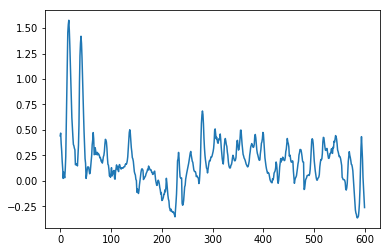

In [44]:
plt.plot(range(600), adjoint_predicts_array[:600])

In [25]:
targets = []
for step in range(100):
    sample_batch, target_batch = next(test_mul)
    targets.append(target_batch)

targets = np.vstack(targets)

In [26]:
targets.shape

(12800, 240, 1)

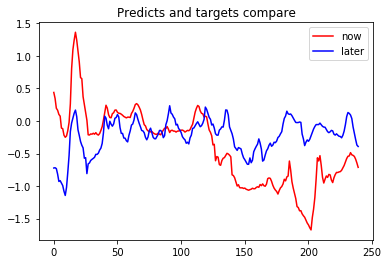

In [57]:
# validate the display of data is connected
import matplotlib.pyplot as plt

epochs = range(0, 240)

plt.figure()
plt.plot(epochs, targets[0,:,0], 'r', label='now')
plt.plot(epochs, targets[6*240,:,0], 'b', label='later')
plt.title('Predicts and targets compare')
plt.legend()

plt.show()

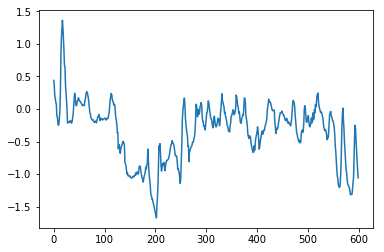

In [15]:
adjoint_targets = []
i = 0
while i * targets.shape[1] * 6 < targets.shape[0]:
    adjoint_targets.append(targets[i * targets.shape[1] * 6, :])
    i = i + 1

adjoint_targets_array = np.vstack(adjoint_targets)
adjoint_targets_array = adjoint_targets_array.reshape(-1)
plt.plot(range(600), adjoint_targets_array[:600])

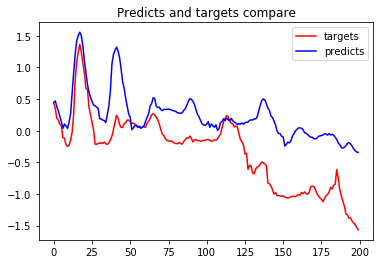

In [62]:
import matplotlib.pyplot as plt

epochs = range(0, 200)

plt.figure()
plt.plot(epochs, adjoint_targets_array[:200], 'r', label='targets')
plt.plot(epochs, adjoint_predicts_array[:200], 'b', label='predicts')
plt.title('Predicts and targets compare')
plt.legend()

plt.show()

In [51]:
scoreSeg = model.evaluate_generator(test_mul, steps=100, workers=4)
print("mean_absolute_error = ", scoreSeg)

mean_absolute_error =  [0.65935558229684832, 0.65935563892126081]


In [28]:
from keras import layers
from keras.models import Model

inputs = layers.Input(shape=(None, float_data.shape[-1]))
gru_1layer = layers.GRU(32, dropout=0.2, recurrent_dropout=0.5, return_sequences=True)(inputs)
gru_2layer = layers.GRU(64, dropout=0.1, recurrent_dropout=0.5,
                        activation='relu', return_sequences=True)(gru_1layer)
outputs = layers.TimeDistributed(layers.Dense(1, input_dim=(lookback // step, 64)))(gru_2layer)
model = Model(inputs=inputs, outputs=outputs)
model.summary()
model.compile(optimizer='rmsprop',
              loss='mae',
              metrics=['mae'])
model.fit_generator(train_mul,
                    steps_per_epoch=500,
                    epochs=30)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, 14)          0         
_________________________________________________________________
gru_3 (GRU)                  (None, None, 32)          4512      
_________________________________________________________________
gru_4 (GRU)                  (None, None, 64)          18624     
_________________________________________________________________
time_distributed_2 (TimeDist (None, None, 1)           65        
Total params: 23,201
Trainable params: 23,201
Non-trainable params: 0
_________________________________________________________________


Epoch 1/30


KeyboardInterrupt: 

In [10]:
predicts = model.predict_generator(test_mul, steps=100, workers=4)

In [11]:
adjoint_predicts = []
i = 0
while i * predicts.shape[1] * 6 < predicts.shape[0]:
    adjoint_predicts.append(predicts[i * predicts.shape[1] * 6, :])
    i = i + 1

adjoint_predicts_array = np.vstack(adjoint_predicts)
adjoint_predicts_array = adjoint_predicts_array.reshape(-1)

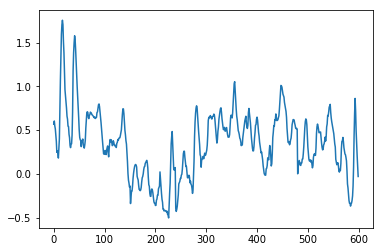

In [12]:
plt.plot(range(600), adjoint_predicts_array[:600])

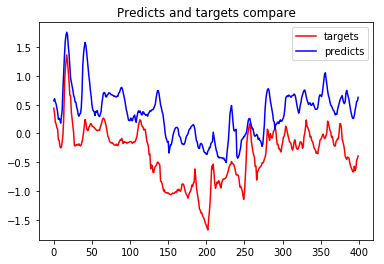

In [17]:
import matplotlib.pyplot as plt

epochs = range(0, 400)

plt.figure()
plt.plot(epochs, adjoint_targets_array[:400], 'r', label='targets')
plt.plot(epochs, adjoint_predicts_array[:400], 'b', label='predicts')
plt.title('Predicts and targets compare')
plt.legend()

plt.show()